# Hassan Shah
# Github Username: hhsusc
# USC ID: 1327117848
# DSCI 552
# HW 8

## Imports

In [144]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn import preprocessing
import random
import statistics
from sklearn.svm import LinearSVC
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.metrics import confusion_matrix,accuracy_score,roc_curve,auc,f1_score,precision_score,recall_score
from sklearn.cluster import KMeans
from sklearn.neighbors import NearestNeighbors

## 1. Supervised, Semi-Supervised, and Unsupervised Learning

(a)
Download the Breast Cancer Wisconsin (Diagnostic) Data Set from:
https://archive.ics.uci.edu/ml/datasets/Breast+Cancer+Wisconsin+
%28Diagnostic%29
. Download the data in
https://archive.ics.uci.edu/ml/
machine-learning-databases/breast-cancer-wisconsin/wdbc.data
, which
has IDs, classes (Benign=B, Malignant=M), and 30 attributes. This data has
two output classes.

In [79]:
df = pd.read_csv("../data_HW8/wdbc.data", header = None)
cols = ["id","class","f1","f2","f3","f4","f5","f6","f7","f8","f9","f10",
      "f11","f12","f13","f14","f15","f16","f17","f18","f19","f20",
        "f21","f22","f23","f24","f25","f26","f27","f28","f29","f30"]
df.columns = cols
df.head()

,id,class,f1,f2,f3,f4,f5,f6,f7,f8,...,f21,f22,f23,f24,f25,f26,f27,f28,f29,f30
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [80]:
df.shape

(569, 32)

In [81]:
# Preprocessing

# Switching yes and no to 0 and 1
df = df.replace(['B'], 0)
df = df.replace(['M'], 1)
df_class = df['class']

# Switching yes and no to 0 and 1
df = df.replace(['B'], 0)
df = df.replace(['M'], 1)

# Drop non-feature columns
df = df.drop(['id', 'class'], axis=1)

# Normalizing features 
scaler = preprocessing.MinMaxScaler()
cols = ["f1","f2","f3","f4","f5","f6","f7","f8","f9","f10",
      "f11","f12","f13","f14","f15","f16","f17","f18","f19","f20",
        "f21","f22","f23","f24","f25","f26","f27","f28","f29","f30"]
df = pd.DataFrame(scaler.fit_transform(df), columns=cols)

# Adding class back in
df['class'] = df_class

df.head()

,f1,f2,f3,f4,f5,f6,f7,f8,f9,f10,...,f22,f23,f24,f25,f26,f27,f28,f29,f30,class
0,0.521037,0.022658,0.545989,0.363733,0.593753,0.792037,0.703140,0.731113,0.686364,0.605518,...,0.141525,0.668310,0.450698,0.601136,0.619292,0.568610,0.912027,0.598462,0.418864,1
1,0.643144,0.272574,0.615783,0.501591,0.289880,0.181768,0.203608,0.348757,0.379798,0.141323,...,0.303571,0.539818,0.435214,0.347553,0.154563,0.192971,0.639175,0.233590,0.222878,1
2,0.601496,0.390260,0.595743,0.449417,0.514309,0.431017,0.462512,0.635686,0.509596,0.211247,...,0.360075,0.508442,0.374508,0.483590,0.385375,0.359744,0.835052,0.403706,0.213433,1
3,0.210090,0.360839,0.233501,0.102906,0.811321,0.811361,0.565604,0.522863,0.776263,1.000000,...,0.385928,0.241347,0.094008,0.915472,0.814012,0.548642,0.884880,1.000000,0.773711,1
4,0.629893,0.156578,0.630986,0.489290,0.430351,0.347893,0.463918,0.518390,0.378283,0.186816,...,0.123934,0.506948,0.341575,0.437364,0.172415,0.319489,0.558419,0.157500,0.142595,1


(b)
Monte-Carlo Simulation : Repeat the following procedures for supervised, unsupervised, and semi-supervised learning M = 30 times, and use randomly selected train and test data (make sure you use 20% of both the positve and negative classes as the test set). Then compare the
average scores (accuracy, precision, recall, F1 score, and AUC) that you obtain from each algorithm.

i.
Supervised Learning:
Train an
L
1
-penalized SVM to classify the data.
Use 5 fold cross validation to choose the penalty parameter. Use normalized
data. Report the average accuracy, precision, recall,
F
1
-score, and AUC, for
both training and test sets over your
M
runs. Plot the ROC and report the
confusion matrix for training and testing in one of the runs.

In [82]:
x_pos = df[df['class']==1]
x_neg = df[df['class']==0]

In [90]:
acc_test = []
precision_test = []
recall_test = []
f1_test = []
auc_test = []

acc_train = []
precision_train = []
recall_train = []
f1_train = []
auc_train = []

# For determining C parameter
c_values = np.logspace(-3, 6, 10)

for i in range(30):
    test_df = pd.concat([x_pos.sample(frac=0.2,random_state=random.randint(0,1000))
                     ,x_neg.sample(frac=0.2,random_state=random.randint(0, 1000))])
    train_df = df.drop(index=test_df.index.tolist())
    
    x_test = test_df.drop(['class'],axis=1)
    y_test = test_df['class']
    x_train = train_df.drop(['class'],axis=1)
    y_train = train_df['class']
    
    svc = LinearSVC(penalty='l1', dual=False, max_iter=1000000)
    params = {'C':c_values}
    grid = GridSearchCV(svc, param_grid=params, cv=5)
    grid.fit(x_train, y_train)
    
    # Test set predictions
    svc = LinearSVC(penalty='l1', dual=False,C=grid.best_params_['C'], max_iter=1000000)
    svc.fit(x_train, y_train)
    y_pred = svc.predict(x_test)
    
    acc_test.append(accuracy_score(y_test, y_pred))
    precision_test.append(precision_score(y_test, y_pred))
    recall_test.append(recall_score(y_test, y_pred))
    f1_test.append(f1_score(y_test, y_pred))
    
    fpr_test, tpr_test, _ = roc_curve(y_test, y_pred)
    auc_test.append(auc(fpr_test, tpr_test))
    
    # Train set predictions
    y_pred_train = svc.predict(x_train)
    
    acc_train.append(accuracy_score(y_train, y_pred_train))
    precision_train.append(precision_score(y_train, y_pred_train))
    recall_train.append(recall_score(y_train, y_pred_train))
    f1_train.append(f1_score(y_train, y_pred_train))
    
    fpr_train, tpr_train, _ = roc_curve(y_train, y_pred_train)
    auc_train.append(auc(fpr_train, tpr_train))

print("Test Accuracy Score:", statistics.mean(acc_test))
print("Test Precision Score:", statistics.mean(precision_test))
print("Test Recall Score:", statistics.mean(recall_test))
print("Test F1 Score:", statistics.mean(f1_test))
print("Test AUC:", statistics.mean(auc_test))
print("")

print("Training Accuracy Score:", statistics.mean(acc_train))
print("Training Precision Score:", statistics.mean(precision_train))
print("Training Recall Score:", statistics.mean(recall_train))
print("Training F1 Score:", statistics.mean(f1_train))
print("Training AUC:", statistics.mean(auc_train))

Test Accuracy Score: 0.9654867256637168
Test Precision Score: 0.9642861156754192
Test Recall Score: 0.9428571428571428
Test F1 Score: 0.9528536912815614
Test AUC: 0.9608651911468813

Training Accuracy Score: 0.9853070175438596
Training Precision Score: 0.989606981956925
Training Recall Score: 0.9707843137254902
Training F1 Score: 0.9800848524186058
Training AUC: 0.9823618538324421


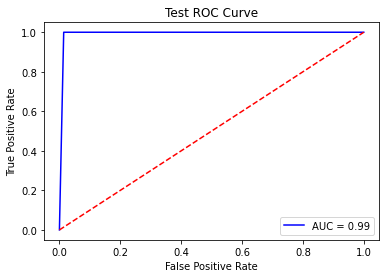

Test Confusion Matrix:
[[70  1]
 [ 0 42]]


In [92]:
# Using last run

plt.title('Test ROC Curve')
plt.plot(fpr_test, tpr_test, 'b', label='AUC = %0.2f'%auc(fpr_test, tpr_test)) #AUC to two decimals
plt.legend(loc='lower right')
plt.plot([0,1],[0,1],'r--') #diagonal
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

cm = confusion_matrix(y_test, y_pred)
print("Test Confusion Matrix:")
print(cm)

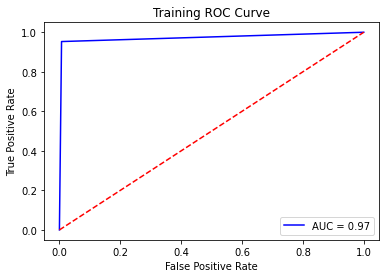

Test Confusion Matrix:
[[284   2]
 [  8 162]]


In [93]:
# Using last run

plt.title('Training ROC Curve')
plt.plot(fpr_train, tpr_train, 'b', label='AUC = %0.2f'%auc(fpr_train, tpr_train)) #AUC to two decimals
plt.legend(loc='lower right')
plt.plot([0,1],[0,1],'r--') #diagonal
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

cm = confusion_matrix(y_train, y_pred_train)
print("Test Confusion Matrix:")
print(cm)

ii.
Semi-Supervised Learning/ Self-training:
select 50% of the positive
class along with 50% of the negative class in the training set as
labeled data
and the rest as
unlabelled data
. You can select them randomly.

A.
Train an
L
1
-penalized SVM to classify the labeled data Use normalized
data. Choose the penalty parameter using 5 fold cross validation.  
B.
Find the unlabeled data point that is the farthest to the decision boundary
of the SVM. Let the SVM label it (ignore its true label), and add it to
the labeled data, and retrain the SVM. Continue this process until all
unlabeled data are used. Test the final SVM on the test data andthe
average accuracy, precision, recall,
F
1
-score, and AUC, for both training
and test sets over your
M
runs. Plot the ROC and report the confusion
matrix for training and testing in one of the runs.

In [141]:
acc_test = []
precision_test = []
recall_test = []
f1_test = []
auc_test = []

acc_train = []
precision_train = []
recall_train = []
f1_train = []
auc_train = []

for i in range(30):
    test_df = pd.concat([x_pos.sample(frac=0.2,random_state=random.randint(0,1000))
                     ,x_neg.sample(frac=0.2,random_state=random.randint(0, 1000))])
    train_df = df.drop(index=test_df.index.tolist())

    x_test = test_df.drop(['class'],axis=1)
    y_test = test_df['class']
    x_train = train_df.drop(['class'],axis=1)
    y_train = train_df['class']

    # Using train-test split to split labeled and unlabeled data
    x_label, x_unlabel, y_label, y_unlabel = train_test_split(x_train, y_train, test_size=0.50, stratify=y_train)
    x_label=x_label.reset_index(drop=True)
    x_unlabel=x_unlabel.reset_index(drop=True)
    y_label=y_label.reset_index(drop=True)
    y_unlabel=pd.DataFrame(y_unlabel)
    y_unlabel=y_unlabel.reset_index(drop=True)
    
    svc = LinearSVC(penalty='l1', dual=False, max_iter=1000000)
    params = {'C':c_values}
    svc = GridSearchCV(svc, param_grid=params, cv=5)
    svc.fit(x_label.values, y_label.values.ravel())
    
    x_label_df = pd.DataFrame()
    x_label_df = pd.concat([x_label,x_label_df],axis=0,ignore_index=True)
    
    y_label = y_label.rename(0)
    y_label = pd.DataFrame(y_label)
    y_label_df = pd.DataFrame()
    y_label_df = pd.concat([y_label,y_label_df],axis=0,ignore_index=True)
    

    while len(x_unlabel)>1:
        max_dist = np.array(x_unlabel.iloc[np.argmax(np.absolute(svc.decision_function(x_unlabel)))])
        max_dist = max_dist.reshape(1,-1)
        y_pred = svc.predict(max_dist)
        max_dist = pd.DataFrame(max_dist)
        
        x_label_df =pd.concat([x_label_df,max_dist],axis=0,ignore_index=True)
        
        y_pred = np.array(y_pred)
        y_pred = y_pred.reshape(1,-1)             
        y_pred = pd.DataFrame(y_pred)
        
        y_label_df = pd.concat([y_label_df,y_pred],axis=0,ignore_index=True)
        
        svc = LinearSVC(penalty='l1', dual=False, max_iter=1000000)
        params = {'C':c_values}
        svc = GridSearchCV(svc, param_grid=params, cv=5)
        svc.fit(x_label.values, y_label.values.ravel())
                                 
        x_unlabel = x_unlabel.drop(index=np.argmax(np.absolute(svc.decision_function(x_unlabel))))
        x_unlabel = x_unlabel.reset_index(drop=True)
        y_unlabel = y_unlabel.drop(index=np.argmax(np.absolute(svc.decision_function(x_unlabel))))
        y_unlabel = y_unlabel.reset_index(drop=True)
        
    # Test set predictions
    y_pred = svc.predict(x_test)

    acc_test.append(accuracy_score(y_test, y_pred))
    precision_test.append(precision_score(y_test, y_pred))
    recall_test.append(recall_score(y_test, y_pred))
    f1_test.append(f1_score(y_test, y_pred))

    fpr_test, tpr_test, _ = roc_curve(y_test, y_pred)
    auc_test.append(auc(fpr_test, tpr_test))

    # Train set predictions
    y_pred_train = svc.predict(x_train)

    acc_train.append(accuracy_score(y_train, y_pred_train))
    precision_train.append(precision_score(y_train, y_pred_train))
    recall_train.append(recall_score(y_train, y_pred_train))
    f1_train.append(f1_score(y_train, y_pred_train))

    fpr_train, tpr_train, _ = roc_curve(y_train, y_pred_train)
    auc_train.append(auc(fpr_train, tpr_train))

print("Test Accuracy Score:", statistics.mean(acc_test))
print("Test Precision Score:", statistics.mean(precision_test))
print("Test Recall Score:", statistics.mean(recall_test))
print("Test F1 Score:", statistics.mean(f1_test))
print("Test AUC:", statistics.mean(auc_test))
print("")

print("Training Accuracy Score:", statistics.mean(acc_train))
print("Training Precision Score:", statistics.mean(precision_train))
print("Training Recall Score:", statistics.mean(recall_train))
print("Training F1 Score:", statistics.mean(f1_train))
print("Training AUC:", statistics.mean(auc_train))

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(228, 1)
[2.15561298 2.62265936 1.84995749 1.03101442 1.31159424 3.41216167
 0.67337894 3.26047092 1.73221902 0.67829898 1.20307718 1.00455018
 1.6229477  1.08901407 0.71870791 1.45494128 1.66451722 2.47593402
 1.60445649 1.55254835 1.30567138 1.58644897 1.36209416 0.82282874
 2.1543255  1.88586714 0.16000103 1.25608823 2.25678704 2.76889455
 0.07544868 0.07971911 3.31027758 2.27758815 1.14118232 1.84746164
 2.40218708 2.17226582 1.82331371 4.86164003 5.44499576 2.90248813
 0.08688785 0.23781687 0.30970298 0.89934228 1.05580027 0.09758315
 0.02036401 2.2161298  1.77408465 3.47530959 2.76572422 2.78763859
 1.16016299 3.65919583 2.4555158  1.97087079 1.20474197 2.24401755
 1.54644605 2.24871655 1.97564542 0.66428416 1.495341   2.35418062
 2.16300308 0.77241057 1.8348068  3.08124242 1.05080003 1.41532209
 1.95079413 2.94304187 1.54395068 1.77676398 1.73677386 0.52139504
 0.52631253 0.36917089 1.65609866 2.11070272 1.43404855 0.5856625
 0.87560683 1.21552265 1.73683694 2.35663284 1.7919115

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(227, 1)
[5.30572524e+00 9.53021923e+00 4.22321625e+00 3.09435517e+00
 3.71300625e+00 8.35732135e+00 1.14788683e+00 1.91621247e+01
 7.92480457e+00 4.49499553e+00 4.20834317e+00 2.95491789e+00
 6.38441166e+00 2.37184930e+00 2.31268697e+00 1.23133532e+00
 1.09600368e+01 1.25953005e+01 6.23085593e+00 2.71786028e+00
 5.73757549e+00 4.61306378e+00 4.30166807e+00 3.34638215e+00
 1.08898616e+01 5.76412151e+00 1.31292169e+00 7.10171794e+00
 1.18348200e+01 1.17749681e+01 3.78806858e-01 1.21591455e-02
 1.04713853e+01 1.03771291e+01 5.84189386e+00 3.08002547e+00
 8.93324683e+00 5.81933831e+00 3.93909114e+00 2.61790673e+01
 2.15528217e+01 1.98541925e+01 1.59644119e+00 1.74252904e+00
 1.23734254e+01 4.59722948e+00 1.45511725e+00 1.44722292e+00
 1.54521550e+00 9.51813085e+00 6.47234922e+00 1.15556917e+01
 1.14747004e+01 7.59274335e+00 5.66321227e+00 1.95058134e+01
 2.71951938e+00 3.32508050e+00 1.32978067e+00 5.93422179e+00
 5.06008046e+00 4.28112787e+00 5.36869375e+00 3.12326521e+00
 3.90422009e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(226, 1)
[5.34673810e+00 9.45871353e+00 4.22245862e+00 3.10106162e+00
 3.74782493e+00 8.33031625e+00 1.11178009e+00 1.89625683e+01
 7.90184074e+00 4.53635104e+00 4.13099383e+00 3.06010996e+00
 6.36737216e+00 2.41749864e+00 2.27345493e+00 1.25805705e+00
 1.08272106e+01 1.24269079e+01 6.19877156e+00 2.78202550e+00
 5.70999488e+00 4.64081794e+00 4.31206197e+00 3.34439647e+00
 1.08921004e+01 5.73542161e+00 1.27892905e+00 7.12754782e+00
 1.17629506e+01 1.16086936e+01 3.66067910e-01 1.03101449e-01
 1.02446005e+01 1.03634150e+01 5.83940960e+00 3.11653701e+00
 8.86146010e+00 5.81072701e+00 3.96550707e+00 2.13774568e+01
 1.97228658e+01 1.59849490e+00 1.79705109e+00 1.22355957e+01
 4.63032761e+00 1.45330057e+00 1.34074813e+00 1.50487035e+00
 9.48925747e+00 6.46629883e+00 1.14416226e+01 1.13528615e+01
 7.45299969e+00 5.69402734e+00 1.92054267e+01 2.69782147e+00
 3.36396621e+00 1.31412362e+00 5.95929170e+00 5.02225689e+00
 4.33822744e+00 5.26373977e+00 3.16830303e+00 3.88610182e+00
 5.30178330e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(225, 1)
[ 5.42238674  9.40074968  4.24941199  3.08424722  3.746266    8.4182657
  1.19558149 18.94406815  7.84087821  4.44557477  4.1399694   2.98965751
  6.45542089  2.39167291  2.32908545  1.27993508 10.9009581  12.40547908
  6.24014034  2.76902076  5.70649865  4.60833991  4.33224512  3.27414662
 10.8706096   5.77347075  1.30436839  7.16669599 11.88072431 11.64720131
  0.37513292  0.06794904 10.19963085 10.55453961  5.85013565  3.12166122
  8.80245024  5.84873385  3.95267025 21.48564076 19.82669402  1.49294127
  1.79145192 12.40196658  4.63843601  1.47054375  1.34716358  1.50956904
  9.47420711  6.4494071  11.2685043  11.32421621  7.51840956  5.72468195
 19.31412192  2.83635439  3.37924389  1.34162455  6.0355943   5.21363593
  4.30350772  5.30329008  3.10271165  3.85658689  5.32280549 12.67850637
  1.96473603  4.69687363 12.36996436  5.47005466  5.57762294  4.64356633
 13.5371598   4.47466993  8.38100614  5.09696029  1.76614956  0.20115087
  0.63489613 13.08696706  5.67612765  6.966

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(224, 1)
[ 5.36347427  9.39648482  4.25680383  3.05080014  3.74124322  8.51275334
  1.09111901 18.94420517  7.85437385  4.40323186  4.12729832  3.06464798
  6.32816691  2.39953197  2.27797909  1.27809501 10.79148905 12.283083
  6.20662037  2.77553623  5.70891838  4.63996873  4.31352053  3.24322651
 10.84030863  5.74619191  1.20388365  7.15510976 11.78899876 11.66447646
  0.33329493  0.06675563 10.33850978 10.34892544  5.75914043  3.11899962
  8.83938053  5.82272893  3.95965978 21.35206166 19.69440933  1.64959306
  1.75892293 12.30272958  4.49050029  1.47764426  1.33008449  1.49607742
  9.45331171  6.45938336 11.49154147 11.29076859  7.47619805  5.64324182
 19.34005555  2.82643408  3.37230569  1.34477302  5.98379812  5.07466969
  4.33692453  5.32188996  3.08250426  3.85473773  5.30961388 12.41415067
  1.95582272  4.7193313  12.42756002  5.40543484  5.58075292  4.54604454
 13.45562104  4.44918829  8.3542372   5.09928189  1.80577773  0.24465057
  0.62461474 13.00985418  5.68618673  6.9177

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(223, 1)
[ 5.41922805  9.51540423  4.2460133   3.02517641  3.74820106  8.59087871
  1.09291422 18.98396832  7.91904198  4.35348741  4.1914511   3.09973823
  6.4356266   2.42810854  2.28513796  1.31612675 10.88405531 12.44129456
  6.2319712   2.76235599  5.68032848  4.6217543   4.32929625  3.20701877
 10.91075916  5.79213578  1.23618651  7.25588013 11.87867121 11.76437406
  0.35501698  0.1373745  10.4773016  10.38682163  5.87990531  3.15172702
  8.86979691  5.85674539  3.95199048 21.69867618 19.81927734  1.45789939
  1.81323037 12.17553767  4.61374412  1.47105381  1.3126293   1.46639421
  9.50067485  6.54229837 11.53494241 11.42248834  7.5845478   5.75655302
 19.37373677  3.19525237  3.44855995  1.34257978  6.06368571  5.20373586
  4.37610458  5.39172951  3.11135499  3.89130285  5.2816842  12.48128842
  1.97183697  4.76340632 12.53796955  5.37956335  5.66906795  4.5997747
 13.6590172   4.43794239  8.43802567  5.14524872  1.76463621  0.20551576
  0.63825264 12.9946922   5.69729122  6.836

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(222, 1)
[5.41813279e+00 9.41155885e+00 4.25706406e+00 3.08095554e+00
 3.75143860e+00 8.47430207e+00 1.06342931e+00 1.88790378e+01
 7.87407811e+00 4.41094264e+00 4.10506759e+00 3.03527476e+00
 6.38038026e+00 2.42015262e+00 2.28699925e+00 1.30860588e+00
 1.08229374e+01 1.23394709e+01 6.20081085e+00 2.79742945e+00
 5.68099847e+00 4.62883437e+00 4.32294259e+00 3.26634025e+00
 1.08453965e+01 5.75174552e+00 1.30592482e+00 7.14798599e+00
 1.18275653e+01 1.16513596e+01 3.65315427e-01 1.20885787e-01
 1.02120868e+01 1.04670411e+01 5.81425344e+00 3.17783149e+00
 8.82551080e+00 5.85014833e+00 3.94618292e+00 1.97010897e+01
 1.57599707e+00 1.75259363e+00 1.23056263e+01 4.61715945e+00
 1.47243150e+00 1.30400402e+00 1.46637606e+00 9.46384225e+00
 6.44538601e+00 1.13030486e+01 1.13075791e+01 7.50275989e+00
 5.71123816e+00 1.92378397e+01 2.90462246e+00 3.40877503e+00
 1.32617789e+00 6.06287844e+00 5.12909184e+00 4.36943408e+00
 5.36877953e+00 3.14936274e+00 3.84375972e+00 5.33023114e+00
 1.25476832e+01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(221, 1)
[5.36679156e+00 9.43966084e+00 4.23111188e+00 3.09173289e+00
 3.72027737e+00 8.31985522e+00 1.16760975e+00 1.89725257e+01
 7.85409252e+00 4.49308395e+00 4.15232933e+00 2.98949057e+00
 6.38303457e+00 2.38519720e+00 2.32199547e+00 1.24859942e+00
 1.08808119e+01 1.24646164e+01 6.22203312e+00 2.74507347e+00
 5.71508488e+00 4.61182264e+00 4.31398192e+00 3.31114242e+00
 1.08912018e+01 5.75213335e+00 1.32728069e+00 7.13865721e+00
 1.18167755e+01 1.16048857e+01 3.87048017e-01 2.62373551e-02
 1.02096723e+01 1.04857262e+01 5.84917266e+00 3.09075268e+00
 8.82653812e+00 5.81967157e+00 3.94700933e+00 1.98008930e+01
 1.47934486e+00 1.77794982e+00 1.23315621e+01 4.65898809e+00
 1.46682397e+00 1.38852708e+00 1.52436281e+00 9.46836167e+00
 6.44388755e+00 1.13773609e+01 1.13443191e+01 7.49501828e+00
 5.68989370e+00 1.92810950e+01 2.63195411e+00 3.33454188e+00
 1.33407542e+00 5.96804668e+00 5.08685208e+00 4.27625395e+00
 5.28423494e+00 3.13537677e+00 3.85847406e+00 5.30319288e+00
 1.26087377e+01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(220, 1)
[2.15544979 2.62265486 1.84982713 1.03104374 1.31151667 3.41204679
 0.6733725  3.26082992 1.73229104 0.67835481 1.20310486 1.00468767
 1.62302799 1.08894678 0.71862622 1.45476671 1.6647648  2.47587904
 1.60440784 1.5526289  1.30562788 1.58647794 1.36190951 0.82290931
 2.15461518 1.88573592 0.15991032 1.25621673 2.25672676 2.7687684
 0.07524989 0.07953286 3.31050786 2.27767972 1.14109812 1.84729618
 2.40215882 2.17208776 1.82322482 2.90271213 0.08700936 0.23778345
 0.30944594 0.89929681 1.05569171 0.09766795 0.02036526 2.21610648
 1.7743374  3.47557591 2.76562658 2.78748165 1.15996135 3.65938757
 2.45478879 1.97072625 1.2047209  2.24394197 1.54633706 2.24852342
 1.97558578 0.6643897  1.4953686  2.35402306 2.16308252 0.77232077
 1.83480948 3.08169787 1.05077734 1.41537976 1.95076921 2.94294512
 1.54391071 1.7770184  1.73672811 0.52142396 0.52632261 0.36924102
 1.65647501 2.11066689 1.43409957 0.58582316 0.87560956 1.21574387
 1.73663572 2.3568127  1.79200978 0.95559483 1.7695683

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(219, 1)
[ 5.36944214  9.52603385  4.23901148  3.09692572  3.73096975  8.49456057
  1.14884766 19.06443585  7.93062187  4.43644738  4.1991834   3.03552378
  6.42878372  2.3803625   2.297146    1.27798197 10.95328165 12.48367327
  6.21563259  2.75150132  5.68883862  4.62843473  4.33400264  3.25953522
 10.85451481  5.77411781  1.22835351  7.19190401 11.87666019 11.76396489
  0.35056482  0.09148145 10.51062912 10.3973772   5.84745754  3.09657154
  8.95503092  5.84906284  3.96213255  1.53344229  1.78836733 12.34870044
  4.53375946  1.47623814  1.343872    1.49523622  9.51824315  6.50263534
 11.55667784 11.41002106  7.56684646  5.73587195 19.47527689  2.9807283
  3.40021919  1.34155887  5.99210749  5.11599235  4.32022733  5.3340716
  3.05872288  3.86463008  5.27200246 12.47989903  1.98263646  4.72027702
 12.4755453   5.39286711  5.63013879  4.58809706 13.65426064  4.41189934
  8.44612676  5.11055152  1.78434761  0.24143286  0.6280382  12.99792889
  5.65588285  6.84236637  2.99553611  1.5658

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(218, 1)
[ 5.48932508  9.48315551  4.27710629  3.06397794  3.77514677  8.58405694
  1.14569246 18.92764097  7.86589725  4.36304833  4.14974978  3.06993771
  6.43515176  2.42425002  2.3272267   1.31845681 10.88838887 12.41515506
  6.23214313  2.78222952  5.6761618   4.61559062  4.35204603  3.21498
 10.88817682  5.80233868  1.30427727  7.26692316 11.93147554 11.69409714
  0.37224373  0.14322517 10.32283267 10.58573375  5.89866195  3.15624926
  8.85523703  5.88446012  3.98499245  1.42764116  1.79327041 12.36391335
  4.6635759   1.4903668   1.26325839  1.44421848  9.55032813  6.51651908
 11.42810235 11.387705    7.58900351  5.78671747  3.16753186  3.42996772
  1.34253275  6.08597771  5.25009642  4.35370269  5.33344567  3.06570238
  3.83060474  5.37766221 12.62547857  1.94422262  4.76152402 12.37722272
  5.43950074  5.64622264  4.71829903 13.63846003  4.5017032   8.34479318
  5.14975173  1.76332624  0.19583743  0.59060118 13.00737344  5.74165292
  6.93640118  3.00719155  1.57465042  7.32431

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(217, 1)
[5.39648119e+00 9.36128561e+00 4.27721473e+00 3.07587937e+00
 3.76221137e+00 8.39188079e+00 1.12020494e+00 7.85273911e+00
 4.46567989e+00 4.11270364e+00 3.04906052e+00 6.34027135e+00
 2.44361445e+00 2.32480381e+00 1.24117234e+00 1.07117729e+01
 1.23544687e+01 6.24149628e+00 2.82352511e+00 5.73416077e+00
 4.62180310e+00 4.29059148e+00 3.30172376e+00 1.08285391e+01
 5.74175289e+00 1.36203064e+00 7.12937648e+00 1.17491216e+01
 1.15025876e+01 3.52822349e-01 4.59025909e-03 1.00017079e+01
 1.05904262e+01 5.76692521e+00 3.17191698e+00 8.70021594e+00
 5.81385795e+00 3.96700190e+00 1.62229195e+00 1.69724829e+00
 1.23874444e+01 4.67552807e+00 1.45600236e+00 1.40089620e+00
 1.50099858e+00 9.50718472e+00 6.40672352e+00 1.11163331e+01
 1.12804630e+01 7.53144361e+00 5.61961173e+00 2.60695638e+00
 3.34108019e+00 1.29926272e+00 6.01164251e+00 5.15020777e+00
 4.36420648e+00 5.27091766e+00 3.07494783e+00 3.83098664e+00
 5.39215396e+00 1.26542318e+01 1.92576710e+00 4.70389163e+00
 1.23041788e+01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(216, 1)
[5.35422405e+00 9.43667169e+00 4.24155028e+00 3.09659035e+00
 3.73548631e+00 8.33783899e+00 1.29333156e+00 7.87464961e+00
 4.56525375e+00 4.17883101e+00 3.06033825e+00 6.40661022e+00
 2.41950740e+00 2.33990585e+00 1.20072167e+00 1.08273275e+01
 1.24489289e+01 6.27953105e+00 2.75971863e+00 5.77523783e+00
 4.64439692e+00 4.31863921e+00 3.32630193e+00 1.08682199e+01
 5.74920621e+00 1.26250573e+00 7.17348861e+00 1.17796398e+01
 1.15659201e+01 3.21516737e-01 3.60674491e-02 1.02211639e+01
 1.05746078e+01 5.79481455e+00 3.09342205e+00 8.76615598e+00
 5.81379303e+00 3.97235812e+00 1.58867271e+00 1.77620708e+00
 1.23954071e+01 4.62913135e+00 1.45195387e+00 1.44719268e+00
 1.57369453e+00 9.51518590e+00 6.48080114e+00 1.13415418e+01
 1.13249834e+01 7.52265159e+00 5.66189135e+00 2.55159811e+00
 3.33040570e+00 1.30396817e+00 5.92509446e+00 5.15225556e+00
 4.30900657e+00 5.16460624e+00 3.04412635e+00 3.88187439e+00
 5.31284771e+00 1.26663348e+01 1.96388852e+00 4.68668782e+00
 1.23770378e+01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(215, 1)
[ 5.40937883  9.37614703  4.27392206  3.08600526  3.72655579  8.34663957
  1.08911811  7.86900772  4.48198663  4.0758      3.02570205  6.33424997
  2.43712184  2.30629028  1.25575268 10.73911884 12.3584708   6.25325669
  2.827683    5.7137712   4.6381303   4.2923375   3.29773354 10.85264128
  5.74751312  1.36563392  7.15385454 11.73928195 11.47123123  0.37856492
  0.02145147  9.99703529 10.60399513  5.7577585   3.17034613  8.7226221
  5.82085285  3.96997417  1.50508829  1.69938479 12.36820598  4.65481328
  1.45916714  1.38478158  1.48655899  9.46586861  6.41637668 11.16424762
 11.278375    7.48530453  5.61961831  2.59263515  3.36167708  1.31980639
  6.03117729  5.0855487   4.33569068  5.26714502  3.13778344  3.86015293
  5.39099796 12.58547504  1.95763062  4.73245179 12.38621596  5.44513604
  5.53081325  4.68333673 13.33304149  4.54626994  8.24108613  5.07433589
  1.79795362  0.21246353  0.67845099 13.16942448  5.73275777  7.10478804
  3.10098163  1.53884266  7.58024314  4.071

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(214, 1)
[5.42514678e+00 9.38867926e+00 4.27464924e+00 3.05787183e+00
 3.76524742e+00 8.60069393e+00 1.18722633e+00 7.83571914e+00
 4.33935519e+00 4.11007192e+00 3.08529627e+00 6.53753511e+00
 2.39025246e+00 2.30492607e+00 1.26794224e+00 1.08579444e+01
 1.22432429e+01 6.22795354e+00 2.79944638e+00 5.69273590e+00
 4.63579088e+00 4.32384048e+00 3.19198750e+00 1.08484961e+01
 5.78395762e+00 1.14641132e+00 7.23283604e+00 1.18707003e+01
 1.16278458e+01 2.84443928e-01 6.31836716e-02 1.03324157e+01
 1.04951541e+01 5.83032750e+00 3.09234119e+00 8.81197495e+00
 5.86149755e+00 3.98613374e+00 1.62254867e+00 1.81532833e+00
 1.24467098e+01 4.48607289e+00 1.48213350e+00 1.29019591e+00
 1.47150493e+00 9.45573796e+00 6.47656689e+00 1.14138733e+01
 1.12458250e+01 7.46444785e+00 5.68907125e+00 2.92656325e+00
 3.40249135e+00 1.38477119e+00 6.03429959e+00 5.21798460e+00
 4.32780571e+00 5.25466312e+00 3.02600036e+00 3.86839822e+00
 5.34442167e+00 1.25455105e+01 1.95818188e+00 4.76402240e+00
 1.23268937e+01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(213, 1)
[5.44927745e+00 9.53340150e+00 4.26358494e+00 3.10363630e+00
 3.72599429e+00 8.50050978e+00 9.48378242e-01 7.95402847e+00
 4.39147558e+00 4.08083778e+00 3.02304066e+00 6.36009350e+00
 2.43568203e+00 2.25907272e+00 1.34340138e+00 1.08582633e+01
 1.24416346e+01 6.19026813e+00 2.81366912e+00 5.62698752e+00
 4.63835270e+00 4.32170297e+00 3.25937092e+00 1.08684929e+01
 5.76724940e+00 1.37089941e+00 7.17858325e+00 1.18396422e+01
 1.16829581e+01 4.04698352e-01 1.92790158e-01 1.03105203e+01
 1.04851762e+01 5.84751233e+00 3.21973562e+00 8.93117362e+00
 5.88069988e+00 3.95614499e+00 1.45967291e+00 1.70988398e+00
 1.22748606e+01 4.64025972e+00 1.47623689e+00 1.26174517e+00
 1.40361206e+00 9.49177507e+00 6.48358127e+00 1.14473648e+01
 1.14007635e+01 7.54173532e+00 5.74388735e+00 3.05381701e+00
 3.45926787e+00 1.32907102e+00 6.11639229e+00 5.04052083e+00
 4.38503862e+00 5.43450166e+00 3.22597090e+00 3.85733159e+00
 5.33803206e+00 1.24430123e+01 1.97158526e+00 4.80553013e+00
 1.25664863e+01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(212, 1)
[ 5.48828563  9.48507578  4.26583452  3.06563308  3.79015014  8.64987651
  1.22881597  7.89763067  4.36085974  4.1566792   3.03851078  6.53321531
  2.4072256   2.33912751  1.29521972 11.03464842 12.42935475  6.24589383
  2.75891698  5.71544393  4.62581818  4.3677428   3.19072509 10.95777568
  5.82251057  1.27665342  7.29991654 12.02075707 11.76940708  0.34733334
  0.11662518 10.41139517 10.60965152  5.91503458  3.13686744  8.87077151
  5.88924522  3.97594467  1.44804084  1.8599649  12.46423019  4.65062059
  1.48866111  1.26420806  1.45998461  9.55179666  6.53097283 11.42474902
 11.39458533  7.59338401  5.79927791  3.16520849  3.42832391  1.3499949
  6.08958127  5.28486083  4.3274573   5.35491657  3.10609261  3.86616981
  5.307891   12.71057819  1.98138503  4.77820349 12.45825329  5.48349025
  5.64486658  4.68257157 13.68844115  4.4897326   8.45127443  5.1658825
  1.7678381   0.18754333  0.59062182 13.12783917  5.74021181  6.92417007
  3.04943193  1.57998603  7.30544142  4.0677

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(211, 1)
[5.55171967e+00 9.44332313e+00 4.32586558e+00 3.05892616e+00
 3.64279683e+00 8.67295604e+00 8.74645252e-01 7.80817836e+00
 4.14703618e+00 3.97003563e+00 2.90383760e+00 6.39645144e+00
 2.40057290e+00 2.27465776e+00 1.38979022e+00 1.06983608e+01
 1.22390148e+01 6.21732147e+00 2.83403680e+00 5.52901124e+00
 4.58783338e+00 4.30455806e+00 3.10096316e+00 1.07668925e+01
 5.78936886e+00 1.38880304e+00 7.19383380e+00 1.18188173e+01
 1.15445616e+01 4.22166465e-01 1.63087262e-01 1.01335619e+01
 1.07192552e+01 5.75044374e+00 3.24457009e+00 8.84123626e+00
 5.94026306e+00 3.91649559e+00 1.32896471e+00 1.56512730e+00
 1.23417487e+01 4.53915143e+00 1.50529246e+00 1.25379801e+00
 1.31886352e+00 9.37318271e+00 6.43465345e+00 1.13405050e+01
 1.12758898e+01 7.51575438e+00 5.66566245e+00 3.09613668e+00
 3.48600123e+00 1.38736318e+00 6.24328891e+00 5.12169412e+00
 4.32557952e+00 5.45198082e+00 3.20349410e+00 3.78544244e+00
 5.42600340e+00 1.24822254e+01 1.95954388e+00 4.79875055e+00
 1.23169891e+01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(210, 1)
[2.15489688 2.62188599 1.84924831 1.02970464 1.30971327 3.41210628
 0.67368587 1.72943735 0.67588108 1.20658383 1.00073035 1.62285797
 1.08786102 0.71912316 1.4538086  1.66470023 2.47766804 1.6038812
 1.55158171 1.30541118 1.58455561 1.36117577 0.82167424 2.15541665
 1.88560322 0.16237953 1.25558749 2.25708756 2.76804322 0.07676935
 0.07843796 3.31042546 2.27867184 1.14307077 1.8460539  2.40172434
 2.17209601 1.8237529  0.09454518 0.23541438 0.31279293 0.90056723
 1.05595678 0.09927269 0.02139347 2.21438789 1.77422653 2.76627755
 2.79168687 1.1588795  2.45229791 1.97024852 1.2048836  2.24403602
 1.54597581 2.24620638 1.97703095 0.66328564 1.4959422  2.35376428
 2.16315879 0.77268842 1.83302612 3.07905754 1.0492479  1.41336073
 1.95223829 2.94258599 1.54303698 1.77780358 1.73575831 0.52019615
 0.52594904 0.37056095 1.65767886 2.10917356 1.43650157 0.58560315
 0.87640658 1.21891361 1.7357081  2.35324363 1.79164158 0.95616805
 1.76792622 0.54152875 0.60978663 1.8608724  3.0934314

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(209, 1)
[5.43353234e+00 9.49667628e+00 4.26493840e+00 3.04328777e+00
 3.70667941e+00 8.63261166e+00 1.07302168e+00 7.91817661e+00
 4.35154039e+00 4.18212952e+00 3.06124243e+00 6.35904137e+00
 2.41313293e+00 2.28058855e+00 1.34303111e+00 1.08859743e+01
 1.23894654e+01 6.24787639e+00 2.75951579e+00 5.67270890e+00
 4.64765467e+00 4.34764844e+00 3.17322345e+00 1.08527195e+01
 5.78706529e+00 1.20951337e+00 7.26256960e+00 1.18818321e+01
 1.17978082e+01 3.65102636e-01 1.57531377e-01 1.05359654e+01
 1.04146398e+01 5.79894122e+00 3.16564245e+00 8.92525995e+00
 5.88006791e+00 3.94834074e+00 1.45766104e+00 1.76140707e+00
 1.22813827e+01 4.49207085e+00 1.48843447e+00 1.29938215e+00
 1.47372034e+00 9.46276798e+00 6.52317804e+00 1.13903129e+01
 7.56786538e+00 5.74410742e+00 3.19511330e+00 3.46373869e+00
 1.35015428e+00 6.07505067e+00 5.15672219e+00 4.35684967e+00
 5.41185534e+00 3.09611562e+00 3.86004093e+00 5.29154496e+00
 1.24285948e+01 2.00316708e+00 4.77463817e+00 1.25061264e+01
 5.32264446e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(208, 1)
[ 5.43880213  9.56812693  4.23689995  3.08392298  3.70615811  8.65311953
  1.21095064  7.86402459  4.36747632  4.12588705  3.01347571  6.58157291
  2.37609091  2.28261533  1.30919817 10.93419015 12.37695548  6.21638421
  2.71930711  5.64396431  4.63904271  4.3537901   3.18678983 10.88052249
  5.78002023  1.14196052  7.23679946 11.91262735 11.78435271  0.31827603
  0.18533363 10.6244619  10.45719112  5.89459835  3.10527843  8.96802391
  5.91306591  3.93944075  1.60753158  1.82441526 12.33090603  4.50229762
  1.48022616  1.24811581  1.45042321  9.45438015  6.57331181 11.36377966
  7.48084159  5.79915064  3.1359922   3.45518169  1.37135659  6.04558926
  5.18572128  4.30995871  5.29276865  3.16281933  3.89342478  5.23540516
 12.49606093  1.98759865  4.77322167 12.53977238  5.34899303  5.71337834
  4.66763724 13.69016041  4.46311135  8.48490856  5.18812404  1.71024653
  0.11022192  0.56169117 12.96184829  5.69168561  6.73287203  2.93602979
  1.57048151  6.98628922  4.00723027 10.35

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(207, 1)
[2.15546839 2.62256475 1.84979663 1.03085523 1.31142169 0.67343677
 1.73207335 0.67799392 1.20363005 1.00483766 1.62319903 1.0889345
 0.7185935  1.45464479 1.66490014 2.47600498 1.60439506 1.55264523
 1.30555344 1.58638794 1.36174753 0.82286301 2.15484789 1.88574171
 0.15993905 1.25639483 2.25658196 2.76871275 0.07514755 0.07946899
 3.31097831 2.27791517 1.14129062 1.84715276 2.40217688 2.17210286
 1.82342102 0.08794362 0.23755062 0.30961215 0.89940614 1.05571175
 0.09772075 0.0203264  2.21594812 1.7745636  2.7655031  2.78783634
 1.15970419 2.45439924 1.9707093  1.20478004 2.24401597 1.54649246
 2.24840197 1.97584262 0.66430256 1.49551534 2.35408994 2.16320613
 0.77227911 1.83479041 3.08189768 1.0505601  1.41527768 1.95090173
 2.94300229 1.54389751 1.77720212 1.73682691 0.52133908 0.52638067
 0.36943875 1.65684399 2.11067614 1.43440025 0.58583125 0.87581874
 1.21634252 1.73646763 2.35672391 1.79223768 0.9555643  1.76947837
 0.54186682 0.61054286 1.85933162 3.09417705 2.0754359

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(206, 1)
[5.46217502e+00 9.34568329e+00 4.30717270e+00 3.08547896e+00
 3.76727347e+00 1.14057063e+00 7.79590080e+00 4.39160863e+00
 4.03414327e+00 3.03219483e+00 6.44082608e+00 2.44782463e+00
 2.33818083e+00 1.24826105e+00 1.06639214e+01 1.22590920e+01
 6.23738747e+00 2.85418360e+00 5.69227996e+00 4.61059243e+00
 4.29275813e+00 3.26056779e+00 1.07948800e+01 5.75388827e+00
 1.36319062e+00 7.14128362e+00 1.17639094e+01 1.14129448e+01
 3.27225772e-01 3.84559029e-03 9.91113552e+00 1.07484411e+01
 5.78454286e+00 3.18677850e+00 8.67085404e+00 5.85871315e+00
 3.97950322e+00 1.64936539e+00 1.67067294e+00 1.24929123e+01
 4.67495833e+00 1.46427727e+00 1.35012386e+00 1.45131073e+00
 9.49408780e+00 6.40123649e+00 1.12164998e+01 7.49859491e+00
 5.62412696e+00 2.61890435e+00 3.35861846e+00 1.32403146e+00
 6.06342524e+00 5.20560195e+00 4.36325220e+00 5.21205285e+00
 3.07084508e+00 3.81094064e+00 5.45406106e+00 1.27235058e+01
 1.90536122e+00 4.74226459e+00 1.22011290e+01 5.56320556e+00
 5.53400017e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(205, 1)
[ 5.47311448  9.45824342  4.27200843  3.04283386  3.74105297  1.03635221
  7.86484387  4.29163761  4.09940163  3.03983642  6.40461529  2.41712813
  2.28676281  1.33618952 10.84535641 12.3298752   6.21402674  2.79370773
  5.64451384  4.61322055  4.33470037  3.17242767 10.89395977  5.78934269
  1.29291216  7.23790627 11.88186681 11.66771195  0.37789683  0.15581583
 10.32414614 10.50926122  5.83993784  3.17199019  8.8639893   5.8801744
  3.96261684  1.39657235  1.75881231 12.28131011  4.58702202  1.49212375
  1.2527216   1.41879845  9.47647746  6.50242157 11.34747838  7.52559941
  5.72385967  3.0936942   3.44995005  1.35499939  6.11462041  5.14659637
  4.34406637  5.38783246  3.14672089  3.84227598  5.34258513 12.48246779
  1.95784524  4.78856068 12.47041909  5.31361795  5.62964584  4.74746939
  4.52480789  8.36170583  5.11899864  1.75424455  0.16472264  0.60861256
 12.98562719  5.75336743  6.89619877  2.97418287  1.56520382  7.25284002
  4.09236738 10.37433793 11.83655499  3.256

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(204, 1)
[ 5.43261199  9.37008479  4.27964736  3.10932418  3.7107829   1.11223532
  7.84257873  4.3965401   4.06324136  2.94916485  6.44906342  2.39327808
  2.32033855  1.27518954 10.81829508 12.32429579  6.23915035  2.81160684
  5.67587311  4.61674006  4.30538957  3.25663835 10.79192126  5.75810468
  1.34000678  7.12607765 11.81432958 11.54653028  0.3594217   0.02324021
 10.07429329 10.66201998  5.76408927  3.16210014  8.7710424   5.86384978
  3.94064188  1.54831712  1.68127939 12.48927949  4.58911618  1.47232469
  1.36990362  1.47088472  9.42907931  6.39574767 11.24492871  7.49885239
  5.64982473  2.6898038   3.38297459  1.34541227  6.07917464  5.15757977
  4.31495239  5.32116911  3.11559615  3.83366447  5.363191   12.67800944
  1.963699    4.71954376 12.27389696  5.45872815  5.52528473  4.74114356
  4.53375307  8.28762718  5.06780588  1.77196328  0.19131451  0.67171059
  5.70584537  7.06759829  3.10819724  1.52053211  7.53239131  4.06354074
 10.27501166 11.76786164  3.25741506 11.09

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(203, 1)
[2.15559831 2.62266047 1.84985696 1.03075706 1.31158642 0.67340069
 1.73227109 0.67789263 1.20384285 1.00518526 1.62335347 1.0891277
 0.71868377 1.45475699 1.66514054 2.47631404 1.60453308 1.55276792
 1.3055954  1.58638645 1.36174169 0.82288463 2.15493328 1.88582992
 0.16000105 1.25660549 2.25658706 2.76882667 0.07515744 0.07961159
 2.27794845 1.14134326 1.84725491 2.40223375 2.17216399 1.82354425
 0.08838991 0.23761601 0.30975384 0.89966731 1.05573159 0.09772263
 0.0202918  2.21613723 1.77465359 2.76568931 2.78794589 1.15973679
 2.45471739 1.97081074 1.20477309 2.24415776 1.54681266 2.24859538
 1.97606202 0.66416641 1.49550053 2.35427009 2.16336967 0.7722074
 1.83488955 3.08216576 1.05062678 1.41540938 1.95093077 1.5439603
 1.77723679 1.7369539  0.52141252 0.52651197 0.36952487 2.11081981
 1.43447275 0.58574346 0.87593804 1.2163986  1.73653546 2.35694169
 1.79236529 0.95559829 1.769644   0.54187296 0.61069345 1.85944701
 3.09435159 2.0755317  0.82151549 0.97861308 0.46513897 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(202, 1)
[2.15543637 2.62271587 1.84979044 1.03109043 1.31161524 0.67332758
 1.73242329 0.67853603 1.20317626 1.00497909 1.62305427 1.08902847
 0.71864496 1.45477373 1.66478939 2.47601225 1.60438459 1.55262573
 1.30559065 1.5864802  1.36192779 0.82310312 2.15439842 1.8857601
 0.15981771 1.25623347 2.25675583 2.7689316  0.07515077 0.0797743
 2.27754387 1.14119651 1.8472416  2.40229404 2.17209492 1.82321098
 0.08660769 0.23791738 0.309324   0.8993589  1.05561593 0.09756849
 0.02040207 2.21625894 1.77429658 2.76571907 2.78754133 1.16019045
 2.4553122  1.97067856 1.20460853 2.24387181 1.54652927 2.24863435
 1.97559934 0.66412533 1.49520811 2.35413429 2.16320608 0.7721994
 1.83476292 3.0814236  1.05093855 1.41554824 1.95058198 1.54384359
 1.7768802  1.73680049 0.52145558 0.52636211 0.36914535 2.11067155
 1.43394786 0.58575626 0.87558906 1.21563875 1.73662295 2.35699149
 1.79215115 0.9555782  1.76966327 0.54212405 0.61058713 1.85934957
 2.07540717 0.82140142 0.97855901 0.46518234 1.17711286 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(201, 1)
[2.15548752 2.62275908 1.84981775 1.03084102 1.31142357 0.67349135
 1.73220041 0.67794292 1.20377326 1.00484954 1.62331257 1.08893672
 0.71863073 1.45469103 1.66508503 2.47630667 1.6044209  1.55272519
 1.30557241 1.58643128 1.36168957 0.82294211 2.15503815 1.88574877
 0.16008531 1.25646314 2.25653187 2.76869516 0.07518518 0.07938623
 2.27804253 1.14132259 1.84719962 2.40219309 2.17208648 1.82346039
 0.08844171 0.23754316 0.30997868 0.89960186 1.05574683 0.09784367
 0.02030028 2.21601396 1.77470768 2.76567782 2.7879544  1.15967882
 2.45426913 1.97076106 1.20482877 2.24410697 1.54657709 2.24839907
 1.97596348 0.6643214  1.49559599 2.3541338  2.16332222 0.77230108
 1.83478234 1.05059896 1.41530723 1.9510203  1.54392817 1.77735179
 1.73684122 0.52138866 0.52645427 0.36958732 2.11068048 1.4345243
 0.58587565 0.87585617 1.21647365 1.73645705 2.35674634 1.79212108
 0.95556665 1.76947131 0.54183852 0.61053026 1.85938352 2.07547241
 0.82153945 0.97852855 0.46517304 1.17808265 0.6403955

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(200, 1)
[ 5.35248253  9.52177682  4.2123392   3.06056911  3.74568838  1.25479818
  7.86407238  4.44286581  4.17324251  3.06552757  6.50699957  2.3855218
  2.29461582  1.26050657 10.9316779  12.40594435  6.21633385  2.7072023
  5.71494333  4.62897902  4.34264111  3.26084169 10.91470967  5.76730467
  1.13195799  7.18087441 11.86909905 11.77205983  0.30319484  0.08652624
 10.32537174  5.8839137   3.06042049  8.9201853   5.85193485  3.95423183
  1.64428541  1.86701635 12.25540386  4.53171603  1.46859697  1.32872984
  1.53069368  9.48172202  6.56251833 11.37877301  7.48264179  5.7396577
  2.91744369  3.39005032  1.35656358  5.94114498  5.14130494  4.30705153
  5.25661618  3.1155549   3.92043329  5.20776538 12.47766053  1.96969235
  4.71579042  5.43399404  5.68227933  4.47546499  4.38572768  8.48837807
  5.13584762  1.75559118  0.18815509  0.59331855  5.63748396  6.74847764
  2.97376514  1.589663    7.05078071  3.94774184 10.34540048 12.07455003
  3.30525966 11.20741853  1.68864485  1.40818

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(199, 1)
[ 5.35597888  9.44953616  4.25498549  3.05495246  3.72212282  1.0890781
  7.9259665   4.4301788   4.21719743  3.01039906  6.29310024  2.38459219
  2.30611069  1.27719746 10.94106499 12.48290112  6.24227725  2.74660746
  5.73873043  4.63823978  4.31337843  3.26252819 10.86956335  5.77247429
  1.28979961  7.18663673 11.86841739 11.79177317  0.38253313  0.02223277
 10.38939574  5.78622561  3.12466463  8.8780301   5.81598363  3.95078528
  1.50863058  1.744954   12.40338531  4.53856783  1.47569484  1.39572826
  1.52833599  9.49058755  6.45533024 11.41078576  7.60923067  5.66867196
  2.92333816  3.36552828  1.33946401  5.99938513  5.11736324  4.31356464
  5.43534272  3.06406458  3.87067759  5.27981308  2.00936477  4.67845577
  5.44628728  5.56398422  4.55416317  4.42313244  8.49553652  5.10377882
  1.81825213  0.29345966  0.71330214  5.64320771  7.00194793  3.06406497
  1.5552713   7.41817008  4.01569782 10.42987204 11.94133046  3.31586266
 11.18937221  1.72325642  1.39686983  5.706

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(198, 1)
[ 5.35504336  9.37950132  4.25118936  3.10901814  3.74833368  1.20600437
  7.8608184   4.5336462   4.11855836  3.04715169  6.46474155  2.41808198
  2.31603321  1.20040823 10.7592776  12.38568104  6.24588982  2.82273959
  5.73583351  4.63233185  4.28450915  3.34963569 10.82724562  5.73660928
  1.28977639  7.11779047 11.72670025 11.46242172  0.31998372  0.02681622
 10.57664849  5.80402008  3.11030793  8.71980428  5.80350199  3.97820506
  1.6429162   1.74800358  4.63668737  1.43917023  1.42521897  1.53315397
  9.48024056  6.41438631 11.26659958  7.46947228  5.62753791  2.47746275
  3.3319178   1.3165316   5.96591175  5.14330018  4.32897734  5.16145004
  3.06065128  3.88379831  5.36277657  1.94789275  4.70047325  5.54012327
  5.531449    4.56913003  4.4704653   8.23659613  5.06999459  1.81210027
  0.24950079  0.6623856   5.67894613  7.05080108  3.10508032  1.55331272
  7.55431739  3.99904167 10.2808774  11.67456432  3.23244521 10.99447316
  1.67328982  1.43201574  5.8354723   4.88

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(197, 1)
[ 5.32619629  9.46103644  4.23424322  3.09446235  3.73991556  1.0946012
  7.91892778  4.55535924  4.17090714  3.0041693   6.32976684  2.40681858
  2.30152035  1.24758298 10.85005163  6.22256898  2.779606    5.72513424
  4.61268944  4.28521297  3.37161005 10.87870685  5.7460599   1.37126419
  7.08849265 11.77218924 11.63376926  0.41016145  0.01843327 10.38568587
  5.8320641   3.12397424  8.81958171  5.78963607  3.95726886  1.56062448
  1.74324283  4.68774553  1.44654795  1.4314386   1.5233084   9.5183451
  6.4305815  11.41119963  7.55170949  5.65576816  2.65748731  3.3314927
  1.31767738  5.95746353  5.06395981  4.32837247  5.330236    3.13236535
  3.89040876  5.3088933   1.96555523  4.65365971  5.45857275  5.56614032
  4.50914896  4.44443568  8.39939173  5.03157025  1.80327326  0.25223162
  0.70949515  5.62372308  6.979233    3.08532011  1.5319977   7.47369593
  3.99631177 10.32559124 11.74731037  3.27556953 11.0755344   1.72851871
  1.39719862  5.79505629  4.85136464  2.77934

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(196, 1)
[2.15525649 2.62264408 1.84951667 1.02902593 1.30943355 0.6743244
 1.72928938 0.67389063 1.20950021 1.00259407 1.62510103 1.08796093
 0.7188293  1.45337966 1.66727403 1.60408701 1.55310225 1.30538467
 1.58526487 1.35982493 0.82239929 2.15889441 1.88560575 0.1622293
 1.2572529  2.25587351 2.76754569 0.07540011 0.07703259 2.2814292
 1.14351201 1.8457412  2.40216028 2.17209713 1.82527467 0.10171861
 0.23404774 0.90140587 1.05637472 0.10035617 0.0209074  2.21336819
 1.77721042 2.76597749 2.79330218 1.15641738 2.44752022 1.97059756
 1.20611533 2.24529886 1.54693043 2.24557503 1.97896364 0.66382116
 1.49807689 2.35440316 0.77292205 1.83381374 1.04808057 1.41313864
 1.95416736 1.54388283 1.78083941 1.73688852 0.52051473 0.52680406
 0.37256363 2.10996931 1.43916672 0.58667003 0.87811932 1.22346463
 1.73481203 2.35365382 1.79304545 0.95565614 1.76780173 0.53946419
 0.61024662 1.86202302 2.0755774  0.8215537  0.97761364 0.4645569
 1.18412355 0.6401701  0.56621956 2.56177541 1.19929201 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(195, 1)
[ 5.28058772  9.33510086  4.26099709  3.07897262  3.77484109  1.44329963
  7.80754156  4.55314997  4.40220325  2.97729567  6.79707474  2.46872264
  2.40843467  1.13758503 11.01320808  6.27848699  2.86882187  5.84453552
  4.60462731  4.36343767  3.25737381 10.95097945  5.81601975  1.06312063
  7.19361413 11.90823255 11.70141851  0.14172234  0.09213945 10.52808536
  5.84744515  3.07189396  8.905387    5.90528341  3.8789135   2.13885799
  1.87542116  4.52334568  1.40520338  1.6276239   1.6895693   9.437503
  6.38197213 11.43336368  7.55568247  5.58845542  2.19328682  3.27227661
  1.31570391  5.93658843  5.31217345  4.29327584  5.07757504  3.07771613
  3.88736293  5.23922334  1.99784624  4.76829296  5.72287497  5.56395271
  4.38741896  4.42296545  8.51513343  5.15235838  1.93407267  0.30067421
  0.74079254  5.77013524  7.28991647  3.31567119  1.70944406  7.77940152
  4.03473692 10.57000027  3.4006356  11.33635775  1.73368406  1.49829657
  5.86117838  4.87858835  2.89097377  2.3835

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(194, 1)
[ 5.40745125  9.52814552  4.23204027  3.07517185  3.68235569  1.21072802
  7.88656899  4.42528297  4.21680607  2.99977674  6.51084775  2.39386474
  2.32235334  1.29256954 10.9071734   6.26729268  2.72612335  5.67453762
  4.60775252  4.33458922  3.24607494 10.84044092  5.78106842  1.25292652
  7.20964326 11.73239923  0.36358884  0.08635917 10.53036873  5.87693902
  3.12219412  8.86986485  5.87595027  3.91337102  1.44078058  1.77647764
  4.6206683   1.45985046  1.40040472  1.52060778  9.45540288  6.51263397
 11.41156916  7.58370507  5.77939134  3.01080187  3.42568525  1.33701576
  6.03995587  5.25486656  4.31650399  5.31714592  3.09145571  3.87832498
  5.26042326  1.98842978  4.6972487   5.43347918  5.64817003  4.65317939
  4.42658344  8.44166525  5.14292394  1.73194047  0.18145257  0.67601015
  5.63981299  6.9063934   2.99739684  1.56700997  7.27988486  3.9949958
 10.33726046  3.28986385 11.2121265   1.73060565  1.41292074  5.5836335
  4.86478041  2.72143063  2.36191277  3.5518

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(193, 1)
[2.15547896 2.62241526 1.84980125 1.03109079 1.3116674  0.67322205
 1.73231708 0.67852969 1.20283489 1.00479257 1.62289009 1.08910061
 0.71869001 1.45485945 1.66448144 1.60443517 1.55255157 1.30559868
 1.58636937 1.36210109 0.8227236  2.15416157 1.8857779  0.15975784
 1.25618337 2.76886391 0.07525846 0.0798732  2.27729625 1.14103312
 1.84738402 2.40212395 2.17216749 1.82306084 0.08595449 0.23802413
 0.89916857 1.05561409 0.0974377  0.02038911 2.21629138 1.77399019
 2.76558313 2.78720222 1.160248   2.45557    1.97075201 1.20452169
 2.2438686  1.5464     2.24875423 1.97537114 0.66426773 1.49502808
 2.35398777 0.77218684 1.83490457 1.05094202 1.41551457 1.95049801
 1.54381851 1.77658589 1.73668188 0.5214029  0.52625446 0.36892416
 2.11074145 1.43370106 0.58563416 0.8755099  1.21511713 1.73679749
 2.35703464 0.95565214 1.76970149 0.542332   0.61056292 1.85901629
 2.07531089 0.82147565 0.97862542 0.46515894 1.17681699 0.6403877
 0.56588294 2.55943703 1.20051078 1.82596655 2.2662041

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(192, 1)
[5.44243901e+00 9.39012540e+00 4.28118899e+00 3.10181963e+00
 3.73989044e+00 1.15212888e+00 7.84571841e+00 4.37097036e+00
 4.10194355e+00 2.99373899e+00 6.50500446e+00 2.38158431e+00
 2.32377943e+00 1.28482303e+00 1.08796869e+01 6.23292961e+00
 2.80371164e+00 5.67452031e+00 4.61888588e+00 4.32485942e+00
 3.23075095e+00 1.07999598e+01 5.77895397e+00 1.26172177e+00
 7.17282976e+00 3.37276818e-01 6.06256637e-02 1.06027114e+01
 5.81427490e+00 3.12898307e+00 8.82711223e+00 5.87740547e+00
 3.96315369e+00 1.57525747e+00 1.74061716e+00 4.54271397e+00
 1.48253231e+00 1.32405911e+00 1.46898785e+00 9.45805105e+00
 6.42499434e+00 1.12669490e+01 7.50917654e+00 5.69817379e+00
 2.86702844e+00 3.39861840e+00 1.36605021e+00 6.07111383e+00
 5.21350076e+00 4.31801258e+00 5.31311031e+00 3.05306788e+00
 3.83346205e+00 5.36188573e+00 1.96228888e+00 4.73093374e+00
 5.45939493e+00 5.55702836e+00 4.71663415e+00 4.49765122e+00
 8.32673742e+00 5.11513573e+00 1.77551736e+00 2.11564366e-01
 6.33242800e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(191, 1)
[2.15540995 2.62275789 1.84964176 1.02909352 1.3095688  0.67442819
 1.72941026 0.67384281 1.20968994 1.00307671 1.62546781 1.08811215
 0.71885625 1.45347883 1.66748183 1.60418469 1.55338108 1.30543643
 1.5855095  1.35983829 0.82256745 2.15918504 1.88571751 0.16206528
 1.2574741  0.07510935 0.07696317 2.28173521 1.1434839  1.84588708
 2.40221574 2.17223589 1.82545663 0.10199123 0.23415929 0.90143333
 1.05647467 0.1004189  0.02082224 2.21338458 1.77747637 2.76594014
 1.15628241 2.44728537 1.97079815 1.20625446 2.24553754 1.54713711
 2.24576501 1.9790763  0.66391739 1.49831443 2.35453836 0.77299593
 1.83412045 1.04815481 1.41320985 1.95435252 1.54403722 1.7810416
 1.73712536 0.52064522 0.52696406 0.37273157 2.1102338  1.43931586
 0.58680885 0.87832502 1.22371627 1.73486421 2.35394099 0.95566922
 1.76786975 0.53936282 0.61039547 1.86207819 2.07583103 0.82165746
 0.97773717 0.46466337 1.18445806 0.64019305 0.56622102 2.56197887
 1.19937936 1.83121167 2.26986254 0.71350421 1.5900523

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(190, 1)
[5.36116890e+00 9.42770364e+00 4.26331353e+00 3.05223919e+00
 3.73932414e+00 1.14931136e+00 7.86451664e+00 4.39857871e+00
 4.12442804e+00 3.05651424e+00 6.36665925e+00 2.41037043e+00
 2.29892988e+00 1.25149744e+00 1.07930988e+01 6.22234964e+00
 2.76115365e+00 5.72796633e+00 4.63975458e+00 4.30546221e+00
 3.22252525e+00 1.08415514e+01 5.74421541e+00 1.21743148e+00
 7.15530386e+00 2.99861199e-01 1.50148692e-04 1.04239842e+01
 5.73844887e+00 3.13613776e+00 8.80066754e+00 5.83120206e+00
 3.94827910e+00 1.72339878e+00 1.73360938e+00 4.51506084e+00
 1.47375391e+00 1.37339441e+00 1.49778727e+00 9.47771786e+00
 6.48447757e+00 5.62075429e+00 2.76923699e+00 3.36619964e+00
 1.33464653e+00 5.97812115e+00 5.10784714e+00 4.35240972e+00
 5.31722709e+00 3.08217261e+00 3.86220780e+00 5.27964560e+00
 1.95747665e+00 4.72171975e+00 5.50162338e+00 5.58517492e+00
 4.51537904e+00 4.44140966e+00 8.34875674e+00 5.09463199e+00
 1.80445131e+00 2.50462366e-01 6.54231269e-01 5.67988771e+00
 6.98702226e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(189, 1)
[ 5.41870139  9.56177053  4.24296644  3.06106651  3.73299795  1.06264175
  7.94963556  4.38461126  4.22160386  2.97582492  6.34761898  2.39201134
  2.31539986  1.33619771 11.02362235  6.22600189  2.71873644  5.6833175
  4.59491754  4.34415874  3.23485855 10.92517455  5.80229905  1.36924493
  7.20237767  0.44228693  0.12953996 10.40341098  5.8823182   3.15526826
  8.96417377  5.86479096  3.93207531  1.36564938  1.76835004  4.66647979
  1.48854171  1.33927045  1.46914341  9.54863656  6.51369019  5.7746084
  3.18833633  3.42094597  1.33337915  6.06598103  5.15205846  4.32778896
  5.52409347  3.15258646  3.85253168  5.25241711  1.98684508  4.69507741
  5.37461625  5.65449679  4.62533341  4.44621003  8.55309244  5.08549119
  1.75530859  0.20777887  0.67832577  5.64713494  6.89202965  3.02223095
  1.54238112  7.26609285  4.04565471 10.42892832  3.33635784  1.75386812
  1.40050887  5.63021313  4.85751253  2.75831731  2.39766539  3.50347161
  4.7365165   3.14059481  5.49156158  5.8007

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(188, 1)
[5.44608092e+00 9.34995440e+00 4.28039450e+00 3.06126980e+00
 3.73751151e+00 1.17712127e+00 7.80669658e+00 4.39492973e+00
 4.16159750e+00 3.01058136e+00 6.44457751e+00 2.40323699e+00
 2.35224211e+00 1.28244011e+00 1.07931840e+01 6.27339133e+00
 2.79781264e+00 5.70091897e+00 4.59312365e+00 4.31791543e+00
 3.25295385e+00 5.77969914e+00 1.31650840e+00 7.17555146e+00
 3.72439475e-01 2.53964843e-02 1.06512357e+01 5.82418013e+00
 3.13914966e+00 8.72226943e+00 5.85217138e+00 3.95237253e+00
 1.46656556e+00 1.72997579e+00 4.64184668e+00 1.47044972e+00
 1.39580589e+00 1.51799762e+00 9.46112017e+00 6.41063510e+00
 5.69709186e+00 2.82605822e+00 3.37831497e+00 1.34163893e+00
 6.06593953e+00 5.30861984e+00 4.32005278e+00 5.29219054e+00
 3.00667641e+00 3.82082302e+00 5.39403954e+00 1.94619677e+00
 4.67360791e+00 5.52146184e+00 5.53720855e+00 4.69745504e+00
 4.48441823e+00 8.27694085e+00 5.11535004e+00 1.77808046e+00
 2.45042777e-01 6.85889126e-01 5.68500034e+00 7.09767884e+00
 3.06960679e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(187, 1)
[ 5.3284705   9.35848504  4.24600396  3.08502124  3.74699927  1.24605855
  7.79643418  4.54137954  4.14041161  3.04397239  6.39595487  2.40793101
  2.33662205  1.18891588  6.24978561  2.78208075  5.75967742  4.61238104
  4.29102117  3.36384286  5.72696987  1.26591709  7.07473606  0.32646648
  0.05526376 10.52362204  5.78581952  3.07161306  8.71576192  5.79283989
  3.96818681  1.6990771   1.74008338  4.62646403  1.4453124   1.45808112
  1.57442163  9.48108663  6.40820454  5.60316993  2.37265658  3.28358916
  1.30923612  5.8979764   5.13394068  4.29739635  5.12806126  3.02399756
  3.85385267  5.36009597  1.91273111  4.62885415  5.58025844  5.53251189
  4.49404598  4.44908592  8.20834107  5.06493793  1.81343747  0.2627366
  0.66873349  5.64197023  7.09175157  3.11221215  1.55356063  7.5636838
  3.97443273 10.25013711  3.27213564  1.68978298  1.44247459  5.82843086
  4.84738707  2.7737123   2.34626479  3.60642341  4.78550181  3.0982995
  5.36321935  5.77050974  3.37114139  8.02722

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(186, 1)
[ 5.40989219  9.45922944  4.26746068  3.06929311  3.70191383  0.98113563
  7.8747968   4.42442088  4.0603392   3.07246556  6.31444439  2.44515448
  2.25192014  1.29636457  6.21156501  2.83275865  5.64213835  4.64205598
  4.28835548  3.263795    5.74226233  1.3074882   7.17503312  0.37949363
  0.12377177  5.79285034  3.17394648  8.81684802  5.83844751  3.97420017
  1.48703033  1.69613703  4.59455024  1.4629383   1.31193604  1.43501492
  9.44133667  6.46727979  5.64583111  2.75399173  3.40808383  1.33886455
  6.04059733  4.9963625   4.35549713  5.2640139   3.17802961  3.86649539
  5.39008428  1.94894941  4.78204714  5.2770981   5.60263076  4.71895096
  4.55589625  8.24949193  5.09608524  1.77381261  0.16102866  0.63839405
  5.75770911  6.94089892  2.97349795  1.55557699  7.32253897  4.07905037
 10.3297205   3.18273574  1.70902465  1.44303681  5.61728848  4.91895533
  2.80592338  2.36863744  3.44125136  4.53857871  3.05627643  5.28862345
  5.81796088  3.36991401  8.09376499  9.15

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(185, 1)
[2.15552569 2.62273408 1.84985463 1.03102261 1.31158091 0.67337476
 1.73240434 0.67831962 1.20318514 1.0047883  1.62301735 1.0889943
 0.71863267 1.45485214 1.60442189 1.55257833 1.30556811 1.58644564
 1.3619828  0.8228241  1.8857949  0.15995564 1.25630633 0.07531531
 0.07971475 1.14118996 1.84738241 2.40223882 2.17216595 1.8232146
 0.08684926 0.23786892 0.89939969 1.05569159 0.09752877 0.02024308
 2.21633086 1.77430371 1.16016834 2.45527678 1.97080774 1.20464635
 2.24397075 1.54646053 2.24870119 1.97563709 0.66440117 1.49524618
 2.35407381 0.77224463 1.83484602 1.05083826 1.41550856 1.950689
 1.54386862 1.77687078 1.73674675 0.52138094 0.5263194  0.36915953
 2.11071395 1.43396051 0.58570211 0.87556046 1.21554132 1.73670392
 2.35700056 0.95562045 0.54218979 0.61049829 1.85904481 2.07540337
 0.82149423 0.97861841 0.46513563 1.17727599 0.64039659 0.56592857
 2.55963087 1.20047889 1.82636576 2.26646463 0.71410611 1.58941232
 1.26399306 1.44464942 2.13043843 2.15743756 0.2145704  1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(184, 1)
[ 5.44794856  9.34715756  4.29666775  3.09007763  3.68221372  1.0726987
  7.83762134  4.40322675  4.07129525  2.95595946  6.35982684  2.40287628
  2.32127669  1.32320305  6.26892985  2.81596385  5.66926185  4.63052054
  4.31340396  3.22950945  5.75788224  1.32405379  7.14175064  0.38841155
  0.04479785  5.70625245  3.19402084  8.74790791  5.87159111  3.93277928
  1.50081314  1.65644284  4.54360289  1.48236821  1.37767711  1.48620642
  9.39540701  6.39033679  5.65313998  2.78977328  3.41376643  1.35800478
  6.10077394  5.17160654  4.33237668  5.35779542  3.09053379  3.82412954
  5.38521043  1.9844931   4.71825671  5.42309855  5.518888    4.7830984
  4.53071509  8.28315276  5.09986952  1.76520742  0.21213188  0.69421812
  5.71236736  7.07854603  3.06356765  1.52405554  7.4974533   4.08441522
 10.284149    3.2630555   1.7426446   1.41494957  5.73596521  4.9141555
  2.81475236  2.36908682  3.52586523  4.8003175   3.05483712  5.36270996
  5.83535523  3.39399143  8.05264722  9.12713

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(183, 1)
[2.15518075 1.84945861 1.02900984 1.30936831 0.67436904 1.72928021
 0.67378192 1.20974712 1.00266057 1.62527936 1.08793407 0.71884224
 1.45330629 1.60404932 1.55319309 1.305363   1.58528748 1.35972974
 0.82246148 1.88557597 0.16228017 1.25735749 0.07527128 0.07687522
 1.14353479 1.84568104 2.40210988 2.17205866 1.82527478 0.10225056
 0.23404636 0.90149519 1.0563751  0.10052522 0.02090024 2.21330095
 1.77736746 1.15627081 2.4470009  1.97059749 1.20613123 2.24533844
 1.54691206 2.24545707 1.97900412 0.66387907 1.49818169 2.35431815
 0.77294569 1.83385243 1.04807008 1.41308376 1.95425635 1.54384471
 1.78102671 1.73687047 0.52053782 0.52686991 0.37273083 2.10996321
 1.43929468 0.58677327 0.87821207 1.22367029 1.73469696 2.35370139
 0.95563602 0.53932527 0.61023389 1.86204561 2.07558266 0.82155219
 0.97758954 0.46459037 1.18438881 0.640193   0.56622142 2.56176147
 1.19928201 1.83115575 2.2697493  0.71344747 1.58991745 1.25863622
 1.44394557 2.11758109 2.15762548 0.21526092 1.114403

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(182, 1)
[2.15549107 1.84980908 1.03092595 1.31152784 0.67333335 1.73224944
 0.67810486 1.20353827 1.00509881 1.62331971 1.08904562 0.71858635
 1.45470253 1.60438624 1.55278724 1.30555879 1.5865067  1.36179092
 0.82293256 1.88574455 0.15976596 1.25649598 0.0749846  0.07963506
 1.14123203 1.84723823 2.40225548 2.17214716 1.8233683  0.08748723
 0.23770401 0.89936133 1.05567633 0.09763604 0.02029627 2.21601887
 1.77461053 1.15981698 2.454672   1.9707761  1.20474318 2.24406722
 1.54653439 2.24854186 1.97582182 0.66434823 1.49548506 2.35409391
 0.77226183 1.83498115 1.05067042 1.41544025 1.95085174 1.54392972
 1.77723692 1.73689957 0.52141356 0.52638205 0.369308   2.11081909
 1.43422223 0.58581611 0.87583765 1.21607189 1.73654507 2.35701883
 0.95552689 0.54187062 0.61062209 1.85928526 2.07552451 0.82151593
 0.97854329 0.46517317 1.17767651 0.6403478  0.56604785 1.20040314
 1.82669936 2.26677533 0.71409202 1.58940941 1.2637506  1.44465009
 2.12919184 2.15738744 0.21469042 1.11547245 0.164007

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(181, 1)
[5.51413302 4.31166907 3.08311961 3.69264764 0.97720864 7.85204302
 4.25534559 4.02406875 2.96978816 6.42138662 2.42490625 2.31674115
 1.33201427 6.23750279 2.83407751 5.59199426 4.5933675  4.30935984
 3.17370953 5.79344212 1.39944498 7.20149177 0.40013958 0.10031702
 5.8026038  3.2035192  8.8408104  5.91919362 3.96342958 1.33910898
 1.62003449 4.62513749 1.49670722 1.29915429 1.37196933 9.48119861
 6.46348163 5.6721185  2.92940588 3.44854278 1.3617858  6.16021112
 5.11178554 4.33021357 5.36022351 3.13878721 3.80435286 5.43335015
 1.93686426 4.78635851 5.31046455 5.59891107 4.93219007 4.61644369
 8.21398209 5.10017347 1.73403654 0.13104225 0.67959944 5.78517642
 7.0459698  2.99605204 1.53916103 7.45092297 4.13715566 3.22144689
 1.73219496 1.45275936 5.65440622 4.91227671 2.82839166 2.3740417
 3.41687531 4.57853996 2.97119585 5.34010033 3.3904243  8.11928831
 9.03933503 2.15247859 4.09296721 4.08454681 3.04209901 9.37437783
 4.29255393 0.04228907 1.85452728 1.96781284 2.9250108

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(180, 1)
[5.41496417 4.28626867 3.1029574  3.66432586 1.06879308 7.83790473
 4.35223829 4.06506445 2.93099785 6.39459075 2.38266087 2.31024941
 1.26634869 6.23126548 2.79338429 5.63934694 4.60334436 4.29179266
 3.22521468 5.75088697 1.33562199 7.12329759 0.36819447 0.01417153
 5.72432331 3.146716   8.82341412 5.86649761 3.92867807 1.53595696
 1.60897284 4.54628849 1.47810796 1.39328096 1.43574001 9.44146222
 6.41221014 5.61162072 2.68138335 3.37149622 1.33842904 6.05277288
 5.079375   4.29412727 5.30018419 3.09449737 3.80285792 5.36884648
 1.94737689 4.70130892 5.38779939 5.53937676 4.77822311 4.54648512
 8.22082968 5.07454602 1.76869491 0.18704184 0.7065564  5.70078447
 7.10494795 3.06945133 1.5223716  7.53086593 4.06625    3.23410804
 1.73289729 1.42886931 5.64587106 4.87754649 2.85000723 2.35613008
 3.49834465 4.69278385 3.02166178 5.37896597 3.3885061  8.00922408
 9.06331633 2.08051895 4.03351595 4.10981121 3.0320373  9.37881558
 4.24354911 0.03573425 1.84618309 2.6410746  2.879281

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(179, 1)
[5.39417569 4.2604999  3.07168608 3.72651056 1.16270114 7.81612672
 4.40697725 4.12426013 2.95621997 6.38998154 2.38410696 2.34181574
 1.25893351 6.22955046 2.75002907 5.71339519 4.59552243 4.30912656
 3.26544666 5.75510587 1.3412639  7.10929321 0.36881197 0.0179985
 5.80103331 3.12734337 8.77556501 5.83935664 3.93160643 1.56320317
 1.71530542 4.63198224 1.47582527 1.40113079 1.51436041 9.46073197
 6.42357595 5.65303655 2.66834233 3.33877515 1.33834005 6.01008032
 5.16408766 4.29221296 5.33709557 3.10056816 3.83256963 5.3120511
 1.94773748 4.65313583 5.52710504 5.54384884 4.60538348 4.47934717
 8.35250363 5.05646537 1.77892918 0.21517368 0.6862729  5.64925381
 7.07193831 3.12195181 1.5318622  7.55524286 4.02592873 3.32517641
 1.73467596 1.42259833 5.77621247 4.84806982 2.79391342 2.36964447
 3.56790368 4.84924354 3.08849264 5.42889048 3.37113882 8.04348247
 9.1461453  2.04861328 4.0102836  4.09297839 3.02320728 4.3399736
 0.08863928 1.85131054 3.02307089 2.90274026 0.82603906 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(178, 1)
[2.1555386  1.84988981 1.03101872 1.31155523 0.67341221 1.7322892
 0.6782774  1.20317465 1.00461528 1.62301282 1.088976   0.71867918
 1.45485139 1.60446594 1.55261041 1.30562983 1.58641545 1.36197434
 0.82281328 1.88581013 0.16001112 1.2562176  0.07537658 0.07956107
 1.1411547  1.8473739  2.40220371 2.17216655 1.82326515 0.0871201
 0.23776006 0.89938582 1.05574009 0.09766572 0.0203323  2.21621938
 1.77428846 1.16001892 1.97079476 1.20473389 2.24400162 1.54643053
 2.24861325 1.97564187 0.66436916 1.49532523 2.35410422 0.77230105
 1.83480092 1.050777   1.41539294 1.95082079 1.54392471 1.77694125
 1.73672357 0.52140235 0.52634237 0.36926109 2.11069347 1.43414209
 0.58577537 0.8756135  1.21572575 1.73671715 0.95565879 0.54220629
 0.6104844  1.85913026 2.07538341 0.82158181 0.978597   0.46518373
 1.17743948 0.64046495 0.56588322 1.20050369 1.82630982 2.26651217
 0.71402794 1.5894531  1.26389211 1.44464248 2.15739196 0.2145802
 1.11564412 0.16507274 1.24902343 1.53930601 1.73667129 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(177, 1)
[2.15557549 1.84986815 1.03101152 1.31159091 0.67341554 1.73227339
 0.67840152 1.20320012 1.00490807 1.62307312 1.08906291 0.71866517
 1.45478785 1.6045532  1.55260833 1.30570068 1.58651281 1.36192371
 0.82289981 1.88582103 0.15987393 1.2563518  0.07520477 0.0795892
 1.14117947 1.84732623 2.40211107 2.17216181 1.82339829 0.08709057
 0.23781085 0.89932553 1.05571291 0.09757645 0.02042316 2.21617531
 1.77441145 1.15994734 1.97079625 1.20473163 2.24405094 1.54655077
 2.24865358 1.97570984 0.66426552 1.49543108 2.35416109 0.77230338
 1.83488308 1.0508391  1.41541997 1.95077829 1.54396124 1.77698515
 1.73689987 0.52140317 0.52635551 0.36927331 2.11076679 1.43418492
 0.58578489 0.87569609 1.21600302 1.73665092 0.95564633 0.54209988
 0.61056989 1.85937564 2.07550265 0.8215541  0.97862612 0.46523671
 1.17760874 0.6404525  0.56592004 1.20050113 1.82653815 2.26651803
 0.71403273 1.58949048 1.26389091 1.44465714 2.15754649 0.21457584
 1.11559933 0.1650161  1.24899851 1.53932732 1.7366967

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(176, 1)
[2.15516908 1.84943117 1.02878314 1.30901481 0.67446343 1.72877723
 0.67332516 1.21047293 1.00195212 1.62532163 1.08772073 0.71888769
 1.45312325 1.60399492 1.55303636 1.30539883 1.58508358 1.35960342
 0.82229639 1.88560621 0.16271325 1.25733499 0.07551177 0.07663358
 1.14399165 1.8454937  2.40212571 2.17214721 1.82552633 0.10377667
 0.23354232 0.90170713 1.05648156 0.10078041 0.02108252 2.21295717
 1.77754613 1.15605904 1.97059447 1.20626526 2.24547046 1.54682444
 2.24506042 1.97943807 0.66380278 1.49851095 2.35435411 0.77313214
 1.8336223  1.04775153 1.41272311 1.95465713 1.54378246 1.78139183
 1.73682977 0.52028947 0.52677041 0.37299693 2.10977261 1.43985738
 0.58677545 0.87841793 1.22448309 1.73454256 0.95574971 0.53915546
 0.61009539 1.86245668 2.07558968 0.8214957  0.97745627 0.46440343
 1.18505174 0.64023931 0.56624    1.19914418 1.83157552 2.27006908
 0.71333225 1.59008511 1.25811362 1.44380599 2.15769896 0.21523476
 1.11430822 0.13187214 1.24738384 1.5388811  1.735097

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(175, 1)
[5.35390557 4.24394615 3.09618255 3.70867304 1.12591384 7.85111894
 4.43990978 4.14583875 2.94148761 6.38567863 2.36424959 2.31279068
 1.27251254 6.21270544 2.74383739 5.69812385 4.60535165 4.30978801
 3.29468954 5.74495563 1.29268841 7.07267064 0.37230686 0.02862459
 5.7858972  3.11247315 8.86130985 5.83756252 3.91601866 1.64598365
 1.71569404 4.55574571 1.46955745 1.40043268 1.52045134 6.41065126
 5.66750308 3.34685908 1.33884206 5.98977953 5.11574513 4.29654548
 5.36976028 3.10494253 3.83846327 5.27778836 1.96182316 4.64096979
 5.46716232 5.56069172 4.56502607 4.44265409 8.41688701 5.04835975
 1.77758271 0.22131053 0.67640425 5.61356624 6.96872783 3.08923749
 1.51733738 7.38637618 3.99833483 3.30658167 1.74436945 1.39275931
 5.6752871  4.83689841 2.78414463 2.35039023 3.55922452 4.77670611
 3.12234927 5.4736634  3.36455459 7.95884922 9.26780405 2.02134653
 3.99675719 4.13902325 3.02359837 4.31070901 0.06128729 1.84961808
 3.10979933 2.88048461 0.83555037 6.19654658 4.101631

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(174, 1)
[2.15554936 1.84957944 1.02992446 1.31015214 0.67388543 1.72912833
 0.67615638 1.2070746  1.00173319 1.62306165 1.08836838 0.71925904
 1.45390558 1.60441294 1.55150799 1.30558761 1.58466419 1.36178969
 0.82142954 1.88629594 0.16171092 1.25610026 0.07629105 0.0789138
 1.14360143 1.84623026 2.17293338 1.82437429 0.09286839 0.23569795
 0.90010634 1.05607412 0.098598   0.02148631 1.77421459 1.15924814
 1.97066786 1.20482552 2.24438168 1.54662804 2.24707826 1.97718986
 0.66302937 1.49592259 2.35435117 0.77254666 1.83369693 1.04952479
 1.41366634 1.95208888 1.54313817 1.77730051 1.73645353 0.51995552
 0.52594808 0.37022023 2.10988343 1.43648684 0.58549564 0.87672844
 1.21938786 1.73602436 0.95654507 0.54153542 0.61025576 1.86163109
 2.07504862 0.82088189 0.97816362 0.46408949 1.17976441 0.6400532
 0.56608123 1.19955562 1.82768763 2.26690443 0.71393745 1.59077008
 1.26163816 1.44389513 2.15876764 0.21325043 1.11564049 0.15499094
 1.24807428 1.53902905 1.73630492 0.95542696 1.39315619

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(173, 1)
[5.39719706 4.2750092  3.06378534 3.69937751 1.14714889 7.85555313
 4.41597433 4.17024311 2.99170972 6.34831328 2.4119136  2.33772692
 1.25910968 6.2802611  2.76307431 5.73298176 4.62364935 4.30714254
 3.2628019  5.7562796  1.3192724  7.15471923 0.35649418 0.01539896
 5.73480887 3.16234409 5.8419982  3.91913142 1.58241599 1.66525271
 4.60045768 1.46377402 1.44977756 1.5285127  6.42012624 5.64544732
 3.35936025 1.30468244 6.02979278 5.21355199 4.33333492 5.3474363
 3.04632192 3.8274377  5.33644377 1.96262661 4.66367769 5.55197628
 5.54592672 4.62764601 4.4753816  8.30496763 5.09987615 1.7954359
 0.25737197 0.72225083 5.66436928 7.17331363 3.12232193 1.53884046
 7.6734633  4.0446502  3.30093171 1.7381785  1.43845026 5.76441428
 4.88936698 2.8033188  2.39838426 3.57528462 4.9189728  3.07959974
 5.3947328  3.38879831 8.10238047 9.11832376 2.0750488  4.01616569
 4.07610628 3.04556412 4.42205538 0.10738232 1.89304409 3.35867803
 2.86289574 0.84704432 6.2176395  4.03807485 2.95458552

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(172, 1)
[5.42952063 4.26816112 3.10414504 3.71730351 1.02936829 7.8858256
 4.42171398 4.11162009 2.96152248 6.3644139  2.41008844 2.30805573
 1.30108588 6.22062264 2.80814772 5.65412192 4.59968668 4.30317019
 3.2881775  5.76570618 1.42225079 7.1327888  0.42173215 0.08183212
 5.83365498 3.17906435 5.85543294 3.95226563 1.43196762 1.67745514
 4.67502464 1.46922407 1.35714743 1.45372383 6.42804414 5.69077694
 3.39262417 1.32927604 6.07887105 5.10950517 4.32835082 5.37119738
 3.14620508 3.83363869 5.36850898 1.95924826 4.71403991 5.38787571
 5.57482527 4.73747412 4.52985771 8.34345071 5.0438389  1.76593662
 0.19103131 0.68003076 5.69691397 7.02083863 3.07613597 1.51658635
 7.47967078 4.0781371  3.25774767 1.74317089 1.41738132 5.76735423
 4.88540362 2.78685491 2.37681906 3.48602938 4.66790068 3.07948657
 5.39432685 3.38505547 8.11222278 2.07909189 4.0104706  4.10888271
 3.01381959 4.32260489 0.05835694 1.82858876 2.55008419 2.91235034
 0.86889528 6.22675713 4.06102582 2.94407526 6.5250492

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(171, 1)
[2.15493204 1.8493119  1.02992253 1.30996597 0.67354873 1.72967281
 0.67635324 1.20592875 1.00115848 1.62268139 1.08800653 0.71906859
 1.45389218 1.60391919 1.55156232 1.30549136 1.58477669 1.36143589
 0.82184195 1.88566208 0.16194994 1.25548664 0.07659155 0.07872803
 1.14281093 1.84616903 2.17215359 1.82364168 0.09290286 0.23583149
 0.90019605 1.05590229 0.09894953 0.02137436 1.77390143 1.1591928
 1.97025287 1.20477211 2.24386498 1.54586638 2.24652637 1.97668347
 0.66332728 1.49577825 2.35376393 0.77271673 1.83322196 1.049477
 1.41351662 1.95183609 1.54308799 1.77743667 1.73585266 0.52031215
 0.52591277 0.37019112 2.10931579 1.43598698 0.58553184 0.87622757
 1.21818276 1.73588337 0.9561723  0.54178174 0.6098959  1.86058037
 2.07461486 0.82101133 0.97787449 0.46422396 1.17906324 0.64049323
 0.56577836 1.19965581 1.82702568 0.71341921 1.58993915 1.26161748
 1.44368823 2.15742094 0.21374873 1.11534558 0.15447775 1.24815701
 1.53864172 1.73579522 0.95486733 1.39272776 1.44953266 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(170, 1)
[2.15575876 1.85009099 1.03138589 1.31203494 0.67319891 1.73317801
 0.67924308 1.20168528 1.00478215 1.62230003 1.08914709 0.71859992
 1.45527681 1.6046667  1.55233367 1.30575498 1.58665309 1.36250891
 0.82275521 1.88591903 0.1597847  1.2560402  0.07579181 0.08022823
 1.14077451 1.8478618  2.17222776 1.82291513 0.08396656 0.23843876
 0.8991207  1.05563583 0.09687789 0.02010748 1.77371865 1.16106194
 1.97089667 1.20445999 2.24376538 1.54632628 2.24941759 1.97516599
 0.66463484 1.49471694 0.77217244 1.83491369 1.05131785 1.4160382
 1.95010987 1.54401905 1.77613986 1.73670304 0.52149682 0.52612941
 0.36842971 2.11083159 1.43304272 0.58541515 0.87489616 1.21395203
 1.73726419 0.95568632 0.54294552 0.61041297 1.85844813 2.07536954
 0.8216183  0.9788329  0.46523969 1.17593438 0.64052862 0.56581575
 1.20077831 1.82535353 0.71424545 1.58942335 1.26498763 1.44481925
 2.15749414 0.2145523  1.11600213 0.17183523 1.24942462 1.53943506
 1.73707794 0.95391487 1.39432668 1.45635928 1.2142406

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(169, 1)
[5.42242196 4.30243849 3.04402119 3.7366558  1.14891963 7.80069687
 4.32724018 4.10437353 3.01618119 6.33459962 2.41044745 2.34807388
 1.26545426 6.24121195 2.77152954 5.71409545 4.60687477 4.30889004
 3.19116395 5.7580533  1.30456012 7.15062913 0.32216017 0.0519086
 5.71895586 3.1641228  5.85462443 3.94481355 1.6388959  1.65757506
 4.56787772 1.49217855 1.39504132 1.4858511  6.44320188 5.60887752
 3.35449463 1.33759004 6.02849572 5.19683471 4.34116276 5.33477971
 3.0146747  3.79559982 1.92975344 4.68901466 5.57430897 5.53710667
 4.63070565 4.48690598 8.24457948 5.08436211 1.80104887 0.26287735
 0.69173002 5.69765432 7.16347513 3.11679408 1.55363369 7.68387558
 4.06633137 3.3282476  1.71472672 1.46402461 5.80392636 4.89373341
 2.8223683  2.39486526 3.5582242  4.87683095 3.01799127 5.39662885
 3.39185665 8.03025828 2.08820298 4.02510304 4.07419027 3.05934085
 4.38574038 0.09098509 1.87581048 3.33463428 2.88914575 0.8419217
 6.23559085 4.04440855 2.94033149 6.2912761  4.13325546

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(168, 1)
[5.40591685 4.28266906 3.06008833 3.72508489 1.09411599 7.84214195
 4.45291223 4.15151332 3.03629476 6.28519313 2.43863945 2.32185725
 1.27618548 6.26374829 2.81281534 5.72253809 4.62448013 4.29841909
 3.26947375 5.74302605 1.34351969 7.15247607 0.3768457  0.02270447
 5.72266709 3.18646478 5.82101111 3.94548715 1.55858065 1.67297485
 4.63131351 1.4630759  1.41626638 1.50959311 6.40292132 5.62706168
 3.36358147 1.30158726 6.03746943 5.17921642 4.36471137 5.31800645
 3.05502935 3.81425858 1.94316677 4.6915758  5.50365588 5.52744394
 4.63654405 4.49925772 8.23330996 5.0839717  1.8089489  0.26842211
 0.69267748 5.70377454 7.16304732 3.10516505 1.54471776 7.66926141
 4.07425133 3.27163157 1.71701404 1.45317362 5.84793474 4.90888502
 2.80264839 2.40581229 3.54236259 4.85292021 3.0658019  5.33642553
 3.39201534 8.09471027 2.08849995 3.99412997 4.05661761 3.04577247
 4.4086585  0.10083655 1.86633338 3.28504393 2.88557866 0.8617346
 6.20715731 4.0013882  2.96993479 6.30380492 4.0575553

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(167, 1)
[2.15518661 1.84948211 1.02887478 1.30913609 0.67444851 1.72905379
 0.6734424  1.21016793 1.00214613 1.62523652 1.08771979 0.71879208
 1.4532133  1.60396867 1.5530868  1.30531192 1.58513979 1.35963866
 0.82234335 1.88558019 0.16256651 1.25731451 0.07551733 0.07673625
 1.14383192 1.84556771 2.17209769 1.82540124 0.10311156 0.23362314
 0.90163883 1.05643892 0.10062634 0.02087982 1.77753892 1.15619163
 1.97056237 1.20624718 2.24537343 1.5468187  2.24521778 1.9792993
 0.66393641 1.49833191 0.77300047 1.83363766 1.04778085 1.41294692
 1.95451157 1.54382965 1.78129586 1.73680244 0.52036556 0.5267827
 0.372855   2.10981778 1.4396318  0.58677761 0.87825549 1.22413238
 1.73461354 0.95564458 0.53920294 0.6100903  1.86218947 2.07554503
 0.82153527 0.97746237 0.46444836 1.1847455  0.64016543 0.56631907
 1.1991736  1.8313089  0.71342183 1.58999055 1.25833384 1.44388637
 2.15760762 0.2153887  1.11437142 0.13328879 1.24743054 1.5389245
 1.73511509 0.95603171 1.39217564 1.43841564 1.21412813 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(166, 1)
[5.41669148e+00 4.25170240e+00 3.09636869e+00 3.72799178e+00
 1.20663524e+00 7.89140638e+00 4.38196082e+00 4.15114765e+00
 2.99498439e+00 6.52202943e+00 2.40063107e+00 2.33714359e+00
 1.24919281e+00 6.24813833e+00 2.74751958e+00 5.70112339e+00
 4.61303984e+00 4.33186916e+00 3.26267428e+00 5.78801197e+00
 1.29870620e+00 7.19229756e+00 3.26097146e-01 2.37533563e-02
 5.86776172e+00 3.12161868e+00 5.88327755e+00 3.94888258e+00
 1.51462034e+00 1.74619419e+00 4.63030556e+00 1.46983465e+00
 1.37731856e+00 1.49272477e+00 6.51133806e+00 5.72446548e+00
 3.39255377e+00 1.32791411e+00 6.03542953e+00 5.19346544e+00
 4.31122935e+00 5.30868022e+00 3.09198846e+00 3.87121935e+00
 1.96388846e+00 4.72308933e+00 5.50649044e+00 5.63412784e+00
 4.65820540e+00 4.46848754e+00 8.38823628e+00 5.10296667e+00
 1.76194647e+00 1.89902767e-01 6.59662653e-01 5.67738125e+00
 6.98859580e+00 3.07917004e+00 1.55750071e+00 7.41448863e+00
 4.02122353e+00 3.29781964e+00 1.71935761e+00 1.43066555e+00
 5.66678720e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(165, 1)
[5.4647611  4.26918199 3.07376553 3.75039153 1.24615384 7.84738647
 4.41486207 4.17180271 3.04977915 6.51352357 2.4065973  2.3406011
 1.27865409 6.28433041 2.77595629 5.72931885 4.64215407 4.35095429
 3.24449473 5.79119171 1.22872397 7.25681646 0.33349673 0.09160154
 5.84772951 3.12798242 5.87301051 3.96000651 1.52220994 1.80718899
 4.60236044 1.47103874 1.33130481 1.51655204 6.4597222  5.76490871
 3.40691071 1.33307807 6.06832027 5.33205973 4.32868624 5.27922842
 3.03095776 3.85087162 1.96983936 4.72717344 5.52987856 5.59189616
 4.68475154 4.48164793 5.18515896 1.77494535 0.21646897 0.61057772
 5.71414785 7.01698922 3.05354843 1.57078964 7.41136568 4.04503434
 3.28477758 1.68157562 1.44764716 5.77047985 4.91310765 2.73044857
 2.37517023 3.56283336 4.78380387 3.05815405 5.45357881 3.37177422
 8.15314106 2.10354614 4.08297043 4.14849258 3.08072515 4.43153716
 0.13689463 1.89331313 3.06682012 2.88783263 0.82883306 6.2659463
 4.10074768 3.04099642 6.26516664 4.17792668 5.21601292

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(164, 1)
[5.38341181 4.26591114 3.07816816 3.73564462 1.10055976 7.84131476
 4.33104325 4.09026541 2.98445383 6.44032803 2.36523367 2.29386654
 1.27819064 6.18191048 2.77104922 5.66537248 4.60949608 4.30922869
 3.21269923 5.75898983 1.2359783  7.11877498 0.32402232 0.03652227
 5.80172217 3.11200698 5.86021862 3.95714493 1.66132236 1.72657742
 4.47505463 1.48866399 1.31753679 1.46311623 6.46470168 5.64624116
 3.38029686 1.37788927 6.01745318 5.08871511 4.30648495 5.34750613
 3.09376312 3.84952953 1.96184869 4.71975402 5.41068522 5.58282554
 4.60979811 4.45855212 5.06866428 1.78047711 0.21595975 0.63848835
 5.67131034 6.89164188 3.03106061 1.54702747 7.28721293 4.01750832
 3.28831508 1.69856537 1.40452082 5.61463397 4.86836468 2.80078758
 2.33798912 3.51847133 4.65376133 3.07589974 5.47935246 3.36663758
 2.04114814 4.02600853 4.16101669 3.04473147 4.24073097 0.02088999
 1.812945   2.80539686 2.90224774 0.80623651 6.22114245 4.13157768
 2.94658892 6.40363629 4.07685511 5.16002747 3.537670

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(163, 1)
[5.41182287 4.25664453 3.05292018 3.77245773 1.24775588 7.87150333
 4.3811932  4.17686914 3.10667251 6.55253394 2.42812738 2.33550141
 1.23575072 6.25785474 2.77746315 5.72422636 4.61556835 4.32145502
 3.23714433 5.78699701 1.22004801 7.23429536 0.28413618 0.01624842
 5.87449682 3.1116275  5.85462998 3.97196764 1.57125423 1.80668845
 4.63419745 1.46063062 1.374914   1.50584134 6.51526145 5.7126515
 3.39377748 1.330925   6.01627854 5.27871373 4.35544715 5.23705498
 3.01788023 3.87941397 1.94049941 4.74024111 5.55677886 5.62282169
 4.57669316 4.43545491 5.14190915 1.78654985 0.23598687 0.64157685
 5.69759799 6.97105973 3.02718288 1.60230301 7.44381542 4.00533255
 3.27860976 1.65153891 1.46186848 5.72951126 4.88761232 2.73217329
 2.37174006 3.56442047 4.72218332 3.03881576 5.41002308 3.37018799
 2.10114464 4.07472066 4.13043071 3.06996219 4.41328891 0.13197147
 1.87199425 3.08342309 2.88111786 0.75085189 6.25051363 4.07238163
 3.02854957 6.26251893 4.14957257 5.16733027 3.5291548

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(162, 1)
[2.15553631 1.84984024 1.03088355 1.31148249 0.67343375 1.73214979
 0.67794639 1.20362764 1.00487839 1.62331075 1.08900452 0.71863704
 1.45478003 1.60438882 1.55273437 1.30551754 1.58642118 1.36181907
 0.82278156 1.88577416 0.15994415 1.25644513 0.07513304 0.07955863
 1.14126543 1.84731484 2.17219037 1.82336692 0.0878125  0.23766161
 0.89945666 1.05575037 0.09770415 0.02023564 1.77454126 1.15979758
 1.9708562  1.20477019 2.24413245 1.54656576 1.97582244 0.66438815
 1.49547358 0.7722803  1.83493488 1.05063972 1.4153517  1.95095843
 1.54390553 1.73682816 0.52136858 0.52639745 0.36940119 2.11077791
 1.43429073 0.58579413 0.8758332  1.21608138 1.73658713 0.95559315
 0.54194288 0.61057054 1.85918126 2.07547938 0.82152557 0.97859136
 0.46512178 1.17779586 0.64032608 0.56591359 1.20040496 0.71410256
 1.58946382 1.26363528 1.44464838 2.15747735 0.21462351 1.11554703
 0.16365267 1.24892665 1.53938982 1.73661161 0.95423891 1.39398942
 1.4520516  1.21412273 1.41067071 0.55772088 1.139831

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(161, 1)
[5.37160486 4.26175863 3.06406555 3.76169241 1.20771286 4.46852924
 4.19810692 3.11147521 6.4028864  2.4003273  2.32023525 1.24709543
 6.27043706 2.7916948  5.7543469  4.6489375  4.32806318 3.26349856
 5.78632025 1.17952331 7.24215712 0.32672225 0.01562747 5.79295592
 3.07084499 5.81299067 4.00031327 1.50881278 1.827481   4.51812004
 1.47456514 1.38019671 1.54120881 6.46189057 5.6745343  3.36690163
 1.35582386 5.96606261 5.17538337 5.24996296 2.96532405 3.87673218
 1.97871117 4.7166336  5.46494603 5.55163716 4.57154719 4.4209673
 5.1641707  1.83093601 0.30859659 0.65977201 5.69378398 6.95906717
 3.0056335  1.60403883 7.30711189 3.99466026 3.26605659 1.641542
 1.43024254 5.74590186 4.90539652 2.76744609 2.34602363 3.57692471
 4.68515169 3.11636404 5.42805982 3.37834426 2.04784823 4.03890266
 4.13891338 3.08805746 4.29259401 0.11743746 1.83807356 2.90609477
 2.86048008 0.73779494 6.21843818 4.06182559 3.02944975 6.08595576
 4.065721   5.19533243 3.55161937 1.92666765 1.15518048 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(160, 1)
[2.15552868 1.84985438 1.03075382 1.31140834 0.67349461 0.6777984
 1.20383319 1.00501947 1.62336964 1.08893823 0.71854278 1.45462125
 1.60445735 1.55278764 1.30559728 1.58650026 1.3615836  0.82296391
 1.88572963 0.15997698 1.25656723 0.07509501 0.0793008  1.14129138
 1.84714896 2.17205926 1.8236144  0.08883005 0.23738542 0.89953855
 1.05576843 0.09782072 0.02025862 1.77490215 1.15943403 1.97073884
 1.20494411 1.54657953 1.97609645 0.66439701 1.49578663 0.77233706
 1.83483924 1.05041527 1.41525796 1.95110798 1.54404395 1.73696079
 0.52139589 0.52647464 0.36967057 2.11074443 1.43470658 0.58592498
 0.87596232 1.21683139 1.73638598 0.9554967  0.54168461 0.61056793
 1.85940509 2.0755623  0.82164739 0.97849739 0.46521726 1.17841203
 0.64038276 0.56602289 1.20032721 0.71397172 1.58941069 1.26329057
 1.44466132 2.15740636 0.21488754 1.11541112 0.16144374 1.2488612
 1.53929941 1.73650483 0.95436937 1.39391699 1.4505135  1.21409451
 1.41071987 0.55766238 1.13973983 0.62748876 1.39237167

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(159, 1)
[5.59637272 4.33438333 3.04894132 3.71665137 0.95866465 4.16249005
 4.00275164 2.97075767 6.48534086 2.43206085 2.31056809 1.36644679
 6.23721399 2.85368582 5.57265638 4.5877531  4.3121892  3.11222886
 5.81627773 1.41316236 7.2638369  0.40236721 0.16087583 5.84749581
 3.2463714  5.94110475 3.95728333 1.32801411 1.6372909  4.65971368
 1.49779638 1.225948   1.32346127 6.45405138 5.71476181 3.48116737
 1.37662527 5.25895595 5.41555644 3.16519347 3.79683787 1.9391752
 4.82010949 5.32028968 5.59673025 5.01044914 4.66886715 5.14346605
 1.72002325 0.09560342 0.66181348 5.8329269  7.08030713 3.00423337
 1.53994804 4.18799927 3.22353568 1.71128596 1.46857536 5.73982866
 4.93444721 2.81943085 2.39777324 3.39782622 4.63395486 2.93156208
 5.36846967 3.39310256 2.19472356 4.13080355 4.06918713 3.06818602
 4.40596531 0.06050676 1.89273216 2.11941152 2.95118219 0.94315038
 6.32551343 4.11670694 3.01649988 6.4354681  4.27938744 5.18473157
 3.39209223 2.05726346 1.25780595 3.00446718 1.4660999

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(158, 1)
[5.55411488 4.35004348 3.06819472 3.73552278 0.93364302 4.18746892
 4.02053568 2.97121105 6.37888181 2.43964665 2.3520462  1.31727197
 6.23155893 2.87177887 5.60352167 4.56116271 4.28882053 3.17311521
 5.80254922 1.51815247 7.18733349 0.40814511 0.0322808  5.80630792
 3.2392984  5.90770539 3.97075326 1.3371822  1.55259346 4.72673524
 1.50024609 1.32332135 1.35026273 6.38648291 5.63448087 3.40669919
 1.34499614 5.20328948 5.40801657 3.07104987 3.73915256 1.89101412
 4.75426836 5.43713619 5.52371062 4.96451501 4.66104069 5.05850017
 1.77094262 0.17621387 0.71861754 5.8068043  7.25985949 3.09513645
 1.5256454  4.19022617 3.24278447 1.72259455 1.49471217 5.91770545
 4.91603715 2.84486087 2.40549642 3.41673897 4.67479584 2.91512762
 5.34376633 3.41933888 2.1680306  4.06543685 4.04323119 3.04958149
 4.37722631 0.0758261  1.8794227  2.32544852 2.92436024 0.91110078
 6.28404148 4.00608413 2.93042428 6.49855383 4.21482301 5.16175751
 3.38978648 2.03586032 1.29319001 2.97816517 1.472767

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(157, 1)
[2.1551504  1.84942511 1.02883472 1.30915309 0.67431959 0.67347111
 1.21009018 1.00208667 1.62519733 1.0877869  0.71885472 1.45324636
 1.60394652 1.55304361 1.30533001 1.58509021 1.35968977 0.82226096
 1.88555561 0.16261072 1.25729599 0.07556146 0.07689945 1.14381445
 1.84561344 2.17210007 1.82530604 0.10294929 0.23375299 0.90167361
 1.05640628 0.10059532 0.0209465  1.77735483 1.15632101 1.97059041
 1.20613678 1.54680385 1.97925643 0.66386609 1.49823636 0.77302261
 1.83366882 1.04786488 1.4129286  1.95441935 1.54375804 1.7367481
 0.52035803 0.52673909 0.37274502 2.1098031  1.43945132 0.5866436
 0.87823568 1.73467165 0.95568839 0.53932406 0.61010973 1.86211215
 2.07551575 0.82146545 0.97749383 0.46438408 1.18447028 0.64018433
 0.56621383 1.19917762 0.71343561 1.58999608 1.2583638  1.44383717
 2.15763405 0.21522377 1.11438853 0.13373045 1.24747828 1.53892993
 1.7351404  0.9559637  1.39221776 1.43877169 1.21412763 1.4098701
 0.55701423 1.13904662 0.62891156 1.39230027 0.04404854 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(156, 1)
[2.15562294 1.84992641 1.0309682  1.31163577 0.67346134 0.6784135
 1.2032165  1.00493606 1.62297549 1.08904241 0.71865586 1.4548013
 1.60464995 1.55256528 1.30576101 1.58651635 1.36189019 0.8229981
 1.88585886 0.16002068 1.25637315 0.07538168 0.07953243 1.14121076
 1.84731438 2.17211058 1.82349878 0.08746213 0.23773945 0.8994935
 1.05572888 0.09759174 0.02039203 1.77449259 1.15996634 1.97074621
 1.20477798 1.54661767 1.97585348 0.66423772 1.4954582  0.77228482
 1.83474675 1.05081316 1.4154698  1.95076827 1.5440273  1.73692655
 0.52142975 0.52641523 0.36937417 2.11072056 1.43431884 0.58578044
 0.87564206 1.7366333  0.95564317 0.54211869 0.61054662 1.85943796
 2.07550273 0.8216026  0.97862557 0.46526733 1.17771817 0.6404879
 0.56597145 1.20048043 0.71399918 1.58947984 1.26380229 1.44470484
 2.15762546 0.21464594 1.11566804 0.1646102  1.24900318 1.53936579
 1.7367042  0.95421386 1.39407365 1.45218884 1.21423489 1.41073621
 0.55779374 1.13990863 0.62734175 1.39252497 0.04565139 1.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(155, 1)
[5.45304968 4.26096538 3.06177827 3.75407831 0.98412257 4.35787339
 4.04535285 3.05608591 6.40557066 2.43354768 2.25286577 1.32608269
 6.18949869 2.8391279  5.64394868 4.63099649 4.31236434 3.23701971
 5.76012046 1.30521447 0.37664433 0.18435572 5.84201384 3.18652082
 5.85434322 3.96985728 1.47874953 1.76898179 4.6103413  1.47098413
 1.232307   1.41816668 6.45490943 5.69941281 3.43866475 1.34686777
 5.08341455 5.34538466 3.21691508 3.86633072 1.95006396 4.80850648
 5.28925602 5.60632642 4.71965073 4.55503236 5.0830569  1.7625301
 0.13756863 0.57461572 5.76890467 6.86018472 2.98688297 1.54691547
 4.0945469  3.2053835  1.68418524 1.42988653 5.64667082 4.90699595
 2.76961911 2.37502694 3.42511126 4.55784796 3.06243    5.36238815
 3.36202083 2.11258924 4.02292961 4.10258311 3.0308373  4.2847627
 0.02408215 1.78918773 2.257937   2.95220306 0.83246322 6.25083855
 4.09966433 3.00574845 6.49640246 4.07191621 5.16345332 3.47754357
 2.03139929 1.20157703 2.86961559 1.45629105 3.17217704

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(154, 1)
[2.15550799 1.8498371  1.03093887 1.31158806 0.67330139 0.67831165
 1.20314349 1.00488321 1.6229704  1.08901954 0.71860585 1.45480451
 1.60443021 1.55255525 1.3056124  1.58646013 1.36191718 0.82290287
 1.88575536 0.15992041 0.0753122  0.07976738 1.14116561 1.84731973
 1.82328242 0.0870193  0.23782708 0.89939856 1.05567121 0.09749943
 0.02030067 1.77429177 1.16010351 1.97074064 1.20465619 1.54647734
 1.9757096  0.66429139 1.4953031  0.7722748  1.8347948  1.05077664
 1.41545685 1.95063707 1.54390479 1.73680497 0.521401   0.52632513
 0.36916442 2.11068454 1.43399209 0.5856503  0.8755921  1.73665853
 0.95558871 0.54217014 0.61054631 1.85910557 2.07543254 0.82150075
 0.9785944  0.465133   1.17728288 0.64042467 0.56594002 1.20042792
 0.71402926 1.58939983 1.26391179 1.44465525 2.15744245 0.21458644
 1.11562983 0.16540574 1.24900816 1.53934649 1.73663937 0.95417012
 1.39406093 1.45269014 1.21413065 1.4106348  0.55778403 1.13984384
 0.62734352 1.39244161 0.04581494 1.19625599 1.472170

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(153, 1)
[5.39258763e+00 4.24988274e+00 3.07640212e+00 3.71530630e+00
 1.23404087e+00 4.40063076e+00 4.13761572e+00 2.99146840e+00
 6.50544978e+00 2.38383208e+00 2.33824764e+00 1.23965255e+00
 6.25580594e+00 2.74746145e+00 5.70537517e+00 4.59906315e+00
 4.31882723e+00 3.26037536e+00 5.77100171e+00 1.24967990e+00
 3.28130993e-01 4.05637854e-03 5.81926831e+00 3.08529336e+00
 3.93808824e+00 1.55621764e+00 1.75022634e+00 4.59238897e+00
 1.46753451e+00 1.40912686e+00 1.51704253e+00 6.46959756e+00
 5.67435870e+00 3.35839199e+00 1.34281182e+00 5.19993597e+00
 5.24454186e+00 3.06426682e+00 3.85909935e+00 1.94458820e+00
 4.67456579e+00 5.49910805e+00 5.58526443e+00 4.62586181e+00
 4.46250702e+00 5.10964164e+00 1.76327838e+00 1.98424621e-01
 6.77916547e-01 5.65635479e+00 7.00975703e+00 3.06124238e+00
 1.56180865e+00 3.99199813e+00 3.29009251e+00 1.70022455e+00
 1.42701977e+00 5.67124513e+00 4.84312251e+00 2.77268689e+00
 2.34693467e+00 3.57260031e+00 4.77034712e+00 3.06877436e+00
 5.42773628e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(152, 1)
[2.15539961 1.84969615 1.03087698 1.31149003 0.67331732 0.67814904
 1.2034504  1.00501645 1.62320373 1.08902637 0.71861727 1.45471472
 1.60432996 1.55262563 1.3054979  1.58641673 1.36177694 0.82285252
 1.88566789 0.15990182 0.07507872 0.07971743 1.14120312 1.84723785
 1.82322336 0.08743272 0.23785928 0.89945064 1.05562779 0.09760042
 0.02028803 1.77441718 1.15993968 1.97075318 1.20459435 1.54653519
 1.97570038 0.66427557 1.49532454 0.77222263 1.8348757  1.05078072
 1.4154062  1.95068392 1.54378408 1.73678474 0.52137597 0.52636046
 0.36927417 2.11068307 1.43401597 0.58569122 0.87572286 1.73650729
 0.95554186 0.54196953 0.6105735  1.85914196 2.07541102 0.82139021
 0.97857838 0.465107   1.17748944 0.64032337 0.5659002  1.20037841
 0.71408944 1.58933346 1.26373388 1.44456999 0.21453788 1.11549582
 0.16445732 1.24886741 1.53934357 1.73654672 0.95413523 1.39402133
 1.45216717 1.21403168 1.41063513 0.5577523  1.13979502 0.62744941
 1.39231435 0.04576219 1.19621495 1.47217362 1.051094

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(151, 1)
[5.43945208e+00 4.29646325e+00 2.97669019e+00 3.79276200e+00
 1.30688440e+00 4.39580684e+00 4.33675286e+00 3.07403327e+00
 6.49205347e+00 2.48021463e+00 2.40094917e+00 1.26947728e+00
 6.32565229e+00 2.78249941e+00 5.81262450e+00 4.61442482e+00
 4.39378214e+00 3.13158006e+00 5.87681049e+00 1.24321347e+00
 3.16689977e-01 6.85422024e-03 5.86021261e+00 3.16778031e+00
 3.91243936e+00 1.53741123e+00 1.89856220e+00 4.68106332e+00
 1.45926305e+00 1.46990157e+00 1.56248439e+00 6.48512178e+00
 5.76425951e+00 3.38447445e+00 1.32051262e+00 5.40194855e+00
 5.33443721e+00 3.03425541e+00 3.85309125e+00 2.02788443e+00
 4.77853118e+00 5.62860743e+00 5.61674515e+00 4.55845995e+00
 4.44762206e+00 5.22148437e+00 1.87289881e+00 3.06324742e-01
 7.46682505e-01 5.79021428e+00 3.13986649e+00 1.66764783e+00
 4.11832999e+00 3.40771686e+00 1.72845261e+00 1.49754951e+00
 5.83148987e+00 4.93229272e+00 2.82489005e+00 2.45383526e+00
 3.65225619e+00 4.93453620e+00 3.14830613e+00 5.46659625e+00
 3.38962934e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(150, 1)
[1.84940086 1.0288573  1.30917263 0.67428767 0.67352762 1.20983692
 1.00232278 1.62521228 1.08778581 0.71875194 1.45319527 1.60388884
 1.55313008 1.30530163 1.58519464 1.35959155 0.82238732 1.88544708
 0.1623501  0.07536242 0.07685639 1.14359395 1.84555505 1.82527685
 0.10270714 0.2337564  0.9014676  1.05637011 0.10056183 0.02091613
 1.77738707 1.1561233  1.97049976 1.20618816 1.54673956 1.9791168
 0.66389333 1.49828488 0.77301877 1.83370586 1.04779551 1.4129063
 1.95435973 1.54382946 1.73679408 0.52044982 0.52676357 0.37273079
 2.10981902 0.5867258  0.87824552 1.73460427 0.95556234 0.53923269
 0.61015665 1.86200673 2.0755278  0.82154275 0.97744958 0.46448157
 1.1844885  0.64019273 0.56623265 1.19917579 0.71335169 1.58988344
 1.25840198 1.44386164 0.21539099 1.11429974 0.13384273 1.2474924
 1.5388628  1.73506365 0.95593076 1.39224077 1.438249   1.2140544
 1.40993962 0.55703326 1.13897535 0.62886339 1.39222773 0.04384903
 1.19309504 1.47086286 1.05488497 1.1938049  1.50490081 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(149, 1)
[4.28528092 3.06255925 3.71127958 1.10900739 4.36697004 4.12991144
 2.96778783 6.33471479 2.40018704 2.33388855 1.26933733 6.2419099
 2.76115749 5.70852213 4.60640337 4.29704991 3.22522939 5.75363026
 1.33902254 0.3537358  0.03509506 5.72310606 3.1718752  3.91944967
 1.6408266  1.64198735 4.58225737 1.4779853  1.4266319  1.48903393
 6.42625678 5.61635106 3.35643954 1.32679966 5.16863687 5.39795778
 3.06605202 3.81501409 1.95423989 4.66807064 5.54298396 5.54176906
 4.61217833 4.47670324 5.06382775 1.79346694 0.25462295 0.72707538
 5.66024903 3.12614901 1.53037499 4.05099083 3.3204963  1.74165251
 1.43325788 5.75803548 4.87723876 2.8299265  2.39504147 3.56414594
 4.89216295 3.06442398 5.41573338 3.39514613 2.06568461 4.00753523
 4.08440654 3.04132918 0.07641299 1.87692179 3.38982115 2.88071923
 0.85730148 6.2190598  4.05598438 2.93318547 6.3531368  4.09419294
 5.15096999 3.50856015 2.00550271 1.15514667 2.8074105  1.47733767
 3.13968521 6.40034028 4.46937053 3.37680099 3.5104422

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(148, 1)
[4.25493996e+00 3.06485377e+00 3.77987084e+00 1.23279995e+00
 4.47971913e+00 4.17827641e+00 3.08563607e+00 6.39178504e+00
 2.43074120e+00 2.34531360e+00 1.21984606e+00 6.25211218e+00
 2.77263802e+00 5.76432618e+00 4.61504411e+00 4.31619952e+00
 3.29848277e+00 5.76008592e+00 1.28298540e+00 3.26023945e-01
 1.35246587e-02 5.81795160e+00 3.10634016e+00 3.97618982e+00
 1.62274589e+00 1.77521937e+00 4.66203146e+00 1.46101109e+00
 1.41018161e+00 1.54025884e+00 6.46434235e+00 5.65934750e+00
 3.32779251e+00 1.30356297e+00 5.18301048e+00 5.22644564e+00
 3.02607033e+00 3.84458026e+00 1.91887405e+00 4.68166960e+00
 5.58668463e+00 5.57926151e+00 4.50850892e+00 4.44523990e+00
 5.09002875e+00 1.81375354e+00 2.68291685e-01 6.48179679e-01
 5.67940562e+00 3.09958608e+00 1.57353167e+00 4.01051044e+00
 3.30262158e+00 1.68229408e+00 1.46326750e+00 5.82445327e+00
 4.87305282e+00 2.76276554e+00 2.38159510e+00 3.58282705e+00
 4.77880802e+00 3.08016317e+00 5.39732016e+00 3.37548337e+00
 2.06939895e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(147, 1)
[4.23467808 3.0889778  3.70499521 1.19287707 4.51029    4.19925353
 3.01611743 6.39840529 2.39742694 2.31088217 1.2436542  6.25212903
 2.74701271 5.72278365 4.6252489  4.30877199 3.29860179 5.75264216
 1.25823227 0.35349792 0.01667292 5.79009342 3.10384866 3.93684274
 1.58910125 1.75181901 4.5857226  1.45351445 1.43912545 1.53470926
 6.47155195 5.67635511 3.35853318 1.31910305 5.1286236  5.28234462
 3.07170883 3.87750454 1.97635496 4.6735665  5.46974691 5.59169386
 4.53812055 4.41597158 5.09849429 1.78875359 0.24908581 0.69450224
 5.63117984 3.05535095 1.55822299 3.98040375 3.28080806 1.71702077
 1.41005945 5.66359131 4.86481565 2.77476101 2.36143289 3.58213868
 4.74958996 3.12728712 5.41291134 3.37044224 2.0442918  4.01531819
 4.13126177 3.03519718 0.09291005 1.85009155 3.16267325 2.86238199
 0.77937547 6.20062236 4.07112799 2.97173172 6.28108434 4.03673615
 5.13356433 3.57630687 1.96181246 1.11216191 2.76840681 1.47890547
 3.12865034 6.40746957 4.51673939 3.38338049 3.487459

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(146, 1)
[4.29169066 3.06880823 3.71817926 0.95435193 4.32760018 4.10332586
 3.03271596 6.3104426  2.4401672  2.29294349 1.33395894 6.22552617
 2.80670086 5.64419882 4.62818635 4.3153892  3.19550543 5.78537328
 1.38056377 0.40392623 0.12345134 5.79999391 3.21501303 3.96484374
 1.3985143  1.67014655 4.62598129 1.49239406 1.29984674 1.39877835
 6.48962322 5.69247601 3.44463602 1.33642234 5.06668795 5.44924605
 3.15511439 3.82946325 1.9626626  4.79025458 5.32926499 5.62210137
 4.77520476 4.5541421  5.09937042 1.76963817 0.18461055 0.66542783
 5.7611677  3.00267911 1.54819408 4.12154677 3.24841787 1.73631316
 1.44797916 5.64100586 4.92915771 2.81826929 2.40437303 3.43561018
 4.61342584 3.04158474 5.36976683 3.39127675 2.13589257 4.0415495
 4.08929584 3.04189535 0.03405825 1.83325553 2.33442923 2.92242759
 0.86777323 6.26654551 4.09303491 2.98766398 6.39937551 4.09995521
 5.13373798 3.45747234 2.04633238 1.24550446 2.8606215  1.45697684
 3.17414844 6.36095516 4.32189501 3.44421577 3.5039488

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(145, 1)
[4.25329430e+00 3.07729420e+00 3.76060938e+00 1.20723556e+00
 4.35471211e+00 4.14659514e+00 2.99950205e+00 2.38449749e+00
 2.34311624e+00 1.23899133e+00 6.21416015e+00 2.73439791e+00
 5.70715379e+00 4.58513193e+00 4.31885907e+00 3.24277982e+00
 5.77975458e+00 1.27559205e+00 3.14496630e-01 1.43858670e-02
 5.85048922e+00 3.09558762e+00 3.94501758e+00 1.64876049e+00
 1.75313996e+00 4.61567686e+00 1.47865361e+00 1.38384129e+00
 1.48341305e+00 6.49274231e+00 5.67943933e+00 3.35491680e+00
 1.34122577e+00 5.17838904e+00 5.33435732e+00 3.06789485e+00
 3.84852848e+00 1.92773530e+00 4.68127375e+00 5.54856003e+00
 5.61423910e+00 4.54403141e+00 4.43619179e+00 5.07071498e+00
 1.77697403e+00 2.17360346e-01 6.65114681e-01 5.64392412e+00
 3.07792769e+00 1.55993467e+00 3.99502991e+00 3.32693329e+00
 1.70178556e+00 1.43356976e+00 5.68576684e+00 4.83206281e+00
 2.77531637e+00 2.36077247e+00 3.56586366e+00 4.73459365e+00
 3.06513233e+00 5.48603520e+00 3.37158273e+00 2.06191588e+00
 4.04410113e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(144, 1)
[4.24864568 3.10481494 3.74794575 1.17378046 4.46800004 4.16409597
 3.07331556 2.41566329 2.31427433 1.25581339 6.23143067 2.77545136
 5.70998127 4.63820509 4.33282536 3.29080016 5.76604422 1.26465293
 0.33695102 0.07221091 5.84802479 3.1153738  3.97588367 1.53942099
 1.77866997 4.61663555 1.47050119 1.35036994 1.49994582 5.7254526
 3.38531577 1.31851919 5.12608656 5.26422543 3.06757959 3.85457519
 1.94933677 4.73548977 5.46082744 5.61793694 4.61126886 4.4603087
 5.10705974 1.78923107 0.21991247 0.60502952 5.69611724 3.03635706
 1.56674911 4.02404772 3.26134259 1.6964721  1.44638028 5.6837974
 4.89584631 2.74630681 2.36446756 3.52528468 4.61552119 3.0716607
 5.4200469  3.36964713 2.08215322 4.02657498 4.16237546 3.04155262
 0.07879309 1.82239614 2.74744251 2.89174194 0.76285551 6.23289181
 4.06899919 2.9805304  6.36084525 4.06484096 5.15326171 3.5448897
 1.94483929 1.17937746 2.82630628 1.46756333 3.15530603 6.42301646
 4.38906734 3.439862   3.49022981 3.09357956 5.41858546 1.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(143, 1)
[4.23993270e+00 3.09251286e+00 3.71982003e+00 1.15162143e+00
 4.50088616e+00 4.15820359e+00 3.03447299e+00 2.41306103e+00
 2.31290609e+00 1.25019003e+00 6.23241349e+00 2.76605724e+00
 5.70391285e+00 4.61961204e+00 4.31264013e+00 3.31778992e+00
 5.74647702e+00 1.31447974e+00 3.75721555e-01 5.57912485e-02
 5.83774453e+00 3.11500080e+00 3.95582583e+00 1.51601846e+00
 1.74501431e+00 4.65969324e+00 1.45903947e+00 1.39023481e+00
 1.51423753e+00 5.69438407e+00 3.35490694e+00 1.30869248e+00
 5.09566777e+00 5.24218506e+00 3.10262893e+00 3.84992741e+00
 1.94085448e+00 4.68722217e+00 5.44472100e+00 5.59894584e+00
 4.60286372e+00 4.47482932e+00 5.08133615e+00 1.77967788e+00
 2.05137657e-01 6.43107095e-01 5.67017107e+00 3.05100158e+00
 1.54926114e+00 4.01840230e+00 3.26012714e+00 1.72129109e+00
 1.43796130e+00 5.70256416e+00 4.86989840e+00 2.75989195e+00
 2.36525872e+00 3.53006091e+00 4.67671247e+00 3.08893883e+00
 5.37305566e+00 3.36014193e+00 2.06989438e+00 4.00704986e+00
 4.11813874e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(142, 1)
[4.31158819 3.05888625 3.73852199 0.97132864 4.28365072 4.06346591
 3.02232503 2.43024047 2.30640413 1.33954    6.21627332 2.85299327
 5.61992789 4.5912694  4.31026338 3.20405469 5.77819274 1.38223545
 0.40018982 0.11550749 5.79544108 3.20849506 3.96656155 1.41312964
 1.65229351 4.62982349 1.4904169  1.29079208 1.4035356  5.67779173
 3.42295595 1.34628177 5.17893184 5.36387471 3.07220856 3.77663408
 1.91744029 4.75409101 5.36289949 5.55734367 4.83581459 4.57589373
 5.08126033 1.77348939 0.19634185 0.64775639 5.77087678 3.02363584
 1.54045266 4.14070038 3.23340769 1.70492295 1.46309096 5.80930244
 4.91547151 2.78783901 2.38869347 3.42484548 4.62716632 2.9838059
 5.3533514  3.38455551 2.13829124 4.05050285 4.06694706 3.06063993
 0.07394263 1.86827369 2.44494814 2.9122806  0.90671078 6.24660437
 4.05329355 2.97874589 4.144666   5.15147693 3.41473784 2.02249034
 1.24090943 2.91988954 1.44352675 3.15423539 6.40466957 4.28143602
 3.4377857  3.5080406  3.1651187  5.37579384 0.9900408

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(141, 1)
[4.25624220e+00 3.09231462e+00 3.70222787e+00 1.23971483e+00
 4.48085457e+00 4.18687212e+00 2.97254557e+00 2.39608932e+00
 2.35242839e+00 1.25908689e+00 6.29243253e+00 2.74851321e+00
 5.73770302e+00 4.62405900e+00 4.33164402e+00 3.28358670e+00
 5.76825689e+00 1.31553365e+00 3.67485781e-01 6.74409234e-04
 5.79276513e+00 3.13594952e+00 3.93002566e+00 1.48699358e+00
 1.73032607e+00 4.62777433e+00 1.46405392e+00 1.44096431e+00
 1.55672066e+00 5.70732701e+00 3.37134219e+00 1.31555612e+00
 5.24789841e+00 5.30147038e+00 3.05630920e+00 3.85116033e+00
 1.98832010e+00 4.66800371e+00 5.54398864e+00 5.56031057e+00
 4.65319880e+00 4.45800951e+00 5.11059090e+00 1.77422640e+00
 2.38771298e-01 6.94103033e-01 5.65359338e+00 3.12340067e+00
 1.54105403e+00 4.02267587e+00 3.31375151e+00 1.73555155e+00
 1.42079437e+00 5.76378458e+00 4.88543897e+00 2.76604973e+00
 2.37951261e+00 3.59855853e+00 4.89797620e+00 3.10173104e+00
 5.42475740e+00 3.37572018e+00 2.05837631e+00 4.03642471e+00
 4.10436465e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(140, 1)
[1.84992215 1.03097899 1.31161241 0.6733061  0.67839241 1.20276768
 1.00459166 1.08896899 0.7185866  1.454872   1.60452221 1.5525064
 1.305678   1.58642838 1.36197598 0.82276048 1.88575737 0.15997274
 0.07555879 0.07966578 1.14101999 1.8474015  1.8232435  0.0867307
 0.23772317 0.89931079 1.05569489 0.09746441 0.02028876 1.16008613
 1.97071316 1.20472606 1.54634836 1.97562785 0.66443715 1.4952551
 0.77227176 1.83473035 1.0507142  1.41547842 1.95067609 1.54400804
 1.7367204  0.52140486 0.52626112 0.3690955  2.11066542 0.58566925
 0.87545396 1.73677255 0.95559149 0.54230222 0.6104412  1.8589738
 2.07534753 0.82165673 0.9785739  0.46520425 1.17724204 0.64047409
 0.56587941 1.20049759 0.71402986 1.58942022 1.26394084 1.44464992
 0.21471284 1.11566279 0.16594653 1.2491205  1.53923989 1.7366963
 0.95418149 1.39400265 1.21417488 1.4106978  0.55777179 1.13992091
 0.62731756 1.39252538 0.04587933 1.19623543 1.05091135 1.19731476
 1.50471204 1.59239355 1.25272889 0.47626371 1.6428751  1.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(139, 1)
[1.84998385 1.03091787 1.31156477 0.67355433 0.67798683 1.20364623
 1.0048986  1.08905025 0.71870803 1.4548699  1.60452913 1.55278641
 1.30564396 1.58649847 1.36187046 0.8229278  1.88589648 0.16000133
 0.07520883 0.07944296 1.14128161 1.847384   1.82356566 0.08811331
 0.23761093 0.89951824 1.05586244 0.09780266 0.02030568 1.15973496
 1.97091754 1.20491804 1.5467046  1.97592647 0.66427812 1.49562
 0.7723693  1.83490254 1.05066052 1.41529739 1.9511023  1.54404878
 1.73694764 0.52144111 0.52650098 0.36956189 0.58586854 0.87590371
 1.73666322 0.95567934 0.54201706 0.6106278  1.85938084 2.0755871
 0.82163202 0.97865505 0.46519315 1.1780063  0.64042882 0.56589939
 1.2004628  0.71400063 1.58957628 1.26362106 1.44477035 0.21461609
 1.11568717 0.16324468 1.24900888 1.53951958 1.73668758 0.95423687
 1.39405306 1.214253   1.41073105 0.55774338 1.13991695 0.62761805
 1.39255945 0.04563938 1.1961774  1.05136349 1.19733244 1.50482551
 1.59285548 1.25269431 0.47631392 1.64320962 1.01091384 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(138, 1)
[4.26331196 3.10157946 3.69172587 1.10588996 4.49154841 4.13323346
 2.99087513 2.39635169 2.30545838 1.26528229 2.80240362 5.70621345
 4.63864195 4.29680426 3.30253987 5.72813349 1.30597504 0.37430878
 0.03549198 5.737022   3.14809223 3.92681382 1.5915387  1.69037562
 4.57726311 1.45655837 1.4143545  1.52395438 5.64869431 3.35434744
 1.31750768 5.13964827 5.29276541 3.08299328 3.82307804 1.96361092
 4.67442703 5.4650628  5.50383431 4.65201662 4.49735304 5.08065878
 1.79740478 0.23181982 0.67110145 3.09600243 1.52128837 4.03889728
 3.24295553 1.72353734 1.42217509 5.76001994 4.89007933 2.79670325
 2.36328514 3.54812812 4.79261228 3.08098209 5.3783248  3.38025805
 2.04845427 3.98599355 4.10193122 3.03419156 0.06845689 1.85051437
 2.95767707 2.88091363 0.82950818 6.19363971 4.00968265 2.93759313
 4.0329794  5.17084558 3.53826637 1.9723399  1.16328955 2.79442627
 1.4723679  3.11867852 4.44213032 3.389407   3.48785395 3.08085187
 5.30164859 0.97596797 3.54017011 5.26463326 3.048820

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(137, 1)
[1.84922334 1.02856947 1.30878255 0.67435108 0.67307501 1.21063665
 1.00159089 1.08753721 0.71881992 1.45295822 1.55283708 1.30524019
 1.58482554 1.3594098  0.82213901 1.88540341 0.16295771 0.07569807
 0.07667045 1.14408128 1.84528526 1.82535154 0.10431952 0.23336117
 0.90185854 1.05637117 0.10081787 0.02105684 1.15604033 1.97040041
 1.2061293  1.54665999 1.97948027 0.66375979 1.49837385 0.77305352
 1.83333425 1.04756346 1.41260586 1.95455749 1.54357617 1.73658755
 0.52015261 0.52666508 0.37298574 0.58663335 0.87832776 1.73434514
 0.95565531 0.53906605 0.60995339 1.862325   0.82133506 0.97729906
 0.46423507 1.18497154 0.64014963 0.56622741 1.1989665  0.71331666
 1.58993349 1.25780548 1.44360659 0.21523678 1.11418722 0.13105141
 1.24721024 1.538738   1.73486581 0.95609013 1.39192446 1.21403828
 1.40962951 0.55694153 1.13886222 0.62892616 1.39217537 0.04394786
 1.19274872 1.05526527 1.1930686  1.50479876 1.59608131 1.25145286
 0.47654957 1.64593535 1.0120322  1.86068403 1.533430

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(136, 1)
[4.2681208  3.04205114 3.75203829 1.13239667 4.416779   4.19354177
 3.09938496 2.43401824 2.32232566 1.30509139 2.77355783 5.71196069
 4.62448735 4.34058738 3.24013467 5.77303591 1.28339874 0.37213501
 0.09259973 5.81883875 3.15592112 3.96605401 1.45330977 1.7650836
 4.63086095 1.48174999 1.34449987 1.507742   5.73146751 3.4014764
 1.31740556 5.20987361 5.3236189  3.02548767 3.82147829 1.94428375
 4.71813664 5.46118511 5.60715596 4.62771722 4.45697417 5.12760831
 1.79151285 0.25456148 0.62581046 3.01932954 1.57773148 4.06338453
 3.29395845 1.70085806 1.4630118  5.75976245 2.73520765 2.39970431
 3.51193369 4.73861296 3.05946477 5.38253728 3.35985645 2.11078315
 4.03925559 4.07717996 3.06758386 0.12371967 1.87892908 2.87544478
 2.88626163 0.85324796 4.07563331 3.01648055 4.1113227  5.15542259
 3.47783404 2.0063331  1.1723964  2.84498123 1.46974008 3.17809828
 4.43279488 3.44947102 3.51457994 3.08473471 5.37832699 0.9747699
 3.56783653 5.21706097 3.18292679 4.7263383  0.47447893 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(135, 1)
[4.24925524 3.09772721 3.75903758 1.37925757 4.46631383 4.17576352
 3.07049769 2.39432963 2.35000512 1.21129378 2.76001449 5.74776227
 4.64595247 4.33980699 3.27426184 5.78800332 1.15573693 0.26713076
 0.03023591 5.8955703  3.06364147 3.97454919 1.64469269 1.85568849
 4.59584969 1.45401387 1.36359437 1.53801653 5.76001446 3.37725921
 1.34214198 5.34420954 5.14812157 3.00497236 3.89691559 1.96635939
 4.72260479 5.60452465 5.61291257 4.60377924 4.44273466 5.2047064
 1.77457274 0.21127439 0.60678316 3.05241058 1.59304718 3.9756752
 3.27780991 1.64944548 1.44764112 5.74727636 2.71714987 2.34037316
 3.62174244 4.73213721 3.05625219 5.47440766 3.3727652  2.0802106
 4.09895253 4.21438808 3.0797482  0.1410943  1.87675062 3.31804249
 2.87864937 0.73808448 4.09492231 3.04437443 4.18254906 5.22555923
 3.59181662 1.88751847 1.10102876 2.86831066 1.52103501 3.1501917
 4.51171821 3.43933626 3.51308114 3.02588672 5.36238842 0.97653162
 3.56379012 5.29502064 3.10502178 4.72850261 0.48844369 3

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(134, 1)
[1.84996193 1.0310755  1.31171987 0.67336643 0.67844557 1.20274121
 1.00476643 1.08908133 0.71869559 1.45498042 1.55264901 1.30568188
 1.58647411 1.36205742 0.82285209 1.88581735 0.15986466 0.07540084
 0.0796472  1.14091342 1.84749106 1.82322455 0.08656431 0.2378946
 0.89926818 1.05574965 0.09758191 0.02032797 1.16004705 1.97080128
 1.204746   1.54647656 1.97547068 0.66431692 1.49522671 0.77228895
 1.83483954 1.0508521  1.41543784 1.95071296 1.54402467 1.73675043
 0.52152136 0.52638312 0.36916656 0.58574345 0.87554337 1.73685397
 0.95565803 0.54238273 0.61055945 1.85898248 0.8216771  0.97866692
 0.46526454 1.17716739 0.64050199 0.56579343 1.20057234 0.71399477
 1.5894592  1.26405831 1.44473035 0.21456254 1.11576458 0.16629189
 1.24917462 1.53937163 0.95403326 1.39408282 1.21420607 1.41076864
 0.5578406  1.13999976 0.62747812 1.3925791  0.04587076 1.19636008
 1.05090449 1.19748783 1.50474055 1.59237803 1.25274991 0.47618378
 1.64286038 1.01081258 1.8613799  1.53509056 0.3115964

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(133, 1)
[4.26679094 3.02794234 3.77730914 1.14795916 4.42571224 4.21965207
 3.02244913 2.40707378 2.36224591 1.23778555 2.77418704 5.76119356
 4.57152547 4.27866606 3.30923923 5.77803827 1.37161871 0.38033975
 0.08207532 5.83823316 3.1184268  3.94472989 1.57603289 1.7396038
 4.7222126  1.4544151  1.482574   1.54720738 5.63350365 3.30208091
 1.33234693 5.27474541 5.37990501 3.00321075 3.84787578 1.92986178
 4.59597159 5.63831111 5.51163166 4.47748746 4.42552201 5.05987016
 1.82775603 0.31397824 0.77773424 3.12640796 1.55934815 3.99832189
 3.34220002 1.69968052 1.43178371 2.77620463 2.3851633  3.61860106
 4.93161157 3.12278642 5.42361661 3.39200097 2.03519056 3.99974115
 4.05707246 3.05515127 0.16413739 1.90606629 3.70620261 2.86723576
 0.84430349 4.02987544 2.9751806  4.09583199 5.16634326 3.55454085
 2.01300579 1.06762864 2.8224808  1.51770649 3.12484094 4.56052429
 3.36341796 3.5043255  3.06713817 5.37475134 0.98006384 3.55624502
 5.43507196 3.09535431 4.74264987 0.65935996 3.4801757

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(132, 1)
[1.84929814 1.03000735 1.31004503 0.67360041 0.67654405 1.20557235
 1.00131429 1.08807528 0.71905357 1.45405491 1.55164478 1.30542324
 1.5848772  1.36137088 0.82179173 1.88555902 0.16186933 0.0765292
 0.07876908 1.1425915  1.84634718 1.82350618 0.09242508 0.23599769
 0.90018586 1.05587404 0.09884712 0.0212689  1.15920403 1.97034648
 1.20475618 1.54602737 1.97652292 0.66339776 1.49566987 0.77259934
 1.83332339 1.04966975 1.41372173 1.95183649 1.54313063 1.73587715
 0.52039786 0.52592743 0.37014167 0.58554883 0.87613617 1.7359526
 0.95608034 0.54179628 0.60989302 0.82098625 0.97795367 0.46431407
 1.1790026  0.64039978 0.56561818 1.19979126 0.71356032 1.58986579
 1.26171128 1.44371681 0.21386604 1.11538372 0.15564169 1.24819464
 1.53881013 0.95474569 1.39285549 1.21436697 1.40953055 0.55774645
 1.13953067 0.62787022 1.39260294 0.0461874  1.19475489 1.05249551
 1.19433605 1.5043558  1.59301694 1.2527037  0.47554607 1.64421289
 1.01031527 1.86220519 1.53399609 0.31211867 1.59816409

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(131, 1)
[4.29373556 3.03377416 3.69517924 1.03745168 4.18523651 4.12581989
 2.9670695  2.40848478 2.31992549 1.36450867 2.74527107 5.61516076
 4.59055699 4.3444443  3.0970467  5.80804372 1.34245858 0.38508819
 0.13315419 3.2171877  3.91403136 1.36976557 1.66924905 4.59448169
 1.50726376 1.28644632 1.39220553 5.75211571 3.47971924 1.34863756
 5.23535564 5.50106949 3.1285183  3.80144117 1.96785624 4.768342
 5.36619267 5.65939583 4.82759382 4.5287445  5.13190524 1.72267589
 0.1520414  0.66694344 3.00245716 1.55084801 4.12270733 3.31003974
 1.74899522 1.44605056 2.78924189 2.414164   3.44488682 4.75086516
 2.99553334 5.43852083 3.3629107  2.16337577 4.11425591 4.06657655
 3.06180633 0.07720645 1.91559012 2.38304211 2.90434822 0.92534749
 4.18073879 3.00116743 4.23537653 5.12870446 3.422051   2.05235913
 1.20096712 2.91533344 1.43192933 3.19027826 4.35356865 3.41644183
 3.52837054 3.10241472 5.34593258 1.01196164 3.6665415  4.97945158
 3.27205565 4.66952493 0.45192947 3.64309561 4.60475856

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(130, 1)
[4.26997722e+00 3.06801753e+00 3.75422598e+00 1.15364234e+00
 4.35907565e+00 4.16982722e+00 3.06139150e+00 2.40285526e+00
 2.32343081e+00 1.27370298e+00 2.78739859e+00 5.68594373e+00
 4.61029353e+00 4.32501202e+00 3.22338145e+00 1.26174012e+00
 3.34877434e-01 5.14173325e-02 3.11825938e+00 3.97986425e+00
 1.48172807e+00 1.76644483e+00 4.58519160e+00 1.47967170e+00
 1.34191300e+00 1.47742693e+00 5.71405035e+00 3.40296428e+00
 1.35049841e+00 5.21168716e+00 5.30478472e+00 3.01447419e+00
 3.84792836e+00 1.95674127e+00 4.73659509e+00 5.45375387e+00
 5.60247803e+00 4.66071252e+00 4.45494894e+00 5.12535810e+00
 1.78818281e+00 2.45993334e-01 6.48299358e-01 3.00965694e+00
 1.58256168e+00 4.03399538e+00 3.27458654e+00 1.67114781e+00
 1.44172768e+00 2.75222320e+00 2.36153565e+00 3.52105906e+00
 4.65028981e+00 3.04905414e+00 5.43919225e+00 3.37185064e+00
 2.08837448e+00 4.06458502e+00 4.13607761e+00 3.07009217e+00
 1.00211228e-01 1.85708360e+00 2.70471261e+00 2.87949646e+00
 7.97881928e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(129, 1)
[1.8497729  1.0311376  1.31168741 0.67336191 0.67879154 1.20228934
 1.00475926 1.08901079 0.71864958 1.45495157 1.55241087 1.30559324
 1.58644678 1.3620024  0.82286423 0.15987738 0.07543365 0.07971592
 1.84743913 1.82294128 0.0858549  0.23817342 0.89921268 1.05561045
 0.09744064 0.02031804 1.16022081 1.97066562 1.20452747 1.54639601
 0.66426135 1.4949518  0.77217308 1.83466386 1.05108169 1.41549809
 1.95035173 1.54384364 1.73659801 0.52151437 0.52632269 0.36903072
 0.58566252 0.87525793 1.73675287 0.9555818  0.54247787 0.61045294
 0.8215179  0.97867003 0.46528664 1.17682256 0.64048156 0.5656635
 1.20059271 0.71397239 1.58923815 1.2642297  1.4446083  0.21450797
 1.11572977 0.16787327 1.24906518 1.53932942 0.95377795 1.39405648
 1.21406134 1.41071958 0.5578396  1.13997824 0.62744989 1.3924291
 0.04594648 1.19640493 1.05069985 1.19747843 1.50456345 1.59205832
 1.25273205 0.47621831 1.64256299 1.01096684 1.86138603 1.53513168
 0.31155698 1.59734772 0.88264506 1.51607458 0.67313543

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(128, 1)
[4.25665373e+00 3.07393535e+00 3.72539158e+00 1.20941970e+00
 4.45654568e+00 4.14321463e+00 3.08133307e+00 2.43456999e+00
 2.31629573e+00 1.21061260e+00 2.79300841e+00 4.64492603e+00
 4.29915715e+00 3.27047060e+00 1.24873218e+00 3.03758738e-01
 7.56683274e-04 3.12123307e+00 3.96337114e+00 1.57554107e+00
 1.75042056e+00 4.62108486e+00 1.44736147e+00 1.41617899e+00
 1.50952535e+00 5.64756260e+00 3.36896970e+00 1.30928449e+00
 5.17210447e+00 3.07569010e+00 3.88547435e+00 1.95440930e+00
 4.73861367e+00 5.51170522e+00 5.58092557e+00 4.61276799e+00
 4.48869383e+00 5.13750009e+00 1.79529668e+00 2.20447541e-01
 6.71217763e-01 3.05959285e+00 1.57969252e+00 4.01462439e+00
 3.23188026e+00 1.66974788e+00 1.45635435e+00 2.79285469e+00
 2.37326913e+00 3.56726639e+00 4.75067136e+00 3.05918276e+00
 5.34829096e+00 3.38388734e+00 2.08848069e+00 4.03503818e+00
 4.11366376e+00 3.04605043e+00 9.27766538e-02 1.83640110e+00
 3.02944864e+00 2.88302393e+00 7.20946211e-01 4.01227820e+00
 2.99097797e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(127, 1)
[1.84991296 1.03111963 1.31166203 0.67321424 0.6785398  1.2029026
 1.00447658 1.08902615 0.71868773 1.45497743 1.55248675 1.58636572
 1.36221306 0.82274438 0.15997071 0.0755516  0.08003622 1.84748752
 1.82308552 0.08584756 0.23792822 0.89934043 1.05566332 0.09736369
 0.02032851 1.16060364 1.20454662 1.54640021 0.66430272 1.49499439
 0.77222419 1.83479384 1.05095195 1.41564623 1.95056455 1.54384019
 1.73666212 0.52134349 0.52617381 0.36881329 0.5855304  0.87539547
 1.73694327 0.95570051 0.54247593 0.61048219 0.82141833 0.97861774
 0.46502855 1.17657572 0.64041451 0.56598128 1.20053474 0.71417795
 1.58951901 1.26433345 1.44466078 0.21443119 1.11581613 0.16794738
 1.24912053 1.53938501 0.95421957 1.39410958 1.21422252 1.4105781
 0.55790746 1.1399153  0.62730447 1.3925917  0.04630698 1.19641547
 1.0507527  1.1973593  1.50461172 1.59211756 1.25320724 0.47618573
 1.64281657 1.01036196 1.86195739 1.53506037 0.31156264 1.59755176
 0.88284044 1.5161824  0.67312129 1.19549637 1.83340829

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(126, 1)
[4.26305535e+00 3.10164824e+00 3.71367862e+00 1.25679514e+00
 4.45639993e+00 4.15673813e+00 2.95565466e+00 2.38245751e+00
 2.35605704e+00 1.24967563e+00 2.77294236e+00 4.61631284e+00
 4.32343970e+00 3.27904736e+00 1.29379514e+00 3.46636861e-01
 1.15369382e-03 3.12540413e+00 3.92650086e+00 1.56856163e+00
 1.73443796e+00 4.60583778e+00 1.45938328e+00 1.42260890e+00
 1.54722584e+00 1.32362035e+00 5.29805173e+00 3.03509310e+00
 3.83160491e+00 1.97203154e+00 4.66245944e+00 5.57554937e+00
 5.52257761e+00 4.66953019e+00 4.47361840e+00 5.11041735e+00
 1.77680398e+00 2.31594743e-01 6.73355381e-01 3.13642459e+00
 1.53233087e+00 4.02259725e+00 3.29685024e+00 1.71316570e+00
 1.42234021e+00 2.76375488e+00 2.36245465e+00 3.60179762e+00
 4.88679246e+00 3.07131077e+00 5.44417109e+00 3.37940551e+00
 2.05368974e+00 4.03967093e+00 4.12961192e+00 3.04557251e+00
 1.28407691e-01 1.88671282e+00 3.17740391e+00 2.87538282e+00
 8.25520616e-01 4.04412051e+00 2.95713101e+00 4.12846783e+00
 5.20577001e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(125, 1)
[4.26231099 3.08377335 3.69606606 1.1090059  4.40239065 4.09080932
 2.95749239 2.39593293 2.31157531 1.2955521  2.7809017  4.59930426
 4.31537798 3.25569587 1.33175291 0.39088907 0.07115238 3.15059221
 3.93123609 1.47611548 1.69820334 4.61236918 1.47250045 1.36195343
 1.47568717 1.33820038 5.14199674 3.12925614 3.83188659 1.95300693
 4.69935405 5.3924462  4.72556705 4.51608597 5.07580617 1.74987416
 0.17118801 0.66233018 3.05367836 1.52965691 4.05588541 3.26267865
 1.73355876 1.41959064 2.78292941 2.3639943  3.50578177 4.72375342
 3.06188429 5.37821739 3.36338032 2.08133605 4.040292   4.0925419
 3.02673441 0.07421379 1.85439656 2.59030401 2.9028379  0.84372635
 4.07361251 2.94036483 4.10594279 5.1515829  3.51044411 1.99428443
 1.17411967 2.86076095 1.45050021 3.13372832 4.35401678 3.37788731
 3.50134686 3.08323785 5.36909357 0.95187573 3.58724294 5.11956774
 3.14135471 4.67270625 0.45993855 3.55482929 4.56428805 4.13796433
 4.65729991 1.27338774 3.39322987 1.75839881 1.1729884

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(124, 1)
[4.28537871 3.09048055 3.71080454 1.0460548  4.39577744 4.1028617
 3.01594137 2.41638172 2.31013683 1.29918437 2.81943427 4.61695242
 4.30786937 3.25823315 1.34256613 0.38154381 0.07444894 3.17331192
 3.94859179 1.50082315 1.66781211 4.61062926 1.47646551 1.35442815
 1.46182478 1.32903582 5.13895248 3.07031714 3.79454552 1.93355974
 4.71730079 5.41749554 4.74534575 4.53363483 5.08197206 1.78322355
 0.20778171 0.65177648 3.05429174 1.53477731 4.08739575 3.23911352
 1.72258331 1.45124007 2.7866956  2.37404204 3.48193762 4.67142674
 3.02082127 5.3645769  3.3818492  2.10142411 4.022011   4.09384953
 3.04444273 0.0698504  1.85840994 2.63165828 2.89466962 0.85841822
 4.03182851 2.95031096 4.0891128  5.15306422 3.48070172 1.98836095
 1.21540703 2.85947816 1.45137181 3.13556911 4.35633653 3.41528596
 3.49377767 3.12440028 5.3643769  0.9875697  3.5801827  5.19173661
 3.15955255 4.685934   0.45260083 3.54998535 4.53515563 4.13393398
 4.62332928 1.26785397 3.3983149  1.7760652  1.2002333

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(123, 1)
[4.21672676 3.0446901  3.81735394 1.28026994 4.50975388 4.20220821
 3.13732554 2.4237065  2.32898223 1.19440777 2.72244236 4.61812107
 4.3198199  3.32291698 1.20746641 0.29761318 0.01658995 3.04860305
 3.99317885 1.70185228 1.87098218 4.66021804 1.45998808 1.39170718
 1.56160809 1.3164765  5.11460415 3.06851502 3.90953815 1.91586663
 4.67584175 4.3266559  4.37677928 5.08687637 1.8143315  0.26287697
 0.61854962 3.05378445 1.60175794 3.94011613 3.33133647 1.66353505
 1.44932389 2.73820531 2.36685742 3.60860788 4.73048922 3.14229438
 5.43353847 3.35192539 2.03794805 3.99543904 4.14920425 3.03562765
 0.10969431 1.80320775 3.57570581 2.90051464 0.69428668 4.08219616
 2.98423254 4.03837012 5.16244569 3.60401634 1.95477944 1.10027254
 2.7803727  1.5127223  3.15346123 4.42795892 3.44154162 3.4864567
 3.05853635 5.47304523 0.96002011 3.48528323 5.30493783 3.07353011
 4.67293489 0.50631556 3.47279462 4.62479017 4.01781413 4.643084
 1.2927822  3.38060708 1.73284056 1.07275861 3.93942025 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(122, 1)
[1.8499962  1.03109505 1.31170654 0.67342506 0.67848076 1.20300446
 1.00485557 1.08910224 0.71871593 1.45497241 1.55270765 1.5866158
 1.36203175 0.82297944 0.15995784 0.0753452  0.07959903 1.84752247
 1.82337644 0.08697546 0.2379035  0.89942137 1.05578746 0.09762497
 0.02036228 1.20479896 1.54656389 0.66435952 1.49543463 0.77237481
 1.83492483 1.5440676  1.73689044 0.52151607 0.52640753 0.36927556
 0.58579337 0.87562958 1.73682808 0.95568979 0.54229181 0.61055946
 0.82165357 0.97869732 0.4652806  1.17745546 0.64056618 0.56584727
 1.20061959 0.71400752 1.58949232 1.26402554 1.44476074 0.21461107
 1.11572237 0.16540752 1.24915136 1.53943764 0.95410814 1.39414036
 1.21420246 1.410846   0.55789235 1.14000985 0.62752029 1.39256866
 0.04575405 1.19635706 1.05112581 1.19747756 1.50478187 1.59255447
 1.25275498 0.47630313 1.64296973 1.01105481 1.86146062 1.53521692
 0.3115772  1.59774632 0.88304435 1.5162806  0.67325639 1.19557927
 1.83330238 0.06154332 0.09275252 1.53712301 1.0841261

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(121, 1)
[4.2876971  3.05195861 3.82231087 1.47918564 4.57579393 4.39435693
 3.04165868 2.50720845 2.44353717 1.17565451 2.82745626 4.62941906
 4.41851609 3.22536257 1.14120301 0.19538422 0.06719211 3.13303211
 3.89274005 2.02512991 1.89257317 4.61633078 1.43720905 1.5829741
 1.68328169 1.26429756 5.34495964 3.03828386 3.81794868 1.98219303
 4.76875014 4.43776459 5.16535768 1.94587663 0.33923193 0.68276245
 3.35400343 1.68991089 4.11009823 3.4603615  1.75798032 1.54435051
 2.87876524 2.45579661 3.76492692 5.0433054  3.18165833 5.5191983
 3.40162013 2.13615786 4.05619612 4.14161895 3.072772   0.25139321
 1.88601954 4.81844613 2.98709176 0.76498474 4.11080702 3.06737355
 4.11987835 5.33169272 3.68961139 2.05041919 0.96340007 2.76054842
 1.54206454 3.23723475 4.60420982 3.52887145 3.55261297 3.03144463
 5.4517096  0.86646996 3.527722   5.51461041 2.80966635 4.73873771
 0.65219689 3.51263632 4.52911411 4.16507277 4.67348216 1.3705387
 3.44112445 1.79772641 1.04124803 3.91886404 2.65406523 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(120, 1)
[1.84985277 1.03089358 1.31155778 0.67332701 0.6781866  1.20326681
 1.00491886 1.08902549 0.71859971 1.45480184 1.55260383 1.58650597
 1.36188112 0.82288276 0.15993441 0.07526058 0.07971015 1.84734523
 1.8233509  0.08737213 0.23779307 0.89942524 1.05571323 0.09753874
 0.02027064 1.2047107  1.54648844 0.66436465 1.49543388 0.77233834
 1.83487112 1.54393749 1.7368541  0.52139703 0.52634411 0.3692471
 0.58567086 0.87567634 1.73664043 0.95559131 0.5421123  0.61055535
 0.82153628 0.97861311 0.46513047 1.17749958 0.64043616 0.56589508
 1.2004248  0.71401715 1.58941551 1.26380419 1.44466702 0.21462109
 1.1155854  0.16460754 1.24901678 1.53936605 0.95417987 1.39406307
 1.21412219 1.4106666  0.55775363 1.13985745 0.62740123 1.3924231
 0.04572549 1.19625026 1.05111338 1.19740549 1.50467226 1.59256558
 1.25266439 0.47633211 1.64293544 1.01071943 1.86132711 1.5350622
 0.31150085 1.59772742 0.8830945  1.51626042 0.67329773 1.1954447
 1.83317986 0.06143521 0.09289841 1.53700297 1.08399453 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(119, 1)
[1.84995755 1.03084611 1.31153584 0.67344983 0.67795156 1.20362002
 1.00500968 1.08900039 0.71857916 1.45476621 1.5527553  1.58656648
 1.36179508 0.82298005 0.15996607 0.07520693 0.07948604 1.8473106
 1.82358361 0.08821489 0.23755863 0.89951602 1.0558065  0.09769561
 0.02022384 1.20490776 1.54656485 0.66443421 1.495696   0.77239223
 1.83490284 1.54407335 1.73697292 0.52142258 0.52644847 0.36950053
 0.58582592 0.87585513 1.73658011 0.95558142 0.54192895 0.61058525
 0.82166424 0.97858825 0.46518393 1.17802645 0.64045094 0.56600069
 1.2003972  0.71398188 1.58947364 1.26357956 1.44474844 0.21478608
 1.11555626 0.16281402 1.24900022 1.5393897  0.95431163 1.39401579
 1.21415093 1.41071418 0.5577085  1.1398196  0.62745435 1.39245387
 0.04552721 1.1961259  1.05134024 1.19737726 1.50480385 1.59287808
 1.25260408 0.47641269 1.64312899 1.01089779 1.53507114 0.31156719
 1.59793051 0.88332821 1.51640102 0.67335489 1.19537677 1.83309339
 0.06132188 0.09319457 1.53703603 1.08395919 1.5133171

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(118, 1)
[1.84913985 1.0294728  1.30953397 0.67380823 0.67526813 1.20753247
 1.00134488 1.0878629  0.71902817 1.45356556 1.55201195 1.58467166
 1.36066669 0.82194117 0.16222886 0.07615363 0.07810331 1.84579495
 1.82404179 0.09656733 0.23507783 0.90074684 1.0559832  0.09964067
 0.02131231 1.20511831 1.54623684 0.6632473  1.4964513  0.77269087
 1.83318895 1.54310961 1.73600426 0.52028054 0.52619593 0.37112451
 0.58589911 0.8769481  1.73529142 0.95594942 0.54081725 0.60996542
 0.82095622 0.97765549 0.46419772 1.18085383 0.64025666 0.56588806
 1.19939684 0.71342254 1.58986709 1.26032674 1.44359655 0.21412762
 1.11497353 0.1471514  1.24772615 1.53874305 0.95518666 1.39245647
 1.21422713 1.40939062 0.55752918 1.13918629 0.62821509 1.39242017
 0.04550399 1.19398104 1.05348235 1.19379212 1.50437305 1.59394372
 1.25236704 0.47580212 1.6447604  1.01071215 1.53371107 0.31228523
 1.59868898 0.8846897  1.51457208 0.6728001  1.19487503 1.831576
 0.06124105 0.0956567  1.53453849 1.08231254 1.51233508

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(117, 1)
[4.28451497e+00 3.06693050e+00 3.67585719e+00 8.91033423e-01
 4.24662853e+00 4.03601989e+00 2.96653208e+00 2.42278655e+00
 2.25877246e+00 1.38255120e+00 2.80003056e+00 4.61523125e+00
 4.32379584e+00 3.15049432e+00 1.39153704e+00 4.28503581e-01
 2.10518215e-01 3.23884320e+00 3.93172785e+00 1.30501481e+00
 1.65921658e+00 4.60914621e+00 1.49762678e+00 1.22958948e+00
 1.34634031e+00 1.35827176e+00 5.04907138e+00 3.26800568e+00
 3.83064658e+00 1.97536078e+00 4.82581046e+00 4.61035627e+00
 5.09603736e+00 1.71508968e+00 7.80957995e-02 6.36131530e-01
 2.96750892e+00 1.52748506e+00 4.15179014e+00 3.22327892e+00
 1.75895401e+00 1.42839140e+00 2.81650833e+00 2.39637176e+00
 3.36882271e+00 4.55479548e+00 3.01991865e+00 3.36489689e+00
 2.16085393e+00 4.07457964e+00 4.06802304e+00 3.02409915e+00
 1.82360880e-03 1.83197807e+00 1.65393003e+00 2.95006063e+00
 9.06605751e-01 4.15934144e+00 2.97926426e+00 4.14908718e+00
 5.12036263e+00 3.43217117e+00 2.07677547e+00 1.26620616e+00
 2.90849928e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(116, 1)
[1.0310194  1.31167081 0.67332405 0.67846762 1.20274399 1.00493352
 1.08903633 0.71856358 1.45491877 1.55250162 1.58650566 1.36199629
 0.82281171 0.15982289 0.07535475 0.07983868 1.84745089 1.82316787
 0.0863121  0.23797528 0.89927123 1.05566381 0.09732533 0.0201791
 1.20461927 1.54646223 0.66441182 1.49515938 0.77221829 1.83484157
 1.54392632 1.7367796  0.52142381 0.52629288 0.3690218  0.58560936
 0.87543277 1.73676022 0.95556361 0.54230205 0.61051815 0.82153477
 0.97866437 0.46516991 1.17706175 0.6403855  1.20049577 0.71409002
 1.58937029 1.26410955 1.44469142 0.2146216  1.1156947  0.16689572
 1.24908088 1.53939629 0.9540568  1.39412147 1.21414008 1.4106804
 0.55772606 1.13991616 0.62733111 1.39244844 0.04592358 1.19639663
 1.05078858 1.19754012 1.50465488 1.59230497 1.25277652 0.47630722
 1.64275487 1.0106311  1.53509745 0.31149349 1.59756903 0.88287679
 1.5163463  0.67324799 1.1954926  1.83329574 0.06155769 0.09255969
 1.53709586 1.08410024 1.51304225 1.11014512 1.39354665

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(115, 1)
[1.02911111 1.30941575 0.67431041 0.67389311 1.20970653 1.0026949
 1.08799024 0.71884582 1.4533365  1.55328503 1.58539038 1.35983021
 0.82248577 0.16214413 0.07517163 0.07696414 1.8457495  1.82529226
 0.10178884 0.23408987 0.90138282 1.056383   0.10046162 0.02094312
 1.20615039 1.54687843 0.66394605 1.49822927 0.77299621 1.83401801
 1.54389602 1.73694716 0.52054677 0.52681491 0.37259868 0.5867948
 0.87824654 1.73479818 0.95565838 0.5393424  0.61026728 0.82156939
 0.97759952 0.46460212 1.18426603 0.64022717 1.19935376 0.71349737
 1.58998253 1.25883332 1.44398128 0.21528106 1.11438738 0.13545309
 1.24760618 1.53895429 0.95589316 1.3924525  1.21412432 1.4101263
 0.55720138 1.13908748 0.62879815 1.3922939  0.04395787 1.19340751
 1.05479334 1.19417471 1.504965   1.59585033 1.2515688  0.47661976
 1.64557273 1.01221576 1.53385289 0.31212084 1.59985751 0.88634948
 1.51578455 0.67367251 1.19479832 1.83105296 0.06012825 0.09750482
 1.53478899 1.0821831  1.51361484 1.10958992 1.39356707 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(114, 1)
[3.07696326 3.78169246 1.20854065 4.4462129  4.15800321 3.04780218
 2.38493724 2.3268447  1.23165426 2.7783978  4.59984912 4.31211527
 3.3076502  1.26715431 0.34206692 0.00932719 3.05758002 3.99194453
 1.49773134 1.84192211 4.64662886 1.46384997 1.36770209 1.52027125
 1.36557782 5.17901905 3.06581611 3.90360426 1.95293917 4.69307806
 4.43919191 5.09425695 1.79164522 0.22961377 0.65695576 3.03563041
 1.58102126 3.97255997 3.28268134 1.65565295 1.41417604 2.74050988
 2.33040656 3.57096003 4.65746727 3.12095887 3.36449653 2.03185903
 4.03902345 4.14960152 3.04465039 0.10894419 1.81737616 2.73283415
 2.897009   0.73463015 4.08746735 2.98705985 4.09274714 5.18544549
 3.59070743 1.93488803 1.12314387 2.86030537 1.5115408  3.13008105
 4.40829739 3.4064448  3.4931666  3.09       0.96956729 3.54107257
 5.31138682 4.68751695 0.47912315 3.51380695 4.63851127 4.03062918
 4.62371134 1.30619463 3.35512301 1.73676524 1.09602935 3.89079346
 2.68750159 4.68764573 3.43515505 4.05981123 5.200521

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(113, 1)
[3.07804776 3.74637842 1.1558369  4.4228494  4.09609262 3.05570494
 2.43657747 2.33060908 1.24858103 2.82639935 4.62447954 4.30484617
 3.26892082 1.31021393 0.33176922 0.0117779  3.15616401 3.96920936
 1.56767841 1.7092865  4.63729787 1.46345083 1.38188424 1.49412463
 1.31858833 5.19556767 3.05412664 3.82985117 1.92678035 4.72748843
 4.52506378 5.09771734 1.79633603 0.22551299 0.65175754 3.09348102
 1.55593303 4.06442229 3.24727298 1.68487337 1.46616743 2.78813442
 2.37920074 3.5377513  4.754403   3.02508094 3.39095531 2.09715465
 4.02371291 4.09789833 3.04686521 0.09747968 1.8448955  3.01282735
 2.9016045  0.7944257  3.99580987 2.96448079 4.09994264 5.18837211
 3.5016769  1.97426354 1.17781455 2.85119373 1.50232891 3.14629405
 4.39339069 3.43683451 3.50486448 3.11031838 0.97971885 3.56075391
 4.68933075 0.47311773 3.54296338 4.56163454 4.07989288 4.64876221
 1.26551205 3.38566805 1.7782672  1.16515503 3.89620341 2.68674902
 4.69249124 3.45792437 4.06826779 5.22620598 2.254459

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(112, 1)
[1.03101395 1.31163436 0.67342328 0.6783745  1.20320209 1.00494576
 1.0890435  0.71862074 1.45485717 1.55261084 1.58654487 1.36195146
 0.82292732 0.15992152 0.07529975 0.07967072 1.82340153 0.08704585
 0.23780439 0.89941642 1.05572701 0.09749888 0.02028389 1.20474323
 1.54657926 0.66435469 1.49539622 0.77227593 1.83486794 1.54399242
 1.7369089  0.5214089  0.52636    0.36923576 0.58574144 0.87562427
 1.73670281 0.95562115 0.5421361  0.61054954 0.8215563  0.97864234
 0.46519999 1.17751271 0.64042504 1.20049725 0.71408484 1.58947816
 1.26394885 1.44472194 0.21465421 1.11566763 0.16534172 1.24902529
 1.53941499 0.95422591 1.39411291 1.21420275 1.41072251 0.55779134
 1.13989032 0.62735773 1.39249946 0.04579336 1.19628705 1.05111801
 1.1974301  1.50473099 1.59256627 0.47638555 1.64297578 1.53516797
 0.31158281 1.59773955 0.8831278  1.51633268 0.67329563 1.19548995
 1.83324614 0.06148145 0.09282204 1.53705231 1.08403505 1.51319654
 1.11015759 1.39361629 1.29578966 1.67987486 1.166593

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(111, 1)
[1.03082967 1.31155726 0.67335723 0.67812192 1.20355398 1.00499704
 1.08905301 0.71863687 1.45476888 1.55258368 1.58645461 1.36184461
 0.82291751 0.16002783 0.07527776 0.07973178 1.82346143 0.08777761
 0.237738   0.89957877 1.05571224 0.09756442 0.02030736 1.20469926
 1.5466379  0.66422772 1.49545514 0.77229692 1.54391364 1.73691443
 0.5213618  0.52638707 0.36933417 0.58564588 0.87574788 1.73658679
 0.95562097 0.54204104 0.61059761 0.82146576 0.97861855 0.46509058
 1.17762705 0.64038707 1.20036806 0.71405498 1.5894757  1.26368773
 1.4446755  0.21455192 1.11562711 0.16409001 1.24895057 1.53944059
 0.95425206 1.39408136 1.21418821 1.41062014 0.55770295 1.13985376
 0.62739029 1.39245537 0.04571544 1.19621236 1.0512625  1.1973431
 1.50467456 1.59264719 0.47640058 1.6430456  1.53511619 0.31159825
 1.59776237 0.88312925 1.51618585 0.67331915 1.19550829 1.8331884
 0.06143799 0.09299121 1.53695216 1.08394594 1.51324984 1.11019962
 1.39361139 1.29579574 1.67977541 1.16658322 1.28454081

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(110, 1)
[3.03293781 3.71000704 0.92201984 4.17567759 4.00021966 3.00395814
 2.45516417 2.35226467 1.38285071 2.87438596 4.61288261 4.31970791
 3.09323621 1.42339886 0.4256588  0.08113145 3.980902   1.19248384
 1.61684045 4.63158455 1.52139748 1.28958804 1.36191358 1.39275938
 5.21339012 3.10536835 3.79978066 1.95798885 4.6730068  5.16966795
 1.74532228 0.16352834 0.73361303 2.97151083 1.56073674 4.20193597
 3.23844724 1.71881457 1.47086242 2.8695168  2.40508851 3.42311372
 4.72164082 2.95369227 3.42268506 2.18946103 4.14001596 4.01212343
 3.09070664 0.08458704 1.90616686 1.81855033 2.94129821 0.91693866
 4.0503354  2.99800256 4.2616911  5.22187402 3.38193096 2.07924857
 1.2845947  2.99908393 1.50097714 3.17874651 4.33326878 3.45410544
 3.54957221 3.20267298 1.03245332 3.71642692 4.69616735 0.37339684
 3.66562342 4.61289672 4.2768789  4.65980903 1.29696791 3.4333051
 1.76306506 1.26815615 3.90400505 2.75686843 4.77248376 3.6032297
 4.10713335 2.27080609 4.33801096 4.50738396 3.54150866

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(109, 1)
[1.03108591 1.31173013 0.6733507  0.67851284 1.20271839 1.00485579
 1.08902121 0.71857226 1.45498203 1.55255478 1.58658756 1.36208227
 0.82285605 0.15993432 0.07549879 0.07975461 1.8232189  0.08638525
 0.23795849 0.89936407 1.05571576 0.09736373 0.02012737 1.2046933
 1.54639855 0.66459805 1.4952306  0.77227638 1.54402315 1.73678342
 0.5214595  0.52630773 0.3690474  0.58566242 0.8753784  1.7368536
 0.95560224 0.54237557 0.61045501 0.82165481 0.97868026 0.4652238
 1.17711304 0.64048901 1.20056867 0.71409657 1.58938328 1.26417472
 1.4447467  0.2147209  1.11571579 0.16667807 1.24916475 1.53936245
 0.95408189 1.3940862  1.21411889 1.41075219 0.5577641  1.13995619
 0.62733654 1.39248775 0.04593841 1.19643637 1.05078789 1.1975602
 1.50475267 1.59235028 0.47633251 1.6427784  1.53513945 0.31144705
 1.5976016  0.8829633  1.51650582 0.67336353 1.19545059 0.06152157
 0.09263689 1.53720545 1.0841514  1.5130316  1.11020815 1.39359977
 1.67998521 1.16654011 1.28446174 0.86806909 1.06979623 0

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(108, 1)
[1.03090406 1.31159602 0.67339056 0.67811959 1.20334474 1.00512666
 1.08906361 0.71856801 1.45484146 1.55274516 1.58658343 1.36181512
 0.82289605 0.15985842 0.07514376 0.07965354 0.08753158 0.23776043
 0.89944852 1.05573437 0.09754248 0.02016795 1.20478671 1.54660534
 0.66445782 1.49550609 0.77228936 1.54401606 1.73694135 0.52144195
 0.52640384 0.36932606 0.58575201 0.87574906 1.73663509 0.9555325
 0.54198906 0.61059343 0.82158145 0.97863602 0.46518684 1.17771709
 0.64036543 1.20045242 0.71410355 1.58941553 1.2637482  1.44472657
 0.21475509 1.11556918 0.16426454 1.24901719 1.53944564 0.95421835
 1.39410756 1.21412326 1.41077421 0.55767923 1.1398813  0.62747998
 1.39242101 0.04564934 1.1962515  1.05111104 1.19753765 1.50472466
 1.59267584 0.47643864 1.6429483  1.53509165 0.31147974 1.59780724
 0.88320038 1.51646274 0.67339735 1.19549991 0.06134406 0.09296065
 1.53705812 1.08401688 1.51329011 1.11007193 1.39375009 1.67989588
 1.16647251 1.2845313  0.8679066  1.06985213 0.9020551

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(107, 1)
[1.03096481 1.31156215 0.67336501 0.67832124 1.20307618 1.00496231
 1.08898907 0.71855603 1.45474668 1.55255424 1.58653022 1.36189151
 0.82287663 0.15984826 0.07521637 0.07960584 0.0870444  0.23785065
 0.89928851 1.05567847 0.09749953 0.0202575  1.20468894 1.54638142
 0.66446014 1.49539635 0.77230678 1.54392816 0.52139921 0.52633048
 0.36922038 0.58573995 0.87559195 1.73659616 0.9555651  0.54209988
 0.61050709 0.82158769 0.97860085 0.46521519 1.17752312 0.64045166
 1.20044537 0.71400179 1.58935049 1.26389126 1.44463389 0.2146723
 1.11551481 0.16497317 1.24899039 1.53923546 0.95412277 1.39401513
 1.21406694 1.41068479 0.55779936 1.13981573 0.62728367 1.39235472
 0.04570761 1.19627245 1.05103809 1.19744678 1.50466463 1.59250303
 0.47631993 1.64283089 1.53504872 0.31144385 1.5976643  0.88311512
 1.51631924 0.67335384 1.19534339 0.0614074  0.09285493 1.53703492
 1.08400516 1.5131588  1.11000165 1.39362894 1.67975744 1.16646495
 1.28447253 0.86789058 1.06984724 0.90203559 0.9990648

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(106, 1)
[3.08501172e+00 3.70550238e+00 1.18283641e+00 4.39005308e+00
 4.13390058e+00 2.98364035e+00 2.38570328e+00 2.33242379e+00
 1.26383162e+00 2.77038455e+00 4.59760946e+00 4.31553488e+00
 3.25007883e+00 1.27885305e+00 3.48093207e-01 2.36648489e-02
 1.51835140e+00 1.71782835e+00 4.58945637e+00 1.47057323e+00
 1.39484619e+00 1.49870065e+00 1.34636413e+00 3.05665240e+00
 3.84125364e+00 1.95141910e+00 4.47924782e+00 1.75919753e+00
 2.01408822e-01 6.78013847e-01 3.04702014e+00 1.55261132e+00
 4.01856878e+00 3.27381346e+00 1.70756673e+00 1.42745689e+00
 2.77151609e+00 2.34875898e+00 3.54584052e+00 4.73864501e+00
 3.04772344e+00 3.36442502e+00 2.07044582e+00 4.06479389e+00
 4.11937954e+00 3.04732204e+00 9.81649156e-02 1.87656981e+00
 2.75289431e+00 2.87750672e+00 8.07804032e-01 4.07543857e+00
 2.95156149e+00 4.13621946e+00 5.15952859e+00 3.53515460e+00
 1.94866444e+00 1.15140209e+00 2.86260162e+00 1.46984819e+00
 3.12295551e+00 4.43111882e+00 3.38154376e+00 3.50174907e+00
 3.06520399e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(105, 1)
[3.08862491 3.73573036 1.20015169 4.57095978 4.12831658 3.01271001
 2.37979098 2.28723068 1.23427691 2.76201373 4.6273873  4.29857107
 3.36368585 1.20794835 0.34420683 0.01879815 1.74364084 1.80271292
 4.55175899 1.44534507 1.41159919 1.57373341 1.3381949  3.12129913
 3.89852342 1.95645694 4.40849719 1.79431885 0.23224632 0.63992394
 3.06883527 1.53949891 3.94429287 3.27461373 1.70003109 1.38552549
 2.76121723 2.32933811 3.59946908 4.75335737 3.17154039 3.35271079
 1.98753712 3.96724055 4.143485   3.0186511  0.06721369 1.8070952
 3.34781709 2.89209038 0.76147509 4.06116629 2.93834642 3.97547608
 3.61715331 1.95032688 1.08786983 2.75697834 1.46904708 3.10937434
 4.41776505 3.37779314 3.47215657 3.02764641 0.92219856 3.47486182
 4.67957692 0.49109241 3.46279475 4.56183196 4.05766435 4.61723952
 1.27534617 1.73949554 1.11260878 3.91264351 2.65491985 4.6378129
 3.35130695 4.04209852 2.23982721 4.2826859  4.41608996 3.58491578
 4.17552545 2.48736474 2.70618811 3.78037119 1.53344418

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(104, 1)
[3.09075609 3.71679569 1.23137536 4.53899862 4.24586206 3.02272313
 2.37075427 2.29569062 1.28063327 2.67304809 4.63979883 4.35976426
 3.29378893 1.21038994 0.38118019 0.14178187 1.48497064 1.90365482
 4.60489931 1.4677322  1.33304336 1.5486431  1.33438115 3.17422643
 3.90090704 1.99815738 4.38753181 1.75340236 0.16788613 0.58468518
 2.99477442 1.56560835 3.95338047 3.3201846  1.73520197 1.39030512
 2.71006534 2.34752422 3.55547408 4.6516193  3.17955641 3.31617368
 2.04478115 4.03067132 4.16503235 3.01820623 0.08280977 1.82261103
 2.51785679 2.90196053 0.77426379 4.19479975 2.9947238  4.05502666
 3.62637447 1.9735805  1.11531998 2.79582443 1.44525172 3.16100158
 4.40743193 3.39625198 3.48094315 3.01413943 0.93918325 3.52819964
 0.41426359 3.51474483 4.6050181  4.15724495 4.68750885 1.30813242
 1.74324543 1.06379395 3.8904651  2.65213511 4.68197906 3.46430616
 4.02581404 2.21093801 4.29598812 4.45374106 3.60242621 4.20085075
 2.47089524 2.75881147 3.77757671 1.52605257 1.881772

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(103, 1)
[3.06027057 3.71434984 1.04956697 4.33990574 4.1223811  3.00857283
 2.4102641  2.30612196 1.32151519 2.77267419 4.60889313 4.3195855
 3.20552509 1.32405377 0.37914552 0.10296962 1.52137543 1.69351643
 4.60272559 1.48649698 1.31864327 1.44764509 1.33501973 3.1100729
 3.8005918  1.9404047  4.50776563 1.76381516 0.18718094 0.63725561
 3.03388502 1.54071972 4.0830138  3.28375424 1.73728932 1.44675524
 2.77842026 2.38911778 3.47706431 3.02846645 3.36405716 2.11364194
 4.03740224 4.08768588 3.04453959 0.06542543 1.8706717  2.72556825
 2.90689907 0.88942232 4.10274849 2.96870577 4.12260113 3.47418514
 2.01814013 1.19574622 2.86201704 1.43671182 3.15791478 4.34020818
 3.41628181 3.50019849 3.10798074 0.97697006 3.59346724 0.46063549
 3.56204823 4.55468947 4.18848738 4.63842128 1.30405121 1.74780301
 1.17987938 3.88607468 2.68239704 4.68452109 3.51068834 4.03957281
 2.24784703 4.29687422 4.46188887 3.54075842 4.22229771 2.49221472
 2.67993899 3.78487872 1.56509941 1.78878535 4.48101088

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(102, 1)
[3.0885298  3.76736412 1.2336793  4.49668056 4.12910566 3.07054247
 2.39694253 2.28137737 1.24354569 2.76783028 4.65236429 4.32823866
 3.29298884 1.15583303 0.29458375 0.08666039 1.70077254 1.86816079
 4.53477076 1.45550832 1.31545933 1.53058738 1.33850157 3.13018906
 3.91346159 1.97167069 4.41783807 1.78504354 0.20373532 0.55900555
 3.02813149 1.56915289 3.97158772 3.26168018 1.66292995 1.40778444
 2.73397802 2.34120852 3.56245094 3.12862844 3.35104454 2.03849849
 4.00993997 4.18746405 3.03519542 0.0581014  1.78499207 3.027126
 2.91260269 0.72760363 4.10764722 3.00183236 4.02827745 3.58910847
 1.9358807  1.10754143 2.79208404 1.47637067 3.15936837 4.35799928
 3.45015336 3.48168255 3.04927966 0.96256081 3.48366218 0.40572521
 3.50956458 4.62306823 4.1143986  4.6296404  1.29437001 1.75727724
 1.05058273 3.9246037  2.69031462 3.38008114 4.07093118 2.24517078
 4.25544512 4.46679837 3.63612026 4.1617802  2.48319423 2.74279154
 3.77608253 1.52489466 1.87925895 4.45097315 2.48320609

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(101, 1)
[3.08752459 3.72913442 1.2079367  4.47478455 4.11849294 3.04448693
 2.4108395  2.31468799 1.23194906 2.77412198 4.31155473 3.28623797
 1.23978369 0.31063747 0.00761641 1.67177364 1.74317342 4.57573774
 1.46041122 1.39359709 1.52718776 1.31808817 3.0767826  3.85616232
 1.94430845 4.46374883 1.7911249  0.22222516 0.63082894 3.08220627
 1.55477735 4.00977595 3.2680396  1.69820255 1.44154435 2.77787826
 2.36257736 3.56696668 3.07051431 3.37143647 2.06103683 4.00717366
 4.1321683  3.03409906 0.07376506 1.82663813 3.14973941 2.89249523
 0.76074185 4.03471169 2.94947184 4.05610384 3.55191153 1.94801339
 1.15277293 2.79923703 1.48922591 3.13675943 4.41380865 3.42030703
 3.49209042 3.07150687 0.96787513 3.5257924  0.46273525 3.52715427
 4.56916675 4.08259966 4.63123896 1.2431808  1.76162071 1.1275266
 3.89989788 2.66201292 3.41005109 4.04643102 2.21805009 4.26872637
 4.45309994 3.58984262 4.20356734 2.48721349 2.68470593 3.78557259
 1.56073928 1.81089676 4.46098393 2.4453227  2.5307770

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(100, 1)
[3.08424103 3.74610631 1.06080992 4.34371256 4.12786328 3.03279167
 2.38080501 2.28295118 1.30624279 2.78307873 4.33380318 3.19518825
 1.22785245 0.35130451 0.1091391  1.51560385 1.77354053 4.47392464
 1.49901534 1.27505841 1.43684729 1.37921118 3.09421248 3.85805521
 1.98435012 4.46920362 1.78919719 0.22311586 0.62257846 2.97296706
 1.56931351 4.04181259 3.2639484  1.68458168 1.40842317 2.79935989
 2.34599401 3.48178965 3.09300658 3.37188031 2.06771115 4.04679905
 4.175551   3.06295317 0.02467379 1.80116761 2.39869573 2.90231784
 0.78950056 4.15757152 2.99835222 4.07356479 3.5232042  1.95679641
 1.21620533 2.84256162 1.45319016 3.1548623  4.33629191 3.4486692
 3.49324914 3.14996627 1.03302836 3.55861222 0.36039365 3.56507552
 4.2355925  4.56511791 1.28541862 1.74965526 1.14756665 3.90859611
 2.69840164 3.468873   4.03696788 2.22818116 4.25066558 4.47826096
 3.56865621 4.22388438 2.47105596 2.75335859 3.8193162  1.55807881
 1.81772703 4.51922842 2.48939459 2.53293632 4.0526659

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(99, 1)
[3.06575867 3.70140603 1.10408792 4.44689412 4.14079761 3.00705673
 2.3975068  2.27307595 1.29397651 2.72925506 4.32693352 3.28403084
 1.23441174 0.36610833 0.11292127 1.60435235 1.76394465 4.54957116
 1.46519067 1.34886369 1.51373008 1.32591343 3.18354435 3.88380064
 1.97249586 4.4481249  1.75927111 0.1735664  0.62759725 3.02115319
 1.54125053 4.00696373 3.2813671  1.74301775 1.40000099 2.76439945
 2.37025918 3.5203632  3.14310819 3.34312855 2.06129208 4.0116985
 4.11565693 3.02090886 0.04694617 1.83306943 2.88468499 2.89687558
 0.8210069  4.14255325 2.96571642 4.03920145 3.55550791 2.00883571
 1.14159894 2.77856719 1.43861134 3.1435168  4.38267726 3.39753379
 3.48202769 3.04089492 0.95949289 3.53532831 0.43797221 3.52839266
 4.20227043 1.2836385  1.74981258 1.14288909 3.90856789 2.67845172
 3.42706136 4.04792961 2.21693904 4.25805217 4.44120189 3.53125035
 4.19814682 2.4974938  2.71696226 3.79120206 1.5363817  1.8370812
 4.42557117 2.47350878 2.50172167 4.02382554 1.06698442 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(98, 1)
[3.05169384 3.75492172 1.01334795 4.31475107 4.12440734 3.03685186
 2.45055661 2.34902118 1.29563052 2.82514586 4.30653832 3.20550874
 1.46287002 0.40545769 0.01901935 1.35726095 1.64164884 1.49245317
 1.36237835 1.42111821 1.31657803 3.05493119 3.783949   1.92870433
 4.57255544 1.80698951 0.24800768 0.71547504 3.10527659 1.55096265
 4.1441586  3.28346618 1.71589568 1.48472067 2.82841064 2.42854274
 3.48225607 3.01005857 3.416237   2.14027536 4.02790368 4.04380749
 3.0538191  0.10263186 1.86365777 2.76129715 2.90705591 0.86935373
 4.01442313 2.97542444 4.14322805 3.43134715 2.04739531 1.2433387
 2.88875615 1.50570395 3.17294026 4.38896446 3.43428599 3.52612641
 3.19271618 1.03174476 3.62425889 0.49428751 3.5612519  4.16305279
 1.30700002 1.79061342 1.27793145 3.88805821 2.7056588  3.57399641
 4.0680487  2.28330553 4.36279001 4.53036394 3.56591245 4.29153471
 2.52525445 2.66712045 3.84012226 1.61530568 1.6911811  4.5303936
 2.40145031 2.54353906 4.08742783 1.02875605 0.91341838 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(97, 1)
[1.02898144 1.30935513 0.6744191  0.67361961 1.21016024 1.00243635
 1.08792594 0.71888447 1.45335189 1.55324897 1.35981694 0.82247492
 0.16246626 0.07545471 0.07685637 0.10283485 0.23376803 1.0565059
 0.10057465 0.02094806 1.20630891 0.66391026 1.49843295 0.77307473
 1.54398857 0.52046261 0.52684685 0.37280913 0.58678415 0.87834957
 0.95574994 0.53931079 0.61023154 0.82161663 0.97758642 0.46451839
 0.64025282 1.19929141 0.71347717 1.59015232 1.25854885 1.44404283
 0.21532039 1.11449411 0.13382215 1.24760496 1.53905816 0.95609145
 1.39239431 1.21427184 0.55709426 1.13911369 0.62885412 1.39243904
 0.0439348  1.19326183 1.05508599 1.193884   1.50511085 1.59614696
 0.47666003 1.64593268 0.31227819 1.60006612 1.51581331 1.19480824
 0.06015332 0.09781152 1.53473229 1.08213617 1.10974553 1.39352712
 1.67755199 1.16672318 1.28381541 0.86395003 1.07146717 0.90149571
 0.99712104 0.46555712 0.53989111 0.5806226  1.55015233 0.94443183
 1.17639741 1.51281441 0.79261328 0.01548834 0.52492322

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(96, 1)
[3.08777712 3.71244064 1.14687637 4.44069416 4.14398279 2.98042158
 2.37560953 2.2768925  1.29222751 2.71136494 4.34222919 3.27976556
 1.22969945 0.36325321 0.12917264 1.54843483 1.81644216 1.47033498
 1.31692866 1.5059496  1.34703921 3.21625483 3.91523141 1.99521938
 4.43419035 1.73837724 0.14470015 0.60674625 3.0072648  1.54417742
 3.29404851 1.73724925 1.37778827 2.74572748 2.34956555 3.52328869
 3.16285481 3.33459541 2.04594042 4.03437902 4.16163947 3.01142631
 0.03816419 1.8082206  2.54275821 2.91131428 0.79107689 4.19237646
 2.96885093 4.05824065 3.59169283 1.98490436 1.13452133 2.80496395
 1.43344419 3.15281918 4.34502857 3.38844281 3.48581035 3.04158257
 0.96051409 3.54145381 0.40377728 3.53837855 4.19759897 1.29208187
 1.74293549 1.10633581 3.90580618 2.692211   3.43117322 4.05384922
 2.17830257 4.26450225 4.44361261 3.55532037 4.19341911 2.49112628
 2.73211092 3.78794825 1.52751422 1.87844684 2.51636895 2.53115519
 4.0149078  1.03578894 0.85708049 0.23687481 4.1558863

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(95, 1)
[1.02982613 1.31024998 0.6740322  0.67588841 1.20783184 1.00277944
 1.08854066 0.71917408 1.45375867 1.55195856 1.36148073 0.82185364
 0.16147398 0.07571479 0.07864159 0.09441914 0.23556223 1.05613325
 0.09876042 0.02138401 1.20509434 0.6631046  1.49650652 0.77257351
 1.54340077 0.52011646 0.52625329 0.37071266 0.58579648 0.87720057
 0.95640707 0.54094677 0.61050438 0.82102913 0.97819166 0.46429608
 0.6400136  1.1995025  0.7139682  1.59076564 1.26125122 1.44408576
 0.2135831  1.1154394  0.15146403 1.24798204 1.5391494  0.95563335
 1.39329394 1.21513077 0.55760959 1.13943384 0.62719502 1.39286291
 0.04583549 1.19491381 1.05360084 1.19462652 1.50483526 1.59424416
 0.47580402 1.64533105 0.31246613 1.59915071 1.51506042 1.19514
 0.06146344 0.09500901 1.5352822  1.08286274 1.11068291 1.39270122
 1.16707447 1.28436576 0.86501973 1.07166493 0.90204506 0.99745852
 0.46484768 0.53930901 0.58134188 0.94487158 1.17481666 1.51357278
 0.79198548 0.01383216 0.52249781 1.22900742 1.48984463 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(94, 1)
[3.03208617 3.74190078 1.23584847 4.45351469 4.21625678 3.07604404
 2.44436    2.37139218 1.2194136  2.7575196  4.30903751 3.3012063
 1.32051743 0.34154318 0.05711005 1.52654226 1.72174771 1.45337447
 1.48003688 1.57489143 1.29083037 2.99258417 3.84813472 1.93044292
 4.45908323 1.80698695 0.27901034 0.7255102  3.11942211 1.57793634
 3.31849587 1.70961174 1.47539201 2.76336805 2.40569629 3.60905338
 3.07710592 3.37937867 2.08935355 4.03041264 4.04958245 3.05287682
 0.17040562 1.90634088 3.51911924 2.86305169 0.81010584 4.00321645
 2.97892643 4.12745174 3.53246989 1.99620671 1.12327602 2.81399465
 1.53416276 3.14069869 3.39874671 3.52024136 3.05429351 0.97186262
 3.57721313 0.58835021 3.53532124 4.03151872 1.29367693 1.72925567
 1.16556062 3.87410958 2.63583086 3.4871682  4.02326936 4.34886007
 4.49447706 3.60696432 4.27556984 2.48230954 2.66863478 3.82261727
 1.61246259 1.75930093 2.41252147 2.58247154 4.08197378 1.11878692
 0.81061831 0.25939799 3.94576617 3.83317384 1.81530582

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(93, 1)
[3.09573512e+00 3.70804428e+00 1.09797558e+00 4.41689766e+00
 4.17500808e+00 3.05797293e+00 2.43468117e+00 2.31121212e+00
 1.29159427e+00 2.80110689e+00 4.32137469e+00 3.24897637e+00
 1.31257490e+00 3.71750611e-01 1.11890753e-01 1.35755933e+00
 1.75566926e+00 1.46211417e+00 1.35790828e+00 1.46125800e+00
 1.33254572e+00 3.11355570e+00 3.88832822e+00 1.98957400e+00
 1.75712632e+00 1.82250417e-01 6.71831712e-01 2.97418349e+00
 1.57455534e+00 3.22221282e+00 1.70508730e+00 1.43642038e+00
 2.75853323e+00 2.37373855e+00 3.49781515e+00 3.05903322e+00
 3.38242349e+00 2.12137474e+00 4.08639279e+00 4.12875755e+00
 3.05223883e+00 8.89926189e-02 1.86274181e+00 2.24623934e+00
 2.89339251e+00 7.99438037e-01 4.08027226e+00 3.02834740e+00
 4.12463284e+00 3.52680446e+00 1.98836026e+00 1.16302327e+00
 2.86016718e+00 1.48557314e+00 3.16385365e+00 3.43786755e+00
 3.49834947e+00 3.08802772e+00 1.05413834e+00 3.59665687e+00
 4.05244476e-01 3.58528643e+00 4.19016225e+00 1.29568751e+00
 1.79605528e+00 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(92, 1)
[1.02931032 1.30922582 0.67369455 0.67528338 1.2075828  0.99999942
 1.08765006 0.71919806 1.45345159 1.55125324 1.36095008 0.82133506
 0.16284741 0.0769305  0.07830804 0.09631585 0.23490818 1.05595928
 0.09950503 0.02169132 1.20482907 0.66297778 1.49614953 0.77278684
 0.51980422 0.52579064 0.37080109 0.58546598 0.87668253 0.95628908
 0.54124707 0.60967732 0.82068783 0.977592   0.46381408 0.64030703
 1.19926142 0.7133844  1.59014759 1.26027087 1.44326582 0.21355246
 1.11509534 0.14827091 1.24765653 1.5385091  0.95529861 1.39225676
 1.21447851 0.55761097 1.13921874 0.62791136 1.39257427 0.04613429
 1.19392386 1.19286084 1.50423983 1.59363736 0.4753514  0.31234622
 1.59859158 1.51404091 1.19479923 0.06164247 0.09553567 1.53408974
 1.08219643 1.11058344 1.39161809 1.16689735 1.28338683 0.86372629
 1.07164234 0.90186295 0.99654319 0.46488129 0.53956375 0.58039317
 0.94475592 1.17372668 1.51294068 0.79171349 0.01423502 0.52309669
 1.22858234 1.48822226 1.07388732 0.70442645 0.5545085

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(91, 1)
[3.11014931 3.73930598 1.11864262 4.42103549 4.1097477  3.05903991
 2.43481841 2.29631052 1.30050464 2.81870081 4.32952695 3.26883943
 1.28580655 0.34892403 0.15010683 1.49970635 1.76499837 1.46370179
 1.29443662 1.44452781 1.33723802 3.12451913 3.87043319 1.9554061
 1.74939411 0.15615363 0.59521599 2.99160351 1.56065615 3.22028647
 1.69927275 1.44288772 2.73238776 2.36444199 3.47805134 3.03434334
 3.37563619 2.12641425 4.07458639 4.17002907 3.04667506 0.07096982
 1.84123431 2.51151174 2.91683811 0.82246018 4.09586945 3.02089091
 4.11960404 3.51555418 1.97254608 1.17325902 2.88350191 1.44573505
 3.16955098 3.45089961 3.49593449 3.09317233 1.00598261 0.40065003
 3.57275183 4.15243347 1.30297451 1.78614091 1.09795099 3.90079052
 2.72174112 3.51576536 4.07938691 4.25969415 3.59489734 4.19878468
 2.51227711 2.67244031 3.73361069 1.53580582 1.85635699 2.46338827
 2.57658484 4.06383736 1.06400324 1.00520948 0.23099341 4.10704395
 3.8326559  1.79105118 2.49712993 1.23669077 0.04939511

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(90, 1)
[3.01842503 3.76566599 1.41647503 4.32666664 3.1073334  2.45026314
 2.37555255 1.20056912 2.77050531 4.37187236 3.24459182 1.07344988
 0.23587128 0.02955694 1.81483433 1.89629027 1.4397704  1.50659381
 1.66242458 1.30562079 2.96641538 3.85227176 1.9708921  1.87762579
 0.31647018 0.66209585 3.14005923 1.66432127 3.36631745 1.69836173
 1.49191824 2.778884   2.39034696 3.69259626 3.14225657 3.35330855
 2.09553672 4.06309448 4.10379063 3.08914582 0.2204991  1.90714278
 4.00925428 2.90119151 0.75280253 4.09163422 3.06384648 4.11367218
 3.62808097 1.97855838 1.00950772 2.76901283 1.5404549  3.17205869
 3.48600445 3.51746474 2.98883927 0.89513299 0.57974037 3.52530506
 4.09539447 1.33122623 1.72890566 1.00603833 3.88930913 2.61516652
 3.42268942 4.02285391 4.31251397 3.64353831 4.31056681 2.51718181
 2.78640555 3.92217995 1.61697507 1.85187037 2.46173105 2.59991082
 4.08084412 1.10064475 0.80580389 0.19460817 4.1203529  3.87414803
 1.84495077 2.48822797 1.25918728 0.01555007 2.9680388

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(89, 1)
[3.10402166 3.69930648 1.13592185 4.07701188 2.96951439 2.38281135
 2.30610543 1.23598411 2.79224201 3.27505682 1.28551949 0.33308467
 0.01277082 1.61534933 1.69269196 1.46374203 1.39925564 1.48529625
 1.34257447 3.10386853 3.85238902 1.95687982 1.7877728  0.20197251
 0.6824986  3.09352009 1.53451443 3.24498983 1.70563586 1.41640082
 2.82195642 2.34488696 3.5483697  3.0721629  3.3880736  2.0492455
 4.00958615 4.13049026 3.02696733 0.04657248 1.81757802 2.85079219
 2.88633893 0.76336434 4.03955212 2.92303076 4.05817343 3.55116617
 1.94482339 1.17573365 2.81428193 1.49226257 3.10642067 3.38620167
 3.48355397 3.10577973 0.98866427 0.45444591 3.53936245 4.1154853
 1.21870698 1.77316718 1.176042   3.87808898 2.67184083 3.41083677
 4.03777833 4.25843964 3.5392586  4.2253175  2.48725477 2.65893376
 3.82275368 1.568501   1.77645867 2.44378372 2.51963076 4.04025193
 1.04245382 0.85878746 0.30325049 4.03179554 3.77740475 1.7963414
 2.3960476  1.20532584 0.08141689 2.8773159 ]
88


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(88, 1)
[3.02360164 3.76713474 1.19789093 4.14228441 3.06926655 2.42874008
 2.33710262 1.25001175 2.74312924 3.24702708 1.26383587 0.32369467
 0.01329099 1.62134311 1.76430869 1.47215227 1.3729787  1.52104009
 1.31535994 3.08367052 3.85201094 1.91736374 1.78276711 0.21913367
 0.63981048 3.06942778 1.57267635 3.32131684 1.69997707 1.46274984
 2.76467276 2.39468059 3.55927777 3.06830627 3.35691535 2.09054115
 4.0315214  4.08090454 3.04551392 0.11120806 1.8642462  3.33901865
 2.90532174 0.79572543 4.07478888 2.97193088 4.12468533 3.51848736
 2.00308427 1.13491713 2.83364696 1.493047   3.16051143 3.42864547
 3.50855867 3.06279766 0.95268638 0.51533205 3.5359923  4.089244
 1.29612613 1.72242333 1.12622907 3.91410702 2.68247575 3.43662266
 4.07041576 3.61244373 4.22349949 2.49729614 2.70309838 3.80762411
 1.57930785 1.80518405 2.43529158 2.56950511 4.05315876 1.06097887
 0.85960665 0.23769154 4.06556136 3.81842761 1.81214388 2.43014897
 1.23163488 0.00725223 2.85348437]
87


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(87, 1)
[1.0288914  1.30920101 0.6745239  1.2100423  1.0022161  1.08779002
 0.71884418 1.45328736 1.55312823 0.82244762 0.16259224 0.07552568
 0.07658479 0.10343525 0.23369584 1.05656012 0.10069598 0.02095165
 1.20638581 0.6639893  1.49860369 0.77321556 0.52044782 0.52685458
 0.3730046  0.58683398 0.87833121 0.95573549 0.53930327 0.61012274
 0.82170405 0.97756916 0.46455655 0.64036385 1.19927267 0.71326197
 1.59005262 1.25830954 1.44397342 0.21539449 1.11439092 0.13247712
 1.24757106 1.53897009 0.95593462 1.39225682 1.21418278 0.55705463
 1.13910245 0.62895973 1.39234909 0.04371249 1.19314113 1.19367805
 1.50512974 1.59627813 0.47658247 0.31224208 1.51573543 1.19472634
 0.06015073 0.0979842  1.53464498 1.08209742 1.10953372 1.39350049
 0.86382667 1.07142083 0.90134907 0.99710052 0.46571773 0.53995057
 0.58056037 0.9444745  1.1764781  1.51266549 0.79267588 0.01579193
 0.52516888 1.22941192 1.48942125 1.07539095 0.71184472 0.55311783
 0.36505339 1.065532  ]
86


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(86, 1)
[3.07089601 3.69507607 1.0580766  4.09343549 2.99407709 2.4189183
 2.32375161 1.29786897 2.81230221 3.1844284  1.34789048 0.35581922
 0.02929666 1.46476416 1.63116582 1.48088287 1.37285545 1.42414333
 1.34896667 3.06563787 3.8185274  1.95477398 1.76441634 0.19993017
 0.71669567 3.04321375 1.55135138 3.2504788  1.71832798 1.4520035
 2.81585666 2.38342783 3.49238097 2.9910321  3.39760478 2.12559017
 4.07757648 4.08271794 3.05956148 0.07648363 1.88972045 2.60625612
 2.88794116 0.85854728 4.05840252 2.97326685 4.16671165 3.46273122
 1.99695368 1.19788587 2.88506744 1.48168116 3.14274957 3.41087992
 3.51163126 3.12656683 1.03115029 0.47267992 4.18124215 1.27519612
 1.75631224 1.1970785  3.86963733 2.69080788 3.53668488 4.03846907
 3.53356378 2.48363858 2.6408969  3.81791757 1.59825637 1.77555554
 2.42917592 2.5696293  4.07626223 1.10073979 0.94832421 0.30025424
 4.04828109 3.83120708 1.81186995 2.39645369 1.22320352 0.08332059
 2.86784163]
85


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(85, 1)
[3.07167082 3.67036975 1.0267911  4.02927901 2.98915605 2.42811603
 2.30931652 1.30474238 2.84970842 3.20847489 1.34515476 0.38741452
 0.06194788 1.3865097  1.63687568 1.47308667 1.36352399 1.43363374
 1.35682916 3.12424262 3.83167492 1.95842293 1.7537238  0.15387189
 0.71125638 3.01849644 1.5434415  3.19326918 1.71245363 1.44638106
 2.84115228 2.36767173 3.47548371 3.00147217 3.39284765 2.12465392
 4.0783145  4.05006271 3.052721   0.06519051 1.8711076  2.20349586
 2.91071401 0.84214314 4.01683298 2.96201265 4.15444358 3.46643039
 2.01270721 1.22590705 2.89876141 1.5035389  3.12426526 3.416119
 3.50797446 3.13271813 0.99483784 0.4083206  1.23585527 1.79969844
 1.21874475 3.88389642 2.71717883 3.49855918 4.08295318 3.51304192
 2.51620678 2.64670205 3.83653322 1.59566955 1.78371537 2.4099695
 2.56287655 4.05796253 1.1065027  0.93655974 0.33219734 4.02346982
 3.85162366 1.81937208 2.37293442 1.22705991 0.09946749 2.84266584]
84


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(84, 1)
[3.02665773 3.78829474 1.30145801 3.11882547 2.41948027 2.35893127
 1.19505507 2.71838095 3.2955483  1.2251061  0.30474669 0.05431013
 1.54074818 1.85250688 1.45683106 1.44626842 1.58676429 1.31743815
 2.9876372  3.91729666 1.96336569 1.82488668 0.30724642 0.70259347
 3.06894747 1.61814526 3.34558951 1.6656201  1.44568892 2.73890409
 2.38172952 3.63821294 3.15343482 3.36859785 2.05448895 4.04073546
 4.11868514 3.06451364 0.1662896  1.86392566 3.48800608 2.85660391
 0.72381678 4.08968037 3.03086249 4.1048482  3.59496147 1.95753984
 1.08448007 2.78813356 1.55361567 3.15301609 3.42360769 3.51152722
 3.04900923 1.00527361 0.55337013 1.32233563 1.70698002 1.09170717
 3.88953684 2.64340585 3.4610935  4.0207043  3.66595126 2.45226173
 2.74026663 3.85213547 1.60084745 1.80402156 2.45352865 2.63284281
 4.07508802 1.08568864 0.80599741 0.22145438 4.03673593 3.81570925
 1.8502288  2.42715608 1.20572813 0.00644519 2.9038079 ]
83


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(83, 1)
[3.09280691e+00 3.75251834e+00 1.22499300e+00 3.02448482e+00
 2.39239352e+00 2.31295858e+00 1.24994521e+00 2.75370208e+00
 3.27928263e+00 1.23636758e+00 3.25676039e-01 5.79983100e-02
 1.52445743e+00 1.83571390e+00 1.46673812e+00 1.34160410e+00
 1.52700123e+00 1.33579001e+00 3.11504697e+00 3.90609270e+00
 1.99728820e+00 1.78450861e+00 2.12071812e-01 6.15375404e-01
 3.06923285e+00 1.56531950e+00 3.29139655e+00 1.68968952e+00
 1.40601729e+00 2.74978873e+00 2.35953050e+00 3.56404710e+00
 3.14056781e+00 3.36698748e+00 2.05365050e+00 4.03166452e+00
 3.03382886e+00 8.18039533e-02 1.80304070e+00 2.74228270e+00
 2.89977231e+00 7.45555743e-01 4.12245394e+00 2.99738509e+00
 4.07324276e+00 3.58235674e+00 1.95247032e+00 1.13624045e+00
 2.81505132e+00 1.49164566e+00 3.16661600e+00 3.42318879e+00
 3.50400149e+00 3.07371931e+00 9.89953365e-01 4.21522465e-01
 1.29812233e+00 1.75329443e+00 1.10327148e+00 3.89405646e+00
 2.67879795e+00 3.44337573e+00 4.04451942e+00 3.61433418e+00
 2.48135316e+00 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(82, 1)
[3.08090629 3.76113153 1.11340728 3.1146162  2.45275623 2.27776311
 1.28278461 2.82849754 3.26429927 1.25134274 0.33879264 0.14211681
 1.44451739 1.81986989 1.46345419 1.27756793 1.45357851 1.34508818
 3.17370939 3.91834517 1.9628467  1.76470633 0.14993784 0.58642474
 2.96652455 1.58726571 3.20015869 1.66372228 1.44453837 2.75617313
 2.36545823 3.47554151 3.07105418 3.36983901 2.12079616 4.06524642
 3.04411554 0.05586457 1.79265256 2.23158235 2.93943609 0.74688497
 4.0875305  3.03508758 4.09330192 3.52362143 1.99035337 1.18383399
 2.86798377 1.49922791 3.17601326 3.49045804 3.49485722 3.11827975
 1.00364964 0.33829976 1.28597804 1.82514173 1.10508574 3.93872428
 2.7636459  3.46321338 3.61726706 2.53826302 2.72160146 3.78779913
 1.5395401  1.86591715 2.44867229 2.60858565 4.04349751 1.04010911
 0.98931046 0.24014905 4.12765555 3.84359319 1.81763762 2.49067985
 1.23150357 0.0122334  2.81474766]
81


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(81, 1)
[3.05013667 3.76756185 1.10848565 3.05162694 2.41025176 2.28590578
 1.30031086 2.77452253 3.1821741  1.24090268 0.32350162 0.09836672
 1.58353507 1.79002684 1.49013043 1.25466976 1.44334869 1.36306143
 3.14607305 3.87183602 1.96905737 1.77592778 0.19091792 0.59100314
 3.01752973 1.57013011 3.29174253 1.68698084 1.4293686  2.78154779
 2.3767904  3.49499939 3.0754783  3.36606464 2.09506521 4.03943006
 3.04757151 0.03699307 1.79895062 2.72099027 2.93691057 0.81011188
 4.15185914 3.01030929 4.10424197 3.50505767 1.9982576  1.18399556
 2.85161054 1.47458835 3.18573469 3.46435702 3.50798655 3.13365202
 0.98625905 0.3904829  1.3196942  1.75313904 1.12881216 3.9294392
 2.72813788 3.44854271 3.5981753  2.49096702 2.75310998 3.82647983
 1.55209287 1.84521658 2.48231453 2.57506602 4.03623915 0.99431816
 0.92758634 0.23192579 3.80096002 1.83276391 2.48621339 1.24522819
 0.0343803  2.77139052]
80


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(80, 1)
[1.03075962 1.31141477 0.67340492 1.00487333 1.08894119 0.71860642
 1.45462785 1.55263199 0.82286839 0.16009185 0.07523112 0.07950248
 0.08840753 0.23752436 1.0556877  0.09775145 0.02029888 1.20474239
 0.66427049 1.4955038  0.77223999 0.52132886 0.52641086 0.36950325
 0.58577099 0.87582645 0.95555196 0.5418282  0.61053616 0.8214817
 0.97850064 0.46510795 0.6403323  1.20029267 0.71404663 1.58940182
 1.44458107 0.21465794 1.11548463 0.16263241 1.24881437 1.53929365
 0.9543094  1.39389382 1.21408927 0.55767504 1.13974492 0.62743238
 1.39237037 0.04564395 1.19600829 1.1971881  1.50463602 0.47642438
 0.31158835 1.1953778  0.06130724 0.09323783 1.53679841 1.08379838
 1.11011098 0.86761378 0.90201302 0.99884784 0.46455113 0.53852407
 0.58191462 0.9434528  1.17347242 1.51334893 0.7920349  0.01382376
 0.52073112 1.49096246 1.07282715 0.70113007 0.55705826 0.36093233
 1.06493102]
79


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(79, 1)
[3.04595758 3.71288065 0.83896349 2.98339455 2.4153446  2.25412497
 1.37975326 2.83600853 3.08666458 1.36664219 0.39214886 0.19590765
 1.34572527 1.63468929 1.5170286  1.16446834 1.27505871 1.39988452
 3.22895564 3.8129895  1.93375539 1.71922263 0.07480594 0.62712819
 2.91905009 1.54795576 3.20555399 1.71181908 1.44462476 2.84156714
 2.37318693 3.32035975 2.95761571 3.36998994 2.17592877 4.10362599
 3.04513361 0.02994534 1.81153801 1.54766334 2.95928532 0.88802323
 4.17884782 2.97801394 3.39171335 2.04610084 1.3166042  2.96600221
 1.42679568 3.15750684 3.45824101 3.49543487 1.02595996 0.30539985
 1.27253887 1.80348606 1.22968003 3.91456892 2.80946725 3.51971474
 3.47485857 2.54001711 2.68023922 3.83150606 1.55727834 1.8039783
 2.45169993 2.55399033 4.0372381  0.9851456  1.10918233 0.31222778
 3.80029032 1.80455716 2.51331664 1.22985621 0.10750801 2.70516802]
78


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(78, 1)
[3.12235853 3.73991675 1.17019764 3.02460262 2.40591519 2.30584323
 1.27625023 2.80592974 3.29677277 1.24731889 0.32620753 0.10507682
 1.70032309 1.74691105 1.45591119 1.34101838 1.50177083 1.31969767
 3.06691317 3.83327734 1.94938617 1.77551473 0.21036604 0.58566537
 3.05968139 1.53384153 3.247387   1.70528214 1.43142017 2.73120324
 2.35552367 3.53134838 3.04750835 3.3719656  2.07385662 4.02521753
 3.0459944  0.07221895 1.85316933 3.15090424 2.89507564 0.83392857
 2.98161441 3.54043088 1.93773805 1.13593449 2.83238558 1.42220292
 3.15198122 3.42453934 3.48951282 0.98640629 0.46664405 1.29928348
 1.74714522 1.09210451 3.88633533 2.66321392 3.46902346 3.5939712
 2.48293528 2.66441403 3.7211029  1.53568675 1.83686012 2.46876439
 2.51877913 4.06117393 1.05051682 0.92832585 0.21344291 3.80430061
 1.77141298 2.48115193 1.2475356  0.05195549 2.89779334]
77


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(77, 1)
[3.07430379 3.76277021 1.30930189 3.03906139 2.40700815 2.35121143
 1.17645802 2.73750692 3.35145529 1.26327185 0.32230604 0.08614716
 1.72167101 1.78643659 1.44874695 1.4789464  1.59188357 1.29870141
 3.05355747 3.87059314 1.92516475 1.81935271 0.27250613 0.67835248
 3.15291855 1.5584302  3.32309623 1.69620036 1.43731153 2.78555053
 2.36603092 3.65200697 3.1392946  3.37346933 2.01475141 3.96921961
 3.0209105  0.1232307  1.82453943 3.79419767 2.8828384  0.71260242
 2.92432265 3.60876198 1.95141838 1.09728796 2.76192068 1.52210123
 3.12328971 3.38402329 3.49312612 0.93442663 0.5561519  1.24811511
 1.74030722 1.13073187 3.90636377 2.63758203 3.37527237 3.62740565
 2.49695898 2.69307064 3.81114298 1.57636958 1.75668917 2.42492235
 2.52490162 1.04463574 0.74304355 0.25723119 3.77698388 1.78711963
 2.41281044 1.21251963 0.01751402 2.92623664]
76


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(76, 1)
[3.06402389 3.68606962 1.16951312 3.06056308 2.43596043 2.29524854
 1.27955754 2.76914036 3.32821926 1.26309896 0.38834388 0.08309587
 1.5361832  1.75500777 1.44355183 1.42847486 1.58706941 1.29304919
 3.10944143 3.8656088  1.9756132  1.78331541 0.23203063 0.64832974
 3.05847274 1.55282006 3.26258781 1.7365986  1.43045102 2.74716739
 2.38896225 3.567198   3.12742647 3.34771332 2.06716533 3.028725
 0.10836065 1.86426905 3.05271297 2.8875492  0.84890328 2.98463992
 3.5445005  2.01937581 1.11462812 2.75822077 1.47947578 3.14692331
 3.403688   3.4997368  0.9238445  0.48275729 1.30203298 1.78536939
 1.158338   3.89589021 2.63567292 3.46368758 3.55861457 2.49670729
 2.7036171  3.774044   1.55346098 1.8074268  2.43320649 2.51198907
 1.12185279 0.76189297 0.23747105 3.81263092 1.82203735 2.40063775
 1.26143269 0.0177561  2.81805742]
75


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(75, 1)
[3.07121275 3.70783818 1.16383587 2.99348194 2.4153346  2.31697424
 1.30076421 2.77948003 3.25000724 1.29479051 0.36388375 0.0842393
 1.55935241 1.71933425 1.4673471  1.34144407 1.49679404 1.33555391
 3.10861976 3.84466756 1.96788906 1.75408334 0.18162796 0.64075716
 3.07452036 1.53912242 3.283133   1.73455632 1.43490973 2.76369762
 2.38264946 3.53737547 3.05943284 3.37226849 2.10369439 3.04487994
 0.093023   1.87656165 3.05279695 2.91083665 0.89157224 2.99407713
 3.51059983 2.00466489 1.15840617 2.86041275 1.46745893 3.15827332
 3.40149129 3.5226048  0.94104147 0.48112446 1.31200753 1.73944223
 1.14191233 2.67545787 3.48710628 3.55913726 2.48199035 2.68506932
 3.7906764  1.56053718 1.83498181 2.46912403 2.55872712 1.09168995
 0.88374916 0.25766092 3.83032554 1.82619783 2.40269037 1.24702828
 0.00638255 2.84361705]
74


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(74, 1)
[3.07465081 3.72325487 1.02033502 3.01596561 2.44575183 2.31419845
 1.31500278 2.84076505 3.22923723 1.40162586 0.39843965 0.09844463
 1.37791357 1.67047575 1.47762228 1.32150688 1.42268623 1.33025079
 3.13594538 3.81710542 1.93880714 1.76207468 0.16391278 0.66000249
 3.05085988 1.53935582 3.22825282 1.71864969 1.46066234 2.79950227
 2.3962877  3.45421867 3.00857251 3.39111921 2.14031014 3.0385756
 0.07465204 1.85063171 2.35164796 2.92746098 0.86306392 2.97332942
 3.45182269 2.0349126  1.22575148 2.90340818 1.4747952  3.16327008
 3.43307492 3.511127   0.99367377 0.42564085 1.28891873 1.80673018
 1.21951793 2.73088448 3.53171827 3.54701146 2.54209668 2.6566483
 3.79544004 1.57747469 1.77023172 2.42132575 2.54779844 1.05067415
 0.96282804 0.2845181  1.78581819 2.43157973 1.2416429  0.05781766
 2.83975155]
73


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(73, 1)
[3.08733679 3.74568384 1.13334002 2.98456591 2.39435909 2.31914581
 1.28687264 2.7637365  3.27118104 1.31521313 0.3642537  0.05593211
 1.59787955 1.73961867 1.47499527 1.3552557  1.49453141 1.33710092
 3.11243318 1.95042038 1.77028009 0.20964988 0.64172666 3.08023316
 1.53325047 3.30925809 1.7282984  1.41668902 2.76172603 2.36924094
 3.535909   3.0898357  3.36768367 2.05865496 3.02824722 0.07391895
 1.84363055 3.00302863 2.90679122 0.84190132 2.94921521 3.54097891
 1.98780569 1.14296755 2.84010452 1.43713978 3.15468629 3.38907817
 3.50054013 0.96659716 0.49275312 1.31559187 1.72742946 1.15134539
 2.67573075 3.47133747 3.57771161 2.49557991 2.68621774 3.77323907
 1.55826982 1.79551772 2.47218296 2.51889294 1.03058556 0.86722844
 0.24374295 1.7919493  2.45917416 1.24976531 0.00630688 2.83925791]
72


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(72, 1)
[1.03105533 1.31165513 0.67318375 1.00489072 1.08901112 0.71858721
 1.45474312 0.82298699 0.15973399 0.07529144 0.07979558 0.08610716
 0.23799062 1.05556736 0.09745252 0.0204002  1.20454464 0.66422557
 0.77223221 0.52147508 0.5262901  0.36897719 0.58566139 0.87541517
 0.95555783 0.54231332 0.61053315 0.82153809 0.97854029 0.46522586
 0.64051155 1.20044835 0.71391752 1.44459873 0.21453349 1.11559882
 0.16688242 1.24903973 1.53912662 1.39401536 0.5579459  1.13977962
 0.6271553  1.39238644 0.0458482  1.19629929 1.19749487 1.50453981
 0.47622307 0.31153073 1.19529285 0.06157071 0.09252746 1.08403868
 1.10996616 0.86799587 0.90215256 0.99904636 0.46453562 0.5383485
 0.58208279 0.94340798 1.17287456 0.79183895 0.01362188 0.52027228
 1.0724665  0.69948138 0.55767171 0.36035677 1.06490376]
71


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(71, 1)
[1.02906892 1.30930831 0.67434738 1.00245505 1.08787446 0.71882029
 1.4532776  0.8224605  0.16225864 0.07529766 0.07687392 0.10191969
 0.23407823 1.05640035 0.1004713  0.02097159 1.20613675 0.66396533
 0.77309667 0.52048615 0.52676571 0.37262811 0.58675858 0.87815856
 0.95568764 0.53941905 0.61016901 0.82157697 0.97758306 0.46457228
 0.64031804 1.19932033 0.71334372 1.44391743 0.2152506  1.11435141
 0.13514942 1.24757728 1.39235503 0.55721414 1.13904875 0.62876073
 1.39223933 0.0439195  1.19336038 1.19398275 1.50495136 0.47652466
 0.31211413 1.19469882 0.06018537 0.09755025 1.08214339 1.10951175
 0.86408085 0.90145823 0.99718818 0.46557603 0.53983744 0.58075497
 0.94437222 1.17616716 0.79251667 0.0155336  0.52469207 1.07510312
 0.71072929 0.55344145 0.36469549 1.06549178]
70


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(70, 1)
[1.03085968 1.31157721 0.67338529 1.00497754 1.0890957  0.71868051
 1.45476427 0.82293206 0.16003474 0.0752431  0.07944127 0.0881847
 0.23767951 1.05576254 0.09774997 0.02040821 1.20484561 0.66436456
 0.77239816 0.52145888 0.52644239 0.36950244 0.58581969 0.87584822
 0.95563034 0.54199101 0.61057979 0.82167536 0.97861613 0.46527562
 0.64052982 1.20047972 0.71399109 1.4446683  0.21468862 1.11551027
 0.16281223 1.24904057 1.3940491  0.55779199 1.13994416 0.62748578
 1.39246968 0.04546877 1.19616756 1.19736345 0.47639619 0.31148978
 1.19549943 0.06134092 0.09314348 1.0840397  1.11003319 0.8678575
 0.90214322 0.99905081 0.46475657 0.53860357 0.58201307 0.94349886
 1.17357382 0.79214492 0.01398739 0.52082146 1.07296367 0.70111086
 0.55724649 0.36098866 1.06492804]
69


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(69, 1)
[3.07677949e+00 3.73655166e+00 1.15881617e+00 3.04423751e+00
 2.39476557e+00 2.28077626e+00 1.26396119e+00 3.23476049e+00
 1.15770293e+00 2.73532560e-01 8.92565705e-02 1.66893417e+00
 1.78871068e+00 1.46378125e+00 1.30994812e+00 1.48840582e+00
 1.35156555e+00 3.11301008e+00 1.97947902e+00 1.76899971e+00
 1.87607886e-01 6.00019164e-01 2.99939866e+00 1.57595154e+00
 3.25381490e+00 1.67814043e+00 1.41292640e+00 2.74572923e+00
 2.34866153e+00 3.52362044e+00 3.08301925e+00 3.35842380e+00
 2.07730201e+00 3.05165347e+00 4.24743862e-02 1.82764694e+00
 2.80950588e+00 2.89176812e+00 3.01352908e+00 3.55177546e+00
 1.93809390e+00 1.12398877e+00 2.81680924e+00 1.46005183e+00
 3.14964459e+00 3.44322323e+00 1.02308541e+00 4.14130165e-01
 1.29175610e+00 1.73653025e+00 1.06434286e+00 2.69574807e+00
 3.42276700e+00 3.58472104e+00 2.46440384e+00 2.70989582e+00
 1.54264760e+00 1.89034835e+00 2.49391058e+00 2.59374661e+00
 1.06463277e+00 9.43344925e-01 2.30013315e-01 1.84223416e+00
 2.44336539e+00 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(68, 1)
[1.03005988 1.31011159 0.67372686 1.001058   1.08805088 0.71907334
 0.82179167 0.16201407 0.07678897 0.07858833 0.09280543 0.23576026
 1.05607122 0.09893644 0.02119214 1.20504319 0.66362777 0.77275733
 0.52044194 0.52596122 0.3702632  0.58565472 0.87617766 0.9561674
 0.54190801 0.60984483 0.82125072 0.97799701 0.46437153 0.64053198
 1.19990611 0.71353144 1.44388648 0.21407274 1.115518   0.15491575
 1.24839767 1.39285655 0.55773148 1.13965102 0.62799118 1.39280746
 0.04615891 1.19474304 1.19427156 0.47552271 0.31216683 1.19509004
 0.06179491 0.09447891 1.08299816 1.1104245  0.86506997 0.9020313
 0.9974701  0.53926609 0.58077417 0.9443901  1.17335768 0.79194585
 0.01422457 0.52241652 1.073539   0.70320883 0.55565758 0.36157293
 1.06511279]
67


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(67, 1)
[1.03069222 1.31088579 0.67418295 1.00258488 1.0884485  0.71874564
 0.82254699 0.16126511 0.07613253 0.07823456 0.09307325 0.23561434
 1.05677301 0.09891104 0.02001589 1.2063592  0.665433   0.77322803
 0.52123685 0.52644091 0.37064953 0.5865034  0.87669325 0.9558794
 0.54161328 0.61012514 0.82238181 0.97842283 0.46500075 0.64077043
 1.20072856 0.71394738 0.21583459 1.11568476 0.15306473 1.24935037
 1.39356895 0.55758517 1.14010159 0.62888494 1.39316832 0.0453958
 1.19523221 1.1959979  0.47632021 0.31172429 1.19536076 0.06104074
 0.094919   1.08376682 1.11009291 0.86594632 0.90207747 0.99862415
 0.53923851 0.5813103  0.94424895 1.17438975 0.79268932 0.01466054
 0.52296947 1.07414733 0.7062553  0.55603338 0.36282694 1.06577143]
66


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(66, 1)
[3.0607078  1.04032746 3.01261571 2.39065924 2.27680121 3.19171913
 1.2591497  0.33671901 0.04938969 1.56203039 1.7098043  1.48826697
 1.31061635 1.42099947 1.37267951 3.12203641 1.96064116 1.78332595
 0.19944294 0.6646526  3.00324252 1.56205342 3.25361862 1.69171235
 1.41843182 2.82891399 2.35520267 3.48214518 3.06718346 3.37818246
 2.0792753  0.0168258  1.8041044  2.57975467 2.9015     2.96949307
 3.50351866 1.97654736 1.21172816 2.83418309 1.47921373 3.13095655
 3.42845331 1.01609456 0.39862952 1.25586325 1.7646956  1.17948855
 2.71280229 3.43419208 3.53232236 2.48351768 2.71007834 1.56469036
 1.78843932 2.45227275 2.54095495 1.0159526  0.91367451 0.29025609
 1.82270391 2.46439738 1.21556788 0.09463763 2.79108731]
65


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(65, 1)
[1.03082829 0.67343721 1.0048001  1.08891421 0.71856242 0.82283494
 0.15996206 0.0751399  0.079415   0.08810856 0.23753342 1.05571543
 0.09773633 0.02029482 1.20481551 0.66439509 0.77230986 0.52135767
 0.52636613 0.36947481 0.58584695 0.87581878 0.9555111  0.541828
 0.61050336 0.82155563 0.97850368 0.46517555 0.64037236 1.20037871
 0.71400172 0.2147822  1.11541828 0.1628614  1.24886786 0.5577283
 1.1397647  0.62749595 1.39234904 0.04556403 1.1960041  1.19721853
 0.47638198 0.31150315 1.19535696 0.0612956  0.0931799  1.0838538
 1.10992767 0.86760544 0.90200079 0.99890224 0.53853352 0.5819903
 0.94345031 1.17350381 0.7921006  0.01392228 0.52079605 1.07290419
 0.70133416 0.55707041 0.36106779 1.06491227]
64


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(64, 1)
[3.08016592 0.98010205 3.05121689 2.43040194 2.28012366 3.20618074
 1.30833382 0.3976752  0.20187051 1.38706454 1.73463475 1.49319464
 1.25041462 1.41567515 1.35479876 3.15580477 1.97516814 1.74513919
 0.15738691 0.60336033 2.93995271 1.55411409 3.23618519 1.72694922
 1.43354774 2.75986615 2.38185437 3.42074547 3.04577645 3.36716134
 2.13426045 0.03942174 1.84748169 2.04581364 2.92660538 3.46972189
 2.02559263 1.22503531 2.88896981 1.42311499 3.18602516 3.45990518
 1.02270834 0.35178563 1.31994436 1.77679013 1.16416947 2.72935982
 3.55027549 2.51160322 2.71347728 1.54946398 1.84164377 2.47175018
 2.53983321 1.04031123 0.97797143 0.23518753 1.81342257 2.51849168
 1.27191891 0.01490811 2.74393184]
63


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(63, 1)
[3.09445649 1.14580526 3.0152228  2.37034715 2.28199193 3.30784664
 1.2042673  0.35173712 0.03744742 1.65394498 1.75601107 1.46578712
 1.38334386 1.53972552 1.35257023 3.07098528 1.97184287 1.79975078
 0.24910522 0.64316271 3.03035619 1.54682444 3.25832908 1.70176157
 1.3942437  2.78315989 2.32592278 3.55731643 3.13455601 3.35738023
 2.00736254 0.04428256 1.80748546 2.9347019  2.87779323 1.9308619
 1.16206994 2.7707113  1.4641656  3.10478512 3.39180245 0.95647618
 0.43603592 1.24756596 1.74750104 1.14379148 2.6388231  3.38618528
 2.45999042 2.71783485 1.5447569  1.79600254 2.4655362  2.4837076
 1.0213192  0.79649644 0.2607968  1.80773484 2.46874881 1.22967215
 0.01576147 2.82052841]
62


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(62, 1)
[3.0845201  0.91678102 2.94665252 2.42844354 2.29710735 3.22020898
 1.46669837 0.45126083 0.15798355 1.3209498  1.63251082 1.48293656
 1.28097594 1.39109452 1.35488443 3.17297058 1.95980185 1.73912976
 0.14842464 0.6678381  3.04053378 1.50749872 3.22942401 1.74781123
 1.4270736  2.78773421 2.39151025 3.41165323 3.01526555 3.38983541
 2.13399272 0.05359339 1.85984375 2.09022949 2.94140164 2.0630569
 1.22596576 2.93379124 1.42252683 3.16716227 3.39987252 0.98644642
 0.43095366 1.34912352 1.79426645 1.25510606 2.74084767 2.54142572
 2.64544435 1.56631829 1.76085033 2.44543673 2.5282359  1.0523466
 0.98404661 0.28948375 1.78665627 2.43932207 1.27085447 0.05330463
 2.80371895]
61


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(61, 1)
[1.03107157 0.67342065 1.00501513 1.08906008 0.71864623 0.82298594
 0.15980307 0.07517874 0.07959623 0.08676874 0.23789564 1.05566125
 0.09759756 0.02034811 1.20470042 0.66421789 0.77217801 0.52151362
 0.52641884 0.36926062 0.58582528 0.87559477 0.95555303 0.5421264
 0.61057801 0.82154329 0.97861286 0.46530077 0.64040666 1.20053113
 0.71403968 0.21463844 1.11564834 0.16583084 1.24898768 1.13989293
 0.62746305 0.04574063 1.19624614 1.19749972 0.47637124 0.31162861
 1.1955392  0.06151263 0.09268617 1.08402309 0.90212092 0.99905139
 0.53846461 0.58203051 0.94332182 1.17321691 0.79211561 0.01382333
 0.52044273 1.07264928 0.70034413 0.55746179 0.36061751 1.06500268]
60


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(60, 1)
[3.04771045 0.98206656 3.0021757  2.44510832 2.31522711 3.18565895
 1.42828284 0.42264329 0.14134984 1.36184767 1.65216943 1.48866797
 1.30846858 1.41043168 1.31557904 3.14586868 1.94372734 1.74354343
 0.16678633 0.66000084 3.03678772 1.53340985 3.27967164 1.75641636
 1.46142364 2.7751705  2.42985527 3.00607803 3.37508009 2.16124036
 0.08260477 1.89466412 2.49124848 2.9210869  2.07859872 1.20619426
 1.43266803 3.1912111  3.4212539  1.00161656 0.47073209 1.34476742
 1.77214468 1.22653127 2.71447367 2.52530969 2.66067438 1.57932382
 1.77294918 2.43461178 2.5365638  1.07858439 0.95597133 0.25423829
 1.79411763 2.43918053 1.26924849 0.03191755 2.78896862]
59


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(59, 1)
[1.02887792 0.67444444 1.0019579  1.08776964 0.71887239 0.82221382
 0.16263237 0.07564602 0.07675426 0.10293073 0.23361246 1.05644044
 0.10059022 0.02103912 1.20622726 0.66380664 0.77299208 0.52032012
 0.52672585 0.37280356 0.58672584 0.87823825 0.9557225  0.53929756
 0.61008318 0.8215191  0.97749073 0.64017125 1.19922106 0.71345306
 0.21528061 1.1144347  0.13382125 1.13908866 0.62886483 0.044029
 1.19307169 1.19349927 0.47657024 0.3122999  1.19478196 0.0602382
 0.09781794 1.08203185 0.90140461 0.99692682 0.53990072 0.58043213
 0.94436769 1.17630507 0.79262568 0.01556774 0.52497828 1.07526327
 0.71124098 0.55306676 0.36471438 1.06555087]
58


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(58, 1)
[3.07306093 1.07779712 2.99096768 2.41884493 2.30883898 3.2295977
 1.3471493  0.38935733 0.07378263 1.44737369 1.6683431  1.47502154
 1.36968433 1.46454622 1.32221225 3.12023649 1.96089295 1.75844027
 0.18503126 0.67551037 3.05177129 1.53849645 3.26225881 1.74423769
 1.44013176 2.79524106 2.3909286  3.04377729 3.3726964  2.1109708
 0.07238536 1.86505183 2.59730485 2.0169769  1.19475715 1.46368328
 3.14904998 0.98160115 0.45336006 1.2732147  1.7781177  1.20212678
 2.67631422 2.50012365 2.66650673 1.57413419 1.78414967 2.44089299
 2.52154764 1.07621822 0.88541774 0.27880032 1.80431254 2.40784662
 1.23983598 0.04684462 2.81289288]
57


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(57, 1)
[3.11679372 1.11433195 2.97188627 2.40767381 2.3098899  3.24253759
 1.35051708 0.40884738 0.17847711 1.38142267 1.74854593 1.47987255
 1.28251418 1.43886714 1.34718106 3.16044927 1.99565251 1.72360448
 0.1382086  0.61602909 3.02462703 1.53381989 3.26845814 1.74754138
 1.41844197 2.73785968 2.37842937 3.06099373 2.12306984 0.07727901
 1.86548661 2.34677918 2.0060928  1.1828566  1.42848262 3.1864701
 0.98356755 0.41868767 1.33742114 1.76292953 1.1330494  2.70266026
 2.494518   2.68674438 1.54372862 1.86144656 2.50581141 2.56484955
 1.0678639  0.96581881 0.23752534 1.81369822 2.45623877 1.25980944
 0.04608218 2.80438025]
56


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(56, 1)
[3.11212142 0.95461147 2.99893309 2.39841173 2.25431778 1.32972673
 0.41103126 0.16898724 1.40260062 1.73906182 1.48054628 1.25596965
 1.41550678 1.37378428 3.22188281 1.97328614 1.75512566 0.1234082
 0.60829609 2.96759117 1.53244346 3.19536832 1.72099623 1.40309585
 2.79134164 2.33808794 3.08366183 2.08393947 0.00825456 1.77477232
 1.73328009 1.99586593 1.2470111  1.44178297 3.13473261 0.99348054
 0.31395634 1.25998907 1.82659447 1.19379609 2.74731206 2.53308811
 2.69678323 1.52727409 1.80868975 2.47014486 2.50485552 0.98275056
 0.95362667 0.28138196 1.79058636 2.51931678 1.24205524 0.03428416
 2.74348739]
55


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(55, 1)
[3.05970174 1.14201592 2.96464327 2.38934311 2.34652936 1.32750208
 0.34758198 0.02434241 1.57040775 1.70173824 1.45219766 1.43516211
 1.52488342 1.34129336 3.04039064 1.95168606 1.78320375 0.23725179
 0.73910695 3.10471809 1.54131116 1.70854518 1.41696515 2.76668255
 2.3617941  3.08280957 2.05415034 0.1254896  1.90451021 3.2266913
 1.97524449 1.09695065 1.48501644 3.11334007 0.99323744 0.58698822
 1.32316759 1.69797055 1.15998251 2.65753032 2.46846369 2.63800114
 1.59852376 1.77113302 2.44515548 2.58225697 1.12374078 0.86588048
 0.28294282 1.81934186 2.36491631 1.2223472  0.04767593 2.93227825]
54


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(54, 1)
[3.10694633 1.08446689 2.90842978 2.38209452 2.31426197 1.36596794
 0.40190678 0.02445918 1.49440112 1.64099415 1.45518046 1.44195234
 1.51619139 1.31957375 3.11719009 1.99456292 1.76984237 0.20905772
 0.73745571 3.11108526 1.50676535 1.76867731 1.39281853 2.80506145
 2.36711615 2.04842598 0.06721106 1.86354612 2.82799101 1.98601451
 1.16358167 1.46053789 3.10644786 0.9991842  0.50413784 1.2578604
 1.7622447  1.23156726 2.64164928 2.48197165 2.6420741  1.57795828
 1.76140777 2.46436797 2.49366369 1.09407734 0.81124661 0.3101063
 1.81270592 2.35719414 1.23412831 0.08360536 2.84964822]
53


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(53, 1)
[1.03092612 0.67321449 1.00500756 1.08907979 0.71861623 0.15984258
 0.07514372 0.07976417 0.08689989 0.23800294 1.05560186 0.09747148
 0.02035732 0.66438497 0.77229337 0.5213798  0.52628238 0.36911151
 0.58563197 0.87561743 0.54212082 0.61054293 0.82147743 0.97861415
 0.71406325 0.21450476 1.11545236 0.16521944 1.13985465 0.62727446
 0.04576088 1.19634812 0.4762894  0.31133058 1.1954279  0.06139166
 0.09277616 1.08401094 0.90215153 0.99904471 0.53847125 0.58214753
 0.94344869 1.17320966 0.7919554  0.01370434 0.52033859 1.07267196
 0.70005636 0.55747467 0.36064056 1.06474578]
52


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(52, 1)
[1.03094913 0.67331719 1.00518495 1.08907031 0.71862803 0.15971644
 0.07501095 0.07969321 0.08698147 0.23791881 1.05559691 0.09758825
 0.02039096 0.66409383 0.77217781 0.52144812 0.52641612 0.3692457
 0.58574478 0.87569231 0.5420247  0.61065235 0.82144452 0.97857115
 0.71398972 0.21447116 1.11555101 0.16525417 1.1397593  0.62729334
 0.04570461 0.47631384 0.31160867 1.19541682 0.06146119 0.092745
 1.08392213 0.90212145 0.99898582 0.53844797 0.58213238 0.94340195
 1.17324889 0.79198067 0.01368717 0.52039461 1.07262452 0.70017267
 0.55741968 0.36063134 1.0649369 ]
51


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(51, 1)
[3.05454386e+00 1.24031922e+00 3.12607513e+00 2.41557262e+00
 2.32132076e+00 1.19382450e+00 3.14553028e-01 1.09456967e-02
 1.66077809e+00 1.82976555e+00 1.45466220e+00 1.40387209e+00
 1.58791151e+00 2.98188599e+00 1.94363201e+00 1.84627020e+00
 3.17344395e-01 6.26930719e-01 3.07879940e+00 1.58296506e+00
 1.63671234e+00 1.44332538e+00 2.75176657e+00 2.35909669e+00
 2.02643319e+00 1.26701387e-01 1.82807927e+00 1.93935137e+00
 1.11725569e+00 1.53075239e+00 9.53152801e-01 4.97853034e-01
 1.30102529e+00 1.74318256e+00 1.11167591e+00 2.63986276e+00
 2.46747615e+00 2.73972817e+00 1.57172677e+00 1.78477898e+00
 2.42391907e+00 2.55393699e+00 1.03964846e+00 7.91683388e-01
 2.15382177e-01 1.80811245e+00 2.44668756e+00 1.22925242e+00
 2.91245049e-03 2.91498637e+00]
50


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(50, 1)
[3.0821347  1.23255423 3.05348383 2.41790388 2.34105342 1.2938538
 0.32959962 0.05629207 1.54426342 1.75143116 1.44129243 1.46821967
 1.55593626 3.03432524 1.94713221 1.81277319 0.248424   0.70563328
 1.56747982 1.67962731 1.44903198 2.78267452 2.36101587 2.05816592
 0.1276069  1.85040772 1.94836517 1.12835684 1.5501521  0.97742425
 0.51703885 1.24685595 1.78124414 1.1503277  2.65022232 2.48564137
 2.65795705 1.59008984 1.76681297 2.41124623 2.57491087 1.09230307
 0.82728098 0.27807517 1.79941866 2.37520286 1.19626544 0.04983894
 2.94664252]
49


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(49, 1)
[3.04921723 1.24044023 2.41647495 2.34637545 1.25681577 0.34039728
 0.02368047 1.44336846 1.79101258 1.45050189 1.41644738 1.55423938
 3.0087611  1.97349614 1.77750373 0.24428664 0.69543179 1.58680082
 1.6758537  1.43447596 2.72659621 2.36529651 2.085305   0.16583323
 1.91148695 1.96967416 1.08552039 1.51279016 0.9744741  0.53076589
 1.34400764 1.71619772 1.09275353 2.65222361 2.45768045 2.68908209
 1.59600202 1.83502543 2.45229177 2.64025595 1.1436287  0.88777778
 0.24051496 1.84775109 2.37367168 1.22381853 0.02166507 2.91684499]
48


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(48, 1)
[3.10298938 1.06214328 2.41778379 2.2694517  1.31503254 0.35259072
 0.10205928 1.55699488 1.76754602 1.46153026 1.28702939 1.44223418
 1.95132104 1.77856374 0.15232018 0.59273046 1.53753027 1.68456509
 1.41947414 2.78741343 2.35786755 2.07446296 0.01509325 1.75316878
 1.98515185 1.19061009 1.47645088 0.98858063 0.37038319 1.26824736
 1.83232994 1.16535408 2.75410683 2.54744905 2.69200804 1.52922439
 1.80361342 2.44769294 2.53458138 0.98450725 0.94020006 0.26368586
 1.77928181 2.47589963 1.23108014 0.04358141 2.8218886 ]
47


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(47, 1)
[1.09054815 2.41271296 2.29707404 1.29176803 0.34068495 0.03227386
 1.63425353 1.71950149 1.4678331  1.36499935 1.4775799  1.93958863
 1.81615177 0.24398828 0.6425865  1.54790541 1.69178412 1.43944623
 2.80343832 2.36639138 2.06247826 0.04543961 1.79955031 1.9592302
 1.19579474 1.47897978 1.01401446 0.44088985 1.2497703  1.79164821
 1.18427695 2.68387111 2.50407174 2.68693682 1.55791706 1.75336173
 2.42883355 2.4975896  1.00177285 0.87192258 0.25973193 1.77224389
 2.48599027 1.22394726 0.05992689 2.86532839]
46


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(46, 1)
[1.13781571 2.41693884 2.3238358  1.35440056 0.36772836 0.04167222
 1.44041666 1.73275153 1.46928657 1.35288776 1.4716676  1.95077159
 1.76657686 0.17445614 0.65655285 1.54849605 1.70494684 1.43892206
 2.79008876 2.37234404 2.09195166 0.07807916 1.81835726 1.99141945
 1.18780125 1.49682959 0.96968362 0.43886462 1.27108235 1.79206874
 1.17802543 2.70973333 2.52036217 2.67648977 1.57346064 1.79156166
 2.44846539 2.56411585 1.02608816 0.91310944 0.27838222 1.79617456
 2.41413764 1.21928471 0.04761037]
45


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(45, 1)
[1.17066156 2.39561372 2.33718776 1.33679662 0.39089804 0.00901608
 1.46782691 1.75542984 1.4656284  1.42546273 1.52259122 1.95680661
 1.77875216 0.22685453 0.71043198 1.55366014 1.72389736 1.41952323
 2.37065929 2.0531663  0.11500059 1.86224133 1.99358294 1.12989104
 1.48791628 0.96880252 0.52560284 1.29695986 1.73945762 1.16781944
 2.65760403 2.48791044 2.68437521 1.58264583 1.76539137 2.44703938
 2.54528235 1.07639028 0.81587068 0.26768257 1.80867519 2.41912396
 1.22697745 0.01456207]
44


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(44, 1)
[1.11032507 2.37906993 2.32024945 1.33538665 0.40662664 0.04939043
 1.50924057 1.76092573 1.47354853 1.40092667 1.51394458 1.98727028
 1.78681291 0.24821092 0.70552086 1.53699698 1.74448076 1.39152092
 2.38481851 2.03477538 0.08842518 1.85670499 2.01288039 1.1192929
 1.45429769 1.00647213 0.52566554 1.33488981 1.72218205 1.18864877
 2.65120328 2.47542895 1.57592499 1.76194324 2.47267504 2.51235289
 1.06491314 0.77772363 0.24621008 1.82171871 2.43869732 1.25735823
 0.02493006]
43


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(43, 1)
[0.67440435 1.0878599  0.71887816 0.16247176 0.07543094 0.07683711
 0.10299898 0.23373943 1.05646382 0.10063362 0.0209164  0.77299819
 0.5204182  0.52682829 0.37283745 0.8783488  0.53928889 0.61020988
 0.97755018 0.71344408 0.21521904 1.11445207 1.13910528 0.62900839
 0.04398002 0.47653011 0.31226968 0.06019712 0.09776523 1.08204756
 0.90147187 0.53993571 0.58055185 0.94433727 1.17634701 0.79266266
 0.01550198 0.52491736 1.07518418 0.71136101 0.55321401 0.3647884 ]
42


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(42, 1)
[1.2694647  2.36296842 2.3320732  1.21594437 0.32502731 0.05455018
 1.59861753 1.82448186 1.45668348 1.43532289 1.57205113 1.97119093
 1.81135565 0.28031672 0.69410648 1.57460877 1.663341   1.39388522
 2.31670498 1.99237406 0.11849205 1.83139338 1.90554773 1.09295791
 1.51772027 0.96146368 0.51841028 1.70584483 1.09285553 2.44414205
 1.57326981 1.79670883 2.46848644 2.57533226 1.05514971 0.80028378
 0.25964927 1.82473371 2.42405769 1.20247081 0.00407327]
41


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(41, 1)
[1.13547135 2.40093665 2.31923633 1.30224009 0.34918658 0.00834276
 1.59542942 1.71101429 1.44548563 1.44849696 1.51363704 1.96956347
 1.78667642 0.24462606 0.73506095 1.54819981 1.70201758 1.41512911
 2.36424266 2.05245123 0.10853966 1.89517239 1.97842701 1.07994105
 1.49655925 1.01017651 0.55825928 1.7346675  1.14894288 2.46399978
 1.58504603 1.77457982 2.4218896  1.16173083 0.84693883 0.27601137
 1.82016869 2.37375849 1.23284074 0.03573544]
40


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(40, 1)
[1.08050827 2.42053998 2.32381327 1.37051091 0.37187658 0.0306109
 1.39611182 1.67541859 1.47685983 1.35651574 1.429491   1.96560211
 1.75813113 0.16249894 0.70292531 1.54842674 1.71069344 1.43648387
 2.36720409 2.10980344 0.0583921  1.82853782 1.99485865 1.21689698
 1.50533831 1.01178311 0.40759711 1.80005194 1.20660551 1.59125604
 1.78275715 2.43918002 1.05345312 0.93991284 0.32041832 1.81224087
 2.3947322  1.21496408 0.09859818]
39


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(39, 1)
[1.13020611 2.43032269 2.32895214 1.31083481 0.35086162 0.03873444
 1.43506206 1.77572329 1.48800235 1.32605336 1.46877571 1.95934573
 1.80432246 0.24425368 0.65020688 1.58263542 1.67228766 1.45498485
 2.39039229 2.10023319 0.09514787 1.82211539 1.99675033 1.19735984
 1.51903915 1.01112949 0.43046835 1.76813301 1.17012593 1.5890108
 1.78629691 2.44727495 1.00952056 0.90072691 0.24523176 1.81950975
 1.23159659 0.05205722]
38


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(38, 1)
[1.17357914 2.34547069 1.33627898 0.35525383 0.00403803 1.48053768
 1.70780156 1.46323197 1.4174652  1.49857687 1.94075524 1.77913405
 0.22431196 0.70163764 1.56003706 1.70145032 1.45558964 2.3868638
 2.09950513 0.12932133 1.88849559 1.99207518 1.14041084 1.50797048
 0.98134711 0.52705976 1.75073686 1.16072196 1.59559851 1.77457807
 2.41955799 1.10861061 0.88456849 0.27239257 1.80520163 1.22000373
 0.03234258]
37


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(37, 1)
[1.21206987 2.28931493 1.11780016 0.295708   0.17830334 1.70915568
 1.81440582 1.49136168 1.21419782 1.43906026 1.97966371 1.73670213
 0.1428154  0.54192241 1.57039891 1.69733352 1.43105737 2.35554457
 2.12010916 0.05204476 1.87569618 1.94933381 1.16707171 1.43819441
 0.9695755  0.4049969  1.68939579 1.0135419  1.53119083 1.9454138
 1.06502598 0.97942595 0.20245297 1.85465213 1.240889   0.0548588 ]
36


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(36, 1)
[1.28513404 2.33272731 1.20882761 0.32083758 0.05174089 1.59044261
 1.80301377 1.4686491  1.34786938 1.51319305 1.97741765 1.75631403
 0.19350344 0.62888753 1.56756699 1.68893782 1.42476258 2.07016971
 0.10746868 1.87116802 1.93113579 1.12701537 1.4915914  0.95139475
 0.47538213 1.71001688 1.055563   1.56232446 1.87820067 1.0860987
 0.89959297 0.24002267 1.8368208  1.21797383 0.03656019]
35


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(35, 1)
[0.67329442 0.71862707 0.15973984 0.07516288 0.07990867 0.08666279
 0.23790358 1.05571967 0.09739247 0.02023616 0.7722798  0.52138475
 0.52632476 0.36906656 0.87569247 0.54219385 0.61065542 0.71413879
 0.2144884  1.11569233 0.62730069 0.04592724 0.47625519 0.31151582
 0.06150147 0.09266383 0.53843345 0.58220668 0.79200737 0.01348654
 0.52033598 1.07269318 0.55753589 0.3605654 ]
34


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(34, 1)
[0.97530484 1.43582869 0.42751431 0.05833971 1.39554239 1.58599586
 1.48258018 1.36820636 1.4220485  1.94758992 1.75653658 0.17278734
 0.71591322 1.50118133 1.75010565 1.42881644 2.09983481 0.05450569
 1.87068971 1.24410804 1.44063566 1.00221695 0.44417382 1.77979287
 1.25968307 1.58945141 1.72850625 1.05434249 0.9271496  0.33155604
 1.76938655 1.23523715 0.0864149 ]
33


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(33, 1)
[1.19675999 1.27015804 0.30960258 0.02781079 1.60659828 1.74148039
 1.47316688 1.36597615 1.49789521 1.92679655 1.81002966 0.24796219
 0.6482503  1.56907377 1.65853768 1.45320445 0.08624182 1.8143445
 1.18965173 1.51311247 0.97291224 0.46026049 1.75395092 1.14251805
 1.58100622 1.77771393 0.99373051 0.90507578 0.27098943 1.78820805
 1.19894281 0.05313414]
32


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(32, 1)
[0.9777557  1.28321467 0.35059893 0.12291697 1.55042674 1.66866438
 1.4820985  1.28016651 1.39730319 1.75231158 0.13228745 0.6291588
 1.54046165 1.70880884 1.43712483 0.00258696 1.82461881 1.23625299
 1.45102271 1.01055188 0.35333974 1.79568755 1.18166776 1.55420207
 1.81704557 1.04265911 0.98275483 0.29570935 1.80166336 1.23829133
 0.06711221]
31


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(31, 1)
[1.0348991  1.29358746 0.40383318 0.17512301 1.38150045 1.74013222
 1.47075812 1.29269944 1.45458351 1.74488866 0.15373084 0.61850113
 1.54824716 1.70612832 1.42146985 0.06121706 1.19575093 1.44206591
 0.96489681 0.38770104 1.78698915 1.1562489  1.54592748 1.82917158
 1.05999996 0.95102922 0.25425877 1.80756849 1.24722723 0.01283533]
30


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(30, 1)
[0.67356886 0.16010398 0.07509788 0.07925219 0.08949124 0.23729688
 1.05580463 0.09791317 0.02026154 0.52136491 0.52654784 0.36983689
 0.87608794 0.54158478 0.61060961 0.21482906 0.62756408 0.04533608
 0.47654132 0.31165535 0.06118034 0.09356944 0.53860468 0.58192203
 0.79220612 0.0140353  0.52108327 0.55679954 0.36134537]
29


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(29, 1)
[1.24278083 1.21336742 0.32045663 0.04056835 1.56444512 1.77814195
 1.46861015 1.38759637 1.51811271 1.77104679 0.21501808 0.64950786
 1.56185191 1.70153171 1.40224003 0.07782322 1.12679894 1.46929521
 1.00008579 0.43900814 1.74119364 1.09570674 1.56495205 1.0607101
 0.85954068 0.24904764 1.21955234 0.00235074]
28


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(28, 1)
[1.49599568 1.06262097 0.21593244 0.03508138 1.87042859 1.41879777
 1.62651949 1.7474407  1.91874751 0.38289094 0.69121631 1.75395105
 1.70701012 1.52549364 0.29706465 0.84095359 1.49573736 0.86914041
 0.69832084 1.80237673 0.97999287 1.65001935 1.19695091 0.76386887
 0.15815506 1.29901057 0.00467457]
27


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(27, 1)
[0.67336134 0.15995406 0.07537974 0.07968324 0.08717742 0.09753188
 0.02034756 0.52143381 0.52638898 0.36925502 0.87562197 0.54224653
 0.61058502 0.2145138  0.62737728 0.04575309 0.4762757  0.31160251
 0.06156733 0.09276135 0.53848451 0.79208508 0.01376772 0.52052065
 0.55746689 0.36060755]
26


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(26, 1)
[0.67308327 0.15968537 0.07531104 0.08008413 0.08539249 0.09725269
 0.02043772 0.52148647 0.52622264 0.36874503 0.54260469 0.61060971
 0.21431784 0.62717558 0.04599254 0.47610641 0.31138045 0.06168146
 0.09224233 0.53840903 0.79189836 0.01347539 0.52008107 0.55798289
 0.36018188]
25


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(25, 1)
[0.99106159 1.41544478 0.42544223 0.1016887  1.34114517 1.30915823
 1.4171724  0.21521277 0.6903221  1.74839205 1.42104451 0.05676112
 1.21567762 1.45090288 1.03296168 0.44540144 1.7588549  1.24416603
 1.58678596 1.02722859 0.90128382 0.26467472 1.26460293 0.07661493]
24


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(24, 1)
[1.1979793  1.26768378 0.37738715 0.04171169 1.52302749 1.40794903
 1.57345926 0.28656433 0.65928742 1.6972578  1.44955772 0.15688906
 1.1067079  1.49035903 0.93481768 0.54402634 1.13292401 1.57888587
 1.09338567 0.79064405 0.21059089 1.25583867 0.0436657 ]
23


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(23, 1)
[1.09199847 1.35719396 0.37703066 0.09251775 1.43173105 1.3331902
 1.47927142 0.20683797 0.61690457 1.49168449 0.1021163  1.19685688
 1.49976042 0.97688689 0.44648101 1.18038451 1.5628893  1.03205784
 0.91373584 0.22586981 1.24011892 0.01121067]
22


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(22, 1)
[0.67343218 0.15990776 0.07515019 0.07954701 0.0879242  0.09758957
 0.02029198 0.52644462 0.3694461  0.61062079 0.21470661 0.62737506
 0.04551127 0.47646045 0.31154534 0.09307378 0.53849266 0.01387533
 0.52069358 0.5572123  0.36093182]
21


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(21, 1)
[1.22221374 1.27784134 0.35093315 0.0334324  1.46210313 1.40565161
 1.48126672 0.24074774 0.74289961 1.47495159 0.19631785 1.07582218
 1.53487121 0.9846769  0.56073241 1.09004621 0.93122824 0.23028217
 1.2771599  0.03710437]
20


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(20, 1)
[0.16228364 0.07533615 0.076965   0.10228543 0.10038541 0.02088004
 0.52679908 0.37266275 0.6102252  0.21532005 0.62879511 0.04387722
 0.47666168 0.31213072 0.09760575 0.01549334 0.52470328 0.55337243
 0.36465236]
19


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(19, 1)
[0.15965783 0.07492883 0.07972421 0.08705076 0.09758107 0.02040708
 0.52642362 0.36924546 0.61072464 0.21447134 0.04570161 0.47632217
 0.31156499 0.09278146 0.01363036 0.52044136 0.55741776 0.36070289]
18


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(18, 1)
[1.34111652 0.40089796 0.19562183 1.42171944 1.24034292 1.38841149
 0.11005184 0.62195821 0.04697178 1.41600322 0.98614461 0.41369856
 1.16444094 1.01383904 0.26591791 1.24955637 0.01033658]
17


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(17, 1)
[1.18845752 0.28437678 0.00582638 1.35079993 1.51533606 0.25151172
 0.61614841 0.07518244 1.48402976 0.97405517 0.46847081 1.10437875
 0.86659485 0.23613692 1.22148554 0.02377951]
16


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(16, 1)
[1.17403408 0.34320282 0.08599321 1.35269517 0.21981497 0.61078442
 0.10031    1.47829921 0.96060168 0.43558442 1.0453714  0.83715113
 0.19902175 1.23167163 0.08153635]
15


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(15, 1)
[1.34776944 0.38032529 0.20101293 1.18271891 0.08086328 0.61608566
 0.03227585 0.99670212 0.36615723 1.19028653 1.08133709 0.28683024
 1.25249045 0.07611645]
14


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(14, 1)
[0.16234084 0.0763556  0.0779914  0.09962311 0.52616417 0.37113284
 0.21405183 0.47570729 0.31237104 0.09562316 0.01455149 0.52320083
 0.3624923 ]
13


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(13, 1)
[0.41510272 0.0968813  1.3274664  0.1960358  0.66870638 0.06875799
 1.02845385 0.47678426 1.247411   0.9397609  0.25994642 0.06121901]
12


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(12, 1)
[0.40846861 0.05219818 0.24982039 0.68925545 0.07976693 0.98307407
 0.48607966 1.17910445 0.78024722 0.25476271 0.01074442]
11


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(11, 1)
[0.35255449 0.06090024 0.2215178  0.65885164 0.11527745 1.02192618
 0.4830817  0.92285195 0.23435873 0.00646354]
10


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(10, 1)
[0.31997653 0.03888938 0.27136625 0.66979853 0.09660591 0.53261283
 0.84509793 0.25163781 0.01332342]
9


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(9, 1)
[0.07665769 0.07795402 0.37113231 0.21387483 0.31235396 0.01455669
 0.52336106 0.3624676 ]
8


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(8, 1)
[0.07504446 0.07946158 0.36959876 0.2147373  0.3115745  0.01385753
 0.36113641]
7


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(7, 1)
[0.31755028 0.01442129 0.62083141 0.08192181 0.49229738 0.01873188]
6


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(6, 1)
[0.31385997 0.03032385 0.07669056 0.48380774 0.06346136]
5


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(5, 1)
[0.15520934 0.00209489 0.38413026 0.10830385]
4


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(4, 1)
[0.07836695 0.21585382 0.3115663 ]
3


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(3, 1)
[0.07977092 0.21462672]
2


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(2, 1)
[0.06414722]
1
0


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(228, 1)
[2.15086270e+00 9.95044509e-01 2.06055878e+00 1.27723906e+00
 2.34363209e+00 1.21295931e+00 2.00352295e+00 7.31320127e-01
 4.46739489e+00 1.57661791e+00 1.67263744e+00 1.16040990e+00
 2.45076893e+00 1.49954750e+00 1.88921489e+00 1.36778877e+00
 2.08895609e+00 1.21626256e+00 1.46831054e+00 9.88548854e-01
 1.15844188e+00 2.43156879e+00 2.87751614e+00 3.79572551e+00
 6.48602179e-02 1.54376760e+00 2.38404336e+00 1.86617628e+00
 5.99518417e-01 1.55206262e+00 1.87385949e+00 2.32577727e+00
 6.90171056e-01 1.87406498e+00 3.40957376e+00 1.61370378e+00
 1.38996006e+00 2.20261033e+00 1.56879999e+00 6.64946816e-01
 1.00912644e+00 2.28580071e+00 4.16366727e-01 1.58419155e-01
 2.49685780e+00 2.43655556e+00 1.14162297e+00 7.09963187e-01
 1.63072104e+00 5.09795550e+00 2.74715253e+00 2.04974587e+00
 8.32832479e-01 1.28573085e+00 1.31877328e+00 3.98846624e-01
 5.98695630e-01 8.78921920e-01 5.25997843e+00 8.22620055e-01
 1.03223704e+00 1.44942369e+00 2.45007251e+00 1.96828417e+00
 8.46224222e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(227, 1)
[2.15085224e+00 9.94885629e-01 2.05994833e+00 1.27716166e+00
 2.34291473e+00 1.21271230e+00 2.00352726e+00 7.31344141e-01
 4.46688798e+00 1.57656613e+00 1.67253734e+00 1.16043511e+00
 2.45103035e+00 1.49967132e+00 1.88776701e+00 1.36782222e+00
 2.08875489e+00 1.21627490e+00 1.46754854e+00 9.88826275e-01
 1.15844890e+00 2.43132992e+00 2.87727679e+00 3.79611534e+00
 6.51677055e-02 1.54368221e+00 2.38390308e+00 1.86601016e+00
 5.99301989e-01 1.55201549e+00 1.87424753e+00 2.32580353e+00
 6.90136546e-01 1.87393166e+00 3.40970985e+00 1.61357052e+00
 1.38933672e+00 2.20267222e+00 1.56868587e+00 6.64807726e-01
 1.00913525e+00 2.28448820e+00 4.16029514e-01 1.58984275e-01
 2.49688505e+00 2.43626557e+00 1.14202442e+00 7.10131662e-01
 1.63153885e+00 5.09738089e+00 2.74690674e+00 2.04986204e+00
 8.32751200e-01 1.28546467e+00 1.31859919e+00 3.98824785e-01
 5.98814435e-01 8.78043883e-01 8.22888868e-01 1.03227445e+00
 1.44937898e+00 2.44970836e+00 1.96842953e+00 8.46300934e-01
 2.23763816e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(226, 1)
[2.15120298e+00 9.95031415e-01 2.06064317e+00 1.27750917e+00
 2.34454709e+00 1.21297786e+00 2.00383173e+00 7.31371044e-01
 4.46834731e+00 1.57692819e+00 1.67317788e+00 1.16036612e+00
 2.45138592e+00 1.49965347e+00 1.88890290e+00 1.36784225e+00
 2.08927098e+00 1.21649027e+00 1.46819137e+00 9.88665815e-01
 1.15861889e+00 2.43232815e+00 2.87818535e+00 3.79578593e+00
 6.51482072e-02 1.54394756e+00 2.38455577e+00 1.86660592e+00
 5.99820136e-01 1.55212179e+00 1.87441805e+00 2.32620436e+00
 6.90219402e-01 1.87382702e+00 3.41002571e+00 1.61370410e+00
 1.39007674e+00 2.20276873e+00 1.56927103e+00 6.64666176e-01
 1.00918308e+00 2.28640233e+00 4.16662846e-01 1.57989467e-01
 2.49755827e+00 2.43724273e+00 1.14133101e+00 7.10046594e-01
 1.63125648e+00 5.09860765e+00 2.74698642e+00 2.05010590e+00
 8.32986298e-01 1.28586655e+00 1.31926410e+00 3.99205834e-01
 5.98580304e-01 8.79430958e-01 8.22538764e-01 1.03248957e+00
 1.44950886e+00 2.45043623e+00 1.96831546e+00 8.46602145e-01
 2.23886793e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(225, 1)
[2.15027913 0.99703071 2.06221762 1.277928   2.34720219 1.21184662
 2.00321237 0.73147704 4.46725314 1.57689789 1.67288446 1.1614972
 2.44688146 1.49787572 1.90124536 1.36669256 2.09077885 1.21498786
 1.47284278 0.98689241 1.15934261 2.43280892 2.8781735  3.78677365
 0.06233044 1.54468209 2.3846817  1.86778835 0.60177358 1.55243517
 1.86959249 2.32424845 0.69146596 1.87303315 3.40178242 1.61513852
 1.39261591 2.20154882 1.56990542 0.66480998 1.00918188 2.29722822
 0.41712188 0.15251141 2.49237364 2.43776753 1.13603254 0.70660051
 1.62304709 2.74618261 2.04805188 0.83315784 1.28732386 1.31999653
 0.40046928 0.59571843 0.88404068 0.82062677 1.03268655 1.44730276
 2.45075013 1.96585928 0.84425208 2.24003883 0.20734802 1.746381
 0.96808896 1.22506646 0.47100969 1.57941487 1.36654    0.81301194
 0.31283993 2.04698996 0.50417287 0.009432   1.53017875 1.25358292
 1.64948125 0.20323811 0.74863465 1.99445944 2.18330956 0.93835673
 0.35047879 1.25826359 0.12236554 0.73616677 1.39250581 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(224, 1)
[2.15075861 0.99656787 2.06237624 1.27796922 2.34753826 1.21237413
 2.00352863 0.73136619 1.57700655 1.67331707 1.1611316  2.44818549
 1.49833516 1.89901941 1.36688377 2.09059731 1.21550889 1.47205614
 0.98716222 1.15921827 2.43323012 2.87875297 3.78895349 0.06314841
 1.54463737 2.38499087 1.86779354 0.60154188 1.5524137  1.87075737
 2.32501414 0.69116741 1.87333133 3.40418738 1.61483126 1.39236914
 2.20194543 1.57007007 0.66456245 1.00920678 2.29516188 0.41731569
 0.15338173 2.4943226  2.43818098 1.13710365 0.70753227 1.62488539
 2.74657767 2.04873255 0.83312004 1.28707618 1.32012651 0.40024607
 0.59646202 0.883636   0.82097179 1.03269955 1.44807873 2.45090285
 1.9664715  0.84480931 2.24039529 0.20775621 1.74704485 0.96843953
 1.22481607 0.4716589  1.57931602 1.36636007 0.81317882 0.3139416
 2.04779721 0.5038874  0.00963151 1.53173098 1.25465253 1.64974974
 0.20391278 0.74859328 1.9945504  2.18438643 0.93647554 0.35056003
 1.25895406 0.12161345 0.73616934 1.39302637 1.4680890

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(223, 1)
[2.15283734 0.99784973 2.06269327 1.27837643 2.34687899 1.21163044
 2.004452   0.73144868 1.57746625 1.67334299 1.16235163 2.44925439
 1.50003085 1.90057895 1.3677738  2.09089264 1.21677496 1.47111065
 0.98800011 1.16014549 2.43352376 2.88008947 3.78975654 0.06282203
 1.54566726 2.38580298 1.86882199 0.60086443 1.55431662 1.87045339
 2.32685439 0.69205841 1.87450239 3.40436894 1.6170997  1.39091436
 2.20425754 1.57072538 0.66417714 1.01011815 2.29371214 0.41550819
 0.15466153 2.49577795 2.43802305 1.13918269 0.70812121 1.62592177
 2.74869187 2.05019916 0.83244099 1.28730373 1.31972814 0.40003543
 0.59787185 0.88385326 0.82310683 1.03349513 1.44966652 2.45182152
 1.9682008  0.84328283 2.23989965 0.20860287 1.74865986 0.97052613
 1.22577084 0.47192486 1.58119162 1.36789648 0.81486916 0.31675567
 2.04777135 0.50233083 0.00939635 1.53328984 1.2545094  1.65081091
 0.20252194 0.74910237 1.99694088 2.18232405 0.93726886 0.35006382
 1.26084381 0.12146176 0.73808676 1.3932433  1.467976

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(222, 1)
[2.15117603e+00 9.95120934e-01 2.06095132e+00 1.27746175e+00
 2.34469837e+00 1.21302836e+00 2.00369591e+00 7.31368671e-01
 1.57686894e+00 1.67308585e+00 1.16032934e+00 2.45110508e+00
 1.49957149e+00 1.88979303e+00 1.36775091e+00 2.08919106e+00
 1.21644505e+00 1.46847699e+00 9.88506356e-01 1.15852319e+00
 2.43222808e+00 2.87814994e+00 3.79568184e+00 6.48662519e-02
 1.54386506e+00 2.38449756e+00 1.86657003e+00 5.99758949e-01
 1.55217108e+00 1.87403047e+00 2.32606018e+00 6.90224201e-01
 1.87403021e+00 3.40989273e+00 1.61380240e+00 1.39028532e+00
 2.20265236e+00 1.56918359e+00 6.64768153e-01 1.00911427e+00
 2.28682156e+00 4.16636799e-01 1.57935450e-01 2.49744942e+00
 2.43718119e+00 1.14137887e+00 7.10104894e-01 1.63075344e+00
 2.74720552e+00 2.04990061e+00 8.32870486e-01 1.28581291e+00
 1.31918107e+00 3.99152162e-01 5.98520741e-01 8.79595012e-01
 8.22484761e-01 1.03240857e+00 1.44940092e+00 2.45034610e+00
 1.96825222e+00 8.46334946e-01 2.23878282e+00 2.05034618e-01
 1.74795491e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(221, 1)
[2.15092656e+00 9.95146613e-01 2.06066641e+00 1.27732704e+00
 2.34388425e+00 1.21292911e+00 2.00354807e+00 7.31414010e-01
 1.57674642e+00 1.67272314e+00 1.16043761e+00 2.45078780e+00
 1.49953582e+00 1.88959608e+00 1.36782163e+00 2.08906222e+00
 1.21627515e+00 1.46847913e+00 9.88562381e-01 1.15847929e+00
 2.43172247e+00 2.87764176e+00 3.79571896e+00 6.46801971e-02
 1.54379054e+00 2.38417491e+00 1.86631326e+00 5.99572672e-01
 1.55213627e+00 1.87386683e+00 2.32577910e+00 6.90236782e-01
 1.87409046e+00 3.40955662e+00 1.61380885e+00 1.39013342e+00
 2.20259355e+00 1.56888549e+00 6.65053932e-01 1.00912224e+00
 2.28645930e+00 4.16426941e-01 1.58312063e-01 2.49678270e+00
 2.43670431e+00 1.14153926e+00 7.09986645e-01 1.63061352e+00
 2.74719808e+00 2.04971277e+00 8.32876080e-01 1.28577691e+00
 1.31888944e+00 3.98978799e-01 5.98527141e-01 8.79035071e-01
 8.22559390e-01 1.03231432e+00 1.44926113e+00 2.45017161e+00
 1.96825098e+00 8.46265237e-01 2.23818611e+00 2.04262822e-01
 1.74765964e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(220, 1)
[2.15125940e+00 9.94976991e-01 2.06084692e+00 1.27746906e+00
 2.34472553e+00 1.21312344e+00 2.00379077e+00 7.31249834e-01
 1.57685249e+00 1.67316905e+00 1.16022854e+00 2.45142383e+00
 1.49969421e+00 1.88909125e+00 1.36777837e+00 2.08912662e+00
 1.21655694e+00 1.46830923e+00 9.88550176e-01 1.15854869e+00
 2.43233870e+00 2.87827102e+00 3.79606512e+00 6.52151049e-02
 1.54392274e+00 2.38451845e+00 1.86659845e+00 5.99770952e-01
 1.55210465e+00 1.87431093e+00 2.32628685e+00 6.90178039e-01
 1.87397961e+00 3.41045214e+00 1.61367045e+00 1.39014791e+00
 2.20281722e+00 1.56927548e+00 6.64657148e-01 1.00918205e+00
 2.28610088e+00 4.16749657e-01 1.58128029e-01 2.49790536e+00
 2.43725809e+00 1.14147207e+00 7.10256304e-01 1.63121731e+00
 2.74715161e+00 2.05013726e+00 8.32881781e-01 1.28576580e+00
 1.31924013e+00 3.99046055e-01 5.98768778e-01 8.79449633e-01
 8.22567568e-01 1.03243625e+00 1.44968258e+00 2.45034805e+00
 1.96834703e+00 8.46507154e-01 2.23889330e+00 2.05267826e-01
 1.74813117e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(219, 1)
[2.15094669 0.99663588 2.06266941 1.27809671 2.34820295 1.2124548
 2.0036134  0.73133142 1.57706131 1.67355167 1.16102367 2.44832536
 1.49833605 1.89934326 1.36684517 2.09063159 1.21559418 1.4721987
 0.98713608 1.15924546 2.43354227 2.87906052 0.0632459  1.54474268
 2.38518914 1.86799226 0.60171452 1.5524739  1.87074935 2.32518711
 0.69122405 1.87331487 3.40465643 1.61485028 1.39259364 2.201966
 1.57028672 0.66454309 1.00928903 2.29569847 0.41752009 0.15312695
 2.49465225 2.43851365 1.1369336  0.70761162 1.62476069 2.74655811
 2.04881544 0.83313069 1.28706789 1.3204095  0.4003893  0.59630013
 0.88393704 0.82090532 1.03277151 1.44803424 2.45090778 1.96637586
 0.84487782 2.24085338 0.20802819 1.74721015 0.96839147 1.2247949
 0.47168415 1.57928786 1.36637305 0.81316625 0.3135308  2.04811711
 0.50381918 0.00961734 1.53163674 1.25475553 1.6498941  0.20408038
 0.7485889  1.99444731 2.18495734 0.93737632 0.3507497  1.25882567
 0.12174527 0.73617149 1.3932687  1.46821423 1.99612684 2.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(218, 1)
[2.14913877 0.99720213 2.0616278  1.27737546 2.34522493 1.21132478
 2.00236429 0.73145022 1.57620131 1.67166032 1.16172441 2.44483213
 1.49721225 1.90268123 1.36633653 2.09027907 1.21412443 1.47329467
 0.98648016 1.15905891 2.43113909 2.87642565 0.06149979 1.54428492
 2.38345895 1.86690003 0.60150142 1.55212602 1.86791114 2.32279779
 0.69150528 1.87287371 3.39898938 1.61506676 1.3924041  2.20074886
 1.56892202 0.66522856 1.00897723 2.2972778  0.4164894  0.15244116
 2.48961466 2.43624094 1.13549507 0.70564242 1.6209362  2.74569179
 2.04684437 0.83296238 1.28719219 1.31907623 0.40009959 0.59531887
 0.88339802 0.82039056 1.03218832 1.4464907  2.44981037 1.96519379
 0.84335346 2.23825748 0.20611403 1.74505613 0.96778314 1.22505112
 0.47047777 1.57921491 1.36636952 0.81289552 0.3126592  2.04544823
 0.50448406 0.00945005 1.52936431 1.25226798 1.6485973  0.20218788
 0.74853823 1.99418846 2.18085551 0.93802346 0.34999498 1.25768499
 0.12282654 0.73590304 1.39150676 1.46754931 1.992749

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(217, 1)
[2.15034999 0.99673084 2.06247687 1.27801975 2.34813852 1.21215617
 2.00320877 0.73146295 1.57700308 1.67330932 1.16097916 2.44743245
 1.49778509 1.90026743 1.36665854 2.09066381 1.21516998 1.47263705
 0.98685137 1.15911113 2.43327199 2.87851084 0.06264199 1.54450914
 2.38490237 1.86782678 0.6019108  1.55221948 1.87015948 2.32442117
 0.69123521 1.87279533 3.40306493 1.61472112 1.39294771 2.20127439
 1.5700622  0.66473894 1.00904919 2.29746267 0.41768244 0.15232406
 2.49324244 2.43829595 1.13596464 0.70697398 1.62356797 2.74589677
 2.04810588 0.83328008 1.28722871 1.32040579 0.40066743 0.59560499
 0.88446853 0.82033488 1.03265201 1.44726816 2.4508847  1.96570155
 0.84488522 2.24075893 0.20782715 1.74655622 0.96785472 1.22473725
 0.47112863 1.57910239 1.36621224 0.8127531  0.31237357 2.04771988
 0.50416198 0.0094621  1.53027415 1.25416152 1.64957185 0.20394234
 0.74850927 1.99405023 2.18469091 0.93826822 0.35086478 1.25801097
 0.12218579 0.73597035 1.39279478 1.4678687  1.994856

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(216, 1)
[2.15057418 0.99710989 2.06256709 1.27802636 2.34793677 1.21192918
 2.00339108 0.73133133 1.57688944 1.67311275 1.16150189 2.44703755
 1.49792519 1.90172133 1.36660776 2.09087557 1.21506829 1.4729132
 0.98687605 1.15944844 2.43314654 2.8785769  0.06248636 1.54488154
 2.3849267  1.86802515 0.60191315 1.55255702 1.86951208 2.32454851
 0.69152182 1.87311045 3.40210652 1.61524154 1.39272025 2.20172837
 1.57017094 0.66465386 1.00929418 2.29764651 0.4172314  0.15222936
 2.49294541 2.43807839 1.13596379 0.7066367  1.62294833 2.74633746
 2.04826899 0.83305514 1.28732258 1.32020689 0.40056506 0.59556999
 0.88438777 0.82065249 1.03276251 1.44738196 2.45077027 1.96582719
 0.84407961 2.24043852 0.20762103 1.74665522 0.96821788 1.22510028
 0.47104517 1.57946737 1.36670923 0.81306691 0.31264058 2.04719247
 0.50402166 0.0094273  1.52999626 1.25369041 1.64964264 0.20338192
 0.74860724 1.99449607 2.18375765 0.93963168 0.35061081 1.25829196
 0.12246988 0.73631495 1.39278481 1.46779264 1.9949991

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(215, 1)
[2.14928017 0.99734061 2.06172463 1.27751421 2.34542587 1.2113065
 2.00248485 0.73151493 1.57636263 1.67181906 1.16182156 2.44490817
 1.49731823 1.90321134 1.36640461 2.09047303 1.2142594  1.47353213
 0.98644444 1.15919598 2.43141609 2.87671691 0.061506   1.5444264
 2.38364745 1.86713689 0.60167782 1.55224123 1.86790228 2.32295056
 0.69163224 1.87285627 1.61523961 1.39250543 2.20090838 1.56912561
 0.66511328 1.00906072 2.29752635 0.41652568 0.15219184 2.48962978
 2.43649121 1.13525604 0.70556317 1.62083296 2.7457352  2.04696599
 0.83306351 1.28737558 1.31923492 0.40016378 0.59550393 0.88379057
 0.82041719 1.03231833 1.44670647 2.45006212 1.96529784 0.84338605
 2.23854583 0.2068071  1.74518343 0.96775834 1.22515375 0.47039608
 1.57931938 1.36650301 0.8129356  0.31239251 2.04555386 0.50442611
 0.00937748 1.52914907 1.25214494 1.64876614 0.20220788 0.74859189
 1.99426993 2.1809464  0.93843171 0.35004516 1.25767114 0.1229339
 0.73598717 1.39161449 1.46744542 1.99275564 2.70903125 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(214, 1)
[2.14886711 0.99759064 2.06202041 1.27737808 2.34596228 1.2111212
 2.00223134 0.73132045 1.5760811  1.67149647 1.16201163 2.44372129
 1.49670474 1.90545981 1.36601953 2.0906668  1.21364182 1.47435546
 0.98604967 1.15922482 2.43118049 2.87633685 0.06076778 1.54447324
 2.38344023 1.86710667 0.6018829  1.55213323 1.86675083 2.32233496
 0.69169705 1.87269307 1.61535126 1.39300648 2.20047313 1.56901567
 0.66532689 1.00892627 2.30011864 0.41668793 0.15112423 2.48854237
 2.43625013 1.13430022 0.70473693 1.61899286 2.74559402 2.04638772
 0.83292547 1.28755994 1.31914821 0.40034954 0.59441174 0.88451978
 0.81985813 1.03216001 1.44590073 2.44997525 1.96449934 0.84269218
 2.2384144  0.2062959  1.7446043  0.9676079  1.22524315 0.46970186
 1.57926093 1.36667888 0.81260689 0.31132499 2.04504942 0.50462843
 0.00929453 1.52741026 1.25150032 1.64842433 0.20196106 0.74844028
 1.994067   2.18061221 0.94123097 0.35022667 1.25690202 0.12354959
 0.73594732 1.39123967 1.46709838 1.99206516 2.7084707

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(213, 1)
[2.15061467 0.99499555 2.06025656 1.2771438  2.34333327 1.21278272
 2.00334984 0.73127743 1.57649976 1.67245474 1.16035543 2.45049367
 1.4993865  1.88898519 1.36771567 2.08882761 1.21611008 1.46821615
 0.98848985 1.15838398 2.43132914 2.87718394 0.064805   1.54367095
 2.38380932 1.86602453 0.59951303 1.55191507 1.87369924 2.32552682
 0.69014656 1.87377864 1.61357442 1.38983872 2.20240899 1.56866343
 0.66495758 1.00906648 2.28583518 0.41635846 0.15832548 2.4963991
 2.43630408 1.14136299 0.70975347 1.6305113  2.74678727 2.04954651
 0.83283417 1.28570148 1.31868081 0.39885743 0.59854851 0.87887398
 0.82250598 1.03217314 1.44922672 2.44993954 1.9680406  0.84622894
 2.23777619 0.20409486 1.74741972 0.96913817 1.22413162 0.47416295
 1.5788325  1.36513256 0.81413105 0.31983002 2.04770851 0.50393385
 0.01014648 1.53771613 1.25696052 1.64921953 0.20380608 0.7488581
 1.99489536 2.18328073 0.92449601 0.34939658 1.26152148 0.11916025
 0.73552142 1.39311531 1.46919257 1.99663898 2.71075146

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(212, 1)
[2.15062175 0.99648727 2.06226092 1.27792243 2.34740101 1.21233956
 2.00342889 0.73138889 1.57692593 1.67329724 1.16102736 2.44809966
 1.49822844 1.89859991 1.36683934 2.09048227 1.21546024 1.47184505
 0.98715835 1.15911236 2.43310155 2.87856991 0.06324726 1.5445307
 2.38487797 1.86763532 0.60155966 1.55230597 1.87076605 2.32486919
 0.69109994 1.87314567 1.61466225 1.39230375 2.2017345  1.56996654
 0.66449709 1.00915886 2.29496947 0.41730462 0.15328672 2.49416216
 2.43810751 1.1370078  0.70744821 1.62486489 2.74630237 2.04860177
 0.83315356 1.28702618 1.32012389 0.40029955 0.59639696 0.88365051
 0.82090032 1.03261949 1.44797555 2.45077178 1.96635762 0.84492144
 2.24032157 0.20761651 1.74693491 0.9682508  1.22472152 0.4717224
 1.57920459 1.36626076 0.81312023 0.31377963 2.0476492  0.50402083
 0.00960078 1.53158975 1.2546098  1.64964384 0.20394115 0.74856686
 1.99441011 2.18435314 0.93617822 0.35050297 1.25887605 0.12163892
 0.73613644 1.3930054  1.46795913 1.99555586 2.71091468

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(211, 1)
[2.14904351 0.99728969 2.06153828 1.2773464  2.34480086 1.21123501
 2.00229588 0.73152102 1.57618393 1.67153405 1.16183184 2.44459425
 1.49722844 1.90300451 1.36636742 2.09028172 1.21412399 1.47337125
 0.98642329 1.15906942 2.43096211 2.87628031 0.06141512 1.54426944
 2.38334351 1.86683128 0.60150285 1.55216238 1.86769593 2.32266875
 0.69156325 1.87286358 1.61516273 1.39232329 2.20073866 1.56882669
 0.66517036 1.00898646 2.29702169 0.41630537 0.15239144 2.48920074
 2.43608236 1.13540608 0.70547131 1.62068027 2.74567472 2.04674185
 0.83299674 1.28728393 1.3189491  0.40002613 0.59554548 0.88349638
 0.82045333 1.03216312 1.44661815 2.44983609 1.96526612 0.84324517
 2.23801824 0.20640115 1.74492702 0.96775877 1.22509663 0.47038128
 1.57928166 1.36643067 0.8129439  0.31264546 2.04520253 0.50448648
 0.00941606 1.52923838 1.25198456 1.64854475 0.20201172 0.74855418
 1.99426878 2.18035204 0.93773845 0.34987224 1.25768577 0.12288238
 0.73597405 1.39137295 1.46737654 1.99249562 2.708699

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(210, 1)
[2.15091941 0.99679555 2.06255711 1.27811301 2.34816712 1.21222621
 2.00355833 0.73134366 1.57711638 1.673444   1.16114052 2.4481045
 1.49829983 1.89994554 1.36685284 2.09070983 1.21554497 1.47237104
 0.98707762 1.1593386  2.43353242 2.87902499 0.06293483 1.54478335
 2.38517007 1.86810825 0.60173304 1.55254502 1.87049729 2.32510249
 0.69133809 1.87319453 1.61504832 1.392588   2.20199252 1.57032057
 0.66459273 1.00927992 2.29637364 0.41747046 0.15295038 2.49426691
 2.43842076 1.13668237 0.70742524 1.62442071 2.74650593 2.04872636
 0.83311248 1.28717474 1.32037264 0.40045675 0.59617313 0.88416516
 0.82087003 1.03285047 1.44790905 2.45105522 1.96625491 0.84471454
 2.24082174 0.20817495 1.74713926 0.96841011 1.22489268 0.47145462
 1.57938019 1.36645625 0.81316344 0.31340534 2.04801116 0.50372985
 0.00951742 1.53121766 1.25451691 1.64990008 0.2038969  0.74862219
 1.9945026  2.18469579 0.93795153 0.35079466 1.2586838  0.1218914
 0.73621887 1.39311218 1.46806694 1.9957713  2.71125069

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(209, 1)
[2.14939398 0.99701155 2.06166265 1.27742126 2.3452274  1.21158807
 2.00255345 0.73143954 1.57628947 1.67186549 1.16158433 2.44551781
 1.49750736 1.90146471 1.36652439 2.09021383 1.21443443 1.47290352
 0.98665906 1.15902499 2.43132283 0.06192577 1.54430268 2.38360974
 1.8669055  0.6013947  1.55215702 1.86854125 2.32321529 0.69139024
 1.87301864 1.61495983 1.39225482 2.20101365 1.56899966 0.66514258
 1.00904555 2.29610434 0.41655361 0.15292808 2.49050124 2.43643029
 1.13604522 0.70607073 1.62190483 2.74589724 2.04722622 0.83301174
 1.28713969 1.31914214 0.39996346 0.59580585 0.88319917 0.82062324
 1.03221544 1.44697979 2.44997979 1.96557788 0.84371238 2.23839204
 0.2063287  1.74538781 0.9679248  1.22497248 0.47087299 1.57919946
 1.36629897 0.81305769 0.31328788 2.04582611 0.5044115  0.00951205
 1.53021867 1.25278313 1.64874736 0.20244527 0.74858364 1.99429657
 2.18128877 0.93672456 0.34998822 1.25810023 0.12246873 0.73588763
 1.39181156 1.46768924 1.99335898 2.70915173 2.228618

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(208, 1)
[2.14904431 0.99734727 2.06171442 1.27736379 2.34509914 1.21135852
 2.00238153 0.73145758 1.57620594 1.67148792 1.16192943 2.44454997
 1.49716929 1.90339838 1.36639993 2.09045466 1.21397088 1.47376064
 0.98644469 1.1591531  2.4310173  0.06118022 1.54439279 2.38341101
 1.86692699 0.60150326 1.55218156 1.86767649 2.32268332 0.69158294
 1.87304041 1.61523465 1.39261165 2.200828   1.56886703 0.66553033
 1.00902245 2.29794457 0.4165161  0.15241545 2.48917693 2.43611267
 1.13539709 0.70542759 1.6205061  2.04677875 0.83301529 1.28736711
 1.318984   0.40002018 0.59516779 0.88337163 0.82033077 1.03218407
 1.44640046 2.44997234 1.96516103 0.843218   2.23808094 0.20574649
 1.74486863 0.96782564 1.22521456 0.47033938 1.57930023 1.36646791
 0.81292408 0.31268537 2.04535088 0.50464673 0.00944472 1.52922299
 1.25212524 1.64853134 0.20195212 0.74861127 1.99431404 2.18057679
 0.93821686 0.34999545 1.2576209  0.12297098 0.73579352 1.39141176
 1.46767409 1.99245377 2.70868057 2.22890271 0.585124

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(207, 1)
[2.15065051 0.99506102 2.06034555 1.27722952 2.34355502 1.21274377
 2.0033269  0.73137004 1.57662506 1.67256912 1.16032367 2.45048729
 1.49938261 1.88949013 1.36767891 2.08887342 1.21616638 1.4684206
 0.98841256 1.15839627 2.43151554 0.06472486 1.54364574 2.38391532
 1.86616604 0.59961097 1.55194261 1.87365165 2.32550379 0.69021653
 1.87378009 1.61363057 1.38998293 2.20235582 1.56876793 0.66490883
 1.00903574 2.28613474 0.41640235 0.15818589 2.4963404  2.43649126
 1.14119579 0.70982909 1.63037031 2.04948408 0.83286384 1.28569975
 1.31880225 0.39894614 0.59858962 0.87902418 0.82244762 1.03224699
 1.44918195 2.44993324 1.96803625 0.84624547 2.23802187 0.20459824
 1.74745494 0.96911164 1.22411969 0.47398292 1.57886175 1.36511752
 0.8140338  0.31946355 2.04788156 0.50378933 0.01016531 1.53763871
 1.256858   1.64932918 0.20389742 0.74882019 1.99483213 2.1834487
 0.92496292 0.34949975 1.26135324 0.11920585 0.73556336 1.39305707
 1.46926391 1.99660901 2.71086197 2.22747107 0.58650539

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(206, 1)
[2.15089419 0.99523842 2.06073712 1.2773375  2.34399453 1.21288449
 2.00353059 0.73135142 1.57667826 1.67270686 1.1604746  2.45055273
 1.49946579 1.89012088 1.36775413 2.08909581 1.2162265  1.46866126
 0.98845418 1.15852331 2.43172508 0.06467764 1.54387391 2.38414381
 1.86635352 0.59971122 1.55214279 1.87357218 2.32573396 0.6903015
 1.87399014 1.61385484 1.39019603 2.20257337 1.5689328  0.66497489
 1.00917726 2.28675096 0.41645128 0.15797904 2.4965843  2.43671488
 1.14121321 0.70974978 1.63016883 2.04966013 0.83288075 1.28586609
 1.31893515 0.3989995  0.59847433 0.87936281 0.82249803 1.03230587
 1.44928202 2.45017147 1.96811995 0.84613507 2.23823224 0.20455344
 1.74759697 0.96924808 1.22426048 0.47397989 1.57903783 1.36535131
 0.81414169 0.31936808 2.0480116  0.50384618 0.01014595 1.53750766
 1.25690956 1.64944985 0.20386748 0.74887045 1.99505515 2.18363199
 0.92571055 0.34956784 1.26141354 0.11934986 0.735699   1.39323871
 1.46931458 1.99697964 2.22772466 0.5864773  0.9160744

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(205, 1)
[2.15110028 0.99515667 2.06110834 1.27746852 2.34484378 1.21314929
 2.00377852 0.7313273  1.57683911 1.67309708 1.16046672 2.45091957
 1.49948026 1.89029451 1.36772019 2.08941363 1.21632074 1.46879923
 0.98843096 1.15860064 2.43227849 0.06483745 1.54398287 2.3845402
 1.86659627 0.5999031  1.55214216 1.8738989  2.32601826 0.69022697
 1.87407169 1.61381453 1.39048744 2.20266534 1.56921731 0.6647758
 1.00913929 2.28728206 0.41674307 0.15760173 2.4973039  2.43725539
 1.14111619 0.70981652 1.63040517 2.0499063  0.83295019 1.28600788
 1.31920872 0.39914627 0.59840242 0.87986031 0.82235121 1.03237344
 1.44943534 2.450501   1.96819578 0.84626825 2.23882429 0.20500749
 1.74785428 0.9692923  1.22425815 0.47390963 1.57906735 1.36547723
 0.81398219 0.31903189 2.04835962 0.50387367 0.01017653 1.53721499
 1.25718489 1.64962959 0.20431021 0.7487897  1.99508477 2.18443512
 0.92648323 0.34975179 1.26139638 0.11929161 0.73580453 1.39343893
 1.46920988 1.99729434 2.228168   0.58661688 0.91606684

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(204, 1)
[2.15121915 0.99511685 2.06074032 1.27747011 2.34437319 1.21298328
 2.00372336 0.73138982 1.57689696 1.67302477 1.1603224  2.45129012
 1.49970541 1.88914248 1.36790536 2.08910976 1.21652973 1.46828696
 0.98864696 1.1585437  2.43213334 0.06493937 1.54389272 2.38444144
 1.86654429 0.59966975 1.55220857 1.87423512 2.32615697 0.69024989
 1.87399325 1.6138179  1.39011537 2.20278362 1.56915278 0.66489227
 1.00920003 2.28637745 0.41659037 0.15827321 2.49745093 2.43706637
 1.14157081 0.71019701 1.63110668 2.05000902 0.83291911 1.28579897
 1.3191514  0.39908878 0.59866032 0.87930407 0.82263138 1.03245243
 1.44949185 2.4503889  1.96835523 0.84651203 2.23866037 0.2047634
 1.74800659 0.96935819 1.2242059  0.47421841 1.57907065 1.36529014
 0.81419564 0.31967274 2.04851658 0.50369549 0.01015228 1.53805322
 1.25741022 1.64969947 0.204175   0.74890844 1.99511621 2.18433569
 0.92522115 0.34969164 1.26165036 0.11908433 0.73574418 1.39348024
 1.46946688 1.99743162 2.22788834 0.58670665 0.9166549

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(203, 1)
[2.15121014 0.99510164 2.06095402 1.27752747 2.34483834 1.21306679
 2.00376182 0.73134786 1.57688921 1.67323565 1.16027643 2.45119828
 1.49959686 1.88963568 1.36776695 2.08924106 1.21654633 1.46845058
 0.9884672  1.15855445 2.43239572 0.06511555 1.54393896 2.3845646
 1.86663209 0.59994432 1.55213848 1.87410264 2.3261719  0.6902336
 1.87383446 1.61373594 1.39029119 2.20267587 1.56930449 0.66456077
 1.00917806 2.28664295 0.41674334 0.157648   2.43736512 1.14110369
 0.70997668 1.63076842 2.0499993  0.8329821  1.28593453 1.31933829
 0.39919512 0.59869026 0.87998661 0.82245437 1.0324331  1.44963739
 2.45048238 1.96825032 0.84650359 2.23901107 0.20560081 1.74802956
 0.96918288 1.22414917 0.47409027 1.57898836 1.36536873 0.81405678
 0.31902326 2.04850449 0.50371735 0.01010436 1.53739605 1.25726261
 1.6497322  0.20443133 0.74881316 1.99496963 2.18463158 0.9260501
 0.3497705  1.26146091 0.11922043 0.73582639 1.39360874 1.46909506
 1.99751092 2.2279284  0.58676359 0.9162128  1.65938491 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(202, 1)
[2.15088609 0.99495172 2.06050168 1.27723286 2.34360024 1.21304784
 2.00359591 0.73132419 1.57665797 1.67264933 1.16041045 1.49959597
 1.88868242 1.36785777 2.0889844  1.2162514  1.46821456 0.98867182
 1.15844662 2.43158421 0.06489725 1.54376434 2.38408308 1.86615782
 0.59942417 1.552037   1.87416099 2.32585224 0.69011172 1.87416273
 1.61364051 1.38994695 2.20267945 1.56878422 0.66508877 1.00911839
 2.28567743 0.41642445 0.15870591 2.43655738 1.14187594 0.71011651
 1.63112358 2.0498523  0.83285157 1.28568626 1.31875869 0.39881792
 0.59863732 0.87856539 0.82264389 1.03224842 1.44938171 2.45010038
 1.96836364 0.84636737 2.23796708 0.20377678 1.74769064 0.96939867
 1.22419752 0.47431609 1.57897673 1.36519795 0.81419586 0.32024022
 2.04808903 0.50393066 0.01027298 1.53837886 1.25738542 1.64939922
 0.20395902 0.74889295 1.99512966 2.18370802 0.92415338 0.34943973
 1.26180334 0.11894103 0.73556529 1.39325636 1.46958208 1.99708465
 2.22764652 0.58656009 0.91665066 1.66019027 0.562904

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(201, 1)
[2.15071329 0.99536443 2.06065731 1.27736468 2.34380511 1.21271393
 2.00340725 0.73149294 1.57674727 1.67264234 1.16057958 1.49935703
 1.89102234 1.36766733 2.08917778 1.21612432 1.46902184 0.98830594
 1.15855815 2.4316876  0.064457   1.54382034 2.38408685 1.86639957
 0.59983497 1.55212339 1.87325762 2.32544651 0.69042124 1.87393483
 1.61393659 1.39029924 2.20241203 1.56891395 0.66492919 1.00911745
 2.2870938  0.41635384 0.15771866 2.43669142 1.14081866 0.70955598
 1.62964032 2.04940847 0.8329393  1.28592563 1.31891763 0.39905674
 0.59849843 0.8794476  0.82238879 1.03233949 1.44913771 1.96804397
 0.84600532 2.23821035 0.20497042 1.74740187 0.969111   1.22431388
 0.47366555 1.57907579 1.36537008 0.81400519 0.31885478 2.04781757
 0.50382404 0.0101379  1.53712353 1.25646729 1.64943905 0.20374882
 0.74884151 1.99498184 2.18328023 0.92616279 0.34952991 1.26115513
 0.1195204  0.73572536 1.39298818 1.46926026 1.99645334 2.22768868
 0.586408   0.91580599 1.65884445 0.56328567 1.361483

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(200, 1)
[2.15070508 0.99671602 2.06227461 1.27796645 2.34736689 1.21214932
 2.0034526  0.7314103  1.57694783 1.67322117 1.16122874 1.49825622
 1.89939737 1.36683075 2.09056713 1.21541548 1.47202604 0.9871661
 1.15924932 2.43307719 0.06303548 1.54465495 2.38490521 1.86777237
 0.60158023 1.55247401 1.87045199 2.32485246 0.69127307 1.87321729
 1.61493111 1.39227272 2.2018521  1.57002757 0.66454076 1.00924408
 2.29542957 0.41712561 0.15319956 1.13691025 0.7073151  1.6244929
 2.04857706 0.83308344 1.28706005 1.32009485 0.40035043 0.59627161
 0.88364923 0.82098913 1.03271125 1.44785865 1.96633871 0.84462232
 2.24026221 0.20752177 1.74694268 0.96835405 1.22488101 0.47158954
 1.5793835  1.36643525 0.81320911 0.31370044 2.04748938 0.50393634
 0.00956057 1.53139575 1.25434467 1.6497016  0.20366677 0.74861982
 1.9945637  2.18399307 0.9369556  0.35045507 1.25885967 0.12182837
 0.7362783  1.39292182 1.46799636 1.99546655 2.22931008 0.58616182
 0.91280943 1.65474584 0.56410327 1.36020077 1.04535454

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(199, 1)
[2.1507986  0.99660065 2.06233861 1.27801109 2.34742564 1.2123779
 2.00354265 0.73143106 1.57703472 1.67334707 1.16108473 1.49839649
 1.89859912 1.36701638 2.0905515  1.21560504 1.47191154 0.98725167
 1.1591927  0.06321577 1.54465437 2.38498644 1.86776249 0.60155571
 1.55245803 1.87087711 2.32507077 0.69118195 1.8732374  1.61483146
 1.39234129 2.20195337 1.57005527 0.66462842 1.00928088 2.29503603
 0.41731881 0.15342259 1.13713626 0.70751975 1.62500612 2.04876374
 0.83321905 1.28713041 1.32019302 0.40028118 0.59652282 0.88370946
 0.82102921 1.03270819 1.44813943 1.9665082  0.84502327 2.24040325
 0.20766061 1.74705813 0.96833104 1.22481587 0.47181991 1.57931733
 1.36632604 0.81328002 0.31397194 2.04783342 0.50401046 0.00955737
 1.53183916 1.25471119 1.64976088 0.2038574  0.74867813 1.99457183
 2.18441568 0.93595323 0.35054    1.25900272 0.12165036 0.73613905
 1.39313917 1.46808561 1.99572994 2.22942614 0.58630003 0.9130341
 1.65506783 0.56427012 1.36035062 1.04579288 1.19587   

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(198, 1)
[2.14959453 0.9974867  2.06208347 1.27763154 2.3462499  1.21131317
 2.00266511 0.73142933 1.57643822 1.67203485 1.16189971 1.49733955
 1.90391956 1.36634994 2.09066778 1.21430435 1.47364697 0.98645848
 1.15933197 0.06140956 1.54461346 2.38396151 1.86743784 0.6017718
 1.5524218  1.8678223  2.32321463 0.6917081  1.87295334 1.61545422
 1.39266986 2.20107663 1.56939842 0.66505917 1.00911811 2.29854267
 0.41662094 0.15187328 1.13520422 0.70558278 1.62069346 2.04713823
 0.83295025 1.28741831 1.3194324  0.40035532 0.59515567 0.88419758
 0.82040134 1.03243774 1.44660545 1.96523233 0.84316666 2.23896394
 0.20685335 1.74544228 0.96796462 1.22524084 0.4702679  1.57948264
 1.36672556 0.81293226 0.31216297 2.045783   0.50426858 0.0093564
 1.52880186 1.25224681 1.64894485 0.20230895 0.74856054 1.99440714
 2.18138863 0.94000494 0.35023071 1.25762357 0.12305792 0.73621161
 1.39173836 1.46744161 1.99318488 2.22913659 0.58527373 0.91076775
 1.65295309 0.56427949 1.35944034 1.04458897 1.1961938 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(197, 1)
[2.14874295 0.99733306 2.06171941 1.27730247 2.34513067 1.21131235
 2.00217225 0.73149406 1.57612597 1.67139211 1.16184688 1.49688281
 1.9038257  1.36625343 2.09041499 1.21375549 1.47398285 0.98627568
 1.1590336  0.06097909 1.54424574 1.86679367 0.60159252 1.55201643
 1.86738642 2.3223029  0.69154231 1.87286951 1.61509009 1.39282479
 2.20044797 1.5687334  0.66560015 1.00889077 2.29858717 0.41661937
 0.15206636 1.13499954 0.70519858 1.61993248 2.046422   0.8330579
 1.2873729  1.31897994 0.400109   0.59486465 0.88354996 0.82004182
 1.03207429 1.44605052 1.96484687 0.84320718 2.23803863 0.20567366
 1.74454989 0.96758203 1.22512692 0.47009786 1.57915727 1.36634925
 0.81269372 0.31211217 2.0452074  0.50478944 0.00943857 1.52870301
 1.25189052 1.64835744 0.20197218 0.74852283 1.99406495 2.18054103
 0.93862843 0.3500583  1.25722619 0.1231358  0.73567701 1.39120906
 1.46758401 1.99201807 2.22898229 0.58509107 0.910368   1.65266655
 0.56435741 1.35903692 1.04465596 1.1958055  2.0857623

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(196, 1)
[2.14905984 0.99739231 2.06172226 1.27741724 2.34530405 1.21125883
 2.00234903 0.73146713 1.57623113 1.67157749 1.16188552 1.49712421
 1.90374028 1.36630425 2.09044447 1.21398663 1.47382137 0.98636666
 1.15917102 0.06122025 1.54439485 1.86702517 0.60163035 1.55217461
 1.86755144 2.32265691 0.69164601 1.87291547 1.61523668 1.39263622
 2.2007556  1.56896931 0.66537988 1.00902107 2.29811916 0.41653273
 0.1521734  1.13513307 0.70539231 1.62031036 2.0467239  0.83300468
 1.28733658 1.31909984 0.40012328 0.59514017 0.88355421 0.82027652
 1.03223421 1.44634308 1.96506287 0.84317504 2.23828436 0.20616886
 1.74490391 0.96773214 1.22519041 0.47025    1.57927068 1.36646712
 0.81286251 0.31229979 2.04536271 0.50454087 0.0094164  1.52897272
 1.25197484 1.64859248 0.20200723 0.74857774 1.99419253 2.18067278
 0.9388384  0.35004289 1.25747789 0.12307749 0.7358414  1.39142996
 1.46760369 1.9924534  2.22885432 0.58516977 0.91063652 1.65274476
 0.56426997 1.35931997 1.04455485 1.1959535  2.086130

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(195, 1)
[2.15075424 0.99518011 2.06067449 1.27731563 2.34403002 1.21287814
 2.00351813 0.73133249 1.57665561 1.67269746 1.16052018 1.49934384
 1.89032955 1.36762728 2.08917634 1.21606628 1.46882193 0.98839345
 1.15855253 0.06468908 1.543861   1.86635058 0.59978467 1.55202592
 1.87352951 2.32559469 0.69028988 1.87397489 1.61375459 1.39025765
 2.20247791 1.56893756 0.66493863 1.0091198  2.28690387 0.41650212
 0.15785478 1.14101426 0.70965315 1.63003404 2.04958789 0.83288596
 1.28584164 1.31893368 0.39901917 0.59832986 0.8792043  0.82236425
 1.03229462 1.44913078 1.96801835 0.84607709 2.238258   0.2044286
 1.74750907 0.96915175 1.22427686 0.47390427 1.57896431 1.36533613
 0.81400721 0.3191498  2.04788023 0.50394286 0.01018496 1.53730018
 1.25681007 1.64940419 0.20390407 0.74883276 1.99493767 2.18363446
 0.92604917 0.34953352 1.26132298 0.11939559 0.73561996 1.39317943
 1.46933718 1.99672163 2.22775041 0.58651806 0.91603249 1.6591439
 0.56305029 1.36165315 1.04514428 1.19474261 2.087899  

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(194, 1)
[2.15061003 0.99712826 2.06276143 1.27811239 1.21208874 2.00342214
 0.73146295 1.57702678 1.673294   1.16143055 1.49799552 1.90175661
 1.36676076 2.09098839 1.21530227 1.47298706 0.98678713 1.15939236
 0.0625374  1.54486265 1.86805159 0.60206142 1.55258801 1.86962767
 2.32463794 0.69148568 1.87300681 1.61525978 1.39290036 2.20170134
 1.57021931 0.66449487 1.00928171 2.29759213 0.41734353 0.15189942
 1.13579264 0.70654087 1.6229289  2.04829631 0.83327137 1.2876097
 1.32033613 0.40058794 0.59597493 0.88519868 0.82060571 1.03274406
 1.44779706 1.96598256 0.84437379 2.24065305 0.20864884 1.7466638
 0.96809486 1.22503823 0.47095912 1.57949158 1.36673818 0.81304383
 0.3123449  2.04737282 0.50406656 0.00934113 1.52974517 1.25367651
 1.64970295 0.20359375 0.74859385 1.99454266 2.18395137 0.93911936
 0.35070183 1.25821342 0.12245281 0.73639628 1.39285738 1.46742764
 1.99501916 2.22976827 0.58599439 0.91165868 1.65371358 0.56469372
 1.35986561 1.04580039 1.1961925  2.08743824 1.99104159

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(193, 1)
[2.15122743 0.99637686 2.06239428 1.27815575 1.2125161  2.00382702
 0.73135139 1.57720469 1.67383664 1.16087303 1.49862682 1.89739216
 1.36705264 2.09058315 1.21594726 1.47132614 0.98743248 1.15923308
 0.06376345 1.54471755 1.8680074  0.60160155 1.55247717 1.87163865
 0.69107144 1.87314576 1.61468746 1.39217465 2.20218976 1.57040845
 0.66424967 1.00930081 2.29447019 0.41751612 0.15350755 1.13742667
 0.70797457 1.62611863 2.04925647 0.83319311 1.28701613 1.32051207
 0.40043561 0.59668856 0.88384112 0.8211477  1.03285998 1.4484524
 1.96671414 0.84536709 2.2410574  0.20812505 1.74764605 0.96843466
 1.22470326 0.4721472  1.57928806 1.36631683 0.81330093 0.31417441
 2.0483403  0.50380583 0.00955504 1.53218144 1.2553128  1.65006082
 0.20437858 0.74865086 1.99456533 2.18541795 0.93593963 0.35067361
 1.25930562 0.12135273 0.73628366 1.39355328 1.46803094 1.99647472
 2.22952458 0.58661568 0.91358513 1.65528769 0.56419114 1.36051865
 1.04596616 1.19587964 2.08807232 1.99153513 2.2336674

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(192, 1)
[2.15061239 0.99669821 2.0622179  1.27790119 1.21216912 2.00341035
 0.73139505 1.57690563 1.67309268 1.1612724  1.49825878 1.89941425
 1.36685766 2.09055768 1.21538282 1.47208145 0.98712889 1.15923444
 0.06296727 1.54462828 1.86768376 0.6015146  1.55244815 1.87038554
 0.6912467  1.87325935 1.61493946 1.39223892 2.20186841 1.56992608
 0.66458123 1.00922072 2.29523112 0.41708119 0.1532885  1.13695867
 0.70725472 1.62444081 2.04854163 0.83308725 1.28711042 1.31995813
 0.4002303  0.59639928 0.88361981 0.82100465 1.0326587  1.44795616
 1.96638269 0.84457404 2.24004632 0.20755056 1.74684074 0.96839296
 1.22488882 0.47155534 1.57938024 1.36643369 0.81322975 0.31389337
 2.04738856 0.50395006 0.00957004 1.53143124 1.25429365 1.64962413
 0.20359747 0.74862002 1.99460841 2.1837419  0.93656025 0.35040691
 1.25889726 0.1217777  0.73623849 1.39283828 1.46792974 1.99533314
 2.22925929 0.58606755 0.91273218 1.65477997 0.5641664  1.36024319
 1.04539483 1.19589639 2.08754431 1.99104302 2.233180

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(191, 1)
[2.15071999 0.9951842  2.06058454 1.27728726 1.2128112  2.00345165
 0.73132924 1.57662603 1.67264776 1.16048285 1.49936145 1.89022688
 1.36765281 2.0891001  1.21613306 1.46870835 0.98834624 1.15851673
 0.06470702 1.54382143 1.86629355 0.59977872 1.5520215  1.87345196
 0.69028361 1.87384029 1.61376129 1.39014699 2.2024555  1.56889167
 0.66482884 1.00911155 2.28664134 0.41644186 0.15779121 1.14094714
 0.70957615 1.62998829 2.04955256 0.83289646 1.28589055 1.31888247
 0.39898532 0.5985161  0.8794409  0.82239948 1.03226843 1.44928038
 1.96802428 0.8460853  2.23816434 0.20481644 1.74747469 0.96911461
 1.22423397 0.4738899  1.57894646 1.3653267  0.8140474  0.31917629
 2.04779624 0.50388017 0.01012195 1.53718021 1.256715   1.64936855
 0.20387966 0.74882812 1.99493067 2.18345299 0.92576906 0.3495103
 1.26131879 0.11938763 0.73566047 1.39315665 1.46909638 1.99666872
 2.22759736 0.58646669 0.91586578 1.65912876 0.56319104 1.36166144
 1.04527252 1.19471628 2.08785334 1.99115366 2.2332240

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(190, 1)
[2.14940194 0.99722513 2.06196168 1.27751645 1.21163608 2.00264102
 0.73147075 1.5763625  1.67190368 1.16178805 1.49741897 1.90271748
 1.36649657 2.09051069 1.21430075 1.47352652 0.986568   1.15917066
 0.06165846 1.54448009 1.86710434 0.60158612 1.5522498  1.86824179
 0.69152695 1.87316514 1.61515845 1.39263557 2.20105535 1.56912606
 0.66530349 1.00910889 0.4166653  0.15253592 1.13569348 0.7058179
 1.62126391 2.04717374 0.83307993 1.28733893 1.31925898 0.400049
 0.59551936 0.88347549 0.82047352 1.03227542 1.44682254 1.96547856
 0.84354248 2.23858499 0.20629519 1.74530078 0.96790441 1.22514741
 0.4706314  1.57931071 1.36647691 0.8129958  0.31279499 2.04583275
 0.504544   0.00950076 1.52975308 1.2525684  1.64879674 0.20234822
 0.74861317 1.99436351 2.18133212 0.93788715 0.3500781  1.25789145
 0.12275241 0.73588192 1.39180285 1.46779145 1.9932046  2.2289671
 0.58536011 0.91107417 1.65353768 0.56423528 1.35962918 1.04475504
 1.19587731 2.08649046 1.99000638 2.23213763 2.20241577 0

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(189, 1)
[2.14945237 0.99730726 2.06184335 1.27751224 1.21145676 2.00258512
 0.73145888 1.57634015 1.67184056 1.16178068 1.49745523 1.90269408
 1.36652021 2.09040792 1.21435927 1.47335428 0.9865839  1.15917813
 0.06160681 1.5444822  1.86711479 0.6015477  1.55232244 1.86811313
 0.69158559 1.87303121 1.61525582 1.3924667  2.20108049 1.56912119
 0.66525537 1.00914266 0.41654657 0.15252983 1.13567186 0.70577976
 1.62120534 2.04715262 0.83302373 1.28731993 1.31922775 0.40008159
 0.59553978 0.8835879  0.82056431 1.03230754 1.44682037 1.96543613
 0.84346351 2.23850844 0.20640638 1.74532725 0.96792585 1.22515071
 0.47063221 1.579354   1.36649903 0.81308876 0.31285994 2.04575259
 0.50442048 0.00941953 1.52966664 1.25246857 1.64880291 0.2022172
 0.74864164 1.99439653 2.18112619 0.93796859 0.35006255 1.25789821
 0.12280442 0.73596971 1.39177935 1.46765843 1.99320861 2.22882011
 0.58530846 0.91103106 1.65359011 0.56424585 1.35967283 1.04471119
 1.19596154 2.08645598 1.99001898 2.2321563  2.2023557

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(188, 1)
[2.15133365 0.99500212 2.0609888  1.27749224 1.21321454 2.00382451
 0.7313372  1.57687364 1.67322321 1.16021692 1.49973449 1.88888272
 1.3678719  2.08912206 1.21662336 1.46818148 0.98864379 1.15849103
 0.06521384 1.54390704 1.86653993 0.59972689 1.55218103 1.87441604
 0.69014843 1.8740716  1.61369264 1.39019422 2.20279657 1.56922726
 0.66473234 1.00920349 0.41670392 0.15818981 1.14168392 0.71031607
 1.6313207  2.05014579 0.8329207  1.28578013 1.31926282 0.39908641
 0.5987517  0.87948395 0.82262266 1.03240379 1.44968218 1.9684403
 0.8466048  2.23887384 0.20499417 1.74815152 0.9693828  1.22411452
 0.47433413 1.57901825 1.36529871 0.81416945 0.31962336 2.04869424
 0.50369917 0.01021083 1.53815154 1.25763222 1.64974813 0.2044507
 0.74883901 1.99509029 2.18475428 0.92523619 0.3497408  1.2617257
 0.11898596 0.73579823 1.3936719  1.46942939 1.99789117 2.22792521
 0.58678046 0.91665401 1.66017462 0.563087   1.36190858 1.04552072
 1.19474401 2.08824524 1.9916279  2.23367805 2.20344832 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(187, 1)
[2.15098168 0.99647728 2.0623133  1.27803457 1.21240128 2.00367467
 0.73134207 1.57704099 1.67352963 1.16102795 1.4984789  1.89800724
 1.36697461 2.09054918 1.2157083  1.47154181 0.98734288 1.15922318
 0.06351294 1.54469019 1.86783262 0.60154963 1.55245396 1.87116769
 0.69111725 1.87319222 1.6147508  1.39215734 2.20206587 1.57019248
 0.66437975 1.00928506 0.41733053 0.15345517 1.1372954  0.70767897
 1.62550747 2.04899511 0.83314095 1.28703373 1.32027562 0.40033938
 0.59655052 0.88368746 0.82110994 1.03275494 1.44825943 1.96658234
 0.84505688 0.20772141 1.74732887 0.96841139 1.22477159 0.47199197
 1.57930692 1.36636306 0.81330028 0.31414078 2.04791344 0.50391734
 0.00956242 1.53192598 1.25494895 1.64985982 0.20405688 0.74864635
 1.99458618 2.18473814 0.93607032 0.35053035 1.25919779 0.12151285
 0.73625802 1.39331078 1.4679879  1.9960759  2.22936706 0.58641183
 0.91324171 1.65524129 0.56411631 1.36046413 1.04567932 1.19585591
 2.08787591 1.99131011 2.23344296 2.20419567 0.100648

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(186, 1)
[2.1505518  0.99669378 2.0626179  1.27798554 1.21231513 2.00341565
 0.73134534 1.57693604 1.67333878 1.16118187 1.49800601 1.90046455
 1.36661194 2.09075192 1.21525452 1.47260905 0.98687348 1.1592357
 0.0629395  1.54465495 1.86786421 0.60183858 1.55232371 1.87017235
 0.69123687 1.8731996  1.61482676 1.39273406 2.20163865 1.57012883
 0.66445811 1.00913441 0.41744433 0.15257459 1.13636011 0.70710616
 1.62384003 2.04841377 0.83312896 1.28718364 1.32024575 0.40041767
 0.59605625 0.88420538 0.82062106 1.03265254 1.4477544  1.96608998
 0.84453399 0.20813464 1.74679402 0.96821219 1.22482342 0.47124495
 1.57924553 1.36644279 0.81291321 0.3129114  2.04759829 0.50396604
 0.0096048  1.53069804 1.25419387 1.64966679 0.2039518  0.74846987
 1.99432153 2.18440635 0.93820793 0.35066836 1.25845051 0.12198779
 0.73618922 1.39289899 1.46786669 1.99537411 2.22964709 0.58614867
 0.91244373 1.65402156 0.56425631 1.35988516 1.04550388 1.19589761
 2.08750702 1.99101537 2.20402427 0.10120494 0.2766288

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(185, 1)
[2.14880073 0.99743603 2.06181859 1.27737021 1.21124184 2.00222642
 0.73143253 1.57614293 1.67149968 1.16192117 1.49685511 1.90458464
 1.36615268 2.09055717 1.21377365 1.47420449 0.98613136 1.15915021
 0.06102205 1.54437236 1.86697654 0.60180928 1.55205062 1.86713509
 0.69163726 1.87275069 1.6151897  1.39288461 2.20050349 1.56891849
 0.66533923 1.00893254 0.41665559 0.15158122 1.13456949 0.70497263
 1.61954579 2.04645899 0.83305726 1.28750573 1.31909825 0.40018143
 0.59490294 0.88407782 0.81998128 1.03213981 1.44618242 1.96477047
 0.84303498 0.20643684 1.74461328 0.96752636 1.22517982 0.46994501
 1.57917619 1.36650158 0.81266735 0.311675   2.0451335  0.50469053
 0.00936    1.52811917 1.25164481 1.64843684 0.20201829 0.74849594
 1.99403059 2.18056448 0.9396458  0.35010406 1.25711363 0.12331446
 0.73578821 1.39129508 1.46728274 1.99203293 0.58507878 0.9100489
 1.6521429  0.56446724 1.35904773 1.04467702 1.19590294 2.08593153
 1.98948011 2.20200116 0.10102968 0.27678036 0.4383815

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(184, 1)
[2.14902474 0.99723083 2.06166259 1.27733445 1.21132762 2.00227687
 0.73142729 1.57618593 1.67154161 1.1617324  1.49714069 1.90313248
 1.36631104 2.0902874  1.21404434 1.47357051 0.98636453 1.15904387
 0.06128554 1.54425313 1.86688825 0.60148666 1.55208998 1.86771829
 0.69151094 1.87290374 1.61509996 1.39253638 2.20070031 1.56886518
 0.66535156 1.00892749 0.41655625 0.15240346 1.13538135 0.70557842
 1.62063934 2.04672468 0.83295673 1.28724192 1.3190053  0.4000327
 0.59528628 0.88347798 0.82029484 1.03215649 1.44643629 1.96510835
 0.84327031 0.2062404  1.74491112 0.96780437 1.22505072 0.47030057
 1.57918625 1.366338   0.81283508 0.31260615 2.04547032 0.5044356
 0.00946564 1.52924917 1.25217536 1.64853421 0.20215177 0.74851212
 1.99414612 2.18076362 0.93817851 0.35007355 1.25753712 0.12285466
 0.73580886 1.39138357 1.46756415 1.99257943 0.58514037 0.91080102
 1.65301747 0.56427724 1.35928186 1.0446338  1.19581813 2.08604539
 1.9896702  2.20200853 0.10078621 0.27648944 0.43859012

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(183, 1)
[2.15106515 0.99458375 2.06047894 1.27743494 1.21328018 2.00379616
 0.73134451 1.57687786 1.67331152 1.15998931 1.49966375 1.88717052
 1.36784167 2.08902752 1.21658162 1.46775843 0.98871986 1.15838397
 0.06569425 1.54371996 1.86634498 0.59975796 1.55180396 1.87507634
 0.68993866 1.87373029 1.61316585 1.38999462 2.20259343 1.5691622
 0.66456897 1.00907555 0.41690296 0.15838457 1.14161615 0.71041752
 1.63213409 2.05019228 0.83309084 1.28566513 1.31931209 0.39907615
 0.59889911 0.87900436 0.82247745 1.03235507 1.44971338 1.96841508
 0.847168   0.20483247 1.74812286 0.96899156 1.2239473  0.47467211
 1.57866661 1.36497438 0.81400554 0.31970957 2.04863755 0.50399654
 0.01021271 1.53837328 1.25789787 1.64965614 0.20475352 0.7488456
 1.99473059 2.18510188 0.92378112 0.34962346 1.2618244  0.11873889
 0.73546369 1.39379305 1.46937143 1.99748164 0.58714388 0.91693614
 1.65962522 0.56316441 1.36185857 1.04592606 1.19442103 2.08823732
 1.99146254 0.0971695  0.27472175 0.44098428 0.39064913

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(182, 1)
[2.14921099 0.99727827 2.06182634 1.27744516 1.21149467 2.0024666
 0.73156122 1.57628685 1.67174097 1.16179909 1.49731695 1.90278903
 1.36649892 2.09041462 1.21424228 1.47343284 0.98651456 1.15907721
 0.06151669 1.54436002 1.86691611 0.60156127 1.55222622 1.86799568
 0.69152519 1.87300669 1.61515883 1.39255044 1.5689331  0.66527911
 1.00905382 0.41649297 0.15239635 1.13555762 0.70559033 1.62093023
 2.04692279 0.83311235 1.2873863  1.31912686 0.40006447 0.59554285
 0.8836467  0.82044755 1.03218416 1.44674449 1.96539617 0.84349734
 0.2063055  1.74506527 0.96777427 1.22511194 0.4705173  1.57931744
 1.36645815 0.81297528 0.31264244 2.04552302 0.50463109 0.00943493
 1.52944976 1.25228523 1.64864719 0.20218237 0.74859593 1.99435322
 2.18085291 0.93756073 0.34997305 1.25776245 0.12284445 0.73594735
 1.3915923  1.46753553 1.99283135 0.58524428 0.91067657 1.65354159
 0.56438643 1.35944314 1.04479405 1.19582569 2.0861707  1.9898359
 0.10074675 0.27655742 0.43874489 0.38268559 0.87010228

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(181, 1)
[2.1491356  0.99734    2.061824   1.27740332 1.21141778 2.0023638
 0.73142252 1.5761949  1.67159091 1.16175464 1.49722327 1.9032308
 1.36642908 2.09033105 1.21413472 1.47368271 0.98639628 1.15908875
 0.06134265 1.54439377 1.86694796 0.60157119 1.55219286 1.8676834
 0.6915749  1.87292965 1.61519327 1.39263627 1.56892952 0.66543636
 1.0090746  0.41661615 0.15232752 1.13533983 0.70550075 1.62052417
 2.04682559 0.8330417  1.28737318 1.31910763 0.40001806 0.59535153
 0.88370946 0.82035341 1.03217645 1.44659857 1.96515552 0.84335627
 0.20631449 1.74495483 0.96776372 1.22511249 0.47043171 1.57921845
 1.36640303 0.81298386 0.31257888 2.04555593 0.50453278 0.00940163
 1.52928146 1.25220017 1.64858182 0.20208104 0.74860623 1.99421529
 0.93813649 0.3500994  1.25758773 0.12297233 0.73577793 1.39159779
 1.46758862 1.99280756 0.58517965 0.91068449 1.65326723 0.56434366
 1.35949047 1.04476875 1.19588307 2.08618401 1.98974667 0.10081867
 0.2765902  0.43866507 0.38232292 0.87015104 1.29093308 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(180, 1)
[0.99508472 2.06077889 1.2775009  1.21302649 2.00375579 0.73134337
 1.57688156 1.6731206  1.16032306 1.49959125 1.88939653 1.3678008
 2.08922924 1.21644563 1.46848236 0.98854529 1.15858731 0.06505936
 1.5439496  1.86660044 0.59987426 1.55210288 1.8741773  0.69025053
 1.87386279 1.61371271 1.39025011 1.56924834 0.66476297 1.00919875
 0.41674733 0.15789602 1.14117689 0.70999742 1.63087465 2.0499949
 0.8329927  1.28588493 1.31927755 0.3991514  0.59856988 0.87954354
 0.82246156 1.03245058 1.44948451 1.96822097 0.84654608 0.20502343
 1.74796546 0.96915957 1.22420989 0.47418512 1.5789594  1.36530631
 0.81408878 0.31923993 2.04844787 0.5038307  0.01011729 1.53761717
 1.25730636 1.64968942 0.20429105 0.74888822 1.99495581 0.9257385
 0.34971619 1.26151784 0.11921615 0.73566504 1.39358821 1.46932136
 1.99730523 0.58680888 0.9164274  1.65930759 0.56321111 1.36182738
 1.04562384 1.19480314 2.08821661 1.99149418 0.09788856 0.27483764
 0.44078336 0.38963254 0.86981515 1.29344052 0.46400701 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(179, 1)
[0.99677691 2.06235346 1.27800761 1.21214901 2.00340525 0.73145971
 1.57699648 1.67324915 1.16122181 1.49812923 1.899861   1.36681565
 2.09067457 1.2153495  1.47231381 0.98705945 1.15924859 0.06287951
 1.544655   1.86782038 0.60172747 1.55243049 1.8703197  0.69129938
 1.87309347 1.61492998 1.39251412 1.57005495 0.66459908 1.00921171
 0.41727861 0.15284685 1.13653959 0.70711647 1.624108   2.04843979
 0.83319413 1.28720502 1.32019673 0.40044721 0.59612111 0.88401766
 0.82079338 1.0327101  1.44774182 1.96617893 0.84469892 0.2077285
 1.74680333 0.96817832 1.22488943 0.47141509 1.57934199 1.3664246
 0.81309041 0.31323064 2.04751113 0.50405511 0.00950075 1.53094288
 1.25420505 1.64967455 0.20370081 0.74861416 1.99446061 0.93736486
 0.3505585  1.2585988  0.12199187 0.73620357 1.39288337 1.46789797
 1.99518758 0.58618344 0.91254179 1.65428487 0.56432937 1.3600078
 1.04562916 1.19597685 2.08743938 1.99101965 0.10074777 0.27658515
 0.43953038 0.38350866 0.87012088 1.2916833  0.46444179 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(178, 1)
[0.99671713 2.06231094 1.27814791 1.21229357 2.00409959 0.73136214
 1.57730594 1.67358    1.16137939 1.49932767 1.89753509 1.36742807
 2.09057998 1.21635219 1.47088992 0.98778812 1.15951826 0.06355955
 1.5449754  1.8681777  0.60105196 1.55312156 1.87162925 0.69130503
 1.87382994 1.61548754 1.39144467 1.57041069 0.66426378 1.00955618
 0.41668588 0.15460053 1.13868545 0.70838462 1.62684395 2.04979082
 0.83285584 1.28698574 1.32002413 0.40007452 0.59745379 0.88326611
 0.82207121 1.03306634 1.44913129 1.96755088 0.84471332 0.20802327
 1.74813868 0.9694365  1.22504574 0.47228453 1.57999102 1.36680156
 0.81397128 0.3159752  2.04823078 0.50316503 0.00960469 1.53339354
 1.25536783 1.65033263 0.20374976 0.7488259  1.99556895 0.93507716
 0.35035182 1.26023755 0.12100115 0.73690287 1.39341349 1.46817838
 1.9971507  0.58613637 0.91413508 1.65686125 0.56387163 1.36133174
 1.04522093 1.19625321 2.08861527 1.99208699 0.1010427  0.27576985
 0.44028242 0.38513839 0.87036221 1.29310114 0.464515

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(177, 1)
[0.99492354 2.06087279 1.27744034 1.21316152 2.00372465 0.73130281
 1.57682129 1.67315276 1.16014859 1.49961133 1.88884776 1.36775156
 1.21648055 1.46822347 0.98860267 1.15844664 0.06517666 1.54381918
 1.86648714 0.59970363 1.55205529 1.87437547 0.69011998 1.87402652
 1.61356252 1.39020776 1.56917459 0.66479815 1.00912916 0.41675968
 0.15825245 1.14161024 0.71036003 1.63126224 2.05001835 0.83286997
 1.28563772 1.31923594 0.39909522 0.59855846 0.87917479 0.82251156
 1.03237859 1.44942502 1.96827975 0.84657992 0.20471889 1.74805382
 0.96931607 1.22406274 0.47429398 1.57889938 1.36517214 0.81405411
 0.31953616 2.04866664 0.50369488 0.01026337 1.53816964 1.2576173
 1.64967999 0.20446894 0.74879742 1.99490981 0.92540635 0.3497603
 1.26160444 0.1189827  0.73566349 1.39358267 1.46957832 1.99772349
 0.58681231 0.91680358 1.65988428 0.56295841 1.36177998 1.04540007
 1.19469278 2.08813975 1.99150714 0.09811707 0.27472231 0.44084294
 0.38985218 0.86965094 1.29348605 0.46376183 0.6497974 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(176, 1)
[0.9974339  2.06188656 1.27741643 1.21134003 2.00229781 0.73149748
 1.5761764  1.67158202 1.16190166 1.49696168 1.90426414 1.36624034
 1.21387557 1.47410316 0.98623315 1.15913497 0.06117552 1.5443972
 1.86696352 0.60179926 1.55210814 1.86731078 0.6916411  1.87285603
 1.61518085 1.39287301 1.56892769 0.66536717 1.00900601 0.41661887
 0.15175437 1.13477467 0.70510538 1.61978208 2.04655214 0.83310702
 1.28747676 1.31915243 0.40016459 0.59503835 0.88392196 0.8200919
 1.03214873 1.44629064 1.96492602 0.84317189 0.20632238 1.74470226
 0.96753003 1.22518232 0.4701218  1.57920972 1.36649228 0.81275601
 0.31178773 2.04522675 0.50474959 0.00939068 1.52849041 1.25176325
 1.64849726 0.20202715 0.74854183 1.99409266 0.93917878 0.35005358
 1.25725258 0.1232669  0.73580238 1.3914148  1.46744692 1.99226409
 0.5851542  0.91016622 1.65252535 0.56441518 1.35915516 1.0446678
 1.19589213 1.98957222 0.10105537 0.27680311 0.43847224 0.38176708
 0.87010685 1.29071871 0.46545628 0.65716924 1.55941951 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(175, 1)
[0.99705716 2.06248508 1.27791101 1.21195416 2.00318839 0.7313572
 1.57681751 1.67289056 1.16143637 1.497811   1.90178577 1.36661199
 1.21497072 1.47307654 0.98674357 1.15931667 0.06228507 1.54472001
 1.8678181  0.60183513 1.55242962 1.86934303 0.69145092 1.8730752
 1.61515288 1.39280043 1.56994194 0.66480336 1.00918582 0.4172599
 0.15228902 1.13589781 0.70654635 1.62268275 2.04802316 0.83310285
 1.28736467 1.32003145 0.4004261  0.59566711 0.88440443 0.82053654
 1.03263212 1.44735771 1.96574855 0.84411615 0.2077071  1.74635431
 0.96814001 1.22501839 0.47089928 1.57935967 1.36656412 0.81298349
 0.31266438 2.04711136 0.50406581 0.00944799 1.5299722  1.25357209
 1.6494588  0.20333259 0.74856694 1.99439286 0.9389968  0.35062357
 1.25812551 0.12243015 0.73614769 1.39256995 1.46773735 1.99464639
 0.5858524  0.91188544 1.65362076 0.56436687 1.35980948 1.04537553
 1.19610166 1.99073873 0.10117937 0.27668569 0.43920715 0.38247466
 0.87017124 1.29136296 0.46467824 0.65534724 1.55971525 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(174, 1)
[0.9972612  1.27726258 1.21129464 2.00224839 0.73141137 1.57610257
 1.67139712 1.16186941 1.49705149 1.9033999  1.36627084 1.21388792
 1.47364875 0.98634557 1.15906369 0.06115145 1.5442599  1.86679556
 0.60145209 1.55207545 1.867533   0.69150491 1.8729501  1.61513236
 1.39252354 1.56875741 0.66540003 1.00890148 0.41645895 0.15233545
 1.13534264 0.70537698 1.62038411 2.04662946 0.83292926 1.28728935
 1.31886465 0.39999995 0.5951464  0.88341846 0.82025978 1.03209574
 1.44632931 1.96505521 0.84308839 0.20586653 1.74475892 0.96782102
 1.22511423 0.4702148  1.57922742 1.36641743 0.81281503 0.31263507
 2.04519304 0.50456459 0.00946832 1.52901508 1.25202546 1.64841799
 0.20200349 0.74850315 1.99421738 0.93829147 0.34997454 1.25752442
 0.12292093 0.73583516 1.39124614 1.46747744 1.99232488 0.585029
 0.91057601 1.65303563 0.56422901 1.35925307 1.04446598 1.19579376
 1.98953117 0.10084237 0.27644629 0.43853179 0.38214922 0.87005558
 1.29095891 0.46548471 0.65671311 1.55930827 0.69162698

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(173, 1)
[0.99504708 1.2771585  1.21283592 2.00327097 0.73141744 1.57655607
 1.67244104 1.16035795 1.49937685 1.88935631 1.36776835 1.21616064
 1.46842799 0.98838429 1.15832376 0.06471077 1.54359918 1.86596886
 0.59957462 1.55191478 1.87358664 0.69016038 1.87379697 1.61360166
 1.38997827 1.56858705 0.66494375 1.00903116 0.41632961 0.15819677
 1.14123464 0.70966542 1.63025268 0.83295751 1.28583248 1.31866125
 0.39881637 0.59881053 0.87915168 0.82246413 1.03212787 1.44937115
 1.96812326 0.84630477 0.20463258 1.74727187 0.96904923 1.22410722
 0.47400515 1.57885452 1.36511762 0.81408057 0.31958517 2.0476972
 0.50396207 0.01014742 1.53762819 1.25676895 1.64919554 0.20381158
 0.7488352  1.99490054 0.92412025 0.34939206 1.26139488 0.11918661
 0.73553701 1.3929974  1.46909119 1.99644547 0.58641329 0.91590015
 1.65950426 0.56331332 1.36161421 1.04546657 1.19450896 1.99100585
 0.09737951 0.27458173 0.44053273 0.39018239 0.86972787 1.29338291
 0.46441807 0.65031464 1.55853318 0.69455825 0.0959123

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(172, 1)
[0.99523795 1.27727784 1.21267276 2.00346001 0.73137255 1.57663456
 1.67252974 1.16061561 1.49938766 1.89007658 1.3677148  1.21606767
 1.46865819 0.98844232 1.15859134 0.06465024 1.54386084 1.86627269
 0.59973648 1.55204771 1.87346253 0.69034892 1.87380531 1.61382327
 1.3900001  1.56884174 0.66491829 1.00915792 0.41631054 0.15792972
 1.14095556 0.70947396 1.63003357 0.83292422 1.285908   1.3188004
 0.39897891 0.59847613 0.87914311 0.82247138 1.03231006 1.44919805
 1.96804322 0.84607147 0.20437757 1.74741956 0.96907362 1.22434376
 0.47396255 1.57900081 1.36535711 0.81412749 0.31934879 0.50400835
 0.01007418 1.53721596 1.25660964 1.64933917 0.20364529 0.74892594
 1.99500787 0.92546109 0.34936882 1.26141669 0.11944118 0.73562819
 1.39310347 1.46913835 1.99634976 0.58647987 0.91589108 1.65902973
 0.56315883 1.36176471 1.04521199 1.1947631  1.99110041 0.09777615
 0.27472818 0.4405728  0.38954089 0.86985832 1.29340697 0.46442446
 0.65049955 1.55869898 0.69448605 0.09589964 0.7745511

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(171, 1)
[0.99512505 1.27721746 1.2127232  2.00337757 0.73135544 1.57656726
 1.67248983 1.16047716 1.49933638 1.88954284 1.3677256  1.21606443
 1.46848597 0.9884397  1.15847396 0.06471949 1.54375727 1.86612097
 0.59968814 1.55194596 1.87355123 0.69024857 1.87369845 1.61366428
 1.38997113 1.56873303 0.66494303 1.00910955 0.41637321 0.15799168
 1.14100217 0.70949672 1.63014866 0.83295057 1.28587141 1.31877028
 0.39894864 0.59849193 0.87913968 0.82242224 1.03222394 1.44919395
 1.96798549 0.8462277  0.20428167 1.74734014 0.96898036 1.22423469
 0.47404956 1.57887952 1.3652266  0.81410142 0.31941721 0.50407997
 0.01006836 1.53728785 1.25671348 1.64924287 0.20371729 0.74890611
 1.99489949 0.92491168 0.34937816 1.26139128 0.11937029 0.73553062
 1.39311268 1.46908302 1.99633695 0.58651153 0.91587968 1.65918141
 0.56320001 1.36171535 1.04534967 1.19463767 1.99099079 0.09753266
 0.2747103  0.44059765 0.38970934 0.86979689 1.29334356 0.464403
 0.65044472 1.55859305 0.69458084 0.09588092 0.77454229

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(170, 1)
[0.99649425 1.27798196 1.21240203 2.00358255 0.73131244 1.57699131
 1.67341098 1.1609937  1.49843092 1.89824414 1.36694328 1.21564286
 1.47165827 0.98729572 1.15917077 0.06333756 1.54463559 1.86778502
 0.60145834 1.55244861 1.87101444 0.69110977 1.87328278 1.61477196
 1.39222496 1.57010991 0.66454066 1.00924925 0.41734049 0.15357899
 1.1373786  0.7077455  1.62533781 0.83306816 1.2869627  1.32019394
 0.4002815  0.59645194 0.88356316 0.82108272 1.03271345 1.44812527
 1.9665108  0.84495112 0.207552   1.74723711 0.96849992 1.22474315
 0.47189899 1.57929281 1.36630582 0.8132786  0.31422023 0.5038261
 0.00961644 1.53204725 1.25495084 1.64980342 0.2040047  0.74861439
 1.99456092 0.93618067 0.35059497 1.25911024 0.12149952 0.7361997
 1.3932005  1.46814032 1.99610145 0.58631128 0.91333037 1.65534368
 0.56404256 1.36040389 1.0455727  1.19585723 1.99125356 0.10072524
 0.27631981 0.43983183 0.38417483 0.87004498 1.2919896  0.46419106
 0.65357318 1.55960924 0.69373661 0.09579185 0.77311874

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(169, 1)
[0.99693536 1.27809487 1.21197456 0.73134715 1.57702912 1.67338116
 1.16129197 1.49812045 1.90078592 1.36666832 1.215379   1.47245154
 0.98695508 1.15940039 0.06282052 1.54480544 1.86811667 0.6018779
 1.55255125 1.87002412 0.69143399 1.87301235 1.61513373 1.39252692
 1.57032179 0.6643587  1.00925302 0.41728462 0.152419   1.13622088
 0.70702521 1.62376289 0.83305259 1.28722274 1.32034034 0.4006013
 0.5959507  0.88448008 0.82077926 1.03284342 1.44770528 1.9660435
 0.84436715 0.2083229  1.74699831 0.96829011 1.22495477 0.47120699
 1.5794362  1.36661758 0.81307638 0.31286203 0.50375673 0.00943499
 1.53038999 1.25403123 1.64982826 0.20373404 0.748565   1.99447246
 0.93905465 0.35068662 1.25847981 0.12216994 0.73641996 1.39294209
 1.46770099 1.99540358 0.58613439 0.91244111 1.65386314 0.56426394
 1.36000462 1.04541526 1.19620248 1.99117081 0.10145472 0.2766969
 0.43954565 0.38276285 0.87017252 1.29165599 0.46434101 0.65438213
 1.55982538 0.69329871 0.09579229 0.77258578 1.63763042 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(168, 1)
[0.99492619 1.27700959 1.2130776  0.73146662 1.5765165  1.6721254
 1.16054738 1.4998152  1.88830607 1.36806125 1.21629133 1.4681708
 0.98868637 1.15831451 0.06484791 1.54357734 1.86569564 0.59904814
 1.55204711 1.87400789 0.69009691 1.87452201 1.61369271 1.38957006
 1.56827453 0.66526158 1.00913523 0.41590261 0.15962119 1.14250227
 0.71021092 1.6312409  0.83286937 1.28564016 1.3181659  0.39825286
 0.59956443 0.87774837 0.82303062 1.03206173 1.44986817 1.96884866
 0.84626467 0.2037755  1.74735872 0.96957314 1.22420746 0.47443781
 1.57904408 1.36509333 0.81446377 0.32126527 0.50389306 0.01041382
 1.53946128 1.25712628 1.64917634 0.20349825 0.74896197 1.99537322
 0.92149207 0.34902371 1.26218925 0.11864012 0.73547964 1.39292365
 1.46973662 1.99679753 0.58623397 0.91666382 1.66090997 0.56295157
 1.36222941 1.04504608 1.19435474 1.99118418 0.09704199 0.27402254
 0.4406067  0.39167704 0.86976934 1.29396215 0.46462795 0.64979639
 1.55848878 0.69443383 0.09609995 0.77491675 1.64360117

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(167, 1)
[0.99606126 1.27792649 1.2125566  0.73123096 1.5769736  1.67356021
 1.16052681 1.49847142 1.89648831 1.36691042 1.21580047 1.47112288
 0.98733662 1.15894769 0.06383901 1.54438981 1.86763254 0.60136218
 1.55215465 1.87165973 0.69086671 1.87307085 1.61427825 1.39204911
 1.57008695 0.66440426 1.00912846 0.41760495 0.15402253 1.13764446
 0.70825078 1.62630592 0.83307978 1.28666431 1.320285   0.40020376
 0.59673276 0.88316584 0.82104753 1.03265647 1.44826762 1.96652921
 0.84547784 0.20780803 1.74739285 0.96835832 1.22441992 0.47225608
 1.57892263 1.36588232 0.81318344 0.31453048 0.5037018  0.00970068
 1.5327739  1.25548045 1.64980543 0.20447582 0.74854373 1.99417228
 0.9348644  0.35069337 1.25921189 0.12109113 0.7359117  1.39340661
 1.46827843 0.58660164 0.91397214 1.65536436 0.56399453 1.36039589
 1.04588863 1.19556852 1.99126091 0.10018441 0.27624893 0.43995928
 0.38498278 0.86990699 1.29189145 0.4638126  0.65287537 1.55930491
 0.69412922 0.09565759 0.77323227 1.63951456 1.886147

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(166, 1)
[0.99528866 1.27739582 1.21280337 0.73128262 1.57670027 1.67284123
 1.16060852 1.49930478 1.89097248 1.36754355 1.21606656 1.46894273
 0.98833013 1.15867266 0.06465636 1.54399044 1.86655768 0.59995031
 1.5520997  1.87337461 0.69036459 1.87388982 1.61388042 1.39033497
 1.56913731 0.66475236 1.00914312 0.41654673 0.15740054 1.14070659
 0.70947967 1.62976439 0.8328543  1.28594726 1.31907463 0.39917776
 0.5981523  0.87968141 0.82229625 1.03237791 1.44910816 1.96791892
 0.84590774 0.20478604 1.74762287 0.96916226 1.22434619 0.47375002
 1.57904295 1.36551574 0.81396208 0.31876358 0.50387846 0.01011099
 1.53671347 1.25668595 1.64950007 0.20396203 0.74880422 0.9272496
 0.34961114 1.26122082 0.11956155 0.73578804 1.3932399  1.46910209
 0.58651586 0.91580403 1.6588087  0.56308697 1.36160914 1.04509997
 1.19488285 1.9912396  0.0985433  0.27490049 0.44055456 0.38870866
 0.8697844  1.29330162 0.46413595 0.65063991 1.55882798 0.69448988
 0.09584978 0.77449204 1.64213049 1.88647871 1.7086345

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(165, 1)
[0.99732477 1.27702358 1.21100762 0.73158381 1.57584865 1.67072791
 1.16201775 1.496721   1.90331315 1.36629487 1.2134059  1.47382184
 0.98631415 1.15892397 0.06075549 1.54404185 1.86624456 0.60133954
 1.55184817 1.86702047 0.69154037 1.87271875 1.61498721 1.39241053
 1.56815663 0.66587559 1.00884893 0.41617636 0.15248924 1.13501584
 0.70478656 1.61957928 0.83309585 1.28732305 1.31843816 0.39985574
 0.594918   0.88271757 0.82010935 1.03186768 1.44579963 1.96474464
 0.84309012 0.20454661 1.74393273 0.96733868 1.22518516 0.4701828
 1.57907098 1.36619759 0.81279605 0.31257858 0.50518414 0.00939226
 1.52879045 1.25138687 1.64791175 0.20130184 0.74863842 0.9368683
 0.34958967 1.25728071 0.12321018 0.73544479 1.39077753 1.46751683
 0.58489937 0.91002873 1.65267207 0.5643212  1.3590597  1.04444358
 1.19559864 0.09991558 0.27647377 0.43829224 0.38249046 0.87007877
 1.2906892  0.46596233 0.6574623  1.55906274 0.69126118 0.09641143
 0.77116514 1.63460037 1.88503445 1.70684312 1.74876871

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(164, 1)
[0.99639508 1.27801822 1.21237427 0.73131749 1.57705448 1.67355946
 1.16088758 1.49847235 1.89762991 1.36696871 1.21576542 1.47135237
 0.98734287 1.15915341 0.06351992 1.54460075 1.86781998 0.60149129
 1.55240833 1.8712917  0.69105346 1.87308252 1.6146767  1.39210706
 1.5701926  0.66435115 1.00921754 0.4173994  0.15351526 1.13735797
 0.70781198 1.62572044 0.83310627 1.28696329 1.32029507 0.40037331
 0.59653738 0.88374411 0.82108374 1.03275321 1.44822935 0.84515429
 0.20783272 1.74737877 0.9684254  1.22467249 0.47199159 1.57924593
 1.36626429 0.81325523 0.31420635 0.50380125 0.00955399 1.53197898
 1.25509113 1.64986434 0.20418385 0.74860654 0.93595226 0.35062145
 1.25915965 0.12141025 0.73624462 1.39329559 1.46794403 0.58643746
 0.91339385 1.65524327 0.56415107 1.36037906 1.04579588 1.19582893
 0.10050696 0.27633572 0.43993779 0.38430386 0.87004303 1.29203051
 0.46412491 0.65323526 1.55957511 0.69397575 0.09572114 0.77314631
 1.63904756 1.88635777 1.70830429 1.75350923 0.175245

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(163, 1)
[0.99655333 1.27810383 1.21234722 0.7314011  1.57712125 1.67365653
 1.16105452 1.49835284 1.89881396 1.36684136 1.21564577 1.4717978
 0.98722541 1.15925368 0.06337117 1.54468199 1.86797589 0.60170464
 1.5524551  1.87099632 0.69116955 1.8731615  1.61479713 1.3923678
 1.57030794 0.66427725 1.00921203 0.41739075 0.15304805 1.13697114
 0.70759082 1.62513433 0.83313985 1.28706378 1.32040611 0.40051462
 0.59634032 0.8839943  0.82094145 1.03280151 1.44806005 0.84494396
 0.20805176 1.74731169 0.96835959 1.22477835 0.47170186 1.57934609
 1.36642582 0.81310993 0.31354083 0.50385766 0.00957083 1.53143793
 1.25476646 1.64992137 0.20416821 0.74855814 0.93716067 0.35063573
 1.25892933 0.12165333 0.73636696 1.39319921 1.46792715 0.5864042
 0.91306054 1.65473155 0.56418732 1.36015669 1.04565511 1.19593802
 0.10095243 0.27651839 0.43979214 0.38380038 0.87003798 1.29192861
 0.46408552 0.65358264 1.55968516 0.69377648 0.09566439 0.77275975
 1.63862957 1.88633949 1.7081941  1.75325168 0.17539544 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(162, 1)
[0.997398   1.27751085 1.21122774 0.73153786 1.57636173 1.67173826
 1.16187791 1.49727697 1.90334208 1.36641284 1.21417706 1.47361352
 0.98646439 1.15922345 0.06138283 1.54443924 1.86713571 0.60167003
 1.55224887 1.86782205 0.69167869 1.87283924 1.61528003 1.39251954
 1.56909318 0.66523834 1.00907359 0.41650295 0.15220833 1.13519142
 0.70548816 1.62069565 0.83307353 1.28738022 1.31921083 0.40018817
 0.59535763 0.8836586  0.82039332 1.03233416 1.44654556 0.84335593
 0.20649462 1.74510157 0.96771863 1.22520943 0.4703698  1.57933502
 1.36650051 0.81293964 0.31236153 0.50450021 0.00935691 1.52909136
 1.25206282 1.64873365 0.20207254 0.74863396 0.93852011 0.35002288
 1.25762124 0.12301783 0.73593483 1.39155423 1.46752686 0.58528362
 0.91074362 1.65274331 0.56438459 1.35941306 1.04474442 1.19601073
 0.10080941 0.27665649 0.43868771 0.38232845 0.87022092 1.29103234
 0.46544551 0.65649339 1.55949987 0.69185422 0.09618125 0.77156828
 1.63541111 1.88559556 1.70746786 1.75008189 0.176842

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(161, 1)
[0.99718026 1.27737651 1.21141507 0.73136258 1.57615115 1.67167499
 1.16171512 1.49719385 1.36631198 1.21409759 1.47344191 0.98642497
 1.15908867 0.06160898 1.54436169 1.86691801 0.60159031 1.55207821
 1.86786717 0.69150202 1.87285703 1.61501546 1.39248034 1.56896737
 0.66521673 1.0090281  0.41661048 0.15233222 1.13534997 0.7055552
 1.62082674 0.83299464 1.28725045 1.31912351 0.40004419 0.59534083
 0.88349499 0.82034011 1.03217048 1.44659282 0.84337072 0.20624813
 1.74504593 0.96771484 1.22505959 0.47054551 1.57912826 1.36637274
 0.81291459 0.3125947  0.50455025 0.00943723 1.52928222 1.25227701
 1.64858218 0.20222641 0.74855583 0.9381416  0.35001769 1.2576828
 0.12287962 0.73579189 1.39165637 1.46752285 0.58528877 0.91079265
 1.65313906 0.564186   1.35949222 1.04461352 1.19578846 0.10093991
 0.27659483 0.43874198 0.38235286 0.87006945 1.29096385 0.46526825
 0.65636119 1.55932173 0.69192092 0.09615435 0.77156835 1.63578946
 1.88544608 1.70740861 1.75013816 0.1767399  0.8101923 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(160, 1)
[0.99510217 1.27755026 1.21291755 0.73142529 1.57699036 1.6732354
 1.1603587  1.49963333 1.36779081 1.21653103 1.46831882 0.98857188
 1.15861801 0.06504657 1.54391716 1.86669145 0.59988262 1.5521596
 1.87427319 0.69026798 1.87381312 1.61378088 1.39015448 1.56932764
 0.66456729 1.00914158 0.41664214 0.15780184 1.14118531 0.71004541
 1.63103846 0.83297219 1.28588252 1.31931182 0.39927077 0.59862265
 0.87968814 0.82250133 1.03252259 1.44949859 0.8465174  0.20531391
 1.74808683 0.9692167  1.22421319 0.47407219 1.5790704  1.36537976
 0.81403415 0.31914334 0.50370894 0.01009902 1.53746652 1.25726294
 1.64978504 0.20436436 0.74884573 0.92596134 0.34970429 1.2615296
 0.11916905 0.73587728 1.39349073 1.46916571 0.58680468 0.91642196
 1.65916941 0.56328438 1.36168489 1.04562301 1.19486667 0.09794963
 0.27481427 0.44080194 0.38963351 0.86981289 1.29356154 0.4639885
 0.64981465 1.5588538  0.69500572 0.09573366 0.77478891 1.64273951
 1.88666863 1.70871682 1.75546207 0.17325504 0.81029917 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(159, 1)
[0.99727967 1.27740974 1.21126036 0.73144559 1.5762526  1.67168068
 1.16177529 1.49725412 1.36635053 1.2141925  1.47339439 0.98641186
 1.15912111 0.06144003 1.54433535 1.86700417 0.60156019 1.55218375
 1.86780127 0.69156385 1.87282028 1.61518585 1.39240028 1.56900025
 0.66512056 1.00899063 0.41647362 0.15227466 1.13534373 0.70555791
 1.62080089 0.8329692  1.28729972 1.31909226 0.40010487 0.59545095
 0.88372445 0.82040754 1.03223916 1.44663749 0.84327825 0.20664774
 1.74509579 0.96781595 1.22508743 0.47036073 1.57927234 1.36645311
 0.81291622 0.31257239 0.5043645  0.00939282 1.52913178 1.25214555
 1.64865326 0.20217871 0.7485391  0.9383082  0.35003122 1.2576555
 0.1228696  0.73598411 1.39149794 1.46735917 0.58518836 0.91073141
 1.65301374 0.56433808 1.35938271 1.04466741 1.19589669 0.10091719
 0.27653057 0.43870673 0.38236487 0.8701267  1.29107228 0.46538711
 0.65625793 1.55941396 0.69187373 0.09621385 0.77163157 1.63562261
 1.70744914 1.75011141 0.17674003 0.81019752 1.4728344

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(158, 1)
[0.99722803 1.27721882 1.21114778 0.73140414 1.57603304 1.67127145
 1.16174366 1.49704022 1.36628386 1.21388551 1.47345328 0.98637086
 1.15899461 0.06121683 1.54417863 1.86668377 0.60140011 1.55200544
 1.86751596 0.69151945 1.61503316 1.3923429  1.56866035 0.66545782
 1.00892407 0.41641876 0.15252608 1.13531221 0.70540779 1.62044646
 0.83293029 1.28716894 1.31882644 0.3999695  0.59519002 0.88316024
 0.82029842 1.03208175 1.44624802 0.84320414 0.20574045 1.74467932
 0.96767274 1.22504947 0.47036511 1.57909814 1.36624517 0.81288188
 0.3127362  0.50455572 0.00941943 1.52921022 1.25198201 1.64834874
 0.20188069 0.74855926 0.93774799 0.34992587 1.2575108  0.12293288
 0.73568392 1.3912609  1.46753343 0.58509272 0.91070121 1.65296404
 0.5641951  1.35930405 1.04449962 1.19575919 0.10058999 0.27647156
 0.43857963 0.38242045 0.87007429 1.29086395 0.46549992 0.65663348
 1.55921821 0.69164736 0.0963043  0.77165702 1.63530846 1.7072407
 1.74969418 0.17693368 0.81010789 1.47265907 0.4828694

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(157, 1)
[0.99656748 1.2780654  1.21229581 0.7313777  1.577056   1.67354897
 1.16106856 1.49826697 1.36676096 1.21552528 1.47196696 0.98715344
 1.15925128 0.06331746 1.54466462 1.86793407 0.60172854 1.55239236
 0.69120123 1.61476439 1.3923954  1.57025406 0.66433076 1.00920527
 0.41738443 0.15302556 1.13681964 0.70750711 1.62486243 0.83312303
 1.2870224  1.32035795 0.40047452 0.59627239 0.88383937 0.82088034
 1.03277501 1.44793885 0.84484984 0.2079763  1.74717931 0.9682877
 1.22478583 0.47164893 1.579279   1.36638115 0.81307393 0.31342214
 0.5038776  0.00958999 1.53137127 1.25461009 1.64985322 0.20407743
 0.74855322 0.93733356 0.35060884 1.25883072 0.12173415 0.73626553
 1.39313799 1.46799762 0.58637974 0.91301415 1.65447416 0.56412743
 1.36012593 1.04554654 1.1959202  0.10100636 0.276557   0.43971005
 0.38372541 0.87003345 1.29181041 0.46407822 0.65374999 1.55963253
 0.69364398 0.09566481 0.77264375 1.63845253 1.70811425 1.75307275
 0.17547932 0.81025938 1.47329053 0.48359737 0.7787945

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(156, 1)
[0.997114   1.27736623 1.21144765 0.73147169 1.57627928 1.671644
 1.16169196 1.49735052 1.36650723 1.21424008 1.47321716 0.98655916
 1.15904056 0.06151944 1.54426314 0.60138172 1.55212333 0.69143818
 1.61504882 1.39237392 1.56888214 0.66535135 1.00897349 0.41655402
 0.15278476 1.13578127 0.70581338 1.62139788 0.83303538 1.28724954
 1.31901981 0.39997202 0.59557238 0.88327219 0.82046952 1.03219198
 1.44671738 0.84358222 0.20611482 1.74510702 0.96786585 1.22504242
 0.47059949 1.57921571 1.3663005  0.81296655 0.31312206 0.50449625
 0.00946474 1.52980273 1.25252251 1.64861656 0.20224068 0.748593
 0.9370029  0.35001265 1.25786087 0.12261746 0.7357975  1.39154593
 1.4676307  0.5852676  0.91111607 1.65346955 0.56432029 1.3595052
 1.0448551  1.19576099 0.10033101 0.27636734 0.438753   0.38297323
 0.87011334 1.29116363 0.46540832 0.65613477 1.55931295 0.69203038
 0.09628283 0.77188129 1.63606588 1.7074298  1.75028394 0.17664014
 0.81018073 1.47282253 0.48295009 0.77730097 1.44356707 0.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(155, 1)
[0.99709771 1.27712882 1.21135142 0.73145471 1.57594715 1.67118112
 1.16168362 1.49701592 1.36633565 1.21384817 1.47339668 0.98638898
 1.15885094 0.06130353 1.54406181 0.60130761 1.55190455 0.69139094
 1.61485894 1.39237792 1.56844223 0.66556736 1.00888347 0.41640562
 0.15275295 1.13554528 0.70544732 1.62056273 0.833004   1.28715197
 1.31870062 0.39981988 0.5953483  0.88292274 0.82029326 1.03192684
 1.44633162 0.84335957 0.20543263 1.74451327 0.96761709 1.22496856
 0.47048512 1.57901631 1.36613108 0.81287104 0.31293814 0.50475813
 0.00950508 1.52955964 1.25207838 1.64820627 0.20190643 0.74854141
 0.93665773 0.34982771 1.25758052 0.12280349 0.73556883 1.39122133
 1.46762401 0.58507579 0.91064557 1.65341318 0.5642042  1.3592863
 1.04455748 1.1955455  0.1003265  0.27639601 0.43855413 0.38287592
 0.86997607 1.29087534 0.46552102 0.65664672 1.55909787 0.69166154
 0.09628678 0.77147891 1.63557517 1.70710246 1.74959979 0.17682686
 0.81005054 1.47264287 0.48286494 0.77707658 1.4433073

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(154, 1)
[0.99651299 1.27784205 1.21226713 0.73140239 1.57686203 1.67305321
 1.16107965 1.49826215 1.3669278  1.21541636 1.4718449  0.98718201
 1.1590944  0.06314384 1.54449808 0.60143395 1.55230112 0.6911226
 1.61469639 1.39216994 1.56979173 0.66466701 1.00918791 0.41717815
 0.15357167 1.13711354 0.70739134 1.62482265 0.83316817 1.28703444
 1.31993171 0.4001429  0.59653892 0.88336591 0.82099098 1.0325763
 1.44801172 0.84490636 0.20736221 1.74677424 0.96824939 1.22475895
 0.47178517 1.57919829 1.3662052  0.81323525 0.31412956 0.50407224
 0.00958429 1.53182887 1.25451016 1.64953392 0.20368833 0.74864365
 0.93538795 0.3503876  1.25895723 0.12162051 0.73601986 1.39290891
 1.46801366 0.58618694 0.91291632 1.65495813 0.56420993 1.3602728
 1.045641   1.19571462 0.10021548 0.27630403 0.43963619 0.38444506
 0.8700681  1.29185189 0.46447317 0.65390978 1.55945315 0.69351838
 0.09583809 0.77271836 1.63854647 1.70806503 1.75272322 0.17548793
 0.81024778 1.47319763 0.48343348 0.7785663  1.44405263 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(153, 1)
[0.99726443 1.27743238 1.21133957 0.73152652 1.57626587 1.67171298
 1.16171652 1.49722558 1.36641068 1.21417808 1.47336246 0.98648896
 1.15905737 0.06146131 1.54430297 0.60156483 1.55216622 0.69153839
 1.615106   1.39250141 1.56894616 0.66527791 1.00900807 0.41652996
 0.15234265 1.13540854 0.70559733 1.62086362 0.83305454 1.28728046
 1.31915855 0.40015531 0.59533492 0.88358542 0.82037004 1.03220933
 1.44650758 0.8434769  0.2062214  1.74504086 0.96770162 1.22506674
 0.47046889 1.57924002 1.36637228 0.81290679 0.31249385 0.50455592
 0.00940482 1.5292969  1.25224385 1.64862785 0.20218034 0.74857592
 0.9379518  0.35002998 1.25762402 0.12289608 0.73589812 1.39154073
 1.46754132 0.58528267 0.91076885 1.65322691 0.56432825 1.35932539
 1.04474713 1.19585899 0.10076071 0.27660744 0.43873664 0.38249256
 0.87008572 1.29101172 0.46535745 0.65639175 1.55940656 0.69192478
 0.0961457  0.77159468 1.63558164 1.70737242 1.75012198 0.176771
 0.81011004 1.47283951 0.48303776 0.77730198 1.44355853

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(152, 1)
[0.99654473 1.27802403 1.21236036 0.7313857  1.57704458 1.67343644
 1.16103627 1.49826664 1.36692206 1.21552003 1.47191112 0.98722011
 1.15919628 0.06319823 1.5446431  0.60163608 1.55237465 0.69113774
 1.61474051 1.39243449 1.57013019 0.66458233 1.0092106  0.41747544
 0.15316495 1.13692674 0.70745155 1.62496555 0.83321556 1.28713205
 1.32029803 0.40042369 0.5962224  0.8838746  0.82085534 1.03271911
 1.44793853 0.84505727 0.20756318 1.74706346 0.9682421  1.22478516
 0.4717442  1.57924791 1.36631032 0.8131353  0.3136864  0.50406975
 0.00952953 1.53145773 1.25476378 1.64975231 0.20400304 0.74863
 0.93656013 0.35063593 1.25885283 0.12170359 0.73611629 1.39314681
 1.46799259 0.58637774 0.91299525 1.65473744 0.56427612 1.36018759
 1.0458546  1.19586887 0.1004247  0.27648894 0.43972326 0.38388278
 0.87008124 1.29179739 0.46427459 0.65395503 1.55959399 0.69374871
 0.09577945 0.7728477  1.63851522 1.70811298 1.75302456 0.17557132
 0.81022918 1.47325303 0.48358651 0.77885785 1.44418759 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(151, 1)
[0.99684445 1.27828059 1.21239888 0.73138086 1.57729492 1.67384013
 1.16125355 1.49823769 1.36677657 1.21556296 1.47265852 0.98702258
 1.1594712  0.06295717 1.54493798 0.60202019 1.55260203 0.69134281
 1.61511524 1.39295753 1.57063152 0.66436857 1.00925026 0.41768941
 0.15228465 1.13636298 0.70728857 1.62428049 0.83319756 1.28739334
 1.32067726 0.40071695 0.59592826 0.88485023 0.82066789 1.03294079
 1.44791638 0.84470936 0.20859018 1.74732775 0.9684011  1.22496879
 0.47122982 1.57950066 1.36669867 0.81296024 0.31272202 0.50383131
 0.00950808 1.53051652 1.25455913 1.65007991 0.2042356  0.74853882
 0.93936053 0.35094943 1.25854084 0.12201618 0.7364373  1.39322471
 1.46787012 0.58633659 0.91269657 1.6539616  0.56441971 1.35999179
 1.04583604 1.19622396 0.10134945 0.27674088 0.4395768  0.3827107
 0.87016783 1.29171997 0.46414215 0.65437628 1.55992648 0.69361514
 0.09580597 0.77267901 1.63814222 1.70823173 1.75300393 0.17588578
 0.81032266 1.47338545 0.48365015 0.77896516 1.4444437

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(150, 1)
[0.99659775 1.27799189 1.21228141 0.73138099 1.5769819  1.67333565
 1.16112757 1.49834568 1.36690627 1.21552158 1.47184613 0.98725427
 1.1592301  0.06325048 1.54466858 0.6015634  1.55244227 0.69120115
 1.61482126 1.39224604 1.57008035 0.66453738 1.00927178 0.41724784
 0.15336781 1.13708376 0.70748359 1.62494994 0.83313033 1.28703998
 1.32017586 0.40032705 0.59637459 0.88356768 0.82102789 1.03272278
 1.4480059  0.84486219 0.20748407 1.7470818  0.96834504 1.22483414
 0.47180662 1.57931786 1.36636562 0.81325329 0.31391609 0.50397828
 0.0095684  1.53170744 1.25463468 1.64975389 0.20382186 0.74865132
 0.93642928 0.35048664 1.25900593 0.1216931  0.73619686 1.39311144
 1.46806976 0.58629871 0.91304536 1.65495499 0.56409642 1.3603376
 1.04552263 1.19589452 0.10071883 0.2764287  0.43975713 0.38403502
 0.87008913 1.29192027 0.46429938 0.65380552 1.55962451 0.69361067
 0.09575116 0.77283841 1.63857723 1.708253   0.17549062 0.81028016
 1.47333039 0.48350908 0.77870439 1.44411396 0.9944098

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(149, 1)
[0.99657072 1.27798773 1.21233883 0.73142025 1.57701442 1.67335695
 1.16111281 1.49823972 1.3668702  1.21546761 1.47204348 0.98714273
 1.15919506 0.06315022 1.54461129 0.60164146 1.55236227 0.69115947
 1.6147673  1.39242435 1.57006179 0.66451962 1.00918206 0.41735797
 0.15312914 1.13687011 0.70736908 1.62474359 0.83320534 1.28714431
 1.32019658 0.40035514 0.59635076 0.88384238 0.82086151 1.0326829
 1.44798307 0.84491336 0.20775645 0.96825222 1.2248011  0.47162699
 1.57927469 1.36634574 0.81310495 0.31362    0.50404542 0.00956781
 1.53139193 1.25455847 1.64970886 0.2039348  0.74859329 0.936551
 0.35055283 1.258826   0.12171912 0.73616148 1.39301638 1.46793891
 0.58627946 0.9128329  1.65461856 0.56429582 1.36012935 1.04574427
 1.19583611 0.10052753 0.27646025 0.43962911 0.38394863 0.87006874
 1.29181249 0.46432315 0.65398478 1.55957848 0.6936049  0.09578576
 0.77262586 1.63844999 1.70805092 0.17554679 0.8102662  1.47325418
 0.48353825 0.77872792 1.44419706 0.99425561 0.00490622 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(148, 1)
[0.9967132  1.27801833 1.2121894  0.73133351 1.57697806 1.67334151
 1.16113718 1.49822865 1.36677205 1.21545965 1.47218546 0.98706011
 1.15926943 0.06307358 1.54469958 0.6017057  1.55244722 0.69128264
 1.6149136  1.39241617 1.57017385 0.66446156 1.00924535 0.41732375
 0.15295854 1.13667657 0.70731834 1.62437395 0.83308764 1.28710082
 1.32024435 0.40039777 0.59624585 0.88399624 0.82088451 1.03274899
 1.44791131 0.84465037 0.20804297 0.96831561 1.22483963 0.47152101
 1.57930708 1.366422   0.81315066 0.31343121 0.5038227  0.00953423
 1.53117518 1.25438052 1.64976983 0.20383971 0.74858534 0.93756592
 0.35062208 1.2587264  0.12187716 0.73623291 1.393045   1.46792714
 0.58621406 0.91280196 1.65441948 0.56418517 1.36017867 1.04551478
 1.19599092 0.10104468 0.27654099 0.43962439 0.38351437 0.87010992
 1.29174063 0.46427888 0.65408069 1.55967262 0.69345705 0.09578141
 0.77269533 1.63820692 1.70820047 0.17569614 0.81026049 1.47325982
 0.48350585 0.77866006 1.44414369 0.99410607 0.004949

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(147, 1)
[0.9961358  1.27793235 1.21233404 0.73132181 1.57696095 1.67350823
 1.16057293 1.49827738 1.36686759 1.21566067 1.47112156 0.98729055
 1.15894966 0.06372394 1.54435197 0.60151527 1.55208154 0.69091534
 1.61424157 1.39204675 1.57003581 0.66434646 1.00909076 0.41757346
 0.15356896 1.13713776 0.70784897 1.62588184 0.83319403 1.28678454
 1.32032727 0.40039554 0.59648199 0.88345948 0.82087385 1.03264771
 1.44800771 0.84552794 0.2077156  0.96802351 1.22444873 0.47213634
 1.57888127 1.36588724 0.81308062 0.31398331 0.50395768 0.00954677
 1.53203163 1.25513921 1.64969549 0.20434093 0.74857091 0.93514512
 0.35062207 1.25896119 0.1213539  0.73591031 1.39328856 1.46795878
 0.58665001 0.9134967  1.65478115 0.56419821 1.36015235 1.04605765
 1.19558473 0.09992689 0.27643893 0.43991671 0.38467621 0.86993131
 1.29172477 0.46394623 0.6531248  1.55927866 0.69412872 0.09557785
 0.77291634 1.63889267 1.70788381 0.17513603 0.81008254 1.47303818
 0.48371179 0.77902435 1.44409697 0.99499259 0.004670

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(146, 1)
[0.99725333 1.27809629 1.21178723 0.73135499 1.57691936 1.67320774
 1.16147019 1.49771903 1.36649071 1.21503489 1.47320978 0.98662814
 1.15945852 0.06231938 1.54489114 0.60221379 1.55252766 0.69159756
 1.61529251 1.39295552 1.57028709 0.66444325 1.00924351 0.41737002
 0.15138755 1.13520158 0.70622563 1.62217257 0.83314381 1.28754473
 1.320392   0.40078571 0.59540834 0.88536509 0.82038206 1.03277637
 1.44729662 0.84402556 0.20853366 0.96794875 1.22507298 0.47069028
 1.57942272 1.3667786  0.81289251 0.31170288 0.50401621 0.0092645
 1.52890775 1.25329774 1.64963209 0.20346473 0.7485383  0.94086304
 0.35077035 1.25783984 0.12279353 0.73639819 1.39273482 1.46729666
 0.58595636 0.91139798 1.65292836 0.56455069 1.35963741 1.04549084
 1.1963281  0.10173971 0.27704274 0.43926206 0.3815656  0.87022261
 1.29121676 0.46458241 0.65546547 1.55990435 0.6929473  0.09583079
 0.77202043 1.63652833 0.17645635 0.81026245 1.47317006 0.4835596
 0.77833016 1.44417253 0.99292652 0.00527926 1.61612142

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(145, 1)
[0.99733716 1.27731678 1.21127387 0.73147116 1.57609463 1.67142979
 1.16182604 1.49695208 1.36627322 1.21384897 1.47380365 0.9862973
 1.15904568 0.06116908 1.54428456 0.60163113 1.55204197 0.69156264
 1.6150854  1.39267459 1.56876726 0.66544264 1.00895813 0.41655081
 0.15203168 1.1349763  0.70516726 1.6200179  0.83306327 1.28737746
 1.31900628 0.40009937 0.59503842 0.88365317 0.82013886 1.03208541
 1.44622808 0.84323169 0.20593112 0.96753571 1.22511554 0.47023078
 1.57914535 1.36637458 0.81279304 0.31214967 0.50476442 0.00938411
 1.52870736 1.25185629 1.64838452 0.20195541 0.74855215 0.93845618
 0.3499916  1.25732861 0.12314909 0.73573275 1.39133458 1.46743733
 0.5851305  0.91029486 1.65276538 0.56436022 1.35917535 1.0446545
 1.19580451 0.10076082 0.27667853 0.4385182  0.38201217 0.87007606
 1.29075359 0.46550801 0.65701977 1.55931673 0.69164355 0.09623962
 0.77131155 1.63510088 0.17705952 0.8101191  1.47271274 0.48299572
 0.77709449 1.44346525 0.99115807 0.00495929 1.61452464

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(144, 1)
[0.9949547  1.27742187 1.2132066  0.73134214 1.57677177 1.67306948
 1.16022473 1.49940632 1.36775349 1.21627863 1.46853387 0.98851706
 1.15844611 0.06506483 1.54384408 0.59987403 1.5519359  0.6901121
 1.61347687 1.39043922 1.56908257 0.66492304 1.00912153 0.41689661
 0.15784702 1.14115292 0.70992155 1.63075223 0.83306026 1.28586896
 1.31925757 0.39913884 0.59834146 0.87944748 0.8222672  1.03229435
 1.44928805 0.84669194 0.2044786  0.96899379 1.22411825 0.47422181
 1.57880345 1.3651739  0.81395528 0.31909157 0.50412411 0.01017288
 1.53757166 1.25739881 1.64951242 0.20437997 0.74884168 0.92540808
 0.3497246  1.26138236 0.11922271 0.73548454 1.39356047 1.46939971
 0.58684932 0.91628966 1.6594619  0.56318721 1.36165979 1.04568647
 1.19461478 0.09772226 0.27488856 0.44072888 0.38959255 0.86967802
 1.29326806 0.46393202 0.65033892 1.55865575 0.69498072 0.09573269
 0.77462424 1.64281122 0.17342683 0.8101715  1.47338577 0.48323464
 0.77935066 1.44367667 0.9973383  0.00348399 1.6151958

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(143, 1)
[0.9972756  1.27741608 1.2114655  0.73142272 1.57625903 1.16181664
 1.49723528 1.36640866 1.21411657 1.47366279 0.98643462 1.15913849
 0.06136038 1.54440667 0.60155933 1.55217837 0.69153404 1.61518
 1.39264387 1.56899094 0.66537988 1.00902223 0.41664197 0.15234307
 1.13542231 0.70555918 1.6207578  0.83302968 1.28737793 1.31911481
 0.40004836 0.59530156 0.88362934 0.82033202 1.03220933 1.44659302
 0.84334925 0.20621218 0.96784472 1.22514211 0.47039771 1.57926359
 1.36645638 0.81291185 0.31264673 0.50454613 0.0094433  1.52926758
 1.25230953 1.64862849 0.20219125 0.74857607 0.93825653 0.35009664
 1.25765767 0.12288025 0.73583102 1.39157038 1.46759338 0.58520587
 0.91079431 1.65318159 0.56431345 1.35945617 1.04474174 1.1958753
 0.10079272 0.27652817 0.43865847 0.38228926 0.87013513 1.29102119
 0.46540918 0.65659902 1.55941835 0.69186654 0.09629746 0.77171435
 1.63576327 0.17689261 0.81020778 1.47285129 0.48297591 0.77729839
 1.44358497 0.99159286 0.00498811 1.61476357 0.50347764 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(142, 1)
[0.99528427 1.27749156 1.21293372 0.73143879 1.57685566 1.16051199
 1.49943892 1.36765541 1.21627572 1.46891976 0.98837543 1.15861292
 0.06473485 1.54393769 0.5999577  1.55216865 0.69036066 1.61389002
 1.39043825 1.56918822 0.66474575 1.00914773 0.41656802 0.15754173
 1.14090606 0.7097463  1.6300538  0.83294527 1.28593967 1.31919326
 0.39919694 0.59842884 0.87972733 0.8223689  1.03241579 1.44927684
 0.84614598 0.20518109 0.96918986 1.22428873 0.47377841 1.57909977
 1.36546014 0.81396295 0.31872147 0.50379641 0.01016703 1.53712605
 1.25683084 1.64963729 0.20412396 0.74879787 0.92675414 0.34967408
 1.2612541  0.11944022 0.73584488 1.39328355 1.46927118 0.5865843
 0.91597611 0.56322055 1.36153468 1.04531204 1.19488287 0.09843382
 0.2749089  0.44056512 0.38918282 0.86977146 1.29336877 0.46407297
 0.65048605 1.55889183 0.6945776  0.0957798  0.77442526 1.64230951
 0.17357396 0.81025786 1.47350487 0.48308417 0.77902002 1.44373737
 0.99697433 0.00381037 1.61528644 0.50305959 1.6563922

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(141, 1)
[0.9966912  1.27810133 1.21226272 0.73135145 1.57721286 1.16133525
 1.49914912 1.36727581 1.216176   1.47109837 0.98766317 1.15946599
 0.06354131 1.54490571 0.60113658 1.55298179 0.69130867 1.61535375
 1.39154428 1.57033645 0.6642817  1.00950856 0.41673118 0.15444722
 1.13840023 0.70826008 1.62644804 0.83286109 1.28691729 1.3200155
 0.40007438 0.59731421 0.88314625 0.82191092 1.03300085 1.44891941
 0.84465446 0.20797994 0.96925279 1.22500039 0.47219629 1.57984802
 1.36670234 0.81384344 0.31561009 0.50324206 0.00963912 1.53319592
 1.2551629  1.65022495 0.20373028 0.74877858 0.93537754 0.35033748
 1.26002276 0.12112142 0.73676318 1.39333566 1.46823418 0.58614863
 0.91399642 0.56381751 1.3611695  1.04512169 1.19617875 0.10114241
 0.27588533 0.44016517 0.3849975  0.8702965  1.292875   0.46442276
 0.65251048 1.55997189 0.69378785 0.09589264 0.77384691 1.63984187
 0.17497278 0.81052815 1.47380037 0.48318468 0.7786843  1.44416255
 0.99528212 0.00472732 1.61624835 0.50381456 1.6562148

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(140, 1)
[0.99709528 1.27744067 1.2115868  0.73143476 1.57627378 1.16168978
 1.49734406 1.36647015 1.21430058 1.47320879 0.98653657 1.15908216
 0.06180373 1.54437902 0.6015921  1.55211965 0.69141919 1.61498565
 1.39246398 1.56903422 0.66510563 1.00903684 0.41665835 0.15238531
 1.13557046 0.70567169 1.6213616  0.8331103  1.28736608 1.31920776
 0.4000594  0.59559871 0.88370596 0.82041865 1.03219035 1.44690698
 0.84365334 0.20647017 0.96774345 1.22503994 0.47069151 1.57918817
 1.36641143 0.81295555 0.31277723 0.50463011 0.00941964 1.52946283
 1.25254313 1.64867831 0.20242645 0.74857667 0.93741353 0.35001383
 1.25788126 0.1227092  0.73588303 1.39179601 1.4674006  0.58538596
 0.91083088 0.564366   1.35956418 1.04493142 1.19573438 0.10062516
 0.27654187 0.43885658 0.38272183 0.87008133 1.29115199 0.46529155
 0.65605949 1.55935086 0.69219924 0.09612142 0.77157868 1.63620029
 0.17651023 0.81023627 1.47289685 0.48310919 0.77747038 1.44364239
 0.99199016 0.00484571 1.61483214 0.50358525 1.502765

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(139, 1)
[0.99732883 1.27726602 1.21132787 0.73148288 1.576085   1.16198116
 1.49691617 1.36629271 1.2137804  1.47396543 0.98621967 1.15908487
 0.0610895  1.54429993 0.60165933 1.55200342 0.6915275  1.61511282
 1.3927043  1.56869581 0.66537196 1.00890909 0.41651324 0.15185747
 1.13485233 0.70491049 1.61984906 0.83313668 1.287584   1.31887661
 0.4000124  0.59518042 0.88389165 0.82008435 1.03202771 1.44640601
 0.84316128 0.20613269 0.96752502 1.22517726 0.47009844 1.57918586
 1.36648387 0.81275126 0.31216311 0.50490472 0.00936116 1.52836834
 1.25170129 0.20192339 0.74853702 0.93821934 0.34990274 1.25734597
 0.12314728 0.73576287 1.39122156 1.46714393 0.58502151 0.90993385
 0.56456805 1.35916106 1.04480305 1.19572753 0.1005038  0.27659877
 0.43841297 0.38201616 0.87011532 1.29081942 0.4657099  0.65712304
 1.55927889 0.69162031 0.09633849 0.77108382 1.63515175 0.17701683
 0.81025779 1.4727179  0.4829547  0.77696281 1.44354105 0.9909655
 0.00500729 1.61446601 0.50339713 1.50268946 1.0862370

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(138, 1)
[0.99747318 1.27735282 1.21133308 0.7314087  1.57610451 1.16200995
 1.49685287 1.36607366 1.21373776 1.47434946 0.98608259 1.15916513
 0.06097745 1.54440129 0.60178943 1.55211078 0.69163725 1.61526842
 1.39296198 1.56892138 0.66529252 1.00892086 0.41657543 0.15154714
 1.1346891  0.70499934 1.61936642 0.83296266 1.28748077 1.31903977
 0.40013374 0.59489828 0.8840804  0.82001026 1.03210599 1.44620971
 0.84278128 0.20646883 0.96770851 1.22520328 0.46982525 1.57927041
 1.36661923 0.81264347 0.31166863 0.50459962 0.00945884 1.5281307
 1.2515996  0.20203785 0.74841812 0.94012922 0.35009211 1.25713602
 0.12329952 0.73592972 1.39122886 1.4673329  0.58494868 0.90997842
 0.56432713 1.3590245  1.04437263 1.19591133 0.10155092 0.27673219
 0.43833344 0.38126811 0.87004704 1.29070982 0.46542685 0.6573135
 1.55943701 0.69137671 0.09630433 0.77106867 0.17723968 0.81018148
 1.4727694  0.48291876 0.77707376 1.44351616 0.99081948 0.00526905
 1.61467676 0.50354685 1.50284232 1.08637606 1.11593703

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(137, 1)
[0.99652957 1.27777073 1.21220661 0.7313614  1.57680875 1.16116506
 1.49821989 1.36686202 1.21530285 1.47192929 0.98714904 1.15910977
 0.06297232 1.54447312 0.60133228 1.55230185 0.69112729 1.614756
 1.39213098 1.5697177  0.66472997 1.00913795 0.41708519 0.15367555
 1.13719337 0.70738189 0.83306102 1.28697824 1.31977918 0.40007821
 0.59644798 0.88316339 0.82099694 1.03255382 1.4478951  0.84467161
 0.20713369 0.96838836 1.22479196 0.47165738 1.57924262 1.36623802
 0.81320951 0.31428594 0.5039895  0.00963867 1.53182863 1.25442919
 0.20358323 0.74860629 0.93561342 0.35035757 1.25895085 0.12159685
 0.73604352 1.3927359  1.46806585 0.58604981 0.91295451 0.56409149
 1.36024184 1.04539929 1.19572604 0.10035464 0.2761903  0.43955309
 0.3843157  0.87005211 1.29188308 0.46450848 0.65397911 1.55943882
 0.69334319 0.0959465  0.77282562 0.17556753 0.81026012 1.47318691
 0.4832962  0.77844075 1.44396575 0.99408413 0.00478562 1.61563751
 0.50387924 1.50295173 1.08773925 1.11622898 1.52467211

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(136, 1)
[0.99687757 1.27799925 1.21207264 0.73143016 1.57693609 1.16128352
 1.49802591 1.3666868  1.2152623  1.47255336 0.98691011 1.15927599
 0.06278067 1.54468096 0.60183322 1.55243744 0.69136657 1.61500041
 1.39259139 1.57007219 0.66449722 1.00920477 0.41723421 0.15252153
 1.13624105 0.70691737 0.83314711 1.28724232 1.32018825 0.40047081
 0.5960533  0.88427875 0.82071782 1.03269307 1.44768381 0.84444904
 0.20806531 0.96814938 1.22490984 0.47121168 1.57935254 1.36650756
 0.81303312 0.31286403 0.50398639 0.00948854 1.53051307 1.25391204
 0.20364256 0.74855766 0.93818056 0.35056688 1.25842387 0.12215985
 0.73627748 1.39280385 1.46775157 0.58607902 0.91223117 0.56433592
 1.35990585 1.04547552 1.196022   0.10114814 0.27667299 0.43943568
 0.38311277 0.87010926 1.29158178 0.46444163 0.65458668 1.55970474
 0.69320144 0.09578771 0.77228134 0.17590736 0.81024713 1.4732257
 0.48349838 0.77847489 1.44414982 0.99362676 0.00507221 0.50436523
 1.50320057 1.0880757  1.11661157 1.52453201 1.3268009

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(135, 1)
[0.9963217  1.27801388 1.21246279 0.73135928 1.57709021 1.16089602
 1.49850925 1.36699025 1.215746   1.47139109 0.9873948  1.15914758
 0.0635745  1.54457283 0.60144214 1.55236705 0.69102608 1.3921254
 1.57016125 0.66443699 1.00920454 0.41740926 0.15376671 1.13752838
 0.70795461 0.83313525 1.28690223 1.32026769 0.40030629 0.59660816
 0.88336161 0.82110418 1.03275278 1.44822883 0.84524341 0.2075999
 0.96844488 1.22467965 0.47206407 1.57922893 1.36620243 0.81323643
 0.31436855 0.50385625 0.00963866 1.53234324 1.25519549 0.20421138
 0.74861917 0.93549985 0.35057706 1.2592472  0.12130284 0.73615374
 1.39328479 1.46818038 0.58648942 0.91362281 0.56408256 1.36040528
 1.04577193 1.19577031 0.10034325 0.27628131 0.43990976 0.38462296
 0.87002827 1.29206469 0.46407622 0.65318119 1.55952481 0.69397431
 0.0957226  0.77314126 0.17518225 0.81024415 1.47331122 0.48355585
 0.77897949 1.44417723 0.9950023  0.00475916 0.50429261 1.50306607
 1.08844187 1.11660058 1.5248045  1.32625903 0.42454574

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(134, 1)
[0.99683367 1.27785838 1.2119381  0.73134926 1.57676506 1.16125507
 1.49788419 1.36662363 1.21508497 1.47240418 0.98689735 1.15919787
 0.06264987 1.54458305 0.6017045  1.55233952 0.69131366 1.39244935
 1.56987359 0.66461225 1.00914495 0.41716784 0.15260437 1.13623345
 0.70678947 0.83306106 1.2871535  1.32000444 0.40042923 0.59582448
 0.88407278 0.82066636 1.03259315 1.44743779 0.84433708 0.20749905
 0.96810526 1.22486798 0.47121132 1.57926012 1.36641958 0.81302295
 0.31302727 0.50405225 0.00946282 1.53039064 1.25383508 0.20347272
 0.74854777 0.93801854 0.3505057  1.25835821 0.12218761 0.7361829
 1.39265363 1.46768349 0.58599051 0.91215989 0.56422416 1.35985898
 1.04532179 1.19595135 0.10104384 0.27660647 0.43941958 0.38296599
 0.87006117 1.29150016 0.46451121 0.65469257 1.55959079 0.69310957
 0.09585454 0.77240904 0.17599433 0.81018134 1.47312495 0.48340303
 0.77836792 1.44394905 0.99350171 0.00498014 0.50421723 1.50306494
 1.08787322 1.11649313 1.52440766 1.32670147 0.4245813

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(133, 1)
[0.99673335 1.27808953 1.21222472 0.73138491 1.57721456 1.16134401
 1.49927669 1.36743793 1.21626825 1.47081718 0.98783115 1.15944619
 0.06349823 1.5449104  0.60096586 1.55309848 0.69131349 1.39138219
 1.5702573  0.66444087 1.00957363 0.41660356 0.15478826 1.13876133
 0.70837865 0.83283942 1.28688302 1.31993763 0.400043   0.59734571
 0.88294347 0.82209403 1.03300991 1.44893946 0.84471802 0.20750421
 0.96936943 1.22502782 0.4723665  1.36670171 0.81401817 0.31606701
 0.50324945 0.00961179 1.53358404 1.25531358 0.20356832 0.74886406
 0.93471685 0.35028269 1.26021106 0.12104794 0.73680532 1.39334837
 1.46834193 0.58612018 0.91417225 0.56375536 1.3613274  1.04508798
 1.19622497 0.10098792 0.27577783 0.44028951 0.38524572 0.87033238
 1.29303694 0.46455074 0.65241485 1.5600348  0.69383342 0.09593694
 0.77418837 0.17495863 0.81048632 1.47388398 0.4831086  0.7787098
 1.44408525 0.99543603 0.00460594 0.50369305 1.5034254  1.08800468
 1.11618133 1.52528477 1.32720035 0.42434041 1.4370331

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(132, 1)
[0.99730367 1.27743356 1.21150867 0.73150642 1.16176034 1.49719649
 1.3664559  1.2141168  1.47381129 0.98638856 1.15907913 0.06137059
 1.54437389 0.60164312 1.55213612 0.69155508 1.39276442 1.56892433
 0.66546476 1.00905192 0.41669188 0.15227292 1.13525514 0.70546976
 0.83316167 1.28744152 1.31916014 0.40003116 0.59539488 0.88370278
 0.82027248 1.0321678  1.44661071 0.84351804 0.20634315 0.96764383
 1.22511689 0.47042309 1.36636776 0.8129091  0.31241035 0.50468833
 0.0094185  1.52927111 1.25219845 0.20215076 0.74861419 0.93786403
 0.35008894 1.25754225 0.12297394 0.7357026  1.39159729 1.46763203
 0.58525439 0.91062928 0.56446567 1.35940638 1.0449574  1.19582495
 0.10055537 0.27664133 0.43860654 0.38249302 0.87015048 1.29088571
 0.46546932 0.65681524 1.55939024 0.69185977 0.0962332  0.77145466
 0.17693761 0.81016828 1.47280222 0.48307633 0.77730792 1.44365196
 0.99143301 0.00492813 0.50353292 1.50278239 1.08646529 1.11571801
 1.52408223 1.32709319 0.42448966 1.43532535 0.568898

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(131, 1)
[0.99732011 1.27741293 1.21128293 0.73140944 1.16178522 1.49722005
 1.36629827 1.21414025 1.47351978 0.98639735 1.15912994 0.06131621
 1.5443545  0.60153229 1.55222247 0.69157714 1.39251    0.665219
 1.00898073 0.41651047 0.15228194 1.13540153 0.70562678 0.83288877
 1.28724325 1.31910454 0.40012907 0.59525256 0.88367166 0.82037634
 1.03224703 1.44648428 0.84314616 0.20644913 0.96793099 1.22509988
 0.47027292 1.36647825 0.81288254 0.31254001 0.50428642 0.00944578
 1.52914997 1.25219047 0.20218608 0.74850483 0.93886616 0.35011475
 1.25759129 0.12289267 0.73600372 1.39146211 1.46751754 0.58513705
 0.91083001 0.56420854 1.3593346  1.04449225 1.19595537 0.10120749
 0.2765246  0.43867155 0.38209217 0.87009209 1.29103914 0.46531148
 0.65640421 1.55946097 0.69176934 0.09626141 0.77177317 0.17688171
 0.81013837 1.47284692 0.48290253 0.77725083 1.44350686 0.99162773
 0.00513472 0.50354177 1.50283265 1.08652559 1.1157205  1.52398855
 1.32720541 0.42442496 1.43530904 0.56850678 1.54103279

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(130, 1)
[0.99752249 1.27719694 1.21095401 0.73156049 1.1619439  1.49684696
 1.36625836 1.21370798 1.47380035 0.98623435 1.15898506 0.06078514
 1.54416452 0.60149761 1.55209929 0.69165815 1.39249419 0.66554935
 1.00892225 0.41619013 0.15204359 1.13489314 0.704903   0.83298821
 1.28736088 1.31871699 0.40006054 0.59499149 0.88358928 0.82019766
 1.03200729 1.4459976  0.84291846 0.20569577 0.96752567 1.22515295
 0.47000637 1.36639388 0.81284305 0.31214884 0.50472992 0.00932645
 1.52845844 1.25136944 0.20150984 0.74855853 0.93834864 0.34983014
 1.25718125 0.12331194 0.73583379 1.3909436  1.46728825 0.58485494
 0.90992322 0.56439285 1.35901346 1.04441206 1.19585259 0.10078724
 0.27661308 0.43840024 0.38195551 0.87009228 1.29074459 0.465807
 0.65727356 0.69130023 0.09631984 0.77124197 0.17722248 0.81004323
 1.47268074 0.48280837 0.77676834 1.44330334 0.99075355 0.00501935
 0.50333084 1.50254926 1.08590858 1.11529232 1.52360484 1.32727876
 0.42433691 1.4349381  0.56789266 1.54060457 0.48670799

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(129, 1)
[0.99648835 1.27804138 1.21242515 0.73131516 1.16103847 1.49847629
 1.36694244 1.21567945 1.47164437 0.98733614 1.15924377 0.06346858
 1.5447116  0.60153665 0.69113102 1.39221811 0.66443878 1.00928664
 0.41736312 0.1535056  1.13733776 0.70774838 0.83309698 1.28699001
 1.32028597 0.40033204 0.5964703  0.88358081 0.82110042 1.0327725
 1.44819318 0.84498914 0.20762828 0.96848273 1.22478704 0.47196002
 1.36636858 0.81328454 0.3141548  0.5038617  0.00960677 1.53200865
 1.25498851 0.20406819 0.74863396 0.9363546  0.35057422 1.2591846
 0.12150866 0.73624077 1.39330836 1.46812693 0.58639997 0.91336338
 0.56402495 1.36047001 1.04557421 1.19588763 0.10079472 0.27637177
 0.43988588 0.38414431 0.87006729 1.29203852 0.46413343 0.65346075
 0.69381972 0.09573107 0.77306461 0.17534027 0.81028976 1.47338498
 0.48353584 0.77892043 1.4441521  0.99475837 0.0047538  0.50426393
 1.50318726 1.08839672 1.11671433 1.52486897 1.32650059 0.42460372
 1.4364784  0.5746093  1.54223164 0.485303   1.49988259

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(128, 1)
[0.9964341  1.27809686 1.21250436 0.73127625 1.16094638 1.49846291
 1.3669031  1.21574596 1.47175978 0.98725258 1.15925236 0.0634727
 0.6016214  0.69109349 1.39238036 0.66435041 1.00922447 0.41757999
 0.15331764 1.13720745 0.7078342  0.8331103  1.28703679 1.3204274
 0.40039658 0.59645959 0.88391698 0.82097944 1.03281798 1.44825152
 0.84507138 0.20814757 0.96850163 1.2247312  0.47184125 1.36635168
 0.81316497 0.31395049 0.50373409 0.00961026 1.53183717 1.25512127
 0.20433596 0.74856911 0.93682423 0.35076461 1.25907071 0.12145677
 0.73623191 1.39336637 1.46805747 0.58645221 0.91343846 0.56415815
 1.36036243 1.04581007 1.19590143 0.10075717 0.27639523 0.43983974
 0.38398744 0.87006755 1.29196373 0.46401925 0.65343339 0.69392734
 0.09576516 0.77309647 0.17536892 0.81027777 1.47332353 0.4835819
 0.77906531 1.44426128 0.9948172  0.00493101 0.50440858 1.50324687
 1.08858352 1.11688061 1.52487317 1.32641572 0.42467055 1.43649046
 0.57354957 1.54235574 0.48515651 1.4999751  1.19422151 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(127, 1)
[0.99743117 1.27745676 1.21121464 0.73148176 1.16189973 1.49723674
 1.36640622 1.21410354 1.47371824 0.98643333 1.15921337 0.06117487
 0.60157787 0.69167227 1.39256655 0.66539482 1.00904723 0.41651583
 0.15227903 1.13525572 0.70547882 0.83300293 1.28737568 1.31911473
 0.40013824 0.59522031 0.88363132 0.82036864 1.03230505 1.44643869
 0.84322349 0.20627051 0.9678324  1.22522238 0.47027186 1.36650302
 0.81294021 0.31250493 0.50444402 0.00937363 1.52907989 1.25207255
 0.20199308 0.74862104 0.93869976 0.35008165 1.25756901 0.12301899
 0.73590128 1.39145443 1.46758242 0.58516627 0.91077215 0.56434284
 1.35940304 1.04467237 1.19603568 0.10082775 0.2765716  0.4386242
 0.38214791 0.87022504 1.29100764 0.46551279 0.65668916 0.69174284
 0.09631544 0.77177358 0.17700772 0.8102248  1.47285082 0.48294606
 0.77708821 1.44358972 0.99148849 0.00504842 0.50351341 1.50291938
 1.08643326 1.11555242 1.52411517 1.32722716 0.42432946 1.43536171
 0.56833301 0.48636255 1.49933453 1.19221036 1.0908675

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(126, 1)
[0.99651888 1.27805778 1.21224806 0.73143756 1.16096385 1.49839
 1.36695819 1.2156573  1.47158705 0.98733394 1.15918301 0.06329116
 0.60153945 0.6911556  1.39222441 0.66451259 1.00921174 0.41736202
 0.15344515 1.13717211 0.70772057 0.83315488 1.28696989 1.32031905
 0.40046847 0.596335   0.88361178 0.82100745 1.03279808 1.44793958
 0.84512586 0.20757917 0.96832516 1.22474643 0.47184537 1.3662533
 0.81319094 0.31390227 0.50388215 0.00954448 1.53184035 1.25488052
 0.20402313 0.74864144 0.93627708 0.35061602 1.25897897 0.12157289
 0.73620552 1.39314526 1.46811037 0.58643778 0.91334606 0.56418284
 1.3602058  1.04577053 1.19592104 0.10043317 0.27643068 0.4398261
 0.38419748 0.87007926 1.29192    0.46418864 0.65356315 0.69381521
 0.095723   0.77305581 0.17542972 0.81018744 1.47328332 0.48356596
 0.77885136 1.44417297 0.99472181 0.00485654 0.50441431 1.50309711
 1.08839052 1.11653537 1.52463915 1.3263002  0.42449419 1.43640477
 0.57429614 0.48529201 1.49993425 1.19412346 1.09134934 1.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(125, 1)
[0.99769326 1.27759475 1.21115389 0.73155856 1.16200794 1.49703587
 1.36619755 1.21396843 1.47428425 0.98624982 1.15929871 0.061012
 0.60191832 0.69185515 1.39296443 0.66530523 1.00908811 0.41655518
 0.15152875 1.13463841 0.70518677 0.83301815 1.28745064 1.31936651
 0.40039663 0.59483379 0.88412231 0.82015619 1.03235945 1.44612023
 0.84294418 0.20661408 0.96767626 1.22530653 0.46992351 1.36667718
 0.81277157 0.31139621 0.50447144 0.00936507 1.25162724 0.20197957
 0.74855093 0.94071288 0.35018031 1.25714754 0.1234565  0.73605821
 1.39142635 1.46758801 0.58515311 0.91028081 0.56432739 1.35908739
 1.04443191 1.19622198 0.10171607 0.27694555 0.43848695 0.3812532
 0.87018148 1.29074733 0.46536401 0.65724168 0.69146996 0.0961521
 0.77126039 0.1772981  0.81015674 1.47289606 0.48306538 0.77710191
 1.44364939 0.99107248 0.00526095 0.50384176 1.50303904 1.08661096
 1.11584411 1.52393311 1.32739478 0.42444767 1.43519118 0.56585497
 0.48628803 1.49961528 1.19194883 1.09051132 1.34166715 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(124, 1)
[0.99749896 1.27716404 1.21093008 0.73139887 1.16199373 1.49677453
 1.36608554 1.21355942 1.47410645 0.98609613 1.15908102 0.06087964
 0.60160669 0.69171051 1.39250714 0.66547326 1.00895375 0.41626751
 0.15193729 1.13459901 0.70478847 0.83292642 1.28732293 1.31870403
 0.39996012 0.59497348 0.88343308 0.82012205 1.0320195  1.44600309
 0.8427146  0.20590698 0.96747645 1.2251943  0.46998456 1.36639799
 0.8128132  0.3120311  0.50467555 0.00935583 1.25120722 0.20148588
 0.74854709 0.93897828 0.34981529 1.25713876 0.12340141 0.73567664
 1.39102081 1.46732174 0.58486763 0.90993517 0.56424455 1.35915374
 1.04421839 1.19584061 0.10104033 0.27667043 0.43831971 0.38171153
 0.87012518 1.2906012  0.46570907 0.6573643  0.69118033 0.09631996
 0.77109156 0.17726786 0.81018214 1.47260351 0.48283991 0.77659056
 1.44328827 0.99057165 0.00493004 0.5032378  1.50269392 1.08587578
 1.11524231 1.32731253 0.42427481 1.43495058 0.56727415 0.486564
 1.49895453 1.19157279 1.09060164 1.34116156 1.33085635

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(123, 1)
[0.99480698 1.27766433 1.21340583 0.73134279 1.1601657  1.49998371
 1.36802039 1.21689683 1.46783909 0.98886329 1.15862219 0.06575707
 0.59985269 0.69008414 1.39010086 0.6644816  1.00928469 0.41692183
 0.15828764 1.1418377  0.71057537 0.83308085 1.2858485  1.31956561
 0.39917894 0.59901336 0.87947367 0.82271613 1.0325736  1.45007719
 0.8470993  0.20525981 0.96932882 1.22413729 0.47473092 1.36532016
 0.81422485 0.31982917 0.5038067  0.01017244 1.25813201 0.20483089
 0.74893013 0.92464376 0.34975106 1.26209333 0.11876242 0.73578664
 1.39411618 1.46942085 0.5871687  0.91708193 0.56316644 1.36219486
 1.0459233  1.19472728 0.09770429 0.27474779 0.44116716 0.39036578
 0.8697924  1.29383571 0.46370888 0.64911326 0.69560187 0.09559252
 0.77509665 0.1728023  0.81038191 1.47368152 0.48335821 0.77965734
 1.44394296 0.99840498 0.00339356 0.50320125 1.5023268  1.08839755
 1.11565498 1.32526028 0.42410082 1.43772859 0.59481144 0.48505197
 1.49866287 1.19584132 1.09362103 1.33798712 1.328562

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(122, 1)
[0.99698557 1.27805557 1.21218959 0.73131021 1.1613869  1.49789234
 1.36662938 1.21513263 1.47304472 0.98679377 1.15939438 0.06254292
 0.60200107 0.69139368 1.39298718 0.66461647 1.00921713 0.4175269
 0.15202267 1.13589212 0.7066702  0.83316077 1.28746435 1.32033275
 0.40057353 0.59562365 0.88483309 0.82048083 1.03272019 1.44755133
 0.84430807 0.20805407 0.96818086 1.22501223 0.47098597 1.36667158
 0.81293105 0.31247387 0.50408087 0.0094441  1.25392353 0.20372685
 0.74853846 0.93957242 0.35078967 1.25820184 0.12237073 0.7362456
 1.39288363 1.46767104 0.58604173 0.91197984 0.56441353 1.35986277
 1.04558466 1.19613779 0.10136682 0.2767865  0.43933649 0.38222597
 0.8701541  1.29141977 0.46445921 0.65515768 0.69316524 0.09592222
 0.77234783 0.17624939 0.81028511 1.47322253 0.48352079 0.77860111
 1.44419899 0.99334645 0.00517863 0.50442982 1.50336851 1.08818141
 1.1170104  1.32690238 0.4248225  1.43599511 0.56829718 0.48553106
 1.5001157  1.19345304 1.09094814 1.34131727 1.33098797

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(121, 1)
[0.99732071 1.27712047 1.21121805 0.73137989 1.161889   1.49681894
 1.36616537 1.21358756 1.47414825 0.98611554 1.15899236 0.06099679
 0.60152614 0.69157123 1.39262532 0.66562256 1.00892222 0.41644169
 0.15224241 1.13486785 0.70497996 0.83300269 1.28732298 1.31866923
 0.39979035 0.59515506 0.88321418 0.82009598 1.0319353  1.44617691
 0.84296236 0.20578798 0.96749918 1.22511835 0.47013196 1.36626061
 0.81279745 0.312352   0.50477812 0.00945587 1.25151923 0.20165933
 0.74854251 0.93801608 0.34985437 1.25724685 0.12318474 0.73546849
 1.39110519 1.46752058 0.58492164 0.91016053 0.56427797 1.35923736
 1.04444018 1.19566201 0.10063555 0.27655952 0.43829351 0.38217826
 0.87008422 1.29060183 0.46566751 0.65734064 0.69129947 0.09637633
 0.77112876 0.17719236 0.81017418 1.47256038 0.48285976 0.77676304
 1.44333848 0.99067477 0.00486374 0.5031358  1.08585482 1.11531437
 1.32715285 0.42437014 1.43500722 0.56853177 0.48652588 1.49881295
 1.19167231 1.09078962 1.34096369 1.33080469 0.441997

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(120, 1)
[0.99780555 1.27725954 1.21093613 0.73150673 1.16211941 1.49658017
 1.36603959 1.21341569 1.47486072 0.98589595 1.15912647 0.06042072
 0.60184246 0.69186908 1.39304247 0.66569021 1.00897654 0.4163855
 0.15132091 1.13406071 0.70443861 0.83302384 1.28755774 1.31884331
 0.40011069 0.59461855 0.88404503 0.81987331 1.03202487 1.44572051
 0.8425337  0.20611261 0.96736253 1.22530384 0.46955639 1.36653005
 0.81268292 0.31115976 0.50478369 0.00931636 1.2508132  0.20136284
 0.74853096 0.94038009 0.34999045 1.25666574 0.12381253 0.7356967
 1.39088753 1.46735189 0.58474074 0.90938901 0.56446416 1.35884655
 1.04431227 1.19601404 0.10135349 0.27692358 0.43807359 0.38097039
 0.87016571 1.29031867 0.46583459 0.65827585 0.69088004 0.0963686
 0.77076929 0.17775621 0.81009314 1.4725977  0.48287764 0.77660755
 1.44338701 0.98994881 0.00517219 0.50340974 1.08582275 1.11546984
 1.32748423 0.42444232 1.43477061 0.56465835 0.48668365 1.19131356
 1.09039268 1.34161066 1.33113626 0.44250296 1.02174562 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(119, 1)
[0.99745846 1.27726739 1.21090074 0.73152615 1.16189062 1.36610026
 1.21368711 1.47384896 0.98613858 1.15903918 0.06088587 0.60169405
 0.69165071 1.39257539 0.66528132 1.00884175 0.41636098 0.15161905
 1.13450434 0.70484573 0.83299744 1.28737254 1.31891419 0.40024685
 0.59484005 0.8839097  0.8200108  1.03208288 1.44591389 0.84294558
 0.20619314 0.96739731 1.22511441 0.46986773 1.36640676 0.81264426
 0.31163381 0.50467269 0.00929228 1.25133571 0.20177621 0.74847667
 0.93928804 0.34994099 1.25700468 0.12336839 0.73587374 1.39099063
 1.46708616 0.58498709 0.90986812 0.56446823 1.35881255 1.04452241
 1.19587587 0.10090468 0.27675514 0.43837415 0.38157678 0.87006811
 1.29061759 0.46560561 0.65716074 0.6914124  0.09623597 0.77106174
 0.17717846 0.81007731 1.47260341 0.48293043 0.77679413 1.44339799
 0.99083552 0.00517238 0.50360396 1.08622331 1.11542833 1.32716057
 0.42432478 1.43490214 0.56644439 0.48647829 1.19175292 1.09032575
 1.34128567 1.33090069 0.44204165 1.02194731 0.380462

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(118, 1)
[0.99759092 1.27724538 1.21096868 0.7314003  1.1621368  1.36598346
 1.21340038 0.98609687 1.15917458 0.06076561 0.60181102 0.69171644
 1.39278572 0.66542346 1.00893482 0.41639311 0.15129304 1.13426751
 0.70447834 0.83295485 1.28747932 1.31889777 0.40025573 0.59437466
 0.88391473 0.8198946  1.03204001 1.44568762 0.84260348 0.2054892
 0.96739858 1.22529236 0.46980942 1.36661894 0.8126476  0.31140372
 0.50494714 0.00929935 1.25115691 0.20157924 0.74850154 0.94043519
 0.34988648 1.25694201 0.12365959 0.73584817 1.39104514 1.46713815
 0.58491277 0.90952298 0.56422755 1.35892666 1.04413204 1.19593877
 0.10147085 0.27688124 0.43833006 0.38075202 0.87005989 1.29052523
 0.46563023 0.65772532 0.6912013  0.09626527 0.77094848 0.17743457
 0.81017099 1.47268977 0.4829218  0.77673083 1.44328426 0.99048481
 0.00502389 0.50349301 1.08616017 1.11570303 1.3273856  0.42446052
 1.43478892 0.56571147 0.4865331  1.19147675 1.09039558 1.34150045
 1.33105095 0.44216207 1.0218413  0.38045948 1.0751633

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(117, 1)
[0.99677494 1.27813581 1.21243545 0.7313922  1.1611903  1.36690827
 1.21552328 0.98709582 1.15932481 0.06303614 0.60184165 0.69127746
 1.39276271 0.66459378 1.00930661 0.41755077 0.15272652 1.1366193
 0.70724854 0.83325636 1.2873441  1.32043807 0.40047791 0.59615491
 0.8844077  0.82079162 1.03277759 1.44800754 0.84485918 0.20803172
 0.96828495 1.22491562 0.47152258 1.3665255  0.81314002 0.31322087
 0.50405119 0.00950523 1.25455522 0.20397095 0.74863471 0.93772109
 0.35074854 1.25869718 0.12195141 0.73621741 1.39321731 1.46796156
 0.58629654 0.91266035 0.56438525 1.36019653 1.04586048 1.19603616
 0.10088578 0.27664359 0.43962605 0.38334612 0.87015786 1.29172915
 0.46433601 0.65440853 0.69359904 0.09580412 0.77265745 0.17581005
 0.81028307 0.48361869 0.77889357 1.44430943 0.99408241 0.00496334
 0.50443778 1.0883759  1.11695144 1.32669537 0.42477354 1.4363035
 0.57134363 0.48546744 1.1938904  1.09124832 1.34101973 1.33075002
 0.44166378 1.02437807 0.37967507 1.0758818  0.9946578 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(116, 1)
[0.99705681 1.2780494  1.21198084 0.73142698 1.16180569 1.36761052
 1.2163778  0.98798578 1.15965666 0.06320232 0.60065676 0.69152812
 1.39094473 0.66446683 1.0097291  0.41594569 0.1553008  1.13935853
 0.70839171 0.83261891 1.28691565 1.31953273 0.39981784 0.59772682
 0.88259771 0.82263387 1.0331073  1.44923465 0.84408981 0.20732308
 0.96995319 1.22531796 0.47229414 1.36708962 0.8144124  0.31699339
 0.50292718 0.00963001 1.25503162 0.20297421 0.74896868 0.93452643
 0.34998334 1.26068959 0.12098853 0.7372424  1.39309731 0.58570343
 0.91420758 0.56355248 1.36175028 1.04444515 1.19648737 0.10148025
 0.27541441 0.44033649 0.38543974 0.87051083 1.29361275 0.46498212
 0.65220529 0.69346409 0.09615916 0.77460422 0.1749244  0.81069537
 0.48271583 0.77827532 1.4439829  0.99535208 0.00461853 0.50319462
 1.08751477 1.1158025  1.32795769 0.42419991 1.43724056 0.57884713
 0.48617798 1.19430132 1.09293639 1.34033768 1.33004461 0.44086048
 1.02632623 0.38078996 1.07448359 0.99374768 0.835859

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(115, 1)
[0.99476477 1.27730684 1.21316569 0.73126732 1.16007422 1.36760795
 1.21623187 0.98842078 1.15833761 0.06519492 0.59978561 0.69001885
 1.39026764 0.66478371 1.00900261 0.41687254 0.15804274 1.14119629
 0.71006777 0.83296257 1.28566564 1.31912821 0.39901592 0.59851358
 0.87913974 0.82224395 1.0322216  0.84665572 0.20472926 0.96898087
 1.22396633 0.47421948 1.3649924  0.81386147 0.31922888 0.50394392
 0.0102566  1.25739171 0.20449018 0.74874181 0.92503627 0.34969173
 1.26136875 0.11904593 0.7353862  1.39345585 0.58683161 0.91647229
 0.56309001 1.36158254 1.04557573 1.19445245 0.09768588 0.27478445
 0.44067282 0.38988955 0.8695856  1.29320625 0.46377893 0.65001995
 0.69494621 0.09571711 0.77455012 0.17327173 0.81013923 0.4831865
 0.77927773 1.44360037 0.9973973  0.00352425 0.50298401 1.08778756
 1.11536653 1.32500598 0.42409068 1.43717396 0.59373221 0.48505759
 1.19514707 1.09333064 1.33788873 1.32844225 0.43910365 1.02817764
 0.37915359 1.07320855 0.99199875 0.83858253 0.5686342

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(114, 1)
[0.99655468 1.27801195 1.21235173 0.73141912 1.16114534 1.36697962
 1.21560081 0.98732267 1.15924735 0.06326545 0.60148648 0.69117788
 1.39222708 0.66456834 1.00925899 0.417242   0.15360338 1.13732653
 0.70766669 0.83313786 1.287028   1.3201584  0.40028086 0.59651335
 0.88339812 0.82110412 1.03276017 0.84493606 0.20747654 0.96846934
 1.22484839 0.47184136 1.36636509 0.81327129 0.31417841 0.50392294
 0.00962109 1.25479687 0.20388409 0.74866045 0.93604311 0.35048995
 1.25914017 0.12153978 0.73621344 1.39310468 0.58631054 0.91328619
 0.56410383 1.3603881  1.04557465 1.19589267 0.10055343 0.27631781
 0.43976272 0.38432559 0.87010889 1.29204746 0.46430112 0.65364688
 0.69366281 0.09580284 0.77297774 0.17541226 0.81031596 0.4834743
 0.77872447 0.99457527 0.00480249 0.50417998 1.08820545 1.11650022
 1.32655272 0.4245318  1.43646435 0.57481897 0.48542292 1.19402521
 1.09155308 1.34056723 1.33040139 0.44134183 1.02490947 0.37980227
 1.07535139 0.99423455 0.83636107 0.56892515 0.9655214

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(113, 1)
[0.99720676 1.27744203 1.21144216 0.73151371 1.16172369 1.36640783
 1.21424636 0.98645944 1.15908177 0.06151423 0.60153571 0.69151807
 1.39252432 0.66522025 1.00898278 0.41655588 0.15249314 1.13555248
 0.70577087 0.83303275 1.28726425 1.3191395  0.40005743 0.59556116
 0.88349742 0.82041517 1.03223479 0.84345924 0.20657212 0.96784189
 1.22505958 0.47043518 1.36637827 0.81288887 0.31266099 0.50440611
 0.00948881 1.25234001 0.20230558 0.74853855 0.93783128 0.35006025
 1.25771589 0.12274269 0.73590494 1.39154317 0.58526213 0.91096601
 0.56433148 1.35937642 1.04475755 1.1958354  0.10076803 0.27650392
 0.43868743 0.38272098 0.87009418 1.29109313 0.46530114 0.65622636
 0.69192346 0.09619698 0.77161521 0.17668744 0.8101716  0.48300016
 0.77731074 0.9918028  0.0050682  0.50357404 1.08658968 1.11564908
 1.32708867 0.42441048 1.43541514 0.56966048 0.48625048 1.19235583
 1.09089876 1.34098139 1.33073039 0.44187535 1.02300675 0.38026578
 1.07502116 0.99402378 0.8339092  0.56879294 0.964696

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(112, 1)
[0.9976983  1.27737472 1.2112021  0.7314714  1.1619815  1.36600511
 1.21353272 0.98584751 1.15911221 0.0605231  0.60201428 0.6917395
 1.39338212 0.66551987 1.00888969 0.41675961 0.15086369 1.13394449
 0.70452618 0.83308558 1.2876857  1.31915146 0.40031629 0.5944405
 0.88476223 0.81965543 1.03205185 0.84274545 0.20659597 0.96737266
 1.2252094  0.46945148 1.36658314 0.81247815 0.3107337  0.50478305
 0.00931784 1.25116574 0.20188859 0.74841234 0.94118702 0.3502787
 1.25652845 0.12375042 0.73579505 1.39107216 0.58487486 0.90933905
 0.56464337 1.35863424 1.04467053 1.1960012  0.10146533 0.27702614
 0.43810579 0.38053184 0.870079   1.29025931 0.4655935  0.65823575
 0.69117026 0.09633838 0.77075829 0.17774466 0.81002076 0.48300321
 0.77705566 0.99016077 0.00541264 0.50374373 1.08628331 1.11603559
 1.32736884 0.42470848 0.56320801 0.48649154 1.1915038  1.09022991
 1.34176029 1.33126763 0.44256188 1.02157975 0.3802648  1.07567506
 0.99452781 0.83277052 0.56890211 0.96417427 1.12443033 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(111, 1)
[0.99641128 1.27791783 1.21244831 0.73134467 1.16112342 1.36710293
 1.21569126 0.98747466 1.1592059  0.06346786 0.60125803 0.69107283
 1.39193798 0.66460211 1.00929687 0.41713246 0.15413577 1.13784628
 0.70786401 0.83308643 1.28694517 1.31997534 0.40007119 0.59679251
 0.88298227 0.82132825 1.03270213 0.84501446 0.20711006 0.96863401
 1.2248201  0.47215431 1.3663198  0.81345654 0.31497799 0.50392205
 0.00966348 1.2550827  0.20384202 0.74871064 0.93479438 0.35035474
 1.25951947 0.1212721  0.73617583 1.39319181 0.58629423 0.91357493
 0.56396043 1.36071105 1.04550039 1.19577164 0.10032199 0.27608469
 0.43991206 0.38487207 0.87010358 1.2922858  0.46435657 0.65324925
 0.69379159 0.0958538  0.7732691  0.17517855 0.81037012 0.48338235
 0.77874812 0.99485563 0.0045795  0.50390673 1.0880734  1.11639145
 1.32656658 0.42450544 0.57688465 0.48550323 1.19413576 1.09188467
 1.34027394 1.33021288 0.44102036 1.02536021 0.37977553 1.07509086
 0.99394103 0.83646575 0.56902509 0.96552783 1.125313

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(110, 1)
[0.99501212 1.27735644 1.21307685 0.73133064 1.1602087  1.36779142
 1.21644958 0.98838076 1.15840643 0.06489197 0.59972909 0.69013541
 1.39025031 0.66477289 1.00906134 0.41670608 0.15797196 1.14126975
 0.70999807 0.83295372 1.28589665 1.31904998 0.39897038 0.59882538
 0.87975675 0.82242433 1.03228731 0.84648311 0.2054619  0.9692312
 1.22405904 0.47399971 1.36519716 0.81403107 0.31940135 0.5036823
 0.01016002 1.25723525 0.2043255  0.74877718 0.92510609 0.34975418
 1.26140728 0.11907203 0.73564784 1.39335129 0.58658015 0.91623326
 0.56339679 1.36166397 1.04576281 1.1946425  0.09768397 0.27465548
 0.44063774 0.38988165 0.86974591 1.29340891 0.46412683 0.65009757
 0.69485996 0.09589838 0.77473729 0.17338291 0.81017468 0.48302632
 0.77922324 0.997208   0.00373123 0.50287477 1.08760394 1.1153108
 1.32543134 0.42413439 0.59222615 0.48538776 1.19517577 1.09342955
 1.33803635 1.32858593 0.43912285 1.02806588 0.37933829 1.07325916
 0.99208078 0.83834889 0.56876666 0.96566829 1.12449607 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(109, 1)
[0.99674352 1.27800625 1.21223104 0.7313329  1.16126712 1.36677219
 1.21524266 0.98702347 1.15932603 0.06287084 0.60180566 0.69127227
 1.39264742 0.66464461 1.00921892 0.41747872 0.15266082 1.13636509
 0.70698173 0.8332049  1.28730148 1.32025191 0.40045749 0.59589746
 0.88414872 0.82065934 1.03271512 0.84467824 0.20757108 0.96815628
 1.22494039 0.47140932 1.36647452 0.81304333 0.31317065 0.50417301
 0.00947595 1.25429052 0.20376962 0.74862287 0.93786405 0.3506355
 1.25856352 0.12205268 0.73609283 0.58622638 0.91249723 0.56431673
 1.36008493 1.04569767 1.19597702 0.10071466 0.27662026 0.4395128
 0.38311251 0.87014928 1.29159823 0.46442427 0.65459423 0.69343922
 0.09587193 0.77258288 0.17590354 0.81032788 0.48355719 0.77859423
 0.99384784 0.00490934 0.5043205  1.08818926 1.11673277 1.3266203
 0.42465005 0.57115813 0.48547118 1.19370289 1.09113739 1.34095564
 1.33076786 0.44166621 1.02417408 0.37976782 1.07578519 0.99452839
 0.8358597  0.56901046 0.96543597 1.1253498  1.00332243 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(108, 1)
[0.99687813 1.27831017 1.21249094 0.73142036 1.16123269 1.36693943
 1.21565876 0.98712252 1.15945627 0.06295724 0.60196122 0.69134942
 0.66455832 1.00933307 0.41771684 0.15250686 1.13657405 0.70738376
 0.83326455 1.28743568 1.32069591 0.40066624 0.59601212 0.88477919
 0.8207605  1.03294612 0.84487785 0.20837185 0.96842978 1.22499161
 0.4713858  1.36667145 0.81308979 0.31296761 0.50390407 0.00949629
 1.25472085 0.20417336 0.74862624 0.93876265 0.35096452 1.25864923
 0.12198242 0.73637019 0.58636766 0.91282237 0.56445667 1.36014502
 1.04598232 1.19624169 0.10111875 0.27671679 0.43964008 0.38297512
 0.87021876 1.29177371 0.46423521 0.65445048 0.69368583 0.09583171
 0.77284856 0.17591818 0.81029925 0.4836647  0.77906171 0.9942261
 0.00518037 0.50466172 1.08865477 1.1171998  1.32675096 0.42483836
 0.57016447 0.48533836 1.19404034 1.09121619 1.34126272 1.33091868
 0.44192259 1.02435942 0.37973247 1.07623679 0.99492928 0.83637554
 0.56910907 0.9655177  1.12581879 1.00330974 0.5173834

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(107, 1)
[0.99490237 1.27751741 1.21324423 0.73141537 1.16012744 1.216673
 0.98865486 1.15845992 0.06537791 0.59976227 0.6901387  0.66472693
 1.00919532 0.41676217 0.15836894 1.14165667 0.71043843 0.8330343
 1.28573674 1.31930977 0.39903839 0.59899057 0.87921648 0.82261639
 1.03242548 0.84686983 0.20519726 0.96922346 1.22406878 0.47444911
 1.36514026 0.81414196 0.31961447 0.50374497 0.01023557 1.25766742
 0.20452354 0.74887471 0.92449593 0.34970528 1.26174983 0.11890007
 0.73562698 0.58692846 0.91685217 0.56317842 1.3619119  1.04574424
 1.19465878 0.09769487 0.27473626 0.44088722 0.39046285 0.86973865
 1.29357513 0.4638403  0.64959748 0.69515591 0.09566322 0.77483721
 0.17307521 0.81021603 0.48322527 0.77941714 0.99783173 0.00350924
 0.50304851 1.08794413 1.11533503 1.32522303 0.42404392 0.59460587
 0.48515784 1.19548233 1.09356019 1.33795793 1.32845652 0.43903937
 1.02855422 0.3792813  1.07315416 0.99211003 0.83884827 0.56863954
 0.96591248 1.12444894 1.00181501 0.51701149 0.18314054 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(106, 1)
[0.99709069 1.27781224 1.21183236 0.73146896 1.16178584 1.2158298
 0.98760924 1.15944278 0.06276232 0.60077234 0.69151162 0.66474963
 1.00956205 0.41596961 0.15481706 1.13852547 0.70768697 0.83274176
 1.28699886 1.31926312 0.3997269  0.5973763  0.88264333 0.82216332
 1.03280294 0.8439408  0.20699993 0.96939799 1.22523692 0.47191114
 0.81412976 0.31617536 0.50335756 0.00959267 1.25427065 0.20262819
 0.74890094 0.9345113  0.34988311 1.26001638 0.12139623 0.73683336
 0.5855101  0.91331502 0.56377138 1.36124634 1.04452386 1.19623931
 0.10107699 0.2756056  0.43991147 0.38511164 0.87041767 1.29301065
 0.46521744 0.65323573 0.69301265 0.09619706 0.7738125  0.17533338
 0.81055801 0.48273132 0.77793809 0.9943507  0.00461081 0.50310794
 1.08704797 1.11557936 1.32778105 0.42422031 0.57731586 0.48636249
 1.19374958 1.09252807 1.3403714  1.33013315 0.44095602 1.02556406
 0.38065966 1.07439871 0.99364829 0.83523016 0.56930126 0.96521678
 1.1254246  1.00444378 0.51912283 0.18044881 0.3442671

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(105, 1)
[0.99725086 1.27718327 1.2111118  0.73142278 1.16165191 1.21374314
 0.9861194  1.1588934  0.06098018 0.60151469 0.69150669 0.66544014
 1.00878234 0.41653498 0.15210597 1.13488258 0.70523763 0.83293303
 1.28719221 1.31884478 0.40003771 0.59501629 0.8835476  0.82002363
 1.03200175 0.84309877 0.20619038 0.96752841 1.22494837 0.4700007
 0.81263814 0.31209779 0.50450008 0.0094324  1.25171137 0.20197552
 0.74842471 0.93850718 0.3500689  1.25707744 0.12307551 0.73564036
 0.58499556 0.9103607  0.56436002 1.04459162 1.19571649 0.10070149
 0.27658222 0.43835239 0.38204116 0.86999216 1.29057019 0.46544683
 0.65700402 0.69146703 0.09632143 0.77133189 0.17714644 0.80997102
 0.48287152 0.77699794 0.99098481 0.0051632  0.50345628 1.08613829
 1.1154301  1.32690598 0.42437376 0.56783462 0.48630814 1.19183367
 1.09058154 1.34101097 1.33068789 0.44207903 1.02241654 0.38029122
 1.07503614 0.99395717 0.83332053 0.56874359 0.96438623 1.12408285
 1.0042665  0.5189775  0.17906838 0.34245853 0.0952545

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(104, 1)
[0.9972028  1.27793919 1.2117694  0.73148275 1.16162608 1.21489748
 0.98680113 1.15939442 0.06217109 0.60189129 0.69155602 0.6647906
 1.00922432 0.41705632 0.15212194 1.13572487 0.70628163 0.83316591
 1.28745936 1.31999804 0.40053181 0.59556869 0.8844114  0.82056542
 1.03266968 0.84403807 0.20743391 0.96802827 1.22514808 0.47084239
 0.81301387 0.31247218 0.50425003 0.00936233 1.2532742  0.20307879
 0.74863605 0.9390963  0.35045784 1.25810843 0.1226158  0.73626546
 0.58583198 0.91158682 0.56442622 1.04530025 1.19618859 0.10113811
 0.27676468 0.43920588 0.38236646 0.87023089 1.29141801 0.46486006
 0.65548091 0.69277717 0.09595722 0.77213401 0.1763788  0.81031092
 0.48338652 0.77803719 0.99290515 0.00508407 0.50422327 1.08769347
 1.11642507 1.32706694 0.42456346 0.56867599 0.48587208 1.19313961
 1.09086896 1.33097215 0.44192587 1.02338833 0.3801372  1.07566545
 0.99465344 0.83483357 0.56893225 0.96511847 1.12511451 1.00395242
 0.51807939 0.17927026 0.34343651 0.09618751 1.0660149

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(103, 1)
[0.99525005 1.2774828  1.21285878 0.73142111 1.16048599 1.2163424
 0.98851283 1.15861366 0.06481524 0.59984617 0.69034476 0.6647454
 1.00917467 0.41648717 0.15777698 1.14114262 0.70987128 0.8328931
 1.28584988 1.31916726 0.39921378 0.59842111 0.87951623 0.82249675
 1.03244845 0.84619857 0.20486111 0.96925701 1.22428427 0.47394707
 0.81406125 0.31905427 0.50376106 0.01014187 1.25698468 0.20407888
 0.74884184 0.92640299 0.34962527 1.2614226  0.11935048 0.73588719
 0.58662679 0.91619883 0.56310874 1.04523584 1.19490613 0.09836863
 0.2748379  0.44070373 0.389326   0.86977914 1.29349302 0.46406916
 0.65022075 0.69467902 0.09576869 0.77469894 0.17347447 0.81025009
 0.4830539  0.77902469 0.99722287 0.00370441 0.50301738 1.0877193
 1.11530461 1.32561891 0.42401807 0.59211145 0.48534767 1.19505227
 1.09335857 0.43930757 1.02793332 0.37962097 1.07323678 0.9922837
 0.83805013 0.56871158 0.96571077 1.12452641 1.00233668 0.5174651
 0.18274173 0.34511077 0.10114863 1.06513154 1.28160081 1.1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(102, 1)
[0.99732126 1.27742886 1.21141093 0.73146324 1.1618333  1.21405901
 0.98640189 1.15913218 0.06130707 0.6015879  0.69157393 0.66535028
 1.00899701 0.4165764  0.15226634 1.13536575 0.7055745  0.83297822
 1.28729233 1.31913324 0.40011362 0.59518527 0.88354516 0.82030362
 1.03221676 0.84322018 0.20617551 0.96784962 1.22514018 0.47028805
 0.81284104 0.31240978 0.50449013 0.00949128 1.25218578 0.20217748
 0.74852662 0.9387574  0.35009074 1.25755648 0.12294484 0.73590388
 0.58518094 0.9107743  0.56420885 1.04452188 1.19591221 0.10112977
 0.2765869  0.43861244 0.38213015 0.87007696 1.29097741 0.46530929
 0.65664697 0.69173273 0.09624027 0.7716013  0.17693684 0.81015175
 0.48296308 0.77727239 0.99153363 0.005086   0.50355516 1.08652536
 1.1157849  0.42447788 0.56886463 0.48625555 1.19215443 1.09089255
 0.44204985 1.02287197 0.38031069 1.07517272 0.99410568 0.83366879
 0.56889895 0.96458825 1.1245001  1.00438767 0.51893395 0.17924205
 0.34272159 0.09551666 1.06612091 1.28938421 1.184316

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(101, 1)
[0.99716821 1.27725685 1.21134298 0.73144357 1.16175555 1.21399958
 0.98644069 1.15900845 0.06132872 0.60139085 0.69146909 0.66549652
 1.0089559  0.41649886 0.15267343 1.13550166 0.70550417 0.83303971
 1.28727595 0.39989421 0.5954173  0.883173   0.82035188 1.03208829
 0.84341839 0.20581697 0.96770913 1.22506875 0.47049122 0.81293389
 0.31296562 0.50465369 0.00943968 1.25219402 0.20198549 0.74860388
 0.937053   0.34992508 1.25767729 0.12280121 0.73564167 0.58515554
 0.91079695 0.56431675 1.04475345 1.19570501 0.10025675 0.27640868
 0.43861265 0.38278541 0.8701151  1.29097732 0.46555368 0.65655106
 0.69180466 0.09633124 0.77167512 0.17682339 0.81017932 0.48291342
 0.77708487 0.99151007 0.00483681 0.50327935 1.08621437 1.11539505
 0.42433578 0.5703076  0.48642645 1.1921767  1.09099023 0.44170426
 1.02300227 0.38028942 1.07484223 0.99376326 0.83357946 0.56885307
 0.96462048 1.12413606 1.00427163 0.51907809 0.17939064 0.34280256
 0.09577435 1.06618314 1.28866503 1.18409636 0.582518

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(100, 1)
[0.99664144 1.27827006 1.21241825 0.73139815 1.16096412 1.21590542
 0.98733699 1.15932455 0.06358091 0.60181253 0.69125785 0.66428915
 1.00939972 0.41752971 0.15306436 1.13701609 0.70775942 0.83321448
 1.28711176 0.40059211 0.59645426 0.88421836 0.82107028 1.03293474
 0.84518789 0.20835319 0.96834889 1.22480623 0.47195204 0.81329614
 0.31353722 0.50379537 0.00949263 1.25499805 0.20424414 0.74867509
 0.93722379 0.35076064 1.2590464  0.12170048 0.73636274 0.58658946
 0.91328191 0.56422251 1.04587382 1.19608571 0.10101635 0.27666105
 0.43998331 0.38387584 0.87014382 1.29195478 0.46402722 0.65349654
 0.69399773 0.09556156 0.77295269 0.17538875 0.81025442 0.48375215
 0.7791267  0.99485695 0.00483292 0.50464747 1.08875832 1.11692752
 0.42463793 0.57294052 0.48522686 1.19428034 1.09128835 0.44150459
 1.02483657 0.37966427 1.07574628 0.99473487 0.83669167 0.56890945
 0.96555334 1.12561167 1.00304239 0.51694781 0.17997853 0.34444799
 0.09770256 1.06558647 1.2877193  1.18438981 0.583579

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(99, 1)
[0.99461186 1.27749249 1.21352111 0.73141791 1.15984463 1.21690912
 0.98869722 1.1582772  0.0656917  0.59967776 0.68990078 0.66459828
 1.00909936 0.41694844 0.15858392 1.14198788 0.7107404  0.83312631
 1.28573016 0.39895728 0.59937576 0.87938903 0.82262484 1.03233789
 0.84732384 0.20562728 0.96921331 1.22384507 0.47465779 0.81410571
 0.3199337  0.50373018 0.01027179 1.25813518 0.20494172 0.74881164
 0.92314973 0.34979132 1.26189858 0.1185363  0.73556629 0.58704886
 0.91704948 0.5633842  1.04622582 1.19441868 0.0971509  0.27460609
 0.44099002 0.39112947 0.86964727 1.29365839 0.46372982 0.64910741
 0.69553861 0.09563365 0.77488063 0.17275831 0.81013398 0.48328944
 0.7797721  0.99822965 0.00352743 0.50311115 1.08812863 1.11548175
 0.42416916 0.59562844 0.48510426 1.19577486 1.09360352 0.43871425
 1.02874573 0.37898612 1.07310531 0.99199027 0.83937864 0.56857272
 0.9658786  1.12444405 1.00143976 0.51672474 0.18336799 0.34575745
 0.10239736 1.06476616 1.28001596 1.18290608 0.5843982

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(98, 1)
[0.99478511 1.27754179 1.21337202 0.73125943 1.16024356 1.21670751
 0.98865953 1.15862289 0.06570255 0.5998897  0.69008939 0.6644321
 1.00924164 0.41687556 0.15817528 1.14154769 0.71031054 0.83306686
 1.28589538 0.39898848 0.59915166 0.87943312 0.82262395 1.03247259
 0.84687516 0.205548   0.96924197 1.22414505 0.47458865 0.81417077
 0.31975441 0.50382947 0.01019349 1.25779332 0.20470484 0.74888993
 0.92463308 0.3496492  1.26199335 0.11883055 0.73564938 0.58703087
 0.91678176 0.56320534 1.04584262 1.19461078 0.09767584 0.27471497
 0.44098465 0.39033934 0.86980486 1.29371051 0.46381083 0.6493046
 0.69539382 0.09565824 0.7747597  0.17283742 0.81049084 0.48330883
 0.77939608 0.99801285 0.00337325 0.50300726 1.08816375 1.11550203
 0.424079   0.59412019 0.4851228  1.19563874 1.09354612 0.43888194
 1.0285858  0.37917987 1.07323214 0.99208167 0.83889548 0.5687784
 0.96619985 1.12468252 1.00175592 0.5169396  0.18306658 0.34582267
 0.10201931 1.06520571 1.28041845 1.18309411 0.58429371 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(97, 1)
[0.99724432 1.27736662 1.21136092 0.73153368 1.16182351 1.21402838
 0.98642454 1.15906457 0.06136091 0.60150897 0.69153454 0.66530421
 1.00893838 0.41642998 0.15244892 1.13547295 0.70561059 0.83298185
 1.28720296 0.40005887 0.59532486 0.88323977 0.82034645 1.0321661
 0.84324861 0.20605854 0.96780243 1.22509622 0.4703201  0.81281591
 0.312527   0.50452365 0.00953241 1.2521128  0.20212961 0.74850793
 0.93810663 0.34995147 1.2576095  0.1228537  0.73590121 0.58516879
 0.91079488 0.56418536 1.04444789 1.1958096  0.10096656 0.27651966
 0.43859361 0.38250234 0.87002736 0.46531852 0.65645924 0.69169921
 0.09619823 0.77146485 0.17678805 0.8101447  0.48293607 0.7771588
 0.99158483 0.00507111 0.50351138 1.08644411 1.11559308 0.42439891
 0.56985095 0.4862787  1.19213114 1.09087183 0.44191328 1.02285437
 0.38032772 1.07491969 0.99395972 0.83365443 0.56875477 0.96457706
 1.12429003 1.00436691 0.51887082 0.17936323 0.34268631 0.09575269
 1.06606641 1.28898584 1.18425817 0.5824536  1.18302533 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(96, 1)
[0.99729025 1.27744315 1.21134625 0.73149453 1.16183198 1.21413151
 0.98647457 1.15915628 0.0614867  0.60163179 0.6915825  0.66527478
 1.00905982 0.4165486  0.15228326 1.13527334 0.70545766 0.83310281
 1.2873828  0.40010385 0.59538392 0.88357387 0.82036563 1.03223826
 0.84344519 0.20625853 0.9676643  1.22516038 0.47049106 0.81294319
 0.31251083 0.50464925 0.00937636 1.252162   0.20210733 0.74863031
 0.93798709 0.34997499 1.25767961 0.12295523 0.73583473 0.58529981
 0.91069298 0.56436374 1.04478786 1.19587388 0.1006531  0.27662255
 0.43871189 0.38245973 0.87016857 0.46544424 0.65648479 0.69192057
 0.09617544 0.7715153  0.17677543 0.81025539 0.48307074 0.77716962
 0.99163763 0.00487641 0.50355444 1.086549   1.11560595 0.42436227
 0.56916225 0.48636332 1.19228559 1.09081025 0.44181145 1.02284483
 0.38030808 1.07500939 0.99406503 0.83362331 0.56881055 0.96471807
 1.12430305 1.00433304 0.51881896 0.17919508 0.34291399 0.09572767
 1.06622447 1.18428482 0.58259683 1.18309632 0.4319285

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(95, 1)
[0.99651916 1.27827852 1.21237835 0.73131036 1.16079804 1.21576876
 0.9871578  1.15927887 0.06358375 0.60204112 0.69116086 0.66408841
 1.00923843 0.41786394 0.15238771 1.13640157 0.70752629 0.83325433
 0.40083837 0.59604053 0.88482616 0.82067534 1.03291198 0.84529198
 0.20870158 0.96805993 1.22467917 0.47174233 0.81298141 0.31278455
 0.50387924 0.00940163 1.2549668  0.20457665 0.74854949 0.93829594
 0.35096539 1.25864639 0.12183548 0.73629001 0.58672042 0.91298673
 0.56440482 1.04617243 1.19602321 0.10094327 0.27686626 0.43991355
 0.38318831 0.87005855 0.46383426 0.65363547 0.69415611 0.09550493
 0.77272956 0.17547576 0.81018129 0.48390466 0.77926081 0.9947882
 0.00499672 0.50498041 1.08908196 1.1172054  0.42472083 0.57069095
 0.48499576 1.19428636 1.090829   0.44161484 1.0243441  0.37948461
 1.07608768 0.99496983 0.83679956 0.56883368 0.96557267 1.12564688
 1.00274146 0.51655623 0.17970799 0.34436945 0.09748175 1.06542388
 1.18436744 0.58367974 1.18291731 0.43175663 0.26181602

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(94, 1)
[0.99724247 1.21129755 0.73153914 1.1618872  1.2136648  0.9862095
 1.15890289 0.06099413 0.60139069 0.69148404 0.66558599 1.00882012
 0.41629509 0.15248168 1.13525441 0.70520059 0.83300692 0.39979822
 0.59530038 0.883013   0.82017561 1.03190237 0.84304222 0.20564702
 0.96762335 1.22506499 0.47009949 0.8127327  0.31252958 0.50476438
 0.00956019 1.25164424 0.20176249 0.74847607 0.93735704 0.34978253
 1.25735393 0.12296987 0.73563495 0.58488442 0.91027795 0.56428643
 1.04439575 1.19558482 0.1005556  0.27642125 0.43829115 0.38260526
 0.86998182 0.46563212 0.65706018 0.6913174  0.09635989 0.77110396
 0.17700838 0.81010056 0.48278574 0.77684178 0.99089588 0.0050293
 0.50317498 1.08588272 1.11530703 0.42440852 0.56983193 0.4865522
 1.19173172 1.09085918 0.44183611 1.02255295 0.38029553 1.07468533
 0.99365405 0.83314817 0.56872978 0.96434072 1.12392878 1.00449023
 0.51925555 0.17934027 0.34243344 0.09551208 1.06614652 1.18410993
 0.58228461 1.18287068 0.43202346 0.26298748 0.95180227 0

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(93, 1)
[0.99640889 1.21241993 0.73142133 1.1609102  1.21586298 0.98740539
 1.15916935 0.06354817 0.60143896 0.69109622 0.66440362 1.00924335
 0.4173246  0.15381768 1.13759401 0.70804583 0.83312712 0.40031394
 0.59676538 0.88342433 0.82120726 1.03281048 0.84521541 0.20791012
 0.96852171 1.22469876 0.47202902 0.81329769 0.31437259 0.50370938
 0.00963815 1.2551481  0.20417831 0.74863229 0.93553621 0.35058964
 0.12129918 0.73625595 0.58645809 0.91367599 0.56412192 1.04576337
 1.19585568 0.10045758 0.27627622 0.43991822 0.38474916 0.87006905
 0.4641032  0.65310551 0.69393614 0.09571057 0.77316598 0.17517274
 0.81023553 0.48353545 0.77896725 0.99502286 0.0048338  0.50431808
 1.08843059 1.11653588 0.42451531 0.57557004 0.48525932 1.19429209
 1.09156925 0.44125492 1.0251689  0.37970828 1.07533912 0.99426053
 0.83681717 0.56885067 0.96558166 1.125352   1.00295367 0.51716045
 0.18040422 0.34435278 0.09813535 1.06550803 1.1841646  0.58353135
 1.18289438 0.43102334 0.26200861 0.95170475 0.1271796

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(92, 1)
[0.99687656 1.2122198  0.73149454 1.16126834 1.21524952 0.9868528
 1.15928605 0.06278222 0.60202166 0.69135262 0.66452564 1.00919524
 0.4174628  0.15219259 1.13595302 0.70678717 0.83332079 0.40056417
 0.59597681 0.88463048 0.8205283  1.03269731 0.8446647  0.20826965
 0.96796038 1.22491877 0.471147   0.81291433 0.31241908 0.50419797
 0.00945775 0.20380224 0.74856205 0.93836301 0.35066637 0.12226091
 0.7361873  0.58619338 0.91202677 0.56456732 1.04583528 1.19599842
 0.10090763 0.27682903 0.43936625 0.38299292 0.87012395 0.46443395
 0.65486865 0.69330634 0.0957513  0.77202052 0.17598049 0.81025771
 0.48365434 0.77859635 0.99353207 0.00511891 0.50455558 1.08825094
 1.11680301 0.42472931 0.56954156 0.48554367 1.19358469 1.09081248
 0.44180922 1.02368433 0.3797099  1.07583647 0.99474877 0.83573395
 0.56881159 0.96529161 1.12524533 1.00339474 0.51735064 0.17949149
 0.34380272 0.09681156 1.06577271 1.18445241 0.58329464 1.18302016
 0.43202751 0.26226074 0.95186194 0.12688362 0.64225929

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(91, 1)
[0.997564   1.21094825 0.73147404 1.16204371 1.21365362 0.98611987
 1.15917857 0.06088248 0.6018068  0.69172987 0.66521878 1.00891152
 0.4163757  0.15139618 1.13440799 0.70476954 0.83295092 0.40029903
 0.59470277 0.88404315 0.82000971 1.0321488  0.84272733 0.20623488
 0.96750468 0.46979276 0.81265028 0.31145292 0.50465271 0.00931306
 0.20178137 0.74846952 0.94028831 0.34996433 0.12348653 0.73599227
 0.58496824 0.90979017 0.56434688 1.04429524 1.19599499 0.10143452
 0.27682943 0.43837571 0.38111433 0.87008813 0.46553996 0.65728608
 0.69133204 0.09622643 0.77102412 0.17725373 0.81016551 0.48293586
 0.77680083 0.99077112 0.0052057  0.50363217 1.08632435 1.11563514
 0.42439887 0.56566221 0.48644094 1.19169217 1.09034827 0.44220567
 1.02191845 0.38049801 1.07516383 0.99428413 0.83281183 0.56877328
 0.9643946  1.12429206 1.0047012  0.51905665 0.17867988 0.34240404
 0.09484184 1.0662095  1.18443405 0.58227785 1.18319832 0.43260735
 0.26268514 0.9518424  0.12618835 0.64119773 0.2552082

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(90, 1)
[0.9975986  1.21129605 0.731522   1.16194808 0.98636955 1.15929043
 0.06117794 0.60178965 0.69175738 0.66523176 1.00912205 0.4165849
 0.15179662 1.13503849 0.70538426 0.83305119 0.40028989 0.59522618
 0.88434393 0.82034646 1.03237668 0.84316902 0.20693893 0.96785903
 0.47013173 0.81293884 0.31201143 0.50437912 0.009322   0.20212397
 0.74859521 0.93969735 0.35021139 0.12318366 0.73612885 0.58516365
 0.91046432 0.56449434 1.04476934 1.19618292 0.10131303 0.27674537
 0.43864803 0.38171421 0.87024973 0.46547908 0.65681983 0.69177228
 0.09623991 0.77159299 0.17707619 0.81021693 0.48302691 0.77727751
 0.99140967 0.00520729 0.50373375 1.08665821 1.11589057 0.42449978
 0.5664816  0.48641067 1.19223282 1.09072925 0.44219538 1.02258966
 0.38044135 1.07541061 0.99444811 0.83349117 0.56895059 0.96460957
 1.12468963 1.00460524 0.5189862  0.17886316 0.34279846 0.09518187
 1.06624338 1.18452089 0.5824804  1.18338579 0.43233958 0.26258605
 0.95194598 0.12637318 0.64133943 0.25506301 1.0987274 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(89, 1)
[0.99518072 0.73150344 1.16044911 0.98831685 1.15841398 0.06457423
 0.59978071 0.69026976 0.6649463  1.00902451 0.41641655 0.15780966
 1.14091336 0.70959437 0.83298241 0.39902366 0.59848202 0.87928608
 0.82229833 1.03221653 0.84619269 0.20467597 0.96898979 0.47376214
 0.81390947 0.3189008  0.503992   0.0101855  0.20387631 0.74879175
 0.92545949 0.34949124 0.11940384 0.73561219 0.58646603 0.91580095
 0.56328079 1.04534006 1.19465025 0.09782331 0.27479573 0.44041865
 0.38965972 0.86970547 0.46426644 0.65065262 0.69441295 0.09583668
 0.77423338 0.17358639 0.81016891 0.48299775 0.77879002 0.99670259
 0.00371595 0.5028481  1.08732004 1.1150158  0.42400272 0.59233061
 0.48551435 1.19476825 1.09323175 0.43923053 1.02760924 0.37952937
 1.07299743 0.99203554 0.83777248 0.56854231 0.96554457 1.12406943
 1.00230626 0.51756433 0.1827618  0.34487247 0.10110981 1.06511839
 1.18311633 0.58383235 1.1819397  0.42849479 0.26232842 0.95153304
 0.12704031 0.64224252 0.25481933 1.09809381]
88


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(88, 1)
[0.99732301 0.73148477 1.16180973 0.98651556 1.15917969 0.06159388
 0.6016454  0.69159961 0.66522404 1.00913577 0.41656395 0.15231536
 1.13539817 0.70555993 0.83310996 0.40009254 0.59554511 0.88374688
 0.82047201 1.03227724 0.84349793 0.20653353 0.96774951 0.4705841
 0.81304663 0.31261638 0.50456425 0.00936354 0.20216838 0.74865544
 0.93793201 0.35001786 0.1229164  0.73590926 0.5853209  0.9107552
 0.56438613 1.04485043 0.10077511 0.27662365 0.43880269 0.38254014
 0.87020037 0.46543334 0.65635801 0.6920126  0.09615137 0.77160268
 0.17671938 0.81026348 0.48309072 0.77729661 0.99175374 0.0048541
 0.50356756 1.08662051 1.11570323 0.42441293 0.56913865 0.48639323
 1.19238443 1.09089292 0.44178419 1.02298255 0.38027929 1.07504997
 0.99412363 0.83372179 0.56887014 0.9647034  1.12444606 1.00435045
 0.51880933 0.17919107 0.3430712  0.09577705 1.066228   1.18432296
 0.58263277 1.183175   0.43192202 0.2626231  0.95196213 0.12630445
 0.6414735  0.25500221 1.09862848]
87


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(87, 1)
[0.99768404 0.73142879 1.16196029 0.98629985 1.15936662 0.0611015
 0.60196453 0.69183677 0.66536898 1.00919117 0.41679123 0.15147052
 1.13459813 0.70514334 0.83308836 0.40038601 0.5948365  0.8844798
 0.82016002 1.03240677 0.8431443  0.20671505 0.96766479 0.47011123
 0.81290401 0.31160053 0.50453483 0.00924214 0.20204881 0.74865098
 0.94059768 0.35030951 0.12346194 0.73594072 0.58525252 0.91033013
 0.56446326 1.04480358 0.10139106 0.27696071 0.43861253 0.38113686
 0.87030469 0.4654572  0.65729034 0.69173225 0.09622684 0.77155599
 0.17734611 0.81023299 0.48314383 0.77725109 0.99117095 0.00508408
 0.50380824 1.08670184 1.11598621 0.42449484 0.56527956 0.48632883
 1.09060017 0.44241419 1.02247035 0.38042039 1.07567409 0.99461684
 0.8333491  0.56903456 0.96468288 1.12471147 1.00457652 0.51895081
 0.17864904 0.34275225 0.0948254  1.06637889 1.18454435 0.58245576
 1.18343776 0.43253477 0.26256634 0.95199936 0.12631897 0.64143945
 0.25487987 1.09887004]
86


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(86, 1)
[0.99499646 0.73146769 1.16013817 0.98867171 1.15850722 0.06541272
 0.5998944  0.69017936 0.66458613 1.00923938 0.4168043  0.15804544
 1.14154314 0.71039115 0.83308751 0.39920219 0.59897332 0.87973847
 0.82261728 1.0324949  0.8469263  0.20558052 0.96921609 0.47440471
 0.8141489  0.3193133  0.50373085 0.01016192 0.20463712 0.74887367
 0.92501856 0.34978791 0.11898733 0.735816   0.58697554 0.91667062
 0.56331905 1.045892   0.09789053 0.27485439 0.440964   0.39021371
 0.86976043 0.4638272  0.64957581 0.69527452 0.09559145 0.77478211
 0.17306657 0.81020136 0.48330196 0.77957161 0.99790365 0.00360108
 0.50325241 1.08816232 1.11555463 0.42413374 0.59350011 0.48519542
 1.09343565 0.43903981 1.02837661 0.37926653 1.07329245 0.99233883
 0.83888009 0.5686238  0.9658388  1.12459762 1.00186522 0.51689341
 0.18298511 0.34558305 0.10183135 1.06494437 0.58426127 1.18200843
 0.42829214 0.26202813 0.95158048 0.12733187 0.64267515 0.25421363
 1.09850305]
85


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(85, 1)
[0.99529469 0.73143666 1.16052226 0.98840656 1.15863472 0.06479648
 0.60002947 0.69036194 0.66473527 1.0091897  0.41661779 0.1573968
 1.14078195 0.70961302 0.83301748 0.3992508  0.59836829 0.87988669
 0.82233802 1.03241854 0.84624765 0.20509899 0.96907265 0.47385981
 0.81399038 0.31862756 0.50395112 0.01009254 0.20411067 0.74884549
 0.92670999 0.34965722 0.11952001 0.73582023 0.58665522 0.91583277
 0.56329082 1.04544484 0.0983053  0.27498897 0.44062388 0.3890929
 0.86980076 0.46412167 0.65054705 0.69468133 0.09573859 0.77437167
 0.17356653 0.81028773 0.48316381 0.77904299 0.99698136 0.00370241
 0.50310897 1.08777889 1.1154465  0.42411108 0.59090072 0.48540809
 1.0931841  0.43934374 1.02764712 0.37950815 1.0733722  0.99239946
 0.83794307 0.56869655 0.96569595 1.12451054 1.00233545 0.51738519
 0.18255823 0.34511934 0.10098306 1.06520263 0.58396392 0.42880285
 0.26221153 0.95163294 0.12716914 0.64246773 0.25454869 1.09842136]
84


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(84, 1)
[0.99736529 0.73150872 0.98641012 1.15909878 0.06139064 0.60159169
 0.69160931 0.66526584 1.00905441 0.416524   0.15230646 1.13538976
 0.70563094 0.83302404 0.40009495 0.59549317 0.88378335 0.82042461
 1.03224365 0.84334918 0.20671148 0.96782167 0.47036612 0.81296019
 0.31247088 0.50436854 0.00941907 0.2021664  0.74856762 0.9382873
 0.35010202 0.1229213  0.73595228 0.58519127 0.91074987 0.56437519
 1.04473654 0.10098909 0.27659542 0.43868499 0.38244208 0.87013905
 0.46539206 0.65646888 0.69182757 0.09619658 0.77160486 0.17685056
 0.81012815 0.48299396 0.77730629 0.99159272 0.00506651 0.5035823
 1.08651685 1.11568138 0.42443932 0.56866389 0.48635645 1.09086258
 0.44196585 1.02289638 0.38031473 1.07509563 0.994151   0.83370603
 0.56884459 0.96456286 1.12445733 1.00437892 0.51886581 0.17917117
 0.34289163 0.09561914 1.06610519 0.58250029 0.4320135  0.26260299
 0.95185343 0.12634218 0.64131461 0.25507205 1.09854493]
83


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(83, 1)
[0.99694365 0.73132059 0.98692366 0.06284699 0.60211518 0.6914176
 0.66440599 1.00928847 0.41776127 0.15199938 1.13593265 0.70704111
 0.83321771 0.40079197 0.59576924 0.88519866 0.82056616 1.0329424
 0.84471715 0.20878703 0.96818022 0.47118854 0.8129889  0.31241324
 0.50382992 0.0093464  0.20409275 0.74858728 0.93974073 0.35102757
 0.12225177 0.73632169 0.58634427 0.91245209 0.564554   1.04601478
 0.1012269  0.276894   0.43957066 0.38238471 0.8702419  0.46424757
 0.6546462  0.69360164 0.09579815 0.77267409 0.17608313 0.81026517
 0.48371167 0.77889037 0.99391717 0.00521771 0.50477495 1.08864496
 1.11711289 0.42474825 0.56789984 0.48529078 1.09083913 0.44208169
 1.02393382 0.37977442 1.07635967 0.99509841 0.83608743 0.56906417
 0.96550877 1.12575854 1.00327391 0.51726579 0.17931077 0.34398158
 0.09657487 1.0657718  0.58336017 0.43208236 0.26201101 0.9518474
 0.12715011 0.64241434 0.25352596 1.09973713]
82


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(82, 1)
[0.99507097 0.73141452 0.98860279 0.06512402 0.59988247 0.69025591
 0.66466499 1.00917683 0.41673622 0.1579038  0.71014474 0.83299709
 0.3992762  0.59858798 0.87958829 0.82249268 1.03251548 0.84667417
 0.20519027 0.96913703 0.47420545 0.81406439 0.31914583 0.50373277
 0.01009591 0.20439351 0.7488772  0.92574128 0.34975807 0.11917046
 0.73575328 0.58689688 0.91657094 0.56324547 1.04569862 0.09786568
 0.27487444 0.44085217 0.38974457 0.86980018 0.46391653 0.64984041
 0.69507149 0.09568166 0.77485862 0.1732836  0.8102223  0.48322676
 0.77925665 0.99765219 0.00362481 0.50320313 1.08800305 1.11532625
 0.42396882 0.59265269 0.48516451 1.09329619 0.43920664 1.02814819
 0.37947213 1.07331702 0.99233733 0.83854531 0.56862852 0.96591443
 1.12447003 1.00195789 0.51705929 0.18282738 0.34533143 0.1015047
 1.06503712 0.58413572 0.42829425 0.26198049 0.95154249 0.12729271
 0.64263212 0.25424891 1.09850884]
81


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(81, 1)
[0.99505614 0.7314692  0.98858748 0.06497011 0.59984614 0.69018775
 0.66475413 1.00911992 0.41673645 0.15786453 0.70997938 0.83309371
 0.39919178 0.59865293 0.87972821 0.82243668 1.03244117 0.84669083
 0.20506088 0.96917393 0.47409797 0.81402226 0.31926662 0.50393939
 0.01010728 0.20437246 0.74887441 0.92526194 0.34970441 0.11912135
 0.73575624 0.58679038 0.91631377 0.56344365 1.04589017 0.09749297
 0.27475889 0.44074691 0.38982914 0.86981801 0.46412978 0.65003981
 0.69506179 0.09581861 0.77475484 0.17329623 0.81030046 0.48316649
 0.77922621 0.9975044  0.00368256 0.50308897 1.08789914 1.11538757
 0.42408    0.59258747 0.48536501 1.09336277 0.43904701 1.02799559
 0.37943076 1.0732965  0.99221886 0.83843706 0.56867537 0.96586839
 1.00205305 0.5173023  0.18286881 0.34525229 0.10148282 1.06510155
 0.58418734 0.42828589 0.2622012  0.95164281 0.12727872 0.64257251
 0.25452225 1.09841141]
80


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(80, 1)
[0.99678593 0.73141456 0.98705353 0.06286181 0.60169898 0.69129501
 0.66462597 1.00923175 0.41728783 0.15287463 0.70709827 0.83317897
 0.40040251 0.59615123 0.88408266 0.82081824 1.0326985  0.84467781
 0.20775366 0.96821561 0.47143728 0.81314108 0.31335265 0.50403127
 0.00948035 0.20367021 0.74862872 0.93729312 0.35057327 0.12198458
 0.73618752 0.58614801 0.91252876 0.56434243 1.04565721 0.10071829
 0.27655011 0.43954509 0.38348912 0.87014517 0.46449494 0.65441147
 0.69338916 0.09584726 0.77260642 0.17582332 0.81025342 0.48348976
 0.77857035 0.99388104 0.00493567 0.50426959 1.08806037 0.42460156
 0.57173659 0.4855821  1.09119501 0.44157968 1.0242398  0.37983323
 1.07557745 0.99447205 0.83583296 0.56892818 0.96530741 1.00339628
 0.51761178 0.17979038 0.34393396 0.09709544 1.06575846 0.5832905
 0.43158532 0.26219337 0.95183985 0.12694866 0.64219078 0.25404004
 1.09926114]
79


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(79, 1)
[0.99744243 0.7315879  0.98613369 0.06046369 0.60130252 0.6916012
 0.66588592 1.00878151 0.41613222 0.15241694 0.70485884 0.83297981
 0.39982372 0.5949777  0.88296683 0.82008813 1.03186545 0.84283012
 0.20516227 0.96750425 0.46984631 0.81273376 0.31240833 0.50482205
 0.00944116 0.20129286 0.74853598 0.93753016 0.34973984 0.12323195
 0.73554129 0.5846848  0.90998532 0.56438359 1.04435588 0.10025192
 0.27642104 0.43812277 0.38231521 0.8700678  0.46597005 0.65762047
 0.69100722 0.09651917 0.7711959  0.17738043 0.8100256  0.48265223
 0.77649075 0.99040452 0.00505032 0.50304054 1.08547448 0.42424937
 0.56893632 0.48676242 1.09076861 0.44194785 1.02224367 0.38055648
 1.07461864 0.99362722 0.83262107 0.56870923 0.964211   1.00471379
 0.51964561 0.17914825 0.34209295 0.09506717 1.06623267 0.58213624
 0.43185906 0.26294395 0.95183331 0.12597071 0.64083619 0.25579963]
78


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(78, 1)
[0.99519038 0.73138521 0.9884718  0.06483042 0.5996432  0.69030967
 0.66479793 1.00917044 0.41620471 0.15815216 0.70973264 0.83285538
 0.39892288 0.59876    0.87910901 0.82263443 1.03227783 0.84611418
 0.20469832 0.96916926 0.47408345 0.81421267 0.31954677 0.5037925
 0.01012204 0.20373157 0.74888259 0.9249883  0.34936404 0.11929061
 0.73573437 0.58646161 0.91604312 0.56308562 1.04512272 0.09801204
 0.27467285 0.44067867 0.38990324 0.86978245 0.46431214 0.65012363
 0.69453134 0.09580749 0.77459581 0.17336257 0.81025918 0.48292974
 0.77873019 0.99700706 0.00346515 0.50265217 1.08726045 0.4238774
 0.59334238 0.48558941 0.4390158  1.02801549 0.37965013 1.07277188
 0.9919271  0.83772219 0.56866444 0.96559266 1.00240055 0.5176932
 0.182819   0.34521513 0.10130764 1.06520165 0.58384025 0.42822656
 0.26219427 0.95156432 0.12706564 0.64225044 0.25484155]
77


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(77, 1)
[0.99718655 0.73155803 0.9865542  0.06154501 0.6015151  0.69147211
 0.66525465 1.00898089 0.41650852 0.15248087 0.70571247 0.83306091
 0.40011769 0.59540833 0.8834185  0.82041066 1.03219221 0.84350795
 0.20605115 0.96780423 0.47051445 0.81288338 0.31267109 0.50461102
 0.00948916 0.20228126 0.74854878 0.93765344 0.34997928 0.12275735
 0.73595575 0.58529182 0.91086981 0.56426816 1.04468294 0.10077756
 0.27652351 0.43875258 0.38267243 0.87003367 0.46530241 0.65624039
 0.69196849 0.09614539 0.77158148 0.17664234 0.81014335 0.48301594
 0.77737059 0.99187925 0.00499341 0.50360054 0.42446272 0.57032379
 0.48630324 0.4417063  1.02296661 0.38024011 1.07492901 0.99400031
 0.83386631 0.56875508 0.96456031 1.00427421 0.51875109 0.17943634
 0.3428585  0.09596694 1.06599467 0.58263233 0.43197874 0.26266151
 0.95185222 0.12636035 0.64141392 0.25513107]
76


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(76, 1)
[0.99696518 0.73132719 0.98759247 0.06296661 0.60081521 0.69144598
 0.66452456 1.0095234  0.41609463 0.15473208 0.70783834 0.83263106
 0.39976482 0.59731107 0.88268157 0.8221314  1.03284712 0.84385551
 0.20721252 0.96953145 0.47192384 0.81404631 0.31618344 0.50320283
 0.00965736 0.20291408 0.74880937 0.93521292 0.34996804 0.12127837
 0.73690878 0.58557808 0.91352386 0.56359893 1.04436593 0.10147597
 0.27558543 0.43997259 0.38483752 0.87035094 0.46494816 0.65292708
 0.69312073 0.0961698  0.77390429 0.17521101 0.81060887 0.48274253
 0.77807018 0.99459419 0.0046819  0.50317833 0.42428285 0.57709195
 0.48611704 0.44103714 1.02568642 0.38057947 0.99369093 0.83546964
 0.56939812 0.96534564 1.00431226 0.51896316 0.18048139 0.34436777
 0.09772393 1.06609396 0.5829697  0.43081951 0.26223223 0.95186602
 0.12713523 0.64173266 0.25520421]
75


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(75, 1)
[0.99491725 0.73135623 0.98861053 0.06512037 0.59974061 0.69012649
 0.66477027 1.00909554 0.41676227 0.15815122 0.71020042 0.8329665
 0.39913719 0.59858009 0.87927873 0.82245871 1.03240856 0.84668796
 0.20477268 0.96919311 0.47425423 0.81402079 0.31948725 0.50381706
 0.0101768  0.20442484 0.74884112 0.92513386 0.34971379 0.11900884
 0.73563099 0.58684924 0.91667726 0.56316393 1.04565551 0.09763702
 0.27471922 0.4408105  0.3899315  0.86973008 0.46391495 0.64981334
 0.69506718 0.09577213 0.7749391  0.17323958 0.81021751 0.48314738
 0.77926891 0.99767401 0.00357962 0.50303322 0.42400998 0.59372581
 0.48515359 0.43908108 1.02829708 0.37938941 0.99211181 0.83861214
 0.56868477 0.96589038 1.00187087 0.51718162 0.1830302  0.34529169
 0.10162315 0.58413208 0.42821446 0.26212284 0.95151705 0.12733123
 0.64260026 0.25441108]
74


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(74, 1)
[0.99766457 0.73143023 0.98628403 0.06108408 0.6019918  0.69181713
 0.66528193 1.00914093 0.41687328 0.15141145 0.70530525 0.83304942
 0.40042677 0.59483398 0.88459038 0.82013642 1.03247044 0.84307296
 0.20697815 0.96786242 0.46996854 0.81280468 0.31155112 0.50439789
 0.00933234 0.20227491 0.74857268 0.94117834 0.350417   0.12335592
 0.73607255 0.58524113 0.91047834 0.56444743 0.10164236 0.27690759
 0.43856717 0.38099197 0.87027851 0.46532533 0.65719853 0.69174337
 0.09627482 0.77161019 0.17732641 0.8102684  0.48311183 0.77736641
 0.99129089 0.005308   0.50388933 0.42459162 0.56491581 0.48620512
 0.44256293 1.02249658 0.380408   0.99468584 0.83355506 0.56909685
 0.96477171 1.0045749  0.51893586 0.17869621 0.34268813 0.09480938
 0.58243654 0.43274194 0.2626306  0.9519465  0.1264748  0.64146502
 0.25490906]
73


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(73, 1)
[0.99669145 0.73136047 0.98718695 0.06317996 0.60171761 0.6912717
 0.66437011 1.0092687  0.41740858 0.15298293 0.70749789 0.8331241
 0.40051576 0.59630057 0.88418997 0.82095768 0.84485039 0.20822884
 0.96840046 0.47161406 0.81318897 0.31355085 0.5037515  0.00948591
 0.20402101 0.74861866 0.93753856 0.35071386 0.12176551 0.73634498
 0.5863394  0.91303443 0.56427768 0.1008882  0.27652205 0.43975884
 0.38359247 0.87016573 0.46423948 0.65379015 0.69371289 0.09577431
 0.77294973 0.17558277 0.81029286 0.48355953 0.77880763 0.99446224
 0.00499221 0.50445215 0.42457908 0.57199462 0.48533723 0.44159983
 1.02455916 0.37982299 0.99460195 0.83631519 0.56896717 0.965539
 1.00320997 0.5173275  0.17987046 0.34416894 0.09737077 0.58341122
 0.4315054  0.26201532 0.95177926 0.12714984 0.6423778  0.25376317]
72


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(72, 1)
[0.99721414 0.73151309 0.98648003 0.06138142 0.60137724 0.69152728
 0.6654109  1.00898194 0.41630408 0.15272998 0.7054856  0.83302531
 0.39991888 0.59550734 0.88302029 0.82045203 0.84337946 0.20581129
 0.96765151 0.47053595 0.81298925 0.31294572 0.50462887 0.0094153
 0.20184767 0.74862732 0.9368625  0.34979732 0.12284175 0.73572135
 0.58515575 0.9107566  0.5642696  0.1003403  0.27643775 0.43865816
 0.38295231 0.87011585 0.46557701 0.65639574 0.69175269 0.0962358
 0.77157068 0.17672962 0.81017253 0.48291513 0.77695192 0.99153861
 0.00478756 0.50329397 0.4242226  0.5707097  0.48647507 0.44163726
 0.38038678 0.99375126 0.83345452 0.56872282 0.96458857 1.00435024
 0.51900889 0.17937817 0.34281689 0.09588613 0.58250227 0.43158455
 0.26267134 0.95186246 0.12617031 0.64128361 0.25525393]
71


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(71, 1)
[0.99488575 0.73130467 0.98863547 0.06534954 0.59975298 0.69012831
 0.66460769 0.41673812 0.1581871  0.71035013 0.83289631 0.39916524
 0.598671   0.87928536 0.82255226 0.84670327 0.20501351 0.96920362
 0.47439665 0.81408484 0.31949853 0.50365904 0.01017534 0.20451232
 0.74882313 0.92523584 0.34972781 0.11897399 0.73569653 0.58691786
 0.91681073 0.56303381 0.09796946 0.27477047 0.44094516 0.38997249
 0.86968605 0.46374521 0.64950462 0.69514763 0.09564278 0.77497715
 0.17311306 0.81016138 0.48318895 0.77937885 0.99786603 0.00352203
 0.50310262 0.42399472 0.59395786 0.48504994 0.43906699 0.37934874
 0.99217031 0.83873902 0.56866097 0.96585029 1.0017922  0.51697815
 0.18303371 0.34546865 0.10174941 0.58413786 0.42823167 0.26198067
 0.95145498 0.12736425 0.64263725 0.25423579]
70


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(70, 1)
[0.99757591 0.73147534 0.9861134  0.06075999 0.60168255 0.69172164
 0.66550113 0.41654841 0.15178144 0.70509973 0.83298229 0.40014777
 0.59496673 0.88407797 0.82008612 0.84293796 0.20657932 0.9676619
 0.46983153 0.81275718 0.31181592 0.50443056 0.0093497  0.20184947
 0.74851326 0.93962408 0.35018505 0.12332243 0.73582512 0.58493539
 0.91017519 0.56449979 0.10105353 0.27670585 0.4383346  0.38156306
 0.87017041 0.46561173 0.65738636 0.69137596 0.09638408 0.77139823
 0.1773972  0.81006902 0.48288655 0.77699275 0.99078464 0.00526894
 0.50353114 0.42443624 0.56598409 0.48645405 0.44234621 0.38045194
 0.99425339 0.83312094 0.5688992  0.9644314  0.51921199 0.17879258
 0.34243866 0.09483295 0.58225411 0.4323066  0.26270482 0.95184069
 0.12624927 0.64110144 0.25523901]
69


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(69, 1)
[0.99503809 0.73144294 0.9886891  0.06531799 0.59983871 0.69023934
 0.66474404 0.41669447 0.15822104 0.71026518 0.8330666  0.39909522
 0.59890305 0.87929799 0.82264767 0.84677954 0.20507197 0.96920296
 0.47443509 0.81420767 0.31950112 0.50384323 0.01017571 0.20436582
 0.74894298 0.9248651  0.34964646 0.11905775 0.73569248 0.58692363
 0.91668994 0.56318363 0.09780571 0.27481183 0.44090475 0.39024213
 0.86981546 0.46394776 0.64976239 0.69510585 0.09565349 0.77479219
 0.1731444  0.81030097 0.48324786 0.77930826 0.003447   0.50305195
 0.42401653 0.59414006 0.48525644 0.43906236 0.37938366 0.99219067
 0.83863151 0.56866761 0.96594044 0.51711285 0.18302362 0.34550123
 0.10176349 0.58416901 0.42822491 0.26211385 0.95161706 0.12724109
 0.64265993 0.2543592 ]
68


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(68, 1)
[0.73143193 0.98687372 0.0626208  0.6019618  0.69151286 0.66454135
 0.41726407 0.1522357  0.70676408 0.83317651 0.400533   0.59600637
 0.884746   0.82074231 0.84431741 0.20838751 0.96821916 0.47109221
 0.81312801 0.3126419  0.50394105 0.00940929 0.20353989 0.74861804
 0.93901176 0.35066245 0.12236555 0.73638432 0.58601768 0.91202184
 0.56444915 0.10141437 0.27677441 0.43942306 0.38269954 0.87023478
 0.46457559 0.65491027 0.69313275 0.09583821 0.77231695 0.17611461
 0.81030462 0.48350908 0.77848361 0.0051223  0.50439731 0.42469318
 0.56888004 0.48568453 0.44193967 0.37994015 0.9948129  0.83544909
 0.56900869 0.96523551 0.51773115 0.17935838 0.34384819 0.09651338
 0.58313903 0.43208803 0.26219952 0.95189755 0.12691498 0.64211062
 0.25404256]
67


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(67, 1)
[0.73146382 0.98796619 0.06385506 0.60123913 0.69134491 0.66415566
 0.41693038 0.15451752 0.70872568 0.83302287 0.400221   0.5977138
 0.88377424 0.82221424 0.84507799 0.20865491 0.9696147  0.47246845
 0.81408182 0.3159208  0.50312617 0.00961298 0.20415238 0.74889557
 0.93529682 0.35055582 0.12089304 0.73710951 0.5863773  0.91441747
 0.56403727 0.10118899 0.27587416 0.44048133 0.38528032 0.87045473
 0.46437332 0.65205305 0.69431175 0.09585885 0.77427454 0.17474007
 0.81065434 0.48332721 0.77921832 0.00479955 0.50406574 0.42458357
 0.57692646 0.48563945 0.4410196  0.38013069 0.83707662 0.56937794
 0.96584957 0.51785257 0.18061436 0.34502797 0.09847888 0.58365419
 0.43079796 0.2619324  0.951996   0.12749815 0.64242885 0.25424998]
66


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(66, 1)
[0.73138277 0.06138811 0.60153104 0.69147025 0.66538231 0.41664198
 0.15233869 0.70541038 0.83305823 0.39999195 0.5953018  0.88358803
 0.82027182 0.84340751 0.20606484 0.96770251 0.47045285 0.81289699
 0.31271337 0.50467774 0.00939743 0.20213438 0.74858348 0.93776599
 0.35002304 0.12288029 0.73571046 0.58520476 0.91065071 0.56436758
 0.1004743  0.27650707 0.4386491  0.38237646 0.8701228  0.46548743
 0.65660938 0.69190311 0.09630774 0.77163376 0.17685285 0.81021715
 0.48298409 0.77721657 0.00487396 0.50340078 0.42444689 0.56914968
 0.48638289 0.4417552  0.3802141  0.83361271 0.56893559 0.96463071
 0.51900078 0.17924751 0.34288307 0.09562949 0.58257075 0.43190537
 0.26277697 0.95191592 0.12632521 0.64138583 0.25516909]
65


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(65, 1)
[0.7312633  0.06599139 0.59961741 0.68972912 0.66440853 0.41718819
 0.15878277 0.71108756 0.83302691 0.39906173 0.59917154 0.87900289
 0.8225448  0.84751696 0.20535465 0.47482622 0.81393886 0.32022559
 0.50363615 0.01033087 0.2053638  0.74874295 0.92327475 0.34988655
 0.1182206  0.73549172 0.58730703 0.91771537 0.56317063 0.09694018
 0.27449579 0.44112004 0.3911276  0.86957509 0.4633647  0.64848278
 0.69588245 0.09562967 0.77527509 0.17250294 0.81020101 0.48334138
 0.77988196 0.00353283 0.50323544 0.42406469 0.59668851 0.48465197
 0.43868896 0.37893283 0.8399234  0.56858626 0.96627145 0.51638381
 0.18360363 0.34580551 0.10275378 0.58453492 0.42769905 0.26204635
 0.95135687 0.12764775 0.64300679 0.25389825]
64


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(64, 1)
[0.73145547 0.06320422 0.60150817 0.69118339 0.66443521 0.41710813
 0.15339795 0.70749086 0.83313152 0.40028976 0.59658348 0.88365903
 0.82109828 0.84480596 0.20773063 0.4717089  0.81324753 0.31402136
 0.50391908 0.009589   0.20382498 0.74861412 0.93613185 0.35042108
 0.12160082 0.73634995 0.58619741 0.91293953 0.56420112 0.10067699
 0.2763205  0.43972345 0.38423116 0.87008375 0.46439066 0.65365434
 0.6935837  0.09578813 0.77276124 0.17538187 0.81030806 0.48343115
 0.77865638 0.00488691 0.50418147 0.42457126 0.57410025 0.48555776
 0.4412591  0.37981664 0.83615265 0.56887172 0.51752599 0.18015178
 0.34414194 0.09770042 0.58338947 0.43133386 0.26218827 0.95179462
 0.12703743 0.64223637 0.25412864]
63


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(63, 1)
[0.73129419 0.06528746 0.59969943 0.69016787 0.66469691 0.41667435
 0.15834539 0.71035498 0.83289421 0.39901803 0.59886215 0.87923033
 0.82266061 0.846604   0.20507618 0.47439954 0.81419706 0.31976907
 0.50362446 0.01020595 0.20439796 0.74886428 0.92499608 0.34969055
 0.11894352 0.73569852 0.58681382 0.9168175  0.56304106 0.097979
 0.27467324 0.4409104  0.3901168  0.86975439 0.46388017 0.64959044
 0.6950594  0.09573865 0.77503453 0.17314478 0.81024346 0.48311304
 0.77931879 0.00349361 0.50291988 0.42402019 0.59415867 0.48518042
 0.43907451 0.37938789 0.83864698 0.56878139 0.51723794 0.18306642
 0.3455124  0.10170049 0.58407539 0.42820138 0.26210265 0.12735735
 0.64256522 0.25443065]
62


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(62, 1)
[0.73121906 0.06538518 0.59968434 0.68993175 0.66471438 0.41692975
 0.15829698 0.71039084 0.83291175 0.39899652 0.59865576 0.87912126
 0.82238507 0.8467754  0.20476844 0.47439336 0.81393642 0.31965328
 0.50380793 0.01030754 0.20471504 0.74872896 0.34976144 0.11879841
 0.73548943 0.5868895  0.91683198 0.56300847 0.09774783 0.27465426
 0.44082956 0.39009294 0.86955999 0.46365681 0.64961151 0.69516222
 0.09573106 0.77488311 0.17309494 0.8101367  0.48315927 0.77952312
 0.00353116 0.50297796 0.42416479 0.5946642  0.48497733 0.43899012
 0.37909502 0.83892607 0.56873635 0.5170028  0.1832367  0.34543128
 0.10184004 0.5841484  0.4283165  0.26223204 0.12743401 0.642634
 0.25435312]
61


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(61, 1)
[0.73140221 0.06312523 0.60165104 0.69116392 0.66452076 0.41734618
 0.15304822 0.70730586 0.83318563 0.40038887 0.59624387 0.88390246
 0.82084756 0.8448579  0.20762911 0.47161608 0.81310716 0.31356907
 0.50407727 0.00955129 0.20390545 0.74859039 0.35054936 0.12177127
 0.73619535 0.58626309 0.5642592  0.1006481  0.27648514 0.43964714
 0.38377001 0.87005505 0.46432504 0.65404236 0.69358802 0.09577948
 0.77263604 0.17558283 0.81025271 0.48353082 0.77874086 0.00489291
 0.50430986 0.42465125 0.57296989 0.48546503 0.44139799 0.37969838
 0.83613923 0.56889051 0.51741195 0.18000675 0.34404978 0.09744749
 0.58340676 0.43154241 0.26220838 0.12702621 0.64229851 0.25397703]
60


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(60, 1)
[0.73137007 0.06252725 0.60175816 0.69136796 0.66476617 0.41731196
 0.15256234 0.7068346  0.83313114 0.40043094 0.59583271 0.82067574
 0.84438145 0.20763293 0.47115889 0.81307504 0.31303879 0.50405458
 0.009466   0.20351889 0.74859966 0.35064508 0.12221219 0.73619486
 0.58598356 0.56434265 0.10101906 0.27660965 0.43939062 0.38285208
 0.87015866 0.46459171 0.65495117 0.69313568 0.09595935 0.77255919
 0.17614826 0.81023369 0.48341302 0.77849424 0.00504872 0.50422441
 0.42468978 0.57021183 0.48565286 0.44181132 0.37989431 0.83551828
 0.56905815 0.51788788 0.17959521 0.3437243  0.0965988  0.58314297
 0.43190289 0.26228504 0.12694609 0.64206142 0.25420174]
59


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(59, 1)
[0.73144686 0.06601147 0.59958879 0.68969043 0.66448715 0.41707621
 0.15884967 0.71110054 0.8331285  0.39909624 0.59922764 0.82256049
 0.84770456 0.20508541 0.47489208 0.81393056 0.32008891 0.50382495
 0.01035298 0.20531758 0.74874364 0.34979259 0.1182331  0.73551752
 0.58732466 0.56323034 0.09682511 0.27455936 0.44113712 0.39148437
 0.46338694 0.64852971 0.69587383 0.0954987  0.77502379 0.17244045
 0.81004352 0.48338783 0.7799845  0.00350858 0.50332473 0.4241165
 0.59768748 0.48477319 0.43850008 0.37885649 0.83992609 0.56837273
 0.51624494 0.18371946 0.34574427 0.102963   0.58460705 0.42766457
 0.26201132 0.12751379 0.64293167 0.25394273]
58


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(58, 1)
[0.73144827 0.06140912 0.60153696 0.69145263 0.66528584 0.41655295
 0.15232823 0.70539614 0.83308357 0.39993538 0.59549171 0.82029095
 0.20628416 0.47037366 0.8128541  0.31269252 0.50468759 0.00945518
 0.20216703 0.74853937 0.34994438 0.12282164 0.73579199 0.58514577
 0.56442273 0.10051012 0.27645799 0.43858414 0.38255734 0.46550801
 0.65653606 0.69184778 0.09629928 0.77140512 0.17674658 0.81026361
 0.48295797 0.77717041 0.0049637  0.50338158 0.4244861  0.5692669
 0.48644209 0.44170115 0.38019143 0.83358986 0.56887421 0.51899866
 0.17928485 0.34286793 0.09573291 0.58255886 0.43196649 0.26287606
 0.12631465 0.64135337 0.25527201]
57


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(57, 1)
[0.73139441 0.06103095 0.60176406 0.69168713 0.66527119 0.41651149
 0.15164209 0.70496362 0.83294593 0.40024189 0.59474519 0.820044
 0.20611821 0.46997341 0.8126921  0.31175073 0.50462513 0.00934122
 0.20188982 0.74850744 0.35001477 0.12335092 0.73585665 0.58508334
 0.5642629  0.1012442  0.27677316 0.43844375 0.38130419 0.46545006
 0.65712118 0.69147641 0.09625226 0.77126138 0.17719085 0.81021477
 0.48297024 0.77686802 0.0050954  0.5035861  0.42435658 0.56648165
 0.48630624 0.44220875 0.38045323 0.56885095 0.51900206 0.17881322
 0.34251044 0.09499552 0.58232574 0.43245144 0.2626863  0.12625367
 0.64131681 0.25510701]
56


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(56, 1)
[0.73136483 0.0650025  0.59986119 0.69022009 0.6646421  0.41658806
 0.15775185 0.70982357 0.39911861 0.59860037 0.82238447 0.20518651
 0.47403073 0.81398649 0.31899577 0.50381162 0.01012596 0.20420644
 0.74879104 0.349613   0.11927715 0.73568814 0.58668201 0.56322631
 0.09801235 0.27485287 0.44067943 0.3896239  0.46401613 0.65009394
 0.69478609 0.09570534 0.77445447 0.173344   0.81019583 0.48312881
 0.77905736 0.00362324 0.503016   0.42401634 0.59218023 0.48530588
 0.43915419 0.37941073 0.56860383 0.51721426 0.18273663 0.34524812
 0.10133042 0.58398468 0.42845384 0.26214269 0.12718752 0.6424547
 0.25445061]
55


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(55, 1)
[0.73134412 0.06517149 0.59983074 0.69012904 0.66464017 0.41669053
 0.15794112 0.71002276 0.39909648 0.59858136 0.2047604  0.47416203
 0.81396537 0.31934472 0.50394322 0.01024712 0.20443065 0.74879149
 0.34959491 0.11906188 0.73574482 0.58678054 0.56308099 0.09803314
 0.27473204 0.44074928 0.38969455 0.46389369 0.64988844 0.69495227
 0.09574929 0.77461548 0.17317852 0.81034862 0.48313373 0.77920176
 0.00360526 0.50298734 0.42412182 0.59345557 0.48520047 0.43906536
 0.37934747 0.56872802 0.51724621 0.18300653 0.3452886  0.10157188
 0.5840869  0.42857554 0.26230789 0.12733593 0.64261508 0.25456123]
54


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(54, 1)
[0.73125777 0.06304243 0.60175277 0.6911733  0.66457508 0.41752342
 0.15281383 0.70715803 0.40037308 0.59595832 0.20752876 0.47148271
 0.31334385 0.50411746 0.00959011 0.20394371 0.74854892 0.35063464
 0.1218894  0.73607357 0.58624148 0.5641464  0.10091382 0.27654519
 0.43953106 0.38321775 0.46423675 0.65437794 0.69346756 0.09585008
 0.77258617 0.17577541 0.81031892 0.48353474 0.77870944 0.00491036
 0.50427351 0.42472155 0.57198156 0.48533497 0.44164021 0.37964569
 0.56905031 0.5174879  0.17990431 0.34396572 0.09713097 0.58330466
 0.43186254 0.26234027 0.12708722 0.64234583 0.2539644 ]
53


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(53, 1)
[0.73140455 0.06160064 0.60140257 0.69135975 0.66538822 0.41652026
 0.15272905 0.70552832 0.39976727 0.59561868 0.20586414 0.47063815
 0.3130601  0.50476968 0.00952015 0.20212112 0.74855969 0.34983462
 0.12268985 0.73559373 0.58518876 0.56425221 0.10032829 0.27638942
 0.43864206 0.38303517 0.46544877 0.65638588 0.69187203 0.09624663
 0.77141921 0.17662232 0.48295831 0.77719018 0.0047307  0.50322173
 0.42444553 0.57113904 0.48641687 0.44152232 0.38007999 0.56883951
 0.51894357 0.17951866 0.3429747  0.09602001 0.58256679 0.43176168
 0.26290248 0.12625124 0.64135485 0.25527948]
52


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(52, 1)
[0.73147163 0.06146626 0.60135692 0.69146848 0.66540199 0.41646642
 0.15279581 0.70572811 0.39996625 0.59550108 0.20592787 0.47060649
 0.31308053 0.50451734 0.00943937 0.20208733 0.74860774 0.34995736
 0.1227052  0.73576521 0.58522921 0.56426263 0.10038563 0.27640157
 0.43874893 0.38293339 0.46544822 0.65622741 0.69193381 0.09625623
 0.77184507 0.17669821 0.48293141 0.00485187 0.50337662 0.42431586
 0.57081543 0.4863601  0.44166116 0.38031184 0.56881572 0.51894237
 0.17946363 0.34289774 0.09595326 0.58257505 0.43159557 0.26263061
 0.12631536 0.64133747 0.25517704]
51


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(51, 1)
[0.73156179 0.06083755 0.60131507 0.6915154  0.66606753 0.41631777
 0.1527345  0.70504845 0.39967234 0.59515907 0.20483267 0.47028435
 0.31264235 0.50506738 0.00951219 0.20139832 0.74862158 0.34972352
 0.12314201 0.73526685 0.58488387 0.56427363 0.10008743 0.27649382
 0.43825424 0.3828299  0.46584239 0.65762312 0.69119542 0.0963863
 0.17727028 0.48281813 0.00470238 0.50298893 0.42435306 0.57085449
 0.48672348 0.44178484 0.38026738 0.568733   0.51944134 0.1793935
 0.34236643 0.09540227 0.58225969 0.43178912 0.26301771 0.12589435
 0.64097102 0.25566742]
50


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(50, 1)
[0.7314037  0.064722   0.59998374 0.69038988 0.66478007 0.4165952
 0.15745019 0.70965352 0.39924523 0.59832905 0.20508092 0.47383958
 0.31871533 0.50384607 0.0100852  0.20405735 0.34969662 0.11952906
 0.73584476 0.58660547 0.56324253 0.09841918 0.27496053 0.44063562
 0.38899948 0.46413731 0.65056892 0.69463507 0.09578115 0.17363746
 0.48311003 0.00371947 0.50306577 0.42410108 0.59077012 0.48541228
 0.43940746 0.37956599 0.56876228 0.51749343 0.18254268 0.3451047
 0.10088321 0.58391149 0.42879398 0.26217572 0.12719894 0.64241138
 0.25458989]
49


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(49, 1)
[0.73144131 0.0612671  0.60161495 0.69157341 0.66545662 0.41669433
 0.15223768 0.70546832 0.40006173 0.5952534  0.20625953 0.47033659
 0.31250017 0.50459743 0.00941651 0.20214639 0.35013344 0.12296987
 0.58520028 0.56439798 0.10071396 0.27658125 0.43860406 0.38219343
 0.46547342 0.65681787 0.6918288  0.09632362 0.17700308 0.48300155
 0.00499876 0.50349486 0.42449117 0.56846504 0.48636356 0.44199409
 0.38027332 0.5689791  0.51903891 0.17917526 0.34280028 0.09545023
 0.58252078 0.43207558 0.2627684  0.12635169 0.64137457 0.25516138]
48


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(48, 1)
[0.06486896 0.59990837 0.69032965 0.66474963 0.41659348 0.15767945
 0.70978999 0.39919972 0.59855308 0.20519009 0.47401024 0.31896466
 0.50382384 0.01005684 0.20410926 0.34967253 0.11938495 0.586683
 0.56332496 0.09801186 0.2749003  0.44071588 0.38947617 0.46415261
 0.65028143 0.69480212 0.09575064 0.17347572 0.48314225 0.00363483
 0.50305732 0.42402424 0.59161184 0.48541646 0.43922924 0.37952494
 0.56867766 0.51736546 0.18264131 0.34523312 0.10116532 0.5840095
 0.4284587  0.26210276 0.12717514 0.64244944 0.25449392]
47


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(47, 1)
[0.06098448 0.60160485 0.69157387 0.66548381 0.4165725  0.15196338
 0.40009055 0.59494004 0.20605362 0.47007028 0.31206976 0.50465193
 0.00935833 0.20190035 0.35005887 0.12319533 0.58504429 0.56440597
 0.10069679 0.27665498 0.43841877 0.38183327 0.46555292 0.65716166
 0.69153696 0.09632757 0.17720117 0.48293174 0.0050511  0.50346613
 0.42440005 0.56742647 0.48640532 0.44205099 0.38032675 0.56883497
 0.51907205 0.1789757  0.34253284 0.09514604 0.58237188 0.43212739
 0.26273148 0.12621656 0.64120599 0.25519158]
46


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(46, 1)
[0.06345044 0.60112922 0.69135235 0.6643515  0.41673674 0.15440462
 0.40007793 0.59731501 0.20797471 0.47221337 0.31576563 0.50325404
 0.00956852 0.2036516  0.35037625 0.12116524 0.58609922 0.56390148
 0.10111621 0.2758565  0.44022214 0.38484742 0.46458314 0.65262127
 0.0959798  0.17505413 0.483152   0.00469511 0.50375228 0.42443669
 0.57627648 0.48575944 0.44107403 0.38023923 0.56936344 0.51819763
 0.18043912 0.34471213 0.09802013 0.58338214 0.43080478 0.26202494
 0.1273094  0.64218389 0.25448109]
45


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(45, 1)
[0.06151198 0.60144429 0.66530641 0.41652413 0.15266836 0.40004642
 0.59557495 0.20618517 0.47054987 0.3129255  0.50455713 0.00945643
 0.20225509 0.34998995 0.12266206 0.58529483 0.56439283 0.10033301
 0.2764259  0.43874013 0.38297999 0.46541609 0.65615494 0.09623143
 0.1766162  0.48299296 0.00497541 0.50352174 0.4243714  0.57054891
 0.48634034 0.44166181 0.38028389 0.56876047 0.51881848 0.17946644
 0.34288897 0.09604931 0.58266196 0.43167222 0.2626607  0.12635488
 0.64141832 0.2551345 ]
44


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(44, 1)
[0.06303401 0.60164574 0.41737556 0.15302248 0.40037742 0.59615433
 0.20750978 0.47155919 0.31342754 0.50414219 0.009552   0.20385883
 0.35055677 0.12182346 0.58624576 0.5642934  0.10049669 0.27651847
 0.43956586 0.38377642 0.46434072 0.65422801 0.09578337 0.17567275
 0.48353698 0.00489547 0.50431    0.42463935 0.57290207 0.48546243
 0.44142778 0.37966258 0.56882851 0.51738608 0.17999213 0.34394744
 0.09738817 0.58337882 0.43151805 0.26221894 0.12696715 0.64225565
 0.25396385]
43


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(43, 1)
[0.06537146 0.59975847 0.41686851 0.15821026 0.39916637 0.59871221
 0.20474703 0.47445344 0.31964651 0.50396661 0.01018318 0.20465844
 0.34970884 0.1188456  0.58700263 0.56324262 0.09737549 0.27469701
 0.44093906 0.39021172 0.46385429 0.09571346 0.1730146  0.48324529
 0.00351437 0.50312297 0.42409019 0.59454476 0.48513657 0.4388431
 0.3792507  0.56865847 0.51700091 0.18317602 0.34545751 0.10195118
 0.58433552 0.4281359  0.26214709 0.12737823 0.64274908 0.25433697]
42


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(42, 1)
[0.06523854 0.59990126 0.41675836 0.15789781 0.39923327 0.59860406
 0.20522213 0.47425073 0.31922606 0.50369145 0.01014663 0.20446508
 0.34975908 0.11913815 0.58689193 0.56310864 0.09820018 0.27485996
 0.44089028 0.38960944 0.46381961 0.09567131 0.1732374  0.4832162
 0.00359796 0.5031585  0.42404048 0.59272415 0.48511021 0.43923267
 0.37942367 0.56873607 0.51708157 0.18285728 0.34542578 0.10149879
 0.58410639 0.42847223 0.2620398  0.12736241 0.25427131]
41


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(41, 1)
[0.06329373 0.41719297 0.15377862 0.40015861 0.59652003 0.20719265
 0.47187014 0.31440125 0.50394959 0.00968677 0.20388617 0.35041389
 0.12141958 0.58623748 0.56399425 0.10048634 0.27620102 0.43973043
 0.38447559 0.46426493 0.09582907 0.17533895 0.48339182 0.00476386
 0.504037   0.42455232 0.57568406 0.48541073 0.44120292 0.37971904
 0.56891765 0.51752337 0.18041233 0.34413309 0.0978838  0.58337614
 0.43119607 0.26224824 0.12708455 0.25414886]
40


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(40, 1)
[0.06312668 0.41730498 0.15302739 0.40036931 0.20764489 0.4715727
 0.31357316 0.50410331 0.00957349 0.20390079 0.35049589 0.1217573
 0.58624226 0.56425729 0.10066286 0.27645743 0.4396127  0.38377767
 0.46434073 0.09579182 0.17553883 0.48351555 0.0049189  0.50428521
 0.42464517 0.57298022 0.48547727 0.44138648 0.37971813 0.56888283
 0.5174384  0.1800143  0.34402769 0.09747076 0.58339616 0.43158364
 0.26226831 0.12702791 0.25403153]
39


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(39, 1)
[0.06111994 0.41641185 0.15209515 0.40020961 0.20594958 0.47019827
 0.31219942 0.50460507 0.00936253 0.20193324 0.34999254 0.12311461
 0.56432994 0.10089879 0.27664686 0.43859115 0.38202335 0.46549475
 0.09621567 0.1770128  0.48294243 0.00506289 0.50358365 0.42437711
 0.56835241 0.48642035 0.44191858 0.38041851 0.56874584 0.51897167
 0.17909134 0.34259332 0.09540183 0.58245829 0.43209306 0.26258959
 0.12624098 0.25519032]
38


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(38, 1)
[0.06355897 0.41713643 0.15404265 0.40012455 0.20714108 0.47211415
 0.31469674 0.50395999 0.0096975  0.20394366 0.35031742 0.12126535
 0.56393348 0.10031931 0.27615194 0.43986608 0.38492526 0.46420455
 0.09574163 0.17508886 0.48343992 0.00462544 0.50403031 0.42447062
 0.57702434 0.48537297 0.44100969 0.37969878 0.56884179 0.51736097
 0.18057024 0.34430281 0.09825403 0.43097142 0.26218777 0.1270745
 0.25406002]
37


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(37, 1)
[0.06103558 0.41664519 0.1517974  0.40031646 0.20643784 0.47008713
 0.31199081 0.50450834 0.00931567 0.20206025 0.3502189  0.1232283
 0.56445719 0.10110879 0.2767406  0.4385885  0.38154114 0.4655067
 0.09630539 0.17720147 0.48301017 0.00518108 0.50370494 0.42446782
 0.56657687 0.48637491 0.4422257  0.380467   0.51906241 0.17888654
 0.34263898 0.09507647 0.4323227  0.26261576 0.12636073 0.25510119]
36


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(36, 1)
[0.06295633 0.4172437  0.15314882 0.40034475 0.20761595 0.47156931
 0.31372043 0.50400211 0.00952936 0.20371297 0.35054006 0.12182448
 0.56427688 0.10068035 0.27643729 0.43962722 0.38377476 0.46448599
 0.0958658  0.17569809 0.48345251 0.00489932 0.50420048 0.42461407
 0.48559603 0.44146953 0.3798401  0.51767245 0.17996767 0.34401051
 0.0973007  0.43148066 0.26221546 0.12699991 0.25413092]
35


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(35, 1)
[0.0634065  0.41744803 0.15364046 0.40033799 0.20754007 0.47195505
 0.31430149 0.50387053 0.00961194 0.20418596 0.35064687 0.12136337
 0.10036504 0.27627866 0.43987241 0.38436641 0.46415058 0.09579845
 0.17532201 0.48351314 0.00482947 0.504287   0.42462108 0.4852869
 0.44122959 0.37964127 0.51729625 0.18036352 0.34426169 0.09792462
 0.4311487  0.26209506 0.12720791 0.25388109]
34


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(34, 1)
[0.06145122 0.41663115 0.15239176 0.3999857  0.20588004 0.47040505
 0.31271507 0.50469165 0.0095269  0.20228353 0.34999003 0.12276427
 0.10071179 0.27645239 0.43861195 0.38237749 0.46532006 0.09628384
 0.17675365 0.48295213 0.00497456 0.50342206 0.42452096 0.4862656
 0.4417603  0.38015442 0.17941008 0.34279663 0.09576147 0.43210396
 0.26286668 0.12640416 0.25524164]
33


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(33, 1)
[0.06517422 0.41609862 0.15887072 0.39875733 0.20397948 0.47454588
 0.32046864 0.01022319 0.20378385 0.34916246 0.1189094  0.0976088
 0.27442849 0.44089836 0.39077426 0.46430744 0.09579336 0.17297314
 0.48290876 0.00319544 0.50245737 0.42384839 0.48563201 0.4385769
 0.37960697 0.18331406 0.34542865 0.10197168 0.42785504 0.26227325
 0.1270927  0.25501139]
32


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(32, 1)
[0.06156632 0.41648998 0.15266228 0.39999911 0.2058646  0.47058937
 0.31292391 0.00950594 0.20218094 0.3499509  0.12273522 0.10084749
 0.27645854 0.4387577  0.38265168 0.46528264 0.09619234 0.17667281
 0.48295258 0.00486995 0.42439564 0.48625221 0.44173909 0.38025949
 0.17947157 0.34290469 0.09591926 0.43190933 0.26267527 0.1263712
 0.25515638]
31


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(31, 1)
[0.0635819  0.41739081 0.15383327 0.40008257 0.20737376 0.47211056
 0.31450882 0.00966651 0.20406398 0.35045902 0.12132851 0.10021813
 0.27623281 0.43981893 0.38471167 0.4641704  0.09576775 0.17521344
 0.48351236 0.00458047 0.42458354 0.44107283 0.37950427 0.18045516
 0.34438671 0.0980805  0.43105759 0.26225249 0.12708734 0.25393081]
30


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(30, 1)
[0.06119156 0.41646352 0.15239941 0.40006744 0.2055524  0.47040948
 0.31262812 0.00934829 0.20188561 0.34987687 0.12297439 0.10005962
 0.27652904 0.43859956 0.38259822 0.46568916 0.09629363 0.17689476
 0.00485391 0.42432584 0.44163598 0.38035997 0.17927643 0.34266456
 0.09569046 0.43171279 0.26273587 0.12615548 0.25528258]
29


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(29, 1)
[0.06480619 0.41649369 0.15796435 0.3990078  0.20448194 0.3193893
 0.01021413 0.20406203 0.34958135 0.11922597 0.09835279 0.27467208
 0.44064192 0.38929673 0.4640233  0.09586698 0.17347723 0.00362243
 0.42406592 0.43919461 0.37949256 0.18287241 0.34510341 0.10112775
 0.42859925 0.26225814 0.12728883 0.25478617]
28


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(28, 1)
[0.06145335 0.41646082 0.1524397  0.40005632 0.20602349 0.31265898
 0.00943796 0.20205269 0.34995975 0.12291507 0.10097045 0.27655535
 0.43871207 0.38236767 0.09618898 0.17680156 0.00488639 0.42434449
 0.44186836 0.38034603 0.17927368 0.34285761 0.095687   0.43198576
 0.26262874 0.12631702 0.2551108 ]
27


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(27, 1)
[0.06168398 0.41655563 0.15257332 0.40006912 0.20657123 0.31293458
 0.00944668 0.20236465 0.35006298 0.12266352 0.10082251 0.27646867
 0.43886333 0.38276715 0.09617278 0.17656281 0.0049621  0.42444093
 0.3802495  0.17939288 0.34309531 0.09600477 0.43183758 0.26259258
 0.12644752 0.25503352]
26


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(26, 1)
[0.06111722 0.41661897 0.15200914 0.40023874 0.20639408 0.3122197
 0.00928673 0.20205588 0.35015733 0.1231022  0.10061123 0.27666111
 0.3819893  0.09629687 0.17707085 0.00508755 0.42438713 0.38040745
 0.17898267 0.34270296 0.09531946 0.43197446 0.26257732 0.12630419
 0.25506002]
25


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(25, 1)
[0.06117556 0.4164382  0.15231366 0.40014335 0.20600601 0.31239612
 0.00941144 0.20201036 0.34996748 0.12296167 0.10052904 0.27655777
 0.38244737 0.09624941 0.17689937 0.00507899 0.42432868 0.38040793
 0.17923114 0.34259302 0.09563231 0.26265338 0.12624733 0.25519726]
24


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(24, 1)
[0.06169615 0.41666694 0.15267083 0.40007914 0.20606635 0.31302372
 0.00945311 0.20238678 0.35005876 0.12262894 0.10051446 0.27645443
 0.38275698 0.09620316 0.17657954 0.00486374 0.38022948 0.17948838
 0.34302715 0.09606419 0.26261402 0.12645245 0.25497836]
23


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(23, 1)
[0.0631112  0.15301771 0.40038353 0.20798607 0.31351365 0.00960304
 0.20395227 0.35066806 0.12179454 0.1012785  0.2764994  0.38347306
 0.09578311 0.17567486 0.00500221 0.37973179 0.17993983 0.34407577
 0.09725035 0.26215664 0.12713513 0.25394615]
22


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(22, 1)
[0.06232992 0.15212824 0.20790476 0.31229966 0.00940387 0.20322865
 0.35058251 0.12262575 0.10125524 0.27688811 0.38256067 0.09586676
 0.17639835 0.0050641  0.3799884  0.17926639 0.34357736 0.09623992
 0.26229761 0.12671591 0.25415252]
21


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(21, 1)
[0.06313632 0.15381234 0.20734147 0.31440575 0.00964451 0.20367259
 0.35041026 0.12153716 0.10045729 0.27622575 0.09587396 0.17548145
 0.00474573 0.3798168  0.1803193  0.34412392 0.09772723 0.26225487
 0.1269908  0.25425348]
20


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(20, 1)
[0.06313166 0.1530472  0.207897   0.31364525 0.00950793 0.20392522
 0.3506508  0.12178166 0.10061651 0.27648874 0.09583275 0.17564969
 0.00486352 0.17992514 0.34414838 0.09733941 0.26218056 0.12706856
 0.25389271]
19


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(19, 1)
[0.06485701 0.15765218 0.20492447 0.3189894  0.01012658 0.20418573
 0.11934171 0.09814673 0.27484721 0.09580403 0.17349419 0.00366295
 0.18269936 0.3451533  0.10110345 0.26220644 0.12725692 0.25454801]
18


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(18, 1)
[0.06112608 0.1522116  0.20637395 0.31240197 0.00940659 0.20201802
 0.12300205 0.10082816 0.27655408 0.09630471 0.1769915  0.00513352
 0.17912937 0.09542996 0.26269699 0.12630286 0.25526764]
17


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(17, 1)
[0.06518095 0.1581715  0.20482749 0.01011457 0.20433077 0.11907879
 0.09762003 0.27476753 0.09576644 0.17324886 0.00344452 0.18297573
 0.1016068  0.26211271 0.12729013 0.25440334]
16


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(16, 1)
[0.06518615 0.15788571 0.20497291 0.01013535 0.2043955  0.11913897
 0.09776775 0.09572786 0.17320718 0.00354652 0.18288616 0.1015604
 0.26218011 0.12728952 0.25438158]
15


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(15, 1)
[0.06324455 0.15509422 0.20700545 0.00962707 0.20308838 0.12105818
 0.10089547 0.09607773 0.17496551 0.00452782 0.18072922 0.09823226
 0.12713609 0.255019  ]
14


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(14, 1)
[0.0607897  0.15141073 0.20686069 0.00921348 0.20174353 0.12354944
 0.10080551 0.09626569 0.17735216 0.00521783 0.17857829 0.09485933
 0.12606434]
13


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(13, 1)
[0.06474835 0.15777762 0.01016571 0.2038484  0.11937407 0.09807227
 0.09585445 0.17346766 0.00355935 0.18271854 0.10108696 0.12709019]
12


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(12, 1)
[0.06301485 0.15298726 0.00952417 0.12197321 0.10113413 0.09576572
 0.1757444  0.00484712 0.17985363 0.09717307 0.12695867]
11


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(11, 1)
[0.06124424 0.15188091 0.00937713 0.12311373 0.10092429 0.0962426
 0.17696577 0.00505195 0.0953574  0.1262883 ]
10


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(10, 1)
[0.06291644 0.15469358 0.0095831  0.12134969 0.10120147 0.09617449
 0.00461554 0.09772484 0.12704378]
9


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(9, 1)
[0.06504455 0.01017039 0.11920134 0.09823122 0.09571141 0.00365622
 0.10136827 0.12727869]
8


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(8, 1)
[0.0631182  0.00945136 0.12193923 0.10042671 0.09565018 0.00496898
 0.09726768]
7


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(7, 1)
[0.06340317 0.00957231 0.10032722 0.09574579 0.00473124 0.09790816]
6


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(6, 1)
[0.06151668 0.00946134 0.09621463 0.00492134 0.09583288]
5


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(5, 1)
[0.06505728 0.01009599 0.09572232 0.00352617]
4


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(4, 1)
[0.06304338 0.00943889 0.00500743]
3


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(3, 1)
[0.01019374 0.00350724]
2


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(2, 1)
[0.00504623]
1
1


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(228, 1)
[1.45955112e+00 1.07862258e+00 1.38557806e+00 1.61721656e+00
 1.33351484e+00 1.06993034e+00 1.91332130e+00 1.31392586e+00
 5.80476172e-01 2.15811897e+00 2.20605450e+00 1.12639852e+00
 3.26578358e+00 5.15760297e-01 2.28111569e+00 2.23747223e+00
 6.35960894e-01 2.18773628e-01 1.79784225e+00 7.76575939e-01
 3.18131283e-01 1.20169249e+00 4.11430525e-01 1.55393724e+00
 2.10705970e+00 6.65121183e-01 1.13815283e+00 1.39551550e+00
 9.34149266e-01 4.82738890e-01 5.33692362e+00 9.20808167e-01
 5.93870455e-01 1.11091448e+00 1.44008082e-01 1.36257712e+00
 2.39120865e+00 6.37176500e-01 1.85667554e+00 1.66705634e+00
 1.04419567e+00 8.35904159e-01 1.63644278e+00 9.43677271e-02
 5.68870435e-01 1.17263029e+00 2.92661747e+00 1.27847193e+00
 2.34462099e-02 7.00602713e-01 4.44097079e+00 2.23953769e+00
 1.74446675e+00 4.74166321e+00 4.66016998e-01 4.15538995e+00
 1.32686711e+00 2.50927882e-01 1.03735070e+00 9.69723345e-01
 2.66017162e-01 1.43725630e+00 2.62307080e+00 2.74323659e+00
 1.48992826e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(227, 1)
[1.45963582e+00 1.07862622e+00 1.38568269e+00 1.61772425e+00
 1.33349120e+00 1.06974388e+00 1.91365092e+00 1.31439712e+00
 5.80265916e-01 2.15828890e+00 2.20589536e+00 1.12673030e+00
 3.26585172e+00 5.15942551e-01 2.28120717e+00 2.23780922e+00
 6.36231971e-01 2.18567153e-01 1.79810113e+00 7.76589803e-01
 3.17987507e-01 1.20171106e+00 4.11277951e-01 1.55389032e+00
 2.10735211e+00 6.65228227e-01 1.13819316e+00 1.39557058e+00
 9.34127887e-01 4.82643536e-01 9.20874330e-01 5.94115739e-01
 1.11128294e+00 1.43829644e-01 1.36272846e+00 2.39179137e+00
 6.37170630e-01 1.85682941e+00 1.66702654e+00 1.04417939e+00
 8.36614419e-01 1.63617026e+00 9.44186902e-02 5.68710154e-01
 1.17268626e+00 2.92689059e+00 1.27851014e+00 2.34023024e-02
 7.00713628e-01 4.44139433e+00 2.23990007e+00 1.74440011e+00
 4.74169997e+00 4.65969428e-01 4.15557382e+00 1.32748009e+00
 2.51014318e-01 1.03738424e+00 9.69805389e-01 2.66178157e-01
 1.43761154e+00 2.62395317e+00 2.74334022e+00 1.49003636e+00
 5.61139880e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(226, 1)
[1.45974077e+00 1.07868733e+00 1.38580585e+00 1.61798272e+00
 1.33370767e+00 1.06974183e+00 1.91383087e+00 1.31425442e+00
 5.80417054e-01 2.15842526e+00 2.20619907e+00 1.12687868e+00
 3.26598231e+00 5.16032778e-01 2.28122210e+00 2.23783242e+00
 6.36312861e-01 2.18730237e-01 1.79815369e+00 7.76599999e-01
 3.18030369e-01 1.20178802e+00 4.11267421e-01 1.55399864e+00
 2.10753792e+00 6.65245873e-01 1.13830207e+00 1.39557572e+00
 9.34260906e-01 4.82638314e-01 9.20941449e-01 5.94217244e-01
 1.11142545e+00 1.43862601e-01 1.36298796e+00 2.39219291e+00
 6.37206956e-01 1.85704987e+00 1.66731181e+00 1.04428623e+00
 8.36785271e-01 1.63652010e+00 9.44584197e-02 5.68769735e-01
 1.17279519e+00 2.92713916e+00 1.27868202e+00 2.32995971e-02
 7.00842444e-01 4.44163442e+00 2.24011709e+00 1.74459920e+00
 4.74140292e+00 4.66013671e-01 4.15576979e+00 1.32751407e+00
 2.50995859e-01 1.03740992e+00 9.69997377e-01 2.66254015e-01
 1.43782294e+00 2.62416607e+00 2.74363459e+00 1.49018249e+00
 5.61161614e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(225, 1)
[1.46032437e+00 1.07909357e+00 1.38676564e+00 1.61901014e+00
 1.33449538e+00 1.06929614e+00 1.91497487e+00 1.31558619e+00
 5.80959976e-01 2.15974431e+00 2.20649801e+00 1.12627930e+00
 3.26603916e+00 5.16170971e-01 2.28208820e+00 2.23855842e+00
 6.37000441e-01 2.17966143e-01 1.79838187e+00 7.77002611e-01
 3.17880805e-01 1.20219580e+00 4.11185946e-01 1.55467423e+00
 2.10848506e+00 6.65196137e-01 1.13880400e+00 1.39604945e+00
 9.34523785e-01 4.83413835e-01 9.21648200e-01 5.95070621e-01
 1.11270913e+00 1.43992921e-01 1.36358104e+00 2.39375827e+00
 6.37376195e-01 1.85832943e+00 1.66800231e+00 1.04375858e+00
 8.37432095e-01 1.63675844e+00 9.47093397e-02 5.68342117e-01
 1.17377243e+00 2.92867232e+00 1.27918615e+00 2.29799511e-02
 7.00893621e-01 4.44315449e+00 2.24156208e+00 1.74584821e+00
 4.65883946e-01 4.15680638e+00 1.32928928e+00 2.51100483e-01
 1.03800342e+00 9.70508385e-01 2.66805551e-01 1.43890513e+00
 2.62633399e+00 2.74409153e+00 1.49083921e+00 5.61130162e-01
 7.67477208e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(224, 1)
[1.45945042e+00 1.07869900e+00 1.38573806e+00 1.61750102e+00
 1.33373054e+00 1.06982650e+00 1.91364392e+00 1.31432444e+00
 5.80559816e-01 2.15836284e+00 2.20590605e+00 1.12596812e+00
 3.26564789e+00 5.15768744e-01 2.28129149e+00 2.23755438e+00
 6.36114463e-01 2.18302610e-01 1.79776877e+00 7.76459090e-01
 3.17862746e-01 1.20155712e+00 4.11254566e-01 1.55398247e+00
 2.10727403e+00 6.65123588e-01 1.13816065e+00 1.39573097e+00
 9.34107370e-01 4.82868021e-01 9.20932983e-01 5.94328825e-01
 1.11137548e+00 1.44039890e-01 1.36266216e+00 2.39143818e+00
 6.37286183e-01 1.85695078e+00 1.66716383e+00 1.04381492e+00
 8.35922544e-01 1.63632631e+00 9.43878522e-02 5.68521723e-01
 1.17279124e+00 2.92674124e+00 1.27857242e+00 2.31915740e-02
 7.00691395e-01 2.23984606e+00 1.74478101e+00 4.65941574e-01
 4.15544531e+00 1.32755986e+00 2.50995097e-01 1.03746194e+00
 9.69758088e-01 2.66273587e-01 1.43760608e+00 2.62373804e+00
 2.74306724e+00 1.48997323e+00 5.60977022e-01 7.67709279e-01
 2.10124256e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(223, 1)
[ 6.79884621  3.05653844  6.25507511  3.14899213  4.01811961  8.51951131
  4.80803346  5.09692751  3.09365634  5.57805942  6.9726123   1.10613211
 17.19830283  2.39054019  9.75714131 12.42889598  3.29549123  1.56872818
 10.57609906  3.44547062  0.97363851  4.28940969  1.25312629  5.80284894
  8.99126912  1.85737259  4.1243142   5.64030646  3.45871686  2.94247635
  3.87649177  1.11143105  2.4406885   2.44329762  2.98973215  6.80195216
  2.27282887  5.86279748  5.95725125  3.52021605  4.43601352  5.03715851
  0.33392683  1.9598229   4.11630702 10.12252134  3.50260067  1.02112145
  1.92912483  6.46319794  7.24076935  2.8673787  17.69854914  4.65605217
  0.39120565  4.94960241  2.50708156  0.77306457  5.25275657  9.63606644
 11.7334835   4.87263287  1.9687232   3.4471805   9.88177641  6.13985873
  7.62206655  9.25060365 15.04111     5.55119333  2.43410221  1.78961765
  0.51966927  2.61020485 10.20235721  5.03310148  4.12241074  6.36842899
  1.42007842  1.89733318  7.80639831  9.29

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(222, 1)
[1.45954553e+00 1.07871411e+00 1.38577488e+00 1.61762300e+00
 1.33378289e+00 1.06984759e+00 1.91371975e+00 1.31429959e+00
 5.80576545e-01 2.15840807e+00 2.20600182e+00 1.12609918e+00
 3.26578528e+00 5.15844078e-01 2.28139490e+00 2.23766584e+00
 6.36155267e-01 2.18352055e-01 1.79789243e+00 7.76507193e-01
 3.17921728e-01 1.20165980e+00 4.11262691e-01 1.55404357e+00
 2.10740359e+00 6.65173667e-01 1.13820529e+00 1.39571235e+00
 9.34146983e-01 4.82852514e-01 9.20953262e-01 5.94303515e-01
 1.11141330e+00 1.44014811e-01 1.36274776e+00 2.39158987e+00
 6.37296521e-01 1.85700731e+00 1.66728028e+00 1.04390253e+00
 8.36043132e-01 1.63642113e+00 9.43797613e-02 5.68611901e-01
 1.17286061e+00 2.92689750e+00 1.27863801e+00 2.32626397e-02
 7.00726435e-01 2.23992731e+00 1.74479234e+00 4.65950972e-01
 4.15563506e+00 1.32756092e+00 2.50979806e-01 1.03748173e+00
 9.69777149e-01 2.66321873e-01 1.43767561e+00 2.62382329e+00
 2.74325133e+00 1.49006007e+00 5.61019258e-01 7.67709120e-01
 2.10120135e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(221, 1)
[1.45956535e+00 1.07860750e+00 1.38573604e+00 1.61729011e+00
 1.33355916e+00 1.07007886e+00 1.91340884e+00 1.31417521e+00
 5.80574042e-01 2.15818828e+00 2.20595289e+00 1.12590541e+00
 3.26586718e+00 5.15862346e-01 2.28135106e+00 2.23766952e+00
 6.36064032e-01 2.18486405e-01 1.79800671e+00 7.76616366e-01
 3.18056737e-01 1.20167285e+00 4.11332627e-01 1.55393063e+00
 2.10727556e+00 6.65080641e-01 1.13808340e+00 1.39569161e+00
 9.34089576e-01 4.82706204e-01 9.20950446e-01 5.94104999e-01
 1.11122109e+00 1.44161268e-01 1.36258800e+00 2.39128321e+00
 6.37213558e-01 1.85682861e+00 1.66711103e+00 1.04403293e+00
 8.35801013e-01 1.63618836e+00 9.44481177e-02 5.68652553e-01
 1.17267244e+00 2.92690109e+00 1.27842494e+00 2.32651929e-02
 7.00656493e-01 2.23965450e+00 1.74463916e+00 4.65937862e-01
 1.32717280e+00 2.50824653e-01 1.03735051e+00 9.69541389e-01
 2.66085612e-01 1.43753498e+00 2.62333473e+00 2.74330003e+00
 1.48987263e+00 5.61016618e-01 7.67655720e-01 2.10102082e+00
 1.40807492e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(220, 1)
[1.46063414e+00 1.07927252e+00 1.38702691e+00 1.61978811e+00
 1.33487033e+00 1.06887659e+00 1.91551117e+00 1.31590834e+00
 5.81085293e-01 2.16039223e+00 2.20698222e+00 1.12684056e+00
 3.26572102e+00 5.16289876e-01 2.28215340e+00 2.23869111e+00
 6.37345422e-01 2.18067418e-01 1.79827654e+00 7.77128757e-01
 3.17948389e-01 1.20243358e+00 4.11148192e-01 1.55506239e+00
 2.10873791e+00 6.65199161e-01 1.13918577e+00 1.39579973e+00
 9.34721060e-01 4.83727602e-01 9.21803079e-01 5.95282136e-01
 1.11313151e+00 1.43838237e-01 1.36397840e+00 2.39490364e+00
 6.37323743e-01 1.85878766e+00 1.66853826e+00 1.04376761e+00
 8.38545007e-01 1.63745131e+00 9.48083507e-02 5.68397359e-01
 1.17429791e+00 2.92930157e+00 1.27952170e+00 2.29867544e-02
 7.00999228e-01 2.24220337e+00 1.74626158e+00 4.65915210e-01
 1.32983406e+00 2.51165460e-01 1.03825148e+00 9.71180846e-01
 2.67106271e-01 1.43931127e+00 2.62719803e+00 2.74445707e+00
 1.49131892e+00 5.61249695e-01 7.67450398e-01 2.10217429e+00
 1.40969332e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(219, 1)
[1.45983539e+00 1.07863072e+00 1.38583326e+00 1.61780413e+00
 1.33362143e+00 1.06966499e+00 1.91377508e+00 1.31440746e+00
 5.80362539e-01 2.15841897e+00 2.20615836e+00 1.12688430e+00
 3.26623084e+00 5.16078097e-01 2.28136231e+00 2.23802429e+00
 6.36463937e-01 2.18738564e-01 1.79833795e+00 7.76674159e-01
 3.18041839e-01 1.20186838e+00 4.11302242e-01 1.55396937e+00
 2.10771303e+00 6.65169459e-01 1.13829682e+00 1.39566464e+00
 9.34263186e-01 4.82716920e-01 9.20922330e-01 5.94167202e-01
 1.11145246e+00 1.43930835e-01 1.36294401e+00 2.39218667e+00
 6.37102842e-01 1.85706768e+00 1.66722707e+00 1.04432291e+00
 8.36552762e-01 1.63644976e+00 9.43747683e-02 5.68805407e-01
 1.17277502e+00 2.92736091e+00 1.27862781e+00 2.33404506e-02
 7.00813086e-01 2.24015977e+00 1.74453645e+00 4.65923040e-01
 1.32759946e+00 2.50975974e-01 1.03739962e+00 9.69969966e-01
 2.66099940e-01 1.43785698e+00 2.62439119e+00 2.74379282e+00
 1.49017773e+00 5.61228913e-01 7.67461314e-01 2.10100640e+00
 1.40832634e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(218, 1)
[1.45989205e+00 1.07881594e+00 1.38614866e+00 1.61823491e+00
 1.33397493e+00 1.06951977e+00 1.91419787e+00 1.31485483e+00
 5.80627175e-01 2.15892705e+00 2.20622044e+00 1.12646377e+00
 3.26587174e+00 5.16032868e-01 2.28153175e+00 2.23804447e+00
 6.36598023e-01 2.18345194e-01 1.79813323e+00 7.76717762e-01
 3.17910632e-01 1.20186823e+00 4.11219765e-01 1.55422708e+00
 2.10783668e+00 6.65127184e-01 1.13846192e+00 1.39579393e+00
 9.34314364e-01 4.83011015e-01 9.21188721e-01 5.94592926e-01
 1.11193891e+00 1.43976297e-01 1.36311863e+00 2.39266686e+00
 6.37221418e-01 1.85751283e+00 1.66748058e+00 1.04393849e+00
 8.36875122e-01 1.63655556e+00 9.45259227e-02 5.68510705e-01
 1.17315397e+00 2.92768922e+00 1.27881341e+00 2.31092585e-02
 7.00828615e-01 2.24061758e+00 1.74510221e+00 4.65910126e-01
 1.32826638e+00 2.51020605e-01 1.03762877e+00 9.70184517e-01
 2.66407860e-01 1.43821158e+00 2.62499616e+00 2.74368715e+00
 1.49037059e+00 5.61103256e-01 7.67503795e-01 2.10143642e+00
 1.40860057e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(217, 1)
[ 6.71626219  2.97883458  6.1638791   3.11492543  3.99866467  8.4357407
  4.69956124  4.96979877  3.02484049  5.45808799  6.88308737  1.06706994
  2.31539638  9.5604391  12.30002656  3.30738526  1.55058535 10.42364731
  3.38728861  0.9877949   4.24221706  1.20634746  5.72001898  8.88037613
  1.85276316  4.12223609  5.48665178  3.39041202  2.91123747  3.79544515
  1.08907455  2.45178924  2.35210645  3.01136466  6.82037522  2.16615734
  5.71454729  5.90218307  3.43812213  4.3801181   4.95782878  0.32585396
  1.85283379  4.09784829 10.05207398  3.37974776  1.04406897  1.89422967
  6.36295202  7.07562284  2.87003566  4.68520073  0.4060212   4.89202733
  2.53722502  0.70115386  5.17057851  9.4737862  11.55707144  4.8323403
  1.92074758  3.37513436  9.74204892  6.13101534  7.60378797  9.04280223
  5.53606123  2.34518322  1.7891063   0.67120149  2.53096603 10.05626243
  4.96859196  4.02636912  6.25404239  1.30497984  1.87046902  7.83007005
  9.21201606  5.58520033  6.4906104   6.5400

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(216, 1)
[1.45955940e+00 1.07861823e+00 1.38573240e+00 1.61754025e+00
 1.33368950e+00 1.06993251e+00 1.91358633e+00 1.31423657e+00
 5.80559230e-01 2.15829572e+00 2.20601282e+00 1.12603417e+00
 5.15941764e-01 2.28141999e+00 2.23771922e+00 6.36202206e-01
 2.18413499e-01 1.79798857e+00 7.76529240e-01 3.17980113e-01
 1.20167478e+00 4.11233362e-01 1.55398605e+00 2.10744504e+00
 6.65108398e-01 1.13813852e+00 1.39563546e+00 9.34099378e-01
 4.82761101e-01 9.20917733e-01 5.94250770e-01 1.11141249e+00
 1.44098030e-01 1.36269701e+00 2.39156147e+00 6.37207073e-01
 1.85692197e+00 1.66729964e+00 1.04395580e+00 8.36020772e-01
 1.63639272e+00 9.43795083e-02 5.68631304e-01 1.17280499e+00
 2.92701307e+00 1.27854383e+00 2.32558175e-02 7.00755279e-01
 2.23981394e+00 1.74469987e+00 4.65898541e-01 1.32743717e+00
 2.50852872e-01 1.03739029e+00 9.69690486e-01 2.66247206e-01
 1.43771188e+00 2.62369637e+00 2.74338337e+00 1.48999212e+00
 5.60993187e-01 7.67618956e-01 2.10108475e+00 1.40821794e+00
 2.08565519e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(215, 1)
[1.45986515e+00 1.07876449e+00 1.38600459e+00 1.61827570e+00
 1.33396786e+00 1.06951068e+00 1.91410630e+00 1.31470756e+00
 5.80606049e-01 2.15890366e+00 2.20634791e+00 1.12654324e+00
 5.16077840e-01 2.28151692e+00 2.23795018e+00 6.36586836e-01
 2.18422770e-01 1.79798333e+00 7.76675854e-01 3.18003741e-01
 1.20189222e+00 4.11177539e-01 1.55429765e+00 2.10773609e+00
 6.65111494e-01 1.13846951e+00 1.39545902e+00 9.34253735e-01
 4.83035499e-01 9.21084532e-01 5.94484074e-01 1.11187124e+00
 1.43941993e-01 1.36304125e+00 2.39266428e+00 6.37140428e-01
 1.85735716e+00 1.66769965e+00 1.04394639e+00 8.37102315e-01
 1.63684415e+00 9.44860698e-02 5.68617235e-01 1.17326205e+00
 2.92765555e+00 1.27880510e+00 2.32489285e-02 7.00840968e-01
 2.24045894e+00 1.74503590e+00 4.65894835e-01 1.32808805e+00
 2.50927055e-01 1.03761647e+00 9.70266041e-01 2.66504305e-01
 1.43814204e+00 2.62468839e+00 2.74370532e+00 1.49041142e+00
 5.61097614e-01 7.67533627e-01 2.10134745e+00 1.40868809e+00
 2.08638777e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(214, 1)
[1.45966134e+00 1.07864391e+00 1.38578433e+00 1.61769389e+00
 1.33360364e+00 1.06984149e+00 1.91361862e+00 1.31425418e+00
 5.80493932e-01 2.15832059e+00 2.20599229e+00 1.12642353e+00
 5.15929553e-01 2.28119324e+00 2.23768738e+00 6.36174021e-01
 2.18590445e-01 1.79801981e+00 7.76645559e-01 3.18055817e-01
 1.20173159e+00 4.11305213e-01 1.55395339e+00 2.10731277e+00
 6.65137082e-01 1.13820160e+00 1.39559923e+00 9.34166542e-01
 4.82666612e-01 9.20972332e-01 5.94152758e-01 1.11132360e+00
 1.43975686e-01 1.36278386e+00 2.39179034e+00 6.37191990e-01
 1.85693828e+00 1.66711596e+00 1.04410949e+00 8.36492380e-01
 1.63625501e+00 9.45085407e-02 5.68682312e-01 1.17274548e+00
 2.92700071e+00 1.27852657e+00 2.32855337e-02 7.00701943e-01
 2.23989321e+00 1.74460277e+00 4.65978879e-01 1.32735838e+00
 2.50908980e-01 1.03737341e+00 9.69770294e-01 2.66178899e-01
 1.43765601e+00 2.62374098e+00 2.74338823e+00 1.49002333e+00
 5.61084950e-01 7.67581347e-01 2.10095510e+00 1.40818294e+00
 2.08570161e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(213, 1)
[1.45963478e+00 1.07853142e+00 1.38557300e+00 1.61750671e+00
 1.33328799e+00 1.06983508e+00 1.91338596e+00 1.31398650e+00
 5.80196438e-01 2.15794156e+00 2.20583913e+00 1.12705980e+00
 5.15943914e-01 2.28089650e+00 2.23766431e+00 6.36076146e-01
 2.18938516e-01 1.79821603e+00 7.76624957e-01 3.18105500e-01
 1.20171099e+00 4.11385793e-01 1.55368301e+00 2.10717762e+00
 6.65215771e-01 1.13810751e+00 1.39559339e+00 9.34175272e-01
 4.82360276e-01 9.20788118e-01 5.93849887e-01 1.11094232e+00
 1.43818873e-01 1.36273901e+00 2.39158821e+00 6.37122371e-01
 1.85663873e+00 1.66670933e+00 1.04445675e+00 8.36529349e-01
 1.63599718e+00 9.44401427e-02 5.68881565e-01 1.17236990e+00
 2.92667580e+00 1.27840037e+00 2.34319000e-02 7.00684597e-01
 2.23965900e+00 1.74408542e+00 4.66036495e-01 1.32694509e+00
 2.50984853e-01 1.03718687e+00 9.69661731e-01 2.65907698e-01
 1.43738532e+00 2.62352018e+00 2.74341866e+00 1.48989045e+00
 5.61225949e-01 7.67508634e-01 2.10059717e+00 1.40790608e+00
 2.08534980e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(212, 1)
[1.45948436e+00 1.07860989e+00 1.38561690e+00 1.61747776e+00
 1.33354025e+00 1.06990387e+00 1.91347027e+00 1.31400894e+00
 5.80440366e-01 2.15808292e+00 2.20587020e+00 1.12624403e+00
 5.15824243e-01 2.28111610e+00 2.23751711e+00 6.35977091e-01
 2.18542405e-01 1.79787868e+00 7.76518662e-01 3.18030371e-01
 1.20162296e+00 4.11294399e-01 1.55385756e+00 2.10713859e+00
 6.65251927e-01 1.13807866e+00 1.39547057e+00 9.34083618e-01
 4.82630274e-01 9.20871932e-01 5.94037075e-01 1.11110079e+00
 1.43916511e-01 1.36262760e+00 2.39132390e+00 6.37282702e-01
 1.85671465e+00 1.66712714e+00 1.04411282e+00 8.36093813e-01
 1.63619082e+00 9.44498698e-02 5.68713840e-01 1.17263567e+00
 1.27847694e+00 2.33965713e-02 7.00642331e-01 2.23961744e+00
 1.74445055e+00 4.66007080e-01 1.32711783e+00 2.50964938e-01
 1.03734673e+00 9.69607491e-01 2.66258501e-01 1.43741735e+00
 2.62328610e+00 2.74306174e+00 1.48989609e+00 5.61054574e-01
 7.67695576e-01 2.10082375e+00 1.40807806e+00 2.08543660e+00
 2.54587698e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(211, 1)
[1.45950686e+00 1.07855015e+00 1.38555318e+00 1.61744191e+00
 1.33340127e+00 1.06988842e+00 1.91337728e+00 1.31405252e+00
 5.80316044e-01 2.15803713e+00 2.20587686e+00 1.12652518e+00
 5.15879432e-01 2.28102670e+00 2.23756060e+00 6.36048672e-01
 2.18690126e-01 1.79795402e+00 7.76533455e-01 3.18048504e-01
 1.20161669e+00 4.11302903e-01 1.55378953e+00 2.10711220e+00
 6.65172862e-01 1.13807718e+00 1.39546556e+00 9.34077427e-01
 4.82541184e-01 9.20799662e-01 5.93976996e-01 1.11105244e+00
 1.43917031e-01 1.36260199e+00 2.39140647e+00 6.37156293e-01
 1.85662904e+00 1.66696998e+00 1.04420384e+00 8.36300884e-01
 1.63616277e+00 9.44307893e-02 5.68744084e-01 1.17253285e+00
 1.27839783e+00 2.33815066e-02 7.00673764e-01 2.23957604e+00
 1.74430006e+00 4.65989098e-01 1.32705680e+00 2.50925761e-01
 1.03726835e+00 9.69664150e-01 2.66084497e-01 1.43740655e+00
 2.62333747e+00 2.74319699e+00 1.48986793e+00 5.61091941e-01
 7.67606788e-01 2.10080563e+00 1.40801135e+00 2.08541806e+00
 2.54596276e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(210, 1)
[1.45974061e+00 1.07881338e+00 1.38604676e+00 1.61770786e+00
 1.33399748e+00 1.06971315e+00 1.91388338e+00 1.31447670e+00
 5.80838470e-01 2.15875647e+00 2.20628429e+00 1.12578803e+00
 5.15808038e-01 2.28151480e+00 2.23771188e+00 6.36291509e-01
 2.18338679e-01 1.79778870e+00 7.76679288e-01 3.18017273e-01
 1.20180186e+00 4.11314360e-01 1.55427663e+00 2.10751398e+00
 6.65097701e-01 1.13835964e+00 1.39561375e+00 9.34248630e-01
 4.83178093e-01 9.21161018e-01 5.94387700e-01 1.11161645e+00
 1.44136266e-01 1.36285865e+00 2.39193647e+00 6.37300494e-01
 1.85731985e+00 1.66764478e+00 1.04386322e+00 8.36023061e-01
 1.63672007e+00 9.45137187e-02 5.68572485e-01 1.17315469e+00
 1.27873562e+00 2.31910253e-02 7.00662570e-01 2.24020651e+00
 1.74520587e+00 4.65939205e-01 1.32775678e+00 2.50955135e-01
 1.03765407e+00 9.70010577e-01 2.66416194e-01 1.43784588e+00
 2.62403558e+00 2.74332477e+00 1.49021328e+00 5.61060689e-01
 7.67720753e-01 2.10134682e+00 1.40855804e+00 2.08614159e+00
 2.54648620e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(209, 1)
[1.45978938e+00 1.07890830e+00 1.38620659e+00 1.61832777e+00
 1.33419468e+00 1.06964969e+00 1.91430091e+00 1.31487771e+00
 5.80839920e-01 2.15908770e+00 2.20627632e+00 1.12592784e+00
 5.15959565e-01 2.28167427e+00 2.23791434e+00 6.36491380e-01
 2.18065074e-01 1.79787921e+00 7.76651634e-01 3.17862021e-01
 1.20180076e+00 4.11154743e-01 1.55439216e+00 2.10776795e+00
 6.65138890e-01 1.13847113e+00 1.39576559e+00 9.34265423e-01
 4.83148320e-01 9.21282226e-01 5.94774189e-01 1.11208592e+00
 1.44051328e-01 1.36308588e+00 2.39256029e+00 6.37353973e-01
 1.85760653e+00 1.66774960e+00 1.04366368e+00 8.36772107e-01
 1.63670240e+00 9.45784252e-02 5.68369957e-01 1.17336319e+00
 1.27889281e+00 2.30313701e-02 7.00831667e-01 2.24062016e+00
 1.74542442e+00 4.65924507e-01 1.32838889e+00 2.50979594e-01
 1.03774190e+00 9.70160624e-01 2.66665344e-01 1.43827063e+00
 2.62481051e+00 2.74348749e+00 1.49039995e+00 5.60951387e-01
 7.67663315e-01 2.10165476e+00 1.40871892e+00 2.08646477e+00
 2.54644114e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(208, 1)
[1.45970461e+00 1.07885396e+00 1.38607870e+00 1.61816103e+00
 1.33403726e+00 1.06958053e+00 1.91415300e+00 1.31476135e+00
 5.80694248e-01 2.15891786e+00 2.20623728e+00 1.12607001e+00
 5.15890215e-01 2.28145176e+00 2.23780287e+00 6.36431462e-01
 2.18206980e-01 1.79779213e+00 7.76593246e-01 3.17861426e-01
 1.20171299e+00 4.11169003e-01 1.55426035e+00 2.10759547e+00
 6.65179996e-01 1.13840850e+00 1.39560044e+00 9.34233501e-01
 4.83100038e-01 9.21182793e-01 5.94636722e-01 1.11187859e+00
 1.43977382e-01 1.36298305e+00 2.39238730e+00 6.37325972e-01
 1.85741616e+00 1.66767379e+00 1.04380366e+00 8.36678840e-01
 1.63665859e+00 9.45727230e-02 5.68402642e-01 1.17319839e+00
 1.27879888e+00 2.30788781e-02 7.00787488e-01 2.24045095e+00
 1.74521597e+00 4.65952683e-01 1.32819693e+00 2.51046809e-01
 1.03768896e+00 9.70186111e-01 2.66588855e-01 1.43808785e+00
 2.62460399e+00 2.74328719e+00 1.49029542e+00 5.60998044e-01
 7.67668181e-01 2.10153508e+00 1.40866113e+00 2.08635918e+00
 2.54647026e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(207, 1)
[ 6.7297652   2.99602977  6.18531852  3.11815356  3.99409986  8.4391299
  4.72675186  4.99992633  3.03674887  5.48972672  6.89856269  1.06709146
  2.32760517  9.59803427 12.30900928  3.29831891  1.56333019 10.44175298
  3.40153479  0.98438331  4.25086618  1.22351004  5.74074418  8.89128296
  1.85319165  4.12025001  5.5220618   3.41393817  2.92140258  3.81641009
  1.08789803  2.43604196  2.37059532  3.00040176  6.79794218  2.19671589
  5.75243851  5.91215938  3.46293484  4.39829869  4.96066685  0.32632791
  1.88334266  4.09398003  3.41126216  1.04536911  1.90153468  6.38349361
  7.11546381  2.86203304  4.65995501  0.39989994  4.90881828  2.5182128
  0.72623255  5.1756761   9.50886053 11.58685352  4.84015579  1.93950342
  3.39126099  9.76542348  6.11494627  7.58806192  9.09798533  5.52536074
  2.37378905  1.78796266  0.62819499  2.55413768 10.09361151  4.97598731
  4.04742223  6.2777243   1.33962274  1.87858146  7.81175187  9.22057885
  5.59363067  6.53386512  6.53766694  4.9965

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(206, 1)
[1.45939860e+00 1.07882461e+00 1.38589301e+00 1.61748276e+00
 1.33402431e+00 1.06977749e+00 1.91364326e+00 1.31421708e+00
 5.81026648e-01 2.15862462e+00 2.20601331e+00 1.12519950e+00
 5.15526901e-01 2.28117457e+00 2.23706169e+00 6.35907642e-01
 2.18123191e-01 1.79713796e+00 7.76526506e-01 3.17951899e-01
 1.20153291e+00 4.11306073e-01 1.55425095e+00 2.10687981e+00
 6.64955941e-01 1.13825201e+00 1.39554042e+00 9.34117148e-01
 4.83221275e-01 9.21132872e-01 5.94412949e-01 1.11142184e+00
 1.44193353e-01 1.36261708e+00 2.39132752e+00 6.37368472e-01
 1.85712528e+00 1.66741373e+00 1.04340222e+00 8.35850063e-01
 1.63660591e+00 9.45868850e-02 5.68383850e-01 1.17313575e+00
 1.27863607e+00 2.30804079e-02 7.00504306e-01 2.23981298e+00
 1.74531482e+00 4.65977871e-01 1.32747616e+00 2.50901856e-01
 1.03761521e+00 9.69854452e-01 2.66500113e-01 1.43750481e+00
 2.62317977e+00 2.74266147e+00 1.49001340e+00 5.60850843e-01
 7.67874350e-01 2.10130715e+00 1.40831869e+00 2.08578430e+00
 2.54595555e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(205, 1)
[1.45968228 1.0789408  1.38624603 1.61807456 1.33438695 1.06950884
 1.91421132 1.31471394 0.58115122 2.15915228 2.20630584 1.12525489
 0.51574789 2.28160068 2.23753004 0.63638162 0.21793072 1.79739993
 0.77661609 0.31787072 1.20173791 0.4111833  1.55450902 2.10754843
 0.6649977  1.13847839 1.39562417 0.93425429 0.48348846 0.92133576
 0.59480743 1.11206502 0.14420053 1.36298803 2.39227261 0.63738609
 1.85767524 1.66794467 1.04334894 0.83623694 1.6369543  0.09459522
 0.56828708 1.17355189 1.27892307 0.0229679  0.70068021 2.24051654
 1.74574454 0.46588574 1.32831425 0.25094881 1.03783041 0.9702077
 0.26678257 1.43813839 2.62441542 1.49037039 0.56087602 0.76774869
 2.10164022 1.40881187 2.0864766  2.54645447 1.27077154 1.01156817
 0.59959356 0.00272568 0.41026905 1.99447012 1.04891529 0.88639343
 1.63681218 0.85898384 0.69254799 1.8100936  2.66005134 1.20707947
 1.49530533 1.72454686 1.59333485 1.13781946 0.426413   0.12386128
 0.22648573 0.13257117 1.20653167 0.76192564 0.5970002

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(204, 1)
[ 6.75503987  3.00717726  6.19146836  3.13237485  4.03360348  8.45873929
  4.73098492  4.98430682  3.06056822  5.4883354   6.92727143  1.06953047
  2.33173976  9.61484212  3.307213    1.55774116 10.48199878  3.40404219
  0.98057031  4.26912018  1.22088113  5.74584309  8.93337955  1.85270456
  4.12922397  5.54463569  3.40819873  2.92069672  3.81536589  1.09997202
  2.45068956  2.37799018  3.02809328  6.82771242  2.20046613  5.77497507
  5.91406677  3.46144017  4.39989243  4.98294984  0.32982157  1.89246181
  4.11432638  3.42580018  1.02073333  1.90511808  6.40644681  7.12921989
  2.8731844   4.68124913  0.4145352   4.90630355  2.51695373  0.71259965
  5.20852066  9.5361956   4.8452893   1.93355466  3.39166461  9.76495831
  6.15157711  7.63212968  9.08613213  5.55598625  2.37901353  1.78994163
  0.60635039  2.5474486  10.09619298  4.99576537  4.0654721   6.30443623
  1.32030866  1.87043561  7.78671887  9.24299132  5.62252953  6.55368224
  6.52078781  5.03163488  2.8018486   2.89

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(203, 1)
[1.45969243e+00 1.07859970e+00 1.38574003e+00 1.61767535e+00
 1.33351803e+00 1.06973333e+00 1.91359520e+00 1.31428931e+00
 5.80387468e-01 2.15826644e+00 2.20592365e+00 1.12659071e+00
 5.15956065e-01 2.28118125e+00 6.36230630e-01 2.18622173e-01
 1.79808971e+00 7.76662185e-01 3.18067045e-01 1.20176822e+00
 4.11307398e-01 1.55390324e+00 2.10734903e+00 6.65159093e-01
 1.13819212e+00 1.39553496e+00 9.34152507e-01 4.82664092e-01
 9.20923692e-01 5.94076240e-01 1.11128429e+00 1.43908103e-01
 1.36275876e+00 2.39181053e+00 6.37142370e-01 1.85687781e+00
 1.66706051e+00 1.04417249e+00 8.36541622e-01 1.63619294e+00
 9.44661827e-02 5.68736091e-01 1.17271786e+00 1.27849719e+00
 2.33834486e-02 7.00675185e-01 2.23988595e+00 1.74445914e+00
 4.65950119e-01 1.32737151e+00 2.50938199e-01 1.03735673e+00
 9.69769582e-01 2.66154578e-01 1.43762306e+00 2.62383203e+00
 1.49002716e+00 5.61141149e-01 7.67523996e-01 2.10086712e+00
 1.40814986e+00 2.08568049e+00 2.54604012e+00 1.27072504e+00
 1.01177749e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(202, 1)
[1.45931650e+00 1.07861152e+00 1.38561964e+00 1.61711756e+00
 1.33375252e+00 1.06990769e+00 1.91333435e+00 1.31395653e+00
 5.80764731e-01 2.15818826e+00 2.20597050e+00 1.12536105e+00
 5.15674723e-01 2.28124114e+00 6.35961006e-01 2.18311801e-01
 1.79743668e+00 7.76405220e-01 3.17968423e-01 1.20149910e+00
 4.11258217e-01 1.55400546e+00 2.10704231e+00 6.64995560e-01
 1.13805487e+00 1.39544233e+00 9.34016449e-01 4.82996298e-01
 9.20871696e-01 5.94195756e-01 1.11120814e+00 1.44225053e-01
 1.36245601e+00 2.39096395e+00 6.37245178e-01 1.85677684e+00
 1.66738474e+00 1.04367849e+00 8.35358781e-01 1.63655951e+00
 9.43686553e-02 5.68551435e-01 1.17284006e+00 1.27847931e+00
 2.32185538e-02 7.00593939e-01 2.23947562e+00 1.74485563e+00
 4.65889527e-01 1.32715223e+00 2.50827916e-01 1.03741638e+00
 9.69646035e-01 2.66304409e-01 1.43740350e+00 2.62296070e+00
 1.48983840e+00 5.60890200e-01 7.67766916e-01 2.10104835e+00
 1.40817966e+00 2.08546589e+00 2.54599255e+00 1.27034578e+00
 1.01150819e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(201, 1)
[1.45917881e+00 1.07872892e+00 1.38568012e+00 1.61698824e+00
 1.33388654e+00 1.06991859e+00 1.91344051e+00 1.31394294e+00
 5.80852859e-01 2.15819401e+00 2.20587327e+00 1.12492127e+00
 5.15463708e-01 2.28127863e+00 6.35787573e-01 2.18072247e-01
 1.79727655e+00 7.76308511e-01 3.17834879e-01 1.20138398e+00
 4.11273054e-01 1.55400920e+00 2.10699145e+00 6.65169125e-01
 1.13801330e+00 1.39555907e+00 9.34020314e-01 4.83141895e-01
 9.20949088e-01 5.94290376e-01 1.11116779e+00 1.44191963e-01
 1.36241745e+00 2.39061464e+00 6.37496008e-01 1.85684607e+00
 1.66746941e+00 1.04357605e+00 8.34737221e-01 1.63646166e+00
 9.43752122e-02 5.68437435e-01 1.17283715e+00 1.27855730e+00
 2.31897630e-02 7.00514370e-01 2.23949350e+00 1.74502236e+00
 4.65953839e-01 1.32726270e+00 2.51024984e-01 1.03754950e+00
 9.69555453e-01 2.66483098e-01 1.43729729e+00 2.62289737e+00
 1.48978646e+00 5.60850192e-01 7.67964191e-01 2.10119179e+00
 1.40818644e+00 2.08541671e+00 2.54572776e+00 1.27032363e+00
 1.01160632e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(200, 1)
[1.45961939e+00 1.07857678e+00 1.38567925e+00 1.61743219e+00
 1.33342294e+00 1.06986893e+00 1.91344265e+00 1.31422051e+00
 5.80376722e-01 2.15811862e+00 2.20576590e+00 1.12646435e+00
 5.15890975e-01 2.28117221e+00 6.36101403e-01 2.18590357e-01
 1.79811106e+00 7.76651546e-01 3.18052889e-01 1.20171825e+00
 4.11360045e-01 1.55382303e+00 2.10724044e+00 6.65125203e-01
 1.13811185e+00 1.39570313e+00 9.34116618e-01 4.82592400e-01
 9.20890629e-01 5.94006287e-01 1.11113881e+00 1.43961283e-01
 1.36264743e+00 2.39145340e+00 6.37156335e-01 1.85676979e+00
 1.66680546e+00 1.04412863e+00 8.36235924e-01 1.63597636e+00
 9.44279495e-02 5.68734338e-01 1.17257786e+00 1.27841500e+00
 2.33841131e-02 7.00623035e-01 2.23971535e+00 1.74437015e+00
 4.65952481e-01 1.32720399e+00 2.50923320e-01 1.03729745e+00
 9.69572597e-01 2.66019373e-01 1.43746903e+00 1.48990833e+00
 5.61120171e-01 7.67553151e-01 2.10084112e+00 1.40793234e+00
 2.08543091e+00 2.54573199e+00 1.27054236e+00 1.01179301e+00
 5.99446529e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(199, 1)
[1.46007984 1.07877237 1.38613706 1.61842396 1.33383982 1.06948243
 1.91421188 1.31494685 0.58046919 2.15895796 2.20630257 1.12692883
 0.51618108 2.28156574 0.63670967 0.21851898 1.79835483 0.77686154
 0.31806075 1.2020406  0.41123869 1.55425139 2.10791439 0.66518167
 1.13851797 1.39558794 0.93432138 0.48292162 0.92117539 0.59442362
 1.11191276 0.14385728 1.36315069 2.39297707 0.6371167  1.85744885
 1.66752085 1.0441858  0.83743682 1.63655694 0.09456516 0.56867098
 1.17319009 1.27877795 0.02330428 0.70083299 2.24066952 1.74490582
 0.46591628 1.32821039 0.25097848 1.03761336 0.97024959 0.2663861
 1.43824472 1.49046468 0.56122161 0.76742682 2.1013119  1.4086578
 2.08650721 2.54666047 1.2711903  1.01184648 0.59948346 0.00261666
 0.41019388 1.99303696 1.04871935 0.8868223  1.63643315 0.8597129
 0.69254574 1.81123655 1.20714633 1.49499583 1.72551207 1.59260825
 1.13810123 0.4260639  0.12390811 0.22577651 0.13183104 1.20584661
 0.7622643  0.59657871 0.51263379 0.7644296  0.79933847 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(198, 1)
[1.45969778e+00 1.07865218e+00 1.38578936e+00 1.61766847e+00
 1.33359608e+00 1.06980480e+00 1.91365009e+00 1.31435930e+00
 5.80447328e-01 2.15836760e+00 2.20600129e+00 1.12650121e+00
 5.15938947e-01 2.28128519e+00 6.36239116e-01 2.18576332e-01
 1.79809290e+00 7.76655602e-01 3.18038009e-01 1.20176497e+00
 4.11318246e-01 1.55397368e+00 2.10740234e+00 6.65138366e-01
 1.13822732e+00 1.39565516e+00 9.34176538e-01 4.82720753e-01
 9.20954998e-01 5.94151324e-01 1.11134403e+00 1.43967939e-01
 1.36277816e+00 2.39181528e+00 6.37170040e-01 1.85695844e+00
 1.66710291e+00 1.04412448e+00 8.36442055e-01 1.63627523e+00
 9.44498939e-02 5.68705954e-01 1.17276392e+00 1.27854288e+00
 2.33225502e-02 7.00706460e-01 2.23994990e+00 1.74459193e+00
 4.65956593e-01 1.32744959e+00 2.50938526e-01 1.03740331e+00
 9.69803390e-01 2.66143495e-01 1.43767306e+00 1.49006055e+00
 5.61124257e-01 7.67575861e-01 2.10103840e+00 1.40818221e+00
 2.08574086e+00 1.27069729e+00 1.01179448e+00 5.99465632e-01
 2.45947364e-03

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(197, 1)
[ 6.73223837  2.9904281   6.17361083  3.12286478  4.01790556  8.4395446
  4.71102041  4.96842897  3.04144431  5.46824073  6.9028766   1.06456422
  2.31870993  9.57791745  3.3069876   1.55489209 10.44451626  3.39325576
  0.98494489  4.25447438  1.2129526   5.72928258  8.90164073  1.85232577
  4.12595719  5.51091618  3.39717809  2.9149668   3.80173915  1.09331112
  2.45036547  2.36092762  3.02273317  6.8236262   2.17981665  5.74096518
  5.90392541  3.44662953  4.39020011  4.9658128   0.3279754   1.86986626
  4.1052578   3.39957061  1.03330336  1.89795912  6.38197688  7.09613037
  2.87106738  4.68202621  0.4120394   4.89617771  2.52648471  0.70365288
  5.18539264  4.83716441  1.92626958  3.37951164  9.74312231  6.14055732
  7.61654862  5.54442045  2.35991662  1.78914974  0.64152989  2.53582678
 10.06943059  4.97936334  4.04294131  6.27599953  1.30674023  1.86896304
  7.80107307  5.60213224  6.51805073  6.52531085  5.03819721  2.79444689
  2.86339702  0.17303506  1.56629605  1.133

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(196, 1)
[ 6.68876913  2.96643945  6.14857235  3.10172995  3.97280517  8.43093768
  4.6852154   4.97342742  3.00449056  5.44666191  6.8584723   1.07785793
  2.31047947  9.54087284  3.30074353  1.53999471  3.37881876  0.99195642
  4.22188944  1.20059543  5.7045711   8.84774525  1.85469424  4.11128416
  5.46067916  3.38090168  2.9063119   3.7871007   1.08421996  2.45182839
  2.34453272  2.99335182  6.79999058  2.15322938  5.67893     5.89639481
  3.42812125  4.37313088  4.95308597  0.31948744  1.8323355   4.08291152
  3.35656032  1.05844246  1.88772104  6.33518625  7.05096389  2.86777535
  4.68429046  0.39973351  4.88345555  2.54258812  0.69639669  5.1483218
  4.82246923  1.91368018  3.37497187  9.74321066  6.11476143  7.5798855
  5.52033885  2.33032413  1.78923844  0.70491512  2.52747386 10.03958991
  4.9536307   4.0003597   6.22550407  1.30971554  1.8728994   7.86219956
  5.56006871  6.4559877   6.55762809  5.04131542  2.78233992  2.82683655
  0.18567769  1.56131622  1.14842927  2.8484

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(195, 1)
[1.45937208 1.07876167 1.3858303  1.61749489 1.33393465 1.07005708
 1.91363405 1.31420868 0.58089025 2.1584507  2.205967   1.12517732
 0.51569046 2.28141326 0.63592505 0.21804983 0.77646973 0.31791649
 1.20152481 0.41122102 1.55414825 2.10712513 0.66510009 1.13812523
 1.39562735 0.93404398 0.48298074 0.92108532 0.59443133 1.11146485
 0.14419981 1.36259252 2.39121137 0.63742454 1.85702162 1.6674721
 1.04354961 0.83569961 1.63641929 0.09452508 0.56839701 1.17300007
 1.27859104 0.02311633 0.70063388 2.23973764 1.74513736 0.46595948
 1.32747503 0.25085697 1.03754043 0.96960959 0.26652507 1.43761642
 1.48993951 0.56079988 0.76786544 2.10130532 1.40826925 2.08565972
 1.27043592 1.01153929 0.59960669 0.00261207 0.41022828 1.99351707
 1.04865867 0.88593863 1.63637484 0.85979657 0.69240168 1.81027099
 1.20684709 1.49517336 1.72446477 1.59261058 1.13759072 0.42668849
 0.12389473 0.22574419 0.1322297  1.20564709 0.76157377 0.59703651
 0.51246972 0.76464798 0.79936469 1.77108289 0.9551590

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(194, 1)
[1.45982748 1.07865026 1.38589113 1.61776975 1.33360459 1.06951461
 1.91375438 1.31454653 0.58044118 2.15848323 2.20591264 1.12666234
 0.51595396 2.28126441 0.63639594 0.21855973 0.77675969 0.31804126
 1.20186716 0.41134418 1.55398932 2.10749956 0.66508031 1.13830777
 1.39567845 0.93422898 0.48284433 0.92100725 0.59416665 1.1114525
 0.14391509 1.36286191 2.39209399 0.63709704 1.85709852 1.66700399
 1.04407635 0.83664235 1.63620721 0.09445547 0.56870687 1.17285547
 1.27857385 0.02335608 0.70063973 2.24015697 1.74460606 0.46590048
 1.32768028 0.25098664 1.03744091 0.96990503 0.26612784 1.43775099
 1.49015282 0.56120168 0.76744386 2.1009795  1.40820389 2.08588006
 1.27075788 1.01182745 0.59942904 0.00248208 0.41022365 1.99273253
 1.04853332 0.88662919 1.63623467 0.85990075 0.6923938  1.81099258
 1.20693766 1.49495909 1.72521812 1.59208814 1.1377788  0.42626386
 0.12390843 0.22544203 0.13165948 1.20546244 0.76200345 0.5965172
 0.51273789 0.76434058 0.79942104 1.77146211 0.95530119

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(193, 1)
[1.4594017  1.07858097 1.38566663 1.61743149 1.33357618 1.07002099
 1.91348163 1.31419236 0.5804928  2.15813495 2.20588892 1.12574571
 0.5158731  2.28128616 0.63607929 0.2183221  0.77645076 0.31792733
 1.20151438 0.41117252 1.55385388 2.10726836 0.66519515 1.13800148
 1.39549417 0.93399591 0.48267327 0.92091453 0.59425151 1.11133247
 0.14407917 1.36255374 2.39129435 0.63728409 1.85676435 1.66731356
 1.04396685 0.83584967 1.6361735  0.09446919 0.56850088 1.17266539
 1.27841766 0.02320823 0.70071957 2.23962738 1.74461199 0.46592684
 1.32735339 0.25087951 1.03735665 0.96955803 0.26631881 1.43761911
 1.48981641 0.56090588 0.76766642 2.10105083 1.40817934 2.0855558
 1.27067202 1.01162288 0.5994959  0.00250649 0.4101427  1.99272276
 1.04846245 0.88606748 1.63605002 0.85992546 0.69227623 1.81052848
 1.20685988 1.49495279 1.72487405 1.59215384 1.13769055 0.42644656
 0.12388094 0.22547028 0.13189786 1.20522984 0.76177189 0.59665612
 0.51263525 0.76439575 0.79935309 1.77104318 0.9550360

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(192, 1)
[1.45944231 1.07873709 1.38580976 1.61767636 1.33384718 1.0698414
 1.91377651 1.3143489  0.58062863 2.15844897 2.20599108 1.12579416
 0.51579493 2.2813457  0.63613669 0.2182078  0.77643235 0.31783734
 1.20154042 0.41118358 1.55403662 2.10734924 0.66520053 1.13816969
 1.39564131 0.93410508 0.48289559 0.92100475 0.59445032 1.11151884
 0.14403394 1.36272785 0.6373691  1.85704528 1.66742108 1.04379295
 0.83598304 1.63641239 0.09445567 0.5684467  1.17288855 1.27863377
 0.02313721 0.70073819 2.23994229 1.74492172 0.46595659 1.32769879
 0.25100354 1.03751917 0.96979979 0.26646215 1.43774232 1.49001201
 0.56091967 0.76774463 2.10130053 1.40832498 2.0857911  1.27062365
 1.01168939 0.5996022  0.00255255 0.41019263 1.99336068 1.04859563
 0.88617954 1.63627563 0.85970252 0.69235122 1.81052715 1.2068697
 1.49504956 1.72490358 1.59244501 1.13782064 0.42642441 0.12392228
 0.22568705 0.13209775 1.20564196 0.76189808 0.59670457 0.51257706
 0.76454019 0.79938841 1.77121869 0.95521393 1.63241203

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(191, 1)
[1.45941729 1.07861739 1.38561255 1.61719247 1.33349287 1.06996216
 1.91329159 1.31400449 0.58053803 2.15807846 2.20581736 1.12597066
 0.51567886 2.2810098  0.63586325 0.21853692 0.7765446  0.31804146
 1.20154892 0.41137352 1.55386084 2.10688518 0.66508835 1.13805972
 1.39555776 0.93406429 0.48271281 0.92088793 0.5939994  1.11098199
 0.14404806 1.36248902 0.63724106 1.856669   1.66692409 1.04397008
 0.83584767 1.6361296  0.09448377 0.56864503 1.17258767 1.27837967
 0.0233028  0.70053985 2.23946927 1.74453819 0.46600754 1.32696191
 0.25091535 1.03733365 0.96956959 0.26609096 1.43725075 1.48979149
 0.56101989 0.76773469 2.10090091 1.40794528 2.08533271 1.27039672
 1.01169788 0.59947646 0.00244242 0.41027485 1.99267793 1.04844784
 0.88603123 1.63610519 0.86017442 0.69229865 1.81053193 1.20678592
 1.49507586 1.72473701 1.59187984 1.13749276 0.42665164 0.1239129
 0.22532898 0.13169249 1.20482807 0.76167106 0.59667854 0.51289335
 0.76442681 0.79954727 1.77093708 0.95502889 1.6322315

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(190, 1)
[1.45973658 1.07874129 1.38598325 1.61810457 1.33384078 1.06964668
 1.91399847 1.31461348 0.58055512 2.15867582 2.20612169 1.12641306
 0.51600457 2.28134697 0.63643148 0.21840019 0.77662532 0.3179195
 1.20174467 0.41119058 1.55409107 2.10760996 0.6651562  1.13833437
 1.39566054 0.93422772 0.4828342  0.92109459 0.59449189 1.11174824
 0.14395514 1.36299239 0.63723054 1.8572714  1.66739453 1.04397655
 0.83681303 1.63643887 0.09454306 0.56851084 1.17298196 1.2786986
 0.02312322 0.70081985 2.24032628 1.74490804 0.46594188 1.32796521
 0.25098174 1.03751692 0.97003985 0.26639078 1.43804035 1.49021221
 0.56104258 0.76753322 2.10126409 1.40847282 2.08613551 1.2709038
 1.01177101 0.59950066 0.00255603 0.41014391 1.99331089 1.04863557
 0.88659506 1.63635942 0.85968181 0.69243542 1.81080555 1.20705145
 1.49501287 1.72519205 1.59252819 1.13791733 0.42617326 0.12392791
 0.22576211 0.13199974 1.20568829 0.76208579 0.59662844 0.51258251
 0.76445736 0.79934446 1.77156168 0.95534637 1.63246944 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(189, 1)
[1.45929043 1.07894854 1.38599275 1.6176089  1.33441266 1.06999807
 1.91397096 1.31439984 0.58118301 2.15888458 2.20628792 1.12469713
 0.51560046 0.6360628  0.21776646 0.77628937 0.31770186 1.20143565
 0.411137   1.55443874 2.1073803  0.66503378 1.13827899 1.39584136
 0.93412524 0.48338961 0.92116127 0.59486886 1.11185197 0.14436963
 1.3627314  0.63754266 1.85740629 1.66794597 1.04319239 0.83527274
 1.63702485 0.09440729 0.56820597 1.17333886 1.27888    0.02285146
 0.70077667 2.24007142 1.74575929 0.46592172 1.32801002 0.2509256
 1.03777396 0.96993353 0.26674652 1.43790909 1.49013461 0.56068348
 0.76802488 2.10189738 1.40860664 2.08603065 1.2703634  1.01150799
 0.59968461 0.00271846 0.4102748  1.9947971  1.0488502  0.88599846
 1.63675731 0.85931072 0.69238181 1.80984059 1.20688392 1.49547262
 1.72440441 1.59331177 1.13768991 0.4267296  0.12380288 0.22627138
 0.13271851 1.20637644 0.76168729 0.59720508 0.51224423 0.76489966
 0.79934975 1.77125602 0.95530214 1.63293715 2.1651739

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(188, 1)
[1.45964403 1.07882749 1.38602436 1.61758191 1.33410915 1.0698853
 1.91384755 1.31455499 0.58098127 2.15882433 2.20621119 1.12538043
 0.51579523 0.6362642  0.21807721 0.77660982 0.31793603 1.20175438
 0.41128402 1.5543749  2.10754679 0.66494151 1.13833821 1.39586927
 0.93418449 0.48326256 0.92114411 0.59453751 1.11173837 0.14431378
 1.36276476 0.63728735 1.85735345 1.667578   1.04351411 0.83573955
 1.63675814 0.09439308 0.56847909 1.17325716 1.27875248 0.02310544
 0.70069459 2.24013949 1.74539295 0.46585787 1.32786285 0.25083409
 1.03766473 0.9698784  0.26640091 1.43788751 1.4902016  0.56092353
 0.76776711 2.10159021 1.40844298 2.08602021 1.27049497 1.0116025
 0.59951322 0.00266543 0.410294   1.99397997 1.04876511 0.88632328
 1.63665501 0.85968614 0.69240633 1.81036004 1.20693543 1.49538683
 1.72469912 1.59292925 1.13760753 0.42665747 0.12376104 0.22590342
 0.13225557 1.20611354 0.76167839 0.59710618 0.51241199 0.76468464
 0.799377   1.77140036 0.95531132 1.63286033 2.16516433

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(187, 1)
[1.45945387 1.07872792 1.38580857 1.61726354 1.33384984 1.0698619
 1.91356769 1.31417204 0.58079288 2.15837423 2.20598078 1.12547817
 0.5156581  0.63601824 0.21825625 0.77650311 0.31793329 1.20159391
 0.4113214  1.55407411 2.1072255  0.66508037 1.13815418 1.39569682
 0.93412535 0.48305968 0.92100514 0.59428045 1.11131845 0.14417739
 1.36261037 0.63734487 1.85701149 1.66733584 1.04372799 0.8353845
 1.63646045 0.09440274 0.56854132 1.17289365 1.27859355 0.02320036
 0.70058737 1.74498844 0.46593259 1.32740967 0.25095585 1.03752412
 0.96969266 0.2663148  1.43751474 1.48995228 0.56096572 0.76779299
 2.10119888 1.40821925 2.08562591 1.27045717 1.01168026 0.59954428
 0.00246764 0.41029915 1.99333375 1.04860167 0.88608618 1.63636302
 0.85971805 0.69230839 1.81021521 1.20686769 1.49524681 1.72463951
 1.5923203  1.13759829 0.42667598 0.12386312 0.22567553 0.13199515
 1.20554778 0.76173048 0.59675503 0.51260585 0.76458075 0.79946601
 1.77114333 0.95516331 1.63250749 2.1647333  1.20333459

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(186, 1)
[1.45962249 1.07870343 1.3858699  1.61747796 1.33375999 1.06978311
 1.91363982 1.31425024 0.58069427 2.15838733 2.20598342 1.12575625
 0.51576681 0.63609701 0.21834374 0.77664881 0.31804824 1.20173958
 0.41132736 1.55406322 2.10731045 0.66518956 1.1381826  1.39551241
 0.93414114 0.48298192 0.92106561 0.59416951 1.11133523 0.14404804
 1.36268041 0.63732622 1.85701861 1.66739816 1.04394092 0.83581699
 1.63633747 0.09450497 0.56862893 1.17292288 1.27857269 0.02334741
 0.70055769 1.74485171 0.46595064 1.32742368 0.25096429 1.0375284
 0.96969836 0.26638009 1.4375754  1.49001598 0.56105638 0.76771553
 2.10101726 1.40829799 2.08575571 1.27072427 1.01172089 0.59956157
 0.00244397 0.41028821 1.99280252 1.04861122 0.88611331 1.63627499
 0.85972397 0.69239356 1.81045632 1.20695341 1.49511406 1.72475584
 1.5921834  1.13773864 0.42657207 0.12392596 0.22562201 0.13182779
 1.20546516 0.76183334 0.59662751 0.512627   0.76451738 0.79942725
 1.7712523  0.95521484 1.63243573 2.16484247 1.2033039

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(185, 1)
[6.71739463 2.98769006 6.17696014 3.10992212 3.98187311 8.42895811
 4.71736898 4.99733391 3.02568944 5.48185031 6.88431062 1.0653454
 2.32160888 3.29702168 1.56292949 3.39736506 0.98739054 4.24306109
 1.22126613 5.73302279 8.87309455 1.85301066 4.11765551 5.50539588
 3.41001442 2.9195703  3.81065334 1.08340486 2.43453607 2.3634205
 2.99380114 2.18735467 5.73506673 5.9073628  3.45750512 4.39383306
 4.95279513 0.32496514 1.87314742 4.08795504 3.39822018 1.05343463
 1.89768737 7.1000739  2.85996173 4.65778277 0.39707566 4.90444687
 2.52075009 0.72493044 5.16152388 4.83591325 1.93742472 3.38648199
 9.75766444 6.10602985 7.57668197 5.51680131 2.36526829 1.78744871
 0.64603927 2.55048217 4.96673592 4.03575999 6.26272891 1.33739351
 1.87909073 7.82360053 5.58142881 6.51643867 6.54317989 4.99640259
 2.78404184 2.88203546 0.16786878 1.55400435 1.13424084 2.8626614
 0.37562925 1.23746158 3.02192978 3.36973855 3.714244   5.73297529
 2.55218325 5.38248415 7.84571298 4.67145699 4.81168219 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(184, 1)
[1.45982865 1.07888792 1.38616243 1.61800625 1.33407373 1.06955192
 1.91409746 1.31473925 0.58082641 2.1590081  1.1259482  0.51582112
 0.63641075 0.21828869 0.77673419 0.31799506 1.20184113 0.41128708
 1.55437718 2.1075552  0.66511993 1.1384765  1.3955509  0.93428853
 0.48327725 0.92125033 0.59450314 1.1117928  0.14404879 1.36295978
 0.63730181 1.85747661 1.66774388 1.04383721 0.83649641 1.63678753
 0.09460124 0.56850279 1.1733065  1.27880716 0.02316245 0.70067236
 1.74533613 0.46595731 1.32805757 0.25101827 1.03775725 0.97022505
 0.26652943 1.43799181 1.49034536 0.56108304 0.76770876 2.10150654
 1.40871469 2.08643443 1.27097187 1.01175123 0.59956378 0.00265303
 0.41031774 1.04881173 0.8864777  1.63663181 0.85933013 0.69253808
 1.8106239  1.20711163 1.49522706 1.72499701 1.59290379 1.13791932
 0.42634256 0.12389484 0.22616375 0.13216423 1.20598072 0.76210785
 0.59671856 0.51247579 0.76466726 0.79939651 1.77162442 0.95547015
 1.63280081 2.16545673 1.20348626 1.92026244 1.272986

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(183, 1)
[1.45983219 1.07876214 1.38594279 1.61804132 1.33377033 1.06966577
 1.91395656 1.31449524 0.58048245 2.15860826 1.12673272 0.51597947
 0.63634043 0.21856457 0.77670876 0.31803318 1.20186879 0.41130764
 1.55410228 2.1075771  0.66525862 1.13836782 1.39564452 0.93427919
 0.48279933 0.92106344 0.59426005 1.11152135 0.14384791 1.36299369
 0.6372537  1.85719055 1.66731051 1.04418509 0.8368113  1.63642318
 0.09450844 0.56872245 1.17293917 1.27871856 0.02334087 0.70075125
 1.74474832 0.46600676 1.32772758 0.25104475 1.03752832 0.97000031
 0.26632682 1.43785545 1.49025661 0.56118459 0.76760014 2.10112417
 1.40839489 2.08603028 1.27089299 1.01188877 0.5995728  0.00244338
 0.41023907 1.04864268 0.88647974 1.6363183  0.85993006 0.69245786
 1.81094749 1.20703488 1.49507002 1.72526735 1.59218713 1.13799206
 0.42632821 0.12397847 0.22552465 0.13170751 1.20543986 0.76212133
 0.59652948 0.51283044 0.76445923 0.79948638 1.7715504  0.9553606
 1.63247488 2.16513248 1.20329267 1.92004221 1.2729137

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(182, 1)
[1.45966659 1.07877082 1.38595811 1.6179177  1.33396403 1.06976365
 1.9139607  1.31458818 0.58068252 2.15873531 1.12600246 0.51594781
 0.63639527 0.21826068 0.77655686 0.31790008 1.20172268 0.41118191
 1.55421294 2.1076446  0.66511927 1.13832501 1.39567007 0.93418883
 0.48301127 0.92107371 0.59453501 1.11176912 0.14408505 1.36288811
 0.63726413 1.85727239 1.66761347 1.04382769 0.83634508 1.63667722
 0.09444499 0.56850031 1.17310511 1.27873807 0.02312933 0.70082243
 1.74509241 0.4659035  1.32796003 0.25093297 1.03759107 0.97001539
 0.26645383 1.43801425 1.49021853 0.56098309 0.76765508 2.10145403
 1.4085338  2.08613091 1.27078625 1.01168817 0.59952964 0.00260724
 0.41020574 1.04869211 0.88640619 1.63644992 0.85964129 0.69239531
 1.81056947 1.20698785 1.49516835 1.72504368 1.59271403 1.13787685
 0.42636716 0.12383937 0.22585917 0.13210951 1.20587453 0.76198569
 0.59678091 0.51253445 0.76456186 0.79934917 1.77147698 0.95531846
 1.6326351  2.16520926 1.2033821  1.92008219 1.272964

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(181, 1)
[1.45952078 1.07860627 1.38563688 1.61755392 1.33352048 1.06984758
 1.91352197 1.31427567 0.58037016 2.15824754 1.12636604 0.51588408
 0.6361572  0.21854174 0.77651953 0.31798513 1.20161001 0.41125147
 1.55390303 2.1072206  0.6651513  1.13813777 1.39547916 0.93407578
 0.48269204 0.92085606 0.59414079 1.11125211 0.14395618 1.36262447
 0.63716736 1.85676489 1.66714997 1.04408172 0.83634427 1.63630133
 0.09443306 0.56864143 1.17268818 1.27845965 0.02330881 0.70071205
 1.74450431 0.46595799 1.32734474 0.25093346 1.03736828 0.96978876
 0.2661852  1.43756077 1.4899478  0.56104968 0.76763046 2.10105981
 1.40815659 2.08563842 1.27062788 1.0117037  0.59947296 0.0025221
 0.41021749 1.04846849 0.88619369 1.63607898 0.86007094 0.69229707
 1.81074878 1.2068062  1.49497926 1.72508484 1.59205224 1.13774368
 0.42642393 0.12387145 0.2254185  0.13171585 1.20506069 0.76190905
 0.5965861  0.51287128 0.76438269 0.79946041 1.77110804 0.95510401
 1.63226795 1.20314244 1.9195555  1.27290041 0.5470529

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(180, 1)
[1.45974969 1.07867128 1.38575658 1.61777121 1.33360384 1.06981361
 1.91371168 1.31439837 0.58036264 2.1584419  1.12675024 0.51599497
 0.63630434 0.21866659 0.7766465  0.31806777 1.2018141  0.4113078
 1.55403837 2.10748639 0.66520497 1.1382828  1.39554745 0.93419313
 0.48273116 0.92091113 0.59411706 1.11134557 0.14390744 1.36280442
 0.63715159 1.85693872 1.66727191 1.04426274 0.8366214  1.63647973
 0.09441202 0.56879218 1.17281511 1.27859089 0.02340392 0.70076943
 1.74456042 0.46597787 1.32746753 0.25095876 1.03744392 0.96993668
 0.2661754  1.43770833 1.49014829 0.56118125 0.76761669 2.1011241
 1.40829578 2.08586268 1.27078972 1.01181913 0.59949742 0.00247052
 0.41026694 1.04855773 0.8863301  1.6361997  0.86015372 0.69235386
 1.81090699 1.20692279 1.49510113 1.72529683 1.59205895 1.1378935
 0.42643732 0.12387315 0.22540026 0.13157622 1.20513517 0.76204641
 0.5965501  0.51298105 0.76440796 0.7995261  1.77134555 0.95521673
 1.63242525 1.20322002 1.9197805  1.27308318 0.54713648 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(179, 1)
[1.45956614 1.07859262 1.38554741 1.61780952 1.33346906 1.06989372
 1.91356552 1.31402142 0.58023655 1.12702853 0.51599867 0.63609009
 0.21878808 0.77650663 0.31804059 1.20167079 0.41126821 1.55381897
 2.10723571 0.66527881 1.1381557  1.39550759 0.93414431 0.48238311
 0.92077863 0.59402673 1.11112322 0.14377445 1.36279685 0.63718732
 1.85669119 1.66699671 1.04432117 0.83682443 1.63625854 0.09441728
 0.56882798 1.17255323 1.27852699 0.02341241 0.70080584 1.744239
 0.4660498  1.3271355  0.25096843 1.03725896 0.96976788 0.26616166
 1.43753316 1.49000369 0.56112742 0.76760378 2.1007908  1.40806384
 2.08547635 1.27060284 1.01181808 0.59953063 0.00231516 0.4101854
 1.04844847 0.88614753 1.63598196 0.86043399 0.69229341 1.81074108
 1.20683476 1.49499451 1.725168   1.59161247 1.13787298 0.42647543
 0.12396788 0.22511604 0.13140904 1.20467616 0.7619795  0.59648201
 0.51317131 0.76433023 0.79954986 1.77118179 0.95509893 1.6321766
 1.2031067  1.91958537 1.27296057 0.54727968 0.91146701 0

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(178, 1)
[1.45948423 1.07869115 1.3857643  1.61747367 1.33378529 1.06998935
 1.91358436 1.31419033 0.58067707 1.12575723 0.51581517 0.63610198
 0.21839816 0.77648811 0.31797128 1.20158984 0.41124555 1.55406458
 2.10728643 0.66511022 1.1381578  1.39555357 0.93410626 0.48287878
 0.92096702 0.59429704 1.11138151 0.14415405 1.36265655 0.63728255
 1.85694946 1.66747652 1.04390783 0.83584737 1.63657078 0.09445201
 0.56855832 1.17285747 1.2785644  0.02316566 0.7007309  1.7448993
 0.46595622 1.32738185 0.25087612 1.03746608 0.96978681 0.26631309
 1.4376533  1.48997271 0.56094981 0.76775511 2.10123206 1.40832979
 2.0857446  1.27062374 1.01164642 0.59949259 0.00249622 0.410247
 1.04859246 0.88608796 1.63631151 0.85985296 0.69230377 1.81025676
 1.20693504 1.49524168 1.72478706 1.59236847 1.13766819 0.42659936
 0.12382962 0.22570834 0.13194374 1.2052945  0.76180889 0.59675757
 0.51270653 0.76454067 0.79944698 1.77117543 0.9551187  1.63247904
 1.20331406 1.91962961 1.27300016 0.54696419 0.91157898 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(177, 1)
[1.45955019 1.07886641 1.38616007 1.61773773 1.3342855  1.06974514
 1.91401983 1.31462575 0.58113826 1.124851   0.51573561 0.63628355
 0.21779797 0.7765426  0.31781575 1.20164389 0.41116419 1.55438141
 0.66499441 1.13830604 1.39577455 0.93415537 0.48339286 0.92128168
 0.59478924 1.11198282 0.14432771 1.3628188  0.63742241 1.85752715
 1.66783229 1.04329694 0.83561406 1.63671366 0.09451611 0.56823489
 1.17338115 1.27880432 0.02294021 0.70067671 1.74564735 0.46583666
 1.32817859 0.25088944 1.03774725 0.96989267 0.26669734 1.43805651
 1.4901805  0.56078821 0.76776576 2.10162625 1.40862806 2.08619387
 1.27064909 1.01153025 0.59957478 0.00271031 0.4102164  1.04882012
 0.88631497 1.63669879 0.85914135 0.69245951 1.81011883 1.20701585
 1.4952662  1.72449547 1.59323307 1.13768296 0.42648563 0.1238292
 0.22625489 0.13259882 1.20653575 0.76172873 0.59707022 0.51205036
 0.76474724 0.79920688 1.77146742 0.95537888 1.63283138 1.20354757
 1.92015772 1.27272828 0.54658457 0.91182793 0.4422307

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(176, 1)
[1.45954621 1.07896204 1.38615384 1.61794342 1.33433847 1.06970739
 1.9141457  1.3146973  0.5810823  1.12500541 0.51567244 0.6362459
 0.21783913 0.77652014 0.31783772 1.20162421 0.41114831 1.55450003
 0.66513449 1.13839317 1.39549356 0.93416215 0.48347939 0.92130205
 0.59478034 1.11195648 0.14418543 1.36281902 0.63749262 1.8575106
 1.66811386 1.04340216 0.83596842 1.63695586 0.09460437 0.56824215
 1.17349793 1.27886593 0.02300857 0.7006789  1.7457203  0.46593703
 1.32821592 0.25098782 1.03787561 0.97013136 0.26688004 1.43801969
 1.49027495 0.56082234 0.76792276 1.40883409 2.08642628 1.27080546
 1.01154668 0.59969716 0.00280703 0.41030205 1.04890304 0.88612059
 1.6367176  0.85903273 0.69254596 1.81023359 1.20700154 1.49525858
 1.72459597 1.59337327 1.13790213 0.42647903 0.12387622 0.22646116
 0.13263366 1.20643026 0.7619304  0.59699759 0.51217576 0.76486001
 0.79927642 1.77143939 0.95544776 1.6329233  1.20363841 1.92029653
 1.27295351 0.54670033 0.91163386 0.442077   1.39947433

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(175, 1)
[1.45937349 1.07853537 1.38544895 1.61679635 1.33328843 1.07005309
 1.91299374 1.3136316  0.58044284 1.12604418 0.51559896 0.63566249
 0.21877181 0.77654987 0.31815852 1.20155466 0.41148584 1.55370376
 0.66517331 1.1379399  1.39544374 0.93404683 0.48259695 0.92077203
 0.59365696 1.11056409 0.14401389 1.36234352 0.63725264 1.85638764
 1.66679074 1.04423255 0.83536971 1.63601391 0.09443427 0.56884763
 1.17234469 1.27826203 0.02349423 0.70043146 1.74422494 0.46605659
 1.32642569 0.25094257 1.0372334  0.96937231 0.26593509 1.43690032
 1.48963478 0.56112353 0.76778706 1.40776726 1.27035551 1.01177394
 0.5994756  0.00222378 0.41035218 1.04835232 0.88577464 1.63593309
 0.86037643 0.69220915 1.81033494 1.20676919 1.49513585 1.72464971
 1.59130404 1.13743232 0.42686097 0.12393548 0.22506128 0.13131918
 1.20428305 0.76163748 0.5964605  0.51315204 0.76436483 0.79968413
 1.77075625 0.95489081 1.6320654  1.20306761 1.91887294 1.27291135
 0.54722618 0.91132577 0.44314724 1.39750962 1.142841

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(174, 1)
[1.45947535 1.07884254 1.38610776 1.61742422 1.33428642 1.06950315
 1.913886   1.31460812 0.58120517 1.12463785 0.51556793 0.63626668
 0.2177363  0.77651404 0.31777932 1.20160145 0.41122287 1.55437701
 0.66483986 1.13830624 1.39577663 0.93413957 0.48364223 0.92122268
 0.59473662 1.11188356 0.14438088 1.36268773 0.63734801 1.85749471
 1.6676808  1.04307308 0.83520564 1.63675584 0.09441578 0.56821872
 1.17341818 1.27877407 0.02296387 0.70052835 1.7456847  0.46576188
 1.32816334 0.2509232  1.03777041 0.96992605 0.26661387 1.43786785
 1.49013952 0.56080738 0.76774801 1.40852406 1.27041487 1.01147886
 0.59952426 0.00273827 0.41029266 1.04878883 0.88630802 1.6367254
 0.85892036 0.69239462 1.80990185 1.20686921 1.49528227 1.7243208
 1.59322133 1.13753379 0.42654525 0.12376506 0.22634903 0.1326335
 1.20668843 0.76167334 0.59704425 0.51198568 0.76476465 0.79920443
 1.77135682 0.9553733  1.63289076 1.20351588 1.92001701 1.27279881
 0.54652239 0.91176197 0.44212746 1.39923675 1.14317756 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(173, 1)
[1.45979449 1.07871863 1.38595375 1.61783304 1.33377249 1.06971695
 1.9138219  1.31451269 0.58060438 1.12629617 0.5159514  0.6363471
 0.21847336 0.77672358 0.31805208 1.20183928 0.41129859 1.55413048
 0.66511204 1.1383215  1.39561219 0.9342196  0.48290799 0.92108207
 0.59428192 1.11155895 0.14401907 1.36287121 0.63719207 1.85717661
 1.66736031 1.0440266  0.83652703 1.63645245 0.09451493 0.5686441
 1.17298942 1.27863652 0.02326977 0.70070481 1.74486719 0.46593393
 1.32768934 0.25092271 1.03751853 0.96993649 0.26628551 1.43785028
 1.49018172 0.56110874 0.76757787 1.40839653 1.27083884 1.0117589
 0.5994722  0.00252118 0.41023765 1.04863661 0.88646147 1.6363647
 0.85982839 0.69242859 1.81074516 1.20703043 1.49511858 1.72506876
 1.59237715 1.13779918 0.42638009 0.12388309 0.2256646  0.13182895
 1.20552006 0.76196231 0.59667287 0.51267352 0.76446766 0.79941125
 1.77147831 0.95529861 1.63252559 1.20329124 1.91994472 1.27285532
 0.54693319 0.911713   0.44271012 1.39883715 1.14312804 0

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(172, 1)
[1.4595978  1.07887432 1.3861762  1.61762245 1.33431745 1.06983601
 1.91401765 1.3146145  0.58114656 1.12491101 0.5157773  0.63635171
 0.21788583 0.77653512 0.3178102  1.20168293 0.41119905 1.55440385
 0.66496916 1.13832706 1.3959446  0.93420968 0.48340376 0.92125041
 0.59479395 1.11198926 0.14441818 1.36286094 0.63740181 1.8575792
 1.66786451 1.04338882 0.83533282 1.63685117 0.09441698 0.56830205
 1.17334591 1.27884649 0.02290794 0.70075144 1.74567907 0.46582107
 1.32816793 0.25087891 1.0377436  0.96991697 0.26656757 1.43811176
 1.49020806 0.5608313  0.76776913 1.40864656 1.27065163 1.01159942
 0.59953144 0.0026377  0.41023736 1.04882405 0.8864104  1.63677894
 0.85922159 0.69239209 1.81004429 1.20708148 1.49543642 1.72461588
 1.59321851 1.13766368 0.42654766 0.12376705 0.22621469 0.13253828
 1.20652633 0.76175691 0.59705205 0.51212285 0.76474601 0.79927791
 1.77154043 0.95536217 1.63289922 1.20357433 1.27291461 0.54661792
 0.91195199 0.44235818 1.39919917 1.14324383 0.4604369

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(171, 1)
[1.46009086 1.07888433 1.38627073 1.61854351 1.33409332 1.06939457
 1.31498961 0.58062137 1.12689002 0.5161405  0.63676723 0.21843577
 0.7768075  0.31794443 1.20203796 0.41124366 1.55434737 0.66516979
 1.13861844 1.39586929 0.93443674 0.48305271 0.92124154 0.5946376
 1.11208984 0.14389449 1.36334191 0.63720673 1.85772298 1.66757456
 1.04404879 0.83726695 1.63672961 0.094507   0.56861555 1.17329587
 1.2789728  0.02316116 0.70089986 1.74517403 0.46592306 1.32848534
 0.25107124 1.03770109 0.97037765 0.26644134 1.4383993  1.49058675
 0.56121242 0.76745937 1.40874519 1.27112837 1.01193716 0.59953707
 0.00255469 0.41019474 1.04880721 0.88699343 1.63664509 0.85952681
 0.69254684 1.81106593 1.20722063 1.49515044 1.72552015 1.59279093
 1.13815782 0.42605455 0.12393154 0.2259136  0.13199965 1.206208
 0.76234289 0.59659499 0.51255447 0.76452437 0.79936981 1.77202883
 0.95561557 1.63278143 1.2034299  1.27294944 0.54689117 0.91201964
 0.44237971 1.39957911 1.14335105 0.46035885 0.86047309 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(170, 1)
[1.45915487 1.07864846 1.38555886 1.61716104 1.33376259 1.07011341
 1.31391948 0.58072341 1.12524688 0.51564234 0.63583275 0.21821524
 0.7762688  0.31786515 1.20134057 0.41119067 1.55395942 0.66509579
 1.13798507 1.39549805 0.93396385 0.48286314 0.92085478 0.59430246
 1.11119985 0.14420571 1.36241806 0.6373652  1.85670393 1.66740489
 1.04365613 0.83531662 1.6364909  0.09439362 0.56844292 1.17274255
 1.2784737  0.02312069 0.70067359 1.74486132 0.4659551  1.32714858
 0.25086375 1.03740706 0.96957491 0.26638447 1.43739649 1.48975767
 0.56078529 0.76788459 1.40814736 1.27029851 1.01150986 0.59954726
 0.00251723 0.41023756 1.04852178 0.88573228 1.63618716 0.85986231
 0.69221508 1.80993674 1.20672573 1.49519678 1.7244549  1.59229785
 1.13753243 0.42676069 0.12382523 0.22565774 0.1320763  1.20521426
 0.761605   0.596858   0.51266993 0.76458289 0.79942716 1.77082982
 0.95497487 1.63237123 1.20328481 1.27295191 0.54696275 0.91141163
 0.44274336 1.39806733 1.14284277 0.4602576  0.860163

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(169, 1)
[1.46052058 1.07939859 1.38723848 1.61984027 1.33526697 1.06872368
 1.31607313 0.58144748 1.12602098 0.51614454 0.63742252 0.21769936
 0.77701692 0.31776656 1.20230137 0.41105024 1.55525525 0.66508764
 1.13925455 1.39586612 0.93474233 0.48413276 0.92196669 0.5956962
 1.11350889 0.14402846 1.36404437 0.63744071 1.85914245 1.66892906
 1.04331396 0.83811081 1.63776904 0.09484798 0.56808642 1.17460473
 1.27968274 0.02267771 0.70100785 1.74687058 0.46585346 1.33031397
 0.25119321 1.03844077 0.97137236 0.26737552 1.43955157 1.49138594
 0.56107275 0.76752444 1.40998602 1.27181251 1.01183734 0.59971607
 0.00300701 0.41022795 1.04947166 0.88757099 1.63765289 0.85782492
 0.69300365 1.81075728 1.20771319 1.49540864 1.7253592  1.59485871
 1.13862643 0.42561989 0.12394687 0.22761959 0.13323007 1.20835351
 0.76279748 0.59695743 0.51154681 0.76507353 0.79900968 1.77302743
 0.95634087 1.63378664 1.204078   1.27299156 0.54632835 0.91233642
 0.44118195 1.40195931 1.14385614 0.46021126 0.8603555

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(168, 1)
[1.45975898 1.07890987 1.38618893 1.6177891  1.33407664 1.06934118
 1.31482056 0.58088097 1.12570048 0.51563408 0.63635583 0.21813019
 0.77673112 0.31791191 1.20178205 0.41134415 1.55434101 0.66505054
 1.13846555 1.39566755 0.9342824  0.48346951 0.92127463 0.59451554
 1.11173962 0.14405204 1.36287152 0.63732329 1.66751037 1.04361576
 0.83613896 1.63660493 0.09457481 0.56841159 1.17330585 1.27878482
 0.02314827 0.70051123 1.74539226 0.46592206 1.32815907 0.25112117
 1.03780578 0.97018414 0.26649627 1.43784141 1.49028934 0.5610864
 0.76771017 1.40857645 1.27079864 1.01176895 0.59958432 0.00270531
 0.41035272 1.04878028 0.88655832 1.63664561 0.85911859 0.6925409
 1.81071936 1.20699674 1.49513013 1.72492092 1.59292368 1.13782591
 0.42630014 0.12392522 0.22617912 0.13228562 1.20624361 0.76206418
 0.59668412 0.51233537 0.76467512 0.79939321 1.77154685 0.95551358
 1.6327719  1.20345462 1.27283437 0.54674471 0.91173332 0.44215927
 1.39942212 1.14319528 0.46018089 0.86022777 1.09682822

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(167, 1)
[1.45985886 1.07861857 1.38575431 1.61777926 1.33338163 1.06977864
 1.31440133 0.5801481  1.12724684 0.51606336 0.63632594 0.21886267
 0.77674563 0.3181072  1.20188505 0.41137604 1.55385029 0.66530068
 1.13824912 1.39565698 0.93424117 0.48249644 0.92089485 0.59395707
 1.11120492 0.14377664 1.36286964 0.63712828 1.66694269 1.04456135
 0.83679322 1.63611072 0.09443705 0.56889821 1.17257089 1.27851672
 0.02348896 0.70075165 1.74423061 0.46601588 1.32736912 0.25104103
 1.03734328 0.96983383 0.26599034 1.43765676 1.4901004  0.56131333
 0.76749948 1.40812913 1.27091413 1.0119977  0.59947878 0.002344
 0.41022476 1.04845066 0.88654135 1.63604407 0.86036788 0.69235519
 1.81133309 1.20698402 1.49495095 1.72559721 1.59164766 1.13794315
 0.42628781 0.12396795 0.22506288 0.13130735 1.20486727 0.76214436
 0.59630918 0.51311929 0.76424532 0.79959406 1.77140652 0.95521179
 1.63217885 1.20308413 1.27291141 0.54720916 0.91176391 0.44296863
 1.39836527 1.14302099 0.46025013 0.86046606 1.09758689

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(166, 1)
[6.71268471 2.97973983 6.16685574 3.10991871 3.98405792 8.43613879
 4.98138081 3.02017675 1.06816458 2.31822493 3.3007845  1.55170149
 3.38870059 0.98509939 4.23845663 1.20949362 5.72259772 1.8531795
 4.11704166 5.48695715 3.39613853 2.91346056 3.80064569 1.08538687
 2.44245157 2.35373814 2.99899522 2.17425765 5.90692134 3.44461075
 4.37810207 4.95239582 0.32302929 1.85783995 4.09021442 3.38180428
 1.04634009 1.89406674 7.08053752 2.8655963  4.67398837 0.40146732
 4.89757318 2.52870597 0.71016893 5.16306055 4.83027269 1.92470539
 3.38075646 6.11559566 5.52693338 2.35231446 1.78940555 0.66403944
 2.53837203 4.96433425 4.02385199 6.25072627 1.31746506 1.87290253
 7.83629207 5.58006359 6.49292551 6.54295441 5.02140927 2.78958601
 2.85663041 0.17510957 1.56101644 1.13831876 2.85517579 0.37932654
 1.24903505 3.02147731 3.36836241 3.69940938 5.71540447 2.54552812
 5.37187448 4.66720774 3.60036641 1.77638424 5.06924737 2.30314654
 5.19009565 3.10361237 1.45288168 5.41152591 2.0215429

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(165, 1)
[1.459813   1.07866931 1.38579227 1.61773001 1.33351416 1.06966975
 1.31438057 0.5803225  1.12699296 0.51593776 0.63628362 0.21880683
 0.7767325  0.31810288 1.2018469  0.4113975  1.55395997 0.66518442
 1.1383088  1.39560137 0.93425677 0.48270339 0.92093384 0.59401444
 1.11122719 0.14384375 1.36284789 0.63712316 1.66701436 1.04435102
 0.83671763 1.63630891 0.09446386 0.56883479 1.17271449 1.27855895
 0.02341841 0.70068235 1.74445798 0.46601047 1.32738757 0.25102933
 1.03741181 0.96995903 0.26604076 1.43760627 1.490131   0.56127452
 0.76755236 1.40819443 1.27080085 1.01192212 0.59946267 0.00239924
 0.41028362 1.04851661 0.88648979 1.63618726 0.86014897 0.69237363
 1.81102692 1.20696423 1.49505951 1.72535513 1.59186336 1.13784455
 0.42636444 0.12393358 0.22533393 0.13145766 1.20497372 0.76210101
 0.59640747 0.51304524 0.76435151 0.79958813 1.77139145 0.95524547
 1.63234174 1.20315639 1.27298137 0.54715718 0.91162481 0.44289629
 1.39847179 1.1430504  0.46019585 0.86032269 1.097564

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(164, 1)
[1.4596444  1.07880153 1.38597755 1.61771681 1.33387645 1.06969959
 1.31464628 0.58071859 1.125933   0.51576956 0.63627208 0.21827524
 0.77663378 0.31791837 1.2016815  0.41129639 1.55419559 0.66500459
 1.13834079 1.39574962 0.93419645 0.48309168 0.92111441 0.59445133
 1.11160956 0.14410419 1.36278219 0.63723654 1.66728837 1.04372534
 0.83630446 1.63649176 0.09451774 0.56845206 1.17304706 1.27864851
 0.02309861 0.70066119 1.74511179 0.46593507 1.3278465  0.2509661
 1.03759946 0.97000753 0.26629427 1.43779778 1.49014448 0.56100891
 0.76768149 1.40836119 1.27063047 1.01171132 0.59949365 0.00269423
 0.4102623  1.04865819 0.88650153 1.63648761 0.85968163 0.69244187
 1.81080202 1.20692404 1.4951314  1.72500039 1.59273367 1.13768558
 0.42636743 0.12386559 0.22584271 0.13215418 1.20576303 0.76189344
 0.59683357 0.5125436  0.76456479 0.79942667 1.77136981 0.95532561
 1.63261433 1.20333916 1.27279403 0.54684753 0.91164474 0.44261255
 1.39889546 1.14308787 0.46022786 0.86023263 1.0974642

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(163, 1)
[1.45967707 1.07861803 1.38573501 1.61791942 1.33364445 1.06980867
 1.31426526 0.58042624 1.12659331 0.51605629 0.63626993 0.21856006
 0.77659565 0.31804815 1.20176963 0.41121347 1.55398389 0.66520293
 1.13821538 1.39547278 0.93414054 0.48262306 0.92092164 0.59419681
 1.11143802 0.14389887 1.36284082 0.63717463 1.66729784 1.04412907
 0.83677268 1.63638238 0.09445629 0.56872265 1.17283319 1.27858639
 0.02336046 0.70079425 1.74454804 0.46595031 1.32747477 0.25088671
 1.037374   0.96981817 0.2663237  1.43778405 1.49010825 0.5610715
 0.76755005 1.40828316 1.27075331 1.01170956 0.59949948 0.00243214
 0.41016957 1.04855175 0.88624161 1.63613384 0.86009516 0.69235655
 1.81064112 1.20692084 1.49501229 1.72504732 1.59203538 1.13787236
 0.42641728 0.1239038  0.22541429 0.13164125 1.20520211 0.76194075
 0.59662347 0.51284707 0.76438836 0.79938661 1.77134165 0.95518799
 1.63235377 1.20319927 1.27288331 0.54706609 0.91160331 0.44280687
 1.39849093 1.14303174 0.46030762 0.8602729  1.0975107

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(162, 1)
[1.4596317  1.07869526 1.38586711 1.6177814  1.3337406  1.06972977
 1.31425312 0.5806105  1.1261623  0.51586016 0.63617651 0.2185167
 0.77661858 0.31803227 1.20168865 0.41126391 1.55401864 0.6651774
 1.13823046 1.39543159 0.93417915 0.4828163  0.92105321 0.59425211
 1.11141783 0.14397391 1.36282191 0.63726868 1.66738979 1.04404523
 0.83644051 1.63640952 0.09459653 0.56858917 1.17286923 1.27858575
 0.02321842 0.70067804 1.74480163 0.46599693 1.32747494 0.25095719
 1.0374639  0.96989454 0.2663673  1.43771396 1.49005322 0.56104672
 0.76763153 1.40838389 1.27084024 1.0117303  0.59950067 0.00243805
 0.41021833 1.04860023 0.88625468 1.63627088 0.85970822 0.69240275
 1.20704042 1.49508409 1.72486787 1.59222799 1.13778941 0.42639565
 0.12394624 0.22574658 0.13183542 1.20523728 0.76197642 0.59655999
 0.51270233 0.76448014 0.79941305 1.77135142 0.95522453 1.63239048
 1.20326819 1.2728254  0.54696247 0.91158723 0.44262829 1.39872553
 1.14304139 0.46006498 0.86019767 1.09732952 1.1248288 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(161, 1)
[6.74614198 3.00880704 6.19593059 3.12617576 4.01328937 8.44766211
 5.00348729 3.05367399 1.06888335 2.33381821 3.29895361 1.56657214
 3.4087139  0.98292567 4.26270709 1.23018661 5.7512012  1.85275377
 4.12377263 5.54924062 3.42063696 2.92488045 3.82374469 1.09330862
 2.43731448 2.38255621 3.01068125 2.20986834 5.91400419 3.47243015
 4.41049249 4.97380518 0.32839749 1.89998919 4.10169225 3.43196647
 1.03626297 1.90660112 7.13808861 2.86350301 4.65877264 0.40464084
 4.91283629 2.50991583 0.7298267  5.19350784 4.84618627 1.94520358
 3.39756444 6.12710329 5.53505032 2.38758804 1.78721818 0.60128312
 2.5601941  4.98853544 4.06524783 6.30115485 1.34562376 1.8783622
 5.61057209 6.562286   6.52814916 4.99501041 2.79313227 2.91403408
 0.16047483 1.55941792 1.1277987  2.88795784 0.38179398 1.24974085
 3.04105702 3.3865954  3.72940433 5.76848024 2.56239738 5.40989288
 4.6890226  3.63919023 1.77437441 5.11405551 2.3237409  5.18934256
 3.15218756 1.4747262  5.45030555 2.076013   4.5509845

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(160, 1)
[1.46011679 1.07888592 1.38629592 1.61837501 1.3340036  1.06930937
 1.31494949 0.58064272 1.12669055 0.51600426 0.63664897 0.21845334
 0.77691439 0.31804972 1.20206931 0.41132333 1.55433513 0.66522833
 1.13859185 1.39563221 0.93441402 0.48316294 0.92130719 0.5944514
 1.111906   0.1438462  1.36321884 0.63724675 1.66760266 1.04412044
 0.83711325 1.63660439 0.09462524 0.56864243 1.17329984 1.27888386
 0.0232913  0.70070562 1.74514049 0.46596062 1.32830158 0.25112156
 1.0377532  0.97032678 0.26648278 1.43818536 1.49052075 0.56127335
 0.76751562 1.40875094 1.2712465  1.01194459 0.5995706  0.00255571
 0.41027655 1.04880749 0.88683829 1.63658763 0.85936912 0.69261226
 1.20723528 1.49507825 1.72539571 1.59267277 1.13814485 0.42609164
 0.12398893 0.2259797  0.13192265 1.20606252 0.76235123 0.59647058
 0.51253952 0.76453912 0.79939421 1.77193684 0.9556176  1.63272249
 1.20342259 1.2728886  0.54688026 0.9119229  0.44227331 1.39965141
 1.14332043 0.46017867 0.86037907 1.09664665 1.1247873

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(159, 1)
[1.45969617 1.0789217  1.38616807 1.61789695 1.33419611 1.06957151
 1.31479373 0.58093926 1.12547384 0.51573003 0.63635663 0.21798865
 0.77663471 0.31787035 1.20175073 0.41124158 1.55441448 0.66510033
 1.13843101 1.39568456 0.93423143 0.48341675 0.92126666 0.59465344
 1.11188677 0.14412226 1.36288079 0.63738863 1.66777242 1.04354705
 0.83607158 1.63675345 0.09453073 0.56837003 1.17338591 1.27884298
 0.0231038  0.70064609 1.7455041  0.46590762 1.32823078 0.25103662
 1.03781856 0.97011517 0.26664705 1.4379941  1.49031029 0.56097116
 0.76778161 1.40867249 1.2707907  1.01168329 0.599636   0.00273676
 0.41030509 1.04883099 0.88640403 1.63666939 0.85920795 0.6925261
 1.20699555 1.49519786 1.72485959 1.59310199 1.13788682 0.42638893
 0.1238862  0.2261897  0.13240603 1.20638984 0.76198518 0.59686325
 0.51227985 0.76473316 0.79933434 0.95548136 1.63284423 1.20353378
 1.27289844 0.54674019 0.91176662 0.44218574 1.39939073 1.14320008
 0.46029795 0.86027464 1.09697831 1.12506305 1.0906518

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(158, 1)
[1.45941721 1.07872131 1.38583865 1.61763246 1.33381405 1.06990038
 1.31423229 0.58075952 1.12556977 0.51573417 0.63599875 0.21822754
 0.77650436 0.31791894 1.20151047 0.41121706 1.55402335 0.66510081
 1.13813825 1.39556997 0.93408271 0.48284868 0.92107933 0.59440522
 1.11144919 0.14409919 1.36268116 0.63735765 1.66730876 1.04370092
 0.83610548 1.63628493 0.09460852 0.56838859 1.17287287 1.2785436
 0.02306666 0.7006473  0.46598465 1.32748809 0.25090492 1.03746642
 0.96971433 0.26643623 1.43764989 1.48992377 0.56085735 0.76773462
 1.40825677 1.27057229 1.01160599 0.5995373  0.00256737 0.4101763
 1.04859474 0.8861402  1.63630072 0.85973067 0.69240527 1.20691954
 1.49505442 1.72461776 1.59247577 1.13761571 0.42647281 0.12394412
 0.22575969 0.13214406 1.20543189 0.76172269 0.59683932 0.51251775
 0.76454767 0.7993598  0.95517024 1.632385   1.20329443 1.27259299
 0.54685618 0.91152686 0.44262099 1.3985822  1.14299128 0.46012661
 0.86012244 1.09757619 1.12502296 1.09045594 1.44784986

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(157, 1)
[1.46053972 1.07927494 1.38699447 1.61966145 1.33498012 1.06907587
 1.31605282 0.58112948 1.12648982 0.51634786 0.63746221 0.21788897
 0.77698706 0.31782567 1.20235068 0.41105337 1.55515193 0.66511397
 1.13916096 1.39595288 0.93466067 0.48382842 0.92174061 0.59548668
 1.11332632 0.1440374  1.36390005 0.63729923 1.66876109 1.04360876
 0.83813012 1.63770942 0.09464859 0.5682959  1.17437111 1.27955129
 0.02285099 0.70115275 0.46582496 1.33004091 0.25107519 1.03828719
 0.97119851 0.26709765 1.43948565 1.49131974 0.56113307 0.7675019
 1.40977794 1.27171998 1.01185557 0.59965404 0.00301083 0.41021555
 1.04933949 0.88751343 1.63743781 0.85853399 0.69288003 1.20757501
 1.49540759 1.72573706 1.59453916 1.13861891 0.42573148 0.12383327
 0.22708647 0.13289308 1.20794949 0.76271697 0.59701175 0.51187844
 0.76492427 0.79910505 0.95617291 1.63366989 1.20395277 1.27318171
 0.54651567 0.91235406 0.44167062 1.4014026  1.14375102 0.4604209
 0.86053225 1.0959405  1.12542789 1.09103801 1.45178572

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(156, 1)
[1.45955367 1.07862307 1.38572402 1.61745772 1.33356206 1.06968854
 1.31418606 0.58048315 1.12635044 0.51579293 0.63613044 0.21860801
 0.77657359 0.31798558 1.20162622 0.41133697 1.55386336 0.66507138
 1.13816756 1.39562718 0.93416421 0.48275392 0.92091075 0.59412799
 1.11120543 0.14398627 1.36270785 0.63717057 1.66695283 1.04403073
 0.83616585 1.63622073 0.09445738 0.56864109 1.17264894 1.27848649
 0.02323829 0.70062738 0.46596217 1.32730999 0.25098434 1.03735307
 0.96979761 0.26608339 1.4375047  1.48993712 0.56109556 0.76757076
 1.40808577 1.27056812 1.01178074 0.59942474 0.00240008 0.41022879
 1.04846497 0.88636296 1.63617071 0.85992314 0.69229134 1.20688945
 1.49504874 1.59194714 1.13762658 0.42641303 0.1239103  0.22546635
 0.13169727 1.20506936 0.76190409 0.59650165 0.51282964 0.76437612
 0.79949376 0.95514187 1.63226528 1.203132   1.27281079 0.54701003
 0.91158977 0.44279854 1.39834242 1.14297294 0.46017466 0.86025596
 1.09760222 1.12478205 1.09043283 1.44752765 0.313750

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(155, 1)
[1.45991287 1.07882294 1.38619597 1.61800718 1.33404112 1.06954455
 1.31502503 0.58080791 1.12583853 0.51595796 0.6366049  0.21809451
 0.7768007  0.31797465 1.20193314 0.4112405  1.5544107  0.66499249
 1.13846924 1.39569336 0.9342275  0.48332536 0.92125172 0.59458145
 1.11200533 0.14414298 1.36291424 0.63717771 1.66766092 1.04366961
 0.83653343 1.63666286 0.09450763 0.56846245 1.17340554 1.27876514
 0.02318505 0.70069273 0.46581182 1.32832122 0.25089755 1.03774441
 0.97012032 0.2664782  1.43816444 1.49038072 0.56104729 0.76756783
 1.40865202 1.27090897 1.01165275 0.59948464 0.002805   0.41025568
 1.0487868  0.88666887 1.63661865 0.85941661 0.69253171 1.20702181
 1.49511386 1.59309708 1.13784279 0.42626326 0.12379594 0.22604559
 0.1322469  1.20639554 0.76196147 0.5969154  0.51227725 0.76458775
 0.7992535  0.9554812  1.63283534 1.2034343  1.27280912 0.5466829
 0.91186358 0.44240991 1.39948598 1.14323357 0.46035957 0.86035584
 1.09691758 1.12508584 1.09064508 1.44908983 0.3143732

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(154, 1)
[6.7414431  2.99813023 6.18396888 3.12456381 4.01931523 8.43801485
 4.98023233 3.04699294 1.06023294 2.32317207 3.3063856  1.5653254
 3.40043115 0.98491487 4.26115739 1.22128552 5.74024666 1.85229285
 4.12845487 5.52628417 3.40857318 2.91992771 3.81049682 1.09243137
 2.44442844 2.3686752  3.02150142 2.19091955 5.90801391 3.45931187
 4.40141751 4.96653634 0.33006477 1.88371894 4.10617471 3.41408876
 1.03426605 1.90237362 2.86797024 4.67149358 0.41007416 4.90384358
 2.52019765 0.71594896 5.18882663 4.84268226 1.93600967 3.38388249
 6.13715202 5.54289855 2.3721225  1.78794139 0.62382804 2.54508413
 4.98346926 4.05575218 6.28876616 1.31953718 1.87248098 5.60875471
 6.54007351 5.02202192 2.79287657 2.88280833 0.16577815 1.5630411
 1.128413   2.87565709 0.38212251 1.26177406 3.03145284 3.38448771
 3.71228567 2.55589234 5.40047707 4.68202433 3.61484075 1.76852635
 5.10209498 2.31320548 5.20379043 3.13187485 1.46398879 5.43763144
 2.04691345 4.54163013 4.12583804 0.26807836 0.16094184

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(153, 1)
[1.45940178 1.07849146 1.38550766 1.6170363  1.33328594 1.07003815
 1.31390572 0.58036395 1.12613899 0.51578196 0.63588204 0.21861848
 0.77652753 0.31803338 1.20154255 0.41136381 1.55364701 0.66511901
 1.13792818 1.3956566  0.93402264 0.48247787 0.92078666 0.59389074
 1.11087649 0.14403848 1.36244628 0.63718923 1.66668795 1.04412906
 0.83566809 1.63583372 0.09440307 0.56870925 1.17233811 1.27826596
 0.02335155 0.70057363 0.46596506 1.32682135 0.25089214 1.03717853
 0.96934475 0.26592698 1.43721647 1.48966242 0.56104474 0.76761071
 1.40775055 1.27039098 1.01174399 0.59941443 0.002325   0.41019429
 1.04830834 0.88610299 1.63590471 0.86039057 0.69220059 1.20676889
 1.49496203 1.59151406 1.13745316 0.42659479 0.12391254 0.22499036
 0.13149061 1.20464734 0.76162946 0.59654962 0.5129467  0.76425836
 0.79953132 0.95492142 1.6319868  1.2029975  1.27264165 0.54707671
 0.91156073 0.44310728 1.39770727 1.14284359 0.46024878 0.86031697
 1.09803316 1.12476244 1.09034775 1.44657661 0.313506

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(152, 1)
[1.45986405 1.07858436 1.38574784 1.61785949 1.33346844 1.06976314
 1.31432528 0.58027793 1.12708251 0.51611966 0.63635372 0.21882081
 0.77675219 0.31816424 1.20192033 0.41132894 1.55393584 0.66519563
 1.13826443 1.39552068 0.93421113 0.48254763 0.92089894 0.5939897
 1.11130109 0.14384619 1.36287433 0.63706451 1.04441013 0.83694717
 1.63628296 0.09444449 0.5688975  1.17272429 1.27853294 0.02348523
 0.70076123 0.46596266 1.32734633 0.25090356 1.0373292  0.96985042
 0.26608132 1.43772428 1.49014207 0.56124652 0.76745902 1.40820406
 1.2708571  1.01184294 0.59942421 0.00236422 0.41021302 1.0485013
 0.88643505 1.63609579 0.86031054 0.69235677 1.2069798  1.49501949
 1.59177149 1.13786478 0.42637971 0.12389958 0.22521325 0.1313486
 1.20493212 0.76202617 0.59647418 0.51303907 0.76428429 0.79948985
 0.95519583 1.63230291 1.20312071 1.27293511 0.54715214 0.91165313
 0.44301069 1.39841325 1.1430626  0.46027851 0.86035254 1.09756964
 1.12475429 1.0905131  1.4472599  0.31375564 0.14823282 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(151, 1)
[1.45980645 1.07849083 1.3855395  1.61774434 1.33307592 1.06964286
 1.31414249 0.57988273 1.12788896 0.51606944 0.63624156 0.21921622
 0.77672587 0.31817373 1.20182378 0.41140964 1.55359775 0.66530794
 1.13818178 1.39544985 0.93422545 0.48221323 0.92072871 0.59369398
 1.11087952 0.14358932 1.36283005 0.63700219 1.04480865 0.8372303
 1.63591027 0.0944666  0.56902521 1.1722713  1.27836681 0.02358407
 0.70071216 0.46607123 1.32698327 0.25107468 1.03714799 0.96984468
 0.26579745 1.43740795 1.48997842 0.56140808 0.76737934 1.40791915
 1.27087069 1.01204218 0.59939801 0.00221159 0.41020618 1.04829248
 0.88651414 1.6357857  0.86056435 0.69228806 1.2069159  1.49479979
 1.59109694 1.13790733 0.42620821 0.12401921 0.22484659 0.13095674
 1.20418581 0.76223284 0.59603864 0.51341609 0.76408669 0.79965914
 0.95510504 1.63190669 1.2028841  1.27289526 0.54736515 0.91156068
 0.44312771 1.3980256  1.14289459 0.46008261 0.86033047 1.09765623
 1.12442412 1.09037561 1.44676906 0.31351049 0.1493065

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(150, 1)
[1.45966413 1.0786673  1.38573424 1.61772888 1.33362988 1.06973832
 1.31412714 0.58041698 1.12684103 0.51591967 0.63619471 0.2187878
 0.77657782 0.31802573 1.20172722 0.41133824 1.55392177 0.66518467
 1.13825786 1.39565103 0.93425661 0.48263611 0.92088832 0.59411893
 1.11123657 0.14388912 1.36289708 0.63719206 1.04425434 0.83651183
 0.0944239  0.5687891  1.17267052 1.27861905 0.0232974  0.70076329
 0.46602479 1.32731446 0.25101715 1.03736048 0.96992537 0.26611038
 1.43762237 1.49008444 0.56117748 0.76758902 1.40819589 1.27067712
 1.01188719 0.59947833 0.00228303 0.41023909 1.0485223  0.88637185
 1.63621217 0.86009665 0.69230136 1.2069805  1.49516858 1.59182642
 1.13781653 0.42644879 0.12393747 0.22539345 0.13152733 1.20493525
 0.76205877 0.59643141 0.51304126 0.76439646 0.79957583 0.95519284
 1.6323409  1.20319067 1.27304412 0.54717555 0.91160658 0.442875
 1.39831799 1.14304997 0.46022985 0.86030697 1.09773356 1.12479639
 1.0905069  1.44742058 0.31366596 0.14795834 1.50405395 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(149, 1)
[1.45946038 1.07873465 1.38577749 1.61762604 1.3338202  1.06977276
 1.31435527 0.58061135 1.12589486 0.51576279 0.63614333 0.21827433
 0.7764525  0.31787254 1.20156122 0.41121917 1.55406583 0.66515306
 1.1382053  1.39557679 0.93411153 0.4829595  0.92097224 0.59438186
 1.11145447 0.14402177 1.36269167 0.6373114  1.04379637 0.83604593
 0.09443662 0.56849373 1.17291436 1.27862244 0.0231856  0.70070034
 0.46595384 1.32764304 0.25100305 1.03753015 0.96987836 0.26641111
 1.4376678  1.49003465 0.56096216 0.76774815 1.40831823 1.27057913
 1.01167911 0.59957797 0.00257706 0.41024359 1.04859647 0.88616213
 0.85971032 0.6923459  1.20682518 1.49507804 1.59242888 1.13779532
 0.42645972 0.1238912  0.22571821 0.13204191 1.20556669 0.76191504
 0.59669549 0.51264815 0.76454986 0.79942167 0.9552162  1.63246435
 1.20330353 1.27292997 0.54695451 0.91158849 0.44252827 1.39861455
 1.14297339 0.4602732  0.86024428 1.09746433 1.12493336 1.09047199
 1.44805544 0.31393412 0.14669664 1.50401579 1.048503

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(148, 1)
[1.4592813  1.07886937 1.38586952 1.61765287 1.33421008 1.06986059
 1.31440515 0.58099053 1.12484655 0.51559978 0.63603247 0.2177991
 0.77632332 0.31778824 1.20144502 0.41110438 1.55436291 0.66514254
 1.13822394 1.39540189 0.93402061 0.48335507 0.92110621 0.5946712
 1.11170649 0.14418376 1.36258431 0.63749775 1.04331674 0.83562148
 0.09448312 0.56825631 1.17332396 1.27875236 0.02307439 0.70066785
 0.4659301  1.32788656 0.25094972 1.03776144 0.96992312 0.26686274
 1.43775126 1.49008636 0.56072882 0.76800601 1.40861351 1.27050081
 1.01143702 0.59972531 0.00278933 0.41029908 1.04879545 0.88576275
 0.85925934 0.69242386 1.20676602 1.49520918 1.59311233 1.13781382
 0.42665869 0.12384309 0.22623936 0.1325625  1.20616454 0.7617652
 0.59704476 0.51230098 0.76483784 0.79929078 0.9552725  1.2035589
 1.27302055 0.54679475 0.91145435 0.44218525 1.39895036 1.14299503
 0.46029934 0.86008444 1.09728348 1.12515779 1.09052685 1.44849476
 0.31421586 0.14533484 1.50410731 1.04872748 0.95568403 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(147, 1)
[1.45950635 1.07858747 1.38569009 1.61732546 1.33361144 1.06992066
 1.31405027 0.58059798 1.12603293 0.51584534 0.63608514 0.21855013
 0.77653646 0.31800807 1.20161905 0.41131178 1.5538941  0.66500888
 1.1381028  1.39569302 0.93412047 0.48271515 0.92088987 0.5941504
 1.11122758 0.14414503 1.36265504 0.63717014 1.04395042 0.83586081
 0.09440112 0.56864755 1.17266153 1.27847111 0.02319967 0.70068182
 0.46592156 1.32717921 0.2508414  1.0373062  0.96964286 0.26607158
 1.43753565 1.48988679 0.5610073  0.76759638 1.40806416 1.27046605
 1.01168566 0.59938264 0.00237057 0.41020532 1.04847556 0.88624282
 0.86006801 0.69223697 1.20690252 1.49518814 1.59199517 1.13749945
 0.426587   0.1238326  0.22542528 0.13172312 1.20506641 0.7617089
 0.59669481 0.51279063 0.76439751 0.79946008 0.95505319 1.20316672
 1.27283885 0.54698078 0.91160408 0.44298259 1.39814867 1.14299487
 0.46027719 0.86029632 1.0978882  1.12494974 1.09044957 1.44716513
 0.31364331 0.14795545 1.50383695 1.04836421 0.9552646 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(146, 1)
[1.4597962  1.07888    1.38616278 1.33414616 1.06950594 1.31500052
 0.58081334 1.12582619 0.51590027 0.63654458 0.21799077 0.77667557
 0.31787212 1.2018317  0.41118108 1.55442964 0.66506415 1.13848055
 1.39568267 0.9342192  0.48334153 0.92123647 0.59470055 1.11204871
 0.14406425 1.36294672 0.6372702  1.04356159 0.83660588 0.09449839
 0.56838949 1.17344387 1.27884725 0.02314147 0.70073101 0.46585085
 1.32843671 0.25098084 1.03778928 0.97018643 0.26663461 1.43817137
 1.49040647 0.56098842 0.76765158 1.4086883  1.27083276 1.01164793
 0.59959143 0.00283075 0.41024696 1.04881742 0.8865666  0.85932804
 0.69254365 1.2069497  1.49507854 1.59317493 1.13795582 0.42624871
 0.12384787 0.22611094 0.13237696 1.20651349 0.76202154 0.59691936
 0.5122726  0.76465799 0.79925325 0.95551856 1.20348077 1.27284682
 0.5467227  0.91180256 0.44223198 1.39951019 1.14320683 0.46039033
 0.86029548 1.096891   1.12509365 1.09063418 1.44945533 0.3144082
 0.14490031 1.50449277 1.0488087  0.95567247 1.6136752

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(145, 1)
[1.45992242 1.07878647 1.38603858 1.33383285 1.06945261 1.3147327
 0.58053619 1.12674158 0.51596494 0.6365008  0.218514   0.77677766
 0.31801695 1.20192959 0.41132745 1.55419652 0.66512253 1.13847032
 1.39569199 0.934318   0.4830063  0.92110721 0.59433574 1.11166601
 0.14388799 1.36302674 0.63715825 1.04404632 0.83692154 0.09449051
 0.56867892 1.17308834 1.2787545  0.0233035  0.70071239 0.46593974
 1.32797822 0.25104616 1.03759828 0.97016882 0.26628595 1.43794665
 1.49035525 0.56121824 0.76752379 1.40845729 1.2708829  1.01186778
 0.5995076  0.00255262 0.4102669  1.04867802 0.88669614 0.85973046
 0.69248181 1.20702102 1.49507369 1.59243134 1.13794985 0.42623306
 0.12391946 0.22570326 0.13181651 1.20573514 0.76216115 0.596569
 0.51271206 0.76447324 0.79944393 0.95544876 1.20330568 1.27292125
 0.54696876 0.91176022 0.44255835 1.39908457 1.14319567 0.46029112
 0.86032869 1.09714381 1.12485193 1.09061116 1.44866436 0.31410759
 0.14638226 1.50438534 1.04861119 0.95543078 0.95880955 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(144, 1)
[1.45940333 1.07863501 1.38572713 1.33383172 1.06997509 1.31415625
 0.5806473  1.12562819 0.51589987 0.63618862 0.21826351 0.77636042
 0.3178508  1.2015322  0.41113631 1.55397754 0.66515601 1.13807565
 1.39563363 0.9340686  0.48283049 0.92091028 0.59442822 1.11151735
 0.14417332 1.36269043 0.63731323 1.04384606 0.8355706  0.09433976
 0.56850214 1.17281948 1.27859899 0.0231181  0.70082822 0.46588163
 1.32755373 0.25088477 1.03742399 0.96968923 0.26639704 1.43779607
 1.48994137 0.56088125 0.76768748 1.40833934 1.27062152 1.01162357
 0.59950568 0.00242914 0.41015615 1.04855377 0.88609774 0.85972748
 0.69221393 1.20691601 1.49518124 1.13774339 0.42652957 0.12381358
 0.22566201 0.13200458 1.20555569 0.76182641 0.59669332 0.51257443
 0.76449307 0.79934129 0.95508999 1.2032877  1.27298257 0.54689763
 0.91178127 0.44262209 1.39846592 1.14296638 0.46036328 0.86043159
 1.09755494 1.12498847 1.09047002 1.44738955 0.31381119 0.14686141
 1.50390084 1.04838435 0.95535412 0.95808135 0.924051

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(143, 1)
[1.45941812 1.07863163 1.38564787 1.33370178 1.07011016 1.31404187
 0.58066734 1.12566641 0.5158067  0.63598668 0.21837335 0.77646732
 0.318002   1.20158035 0.41126726 1.55401098 0.66507673 1.13807432
 1.39559171 0.93404325 0.48279934 0.92089176 0.59418644 1.11124057
 0.14418689 1.36253836 0.63726218 1.04385201 0.83565359 0.09438105
 0.56861796 1.17278231 1.27849373 0.02324956 0.70069143 0.46593323
 1.32716105 0.25080559 1.03738982 0.96958239 0.26624767 1.4375045
 1.48988609 0.56092237 0.76776753 1.40814335 1.27042069 1.01159156
 0.59948676 0.00247012 0.41024749 1.04853993 0.88594319 0.86010869
 0.6922596  1.20682107 1.49523531 1.13755348 0.42675229 0.12380673
 0.2254727  0.13184279 1.20517972 0.76162006 0.59686458 0.51276436
 0.7645085  0.79945286 0.95503051 1.20326642 1.2729516  0.54700328
 0.91151319 0.44294975 1.39810404 1.14296323 0.46034348 0.86025849
 1.09798005 1.1250533  1.09046462 1.44707478 0.31367557 0.147996
 1.50379203 1.04837521 0.95535764 0.95817542 0.92413492 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(142, 1)
[1.45971252 1.07861666 1.38570975 1.33346359 1.06968556 1.31430589
 0.58029011 1.12689085 0.51593958 0.63621296 0.21869237 0.77667008
 0.31805821 1.20178429 0.4113494  1.55386968 0.66519832 1.13821943
 1.39560559 0.93418409 0.48261342 0.92089008 0.59401864 1.11120199
 0.14381433 1.36278486 0.63714152 1.04424491 0.83667497 0.09443859
 0.56879474 1.17265345 1.27851116 0.02344102 0.70066522 0.46598454
 1.32735632 0.25101268 1.0373493  0.96979325 0.26609076 1.43755482
 1.49005032 0.56120698 0.76752787 1.40806365 1.2706754  1.01186297
 0.59949004 0.00240045 0.41022677 1.04846237 0.88640083 0.86021686
 0.69235284 1.20685875 1.49492702 1.13781814 0.42636373 0.12396031
 0.2251856  0.13147275 1.20501741 0.76199269 0.59644974 0.51298805
 0.76430861 0.79952017 0.95519892 1.20309743 1.2728138  0.54713521
 0.91161407 0.4428614  1.39832211 1.14300295 0.46028431 0.86030596
 1.09756877 1.12470348 1.09046793 1.44759045 0.31376932 0.1481152
 1.50397837 1.0483008  0.95515866 0.95875444 0.9240404

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(141, 1)
[1.45965914 1.07870589 1.38588951 1.33380394 1.06984184 1.3142463
 0.58078258 1.12571874 0.51577789 0.63613825 0.21840469 0.77667244
 0.31807429 1.20177177 0.41136945 1.55412969 0.66504929 1.13822367
 1.395637   0.93417587 0.48303928 0.92105496 0.59418073 1.11135429
 0.1441801  1.36268697 0.63725062 1.04388865 0.8356997  0.09445097
 0.56865726 1.17295598 1.27858512 0.02328332 0.70058439 0.4659188
 1.32738027 0.25088162 1.03751676 0.96974277 0.26624236 1.43760061
 1.49004122 0.56105925 0.76770029 1.40828897 1.27062587 1.01170008
 0.59946945 0.00244466 0.41031384 1.04862963 0.8862043  0.85980231
 0.69235456 1.20698222 1.49528849 1.13759641 0.42666287 0.1238361
 0.22566714 0.13183441 1.20545293 0.76175408 0.5967492  0.51265095
 0.76453742 0.79946049 0.95519533 1.20332984 1.27293855 0.54691975
 0.91165081 0.44277914 1.39853508 1.14311652 0.4602829  0.86030571
 1.09758191 1.12495395 1.09057887 1.44741208 0.3139016  0.14716774
 1.50396353 1.04852579 0.9554627  0.95848521 0.92435541 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(140, 1)
[1.45972373 1.07878595 1.3860013  1.33396097 1.06973866 1.31457389
 0.58070162 1.12602983 0.51593763 0.63637945 0.21831229 0.77662048
 0.31796023 1.20177026 0.41121109 0.66515242 1.13834822 1.39558578
 0.9342115  0.4830253  0.92112003 0.59448064 1.11173981 0.14405597
 1.36291051 0.63727959 1.04389971 0.83643269 0.09451048 0.568532
 1.17313097 1.2787391  0.02316884 0.7007828  0.46593245 1.32791025
 0.25094407 1.03761365 0.97003892 0.26648086 1.4379946  1.49023879
 0.56101979 0.76766489 1.40858349 1.27088339 1.0117096  0.59954044
 0.0025839  0.41022987 1.04871724 0.8863832  0.85959993 0.69243798
 1.20704739 1.4951758  1.13790243 0.42637267 0.12386921 0.22590525
 0.13206068 1.2057984  0.76201967 0.59673555 0.5125516  0.76457416
 0.79936358 0.95534166 1.20339977 1.27296125 0.5468855  0.91174072
 0.44251538 1.39905263 1.14313184 0.46024864 0.8603179  1.09723946
 1.1250093  1.09058762 1.44822912 0.31411398 0.14604336 1.50428635
 1.04862843 0.95551974 0.95851688 0.92433786 1.37450313

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(139, 1)
[1.45961403 1.07873254 1.38592262 1.33385524 1.06961791 1.31447993
 0.58069246 1.12590478 0.51579828 0.63628387 0.21829548 0.77658618
 0.31791463 1.20168052 0.41126561 0.66505749 1.1382727  1.39566289
 0.93418116 0.48306141 0.92105951 0.59440017 1.11156927 0.14407652
 1.36278661 0.63724396 1.04377684 0.83607869 0.09446259 0.56850011
 1.17299258 1.27864404 0.02315844 0.70065686 0.46589977 1.32778209
 0.25098269 1.03754944 0.96992987 0.26634022 1.43777908 1.49010258
 0.56102032 0.76762485 1.40836079 1.27066873 1.01170794 0.59949295
 0.00255598 0.41023945 1.04862056 0.88641162 0.85955448 0.69237287
 1.20693419 1.49510558 1.13773214 0.4263771  0.12387163 0.22581053
 0.13204159 1.20574945 0.76192901 0.59667295 0.51252575 0.76451883
 0.79937723 0.95528571 1.20330116 1.2728406  0.54684594 0.91171744
 0.44250308 1.39885009 1.14307327 0.4602635  0.86029825 1.09726404
 1.1249162  1.0905241  1.44825543 0.31403968 0.1462291  1.50411363
 1.04857868 0.95541868 0.9583107  0.92430764 1.374368

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(138, 1)
[1.45972676 1.07876354 1.38596968 1.33384996 1.06976054 1.31448574
 0.58063873 1.12621479 0.51591567 0.63631593 0.21845114 0.77664785
 0.31798865 1.20175887 0.4112682  0.66515024 1.13832322 1.3956395
 0.93423399 0.48290982 0.92109684 0.59437994 1.11159628 0.14402954
 1.36290689 0.63726248 1.04401261 0.83645217 0.09453418 0.56857743
 1.17298022 1.27868177 0.0231704  0.70075632 0.46597104 1.32773848
 0.25096429 1.03754466 0.96999269 0.26634185 1.43788946 1.49017562
 0.56106589 0.76764035 1.4084634  1.27086062 1.0117787  0.59950744
 0.00251356 0.41022787 1.04865956 0.88644274 0.85973853 0.69242301
 1.20706916 1.49516603 1.13783981 0.42636368 0.12390317 0.22577096
 0.13193718 1.20553271 0.76201768 0.59665741 0.51266233 0.76451696
 0.79943294 0.95530499 1.20333644 1.27290265 0.5469389  0.91172301
 0.44264055 1.39888152 1.14311517 0.46018661 0.86031514 1.09739038
 1.12496303 1.09056471 1.44800165 0.31401005 0.14653421 1.50421839
 1.04859019 0.95542751 0.9585189  0.92426813 1.3744259

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(137, 1)
[1.45952133 1.07877693 1.38592372 1.33397142 1.06972767 1.31461389
 0.58077861 1.12549366 0.51577705 0.63627683 0.2180692  0.77651234
 0.31786846 1.20160323 0.41116977 0.66504984 1.13827312 1.39552536
 0.93409258 0.4831935  0.92109184 0.59455163 1.11172151 0.14414514
 1.36268789 0.63728603 1.04358317 0.83608301 0.09449007 0.56836284
 1.17317349 1.27865773 0.02310204 0.7006912  0.46588191 1.32793621
 0.25092068 1.03764621 0.96997979 0.26653849 1.43786072 1.49011998
 0.5608896  0.76774051 1.40851311 1.27066607 1.01155497 0.59954362
 0.00275914 0.41024589 1.04869254 0.88623086 0.85943917 0.69241279
 1.20686355 1.49510211 1.13776132 0.42641168 0.12381682 0.22603731
 0.13231329 1.20598519 0.76186814 0.59688591 0.51238384 0.76462858
 0.79929829 0.9552881  1.20339393 1.27288173 0.5467722  0.91162189
 0.44240581 1.39902204 1.14302337 0.46025251 0.8602123  1.09721563
 1.12506602 1.09050339 1.44850525 0.31415576 0.14567335 1.50415411
 1.04865332 0.95552749 0.95818933 0.92441632 1.374398

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(136, 1)
[1.45944469 1.07894008 1.38615161 1.33438876 1.06952804 1.31455217
 0.5812059  1.12490625 0.51558896 0.63616993 0.2177982  0.77647731
 0.31778577 1.20153033 0.41113764 0.66499787 1.13837904 1.39553797
 0.9341695  0.48347504 0.92131464 0.59485524 1.1119653  0.1441936
 1.36286231 0.63747269 1.04315047 0.83606894 0.09465249 0.56813976
 1.17348204 1.27886317 0.02287814 0.70061637 0.46592115 1.32819932
 0.25097479 1.0378053  0.97011898 0.26688461 1.43797158 1.49022154
 0.56074607 0.76783739 1.40871838 1.270599   1.01147962 0.59964467
 0.00276459 0.41024711 1.04888016 0.88618625 0.85887882 0.69253815
 1.20697114 1.49521871 1.13773715 0.42644074 0.12391176 0.22655563
 0.13273952 1.20646099 0.76182556 0.59704602 0.51206175 0.76485525
 0.79920417 0.95544877 1.20359491 1.27273103 0.54661664 0.91154074
 0.44201065 1.39944372 1.14317412 0.46016608 0.85999481 1.09695764
 1.12517715 1.09059941 1.44929229 0.31447006 0.1440842  1.50442468
 1.0489861  0.95582266 0.95771208 0.92460038 1.3747811

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(135, 1)
[1.45981432 1.07874726 1.38594725 1.33370115 1.06961287 1.31439707
 0.58051084 1.12669742 0.51588508 0.63625913 0.21865641 0.77674517
 0.31806027 1.2018374  0.41137795 0.66520506 1.13834412 1.39566121
 0.93430084 0.48279739 0.92107594 0.5941749  1.1113828  0.14386791
 1.36296039 0.63724092 1.04420215 0.83667129 0.09455916 0.56872003
 1.17283611 1.27865443 0.02330704 0.70066105 0.46602892 1.32756363
 0.25106525 1.0374878  0.96997061 0.26620949 1.4377175  1.49017418
 0.56121274 0.76758016 1.40830051 1.27085638 1.01192409 0.59952067
 0.00238425 0.41025721 1.04860096 0.88652892 0.8598887  0.69244707
 1.20706841 1.49508245 1.13786555 0.42632999 0.12400268 0.22553006
 0.13165943 1.20525067 0.76209463 0.59645437 0.51285022 0.76443308
 0.79953156 0.95533222 1.2032472  1.27283271 0.54705864 0.91169074
 0.44268956 1.39872507 1.14313681 0.4601572  0.86029433 1.09738625
 1.12476751 1.0905733  1.44788511 0.31395851 0.1471308  1.50418828
 1.04852728 0.95532044 0.95869828 0.92420229 1.374361

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(134, 1)
[1.45960609 1.07903414 1.38626748 1.33451286 1.06968329 1.31459643
 0.58135307 1.12480484 0.51557317 0.63615491 0.2177951  0.77660737
 0.31788393 1.20171523 0.41126762 0.66499485 1.13847283 1.39574652
 0.93425354 0.48362644 0.92139102 0.59478626 1.11194755 0.14429652
 1.36289266 0.63751814 1.0431841  0.83574062 0.09458474 0.56828414
 1.17362269 1.27896382 0.02298202 0.70058397 0.46593258 1.32815559
 0.25095254 1.03791465 0.97008012 0.26682458 1.43795828 1.49034147
 0.56083069 0.76795202 1.40874505 1.270563   1.01156033 0.59969043
 0.00273332 0.41035914 1.04898652 0.88617974 0.85907745 0.69258218
 1.20703273 1.49547008 1.13771546 0.42668659 0.12387743 0.22646409
 0.13266446 1.20659509 0.76173894 0.59719728 0.5121328  0.76495157
 0.79932477 0.95550983 1.20372816 1.27290636 0.54668031 0.91160759
 0.44217688 1.39937276 1.14332906 0.46033647 0.86010032 1.09723694
 1.1253131  1.09074866 1.4492131  0.31443003 0.1446209  1.04906853
 0.95596188 0.95783969 0.92478267 1.37484148 0.980088

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(133, 1)
[1.45937763 1.07880136 1.3859248  1.33404942 1.06985647 1.31432088
 0.58096028 1.12513686 0.5156296  0.63604585 0.21800277 0.77643649
 0.31779695 1.20149985 0.41124008 0.66500882 1.13818517 1.39586485
 0.93412496 0.48314749 0.92110592 0.59457781 1.11158609 0.14426018
 1.3626855  0.63741327 1.04342325 0.83541733 0.09444634 0.56832292
 1.17302434 1.27867679 0.02297825 0.70064064 0.46590975 1.32773557
 0.25094517 1.03758496 0.96973459 0.26644945 1.43770743 1.48998539
 0.56082088 0.76780617 1.40828675 1.27038045 1.01161272 0.59956632
 0.00258688 0.41022795 1.04866511 0.88621073 0.8595223  0.69235364
 1.20687859 1.1375603  0.4265831  0.12387183 0.2258824  0.13236315
 1.205968   0.76166448 0.59695581 0.51235155 0.76465847 0.79936893
 0.95523199 1.20340815 1.27273492 0.54676695 0.91168911 0.44248039
 1.39865521 1.14307739 0.46035707 0.86026264 1.0976116  1.12515065
 1.09053351 1.44837672 0.31400637 0.14617019 1.04869287 0.95552822
 0.95768764 0.92434292 1.3743834  0.98013203 1.235257

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(132, 1)
[1.45966082 1.07870474 1.38581774 1.33372935 1.06971778 1.31431694
 0.58054671 1.12630482 0.51586952 0.63618794 0.21846968 0.77662398
 0.31803199 1.20175338 0.41129018 0.66520056 1.13825573 1.39549862
 0.93417174 0.48285363 0.92100103 0.59419732 1.1113845  0.14392249
 1.36278993 0.63725533 1.04402507 0.83643122 0.09448857 0.56867456
 1.17291132 1.27861834 0.02335472 0.70066399 0.46597694 1.32751152
 0.25098264 1.03749314 0.96986367 0.2663581  1.43766279 0.56109383
 0.76765906 1.40830895 1.27072296 1.01175025 0.59955891 0.00246984
 0.41025939 1.0486028  0.8862139  0.85987838 0.69240222 1.206915
 1.13784852 0.42646787 0.12393475 0.22556223 0.13175549 1.20535576
 0.76195536 0.59660395 0.51277872 0.76448277 0.79944643 0.95525086
 1.20327009 1.27290564 0.54703398 0.91158249 0.44264825 1.39860742
 1.14305552 0.46025614 0.86023885 1.09740217 1.12482281 1.09053054
 1.44774256 0.31395442 0.14714475 1.04845751 0.95537181 0.95858134
 0.9242026  1.37427401 0.9799292  1.23516959 0.7304003 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(131, 1)
[1.0785821  1.385477   1.33371267 1.07027017 1.3133337  0.58092189
 1.12472122 0.51545943 0.63548917 0.21830535 0.77626917 0.31797764
 1.20131414 0.41133324 0.66509361 1.13781027 1.39552711 0.93395594
 0.48283557 0.92082894 0.594024   1.11079228 0.14434103 1.36226971
 0.63746822 1.04368071 0.83428796 0.09436701 0.56857279 1.17254285
 1.27838114 0.02320201 0.70048768 0.46598151 1.32650921 0.25082791
 1.03730219 0.96918932 0.26627295 1.43700577 0.56078937 0.76796936
 1.40791776 1.27010658 1.01152778 0.59953436 0.00219566 0.41030238
 1.04846779 0.88540589 0.85992728 0.69211513 1.20678131 1.1372692
 0.42713763 0.12385524 0.22547771 0.13183689 1.20482341 0.7613446
 0.59678583 0.51273725 0.76459075 0.79951994 0.95481174 1.20327352
 1.27294717 0.54700963 0.91137713 0.44290263 1.39751824 1.14287133
 0.46025826 0.86017844 1.09823647 1.12494621 1.09042354 1.44590079
 0.31349086 0.14847073 1.04829728 0.95533065 0.95752564 0.9240221
 1.37380931 0.98001739 1.2349186  0.72946457 1.13038339 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(130, 1)
[1.0788213  1.38600479 1.33399118 1.06967323 1.31451323 0.58065938
 1.12652305 0.51598968 0.6363999  0.21849564 0.77664861 0.31800243
 1.20184021 0.41124367 0.66517672 1.13844628 1.39560281 0.93430053
 0.48293772 0.92110454 0.59444778 1.11171917 0.14394722 1.36306808
 0.63725803 1.04401585 0.83688915 0.09451795 0.56864172 1.17313977
 1.27882858 0.02320268 0.70083647 0.46599238 1.32787864 0.25097897
 1.03759941 0.97018149 0.26645599 1.43802069 0.56109766 0.76764615
 1.40860212 1.27088424 1.01178919 0.59955665 0.00250233 0.4102449
 1.04875037 0.88644514 0.85973525 0.69246538 1.20708792 1.13798534
 0.4263779  0.12390966 0.22585962 0.13191876 1.2056274  0.76212275
 0.59668868 0.51273783 0.76458219 0.79943689 0.95539827 1.20341561
 1.27307108 0.54701704 0.91166239 0.44259323 1.3990127  1.14319819
 0.46025312 0.86025977 1.09736299 1.12500499 1.09062827 0.31404606
 0.14637914 1.04864717 0.95553423 0.95855178 0.92427998 1.37463106
 0.98001918 1.23532973 0.73060442 1.13108828 0.6259299

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(129, 1)
[1.07928116 1.3871062  1.33503187 1.06896632 1.31618823 0.58125544
 1.12611837 0.51627732 0.63748305 0.21767804 0.77701553 0.3177461
 1.20231118 0.41104916 0.66500767 1.13914047 1.39612069 0.93465054
 0.4839406  0.92183607 0.59562058 1.11345637 0.14412341 1.36389004
 0.63731256 1.04335576 0.83792182 0.09468482 0.56813198 1.1744082
 1.27953048 0.02272434 0.70107237 0.46576176 1.33024629 0.25107636
 1.03830505 0.97111456 0.26709962 0.56106326 0.76743242 1.40970952
 1.27164568 1.01182058 0.59961929 0.00307959 0.41016404 1.04932944
 0.88770179 0.85831806 0.69290521 1.2075723  1.13848449 0.42562176
 0.12384698 0.22716478 0.13311774 1.20830872 0.76260784 0.59709353
 0.51160005 0.76491207 0.79900716 0.95621329 1.20393414 1.27287274
 0.54632169 0.91247707 0.4415285  1.40157701 1.14378061 0.46044206
 0.86055189 1.09576823 1.1254608  1.09103044 0.31528693 0.14059925
 1.04955425 0.95627828 0.95895415 0.92516434 1.3759196  0.9802856
 1.23610839 0.73089833 1.13254432 0.62768261 1.23559878 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(128, 1)
[1.07884565 1.38604637 1.33406624 1.06963025 1.31452232 0.58086696
 1.12574953 0.51576576 0.63628837 0.21823432 0.77666441 0.3179886
 1.20182282 0.41132007 0.665103   1.13839251 1.39564139 0.93424876
 0.48328691 0.92115767 0.59440926 1.11164042 0.14410408 1.36285173
 0.63732279 1.04374822 0.83597363 0.09445755 0.56858008 1.17324903
 1.27879349 0.02325104 0.70062699 0.46592161 1.32785534 0.25099528
 1.0377121  0.97002364 0.2664869  0.56106597 0.76775554 1.40854825
 1.27072638 1.01172473 0.59958753 0.00255804 0.41034731 1.04877549
 0.88629109 0.8594734  0.69245132 1.20699528 1.13782891 0.42655828
 0.12386387 0.22596061 0.1320667  1.20597607 0.76194683 0.59676813
 0.51252329 0.76467106 0.79942396 0.95539095 1.20347521 1.27305973
 0.54688461 0.91169778 0.4424323  1.39901922 1.14320556 0.46033845
 0.8602915  1.09722495 1.12498163 1.09066135 0.31415071 0.14599768
 1.04869988 0.95561954 0.95841323 0.9245027  1.37451958 0.97997905
 1.23534477 0.73012641 1.13109448 0.62622503 1.2348624

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(127, 1)
[1.07851279 1.38540462 1.3332341  1.0700666  1.31398128 0.58019182
 1.12652243 0.51581612 0.63589396 0.21869211 0.77644762 0.31799571
 1.20147962 0.41131423 0.66517859 1.13796538 1.39556129 0.93400146
 0.4823815  0.92070416 0.59390871 1.11086053 0.14391702 1.36244441
 0.63716631 1.04421297 0.83613049 0.09439617 0.56871495 1.17231106
 1.27827544 0.02336577 0.70066623 0.46601974 1.32685755 0.25093196
 1.03717998 0.96950065 0.2659475  0.56104932 0.7676612  1.27038711
 1.01175027 0.59945954 0.00242321 0.41019762 1.04829731 0.88605627
 0.86054592 0.69220981 1.20667482 1.13758536 0.42652976 0.12391799
 0.22496204 0.13148161 1.20448275 0.76175214 0.59654056 0.51312014
 0.76426458 0.7995825  0.95492391 1.20298362 1.27277323 0.5471988
 0.91142046 0.44314202 1.39766488 1.14275843 0.46021555 0.86023992
 1.09814523 1.12478305 1.09028983 0.31343227 0.14930742 1.0481186
 0.95495446 0.95828586 0.92382237 1.37372757 0.97997424 1.23496546
 0.73028918 1.13014989 0.62475629 1.23395608 0.89256389

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(126, 1)
[1.07868435 1.38576388 1.33389265 1.06984278 1.31412827 0.58072613
 1.12578076 0.51584126 0.63614182 0.21831305 0.77643598 0.31791806
 1.20160467 0.41120288 0.66510796 1.13817244 1.39559647 0.93412336
 0.48290878 0.92095013 0.59437498 1.11147676 0.14411269 1.36274784
 0.6372968  1.04377532 0.83586851 0.09438397 0.5685606  1.17293132
 1.2786564  0.02317745 0.70074851 0.46591476 1.32751244 0.25089807
 1.03746305 0.96978414 0.26641917 0.56092937 0.76770138 1.27053178
 1.01162578 0.59952709 0.00242842 0.41021466 1.04861314 0.88608572
 0.85974002 0.69228447 1.20689602 1.13772178 0.42659907 0.12384624
 0.22570972 0.13196112 1.20553257 0.76180959 0.59675043 0.51263551
 0.76454995 0.79937638 0.95516291 1.20332626 1.27299236 0.5469471
 0.91162264 0.44263082 1.14304288 0.46036079 0.86027865 1.0975811
 1.12498896 1.09051612 0.31385392 0.14691371 1.04846861 0.95544385
 0.95810676 0.92414194 1.37432633 0.98002777 1.23527661 0.7301378
 1.13084219 0.62593961 1.23472111 0.89284423 0.71754609 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(125, 1)
[1.07867607 1.38575775 1.33384    1.07006876 1.31412026 0.5808788
 1.12490113 0.51565395 0.63590175 0.21803268 0.77640601 0.31788404
 1.20141798 0.41119096 0.66504249 1.13800985 0.93397317 0.4829711
 0.92103146 0.59440971 1.11139983 0.14428607 1.36246328 0.63738836
 1.04351495 0.83533089 0.09450908 0.56832821 1.17288055 1.27847373
 0.02305385 0.70060539 0.46590983 1.32736814 0.25081774 1.03746838
 0.96951129 0.26645874 0.56074499 0.76782143 1.2704159  1.01147372
 0.59952481 0.00259815 0.4101966  1.04857531 0.88590129 0.85967322
 0.69231461 1.20682864 1.1374675  0.42666327 0.12384699 0.22578451
 0.1322589  1.20556381 0.76151643 0.59697468 0.51238514 0.76459048
 0.79931278 0.95505353 1.20331906 1.27264786 0.54676957 0.91154424
 0.44263485 1.14293045 0.46022567 0.8601786  1.09767969 1.12510055
 1.09043143 0.31393697 0.1467083  1.04853169 0.95544521 0.95786211
 0.92425371 1.37411843 0.98008886 1.23504524 0.72981754 1.13080148
 0.6260692  1.2349296  0.89292705 0.71732048 1.37494471

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(124, 1)
[1.07869865 1.33388385 1.06977063 1.31422846 0.58085458 1.12536376
 0.51570036 0.63608732 0.21817449 0.77651096 0.31790218 1.20157016
 0.41125975 0.66500179 1.13814793 0.93411034 0.48305354 0.92105468
 0.59439757 1.11147328 0.14420885 1.36266034 0.63730936 1.04359202
 0.8355716  0.09446374 0.56843151 1.17293925 1.27858151 0.02309353
 0.70059707 0.46588615 1.3275538  0.25090268 1.03749475 0.96969852
 0.26636544 0.56089597 0.76768695 1.27047881 1.01160418 0.59948487
 0.00250522 0.41022147 1.04859944 0.88620346 0.8595559  0.69232529
 1.20690222 1.13753885 0.42655217 0.12386057 0.22580118 0.13212742
 1.20570292 0.76168978 0.596809   0.51242674 0.76455295 0.79934238
 0.95517919 1.20330907 1.27272508 0.54678592 0.91166174 0.44255876
 1.14305    0.46028258 0.8602492  1.09746747 1.12499254 1.09050304
 0.31397859 0.14643641 1.0485726  0.95545688 0.95803487 0.92428909
 1.37428847 0.98003873 1.23516405 0.72994163 1.13085379 0.62608614
 1.23480854 0.89294313 0.71742791 1.3750272  0.137760

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(123, 1)
[3.00000832 4.03763593 4.96861682 3.05658497 1.06680406 2.32453632
 3.31102158 1.55429749 3.39816741 0.98208712 4.26635149 1.21478122
 1.85223232 4.13100798 3.39962493 2.91731735 3.80649672 1.0997915
 2.45557914 2.3692042  3.03475638 2.18825466 3.45101138 4.39525655
 0.33014784 1.88076231 4.11594078 3.41394686 1.02130617 1.90199651
 2.87555472 4.68968816 0.41774819 4.89977393 2.52364603 0.70210394
 1.92715603 3.38374132 5.55890687 2.36832104 1.79019148 0.62252328
 2.53761671 4.99222821 4.0577353  1.30443632 1.86685262 5.6195309
 2.80157746 2.87352658 0.17079895 1.57122247 1.13076131 2.88440172
 0.38659684 1.27620951 3.03913334 3.3919716  3.70429243 2.55569712
 4.68738261 3.61182089 1.75863548 5.11236344 2.31399501 3.12360983
 1.47309449 5.43994121 2.03880725 4.54503635 4.12408675 0.15218162
 0.2865159  3.42767253 3.19797975 3.77212174 3.05836115 4.10013155
 3.64595806 5.76666323 0.73139271 2.72678758 1.05105015 4.06233026
 4.26461077 2.14874453 3.3185385  0.64217068 1.1058612 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(122, 1)
[1.07870274 1.33369049 1.31442793 0.58046619 1.12663556 0.51597071
 0.63632175 0.21860944 0.77666529 0.31802406 1.20178987 0.41129423
 0.66517778 1.13830406 0.93423629 0.48275303 0.92100842 0.59424092
 1.11146374 0.14392409 1.36290877 0.63719395 1.04417048 0.83667767
 0.09449835 0.56868652 1.1728416  1.27862923 0.02327183 0.70075933
 0.46598279 1.32760772 0.25098438 1.03745582 0.96996423 0.26622414
 0.56114399 0.76756818 1.27083898 1.01183511 0.59948566 0.00245021
 0.41021737 1.04858217 0.88647848 0.85994813 0.69239315 1.20701949
 1.13786527 0.42632768 0.12392446 0.22554048 0.13171544 1.20528268
 0.76206073 0.59654056 0.51282998 0.76441839 0.79947453 0.95527226
 1.20323627 1.27290226 0.54703708 0.91169583 0.44275174 1.14307992
 0.46020974 0.86032617 1.09745792 1.12485619 1.09052999 0.31389812
 0.14717761 1.04846898 0.95530936 0.95866605 0.9241506  1.37433324
 0.98000117 1.23523297 0.73052542 1.13077924 0.62547178 1.23426279
 0.89279297 0.71759798 1.37488059 0.13782434 0.896507

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(121, 1)
[1.07856835 1.33349256 1.31413231 0.58040867 1.12650744 0.51593981
 0.63613491 0.21865914 0.77660274 0.31809127 1.20171454 0.41130559
 0.66510609 1.13814706 0.9341072  0.48261679 0.92085042 0.59402324
 1.11118108 0.14396584 1.36266876 0.63711558 1.04413324 0.83644626
 0.09442876 0.56876371 1.17268002 1.27845449 0.02338475 0.70068831
 0.46595314 1.3271608  0.25085908 1.03730406 0.96971449 0.26611187
 0.56109435 0.7675716  1.27057879 1.01170296 0.59942623 0.00241603
 0.41022262 1.04846919 0.88618662 0.86024381 0.69229627 1.20684492
 1.13766463 0.42653125 0.12386614 0.2252956  0.13153584 1.20490062
 0.76181661 0.59662479 0.51295145 0.76435165 0.79947122 0.95508459
 1.20312516 1.27288527 0.54709624 0.91149564 0.44300841 1.14296638
 0.4602634  0.86023087 1.09777692 1.12484119 1.09043808 0.31367809
 0.14828619 1.04828268 0.95522419 0.95863607 0.92404259 1.3740776
 0.97996123 1.2350661  0.73036572 1.13053988 0.62524779 1.23412996
 0.89263654 0.71744044 0.13763058 0.89625467 0.1999383

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(120, 1)
[1.07873744 1.33395075 1.3145173  0.58075647 1.12582715 0.51585854
 0.63633016 0.218194   0.77657664 0.31792251 1.20171803 0.41121115
 0.66502919 1.13830417 0.93415645 0.48311046 0.92106732 0.59447168
 1.11169827 0.14409196 1.3628071  0.6372278  1.04365268 0.83625005
 0.09444242 0.56849159 1.17314648 1.27869647 0.02317934 0.70069272
 0.46586287 1.32788496 0.25091304 1.03757903 0.96995328 0.26646211
 0.56096965 0.7676243  1.2706304  1.01161132 0.59950906 0.00261632
 0.41022924 1.04867696 0.88633672 0.85954729 0.69239574 1.20689502
 1.13775917 0.42642447 0.12383465 0.22587839 0.13211107 1.20593338
 0.7618708  0.59682034 0.51246086 0.76456379 0.79930077 0.95531053
 1.20335101 1.27286831 0.5468204  0.91167015 0.44247938 1.14310845
 0.46035697 0.86024897 1.09723191 1.12500151 1.09054818 0.31410374
 0.14603934 1.04860591 0.9555288  0.95834938 0.92435752 0.97999505
 1.23530023 0.73021326 1.13103731 0.62611377 1.23473594 0.89290021
 0.71763111 0.13789007 0.89652746 0.19974884 1.317766

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(119, 1)
[1.07922181 1.33508833 1.31605173 0.58121075 1.12589064 0.51630815
 0.63749384 0.21751132 0.77677736 0.31757158 1.20214757 0.41089898
 0.66509276 1.13901076 0.93457333 0.48388284 0.92172738 0.59577336
 1.11354016 0.14412367 0.63738836 1.04325766 0.83751793 0.09455475
 0.56803623 1.17433075 1.27956022 0.0226543  0.70118305 0.46570554
 1.33036602 0.25111526 1.03825649 0.97101404 0.26724895 0.5609454
 0.76742607 1.27158936 1.01176797 0.59967202 0.00300639 0.41007283
 1.0492752  0.88756502 0.85813426 0.69277885 1.20749673 1.13858685
 0.42557933 0.12383869 0.22715812 0.13322363 1.20851361 0.7626407
 0.59699665 0.51148758 0.76489182 0.79890515 0.95614435 1.20391071
 1.27292026 0.54628329 0.91261554 0.44129575 1.14369144 0.46057067
 0.8606768  1.0956167  1.12540425 1.0909754  0.31525742 0.14023008
 1.04943417 0.95622214 0.95862348 0.92496482 0.98029492 1.23630667
 0.73081038 1.13253075 0.62775415 1.23590389 0.89347309 0.71855071
 0.13889692 0.89773013 0.19917334 1.31878197 0.10319641

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(118, 1)
[1.07879298 1.33401217 1.31424382 0.58090599 1.12516878 0.51565851
 0.6359669  0.21799059 0.77644004 0.31785058 1.20151261 0.41120358
 0.66514851 1.13814895 0.93407866 0.4830553  0.92111316 0.59450829
 1.11153536 0.14415062 0.63747747 1.04351495 0.83562951 0.09451656
 0.56835776 1.1730344  1.27866083 0.02309305 0.70062824 0.46595638
 1.32764222 0.25095098 1.0375875  0.96966923 0.26660817 0.56081179
 0.76785572 1.27048302 1.01158733 0.59965437 0.00257739 0.41022205
 1.04867764 0.88599418 0.85957537 0.69240647 1.20686673 1.13768492
 0.426608   0.12393747 0.22582785 0.13229079 1.20584441 0.76168005
 0.59692386 0.51239502 0.76466528 0.79934489 0.95522283 1.20341451
 1.27270155 0.54682832 0.91160135 0.44242098 1.14304546 0.46031021
 0.8601917  1.09750257 1.12506834 1.09053073 0.31408322 0.14626787
 1.04864083 0.95553915 0.95786445 0.92430714 0.98006875 1.23516919
 0.73002655 1.13097608 0.62618893 1.234979   0.89302512 0.71748207
 0.13774193 0.89657766 0.19983391 1.31762866 0.103079

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(117, 1)
[1.07858669 1.31402259 0.58058394 1.12561972 0.51567432 0.63591478
 0.21833146 0.77635023 0.31789274 1.20139104 0.41123881 0.66500819
 1.13800372 0.9339749  0.48280505 0.92080757 0.59419998 1.1111371
 0.14414469 0.63722543 1.04370664 0.83560464 0.0943776  0.56849307
 1.17265223 1.27839378 0.02317254 0.70062462 0.46592163 1.32714337
 0.25086736 1.03733498 0.96959766 0.26619597 0.56086968 0.76774204
 1.27025209 1.01154448 0.59945787 0.00254151 0.41022604 1.04843896
 0.88594557 0.85997592 0.69220664 1.20666572 1.1374645  0.42663751
 0.12381678 0.22550573 0.13194034 1.20511362 0.76162173 0.59678846
 0.51273096 0.76446516 0.7994316  0.95497865 1.20315963 1.2728398
 0.54696197 0.91140721 0.44284053 1.1428237  0.46026128 0.86015611
 1.09790656 1.12496391 1.0903364  0.31364204 0.14780195 1.04833458
 0.95522419 0.95786113 0.9240564  0.97997664 1.235033   0.72993999
 1.1304743  0.62558393 1.23444743 0.89273744 0.71726767 0.13768519
 0.89614511 0.19993282 1.31735179 0.10297537 1.01925572

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(116, 1)
[1.07862149 1.31415634 0.58058365 1.12607056 0.51580363 0.63613617
 0.21852509 0.77658704 0.3180386  1.2016817  0.41132257 0.66507051
 1.13816618 0.93413318 0.48287597 0.92092697 0.59411327 1.1112448
 0.14405198 0.6371812  1.0439734  0.83597152 0.09443171 0.56867157
 1.17279102 1.27850922 0.0233093  0.70060763 0.4659248  0.2509185
 1.03740715 0.96976842 0.26619227 0.56107232 0.76761874 1.27059177
 1.01169599 0.59944125 0.00241426 0.4102687  1.0485243  0.88618828
 0.85984616 0.69229392 1.20688862 1.13763403 0.42654615 0.12385656
 0.2255649  0.13171314 1.20519428 0.76184045 0.59658505 0.51276698
 0.76443793 0.7994484  0.95513477 1.20320235 1.27292736 0.54698282
 0.91156753 0.44276882 1.14300153 0.46022736 0.86025157 1.09752269
 1.12481115 1.09047575 0.31380951 0.14740618 1.04838969 0.9553078
 0.95845566 0.92417189 0.97992062 1.23511434 0.73014186 1.13064961
 0.62559894 1.23438341 0.89276539 0.71742274 0.13768021 0.89622351
 0.19993262 1.31760918 0.10296969 1.01945267 0.05155979 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(115, 1)
[1.07875077 1.31476549 0.58043091 1.12676378 0.5161376  0.63655204
 0.21850896 0.77672708 0.31802872 1.20193413 0.41123954 0.66520766
 1.13841306 0.93424962 0.48283885 0.92105129 0.59436055 1.11173526
 0.14393057 0.63715794 1.04419497 0.83697629 0.09444521 0.56870856
 1.17305822 1.2787277  0.02332512 0.70087668 0.4659333  0.25094385
 1.03756454 0.97009065 0.26631491 0.5611663  0.76756148 1.27099232
 1.01182264 0.59951551 0.002598   0.41021933 1.04867073 0.88658471
 0.8599998  0.69245018 1.20703198 1.13803727 0.42627025 0.12385872
 0.22557925 0.13178747 1.20564669 0.76213789 0.59666757 0.5127776
 0.76444952 0.79942588 0.9553694  1.2033175  1.27302427 0.54701658
 0.91181448 0.44273199 1.14314389 0.46035309 0.86043601 1.09734475
 1.12497525 1.09059559 0.31401277 0.14686238 1.04851113 0.95540834
 0.95895456 0.92426751 0.980073   1.23544989 0.73062049 1.13096293
 0.62554498 1.23447357 0.89278846 0.71769538 0.13791798 0.89661169
 0.19977677 1.31788808 0.10287754 1.0196841  0.0515387

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(114, 1)
[1.07856709 1.31420115 0.58044605 1.12608844 0.51593837 0.63620433
 0.21845512 0.77644147 0.31794505 1.2015916  0.41119664 0.66511217
 1.13808461 0.93404567 0.48272412 0.9208156  0.59421633 1.11133881
 0.14408264 0.63716454 1.04399819 0.8359534  0.09432667 0.5686276
 1.17271602 1.27848238 0.02326396 0.70078201 0.46588568 0.25085849
 1.03734815 0.96970877 0.2662076  0.56098299 0.76761892 1.27057803
 1.01163611 0.59943979 0.00247803 0.41018877 1.04847195 0.88613669
 0.86002024 0.69221122 1.20681241 1.13770198 0.42650707 0.12378989
 0.22544739 0.13176738 1.20522268 0.7618311  0.59665216 0.51278112
 0.76439205 0.79939931 0.95504908 1.20316944 1.27299463 0.54699555
 0.91164262 0.44284284 1.14290389 0.46033945 0.86036562 1.09767526
 1.12491263 1.09041013 0.31369189 0.14767519 1.04827129 0.95523126
 0.95836018 0.92402206 0.98001898 1.23527346 0.73015124 1.13058384
 0.62545412 1.23452089 0.89266949 0.71738591 0.13777101 0.89622105
 0.19988065 0.10288693 1.01946337 0.05150767 0.4425330

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(113, 1)
[1.07872945 1.31437429 0.5805982  1.12633913 0.51589588 0.63621722
 0.21845462 0.77660763 0.31798001 1.20173144 0.41129191 0.66509838
 1.13828791 0.93420391 0.48281634 0.921009   0.59431145 1.11147448
 0.14400398 0.637228   1.04392467 0.83648651 0.09445846 0.56862588
 1.17290276 1.27865089 0.02322216 0.70073516 0.46596617 0.25093895
 1.03746783 0.96987992 0.26625853 0.56105252 0.76763523 1.2705952
 1.01175587 0.5995106  0.00250074 0.41022232 1.04860718 0.88638766
 0.86000844 0.6923899  1.20692411 1.13774863 0.42645829 0.12390373
 0.22553231 0.13185423 1.20543123 0.76188106 0.59675448 0.51276294
 0.76448624 0.79946072 0.95525778 1.20327914 1.2728479  0.54700868
 0.91162233 0.44278687 1.14309791 0.46032945 0.86026367 1.097684
 1.12500041 1.09053589 0.31386719 0.14731007 1.04852469 0.95538673
 0.95837703 0.92419361 0.98006161 1.23521915 0.73039932 1.13079997
 0.62564968 1.23439639 0.89283822 0.71757558 0.13778743 0.89649219
 0.19987803 0.10293531 1.01952131 0.05151424 0.44284819 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(112, 1)
[1.07898788 0.58109648 1.1256926  0.51587174 0.63647105 0.21809362
 0.77676604 0.31797365 1.20188136 0.41121854 0.66503886 1.13859157
 0.93433449 0.48338026 0.92141769 0.59478172 1.11213571 0.14412947
 0.63735455 1.04355842 0.83686236 0.0947031  0.56836638 1.17359723
 1.27896238 0.0229953  0.70073973 0.46594824 0.25093047 1.03784824
 0.97033137 0.2667477  0.56096093 0.7677147  1.2709733  1.01164993
 0.59958456 0.00274392 0.41026679 1.0489682  0.88655827 0.85917213
 0.69265184 1.20721339 1.1379084  0.42633594 0.12389895 0.22645666
 0.13247196 1.20638627 0.76202045 0.59701741 0.51224494 0.76479686
 0.79927923 0.95558978 1.20363572 1.27285162 0.54671044 0.91169288
 0.44226911 1.14335729 0.4601668  0.86012973 1.09697238 1.12523085
 1.09073603 0.31450332 0.14441975 1.04903833 0.95587818 0.9584574
 0.92469974 0.98007425 1.23528297 0.73045826 1.13158979 0.62677142
 1.23486349 0.893186   0.7179971  0.13805556 0.89699276 0.19964766
 0.1032577  1.01919567 0.05199869 0.44561818 1.0795571

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(111, 1)
[1.07925343 0.58085266 1.127174   0.51631487 0.6374692  0.21799026
 0.77706705 0.31781749 1.20237833 0.41109971 0.66520273 1.13919439
 0.93468298 0.48370439 0.9217153  0.59534643 1.11319101 0.14371962
 0.63725477 1.04372738 0.83879877 0.09471794 0.56833902 1.17423559
 0.02300279 0.70103333 0.46587399 0.251259   1.0382462  0.97125138
 0.26704879 0.56127134 0.76737979 1.27173699 1.01198673 0.59971044
 0.00302697 0.41019911 1.04924115 0.88769294 0.85858464 0.69295968
 1.20745248 1.13875541 0.42546299 0.12399183 0.22683977 0.13270953
 1.20782667 0.76289192 0.59674851 0.51199235 0.76478988 0.79912891
 0.95626309 1.2037891  1.2729239  0.54659502 0.9122928  0.44150892
 1.14369608 0.46036402 0.86044124 1.09562246 1.12512547 1.09097376
 0.31523867 0.14138627 1.04938309 0.9560664  0.95930443 0.92498742
 0.98005152 1.23599089 0.73138499 1.13234729 0.62704146 1.23494837
 0.89334183 0.71864437 0.1387315  0.8978165  0.19930159 0.1031332
 1.01953145 0.05204384 0.44855268 1.08053524 1.0827546

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(110, 1)
[1.0785533  0.58035793 1.12637196 0.51597865 0.63613871 0.21859142
 0.77646908 0.31799865 1.20160619 0.41121921 0.66516768 1.13807254
 0.93405593 0.48254272 0.92079557 0.59412288 1.11123163 0.14400631
 0.63716507 1.04414989 0.83622608 0.09437425 0.56869677 1.17260881
 0.023307   0.70080054 0.4659466  0.25085613 1.03728425 0.96966928
 0.26615496 0.56101623 0.7676157  1.27059969 1.01168407 0.59944842
 0.00242471 0.41017369 1.04844214 0.88611743 0.86025094 0.69223091
 1.20683295 1.13771977 0.42651217 0.1238409  0.22528661 0.13162408
 1.20492637 0.76183671 0.59662077 0.51293097 0.76434938 0.79945361
 0.95502248 1.20312907 0.54709301 0.91157657 0.44298499 1.142893
 0.46029054 0.86032671 1.09784663 1.12489287 1.09039818 0.31361107
 0.14826715 1.04822488 0.95517223 0.95845157 0.92393368 0.98002821
 1.23518046 0.73031292 1.13049973 0.62521612 1.23429951 0.892621
 0.71739609 0.13770474 0.89625972 0.19993055 0.10283404 1.01952404
 0.05135901 0.4420853  1.07911914 1.08141073 1.10565964 0

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(109, 1)
[1.07887746 0.58104695 1.12522967 0.5157968  0.63637631 0.21788126
 0.77660473 0.317841   1.20166346 0.41114575 0.66492915 1.13839744
 0.93416552 0.48334007 0.92129689 0.59482064 1.11206384 0.14424782
 0.63731674 1.04331095 0.83635413 0.09460763 0.56820428 1.17342874
 0.02290751 0.70070816 0.465857   0.25086324 1.03774216 0.97008318
 0.26666368 0.56080582 0.76769747 1.01150432 0.59952484 0.00285647
 0.41019674 1.04882516 0.88647428 0.85921663 0.69253336 1.2069974
 1.13769756 0.42632788 0.12382791 0.226325   0.13263088 1.20644795
 0.76179573 0.59713137 0.51209875 0.76472148 0.79919052 0.95543066
 1.2035113  0.54658968 0.91169546 0.44230212 1.14318502 0.46024984
 0.86015273 1.09710747 1.12527743 1.0905887  0.31439442 0.14462338
 1.04891948 0.95574488 0.9581178  0.92460919 0.98011793 1.23526538
 0.73016824 1.13138778 0.62668894 1.23501194 0.89311451 0.71775796
 0.13805377 0.89680063 0.19958914 0.10318498 1.01917521 0.05205006
 0.44517537 1.07943582 1.08180324 1.10589928 0.4867095

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(108, 1)
[1.0787236  0.58040679 1.12664314 0.515895   0.63622328 0.21857966
 0.77663726 0.31797792 1.20173196 0.41132803 0.66522666 1.13826617
 0.9342249  0.48270716 0.92099289 0.59421174 1.11135681 0.1438889
 0.63725086 1.04418086 0.8365277  0.09448652 0.56866969 1.17273218
 0.02327917 0.70072574 0.46602022 0.2510556  1.03745122 0.96987957
 0.26617188 0.56114937 0.76762643 1.01190004 0.59953946 0.00245982
 0.41022477 1.04854028 0.88647524 0.86006682 0.6923941  1.20695637
 1.13786089 0.42632769 0.12397482 0.22538128 0.131716   1.20523382
 0.76204315 0.59651839 0.51287944 0.764406   0.79954193 0.95525976
 1.20320802 0.54707966 0.91170601 0.44276053 1.14303929 0.46023383
 0.86035328 1.09758984 1.12483661 1.09050776 0.31384692 0.14752619
 1.04844892 0.95522795 0.95852312 0.92411224 0.98002307 1.23522687
 0.73049975 1.1306542  0.62529977 1.23425358 0.89281448 0.71748814
 0.13777995 0.89648361 0.19993777 0.10280716 1.01968264 0.05129674
 0.44240284 1.0791523  1.08152117 1.10580497 0.4875713

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(107, 1)
[1.07876408 0.58054881 1.12662003 0.51593677 0.63644256 0.21856895
 0.77667768 0.31802562 1.20186795 0.41130224 0.66514976 1.13842739
 0.93428657 0.48303018 0.92102754 0.59429033 1.11157381 0.14391844
 0.63717268 1.0440863  0.8366643  0.09443976 0.56871812 1.17307485
 0.0233242  0.70073914 0.4659476  0.25102945 1.03759063 0.97019066
 0.26632938 0.56119632 0.7675986  1.01181996 0.59951341 0.00249236
 0.41030568 1.04868113 0.88646363 0.85967184 0.69240903 1.2070064
 1.13796567 0.42636179 0.12387208 0.22579498 0.13177041 1.20557212
 0.76218194 0.59651846 0.51279331 0.76451786 0.79946814 0.95537489
 1.20333591 0.54702838 0.91167498 0.44256242 1.14314298 0.46025999
 0.86030826 1.09719472 1.12483045 1.09059497 0.31400845 0.14650891
 1.04854536 0.95543388 0.95869762 0.92429725 0.97989865 1.23535073
 0.73047488 1.13094167 0.62576962 1.23437427 0.89284076 0.717713
 0.13790607 0.89651036 0.19987177 0.10301476 1.01946706 0.05156889
 0.44362981 1.0793552  1.08175803 1.10591347 0.48747272 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(106, 1)
[1.07865663 0.5804105  1.12682555 0.51606853 0.63644229 0.21868115
 0.77677418 0.31811868 1.20191015 0.4112939  0.66516027 1.13834211
 0.93423594 0.48275839 0.92101942 0.59416134 1.11150644 0.1438822
 0.63709636 1.04425953 0.8370047  0.09452897 0.56875694 1.1729109
 0.02337379 0.70074003 0.46594647 0.25093364 1.03744954 0.97001725
 0.26622332 0.56120638 0.76746925 1.01180513 0.59943336 0.0024732
 0.41021997 1.0485864  0.88652666 0.85993257 0.69242518 1.20704643
 1.1379009  0.42626821 0.12389894 0.22555997 0.13160111 1.20526309
 0.76210229 0.59650295 0.51282871 0.76436718 0.79941788 0.9552959
 1.20320348 0.54701766 0.9116846  0.4427691  1.14309972 0.46017717
 0.86030519 1.09723968 1.12478312 1.09053776 0.31398036 0.14705744
 1.04843688 0.95532761 0.95906144 0.92420379 0.97993533 0.73062318
 1.13084349 0.62542617 1.23415438 0.89272174 0.71765861 0.13780962
 0.89651079 0.19983327 0.10288406 1.01965867 0.05150829 0.44350702
 1.07932331 1.08158577 1.10588941 0.48792744 0.74310403 0

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(105, 1)
[3.00637955 3.05366689 1.05906625 2.33054194 3.30476662 1.57322849
 3.4084719  0.98438526 4.26772403 1.22949917 1.85231302 4.12949789
 3.42024865 2.92549775 3.82044923 1.09221986 2.43950993 2.37867224
 2.20370909 3.47107492 4.40920398 0.33167019 1.89875164 4.10777544
 1.03443159 1.90622265 2.86540211 0.40670077 4.91162328 2.51371267
 0.72816551 1.94496451 3.3908433  2.38399683 1.78761446 0.60441705
 2.55612396 4.98915551 4.06748072 1.33502147 1.87656422 5.61405575
 2.79225765 2.90540753 0.15902199 1.56052777 1.12440287 2.88285046
 0.38205077 1.25786802 3.03843098 3.38734816 3.72607587 2.56151033
 4.6870479  1.7734833  5.11201794 2.32072601 3.14946882 1.46890431
 5.44959911 2.06658366 4.54740162 4.14225483 0.16910021 0.22679921
 3.43930315 3.20016065 3.75781344 3.07044739 3.63485614 0.73382851
 2.71888846 1.05023    4.12468142 4.25932868 2.11572544 0.63073591
 1.11872815 2.30834167 1.58834569 1.24325892 6.89862541 4.2818534
 0.18893545 2.7637041  2.22821002 4.1079621  1.9737339

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(104, 1)
[1.07889574 0.58102632 1.12529387 0.5156904  0.63633245 0.21797691
 0.77643442 0.31772397 1.20157536 0.41117468 0.66502953 1.13836743
 0.93424291 0.48339036 0.92118981 0.59481304 1.11192406 0.14421674
 0.63741542 1.04340456 0.83567733 0.09444119 0.56827294 1.17328575
 0.02289135 0.70073974 0.46588095 0.25104636 1.03774269 0.97012342
 0.26662891 0.56086999 0.76775721 1.01166143 0.59958725 0.00260609
 0.41024113 1.04879521 0.88642256 0.85902019 0.69238937 1.20701332
 1.13780111 0.42639474 0.12385458 0.2263094  0.13252662 1.2064207
 0.76197981 0.59681659 0.5122213  0.76474451 0.79930987 0.95541543
 1.20352943 0.54669909 0.91183239 0.44212131 1.14317762 0.46032705
 0.86032056 1.09709189 1.1251129  1.09061449 0.31422947 0.14467271
 1.04883938 0.9556575  0.957719   0.92444189 0.98006411 0.73001821
 1.13123998 0.62668472 0.89315878 0.7176997  0.13810944 0.8966619
 0.19975765 0.10316459 0.05188511 0.44452999 1.07936294 1.08186359
 1.10589145 0.48638672 0.74296403 0.74610474 1.19945847

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(103, 1)
[1.07886313 0.58097536 1.12519609 0.51562562 0.63611974 0.21801418
 0.77652545 0.31785933 1.2015801  0.411247   0.66505158 1.13828698
 0.93415349 0.48328612 0.92118923 0.59457902 1.11166391 0.14420149
 0.63741488 1.04348057 0.83572642 0.09454022 0.568328   1.17319302
 0.02303222 0.70060927 0.46593712 0.25097584 1.03770072 0.96992299
 0.26656494 0.56087246 0.76784285 1.01161267 0.59960109 0.00267872
 0.41028665 1.04874925 0.88620031 0.85934974 0.69244931 1.13768258
 0.42652999 0.12388254 0.22610076 0.13240058 1.20603813 0.76179666
 0.59692555 0.51233561 0.76472219 0.79936594 0.95532434 1.20347802
 0.5467627  0.91162422 0.44235623 1.14310368 0.46023213 0.86018516
 1.09733635 1.12510917 1.09056986 0.31418101 0.14558284 1.0487793
 0.95560799 0.9579275  0.92448729 0.98003909 0.72999059 1.13109102
 0.62640174 0.89309979 0.71755161 0.13786708 0.89656863 0.19979714
 0.10315669 0.05178842 0.44393866 1.07913826 1.08166177 1.10580142
 0.4868298  0.74290732 0.74587236 1.19920582 0.9512222

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(102, 1)
[1.07876147 0.58102616 1.1245966  0.51548354 0.6357542  0.21795482
 0.77625437 0.3177952  1.201252   0.41118501 0.66497701 1.13802845
 0.93396572 0.4831068  0.92100935 0.59452718 1.11136547 0.1443699
 0.63745947 1.04329764 0.83507152 0.09448642 0.56822633 1.17293673
 0.02291105 0.70061572 0.46595397 0.25083631 1.03753003 0.96961588
 0.26650908 0.56064506 0.76799549 1.0114156  0.59956655 0.00266016
 0.41025356 1.04862912 0.88574078 0.85958976 0.69228857 1.13738738
 0.42680808 0.1238153  0.22599694 0.13247907 1.20557464 0.761464
 0.59711927 0.51240378 0.76474106 0.79938142 0.9550357  1.20341888
 0.54679685 0.91137005 0.44261848 1.14289945 0.46020233 0.8600532
 1.09796193 1.12526157 1.09041534 0.31384481 0.14661263 1.04863804
 0.95550997 0.95729916 0.92428209 0.98009656 0.72967135 1.13080234
 0.62634024 0.89301764 0.71734037 0.13774421 0.89633452 0.19988424
 0.1031982  0.05174483 0.4427346  1.07888992 1.08146679 1.10556281
 0.48670089 0.74275854 0.7457181  1.19869926 0.95089964 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(101, 1)
[1.07862731 0.58034929 1.12675587 0.51603772 0.63632834 0.21867258
 0.77658893 0.31802273 1.20174241 0.41125455 0.66514151 1.13824578
 0.93416907 0.48264175 0.92087624 0.59418649 1.11139493 0.14394325
 0.63710802 1.04420946 0.83670591 0.09441021 0.5687292  1.17275361
 0.02330069 0.70082836 0.46595416 0.2509085  1.03737089 0.96992811
 0.26613776 0.56111986 0.76755101 1.01177056 0.59943375 0.0024747
 0.4102008  1.04851673 0.88639343 0.86016101 0.69231168 1.13782539
 0.42637368 0.12384825 0.22541621 0.13163069 0.76201095 0.59658352
 0.51294332 0.76436666 0.79947556 0.9551713  1.20317357 0.54709273
 0.91162666 0.4429284  1.1429951  0.46026664 0.86033135 1.09767177
 1.12489867 1.09046329 0.31372427 0.14778682 1.04834298 0.95523139
 0.95864932 0.92404473 0.98001149 0.73050494 1.13064206 0.62529107
 0.89266714 0.71755067 0.13782401 0.89638417 0.19989303 0.10285076
 0.05142384 0.44255308 1.07928543 1.08154634 1.1057733  0.48773437
 0.74305181 0.74547999 1.1990389  0.95122502 1.2030313

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(100, 1)
[1.07931359 0.58120472 1.12646892 0.51623328 0.63730292 0.21792087
 0.77707625 0.31786485 1.20235867 0.41110642 0.66527168 1.13914201
 0.93473132 0.48376744 0.92189528 0.59542488 1.11322893 0.14387634
 0.63746561 1.04369297 0.83821572 0.09486564 0.56826974 1.17430204
 0.0228648  0.70100022 0.46592833 0.25122558 1.03829271 0.97111754
 0.26724527 0.56117634 0.7674877  1.01197622 0.59975094 0.00282395
 0.41019201 1.04935207 0.88750461 0.85826144 0.69299007 1.13869353
 0.42563186 0.12405528 0.22712681 0.13283863 0.76280441 0.59675865
 0.511802   0.76491824 0.79910075 0.95625117 0.54650047 0.91237489
 0.44139064 1.14381007 0.46020539 0.86044307 1.09555963 1.12517138
 1.09107991 0.31536209 0.14073839 1.04952574 0.95625137 0.95916226
 0.92504814 0.98012637 0.7312088  1.13255551 0.62749531 0.8935305
 0.71868855 0.13864264 0.89790627 0.19935222 0.10324606 0.0521577
 0.44914234 1.08043147 1.08275497 1.10667947 0.48650828 0.74367181
 0.74680112 1.20111378 0.95222993 1.20390879 1.20251501

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(99, 1)
[1.07883235 0.58083222 1.12580055 0.51592062 0.63633336 0.2181546
 0.7765799  0.31790343 1.20170577 0.41117413 0.66505025 1.13836592
 0.93418806 0.48304013 0.92116303 0.5946448  1.1118676  0.14414813
 0.63729731 1.0436508  0.83653079 0.09453037 0.56840998 1.17321868
 0.02303058 0.70082234 0.46592582 0.25086589 1.03762749 0.97002234
 0.26652109 0.56089672 0.76770715 1.01161803 0.5995401  0.0027044
 0.4101935  1.04876039 0.88640489 0.85968312 0.6924722  1.13779047
 0.42641184 0.12384629 0.22596332 0.13229198 0.76185664 0.59702205
 0.5124482  0.76464058 0.79932434 0.95535051 0.5468225  0.9116752
 0.44258953 1.14315779 0.46031187 0.86023444 1.09749577 1.12524527
 1.09058434 0.31411782 0.14597594 1.04874385 0.95561146 0.95824137
 0.92439059 0.98015837 0.73034504 1.13116287 0.62621264 0.89298218
 0.71773031 0.13796461 0.89672438 0.19971545 0.1030718  0.05178604
 0.44409467 1.07942987 1.08178783 1.1058954  0.4870609  0.74314577
 0.74587079 1.19928999 0.95133983 1.20154536 0.93687565 0

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(98, 1)
[1.07869699 0.5804034  1.1268015  0.51601193 0.63639658 0.21860284
 0.77664521 0.31800643 0.41126675 0.66520999 1.13833297 0.93423941
 0.48277769 0.92097103 0.59424925 1.11150801 0.1438564  0.63717269
 1.04418315 0.83680366 0.09444468 0.56872211 1.17288902 0.023335
 0.7007846  0.46596214 0.25101687 1.03747426 0.97002955 0.26627502
 0.56117376 0.7675433  1.01183944 0.59951256 0.0024543  0.41022144
 1.04858855 0.88647479 0.85990988 0.69238508 1.13796926 0.42629292
 0.12391909 0.22553142 0.13167731 0.76214057 0.59648517 0.51285141
 0.76441145 0.79945428 0.95530554 0.5470647  0.91170888 0.44266328
 1.14307955 0.46027948 0.86034608 1.09731972 1.12479828 1.09053561
 0.31392529 0.14705921 1.04843257 0.95530977 0.95873052 0.9241321
 0.97995001 0.73059277 1.13081006 0.62545935 0.89275835 0.71764923
 0.13786499 0.8965385  0.19987344 0.10287817 0.05140103 0.44317979
 1.0793271  1.08167412 1.10587206 0.48761292 0.74302001 0.74553229
 1.19924952 0.9513263  1.20161914 0.93666963 0.72567831 0

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(97, 1)
[1.07862966 0.58019361 1.12719665 0.51605215 0.63632004 0.21880053
 0.77673366 0.31810243 0.41134397 0.6652629  1.1382738  0.93422108
 0.48253766 0.92090925 0.59400801 1.11126331 0.14376306 0.63711696
 1.04444107 0.8369997  0.09446955 0.56885217 1.17266059 0.02347224
 0.70074176 0.46601007 0.25101498 1.03736199 0.96988509 0.26607406
 0.56126929 0.7675024  1.01192447 0.59948664 0.00241085 0.41021982
 1.04848031 0.8864969  0.86030923 0.69238774 1.13793534 0.4262833
 0.12396495 0.22516264 0.13139278 0.76211364 0.59639626 0.51306938
 0.76428108 0.79954514 0.95523364 0.54718285 0.91166562 0.44292023
 1.14302149 0.46023951 0.86035892 1.09753707 1.12470138 1.09048927
 0.31378148 0.14817597 1.04829323 0.95514047 0.95900684 0.9240318
 0.97994676 0.73070629 1.13056169 0.6249368  0.89264398 0.71751577
 0.13770979 0.89643067 0.19994283 0.10273645 0.05120131 0.44229346
 1.07918976 1.08148587 1.10581861 0.48805448 0.74301749 0.74540712
 1.19906083 0.95134675 0.93659446 0.72546824 0.1072929  

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(96, 1)
[1.07868802 0.58060557 1.12596066 0.51576844 0.63628396 0.2183881
 0.77666612 0.31796934 0.41136011 0.66507043 1.1382324  0.93418923
 0.48307366 0.92102904 0.5942172  1.11139924 0.14408392 0.63720735
 1.04393198 0.8357353  0.09441079 0.56860243 1.17287015 0.02327438
 0.70056798 0.46588167 0.25101893 1.03752572 0.96982632 0.26616708
 0.56112858 0.76759581 1.01179633 0.59945877 0.00249178 0.41028728
 1.04855244 0.88646362 0.85963043 0.69233396 1.13768854 0.42639931
 0.12386325 0.2256272  0.13185139 0.76193676 0.59652713 0.51259539
 0.76444122 0.79944607 0.95525083 0.5468683  0.91181319 0.44257588
 1.1430576  0.46027857 0.86041969 1.09724383 1.12478346 1.09052631
 0.31397377 0.14668299 1.04848475 0.95531522 0.95851813 0.92431959
 0.97995921 0.73003768 1.13072193 0.62568999 0.8928785  0.71735523
 0.13776662 0.89622545 0.19987771 0.1029101  0.05164791 0.44313965
 1.07904854 1.08139318 1.10576217 0.48742898 0.7428986  0.74564554
 0.95117903 0.9367522  0.72564024 0.10716224 0.76049522

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(95, 1)
[1.07887363 0.58099472 1.1253881  0.51583405 0.63640251 0.21806067
 0.77661411 0.31790788 0.41117864 0.66511585 1.13839446 0.9342333
 0.48333499 0.92127418 0.59468519 1.11195978 0.14417993 0.63738687
 1.04363328 0.83605901 0.09456539 0.56837717 0.02304548 0.70072995
 0.46589508 0.25095517 1.03776628 0.97010785 0.2667085  0.56093125
 0.76773034 1.01163643 0.59958066 0.00262644 0.41025252 1.04884561
 0.88634965 0.85910164 0.69248742 1.13789552 0.42639665 0.12385977
 0.22631791 0.13237604 0.76200283 0.59681941 0.51224011 0.76472178
 0.79926694 0.95543207 0.54670666 0.91181559 0.44220349 1.14321762
 0.46021645 0.86030044 1.09690374 1.12506906 1.09066237 0.31436847
 0.14469327 1.04882109 0.95572477 0.95834421 0.92453736 0.98003756
 0.73016637 1.1313677  0.62659846 0.89310641 0.71776528 0.13799932
 0.89673604 0.19970715 0.10317822 0.0519113  0.44516458 1.07943163
 1.08184131 1.10596434 0.48700694 0.74305007 0.7458185  0.95132296
 0.93693103 0.7262026  0.10695036 0.76053134 0.73025496

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(94, 1)
[1.07860948 0.58053856 1.12587124 0.51565396 0.63587535 0.21846538
 0.77644074 0.31793963 0.41131894 0.66512504 1.13801928 0.93405946
 0.48272571 0.9208645  0.59409345 1.11102997 0.14403458 0.63729178
 1.04391242 0.83563727 0.09444403 0.56857641 0.02323629 0.70056802
 0.46599001 0.25098065 1.03732815 0.96956663 0.2661586  0.56098095
 0.76772057 1.01170902 0.59950261 0.00238837 0.41023612 1.04842737
 0.88603435 0.85997608 0.69224841 1.13754502 0.42658492 0.12393397
 0.22538551 0.13176972 0.76173441 0.59657285 0.5128124  0.76442304
 0.79950775 0.95502831 0.54702653 0.91149329 0.44278827 0.46018909
 0.86020861 1.09779859 1.12479794 1.09038397 0.31367687 0.14793087
 1.04833031 0.95516965 0.95801729 0.92401728 0.97994589 0.73006089
 1.13043087 0.62540512 0.89277812 0.71725623 0.13761121 0.89619378
 0.20001631 0.10289673 0.05133566 0.44177575 1.07878471 1.08129005
 1.10559004 0.48741147 0.74272771 0.74546838 0.95097977 0.93668958
 0.7252626  0.10719953 0.76036913 0.7299885  0.5164203

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(93, 1)
[1.07864351 0.58053757 1.12626631 0.51587495 0.63607581 0.21854085
 0.77665256 0.31810256 0.41135964 0.66520901 0.93415652 0.48274124
 0.92094755 0.59402317 1.11119089 0.14396718 0.63725644 1.04411278
 0.83607343 0.0944224  0.56879879 0.02345745 0.70061997 0.46597182
 0.25093445 1.03740484 0.96962272 0.26622886 0.56112564 0.76765974
 1.01177921 0.59954171 0.002335   0.41027029 1.04854477 0.88611773
 0.86014648 0.69234609 1.13774233 0.42663723 0.12393128 0.22527422
 0.13154571 0.76180712 0.59660607 0.51288007 0.76442665 0.79950006
 0.95515906 0.54709637 0.91161215 0.44285508 0.46035959 0.86031578
 1.09766895 1.12480129 1.09054685 0.31379545 0.14810077 1.04834471
 0.95532451 0.95865766 0.92413856 0.97998155 0.73027092 1.13063867
 0.62539325 0.89275679 0.7174137  0.13753004 0.89629073 0.19997634
 0.10289964 0.05138132 0.44243511 1.07894682 1.08143743 1.10578817
 0.48786839 0.74280598 0.74513581 0.95112935 0.93669812 0.72542351
 0.10730605 0.76049171 0.7300368  0.51648683 0.8825249

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(92, 1)
[2.98977522 3.03746501 1.06850343 2.32233826 3.30575756 1.55381585
 3.39409734 0.9849036  1.21273977 1.85309138 3.39868458 2.91548384
 3.80436738 1.09275834 2.45007448 2.36261574 2.18081626 3.44764982
 4.38677496 0.32706516 1.8685183  1.03640387 1.89803782 2.87080252
 0.40783296 4.89829273 2.52928902 0.70734016 1.92637067 3.38276393
 2.35850467 1.78984189 0.64584429 2.53922209 4.97829509 4.04038172
 1.31364869 1.87174131 2.79327985 2.86529162 0.17303685 1.56585991
 1.13572418 0.38123577 1.25998201 3.03074486 3.37961338 3.70233305
 2.55172143 1.76819041 5.09069333 2.30841743 1.46334579 5.42447149
 2.03013598 4.54033306 4.10865679 0.1568514  0.26649834 3.42158515
 3.18440276 3.76746395 3.05323205 3.63119392 0.73172843 2.72117023
 1.02810964 4.24614792 2.13298984 0.63883077 1.11234661 2.28526749
 1.59198197 1.2372455  4.29867564 0.18698878 2.74826839 2.23333716
 4.12444231 1.95344331 2.79029563 4.17472626 2.21825786 1.69924896
 2.62903661 1.71216689 1.45890145 3.9559975  3.8809606

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(91, 1)
[1.07871855 0.58082533 1.12548809 0.51589117 0.63625578 0.2181817
 0.77651055 0.31790903 0.41116671 0.66501871 0.93411078 0.48298821
 0.92107429 0.59453834 1.11170893 0.14425431 0.63727425 1.04367752
 0.83594956 0.09447314 0.56841554 0.02302831 0.70078633 0.46587686
 0.25080546 1.03752162 0.9698252  0.26642757 0.56085652 0.76768087
 1.01156096 0.59946142 0.00260222 0.41017571 1.04866209 0.8862658
 0.85965235 0.69234769 0.42649443 0.12379133 0.22590152 0.13220832
 0.76175134 0.59693895 0.51242543 0.7645729  0.79929881 0.95519648
 0.54678081 0.91171336 0.44266026 0.46028502 0.86030211 1.09753487
 1.12517137 1.09052172 0.31398887 0.14627668 1.04860356 0.95551995
 0.95818943 0.92429436 0.98014833 0.73008644 1.13099405 0.62613533
 0.89291374 0.71755802 0.13788663 0.89648032 0.19975335 0.10304116
 0.0518322  1.07929068 1.08158947 1.10578975 0.48719468 0.7430629
 0.74570502 0.95113564 0.93682077 0.7258069  0.10716674 0.76042207
 0.73013885 0.51653503 0.88252257 0.54437749 0.76106043 0

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(90, 1)
[1.07882238 0.5806108  1.12638699 0.51587988 0.63635557 0.2184442
 0.77670644 0.31795593 0.41131527 0.66513803 0.9342882  0.48294765
 0.92115027 0.59441987 1.11163385 0.14398601 0.63726426 1.04400317
 0.83661733 0.09456049 0.56854798 0.02313968 0.70073188 0.46599295
 0.25104067 1.03758987 0.9700703  0.266279   0.56111487 0.76762924
 1.01186638 0.59952306 0.00257458 0.41023799 1.04866677 0.88664896
 0.85975041 0.6924783  0.42625698 0.12394469 0.22574342 0.13198829
 0.76207782 0.5966481  0.5126582  0.76451263 0.79947916 0.95538734
 0.54693226 0.91176901 0.44260846 0.46018397 0.86032897 1.09737778
 1.12496981 1.09057849 0.31405959 0.1464086  1.04866809 0.95540348
 0.95849916 0.92432459 0.98006411 0.73047089 0.62574453 0.89295791
 0.71762359 0.13791797 0.89662413 0.19983888 0.10291565 0.05155393
 1.07930449 1.08164319 1.10589874 0.48731423 0.74311679 0.7459889
 0.95142099 0.93681623 0.725744   0.10708796 0.76052721 0.7299704
 0.51659737 0.88259891 0.54450152 0.76129146 0.87686437]


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(89, 1)
[1.07875011 0.58037943 0.51592839 0.63634526 0.21869292 0.77681956
 0.31809951 0.41138727 0.66524917 0.93429907 0.48280981 0.92107579
 0.5941125  1.11139144 0.14376339 0.63719025 1.04430564 0.83701743
 0.09457787 0.56876747 0.02341874 0.70064244 0.46603227 0.25110036
 1.03752506 0.97005775 0.26621128 0.56128923 0.76755421 1.01195194
 0.59953933 0.0024713  0.41028219 1.04859925 0.88658126 0.85993212
 0.69250006 0.42623584 0.1240133  0.22548643 0.13158648 0.7621966
 0.59639639 0.51290523 0.76440068 0.79953745 0.95538364 0.54709208
 0.91166809 0.44265891 0.46013853 0.86028273 1.09721694 1.12468755
 1.09056624 0.31403301 0.14710531 1.04850284 0.95528637 0.95897864
 0.92424851 0.97988582 0.73069116 0.62531087 0.89281483 0.71761826
 0.13776677 0.89657582 0.19991406 0.10285421 0.05131575 1.07919967
 1.08159194 1.105905   0.48782313 0.7430185  0.74562035 0.95148444
 0.93671566 0.72568239 0.10713309 0.76055865 0.72985356 0.51660326
 0.88256674 0.54430633 0.76169127 0.87664723]
88


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(88, 1)
[1.07855964 0.58046193 0.51582756 0.63591787 0.21853685 0.77649591
 0.31804802 0.41128152 0.66518509 0.93402966 0.4825703  0.92083724
 0.59400919 1.11105071 0.143985   0.63724656 1.04405599 0.83602108
 0.09444951 0.56869532 0.02337018 0.70063781 0.46598752 0.25087644
 1.03728138 0.96950988 0.26621088 0.56099668 0.76768531 1.01166113
 0.59950497 0.00237341 0.41021043 1.04843998 0.88592326 0.86022937
 0.6922725  0.42663947 0.12391852 0.22524375 0.13160094 0.7617013
 0.59663804 0.51290855 0.76438484 0.7994686  0.95500143 0.54709772
 0.91144736 0.44294243 0.46024376 0.86019834 1.09785862 1.09040344
 0.31365918 0.14843301 1.04824349 0.95520277 0.9583799  0.92397547
 0.97996283 0.73023108 0.62525797 0.89266835 0.71733124 0.13752898
 0.89624669 0.19998557 0.10288441 0.05129563 1.07886841 1.08133041
 1.10563395 0.48782062 0.7427745  0.74513884 0.95100806 0.9366406
 0.72530131 0.10731082 0.76036558 0.73001634 0.51642117 0.88249547
 0.54384026 0.76190835 0.87653475]
87


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(87, 1)
[1.07892708 0.58119705 0.51562324 0.63637359 0.2176485  0.77644781
 0.31773166 0.41112574 0.66479745 0.93411611 0.48373763 0.92121499
 0.59492745 0.14435908 0.63730419 1.04293499 0.83581358 0.09441964
 0.56813885 0.02290279 0.7006583  0.46577145 0.25087846 1.03787774
 0.97021905 0.26676037 0.56073708 0.76783158 1.01136625 0.59956156
 0.00299609 0.41031143 1.04889095 0.88627326 0.8589433  0.69245889
 0.42651072 0.12369343 0.2265869  0.13286074 0.76174003 0.59728043
 0.51200587 0.7648814  0.79917877 0.95544553 0.54654871 0.91157679
 0.44211771 0.46043263 0.86009826 1.0970807  1.09058889 0.31438464
 0.14413337 1.04897103 0.95586421 0.9576797  0.9247572  0.98002918
 0.72981715 0.62712098 0.89316382 0.71773952 0.13813481 0.89663521
 0.19957575 0.10338671 0.05225429 1.07943032 1.08192966 1.10582517
 0.48617297 0.74299763 0.74602789 0.95127542 0.93705695 0.72591939
 0.10699878 0.7605693  0.73033866 0.51671634 0.88264066 0.5447202
 0.75981842 0.87740333]
86


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(86, 1)
[1.07862529 0.58074615 0.51566845 0.63586473 0.21807724 0.77629888
 0.31784696 0.41115909 0.66507069 0.93392156 0.48287079 0.92089878
 0.59435531 0.1442398  0.63736157 1.04355771 0.83529691 0.09441606
 0.56836983 0.02310274 0.70065052 0.46590799 0.25082499 1.037404
 0.96947596 0.26641878 0.56073723 0.7678353  1.01145943 0.59953504
 0.00258301 0.41019009 1.04850925 0.88578722 0.85982536 0.69223877
 0.42669685 0.12382484 0.22563683 0.13216845 0.76152262 0.59693275
 0.51251413 0.76455204 0.799339   0.95497918 0.54685756 0.91148542
 0.44269601 0.46029236 0.86018824 1.0978201  1.09037174 0.31378734
 0.14723821 1.04840403 0.95534824 0.95775457 0.92411882 0.98006085
 0.72982254 0.62587105 0.89283112 0.71727062 0.13767681 0.89626555
 0.19986638 0.10302204 0.05158053 1.07891545 1.08136831 0.48715477
 0.74275906 0.74542158 0.95087749 0.93675432 0.7253669  0.10723004
 0.76028689 0.73017346 0.51650115 0.88254577 0.54400379 0.761184
 0.87682412]
85


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(85, 1)
[1.07880844 0.58068892 0.51596429 0.63659474 0.21838408 0.77663478
 0.31788377 0.41122022 0.66507625 0.93432456 0.48313095 0.92113123
 0.59459689 0.14403153 0.63720631 1.04388798 0.83656243 0.09445707
 0.56851726 0.02307423 0.7008247  0.46588918 0.25103418 1.03763892
 0.9702714  0.26640045 0.56109939 0.76752881 1.01180575 0.59947584
 0.00254164 0.41021698 1.04872532 0.88673372 0.85934151 0.69241064
 0.42618163 0.12385572 0.2260484  0.13209064 0.7622147  0.59657704
 0.51250233 0.76454429 0.79935646 0.95544843 0.54683317 0.91189709
 0.44236544 0.46026644 0.86040536 1.09061316 0.31415518 0.14535467
 1.04869289 0.95550599 0.95846493 0.9243419  0.98001562 0.73042726
 0.62612622 0.8929628  0.71778777 0.13812315 0.89665485 0.19975715
 0.103003   0.05176469 1.07953522 1.08183617 0.48703035 0.74314853
 0.74598983 0.95138112 0.93679528 0.72603286 0.10700219 0.76058532
 0.73005565 0.51664483 0.88255101 0.54473384 0.76085412 0.87708434]
84


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(84, 1)
[1.07877257 0.58076207 0.51590611 0.63640353 0.21818552 0.77660879
 0.31794928 0.41119572 0.66505689 0.93416277 0.48316829 0.92110325
 0.59450628 0.14411503 0.63722904 1.04371098 0.8363336  0.09445904
 0.56849663 0.0231884  0.70073813 0.46586636 0.25089204 1.03764562
 0.97004014 0.26651084 0.56097912 0.76766464 1.01160411 0.59952014
 0.0026846  0.41025326 1.04873123 0.88633043 0.85952929 0.6924285
 0.42642289 0.12380156 0.22597878 0.1321522  0.76192631 0.59686032
 0.51245645 0.7646044  0.79930361 0.95534024 0.54681895 0.91168644
 0.44248267 0.46033051 0.86027316 0.31415448 0.14584387 1.04864239
 0.95557945 0.95848377 0.92443139 0.9800122  0.73023003 0.62617104
 0.89291471 0.71767187 0.13792559 0.89656304 0.19971999 0.10309592
 0.05181871 1.07938765 1.08173963 0.4872357  0.7430405  0.74561116
 0.95129533 0.93683836 0.72588791 0.10713891 0.76052343 0.73012127
 0.51664377 0.88256134 0.54445077 0.76093096 0.87708631]
83


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(83, 1)
[1.07870247 0.58068497 0.51567934 0.63597079 0.21822469 0.77638544
 0.31784477 0.41123944 0.66510564 0.9340592  0.48289043 0.92094421
 0.5943581  0.1441466  0.63735747 1.04371113 0.83554579 0.09441689
 0.5684435  0.02310648 0.70066992 0.46595583 0.25095123 1.0374558
 0.9696579  0.2663198  0.56087731 0.767802   1.01164617 0.59955209
 0.00253106 0.41022399 1.04853851 0.88606464 0.85983327 0.69228235
 0.42658598 0.12387964 0.22560581 0.13208212 0.76171963 0.59678743
 0.5126258  0.76454315 0.79944696 0.95510095 0.54692987 0.91158526
 0.4426705  0.46028821 0.86026242 0.31379342 0.14720096 1.04847235
 0.95532041 0.95782758 0.92413786 0.98006284 0.72998847 0.62576896
 0.89288711 0.71733649 0.13774913 0.89632649 0.19991894 0.10296702
 0.05149903 1.07897893 0.48709016 0.74281476 0.74564886 0.95100812
 0.9367759  0.72536923 0.10717949 0.7603793  0.73012393 0.51651132
 0.88258748 0.54414527 0.76125507 0.87679765]
82


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(82, 1)
[1.07879166 0.5811905  0.51554485 0.63596843 0.21772872 0.77624653
 0.31774839 0.41108417 0.66490336 0.93395747 0.48338011 0.92108677
 0.59475368 0.1444752  0.6374369  1.0430728  0.83503609 0.09445929
 0.56811637 0.0228409  0.70066506 0.46584643 0.25077592 1.03765724
 0.96977154 0.26671697 0.56057256 0.76796297 1.01128432 0.59954999
 0.00278316 0.41024546 1.04874199 0.88577921 0.85918436 0.6923074
 0.42675551 0.12371894 0.22637419 0.13274183 0.76149593 0.59723701
 0.51211922 0.76482974 0.79921808 0.95512347 0.54661921 0.91146858
 0.44237046 0.4602657  0.86008171 0.31407633 0.14530587 1.04875222
 0.95569966 0.95735105 0.92445504 0.98009322 0.72957316 0.62684601
 0.89307985 0.71748254 0.13790783 0.89642999 0.19972804 0.10332663
 0.05204927 0.4864752  0.7428367  0.74574643 0.95093094 0.93699716
 0.72577643 0.10704546 0.76037009 0.73040253 0.51662023 0.8826191
 0.54433614 0.76015151 0.8771693 ]
81


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(81, 1)
[0.58051659 0.51597921 0.63631788 0.21857329 0.77661177 0.31799204
 0.41129056 0.66513736 0.9342274  0.48275978 0.92096684 0.59426185
 0.14402243 0.63719485 1.0441172  0.83629361 0.0944017  0.56869582
 0.02324066 0.70078997 0.46593935 0.25094619 1.03742394 0.96986899
 0.2661722  0.56111308 0.76756586 1.0118209  0.59945792 0.00238933
 0.41020639 1.04856468 0.88646282 0.85998021 0.6923173  0.42641478
 0.12387389 0.22548358 0.13171687 0.76197931 0.59658017 0.51280349
 0.76441396 0.79947074 0.95522155 0.54701724 0.91178141 0.44281064
 0.46032374 0.86042314 0.31380048 0.14738482 1.04843137 0.95531281
 0.9585341  0.92411452 0.98007165 0.73036028 0.62552151 0.89279043
 0.71752989 0.13781207 0.89638302 0.199904   0.10286241 0.0515122
 0.48756022 0.74301973 0.74557702 0.95119195 0.93670036 0.72561431
 0.10722938 0.76050296 0.7299894  0.51646131 0.88250117 0.5442936
 0.76169548 0.87681007]
80


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(80, 1)
[0.58080728 0.51588053 0.63631771 0.21829962 0.77668058 0.31797408
 0.41125343 0.66512783 0.93427873 0.48304562 0.92120748 0.5945176
 0.14398701 0.63731897 1.04378591 0.83675812 0.09459691 0.56851684
 0.02314542 0.70072274 0.46597903 0.25098351 1.03764123 0.97008947
 0.26653967 0.56102766 0.76766004 1.01173746 0.59958273 0.00256538
 0.41023247 0.88645265 0.85957277 0.69252915 0.42636589 0.12395572
 0.22594236 0.13210309 0.76199666 0.59679552 0.51253183 0.76462148
 0.79937072 0.95543612 0.54689199 0.91165583 0.44245836 0.46023816
 0.86018493 0.31420749 0.14587067 1.04875425 0.95560594 0.95843692
 0.92439249 0.98002575 0.73051423 0.6261437  0.89300396 0.71780721
 0.13790366 0.89679896 0.19978464 0.10307265 0.05164946 0.48717625
 0.74306544 0.74579668 0.95143131 0.93685376 0.72586764 0.1070382
 0.76056193 0.73018867 0.51669152 0.88263936 0.5444248  0.76095549
 0.87694447]
79


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(79, 1)
[3.04550287 2.33057862 3.3008773  1.5613335  3.40425446 0.98328753
 1.22430273 1.85306894 3.41371739 2.92241149 3.81806905 1.09172163
 2.37535895 2.20020337 3.46453014 4.40174542 0.32741414 1.88876544
 1.03851851 1.90311422 2.86479964 0.40407234 4.90936343 2.51680829
 0.723927   1.93942392 3.39346424 2.37789675 1.78825447 0.61864316
 2.55433453 4.05559497 1.33746691 1.87699284 2.89804569 0.16456423
 1.56030728 1.13099083 0.3814508  1.25103321 3.03675899 3.38239652
 3.72119118 2.55831287 1.7742492  5.10395445 2.31860122 1.4706257
 0.16847705 0.22970679 3.43394591 3.19202351 3.75273564 3.06533569
 3.63187481 0.73130069 1.03710839 4.25182944 2.1107756  0.6292287
 1.11510064 2.30556798 1.5855447  1.23903103 2.22549899 4.10850448
 1.96678009 2.79205842 4.18969493 2.1884999  1.6660113  2.63403578
 1.72002105 1.45215609 3.96679782 3.87815404 3.70248582 4.19692706]
78


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(78, 1)
[0.58118274 0.51589249 0.63685362 0.2178564  0.77686323 0.31781462
 0.41119561 0.66499433 0.93445851 0.48373069 0.92161407 0.59511975
 0.14417927 0.63736416 1.04341613 0.83679394 0.09469791 0.56817971
 0.0228218  0.70076418 0.4658494  0.25107547 1.03805293 0.97059772
 0.26680696 0.56101138 0.76759374 1.01176737 0.59957487 0.00288164
 0.41024106 0.88712394 0.85858876 0.69272323 0.42596893 0.123892
 0.2267965  0.13282035 0.76227159 0.59692076 0.51185834 0.76481907
 0.79918059 0.95583528 0.54645132 0.91212201 0.44182602 0.4602089
 0.31486664 0.14245569 0.95596009 0.95851869 0.92493135 0.98012966
 0.73041674 0.62716139 0.89338486 0.71807032 0.13836799 0.89715632
 0.19948027 0.10320948 0.05225006 0.48644993 0.74340608 0.74665934
 0.95176876 0.9370659  0.72660605 0.10674561 0.76067139 0.73018098
 0.51697411 0.88268916 0.54521366 0.75978167 0.87757947]
77


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(77, 1)
[0.58074501 0.51577967 0.63607454 0.21825486 0.77642202 0.31792085
 0.41117794 0.66510803 0.93409277 0.48295711 0.92097793 0.59441414
 0.14404648 0.63731472 0.83625421 0.0944733  0.56849617 0.02317343
 0.70072131 0.46596285 0.25090316 1.037522   0.96989788 0.26654371
 0.56088408 0.76778221 1.01155428 0.59958334 0.00257051 0.41024121
 0.88597091 0.85972023 0.69236697 0.42659543 0.12387223 0.22584496
 0.13208266 0.76180972 0.59686208 0.51264487 0.7646273  0.79937015
 0.95520159 0.54696858 0.91140851 0.44257631 0.4602741  0.31393929
 0.14669309 0.95549998 0.95802928 0.92420909 0.97995968 0.73026093
 0.62603249 0.89286324 0.71764243 0.1378131  0.8965611  0.19985436
 0.10312927 0.05156028 0.48712375 0.74285854 0.74545405 0.95114677
 0.93681002 0.72560031 0.10712969 0.7604679  0.73027077 0.51659714
 0.88262264 0.54418031 0.76098641 0.8768267 ]
76


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(76, 1)
[0.58094004 0.51581395 0.63634399 0.21817586 0.77668535 0.31800195
 0.41122908 0.66496891 0.93420085 0.48327006 0.92120616 0.59451226
 0.14410442 0.63722998 0.83652658 0.09459335 0.56844655 0.02314527
 0.70061279 0.46587733 0.25088343 0.97009412 0.26659058 0.56096401
 0.76761971 1.01155128 0.59949485 0.00265695 0.41026189 0.88634288
 0.85927782 0.69250184 0.42641669 0.12385346 0.22619771 0.13221783
 0.76187678 0.59688202 0.51233739 0.76464949 0.79924503 0.95539913
 0.54673763 0.9115617  0.44236797 0.46020159 0.31431055 0.14524147
 0.95569107 0.95847054 0.92453387 0.97992397 0.73027208 0.62645802
 0.89298648 0.71779083 0.13790174 0.89666863 0.19969922 0.10320989
 0.05193198 0.48712806 0.74302857 0.74566954 0.95137342 0.93688575
 0.72603293 0.10701988 0.76055643 0.73014939 0.51665591 0.88253623
 0.54445371 0.76060963 0.87702059]
75


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(75, 1)
[0.58088608 0.51593894 0.63651768 0.21784331 0.77649657 0.31773333
 0.41103935 0.66508543 0.93417478 0.48323761 0.92123076 0.59493779
 0.14412556 0.63735897 0.83651002 0.09450239 0.56822365 0.02293673
 0.70087032 0.46584503 0.25094826 0.9701357  0.2667817  0.56081654
 0.76766613 0.59961184 0.00281438 0.41013198 0.88651233 0.85921487
 0.69249618 0.42620133 0.12385503 0.22622182 0.13260691 0.76198224
 0.5969985  0.51212948 0.76468611 0.79915704 0.95547308 0.54665083
 0.91186454 0.44213349 0.46039933 0.31440517 0.14445622 0.95569574
 0.95811984 0.92445395 0.98013619 0.7303507  0.62657581 0.89307042
 0.71783684 0.1381822  0.89694726 0.19956517 0.10309037 0.05186817
 0.48661101 0.74316545 0.74606467 0.95138417 0.93683164 0.72599179
 0.10699747 0.76046657 0.73028607 0.51684276 0.88266426 0.54472065
 0.76036893 0.87735064]
74


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(74, 1)
[0.58097973 0.51587298 0.63656233 0.21808593 0.77665745 0.31789446
 0.4112346  0.66502995 0.93430947 0.48346649 0.92123265 0.59468714
 0.1441821  0.63729385 0.83605057 0.09440503 0.56848154 0.02311405
 0.70074235 0.46582867 0.25098328 0.97021561 0.26659519 0.56103192
 0.7676623  0.59955398 0.00261786 0.41029968 0.8865455  0.85914737
 0.69245553 0.42641357 0.12379732 0.22623846 0.1322965  0.76204774
 0.596825   0.51228759 0.7647139  0.799302   0.95551141 0.54673311
 0.91190927 0.44222532 0.46044139 0.31431732 0.14482687 0.95575378
 0.95839132 0.9245967  0.73013118 0.62662332 0.89309571 0.7177872
 0.13804613 0.89662593 0.1997057  0.10317343 0.05200885 0.48686448
 0.74305052 0.74581016 0.95134324 0.93693346 0.72609558 0.10702499
 0.76065311 0.73023731 0.51673248 0.8826067  0.54465923 0.76054282
 0.87732067]
73


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(73, 1)
[3.05738282 2.33976709 3.29378585 1.58113828 3.41901877 0.98301178
 1.24375437 1.85286383 3.438994   2.93324894 3.83735659 1.08894729
 2.39305634 2.22772125 4.42525354 0.32946397 1.92006537 1.04247919
 1.91114231 2.85601872 0.39872263 2.49685439 0.75070378 1.96100848
 3.40600649 1.78565322 0.57684504 2.57674191 4.07859258 1.37028075
 1.88523173 2.94640877 0.15017151 1.55175595 1.12132435 0.38054572
 1.23845703 3.04384965 3.38671371 3.75019749 2.56883507 1.78475317
 2.33152319 1.47500514 0.18617866 0.1721199  3.20449998 3.73201952
 3.08368671 0.73231541 1.05351428 4.26006039 2.07960306 0.61597423
 1.12198352 2.33669556 1.57845862 1.24292225 2.21569726 4.08093497
 1.98732416 2.79273203 4.21300836 2.14706975 1.61678154 2.64376907
 1.73168971 1.44272741 3.98204983 3.8728864  3.75271295 4.21217061]
72


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(72, 1)
[0.57914981 0.51618285 0.63569546 0.21996879 0.77671983 0.31847857
 0.41159244 0.66536112 0.93396696 0.4811068  0.92016506 0.59264244
 0.14338808 0.63671982 0.83704795 0.09431636 0.56955395 0.02409514
 0.70054519 0.46612329 0.25088229 0.26498645 0.56157217 0.7671394
 0.59917082 0.00173922 0.41010964 0.88608767 0.86210237 0.69196742
 0.42650014 0.12407165 0.22327097 0.12969952 0.76177483 0.59568831
 0.51425627 0.76349707 0.79986884 0.95448304 0.54781104 0.44423816
 0.46011558 0.31256789 0.15449811 0.95411323 0.95965816 0.92299298
 0.73090315 0.62238191 0.89179391 0.71676177 0.13689684 0.89544295
 0.20044109 0.10210366 0.05020527 0.48994735 0.74264355 0.74420384
 0.95082848 0.93597217 0.72424481 0.10786572 0.76021863 0.72912171
 0.51572068 0.8820593  0.54300817 0.76496963 0.87529588]
71


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(71, 1)
[0.58067613 0.51582846 0.63622332 0.21854188 0.77672264 0.31809674
 0.41135862 0.66511348 0.93422725 0.48297954 0.92108833 0.59418576
 0.14405092 0.6372302  0.83623507 0.09455145 0.56866595 0.02327887
 0.70062053 0.46597451 0.25094543 0.26626633 0.56112542 0.76765785
 0.59947379 0.002461   0.4103048  0.88632362 0.85973687 0.6924163
 0.42649122 0.12389058 0.22575861 0.13179167 0.76195373 0.59660885
 0.51272372 0.76451548 0.79947785 0.9552628  0.54696164 0.44271403
 0.46012144 0.31397856 0.14685068 0.95542572 0.92433474 0.73026073
 0.62576184 0.89288101 0.71754372 0.13772485 0.89638959 0.19990771
 0.10301652 0.05162558 0.48767542 0.74296921 0.74553342 0.9512733
 0.93683457 0.72582314 0.10713355 0.76053275 0.72997648 0.51652332
 0.8825226  0.54425967 0.76139028 0.87676291]
70


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(70, 1)
[0.58021143 0.51599204 0.63627941 0.21887734 0.77675208 0.3180915
 0.41141051 0.66525625 0.93427467 0.48251986 0.9209223  0.59396604
 0.14378327 0.63714116 0.83673147 0.09446717 0.56886798 0.02343111
 0.70070083 0.46602785 0.25107232 0.26595574 0.56131407 0.76748087
 0.59946234 0.00229755 0.41022396 0.88660646 0.86028092 0.69235762
 0.42627488 0.12399994 0.22510325 0.13133349 0.76212912 0.59628061
 0.51308906 0.76424957 0.79960641 0.54718367 0.44293487 0.46020932
 0.31372294 0.14830236 0.95508185 0.923997   0.73063425 0.62487374
 0.89268685 0.71743963 0.13768605 0.89634746 0.20001112 0.10268159
 0.05117403 0.48800766 0.74299169 0.74553415 0.95130803 0.93659233
 0.72542806 0.10725936 0.76049945 0.72975898 0.51642821 0.8824824
 0.54417263 0.7622502  0.876515  ]
69


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(69, 1)
[0.58003561 0.51604095 0.63612616 0.2190645  0.77667577 0.31818244
 0.41141267 0.66527059 0.93417825 0.48227182 0.92070672 0.59369541
 0.14370902 0.63705152 0.83680169 0.09436914 0.56905168 0.02362457
 0.7006997  0.46603556 0.25098338 0.26585327 0.56132814 0.76747348
 0.59943709 0.00219421 0.41023092 0.88628985 0.86070303 0.69225469
 0.42646896 0.12396755 0.22476117 0.13099384 0.76200414 0.59626437
 0.51337995 0.76416077 0.79964737 0.54736869 0.44322239 0.46028719
 0.31343783 0.14975464 0.92378912 0.73066637 0.62448057 0.8924675
 0.71736414 0.13750158 0.89615188 0.20010491 0.10266072 0.05099629
 0.48836719 0.74285082 0.74502363 0.95115554 0.93648938 0.72514459
 0.10743019 0.76047926 0.72976281 0.5162843  0.88242422 0.5438432
 0.76274846 0.87629035]
68


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(68, 1)
[0.58092792 0.51574417 0.63610352 0.21831413 0.7767148  0.31808027
 0.41139137 0.66498017 0.93420831 0.48310917 0.92113109 0.5942555
 0.14420423 0.63727214 0.83584867 0.09448649 0.56862356 0.02324502
 0.70055283 0.46592366 0.25085499 0.26629645 0.56102494 0.7677177
 0.59949112 0.0024842  0.41031946 0.88624024 0.85981331 0.69242164
 0.42671683 0.12385495 0.22571881 0.13194176 0.76165289 0.59692665
 0.51258097 0.76460434 0.7994435  0.54688807 0.44278246 0.46034346
 0.31397023 0.14703643 0.92445272 0.73002536 0.62607054 0.89296477
 0.7174997  0.13761665 0.89632655 0.19988331 0.10309891 0.05181314
 0.48741421 0.74290472 0.74547508 0.93691007 0.72561953 0.10722374
 0.76056856 0.73011695 0.51645956 0.88252801 0.54412371 0.76134712
 0.87686903]
67


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(67, 1)
[0.58082367 0.51588952 0.63650854 0.21832058 0.77685415 0.31804926
 0.41134736 0.66505733 0.93434031 0.48328977 0.9212645  0.5944402
 0.14403551 0.63722291 0.83660814 0.09454719 0.56860232 0.02325369
 0.70063342 0.46590403 0.2509984  0.26643299 0.56116732 0.76759043
 0.59952206 0.00260726 0.41031782 0.886655   0.85943037 0.69255122
 0.4263363  0.12388763 0.22600581 0.13203103 0.76206737 0.59673012
 0.51247143 0.76460665 0.79938141 0.54682359 0.44242077 0.46028507
 0.31431303 0.1455318  0.92460019 0.73037444 0.62620204 0.89302672
 0.71775878 0.13789801 0.89663718 0.19975015 0.10308484 0.05185049
 0.48733712 0.74309672 0.74577372 0.72601804 0.10706524 0.76065399
 0.73003667 0.51667271 0.8825693  0.54454137 0.7609774  0.87706397]
66


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(66, 1)
[0.58079984 0.51592083 0.63645594 0.21827916 0.77674218 0.31793595
 0.41129046 0.66521759 0.48314914 0.92129872 0.59464082 0.14396106
 0.63738859 0.83686286 0.09456912 0.56854234 0.02313334 0.70081224
 0.46602067 0.25108915 0.26655638 0.56111278 0.76773803 0.59967272
 0.00262279 0.41027909 0.88666249 0.85960445 0.69260418 0.42630828
 0.12397664 0.22596335 0.13217497 0.76217359 0.59680197 0.51257057
 0.76469547 0.79947043 0.54694367 0.44240132 0.46032277 0.31427254
 0.14564877 0.92449709 0.73061166 0.62616964 0.89311839 0.71786832
 0.13800302 0.89691895 0.19979091 0.10304191 0.05161187 0.48706674
 0.74315233 0.74602715 0.72589805 0.10702524 0.76064829 0.73023026
 0.5167893  0.88276025 0.54459329 0.76096018 0.87708647]
65


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(65, 1)
[0.58027984 0.51592108 0.63607927 0.21863029 0.77652092 0.3180175
 0.41128041 0.66518787 0.48250336 0.92079174 0.59400819 0.14394821
 0.63716168 0.83618802 0.09439653 0.56872244 0.02337081 0.70070867
 0.46596461 0.25091096 0.2660639  0.56107155 0.76759645 0.59945305
 0.00241058 0.41018645 0.88616052 0.86032131 0.69224393 0.42647465
 0.1238917  0.22513284 0.13153007 0.76183055 0.59653102 0.51297259
 0.76429012 0.79949502 0.5471114  0.44299779 0.46026088 0.31360478
 0.14855073 0.73031137 0.62500586 0.89260808 0.71729226 0.13762569
 0.89620068 0.19996562 0.10276369 0.05125895 0.48788633 0.74287607
 0.74528857 0.72528065 0.10734853 0.76035942 0.72986371 0.51638067
 0.88245487 0.54399124 0.76210407 0.87655334]
64


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(64, 1)
[0.58066268 0.51637798 0.63728149 0.21837532 0.77703078 0.31797454
 0.41115942 0.66522    0.48333407 0.59494378 0.14374665 0.63715281
 0.8384518  0.09464489 0.5685799  0.02315405 0.70102793 0.46589385
 0.25113529 0.26675314 0.56132832 0.76732823 0.59957947 0.00275353
 0.41019358 0.88742386 0.8590417  0.69277793 0.42568166 0.1239442
 0.22643395 0.1322046  0.76276056 0.5965699  0.512341   0.76461707
 0.79922731 0.54677404 0.44197258 0.46029861 0.31481241 0.14323991
 0.73127396 0.62647068 0.89310066 0.7184283  0.13847705 0.8974175
 0.19947785 0.10303093 0.05188854 0.48716496 0.74360239 0.74631303
 0.72672403 0.10685081 0.76080065 0.73008462 0.51701856 0.88267684
 0.54528805 0.76051003 0.87746382]
63


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(63, 1)
[0.5803979  0.51578015 0.63580516 0.21875098 0.77644061 0.31808249
 0.41135251 0.66523102 0.48246828 0.59380348 0.14396696 0.63725078
 0.8355635  0.09435253 0.56885091 0.02345593 0.70060482 0.46600952
 0.2509243  0.2660643  0.56107701 0.76768241 0.59948384 0.00212102
 0.4102454  0.88580164 0.86031263 0.6921477  0.4267764  0.12392915
 0.22505519 0.13131011 0.76172309 0.5964037  0.51310951 0.76432556
 0.79957338 0.54722405 0.44303716 0.46025766 0.31343034 0.14923094
 0.73011468 0.62503262 0.89260351 0.71721605 0.13741353 0.20014828
 0.10284158 0.05115858 0.4879633  0.74261034 0.74490781 0.72518524
 0.1073335  0.7603878  0.73001519 0.51632531 0.88245747 0.54366732
 0.76218841 0.87638317]
62


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(62, 1)
[0.58086469 0.51591587 0.6364613  0.21824692 0.77668206 0.3179329
 0.41121181 0.66515399 0.48317854 0.59466505 0.14398335 0.6373455
 0.83685069 0.09460533 0.56847278 0.02308872 0.70078242 0.4659666
 0.25102875 0.266661   0.56103607 0.76765617 0.5996083  0.00259017
 0.41023538 0.88654992 0.85931097 0.69256029 0.42627627 0.12394905
 0.22617509 0.13222603 0.76214532 0.59675522 0.51243407 0.7646811
 0.79933365 0.54684251 0.44226456 0.46022598 0.31434685 0.14503407
 0.73056769 0.6263831  0.7179358  0.13804391 0.19973617 0.10312218
 0.05172559 0.48701217 0.74312375 0.74592421 0.72609414 0.10694221
 0.76060322 0.73024911 0.51679606 0.88267863 0.54461036 0.76064101
 0.87708652]
61


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(61, 1)
[0.5804659  0.51572281 0.6358939  0.21847587 0.7763548  0.31792296
 0.41124945 0.66519354 0.4826563  0.59409734 0.14400651 0.63729673
 0.83564147 0.09439134 0.56860408 0.02327246 0.70064854 0.46598295
 0.25096492 0.26623002 0.56095638 0.76773496 0.59952599 0.00236287
 0.41021635 0.86000332 0.69220027 0.42660584 0.12391096 0.22536494
 0.13172462 0.76177807 0.59653305 0.51286449 0.76441552 0.79948391
 0.5470751  0.44277217 0.46022335 0.3136272  0.14803624 0.73009462
 0.62535247 0.71728123 0.13763374 0.20001831 0.10289541 0.05126652
 0.48747671 0.74269805 0.74529713 0.72528498 0.10722024 0.76034513
 0.73005075 0.51645407 0.8825253  0.5439407  0.76161735 0.8765673 ]
60


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(60, 1)
[0.58029669 0.51604201 0.63628669 0.21863071 0.77647489 0.31796252
 0.41120133 0.66517126 0.48258197 0.5942068  0.14389661 0.63712225
 0.83669088 0.09433752 0.56872792 0.0233194  0.70086818 0.46594715
 0.25092166 0.26619188 0.56107707 0.76756642 0.59947438 0.00245609
 0.41017747 0.86021247 0.692263   0.42640348 0.1238505  0.22533596
 0.1316235  0.76199769 0.59658339 0.51298383 0.76436287 0.79945829
 0.54714076 0.44289069 0.46035998 0.31365779 0.14798154 0.73052726
 0.62525061 0.71755814 0.13783605 0.19990437 0.10284554 0.05132653
 0.48760493 0.74297598 0.74537388 0.7254181  0.10730445 0.76045787
 0.730003   0.51643576 0.54420777 0.76182737 0.87669244]
59


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(59, 1)
[0.58038709 0.51609276 0.63655462 0.21879906 0.77681803 0.31808671
 0.41134624 0.66523841 0.48279486 0.5942446  0.14376624 0.63714354
 0.83733185 0.09451821 0.56882667 0.02335653 0.70081675 0.46601686
 0.25108401 0.26622043 0.56132918 0.76748376 0.59950676 0.00241064
 0.41025581 0.85991341 0.69248389 0.42618137 0.12396841 0.22558869
 0.13156669 0.76234537 0.59638541 0.51295285 0.76441693 0.79953334
 0.5471249  0.44268211 0.46021379 0.31400376 0.14687566 0.73085624
 0.62543263 0.71781296 0.13792666 0.19989193 0.10286651 0.05139381
 0.48773447 0.74315383 0.74570263 0.72585137 0.1071218  0.76064306
 0.72993057 0.51658948 0.54449489 0.76166101]
58


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(58, 1)
[0.58043042 0.51573557 0.63588895 0.21865822 0.77657023 0.31804935
 0.41139604 0.66510491 0.4825679  0.59394228 0.14400134 0.63720617
 0.83596969 0.09447436 0.56869816 0.02331293 0.70056707 0.46601954
 0.2509338  0.26597025 0.5610729  0.76766034 0.59944297 0.00237231
 0.41024054 0.69227719 0.42658196 0.12393949 0.22515852 0.13156062
 0.76170905 0.59658504 0.51298153 0.76434061 0.79958068 0.54710653
 0.44306971 0.46016971 0.31357103 0.14875417 0.73019281 0.62508837
 0.71722629 0.13752182 0.20004655 0.10281537 0.05128933 0.48776214
 0.74281574 0.74543549 0.72517041 0.10730598 0.76038898 0.72985565
 0.5163028  0.54391639 0.76205609]
57


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(57, 1)
[3.03603062 2.32672369 3.29831894 1.55758818 3.39844206 0.98543209
 1.21972709 1.8530684  2.91792645 1.08991342 2.36948635 2.1912588
 0.32519407 1.87665068 1.04374141 1.89993471 2.86456561 0.40090912
 0.72002288 1.93411552 3.39001067 1.78804115 0.63627212 2.54955475
 1.8770564  2.8851635  0.16921514 1.55950358 1.13526409 0.37819409
 1.24490919 3.03134012 3.37648886 3.7136934  1.77513647 2.31352567
 1.46530955 0.16660181 0.23207436 0.73141823 1.02517631 2.11111305
 0.62972936 2.29995657 1.58605452 1.23690523 2.22757525 4.10753944
 1.95738174 2.19227703 1.67026728 2.62882966 1.71390784 1.45335484
 3.87298439 3.68865793]
56


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(56, 1)
[0.58046237 0.51583262 0.63615546 0.21849683 0.77657032 0.31798791
 0.41128924 0.66516128 0.48278956 0.59415453 0.14393714 0.63721444
 0.09445597 0.56864177 0.02332138 0.70064301 0.46595726 0.25099045
 0.26623882 0.56108058 0.76761787 0.59950564 0.00246396 0.41023425
 0.69233384 0.42641902 0.12392063 0.22547319 0.13173177 0.76192858
 0.59653535 0.51279099 0.76440963 0.54701647 0.44268945 0.46022958
 0.31385883 0.14736223 0.73031618 0.62544046 0.71744335 0.13772543
 0.19991417 0.10289493 0.05139452 0.48756669 0.74287033 0.74545665
 0.72549685 0.10719297 0.76044077 0.7299511  0.51651555 0.54415509
 0.76156131]
55


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(55, 1)
[3.07157325 2.34365702 3.29645967 1.57605227 3.42045768 0.97985314
 1.2425408  1.85304794 2.93215393 1.09676419 2.39889742 2.23315238
 0.33081124 1.92630569 1.02843585 1.91372489 2.86199639 0.40591997
 0.74360474 1.9575571  3.40865369 1.78696258 0.56148787 2.57446519
 1.88130707 2.9496005  0.15119062 1.55804357 1.12044677 0.38557021
 1.25126719 3.05420747 3.3959168  1.77637594 2.33672266 1.48547403
 0.1817119  0.19263128 0.73047428 1.06656958 2.09355649 0.617584
 2.33087529 1.58026652 1.241625   2.213683   1.99506454 2.15976695
 1.62925895 2.64438127 1.73963091 1.44268964 3.88067512 3.75568503]
54


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(54, 1)
[0.58085315 0.51586211 0.63644802 0.21834331 0.3179778  0.41131502
 0.66505862 0.48319533 0.59450419 0.14406044 0.6372686  0.09455425
 0.56853745 0.02312433 0.70067166 0.465919   0.25101945 0.26642067
 0.56111036 0.7675696  0.59950203 0.00249771 0.41025898 0.69249058
 0.42630491 0.12391746 0.22603111 0.1320723  0.76206818 0.59665412
 0.51244343 0.764587   0.54680367 0.44238577 0.46023321 0.31424538
 0.14544047 0.73035252 0.62623373 0.71775209 0.13794713 0.19978557
 0.1030529  0.05180864 0.48714801 0.74591207 0.72601696 0.10699584
 0.7606077  0.7300767  0.51665067 0.54456738 0.76088759]
53


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(53, 1)
[0.58128937 0.51621675 0.63751495 0.21783456 0.3179336  0.41123002
 0.66508406 0.48420383 0.59537685 0.14402071 0.63731249 0.09465565
 0.56840505 0.02303129 0.70093048 0.46580675 0.25117428 0.26710421
 0.56130392 0.59970846 0.00301996 0.410372   0.69299885 0.4258119
 0.12386198 0.22717051 0.13284019 0.7627515  0.59698064 0.5118053
 0.76500915 0.54648219 0.44150251 0.46049684 0.31536199 0.14085191
 0.73090752 0.62769267 0.71862776 0.13862624 0.19930655 0.10336481
 0.05250938 0.48649295 0.7466675  0.72717148 0.10670227 0.76103975
 0.73034441 0.51727205 0.5456539  0.75948304]
52


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(52, 1)
[0.58020812 0.51597401 0.63626372 0.21885841 0.31811592 0.411393
 0.66522286 0.48258254 0.5938768  0.14379871 0.63709001 0.09439532
 0.56891059 0.02352457 0.70064814 0.46596981 0.25103141 0.26598046
 0.5613046  0.59943765 0.00227394 0.41024852 0.69229297 0.42636341
 0.12394395 0.22511453 0.13126001 0.76207568 0.59625057 0.51307968
 0.54717466 0.44290063 0.46025646 0.31369778 0.1483539  0.73049929
 0.62491321 0.71740001 0.13763214 0.20000978 0.10273682 0.05122833
 0.48807772 0.74525149 0.72543102 0.10729214 0.76049897 0.72976597
 0.51640531 0.54407589 0.76220913]
51


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(51, 1)
[0.58097079 0.51555142 0.63599807 0.21797943 0.31784534 0.41124579
 0.6649882  0.48333097 0.59445949 0.14424105 0.63737086 0.09435875
 0.56840458 0.02314409 0.70056282 0.46588045 0.2509296  0.26653401
 0.56083552 0.59960003 0.002636   0.41033655 0.69232165 0.42676608
 0.12379918 0.22597169 0.13229957 0.59697704 0.51242807 0.54683162
 0.44242737 0.46041497 0.31398654 0.14627441 0.72975353 0.62638781
 0.71744484 0.13776339 0.19985725 0.10322314 0.05179242 0.48675204
 0.74549871 0.72550161 0.10713073 0.76050203 0.73030114 0.51658885
 0.54417646 0.76067107]
50


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(50, 1)
[0.58081228 0.51586519 0.63639003 0.21816245 0.31791171 0.41123595
 0.66504501 0.48312972 0.59459425 0.14411849 0.63728312 0.09457174
 0.56839834 0.02305424 0.70071218 0.46590753 0.25094738 0.26645526
 0.56097796 0.59951576 0.00269083 0.41020838 0.69249949 0.42628226
 0.12388684 0.22597941 0.13226562 0.59686084 0.5123618  0.54674794
 0.44245604 0.46024293 0.31423795 0.1455534  0.73030391 0.62617338
 0.71766325 0.13796189 0.19970675 0.10301893 0.05180605 0.48709607
 0.74599812 0.72588492 0.10706502 0.76049715 0.73005617 0.51665619
 0.54455719]
49


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(49, 1)
[0.58060963 0.51592185 0.63624564 0.21844673 0.31801022 0.41128386
 0.66515717 0.48283579 0.59430852 0.14401696 0.63726063 0.09449994
 0.56862602 0.02323754 0.70073915 0.46597175 0.25093769 0.26631126
 0.56106226 0.59952329 0.00249577 0.41022611 0.69241237 0.42644253
 0.12390945 0.22559367 0.13185719 0.59671195 0.51272156 0.54698464
 0.44274013 0.46027026 0.31394017 0.14707401 0.73038781 0.62567389
 0.71757286 0.137778   0.19986565 0.10293491 0.05152666 0.48753686
 0.7455938  0.72565206 0.1071954  0.73004973 0.51654959 0.54425747]
48


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(48, 1)
[0.58117315 0.51566732 0.63629299 0.21774369 0.31780465 0.4111526
 0.66513663 0.48358791 0.59489883 0.14417915 0.6375399  0.09459578
 0.56822096 0.02298348 0.7007003  0.46594261 0.25102421 0.26696675
 0.56082314 0.59975807 0.00284608 0.41031895 0.69260401 0.42648284
 0.12389368 0.22653593 0.13274624 0.59708719 0.51212061 0.54669141
 0.44198486 0.46028877 0.31453765 0.14407672 0.73013635 0.62698243
 0.7178476  0.13805062 0.19966888 0.10333202 0.05191374 0.48650896
 0.72609357 0.10688423 0.73047403 0.5169706  0.54460169]
47


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(47, 1)
[0.58049149 0.51601076 0.63627325 0.21850144 0.31794897 0.4111897
 0.66521458 0.48266773 0.59432365 0.14398771 0.63724861 0.09442916
 0.56863081 0.02321413 0.70084593 0.4659488  0.25093118 0.26632385
 0.5610235  0.59950144 0.00239072 0.41014937 0.69230402 0.42639121
 0.12389618 0.22552383 0.13178102 0.5965746  0.51276044 0.54701122
 0.44271626 0.46028828 0.31383249 0.14718898 0.62554603 0.71757093
 0.13783887 0.19987604 0.10286817 0.05142714 0.48754162 0.72565985
 0.10719402 0.73007469 0.5165441  0.54424905]
46


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(46, 1)
[0.58053201 0.51589095 0.6360802  0.21843045 0.3179085  0.41119895
 0.66512082 0.48264389 0.5942845  0.14408622 0.63724862 0.09437283
 0.56857797 0.02316889 0.70079832 0.46594107 0.25087035 0.26623889
 0.56092371 0.59948032 0.0024287  0.4101585  0.69223225 0.42655006
 0.12385219 0.2254238  0.13184084 0.59672942 0.51278482 0.54701704
 0.44287015 0.46033474 0.31365767 0.14781235 0.62551604 0.71742022
 0.1377562  0.19991666 0.10288987 0.05144154 0.48739215 0.725386
 0.10727247 0.51642293 0.54411218]
45


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(45, 1)
[0.58113137 0.51542734 0.63566329 0.21786118 0.3178042  0.41120704
 0.66513469 0.48318942 0.59450146 0.14434927 0.63762419 0.09446389
 0.56828209 0.02300824 0.70056816 0.46597961 0.25091675 0.26667963
 0.56066291 0.59970058 0.00251719 0.410295   0.69230161 0.42694638
 0.12388447 0.22598085 0.13243978 0.59702875 0.5123654  0.54682964
 0.44242653 0.46028313 0.31393256 0.14646663 0.62646828 0.71731946
 0.13763248 0.19994898 0.10322826 0.05165095 0.4867375  0.1070671
 0.51666833 0.5439494 ]
44


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(44, 1)
[0.58097463 0.51594498 0.63668011 0.21817412 0.31795697 0.41125243
 0.66511641 0.48341955 0.59477546 0.14402199 0.63733139 0.09466315
 0.56843938 0.02306156 0.70074984 0.46592597 0.25106438 0.26669682
 0.561113   0.59959077 0.00266794 0.41026576 0.69266174 0.4261379
 0.12394157 0.22640516 0.1323499  0.59674982 0.5122432  0.54670876
 0.44209502 0.46020553 0.31460279 0.14400739 0.62664657 0.13813966
 0.19964362 0.10314949 0.05193758 0.48697856 0.10686512 0.51688106
 0.54484978]
43


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(43, 1)
[0.58062204 0.51561571 0.63573319 0.21858957 0.31809119 0.41140556
 0.66511998 0.48273513 0.59385312 0.14410493 0.63728645 0.09440852
 0.56874727 0.02338895 0.46599345 0.25090063 0.26610187 0.56102563
 0.5994787  0.00223196 0.41031668 0.6921989  0.42687172 0.12389639
 0.22529683 0.13152788 0.59656464 0.51293672 0.54710436 0.44297042
 0.46020283 0.31354826 0.1486964  0.6253789  0.1373835  0.2001217
 0.10297042 0.05137677 0.48778094 0.10728494 0.51632868 0.5437042 ]
42


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(42, 1)
[0.58050111 0.51592066 0.63614794 0.21869884 0.31814354 0.41140347
 0.66522755 0.48267239 0.59405316 0.14392593 0.63724871 0.09455186
 0.56879764 0.02337794 0.46604837 0.25096883 0.26614998 0.56119556
 0.59951658 0.00236051 0.41026606 0.42649532 0.12397969 0.22533783
 0.13154309 0.59656587 0.51295245 0.54712257 0.44293981 0.46018942
 0.31382962 0.1479972  0.62529909 0.13760402 0.19998424 0.10285802
 0.05134996 0.48796221 0.1072456  0.51648164 0.544077  ]
41


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(41, 1)
[0.58055689 0.51581495 0.6362194  0.2185618  0.31798683 0.41136923
 0.4828741  0.59421045 0.14394943 0.63724088 0.09445624 0.56867842
 0.02326626 0.46598261 0.25105948 0.26617653 0.5611604  0.59950889
 0.00238818 0.41026554 0.42640498 0.1239511  0.22552473 0.13173376
 0.59650224 0.5128023  0.54702658 0.44267323 0.46025899 0.31387845
 0.14718297 0.62555842 0.13777095 0.19995453 0.1028971  0.0514434
 0.48740824 0.10714211 0.51650449 0.54427045]
40


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(40, 1)
[0.5808161  0.5157908  0.63634657 0.21841687 0.31803099 0.41137709
 0.48322214 0.5943727  0.14409753 0.09454612 0.56860295 0.0231945
 0.4659729  0.25103879 0.26635831 0.56115185 0.59953593 0.00250307
 0.41034692 0.42643997 0.1238975  0.225988   0.13199256 0.59661721
 0.51258456 0.54689405 0.44249894 0.4601635  0.31414293 0.14595587
 0.62608068 0.13785007 0.19988022 0.10306367 0.05173555 0.48737622
 0.10703456 0.5166415  0.54447165]
39


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(39, 1)
[0.58068668 0.51568529 0.21834497 0.31791537 0.41127441 0.48307348
 0.59428626 0.14401209 0.09441097 0.56856929 0.02325067 0.46594493
 0.25104366 0.26641627 0.56102132 0.59957063 0.00244529 0.41030181
 0.42654574 0.12389627 0.22580073 0.13193332 0.5965608  0.51266623
 0.5469697  0.44243355 0.4602596  0.31394021 0.14656278 0.62592028
 0.13778997 0.19993566 0.10306985 0.0515173  0.4871411  0.10707102
 0.51660229 0.54421124]
38


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(38, 1)
[0.58095974 0.51595265 0.21776861 0.31774418 0.41103233 0.48330388
 0.59494039 0.14421973 0.09444922 0.56823141 0.02295239 0.46579407
 0.25089353 0.26679743 0.56079046 0.59959529 0.00279592 0.41013774
 0.42628689 0.12380349 0.22623444 0.13262263 0.59705104 0.5120506
 0.54659961 0.4421401  0.46047562 0.31440725 0.14441802 0.13814371
 0.19954617 0.10311124 0.05198165 0.48665543 0.10704033 0.51683161
 0.54468102]
37


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(37, 1)
[0.58083304 0.51589268 0.21811351 0.3179186  0.41118921 0.48313682
 0.59460779 0.14415662 0.09451392 0.56840564 0.02307606 0.46587871
 0.25085096 0.26649797 0.56091116 0.00276511 0.41021565 0.42639835
 0.12381383 0.22599004 0.13229744 0.59703731 0.51239335 0.54677235
 0.44255645 0.46032984 0.31416634 0.14582617 0.13795311 0.19967782
 0.10309631 0.05187242 0.48706344 0.10714603 0.5166054  0.54449533]
36


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(36, 1)
[0.58083477 0.51592799 0.2181858  0.31788414 0.41118181 0.48307289
 0.59464271 0.14413132 0.09449372 0.56842352 0.023026   0.46587728
 0.2508969  0.26648096 0.56093567 0.00261711 0.41017209 0.42633655
 0.12384887 0.22598124 0.13223974 0.51238987 0.54677294 0.44248913
 0.46033992 0.31414533 0.1456763  0.138005   0.19970626 0.1030505
 0.05183678 0.48696863 0.10708796 0.51660513 0.54454437]
35


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(35, 1)
[0.58066814 0.51576179 0.21826075 0.31795663 0.41124321 0.48295097
 0.14421731 0.09432576 0.56855089 0.02324469 0.46585759 0.2507815
 0.2662387  0.56089084 0.00261347 0.41026371 0.4267152  0.12373402
 0.2255691  0.13195683 0.51266839 0.54692293 0.44288145 0.46039484
 0.31371686 0.14765821 0.13767631 0.19986055 0.10304419 0.05170918
 0.48735284 0.10734245 0.51636606 0.54406801]
34


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(34, 1)
[0.51586536 0.21821128 0.31789094 0.41121465 0.48308805 0.14418236
 0.09439463 0.56850256 0.0231312  0.46592307 0.250934   0.26642997
 0.56096193 0.00263106 0.41026949 0.42652254 0.12380032 0.22584903
 0.1321532  0.51257405 0.54690644 0.44260119 0.46035481 0.31396716
 0.14644224 0.13790467 0.19982373 0.10302833 0.05169078 0.48720298
 0.10717777 0.51662227 0.54440618]
33


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(33, 1)
[0.51568474 0.21817729 0.31786863 0.41126732 0.48331817 0.14397121
 0.09442431 0.02322913 0.46590214 0.25107163 0.26648466 0.56103837
 0.0027189  0.41033427 0.42639371 0.12386764 0.22598712 0.1321694
 0.51253535 0.54688562 0.44229006 0.46033809 0.31415682 0.1457498
 0.13794836 0.19979486 0.1031407  0.05167477 0.48682513 0.10704986
 0.51666451 0.54446139]
32


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(32, 1)
[2.31953404 1.54581989 0.9841327  1.20568065 2.91081807 2.35835334
 0.32644564 1.02915552 2.87598708 0.41382212 0.69414544 1.91790304
 0.65317287 2.52950887 2.85004707 0.17825823 1.57103042 1.13798664
 3.03098711 1.76012251 2.30581605 1.46497417 0.14819965 0.29586957
 0.64510009 2.27179616 1.59561585 1.23612596 2.2371134  1.72241255
 1.46198122]
31


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(31, 1)
[0.51588202 0.21831606 0.31787814 0.41123752 0.48271553 0.14401655
 0.09442029 0.02318066 0.46597617 0.25099638 0.26634575 0.00240399
 0.41015875 0.42646601 0.12396541 0.22539656 0.13191055 0.5126835
 0.54699412 0.44266473 0.46040241 0.31385679 0.14732262 0.13775976
 0.19990487 0.10283708 0.05136267 0.48729541 0.10720536 0.51658842]
30


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(30, 1)
[2.33005077 1.55268663 0.9857804  1.21988187 2.91658018 2.37457747
 0.32477641 1.04236555 2.86551493 0.40208507 0.71791223 0.63261384
 2.55038788 2.888892   0.17003434 1.56051246 1.13696364 1.77068417
 2.31633119 1.47251491 0.16397757 0.23563678 0.6273763  2.29759975
 1.58479806 1.23513674 2.22832177 1.66704435 1.45185655]
29


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(29, 1)
[0.51598071 0.21803606 0.31790992 0.41115166 0.48327211 0.1442314
 0.09451962 0.02303131 0.46584731 0.25087709 0.26664787 0.00268514
 0.4102052  0.42634878 0.12380673 0.22621254 0.13238381 0.44233837
 0.46033337 0.31434922 0.14486322 0.13803924 0.19963321 0.10310883
 0.05199829 0.48709661 0.10705425 0.51675532]
28


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(28, 1)
[0.51592095 0.218345   0.31801512 0.41131051 0.48311925 0.14396009
 0.09451684 0.02329172 0.46593326 0.25101279 0.26640914 0.00263134
 0.41028723 0.42631642 0.12390782 0.22580479 0.1319676  0.44249829
 0.46031152 0.31420502 0.14609823 0.13788127 0.1997733  0.10300416
 0.05166018 0.48740635 0.10712633]
27


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(27, 1)
[0.21838491 0.31798871 0.41126228 0.48297708 0.14402441 0.09448813
 0.02321042 0.46593523 0.250926   0.26636045 0.00259596 0.41024438
 0.42640603 0.12386604 0.22576413 0.13196975 0.44266045 0.46029401
 0.31401804 0.1465934  0.13787065 0.19980352 0.10301531 0.05165306
 0.4873455  0.10716789]
26


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(26, 1)
[0.2185363  0.3180429  0.41129894 0.48259792 0.14398368 0.09447869
 0.02333442 0.46598501 0.25088365 0.26614514 0.00248556 0.41020865
 0.4265236  0.12390913 0.22525607 0.13166325 0.44298039 0.46022993
 0.31371026 0.14828234 0.1375999  0.19993467 0.10284609 0.05134494
 0.10732166]
25


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(25, 1)
[0.2177857  0.31767132 0.41098145 0.14407666 0.09462819 0.02273844
 0.46586412 0.25106794 0.26706585 0.00299161 0.41017763 0.4259112
 0.12385223 0.22696923 0.1329929  0.44169927 0.46026815 0.31482469
 0.14211917 0.13861036 0.19942022 0.10329048 0.0521265  0.10670632]
24


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(24, 1)
[0.21805028 0.31783056 0.41111478 0.14415496 0.09455207 0.02296379
 0.25091443 0.26663646 0.00273321 0.41018711 0.42631503 0.12383928
 0.22622796 0.13244337 0.44230932 0.46021052 0.31425229 0.14501431
 0.1380673  0.19967163 0.10313314 0.05185502 0.10699253]
23


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(23, 1)
[0.21865291 0.31804336 0.41130255 0.1438809  0.09449495 0.02330047
 0.2510009  0.26626785 0.00239129 0.41022944 0.42636703 0.12394707
 0.22554801 0.13166412 0.44273545 0.31389703 0.14722072 0.13781586
 0.19991604 0.1029086  0.05140446 0.10716063]
22


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(22, 1)
[0.21844295 0.31809469 0.41131685 0.14405549 0.09449184 0.02336838
 0.25085032 0.26624992 0.00253588 0.41027988 0.42659807 0.12385313
 0.2255347  0.13175289 0.31386846 0.14756944 0.13759537 0.19988663
 0.10300151 0.0515747  0.10727095]
21


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(21, 1)
[0.21846764 0.31805626 0.41133358 0.14408585 0.09442546 0.02329859
 0.25089326 0.26629271 0.00245743 0.41032019 0.12383537 0.22570206
 0.13180861 0.31384486 0.14727962 0.13769213 0.1999282  0.1030951
 0.05165264 0.10721163]
20


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(20, 1)
[1.56169197 0.98003507 1.22215075 2.38116507 0.33321267 1.01280496
 0.41946473 0.71068857 0.59533791 0.16370354 1.5720765  1.12525088
 0.15709506 0.27506014 0.63836031 2.29051531 1.59367192 1.24116772
 1.69950806]
19


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(19, 1)
[0.21848548 0.31802824 0.14401759 0.0944267  0.02331755 0.25089902
 0.26616134 0.00248898 0.12387381 0.22538631 0.13172306 0.31381849
 0.14768486 0.13769141 0.19987909 0.1028831  0.05151956 0.10729561]
18


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(18, 1)
[0.21819383 0.14430305 0.09452403 0.02315808 0.25077201 0.26645765
 0.00238781 0.12386411 0.22569569 0.13202065 0.31371939 0.14766567
 0.13743404 0.20000306 0.10313172 0.05155156 0.10718661]
17


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(17, 1)
[0.21856656 0.14390412 0.09443351 0.02331532 0.25101799 0.26621591
 0.00247115 0.12392085 0.22547985 0.13171602 0.14744208 0.13778768
 0.19992788 0.10290756 0.05139124 0.10720259]
16


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(16, 1)
[0.21816268 0.1440682  0.09445398 0.02308062 0.25100049 0.00268481
 0.1238524  0.22603265 0.13226804 0.14539916 0.13808353 0.19971263
 0.10304701 0.05175817 0.10706168]
15


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(15, 1)
[0.22157318 0.14244744 0.09422453 0.02480045 0.00128861 0.12425764
 0.2219744  0.12794811 0.15773277 0.13696587 0.20068103 0.1013887
 0.04923712 0.10812862]
14


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(14, 1)
[0.21844012 0.14408387 0.09434619 0.02334814 0.00243938 0.12387739
 0.13165929 0.14872668 0.13748563 0.20001517 0.10282396 0.05135998
 0.10737181]
13


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(13, 1)
[0.14422605 0.09460088 0.02293635 0.00284975 0.12383735 0.13261715
 0.14476188 0.13801818 0.1996249  0.10321913 0.05199538 0.10699632]
12


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(12, 1)
[0.14464483 0.09443866 0.02277563 0.00273651 0.12371644 0.13280107
 0.14588271 0.13774823 0.10327194 0.0520958  0.10713229]
11


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(11, 1)
[0.33400852 1.01262429 0.57042122 0.15739984 1.12034164 0.25080823
 0.63178182 1.59065267 1.24284439 1.67730593]
10


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(10, 1)
[0.09447485 0.02352319 0.00228575 0.12401141 0.13124879 0.13753538
 0.10273422 0.05108759 0.10727032]
9


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(9, 1)
[0.0943505  0.02311355 0.00235878 0.12387677 0.13192192 0.10292824
 0.0513823  0.10727253]
8


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(8, 1)
[0.09452609 0.02331387 0.00283847 0.12382446 0.10318909 0.05177934
 0.107157  ]
7


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(7, 1)
[0.09440385 0.02324156 0.00247072 0.10290902 0.05159048 0.10725868]
6


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(6, 1)
[0.32617431 1.03556969 0.62714394 1.58669917 1.23633067]
5


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(5, 1)
[0.09447261 0.0233246  0.00234529 0.05142354]
4


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(4, 1)
[0.0232182  0.00254907 0.05164512]
3


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(3, 1)
[0.02311228 0.00266827]
2


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(2, 1)
[0.59082752]
1
2


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(228, 1)
[3.14225347e-01 2.57133892e+00 2.85514790e+00 3.44902505e+00
 5.37444985e-01 9.10107528e-01 1.05462271e+00 8.80526180e-01
 1.57853045e+00 2.38774594e+00 2.53924393e-01 5.13998069e-01
 2.19215593e+00 1.56797806e+00 2.51450418e+00 1.54395091e+00
 2.08378414e+00 1.79775201e+00 1.55553741e+00 2.26108876e+00
 1.61218395e+00 2.53319570e+00 1.69163930e+00 5.18100043e-03
 3.79504488e-01 1.24221433e+00 2.24318454e+00 1.66611434e+00
 1.46490247e+00 2.63727859e+00 1.52811662e+00 2.17533548e+00
 1.63256898e+00 1.48504095e+00 1.89968590e+00 3.17209138e+00
 2.29391782e+00 1.45613579e+00 3.78100942e-01 1.93662375e-01
 1.50651607e+00 1.33692551e+00 2.92269894e+00 1.30038173e+00
 1.85057002e+00 1.80772990e+00 1.99331227e+00 1.79924891e+00
 1.81878840e+00 5.34990562e-01 7.56587106e-01 1.66920043e+00
 9.21431946e-01 1.30670369e+00 1.79150930e+00 1.56711427e+00
 6.54625372e-01 2.92852336e+00 1.76049268e-01 1.79446659e+00
 4.89549555e-02 1.70164310e+00 5.43615614e+00 2.23756498e+00
 3.04798217e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(227, 1)
[0.31415797 2.57141698 2.8552249  3.44910007 0.53758515 0.90990424
 1.05486949 0.88058935 1.57876319 2.38768649 0.25404577 0.5139906
 2.1922515  1.56767333 2.51447815 1.54408468 2.08376264 1.79782284
 1.55561284 2.26109624 1.61224177 2.53329435 1.69174725 0.00503532
 0.37966559 1.24208873 2.2432174  1.6662994  1.46477433 2.63747381
 1.5282491  2.17542121 1.63265784 1.48503409 1.89974088 3.17219936
 2.2936048  1.455931   0.37826177 0.19368503 1.50678142 1.33687761
 2.92262542 1.30019945 1.85064033 1.80771904 1.9933779  1.79908407
 1.81888026 0.53483887 0.75671356 1.6689953  0.92151414 1.30678384
 1.7914002  1.56743319 0.65474201 2.92821996 0.17615984 1.79463208
 0.04869841 1.70180863 2.23753015 3.04778766 0.12700678 0.20306204
 4.58297632 2.08914718 1.54373591 0.93335994 1.1425973  2.0600151
 0.17784302 0.77387233 1.40911186 1.69843777 2.61018863 1.59717887
 0.19469296 2.3109281  2.21074784 0.03413747 1.54338357 1.62227498
 2.11652903 0.80665309 1.06275466 1.82581328 0.39562383

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(226, 1)
[0.31416269 2.57147911 2.85543244 3.44942984 0.53749737 0.9099319
 1.0549286  0.88071417 1.57882561 2.38781157 0.25403735 0.51406911
 2.19234614 1.56776128 2.51460429 1.54421613 2.08382945 1.79791502
 1.55561309 2.26114438 1.61225378 2.53334318 1.69191177 0.00501504
 0.37977557 1.24205482 2.2432907  1.66642739 1.46489334 2.63753687
 1.52824559 2.17553597 1.63267828 1.48506181 1.89976032 3.17247602
 2.29366732 1.45604898 0.37833154 0.19355531 1.50688644 1.33687165
 2.92275686 1.30029483 1.85070189 1.80781657 1.99351048 1.79923615
 1.81891971 0.53486332 0.7566545  1.66917553 0.92143401 1.30676804
 1.79159659 1.56746807 0.6547412  2.92841903 0.17615551 1.79475143
 0.04874673 1.70197507 2.23770696 3.04798698 0.12691178 0.20309845
 4.58331859 2.08921193 1.54385442 0.93341682 1.14259041 2.060069
 0.17787544 0.77386535 1.40920995 1.69851723 2.61022272 1.59725365
 0.19476687 2.31082737 2.21081074 0.0341572  1.54344979 1.62246876
 2.11654211 0.80664872 1.0627943  1.82582879 0.39568325 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(225, 1)
[0.31417941 2.57184469 2.85671259 3.4509296  0.53750394 0.90999726
 1.05525664 0.88084698 1.57942351 2.38853463 0.25392571 0.51390829
 2.19257658 1.56791185 2.51477524 1.54444759 2.08402872 1.79814835
 1.55561879 2.26130677 1.61251239 2.53363332 1.69238837 0.00452768
 0.38048666 1.24215882 2.24338127 1.66685697 1.46526073 2.63803367
 1.52856764 2.17603114 1.63281096 1.48523389 1.90057381 3.17389087
 2.29386462 1.45628448 0.37859485 0.19353446 1.50727258 1.33735082
 2.92331033 1.30050417 1.85105301 1.80786925 1.99382861 1.80011152
 1.81918594 0.53494692 0.7562466  1.67000328 0.92163595 1.30681941
 1.7922982  1.5677883  0.65488935 2.92888024 0.1763923  1.79522631
 0.04908235 1.70226639 2.23839477 3.0488397  0.12669449 0.20298008
 2.08936089 1.54390474 0.93372433 1.14278958 2.06043685 0.17813129
 0.77400329 1.40937049 1.69839674 2.61062487 1.59738786 0.19525452
 2.31115821 2.21097195 0.03410228 1.54377686 1.62275951 2.116559
 0.80669813 1.06308653 1.82588703 0.3957218  1.49230977

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(224, 1)
[0.31412534 2.57149976 2.85524181 3.44897883 0.53744508 0.91023805
 1.05476089 0.88055395 1.5784431  2.38762728 0.25381399 0.51404637
 2.19225843 1.5681254  2.51452286 1.54407145 2.08395105 1.79774034
 1.55544486 2.26114659 1.61222217 2.53313022 1.69180934 0.00530418
 0.37951465 1.24229413 2.24326302 1.66626421 1.46507164 2.63730058
 1.52802036 2.17541115 1.63257861 1.48508022 1.89959115 3.17219289
 2.29410134 1.45614545 0.37815668 0.19363827 1.50659689 1.33691511
 2.92256686 1.30046172 1.8506296  1.80775913 1.993308   1.79936021
 1.8187064  0.53503511 0.75668425 1.66890976 0.92139932 1.30661442
 1.79156778 1.56698135 0.65456743 2.92861133 0.17625281 1.79440756
 0.04891251 1.70176871 2.2375707  3.04789426 0.12709177 0.20312157
 2.08915676 1.54388966 0.93316059 1.14251856 2.05982326 0.17781742
 0.77398067 1.40913279 1.69850351 2.61064665 1.59734835 0.1946438
 2.31052965 2.21083395 0.03440132 1.54326868 1.62234956 2.11647345
 0.80678968 1.06266806 1.82603688 0.3958518  1.4912761

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(223, 1)
[0.31418866 2.57163756 2.8555083  0.53757306 0.90986261 1.05501302
 0.88081307 1.57891114 2.38788451 0.25406067 0.51408759 2.19239283
 1.56770951 2.51469903 1.54417102 2.08396665 1.79805304 1.55571996
 2.26127401 1.61235506 2.53349942 1.692009   0.00497849 0.37983349
 1.24207503 2.24334112 1.6665175  1.46483819 2.63768394 1.52837033
 2.17565929 1.63274675 1.48513591 1.8998705  3.1725105  2.29360515
 1.45610891 0.37836965 0.19369051 1.50690074 1.33690851 2.92290177
 1.30022449 1.85077122 1.80790199 1.99358806 1.79926416 1.81907768
 0.53472864 0.75673934 1.66921704 0.92154019 1.30691273 1.79155904
 1.56771461 0.65472433 2.92835177 0.17616644 1.7948791  0.04881697
 1.7019196  2.23763554 3.04805765 0.12700032 0.20308617 2.08929816
 1.54383802 0.93355466 1.14259766 2.06015902 0.17789796 0.77383978
 1.40921361 1.69858441 2.61006708 1.59724333 0.19480028 2.31101391
 2.21091741 0.03418124 1.54355291 1.62247792 2.11667125 0.80663786
 1.06282148 1.82590526 0.39569054 1.49160957 2.656039

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(222, 1)
[3.14408700e-01 2.57409164e+00 2.86383342e+00 5.37568689e-01
 9.08715032e-01 1.05816812e+00 8.82827991e-01 1.58398946e+00
 2.39267380e+00 2.54543472e-01 5.13712233e-01 2.19465360e+00
 1.56681825e+00 2.51705014e+00 1.54655592e+00 2.08496106e+00
 1.80060737e+00 1.55714404e+00 2.26303543e+00 1.61449037e+00
 2.53695470e+00 1.69569566e+00 9.90040448e-04 3.84069546e-01
 1.24156406e+00 2.24431103e+00 1.67056514e+00 1.46641411e+00
 2.64228847e+00 1.53181193e+00 2.17918116e+00 1.63452446e+00
 1.48664801e+00 1.90519533e+00 3.18218791e+00 2.29265933e+00
 1.45755892e+00 3.80995765e-01 1.94223882e-01 1.51103455e+00
 1.33873307e+00 2.92729866e+00 1.30051475e+00 1.85364993e+00
 1.80917531e+00 1.99669463e+00 1.80310085e+00 1.82188690e+00
 5.34540462e-01 7.55197319e-01 1.67388348e+00 9.23089910e-01
 1.30824936e+00 1.79591360e+00 1.57283714e+00 6.56738572e-01
 2.92949374e+00 1.77229189e-01 1.79965021e+00 4.89068009e-02
 1.70497889e+00 2.24221089e+00 3.05290572e+00 1.25743789e-01
 2.02433997e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(221, 1)
[0.31418841 2.57126077 2.85413989 0.53767686 0.90973189 1.05452757
 0.88042417 1.57830359 2.38708872 0.2541104  0.51402612 2.1919714
 1.56736037 2.51427893 1.54361935 2.08369297 1.79768564 1.55567919
 2.26110107 1.61216539 2.53324947 1.69130514 0.00534405 0.37910683
 1.24210617 2.24303259 1.66597451 1.46436018 2.63718826 1.52819096
 2.17506323 1.63259892 1.4849469  1.89925386 3.17085926 2.29335867
 1.45585755 0.37802424 0.19412764 1.50626835 1.33657136 2.92230437
 1.29987223 1.85032707 1.807678   1.99308215 1.79847067 1.81884453
 0.53469544 0.75702828 1.66852186 0.92159166 1.30692525 1.79070993
 1.56740923 0.65455886 2.92762484 0.17600274 1.79433214 0.04858368
 1.7012084  2.23680352 3.04711657 0.12725922 0.20308099 2.08910658
 1.54352178 0.93316411 1.14242711 2.05970338 0.17778152 0.77386033
 1.40884351 1.69849936 2.60964465 1.59664117 0.1942298  2.31098895
 2.21071425 0.03424596 1.54318215 1.62183791 2.11660847 0.80661021
 1.06255856 1.82554564 0.39562175 1.49105599 2.6554196

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(220, 1)
[0.31409809 2.57128835 2.85456557 0.53747208 0.910077   1.05459027
 0.88038148 1.57815545 2.38713739 0.25384175 0.51401288 2.19203176
 1.56779231 2.51424025 1.54381621 2.08376081 1.79753786 1.55537685
 2.26101301 1.61209611 2.53297901 1.69150062 0.00540737 0.37924697
 1.24223554 2.24303989 1.66608417 1.46480789 2.63706158 1.52792236
 2.17509585 1.63248362 1.48492682 1.89924082 2.29380884 1.45598083
 0.37805509 0.19390783 1.50634946 1.33666794 2.92219488 1.30020391
 1.85036734 1.80761077 1.99303759 1.79891078 1.81856394 0.53497968
 0.75683698 1.66846698 0.92138757 1.30658754 1.79112264 1.56692353
 0.65447308 2.92807278 0.17621856 1.79417313 0.04869626 1.70144384
 2.23713012 3.04728745 0.12718072 0.20313686 2.08904943 1.54369944
 0.93296758 1.14240271 2.0595737  0.17780277 0.77390482 1.40892691
 1.69841612 2.61009714 1.59704198 0.19436853 2.31048951 2.21070681
 0.03438926 1.5430698  1.62204134 2.11639    0.80675096 1.06255759
 1.82581253 0.39580202 1.49093176 2.65553298 2.842063

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(219, 1)
[0.31421426 2.57190974 2.85700598 0.53738348 0.90996942 1.05535866
 0.88095642 1.57952918 2.38869842 0.25394119 0.51394386 2.19269097
 1.56790781 2.51502629 1.54454824 2.08405429 1.79825383 1.55576626
 2.26148392 1.61264708 2.53387146 1.69251203 0.00439571 0.38036279
 1.24215255 2.24341452 1.66706616 1.46538999 2.63824698 1.5287781
 2.17608993 1.63294395 1.48538869 1.90075974 2.29385494 1.45648058
 0.37869046 0.19377643 1.50745576 1.3372816  2.92355177 1.30052349
 1.85121941 1.80801091 1.99395612 1.80013522 1.81929286 0.53504428
 0.75629222 1.66999755 0.92171573 1.30689007 1.7925325  1.56808487
 0.65504072 2.92883163 0.17639166 1.79542769 0.04890889 1.70239327
 2.23859622 3.04895976 0.12677902 0.20293054 2.08956235 1.54403575
 0.93382081 1.14286331 2.06054389 0.17818882 0.77400097 1.40945004
 1.69840235 2.61044567 1.59742911 0.19534106 2.3113275  2.21115811
 0.03400617 1.5439982  1.62287224 2.11672706 0.80673479 1.06317141
 1.82596034 0.39566561 1.49250133 2.65658683 2.8424462

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(218, 1)
[0.31414458 2.57163164 2.85550355 0.53748153 0.91013044 1.05490386
 0.88082206 1.57876796 2.38791429 0.25397684 0.51419798 2.19246077
 1.56810904 2.5147401  1.54432755 2.08405896 1.79801492 1.55556955
 2.26121448 1.61225587 2.53330065 1.69207478 0.00523621 0.37984324
 1.24212995 2.24348311 1.66643029 1.46504731 2.63749637 1.528103
 2.17570598 1.63266575 1.4851071  1.89965719 2.2940118  1.45616542
 0.37830194 0.19321072 1.50683849 1.33696187 2.92283202 1.30051432
 1.85075203 1.80794633 1.99363667 1.79950205 1.81893201 0.53487808
 0.75660942 1.66940277 0.92132441 1.30674007 1.79173288 1.56720886
 0.65462682 2.92892102 0.17616418 1.79473096 0.0490195  1.70209838
 2.23780418 0.126852   0.20320269 2.08924013 1.54402742 0.93341582
 1.14256683 2.06008336 0.17781548 0.77392693 1.40933879 1.69872158
 2.61071786 1.5974307  0.19475967 2.31057778 2.21088495 0.03433503
 1.54342178 1.62268656 2.11655178 0.80670848 1.06277895 1.82597842
 0.3958525  1.49149656 2.65605562 2.84235571 0.07288024

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(217, 1)
[0.31411271 2.57160532 2.85591235 0.53740656 0.91009711 1.05491924
 0.88071314 1.57888728 2.3880323  0.25385289 0.51400427 2.1923533
 1.56802391 2.51466378 1.54420049 2.08397331 1.79792185 1.55551147
 2.26123122 1.61238525 2.53336054 1.69208202 0.00497011 0.37986299
 1.24216578 2.24324979 1.66652937 1.46514964 2.63759118 1.52831355
 2.17568848 1.63267513 1.48520789 1.90002321 2.29397207 1.45626147
 0.37838725 0.19356778 1.50684141 1.33705466 2.9228725  1.30046075
 1.85084308 1.80782645 1.99355666 1.79977757 1.81893096 0.5350223
 0.75635922 1.66955498 0.92155279 1.30670116 1.79196245 1.56729884
 0.65475886 2.92871344 0.17634755 1.79480689 0.04907376 1.70193697
 2.23793856 0.12692851 0.20305516 2.08925601 1.54392254 0.93344189
 1.14265533 2.06005527 0.17796296 0.77401185 1.40924762 1.69841175
 2.61067331 1.59720885 0.19492056 2.31074815 2.21090215 0.03425314
 1.54355804 1.62255875 2.11647755 0.80678135 1.0628876  1.82583784
 0.39576423 1.49190066 2.6560105  2.84242113 0.07278861

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(216, 1)
[0.31430107 2.57151017 2.85584142 0.53736954 0.91014768 1.05485334
 0.88070591 1.57885175 2.3881979  0.2539332  0.51401531 2.19238427
 1.56808971 2.51471482 1.54423998 2.0838623  1.79794813 1.55559002
 2.26116873 1.61224037 2.53337728 1.6919528  0.004912   0.37994235
 1.24222052 2.24334707 1.66640066 1.4651492  2.63756971 1.52821655
 2.17561057 1.63265469 1.48507252 1.90003001 2.29400345 1.45630558
 0.37824944 0.19352064 1.50686877 1.33710541 2.92312179 1.30057027
 1.85074539 1.80784935 1.99358466 1.7995908  1.81893054 0.53503277
 0.75647631 1.66960291 0.92134897 1.30671755 1.79194808 1.56737812
 0.65468797 2.92889757 0.17602609 1.79478274 0.04898934 1.70202451
 2.23806321 0.12675472 0.20299456 2.08921546 1.54389119 0.93340377
 1.14255616 2.06010353 0.17798828 0.77406428 1.40923563 1.69852434
 2.61072466 1.59723923 0.19496205 2.31076858 2.21082363 0.034292
 1.54346959 1.62254429 2.11653589 0.80657931 1.06275201 1.82579975
 0.39583748 1.49184422 2.65607177 2.84246536 0.07275967

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(215, 1)
[0.3140909  2.57150745 2.85520046 0.53759088 0.90993058 1.05488277
 0.8806685  1.57868567 2.38760716 0.25396706 0.51404468 2.19222483
 1.56775918 2.5144783  1.54402497 2.08391589 1.79785756 1.55554515
 2.26113096 1.61227184 2.53322947 1.69186013 0.00516028 0.37967332
 1.2420819  2.24320855 1.66632358 1.46477843 2.63741317 1.52819077
 2.17549732 1.63261519 1.48507934 1.89965193 2.29365554 1.45596747
 0.37828867 0.19362095 1.50667714 1.33685955 2.92253202 1.30018862
 1.85065153 1.80774856 1.99337443 1.79921757 1.81887777 0.53474696
 0.75668629 1.66899346 0.9215304  1.30677495 1.79137849 1.56733393
 0.6546465  2.92824636 0.17627218 1.79460176 0.04890679 1.7017257
 2.2373854  0.12710356 0.20311824 2.08913162 1.54376316 0.93339618
 1.1425529  2.05994438 0.17780799 0.77383197 1.40911365 1.69846842
 2.61020172 1.59721151 0.19469129 2.3107639  2.21078292 0.03425261
 1.54337972 1.62232206 2.11649559 0.80671039 1.06274128 1.82590475
 0.39569233 1.4913849  2.65577881 2.84206459 0.0727395

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(214, 1)
[0.31423522 2.57189713 2.85688579 0.53739583 0.91004205 1.05532492
 0.88101824 1.57950554 2.3887393  0.25400687 0.51404931 2.19276664
 1.56805481 2.51511121 1.54466353 2.0840888  1.79830707 1.55579548
 2.26146362 1.61257779 2.53382839 1.69251736 0.00453969 0.38035443
 1.24213098 2.24356894 1.66698371 1.46538673 2.63818622 1.52866138
 2.17612166 1.63293808 1.48535967 1.9006122  2.29396374 1.45644734
 0.37863958 0.19346256 1.5074721  1.33727842 2.92357521 1.30062965
 1.85120983 1.80808433 1.99403582 1.80007477 1.81928642 0.53502016
 0.75634155 1.67005516 0.92158015 1.30688591 1.79251251 1.56795495
 0.65501173 0.17627345 1.79539459 0.04893895 1.70254079 2.23863309
 0.12669723 0.20299888 2.08954147 1.54413411 0.93381744 1.14284607
 2.06058451 0.17809317 0.77400009 1.40954083 1.69856346 2.61070713
 1.59756999 0.19530289 2.3111943  2.21113266 0.03404238 1.54394755
 1.62299178 2.11674787 0.80670317 1.06312327 1.8260245  0.3957069
 1.4923742  2.65664431 2.84252466 0.07293839 2.0500944

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(213, 1)
[0.31415307 2.57130115 2.85523966 0.53729464 0.91022633 1.05464525
 0.88052397 1.57837075 2.38761112 0.25376002 0.51402668 2.19212885
 1.56809178 2.51431695 1.54405211 2.08377561 1.79762953 1.55522447
 2.26090898 1.61201036 2.53289813 1.69177413 0.00522429 0.37978784
 1.24219945 2.24311624 1.66619176 1.46510476 2.63708377 1.52780374
 2.17532807 1.63239636 1.4848634  1.89947462 2.29402912 1.45615789
 0.37814252 0.19341339 1.50651872 1.33690008 1.30052085 1.85043287
 1.80763411 1.99325138 1.79948052 1.81855581 0.53507311 0.75643512
 1.66919779 0.92115108 1.30643045 1.79166136 1.5667735  0.65442909
 0.17616816 1.79434473 0.04905425 1.70177005 2.2376695  0.12677488
 0.20312161 2.0889702  1.54380528 0.93306152 1.14236435 2.05967164
 0.17792468 0.7739985  1.40907388 1.69842474 2.61059621 1.59714525
 0.19471155 2.31017748 2.21061724 0.03447287 1.54309985 1.62238347
 2.11620407 0.80664518 1.0625976  1.82570085 0.39596311 1.49133975
 2.65565259 2.84224008 0.07271847 2.04946842 1.697334

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(212, 1)
[0.31410654 2.57147034 2.85482037 0.5375808  0.91007324 1.05466138
 0.88067822 1.57843887 2.38752027 0.25394876 0.51415979 2.19217063
 1.56802    2.51453051 1.54392414 2.08401772 1.79785454 1.55553448
 2.26113845 1.61220686 2.53311605 1.69175566 0.00548884 0.37943414
 1.24213081 2.24328808 1.66608413 1.46473828 2.63718596 1.52801453
 2.17544615 1.63254873 1.48508967 1.89938098 2.2938887  1.45601941
 0.37812485 0.19340019 1.50639799 1.33682547 1.30028932 1.85057329
 1.80781889 1.99334445 1.79918158 1.81883005 0.53472981 0.7567138
 1.66904681 0.9214425  1.30677359 1.79124901 1.56700293 0.65451341
 0.17615008 1.7944104  0.04914043 1.70159218 2.23720334 0.1271587
 0.20317946 2.08907551 1.54382756 0.93331683 1.14246691 2.05981447
 0.17768297 0.7739077  1.40911748 1.69862883 2.61060916 1.59715215
 0.19454857 2.31050563 2.2107644  0.0344391  1.54327051 1.62231718
 2.11650138 0.80671904 1.06260564 1.82591245 0.39580386 1.49127943
 2.6556406  2.84229419 0.07274909 2.04980489 1.69740342

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(211, 1)
[0.31417542 2.57186307 0.53750901 0.90994639 1.05524774 0.88086469
 1.57938886 2.38845408 0.25395518 0.51394222 2.1925817  1.56784037
 2.51481915 1.5444171  2.08404842 1.79817137 1.55568032 2.2613716
 1.61254982 2.53370364 1.69236995 0.00456491 0.38035841 1.24214838
 2.24338106 1.66688127 1.46521199 2.63806117 1.52862312 2.17600932
 1.63285237 1.48527058 1.90051734 2.29380855 1.45630605 0.37859786
 0.19365278 1.50725335 1.33726772 1.30043972 1.85105667 1.80791698
 1.99383063 1.80000305 1.8192248  0.53492958 0.7563336  1.66990271
 0.92168127 1.30687735 1.79222366 1.56787696 0.65490543 0.17638737
 1.79524538 0.04900071 1.70221993 2.2383088  0.12676847 0.20299337
 2.08942559 1.54392052 0.93372906 1.14279427 2.0604299  0.17812273
 0.7739824  1.40936421 1.69843314 2.61046323 1.59733191 0.19517701
 2.31122712 2.21103475 0.03408427 1.5438108  1.62273675 2.1166323
 0.80671856 1.06309415 1.82588223 0.39569864 1.49227288 2.65631786
 2.84235314 0.07281516 2.0500609  1.69725498 0.64153624

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(210, 1)
[0.3141629  2.57187668 0.53736718 0.90994214 1.05535852 0.88101912
 1.57949223 2.38861104 0.25395125 0.51401092 2.19267504 1.56790727
 2.51502202 1.5445681  2.08406808 1.79825993 1.55572913 2.26144882
 1.61261499 2.53379587 1.69255157 0.00448123 0.3803387  1.24206326
 2.24341164 1.66705524 1.46534616 2.63816729 1.52871295 2.17609344
 1.63290789 1.48538157 1.90061742 2.29380243 1.45643654 0.37871955
 0.19362204 1.50743665 1.33719641 1.30049813 1.85120322 1.80802431
 1.99396442 1.80010484 1.81926123 0.53498251 0.75627703 1.66996904
 0.92166588 1.30686099 1.79249116 1.56800809 0.65502211 0.17641519
 1.79540739 0.0489486  1.70241861 2.23851257 0.12678851 0.20298773
 2.08952537 1.54407313 0.93383863 1.14283716 2.06050266 0.17813072
 0.77393483 1.40947615 1.698429   2.61040449 1.59746082 0.19532009
 2.31117249 2.21112779 0.03401557 1.54398125 1.62293312 2.11667895
 0.80674357 1.06315874 1.82596608 0.39566121 1.49241848 2.65655585
 0.072906   2.05010683 1.6971943  0.64149112 1.109994

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(209, 1)
[0.31409007 2.57168313 0.53738254 0.90987801 1.05511178 0.88093342
 1.57908351 2.38806622 0.25397696 0.51411392 2.1924735  1.56779001
 2.51485559 1.54433594 2.08400642 1.79810335 1.55566886 2.26135886
 1.6124868  2.53358109 1.69227759 0.00484959 0.37988368 1.24198457
 2.24329511 1.66678609 1.46508124 2.63780931 1.52851307 2.17581112
 1.63279836 1.48529898 1.90005741 2.29367515 1.45629444 0.37857466
 0.19363487 1.5070815  1.33688559 1.30031753 1.85096733 1.80797771
 1.99373774 1.79966138 1.81910129 0.53489539 0.75645308 1.66952922
 0.92160529 1.30683196 1.79201109 1.56772599 0.65488879 0.17636663
 1.79509225 0.04887969 1.70211139 2.23796953 0.1269623  0.20309146
 2.08941842 1.54401799 0.93364792 1.14270593 2.06020664 0.17797712
 0.77385551 1.40934849 1.69848198 2.61015467 1.5972485  0.19496688
 2.31091038 2.21103521 0.03409791 1.54377077 1.62272983 2.11661921
 0.8067678  1.06300026 1.82585586 0.3956564  1.49197195 2.65624128
 0.07287131 2.04998924 1.69713119 0.6414221  1.109919

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(208, 1)
[0.31420815 2.57178758 0.53751444 0.91001328 1.05511219 0.8808456
 1.57912673 2.38825402 0.25397196 0.5140353  2.19253308 1.56792993
 2.51478503 1.54435299 2.08405628 1.79812524 1.55566047 2.26131672
 1.61241802 2.53356748 1.69222957 0.00481084 0.38018518 1.24217341
 2.24343287 1.66669019 1.46512808 2.63785352 1.52841216 2.17588057
 1.63277902 1.48517745 1.90019079 2.29387427 1.45626601 0.37844993
 0.19354383 1.50707634 1.33716412 1.30046161 1.85090813 1.80793251
 1.99374674 1.79975695 1.8191291  0.53487975 0.75650239 1.66967713
 0.92152261 1.30685199 1.7919866  1.56767904 0.65475422 0.17624442
 1.79504047 0.04899715 1.70214317 2.23808643 0.1267947  0.20305851
 2.08935396 1.54392847 0.93360498 1.14267171 2.06030021 0.17802117
 0.77396375 1.4093278  1.69857325 2.61049382 1.59736287 0.1950121
 2.31101809 2.21097693 0.03420936 1.54363736 1.62268276 2.11663242
 0.80666955 1.06293703 1.82592914 0.39578616 1.49194586 2.65620819
 0.07279694 2.0499787  1.69732397 0.64138068 1.10991625

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(207, 1)
[0.31420271 2.57167468 0.53737278 0.91010814 1.05507006 0.88081257
 1.57909667 2.3883198  0.25393519 0.51403151 2.19254263 1.56805839
 2.51485246 1.54443617 2.08396321 1.7980523  1.55563424 2.26129507
 1.61240639 2.53353252 1.69220819 0.0047961  0.38004221 1.24217006
 2.24341007 1.6666858  1.4652732  2.63781158 1.52840165 2.17580732
 1.63277741 1.48521996 1.90021902 2.29399404 1.45633351 0.3784497
 0.19351308 1.50713297 1.33712698 1.30057414 1.85095678 1.80792964
 1.99374137 1.79980151 1.81903203 0.53506933 0.7564129  1.66967646
 0.92147909 1.30674583 1.79218365 1.56755007 0.65485432 0.17623759
 1.79500861 0.04891207 1.70224859 2.23827326 0.12678567 0.20303018
 2.08936688 1.54402513 0.93353712 1.14271123 2.06026837 0.17801189
 0.77401108 1.40937238 1.69850241 2.6106854  1.59741503 0.19505878
 2.31090446 2.21097448 0.03415993 1.54366984 1.62273698 2.11659616
 0.80671226 1.06294568 1.82593081 0.39575528 1.4919923  2.65631456
 0.07285218 2.04990523 1.69731694 0.64136135 1.1099293

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(206, 1)
[0.3142271  2.57153878 0.53748196 0.91010461 1.05486372 0.88064771
 1.5785829  2.38778446 0.2538835  0.51401888 2.19227057 1.56797997
 2.51458569 1.54403262 2.08393769 1.79785949 1.5555693  2.26118678
 1.6122476  2.53327582 1.69184491 0.00511155 0.37966405 1.24226141
 2.24326311 1.66632343 1.46497718 2.63744827 1.52814646 2.17546488
 1.632619   1.48507414 1.89977993 2.29388894 1.45617416 0.37818803
 0.19380459 1.50668432 1.33694789 1.30036523 1.85065683 1.80779055
 1.99337037 1.79927286 1.81884738 0.534881   0.75676663 1.66895012
 0.92143433 1.30674355 1.79154349 1.56735917 0.65457535 0.17614139
 1.79456405 0.04888929 1.70175352 2.23756455 0.12709748 0.20303804
 2.08918201 1.54379857 0.93332389 1.14248785 2.05993763 0.17787741
 0.77392812 1.4090987  1.69850501 2.61032547 1.59732086 0.19477849
 2.31075639 2.21084543 0.03436264 1.54336349 1.62231853 2.116575
 0.80665254 1.06265129 1.82604011 0.39581818 1.49141186 2.65590966
 0.07263141 2.04988322 1.69731184 0.64129507 1.1096745 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(205, 1)
[0.31409435 2.5715482  0.53756758 0.90997289 1.0548657  0.88062393
 1.57874317 2.3877197  0.25391109 0.51397781 2.19222113 1.56780745
 2.51449326 1.54399483 2.08393327 1.79784914 1.55553906 2.261179
 1.61234471 2.53329022 1.69187893 0.00508291 0.37969162 1.24214835
 2.24317194 1.66636259 1.46486757 2.63747829 1.52827995 2.17553523
 1.6326405  1.48514151 1.89982687 2.29375212 1.45605632 0.37830113
 0.19372995 1.50666715 1.33695296 1.30023273 1.85070979 1.80773808
 1.9933821  1.79940761 1.81890732 0.53484125 0.75657202 1.66916165
 0.92162525 1.30677696 1.79152004 1.56733371 0.65468963 0.17633019
 1.79464474 0.04898245 1.70167935 2.23750395 0.12710519 0.20306538
 2.08917069 1.54375569 0.9334001  1.14260361 2.05996081 0.17787535
 0.77392192 1.40910584 1.69839612 2.61035291 1.59712138 0.19474473
 2.31084939 2.21082727 0.03425338 1.54344181 1.62230386 2.11649677
 0.80675579 1.06279582 1.82585298 0.39569574 1.49160206 0.07269976
 2.04988963 1.69723304 0.64147507 1.10971465 1.81513654

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(204, 1)
[0.31452972 2.57254141 0.53800374 0.90903913 1.05591797 0.88114754
 1.58024236 2.3888395  0.25442838 0.51375463 2.1928843  1.56654881
 2.51525666 1.54419473 2.08421899 1.79885539 1.55666848 2.26212637
 1.61318456 2.53510425 1.69253072 0.00360451 0.38060354 1.24220527
 2.24345936 1.66763001 1.46465181 1.52989359 2.17636628 1.63352722
 1.48556274 1.90157883 2.29264885 1.45646979 0.37890241 0.19549947
 1.50783832 1.33730372 1.29960003 1.85140737 1.80826134 1.99418557
 1.79931571 1.82028667 0.53431641 0.75720318 1.66959336 0.92251606
 1.30792775 1.79180628 1.5703752  0.6552349  0.17622553 1.79629091
 0.04818989 1.70197029 2.23810079 0.12718399 0.20265998 2.09015491
 1.54352769 0.93448679 1.14301538 2.06121793 0.17853711 0.77376437
 1.40920555 1.69853927 2.60818631 1.59693625 0.19529106 2.31341176
 2.21167412 0.03359952 1.54456984 1.6223769  2.11765266 0.80645714
 1.06341598 1.82594194 0.39531288 1.49288618 0.0723091  2.05117385
 1.69684948 0.64221627 1.10968736 1.81557253 1.695997

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(203, 1)
[0.31418008 2.5713447  0.53753343 0.91003614 1.0547194  0.88040268
 1.57839464 2.38742621 0.25385741 0.51390124 2.19206225 1.56774779
 2.51422274 1.54384327 2.08373372 1.79760996 1.55540646 2.26098195
 1.61211088 2.5330526  1.69157203 0.00514062 0.37960134 1.2422562
 2.24304823 1.66614249 1.46482052 1.5280121  2.1752105  1.63249438
 1.48489145 1.89957382 2.29373061 1.45596756 0.378099   0.19392767
 1.50649126 1.33687432 1.30021505 1.85042143 1.80755911 1.99310188
 1.79905674 1.81866081 0.53490451 0.75676034 1.66869343 0.92141732
 1.30663377 1.79124282 1.56715283 0.65449452 0.17618005 1.79431772
 0.04877727 1.70150829 2.23730632 0.12706993 0.20303576 2.08901013
 1.54358987 0.93310632 1.1424221  2.05972828 0.17789451 0.77391885
 1.40891394 1.69834248 2.61010123 1.59709145 0.19459846 2.31069215
 2.21065518 0.03435007 1.54313027 1.62203793 2.11638756 0.80663829
 1.06258575 1.82581783 0.39578791 1.49116265 0.07254507 2.04969196
 1.6971681  0.64136926 1.10953175 1.81487337 1.6946711

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(202, 1)
[0.31414334 2.57144374 0.53743718 0.9100014  1.05471243 0.8805935
 1.57845187 2.38749547 0.2538768  0.51405581 2.19215091 1.5677985
 2.51442331 1.54392862 2.0838757  1.79776671 1.55545476 2.26111973
 1.61219279 2.53317997 1.69176955 0.00521394 0.37958539 1.24216523
 2.24312058 1.66629299 1.46488041 1.52808376 2.17537262 1.63255148
 1.48500172 1.89951188 2.29376835 1.45615032 0.37819903 0.19378663
 1.50651046 1.33678582 1.30025713 1.85050836 1.80774609 1.99329349
 1.79924184 1.81878401 0.534899   0.75665969 1.66902254 0.92141401
 1.30669393 1.79141591 1.56720018 0.65451277 0.1762014  1.79450105
 0.04890973 1.7015977  2.23740012 0.12701517 0.2031162  2.08914667
 1.54376059 0.93321208 1.14243312 2.05976602 0.17791623 0.77392549
 1.40904076 1.69848537 2.6101183  1.59697977 0.19458188 2.31059262
 2.21079459 0.0343786  1.54327025 1.62227569 2.11644642 0.8066861
 1.06267165 1.82571126 0.39583836 1.49138127 0.07263326 2.04974541
 1.69725404 0.64128177 1.10968258 1.81505031 1.69483904 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(201, 1)
[0.31425011 2.57097818 0.53744823 0.90999228 1.054337   0.88030915
 1.57808478 2.38714045 0.25399411 0.51402178 2.19189308 1.5676759
 2.51409248 1.54373545 2.08348118 1.7974711  1.55537038 2.26077175
 1.61183052 2.53284249 1.69120248 0.00539848 0.3793232  1.24212797
 2.24299949 1.66576319 1.46459144 1.52774501 2.1749017  1.63235506
 1.48467055 1.89904709 2.29363711 1.45587593 0.37788422 0.19364674
 1.5061985  1.33663263 1.30019694 1.85010397 1.80752742 1.99298827
 1.79862472 1.81850865 0.53492445 0.75678167 1.66872833 0.92114057
 1.30657017 1.79092735 1.56682887 0.65437996 0.17583111 1.79407055
 0.04871144 1.70138356 2.23709054 0.12686144 0.20309979 2.08884579
 1.5435485  0.93288992 1.1422528  2.05950453 0.17781056 0.77396039
 1.40884394 1.69846979 1.59671977 0.19430666 2.31037329 2.21042972
 0.03439774 1.54287009 1.6219365  2.11627335 0.80647786 1.06239216
 1.82538294 0.39582497 1.49091205 0.07260204 2.04936792 1.69719422
 0.64112204 1.10957335 1.81452252 1.69436422 1.0620427

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(200, 1)
[0.31414257 0.53733543 0.91019503 1.05425228 0.88024024 1.57786192
 2.38703001 0.25373767 0.51398613 2.19178514 1.56794118 2.51398353
 1.54362296 2.08359906 1.79733393 1.55512315 2.26074679 1.61183965
 2.53262733 1.69127301 0.00554231 0.37927563 1.24223646 2.24287196
 1.66575177 1.46479791 1.52759122 2.17489033 1.63223188 1.48471312
 1.89898945 2.29393154 1.45600047 0.37786737 0.19365136 1.50598745
 1.33667507 1.30031673 1.85008652 1.80745054 1.99285539 1.79899429
 1.81833144 0.53505907 0.75658101 1.66873707 0.92114375 1.30638183
 1.79107805 1.56641082 0.65425109 0.17606322 1.79388314 0.04900866
 1.7012208  2.23705315 0.12695786 0.20312418 2.08877714 1.54357959
 0.93274981 1.14220074 2.05927674 0.17782991 0.77403095 1.40879483
 1.69835013 1.59671729 0.19432149 2.3100109  2.21043491 0.03459281
 1.54278651 1.62192955 2.11609337 0.80662878 1.06236907 1.82544964
 0.39596606 1.49093988 0.0725453  2.04931265 1.697342   0.6410848
 1.1095041  1.81467047 1.69426982 1.06232032 0.3115153

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(199, 1)
[0.31418582 0.5374502  0.91001431 1.05493348 0.88072849 1.57886181
 2.38797189 0.25394294 0.51403353 2.19236756 1.56788751 2.51464939
 1.54419836 2.08392404 1.79795358 1.55558127 2.26121207 1.61231517
 2.5333973  1.69201178 0.00495269 0.37989419 1.24214835 2.24328917
 1.66650446 1.46503816 1.52828573 2.17563672 1.63268414 1.48511231
 1.89993264 2.29382636 1.4562109  0.37834565 0.19362446 1.5068678
 1.33699584 1.30039223 1.85075665 1.80784281 1.99355542 1.79952374
 1.8189625  0.53492904 0.75653703 1.66941132 0.92147108 1.30676337
 1.79179256 1.56746411 0.65470461 0.1762053  1.7948133  0.04892285
 1.70194889 2.2378524  0.12688044 0.20306156 2.08925657 1.54387042
 0.93343818 1.14259116 2.06008191 0.17796687 0.77395546 1.40921733
 1.69850064 1.59720909 0.19486028 2.31083263 2.21087827 0.03424002
 1.54350103 1.6225152  2.11654255 0.80667196 1.06282719 1.82582186
 0.39577162 1.49173661 0.07275551 2.04985379 1.69727165 0.6413423
 1.10982079 1.81520412 1.69522813 1.06230486 0.31231286

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(198, 1)
[0.31421569 0.53767161 0.91014891 1.05436051 0.88017352 1.57804889
 2.38708487 0.25401411 0.51399392 2.19203898 1.56783283 2.51427125
 1.54371988 2.08369356 1.79749601 1.55560111 2.26105702 1.61207707
 2.5330748  1.69110181 0.0056095  0.37885875 1.24239661 2.24320171
 1.66573662 1.46461126 1.5279448  2.1749195  1.63257475 1.48491859
 1.89914093 2.29395372 1.45584482 0.37778438 0.19396668 1.50618416
 1.33672465 1.30021123 1.85029591 1.80763007 1.99296199 1.79848119
 1.81861252 0.53502649 0.75711322 1.66829879 0.92146118 1.3067507
 1.79075811 1.56684862 0.6545211  0.17594431 1.79398343 0.04851194
 1.70130791 2.23697105 0.12725847 0.20310418 2.0890673  1.54364517
 0.93283824 1.14246927 2.05962948 0.17766489 0.77405582 1.40888317
 1.69857094 1.59695291 0.19408932 2.31081618 2.21069592 0.03436025
 1.54296713 1.62178843 2.11659641 0.80672849 1.06245644 1.82580625
 0.39573095 1.49072705 0.07250295 2.04970421 1.69735324 0.64144483
 1.10953822 1.81466578 1.69426574 1.06227268 0.3117306

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(197, 1)
[0.31421402 0.53743762 0.9100173  1.05470658 0.88069773 1.57857415
 2.38777738 0.25391023 0.51406009 2.19215078 1.5679399  2.51456737
 1.54390821 2.08390561 1.7978775  1.55555037 2.26114507 1.61222622
 2.53323715 1.69180464 0.00516276 0.37962084 1.24213507 2.24317194
 1.66621309 1.46485295 1.52815209 2.17545755 1.63255807 1.48508277
 1.89970122 2.29379304 1.45620413 0.37818334 0.19365736 1.50650657
 1.33688961 1.30030798 1.85060621 1.80779945 1.99338598 1.79933601
 1.8188838  0.53481216 0.75657415 1.66929012 0.92144897 1.30676956
 1.79151948 1.56727665 0.65456243 0.17608571 1.79458339 0.04912565
 1.70160281 2.2374651  0.12704489 0.20303692 2.0891134  1.5437623
 0.93338597 1.14244492 2.05986063 0.177874   0.77396127 1.40907506
 1.69849033 1.5969931  0.19476629 2.31063352 2.21077112 0.03439313
 1.54338416 1.62231753 2.11649556 0.80660911 1.0626361  1.82574626
 0.3958085  1.49164382 0.07267708 2.04981993 1.69737795 0.6412213
 1.10971228 1.81500178 1.69495885 1.06227554 0.31208697

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(196, 1)
[0.31439466 0.5376203  0.90962552 1.05560238 0.88107419 1.57979026
 2.38879704 0.25416668 0.51390482 2.19279141 1.56741969 2.51512338
 1.54447096 2.08408786 1.79851016 1.55611831 2.26166798 1.6127595
 1.69251555 0.00408851 0.38055631 1.24215467 2.24349533 1.66724004
 1.46508975 1.52910587 2.17618616 1.63313373 1.48537065 1.90102149
 2.29336634 1.4564406  0.37873756 0.19431077 1.50765221 1.3372941
 1.30020852 1.85124491 1.80811198 1.99406477 1.79971841 1.81965216
 0.53470158 0.75671777 1.6697934  0.9218827  1.30727201 1.79222047
 1.56898513 0.65505713 0.17620691 1.79574073 0.04860646 1.70232753
 2.23842351 0.12685838 0.20283309 2.0897354  1.54383783 0.93408557
 1.14285688 2.06082765 0.17829665 0.7738663  1.40936968 1.69852227
 1.59737149 0.19536718 2.31205499 2.211293   0.03387451 1.54415634
 1.62272134 2.11707858 0.8065276  1.06319098 1.82601781 0.39556711
 1.49252418 0.07266163 2.05048966 1.69707463 0.64168786 1.10987008
 1.81552747 1.6959357  1.0619918  0.31332236 0.71383578

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(195, 1)
[0.31418758 0.53770993 0.90964029 1.05527172 0.88073432 1.57918343
 2.38793814 0.25404274 0.51385615 2.19240065 1.56729829 2.51464414
 1.54404631 2.08396897 1.79808703 1.55585103 2.26144458 1.61260954
 1.6920684  0.00456493 0.3799498  1.24216118 2.24318142 1.66681647
 1.4647955  1.52879277 2.17572502 1.63291239 1.485254   1.90036932
 2.29330436 1.45611377 0.37852747 0.1944498  1.50708728 1.33700531
 1.29995222 1.85091542 1.80782799 1.99354388 1.79928316 1.81927092
 0.53468703 0.75683669 1.66900917 0.9219351  1.3070914  1.79155261
 1.56833573 0.6548822  0.17639595 1.79511979 0.04857217 1.70175496
 2.23762408 0.12721202 0.20293119 2.08947074 1.54364119 0.93369596
 1.14274159 2.06031582 0.17809035 0.77379977 1.40908851 1.69834112
 1.59714008 0.19490675 2.31168356 2.21108463 0.0339922  1.54377506
 1.62225294 2.11683078 0.80669665 1.06300244 1.82596008 0.39552499
 1.49185649 0.07254201 2.05028994 1.69695514 0.64178823 1.10962769
 1.81530438 1.69530998 1.06200049 0.31283476 0.713687

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(194, 1)
[0.31421466 0.53760102 0.9099533  1.05462419 0.88039238 1.57841523
 2.38743553 0.25393449 0.51388886 2.19198143 1.56767377 1.54371775
 2.08368838 1.79762915 1.55548524 2.26096687 1.61211055 1.69144851
 0.00515749 0.3795145  1.24220867 2.24301911 1.66599475 1.46464276
 1.52806717 2.17516872 1.63249018 1.48490025 1.89957759 2.29361905
 1.45590872 0.3780431  0.19392063 1.50637515 1.33687285 1.3001236
 1.85039257 1.80754855 1.99308225 1.79893692 1.81872623 0.5348044
 0.7567536  1.66879025 0.92148871 1.30672813 1.79109243 1.56720058
 0.65451705 0.17607816 1.79430828 0.04885547 1.70136166 2.23716108
 0.12710958 0.20299342 2.08895968 1.54350248 0.93317056 1.1424197
 2.05973325 0.17785309 0.77393885 1.40886387 1.69833624 1.59690755
 0.19457426 2.31079474 2.21059591 0.03433133 1.54314527 1.62192909
 2.11641507 0.80657856 1.06254639 1.82569245 0.3957222  1.49125623
 0.07253739 2.04971686 1.69720338 0.64138862 1.10951419 1.81473477
 1.69461139 1.06220188 0.31206293 0.71389503 1.70714593 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(193, 1)
[0.3142523  0.53755694 0.9099566  1.05496805 0.88067155 1.57905403
 2.38818239 0.25399768 0.51390095 2.19235508 1.56781491 1.54411472
 2.08387988 1.79799242 1.55573051 2.26127173 1.61242807 1.69193218
 0.00476677 0.37988498 1.24219918 2.24327149 1.66646687 1.46496008
 1.52851193 2.17565608 1.63276857 1.48520124 1.90027252 2.29375575
 1.45618116 0.37833396 0.19384301 1.50691102 1.3371438  1.30032266
 1.85086149 1.80781017 1.99355936 1.79950938 1.81909398 0.5349007
 0.75653593 1.66949208 0.92168453 1.30689877 1.79179072 1.56770893
 0.65484471 0.17616879 1.79490518 0.0489122  1.7018573  2.23788967
 0.12698029 0.20292149 2.0892811  1.54375772 0.93356245 1.14269682
 2.06022216 0.17798821 0.77401731 1.40917078 1.69839113 1.59713888
 0.19497323 2.31122131 2.21089172 0.03413501 1.54363296 1.622367
 2.11665234 0.80664469 1.06286579 1.82582955 0.39564049 1.49198775
 0.07269349 2.05001073 1.69729331 0.64152168 1.10975083 1.81516107
 1.69528245 1.06238703 0.3124348  0.71398739 1.70762456 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(192, 1)
[0.31412273 0.53740845 0.91017651 1.05448038 0.88044584 1.57823198
 2.38738567 0.25384956 0.51405528 2.19202256 1.56803522 1.54388814
 2.08374123 1.79757352 1.55531303 2.26090594 1.61201129 1.69153715
 0.00544694 0.37940294 1.24216635 2.24310038 1.6659442  1.46485837
 1.52780736 2.17517748 1.63239979 1.48490281 1.89926242 2.29396323
 1.45600568 0.37802566 0.19341795 1.50630548 1.33678691 1.30038559
 1.85037623 1.80762109 1.99314014 1.79915953 1.81854745 0.53499366
 0.75656071 1.66898358 0.92125645 1.30651679 1.79131734 1.56666049
 0.65446378 0.17610487 1.79417938 0.04902193 1.70155295 2.23732261
 0.12697195 0.20313826 2.08892316 1.54375484 0.93302505 1.14238487
 2.05959445 0.17776363 0.77399441 1.40901201 1.69845054 1.59701003
 0.19450458 2.3102348  2.21057499 0.03445044 1.54305353 1.62219598
 2.11626041 0.8066812  1.06252657 1.82567171 0.3958542  1.49116931
 0.07271553 2.04949605 1.69734714 0.64116621 1.10968297 1.81485282
 1.69464875 1.06238874 0.31174761 0.71420063 1.707328

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(191, 1)
[0.31449669 0.53781605 0.90913152 1.05584936 0.88112975 1.58027276
 2.38897487 0.25435929 0.51373155 2.19283177 1.56670332 1.54430146
 2.08406185 1.79874757 1.55649568 2.26195255 1.61308105 1.69255987
 0.00353521 0.38070876 1.24211015 2.24337106 1.6675891  1.46481337
 1.52977499 2.1763304  1.6334162  1.48551615 1.90160846 2.29274245
 1.45649463 0.37894009 0.19517915 1.5078803  1.33732685 1.29976112
 1.85140369 1.80817548 1.99418995 1.79956082 1.82012642 0.53448708
 0.75686914 1.66989832 0.9223707  1.30771264 1.79211311 1.57007769
 0.65529229 0.17623512 1.79625996 0.04830976 1.70211942 2.23837953
 0.12698486 0.20264021 2.09002604 1.54358566 0.93443578 1.14301298
 2.06114803 0.17855802 0.77381653 1.40925611 1.69839769 1.59692454
 0.19544851 2.31307851 2.21152246 0.03357492 1.54454337 1.62250429
 2.11742058 0.80644393 1.06342572 1.82577703 0.39531683 1.49305958
 0.07244695 2.05093134 1.69683779 0.64210205 1.10974465 1.81560344
 1.69612083 1.06160651 0.31394041 0.71335543 1.707856

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(190, 1)
[0.31416896 0.53744714 0.91023951 1.05451218 0.88035151 1.57826929
 2.38745848 0.25385204 0.51398526 2.19208727 1.56805555 1.54392892
 2.08372352 1.79755137 1.55536956 2.26095313 1.61204928 1.69148395
 0.00537638 0.37938768 1.2422905  2.24315145 1.66596794 1.46493329
 1.52787    2.17516079 1.63246698 1.48491392 1.8993991  2.29406317
 1.45601545 0.37798848 0.19358213 1.50638555 1.33687755 1.30043639
 1.85041259 1.80760995 1.9931289  1.79913384 1.81855988 0.5350996
 0.75664637 1.66888879 0.92130374 1.30653707 1.79135069 1.56672781
 0.65451346 0.17609129 1.79417841 0.04887106 1.70159683 2.23744197
 0.12697947 0.20309331 2.08898725 1.54374927 0.93297042 1.14244664
 2.05966643 0.17779749 0.77405728 1.4090093  1.69844145 1.5970904
 0.19449528 2.31043352 2.21062793 0.03440924 1.5430602  1.62213788
 2.11634153 0.80670312 1.06255055 1.82575636 0.39584124 1.49114815
 0.07265645 2.0495526  1.69737151 0.64126318 1.10965035 1.81487323
 1.69463704 1.06246303 0.31177534 0.71418281 1.70728657

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(189, 1)
[0.31425013 0.53727821 0.91002342 1.0545238  0.88051462 1.57835209
 0.25387203 0.5140149  2.19206724 1.56782354 1.54380169 2.08373484
 1.79770723 1.55555082 2.26117562 1.6122133  1.69157946 0.00515457
 0.37926169 1.24221547 2.24301853 1.66619699 1.46492101 1.52819693
 2.17519892 1.6325804  1.48506806 1.89960484 2.29381214 1.4563434
 0.37810132 0.19409482 1.50640065 1.33671767 1.30028232 1.85050131
 1.80777194 1.99324129 1.79914956 1.81877905 0.53508591 0.75662864
 1.66907992 0.92146405 1.30671673 1.79150902 1.56725591 0.6546004
 0.17603819 1.79448122 0.04881989 1.70144823 2.23747621 0.12707238
 0.20298791 2.08921135 1.5437546  0.93314629 1.14242723 2.0596931
 0.177978   0.77406067 1.40897492 1.69840816 1.59669146 0.19456779
 2.31068438 2.21083129 0.03435375 1.54334256 1.62215098 2.11652377
 0.80665185 1.06262301 1.82551914 0.39580262 1.49160621 0.07254571
 2.04976662 1.69734274 0.64127833 1.10960342 1.81504908 1.69477423
 1.0622301  0.31199896 0.71397218 1.70740248 0.50367904 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(188, 1)
[0.31419241 0.53744186 0.90994064 1.05525296 0.88095327 1.5794258
 0.25401301 0.51400837 2.19262065 1.56790102 1.5444929  2.08401692
 1.79822364 1.55576686 2.26139969 1.61256127 1.69238847 0.00457573
 0.38022457 1.24206993 2.2434289  1.66687305 1.4652152  1.52866452
 2.17600461 1.63288679 1.48534003 1.90051904 2.29379082 1.45633689
 0.37861596 0.19356238 1.50732558 1.33719378 1.30046761 1.85113235
 1.80799365 1.99390417 1.79992552 1.81924595 0.53493851 0.75634308
 1.66991255 0.9216593  1.30689534 1.79230168 1.56792665 0.65500475
 0.17630763 1.79529888 0.048947   1.702328   2.2383737  0.12680824
 0.20298253 2.08945785 1.54401456 0.93380012 1.14282197 2.06047748
 0.17805762 0.7739574  1.40943442 1.69846186 1.59740121 0.19523051
 2.31119892 2.21105341 0.03402306 1.54390381 1.62282281 2.1166899
 0.80670388 1.06308704 1.82592655 0.39563384 1.49231501 0.0728998
 2.05007506 1.69723342 0.64148775 1.10997865 1.81550785 1.69578529
 1.06240768 0.31269819 0.71416236 1.70802985 0.50423427 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(187, 1)
[0.31411156 0.53737114 0.91008641 1.05501599 0.8807697  1.57893817
 0.25385805 0.51401049 2.19237808 1.56802875 1.54428671 2.08393147
 1.79792949 1.55549433 2.26118017 1.61235055 1.69214726 0.00490035
 0.37994754 1.24210545 2.24325443 1.66657487 1.46517796 1.52828435
 2.17569763 1.63265715 1.4851875  1.90005329 2.2939056  1.45622394
 0.37843737 0.19348987 1.50696299 1.33703708 1.30047202 1.85087176
 1.80781144 1.99357744 1.79975507 1.81889539 0.53499376 0.75636303
 1.66947648 0.92148565 1.30665259 1.79202846 1.56734785 0.65478648
 0.17634664 1.79483587 0.04901832 1.70206444 2.23800271 0.12691451
 0.20304857 2.08922203 1.54394292 0.93348716 1.1426474  2.06008756
 0.17794396 0.77393641 1.40927722 1.69837863 1.59737662 0.19502952
 2.21086242 0.03421095 1.54357467 1.62262359 2.11644583 0.80674506
 1.06287871 1.82593573 0.39573649 1.49184685 0.07284291 2.04982684
 1.69723639 0.64135285 1.10984031 1.81534467 1.69538893 1.06247177
 0.31230561 0.71416208 1.70782613 0.50418043 0.629249

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(186, 1)
[0.31410275 0.53750678 0.90995536 1.05476914 0.88059705 1.57862139
 0.25398191 0.51403608 2.1921787  1.56777782 1.54401659 2.08378757
 1.79777267 1.55555004 2.2610918  1.61223794 1.69173262 0.00517751
 0.37947847 1.24206308 2.24315835 1.66623463 1.46479279 1.52818699
 2.17536863 1.63260664 1.48508333 1.89960738 1.45598015 0.37824132
 0.19363391 1.5066412  1.33679106 1.30021646 1.85062829 1.80772686
 1.99332774 1.79912878 1.8188058  0.53487635 0.75664169 1.66898065
 0.92151109 1.30672456 1.7914095  1.56723215 0.65472085 0.17620615
 1.79453715 0.04881033 1.70171524 2.23743382 0.12709556 0.20308851
 2.08911993 1.54378576 0.93331488 1.14256948 2.05988648 0.17779157
 0.77388327 1.40910427 1.69841565 1.59711397 0.19464819 2.21074545
 0.03420089 1.54337061 1.62227957 2.11647242 0.80671623 1.06272171
 1.82579423 0.39564269 1.49139961 0.0727616  2.04976348 1.69714242
 0.64140055 1.10972425 1.81503793 1.69496602 1.06224555 0.31217796
 0.71414161 1.70749891 0.50394594 0.62925973 1.134219

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(185, 1)
[0.31411775 0.53743252 0.9100608  1.05466738 0.88048276 1.57844918
 0.25386008 0.51398045 2.19208562 1.56785448 1.54394228 2.08373889
 1.79763736 1.55536866 2.26097492 1.61212106 1.6916651  0.00519808
 0.37957597 1.24214853 2.24306406 1.66616387 1.46488955 1.52800459
 2.17527665 1.63248496 1.48495338 1.89952619 1.45602254 0.37816398
 0.19364274 1.506508   1.33683344 1.30030017 1.8504833  1.80761824
 1.99320372 1.79923899 1.81865382 0.53497413 0.75655271 1.66899659
 0.92138301 1.30657828 1.79143385 1.5669899  0.65456692 0.17621101
 1.79437971 0.04890305 1.7016233  2.23744838 0.12698168 0.20308447
 2.0890161  1.5437196  0.93314311 1.14246287 2.05972619 0.17786666
 0.77394704 1.40901988 1.69835767 1.59703741 0.19462825 2.21065264
 0.03432896 1.54319726 1.62221462 2.11631679 0.80668955 1.06264743
 1.82569762 0.39577754 1.49133467 0.07268717 2.04961186 1.69720863
 0.64130679 1.10965715 1.81497461 1.69481385 1.06232247 0.31199756
 0.71407197 1.70737142 0.50388179 0.62915601 1.134138

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(184, 1)
[0.31407458 0.53748688 0.90985341 1.05505544 0.88071295 1.57896722
 0.25398047 0.51398262 2.19231748 1.56764027 1.54422628 2.08379895
 1.79788254 1.55554041 2.26112064 1.6123269  1.69202341 0.00484538
 0.37990291 1.24198936 2.24316458 1.66657264 1.46492872 1.52835
 2.17558713 1.63267774 1.48510621 1.89993189 1.45600832 0.37847403
 0.19364219 1.50699287 1.33689166 1.30021452 1.85077954 1.80773451
 1.99349399 1.79940141 1.81891178 0.53486685 0.75650891 1.66919341
 0.92155022 1.30672114 1.79171837 1.56754899 0.65483218 0.17635809
 1.7948407  0.04874838 1.70198583 2.2377637  0.12694724 0.20306758
 2.08920198 1.54381254 0.93348548 1.14265861 2.06008634 0.17793181
 0.77381059 1.40919732 1.69833059 1.59725952 0.19489098 2.21080329
 0.03406246 1.54353773 1.62247313 2.11645397 0.80671148 1.06290199
 1.82582071 0.39559848 1.49164374 0.07282558 2.04981083 1.6969709
 0.64148111 1.10978502 1.81522936 1.69529636 1.06220035 0.31250261
 0.71408949 1.70764784 0.50408568 0.62930373 1.13421524 0

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(183, 1)
[0.31424684 0.53750369 0.91011316 1.05454466 0.88039834 1.57816366
 0.25394488 0.51404247 2.19209368 1.56786456 1.54384392 2.08373498
 1.79761499 1.5555258  1.61204527 1.6913985  0.00540778 0.37922425
 1.242295   2.24318023 1.66597148 1.46476623 1.52791566 2.17507459
 1.63252441 1.48489023 1.89927264 1.45600947 0.37793793 0.19388213
 1.50636874 1.33672263 1.30027452 1.85034855 1.80768336 1.99309847
 1.79872903 1.81863601 0.53495365 0.75698874 1.66849909 0.92130489
 1.3066816  1.79106672 1.56704001 0.6544585  0.17595807 1.79418269
 0.04863449 1.70150135 2.23718789 0.12712281 0.20309224 2.08906785
 1.54370041 0.9329889  1.14237193 2.05967044 0.17777738 0.77395566
 1.40894402 1.69855646 1.59708679 0.1943725  2.21070252 0.034405
 1.54305629 1.62202675 2.11652609 0.80662214 1.06246777 1.82584693
 0.39582557 1.49090666 0.07255056 2.04967875 1.69728123 0.6412497
 1.10957717 1.81478157 1.6945071  1.06216276 0.31193339 0.71414297
 1.70721579 0.50369179 0.62921391 1.13424497 0.65320851 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(182, 1)
[0.31428185 0.53737314 0.91010184 1.05501796 0.8808077  1.57908127
 0.25394567 0.51403013 2.19254513 1.56803634 1.54439053 2.08397825
 1.79809082 1.55565744 1.61238109 1.69218085 0.00476518 0.38013532
 1.24222635 2.24342897 1.66667751 1.46526926 1.52839715 2.17582204
 1.6327776  1.4851648  1.90023686 1.45641686 0.3784001  0.19358219
 1.50708023 1.3371724  1.30059461 1.8508936  1.80795684 1.99376504
 1.79981818 1.8190884  0.53506086 0.75643116 1.66982205 0.92143819
 1.30679464 1.79216957 1.56762291 0.6547703  0.1761359  1.79503979
 0.04895735 1.70219496 2.23829968 0.12668367 0.20301331 2.08938852
 1.54398228 0.93352197 1.14265342 2.06027438 0.17809085 0.77406977
 1.40934231 1.69857214 1.59727895 0.19503413 2.21098745 0.03422451
 1.5436369  1.62271716 2.11663061 0.80663775 1.062918   1.82581521
 0.3958387  1.4920672  0.07278374 2.04991153 1.69741161 0.64130366
 1.10992684 1.81533915 1.69547113 1.06241848 0.31241057 0.71419165
 1.70783364 0.50408445 0.62942972 1.13433035 0.653496

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(181, 1)
[0.31417701 0.53743134 0.90989201 1.05478146 0.88062361 1.57861294
 0.25395573 0.5140295  2.19218602 1.56765151 1.54398599 2.08378793
 1.7978127  1.55553864 1.61222148 1.69178359 0.00504317 0.37964991
 1.24209725 1.66637039 1.46484723 1.52821431 2.17539043 1.63260935
 1.48501067 1.89965121 1.45613928 0.37826429 0.19385496 1.50665407
 1.33677726 1.30020106 1.85055648 1.80775683 1.99335821 1.79918469
 1.8188601  0.5348912  0.75664965 1.66909464 0.92145198 1.30674804
 1.79147523 1.56743179 0.65462286 0.17615715 1.79464323 0.04877836
 1.70168148 2.23751176 0.12696108 0.20306871 2.08919023 1.54374234
 0.93329728 1.14248216 2.05987094 0.17796292 0.77390244 1.40905985
 1.69844601 1.59693815 0.19465328 2.21079938 0.03425126 1.54336637
 1.62229326 2.11649159 0.80663447 1.06272945 1.82563224 0.3957493
 1.49150781 0.07265879 2.04976937 1.697147   0.64133446 1.10969658
 1.81505836 1.69495616 1.06209495 0.31226014 0.71401934 1.70744794
 0.50383178 0.62931576 1.13424559 0.65334804 1.2961963

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(180, 1)
[0.31405715 0.53760271 0.91009268 1.05435188 0.88021553 1.57805962
 0.25388588 0.51397056 2.19186672 1.56780399 1.54365778 2.08366527
 1.7974029  1.55529786 1.61199208 1.6912408  0.00559725 0.37914575
 1.24220907 1.66573788 1.4645971  1.52778581 2.17496991 1.63237589
 1.48483891 1.89905173 1.45575511 0.3779105  0.19362586 1.50607695
 1.33671596 1.30016602 1.85022242 1.80747176 1.99289769 1.79882308
 1.81847567 0.53493509 0.75672266 1.66858678 0.92140038 1.30655818
 1.79084994 1.56654482 0.65443226 0.17616499 1.79394171 0.04888367
 1.70123678 0.12714032 0.20315716 2.08884234 1.54357122 0.93287047
 1.14239718 2.0594616  0.17768623 0.7739807  1.4088478  1.69838105
 1.5968291  0.1942187  2.21049772 0.03442194 1.54289136 1.6218619
 2.11624231 0.8067443  1.06248276 1.82560398 0.39576265 1.49085852
 0.07260716 2.04948801 1.69726139 0.64136159 1.10954968 1.8146732
 1.69431881 1.06233291 0.31162247 0.71405656 1.70700542 0.50367281
 0.62905319 1.13410832 0.6530679  1.29643502 1.13007449

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(179, 1)
[0.31414407 0.53746559 0.91006184 1.05498266 0.88066648 1.57891319
 0.25383712 0.51394488 2.19238545 1.5679071  1.54415854 2.08401894
 1.79794091 1.55554924 1.61244563 1.69209049 0.00487678 0.37993755
 1.2422671  1.66663492 1.46516345 1.52840302 2.17571479 1.63273281
 1.48520096 1.90012899 1.45630364 0.37839508 0.19385608 1.50687162
 1.33710503 1.30040721 1.85083839 1.80782539 1.99354205 1.79977425
 1.81899916 0.53502433 0.75646294 1.66946876 0.92163212 1.30676999
 1.79192096 1.56749112 0.65472726 0.17638813 1.79486116 0.04897892
 1.70187377 0.12694761 0.20303042 2.0893417  1.54385993 0.9334264
 1.14266333 2.06009461 0.17805895 0.77402757 1.40919806 1.69841407
 1.59716816 0.1948847  2.21098907 0.03425567 1.54356907 1.62248231
 2.11655931 0.80678827 1.06292531 1.82585656 0.39579208 1.49190555
 0.07266863 2.04996587 1.69733285 0.64149125 1.10977322 1.81536886
 1.69525984 1.06245408 0.31225537 0.71395636 1.70766726 0.50395427
 0.62919204 1.1342139  0.65346134 1.29637865 1.1305504

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(178, 1)
[0.31409071 0.53748988 0.91003161 1.05477439 0.88053351 1.5785299
 0.25381969 0.51394294 2.19211877 1.56784878 1.54385331 2.08389927
 1.79773138 1.55550475 1.61234681 1.69176042 0.0051512  0.37941517
 1.24221953 1.66629436 1.46489938 1.5282554  2.17537296 1.6326081
 1.48517379 1.89976264 1.45612177 0.37822885 0.19399689 1.5065244
 1.33686333 1.30020989 1.85066829 1.80769597 1.9932305  1.79931494
 1.81880008 0.53493459 0.75663086 1.66888287 0.92166189 1.306724
 1.79146662 1.5672419  0.65466717 0.1763569  1.79449219 0.0489223
 1.70149865 0.12728392 0.2030236  2.08916963 1.5437336  0.93328146
 1.14256422 2.05980347 0.17786756 0.77394381 1.40901244 1.69830631
 1.59706216 0.19468062 2.21084828 0.03430215 1.5434057  1.62215884
 2.1164957  0.80680669 1.06272594 1.82589796 0.395701   1.49151052
 0.07259845 2.04990564 1.6972413  0.64149384 1.10958981 1.81516034
 1.69489183 1.06238326 0.31205487 0.71390267 1.70747523 0.50382046
 0.62903927 1.1341176  0.65339909 1.29626898 1.1304134  1.1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(177, 1)
[0.31411345 0.53753861 0.91001036 1.05508404 0.88080699 1.57898171
 0.25397084 0.51406913 2.19246624 1.56791579 1.54431992 2.08402351
 1.79802588 1.55561159 1.61238103 1.69214827 0.00498043 0.37995352
 1.24211133 1.66659237 1.46503677 1.52831936 2.17576009 1.63273517
 1.48517931 1.89996067 1.4561154  0.37843069 0.19347931 1.50700459
 1.33702312 1.30038432 1.85086986 1.80788028 1.99363136 1.79955826
 1.81900676 0.53484914 0.75658275 1.66933141 0.9215216  1.30679031
 1.79180048 1.56750061 0.65476619 0.17631684 1.79487594 0.04891208
 1.70209331 0.1269503  0.20311658 2.08928541 1.54394089 0.93353491
 1.14267144 2.06019087 0.17788515 0.77387376 1.40930566 1.69853845
 1.59745991 0.19490107 0.03418761 1.54356575 1.6226182  2.11658
 0.80674209 1.06289289 1.82603598 0.39571702 1.49165656 0.07284059
 2.0499261  1.69721016 0.64140687 1.10988488 1.81528703 1.69535316
 1.06232499 0.31239582 0.71420449 1.70778296 0.50414924 0.62939187
 1.13429035 0.65332693 1.2961918  1.13051791 1.11967543 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(176, 1)
[0.31412919 0.53747737 0.91013255 1.05475636 0.88047712 1.57854221
 0.25382597 0.51392511 1.56795694 1.54397574 2.08381245 1.79767521
 1.55541648 1.61221142 1.69172697 0.00513383 0.37961032 1.24224119
 1.66621827 1.46497591 1.5280908  2.17535639 1.63254287 1.48503835
 1.89973579 1.45605239 0.37817816 0.19372535 1.50658826 1.33696215
 1.30035503 1.85059978 1.80763076 1.99323465 1.79935652 1.81870227
 0.53500252 0.756569   1.66898647 0.92147916 1.30661047 1.79153636
 1.567058   0.65462203 0.17626871 1.79442322 0.04892384 1.70166425
 0.12706501 0.2030374  2.08906551 1.5437367  0.93319682 1.14253611
 2.05982041 0.17786792 0.77398079 1.40904537 1.69832919 1.59719021
 0.19472484 0.03431873 1.54327535 1.62221707 2.11638751 0.80673647
 1.062685   1.82587881 0.39576053 1.49141861 0.0726612  2.04973031
 1.69726561 0.64139378 1.10963953 1.81505367 1.69489127 1.06245838
 0.31202031 0.71403552 1.7074364  0.50389949 0.62908048 1.13411287
 0.65329373 1.29636018 1.13033098 1.11943304 0.952033

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(175, 1)
[0.3140707  0.53749895 0.90982607 1.05515871 0.8808349  1.57899298
 0.25396186 0.51404841 1.56763039 1.54423705 2.08399156 1.79802274
 1.55562552 1.61245237 1.69219036 0.00485761 0.37990527 1.24203448
 1.6667605  1.46497433 1.52846178 1.63276867 1.4852096  1.89997694
 1.45615156 0.3785415  0.1938241  1.50703519 1.33686914 1.30018657
 1.85086784 1.80787304 1.99359337 1.79947534 1.81904753 0.53480765
 0.75662083 1.66916694 0.92163118 1.30683335 1.79175444 1.56776675
 0.65480307 0.17642858 1.7949778  0.04875968 1.70198435 0.12704833
 0.20310062 2.08936588 1.54388533 0.93357318 1.14266546 2.06014784
 0.17797358 0.77378111 1.40923871 1.6984393  1.59729557 0.19487551
 0.03410934 1.54365219 1.62255697 2.11660364 0.80676435 1.06295788
 1.82594412 0.39565171 1.49169706 0.0727696  2.05000059 1.69701703
 0.64150223 1.10980547 1.81538731 1.69536533 1.06212111 0.31256226
 0.71402815 1.70775666 0.50406546 0.62935059 1.13427976 0.65336186
 1.29602109 1.13063061 1.11955922 0.95225679 1.774450

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(174, 1)
[0.3141252  0.53750747 0.90985014 1.05531445 0.88096686 1.57937766
 0.25397179 0.51402713 1.56772425 1.54441923 2.08415729 1.79825551
 1.55573897 1.61263659 1.6924783  0.00461309 0.38027203 1.24210257
 1.66703405 1.46517862 1.52871056 1.63291897 1.48534429 1.90042994
 1.45636622 0.37868054 0.1937895  1.50727624 1.33713341 1.30033815
 1.85109673 1.80802087 1.9938865  1.79995303 1.81930848 0.53486401
 0.75643548 1.66979232 0.92174673 1.30695809 1.79217349 1.56804413
 0.65490713 0.17646962 1.79534343 0.0489288  1.70220423 0.12686838
 0.20305607 2.0895532  1.54398415 0.93378334 1.14279933 2.06043554
 0.17813051 0.77390517 1.4093923  1.69850853 1.59730144 0.19509137
 0.03407393 1.54389529 1.622797   2.11672782 0.80677954 1.06315173
 1.82591465 0.39569371 1.49223672 0.07280241 2.05017399 1.69719181
 0.64156693 1.10994915 1.81560348 1.69571483 1.06226935 0.31270171
 0.71400028 1.70796045 0.50413468 0.62944589 1.13434349 0.65354017
 1.29612357 1.13077972 1.11962653 0.95238061 1.774840

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(173, 1)
[0.31426451 0.53748978 0.90986586 1.05497435 0.88071659 1.57874448
 0.25396293 0.51395938 1.56767859 1.54394724 2.08383647 1.79792233
 1.55570182 1.61232427 1.69184571 0.00486417 0.37966031 1.24213992
 1.66641693 1.46482257 1.52837866 1.63267748 1.48512483 1.89998075
 1.45615841 0.37828573 0.19411512 1.50678589 1.33686729 1.30014221
 1.85071376 1.80778113 1.99337913 1.79910503 1.81897039 0.53474775
 0.75681158 1.66887376 0.92158083 1.30686865 1.7914977  1.56780359
 0.65469953 0.17611999 1.79474055 0.04874946 1.70167475 0.12720917
 0.20293077 2.08922183 1.54368522 0.93350274 1.1425108  2.06001504
 0.17793226 0.77382804 1.40903303 1.6983748  1.5971911  0.19489825
 0.03420913 1.54353085 1.62222332 2.11665734 0.80656992 1.06268789
 1.82597282 0.39565897 1.49158659 0.07258831 2.05000829 1.69710749
 0.64139807 1.10958799 1.81506505 1.69506572 1.06208558 0.31249551
 0.71391682 1.70755984 0.50381741 0.62928528 1.13418628 0.65353808
 1.29592426 1.1304642  1.11941233 0.95213852 1.774136

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(172, 1)
[0.31413543 0.53757256 0.91023408 1.05484916 0.88051219 1.57856631
 0.25381678 0.5139513  1.56810781 1.54403473 2.08399672 1.79776859
 1.55551277 1.61231547 1.69181016 0.00521308 0.37956797 1.24237083
 1.66627645 1.46504323 1.52814142 1.63263595 1.48514094 1.89981271
 1.45608769 0.37816243 0.19377548 1.50664431 1.33705496 1.30042115
 1.85071481 1.80772574 1.99329887 1.79939382 1.81878401 0.53498675
 0.75672903 1.66886343 0.92155561 1.3066951  1.79153777 1.56711494
 0.65462381 0.17631084 1.79444417 0.04892267 1.70172327 0.12719853
 0.20305883 2.08917315 1.54381761 0.93323657 1.1425978  2.05992682
 0.17781465 0.77399534 1.40910781 1.69844447 1.59742904 0.19471337
 0.03436141 1.54333109 1.62225803 0.80681424 1.06270456 1.82617265
 0.39578945 1.4913456  0.07263222 2.0499063  1.69737721 0.64145433
 1.10966212 1.81514273 1.69492197 1.06254807 0.3119979  0.71406861
 1.70752433 0.50392148 0.62907209 1.13415934 0.65331997 1.29640212
 1.13037914 1.11945329 0.95205509 1.77397177 0.831201

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(171, 1)
[0.31422867 0.53738312 0.91027415 1.05473291 0.88054126 1.57852737
 0.25382573 0.51401131 1.5681653  1.54412558 2.0838921  1.79776961
 1.55546473 1.6121896  1.69180572 0.00516279 0.37967954 1.24234356
 1.66628343 1.46516835 1.52804086 1.63258916 1.48503051 1.89974488
 1.45625556 0.37813253 0.19363592 1.50665927 1.33702109 1.30057241
 1.85062053 1.80777359 1.99337862 1.79947149 1.81874572 0.53512657
 0.75660136 1.6691916  0.92132716 1.30661253 1.79173993 1.56704948
 0.65456615 0.17612542 1.79449198 0.04892638 1.70184979 0.12689784
 0.20306272 2.08917632 1.54388307 0.93315645 1.14250528 2.05988922
 0.17792506 0.77407917 1.40914906 1.69852031 1.59726718 0.19472858
 0.03440518 1.54327883 1.6223941  0.80669904 1.06267292 1.82590054
 0.39590883 1.49147399 0.07266916 2.04972772 1.69745165 0.64124238
 1.1097435  1.81511347 1.69495706 1.06249924 0.31197327 0.71418574
 1.70754748 0.50394111 0.62918879 1.13422195 0.65332584 1.29657929
 1.13030293 1.1196408  0.95204512 1.77401227 0.831213

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(170, 1)
[0.31422402 0.53752887 0.90997551 1.05532055 0.88087524 1.57949789
 0.25398061 0.5139121  1.5678862  1.54447772 2.08406941 1.79823099
 1.55579132 1.61262845 1.6923962  0.0044748  0.38034244 1.24221034
 1.6669378  1.4652713  1.52874397 1.63294032 1.48534794 1.90071069
 1.4563524  0.37860651 0.19376189 1.50737144 1.33734391 1.30048072
 1.85116594 1.80796559 1.9938934  1.8000127  1.81930146 0.53497078
 0.75639274 1.66989647 0.9217537  1.30694227 1.79231859 1.56803533
 0.65499738 0.17636059 1.7953306  0.04891871 1.70229964 0.12681775
 0.20293798 1.54395402 0.93378948 1.14286796 2.06055221 0.17813149
 0.77401423 1.40940321 1.69843885 1.59743858 0.19525046 0.0340278
 1.54391274 1.6227498  0.80672656 1.06312966 1.82600243 0.3956557
 1.49236319 0.07280098 2.05017431 1.69728258 0.64160582 1.10992727
 1.81553413 1.69577256 1.06248185 0.31272111 0.71403761 1.70796004
 0.50414424 0.62937816 1.13429688 0.65358045 1.29619332 1.13079226
 1.11955735 0.95236935 1.77488362 0.83191606 1.37928317

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(169, 1)
[0.31446798 0.53779136 0.90924758 1.05577893 0.88098746 1.5800914
 0.25430918 0.51369883 1.56679319 1.54428771 1.79858676 1.55643116
 1.6130238  1.69241195 0.00364732 0.38048223 1.24217908 1.66747269
 1.46485978 1.5296631  1.63337789 1.48549102 1.90148114 1.4564235
 0.37885185 0.1952225  1.50782258 1.33727779 1.29980466 1.8513528
 1.80809442 1.99404219 1.79942023 1.81995424 0.53461924 0.75694341
 1.66956609 0.92233349 1.30759947 1.79203967 1.56984288 0.65529936
 0.17625646 1.79604748 0.04816418 1.70209359 0.12707759 0.20264395
 1.54359766 0.93425969 1.14301705 2.06103538 0.17848554 0.7738311
 1.40921674 1.69833703 1.59703818 0.19535457 0.03357616 1.54443144
 1.62239997 0.80650955 1.06336359 1.82588739 0.39529959 1.49279981
 0.07242867 2.05085231 1.69680854 0.64213031 1.10967696 1.81558025
 1.69597549 1.06170446 0.31380567 0.71341011 1.70778746 0.50361525
 0.62957364 1.13443668 0.65399219 1.29532155 1.13132915 1.11923666
 0.95276903 1.77528741 0.83269911 1.37948932 1.70028319 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(168, 1)
[0.31415745 0.53745342 0.90998943 1.05494987 0.88069563 1.57880163
 0.25391588 0.51400454 1.56783058 1.54414257 1.79789335 1.55554706
 1.61230433 1.69197517 0.00495338 0.37983264 1.24213572 1.66648955
 1.46500192 1.52826866 1.63265626 1.48510161 1.89989625 1.45615759
 0.37834779 0.19372062 1.50684249 1.33694416 1.30032433 1.8507314
 1.80778602 1.99347056 1.79944039 1.81890484 0.53490764 0.75657687
 1.66921033 0.92149203 1.30673307 1.79171473 1.56745891 0.65469952
 0.17625583 1.79474928 0.04886829 1.70188214 0.12697003 0.20305169
 1.5438255  0.9334119  1.14257547 0.17794834 0.77390476 1.4091649
 1.69842788 1.59723334 0.19485139 0.03422841 1.54347459 1.62243851
 0.80668593 1.06280345 1.82587098 0.3957393  1.49163308 0.07272701
 2.0498489  1.69718646 0.64137462 1.10975321 1.81519245 1.69517052
 1.06227358 0.31232455 0.71407184 1.70762724 0.50399161 0.62928668
 1.13422067 0.65337103 1.29620542 1.13045701 1.11956064 0.95214892
 1.77424493 0.83153177 1.37893815 1.70016473 1.82232317

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(167, 1)
[0.31416606 0.53754609 0.9099041  1.05511056 0.88078684 1.57913584
 0.25397932 0.51396255 1.56775881 1.54425878 1.79803411 1.55559813
 1.61237587 1.69214683 0.00474263 0.38020147 1.24208168 1.6666255
 1.4649972  1.52840779 1.63271496 1.48512195 1.90017789 1.45611922
 0.37847201 0.19357499 1.50703898 1.33712074 1.30032315 1.85084741
 1.80780224 1.99363599 1.79965946 1.81906773 0.53480861 0.75644776
 1.66957716 0.92156194 1.30681509 1.79186402 1.56767827 0.65477732
 0.17629222 1.79498679 0.04897601 1.70203715 0.12682621 0.20302695
 1.54380058 0.93361039 1.14266117 0.17800995 0.77389787 1.4092412
 1.69842142 1.59727655 0.19503337 0.03414298 1.54359843 1.62255797
 0.8066416  1.06292432 1.82583906 0.39569473 1.49191131 0.0727969
 2.04990962 1.69716896 0.64143989 1.10983992 1.81522179 1.69540774
 1.06228921 0.31252542 0.71404628 1.70770041 0.50406687 0.62940464
 1.13422874 0.6534348  1.29608339 1.13053685 1.11957515 0.95223171
 1.7745165  0.83171655 1.37900622 1.7002828  1.82239789 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(166, 1)
[0.3141439  0.53728332 0.91006412 1.0547235  0.88060956 1.57861272
 0.2538103  0.51399471 1.5679196  1.54404112 1.79774117 1.55534801
 1.61217403 1.6918774  0.00502144 0.37980692 1.24211247 1.66635566
 1.46507166 1.52809263 1.63250368 1.48500569 1.89973987 1.45624138
 0.37828132 0.19359583 1.50662629 1.33689924 1.30040956 1.8505798
 1.8076962  1.99336656 1.79959359 1.81873651 0.53504816 0.75632219
 1.66944592 0.92135695 1.30655939 1.79180457 1.56709987 0.6545994
 0.17623094 1.79460015 0.04905411 1.70175518 0.12681745 0.20305303
 1.54380049 0.93325073 1.14246982 0.17800576 0.7740012  1.40910081
 1.69834124 1.59695524 0.19481751 0.03433632 1.54333876 1.62241677
 0.80666558 1.06273843 1.82556596 0.39583996 1.49172819 0.07272843
 1.69727392 0.64122985 1.10973638 1.81513933 1.69505085 1.06237147
 0.31206945 0.71405609 1.70754539 0.50396364 0.62920187 1.13414418
 0.65336652 1.2964232  1.13031502 1.11955948 0.95204923 1.7741229
 0.83137577 1.37892824 1.70037474 1.82217359 0.81366837 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(165, 1)
[0.3141463  0.53737842 0.91001151 1.05471022 0.88067774 1.5783915
 0.2539635  0.51414842 1.56789987 1.54399939 1.7977632  1.55555278
 1.61214418 1.69169823 0.00532317 0.3792684  1.24203655 1.66615836
 1.46480517 1.52804194 1.63254981 1.4850642  1.89938357 1.45606043
 0.37816914 0.19361885 1.50656647 1.33662084 1.30025476 1.85056772
 1.80779077 1.99329052 1.79893164 1.8187119  0.53486028 0.7567791
 1.66872886 0.92134599 1.30667426 1.79136014 1.56716568 0.65463644
 0.17607589 1.79442489 0.04876634 1.70171488 0.12718385 0.20310972
 1.54386172 0.93326454 1.14244456 0.17771621 0.77382079 1.40909938
 1.69849664 1.59721439 0.19462294 0.03429148 1.54331782 1.62231011
 0.80666131 1.06257701 1.82591006 0.39570436 1.49118617 0.07276247
 1.69714823 0.64120309 1.10970215 1.81500062 1.694882   1.06214251
 0.31212984 0.71426006 1.7075763  0.50398033 0.62930071 1.13424485
 0.65325678 1.2961942  1.13027845 1.11965501 0.95204924 1.77388278
 0.83133559 1.37872942 1.69986399 1.82225144 0.81378686

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(164, 1)
[0.31449574 0.53780804 0.90914514 1.0557393  0.8810395  1.57993416
 0.25432279 0.51374083 1.56667842 1.54413061 1.79857821 1.55639638
 1.61291061 1.69234303 0.00371778 0.38048477 1.24210064 1.66736064
 1.46467106 1.52953568 1.63327327 1.48538168 1.90127379 1.45635913
 0.37879922 0.19523717 1.50766899 1.33715782 1.29966735 1.85120115
 1.80805685 1.99394717 1.79919706 1.81991749 0.53440873 0.75705285
 1.66938148 0.92223782 1.30761347 1.79177821 1.5698797  0.65514045
 0.17616449 1.79595151 0.04822804 1.70192385 0.12712809 0.20265696
 1.54348153 0.93427296 1.14285584 0.17844968 0.77371858 1.40911076
 1.69836118 1.59696657 0.19532085 0.0336667  1.5443221  1.62230142
 0.80638728 1.06322281 1.82586051 0.39533955 1.49261313 0.07237821
 1.6967434  0.64199572 1.10960126 1.81539618 1.69581514 1.06148541
 0.3138234  0.71334818 1.70768718 0.50353442 0.62966466 1.13440565
 0.65403938 1.2951143  1.13119169 1.11923559 0.95269835 1.77512618
 0.83273386 1.37950839 1.70020364 1.82269175 0.813415

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(163, 1)
[0.31417848 0.53738006 0.90992583 1.05501877 0.88078639 1.57894556
 0.25394858 0.51402476 1.56777177 1.54426775 1.79794656 1.55550908
 1.61224752 1.69209136 0.00480342 0.38010165 1.24202793 1.66659041
 1.46504576 1.52825597 1.63263277 1.48503189 1.89995596 1.45617886
 0.37843804 0.19354428 1.50698786 1.336955   1.30036024 1.85073025
 1.80779244 1.79954977 1.81892586 0.53489193 0.75644509 1.6694684
 0.92137553 1.30669136 1.79188227 1.56754572 0.65471078 0.17621383
 1.79489048 0.04888665 1.70205779 0.12675334 0.20305607 1.54384318
 0.93348341 1.14255188 0.17802161 0.77387183 1.40922178 1.69842612
 1.59722755 0.1949794  0.03418284 1.54350229 1.62258817 0.80659587
 1.06284373 1.82573962 0.39575494 1.49176729 0.07281108 1.69711249
 0.64127902 1.10982961 1.81519714 1.69532971 1.06219242 0.31247413
 0.71413005 1.70769552 0.50408941 0.62941026 1.13423887 0.65336466
 1.29614801 1.13046031 1.11964895 0.95216852 1.774405   0.83167021
 1.37894998 1.70041884 1.822306   0.81380013 1.1516228

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(162, 1)
[0.31419543 0.5373226  0.9099919  1.05495892 0.88081777 1.57911736
 0.25397426 0.51402578 1.56793618 1.54434643 1.79801898 1.55559798
 1.61235148 1.69213505 0.0047556  0.3800432  1.24202763 1.66659423
 1.46515093 1.52840648 1.63271053 1.48517908 1.4563015  0.3784617
 0.19341627 1.5070377  1.33705929 1.30049221 1.85088771 1.80787786
 1.79978819 1.81902328 0.53502717 0.75623944 1.66990424 0.92147062
 1.30673223 1.79215866 1.56751664 0.6548768  0.17618261 1.79502238
 0.04901174 1.70214941 0.12670207 0.20300549 1.543952   0.93357195
 1.14267709 0.17802793 0.7740126  1.40932861 1.69842073 1.59713713
 0.19507457 0.03412264 1.54366941 1.62270181 0.80664411 1.06293539
 1.82563918 0.39570279 1.49215875 0.07289793 1.6972709  0.64131919
 1.1099341  1.81530863 1.69551917 1.06240841 0.31242618 0.71421154
 1.70784799 0.50416246 0.62940679 1.13426813 0.65344745 1.29633256
 1.13052833 1.11969672 0.95223479 1.7745883  0.83168866 1.37903312
 1.70058485 1.82239225 0.81378704 1.15167899 1.2622194

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(161, 1)
[0.31420351 0.53747485 0.91008333 1.05509133 0.88075275 1.57908489
 0.25393559 0.51397989 1.56798462 1.54435196 1.79804261 1.55567154
 1.61245245 1.69215468 0.00479623 0.38000701 1.2422383  1.66667324
 1.46520615 1.52845408 1.63280704 1.48523134 1.4562835  0.37842249
 0.1936935  1.507093   1.33716123 1.30049559 1.8509504  1.80790116
 1.79972539 1.81906621 0.53502179 0.75651923 1.66952067 0.92158062
 1.3068105  1.79204317 1.5676297  0.65483967 0.17627634 1.79497796
 0.0488709  1.70213514 0.12688874 0.2030121  1.54395048 0.93353045
 1.14272944 0.17801103 0.77400813 1.40931369 1.69848789 1.59740725
 0.19500439 0.03416109 1.54365845 1.62261495 0.80673531 1.06294509
 1.82599729 0.39573446 1.49192723 0.07276948 1.69731267 0.64146493
 1.10986242 1.81537424 1.69543874 1.06245728 0.31242927 0.71413543
 1.70780974 0.50408692 0.62931088 1.13428475 0.65343648 1.29632802
 1.13060406 1.11961133 0.9522451  1.77451676 0.83163187 1.37906969
 1.70035817 1.82247775 0.81387424 1.15176837 1.262209

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(160, 1)
[0.31412667 0.53744542 0.90995297 1.05517343 0.88083083 1.57925765
 0.25393746 0.51397188 1.56783552 1.54441266 1.79806314 1.55556425
 1.61243687 1.6923043  0.0046564  0.38029611 1.24206981 1.66679401
 1.46518645 1.52846979 1.63275741 1.48518729 1.45622891 0.37857781
 0.1935018  1.50718617 1.33715673 1.3004349  1.85095546 1.80784891
 1.79991937 1.81907946 0.53495198 0.75628677 1.66980206 0.92156294
 1.30675585 1.79216245 1.5676613  0.65486537 0.17638871 1.79511537
 0.04898108 1.70221685 0.1267264  0.20303991 1.54392182 0.93363004
 1.14273548 0.1780758  0.77393893 1.40934292 1.69839665 1.59731892
 0.19511908 0.03409562 1.54369776 1.62273177 0.80671317 1.06304042
 1.82581064 0.39570361 1.49210392 0.07286883 1.69717575 0.6414552
 1.10992338 1.81541583 1.69559967 1.0623942  0.31254965 0.71410169
 1.70784857 0.5041908  0.62937455 1.1342473  0.65341258 1.29621472
 1.13062851 1.11960917 0.95226589 1.77469239 0.83177797 1.37908652
 1.70053638 1.82242454 0.81384522 1.151773   1.2620838

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(159, 1)
[0.31414995 0.53738298 0.91001894 1.0548931  0.88071248 1.57894916
 0.25394278 0.51401826 1.56791002 1.54422309 1.79795649 1.55564343
 1.61243814 1.692023   0.00491155 0.37971454 1.24213801 1.6665641
 1.46511418 1.52845892 1.63276708 1.48525982 1.4563057  0.3783977
 0.1937094  1.50690184 1.33698274 1.30041518 1.80789159 1.79964365
 1.8190111  0.53508128 0.75640939 1.66957693 0.92161655 1.30678607
 1.7919718  1.56747685 0.65487672 0.17627015 1.7949034  0.04889241
 1.70195999 0.12693097 0.20302638 1.54395306 0.93346262 1.14271363
 0.17798689 0.77403803 1.40926896 1.69843256 1.59708115 0.19486502
 0.03414412 1.54365337 1.62254825 0.8067764  1.06293532 1.82572823
 0.39568339 1.49199233 0.07279007 1.69730133 0.64145926 1.10985514
 1.81536585 1.69534299 1.06242944 0.31229181 0.71412729 1.70776136
 0.50403284 0.62926821 1.1342824  0.65342044 1.29640985 1.13057449
 1.11961474 0.95224728 1.77442806 0.83156613 1.37898726 1.70035762
 1.8224054  0.81377017 1.15174497 1.26217042 1.70527327

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(158, 1)
[0.31415915 0.53737904 0.91004066 1.05479792 0.8806076  1.5785248
 0.25379224 0.51397699 1.56786555 1.54392893 1.79776171 1.55541668
 1.61222788 1.69185382 0.00505888 0.37970278 1.24219501 1.66636535
 1.4649941  1.52812941 1.63253603 1.48503914 1.45621942 0.37824666
 0.19388264 1.50658214 1.33687591 1.30029952 1.80770394 1.79941869
 1.81877047 0.53493166 0.75656515 1.6690665  0.92144658 1.30664723
 1.79160301 1.56726447 0.65454097 0.1762621  1.79454865 0.04897844
 1.70161634 0.12704681 0.20303572 1.54373761 0.93326815 1.14244235
 0.17797292 0.77393199 1.40902585 1.69835854 1.59706316 0.19477428
 0.034379   1.54333747 1.62228346 0.80667861 1.06268438 0.39583678
 1.49154155 0.0726058  1.69724693 0.64129576 1.10962562 1.81512314
 1.69493721 1.06228525 0.3121121  0.71393606 1.70749588 0.50385695
 0.6291549  1.13412853 0.6534252  1.29627576 1.13033256 1.11945196
 0.95203221 1.7740084  0.83139382 1.37901928 1.70014697 1.82220166
 0.81362621 1.15153069 1.26210153 1.70503676 0.9106110

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(157, 1)
[0.31423026 0.53751679 0.91014235 1.05470156 0.88047898 1.57856443
 0.25390022 0.51393844 1.56798585 1.54394957 1.79775509 1.55557565
 1.61225288 1.69164913 0.00513841 0.37950892 1.24231549 1.66616466
 1.46493996 1.52818286 1.63262288 1.48508155 1.45612567 0.3780988
 0.19383206 1.50656808 1.33700506 1.30037763 1.80771882 1.79925669
 1.81881675 0.53500574 0.75668004 1.66905298 0.92152298 1.30674047
 1.79149726 1.56719993 0.65464609 0.17611264 1.79446949 0.04888683
 1.70163391 0.12708418 0.20299292 1.54374284 0.93322854 1.1425542
 0.17786957 0.77405739 1.40905282 1.69843243 1.59712246 0.19468656
 0.03432148 1.54332674 1.62217742 0.80669078 1.06266101 0.39576028
 1.49150032 0.07261185 1.69739002 0.64140155 1.10965034 1.81500228
 1.69486877 1.06244882 0.31203412 0.71405167 1.70742617 0.50380386
 0.62915128 1.13418406 0.65338744 1.29639869 1.13033997 1.11949626
 0.95208654 1.77395692 0.83121728 1.37879524 1.69985623 0.81371106
 1.15156067 1.26223549 1.70508074 0.91094332 0.08718183

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(156, 1)
[0.31429788 0.5373524  0.91000825 1.05505159 0.88094471 1.57921822
 0.25404089 0.51408396 1.56801709 1.54442873 1.79819475 1.55577353
 1.61241525 1.69222625 0.00471541 0.38008475 1.24208216 1.6666678
 1.46518049 1.52850039 1.63281218 1.48524668 1.45640828 0.37845629
 0.19345872 1.50715542 1.33712126 1.30054985 1.80802713 1.79975887
 1.81917976 0.53496218 0.75639207 1.66995083 0.92147119 1.30687011
 1.79221874 1.56777609 0.65489077 0.17605468 1.7951654  0.04898845
 1.70226625 0.12672502 0.20298145 1.54402243 0.9336998  1.1426894
 0.17802611 0.77401649 1.40940302 1.69857524 1.59728286 0.19514879
 0.03413493 1.54378068 1.62279505 0.80658492 1.06292819 0.39572929
 1.49222613 0.07288573 1.69736467 0.64127503 1.10998466 1.81533345
 1.69562787 1.06235856 0.31255679 0.71427528 1.7079746  0.50417289
 0.62954484 1.13435869 0.6535614  1.29628412 1.13056401 1.11980136
 0.95228705 1.7746894  0.83182394 1.37917512 1.70068681 0.81380824
 1.15177649 1.26228116 1.70539836 0.91064618 0.08704428

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(155, 1)
[0.31426215 0.53740008 0.91000305 1.05482256 0.88061981 1.5786819
 0.25390025 0.51394825 1.56783108 1.54400146 1.79782047 1.5555335
 1.61220676 1.6918047  0.00491227 0.37979262 1.24217646 1.66633299
 1.4649602  1.52820427 1.63258265 1.48501369 1.45619688 0.37822858
 0.19384205 1.50670884 1.33695006 1.30032598 1.80771886 1.7993308
 0.53492309 0.75658238 1.66920234 0.92142208 1.30671134 1.79165085
 1.567443   0.6546258  0.17609189 1.79464697 0.04889125 1.70173211
 0.12694083 0.20296487 1.54371229 0.93334514 1.14247486 0.17798797
 0.77395884 1.40905411 1.69837548 1.59707957 0.19487019 0.03428731
 1.54338912 1.62229153 0.80656491 1.06268033 0.3957768  1.49165343
 0.07263702 1.69723802 0.64128843 1.10965548 1.81502754 1.69502588
 1.06225375 0.31227512 0.71399971 1.70750141 0.50385668 0.62925978
 1.1341669  0.6534599  1.29620818 1.13035729 1.11950296 0.9520855
 1.77410837 0.83146014 1.37894938 1.70013784 0.81365571 1.1515989
 1.26212556 1.70510337 0.91082781 0.0871608  1.04289383 0.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(154, 1)
[0.3141521  0.53736978 0.90991168 1.05508211 0.8808068  1.57910534
 0.25394181 0.51397562 1.56778516 1.54428771 1.79799132 1.55559272
 1.61239944 1.69216059 0.00469198 0.38002542 1.242027   1.66668527
 1.46510334 1.52846336 1.63272373 1.48519455 1.45623913 0.37851853
 0.19367028 1.50707983 1.33700448 1.3003515  1.80782628 1.79968567
 0.53495337 0.75635863 1.66957051 0.92156156 1.30674682 1.79205197
 1.567676   0.65488155 0.17630818 1.79501804 0.04888574 1.70207629
 0.12686574 0.20299094 1.54388437 0.93359119 1.14268059 0.1780349
 0.7739072  1.40926298 1.69833005 1.59722111 0.19508223 0.03408281
 1.54368939 1.62260706 0.80667897 1.06294905 0.39564795 1.49202745
 0.07282718 1.69711176 0.64142481 1.10983116 1.69548901 1.06231113
 0.31254335 0.7140768  1.70781188 0.50412034 0.62932045 1.13421958
 0.65344009 1.29615066 1.13060065 1.11954276 0.95222826 1.77455462
 0.8317498  1.37908129 1.70039669 0.81377897 1.15177923 1.2620105
 1.70525313 0.91070137 0.08713483 1.04307159 0.19129609

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(153, 1)
[0.3142417  0.53747784 0.91025549 1.05465816 0.88049646 1.57824743
 0.25382504 0.51403577 1.56812538 1.54389586 1.79771851 1.55552026
 1.61216625 1.69162132 0.00537612 0.37934765 1.24240005 1.66610297
 1.46496911 1.52796965 1.63255836 1.48502772 1.45617593 0.377993
 0.19387942 1.50642792 1.33688689 1.30041737 1.79909253 0.53497523
 0.75690715 1.66866173 0.92137152 1.30668594 1.79133417 1.56704867
 0.65445006 0.17607415 1.79427292 0.04886608 1.70156566 0.1272029
 0.20306706 1.54379145 0.93309419 1.14241086 0.17780157 0.77400189
 1.40901524 1.69856267 1.59728282 0.19455694 0.03450013 1.54317749
 1.62215764 0.80669471 1.06251222 0.39590432 1.49111818 0.07253826
 1.69744651 0.64124484 1.10959843 1.69466647 1.06237344 0.31187969
 0.71410432 1.7074133  0.50377951 0.62914207 1.1342022  0.65335279
 1.29644488 1.13021436 1.11955909 0.9519806  1.77371063 0.83111074
 1.37884115 1.69983754 0.81374602 1.1513998  1.26236739 1.70499006
 0.91103032 0.08703261 1.04286083 0.19142431 1.0613516  

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(152, 1)
[0.31444839 0.53810956 0.90869833 1.05606574 0.8812131  1.58046225
 0.25455827 0.51373749 1.56607417 1.54413991 1.79894749 1.55683338
 1.6133691  1.69258367 0.00343611 0.38052367 1.2420421  1.6678423
 1.46442411 1.53023454 1.63367375 1.4856788  1.45638275 0.37908935
 0.19584417 1.50796394 1.33714478 1.29925992 1.79912959 0.53416586
 0.75728458 1.66947698 0.92280344 1.30812764 1.791653   1.57086137
 0.65542238 0.17637039 1.7965383  0.04795236 1.70188438 0.12734108
 0.20265206 1.54345923 0.93466969 1.14313692 0.17857889 0.77362934
 1.40918305 1.69845947 1.59672504 0.19522868 0.03336674 1.54478661
 1.6223077  0.80651268 1.06358894 0.39509156 1.49301017 0.07229505
 1.69656804 0.64248157 1.10966347 1.69611045 1.06114684 0.3143534
 0.71306045 1.70775082 0.50335991 0.62984734 1.13460623 0.65421069
 1.29473665 1.1316343  1.11919199 0.95307627 1.77557383 0.83325141
 1.37962102 1.70014354 0.813294   1.15373834 1.26048372 1.70657748
 0.91236183 0.08929847 1.04335849 0.18885977 1.06059712

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(151, 1)
[0.31412598 0.53754616 0.91006659 1.05485591 0.8806172  1.57871807
 0.25386861 0.51398198 1.56792521 1.54403413 1.79785815 1.55550183
 1.61231987 1.69191423 0.0050969  0.3797901  1.24222579 1.66637406
 1.46496897 1.52821452 1.63262681 1.48511108 1.45612462 0.37826992
 0.19367795 1.50666565 1.33702977 1.30034166 1.79952413 0.53489331
 0.75655473 1.66925374 0.92155461 1.30674406 1.79160309 1.56725916
 0.65462174 0.17630785 1.79463084 0.04904738 1.70172673 0.12702226
 0.20307529 1.54378432 0.9333564  1.14257617 0.17791078 0.7739753
 1.40912581 1.69844934 1.59717121 0.19476029 0.03432881 1.54339799
 1.62235403 0.80674625 1.06278067 0.39579038 1.49161018 0.07268218
 1.69733442 0.64141309 1.10973629 1.69504086 1.06240955 0.31211031
 0.71401417 1.70753732 0.50392312 0.62922234 1.13418532 0.65338806
 1.29631503 1.13038725 1.11952549 0.95211653 1.7741391  0.83138588
 1.37893069 1.70006491 0.81370566 1.15159    1.26213615 1.70513096
 0.91062654 0.08694173 1.04294298 0.19141014 1.0612542

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(150, 1)
[0.31424915 0.53748136 0.91004323 1.05501212 0.8807773  1.5789533
 0.25397744 0.5140455  1.56793943 1.54425965 1.79807154 1.555741
 1.61242932 1.69207243 0.00490329 0.37985168 1.24224326 1.66660589
 1.46510384 1.52843387 1.63281181 1.4852173  1.45631985 0.37835059
 0.1937926  1.50697649 1.337058   1.30043467 0.53495385 0.75666728
 1.66940331 0.92155611 1.30688543 1.79186957 1.56768953 0.65476774
 0.17616584 1.79493585 0.04883658 1.70202084 0.12695049 0.20302912
 1.54393849 0.9335102  1.14265755 0.17798692 0.77399405 1.40927387
 1.69859041 1.59730492 0.1948849  0.03421716 1.54362604 1.62255576
 0.80669144 1.06286986 0.39576674 1.4918221  0.07271364 1.69734969
 0.64140255 1.10984132 1.69531472 1.06231972 0.31240151 0.71413394
 1.70775996 0.5039886  0.62938623 1.13433907 0.65347812 1.29629895
 1.13054942 1.11967921 0.95224737 1.77440532 0.83163384 1.37905858
 1.70034014 0.81380858 1.15177902 1.26221639 1.70534333 0.91097059
 0.08724676 1.0430675  0.19127418 1.0610863  1.35867603 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(149, 1)
[0.31407221 0.53756609 0.91003115 1.05448778 0.88035129 1.57808366
 0.25393087 0.51405051 1.56775682 1.5437256  1.55545734 1.61209414
 1.69134277 0.00557538 0.37897473 1.24218309 1.66589902 1.46461041
 1.5279249  1.63249079 1.4849611  1.45584396 0.37798061 0.19384386
 1.5062215  1.33658198 1.30010505 0.53489533 0.75693206 1.66831961
 0.92145604 1.30665837 1.79086962 1.56684968 0.65451632 0.1761608
 1.79406787 0.04867348 1.70132524 0.12732213 0.20315693 1.54367735
 0.93297084 1.14242722 0.1776592  0.77388293 1.40890408 1.69844978
 1.59698445 0.19423355 0.03435576 1.54304897 1.62193203 0.80676988
 1.06250749 0.39570421 1.49079849 0.07259955 1.69716714 0.64138504
 1.10955029 1.69442385 1.06217944 0.31181666 0.71409579 1.70716914
 0.50370994 0.62910091 1.13419082 0.65310431 1.2963043  1.13019572
 1.11951305 0.95200938 1.77350254 0.83096904 1.37836827 1.69936959
 0.81373141 1.15138967 1.26211392 1.70489282 0.91108882 0.08727998
 1.04285796 0.19126742 1.06120503 1.35731498 1.1544914

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(148, 1)
[0.31418159 0.53747497 0.90994787 1.05536646 0.88110037 1.57963912
 0.25404087 0.51408061 1.56797299 1.5446396  1.55587399 1.61271952
 1.6926303  0.00454523 0.38037018 1.24209577 1.66708864 1.4653226
 1.52882583 1.63302019 1.48547596 1.45647877 0.37872596 0.1934909
 1.50746887 1.33729382 1.30054599 0.53493265 0.75629983 1.67025017
 0.9217496  1.30701873 1.7925096  1.5680954  0.65506101 0.17637417
 0.04904957 1.70248874 0.12675434 0.20302847 1.54415567 0.93395048
 1.14292025 0.17810568 0.77400091 1.40958235 1.69860871 1.59744759
 0.19527637 0.03401853 1.54408076 1.62304156 0.80677364 1.06323284
 0.39567104 1.49257108 0.07294972 1.69735808 0.64152798 1.11012442
 1.69601321 1.06245572 0.31275994 0.71420419 1.70821805 0.50431513
 0.62956718 1.13442235 0.65361274 1.29624907 1.13083888 1.11978493
 0.95245451 1.77510751 0.83209822 1.37940852 1.70088487 0.81387582
 1.15205217 1.26212778 1.70563158 0.91055731 0.08700903 1.04327668
 0.19135972 1.06095369 1.35980934 1.15428891 1.65954195

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(147, 1)
[0.31419295 0.53747283 0.90994043 1.05524722 0.88083379 1.57934261
 0.2539256  0.51390942 1.56780527 1.54437624 1.55566368 1.61253716
 1.69233768 0.00451878 0.38033377 1.24216757 1.6668895  1.46522815
 1.52862349 1.63283799 1.48525263 1.45633058 0.37858823 0.1937894
 1.5072441  1.33724353 1.30041875 0.53495623 0.75635622 1.66980301
 0.92167719 1.30685445 1.56791389 0.65489375 0.17638567 0.04894368
 1.70217474 0.12679513 0.2029614  1.54388619 0.93369525 1.14276803
 0.17815592 0.77397663 1.40931848 1.69838047 1.59731007 0.19518849
 0.03408545 1.54379789 1.62268148 0.80670356 1.06307212 0.39570119
 1.49225311 0.0727658  1.69721838 0.64153914 1.10986691 1.69564151
 1.06240057 0.31264683 0.71397115 1.70785715 0.5040944  0.62933871
 1.13424481 0.65354724 1.29617559 1.13071253 1.11951804 0.95230346
 1.77475652 0.83186479 1.3792501  1.70055156 0.81377991 1.15193086
 1.26201253 1.7053998  0.91076505 0.08723644 1.04309681 0.19122272
 1.06102172 1.35923372 1.15428835 1.65929122 1.1097820

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(146, 1)
[0.31423294 0.53743584 0.91029934 1.05461891 0.88042226 1.57845609
 0.25384441 0.51397802 1.56815243 1.54407435 1.55541353 1.61210865
 1.69165536 0.00523148 0.37966402 1.24236918 1.66613251 1.4651017
 1.52794663 1.63253824 1.48493934 1.45615444 0.37804381 0.19354767
 1.50655396 1.33704915 1.30057762 0.53515143 0.75658619 1.66919967
 0.9212868  1.30657682 1.56687317 0.65452217 0.17607511 0.04893357
 1.70177987 0.12682255 0.20307424 1.54381481 0.93305004 1.14248712
 0.17790358 0.77412835 1.4091012  1.69851714 1.59717743 0.1946281
 0.03442293 1.54314874 1.62229679 0.80667959 1.06262987 0.39591934
 1.49137511 0.07266115 1.69748329 0.64124442 1.10973142 1.69481867
 1.06253643 0.31185882 0.71419881 1.70739627 0.50388132 0.62917541
 1.13420784 0.65325307 1.29664842 1.13022715 1.11965331 0.95202493
 0.83106237 1.37866365 1.70009679 0.81383377 1.15131234 1.26253999
 1.70497651 0.91086121 0.08714162 1.04287596 0.19167936 1.06129404
 1.35833895 1.15425445 1.65868942 1.10968309 1.21179578

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(145, 1)
[0.31419423 0.53734278 0.90996701 1.05482869 0.8807113  1.57871173
 0.25393904 0.51404694 1.56782739 1.54412733 1.55546749 1.61214274
 1.69189278 0.00497404 0.37985865 1.24202351 1.66636085 1.46495421
 1.52811564 1.63254224 1.48497767 1.45614485 0.37830224 0.19351311
 1.50676675 1.33685541 1.30034792 0.53490052 0.75647729 1.66932988
 0.92130308 1.30664039 1.56732157 0.65463844 0.17610711 0.04891982
 1.70188854 0.12681392 0.20305558 1.54380198 0.93336538 1.14246462
 0.17794315 0.77389299 1.40914169 1.698422   1.59711118 0.1948653
 0.03425671 1.54337501 1.62246008 0.80656481 1.0627093  0.395772
 1.49161241 0.07278694 1.69716056 0.64118977 1.10977264 1.69512236
 1.06219265 0.31229289 0.71416094 1.70759183 0.50401873 0.62937307
 1.1342099  0.65334442 1.29620626 1.13032766 1.11965245 0.95209253
 0.83150483 1.37885085 1.7002817  0.81374209 1.15149411 1.26217984
 1.70507349 0.9106539  0.08705793 1.04293475 0.19144076 1.06088046
 1.35888847 1.15409903 1.65877598 1.10968233 1.21189646 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(144, 1)
[0.31419428 0.53750955 0.90996378 1.05477934 0.88050839 1.57856692
 0.25392795 0.51394709 1.56769876 1.5439194  1.55557714 1.61226495
 1.69167915 0.00505649 0.37952469 1.24222679 1.6663033  1.46485165
 1.52824874 1.63264051 1.48504628 1.45609903 0.37818989 0.19404622
 1.50661971 1.33685154 1.30019924 0.53493488 0.75676115 1.66886938
 0.92155106 1.30677064 1.56742165 0.65464458 0.17617934 0.04870587
 1.70159224 0.12710606 0.20301727 1.54369285 0.93324178 1.14252678
 0.1779328  0.77394408 1.40900559 1.69839799 1.59702134 0.19462406
 0.03425082 1.54334703 1.62214531 0.80668134 1.06270443 0.39571814
 1.49141955 0.07257299 1.69718462 0.64145079 1.10960743 1.69485819
 1.06220219 0.31220707 0.71395095 0.50374869 0.62918203 1.1342054
 0.65335454 1.29622051 1.13041232 1.11946261 0.95212971 0.83135359
 1.3787612  1.69985563 0.81368519 1.15167013 1.2620409  1.70512242
 0.91109411 0.08741345 1.04292897 0.19111852 1.06113415 1.35789742
 1.15442544 1.65843987 1.10969374 1.21201364 1.6716105

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(143, 1)
[0.3141401  0.53726203 0.91009321 1.0546956  0.88053965 1.57853869
 0.25385155 0.51398098 1.56794375 1.54408023 1.55533536 1.61207329
 1.691728   0.00506019 0.37963589 1.24205584 1.66620441 1.46502381
 1.52799617 1.63245758 1.4849573  1.45608526 0.37822455 0.19349179
 1.50665882 1.33681999 1.30041077 0.53508636 0.75638458 1.66915739
 0.92127604 1.30646642 1.56696949 0.65467259 0.17615897 0.0488758
 1.70182266 0.12686843 0.20303489 1.54379761 0.93317894 1.14247546
 0.1778876  0.77394726 1.40908844 1.69826861 1.59711418 0.19481729
 0.03425255 1.54326664 1.62235025 0.80664109 1.06265946 0.39573959
 1.49149104 0.07279609 1.69714526 0.64121472 1.10970186 1.6949962
 1.06237865 0.31209094 0.71419164 0.50403598 0.62915434 1.13411649
 0.65322532 1.29637139 1.13028673 1.11953848 0.95200518 0.83126112
 1.37871565 1.70009575 0.81379868 1.15134614 1.26225353 0.910677
 0.08702064 1.04291054 0.19159437 1.06095563 1.35851622 1.15400924
 1.65873556 1.10963384 1.21180321 1.67151707 0.85807412 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(142, 1)
[0.3142419  0.53758878 0.91004627 1.05484293 0.88064923 1.57859044
 0.2539352  0.51404752 1.56787678 1.54401966 1.55553503 1.61217493
 1.69184059 0.00515535 0.37988865 1.2422567  1.66629769 1.46487162
 1.52805719 1.63258587 1.48494322 1.45609906 0.37816305 0.19366366
 1.50662933 1.33699048 1.30033122 0.53475975 0.75679481 1.66908456
 0.92135549 1.30678543 1.56735123 0.65443642 0.17609259 0.04896843
 1.70173135 0.12692724 0.20310795 1.54372777 0.93330968 1.1424224
 0.17790919 0.77392007 1.40908238 1.69862628 1.59722927 0.19468214
 0.03442774 1.543245   1.6223234  0.80658168 1.06263815 0.39590472
 1.49132898 0.07262031 1.6973448  0.64123905 1.10972228 1.69488793
 1.06218097 0.31216564 0.71406745 0.50383967 0.62940658 1.13425439
 0.65338427 1.29621446 1.1302562  1.11967214 0.95208463 0.83139285
 1.37884367 1.70008422 0.81371702 1.15151155 1.26223547 0.91087376
 0.0871633  1.04285239 0.19133201 1.06116226 1.35866448 1.15442417
 1.65858841 1.10967629 1.21191368 1.6717308  0.8578344

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(141, 1)
[0.31412698 0.5374703  0.90998953 1.05470736 0.88049107 1.57866787
 0.25394191 0.51395672 1.56775931 1.54400486 1.55552898 1.61228014
 1.6917024  0.00507377 0.37953397 1.24215673 1.66628889 1.46490263
 1.52826677 1.63263993 1.48508424 1.45608533 0.37823591 0.19378297
 1.50663539 1.33688265 1.30027574 0.53504568 0.75652198 1.66920662
 0.92156828 1.30671453 1.56722579 0.65474766 0.17623182 0.04880224
 0.12697902 0.20304664 1.54376605 0.93323945 1.14261413 0.17792298
 0.7740184  1.40908662 1.69836483 1.59691812 0.1946262  0.03418965
 1.54338432 1.62224949 0.80674808 1.06279628 0.39567629 1.49161091
 0.07269872 1.69722399 0.6414778  1.10971676 1.69496818 1.06235051
 0.31211871 0.71404778 0.50385468 0.62917563 1.13421424 0.65328566
 1.29637969 1.13043321 1.11952565 0.95216651 0.83130692 1.37866515
 1.69996781 0.81372412 1.15162042 1.26211929 0.91082175 0.08727626
 1.04298683 0.19133304 1.06112522 1.35813399 1.15433346 1.65853514
 1.10975688 1.21198779 1.67161811 0.85790331 1.408698

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(140, 1)
[0.31441645 0.5379036  0.90899365 1.05582044 0.88102538 1.58003455
 0.25434618 0.51371663 1.56641409 1.544109   1.55640386 1.61300815
 1.69240949 0.00365527 0.38056934 1.24207462 1.66752639 1.46459722
 1.52967096 1.63333995 1.48539747 1.45631135 0.37890711 0.19540973
 1.50771036 1.33712855 1.29950975 0.5343573  0.75706681 1.66937673
 0.92238349 1.30769233 1.57005223 0.65516354 0.17633001 0.04814616
 0.1271307  0.2027037  1.54343315 0.93430096 1.14291562 0.17852569
 0.7736769  1.40909337 1.69834555 1.5968249  0.19521767 0.03359565
 1.54436818 1.62227562 0.80646183 1.06335496 0.39529851 1.49264374
 0.07233958 1.69663185 0.64216197 1.10960244 1.69583137 1.06136686
 0.31391991 0.71320564 0.50346425 0.62966862 1.13443441 0.65400632
 1.29502976 1.13130582 1.11919198 0.95278951 0.83283092 1.37945623
 0.81338217 1.15317705 1.26084663 0.91205577 0.08890675 1.04318632
 0.18940823 1.06064511 1.35764761 1.15491655 1.65882955 1.10988781
 1.21279991 1.67236408 0.85727183 1.40983932 1.350332

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(139, 1)
[0.31420676 0.53734123 0.91014525 1.05476241 0.88057794 1.57858206
 0.25382897 0.51398382 1.56800899 1.54405245 1.5554883  1.61224375
 1.69182397 0.00505216 0.37963185 1.24225265 1.666347   1.46510682
 1.52816403 1.6325997  1.48508228 1.45627583 0.37820917 0.19380439
 1.50666979 1.33693948 1.30044486 0.53508617 0.75654809 1.66918655
 0.92142505 1.30664388 1.56721721 0.65463835 0.1761756  0.04890008
 0.12697732 0.20301486 1.54383702 0.93323754 1.1425174  0.17796208
 0.77402978 1.40910838 1.59712965 0.19478485 0.03433184 1.54337971
 1.62235252 0.80669554 1.06271035 0.39582339 1.49161674 0.07265489
 1.6973378  0.6413007  1.10969396 1.6950117  1.06241365 0.3120883
 0.714075   0.50391    0.62915739 1.13418617 0.65339374 1.29644525
 1.1303709  1.11953681 0.95206975 0.83133493 1.37894968 0.81373364
 1.15151766 1.26227886 0.91076185 0.08700542 1.04296332 0.19145861
 1.06116749 1.35859202 1.15424483 1.65875006 1.10968662 1.21195199
 1.67163456 0.85810681 1.40882548 1.34988855 1.4150981

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(138, 1)
[0.31417835 0.53747402 0.91008096 1.05507033 0.88075987 1.57907829
 0.25386878 0.51393312 1.56802151 1.54425064 1.55556024 1.61240988
 1.69217011 0.00477721 0.38013321 1.24219363 1.66659392 1.46516702
 1.52838239 1.63270031 1.48519927 1.45624206 0.37842625 0.19358191
 1.50699062 1.33721864 1.30047593 0.53493431 0.75636508 1.66964096
 0.92157453 1.30675154 1.56751309 0.65477629 0.17632171 0.04911379
 0.12689058 0.2029833  1.54386026 0.93357425 1.14267566 0.17800494
 0.77399314 1.4092562  1.59736114 0.19511744 0.03422558 1.54361925
 1.62257592 0.80669937 1.06290104 0.3957511  1.49201851 0.0727744
 0.64141757 1.10981905 1.69542303 1.06252467 0.31236283 0.71404826
 0.50409752 0.62926816 1.13417118 0.65350515 1.29626367 1.13051741
 1.11950962 0.95216745 0.83161892 1.37918107 0.8137593  1.15169883
 1.26213508 0.91057763 0.08690935 1.04299262 0.1914615  1.06116383
 1.35917014 1.15426527 1.65917753 1.10974513 1.21203616 1.67191722
 0.85825177 1.40908496 1.3500536  1.4155086  0.8716185

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(137, 1)
[0.31419254 0.53750241 0.90994329 1.05544411 0.88107094 1.57959906
 0.25405093 0.51404655 1.56793781 1.54466081 1.55584558 1.61263385
 1.69257442 0.00451319 0.38039286 1.24207594 1.66703575 1.46527767
 1.52873464 1.63297298 1.485395   1.45633825 0.37870518 0.19348766
 1.50753676 1.3372677  1.30050893 0.53487493 0.75642044 1.66992362
 0.92167205 1.30695858 1.56810826 0.65504861 0.17634764 0.04890852
 0.12680213 0.20301114 1.54409886 0.93392505 1.14288464 0.17804705
 0.77390151 1.40954222 1.59766331 0.19532509 0.03398371 1.54400234
 1.62297504 0.80671792 1.06315755 0.39562874 1.4923169  0.07295254
 0.64151086 1.11005633 1.06239008 0.31285945 0.71423517 0.50434967
 0.62954569 1.13437803 0.65353013 1.29609282 1.13081425 1.11972435
 0.95240158 0.83207029 1.37931343 0.81396636 1.15200464 1.2620761
 0.91088509 0.08725024 1.04320601 0.19127472 1.06086129 1.35937181
 1.15423487 1.65953639 1.10992521 1.21225296 1.67224351 0.85828094
 1.40940859 1.35033895 1.41603007 0.87166628 1.3869531

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(136, 1)
[0.3140671  0.5374704  0.90997852 1.05403296 0.88001593 1.57720893
 0.25374772 0.51400333 1.56748423 1.54312524 1.55505846 1.61167377
 0.0059269  0.37863477 1.2422083  1.66542725 1.46429972 1.52737012
 1.6320867  1.48452767 1.45569972 0.37765035 0.19420323 1.50548943
 1.33619667 1.2998324  0.53481965 0.75711131 1.66755204 0.92116227
 1.30639851 1.56632056 0.6539972  0.17605994 0.04865516 0.12740152
 0.20320304 1.54329578 0.93244285 1.14196477 0.1776729  0.7738037
 1.40843352 1.59645713 0.19378435 0.03468186 1.54243273 1.62136785
 0.80662724 1.06209758 0.39591648 1.49005068 0.07228776 0.64113554
 1.10917588 1.06184943 0.31136499 0.71379359 0.50326993 0.62889577
 1.1339967  0.65299781 1.29627202 1.12977081 1.11932206 0.95170382
 0.83053191 1.37808772 0.81343276 1.15100388 1.26204772 0.91095731
 0.08716732 1.04257422 0.19117511 1.06127087 1.35703904 1.15452062
 1.65712127 1.10934802 1.21158763 1.6708742  0.85724414 1.40781933
 1.34906468 1.41384313 0.87134493 1.3858272  0.6617387

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(135, 1)
[0.31427868 0.53733328 0.91003954 1.05494575 0.88069986 1.57901912
 0.25395201 0.51395077 1.56791503 1.54427114 1.55567523 1.61238017
 0.00470969 0.37988874 1.2421911  1.66658421 1.46518993 1.52846526
 1.63276616 1.4851837  1.4563638  0.37836974 0.19380779 1.50702314
 1.33707466 1.30048463 0.53512178 0.75643562 1.66961422 0.92152526
 1.30677357 1.56764547 0.65487239 0.17612647 0.0488032  0.12681349
 0.20293109 1.54390146 0.93347213 1.14267551 0.17807557 0.77406526
 1.40924776 1.5971461  0.19501279 0.03412622 1.54365104 1.6225365
 0.80664315 1.06289157 0.39571027 1.49206122 0.0727426  0.64139904
 1.10981323 1.06240491 0.31243551 0.71411231 0.50400053 0.62929322
 1.13426773 0.6534869  1.29636657 1.13057519 1.11959304 0.95223343
 0.83161759 1.37903506 0.81378379 1.151763   1.26222344 0.9109036
 0.08730267 1.04306466 0.19134308 1.06100406 1.35860911 1.15416011
 1.65907651 1.10979864 1.21207665 1.67180751 0.85815509 1.40911322
 1.3500639  1.41547055 0.87176318 1.38680686 0.66158768

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(134, 1)
[0.31419709 0.53748314 0.90996946 1.05497196 0.88075343 1.57900941
 0.25399951 0.51402339 1.56784569 1.54421741 1.55575041 1.61247992
 0.0048821  0.37976454 1.242175   1.66659986 1.46504416 1.52852726
 1.63282847 1.48527023 1.45628843 0.37839239 0.19381227 1.50694963
 1.33701944 1.30036045 0.53497166 0.7565657  1.66949479 0.92166272
 1.30690331 1.56768795 0.6548607  0.17622552 0.04884245 0.12698011
 0.20301779 1.54392195 0.93353736 1.14271832 0.17798485 0.7740059
 1.40926623 1.59714621 0.19486118 0.03414    1.54368692 1.62252259
 0.80673862 1.06293153 0.39567825 1.49195064 0.07274308 0.64149363
 1.10984593 1.06233726 0.31240222 0.71409326 0.50397799 0.62934803
 1.13432503 0.65347302 1.296292   1.13060148 1.11962987 0.95228869
 0.83164582 1.37901441 0.81376003 1.15184688 1.26211188 0.91085071
 0.08722279 1.04310394 0.19124484 1.06107772 1.35860916 1.15437465
 1.65887639 1.10986603 1.21217176 0.85807283 1.40895275 1.35007036
 1.41545626 0.87170455 1.38671612 0.66165278 1.0320644

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(133, 1)
[0.31429289 0.53746177 0.90994452 1.05513391 0.88085781 1.57912103
 0.254024   0.51401272 1.56783896 1.54431939 1.55576896 1.61240703
 0.00469643 0.38005447 1.24214601 1.66667277 1.46507715 1.52848998
 1.63280711 1.48518485 1.45628779 0.37842859 0.19376678 1.50713597
 1.33708161 1.30039401 0.53486907 0.75662624 0.92152452 1.30689454
 1.56790931 0.65482313 0.17611558 0.04880288 0.12688141 0.20296878
 1.54389046 0.93364099 1.14265174 0.17802426 0.77392089 1.40928236
 1.5973686  0.19507243 0.03413165 1.54369626 1.62259996 0.80658229
 1.06287986 0.39570614 1.49193171 0.07275449 0.64137555 1.10983804
 1.06222404 0.31263691 0.71412368 0.50404445 0.62946298 1.13431474
 0.65352452 1.29609894 1.13058392 1.11964994 0.95226178 0.83179853
 1.37911508 0.81380608 1.15184499 1.26210621 0.91104537 0.08737326
 1.04304059 0.19117915 1.06092122 1.35870359 1.15425305 1.65908433
 1.10980713 1.2121281  0.85801958 1.40916274 1.35001834 1.41560968
 0.87166763 1.38676548 0.66161277 1.0320202  1.327527

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(132, 1)
[0.31417725 0.53761788 0.91014148 1.05446051 0.88041722 1.57817257
 0.25395827 0.51409291 1.5679622  1.54378355 1.55554614 1.61212089
 0.00560236 0.37914649 1.24230196 1.4646847  1.52793175 1.63254115
 1.48498018 1.45597566 0.37791535 0.19369038 1.50621648 1.33677898
 1.3002741  0.53488187 0.75692293 0.92141877 1.30676012 1.56687213
 0.65444611 0.17602308 0.04888287 0.12718694 0.20315614 1.54373196
 0.93303768 1.142425   0.17769016 0.7740103  1.4089827  1.59700016
 0.19427536 0.03446862 1.54307357 1.62204341 0.80671478 1.06250102
 0.39583174 1.49098674 0.07259216 0.64129644 1.10965306 1.06228664
 0.31174265 0.71415929 0.5036967  0.62924267 1.13426518 0.65323442
 1.29645266 1.13013796 1.11967217 0.95203772 0.83098282 1.37848817
 0.81370029 1.15137435 1.26233188 0.9109145  0.08710968 1.04284611
 0.19143786 1.06135375 1.35772888 1.1545396  1.65809037 1.1097535
 1.21189659 0.85765138 1.40830474 1.34953395 1.4146901  0.8714035
 1.3863056  0.66191207 1.03218654 1.32653499 1.47020076

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(131, 1)
[0.31423698 0.53745358 0.90998634 1.05484402 0.88068218 1.57880533
 0.253976   0.51399489 1.5678683  1.54405722 1.55568071 1.61233613
 0.00495602 0.37963824 1.24215358 1.46493151 1.52836355 1.63269633
 1.48516875 1.45620607 0.37826549 0.19380358 1.50676632 1.33695391
 1.30031954 0.53491718 0.75660003 0.92156381 1.30682701 1.56752911
 0.65476952 0.17610733 0.04888234 0.12704373 0.20297233 1.54380722
 0.93345549 1.14259729 0.17791671 0.77397905 1.40914443 1.59710337
 0.19485475 0.03420715 1.54354202 1.62235398 0.80664267 1.06275954
 0.39568158 1.49177745 0.07270252 0.64138674 1.1097338  1.06230951
 0.31230684 0.71407403 0.50390927 0.62929895 1.13423625 0.65348033
 1.29622383 1.13045107 1.11955428 0.95217504 0.83151605 1.3789585
 0.81368455 1.15171774 1.26210018 0.91082989 0.08713851 1.04298141
 0.19127946 1.06109013 1.35835207 1.15430778 1.1097919  1.21207494
 0.85798796 1.40876751 1.34993043 1.41529527 0.87159815 1.3866385
 0.66165976 1.03206074 1.32712035 1.47073106 0.10426453

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(130, 1)
[0.31411614 0.5374059  0.90997578 1.05516004 0.88082807 1.57924093
 0.25391832 0.51397577 1.56787126 1.54440281 1.55560916 1.61250775
 0.00467002 0.38013957 1.24209702 1.46523508 1.52854837 1.48527696
 1.45630344 0.37858545 0.19362563 1.50718357 1.33712485 1.30044265
 0.53502433 0.75629596 0.92163788 1.30677516 1.56768453 0.65492801
 0.1764216  0.0489388  0.12682114 0.20302255 1.54397359 0.93362702
 1.14277892 0.17807423 0.77396781 1.40935599 1.59729807 0.19510256
 0.03407592 1.54377075 1.62272856 0.80677631 1.06306873 0.39567615
 1.49216566 0.07285229 0.64150643 1.1099129  1.06244201 0.31252553
 0.71409089 0.5041819  0.62930853 1.13425736 0.65343918 1.29627561
 1.13068707 1.11957696 0.95228445 0.83177745 1.37914835 0.81384017
 1.15182756 1.26207637 0.91064445 0.08709166 1.04314332 0.19136532
 1.06097788 1.35926911 1.15422083 1.1098077  1.21212639 0.8583085
 1.40920271 1.35021783 1.41565835 0.87172721 1.38683997 0.66154679
 1.0318948  1.32740337 1.47112122 0.10431251 1.2562017

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(129, 1)
[0.31428559 0.53749413 0.91011028 1.05498089 0.88077203 1.57897223
 0.25393383 0.51400654 1.56805934 1.54422487 1.55567339 1.61237699
 0.00488168 0.38003487 1.24227645 1.46512712 1.52835158 1.48516668
 1.45632425 0.37830845 0.19364262 1.50691469 1.33719637 1.30051324
 0.53491848 0.75655209 0.92150236 1.30684968 1.56757953 0.6546887
 0.17612652 0.04906096 0.12686343 0.20299851 1.54388234 0.93353031
 1.14261178 0.17800195 0.77404412 1.40925447 1.5973058  0.19499001
 0.03430476 1.54357142 1.62255612 0.80662921 1.06282139 0.3958358
 1.49192528 0.07271065 0.64132591 1.10983915 1.06242909 0.31232027
 0.71410808 0.50399109 0.62939281 1.13427535 0.6535517  1.29633032
 1.13045324 1.11966081 0.95218818 0.83159233 1.37914266 0.81374252
 1.151692   1.26228226 0.91072072 0.08701618 1.04298443 0.19143396
 1.06118931 1.35901987 1.15432707 1.10979251 1.21205374 0.8581644
 1.40908414 1.34990303 1.41544294 0.87169343 1.38679062 0.66167096
 1.03199294 1.32725387 1.47093767 0.10432506 1.25611474 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(128, 1)
[0.31413355 0.53749301 0.90988095 1.05506424 0.88085458 1.57903675
 0.25402272 0.51409611 1.56774576 1.54427286 1.55574148 1.61249456
 0.00490829 0.37981582 1.2420801  1.46500197 1.52852807 1.48527467
 1.45625443 0.37848575 0.19375357 1.50701396 1.33692137 1.30028472
 0.53487494 0.75660431 0.92164879 1.30691775 1.56776654 0.65484967
 0.176303   0.04880933 0.12699233 0.203092   1.54396412 0.93359544
 1.14270955 0.17796798 0.77389705 1.40930631 1.59720316 0.19483743
 0.03411837 1.54371464 0.80676045 1.06297279 0.39566897 1.4918642
 0.07279263 0.64148044 1.10989086 1.06219764 0.31249565 0.7141204
 0.50404938 0.6294291  1.13436439 0.65342209 1.29617875 1.13063073
 1.11968892 0.95231433 0.83175969 1.37901844 0.81379613 1.15186753
 1.26203058 0.91082871 0.08720981 1.04314686 0.19117743 1.06095004
 1.35885611 1.15438687 1.10986516 1.21219606 0.85806846 1.40896219
 1.35007814 1.41552005 0.87169268 1.38663057 0.66169192 1.03204672
 1.32738342 1.47076696 0.1042527  1.25624376 0.77198037

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(127, 1)
[0.31418289 0.53752892 0.91001007 1.05511682 0.88083605 1.57917367
 0.25394912 0.51400366 1.5679357  1.54430724 1.55570381 0.00479071
 0.38009672 1.24220296 1.46514394 1.52853454 1.4852832  1.45631316
 0.37847641 0.19367362 1.50706038 1.3371916  1.3004368  0.5349091
 0.75646609 0.92166608 1.30690134 1.5677286  0.65482347 0.17632255
 0.04903253 0.1268999  0.20302748 1.54393581 0.93364692 1.14273905
 0.17803077 0.77400098 1.40932653 1.59730332 0.19502289 0.03418541
 1.54373157 0.80674187 1.06299319 0.39574201 1.49209014 0.07277017
 0.64148504 1.10989778 1.06242759 0.31244726 0.71406346 0.50406911
 0.62938074 1.1342955  0.65353163 1.29626917 1.13061448 1.11962343
 0.952283   0.83173871 1.3791899  0.81376855 1.15184668 1.26212091
 0.91066161 0.08703633 1.04309    0.19133406 1.06113892 1.35918911
 1.15438635 1.10984125 1.21215864 0.8582223  1.40913899 1.35009121
 1.41559748 0.87171884 1.38682824 0.66160277 1.03197238 1.3273863
 1.47101272 0.10430123 1.25617871 0.77208401 0.89415192

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(126, 1)
[0.3141403  0.53744891 0.91004924 1.05476227 0.88054332 1.5786557
 0.25390131 0.51397447 1.56786341 1.54405463 1.55547431 0.00507481
 0.37967185 1.24216683 1.46496562 1.52817054 1.48504567 1.45609806
 0.3782394  0.19366611 1.50666959 1.33692625 1.30034608 0.53500996
 0.75651747 0.92147008 1.30666246 1.56718002 0.65467684 0.17622484
 0.04888232 0.12693977 0.20305916 1.54378464 0.93325376 1.14256349
 0.17791645 0.77398854 1.40910716 0.19471277 0.03425452 1.54334708
 0.80671201 1.06275575 0.39574344 1.49155769 0.07271626 0.64138179
 1.10972757 1.0623686  0.31211796 0.71408699 0.50392397 0.62920189
 1.13419265 0.6532932  1.29636383 1.13037931 1.11954987 0.95211281
 0.83131988 1.37874817 0.81375685 1.15153453 1.26218408 0.91076881
 0.08715164 1.04295127 0.19142402 1.06111691 1.35842269 1.15427894
 1.10971212 1.21193246 0.85797064 1.40876517 1.34984388 1.41511108
 0.87155601 1.38655884 0.66165896 1.03196284 1.32690305 1.470672
 0.10435912 1.2560433  0.77176486 0.89414948 1.45091756 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(125, 1)
[0.31443204 0.53774147 0.90960866 1.05505847 0.88071652 0.25417469
 0.51393619 1.56724388 1.54383776 1.5560938  0.00469928 0.37965016
 1.2422902  1.46459703 1.52877195 1.48517381 1.45624082 0.3782621
 0.19478125 1.50685609 1.33689965 1.29989626 0.53459622 0.75724023
 0.92184617 1.30730458 1.56857329 0.65471989 0.1759643  0.04842403
 0.1272698  0.20287796 1.5435594  0.93362303 1.14257276 0.17808826
 0.77386554 1.40897079 0.19468338 0.03411967 1.54368058 0.80649518
 1.06277974 0.39562206 1.49167965 0.0723442  0.64163441 1.10954579
 1.06173068 0.31280967 0.71367844 0.50343615 0.62948923 1.1343894
 0.65372368 1.29573096 1.13065153 1.11946    0.95238044 0.83187125
 1.3790285  0.81348252 1.15228425 1.26166295 0.91172327 0.08809011
 1.04297177 0.19031612 1.06104592 1.35730103 1.15477891 1.1098229
 1.2123796  0.85734071 1.40899986 1.34983704 1.41536799 0.87179121
 1.38662194 0.66138276 1.03219461 1.32774401 1.47035851 0.10420961
 1.25602352 0.77169034 0.89374399 1.45098426 0.9670118  

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(124, 1)
[0.31424021 0.53735598 0.91008097 1.05482835 0.88059131 0.25388467
 0.51393761 1.56792688 1.54412506 1.55546982 0.00489003 0.37987237
 1.24217221 1.46507082 1.52815268 1.48499323 1.4561798  0.3782485
 0.19365736 1.50679392 1.33700398 1.30043955 0.53503391 0.75646836
 0.92135608 1.30661717 1.56729616 0.65467122 0.17611451 0.04888637
 0.12682236 0.20297922 1.54377219 0.93330231 1.14251597 0.17798867
 0.77399481 1.40911596 0.19491669 0.03425563 1.54337004 0.80658927
 1.06271649 0.39578009 1.49167648 0.07271585 0.64127365 1.10971412
 1.0623692  0.3122451  0.71410158 0.5039644  0.62923545 1.13416227
 0.6533722  1.29632048 1.13036439 1.11954201 0.95207805 0.83140382
 1.37887376 0.81376437 1.15151352 1.26224212 0.91082706 0.08718763
 1.04291049 0.1914524  1.06103276 1.35856157 1.15412352 1.10966448
 1.21188862 0.8580397  1.40894859 1.34983266 1.41521801 0.87159894
 1.38665592 0.66161089 1.03190894 1.32703392 1.47082198 0.10435646
 1.25601189 0.77176921 0.89413847 1.45077241 0.9666653

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(123, 1)
[0.31407803 0.53734097 0.91000623 1.05494943 0.88078043 0.2538668
 0.51408984 1.54424031 1.55543385 0.00500837 0.37991229 1.24204972
 1.46510565 1.52819366 1.48510053 1.45622739 0.37843674 0.19350676
 1.50686386 1.33687408 1.30039018 0.53495679 0.75641772 0.92139949
 1.3066372  1.56730841 0.65467338 0.17634746 0.04896638 0.12685531
 0.20313895 1.54393814 0.93339915 1.14255535 0.17797093 0.77388547
 1.4092433  0.19485344 0.03426106 1.54347788 0.80673663 1.06285814
 0.39580299 1.49168351 0.07282214 0.64127954 1.10985048 1.06227893
 0.31226429 0.71415521 0.50412547 0.62932204 1.13424143 0.65331108
 1.29630626 1.13044259 1.11966557 0.95213666 0.8315715  1.37898267
 0.81381062 1.1515396  1.26217792 0.91050881 0.08687405 1.04305462
 0.191484   1.06093628 1.35938191 1.15418473 1.10970517 1.21196894
 0.85825208 1.40894308 1.34993158 1.41532887 0.87167047 1.38656553
 0.66172126 1.03187389 1.32709532 1.47076508 0.10435148 1.25617895
 0.77192821 0.89428522 1.45098487 0.96674039 1.4241066

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(122, 1)
[0.31420078 0.53763392 0.91019694 1.05457909 0.88046737 0.25395325
 0.51403096 1.54387911 1.55559194 0.00545187 0.37929319 1.24231076
 1.46477224 1.52802467 1.48506379 1.45597785 0.37796859 0.19358956
 1.50637398 1.33695067 1.30036257 0.53488366 0.75681809 0.92148015
 1.3067686  0.65456151 0.17603962 0.04897804 0.12719606 0.20307747
 1.54375398 0.93318122 1.1425145  0.17767687 0.77403204 1.40904871
 0.19451389 0.03441009 1.54319888 0.80670638 1.06254556 0.39577048
 1.49120405 0.07265253 0.6413397  1.10967791 1.06245648 0.31184091
 0.71418348 0.503809   0.62921741 1.13421597 0.65330951 1.29641237
 1.13019776 1.11960291 0.95204479 0.83105173 1.3786296  0.81373479
 1.15142741 1.26231729 0.91089423 0.08703687 1.04283921 0.19150718
 1.06139581 1.35776505 1.15448227 1.10978074 1.2119222  0.85773912
 1.408376   1.34968098 1.41487018 0.87132469 1.38647456 0.66185599
 1.03219599 1.3266246  1.47044667 0.1042789  1.2559767  0.77148736
 0.89422984 1.45085541 0.96655005 1.42424132 0.730443

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(121, 1)
[0.31421657 0.53752133 0.91016712 1.05497214 0.8807179  0.25391114
 0.51406778 1.54421381 0.00511438 0.37976918 1.24230217 1.46508757
 1.52819694 1.4851379  1.45620881 0.37824515 0.19367396 1.50684726
 1.33703466 1.30047149 0.5349129  0.75678902 0.92144107 1.30678342
 0.65462515 0.17617962 0.0488737  0.12704269 0.2030875  1.54392484
 0.93338085 1.14257209 0.17786977 0.77394545 1.4092279  0.19480424
 0.03434064 1.54343884 0.8067094  1.06273877 0.39583888 1.49144539
 0.07269685 0.6413203  1.10978792 1.06236406 0.31222467 0.71419307
 0.50401097 0.62932338 1.13429024 0.65337655 1.29632086 1.13041394
 1.11966916 0.95212898 0.83144493 1.37898113 0.81387716 1.15158332
 1.26230709 0.9110371  0.08714259 1.04298096 0.19138904 1.06117396
 1.35855756 1.15438786 1.10975551 1.21201669 0.85795963 1.40890735
 1.3499094  1.41524595 0.87153632 1.38667765 0.66176432 1.03209453
 1.32710158 1.47073852 0.10430225 1.25612671 0.77181589 0.89427568
 1.45100073 0.9667336  1.42425897 0.73051643 0.773387

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(120, 1)
[0.31412383 0.53742128 0.91001526 1.05505024 0.88072105 0.25391426
 0.51398858 0.0047974  0.3802044  1.24210682 1.46517634 1.52828255
 1.48506285 1.45617602 0.37847478 0.19345896 1.50706322 1.33708241
 1.30046217 0.53501783 0.75634839 0.92142678 1.30665727 0.65475603
 0.17633944 0.0489059  0.12666842 0.2030915  1.54390226 0.93343708
 1.14265375 0.1780537  0.7739521  1.40928943 0.19495956 0.03416287
 1.54350954 0.80670417 1.06295376 0.39577396 1.49183473 0.07284194
 0.64138002 1.10989457 1.06236765 0.31239851 0.71415328 0.50414416
 0.62934488 1.13424988 0.65328883 1.29632161 1.130525   1.11965842
 0.95220449 0.83159953 1.37889388 0.81389493 1.15161229 1.26221138
 0.91072821 0.08723251 1.04304221 0.19146548 1.06093546 1.35917843
 1.1541612  1.10972324 1.21194781 0.85816112 1.40920661 1.34996171
 1.41546681 0.8716537  1.38669125 0.66160738 1.03183254 1.32726112
 1.47095967 0.1043614  1.25613923 0.77207549 0.89421718 1.45091862
 0.96676754 1.42424823 0.73047251 0.77335084 0.966185

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(119, 1)
[0.31410684 0.53774001 0.90992596 1.05496177 0.88065185 0.25397018
 0.5140393  0.00520722 0.37956272 1.24226156 1.46476503 1.52835688
 1.48518909 1.4560387  0.37827116 0.19401188 1.50666889 1.33690231
 1.30011581 0.53470973 0.75695659 0.92172632 1.30696216 0.65462358
 0.17634625 0.04879818 0.12730227 0.20312953 0.93340986 1.14261132
 0.17783565 0.77385398 1.4090956  0.19454874 0.03428626 1.54345013
 0.80680674 1.06279424 0.39571753 1.49131686 0.07258268 0.64157265
 1.10968639 1.06216378 0.31224763 0.71394273 0.50379466 0.6292864
 1.13428996 0.65337413 1.29609802 1.13048668 1.11952459 0.95221009
 0.83147333 1.37886748 0.8137167  1.1518065  1.26193036 0.91108804
 0.0873006  1.04298657 0.19100321 1.06125635 1.35811477 1.1547228
 1.10977826 1.21215417 0.85767561 1.40868484 1.34989502 1.41513425
 0.87150046 1.38653195 0.66163916 1.03212919 1.32711128 1.47041293
 0.10426591 1.25607182 0.77185359 0.89405644 1.45121287 0.96671919
 1.42438308 0.73061603 0.77335382 0.96612618 0.62804276

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(118, 1)
[0.31419629 0.53754427 0.9101009  1.05494095 0.88069514 0.2538889
 0.5140012  0.00504514 0.37985624 1.24225442 1.46501103 1.52822562
 1.48512643 1.45616862 0.37826442 0.19367325 1.50676578 1.33707915
 1.30039833 0.53485043 0.75664498 0.92150937 1.306782   0.65462094
 0.1762232  0.04902929 0.12703555 0.20304484 0.9334309  1.14256386
 0.17789909 0.77395372 1.40916406 0.19486696 0.03434008 0.8066857
 1.06274629 0.39580824 1.49160671 0.07268329 0.64135444 1.10974615
 1.06239251 0.31221051 0.71406707 0.50396378 0.62928664 1.1342081
 0.653447   1.29625278 1.13039017 1.11956111 0.95211264 0.83146041
 1.37903252 0.81374468 1.15160925 1.2621792  0.91076916 0.08697944
 1.04293116 0.19138963 1.06122572 1.35874387 1.15439528 1.10972701
 1.2120062  0.85802232 1.40886864 1.34987507 1.41525751 0.87154251
 1.38668517 0.66166495 1.032005   1.32707105 1.47075424 0.10430376
 1.25604555 0.77185113 0.89415212 1.45097204 0.96666768 1.42421828
 0.73046379 0.77343226 0.96611429 0.62848261 1.19970011 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(117, 1)
[0.3141854  0.53758199 0.90996116 1.05506213 0.88076783 0.25405165
 0.51400619 0.00486862 0.37984787 1.24213336 1.46497198 1.48524884
 1.45612074 0.37840047 0.19364215 1.50703794 1.33707557 1.30034383
 0.53486882 0.75661165 0.92165285 1.30690447 0.65489798 0.17621945
 0.04882796 0.12700462 0.20301748 0.93360458 1.14275075 0.17789263
 0.77393536 1.40928924 0.19493557 0.03408637 0.80671017 1.06291356
 0.39560834 1.4918329  0.07281019 0.64151569 1.10985713 1.06234812
 0.31249064 0.71416337 0.50406369 0.62938628 1.13430428 0.65341232
 1.29615233 1.13059322 1.11961871 0.95228205 0.83164686 1.37892602
 0.81384555 1.15183274 1.26206483 0.9110108  0.0873492  1.04305264
 0.19123953 1.06103714 1.3583451  1.15435985 1.10987114 1.21213919
 0.85792553 1.40892176 1.35007641 1.41552342 0.87149774 1.38670972
 0.66165823 1.03209834 1.32733759 1.47086835 0.10418672 1.25612919
 0.77199011 0.89417299 1.45094584 0.96683765 1.4243807  0.73049904
 0.77337633 0.96617557 0.62871094 1.1998968  1.182172

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(116, 1)
[0.31412922 0.53758007 0.91020334 1.0542084  0.88014268 0.25372056
 0.51393529 0.00572552 0.37921358 1.24235282 1.46458297 1.48467917
 1.45582805 0.37773368 0.19374835 1.50574076 1.3367533  1.3001869
 0.53484932 0.756777   0.92125298 1.30647458 0.65409212 0.17609674
 0.04915024 0.12716866 0.20313754 0.93272213 1.14215134 0.17772916
 0.77400873 1.40865948 0.19418557 0.03472273 0.80664116 1.06226143
 0.39599285 1.49068329 0.07241299 0.64116479 1.10938571 1.06233173
 0.3113589  0.71387199 0.50348206 0.6289761  1.13398438 0.65320132
 1.29647083 1.12982459 1.11938795 0.95176135 0.83063161 1.37842314
 0.81346914 1.15103909 1.26227688 0.91050127 0.08674402 1.04257891
 0.1915835  1.06155948 1.35796578 1.15450889 1.10945957 1.21160696
 0.85765736 1.40815532 1.34918963 1.41422865 0.87136669 1.38620025
 0.66172693 1.03191085 1.32606153 1.46999477 0.10450962 1.25572235
 0.7711986  0.89402107 1.45080761 0.96620219 1.42395923 0.73036198
 0.7733139  0.96558712 0.62731943 1.19935665 1.1815054

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(115, 1)
[0.3141962  0.53751931 0.91010169 1.0547715  0.88055072 0.2538924
 0.51397802 0.00514833 0.37963322 1.24225055 1.46491814 1.48503703
 1.45608508 0.37815111 0.19372974 1.3369663  1.30034621 0.53491143
 0.75668495 0.92145681 1.306712   0.6545865  0.17615448 0.04892271
 0.12705668 0.20304136 0.93326229 1.14250736 0.17786043 0.77397043
 1.40906442 0.19471318 0.03434473 0.80666986 1.06265415 0.39578797
 1.49141164 0.07264523 0.64134095 1.10966889 1.06235974 0.31208552
 0.71406625 0.50386588 0.62921171 1.13417985 0.65335696 1.296301
 1.13031136 1.11952804 0.95206465 0.83128228 1.37881829 0.81372906
 1.1515177  1.26219791 0.9108764  0.08711289 1.04288137 0.19138479
 1.06122097 1.35826321 1.15436753 1.10969349 1.21193374 0.85787663
 1.4087066  1.34977789 1.41505076 0.87149023 1.38657514 0.66167781
 1.03202484 1.3268838  1.47060396 0.10432846 1.25599097 0.77169317
 0.89413116 1.45090478 0.96660658 1.42418502 0.73044583 0.77336821
 0.96595696 0.62826006 1.19967189 1.18192386 0.8232798  

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(114, 1)
[0.31418489 0.53741475 0.91014852 1.05495596 0.88077605 0.25394207
 0.51405833 0.00493766 0.37986986 1.24222118 1.46524204 1.48528757
 1.45636411 0.3783917  0.19351162 1.33713393 1.3005857  0.53510036
 0.75641127 0.92156242 1.30680395 0.6548566  0.17624006 0.04899428
 0.12684608 0.20305405 0.93350649 1.14274592 0.17797414 0.77409145
 1.40937776 0.1949344  0.03420104 0.8067825  1.06295528 0.39576449
 0.07283644 0.64140501 1.10995457 1.06255381 0.31226254 0.71424545
 0.50413019 0.62934253 1.13433326 0.65343613 1.29652136 1.13056371
 1.11973392 0.95225644 0.83156909 1.37905911 0.81386253 1.15169542
 1.26235716 0.91064063 0.08697096 1.04313059 0.1915683  1.06114082
 1.35906904 1.15426544 1.10988422 1.2120999  0.85830958 1.4090287
 1.35010053 1.41549222 0.87171501 1.38679549 0.66176153 1.03204132
 1.32717783 1.47104525 0.10433933 1.25625153 0.77194177 0.8943232
 1.45102    0.96681597 1.42430916 0.73050982 0.77342267 0.96616535
 0.62890556 1.19985232 1.18207002 0.82349133 0.56118563

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(113, 1)
[0.31344674 0.53646822 0.91090934 1.05588067 0.88166491 0.25317025
 0.51420571 0.00436053 0.38194432 1.24155982 1.46702239 1.45676521
 0.37960252 0.19063789 1.33783325 1.30191946 0.53569423 0.75399389
 0.92098595 1.30554842 0.65529104 0.17754579 0.0506497  0.12580631
 0.20332734 0.93413515 1.14313699 0.17807886 0.77399749 1.41045497
 0.1967665  0.03416747 0.80728847 1.06372268 0.39598884 0.07414431
 0.64085318 1.1108709  1.06409328 0.31219357 0.71509861 0.50630684
 0.6291081  1.13388698 0.65314733 1.29722042 1.13074881 1.11989716
 0.95194845 0.83210296 1.38036372 0.81463476 1.15075003 1.26302242
 0.90753765 0.08379194 1.04353917 0.19399227 1.06070988 1.36586938
 1.15274053 1.10968568 1.21159646 0.86119603 1.41001204 1.35124294
 1.41686046 0.87166141 1.38761333 0.66197955 1.03105829 1.32703915
 1.47327197 0.10442416 1.25668766 0.77368549 0.89525964 1.45130466
 0.96648835 1.42310537 0.73038906 0.77342017 0.96739336 0.6321586
 1.19915843 1.1811097  0.82372753 0.56143704 1.4185214

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(112, 1)
[0.31420717 0.53763691 0.90990706 1.05494584 0.88073567 0.25406563
 0.51405605 0.00505475 0.37963235 1.24216097 1.46479104 1.45609328
 0.37828306 0.193822   1.33693266 1.3002081  0.5347469  0.75683174
 0.92163804 1.3069697  0.65474591 0.17614188 0.0487973  0.12714266
 0.20305222 0.93352106 1.14263016 0.17784561 0.77389153 1.40917219
 0.19472802 0.03419288 0.80667606 1.06278722 0.39565797 0.07269352
 0.64146761 1.10976753 1.06216899 0.3123923  0.71408799 0.50388868
 0.62941479 1.13432378 0.65343337 1.29608298 1.1304892  1.11962724
 0.95224477 0.83157716 1.37887276 0.81373635 1.15181453 1.26201415
 0.91106184 0.08734417 1.04299687 0.19110062 1.06108756 1.35812702
 1.15450251 1.10984459 1.21214673 0.8577614  1.40873943 1.34989859
 1.41532189 0.8715049  1.38655675 0.66170636 1.03215027 1.3272436
 0.10419251 1.25609853 0.77178713 0.89414458 1.45094359 0.96682246
 1.42438696 0.73051717 0.7733465  0.96608507 0.6282972  1.19987115
 1.18219601 0.82339463 0.56098785 1.41765138 1.3441979

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(111, 1)
[0.31424481 0.53756968 0.90997007 1.05504474 0.88078338 0.25403581
 0.5140439  0.00490555 0.37982492 1.24222285 1.45624272 0.37835549
 0.1938391  1.33704439 1.30034444 0.53486491 0.7567546  0.92162184
 1.30696236 0.654791   0.17616297 0.04878481 0.12701254 0.20303178
 0.9335588  1.14268126 0.17795431 0.77395361 1.40926038 0.19484794
 0.0341754  0.8066864  1.06287817 0.39571115 0.07270502 0.64146587
 1.10983138 1.06224711 0.31247207 0.71411002 0.50395391 0.62942568
 1.13435841 0.65347545 1.29618928 1.13057539 1.11966885 0.95228485
 0.83166942 1.37900376 0.81379927 1.15185695 1.26211908 0.91108895
 0.08738273 1.04306064 0.19114943 1.06107367 1.35842968 1.15444372
 1.10985599 1.21217077 0.85791168 1.40899774 1.34999766 1.41545848
 0.87163997 1.38670098 0.6616725  1.03211217 1.32738141 0.1042505
 1.25616774 0.77189054 0.89417301 1.45099218 0.96688087 1.42441915
 0.73052948 0.77340576 0.96614889 0.62863698 1.19988518 1.182227
 0.82344903 0.56111304 1.41772063 1.34423365 1.18584117 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(110, 1)
[0.31421721 0.53752424 0.91000422 1.05509622 0.88080218 0.25396772
 0.51401207 0.00481697 0.38003026 1.24222147 0.37842457 0.19375454
 1.33712956 1.30041344 0.5349089  0.7565893  0.92160363 1.30689372
 0.65478257 0.17625299 0.04890418 0.12690987 0.20303003 0.93357932
 1.14269104 0.17802274 0.77397579 1.40928903 0.19495777 0.03419265
 0.80670264 1.06293427 0.39575472 0.07273142 0.64145271 1.10985849
 1.06233723 0.31246519 0.71407891 0.50402051 0.62939225 1.13431406
 0.65349237 1.2962409  1.13058762 1.1196404  0.95226713 0.83170302
 1.37910648 0.81379717 1.15182328 1.26214119 0.91088108 0.08722271
 1.04306639 0.1912582  1.06108942 1.35889633 1.15438216 1.10981715
 1.21213483 0.85808697 1.40913373 1.350032   1.41552407 0.87170028
 1.38677866 0.66161585 1.03200359 1.32739139 0.10430068 1.25616623
 0.77200554 0.89415803 1.45102373 0.96684426 1.42436487 0.73051247
 0.77344767 0.96621765 0.62889534 1.19982602 1.18215882 0.82344802
 0.56116467 1.41776013 1.34423365 1.1858694  1.351673

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(109, 1)
[0.31420312 0.53749818 0.91000128 1.05482339 0.8806368  0.25397593
 0.51402814 0.00503962 0.37984672 1.24215728 0.37825093 0.19359335
 1.33696245 1.30035301 0.53490702 0.75659588 0.92140835 1.30674954
 0.65462731 0.17612497 0.04888855 0.12683243 0.20308287 0.93333411
 1.1425337  0.1779429  0.77396605 1.4091508  0.19472933 0.03427093
 0.80662626 1.06275543 0.39579172 0.07272572 0.64131362 1.10979215
 1.06224649 0.31223195 0.71413071 0.50392481 0.62937989 1.1342703
 0.65333173 1.29629082 1.13036464 1.11968155 0.95215688 0.83143399
 1.37876003 0.81376464 1.1515679  1.26222298 0.91082289 0.08725153
 1.04294441 0.19138023 1.0610433  1.35860097 1.15429263 1.10973994
 1.21194281 0.85792801 1.40889391 1.34973337 1.41521419 0.871591
 1.38652542 0.66171017 1.03196404 1.32708013 0.10433168 1.2560728
 0.77174044 0.89420432 0.96673651 1.42427875 0.73044118 0.77333507
 0.96599907 0.62860297 1.19970035 1.1819934  0.82337741 0.56106179
 1.41750086 1.34414563 1.1856635  1.35151783 0.2793643  0

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(108, 1)
[0.3142428  0.53741293 0.90998619 1.05509796 0.8808174  0.25394533
 0.51396702 0.00463946 0.38022957 1.24215824 0.3784824  0.19366995
 1.33717837 1.30047204 0.53497783 0.75637198 0.92153841 1.30681623
 0.65481695 0.17623037 0.04897111 0.12672726 0.20297851 0.93360876
 1.14268029 0.17812046 0.77401037 1.40930074 0.19511107 0.03415625
 0.80663554 1.06296757 0.39576064 0.07277588 0.6413947  1.10988081
 1.06237127 0.31252956 0.71406687 0.50406988 0.6293982  1.13427093
 0.65352988 1.29626245 1.13059054 1.11962667 0.95225877 0.83176886
 1.37916347 0.8137662  1.15179887 1.26215964 0.9106946  0.08716111
 1.043061   0.19134999 1.06099749 1.35924359 1.15421015 1.10978408
 1.21208326 0.85825047 1.40927933 1.35002985 1.41562381 0.87178627
 1.38683058 0.66155247 1.03188338 1.32744931 0.10433358 1.256152
 0.77204731 0.89413508 0.96684892 0.73044141 0.77346869 0.96622028
 0.62925394 1.19978281 1.18211876 0.82345084 0.56123175 1.41776316
 1.34418881 1.18593669 1.35161955 0.27910357 0.43010253

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(107, 1)
[0.31431048 0.5375842  0.90989858 1.05524438 0.88086559 0.25403976
 0.51395736 0.00458995 0.38015118 1.24223748 0.3784746  0.19399185
 1.33720369 1.30034056 0.53482089 0.7566963  0.92170469 1.30704047
 0.65486077 0.17618706 0.04879664 0.12694634 0.20293559 0.93373959
 1.14273332 0.17808885 0.77394849 1.40928435 0.19509217 0.03410362
 0.80662065 1.06297183 0.39568733 0.07267324 0.6415323  1.1098234
 1.0622334  0.31273579 0.71398441 0.50395827 0.62945899 1.13433592
 0.65362523 1.2960432  1.1306968  1.11958055 0.95234248 0.83189823
 1.3792259  0.81375573 1.15204181 1.26199373 0.91115177 0.08750263
 1.04306661 0.19099357 1.06103809 1.35862068 1.15443688 1.1098438
 1.21224493 0.85795982 1.40928373 1.3500986  1.41569932 0.87173389
 1.38687853 0.66149161 1.0320389  1.32768895 0.10423612 1.25613884
 0.77207442 0.89402827 0.96694533 0.73049986 0.77351449 0.96626934
 0.62902002 1.19991902 1.18233229 0.82345255 0.56118664 1.34420812
 1.18596894 1.35172188 0.27910021 0.42991582 1.05719571

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(106, 1)
[0.31431662 0.5374389  0.91021834 1.05505834 0.8808873  0.25397428
 0.51405962 0.00479614 0.38019994 1.2422903  0.37838876 0.19336854
 1.33735313 1.30074366 0.53504846 0.75639741 0.92148343 1.30687333
 0.65482552 0.1760939  0.04913311 0.12668365 0.20300366 0.93364592
 1.14273809 0.17803007 0.77414628 1.4094597  0.19514119 0.03424988
 0.80665832 1.06294805 0.39585068 0.07285137 0.64130034 1.11003093
 1.06260909 0.31237475 0.71430372 0.50418154 0.62949587 1.13436928
 0.65357457 1.29651574 1.13054166 1.11983606 0.95227229 0.83168818
 1.37923119 0.81387345 1.15170949 1.26249846 0.91062271 0.08693911
 1.04309298 0.19166011 1.06116359 1.35942462 1.15421523 1.10991018
 1.21209238 0.85840426 1.40927366 1.35003768 1.41568734 0.87176117
 1.38692841 0.66178203 1.03202668 1.32737775 0.10432048 1.25625175
 0.77196068 0.89436965 0.96688192 0.73042836 0.77354692 0.96622487
 0.62916249 1.1998619  1.18214799 0.82348053 0.56119497 1.34434971
 1.18600919 1.35172227 0.27928265 0.43027055 1.056944

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(105, 1)
[0.31414291 0.53741792 0.91001188 1.0550789  0.8807772  0.25391722
 0.51398686 0.00481672 0.37991929 1.24209952 0.37845375 0.19363784
 1.33702664 1.30039635 0.53495076 0.75646451 0.92155412 1.30673241
 0.65485037 0.17631616 0.04888699 0.12697455 0.20301014 0.93354523
 1.14268214 0.17794764 0.77390406 1.40926557 0.19504371 0.03413419
 0.80672079 1.06289524 0.39566512 0.07281659 0.64142523 1.10981184
 1.06239016 0.3124483  0.71412812 0.50413907 0.62927142 1.13421128
 0.65340214 1.29618852 1.13056462 1.11953447 0.95218641 0.83164342
 1.37906256 0.81384051 1.15171633 1.26207466 0.91081375 0.08710162
 1.04304745 0.19134832 1.06098707 1.3587966  1.15421268 1.10976044
 1.21206409 0.8581316  1.40897732 1.35012538 0.87155953 1.38674952
 0.6616059  1.03197449 1.32725494 0.10425102 1.25611921 0.7720461
 0.89416706 0.96676196 0.73048628 0.77335818 0.96620133 0.6288944
 1.19975975 1.18204811 0.82341257 0.56112527 1.34417435 1.18585741
 1.35171812 0.27908927 0.43022328 1.05698268 0.55793061

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(104, 1)
[0.31404072 0.53759134 0.91002664 1.05462027 0.88037832 0.25390685
 0.51401042 0.00545761 0.37911449 1.24220578 0.37807844 0.19389617
 1.33666879 1.30011902 0.53491727 0.75688348 0.92154489 1.30667668
 0.65458361 0.17628354 0.04866781 0.12732173 0.20314662 0.93304247
 1.14250865 0.17771002 0.7738808  0.19432343 0.0343037  0.80682748
 1.06261226 0.39568106 0.07260786 0.64148358 1.10957087 1.06223904
 0.3119092  0.71404776 0.50376066 0.62906466 1.1341832  0.65312016
 1.29628788 1.13030272 1.11945836 0.95205173 0.8310559  1.37846146
 0.81376782 1.15148234 1.26205442 0.91112047 0.08732172 1.04290322
 0.19121914 1.06122328 1.3574359  1.1545254  1.10968688 1.21193867
 0.85756104 1.40831475 1.34978258 0.87133183 1.3863351  0.66172336
 1.03213451 1.32660208 0.10431733 1.25598357 0.77159756 0.89411502
 0.9665332  0.73057156 0.77318592 0.96583992 0.62768773 1.19968596
 1.18185544 0.82329093 0.5609352  1.34408418 1.18539034 1.3516108
 0.27949824 0.43023283 1.05675593 0.55759409 0.1283890

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(103, 1)
[0.31417137 0.53751343 0.90994308 1.05479119 0.88057974 0.25404395
 0.51403026 0.00510936 0.37948736 1.24209461 0.37821812 0.19371152
 1.33679831 1.30023232 0.53491191 0.75674226 0.92147924 1.30676412
 0.6547519  0.17610503 0.04864388 0.12703847 0.20306556 0.93330087
 1.14258113 0.17781973 0.77389674 0.19463457 0.03414979 0.80666544
 1.06272013 0.39563093 0.07274379 0.64140651 1.1097303  1.06218036
 0.31228021 0.71418231 0.50391452 0.62931291 1.13427568 0.65323556
 1.29618983 1.1304143  1.11961916 0.95217229 0.83137588 1.37858238
 0.81382598 1.15162166 1.26210525 0.91116347 0.08750896 1.04296529
 0.19122282 1.06096057 1.35775969 1.15430446 1.10977859 1.21199245
 0.85768799 1.34984148 0.871426   1.38644539 0.66173344 1.03210999
 1.32702935 0.1042323  1.25606229 0.77168924 0.8941952  0.96675188
 0.73048461 0.7732236  0.96592445 0.62830237 1.19978565 1.18204314
 0.82338826 0.56098279 1.34412325 1.18567246 1.3516782  0.27932985
 0.43016969 1.05685732 0.55780175 0.12851178 1.200598

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(102, 1)
[0.31434932 0.53746863 0.91000915 1.0549129  0.88071589 0.25403221
 0.51395462 0.00473853 0.37992816 1.24223523 0.37829946 0.19379253
 1.33716984 1.30045399 0.53499288 0.75651891 0.92158    1.30692041
 0.65483398 0.17600982 0.04890407 0.12681702 0.2029128  0.93355185
 1.14267314 0.17805269 0.77410485 0.19498423 0.0341636  0.80657787
 1.06285953 0.39571983 0.07270417 0.64140804 1.10982807 1.06238126
 0.31243678 0.71408516 0.5039039  0.62940766 1.13430667 0.65358569
 1.29631494 1.13053191 1.11964309 0.95227233 0.83163333 1.37903299
 0.81369812 1.15183016 1.26221889 0.91088092 0.08731978 1.04301447
 0.19129919 1.06110534 1.35851949 1.15428278 1.10985839 1.2121147
 0.85806431 1.34993997 0.8717468  1.38679286 0.66161299 1.03203646
 1.32734928 0.10430396 1.25611295 0.77179895 0.89411504 0.96685625
 0.73040291 0.7734931  0.96604685 0.62888282 1.19989293 1.18218688
 0.82341483 0.56117307 1.34418042 1.18591291 1.35165928 0.27927969
 0.43003073 1.05699331 0.55787771 0.12877945 1.2005860

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(101, 1)
[0.3141568  0.5373763  0.90991941 1.05499117 0.88078632 0.25390431
 0.51400052 0.00482158 0.37990707 1.24206159 0.37844216 0.19376002
 1.3369403  1.30030343 0.53489895 0.75643659 0.92154659 1.30675586
 0.65476274 0.17628669 0.04895269 0.12695181 0.2030091  0.93352953
 1.14259308 0.17801474 0.77390238 0.19498    0.03419084 0.80667211
 1.06286422 0.39571084 0.07274966 0.64137271 1.10977059 1.0622616
 0.31241839 0.7140125  0.504021   0.62930172 1.13420316 0.65347909
 1.29615707 1.13051374 1.11952684 0.95217644 0.83168368 1.37911568
 0.81368483 1.15173113 1.26200567 0.91059381 0.08697244 1.04303072
 0.19128394 1.06097264 1.35907265 1.15423515 1.1097276  1.21207038
 0.85818962 1.35000313 0.87169713 0.66157946 1.03190309 1.32724349
 0.10429963 1.25611014 0.77194212 0.89410687 0.96676659 0.73046792
 0.77335968 0.96616389 0.62887117 1.19972195 1.18205086 0.82339173
 0.56118323 1.34411601 1.18578995 1.35158078 0.2791422  0.43014114
 1.05695177 0.55784212 0.12863936 1.20033233 0.7362625

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(100, 1)
[0.31421164 0.53740963 0.91020867 1.05488833 0.88078709 0.25390616
 0.51408718 0.00510421 0.37975774 1.24218609 0.37825997 0.1933678
 1.33706022 1.30056694 0.5349428  0.75652317 0.92140399 1.30671702
 0.65470872 0.17612373 0.04910438 0.12698503 0.20304548 0.93346923
 1.14258648 0.17781913 0.77399077 0.19496959 0.03432858 0.80667893
 1.06272561 0.39579664 0.07283044 0.64122025 1.10985569 1.06251702
 0.3121595  0.71429765 0.50414562 0.62933615 1.13423986 0.65343659
 1.29638163 1.13035824 1.11969351 0.95209476 0.83145064 0.81383006
 1.15149644 1.26236679 0.91059875 0.08672699 1.04298109 0.19166073
 1.06115171 1.35896546 1.15420116 1.10979674 1.21198364 0.85823358
 1.34994406 0.87150494 0.66184965 1.03206957 1.32699799 0.10425432
 1.25613363 0.77178323 0.89436353 0.96670454 0.73042716 0.77338887
 0.96609935 0.62854369 1.19972587 1.18198468 0.82335099 0.56105582
 1.34423786 1.18574392 1.3516712  0.27938652 0.43035449 1.0568131
 0.55775859 0.12847668 1.20069254 0.73641877 1.35566869

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(99, 1)
[0.31428967 0.53743667 0.90998641 1.05511181 0.8809412  0.25400616
 0.5140604  0.00474265 0.38012976 1.24211918 0.37843883 0.19356813
 1.33712885 1.30046597 0.53483272 0.75651485 0.92149155 1.30689129
 0.65479219 0.17610321 0.04901468 0.12683625 0.20298629 0.93370717
 1.14263476 0.17800676 0.77394496 0.19514004 0.03419762 0.80657254
 1.06287474 0.39575576 0.0728091  0.64128849 1.10990321 1.06229452
 0.31256705 0.71417154 0.5041129  0.62952081 1.1343127  0.65358675
 1.29614903 1.13052837 1.11971533 0.95224256 0.83182474 0.81376448
 1.1517852  1.26217626 0.91071149 0.0870335  1.04304016 0.19135365
 1.06096169 1.1542164  1.10982876 1.21211545 0.85821808 1.34998347
 0.87169271 0.66169183 1.03199154 1.32748715 0.10422475 1.25617103
 0.77194233 0.89423963 0.96690164 0.73042175 0.77344742 0.96623002
 0.62903156 1.19981061 1.18220494 0.82343007 0.56114911 1.34422131
 1.18592625 1.35164322 0.279188   0.43012126 1.05700378 0.55793608
 0.12871916 1.20064822 0.73627009 1.35565498 1.3381886

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(98, 1)
[0.31433196 0.53749726 0.90998003 1.05520246 0.88098285 0.25403541
 0.51400649 0.00458268 0.38019319 1.24219841 0.37850143 0.19372555
 1.33729822 1.30049663 0.53486444 0.75647287 0.92170114 1.30704705
 0.65493283 0.17613397 0.04905858 0.12687455 0.20290898 0.93386583
 1.14277657 0.17807444 0.77403906 0.19525229 0.0341276  0.8066171
 1.06300362 0.39570179 0.07278303 0.64144331 1.10994011 1.06241451
 0.31267118 0.7140929  0.50408553 0.6295167  1.13434459 0.65374236
 1.29617546 1.13067962 1.11966862 0.95235048 0.8319537  0.81371591
 1.15200886 1.26212278 0.91070957 0.08705672 1.04311055 0.19126782
 1.0610844  1.15432598 1.10992638 1.2122685  0.85829731 1.35015715
 0.87179321 0.66160287 1.03204104 1.32765621 0.10421854 1.25620779
 0.77205978 0.89414931 0.96696393 0.73044406 0.77356975 0.96631695
 0.62916827 1.19996217 1.18233141 0.82347082 0.56120034 1.34428263
 1.18610375 1.35172777 0.27910102 0.43005787 1.05718042 0.55804443
 0.12881255 1.20060066 0.73627529 1.3382915  1.24075518

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(97, 1)
[0.31413398 0.53737634 0.91018981 1.05451358 0.88040323 0.25382629
 0.51401321 0.00538807 0.37927317 1.24222013 0.37802974 0.19365642
 1.33676196 1.30037195 0.53507785 0.7566324  0.92132557 1.30652237
 0.6545316  0.17613421 0.04886823 0.12707856 0.20309093 0.93299759
 1.1424242  0.17778468 0.7740014  0.19450956 0.03440111 0.80672231
 1.06254336 0.39581035 0.07266069 0.64124724 1.10962073 1.06240418
 0.31179492 0.71415366 0.50384945 0.62907299 1.13414068 0.6531964
 1.29650509 1.13018422 1.11953724 0.95196107 0.83100915 0.81375185
 1.15128229 1.26233088 0.91077736 0.08698232 1.04286945 0.1915748
 1.06121276 1.15425165 1.10964559 1.21181047 0.85790282 1.34970657
 0.87145669 0.66179314 1.03203273 1.32650433 0.10439828 1.25599585
 0.77148758 0.89423047 0.96649861 0.73044952 0.77324363 0.96577529
 0.62799494 1.19958522 1.18174578 0.82325717 0.56104894 1.34406101
 1.18538878 0.27959396 0.43031289 1.05659076 0.55749655 0.1283961
 1.20041083 0.73644443 1.33794863 1.24054031 1.09497002 0

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(96, 1)
[0.31420602 0.5374317  0.91011891 1.05479191 0.88068734 0.25392573
 0.51407429 0.00515419 0.37956395 1.24221096 0.37821326 0.1936533
 1.33693456 1.30042897 0.5349639  0.75663877 0.92146985 1.30676612
 0.65467964 0.17612368 0.04894488 0.1270477  0.20305574 0.93336044
 1.14256189 0.1778577  0.77399811 0.19476172 0.03431701 0.80670232
 1.0627187  0.39578226 0.07272411 0.64129899 1.10978061 1.0623814
 0.31212585 0.7141846  0.5039675  0.62929474 1.13426706 0.65341191
 1.29638304 1.13037706 1.1196561  0.95212605 0.83140073 0.81375895
 1.1515684  1.26228068 0.91074834 0.08694666 1.04299432 0.19146288
 1.06116035 1.15431605 1.10978987 1.21202337 0.85807147 0.87158647
 0.66179972 1.03209025 1.32696129 0.10430672 1.25613115 0.77168291
 0.89427275 0.96671691 0.7304778  0.77335211 0.96600777 0.62835901
 1.19975541 1.1820134  0.82336299 0.56109993 1.34418994 1.18566737
 0.27944537 0.43025549 1.05683158 0.55770684 0.12853061 1.20052064
 0.73637447 1.33813065 1.24068307 1.09495031 0.48731846 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(95, 1)
[0.31419166 0.53732565 0.91003503 1.05509969 0.88083257 0.25389651
 0.51398267 0.00464292 0.38028341 1.24210914 0.3785297  0.193502
 1.3371651  1.30054702 0.5350525  0.75623134 0.92146733 1.30670387
 0.65483128 0.1762929  0.04902098 0.12665144 0.20300686 0.93358044
 1.14268288 0.17812185 0.77400768 0.19516298 0.03415484 0.80666756
 1.06299233 0.39577711 0.0728526  0.64134376 1.10992445 1.06244381
 0.31248452 0.714136   0.50418531 0.62936573 1.13424597 0.65346703
 1.29633977 1.1305804  1.11964728 0.95222679 0.83174889 0.81382422
 1.15170016 1.26222528 0.91053785 0.08701201 1.04308467 0.19150818
 1.06094509 1.15409087 1.1097604  1.21202525 0.8583982  0.87178418
 0.66158454 1.03182462 1.32738212 0.10435646 1.25618109 0.77210186
 0.89420904 0.96682055 0.73043686 0.77343332 0.96624478 0.62941019
 1.19972497 1.1820335  0.82346813 0.56125582 1.18595064 0.27905686
 0.43021921 1.05692863 0.55789349 0.12865119 1.20059745 0.73639117
 1.33811847 1.24047887 1.09483932 0.48771558 0.18861024 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(94, 1)
[0.3141798  0.53760455 0.91017627 1.05464441 0.88037192 0.25381686
 0.51389762 0.00531816 0.37952751 1.24230829 0.37797695 0.19371074
 1.33696284 1.30028603 0.53483051 0.75677169 0.92138385 1.30659394
 0.65441805 0.17614104 0.04899492 0.12718006 0.20303173 0.93309083
 1.14238538 0.17774809 0.77393574 0.1946262  0.03446579 0.80663382
 1.06245934 0.39581587 0.07256097 0.64130311 1.10950378 1.06240842
 0.31186932 0.71399143 0.50376256 0.62906761 1.1340357  0.65328465
 1.29624663 1.1301187  1.1193715  0.95190349 0.83100638 0.81368203
 1.15132281 1.26217234 0.91091998 0.08705899 1.04269576 0.19143416
 1.06137517 1.15441095 1.1095672  1.21177745 0.85767305 0.87127092
 0.66163544 1.03200365 1.32658378 0.10432778 1.25579489 0.77158405
 0.89403104 0.96639306 0.73038248 0.77337055 0.9658404  0.62785005
 1.19953202 1.18174524 0.82311595 0.56089215 1.18530689 0.27957408
 0.43012292 1.05663508 0.55753175 0.12852689 1.20033776 0.73644001
 1.24058516 1.09476747 0.48711656 0.188512   0.9308118

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(93, 1)
[0.31424189 0.53747366 0.91010914 1.0550117  0.8806772  0.25390559
 0.51394544 0.00481606 0.38001609 1.24229234 0.37834334 0.19375454
 1.300498   0.53503229 0.75653693 0.92152894 1.30678061 0.65474752
 0.1762218  0.04889461 0.12685431 0.20299462 0.9334438  1.14265989
 0.17803994 0.7740422  0.19495981 0.03422823 0.80668889 1.06287618
 0.3957926  0.07269957 0.64142345 1.10980384 1.06245143 0.31234798
 0.71407762 0.5039925  0.6292815  1.13425258 0.65345106 1.29636235
 1.13052847 1.11958258 0.95219827 0.8315455  0.81381936 1.15170868
 1.26224731 0.91093138 0.08725924 1.04301133 0.19136629 1.06115359
 1.15430763 1.10975888 1.21203864 0.85808306 0.87168463 0.66157982
 1.03197035 1.32724462 0.10436352 1.25610589 0.77195626 0.89413276
 0.96675373 0.73047188 0.77346914 0.96612644 0.62889985 1.19976428
 1.18204944 0.82339958 0.56119169 1.1857984  0.27925252 0.43012124
 1.05693454 0.55783214 0.12866815 1.20055692 0.73641299 1.24061104
 1.09482198 0.48758362 0.18850359 0.93090734 0.4711741

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(92, 1)
[0.31417321 0.5374177  0.91002339 1.05481509 0.88066682 0.25390929
 0.51404252 0.00507865 0.37970677 1.24213873 0.37826253 0.19367132
 1.30034053 0.5349202  0.75658332 0.92142428 1.30670704 0.65462943
 0.17617684 0.04892046 0.12696516 0.20306939 0.93333364 1.14250875
 0.17791676 0.77393505 0.19476212 0.03430025 0.80666385 1.06272533
 0.39578555 0.0727142  0.64128903 1.10974453 1.06226715 0.31218812
 0.71410454 0.50394689 0.62929551 1.13422492 0.65336753 1.29628309
 1.13036166 1.11960998 0.95210765 0.83143665 0.81372793 1.15154988
 1.26217874 0.91071219 0.08702486 1.04296064 0.19139245 1.06105799
 1.15427276 1.10971281 1.21196651 0.85803343 0.87160277 0.66171309
 1.03197319 0.10432921 1.25608271 0.77173116 0.89420078 0.96669887
 0.73046055 0.77331753 0.96601438 0.62850471 1.19967351 1.18196693
 0.8233505  0.56110756 1.18562274 0.27936893 0.43019356 1.05679703
 0.55769446 0.12857359 1.20043207 0.73634042 1.24061058 1.09486804
 0.48736541 0.18857788 0.93087602 0.47091742 0.0918297

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(91, 1)
[0.31433915 0.53785976 0.90928721 1.05557104 0.88088252 0.2541636
 0.51371438 0.00400671 0.38036045 1.24217721 0.37872289 0.19510069
 1.29968978 0.53446055 0.75691605 0.92228024 0.655005   0.17638585
 0.04849635 0.12721873 0.20274717 0.9340845  1.14283435 0.17837549
 0.77378005 0.19514416 0.03382765 0.80655874 1.06319526 0.39542223
 0.07235253 0.64203671 1.10955897 1.06172293 0.31339805 0.71327366
 0.5035079  0.62945384 1.13429416 0.65394494 1.29533622 1.13106725
 1.11913476 0.95258675 0.83243392 0.81336078 1.1528164  1.26108773
 0.9115749  0.08824518 1.04308234 0.18988846 1.06096564 1.15488588
 1.10981831 1.21262126 0.85749942 0.87195864 0.66086904 1.03194717
 0.10416917 1.25597952 0.77237902 0.89331819 0.96710476 0.73058291
 0.77363651 0.96644353 0.62917922 1.20012416 1.18271909 0.82344993
 0.5612691  1.18611118 0.27868102 0.42923138 1.05773038 0.55836211
 0.12935291 1.199758   0.73578464 1.24098653 1.09403908 0.48811617
 0.18781843 0.93071678 0.47162248 0.09218766 1.28789379

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(90, 1)
[0.31425222 0.53747033 0.90995574 1.05534764 0.881022   0.25404802
 0.51402853 0.00448514 0.38049995 1.24210576 0.37864816 0.19346181
 0.53491621 0.75635425 0.92158549 0.65496929 0.1762511  0.0489646
 0.12663541 0.2029985  0.9338586  1.14282182 0.17812412 0.77397454
 0.19530035 0.03403777 0.80664221 1.06312458 0.39570791 0.07291746
 0.64143474 1.11005933 1.06238044 0.31279959 0.71421229 0.50427426
 0.62958534 1.13438065 0.65355678 1.29617966 1.13074214 1.11977282
 0.95238721 0.83202606 0.81390838 1.15194421 1.2621741  0.91078301
 0.08726134 1.04316375 0.19134468 1.06087368 1.15418701 1.10989985
 1.21218588 0.85831939 0.87176602 0.66160694 1.03193182 0.10423131
 1.25626604 0.77226273 0.89425237 0.96701677 0.73046889 0.77348912
 0.96640842 0.62960606 1.19989752 1.18228118 0.82356487 0.56120124
 1.18618082 0.27893164 0.43015323 1.05713594 0.55810924 0.12874113
 1.20081981 0.73628539 1.2406278  1.09481456 0.48787561 0.18852607
 0.93095264 0.47155096 0.09192504 1.28840114 1.29401999

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(89, 1)
[0.31432646 0.53747282 0.91007154 1.05483724 0.88073773 0.25396377
 0.51401777 0.00495516 0.37983017 1.24225179 0.37821581 0.19372006
 0.5348888  0.75659495 0.92149843 0.65466293 0.17600698 0.04906414
 0.12692921 0.20296661 0.93349481 1.14255065 0.17796698 0.77405861
 0.19491228 0.0343296  0.80657509 1.06272942 0.3958159  0.0726687
 0.64128193 1.10978304 1.06236452 0.31225446 0.71408379 0.50388498
 0.62939811 1.13426797 0.65359869 1.13038147 1.11965118 0.95216551
 0.83153735 0.81363726 1.15168179 1.26225729 0.91067083 0.08696884
 1.04294706 0.19140027 1.06119943 1.15433151 1.10980212 1.21205754
 0.85811308 0.87169772 0.66170686 1.03203598 0.10430938 1.25608369
 0.77168274 0.89416871 0.96676689 0.73039548 0.77348365 0.96603275
 0.62857315 1.19978853 1.1821051  0.82333507 0.56112914 1.1857393
 0.27943562 0.43008276 1.05688655 0.55773901 0.12873872 1.20048674
 0.73637383 1.24072321 1.09478795 0.48749074 0.18841954 0.93084753
 0.47112199 0.09162844 1.28794317 1.29393013]
88


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(88, 1)
[0.31458501 0.53812873 0.90884288 1.05610963 0.88119386 0.25450582
 0.51367553 0.00335409 0.3806445  1.2422424  0.37899826 0.19599699
 0.5341988  0.7573873  0.92277835 0.65534837 0.17626432 0.0480001
 0.12734324 0.2025658  0.93467208 1.14310691 0.17863648 0.77371736
 0.19534547 0.03346828 0.80644564 1.0635228  0.39519721 0.07217865
 0.64244183 1.10960814 1.06125779 0.31434551 0.71300916 0.50328579
 0.62981935 1.13458838 0.65435301 1.13160929 1.11915116 0.95303698
 0.8332287  0.81327757 1.15374874 1.26061198 0.91252741 0.08932405
 1.04329555 0.18886599 1.06076825 1.15528095 1.11007338 1.21318298
 0.8570915  0.87226498 0.66057378 1.03216979 0.10398952 1.256124
 0.77265124 0.89300994 0.96763944 0.7307156  0.77380988 0.96670299
 0.62959903 1.20060957 1.1834752  0.82365989 0.56141797 1.18657434
 0.27837096 0.4286331  1.05842695 0.55890449 0.12986684 1.19970853
 0.73533781 1.24141959 1.0936631  0.48869989 0.18726977 0.93068028
 0.47215161 0.09220467 1.28797319]
87


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(87, 1)
[0.31413627 0.53752461 0.90996173 1.05506155 0.88077015 0.25401852
 0.51405237 0.00491132 0.38003615 1.24206826 0.37843086 0.1934287
 0.53487556 0.75654802 0.92145576 0.65477779 0.17625466 0.04882748
 0.12680993 0.2031136  0.93350035 1.14266081 0.17792386 0.77387773
 0.19488739 0.03413455 0.80668314 1.06289897 0.39570279 0.07286389
 0.64138936 1.10990164 1.0622603  0.31245687 0.71423208 0.50414018
 0.62944156 1.13430697 0.65327008 1.13051148 1.11971761 0.95223238
 0.83161577 0.81392353 1.15165794 1.26215502 0.91092989 0.08735112
 1.04303135 0.19135764 1.06089843 1.15424264 1.109788   1.21199984
 0.85795952 0.87150464 0.66170646 1.0319722  0.10424139 1.25614215
 0.77200228 0.89427026 0.96682327 0.7304889  0.77329901 0.96617391
 0.62889825 1.19975091 1.18206189 0.82346411 0.56102478 1.1858402
 0.27913704 0.43023489 1.05690255 0.55789256 0.12855211 1.20073735
 0.73627911 1.24059729 1.09488351 0.48748679 0.18861494 0.93097009
 0.4711026  0.09195229]
86


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(86, 1)
[0.31414032 0.5375165  0.90988901 1.05480377 0.88061967 0.2540374
 0.51401244 0.00505338 0.37950047 1.24205463 0.37828177 0.19374124
 0.53488797 0.75662799 0.92159789 0.65481437 0.17617524 0.0487543
 0.1270767  0.20304057 0.93339678 1.14263087 0.17784343 0.77391272
 0.19469195 0.03412015 0.80669999 1.06278669 0.3955857  0.0727555
 0.64147108 1.1097416  1.06222142 0.31229894 0.71410709 0.50391419
 0.62929552 1.13425352 0.65331781 1.13046602 1.11956359 0.95220647
 0.83145439 0.81373722 1.15171238 0.91092997 0.08733026 1.04299813
 0.19120957 1.06100088 1.15433818 1.10980996 1.21206037 0.85780965
 0.87147825 0.66168454 1.03208356 0.10422414 1.25607009 0.77175484
 0.89413483 0.96675133 0.7304872  0.77325742 0.96598507 0.62836278
 1.19982918 1.18206377 0.82339567 0.56099351 1.18575147 0.27924582
 0.43017372 1.05692574 0.5578274  0.12853738 1.200468   0.73617788
 1.24066657 1.09480748 0.48727964 0.18853584 0.93088018 0.47089004
 0.09183839]
85


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(85, 1)
[0.31420425 0.53747007 0.91001279 1.05512373 0.88089962 0.25395025
 0.5140311  0.00477088 0.3801854  1.24213216 0.37848177 0.19351005
 0.53486407 0.75641142 0.9215517  0.65479388 0.17625687 0.04909968
 0.12683401 0.20302268 0.93368144 1.14268039 0.17801265 0.77396127
 0.19511951 0.03420529 0.80666521 1.06294015 0.39576043 0.0728254
 0.64136312 1.10991633 1.06239903 0.31248004 0.71412911 0.50414392
 0.62944123 1.13427482 0.65353932 1.13054893 1.11966408 0.95223828
 0.83177376 0.8137736  1.15176309 0.91055596 0.08691779 1.04305426
 0.19142557 1.06104651 1.15426171 1.10981375 1.21209939 0.85828988
 0.87168295 0.6616497  1.03193479 0.10426625 0.77205588 0.89421188
 0.96683123 0.73045169 0.7734608  0.96628419 0.6290747  1.19978364
 1.18212011 0.82343382 0.56113804 1.18592957 0.27912741 0.43019198
 1.05699114 0.55790427 0.12867176 1.20057618 0.73635325 1.24063421
 1.09483419 0.48762307 0.18857451 0.930911   0.47127262 0.09188127]
84


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(84, 1)
[0.31426544 0.53759299 0.91004534 1.05498513 0.88070284 0.25394401
 0.51398679 0.00493898 0.37995472 0.37827508 0.19384485 0.53484749
 0.7567253  0.92155793 0.65462752 0.17616802 0.04894172 0.12696703
 0.20302363 0.93346826 1.14258744 0.17799256 0.7739934  0.19484381
 0.03431364 0.80664953 1.06279849 0.39582723 0.07261824 0.64140627
 1.10976031 1.06231048 0.31232382 0.71400737 0.50386936 0.62936359
 1.13427817 0.65351056 1.13045744 1.11960187 0.95219356 0.83155323
 0.81372089 1.15174295 0.91093931 0.08722975 1.04295656 0.19123629
 1.06122215 1.15447504 1.1097612  1.21207215 0.85794421 0.8716615
 0.66161155 1.03201519 0.10433139 0.77185095 0.89409812 0.96675879
 0.73047859 0.77348385 0.96611685 0.62859339 1.19976696 1.18210923
 0.82335536 0.56112001 1.18569966 0.27936598 0.43002771 1.05694281
 0.5577751  0.12874994 1.20045002 0.73638494 1.2407506  1.094775
 0.48751048 0.18842066 0.93091501 0.47108384 0.09184609]
83


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(83, 1)
[0.3142399  0.53739312 0.91001779 1.05506783 0.88091327 0.25401817
 0.51409208 0.00480873 0.37997592 0.37845216 0.19350966 0.53494803
 0.75647886 0.92150451 0.6548762  0.17613983 0.04892895 0.12683861
 0.20302117 0.93365129 1.14269741 0.17797337 0.77397131 0.1950656
 0.03414194 0.80665426 1.06292273 0.3957146  0.07286973 0.64132626
 1.10995312 1.06235051 0.31251229 0.71426578 0.50417203 0.6294839
 1.13435036 0.65349296 1.13057343 1.11976261 0.95227152 0.83176784
 0.81384818 1.15176471 0.9107474  0.08707378 1.04311229 0.19142035
 1.06093024 1.15418146 1.10987663 1.21212656 0.85824189 0.87168211
 0.6617589  1.03204115 0.10423295 0.77194332 0.8943238  0.96691898
 0.73046802 0.77338426 0.96620562 0.62901702 1.19985477 1.18218712
 0.82349122 0.56116003 1.18597304 0.27917332 0.43023939 1.05699757
 0.55794524 0.12860774 1.20073135 0.73627611 1.09491217 0.48761738
 0.18858122 0.93090478 0.47124909 0.09178845]
82


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(82, 1)
[0.31427685 0.53751063 0.91012805 1.05493085 0.88066746 0.25390969
 0.51395097 0.00492889 0.37989429 0.37823221 0.19370747 0.53491233
 0.75661896 0.92148847 0.65467021 0.1761173  0.0489895  0.12697294
 0.20296802 0.9334417  1.14257603 0.17793508 0.77400923 0.19495802
 0.034304   0.80661871 1.06272951 0.39579088 0.07267395 0.6413427
 1.10973282 1.06243837 0.31226777 0.71407915 0.50394673 0.6292843
 1.13419938 0.65349462 1.13040038 1.119545   0.95211765 0.83146293
 0.81374725 1.15163076 0.91088339 0.08710773 1.04291007 0.19139357
 1.06121458 1.15432039 1.1097351  0.85800698 0.87155681 0.66162801
 1.03201676 0.10430009 0.77181983 0.89412277 0.96668541 0.73041136
 0.77347365 0.96606486 0.62858995 1.19973019 1.18202493 0.82330325
 0.56108746 1.18570022 0.27935773 0.43010106 1.05688304 0.55778422
 0.12866127 1.20053399 0.73638667 1.09478502 0.48749537 0.18846737
 0.93084101 0.47112425 0.09178666]
81


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(81, 1)
[0.31419316 0.53744301 0.90982943 1.05510368 0.88089783 0.25404819
 0.51405581 0.00468385 0.38018229 0.37855325 0.19361012 0.53488489
 0.75640189 0.9215653  0.65485636 0.17623649 0.04889954 0.12670694
 0.20305152 0.93367105 1.14269759 0.17809912 0.77393746 0.19500108
 0.03408306 0.80664341 1.06302653 0.39570186 0.07283993 0.64141238
 1.10995561 1.06218353 0.31262482 0.71411118 0.50408559 0.62953711
 1.13435942 0.65347707 1.13062971 1.11974125 0.95234271 0.83188121
 0.8137646  1.15187179 0.91066274 0.08724764 1.04312609 0.19124718
 1.06083966 1.15423844 1.10984777 0.85819158 0.87179741 0.66162715
 1.03190349 0.10428106 0.77203649 0.89419835 0.96695833 0.73048312
 0.77337187 0.96624559 0.62925013 1.19983923 1.18220474 0.82353212
 0.56118606 1.18599792 0.27904737 0.43012393 1.05702782 0.55794447
 0.12873322 0.73623662 1.09478693 0.48767165 0.18851397 0.93094331
 0.47127526 0.0918916 ]
80


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(80, 1)
[0.31321373 0.53638695 0.91097069 1.05561479 0.88154554 0.2529916
 0.51428445 0.00482763 0.38133827 0.37953351 0.19073235 0.53576475
 0.75396759 0.92106871 0.65518173 0.17781319 0.05076441 0.12615378
 0.2034598  0.93388184 1.14306881 0.17793456 0.77396836 0.1964148
 0.03431858 0.80754713 1.06365406 0.39601224 0.07409785 0.64088096
 1.11076655 1.0641663  0.31171202 0.71502038 0.50624609 0.62882518
 1.1338001  0.65302268 1.13064641 1.11977539 0.95182212 0.83180994
 0.81452999 1.15056711 0.90707229 0.08317609 1.04358317 0.19412571
 1.06090624 1.15287886 1.10963035 0.86135087 0.87165186 0.66208275
 1.03107557 0.10451966 0.77355618 0.89529327 0.96627742 0.73052023
 0.77328833 0.96732851 0.63151463 1.18087894 0.82368162 0.56145159
 1.1864816  0.27812531 0.43226827 1.0564166  0.55779379 0.12726338
 0.73738124 1.09614372 0.48748089 0.19069756 0.93122659 0.47136368
 0.09295276]
79


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(79, 1)
[0.31420467 0.53745052 0.90990279 1.05534142 0.88111365 0.25407274
 0.51410966 0.00458682 0.38020232 0.37868736 0.19357633 0.5348827
 0.75642199 0.92171954 0.65505759 0.17629717 0.04894188 0.12685558
 0.20301519 0.93394039 1.14287105 0.17805236 0.77393737 0.19524127
 0.03400592 0.80673108 1.06315585 0.39563216 0.07293267 0.64148838
 1.11007247 1.06233836 0.31280349 0.71422304 0.50428524 0.62958119
 1.13442774 0.65360771 1.1308141  1.11977745 0.95243386 0.83210376
 0.81386658 1.15205505 0.91070734 0.08708529 1.0432605  0.19125904
 1.06087344 1.15427246 1.10998285 0.85837751 0.8717874  0.66168339
 1.0320485  0.10417367 0.77223529 0.8942935  0.96707476 0.73054742
 0.77344006 0.9664487  0.62937633 1.18237576 0.82360788 0.56121312
 0.27892581 0.43021874 1.05724482 0.55815055 0.12867372 0.7362022
 1.09489157 0.48778455 0.18858989 0.93095409 0.47143175 0.09193184]
78


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(78, 1)
[0.31412747 0.53739783 0.90992356 1.0553189  0.88091889 0.25393232
 0.51396863 0.00449851 0.38040761 0.37869711 0.19359199 0.53498757
 0.7562542  0.9216152  0.65495604 0.17645485 0.04891905 0.12671282
 0.2030171  0.93373156 1.14279966 0.1781474  0.77392089 0.19524198
 0.03402449 0.80673714 1.06314144 0.39567887 0.07288853 0.64150175
 1.10995869 1.06238495 0.31271541 0.71408807 0.50426028 0.62938412
 1.13427218 0.65345839 1.13075517 1.11959814 0.952322   0.83194234
 0.81388385 1.15188981 0.91069    0.08718872 1.04316526 0.19131101
 1.06086203 1.15416565 1.10979361 0.85834665 0.87176538 0.66148838
 1.03182836 0.1042962  0.77234549 0.89414713 0.96689881 0.73051231
 0.77342308 0.96640361 0.62959479 0.82353699 0.56125151 0.27884086
 0.43018836 1.05710164 0.55806111 0.12865666 0.73629208 1.09480367
 0.48780604 0.18862339 0.93092606 0.47141567 0.09213206]
77


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(77, 1)
[0.31401671 0.53754012 0.90986721 1.05495077 0.8805893  0.25393051
 0.51398774 0.00504254 0.3797597  0.37838494 0.19373122 0.53485305
 0.75662957 0.92151946 0.65468555 0.17641819 0.04870409 0.12701883
 0.20314224 0.93329991 1.14257857 0.17789718 0.77378608 0.19465843
 0.03415616 0.80676207 1.06282928 0.39566    0.07274009 0.6414885
 1.10970601 1.06213976 0.31231934 0.71402584 0.50397197 0.62922562
 1.13419451 0.65315628 1.13046789 1.11949633 0.95214916 0.83144876
 0.81382878 1.1516193  0.91098773 0.0874105  1.04297511 0.19116218
 1.06093485 1.10966161 0.85776096 0.87144866 0.66157634 1.03192031
 0.10429282 0.7719622  0.89408888 0.9666746  0.73054697 0.77320673
 0.96608681 0.628539   0.82338886 0.56101335 0.2791423  0.43017704
 1.05686241 0.55779079 0.12850203 0.73623326 1.09481461 0.48731119
 0.18863126 0.93093133 0.47082918 0.09213563]
76


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(76, 1)
[0.31424408 0.53761456 0.909939   1.05482167 0.88051495 0.25397663
 0.513882   0.00493322 0.37963968 0.37820277 0.19409608 0.53489594
 0.75671872 0.92170027 0.6547212  0.17615876 0.04879839 0.12709836
 0.20294809 0.93337301 1.14261633 0.17796985 0.77401942 0.19471288
 0.03420804 0.80666682 1.06277155 0.39567327 0.07255149 0.64156058
 1.1096267  1.06228903 0.31227779 0.71387502 0.50369678 0.62921192
 1.13421013 0.65348049 1.13047767 1.11942233 0.95220238 0.83142462
 0.81361418 0.91105948 0.08745154 1.04292514 0.19106432 1.06125027
 1.10976193 0.85773746 0.87160467 0.66149364 1.03205165 0.10432142
 0.77175928 0.89391556 0.96669308 0.73046977 0.77344131 0.96596934
 0.62834343 0.82331813 0.5610767  0.27932971 0.42994568 1.05698255
 0.55778295 0.12874562 0.73627609 1.09464637 0.48738699 0.18833606
 0.93084903 0.47097851 0.09184006]
75


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(75, 1)
[0.31415196 0.53752563 0.90995065 1.05423616 0.88017342 0.25379549
 0.51397702 0.00573116 0.37880774 0.37771592 0.19422482 0.53467277
 0.75716084 0.92123956 0.65408745 0.17599984 0.04871859 0.12748725
 0.20310281 0.93270322 0.17765831 0.77375409 0.19406674 0.03462974
 0.80654358 1.06210865 0.39585076 0.07230616 0.64114879 1.1091804
 1.06186043 0.31161721 0.71378244 0.50334128 0.62897869 1.13398447
 0.65317398 1.12984291 1.11927109 0.95173503 0.83074936 0.81341598
 0.91105026 0.08714841 1.04255656 0.19106922 1.06125692 1.10938738
 0.8572528  0.87127974 0.66168218 1.03202458 0.10437775 0.7710359
 0.89391456 0.96629396 0.73041206 0.77312639 0.96548877 0.62692006
 0.82297916 0.56089014 0.2799217  0.42993785 1.05643744 0.55722963
 0.12854389 0.73625043 1.09468207 0.48681353 0.18839111 0.9306858
 0.47018501 0.0917147 ]
74


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(74, 1)
[0.31408696 0.53737383 0.90997284 1.05516025 0.88088782 0.25386804
 0.51402048 0.00475227 0.38029158 0.37857421 0.19337274 0.53487448
 0.7562624  0.92144194 0.65475896 0.17641142 0.04909454 0.1267708
 0.20307548 0.93360993 0.17801967 0.77384947 0.1951558  0.03418653
 0.80668724 1.06294591 0.39575462 0.07289556 0.64131295 1.10989254
 1.06235314 0.31248118 0.71412535 0.50425914 0.62936452 0.65339598
 1.13051777 1.11959816 0.95216013 0.83175925 0.81382371 0.9104168
 0.0868265  1.04303757 0.19149399 1.06089033 1.10969623 0.85835584
 0.87162444 0.6616026  1.03178593 0.10428469 0.77216933 0.89421526
 0.96675497 0.73044966 0.77335811 0.96632011 0.62925585 0.82342157
 0.56114024 0.27899774 0.43027499 1.05689781 0.55788446 0.12856787
 0.73634168 1.09484928 0.48761871 0.18870906 0.93089068 0.47123217
 0.09205037]
73


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(73, 1)
[0.31426549 0.53744962 0.90998842 1.05503609 0.88076889 0.25396414
 0.51397451 0.0047064  0.38004852 0.37842663 0.19387403 0.53501574
 0.75649085 0.92162342 0.65481883 0.17620668 0.04889106 0.12681252
 0.20297737 0.93356205 0.1781282  0.77406353 0.1949751  0.0341689
 0.80667828 1.0629718  0.39576493 0.07269622 0.64146322 1.10985656
 1.0623547  0.31247462 0.71402233 0.50395218 0.62937591 0.65355848
 1.11963178 0.95229985 0.83172821 0.81373146 0.9108161  0.08726218
 1.04309423 0.19124908 1.06108841 1.10982834 0.85817421 0.87185576
 0.66155983 1.03196356 0.10436665 0.77196567 0.89410795 0.96687367
 0.7304917  0.77348567 0.96617011 0.62906328 0.82346934 0.56126998
 0.27919307 0.43005803 1.05703642 0.55788136 0.12877147 0.73635072
 1.09477719 0.48766757 0.18844155 0.93091446 0.47124626 0.09187034]
72


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(72, 1)
[0.31418388 0.53741467 0.91005749 1.05514322 0.88087229 0.25397653
 0.51400768 0.00468666 0.38005338 0.3785435  0.19354948 0.53507034
 0.75631904 0.92167036 0.65501689 0.17630642 0.04896337 0.1268368
 0.20298761 0.93369832 0.17802764 0.77404993 0.19515151 0.03405867
 0.80677375 1.063075   0.39565573 0.0728927  0.64150179 1.10998369
 1.06255589 0.3125208  0.71420829 0.50422174 0.62936355 0.65350435
 0.95232963 0.83178254 0.81387822 0.91068966 0.08706734 1.04318066
 0.19145105 1.06103821 1.10991403 0.85835423 0.87171688 0.66164547
 1.03201711 0.10426901 0.77214817 0.89424598 0.96688914 0.73050658
 0.77345152 0.96629217 0.62922406 0.82353071 0.56120144 0.27902112
 0.43028648 1.05709423 0.55801768 0.12858171 0.73634055 1.09491176
 0.487639   0.18863586 0.93094382 0.47131102 0.09193369]
71


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(71, 1)
[0.3141384  0.53752539 0.90991374 1.05510157 0.8808812  0.25401947
 0.51410306 0.00491258 0.37994485 0.37848782 0.19362685 0.53483479
 0.75659164 0.92160545 0.65481164 0.17630001 0.0488842  0.12694052
 0.20310886 0.93362005 0.17795759 0.77389116 0.19488171 0.03415086
 0.80674069 1.06296574 0.39570518 0.07281675 0.64144325 1.06222645
 0.31249308 0.71415276 0.5040939  0.62947049 0.65341874 0.95229983
 0.83176252 0.81382266 0.91078533 0.08715923 1.04312018 0.19124734
 1.06096573 1.10985646 0.85808896 0.87165657 0.66171207 1.03202422
 0.10424426 0.77201264 0.89425046 0.96689737 0.7305538  0.77334421
 0.96625569 0.6288389  0.82350262 0.5611079  0.27914388 0.43020712
 1.05703032 0.55791177 0.12861392 0.73626263 1.09489879 0.48750391
 0.18860077 0.93098088 0.4710819  0.09195401]
70


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(70, 1)
[0.31420435 0.53748751 0.91003332 1.05497014 0.88066634 0.25391696
 0.51395846 0.00487726 0.38000868 0.37832906 0.19366705 0.53492724
 0.75654009 0.92146396 0.65468068 0.17621724 0.0489118  0.12685766
 0.20302613 0.93341457 0.17799254 0.77395768 0.19491197 0.03424114
 0.80664377 1.06281038 0.39577683 0.07271727 0.64136999 1.06233884
 0.31233566 0.71406742 0.50398417 0.62930616 0.65339078 0.95215097
 0.83151662 0.81378614 0.91086207 0.08723244 1.04294996 0.19135113
 1.06107323 0.85800164 0.8715957  0.66159112 1.03192403 0.10432926
 0.77191182 0.89412341 0.96671534 0.73044181 0.77340216 0.96609724
 0.62880373 0.823361   0.56111001 0.27924659 0.43011713 1.05686656
 0.55779455 0.12864949 0.7363603  1.09478433 0.48751794 0.18851393
 0.93088521 0.47111131 0.09190539]
69


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(69, 1)
[0.31423571 0.53752336 0.91011838 1.05493773 0.88073574 0.25393437
 0.51403947 0.00503597 0.37977448 0.37826812 0.19371769 0.53491317
 0.75667623 0.92155043 0.65469491 0.17616604 0.04897492 0.12703429
 0.20303481 0.93346953 0.17791124 0.77400897 0.19485595 0.03430738
 0.80670432 1.06279035 0.39579736 0.07269435 0.64137296 1.06241078
 0.31224144 0.71412626 0.50396795 0.62933293 0.65348805 0.95217784
 0.83150899 0.8137683  0.91083538 0.08703131 1.04300302 0.19138043
 1.06122515 0.85806091 0.87161662 0.66172243 1.03208468 0.10430123
 0.77181741 0.89421198 0.96675266 0.73049165 0.7734436  0.96611041
 0.62850206 0.82337404 0.56111024 0.27938546 0.43017601 1.05692794
 0.55777799 0.12862136 0.73639498 0.487428   0.1885364  0.93091829
 0.47102207 0.09181107]
68


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(68, 1)
[0.31417299 0.5375474  0.91009479 1.0545476  0.88032145 0.25388799
 0.51393832 0.00536054 0.37919513 0.37796835 0.19394248 0.53495004
 0.75686347 0.92145496 0.65452471 0.17610492 0.04872536 0.12723874
 0.20304264 0.93301145 0.17776029 0.77395937 0.19443067 0.03436286
 0.80669134 0.39573616 0.07253943 0.64138671 1.0622923  0.31188986
 0.71401234 0.5036767  0.62905373 0.65322595 0.95199006 0.83100015
 0.8136967  0.91114701 0.08733793 1.04280315 0.19127183 1.06128009
 0.85756343 0.87136345 0.66167396 1.03210699 0.10434445 0.77147435
 0.89405195 0.96649327 0.73046279 0.77327453 0.96574106 0.62772978
 0.82320771 0.56096667 0.27959685 0.43011803 1.05669702 0.55755618
 0.1284958  0.73633863 0.48706478 0.18849173 0.93083427 0.47059687
 0.09180466]
67


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(67, 1)
[0.31417597 0.53732378 0.91003797 1.05509594 0.88079917 0.25387962
 0.51395501 0.00464767 0.38003792 0.37853093 0.19376195 0.53511724
 0.75629331 0.92163005 0.65492921 0.17635388 0.04893162 0.12684743
 0.20296359 0.93358626 0.1781089  0.77403434 0.19512778 0.03410866
 0.80675924 0.3957041  0.07279665 0.64147433 0.31247523 0.7140667
 0.50412748 0.62924682 0.65351354 0.95225916 0.83174283 0.81379624
 0.91064881 0.08703512 1.04314443 0.1913855  1.06103318 0.85837811
 0.8718116  0.66153509 1.03191692 0.10435427 0.77211611 0.89413607
 0.96681899 0.73050232 0.77344598 0.96624317 0.62924213 0.82347876
 0.56130568 0.2790408  0.4302067  1.05704533 0.55794141 0.12862351
 0.73635357 0.48767825 0.18860546 0.93087732 0.4712703  0.09199836]
66


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(66, 1)
[0.31423897 0.53734751 0.91007426 1.05513741 0.8808493  0.25391409
 0.51396765 0.0046246  0.38027139 0.3784908  0.19346911 0.53500826
 0.75629905 0.92144543 0.65484931 0.17621849 0.04901325 0.12671325
 0.20296157 0.93362511 0.17806172 0.77398588 0.19525409 0.03415001
 0.80661788 0.39574848 0.07286127 0.64131695 0.31253238 0.71418064
 0.50421606 0.62937115 0.6534937  0.95219754 0.83174355 0.81385465
 0.9106768  0.08704607 1.04303877 0.19150783 0.85832894 0.87167418
 0.66159544 1.03188235 0.10428837 0.77208883 0.89421235 0.96681166
 0.73040036 0.77345139 0.96623896 0.62933239 0.82342672 0.56119882
 0.27906754 0.43019983 1.05694752 0.55794942 0.12863804 0.73634988
 0.48774465 0.18857585 0.93084564 0.47140139 0.09188559]
65


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(65, 1)
[0.3141936  0.53755686 0.9099383  1.05511192 0.88084199 0.25396532
 0.51401412 0.00480757 0.38017489 0.37845382 0.19365403 0.53478864
 0.75652944 0.92158127 0.65471824 0.17627779 0.04903087 0.1268688
 0.20304863 0.93362972 0.17802639 0.77392511 0.19499108 0.03422332
 0.80665966 0.39577037 0.07274616 0.64141307 0.31248158 0.71403074
 0.50402554 0.62944513 0.6535123  0.95224545 0.83174964 0.81373058
 0.91067829 0.08708811 1.04301922 0.19126903 0.85811649 0.8716807
 0.6615954  1.03192179 0.10428387 0.77203173 0.89412829 0.96681977
 0.73047576 0.77345095 0.96625885 0.62894167 0.82341668 0.56111263
 0.27915645 0.43009341 0.55786821 0.12873428 0.73633033 0.48758703
 0.1885048  0.93092921 0.47119697 0.09192654]
64


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(64, 1)
[0.31441299 0.53788841 0.90884789 0.88087286 0.25435324 0.51364148
 0.00369543 0.38014925 0.37880769 0.19581289 0.53433336 0.75715652
 0.92250721 0.6551804  0.17629117 0.04799988 0.12737013 0.20262157
 0.93420005 0.17849793 0.77364851 0.19505753 0.03355151 0.80644547
 0.39517275 0.07220579 0.64225519 0.31387109 0.71300811 0.50322305
 0.62951524 0.65403766 0.95275681 0.83273279 0.81319085 0.91214976
 0.08902257 1.04313347 0.18914219 0.85705761 0.87207478 0.66062237
 1.03200956 0.10407338 0.7723321  0.89300801 0.96731939 0.73062702
 0.77354773 0.96636839 0.62916215 0.82350724 0.56133619 0.27849233
 0.42882861 0.55859303 0.12958773 0.73535178 0.48830747 0.18747499
 0.93057126 0.47171817 0.09219863]
63


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(63, 1)
[0.31426282 0.5375147  0.91000719 0.88048396 0.25395596 0.51405373
 0.00542786 0.37907803 0.37792744 0.19399828 0.53479175 0.75695497
 0.92144461 0.65446135 0.17592128 0.04884417 0.12730557 0.20302912
 0.9331393  0.17774552 0.77394267 0.19441876 0.03444272 0.8065863
 0.39577418 0.07250702 0.64124674 0.31192099 0.71400829 0.50359598
 0.62923262 0.65341766 0.95200881 0.83114587 0.8135239  0.9109147
 0.08706948 0.19121216 0.85765493 0.87148259 0.66179679 1.03216936
 0.1042929  0.77126122 0.89410801 0.96659865 0.73043125 0.77328626
 0.96572372 0.62754929 0.82319834 0.56098488 0.27973515 0.4300503
 0.55751525 0.12860858 0.73626169 0.48707545 0.18840056 0.93078471
 0.4705969  0.09156764]
62


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(62, 1)
[0.31444758 0.53779186 0.90924234 0.88124521 0.25436939 0.51385403
 0.00363143 0.38081942 0.37901401 0.19484556 0.53456117 0.75680478
 0.92229526 0.6553174  0.17628847 0.04837427 0.12685039 0.20275477
 0.93446516 0.17853287 0.77384525 0.19544718 0.03359286 0.80653075
 0.39538968 0.07258629 0.64204208 0.31389538 0.71357412 0.50381802
 0.62984123 0.65403964 0.95288125 0.83294048 0.81360156 0.91173185
 0.08854404 0.18991018 0.85776764 0.87219801 0.66100188 0.10409567
 0.77263408 0.89359382 0.96752485 0.73062944 0.77367603 0.96668448
 0.63007747 0.82374238 0.5614145  0.27844761 0.42929393 0.55868225
 0.12943663 0.73570728 0.48852216 0.18781438 0.93084177 0.47207725
 0.09211789]
61


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(61, 1)
[0.31422771 0.53743631 0.90997052 0.88039104 0.25386449 0.51389831
 0.00508741 0.37943543 0.37808502 0.19418217 0.53497783 0.75674104
 0.92147407 0.65453024 0.17611384 0.04871908 0.12709123 0.2029807
 0.93309185 0.17797519 0.77397599 0.19455208 0.03433137 0.80662039
 0.3957742  0.07247526 0.64137796 0.31207532 0.71384801 0.50360749
 0.62909357 0.65337079 0.95204229 0.831225   0.81357115 0.91101699
 0.08736525 0.19112442 0.85772259 0.87164103 0.66152069 0.10442284
 0.77153427 0.89393105 0.73044646 0.77332981 0.96579038 0.62815531
 0.82324054 0.56115818 0.27949946 0.4299532  0.55758683 0.12868603
 0.73630182 0.48730962 0.18837245 0.93077538 0.47078164 0.09182123]
60


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(60, 1)
[0.31411244 0.53745096 0.91003561 0.88092615 0.25396754 0.51404044
 0.00471979 0.38017654 0.37861414 0.19339313 0.53500985 0.75625614
 0.92167185 0.65499694 0.17640961 0.04905575 0.12680089 0.2030526
 0.93374053 0.17801483 0.77400716 0.19515491 0.03406803 0.8068151
 0.39566975 0.0729503  0.64150475 0.31251712 0.71422488 0.50429983
 0.62940283 0.65346273 0.95233802 0.83182256 0.813901   0.91052184
 0.08693974 0.19150942 0.85842163 0.87169328 0.66166768 0.10426218
 0.77224674 0.89428599 0.7305264  0.77343439 0.62930374 0.82355253
 0.56116109 0.27895872 0.43035637 0.5580097  0.12854905 0.73637277
 0.48760391 0.18872133 0.93100159 0.47128722 0.09201362]
59


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(59, 1)
[0.31410087 0.53745336 0.90996914 0.88038542 0.25386168 0.51397332
 0.00533274 0.37931873 0.3780681  0.19382497 0.5349228  0.75659094
 0.92144575 0.65449057 0.17618289 0.04892813 0.12709038 0.20308437
 0.93304851 0.17785048 0.77395812 0.19442723 0.03437953 0.80668668
 0.39576458 0.07258991 0.64132742 0.31184926 0.71393549 0.50368401
 0.62910664 0.65326514 0.83109654 0.81354497 0.91056874 0.08698439
 0.19136346 0.85783231 0.87153187 0.66166624 0.10440377 0.77148
 0.89404723 0.7304366  0.77324618 0.62796564 0.82323493 0.5610213
 0.27952284 0.43016265 0.55746592 0.12854116 0.73636495 0.48704583
 0.18855565 0.9308504  0.4705788  0.09180079]
58


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(58, 1)
[0.31420417 0.53746347 0.91007731 0.8807094  0.25390368 0.51402896
 0.00502829 0.37979672 0.37827601 0.19368543 0.53489215 0.7566572
 0.92144257 0.65464311 0.17618219 0.048918   0.12700872 0.20304747
 0.17790514 0.7739241  0.19485987 0.03430449 0.80666214 0.39579344
 0.0727067  0.64130689 0.3122605  0.71411974 0.5039904  0.62930189
 0.65340543 0.83148213 0.81378315 0.91086005 0.08706826 0.19136894
 0.85801008 0.87155841 0.66169465 0.10429728 0.77181053 0.89419812
 0.73046732 0.77336955 0.62853254 0.8233406  0.56109905 0.27935252
 0.43016987 0.55776044 0.12858477 0.73634653 0.48743818 0.18855863
 0.93086888 0.47100079 0.09185792]
57


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(57, 1)
[0.31427089 0.53743392 0.91009543 0.88071198 0.25404156 0.5140373
 0.0048828  0.3800035  0.37830858 0.1933474  0.53506078 0.75642624
 0.92138746 0.65480738 0.17603112 0.04890859 0.12663071 0.20303707
 0.17797819 0.77408465 0.19491955 0.0341692  0.80661086 0.39576305
 0.0728641  0.6413006  0.31233096 0.71432254 0.50409326 0.6294691
 0.65336079 0.83151718 0.81389153 0.9108232  0.08730309 0.19157774
 0.85810579 0.87163104 0.6617827  0.10430907 0.77181436 0.89434168
 0.7304023  0.77338377 0.62899274 0.8234698  0.56109598 0.27928824
 0.43025235 0.55782351 0.12860604 0.73638712 0.48751938 0.18854575
 0.47119993 0.0916933 ]
56


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(56, 1)
[0.31425131 0.53751561 0.90997473 0.88080061 0.25400867 0.51398339
 0.00473102 0.37997993 0.37843417 0.19382895 0.53494702 0.75655241
 0.6548833  0.17621029 0.04887403 0.12691867 0.2029718  0.17804357
 0.77402219 0.19500195 0.03412253 0.80669469 0.3956896  0.0727343
 0.64151121 0.31252593 0.71406466 0.50399688 0.6293903  0.65355189
 0.83174777 0.81376602 0.91090974 0.08729155 0.19121044 0.85809364
 0.87173321 0.66158493 0.10428052 0.77200232 0.89411833 0.73050147
 0.77347221 0.62894267 0.82346823 0.56118163 0.27915047 0.43008209
 0.55795701 0.12872395 0.7362881  0.48762674 0.18845499 0.47124553
 0.09187501]
55


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(55, 1)
[0.31436212 0.53773033 0.90916288 0.88114648 0.25425775 0.51370502
 0.00348025 0.38088119 0.3790713  0.19493753 0.53452093 0.75668271
 0.65532033 0.17644286 0.04833435 0.12694273 0.20268191 0.17853075
 0.77370252 0.19559859 0.03352932 0.80650269 0.39528665 0.07257236
 0.6420785  0.31397021 0.71341046 0.5038417  0.62962323 0.65396967
 0.83290358 0.81356398 0.08855552 0.18981409 0.85768792 0.87203439
 0.66077061 0.10406496 0.77277975 0.89337912 0.73057576 0.77362263
 0.63015016 0.82362378 0.56137838 0.27824345 0.42922948 0.55873514
 0.12938247 0.73560354 0.48856392 0.18783018 0.47211367 0.09231375]
54


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(54, 1)
[0.31420425 0.53738859 0.88069949 0.25387036 0.51399716 0.00492901
 0.37989287 0.37832739 0.19363869 0.53505758 0.75640908 0.65472568
 0.17622399 0.04904569 0.12686023 0.20301855 0.17801184 0.77407027
 0.19492588 0.03428414 0.80671333 0.39581587 0.07273836 0.64134651
 0.31219733 0.71410537 0.50401405 0.62926764 0.653471   0.83150009
 0.81374554 0.08690162 0.19152732 0.8582759  0.87173229 0.66166629
 0.10438654 0.77186563 0.89420081 0.73045721 0.77344248 0.62882555
 0.82339274 0.56120516 0.27930642 0.4302318  0.55773814 0.12861121
 0.73646083 0.48747764 0.18859609 0.47107832 0.09184217]
53


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(53, 1)
[0.31423855 0.53760707 0.88072689 0.25395537 0.513951   0.0048446
 0.37996454 0.37834766 0.19386305 0.53485944 0.75666297 0.65475056
 0.17623813 0.04893275 0.12701937 0.20298729 0.17798799 0.77398946
 0.19493857 0.03422463 0.80669298 0.39573894 0.07265738 0.64150454
 0.31241155 0.71399352 0.50392526 0.6293255  0.65353256 0.83162167
 0.81373744 0.08724506 0.19119784 0.85797148 0.87162911 0.6615554
 0.10428823 0.77197284 0.73049311 0.77349803 0.62868408 0.82337714
 0.561109   0.27923718 0.43004341 0.5578775  0.12872537 0.73634021
 0.48753961 0.18843948 0.47114994 0.0919101 ]
52


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(52, 1)
[0.3141433  0.53754499 0.25400001 0.51410198 0.00504645 0.37969138
 0.37838528 0.19373669 0.53473396 0.75669972 0.65474885 0.17625176
 0.04892913 0.12715563 0.20307946 0.1778589  0.77384725 0.19482316
 0.03421696 0.80671818 0.39567884 0.07275026 0.64141515 0.3123937
 0.71408849 0.50399888 0.62940636 0.65346809 0.83167539 0.81371213
 0.08699671 0.19119072 0.85800378 0.87156451 0.66172558 0.10419747
 0.77187147 0.73053357 0.77333058 0.62843463 0.82340803 0.56104181
 0.27924245 0.43017333 0.55785729 0.12859638 0.73621183 0.48738234
 0.18857101 0.47095813 0.09188503]
51


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(51, 1)
[0.31455549 0.53816742 0.25447286 0.51357103 0.00347442 0.38054388
 0.37881179 0.19611711 0.5340265  0.75753021 0.65506894 0.17619242
 0.04784314 0.12736564 0.20257661 0.17858203 0.77353943 0.19510848
 0.03354007 0.80627363 0.39519457 0.07204014 0.6423389  0.3142394
 0.71282602 0.50304249 0.62971123 0.65415102 0.83295078 0.81316026
 0.08964173 0.18867205 0.85661212 0.66043702 0.10399914 0.77242355
 0.73061239 0.77366227 0.6292017  0.82346667 0.56126348 0.27846516
 0.42843275 0.55872901 0.12989798 0.73521837 0.48855748 0.18713597
 0.47194655 0.09221691]
50


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(50, 1)
[0.31420441 0.53774861 0.25406048 0.51406255 0.00533656 0.37952332
 0.37807373 0.19370023 0.53467691 0.75697922 0.65452027 0.17605071
 0.04882536 0.12713245 0.20312813 0.17774279 0.77389064 0.19446952
 0.03434219 0.80663192 0.39575167 0.07262696 0.64137875 0.31212452
 0.71410645 0.50375696 0.62940679 0.65329458 0.83127684 0.81372863
 0.08740642 0.19118847 0.66178965 0.10422838 0.77157161 0.73047688
 0.77330864 0.62787122 0.82329901 0.56084253 0.27954537 0.43008186
 0.55765924 0.12861724 0.73628436 0.4871391  0.1884373  0.47073264
 0.09173675]
49


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(49, 1)
[0.31440427 0.53799519 0.25444281 0.51371546 0.00375095 0.38022894
 0.37883576 0.19567847 0.5342395  0.75730733 0.65517678 0.1762766
 0.04790616 0.12734017 0.20270088 0.1784423  0.77358171 0.19500041
 0.03352261 0.80644631 0.39517087 0.07226136 0.64225938 0.3139714
 0.71312509 0.50329126 0.62965978 0.65395146 0.81331755 0.08924091
 0.18908975 0.66071369 0.10400984 0.77237779 0.73066813 0.77350334
 0.62914815 0.82356645 0.56125057 0.27848555 0.42885057 0.55865173
 0.12956654 0.73531273 0.48830412 0.18748836 0.47171453 0.09222161]
48


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(48, 1)
[0.31445512 0.53800916 0.25443416 0.51365343 0.00376598 0.38003871
 0.37873159 0.19600936 0.53427195 0.75736787 0.6551329  0.17621607
 0.04786912 0.12741452 0.20264164 0.17850082 0.77366061 0.19486071
 0.03355766 0.80643063 0.39517607 0.07210869 0.64232225 0.31387749
 0.71295105 0.50305207 0.6295796  0.65403784 0.81315191 0.08931678
 0.18894308 0.66062531 0.1040801  0.77222233 0.73066392 0.7735492
 0.62893139 0.56130936 0.27859424 0.42870607 0.55856679 0.12968079
 0.73531299 0.48825777 0.18734839 0.47163369 0.09215129]
47


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(47, 1)
[0.31421934 0.53740167 0.25389476 0.51394736 0.00485306 0.3797544
 0.37832616 0.19386095 0.535028   0.75659156 0.65479758 0.17621421
 0.04878645 0.12703125 0.20296091 0.17796288 0.77396668 0.19495955
 0.03418567 0.80669255 0.39570318 0.07270081 0.64141734 0.31236373
 0.71408061 0.50399793 0.62919469 0.65342831 0.08724469 0.19128867
 0.6615818  0.10430229 0.77189896 0.7304794  0.77338868 0.62869879
 0.56117867 0.27923503 0.43013501 0.55787165 0.12858032 0.73629387
 0.48753808 0.1885271  0.47110286 0.09191717]
46


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(46, 1)
[0.31426431 0.53737278 0.25389562 0.51400389 0.00510945 0.3795614
 0.37812127 0.19381312 0.53499321 0.75657533 0.65457269 0.17602622
 0.0489658  0.1269511  0.20300097 0.17795506 0.77405283 0.19469491
 0.03437199 0.39583203 0.07261543 0.64124168 0.31204428 0.71403762
 0.50377926 0.62925156 0.65346062 0.08697533 0.19142457 0.6617055
 0.10439625 0.77151888 0.73040227 0.77337421 0.62835355 0.56116014
 0.27953171 0.43011609 0.55758366 0.12865722 0.73638961 0.48733421
 0.18846871 0.47089046 0.09165453]
45


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(45, 1)
[0.31419523 0.53740589 0.25390869 0.5139861  0.00466523 0.38016992
 0.37852587 0.19389487 0.53488846 0.75641641 0.6547443  0.17632312
 0.04897917 0.12682999 0.20300517 0.17816578 0.19502384 0.03419452
 0.3957768  0.072694   0.6414173  0.3125378  0.71390752 0.50396838
 0.62938015 0.65357994 0.08704802 0.19117965 0.66149082 0.10436513
 0.77203858 0.73048971 0.77344652 0.62915933 0.56128957 0.27909817
 0.43002613 0.55786132 0.12880091 0.73630125 0.48770169 0.1884746
 0.47123594 0.09197084]
44


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(44, 1)
[0.31412489 0.53757518 0.25403595 0.51403733 0.00514535 0.37954936
 0.37824986 0.19369543 0.53481302 0.75666258 0.65470476 0.17618049
 0.0488254  0.12704606 0.20309402 0.17784016 0.19459493 0.03419346
 0.39564772 0.07272763 0.64143903 0.31222438 0.71407705 0.50386158
 0.62934178 0.65330094 0.0872756  0.19122063 0.66170976 0.10425057
 0.77171049 0.73048617 0.62827385 0.56095738 0.27931316 0.43016012
 0.55774092 0.12857215 0.73622493 0.48721592 0.18853076 0.4708153
 0.09182948]
43


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(43, 1)
[0.31453859 0.53802338 0.25450168 0.51363169 0.00314778 0.38078522
 0.37912625 0.19610863 0.53418043 0.75737579 0.65536784 0.17633502
 0.04772267 0.12726301 0.20256231 0.17871332 0.19540906 0.03333492
 0.39512304 0.07219945 0.64242842 0.31460954 0.71295467 0.5033321
 0.62979816 0.65421704 0.08969443 0.18864332 0.66042767 0.10396822
 0.73071538 0.62990269 0.56146528 0.27816646 0.42853155 0.55901026
 0.12986515 0.73515066 0.48887083 0.18724396 0.47223533 0.09237871]
42


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(42, 1)
[0.31417747 0.53745757 0.25394918 0.51399957 0.00486836 0.379902
 0.37838148 0.19381104 0.53475941 0.6546645  0.176219   0.04887972
 0.12698091 0.2030244  0.17797997 0.19489112 0.03421337 0.39571043
 0.072697   0.64134421 0.31245632 0.71397018 0.50392885 0.62935708
 0.65344311 0.08716007 0.19114258 0.66156603 0.10426195 0.7304461
 0.62869116 0.56109958 0.27919229 0.43003287 0.55782006 0.12869299
 0.73618781 0.48751943 0.18847072 0.47106734 0.09190093]
41


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(41, 1)
[0.3141497  0.53742726 0.25393836 0.51395164 0.00458154 0.38021719
 0.37860021 0.19375618 0.53496289 0.65490485 0.17639735 0.04885752
 0.12681736 0.20299959 0.17811684 0.19512206 0.03405638 0.39567019
 0.0728039  0.64151452 0.31264482 0.71402346 0.50412749 0.62933917
 0.65346383 0.08726645 0.1912124  0.66147579 0.10430077 0.73051153
 0.62931891 0.56123115 0.27893769 0.43011761 0.5580081  0.1286798
 0.48772909 0.18855373 0.47131387 0.09208405]
40


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(40, 1)
[0.31414665 0.53740632 0.25387656 0.51398088 0.00492877 0.37990538
 0.37836662 0.19343147 0.53510542 0.65483184 0.17629224 0.04905628
 0.12685732 0.20302696 0.17794129 0.19499504 0.03421152 0.39574344
 0.07284583 0.64139909 0.31219313 0.71420929 0.50415409 0.62922526
 0.65338341 0.0868985  0.19164999 0.66169002 0.10433752 0.62888979
 0.56112761 0.27920473 0.43035983 0.5578075  0.12848606 0.48742929
 0.18870342 0.4710971  0.09190507]
39


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(39, 1)
[0.31404159 0.53738017 0.25372943 0.51417823 0.00604974 0.378592
 0.37775222 0.19365895 0.53488116 0.65419667 0.17608773 0.04910651
 0.12748053 0.20322168 0.17752179 0.19408519 0.03472819 0.39592581
 0.07254518 0.64104022 0.3112489  0.50365685 0.62898918 0.6531748
 0.08625567 0.19170024 0.66205514 0.10440642 0.62690158 0.56091808
 0.28002196 0.43044781 0.55712175 0.12824873 0.48656702 0.18879743
 0.47002144 0.09162561]
38


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(38, 1)
[0.31423911 0.53742751 0.25401904 0.51410171 0.00484137 0.3800379
 0.37844542 0.19344277 0.53502038 0.65487414 0.1761585  0.04898838
 0.12674755 0.20305347 0.17800737 0.19501352 0.03416775 0.39576809
 0.0728756  0.64135709 0.3124289  0.5041699  0.62950388 0.65348808
 0.08705528 0.19151863 0.1042926  0.62908639 0.56118302 0.27921352
 0.43028707 0.55790054 0.12861934 0.48758927 0.18860668 0.47123639
 0.09178336]
37


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(37, 1)
[0.31428546 0.53759445 0.2541209  0.51407475 0.00493015 0.37976329
 0.37831352 0.19369591 0.53474063 0.17602334 0.04880422 0.12705112
 0.20300499 0.17785391 0.19489989 0.03414663 0.39564216 0.07276331
 0.64139519 0.31253755 0.50398495 0.62952213 0.65349384 0.08737721
 0.19114986 0.10413136 0.62850454 0.56098976 0.27927476 0.43007672
 0.5579576  0.12866995 0.48749973 0.18841703 0.47114226 0.09171144]
36


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(36, 1)
[0.31413164 0.5376086  0.2539886  0.51407786 0.00537993 0.37938533
 0.37810002 0.19371936 0.5347186  0.17612036 0.04877607 0.12718477
 0.20314691 0.17772632 0.19444957 0.03434164 0.39573439 0.07264742
 0.64131558 0.31207897 0.50379723 0.6293086  0.08727144 0.19121031
 0.10424325 0.62784447 0.56088669 0.27951461 0.43014629 0.55762074
 0.12851665 0.48709962 0.18853401 0.47063171 0.09180997]
35


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(35, 1)
[0.31424743 0.53733091 0.25386555 0.51400699 0.00515463 0.37947293
 0.3781015  0.19374314 0.53493838 0.17601617 0.04907645 0.12704054
 0.20297595 0.17788906 0.19475686 0.03439967 0.39580375 0.07263975
 0.31199347 0.50380884 0.62921333 0.0867195  0.19149247 0.10435058
 0.62823223 0.56111454 0.27953294 0.43015727 0.55756639 0.12860893
 0.48727852 0.18850799 0.47086532 0.09160956]
34


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(34, 1)
[0.31453761 0.53790886 0.25439432 0.51364847 0.00360505 0.38029894
 0.37877377 0.19586737 0.53425031 0.176136   0.0480746  0.12730439
 0.20256867 0.1785574  0.19514424 0.03360489 0.39523628 0.07215086
 0.31396021 0.50315398 0.08901981 0.18909387 0.10406513 0.62923108
 0.56136544 0.27856757 0.42869521 0.55859715 0.12974912 0.48843941
 0.18732746 0.47186576 0.09204255]
33


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(33, 1)
[0.31407722 0.53735143 0.25381028 0.51404002 0.00530866 0.37946754
 0.37816073 0.19362601 0.53498357 0.17624072 0.04897305 0.1270128
 0.20312732 0.17785727 0.19456461 0.03439721 0.3958255  0.07268823
 0.31188749 0.50388511 0.0868058  0.19153387 0.10440803 0.56108556
 0.27947953 0.43029765 0.55749953 0.12845352 0.48713667 0.18869288
 0.47065056 0.09186087]
32


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(32, 1)
[0.31427875 0.53735333 0.253888   0.51398818 0.00513419 0.37957044
 0.37806438 0.19377995 0.53508731 0.17598653 0.04881455 0.12685943
 0.20302403 0.17795722 0.19462686 0.03437345 0.39586882 0.07261026
 0.31200965 0.50378347 0.0872391  0.19145971 0.10443543 0.27958431
 0.43012409 0.55755561 0.12861377 0.4873421  0.1884707  0.4708667
 0.09167563]
31


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(31, 1)
[0.31412853 0.53757065 0.25397265 0.51406128 0.00517803 0.37941517
 0.37827418 0.19383007 0.53488032 0.17626302 0.04884315 0.12726413
 0.20307076 0.17779908 0.1946829  0.03422257 0.39565649 0.0727056
 0.31220608 0.5039343  0.08709244 0.19123687 0.10423848 0.27933658
 0.4302327  0.12850322 0.48723496 0.18860287 0.47081062 0.0918997 ]
30


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(30, 1)
[0.31405846 0.25396369 0.51407687 0.00502507 0.37989892 0.3784431
 0.19347211 0.53476686 0.1763495  0.0490361  0.12695905 0.20313101
 0.17789212 0.19483713 0.03420648 0.39569649 0.07283715 0.31233158
 0.50408223 0.08690475 0.19136267 0.10424359 0.27914608 0.43026382
 0.12854997 0.48734791 0.18867088 0.47095998 0.09196019]
29


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(29, 1)
[0.31415307 0.25387432 0.51404367 0.00499872 0.37984567 0.37835651
 0.19346525 0.17626317 0.04903775 0.12691189 0.20305749 0.17791879
 0.1949567  0.03426155 0.39578044 0.07282754 0.31220079 0.50414708
 0.08683352 0.19160805 0.10432386 0.27926799 0.43035084 0.12848639
 0.48742708 0.188707   0.47104467 0.09188309]
28


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(28, 1)
[0.31416981 0.2540519  0.00530334 0.379309   0.37805491 0.19365444
 0.17604632 0.04869974 0.12706856 0.20308173 0.17774004 0.1944497
 0.03421813 0.39564659 0.07270059 0.31203685 0.50379858 0.08751472
 0.19131882 0.10426157 0.27948185 0.43019873 0.12848104 0.48707586
 0.18851371 0.47070144 0.0917316 ]
27


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(27, 1)
[0.31404918 0.25393048 0.00486067 0.37993538 0.37851914 0.19365346
 0.17643678 0.04879195 0.12701265 0.20308793 0.17792618 0.19494108
 0.03409993 0.39563223 0.07282596 0.31250784 0.08722953 0.19121195
 0.10422914 0.279009   0.43021601 0.12850721 0.48749309 0.1886647
 0.47105127 0.0921374 ]
26


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(26, 1)
[0.31402934 0.25392894 0.00588883 0.37903399 0.37781614 0.19354863
 0.17606678 0.04888026 0.12718955 0.20329594 0.17758378 0.19395686
 0.03457277 0.39585452 0.07256683 0.3115487  0.08707484 0.1913924
 0.10434693 0.2798452  0.4302279  0.12841562 0.18860905 0.47013349
 0.09171099]
25


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(25, 1)
[0.31413224 0.25401771 0.004817   0.38008317 0.37848993 0.19365959
 0.17634736 0.04878807 0.1269238  0.20308376 0.17796297 0.19492053
 0.03409854 0.39566545 0.07279477 0.31257063 0.0874562  0.19115825
 0.10422887 0.27905779 0.43013079 0.1286265  0.18854863 0.09206018]
24


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(24, 1)
[0.31426726 0.2539579  0.00499694 0.37999694 0.37826273 0.19357803
 0.17614666 0.04898587 0.1268936  0.20305438 0.17793319 0.19488686
 0.03431451 0.39584812 0.07271617 0.31226304 0.08719287 0.1914515
 0.10431656 0.27938958 0.12864961 0.18851851 0.09181592]
23


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(23, 1)
[0.31421255 0.25385963 0.00504274 0.37964527 0.37815588 0.19400123
 0.17612711 0.04877321 0.12691252 0.20302905 0.17802986 0.19460071
 0.03434139 0.07254298 0.31211616 0.08729542 0.19122542 0.10444996
 0.27946013 0.12869288 0.18842414 0.09183063]
22


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(22, 1)
[0.31412706 0.2539867  0.00499747 0.37838562 0.19361056 0.17626117
 0.04878044 0.12701299 0.20306861 0.17787405 0.19483656 0.03411684
 0.07283842 0.31234071 0.08720875 0.19136814 0.10424816 0.27919239
 0.12846    0.18866571 0.09192587]
21


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(21, 1)
[0.31418513 0.25405981 0.00462154 0.1936924  0.17630255 0.04879181
 0.12688357 0.20303725 0.17804389 0.19513137 0.03401752 0.07286768
 0.31281371 0.0873174  0.19111538 0.10418132 0.2789469  0.1286799
 0.18854183 0.09199829]
20


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(20, 1)
[0.25390431 0.00487662 0.19333956 0.17636685 0.04907756 0.12670382
 0.20310431 0.17800428 0.19496105 0.034213   0.07285698 0.31229759
 0.08701799 0.19156617 0.10434924 0.27912123 0.12857134 0.18868055
 0.09199929]
19


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(19, 1)
[0.25387464 0.00506079 0.19340001 0.17622274 0.04917468 0.12698152
 0.20303901 0.17786594 0.19499106 0.03430231 0.07284183 0.08658944
 0.19168919 0.10429174 0.27931514 0.12847425 0.18872398 0.09179305]
18


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(18, 1)
[0.25390237 0.0051767  0.1935466  0.17634651 0.04886698 0.12705228
 0.20313891 0.17780995 0.19465064 0.03421164 0.07279889 0.08700174
 0.19133769 0.1042621  0.128417   0.18871041 0.0919957 ]
17


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(17, 1)
[0.00477167 0.19347455 0.17626062 0.04900369 0.12679805 0.20305551
 0.17800523 0.19508204 0.0341643  0.07285396 0.08708353 0.19138832
 0.10425091 0.12865099 0.18858427 0.09191348]
16


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(16, 1)
[0.00483392 0.19367769 0.1763675  0.04883139 0.1268818  0.17801
 0.19492015 0.03412804 0.07280012 0.08718639 0.19133673 0.10432841
 0.12854634 0.18864158 0.09204338]
15


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(15, 1)
[0.00476293 0.19345517 0.17636312 0.04901929 0.12680302 0.1780268
 0.03414704 0.07290205 0.08688584 0.19151921 0.10430043 0.1285451
 0.18871647 0.09199226]
14


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(14, 1)
[0.00458719 0.17639545 0.04905866 0.12675419 0.17810668 0.03411283
 0.07287613 0.08694804 0.1915067  0.1043248  0.12861887 0.18865608
 0.09202954]
13


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(13, 1)
[0.00483959 0.17625792 0.04876412 0.12695332 0.1780568  0.03423538
 0.07262107 0.08733005 0.10438964 0.12866924 0.18847923 0.09197739]
12


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(12, 1)
[0.00453504 0.17622342 0.04882651 0.12674675 0.17804841 0.03396176
 0.07294731 0.0873983  0.10416463 0.1286703  0.09191355]
11


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(11, 1)
[0.0047013  0.17621305 0.04889423 0.12677391 0.03409105 0.0728568
 0.08711983 0.10427304 0.12866177 0.09186307]
10


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(10, 1)
[0.00465501 0.04898668 0.12684274 0.03408161 0.07291136 0.08710338
 0.10419188 0.12864873 0.09206025]
9


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(9, 1)
[0.00509927 0.04895935 0.12707459 0.03423947 0.072789   0.08704821
 0.10419584 0.09184779]
8


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(8, 1)
[0.00464846 0.04901648 0.0341337  0.07284689 0.08707947 0.10430752
 0.0917259 ]
7


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(7, 1)
[0.00491421 0.04889488 0.03420413 0.07280634 0.08717871 0.09181312]
6


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(6, 1)
[0.00468183 0.04895108 0.03402209 0.07294561 0.08708223]
5


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(5, 1)
[0.00499087 0.04885424 0.03427369 0.07266769]
4


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(4, 1)
[0.00479115 0.04911589 0.03417229]
3


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(3, 1)
[0.00345321 0.03342144]
2


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(2, 1)
[0.0048885]
1
3


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(228, 1)
[ 7.40453972 13.53876487  1.57510444  3.96985238  6.73460791  7.84935176
  3.88701485  2.09782696  4.29340332 17.7004765   6.35163893  7.65291379
  4.12003668 10.4055025   6.47153162 14.50835207  0.21584702 22.79948657
  3.76333081  5.16729598  3.82757488  2.0177553   8.20483509 16.42061028
 14.34977916  0.18112542  4.16201756  2.98439035  9.71153727 13.79831036
  3.9671863   5.55784195  7.65317118  1.78653932  5.74243775  6.89175695
  8.76296502  8.29831461  0.78709817  1.53502284  4.11812495  7.29374925
  0.97718426  6.66408951  5.50461918  4.80101277 14.01727112  6.58963542
  0.21151279 14.05069053  6.29364092  3.98459183  2.76629239 13.04048258
  5.10379429  2.79017959  3.06239122  5.64607489 13.02510775  1.17641024
  6.06415341  5.51997449  9.13953083 10.32010074  5.74518179  3.25277067
  0.56879197  4.43750701  0.97857325  5.64737732  4.2593162   6.03718011
  1.16249754  7.50101782  3.70944041  1.10106687  7.45731593  3.01249525
 11.21583602  4.94698655  4.5389355   7.73

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(227, 1)
[ 8.26771579 14.8080158   1.77572416  3.54155419  6.12302689  6.6752101
  3.79452658  2.66432037  3.93990563 22.10896766  6.40472183  7.58152646
  4.50882989 10.13887513  6.54812978 15.87538356  0.28190693 23.48005368
  4.08405439  5.04745026  3.4862896   1.64812413  8.22795059 17.40026367
 15.4004267   0.1368388   4.22065425  2.17635906  8.97040686 13.44204313
  4.00703769  5.32535228  6.96186254  1.78414138  5.30422276  6.71407504
  7.77098593  8.37753414  1.19031608  1.19432295  3.37433563  7.14666259
  0.51968315  5.34399327  4.41468998  4.52758195 13.51228256  6.88295457
  0.15038217 11.91607496  6.45173253  4.3022871   2.83679268 12.64996891
  4.45997241  2.56987926  3.08176615  6.57598389 14.02107505  1.01611214
  5.8259842   6.26737463  8.7679047   9.72029488  5.40176627  2.51310113
  0.64453294  4.41516998  0.7192894   5.56855496  3.86661     4.82326966
  0.96458746  7.48394627  3.6675727   0.83321263  8.44796422  3.4340236
 10.63858039  4.79759064  4.42779358  7.9440

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(226, 1)
[ 7.39139023 13.62017732  1.58420754  3.98399103  6.78108721  7.90948069
  3.89971504  2.03519391  4.32011405 17.62424843  6.36212715  7.82560206
  3.9914365  10.5259673   6.54548905 14.67385347  0.13279218 23.13217865
  3.75889111  5.20779974  3.87305661  1.97509465  8.26130887 16.44193865
 14.32766291  0.18385558  4.08436747  2.94944407  9.51941634 13.79004973
  3.97030809  5.56638583  7.71586615  1.74689006  5.79483439  7.11955989
  8.8803915   8.42353786  0.87107209  1.51915381  4.24381079  7.26677925
  1.0982256   6.69735652  5.56215405  4.80110846 14.09747202  6.43240926
  0.25208611 14.09398761  6.33117559  4.03625667  2.72363913 13.17411096
  5.19518725  2.82478025  3.09425108  5.63339983 13.05737026  1.28712477
  6.16339446  5.53455451  9.22000216 10.437234    5.7283678   3.29792231
  0.48938885  4.47172776  0.95776894  5.69645941  4.1796302   6.15443154
  1.06719466  7.50254053  3.90552479  1.13575307  7.58817962  3.00394071
 10.91592416  4.96160564  4.65285471  7.85

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(225, 1)
[ 8.32476247 15.12330961  1.7642493   3.49644261  6.05344061  6.64613747
  3.76760862  2.75173182  3.87493483 22.7448931   6.67271458  7.31379503
  4.57830773 10.29838494  6.57916723 16.25449465  0.25214882  4.20590038
  5.05714609  3.45910514  1.60119386  8.2131272  17.71176705 15.69814171
  0.14552462  4.19098046  2.19155961  8.64543624 13.29554789  4.01092296
  5.25513484  6.92398897  1.75301442  5.29785078  6.90757741  7.75906539
  8.51655941  1.20648291  1.10945377  3.39709068  7.09080723  0.53327285
  5.3661425   4.51283104  4.55075164 13.53990805  6.98211069  0.12527619
 11.66511855  6.50888566  4.33148731  2.86204264 12.4189169   4.37589463
  2.5609281   3.04658764  6.69119792 14.33077984  1.12575411  5.79537657
  6.39768462  8.72368632  9.84854257  5.35525928  2.52830024  0.52034102
  4.33849933  0.72545725  5.62956988  3.82858177  4.72250782  0.87094397
  7.41480225  3.83459865  0.80876405  8.72771446  3.54824155  9.89476444
  4.66246485  4.50906616  8.03338395  0.43

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(224, 1)
[ 7.40584158 13.69919243  1.58964574  3.96904492  6.78531172  7.8432362
  3.9114431   2.11419116  4.29916032 17.90623426  6.45124765  7.62174049
  4.15410674 10.55520792  6.45892001 14.68581051  0.19413319  3.87275686
  5.20063541  3.8420101   2.00712371  8.25427837 16.550535   14.45238185
  0.21503896  4.15507034  2.98114684  9.65501848 13.82900692  3.97830086
  5.58489683  7.67818855  1.78196766  5.76675244  6.98581627  8.8030671
  8.37135254  0.81637015  1.5992846   4.18777872  7.30039812  0.96977324
  6.67911168  5.53286971  4.83174973 14.10708956  6.6338481   0.23044715
 14.09782222  6.31898003  4.01232026  2.77531189 12.9733651   5.1043391
  2.79902929  3.095327    5.70264151 13.11166942  1.22164461  6.10445346
  5.58779904  9.13494016 10.41926646  5.76535653  3.27021977  0.50300285
  4.41832749  0.99654136  5.67809825  4.27261274  6.02716547  1.12274009
  7.47176045  3.80678175  1.08526842  7.49910033  2.99727202 11.05154554
  4.88601986  4.58598503  7.74968581  0.68010

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(223, 1)
[ 7.42835312 13.65666588  1.58535881  4.0254414   6.81212468  8.00965894
  3.93511356  2.00078866  4.36513159 17.57841067  6.35076292  7.93551523
  3.9953932  10.62338027  6.59105073 14.62346011  0.14888746  3.73703194
  5.26063538  3.90272074  2.0774422   8.28858003 16.50130011 14.38633302
  0.16425948  4.11479853  3.00490001  9.71649747 13.93578687  3.9812471
  5.61038025  7.80169484  1.79854188  5.83203747  7.13579901  8.94370116
  8.47900167  0.82183776  1.54336997  4.29439955  7.3394954   1.08859636
  6.74329229  5.58054303  4.79603821 14.16558128  6.40885947  0.23424626
 14.28088372  6.33826368  4.07034374  2.73969613 13.34779957  5.22928279
  2.85247276  3.12038552  5.62111373 13.12580626  1.30992384  6.18178804
  5.55981335  9.33783573 10.55115202  5.75306217  3.30889633  0.53727314
  4.51316985  0.93391747  5.73292827  4.15299844  6.24105419  1.1209666
  7.61557624  3.87855229  1.15253395  7.58717737  3.07338064 11.22381397
  5.07753756  4.70628984  7.85878668  0.6443

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(222, 1)
[ 7.39379763 13.44015054  1.58287408  3.93168154  6.66256962  7.71531911
  3.85349207  2.09878306  4.26520941 17.68076156  6.25845319  7.6661905
  4.10512085 10.27543022  6.42557295 14.48499876  0.278962    3.79866173
  5.13656208  3.80111246  1.96834465  8.18101643 16.31632161 14.17785953
  0.18469839  4.1134719   2.87263363  9.61669299 13.67044485  3.92209793
  5.54802451  7.58051367  1.74102258  5.68742021  6.88202412  8.66483283
  8.21852804  0.84281776  1.40051531  4.06975629  7.2192278   1.00608634
  6.59011585  5.42267265  4.75465847 13.84729925  6.60310128  0.16930931
 13.76831459  6.2667165   3.88810256  2.75570987 12.93854035  5.04573736
  2.73506073  3.07662132  5.64004775 12.88401776  1.12404231  6.02645254
  5.4614484   9.04437106 10.17378611  5.66588527  3.18778261  0.55189836
  4.4307135   0.99535519  5.60169013  4.21291596  5.94601312  1.15662521
  7.44102602  3.68652508  1.05514367  7.34760541  2.88095998 11.37359436
  4.89052611  4.43789864  7.69469947  0.679

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(221, 1)
[ 7.4189095  13.52667353  1.56112568  3.93531799  6.69847894  7.78392795
  3.88560023  2.08480361  4.29050925 17.75432019  6.31396024  7.74251747
  4.09357815 10.40366324  6.48760532 14.56216803  0.23609045  3.85630857
  5.15988906  3.81663389  2.04074453  8.18131759 16.46526846 14.33814378
  0.16755448  4.15418475  2.96555424  9.6860983  13.75928176  3.97608159
  5.52494663  7.61210618  1.80592388  5.74953069  6.90293248  8.72663472
  8.31204523  0.78221241  1.44981602  4.110048    7.26487933  0.97080021
  6.5970968   5.46367716  4.75717975 13.98666873  6.52199004  0.20388265
 13.96270002  6.27232331  3.9878481   2.75616516 13.09456406  5.09907857
  2.79844865  3.0420224   5.6288928  13.05559956  1.18427168  6.04782794
  5.52274914  9.14523131 10.37483706  5.72624935  3.23236284  0.58029159
  4.45607571  0.9542699   5.62321423  4.21292618  6.00941682  1.13937847
  7.49627132  3.7252766   1.10737806  7.47237709  3.01559983 11.14997675
  4.99507717  4.54133273  7.71896475  0.66

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(220, 1)
[ 8.28406108 14.8565473   1.73510352  3.61052588  6.03025259  6.71687219
  3.78324445  2.6541695   3.9012721   6.46443152  7.56326295  4.4900242
 10.23261779  6.54011913 16.04024192  0.26097523  4.07542069  5.00559484
  3.4591243   1.56074203  8.15273163 17.50217368 15.3679545   0.14004242
  4.16459142  2.17365996  8.76198522 13.27345545  4.01623948  5.2911293
  6.95956443  1.81025196  5.25815812  6.93027222  7.79980281  8.46473755
  1.18864162  1.06800665  3.42417665  7.10634178  0.49692449  5.36221967
  4.53477643  4.49616452 13.48854256  6.88579386  0.12211043 11.80896064
  6.49281841  4.32018882  2.8454345  12.47581584  4.44611909  2.57398378
  3.07230803  6.54324006 14.1438804   1.07004362  5.82249     6.24309686
  8.74407247  9.6926658   5.35056507  2.55035831  0.56223995  4.38705297
  0.72065641  5.59230105  3.81930484  4.84572719  0.90047987  7.41048922
  3.74758993  0.88138564  8.59682249  3.48219861 10.21237218  4.78347327
  4.41629716  7.99225883  0.44667374  8.1212

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(219, 1)
[ 8.26974824 14.67576366  1.77204464  3.5832574   6.08082195  6.73804872
  3.79559357  2.63992026  3.92174504  6.35899413  7.53837687  4.47099994
 10.11675657  6.53371871 15.78164724  0.29064679  3.99130822  5.03950027
  3.48367131  1.6510502   8.19079537 15.27346016  0.12622868  4.21744376
  2.18913402  8.97375848 13.4188441   4.00685877  5.33758853  6.98042756
  1.78429346  5.28742335  6.78546794  7.77686209  8.35261474  1.16053203
  1.11358691  3.42006703  7.15118629  0.50528679  5.40681624  4.46223115
  4.5011298  13.49341336  6.84071477  0.16519284 11.93838329  6.4299149
  4.23090662  2.83283678 12.66607818  4.46007766  2.55787351  3.07870642
  6.49486774 13.96806533  1.02375676  5.82098655  6.22441993  8.80034579
  9.59511204  5.39237507  2.54368544  0.63985943  4.40441601  0.74532121
  5.58282569  3.86067963  4.87240777  0.98453274  7.49660322  3.64603652
  0.85763478  8.35388586  3.39150597 10.63279706  4.83492749  4.40579081
  7.94291762  0.48419204  8.0405456   1.848

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(218, 1)
[ 7.38782117 13.56334288  1.56325212  3.95101653  6.78410973  7.90279486
  3.90116074  2.03013897  4.31303463  6.44410138  7.65181513  4.04202528
 10.5619553   6.52324612 14.71774424  0.14662001  3.86942746  5.18474352
  3.85751933  2.05679451  8.2258936  14.29389857  0.19555562  4.12409794
  3.04929719  9.64544308 13.83528477  3.97177606  5.53948509  7.70199035
  1.77823853  5.81285361  7.1657905   8.83937477  8.39285122  0.83848394
  1.52030113  4.29407048  7.2584274   1.05672089  6.72059704  5.60018285
  4.79290236 14.09755225  6.48590115  0.26283895 14.186856    6.28809546
  3.97804063  2.75982191 13.17788472  5.18390577  2.823226    3.04446655
  5.6384686  13.11487333  1.30718947  6.12317754  5.56507506  9.23328147
 10.43279388  5.76497105  3.31750075  0.45723081  4.45104825  0.99149292
  5.67907148  4.22279667  6.11935616  1.07141567  7.49016107  3.9234962
  1.13044927  7.5234654   2.96229906 10.83442503  4.95498062  4.61153707
  7.82257795  0.66570055  7.72483233  3.681

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(217, 1)
[ 8.28851067 14.77742928  1.75456344  3.53805215  6.05599293  6.71321773
  3.80983781  2.66869507  3.9169101   6.46953555  7.63796514  4.53312451
 10.18645941  6.51517853  0.31836712  4.14194893  5.06584349  3.4618917
  1.63121413  8.20598063 15.41103373  0.13288541  4.18633886  2.15019019
  8.79120793 13.3657924   4.00403198  5.31732802  6.96349645  1.72825374
  5.26994725  6.8889861   7.79301567  8.46043152  1.1678611   1.12967205
  3.42346632  7.11869693  0.50682781  5.40911966  4.46713968  4.54613837
 13.47976851  6.89638211  0.17806796 11.75136583  6.48282387  4.25285734
  2.81237626 12.48408875  4.42779092  2.53517567  3.08800655  6.52288458
 14.07158113  1.02809405  5.81496796  6.31807057  8.74113531  9.7176964
  5.33833704  2.56306796  0.57786893  4.36937707  0.7553078   5.58656646
  3.82665049  4.84147838  0.93744156  7.45407071  3.64715593  0.83055824
  8.38532986  3.46473662 10.50912047  4.72541237  4.38858241  7.94968407
  0.48889537  8.14691334  1.91652559  2.1398

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(216, 1)
[ 7.32383106 13.58562675  1.57717083  3.88903182  6.71356624  7.66091245
  3.86034698  2.13051418  4.26347901  6.36649049  7.60673723  4.18474713
 10.32726891  6.39432957  0.24712171  3.79798403  5.13132588  3.79029465
  2.02064759  8.18657373 14.37614285  0.19342473  4.12118514  2.95883483
  9.69219464 13.71914078  3.93894046  5.51893356  7.56745493  1.75125026
  5.70186899  6.76802158  8.64862321  8.237825    0.78943079  1.5363623
  4.08956011  7.22559176  0.98753268  6.58538072  5.42522309  4.78693174
 13.9840712   6.68695508  0.20193863 13.88137019  6.25552537  3.90146071
  2.77742874 12.85435084  5.0257345   2.75929795  3.03033493  5.71671505
 12.97415806  1.1543094   5.98471786  5.5297426   9.02729206 10.24588541
  5.69912965  3.18621321  0.54109002  4.39288127  0.99345238  5.59407262
  4.27327863  5.89549834  1.16621674  7.39744553  3.6516268   1.03177143
  7.40289497  2.95659449 11.26676694  4.85409886  4.44641208  7.6661582
  0.67837662  7.63381771  3.40645003  3.5048

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(215, 1)
[ 8.38474869 15.12642473  1.77666713  3.53990012  6.07484912  6.70179423
  3.77077958  2.75316312  3.88167581  6.61320696  7.2587725   4.56743005
 10.32011075  6.62459035  0.21280618  4.14033873  5.04178727  3.49227248
  1.56643297  8.23620882 15.66732942  0.13580056  4.22316824  2.17039215
  8.807648   13.34090848  4.01336871  5.2660296   6.96238375  1.78315434
  5.32263539  6.85739818  7.78284508  8.47849202  1.21906427  1.09042996
  3.42548668  7.13497894  0.56379678  5.40570221  4.56108732  4.53874707
 13.59206301  7.00027497  0.10042643 11.79554395  6.49216978  4.33648135
  2.87769573 12.55012186  4.38623587  2.56902089  3.03205162  6.72666082
 14.35642298  1.14775073  5.81300496  6.37314756  8.76306149  9.73998444
  5.40994659  2.55675078  0.53480929  4.36324436  0.73194575  5.6334161
  3.8719383   4.74628248  0.88373514  7.44975598  3.85977437  0.82632657
  8.78834194  3.52363639 10.22864413  4.72939231  4.59149906  8.02591236
  0.42386714  8.23779836  1.90351103  1.944

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(214, 1)
[ 7.37915083 13.57775745  1.57118786  3.89261974  6.69475409  7.69202526
  3.86999155  2.11891711  4.24508857  6.35565625  7.72439021  4.1616155
 10.32701534  6.4228673   0.18377667  3.78351666  5.12489206  3.78837855
  1.97620143  8.19562071 14.35531639  0.20298811  4.12358736  2.92473612
  9.59469815 13.71630295  3.9566141   5.49879233  7.56880326  1.73816969
  5.70965224  6.87031341  8.66433232  8.25979553  0.8291229   1.52681334
  4.11492478  7.22841271  0.98259946  6.56280975  5.41681621  4.78572492
 14.00190959  6.62123025  0.21490804 13.89389077  6.26561777  3.93021706
  2.7496617  12.89048329  5.03528861  2.75886378  3.01928565  5.67784122
 12.95234996  1.18463313  6.02248496  5.54852328  9.04032355 10.18575924
  5.70939463  3.21984034  0.53273411  4.39262431  0.9879951   5.59463875
  4.252191    5.91613692  1.11632743  7.39914457  3.69136879  1.05206537
  7.43141542  2.97639336 11.14868455  4.87572211  4.44407681  7.70148942
  0.65161505  7.66523082  3.44879239  3.511

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(213, 1)
[ 8.33560235 14.96937224  1.77119352  3.54327236  6.06950286  6.70889663
  3.7843215   2.69886334  3.8979709   6.57473055  7.4617497   4.54788954
 10.27467603  6.56517654  0.24717037  4.13989486  5.05252165  3.48476224
  1.65262968  8.20669389 15.57632138  0.13725017  4.21756172  2.23667175
  8.79091642 13.36404752  4.02462595  5.28155229  6.9625648   1.78026779
  5.29736563  6.92479582  7.78535107  8.45680592  1.17568832  1.15217903
  3.41995542  7.13675207  0.50443881  5.37742314  4.48880846  4.53526135
 13.55544817  6.95258834  0.13282405 11.81419499  6.50433005  4.31514578
  2.85797187 12.54538634  4.43102675  2.57372972  3.05314308  6.61844052
 14.23015387  1.11012204  5.81560735  6.35215249  8.78367568  9.81167368
  5.3710564   2.56494988  0.5753069   4.37731191  0.73205598  5.62260896
  3.82994597  4.81264407  0.92566793  7.46294663  3.72539346  0.84546457
  8.64905309  3.52099296 10.18900983  4.74180207  4.48103605  8.03157232
  0.44890861  8.1867886   1.90013747  2.06

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(212, 1)
[ 8.35081074 15.15025485  1.75732321  3.47761733  6.05783573  6.65595709
  3.76370505  2.78435339  3.85343709  6.64194122  7.04403082  4.603936
 10.26894307  6.61195188  0.22177923  4.14496018  5.0391577   3.44856615
  1.55919707  8.20886408  0.13398609  4.24228152  2.17174186  8.77116605
 13.37303036  4.00684455  5.23985611  6.90270232  1.76652266  5.31454056
  6.71423936  7.72617604  8.47477235  1.19657518  1.11865833  3.3585298
  7.11875835  0.56021036  5.36558553  4.50263126  4.55838222 13.57911039
  6.99065373  0.10666063 11.76765783  6.47499718  4.32214567  2.87375286
 12.49822582  4.35155829  2.55515604  3.00459516  6.71094139 14.38982718
  1.1576813   5.77872238  6.41952452  8.715245    9.71990105  5.41347393
  2.51754037  0.53532477  4.32163982  0.73306665  5.58448631  3.88688992
  4.6869937   0.88461874  7.43452282  3.86743886  0.80256601  8.80840934
  3.5822237  10.19691358  4.68472835  4.61293852  7.97041389  0.42489049
  8.24756203  1.8086952   1.91520907 10.02079

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(211, 1)
[6.66204543e+00 1.17180546e+01 2.21528506e+00 4.67656020e+00
 7.85024950e+00 9.72401277e+00 3.50658423e+00 1.38354393e+00
 4.50537193e+00 6.86637213e+00 3.94129093e+00 3.41576545e+00
 1.02943883e+01 6.06981925e+00 2.03562364e-01 2.79584005e+00
 5.48435071e+00 4.74424019e+00 2.28295810e+00 8.81270214e+00
 6.47565408e-01 4.28956077e+00 3.64872234e+00 1.06940674e+01
 1.46931511e+01 3.11194627e+00 6.44247439e+00 8.96954804e+00
 1.03742394e+00 5.89907094e+00 8.39808067e+00 9.79319013e+00
 6.78204245e+00 1.64103973e+00 3.03250773e+00 5.05750246e+00
 7.63025028e+00 2.38526175e+00 8.55986975e+00 6.47826598e+00
 5.45384302e+00 1.31599978e+01 7.37009504e+00 4.57462418e-01
 6.26328977e+00 3.07294003e+00 3.02972296e+00 1.32787530e+01
 5.78288474e+00 2.42968843e+00 3.87584518e+00 5.26277642e+00
 1.03730709e+01 1.49960206e+00 6.87933298e+00 4.36721668e+00
 9.32820894e+00 9.77774144e+00 5.95284155e+00 3.96967681e+00
 1.00167870e-01 4.34420028e+00 1.96470874e+00 6.23121941e+00
 4.71679563e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(210, 1)
[ 7.38190694 13.48174653  1.584607    3.94862865  6.71183009  7.79383504
  3.85609842  2.069206    4.27487478  6.34878566  7.57812342  4.05934552
 10.36427667  6.47282808  0.19796067  3.77548491  5.14233545  3.82655692
  2.0352936   8.18362831  0.19855703  4.13686423  3.00527652  9.64204864
 13.75227815  3.95693307  5.53509195  7.61802192  1.78228213  5.74155064
  6.99760426  8.71865727  8.25191078  0.84108282  1.47924021  4.14207377
  7.24497268  1.01387605  6.61099589  5.47061672  4.76473675 13.9521193
  6.54625284  0.21984413  6.27606185  3.93249694  2.77568019 13.0954011
  5.11847911  2.78924015  3.05240845  5.63062437 12.96203352  1.21418039
  6.06933677  5.49619146  9.1459697  10.28105566  5.7146213   3.22814945
  0.53615202  4.4502327   0.98489702  5.63822711  4.21054441  6.02622892
  1.13131176  7.47808018  3.78134867  1.10408858  7.46945115  2.92113889
 10.98450496  4.92983118  4.5192003   7.78384865  0.66402726  7.61641103
  3.45184651  3.45609621 10.54330599  8.7656

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(209, 1)
[ 8.2781947   1.75681404  3.58812777  6.07101516  6.74168191  3.79560017
  2.66840231  3.90462011  6.47001231  7.49324361  4.50941654 10.14711612
  6.53788004  0.26562325  4.03375441  5.02999275  3.4618184   1.58462014
  8.19593393  0.14250349  4.20397109  2.17296049  8.8532629  13.37703638
  4.01934918  5.31882172  6.97500861  1.77469211  5.27673878  6.84052493
  7.78947253  8.40954593  1.18587885  1.12492298  3.40330331  7.13989231
  0.50208313  5.39819037  4.50441357  4.5296841  13.49014814  6.89163217
  0.1427683   6.47193647  4.29095798  2.84099095 12.5318221   4.43132
  2.55966782  3.08045184  6.54444434 14.03137843  1.0217337   5.82851094
  6.25650624  8.76246607  9.64744245  5.38716739  2.53586346  0.59730791
  4.37825014  0.73797055  5.59458096  3.86987231  4.83579039  0.93699749
  7.45969499  3.7046479   0.84808138  8.43748421  3.45122433 10.30976026
  4.77469099  4.39930315  7.98383149  0.46563142  8.08217143  1.90826243
  2.05639226 10.06777306  8.51531832  0.35047

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(208, 1)
[ 8.29894303  1.75230239  3.55932326  6.04536633  6.66359285  3.76975153
  2.72993778  3.88287007  6.50486194  7.39058835  4.53456743 10.22490053
  6.56297676  0.23409867  4.10473682  4.99852792  3.46264797  1.48991098
  8.19233917  0.13729112  4.17132121  2.10028258  8.76838846 13.25555748
  4.00459272  5.25897299  6.9235432   1.77880081  5.26607883  6.7753159
  7.77177781  8.46158243  1.21936845  1.09639749  3.38867324  7.10099917
  0.55783511  5.35940323  4.53918089  4.52528564 13.50089501  6.96451737
  0.09758586  6.48381447  4.34067268  2.849454   12.42242565  4.38952943
  2.56059631  3.04440773  6.65889733 14.22119203  1.08039805  5.80326272
  6.30228356  8.67180189  9.65685541  5.36582313  2.53363991  0.53553042
  4.35579625  0.72563756  5.57139685  3.8627778   4.7563107   0.8709131
  7.37976679  3.78033559  0.84162336  8.68063472  3.51393276 10.36834883
  4.70111082  4.51050324  7.95424625  0.43978455  8.18454278  1.93550722
  1.96233147 10.01284361  8.49164247  0.3219

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(207, 1)
[ 8.30855369  1.78257357  3.4986302   6.08831699  6.62735284  3.76486095
  2.7495565   3.87977135  6.6264613   7.37545308  4.58827729 10.30152873
  6.56387127  0.20721677  4.13084866  5.04394339  3.47606297  1.63250005
  8.22713782  0.15783314  4.21130275  2.22828648  8.76769097 13.35958561
  4.01412355  5.2534637   6.92379942  1.77533351  5.29927933  6.83422648
  7.75214383  8.4743163   1.19917201  1.22833574  3.41160894  7.12329007
  0.53475274  5.33323872  4.46392656  4.5544367  13.62192726  7.0100754
  0.10281271  6.48995385  4.32948542  2.86823953 12.47446001  4.39863054
  2.57484541  3.03149883  6.69571232  1.15886804  5.79872639  6.39881266
  8.72137647  9.79745962  5.38045143  2.54281018  0.5469543   4.3463919
  0.72616269  5.60965423  3.84630926  4.74033446  0.89564338  7.41426796
  3.77910556  0.81822567  8.78992496  3.56471998 10.1944904   4.67248414
  4.54834161  8.00085602  0.42593354  8.24737685  1.92072423  2.04436701
 10.05142875  8.55593118  0.35112715  3.9899

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(206, 1)
[ 7.37922862  1.58003092  3.95287619  6.7325253   7.82652444  3.86843097
  2.04835313  4.29298288  6.34766299  7.66066653  4.0287654  10.40881301
  6.50478291  0.17716198  3.76888391  5.15876909  3.84065349  2.03753913
  8.20019581  0.18523887  4.12119201  3.00719779  9.63468502 13.77480421
  3.9632952   5.53535337  7.6478655   1.77988522  5.7654494   7.03320765
  8.76323977  8.30249023  0.84073117  1.47966425  4.18098637  7.24950699
  1.0474731   6.63346151  5.49809798  4.76449176 13.99948497  6.49384082
  0.23226842  6.28395569  3.95958899  2.76251803 13.1619576   5.15079511
  2.8080756   3.0520353   5.62944453  1.24537909  6.09124049  5.50617633
  9.18881905 10.34324728  5.72093259  3.24699407  0.52805179  4.46542278
  0.96970265  5.65171695  4.19586033  6.07121832  1.11548121  7.49388436
  3.8191324   1.11813119  7.5125758   2.95344671 10.96137014  4.96576307
  4.55990222  7.81139171  0.65529163  7.63976973  3.51016509  3.47155984
 10.59923823  8.78650027  0.53304665  4.42

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(205, 1)
[ 8.38176757  1.77342073  3.5822161   6.08258018  6.7147345   3.77172501
  2.70595102  3.90998646  6.46156796  7.37032362  4.53881977 10.32327126
  6.60087297  0.25120848  4.05923349  5.04303358  3.5051173   1.55395752
  8.21914427  0.12572665  4.2051555   2.13948132  8.8546228  13.3427516
  3.97170648  5.31947459  6.99217811  1.79295183  5.30140735  6.8414704
  7.80119396  8.4552954   1.22036387  1.06857087  3.43329666  7.13214753
  0.55494748  5.42288625  4.54855114  4.51217551 13.58866029  6.96962696
  0.12829934  6.48519889  4.29489448  2.86348435 12.57676833  4.43449378
  2.55189746  3.07063562  6.66465789  1.13908132  5.821878    6.28918868
  8.76558705  9.63182661  5.40565227  2.57031387  0.55468224  4.39041379
  0.74126135  5.62589096  3.86682357  4.80121403  0.93075664  7.44729558
  3.83774352  0.84322683  8.7716589   3.45154625 10.64994818  4.78780975
  4.54834803  7.98204754  0.44195055  8.13824696  1.88882421  1.99771112
 10.14031423  8.53045491  0.35388604  4.0033

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(204, 1)
[ 7.41261864  1.6033179   3.98593107  6.86590214  8.00317888  3.93642518
  2.08331525  4.34665344  6.49139439  7.71382813  4.07118264 10.63634837
  6.57152265  0.12977907  3.80168364  5.25953319  3.90117438  2.01600506
  8.32115244  0.15563616  4.14442495  3.03777806  9.66279367 13.93037601
  4.00114408  5.58678507  7.78500111  1.77079562  5.83657771  7.07304432
  8.94037592  8.46697024  0.79499445  1.60404069  4.25464517  7.35346423
  1.09115235  6.80536254  5.64843356  4.83829296 14.19849952  6.53039785
  0.26988986  6.34860083  4.09547626  2.75394741 13.20314702  5.20121509
  2.86398653  3.09401797  5.7215919   1.29796469  6.16914494  5.58868057
  9.28191525 10.66081443  5.79691839  3.32750328  0.50422101  4.45479759
  0.95501196  5.73982639  4.25774456  6.17046505  1.11973728  7.56300692
  3.87074137  1.11959001  7.63776469  3.11888072 10.97107117  4.97243483
  4.72373313  7.87313408  0.66916367  7.72406167  3.73397449  3.60489101
 10.77835654  8.94341347  0.51902121  4.51

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(203, 1)
[ 7.41981886  1.57134636  3.99277008  6.79628046  7.98408641  3.90979117
  2.02363905  4.32902742  6.45848547  7.76922238  4.02758692 10.59873397
  6.57572905  0.11298968  3.76472184  5.21226017  3.87881321  2.07129762
  8.24262621  0.17529995  4.12284509  3.10060763  9.61015893 13.87547606
  3.99190901  5.55217423  7.75716189  1.80766148  5.82488307  7.23158749
  8.89246882  8.44456754  0.82444791  1.51921424  4.29402375  7.30028766
  1.05263807  6.7418322   5.62551435  4.78418605  6.46110345  0.26547454
  6.33414409  4.04381793  2.76437314 13.26021897  5.22445833  2.86081616
  3.06147474  5.63787815  1.33597918  6.1514616   5.5619471   9.31438564
 10.53650828  5.76588548  3.32373566  0.49787909  4.47596311  0.94981975
  5.72958268  4.1862873   6.18490019  1.0936308   7.54976891  3.8992427
  1.15434121  7.62710475  3.0629657  10.75443663  5.03645075  4.59059506
  7.90735481  0.64207371  7.71309288  3.67431808  3.57823252 10.75671708
  8.87108969  0.50643686  4.52827103  8.314

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(202, 1)
[ 8.37670987  1.78350278  3.54084717  6.08603284  6.62489202  3.76782097
  2.71956307  3.92286149  6.43057552  7.36141454  4.52268839 10.38967308
  6.61220236  0.30196404  4.15139642  5.0677207   3.51440978  1.58240003
  8.23030399  0.10842888  4.19119276  2.10764877  8.85518321 13.31729244
  3.9619314   5.32333271  6.96259487  1.78571283  5.32357262  6.79267969
  7.78743019  8.48755961  1.20708979  1.00766382  3.44234807  7.10535622
  0.59217075  5.40364377  4.51663129  4.49726746  6.94690012  0.14166814
  6.46476122  4.26038967  2.8581725  12.62608523  4.43554721  2.55143804
  3.06981325  6.69608237  1.17353608  5.80846406  6.3078544   8.76409612
  9.70245639  5.39272941  2.56022148  0.53948618  4.40671473  0.7414428
  5.62082153  3.84992238  4.77289312  0.92444845  7.43609449  3.89551733
  0.83334369  8.85787395  3.41998082 10.75860582  4.78819162  4.66350432
  7.94975579  0.44598649  8.18786619  1.84729118  1.97083584 10.15312654
  8.54993621  0.34941831  4.01464348  8.212

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(201, 1)
[ 7.4380895   1.58239533  3.95286412  6.74819252  7.80321862  3.9207228
  2.14557501  4.29901215  6.38266017  7.61178418  4.21388682 10.4868247
  6.44531307  0.26947384  3.89386561  5.19559603  3.81648707  2.05584369
  8.22356574  0.18341952  4.21035646  2.97971299  9.83318475  3.98701422
  5.58078006  7.64258272  1.83503674  5.7455874   6.80216042  8.72898339
  8.32110095  0.73669668  1.55660235  4.09758748  7.33699537  0.89684255
  6.63382185  5.47190599  4.79680017  6.66761836  0.19010859  6.28268784
  4.00468023  2.79273652 12.99487154  5.05637018  2.79577737  3.0802877
  5.69292214  1.15200738  6.04158406  5.57690382  9.12460859 10.42036602
  5.77497218  3.2225325   0.59433069  4.42257072  0.97709183  5.63923461
  4.28986096  5.96782333  1.19928249  7.51621042  3.66405957  1.07225595
  7.43039374  3.05394444 11.41944815  4.96193892  4.54958886  7.65011825
  0.69744241  7.67826264  3.37815743  3.56795584 10.63258616  8.86549198
  0.61934754  4.41279615  8.30250028  2.45756

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(200, 1)
[ 8.35997516  1.75591632  3.60974145  6.07591527  6.69075918  3.78584536
  2.72065652  3.90905547  6.4798023   7.45190951  4.5655102  10.4330021
  6.59552358  0.22187729  4.04309261  5.04554639  3.49331309  1.53661553
  8.19855381  0.14376456  4.17887132  2.17297083  8.73360023  4.00525261
  5.31908333  6.97754776  1.84510136  5.30068985  6.84916258  7.82206032
  8.54613311  1.20396389  1.0972791   3.43913158  7.13287559  0.49723247
  5.35920623  4.52442939  4.51403262  6.96942023  0.10526205  6.53625871
  4.35247028  2.87049361 12.50883235  4.45576614  2.59020373  3.07769993
  6.65083845  1.19755537  5.83795598  6.33437551  8.75737059  9.70926438
  5.39417192  2.56611635  0.55235168  4.38705075  0.71184392  5.6231402
  3.83149894  4.8137332   0.90651946  7.40668207  3.83068996  0.87078641
  8.91646578  3.54414776 10.54016403  4.81021924  4.50842572  7.98384612
  0.41579474  8.19992544  1.90261622  2.04590958 10.14875579  8.54241216
  0.33808708  4.01351688  8.20745859  2.6128

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(199, 1)
[ 7.36177333  1.56307145  3.96979397  6.75002553  7.87033172  3.88830088
  2.0146739   4.32750709  6.29427733  7.91621762  3.96793366 10.47306921
  6.55175838  0.15723494  3.7236251   5.19109787  3.86132709  2.00511486
  8.22229597  0.15595759  4.06488184  2.9501711   9.55638924  3.96355512
  5.54056525  7.69155826  1.75710541  5.78659791  7.02343078  8.85540894
  8.4166649   0.83665334  1.47983274  4.21299398  7.24343047  1.10507524
  6.66230515  5.52927605  4.77486122  6.38447735  0.24030789  6.31350981
  4.03163118  2.71380375 13.21138235  5.19463787  2.82834417  3.06602394
  5.61617919  1.27187949  6.12299131  5.51452824  9.22443349 10.43018658
  5.70190902  3.27417261  0.52716868  4.49085345  0.92914925  5.66966204
  4.151362    6.15153183  1.08277528  7.50557668  3.84832147  1.14354663
  7.5849716   3.0339297  11.00763491  5.01561513  4.63415142  7.83129834
  0.63493023  7.64697229  3.60557858  3.49050785 10.69353792  8.81186844
  0.48978089  4.46898104  8.28934352  2.37

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(198, 1)
[ 8.3207515   1.75172593  3.56228325  6.06317626  6.68081247  3.77555801
  2.72242244  3.89936685  6.50632395  7.34483003  4.54750749 10.31749049
  6.57367774  0.25542843  4.06517848  5.03824255  3.46214386  1.56031322
  8.18220844  0.13357394  4.1954087   2.16857118  8.76340905  3.99677078
  5.29988567  6.94166062  1.80142167  5.2790997   6.78424626  7.78462435
  8.51062612  1.18835494  1.14118277  3.38293169  7.11822652  0.50844984
  5.35694224  4.49802171  4.53654521  6.93757841  0.1264887   6.50621177
  4.34092196  2.85600395 12.49585012  4.43390298  2.56617576  3.06514728
  6.63869285  1.13094089  5.81072925  6.34400442  8.73275063  9.70038066
  5.38161187  2.53754881  0.55516875  4.37092966  0.71877382  5.60050938
  3.84703104  4.79067305  0.9082772   7.42544589  3.81001712  0.85745424
  8.79979584  3.55065927 10.37720495  4.74523252  4.54287816  7.9706004
  0.44388993  8.16525153  1.86033242  2.00838354 10.07697519  8.50743904
  0.34946293  3.99491096  8.17826439  2.587

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(197, 1)
[ 8.24129657  1.74678356  3.53393679  6.05783024  6.67067107  3.80060934
  2.67998744  3.89589324  6.50406044  7.54011617  4.51892275 10.10016813
  6.52262775  0.26467763  4.13366639  5.00994092  3.43534786  1.59207347
  8.1979541   0.14941754  4.19868026  2.15550637  8.87328937  4.04296817
  5.27012256  6.91916133  1.75951569  5.27257164  6.79511851  7.75269656
  8.41411309  1.18327925  1.16069854  3.38979385  7.12274417  0.52687013
  5.33174921  4.45616434  4.54128776  6.89111962  0.12573193  6.45495814
  4.29903511  2.83329151 12.50609954  4.4040292   2.56408204  3.04810059
  6.56025483  1.00321727  5.81133627  6.3039683   8.71827705  9.69838677
  5.36657477  2.51246898  0.58206227  4.36958472  0.73213712  5.54208838
  3.8621917   4.7944144   0.89819084  7.43431819  3.6750254   0.83566504
  8.40385818  3.48862743 10.28332814  4.71858817  4.43063275  7.95278288
  0.46486564  8.16360316  1.92215347  2.05005892 10.0147195   8.51110068
  0.33903824  3.96710444  8.18832039  2.60

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(196, 1)
[ 7.38690479  1.55346526  3.98901423  6.80064686  7.92737695  3.94180727
  2.02066684  4.35635361  6.3425573   7.99365607  4.02281524 10.64085501
  6.5665159   0.15436486  3.78222306  5.23683736  3.86815643  2.00993917
  8.26345734  0.15948455  4.07311875  2.96279592  9.606705    3.98196127
  5.57806941  7.75170295  1.79042678  5.8189569   7.07658226  8.92079163
  8.53075119  0.81224665  1.50585407  4.28936838  7.28836072  1.07585769
  6.71445552  5.58906394  4.78870284  6.4010665   0.24914869  6.33011928
  4.07149136  2.71949777 13.21252311  5.21237607  2.8526151   3.09212908
  5.63484872  1.31313636  6.15452385  5.57089497  9.26673196 10.53392424
  5.74544107  3.30339617  0.49961682  4.48226855  0.92654345  5.69351558
  4.17254709  6.18173559  1.07705262  7.52335045  3.89179092  1.14389324
  7.61234136  3.09476231 11.15950382  5.05547453  4.64933354  7.80613854
  0.64106393  7.72622415  3.69605425  3.59864358 10.81065147  8.90922202
  0.48126925  4.53497288  8.31959779  2.39

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(195, 1)
[ 7.44119847  1.57078468  4.02300556  6.76781675  7.95883376  3.91647152
  2.04931001  4.32413526  6.38447868  7.96039181  4.02282248 10.5959468
  6.5576364   0.12892564  3.75964532  5.22459122  3.8710663   1.95267674
  8.2635704   0.19300815  4.08571774  2.94283141  9.42934047  3.98518185
  5.58253166  7.7405052   1.76385909  5.79354891  7.19319867  8.9243752
  8.49712694  0.86811541  1.51005474  4.24433796  7.28440033  1.0392382
  6.71222018  5.59329235  4.81848722  6.44418604  0.24610742  6.37549664
  4.08925693  2.71719293 13.11401563  5.19773005  2.82829816  3.11564091
  5.61627699  1.28386798  6.18432277  5.55449575  9.22352819 10.46372775
  5.73100701  3.32585737  0.49566417  4.47054896  0.94600389  5.72902306
  4.16849783  6.17526782  1.05122772  7.50909937  3.90058517  1.15316182
  7.62516482  3.06067081 10.83645743  4.98062343  4.60741524  7.87255302
  0.63230812  7.69144467  3.70542164  3.55850525 10.74081766  8.88694159
  0.46762781  4.49118783  8.31352248  2.39187

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(194, 1)
[ 8.32778344  1.77346746  3.51186598  6.0598098   6.59102933  3.76446882
  2.76046029  3.8924405   6.62258133  7.55882709  4.57393359 10.47190984
  6.56003591  0.24039674  4.26762441  5.06411841  3.49566052  1.56304296
  8.22749062  0.15382325  4.13116263  2.12674281  8.55266842  3.98624079
  5.25160365  6.92681643  1.76259737  5.28323321  6.95422281  7.81032089
  8.60608492  1.22391599  1.14351785  3.45993215  7.06655337  0.5511907
  5.35328174  4.5381418   4.54122326  7.01578489  0.09998683  6.52678298
  4.37208106  2.84054409 12.30321946  4.39248631  2.56606456  3.06713571
  6.72829916  1.19485537  5.80663434  6.40523925  8.65391305  9.90581213
  5.31743505  2.58378498  0.47045303  4.33924466  0.71937714  5.64063212
  3.78348902  4.73835472  0.82833223  7.33257259  3.86075454  0.82792617
  8.91649027  3.57081231 10.15230894  4.61823255  4.60021598  7.98082909
  0.41979463  8.3190016   2.04648982  2.04683463 10.07756063  8.58662948
  0.28411903  3.98990165  8.12693154  2.566

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(193, 1)
[ 8.26505438  1.77347592  3.52023094  6.10078699  6.66295177  3.79276239
  2.71254911  3.90244345  6.52630561  7.3509759   4.53489358 10.14869107
  6.55721002  0.26632968  4.09406462  5.04469215  3.45117104  1.63676018
  8.22257256  0.14285519  4.24251109  2.2057036   8.92117188  4.04178434
  5.30049051  6.92561399  1.77591766  5.30723971  6.71172911  7.74492631
  8.40777151  1.17051786  1.19298076  3.35754616  7.15207187  0.52194197
  5.33390245  4.42068045  4.55503797  6.90444371  0.13505161  6.45837489
  4.30078802  2.85610124  4.42108643  2.57583092  3.05451807  6.60951863
  1.0435566   5.81724863  6.33681913  8.76834901  9.74107549  5.40987439
  2.49369961  0.6109391   4.38235544  0.72612619  5.57075546  3.88770126
  4.77989033  0.93601983  7.48479241  3.72545988  0.82722544  8.53356246
  3.49784224 10.28717146  4.74374483  4.51740556  7.97667992  0.46215592
  8.14683351  1.8277813   2.01571088 10.02873142  8.5379894   0.37289578
  3.98594586  8.22907337  2.59606662  2.33

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(192, 1)
[ 7.38405121  1.5902538   3.9329917   6.73743535  7.72432805  3.89917904
  2.14867127  4.28005352  6.36072334  7.66349384  4.22147612 10.42214617
  6.39473176  0.26355018  3.8380042   5.17747212  3.79995988  2.00744917
  8.23136276  0.20941368  4.15894087  2.91673021  9.74407142  3.95108968
  5.58079861  7.61420121  1.77732795  5.70839841  6.79056043  8.69656338
  8.29233913  0.78692388  1.58069221  4.10024614  7.29087338  0.93500583
  6.60602831  5.43094176  4.80862707  6.70425836  0.18508742  6.27377836
  3.94993569  2.77717329  5.0235607   2.75803897  3.09241102  5.70126907
  1.14116062  6.03052514  5.55420849  9.03799079 10.28524755  5.73283738
  3.20023255  0.55614781  4.39389574  0.99722614  5.61958699  4.28423865
  5.92333594  1.17959167  7.44460347  3.66433676  1.03438545  7.38713793
  2.98866423 11.49102225  4.8710718   4.49511942  7.62750053  0.69007116
  7.65223611  3.42949266  3.56392696 10.57829401  8.8561012   0.59158948
  4.35893305  8.25652925  2.43530101  1.83

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(191, 1)
[ 8.29813853  1.73759     3.59855454  6.04208205  6.66436602  3.78242599
  2.69191977  3.92235482  6.36738086  7.46188187  4.49149491 10.29419595
  6.56180082  0.3116626   4.0735334   5.02372034  3.45819278  1.49138904
  8.166131    0.12050455  4.14967479  2.06861507  8.77351756  3.97864039
  5.32793535  6.93992434  1.80446619  5.25970442  6.75962922  7.79933302
  8.51681143  1.20234079  1.03288658  3.3888207   7.09019267  0.5334827
  5.36121175  4.5179028   4.50325004  6.87928432  0.13903757  6.48986523
  4.31407259  2.83498852  4.45001338  2.55458666  3.09608441  6.5946481
  1.0854322   5.81975172  6.2621699   8.70302395  9.62256486  5.35573399
  2.52763761  0.54518207  4.39777445  0.71964646  5.57155988  3.83415604
  4.81581785  0.89851374  7.39879311  3.81989598  0.8732132   8.72180513
  3.47235794 10.66275737  4.77732467  4.52842553  7.91500147  0.46120203
  8.12621423  1.87044308  1.98087767 10.07919209  8.48602659  0.32507617
  3.97369933  8.17032844  2.61533509  2.3727

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(190, 1)
[ 8.32427199  1.7695355   3.53459137  6.06223668  6.73522439  3.78162178
  2.67009063  3.88937489  6.60664068  7.53979153  4.53075521 10.17105301
  6.55063432  0.23104894  4.17594893  5.02768325  3.48352352  1.66828399
  8.21294012  0.14412067  4.22455758  2.23803363  8.85242112  4.0301448
  5.25051352  6.97108188  1.75376239  5.29063874  6.99485759  7.77776338
  8.3953537   1.18939127  1.16382321  3.43902928  7.13677832  0.52783024
  5.39520372  4.51674323  4.53351115  6.95313678  0.12389097  6.47413584
  4.30636869  2.85176186  4.40854128  2.56356112  3.0345082   6.60053668
  1.05400623  5.81006845  6.31559521  8.77866971  9.79875196  5.3684261
  2.57515732  0.57456897  4.37134338  0.74354042  5.61553366  3.84075643
  4.81461871  0.91406851  7.46814262  3.69119981  0.83512592  8.48349554
  3.48675803 10.04987803  4.71820929  4.44241532  8.0474194   0.45193171
  8.17319336  1.9694057   2.07146327 10.06874843  8.52882382  0.34596478
  3.99521282  8.19280586  2.57930966  2.3991

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(189, 1)
[ 7.36987276  1.56947108  3.91438261  6.69480093  7.71151023  3.85768743
  2.07064443  4.26649036  6.35203536  7.71759643  4.10252823 10.36344031
  6.43731726  0.21365231  3.83372044  5.1312255   3.80608952  2.0100556
  8.1846535   0.20497254  4.09982745  2.95324187  9.57903576  3.93944559
  5.5175205   7.59408773  1.74917212  5.72257739  7.0062396   8.6902763
  8.26643245  0.8530091   1.45527201  4.15434773  7.20305421  1.01593758
  6.58417129  5.45235037  4.76100263  6.58386416  0.21143584  6.26935345
  3.90566662  2.76074572  5.0777201   2.76436961  3.04384044  5.65488762
  1.20230131  6.04114098  5.50055039  9.08418606 10.25139796  5.68748091
  3.221745    0.50604808  4.42709122  0.9913589   5.61725483  4.20912556
  5.96396851  1.10984563  7.41160933  3.77148583  1.06770079  7.43981687
  2.89863232 11.03228303  4.89365367  4.44987359  7.74842273  0.65407122
  7.64098416  3.48419009  3.47598728 10.5377558   8.76438175  0.52949606
  4.37076613  8.21935309  2.40463784  1.9571

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(188, 1)
[ 7.37432018  1.58864415  3.92102338  6.74263283  7.76824327  3.87849725
  2.10678227  4.28772559  6.35028019  7.65744051  4.07710624 10.39808191
  6.47181109  0.21378735  3.86122489  5.17154256  3.83696806  1.98263135
  8.2307675   0.17952912  4.13247938  2.90862042  9.62564078  3.9669345
  5.53442807  7.61266679  1.73627302  5.75482064  6.85295914  8.75727672
  8.30243874  0.81797814  1.5266939   4.11361504  7.25324829  1.04549657
  6.63119893  5.47459235  4.80894098  6.55065053  0.2234734   6.28335758
  3.98940772  2.7389885   5.09044746  2.78544022  3.05766268  5.68243614
  1.18010157  6.07221192  5.53610829  9.09636407 10.38023302  5.72315818
  3.2439902   0.53607822  4.43668366  0.97974026  5.62937187  4.24785361
  6.00323348  1.11324192  7.4593627   3.76873122  1.08467486  7.47826916
  2.9754067   4.88082247  4.64800465  7.7332111   0.67381386  7.65307983
  3.51185456  3.47608123 10.55994095  8.81331599  0.54636847  4.38980669
  8.27007461  2.38814231  1.92527967  5.947

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(187, 1)
[ 8.34820523  1.77118377  3.5011025   6.0905405   6.69062129  3.80851827
  2.73147625  3.90772032  6.53241872  7.43215176  4.58156566 10.27470035
  6.58378891  0.27695778  4.17708713  5.08691796  3.48217248  1.6251158
  8.2521736   0.13140582  4.22669176  2.14811439  8.83915263  4.01335656
  5.30239324  6.95862024  1.74554709  5.32786932  6.78200429  7.7831823
  8.48283774  1.17891857  1.12746542  3.42086729  7.14305051  0.54068711
  5.40855014  4.47124927  4.56067907  6.94376968  0.14998613  6.4784251
  4.2803522   2.83714346  4.3983274   2.55091087  3.05684188  6.63128633
  1.10257471  5.81401028  6.39937172  8.76135613  9.75731677  5.39534068
  2.55703863  0.57444646  4.3628087   0.74652031  5.59655175  3.86069724
  4.77747965  0.92389144  7.47613728  3.73979512  0.80607236  8.56270787
  3.50694201  4.73725923  4.51847195  7.94518546  0.45964158  8.23024043
  1.87022597  2.07159242 10.14778924  8.57730774  0.36136418  4.027169
  8.22270349  2.56822488  2.36615017  4.8803105

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(186, 1)
[ 8.20563331  1.75889275  3.50033242  6.05184754  6.64478069  3.79497053
  2.68051854  3.88451509  6.46127625  7.47877548  4.52619883 10.03993203
  6.48507165  0.29362098  4.0656774   5.02703815  3.4282473   1.64215458
  8.18275919  0.1420799   4.20271325  2.18383715  8.85967829  4.02543888
  5.28423695  6.89959622  1.73173983  5.26032731  6.73586587  7.71126868
  8.36369092  1.15106886  1.16792412  3.37625835  7.11488165  0.51120839
  5.34063553  4.39202823  4.53716974  6.87807983  0.1621747   6.43218114
  4.21243505  2.82325027  4.39940293  2.54413683  3.0472004   6.50552943
  1.00647383  5.78522131  6.30402533  8.71499351  9.63520374  5.35001861
  2.50271693  0.60689586  4.3480873   0.75312956  5.53029921  3.85756845
  4.78939589  0.94999003  7.4382573   3.59586152  0.81503464  8.30057592
  3.45503855  4.71124133  4.36652066  7.92030222  0.48570168  8.12304263
  1.84076134  2.10276632 10.0213102   8.48826952  0.37274752  3.96127052
  8.1683306   2.57962127  2.38127276  4.83

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(185, 1)
[ 7.40163005  1.55938974  3.97121517  6.71514649  7.82292533  3.88527399
  2.05892113  4.29312819  6.3615848   7.77469037  4.07703246 10.4852204
  6.4852196   0.1860764   3.80226209  5.16530433  3.82546592  2.0329025
  8.18619464  0.20538999  4.1174489   2.99606373  9.57612598  3.96955214
  5.54603658  7.64842775  1.80375855  5.75443356  7.05802563  8.77464367
  8.36915093  0.83149283  1.5009725   4.18856627  7.24937529  0.9676806
  6.61467725  5.49970794  4.77578178  6.51245637  0.22198414  6.3068169
  3.99502899  2.75864305  5.13498233  2.80360731  3.06684855  5.61483593
  1.24279037  6.08867169  5.54194298  9.16318151 10.34185069  5.7203265
  3.25890114  0.5266126   4.45181684  0.9638893   5.66156538  4.18633175
  6.05842124  1.0998644   7.4706886   3.80857721  1.12477678  7.518485
  2.99441073  4.97169109  4.50362328  7.77630831  0.64849658  7.66783938
  3.51854695  3.52766489 10.62368536  8.81405942  0.53086513  4.44049184
  8.26501218  2.42588914  1.97291404  5.98764137 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(184, 1)
[ 7.43336363  1.58319494  3.98627598  6.84946667  8.02056792  3.92971654
  2.08092591  4.33463407  6.60832891  7.7431048   4.10364639 10.71813654
  6.57121508  0.0977597   3.8631401   5.25308472  3.89966776  2.08405305
  8.29948225  0.19640301  4.15062027  3.1204656   9.59023708  4.01473046
  5.56083053  7.78523562  1.78089476  5.85765324  7.22958462  8.95547232
  8.5114887   0.80370067  1.63768388  4.31540398  7.3338833   1.03655772
  6.81281571  5.68313454  4.86781594  6.5641203   0.28532502  6.36941695
  4.09845261  2.76790526  5.1985439   2.86367238  3.06566621  5.71248783
  1.33884075  6.16621587  5.65468865  9.29418014 10.67234817  5.79971111
  3.3763904   0.46862823  4.44336269  0.97031985  5.77394035  4.24302485
  6.17341885  1.07210647  7.54536959  3.91017978  1.13617049  7.65493007
  3.11927783  4.93984315  4.67993846  7.90974399  0.65136881  7.7927664
  3.79381784  3.67003786 10.7782257   8.96915719  0.51275514  4.54676818
  8.3229671   2.37425253  1.93620901  6.154

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(183, 1)
[ 7.39537444  1.56954905  3.97205811  6.76731855  7.85071799  3.91389267
  2.08893552  4.31159849  6.38334988  7.78606194  4.10199341 10.55267097
  6.48816576  0.19161126  3.83725019  5.20217558  3.83719117  1.98388904
  8.2409155   0.19798595  4.11861278  2.94891367  9.58387209  3.97522113
  5.57412746  7.67842177  1.78215081  5.77000286  7.00125138  8.82893299
  8.42628145  0.81888774  1.54419219  4.19720825  7.27933712  0.99581542
  6.6720239   5.54075569  4.81200183  6.53532067  0.23253603  6.31649155
  4.02990363  2.74412278  5.13407441  2.80930253  3.09299545  5.65289356
  1.23829824  6.11460305  5.56329772  9.14634269 10.42299907  5.74623059
  3.27749211  0.50676519  4.43528613  0.96853371  5.67063641  4.22990115
  6.06727928  1.09562484  7.4693624   3.82990014  1.10986764  7.53406909
  3.03227016  4.9359212   4.5884158   7.7469377   0.6649515   7.69981967
  3.6065423   3.57695228  8.8787675   0.52331782  4.45220374  8.28306749
  2.41099402  1.93372591  6.02562107  0.91

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(182, 1)
[ 8.32293122  1.76474516  3.58337073  6.04785018  6.6562834   3.77183056
  2.66983166  3.91772822  6.49884123  7.53789864  4.46891362 10.37324727
  6.57506305  0.30214227  4.18182509  5.05277035  3.49314934  1.60673271
  8.18943414  0.12877033  4.14717261  2.15445403  8.72083597  3.99312269
  5.31086365  6.97100977  1.7964433   5.29460893  7.01111719  7.81266784
  8.52178403  1.20329191  0.98948535  3.47608693  7.07851198  0.53771104
  5.3892946   4.55796988  4.48073085  6.88397954  0.13914751  6.48479017
  4.29660572  2.85112799  4.44633955  2.56997339  3.09115771  6.62680929
  1.12774939  5.82378447  6.26890306  8.77952538  9.80180822  5.34280565
  2.55922447  0.51961148  4.40718246  0.72409777  5.65332902  3.79429363
  4.81794821  0.88341415  7.41591082  3.88709269  0.86598674  8.73276168
  3.41885458  4.77681169  4.55849814  8.02445103  0.44244825  8.17125839
  1.94856958  1.98884601  8.54485293  0.29350676  4.00770297  8.165744
  2.61700857  2.4253195   4.91758902  1.5674

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(181, 1)
[ 7.38902828  1.58004276  3.96744311  6.75749684  7.82762344  3.89185755
  2.05179686  4.2908798   6.41704199  7.63169016  4.10052204 10.51962969
  6.45589171  0.17603628  3.83945415  5.1718326   3.83454861  2.03385504
  8.22244484  0.23352118  4.12131889  3.00383359  9.63713084  3.95158454
  5.57472416  7.67430754  1.78035971  5.76088472  7.13736567  8.77478029
  8.33644249  0.8697858   1.53945021  4.25481868  7.25424002  0.99977377
  6.65330904  5.520953    4.78996493  6.5793961   0.23061742  6.29357226
  3.93692843  2.77992104  5.13026312  2.78650691  3.08721421  5.64830719
  1.26292892  6.10898768  5.54839834  9.1588491  10.29845876  5.73863185
  3.26459161  0.46395654  4.43236885  1.01080491  5.66635088  4.22244516
  6.0490129   1.09932909  7.45599177  3.87315878  1.09414072  7.46064467
  2.89564081  4.90497772  4.51250713  7.77983568  0.66666012  7.67767763
  3.61770942  3.56581029  8.86724785  0.51928083  4.43583632  8.2640644
  2.4269056   1.92979002  5.99599433  0.896

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(180, 1)
[ 7.38119105  1.59263782  3.93637544  6.78143544  7.85212328  3.88731828
  2.09940141  4.30095305  6.43569276  7.61670738  4.07756136 10.47268545
  6.51012521  0.17314481  3.82942132  5.19117695  3.85594453  2.0256761
  8.24680837  0.17577797  4.1434178   3.01048301  9.64032237  3.98201688
  5.53696735  7.66593706  1.7607919   5.78767929  6.97220754  8.80541697
  8.34552448  0.80725689  1.54848146  4.17342454  7.28254794  1.05479978
  6.69358481  5.54580501  4.81219244  6.55543481  0.24796125  6.30033328
  4.00833355  2.76017946  5.13571263  2.82021671  3.05085808  5.6937404
  1.23968416  6.09610009  5.55655455  9.176085   10.47741218  5.75195046
  3.27445663  0.51992466  4.43980436  0.9740954   5.67321117  4.25048807
  6.05871432  1.11548186  7.49546554  3.80925027  1.10137965  7.54498035
  3.02258571  4.91348585  4.64179639  7.80498335  0.67011601  7.68966424
  3.57537521  3.52077423  8.84250014  0.54414475  4.43553732  8.28525043
  2.38047792  1.92508888  5.99220502  0.9056

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(179, 1)
[ 7.44133858  1.56739236  3.99078384  6.73980049  7.93150915  3.89019163
  2.03635533  4.30581098  6.39253311  7.81045863  4.03443799  6.54557561
  0.1383277   3.75764492  5.18406115  3.86192101  2.03901486  8.21217602
  0.17341484  4.12992464  3.02845979  9.57704418  3.98341276  5.53695664
  7.7073198   1.7873635   5.78449545  7.13490697  8.84216179  8.37699094
  0.82639169  1.50359476  4.20439212  7.28251999  1.01559041  6.68055379
  5.55641652  4.78339502  6.4730595   0.23810336  6.33458459  4.04600163
  2.74765429  5.17700649  2.82636664  3.05687407  5.61816946  1.26209853
  6.12136284  5.53450176  9.24627547 10.4365385   5.73716942  3.30405267
  0.54324871  4.47443898  0.94899513  5.70173158  4.18355101  6.13534517
  1.10499975  7.53140958  3.81632617  1.1484339   7.57496935  3.0450064
  5.01619019  4.56277625  7.87121824  0.63912135  7.65027729  3.57167419
  3.52491285  8.81297385  0.52445607  4.4764494   8.30077875  2.3927396
  2.00219221  6.04437579  0.88966557  5.4418

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(178, 1)
[ 8.23967313  1.73801205  3.55388479  6.02475235  6.67198935  3.79278081
  2.65920919  3.88684603  6.42091449  7.73863468  4.52084604  6.48641046
  0.23731638  4.1214451   4.9869079   3.46458621  1.57435226  8.1631184
  0.14394081  4.16144168  2.15036822  8.80457904  4.02608421  5.236729
  6.91893571  1.77336148  5.24506105  6.84102386  7.77039099  8.39811612
  1.16531016  1.14179991  3.4324926   7.10821455  0.52168345  5.3367914
  4.47378444  4.50362122  6.92011493  0.10546983  6.45988165  4.28219888
  2.81432637  4.41282712  2.56605242  3.02927801  6.49762229  1.05338053
  5.79519897  6.25907479  8.66491406  9.67976026  5.32412585  2.57982256
  0.58220691  4.35369144  0.73966614  5.51931184  3.81810093  4.83275052
  0.90620724  7.36454273  3.56639389  0.85726165  8.43598194  3.50208847
  4.72602253  4.36151419  7.89760284  0.45648207  8.17800214  1.99242433
  2.169074    8.47774177  0.35025375  3.95966466  8.15682697  2.59199016
  2.40994114  4.86398982  1.57180657  5.095100

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(177, 1)
[8.20127381 1.73551437 3.59409071 6.0422974  6.71409207 3.80125018
 2.61851393 3.90513262 6.36810274 7.61768022 4.46908994 6.48837256
 0.28268829 3.99310522 4.97522355 3.43044019 1.592067   8.14965139
 0.13564433 4.19501011 2.18292608 8.959054   4.04475091 5.29681328
 6.93468905 1.78221744 5.24360804 6.77624789 7.74738462 8.31915865
 1.15607607 1.11829094 3.37395446 7.13335661 0.49755634 5.3377554
 4.44222874 4.50323008 6.84058966 0.14172411 6.44126991 4.24691236
 2.83026077 4.44766477 2.56666073 3.05572688 6.45123838 0.94482801
 5.81142009 6.18630974 8.74823423 9.56891188 5.36265936 2.50795933
 0.63856492 4.39778287 0.73700406 5.51606288 3.87102553 4.8637681
 0.95832725 7.44812163 3.56136151 0.86725386 8.25029374 3.41883454
 4.80616896 4.29719031 7.9486386  0.48436946 8.03362235 1.86973
 2.08817377 8.4419323  0.36825087 3.94343558 8.19474461 2.62738261
 2.39471164 4.85329963 1.55419637 5.1003359  4.67683251 6.12069351
 2.07143404 8.89100153 2.22683855 6.37977795 6.46789762 1.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(176, 1)
[8.25674445 1.76362948 3.53130281 6.0787006  6.66134229 3.78505425
 2.70588354 3.89491785 6.55007522 7.34676409 4.5195802  6.56118242
 0.26582591 4.0911184  5.05100503 3.44910532 1.64095358 8.19433232
 0.14696494 4.21162575 2.22487426 8.79261946 4.03713298 5.29737692
 6.92694071 1.79304073 5.30615798 6.7861259  7.74985128 8.44964969
 1.17262451 1.13475105 3.3761314  7.12169797 0.49152831 5.3345544
 4.44816028 4.53214497 6.87157261 0.13812733 6.47028251 4.31036652
 2.85739727 4.4203419  2.5837345  3.06218535 6.59666906 1.07206181
 5.81292674 6.33366575 8.77755273 9.776822   5.38891515 2.48963979
 0.59525509 4.37389752 0.71136028 5.60009832 3.84806763 4.77688097
 0.91751891 7.4634811  3.76947887 0.83601786 8.55685466 3.49701579
 4.76057997 4.46422326 8.00176824 0.44664148 8.142567   1.83237708
 1.9926175  8.53235765 0.34552275 3.9978599  8.19796838 2.60185213
 2.34104282 4.86624692 1.60491283 5.1180145  4.67897503 6.08554577
 2.10819294 8.91119741 2.17874471 6.15057804 6.5418671

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(175, 1)
[ 7.43116296  1.55924752  4.00916718  6.78626966  7.93016972  3.9443752
  2.04027593  4.34592267  6.3549715   8.08516437  4.03876863  6.55967816
  0.14864867  3.81627659  5.24507171  3.86892377  1.96878847  8.28320581
  0.18354597  4.07932823  2.90872636  9.50980255  3.99029033  5.59115915
  7.74905861  1.77175497  5.81106516  7.12446371  8.93892366  8.54839257
  0.84253098  1.52065739  4.26962273  7.29407773  1.04655481  6.69899916
  5.57528923  4.81794707  6.42167384  0.24257235  6.36038932  4.10373157
  2.70553243  5.19273262  2.83522433  3.11828262  5.62930004  1.28937432
  6.18143073  5.58230433  9.23015518 10.51803569  5.74061456  3.32068686
  0.49863214  4.47870584  0.93286556  5.71033958  4.16911405  6.17259853
  1.04978634  7.51414369  3.90256494  1.14393605  7.62110196  3.09020581
  5.0145901   4.65944084  7.81503092  0.63036523  7.7319534   3.72244154
  3.59987671  8.93375881  0.46601127  4.52153271  8.33198138  2.40076329
  2.04004367  6.16112568  0.8950115   5.505

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(174, 1)
[8.33121714 1.77931682 3.50151922 6.07348227 6.63380878 3.76069242
 2.7104668  3.89860788 6.5977903  7.41314657 4.51713531 6.5944358
 0.26793584 4.23096682 5.05721384 3.49400811 1.65076977 8.2276724
 0.13304207 4.19236329 2.17867325 8.78943217 3.99402927 5.26323625
 6.94887802 1.76036507 5.32251552 6.92615971 7.77054904 8.47592737
 1.20874096 1.06822887 3.45185524 7.08991077 0.57556992 5.39008123
 4.53425017 4.51427068 6.93516562 0.12625896 6.45301857 4.29872349
 2.85711769 4.39607314 2.56131973 3.04320382 6.69291768 1.12688373
 5.79574117 6.33462614 8.76506203 5.37252764 2.54931227 0.52900563
 4.37723639 0.72933255 5.64244207 3.83055247 4.74788981 0.88003263
 7.43689235 3.87802418 0.81833046 8.70102246 3.45518944 4.71823629
 4.60109147 8.01838352 0.43369622 8.2171139  1.93236039 1.9635384
 8.56399212 0.31860159 4.01351844 8.17896123 2.57138639 2.37905131
 4.87257375 1.58800416 5.09826611 4.72370822 6.05329383 2.12392421
 8.88368623 2.22140958 6.05330159 6.69336422 1.30779894 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(173, 1)
[6.36800327e+00 1.82805583e+00 4.34350450e+00 7.26250279e+00
 9.18936579e+00 3.25840626e+00 1.01528164e+00 4.28125741e+00
 6.47753767e+00 4.20580964e+00 3.18628292e+00 6.03089791e+00
 2.77398524e-01 2.54303736e+00 4.99736310e+00 4.38845795e+00
 2.53604488e+00 8.01088149e+00 6.12860123e-01 3.96839293e+00
 4.16067264e+00 1.00324551e+01 2.97607259e+00 5.84993389e+00
 8.44894061e+00 1.31388614e+00 5.73259886e+00 8.67580757e+00
 9.10887497e+00 6.55090898e+00 1.59102936e+00 2.28158475e+00
 5.07290858e+00 6.97271829e+00 2.20849906e+00 8.02278400e+00
 6.29796542e+00 4.84707724e+00 6.76296128e+00 5.09707270e-01
 5.92645275e+00 2.61439689e+00 3.02462722e+00 5.76496240e+00
 2.45365919e+00 3.32081104e+00 4.82875732e+00 1.80810692e+00
 6.37411386e+00 4.16382089e+00 9.27259789e+00 5.60945227e+00
 3.73508329e+00 1.55264243e-01 4.29555757e+00 1.74297211e+00
 5.81226409e+00 4.16322652e+00 7.20391539e+00 1.59680372e+00
 7.45299443e+00 4.62603500e+00 1.04031088e+00 6.15506238e+00
 7.87120887e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(172, 1)
[8.34839792 1.76752549 3.53116592 6.09056995 6.64984978 3.792112
 2.71261976 3.92584079 6.50356022 7.47344787 4.53778736 6.59277547
 0.31018476 4.22762419 5.0861736  3.49290813 1.57272548 8.24486817
 0.12892494 4.17602018 2.09240767 8.7432166  3.98261489 5.32496017
 6.96919949 1.75816069 5.32214302 6.85043437 7.80638135 8.52406072
 1.21855606 1.03119765 3.42681184 7.09613442 0.55810026 5.40349518
 4.51965109 4.52726974 6.92246978 0.15034133 6.48993847 4.30615221
 2.8376556  4.41522455 2.55069789 3.09617274 6.66980511 1.10391874
 5.82589157 6.32971154 8.74640029 5.37654525 2.54287323 0.536927
 4.38774394 0.72992103 5.62657495 3.83880725 4.76641156 0.89504532
 7.43337067 3.86914835 0.81343486 8.67460691 3.43779513 4.74729312
 4.54877762 7.96907326 0.44750045 8.18577162 1.91474501 1.9841694
 8.58041001 0.3118742  4.01440354 8.20065437 2.58745221 2.38193061
 4.90169992 1.60885058 5.15520965 4.71797247 6.05381911 2.1344667
 8.8215847  2.21388539 6.00821561 6.64645123 1.32820043 1.2

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(171, 1)
[7.3601804  1.57731174 3.88404707 6.6754851  7.6636329  3.84188657
 2.12055116 4.24663887 6.34714318 7.63772727 4.15846827 6.40646719
 0.24528399 3.80061565 5.11347785 3.78898543 2.00661033 8.17112306
 0.18527237 4.12387023 2.94719317 3.93477672 5.49541621 7.55186541
 1.73692879 5.6896536  6.83763103 8.62704485 8.19232239 0.80974371
 1.46485016 4.06174676 7.21009753 0.99617361 6.57287998 5.41799567
 4.76431247 6.66646089 0.19397894 6.25370688 3.88790135 2.76876655
 5.02100405 2.74750709 3.01904861 5.68748496 1.13775048 5.98194831
 5.48783285 9.02535587 5.67987205 3.19040252 0.55347898 4.40030604
 0.99270005 5.59223944 4.25053147 5.89066382 1.16055625 7.4018037
 3.64218249 1.0359068  7.39132284 2.93015362 4.86165851 4.40974665
 7.70166962 0.66866347 7.60516953 3.36569775 3.4509172  8.71437752
 0.57669181 4.31504996 8.19613794 2.390667   1.89960503 5.80665929
 0.88351096 5.38442856 4.70697323 6.09320173 1.8137053  8.61407653
 2.08969536 7.4067823  6.26090839 1.99352255 0.6999666

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(170, 1)
[8.25337105 1.7524956  3.58537906 6.02324455 6.69286405 3.77873581
 2.67501086 3.88753712 6.43388553 7.50805489 4.4769105  6.5301699
 0.25748506 4.03347199 5.00507287 3.46342575 1.58480557 8.15237713
 0.13491489 4.16778592 2.17382134 4.02149989 5.2772968  6.93406776
 1.79903234 5.26206003 6.84629865 7.771867   8.42882709 1.16632063
 1.07110327 3.43793194 7.10761482 0.51144437 5.37098214 4.51311049
 4.49127547 6.86994784 0.12347661 6.45282127 4.26917743 2.83911705
 4.42531618 2.57166309 3.04854339 6.52983408 1.07994715 5.80233025
 6.25892731 8.73439569 5.34704867 2.55060528 0.57309057 4.37065078
 0.73290592 5.5772329  3.8231395  4.834043   0.9095102  7.41007716
 3.69605841 0.87506503 8.51872887 3.46962512 4.77189789 4.44075057
 7.94942991 0.4577388  8.14502865 1.90824333 2.06106331 8.48291578
 0.34208167 3.97639494 8.16244995 2.60799008 2.38360651 4.87430251
 1.58733035 5.08786499 4.6782637  6.1045518  2.10208207 8.82797988
 2.21476161 6.20890521 6.60086574 1.28021063 1.2159463

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(169, 1)
[8.33852629 1.77557637 3.53660069 6.10203548 6.72775872 3.79397707
 2.67323256 3.90944714 6.49406472 7.45374867 4.54114624 6.56991518
 0.26085006 4.09902214 5.06145486 3.49399946 1.66084769 8.23652884
 0.13298283 4.24491582 2.19656159 4.0013796  5.31287488 6.99267476
 1.75878463 5.32185123 6.84056094 7.78106325 8.38991874 1.18087578
 1.13513954 3.439733   7.15711431 0.54031259 5.42482378 4.48714665
 4.53198603 6.92473445 0.14876456 6.44542328 4.25225494 2.84748334
 4.42421769 2.54975651 3.05564224 6.58828211 1.08144825 5.81709393
 6.29925242 8.80388315 5.41997883 2.56678928 0.60114719 4.38300628
 0.75528483 5.60817885 3.88189841 4.8168563  0.96111155 7.49723917
 3.74050432 0.8200391  8.50669586 3.4320306  4.79093237 4.49523299
 7.97543461 0.45855099 8.1250903  1.88725239 2.08515203 8.55781764
 0.38126691 4.02789914 8.23839249 2.57312824 2.34362273 4.87234781
 1.54173579 5.1351244  4.72196941 6.10045073 2.10176248 8.96730171
 2.21781011 6.27916632 6.59587682 1.32852866 1.191371

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(168, 1)
[7.38008586 1.56907384 3.91407084 6.79890071 7.83549834 3.92453223
 2.07689989 4.30754122 6.47238263 7.81970408 4.05857952 6.51296594
 0.12782008 3.97602139 5.22102282 3.85656383 1.98858231 8.28002362
 0.22055997 4.08815963 2.92604859 3.98417369 5.53480623 7.67368742
 1.72830281 5.8231103  7.13457537 8.87487429 8.50739743 0.86842882
 1.58064552 4.31162449 7.23813221 1.06708851 6.69094644 5.57898153
 4.84128706 6.4649507  0.27429945 6.30505005 4.04038711 2.71107674
 5.14855189 2.81524094 3.06686882 5.67041471 1.3203036  6.15270954
 5.65007649 5.75231246 3.3350131  0.41096182 4.41883786 0.98656622
 5.68107404 4.21246856 6.08028614 0.98725313 7.42866526 3.98421505
 1.11328055 7.56250651 3.00848756 4.8604999  4.71824363 7.77399607
 0.65043898 7.82812424 3.80814625 3.62002393 8.95325869 0.46261762
 4.51792943 8.2756336  2.36911028 1.97632876 6.12973144 0.94610993
 5.49417805 4.72167942 6.14059176 1.91664092 8.45599024 1.96695817
 7.24967874 6.5700472  2.04781951 0.64490152 2.692586

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(167, 1)
[8.27928802 1.75158251 3.52284305 6.11424021 6.71626442 3.81398599
 2.66486995 3.93972468 6.39187541 7.54398211 4.53969083 6.54701848
 0.31969164 4.091117   5.08053041 3.46517923 1.62726605 8.22961084
 0.133344   4.22248618 2.12692455 3.98222682 5.35146327 6.97612012
 1.74802501 5.30821665 6.68607975 7.78001909 8.41498406 1.18501436
 1.15350613 3.36727301 7.1401129  0.51073179 5.39778841 4.4254055
 4.54848303 6.85370379 0.1847901  6.4487248  4.27092095 2.81224297
 4.43782992 2.53601262 3.10041245 6.52021834 0.99833396 5.8221145
 6.2855529  5.40640722 2.51480855 0.6398373  4.38510127 0.73501546
 5.56246727 3.87382417 4.81994512 0.97249226 7.49714044 3.68155978
 0.80618099 8.32597422 3.43397159 4.79719517 4.36908759 7.89140701
 0.48096526 8.05520718 1.83563813 2.08970511 8.5531908  0.38318125
 4.01883202 8.23870932 2.57950359 2.37390005 4.8887821  1.54088565
 5.17422159 4.69356569 6.07419026 2.11544509 2.18615395 6.24402272
 6.47921828 1.33340125 1.15347667 2.76993885 0.96769991

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(166, 1)
[7.38650713 1.5681828  3.92964223 6.70543081 7.76292141 3.89136249
 2.10201142 4.27348534 6.30178715 7.77688888 4.09572234 6.4597765
 0.19269053 3.79413702 5.16287885 3.80998212 1.95602991 8.20932318
 0.19827381 4.10934957 2.87215683 3.96078368 5.53370563 7.60239573
 1.74565846 5.73269306 6.87494894 8.74261584 8.34491184 0.83462965
 1.51862757 4.14131474 7.24146995 0.99815321 6.59696204 5.44762837
 4.79901843 6.51705981 0.21348407 6.28113015 3.98004169 2.72198792
 5.07537273 2.77069018 3.05927678 5.63448718 1.20037382 6.07163678
 5.56379629 5.70934866 3.24408956 0.5265812  4.41774982 0.97484893
 5.61308025 4.21699507 5.99759321 1.0885617  7.43767265 3.75527607
 1.09116641 7.44201863 2.99626088 4.90109844 4.55638844 7.68845826
 0.65903567 7.67390806 3.50234488 3.5180709  0.53267469 4.40508401
 8.25717425 2.39516439 1.94741716 5.95581434 0.93424004 5.43082585
 4.70844385 6.14791198 1.87580681 2.03029066 7.37759826 6.35669367
 1.99884187 0.65770064 2.70539368 0.9544609  4.6867710

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(165, 1)
[7.41604314 1.59158462 3.99520639 6.78380665 7.89582205 3.92492778
 2.07847225 4.33079118 6.34289715 7.78676857 4.07631059 6.50977093
 0.20381722 3.80504544 5.23313972 3.86286992 2.00756453 8.27098218
 0.18450058 4.13394094 2.9263401  3.97401378 5.61005124 7.71649769
 1.78532956 5.77942027 6.96706742 8.42215885 0.81522236 1.56261281
 4.19621916 7.31970879 1.01830358 6.68915921 5.52589551 4.8129441
 6.51563252 0.21444281 6.32248841 4.0454057  2.74509671 5.14614909
 2.81230547 3.1260746  5.65306606 1.22740679 6.13560132 5.56513513
 5.7487052  3.26736631 0.54007234 4.46197316 0.96245179 5.68850082
 4.21473139 6.11114395 1.13084973 7.53661656 3.81197989 1.11258974
 7.51176488 3.03957886 4.97266986 4.65963033 7.75321873 0.67276286
 7.67462044 3.58279553 3.55902965 0.53232022 4.46099128 8.32893404
 2.42125413 1.95812852 6.04779371 0.87933976 5.49707358 4.76933278
 6.20992361 1.88584124 2.02317899 7.46035161 6.32009848 2.03837365
 0.65412477 2.74207892 0.97538664 4.75181657 2.4068458

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(164, 1)
[8.33208688 1.7646312  3.47720987 6.07853085 6.65297059 3.78732587
 2.77020175 3.88687441 6.50445748 7.26598498 4.58920147 6.58082699
 0.25877249 4.14550386 5.04741791 3.46499227 1.53074883 8.2404705
 0.12222405 4.22172838 2.06402406 3.98594776 5.26833495 6.91509509
 1.72549941 5.30093187 6.60715213 8.46082869 1.19798887 1.15671417
 3.37132198 7.12399081 0.5877658  5.39508326 4.48298429 4.57221967
 6.97383564 0.12798978 6.45266366 4.29854121 2.83062756 4.35745882
 2.52855097 3.02788852 6.68668606 1.09047028 5.78434372 6.40072222
 5.40129342 2.53947022 0.55034306 4.33337224 0.74998163 5.55039313
 3.90272447 4.71740564 0.89941062 7.42936019 3.76632925 0.79488984
 8.62929484 3.53486015 4.67239879 4.60697912 7.87713649 0.46186611
 8.22680814 1.86095641 1.99788786 0.36807611 3.98995656 8.19433992
 2.53710947 2.29044932 4.82939437 1.70419311 5.10932485 4.67153136
 6.04184139 2.14506651 2.20928346 6.07369676 6.66254444 1.27149259
 1.2223348  2.77523499 0.8782069  4.09698984 1.7067929

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(163, 1)
[8.28411059 1.75472374 3.56398137 6.04905065 6.71380732 3.78256864
 2.6713059  3.88060417 6.45046471 7.42922912 4.51286001 6.53982658
 0.22522996 4.02251706 4.99781919 3.4693198  1.61130946 8.16711814
 0.12986298 4.22217894 2.20868855 4.02759584 5.26350567 6.94201056
 1.79494785 5.27938787 6.78346676 8.36050462 1.15476462 1.13046147
 3.41691007 7.14359685 0.51882602 5.36906742 4.48406664 4.5047518
 6.90615669 0.11470371 6.44284593 4.26651173 2.84946561 4.4211637
 2.57065894 3.01688203 6.54407165 1.08052939 5.79564873 6.27235421
 5.39136585 2.55905508 0.60527972 4.37017453 0.74229284 5.55689817
 3.86888701 4.82506276 0.94428975 7.44454189 3.65951369 0.86135496
 3.48278252 4.79116531 4.46121689 7.95140298 0.45418948 8.12736783
 1.87372853 2.08188601 0.38398746 3.98908875 8.19907613 2.58842736
 2.32567458 4.84168421 1.59111749 5.0869095  4.6799598  6.12479239
 2.09066602 2.22171586 6.33654637 6.57680908 1.27242535 1.21577263
 2.75532587 0.97891127 4.12823404 1.65584243 1.93885114

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(162, 1)
[8.31957983 1.75201484 3.57886815 6.05178478 6.70749497 3.79733942
 2.67541627 3.90482077 6.47118834 7.49321917 4.50986701 6.56408649
 0.26558558 4.10492186 5.03758912 3.47405787 1.60498233 8.1847489
 0.1312104  4.19677686 2.1776731  4.0244543  5.30041458 6.96219202
 1.80198069 5.29382211 6.87631001 8.47162837 1.16965122 1.07692479
 3.44426673 7.12956034 0.50898136 5.37718204 4.50611878 4.50899659
 6.88751398 0.13190601 6.47977033 4.29258341 2.84736201 4.43917104
 2.57337281 3.05995814 6.57352112 1.10687141 5.82182986 6.30937583
 5.37691788 2.56130206 0.56901784 4.39045269 0.73235306 5.5967198
 3.833515   4.83509651 0.91571284 7.44985145 3.75681693 0.86798551
 3.48301593 4.7982802  4.50568872 7.97602853 0.4523215  8.17300983
 1.89478216 2.06239075 0.34398623 4.01384605 8.2002386  2.61068756
 2.37677563 4.89368889 1.59273568 5.12239781 4.69618501 6.12848545
 2.11968294 2.21353949 6.21141989 6.63196871 1.28657395 1.21776985
 2.75957266 0.94082217 4.1115207  1.67267698 1.93111798

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(161, 1)
[8.24161112 1.77489629 3.51186809 6.09262615 6.64067418 3.79827043
 2.70795793 3.90352594 6.43656593 7.38227675 4.53237878 6.52458476
 0.29125031 4.03615561 5.06030074 3.45037083 1.63741575 8.20932413
 0.13799729 4.21921619 2.16882024 4.01336745 5.32509378 6.91877064
 1.7589634  5.29005067 6.64941553 1.15565262 1.1958962  3.3770744
 7.13643987 0.50808638 5.34627505 4.3884593  4.5477309  6.87461405
 0.16382356 6.44126965 4.24604422 2.83252614 4.42192773 2.55325561
 3.06878992 6.56410347 1.06096716 5.80414059 6.34246544 5.39121918
 2.50152846 0.6097004  4.36563865 0.7420072  5.55862091 3.87348278
 4.78880177 0.95705949 7.46363625 3.68795833 0.8228459  3.47186677
 4.74539424 4.49201971 7.90681315 0.47945962 8.12856957 1.80717096
 2.08130637 0.38551162 3.99305689 8.20914316 2.58406903 2.34724836
 4.85584382 1.56273935 5.12869358 4.68210519 6.0835366  2.10457019
 2.1859905  6.21971963 6.55986425 1.35016974 1.17975974 2.75309982
 0.95150443 4.10083923 1.65813109 1.91177448 5.4061374

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(160, 1)
[7.38641462 1.59672502 3.99051864 6.84148624 7.96714664 3.93167889
 2.04605396 4.36338751 6.36719329 7.87997663 4.01140636 6.58286928
 0.15741059 3.74957043 5.26129057 3.90361313 2.0163737  8.31762315
 0.13885426 4.10523109 2.9603872  3.98406829 5.5944533  7.77817591
 1.75075853 5.83077722 6.98383569 0.80135247 1.56003006 4.24100848
 7.33369315 1.14516207 6.76796592 5.58997496 4.82437022 6.45131591
 0.24850808 6.33693412 4.08095106 2.72551988 5.20500114 2.85188391
 3.10458258 5.69102813 1.27637733 6.16526855 5.55695229 5.75488744
 3.30031375 0.53168847 4.4920163  0.93452518 5.71396916 4.20876666
 6.19713596 1.12235428 7.58058083 3.84756693 1.12308391 3.09689222
 5.01071685 4.77045587 7.84327005 0.65680446 7.67996328 3.69271101
 3.55838713 0.50400779 4.50046066 8.35644896 2.36842356 2.0081958
 6.14456584 0.83801461 5.47908404 4.82060442 6.25965774 1.90338433
 1.9901849  7.53852322 6.34912522 2.05265379 0.63975704 2.78858047
 0.93156786 4.75901734 2.45327062 2.48832332 4.6695416

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(159, 1)
[7.35636919 1.57987754 3.90524597 6.6848788  7.70063993 3.85711129
 2.11871831 4.26937856 6.27467846 7.59702014 4.084744   6.44453239
 0.26397936 3.82711867 5.13940646 3.80137668 1.99201608 8.17721571
 0.17633305 4.13225992 2.90409948 3.95137174 5.5215393  7.55265537
 1.76131387 5.71777564 6.76834085 0.80304841 1.44802209 4.05661089
 7.22809968 1.01231125 6.57499068 5.41688872 4.76774779 6.552209
 0.19735153 6.24521491 3.92552313 2.75047927 5.05805153 2.76746306
 3.04414503 5.64614007 1.14693272 6.02252441 5.49773111 5.69369428
 3.19114334 0.56498307 4.43132184 0.97673783 5.58445398 4.22993994
 5.94852527 1.13973665 7.44658753 3.70198787 1.07556892 2.9443135
 4.89429056 4.55519945 7.66785154 0.68119609 7.62039562 3.35490871
 3.42221177 0.57179965 4.34605931 8.24025336 2.41013831 1.93065468
 5.85570446 0.89867852 5.39529546 4.70935742 6.1565877  1.83645469
 2.05770978 7.40344839 6.27610412 2.01687241 0.70223263 2.69505419
 0.92048509 4.67328783 2.35679821 2.44637188 4.89399535 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(158, 1)
[7.39437817 1.58761834 3.96260779 6.78995816 7.86754765 3.90277313
 2.11978258 4.30371594 6.45977557 7.73284458 4.11058345 6.49083587
 0.16796906 3.85167563 5.21066586 3.85547849 1.97137664 8.26907938
 0.19921039 4.12857861 2.95407201 3.98249794 5.56206347 7.68167718
 1.74167616 5.77872446 6.99299923 0.8219984  1.60292636 4.17534338
 7.28592295 1.02105355 6.70813478 5.56584874 4.85612843 6.58353661
 0.24792498 6.33884448 4.06010138 2.73968633 5.12277872 2.80741935
 3.08643122 5.69913571 1.22536329 6.12175829 5.58283845 5.75077463
 3.30181877 0.49907718 4.42092479 0.9777515  5.69607388 4.25944024
 6.06095859 1.08476307 7.46405924 3.82681037 1.10046417 3.04950829
 4.86151367 4.65014509 7.78871234 0.66599893 7.70231714 3.66381479
 3.57456248 0.52267565 4.43506762 8.28018226 2.38116072 1.90751762
 6.0364367  0.9522459  5.4854931  4.74842074 6.14098749 1.88176904
 2.04732932 7.35814859 6.36405926 2.03725489 0.67366211 2.70126126
 0.9379585  4.73654981 2.42067518 2.459638   4.857549

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(157, 1)
[7.41249233 1.59963386 3.98450602 6.8421117  7.94070022 3.94045549
 2.10027475 4.34137105 6.44418911 7.73644785 4.10370937 6.52274744
 0.17844297 3.86092458 5.25685737 3.88168568 2.0055626  8.31492488
 0.18214393 4.15056176 2.96057292 3.98894372 5.6090943  7.75024023
 1.76644501 5.81302231 6.99163192 0.80102009 1.6253849  4.23016145
 7.34400796 1.04592998 6.76147785 5.59479698 4.85379027 6.55885852
 0.24364871 6.33352884 4.07558128 2.74758984 5.15660489 2.82875913
 3.11806313 5.70483274 1.2489897  6.15487409 5.60023234 5.78763462
 3.30950484 0.50807953 4.44431293 0.97455756 5.71370807 4.26657621
 6.1237711  1.11784265 7.53650118 3.85159789 1.10444938 3.07453962
 4.92980935 4.7316896  7.7787803  0.68246713 7.72410502 3.69664087
 3.61892424 0.53161338 4.48788467 2.39581333 1.91032517 6.08789018
 0.90189212 5.52784521 4.77910372 6.18692537 1.89373666 2.0303279
 7.4427129  6.37484739 2.06062046 0.65633932 2.73506685 0.96007667
 4.7789677  2.43924527 2.47839704 4.68960301 7.6957597

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(156, 1)
[7.41046649 1.60304955 3.92191954 6.76336276 7.79797778 3.89119898
 2.10382016 4.28686519 6.3604686  7.63053849 4.06159574 6.49073286
 0.19589039 3.90801715 5.18350871 3.85085998 1.9495029  0.17904312
 4.14699843 2.88026964 3.97448057 5.54447096 7.63167507 1.72036942
 5.771667   6.92514298 0.8472038  1.50611233 4.13657869 7.27063171
 1.07727098 6.65258482 5.49264764 4.80908828 6.53917578 0.23218817
 6.28429239 3.99169408 2.73404315 5.10234153 2.78589589 3.07026509
 5.68728816 1.19010332 6.11056887 5.53119582 5.74435714 3.26097924
 0.51430975 4.44086074 0.99357425 5.63476398 4.26165544 6.01748568
 1.09701517 7.47462494 3.82543161 1.08252557 2.94290659 4.87506006
 4.69725346 7.76141276 0.67672154 7.66977206 3.56382974 3.46728353
 0.52926283 4.40375287 2.38298663 1.93061753 5.95893497 0.9390639
 5.44892024 4.7498542  6.16641004 1.86050028 2.04072993 7.35177108
 6.37020549 2.04037819 0.6969507  2.71184493 0.94325475 4.68942426
 2.4103347  2.47105484 4.85774787 7.60526358 6.8102324

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(155, 1)
[1.73712859 3.57855284 6.07049509 6.70172925 3.80500855 2.64026098
 3.93529924 6.34146452 7.55987763 4.48200758 6.55077465 0.32917107
 4.03689194 5.03928098 3.45117544 1.60822465 0.12693841 4.19495311
 2.15570846 4.00988119 5.34519229 6.96008028 1.79905495 5.29689482
 6.74507131 1.16623295 1.03480943 3.39070248 7.1248247  0.51128772
 5.37401521 4.45544539 4.49968647 6.81052463 0.16588488 6.4421372
 4.23828774 2.83112475 4.46412771 2.5639196  3.08694656 6.48178917
 1.01660217 5.8220651  6.21694226 5.38885247 2.50699416 0.63119764
 4.41501333 0.72582185 5.55349716 3.85348998 4.8522136  0.96093163
 7.47720359 3.70261148 0.85282184 3.40533258 4.86193445 4.37225583
 7.91803779 0.4726135  8.05916447 1.80790658 2.05146216 0.36586701
 4.00106164 2.62299458 2.39529397 4.88441816 1.53296557 5.13830738
 4.68680345 6.13293633 2.08646441 2.19376013 6.3104899  6.49260359
 1.32828482 1.19047477 2.75347124 0.97241726 4.11460718 1.67039108
 1.93553414 5.50872233 7.50752911 6.15491771 2.7440331

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(154, 1)
[1.7357922  3.5737276  6.03790192 6.6875037  3.79093657 2.61179591
 3.92431281 6.42484909 7.57054596 4.4177008  6.55408483 0.33180181
 4.16830267 5.01959212 3.45627879 1.64460755 0.11624261 4.18101136
 2.17272632 4.02909651 5.29753523 6.94878385 1.79556429 5.294448
 6.89393406 1.1616987  0.98342565 3.41923101 7.09306567 0.52315405
 5.36401282 4.50626836 4.47240748 6.77104191 0.15339451 6.43118519
 4.27156243 2.83355366 4.45173096 2.57509882 3.06580005 6.51178072
 1.00053833 5.81179808 6.20585093 5.35978952 2.51612506 0.59573225
 4.42830828 0.7171179  5.58186538 3.8233007  4.84745857 0.9140787
 7.47047582 3.76504773 0.87441123 3.38388947 4.83962426 4.46441062
 7.99104301 0.46868114 1.87147084 1.98303834 0.32444606 4.00232406
 2.63300884 2.43126655 4.90357327 1.52281416 5.1042015  4.70945905
 6.13192505 2.10056733 2.21848424 6.22308659 6.56618112 1.3057195
 1.23117386 2.73021906 0.91484014 4.06965172 1.68300772 1.93426012
 5.33357149 7.54489484 6.14114501 2.74791868 5.3334243  7

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(153, 1)
[1.58392184 3.92209267 6.74986981 7.78050542 3.88890297 2.08495438
 4.28273565 6.41625804 7.60335408 4.10146751 6.46039941 0.19104888
 3.90618411 5.17368704 3.83043061 2.03960556 0.21770274 4.13714444
 2.97736934 3.96410427 5.54333135 7.63048388 1.76779643 5.76932524
 7.02378353 0.84285523 1.53866002 4.21239538 7.25062272 1.0112371
 6.63161922 5.49208568 4.79606409 6.56658458 0.23173253 6.26963239
 3.94870539 2.76665138 5.10102112 2.78732389 3.06029195 5.66663633
 1.24467756 6.08607397 5.57419136 5.73876314 3.25634488 0.48178835
 4.42414428 1.00288057 5.64196292 4.23244416 6.00783131 1.09048915
 7.45409587 3.84628012 1.0850228  2.92794863 4.88051663 4.5899848
 7.73860022 0.67092758 3.57124775 3.54020369 0.53413839 4.43074728
 2.41316304 1.92289296 5.96656678 0.90194736 5.45770909 4.71531903
 6.14898293 1.85576188 2.01222212 7.37160674 6.41003162 2.04419762
 0.68626721 2.6900949  0.96393239 4.69878815 2.35738625 2.43622266
 4.83801032 7.61824746 6.78464554 2.68810987 5.08639731

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(152, 1)
[1.56075671 3.95376001 6.67273634 7.78107854 3.86411036 2.08674773
 4.27462401 6.28668488 7.70821436 4.05324177 6.48016501 0.22243318
 3.78228385 5.14037332 3.80732075 1.95612058 0.18542313 4.10285597
 2.92052292 3.95696478 5.52955371 7.59399913 1.77011579 5.72615377
 6.96043647 0.84072026 1.39880677 4.11120804 7.21727257 0.99970556
 6.60541901 5.47852121 4.7639833  6.50008994 0.20925673 6.29085233
 3.9532488  2.74081051 5.10681623 2.77872598 3.05680772 5.60502002
 1.19086464 6.06780573 5.49357114 5.68880978 3.23318507 0.53310068
 4.4451078  0.96886333 5.62176068 4.1924802  6.01637583 1.09662291
 7.44630487 3.77030842 1.11383972 2.95105956 4.93425296 4.48411979
 7.74669348 0.66082302 3.4310073  3.4376572  0.52852162 4.38081938
 2.41212659 1.98724419 5.92660796 0.93249217 5.40990335 4.70637421
 6.19495581 1.85320767 2.02203021 7.39108448 6.30786941 1.99741648
 0.68917039 2.70375243 0.94296171 4.67307065 2.35766768 2.44316415
 4.95540634 7.5298731  6.72873484 2.66886234 5.107366

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(151, 1)
[1.55811186 3.9778108  6.67982851 3.87579946 2.05989002 4.29730206
 6.26665261 7.75233166 4.07745981 6.4689218  0.26399231 3.79120826
 5.15633812 3.81788495 2.00779738 0.17991913 4.12307831 2.92643359
 3.93789968 5.56395791 7.63950817 1.77772119 5.72359989 6.95942879
 0.81859317 1.41801126 4.12573248 7.24597179 0.98751582 6.64396185
 5.48928996 4.7668662  6.53637417 0.18100558 6.28533081 3.9374027
 2.75159659 5.10330688 2.76219876 3.07895912 5.59421197 1.15906952
 6.05797313 5.47659463 5.69509331 3.24018748 0.55607016 4.45927314
 0.98136052 5.63271659 4.19992465 6.0430983  1.14613715 7.49038663
 3.72940715 1.10538616 2.93354919 4.96591285 4.47955224 7.71728875
 0.67742023 3.4168701  3.48051697 0.55592655 4.39084428 2.42809502
 1.97855157 5.93522514 0.87056137 5.43201944 4.73264288 6.20108805
 1.85488781 2.05173516 7.46714172 6.27097869 1.99711272 0.65862868
 2.72480291 0.956095   4.70823678 2.37420929 2.4654554  4.96812486
 7.53620973 6.73803588 2.66630456 5.12735062 6.7747342

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(150, 1)
[1.74348818 3.53146041 6.0365424  3.76150423 2.70846646 3.86712386
 6.49840062 7.46135513 4.54300328 6.52260559 0.20605661 4.07519962
 4.98579867 3.45303146 1.54809745 0.1523664  4.17636792 2.16207465
 4.00226218 5.22636419 6.90201324 1.7849713  5.25226662 6.76652054
 1.19729807 1.17421437 3.3873125  7.09823075 0.52925277 5.32353714
 4.48871396 4.51722804 6.9481305  0.09180894 6.45817896 4.32622876
 2.83938563 4.38887156 2.56416603 3.02142995 6.57873549 1.09153108
 5.78244984 6.29111837 5.3537812  2.5388652  0.56517618 4.32990548
 0.72277729 5.54119987 3.83871741 4.76541907 0.88713979 7.36137109
 3.69218706 0.84041738 3.54682048 4.69303677 4.42389588 0.43304437
 1.94208299 2.05016388 0.34939898 3.9570908  2.56854666 2.31916745
 4.82551722 1.67029795 5.07985483 4.64147536 6.03767139 2.10634594
 2.20812433 6.16924052 6.56507174 1.21465817 1.23887281 2.72712765
 0.93747955 4.10278097 1.66818287 1.91071351 5.52144442 7.51409184
 6.14216497 2.67466136 5.31700449 7.22447926 6.907954

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(149, 1)
[1.82665871 4.37644731 7.27817794 3.20760286 0.93170771 4.33457454
 6.61356982 4.27276407 3.13051742 6.04926456 0.22510925 2.5886256
 5.02780049 4.44342415 2.69219141 0.6305454  3.88544457 4.31697953
 2.92273066 5.87908447 8.53940936 1.30877902 5.76285168 1.62706891
 2.25420257 5.19826675 6.89785223 2.28251436 8.13733677 6.43830773
 4.8369191  6.82004443 0.50184665 5.98421415 2.55858676 3.0713054
 5.84236697 2.4656138  3.35986642 4.83340928 1.86570095 6.36799965
 4.11439169 5.53365304 3.76241618 0.21337141 4.34313992 1.75620664
 5.93651379 4.0592604  7.30247425 1.60480753 7.44876207 4.72490148
 1.04353745 0.69743089 3.87114364 4.03336015 0.90200334 5.55878611
 3.99077091 0.56478937 4.17565536 1.92905727 1.56050425 6.59232394
 0.17489758 5.40722239 4.88263804 5.80070398 1.07761331 1.05443495
 7.61262126 5.13795915 3.05975829 0.14639723 3.07456095 1.55995277
 4.95803675 2.98237796 3.16440844 3.71657404 6.4669405  7.85691387
 2.58886264 4.33451961 5.90565475 4.99098045 2.73312112

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(148, 1)
[1.58338616 3.90442906 6.75870857 3.90347251 2.12175219 4.28200123
 6.43696328 7.6929452  4.14759517 6.45112255 0.20472224 3.96549459
 5.18903352 3.82595621 1.99410397 0.21075797 4.13683082 2.92226537
 3.97000855 5.54089124 7.62538596 1.74337888 5.76507441 0.83027162
 1.54374922 4.18624041 7.25687295 1.00572398 6.64272292 5.50129136
 4.81692343 6.60754917 0.22989728 6.28126649 3.97943    2.74897944
 5.06933253 2.77997746 3.06580996 5.70112616 1.21736673 6.08148035
 5.59102554 5.74240037 3.26539985 0.48056095 4.40253687 1.00019824
 5.64181366 4.25953648 5.96967711 1.08244428 7.42948331 3.822891
 1.06126626 2.97028673 4.84721909 4.60146784 0.67251114 3.59652631
 3.56218985 0.52974544 4.4227924  2.39939594 1.90036929 5.95776476
 0.92449109 5.47747726 4.71678239 6.10265126 1.8698242  2.04848298
 7.29995341 6.42798806 2.03038613 0.68478709 2.67919286 0.94325496
 4.70238597 2.3793371  2.44341944 4.97593948 7.65083202 6.79224509
 2.7082312  5.09622236 6.92433451 6.13577701 2.82314099

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(147, 1)
[1.76996909 3.5520973  6.09205919 3.81380091 2.64829505 3.93096519
 6.47913186 4.52153065 6.53688493 0.29920052 4.11176212 5.0662309
 3.47490391 1.69740266 0.1402341  4.22475172 2.22459364 4.03194582
 5.33063034 6.98585404 1.76096082 5.30119137 1.16416952 1.1567578
 3.4294398  7.1572774  0.49992183 5.39171652 4.44169858 4.53932406
 6.88861981 0.16990974 6.47290607 4.25349906 2.83685061 4.45792062
 2.56276886 3.08407038 6.52566675 1.02185829 5.83376397 6.29927742
 5.37786463 2.54950803 0.62142592 4.40652392 0.7450517  5.59932681
 3.84378085 4.86485326 0.96569672 7.51126961 3.63896047 0.83801741
 3.44032974 4.79017976 4.38568186 0.48027207 1.88883711 2.13877221
 0.3690933  4.0106241  2.60896687 2.45016277 4.90001993 1.48812131
 5.15005763 4.72687828 6.12257542 2.11507804 2.21505644 6.28857165
 6.57988399 1.31396731 1.16555803 2.76380822 0.96271003 4.11388303
 1.67696625 1.91204632 5.64983607 7.57871949 6.19298028 2.79360023
 5.33900431 7.1933369  6.8853703  2.80209716 6.64278323

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(146, 1)
[1.77881791 3.47902105 6.08767129 3.77870983 2.75868647 3.88143497
 6.59877538 4.57375317 6.57383716 0.24817372 4.16375013 5.05649654
 3.46635601 1.59861745 0.1377206  4.23060301 2.14767257 4.00711829
 5.26551041 6.92323156 1.73225223 5.30633402 1.1943573  1.18883708
 3.38034816 7.12792192 0.56196582 5.38450117 4.48206805 4.57307166
 6.96935429 0.12720987 6.46043198 4.31411993 2.84639072 4.36696567
 2.54651888 3.03566398 6.68813137 1.08750201 5.79407288 6.39829414
 5.39724916 2.53063489 0.55283516 4.33761407 0.74191574 5.59303228
 3.88639536 4.72544182 0.89749513 7.44832671 3.78535438 0.7986507
 3.53189258 4.65908522 4.5946436  0.45434864 1.88707154 1.99423775
 0.35580421 3.99227839 2.54714687 2.30547532 4.83990091 1.66766941
 5.10805282 4.68750741 6.0365524  2.13646739 2.20626388 6.06190869
 6.64489469 1.28918788 1.23951952 2.75280868 0.88286087 4.08594449
 1.6875004  1.94405428 5.39844906 7.58582869 6.18672005 2.75036096
 5.32584206 7.31665331 6.97208436 2.85241917 6.6808048

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(145, 1)
[1.58140668 3.99545734 6.83985058 3.93310442 2.07839641 4.32858954
 6.52118781 4.0845125  6.55315398 0.10259219 3.81517214 5.23823543
 3.88106637 1.98312505 0.18999341 4.11701754 3.03723773 4.00212451
 5.57499184 7.76698302 1.77400328 5.8240953  0.83183256 1.58858788
 4.28668779 7.31491231 1.04481124 6.7773329  5.66166318 4.83952855
 6.53015125 0.28092004 6.36914905 4.0961602  2.74919242 5.20174178
 2.85657289 3.09147178 5.69567452 1.32211351 6.17836367 5.6009031
 5.78634754 3.34598309 0.46062218 4.43753167 0.96243296 5.74559625
 4.24198332 6.15614419 1.06594947 7.50164555 3.92292195 1.1320935
 3.09788157 4.94843745 4.63414088 0.65091219 3.78848727 3.63078395
 0.4872875  4.51737574 2.37535187 1.9392167  6.13181368 0.94209472
 5.52215708 4.75992979 6.20442552 1.89201816 1.98524161 7.43672136
 6.41893545 2.04238836 0.66684845 2.72605124 0.98259373 4.77236154
 2.41251096 2.46425232 4.78517514 7.70793095 6.89024534 2.68687557
 5.13280766 7.02462312 6.18873583 2.76560882 7.61548585

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(144, 1)
[1.57521074 3.95935768 6.73460033 3.89588915 2.03659455 4.29968504
 6.35227089 4.12096511 6.43648111 0.22705144 3.84904077 5.17414696
 3.82512027 2.07536701 0.22588683 4.12219718 2.97485562 3.93325788
 5.58640749 7.66979785 1.79085595 5.74384128 0.8512855  1.51529359
 4.24346541 7.25528832 0.98540081 6.62246183 5.47154681 4.76570536
 6.58983572 0.195819   6.26995979 3.90386515 2.7831175  5.10265608
 2.7680289  3.09606525 5.63889253 1.23085319 6.07561761 5.53689601
 5.71954842 3.23245793 0.4971878  4.44345756 1.0067102  5.64653235
 4.20301709 6.02571215 1.13938484 7.4733855  3.81140889 1.0738778
 2.8813063  4.94421735 4.47814095 0.6707058  3.53454792 3.5628469
 0.53859199 4.42701975 2.44730384 1.94823816 5.96357226 0.8299472
 5.47297057 4.73090515 6.15090198 1.84079374 2.01891744 7.445075
 6.34947226 2.0339849  0.65818769 2.71427654 1.01917693 4.71812185
 2.33209199 2.43434962 4.95756432 7.59564527 6.77858703 2.66121318
 5.09797146 6.8269765  6.09537875 2.8184052  7.45626149 7.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(143, 1)
[1.5945566  3.99597901 6.82326866 3.93345188 2.08703975 4.33868661
 6.44305447 4.09055425 6.53913341 0.16154431 3.81233366 5.25381789
 3.88226863 2.02735934 0.17773068 4.14422405 2.99413479 3.99201954
 5.59810012 7.75668755 1.78447856 5.80908572 0.79855329 1.6082466
 4.22760056 7.34343732 1.02868876 6.7468227  5.59143141 4.83610383
 6.53446383 0.24164782 6.34602033 4.0934895  2.74907115 5.16921602
 2.83973674 3.11314745 5.68502046 1.26363404 6.153219   5.59364487
 5.77414606 3.30810794 0.52706521 4.45388797 0.95373111 5.72878355
 4.231233   6.14283628 1.12066241 7.55254899 3.83531593 1.11963041
 3.10729639 4.9688713  4.68709299 0.66520522 3.66937501 3.60726902
 0.5277415  4.49599204 2.39751928 1.94273846 6.0918945  0.88524379
 5.5131397  4.7821103  6.21585428 1.89828598 2.01965396 7.4854051
 6.3484951  2.03987232 0.65565879 2.74382802 0.96680728 4.77976472
 2.42095251 2.46069654 4.70598145 7.6733947  6.86175037 2.6966589
 5.15419993 6.96100549 6.16426809 2.80221791 7.5542974  

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(142, 1)
[1.78261696 3.52417625 6.06342724 3.78620924 2.74268301 3.86137282
 6.47409248 4.56475277 6.53995624 0.21799415 3.9726511  5.02313563
 3.46225406 1.59740168 0.13462141 4.24006552 2.19263445 4.02964776
 5.2771109  6.91135562 1.77170768 5.28358904 1.1513746  1.185303
 3.39814652 7.15873408 0.52378936 5.36375004 4.42837217 4.54018954
 6.95528649 0.12406056 6.44687448 4.23298859 2.85630986 4.3900181
 2.55906211 3.01362007 6.60163069 1.12331261 5.78823909 6.37139478
 5.40199316 2.53863672 0.59411273 4.3376052  0.7600549  5.55050055
 3.89287999 4.77269139 0.9547281  7.44663789 3.65208511 0.83117134
 3.51512826 4.73486851 4.518887   0.46349911 1.80459    2.08003686
 0.40310988 3.97925975 2.56867849 2.28583861 4.80861555 1.62839415
 5.08778559 4.66635756 6.10898531 2.09924197 2.19625883 6.25977526
 6.6221781  1.31287513 1.20999883 2.76926878 0.96992701 4.11973658
 1.63754841 1.93683477 5.40523188 6.17688116 2.6796325  5.3311999
 7.26965451 6.92637141 2.77656805 6.66616756 7.09299202 4

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(141, 1)
[1.58490591 4.00692022 6.77176208 3.92004439 2.0780262  4.30871816
 6.42330481 4.10902964 6.50498632 0.17143896 3.84770032 5.21270208
 3.85881606 2.01009198 0.20521545 4.16185766 2.98495897 3.98790325
 5.59251098 1.79999367 5.77872847 0.83161415 1.5563048  4.20660615
 7.32099896 0.96296561 6.68880983 5.55375332 4.81230364 6.56173491
 0.22607843 6.34197352 4.05225341 2.7642116  5.14471126 2.81222486
 3.11010535 5.65042959 1.23804248 6.14264296 5.56675157 5.76870849
 3.29732879 0.52472512 4.45049073 0.97767685 5.70721044 4.23034498
 6.09700806 1.11666762 7.52308917 3.83264203 1.12127377 3.02171715
 4.9645225  4.58414182 0.663437   3.60100502 3.57584295 0.53394691
 4.46720197 2.42911243 1.92932775 6.02459331 0.9201532  5.50875949
 4.75283542 6.20886394 1.87771924 2.03467873 7.46027688 6.33755377
 2.01872474 0.67641519 2.71830453 1.01212154 4.76126983 2.38046228
 2.44162489 4.83334525 6.82785607 2.682179   5.15953164 6.91724863
 6.13873387 2.75767699 7.50692583 7.43151186 4.649113

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(140, 1)
[1.73086965 3.5832196  6.03213722 3.78810786 2.64082399 3.90535447
 6.35011408 4.45545788 6.52647285 0.29730021 3.99957288 5.00118348
 3.43688871 1.59764814 0.12928502 4.17388502 2.17439825 4.02170533
 5.30294779 1.81692557 5.26924206 1.15206535 1.03687537 3.39527564
 7.10296495 0.49711101 5.33474569 4.45909889 4.47571271 6.79347408
 0.14329904 6.42884103 4.24540822 2.83465406 4.44906649 2.57541465
 3.05768913 6.46880719 1.03503299 5.80008964 6.20980858 5.3646759
 2.50069247 0.61639697 4.39511339 0.71853564 5.53877367 3.83547047
 4.84034099 0.93761791 3.6893751  0.87537553 3.43059906 4.8429721
 4.38159391 0.46357154 1.81768129 2.03768426 0.35703203 3.98187109
 2.62551701 2.37498961 4.86834815 1.55526795 5.0973404  4.66186926
 6.12737889 2.07929011 2.19223325 6.29896464 6.50443018 1.30540679
 1.2096156  2.73077739 0.96855307 4.09799582 1.64919265 1.91913761
 5.38917218 6.1275285  2.69431541 5.31980606 7.12256299 6.80810085
 2.74904516 6.64813938 7.10576315 4.633534   6.34059016

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(139, 1)
[1.72337262 3.56591456 6.05898068 3.8110961  2.63159214 3.92261224
 6.38867458 4.48950167 6.54174437 0.29901838 4.10621946 5.01671602
 3.44618403 1.60385595 0.1282634  4.20053507 2.15694314 4.03309918
 5.30009407 1.79392063 5.29356791 1.16069991 1.06363751 3.38523344
 7.12566468 0.50859717 5.35059708 4.46103317 4.50398477 6.81844265
 0.14397824 6.44511245 4.28077915 2.82566118 4.44308426 2.57195573
 3.05863678 6.48239978 0.99122772 5.81529368 6.22931862 5.38480179
 2.5157706  0.63227736 4.40447938 0.71981658 5.53190948 3.85623322
 4.84221324 0.9378495  3.66133483 0.8541299  3.44227805 4.84201589
 4.36095932 0.464607   1.85705443 2.05922861 0.35880144 3.99809851
 2.61906987 2.38478281 4.88332739 1.55862923 5.1262038  4.67514192
 6.1211219  2.10229104 2.20658123 6.3010208  6.51165986 1.27638125
 1.20589669 2.73281221 0.95985687 4.10838494 1.67422232 1.92035698
 5.64034253 6.14167614 2.75315396 5.33393611 7.11908806 6.81180449
 2.74367995 6.62372073 7.12723048 4.63683138 6.349298

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(138, 1)
[1.76917513 3.56202701 6.08949778 3.7993881  2.67470443 3.93892712
 6.38561645 4.51019561 6.55226911 0.29524501 4.07776835 5.06830683
 3.49486168 1.65210082 0.1306605  4.18575221 2.1757983  4.00085388
 5.33337665 1.80084753 5.30213035 1.16247369 1.13045357 3.44644094
 7.1312895  0.50899282 5.372465   4.45140422 4.5126927  6.8775159
 0.15263068 6.46939079 4.27126176 2.83103646 4.47334543 2.57263994
 3.08441194 6.55789231 1.11280699 5.82328654 6.30540219 5.37149827
 2.56402325 0.60043667 4.40819406 0.72715695 5.59521428 3.81896654
 4.8556535  0.94782094 3.70485085 0.86135438 3.46703542 4.81122279
 4.48847812 0.46480335 1.88211229 2.13721829 0.36926998 4.02212679
 2.60848428 2.4379205  4.90646847 1.51009298 5.14394844 4.71735046
 6.12843873 2.11433042 2.21779823 6.28765957 6.61554282 1.32916807
 1.17270006 2.78293961 0.94328102 4.12911858 1.68542769 1.92007635
 5.36793468 6.17584029 2.70852698 5.35703359 6.93602934 2.8402373
 6.76368827 7.15061172 4.67189259 6.34820903 2.68940537

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(137, 1)
[1.76687253 3.55556374 6.04983615 3.78670174 2.69210624 3.90144972
 6.5191236  4.50415606 6.56355631 0.26522304 4.20566688 5.0399743
 3.496316   1.5836439  0.13103868 4.16532825 2.12574609 4.01300153
 5.2721719  1.7628603  5.2948598  1.19765405 1.04576317 3.47306076
 7.10011295 0.55598395 5.40659559 4.55769727 4.50886882 6.92470876
 0.12041205 6.47434958 4.30174949 2.83534999 4.4039776  2.56269704
 3.05685153 6.63278234 1.09501956 5.81472035 6.30710572 5.34883232
 2.58233054 0.52890124 4.37688345 0.73866731 5.61800604 3.82377778
 4.80074206 0.87575847 3.77932249 0.84524162 3.45328757 4.7293283
 4.53475963 0.4487764  1.99545135 2.03780624 0.30773107 3.99640802
 2.59346811 2.40917045 4.90263574 1.59418571 5.11062684 4.71811465
 6.06810041 2.13381349 2.24260154 6.06709317 6.70770729 1.28035955
 1.23519089 2.75929684 0.88737709 4.08192182 1.71199487 1.9565519
 5.44430983 6.19160833 2.72670335 5.35784511 6.95234844 2.81928916
 6.74467068 4.66508198 6.45292889 2.71810047 3.82194499 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(136, 1)
[1.56177985 3.95859559 6.73702401 3.89716738 2.0973648  4.28557704
 6.43645786 4.13976267 6.4739868  0.18923861 3.87519963 5.16801815
 3.82453714 2.01685023 0.20110518 4.15214487 3.01167408 3.98396736
 5.53913523 1.79978388 5.75985541 0.80539471 1.51784379 4.16848615
 7.27113176 0.94291959 6.65053105 5.53604165 4.79721122 6.59325317
 0.2317614  6.31316336 4.0105536  2.77057071 5.10901727 2.8037954
 3.05369719 5.66452625 1.22169514 6.07865644 5.56353251 5.75262544
 3.27686319 0.51897068 4.42565331 0.97897202 5.66513465 4.2483473
 6.01853284 1.10938712 3.78827768 1.10658659 3.01246793 4.93495001
 4.50770673 0.66357382 3.53210045 3.55734506 0.54988023 4.43563108
 2.42014916 1.89725946 5.95745067 0.93261239 5.47259986 4.71279121
 6.17226143 1.85987045 2.05266134 7.44746901 6.35032648 2.00504878
 0.69678184 2.68410755 0.97893605 4.73964143 2.34998113 2.4359324
 4.94758811 6.77325812 2.64330419 5.12031086 6.10696632 2.77180103
 4.66403231 5.87748667 3.98796658 4.11766074 1.06758825 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(135, 1)
[1.58199754 4.02018748 6.81908356 3.93346041 2.02185552 4.35690157
 6.38109495 4.0148662  6.57838953 0.13609635 3.74073918 5.25404956
 3.89394471 2.03108527 0.17052099 4.09866362 2.99201033 3.98338676
 5.6030734  1.78172611 5.82556621 0.82993829 1.55051182 4.28768455
 7.32447647 1.08918877 6.7478303  5.59794677 4.81156378 6.43653064
 0.24827408 6.35143745 4.0798969  2.73416911 5.22166726 2.85117078
 3.11714221 5.64404365 1.30963207 6.18367589 5.56363582 5.75260916
 3.31471521 0.51215583 4.49318371 0.93686981 5.73265649 4.17404966
 6.21774197 1.09836566 3.89255788 1.14447641 3.08068934 5.03484126
 4.68523966 0.64100982 3.71596668 3.5906397  0.48746809 4.52438055
 2.3937674  2.03109413 6.16455282 0.84617231 5.49431514 4.80063437
 6.27019671 1.90510957 1.96768417 6.36902753 2.03633255 0.63234954
 2.77607362 0.97148394 4.76043352 2.42280874 2.45936058 4.69398976
 6.86872816 2.69273843 5.15363171 6.15653104 2.74782709 4.62264004
 5.96461626 4.06723629 4.19682227 1.09758346 1.918704

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(134, 1)
[1.77256892 3.52045735 6.12357122 3.81998823 2.70197017 3.92928571
 6.40471056 4.54834198 6.52078363 0.25901301 4.11266837 5.07033343
 3.47949498 1.6228197  0.15722993 4.18918731 2.12902157 4.02111107
 5.32039598 1.7820263  5.30470481 1.17414201 1.25481334 3.42057253
 0.5013496  5.31077198 4.38169315 4.54955498 6.88605797 0.13419678
 6.46171928 4.31513301 2.81409732 4.4372526  2.57594211 3.0827552
 6.58022152 1.08610631 5.82967558 6.36508222 5.38643267 2.5320951
 0.60655374 4.37685496 0.71971775 5.55016852 3.84538864 4.80518189
 0.92351984 3.66379596 0.82991961 3.50512895 4.75007971 4.48653164
 0.45923818 1.93145864 2.16802725 0.36602406 4.01176528 2.60143764
 2.39473869 4.90256675 1.55457816 5.15859164 4.68962869 6.06519726
 2.12545399 2.20606218 6.60839383 1.32160077 1.18198203 2.75112274
 0.95542656 4.11904181 1.67575599 1.87602836 5.50439131 6.17735595
 2.75519509 5.32488049 6.95190192 2.92301457 4.67538601 6.30462069
 2.59034045 3.8325615  1.25345372 2.44574345 3.35163763

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(133, 1)
[1.7494483  3.57746179 6.06105192 3.7920982  2.65510924 3.92331889
 6.42789159 4.49364121 6.60295589 0.30108996 4.11737143 5.05309592
 3.48904071 1.61796281 0.11468053 4.20662436 2.1660194  3.99807122
 5.32336009 1.8039101  5.32199709 1.18466428 0.97587027 3.43896134
 0.53047622 5.4164468  4.5276857  4.48529136 6.85872205 0.15435143
 6.46250523 4.26231229 2.85107448 4.44871771 2.56320554 3.06968227
 6.56895983 1.09433101 5.82053697 6.26126691 5.39645379 2.55178469
 0.58989093 4.41552362 0.73123086 5.61048083 3.83715883 4.83463289
 0.94042232 3.80572495 0.85403079 3.41155066 4.86529957 4.47376283
 0.45119108 1.83376906 1.99976354 0.34962006 4.03295181 2.60910457
 2.38265673 4.89014526 1.5598222  5.13194671 4.71274294 6.14692024
 2.10813766 2.2043771  6.589652   1.32104059 1.22185761 2.78418299
 0.94392628 4.11798482 1.68067944 1.96745844 5.40607106 6.17671988
 2.70174252 5.37947533 6.90317882 2.7398347  4.65177743 6.42839584
 2.70840768 3.87741569 1.23970405 2.33785402 3.354420

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(132, 1)
[1.7679461  3.55139578 6.09445957 3.8114088  2.64710418 3.92005012
 6.42804583 4.52134441 6.51479281 0.30809292 4.00611003 5.06213275
 3.45415282 1.66680179 0.14001644 4.24714882 2.19967558 4.00785054
 5.35451653 1.73763075 5.27923081 1.16812185 1.18939898 3.37374973
 0.48666882 5.41705962 4.42178392 4.55267665 6.86431359 0.19478636
 6.44792514 4.22780478 2.82567801 4.44361449 2.53351926 3.09884183
 6.46913446 0.96141545 5.82797073 6.26305597 5.39623584 2.52048652
 0.65363827 4.38113971 0.75898667 5.57566607 3.88042987 4.86196673
 1.00277945 3.59750379 0.82051231 3.41636889 4.78141957 4.3124047
 0.50257633 1.82879137 2.1239981  0.39803743 3.99356796 2.58900318
 2.39063376 4.87197563 1.50935868 5.15705165 4.70399414 6.10165204
 2.09795362 2.19081804 6.45625649 1.33181296 1.13625772 2.76504845
 1.00916792 4.12610541 1.67803226 1.93292662 5.68839267 6.19819637
 2.83212511 5.32486724 6.8286521  2.73453516 4.66575824 6.36130198
 2.7542032  3.78511321 1.18086496 2.32697219 3.3701375

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(131, 1)
[1.75441808 3.55183058 6.1134901  3.81289531 2.65678702 3.93562312
 6.35890434 4.52151344 6.56396404 0.31654165 4.03973741 5.06915919
 3.46562131 1.62609252 0.12713447 4.23997934 2.15322391 3.99807311
 5.36685178 1.78472282 5.32150175 1.17106783 1.09951386 3.37397156
 0.51076097 5.38404466 4.42013386 4.52371449 6.83728043 0.1774551
 6.43977378 4.24296868 2.83533475 4.45581502 2.55274042 3.09264164
 6.5185966  1.03198716 5.82859632 6.25826037 5.43395198 2.50504852
 0.64916484 4.40732781 0.73667098 5.56049793 3.89114242 4.82912314
 0.99141748 3.72571445 0.82553792 3.40389404 4.86288638 4.42632429
 0.47357292 1.77453023 2.05751289 0.39507551 4.02487876 2.6017247
 2.33518541 4.87275519 1.53882551 5.16479202 4.69566694 6.1257202
 2.08646246 2.18571028 6.47005611 1.36310511 1.18097716 2.77204538
 1.0016656  4.13892827 1.66676606 1.94225338 5.50581202 6.18233414
 2.75315553 5.34888816 6.85402161 2.76651026 4.669137   6.34259173
 2.61124253 3.83898278 1.19812066 2.30761728 3.3754222  

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(130, 1)
[1.59473278 4.00175199 6.80774433 3.92814033 2.04014046 4.34085386
 6.39717477 4.02529791 6.57215692 0.14854445 3.81364064 5.2479293
 3.89757081 2.04281423 0.16520872 4.14884814 2.9902009  3.98943602
 5.58978906 1.78199494 5.82146065 0.82163773 1.55596923 4.24652437
 1.06244952 6.74238599 5.58482861 4.80796441 6.4581861  0.23811105
 6.33597948 4.08270539 2.74049201 5.19715609 2.8401638  3.10690638
 5.64600615 1.27650402 6.17180693 5.56559142 5.77003256 3.31794277
 0.53591258 4.4862274  0.9514325  5.72656518 4.19662441 6.18673346
 1.11634077 3.86596663 1.13977739 3.06751733 5.02034269 4.7138757
 0.65771265 3.65818369 3.56399662 0.51812429 4.51682535 2.39477802
 2.00098214 6.10794107 0.86276929 5.49388132 4.79856815 6.27571898
 1.9030892  1.99211372 6.36193362 2.03003396 0.64924269 2.77037862
 0.97364813 4.76385938 2.42522548 2.4662653  4.65843688 6.85739106
 2.71432288 5.17235358 6.14293796 2.72059917 4.61662137 5.98000947
 4.06939731 4.1953806  1.08481366 1.93502166 4.1969337 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(129, 1)
[1.72305447 3.56506621 6.02478689 3.7956112  2.64548981 3.8787132
 6.35035773 4.48491162 6.48198779 0.25030231 4.01208047 4.95237984
 3.42699424 1.54744383 0.13130526 4.18967034 2.14755513 4.04901928
 5.24703476 1.78531473 5.24432195 1.13872668 1.11701973 3.36496113
 0.51863006 5.31336816 4.43927631 4.49680077 0.10945602 6.41731012
 4.25404285 2.82014098 4.4102836  2.57118267 3.0112119  6.45202542
 0.97935676 5.78439304 6.2000852  5.36519879 2.51676212 0.63281338
 4.36374438 0.73574408 5.46858484 3.88168376 4.82366026 0.93628223
 3.54458027 0.86296933 3.46486905 4.7853605  4.34856151 0.46935478
 1.876615   2.09389656 0.37833739 3.93967713 2.60433913 2.32950802
 4.82785906 1.59714658 5.0726357  4.63840294 6.09889718 2.07542296
 2.22510394 6.50567124 1.24124173 1.2089724  2.70984034 0.98317893
 4.10465411 1.66065817 1.91897793 5.65532952 6.12319352 2.71187408
 5.30567008 6.75739885 2.71613541 4.62979371 6.29926488 2.61044902
 3.79387158 1.24927233 2.43114909 3.3287991  2.2336752

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(128, 1)
[1.58708955 3.97705989 6.78623597 3.89752286 2.05000855 4.3213578
 6.35169547 3.98797686 6.55791715 0.13508692 3.7414659  5.20873703
 3.87270035 1.94218063 0.16880908 4.07419875 2.92869542 3.9749213
 5.55989986 1.72835032 5.7975032  0.8672508  1.48744048 4.21943928
 1.13551902 6.70577265 5.56497501 4.80601043 0.2580764  6.33481829
 4.03689869 2.71513743 5.19357807 2.82852355 3.08835953 5.65094496
 1.27660438 6.16450501 5.51603144 5.72335119 3.29276244 0.49277229
 4.47378881 0.94992571 5.68875969 4.19079811 6.14816881 1.06445022
 3.8942298  1.1273644  3.01654979 4.95354305 4.66851125 0.63950268
 3.68615225 3.4976078  0.47039425 4.45584795 2.36235325 2.03209319
 6.09667694 0.91033693 5.446124   4.77576566 6.22749206 1.87978861
 1.9709564  6.36831757 2.03504439 0.66038631 2.75262126 0.94499303
 4.69932569 2.42378219 2.46814679 4.81275157 2.71284675 5.11924696
 6.11796571 2.70404483 4.60582272 5.96494955 3.91478232 4.09856304
 1.09723869 1.88934358 4.19232608 3.3174013  5.47518358

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(127, 1)
[1.55538459 3.96700165 6.70527032 3.86527113 2.04389426 4.2893493
 6.35474294 4.06887179 6.4682448  0.2010769  3.77368661 5.14498946
 3.82332867 2.04613449 0.20051434 4.10860975 3.01329616 3.94715118
 5.53704839 1.78382041 5.74218052 0.82794008 1.48623751 4.18109731
 0.99343377 6.63751002 5.50792381 4.77529126 0.2184845  6.29090037
 3.94673625 2.76460761 5.12688102 2.78598342 3.05084339 5.61494723
 1.22459496 6.06270786 5.50929608 5.704152   3.25633071 0.5188567
 4.44857654 0.98013996 5.64926984 4.19676137 6.05406468 1.11660444
 3.78499163 1.11587475 2.94207972 4.94381029 4.48059647 0.65934282
 3.50731632 3.51552973 0.54055294 4.41334639 2.41369685 1.9601432
 5.97323142 0.87973032 5.42383337 4.72149385 6.18937268 1.84641603
 2.01977088 6.31191957 2.01301992 0.66895749 2.70954436 0.96553773
 4.7088663  2.35172085 2.44454752 4.90458851 2.6285422  5.09044615
 6.0512845  2.74835043 4.6360467  5.86229982 3.98669019 4.13125823
 1.01368989 1.78592835 4.13975918 3.45599438 5.39646478 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(126, 1)
[1.5673312  3.91622456 3.87279887 2.09582597 4.26891195 6.34320814
 4.11288942 6.44251333 0.22412524 3.87226827 5.14341359 3.80675732
 1.95662324 0.19395103 4.10318342 2.8965606  3.94905164 5.5223995
 1.73534323 5.72431595 0.84389291 1.44509597 4.1293513  1.01232267
 6.60105766 5.46781072 4.77850203 0.2110317  6.28209028 3.93954785
 2.7423438  5.06659137 2.76195257 3.05198619 5.66533363 1.17944437
 6.05111594 5.51162023 5.69580601 3.23486729 0.50646281 4.4193508
 0.98968355 5.61378366 4.23068271 5.95683603 1.09776362 3.7673265
 1.06781225 2.92598887 4.8790139  4.49110574 0.66197151 3.49659745
 3.47831627 0.52551853 4.37100413 2.39850283 1.94118849 5.91065147
 0.92116936 5.42826226 4.71207485 6.11805448 1.84821803 2.05540035
 6.34766083 2.00150535 0.68796862 2.68984538 0.9474038  4.67299773
 2.36004941 2.44722027 5.13401696 2.6750206  5.08832999 6.07363976
 2.74786593 4.65709222 5.85440916 3.80061807 4.04931193 1.04114157
 1.74877215 4.13446822 3.40488954 5.38898652 3.5689127  

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(125, 1)
[1.7529428  3.58103483 3.77518793 2.6523302  3.91276069 6.46191957
 4.50431478 6.60077272 0.27527103 4.0920987  5.04065341 3.49426484
 1.62684371 0.12310497 4.20018321 2.19784506 3.98719259 5.30882171
 1.80875132 5.31472188 1.20032832 0.98092108 3.45652345 0.53283565
 5.41516853 4.54446545 4.47477055 0.14432668 6.46531562 4.25821577
 2.86418554 4.44614385 2.56329157 3.06134375 6.57891027 1.11947539
 5.81369431 6.24401625 5.39119436 2.55983418 0.57964711 4.40723459
 0.73314031 5.62645066 3.8289898  4.8272777  0.93924769 3.81883167
 0.85136606 3.41090037 4.85820334 4.43898422 0.43627628 1.8570134
 2.00019797 0.34654957 4.02721048 2.60189502 2.375495   4.87700646
 1.55910622 5.11992104 4.71293882 6.13289155 2.09582429 2.20764104
 6.58387241 1.30762843 1.22932372 2.78590086 0.96052841 4.12397764
 1.66735739 1.96770192 5.4270956  2.67099844 5.37927038 2.75348925
 4.64090513 6.43893351 2.74709623 3.87205947 1.24251295 2.34981496
 3.34777615 2.37153268 5.2852064  3.30672488 2.1980249

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(124, 1)
[1.54656587 3.94038339 3.90659595 2.02424426 4.32964563 6.27212392
 3.98622075 6.52971654 0.18403409 3.82406826 5.18701278 3.84142146
 1.96550997 0.16125196 4.05786899 2.89087266 3.95939726 5.53940914
 1.74835586 5.78964004 0.83797928 1.45749006 4.23431922 1.10591476
 5.53685611 4.77563672 0.24376454 6.28324444 4.00800703 2.69897968
 5.18057558 2.81595019 3.06162251 5.60985066 1.26695162 6.11829792
 5.52544191 5.71673355 3.27947387 0.48834255 4.47175085 0.94764307
 5.63189552 4.18143804 6.1159043  1.05158236 3.89294054 1.13246094
 3.00336385 4.99065579 4.65310465 0.65161383 3.64107703 3.52417165
 0.48274699 4.48182171 2.37587455 2.03526041 6.08893496 0.88552072
 5.44349817 4.73742298 6.21646593 1.88839327 1.97195076 6.42146993
 2.01701077 0.63496579 2.73445839 0.91663039 4.68952711 2.41545565
 2.46253926 4.78246343 2.69742237 5.1019809  2.68590533 4.6019518
 5.88225888 3.82912342 4.13260285 1.07149051 1.82440186 4.1576899
 3.20034449 5.45547555 3.60188345 2.6768903  3.60635812

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(123, 1)
[1.55435361 3.91425716 3.86957035 2.11489938 4.27426703 6.38912716
 4.20582923 6.41560839 0.26447648 3.84232638 5.13825225 3.79141382
 2.04289791 0.1807066  4.13570176 2.99196175 3.94450831 5.51687984
 1.7764727  5.70520187 0.76794788 1.47580993 4.09522091 0.94013557
 5.47831788 4.77273524 0.18999218 6.2776364  3.93154694 2.77843561
 5.03822088 2.76395664 3.03107147 5.68429855 1.14404704 5.98400975
 5.5088601  5.70373518 3.2215095  0.56015346 4.40480618 0.98153784
 5.62459777 4.25879931 5.92325443 1.1735605  3.63847265 1.04914159
 2.99687808 4.91614972 4.37587859 0.67192487 3.39410598 3.53432034
 0.58810024 4.36191969 2.41111762 1.88428439 5.84797837 0.86076048
 5.4310671  4.71114455 6.10441203 1.83264603 2.11481117 6.27000199
 1.97711169 0.68353594 2.68556717 0.95522251 4.73084303 2.32892732
 2.45074967 5.23954976 2.60853766 5.09426012 2.80759926 4.71813278
 5.81110033 3.88935758 4.10182394 1.00177974 1.77341846 4.14147176
 3.47301238 5.3486261  3.57178211 2.76216092 3.510326

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(122, 1)
[1.77229342 3.54703931 3.78173712 2.73546697 3.8985682  6.50634734
 4.54870365 6.56691008 0.27326293 4.14765691 5.07001094 3.4907466
 1.55706901 0.13836233 4.15414835 2.11607204 3.9868396  5.30491852
 1.77219799 5.29184669 1.20639256 1.05650965 3.45213462 0.53600252
 4.52333565 4.51998681 0.1347355  6.50207629 4.29429177 2.84152715
 4.40817774 2.55604251 3.08311654 6.64920105 1.15997541 5.81551555
 6.35151303 5.34687867 2.56419568 0.51793159 4.35661865 0.73670461
 5.62620211 3.81156391 4.77493725 0.88683593 3.82128757 0.83214183
 3.48831313 4.71636536 4.52557093 0.44188961 1.93273453 2.03816586
 0.3140336  3.99885369 2.58405546 2.37884378 4.89221774 1.62259417
 5.13362653 4.69497661 6.0529333  2.13579527 2.20692883 6.68358006
 1.31028642 1.22092691 2.77140146 0.89200209 4.09127063 1.69831396
 1.94392219 5.44774963 2.68447707 5.35063183 2.82871269 4.69357499
 6.4139583  2.63795229 3.81105296 1.29490445 2.38977209 3.35261142
 2.34770977 5.3183174  3.29519403 2.13181664 3.1554819

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(121, 1)
[1.76932888 3.57758441 3.78613458 2.67320536 3.91175487 6.51229685
 4.50967809 6.5885604  0.26208611 4.11735261 5.03242968 3.4851412
 1.59484818 0.13548683 4.22305873 2.16576823 4.01319669 5.31024405
 1.77796871 5.30976533 1.21501808 1.07237084 3.43070251 0.55673438
 4.54006329 4.51997934 0.12965259 6.46463145 4.29222246 2.86293087
 4.42745952 2.56085093 3.06732452 1.05431861 5.83360848 6.26239677
 5.41102969 2.54598645 0.57275658 4.40445074 0.74164846 5.61723494
 3.88106315 4.81223359 0.92191917 3.80989751 0.8387585  3.41797939
 4.78841508 4.51297507 0.45063285 1.91581464 1.98399673 0.34038792
 3.99762066 2.60353857 2.35412912 4.86982986 1.61294596 5.12217041
 4.72655408 6.10527003 2.09520196 2.23520036 6.58473817 1.2936109
 1.25646966 2.76403714 0.9649864  4.1122384  1.67796393 1.96572961
 5.36497913 2.73441925 5.37180902 2.81120287 4.66797808 6.47071152
 2.72720289 3.82476465 1.2628831  2.37618452 3.357809   2.3864041
 5.28349446 3.31308404 2.18553012 3.16973259 5.2052901  

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(120, 1)
[1.76820499 3.49518287 3.78013678 2.72701204 3.89431688 4.56506123
 6.58691553 0.26442377 4.131567   5.0741303  3.46325284 1.64222862
 0.14166539 4.24229459 2.19872707 4.00037842 5.29460263 1.75599533
 5.32238084 1.19130655 1.15707888 3.37677247 0.5294766  4.47710193
 4.55935719 0.14666065 6.46107555 4.30447446 2.85335073 4.39532742
 2.5524448  3.05599976 1.08666326 5.80463539 6.36203891 5.41298218
 2.51779602 0.58378508 4.35320333 0.73135951 5.61224137 3.87260541
 4.75418065 0.92492945 3.8090611  0.80254503 3.51012207 4.72676077
 4.51259625 0.44801333 1.84003406 1.99444208 0.36390211 4.01974455
 2.55782039 2.30650145 4.85483272 1.62408318 5.12964844 4.68539931
 6.05937087 2.12418013 2.17788834 6.56582829 1.31519222 1.22626944
 2.75340729 0.9139121  4.10327984 1.67116093 1.93393831 5.43343612
 2.74520752 5.32928459 2.83001273 4.68147601 6.42621346 2.68842172
 3.76814639 1.25031399 2.4028277  3.35531703 2.32829441 5.28900305
 3.29205097 2.19530557 3.11913727 5.20143094 4.070250

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(119, 1)
[1.77265868 3.49766736 3.78090052 2.73375415 3.8807743  4.54811109
 6.56740021 0.24789074 4.10591344 5.05011067 3.45992328 1.63336808
 0.13525689 4.24031929 2.1937738  4.01938119 5.2758427  1.77287083
 5.30704613 1.16532669 1.18160971 3.3811617  0.52812046 4.44201577
 4.54695714 0.1307747  6.44958934 4.29630801 2.85357227 4.39649502
 2.56397117 3.03237078 1.112735   5.79497359 6.38059284 5.4047973
 2.51964207 0.5814905  4.35298771 0.73398147 5.57843178 3.87186492
 4.75654254 0.92235785 3.77001824 0.82599292 3.53004284 4.72394111
 4.58907172 0.45328796 1.82364705 2.01541483 0.37647172 4.00744952
 2.56798218 2.29988772 4.83799411 1.63140549 5.10424443 4.67554903
 6.08779429 2.12054451 2.18685878 1.30765026 1.23127582 2.75035005
 0.91587356 4.09923654 1.656974   1.91996746 5.28275667 2.70530675
 5.32517467 2.82915486 4.68147026 6.39512459 2.65037656 3.79236981
 1.24597274 2.46083463 3.33225332 2.23621673 5.26481363 3.29813843
 2.17935543 3.13227032 5.19416369 4.07533802 4.1448188

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(118, 1)
[1.56702841 3.94997723 3.87747411 2.06079589 4.28820256 4.04271534
 0.19553331 3.80341844 5.15730295 3.82282778 1.99271289 0.19012006
 4.10809959 2.9371287  3.96449208 5.53573379 1.77778017 5.74881126
 0.8458272  1.45387772 4.15566052 1.01616565 5.46926526 4.76240983
 0.21991539 6.28795091 3.97849068 2.74034332 5.12967862 2.79592619
 3.06351246 1.22300784 6.0895799  5.5077042  5.70808032 3.24060825
 0.53295448 4.45879818 0.96086422 5.63349172 4.18466079 6.04338196
 1.09391258 3.80970374 1.11627719 2.96733588 4.96405168 4.54101948
 0.64876537 3.49196121 3.47203453 0.52191728 4.41796847 2.41183007
 1.99671255 5.96424214 0.90032217 5.42490123 4.72349481 6.20582732
 1.85658301 2.01025379 2.00065626 0.68071678 2.7112554  0.96433071
 4.68627275 2.35449658 2.4271971  4.88400629 2.66937294 5.11334981
 2.71754484 4.60234911 5.88319044 3.88198607 4.12249736 1.04489
 1.82891615 4.12016564 3.31403677 5.41206654 3.59129989 2.70187484
 3.56600282 6.11867216 3.42197893 4.79730138 4.88559306 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(117, 1)
[1.74962886 3.5649311  3.79231637 2.69141742 3.9082279  4.53241239
 0.26780107 4.13848732 5.0595047  3.48362874 1.63127055 0.13439388
 4.16507939 2.20649977 4.01792909 5.28837951 1.80783146 5.28860433
 1.15561031 1.09404296 3.45594425 0.4835198  4.49852307 4.51087514
 0.13281368 4.31328183 2.83849775 4.45006165 2.58321769 3.06530543
 1.1582391  5.81393837 6.34797937 5.33656584 2.58471394 0.55840966
 4.37726793 0.71921493 5.61496549 3.77915891 4.84127931 0.90479117
 3.72913896 0.87318874 3.54501036 4.77241565 4.46775333 0.44269344
 1.91992938 2.12428055 0.33577139 4.0223007  2.60221349 2.42486741
 4.9158988  1.56439186 5.13148009 4.68938161 6.1146179  2.14422042
 2.20558438 1.27706433 1.19177975 2.76147476 0.89829085 4.11145885
 1.68419921 1.9013297  5.49011051 2.65820812 5.34952713 2.7959645
 4.66454588 6.3719569  2.75563773 3.8674574  1.27766084 2.46769483
 3.33958777 2.38862329 5.28513973 3.32115809 2.14089462 3.16905143
 5.19507083 4.12732664 4.24424215 5.89563064 3.8423071

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(116, 1)
[1.74709463 3.57897903 3.79647585 2.66362717 3.89698581 4.47675883
 0.2688434  4.06612082 4.99772135 3.45115515 1.55652552 0.14009226
 4.16006599 2.12360035 4.02935506 5.28432834 1.78722149 5.2457926
 1.16171077 1.1298585  3.4152081  0.51156257 4.46226099 4.50353707
 0.12127837 4.28424951 2.81888586 4.42920952 2.5696815  3.06142095
 1.03803235 5.81108727 6.25039579 5.34290309 2.53793816 0.57894847
 4.37297869 0.73288577 5.53257248 3.8387725  4.83455326 0.90707163
 3.6510499  0.87290981 3.46674092 4.74684552 4.45782803 0.47031008
 1.94307524 2.10394326 0.34183351 3.95882268 2.61610454 2.38493211
 4.87858329 1.5881552  5.1027183  4.67192639 6.08431319 2.100131
 2.22964772 1.26931695 1.20343781 2.72495581 0.95352561 4.09280316
 1.68219978 1.91120463 5.4181536  2.71207545 5.32016198 2.79032558
 4.65401199 2.6586692  3.82474599 1.26830232 2.42659222 3.33237472
 2.28317432 5.2389496  3.31636703 2.11477637 3.14870398 5.17393621
 4.0221297  4.18868698 5.79283426 3.82344434 1.8549583  

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(115, 1)
[1.75812336 3.56419923 3.7875535  2.67868445 3.90166462 4.53120451
 0.24727795 4.04820381 5.04006312 3.47058017 1.61173596 0.14045666
 4.23883528 2.20990043 4.0169454  5.31356454 1.79985774 5.31622944
 1.19032226 1.10686373 3.3860838  0.50936828 4.48785893 4.52112104
 0.13365953 4.29876827 2.86340063 4.43078149 2.57209477 3.06172977
 1.06695946 5.82408788 5.42949203 2.51824138 0.61597108 4.38587772
 0.72609815 5.59822611 3.88455851 4.80283636 0.9503282  3.77194348
 0.83396333 3.45534753 4.82070197 4.43576582 0.44150314 1.8387777
 2.00182426 0.36867035 4.00984634 2.59538264 2.2964046  4.85637918
 1.61130186 5.13172197 4.6902994  6.10734978 2.08551559 2.19593147
 1.3172002  1.24612562 2.752064   0.99529615 4.13251832 1.64748446
 1.93496905 5.45288682 2.70453698 5.35156885 2.80104504 4.65447625
 2.71682799 3.81360025 1.25266808 2.4046137  3.36385535 2.34182525
 5.27221118 3.30240445 2.18960232 3.1543346  5.19549333 4.04684013
 4.17187077 5.7428404  3.87307235 1.85242016 4.0758209

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(114, 1)
[1.77906976 3.46444318 3.75593268 2.74538089 3.8834007  4.54945679
 0.27116215 4.24149643 5.06150723 3.47533433 1.6193639  0.13611408
 4.19584998 2.15440606 3.98696822 5.25578652 1.73688977 5.32077316
 1.21927403 1.07688599 3.40830096 0.5850805  4.5099992  4.53382684
 0.12963242 4.2961611  2.85728529 4.36406567 2.54900465 3.03869504
 1.12055383 5.78284187 5.37425547 2.51826543 0.52051471 4.35047184
 0.7314048  5.6257077  3.84809502 4.69204527 0.87404604 3.89309753
 0.78758825 3.47045873 4.67137802 4.59402879 0.43248601 1.89382187
 1.91708444 0.31724804 3.99690107 2.55136101 2.33521405 4.84321785
 1.63620305 5.09705088 4.70006811 6.01389114 2.12784925 2.20066712
 1.31165177 1.27177611 2.74971276 0.84704128 4.05369564 1.68255261
 1.94823888 5.38043088 2.72691053 5.31860628 2.89080021 4.68775643
 2.64859738 3.75054413 1.2637682  2.37208052 3.3373439  2.43590964
 5.30411555 3.27297357 2.14694852 3.14206521 5.17621825 4.16680389
 4.12397246 5.72182826 3.8611173  1.91800797 4.186600

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(113, 1)
[1.78599798 3.52962343 3.78714111 2.68201371 3.91479565 4.484538
 0.28610584 4.13252637 5.04632515 3.48555596 1.66389152 0.12930117
 4.2153972  2.17363337 4.01925927 5.29832184 1.76480646 5.30724599
 1.17194239 1.13004893 3.43668992 0.55652511 4.46666187 4.52029955
 0.14175449 4.25586775 2.84088064 4.42816414 2.56367609 3.0538312
 1.06164947 5.81134366 5.38527689 2.54267984 0.5862365  4.39990356
 0.74249362 5.59218577 3.85841155 4.81147116 0.92917829 3.73676619
 0.84046884 3.42484809 4.75725604 4.5758336  0.47222774 1.89366169
 2.05026338 0.36135041 3.99988909 2.59694952 2.40681718 4.87159136
 1.53330666 5.10513123 4.72924681 2.10482151 2.23102049 1.32913409
 1.21619048 2.7635112  0.92161753 4.09115832 1.68384268 1.94166379
 5.24755928 2.7595045  5.34183927 2.85861243 4.66723956 2.71877922
 3.8430128  1.21450522 2.3948737  3.33515902 2.26291742 5.28194218
 3.31510036 2.18223013 3.15792229 5.20713367 4.02588729 4.1614592
 5.68733628 3.85388986 1.85095718 4.11813244 3.59800301 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(112, 1)
[1.74013009 3.54161211 3.79851552 2.68145171 3.90480553 4.55771677
 0.27911817 4.04178116 5.03992566 3.44569196 1.60115915 0.1367159
 4.21473988 2.18300983 4.0067652  5.30912725 1.77054009 5.27782975
 1.16313623 1.15784316 3.36120372 0.49335273 4.43713114 4.54240943
 0.15351427 4.27657481 2.8325124  4.43116756 2.55290032 3.06450712
 1.04442882 5.80562074 5.38465954 2.52622107 0.61882539 4.3635494
 0.73494511 5.55142424 3.86513674 4.81563909 0.95991326 3.65348375
 0.83111517 3.50490672 4.77233146 4.3637291  0.46578287 1.8326126
 2.09791931 0.38246558 3.99116615 2.58044628 2.33913872 4.8579404
 1.59208774 5.13883764 4.66409644 2.10799479 2.19059785 1.28396293
 1.17606507 2.75027949 0.96688537 4.12695258 1.66934133 1.91726566
 5.68486277 2.72323541 5.3228647  2.74710463 4.67658616 2.63977003
 3.79150373 1.23734375 2.39826403 3.36351413 2.24922606 5.24153569
 3.30948072 2.18932524 3.11481544 5.1942004  4.00529389 4.18484242
 5.81707648 3.83663164 1.86579598 4.06091228 3.5801365  1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(111, 1)
[1.59910846 3.8654176  3.84736133 2.1612797  4.2566586  4.20267678
 0.25419618 3.84565912 5.13885178 3.7942442  1.99739828 0.20710902
 4.11191529 2.95279496 3.9304864  5.52020665 1.71445666 5.70109603
 0.81353428 1.54539693 4.08801175 1.02853556 5.44312515 4.80732307
 0.21142875 3.87653317 2.78214853 5.00869539 2.75019895 3.04148021
 1.15201632 5.98918588 5.69136806 3.18504628 0.50434119 4.37132665
 1.0130822  5.60564612 4.29311956 5.85991555 1.15351479 3.68468373
 0.99914886 2.9214354  4.76621071 4.45905698 0.6838958  3.46781413
 3.49440234 0.56686091 4.29827657 2.38387044 1.84787869 5.82104052
 0.89448917 5.4174988  4.7089835  1.80119294 2.09321734 2.04489511
 0.71052137 2.66843486 0.93695731 4.68477315 2.34146303 2.45663106
 5.18926542 2.65225008 5.02952487 2.9259676  4.75282636 3.7967671
 3.99707173 0.98174714 1.70547468 4.15400619 3.53073645 5.37291539
 3.54715375 2.73899453 3.47425316 3.47622459 4.6293119  4.68511549
 4.21122959 1.65113818 4.42870834 4.11699018 1.9444270

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(110, 1)
[1.74598738 3.52286896 3.78321143 2.7144545  3.8637916  4.53345141
 0.22192315 4.14976228 4.99205434 3.44114059 1.55124209 0.14815267
 4.18263688 2.14554576 4.04206264 5.22201987 1.7600073  5.25912303
 1.174085   1.17420231 3.3956418  0.53524174 4.48789858 4.53906361
 0.0920542  4.32892224 2.83254136 4.37142039 2.56864275 3.01577167
 1.05966599 5.7897056  5.35191049 2.53855797 0.54700641 4.33171141
 0.73136179 5.54043296 3.85706373 4.76043355 0.86557371 3.69254277
 0.84105372 3.54783704 4.66306003 4.50713784 0.44739071 1.96944922
 2.04937838 0.33100697 3.95664637 2.5778297  2.32532098 4.84876555
 1.6736326  5.07921327 4.65266791 2.1251222  2.22346602 1.22274747
 1.24595823 2.70690319 0.90039261 4.07359442 1.67797359 1.9080333
 5.50392146 2.71093949 5.30576331 2.81596621 4.66525262 2.64758703
 3.75173814 1.30894963 2.4887207  3.3236553  2.40182823 5.22118683
 3.29870508 2.11501868 3.13207501 4.072831   4.15487279 3.82273241
 1.8774961  4.08463764 3.61325821 1.58508233 3.8947958

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(109, 1)
[1.78622503 3.53511375 3.78695869 2.75916915 3.90448103 4.58500055
 0.23024372 4.05986413 5.07744788 3.4979795  1.5773812  0.13454051
 4.24208684 2.15056241 3.99264308 5.32678053 1.80268529 5.33609202
 1.20439571 1.16317375 3.39900212 0.53326328 4.46895624 4.54832044
 0.12680059 4.32591427 2.86951793 4.41888236 2.56658804 3.06333076
 1.17811457 5.44625038 2.53496951 0.5761529  4.3741468  0.72838639
 5.61264943 3.88939313 4.75438532 0.93383994 3.85498996 0.82345889
 3.52101507 4.77936313 4.62621879 0.43426728 1.81610712 1.99431552
 0.37854468 4.03013843 2.57602324 2.2697014  4.84984761 1.6771492
 5.14344902 4.69775385 2.11604519 2.1950368  1.33623058 1.25420583
 2.79405011 0.96007543 4.14381496 1.65547679 1.94530474 5.20682066
 2.66150817 5.37682671 2.86910495 4.70861486 2.56008412 3.83712976
 1.275831   2.4635829  3.36719821 2.10623816 5.3166048  3.29614726
 2.17987107 3.16658628 4.19082015 4.15927285 3.86975304 1.91248591
 4.14864803 3.59488028 1.54838521 3.89995043 5.5338010

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(108, 1)
[1.74308818 3.57846984 3.80081943 2.68796734 3.90216318 4.55572179
 0.25297648 4.02992664 5.04338242 3.45810299 1.59310978 0.13977071
 4.21497518 2.20152548 4.01818792 5.31638995 1.80584083 5.28670645
 1.16700585 1.14199209 3.39955505 0.47725986 4.47154048 4.53423964
 0.13878633 4.30509413 2.85091773 4.4454966  2.5698301  3.06797288
 1.10665399 5.39433753 2.54641262 0.59494558 4.37380852 0.72966063
 3.85130772 4.83370068 0.94316067 3.72165085 0.85861568 3.53123012
 4.79967714 4.43110771 0.45082948 1.8481045  2.08895647 0.36947064
 4.012561   2.59882699 2.33011715 4.87880307 1.62276411 5.14217598
 4.67107979 2.11563237 2.19116131 1.27977353 1.19951698 2.75877956
 0.97682083 4.1388168  1.65596452 1.91443506 5.50226754 2.66989944
 5.34995875 2.75200618 4.67682262 2.6893222  3.83094112 1.26817432
 2.44549565 3.35558224 2.285031   5.26156383 3.3174404  2.17867067
 3.14652427 4.07992195 4.21257185 3.84243879 1.88170686 4.06423882
 3.59607459 1.57423657 3.89228863 5.51348422 4.315557

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(107, 1)
[1.56502929 3.9779639  3.89273857 2.07066852 4.29821004 4.09286889
 0.17805979 3.79699061 5.18000124 3.83347211 2.04247583 0.20220317
 4.13069769 3.02738434 3.97638978 5.55267198 1.81186349 5.76405888
 0.81685404 1.52230178 4.19673411 0.96317774 5.53091267 4.78555774
 0.2292041  4.01123338 2.76696273 5.14188618 2.81508729 3.07015043
 1.25348632 5.7364936  3.27130061 0.52595506 4.44505023 0.96319163
 4.20063154 6.07209586 1.11008452 3.80817116 1.12579126 3.02580696
 4.97132438 4.51374168 0.65382859 3.53924612 3.55336376 0.5376061
 4.45274725 2.42216744 1.95194123 5.99737353 0.89779073 5.46176277
 4.72446716 1.86413232 2.01486116 2.00908717 0.6768505  2.70753571
 0.98262507 4.73737691 2.34944774 2.42718094 4.83403224 2.64046258
 5.12222743 2.76450245 4.63453974 4.03396805 4.1529601  1.05874874
 1.87050704 4.1437251  3.45832523 5.43059948 3.60370965 2.73678238
 3.57065833 3.45191525 4.81889249 4.16789929 1.65903439 4.36479999
 4.22612157 1.98795283 4.07081977 5.92659266 4.6341485

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(106, 1)
[1.74744838 3.56485776 3.78035147 2.69843027 3.89109666 4.48825398
 0.28168593 4.09147274 5.01534411 3.45194547 1.56289168 0.11255417
 4.21050219 2.15189173 4.02529811 5.28673728 1.79310934 5.29451417
 1.16701934 1.02701842 3.38725831 0.54275739 4.52296772 4.51035916
 0.12765075 4.29052754 2.85739403 4.41503568 2.56789041 3.03786991
 1.07436848 5.39540589 2.52051635 0.56456223 4.38903322 0.72969592
 3.8771954  4.78885737 0.90735727 3.81957285 0.86231377 3.47108971
 4.78733441 4.58906102 0.45730133 1.82066692 1.93508365 0.34507923
 3.99059352 2.60097102 2.31183347 4.85444659 1.65904814 5.09036751
 4.68583567 2.10541978 2.21534762 1.29428533 1.26525238 2.74648964
 0.91404034 4.08914916 1.66811472 1.96144208 5.1860618  2.67780221
 5.34800298 2.75519552 4.68298492 2.6573153  3.82570013 1.26661279
 2.4094333  3.3398676  2.26137956 5.25588819 3.30807052 2.1597886
 3.16992382 4.12908696 4.17710025 3.8392115  1.85421196 4.1023941
 3.58564496 1.58365666 3.89818272 4.31736491 4.51215985

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(105, 1)
[1.77742006 3.57605017 3.78845252 2.69790744 3.91077899 4.50156101
 0.25648796 4.11048014 5.04549573 3.50233344 1.59431878 0.13216537
 4.18388266 2.14908991 4.01383159 5.30207794 1.79620632 5.30293807
 1.19093648 1.07723563 3.4643899  0.53755892 4.52475215 4.50608887
 0.12297711 4.29572115 2.84681389 4.43267386 2.57411113 3.06576592
 1.11980623 5.37489151 2.5707309  0.55885076 4.39313049 0.73268181
 3.83254089 4.8215154  0.90547207 3.77058888 0.8595092  3.45812048
 4.77717077 4.54485762 0.45011804 1.93343301 2.04835679 0.33634622
 4.00469584 2.60775366 2.39765949 4.89299282 1.58920882 5.11777347
 4.71934362 2.11710476 2.23100972 1.30793184 1.23525221 2.77509823
 0.93112891 4.10911833 1.68725384 1.94741179 5.29085557 2.70236735
 5.37112975 2.83871533 4.66735229 2.7088008  3.8646918  1.27542817
 2.4323637  3.34591924 2.29253233 5.29851134 3.3136805  2.15520632
 3.18116089 4.12766063 4.19958596 3.85730378 1.88688373 4.12540741
 3.63093223 1.56325103 3.91743964 4.32516763 4.524368

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(104, 1)
[1.76464995 3.47437305 3.77501064 2.73116245 3.89586557 4.55243973
 0.28599147 4.11413715 5.06980588 3.46099104 1.63001849 0.12965312
 4.2167318  2.16010981 3.98353685 5.29309417 1.76284721 5.31838073
 1.17709562 1.1221301  3.36991272 0.53949755 4.43348482 4.53454754
 0.15224555 4.26928801 2.84129197 4.39515349 2.54991304 3.04715303
 1.11160595 2.50171932 0.58781718 4.35290394 0.72741464 3.86168121
 4.73253977 0.9312576  3.79862978 0.80136268 3.48903293 4.7444211
 4.5306603  0.44965028 1.78861653 1.99460906 0.37307236 4.01490554
 2.55566434 2.30798649 4.84076174 1.60039602 5.11745131 4.67079091
 2.1158033  2.1702175  1.34145527 1.21455604 2.75987978 0.90045003
 4.09465845 1.66726603 1.9337248  5.39393223 2.71480257 5.31585884
 2.83368605 4.68254855 2.57857288 3.78601195 1.2272751  2.37590455
 3.34613052 2.17620541 5.28662367 3.2803004  2.17512941 3.13123636
 4.08233854 4.13841801 3.84544733 1.89859911 4.1316679  3.58210283
 1.52999971 3.86186204 4.3374167  4.50592385 0.8812540

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(103, 1)
[1.79665852 3.56258475 3.75381681 2.70996385 3.90369441 4.47399299
 0.25723873 4.12403853 5.04131854 3.51789092 1.61210512 0.12384788
 4.16768374 2.15437368 3.98348999 5.2861734  1.7952838  5.29109522
 1.2017373  1.07999769 3.47793826 0.5599838  4.54224966 4.48828272
 0.12045017 4.29853927 2.85551905 4.43152832 2.56779779 3.0598182
 1.16764196 2.57720282 0.52323399 4.39333944 0.73168887 3.81135258
 4.79782253 0.89063178 3.85130539 0.86684802 3.44836226 4.73822362
 4.66095174 0.44646261 1.9419099  1.99890517 0.32801886 3.99727044
 2.59459463 2.40636896 4.87821846 1.58972179 5.09023274 4.73911688
 2.11212304 2.24575867 1.3166605  1.25214164 2.78715816 0.89960673
 4.09300987 1.69252405 1.95935709 4.98191433 2.66132201 2.88834832
 4.67434318 2.72767745 3.88476214 1.26450698 2.45281869 3.33540318
 2.32225759 5.31053396 3.31252622 2.14082694 3.18647618 4.20158031
 4.18976984 3.85297671 1.90217096 4.16689668 3.6411186  1.54150181
 3.92971726 4.32427789 4.53898049 0.87561436 0.8062770

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(102, 1)
[1.58076835 3.96243483 3.87578444 2.06043041 4.28489514 4.04266429
 0.17113124 3.80814789 5.16447322 3.83864163 1.98468646 0.20786096
 4.11362798 2.94934145 3.96158472 5.54816206 1.75576828 5.75732246
 0.87170759 1.49382665 4.1839497  1.03439962 5.50164193 4.78910863
 0.23274691 3.97470343 2.746397   5.13598871 2.7900957  3.07516165
 1.2340763  3.26523715 0.50082701 4.45020161 0.98466355 4.20414257
 1.08312235 3.85142764 1.11337934 2.93028752 4.91277645 4.57022873
 0.65399886 3.57330078 3.49128869 0.51141468 4.41704037 2.40216088
 1.97470336 5.99091019 0.92259003 5.4386731  4.73264345 1.85225167
 2.00425774 2.02561144 0.68068892 2.70994109 0.97734689 4.68927465
 2.37176946 2.44214042 4.86539655 2.68680621 2.73095295 4.60883308
 3.92761603 4.08954245 1.0522086  1.80607902 4.14354851 3.42598599
 5.42954067 3.5953135  2.71977565 3.56519529 3.43086579 4.79105434
 4.13522158 1.64531521 4.37585096 4.23904832 1.93160702 4.05034366
 4.63139054 4.46608546 1.02669738 0.80399958 4.364902

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(101, 1)
[1.81555022 4.33780593 3.25772957 1.00721718 4.27700463 3.1811496
 0.28551559 2.51200956 4.97735543 4.37667339 2.5269783  0.60867215
 3.97010001 4.15907594 2.97586232 5.83880981 1.3218667  5.72842598
 1.59315164 2.24334019 5.06625584 2.20426921 6.28256694 4.83282783
 0.51247189 2.59977463 3.02109011 5.77326859 2.45250495 3.3030842
 1.80675509 3.72907681 0.14854432 4.30001588 1.74001787 4.17034425
 1.59508633 4.61955915 1.04611646 0.7764652  3.90103621 4.09244076
 0.91062868 5.37815956 3.99548093 0.61864398 4.16231857 1.92751056
 1.43710565 0.32640263 5.39368576 4.80798342 1.08543655 1.0794541
 2.99472779 0.17188116 3.0401235  1.66097471 4.96092792 2.91301399
 3.12824281 3.6245704  2.62415618 2.59283456 4.28484181 5.88707536
 3.72055317 0.06723138 0.00838501 4.8601094  6.15359947 5.44850942
 3.66012344 3.98397438 3.52130971 2.76130176 4.94460492 4.34485843
 1.20114626 4.49195957 4.23808681 1.5746652  3.47601397 4.79775505
 3.54052615 1.03701295 1.01943    5.03428338 4.88405359 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(100, 1)
[1.73884369 3.59525415 3.78722788 2.65313228 3.87695424 4.51475357
 0.22147644 3.98802834 4.97849263 3.44668856 1.56443101 0.1507567
 4.19141389 2.19897008 4.03294772 5.27257465 1.79970057 5.2444931
 1.16403612 1.15307347 3.40496353 0.49137168 4.47497389 4.50542729
 0.10861342 4.27930382 2.84139346 4.42951205 2.57299441 3.04192704
 1.0501621  2.54715904 0.60186502 4.35818761 0.73909773 3.8604877
 0.93606708 3.62313828 0.8685321  3.48744641 4.77230755 4.35780014
 0.4519335  1.9274645  2.12104578 0.36556695 3.95914668 2.60358615
 2.32305573 1.60539723 5.09977112 4.65603649 2.07678092 2.22095589
 1.24708704 1.20708106 2.72342903 1.01329818 4.12802873 1.65158065
 1.91033923 2.66830186 2.74625436 4.63744159 2.71478068 3.80393242
 1.27140379 2.45598216 3.33992452 2.39897776 5.20520514 3.31606946
 2.15523866 3.13876585 4.00182682 4.19436169 3.83423087 1.8337394
 4.0190133  3.57213907 1.6199844  3.87816422 4.28218879 4.48244895
 0.8839053  0.75822419 3.85478554 3.95515707 2.01462054 2

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(99, 1)
[1.57413539 3.88942901 3.87107848 2.12846322 4.27041706 4.11878318
 0.2457117  3.87721191 5.14250033 3.79592034 1.97440412 0.18591129
 4.12307358 2.90580386 3.96040867 5.51678571 1.75591627 0.80670702
 1.47668958 4.08574441 1.01178133 5.43050113 4.78053537 0.21552707
 3.93945264 2.75030014 5.05663893 2.77530491 3.03843229 1.16792802
 3.20022193 0.53134201 4.41558174 0.97991659 4.25453653 1.11420495
 3.73821927 1.0632024  2.95623402 4.87171792 4.55394277 0.67491605
 3.42748801 3.46432265 0.55634711 4.35885597 2.40509432 1.9044609
 0.91936991 5.41769754 4.69838003 1.83714603 2.06047472 2.01903573
 0.70849435 2.6744126  0.92718776 4.6766582  2.35078841 2.43698184
 2.6689499  2.80821183 4.68006624 3.75969896 4.0695064  1.0189423
 1.78131597 4.12590571 3.28820531 5.37916718 3.56708686 2.70182596
 3.52715016 3.45474031 4.69592235 4.15917765 1.63980513 4.38797692
 4.15711316 1.95247671 3.9918381  4.60719888 4.45316417 1.01664194
 0.72083256 4.24124039 4.74106709 1.95308566 2.82335734 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(98, 1)
[1.59508752 3.94759555 3.86907076 2.11521649 4.28215562 4.09229337
 0.19560867 3.79252041 5.16689782 3.83657192 1.98253337 0.18742692
 4.13902056 2.96512248 3.97060257 1.75272598 0.82339136 1.52949619
 4.10658268 1.0257592  5.49732458 4.8091455  0.22934299 3.99169437
 2.75965267 5.10476247 2.794749   3.06487391 1.18758062 3.24417136
 0.54049096 4.4339022  0.97825968 4.25240863 1.12765946 3.76035163
 1.08991253 2.98694543 4.88406354 4.58025145 0.66839352 3.50513533
 3.47659452 0.55006224 4.37682938 2.39317447 1.91416996 0.92944382
 5.43332009 4.74056246 1.84063651 2.05360438 2.03032223 0.70392517
 2.70422145 0.95651916 4.71202596 2.37657603 2.4546963  2.67144639
 2.78978822 4.66869536 3.9053797  4.08224784 1.04264808 1.86058913
 4.17340591 3.39745034 5.40559749 3.59697664 2.73497893 3.52170358
 3.43890932 4.75230409 4.17006276 1.64784688 4.38684564 4.20018497
 1.93878477 4.02035717 4.63914153 4.47199083 1.02626957 0.75070417
 4.32144133 4.77710955 2.00744554 2.8103918  3.6885371

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(97, 1)
[1.57676562 4.00813753 3.91006814 2.05681156 4.32428157 4.08965782
 0.14964935 3.77609314 5.21517287 3.87323369 2.0808036  0.1844431
 4.15215857 3.08617707 3.98779111 1.8149372  0.79459644 1.58407306
 4.23541509 0.98410177 4.81029988 0.24159438 4.06212938 2.77697353
 5.17931145 2.8402512  3.08002174 1.27489397 3.31103769 0.53335249
 4.4598428  0.95912836 4.21763447 1.13516024 3.8153627  1.13874071
 3.07719589 5.00215789 4.57766298 0.6592589  3.61471606 3.59686708
 0.54514618 4.49455    2.40968659 1.93823727 0.87679871 5.4891429
 4.76590391 1.87935161 2.01579896 2.0257263  0.66599077 2.73891699
 0.98949533 4.78606331 2.38004916 2.45366607 2.63991111 2.77512394
 4.65349637 4.15604165 4.19008933 1.06647643 1.93563    4.1949006
 3.50693888 5.45804112 3.62983589 2.77920558 3.57873313 3.43802593
 4.86819821 4.20111685 1.6507213  4.38621309 4.26484328 1.99609956
 4.09985977 4.66909257 4.52560265 1.04046645 0.82421485 4.39366271
 4.87614989 2.10483503 2.79195026 3.74414538 2.00253038 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(96, 1)
[1.55656267 3.99076878 3.85568963 1.98315017 4.28470172 3.97871843
 0.12245477 3.72012679 5.13704849 3.8419474  2.05835545 0.21520836
 4.08904011 3.06665032 3.95625393 1.79662968 0.89506955 1.44292105
 4.26294125 1.02570294 4.74278174 0.24409637 3.94794231 2.76420448
 5.19826733 2.81088808 3.04743506 1.31044264 3.2827235  0.48729498
 4.48115044 0.97167612 4.13049089 1.06808361 3.90170221 1.16031903
 2.90764667 5.00172853 4.46034606 0.62633952 3.57809297 3.48499769
 0.49213523 4.46088417 2.41047095 2.05171902 0.88487123 5.40782963
 4.72541466 1.84667812 1.93884575 2.00828442 0.67066704 2.72949537
 1.00606389 4.68460612 2.32715149 2.42343523 2.6345471  2.66399799
 4.53420097 4.09088071 4.13852361 1.02648207 1.81987772 4.10492395
 3.55588254 3.60099759 2.73980487 3.61533735 3.41509109 4.87160813
 4.11688954 1.62053299 4.32375746 4.242552   2.01038421 4.0807242
 4.60337618 4.47336198 1.01806917 0.97823796 4.43909235 4.85191521
 2.02067992 2.7506029  3.72855316 2.00233024 1.24741664

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(95, 1)
[1.56571558 3.95855214 3.9145567  2.05355137 4.33492253 4.02855197
 0.14570137 3.79216395 5.21469511 3.86756795 1.9969616  0.15275369
 4.0890371  2.98934048 3.98722443 1.75934292 0.81026018 1.50085211
 4.24254242 1.10617165 4.80369586 0.26500476 4.05161342 2.72677161
 5.1943286  2.84849056 3.05674781 1.29271598 3.30614415 0.49712934
 4.46669099 0.94009924 4.21056779 1.07594976 3.87224354 1.12969734
 3.07892459 4.99199418 4.66046837 0.64600001 3.67872897 3.55601257
 0.49422166 4.49587106 2.36427913 1.99982588 0.88501912 4.76468382
 1.89120318 1.98311633 2.02755391 0.65684268 2.74474141 0.92354241
 4.73253339 2.41595879 2.47147304 2.68108893 2.72939136 4.63442913
 3.96520503 4.13978788 1.09066066 1.9188321  4.19590173 3.33458247
 3.61675626 2.71235714 3.5916172  3.42302656 4.89654119 4.16479294
 1.64368305 4.42844687 4.333635   1.96920179 4.13937821 4.6681494
 4.52524483 1.0366168  0.83009327 4.35741497 4.89561537 2.04265089
 2.76223054 3.78381195 1.99850781 1.16931024 4.23374456

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(94, 1)
[1.75042629 3.55386388 3.80208539 2.69968092 3.9110477  4.5618787
 0.2658081  4.11507036 3.46911966 1.64240897 0.13904909 4.21480806
 2.22578447 4.02372724 1.80622541 1.16410901 1.12562471 3.42105704
 0.47891536 4.53882965 0.1437053  4.31930923 2.85670086 4.44655393
 2.58003455 3.0705344  1.14259038 2.54899424 0.57886286 4.3827798
 0.71965527 3.8297147  0.92622205 3.78815297 0.85119253 3.54250937
 4.79832992 4.48909928 0.44009219 1.85122121 2.07245791 0.35323983
 4.0415424  2.59898361 2.35584639 1.59864021 4.6878361  2.13539703
 2.18395183 1.3026256  1.20969224 2.76004814 0.93132125 4.12397767
 1.65745443 1.90268465 2.67250743 2.80348489 4.68155699 2.7347117
 3.84072069 1.26605265 2.44289622 3.35125171 2.35325357 3.31418116
 2.16921789 3.16225935 4.11279556 4.21596548 3.85803306 1.9080621
 4.09638488 3.61452977 1.58615836 3.91432623 4.34213948 4.55237745
 0.88921172 0.81065997 3.94073998 3.98941124 2.11540605 3.03931763
 3.05428037 1.99645556 0.93466782 4.65878058 1.44276093 3.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(93, 1)
[1.77693915 3.50724447 3.7864702  2.66459436 3.90566892 4.49418029
 0.25532929 4.09905924 3.46335832 1.68828242 0.15431812 4.21059425
 2.22510459 4.04343715 1.76122563 1.16068389 1.23449516 3.3869079
 0.52229827 4.52960848 0.12627181 4.27529468 2.82802314 4.42257723
 2.58038058 3.04097093 0.98991375 2.51002338 0.63979643 4.37838827
 0.72428923 3.86038697 0.94020579 3.58704005 0.82623576 3.44910221
 4.39584099 0.4672261  1.92401232 2.11248345 0.37467489 3.96518564
 2.59392373 2.40589076 1.50505047 4.69833317 2.0843844  2.22343571
 1.30658259 1.2109733  2.71744193 0.95514944 4.09142928 1.66149155
 1.88220896 2.79497947 2.91305398 4.63361521 2.75677932 3.79292126
 1.20670007 2.44500699 3.33395261 2.37382816 3.30800286 2.15612168
 3.11804983 3.8903694  4.1412276  3.86194658 1.83464972 4.05223075
 3.55496037 1.63514023 3.84285128 4.30740407 4.42395792 0.90069549
 0.82507227 3.93364344 3.91222014 2.02294495 3.00991663 3.00581923
 1.950674   1.28487815 4.5969684  1.48479167 3.90367262

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(92, 1)
[1.59924713 3.98058142 3.89061837 2.03841882 4.30095832 4.01735988
 0.08188989 3.83361704 3.89135973 2.04574821 0.23136706 4.1205345
 3.04490586 3.97947444 1.74176993 0.90042453 1.60457559 4.31430166
 1.07296584 4.8381517  0.27458988 4.02757248 2.75222327 2.82145679
 3.08257122 1.33324279 3.34735083 0.4395301  4.45082385 0.99674803
 4.19115454 1.03692254 3.97507272 1.13690192 2.96295542 4.67075586
 0.64187602 3.7916292  3.5768098  0.47694893 4.49944327 2.37526052
 1.99437262 0.92509586 4.76406524 1.88542716 1.9508853  2.06004503
 0.66051466 2.72896364 0.97380272 4.71270024 2.40705734 2.44987033
 2.71622817 2.76196789 4.58467347 4.13828808 4.08642116 1.08772826
 1.86751822 4.17780523 3.64835005 3.61833785 2.75122676 3.60133735
 3.42938396 4.85981157 4.14121907 1.67026912 4.41957493 4.34464787
 1.94896213 4.12661237 4.69766031 4.4624187  1.03502804 0.86087204
 4.54295651 4.92638178 2.06919813 2.7677959  3.79976706 1.99239458
 1.08193239 4.22286798 2.3435863  4.39499245 4.23370054

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(91, 1)
[1.79245626 3.55920954 3.76121384 2.74908546 3.88937404 4.55195794
 0.21262833 4.22345657 3.52258087 1.6178145  0.15464729 4.12570481
 2.2069539  4.00558198 1.79790202 1.21102465 1.14481129 3.52045346
 0.50708721 4.51994447 0.09851683 4.378612   2.86039774 2.58849966
 3.07111885 1.25292918 2.62215065 0.46253495 4.35695993 0.71810245
 3.73497964 0.83419254 3.84051686 0.86999431 3.58620995 4.59522057
 0.41614078 2.06529843 2.08837771 0.2785463  4.00427496 2.59261509
 2.46067959 1.62507715 2.16923556 2.23676103 1.2518957  1.24703936
 2.76999305 0.84890645 4.08295155 1.69413652 1.89263004 2.62517451
 2.93626481 4.68755185 2.8302135  3.85379066 1.33705239 2.55794565
 3.32785539 2.62789501 3.31617989 2.08726311 3.1735954  4.29009472
 4.23600331 3.8540409  1.99418174 4.17656671 3.71156179 1.54769196
 3.98812068 4.35421942 4.59071451 0.85305619 0.77483828 4.07305333
 4.08122363 2.14994103 3.05810891 3.11024566 2.06181844 0.68638128
 4.686843   1.30670094 3.99038637 3.03640597 2.6704144

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(90, 1)
[1.56162969 3.96226304 3.90272534 2.07506577 4.29547867 4.06010371
 0.181725   3.86291088 3.8367894  1.95329614 0.1829507  4.11593512
 2.91429214 3.97936084 1.76530723 0.83969288 1.46059517 4.17485674
 1.00784709 4.78947275 0.23028805 4.03108411 2.72545518 2.80173158
 3.07104461 1.22685843 3.28735424 0.51220499 4.44803838 0.96423007
 4.20780993 1.07066484 3.83705721 1.12437357 3.0082785  4.57996928
 0.65395501 3.57228533 3.51267228 0.50834716 4.4495077  2.3996186
 1.97818895 0.94153106 1.88544446 2.02096022 1.99682339 0.67277209
 2.71057904 0.95180793 4.70466827 2.39100582 2.44725988 2.69344321
 2.68113403 4.61578159 3.89199109 4.10878265 1.09742531 1.85966749
 4.15480201 3.33861207 3.60142886 2.70185368 3.57232226 3.45232242
 4.81900591 4.12643821 1.65497062 4.38665345 4.27714577 1.91350557
 4.07282348 4.63793773 4.49333161 1.02324341 0.76776565 4.33859517
 2.02130007 2.7812491  3.72412878 1.9964969  1.24282975 4.25245587
 2.27239555 4.3389039  4.08262537 3.87972482 4.3784303 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(89, 1)
[1.7571437  3.54144316 3.75639148 2.7113179  3.87058878 4.51631173
 0.22583096 4.04529783 3.46237277 1.53976237 0.13041674 4.21805605
 2.14609312 3.99809962 1.79566709 1.20516724 1.06587965 3.38388509
 0.57314599 4.49887584 0.09978802 4.28180664 2.86740039 2.56066718
 3.01443504 1.10048158 2.51298724 0.57003205 4.36299703 0.73301463
 3.8976523  0.91055724 3.8245729  0.83311781 3.45608518 4.55563771
 0.43223774 1.83938105 1.92054242 0.36129653 3.97491707 2.57582811
 2.24887504 1.6869169  2.07409674 2.21050397 1.28333755 1.28872223
 2.74935908 0.9589214  4.10620897 1.64892245 1.96819076 2.65461562
 2.79828314 2.58380875 3.80061472 1.27402039 2.42074965 3.33509893
 2.24126338 3.28493829 2.16339083 3.16794323 4.1366766  4.14029868
 3.85121951 1.84815334 4.10665155 3.55668903 1.5976824  3.87911018
 4.30998492 4.5176828  0.89508873 0.78348263 3.81530354 1.94625771
 2.98542988 3.04105687 1.97277062 1.28410157 4.64755226 1.50081809
 3.96032826 2.85484803 2.62759213 4.35811086]
88


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(88, 1)
[1.74393519 3.51332784 3.79765939 2.72523476 3.90683263 4.55812136
 0.27083874 4.00478079 3.44239147 1.55196511 0.13094628 4.23525245
 2.1149156  4.00024252 1.80810271 1.16826312 1.14975701 3.3278875
 0.53237214 4.53345175 0.13299049 4.27465723 2.83954096 2.56344811
 3.04426754 1.09238088 2.47812941 0.63489018 4.37084953 0.71978892
 3.90650951 0.95532956 3.73584661 0.8228594  3.50695159 4.5144901
 0.45279172 1.72846952 2.01796168 0.41031734 4.00339555 2.58307903
 2.25529775 1.6533215  2.09030933 2.1673581  1.31973268 1.22278556
 2.75676946 0.97287751 4.13468983 1.64426903 1.92379651 2.68696505
 2.79944311 2.42240375 3.82351927 1.23880947 2.40929275 3.34766253
 1.89868557 3.28883879 2.16403836 3.15080265 4.06040475 4.14807109
 3.84350647 1.86783569 4.08050144 3.5410401  1.58002377 3.84843312
 4.30008048 4.52058358 0.88412367 0.76345741 3.717964   1.95739973
 3.018467   3.00231939 1.95679889 1.24302688 1.51243921 3.97677696
 2.83732142 2.62913218 4.41617045]
87


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(87, 1)
[1.73414445 3.58444064 3.7873252  2.66535773 3.90714087 4.49473726
 0.28618659 4.11018943 3.45485045 1.55967262 0.13116572 4.18412632
 2.14926995 4.00980587 1.79213018 1.19929866 1.02156704 3.39497496
 0.51250091 4.50654198 0.13970356 4.31863965 2.84632359 2.56400661
 3.076909   1.03844855 2.52019602 0.57204721 4.3891998  0.71819734
 3.84676285 0.90366565 3.80598844 0.85329865 3.45158958 4.42564481
 0.44855972 1.88471267 1.96154408 0.31933386 3.99438624 2.60907583
 2.35002097 1.63689779 2.1095128  2.2051891  1.28025017 1.24862262
 2.73823053 0.93982347 4.09541642 1.67840365 1.94457286 2.715624
 2.75995876 2.71602798 3.81141914 1.28448189 2.36703861 3.35752552
 2.40313635 3.30438536 2.14231535 3.15960253 4.09689872 4.19749192
 3.85020108 1.87148707 4.09344705 3.59845408 1.56372467 3.89311441
 4.32274829 0.9174568  0.77628885 3.9006515  2.03303292 3.01321367
 3.05965042 2.00970622 1.12758673 1.40309344 3.9444491  2.92050653
 2.65026035 4.38403691]
86


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(86, 1)
[1.74750285 3.57561731 3.76149266 2.68516121 3.88031936 4.48949665
 0.24770003 4.11465369 3.46938022 1.54927539 0.12585638 4.18382178
 2.15764528 4.00702462 1.79223209 1.20111475 1.01981048 3.41563907
 0.54968722 4.49082642 0.10836592 4.30987943 2.85776323 2.5648981
 3.03584767 1.08277487 2.54847016 0.54457525 4.37405978 0.72907497
 3.84442401 0.88674239 3.8071199  0.86081381 3.46641278 0.43982907
 1.91466282 1.94734184 0.32320993 3.97458956 2.59274745 2.33584517
 1.66162423 2.10330513 2.22750521 1.24974571 1.2734987  2.74541796
 0.92089246 4.09031445 1.68044298 1.96289511 2.6720124  2.76213703
 2.71363586 3.81773326 1.29514918 2.42689787 3.3376072  2.42291317
 3.3041888  2.14714049 3.16811602 4.14766383 4.18961291 3.84231602
 1.86526672 4.10571336 3.60623643 1.57456417 3.90172497 4.31353852
 0.8864635  0.78439274 3.8869212  2.00331279 2.99538983 3.0698388
 2.00863185 1.19242138 1.41353836 3.95082142 2.90461423 2.65468526
 4.34970621]
85


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(85, 1)
[1.77548849 3.59756101 3.76587486 2.67175979 3.90841295 4.47199457
 0.27500979 4.14660829 3.5000427  1.62096303 0.13335553 4.14434376
 2.19729904 4.00881487 1.79556669 1.19904022 1.02502938 3.49196395
 0.52954281 0.12769792 4.29275523 2.85813834 2.57672335 3.0769175
 1.12746135 2.5818025  0.51903797 4.40424583 0.73038993 3.78292275
 0.88608976 3.80786565 0.87802033 3.43877122 0.44552479 1.98154766
 2.0290898  0.2968639  3.98570154 2.62000536 2.46339824 1.55944065
 2.11382699 2.24728977 1.28838699 1.24314805 2.76369176 0.90473893
 4.08099235 1.6874807  1.9377633  2.67429955 2.84459629 2.84630816
 3.86864446 1.27120241 2.41832917 3.33362809 2.56461227 3.32255637
 2.13053015 3.1815646  4.16550765 4.22685922 3.85927012 1.89900869
 4.13111815 3.64573565 1.57506243 3.94151528 4.32338665 0.8868433
 0.82089794 3.99060066 2.05227602 3.03519944 3.08714183 2.0359599
 0.96203989 1.38368018 3.96801214 2.99550678 2.63522997 4.37043137]
84


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(84, 1)
[1.56775064 3.94270541 3.89382835 2.09362563 4.27732456 4.14372778
 0.21322165 3.76604891 3.80231243 2.04403551 0.19259708 4.15962369
 2.96262108 3.96778997 1.81080178 0.78878077 1.53504013 4.12435977
 0.93302263 0.19572688 3.9658841  2.76733118 2.78285832 3.050661
 1.18802731 3.21384149 0.58379367 4.43141504 0.96760039 4.22860348
 1.16152329 3.6785711  1.08935144 3.01781738 0.66378999 3.3793839
 3.53233323 0.58830187 4.40928687 2.43346405 1.90942736 0.87795524
 1.85063183 2.05594736 1.98574978 0.67450046 2.70845619 1.00759897
 4.73371856 2.30933462 2.4174069  2.63291728 2.77414362 3.8785408
 4.15267181 1.01813208 1.84643589 4.10788142 3.22975144 3.58262432
 2.7507618  3.53800136 3.41217158 4.16736044 1.62335201 4.32639286
 4.13531235 1.97026565 4.00380755 4.58828657 1.0148862  0.76343721
 4.19702405 1.99630416 2.81256151 3.61725718 1.96508348 1.44268936
 2.29421591 4.25129106 4.01725455 3.75747891 4.41638707]
83


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(83, 1)
[1.76444861 3.55599435 3.82208684 2.68578404 3.93366383 0.30324676
 4.0105141  3.47439609 1.61616991 0.13353715 4.23380061 2.14753391
 3.99666554 1.76521485 1.16724799 1.14094862 3.40329612 0.50710014
 0.17754334 4.23575693 2.82875059 2.54441998 3.09883163 1.05987164
 2.54078603 0.63090791 4.38608678 0.75149003 3.89218134 0.98988003
 3.69145501 0.81950403 3.44195255 0.47841025 1.81868416 2.13250879
 0.39708584 4.02807642 2.58777264 2.34586488 1.54177584 2.1039084
 2.19268234 1.36280165 1.14825491 2.78747235 0.996259   4.15222107
 1.68135019 1.95161667 2.7578032  2.76552683 2.60973373 3.82529284
 1.21582356 2.32565238 3.38651785 2.09180713 3.31214974 2.22850041
 3.13307553 3.99841799 3.85379279 1.86508846 4.09755374 3.59418975
 1.50642396 3.857831   4.32875779 0.89420997 0.72697775 3.79408712
 2.02148381 3.03337847 3.05962326 1.93658857 1.15619071 1.52537909
 3.9930597  2.93038347 2.64814967 4.44820771]
82


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(82, 1)
[1.59740533 3.93621964 3.88680253 2.12582153 4.28678416 0.21096429
 3.84134654 3.83302405 1.97263173 0.19216808 4.14346464 2.93858212
 3.97128114 1.75510707 0.81907458 1.53984625 4.12422601 1.02523389
 0.2284013  3.98047797 2.76062174 2.79222367 3.07416197 1.19130554
 3.23845548 0.52324938 4.4229918  0.98920546 4.27092815 1.12668091
 3.77643818 1.07661465 2.97593752 0.68140931 3.52258494 3.50039103
 0.55081001 4.38484823 2.40124349 1.88853467 0.93244831 1.84196627
 2.05137513 2.04637505 0.70364348 2.6970832  0.9595686  2.37970334
 2.45817534 2.68686591 2.81340301 3.8687118  4.07954945 1.04315064
 1.82071113 4.17271798 3.36497501 3.5901845  2.73205676 3.52654218
 3.45113867 4.18006582 1.65276403 4.40757605 4.19710421 1.93476036
 4.02277123 4.64878781 1.03042097 0.70689208 4.29790522 1.98695411
 2.8166053  3.67694372 1.97939333 1.43999299 2.31959241 4.28782533
 4.05850665 3.87708322 4.38950973]
81


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(81, 1)
[1.77034162 3.49233754 3.77977059 2.7200781  3.89489998 0.2585364
 4.16475266 3.47935946 1.65207793 0.13181145 4.22888811 2.20767957
 4.00365048 1.75601722 1.17208054 1.16482288 3.40484847 0.5418798
 0.13539844 4.28548663 2.85203068 2.55698878 3.03482547 1.12999396
 2.55746786 0.57027998 4.3615788  0.74196895 3.85690489 0.93130999
 3.75406689 0.81458731 3.52197932 0.4472373  1.86817991 2.06502374
 0.37202386 4.01216958 2.55667999 2.34246468 1.59197793 2.12601913
 2.20904423 1.29308986 1.20905306 2.76779475 0.90270197 1.67661243
 1.92801672 2.69679808 2.82663287 2.65899349 3.79797026 1.23856931
 2.43504694 3.35080017 2.32693909 3.30434489 2.19447401 3.14011157
 4.09992332 3.85418946 1.89057488 4.13092502 3.61004846 1.54994523
 3.87662722 4.34188909 0.867123   0.77325217 3.91187522 2.08099615
 3.02665973 3.06313336 1.95405082 1.12630422 1.50460278 3.99697251
 2.95210863 2.65983324]
80


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(80, 1)
[1.56352342 3.93078137 3.87497756 2.08425827 4.29289699 0.26654659
 3.81173254 3.80416608 2.03174979 0.17872321 4.12682366 2.92197655
 3.94968801 1.79202333 0.78832449 1.47340898 4.09676831 0.98849146
 0.19231157 3.94738031 2.75169368 2.77842737 3.05852907 1.16238339
 3.19853059 0.57524018 4.44945997 0.96305273 4.21227221 1.14938734
 3.7104404  1.09219107 2.97182641 0.67476621 3.37639562 3.47591252
 0.5734599  4.38499919 2.4286236  1.94298742 0.85851601 1.84519638
 2.05577734 2.008289   0.67729732 2.7032345  0.94006999 2.35182191
 2.43538222 2.64765617 2.78269167 3.82851187 4.1574441  0.9953397
 1.78834496 4.12100855 3.18720485 3.585251   2.72665184 3.54259361
 3.41650294 4.16435391 1.63063751 4.35630175 4.14940045 1.94183818
 3.99047881 1.01083325 0.77497326 4.19151802 1.96544859 2.83165535
 3.63067494 1.98502137 1.45769733 2.27335157 4.26357316 4.02500188
 3.74973482]
79


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(79, 1)
[1.84060343 4.2785633  3.18116846 0.95370819 4.3293701  0.26794782
 2.63217239 4.46937922 2.89177914 0.64943714 3.86503205 4.47104671
 2.90600926 1.23211287 1.59773988 2.4212791  5.30508349 2.32842557
 0.51199375 2.52920245 3.08645774 2.45672349 3.29193888 1.92945724
 3.8184793  0.25543543 4.29093219 1.77086997 4.03537214 1.59769184
 4.66530318 0.97946974 0.78875673 0.87801474 5.7014444  4.12002338
 0.56714591 4.20604109 1.85063723 1.5938807  0.0596878  1.11572696
 1.07053745 3.05852567 0.08704877 3.09505892 1.44937085 2.99665965
 3.17516757 2.57802953 2.90581908 6.42780638 3.72164342 0.05974691
 0.12282826 4.93199265 3.67230778 4.11346508 3.52597273 2.7926648
 4.47293068 1.30656212 4.68100388 4.36475788 1.55861101 3.53792536
 1.01790849 1.1237691  5.39885806 1.80675201 2.30977394 4.69767049
 1.66171444 2.92492104 3.53267802 4.55177311 5.68849023 4.61066216]
78


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(78, 1)
[1.77590877 3.53169566 3.76876901 2.78298159 3.90028071 0.26758578
 4.19962004 3.48754005 1.53516734 0.1252988  4.20445346 2.12518318
 3.98158389 1.75925406 1.24507017 1.05513037 3.39640086 0.5661827
 0.13295752 4.36310535 2.87674444 2.54741841 3.07445178 1.15101797
 2.54435325 0.4953162  0.72784643 3.85499291 0.86928417 3.95089044
 0.8124936  3.53896321 0.43376381 1.875349   1.87593708 0.30644534
 4.00337321 2.56659084 2.33223244 1.74896798 2.15835642 2.20956461
 1.27535786 1.29262806 2.78693537 0.85547252 1.69635001 1.97434806
 2.70000805 2.83923198 2.62688387 3.7827841  1.32129582 2.4258089
 3.36924493 3.29462723 2.15859015 3.14588744 4.30553674 3.86002876
 1.96006119 4.21015991 3.65227836 1.47779238 3.92323776 0.886534
 0.72529454 3.92330745 2.07632483 3.06711535 3.11528128 2.01706511
 1.01076559 1.36922606 4.01441599 2.92455537 2.65175186]
77


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(77, 1)
[1.76241144 3.51978196 3.80758756 2.7042347  3.93274968 0.33571703
 4.21729958 3.45174045 1.61597327 0.13962769 4.20419577 2.13460988
 4.00953359 1.73663307 1.20105074 1.12566245 3.37443063 0.51844467
 0.17612053 2.83630701 2.5501876  3.11707735 1.02376932 2.49494969
 0.55886498 0.7234867  3.86667334 0.90431149 3.86090179 0.80712103
 3.46082296 0.46821293 1.88309115 1.97501663 0.31418323 4.01312139
 2.59411481 2.37191169 1.61186844 2.13941335 2.19772238 1.34058095
 1.22468542 2.73658526 0.88991185 1.69540782 1.92102444 2.79883913
 2.86917483 2.68554328 3.76127566 1.2553147  2.31917487 3.37853526
 3.30148869 2.13889493 3.12477978 4.08227966 3.86287081 1.91351718
 4.15660473 3.61650314 1.50521275 3.88833337 0.93869523 0.73946595
 3.97670711 2.09641726 3.07548404 3.05886579 1.98966615 0.97224494
 1.4351354  3.97877096 2.97007948 2.67219161]
76


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(76, 1)
[1.76154249 3.54202485 3.8100278  2.67551934 3.92002119 0.26984413
 4.11060448 3.47908448 1.64223551 0.14749174 2.17473985 4.01514777
 1.76428074 1.17057757 1.18731707 3.43749373 0.5009067  0.14725975
 2.81932304 2.56081442 3.07514003 1.06496358 2.56855634 0.59920007
 0.73830765 3.82834884 0.93561983 3.6307266  0.83751249 3.49396688
 0.46712359 1.9424838  2.17638029 0.36261097 4.00763743 2.5911065
 2.42789151 1.53126868 2.12998463 2.21252927 1.28766259 1.15776906
 2.76193868 0.94615284 1.6928872  1.90771116 2.76255987 2.81452548
 2.70677174 3.82411255 1.24516068 2.41594143 3.35382035 3.31853684
 2.17673909 3.13392137 3.99653705 3.84236198 1.88273058 4.08683096
 3.62975825 1.53690754 3.87654511 0.8706824  0.74744511 3.88364723
 2.062524   3.02472215 3.05956817 1.96713042 1.13446077 1.44146114
 3.95998961 2.96186967 2.67242902]
75


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(75, 1)
[1.75788022 3.51005395 3.77041211 2.74887043 3.87457942 0.23781774
 4.08323284 3.46078765 1.5212025  0.1264855  2.10011341 3.98983991
 1.77628777 1.19829733 1.10540624 3.37837916 0.5774102  0.10816991
 2.85310708 2.54915777 3.01816288 1.13187352 2.52217759 0.55234468
 0.73859578 3.8953688  0.9022769  3.81837463 0.81962851 3.5084648
 0.44006799 1.83000439 1.95746327 0.36645392 3.9854032  2.55942873
 2.25188515 1.70997821 2.1066254  2.20143266 1.28014362 1.26066023
 2.76281952 0.92150837 1.66677338 1.96452468 2.66213518 2.79624611
 2.47611287 3.78890314 1.28243378 2.42802362 3.33922644 3.28269783
 2.16027342 3.15722024 3.83469263 1.88241544 4.1364025  3.58877279
 1.54028241 3.88167541 0.86825272 0.72981894 3.77453285 1.9643253
 3.00955152 3.04953832 1.96709483 1.23938372 1.48958283 3.9919946
 2.84382239 2.65153484]
74


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(74, 1)
[1.74891627 3.5192034  3.7949027  2.6898997  3.91350747 0.29814469
 3.46857387 1.6173678  0.134143   2.14702621 3.99517983 1.7484653
 1.19294065 1.10669137 3.41547698 0.52915407 0.15256899 2.83218363
 2.54729052 3.07782315 1.08084985 2.55248777 0.54730237 0.73318003
 3.83332543 0.89915439 3.8111662  0.82247317 3.49476365 0.4540183
 1.9252803  2.04037476 0.32664951 4.02122861 2.57555517 2.37948163
 1.60022605 2.14709672 2.20621814 1.28089281 1.20150024 2.75284378
 0.88483804 1.70749551 1.93209732 2.74307257 2.79698524 2.6837774
 3.79240732 1.268975   2.36506425 3.36109216 3.30615598 2.15780831
 3.14477283 3.84488478 1.90566465 4.1452731  3.64477598 1.50114893
 3.89117423 0.89197958 0.73307625 3.93708707 2.09139477 3.03538471
 3.08070951 1.98390126 1.0373203  1.44435488 3.99079571 2.96526023
 2.66258029]
73


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(73, 1)
[1.77526441 3.53558745 3.78775245 2.76621244 3.91511567 0.26795809
 3.50113645 1.56262941 0.13296466 2.1278113  3.98143171 1.77206076
 1.21975948 1.11162227 3.43245653 0.53975311 0.13624803 2.85814381
 2.55520885 3.08807345 1.19393414 2.57681051 0.50758592 0.73107172
 3.82831371 0.88698385 3.88414919 0.8246751  3.5580723  0.43553904
 1.91237694 2.01699937 0.32290687 4.02399421 2.5732463  2.36638864
 1.68006544 2.16373292 2.21241179 1.28519577 1.23479808 2.7948033
 0.87404848 1.70321578 1.94400557 2.6751239  2.85107149 2.60511377
 3.82243601 1.31015098 2.43986732 3.37148582 3.30638379 2.14880029
 3.15926727 3.85895139 1.9707872  3.6757381  1.47885673 3.932696
 0.87171574 0.7065118  3.91699725 2.09473822 3.0655023  3.10956223
 2.01500015 0.90780498 1.39288372 4.03101644 2.95487376 2.65432478]
72


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(72, 1)
[1.56018384 3.92384144 3.86616265 2.0685577  4.27712729 0.18629609
 3.81591561 1.96489008 0.18697919 2.91725088 3.96210934 1.74927022
 0.85161683 1.44440092 4.14454142 1.03970253 0.23233167 2.7252813
 2.79020574 3.04028776 1.2214341  3.24570429 0.51293519 0.96186859
 4.19109646 1.06530795 3.82031484 1.11060211 2.9610803  0.64391068
 3.5173634  3.4568076  0.50851384 2.3889307  1.99523394 0.92588075
 1.85839183 2.0105561  1.9977875  0.684196   2.69898282 0.93358788
 2.36449792 2.43148147 2.67274279 2.71073827 3.82749044 4.07886602
 1.05490429 1.82844421 4.12338657 3.58238476 2.6825547  3.56480839
 4.11341701 1.63880277 4.23467444 1.93765799 4.04384815 1.01492098
 0.81804446 4.32707639 1.98297812 2.78180549 3.69237709 1.98829669
 1.35141062 2.27268121 4.32111465 4.0486766  3.83018361]
71


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(71, 1)
[1.74156642 3.57929563 3.79492182 2.64098853 3.91730936 0.26084793
 3.47725398 1.58201495 0.12923714 2.14160887 1.80977155 1.1649361
 1.14103864 3.41908237 0.51938893 0.12203303 2.82334009 2.56824744
 3.05045897 1.07195621 2.56736807 0.61196159 0.7329507  3.8314641
 0.94636379 3.60600065 0.87671783 3.4722035  0.4634735  1.90969013
 2.15387997 0.3812144  2.61090269 2.40695417 1.55575277 2.0945806
 2.23714552 1.24325946 1.18052131 2.76469176 0.9849704  1.68268065
 1.91646369 2.6812133  2.76316662 2.60681947 3.88829565 1.24176385
 2.44691566 3.33954772 3.32847302 2.1533418  3.17316072 3.83444537
 1.83781274 3.59669244 1.58106518 3.86470368 0.86054704 0.76250312
 3.77628987 1.97140964 2.98483856 3.03352553 1.98468468 1.29323029
 1.45112294 3.95383859 2.89630203 2.64330741]
70


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(70, 1)
[1.74684566 3.64842795 3.78883475 2.66838715 3.8984912  0.25859821
 3.45963701 1.55335197 0.14410488 2.18854983 1.8275445  1.19594413
 1.0324452  3.44211077 0.4727458  0.12523637 2.86614986 2.58788774
 3.09735524 1.08552888 2.53733889 0.53855725 0.71482722 3.82287082
 0.88215342 3.85220898 0.89698778 3.47600806 0.44251171 1.93462361
 1.9726801  0.29192158 2.64422333 2.36151132 1.65858744 2.11026758
 2.21467339 1.2829208  1.27113396 2.73011139 0.96132011 1.65846745
 1.92414614 2.66339539 2.78694092 2.84936878 3.84208786 1.31875727
 2.43342046 3.34530663 3.32131557 2.11235627 3.17566285 3.85193677
 1.89117671 3.61348925 1.6058949  3.95204825 0.92578978 0.80936771
 2.06544558 3.02832487 3.05576159 2.05471338 0.90630713 1.34747686
 3.93656412 2.95676459 2.69413576]
69


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(69, 1)
[1.75366113 3.5734951  3.78307488 2.69655238 3.90718987 0.29141941
 3.48213441 1.5726301  0.11127296 2.14124638 1.80388622 1.17805296
 1.01044311 3.4137766  0.5235844  0.15566078 2.85385732 2.55193921
 3.0731306  1.14564831 2.54558555 0.57459266 0.73729495 3.85962163
 0.94794739 3.85492745 0.85076958 3.45084817 0.45016945 1.78841635
 1.98915386 0.36578084 2.58745816 2.30013943 1.61675105 2.10460662
 2.19237404 1.34347352 1.21449442 2.79193381 0.9519258  1.675551
 1.97866977 2.64249911 2.72931348 2.61427903 3.86067853 1.25132221
 2.35603166 3.36794024 3.30356006 2.19351637 3.17835209 3.84703093
 1.88074814 3.60223474 1.5196364  3.89532335 0.88837298 0.77198637
 2.01738045 3.02153613 3.07826707 1.97823478 1.00571998 1.49682249
 2.92539536 2.61260007]
68


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(68, 1)
[1.59115413 3.98216751 3.93426551 2.07299764 0.16981001 3.87528727
 2.00637621 0.16966423 2.96019553 1.7797674  0.80837274 1.57155998
 4.23245305 1.05991855 0.24106607 2.73946008 2.83876119 3.11067254
 1.26950377 3.28927855 0.51968315 0.9504554  4.221664   1.11428969
 3.85186745 1.11621394 3.08193647 0.66529537 3.65967214 3.58262518
 0.51645989 2.39562397 1.96330673 0.87704313 1.89172313 2.00031263
 2.04257125 0.65450937 2.74867411 0.96670061 2.41712757 2.46164388
 2.70432016 2.78239302 3.98664608 4.16759832 1.08987321 1.90590403
 4.20048802 3.62183616 2.72633299 3.5684408  4.19016326 1.66385554
 4.30215494 1.93004999 4.12288843 1.04528548 0.75941549 2.04314394
 2.7878275  3.75772759 1.99764506 1.10303277 2.2934345  4.15174874
 3.9574619 ]
67


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(67, 1)
[1.73786769 3.58148145 3.79160246 2.65277076 0.27170663 3.43359325
 1.61047524 0.1282249  2.22457593 1.80292364 1.13890736 1.10409595
 3.36565789 0.49314319 0.14371876 2.85067207 2.56878175 3.04083075
 1.02612324 2.51039502 0.64211277 0.73752307 0.9779343  3.64643877
 0.86328595 3.45884043 0.4697484  1.77716804 2.05922978 0.39747456
 2.60584228 2.31370417 1.57836415 2.06912818 2.19572845 1.300582
 1.20191485 2.7407387  1.00756321 1.63568022 1.93077088 2.69015102
 2.710076   2.70429591 3.82428076 1.21453811 2.40253382 3.34210354
 3.31681417 2.20696536 3.13620581 3.83721284 1.81002357 3.53244704
 1.62376065 3.85280313 0.88781408 0.82578749 2.00645803 2.99827413
 3.00693016 1.95972351 1.29663573 1.48922093 2.89138351 2.67786074]
66


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(66, 1)
[1.74190548 3.55081487 3.79282172 2.7026467  0.29028127 3.46285258
 1.58516376 0.12050077 2.15414665 1.79893727 1.18418239 1.04982692
 3.38738167 0.5250619  0.14560406 2.85507371 2.56254371 3.06581024
 1.10592885 2.52729679 0.57634238 0.72243071 0.92083988 3.83866939
 0.84454215 3.50314903 0.44749096 1.80645407 1.97357108 0.35288319
 2.59372667 2.32712256 1.64597301 2.12720046 2.18779522 1.29296442
 1.23523996 2.76660725 0.91877238 1.67468455 1.94655018 2.68953965
 2.7564581  2.62995064 3.83855916 1.2672024  2.39245816 3.35336444
 3.30688617 2.17208871 3.16765293 3.84873878 1.89102222 3.60339775
 1.54873393 0.88927837 0.78786056 2.04278704 3.03215286 3.06192184
 1.99394474 1.08182609 1.45199959 2.91763182 2.64127164]
65


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(65, 1)
[1.56332955 4.00327222 3.87831452 1.98870811 0.12193665 3.87675462
 2.08148403 0.17714882 3.06914798 1.7899849  0.84904091 1.47971438
 4.26588739 1.06556935 0.24656031 2.74796102 2.8375047  3.05664049
 1.31177331 3.31133805 0.51938837 0.94422354 1.0869912  3.87606646
 1.17187328 3.01392365 0.62897181 3.61554152 3.5123411  0.49846683
 2.38862469 2.07009131 0.85038003 1.88305871 1.94896525 2.01164798
 0.64661878 2.76699247 0.96029564 2.38104344 2.45005779 2.65128735
 2.66839276 4.12908429 4.18970602 1.04694381 1.91343133 4.15405787
 3.62780261 2.75700583 3.61300715 4.13777629 1.62781684 1.98065924
 1.01586159 0.97871812 2.06561726 2.75606954 3.78502254 2.00393616
 1.11830963 2.25374237 4.1972207  3.90041685]
64


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(64, 1)
[1.58754074 3.96236835 3.9069429  2.1204759  0.18250722 3.8553235
 2.02983351 0.17199936 3.03781392 1.79083161 0.77226301 1.5768054
 4.16399433 1.00280486 0.24345658 2.7725398  2.83375847 3.0649198
 1.23201246 3.28164836 0.54077687 0.96259264 1.14045052 3.77039502
 1.10272522 3.09244991 0.67312352 3.56543012 3.56653014 0.56125299
 2.39631416 1.89078923 0.90883918 1.86657272 2.05185084 2.03260918
 0.69392593 2.71548011 0.9543261  2.38679601 2.4628749  2.65707937
 2.8177694  4.0220704  4.14092616 1.06811713 1.93384316 4.20173363
 3.61544439 2.75904756 3.54341639 1.65821588 1.98775848 1.03610094
 0.7486204  2.07149137 2.81121127 3.7137555  1.99296096 1.28298161
 2.29136915 4.13509619 3.93524851]
63


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(63, 1)
[1.84538782 4.26158231 3.17152786 0.95201028 0.27119034 4.48175715
 2.94420174 0.65484056 4.51332912 1.21494621 1.59961528 2.45295876
 5.33823147 2.34457053 0.50994256 3.0923258  2.45582229 3.28384808
 1.94907646 3.83344263 0.26648254 1.77723701 1.59708541 4.66154724
 0.96834944 0.79730447 0.87455119 5.73897375 4.14478315 0.56503094
 1.83425626 1.61887763 0.02437183 1.12572492 1.06971593 3.06276721
 0.06931738 3.10650944 1.41876102 3.00659629 3.18121426 2.57487294
 2.94025962 3.71555289 0.07825539 0.13212819 4.9373725  3.67401005
 4.13309332 3.52339055 1.31926928 1.55471121 1.00837114 1.13927457
 1.84336874 2.32300133 4.72070613 1.6569154  2.90452663 3.52713929
 5.73289735 4.61162181]
62


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(62, 1)
[1.76396549 3.56524341 3.7722381  2.68047391 0.20097314 3.46060633
 1.61188818 0.15006553 2.236692   1.79679317 1.17662903 1.16167986
 3.41868978 0.50699876 0.1080646  2.86302514 2.57270461 3.02222409
 1.08893731 2.542449   0.59145669 0.74222345 0.93368683 3.66882585
 0.85504305 3.4886037  0.44504447 1.89111439 2.0670067  0.37074949
 2.59177944 2.32251786 1.61106283 2.08237475 2.20865941 1.2638906
 1.23324928 2.74200673 0.99771619 1.63206827 1.91662275 2.67279242
 2.78477365 1.25507843 2.48066853 3.32044725 3.30695692 2.18388455
 3.13893529 1.83932763 1.62788241 0.873905   0.81296757 2.02256207
 2.98274118 3.02506966 1.96661842 1.24874285 1.46892179 2.90799284
 2.67929814]
61


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(61, 1)
[1.5980441  3.99716096 3.90776973 2.06119631 0.16837246 3.88276303
 2.00689216 0.16285903 2.97540351 1.76414879 0.81972194 1.54708237
 4.19264421 1.07755813 0.23652741 2.74544176 2.82759455 3.10130361
 1.238978   3.29025436 0.54210248 0.95784104 1.1326655  3.82503646
 1.12303251 3.04084582 0.66460983 3.61548317 3.52781084 0.52784072
 2.3888789  1.97236507 0.88049406 1.87513578 2.01473339 2.03913575
 0.66458511 2.75944917 0.969441   2.42125477 2.47709548 2.69864554
 2.74528192 1.06742785 1.90872884 3.63022401 2.75395548 3.55811217
 1.64058859 1.92023894 1.03831364 0.79463309 2.03211014 2.78215605
 3.76620553 1.99010139 1.21238145 2.28245642 4.14231426 3.9409856 ]
60


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(60, 1)
[1.77347156 3.54091012 3.79352902 2.6987841  0.31227705 3.47195704
 1.66139313 0.13787455 2.19915588 1.78227166 1.17577016 1.09371761
 3.43298256 0.50490215 0.16893764 2.8524275  2.56464435 3.09789365
 1.12972079 2.52819434 0.56374821 0.73136419 0.93281667 0.83602919
 3.46009548 0.45655478 1.84088434 2.04653488 0.34175879 2.60212077
 2.39138751 1.54623357 2.1188268  2.186809   1.36225278 1.20023887
 2.76531787 0.92016076 1.66427989 1.91677532 2.70592705 2.84703011
 1.22563205 2.35331713 3.30766864 2.16459591 3.15327586 1.91164214
 1.55105799 0.90092986 0.81059924 2.08615669 3.06569097 3.05487045
 1.9899712  0.87979752 1.4734759  2.99134043 2.63096827]
59


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(59, 1)
[1.56208512 3.87523307 3.85313222 2.11449392 0.24254814 3.7922977
 2.01548755 0.19357436 2.95164106 1.72622984 0.81081507 1.47435713
 0.99263543 0.20292498 2.75992742 2.75072107 3.01969577 1.16037286
 3.22070402 0.51658292 0.99060857 1.12751968 1.03011482 2.95104879
 0.65840552 3.46264394 3.50350463 0.54980557 2.38370951 1.91215764
 0.87806908 1.83389038 2.09525896 1.98670027 0.68610911 2.6778624
 0.92544315 2.33856705 2.44553597 2.63446666 2.8243006  1.00786076
 1.73710335 3.55296201 2.72962267 3.51072726 1.63728254 1.93975395
 1.02269366 0.67706231 2.00911316 2.81932328 3.63933011 1.95753556
 1.62702785 2.2917307  4.01630335 3.75689531]
58


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(58, 1)
[1.73984212 3.50767252 2.71139474 0.29434333 3.46579001 1.53659117
 0.1395618  2.05574116 1.74154091 1.19904338 1.16426517 0.53742785
 0.14703927 2.80211107 2.53398124 3.08430438 1.07742089 2.5504944
 0.56682989 0.73503948 0.91229895 0.80518129 3.51595001 0.45999788
 1.92929668 2.12428784 0.35118187 2.56332283 2.36860933 1.62080955
 2.14354426 2.20591288 1.26851108 1.1627767  2.76386564 0.91087725
 1.7215515  1.92770058 2.74702542 2.8011409  1.27941981 2.36237857
 3.29717267 2.13854493 3.13108281 1.91952373 1.45456642 0.87258022
 0.62983582 2.03289823 3.02969613 3.07094007 1.97386845 1.16792065
 1.42411815 2.89745454 2.65896519]
57


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(57, 1)
[1.58427816 4.02124125 2.01643197 0.16101874 3.874043   2.00772014
 0.19520879 2.98821198 1.77120375 0.87393487 1.49253818 1.05169361
 0.23181489 2.75517845 2.8026323  3.10170589 1.2491887  3.30926024
 0.50652174 0.99267509 1.10774871 1.14521976 2.92343031 0.66634264
 3.62404304 3.51757908 0.51589988 2.40919901 1.99286547 0.90212893
 1.85953858 1.98897051 2.03721247 0.65971139 2.74852301 1.00951876
 2.40266328 2.47804583 2.70146891 2.66584089 1.05027665 1.8129205
 3.62789497 2.77563484 3.58921473 1.62594945 1.91989871 1.03011669
 0.83658919 2.00285516 2.76808654 3.76392065 1.99132414 1.27928242
 2.32595353 3.90575033]
56


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(56, 1)
[1.57863755 3.95269372 2.0818805  0.14951625 3.87908474 2.03952099
 0.13567798 3.05397982 1.78785985 0.76065444 1.54666042 1.07831139
 0.26697948 2.74940244 2.86959007 3.05237418 1.29402643 3.31247207
 0.52166002 0.93656095 1.11941935 1.12400902 3.14714306 0.66490639
 3.65618488 3.59050033 0.53191103 2.36368973 1.94435513 0.8709076
 1.89079567 1.99942757 2.03534884 0.66865077 2.74837179 0.9320122
 2.41444262 2.48235424 2.67452623 2.75933473 1.08434138 1.9836248
 3.62575845 2.7507951  3.57381886 1.64304421 1.99974238 1.03571318
 0.81168694 2.08155981 2.76447554 3.77721565 1.98817356 1.16285935
 2.31512514]
55


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(55, 1)
[1.75899276 2.71623432 0.24627699 3.48096282 1.54884452 0.12617946
 2.12624896 1.77346656 1.21196405 1.02220311 0.58235946 0.11252889
 2.85928312 2.54854676 3.0272964  1.14274303 2.55245237 0.53161035
 0.74567031 0.89683027 0.82236434 3.45845539 0.43097707 1.88493809
 1.95789992 0.33906827 2.56618068 2.29819417 1.66067031 2.10666158
 2.21198552 1.278424   1.26046199 2.76836616 0.91332131 1.67977249
 1.97638641 2.65940444 2.77352867 1.28157171 2.38149845 3.28552505
 2.168201   3.17426556 1.88021912 1.54026502 0.87379701 0.74784682
 1.98528238 2.99540088 3.07779474 1.97624822 1.216931   1.49834633]
54


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(54, 1)
[1.55921682 2.04510229 0.13049986 2.04674481 0.18342477 3.03812135
 1.79707936 0.82005159 1.52583588 1.03992541 0.2643323  2.74214612
 2.85147161 3.06057957 1.33165689 3.32160802 0.47799431 0.94893162
 1.05907963 1.14299319 3.07832256 0.64336298 3.69667593 3.60623615
 0.4951476  2.3882183  1.99885079 0.88375636 1.89947638 1.9619439
 2.02134753 0.65184535 2.72806415 0.95129417 2.38678791 2.44309193
 2.67550275 2.73631385 1.09561786 1.91301186 3.61427194 2.71940255
 3.61303603 1.66176387 2.00077991 1.03264971 0.856069   2.07477901
 2.7657969  3.76570947 2.00562374 1.05495982 2.31209091]
53


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(53, 1)
[1.75988824 2.70560974 0.22464846 1.57892194 0.12853138 2.17775209
 1.76222632 1.20972274 1.06134228 0.57296261 0.10936143 2.86165998
 2.55096667 3.01550796 1.09939332 2.56206804 0.5621928  0.74299828
 0.91424686 0.81500235 0.4297322  1.90478174 1.97435829 0.35283484
 2.55268018 2.29558281 1.64643367 2.09918327 2.2252765  1.26716399
 1.25903058 2.76641683 0.93211165 1.67970659 1.98107375 2.68488504
 2.77923447 1.27753073 2.41195584 3.29018326 2.19908585 3.15498631
 1.8608961  1.55628485 0.88470348 0.75597763 2.0114504  2.98081846
 3.0880518  1.95883939 1.29797732 1.49116076]
52


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(52, 1)
[1.74583428 2.68040659 0.30951478 1.62569782 0.13118532 2.17997073
 1.76972305 1.17603751 1.03018258 0.51524788 0.16150684 2.84511182
 2.55624374 3.07463986 1.06817751 2.53287619 0.56680365 0.73637533
 0.91586543 0.83774841 0.45971919 1.85413252 2.01147274 0.33200285
 2.59778274 2.37747282 1.5826295  2.12862366 2.18538068 1.31016847
 1.20805053 2.74982763 0.90676769 1.6802933  1.94214591 2.74059813
 2.7461536  1.25089834 2.33412187 2.18225915 3.1481172  1.88377461
 1.54213321 0.89021581 0.7960982  2.06908011 3.03938519 3.06433819
 1.98544319 1.07062433 1.45366012]
51


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(51, 1)
[1.59950067 2.14978335 0.18416095 1.97676916 0.19443644 2.91306913
 1.750406   0.79278256 1.64259985 0.96513218 0.20779633 2.75672399
 2.76787746 3.05714702 1.15040233 3.22871207 0.58401542 0.99064508
 1.17305717 1.05687239 0.67781815 3.43863551 3.55100606 0.60204555
 2.39421163 1.83109708 0.93937274 1.84690558 2.09316111 2.00662624
 0.67550907 2.71046303 1.01677268 2.34404719 2.44808815 2.66879458
 2.80787448 1.04709138 1.88383141 2.76641439 3.48904575 1.63020497
 1.90354627 1.02205673 0.64046733 1.99288505 2.81454489 1.93386257
 1.52041892 2.30853454]
50


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(50, 1)
[1.76745922 2.64326019 0.29144448 1.65578155 0.13810879 2.20865177
 1.7548242  1.18049893 1.08421957 0.52346847 0.15212774 2.84320501
 2.55545297 3.06587267 1.01444002 2.53871276 0.56962819 0.74713152
 0.92142597 0.85185615 0.47491102 1.92900447 2.03913291 0.32884843
 2.60683246 2.43215249 1.53062185 2.09849224 2.22528156 1.29589931
 1.20919184 2.73882548 0.9362894  1.67665726 1.93458098 2.76457734
 2.78974355 1.22205436 2.3591028  2.17777138 1.84087743 1.56590109
 0.89229935 0.81785199 2.0403721  3.02113098 1.97747644 1.17706484
 1.44787213]
49


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(49, 1)
[1.7687842  2.67239479 0.29153601 1.69597261 0.15098103 2.2186876
 1.75483705 1.14329505 1.27026004 0.4685464  0.17258243 2.82292421
 2.56598252 1.01825962 2.52840142 0.639851   0.74023952 0.97293811
 0.82991351 0.48912654 1.86681353 2.20323984 0.38902798 2.60390968
 2.43608605 1.50086926 2.12754367 2.19819419 1.31214076 1.13903346
 2.75003511 0.96738206 1.6642885  1.86760438 2.80252013 2.83227872
 1.19635926 2.41939459 2.19339686 1.86367766 1.56733891 0.87836037
 0.78249107 2.09713313 3.04765595 1.9449027  1.1771319  1.47012871]
48


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(48, 1)
[1.58656963 2.09398182 0.24625888 2.02248716 0.18864118 2.91578579
 1.79699238 0.80516331 1.50679904 0.97927644 0.19883327 2.76410218
 2.78657765 1.18175911 3.2305837  0.55257676 0.98611219 1.14809907
 1.08492701 0.68682051 3.45568392 0.56888259 2.4428266  1.91124381
 0.88218197 1.85839459 2.05563279 2.02627542 0.68860419 2.70799287
 0.98367858 2.36363987 2.44354891 2.69551684 2.78354842 1.02478722
 1.78584822 2.74708333 1.63429764 1.93756468 1.02698532 0.72588291
 1.96989137 2.81746821 1.97345251 1.43456375 2.36042922]
47


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(47, 1)
[1.57263607 2.12058868 0.16630395 1.97765769 0.21221557 2.9737789
 1.78394703 0.81869797 1.56808456 0.95353418 0.23497052 2.76100133
 2.79937675 1.23683541 3.25990496 0.50711914 0.97827772 1.10257093
 1.08518843 0.65779529 0.54004194 2.40972017 1.88552661 0.94505402
 1.85943622 2.03924071 2.00621616 0.68354875 2.68479833 1.00508083
 2.33647083 2.42369798 2.65384113 2.80106286 1.08773111 1.85952069
 2.71621851 1.66496825 1.97465955 1.03960057 0.69623459 2.0336037
 2.80295341 1.98704702 1.30720208 2.29008643]
46


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(46, 1)
[1.57593658 2.09737133 0.22690361 2.0198898  0.19897186 2.94905089
 1.78251397 0.81382138 1.50615236 0.98561486 0.21347937 2.7610932
 2.78349271 1.19432802 0.53219603 0.98658687 1.12241978 1.08933868
 0.67618077 0.55924793 2.42300312 1.9168617  0.8979161  1.85092835
 2.04626656 2.02142171 0.68640526 2.6922891  0.96358731 2.35770024
 2.44063223 2.67578905 2.7834732  1.02731264 1.79100624 2.73903431
 1.64252071 1.95238343 1.02042413 0.74787442 1.98326055 2.81864723
 1.98187778 1.42839729 2.3248433 ]
45


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(45, 1)
[1.57848665 2.05877456 0.20208043 1.93897183 0.1659901  1.72685961
 0.85435826 1.44386968 1.12331459 0.23685877 2.72078151 2.79320243
 1.21312359 0.50708612 0.97525256 1.0880267  1.10395693 0.66867608
 0.51134544 2.37422806 1.98807471 0.9103915  1.84291243 1.99781156
 2.0371515  0.67640315 2.72346867 0.93649437 2.40255935 2.47585176
 2.71052809 2.6982835  1.03187669 1.78822869 2.70268333 1.61858752
 1.90673818 1.0176319  0.79747143 1.92657666 2.77012528 1.97415855
 1.43916357 2.33084403]
44


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(44, 1)
[1.76464591 2.67568983 0.34698243 1.59481829 0.11433689 1.78722664
 1.18881974 1.02449351 0.55422597 0.15858043 2.81905059 2.56190586
 1.08854834 0.56474973 0.7170269  0.9112451  0.85331152 0.46712848
 0.32728653 2.61593367 2.4598779  1.53215168 2.11559709 2.23216472
 1.34371258 1.20859569 2.7777748  0.8893158  1.71405368 1.94511532
 2.72520316 2.86765237 1.23332941 2.33189155 2.11308533 1.89845828
 1.51863261 0.89824978 0.77465733 1.98074261 2.01348529 1.00571834
 1.43051601]
43


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(43, 1)
[1.76885024 2.72788622 0.24767531 1.53524336 0.12924147 1.79707042
 1.23437238 1.05693487 0.53872111 0.13071608 2.55929561 1.13071041
 0.54364708 0.73048952 0.90785274 0.83753086 0.43257614 0.33146252
 2.59312681 2.28033233 1.71729749 2.12305238 2.21498823 1.3073052
 1.2825344  2.78905336 0.95673911 1.68015096 1.98520845 2.68198357
 2.80427482 1.31779041 2.40828838 2.18190211 1.90590448 1.52484173
 0.92464265 0.74145343 2.03104783 2.00162737 1.01816761 1.44928416]
42


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(42, 1)
[1.78037275 2.70139753 0.24977706 1.60316567 0.12514393 1.8077704
 1.18510953 1.0691108  0.52702091 0.13030641 2.56649481 1.1509819
 0.55679781 0.73699083 0.92788357 0.86818455 0.44712756 0.353754
 2.59431612 2.34227225 1.60606103 2.09111239 2.21730252 1.32288082
 1.24162131 2.77987891 0.95272851 1.65964822 1.95972604 2.63647156
 1.25226947 2.43906794 2.1763252  1.87869632 1.56554054 0.8789978
 0.81809144 2.01826032 1.99340252 0.9900438  1.45418401]
41


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(41, 1)
[1.60535287 2.0488616  0.16719008 2.01612743 0.15175966 1.76327549
 0.81569336 1.56507117 1.10592167 0.23113351 1.2564261  0.55329415
 0.93734014 1.13097441 1.12727809 0.65864412 0.51333728 2.38738469
 2.01452303 0.8448511  1.90259038 1.99694584 2.04111923 0.64168664
 2.78609088 0.9565411  2.44464374 2.47238767 2.72550939 1.08277099
 1.93532549 2.73950422 1.65124385 1.88734915 1.04028032 0.80253479
 2.03723682 1.99257502 1.06757615 2.26360212]
40


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(40, 1)
[1.76271854 2.721101   0.28445963 1.57769335 0.12302802 1.78313545
 1.19093831 1.09342878 0.53470994 0.14667606 1.13550112 0.57343635
 0.73198078 0.92682105 0.8300667  0.45081613 0.3594601  2.58211017
 2.34395852 1.62183467 2.14433533 2.20623497 1.31878828 1.20654234
 0.91866901 1.70976749 1.95854303 2.71316533 1.28084532 2.39451487
 2.18161576 1.91439515 1.49395748 0.88475114 0.72113678 2.03843042
 1.97979501 1.02743034 1.47562578]
39


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(39, 1)
[1.73061798 2.67554544 0.29430492 1.53611809 0.12061399 1.77163021
 1.18238042 1.05085162 0.54081162 0.14033666 1.04195349 0.57942821
 0.7356764  0.91545767 0.84422141 0.46496237 0.34899549 2.59065767
 2.35599499 1.62379716 2.11772662 2.21193103 1.26425274 1.2026986
 0.92877646 1.70022423 1.95784487 1.26892246 2.35947215 2.15727025
 1.86096983 1.51510602 0.87480345 0.72017606 1.98340739 1.98206138
 1.27069069 1.43450784]
38


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(38, 1)
[1.56843596 2.02880601 0.1985213  2.06475088 0.18362418 1.81963822
 0.8183166  1.48812073 0.95979566 0.19475748 1.21139329 0.59311244
 0.94345527 1.14261074 1.14597669 0.64361315 0.54632304 2.44325464
 2.01782553 0.84910743 1.88412807 2.03391549 1.9785744  0.65801221
 0.99255079 2.36569273 2.4242961  1.05191238 1.89295053 1.63635233
 1.9342499  1.02401321 0.85704855 2.0491331  2.00413948 1.17440692
 2.22542984]
37


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(37, 1)
[1.57576896 2.11612607 0.20087104 1.96977824 0.20107885 1.74684686
 0.82309304 1.53483827 0.9959538  0.22984781 1.18836501 0.5095256
 0.98895305 1.10481255 1.08307779 0.66829707 0.5396244  2.39483817
 1.8956677  0.94356884 1.85323219 2.06832831 2.01888442 0.68849962
 0.95286344 2.38386249 1.06807962 1.82068246 1.65995021 1.93178643
 1.0365384  0.68689932 2.02460423 1.9901449  1.39956189 2.27461578]
36


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(36, 1)
[1.58166647 2.1070355  0.23007753 1.96375593 0.2026645  1.7362064
 0.84721304 1.47672959 1.04294817 0.22029171 1.18419807 0.49971468
 0.99865466 1.10456373 1.05801724 0.67266917 0.53625691 1.92016585
 0.91864483 1.82267554 2.04014675 2.03381463 0.70147175 0.95089075
 2.35160686 1.01058013 1.72466635 1.63652851 1.94106657 1.02347853
 0.72288182 1.93329429 1.97258983 1.57598724 2.33016001]
35


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(35, 1)
[1.75378941 0.2714082  1.56486415 0.1177397  1.8138869  1.20463219
 0.96540127 0.56983372 0.12397202 1.10956282 0.57354475 0.73514321
 0.93475007 0.85535476 0.43917199 0.35529761 2.331204   1.61219732
 2.06496966 2.21900347 1.30041558 1.26323274 0.96573302 1.6593669
 1.24441986 2.35879148 1.84432643 1.58978209 0.89299497 0.81966423
 1.94132278 1.9923326  1.24482264 1.487361  ]
34


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(34, 1)
[1.82693205 0.236512   2.57981378 0.62124536 1.32815438 1.62005486
 2.23882505 2.2391818  0.50291752 1.82932775 0.18565624 1.74635359
 1.59835023 1.05429115 0.9108434  0.58005507 1.50065504 0.26351916
 1.07767386 1.05650518 3.03986874 0.17316209 1.61528846 2.95860301
 0.03131138 0.08304767 1.25370793 1.54783644 1.04729334 1.05483065
 1.60152933 1.69760696 2.99776127]
33


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(33, 1)
[1.83264915 0.35331775 2.78209482 0.65847039 1.23881778 1.58429428
 2.49407885 2.25048761 0.52509003 1.92859649 0.21553617 1.75823805
 1.55520501 0.9630543  0.861869   0.61303996 1.51355172 0.20536534
 1.1377415  1.06225436 2.97677037 0.1125237  1.50923774 2.9170305
 0.0167411  0.03642521 1.2652813  1.59926054 0.99112942 1.08599209
 1.74149083 1.59206742]
32


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(32, 1)
[1.76327657 0.30187196 1.65700424 0.13054004 1.74986543 1.15737928
 1.17869631 0.51773479 0.16947859 1.03025666 0.62617987 0.7482424
 0.96861596 0.82887236 0.48717556 0.39318799 1.5203306  2.12051397
 2.20800026 1.31036787 1.14372178 0.94666499 1.69823549 1.20560922
 2.37691636 1.85760903 1.51003947 0.86565755 0.75506037 2.04062209
 1.93920022]
31


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(31, 1)
[1.55081912 0.16395052 2.03045442 0.19767798 1.77015619 0.84416513
 1.47781361 1.04279652 0.24742495 1.2936283  0.47775061 0.95859341
 1.0373657  1.12385637 0.63959482 0.49473051 0.88950151 1.88298348
 1.96555426 2.00897881 0.65913813 0.91900746 1.05893985 1.83121319
 1.65274496 1.97384713 1.01101092 0.8667273  2.0129003  1.99362375]
30


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(30, 1)
[1.6095391  0.21572568 2.00377582 0.20245907 1.79169641 0.80320855
 1.58596827 0.96527427 0.21677541 1.18420815 0.54752471 0.99415422
 1.16440971 1.07791512 0.68998175 0.57672831 0.92588222 1.84379479
 2.04637862 0.70901144 1.00476326 1.05067577 1.84638218 1.66337102
 1.95036133 1.04242448 0.67581327 2.02102238 1.98702165]
29


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(29, 1)
[1.53832429 0.14871491 1.96413714 0.19026844 1.77341199 0.85173472
 1.4502697  0.99850398 0.24487194 1.26549737 0.49659449 0.94715729
 1.03308696 1.14619619 0.62766536 0.48410349 0.9432545  1.89343551
 1.97226926 0.66337405 0.94797739 1.11618269 1.88979317 1.6582237
 1.94814481 1.02619125 0.82619087 2.00994653]
28


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(28, 1)
[1.57688856 0.23448223 1.98110234 0.16770896 1.78107805 0.79028829
 1.50730423 1.01048534 0.20858468 1.19555283 0.55978814 0.94749106
 1.12567653 1.10243751 0.67133399 0.54283541 0.89070677 1.88341576
 0.66605251 0.93334111 1.06961269 1.87001177 1.66819908 1.90041556
 1.02121747 0.72799337 2.00037243]
27


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(27, 1)
[1.83857955 0.21746895 0.62817492 1.31809683 1.63225399 2.25891221
 2.27233667 0.49914105 1.84622332 0.20404744 1.7590376  1.60865063
 1.05390017 0.91469334 0.56650518 0.21595749 1.08131696 0.15995482
 1.58592336 0.00671823 0.12788194 1.2790959  1.5387871  1.05287064
 1.07111482 1.71877436]
26


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(26, 1)
[1.7637066  0.2745723  0.12839239 1.78224167 1.17181913 1.14731601
 0.53009031 0.15275471 1.08333195 0.62687574 0.74957126 0.98022577
 0.83324288 0.468444   0.40603526 1.5588704  2.09624737 1.17038656
 0.9948089  1.21716262 1.84775485 1.53677828 0.87484559 0.75343521
 1.93965777]
25


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(25, 1)
[1.76693569 0.28928659 0.10925958 1.78475607 1.21352249 1.01580752
 0.58810993 0.14272971 1.17843394 0.54036879 0.73434296 0.91878307
 0.81592364 0.43319003 0.35769412 1.66299219 1.26102374 0.89778894
 1.25509838 1.9034191  1.50536405 0.89391838 0.77089548 1.97388043]
24


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(24, 1)
[1.71582186 0.3313237  0.12216141 1.77838659 1.18823564 1.02159457
 0.53282285 0.1578358  1.04435907 0.58548589 0.7210603  0.91468241
 0.83780832 0.45933671 0.33927386 1.58720002 1.18526237 0.90759493
 1.26072965 1.88337054 1.5069541  0.88656749 0.72827005]
23


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(23, 1)
[1.8387796  0.22349498 0.62801454 1.32026675 1.63103879 2.25580462
 0.49971221 1.83501335 0.19608365 1.7566111  1.60566113 1.05257102
 0.91586026 0.57141776 0.23925285 0.16696043 1.60129378 0.02022316
 1.2726908  1.53270015 1.05253207 1.05242162]
22


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(22, 1)
[1.5786589  0.13698219 0.15626951 1.73162839 0.86420931 1.44470285
 0.25972439 1.28997421 0.49398686 0.95692739 1.07471948 1.13417551
 0.64173396 0.48346783 0.87002428 0.66253032 0.93198445 1.03491265
 1.60703241 1.01861321 0.9237381 ]
21


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(21, 1)
[1.74483133 0.28089238 0.12330954 1.81701066 1.19304281 1.04544786
 0.13007641 1.16816669 0.56277356 0.71309915 0.90697919 0.85005527
 0.4321968  0.34428113 1.61999262 1.22080544 0.91312411 1.29011596
 0.88251581 0.74948814]
20


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(20, 1)
[1.73337923 0.31658607 0.12792086 1.16007416 1.08330774 0.16507257
 0.98428856 0.65537364 0.73187394 0.97672648 0.83877146 0.4789606
 0.38779415 1.53039298 1.17781548 0.99857293 1.19464454 0.90241808
 0.78398649]
19


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(19, 1)
[0.3074748  0.12709776 1.18145431 1.10835904 0.15791507 1.01778288
 0.63003646 0.75075283 0.97549943 0.83938847 0.48649012 0.38876358
 1.51191722 1.18002629 1.00021521 1.19343864 0.89640365 0.7635599 ]
18


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(18, 1)
[0.19321606 0.12816956 1.1830732  1.16229588 0.07767584 1.18551698
 0.50458021 0.73077944 0.85490554 0.84118847 0.42637095 0.3428972
 1.29402648 0.84992948 1.31965866 0.84092768 0.77463449]
17


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(17, 1)
[0.25242417 0.15246593 1.16766911 1.24369813 0.15269198 1.1253191
 0.61114577 0.72423998 0.95529306 0.82553096 0.44873108 0.3824845
 1.18266313 0.96683441 0.89995985 0.77794879]
16


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(16, 1)
[0.21401381 0.20067876 0.81381663 0.23062303 1.18854369 0.49383374
 1.01540803 1.12427062 1.03824249 0.68785143 0.5592022  0.7027515
 0.93113316 1.02884922 0.66818352]
15


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(15, 1)
[0.28543527 0.1181219  1.20358779 0.16064134 1.16008587 0.55649094
 0.74277641 0.94046796 0.83357926 0.45336116 0.35783173 0.94106171
 0.8917052  0.72097086]
14


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(14, 1)
[0.31288596 0.10983568 1.17530597 0.14993509 0.53659303 0.7291547
 0.91767079 0.8717009  0.44839099 0.34333637 0.89651671 0.87921949
 0.82544331]
13


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(13, 1)
[0.18509645 0.15258256 0.79523756 0.23556838 0.54618023 0.94316197
 1.11536734 0.66234248 0.533403   0.9420171  1.02810874 0.81811807]
12


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(12, 1)
[0.32141773 0.12411932 0.17335051 0.57428541 0.73611043 0.85911924
 0.46955592 0.33534054 0.95410073 0.90225117 0.74579096]
11


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(11, 1)
[0.3110187  0.14955177 0.15300384 0.57442786 0.72852306 0.82606739
 0.46070816 0.33988142 0.88370875 0.75698255]
10


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(10, 1)
[0.19582103 0.20209133 0.22385835 0.49754643 0.99073082 0.6644478
 0.51512624 1.02484823 0.77888567]
9


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(9, 1)
[0.29979256 0.13118143 0.15530704 0.55002146 0.73449933 0.45470893
 0.30817276 0.78265569]
8


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(8, 1)
[0.21212778 0.14781109 0.10419469 0.50168647 0.72699544 0.41483031
 0.328127  ]
7


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(7, 1)
[0.26382301 0.1881427  0.20605174 0.53432697 0.6856952  0.5692944 ]
6


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(6, 1)
[0.22092539 0.14263004 0.12118423 0.43973886 0.34216658]
5


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(5, 1)
[0.12955648 0.21446313 0.24552526 0.53692331]
4


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(4, 1)
[0.24342099 0.14258441 0.12201411]
3


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(3, 1)
[0.14885136 0.11345385]
2


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(2, 1)
[0.12392642]
1
4


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(228, 1)
[1.43628867e+00 1.11005919e+00 1.34965256e+00 1.15435270e+00
 5.08809395e-01 8.70073910e-01 1.63189528e+00 1.77769696e+00
 1.10865864e+00 2.51153803e+00 5.43123478e-01 6.32528473e-01
 1.88959790e+00 7.79383549e-01 3.04463372e+00 3.81829505e-01
 4.80686055e-01 7.88412210e-01 3.99885374e-02 6.48652424e-01
 2.20100154e+00 9.88214504e-01 1.21555563e+00 2.03230973e+00
 3.56640844e+00 8.98798845e-01 5.47116959e-01 3.46814638e+00
 5.74147966e-01 1.65362660e-01 3.05936526e+00 3.96843089e+00
 5.54147908e-01 9.51197589e-01 7.91570524e-01 5.67326436e-01
 1.80095585e+00 2.25192349e+00 1.98731160e+00 1.74762117e+00
 1.55607723e+00 7.38413195e-01 9.86044674e-01 6.56330751e-01
 5.80982575e-01 1.55571598e+00 6.01865767e-01 7.18974830e-01
 1.41377306e+00 1.97915237e+00 1.26329787e+00 2.15865120e+00
 1.31687593e+00 6.06767306e-01 1.57390330e-03 2.77575986e+00
 1.38397044e-02 3.25043515e+00 2.65182142e+00 2.92296010e+00
 1.79724239e+00 1.62110160e+00 1.17025439e+00 1.38775518e-01
 1.20227866e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(227, 1)
[1.43611579e+00 1.10996403e+00 1.34964736e+00 1.15417649e+00
 5.08743462e-01 8.70098042e-01 1.63187948e+00 1.77788861e+00
 1.10879028e+00 2.51104298e+00 5.42968748e-01 6.32456579e-01
 1.88966850e+00 7.79451185e-01 3.04484114e+00 3.81747604e-01
 4.80608976e-01 7.88275858e-01 3.98139963e-02 6.48707575e-01
 2.20079655e+00 9.88289820e-01 1.21520244e+00 2.03231619e+00
 3.56626473e+00 8.98652137e-01 5.47061105e-01 3.46798007e+00
 5.74037028e-01 1.65717919e-01 3.05880380e+00 3.96782017e+00
 5.53763803e-01 9.51311798e-01 7.91679224e-01 5.67356891e-01
 1.80108384e+00 2.25164529e+00 1.98734946e+00 1.74747856e+00
 1.55625869e+00 7.38596552e-01 9.86107348e-01 6.56080820e-01
 5.81035661e-01 1.55529402e+00 6.01953198e-01 7.18779176e-01
 1.41382695e+00 1.97903583e+00 1.26317656e+00 2.15865936e+00
 1.31664438e+00 6.06739097e-01 1.66018189e-03 2.77520533e+00
 1.37083542e-02 3.24988227e+00 2.65147318e+00 2.92264496e+00
 1.79706651e+00 1.62055783e+00 1.17038017e+00 1.38934320e-01
 1.20227696e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(226, 1)
[1.43621757e+00 1.11005378e+00 1.34965413e+00 1.15412253e+00
 5.08881640e-01 8.70229786e-01 1.63202124e+00 1.77789481e+00
 1.10868315e+00 2.51151448e+00 5.43114127e-01 6.32196825e-01
 1.88969397e+00 7.79722470e-01 3.04496706e+00 3.81566244e-01
 4.80706829e-01 7.88327736e-01 3.99876185e-02 6.48803057e-01
 2.20110503e+00 9.88276072e-01 1.21549531e+00 2.03249939e+00
 3.56646815e+00 8.98877500e-01 5.47015163e-01 3.46851523e+00
 5.74183458e-01 1.65659474e-01 3.05950174e+00 3.96868588e+00
 5.54275133e-01 9.51274118e-01 7.91931660e-01 5.67547540e-01
 1.80111562e+00 2.25178151e+00 1.98744099e+00 1.74767759e+00
 1.55649644e+00 7.38506505e-01 9.85918226e-01 6.56433494e-01
 5.81016449e-01 1.55537432e+00 6.01913910e-01 7.18889726e-01
 1.41369866e+00 1.97926180e+00 1.26331778e+00 2.15888306e+00
 1.31674811e+00 6.06902305e-01 1.57636819e-03 2.77552142e+00
 1.37742160e-02 3.25058462e+00 2.65178941e+00 2.92304431e+00
 1.79712010e+00 1.62054194e+00 1.17059071e+00 1.38811285e-01
 1.20225813e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(225, 1)
[1.43891480e+00 1.11178559e+00 1.35070530e+00 1.15266692e+00
 5.09918435e-01 8.71738229e-01 1.63317557e+00 1.77778313e+00
 1.10722458e+00 2.51774151e+00 5.43610407e-01 6.33231875e-01
 1.88996944e+00 7.81728835e-01 3.04648169e+00 3.80584160e-01
 4.81774289e-01 7.90286059e-01 4.16672966e-02 6.48875556e-01
 2.20500042e+00 9.88771419e-01 1.22025273e+00 2.03376775e+00
 3.56957346e+00 8.99725541e-01 5.45427741e-01 3.47297238e+00
 5.74465925e-01 1.66340676e-01 3.06472145e+00 3.97983907e+00
 5.57905496e-01 9.51308851e-01 7.91368758e-01 5.70597181e-01
 1.80089004e+00 2.25556527e+00 1.98777974e+00 1.75069261e+00
 1.55698031e+00 7.38043843e-01 9.84645865e-01 6.60422851e-01
 5.79621085e-01 1.55801298e+00 6.01903180e-01 7.20362505e-01
 1.41438352e+00 1.98223577e+00 1.26704833e+00 2.16131627e+00
 1.32001766e+00 6.06284850e-01 1.06409590e-03 2.78206761e+00
 1.43219202e-02 3.25604805e+00 2.65436149e+00 2.92676179e+00
 1.79887020e+00 1.62413724e+00 1.17177233e+00 1.36845346e-01
 1.20254393e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(224, 1)
[1.43580164e+00 1.10989029e+00 1.34917394e+00 1.15532964e+00
 5.08516857e-01 8.68925238e-01 1.63124590e+00 1.77666716e+00
 1.10888030e+00 2.51072612e+00 5.43237635e-01 6.33664690e-01
 1.88893227e+00 7.77550318e-01 3.04301331e+00 3.82987772e-01
 4.80253170e-01 7.88270848e-01 3.98978589e-02 6.47866596e-01
 2.19969860e+00 9.87999000e-01 1.21498568e+00 2.03099715e+00
 3.56561918e+00 8.98404381e-01 5.47990519e-01 3.46541499e+00
 5.74123718e-01 1.63264348e-01 3.05804215e+00 3.96521134e+00
 5.52438294e-01 9.50633299e-01 7.90459779e-01 5.65518132e-01
 1.80040079e+00 2.25125803e+00 1.98646145e+00 1.74683184e+00
 1.55356905e+00 7.38168895e-01 9.86975031e-01 6.54795625e-01
 5.81074938e-01 1.55660640e+00 6.01425992e-01 7.19131090e-01
 1.41335696e+00 1.97808028e+00 1.26240225e+00 2.15714838e+00
 1.31660413e+00 6.06505622e-01 1.21539962e-03 2.77515980e+00
 1.42275376e-02 3.24841289e+00 2.65162889e+00 2.92222478e+00
 1.79735017e+00 1.62241870e+00 1.16870539e+00 1.38601283e-01
 1.20202515e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(223, 1)
[1.43623676e+00 1.10991708e+00 1.34963917e+00 1.15459495e+00
 5.08789095e-01 8.70142684e-01 1.63197283e+00 1.77797558e+00
 1.10879726e+00 2.51129839e+00 5.43181977e-01 6.31969238e-01
 1.88977416e+00 7.79515336e-01 3.04491416e+00 3.81812131e-01
 4.80637623e-01 7.88204708e-01 3.99045157e-02 6.48827986e-01
 2.20106773e+00 9.88180639e-01 1.21526697e+00 2.03255428e+00
 3.56657793e+00 8.98886821e-01 5.47165729e-01 3.46858863e+00
 5.74183271e-01 1.65663394e-01 3.05957834e+00 3.96819685e+00
 5.54322081e-01 9.51299235e-01 7.91941042e-01 5.67377675e-01
 1.80131451e+00 2.25180546e+00 1.98754644e+00 1.74762699e+00
 1.55677039e+00 7.38471312e-01 9.85972256e-01 6.56340366e-01
 5.81162712e-01 1.55544481e+00 6.01920329e-01 7.18944791e-01
 1.41389065e+00 1.97913271e+00 1.26303267e+00 2.15878934e+00
 1.31668928e+00 6.06966441e-01 1.58172841e-03 2.77538399e+00
 1.36720621e-02 3.25077559e+00 2.65198520e+00 2.92306291e+00
 1.79706498e+00 1.62060562e+00 1.17046707e+00 1.38969738e-01
 1.20231643e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(222, 1)
[1.43628709e+00 1.11000031e+00 1.34967485e+00 1.15437087e+00
 5.08777507e-01 8.70109072e-01 1.63195738e+00 1.77787225e+00
 1.10876399e+00 2.51144193e+00 5.43176181e-01 6.32501156e-01
 1.88974059e+00 7.79430949e-01 3.04489488e+00 3.81778023e-01
 4.80691773e-01 7.88306455e-01 3.99452490e-02 6.48713344e-01
 2.20105382e+00 9.88275547e-01 1.21544751e+00 2.03242327e+00
 3.56663002e+00 8.98797094e-01 5.47221582e-01 3.46829323e+00
 5.74155690e-01 1.65532710e-01 3.05938319e+00 5.54078866e-01
 9.51276979e-01 7.91739230e-01 5.67386391e-01 1.80124518e+00
 2.25187367e+00 1.98744023e+00 1.74769560e+00 1.55635927e+00
 7.38480923e-01 9.86177958e-01 6.56263797e-01 5.81060918e-01
 1.55562111e+00 6.01890680e-01 7.18958864e-01 1.41388245e+00
 1.97913557e+00 1.26319305e+00 2.15874103e+00 1.31683308e+00
 6.06821416e-01 1.70105989e-03 2.77561823e+00 1.37401336e-02
 3.25049958e+00 2.65190654e+00 2.92305986e+00 1.79725410e+00
 1.62084132e+00 1.17038322e+00 1.38829942e-01 1.20231430e+00
 1.86980325e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(221, 1)
[1.43583373e+00 1.10973672e+00 1.34940783e+00 1.15453759e+00
 5.08624812e-01 8.69833267e-01 1.63178323e+00 1.77780762e+00
 1.10891510e+00 2.51061506e+00 5.43122658e-01 6.32171257e-01
 1.88958852e+00 7.79192088e-01 3.04461752e+00 3.81911560e-01
 4.80408108e-01 7.87936718e-01 3.98051597e-02 6.48666274e-01
 2.20052277e+00 9.88162960e-01 1.21479207e+00 2.03216902e+00
 3.56598999e+00 8.98676578e-01 5.47335697e-01 3.46761543e+00
 5.74115512e-01 1.65399050e-01 3.05865974e+00 5.53581726e-01
 9.51184581e-01 7.91885872e-01 5.66959777e-01 1.80111685e+00
 2.25130457e+00 1.98732279e+00 1.74717264e+00 1.55631009e+00
 7.38521683e-01 9.86182884e-01 6.55694639e-01 5.81199061e-01
 1.55514208e+00 6.01827970e-01 7.18719312e-01 1.41366199e+00
 1.97871421e+00 1.26261227e+00 2.15836420e+00 1.31629766e+00
 6.06944805e-01 1.64630782e-03 2.77455254e+00 1.36697712e-02
 3.24959475e+00 2.65150918e+00 2.92253860e+00 1.79685291e+00
 1.62022322e+00 1.17024385e+00 1.39072500e-01 1.20216479e+00
 1.86954193e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(220, 1)
[1.43619567e+00 1.10991372e+00 1.34956837e+00 1.15452602e+00
 5.08723218e-01 8.69992703e-01 1.63184845e+00 1.77778794e+00
 1.10876445e+00 2.51123145e+00 5.43093042e-01 6.32422383e-01
 1.88964217e+00 7.79242567e-01 3.04469089e+00 3.81939967e-01
 4.80546761e-01 7.88210969e-01 3.99240976e-02 6.48652041e-01
 2.20090908e+00 9.88212037e-01 1.21526819e+00 2.03227465e+00
 3.56634792e+00 8.98724515e-01 5.47243095e-01 3.46791139e+00
 5.74128349e-01 1.65476556e-01 3.05913385e+00 5.53914298e-01
 9.51241449e-01 7.91620551e-01 5.67214372e-01 1.80106908e+00
 2.25178677e+00 1.98733999e+00 1.74746318e+00 1.55631058e+00
 7.38467972e-01 9.86133584e-01 6.56090608e-01 5.81077383e-01
 1.55556224e+00 6.01867725e-01 7.18913842e-01 1.41390304e+00
 1.97900968e+00 1.26303158e+00 2.15857157e+00 1.31672934e+00
 6.06781895e-01 1.69962187e-03 2.77534636e+00 1.37218779e-02
 3.25018532e+00 2.65183072e+00 2.92285778e+00 1.79709087e+00
 1.62087088e+00 1.17023539e+00 1.38889691e-01 1.20225870e+00
 1.86969001e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(219, 1)
[1.43609739e+00 1.10990351e+00 1.34951867e+00 1.15425360e+00
 5.08821758e-01 8.70065963e-01 1.63181545e+00 1.77776009e+00
 1.10870340e+00 2.51107945e+00 5.42953532e-01 6.32454295e-01
 1.88964852e+00 7.79343667e-01 3.04473409e+00 3.81795484e-01
 4.80648633e-01 7.88255459e-01 3.98873729e-02 6.48667845e-01
 2.20076647e+00 9.88226980e-01 1.21518463e+00 2.03222810e+00
 3.56612401e+00 8.98696706e-01 5.47147684e-01 3.46779429e+00
 5.74121980e-01 1.65553135e-01 3.05888143e+00 5.53816713e-01
 9.51272296e-01 7.91626603e-01 5.67252033e-01 1.80098902e+00
 2.25150862e+00 1.98726588e+00 1.74736292e+00 1.55622894e+00
 7.38486568e-01 9.86102589e-01 6.56026182e-01 5.81073288e-01
 1.55534648e+00 6.01907228e-01 7.18833903e-01 1.41377938e+00
 1.97898763e+00 1.26310283e+00 2.15859519e+00 1.31664826e+00
 6.06733608e-01 1.73627471e-03 2.77511273e+00 1.37424092e-02
 3.24997269e+00 2.65160231e+00 2.92263523e+00 1.79698772e+00
 1.62059195e+00 1.17029283e+00 1.38851244e-01 1.20219852e+00
 1.86962412e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(218, 1)
[1.43623259e+00 1.10998666e+00 1.34956403e+00 1.15421180e+00
 5.08792218e-01 8.70039920e-01 1.63179713e+00 1.77758855e+00
 1.10856732e+00 2.51141336e+00 5.43103004e-01 6.32535379e-01
 1.88952117e+00 7.79383209e-01 3.04452685e+00 3.81779298e-01
 4.80710148e-01 7.88387028e-01 3.99988526e-02 6.48599353e-01
 2.20088556e+00 9.88147814e-01 1.21552398e+00 2.03219748e+00
 8.98721087e-01 5.47008202e-01 3.46806948e+00 5.74082359e-01
 1.65409739e-01 3.05916088e+00 5.54126641e-01 9.51138206e-01
 7.91517505e-01 5.67362510e-01 1.80090820e+00 2.25176417e+00
 1.98719488e+00 1.74757112e+00 1.55598790e+00 7.38351997e-01
 9.85978559e-01 6.56311385e-01 5.80925263e-01 1.55561286e+00
 6.01830367e-01 7.18945100e-01 1.41368517e+00 1.97903572e+00
 1.26325997e+00 2.15855375e+00 1.31683447e+00 6.06694634e-01
 1.54344141e-03 2.77562945e+00 1.38178381e-02 3.25025909e+00
 2.65163262e+00 2.92279074e+00 1.79713511e+00 1.62095893e+00
 1.17020137e+00 1.38727927e-01 1.20218616e+00 1.86960555e+00
 1.28690991e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(217, 1)
[1.43581734e+00 1.10959673e+00 1.34924367e+00 1.15451995e+00
 5.08613768e-01 8.69719267e-01 1.63152432e+00 1.77754636e+00
 1.10874788e+00 2.51040945e+00 5.43011007e-01 6.32319238e-01
 1.88943554e+00 7.78906703e-01 3.04428292e+00 3.82027348e-01
 4.80440939e-01 7.87938881e-01 3.98020024e-02 6.48506651e-01
 2.20028562e+00 9.88041422e-01 1.21471289e+00 2.03186494e+00
 8.98500640e-01 5.47304121e-01 3.46715374e+00 5.74016766e-01
 1.65354810e-01 3.05830781e+00 5.53424984e-01 9.51102356e-01
 7.91533723e-01 5.66861058e-01 1.80103169e+00 2.25105241e+00
 1.98702852e+00 1.74704813e+00 1.55601693e+00 7.38389999e-01
 9.86203546e-01 6.55578179e-01 5.81135385e-01 1.55519152e+00
 6.01761434e-01 7.18772499e-01 1.41367727e+00 1.97845500e+00
 1.26252050e+00 2.15808839e+00 1.31633135e+00 6.06705217e-01
 1.67337833e-03 2.77440528e+00 1.36463047e-02 3.24932235e+00
 2.65135972e+00 2.92223102e+00 1.79669555e+00 1.62032955e+00
 1.16994710e+00 1.38933386e-01 1.20202470e+00 1.86926020e+00
 1.28659319e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(216, 1)
[1.43712441e+00 1.11077550e+00 1.34960015e+00 1.15503870e+00
 5.08964778e-01 8.69279818e-01 1.63158648e+00 1.77621875e+00
 1.10821280e+00 2.51375113e+00 5.43507468e-01 6.34709714e-01
 1.88882509e+00 7.77787846e-01 3.04316385e+00 3.83009325e-01
 4.80660524e-01 7.89318564e-01 4.07143943e-02 6.47582736e-01
 2.20126855e+00 9.88203100e-01 1.21730986e+00 2.03114487e+00
 8.98672812e-01 5.47536908e-01 3.46666873e+00 5.74244680e-01
 1.62798879e-01 3.06034671e+00 5.53639996e-01 9.50464831e-01
 7.89596595e-01 5.66395624e-01 1.80015319e+00 2.25306306e+00
 1.98628726e+00 1.74819886e+00 1.55277754e+00 7.37855595e-01
 9.86743654e-01 6.56325140e-01 5.80378434e-01 1.55849309e+00
 6.01266256e-01 7.20046768e-01 1.41367716e+00 1.97924421e+00
 1.26407732e+00 2.15784305e+00 1.31832166e+00 6.06007655e-01
 7.82968605e-04 2.77853029e+00 1.46698651e-02 3.25060547e+00
 2.65301594e+00 2.92394892e+00 1.79837879e+00 1.62504907e+00
 1.16865244e+00 1.37456309e-01 1.20212189e+00 1.86880434e+00
 1.28627535e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(215, 1)
[1.43587678e+00 1.10982561e+00 1.34947885e+00 1.15460098e+00
 5.08586590e-01 8.69743981e-01 1.63168846e+00 1.77764985e+00
 1.10890009e+00 2.51061459e+00 5.43029664e-01 6.32515112e-01
 1.88946727e+00 7.78950371e-01 3.04430865e+00 3.82092063e-01
 4.80394502e-01 7.88101302e-01 3.97528086e-02 6.48549959e-01
 2.20038320e+00 9.88164090e-01 1.21486203e+00 2.03199554e+00
 8.98583506e-01 5.47351087e-01 5.74053334e-01 1.65174364e-01
 3.05840941e+00 5.53382963e-01 9.51149489e-01 7.91513703e-01
 5.66787287e-01 1.80087331e+00 2.25143991e+00 1.98718106e+00
 1.74711400e+00 1.55579632e+00 7.38517626e-01 9.86273339e-01
 6.55621695e-01 5.81130714e-01 1.55539413e+00 6.01833955e-01
 7.18742380e-01 1.41369557e+00 1.97867482e+00 1.26273416e+00
 2.15818806e+00 1.31640470e+00 6.06788262e-01 1.60099133e-03
 2.77479648e+00 1.37734898e-02 3.24930297e+00 2.65138392e+00
 2.92236148e+00 1.79698800e+00 1.62074756e+00 1.16997280e+00
 1.39052857e-01 1.20221690e+00 1.86949056e+00 1.28673739e+00
 2.95768787e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(214, 1)
[1.43611778e+00 1.10986700e+00 1.34958229e+00 1.15435653e+00
 5.08620358e-01 8.70021272e-01 1.63195000e+00 1.77790046e+00
 1.10881562e+00 2.51121651e+00 5.43243513e-01 6.32511363e-01
 1.88971253e+00 7.79438692e-01 3.04486193e+00 3.81721678e-01
 4.80532407e-01 7.88059450e-01 3.99694067e-02 6.48721446e-01
 2.20100852e+00 9.88264935e-01 1.21526948e+00 2.03239570e+00
 8.98779302e-01 5.47353303e-01 5.74182799e-01 1.65581280e-01
 3.05913190e+00 5.53996045e-01 9.51252012e-01 7.91917355e-01
 5.67348202e-01 1.80110641e+00 2.25186047e+00 1.98748852e+00
 1.74747016e+00 1.55656876e+00 7.38479205e-01 9.86189027e-01
 6.56097689e-01 5.81086617e-01 1.55540452e+00 6.01851160e-01
 7.18789512e-01 1.41384667e+00 1.97903153e+00 1.26294332e+00
 2.15864849e+00 1.31663426e+00 6.06927715e-01 1.96934604e-03
 2.77526298e+00 1.36766645e-02 3.25015036e+00 2.65178080e+00
 2.92295613e+00 1.79716643e+00 1.62053405e+00 1.17044512e+00
 1.38991078e-01 1.20228259e+00 1.86977633e+00 1.28706680e+00
 2.95813211e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(213, 1)
[1.43700459e+00 1.11074345e+00 1.34954595e+00 1.15481180e+00
 5.08961037e-01 8.69288731e-01 1.63156512e+00 1.77619717e+00
 1.10819704e+00 2.51360671e+00 5.43394891e-01 6.34977155e-01
 1.88882289e+00 7.77791128e-01 3.04317543e+00 3.82904787e-01
 4.80650250e-01 7.89267878e-01 4.07136509e-02 6.47565412e-01
 2.20117210e+00 9.88269672e-01 1.21721608e+00 2.03105928e+00
 8.98625031e-01 5.47622227e-01 5.74276746e-01 1.62823916e-01
 3.05997635e+00 5.53413712e-01 9.50503518e-01 7.89578700e-01
 5.66374536e-01 1.79993863e+00 2.25294231e+00 1.98623669e+00
 1.74798781e+00 1.55271223e+00 7.37890422e-01 9.86831466e-01
 6.56144608e-01 5.80373966e-01 1.55832928e+00 6.01284957e-01
 7.19906014e-01 1.41363740e+00 1.97921671e+00 1.26407528e+00
 2.15781276e+00 1.31823570e+00 6.05968299e-01 1.08497288e-03
 2.77828043e+00 1.46856124e-02 3.25017668e+00 2.65282615e+00
 2.92374486e+00 1.79834566e+00 1.62486923e+00 1.16868668e+00
 1.37481023e-01 1.20209234e+00 1.86874383e+00 1.28622901e+00
 2.94352820e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(212, 1)
[1.43587897e+00 1.10964362e+00 1.34940680e+00 1.15459294e+00
 5.08668719e-01 8.70021563e-01 1.63183600e+00 1.77799836e+00
 1.10885971e+00 2.51059735e+00 5.43063782e-01 6.31664630e-01
 1.88970460e+00 7.79449409e-01 3.04481044e+00 3.81799059e-01
 4.80426306e-01 7.87853612e-01 3.98041997e-02 6.48847185e-01
 2.20072438e+00 9.88101854e-01 1.21471229e+00 2.03241243e+00
 8.98778079e-01 5.47217098e-01 5.74150725e-01 1.65838169e-01
 3.05893798e+00 5.54016023e-01 9.51296726e-01 7.92118745e-01
 5.67209029e-01 1.80117949e+00 2.25134802e+00 1.98748687e+00
 1.74715622e+00 1.55704285e+00 7.38511242e-01 9.85901284e-01
 6.55953785e-01 5.81266471e-01 1.55489118e+00 6.01911872e-01
 7.18685349e-01 1.41380177e+00 1.97883651e+00 1.26258859e+00
 2.15857976e+00 1.31624963e+00 6.07040252e-01 1.75865782e-03
 2.77441836e+00 1.35402748e-02 2.65162385e+00 2.92259025e+00
 1.79665264e+00 1.61989332e+00 1.17048261e+00 1.39198284e-01
 1.20218613e+00 1.86971827e+00 1.28705956e+00 2.96061439e-01
 1.64267075e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(211, 1)
[1.43622698e+00 1.10998635e+00 1.34955027e+00 1.15434085e+00
 5.08796340e-01 8.70028665e-01 1.63185727e+00 1.77767122e+00
 1.10864893e+00 2.51144377e+00 5.43076404e-01 6.32576445e-01
 1.88959948e+00 7.79325344e-01 3.04465099e+00 3.81860945e-01
 4.80621297e-01 7.88316562e-01 4.00173756e-02 6.48613413e-01
 2.20096120e+00 9.88210527e-01 1.21545922e+00 2.03223383e+00
 8.98751943e-01 5.47145137e-01 5.74154260e-01 1.65383469e-01
 3.05917809e+00 5.54004385e-01 9.51196818e-01 7.91555509e-01
 5.67283548e-01 1.80087107e+00 2.25182783e+00 1.98727328e+00
 1.74746846e+00 1.55613023e+00 7.38407466e-01 9.86057885e-01
 6.56181448e-01 5.80993535e-01 1.55562054e+00 6.01849321e-01
 7.18924924e-01 1.41378825e+00 1.97909837e+00 1.26320486e+00
 2.15860763e+00 1.31681768e+00 6.06739136e-01 1.68882743e-03
 2.77552931e+00 1.38053709e-02 2.65178937e+00 2.92287002e+00
 1.79713354e+00 1.62098318e+00 1.17023935e+00 1.38779359e-01
 1.20221591e+00 1.86964067e+00 1.28694906e+00 2.95587795e-01
 1.64291149e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(210, 1)
[1.43618700e+00 1.11002091e+00 1.34964228e+00 1.15429525e+00
 5.08824073e-01 8.70084661e-01 1.63189070e+00 1.77777494e+00
 1.10873555e+00 2.51127665e+00 5.43056096e-01 6.32479900e-01
 1.88965834e+00 7.79404819e-01 3.04473698e+00 3.81800860e-01
 4.80704316e-01 7.88377969e-01 3.98882846e-02 6.48683761e-01
 2.20084949e+00 9.88238822e-01 1.21535808e+00 2.03231718e+00
 8.98759100e-01 5.47105426e-01 5.74119448e-01 1.65442160e-01
 5.53959156e-01 9.51247599e-01 7.91638329e-01 5.67278686e-01
 1.80105386e+00 2.25169919e+00 1.98733438e+00 1.74755266e+00
 1.55609582e+00 7.38486849e-01 9.86101663e-01 6.56175188e-01
 5.81045936e-01 1.55552617e+00 6.01910577e-01 7.18901611e-01
 1.41374280e+00 1.97908237e+00 1.26322956e+00 2.15865226e+00
 1.31674635e+00 6.06778913e-01 1.55747427e-03 2.77546704e+00
 1.38043338e-02 2.65166827e+00 2.92280235e+00 1.79716729e+00
 1.62082492e+00 1.17029565e+00 1.38839319e-01 1.20227586e+00
 1.86972391e+00 1.28697623e+00 2.95616206e-01 1.64292019e+00
 2.19802640e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(209, 1)
[1.43630907e+00 1.11000583e+00 1.34961920e+00 1.15457300e+00
 5.08756571e-01 8.69953654e-01 1.63187391e+00 1.77770262e+00
 1.10876848e+00 2.51144369e+00 5.43174659e-01 6.32761053e-01
 1.88970893e+00 7.79168962e-01 3.82045661e-01 4.80667626e-01
 7.88370132e-01 3.99623547e-02 6.48566204e-01 2.20093477e+00
 9.88213008e-01 1.21545733e+00 2.03226002e+00 8.98732539e-01
 5.47229992e-01 5.74128174e-01 1.65229605e-01 5.53886636e-01
 9.51200626e-01 7.91468040e-01 5.67152212e-01 1.80107923e+00
 2.25190721e+00 1.98735345e+00 1.74758029e+00 1.55598187e+00
 7.38405664e-01 9.86253957e-01 6.56070769e-01 5.81053141e-01
 1.55584863e+00 6.01852988e-01 7.19012594e-01 1.41388204e+00
 1.97905614e+00 1.26316130e+00 2.15857172e+00 1.31689976e+00
 6.06725702e-01 1.59558521e-03 2.77570205e+00 1.38006019e-02
 2.65190460e+00 2.92296275e+00 1.79729828e+00 1.62123290e+00
 1.17011008e+00 1.38799509e-01 1.20229266e+00 1.86966880e+00
 1.28689564e+00 2.95508486e-01 1.64299213e+00 2.19785632e+00
 1.58729967e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(208, 1)
[1.43584330e+00 1.10978805e+00 1.34952869e+00 1.15458345e+00
 5.08640983e-01 8.69979594e-01 1.63193855e+00 1.77800002e+00
 1.10897134e+00 2.51073283e+00 5.43181229e-01 6.31890130e-01
 1.88966138e+00 7.79424180e-01 3.81753868e-01 4.80411103e-01
 7.87909602e-01 3.98003418e-02 6.48854484e-01 2.20072288e+00
 9.88209583e-01 1.21481776e+00 2.03242932e+00 8.98866528e-01
 5.47432645e-01 5.74238261e-01 1.65514088e-01 5.53929537e-01
 9.51267047e-01 7.92186170e-01 5.67074834e-01 1.80114743e+00
 2.25148894e+00 1.98753048e+00 1.74723718e+00 1.55672190e+00
 7.38571337e-01 9.86092803e-01 6.55921620e-01 5.81273321e-01
 1.55506815e+00 6.01885776e-01 7.18681668e-01 1.41368094e+00
 1.97889520e+00 1.26264103e+00 2.15855995e+00 1.31624881e+00
 6.07158747e-01 1.76936926e-03 2.77463853e+00 1.36759811e-02
 2.65167655e+00 1.79692058e+00 1.62009595e+00 1.17048716e+00
 1.39209741e-01 1.20228241e+00 1.86977056e+00 1.28713921e+00
 2.96108020e-01 1.64272206e+00 2.19777579e+00 1.58681809e+00
 2.14878100e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(207, 1)
[1.43628194e+00 1.11000717e+00 1.34963199e+00 1.15428707e+00
 5.08742708e-01 8.70094548e-01 1.63196992e+00 1.77787562e+00
 1.10873904e+00 2.51149370e+00 5.43118456e-01 6.32500699e-01
 1.88970832e+00 7.79491260e-01 3.81795973e-01 4.80565114e-01
 7.88258881e-01 4.00029564e-02 6.48677860e-01 2.20112615e+00
 9.88290449e-01 1.21548274e+00 2.03239214e+00 8.98733805e-01
 5.47072256e-01 5.74104625e-01 1.65659551e-01 5.53998729e-01
 9.51269670e-01 7.91715056e-01 5.67470418e-01 1.80107132e+00
 2.25196996e+00 1.98742545e+00 1.74760654e+00 1.55643148e+00
 7.38518508e-01 9.86052111e-01 6.56243260e-01 5.80984219e-01
 1.55552235e+00 6.01891216e-01 7.18891227e-01 1.41390983e+00
 1.97919789e+00 1.26324016e+00 2.15877604e+00 1.31683218e+00
 6.06773403e-01 1.68639049e-03 2.77556051e+00 1.37082482e-02
 2.65181792e+00 1.79715688e+00 1.62081349e+00 1.17043126e+00
 1.38839875e-01 1.20226793e+00 1.86981196e+00 1.28703727e+00
 2.95680039e-01 1.64296105e+00 2.19820014e+00 1.58709640e+00
 2.14874771e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(206, 1)
[1.43630453e+00 1.11002292e+00 1.34958259e+00 1.15431393e+00
 5.08792395e-01 8.70013529e-01 1.63182615e+00 1.77759697e+00
 1.10859246e+00 2.51158141e+00 5.43163889e-01 6.32554971e-01
 1.88950906e+00 7.79302697e-01 3.81831492e-01 4.80665850e-01
 7.88378024e-01 4.00415379e-02 6.48580586e-01 2.20098935e+00
 9.88189779e-01 1.21561123e+00 2.03219583e+00 8.98742080e-01
 5.47118402e-01 5.74115052e-01 1.65327048e-01 5.54114177e-01
 9.51129939e-01 7.91502937e-01 5.67339236e-01 1.80101884e+00
 2.25186472e+00 1.98719212e+00 1.74768019e+00 1.55597396e+00
 7.38365566e-01 9.86063448e-01 6.56338781e-01 5.80923991e-01
 1.55577346e+00 6.01793243e-01 7.19035021e-01 1.41375416e+00
 1.97906616e+00 1.26325820e+00 2.15856479e+00 1.31691676e+00
 6.06700918e-01 1.53284008e-03 2.77577819e+00 1.38265586e-02
 2.65184901e+00 1.79720879e+00 1.62112281e+00 1.17018663e+00
 1.38656716e-01 1.20220026e+00 1.86960552e+00 1.28692207e+00
 2.95481461e-01 1.64308297e+00 2.19816897e+00 1.58720060e+00
 2.14845321e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(205, 1)
[1.43600682e+00 1.10989145e+00 1.34967372e+00 1.15424910e+00
 5.08718656e-01 8.70254521e-01 1.63207692e+00 1.77821725e+00
 1.10890683e+00 2.51096185e+00 5.43025787e-01 6.31917799e-01
 1.88983036e+00 7.79806738e-01 3.81546711e-01 4.80507179e-01
 7.88041095e-01 3.98111253e-02 6.48969806e-01 2.20101720e+00
 9.88318382e-01 1.21501242e+00 2.03266746e+00 8.98860024e-01
 5.47139943e-01 5.74182029e-01 1.66043892e-01 5.54111972e-01
 9.51437166e-01 7.92232233e-01 5.67513307e-01 1.80112301e+00
 2.25172551e+00 1.98768010e+00 1.74737113e+00 1.55711577e+00
 7.38680197e-01 9.85916963e-01 6.56200862e-01 5.81187302e-01
 1.55490802e+00 6.02031809e-01 7.18615737e-01 1.41385870e+00
 1.97920202e+00 1.26301224e+00 2.15892342e+00 1.31640696e+00
 6.07069962e-01 1.89200988e-03 1.36040796e-02 2.65160312e+00
 1.79693540e+00 1.61998149e+00 1.17078932e+00 1.39219240e-01
 1.20235551e+00 1.87004326e+00 1.28728540e+00 2.96069176e-01
 1.64276790e+00 2.19819267e+00 1.58683654e+00 2.14908853e+00
 2.51142657e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(204, 1)
[1.43617394e+00 1.11000013e+00 1.34968718e+00 1.15419329e+00
 5.08774907e-01 8.70222162e-01 1.63212215e+00 1.77807514e+00
 1.10883619e+00 2.51138916e+00 5.43182113e-01 6.32327910e-01
 1.88987917e+00 7.79787079e-01 3.81580937e-01 4.80654370e-01
 7.88200716e-01 3.99582101e-02 6.48851285e-01 2.20116097e+00
 9.88325081e-01 1.21536795e+00 2.03263978e+00 8.98887539e-01
 5.47109444e-01 5.74204855e-01 1.65766069e-01 5.54177491e-01
 9.51349597e-01 7.92103845e-01 5.67549062e-01 1.80114919e+00
 2.25189419e+00 1.98766297e+00 1.74758269e+00 1.55677680e+00
 7.38564004e-01 9.86023296e-01 6.56269497e-01 5.81101715e-01
 1.55526383e+00 6.01962469e-01 7.18766967e-01 1.41379664e+00
 1.97929085e+00 1.26319758e+00 2.15896279e+00 1.31666364e+00
 6.07002669e-01 1.79996863e-03 1.36951981e-02 2.65177105e+00
 1.79717643e+00 1.62036376e+00 1.17070389e+00 1.39008882e-01
 1.20233710e+00 1.86997546e+00 1.28724216e+00 2.95858201e-01
 1.64299353e+00 2.19830169e+00 1.58717878e+00 2.14905977e+00
 2.51154188e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(203, 1)
[1.43618099e+00 1.10985126e+00 1.34949399e+00 1.15427317e+00
 5.08678605e-01 8.69989356e-01 1.63180117e+00 1.77771838e+00
 1.10866609e+00 2.51119117e+00 5.43085895e-01 6.32623783e-01
 1.88965352e+00 7.79345133e-01 3.81854179e-01 4.80590399e-01
 7.88192044e-01 3.99795999e-02 6.48585595e-01 2.20089153e+00
 9.88171540e-01 1.21532035e+00 2.03221530e+00 8.98622972e-01
 5.47052549e-01 5.74041497e-01 1.65628343e-01 5.53888804e-01
 9.51205297e-01 7.91577043e-01 5.67369658e-01 1.80095375e+00
 2.25175300e+00 1.98729826e+00 1.74740849e+00 1.55629920e+00
 7.38405801e-01 9.86058911e-01 6.56069048e-01 5.80980475e-01
 1.55543516e+00 6.01854727e-01 7.18832878e-01 1.41385533e+00
 1.97897147e+00 1.26307362e+00 2.15856142e+00 1.31674448e+00
 6.06679879e-01 1.77208320e-03 1.36723767e-02 1.79703032e+00
 1.62071235e+00 1.17025090e+00 1.38862303e-01 1.20217642e+00
 1.86962855e+00 1.28686226e+00 2.95587875e-01 1.64279436e+00
 2.19780196e+00 1.58707640e+00 2.14856880e+00 2.51129061e+00
 2.43230201e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(202, 1)
[1.43614749e+00 1.10984953e+00 1.34957046e+00 1.15432705e+00
 5.08713803e-01 8.70072471e-01 1.63182444e+00 1.77784515e+00
 1.10873553e+00 2.51103171e+00 5.43021718e-01 6.32441795e-01
 1.88970313e+00 7.79374487e-01 3.81805741e-01 4.80631132e-01
 7.88200572e-01 3.98624139e-02 6.48696352e-01 2.20083870e+00
 9.88203471e-01 1.21517337e+00 2.03231415e+00 8.98673744e-01
 5.47143097e-01 5.74074078e-01 1.65723467e-01 5.53921494e-01
 9.51297001e-01 7.91666780e-01 5.67345190e-01 1.80108306e+00
 2.25166349e+00 1.98736405e+00 1.74741847e+00 1.55644916e+00
 7.38479162e-01 9.86096535e-01 6.56092244e-01 5.81076043e-01
 1.55534443e+00 6.01923977e-01 7.18814071e-01 1.41390302e+00
 1.97897380e+00 1.26304625e+00 2.15861056e+00 1.31666554e+00
 6.06744067e-01 1.81912418e-03 1.36583897e-02 1.79702267e+00
 1.62057887e+00 1.17031894e+00 1.38951718e-01 1.20225340e+00
 1.86972580e+00 1.28693482e+00 2.95673898e-01 1.64279576e+00
 2.19782215e+00 1.58709299e+00 2.14865449e+00 2.51128712e+00
 2.43226400e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(201, 1)
[1.43601330e+00 1.10986695e+00 1.34956972e+00 1.15457452e+00
 5.08730177e-01 8.69975472e-01 1.63182099e+00 1.77784884e+00
 1.10887885e+00 2.51083591e+00 5.43024014e-01 6.32256838e-01
 1.88964643e+00 7.79201017e-01 3.81930295e-01 4.80548114e-01
 7.88163858e-01 3.97649037e-02 6.48718219e-01 2.20064341e+00
 9.88211046e-01 1.21495906e+00 2.03226843e+00 8.98733791e-01
 5.47336213e-01 5.74141784e-01 1.65430766e-01 5.53745235e-01
 9.51279665e-01 7.91720705e-01 5.67027227e-01 1.80112401e+00
 2.25149521e+00 1.98735250e+00 1.74732114e+00 1.55626720e+00
 7.38541483e-01 9.86201348e-01 6.55904063e-01 5.81199167e-01
 1.55536046e+00 6.01913319e-01 7.18821298e-01 1.41380756e+00
 1.97888117e+00 1.26287471e+00 2.15848950e+00 1.31649963e+00
 6.06870575e-01 1.66909132e-03 1.37296390e-02 1.79701173e+00
 1.62059539e+00 1.17022710e+00 1.39025987e-01 1.20228519e+00
 1.86967905e+00 1.28693698e+00 2.95820835e-01 1.64272132e+00
 2.19766500e+00 1.58697864e+00 2.14851866e+00 2.51110465e+00
 2.43207668e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(200, 1)
[1.43629068e+00 1.10993478e+00 1.34964016e+00 1.15443646e+00
 5.08684184e-01 8.70093260e-01 1.63197763e+00 1.77792643e+00
 1.10876272e+00 2.51144617e+00 5.43222289e-01 6.32364604e-01
 1.88975196e+00 7.79504785e-01 3.81798054e-01 4.80575003e-01
 7.88184152e-01 3.99952674e-02 6.48730571e-01 2.20117062e+00
 9.88233272e-01 1.21543410e+00 2.03248201e+00 8.98790498e-01
 5.47148802e-01 5.74131956e-01 1.65698052e-01 5.54195444e-01
 9.51269364e-01 7.91831282e-01 5.67481269e-01 1.80117557e+00
 2.25202590e+00 1.98751942e+00 1.74763311e+00 1.55666387e+00
 7.38465186e-01 9.86038304e-01 6.56309009e-01 5.81041900e-01
 1.55552723e+00 6.01883504e-01 7.18901733e-01 1.41395156e+00
 1.97916207e+00 1.26311135e+00 2.15877141e+00 1.31679962e+00
 6.06863954e-01 1.75201118e-03 1.36591574e-02 1.79716678e+00
 1.62075279e+00 1.17045158e+00 1.38927642e-01 1.20230282e+00
 1.86986316e+00 1.28710199e+00 2.95695216e-01 1.64305452e+00
 2.19820732e+00 1.58714131e+00 2.14883336e+00 2.51137118e+00
 2.43264835e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(199, 1)
[1.43621145e+00 1.11011192e+00 1.34936638e+00 1.15507436e+00
 5.08656623e-01 8.69244059e-01 1.63148240e+00 1.77682347e+00
 1.10870466e+00 5.43298426e-01 6.33647267e-01 1.88907575e+00
 7.78008357e-01 3.82751709e-01 4.80403184e-01 7.88493924e-01
 4.01154669e-02 6.47973337e-01 2.20037641e+00 9.88102346e-01
 1.21562710e+00 2.03133428e+00 8.98544129e-01 5.47708886e-01
 5.74153821e-01 1.63651801e-01 5.53061817e-01 9.50723380e-01
 7.90542541e-01 5.66126584e-01 1.80050043e+00 2.25184276e+00
 1.98663838e+00 1.74731637e+00 1.55401593e+00 7.38163583e-01
 9.86730586e-01 6.55455094e-01 5.80901690e-01 1.55682590e+00
 6.01480051e-01 7.19297755e-01 1.41355361e+00 1.97858178e+00
 1.26294272e+00 2.15764977e+00 1.31704746e+00 6.06462727e-01
 1.21749758e-03 1.42146635e-02 1.79755210e+00 1.62269186e+00
 1.16905738e+00 1.38394959e-01 1.20210117e+00 1.86889869e+00
 1.28630793e+00 2.95166270e-01 1.64276997e+00 2.19683524e+00
 1.58733112e+00 2.14728548e+00 2.51054267e+00 2.43270316e+00
 3.12253704e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(198, 1)
[1.43587774e+00 1.10965078e+00 1.34943977e+00 1.15447918e+00
 5.08741087e-01 8.70028942e-01 1.63180445e+00 1.77791512e+00
 1.10885961e+00 5.43139771e-01 6.32005714e-01 1.88982434e+00
 7.79429316e-01 3.81743445e-01 4.80739336e-01 7.88018130e-01
 3.97344793e-02 6.48810127e-01 2.20052342e+00 9.88070284e-01
 1.21472728e+00 2.03240029e+00 8.98784325e-01 5.47242819e-01
 5.74147234e-01 1.65625202e-01 5.53979056e-01 9.51275266e-01
 7.92061685e-01 5.67133202e-01 1.80136567e+00 2.25111225e+00
 1.98748470e+00 1.74727299e+00 1.55666978e+00 7.38418221e-01
 9.86115359e-01 6.55868604e-01 5.81314496e-01 1.55500237e+00
 6.01919940e-01 7.18737925e-01 1.41364949e+00 1.97872788e+00
 1.26263456e+00 2.15853253e+00 1.31629300e+00 6.07005724e-01
 1.71540552e-03 1.36052692e-02 1.79683624e+00 1.61988797e+00
 1.17037602e+00 1.39126065e-01 1.20220346e+00 1.86963799e+00
 1.28696468e+00 2.95880097e-01 1.64277030e+00 2.19762761e+00
 1.58706688e+00 2.14873757e+00 2.43174222e+00 3.11583127e-01
 1.45132104e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(197, 1)
[1.43622523e+00 1.11005297e+00 1.34961580e+00 1.15423356e+00
 5.08871738e-01 8.70132368e-01 1.63191558e+00 1.77775798e+00
 1.10864567e+00 5.43086327e-01 6.32172295e-01 1.88955894e+00
 7.79532618e-01 3.81705521e-01 4.80656558e-01 7.88362543e-01
 3.99766400e-02 6.48717692e-01 2.20099474e+00 9.88221665e-01
 1.21549262e+00 2.03234483e+00 8.98813862e-01 5.46998130e-01
 5.74132645e-01 1.65515852e-01 5.54189999e-01 9.51202763e-01
 7.91738611e-01 5.67420406e-01 1.80107499e+00 2.25173926e+00
 1.98728980e+00 1.74766626e+00 1.55623495e+00 7.38473062e-01
 9.85909529e-01 6.56402555e-01 5.80978680e-01 1.55549812e+00
 6.01867499e-01 7.18960075e-01 1.41368607e+00 1.97916123e+00
 1.26328822e+00 2.15872475e+00 1.31677515e+00 6.06817667e-01
 1.40766746e-03 1.38066826e-02 1.79708122e+00 1.62076665e+00
 1.17040119e+00 1.38742244e-01 1.20221587e+00 1.86972567e+00
 1.28705522e+00 2.95651767e-01 1.64305630e+00 2.19843102e+00
 1.58698983e+00 2.14858969e+00 2.43248703e+00 3.11979750e-01
 1.45143648e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(196, 1)
[1.43608325e+00 1.10988200e+00 1.34952305e+00 1.15415418e+00
 5.08834779e-01 8.70129856e-01 1.63178707e+00 1.77770227e+00
 1.10859442e+00 5.42986982e-01 6.32272165e-01 1.88960459e+00
 7.79511625e-01 3.81668764e-01 4.80758428e-01 7.88307884e-01
 3.98912266e-02 6.48719400e-01 2.20074484e+00 9.88118184e-01
 1.21523520e+00 2.03228190e+00 8.98750887e-01 5.46984568e-01
 5.74104650e-01 1.65619459e-01 5.54153972e-01 9.51225687e-01
 7.91697309e-01 5.67369222e-01 1.80091499e+00 2.25148451e+00
 1.98726456e+00 1.74739020e+00 1.55628915e+00 7.38387165e-01
 9.85896319e-01 6.56238135e-01 5.81038107e-01 1.55526099e+00
 6.01911580e-01 7.18813267e-01 1.41364395e+00 1.97898437e+00
 1.26314548e+00 2.15860019e+00 1.31662022e+00 6.06774984e-01
 1.65041556e-03 1.37567577e-02 1.79694669e+00 1.62048480e+00
 1.17032601e+00 1.38878674e-01 1.20218171e+00 1.86964225e+00
 1.28695997e+00 2.95602979e-01 1.64283699e+00 2.19799514e+00
 1.58699279e+00 2.14855368e+00 3.11724527e-01 1.45134834e+00
 2.53927190e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(195, 1)
[1.43569242e+00 1.10978898e+00 1.34909471e+00 1.15515111e+00
 5.08445967e-01 8.68879981e-01 1.63116994e+00 1.77664130e+00
 1.10888473e+00 5.43124014e-01 6.34103186e-01 1.88894926e+00
 7.77417795e-01 3.82948190e-01 4.80217242e-01 7.88159764e-01
 3.98804350e-02 6.47799589e-01 2.19956723e+00 9.88074320e-01
 1.21482885e+00 2.03084700e+00 8.98277290e-01 5.48177066e-01
 5.74126454e-01 1.63322208e-01 5.52062544e-01 9.50686470e-01
 7.90350949e-01 5.65460169e-01 1.80024636e+00 2.25113163e+00
 1.98638593e+00 1.74659004e+00 1.55350374e+00 7.38199555e-01
 9.87194768e-01 6.54499508e-01 5.81080619e-01 1.55648215e+00
 6.01431584e-01 7.18990189e-01 1.41343167e+00 1.97796039e+00
 1.26231157e+00 2.15704129e+00 1.31653657e+00 6.06395334e-01
 1.66914652e-03 1.41897201e-02 1.79732757e+00 1.62227013e+00
 1.16866262e+00 1.38631398e-01 1.20199410e+00 1.86848361e+00
 1.28589805e+00 2.95375326e-01 1.64200901e+00 2.19534293e+00
 1.58728663e+00 2.14691477e+00 3.12055575e-01 1.45035657e+00
 2.54249673e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(194, 1)
[1.43868134e+00 1.11158423e+00 1.35060257e+00 1.15287214e+00
 5.09851938e-01 8.71590040e-01 1.63297730e+00 1.77776116e+00
 1.10735587e+00 5.43460615e-01 6.33213374e-01 1.88998424e+00
 7.81409480e-01 3.80787067e-01 4.81758165e-01 7.90176636e-01
 4.14198516e-02 6.48834099e-01 2.20448866e+00 9.88686153e-01
 1.21969974e+00 2.03358842e+00 8.99572618e-01 5.45548697e-01
 5.74383599e-01 1.66292352e-01 5.57449076e-01 9.51340386e-01
 7.91237232e-01 5.70229748e-01 1.80095496e+00 2.25507868e+00
 1.98769481e+00 1.75036609e+00 1.55681923e+00 7.38071963e-01
 9.84825508e-01 6.59954420e-01 5.79788940e-01 1.55779504e+00
 6.01946142e-01 7.20251738e-01 1.41439263e+00 1.98186812e+00
 1.26669533e+00 2.16101963e+00 1.31973377e+00 6.06228877e-01
 1.08968593e-03 1.42527593e-02 1.79867422e+00 1.62387995e+00
 1.17152205e+00 1.37029142e-01 1.20252400e+00 1.87088879e+00
 1.28818331e+00 2.94084354e-01 1.64583640e+00 2.20342295e+00
 1.58818104e+00 2.15007536e+00 3.12751665e-01 1.45286104e+00
 2.53150685e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(193, 1)
[1.43606305e+00 1.10989685e+00 1.34953535e+00 1.15440944e+00
 5.08812233e-01 8.70038136e-01 1.63184124e+00 1.77777052e+00
 1.10874929e+00 5.43091711e-01 6.32166326e-01 1.88963664e+00
 7.79389887e-01 3.81802843e-01 4.80669344e-01 7.88239676e-01
 3.98628128e-02 6.48720668e-01 2.20073219e+00 9.88148837e-01
 1.21514968e+00 2.03230783e+00 8.98791229e-01 5.47139040e-01
 5.74143451e-01 1.65435874e-01 5.54021523e-01 9.51213083e-01
 7.91790135e-01 5.67190196e-01 1.80111962e+00 2.25147476e+00
 1.98733381e+00 1.74744327e+00 1.55626681e+00 7.38442950e-01
 9.86030448e-01 6.56107282e-01 5.81127236e-01 1.55535655e+00
 6.01881449e-01 7.18873566e-01 1.41365723e+00 1.97895016e+00
 1.26299778e+00 2.15857392e+00 1.31656908e+00 6.06881341e-01
 1.51067232e-03 1.37592511e-02 1.79699602e+00 1.62052984e+00
 1.17029878e+00 1.38908086e-01 1.20221533e+00 1.86964863e+00
 1.28697763e+00 2.95725567e-01 1.64288683e+00 2.19797671e+00
 1.58699760e+00 2.14854730e+00 3.11822649e-01 1.45134297e+00
 2.53995169e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(192, 1)
[1.43645375e+00 1.11013790e+00 1.34970521e+00 1.15408211e+00
 5.08939311e-01 8.70262203e-01 1.63191603e+00 1.77770961e+00
 1.10849189e+00 5.43031222e-01 6.32446246e-01 1.88961637e+00
 7.79616509e-01 3.81668008e-01 4.80834496e-01 7.88579874e-01
 4.00387498e-02 6.48689215e-01 2.20118251e+00 9.88224566e-01
 1.21580173e+00 2.03239038e+00 8.98793236e-01 5.46833450e-01
 5.74089705e-01 1.65652224e-01 5.54404546e-01 9.51240576e-01
 7.91514465e-01 5.67656529e-01 1.80101241e+00 2.25197747e+00
 1.98727318e+00 1.74783753e+00 1.55618901e+00 7.38403051e-01
 9.85855169e-01 6.56657998e-01 5.80867765e-01 1.55570247e+00
 6.01911223e-01 7.19050097e-01 1.41381359e+00 1.97931726e+00
 1.26360663e+00 2.15885095e+00 1.31706382e+00 6.06642207e-01
 1.47327959e-03 1.38237606e-02 1.79721618e+00 1.62110306e+00
 1.17038414e+00 1.38613582e-01 1.20225198e+00 1.86979613e+00
 1.28705033e+00 2.95384960e-01 1.64321016e+00 2.19863119e+00
 1.58719573e+00 2.14862097e+00 3.11872300e-01 1.45146677e+00
 2.53860179e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(191, 1)
[1.43834983e+00 1.11139923e+00 1.35047923e+00 1.15293120e+00
 5.09673433e-01 8.71372602e-01 1.63279602e+00 1.77769720e+00
 1.10748702e+00 5.43363575e-01 6.33300887e-01 1.88983481e+00
 7.81092055e-01 3.80877353e-01 4.81561303e-01 7.89937346e-01
 4.12479260e-02 6.48767738e-01 2.20401408e+00 9.88673462e-01
 1.21919800e+00 2.03331845e+00 8.99407908e-01 5.45804612e-01
 5.74335158e-01 1.66180368e-01 5.56894501e-01 9.51313560e-01
 7.91180812e-01 5.69866133e-01 1.80082769e+00 2.25470726e+00
 1.98754535e+00 1.74996673e+00 1.55658717e+00 7.38142929e-01
 9.85033241e-01 6.59460951e-01 5.79875059e-01 1.55753130e+00
 6.01916670e-01 7.20045108e-01 1.41432581e+00 1.98149285e+00
 1.26629420e+00 2.16064500e+00 1.31937838e+00 6.06224803e-01
 1.28881876e-03 1.42184654e-02 1.79850890e+00 1.62358184e+00
 1.17132689e+00 1.37220637e-01 1.20247875e+00 1.87069739e+00
 1.28798093e+00 2.94259776e-01 1.64538013e+00 2.20261812e+00
 1.58808042e+00 2.14982067e+00 3.12684023e-01 1.45261675e+00
 2.53218935e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(190, 1)
[1.43677376e+00 1.11073467e+00 1.34951950e+00 1.15515680e+00
 5.08826916e-01 8.69010557e-01 1.63152249e+00 1.77605175e+00
 1.10837752e+00 5.43583285e-01 6.34994329e-01 1.88866570e+00
 7.77497106e-01 3.83099845e-01 4.80513146e-01 7.89175385e-01
 4.06434140e-02 6.47502029e-01 2.20084602e+00 9.88202154e-01
 1.21700663e+00 2.03091112e+00 8.98689059e-01 5.47918719e-01
 5.74349373e-01 1.62195782e-01 5.53212768e-01 9.50343270e-01
 7.89626956e-01 5.65869391e-01 1.79981638e+00 2.25285668e+00
 1.98620842e+00 1.74780521e+00 1.55222139e+00 7.37854056e-01
 9.87003299e-01 6.55840609e-01 5.80477843e-01 1.55846502e+00
 6.01185375e-01 7.19867243e-01 1.41337339e+00 1.97898896e+00
 1.26374782e+00 2.15747455e+00 1.31799578e+00 6.06175013e-01
 9.17076808e-04 1.48258830e-02 1.79845679e+00 1.62503744e+00
 1.16843240e+00 1.37634334e-01 1.20212479e+00 1.86860879e+00
 1.28618673e+00 2.94438267e-01 1.64334775e+00 2.19715727e+00
 1.58793119e+00 2.14666157e+00 3.12785975e-01 1.45063472e+00
 2.53990166e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(189, 1)
[1.43584005e+00 1.10978831e+00 1.34947574e+00 1.15464346e+00
 5.08689169e-01 8.69885369e-01 1.63184261e+00 1.77780490e+00
 1.10893753e+00 5.43154671e-01 6.32302569e-01 1.88966860e+00
 7.79183059e-01 3.81898866e-01 4.80536741e-01 7.88025773e-01
 3.97996157e-02 6.48729029e-01 2.20053909e+00 9.88170763e-01
 1.21482145e+00 2.03226133e+00 8.98834006e-01 5.47537865e-01
 5.74266212e-01 1.65167502e-01 5.53746531e-01 9.51219512e-01
 7.91922486e-01 5.66842174e-01 1.80101062e+00 1.98741875e+00
 1.74712732e+00 1.55626405e+00 7.38467199e-01 9.86275718e-01
 6.55717202e-01 5.81296808e-01 1.55528329e+00 6.01861674e-01
 7.18732784e-01 1.41362155e+00 1.97879283e+00 1.26264714e+00
 2.15839957e+00 1.31631718e+00 6.07054954e-01 1.82166509e-03
 1.37741145e-02 1.79702217e+00 1.62039587e+00 1.17023010e+00
 1.39130272e-01 1.20226336e+00 1.86959650e+00 1.28697823e+00
 2.95943087e-01 1.64265620e+00 2.19739748e+00 1.58699561e+00
 2.14858535e+00 3.11854163e-01 1.45128731e+00 2.54091132e-01
 1.13684694e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(188, 1)
[1.43615072e+00 1.10990106e+00 1.34950353e+00 1.15434301e+00
 5.08729507e-01 8.69934686e-01 1.63179023e+00 1.77766921e+00
 1.10871438e+00 5.43130403e-01 6.32565472e-01 1.88959192e+00
 7.79237449e-01 3.81888303e-01 4.80611530e-01 7.88234961e-01
 3.99431522e-02 6.48566896e-01 2.20078151e+00 9.88186699e-01
 1.21530298e+00 2.03215495e+00 8.98650055e-01 5.47147366e-01
 5.74065700e-01 1.65392467e-01 5.53792858e-01 9.51159909e-01
 7.91572917e-01 5.67215452e-01 1.80110784e+00 1.98722921e+00
 1.74750338e+00 1.55603203e+00 7.38424095e-01 9.86168277e-01
 6.56020032e-01 5.81012965e-01 1.55554117e+00 6.01814446e-01
 7.18919136e-01 1.41375157e+00 1.97890488e+00 1.26303905e+00
 2.15848797e+00 1.31672336e+00 6.06714120e-01 1.57515636e-03
 1.37408439e-02 1.79708293e+00 1.62077768e+00 1.17017572e+00
 1.38780082e-01 1.20216973e+00 1.86955293e+00 1.28682752e+00
 2.95609665e-01 1.64286339e+00 2.19781723e+00 1.58716302e+00
 2.14844872e+00 3.11896194e-01 1.45127825e+00 2.54035113e-01
 1.13652911e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(187, 1)
[1.43626499e+00 1.10989460e+00 1.34959541e+00 1.15444464e+00
 5.08835458e-01 8.70151885e-01 1.63192144e+00 1.77791977e+00
 1.10874520e+00 5.43124246e-01 6.32284758e-01 1.88980406e+00
 7.79421523e-01 3.81772694e-01 4.80724692e-01 7.88229704e-01
 3.99249662e-02 6.48762838e-01 9.88236899e-01 1.21529535e+00
 2.03245241e+00 8.98816638e-01 5.47261587e-01 5.74188977e-01
 1.65658607e-01 5.54135873e-01 9.51326017e-01 7.91808931e-01
 5.67389273e-01 1.80137260e+00 1.98744956e+00 1.74763963e+00
 1.55663258e+00 7.38459264e-01 9.86154206e-01 6.56239349e-01
 5.81146361e-01 1.55549815e+00 6.01906848e-01 7.18976998e-01
 1.41394218e+00 1.97908231e+00 1.26307516e+00 2.15876701e+00
 1.31677222e+00 6.06836731e-01 1.77668149e-03 1.36688047e-02
 1.79710101e+00 1.62061021e+00 1.17042134e+00 1.38834812e-01
 1.20227448e+00 1.86976740e+00 1.28704717e+00 2.95722628e-01
 1.64308308e+00 2.19818694e+00 1.58717325e+00 2.14888114e+00
 3.11827140e-01 1.45142752e+00 2.54020661e-01 1.13671699e+00
 2.19490079e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(186, 1)
[1.43613004e+00 1.10996215e+00 1.34967034e+00 1.15437349e+00
 5.08689949e-01 8.70090918e-01 1.63194748e+00 1.77793139e+00
 1.10882225e+00 5.43059128e-01 6.32340482e-01 1.88969566e+00
 7.79493831e-01 3.81797969e-01 4.80539736e-01 7.88220871e-01
 3.98623952e-02 6.48760579e-01 9.88251145e-01 1.21522936e+00
 2.03242909e+00 8.98762017e-01 5.47120735e-01 5.74112100e-01
 1.65665415e-01 5.53992632e-01 9.51304064e-01 7.91793925e-01
 5.67336476e-01 1.80095602e+00 1.98748310e+00 1.74741801e+00
 1.55647830e+00 7.38555679e-01 9.86014762e-01 6.56158603e-01
 5.81075732e-01 1.55534274e+00 6.01953425e-01 7.18758926e-01
 1.41385218e+00 1.97912155e+00 1.26311595e+00 2.15869773e+00
 1.31662701e+00 6.06874576e-01 1.72474786e-03 1.37162530e-02
 1.79710287e+00 1.62065902e+00 1.17041858e+00 1.39061362e-01
 1.20233555e+00 1.86987460e+00 1.28708221e+00 2.95757332e-01
 1.64279833e+00 1.58701242e+00 2.14867699e+00 3.11913629e-01
 1.45144017e+00 2.54054630e-01 1.13661059e+00 2.19462512e+00
 1.41384767e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(185, 1)
[1.43606345e+00 1.10992786e+00 1.34964200e+00 1.15408194e+00
 5.08758352e-01 8.70231398e-01 1.63201008e+00 1.77797302e+00
 1.10873323e+00 5.43125881e-01 6.32163592e-01 1.88974361e+00
 7.79822182e-01 3.81475206e-01 4.80689048e-01 7.88190321e-01
 3.99121285e-02 6.48874910e-01 9.88227579e-01 1.21526935e+00
 2.03256513e+00 8.98874473e-01 5.47040081e-01 5.74175160e-01
 1.65815364e-01 5.54313906e-01 9.51303731e-01 7.92098762e-01
 5.67556390e-01 1.80100545e+00 1.98755200e+00 1.74747439e+00
 1.55673779e+00 7.38498664e-01 9.85877701e-01 6.56343427e-01
 5.81076434e-01 1.55510063e+00 6.01956103e-01 7.18696136e-01
 1.41366299e+00 1.97917154e+00 1.26314486e+00 2.15883897e+00
 1.31654290e+00 6.07000264e-01 1.80282525e-03 1.37071754e-02
 1.79705279e+00 1.62019515e+00 1.17066198e+00 1.39051505e-01
 1.20228992e+00 1.86990608e+00 1.28721636e+00 2.95814215e-01
 1.64291565e+00 1.58708987e+00 2.14892543e+00 3.11841209e-01
 1.45156968e+00 2.53947779e-01 1.13674104e+00 1.41387910e+00
 1.87654124e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(184, 1)
[1.43584992e+00 1.10982189e+00 1.34913405e+00 1.15536431e+00
 5.08499434e-01 8.68903059e-01 1.63114044e+00 1.77659068e+00
 1.10880056e+00 5.43225860e-01 6.33635528e-01 1.88887595e+00
 7.77451868e-01 3.83026619e-01 4.80280831e-01 7.88271027e-01
 3.98937170e-02 6.47824312e-01 9.87933635e-01 1.21498642e+00
 2.03091791e+00 8.98340396e-01 5.47967974e-01 5.74068142e-01
 1.63324985e-01 5.52488715e-01 9.50606493e-01 7.90333214e-01
 5.65543147e-01 1.80047475e+00 1.98636181e+00 1.74687497e+00
 1.55355739e+00 7.38103503e-01 9.86960538e-01 6.54850049e-01
 5.81045380e-01 1.55666051e+00 6.01397719e-01 7.19195587e-01
 1.41341967e+00 1.97797893e+00 1.26236372e+00 1.31665760e+00
 6.06408472e-01 1.20609010e-03 1.41852432e-02 1.79729512e+00
 1.62247805e+00 1.16860092e+00 1.38538097e-01 1.20198395e+00
 1.86851104e+00 1.28594227e+00 2.95222245e-01 1.64233059e+00
 1.58720332e+00 2.14676369e+00 3.12051221e-01 1.45029553e+00
 2.54295391e-01 1.13615912e+00 1.41343721e+00 1.87562284e+00
 5.04694399e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(183, 1)
[1.43604484e+00 1.10989977e+00 1.34964358e+00 1.15435383e+00
 5.08745280e-01 8.70178344e-01 1.63203083e+00 1.77805597e+00
 1.10886227e+00 5.43134698e-01 6.32113311e-01 1.88979867e+00
 7.79649654e-01 3.81614735e-01 4.80606418e-01 7.88106521e-01
 3.98658277e-02 6.48895676e-01 9.88268106e-01 1.21511651e+00
 2.03258240e+00 8.98907956e-01 5.47280006e-01 5.74245100e-01
 1.65712810e-01 5.54171364e-01 9.51353055e-01 7.92128350e-01
 5.67371282e-01 1.80112579e+00 1.98761204e+00 1.74742021e+00
 1.55682819e+00 7.38553160e-01 9.86038344e-01 6.56186007e-01
 5.81197999e-01 1.55516804e+00 6.01960718e-01 7.18728002e-01
 1.41377968e+00 1.97913658e+00 1.26298609e+00 1.31649352e+00
 6.07067263e-01 1.88487530e-03 1.36900436e-02 1.79706708e+00
 1.62024825e+00 1.17062273e+00 1.39114941e-01 1.20234144e+00
 1.86991779e+00 1.28722838e+00 2.95944952e-01 1.64289159e+00
 1.58703421e+00 3.11888172e-01 1.45154401e+00 2.54010685e-01
 1.13685063e+00 1.41398248e+00 1.87650324e+00 5.04662454e-01
 7.04256819e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(182, 1)
[1.43610288e+00 1.10984386e+00 1.34950070e+00 1.15441704e+00
 5.08676990e-01 8.69993262e-01 1.63193441e+00 1.77789915e+00
 1.10881381e+00 5.43240129e-01 6.32145377e-01 1.88971454e+00
 7.79502420e-01 3.81801874e-01 4.80505802e-01 7.88049770e-01
 3.99637792e-02 6.48707025e-01 9.88179833e-01 1.21520646e+00
 2.03239696e+00 8.98748475e-01 5.47077591e-01 5.74096955e-01
 1.65645108e-01 5.54005995e-01 9.51202296e-01 7.91971255e-01
 5.67361631e-01 1.80123712e+00 1.98747216e+00 1.74750619e+00
 1.55662196e+00 7.38477993e-01 9.85996232e-01 6.56095524e-01
 5.81082385e-01 1.55528096e+00 6.01841023e-01 7.18832845e-01
 1.41376496e+00 1.97900171e+00 1.26290387e+00 1.31657774e+00
 6.06928958e-01 1.55224259e-03 1.36281410e-02 1.79696875e+00
 1.62035963e+00 1.17045371e+00 1.38954111e-01 1.20218936e+00
 1.86972724e+00 1.28702630e+00 2.95833465e-01 1.64291747e+00
 1.58695573e+00 3.12012086e-01 1.45146333e+00 2.54097046e-01
 1.13674155e+00 1.41391438e+00 1.87642883e+00 5.04737784e-01
 7.04086258e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(181, 1)
[1.43604074e+00 1.10977485e+00 1.34941561e+00 1.15424306e+00
 5.08653365e-01 8.69934779e-01 1.63171515e+00 1.77765150e+00
 1.10864277e+00 5.43083079e-01 6.32405627e-01 1.88950845e+00
 7.79298415e-01 3.81789213e-01 4.80533585e-01 7.88091788e-01
 3.99456891e-02 6.48593352e-01 9.88125064e-01 1.21517109e+00
 2.03211226e+00 8.98609075e-01 5.47105489e-01 5.74038730e-01
 1.65593953e-01 5.53865655e-01 9.51147447e-01 7.91644196e-01
 5.67292227e-01 1.80096357e+00 1.98718245e+00 1.74733523e+00
 1.55625682e+00 7.38394837e-01 9.86022574e-01 6.56033858e-01
 5.80989231e-01 1.55529174e+00 6.01804551e-01 7.18798168e-01
 1.41372891e+00 1.97881548e+00 1.26291444e+00 1.31658497e+00
 6.06722597e-01 1.73185369e-03 1.36714519e-02 1.79689824e+00
 1.62048624e+00 1.17022319e+00 1.38866404e-01 1.20210711e+00
 1.86951702e+00 1.28682346e+00 2.95668815e-01 1.64272730e+00
 1.58695969e+00 3.11890966e-01 1.45124120e+00 2.54038260e-01
 1.13649634e+00 1.41371927e+00 1.87627950e+00 5.04773926e-01
 7.03943893e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(180, 1)
[1.43613361e+00 1.10988954e+00 1.34949178e+00 1.15458594e+00
 5.08715223e-01 8.69863191e-01 1.63174309e+00 1.77762735e+00
 1.10874146e+00 5.43142188e-01 6.32357147e-01 1.88949400e+00
 7.79079253e-01 3.82015379e-01 4.80524668e-01 7.88205642e-01
 3.99158881e-02 6.48565362e-01 9.88142950e-01 1.21522974e+00
 2.03210401e+00 8.98679038e-01 5.47248687e-01 5.74089822e-01
 1.65249452e-01 5.53816513e-01 9.51123767e-01 7.91534541e-01
 5.67055115e-01 1.80112000e+00 1.98717823e+00 1.74747859e+00
 1.55598606e+00 7.38414824e-01 9.86156855e-01 6.56017602e-01
 5.81054834e-01 1.55563309e+00 6.01782863e-01 7.18980334e-01
 1.41376291e+00 1.97884008e+00 1.26292534e+00 1.31668378e+00
 6.06756555e-01 1.46551829e-03 1.37645182e-02 1.79704581e+00
 1.62092660e+00 1.17006521e+00 1.38798665e-01 1.20217771e+00
 1.86951373e+00 1.28682238e+00 2.95640727e-01 1.64288052e+00
 1.58700527e+00 3.11958659e-01 1.45118028e+00 2.54076086e-01
 1.13653548e+00 1.41375698e+00 1.87631250e+00 5.04795538e-01
 7.03864941e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(179, 1)
[1.43575374e+00 1.10981324e+00 1.34914082e+00 1.15535648e+00
 5.08441982e-01 8.68874862e-01 1.63116698e+00 1.77660859e+00
 1.10886438e+00 5.43194539e-01 6.33849112e-01 1.88892266e+00
 7.77446041e-01 3.83043297e-01 4.80243846e-01 7.88236259e-01
 3.98704081e-02 6.47827104e-01 9.87957213e-01 1.21488860e+00
 8.98347273e-01 5.48046232e-01 5.74106657e-01 1.63257537e-01
 5.52363224e-01 9.50633665e-01 7.90347274e-01 5.65445372e-01
 1.80022859e+00 1.98643346e+00 1.74665779e+00 1.55352504e+00
 7.38122568e-01 9.87013862e-01 6.54680164e-01 5.81083776e-01
 1.55658648e+00 6.01434662e-01 7.19056193e-01 1.41339623e+00
 1.97798888e+00 1.26232464e+00 1.31656613e+00 6.06454436e-01
 1.40979677e-03 1.42138654e-02 1.79733649e+00 1.62246225e+00
 1.16859664e+00 1.38686647e-01 1.20203087e+00 1.86854355e+00
 1.28596036e+00 2.95269193e-01 1.64214419e+00 1.58720504e+00
 3.12039948e-01 1.45032893e+00 2.54321096e-01 1.13619328e+00
 1.41345937e+00 1.87559544e+00 5.04615372e-01 7.02953665e-01
 1.49893549e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(178, 1)
[1.43583987e+00 1.10974035e+00 1.34934685e+00 1.15456678e+00
 5.08698618e-01 8.69785993e-01 1.63168134e+00 1.77762009e+00
 1.10882989e+00 5.43035167e-01 6.32412511e-01 1.88955882e+00
 7.79021820e-01 3.82029006e-01 4.80507311e-01 7.88058981e-01
 3.98146221e-02 6.48570509e-01 9.88104336e-01 1.21480783e+00
 8.98650254e-01 5.47338125e-01 5.74129673e-01 1.65168512e-01
 5.53501338e-01 9.51146859e-01 7.91629332e-01 5.66803268e-01
 1.80091246e+00 1.74704480e+00 1.55596720e+00 7.38423750e-01
 9.86223341e-01 6.55590234e-01 5.81195787e-01 1.55528249e+00
 6.01820840e-01 7.18760264e-01 1.41361117e+00 1.97865811e+00
 1.26266516e+00 1.31636143e+00 6.06831670e-01 1.65342110e-03
 1.37551679e-02 1.79686400e+00 1.62048303e+00 1.17003225e+00
 1.38994618e-01 1.20212755e+00 1.86939317e+00 1.28674273e+00
 2.95806892e-01 1.64250795e+00 1.58684028e+00 3.11834987e-01
 1.45116913e+00 2.54080311e-01 1.13663795e+00 1.41383028e+00
 1.87618372e+00 5.04601921e-01 7.03875907e-01 1.49920838e+00
 8.84167804e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(177, 1)
[1.43599104e+00 1.10996746e+00 1.34927404e+00 1.15491533e+00
 5.08546671e-01 8.69160736e-01 1.63133194e+00 1.77677972e+00
 1.10871811e+00 5.43165396e-01 6.33699802e-01 1.88897580e+00
 7.77916654e-01 3.82714012e-01 4.80322210e-01 7.88360428e-01
 3.99919543e-02 6.47933773e-01 9.88076885e-01 1.21530666e+00
 8.98374001e-01 5.47704021e-01 5.74049441e-01 1.63781650e-01
 5.52725680e-01 9.50719811e-01 7.90485588e-01 5.66036667e-01
 1.80038493e+00 1.74705317e+00 1.55391502e+00 7.38208577e-01
 9.86766459e-01 6.55192015e-01 5.80899060e-01 1.55651103e+00
 6.01488036e-01 7.19111112e-01 1.41349682e+00 1.97833362e+00
 1.26275662e+00 1.31681407e+00 6.06384797e-01 1.34836869e-03
 1.41520810e-02 1.79736612e+00 1.62233914e+00 1.16898075e+00
 1.38507932e-01 1.20203445e+00 1.86877826e+00 1.28614627e+00
 2.95228959e-01 1.64242440e+00 1.58725717e+00 3.12129603e-01
 1.45058084e+00 2.54164456e-01 1.13613203e+00 1.41342944e+00
 1.87583280e+00 5.04813647e-01 7.03126842e-01 1.49909229e+00
 8.83595063e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(176, 1)
[1.43840227e+00 1.11145040e+00 1.35048911e+00 1.15310107e+00
 5.09716426e-01 8.71327845e-01 1.63279292e+00 1.77762164e+00
 1.10748921e+00 5.43402303e-01 6.33282762e-01 1.88984326e+00
 7.81027606e-01 3.81024231e-01 4.81607441e-01 7.90043154e-01
 4.12552656e-02 6.48728654e-01 9.88607651e-01 1.21926171e+00
 8.99445395e-01 5.45731598e-01 5.74334863e-01 1.65976387e-01
 5.56962762e-01 9.51262435e-01 7.91090792e-01 5.69757074e-01
 1.80079514e+00 1.74999489e+00 1.55640289e+00 7.38082485e-01
 9.84991279e-01 6.59472808e-01 5.79886902e-01 1.55769817e+00
 6.01909339e-01 7.20126883e-01 1.41427528e+00 1.26633233e+00
 1.31943908e+00 6.06229492e-01 1.05646203e-03 1.42794127e-02
 1.79855684e+00 1.62383840e+00 1.17120587e+00 1.37199513e-01
 1.20248972e+00 1.87067544e+00 1.28796449e+00 2.94155516e-01
 1.64545345e+00 1.58806017e+00 3.12679429e-01 1.45260176e+00
 2.53255603e-01 1.13613825e+00 1.41309082e+00 1.87768506e+00
 5.06907944e-01 7.04385266e-01 1.50073420e+00 8.84962920e-01
 1.84001120e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(175, 1)
[1.43611650e+00 1.10987466e+00 1.34949973e+00 1.15432577e+00
 5.08863578e-01 8.70067633e-01 1.63172774e+00 1.77766286e+00
 1.10862355e+00 5.42938582e-01 6.32295734e-01 1.88960012e+00
 7.79310349e-01 3.81839133e-01 4.80743734e-01 7.88336129e-01
 3.98540281e-02 6.48661839e-01 9.88111172e-01 1.21517314e+00
 8.98703182e-01 5.47041357e-01 5.74087172e-01 1.65514961e-01
 5.53988915e-01 9.51228354e-01 7.91538564e-01 5.67224051e-01
 1.80099794e+00 1.74738474e+00 1.55614685e+00 7.38394324e-01
 9.85991870e-01 6.56124323e-01 5.81074400e-01 1.55538445e+00
 6.01904608e-01 7.18896728e-01 1.41372340e+00 1.26310228e+00
 1.31666008e+00 6.06700538e-01 1.56427008e-03 1.37584274e-02
 1.79692976e+00 1.62066121e+00 1.17018055e+00 1.38826532e-01
 1.20217408e+00 1.86956837e+00 1.28685994e+00 2.95573834e-01
 1.64281679e+00 1.58695004e+00 3.11708765e-01 1.45126365e+00
 2.53958473e-01 1.13648872e+00 1.41372446e+00 1.87642559e+00
 5.04836202e-01 7.03992759e-01 1.49937448e+00 8.84359091e-01
 1.83961614e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(174, 1)
[1.43607830e+00 1.10996538e+00 1.34958280e+00 1.15451327e+00
 5.08670139e-01 8.69869112e-01 1.63181996e+00 1.77769498e+00
 1.10883858e+00 5.43118302e-01 6.32588659e-01 1.88953038e+00
 7.79116887e-01 3.81987013e-01 4.80490906e-01 7.88229524e-01
 3.98731604e-02 6.48585719e-01 9.88234852e-01 1.21521375e+00
 8.98687889e-01 5.47319185e-01 5.74112864e-01 1.65196308e-01
 5.53660095e-01 9.51169065e-01 7.91558601e-01 5.67006519e-01
 1.80096697e+00 1.74739663e+00 1.55587864e+00 7.38503343e-01
 9.86251953e-01 6.55914968e-01 5.81063961e-01 1.55560927e+00
 6.01831304e-01 7.18867845e-01 1.41374720e+00 1.26298747e+00
 1.31664078e+00 6.06798836e-01 1.59233979e-03 1.38152503e-02
 1.79717369e+00 1.62096921e+00 1.17011040e+00 1.38909576e-01
 1.20226469e+00 1.86961081e+00 1.28687220e+00 2.95692508e-01
 1.64275508e+00 1.58712189e+00 3.11970117e-01 1.45123511e+00
 2.54068188e-01 1.13655045e+00 1.41380571e+00 1.87636797e+00
 5.04710861e-01 7.03892208e-01 1.49937280e+00 8.84272051e-01
 1.83978778e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(173, 1)
[1.43614149e+00 1.11000633e+00 1.34966748e+00 1.15445284e+00
 5.08757182e-01 8.70107102e-01 1.63197727e+00 1.77787563e+00
 1.10878761e+00 5.43096956e-01 6.32302993e-01 1.88966139e+00
 7.79472730e-01 3.81781871e-01 4.80566595e-01 7.88251736e-01
 3.99242919e-02 6.48787439e-01 9.88248914e-01 1.21531145e+00
 8.98888267e-01 5.47260466e-01 5.74237201e-01 1.65462081e-01
 5.54158314e-01 9.51282366e-01 7.91830115e-01 5.67264322e-01
 1.80086786e+00 1.74741291e+00 1.55644680e+00 7.38502227e-01
 9.86014785e-01 6.56237588e-01 5.81107509e-01 1.55546725e+00
 6.01926073e-01 7.18816292e-01 1.41379096e+00 1.26313267e+00
 1.31665467e+00 6.06958336e-01 1.77778575e-03 1.38033536e-02
 1.79716406e+00 1.62080170e+00 1.17041349e+00 1.39018870e-01
 1.20234862e+00 1.86985437e+00 1.28716188e+00 2.95773450e-01
 1.64289816e+00 1.58697410e+00 3.11982202e-01 1.45146237e+00
 2.54006161e-01 1.13670018e+00 1.41381995e+00 1.87644887e+00
 5.04771246e-01 7.04129144e-01 1.49944924e+00 8.84457050e-01
 1.83989808e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(172, 1)
[1.43598218e+00 1.10986145e+00 1.34951868e+00 1.15473453e+00
 5.08559490e-01 8.69692274e-01 1.63172072e+00 1.77756527e+00
 1.10889949e+00 5.43199908e-01 6.32942968e-01 1.88950205e+00
 7.78783139e-01 3.82134302e-01 4.80469798e-01 7.88134805e-01
 3.98529490e-02 6.48497478e-01 9.88200993e-01 1.21506079e+00
 8.98675787e-01 5.47692695e-01 5.74190728e-01 1.64842194e-01
 5.53462543e-01 9.51117758e-01 7.91442301e-01 5.66684676e-01
 1.80086855e+00 1.74719963e+00 1.55562918e+00 7.38412110e-01
 9.86537493e-01 6.55626823e-01 5.81154145e-01 1.55577929e+00
 6.01767186e-01 7.18850501e-01 1.41374822e+00 1.26273043e+00
 1.31657413e+00 6.06819683e-01 1.88582367e-03 1.38582190e-02
 1.79728476e+00 1.62115274e+00 1.16986639e+00 1.38979576e-01
 1.20228547e+00 1.86945989e+00 1.28675894e+00 2.95675167e-01
 1.64264056e+00 1.58731256e+00 3.11916831e-01 1.45105686e+00
 2.54173050e-01 1.13659092e+00 1.41383360e+00 1.87620915e+00
 5.04640392e-01 7.03758480e-01 1.49928397e+00 8.84114307e-01
 1.83999362e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(171, 1)
[1.43611162e+00 1.10996602e+00 1.34965483e+00 1.15427730e+00
 5.08760398e-01 8.70123845e-01 1.63195783e+00 1.77787465e+00
 1.10877429e+00 5.43149030e-01 6.32352546e-01 1.88970656e+00
 7.79561336e-01 3.81665918e-01 4.80690558e-01 7.88261277e-01
 3.98921819e-02 6.48782569e-01 9.88229570e-01 1.21529145e+00
 8.98846075e-01 5.47175880e-01 5.74178849e-01 1.65532714e-01
 5.54142863e-01 9.51264546e-01 7.91894929e-01 5.67345635e-01
 1.80105211e+00 1.74751029e+00 1.55639528e+00 7.38478997e-01
 9.86055224e-01 6.56227062e-01 5.81095693e-01 1.55537145e+00
 6.01919210e-01 7.18805833e-01 1.41369847e+00 1.26312227e+00
 1.31662674e+00 6.06938166e-01 1.71782351e-03 1.37692851e-02
 1.79716698e+00 1.62055754e+00 1.17044860e+00 1.38979995e-01
 1.20231109e+00 1.86981740e+00 1.28711064e+00 2.95728566e-01
 1.64293930e+00 1.58720929e+00 3.11840486e-01 1.45145005e+00
 2.53991758e-01 1.13669444e+00 1.41387726e+00 1.87652683e+00
 5.04736743e-01 7.04146330e-01 1.49950128e+00 8.84461016e-01
 1.83991382e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(170, 1)
[1.43596069e+00 1.10993187e+00 1.34921561e+00 1.15506419e+00
 5.08489553e-01 8.69031478e-01 1.63125669e+00 1.77661173e+00
 1.10868233e+00 5.43284314e-01 6.33728856e-01 7.77764232e-01
 3.82802764e-01 4.80301733e-01 7.88337521e-01 4.00365594e-02
 6.47862798e-01 9.87980926e-01 1.21533316e+00 8.98396389e-01
 5.47792269e-01 5.74073130e-01 1.63501066e-01 5.52802033e-01
 9.50597371e-01 7.90424258e-01 5.65881350e-01 1.80029684e+00
 1.74701720e+00 1.55369835e+00 7.38087356e-01 9.86775507e-01
 6.55174668e-01 5.80889497e-01 1.55666752e+00 6.01399825e-01
 7.19159731e-01 1.41339081e+00 1.26263393e+00 1.31680286e+00
 6.06418156e-01 1.28808368e-03 1.42094654e-02 1.79740354e+00
 1.62252849e+00 1.16880796e+00 1.38490236e-01 1.20200109e+00
 1.86865410e+00 1.28609498e+00 2.95151098e-01 1.64246627e+00
 1.58728097e+00 3.12166316e-01 1.45046141e+00 2.54220793e-01
 1.13612826e+00 1.41335283e+00 1.87569523e+00 5.04807022e-01
 7.03039717e-01 1.49901050e+00 8.83485756e-01 1.83947049e+00
 1.15653896e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(169, 1)
[1.43625094e+00 1.10992013e+00 1.34959314e+00 1.15421838e+00
 5.08723756e-01 8.70127657e-01 1.63184864e+00 1.77786263e+00
 1.10864833e+00 5.43005847e-01 6.32179883e-01 7.79492662e-01
 3.81732667e-01 4.80516655e-01 7.88205022e-01 3.99419002e-02
 6.48706318e-01 9.88234703e-01 1.21537144e+00 8.98649408e-01
 5.46967025e-01 5.74012694e-01 1.65931071e-01 5.54062766e-01
 9.51274541e-01 7.91674307e-01 5.67571983e-01 1.80112851e+00
 1.74760469e+00 1.55657757e+00 7.38532214e-01 9.85901043e-01
 6.56362033e-01 5.80940707e-01 1.55534524e+00 6.01893203e-01
 7.18880464e-01 1.41395454e+00 1.26318980e+00 1.31676706e+00
 6.06693824e-01 1.63910988e-03 1.36285045e-02 1.79694851e+00
 1.62062105e+00 1.17042902e+00 1.38828531e-01 1.20220835e+00
 1.86977564e+00 1.28698619e+00 2.95683370e-01 1.64291261e+00
 1.58689591e+00 3.11967398e-01 1.45137875e+00 2.53993621e-01
 1.13645629e+00 1.41373396e+00 1.87648317e+00 5.04879405e-01
 7.04057601e-01 1.49938475e+00 8.84449987e-01 1.83968294e+00
 1.15674888e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(168, 1)
[1.43653053e+00 1.11014169e+00 1.34992077e+00 1.15406535e+00
 5.08955405e-01 8.70647576e-01 1.63238505e+00 1.77837051e+00
 1.10871003e+00 5.43268804e-01 6.31949725e-01 7.80364039e-01
 3.81257254e-01 4.80932140e-01 7.88393430e-01 4.00643277e-02
 6.49123921e-01 9.88363367e-01 1.21581161e+00 8.99155862e-01
 5.46892995e-01 5.74299712e-01 1.66268410e-01 5.55085764e-01
 9.51512937e-01 7.92423710e-01 5.68159518e-01 1.80144847e+00
 1.74807596e+00 1.55757839e+00 7.38537351e-01 9.85730294e-01
 6.57020703e-01 5.81084605e-01 1.55532706e+00 6.02083207e-01
 7.18917197e-01 1.41397928e+00 1.26360995e+00 1.31697082e+00
 6.07121978e-01 1.83677612e-03 1.36372945e-02 1.79732782e+00
 1.62033287e+00 1.17116207e+00 1.38953298e-01 1.20248162e+00
 1.87039457e+00 1.28765028e+00 2.95778255e-01 1.64357011e+00
 1.58734302e+00 3.11894328e-01 1.45200283e+00 2.53905825e-01
 1.13696707e+00 1.41406138e+00 5.05020068e-01 7.04589952e-01
 1.49983961e+00 8.84857165e-01 1.84024353e+00 1.15718772e+00
 4.24226486e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(167, 1)
[1.43579674e+00 1.10965549e+00 1.34942856e+00 1.15429370e+00
 5.08766253e-01 8.70100349e-01 1.63178286e+00 1.77798196e+00
 1.10885387e+00 5.42849322e-01 6.32081697e-01 7.79438101e-01
 3.81705655e-01 4.80630366e-01 7.87995269e-01 3.96774730e-02
 6.48830752e-01 9.88174070e-01 1.21457970e+00 8.98690864e-01
 5.47219719e-01 5.74128961e-01 1.65864337e-01 5.53692634e-01
 9.51396995e-01 7.91957818e-01 5.67160082e-01 1.80109478e+00
 1.74701960e+00 1.55674606e+00 7.38561978e-01 9.86088759e-01
 6.55733027e-01 5.81298611e-01 1.55476100e+00 6.02010431e-01
 7.18581334e-01 1.41375886e+00 1.26272097e+00 1.31621802e+00
 6.06897880e-01 1.95824774e-03 1.35840199e-02 1.79668852e+00
 1.61975864e+00 1.17044338e+00 1.39188267e-01 1.20220151e+00
 1.28693458e+00 2.95994143e-01 1.64245039e+00 1.58678315e+00
 3.11598227e-01 1.45136115e+00 2.54008732e-01 1.13673086e+00
 1.41398296e+00 5.04527290e-01 7.04167025e-01 1.49929613e+00
 8.84440751e-01 1.83978062e+00 1.15682877e+00 4.23736641e-01
 5.83765837e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(166, 1)
[1.43630218e+00 1.10999672e+00 1.34962137e+00 1.15406806e+00
 5.08783955e-01 8.70172448e-01 1.63193126e+00 1.77778107e+00
 1.10858847e+00 5.43128252e-01 6.32531376e-01 7.79643967e-01
 3.81635554e-01 4.80728028e-01 7.88346330e-01 4.00410817e-02
 6.48686801e-01 9.88217937e-01 1.21560521e+00 8.98752405e-01
 5.46921700e-01 5.74086618e-01 1.65724571e-01 5.54255766e-01
 9.51231376e-01 7.91709252e-01 5.67628567e-01 1.80099246e+00
 1.74765635e+00 1.55639997e+00 7.38408432e-01 9.85922833e-01
 6.56427112e-01 5.80915596e-01 1.55548116e+00 6.01888363e-01
 7.18886072e-01 1.41379202e+00 1.26335370e+00 1.31687786e+00
 6.06737528e-01 1.69508072e-03 1.37307019e-02 1.79715686e+00
 1.62074151e+00 1.17045480e+00 1.38781458e-01 1.20222815e+00
 1.28704376e+00 2.95532153e-01 1.64304368e+00 1.58721399e+00
 3.11897038e-01 1.45149517e+00 2.53956645e-01 1.13652815e+00
 1.41374825e+00 5.04961245e-01 7.04092788e-01 1.49958194e+00
 8.84424950e-01 1.83981916e+00 1.15691790e+00 4.23970315e-01
 5.84042585e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(165, 1)
[1.43643509e+00 1.11012318e+00 1.34966682e+00 1.15425242e+00
 5.08830386e-01 8.70143710e-01 1.63201234e+00 1.77775097e+00
 1.10859874e+00 5.43240372e-01 6.32467035e-01 7.79598078e-01
 3.81740045e-01 4.80678229e-01 7.88416230e-01 4.01421861e-02
 6.48663599e-01 9.88241023e-01 1.21583852e+00 8.98847181e-01
 5.46960834e-01 5.74148737e-01 1.65499541e-01 5.54384607e-01
 9.51177535e-01 7.91694526e-01 5.67592204e-01 1.80104002e+00
 1.74783502e+00 1.55630587e+00 7.38395664e-01 9.85912635e-01
 6.56565064e-01 5.80889057e-01 1.55577464e+00 6.01834445e-01
 7.19044008e-01 1.41380218e+00 1.26344348e+00 1.31702996e+00
 6.06788322e-01 1.49107089e-03 1.38063571e-02 1.79728230e+00
 1.62111403e+00 1.17043091e+00 1.38668436e-01 1.20225190e+00
 1.28711673e+00 2.95510978e-01 1.64325871e+00 1.58718044e+00
 3.12097822e-01 1.45154376e+00 2.53958016e-01 1.13658462e+00
 1.41372852e+00 5.05061919e-01 7.04060647e-01 1.49957556e+00
 8.84405945e-01 1.83981670e+00 1.15694307e+00 4.23966430e-01
 5.84070208e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(164, 1)
[1.43623294e+00 1.11000128e+00 1.34968348e+00 1.15423316e+00
 5.08743004e-01 8.70149211e-01 1.63193095e+00 1.77779418e+00
 1.10865594e+00 5.43162421e-01 6.32437939e-01 7.79557614e-01
 3.81644826e-01 4.80695835e-01 7.88321921e-01 3.99727540e-02
 6.48750671e-01 9.88216234e-01 1.21550584e+00 8.98839649e-01
 5.47145495e-01 5.74166760e-01 1.65566704e-01 5.54324959e-01
 9.51234634e-01 7.91768028e-01 5.67469498e-01 1.80095791e+00
 1.74760564e+00 1.55637190e+00 7.38417841e-01 9.85988987e-01
 6.56431637e-01 5.80994374e-01 1.55553202e+00 6.01889831e-01
 7.18869824e-01 1.41376533e+00 1.26324722e+00 1.31678483e+00
 6.06858540e-01 1.77719612e-03 1.37866076e-02 1.79723070e+00
 1.62081848e+00 1.17041205e+00 1.38892871e-01 1.20231153e+00
 1.28711757e+00 2.95595388e-01 1.64304520e+00 1.58724650e+00
 3.11886812e-01 1.45141656e+00 2.53982738e-01 1.13658798e+00
 1.41375959e+00 5.04858808e-01 7.04113930e-01 1.49950782e+00
 8.84455292e-01 1.83992007e+00 1.15688194e+00 4.23956512e-01
 5.84013699e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(163, 1)
[1.43613515e+00 1.10992188e+00 1.34963638e+00 1.15434858e+00
 5.08690943e-01 8.70087103e-01 1.63194260e+00 1.77791710e+00
 1.10880168e+00 5.43134476e-01 6.32396089e-01 7.79457393e-01
 3.81721894e-01 4.80568345e-01 7.88157683e-01 3.99083362e-02
 6.48760777e-01 9.88273706e-01 1.21525674e+00 8.98790449e-01
 5.47289283e-01 5.74171911e-01 1.65623206e-01 5.54023939e-01
 9.51293415e-01 7.91856213e-01 5.67348729e-01 1.80108516e+00
 1.74748425e+00 1.55652610e+00 7.38521137e-01 9.86129500e-01
 6.56169143e-01 5.81092163e-01 1.55539186e+00 6.01902717e-01
 7.18805122e-01 1.41385659e+00 1.26304575e+00 1.31664521e+00
 6.06898751e-01 1.87597989e-03 1.37070250e-02 1.79714295e+00
 1.62059207e+00 1.17044218e+00 1.38987375e-01 1.20231255e+00
 1.28708399e+00 2.95791810e-01 1.64288950e+00 1.58714697e+00
 3.11925614e-01 1.45141975e+00 2.54036600e-01 1.13667984e+00
 1.41388961e+00 5.04749701e-01 7.04104780e-01 1.49943083e+00
 8.84432889e-01 1.15685485e+00 4.23884921e-01 5.83967736e-01
 7.70897824e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(162, 1)
[1.43704910e+00 1.11085059e+00 1.34966411e+00 1.15481563e+00
 5.09000857e-01 8.69385089e-01 1.63172689e+00 1.77632470e+00
 1.10825923e+00 5.43500063e-01 6.34840230e-01 7.78018991e-01
 3.82809736e-01 4.80708238e-01 7.89331597e-01 4.07268637e-02
 6.47673936e-01 9.88303242e-01 1.21733680e+00 8.98771587e-01
 5.47576631e-01 5.74338765e-01 1.62816474e-01 5.53661484e-01
 9.50529133e-01 7.89801427e-01 5.66469178e-01 1.74813443e+00
 1.55285829e+00 7.37920843e-01 9.86761036e-01 6.56318912e-01
 5.80401918e-01 1.55834578e+00 6.01323248e-01 7.19913240e-01
 1.41357300e+00 1.26418331e+00 1.31825276e+00 6.06128010e-01
 9.75369911e-04 1.47250192e-02 1.79847155e+00 1.62484839e+00
 1.16886271e+00 1.37539094e-01 1.20218001e+00 1.28642223e+00
 2.94396832e-01 1.64363516e+00 1.58797503e+00 3.12739176e-01
 1.45096639e+00 2.53865122e-01 1.13598179e+00 1.41306657e+00
 5.05844601e-01 7.02937511e-01 1.49963432e+00 8.83532245e-01
 1.15703369e+00 4.23340703e-01 5.83843135e-01 7.71406163e-01
 1.79884341e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(161, 1)
[1.43632508e+00 1.11006020e+00 1.34962730e+00 1.15399424e+00
 5.08874119e-01 8.70189549e-01 1.63186200e+00 1.77764607e+00
 1.10848663e+00 5.43067040e-01 6.32472036e-01 7.79615976e-01
 3.81619744e-01 4.80810192e-01 7.88490471e-01 4.00318144e-02
 6.48657649e-01 9.88178855e-01 1.21569491e+00 8.98750125e-01
 5.46822530e-01 5.74062528e-01 1.65617353e-01 5.54323976e-01
 9.51180101e-01 7.91568714e-01 5.67610437e-01 1.74772540e+00
 1.55611472e+00 7.38369117e-01 9.85848823e-01 6.56542890e-01
 5.80858081e-01 1.55556249e+00 6.01873525e-01 7.18962657e-01
 1.41368432e+00 1.26347930e+00 1.31693383e+00 6.06664986e-01
 1.49297599e-03 1.38127127e-02 1.79714815e+00 1.62089124e+00
 1.17035905e+00 1.38656602e-01 1.20219166e+00 1.28699206e+00
 2.95411095e-01 1.64309858e+00 1.58720150e+00 3.11848099e-01
 1.45142068e+00 2.53871277e-01 1.13641627e+00 1.41363549e+00
 5.05012327e-01 7.04051667e-01 1.49955817e+00 8.84426732e-01
 1.15688307e+00 4.23956878e-01 5.83995159e-01 7.71694715e-01
 1.46372463e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(160, 1)
[1.43616831e+00 1.11000222e+00 1.34962501e+00 1.15444307e+00
 5.08738887e-01 8.69989584e-01 1.63189128e+00 1.77780926e+00
 1.10882209e+00 5.43071046e-01 6.32488659e-01 7.79264559e-01
 3.81921380e-01 4.80529659e-01 7.88266894e-01 3.98896950e-02
 6.48646925e-01 9.88280317e-01 1.21528803e+00 8.98711636e-01
 5.47220717e-01 5.74111849e-01 1.65411162e-01 5.53762741e-01
 9.51245413e-01 7.91618473e-01 5.67181251e-01 1.74749936e+00
 1.55611914e+00 7.38550502e-01 9.86183125e-01 6.56044005e-01
 5.81057445e-01 1.55556159e+00 6.01882120e-01 7.18892955e-01
 1.41384161e+00 1.26311263e+00 1.31671582e+00 6.06784281e-01
 1.59189801e-03 1.37712793e-02 1.62089622e+00 1.17025557e+00
 1.38877914e-01 1.20228243e+00 1.28694702e+00 2.95714418e-01
 1.64283797e+00 1.58708044e+00 3.11973710e-01 1.45134858e+00
 2.54028474e-01 1.13657069e+00 1.41384110e+00 5.04781553e-01
 7.03970824e-01 1.49943287e+00 8.84359675e-01 1.15682395e+00
 4.23821830e-01 5.83888812e-01 7.70724630e-01 1.46351499e+00
 1.72731423e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(159, 1)
[1.43623404e+00 1.11001607e+00 1.34965510e+00 1.15420513e+00
 5.08877979e-01 8.70183176e-01 1.63194020e+00 1.77784497e+00
 1.10870467e+00 5.43066830e-01 6.32427352e-01 7.79551578e-01
 3.81695415e-01 4.80797078e-01 7.88394228e-01 3.99096897e-02
 6.48740022e-01 9.88247189e-01 1.21540806e+00 8.98801623e-01
 5.47051283e-01 5.74138453e-01 1.65585447e-01 5.54107389e-01
 9.51291334e-01 7.91739455e-01 5.67423885e-01 1.74763414e+00
 1.55629792e+00 7.38475676e-01 9.86062244e-01 6.56279875e-01
 5.81056682e-01 1.55546713e+00 6.01938162e-01 7.18913377e-01
 1.41376119e+00 1.26329029e+00 1.31678276e+00 6.06797509e-01
 1.60426441e-03 1.37703510e-02 1.62067905e+00 1.17041904e+00
 1.38817283e-01 1.20227825e+00 1.28703982e+00 2.95618513e-01
 1.64301732e+00 1.58724514e+00 3.11784487e-01 1.45146746e+00
 2.53933236e-01 1.13661328e+00 1.41386201e+00 5.04869251e-01
 7.04108642e-01 1.49955946e+00 8.84465711e-01 1.15693969e+00
 4.23853977e-01 5.83906528e-01 7.71259910e-01 1.46374514e+00
 1.72751798e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(158, 1)
[1.43874425e+00 1.11176485e+00 1.35077889e+00 1.15278466e+00
 5.10005763e-01 8.71807094e-01 1.63320060e+00 1.77791456e+00
 1.10738547e+00 5.43517775e-01 6.33058722e-01 7.81783099e-01
 3.80593248e-01 4.81953844e-01 7.90364613e-01 4.14251932e-02
 6.49015879e-01 9.88732996e-01 1.21988417e+00 8.99818400e-01
 5.45455872e-01 5.74509214e-01 1.66273727e-01 5.57862679e-01
 9.51412090e-01 7.91511436e-01 5.70375948e-01 1.75053096e+00
 1.55697690e+00 7.38094964e-01 9.84697057e-01 6.60238903e-01
 5.79842485e-01 1.55779455e+00 6.02043176e-01 7.20255478e-01
 1.41425907e+00 1.26695475e+00 1.31977555e+00 6.06431885e-01
 9.84425050e-04 1.43570601e-02 1.62385037e+00 1.17178153e+00
 1.37085903e-01 1.20265349e+00 1.28847092e+00 2.94102033e-01
 1.64607110e+00 1.58831526e+00 3.12710127e-01 1.45310852e+00
 2.53052506e-01 1.13637398e+00 1.41318716e+00 5.07168686e-01
 7.04772147e-01 1.50110393e+00 8.85312565e-01 1.15800942e+00
 4.25143803e-01 5.85469821e-01 7.78122275e-01 1.46506837e+00
 1.73057874e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(157, 1)
[1.43619534e+00 1.10985493e+00 1.34955906e+00 1.15410784e+00
 5.08796509e-01 8.70227051e-01 1.63187115e+00 1.77790256e+00
 1.10860626e+00 5.43039222e-01 6.32011324e-01 7.79698368e-01
 3.81568180e-01 4.80687660e-01 7.88201859e-01 3.99285661e-02
 6.48796996e-01 9.88167754e-01 1.21530470e+00 8.98734678e-01
 5.46886506e-01 5.74051189e-01 1.66028624e-01 5.54301594e-01
 9.51291229e-01 7.91879766e-01 5.67668415e-01 1.74760497e+00
 1.55679051e+00 7.38462380e-01 9.85806293e-01 6.56435854e-01
 5.81003524e-01 1.55515461e+00 6.01923295e-01 7.18843539e-01
 1.41382721e+00 1.26315976e+00 1.31667937e+00 6.06787396e-01
 1.65178812e-03 1.36046858e-02 1.62025704e+00 1.17055638e+00
 1.38865708e-01 1.20218428e+00 1.28705855e+00 2.95697194e-01
 1.64298692e+00 1.58694947e+00 3.11811798e-01 1.45145424e+00
 2.53956407e-01 1.13656883e+00 1.41378995e+00 5.04856093e-01
 7.04180378e-01 1.49941843e+00 8.84507381e-01 1.15682076e+00
 4.24017359e-01 5.84028863e-01 7.71346803e-01 1.46377536e+00
 1.72757168e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(156, 1)
[1.43598775e+00 1.10978098e+00 1.34954920e+00 1.15433584e+00
 5.08723619e-01 8.70091671e-01 1.63182043e+00 1.77793349e+00
 1.10881044e+00 5.42994490e-01 6.32150555e-01 7.79417595e-01
 3.81716678e-01 4.80617083e-01 7.88098453e-01 3.97584199e-02
 6.48793906e-01 9.88200201e-01 1.21491621e+00 8.98714084e-01
 5.47226623e-01 5.74107144e-01 1.65776371e-01 5.53890237e-01
 9.51331398e-01 7.91867931e-01 5.67268707e-01 1.74733480e+00
 1.55659710e+00 7.38537358e-01 9.86099240e-01 6.56013352e-01
 5.81180473e-01 1.55510124e+00 6.01947836e-01 7.18737657e-01
 1.41381767e+00 1.26287889e+00 1.31644657e+00 6.06866169e-01
 1.82219753e-03 1.36319331e-02 1.62019373e+00 1.17040349e+00
 1.39057127e-01 1.20225302e+00 1.28697933e+00 2.95849897e-01
 1.64271993e+00 1.58700409e+00 3.11717204e-01 1.45132163e+00
 2.54030609e-01 1.13664977e+00 1.41391621e+00 5.04634657e-01
 7.04119157e-01 1.49933746e+00 8.84451162e-01 1.15679062e+00
 4.23845247e-01 5.83864107e-01 7.70632715e-01 1.46363555e+00
 1.72733792e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(155, 1)
[1.43580859e+00 1.10967552e+00 1.34953129e+00 1.15444348e+00
 5.08717682e-01 8.70181250e-01 1.63196260e+00 1.10891766e+00
 5.43132744e-01 6.31585319e-01 7.79782686e-01 3.81564418e-01
 4.80658829e-01 7.87938286e-01 3.97118430e-02 6.49017181e-01
 9.88089154e-01 1.21466531e+00 8.98931558e-01 5.47151719e-01
 5.74207220e-01 1.65906446e-01 5.54303974e-01 9.51360700e-01
 7.92421254e-01 5.67310308e-01 1.74720438e+00 1.55720412e+00
 7.38505480e-01 9.85850260e-01 6.56069613e-01 5.81359096e-01
 1.55470244e+00 6.02010936e-01 7.18578178e-01 1.41362765e+00
 1.26265437e+00 1.31613558e+00 6.07229784e-01 1.77618776e-03
 1.35706123e-02 1.61956250e+00 1.17068842e+00 1.39367549e-01
 1.20229277e+00 1.28724709e+00 2.96076598e-01 1.64276009e+00
 1.58681555e+00 3.11659164e-01 1.45151714e+00 2.54089541e-01
 1.13697581e+00 1.41406034e+00 5.04441801e-01 7.04390608e-01
 1.49935927e+00 8.84580712e-01 1.15688002e+00 4.23862423e-01
 5.83811726e-01 7.70841741e-01 1.46391360e+00 1.72752984e+00
 7.89903210e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(154, 1)
[1.43630557e+00 1.11001419e+00 1.34963593e+00 1.15437690e+00
 5.08793878e-01 8.70089990e-01 1.63193230e+00 1.10869980e+00
 5.43169357e-01 6.32363094e-01 7.79465156e-01 3.81820222e-01
 4.80663206e-01 7.88336897e-01 3.99868554e-02 6.48682359e-01
 9.88210455e-01 1.21551167e+00 8.98785331e-01 5.47042987e-01
 5.74111460e-01 1.65529861e-01 5.54168981e-01 9.51218504e-01
 7.91696154e-01 5.67418043e-01 1.74769400e+00 1.55631896e+00
 7.38440961e-01 9.86008493e-01 6.56340492e-01 5.81002647e-01
 1.55561837e+00 6.01870850e-01 7.18981288e-01 1.41382425e+00
 1.26323622e+00 1.31685233e+00 6.06796477e-01 1.50062239e-03
 1.37501925e-02 1.62089901e+00 1.17035128e+00 1.38794003e-01
 1.20226159e+00 1.28703296e+00 2.95591180e-01 1.64309225e+00
 1.58714544e+00 3.11949352e-01 1.45143255e+00 2.54018216e-01
 1.13658992e+00 1.41380405e+00 5.04913576e-01 7.04044867e-01
 1.49950832e+00 8.84404874e-01 1.15688565e+00 4.23920633e-01
 5.83976137e-01 7.71169623e-01 1.46377400e+00 1.72748380e+00
 7.90044911e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(153, 1)
[1.43638832e+00 1.11013676e+00 1.34963687e+00 1.15410024e+00
 5.08851186e-01 8.70103866e-01 1.63188032e+00 1.10851674e+00
 5.43068327e-01 6.32824170e-01 7.79395630e-01 3.81755200e-01
 4.80698230e-01 7.88497616e-01 4.01127544e-02 6.48564857e-01
 9.88277313e-01 1.21581983e+00 8.98741040e-01 5.47054901e-01
 5.74134587e-01 1.65373417e-01 5.54109913e-01 9.51172494e-01
 7.91392930e-01 5.67470790e-01 1.74768651e+00 1.55588956e+00
 7.38394045e-01 9.86043216e-01 6.56426412e-01 5.80833638e-01
 1.55583680e+00 6.01828870e-01 7.19015428e-01 1.41379115e+00
 1.26351836e+00 1.31705968e+00 6.06612521e-01 1.66834047e-03
 1.38855650e-02 1.62130659e+00 1.17024822e+00 1.38580401e-01
 1.20222076e+00 1.28695351e+00 2.95414001e-01 1.64306319e+00
 1.58723180e+00 3.12024278e-01 1.45140184e+00 2.53873942e-01
 1.13640514e+00 1.41361664e+00 5.05090011e-01 7.03932070e-01
 1.49953079e+00 8.84330893e-01 1.15690031e+00 4.23885766e-01
 5.84029245e-01 7.71553916e-01 1.46353777e+00 1.72751556e+00
 7.90183214e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(152, 1)
[1.43622731e+00 1.10989219e+00 1.34956990e+00 1.15432941e+00
 5.08794033e-01 8.70137751e-01 1.63182881e+00 1.10862368e+00
 5.43062363e-01 6.32075331e-01 7.79471397e-01 3.81726737e-01
 4.80646286e-01 7.88242972e-01 3.99316603e-02 6.48742535e-01
 9.88157406e-01 1.21533390e+00 8.98757293e-01 5.47050441e-01
 5.74095527e-01 1.65753430e-01 5.54255079e-01 9.51247526e-01
 7.91730536e-01 5.67470248e-01 1.55655049e+00 7.38432734e-01
 9.85904468e-01 6.56397224e-01 5.81023749e-01 1.55540040e+00
 6.01881483e-01 7.18937369e-01 1.41385015e+00 1.26312323e+00
 1.31673485e+00 6.06779245e-01 1.61022949e-03 1.36794558e-02
 1.62061429e+00 1.17037925e+00 1.38825528e-01 1.20221097e+00
 1.28701758e+00 2.95651232e-01 1.64302053e+00 1.58694952e+00
 3.11868686e-01 1.45134766e+00 2.53987714e-01 1.13654847e+00
 1.41374723e+00 5.04878196e-01 7.04082179e-01 1.49935073e+00
 8.84443066e-01 1.15679363e+00 4.23972076e-01 5.84004905e-01
 7.71102518e-01 1.46370856e+00 1.72748771e+00 7.90020752e-01
 1.16557783e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(151, 1)
[1.43612719e+00 1.10987548e+00 1.34957265e+00 1.15411013e+00
 5.08646633e-01 8.70102789e-01 1.63199572e+00 1.10878271e+00
 5.43209463e-01 6.32432295e-01 7.79647944e-01 3.81579917e-01
 4.80539379e-01 7.88044984e-01 3.99939028e-02 6.48746109e-01
 9.88302958e-01 1.21531779e+00 8.98732969e-01 5.47148365e-01
 5.74117128e-01 1.65846076e-01 5.53993712e-01 9.51279439e-01
 7.92017695e-01 5.67569528e-01 1.55673036e+00 7.38535637e-01
 9.86083027e-01 6.56168986e-01 5.81021025e-01 1.55521480e+00
 6.01872839e-01 7.18745627e-01 1.41383325e+00 1.26304122e+00
 1.31663552e+00 6.06893066e-01 1.90720517e-03 1.36128653e-02
 1.62025784e+00 1.17061678e+00 1.38946563e-01 1.20223228e+00
 1.28708604e+00 2.95852272e-01 1.64289662e+00 1.58718599e+00
 3.11994512e-01 1.45153834e+00 2.54025556e-01 1.13672036e+00
 1.41394233e+00 5.04764639e-01 7.04146010e-01 1.49946798e+00
 8.84417083e-01 1.15686746e+00 4.23882236e-01 5.83993751e-01
 7.71082181e-01 1.46373586e+00 1.72753365e+00 7.90044023e-01
 1.16551656e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(150, 1)
[1.43621210e+00 1.10988467e+00 1.34960037e+00 1.15431811e+00
 5.08739755e-01 8.70139980e-01 1.63187611e+00 1.10872712e+00
 5.43036878e-01 6.32030370e-01 7.79502923e-01 3.81734813e-01
 4.80544416e-01 7.88162351e-01 3.98822219e-02 6.48765209e-01
 9.88231093e-01 1.21524194e+00 8.98693458e-01 5.47033689e-01
 5.74041037e-01 1.65938943e-01 5.54069270e-01 9.51308433e-01
 7.91801409e-01 5.67518234e-01 1.55670702e+00 7.38555576e-01
 9.85949247e-01 6.56312274e-01 5.81035040e-01 1.55528161e+00
 6.01913550e-01 7.18884323e-01 1.41395371e+00 1.26308641e+00
 1.31668676e+00 6.06777820e-01 1.61210581e-03 1.35992356e-02
 1.62045694e+00 1.17047267e+00 1.38888064e-01 1.20223395e+00
 1.28702333e+00 2.95767851e-01 1.64294327e+00 1.58691908e+00
 3.11911709e-01 1.45139089e+00 2.54019870e-01 1.13655938e+00
 1.41383463e+00 5.04811905e-01 7.04106121e-01 1.49936665e+00
 8.84484482e-01 1.15676239e+00 4.24012939e-01 5.84026867e-01
 7.70927924e-01 1.46366701e+00 7.90015624e-01 1.16555916e+00
 1.64425331e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(149, 1)
[1.43625690e+00 1.10997169e+00 1.34951984e+00 1.15432103e+00
 5.08734294e-01 8.69909405e-01 1.63175695e+00 1.10860558e+00
 5.43156429e-01 6.32789900e-01 7.79169085e-01 3.81929124e-01
 4.80643758e-01 7.88350250e-01 4.00333966e-02 6.48484222e-01
 9.88165834e-01 1.21554171e+00 8.98647528e-01 5.47125973e-01
 5.74067168e-01 1.65236201e-01 5.53891341e-01 9.51092464e-01
 7.91377077e-01 5.67231468e-01 1.55577900e+00 7.38337488e-01
 9.86151424e-01 6.56138648e-01 5.80912934e-01 1.55578702e+00
 6.01770154e-01 7.18996781e-01 1.41374333e+00 1.26318346e+00
 1.31689429e+00 6.06626178e-01 1.56897919e-03 1.38201777e-02
 1.62116578e+00 1.17005485e+00 1.38666085e-01 1.20216331e+00
 1.28679160e+00 2.95431447e-01 1.64294550e+00 1.58724701e+00
 3.11942543e-01 1.45123349e+00 2.54019941e-01 1.13642085e+00
 1.41367036e+00 5.04951667e-01 7.03828336e-01 1.49943240e+00
 8.84202793e-01 1.15681925e+00 4.23786038e-01 5.83896462e-01
 7.70942511e-01 1.46360998e+00 7.90090445e-01 1.16566029e+00
 1.64414329e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(148, 1)
[1.43607450e+00 1.10993712e+00 1.34962539e+00 1.15445548e+00
 5.08780086e-01 8.70080204e-01 1.63195753e+00 1.10886599e+00
 5.43117895e-01 6.32309889e-01 7.79421903e-01 3.81779364e-01
 4.80637778e-01 7.88203036e-01 3.98494836e-02 6.48785298e-01
 9.88257654e-01 1.21513919e+00 8.98852993e-01 5.47326013e-01
 5.74223442e-01 1.65451319e-01 5.53969245e-01 9.51302871e-01
 7.91899154e-01 5.67184375e-01 1.55642482e+00 7.38525526e-01
 9.86173841e-01 6.56056081e-01 5.81192818e-01 1.55538105e+00
 6.01926530e-01 7.18824369e-01 1.41376297e+00 1.26300112e+00
 1.31656950e+00 6.06967246e-01 1.74707563e-03 1.37571003e-02
 1.62054553e+00 1.17040876e+00 1.39007988e-01 1.20232262e+00
 1.28708673e+00 2.95835807e-01 1.64288010e+00 1.58712101e+00
 3.11861375e-01 1.45143335e+00 2.54017874e-01 1.13677130e+00
 1.41395567e+00 5.04698190e-01 7.04119357e-01 1.49943120e+00
 8.84435857e-01 1.15690327e+00 4.23771371e-01 5.83845091e-01
 7.70796087e-01 1.46366287e+00 7.90110943e-01 1.16560620e+00
 1.64399361e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(147, 1)
[1.43624231e+00 1.11001836e+00 1.34961551e+00 1.15415748e+00
 5.08796427e-01 8.70070085e-01 1.63188208e+00 1.10868976e+00
 5.43069850e-01 6.32729718e-01 7.79390921e-01 3.81771355e-01
 4.80697193e-01 7.88364590e-01 3.99592062e-02 6.48613478e-01
 9.88282211e-01 1.21547364e+00 8.98685447e-01 5.47098382e-01
 5.74087772e-01 1.65495501e-01 5.53858025e-01 9.51237151e-01
 7.91560888e-01 5.67374030e-01 1.55604658e+00 7.38478932e-01
 9.86172119e-01 6.56155489e-01 5.80969758e-01 1.55557826e+00
 6.01878284e-01 7.18911852e-01 1.41379822e+00 1.26328588e+00
 1.31684428e+00 6.06681077e-01 1.67041873e-03 1.37791380e-02
 1.62086727e+00 1.17029741e+00 1.38744011e-01 1.20223663e+00
 1.28691207e+00 2.95568027e-01 1.64291928e+00 1.58730061e+00
 3.11875180e-01 1.45139070e+00 2.53952705e-01 1.13650465e+00
 1.41380688e+00 5.04898324e-01 7.03976254e-01 1.49953542e+00
 8.84354626e-01 1.15688726e+00 4.23817469e-01 5.83913445e-01
 7.71099886e-01 1.46361363e+00 7.90137141e-01 1.16571515e+00
 1.64424184e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(146, 1)
[1.43665469e+00 1.11008599e+00 1.34970106e+00 1.15327388e+00
 5.09033622e-01 8.70548551e-01 1.63173574e+00 1.10812740e+00
 5.42678935e-01 6.32502750e-01 7.80011213e-01 3.81368820e-01
 4.81114736e-01 7.88820366e-01 3.99895324e-02 6.48637626e-01
 9.88167689e-01 1.21599404e+00 8.98429681e-01 5.45981952e-01
 5.73679951e-01 1.66631514e-01 5.54478270e-01 9.51330042e-01
 7.91178006e-01 5.68391182e-01 1.55631824e+00 7.38403713e-01
 9.85477465e-01 6.57021192e-01 5.80553866e-01 1.55531712e+00
 6.02037283e-01 7.19010538e-01 1.41395436e+00 1.26409776e+00
 1.31730450e+00 6.06116868e-01 1.31429096e-03 1.36100671e-02
 1.62072016e+00 1.17050827e+00 1.38376410e-01 1.20208967e+00
 1.28681834e+00 2.94990085e-01 1.64315837e+00 1.58727185e+00
 3.11473035e-01 1.45146492e+00 2.53713271e-01 1.13588448e+00
 1.41344482e+00 5.05324607e-01 7.04105962e-01 1.49984941e+00
 8.84636515e-01 1.15686096e+00 4.24383526e-01 5.84268314e-01
 7.72629421e-01 1.46389408e+00 7.90037441e-01 1.16594999e+00
 1.64523046e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(145, 1)
[1.43610348e+00 1.10996015e+00 1.34956134e+00 1.15463756e+00
 5.08703492e-01 8.69836308e-01 1.63174316e+00 1.10878636e+00
 5.43082156e-01 6.32611540e-01 7.78955484e-01 3.82078735e-01
 4.80515604e-01 7.88281559e-01 3.98726584e-02 6.48550155e-01
 9.88191853e-01 1.21521888e+00 8.98699573e-01 5.47406852e-01
 5.74144463e-01 1.65043425e-01 5.53690357e-01 9.51144780e-01
 7.91405530e-01 5.66887576e-01 1.55572945e+00 7.38441442e-01
 9.86278215e-01 6.55920503e-01 5.81078016e-01 1.55575485e+00
 6.01811172e-01 7.18939242e-01 1.41376336e+00 1.26297526e+00
 1.31668701e+00 6.06754328e-01 1.60390837e-03 1.38647104e-02
 1.62119724e+00 1.16996202e+00 1.38860154e-01 1.20226029e+00
 1.28682066e+00 2.95615702e-01 1.64277101e+00 1.58708243e+00
 3.11944103e-01 1.45113452e+00 2.54067415e-01 1.13650209e+00
 1.41373424e+00 5.04760412e-01 7.03824043e-01 1.49930630e+00
 8.84227759e-01 1.15675980e+00 4.23721101e-01 5.83803561e-01
 7.70388305e-01 1.46342814e+00 7.90160391e-01 1.16561618e+00
 1.64378485e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(144, 1)
[1.43599252e+00 1.10990597e+00 1.34958952e+00 1.15438305e+00
 5.08690259e-01 8.70005186e-01 1.63191682e+00 1.10887721e+00
 5.43104170e-01 6.32385780e-01 7.79399861e-01 3.81792020e-01
 4.80543304e-01 7.88140563e-01 3.98395195e-02 6.48734694e-01
 9.88247968e-01 1.21507727e+00 8.98767463e-01 5.47268040e-01
 5.74157747e-01 1.65470237e-01 5.53813947e-01 9.51263465e-01
 7.91866692e-01 5.67160376e-01 1.55632845e+00 7.38544260e-01
 9.86151426e-01 6.55948536e-01 5.81143429e-01 1.55528321e+00
 6.01909150e-01 7.18731276e-01 1.41371875e+00 1.26294731e+00
 1.31649233e+00 6.06936781e-01 1.74618246e-03 1.37418003e-02
 1.62047982e+00 1.17037157e+00 1.39060972e-01 1.20228941e+00
 1.28702234e+00 2.95847005e-01 1.64272430e+00 1.58706809e+00
 3.11894287e-01 1.45139546e+00 2.54042728e-01 1.13670326e+00
 1.41391450e+00 5.04630744e-01 7.04078623e-01 1.49942087e+00
 8.84390293e-01 1.15684598e+00 4.23773732e-01 5.83827545e-01
 7.70714600e-01 1.46357653e+00 7.90085921e-01 1.16555555e+00
 1.37018295e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(143, 1)
[1.43618226e+00 1.10990797e+00 1.34962091e+00 1.15443683e+00
 5.08734662e-01 8.70113574e-01 1.63190477e+00 1.10874234e+00
 5.43136914e-01 6.31963751e-01 7.79519212e-01 3.81749684e-01
 4.80573741e-01 7.88185835e-01 3.98945173e-02 6.48792328e-01
 9.88173894e-01 1.21526589e+00 8.98801071e-01 5.47081111e-01
 5.74106737e-01 1.65734026e-01 5.54251276e-01 9.51255351e-01
 7.91880018e-01 5.67424152e-01 1.55664634e+00 7.38488937e-01
 9.85907334e-01 6.56361415e-01 5.81072261e-01 1.55535601e+00
 6.01895730e-01 7.18890981e-01 1.41383432e+00 1.26304748e+00
 1.31664871e+00 6.06900593e-01 1.54648903e-03 1.36696786e-02
 1.62054831e+00 1.17044232e+00 1.38949681e-01 1.20226887e+00
 1.28709920e+00 2.95750733e-01 1.58694364e+00 3.11921837e-01
 1.45139291e+00 2.54045836e-01 1.13663873e+00 1.41382261e+00
 5.04775185e-01 7.04133795e-01 1.49937570e+00 8.84480391e-01
 1.15679251e+00 4.23987220e-01 5.83986673e-01 7.70974807e-01
 1.46375970e+00 7.89986493e-01 1.16557167e+00 1.37016260e+00
 7.01759996e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(142, 1)
[1.43585191e+00 1.10992391e+00 1.34923572e+00 1.15509129e+00
 5.08510959e-01 8.69022930e-01 1.63127399e+00 1.10884846e+00
 5.43163133e-01 6.33801655e-01 7.77639710e-01 3.82835121e-01
 4.80251895e-01 7.88278101e-01 3.99024807e-02 6.47893188e-01
 9.88109907e-01 1.21506949e+00 8.98352790e-01 5.48003237e-01
 5.74100852e-01 1.63502045e-01 5.52383580e-01 9.50709233e-01
 7.90446869e-01 5.65709743e-01 1.55366580e+00 7.38252760e-01
 9.87026018e-01 6.54881544e-01 5.81008608e-01 1.55655169e+00
 6.01456282e-01 7.19098131e-01 1.41346638e+00 1.26253630e+00
 1.31667512e+00 6.06425115e-01 1.41732927e-03 1.41916957e-02
 1.62235081e+00 1.16882916e+00 1.38551662e-01 1.20204630e+00
 1.28605106e+00 2.95342468e-01 1.58730619e+00 3.12119599e-01
 1.45044932e+00 2.54195226e-01 1.13619057e+00 1.41350843e+00
 5.04681851e-01 7.03032160e-01 1.49896653e+00 8.83509138e-01
 1.15652923e+00 4.23058907e-01 5.83309195e-01 7.68751957e-01
 1.46272985e+00 7.90243589e-01 1.16556310e+00 1.36970675e+00
 7.00942068e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(141, 1)
[1.43583360e+00 1.10972662e+00 1.34940769e+00 1.15445978e+00
 5.08664834e-01 8.69847638e-01 1.10879798e+00 5.43070464e-01
 6.32442627e-01 7.79126792e-01 3.81895916e-01 4.80600781e-01
 7.88085089e-01 3.97832861e-02 6.48624396e-01 9.88084605e-01
 1.21483058e+00 8.98677685e-01 5.47339193e-01 5.74126867e-01
 1.65250409e-01 5.53675374e-01 9.51157507e-01 7.91688431e-01
 5.66898315e-01 1.55602139e+00 7.38390122e-01 9.86206026e-01
 6.55711026e-01 5.81186670e-01 1.55524055e+00 6.01841901e-01
 7.18717967e-01 1.41357788e+00 1.26269325e+00 1.31635032e+00
 6.06860119e-01 1.75939693e-03 1.37540440e-02 1.62040522e+00
 1.17007892e+00 1.39050034e-01 1.20217124e+00 1.28679461e+00
 2.95749682e-01 1.58703282e+00 3.11714729e-01 1.45115022e+00
 2.54080383e-01 1.13662181e+00 1.41382643e+00 5.04571070e-01
 7.03937101e-01 1.49926225e+00 8.84226603e-01 1.15676766e+00
 4.23623936e-01 5.83675419e-01 7.70334407e-01 1.46352908e+00
 7.90045784e-01 1.16543584e+00 1.37005441e+00 7.01363082e-01
 1.21046175e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(140, 1)
[1.43626859e+00 1.11013760e+00 1.34936898e+00 1.15476706e+00
 5.08691045e-01 8.69357629e-01 1.10858889e+00 5.43237597e-01
 6.33751019e-01 7.78247237e-01 3.82601069e-01 4.80483437e-01
 7.88562051e-01 4.01793141e-02 6.47976794e-01 9.88108386e-01
 1.21578193e+00 8.98506397e-01 5.47447696e-01 5.74094962e-01
 1.63902695e-01 5.53175480e-01 9.50746273e-01 7.90538320e-01
 5.66396832e-01 1.55411976e+00 7.38147686e-01 9.86571435e-01
 6.55593203e-01 5.80794286e-01 1.55670121e+00 6.01519288e-01
 7.19237213e-01 1.41354073e+00 1.26314937e+00 1.31712940e+00
 6.06376769e-01 1.25942215e-03 1.41868451e-02 1.16918774e+00
 1.38351029e-01 1.20206427e+00 1.28632801e+00 2.95077064e-01
 1.58734090e+00 3.12216553e-01 1.45084712e+00 2.54088783e-01
 1.13617285e+00 1.41340297e+00 5.05075715e-01 7.03240568e-01
 1.49932298e+00 8.83689814e-01 1.15676199e+00 4.23378218e-01
 5.83627554e-01 7.70239976e-01 1.46312544e+00 7.90199744e-01
 1.16576667e+00 1.36990440e+00 7.01555158e-01 1.21121266e+00
 1.26951312e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(139, 1)
[1.43587895e+00 1.10963505e+00 1.34939300e+00 1.15440434e+00
 5.08544716e-01 8.69887143e-01 1.10881287e+00 5.43144747e-01
 6.32069224e-01 7.79320734e-01 3.81795804e-01 4.80435109e-01
 7.87878075e-01 3.98170324e-02 6.48686285e-01 9.88093810e-01
 1.21482161e+00 8.98607189e-01 5.47178386e-01 5.74016445e-01
 1.65736972e-01 5.53790457e-01 9.51182058e-01 7.91915352e-01
 5.67210143e-01 1.55658526e+00 7.38466288e-01 9.86041259e-01
 6.55874415e-01 5.81124892e-01 1.55501337e+00 6.01826394e-01
 7.18690744e-01 1.41373265e+00 1.26260091e+00 1.31632008e+00
 6.06881997e-01 1.71624273e-03 1.35518837e-02 1.17030942e+00
 1.39088517e-01 1.20212963e+00 1.28686388e+00 2.95883504e-01
 1.58687942e+00 3.11842667e-01 1.45122193e+00 2.54149811e-01
 1.13663572e+00 1.41386918e+00 5.04554190e-01 7.04023751e-01
 1.49920448e+00 8.84298753e-01 1.15666789e+00 4.23814232e-01
 5.83824858e-01 7.70325097e-01 1.46364053e+00 7.89905144e-01
 1.16531842e+00 1.37000888e+00 7.01467017e-01 1.21014879e+00
 1.26876219e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(138, 1)
[1.43600022e+00 1.10984423e+00 1.34960529e+00 1.15454551e+00
 5.08699550e-01 8.70038221e-01 1.10886187e+00 5.43133676e-01
 6.32123292e-01 7.79383164e-01 3.81793758e-01 4.80607788e-01
 7.88134156e-01 3.97839204e-02 6.48807770e-01 9.88165289e-01
 1.21499446e+00 8.98835509e-01 5.47324986e-01 5.74184673e-01
 1.65495929e-01 5.54057928e-01 9.51271838e-01 7.91922101e-01
 5.67137670e-01 1.55649246e+00 7.38485051e-01 9.86100297e-01
 6.56068751e-01 5.81216203e-01 1.55529004e+00 6.01918986e-01
 7.18781558e-01 1.41373832e+00 1.26285139e+00 1.31645577e+00
 6.07000845e-01 1.72920005e-03 1.37201857e-02 1.17034683e+00
 1.39114563e-01 1.20232058e+00 1.28707093e+00 2.95829305e-01
 1.58705841e+00 3.11788465e-01 1.45132232e+00 2.54084624e-01
 1.13673785e+00 1.41391396e+00 5.04609061e-01 7.04124171e-01
 1.49935793e+00 8.84439098e-01 1.15682198e+00 4.23829313e-01
 5.83840439e-01 7.70608807e-01 1.46373460e+00 7.90068486e-01
 1.16553029e+00 1.37018090e+00 7.01550233e-01 1.21047919e+00
 1.26900405e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(137, 1)
[1.43565454e+00 1.10966610e+00 1.34941781e+00 1.15445028e+00
 5.08598097e-01 8.69869920e-01 1.10887357e+00 5.43059583e-01
 6.31988010e-01 7.79217101e-01 3.81741564e-01 4.80451021e-01
 7.87903036e-01 3.96923338e-02 6.48762196e-01 9.88106190e-01
 1.21459290e+00 8.98723949e-01 5.47447661e-01 5.74154013e-01
 1.65406534e-01 5.53719217e-01 9.51183453e-01 7.91967371e-01
 5.66893256e-01 1.55630266e+00 7.38497715e-01 9.86128045e-01
 6.55745687e-01 5.81245079e-01 1.55494189e+00 6.01847390e-01
 7.18603054e-01 1.41351674e+00 1.26250356e+00 1.31609113e+00
 6.07029209e-01 1.79658706e-03 1.37092901e-02 1.17023756e+00
 1.39200083e-01 1.20218515e+00 1.28691048e+00 2.96004847e-01
 1.58683326e+00 3.11773194e-01 1.45112834e+00 2.54056220e-01
 1.13671000e+00 1.41385722e+00 5.04377522e-01 7.04048212e-01
 1.49907979e+00 8.84322652e-01 1.15664046e+00 4.23647005e-01
 5.83651900e-01 7.70105685e-01 1.46340138e+00 7.89960360e-01
 1.16532272e+00 1.37000733e+00 7.01293335e-01 1.21022530e+00
 1.26872589e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(136, 1)
[1.43607566e+00 1.10981304e+00 1.34942939e+00 1.15452727e+00
 5.08640493e-01 8.69909031e-01 1.10872052e+00 5.43185177e-01
 6.32276625e-01 7.79300293e-01 3.81904648e-01 4.80422258e-01
 7.88031959e-01 4.00247105e-02 6.48637059e-01 9.88126192e-01
 1.21521869e+00 8.98750526e-01 5.47217927e-01 5.74157053e-01
 1.65446341e-01 5.54022321e-01 9.51145679e-01 7.91776071e-01
 5.67209832e-01 1.55646545e+00 7.38385483e-01 9.85975401e-01
 6.56058442e-01 5.81056463e-01 1.55540813e+00 6.01794368e-01
 7.18822788e-01 1.41377214e+00 1.26285444e+00 1.31659087e+00
 6.06885813e-01 1.74481472e-03 1.36990793e-02 1.17027163e+00
 1.38955698e-01 1.20216563e+00 1.28697378e+00 2.95772327e-01
 1.58677326e+00 3.12087408e-01 1.45135160e+00 2.54104241e-01
 1.13666740e+00 1.41375277e+00 5.04789300e-01 7.03987807e-01
 1.49927347e+00 8.84253395e-01 1.15679903e+00 4.23830448e-01
 5.83945799e-01 7.70841954e-01 1.46357882e+00 7.90011073e-01
 1.16540803e+00 1.37013820e+00 7.01732169e-01 1.21022405e+00
 1.26910554e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(135, 1)
[1.43610066e+00 1.10991049e+00 1.34967637e+00 1.15433345e+00
 5.08812029e-01 8.70274897e-01 1.10884392e+00 5.43053178e-01
 6.31635141e-01 7.79749660e-01 3.81562911e-01 4.80581258e-01
 7.88118080e-01 3.98015254e-02 6.48972719e-01 9.88272532e-01
 1.21508539e+00 8.98879248e-01 5.47102690e-01 5.74160270e-01
 1.66012967e-01 5.54263936e-01 9.51398740e-01 7.92186243e-01
 5.67531122e-01 1.55705359e+00 7.38645404e-01 9.85883320e-01
 6.56382618e-01 5.81179155e-01 1.55504166e+00 6.01991032e-01
 7.18803969e-01 1.41385287e+00 1.26303672e+00 1.31649414e+00
 6.07034234e-01 1.61044915e-03 1.36088110e-02 1.17073221e+00
 1.39050775e-01 1.20231733e+00 1.28725665e+00 2.96001069e-01
 3.11887641e-01 1.45154363e+00 2.53964779e-01 1.13679603e+00
 1.41397673e+00 5.04670127e-01 7.04318680e-01 1.49936357e+00
 8.84649292e-01 1.15682000e+00 4.23990366e-01 5.83972057e-01
 7.71024864e-01 1.46370849e+00 7.89962898e-01 1.16556287e+00
 1.37025704e+00 7.01722306e-01 1.21016929e+00 1.26901850e+00
 1.41102824e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(134, 1)
[1.43586634e+00 1.10988943e+00 1.34920274e+00 1.15537848e+00
 5.08445268e-01 8.68870344e-01 1.10889379e+00 5.43139090e-01
 6.33807781e-01 7.77341333e-01 3.83111284e-01 4.80138091e-01
 7.88265343e-01 3.98529719e-02 6.47791729e-01 9.88055433e-01
 1.21497168e+00 8.98256814e-01 5.48046600e-01 5.74033368e-01
 1.63354962e-01 5.52181580e-01 9.50663057e-01 7.90216321e-01
 5.65493438e-01 1.55345691e+00 7.38244920e-01 9.87087909e-01
 6.54731710e-01 5.81020398e-01 6.01424021e-01 7.19164066e-01
 1.41356237e+00 1.26241437e+00 1.31668807e+00 6.06337874e-01
 1.27330357e-03 1.41833095e-02 1.16858130e+00 1.38559316e-01
 1.20203933e+00 1.28590795e+00 2.95283734e-01 3.12146367e-01
 1.45028328e+00 2.54303956e-01 1.13608513e+00 1.41345758e+00
 5.04666282e-01 7.02884969e-01 1.49889095e+00 8.83416376e-01
 1.15644149e+00 4.23070131e-01 5.83291128e-01 7.68302808e-01
 1.46266123e+00 7.90252893e-01 1.16553371e+00 1.36955728e+00
 7.00773697e-01 1.21120509e+00 1.26901509e+00 1.40980480e+00
 7.94094951e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(133, 1)
[1.43619144e+00 1.10992806e+00 1.34960724e+00 1.15438295e+00
 5.08595632e-01 8.69978654e-01 1.10888176e+00 5.43268780e-01
 6.32473288e-01 7.79452635e-01 3.81824614e-01 4.80435433e-01
 7.88068920e-01 3.99804150e-02 6.48669577e-01 9.88303786e-01
 1.21534249e+00 8.98697855e-01 5.47180086e-01 5.74078796e-01
 1.65654901e-01 5.53839471e-01 9.51238938e-01 7.91888264e-01
 5.67404900e-01 7.38562997e-01 9.86164909e-01 6.56076663e-01
 5.81026567e-01 6.01844800e-01 7.18833609e-01 1.41390844e+00
 1.26300369e+00 1.31670104e+00 6.06873292e-01 1.69358611e-03
 1.36314676e-02 1.17046338e+00 1.38944337e-01 1.20226897e+00
 1.28702982e+00 2.95818817e-01 3.12093295e-01 1.45147766e+00
 2.54126556e-01 1.13669122e+00 1.41395454e+00 5.04758896e-01
 7.04043406e-01 1.49947989e+00 8.84359584e-01 1.15683651e+00
 4.23888740e-01 5.83978463e-01 7.70759031e-01 1.46373038e+00
 7.90037830e-01 1.16555861e+00 1.37021492e+00 7.01749285e-01
 1.21039908e+00 1.26915296e+00 1.41084206e+00 7.94592064e-01
 8.67625974e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(132, 1)
[1.43601764e+00 1.10983239e+00 1.34942567e+00 1.15472420e+00
 5.08650788e-01 8.69728925e-01 1.10878615e+00 5.43108560e-01
 6.32591831e-01 7.78840915e-01 3.82158485e-01 4.80454817e-01
 7.88147665e-01 3.98889155e-02 6.48491995e-01 9.88121381e-01
 1.21506932e+00 8.98647655e-01 5.47444441e-01 5.74132460e-01
 1.64998575e-01 5.53582091e-01 9.51094455e-01 7.91406057e-01
 5.66783242e-01 7.38382688e-01 9.86292685e-01 6.55745354e-01
 5.81109709e-01 6.01761456e-01 7.18910911e-01 1.41374018e+00
 1.26276941e+00 1.31658972e+00 6.06752097e-01 1.64099023e-03
 1.38141883e-02 1.16987877e+00 1.38883391e-01 1.20217871e+00
 1.28672617e+00 2.95654448e-01 3.11954057e-01 1.45107318e+00
 2.54126892e-01 1.13652936e+00 1.41373335e+00 5.04726812e-01
 7.03763860e-01 1.49920496e+00 8.84121997e-01 1.15672660e+00
 4.23646922e-01 5.83755821e-01 7.70163214e-01 1.46340088e+00
 7.90106564e-01 1.16548732e+00 1.37002419e+00 7.01423852e-01
 1.21054867e+00 1.26905861e+00 1.41059636e+00 7.94424350e-01
 8.67393615e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(131, 1)
[1.43626113e+00 1.10997829e+00 1.34952211e+00 1.15434859e+00
 5.08768501e-01 8.69933146e-01 1.10855744e+00 5.43052334e-01
 6.32744049e-01 7.79084839e-01 3.81942101e-01 4.80623482e-01
 7.88376701e-01 4.00156993e-02 6.48494592e-01 9.88173197e-01
 1.21552092e+00 8.98650926e-01 5.47198632e-01 5.74094995e-01
 1.65232444e-01 5.53901105e-01 9.51116629e-01 7.91273980e-01
 5.67190485e-01 7.38345142e-01 9.86140194e-01 6.56177850e-01
 5.80914293e-01 6.01780832e-01 7.19014477e-01 1.41379341e+00
 1.26320930e+00 1.31690719e+00 6.06583619e-01 1.65007072e-03
 1.38480945e-02 1.17000382e+00 1.38643565e-01 1.20216967e+00
 1.28678252e+00 2.95427759e-01 3.11942597e-01 1.45117264e+00
 2.53977391e-01 1.13636280e+00 1.41359930e+00 5.04980803e-01
 7.03807781e-01 1.49935267e+00 8.84215522e-01 1.15678343e+00
 4.23807168e-01 5.83928654e-01 7.70927585e-01 1.46347914e+00
 7.90157079e-01 1.16565071e+00 1.37012981e+00 7.01729766e-01
 1.21071427e+00 1.26933410e+00 1.41088470e+00 7.94439485e-01
 8.67314893e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(130, 1)
[1.43836173e+00 1.11144483e+00 1.35051577e+00 1.15273041e+00
 5.09787906e-01 8.71548209e-01 1.10743270e+00 5.43411388e-01
 6.33066236e-01 7.81495538e-01 3.80657701e-01 4.81743967e-01
 7.90023014e-01 4.12805622e-02 6.48894483e-01 9.88631204e-01
 1.21930128e+00 8.99544222e-01 5.45537266e-01 5.74363507e-01
 1.66339751e-01 5.57279988e-01 9.51334792e-01 7.91453212e-01
 5.70104821e-01 7.38103011e-01 9.84792328e-01 6.59695650e-01
 5.79879239e-01 6.01977059e-01 7.20007815e-01 1.41415842e+00
 1.26644882e+00 1.31935902e+00 6.06350029e-01 1.14518823e-03
 1.42242609e-02 1.17157500e+00 1.37248693e-01 1.20248073e+00
 1.28815689e+00 2.94252206e-01 3.12602514e-01 1.45282839e+00
 2.53142402e-01 1.13626360e+00 1.41315953e+00 5.06891231e-01
 7.04621397e-01 1.50083294e+00 8.85123465e-01 1.15778398e+00
 4.24990995e-01 5.85292755e-01 7.77303888e-01 1.46479029e+00
 7.90307230e-01 1.16701352e+00 1.37138493e+00 7.04664376e-01
 1.21169061e+00 1.27164321e+00 1.41391825e+00 7.94881146e-01
 8.67349024e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(129, 1)
[1.43612185e+00 1.10991211e+00 1.34963932e+00 1.15430767e+00
 5.08661801e-01 8.70061407e-01 1.10881339e+00 5.43219551e-01
 6.32342188e-01 7.79513045e-01 3.81690811e-01 4.80600498e-01
 7.88156270e-01 3.98948090e-02 6.48750940e-01 9.88238452e-01
 1.21526742e+00 8.98771389e-01 5.47196425e-01 5.74116257e-01
 1.65626636e-01 5.54053025e-01 9.51245533e-01 7.91917281e-01
 5.67383604e-01 7.38503779e-01 9.86107923e-01 6.56192845e-01
 5.81070760e-01 6.01879964e-01 7.18813471e-01 1.41377452e+00
 1.26301961e+00 1.31662198e+00 6.06917325e-01 1.71382923e-03
 1.36899702e-02 1.17044837e+00 1.38980100e-01 1.20229256e+00
 1.28706664e+00 2.95760438e-01 3.11889729e-01 1.45140552e+00
 2.54060931e-01 1.13667725e+00 1.41391125e+00 5.04708897e-01
 7.04109635e-01 1.49946087e+00 8.84430736e-01 1.15683266e+00
 4.23881508e-01 5.83920150e-01 7.70856726e-01 1.46379686e+00
 7.90044513e-01 1.16559202e+00 1.37022176e+00 7.01726141e-01
 1.21053812e+00 1.26911208e+00 1.41088582e+00 7.94563856e-01
 8.67628595e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(128, 1)
[1.43587112e+00 1.10979235e+00 1.34952318e+00 1.15443174e+00
 5.08675487e-01 8.69994959e-01 1.10885393e+00 5.43079931e-01
 6.31936389e-01 7.79421658e-01 3.81752283e-01 4.80518233e-01
 7.88049292e-01 3.97555411e-02 6.48793906e-01 9.88137215e-01
 1.21485880e+00 8.98761642e-01 5.47193858e-01 5.74113745e-01
 1.65583244e-01 5.53929733e-01 9.51231951e-01 7.91973953e-01
 5.67135631e-01 7.38523030e-01 9.85991150e-01 6.55988174e-01
 5.81184052e-01 6.01901568e-01 7.18698883e-01 1.41362844e+00
 1.26276953e+00 1.31630590e+00 6.06994170e-01 1.59445747e-03
 1.36871061e-02 1.17036880e+00 1.39132182e-01 1.20223297e+00
 1.28701274e+00 2.95910509e-01 3.11819701e-01 1.45130047e+00
 2.54054018e-01 1.13669859e+00 1.41387460e+00 5.04522602e-01
 7.04120504e-01 8.84421366e-01 1.15673589e+00 4.23802986e-01
 5.83776102e-01 7.70552934e-01 1.46357859e+00 7.89941470e-01
 1.16545663e+00 1.37005561e+00 7.01471090e-01 1.21025823e+00
 1.26887077e+00 1.41073084e+00 7.94545861e-01 8.67665635e-01
 9.97142977e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(127, 1)
[1.43616068e+00 1.10999079e+00 1.34967349e+00 1.15450700e+00
 5.08760525e-01 8.70058771e-01 1.10882685e+00 5.43109478e-01
 6.32377009e-01 7.79349606e-01 3.81859885e-01 4.80625327e-01
 7.88290216e-01 3.98584556e-02 6.48739048e-01 9.88241378e-01
 1.21525880e+00 8.98821898e-01 5.47275646e-01 5.74179533e-01
 1.65405276e-01 5.54006416e-01 9.51274288e-01 7.91734794e-01
 5.67186509e-01 7.38506238e-01 9.86146206e-01 6.56145693e-01
 5.81129028e-01 6.01917766e-01 7.18882575e-01 1.41381217e+00
 1.26309433e+00 1.31667949e+00 6.06890804e-01 1.66112284e-03
 1.37879536e-02 1.17030611e+00 1.38967318e-01 1.20234509e+00
 1.28705482e+00 2.95713086e-01 3.11878741e-01 1.45137099e+00
 2.54040278e-01 1.13665502e+00 1.41387083e+00 5.04753898e-01
 7.04061223e-01 8.84427451e-01 1.15687335e+00 4.23851015e-01
 5.83897221e-01 7.70820423e-01 1.46367583e+00 7.90142985e-01
 1.16566215e+00 1.37022250e+00 7.01641369e-01 1.21062281e+00
 1.26921385e+00 1.41094824e+00 7.94584095e-01 8.67601912e-01
 9.97032081e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(126, 1)
[1.43616631e+00 1.10993310e+00 1.34962161e+00 1.15428924e+00
 5.08785651e-01 8.70181939e-01 1.10878419e+00 5.43012731e-01
 6.32115308e-01 7.79575208e-01 3.81696555e-01 4.80553584e-01
 7.88168940e-01 3.98908748e-02 6.48811044e-01 9.88294346e-01
 1.21522156e+00 8.98770483e-01 5.47106934e-01 5.74130124e-01
 1.65870811e-01 5.54027347e-01 9.51358399e-01 7.91898458e-01
 5.67475694e-01 7.38598247e-01 9.85989619e-01 6.56235498e-01
 5.81089585e-01 6.01953359e-01 7.18819783e-01 1.41391619e+00
 1.26312367e+00 1.31664346e+00 6.06860659e-01 1.72998083e-03
 1.36461286e-02 1.17056336e+00 1.38946849e-01 1.20227521e+00
 1.28710626e+00 2.95861377e-01 3.11944055e-01 1.45150674e+00
 2.53976532e-01 1.13666947e+00 1.41389732e+00 5.04787416e-01
 7.04165671e-01 8.84510859e-01 1.15685018e+00 4.23945444e-01
 5.84000934e-01 7.71063756e-01 7.90073173e-01 1.16557526e+00
 1.37025282e+00 7.01713955e-01 1.21025738e+00 1.26917924e+00
 1.41099358e+00 7.94634026e-01 8.67693612e-01 9.97194861e-01
 1.44085851e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(125, 1)
[1.43621829e+00 1.10991350e+00 1.34947040e+00 1.15437963e+00
 5.08784800e-01 8.69948980e-01 1.10865742e+00 5.43079421e-01
 6.32618915e-01 7.79182845e-01 3.81943597e-01 4.80613810e-01
 7.88266818e-01 4.00011057e-02 6.48537465e-01 9.88190612e-01
 1.21537513e+00 8.98655735e-01 5.47158062e-01 5.74096682e-01
 1.65370852e-01 5.53808877e-01 9.51170897e-01 7.91472705e-01
 5.67219030e-01 7.38396149e-01 9.86157105e-01 6.56038848e-01
 5.81000958e-01 6.01810000e-01 7.18973604e-01 1.41381997e+00
 1.26309735e+00 1.31681427e+00 6.06655856e-01 1.62819163e-03
 1.37532819e-02 1.17014165e+00 1.38705330e-01 1.20214839e+00
 1.28681016e+00 2.95575216e-01 3.11941148e-01 1.45129503e+00
 2.54011741e-01 1.13651202e+00 1.41375380e+00 5.04931020e-01
 7.03876499e-01 8.84231533e-01 1.15683978e+00 4.23758096e-01
 5.83890529e-01 7.70856790e-01 7.90084831e-01 1.16559448e+00
 1.37017055e+00 7.01693701e-01 1.21051520e+00 1.26924690e+00
 1.41086652e+00 7.94478955e-01 8.67406634e-01 9.96982085e-01
 1.44072927e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(124, 1)
[1.43612793e+00 1.10989882e+00 1.34956302e+00 1.15412211e+00
 5.08792201e-01 8.70147759e-01 1.10864158e+00 5.43111450e-01
 6.32247307e-01 7.79605484e-01 3.81586779e-01 4.80726565e-01
 7.88242642e-01 3.99351489e-02 6.48751150e-01 9.88175513e-01
 1.21532326e+00 8.98778921e-01 5.47030550e-01 5.74115836e-01
 1.65694998e-01 5.54210817e-01 9.51230416e-01 7.91855817e-01
 5.67485657e-01 7.38423677e-01 9.85943994e-01 6.56315577e-01
 5.81024535e-01 6.01885412e-01 7.18836557e-01 1.41367862e+00
 1.26313515e+00 1.31665212e+00 6.06840451e-01 1.67025730e-03
 1.37150260e-02 1.17045659e+00 1.38860729e-01 1.20220120e+00
 1.28703565e+00 2.95672175e-01 3.11808984e-01 2.53944268e-01
 1.13661302e+00 1.41380130e+00 5.04809831e-01 7.04128384e-01
 8.84437114e-01 1.15685301e+00 4.23871077e-01 5.83914784e-01
 7.71244162e-01 7.89998278e-01 1.16559647e+00 1.37022603e+00
 7.01806162e-01 1.21046365e+00 1.26916082e+00 1.41100651e+00
 7.94535585e-01 8.67570321e-01 9.97038537e-01 1.44089499e+00
 4.87068478e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(123, 1)
[1.43603150e+00 1.10986032e+00 1.34947351e+00 1.15463438e+00
 5.08652526e-01 8.69728697e-01 1.10881605e+00 5.43198074e-01
 6.32636114e-01 7.78914112e-01 3.82108726e-01 4.80568535e-01
 7.88217583e-01 3.98466976e-02 6.48481786e-01 9.88110612e-01
 1.21511220e+00 8.98625855e-01 5.47338445e-01 5.74065456e-01
 1.64980629e-01 5.53576645e-01 9.51063414e-01 7.91447398e-01
 5.66827257e-01 7.38378480e-01 9.86338219e-01 6.55766489e-01
 5.81092982e-01 6.01757851e-01 7.18941648e-01 1.41364675e+00
 1.26280884e+00 1.31660588e+00 6.06750099e-01 1.44006423e-03
 1.38141568e-02 1.16988464e+00 1.38847840e-01 1.20218348e+00
 1.28669762e+00 2.95579686e-01 3.11845693e-01 2.54136218e-01
 1.13651868e+00 1.41379682e+00 5.04688875e-01 7.03771357e-01
 8.84140494e-01 1.15673505e+00 4.23622663e-01 5.83676235e-01
 7.70125404e-01 7.90025411e-01 1.16558012e+00 1.36999590e+00
 7.01423969e-01 1.21072883e+00 1.26900003e+00 1.41056955e+00
 7.94396474e-01 8.67349666e-01 9.96867380e-01 4.87324256e-01
 1.37915570e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(122, 1)
[1.11003077e+00 1.34962551e+00 1.15437459e+00 5.08740989e-01
 8.70000346e-01 1.10860730e+00 5.43138183e-01 6.32689542e-01
 7.79265412e-01 3.81934797e-01 4.80654403e-01 7.88420822e-01
 4.00214215e-02 6.48547354e-01 9.88179096e-01 1.21563739e+00
 8.98683991e-01 5.47044827e-01 5.74052935e-01 1.65389758e-01
 5.54075149e-01 9.51150795e-01 7.91378111e-01 5.67356605e-01
 7.38368024e-01 9.86059274e-01 6.56323597e-01 5.80900421e-01
 6.01826718e-01 7.19024391e-01 1.41386356e+00 1.26330793e+00
 1.31698625e+00 6.06628162e-01 1.53970328e-03 1.38008261e-02
 1.17012383e+00 1.38708443e-01 1.20224237e+00 1.28688881e+00
 2.95390867e-01 3.11941117e-01 2.54042818e-01 1.13639410e+00
 1.41366175e+00 5.04996859e-01 7.03893508e-01 8.84303479e-01
 1.15684132e+00 4.23945597e-01 5.84012132e-01 7.71124365e-01
 7.90133721e-01 1.16571975e+00 1.37014799e+00 7.01823615e-01
 1.21077070e+00 1.26935870e+00 1.41098449e+00 7.94496803e-01
 8.67369459e-01 9.96727568e-01 4.87197353e-01 1.37905437e+00
 6.13829213e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(121, 1)
[1.11001244e+00 1.34961739e+00 1.15452007e+00 5.08747223e-01
 8.69952019e-01 1.10871786e+00 5.43160208e-01 6.32492625e-01
 7.79174844e-01 3.81938961e-01 4.80596159e-01 7.88335673e-01
 3.99455035e-02 6.48607478e-01 9.88197918e-01 1.21543268e+00
 8.98762413e-01 5.47272904e-01 5.74142958e-01 1.65205745e-01
 5.53990424e-01 9.51151101e-01 7.91522473e-01 5.67139139e-01
 7.38418826e-01 9.86158152e-01 6.56198761e-01 5.81018941e-01
 6.01812953e-01 7.19004283e-01 1.41377189e+00 1.26312345e+00
 1.31680621e+00 6.06778011e-01 1.53277897e-03 1.38422192e-02
 1.17012046e+00 1.38783771e-01 1.20226658e+00 1.28693161e+00
 2.95568387e-01 3.11966192e-01 2.54031632e-01 1.13652842e+00
 1.41373613e+00 5.04854478e-01 7.03913501e-01 8.84308244e-01
 1.15680083e+00 4.23817684e-01 5.83890338e-01 7.70762307e-01
 7.90103986e-01 1.16567674e+00 1.37015089e+00 7.01710073e-01
 1.21072074e+00 1.26924102e+00 1.41090299e+00 7.94482658e-01
 8.67444762e-01 9.96866458e-01 4.87276736e-01 1.37911749e+00
 6.13846976e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(120, 1)
[1.11160232e+00 1.35062793e+00 1.15300610e+00 5.09818907e-01
 8.71486298e-01 1.10751331e+00 5.43426070e-01 6.33228526e-01
 7.81257670e-01 3.80856314e-01 4.81693743e-01 7.90153038e-01
 4.12785255e-02 6.48857523e-01 9.88703241e-01 1.21942513e+00
 8.99618073e-01 5.45768521e-01 5.74452844e-01 1.65960907e-01
 5.57195594e-01 9.51329695e-01 7.91274769e-01 5.69866394e-01
 7.38139614e-01 9.84963139e-01 6.59678999e-01 5.79909040e-01
 6.01965093e-01 7.20134607e-01 1.41422423e+00 1.26653314e+00
 1.31949061e+00 6.06364315e-01 1.08699907e-03 1.43641878e-02
 1.17141305e+00 1.37205213e-01 1.20258996e+00 1.28817978e+00
 2.94215931e-01 3.12719161e-01 2.53153949e-01 1.13626405e+00
 1.41314824e+00 5.06930035e-01 7.04530725e-01 8.85100712e-01
 1.15780108e+00 4.24949185e-01 5.85282286e-01 7.77092986e-01
 7.90434803e-01 1.16713458e+00 1.37141405e+00 7.04633406e-01
 1.21192854e+00 1.27178901e+00 1.41395920e+00 7.94890369e-01
 8.67318869e-01 9.96221335e-01 4.86670338e-01 1.37855803e+00
 6.13428807e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(119, 1)
[1.11003213e+00 1.34959749e+00 1.15437471e+00 5.08717334e-01
 8.69953501e-01 1.10870200e+00 5.43115426e-01 6.32706621e-01
 7.79229988e-01 3.81933157e-01 4.80531523e-01 7.88317393e-01
 4.00102313e-02 6.48555845e-01 9.88253841e-01 1.21551329e+00
 8.98688351e-01 5.47176240e-01 5.74102466e-01 1.65321329e-01
 5.53850250e-01 9.51168592e-01 7.91470244e-01 5.67244223e-01
 7.38456306e-01 9.86143505e-01 6.56140861e-01 5.80943365e-01
 6.01821905e-01 7.18941569e-01 1.26321452e+00 1.31686214e+00
 6.06698301e-01 1.62871796e-03 1.38136448e-02 1.17017337e+00
 1.38766482e-01 1.20224085e+00 1.28690377e+00 2.95567145e-01
 3.12049567e-01 2.54020713e-01 1.13647864e+00 1.41371994e+00
 5.04905952e-01 7.03895074e-01 8.84281520e-01 1.15682930e+00
 4.23845682e-01 5.83953933e-01 7.70951772e-01 7.90143160e-01
 1.16566508e+00 1.37016176e+00 7.01740631e-01 1.21062693e+00
 1.26934309e+00 1.41092478e+00 7.94534863e-01 8.67436061e-01
 9.96844904e-01 4.87299259e-01 1.37913410e+00 6.13853594e-01
 1.11154880e-03

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(118, 1)
[1.11177732e+00 1.35078802e+00 1.15257026e+00 5.10019961e-01
 8.71912736e-01 1.10736451e+00 5.43501873e-01 6.33003662e-01
 7.81996465e-01 3.80422854e-01 4.81929359e-01 7.90309839e-01
 4.14803539e-02 6.49073702e-01 9.88810434e-01 1.21995799e+00
 8.99820736e-01 5.45375241e-01 5.74507670e-01 1.66545335e-01
 5.57914011e-01 9.51469636e-01 7.91664343e-01 5.70612577e-01
 7.38161923e-01 9.84629407e-01 6.60340804e-01 5.79797078e-01
 6.02064753e-01 7.20207242e-01 1.26704158e+00 1.31979193e+00
 6.06442062e-01 1.08721875e-03 1.42938322e-02 1.17200640e+00
 1.37062114e-01 1.20263648e+00 1.28855574e+00 2.94196329e-01
 3.12781811e-01 2.52990183e-01 1.13641514e+00 1.41322584e+00
 5.07203823e-01 7.04864590e-01 8.85381678e-01 1.15803271e+00
 4.25196114e-01 5.85549529e-01 7.78402759e-01 7.90376475e-01
 1.16730316e+00 1.37173006e+00 7.05206491e-01 1.21184572e+00
 1.27210031e+00 7.95034869e-01 8.67493857e-01 9.96396872e-01
 4.86422982e-01 1.37855556e+00 6.13502388e-01 2.58406606e-03
 5.92684213e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(117, 1)
[1.10993111e+00 1.34952209e+00 1.15436963e+00 5.08782626e-01
 8.69983402e-01 1.10871278e+00 5.43031445e-01 6.32357789e-01
 7.79292152e-01 3.81892222e-01 4.80596083e-01 7.88275313e-01
 3.98973246e-02 6.48624147e-01 9.88170096e-01 1.21523508e+00
 8.98690651e-01 5.47072111e-01 5.74078300e-01 1.65422963e-01
 5.53854887e-01 9.51188197e-01 7.91589994e-01 5.67188738e-01
 7.38457386e-01 9.86037654e-01 6.56061074e-01 5.81037833e-01
 6.01863737e-01 7.18882762e-01 1.26307953e+00 1.31665801e+00
 6.06749104e-01 1.48893365e-03 1.37693277e-02 1.17020228e+00
 1.38842092e-01 1.20218724e+00 1.28688093e+00 2.95648199e-01
 3.11891878e-01 2.53996755e-01 1.13652342e+00 5.04795619e-01
 7.03962063e-01 8.84323465e-01 1.15680433e+00 4.23798409e-01
 5.83840679e-01 7.70863517e-01 7.90023486e-01 1.16560439e+00
 1.37008565e+00 7.01603699e-01 1.21045283e+00 1.26914930e+00
 7.94519727e-01 8.67472979e-01 9.96977741e-01 4.87212833e-01
 1.37901192e+00 6.13882025e-01 1.03975305e-03 5.92804277e-01
 1.35173509e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(116, 1)
[1.10980307e+00 1.34945592e+00 1.15466996e+00 5.08732250e-01
 8.69865600e-01 1.10879754e+00 5.43108313e-01 6.32266020e-01
 7.79068259e-01 3.82039326e-01 4.80588226e-01 7.88166686e-01
 3.98250280e-02 6.48611610e-01 9.88091475e-01 1.21499992e+00
 8.98698865e-01 5.47281458e-01 5.74108672e-01 1.65254835e-01
 5.53785400e-01 9.51161865e-01 7.91608519e-01 5.66947145e-01
 7.38401423e-01 9.86178437e-01 6.55877245e-01 5.81171213e-01
 6.01827713e-01 7.18920319e-01 1.26278807e+00 1.31654379e+00
 6.06814948e-01 1.50209863e-03 1.37366744e-02 1.17005291e+00
 1.38916088e-01 1.20218743e+00 1.28681294e+00 2.95692812e-01
 3.11811658e-01 2.54109792e-01 1.13660930e+00 5.04704359e-01
 7.03905799e-01 8.84249546e-01 1.15676743e+00 4.23706118e-01
 5.83748868e-01 7.70319212e-01 7.90006864e-01 1.16551533e+00
 1.37005452e+00 7.01457343e-01 1.21048313e+00 1.26896237e+00
 7.94444662e-01 8.67472549e-01 9.97062709e-01 4.87220175e-01
 1.37913317e+00 6.13846200e-01 9.28220191e-04 5.92891955e-01
 1.35173457e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(115, 1)
[1.10996260e+00 1.34952725e+00 1.15434014e+00 5.08765031e-01
 8.69917634e-01 1.10867831e+00 5.43035238e-01 6.32729275e-01
 7.79139242e-01 3.81922356e-01 4.80644299e-01 7.88347846e-01
 3.99136935e-02 6.48544560e-01 9.88176911e-01 1.21530041e+00
 8.98680820e-01 5.47217712e-01 5.74117265e-01 1.65156612e-01
 5.53757423e-01 9.51142224e-01 7.91415157e-01 5.67049777e-01
 7.38396350e-01 9.86181652e-01 6.55975260e-01 5.81013066e-01
 6.01831999e-01 7.18882136e-01 1.26311305e+00 1.31670758e+00
 6.06696935e-01 1.63430782e-03 1.38712541e-02 1.17004155e+00
 1.38803809e-01 1.20220238e+00 1.28680666e+00 2.95537526e-01
 3.11853833e-01 2.53981249e-01 1.13646079e+00 5.04813208e-01
 7.03867494e-01 8.84240288e-01 1.15681999e+00 4.23710025e-01
 5.83796224e-01 7.70808081e-01 7.90136275e-01 1.16564366e+00
 1.37010830e+00 7.01574778e-01 1.21068918e+00 1.26925334e+00
 7.94489836e-01 8.67387215e-01 9.96839250e-01 4.87285501e-01
 6.13840362e-01 1.04073017e-03 5.92893075e-01 1.35170511e+00
 1.17923066e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(114, 1)
[1.11003843e+00 1.34964790e+00 1.15435033e+00 5.08815564e-01
 8.70134478e-01 1.10871390e+00 5.43203586e-01 6.32296958e-01
 7.79572981e-01 3.81725937e-01 4.80658743e-01 7.88306816e-01
 4.00204220e-02 6.48749592e-01 9.88235663e-01 1.21552539e+00
 8.98888562e-01 5.47113979e-01 5.74202738e-01 1.65490777e-01
 5.54288575e-01 9.51230935e-01 7.91855522e-01 5.67430133e-01
 7.38446252e-01 9.85976615e-01 6.56385339e-01 5.81034854e-01
 6.01876465e-01 7.18938716e-01 1.26323560e+00 1.31679887e+00
 6.06916073e-01 1.59160775e-03 1.37856731e-02 1.17046381e+00
 1.38840386e-01 1.20228475e+00 1.28714978e+00 2.95683223e-01
 3.12008620e-01 2.53978352e-01 1.13670540e+00 5.04890668e-01
 7.04123210e-01 8.84439636e-01 1.15693039e+00 4.23889242e-01
 5.83974600e-01 7.71331366e-01 7.90046771e-01 1.16567674e+00
 7.01923629e-01 1.21052731e+00 1.26931887e+00 7.94585702e-01
 8.67607685e-01 9.97070763e-01 4.87188249e-01 6.13900660e-01
 1.07497067e-03 5.92888486e-01 1.35188278e+00 1.17931462e+00
 1.25444975e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(113, 1)
[1.10993808e+00 1.34966984e+00 1.15430916e+00 5.08782889e-01
 8.70199980e-01 1.10877332e+00 5.43168234e-01 6.32075658e-01
 7.79632194e-01 3.81674182e-01 4.80671643e-01 7.88220826e-01
 3.99048751e-02 6.48807379e-01 9.88258809e-01 1.21536212e+00
 8.98774966e-01 5.47028518e-01 5.74075573e-01 1.65915033e-01
 5.54202917e-01 9.51325640e-01 7.91939436e-01 5.67602542e-01
 7.38544371e-01 9.86013184e-01 6.56395976e-01 5.81066101e-01
 6.01923716e-01 7.18948357e-01 1.26315377e+00 1.31676506e+00
 6.06851335e-01 1.54974883e-03 1.36024354e-02 1.17057531e+00
 1.38858119e-01 1.20228186e+00 1.28710770e+00 2.95747827e-01
 3.11871813e-01 2.54028062e-01 1.13667426e+00 5.04839727e-01
 7.04172301e-01 8.84530361e-01 1.15685877e+00 4.23991855e-01
 5.84011041e-01 7.71043893e-01 7.89992578e-01 1.16565115e+00
 7.01825606e-01 1.21044519e+00 1.26912750e+00 7.94574161e-01
 8.67648751e-01 9.97148465e-01 4.87061805e-01 6.14047863e-01
 9.71331573e-04 5.92895581e-01 1.35187184e+00 1.17932644e+00
 1.25441029e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(112, 1)
[1.10988246e+00 1.34952086e+00 1.15454960e+00 5.08686660e-01
 8.69901852e-01 1.10870794e+00 5.43167182e-01 6.32387472e-01
 7.79176545e-01 3.81965146e-01 4.80571667e-01 7.88226749e-01
 3.99270251e-02 6.48594948e-01 9.88105322e-01 1.21527338e+00
 8.98711197e-01 5.47194122e-01 5.74092805e-01 1.65302901e-01
 5.53986950e-01 9.51124971e-01 7.91566671e-01 5.67128896e-01
 7.38367074e-01 9.86077750e-01 6.56105879e-01 5.81041519e-01
 6.01804795e-01 7.18934545e-01 1.26296189e+00 1.31669069e+00
 6.06783415e-01 1.53791557e-03 1.37655447e-02 1.17009608e+00
 1.38867818e-01 1.20220787e+00 1.28687713e+00 2.95582841e-01
 3.11908856e-01 2.54097782e-01 1.13653027e+00 5.04799144e-01
 7.03913827e-01 8.84267137e-01 1.15677159e+00 4.23827991e-01
 5.83874512e-01 7.70673804e-01 7.90035249e-01 1.16556328e+00
 7.01646497e-01 1.21057466e+00 1.26909994e+00 7.94458852e-01
 8.67444828e-01 9.96892800e-01 4.87218907e-01 6.13836780e-01
 1.05869157e-03 5.92883928e-01 1.35171488e+00 1.17914628e+00
 1.25419500e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(111, 1)
[1.11002179e+00 1.34962713e+00 1.15409981e+00 5.08884013e-01
 8.70199193e-01 1.10855230e+00 5.42985697e-01 6.32414835e-01
 7.79524783e-01 3.81675336e-01 4.80770282e-01 7.88439430e-01
 3.99647675e-02 6.48689981e-01 9.88217445e-01 1.21553824e+00
 8.98736382e-01 5.46943859e-01 5.74083539e-01 1.65681127e-01
 5.54191527e-01 9.51255855e-01 7.91562413e-01 5.67535024e-01
 7.38434534e-01 9.85936653e-01 6.56436791e-01 5.80937580e-01
 6.01910063e-01 7.18953768e-01 1.26339888e+00 1.31688436e+00
 6.06662011e-01 1.59880206e-03 1.37729304e-02 1.17035863e+00
 1.38704933e-01 1.20221984e+00 1.28698168e+00 2.95505556e-01
 3.11821711e-01 2.53885676e-01 1.13644515e+00 5.04977182e-01
 7.04053691e-01 8.84448399e-01 1.15687008e+00 4.23946860e-01
 5.83997358e-01 7.71451581e-01 7.90099093e-01 1.16572462e+00
 7.01844342e-01 1.21059962e+00 1.26935187e+00 7.94546172e-01
 8.67469141e-01 9.96896643e-01 4.87073500e-01 6.13871688e-01
 1.08998560e-03 5.92854233e-01 1.17940611e+00 1.25433056e+00
 9.26545136e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(110, 1)
[1.10970587e+00 1.34952760e+00 1.15488492e+00 5.08484100e-01
 8.69792339e-01 1.10933213e+00 5.43152702e-01 6.31819447e-01
 7.79150307e-01 3.81965972e-01 4.80123219e-01 7.87651954e-01
 3.95909766e-02 6.48864007e-01 9.88325464e-01 1.21431052e+00
 8.98765252e-01 5.47740742e-01 5.74215832e-01 1.65450803e-01
 5.53263237e-01 9.51342304e-01 7.92304309e-01 5.66700467e-01
 7.38815816e-01 9.86409678e-01 6.55387007e-01 5.81457989e-01
 6.01910526e-01 7.18545863e-01 1.26225081e+00 1.31593386e+00
 6.07268261e-01 1.79519672e-03 1.35923196e-02 1.17044633e+00
 1.39456415e-01 1.20234933e+00 1.28706584e+00 2.96462185e-01
 3.12044760e-01 2.54221796e-01 1.13702693e+00 5.04161927e-01
 7.04121502e-01 8.84393034e-01 1.15666513e+00 4.23609432e-01
 5.83636948e-01 7.69369623e-01 7.89987429e-01 1.16527736e+00
 7.01084117e-01 1.20996612e+00 1.26861066e+00 7.94632147e-01
 8.67924250e-01 9.97540854e-01 4.87531859e-01 6.14192125e-01
 5.18290454e-04 5.92965942e-01 1.17893557e+00 1.25440051e+00
 9.25763257e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(109, 1)
[1.11072608e+00 1.15500917e+00 5.08911583e-01 8.69114915e-01
 1.10816082e+00 5.43486022e-01 6.34876472e-01 7.77620553e-01
 3.83026019e-01 4.80593405e-01 7.89264392e-01 4.07295595e-02
 6.47498586e-01 9.88118958e-01 1.21716979e+00 8.98683861e-01
 5.47676733e-01 5.74316730e-01 1.62383908e-01 5.53509373e-01
 9.50328583e-01 7.89517602e-01 5.66084048e-01 7.37752778e-01
 9.86739614e-01 6.56096603e-01 5.80375608e-01 6.01192698e-01
 7.19907479e-01 1.26391917e+00 1.31811481e+00 6.06062294e-01
 8.93734341e-04 1.48164939e-02 1.16844941e+00 1.37525598e-01
 1.20204951e+00 1.28618652e+00 2.94288669e-01 3.12759015e-01
 2.53917804e-01 1.13583670e+00 5.05784475e-01 7.02713249e-01
 8.83298911e-01 1.15687991e+00 4.23205649e-01 5.83708793e-01
 7.70989663e-01 7.90430917e-01 1.16623399e+00 7.02196865e-01
 1.21220910e+00 1.27040238e+00 7.94049879e-01 8.66286952e-01
 9.95628462e-01 4.87871031e-01 6.12897199e-01 1.89964896e-03
 5.92783059e-01 1.17945403e+00 1.25415561e+00 9.27012625e-01
 1.24021303e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(108, 1)
[1.10975926e+00 1.15466144e+00 5.08613099e-01 8.69932858e-01
 1.10882185e+00 5.43172664e-01 6.32055378e-01 7.79270841e-01
 3.81899533e-01 4.80437775e-01 7.87988278e-01 3.98759626e-02
 6.48733970e-01 9.88118306e-01 1.21499613e+00 8.98775041e-01
 5.47332548e-01 5.74159089e-01 1.65521786e-01 5.54031966e-01
 9.51208601e-01 7.91877125e-01 5.67131920e-01 7.38441357e-01
 9.86036528e-01 6.56033711e-01 5.81169692e-01 6.01843182e-01
 7.18798816e-01 1.26271623e+00 1.31646190e+00 6.06966386e-01
 1.75630910e-03 1.36568333e-02 1.17028609e+00 1.39089711e-01
 1.20223996e+00 1.28701265e+00 2.95857003e-01 3.11954807e-01
 2.54152491e-01 1.13671443e+00 5.04654668e-01 7.04046676e-01
 8.84337477e-01 1.15675174e+00 4.23858765e-01 5.83909571e-01
 7.70494482e-01 7.90021445e-01 1.16539422e+00 7.01587567e-01
 1.21026657e+00 1.26894773e+00 7.94516273e-01 8.67644957e-01
 9.97132633e-01 4.87221893e-01 6.13861356e-01 9.02251749e-04
 5.92903393e-01 1.17906371e+00 1.25427053e+00 9.26271241e-01
 1.24095535e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(107, 1)
[1.10995446e+00 1.15424040e+00 5.08740574e-01 8.69961159e-01
 1.10858682e+00 5.43087339e-01 6.32651801e-01 7.79240011e-01
 3.81861855e-01 4.80606494e-01 7.88314523e-01 4.00170209e-02
 6.48524248e-01 9.88183872e-01 1.21549850e+00 8.98626771e-01
 5.47072539e-01 5.74045384e-01 1.65415199e-01 5.53901212e-01
 9.51129253e-01 7.91419626e-01 5.67320646e-01 7.38384704e-01
 9.86078164e-01 6.56186264e-01 5.80898979e-01 6.01793114e-01
 7.18959888e-01 1.26319622e+00 6.06613636e-01 1.59552116e-03
 1.37783486e-02 1.17013671e+00 1.38678407e-01 1.20214873e+00
 1.28681321e+00 2.95489471e-01 3.11952074e-01 2.53986518e-01
 1.13639941e+00 5.04942016e-01 7.03869909e-01 8.84251385e-01
 1.15678563e+00 4.23838070e-01 5.83934835e-01 7.71006468e-01
 7.90075606e-01 1.16562935e+00 7.01756906e-01 1.21059956e+00
 1.26927330e+00 7.94465426e-01 8.67360826e-01 9.96805207e-01
 4.87172766e-01 6.13822239e-01 1.11241707e-03 5.92810192e-01
 1.17927148e+00 1.25422529e+00 9.26484610e-01 1.24100337e+00
 1.09341980e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(106, 1)
[1.10992583e+00 1.15452760e+00 5.08707167e-01 8.70009693e-01
 1.10881779e+00 5.43239062e-01 6.32130147e-01 7.79417453e-01
 3.81821738e-01 4.80547236e-01 7.88158566e-01 3.99196967e-02
 6.48740478e-01 9.88188267e-01 1.21525999e+00 8.98828728e-01
 5.47216130e-01 5.74157724e-01 1.65458752e-01 5.54117178e-01
 9.51201080e-01 7.91901340e-01 5.67254963e-01 7.38472694e-01
 9.86045171e-01 6.56202660e-01 5.81106289e-01 6.01847942e-01
 7.18897635e-01 1.26296302e+00 6.06965021e-01 1.53331081e-03
 1.37268118e-02 1.17037249e+00 1.38952112e-01 1.20227210e+00
 1.28707693e+00 2.95781870e-01 3.11985064e-01 2.54075849e-01
 1.13672257e+00 5.04732052e-01 7.04079186e-01 8.84396704e-01
 1.15681985e+00 4.23852291e-01 5.83893391e-01 7.70784540e-01
 7.89981357e-01 1.16557469e+00 7.01734816e-01 1.21045112e+00
 1.26908190e+00 7.94536622e-01 8.67618681e-01 9.97094279e-01
 4.87225944e-01 6.13953908e-01 9.88172211e-04 5.92908379e-01
 1.17918417e+00 1.25436895e+00 9.26354381e-01 1.24105579e+00
 1.09352763e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(105, 1)
[1.10983805e+00 1.15458553e+00 5.08628212e-01 8.69687487e-01
 1.10888316e+00 5.42941015e-01 6.32691816e-01 7.78750549e-01
 3.82138334e-01 4.80410588e-01 7.88149320e-01 3.97164141e-02
 6.48485105e-01 9.88189333e-01 1.21480437e+00 8.98541486e-01
 5.47491602e-01 5.74075525e-01 1.64971981e-01 5.53159391e-01
 9.51133384e-01 7.91337234e-01 5.66608170e-01 7.38520710e-01
 9.86419878e-01 6.55479625e-01 5.81139092e-01 6.01812548e-01
 7.18765165e-01 1.26272567e+00 6.06710042e-01 1.65055941e-03
 1.38483412e-02 1.16981983e+00 1.38973329e-01 1.20219355e+00
 1.28662172e+00 2.95743232e-01 3.11845581e-01 2.54071669e-01
 1.13644089e+00 5.04538761e-01 7.03730265e-01 8.84137156e-01
 1.15664714e+00 4.23553943e-01 5.83612797e-01 7.69824263e-01
 7.90146272e-01 1.16550353e+00 7.01127105e-01 1.21056424e+00
 1.26897250e+00 7.94452755e-01 8.67386437e-01 9.96879257e-01
 4.87465376e-01 6.13898626e-01 8.40974627e-04 5.92907595e-01
 1.17907651e+00 1.25408573e+00 9.25965398e-01 1.24069956e+00
 1.09298657e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(104, 1)
[1.10991758e+00 1.15454034e+00 5.08703152e-01 8.69974100e-01
 1.10873331e+00 5.43203953e-01 6.32458693e-01 7.79250871e-01
 3.81885358e-01 4.80547918e-01 7.88179508e-01 4.00015389e-02
 6.48655108e-01 9.88201655e-01 1.21536567e+00 8.98801687e-01
 5.47358414e-01 5.74204439e-01 1.65343241e-01 5.54065487e-01
 9.51190923e-01 7.91692918e-01 5.67209926e-01 7.38402407e-01
 9.86147367e-01 6.56163807e-01 5.81068913e-01 6.01813521e-01
 7.18936561e-01 1.26300086e+00 6.06858063e-01 1.78954025e-03
 1.37634964e-02 1.17024698e+00 1.38866644e-01 1.20225755e+00
 2.95687019e-01 3.12016146e-01 2.54070067e-01 1.13665739e+00
 5.04852760e-01 7.03979362e-01 8.84303509e-01 1.15684403e+00
 4.23823843e-01 5.83955885e-01 7.70813690e-01 7.90125589e-01
 1.16555415e+00 7.01772697e-01 1.21054000e+00 1.26922895e+00
 7.94512221e-01 8.67546834e-01 9.97026331e-01 4.87240081e-01
 6.13803495e-01 9.83759246e-04 5.92934440e-01 1.17923723e+00
 1.25435985e+00 9.26467806e-01 1.24103380e+00 1.09342181e+00
 9.62951578e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(103, 1)
[1.10996188e+00 1.15452500e+00 5.08805758e-01 8.69963143e-01
 1.10876042e+00 5.43131432e-01 6.32510773e-01 7.79208811e-01
 3.81978521e-01 4.80634647e-01 7.88295166e-01 3.99496632e-02
 6.48602335e-01 9.88203304e-01 1.21533208e+00 8.98747082e-01
 5.47219094e-01 5.74147662e-01 1.65269436e-01 5.53862476e-01
 9.51196066e-01 7.91583221e-01 5.67133385e-01 7.38430323e-01
 9.86189343e-01 6.56036114e-01 5.81084282e-01 6.01841507e-01
 7.18986759e-01 1.26307647e+00 6.06774378e-01 1.53634754e-03
 1.37857587e-02 1.17017488e+00 1.38786089e-01 1.20222575e+00
 2.95632127e-01 3.11931617e-01 2.54038242e-01 1.13661784e+00
 5.04866389e-01 7.03932574e-01 8.84286165e-01 1.15688020e+00
 4.23742407e-01 5.83847065e-01 7.70773632e-01 7.90078477e-01
 1.16564481e+00 7.01667205e-01 1.21057995e+00 1.26922750e+00
 7.94511057e-01 8.67474961e-01 9.97050225e-01 4.87239354e-01
 6.13842694e-01 1.02054720e-03 5.92864538e-01 1.17919970e+00
 1.25427533e+00 9.26436033e-01 1.24099540e+00 1.09332859e+00
 9.63001156e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(102, 1)
[1.10998575e+00 1.15441432e+00 5.08838096e-01 8.70141055e-01
 1.10875514e+00 5.43098751e-01 6.32274469e-01 7.79513334e-01
 3.81807244e-01 4.80652098e-01 7.88282285e-01 3.99576931e-02
 6.48752447e-01 9.88239433e-01 1.21536774e+00 8.98836871e-01
 5.47104238e-01 5.74178497e-01 1.65593261e-01 5.54134238e-01
 9.51296822e-01 7.91808192e-01 5.67381729e-01 7.38487579e-01
 9.86009288e-01 6.56247678e-01 5.81095374e-01 6.01924983e-01
 7.18914390e-01 1.26318351e+00 6.06867561e-01 1.62824300e-03
 1.37303060e-02 1.17044487e+00 1.38884183e-01 1.20228191e+00
 2.95724342e-01 3.11940951e-01 2.54000728e-01 1.13669870e+00
 5.04874289e-01 7.04116396e-01 8.84444699e-01 1.15693932e+00
 4.23887813e-01 5.83968051e-01 7.71190498e-01 7.90081543e-01
 1.16564398e+00 7.01792753e-01 1.21043007e+00 1.26927779e+00
 7.94609501e-01 8.67625137e-01 9.97154549e-01 4.87177410e-01
 6.13888577e-01 1.02452143e-03 5.92854081e-01 1.17927846e+00
 1.25438980e+00 9.26504493e-01 1.24120830e+00 1.09347763e+00
 9.63072697e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(101, 1)
[1.10999474e+00 1.15411743e+00 5.08813122e-01 8.70188796e-01
 1.10867827e+00 5.43051864e-01 6.32272649e-01 7.79683322e-01
 3.81663626e-01 4.80604759e-01 7.88259811e-01 4.00048127e-02
 6.48737031e-01 9.88272444e-01 1.21546134e+00 8.98745846e-01
 5.46890782e-01 5.74084063e-01 1.65855316e-01 5.54109907e-01
 9.51290682e-01 7.91826269e-01 5.67615973e-01 7.38532163e-01
 9.85880107e-01 6.56339042e-01 5.80966019e-01 6.01921902e-01
 7.18849741e-01 1.26329785e+00 6.06784220e-01 1.60734901e-03
 1.36774503e-02 1.17056775e+00 1.38827019e-01 1.20221568e+00
 2.95722065e-01 3.11996480e-01 2.53939076e-01 1.13659902e+00
 5.04903565e-01 7.04139726e-01 8.84469940e-01 1.15689597e+00
 4.23963896e-01 5.84029561e-01 7.71466892e-01 7.90019860e-01
 1.16563279e+00 7.01868943e-01 1.21029130e+00 7.94629500e-01
 8.67607724e-01 9.97089390e-01 4.87118722e-01 6.13950535e-01
 1.08778162e-03 5.92741725e-01 1.17931775e+00 1.25439188e+00
 9.26535169e-01 1.24131770e+00 1.09355894e+00 9.63146083e-01
 4.35532905e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(100, 1)
[1.10997766e+00 1.15499629e+00 5.08589490e-01 8.69138051e-01
 1.10869504e+00 5.43222131e-01 6.33592073e-01 7.77860706e-01
 3.82714849e-01 4.80351092e-01 7.88375666e-01 4.00111746e-02
 6.47937881e-01 9.88045122e-01 1.21533146e+00 8.98443268e-01
 5.47791828e-01 5.74108082e-01 1.63604484e-01 5.52829419e-01
 9.50670083e-01 7.90508492e-01 5.65952599e-01 7.38157981e-01
 9.86776226e-01 6.55243597e-01 5.80922987e-01 6.01443183e-01
 7.19186407e-01 6.06439765e-01 1.27056681e-03 1.42068238e-02
 1.16893273e+00 1.38448540e-01 1.20201882e+00 2.95227011e-01
 3.12150852e-01 2.54140347e-01 1.13618073e+00 5.04823055e-01
 7.03112059e-01 8.83571812e-01 1.15656732e+00 4.23175685e-01
 5.83406178e-01 7.69303261e-01 7.90154724e-01 1.16561380e+00
 7.01209661e-01 1.21118010e+00 7.94133829e-01 8.66828329e-01
 9.96371221e-01 4.87697047e-01 6.13494139e-01 1.12786574e-03
 5.92872313e-01 1.17893106e+00 1.25388069e+00 9.26100636e-01
 1.24010859e+00 1.09264523e+00 9.62641506e-01 4.35603847e-01
 1.00962892e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(99, 1)
[1.11003892e+00 1.15411385e+00 5.08818473e-01 8.70215116e-01
 1.10858124e+00 5.43166268e-01 6.32375079e-01 7.79671018e-01
 3.81583664e-01 4.80760907e-01 7.88385168e-01 4.00313714e-02
 6.48744706e-01 9.88218821e-01 1.21565539e+00 8.98834497e-01
 5.46984018e-01 5.74133846e-01 1.65674193e-01 5.54428237e-01
 9.51228750e-01 7.91770385e-01 5.67633484e-01 7.38404612e-01
 9.85904808e-01 6.56573491e-01 5.80932709e-01 6.01883012e-01
 7.18944528e-01 6.06803491e-01 1.64156584e-03 1.37690641e-02
 1.17048274e+00 1.38762240e-01 1.20226463e+00 2.95539559e-01
 3.11901292e-01 2.53928729e-01 1.13656392e+00 5.04961104e-01
 7.04132645e-01 8.84478378e-01 1.15690540e+00 4.23985847e-01
 5.84043931e-01 7.71583569e-01 7.90064332e-01 1.16571934e+00
 7.02007531e-01 1.21064309e+00 7.94559715e-01 8.67543440e-01
 9.96912762e-01 4.87080061e-01 6.13924652e-01 1.12076107e-03
 5.92915184e-01 1.17941614e+00 9.26602504e-01 1.24123787e+00
 1.09370102e+00 9.63166214e-01 4.35494713e-01 1.01030459e+00
 1.23133766e+00 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(98, 1)
[1.11005787e+00 1.15432439e+00 5.08771538e-01 8.70086311e-01
 1.10869750e+00 5.43156357e-01 6.32652042e-01 7.79436919e-01
 3.81830952e-01 4.80691278e-01 7.88398630e-01 3.99970383e-02
 6.48648258e-01 9.88244324e-01 1.21558650e+00 8.98770963e-01
 5.47081658e-01 5.74119088e-01 1.65460824e-01 5.54107544e-01
 9.51228275e-01 7.91596080e-01 5.67403667e-01 7.38435004e-01
 9.86084374e-01 6.56305588e-01 5.80975379e-01 6.01885704e-01
 7.18952754e-01 6.06753042e-01 1.62774032e-03 1.37933251e-02
 1.17030689e+00 1.38804673e-01 1.20230347e+00 2.95518580e-01
 3.11926338e-01 2.54019993e-01 1.13654355e+00 5.04935591e-01
 7.04015928e-01 8.84388513e-01 1.15692605e+00 4.23921680e-01
 5.83996674e-01 7.71239900e-01 7.90149941e-01 1.16573905e+00
 7.01841201e-01 1.21073267e+00 7.94575758e-01 8.67497156e-01
 9.96882715e-01 4.87219876e-01 6.13920609e-01 1.14012438e-03
 5.92905315e-01 1.17938030e+00 9.26547351e-01 1.09356589e+00
 9.63121541e-01 4.35553742e-01 1.01029340e+00 1.23126249e+00
 1.12796584e-01 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(97, 1)
[1.11006703e+00 1.15397338e+00 5.08862947e-01 8.70325919e-01
 1.10853326e+00 5.43111146e-01 6.32510468e-01 7.79803441e-01
 3.81525565e-01 4.80841610e-01 7.88452798e-01 4.00668002e-02
 6.48758605e-01 9.88260505e-01 1.21577734e+00 8.98813368e-01
 5.46860808e-01 5.74108612e-01 1.65891588e-01 5.54485425e-01
 9.51302198e-01 7.91737755e-01 5.67833555e-01 7.38416701e-01
 9.85873837e-01 6.56663377e-01 5.80892630e-01 6.01937737e-01
 7.18946180e-01 6.06720592e-01 1.74006813e-03 1.37253094e-02
 1.17058305e+00 1.38723167e-01 1.20228051e+00 2.95475137e-01
 3.11854405e-01 2.53903905e-01 1.13652850e+00 5.05066714e-01
 7.04177765e-01 8.84531750e-01 1.15698353e+00 4.24071207e-01
 5.84143495e-01 7.71903815e-01 7.90130731e-01 1.16576959e+00
 7.02091138e-01 1.21065986e+00 7.94612593e-01 8.67553229e-01
 9.96915740e-01 4.87013100e-01 6.13934814e-01 1.16575333e-03
 5.92891732e-01 1.17951054e+00 9.26736659e-01 1.09376399e+00
 9.63209217e-01 4.35430637e-01 1.01035571e+00 1.23141524e+00
 1.12675981e-01 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(96, 1)
[1.10991318e+00 1.15437465e+00 5.08715655e-01 8.70038201e-01
 1.10870459e+00 5.43120602e-01 6.32377657e-01 7.79356934e-01
 3.81796268e-01 4.80607202e-01 7.88230181e-01 3.99241256e-02
 6.48684789e-01 9.88189927e-01 1.21531635e+00 8.98742493e-01
 5.47189975e-01 5.74116875e-01 1.65534711e-01 5.54064605e-01
 9.51218018e-01 7.91682982e-01 5.67314573e-01 7.38438018e-01
 9.86065827e-01 6.56219168e-01 5.81036133e-01 6.01861345e-01
 7.18887302e-01 6.06801348e-01 1.70435552e-03 1.37331157e-02
 1.17028787e+00 1.38884259e-01 1.20225130e+00 2.95647822e-01
 3.11890653e-01 2.54034970e-01 1.13656260e+00 5.04813605e-01
 7.04019333e-01 8.84373743e-01 1.15680941e+00 4.23890231e-01
 5.83948548e-01 7.70901241e-01 7.90091579e-01 1.16558915e+00
 7.01716999e-01 1.21054745e+00 7.94522426e-01 8.67533303e-01
 9.96955336e-01 4.87181572e-01 6.13898654e-01 1.00033921e-03
 5.92921306e-01 1.17927114e+00 9.26406080e-01 1.09349841e+00
 9.63001195e-01 4.35586630e-01 1.01027396e+00 1.12657146e-01
 4.07943973e-02 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(95, 1)
[1.11006096e+00 1.15423986e+00 5.08785141e-01 8.70097055e-01
 1.10861580e+00 5.43109783e-01 6.32395696e-01 7.79482888e-01
 3.81764806e-01 4.80632181e-01 7.88389631e-01 4.00070156e-02
 6.48658009e-01 9.88210713e-01 1.21560217e+00 8.98755196e-01
 5.46969969e-01 5.74081518e-01 1.65532624e-01 5.54196180e-01
 9.51182905e-01 7.91598599e-01 5.67464813e-01 7.38438817e-01
 9.85918337e-01 6.56434969e-01 5.80908032e-01 6.01858952e-01
 7.18955920e-01 6.06737819e-01 1.48535223e-03 1.37992383e-02
 1.17032282e+00 1.38754731e-01 1.20224254e+00 2.95529809e-01
 3.11986316e-01 2.53959200e-01 1.13647045e+00 5.04934670e-01
 7.04021482e-01 8.84407654e-01 1.15683400e+00 4.23966153e-01
 5.84005389e-01 7.71342310e-01 7.90052163e-01 1.16571181e+00
 7.01876999e-01 1.21059699e+00 7.94545623e-01 8.67473421e-01
 9.96830976e-01 4.87177902e-01 6.13890067e-01 1.16992816e-03
 5.92827454e-01 1.17936517e+00 9.26510703e-01 1.09361683e+00
 9.63111644e-01 4.35478037e-01 1.01024438e+00 1.12785246e-01
 4.06543361e-02 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(94, 1)
[1.10979792e+00 1.15452586e+00 5.08654381e-01 8.69860100e-01
 1.10870294e+00 5.43038099e-01 6.32426778e-01 7.79050113e-01
 3.82020962e-01 4.80491604e-01 7.88148322e-01 3.98823357e-02
 6.48548148e-01 9.88114749e-01 8.98585887e-01 5.47208083e-01
 5.74032892e-01 1.65428165e-01 5.53736189e-01 9.51155112e-01
 7.91447754e-01 5.67087954e-01 7.38409379e-01 9.86121151e-01
 6.55943526e-01 5.81039468e-01 6.01811793e-01 7.18885091e-01
 6.06671352e-01 1.64241824e-03 1.37005045e-02 1.17003223e+00
 1.38872378e-01 1.20215688e+00 2.95621111e-01 3.11884299e-01
 2.54104962e-01 1.13644096e+00 5.04778851e-01 7.03848594e-01
 8.84224241e-01 1.15670387e+00 4.23822440e-01 5.83878893e-01
 7.70448139e-01 7.90070852e-01 1.16548074e+00 7.01498291e-01
 1.21043685e+00 7.94448563e-01 8.67415982e-01 9.96900698e-01
 4.87209267e-01 6.13806417e-01 9.92370262e-04 5.92826169e-01
 1.17911311e+00 9.26298179e-01 1.09329798e+00 9.62830941e-01
 4.35568420e-01 1.01018129e+00 1.12670425e-01 4.06747247e-02
 9.10420052e-01 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(93, 1)
[1.11011904e+00 1.15418105e+00 5.08929327e-01 8.70264908e-01
 1.10858752e+00 5.43076811e-01 6.32374776e-01 7.79653790e-01
 3.81668722e-01 4.80762286e-01 7.88467612e-01 4.00586844e-02
 6.48746035e-01 9.88271025e-01 8.98866635e-01 5.46962837e-01
 5.74175126e-01 1.65648496e-01 5.54384561e-01 9.51283742e-01
 7.91697763e-01 5.67617771e-01 7.38448157e-01 9.85900226e-01
 6.56573243e-01 5.80951333e-01 6.01920137e-01 7.19009038e-01
 6.06768643e-01 1.59186214e-03 1.37990358e-02 1.17049770e+00
 1.38697463e-01 1.20227942e+00 2.95553669e-01 3.11966742e-01
 2.53882874e-01 1.13658251e+00 5.05054301e-01 7.04131237e-01
 8.84498041e-01 1.15697144e+00 4.23979170e-01 5.84071178e-01
 7.71727531e-01 7.90111325e-01 1.16577566e+00 7.02023880e-01
 7.94608286e-01 8.67555012e-01 9.97001636e-01 4.87106162e-01
 6.13845766e-01 1.13912621e-03 5.92847370e-01 1.17945987e+00
 9.26678968e-01 1.09363855e+00 9.63158925e-01 4.35445579e-01
 1.01031503e+00 1.12754618e-01 4.07595865e-02 9.10575690e-01
 9.65965210e-01 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(92, 1)
[1.11004521e+00 1.15407914e+00 5.08837052e-01 8.70168384e-01
 1.10861222e+00 5.43024567e-01 6.32520019e-01 7.79533373e-01
 3.81663059e-01 4.80757182e-01 7.88435681e-01 3.99384506e-02
 6.48689721e-01 9.88240012e-01 8.98740356e-01 5.46982401e-01
 5.74085627e-01 1.65603594e-01 5.54118652e-01 9.51245965e-01
 7.91599716e-01 5.67482862e-01 7.38458927e-01 9.85993973e-01
 6.56370161e-01 5.80944214e-01 6.01913553e-01 7.18898731e-01
 6.06706113e-01 1.61315866e-03 1.38008302e-02 1.17035861e+00
 1.38768274e-01 1.20225513e+00 2.95523893e-01 3.11817975e-01
 2.53902087e-01 1.13646345e+00 5.04904972e-01 7.04057695e-01
 8.84447269e-01 1.15687492e+00 4.23918217e-01 5.83956776e-01
 7.71381156e-01 7.90112507e-01 1.16574460e+00 7.01803908e-01
 7.94565189e-01 8.67483701e-01 9.96859935e-01 4.87142209e-01
 6.13950793e-01 1.08960121e-03 5.92895054e-01 1.17941543e+00
 9.26479777e-01 1.09355948e+00 9.63136752e-01 4.35500585e-01
 1.01029757e+00 1.12804693e-01 4.07199948e-02 9.10577244e-01
 9.65957340e-01 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(91, 1)
[1.10998921e+00 1.15436993e+00 5.08785122e-01 8.69995936e-01
 1.10873374e+00 5.43009195e-01 6.32390070e-01 7.79254574e-01
 3.81915801e-01 4.80622677e-01 7.88362313e-01 3.98389289e-02
 6.48618552e-01 9.88198294e-01 8.98656111e-01 5.47050349e-01
 5.74028040e-01 1.65430734e-01 5.53807309e-01 9.51203121e-01
 7.91498806e-01 5.67192631e-01 7.38501479e-01 9.86086861e-01
 6.56108840e-01 5.81015486e-01 6.01882875e-01 7.18928609e-01
 6.06693722e-01 1.38608025e-03 1.37833393e-02 1.17015876e+00
 1.38813270e-01 2.95585595e-01 3.11841796e-01 2.53996832e-01
 1.13644149e+00 5.04791915e-01 7.03938982e-01 8.84362242e-01
 1.15677348e+00 4.23843010e-01 5.83840895e-01 7.70766612e-01
 7.90046812e-01 1.16569169e+00 7.01558072e-01 7.94515004e-01
 8.67435975e-01 9.96877326e-01 4.87232325e-01 6.13950089e-01
 1.05321536e-03 5.92842312e-01 1.17926536e+00 9.26297580e-01
 1.09343924e+00 9.63040784e-01 4.35567951e-01 1.01026982e+00
 1.12821203e-01 4.06490467e-02 9.10552584e-01 9.65968413e-01
 7.04055124e-01 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(90, 1)
[1.10972685e+00 1.15447589e+00 5.08626760e-01 8.69861668e-01
 1.10884342e+00 5.43029105e-01 6.32038221e-01 7.79201499e-01
 3.81852570e-01 4.80452161e-01 7.88002543e-01 3.97209232e-02
 6.48700780e-01 9.88093050e-01 8.98673676e-01 5.47272459e-01
 5.74085201e-01 1.65413814e-01 5.53696373e-01 9.51167551e-01
 7.91817649e-01 5.66933140e-01 7.38493707e-01 9.86061151e-01
 6.55786653e-01 5.81181570e-01 6.01854950e-01 7.18666999e-01
 6.06929565e-01 1.60701293e-03 1.37144898e-02 1.17017566e+00
 1.39130081e-01 2.95893309e-01 3.11804029e-01 2.54069836e-01
 1.13661489e+00 5.04464737e-01 7.03999128e-01 8.84309183e-01
 1.15665470e+00 4.23709426e-01 5.83689571e-01 7.70238939e-01
 7.89944887e-01 1.16538900e+00 7.01314394e-01 7.94486445e-01
 8.67578608e-01 9.97068376e-01 4.87267435e-01 6.13970861e-01
 8.34938527e-04 5.92882673e-01 9.25994241e-01 1.09320563e+00
 9.62888418e-01 4.35772125e-01 1.01027708e+00 1.12550712e-01
 4.10169728e-02 9.10450398e-01 9.65942557e-01 7.03998127e-01
 7.35041095e-01 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(89, 1)
[1.10997383e+00 1.15427239e+00 5.08681536e-01 8.70042749e-01
 1.10888070e+00 5.43150594e-01 6.32452356e-01 7.79508951e-01
 3.81725705e-01 4.80485775e-01 7.88126336e-01 3.99252727e-02
 6.48733515e-01 9.88335553e-01 8.98766917e-01 5.47231395e-01
 5.74156120e-01 1.65571063e-01 5.53815889e-01 9.51277532e-01
 7.91929372e-01 5.67320539e-01 7.38600286e-01 9.86150312e-01
 6.56036143e-01 5.81073480e-01 6.01895391e-01 7.18748542e-01
 6.06931063e-01 1.76659828e-03 1.37219124e-02 1.38993149e-01
 2.95886378e-01 3.12037939e-01 2.54015234e-01 1.13672427e+00
 5.04695236e-01 7.04102008e-01 8.84410973e-01 1.15686731e+00
 4.23810253e-01 5.83902295e-01 7.70897899e-01 7.90081932e-01
 1.16558487e+00 7.01685715e-01 7.94637846e-01 8.67673812e-01
 9.97133321e-01 4.87314711e-01 6.14056147e-01 9.43351027e-04
 5.92877123e-01 9.26333387e-01 1.09343734e+00 9.63144377e-01
 4.35733512e-01 1.01035256e+00 1.12532566e-01 4.09337486e-02
 9.10559683e-01 9.65981570e-01 7.04047833e-01 7.35090683e-01
 3.37392516e-01 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(88, 1)
[1.10974729e+00 1.15456964e+00 5.08549536e-01 8.70073493e-01
 1.10910851e+00 5.43253766e-01 6.31431835e-01 7.79684969e-01
 3.81651915e-01 4.80215119e-01 7.87686621e-01 3.97943247e-02
 6.48981387e-01 9.88316351e-01 8.98822990e-01 5.47304327e-01
 5.74143321e-01 1.66100051e-01 5.53953053e-01 9.51377081e-01
 7.92538693e-01 5.67418950e-01 7.38770759e-01 9.86000942e-01
 6.56057126e-01 5.81269264e-01 6.01917836e-01 7.18663601e-01
 6.07236362e-01 1.68973391e-03 1.34364930e-02 1.39277710e-01
 2.96371237e-01 3.12145881e-01 2.54157162e-01 1.13701412e+00
 5.04430455e-01 7.04324475e-01 8.84572862e-01 1.15671156e+00
 4.23938495e-01 5.83944246e-01 7.70318535e-01 7.89836798e-01
 7.01597898e-01 7.94657068e-01 8.67984975e-01 9.97557277e-01
 4.87225254e-01 6.14192254e-01 7.00641421e-04 5.92840321e-01
 9.26137075e-01 1.09362936e+00 9.63084379e-01 4.35903694e-01
 1.01052153e+00 1.11949570e-01 4.15419620e-02 9.10465230e-01
 9.66042148e-01 7.04075110e-01 7.35060686e-01 3.37590505e-01
 8.25530990e-02 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(87, 1)
[1.10968863e+00 1.15444731e+00 5.08661310e-01 8.70078688e-01
 1.10902016e+00 5.43075091e-01 6.31862113e-01 7.79585863e-01
 3.81696312e-01 4.80427499e-01 7.87807317e-01 3.97647608e-02
 6.48903621e-01 9.88259532e-01 8.98781357e-01 5.47292622e-01
 5.74176530e-01 1.65944539e-01 5.53773473e-01 9.51403311e-01
 7.92307101e-01 5.67262697e-01 7.38660525e-01 9.86084935e-01
 6.55792467e-01 5.81322303e-01 6.01973454e-01 7.18585017e-01
 6.07106787e-01 1.91019310e-03 1.35061312e-02 1.39271413e-01
 2.96225764e-01 3.11889708e-01 2.54099208e-01 1.13695608e+00
 5.04476956e-01 7.04261993e-01 8.84481839e-01 4.23784463e-01
 5.83840669e-01 7.70486172e-01 7.89976260e-01 7.01454040e-01
 7.94664457e-01 8.67892281e-01 9.97554403e-01 4.87196689e-01
 6.14084960e-01 6.89508381e-04 5.92857754e-01 9.26163794e-01
 1.09328856e+00 9.62994920e-01 4.35893242e-01 1.01050838e+00
 1.12109743e-01 4.14711692e-02 9.10482182e-01 9.66041739e-01
 7.04137039e-01 7.34978766e-01 3.37529694e-01 8.25730151e-02
 6.84737383e-01 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(86, 1)
[1.11001853e+00 5.08944031e-01 8.70413087e-01 1.10864839e+00
 5.43047622e-01 6.31901423e-01 7.79880561e-01 3.81466315e-01
 4.80777607e-01 7.88325571e-01 3.99572381e-02 6.48947396e-01
 9.88280449e-01 8.98945529e-01 5.46990502e-01 5.74210748e-01
 1.66012597e-01 5.54571607e-01 9.51401255e-01 7.92047819e-01
 5.67758571e-01 7.38529011e-01 9.85809188e-01 6.56665772e-01
 5.81071510e-01 6.01994651e-01 7.18918883e-01 6.06926561e-01
 1.70346509e-03 1.36804466e-02 1.38852116e-01 2.95776223e-01
 3.11871396e-01 2.53866186e-01 1.13673622e+00 5.04930122e-01
 7.04330756e-01 8.84662557e-01 4.24045524e-01 5.84093204e-01
 7.71700825e-01 7.90053839e-01 7.02004279e-01 7.94650861e-01
 8.67748743e-01 9.97236334e-01 4.86999772e-01 6.13937498e-01
 9.63054306e-04 5.92908793e-01 9.26603894e-01 1.09373852e+00
 9.63164578e-01 4.35515875e-01 1.01045511e+00 1.12489756e-01
 4.11645433e-02 9.10558961e-01 9.66028278e-01 7.04348472e-01
 7.34912130e-01 3.37097487e-01 8.26482131e-02 6.84839719e-01
 3.96076168e-01 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(85, 1)
[1.10992373e+00 5.08786421e-01 8.70124460e-01 1.10879001e+00
 5.42994777e-01 6.32318829e-01 7.79490820e-01 3.81691392e-01
 4.80617455e-01 7.88205306e-01 3.98434866e-02 6.48756655e-01
 9.88287150e-01 8.98725850e-01 5.47147533e-01 5.74116281e-01
 1.65710892e-01 5.53847847e-01 9.51323769e-01 7.91819507e-01
 5.67350226e-01 7.38579431e-01 9.86101452e-01 6.56081613e-01
 5.81095163e-01 6.01941110e-01 7.18783726e-01 6.06824511e-01
 1.73420993e-03 1.36983291e-02 1.38932912e-01 2.95815583e-01
 3.11842100e-01 2.53952540e-01 5.04729624e-01 7.04106494e-01
 8.84454438e-01 4.23828552e-01 5.83883364e-01 7.70922470e-01
 7.90085745e-01 7.01606686e-01 7.94602990e-01 8.67626976e-01
 9.97134349e-01 4.87190131e-01 6.14013681e-01 8.91293460e-04
 5.92883585e-01 9.26321052e-01 1.09341218e+00 9.63076268e-01
 4.35651225e-01 1.01037170e+00 1.12564957e-01 4.09806834e-02
 9.10535295e-01 9.65991854e-01 7.04127232e-01 7.34986254e-01
 3.37312987e-01 8.26447757e-02 6.84950298e-01 3.96154150e-01
 3.81937248e-01 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(84, 1)
[5.08760640e-01 8.69989298e-01 1.10867979e+00 5.43046481e-01
 6.32409272e-01 7.79323169e-01 3.81847414e-01 4.80607622e-01
 7.88262563e-01 3.99220773e-02 6.48636984e-01 9.88146963e-01
 8.98727230e-01 5.47106878e-01 5.74116357e-01 1.65389953e-01
 5.53951889e-01 9.51175208e-01 7.91614473e-01 5.67190277e-01
 7.38411655e-01 9.86004592e-01 6.56085879e-01 5.81035417e-01
 6.01860633e-01 7.18835696e-01 6.06784961e-01 1.61059051e-03
 1.37932657e-02 1.38887806e-01 2.95634992e-01 3.11885626e-01
 2.53994984e-01 5.04790828e-01 7.03982397e-01 8.84316515e-01
 4.23802420e-01 5.83858514e-01 7.70980098e-01 7.90055251e-01
 7.01642202e-01 7.94526152e-01 8.67488303e-01 9.96951797e-01
 4.87216418e-01 6.13850481e-01 1.04798749e-03 5.92836657e-01
 9.26352120e-01 1.09332246e+00 9.62983929e-01 4.35590989e-01
 1.01023736e+00 1.12737310e-01 4.07566812e-02 9.10505782e-01
 9.65922186e-01 7.04073869e-01 7.34990279e-01 3.37384609e-01
 8.25878064e-02 6.84907076e-01 3.96039531e-01 3.82011300e-01
 8.56358445e-01 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(83, 1)
[5.08495267e-01 8.69061662e-01 5.43224743e-01 6.33739691e-01
 7.77805415e-01 3.82729025e-01 4.80324627e-01 7.88300555e-01
 3.98997939e-02 6.47970820e-01 9.88038118e-01 8.98475382e-01
 5.47973501e-01 5.74165420e-01 1.63420334e-01 5.52660059e-01
 9.50680869e-01 7.90599903e-01 5.65705735e-01 7.38177703e-01
 9.86891630e-01 6.54970766e-01 5.81036809e-01 6.01480414e-01
 7.18996132e-01 6.06574923e-01 1.46170096e-03 1.42564561e-02
 1.38698988e-01 2.95326643e-01 3.12058473e-01 2.54194729e-01
 5.04608975e-01 7.03135952e-01 8.83554795e-01 4.23075493e-01
 5.83289380e-01 7.69033980e-01 7.90229876e-01 7.01005023e-01
 7.94179178e-01 8.66903091e-01 9.96382271e-01 4.87839182e-01
 6.13581703e-01 1.04256688e-03 5.92985679e-01 9.25899851e-01
 1.09248681e+00 9.62628690e-01 4.35778081e-01 1.00967687e+00
 1.13577712e-01 3.95784226e-02 9.10413856e-01 9.65703229e-01
 7.03498788e-01 7.35372648e-01 3.38007208e-01 8.25370980e-02
 6.84892288e-01 3.96035143e-01 3.82498761e-01 8.54960596e-01
 1.05364600e+00 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(82, 1)
[5.08678911e-01 8.70130729e-01 5.43133000e-01 6.31757337e-01
 7.79565102e-01 3.81639892e-01 4.80458629e-01 7.87899040e-01
 3.97319107e-02 6.48975450e-01 9.88303059e-01 8.98885281e-01
 5.47455244e-01 5.74239299e-01 1.65832450e-01 5.53971926e-01
 9.51409235e-01 7.92324843e-01 5.67250383e-01 7.38685032e-01
 9.86139987e-01 6.56018017e-01 5.81328377e-01 6.01967602e-01
 7.18684981e-01 6.07176189e-01 1.87519072e-03 1.35848447e-02
 1.39240727e-01 2.96206336e-01 3.11902062e-01 2.54069138e-01
 5.04474381e-01 7.04290907e-01 8.84567895e-01 4.23831223e-01
 5.83864445e-01 7.70417245e-01 7.90021747e-01 7.01523352e-01
 7.94644638e-01 8.67913690e-01 9.97473152e-01 4.87235937e-01
 6.14111990e-01 6.44135172e-04 5.93010645e-01 9.26144528e-01
 9.63036380e-01 4.35877896e-01 1.01050968e+00 1.12226048e-01
 4.14188259e-02 9.10512346e-01 9.66082725e-01 7.04168119e-01
 7.35096523e-01 3.37452760e-01 8.25809597e-02 6.84662528e-01
 3.96346376e-01 3.81675044e-01 8.56583976e-01 1.05438104e+00
 3.44172145e-01 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(81, 1)
[5.08709526e-01 8.69967575e-01 5.43154426e-01 6.32471952e-01
 7.79332753e-01 3.81818337e-01 4.80567797e-01 7.88224136e-01
 3.99246407e-02 6.48621878e-01 9.88235539e-01 8.98682455e-01
 5.47147043e-01 5.74070685e-01 1.65443501e-01 5.53822321e-01
 9.51178018e-01 7.91684840e-01 5.67264948e-01 7.38493164e-01
 9.86147559e-01 6.56084142e-01 5.81006848e-01 6.01829517e-01
 7.18888409e-01 6.06781779e-01 1.54008127e-03 1.37458871e-02
 1.38823785e-01 2.95681899e-01 3.11948574e-01 2.54019356e-01
 5.04773352e-01 7.03967461e-01 8.84325155e-01 4.23792536e-01
 5.83853287e-01 7.70766103e-01 7.90017780e-01 7.01668654e-01
 7.94513849e-01 8.67492295e-01 9.96963314e-01 4.87235570e-01
 6.13987614e-01 1.01245624e-03 5.92862202e-01 9.26346283e-01
 9.63085265e-01 4.35638564e-01 1.01025713e+00 1.12681351e-01
 4.07214759e-02 9.10527720e-01 9.65917345e-01 7.04000211e-01
 7.35022935e-01 3.37375416e-01 8.26357566e-02 6.84853561e-01
 3.96063723e-01 3.81989091e-01 8.56291068e-01 1.05392211e+00
 3.44029348e-01 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(80, 1)
[0.5087425  0.86943796 0.54328833 0.633566   0.77827638 0.38255003
 0.48052276 0.78863974 0.04018618 0.64805714 0.98813115 0.89862447
 0.54754544 0.57416452 0.16386316 0.55344956 0.95076187 0.79058483
 0.56644438 0.73814971 0.98655475 0.65585347 0.58080353 0.60151763
 0.71935452 0.60644415 0.00121312 0.01423533 0.13830082 0.29506405
 0.31225    0.25405702 0.50512495 0.7032921  0.88377743 0.42344423
 0.58368438 0.77030662 0.79021884 0.70167906 0.79424467 0.86689776
 0.99633598 0.48759254 0.61347444 0.00133875 0.59287092 0.92648854
 0.96284663 0.4354315  1.00971797 0.11362036 0.03945859 0.91047326
 0.96570439 0.70371534 0.7352211  0.33775506 0.08257334 0.68491738
 0.39576792 0.38256911 0.8553905  1.05327636 0.34373085 0.50109157
 1.07749385 0.50268125 0.32203018 0.13806713 0.96450567 0.86441698
 0.26112883 0.43437507 0.87253095 0.35736007 0.01136686 0.64298773
 0.51071842]
79


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(79, 1)
[5.08685499e-01 8.69991122e-01 5.43160209e-01 6.32090445e-01
 7.79377163e-01 3.81754034e-01 4.80530595e-01 7.87980847e-01
 3.98779419e-02 6.48783316e-01 9.88145399e-01 8.98841114e-01
 5.47389470e-01 5.74237819e-01 1.65486003e-01 5.54038132e-01
 9.51232830e-01 7.92014383e-01 5.67130458e-01 7.38437609e-01
 9.86072853e-01 6.55981890e-01 5.81219322e-01 6.01858855e-01
 7.18740362e-01 6.07037730e-01 1.87358871e-03 1.36904359e-02
 1.39090962e-01 2.95932190e-01 3.11897156e-01 2.54067071e-01
 5.04623350e-01 7.04113477e-01 8.84354024e-01 4.23739857e-01
 5.83831488e-01 7.70635861e-01 7.90020655e-01 7.01607083e-01
 7.94534674e-01 8.67695976e-01 9.97262067e-01 4.87199679e-01
 6.13880142e-01 8.14940116e-04 5.92946120e-01 9.26267694e-01
 9.62916713e-01 4.35765913e-01 1.01031617e+00 1.12431788e-01
 4.11224900e-02 9.10448917e-01 9.65944676e-01 7.04101797e-01
 7.35015102e-01 3.37443549e-01 8.25618147e-02 6.84660487e-01
 3.96276952e-01 3.81806827e-01 8.56502428e-01 1.05411327e+00
 3.44072581e-01 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(78, 1)
[0.50884337 0.87031378 0.54307951 0.63253919 0.77977029 0.38155612
 0.48080185 0.78846881 0.04002634 0.64875536 0.9882945  0.89878614
 0.54687001 0.57408549 0.16588919 0.55438233 0.95131832 0.79169965
 0.56779937 0.73847205 0.98590882 0.65662674 0.58088867 0.60195444
 0.71893038 0.6067053  0.00171231 0.01373378 0.13874797 0.29548914
 0.31186344 0.25390884 0.50503159 0.70416398 0.88454787 0.42408608
 0.5841382  0.77180553 0.79015475 0.70202678 0.79463154 0.86755423
 0.99687716 0.48706602 0.6139798  0.00116225 0.5928942  0.92667983
 0.96322515 0.43544012 1.01036818 0.11270594 0.04078059 0.91061245
 0.96598763 0.70420384 0.7349501  0.33705663 0.08267183 0.68502424
 0.39587416 0.38204685 0.85674762 0.34409024 0.50176315 0.50273845
 0.32229103 0.13856896 0.96496375 0.86491581 0.26071085 0.43455549
 0.87285004 0.35560236 0.01138329 0.64335301 0.51064685]
77


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(77, 1)
[0.50873379 0.87004449 0.54313252 0.63236623 0.7794296  0.38187152
 0.48057752 0.78825369 0.03995336 0.64867712 0.98820689 0.89874432
 0.54705622 0.57409356 0.16557015 0.55403493 0.95123335 0.79170953
 0.56735451 0.73847326 0.98601021 0.65620003 0.58103047 0.60188649
 0.71889343 0.60680858 0.00156736 0.01371572 0.13889726 0.29566009
 0.3119621  0.25406175 0.50484222 0.70403911 0.88438574 0.42392117
 0.58396992 0.77103457 0.79005777 0.70174323 0.79457608 0.86755502
 0.99700348 0.48720923 0.61392179 0.0010905  0.59282667 0.92645086
 0.96306055 0.43559926 0.11263892 0.04078489 0.91055002 0.96597362
 0.70408638 0.73500908 0.33743352 0.08256338 0.68491387 0.39601674
 0.38195684 0.85644335 0.34405703 0.50170492 0.50263179 0.32222788
 0.13830382 0.96507614 0.864743   0.26048907 0.4345295  0.87262653
 0.35566045 0.01134884 0.64311869 0.51053268]
76


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(76, 1)
[5.08700049e-01 8.70078778e-01 5.43174124e-01 6.32278603e-01
 7.79569760e-01 3.81705817e-01 4.80563604e-01 7.88129617e-01
 3.99146259e-02 6.48789974e-01 9.88238101e-01 8.98842776e-01
 5.47201980e-01 5.74190369e-01 1.65579172e-01 5.54071113e-01
 9.51269561e-01 7.92000201e-01 5.67322583e-01 7.38512154e-01
 9.86033607e-01 6.56125769e-01 5.81123308e-01 6.01911083e-01
 7.18741825e-01 6.07001391e-01 1.77029906e-03 1.37197577e-02
 1.39064412e-01 2.95852596e-01 3.11948906e-01 2.54040072e-01
 5.04688264e-01 7.04162533e-01 8.84438207e-01 4.23847222e-01
 5.83910402e-01 7.71018773e-01 7.90056094e-01 7.01721459e-01
 7.94625154e-01 8.67702318e-01 4.87248223e-01 6.14004210e-01
 9.60607250e-04 5.92914290e-01 9.26351861e-01 9.63102143e-01
 4.35737362e-01 1.12516205e-01 4.10262317e-02 9.10562395e-01
 9.65999766e-01 7.04116775e-01 7.35070483e-01 3.37354760e-01
 8.26288084e-02 6.84765628e-01 3.96144251e-01 3.81884079e-01
 8.56629138e-01 3.44092059e-01 5.01788033e-01 5.02593834e-01
 3.22162294e-01 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(75, 1)
[0.50877666 0.87012618 0.54303697 0.63246316 0.77954926 0.38165123
 0.48066258 0.78833917 0.03993153 0.64869681 0.89872678 0.54699632
 0.5740809  0.16562275 0.55404453 0.95123317 0.79168437 0.56745271
 0.73849002 0.98597278 0.65628967 0.58095123 0.60190349 0.71881936
 0.60675855 0.00163844 0.01378069 0.13884424 0.29561672 0.31187732
 0.25392067 0.50482675 0.70406983 0.88443407 0.42390358 0.5839387
 0.77129547 0.79007779 0.70176239 0.79457988 0.86752342 0.48718166
 0.61398116 0.00107063 0.59286327 0.92640948 0.96313418 0.43554879
 0.11272637 0.04079012 0.91055987 0.96594703 0.70410262 0.73499784
 0.3371907  0.08267159 0.68493777 0.39595127 0.38202447 0.85651139
 0.34408004 0.50174074 0.50257393 0.32218551 0.138454   0.9649975
 0.86479196 0.26058513 0.43456509 0.8727155  0.35564082 0.01138966
 0.64320427 0.51057575]
74


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(74, 1)
[5.08716342e-01 8.69891163e-01 5.43140997e-01 6.32583139e-01
 7.79130899e-01 3.82011180e-01 4.80583082e-01 7.88188489e-01
 3.98458882e-02 6.48608815e-01 8.98698759e-01 5.47344703e-01
 5.74131326e-01 1.65254073e-01 5.53610422e-01 9.51223223e-01
 7.91651677e-01 5.66993839e-01 7.38494302e-01 6.55792271e-01
 5.81166396e-01 6.01859091e-01 7.18884135e-01 6.06823747e-01
 1.62844912e-03 1.37468061e-02 1.38926226e-01 2.95739733e-01
 3.11865107e-01 2.54104401e-01 5.04706501e-01 7.03924996e-01
 8.84269891e-01 4.23674924e-01 5.83763566e-01 7.70366241e-01
 7.90100439e-01 7.01476843e-01 7.94523653e-01 8.67520721e-01
 4.87312136e-01 6.13957314e-01 9.14457615e-04 5.92925483e-01
 9.26277735e-01 9.62992512e-01 4.35753360e-01 1.12696382e-01
 4.07289872e-02 9.10547041e-01 9.65980249e-01 7.04011479e-01
 7.35070546e-01 3.37559521e-01 8.25741869e-02 6.84961249e-01
 3.96238667e-01 3.82015513e-01 8.56161615e-01 3.44085719e-01
 5.01753087e-01 5.02474543e-01 3.22084577e-01 1.38132557e-01
 9.65090817e-01 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(73, 1)
[5.08682682e-01 8.69903356e-01 5.43052360e-01 6.32328392e-01
 7.79201611e-01 3.81980094e-01 4.80474165e-01 7.88096317e-01
 3.97525512e-02 6.48669530e-01 8.98653757e-01 5.47267760e-01
 5.74077061e-01 1.65449370e-01 5.53483670e-01 9.51268797e-01
 7.91764534e-01 5.67000393e-01 7.38608304e-01 6.55716770e-01
 5.81194772e-01 6.01904789e-01 7.18772702e-01 6.06862484e-01
 1.56425923e-03 1.36846228e-02 1.39045710e-01 2.95891048e-01
 3.11872525e-01 2.54101873e-01 5.04575898e-01 7.03983804e-01
 8.84334668e-01 4.23713932e-01 5.83742412e-01 7.70239382e-01
 7.90037961e-01 7.01344269e-01 7.94568600e-01 8.67597922e-01
 4.87332102e-01 6.14048075e-01 8.64322761e-04 5.92858589e-01
 9.26128529e-01 9.63001041e-01 4.35794953e-01 1.12572210e-01
 4.09000798e-02 9.10540876e-01 7.04009940e-01 7.35070271e-01
 3.37606612e-01 8.25647729e-02 6.84962850e-01 3.96239535e-01
 3.81913012e-01 8.56166308e-01 3.44135096e-01 5.01825309e-01
 5.02369257e-01 3.22108597e-01 1.38115249e-01 9.65168928e-01
 8.64649100e-01 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(72, 1)
[0.50859102 0.86889553 0.54318411 0.63402159 0.77744373 0.38304501
 0.48022569 0.78847784 0.04001082 0.6477506  0.8984101  0.54799856
 0.57416135 0.16293795 0.55234321 0.95056782 0.79017551 0.56545729
 0.73817296 0.65486744 0.58093176 0.60138294 0.71921978 0.60639106
 0.00113994 0.01441521 0.13840266 0.29518358 0.31230042 0.25414604
 0.50478893 0.70287969 0.88338028 0.42294489 0.58323159 0.76891166
 0.79024735 0.70100085 0.79412059 0.86669024 0.48798815 0.6134023
 0.00117784 0.59283778 0.92596735 0.96259006 0.43565673 0.1138955
 0.03910595 0.9103887  0.70340689 0.7353969  0.33823327 0.08254365
 0.68495756 0.39594052 0.38271267 0.8546029  0.34370686 0.50100304
 0.5022859  0.32178177 0.13773627 0.86415418 0.26112557 0.43450389
 0.87220547 0.35795076 0.0114168  0.64271888 0.51069496]
71


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(71, 1)
[0.50871331 0.86988123 0.54304496 0.63250711 0.77911263 0.3819276
 0.48060936 0.78824339 0.03986322 0.64855985 0.8986415  0.54719817
 0.57407033 0.16526112 0.55377554 0.95112385 0.79147298 0.56703513
 0.73837732 0.65594702 0.58104337 0.60181689 0.71885863 0.60671383
 0.00159333 0.01379692 0.13885978 0.29557793 0.31180093 0.25403169
 0.50474257 0.70387134 0.88423282 0.4237315  0.58377701 0.77059367
 0.79005662 0.70150437 0.79444462 0.86739439 0.48722467 0.61384887
 0.00099888 0.59288284 0.92625666 0.43560484 0.11279938 0.04065166
 0.91047379 0.70399431 0.73499459 0.33742425 0.08255757 0.68494486
 0.3960519  0.38203661 0.85611647 0.34404892 0.5016539  0.50251825
 0.32207747 0.13818878 0.86456215 0.26052971 0.43457035 0.87248579
 0.35573842 0.01144195 0.64298222 0.51052042]
70


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(70, 1)
[5.08584924e-01 8.69862632e-01 5.43141405e-01 6.31913647e-01
 7.79189911e-01 3.81978350e-01 4.80368349e-01 7.87954805e-01
 3.97813480e-02 6.48725996e-01 8.98725957e-01 5.47314440e-01
 5.74106265e-01 1.65480289e-01 5.53853810e-01 7.91874862e-01
 5.66996869e-01 7.38500115e-01 6.55901769e-01 5.81205312e-01
 6.01847429e-01 7.18769304e-01 6.06980939e-01 1.58136127e-03
 1.36490273e-02 1.39149838e-01 2.95918336e-01 3.11939397e-01
 2.54180390e-01 5.04538528e-01 7.04018568e-01 8.84331716e-01
 4.23827547e-01 5.83820990e-01 7.70188553e-01 7.89955032e-01
 7.01423924e-01 7.94505489e-01 8.67639066e-01 4.87274342e-01
 6.13926507e-01 8.78371275e-04 5.92872187e-01 9.26111205e-01
 4.35764574e-01 1.12454913e-01 4.10169170e-02 9.10448234e-01
 7.04006870e-01 7.35068271e-01 3.37660498e-01 8.24479243e-02
 6.84725286e-01 3.96135431e-01 3.81757122e-01 8.56197050e-01
 3.44070881e-01 5.01689342e-01 5.02545030e-01 3.22147039e-01
 1.38073816e-01 8.64500350e-01 2.60089827e-01 4.34586267e-01
 8.72389968e-01 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(69, 1)
[0.50903407 0.8693778  0.54349767 0.63495409 0.77791921 0.38282132
 0.48071685 0.7894439  0.04090008 0.64757636 0.89878352 0.54755751
 0.57436444 0.16268184 0.55394366 0.78952853 0.5665522  0.73776261
 0.65660475 0.58023975 0.60123213 0.7200559  0.60599136 0.00101671
 0.01481548 0.137321   0.29416897 0.31285706 0.2538039  0.5060784
 0.7028296  0.88345026 0.42341343 0.58397484 0.77177689 0.79053468
 0.70260297 0.79411859 0.86632479 0.48775079 0.61285086 0.00199676
 0.59279706 0.43484374 0.11465899 0.03804227 0.9104936  0.70364996
 0.73529654 0.33762115 0.08273291 0.68491081 0.39516636 0.38331999
 0.85527471 0.34330933 0.50021531 0.50321368 0.32216086 0.13847167
 0.86462558 0.26235163 0.43395961 0.87297519 0.35907334 0.01126799
 0.64352113 0.51115705]
68


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(68, 1)
[0.508621   0.86919781 0.5431661  0.63355839 0.7779558  0.38272797
 0.48034483 0.78840015 0.04001544 0.6479815  0.89848168 0.54772054
 0.57413008 0.16368174 0.55287909 0.79054493 0.5659926  0.73818642
 0.65525796 0.58094385 0.6015008  0.719141   0.60646731 0.00129796
 0.01420497 0.13851845 0.2952567  0.31216936 0.25413615 0.50483757
 0.70317368 0.88362204 0.42322811 0.5834538  0.76951812 0.7901889
 0.70122232 0.79420733 0.86688941 0.48771562 0.61348025 0.00116749
 0.59282887 0.4356001  0.11353859 0.03955722 0.70358943 0.73523908
 0.33800331 0.08251509 0.6849427  0.39594947 0.38249    0.85510089
 0.34378925 0.50116249 0.5024189  0.32190518 0.13787576 0.86427613
 0.26097061 0.43448793 0.8722813  0.3572586  0.01141167 0.64280919
 0.51064218]
67


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(67, 1)
[0.5087496  0.87009458 0.54332423 0.63214689 0.77957494 0.38175461
 0.48049309 0.78810721 0.04011374 0.64876481 0.54722795 0.57424503
 0.16558289 0.55429614 0.79203767 0.56748655 0.73847943 0.65637161
 0.58105984 0.60182204 0.71896924 0.60700299 0.00167187 0.01368874
 0.13884257 0.29585657 0.31222219 0.25404418 0.50490831 0.7041409
 0.88440962 0.42389385 0.58404779 0.77118283 0.78999594 0.7020216
 0.7945875  0.86769807 0.487188   0.61386105 0.00101763 0.59283407
 0.43563563 0.11243955 0.04094271 0.70412103 0.73500761 0.33744075
 0.08261332 0.6845669  0.39613725 0.38184603 0.85669271 0.34395386
 0.50150879 0.50276766 0.32228052 0.13839179 0.8647495  0.26023147
 0.43443696 0.87265203 0.35521038 0.01124042 0.64311293 0.51040934]
66


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(66, 1)
[0.50880414 0.86991614 0.54306447 0.63294142 0.77909492 0.38199816
 0.48068672 0.78847771 0.0400357  0.64845756 0.54714604 0.5741148
 0.16505341 0.55387149 0.79121716 0.56711984 0.73831467 0.65611658
 0.58091278 0.60179571 0.7190059  0.60658764 0.00158722 0.01392409
 0.13864856 0.29535336 0.31192785 0.25397284 0.50499911 0.70379193
 0.42375616 0.58388207 0.77108699 0.79018204 0.70173362 0.79446977
 0.86728367 0.48727166 0.61372769 0.00118489 0.59285244 0.43546636
 0.11304651 0.04032171 0.70401104 0.73501362 0.33739002 0.08260341
 0.68504082 0.39591545 0.38223875 0.85616993 0.3439868  0.50151088
 0.50263306 0.32213051 0.13832579 0.86469468 0.26090733 0.43450093
 0.87263379 0.35619483 0.01143335 0.64319489 0.51069149]
65


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(65, 1)
[0.50871639 0.87017305 0.54318004 0.63214374 0.77967986 0.38161924
 0.48066479 0.78820295 0.03995476 0.64878258 0.5469589  0.57406902
 0.16589221 0.55435143 0.79191109 0.5676313  0.73844287 0.65644833
 0.58100128 0.60189938 0.71885743 0.60685335 0.00165056 0.01363098
 0.13891676 0.2956652  0.31186455 0.25403496 0.50483628 0.70416952
 0.42403281 0.58404349 0.77127644 0.78999212 0.70188091 0.79456198
 0.86761616 0.48704703 0.61399255 0.00105981 0.59288267 0.43557351
 0.1124845  0.04098796 0.7041365  0.73493808 0.33721023 0.08258535
 0.68481665 0.39599849 0.38184843 0.85665023 0.34406663 0.50179385
 0.50270692 0.32225278 0.13838171 0.86471964 0.2603345  0.43452522
 0.35526911 0.01135087 0.64309148 0.51046884]
64


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(64, 1)
[0.50900519 0.54316242 0.63277066 0.77963867 0.38167843 0.48086897
 0.78875806 0.04026302 0.64861695 0.54686692 0.57419318 0.16535967
 0.55463929 0.7913937  0.56774506 0.73832092 0.65691327 0.58073636
 0.60184155 0.71921502 0.60662399 0.00146387 0.0139751  0.1384003
 0.29522076 0.31210146 0.25379811 0.5053377  0.70402045 0.42402903
 0.58417373 0.77229559 0.79017709 0.70234583 0.7945664  0.86736661
 0.4871211  0.61372009 0.00138842 0.59284282 0.43525099 0.11309353
 0.04032536 0.70422105 0.73497657 0.33704171 0.08272231 0.68493766
 0.39569793 0.38230333 0.85667867 0.34391635 0.5013713  0.50293879
 0.32230075 0.13865818 0.86495545 0.26108852 0.43430831 0.35618983
 0.01135002 0.64349152 0.51077165]
63


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(63, 1)
[0.50859667 0.54309998 0.63247071 0.7787965  0.38213009 0.48044029
 0.78812359 0.03983242 0.64847036 0.54738203 0.57404107 0.16506994
 0.55356931 0.79135577 0.56679586 0.73837021 0.65578061 0.58106489
 0.60173246 0.71890924 0.60669734 0.00153542 0.0137823  0.13886858
 0.2956088  0.31188699 0.25413773 0.50467363 0.70372593 0.42368365
 0.58373102 0.76998433 0.79003463 0.70136076 0.79435776 0.48730471
 0.61379743 0.00095029 0.59288686 0.43563421 0.11279843 0.04053363
 0.70386324 0.73504582 0.33764679 0.08246587 0.68486577 0.39603164
 0.38199034 0.8557981  0.34399435 0.50155411 0.50250389 0.32207566
 0.13800688 0.8643985  0.26038193 0.43459464 0.35585368 0.01138331
 0.64278583 0.51038777]
62


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(62, 1)
[5.08740845e-01 5.42956251e-01 6.32323969e-01 7.79169518e-01
 3.81883419e-01 4.80557011e-01 7.88136855e-01 3.97220290e-02
 6.48689268e-01 5.47334576e-01 5.74108809e-01 1.65447470e-01
 5.53535347e-01 7.91697304e-01 5.66988158e-01 7.38573446e-01
 6.55763767e-01 5.81197737e-01 6.01910721e-01 7.18769404e-01
 6.06819863e-01 1.68945891e-03 1.37215841e-02 1.38999433e-01
 2.95856415e-01 3.11765139e-01 2.54018366e-01 5.04589555e-01
 7.03982049e-01 4.23683071e-01 5.83722679e-01 7.70283829e-01
 7.90086183e-01 7.01323570e-01 7.94533834e-01 4.87275775e-01
 6.13988514e-01 7.85023977e-04 5.92922343e-01 4.35738412e-01
 1.12627597e-01 4.09212568e-02 7.04051907e-01 7.35033535e-01
 3.37491970e-01 8.25800807e-02 6.84989882e-01 3.96242592e-01
 3.81950150e-01 8.56148389e-01 3.44154146e-01 5.01751821e-01
 5.02374534e-01 3.22058135e-01 1.38154082e-01 2.60324537e-01
 4.34714887e-01 3.55413387e-01 1.14472888e-02 6.42974464e-01
 5.10450050e-01]
61


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(61, 1)
[0.50961247 0.54342715 0.63322789 0.78091278 0.38105079 0.48149342
 0.78983826 0.04119666 0.64873483 0.54592519 0.5743725  0.16588902
 0.55678259 0.79121392 0.56955088 0.73808682 0.65920624 0.57998656
 0.60188153 0.71999731 0.60633793 0.00121693 0.01424826 0.13735952
 0.29432361 0.31267979 0.25331773 0.50673339 0.70437199 0.42482131
 0.5851582  0.77628442 0.79037377 0.70430888 0.79478689 0.4866988
 0.61338287 0.00232052 0.59269278 0.4343686  0.11360237 0.03968242
 0.70472824 0.7347805  0.33611071 0.08302348 0.68492178 0.39486149
 0.38278914 0.34361025 0.50078143 0.5039493  0.32286002 0.13969845
 0.26229822 0.4336684  0.35701694 0.01113912 0.64461118 0.51130206]
60


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(60, 1)
[0.50873275 0.54312528 0.63221997 0.77962043 0.38166945 0.48056752
 0.78819534 0.03994037 0.64878811 0.54708521 0.57413599 0.1657431
 0.55414681 0.79192015 0.56748545 0.73853702 0.65630261 0.58104083
 0.60191742 0.71880924 0.606906   0.00169763 0.0136969  0.13896069
 0.29578825 0.31197556 0.25399929 0.50478272 0.70416153 0.42395153
 0.58399852 0.77118722 0.79005205 0.70180209 0.48718938 0.61399432
 0.0010096  0.59286895 0.43562639 0.11252694 0.04097879 0.70413157
 0.7350226  0.33730657 0.08262336 0.68481125 0.39603405 0.38188771
 0.3440802  0.50173365 0.50263111 0.3222356  0.1384223  0.26037154
 0.43456702 0.35531772 0.01133322 0.64314343 0.51047616]
59


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(59, 1)
[0.50864627 0.54297416 0.63217197 0.77925394 0.38191316 0.48043135
 0.78801763 0.03971735 0.64871972 0.54723799 0.5740532  0.16566721
 0.55354027 0.56707529 0.73862143 0.65575182 0.58119738 0.60193254
 0.71869238 0.60685739 0.00168756 0.01362059 0.13912551 0.29594105
 0.31183422 0.25410232 0.50453864 0.70403087 0.42379541 0.58380008
 0.77026161 0.79004438 0.70130901 0.48727875 0.61403528 0.00082231
 0.59284542 0.43576414 0.11245744 0.04104038 0.70402792 0.73502788
 0.33759107 0.08252297 0.68496368 0.39620618 0.38182015 0.34416943
 0.50183055 0.50237294 0.32214248 0.13814206 0.26021221 0.43471885
 0.35533846 0.0113792  0.6429528  0.51039174]
58


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(58, 1)
[0.50887999 0.54294721 0.63249562 0.77960148 0.38162207 0.48076709
 0.78844804 0.03996351 0.64873286 0.54697114 0.5741232  0.16572292
 0.55421311 0.56756574 0.73846487 0.65644227 0.58094694 0.60195306
 0.71887927 0.60669601 0.00174982 0.01379136 0.13877915 0.29553947
 0.3118257  0.25386588 0.50496304 0.70410701 0.42397307 0.58403536
 0.77160702 0.70185433 0.48711278 0.61388589 0.00108158 0.59287984
 0.43544651 0.11276932 0.04078791 0.70420732 0.73494623 0.33713205
 0.08265352 0.68505126 0.39592644 0.38207516 0.34410923 0.50165634
 0.50265866 0.32221574 0.13852543 0.26076901 0.43456375 0.35554838
 0.01143032 0.64333035 0.5106325 ]
57


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(57, 1)
[0.50884497 0.54309989 0.63273126 0.77912706 0.38198153 0.4806855
 0.04004433 0.64847085 0.54708659 0.57406443 0.16523142 0.55387676
 0.56725161 0.73836313 0.65620693 0.58090378 0.6017768  0.71912408
 0.60655212 0.00142349 0.01383465 0.13852479 0.29539516 0.31196022
 0.25396814 0.50505274 0.70380094 0.42378275 0.58390389 0.77098311
 0.70178927 0.48717749 0.61376304 0.00114697 0.59280771 0.43543633
 0.11293842 0.04036485 0.70401509 0.7349342  0.33739795 0.08260159
 0.68500365 0.39596864 0.38217634 0.34395776 0.5014749  0.50263248
 0.32218097 0.13824551 0.26073701 0.43445929 0.35619398 0.01137164
 0.64316223 0.51061399]
56


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(56, 1)
[0.50857174 0.54323678 0.63219895 0.38185336 0.48043044 0.03981682
 0.64871871 0.54749793 0.57419636 0.16524356 0.55383827 0.56693576
 0.73847322 0.65586612 0.58120137 0.60180973 0.7187345  0.60705478
 0.00174731 0.01374926 0.13913178 0.29592071 0.3119413  0.25412761
 0.50450307 0.70401692 0.42369499 0.58374614 0.77021959 0.70148203
 0.48734224 0.61397416 0.00082453 0.59300049 0.43583822 0.11254645
 0.04096276 0.70397572 0.73515398 0.337519   0.082562   0.68462132
 0.3961896  0.38184303 0.34404709 0.50171685 0.50253611 0.32205811
 0.13817716 0.26008825 0.43464234 0.3551603  0.0113769  0.64278834
 0.5103323 ]
55


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(55, 1)
[0.50867601 0.54322766 0.63252277 0.38175966 0.48054623 0.04002891
 0.64869446 0.54720392 0.57415385 0.16561474 0.55405774 0.56744764
 0.73848008 0.6562116  0.58102114 0.60185735 0.71886191 0.6068629
 0.00182699 0.01368918 0.13889785 0.29573492 0.31204217 0.25406368
 0.5048555  0.70407049 0.42389876 0.58402289 0.70185413 0.48721531
 0.61394189 0.0010236  0.59288774 0.43563636 0.11253042 0.04084076
 0.70405549 0.73502661 0.33738057 0.08261416 0.68478904 0.3960763
 0.38191565 0.34403226 0.5017021  0.50266326 0.32224578 0.13840076
 0.26038315 0.43459573 0.35538658 0.01131588 0.64313323 0.51049638]
54


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(54, 1)
[0.50875543 0.54312489 0.63210878 0.38162981 0.48065257 0.03980642
 0.64889825 0.54722282 0.57421355 0.16576095 0.55402213 0.56732779
 0.65600465 0.58126608 0.60198989 0.71867108 0.60708281 0.00184135
 0.01363817 0.13917345 0.29599734 0.31178603 0.25403708 0.50458877
 0.70427662 0.42379648 0.58384267 0.70160894 0.48718433 0.61409329
 0.00081308 0.59295895 0.43584357 0.11236593 0.04128993 0.70420499
 0.73502686 0.33732317 0.08263904 0.68482513 0.39635795 0.38181452
 0.34418575 0.50193024 0.50250842 0.32210517 0.13834135 0.260171
 0.43466195 0.35483949 0.01144785 0.64306938 0.51048684]
53


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(53, 1)
[0.50863621 0.54301896 0.63189077 0.38176492 0.48038872 0.03972124
 0.64880529 0.54725674 0.57410133 0.16567526 0.55373447 0.56711091
 0.65588592 0.58119696 0.60191342 0.71864473 0.60699372 0.00165793
 0.01364767 0.13917544 0.29604197 0.31189671 0.25405292 0.5044628
 0.70411719 0.42380292 0.58378507 0.7013814  0.48727396 0.61405581
 0.00079114 0.59286481 0.43578707 0.11240252 0.04117794 0.70405005
 0.33750094 0.08256256 0.68475913 0.39617862 0.3817526  0.3441372
 0.50178127 0.50241122 0.32212929 0.13820991 0.26006928 0.43465857
 0.35509481 0.01134717 0.64289908 0.51030441]
52


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(52, 1)
[0.50886422 0.54313998 0.63247989 0.38154196 0.48081611 0.04010753
 0.64875151 0.54680263 0.57410748 0.16588504 0.55453056 0.56786402
 0.65669803 0.58087097 0.6019283  0.60673528 0.00167512 0.01372794
 0.13871304 0.29547358 0.3119188  0.25390973 0.50509178 0.70418431
 0.42408838 0.58416246 0.70214558 0.48701897 0.61392199 0.00122052
 0.59284461 0.43542217 0.11266838 0.04079767 0.70422327 0.3370454
 0.08267598 0.68494133 0.39589417 0.3820273  0.34404625 0.50171329
 0.50279821 0.32230741 0.13859517 0.26070767 0.43445836 0.35555679
 0.01136614 0.64337829 0.51066119]
51


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(51, 1)
[0.50885401 0.54307508 0.63244976 0.38165575 0.48069659 0.04009
 0.64867356 0.54692375 0.57411999 0.16560214 0.55437029 0.56761727
 0.65660695 0.58084724 0.60186333 0.60669882 0.00158633 0.01382623
 0.13866193 0.29547195 0.31200896 0.2538767  0.50505515 0.70405496
 0.42400444 0.58408426 0.70203273 0.48711623 0.61381668 0.00120226
 0.59281816 0.43538283 0.11280969 0.04064526 0.33715465 0.08265468
 0.68488367 0.39581428 0.38207777 0.34399307 0.50151528 0.50276424
 0.32227073 0.13853777 0.26075224 0.43442609 0.35575017 0.01133991
 0.64330531 0.51059623]
50


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(50, 1)
[0.50897172 0.54317414 0.63256172 0.38172847 0.48082048 0.04013281
 0.64867176 0.54699927 0.5742193  0.16526589 0.55448868 0.56752105
 0.65669484 0.58087995 0.60185705 0.6067608  0.00141294 0.01396018
 0.13856008 0.29538796 0.31204064 0.25384869 0.50513984 0.42392734
 0.58403323 0.70214133 0.48718392 0.61379575 0.00125856 0.5928923
 0.43540558 0.11302536 0.04047764 0.33714013 0.0827019  0.68488555
 0.39583852 0.38223675 0.3439581  0.50145206 0.5028431  0.32221542
 0.13852869 0.26087954 0.43435438 0.35601393 0.0113814  0.64333856
 0.51070005]
49


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(49, 1)
[0.50876644 0.54314215 0.63242201 0.38180245 0.48064357 0.04000151
 0.64868281 0.547083   0.57409636 0.1657173  0.55412569 0.56751299
 0.65632539 0.58100206 0.60187935 0.60673926 0.00168497 0.01366643
 0.13878432 0.29561619 0.31193989 0.2540394  0.50495475 0.423962
 0.58405247 0.48711257 0.61389157 0.00105261 0.5928619  0.43552974
 0.11259034 0.04078302 0.3373606  0.08256612 0.68492992 0.39603479
 0.38195157 0.34404721 0.50165644 0.5026931  0.32226625 0.13833045
 0.26048158 0.43455654 0.35552481 0.01134266 0.64315702 0.51051591]
48


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(48, 1)
[0.50874992 0.54287763 0.63225049 0.3818654  0.480519   0.03972959
 0.64861044 0.54730323 0.57409051 0.16526026 0.55348468 0.56684581
 0.65571571 0.58113271 0.60183614 0.60676561 0.00160208 0.01380328
 0.13892983 0.29580845 0.3117708  0.2539379  0.50455761 0.42358667
 0.5836191  0.48726597 0.61387764 0.00079989 0.59285577 0.43567336
 0.11272998 0.04084326 0.33745503 0.08259749 0.39618335 0.38198086
 0.34409513 0.50160303 0.50232698 0.32199385 0.13815325 0.26037826
 0.4346188  0.35549724 0.01145494 0.64293148 0.51042073]
47


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(47, 1)
[0.5087389  0.54307685 0.63263911 0.38189363 0.48068205 0.03991558
 0.64852645 0.54714964 0.5740655  0.16516997 0.55391488 0.5671014
 0.58095658 0.60179423 0.60665961 0.0015344  0.01386918 0.13875573
 0.29542752 0.31180387 0.25399258 0.50483284 0.42376807 0.58381077
 0.48721624 0.61383022 0.00109094 0.59291358 0.43552915 0.11294783
 0.04049309 0.33731764 0.08258695 0.39592877 0.38212998 0.34401277
 0.50161942 0.50259261 0.32208346 0.13824861 0.26066866 0.4345313
 0.35595126 0.01144883 0.64302294 0.51057552]
46


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(46, 1)
[0.50880509 0.54310868 0.63208382 0.38141502 0.48065151 0.03996473
 0.54705213 0.57423268 0.1659094  0.55447878 0.56769657 0.58104605
 0.60198862 0.60703564 0.00184258 0.01373065 0.13902351 0.29585664
 0.31197114 0.25389462 0.50479306 0.42402919 0.58407572 0.48715325
 0.61403336 0.00099372 0.5929301  0.43561821 0.11248392 0.04117884
 0.33709438 0.08270213 0.39601238 0.3818736  0.34411624 0.50175005
 0.5027113  0.32224656 0.13863624 0.26040251 0.43455935 0.35495398
 0.01135484 0.6432672  0.51050025]
45


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(45, 1)
[0.50869282 0.54321498 0.63391069 0.38268586 0.48050401 0.04012851
 0.5477503  0.57420883 0.16344617 0.55313605 0.56605017 0.58085471
 0.60148383 0.60641809 0.00137726 0.01435545 0.13838188 0.29502325
 0.31216664 0.25407    0.5050134  0.42324496 0.58351903 0.48772914
 0.61339023 0.00128922 0.59292538 0.43550051 0.1137987  0.03931342
 0.33784314 0.08256641 0.3958175  0.38267902 0.3437485  0.50107713
 0.50257182 0.3218886  0.13802018 0.2612816  0.43445406 0.35746086
 0.01146761 0.51078356]
44


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(44, 1)
[0.50865718 0.54311764 0.38196809 0.48053172 0.03987272 0.54739527
 0.57417185 0.16507856 0.55372403 0.56688953 0.58111814 0.6018163
 0.60685516 0.00174554 0.01384173 0.13898996 0.29569287 0.31189069
 0.25407601 0.50466175 0.42366402 0.58375182 0.48735618 0.61385611
 0.00095343 0.59294309 0.43571896 0.11278451 0.04068828 0.33751296
 0.08256886 0.39611464 0.38203074 0.34405099 0.50165923 0.50252179
 0.32204676 0.13821979 0.26048335 0.43462181 0.35559952 0.01144081
 0.51051497]
43


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(43, 1)
[0.50889541 0.54350542 0.38295606 0.48053319 0.04075421 0.54762534
 0.57430508 0.16284507 0.55368737 0.56639286 0.58039125 0.6012567
 0.60609859 0.00099734 0.01465474 0.13756988 0.29441198 0.31283815
 0.25396355 0.50584796 0.42340835 0.58391135 0.48778856 0.00186558
 0.59276072 0.43500978 0.11438779 0.03829018 0.33787308 0.0826236
 0.3953099  0.38310929 0.34336917 0.50035969 0.50309108 0.32216607
 0.13826427 0.26200456 0.43404261 0.35882326 0.01123001 0.51100444]
42


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(42, 1)
[0.50888827 0.54355085 0.38315247 0.48063065 0.04076871 0.54769085
 0.57427974 0.16234425 0.55339297 0.56610261 0.58035205 0.60118478
 0.00090814 0.01479309 0.13745251 0.29417606 0.31275613 0.25399151
 0.50587958 0.42321648 0.58375203 0.48789005 0.00195556 0.59280036
 0.43503321 0.11470199 0.03790028 0.33790812 0.08265373 0.39531629
 0.38333358 0.34333363 0.50039986 0.50301776 0.3220458  0.13817166
 0.2622455  0.43405498 0.35941722 0.01131981 0.51117331]
41


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(41, 1)
[5.08657204e-01 5.42805941e-01 3.82021168e-01 4.80395683e-01
 3.94154923e-02 5.47490072e-01 5.74092316e-01 1.65633272e-01
 5.53228047e-01 5.66572026e-01 5.81546761e-01 1.72374670e-03
 1.35071374e-02 1.39405230e-01 2.96272896e-01 3.11533209e-01
 2.54166342e-01 5.04174870e-01 4.23540218e-01 5.83487566e-01
 4.87216037e-01 4.40212750e-04 5.92885112e-01 4.35980752e-01
 1.12210898e-01 4.14904018e-02 3.37810523e-01 8.23914902e-02
 3.96620729e-01 3.81613916e-01 3.44281303e-01 5.01846616e-01
 5.02152858e-01 3.21928127e-01 1.37788084e-01 2.59802614e-01
 4.34782439e-01 3.54592952e-01 1.15171006e-02 5.10192925e-01]
40


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(40, 1)
[0.50875348 0.54309182 0.38188206 0.48070004 0.03991244 0.5471228
 0.57407426 0.16530018 0.55397588 0.56719275 0.58098781 0.00155294
 0.01382507 0.13879301 0.29546564 0.31180297 0.25401416 0.50484901
 0.42382499 0.58386365 0.48720194 0.00108866 0.43554841 0.11287989
 0.04057045 0.33732518 0.0825789  0.39595715 0.38210009 0.34404304
 0.50167585 0.50261556 0.32211941 0.13826116 0.2606432  0.43455075
 0.35587322 0.01144276 0.51058552]
39


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(39, 1)
[0.50873763 0.54314245 0.38194072 0.48057271 0.03999631 0.54708342
 0.57411156 0.16538145 0.55408982 0.56723276 0.58101551 0.00153148
 0.01376148 0.13884457 0.29558774 0.31197419 0.25406438 0.50487372
 0.4238637  0.48718904 0.00112153 0.43555617 0.11270594 0.04069716
 0.33747186 0.08252755 0.39600215 0.38197781 0.34399847 0.50156854
 0.50267581 0.32219167 0.1382574  0.2605364  0.43444195 0.35569014
 0.01136208 0.51052041]
38


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(38, 1)
[0.50877979 0.54314933 0.3818115  0.48058585 0.03992629 0.54709982
 0.57413961 0.16560943 0.55419127 0.56740194 0.00149888 0.01373157
 0.13890345 0.29572433 0.31199108 0.25403015 0.50483199 0.42396959
 0.48721296 0.00105025 0.43560288 0.11263433 0.04086071 0.3373979
 0.0825723  0.39599476 0.38193986 0.34406142 0.50166307 0.5026879
 0.32224099 0.13831836 0.26041566 0.43451811 0.35555031 0.01133061
 0.51047815]
37


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(37, 1)
[0.50895619 0.54308885 0.3814479  0.48084048 0.03999365 0.54704049
 0.16586353 0.55462296 0.56773225 0.00180722 0.01375684 0.13888646
 0.29573503 0.3118698  0.2538564  0.50494655 0.42401159 0.48706396
 0.00100328 0.43555352 0.11258312 0.04111149 0.33704561 0.08269413
 0.39608074 0.3819729  0.34412428 0.50168019 0.50278847 0.32222216
 0.13860946 0.26055591 0.43451478 0.35498848 0.01142904 0.51059191]
36


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(36, 1)
[0.50874363 0.54318734 0.38168699 0.48059898 0.03992947 0.54711497
 0.16585394 0.55417853 0.00166219 0.01359479 0.13892684 0.2958373
 0.31192593 0.2540498  0.50479077 0.42393149 0.48708314 0.00092894
 0.43565388 0.11238327 0.04108181 0.33734688 0.0825814  0.39617325
 0.38180064 0.34406957 0.50173206 0.50264634 0.32223386 0.1382967
 0.26017364 0.43455002 0.35511112 0.01132899 0.51040282]
35


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(35, 1)
[0.50865265 0.54307915 0.38173316 0.48050759 0.03982986 0.54713106
 0.1658143  0.00173446 0.01361542 0.13905932 0.29586501 0.31187932
 0.25406682 0.50464913 0.42390581 0.48719652 0.00091198 0.4357025
 0.11242863 0.04105467 0.33740098 0.08257816 0.39611885 0.38181433
 0.34412972 0.5018481  0.50250463 0.32220371 0.13829519 0.26023044
 0.43466459 0.35524973 0.01134894 0.51041839]
34


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(34, 1)
[0.50876854 0.5430273  0.38154839 0.48068622 0.03956784 0.16582883
 0.00169402 0.01359152 0.13933441 0.2961535  0.31153479 0.25402224
 0.50432018 0.42371823 0.48709972 0.00060984 0.43594601 0.11226512
 0.04159387 0.33728302 0.08259519 0.39648671 0.38168569 0.34425565
 0.50200663 0.5023931  0.32196791 0.13815663 0.25987356 0.43467002
 0.35443291 0.01153182 0.51033504]
33


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(33, 1)
[0.50859441 0.38209432 0.4803924  0.0398211  0.16525068 0.00148626
 0.01371107 0.13898898 0.29577444 0.31195324 0.25417258 0.50461428
 0.42373355 0.48731817 0.00093961 0.43572598 0.11262865 0.04073914
 0.33769029 0.08247642 0.3961119  0.38188984 0.34402654 0.50165639
 0.50249235 0.32212049 0.13802526 0.26022924 0.43458273 0.35568778
 0.01134129 0.51036701]
32


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(32, 1)
[0.50886243 0.38162433 0.4807437  0.03995343 0.16571804 0.00175687
 0.01373304 0.13889588 0.29577644 0.31192348 0.25395793 0.50487806
 0.42392695 0.48719247 0.0009686  0.43566109 0.11259482 0.04097353
 0.33722023 0.08268897 0.39614506 0.38199455 0.34412359 0.50178146
 0.50267775 0.32221473 0.13847589 0.26045502 0.43462126 0.35528985
 0.0113935 ]
31


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(31, 1)
[0.38181832 0.48048688 0.03981662 0.16585049 0.00170054 0.01353243
 0.1391589  0.29601001 0.31191164 0.25417513 0.50461746 0.42392042
 0.4871695  0.00083401 0.43580228 0.11225406 0.04124236 0.33754911
 0.08249532 0.39627274 0.38169096 0.34412821 0.50182751 0.50259811
 0.32221502 0.13816492 0.25998973 0.43462967 0.35491173 0.01133252]
30


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(30, 1)
[0.38215476 0.48032894 0.03978585 0.1650203  0.00160815 0.01374006
 0.1391104  0.2960071  0.31199965 0.25417586 0.4234695  0.48748116
 0.00080977 0.43594439 0.11257239 0.04083303 0.33781989 0.08256917
 0.39640546 0.38191195 0.34406879 0.50175549 0.50227815 0.32201152
 0.13801591 0.26014551 0.43466639 0.35561526 0.01137764]
29


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(29, 1)
[0.38180474 0.48063086 0.03995276 0.16551912 0.00151451 0.01376933
 0.13878954 0.2956267  0.31193853 0.25396464 0.42386079 0.48719479
 0.00107698 0.43555526 0.11272892 0.04072798 0.33733883 0.08262815
 0.39601412 0.38202878 0.34404863 0.50165665 0.32219337 0.13834372
 0.26056059 0.4345123  0.35576542 0.01136701]
28


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(28, 1)
[0.38161618 0.48071824 0.03998604 0.16585247 0.00163143 0.01370781
 0.13885528 0.29564483 0.3119088  0.25394593 0.42402819 0.48710235
 0.00110996 0.43553342 0.1126037  0.04092167 0.33718117 0.08264725
 0.39598245 0.381965   0.34409444 0.32226677 0.13849277 0.26055843
 0.43451611 0.35546369 0.01136727]
27


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(27, 1)
[0.38167734 0.48068783 0.04001772 0.16567805 0.00180267 0.01375468
 0.13876353 0.29558328 0.31193409 0.25393763 0.42397508 0.00104903
 0.43546892 0.11268979 0.04077197 0.33722514 0.08261585 0.39595051
 0.38201529 0.34405279 0.32224887 0.13847199 0.26061978 0.43456439
 0.35543849 0.01137095]
26


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(26, 1)
[0.38167842 0.03998202 0.16565019 0.00148525 0.01376636 0.13878596
 0.29551808 0.31185381 0.25393207 0.42393982 0.00117653 0.43550137
 0.11273863 0.040762   0.33717058 0.08265069 0.39593982 0.3820323
 0.34405419 0.32220201 0.13843069 0.26064547 0.43444959 0.35575248
 0.01139847]
25


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(25, 1)
[0.38208067 0.03995517 0.16486012 0.00152608 0.01389345 0.13878475
 0.29554997 0.31199147 0.25407249 0.42359332 0.00106492 0.11293365
 0.04038716 0.33755143 0.08260244 0.39604582 0.38213271 0.34395649
 0.32205452 0.13816559 0.26055898 0.43454784 0.35613596 0.01138865]
24


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(24, 1)
[0.38176957 0.03995532 0.16542429 0.00165262 0.01379008 0.13881044
 0.29565796 0.3119556  0.25397258 0.42382361 0.00100402 0.11272021
 0.04073411 0.33732725 0.0826257  0.39601631 0.38200761 0.34402296
 0.32216375 0.13834717 0.26047595 0.35557507 0.0113651 ]
23


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(23, 1)
[0.38184656 0.03986217 0.16522098 0.00161093 0.01383948 0.13888291
 0.29564834 0.31185693 0.25400552 0.00096264 0.1128157  0.04069006
 0.33736566 0.08261354 0.39605244 0.38205356 0.34405127 0.32207404
 0.13825451 0.2604707  0.35566175 0.01142833]
22


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(22, 1)
[0.38172442 0.03985711 0.1655334  0.00160983 0.01374863 0.13896772
 0.29582543 0.31188797 0.25396607 0.00093427 0.11260202 0.04096874
 0.33734185 0.08264576 0.3819345  0.34409539 0.32211967 0.13832917
 0.26036129 0.35538524 0.01139655]
21


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(21, 1)
[0.38172711 0.03999487 0.16550814 0.00161046 0.01378132 0.1387986
 0.29569028 0.31200394 0.25395756 0.00105199 0.11269933 0.0407588
 0.33728694 0.08269714 0.34404669 0.32219917 0.13842631 0.26050811
 0.35567979 0.01135177]
20


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(20, 1)
[0.03997195 0.16616939 0.00125533 0.0137189  0.13819204 0.29473622
 0.31139129 0.25371414 0.00147513 0.11313519 0.04017143 0.3367624
 0.08263342 0.34409315 0.32230321 0.13845877 0.26139556 0.35686438
 0.01149325]
19


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(19, 1)
[0.0398172  0.16565565 0.00162133 0.01362515 0.13914471 0.29588478
 0.31197723 0.25417295 0.00094294 0.1124299  0.04100661 0.33755725
 0.08248938 0.34407656 0.32221739 0.13818401 0.26010685 0.01129318]
18


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(18, 1)
[0.04010087 0.16561113 0.00167209 0.01377379 0.1387732  0.29560081
 0.3120572  0.25396183 0.00115994 0.11268039 0.04075579 0.33723775
 0.08266416 0.32227362 0.13852103 0.26061069 0.01133028]
17


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(17, 1)
[0.03980649 0.16581666 0.00199498 0.01357336 0.13922446 0.29594999
 0.31183035 0.25414687 0.00081545 0.11230721 0.04121662 0.08249173
 0.32217814 0.13825929 0.26014713 0.01139163]
16


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(16, 1)
[0.04000624 0.16574655 0.00171886 0.01369936 0.13887842 0.2957352
 0.31198115 0.25398505 0.00101031 0.11251739 0.04098294 0.08262171
 0.13844255 0.2603275  0.01132969]
15


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(15, 1)
[0.03999082 0.16559789 0.00181793 0.01370427 0.13890207 0.29577272
 0.25401047 0.00095342 0.11252336 0.04095197 0.08267504 0.13840854
 0.26032521 0.01138346]
14


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(14, 1)
[0.04004013 0.16599393 0.0016564  0.01362763 0.13882434 0.254014
 0.0011345  0.11250909 0.04090192 0.08257672 0.13845725 0.26053705
 0.01129519]
13


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(13, 1)
[0.03971771 0.16535245 0.00168482 0.01367668 0.1391882  0.25418396
 0.00077855 0.11250618 0.04101546 0.08255936 0.13807529 0.01142767]
12


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(12, 1)
[0.03980977 0.16577794 0.00197309 0.01365383 0.13923154 0.00086188
 0.11239921 0.04123704 0.08260728 0.13839899 0.01144516]
11


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(11, 1)
[0.0398754  0.00172337 0.01380126 0.13885544 0.00094931 0.11279065
 0.04065539 0.0825924  0.13825433 0.01142623]
10


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(10, 1)
[0.03995915 0.00162322 0.01376337 0.0010667  0.11272153 0.04081396
 0.08266933 0.13846628 0.01140089]
9


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(9, 1)
[0.03994858 0.00141294 0.01388852 0.00106994 0.11296854 0.04039601
 0.08262679 0.01139856]
8


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(8, 1)
[0.03998189 0.00156494 0.01380028 0.00112328 0.04056793 0.08262613
 0.01135961]
7


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(7, 1)
[0.04010954 0.00109149 0.01431151 0.00127962 0.0392611  0.01140309]
6


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(6, 1)
[0.03991973 0.00154516 0.01370193 0.00106668 0.01140387]
5


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(5, 1)
[0.00170241 0.01367615 0.00093324 0.01141032]
4


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(4, 1)
[0.0019656  0.00077003 0.01141745]
3


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(3, 1)
[0.00162114 0.00100025]
2


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(2, 1)
[0.00112302]
1
5


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(228, 1)
[ 5.66365806 10.64307126  3.28610602  3.40121319  4.09468224  4.42969737
  4.69152788  3.77141507  2.97744754  3.85456766  1.18861787  0.3891456
  0.73610597  1.36615061  5.68114034  1.4564352   2.5349677   1.41524738
  3.60597786  2.13381164  2.00632564  4.35294965  2.03982451  5.14340134
  4.71984939  1.70847847  4.14334778  1.6328125   3.35597539  5.42222148
  1.81137544  3.1753431   5.64741379  7.80601303  4.96009738  2.71612396
  9.3357749   4.78036075  1.31357305  5.63077292  4.74459871  7.12472985
  3.32239675  7.56855445  2.19900801  1.05861161  3.04181994  1.97077891
  1.35071313  2.96440259  1.87539429  4.84893208  2.68254991  4.46391052
  4.71679468  4.03856503  4.02645564  3.15927072  2.17502966  5.67557184
  3.15503367  3.14750408  1.85845848  3.51442274  2.42095546  9.53761382
  4.82757196  3.79647221  4.70073652  6.51159214  5.23817849 11.29009977
  4.56960791  5.44273982  4.73425905  3.85666078  0.43279373  1.87533596
  1.00501007  2.16075317  2.57183804  4.507

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(227, 1)
[ 5.66955947 10.65136908  3.29201005  3.40280475  4.09943368  4.43263094
  4.69553683  3.77682493  2.98072269  3.85548193  1.19093906  0.39118379
  0.73715462  1.36666234  5.68519383  1.45749596  2.53728126  1.41631423
  3.61041491  2.13528522  2.00682871  4.35645791  2.04225717  5.14860757
  4.72449466  1.71051902  4.14706964  1.63512812  3.35768071  5.42822264
  1.81434849  3.17884065  5.653863    7.81104078  4.96227316  2.7199739
  9.34550063  4.7843304   1.31513875  5.63926665  4.75144258  7.13240668
  3.32639311  7.57442538  2.20038299  1.05922715  3.04585618  1.97282878
  1.3514102   2.96735837  1.87763511  4.85443142  2.68559876  4.46821779
  4.72155904  4.04384756  4.03206356  3.16174999  2.17684356  5.68156114
  3.15835065  3.1510381   1.86099843  3.51863385  2.42294741  9.54683083
  4.83328663  3.80100067  4.70379987  6.51726052  5.24518173 11.29925759
  4.57436018  5.44698367  4.73963055  3.86101446  0.43389009  1.87516001
  1.00678142  2.16441626  2.57420307  4.509

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(226, 1)
[ 5.65682649 10.63160925  3.27858716  3.3974577   4.0890091   4.42504181
  4.68756014  3.76431992  2.97248523  3.85317947  1.18634201  0.38788292
  0.73564987  1.36665142  5.67761166  1.45563945  2.53210303  1.41405924
  3.60065194  2.13242044  2.00637979  4.3485011   2.03675726  5.13751194
  4.71450112  1.70588914  4.13950521  1.62999426  3.35310724  5.41517363
  1.80844711  3.17117643  5.6404566   7.7977786   4.95658669  2.71168933
  9.32339171  4.77534632  1.31132046  5.62133141  4.73592041  7.11549872
  3.31851855  7.56177421  2.19709794  1.05782496  3.03774578  1.96877361
  1.35070773  2.96150601  1.8728996   4.84278523  2.67897772  4.45878614
  4.71136955  4.03259612  4.01861637  3.15561537  2.17214449  5.66898051
  3.15095457  3.1432913   1.85488617  3.50908199  2.4190729   9.52586599
  4.82058092  3.79138843  4.69610723  6.50419713  5.23221998 11.27818905
  4.56469817  5.43721573  4.72857256  3.85193264  0.43164528  1.87496281
  1.00352475  2.15689772  2.56909661  4.50

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(225, 1)
[ 5.65837336 10.6338117   3.2802726   3.39852521  4.0908232   4.4263433
  4.68830165  3.76603481  2.97400509  3.85356242  1.18718712  0.38806197
  0.73573089  1.36665752  5.67814791  1.4558338   2.53265578  1.41409075
  3.60215718  2.13239918  2.00609802  4.34900942  2.03709731  5.13920885
  4.71549178  1.70682931  4.13960228  1.63103703  3.35345158  5.41655678
  1.80869151  3.17212918  5.64198508  7.79976579  4.95721445  2.71249213
  9.3262994   4.77682647  1.31193468  5.62299176  4.73796608  7.11739618
  3.31928156  7.56319006  2.19738024  1.05789735  3.03842539  1.96926959
  1.35034453  2.96194222  1.87399739  4.84421226  2.67998896  4.46051496
  4.71226525  4.03400747  4.02048521  3.15636304  2.17292604  5.66987768
  3.15173836  3.14424017  1.85553084  3.51024464  2.41920471  9.52821575
  4.82243037  3.79203838  4.69671624  6.50636998  5.23285589 11.28126875
  4.56506076  5.43846018  4.72954779  3.85291161  0.43197643  1.87595252
  1.00440852  2.15823765  2.56927     4.505

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(224, 1)
[ 5.67480424 10.65867473  3.29732737  3.40467578  4.10329222  4.43535227
  4.69823363  3.78150978  2.98421568  3.85623355  1.1929643   0.39233945
  0.73790282  1.36707787  5.68808899  1.45795421  2.53938933  1.41708963
  3.61401304  2.13582376  2.00700359  4.3585033   2.04401902  5.15282644
  4.72811468  1.71213568  4.14947917  1.63753489  3.35996453  5.43278018
  1.8166777   3.18201223  5.65906202  7.81585303  4.96433501  2.72330694
  9.35454872  4.78813501  1.31647056  5.64541729  4.75696088  7.13931233
  3.32965087  7.57903891  2.20140069  1.06017616  3.04917179  1.97423427
  1.35148442  2.96940922  1.87947154  4.85897204  2.6880828   4.4720933
  4.72537744  4.04821984  4.03736392  3.16411614  2.17846016  5.68613097
  3.16082469  3.1542979   1.86292721  3.52218976  2.42406148  9.55479598
  4.83871267  3.80405381  4.70698714  6.5221152   5.24910775 11.30732384
  4.57832968  5.45059168  4.74409634  3.86458644  0.43473835  1.87509341
  1.00841206  2.1673954   2.57602176  4.511

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(223, 1)
[ 5.67370558 10.65694017  3.29669869  3.40413578  4.10232135  4.43444743
  4.69751226  3.7808274   2.98350991  3.85545534  1.19238502  0.39229643
  0.73760192  1.36679943  5.68745005  1.45768094  2.53909928  1.41706533
  3.61321918  2.13568561  2.00681795  4.35821202  2.04385547  5.15176091
  4.72737454  1.71161648  4.14927592  1.63674893  3.3594334   5.43204991
  1.81645974  3.18140284  5.65808454  7.81464891  4.96367811  2.72272615
  9.35257219  4.78703809  1.31607445  5.64510258  4.75625605  7.13804736
  3.32896166  7.57811322  2.20146233  1.06013438  3.04865614  1.97388038
  1.35137079  2.9689384   1.87875137  4.8580816   2.68751703  4.47109751
  4.72467227  4.04735951  4.03633939  3.16354072  2.17808127  5.68542961
  3.16050244  3.15356831  1.86286729  3.52158649  2.42391228  9.55316669
  4.83739977  3.80390819  4.70621834  6.52082837  5.24901723 11.30515291
  4.5778357   5.44984143  4.74332457  3.86393664  0.4345497   1.87422291
  1.00787195  2.16669343  2.57579537  4.51

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(222, 1)
[ 5.65896709 10.63451076  3.28091505  3.39856315  4.09096713  4.42653557
  4.68859417  3.76639233  2.97358827  3.85393951  1.1873848   0.38793412
  0.7357376   1.36639554  5.67792873  1.45618415  2.53287416  1.41411395
  3.60245724  2.13282828  2.0060876   4.34991849  2.03754385  5.13950773
  4.71595729  1.70705538  4.14009613  1.63125304  3.3536827   5.41709897
  1.8091345   3.17237662  5.64234171  7.80021534  4.95735632  2.71301128
  9.32677571  4.77671336  1.3122477   5.62318558  4.7383026   7.11815531
  3.3196904   7.56328929  2.19725213  1.0578543   3.03884931  1.96954551
  1.35049362  2.96208828  1.87419764  4.84470985  2.68022145  4.46054547
  4.71284176  4.03450313  4.02119781  3.1567004   2.17310958  5.67061234
  3.15203419  3.14459698  1.85575101  3.51064886  2.41934757  9.52922889
  4.82292825  3.79234685  4.6971548   6.5062878   5.23325163  4.56579022
  5.43870664  4.7300684   3.85323229  0.43211788  1.87589773  1.00445891
  2.15844513  2.56968224  4.50561135  5.24

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(221, 1)
[ 5.66591265  3.28811066  3.4008445   4.09614371  4.42977833  4.69269888
  3.77299012  2.97832066  3.85461021  1.18970186  0.38993108  0.73686468
  1.36678586  5.68248641  1.45673391  2.53563934  1.41570519  3.60726149
  2.13387787  2.00668665  4.35319726  2.04036991  5.14507628  4.72110417
  1.70898174  4.14435531  1.63385341  3.35645418  5.42383092  1.81262024
  3.1764328   5.64967534  7.80639403  4.96014474  2.71752157  9.33858815
  4.78155298  1.31390212  5.63346841  4.74648651  7.12704387  3.32408187
  7.57009834  2.19913139  1.05912197  3.0435102   1.97149974  1.350992
  2.965377    1.87611806  4.85086379  2.68356379  4.46535024  4.71816014
  4.04040267  4.02807454  3.15957804  2.17534503  5.67740508  3.15585379
  3.14890544  1.85906076  3.51570666  2.42150829  9.53967494  4.82977401
  3.79767131  4.70115286  6.51278269  5.24045705  4.571553    5.44358949
  4.73633708  3.85833663  0.43326684  1.87499751  1.00618968  2.16222374
  2.57261791  4.50818164  5.25352087  1.3750

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(220, 1)
[5.66515938 3.28752809 3.40029656 4.09577098 4.42908284 4.69229257
 3.77250022 2.97777212 3.85425034 1.18956448 0.39003218 0.73667559
 1.36659044 5.68169322 1.45673469 2.53528533 1.41549643 3.60690142
 2.13390708 2.00637494 4.35306171 2.0401081  5.14450226 4.7205624
 1.70884097 4.14390807 1.6335862  3.35561664 5.42329286 1.81233286
 3.17585354 5.64905097 7.80520928 4.95933134 2.71708092 9.33699041
 4.78087105 1.3137222  5.6330441  4.74604761 7.12595213 3.32360963
 7.5691164  2.19878244 1.05882529 3.04313767 1.9713597  1.35086149
 2.96504144 1.8759883  4.85027432 2.68331301 4.46468836 4.71756729
 4.03989323 4.0274086  3.15909363 2.17507613 5.6768337  3.1555956
 3.14836814 1.85886719 3.51532731 2.42135202 9.53825579 4.82906088
 3.79737997 4.70014407 6.51189471 5.24053058 4.57087631 5.44282352
 4.735667   3.85783444 0.43325443 1.87497241 1.0061211  2.16209572
 2.57224978 4.50725902 5.25252437 1.3749365  1.22814547 5.52352838
 7.91781289 2.85455285 4.61052474 2.35477113 2.7526206 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(219, 1)
[5.66802655 3.29051868 3.40230466 4.09814266 4.4319259  4.69429639
 3.77515119 2.97959009 3.85519454 1.19039972 0.39051432 0.73691429
 1.36689877 5.68448983 1.45721355 2.5367684  1.41594368 3.60913171
 2.13451521 2.00669634 4.35512588 2.04136446 5.14727348 4.72298351
 1.71004703 4.14573545 1.634656   3.35746566 5.42634405 1.81340161
 3.17810074 5.65199082 7.8097528  4.96183735 2.71888187 9.34304121
 4.78330629 1.31451152 5.63643265 4.74915591 7.1305005  3.32539034
 7.57289208 2.19994687 1.05919848 3.04469033 1.97231109 1.3511735
 2.96641568 1.87715886 4.85299083 2.68471038 4.46745548 4.72015307
 4.04244043 4.03032768 3.1610159  2.17622431 5.67959309 3.15728671
 3.15011442 1.86009444 3.51726219 2.42216203 4.83188595 3.79938037
 4.7030598  6.51586766 5.24269615 4.57296934 5.4460754  4.7381268
 3.85982115 0.43359352 1.87536964 1.00648894 2.16352882 2.57337147
 4.50933287 5.25546142 1.37497952 1.22904753 5.5265045  7.92267029
 2.85627482 4.61322453 2.35634784 2.75446399 1.20137738

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(218, 1)
[5.66734791 3.28984777 3.40200658 4.09799871 4.43195989 4.69393485
 3.77455865 2.97906658 3.85497821 1.19048382 0.39070307 0.73707932
 1.3669963  5.68426337 1.45716406 2.53645848 1.41561667 3.60893299
 2.13405912 2.00646033 4.35422742 2.04108068 5.14705001 4.72245737
 1.71019809 4.14508673 1.63460732 3.35706427 5.4257745  1.8129574
 3.17802316 5.65138396 7.80905632 4.96146696 2.7185017  9.34230698
 4.78281782 1.31447134 5.6353011  4.7484657  7.129716   3.32521797
 7.57230674 2.19979371 1.0590457  3.04424114 1.97233025 1.35103674
 2.96624221 1.87728402 4.85258119 2.68451703 4.46757958 4.71947591
 4.04213676 4.02979999 3.16078309 2.17597881 5.67871788 3.15666737
 3.14980737 1.8596634  3.51668169 2.42179112 4.83132604 3.79875302
 4.70270133 6.51564653 5.24171905 4.57213681 5.44569964 4.73755172
 3.85942515 0.43351493 1.87570548 1.00656909 2.16351487 2.57302141
 4.50907676 5.2552449  1.37522375 1.22913982 5.52562945 7.92213587
 2.85595164 4.61316703 2.35612285 2.7545018  1.2011088

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(217, 1)
[5.64533157 3.2673321  3.39185336 4.07963501 4.41728883 4.68011175
 3.7532645  2.96400192 3.85039777 1.18248819 0.38535877 0.73426483
 1.36627976 5.67006734 1.45431164 2.52767036 1.4115888  3.59172879
 2.12985408 2.00525817 4.34270757 2.03179927 5.12716658 4.70500699
 1.70165716 4.13244836 1.62538792 3.34841718 5.40354812 1.80362513
 3.16415108 5.62826396 7.78442427 4.95037757 2.70464763 4.7661518
 1.30781162 5.60558216 4.72216405 7.10052879 3.31171497 7.54965271
 2.19404122 1.05636206 3.03075419 1.9652012  1.3497366  2.95609386
 1.86854539 4.83249621 2.67307318 4.45024824 4.70207717 4.02300671
 4.00696628 3.14991361 2.16750737 5.65795242 3.1444365  3.13638043
 1.84953269 3.50058271 2.41533221 4.80916846 3.78278845 4.68808158
 6.49129656 5.22089243 4.55631334 5.42803578 4.71880104 3.84383068
 0.42965802 1.8740444  1.00057924 2.15054497 2.56447938 4.50051039
 5.2400709  1.37646435 1.22554753 5.50350262 7.89116582 2.84350374
 4.59795807 2.34377041 2.7448323  1.1973049  5.7995811

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(216, 1)
[5.66614139 3.28901293 3.40102681 4.0964688  4.43021179 4.69252423
 3.77342841 2.97861467 3.85393488 1.19001555 0.39034834 0.7365833
 1.36694438 5.6826484  1.45669985 2.53613276 1.41525085 3.60765057
 2.13371106 2.00608282 4.35335852 2.04026458 5.14544952 4.72117874
 1.70917423 4.14401066 1.6340507  3.35648637 5.42407363 1.81270916
 3.17710668 5.64997357 7.80686157 4.96009422 2.71774699 4.78188129
 1.31387991 5.63375261 4.74692012 7.12829444 3.32425566 7.57043819
 2.1993285  1.05918732 3.04364297 1.97149454 1.35055892 2.96508472
 1.87647572 4.85125525 2.68368394 4.46614098 4.71841223 4.04085027
 4.02851774 3.15998416 2.17521078 5.67745066 3.15592106 3.14891947
 1.8589388  3.51577068 2.42115491 4.83008861 3.79755969 4.70136304
 6.51341767 5.24061127 4.57150916 5.4441768  4.73651089 3.85838568
 0.43325089 1.87465493 1.00640703 2.16269529 2.57225592 4.50808214
 5.25359638 1.37447436 1.22867618 5.52428948 7.9197437  2.85513699
 4.61152522 2.35533752 2.75326442 1.20071085 5.8230949

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(215, 1)
[5.66633673 3.28869767 3.40119365 4.0965472  4.43016357 4.69290696
 3.77355148 2.97886954 3.85452819 1.1897686  0.39000208 0.73667587
 1.36680766 5.68285338 1.45667058 2.53584772 1.41587333 3.60771762
 2.13398746 2.00664187 4.35324044 2.04055113 5.14554441 4.72153536
 1.70920786 4.14461815 1.63399351 3.3565575  5.42434075 1.81267
 3.17673242 5.65021529 7.80721504 4.96044949 2.7176764  4.78206946
 1.31391869 5.63443176 4.74723077 7.12768115 3.32416916 7.57061938
 2.19924137 1.05917897 3.04372254 1.97161803 1.35096479 2.96545755
 1.87633427 4.85124995 2.68378813 4.46564798 4.71857847 4.04066861
 4.02839278 3.15976418 2.17560799 5.67776282 3.15623574 3.14902247
 1.85936438 3.51606915 2.42166754 4.8301938  3.79814884 4.70149377
 6.51352229 5.2412865  4.57172593 5.44410581 4.73659362 3.85858981
 0.43339887 1.87499593 1.00630755 2.16250676 2.57266015 4.5082754
 5.25370716 1.37492172 1.22847406 5.52466901 2.85505649 4.61160744
 2.35540287 2.75344372 1.2010582  5.82277695 4.39922725 3

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(214, 1)
[5.67355577 3.29642902 3.40469726 4.1028291  4.43528001 4.69756989
 3.78097368 2.98425334 3.85557321 1.19259437 0.3923686  0.73780489
 1.3668451  5.68772629 1.45748666 2.53889882 1.4169785  3.61358144
 2.13531833 2.00679386 4.35733168 2.04373721 5.1521707  4.72747005
 1.71199538 4.14886746 1.63704175 3.35949078 5.43204443 1.8160336
 3.18159743 5.65816681 4.9640152  2.72258721 4.78756085 1.31629317
 5.64472768 4.75643849 7.13795815 3.32893575 7.5783675  2.20157507
 1.05999565 3.04838316 1.97391626 1.35124741 2.96910681 1.87914343
 4.85808354 2.6876658  4.47166793 4.72451122 4.04740482 4.03651666
 3.16372477 2.17832006 5.68495938 3.160292   3.15364494 1.86273826
 3.52151367 2.42378218 4.83752727 3.80367003 4.7066026  6.52184376
 5.24809838 4.57713327 5.45006679 4.74312001 3.86389628 0.434546
 1.8749841  1.00800861 2.16687725 2.57558397 4.51065494 5.25880229
 1.37394332 1.22960844 5.53234325 2.85924844 4.61669084 2.35940192
 2.75682153 1.20251443 5.83139321 4.40634059 3.36678885 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(213, 1)
[5.66584011 3.28841093 3.40127002 4.09651449 4.4303182  4.69241473
 3.77334436 2.9789583  3.85419961 1.18972122 0.39010843 0.73639061
 1.36674147 5.68222252 1.45648503 2.53571253 1.41553053 3.60768823
 2.13362948 2.00610021 4.35250467 2.04029823 5.14537924 4.72111594
 1.70933372 4.14392314 1.63393251 3.35611373 5.42390579 1.81214999
 3.17674069 5.64968882 4.96015395 2.71724314 4.78204381 1.31390002
 5.63389019 4.74708258 7.12716376 3.32368649 7.57015542 2.19906225
 1.05912025 3.04321931 1.97148631 1.35054    2.96498681 1.87647582
 4.8508524  2.68363934 4.46578058 4.71795924 4.0403114  4.02816438
 3.15969088 2.17552267 5.67697863 3.15584235 3.14862103 1.85917665
 3.51578168 2.42125375 4.82986513 3.79767259 4.70111817 6.51362616
 5.24079395 4.57077085 5.44389673 4.73590228 3.85813959 0.43334815
 1.87533529 1.00644451 2.16256373 2.57217619 4.50789988 5.25351894
 1.37498952 1.22873959 5.52388884 2.85479693 4.6118516  2.35532804
 2.75378633 1.20058827 5.82222054 4.39885403 3.363742

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(212, 1)
[5.67209305 3.29436657 3.40353557 4.10133828 4.43376877 4.69656165
 3.77888715 2.98262169 3.85548397 1.19207803 0.39202748 0.73757319
 1.36740745 5.68706295 1.45746051 2.53844895 1.41657828 3.61206861
 2.13499933 2.00680828 4.3564726  2.04263804 5.15067502 4.72592005
 1.71123072 4.14772042 1.63641982 3.35886503 5.43012511 1.81523059
 3.18049727 5.65648809 4.96305103 2.72139294 4.78627668 1.31541378
 5.64200197 4.75386564 7.13586101 3.32808094 2.20103192 1.06003809
 3.04751859 1.97348343 1.35117099 2.96822669 1.87852388 4.85664745
 2.68678195 4.47053304 4.7231146  4.04590453 4.03420455 3.16276135
 2.17738973 5.68339062 3.15924525 3.15256495 1.86154514 3.52007653
 2.42324367 4.83590702 3.8021644  4.70513879 6.51963499 5.24678352
 4.57617743 5.4487341  4.74179058 3.86275076 0.43419466 1.87500426
 1.00784508 2.1660264  2.57478889 4.51039817 5.25742746 1.37422254
 1.22944966 5.53059096 2.85821414 4.61529319 2.35837646 2.75567689
 1.20199079 5.82944332 4.40452494 3.36556584 6.021522

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(211, 1)
[5.65930048 3.28139266 3.39897619 4.09120509 4.42664699 4.68825339
 3.76698967 2.97450373 3.85360478 1.18740886 0.3876294  0.7355524
 1.36629612 5.6779589  1.45566173 2.53287271 1.41456954 3.6027958
 2.13237703 2.00606759 4.34865749 2.03760323 5.1397629  4.71614427
 1.70725639 4.14001692 1.63150715 3.35395803 5.41726878 1.80893668
 3.17242802 5.6427536  4.95744133 2.71298782 4.77702786 1.31214405
 5.62394677 4.73901416 7.11824849 3.31961929 2.19736056 1.05820211
 3.03901508 1.96957977 1.35021878 2.96200099 1.87422212 4.84489872
 2.68041136 4.46058441 4.71293392 4.03445453 4.02138853 3.15657567
 2.17355743 5.67047249 3.15221196 3.14473591 1.85610846 3.51093114
 2.41936491 4.82328731 3.79270753 4.69747492 6.50667407 5.23324172
 4.56585644 5.43885643 4.73016597 3.85343174 0.43228004 1.87576246
 1.0046732  2.15858586 2.56972487 4.50578778 5.2495173  1.37610581
 1.22782633 5.51714602 2.85120487 4.60795696 2.35164767 2.75145943
 1.19946242 5.8143755  4.39259226 3.36169142 6.00466901

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(210, 1)
[5.68802704 3.31743025 3.40968804 4.11438168 4.43992118 4.70204338
 3.79922719 2.99744872 3.85302324 1.19753365 0.39346096 0.73662002
 1.36280818 5.68699287 1.45699183 2.54279304 1.42106402 3.62573685
 2.13685357 2.00419032 4.36101592 2.05085506 5.16339238 4.73781735
 1.7176649  4.15530663 1.6438526  3.36110387 5.4456071  1.82266069
 3.18844437 5.67210042 4.96555455 2.73171508 4.79771443 1.32109295
 5.67076773 4.7787926  3.33429731 2.2013735  1.06126798 3.05694521
 1.97707586 1.34943266 2.97203028 1.8846742  4.86989731 2.69511837
 4.47813655 4.73452755 4.05860149 4.05417152 3.16737047 2.18552677
 5.69649342 3.16983797 3.16157141 1.87337848 3.53457322 2.42690334
 4.85369535 3.81533626 4.71108794 6.53429725 5.26466182 4.58539031
 5.45725592 4.75315711 3.87316958 0.43935529 1.87341885 1.01397618
 2.17665652 2.57991381 4.510433   5.26310704 1.37015439 1.23039938
 5.54609791 2.86765543 4.62343661 2.37007217 2.76149982 1.20375289
 5.84615623 4.4200158  3.36809843 6.04199979 3.744462

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(209, 1)
[5.69056253 3.31855375 3.4112257  4.11599629 4.44292851 4.70501785
 3.80010292 2.99786565 3.85502471 1.19820554 0.39491548 0.73778373
 1.36446436 5.69205718 1.45811074 2.54483139 1.42080037 3.62679627
 2.13780958 2.00535188 4.36479767 2.05152938 5.16562628 4.73989694
 1.71792425 4.15754032 1.64437042 3.36403725 5.44824765 1.82410427
 3.1910258  5.6747884  4.96896231 2.73361612 4.80000053 1.32146318
 5.6720152  4.77965936 3.33694014 2.20332079 1.061856   3.05860579
 1.97790173 1.3505264  2.97421689 1.88515732 4.87246492 2.69600261
 4.48154858 4.73716    4.06129535 4.05614148 3.17003225 2.18542795
 5.69989754 3.17081427 3.16344565 1.8731764  3.5355507  2.42779738
 4.8558496  3.81652475 4.71474008 6.53788257 5.26590659 4.58843112
 5.46093872 4.75621532 3.87516932 0.43885357 1.87349276 1.01344019
 2.1772706  2.58130292 4.51379794 5.26698819 1.37025675 1.23122241
 5.54897033 2.8692868  4.62580392 2.37042892 2.76247584 1.20471294
 5.85035026 4.42212436 3.37010323 6.046042   3.746676

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(208, 1)
[5.69392824 3.32230961 3.41248073 4.11871536 4.44460371 4.70666665
 3.80355948 3.0003689  3.85521858 1.19946019 0.39564803 0.73798886
 1.36438255 5.6935334  1.45827989 2.54602884 1.42152983 3.62943338
 2.13822558 2.0052419  4.36587025 2.05287214 5.16846676 4.74237588
 1.71921492 4.15918445 1.64591148 3.36502668 5.45145477 1.82547401
 3.19290784 5.6782835  4.9700374  2.73566927 4.80241239 1.32234177
 5.67694985 4.78394558 3.33878388 2.20381454 1.06232785 3.06072429
 1.97890402 1.35047023 2.97546115 1.88645421 4.87541269 2.69773398
 4.48377941 4.73962131 4.06405052 4.05962302 3.17132449 2.1867627
 5.70283225 3.17269097 3.16539417 1.87487273 3.53811051 2.42864968
 4.8593624  3.81899017 4.7164753  6.54114228 5.26933129 4.59072073
 5.46317809 4.75890765 3.87747232 0.43961796 1.87348314 1.01458234
 2.17939953 2.58244523 4.51461085 5.26865715 1.36980118 1.23165199
 5.55229585 2.87105997 4.62774193 2.37245334 2.7637217  1.20513329
 5.85379209 4.42513212 3.3708592  6.05029877 3.7492435

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(207, 1)
[5.66596755 3.28859196 3.40129697 4.09632919 4.43009802 4.69259362
 3.77348989 2.97917484 3.85441851 1.18959814 0.38981461 0.73636016
 1.36646746 5.68188615 1.45657246 2.53563498 1.41566577 3.60758477
 2.13408672 2.00633774 4.35324768 2.04046801 5.14520847 4.72134921
 1.70907519 4.14427346 1.63391456 3.35622231 5.42396258 1.81249836
 3.17651269 5.64971814 4.96023017 2.71745714 4.78223978 1.31405608
 5.63409677 4.74715095 3.32361635 2.19886838 1.05894941 3.04331949
 1.97128919 1.35077188 2.96505201 1.87632047 4.85078613 2.68359438
 4.46521309 4.71829242 4.0402967  4.02846154 3.15974005 2.17559411
 5.6773778  3.1561233  3.14873332 1.85933837 3.51603043 2.42146117
 4.83004862 3.79779092 4.70121838 6.51339503 5.24097604 4.57111028
 5.4437229  4.73605415 3.85816428 0.43340383 1.87517906 1.00625508
 2.16233543 2.5723425  4.50768199 5.25343252 1.37484661 1.22846897
 5.52412422 2.85496618 4.61160236 2.35529257 2.75355944 1.20091738
 5.82262304 4.39895762 3.36336033 6.01358742 3.727273

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(206, 1)
[5.65460898 3.27699058 3.3967549  4.08734659 4.42415392 4.68557527
 3.76228833 2.97050015 3.85272303 1.18575225 0.38685821 0.73477888
 1.36627065 5.67525113 1.45546922 2.53124775 1.41323238 3.59922887
 2.1317638  2.00543386 4.34718397 2.03573424 5.13564625 4.71249131
 1.70569428 4.1373872  1.62960001 3.35212022 5.41271797 1.80698991
 3.16999685 5.63766673 4.95545422 2.71024339 4.77360779 1.31070722
 5.6172929  4.73315721 3.31681671 2.19570639 1.05724579 3.03602035
 1.96818188 1.35013484 2.95980301 1.87270014 4.84074314 2.67783875
 4.45724829 4.70948012 4.03068286 4.01668721 3.15468594 2.17146571
 5.66624634 3.14962894 3.14177427 1.85377377 3.50741211 2.41777956
 4.8188235  3.7891176  4.69478932 5.22914418 4.56230969 5.43569642
 4.72607804 3.84996761 0.43151984 1.87563913 1.00318945 2.15602483
 2.56770845 4.50411321 5.24668024 1.37634616 1.22749866 5.51250735
 2.84876845 4.6051168  2.34920449 2.74955174 1.19860578 5.80912846
 4.38849437 3.35979855 5.99896259 3.71857237 1.220388

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(205, 1)
[5.65103099 3.27296019 3.3945842  4.0842629  4.42114151 4.68325525
 3.75862405 2.96855284 3.85165237 1.18441621 0.38620534 0.73456727
 1.36663629 5.67297046 1.45475886 2.52966362 1.41275944 3.59626948
 2.13071546 2.00551197 4.34412219 2.0340099  5.132406   4.7094481
 1.70397691 4.13525192 1.62789672 3.35038047 5.40871428 1.80550554
 3.16771167 5.63389024 4.95323609 2.70768981 4.77123393 1.30954148
 5.61287932 4.72879085 3.31452712 2.19487287 1.05722326 3.03379563
 1.96686991 1.34989367 2.95804449 1.8711097  4.83731461 2.6759054
 4.45456136 4.70617695 4.02729062 4.01246371 3.15241733 2.16991371
 5.66249702 3.14733872 3.13950929 1.85207462 3.50466629 2.41677196
 4.81503042 3.78641819 4.6917033  5.22624633 4.55959855 5.43235141
 4.72298965 3.84750193 0.43084751 1.87517845 1.00277352 2.15392919
 2.56622365 4.50275135 5.24386273 1.37658258 1.2266471  5.50843531
 2.84637735 4.60225462 2.34721078 2.74772911 1.19781532 5.80554304
 4.38495348 3.35795494 5.99407192 3.71537038 1.22024464

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(204, 1)
[5.66444438 3.28686296 3.40044482 4.09500885 4.429187   4.69167225
 3.77181342 2.97756027 3.85405867 1.18923036 0.38981015 0.73658896
 1.36657027 5.68146618 1.45641309 2.53520602 1.41525639 3.60627617
 2.13350402 2.00629184 4.35240942 2.03984641 5.1438026  4.72004548
 1.70849825 4.14345636 1.63327642 3.35601687 5.42253559 1.81201028
 3.17579435 5.64822716 4.9594735  2.71673342 4.78049847 1.31356271
 5.63158001 4.74504069 3.32323745 2.19891262 1.05896603 3.04264413
 1.97100152 1.35069534 2.96468545 1.87555788 4.84962035 2.68283306
 4.46441552 4.71708494 4.03929282 4.02694829 3.15918959 2.17480191
 5.67610833 3.15499742 3.14805285 1.85839491 3.5147073  2.42094158
 4.82835869 3.79666817 4.70056173 5.23888934 4.57049026 5.44261499
 4.7351505  3.85729254 0.43294943 1.87466113 1.00563914 2.16140659
 2.57204516 4.50747664 5.2527351  1.37477246 1.22811383 5.5228285
 2.8542367  4.61044142 2.35420743 2.75249777 1.20083497 5.82098837
 4.3975818  3.36278776 6.01181915 3.72641861 1.2177477

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(203, 1)
[5.66821073 3.29109105 3.40230583 4.09856371 4.43181519 4.69435148
 3.77585691 2.9802944  3.85471806 1.19064364 0.39093063 0.73717328
 1.36654295 5.68437771 1.45697166 2.53668773 1.41603303 3.60941368
 2.13430758 2.00649443 4.35504784 2.04152693 5.14735341 4.72313154
 1.7100894  4.14578416 1.63492046 3.35739743 5.42673705 1.81370506
 3.17810862 5.65245394 4.96148561 2.71929692 4.7834043  1.3146691
 5.63751797 4.75007545 3.32565244 2.20000215 1.05910679 3.04502197
 1.97227585 1.35103594 2.96679009 1.87710375 4.85323017 2.68492671
 4.46748401 4.72027117 4.04289622 4.03111553 3.16103494 2.17633906
 5.67993341 3.15748541 3.15047714 1.86046178 3.51768456 2.42223157
 4.8323557  3.79982705 4.70297092 5.24284634 4.57315058 5.4459019
 4.73848447 3.86014262 0.43369889 1.87498801 1.00643074 2.16381468
 2.57354747 4.50875258 5.25528901 1.37454411 1.22884848 5.52692233
 2.85647302 4.61312522 2.35646376 2.7545608  1.20157562 5.82517888
 4.40139266 3.36474818 3.72952466 1.21775598 4.36873077

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(202, 1)
[5.65994831 3.28227167 3.39845694 4.09147487 4.42630277 4.68901687
 3.76770309 2.97450978 3.85303045 1.18757611 0.38912516 0.73601183
 1.36626726 5.67884037 1.45577208 2.5334516  1.41451311 3.6029208
 2.1327044  2.00589991 4.35023624 2.03810662 5.13978295 4.71662804
 1.70687023 4.14112004 1.63134654 3.35416659 5.41841919 1.81008286
 3.1729469  5.64380557 4.95719696 2.71398731 4.77693865 1.31213217
 5.62625239 4.74019134 3.32059448 2.19789059 1.05836092 3.04005445
 1.9696945  1.35043221 2.96292017 1.87367888 4.84565609 2.6806064
 4.46086393 4.71362318 4.03555835 4.02241556 3.15706435 2.17313861
 5.67221946 3.15266787 3.14533313 1.8565414  3.51159775 2.4197988
 4.82383637 3.79394461 4.69763567 5.23528827 4.56737698 5.43912736
 4.73144818 3.85424963 0.43216982 1.87415846 1.00414145 2.15884931
 2.57047884 4.50548512 5.24959267 1.37486727 1.22742585 5.51881411
 2.85162874 4.60742871 2.35168425 2.75073371 1.20021373 5.81583575
 4.39374105 3.36105893 3.72303441 1.21784236 4.36189207 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(201, 1)
[5.66519318 3.28759249 3.40078109 4.09551287 4.42957747 4.69232049
 3.77248543 2.97802731 3.85447034 1.1892934  0.38989228 0.73649599
 1.36650089 5.68178177 1.45664956 2.53546586 1.41542649 3.60675013
 2.13404097 2.00638276 4.35346034 2.04022016 5.14432285 4.72070862
 1.70864881 4.14410374 1.63348831 3.35621154 5.42330732 1.81237901
 3.1760852  5.64891233 4.95996797 2.71718196 4.78126423 1.31376301
 5.63279396 4.74591992 3.3234719  2.19881435 1.0588743  3.04302612
 1.97113373 1.35092162 2.96500435 1.87577633 4.85015732 2.68312437
 4.46461516 4.71778252 4.03981698 4.02769477 3.15956307 2.17507133
 5.67703551 3.15561809 3.14840097 1.85884551 3.51537998 2.42129788
 4.82919112 3.79730139 4.7009659  5.24013975 4.57102109 5.44318
 4.73566882 3.85772372 0.43312968 1.87484601 1.00567495 2.16171685
 2.57232926 4.50764172 5.25315952 1.37477383 1.22822758 5.5236529
 2.85467696 4.61090327 2.35461371 2.75279757 1.20106706 5.82177209
 4.39827973 3.36288407 3.72687733 1.21816108 4.36613606 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(200, 1)
[5.67154033 3.29488336 3.40334311 4.10099805 4.43355949 4.69629524
 3.77892686 2.98234824 3.85494462 1.19190698 0.39158473 0.73753595
 1.36691823 5.6865472  1.45747301 2.53808945 1.41660863 3.61187618
 2.13504487 2.00683077 4.35678563 2.04282034 5.15031178 4.72572485
 1.71116202 4.14768947 1.63622382 3.35859039 5.42981784 1.8154228
 3.18028275 5.65587452 4.96289837 2.72142309 4.78589425 1.31554612
 5.64190801 4.75364509 3.32770609 2.20077312 1.0595317  3.04712762
 1.9732206  1.35134656 2.96800879 1.87846554 4.85625972 2.68650955
 4.46995653 4.72309229 4.04570943 4.03420259 3.16242701 2.17738023
 5.68294786 3.15935995 3.15237996 1.86181053 3.51991485 2.42314061
 4.83555798 3.80199697 4.70496704 5.24625688 4.5757315  5.44849813
 4.74139795 3.86243151 0.43434003 1.87470366 1.00759349 2.16576068
 2.57461741 4.50998274 5.25710668 1.37405689 1.22928323 5.5301672
 2.8582005  4.61485336 2.35849706 2.75561947 1.20209353 5.82921913
 4.40445223 3.36555416 3.73202303 1.21742014 4.37156005

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(199, 1)
[5.68670382 3.31895305 3.40909416 4.11346359 4.43900363 4.6994115
 3.79952249 2.99650689 3.85041838 1.19736599 0.39364438 0.73457542
 1.36159752 5.68428227 1.45619229 2.54303018 1.41993667 3.6255686
 2.13580452 2.00280184 4.35823642 2.05034773 5.1616336  4.73678482
 1.71745279 4.15364509 1.64356205 3.35882982 5.44423988 1.82153891
 3.18888487 5.67030398 4.9627973  2.73088814 4.79599146 1.32067032
 5.67150838 4.77956084 3.33253398 2.20007549 1.06030357 3.05602489
 1.97647361 1.3475841  2.97053076 1.88426121 4.8685281  2.69411806
 4.47744319 4.73258501 4.0579395  4.05372781 3.1667736  2.1849968
 5.69447729 3.16861247 3.15976394 1.87381883 3.53371095 2.42572264
 4.85286203 3.81454368 4.70929339 5.26444997 4.58327212 5.45598066
 4.75116317 3.87157566 0.43939745 1.87199117 1.01424543 2.1768386
 2.5783201  4.50792387 5.26138452 1.36794142 1.2307016  5.54461219
 2.86747168 4.62218571 2.36992725 2.76070137 1.20227637 5.84434373
 4.41953023 3.36611638 3.74361989 1.2146045  4.38536771 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(198, 1)
[5.68471387 3.30751259 3.40900889 4.11141567 4.44157654 4.70477191
 3.79122904 2.99117884 3.85763732 1.19648156 0.39558553 0.73956144
 1.36767267 5.69578121 1.45903598 2.54372959 1.41902388 3.6215077
 2.13769671 2.00783156 4.36422116 2.04822639 5.16157894 4.73608396
 1.71541765 4.15579856 1.6412548  3.36425423 5.4432237  1.82146809
 3.1884105  5.67006357 4.96931549 2.72987583 4.79535545 1.31914141
 5.65998451 4.76909332 3.33630362 2.20500354 1.06170113 3.05579094
 1.97735222 1.35221971 2.97459067 1.88270379 4.86827589 2.69320312
 4.48003457 4.73355667 4.05719341 4.0475595  3.16914916 2.18190085
 5.69625935 3.16651013 3.16054208 1.86752294 3.52943748 2.4273139
 4.84833721 3.81196235 4.71375952 5.25925203 4.58644888 5.45876615
 4.7533171  3.87202648 0.43615891 1.87434937 1.01051604 2.17297769
 2.58026541 4.51516356 5.2660064  1.37252223 1.23090979 5.54421089
 2.86540925 4.62311286 2.36510584 2.7604309  1.20490951 4.41658456
 3.37033393 3.74254203 1.21492527 4.38250193 1.1429688 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(197, 1)
[5.69520921 3.32247798 3.41323211 4.11987531 4.44619304 4.70825679
 3.80409504 3.00072668 3.8564779  1.20000546 0.39651643 0.73856406
 1.36501536 5.69530528 1.45896048 2.54681521 1.4213355  3.63037035
 2.13890242 2.00565993 4.36736446 2.05333916 5.16993698 4.7436304
 1.71967995 4.16023154 1.64622864 3.36578846 5.45292248 1.82599873
 3.19409918 5.67973552 4.97131899 2.73642264 4.80356862 1.32293107
 5.6776335  4.78479179 3.34002795 2.20468372 1.06253723 3.06150423
 1.97954894 1.35086708 2.97650341 1.88708161 4.87675102 2.69844462
 4.48555522 4.74071913 4.06535692 4.0606926  3.17259559 2.18696053
 5.70444742 3.17304958 3.16622453 1.87480955 3.53874166 2.42919272
 4.86030764 3.81967592 4.71781635 5.27049128 4.59185406 5.46464114
 4.7602704  3.87845503 0.43945321 1.8741345  1.01480836 2.18003178
 2.58313834 4.51565307 5.27033828 1.37018067 1.23201517 5.55356358
 2.87181334 4.62914961 2.37276058 2.76437533 1.20554955 4.42633282
 3.37210355 3.75032895 1.21451134 4.39160444 1.1443407

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(196, 1)
[5.66892926 3.29125948 3.40252013 4.09871125 4.43179818 4.69448795
 3.77620845 2.98073502 3.85514439 1.19079561 0.39058756 0.73696156
 1.36657399 5.68418399 1.45698297 2.53686202 1.41634688 3.60980188
 2.13469207 2.00671325 4.35486051 2.04168583 5.14780294 4.7237281
 1.71021223 4.14612543 1.63517246 3.35757618 5.42710703 1.81381791
 3.17812004 5.65311449 4.96154949 2.71941647 4.78377269 1.31479075
 5.63787245 4.75052574 3.32584342 2.19998837 1.05941862 3.04549445
 1.97247887 1.35102388 2.96673846 1.87731165 4.85365721 2.68525266
 4.46735803 4.72079262 4.04296864 4.03130778 3.16116673 2.17672505
 5.68046351 3.15777121 3.15066297 1.86053466 3.51809035 2.42251383
 4.83276393 3.8001744  4.70326515 5.24361916 4.57382901 5.4459783
 4.73893361 3.86044343 0.43383174 1.87506297 1.00684728 2.1639949
 2.57379021 4.50882661 5.25524641 1.37459169 1.22875897 5.52759091
 2.85655734 4.61326771 2.3567036  2.7544966  1.20168902 4.40171067
 3.36439013 3.72983081 1.21758869 4.36922338 1.14156605 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(195, 1)
[5.66196979 3.28382933 3.39857373 4.09268719 4.426893   4.69059224
 3.76885151 2.975024   3.85401089 1.18820726 0.38944443 0.73619107
 1.36680011 1.45664251 2.53421047 1.4146788  3.60406728 2.13380542
 2.00633909 4.35224282 2.03872353 5.14139977 4.71807782 1.70727392
 4.1423952  1.63197892 3.35446229 5.41996176 1.81114855 3.17393115
 5.64552969 4.95794352 2.71505266 4.77856699 1.31266495 5.62826027
 4.74159397 3.32166288 2.1978026  1.05844131 3.04118286 1.97024983
 1.3509717  2.96353941 1.87456232 4.84724191 2.68142067 4.46201377
 4.7151782  4.03699904 4.02377493 3.15775774 2.17347455 5.67418538
 3.15372754 3.14626448 1.8570419  3.51283066 2.42048825 4.82569406
 3.79488203 4.69816148 5.23805252 4.56888801 5.44032905 4.73299309
 3.85544199 0.43254184 1.87464387 1.00505168 2.1599439  2.57104227
 4.50620995 5.25043515 1.37506558 1.22760097 5.52039279 2.85270453
 4.60816994 2.35275005 2.75079636 1.20054088 4.39527618 3.36095411
 3.72426366 1.21860886 4.36342813 1.14041721 0.657672

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(194, 1)
[5.67308795 3.29565871 3.40435857 4.10228668 4.43496308 4.69736372
 3.78014854 2.98350285 3.85588117 1.19242883 0.39207956 0.73772686
 1.36698659 1.45770381 2.53872136 1.4167361  3.61309955 2.13545705
 2.00687049 4.35739145 2.04347005 5.15175341 4.72705741 1.71179275
 4.14855957 1.636814   3.35924965 5.43136846 1.81581384 3.18129274
 5.65744876 4.9638345  2.72219674 4.78720121 1.31622932 5.6433728
 4.75536778 3.32861672 2.20128463 1.05989921 3.04798519 1.97379457
 1.35132824 2.96873942 1.87909059 4.85758645 2.68736301 4.47130561
 4.72410316 4.04689074 4.03582477 3.1635262  2.17803801 3.15989833
 3.15327478 1.86226934 3.52101684 2.42360127 4.83696135 3.80297837
 4.70620986 5.24752788 4.57675667 5.44963899 4.74262022 3.86343997
 0.43442966 1.87529263 1.00803632 2.16655266 2.57533785 4.51064016
 5.25855005 1.37424122 1.22954688 5.5315956  2.8590524  4.61635938
 2.35908088 2.756378   1.20238583 4.40572742 3.36649057 3.73319865
 1.21723936 4.37273451 1.14210208 0.65943464 1.9718001

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(193, 1)
[3.28386434 3.40034438 4.09336714 4.42846821 4.69028478 3.76931201
 2.97629464 3.85430983 1.18813832 0.38843669 0.73585435 1.36664061
 1.45627039 2.53416717 1.41480826 3.60458973 2.13323471 2.00636781
 4.35138473 2.03851568 5.14204233 4.71812002 1.70791658 4.14164876
 1.63223215 3.35502047 5.41991616 1.81015467 3.17409827 5.64537716
 4.95914296 2.71454688 4.77927667 1.31283694 5.62754659 4.74190147
 3.32113235 2.19848662 1.05838903 3.04041971 1.9702054  1.3504948
 2.96328061 1.87509237 4.84718889 2.68164887 4.46290644 4.71507269
 4.0367562  4.02388749 3.15806443 2.17429115 3.15385316 3.14619283
 1.85720934 3.51272851 2.42024568 4.82563677 3.79453813 4.69903829
 5.23596592 4.56767726 5.44132469 4.73237106 3.85520333 0.43248395
 1.87596206 1.00507791 2.15991933 2.5705984  4.50699449 5.25147672
 1.37596196 1.22843234 5.51963128 2.8526882  4.60979755 2.3529015
 2.75280728 1.19986095 4.39500754 3.36333307 3.72400057 1.21941493
 4.36309983 1.14085701 0.65729537 1.96977943 2.75227295

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(192, 1)
[3.28751892 3.40102041 4.09594958 4.42971958 4.69264285 3.77284724
 2.97868824 3.85454809 1.18944425 0.39036715 0.73640533 1.36683821
 1.45655098 2.53583552 1.41555465 3.60716323 2.13419377 2.00640436
 4.35329666 2.04019297 5.14483567 4.72116654 1.70871082 4.14438506
 1.63354605 3.35626359 5.42388361 1.81236931 3.17630336 5.64978931
 4.96003648 2.71720291 4.78172458 1.31365751 5.63377948 4.7466616
 3.32378882 2.19930231 1.05927128 3.04350094 1.97135033 1.35077005
 2.96522528 1.87585264 4.85065216 2.68347341 4.4650644  4.71810196
 4.04006527 4.02772222 3.15980982 2.1752119  3.15583986 3.14850577
 1.85885763 3.51569441 2.42159502 4.82940157 3.79789473 4.70107038
 5.24141074 4.5715224  5.44352846 4.7361646  3.85811205 0.4330634
 1.87472191 1.00591061 2.16203218 2.572473   4.5076446  5.25313355
 1.37463043 1.22836855 5.52440327 2.85451791 4.61120859 2.35471831
 2.75313869 1.20104588 4.39873825 3.36304089 3.72715074 1.2176755
 4.36650339 1.14091008 0.65790402 1.97079394 2.75468437 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(191, 1)
[3.2810617  3.39800309 4.09064787 4.42631551 4.68817579 3.76611006
 2.97286482 3.85315584 1.18722281 0.38805123 0.73582926 1.36611514
 1.45607836 2.53240795 1.41401673 3.60217075 2.13238653 2.00580152
 4.34939476 2.03761253 5.13901005 4.71539257 1.70714053 4.13980518
 1.63102074 3.35315007 5.41663751 1.80900743 3.17226773 4.95695013
 2.71284358 4.77603417 1.31215145 5.6230199  4.73791914 3.31931608
 2.19680381 1.05741548 3.03832575 1.96943354 1.3505905  2.96192983
 1.87410622 4.84417966 2.67983334 4.4602024  4.71228565 4.03423639
 4.02085576 3.15618985 2.17285813 3.15174294 3.14426026 1.85589133
 3.51022998 2.41904184 4.82243899 3.79210861 4.69673122 5.23280517
 4.56493468 5.43833674 4.729404   3.85282359 0.43225488 1.87567982
 1.00421716 2.15832387 2.56941227 4.50521065 5.24911058 1.37609305
 1.22771824 5.51615913 2.85106003 4.60725256 2.35141916 2.7509121
 1.199543   4.3922002  3.36150017 3.72158343 1.21993825 4.36045474
 1.14077419 0.65705087 1.96991955 2.75083436 4.8070258

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(190, 1)
[3.28677533 3.40033301 4.095023   4.42894076 4.69191069 3.77184027
 2.97744088 3.85413514 1.18911671 0.3900893  0.73649854 1.36661712
 1.45650512 2.53534813 1.41532149 3.6062237  2.13379462 2.00629774
 4.35302853 2.03987248 5.14372948 4.72012537 1.70835755 4.14376917
 1.63312523 3.35592217 5.42280175 1.81211004 3.17566558 4.95942735
 2.71676381 4.78043862 1.31338233 5.63222306 4.7452677  3.32329819
 2.19899762 1.05898849 3.04284283 1.97105139 1.35078117 2.96485604
 1.87536702 4.849704   2.68286558 4.46425701 4.71721657 4.03935771
 4.02684407 3.15920401 2.17471949 3.15522876 3.14801096 1.85850032
 3.51485651 2.42117456 4.828345   3.79707786 4.70035941 5.23985434
 4.57080947 5.44265728 4.73531263 3.85740686 0.43291494 1.87444774
 1.00545042 2.16140562 2.57217832 4.50736312 5.25253153 1.37462452
 1.22809533 5.52328056 2.85418018 4.61026496 2.3541471  2.75237089
 1.20095967 4.39776899 3.36259007 3.72648423 1.21771462 4.3656236
 1.14069913 0.65781626 1.97106827 2.75435815 4.8124966

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(189, 1)
[3.28578764 3.39980864 4.09398047 4.42834235 4.69067222 3.77057128
 2.9767318  3.85355232 1.18873667 0.3892994  0.73609562 1.3664542
 1.45628987 2.53450923 1.41487322 3.60534939 2.13331179 2.00596832
 4.35170676 2.039159   5.14263529 4.71886107 1.70814603 4.14232656
 1.63280051 3.35502612 5.42096231 1.81122191 3.17488622 4.95867849
 2.71569652 4.77975373 1.31313639 4.74344409 3.32198787 2.19808403
 1.05843848 3.04146944 1.97044703 1.35055217 2.96369929 1.87536401
 4.84819368 2.6820558  4.46325606 4.71592969 4.03795381 4.02542613
 3.15833481 2.17430731 3.15435093 3.1469461  1.85781373 3.51367244
 2.42037209 4.82706632 3.79543072 4.69931404 5.23775611 4.56880826
 5.44153767 4.73351858 3.85604086 0.43289929 1.87496707 1.00546754
 2.16080011 2.57104324 4.50655371 5.25144885 1.37498042 1.22816635
 5.5210178  2.85336171 4.60961754 2.35370995 2.75231459 1.20028421
 4.39626119 3.3622818  3.72507556 1.21862111 4.36421175 1.14073836
 0.65770948 1.96999021 2.75330171 4.81099681 0.2497012

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(188, 1)
[3.29247162 3.40309364 4.09985048 4.4326526  4.6951689  3.7773906
 2.98211485 3.85495143 1.19123051 0.39112161 0.73716496 1.36685762
 1.4569715  2.53732932 1.41642535 3.61075409 2.1346209  2.00671403
 4.35505095 2.04196948 5.14897283 4.7244882  1.71056958 4.14650998
 1.63553578 3.35781733 5.42810627 1.81422517 3.17904717 4.96209091
 2.71995708 4.78507385 1.31514243 4.7520258  3.32639922 2.20055924
 1.0596147  3.04596737 1.97266213 1.35091809 2.96715675 1.87782976
 4.8546192  2.68581572 4.46874086 4.72144301 4.04393331 4.03238658
 3.16165251 2.17705764 3.15829631 3.15125393 1.86103546 3.51881499
 2.42272874 4.83378823 3.80084262 4.70373491 5.24468766 4.57416843
 5.44698532 4.73974841 3.86119905 0.43394819 1.87514626 1.00738011
 2.16477338 2.5739265  4.50920408 5.2560095  1.3744829  1.22908822
 5.52828049 2.85701682 4.61420091 2.35741134 2.75542454 1.20159459
 4.40273262 3.36534252 3.73049316 1.21743068 4.36999977 1.14159795
 0.65877243 1.97104851 2.75739862 4.81735438 0.2497014

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(187, 1)
[3.31949902 3.41091348 4.11572037 4.4418101  4.70297923 3.80083164
 2.99868574 3.85327383 1.1981211  0.39443984 0.73639231 1.3631129
 1.45721919 2.54421156 1.42059304 3.62702578 2.1371004  2.00378048
 4.36233176 2.051369   5.16479605 4.73914409 1.71811191 4.15602784
 1.64452028 3.36214316 5.44730466 1.82329406 3.19043552 4.96673802
 2.73289245 4.79952213 1.32156026 4.78080351 3.33529393 2.20192547
 1.06157079 3.05789368 1.97738958 1.34908006 2.97259174 1.88528391
 4.87147059 2.69575896 4.48029719 4.73580578 4.06035191 4.05637202
 3.16909305 2.18575454 3.17043136 3.16246315 1.87381555 3.53569016
 2.42695878 4.85568804 3.81612365 4.7128396  5.26602956 4.58655058
 5.45925966 4.75457871 3.874162   0.43932323 1.87329807 1.01424277
 2.17767274 2.58025267 4.51139669 5.26506435 1.36941898 1.2311502
 5.5477257  2.86893376 4.62520094 2.37080891 2.76235279 1.20369447
 4.42164375 3.36891424 3.74598113 1.21479451 4.38740496 1.14358535
 0.66035638 1.96473842 2.76818354 4.83430908 0.24768212

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(186, 1)
[3.29116693 3.40213121 4.0987132  4.43175585 4.6945251  3.77586202
 2.98041862 3.8550293  1.19087538 0.390799   0.73704875 1.36688206
 1.45720636 2.5367986  1.41600565 3.60971986 2.13462234 2.00660608
 4.35487126 2.04150388 5.14784466 4.72345061 1.71020976 4.14582719
 1.63509326 3.35714925 5.4267633  1.81378509 3.17829984 4.9613687
 2.71925684 4.78391808 1.31484353 4.75009165 3.32572783 2.19976246
 1.05926806 3.04519126 1.97241633 1.35105121 2.96652311 1.87755081
 4.85350399 2.68511656 4.46770758 4.72046664 4.04292874 4.03104405
 3.16102197 2.17641577 3.15750421 3.15047727 1.86029668 3.51781507
 2.42229232 4.8326355  3.7996776  4.70277048 5.24361914 4.57329169
 5.44589934 4.73863762 3.86025083 0.43382393 1.87537003 1.00717776
 2.16415828 2.57344065 4.50878294 5.25515693 1.37477702 1.22888237
 5.5269019  2.85651633 4.61322442 2.35678445 2.75443728 1.20141479
 4.40153138 3.36443109 3.72958845 1.21807637 4.36899399 1.14162307
 0.65881856 1.97105728 2.75674089 4.81607169 0.2497565

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(185, 1)
[3.27958307 3.39609402 4.08858137 4.4235282  4.68728812 3.76442038
 2.97164879 3.85249685 1.18655701 0.38854072 0.73549151 1.36658495
 1.45593862 2.53252978 1.41360545 3.60033403 2.13264081 2.00564449
 4.34961362 2.03682348 5.13698797 4.71417003 1.70534965 4.13957573
 1.62999036 3.352597   5.41513827 1.80940163 3.17130203 4.95519901
 2.7122843  4.77485879 1.31127046 4.73607876 3.31882613 2.19645645
 1.05809966 3.03841031 1.96864833 1.35041786 2.96107065 1.87259332
 4.84300646 2.67888204 4.45844775 4.71132271 4.03305494 4.01924785
 3.15548849 2.17145297 3.1509359  3.14343791 1.85492666 3.5094417
 2.41880641 4.82111343 3.79135772 4.69493419 5.23366526 4.5656677
 5.43643843 4.72906175 3.85211644 0.4317174  1.87370089 1.00391385
 2.15728848 2.56920362 4.50436988 5.24720016 1.37482719 1.22673548
 2.85024907 4.60470707 2.35022207 2.74818891 1.19962088 4.39100679
 3.35851252 3.72076802 1.21841295 4.35966788 1.13951848 0.65698649
 1.97045932 2.74998564 4.80579111 0.24909371 3.33697139

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(184, 1)
[3.28494567 3.40015731 4.09384761 4.4285182  4.69096855 3.77023506
 2.97662612 3.85419472 1.18863593 0.38928722 0.73631386 1.36673584
 1.45632571 2.5347599  1.41501324 3.60514923 2.13346908 2.00646763
 4.35197031 2.03908393 5.14264804 4.71903502 1.70794071 4.14267853
 1.63260985 3.35566773 5.42113595 1.81118852 3.17481023 4.95917338
 2.71564443 4.77954612 1.31302343 4.74309737 3.32235363 2.19885678
 1.05881209 3.04171387 1.97058438 1.35068441 2.96408871 1.87503376
 4.84833821 2.68213854 4.46339445 4.71612304 4.03792997 4.02511341
 3.15865267 2.17432704 3.154295   3.14708654 1.85752224 3.51353888
 2.42066677 4.82670661 3.79560682 4.69986229 5.23744507 4.56950116
 4.73393495 3.8562398  0.43256702 1.87486006 1.0051283  2.16042155
 2.57144979 4.507183   5.25189673 1.37512434 1.22808126 2.85327885
 4.60971688 2.35324496 2.75223363 1.20055244 4.39618605 3.36262989
 3.72520204 1.21805765 4.36421645 1.14065148 0.65769389 1.97075889
 2.75325044 4.81126462 0.24965719 3.34045455 3.473708

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(183, 1)
[3.29238564 3.40309927 4.0994067  4.43263744 4.69498908 3.77693135
 2.98167658 3.8551919  1.19114398 0.3908148  0.73686013 1.36700856
 1.45716115 2.5375242  1.41607571 3.61040247 2.13486543 2.00661622
 4.3557133  2.04168343 5.14865562 4.72428628 1.7103509  4.14622582
 1.63557783 3.35809871 1.81418492 3.17902777 4.96225289 2.71992186
 4.78511895 1.31496744 4.75120377 3.3262435  2.20023326 1.05952755
 3.04582231 1.97245295 1.35091829 2.96677745 1.87783046 4.85440464
 2.68556094 4.4685218  4.72154771 4.04374202 4.03219465 3.16187678
 2.17677698 3.15820089 3.1510863  1.8605555  3.51855423 2.42246136
 4.83380108 3.80019888 4.7039468  5.24407233 4.57419868 4.73956672
 3.86086618 0.43385283 1.87520669 1.0072123  2.16454521 2.57363628
 4.50937292 5.25601116 1.37441725 1.22924594 2.85708404 4.61411111
 2.35719153 2.75514881 1.20146697 4.40236605 3.36492342 3.73040201
 1.21779529 4.36978487 1.14140547 0.65887076 1.97063338 2.75720143
 4.8170052  0.24955358 3.34384425 3.47771319 2.953891

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(182, 1)
[3.3226133  3.41271109 4.11908399 4.4439676  4.70609057 3.80441434
 3.00227432 3.85498364 1.19961344 0.39508466 0.73748103 1.36403604
 1.4576818  2.5457331  1.42198262 3.62997648 2.13805941 2.00501147
 4.36411966 2.05277069 5.16877717 4.74260957 1.71927668 4.15871649
 1.64633267 3.36440291 1.82521497 3.19247154 4.96919901 2.73536128
 4.80330032 1.32259779 4.78515979 3.33822025 2.20339796 1.06273987
 3.06084924 1.97870662 1.34979029 2.974826   1.88671562 4.87539426
 2.69811432 4.48332996 4.73937085 4.06365186 4.06000063 3.17084993
 2.18743425 3.17285649 3.16537245 1.87530289 3.53876951 2.4286789
 4.85993067 3.81914248 4.71560991 5.27001897 4.59039132 4.75870799
 3.87752752 0.43993626 1.87383854 1.01566417 2.17982418 2.58220817
 4.51370828 5.26778804 1.36981232 1.23142679 2.8709057  4.62777903
 2.37286055 2.76397494 1.20471025 4.42510302 3.37033103 3.7490864
 1.2142215  4.39075045 1.14418412 0.66126611 1.96628367 2.77050674
 4.83835974 0.24798247 3.35493182 3.49184063 2.9651825 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(181, 1)
[3.28347651 3.39916482 4.09292307 4.42743485 4.69003161 3.76879483
 2.97526919 3.85391476 1.18843142 0.38894806 0.73630764 1.36683373
 1.45626588 2.53404341 1.41475571 3.60422969 2.13297717 2.00635223
 4.35067916 2.03839766 5.14162747 4.71779323 1.70773367 4.14158897
 1.63228214 3.35478199 1.8104469  3.17387934 4.95810553 2.71470528
 4.77821878 1.31260008 4.74132101 3.3216578  2.19825446 1.05859378
 3.04089858 1.97040623 1.35057503 2.96343303 1.87482865 4.84719692
 2.68156284 4.46250644 4.71482557 4.03680789 4.02348074 3.15765469
 2.17381791 3.15337241 3.1462666  1.85678343 3.51241043 2.42016784
 4.82537805 3.79443151 4.69851294 5.23602903 4.56829067 4.73269209
 3.85531523 0.43247631 1.87516172 1.00520549 2.15997999 2.57081036
 4.50659405 1.37554211 1.22789574 2.8524954  4.60867113 2.35264767
 2.75150644 1.20012357 4.39481737 3.36191867 3.72415832 1.21844993
 4.36299201 1.14083397 0.65785356 1.97059656 2.75245194 4.81001696
 0.24989276 3.33968232 3.47274306 2.94997702 1.515137

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(180, 1)
[3.28969653 3.40145824 4.09738074 4.43074691 4.69400133 3.7744637
 2.97969578 3.85478765 1.19030848 0.39102575 0.73691549 1.36737655
 1.45699868 2.5368421  1.41569884 3.6084604  2.1345733  2.00671119
 4.35470271 2.04083488 5.14658196 4.7226125  1.70918046 4.14552396
 1.63435096 3.35723018 1.81360681 3.17779471 4.96097176 2.71865128
 4.78325845 1.31414454 4.748445   3.32533284 2.19989422 1.05960172
 3.04488011 1.9718924  1.3510537  2.96613699 1.87659691 4.85256775
 2.68437531 4.46688451 4.71980967 4.04198146 4.02961881 3.16079555
 2.17554256 3.15681821 3.14982495 1.85940457 3.51691201 2.42207624
 4.83142576 3.79896616 4.70233971 4.57333399 4.73816658 3.85959991
 0.43330867 1.8744446  1.00656852 2.16319628 2.57316344 4.50870225
 1.37428792 1.22859634 2.85571397 4.61214952 2.35578104 2.75348506
 1.20140652 4.40051454 3.36342503 3.72879074 1.21732246 4.36814712
 1.14092168 0.65865457 1.97159956 2.75611842 4.81511923 0.24933845
 3.34295709 3.47622354 2.95262298 1.51603344 4.2342643

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(179, 1)
[3.28990794 3.40244599 4.09797946 4.43189041 4.69358812 3.77487633
 2.98008543 3.85483276 1.19027315 0.39020623 0.73676933 1.36682108
 1.45671924 2.53632108 1.4159599  3.60899503 2.13387301 2.00651999
 4.35338411 2.04101688 5.14701599 4.7224916  1.71010689 4.14492711
 1.63461002 3.35712273 1.81270189 3.17779421 4.9615301  2.71823001
 4.78326566 1.31444356 4.74885081 3.32475791 2.19983303 1.05925281
 3.04407808 1.97208797 1.35079067 2.96595327 1.87717307 4.85237423
 2.684526   4.46728647 4.71936183 4.04173663 4.02977365 3.16059898
 2.17633505 3.15679182 3.14970698 1.85992883 3.51684925 2.42181697
 4.83136361 3.79883558 4.70268672 4.571872   4.73730366 3.8593297
 0.4335709  1.87575691 1.00669508 2.16335928 2.57290032 4.50901503
 1.37525089 1.22912731 2.85574174 4.61332885 2.35618516 2.75493345
 1.20092743 4.40030711 3.36514668 3.72849683 1.21842032 4.36788181
 1.14174907 0.65831245 1.97055921 2.75585352 4.81515167 0.24991573
 3.34290366 3.47623357 2.95302932 1.51634054 4.2339017

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(178, 1)
[3.30029697 3.40627321 4.10586062 4.43742903 4.70009388 3.78448648
 2.98687291 3.85646073 1.19384134 0.39320632 0.73814354 1.36749748
 1.45804008 2.54068739 1.4178369  3.61638939 2.13619426 2.00730074
 4.35950704 2.04513128 4.730489   1.71318622 4.15123569 1.63850176
 3.3611292  1.817729   3.18399055 4.96607128 2.72486566 4.79074696
 1.31709186 4.76078142 3.33128573 2.20268123 1.06077371 3.05087987
 1.9751049  1.35158168 2.97074834 1.88052219 4.86165524 2.68960518
 4.47470904 4.72767236 4.05060343 4.03996172 3.16545973 2.17964397
 3.16258662 3.15589873 1.86440607 3.52428203 2.4250556  4.84140898
 3.80649768 4.70893996 4.58026559 4.74654552 3.86670905 0.43517027
 1.87508659 1.00922416 2.16908175 2.57701073 4.51261604 1.37373936
 1.23028181 2.86125896 4.6190987  2.36158318 2.75829013 1.20304773
 4.40980091 3.36803008 3.73653747 1.21670114 4.37647533 1.14251705
 0.66008469 1.9723144  2.76214592 4.82391973 0.24945918 3.34867744
 3.48225376 2.95792365 1.5183868  4.24230167 3.399360

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(177, 1)
[3.28386931 3.39949933 4.09263951 4.42790833 4.68986087 3.76879716
 2.97561403 3.85365955 1.18792033 0.38862585 0.73581796 1.36658726
 1.45611315 2.53382681 1.41470444 3.60408422 2.13304586 2.00615937
 4.3507915  2.03849327 4.71768996 1.70766728 4.14152357 1.6320646
 3.35472287 1.81021733 3.17397901 4.95865735 2.71447724 4.77888905
 1.31256335 4.74121313 3.32081307 2.19764817 1.05814869 3.04017553
 1.96995615 1.35072133 2.96302775 1.87481833 4.84661429 2.68111351
 4.46211531 4.7147374  4.03634941 4.02343734 3.15766312 2.17382009
 3.15349198 3.14585831 1.85704517 3.51234751 2.41996644 4.82540328
 3.79419701 4.69884139 4.56735362 4.73191384 3.85478201 0.43261486
 1.87538551 1.00482188 2.1596422  2.57036439 4.506537   1.37555472
 1.22821262 2.85232352 4.60907405 2.35282195 2.75222706 1.19997323
 4.39464021 3.36218791 3.72355274 1.21944826 4.36278212 1.14072359
 0.65728671 1.96992585 2.75224791 4.80951139 0.24990673 3.33927527
 3.47251602 2.94954127 1.51466859 4.22880012 3.3930341

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(176, 1)
[3.2776789  3.39653742 4.0879558  4.42335922 4.68655463 3.76338849
 2.97163301 3.85279512 1.18608735 0.38737652 0.73551998 1.3663169
 1.45551377 2.53159167 1.41388491 3.59960511 2.13221548 2.00620298
 4.34821034 2.03618395 4.71336356 1.70522901 4.1386469  1.62968147
 3.35244736 1.80825447 3.17000195 4.95523699 2.71115324 4.77403068
 1.31100757 4.73466892 3.31789161 2.19663427 1.05774752 3.03732531
 1.96831643 1.35041164 2.96083135 1.87228769 4.84175609 2.67848235
 4.45742883 4.71037813 4.03168268 4.0177218  3.15475295 2.17168626
 3.15041492 3.14275934 1.85445833 3.50844426 2.41869972 4.81959681
 3.79050105 4.69459221 4.56424701 4.72776648 3.85121354 0.43150486
 1.87456184 1.00341854 2.15632418 2.56873578 4.50408754 1.37574578
 1.22669072 2.84930489 4.60448539 2.34938538 2.74886814 1.19940026
 4.38959333 3.35932702 3.71951617 1.21884771 4.35829073 1.13966518
 0.6565939  1.97023061 2.74898708 4.80500884 0.24977777 3.33639891
 3.46945141 2.94676979 1.51359767 4.22474145 3.3902225

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(175, 1)
[3.28822412 3.40141107 4.09659553 4.43076859 4.69296408 3.77328161
 2.97858016 3.85462923 1.18980378 0.39054694 0.73676907 1.36671134
 1.45674224 2.53588668 1.4153717  3.60765805 2.13393481 2.0062529
 4.35356489 2.04049412 4.7213937  1.70931262 4.14438427 1.63395026
 3.35658264 1.812453   3.17692592 4.96058424 2.71766942 4.78188933
 1.31401287 4.74701255 3.32421925 2.19933154 1.05894793 3.04349943
 1.9716287  1.35086347 2.96562615 1.87635162 4.851102   2.68369036
 4.46594375 4.71836547 4.04077056 4.02856164 3.16022829 2.1753822
 3.15589564 3.14893651 1.85903531 3.51583919 2.42144228 4.82997128
 3.79789999 4.70181688 4.57134616 4.73639258 3.85837004 0.43318801
 1.87520105 1.00587017 2.16244304 2.57257894 4.50806067 1.37487402
 1.22868688 2.8550637  4.61200101 2.35505972 2.75371805 1.20108365
 4.39915187 3.36393497 3.72764474 1.21806882 4.36674058 1.14123486
 0.6580932  1.97099676 2.75531169 4.8137818  0.24984381 3.34228518
 3.47529071 2.95216463 1.5159542  4.23269778 3.39489223

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(174, 1)
[3.28420349 3.39949852 4.09344052 4.42824099 4.69070359 3.76928525
 2.97570124 3.85372273 1.18843334 0.38976907 0.73610617 1.36726063
 1.45640769 2.53464662 1.41458058 3.60469884 2.13330519 2.00617043
 4.35161824 2.03857404 4.71834057 1.70784448 4.1421355  1.63220113
 3.35496269 1.81067486 3.17471733 4.95881208 2.71499573 4.77916485
 1.31248035 4.74210922 3.32191171 2.1985688  1.05858648 3.04113799
 1.9704973  1.35070295 2.96370377 1.87503737 4.84775224 2.68168759
 4.46337306 4.71546397 4.03738374 4.02380678 3.15825625 2.1736995
 3.15383372 3.14632262 1.85696259 3.51274338 2.42034976 4.82586156
 3.79504939 4.69911421 4.56854466 4.73312359 3.85563099 0.43246043
 1.87493467 1.00506598 2.1603443  2.57076263 4.50688332 1.37519853
 1.22843658 2.85253959 4.60938103 2.35304406 2.75229273 1.20010353
 4.39563965 3.36248612 3.72445545 1.21865895 4.36354531 1.14072183
 0.65776661 1.97071356 2.75290842 4.81026121 0.24963358 3.34016979
 3.47292408 2.95001476 1.51505062 4.22925198 3.3928447

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(173, 1)
[3.29226185 3.40301309 4.09964206 4.43269331 4.6952782  3.77703218
 2.9816659  3.85530222 1.1910526  0.39126499 0.73697786 1.36707008
 1.45720688 2.53756767 1.41617119 3.61052941 2.13482935 2.00657037
 4.3556705  2.04192187 4.7243696  1.71040991 4.14658117 1.63536308
 3.35787724 1.81421414 3.17921059 2.71988926 4.78519615 1.31506749
 4.7516689  3.32630782 2.20040304 1.05972078 3.04587694 1.97262895
 1.35093956 2.96698923 1.87774292 4.85453997 2.68566051 4.46884891
 4.7213412  4.04386919 4.03228845 3.16187233 2.17680329 3.15818495
 3.15112996 1.86086984 3.51875962 2.42264059 4.833813   3.80064715
 4.70371842 4.57422832 4.73965286 3.86108215 0.43383102 1.87527645
 1.00731874 2.16468304 2.57390252 4.50955481 1.37453632 1.22920984
 2.85714405 4.61431071 2.35729578 2.75512762 1.20150921 4.40260996
 3.36518128 3.73046228 1.21778395 4.3699934  1.14155245 0.65868364
 1.97103103 2.7573061  4.81715554 0.24948925 3.34414198 3.4775703
 2.95397365 1.51657506 4.23596502 3.39645303 3.8348064

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(172, 1)
[3.32415191 3.41306368 4.11957622 4.44490389 4.70615574 3.80522743
 3.00194518 3.85434241 1.1998572  0.39552989 0.7375303  1.36343222
 1.45788982 2.54606459 1.42152013 3.63045214 2.13789995 2.00427251
 4.36533785 2.05334571 4.74274511 1.71974692 4.15882787 1.64642987
 3.36454333 1.82565598 3.1933313  2.73607514 4.80304981 1.32305129
 4.78598428 3.338546   2.20363552 1.06235046 3.06085784 1.97883792
 1.34958576 2.97496704 1.88699335 4.87586917 2.69823692 4.4841761
 4.73969958 4.06457929 4.061372   3.17147204 2.18745934 3.17309052
 3.16570293 1.87582125 3.53907385 2.42835952 4.86033092 3.81940159
 4.71621362 4.59032668 4.75894685 3.87770748 0.44000168 1.87345739
 1.01531964 2.18022313 2.58233099 4.51374567 1.36929195 1.23171449
 2.87170415 4.62834714 2.37329348 2.7642536  1.20475828 4.42589093
 3.37126358 3.74982413 1.21410722 4.39124516 1.14410694 0.66119343
 1.96616773 2.77126976 4.83853734 0.24774368 3.35539402 3.49195119
 2.96551789 1.51936276 4.2567206  3.40585483 3.8460161

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(171, 1)
[3.2952814  3.40356282 4.10171091 4.43366262 4.69703805 3.77983862
 2.98311545 3.85525586 1.19221889 0.39220275 0.73773791 1.36668443
 1.45757007 2.53835053 1.41682661 3.61251211 2.13558192 2.00687064
 4.35760308 2.04326689 4.72657749 1.7112693  4.14848451 1.63647608
 3.35862937 1.81596456 3.18042312 2.72203555 4.78631556 1.31588521
 4.75507971 3.32835281 2.2010972  1.05963672 3.04797241 1.97351054
 1.35139908 2.96871488 1.87851728 2.68707883 4.47013168 4.7237931
 4.0464798  4.0352276  3.16287159 2.17769934 3.1599126  3.15294061
 1.86225649 3.52078963 2.42370958 4.83628845 3.80308062 4.70516231
 4.57674439 4.74236433 3.86316399 0.43441161 1.87447962 1.0076428
 2.16620535 2.57524929 4.50954785 1.3737259  1.22905623 2.85858784
 4.61505045 2.35869353 2.75566383 1.20260672 4.40542517 3.36549634
 3.73280478 1.21674162 4.37232956 1.14160426 0.65929347 1.97209644
 2.75941211 4.81948262 0.2495732  3.34605929 3.47939177 2.95531973
 1.51728598 4.23813226 3.39750525 3.83602684 1.32111392

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(170, 1)
[3.29392206 3.40351398 4.10053107 4.43352729 4.69575428 3.77829164
 2.98223181 3.85531628 1.19158418 0.39115421 0.73723764 1.36674169
 1.45735791 2.53781904 1.41639834 3.6114756  2.13488211 2.00660598
 4.35613447 2.04259575 4.72522903 1.71103514 4.14711828 1.63598727
 3.35836641 1.81483321 3.17995072 2.72079774 4.78573474 1.31565139
 4.75294927 3.32701393 2.20052628 1.05963901 3.04647313 1.97299288
 1.3510283  2.96742431 1.87833264 2.68622871 4.4696197  4.72228449
 4.04494229 4.03379895 3.16233798 2.1773732  3.1587915  3.15194657
 1.86153524 3.51955768 2.42280913 3.8012789  4.70464326 4.57491986
 4.74055713 3.86183196 0.43417122 1.87531156 1.00764329 2.16534928
 2.57436308 4.50994478 1.3744603  1.22927388 2.85802084 4.61500513
 2.35809373 2.75551404 1.20177418 4.4036576  3.36569028 3.73145634
 1.21772499 4.37096632 1.14180868 0.65898586 1.97105198 2.75812214
 4.81814589 0.24958157 3.34475153 3.4783094  2.95470123 1.51682563
 4.23679556 3.39702118 3.83542015 1.32060921 3.836878

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(169, 1)
[3.3003002  3.4057477  4.10539387 4.4369098  4.70015083 3.78419982
 2.986327   3.85623314 1.19388671 0.3935451  0.73838709 1.36747709
 1.45819308 2.5407994  1.41755881 3.61593756 2.1364385  2.00732933
 4.36046777 2.04506565 4.73035222 1.71271387 4.15138295 1.6383977
 3.36129605 1.81827112 3.18389631 2.72523811 4.79028266 1.31699762
 4.76027676 3.33161105 2.20267074 1.06063252 3.05114923 1.97491081
 1.35177455 2.97093213 1.88014721 2.68938872 4.47430848 4.72788023
 4.05078891 4.04005079 3.16558778 2.17914298 3.16251577 3.15600246
 1.86407963 3.52412646 2.4250269  3.80634169 4.70894192 4.5808756
 4.74688412 3.8666954  0.4350137  1.87424155 1.00877157 2.16882302
 2.57712777 4.51227369 1.37310539 1.22993411 2.86134832 4.61831315
 2.36121518 2.75746957 1.20343742 4.40979136 3.36722001 3.73671329
 1.21603303 4.37641027 1.14194771 0.66025991 1.97302452 2.76246432
 0.24929971 3.34869911 3.48222685 2.95768916 1.51823134 4.24233968
 3.40002288 3.83936027 1.32213966 3.84107006 3.04033995

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(168, 1)
[3.28944981 3.40150639 4.09713429 4.43074703 4.69375801 3.77426203
 2.97925311 3.85470446 1.19002714 0.39077424 0.73679625 1.36705466
 1.45691177 2.53656623 1.41583623 3.6082652  2.134482   2.00667778
 4.35453357 2.04092319 4.72237615 1.70926863 4.14549112 1.63412207
 3.35709036 1.81331171 3.177483   2.71839427 1.31403567 4.74823545
 3.32498888 2.19981631 1.05939176 3.04453356 1.97189642 1.35111701
 2.96607853 1.87642668 2.68419194 4.46643704 4.71955104 4.04162564
 4.02926095 3.16055937 2.17563007 3.15677818 3.14955404 1.85956572
 3.5166977  2.42206259 3.79902624 4.70230422 4.57291633 4.73770541
 3.8593182  0.43333763 1.87449348 1.00619298 2.16290457 2.5731514
 4.50862124 1.37443661 1.22861029 2.85549958 4.61207483 2.35567369
 2.7536086  1.20143543 4.40028634 3.36364736 3.72848338 1.21758593
 4.36791379 1.14105218 0.65835813 1.97153964 2.75594912 0.24939367
 3.34293455 3.4760456  2.95245869 1.51592311 4.23390857 3.39519376
 3.8335949  1.31951873 3.83401256 3.03686533 4.5044525

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(167, 1)
[3.3280328  3.40899625 4.1219665  4.4440946  4.7185541  3.80754806
 2.9967913  3.85857502 1.20268258 0.40640712 0.74434939 1.36915659
 1.46329764 2.55428501 1.4216783  3.63115401 2.14455212 2.00944784
 4.38568639 2.05716048 4.75017134 1.71617912 4.1725273  1.64592849
 3.3725054  1.83752812 3.19959602 2.74632008 1.32263378 3.35266284
 2.21125699 1.06592379 3.07330236 1.98262544 1.35555312 2.98604715
 1.88356562 2.70138443 4.4905351  4.75067446 4.07650873 4.06769806
 3.17847482 2.1833784  3.1776808  3.1737205  1.875664   3.54395826
 2.43476954 3.8291622  4.72299474 4.61166333 4.77588221 3.88799756
 0.43781872 1.86251635 1.01185241 2.1820371  2.59186599 4.52080345
 1.3629445  1.22851623 2.87748736 4.62504833 2.37277036 2.75523326
 1.21320049 4.43625449 3.36595964 3.76073802 1.2037069  4.40077917
 1.13930972 0.66555413 1.98697752 2.78257985 0.24449686 3.36580597
 3.49684859 2.96819604 1.52172297 4.26535034 3.41411485 3.85777358
 1.3311177  3.85592522 3.02723816 4.5110737  2.400713

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(166, 1)
[3.28578734 3.39931917 4.09403096 4.42806806 4.69116275 3.7704449
 2.97632777 3.85377972 1.18899605 0.38977092 0.73647369 1.36700451
 1.45655193 2.53484538 1.4148879  3.60533921 2.13350525 2.00629005
 4.35212604 2.03915185 4.71910821 1.70800026 4.1427789  1.63290924
 3.35532043 1.81169564 3.17513779 2.7160774  1.31299527 3.32271515
 2.19823528 1.05871291 3.04210957 1.97069049 1.35084859 2.96411692
 1.87532123 2.68219842 4.46356513 4.71634172 4.03841839 4.02540207
 3.15846592 2.17402562 3.15439565 3.14729185 1.85756388 3.51375058
 2.42060213 3.79564744 4.69944012 4.56980809 3.85651373 0.43284662
 1.87457453 1.00561202 2.16099644 2.57137481 4.50694333 1.37481642
 1.22799988 2.8535059  4.60929201 2.35370885 2.75168886 1.20056017
 4.3965539  3.36163748 3.72551034 1.2182131  4.36456095 1.14065964
 0.65819679 1.97096106 2.75374066 0.24963972 3.34050244 3.47357551
 2.95048894 1.5151993  4.23019908 3.39390761 3.83107439 1.31851822
 3.83140501 3.03520925 4.50224412 2.37200738 0.5621532

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(165, 1)
[3.29388014 3.40337249 4.10047389 4.43318319 4.69587828 3.77836389
 2.98223386 3.85501696 1.19153108 0.39138521 0.73738585 1.36679409
 1.45723475 2.53786456 1.41663273 3.61135303 2.13492291 2.00684317
 4.35633798 2.04256201 1.71083755 4.14740751 1.63585115 3.35848122
 1.81500236 3.1797291  2.72089495 1.31534541 3.32724138 2.20090236
 1.0596522  3.04675763 1.97300462 1.35118589 2.96778885 1.87800188
 2.68624006 4.46937462 4.72251315 4.04502219 4.03354298 3.16220428
 2.17729441 3.15902448 3.15198973 1.86160236 3.5195444  2.42307943
 3.80175131 4.70463253 4.57537081 3.86201332 0.43411258 1.87467061
 1.00727112 2.16521758 2.57453345 4.50979784 1.37413022 1.22913631
 2.85777392 4.61456325 2.3579515  2.75546479 1.20202934 4.40382123
 3.36553071 3.73150233 1.21718616 4.37101156 1.14153693 0.65896802
 1.97164941 2.75834045 0.24953577 3.34503653 3.47846938 2.95457133
 1.51687968 4.23707401 3.3965637  3.83557256 1.3204433  3.8368377
 3.03897077 4.50619597 2.37889347 0.56335167 0.8362857

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(164, 1)
[3.31927642 3.40797885 4.11235203 4.4371984  4.69713159 3.79914752
 2.99525546 3.84872042 1.19710119 0.39266592 0.73330803 1.36050744
 1.45558771 2.54221819 1.41973986 3.62501382 2.13493726 2.00263138
 4.35501649 2.04975959 1.7172485  4.15216092 1.64331719 3.35643664
 1.82035677 3.18801085 2.72969662 1.32024783 3.33072318 2.19848934
 1.05916697 3.05492164 1.97599999 1.34663101 2.96934782 1.88389254
 2.69319148 4.47568871 4.05661683 4.05222675 3.16504427 2.18483079
 3.1675603  3.15810796 1.8742203  3.53262007 2.4250807  3.81360688
 4.7068555  4.58107573 3.8700531  0.43971019 1.87152959 1.01475528
 2.17663541 2.57700985 4.50565754 1.36711316 1.23041526 2.86687671
 4.62023466 2.36971062 2.75968947 1.20121408 4.41835488 3.36397762
 3.74218178 1.21501771 4.38431465 1.14311208 0.66003253 1.95826717
 2.76501408 0.24736965 3.35072404 3.4884761  2.96023475 1.51584798
 4.24784274 3.39911102 3.8381622  1.32619161 3.84459667 3.03809612
 4.50176095 2.40583608 0.56533738 0.83917275 4.451695

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(163, 1)
[3.31799986 3.40945405 4.11376446 4.43962479 4.70033237 3.79914172
 2.9970507  3.85163308 1.19748292 0.39364173 0.73504395 1.36229963
 1.45653681 2.54305644 1.4199926  3.62569007 2.13633562 2.0032894
 4.35888292 2.05025352 1.71749043 4.15394974 1.6437206  3.35944739
 1.82163444 3.18893084 2.73091209 1.3208799  3.33294842 2.20033534
 1.06058852 3.05616104 1.97659343 1.34809624 2.9708321  1.88464064
 2.69439442 4.47789833 4.05798717 4.0536536  3.16721799 2.1850753
 3.16873604 3.16013598 1.87324471 3.53382495 2.42601448 3.81435249
 4.58364881 3.87187441 0.43928156 1.8729543  1.01443271 2.17681581
 2.57852263 4.50864061 1.36881457 1.23081447 2.86740195 4.62292631
 2.36985762 2.76121056 1.20253214 4.41951767 3.36676097 3.74368363
 1.21506418 4.38539496 1.14343856 0.66015165 1.96199858 2.7661724
 0.2476268  3.35138133 3.48839472 2.96151288 1.51710061 4.2500464
 3.40165296 3.84039185 1.32651943 3.84655847 3.04199939 4.50531513
 2.40229651 0.56569586 0.83975895 4.45380469 2.76677032 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(162, 1)
[3.29437234 3.40361537 4.10112222 4.43374215 3.77891325 2.9827618
 3.85546402 1.19187204 0.39165518 0.73758682 1.36702883 1.45737556
 2.53815163 1.41671824 3.61195998 2.13500844 2.00692307 4.35632939
 2.04285478 1.71115146 4.14780938 1.63624248 3.35877582 1.81527331
 3.18033785 2.72131758 1.31567491 3.32776249 2.200939   1.05991507
 3.04723267 1.9733091  1.35124235 2.96811309 1.87839743 2.68665053
 4.47015439 4.0456482  4.03431658 3.1626183  2.17754424 3.15920444
 3.15250542 1.86179486 3.52008821 2.42325676 3.80211036 4.5759044
 3.86258484 0.43423446 1.87502159 1.00775983 2.16573828 2.57486131
 4.51028351 1.37429725 1.22922384 2.85824143 4.61523242 2.35836991
 2.75565383 1.20211615 4.40440823 3.36569769 3.73208233 1.21721929
 4.37162791 1.14182391 0.65920166 1.9717877  2.75871781 0.24963672
 3.34539447 3.47879553 2.95505807 1.5171818  4.23760675 3.39698441
 3.83598494 1.32072168 3.83737123 3.03900664 4.50650008 2.37926257
 0.56346249 0.83659619 4.44388331 2.76394975 1.03054927

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(161, 1)
[3.28257528 3.39981493 4.09242873 4.42835037 3.76803485 2.97487252
 3.85427078 1.18771981 0.38916989 0.7357383  1.36668851 1.45638083
 2.5341376  1.41408386 3.60371718 2.13326719 2.00584104 4.35171643
 2.03827844 1.70751669 4.1413797  1.63161206 3.35478129 1.80983441
 3.1740021  2.71414485 1.31253789 3.32080521 2.19823791 1.05824243
 3.03990891 1.97001998 1.35049956 2.96307713 1.87455405 2.68098629
 4.46246087 4.03619954 4.02311958 3.15827018 2.17346823 3.153032
 3.14555085 1.85647466 3.51193764 2.41984683 3.79391726 4.56720524
 3.85446655 0.43208326 1.87563485 1.00427129 2.15929608 2.57040183
 4.50665602 1.3756582  1.22843664 2.8522528  2.35208059 2.75217001
 1.19992328 4.39434062 3.36291158 3.72349553 1.21925925 4.36238165
 1.14064341 0.65699664 1.97009968 2.75194901 0.24972236 3.33937026
 3.47220472 2.94955373 1.51462866 4.22839671 3.39318649 3.83003914
 1.31801194 3.82995139 3.0360648  4.50250413 2.37019916 0.56178818
 0.83432271 4.43471706 2.75949651 1.02864642 2.70826221

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(160, 1)
[3.2874098  3.40106904 4.09534769 4.42975652 3.77217507 2.97761185
 3.8543865  1.18894146 0.38882424 0.73603077 1.36622959 1.45645224
 2.53492128 1.41569693 3.60665552 2.13352154 2.00628518 4.35223666
 2.04007929 1.70912841 4.14340476 1.63340893 3.35583993 1.81142111
 3.17563987 2.71639394 1.31355993 3.32254426 2.19838176 1.05860913
 3.04209342 1.9711492  1.35077357 2.96435156 1.87602189 2.68289326
 4.46427508 4.03898368 4.02684061 3.15887531 2.17546307 3.15548451
 3.1478174  1.8590706  3.5149155  2.42098268 3.79684829 3.85709287
 0.43336276 1.87578212 1.00578014 2.16154448 2.57181589 4.50791409
 1.37562727 1.22862688 2.85430872 2.35481306 2.75347205 1.20046088
 4.39755648 3.36357655 3.72611145 1.21948948 4.36558268 1.14149431
 0.65757796 1.96978724 2.7540232  0.24985791 3.341038   3.47444217
 2.95127539 1.51530351 4.23115805 3.39405272 3.83163324 1.31907399
 3.83253331 3.0386079  4.50322198 2.37431034 0.56264488 0.83512409
 4.43729485 2.76085312 1.02935808 2.71149812 1.647667

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(159, 1)
[3.28992543 3.4019291  4.09793119 4.43108045 3.7750173  2.98010538
 3.85515083 1.19041742 0.39039654 0.73696207 1.36685537 1.45696803
 2.53643793 1.41612333 3.60896872 2.1344823  2.00683102 4.35420987
 2.04115764 1.70974331 4.14552251 1.63464708 3.35702393 1.81335773
 3.17755565 2.71860984 1.31455563 3.32518213 2.19977164 1.0594101
 3.04474795 1.97213738 1.35101885 2.96623378 1.87698251 2.68472229
 4.46686163 4.04201615 4.0300427  3.1605678  2.17625214 3.1570661
 3.15001234 1.85998231 3.51727459 2.42224169 3.7992549  3.85974162
 0.43359879 1.87531324 1.00688883 2.16344478 2.57333415 4.50867298
 1.37495185 1.22859736 2.85596349 2.35615019 2.75403047 1.20137627
 4.40065257 3.36411118 3.7288675  1.21790879 4.36829912 1.14146915
 0.65851943 1.97114565 2.75607128 0.24974165 3.34309672 3.47651961
 2.95305289 1.5163419  4.23427095 3.395337   3.83355468 1.31979825
 3.83466109 3.03717737 4.50481395 2.37624216 0.56304298 0.83579328
 4.44050579 2.76239632 1.02970944 2.71323072 1.64922007

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(158, 1)
[3.32150915 3.41127247 4.11690375 4.44233138 3.80259862 2.99963266
 3.85307842 1.19869943 0.3953366  0.73620655 1.36282395 1.45743171
 2.54506079 1.42052502 3.6282463  2.13757684 2.00344856 4.36345689
 2.05207745 1.71844533 4.1569429  1.64499246 3.36206056 1.8241551
 3.19152354 2.73395528 1.322101   3.33608854 2.20216075 1.0616138
 3.05898041 1.97775792 1.34878521 2.97314293 1.88567236 2.6964777
 4.48133281 4.06185055 4.05828669 3.16990695 2.18610537 3.17120509
 3.1631638  1.87474475 3.5369845  2.42736486 3.81744067 3.87514425
 0.4395425  1.87275539 1.01471893 2.17873629 2.58075692 1.3685212
 1.23123548 2.86996857 2.37162436 2.76244183 1.20388368 4.42335118
 3.36884194 3.74730546 1.21417883 4.388856   1.14345349 0.66050566
 1.96426282 2.76909328 0.24728123 3.35370248 3.49030182 2.96356052
 1.51803373 4.25388514 3.40448615 3.84357811 1.32794034 3.84950547
 3.04325642 4.50735305 2.40388568 0.56611524 0.84055025 4.45767479
 2.76892399 1.03505872 2.73311888 1.66597551 2.47752836 3

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(157, 1)
[3.29164929 3.40262883 4.09944468 4.43240377 3.77663785 2.9812344
 3.85495341 1.19121442 0.39130728 0.73722583 1.36710812 1.45700966
 2.5371962  1.41627717 3.61041873 2.13453822 2.00671166 4.3545465
 2.04171494 1.71055333 4.14628162 1.63540828 3.35763794 1.81392979
 3.17883111 2.71965387 1.31483513 3.32641082 2.20041212 1.05958983
 3.04586257 1.97278365 1.35101496 2.96711068 1.87774896 2.68560673
 4.46847295 4.04359378 4.03155411 3.16145693 2.17674276 3.1578677
 3.15093658 1.86050543 3.51826943 2.42261532 3.80052434 3.86091987
 0.43385494 1.87510765 1.00725255 2.16460481 2.57379425 1.37456054
 1.22907973 2.85656754 2.3570885  2.75510617 1.20158537 4.40232083
 3.36493228 3.73021018 1.21738378 4.36960949 1.14177063 0.65897453
 1.9713059  2.75719107 0.24978899 3.34422458 3.47745516 2.95395289
 1.51685854 4.23546369 3.39549935 3.8343535  1.31989237 3.83581314
 3.03847992 2.37741288 0.56315407 0.83604379 4.44198901 2.76294674
 1.02997474 2.71423248 1.64996288 2.46519096 3.42691784 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(156, 1)
[3.28209682 3.39877391 4.09171962 4.42653037 3.7677097  2.97486297
 3.85358679 1.1877167  0.38850078 0.73609815 1.36644593 1.45601734
 2.53337817 1.41463483 3.60316534 2.13298556 2.00642409 4.35031365
 2.03805316 1.70699812 4.1411195  1.63141933 3.35413081 1.81004585
 3.17289653 2.71382783 1.31245916 3.32058104 2.19814371 1.05833903
 3.03993375 1.96975152 1.3505441  2.96283189 1.87409145 2.680829
 4.03549804 4.02227683 3.15701509 2.17345248 3.1527882  3.14538926
 1.85646367 3.51159298 2.41997662 3.79370253 3.85430999 0.43218569
 1.87487324 1.00466237 2.15891144 2.57040863 1.37548765 1.22746417
 2.85170246 2.35184472 2.75107016 1.20009535 4.39372086 3.3616679
 3.72294348 1.2183167  4.36193341 1.14037382 0.65727381 1.97057431
 2.75154306 0.24975393 3.33900057 3.47212624 2.94925002 1.51468428
 4.22840301 3.39168704 3.82956281 1.31752614 3.82948245 3.03441041
 2.37022102 0.56215134 0.83411896 4.43433742 2.75925621 1.02848547
 2.70822551 1.64523    2.46023009 3.4222099  4.20983398 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(155, 1)
[3.28485299 3.3996007  4.09341998 4.42797107 3.76985506 2.97596851
 3.85385894 1.18843934 0.38905537 0.73626657 1.36647704 1.45646205
 2.53433451 1.41495065 3.60480108 2.1335778  2.00645215 4.35214456
 2.03908099 1.70781501 4.14253316 1.63230579 3.3550132  1.811193
 3.17440074 2.71540318 1.31302571 3.32190288 2.19843227 1.05836782
 3.04126507 1.97040326 1.35085969 2.96380041 1.87496314 2.68182261
 4.0375282  4.02463452 3.15812359 2.17413428 3.15419702 3.1466945
 1.85756708 3.51321367 2.42057493 3.79531341 3.85581311 0.43266717
 1.87480754 1.00505474 2.16020191 2.57119372 1.37516395 1.22789826
 2.85306586 2.35322484 2.75190844 1.20054052 4.39588214 3.36232856
 3.72471497 1.21851504 4.36387979 1.14059507 0.65763346 1.97080943
 2.75309142 0.24966008 3.34024023 3.47336948 2.95022486 1.51497192
 4.22987985 3.39324565 3.83074232 1.31824055 3.83092993 3.035662
 2.37188676 0.56229959 0.83466246 2.7601741  1.02880964 2.70951423
 1.64639301 2.46138185 3.42341842 4.21117826 4.27157027 2.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(154, 1)
[3.28493811 3.40049494 4.0940588  3.77023475 2.97709503 3.85402981
 1.18870168 0.38890047 0.7359448  1.3666825  1.45616622 2.53448955
 1.41480868 3.60540962 2.13314501 2.00609455 4.35094282 2.03882276
 1.70832913 4.14184766 1.63281387 3.3552124  1.81053749 3.17483662
 2.71516073 1.31313999 3.32173829 2.19845809 1.05860193 3.04108196
 1.97047176 1.35031574 2.96348155 1.87558465 2.68210778 4.03753871
 4.02493271 3.1584912  2.17453699 3.15406401 3.14671929 1.85740706
 3.51333081 2.42025415 3.79497436 3.85577798 0.43270838 1.87575834
 1.00560488 2.16064827 2.57077713 1.37556943 1.22851358 2.8530615
 2.35347772 2.75305045 1.19992326 4.39582171 3.36319962 3.72475028
 1.21886543 4.36381929 1.14104541 0.65766346 1.96946397 2.75273847
 0.2498899  3.33996627 3.47350291 2.95060113 1.51516713 4.2300813
 3.39316875 3.8306417  1.31809552 3.83137924 3.03727464 2.3720649
 0.56228878 0.83487057 2.76006077 1.02916174 2.70976506 1.64661566
 2.46146095 3.42346067 4.21172802 4.27188544 2.85153423 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(153, 1)
[3.28155197 3.39842435 4.09070011 3.76663421 2.97392696 3.8531267
 1.18697407 0.38794573 0.7353414  1.36655183 1.4558846  2.53300938
 1.41447816 3.60235808 2.1328407  2.00617851 4.34979736 2.03760609
 1.70676727 4.14047504 1.63085179 3.35363864 1.80926411 3.17244138
 2.71288837 1.311784   3.31934847 2.19735059 1.05797143 3.03883301
 1.96931789 1.35061174 2.96188698 1.8738702  2.67999623 4.03425965
 4.0207185  3.15637794 2.1730464  3.15245202 3.1442993  1.85615854
 3.51069964 2.4195178  3.79288221 3.85321267 0.43221492 1.87502411
 1.00427483 2.15827188 2.5695347  1.37568638 1.22784201 2.85086721
 2.35165423 2.7512196  1.19955894 3.3613591  3.72169764 1.21957793
 4.36106225 1.14040384 0.6568817  1.9697531  2.75073789 0.24960136
 3.33814152 3.47125382 2.9482987  1.51400184 4.2270278  3.39147739
 3.82877692 1.31717073 3.82851467 3.03575915 2.3695894  0.56178799
 0.83379013 2.75852886 1.02833384 2.70745383 1.6444402  2.45951054
 3.42183064 4.20905359 4.27106973 2.85347797 4.3114926

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(152, 1)
[3.32293362 3.41181717 4.11855843 3.80411755 3.00104973 3.85385474
 1.19964073 0.39525707 0.73714795 1.36338516 1.45766922 2.54538174
 1.4214205  3.62968917 2.1376972  2.00420481 4.36357653 2.05272749
 1.71932815 4.1579724  1.64610798 3.3631716  1.82503497 3.19230499
 2.73511534 1.32263185 3.3376572  2.20268154 1.06217238 3.06032752
 1.97857166 1.34934298 2.97417822 1.88667982 2.69768712 4.06335028
 4.05976679 3.17030429 2.18702806 3.17226738 3.16472041 1.87531762
 3.53824918 2.42807758 3.81858551 3.87681095 0.44004198 1.87336058
 1.01572186 2.17989268 2.58167773 1.36923077 1.23127797 2.87080347
 2.37281957 2.76319814 1.20436522 3.36957009 3.74872986 1.21416965
 4.39029909 1.14415468 0.66132468 1.96540244 2.77026745 0.24776627
 3.35462554 3.49129008 2.96479025 1.51907798 4.25526484 3.40489256
 3.84461759 1.32811893 3.8511967  3.04520598 2.40429398 0.56669577
 0.84119294 2.77006535 1.0352986  2.73408908 1.66639969 2.47848473
 3.43892842 4.2270214  4.28301041 2.84289344 4.330726

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(151, 1)
[3.28688223 3.40110131 4.09543698 3.77197304 2.97817884 3.85422638
 1.18941854 0.38958379 0.73645451 1.36671767 1.45636618 2.53526189
 1.41509715 3.60666362 2.13336253 2.0062193  4.35199916 2.03965302
 1.70885516 4.14300959 1.63355221 3.35612994 1.81160803 3.17605932
 2.71656032 1.31370418 3.32312966 2.19905202 1.05890316 3.04239066
 1.97102264 1.35047493 2.96452115 1.87606761 2.68299767 4.0393116
 4.02703351 3.15944705 2.17505215 3.15496548 3.1480264  1.85820955
 3.51464632 2.42076322 3.79632026 3.85719771 0.43294816 1.87540477
 1.00592202 2.16163121 2.57168884 1.37515738 1.2285735  2.85421836
 2.35435733 2.75342227 1.20045704 3.36367772 3.72636687 1.21818448
 4.36537016 1.14109886 0.65803439 1.97016299 2.75409182 0.24986017
 3.34109748 3.47456187 2.95155368 1.51562534 4.23175558 3.39396819
 3.83190502 1.31859553 3.83263833 3.03755179 2.37331921 0.56250839
 0.83527454 2.76092706 1.02948035 2.71087623 1.6475561  2.46239518
 3.42432057 4.21296259 4.27216065 2.85077375 4.3135896

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(150, 1)
[3.31745086 3.40703608 4.11072546 3.79752365 2.99463566 3.84745984
 1.19654202 0.39302374 0.73273845 1.36042221 1.45484109 2.54162984
 1.41897652 3.62372524 2.1342109  2.00201608 4.35259695 2.04880818
 1.71639127 4.1507119  1.64252501 3.35524247 1.8193487  3.18731503
 2.72838703 1.31966292 3.32937018 2.19788    1.0589993  3.05377734
 1.97518258 1.34595674 2.96828284 1.88306452 2.69205634 4.05493412
 4.05039048 3.16433214 2.1838631  3.1659787  3.15662553 1.87317965
 3.5311356  2.42423212 3.81216155 3.86847856 0.43927234 1.87076268
 1.01440346 2.17569189 2.57590269 1.36632101 1.23016499 2.86547402
 2.36854713 2.7589996  1.20063897 3.36269027 3.74056205 1.21418174
 4.38265985 1.1425963  0.65969919 1.95722821 2.76366267 0.24718748
 3.34963322 3.487383   2.95911683 1.51521973 4.24679995 3.39757891
 3.83693324 1.32544994 3.84290445 3.03642242 2.40516332 0.56488377
 0.83864363 2.76379284 1.03309963 2.73086221 1.66329802 2.47335287
 3.43252691 4.21919589 4.27608265 2.83598799 4.323565

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(149, 1)
[3.27935599 3.39819489 4.08986285 3.76506888 2.97326638 3.85299144
 1.18672091 0.38812293 0.73528387 1.36657138 1.45551577 2.5323181
 1.41379979 3.60150965 2.13221443 2.00570424 4.34807626 2.03678456
 1.70662487 4.13907053 1.63055849 3.35306439 1.80805406 3.17178239
 2.71179905 1.31147559 3.31851903 2.19694124 1.05767065 3.03772554
 1.968977   1.3502732  2.96137881 1.87366158 2.67932533 4.03302112
 4.01932018 3.1560977  2.17250056 3.15112417 3.14336024 1.85499144
 3.50940582 2.41879985 3.79145871 3.85199466 0.43184825 1.87562518
 1.00384011 2.15761376 2.56872492 1.37600192 1.22797402 2.84982376
 2.35060984 2.75140249 1.19914176 3.36140553 3.72051327 1.21963283
 1.14054691 0.6566686  1.9692146  2.74974766 0.25010138 3.33735088
 3.47026148 2.9478287  1.51408442 4.22566462 3.39076132 3.82762772
 1.31670025 3.82767163 3.03629654 2.36810539 0.56157007 0.8336798
 2.75787409 1.02803935 2.70634034 1.64397091 2.45886857 3.42080637
 4.20867501 4.26972549 2.85319081 4.31014242 3.29202028

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(148, 1)
[3.29565649 3.40466547 4.10231577 3.78028994 2.98382758 3.85577006
 1.19231111 0.39223738 0.73779413 1.36698364 1.45755674 2.53887657
 1.41679847 3.61298586 2.135435   2.00697909 2.04340608 1.71158878
 4.14870095 1.63671764 3.3596368  1.81588394 3.18125562 2.72230557
 1.31604735 3.32872812 2.20174029 1.05991684 3.04808349 1.97367104
 1.35134868 2.96903825 1.87878371 2.68734613 4.04700586 4.03589847
 3.16371414 2.17800082 3.16009123 3.15337395 1.8623209  3.52105172
 2.42372474 3.80323984 3.86354372 0.43427229 1.87491915 1.00754722
 2.16634955 2.57543916 1.37398641 1.22958527 2.85900649 2.35886361
 2.75663454 1.20252926 3.36679312 3.73326907 1.21685213 1.14174865
 0.65923105 1.97212196 2.75970957 0.24965173 3.34639475 3.479806
 2.95581512 1.51750548 4.23901262 3.3978611  3.83694616 1.32103492
 3.83841139 3.04003551 2.380202   0.56354627 0.83675639 2.76459565
 1.03100819 2.71650989 1.65213582 2.46719186 3.42867258 4.21844566
 4.2751242  2.85175856 4.31932841 3.30338511 4.19470963

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(147, 1)
[3.2808833  3.39838293 4.09110324 3.76637718 2.97390713 3.85357963
 1.1875575  0.38919293 0.73595869 1.36718308 1.45613052 2.53363735
 1.41371767 3.60231783 2.13275615 2.00594786 2.03716885 1.70655414
 4.14023615 1.63118065 3.35415751 1.80952838 3.17291883 2.71334968
 1.31180708 3.32038231 2.19797073 1.05832774 3.03946526 1.96946296
 1.3503588  2.96250632 1.87383679 2.68025784 4.03508137 4.02127798
 3.15724318 2.17246349 3.15200523 3.1448315  1.85529284 3.51066311
 2.41936792 3.79256164 3.853637   0.4317249  1.87494225 1.00422071
 2.15860442 2.56972724 1.37537228 1.22788755 2.85125717 2.35104365
 2.75080242 1.19964393 3.36134091 3.72244327 1.21852596 1.14004724
 0.65736205 1.97054278 2.7512214  0.24973545 3.33841354 3.47128574
 2.94865892 1.51453278 4.2272075  3.39230505 3.8291747  1.31733281
 3.82885634 3.03384428 2.3683411  0.56149055 0.83414273 2.75919782
 1.02804764 2.70674993 1.64439064 2.45944406 3.42178236 4.2098948
 4.2698521  2.85279996 3.29349019 4.18362622 4.1621665

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(146, 1)
[3.28035198 3.39837722 4.09006444 3.76577774 2.97403158 3.85301653
 1.186921   0.38742198 0.73519053 1.36628961 1.45545894 2.53238693
 1.41402058 3.60178443 2.13216566 2.00573551 2.03694865 1.70661582
 4.13901888 1.63094276 3.35325846 1.80844019 3.17183669 2.71214029
 1.31185249 3.31853908 2.19678004 1.05791317 3.03797754 1.9688539
 1.35001574 2.96106574 1.8738345  2.6795809  4.0332588  4.02019928
 3.15604502 2.17288441 3.15141625 3.1437874  1.85540606 3.50995649
 2.41874647 3.79140253 3.85227931 0.43205247 1.87564885 1.00444865
 2.15786156 2.56884295 1.37595431 1.22773552 2.85044582 2.3510083
 2.75107646 1.199038   3.36110849 3.72089654 1.21952844 1.14045597
 0.6567939  1.96858449 2.74976444 0.24993196 3.33705381 3.47063807
 2.94805332 1.51394098 4.22633969 3.39122114 3.82791284 1.31692562
 3.8280593  3.03583575 2.36865553 0.56174412 0.83399143 2.75804365
 1.02835127 2.7067879  1.64432799 2.45893167 3.42113686 4.20861732
 4.27010903 2.85159067 3.29236968 4.18272813 4.16016897

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(145, 1)
[3.28724063 3.40043777 4.09549237 3.77219003 2.97767878 3.85385938
 1.18944867 0.39010598 0.73666753 1.36659029 1.45652373 2.53522594
 1.41528577 3.60668682 2.13360125 2.00625233 2.03995529 1.70879246
 4.14358871 1.63338654 3.35572439 1.81208367 3.17593924 2.71686625
 1.31361657 3.32343298 2.19901774 1.05875275 3.04278468 1.97120241
 1.35076032 2.96491749 1.87586701 2.68306315 4.03963933 4.02708323
 3.15916738 2.17490863 3.15527081 3.14811775 1.8585886  3.51487433
 2.42109547 3.79704211 3.85750078 0.4330829  1.87474959 1.0057806
 2.1617997  2.57201302 1.37478518 1.22827554 2.8542322  2.3545208
 2.75291398 1.20082885 3.36312632 3.72658934 1.21791423 1.1409814
 0.65808023 1.97093075 2.75455834 0.24973836 3.34155944 3.47455808
 2.95143863 1.51564675 4.23161686 3.39372491 3.83183395 1.31883158
 3.8325136  3.03648016 2.37389431 0.56258429 0.83513914 2.76102662
 1.02912724 2.71115908 1.64766571 2.46260477 3.42447523 4.21263113
 2.85183569 3.29742393 4.18801209 4.1672685  1.19715549 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(144, 1)
[3.28918287 3.40178547 4.09738485 3.77429502 2.97962003 3.85461215
 1.19014068 0.39040928 0.73684076 1.36670625 1.45678435 2.5360341
 1.41578562 3.60842338 2.13423601 2.00659508 2.04075691 1.70959499
 4.14484845 1.63430303 3.3566331  1.81283345 3.17712319 2.71806993
 1.31425482 3.32458864 2.19964388 1.05892287 3.044002   1.9718117
 1.35096709 2.96595492 1.87677972 2.68422264 4.04135322 4.02917489
 3.1602839  2.17589478 3.15663562 3.14936661 1.85954697 3.5164918
 2.42188636 3.79862337 3.85897218 0.43344313 1.87526266 1.00631145
 2.16296492 2.57275577 1.37488724 1.22873875 2.85530675 2.35567166
 2.75432857 1.20119202 3.36432111 3.72810485 1.2180767  1.14130534
 0.65829324 1.9709479  2.75569301 0.24990861 3.34274406 3.47603476
 2.95259882 1.51620761 4.23348103 3.39488687 3.83290427 1.31938909
 3.83409298 3.03800319 2.37564354 0.5629025  0.83557179 2.76192322
 1.02966293 2.71258194 1.64892851 2.46390811 3.42560968 4.21415435
 2.85253064 3.29881237 4.18976408 4.16903913 1.19783679 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(143, 1)
[3.29396713 3.40339195 4.10058356 3.77841971 2.98233504 3.85540081
 1.19165679 0.39199309 0.73751872 1.36705317 1.45740574 2.53822264
 1.41639701 3.6115029  2.13521196 2.00678342 2.04275565 1.71077318
 4.14785005 1.63598079 3.35887161 1.81535698 3.18031094 2.72131109
 1.31551111 3.32767592 2.20080363 1.05981472 3.04714087 1.97308121
 1.35135135 2.96808195 1.87804665 2.68630085 4.04545952 4.03410872
 3.16283952 2.17710443 3.15897231 3.15229294 1.86142711 3.51981805
 2.42314396 3.8018753  3.86229384 0.43403988 1.87457432 1.00723437
 2.1653474  2.57480238 1.37389673 1.22914684 2.85806653 2.35795718
 2.75530326 1.20230981 3.36523675 3.7319137  1.21696396 1.14147153
 0.65905879 1.97203139 2.75867275 0.24948189 3.34526285 3.47854934
 2.95471808 1.5169036  4.23751545 3.39747278 3.83597899 1.32073795
 3.83697786 3.03863072 2.37866984 0.56319537 0.83652378 2.76389137
 1.03045024 2.71520128 1.65117052 2.4661219  3.42800825 4.21728569
 2.85154633 3.30207341 4.19322773 4.17431482 1.199458

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(142, 1)
[3.29644039 3.40498445 4.10284289 3.78089126 2.98422505 3.85597256
 1.19251197 0.39243765 0.73774124 1.36708983 1.45765456 2.53918803
 1.41686811 3.61357373 2.13557002 2.00689943 2.04375241 1.71194536
 4.14911239 1.63703939 3.35993424 1.81609437 3.18189746 2.72271113
 1.31624434 3.32905513 2.20163891 1.0600183  3.04843219 1.97391387
 1.35142239 2.96922646 1.87916404 2.68763025 4.04754954 4.0366102
 3.16414499 2.17824113 3.16040158 3.15372438 1.86260687 3.52155692
 2.42383624 3.80365929 3.86395858 0.43445625 1.87510904 1.00779793
 2.16679638 2.57563603 1.37399536 1.22982716 2.85938773 2.35936707
 2.75700898 1.20258443 3.36697275 3.73376156 1.21709033 1.14200451
 0.6593237  1.97196924 2.76007392 0.24963808 3.34670134 3.48009081
 2.956134   1.51756649 3.39838875 3.83729404 1.32128576 3.83884146
 3.04076694 2.38070232 0.56355416 0.83697644 2.7648017  1.03109979
 2.71693683 1.65250735 2.46750059 3.4291547  4.21899757 2.85145095
 3.30379314 4.19525576 4.17593958 1.20019109 2.0054523

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(141, 1)
[3.27950214 3.39704672 4.08916225 3.76479372 2.97249547 3.85239748
 1.18663708 0.38831416 0.73539028 1.36645497 1.45564282 2.53239858
 1.41368673 3.60078056 2.13232316 2.00560925 2.03666185 1.70582943
 4.13913157 1.63017928 3.35267748 1.80876671 3.17129076 2.71199527
 1.31127994 3.31862058 2.19692803 1.05786734 3.03805564 1.96869755
 1.35017689 2.96116505 1.8729552  2.67909079 4.03299828 4.01920126
 3.15560331 2.17191322 3.15107364 3.1433406  1.8549934  3.50935378
 2.41876985 3.79140563 3.8520069  0.43171557 1.87434881 1.00379932
 2.15740012 2.56888594 1.375206   1.22725354 2.84997332 2.35029217
 2.74965681 1.19931482 3.35995376 3.72059951 1.21869148 1.1397865
 0.65679906 1.96980729 2.7498315  0.24949026 3.33709213 3.46996806
 2.94732225 1.51366583 3.39073525 3.82765363 1.31685796 3.82713037
 3.03293978 2.36786942 0.56143341 0.83354039 2.75791304 1.02769803
 2.70601035 1.64362722 2.4584791  3.42067792 2.85305644 3.29207446
 4.18182704 4.16065813 1.19457841 1.99980429 3.2599513

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(140, 1)
[3.32273658 3.41223772 4.11878257 3.80408661 3.00076902 3.85458528
 1.19967848 0.39547573 0.73733523 1.36348352 1.4579681  2.54567289
 1.42134998 3.62981666 2.13802443 2.00415254 2.05296254 1.71953622
 4.15839328 1.64618737 3.36384622 1.82517289 3.19255467 2.73543547
 1.32273258 3.33814186 2.20299089 1.06231592 3.0605889  1.97885697
 1.34957301 2.97455217 1.8867695  2.69789427 4.06373355 4.06018399
 3.17094782 2.18709029 3.17246295 3.16507672 1.87518663 3.53845987
 2.42821378 3.8188372  3.87710651 0.43993076 1.87363197 1.01534529
 2.17989279 2.58210485 1.36948903 1.2314571  2.87110651 2.37275081
 2.76336444 1.20468206 3.37013846 3.74921958 1.21425457 1.14432405
 0.66126348 1.96595284 2.77056925 0.24776698 3.35492433 3.49132124
 2.9650807  1.51920883 3.40568078 3.84508827 1.32838378 3.85158823
 3.0459229  2.40363879 0.56664299 0.84128494 2.77046732 1.03533893
 2.73400462 1.66650843 2.47872704 3.43921055 2.84413214 3.31827379
 4.19691965 1.20655109 2.01049876 3.27686775 4.165583

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(139, 1)
[3.289432   3.40119496 4.09662087 3.77391317 2.9786898  3.85425704
 1.18983695 0.39013196 0.73652694 1.36654132 1.4568632  2.5360701
 1.41570074 3.60786815 2.13429129 2.00638545 2.04077571 1.70923572
 4.14482857 1.63397358 3.35650256 1.81303423 3.17692828 2.71801997
 1.31403626 3.32428577 2.19927663 1.05897248 3.04387923 1.97161615
 1.35094299 2.96543728 1.87639489 2.68384055 4.04102785 4.02887861
 3.15999072 2.17556776 3.15654753 3.14908956 1.8595686  3.51628625
 2.42166875 3.79837683 3.85866454 0.43344737 1.87459932 1.00615017
 2.16264256 2.57270087 1.37450907 1.22850814 2.8553475  2.35558839
 2.75333613 1.20116433 3.36342244 3.7279437  1.21805227 1.14104164
 0.65822717 1.97082561 2.75551825 0.24938826 3.34234922 3.47564955
 2.95210718 1.51559751 3.39506752 3.83289453 1.31944787 3.833587
 3.03697912 2.37533162 0.56268084 0.83544696 2.76172422 1.02951391
 2.71229123 1.64855405 2.46349832 3.42554691 2.85228766 3.2986611
 1.19773362 2.00268681 3.2647826  4.1624317  2.24975527 2

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(138, 1)
[3.28766673 3.40100705 4.09599036 3.77281593 2.97838787 3.85437922
 1.18951738 0.3899785  0.73659753 1.36666584 1.45661984 2.53556327
 1.41560322 3.60716149 2.13399506 2.00655229 2.04020845 1.70891058
 4.14417152 1.6335619  3.3561411  1.81230824 3.17617242 2.71715264
 1.31376861 3.32373032 2.19936221 1.05897219 3.04322383 1.97137941
 1.35085242 2.96521117 1.87601844 2.68345261 4.04003986 4.02760377
 3.15953065 2.17531697 3.15582524 3.14848806 1.85893697 3.51546168
 2.4215083  3.79767126 3.858002   0.43314153 1.8749214  1.00592722
 2.1620112  2.5723632  1.37490139 1.22837242 2.85454992 2.35481111
 2.75329232 1.20098223 3.36349011 3.72703106 1.21796711 1.14103823
 0.65803345 1.97093234 2.75475444 0.24966011 3.34191053 3.47513435
 2.95177533 1.51572489 3.3941063  3.83232834 1.31902662 3.83299668
 3.03669216 2.37448022 0.56268276 0.83514184 2.76134896 1.02937644
 2.71168504 1.64799481 2.46303146 3.42494543 2.85268734 3.297838
 1.19727707 2.00237014 3.26447865 2.24989002 2.7547007 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(137, 1)
[3.28318163 3.39970917 4.0928887  3.76872482 2.97547439 3.85430994
 1.18808822 0.38865113 0.73615926 1.36656398 1.45622489 2.533827
 1.41482175 3.60417097 2.13308409 2.00641268 2.03851998 1.70780244
 1.63214753 3.3548962  1.81012648 3.17377233 2.71449412 1.31271295
 3.3212151  2.1981246  1.05833085 3.04043096 1.97027242 1.35071009
 2.96345547 1.87478713 2.68141305 4.03651014 4.02349704 3.15779554
 2.17402166 3.15341143 3.14611397 1.85695402 3.51240335 2.42020409
 3.79439986 3.85505211 0.43246751 1.87571929 1.00481566 2.15965526
 2.57077921 1.37591281 1.22806529 2.85245742 2.35254906 2.75211808
 1.20016583 3.36255429 3.72383737 1.2191026  1.14093037 0.65736722
 1.9703968  2.75227861 0.25011862 3.33961328 3.47272919 2.94993365
 1.51508458 3.39280103 3.83011539 1.31805288 3.83050448 3.03651995
 2.37090352 0.56220874 0.83455488 2.75991997 1.0286366  2.70891636
 1.64587841 2.46079958 3.42305746 2.85273756 3.29502256 1.19571467
 2.00166241 3.26253369 2.24968946 2.75343992 0.92458298

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(136, 1)
[3.29542839 3.40424128 4.1021721  3.77987943 2.98343119 3.85588524
 1.19250908 0.39199322 0.73770182 1.36741531 1.45764813 2.53888946
 1.41672696 3.61291917 2.13529829 2.00699062 2.04306977 1.7116538
 1.63692318 3.35946947 1.8156898  3.18119419 2.72207663 1.31587
 3.32873999 2.20139081 1.06014338 3.04811933 1.97378617 1.3512403
 2.96863749 1.87904714 2.68734957 4.04679843 4.03536998 3.16342337
 2.17788106 3.15981753 3.15325084 1.86190008 3.52079699 2.42352145
 3.802717   3.86345011 0.43434312 1.87521195 1.00816078 2.16655809
 2.57517575 1.37424963 1.22963105 2.85888649 2.35893427 2.75621726
 1.20218656 3.36618032 3.73316502 1.21711394 1.14202909 0.65970347
 1.97176744 2.7594124  0.24964497 3.34603828 3.47958417 2.95577237
 1.5175349  3.39785345 3.83662416 1.32087338 3.838328   3.03954381
 2.37947902 0.56342674 0.83696231 2.76460589 1.03067987 2.71612339
 1.65159067 2.46683729 3.42878649 2.85048025 3.30291868 1.19994128
 2.00456155 3.26865905 2.25135171 2.75790621 0.92662    3.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(135, 1)
[3.27266686 3.39358694 3.75792536 2.96713046 3.85053196 1.18374719
 0.38617178 0.73393615 1.36575903 1.45467657 2.52920931 1.41245482
 3.59517567 2.13085537 2.00474659 2.03379798 1.7033369  1.6270961
 3.34925433 1.80538082 3.16655527 2.70719891 1.30901151 3.31350164
 2.19426738 1.0566243  3.03315092 1.96633728 1.34967015 2.95732568
 1.87024453 2.67514515 4.02637665 4.01159145 3.15160257 2.16929442
 3.14720425 3.13853372 1.8521517  3.50410352 2.41644142 3.78618508
 3.84650361 0.43078844 1.87409732 1.0018603  2.15323568 2.56577349
 1.37576445 1.22628301 2.84584294 2.34663544 2.74664538 1.19777145
 3.35681206 3.71458837 1.22016501 1.13897471 0.6553209  1.9682245
 2.74526893 0.24936179 3.33268031 3.46532415 2.94316942 1.5115814
 3.38750156 3.82315001 1.3151623  3.82182105 3.03065271 2.36293477
 0.56049135 0.83196771 2.75464118 1.02623339 2.70154202 1.63994969
 2.45450772 3.41709647 2.85407534 3.2869519  1.19194958 1.99773952
 3.25553866 2.24651566 2.74807707 0.92260427 3.7082736  

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(134, 1)
[3.28737655 3.40040524 3.7721759  2.97757721 3.85352678 1.18955253
 0.38959798 0.73671395 1.36645396 1.45628123 2.53499016 1.41547568
 3.60664916 2.13316495 2.00632227 2.03985577 1.70895761 1.63357686
 3.35582971 1.81190242 3.17573608 2.71678418 1.31351912 3.32338763
 2.19895539 1.05874749 3.04270315 1.97122332 1.35066213 2.96474989
 1.87592539 2.68303571 4.03945439 4.02687101 3.15883087 2.17506675
 3.15515002 3.14811284 1.85854555 3.5146383  2.42091317 3.79679669
 3.8573952  0.43319417 1.87466685 1.00586275 2.1617479  2.57190265
 1.37484639 1.22821506 2.85410245 2.35456179 2.7529022  1.20072275
 3.36303479 3.7265008  1.21775878 1.14113384 0.65827355 1.97069598
 2.7544478  0.24987183 3.34138053 3.47457238 2.95146245 1.51569934
 3.3931771  3.83173352 1.31849966 3.83258192 3.03732388 2.37371314
 0.56266044 0.83515371 2.760982   1.02919822 2.71115315 1.64743191
 2.46254565 3.42425563 2.85047869 3.29715419 1.19713192 2.00213322
 3.26384676 2.24950463 2.75439205 0.92524652 3.714610

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(133, 1)
[3.31898432 3.40905342 3.79954862 2.99618168 3.84958627 1.19719156
 0.3930231  0.73396705 1.36082682 1.45562414 2.54241556 1.42006817
 3.62557691 2.1350051  2.0027041  2.05021582 1.71776496 1.64349008
 3.35770066 1.82051356 3.18849691 2.73010657 1.32055719 3.33150271
 2.19947741 1.05971722 3.05525198 1.97640964 1.34701476 2.97007856
 1.884197   2.69376459 4.05718378 4.05300832 3.16590868 2.18530979
 3.16802386 3.15892167 1.87426888 3.53316127 2.42541489 3.81429699
 3.870804   0.43960875 1.87215437 1.01441991 2.1767448  2.5777325
 1.36786151 1.23073853 2.86704336 2.36990721 2.76092735 1.20168454
 3.36587923 3.74281229 1.21490009 1.14354326 0.65977833 1.95948602
 2.76550587 0.24759648 3.35123814 3.48850842 2.96093925 1.5164546
 3.39916256 3.83918263 1.3262398  3.84555593 3.04094829 2.40525237
 0.56565841 0.83916378 2.76554039 1.03396656 2.73227244 1.66421133
 2.47492055 3.43435891 2.83867826 3.31416018 1.20356113 2.00877888
 3.27132784 2.25280563 2.76069204 0.92888533 3.72100528

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(132, 1)
[3.28770009 3.40086511 3.77250196 2.97796786 3.85435021 1.18953893
 0.3899101  0.7363419  1.36672193 1.45679936 2.53552936 1.415191
 3.60711845 2.13396927 2.00616756 2.0400705  1.70905088 1.63359139
 3.35580982 1.81208346 3.17633813 2.71695672 1.3138302  3.32341195
 2.198872   1.05878153 3.04282587 1.97131498 1.35071785 2.96472203
 1.87633615 2.68327748 4.02747894 3.15953821 2.17513517 3.15555446
 3.1482014  1.85868807 3.51521664 2.42112187 3.797051   3.85762051
 0.43318999 1.87536282 1.00616694 2.16213056 2.57193521 1.37506758
 1.22862674 2.85457923 2.35490684 2.7532907  1.20062342 3.36346125
 3.7268191  1.21863741 1.14122099 0.65812609 1.97029678 2.75452629
 0.24963363 3.34154774 3.47477287 2.95166702 1.51555097 3.39455917
 3.83190731 1.31905886 3.83280145 3.03683211 2.37404879 0.56253502
 0.83537442 2.76108685 1.02922675 2.71130514 1.64787618 2.46270585
 3.42486738 2.85205494 3.29765438 1.19716316 2.00253786 3.26421797
 2.25017239 2.75471864 0.92512292 3.71531649 3.76034549

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(131, 1)
[3.29135105 3.40250074 3.77620427 2.98079169 3.85529284 1.19110294
 0.39112401 0.73713074 1.36702065 1.4571711  2.53716476 1.41598398
 3.61006045 2.1346368  2.00655316 2.04162359 1.71036096 1.63537431
 3.35767116 1.81390856 3.17873169 2.719599   1.314924   3.32621292
 2.20002354 1.05955328 3.04564859 1.97261919 1.35097161 2.96682888
 1.8776517  2.68538481 3.161561   2.17653334 3.15758032 3.15084898
 1.86024761 3.51812378 2.42237144 3.79997031 3.86063377 0.43376874
 1.87531478 1.00718778 2.16438314 2.57372409 1.37463171 1.22898981
 2.856766   2.35683211 2.75459565 1.2015496  3.36455175 3.730112
 1.21762696 1.14168507 0.6589218  1.97110647 2.75699244 0.24974112
 3.34383821 3.47719616 2.95380176 1.51664779 3.39630057 3.83424603
 1.3201377  3.83561775 3.03789523 2.37680395 0.56300997 0.83624866
 2.76296661 1.02985672 2.71381051 1.64993782 2.46487996 3.42693458
 2.85124971 3.30034406 1.19859708 2.00350132 3.26661093 2.25063431
 2.75617647 0.92600109 3.7168854  3.76317756 2.93706659

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(130, 1)
[3.27750612 3.39746106 3.7632478  2.97197925 3.85285997 1.18619212
 0.3872692  0.73509533 1.36651408 1.45529502 2.53164153 1.4134206
 3.60005239 2.13165327 2.00561665 2.03594121 1.7059557  1.62998645
 3.35260612 1.80725509 3.17067195 2.71067579 1.3110778  3.31747538
 2.1964802  1.05768765 3.0366202  1.96840546 1.34996288 2.96032241
 1.87302396 2.67844594 3.15524086 2.17189391 3.14991782 3.14241942
 1.85402565 3.50804635 2.41806743 3.78973571 3.85072519 0.43149368
 1.87570717 1.00363868 2.15655641 2.56805755 1.37629367 1.22760728
 2.84908634 2.34955293 2.75029253 1.1986778  3.36061576 3.71923351
 1.21966244 1.14035141 0.65655825 1.96882404 2.74851968 0.25006517
 3.33608063 3.469201   2.94703512 1.51368018 3.39009281 3.82682621
 1.31618687 3.82656767 3.0352027  2.3662787  0.56135093 0.83347861
 2.75725396 1.0277794  2.70504874 1.64285403 2.45767965 3.41991205
 2.85197634 3.2907681  1.19371716 2.00039983 3.25919872 2.24888849
 2.75157187 0.92318024 3.71142349 3.75407014 2.9281408

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(129, 1)
[3.32132254 3.41156801 3.80263596 3.00008474 3.85290311 1.19889942
 0.39454218 0.73614653 1.3629206  1.45690153 2.54454887 1.42102793
 3.62862397 2.13677213 2.00367732 2.05183509 1.7191065  1.64547732
 3.36201405 1.82328748 3.19132008 2.73343021 1.32192657 3.33581185
 2.20189318 1.06166808 3.05868855 1.97799124 1.34862004 2.9729013
 1.88617994 2.6966062  3.1693091  2.18667894 3.1709542  3.16300546
 1.87468697 3.53666004 2.42719198 3.81715597 3.87498454 0.43985395
 1.87352673 1.01529171 2.1789352  2.58038859 1.36921921 1.23149937
 2.86942403 2.37193212 2.76331934 1.20343329 3.36915495 3.74688582
 1.21459057 1.14426529 0.66078322 1.96341299 2.76863651 0.24787269
 3.35347281 3.4903593  2.96378345 1.51843826 3.40316568 3.84309686
 1.32735387 3.84975138 3.04575074 2.40403453 0.56635115 0.84058755
 2.76872691 1.03513994 2.73342679 1.6656656  2.47752944 3.43759134
 2.84185754 3.31650121 1.20542545 2.01031783 3.27503485 2.25375733
 2.76312967 0.92928485 3.72399465 3.77220851 2.9498521

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(128, 1)
[3.28776121 3.40108099 3.7727743  2.97818562 3.85436398 1.18939248
 0.39007579 0.73662665 1.36659857 1.45660057 2.53564032 1.41554132
 3.60700519 2.13388148 2.00645636 2.04027629 1.7088504  1.63349983
 3.35640753 1.8123464  3.17628569 2.71726331 1.31370546 3.32374976
 2.19937229 1.05896365 3.04317537 1.97133146 1.35088395 2.96530216
 1.8758311  2.68333056 3.15968113 2.17521559 3.15579444 3.14854765
 1.85899635 3.51544385 2.42142683 3.79768081 3.85798713 0.43308096
 1.87477144 1.00559724 2.16187224 2.57245656 1.37479724 1.22840838
 2.85468663 2.3547125  2.7532305  1.20105369 3.36355477 3.72709652
 1.21794855 1.14092533 0.65788153 1.97111267 2.75490633 0.24963061
 3.34192136 3.47503768 2.95168977 1.51564036 3.39432099 3.83256549
 1.31913815 3.83298116 3.03693761 2.37440732 0.56259402 0.8351137
 2.76143306 1.02942429 2.71162942 1.64799742 2.46294601 3.42495898
 2.85257682 3.2979636  1.19721735 2.00252284 3.26448019 2.24989878
 2.75468582 0.92545626 3.71552852 3.76094248 2.9346601

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(127, 1)
[3.27765971 3.39777538 3.76358479 2.97251722 3.85327261 1.18627601
 0.38731237 0.73505085 1.36656953 1.45549303 2.53185804 1.41334692
 3.6003167  2.13191373 2.00560917 2.03597677 1.70595441 1.63005753
 3.3525648  1.80737892 3.17082084 2.71076904 1.31134183 3.31753036
 2.19666599 1.05778747 3.03671732 1.96840881 1.34983825 2.96035411
 1.87319866 2.67869876 3.15549021 2.17203827 3.15014562 3.14260545
 1.85419513 3.50843014 2.41819589 3.78985333 3.85094731 0.43145494
 1.87612551 1.00394311 2.15680514 2.56811905 1.37647368 1.22769463
 2.84944487 2.34968331 2.75046157 1.19856804 3.36101307 3.71945697
 1.21989187 1.14030588 0.65649377 1.96863663 2.74855339 0.25000905
 3.33613646 3.46941396 2.94725606 1.51375428 3.39055704 3.82695595
 1.31647336 3.82681516 3.03449038 2.36662696 0.56142397 0.83360176
 2.75737496 1.02789248 2.70526829 1.64314072 2.45774799 3.42017532
 2.85239573 3.29113797 1.19365026 2.00036408 3.25951246 2.24913765
 2.75182008 0.9229809  3.71171021 3.75414944 2.928274

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(126, 1)
[3.27955017 3.39800305 3.76497069 2.97306512 1.18664784 0.38697257
 0.73533019 1.36633792 1.45556059 2.53192956 1.4141606  3.60123958
 2.13207565 2.0061116  2.03674588 1.70654572 1.63066495 3.35305015
 1.80809683 3.1712478  2.71168986 1.31157925 3.31822504 2.19658674
 1.05762709 3.03750111 1.96884024 1.35035323 2.96102493 1.87365395
 2.67925165 3.15547004 2.17273969 3.15117761 3.14342544 1.85519984
 3.50934464 2.41874245 3.7910221  3.85188113 0.43203936 1.87592917
 1.00418293 2.15742173 2.56870664 1.37645885 1.22765029 2.85005607
 2.35071611 2.75088297 1.19904055 3.36105555 3.72030051 1.22013101
 1.14060912 0.65679558 1.96907126 2.74953178 0.2502148  3.33690195
 3.47028569 2.9477661  1.51402822 3.39085585 3.82751865 1.31670747
 3.82770056 3.03623725 2.36795802 0.561778   0.83386446 2.75796217
 1.02806242 2.70629869 1.64370724 2.45854141 3.42093302 2.85198567
 3.29185929 1.19417587 2.00077924 3.25998234 2.24908515 2.75200262
 0.92339475 3.71201276 3.75510292 2.92902564 0.273779

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(125, 1)
[3.28027886 3.39759136 3.76548439 2.97300847 1.18677811 0.38785057
 0.73548128 1.36638659 1.45576147 2.53237946 1.41408204 3.60131962
 2.13238224 2.00594545 2.03690856 1.70627069 1.63055632 3.35295281
 1.80882208 3.17143561 2.71226218 1.31145227 3.3187698  2.1969448
 1.05766122 3.03814931 1.96889381 1.35040164 2.96147901 1.87338053
 2.67942998 3.15562533 2.17243653 3.15166565 3.14372403 1.85552573
 3.5097973  2.41902633 3.79179902 0.43199378 1.87498712 1.00397777
 2.15773991 2.56901372 1.37570751 1.22750185 2.85036159 2.35082096
 2.75040655 1.19931642 3.36066693 3.72088031 1.2194952  1.14007703
 0.65683671 1.96975933 2.75020687 0.24983701 3.33738099 3.47045212
 2.94768143 1.51395965 3.39111375 3.82783099 1.31703145 3.82774892
 3.03449353 2.36851666 0.56167089 0.83375141 2.75826018 1.02788798
 2.70650033 1.64391795 2.45878975 3.42112091 2.85305904 3.29244329
 1.1946195  2.00023293 3.26035717 2.24853655 2.75177844 0.92382719
 3.71205633 3.75588006 2.92959494 0.27404871 2.4698564

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(124, 1)
[3.295632   3.40351193 3.77996547 2.98298049 1.19238251 0.39228774
 0.73789979 1.3671322  1.45760648 2.5387424  1.41701556 3.61266638
 2.13541939 2.00709026 2.04335895 1.71134667 1.63662813 3.35917808
 1.81619477 3.1808696  2.72230939 1.31575764 3.32889235 2.20137006
 1.06012507 3.04845582 1.97378907 1.3514712  2.96889651 1.87854332
 2.68726018 3.16301823 2.17771669 3.15998256 3.15329233 1.86226544
 3.52092936 2.42380253 3.80332721 0.4344156  1.87421583 1.00788844
 2.16641    2.57556349 1.3737063  1.22908317 2.8588085  2.35890177
 2.7553915  1.2026443  3.36533174 3.73324067 1.21643476 1.14173085
 0.65962918 1.97255961 2.75969727 0.24940902 3.34630159 3.47952743
 2.95551145 1.51739134 3.3973584  3.83667304 1.32101066 3.83803125
 3.0382369  2.37999909 0.56351453 0.83670404 2.76461286 1.03045483
 2.71638602 1.65164147 2.46695922 3.42879382 2.85122295 3.30307827
 1.20014389 2.00398093 3.26852169 2.25051681 2.75719404 0.92706237
 3.71828759 3.76625212 2.93970094 0.27451214 2.475740

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(123, 1)
[3.32216398 3.4123279  3.80356322 3.00075509 1.19936804 0.39493788
 0.73716896 1.36351118 1.45758471 2.5452758  1.42143126 3.62948566
 2.13748021 2.00432094 2.05265618 1.7194954  1.64584749 3.3636101
 1.82452247 3.19230887 2.7347013  1.32253873 3.33745794 2.2030899
 1.06225278 3.05982736 1.97861772 1.34943349 2.97409134 1.88665957
 2.69751783 3.17044335 2.18710949 3.17200243 3.16449486 1.87501537
 3.53775054 2.42794894 3.81827416 0.43984921 1.87375233 1.01533129
 2.17944189 2.58162017 1.36974853 1.23156387 2.87045623 2.37256508
 2.76379445 1.20429189 3.37059911 3.74836842 1.2144122  1.14443422
 0.66111969 1.96560473 2.76995131 0.24786406 3.35456915 3.49103913
 2.96483408 1.51913941 3.40433824 3.84483233 1.32766892 3.0469577
 2.40348737 0.56670358 0.84093965 2.7698468  1.03557551 2.7338059
 1.66592895 2.47830406 3.43860369 2.84316189 3.31759196 1.20605708
 2.0106921  3.27618925 2.25391719 2.76385043 0.92949242 3.72509215
 3.77410366 2.95112986 0.27539458 2.48148546 0.61201863 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(122, 1)
[3.27624452 3.39636414 3.76162434 2.97028123 1.18529826 0.38662703
 0.73467116 1.36616671 1.45537143 2.53076259 1.41312913 3.59858129
 2.13156647 2.00539155 2.03543065 1.70528889 1.62906548 3.35142597
 1.80664498 3.16941847 2.7095723  1.31060624 3.31598841 2.1954749
 1.05706667 3.03522454 1.96775263 1.35005843 2.95932609 1.87235497
 2.67737571 3.15405279 2.17119283 3.14924352 3.14118798 1.85372307
 3.50692162 2.41757119 3.78854689 0.43140834 1.87581116 1.00313581
 2.15556497 2.567288   1.37656789 1.227342   2.84835016 2.34887361
 2.74935373 1.19831269 3.35978539 3.71768162 1.22080807 1.14008517
 0.65603115 1.96855215 2.74757134 0.24998412 3.3349768  3.46792944
 2.9458345  1.51300768 3.38985642 1.3161579  3.03426974 2.36542397
 0.56116266 0.83317456 2.75644918 1.02727226 2.70399713 1.6420562
 2.45656189 3.41928355 2.85293672 3.28976139 1.19298325 1.99982954
 3.2580884  2.24860125 2.75054563 0.92281599 3.71065835 3.75271061
 2.92684359 0.27391166 2.4682392  0.60760599 1.74727056

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(121, 1)
[3.27397202 3.39619841 3.7600061  2.96968047 1.18480583 0.3859184
 0.7346477  1.36635535 1.45523809 2.53012318 1.41295194 3.59750177
 2.13137577 2.00580455 2.03458444 1.70476154 1.62843661 3.35101636
 1.80572225 3.16831436 2.70834402 1.31027815 3.31510887 2.19564576
 1.05696212 3.03417555 1.96732629 1.35000014 2.95878382 1.87191963
 2.67678409 3.15339909 2.17086095 3.14838225 3.14029687 1.85278968
 3.50567731 2.4173224  3.78729508 0.43097121 1.87635589 1.00287036
 2.15456565 2.56669634 1.37723946 1.22720137 2.84736964 2.34783498
 2.74923359 1.19797705 3.36001344 3.71635673 1.22103388 1.13999013
 0.65585197 1.96858935 2.74642284 0.25023772 3.33422997 3.46732513
 2.94535315 1.51302929 3.38890195 1.31544527 3.03392091 2.36388866
 0.56113553 0.83280371 2.75592145 1.02718987 2.70290422 1.64106843
 2.4557971  3.41840025 2.85356579 3.28857518 1.19234762 1.99937685
 3.25752203 2.24865921 2.75039929 0.92233234 3.71024642 3.7519145
 2.92579881 0.27384219 2.46791723 0.60735177 1.74685228

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(120, 1)
[3.27956655 3.39699191 3.76451977 2.97201019 1.18616515 0.38751015
 0.73496618 1.36610024 1.45540266 2.5318472  1.41397781 3.60047013
 2.13186157 2.00542969 2.03663177 1.70604515 1.63008034 3.35236918
 1.80811624 3.17083014 2.71145725 1.31097883 3.31771656 2.19612189
 1.05756597 3.03728055 1.96856295 1.35018386 2.96062962 1.87290708
 2.67869402 3.15490077 2.17208819 3.15099644 3.14285451 1.85535095
 3.50905621 2.4184766  0.4320051  1.87484675 1.0036598  2.1571386
 2.56850759 1.37569253 1.22744434 2.84970707 2.35045453 2.74989783
 1.19894616 3.3599192  3.71989342 1.21988687 1.1401526  0.65639865
 1.96901555 2.74941166 0.24968003 3.33652647 3.46945472 2.94686222
 1.51337267 3.39040702 1.31693093 3.03469096 2.3681912  0.56145166
 0.8334368  2.75756307 1.02764489 2.7061145  1.64341743 2.45807677
 3.42070391 2.85258905 3.29162927 1.19402143 2.00013959 3.25931436
 2.24844893 2.75113094 0.9237165  3.71151117 3.75468068 2.9286193
 0.27406882 2.4692248  0.60784577 1.74807827 0.72287996

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(119, 1)
[3.29030502 3.40234071 2.98041811 1.19049969 0.39055298 0.73675072
 1.36671659 1.45675263 2.53667381 1.41590488 3.60910136 2.13436999
 2.00648301 2.04108461 1.70981206 1.63475693 3.35732154 1.81330049
 3.17778815 2.71875061 1.31445533 3.32523378 2.20001845 1.0593469
 3.04479427 1.97204393 1.3507594  2.96617855 1.87700531 2.68472094
 3.16094717 2.17624197 3.15713377 3.14999487 1.85986024 3.5172411
 2.42204464 0.43351958 1.87491221 1.00654968 2.16345122 2.57315963
 1.374471   1.22884867 2.85590676 2.3560992  2.75446727 1.20131757
 3.3643942  3.72903873 1.21744987 1.14127156 0.65846279 1.97065578
 2.75612945 0.24960045 3.34310141 3.47668295 2.95306561 1.51617288
 3.39539328 1.3195795  3.03805566 2.37623494 0.56287074 0.83571637
 2.76232421 1.02999906 2.71320316 1.64940837 2.46443354 3.42604005
 2.85194291 3.29945808 1.19820114 2.00330129 3.26578279 2.25032815
 2.75583128 0.92579069 3.71648179 3.76228497 2.93624076 0.27440526
 2.47356634 0.60875155 1.75157265 0.72145382 0.01343309

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(118, 1)
[3.28533319 3.3983984  2.97531291 1.18849243 0.38920912 0.73633317
 1.36644146 1.45654143 2.53426645 1.4150297  3.60443511 2.13342718
 2.00620941 2.03909283 1.70747125 1.63236717 3.35455091 1.81168734
 3.17411179 2.71564442 1.31285485 3.32198025 2.1976893  1.05859139
 3.04163646 1.97036077 1.35080566 2.96357775 1.87464805 2.68171986
 3.15749833 2.17377893 3.15414261 3.14682521 1.85780203 3.51343819
 2.42047329 0.43287395 1.87420803 1.00546528 2.16043327 2.57134248
 1.3747854  1.22735907 2.85337004 2.35335538 2.75037744 1.20054953
 3.36061481 3.72488448 1.21832536 1.14039282 0.65785413 1.97096907
 2.75326203 0.2493882  3.3398941  3.47294633 2.94982911 1.51473455
 3.3934953  1.31877314 3.03327482 2.37206143 0.56222159 0.8348573
 2.76036546 1.02823207 2.70952213 1.64625603 2.46098277 3.4238506
 2.85172822 3.29590138 1.19629985 2.00054618 3.26268354 2.2479799
 2.75250934 0.92491403 3.71333292 2.93274645 0.27409249 2.47172453
 0.60823705 1.74950241 0.72273126 0.01425492 2.26098828 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(117, 1)
[3.28680156 3.40025715 2.97755355 1.18941241 0.38990002 0.73659088
 1.36686872 1.45632638 2.53505062 1.41496    3.60634727 2.13312737
 2.00610811 2.03955732 1.70869445 1.63335634 3.35567991 1.81170351
 3.17602994 2.71645004 1.3135291  3.32305671 2.19871737 1.05882628
 3.04226655 1.97094211 1.35057239 2.96434263 1.87594813 2.68269836
 3.1590163  2.17462451 3.15460338 3.14777067 1.85800602 3.5142531
 2.4205648  0.43298946 1.87491206 1.00600428 2.16158753 2.57148731
 1.3748854  1.22837693 2.85389213 2.35433511 2.75287791 1.20043478
 3.36297229 1.21799752 1.141037   0.65824991 1.97052273 2.75409501
 0.24979325 3.34096429 3.47409345 2.95122969 1.51554887 3.39344757
 1.31836897 3.03697049 2.37299369 0.56243885 0.83524446 2.76065229
 1.02915763 2.71051017 1.64715821 2.46207154 3.42408571 2.84994149
 3.2967598  1.19684513 2.00231839 3.26364928 2.24979756 2.75445654
 0.92470509 3.71462814 2.93379658 0.27416014 2.47219905 0.60814508
 1.7503019  0.72206056 0.01319325 2.26300835 2.0713354

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(116, 1)
[3.28615432 3.4010162  2.97729019 1.18891316 0.38926861 0.73607031
 1.36672715 1.45653047 2.53517686 1.41493887 3.60600391 2.13361103
 2.00619978 2.03935892 1.70856849 1.63311425 3.35600399 1.81121514
 3.17555907 2.71606575 1.31329281 3.32255753 2.19884451 1.05865709
 3.04185434 1.97081742 1.35059278 2.96419747 1.87574236 2.68255622
 3.15927129 2.1747594  3.15487424 3.14745723 1.85794186 3.51414858
 2.42066594 0.43279325 1.87556596 1.00537252 2.16108385 2.57139697
 1.37535499 1.22873395 2.85389555 2.35392861 2.75327884 1.20032266
 3.36360168 1.2189074  1.1409661  0.6577102  1.97000865 2.75366965
 0.24974675 3.34072691 3.47416053 2.95102646 1.51524904 3.39433781
 1.31860271 3.03760806 2.37263098 0.56224008 0.83503802 2.76076433
 1.02930557 2.71027106 1.64710242 2.46201017 3.42414273 2.85236129
 3.29669867 1.19658777 2.00259269 3.26364701 2.25021511 2.75463535
 0.92483629 2.93354901 0.27435631 2.4719495  0.60841027 1.75041771
 0.72197077 0.0131116  2.26337434 2.07137034 1.535133

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(115, 1)
[3.28991792 3.40167592 2.97920831 1.19031296 0.39080178 0.73697544
 1.36713522 1.45696533 2.53672369 1.41569559 2.13418916 2.00656984
 2.04087618 1.70951594 1.63446006 3.35742323 1.81335846 3.17779459
 2.7186736  1.31406515 3.32531901 2.19990094 1.05935396 3.04464156
 1.97201143 1.35103195 2.96620738 1.87666924 2.6843245  3.16075569
 2.17564331 3.15679383 3.14984464 1.85951425 3.51671512 2.4218717
 0.43336565 1.87462194 1.00624504 2.16317635 2.57312004 1.37447439
 1.22881331 2.85582611 2.3558045  2.75377251 1.20132187 3.36394729
 1.21763369 1.14111863 0.65861711 1.97153224 2.75628226 0.24954995
 3.34300793 3.47614474 2.95268172 1.51611943 3.39549454 1.31949906
 3.03747685 2.37521157 0.56261501 0.83567543 2.76242644 1.02960725
 2.71245315 1.64861772 2.46382314 3.42599629 2.85146357 3.2991716
 1.1980668  2.00293692 3.26561674 2.25006464 2.75553301 0.92581696
 2.93609096 0.27444626 2.47344959 0.60850592 1.75130348 0.72182745
 0.01377679 2.26356516 2.07187401 1.53604767 1.15516932

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(114, 1)
[3.28566691 3.40004268 2.97647504 1.18855002 0.38968902 0.73622926
 1.36661962 1.45646674 2.53476091 1.41498019 2.13349865 2.00615292
 2.03949918 1.70822386 1.63251937 3.35532262 1.81131421 3.17526786
 2.71580316 1.3131646  3.32223981 2.1985072  1.05857419 3.04158061
 1.97069363 1.35083133 2.96413957 1.87523442 2.68211733 3.15868051
 2.17433363 3.15448486 3.14706165 1.85804082 3.51381202 2.4206718
 0.43278786 1.8749667  1.0051653  2.16073224 2.57146057 1.37512095
 1.22828785 2.85347353 2.3537416  2.75251244 1.2005309  3.36287312
 1.2187004  1.14085475 0.65749961 1.97076266 2.75358298 0.24961504
 3.34069592 3.4735119  2.95053396 1.51507678 3.39347093 1.31861183
 3.0364412  2.37277374 0.56228778 0.83473739 2.76033409 1.02894495
 2.71017529 1.6468382  2.46164978 3.42394771 2.85268841 3.2964481
 1.19637928 2.00217161 3.26315676 2.24989398 2.75387551 0.92491274
 2.93310218 0.27429104 2.47194195 0.60824215 1.75023267 0.7223441
 0.01314364 2.26257123 2.07099824 1.53490032 1.15419486 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(113, 1)
[3.28692677 3.40103431 2.97716903 1.18878997 0.38934735 0.73619515
 1.36640893 1.45661461 2.53518178 1.41517846 2.1336234  2.00620937
 2.03997751 1.70873355 1.63296859 3.35605208 1.81158994 3.17591412
 2.71640832 1.31357576 3.32265226 2.19886451 1.05861533 3.04192188
 1.97095168 1.35080535 2.96443044 1.87568715 2.68261079 3.15931618
 2.17494778 3.15514253 3.14769854 1.85864223 3.51453371 2.4208373
 0.43295204 1.87534901 1.00527688 2.16115723 2.57181513 1.37530198
 1.22862298 2.854295   2.35432532 2.7532334  1.20058289 3.36388487
 1.21901301 1.14105255 0.65748798 1.97046965 2.75409524 0.24961762
 3.34112332 3.47422104 2.95115198 1.51518569 3.39420708 1.31888112
 3.03779974 2.37350594 0.56243644 0.83497407 2.76073577 1.02944049
 2.71088396 1.64739732 2.462119   3.4244115  2.85231432 3.29728569
 1.19654105 2.00284519 3.26356271 2.25037426 2.75454916 0.92491791
 2.93371821 0.27430663 2.47224976 0.60847036 1.7507723  0.72207058
 0.01306935 2.26326223 2.07141951 1.53524677 1.1545811

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(112, 1)
[3.32096399 3.41034649 2.99876347 1.1983875  0.39441524 0.73535347
 1.36197934 1.4565504  2.54399977 1.42033279 2.13633454 2.00312706
 2.05129383 1.71824145 1.64467019 3.36018321 1.82279916 3.1904692
 2.73255901 1.32162985 3.33435626 2.20102741 1.06086338 3.05765169
 1.97718546 1.34786464 2.97187629 1.88526661 2.69552765 3.16824417
 2.18588275 3.16989165 3.16160351 1.87461736 2.4265035  0.43966698
 1.8723945  1.01499536 2.17822566 2.57943697 1.36803082 1.2309621
 2.86890051 2.3711244  2.76185342 1.2028889  3.3674427  1.2141297
 1.1434549  0.66045765 1.96200075 2.76772709 0.24747415 3.35271191
 3.48982811 2.96266891 1.51750346 3.40216969 1.32716028 3.04206539
 2.40484426 0.56600649 0.840159   2.76755376 1.0346868  2.73297603
 1.6654646  2.47658037 3.43630637 2.84049768 3.31605874 1.2049402
 2.00943662 3.27379376 2.25282004 2.76198116 0.92905513 2.94890251
 0.27624975 2.47981245 0.61170933 1.75895537 0.71339372 0.01501248
 2.27028183 2.07595386 1.54238602 1.15466904 2.92411237 2

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(111, 1)
[3.27721096 3.39655405 2.97117687 1.18576401 0.38762135 0.73501339
 1.36675041 1.45563171 2.53184055 1.41325573 2.13235229 2.00580925
 2.03561865 1.70493236 1.62943272 3.3524426  1.80783229 3.17006903
 2.71075054 1.31049005 3.31739964 2.19633864 1.05752065 3.03679002
 1.96796799 1.350349   2.96038414 1.87220971 2.67799033 3.15499627
 2.17108595 3.15019182 3.14216632 1.85381183 2.41830204 0.43127418
 1.87471342 1.00297191 2.15604954 2.56803734 1.37564611 1.22724819
 2.84894225 2.34902163 2.74913651 1.19898857 3.35929456 1.21957973
 1.13938233 0.65642453 1.9696975  2.74866394 0.24963508 3.33588053
 2.94619181 1.51318788 3.39108986 1.31645953 3.03288739 2.36567325
 0.5609511  0.83326379 2.75751463 1.0273363  2.70421502 1.64246021
 2.45740523 3.41996881 2.85438568 3.29056055 1.19390811 1.99952027
 3.25926257 2.2477404  2.75074895 0.92346304 2.92811301 0.27412194
 2.4687194  0.60752268 1.74757855 0.72332714 0.01296888 2.26012102
 2.06885927 1.53231535 1.15359754 2.89538456 2.895356

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(110, 1)
[3.2899052  3.40227417 2.97976708 1.19061336 0.39022558 0.73689103
 1.36697512 1.4571763  2.53650558 1.41572375 2.13437239 2.00663092
 2.04094757 1.71012077 1.63487025 3.35711805 1.81300461 3.17780266
 2.71851222 1.3146114  3.32516491 2.19973191 1.0591425  3.0444164
 1.97223106 1.35091042 2.9660582  1.87746351 2.68472849 3.16082657
 2.17623787 3.15689831 3.14992021 1.85961268 2.42190443 0.43356849
 1.87599526 1.00693898 2.16360387 2.57295993 1.37532479 1.2290734
 2.85606538 2.35617756 2.7545425  1.20104124 3.36480333 1.2185568
 1.14174574 0.65873754 1.97068018 2.75602513 0.24995724 3.34299283
 2.95324299 1.5164664  3.39580053 1.31963204 3.03830041 2.3755112
 0.5629278  0.83605474 2.76238041 1.02971069 2.71279625 1.64904599
 2.46403402 2.8513817  3.29933434 1.19798294 2.0033038  3.26585689
 2.25088177 2.75601431 0.92551708 2.93605007 0.27434012 2.47359624
 0.60869503 1.75122849 0.72179341 0.01363895 2.26435146 2.0722776
 1.53635952 1.15472324 2.90471276 2.90449826 3.27845699 3.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(109, 1)
[3.3006177  2.98644459 1.19405702 0.39334604 0.73851443 1.36708771
 1.45819431 2.54053427 1.41769966 2.13607207 2.00713378 2.04536692
 1.71327674 1.63859867 3.3609758  1.81806269 3.18397843 2.72522282
 1.31741766 3.3315482  2.20261956 1.06056095 3.05096512 1.97518004
 1.35157122 2.97094831 1.88051647 2.68966965 3.16542739 2.17959587
 3.1625006  3.15617098 1.8645854  2.42496059 0.43521503 1.87494221
 1.00917825 2.16920786 2.57724087 1.3736158  1.22999497 2.86169085
 2.36158712 2.75780051 1.20325003 3.36796308 1.21643626 1.14246829
 0.66019277 1.97269053 2.76251767 0.24955757 3.34884035 2.95809627
 1.51852873 3.39951901 1.32237214 3.04073826 2.38388474 0.56421445
 0.83780369 2.7663475  1.03155371 2.71958161 1.65433346 2.46931631
 2.8500447  3.30657769 1.20147214 2.00579653 3.27104177 2.25216971
 2.75941863 0.9275307  2.94264594 0.2746889  2.47741742 0.60940485
 1.75440726 0.72049872 0.01452    2.26667695 2.07440581 1.53910623
 1.15618379 2.91238557 2.91224638 3.28584618 3.116118

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(108, 1)
[3.30188217 2.98746515 1.19458517 0.39363673 0.73876303 1.36728278
 1.45840454 2.54117809 1.41821591 2.13665527 2.00758424 2.04597701
 1.71373812 1.63933063 3.36190058 1.8187907  3.18471994 2.72627669
 1.31768235 3.33269603 2.20297028 1.06080588 3.05222194 1.97573909
 1.35194113 2.97192565 1.88097971 2.69049489 3.16622497 2.18020577
 3.16350703 3.15720944 1.86514143 2.42568537 0.43548717 1.87494576
 1.00939892 2.16995258 2.57804457 1.37352446 1.23012256 2.86243075
 2.36229252 2.75833094 1.20381394 3.36811925 1.21622835 1.14266789
 0.66051123 1.97315678 2.76348557 0.24966988 3.34980814 2.95886728
 1.51893759 1.32283371 3.04154381 2.38481122 0.56434942 0.83812486
 2.76729173 1.03171652 2.72048333 1.65511344 2.47034749 2.85075035
 3.307493   1.20216823 2.00622243 3.27210439 2.25221891 2.75988536
 0.92812851 2.94373677 0.27461618 2.47802164 0.60985116 1.75473793
 0.72044566 0.01451979 2.26698875 2.07455805 1.53966107 1.1567126
 2.9134145  2.9135143  3.28709398 3.11661474 0.7125490

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(107, 1)
[3.27377848 2.96894335 1.18467868 0.38653003 0.73469242 1.3662015
 1.45488184 2.52999679 1.41321645 2.13152195 2.0057157  2.03449236
 1.70370393 1.62809258 3.35049671 1.80653803 3.16742314 2.70857207
 1.30965256 3.31531544 2.19514156 1.05738272 3.03506411 1.96706511
 1.35004353 2.958702   1.87077201 2.67642312 3.15257211 2.1701341
 3.14821998 3.1401556  1.85264823 2.41750736 0.43098121 1.87404588
 1.00264844 2.15419331 2.56706841 1.37571915 1.22599276 2.84684288
 2.34734737 2.74686188 1.19861193 1.21903274 1.13915299 0.65602131
 1.9693206  2.74639657 0.24954493 3.33396146 2.94447081 1.51243959
 1.31556955 3.03018092 2.36390093 0.5608926  0.83244348 2.75595557
 1.02650684 2.70273098 1.64085845 2.45579091 2.85399388 3.28812311
 1.19278213 1.99774417 3.25708682 2.24609064 2.74863971 0.92310685
 2.92579225 0.27374721 2.46776871 0.60740343 1.74640853 0.72403172
 0.01292111 2.25821644 2.06768218 1.53138228 1.15300329 2.89281141
 2.89301206 3.2667868  3.10353431 0.70878345 2.10928796

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(106, 1)
[3.28377493 2.97586846 1.18859239 0.38959634 0.73614745 1.36709595
 1.45614879 2.53437657 1.41428512 2.13290482 2.00586084 2.03834319
 1.70768686 1.63239986 1.81054201 3.17458065 2.71484755 1.31272825
 3.32170888 2.19812194 1.05878546 3.04096681 1.97025333 1.35030098
 2.96321145 1.87502087 2.68153008 3.15817137 2.17356961 3.15312226
 3.14627436 1.85651135 2.41986695 0.43240075 1.87498958 1.00544293
 2.16023671 2.57056537 1.37508754 1.2281064  2.85252983 2.35275413
 2.75169211 1.19994451 1.21810841 1.14070385 0.65791495 1.97013024
 2.75245924 0.24968944 3.33953785 2.94999402 1.5149879  1.31787368
 3.03511691 2.37064447 0.56192885 0.83478815 2.75983419 1.02854049
 2.70868854 1.64583338 2.46075393 2.85078408 3.29500976 1.19605503
 2.00140838 3.262555   2.24921176 2.75349369 0.92438279 2.93228511
 0.2742543  2.47123058 0.60790877 1.74946948 0.72231774 0.0132444
 2.2621135  2.07067327 1.53434227 1.15357552 2.90056499 2.90012572
 3.27419835 3.10894696 0.71085964 2.11425785 0.3886698

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(105, 1)
[3.28697738 2.97682552 1.18907289 0.38999691 0.73632537 1.36673123
 1.45687472 2.53541605 1.41510267 2.13413071 2.00625057 2.03983413
 1.70839332 1.63308955 1.81216031 3.17572579 2.71677468 1.31330838
 3.32319019 2.19864297 1.0586642  3.04267668 1.971044   1.35099058
 2.96469281 1.87556796 2.68272998 3.15921814 2.17452895 3.15535448
 3.14784295 1.85839014 2.42110626 0.43298859 1.87467422 1.00541432
 2.1614513  2.57195201 1.3747445  1.22830548 2.85426845 2.35427031
 2.75231763 1.20087475 1.21850953 1.14072804 0.65792493 1.97097891
 2.75442337 0.24944466 2.95096656 1.5151851  1.31913359 3.03572998
 2.37324754 0.56223896 0.83511131 2.76113534 1.02884854 2.71058915
 1.64737183 2.46230732 2.85327822 3.29726186 1.19710575 2.00199529
 3.26395574 2.24937022 2.75396259 0.92542359 2.93409517 0.27436678
 2.47227348 0.60838236 1.75032018 0.72220506 0.0137715  2.26244367
 2.07087559 1.53513457 1.15484517 2.9020986  2.9024189  3.27620337
 3.10977754 0.71054935 2.1155705  0.3892364  2.190832

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(104, 1)
[3.29121009 2.97998447 1.19081082 0.3909094  0.73727863 1.36707874
 1.45722133 2.53680972 1.41635749 2.13464784 2.00698609 2.04160034
 1.71005569 1.63495057 1.81406351 3.17817273 2.7193855  1.31455759
 2.1998824  1.0593915  3.04552373 1.97255419 1.3513883  2.966836
 1.87726496 2.68509191 3.16071767 2.17630735 3.15766831 3.15057313
 1.86042514 2.42258163 0.43387063 1.87479896 1.00704727 2.16407322
 2.57373753 1.37463569 1.22864183 2.8563803  2.35681048 2.75399241
 1.20169805 1.21779732 1.14154975 0.65895972 1.97192361 2.75701082
 0.24968528 2.95334161 1.51655981 1.31993971 3.0373338  2.37677901
 0.56308487 0.835955   2.7628513  1.02953949 2.71363514 1.64933484
 2.46459668 2.85178428 3.299977   1.19851663 2.00289016 3.26624022
 2.250153   2.75561499 0.92614743 2.93671569 0.27431111 2.47420533
 0.60867708 1.75141677 0.72212767 0.01400887 2.26365451 2.07209525
 1.53651866 1.15519666 2.90518507 2.90553033 3.27924794 3.11156024
 0.71081401 2.11790486 0.38964661 2.19402848 1.48636345

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(103, 1)
[3.29156538 2.9805033  1.19066162 0.39074751 0.73685063 1.36657731
 1.45705575 2.53688396 1.41606216 2.13453439 2.00639526 2.04169576
 1.71017647 1.63496184 1.81381814 3.1783837  2.71933812 1.3148231
 2.19984324 1.05928759 3.04512039 1.97231901 1.3509424  2.96645952
 1.87733298 2.68503263 3.16113667 2.176494   3.15764435 3.15046867
 1.86061977 2.42224214 0.43381886 1.87505024 1.00685005 2.16401342
 2.57353065 1.37452368 1.22891932 2.85663329 2.35681838 2.75451828
 1.20144671 1.21795016 1.14147884 0.65848374 1.97085373 2.75678338
 0.24953866 2.95337549 1.51623276 1.32012826 3.03809262 2.3772363
 0.56303692 0.83596993 2.76255798 1.02999386 2.71388685 1.64988731
 2.46464557 2.85166583 1.19831432 2.00353156 3.26605385 2.25061484
 2.75591289 0.92586335 2.93666497 0.27443243 2.47390665 0.60882573
 1.75180951 0.72142825 0.01370068 2.26420983 2.07224145 1.53650313
 1.15496418 2.90563671 2.90557909 3.27913176 3.11225267 0.71109295
 2.11774855 0.38980554 2.1945278  1.48605559 2.63981899

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(102, 1)
[2.9801157  1.19078843 0.3912068  0.7369713  1.3668732  1.45721895
 2.53720214 1.41566393 2.1346013  2.00632451 2.04155714 1.71016517
 1.63491704 1.8138897  3.17875258 2.71948953 1.31469705 2.20019941
 1.05918753 3.04518369 1.97236445 1.35101311 2.9666516  1.87737789
 2.68496786 3.16157294 2.17616387 3.15753995 3.15046754 1.86017983
 2.42213259 0.43360888 1.87479979 1.0065062  2.16399187 2.57343849
 1.37428599 1.22916801 2.85659354 2.35662812 2.75467142 1.20149561
 1.21772146 1.14132145 0.65868572 1.97124757 2.75703337 0.24949148
 2.9534177  1.51628687 1.3198635  3.0383449  2.37646547 0.56280522
 0.83597328 2.76264211 1.02997429 2.71336579 1.64963708 2.46464676
 2.85183204 1.19860956 2.00368569 3.2661907  2.25068914 2.75616399
 0.92597328 2.93693831 0.27452859 2.4738062  0.60854076 1.7518043
 0.72139025 0.01367661 2.26431824 2.07229557 1.53647324 1.15525847
 2.90578808 2.90563901 3.27951079 3.11243303 0.71163138 2.11776709
 0.39018671 2.19390034 1.48646804 2.63988715 2.2469487

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(101, 1)
[2.98275494 1.19228302 0.39160485 0.73778261 1.36735251 1.45760737
 2.53861524 1.41686652 2.13518639 2.00719837 2.0428486  1.71127082
 1.63671102 1.81558964 3.18050758 2.72178603 1.31565174 2.20122908
 1.06030275 3.04801642 1.97367626 1.351263   2.96847032 1.87856616
 2.68710206 3.16293448 2.17770067 3.15949932 3.15308601 1.86169679
 2.42348862 0.43423852 1.87505173 1.00805143 2.1661068  2.57527613
 1.3743644  1.22920039 2.85872292 2.35846895 2.75529457 1.20225266
 1.21691454 1.14191227 0.65967965 1.97205724 2.7590689  0.24961811
 2.95546101 1.5174363  1.32089471 3.03835655 2.37889807 0.56340612
 0.83684552 2.76465201 1.03042132 2.7157985  1.65114806 2.46643614
 2.85036032 1.19967935 2.00388095 3.26839703 2.25063355 2.75733061
 0.92668272 2.9392717  0.27448272 2.47550065 0.60911126 1.75261659
 0.72142974 0.01441127 2.26482453 2.07303667 1.53752072 1.15573871
 2.90850213 2.9081787  3.11329691 0.71174188 2.11923711 0.39064459
 2.1963546  1.48725016 2.64136045 2.24697867 2.606223

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(100, 1)
[2.97673628 1.18886001 0.3895087  0.73649142 1.36711445 1.45631514
 2.53486659 1.41481793 2.13327988 2.00646665 2.03891498 1.70775834
 1.63270579 1.81147097 3.17511317 2.71577415 1.31303275 2.19876674
 1.05898589 3.04184484 1.97046357 1.35064397 2.9639302  1.87512127
 2.68207844 3.15859342 2.17402649 3.15406834 3.14717771 1.85724576
 2.42047106 0.43255514 1.87453746 1.00553517 2.16058726 2.5712784
 1.37486681 1.22797626 2.8532936  2.35333764 2.75186408 1.20043876
 1.21772212 1.14048127 0.65809088 1.97094445 2.75334948 0.24956353
 2.95052    1.51518466 1.3180555  3.0353092  2.37154947 0.56216315
 0.83488951 2.76050052 1.02895458 2.7094341  1.64626326 2.46138988
 2.85090216 1.19647483 2.00154241 2.24891824 2.75383485 0.92455324
 2.93313638 0.27418588 2.47189096 0.60798543 1.75002272 0.72253542
 0.01343453 2.26231427 2.07099109 1.53453404 1.15439669 2.9016323
 2.90114766 3.10946547 0.71081247 2.11469899 0.38892396 2.18959846
 1.48500423 2.63621295 2.24614312 2.60462127 3.05979427

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(99, 1)
[2.97970865 1.19007831 0.3906384  0.73680469 1.36673345 1.45680361
 2.53642779 1.4161279  2.13448693 2.00671422 2.04112669 1.70944107
 1.63420976 1.81334325 2.71846277 1.31419337 2.19991792 1.0593428
 3.04463825 1.97197851 1.3510572  2.96621208 1.87648942 2.68441963
 3.16041934 2.17598439 3.15706239 3.14968118 1.85999866 2.42226021
 0.43347805 1.87455396 1.00629311 2.16306034 2.57330376 1.37448332
 1.22852253 2.8555735  2.35588161 2.75385712 1.20150227 1.21752131
 1.14114406 0.65822694 1.97137994 2.75600891 0.24946488 2.9526278
 1.51602487 1.3196373  3.0370097  2.37629679 0.5628915  0.83536321
 2.76215988 1.02970229 2.7131249  1.64903313 2.46414626 2.85307963
 1.19797753 2.00280716 2.25005328 2.75525325 0.92596797 2.93584683
 0.27442958 2.4736475  0.60864164 1.75143795 0.72195112 0.01359833
 2.26352939 2.07191301 1.53610373 1.15498764 2.90465252 2.90462168
 3.11140798 0.71099322 2.11709792 0.38956637 2.19348453 1.48601052
 2.63888647 2.2467528  2.60544665 3.0622732  2.05552644 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(98, 1)
[2.98075151 1.19062471 0.39075915 0.73711959 1.3668704  1.45702344
 2.5370226  1.41586479 2.13448495 2.00672804 2.04138564 1.70989908
 1.63486231 1.81371571 2.71924855 1.31480517 2.20047096 1.05940366
 3.04500864 1.97214886 1.35096638 2.96668075 1.87713736 2.6849516
 2.17634111 3.15739372 3.15054177 1.86010893 2.42221792 0.43343992
 1.87512588 1.00650245 2.16361797 2.57352943 1.37462488 1.2289712
 2.8565455  2.35628512 2.75476348 1.20151    1.21756157 1.14119254
 0.65848304 1.97136472 2.7567171  0.24968419 2.95347582 1.51643859
 1.31978611 3.03829098 2.3763501  0.56296372 0.83590964 2.76271812
 1.03025443 2.71335821 1.64961765 2.46453852 2.85170184 1.19824272
 2.00365563 2.25069301 2.7562915  0.92562449 2.93673224 0.27440804
 2.4739181  0.60871281 1.75191918 0.72157828 0.01350878 2.26449659
 2.07244714 1.53635739 1.15513028 2.90580741 2.90521692 3.11269121
 0.71182217 2.11743932 0.38979022 2.19396862 1.48616419 2.63954466
 2.24684298 2.60603518 3.06257933 2.05577945 2.85087667 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(97, 1)
[2.98886322 1.19522559 0.39407406 0.7389106  1.36731863 1.45854262
 2.54201673 1.41860886 2.13702305 2.00765655 2.04678305 1.7141802
 1.64000163 1.819894   2.72755444 1.31819248 2.20347444 1.06120294
 3.05352906 1.97617859 1.35197062 2.97258538 1.88151692 2.69139457
 2.18081064 3.15834465 1.8660908  2.42621923 0.4358238  1.87443752
 1.01000106 2.17100107 2.57877779 1.37297367 1.23020033 2.8634805
 2.36339941 2.75870114 1.20416553 1.21562852 1.14266    0.66085038
 1.97330304 2.76459606 0.24934198 2.95968179 1.51910805 1.3232521
 3.0415735  2.38644332 0.56455102 0.83842664 2.767933   1.03214107
 2.72176177 1.65604146 2.47130506 2.85015631 1.20284052 2.00654643
 2.25210988 2.76041644 0.92838946 2.94491751 0.27472638 2.47871204
 0.60986912 1.75542598 0.72017241 0.01479126 2.26735458 2.07501205
 1.54001313 1.1570918  2.91503709 2.91516267 3.11725915 0.71246541
 2.12366353 0.39230484 2.20321092 1.48961231 2.64623028 2.24735738
 2.60760663 3.0684475  2.05832932 2.85931222 2.51926895 2

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(96, 1)
[2.98547951 1.19302336 0.39244898 0.73778102 1.36696596 1.45776391
 2.53973845 1.41750422 2.13587809 2.00707403 2.04445865 1.71253419
 1.63763347 1.81675532 2.72356539 1.31668787 2.20215771 1.06038596
 3.04949311 1.9744639  1.3513666  2.96978397 1.87970359 2.6885923
 2.17910725 1.8636754  2.42446584 0.43483109 1.87512571 1.00849202
 2.16777372 2.5763334  1.37395244 1.22991026 2.86024347 2.36039248
 2.75751283 1.20277007 1.21689055 1.14228763 0.65950658 1.97183083
 2.76081567 0.24946708 2.95695191 1.51784403 1.32172791 3.04081775
 2.38252189 0.56391281 0.83712003 2.76533893 1.03144    2.71842389
 1.65332564 2.46838242 2.85147856 1.20060126 2.00555112 2.25210299
 2.75879798 0.92717663 2.9410192  0.27472847 2.47655364 0.60936888
 1.75401359 0.72065105 0.01395196 2.26647758 2.07414959 1.53852917
 1.15589596 2.91094014 2.91064801 3.11562635 0.71213399 2.12100744
 0.391113   2.19935623 1.48800052 2.64350237 2.24717562 2.60715199
 3.06603147 2.05759541 2.85562683 2.51685341 2.11197315

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(95, 1)
[2.979486   1.19035779 0.39044749 0.73665468 1.36697246 1.45701048
 2.536716   1.41553495 2.13410185 2.00624398 2.04086099 1.70987753
 1.63460785 1.81295576 2.71843899 1.31433295 2.19979232 1.05932877
 3.04428551 1.97205386 1.35067792 2.96580718 1.87708686 2.68445731
 2.17594544 1.85960165 2.42164102 0.43342148 1.87545009 1.00661326
 2.16340016 2.57286766 1.37491363 1.22914809 2.85602126 2.35600474
 2.75427475 1.20089048 1.2182673  1.14146812 0.65849828 1.97052941
 2.75595075 0.24958483 2.95290067 1.51609037 1.31960903 3.03799207
 2.3754347  0.56267955 0.83581803 2.76220325 1.02978466 2.71267038
 1.64882209 2.46374    2.85102163 1.19780421 2.00326578 2.25073286
 2.75591307 0.92550203 2.93590913 0.2745669  2.47335316 0.60851671
 1.75140922 0.72153239 0.01371124 2.26412577 2.0722123  1.53613147
 1.15470936 2.90492965 2.90438005 0.71138297 2.1170124  0.38983597
 2.19298016 1.48592195 2.63911301 2.24678705 2.60570054 3.06202319
 2.05587825 2.84999092 2.51295886 2.10803098 2.9320544

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(94, 1)
[2.97642467 1.18822821 0.38846818 0.73598538 1.36630917 1.45625957
 2.53401046 1.41502437 2.13320199 2.00634943 2.03907394 1.70847118
 1.63246822 1.8101953  2.71486253 1.31316434 2.19825503 1.05812463
 3.04044884 1.97047415 1.35074506 2.96362906 1.87542484 2.68180993
 2.1746802  1.85767532 2.42035893 0.43275742 1.87626885 1.00499546
 2.16014191 2.57086357 1.37614668 1.22855819 2.85292241 2.35334648
 2.75340219 1.20011585 1.21978028 1.14129892 0.65719744 1.96984669
 2.75266211 0.2502206  2.95045838 1.51517714 1.31819654 3.03871222
 2.37212238 0.5624414  0.83470154 2.75991438 1.02916364 2.70977865
 1.64659291 2.46135271 2.85278338 1.19581943 2.00271762 2.25074387
 2.75419836 0.92446145 2.93230368 0.27403074 2.47157884 0.6085825
 1.75001637 0.72237524 0.01239426 2.26336458 2.07119179 1.53502796
 1.15400317 2.90068707 2.90024863 0.71087965 2.11466576 0.38819177
 2.18971604 1.48418742 2.63676801 2.2469834  2.60560679 3.0600696
 2.05535347 2.8467707  2.51055987 2.10581332 2.92860635 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(93, 1)
[2.98230521 1.19195564 0.39176159 0.73749079 1.36716547 1.4577391
 2.53847383 1.41645311 2.13526767 2.0067682  2.04287261 1.71122213
 1.63633767 1.81541688 2.72153458 1.31567913 2.20083834 1.05985465
 3.04734443 1.97341705 1.35128208 2.96810752 1.8785639  2.68669795
 2.17740694 1.86171328 2.42319597 0.43421994 1.87519936 1.00775198
 2.16592141 2.57486767 1.37433203 1.22943646 2.85861156 2.35845337
 2.75549839 1.20206236 1.21763894 1.14183175 0.65932753 1.97173752
 2.75892372 0.2495199  2.95510365 1.5170927  1.32098241 3.03872205
 2.37889997 0.5632747  0.83680133 2.76417495 1.03039773 2.71550242
 1.6511962  2.46615012 2.85099111 1.19949544 2.00427732 2.25112878
 2.75725345 0.92643667 2.93892177 0.27459303 2.47515204 0.60895772
 1.75263725 0.72122375 0.01423517 2.26503143 2.07301916 1.53734702
 1.15551336 2.90794603 2.90791515 0.71158797 2.11926076 0.39050505
 2.19626003 1.48708133 2.64143312 2.24719503 2.60623122 2.0567014
 2.85305048 2.51480011 2.11010496 2.93505453 0.6879058  

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(92, 1)
[2.98164816 1.19141724 0.39119747 0.73736533 1.36692636 1.45733061
 2.53770713 1.41644136 2.13486546 2.00686357 2.04224832 1.71085937
 1.63581542 1.81449198 2.72049773 1.31519943 2.20073781 1.05958047
 1.97302957 1.35119473 2.96768377 1.87798848 2.6860612  2.17716694
 1.86111719 2.42290954 0.43396532 1.87529401 1.00710736 2.16495613
 2.57436578 1.37461477 1.22927172 2.85757878 2.35753197 2.75545344
 1.20188859 1.21764276 1.14174968 0.65894858 1.97155879 2.75798515
 0.24979485 2.95448857 1.51697725 1.32042809 3.039217   2.37799059
 0.56323219 0.83633942 2.76363815 1.03030548 2.71479027 1.65056806
 2.46566334 2.85170483 1.19902593 2.00404332 2.25107669 2.75689546
 0.92635787 2.93801026 0.27443906 2.4746737  0.60903305 1.75224083
 0.72139969 0.01376573 2.26485998 2.0727283  1.53717032 1.15543959
 2.907053   2.90675769 0.71182018 2.11853229 0.39019294 2.19530399
 1.48668812 2.64075829 2.24714969 2.60630667 2.05646913 2.85207485
 2.5142119  2.10953307 2.93408458 0.6883403  2.4004530

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(91, 1)
[2.97322775 1.18661777 0.38783102 0.73540531 1.36616968 1.4558774
 2.53241938 1.41406394 2.13262529 2.00594298 2.03729898 1.70667505
 1.63044926 1.8084385  2.71211165 1.31192188 2.19724554 1.05769896
 1.96914717 1.35041219 2.96168566 1.87358268 2.6796103  2.17287283
 1.85567062 2.41918709 0.4318728  1.87589759 1.00381834 2.15763688
 2.56932875 1.37630989 1.22776921 2.85053596 2.35077522 2.75117689
 1.19942164 1.21989454 1.14056255 0.6563966  1.96961908 2.750023
 0.24998665 2.94814842 1.51411648 1.31726084 2.36881598 0.56183993
 0.83368335 2.75814587 1.02818047 2.70695728 1.64437277 2.45901735
 2.85421891 1.19438106 2.00100452 2.24958889 2.75221478 0.92384835
 2.92956681 0.27406441 2.47004927 0.60800951 1.74870028 0.7230292
 0.01248388 2.26159859 2.06999327 1.53359487 1.15330471 2.89728108
 2.89695895 0.71033401 2.11258353 0.38735192 2.18661272 1.48309732
 2.63420431 2.24675447 2.60445165 2.05415261 2.84374684 2.50768955
 2.10352442 2.92609555 0.69180593 2.39257584 2.51202163 2.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(90, 1)
[1.18862619 0.38958122 0.73599746 1.36639571 1.45642669 2.53483605
 1.41496314 2.13386564 2.00607377 2.03952114 1.70822205 1.63270757
 1.81133672 2.71590011 1.31331849 2.19846371 1.05853601 1.97062935
 1.35070485 2.9641095  1.875336   2.68228218 2.17454588 1.85802111
 2.42077613 0.43280303 1.87506418 1.00516146 2.16077174 2.57147252
 1.37497951 1.22828653 2.85353147 2.35371406 2.75272627 1.20062337
 1.21855154 1.14077822 0.65739811 1.97018454 2.75344789 0.24958716
 2.95065184 1.51497846 1.31877658 2.37302193 0.56228214 0.83482243
 2.76040308 1.02909763 2.71034655 1.64735915 2.46205085 2.85360468
 1.19658107 2.00235401 2.24978169 2.75391011 0.92500631 2.93326389
 0.27427048 2.47185994 0.60851281 1.75031224 0.72202171 0.01300566
 2.26280139 2.07093424 1.53496982 1.15426641 2.9015789  2.90160047
 0.71077038 2.11505633 0.38881431 2.190562   1.4846759  2.63700942
 2.24658359 2.60487886 2.0547536  2.84743734 2.51027309 2.10606517
 2.92968267 0.68960265 2.39635793 2.51394927 2.3387347

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(89, 1)
[1.18690849 0.38859921 0.73581441 1.36635135 1.45619072 2.53279563
 1.41373799 2.13272718 2.00573976 2.03716381 1.70569605 1.63027848
 1.80982431 2.7128825  1.3115984  2.19705429 1.05799774 1.96894544
 1.35042023 1.87284376 2.67939721 2.17181694 1.85547496 2.41907571
 0.43178939 1.87378842 1.00393839 2.15775273 2.56961171 1.37488262
 1.22681009 2.85095412 2.35057167 2.74849709 1.19977953 1.21834287
 1.13951729 0.6570968  1.97082472 2.75067334 0.24917596 2.94757103
 1.51369022 1.31748635 2.36811938 0.56150379 0.83381298 2.75852613
 1.02745415 2.70627358 1.643832   2.45856519 2.8529188  1.19494009
 1.99912985 2.24703508 2.75087822 0.92416736 2.93010775 0.27415303
 2.47005429 0.60744744 1.74829293 0.72328905 0.0141643  2.25956287
 2.06899654 1.53290006 1.15411022 2.89731136 2.89754498 0.70953892
 2.11241448 0.38801365 2.18636582 1.48346139 2.63327426 2.24620356
 2.60271739 2.05290726 2.84336441 2.50612316 2.10314258 2.9269972
 0.69006003 2.39304365 2.51208352 2.33728775]
88


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(88, 1)
[1.18829106 0.38959341 0.73628087 1.36651587 1.4564607  2.53464198
 1.4150918  2.13390106 2.00646907 2.03931417 1.70752191 1.6322221
 1.81154193 2.71569952 1.3130402  2.19855447 1.05868393 1.97039883
 1.35093172 1.87460213 2.68195416 2.17411914 1.85787636 2.42093036
 0.43258634 1.87452036 1.00487545 2.1602181  2.57166539 1.37488179
 1.2277317  2.85331237 2.3531628  2.75168419 1.20086217 1.21814728
 1.14032214 0.65730818 1.97119953 2.75333438 0.24947367 1.51490692
 1.31877901 2.37252831 0.56225863 0.83456287 2.76047936 1.02881989
 2.70991853 1.64683225 2.46161684 2.8541604  1.19635719 2.00149544
 2.24896369 2.75326058 0.92503893 2.93299778 0.27422981 2.4719382
 0.60838945 1.75010277 0.72259378 0.01344498 2.26192581 2.07055917
 1.53458866 1.15447009 2.90097005 2.90108963 0.71044484 2.11471171
 0.38853132 2.19019863 1.4846153  2.63620107 2.24670161 2.60455579
 2.05433406 2.84686347 2.50928416 2.10556893 2.9296105  0.68949236
 2.39581869 2.51388302 2.33845493]
87


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(87, 1)
[1.18598704 0.38717582 0.73500628 1.3662481  1.45547929 2.53150789
 1.41363295 2.13194032 2.00563647 2.03611005 1.70562421 1.62962777
 1.80765648 2.71066989 1.31105747 2.19629402 1.05765986 1.96832393
 1.35003001 1.87269769 2.67838394 2.17179366 1.85450949 2.4182831
 0.43161089 1.87523579 1.00378414 2.15653283 2.56820793 1.37609568
 1.22716728 2.84918444 2.34967405 2.74939793 1.19876546 1.21969784
 1.14010529 0.65643382 1.96904683 2.74851322 0.24968953 1.51338422
 1.31650011 2.36690708 0.56145707 0.83330164 2.75712989 1.02752587
 2.70530364 1.64282244 2.45752835 2.8528414  1.19365245 1.9996016
 2.24822589 2.75089815 0.92329867 0.27403258 2.46909928 0.60754391
 1.74778796 0.72333044 0.01287269 2.26034086 2.0692611  1.53264243
 1.15299984 2.89567764 2.89542604 0.70949358 2.11135713 0.38718895
 2.18489199 1.48256009 2.63260159 2.24597754 2.60331671 2.05327718
 2.84202138 2.50646683 2.10235274 2.92459975 0.69176364 2.39133547
 2.51109981 2.33779143]
86


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(86, 1)
[1.18751494 0.38839182 0.73541334 1.36652368 1.45576735 2.5331683
 1.41425642 2.13268222 2.00575793 2.03743233 1.70725719 1.63154031
 1.80885314 2.71298478 1.31209143 2.19752621 1.05815963 1.96960451
 1.35006014 1.87436326 2.6805975  2.17343125 1.85598636 2.41947518
 0.43216139 1.87599527 1.00466722 2.15891546 2.56957594 1.37598394
 1.22814123 2.85114136 2.35159507 2.75195215 1.19934568 1.21935984
 1.14076305 0.65693427 1.96891872 2.75071113 0.25005144 1.51456301
 1.31756594 2.3699064  0.5618753  0.83414135 2.75887197 1.0283607
 2.70788304 1.64521075 2.45994736 2.85327351 1.19503522 2.00120646
 2.24974953 2.75298908 0.92412572 0.27424509 2.47037117 0.60815541
 1.74887919 0.72239561 0.01268883 2.26221738 2.07035835 1.53407645
 1.15307741 2.89876926 2.89826421 0.71077588 2.11321555 0.38789317
 2.18752338 1.48348216 2.63502539 2.24619883 2.60445632 2.0543457
 2.84471301 2.50928847 2.10427866 0.69126922 2.39386064 2.51277633
 2.33894779]
85


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(85, 1)
[1.19015251 0.39083004 0.73699038 1.36717579 1.45700122 2.536364
 1.41535703 2.13423154 2.00654942 2.04039683 1.70909252 1.63402162
 1.81309604 2.71812841 1.31374606 2.19975505 1.05915658 1.97181445
 1.35104823 1.87630196 2.68385411 2.17507186 1.85873715 2.42164813
 0.43312504 1.87425334 1.00595646 2.16263163 2.5727745  1.37432427
 1.22851138 2.85513133 2.3550989  2.75299198 1.20132275 1.21728693
 1.14092109 0.65874996 1.97177231 2.75575233 0.24949143 1.51596248
 1.31908786 2.37397946 0.56243739 0.83547394 2.76206165 1.0291791
 2.7115251  1.64797234 2.46340567 2.85205825 1.19808814 2.00227067
 2.24940814 2.75491556 0.92591344 0.27438403 2.47311292 0.6082489
 1.75078561 0.72211591 0.01391916 2.26290665 2.07143338 1.5357379
 1.1552878  2.90391843 0.71136328 2.11651919 0.38991281 2.19166067
 1.48615645 2.63824903 2.24680218 2.60501324 2.05484676 2.84893375
 2.51140212 2.10731002 0.68857889 2.39838882 2.51519369 2.33892585]
84


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(84, 1)
[1.19111556 0.39106648 0.73703444 1.36680798 1.45723091 2.53765639
 1.41637305 2.13466779 2.00654618 2.04225691 1.71070001 1.63552986
 1.81444702 2.72030851 1.3150251  2.20040624 1.05958029 1.97281601
 1.35107725 1.87778521 2.68572254 2.17696874 1.86127355 2.42263663
 0.43401935 1.87493954 1.00705461 2.16478962 2.57413041 1.37438823
 1.22927887 2.85748603 2.35761801 2.75513691 1.20166553 1.21784411
 1.14163459 0.6587505  1.9711971  2.75778752 0.24945432 1.51651638
 1.32040156 2.37812513 0.56310146 0.83618314 2.76326163 1.03031207
 2.71472748 1.65033522 2.46529519 2.8511798  1.19877076 2.00401777
 2.25095413 2.75662971 0.92618299 0.27456007 2.47443395 0.608876
 1.75233598 0.72127479 0.01381593 2.26466743 2.07268269 1.53692746
 1.155393   0.7112931  2.11839237 0.39034847 2.19536248 1.48669318
 2.64054803 2.24696985 2.60614042 2.05642331 2.85185763 2.51386716
 2.10939062 0.68828198 2.40006673 2.51653304 2.33934666]
83


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(83, 1)
[1.18970611 0.39025179 0.73675658 1.36651335 1.45669713 2.53571964
 1.41579038 2.1339342  2.00645115 2.04064268 1.70935796 1.6338642
 1.81250897 2.71763014 1.31394795 2.1993958  1.05891891 1.97170384
 1.35094337 1.8762594  2.68378604 2.17562198 1.85950006 2.42168327
 0.43334549 1.87509205 1.00592849 2.16246997 2.57271883 1.37496948
 1.22854408 2.35526393 2.75368025 1.20112792 1.21818269 1.14128846
 0.65799705 1.97109457 2.75534773 0.24981465 1.51595768 1.31942489
 2.37530204 0.56281512 0.83528667 2.76166867 1.02941246 2.71232962
 1.64846627 2.46337414 2.85257899 1.19742942 2.00270998 2.25032482
 2.754951   0.92568418 0.27429885 2.47311489 0.60867556 1.75093592
 0.72199375 0.01343332 2.26333894 2.07156563 1.53595336 1.15462475
 0.7110358  2.11661048 0.38915206 2.1926082  1.48549857 2.63839535
 2.24689799 2.60543362 2.05559096 2.84913688 2.51154093 2.10742078
 0.68930054 2.39752249 2.51505709 2.33910965]
82


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(82, 1)
[1.18937129 0.38960925 0.73665898 1.36670024 1.45662268 2.5352171
 1.4152482  2.13367121 2.00652033 2.03979659 1.70872174 1.63340887
 1.81194309 2.71672996 1.31367821 2.19907487 1.05874655 1.97109148
 1.35081973 1.87592117 2.68299774 2.17496613 1.85837035 2.42104013
 0.43298671 1.87519571 1.00577523 2.16156874 2.57192444 1.37515585
 1.22835564 2.35436541 2.75303954 1.20074364 1.21828258 1.14098128
 0.65809302 1.97087102 2.75436618 0.24985419 1.51566908 1.31873282
 2.37332974 0.56256956 0.83524546 2.76111877 1.0292739  2.71083677
 1.6474767  2.46243481 1.19698149 2.00232717 2.24982919 2.75458129
 0.92499272 0.27415383 2.47251028 0.60839801 1.75047647 0.72224983
 0.01337494 2.26312414 2.07136878 1.53532917 1.15461731 0.71106289
 2.11568859 0.38895037 2.19109977 1.48507491 2.63749872 2.24666033
 2.60514217 2.05505405 2.84817405 2.51132876 2.10670513 0.68966159
 2.39698974 2.51465494 2.33909004]
81


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(81, 1)
[1.19796626 0.39384314 0.73605249 1.36289442 1.45678636 2.54358017
 1.42043332 2.13665832 2.00359619 2.05056893 1.71759734 1.64431661
 1.82258737 2.7319312  1.32120565 2.20138566 1.0616802  1.97700425
 1.34849694 1.88482708 2.69528849 2.18543801 1.87307124 2.42648302
 0.43916668 1.87312737 1.01450737 2.17712513 2.57966038 1.36932522
 1.23062465 2.37000301 2.76124313 1.20326465 1.21419633 1.14347748
 0.66043222 1.9637274  2.7669645  0.24762984 1.51775991 1.32685743
 2.40093961 0.56596905 0.84013859 2.76802093 1.03455742 2.73120165
 1.66417958 2.47606073 1.20467146 2.00877153 2.25208617 2.76160164
 0.9288373  0.27550708 2.47956419 0.61183846 1.75839441 0.71434163
 0.0152639  2.26984749 2.07583633 1.54210489 1.15541576 0.71012112
 2.12731294 0.3945102  2.21600317 1.48873202 2.65141525 2.241976
 2.60514647 2.06036669 2.52502381 2.11986543 0.67856593 2.41219113
 2.52248565 2.33741236]
80


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(80, 1)
[1.18699264 0.38791902 0.73543254 1.3656246  1.45572183 2.53230155
 1.41455347 2.1327934  2.00577762 2.03782945 1.70663913 1.63093678
 1.80945155 2.71297135 1.31208723 2.19644779 1.05764442 1.96914827
 1.35048158 1.87361121 2.67989319 2.17306339 1.85650073 2.41943131
 0.43246891 1.87479428 1.00431774 2.15824587 2.56966582 1.37537956
 1.22711024 2.35154251 2.75027237 1.19984153 1.21923497 1.14032251
 0.6566746  1.96943774 2.75063581 0.24975409 1.51388287 1.31779366
 2.37033855 0.56203057 0.83398792 1.02797774 2.70781105 1.64521106
 2.45961468 1.19497023 2.00051521 2.24824793 2.75138765 0.92422191
 0.27380469 2.47020326 0.60840157 1.74862406 0.72273412 0.01294592
 2.26082383 2.06933493 1.53369644 1.15368407 0.70936952 2.1129446
 0.38757775 2.18796999 1.48299279 2.63443651 2.24603062 2.60344325
 2.05384295 2.50741233 2.10401404 0.69018664 2.39344555 2.51207631
 2.33783451]
79


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(79, 1)
[1.19109914 0.39104301 0.73708515 1.3669724  1.45712911 2.53741857
 1.41619982 2.13473311 2.00673268 2.04181678 1.7105532  1.6354294
 1.81402364 2.7198449  1.31495903 2.2005957  1.05944403 1.97265059
 1.35104458 1.87778967 2.68561723 2.17687163 1.86068125 2.42261505
 0.43380332 1.87528304 1.00695655 2.16450325 2.57380295 1.37460068
 1.22931733 2.35714248 2.75553011 1.20158861 1.21774938 1.14158757
 0.65875444 1.97113584 0.24973692 1.51671794 1.32001553 2.37748586
 0.56310237 0.83610179 1.03032418 2.71424289 1.65018671 2.465288
 1.19874017 2.00402435 2.25116541 2.75678689 0.92602227 0.27450122
 2.47428674 0.60879983 1.75210696 0.72138147 0.01349111 2.26499434
 2.07278643 1.53686539 1.15517805 0.71182197 2.11817855 0.39006405
 2.19473647 1.48653181 2.64041416 2.24693807 2.60624786 2.05628415
 2.51416105 2.1091636  0.68839445 2.40002419 2.51652601 2.33977019]
78


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(78, 1)
[1.1928438  0.3926079  0.73814666 1.36702707 1.45801252 2.53924511
 1.41705298 2.13572555 2.00703339 2.04402531 1.71186341 1.63715754
 1.81689265 2.7232852  1.31629097 2.20148467 1.0600951  1.97420437
 1.3516339  1.87906803 2.68783645 2.17808063 1.86289259 2.42405684
 0.43465167 1.87441213 1.0081244  2.167156   2.57611856 1.37367605
 1.22926287 2.35961828 2.75565523 1.20292804 1.21664393 1.14191468
 0.6598384  1.97282407 0.24943262 1.51763649 1.32161286 2.38078506
 0.56364686 0.83716474 1.03057717 2.71707005 1.65238255 2.46749093
 1.20057715 2.00441883 2.25077298 0.92727178 0.27449836 2.47616068
 0.60917483 1.75318054 0.72115665 0.0146343  2.264949   2.07311323
 1.53803273 1.15622524 0.71167941 2.12045931 0.39099544 2.19804217
 1.48783155 2.64251129 2.24729214 2.60619822 2.05682145 2.51515692
 2.11117408 0.68673617 2.40279531 2.51821609 2.33960499]
77


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(77, 1)
[1.1900665  0.39010954 0.73686663 1.36650687 1.45647195 2.53579569
 1.41589464 2.13379283 2.00651095 2.04071919 1.70925146 1.63410068
 1.81294736 2.71790699 1.31419352 2.19947353 1.05934267 1.97167675
 1.35071675 1.87632934 2.68396261 2.1757118  1.85941786 2.4216181
 0.43341516 1.87441519 1.00653092 2.16263946 2.57284685 1.37448331
 1.2281166  2.35544932 1.20120884 1.21707424 1.14118335 0.65843695
 1.97095855 0.24953183 1.51589715 1.31912361 2.37535103 0.56292077
 0.83540894 1.02957688 2.71251163 1.64850128 2.46350596 1.19764113
 2.00236691 2.24941294 0.92550474 0.27414944 2.47328307 0.60856318
 1.75106306 0.72198621 0.01355625 2.26305618 2.07160635 1.53580518
 1.15473529 0.71082592 2.11654899 0.38940491 2.19290854 1.48562605
 2.63828049 2.24607266 2.60491961 2.0550481  2.51196645 2.10760232
 0.68862039 2.39811998 2.51507081 2.3385117 ]
76


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(76, 1)
[1.18825122 0.38885795 0.73595476 1.36628772 1.45594255 2.53399603
 1.41511953 2.13323993 2.00625626 2.03893327 1.70788197 1.63232486
 1.81061642 1.31299993 2.19822145 1.05843337 1.97019371 1.35054092
 1.87496848 2.68176043 2.17441377 1.85766809 2.4204568  0.43273249
 1.87516947 1.00518911 2.16011602 2.57088486 1.37530802 1.22799741
 2.35320732 1.20025355 1.21858909 1.1407489  0.65724158 1.96989001
 0.24982847 1.51493029 1.31814822 2.37255456 0.5624134  0.83450367
 1.02906389 2.7098818  1.64668767 2.46144107 1.19597929 2.00193458
 2.24964793 0.92452299 0.27408944 2.47156249 0.60840245 1.74995349
 0.72232591 0.01271575 2.262702   2.07090393 1.53468909 1.15390552
 0.71054494 2.11455433 0.38828354 2.19004892 1.48424651 2.63632203
 2.2461884  2.60480044 2.05463982 2.510255   2.10563951 0.68999988
 2.39542153 2.51350846 2.33863864]
75


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(75, 1)
[1.18261466 0.38405553 0.73355435 1.3659651  1.45380338 2.52738082
 1.41203246 2.12960546 2.00517887 2.03182809 1.70249939 1.62611256
 1.80271132 1.30820522 2.19360337 1.05643658 1.96524081 1.34925574
 1.86948183 2.6734767  2.16866906 1.84984483 2.41518153 0.43007514
 1.87559072 1.00143929 2.15091074 2.56402977 1.37732839 1.2261157
 2.34444181 1.19668197 1.22091713 1.13923116 0.65491905 1.96705912
 0.25017018 1.51138903 1.31342343 2.35924458 0.56031224 0.83142179
 1.02613912 1.63776898 2.45253804 1.190197   1.99747971 2.24679373
 0.9211991  0.27349053 2.46533865 0.60700387 1.74493968 0.72435024
 0.0114309  2.25822604 2.06723419 1.53001823 1.15161173 0.70876236
 2.10639634 0.38543298 2.17778911 1.4799679  2.62746769 2.24500521
 2.60218386 2.05118648 2.50265121 2.09789776 0.69459582 2.38573563
 2.50728455 2.33705751]
74


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(74, 1)
[1.18998119 0.39047892 0.73663321 1.36663768 1.45663627 2.53628518
 1.41572079 2.13418146 2.00632386 2.04086382 1.70919008 1.63419509
 1.81317129 1.31414121 2.19937761 1.05936626 1.97165075 1.3508139
 1.87632237 2.1756239  1.85949978 2.42169591 0.43338226 1.8743861
 1.00622163 2.16273339 2.57296937 1.37424196 1.22840836 2.35553763
 1.20132787 1.21733803 1.14099452 0.65824193 1.97085845 0.24936576
 1.51567823 1.31955299 2.37546318 0.562652   0.83552413 1.02965038
 1.64885438 2.46370705 1.19779555 2.00283477 2.2495919  0.92565607
 0.27431801 2.47316044 0.60876071 1.7512864  0.72162351 0.01352944
 2.26323338 2.07153613 1.5358097  1.15488163 0.71093134 2.11653418
 0.38973401 2.19301256 1.48576933 2.63847879 2.24629304 2.60512279
 2.05503975 2.51195997 2.1076358  0.68854962 2.39848976 2.51517255
 2.33860751]
73


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(73, 1)
[1.19249479 0.39215148 0.73790346 1.36716593 1.45743063 2.5384765
 1.41706344 2.13509726 2.00705685 2.04333242 1.71179708 1.63687734
 1.81576818 1.31584331 2.2011491  1.05991898 1.97385958 1.35146614
 1.87898861 2.17796525 1.8622606  2.42365989 0.4345843  1.87486298
 1.00809713 2.1666029  2.57526968 1.37410949 1.22940639 2.35915889
 1.20241669 1.21697344 1.14216349 0.65966739 1.9721305  0.24983216
 1.51765245 1.32080882 2.38017324 0.56364327 0.83684208 1.03056043
 1.65174503 2.46703298 1.2000394  2.00458148 2.25133344 0.92683805
 0.27438203 2.47567022 0.60909923 1.75278504 0.72122818 0.01381547
 2.26536766 2.07327172 1.53792476 1.15554688 0.71178281 2.12003614
 0.39054984 2.19719559 1.48758548 2.24695092 2.60649825 2.05682066
 2.51556536 2.11073729 0.68747351 2.40193725 2.51760339 2.33979362]
72


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(72, 1)
[1.19189001 0.39226588 0.73746518 1.36668961 1.45740955 2.53864942
 1.41691033 2.13551236 2.00668787 2.04333272 1.71090984 1.63631238
 1.81611842 1.31569739 2.20105634 1.06002669 1.9733072  1.3512526
 1.87806787 2.17760148 1.86254178 2.42368196 0.43434321 1.87404396
 1.00746804 2.16604148 2.57541225 1.37339544 1.22900585 2.35865756
 1.20257687 1.21656159 1.14127435 0.65892745 1.97195833 0.24917037
 1.51687864 1.32142694 2.38059167 0.56340151 0.83652261 1.0306289
 1.65207182 2.46684795 1.19982158 2.0040963  2.25045175 0.92689998
 0.27465149 2.475391   0.60918933 1.75304569 0.72090829 0.01430585
 2.2646744  2.07275992 1.53739285 1.15574801 0.7114128  2.11949424
 0.39070815 2.19762685 1.48722885 2.24674813 2.05633692 2.51443624
 2.1103669  0.68662516 2.40177688 2.5175043  2.33910659]
71


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(71, 1)
[1.18470252 0.386997   0.73450281 1.3664561  1.45508005 2.53024469
 1.41279428 2.13148314 2.00527512 2.03463192 1.7042972  1.62831009
 1.80613883 1.30995091 2.19494396 1.05711667 1.96715509 1.35000807
 1.87147609 2.17027659 1.85280953 2.41730196 0.43104471 1.87533953
 1.00277396 2.15469006 1.37629512 1.22689695 2.34780838 1.19819149
 1.22043224 1.13959086 0.65574496 1.96871241 0.24988331 1.51264221
 1.31590912 2.36432095 0.56083404 0.83276582 1.02671763 1.64133318
 2.45580235 1.19254049 1.99899682 2.24793032 0.92266892 0.27397005
 2.46764409 0.60741637 1.74663603 0.72355809 0.01242611 2.2594539
 2.06827215 1.53162514 1.15212358 0.70917789 2.10979339 0.38637469
 2.18237116 1.48171392 2.24588858 2.05243515 2.50482181 2.10051744
 0.69274407 2.38938928 2.5097932  2.33757933]
70


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(70, 1)
[1.18536994 0.38668148 0.73469424 1.36650021 1.455307   1.41316318
 2.13181691 2.00569882 2.03522132 1.70492738 1.62907783 1.8067839
 1.31062375 2.19624712 1.05764834 1.96770065 1.34985688 1.87214599
 2.17126609 1.85345075 2.41782272 0.43108295 1.87564448 1.00322305
 2.15545963 1.37643472 1.22724598 2.34854185 1.19839076 1.21995887
 1.13975598 0.65605758 1.96868546 0.24975252 1.51307576 1.3160473
 2.36518167 0.56110723 0.83304232 1.02756649 1.64203637 2.45673176
 1.19301169 1.99956036 2.24826973 0.92276162 0.27408595 2.46845349
 0.60748083 1.74754575 0.72339745 0.01255337 2.26044444 2.06918592
 1.53210072 1.15280256 0.70987775 2.11029751 0.38698578 2.18345223
 1.48214199 2.24597077 2.0528997  2.50630802 2.1015446  0.69252465
 2.39062036 2.51076176 2.33808368]
69


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(69, 1)
[1.18723407 0.38855644 0.73602078 1.36672827 1.45619316 1.41422505
 2.13301543 2.00635399 2.03761268 1.70617709 1.6308863  1.8100996
 1.31208125 2.19754344 1.05828822 1.96923151 1.35068848 1.87348257
 2.1726012  1.85597794 2.41963862 0.43196477 1.87456277 1.00439609
 2.15831094 1.37534082 1.2271987  2.35128211 1.19997427 1.21865548
 1.13983673 0.6571569  1.9709597  0.24952486 1.51422632 1.31763791
 2.36910931 0.56179346 0.83410697 1.02806711 1.64454371 2.45933199
 1.1950752  2.00015996 2.24803725 0.92396086 0.27407852 2.4706541
 0.60776838 1.74887889 0.72329169 0.0135918  2.26078212 2.06981579
 1.53332906 1.15399583 0.70990297 2.11296683 0.38780804 2.18728705
 1.48369847 2.24640028 2.05347142 2.5077843  2.10379473 0.69051363
 2.39369464 2.33804792]
68


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(68, 1)
[1.19042856 0.39064809 0.73694545 1.36690783 1.45691327 1.41589577
 2.13431948 2.00662582 2.04117474 1.70996964 1.63470891 1.81316918
 1.3145418  2.19977251 1.05921689 1.97214308 1.35104026 1.87715504
 2.17619611 1.85986238 2.4220542  0.43357185 1.87545904 1.00661512
 2.16346818 1.37493884 1.2289565  2.35618456 1.2013149  1.21811759
 1.14156427 0.65845616 1.97104952 0.24989247 1.5163887  1.31967784
 2.37609405 0.56293984 0.83584075 1.02983519 1.64929331 2.46423264
 1.19800028 2.00354887 2.250884   0.92565034 0.27431412 2.47364175
 0.60880304 1.75144458 0.72171095 0.01328526 2.26426813 2.07220032
 1.53636864 1.15465302 0.71141445 2.1173306  0.3894357  2.19347687
 1.48594107 2.24687193 2.05589862 2.10820111 0.68916535 2.39878142
 2.33954231]
67


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(67, 1)
[1.18607297 0.38753346 0.73533167 1.36631536 1.45545568 1.41327229
 2.13182626 2.00566163 2.03613727 1.70585582 1.62979503 1.80746079
 1.3113473  2.19668426 1.0573975  1.96827658 1.3501414  1.87291156
 2.17183113 1.85422385 2.41816754 0.43138218 1.87580312 1.00325604
 2.15641864 1.37630896 1.22758863 2.34944658 1.1988963  1.21979807
 1.14011695 0.65627142 1.96935258 0.25018914 1.51377588 1.31640234
 2.36650429 0.56145013 0.8334917  1.02792324 1.64319445 2.45774605
 1.19370357 2.00066771 2.24919644 0.92307018 0.27389522 0.60773351
 1.74801714 0.72305699 0.01213891 2.26122285 2.06950927 1.53285865
 1.15289871 0.71060309 2.11141735 0.38705587 2.18475511 1.48263707
 2.2462858  2.05330607 2.102424   0.69254323 2.39154349 2.33841046]
66


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(66, 1)
[1.18087914 0.38343104 0.73311512 1.36536764 1.45386467 1.41099648
 2.12921307 2.00456788 2.03012491 1.70049739 1.62388133 1.80131898
 1.30676729 2.19149237 1.05527968 1.96385376 1.34931594 1.86738021
 2.16634089 1.8480685  2.4139262  0.42949231 1.87488319 1.00006625
 2.14836955 1.37735974 1.22483101 2.34186938 1.19618134 1.22175161
 1.13835869 0.65422238 1.96733106 0.2499965  1.51010255 1.31304883
 2.35581852 0.55968663 0.83059805 1.02425088 1.63540514 1.18890606
 1.99485946 2.24474172 0.92097285 0.27332683 0.60655085 1.74285979
 0.72527523 0.01237213 2.2552001  2.06496871 1.52847823 1.15129208
 0.70725382 2.10437178 0.38432139 2.17451505 1.47841799 2.24521987
 2.05001878 2.09535263 0.69468652 2.3827393  2.33600397]
65


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(65, 1)
[1.19100328 0.39135117 0.73715204 1.36707177 1.45721619 1.41602701
 2.1346342  2.00654113 2.04189035 1.71039498 1.63535018 1.81417613
 1.31498883 2.20028893 1.05957026 1.97258871 1.35106911 1.87763593
 2.17660178 1.86070142 0.43377448 1.87523168 1.00698018 2.16450372
 1.37453252 1.22923538 2.35711665 1.20159087 1.21784495 1.14151574
 0.65869007 1.97136452 0.24964785 1.51661478 1.32032891 2.37738442
 0.56299783 0.83622255 1.0301589  1.65015683 1.19855376 2.00395817
 2.25107846 0.92589883 0.27453713 0.60882187 1.75208121 0.72135409
 0.01370445 2.26463445 2.07258035 1.53669961 1.15490638 0.71156333
 2.11813808 0.38995218 2.19478055 1.48649998 2.2469564  2.05617208
 2.10894991 0.68872045 2.39979426 2.33952437]
64


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(64, 1)
[1.18728543 0.38777183 0.73560278 1.36634655 1.45564236 1.41435591
 2.13223414 2.00596908 2.03747974 1.7071086  1.63125177 1.80885368
 1.31223063 2.19702919 1.05794128 1.96929981 1.35025974 1.87426091
 2.1732884  1.85603248 0.43230047 1.8758909  1.0048492  2.15851211
 1.37616766 1.22778287 2.35166277 1.19926631 1.21964753 1.14080262
 0.65698872 1.96918118 0.25014552 1.51443313 1.31718575 2.36965279
 0.56207593 0.83416989 1.02837727 1.64475805 1.19463467 2.00117887
 2.24952652 0.9235223  0.27389922 0.60805508 1.74879168 0.72280019
 0.01249411 2.26201255 2.07032274 1.53381143 1.1530707  0.71010317
 2.11308417 0.38742997 2.1874816  1.48324484 2.24604709 2.05428034
 2.10412544 0.6915891  2.33854892]
63


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(63, 1)
[1.1926473  0.39237505 0.73797711 1.36708388 1.45795642 1.41706699
 2.13564204 2.00706037 2.04378789 1.71194301 1.63705583 1.81638065
 1.31617425 2.20138793 1.05990568 1.97410485 1.35160649 1.87916741
 2.1781599  1.86285085 0.43464986 1.87505832 1.00812075 2.16705649
 1.3741438  1.22952658 2.35955436 1.2026298  1.21736486 1.14207682
 0.65961945 1.97244792 0.24967432 1.51770537 1.32152848 0.56368283
 0.83707847 1.03059983 1.65227197 1.20027136 2.00462115 2.25145089
 0.9270559  0.27456071 0.60916239 1.75307462 0.72118175 0.01439324
 2.26541261 2.07333803 1.53806097 1.15586244 0.71173241 2.1204406
 0.39065417 2.19786919 1.48760091 2.24747915 2.05722527 2.1110825
 0.68723469 2.34001775]
62


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(62, 1)
[1.18847601 0.38975815 0.73639479 1.36678508 1.4565187  1.41473952
 2.13364661 2.00631393 2.03894066 1.70739324 1.63220292 1.81153362
 1.31285007 2.19846864 1.05864719 1.97032799 1.35081485 1.87463387
 2.17368199 1.85737447 0.43250397 1.87425013 1.00504295 2.16026078
 1.3747017  1.22769532 1.20063995 1.21792994 1.14021037 0.65771797
 1.97128154 0.24942133 1.51491116 1.31844407 0.56209919 0.83465265
 1.02854502 1.64629507 1.19644186 2.00103657 2.24857458 0.9249018
 0.27425978 0.60799933 1.74976473 0.72267383 0.01377968 2.26162283
 2.07044477 1.5343755  1.15447032 0.71046139 2.11461959 0.38869317
 2.18952319 1.4847405  2.24650119 2.05403589 2.10535228 0.68938124
 2.33827117]
61


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(61, 1)
[1.18983304 0.39031922 0.73664132 1.36703213 1.45662516 1.41535666
 2.13366087 2.00626145 2.04014225 1.70921572 1.63395345 1.81225755
 1.31383896 2.19929472 1.05915797 1.971511   1.35064946 1.87643548
 2.17530079 1.85883913 0.43318577 1.87528146 1.00632777 2.16251397
 1.37498189 1.22874939 1.2006739  1.21815232 1.14124604 0.65828471
 1.97062373 0.24976062 1.51591617 1.31908283 0.56258152 0.83545642
 1.02940258 1.64802444 1.19725849 2.00268078 2.25037381 0.92516702
 0.27441913 0.60836168 1.75079746 0.72186501 0.01346759 2.26355506
 2.07178497 1.53565707 1.15419243 0.7111782  2.11635596 0.38924648
 2.1919401  1.48554374 2.24649529 2.05535965 2.10717408 0.68965832]
60


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(60, 1)
[1.19172828 0.39152567 0.73737459 1.36695674 1.4573484  1.41689745
 2.13506139 2.0069185  2.04281031 1.71113217 1.63609829 1.81521067
 1.31548082 2.20101264 1.05979949 1.97325874 1.35121256 1.87834997
 2.1776267  1.86210503 0.43431856 1.87494672 1.00773834 2.16578693
 1.37429029 1.22932006 1.20196668 1.21751053 1.14174624 0.65904279
 1.9715785  0.24952846 1.51706626 1.32070308 0.56349587 0.83638101
 1.0305755  1.65118457 1.19931573 2.00411834 2.25123815 0.92640458
 0.27462502 0.6088379  1.75271838 0.72133548 0.0139969  2.07324147
 1.53735683 1.15538439 0.71138324 2.11937311 0.39027653 2.19672693
 1.48704804 2.24695574 2.05684718 2.11016441 0.68758614]
59


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(59, 1)
[1.18851871 0.38978326 0.73640042 1.36680677 1.45650617 1.41500785
 2.13369154 2.00643354 2.03931287 1.70777603 1.6324574  1.8115999
 1.31300127 2.19857752 1.05866218 1.97052909 1.35098379 1.87491138
 2.17408568 1.85784136 0.43266719 1.87458646 1.00502634 2.1605357
 1.3748998  1.22801224 1.20073994 1.21833037 1.14045463 0.65758461
 1.97128842 0.24957862 1.51507328 1.31864086 0.56220273 0.83473321
 1.02882652 1.64670071 1.19648184 2.00175129 0.92496289 0.27425114
 0.60824907 1.75010525 0.72254064 0.01340777 2.07075603 1.53469786
 1.15447502 0.7105635  2.11495859 0.3887069  2.19010387 1.48491703
 2.24675524 2.05445693 2.10571362 0.68973176]
58


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(58, 1)
[1.21015085 0.41246094 0.74604714 1.36652643 1.46493825 1.4258516
 2.1487462  2.00801922 2.06747563 1.72213653 1.65440777 1.85009818
 1.32926835 2.21449122 1.06871552 1.98787983 1.35548919 1.88958456
 2.1906604  1.88815262 0.44246676 1.85752727 1.01761913 2.19478227
 1.35627198 1.22882136 1.21794004 1.19771149 1.13958511 0.6681306
 1.98719468 0.2417839  1.52370128 1.33899987 0.56789671 0.84585007
 1.03694503 1.67988507 1.22196833 2.00949811 0.94131303 0.27697358
 0.61232091 1.76870564 0.71429329 0.02608908 2.07751718 1.54869605
 1.16900313 0.71203055 2.14380928 0.40531202 2.23802796 1.50352104
 2.0587937  2.13325183 0.6598338 ]
57


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(57, 1)
[1.18856785 0.3890284  0.73612166 1.36667646 1.45625775 1.41498914
 2.13327362 2.00631918 2.03880905 1.70811875 1.6325896  1.81066252
 1.31298521 1.05848951 1.97046516 1.35053502 1.87531066 2.17441694
 1.85756483 0.43270559 1.8755867  1.00544547 2.16054425 1.37559338
 1.22829248 1.20008888 1.21890693 1.14089415 0.6575834  1.97006729
 0.24994253 1.51524983 1.31821273 0.56236484 0.83471349 1.02892765
 1.646503   1.19611368 2.00179178 0.92456771 0.2742459  0.60819054
 1.74984199 0.72242682 0.01312947 2.07112597 1.53480959 1.15391862
 0.71079707 2.11480642 0.38838606 2.18979021 1.48441987 2.05494869
 2.10575936 0.69027297]
56


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(56, 1)
[1.18838215 0.38941194 0.73599495 1.36687433 1.45613377 1.41429316
 2.13295402 2.00579888 2.03829157 1.70753895 1.6321849  1.81045166
 1.31263085 1.05869034 1.9701327  1.35024083 1.87479495 2.17353592
 1.85658227 0.43234686 1.87487671 1.0052016  2.16000334 1.37504453
 1.22804497 1.19992031 1.21815389 1.14056113 0.65769601 1.97000605
 0.24957331 1.51479812 1.31790075 0.56190728 0.83461451 1.02855726
 1.64578753 1.19595673 2.00126161 0.92443584 0.27431029 0.60789832
 1.74948637 0.72230296 0.01331726 2.07057829 1.53425689 1.15371559
 0.71078667 2.11409527 0.38869751 1.48447551 2.05399414 2.10500631
 0.69028559]
55


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(55, 1)
[1.19208619 0.3919333  0.73754836 1.36707386 1.45745601 1.41671139
 2.13523379 2.0067997  2.04294229 1.71097974 1.63640776 1.81583168
 1.31571655 1.06005523 1.97327354 1.35116823 1.87841528 1.86199777
 0.43433977 1.87449963 1.00806049 2.16609793 1.37379174 1.22905776
 1.20218639 1.21684527 1.14152671 0.65939051 1.97173879 0.24933862
 1.51704082 1.32096387 0.56340966 0.83673552 1.0304845  1.65148474
 1.19965082 2.00390597 0.9264116  0.27456542 0.60889671 1.75272313
 0.7211688  0.01436177 2.0729808  1.53723984 1.15545063 0.71131612
 2.11939722 0.39050031 1.48713175 2.05637366 2.11023065 0.68707191]
54


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(54, 1)
[1.19008871 0.39049603 0.73671872 1.3670701  1.45697246 1.41592552
 2.13435979 2.00666891 2.04115    1.709883   1.63445431 1.81296494
 1.314345   1.05928636 1.97209581 1.35114161 1.87701386 1.85988325
 0.43352169 1.8756292  1.00645476 1.37515869 1.22913182 1.20119423
 1.21864708 1.14161689 0.65823098 1.97103352 0.2497714  1.51618228
 1.31970812 0.56281307 0.83568615 1.02983493 1.64898837 1.19770485
 2.00370176 0.92558158 0.27444261 0.60877331 1.75153389 0.72182232
 0.01320626 2.07230806 1.53626163 1.15461596 0.71116308 2.11718508
 0.3894258  1.48598837 2.05607641 2.10801901 0.68960601]
53


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(53, 1)
[1.19075077 0.39058617 0.73707561 1.36704227 1.45689561 1.41596819
 2.00659874 2.04125378 1.71032361 1.63510497 1.81330952 1.31447306
 1.05932217 1.97238712 1.35099518 1.87742381 1.85996328 0.43369367
 1.87531348 1.00672703 1.3748683  1.22918036 1.20124    1.21801824
 1.14171592 0.65881563 1.97107139 0.24992019 1.51653447 1.31953772
 0.56289928 0.83600596 1.02992764 1.64914899 1.19820838 2.00370177
 0.92575291 0.27430354 0.60877026 1.75153916 0.72158395 0.01337315
 2.07232925 1.53658105 1.15500778 0.71155821 2.11749414 0.38993155
 1.48631631 2.05598906 2.10851669 0.68929482]
52


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(52, 1)
[1.19740826 0.39340799 0.73350249 1.36046786 1.45553367 1.41933869
 2.00208148 2.05023689 1.71772366 1.64367585 1.82056445 1.32089232
 1.05938864 1.97613355 1.34641862 1.88434133 1.87433076 0.43961028
 1.87183384 1.01469141 1.36699147 1.23085331 1.20131919 1.21465775
 1.14325416 0.65985876 1.95817389 0.24740089 1.51605814 1.32642064
 0.56537814 0.83947643 1.03399696 1.66479543 1.20356473 2.00914626
 0.92853203 0.27701406 0.61160254 1.75823151 0.71242419 0.01424074
 2.07479805 1.5415461  1.15295394 0.70935334 0.39397009 1.48876921
 2.05978498 2.11897225 0.67560569]
51


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(51, 1)
[1.18987142 0.39026766 0.73679238 1.36709714 1.45661536 1.41573962
 2.00676723 2.0402377  1.70909562 1.63394038 1.81255827 1.31368739
 1.05922767 1.97163137 1.3509343  1.87625702 1.85891431 0.43317755
 1.87476582 1.00609966 1.37477763 1.22855977 1.20107393 1.21763393
 1.14108251 0.65839689 1.97124255 0.24971097 1.51600849 1.31890759
 0.56264041 0.83525549 1.02945657 1.64798398 1.19760971 2.00248762
 0.92558281 0.27434649 0.60840172 1.75087568 0.72216458 0.01343978
 2.07177048 1.5357637  1.15484099 0.71126419 0.38946156 1.48584913
 2.05517708 0.68904942]
50


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(50, 1)
[1.19014258 0.39066958 0.73680095 1.36671613 1.45691542 1.41565391
 2.00643587 2.04097118 1.70934548 1.63415445 1.8133505  1.31428774
 1.05919394 1.97181648 1.35094465 1.87654728 1.85958315 0.43338149
 1.87448312 1.00630094 1.37433678 1.22850417 1.20137382 1.21748506
 1.14104267 0.65839632 1.97122616 0.24938578 1.51587012 1.31950035
 0.56274676 0.83554242 1.02961355 1.64884955 1.19799579 2.0027795
 0.92571456 0.2743845  0.60847695 1.75129936 0.72183687 0.01369927
 1.53588885 1.15499603 0.71104874 0.38966692 1.48591499 2.05525154
 0.68836565]
49


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(49, 1)
[1.18674641 0.38773573 0.73582825 1.36629415 1.45582706 1.41409762
 2.0060672  2.03693532 1.70616062 1.63046826 1.80886264 1.31147337
 1.05758512 1.96892408 1.35063942 1.87318037 1.85530722 0.43205081
 1.87490744 1.00400801 1.37584926 1.22703194 1.19951704 1.21945029
 1.14022793 0.65703893 1.97034938 0.25002477 1.51402713 1.31707597
 0.56173371 0.83389499 1.02744043 1.64358985 1.19450414 1.99980393
 0.92386911 0.27371579 0.60793461 1.74790775 0.7234426  0.01320681
 1.53324096 1.15371606 0.70951278 0.38736961 1.48304562 0.69130528]
48


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(48, 1)
[1.1903179  0.39026208 0.73676333 1.36669361 1.45691665 1.41581206
 2.00646434 1.70991288 1.63463227 1.81303151 1.31451103 1.05927144
 1.97205848 1.35077537 1.87702272 1.85988964 0.43347327 1.87548657
 1.00650097 1.37498121 1.22899123 1.20112112 1.21814164 1.14146746
 0.65832509 1.97067163 0.24971667 1.51619503 1.31969086 0.56288572
 0.83576411 1.02996736 1.64916094 1.19782062 2.00340215 0.92557254
 0.27442156 0.60875611 1.7515529  0.72158251 0.01350535 1.53627011
 1.15482765 0.7114495  0.38964585 1.48578722 0.6892178 ]
47


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(47, 1)
[1.18975158 0.39056937 0.73662271 1.36695182 1.45684687 1.41549305
 1.70928219 1.63390948 1.81265894 1.31401646 1.05910721 1.971659
 1.35097394 1.87643205 1.85922843 0.43320054 1.87515491 1.00597125
 1.37484481 1.22884933 1.20109904 1.21822412 1.14117255 0.6580607
 1.97104796 0.24962849 1.51586106 1.31940313 0.56259059 0.83540732
 1.02959552 1.64849904 1.19752976 2.00315252 0.92549079 0.27446263
 0.60853635 1.75118559 0.72185282 0.01329909 1.53582152 1.15458899
 0.71126183 0.3893877  1.48576979 0.68936049]
46


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(46, 1)
[1.19900189 0.39510594 0.73613192 1.36264444 1.45701916 1.4206824
 1.7189248  1.64533646 1.82349408 1.3220856  1.06142439 1.97798628
 1.34841128 1.88594611 1.874829   0.4396821  1.87304244 1.01511618
 1.36860624 1.23135721 1.20353218 1.21402385 1.1439094  0.66077276
 1.96344113 0.24774447 1.51839156 1.32754512 0.56625503 0.84052222
 1.03500451 1.66599759 1.20558318 0.92950362 0.27607464 0.61189488
 1.75938549 0.71363704 0.01501773 1.54307366 1.15510338 0.71077222
 0.39480243 1.48990494 0.67741519]
45


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(45, 1)
[1.19146515 0.39178985 0.7373138  1.36671728 1.45711902 1.41683374
 1.71072137 1.63591119 1.81516417 1.31542709 1.05988534 1.35115603
 1.87784188 1.86195073 0.43416826 1.87463896 1.00733824 1.37396808
 1.22898963 1.20222506 1.21697642 1.14146508 0.65866653 1.97158797
 0.24948957 1.51686874 1.32096787 0.56340564 0.83626113 1.03050825
 1.65149227 1.19922107 0.92654162 0.27454749 0.60918935 1.75266185
 0.72113003 0.01382863 1.53721347 1.1551803  0.71145729 0.3901406
 1.48679694 0.68744742]
44


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(44, 1)
[1.19573749 0.39351552 0.72880946 1.35727082 1.45254764 1.41222962
 1.71355254 1.64023558 1.81471472 1.31964357 1.05621957 1.34111101
 1.8802596  1.8703355  0.43607211 1.86794371 1.01289288 1.36356174
 1.22926424 1.19598324 1.20591007 1.14169648 0.65720469 0.24575666
 1.51185082 1.32274556 0.56344906 0.83662269 1.02904932 1.66128801
 1.20020786 0.92280938 0.27978782 0.61060522 1.75318841 0.70999112
 0.01352731 1.53708619 1.14676217 0.71026591 0.39369731 1.48590486
 0.66725728]
43


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(43, 1)
[1.18908275 0.39009442 0.73654684 1.36703736 1.45653569 1.41472278
 1.70826674 1.6329719  1.81150119 1.31333309 1.05889477 1.35061701
 1.85762618 0.43262667 1.87511081 1.00554766 1.3750554  1.22835416
 1.2004955  1.21808955 1.14078704 0.65795319 0.2497366  1.51548182
 1.3185754  0.56224247 0.83505882 1.02897491 1.64693066 1.19664244
 0.92481708 0.27433814 0.60812251 1.750179   0.72223441 0.01341412
 1.53492798 1.15403429 0.71120797 0.38884488 1.48505598 0.69010181]
42


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(42, 1)
[1.18957169 0.39014984 0.73669969 1.36696161 1.45680555 1.41537213
 1.70892064 1.63360275 1.81234137 1.31379068 1.05881987 1.35110039
 1.85858468 0.43306319 1.00578999 1.37498308 1.22856212 1.20107036
 1.2182179  1.14103904 0.65817865 0.2498045  1.51581809 1.31892006
 0.56255884 0.83530379 1.02935134 1.64790887 1.19742685 0.92533639
 0.27424093 0.60844554 1.75071866 0.72222737 0.01322436 1.53556983
 1.15476609 0.71123235 0.38912958 1.48549504 0.68930393]
41


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(41, 1)
[1.1858872  0.38686564 0.7349423  1.36618966 1.45529999 1.41340068
 1.7054522  1.62957844 1.80705965 1.31078047 1.05725271 1.35002547
 0.43164119 1.00377328 1.37628338 1.22697973 1.19855995 1.22001038
 1.14020802 0.65656154 0.25008419 1.51334167 1.31621367 0.56136301
 0.83341739 1.02706178 1.64244329 1.19350095 0.92313581 0.27373895
 0.60772903 1.7470332  0.72335318 0.01266254 1.53250298 1.15270845
 0.70937592 0.3868298  1.48204647 0.69196812]
40


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(40, 1)
[1.19852102 0.39435194 0.73682853 1.36333943 1.45739475 1.42110912
 1.71826291 1.64501023 1.32192257 1.06203238 1.34937469 0.43948317
 1.01467376 1.36964577 1.2309793  1.20413129 1.21447703 1.14365045
 0.66061676 0.24769968 1.51844637 1.3275052  0.5663933  0.8405976
 1.03521973 1.6651792  1.2054778  0.92911276 0.2752764  0.61203651
 1.75928567 0.71459728 0.0153271  1.54278174 1.15637729 0.71032833
 0.39478955 1.489334   0.67870779]
39


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(39, 1)
[1.18925232 0.38919895 0.73639416 1.36684944 1.45649899 1.41526105
 1.70904206 1.63338782 1.31374318 1.05886484 1.35062946 0.43298974
 1.00617983 1.37590444 1.22865948 1.20030257 1.21895833 1.14157451
 0.65798614 0.25006741 1.5157724  1.31851574 0.56265451 0.83520815
 1.02933832 1.64726535 1.19649805 0.92464558 0.27418673 0.60841324
 0.72229818 0.01292784 1.53540801 1.15386586 0.71105078 0.38855274
 1.48482885 0.69064143]
38


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(38, 1)
[1.19047732 0.39051005 0.7370031  1.36695162 1.4570771  1.41618609
 1.63469791 1.3144063  1.05920636 1.35130198 0.4337386  1.00678012
 1.37480737 1.22865345 1.20152059 1.21807992 1.14149523 0.6587009
 0.24976137 1.51632769 1.31974221 0.56297882 0.83583522 1.02955103
 1.64913064 1.1982262  0.92592625 0.27425045 0.60878344 0.72205938
 0.01368649 1.53633545 1.15507877 0.71086548 0.38948848 1.48600193
 0.68855015]
37


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(37, 1)
[1.18718705 0.38793676 0.73563136 1.36624645 1.45595504 1.41437715
 1.63109701 1.3119647  1.05778895 1.35054394 0.43232785 1.00450004
 1.37589706 1.22747877 1.19960375 1.21963205 1.14059176 0.65704621
 0.2499716  1.51423738 1.31755617 0.56191695 0.83414242 1.02786715
 1.19490493 0.92409991 0.2738925  0.60817086 0.72299604 0.01306211
 1.533753   1.15361829 0.70972429 0.38761655 1.48323976 0.69101353]
36


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(36, 1)
[1.19382655 0.39309634 0.73817728 1.36707067 1.4583303  1.41768214
 1.31713601 1.06045383 1.35170116 0.43528201 1.00910709 1.37343402
 1.22984278 1.20325685 1.21669592 1.14234422 0.66021347 0.24926697
 1.51808529 1.3224078  0.56401628 0.83773239 1.031253   1.20151437
 0.92768262 0.27471167 0.60940432 0.72060155 0.0147521  1.53888385
 1.15650998 0.71174422 0.39160065 1.48850324 0.68586636]
35


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(35, 1)
[1.19159894 0.39146477 0.73723533 1.36685895 1.45726545 1.4163524
 1.31545294 1.05974988 1.35099169 0.43408693 1.00747394 1.37416502
 1.22928731 1.20182976 1.21727355 1.14172079 0.65903664 0.24944524
 1.51678503 1.32044079 0.56324878 0.83641144 1.0305036  1.1991648
 0.92621025 0.27453878 0.60883195 0.72111759 0.01378608 1.15528966
 0.71160204 0.39044341 1.48689923 0.68788724]
34


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(34, 1)
[1.18949425 0.38997887 0.73674191 1.36653076 1.45658371 1.4155134
 1.31360596 1.05889522 1.35091081 0.43314931 1.00570452 1.37461428
 1.228098   1.20110106 1.21763894 1.14093179 0.65818557 0.24960062
 1.31894833 0.56258203 0.83515799 1.02912609 1.19733663 0.92555027
 0.27414645 0.60848689 0.72221117 0.01360141 1.15494722 0.71077851
 0.38931407 1.48541105 0.68900274]
33


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(33, 1)
[1.18944862 0.39009398 0.7366649  1.36687016 1.45678064 1.41527396
 1.31367275 1.05883857 1.35099565 0.43306939 1.00578402 1.3749465
 1.22843293 1.20093595 1.21829057 1.14100737 0.65814313 0.24972079
 1.31901799 0.56248437 0.83530761 1.02915503 1.19720879 0.92526806
 0.2742478  0.6084274  0.72220796 0.01347351 1.15464929 0.71092599
 0.38911318 0.68949069]
32


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(32, 1)
[1.19099976 0.39081033 0.73726634 1.36709653 1.41641355 1.31451631
 1.05956669 1.351087   0.43381259 1.00694908 1.37455697 1.22896866
 1.20154381 1.21732098 1.14162521 0.65898246 0.24982012 1.31953709
 0.56308799 0.83589995 1.03002398 1.19856604 0.92607331 0.27431314
 0.6087281  0.72173612 0.01349595 1.15523205 0.71151647 0.3900437
 0.68857144]
31


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(31, 1)
[1.19311358 0.39275806 0.73789113 1.36729784 1.31654608 1.06048388
 1.35124525 0.43459977 1.00846383 1.37383153 1.22992839 1.20262084
 1.21667154 1.14214503 0.65976945 0.24940121 1.32159865 0.56364321
 0.83725303 1.03119339 1.20058596 0.92704576 0.27479491 0.60912663
 0.7206415  0.01424583 1.15581093 0.71234498 0.39128375 0.6871206 ]
30


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(30, 1)
[1.19241852 0.39249911 0.73789456 1.36700858 1.31604305 1.05992833
 1.35162496 0.43451226 1.00758337 1.2295986  1.20275181 1.2170844
 1.14195086 0.65938319 0.24957208 1.32140361 0.56352151 0.83690377
 1.03077021 1.20023213 0.92713318 0.2745466  0.60926022 0.72099298
 0.01399546 1.15603192 0.71196406 0.39092693 0.68738473]
29


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(29, 1)
[1.19057219 0.39046747 0.73692556 1.31455253 1.05944013 1.35096764
 0.43369312 1.00696123 1.22880856 1.20127733 1.21799617 1.14142845
 0.65867139 0.24962097 1.3198481  0.56293735 0.83596083 1.02981427
 1.19807237 0.92563764 0.27438488 0.6087198  0.7217419  0.01383275
 1.15492345 0.71098577 0.38968349 0.68877497]
28


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(28, 1)
[1.19724011 0.39359742 0.73449154 1.32063789 1.06024877 0.43921934
 1.0142168  1.23063268 1.20204972 1.21438907 1.14301876 0.65984047
 0.24743436 1.32627571 0.56551574 0.83940782 1.0341459  1.20381003
 0.9285208  0.27638647 0.61147355 0.71339334 0.01457411 1.15395092
 0.70964322 0.39405697 0.67683289]
27


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(27, 1)
[1.18964056 0.38969621 0.73654693 1.31407185 1.05881825 0.43333715
 1.00582807 1.22893574 1.20096764 1.21878684 1.14137829 0.65785719
 0.24991376 0.5628073  0.83538265 1.02982974 1.19731976 0.92542704
 0.27430611 0.60882464 0.72181646 0.01310567 1.154855   0.71130207
 0.38927178 0.68967736]
26


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(26, 1)
[1.18668087 0.38760798 0.73528042 1.05764131 0.43190524 1.00389901
 1.2276761  1.19925031 1.21970595 1.14034261 0.65665286 0.24987579
 0.56167732 0.83374351 1.02807203 1.19447722 0.92373713 0.27402322
 0.60789694 0.72293126 0.01264866 1.15355455 0.71016604 0.38765157
 0.69138665]
25


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(25, 1)
[1.18835299 0.38937722 0.73600852 1.05855704 0.43259434 1.00503714
 1.2001583  1.2187693  1.14087059 0.65752403 0.24983384 0.56210029
 0.83448241 1.02874842 1.19613622 0.9248397  0.2743206  0.60814936
 0.72244389 0.01289939 1.15397001 0.7108314  0.38864607 0.69040259]
24


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(24, 1)
[1.18768762 0.3887549  0.73576535 1.05811939 0.43215044 1.00440955
 1.19981259 1.1406046  0.65725771 0.24992427 0.56181706 0.83419168
 1.02836799 1.19552727 0.92440764 0.27416024 0.60800671 0.72267762
 0.01272969 1.15382837 0.71086113 0.38826016 0.6908524 ]
23


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(23, 1)
[1.18829411 0.38878919 0.73614467 1.05857086 0.43272263 1.00518387
 1.14039727 0.65756881 0.24960029 0.56218992 0.83485072 1.02871272
 1.19615545 0.92463568 0.27401532 0.60853748 0.7225985  0.01351875
 1.15459635 0.71004317 0.38852045 0.6897307 ]
22


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(22, 1)
[1.19074571 0.39054539 0.73680204 1.05944393 0.43397377 1.00699595
 1.14166718 0.65842806 0.24956492 0.56316149 0.83607012 1.03030393
 0.9259542  0.27445787 0.60907455 0.72141196 0.01355868 1.15516837
 0.7110758  0.38988126 0.68849702]
21


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(21, 1)
[0.38750731 0.73508593 1.05753894 0.4317086  1.00370827 1.14004661
 0.6565302  0.24958915 0.56147236 0.83337966 1.02754011 0.92359741
 0.27406924 0.60752523 0.72327786 0.01299025 1.15335235 0.70954084
 0.38741931 0.69123835]
20


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(20, 1)
[0.38620802 0.73478805 1.05727575 0.43146278 1.0030844  1.14039188
 0.65589856 0.2503186  0.56140929 0.83308976 1.02761003 0.92308264
 0.27382842 0.60803473 0.72362402 0.01199125 0.7097339  0.38664023
 0.69316839]
19


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(19, 1)
[0.38729413 0.73491577 1.05754727 0.4316696  1.00367944 0.65646848
 0.24991449 0.5613581  0.83331816 1.02756002 0.92329598 0.27396835
 0.60766179 0.72295385 0.01243013 0.70980915 0.3873583  0.69189032]
18


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(18, 1)
[0.38635736 0.73439882 0.4311389  1.00280989 0.65577649 0.24981734
 0.56099552 0.83271844 1.0269565  0.92277234 0.27392601 0.60747059
 0.72334049 0.01255205 0.70928904 0.38671169 0.69246403]
17


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(17, 1)
[0.39426818 0.73570926 0.43958724 1.01516082 0.66062684 0.24752798
 0.56599102 0.84051273 0.92878575 0.27599069 0.6118953  0.71357574
 0.01532043 0.7099484  0.39457516 0.67734448]
16


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(16, 1)
[0.38902711 0.73602882 0.43217603 0.65765844 0.24969323 0.56180962
 0.83418484 0.92413291 0.27409819 0.60760855 0.72297762 0.01307769
 0.71029983 0.38819888 0.69056405]
15


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(15, 1)
[0.38961265 0.736374   0.43301228 0.65754407 0.24956126 0.56248628
 0.83489047 0.27427366 0.6086124  0.72236902 0.01342361 0.71058705
 0.38898629 0.68918215]
14


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(14, 1)
[0.38736368 0.73511086 0.43095477 0.65644744 0.2498114  0.56097082
 0.27390778 0.60732142 0.72373567 0.01273377 0.70977578 0.3868302
 0.69249067]
13


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(13, 1)
[0.39069188 0.43311753 0.65826627 0.24956748 0.56245908 0.27442176
 0.60838607 0.7223914  0.01345606 0.71104094 0.38941197 0.68927168]
12


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(12, 1)
[0.38992004 0.43283447 0.65789748 0.24955178 0.56236775 0.27437058
 0.60827427 0.01361097 0.71075396 0.38897139 0.68937131]
11


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(11, 1)
[0.38876949 0.43201392 0.65708002 0.24973616 0.56175495 0.27415784
 0.60804252 0.01336953 0.38807925 0.69081942]
10


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(10, 1)
[0.38995677 0.43298292 0.65832088 0.24975249 0.56252815 0.27410602
 0.6084745  0.01357155 0.38889955]
9


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(9, 1)
[0.38939806 0.43296607 0.24979331 0.56244513 0.27420328 0.60818698
 0.01340474 0.38875947]
8


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(8, 1)
[0.38985292 0.4331043  0.2496697  0.56268312 0.27430403 0.0132249
 0.38885246]
7


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(7, 1)
[0.39203219 0.43436796 0.2495562  0.27460133 0.01378946 0.39063197]
6


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(6, 1)
[0.39272188 0.24927633 0.27469347 0.01428028 0.3911249 ]
5


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(5, 1)
[0.38190473 0.25030567 0.27314501 0.01056424]
4


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(4, 1)
[0.24992112 0.27405221 0.01242507]
3


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(3, 1)
[0.2499072  0.01245204]
2


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(2, 1)
[0.01456683]
1
6


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(228, 1)
[ 7.22520481  5.33483859  4.72934778  1.72537882  2.8231844   2.18595439
  5.3580151   0.29242619 10.57892976  0.10769442  1.08706909  4.86562077
  4.39815516  3.55489344  2.59342967  4.69190117  2.20766773  4.67404827
  2.64827129  8.56948829  5.71621047  0.27420478  1.11533901  2.96400785
  5.66378453  2.70534876  3.65151427  1.18990996  4.20525032  3.32948016
  3.78854919  3.00906894  2.00179999  2.03477708  3.16904063  1.70903021
  1.7575638   1.61390908  3.88640401 10.9944522  13.79250783  0.07877068
  0.75873963  7.4997033   0.70516183  5.55072864  3.99141827  0.8494253
  1.6518946   1.98000683  7.11003495  3.59223979  3.77845603  3.14385197
  0.85585225  0.56797672  5.20771772  3.723921    1.40654807  2.85285592
  2.75575378  3.10130827  0.0226068   1.75009697  5.20423941  2.2180453
  6.73841389  1.90062416  4.06001771  7.72524835  1.49781529  1.33358995
  3.0555666   4.80156569  2.17939923  0.84159429  3.27211591  2.5514574
  2.1811038   3.69865082  5.34294441  3.83702

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(227, 1)
[ 7.21146007  5.32475671  4.72514641  1.72415221  2.81788848  2.18275597
  5.35171287  0.293028   10.56356326  0.11211246  1.0855769   4.85830628
  4.3926666   3.544853    2.5881666   4.68223637  2.20231904  4.66384135
  2.64323417  8.5547761   5.70519369  0.27157092  1.11033768  2.9566115
  5.65469248  2.70315975  3.64310578  1.18256645  4.19851298  3.3253294
  3.77626178  3.00436309  1.99774694  2.03315692  3.16136456  1.70745223
  1.75906653  1.61120999  3.87924199 10.96456361 13.76120897  0.08002027
  0.76079937  7.47744053  0.70503774  5.53846969  3.9839766   0.84633763
  1.65230712  1.97881787  7.09482576  3.58826663  3.77285304  3.13882051
  0.85275578  0.56910465  5.19812913  3.71697192  1.40228589  2.85099822
  2.74796947  3.09535864  0.02340595  1.74874476  5.19478976  2.21240135
  6.73053776  1.89655874  4.05110867  7.7112305   1.49667011  1.32969482
  3.04348426  4.79571609  2.17692625  0.84265806  3.27486279  2.55038429
  2.18013072  3.69274282  5.33186221  3.8332

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(226, 1)
[ 7.22346483  5.33589766  4.72819025  1.72464307  2.82341923  2.1862587
  5.35846606  0.29447423 10.5765506   0.10944342  1.08712499  4.86467096
  4.39979848  3.55526565  2.59318767  4.69674296  2.20833579  4.67550952
  2.64822005  8.56715965  5.71789439  0.27549003  1.11625597  2.96296523
  5.66380723  2.70425166  3.65203932  1.19232143  4.20378519  3.32981099
  3.79326763  3.00737011  2.00128104  2.0349208   3.16835938  1.71041028
  1.75489076  1.61307585  3.89000631 10.99761363  0.07703959  0.75793755
  7.50435127  0.70311671  5.54951668  3.99250867  0.85289604  1.65080741
  1.98004671  7.10869272  3.59384969  3.77744788  3.1436772   0.85531301
  0.56576235  5.2089911   3.72269809  1.40649626  2.85207663  2.75772276
  3.10135094  0.02149781  1.74780415  5.20519595  2.21820798  6.73517731
  1.90152806  4.06098692  7.72355547  1.50052024  1.33523758  3.06136629
  4.80191723  2.1799886   0.84139711  3.27005201  2.55183228  2.17880398
  3.6991597   5.3446133   3.83773942  3.134

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(225, 1)
[ 7.22882675  5.33878839  4.72989578  1.72591378  2.82489639  2.18688804
  5.35986498  0.2944551  10.58264029  0.10831254  1.08801977  4.86669841
  4.40118449  3.55873509  2.59465683  4.69933026  2.20988988  4.67842717
  2.65001823  8.57236201  5.72132287  0.27585676  1.11745517  2.96545424
  5.66705478  2.70508161  3.65454918  1.19437002  4.20616023  3.331275
  3.7959541   3.00885661  2.00249679  2.03572473  3.1709184   1.71083834
  1.75487643  1.61420058  3.89195086 11.00650026  0.07655744  0.75759113
  7.51030063  0.7035865   5.55390028  3.99450868  0.8532274   1.65113735
  1.98017802  7.11388603  3.59495928  3.77971518  3.14530916  0.85622912
  0.56572673  5.21191771  3.72496065  1.40759867  2.85305815  2.76010879
  3.10357307  0.02115388  1.74883471  5.2080522   2.21991616  6.7388232
  1.90282655  4.06379322  7.72828325  1.50032403  1.33603144  3.06383993
  4.8036047   2.18078412  0.84138594  3.26954045  2.55134287  2.17973038
  3.70122043  5.34759832  3.83892578  3.13700

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(224, 1)
[ 7.21802418  5.33198044  4.72563438  1.72417373  2.82122388  2.18463252
  5.3559684   0.29543631 10.56904917  0.11081488  1.0862928   4.86197981
  4.39792256  3.55175435  2.59080745  4.69415171  2.20683889  4.67209993
  2.64595974  8.56009079  5.71382046  0.27517419  1.11419837  2.95975252
  5.66042414  2.70289953  3.64894002  1.18986     4.20082224  3.328025
  3.78985067  3.00564611  1.99975725  2.0345085   3.16509062  1.70966586
  1.75495057  1.61167657  3.88738029 10.98626923  0.07732707  0.75782054
  7.49681639  0.70251159  5.54425913  3.98965992  0.85259505  1.65048264
  1.97941386  7.10209299  3.59286104  3.77503254  3.14192063  0.85411321
  0.565574    5.20539854  3.71958965  1.40518027  2.85089124  2.75527218
  3.09891289  0.02169198  1.7467746   5.2016776   2.21579751  6.73097277
  1.90027943  4.05731258  7.71769415  1.50044299  1.33461924  3.05800663
  4.79922836  2.17901551  0.84148968  3.27068216  2.5507502   2.17800714
  3.69706434  5.34074537  3.83610818  3.1315

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(223, 1)
[ 7.20548479  5.31927292  4.72295732  1.72388379  2.81494474  2.18095103
  5.34812231  0.29315536 10.55663784  0.11311418  1.08475555  4.85471085
  4.38910012  3.54082527  2.58529848  4.67675151  2.19967585  4.65853048
  2.64072882  8.54854998  5.6993365   0.26971517  1.10817445  2.95312112
  5.65043569  2.70200897  3.63861514  1.17952955  4.19506626  3.3229472
  3.77019576  3.00218209  1.99595307  2.03234684  3.15800365  1.70622427
  1.75976022  1.60969172  3.87520398 10.95127485  0.08049228  0.76128372
  7.46654789  0.70477511  5.53338368  3.97997642  0.84376422  1.65226922
  1.97753451  7.08819618  3.5854681   3.76988772  3.13632332  0.85116135
  0.56946235  5.19310569  3.71356245  1.40098415  2.8501595   2.74460241
  3.09238964  0.02370942  1.7478545   5.18973758  2.20952414  6.72762641
  1.89494397  4.04647403  7.70510234  1.49560455  1.32794487  3.03716171
  4.79228336  2.1750983   0.84279035  3.27603653  2.5488908   2.17958342
  3.68956313  5.32602263  3.83113078  3.120

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(222, 1)
[ 7.25044767  5.35269134  4.73815729  1.7288438   2.83206295  2.19130638
  5.36873606  0.29276803 10.61060894  0.10161523  1.09032504  4.87744469
  4.407728    3.57285418  2.60236373  4.70885089  2.21596921  4.69140064
  2.65787488  8.59813859  5.73650096  0.27785452  1.12445281  2.977152
  5.68021566  2.70995034  3.66593419  1.20298028  4.2172259   3.3374875
  3.80960254  3.01638668  2.00828781  2.03870809  3.182757    1.71256348
  1.75485561  1.61928395  3.90114113  0.07601944  0.75601175  7.5387361
  0.70559764  5.5733303   4.00434222  0.85426214  1.65240563  1.98238977
  7.13857152  3.59968801  3.78911591  3.15209975  0.86040331  0.56610769
  5.22482136  3.73572153  1.41335513  2.85774486  2.76959347  3.11226328
  0.0204352   1.75270166  5.22128836  2.22790848  6.75538745  1.90801119
  4.07614776  7.75155188  1.50091034  1.33885588  3.07642553  4.81276522
  2.18428749  0.84079426  3.26805696  2.5532406   2.18276034  3.70958189
  5.36160947  3.84449508  3.1478218   3.757595

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(221, 1)
[ 7.21654238  5.32801906  4.72632418  1.72511653  2.81917352  2.18360964
  5.35307961  0.29288827  0.10996771  1.08596816  4.8609096   4.39399844
  3.54893155  2.58969523  4.68506419  2.20397891  4.66718665  2.64501939
  8.56049777  5.70885819  0.27229784  1.11225107  2.95934055  5.65805319
  2.70406732  3.64581716  1.18570201  4.20078225  3.32680663  3.78060403
  3.00589453  1.99909544  2.03407037  3.16429649  1.70759177  1.7584254
  1.61225823  3.88191516  0.07943084  0.75957396  7.48555406  0.70511688
  5.54302461  3.98632698  0.84690361  1.65229556  1.97873027  7.10073479
  3.58929084  3.77488719  3.14040461  0.85366394  0.56854821  5.20120154
  3.71930057  1.4041589   2.85192764  2.75116154  3.0974304   0.02270736
  1.74913262  5.19784575  2.21446082  6.73440899  1.89840111  4.05388899
  7.71684169  1.49710435  1.3306514   3.04760484  4.79743783  2.17748973
  0.84216281  3.27394502  2.54974289  2.1805042   3.6947681   5.335302
  3.83433569  3.12770307  3.74590227  1.05348

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(220, 1)
[ 7.21684422  5.32781918  4.72611611  1.72503091  2.81934968  2.18357396
  5.35315358  0.29296191  0.10989123  1.08593647  4.86091486  4.39406502
  3.54854927  2.58969538  4.68436399  2.20375865  4.66697499  2.64509712
  8.56029237  5.70848465  0.27252712  1.1119539   2.95899648  5.65714866
  2.70415579  3.64556176  1.18484011  4.20075986  3.32651188  3.78006233
  3.00556472  1.99894461  2.0341979   3.16397215  1.70788058  1.75850047
  1.61225717  3.88140432  0.07988705  0.75939579  7.4844598   0.7052319
  5.54269029  3.986215    0.84708497  1.652459    1.97928689  7.1003144
  3.58939908  3.77482528  3.14038105  0.85342286  0.56896718  5.20081878
  3.71904089  1.40405817  2.8519861   2.75017755  3.09705145  0.02319956
  1.74934912  5.19782822  2.21413897  6.73363575  1.89780567  4.05374355
  7.7166999   1.4970768   1.33042175  3.04722959  4.79773596  2.17768403
  0.84244083  3.27473624  2.55034744  2.18029195  3.69457082  5.33494556
  3.83403881  3.12745047  3.7457564   1.0528

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(219, 1)
[7.23069925 5.33852653 4.73120596 1.72639689 2.82470539 2.18662876
 5.35979392 0.29269941 0.10708978 1.08763232 4.86788494 4.40017669
 3.55876648 2.59519771 4.69568718 2.20933455 4.67764211 2.65028344
 8.57534442 5.72100628 0.27514757 1.11748453 2.96673314 5.66739616
 2.70609088 3.65453109 1.19311764 4.20758974 3.33103512 3.7932376
 3.01043552 2.00282676 2.0360519  3.17190172 1.70942769 1.75749478
 1.61500485 3.89014229 0.07787358 0.75829067 7.50837537 0.70525838
 5.55543658 3.99404221 0.85077556 1.65209811 1.98019413 7.11600999
 3.59387642 3.78075083 3.14566147 0.85675486 0.56723771 5.21131755
 3.72598767 1.40795257 2.85396695 2.75914754 3.10384943 0.02175163
 1.75047991 5.20772744 2.21992937 6.74234494 1.90256573 4.06308624
 7.73069595 1.49896292 1.3341882  3.06010774 4.80390317 2.18061554
 0.84150535 3.27108878 2.55104341 2.1814336  3.70092371 5.34672909
 3.83869413 3.13620922 3.75067003 1.05899639 3.86297213 2.77625309
 2.92856665 4.39842023 5.03874735 4.94894577 1.6498817

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(218, 1)
[7.21659379 5.3277888  4.72645012 1.72484209 2.8191665  2.18330862
 5.35348703 0.29306592 0.11011147 1.08572604 4.86093063 4.39409702
 3.5484604  2.58964679 4.68467381 2.20376088 4.66694749 2.64497123
 8.56045622 5.70878618 0.27258715 1.11232834 2.95914059 5.65759424
 2.70398712 3.64555044 1.18518418 4.20064602 3.32634556 3.78052352
 3.00602599 1.99892931 2.03419892 3.16385588 1.70749066 1.75918684
 1.61221235 3.88178462 0.07982746 0.75952909 7.48497411 0.70507667
 5.54278239 3.98617514 0.84700652 1.65241741 1.97907524 7.10044316
 3.5894402  3.77473223 3.14051848 0.85355407 0.56864866 5.20091869
 3.71877559 1.40425054 2.85189733 2.75064418 3.09724381 0.02310304
 1.74904244 5.19777032 2.21392424 6.73420557 1.89805296 4.05343628
 7.717015   1.49746076 1.3303268  3.04740835 4.79773876 2.17769002
 0.84242796 3.27469991 2.55005685 2.18033639 3.69457195 5.3350554
 3.83436256 3.12733815 3.74570616 1.0528141  3.85668416 2.77068423
 2.9201032  4.39290404 5.03009717 4.93890762 1.6495403

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(217, 1)
[7.23073425 5.33846137 4.73135418 1.72677531 2.82453773 2.1867406
 5.35981547 0.29311131 0.10673464 1.08754794 4.86818459 4.40010712
 3.55875524 2.59489432 4.6950949  2.20911069 4.67760364 2.65018823
 8.57594914 5.72060465 0.27480878 1.11724434 2.96661011 5.66742758
 2.70637019 3.65427466 1.19298106 4.20773423 3.33126955 3.79327297
 3.01041782 2.00290948 2.03636619 3.17202089 1.70955725 1.75722109
 1.61499863 3.89011966 0.07781707 0.75793556 7.50818247 0.7052201
 5.55547758 3.99391243 0.85029681 1.65236855 1.98031914 7.11619218
 3.59395244 3.78090155 3.14558877 0.85638038 0.56734188 5.21111369
 3.72602506 1.4081737  2.8544602  2.75893227 3.10349937 0.02173803
 1.75055026 5.20771455 2.21981524 6.74301345 1.90272866 4.06294944
 7.73136047 1.49914205 1.33417358 3.05990914 4.80403535 2.18053001
 0.841474   3.27209799 2.55113818 2.18145896 3.70101228 5.34637245
 3.83871642 3.13606049 3.75076666 1.05878719 3.86282524 2.77609043
 2.92850711 4.39808393 5.03886995 4.949028   1.64994127

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(216, 1)
[7.23725434 5.34438286 4.7331764  1.72681974 2.82783382 2.1890827
 5.36308354 0.29314128 0.1053201  1.0891834  4.87078467 4.40350298
 3.56484977 2.59799158 4.70328117 2.21254606 4.68359092 2.65333053
 8.5829293  5.72713232 0.27641985 1.12053074 2.97038747 5.67246699
 2.70704793 3.65919135 1.19842392 4.21045535 3.3338657  3.80135718
 3.0116247  2.00504305 2.03644801 3.1758787  1.71166965 1.75438408
 1.61623968 3.89553875 0.07611548 0.75718225 7.52193229 0.70434161
 5.56208556 3.99863421 0.85344135 1.65145847 1.98070813 7.12411296
 3.59628416 3.78327663 3.14793432 0.85810521 0.56577286 5.21728491
 3.72960336 1.41003629 2.85465676 2.76425014 3.10728493 0.02071644
 1.75015875 5.21328599 2.22359747 6.74538147 1.90499166 4.0691156
 7.73723114 1.50007277 1.33751439 3.06901011 4.80703982 2.18194605
 0.84095265 3.26802006 2.55194423 2.18080296 3.70443643 5.3533511
 3.84123677 3.14160089 3.75327502 1.06358195 3.86529706 2.77927816
 2.9327823  4.40047519 5.0424211  4.95350997 1.64945114 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(215, 1)
[7.22096828 5.33115433 4.72823319 1.72537336 2.82089864 2.1843096
 5.35596662 0.29316561 0.10945769 1.08627901 4.86335113 4.39634247
 3.55155569 2.5913223  4.68841661 2.2057364  4.67039326 2.6465656
 8.56501779 5.71256988 0.27346613 1.11374063 2.96139194 5.66092673
 2.70475893 3.64833699 1.18730877 4.20285343 3.32790701 3.78459436
 3.00769653 2.0002852  2.03501469 3.16612726 1.70820358 1.75915853
 1.61303188 3.88437556 0.07933966 0.7592849  7.49200424 0.70509332
 5.5465582  3.98870294 0.84826809 1.6525176  1.97967003 7.10503884
 3.59124333 3.77669973 3.14237137 0.8545052  0.56821376 5.20435563
 3.72092511 1.40549606 2.8526265  2.75322132 3.09935758 0.02283159
 1.74944364 5.20108205 2.21555342 6.73686755 1.89952877 4.05627975
 7.72123249 1.49814946 1.33186671 3.05121643 4.79987971 2.17883
 0.84229026 3.27421556 2.55053359 2.18087617 3.69673944 5.33882635
 3.83613848 3.13010027 3.74737642 1.05474421 3.85863332 2.77240622
 2.92247057 4.39485235 5.03283478 4.94171113 1.64990934 4.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(214, 1)
[7.21278037 5.32422585 4.72470777 1.72465539 2.81766814 2.18215758
 5.35169886 0.29305369 0.11107803 1.08518392 4.85859785 4.39222877
 3.54537584 2.58788337 4.68133259 2.20237198 4.66352403 2.64292726
 5.70507501 0.2715084  1.11016806 2.95649223 5.65451231 2.70303415
 3.64282572 1.18191289 4.19863698 3.32484731 3.77566662 3.00496076
 1.99776193 2.03356495 3.16159397 1.70678498 1.75952614 1.61108893
 3.87818251 0.0804478  0.76029071 7.47664398 0.70521504 5.53889941
 3.98350645 0.84562908 1.65212648 1.97868158 7.09519981 3.58801135
 3.77289466 3.13883568 0.85270923 0.56938751 5.19769606 3.71692581
 1.40279527 2.85119022 2.74778279 3.09511252 0.02370968 1.74907047
 5.19451647 2.21191399 6.73094609 1.89646005 4.05046779 7.71177228
 1.49615372 1.32963942 3.0425434  4.79523212 2.1765483  0.84241663
 3.27515492 2.54982474 2.18047514 3.69253761 5.33154281 3.83267956
 3.1247187  3.74412159 1.05136655 3.85475669 2.76880186 2.91741055
 4.39157816 5.02723908 4.93628268 1.64977988 4.446197

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(213, 1)
[7.21829471 5.32919342 4.72681414 1.72492334 2.82024698 2.18407991
 5.35420228 0.2925046  0.10976924 1.08631741 4.86144033 4.3950681
 3.54993159 2.5905931  4.68673177 2.2048835  4.66841499 2.64555991
 5.71038406 0.27275893 1.11290193 2.95990846 5.65862417 2.70389958
 3.64685035 1.18631179 4.20130258 3.3269675  3.7820085  3.0061017
 1.99953241 2.03396655 3.16504096 1.70809669 1.7585322  1.61231816
 3.88257757 0.07925479 0.75968911 7.48774143 0.70492618 5.54445458
 3.98735741 0.84772184 1.65193667 1.97908237 7.10192438 3.58972174
 3.77516748 3.14120771 0.8541504  0.56837511 5.20252115 3.71996374
 1.40465922 2.85179475 2.75182232 3.09820291 0.02292459 1.74911645
 5.19903    2.21489606 6.73409022 1.89858399 4.05514151 7.71761957
 1.49710524 1.33145971 3.04928275 4.79825431 2.17796863 0.84210618
 3.27333819 2.55047327 2.18052644 3.69524739 5.3369291  3.83486695
 3.12885799 3.74625517 1.0541202  3.85729904 2.77150006 2.9211698
 4.39364461 5.03079469 4.94025252 1.64963826 4.44962104 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(212, 1)
[7.21578894 5.33110955 4.72579951 1.723974   2.82064336 2.18441266
 5.35560195 0.29609763 0.11196911 1.08616595 4.86125302 4.39752567
 3.54979878 2.59009755 4.69303602 2.205611   4.67100711 2.64552484
 5.71248869 0.27476674 1.11369992 2.95896176 5.65939791 2.7030158
 3.6478494  1.18912898 4.20018818 3.32780238 3.78886604 3.00494392
 1.99915918 2.03433217 3.16402626 1.70977827 1.75525036 1.61157763
 3.88738271 0.07739894 0.75804324 7.49462286 0.70242228 5.54250883
 3.98890357 0.852307   1.65094004 1.97961321 7.10037316 3.59276206
 3.77456551 3.14128928 0.85346631 0.56568093 5.20424753 3.71859232
 1.4044619  2.85103958 2.75419419 3.09814909 0.02173981 1.74658322
 5.20070032 2.21509219 6.73072572 1.89982132 4.05632608 7.71686863
 1.50112379 1.33361978 3.0569226  4.79924497 2.1789634  0.84198659
 3.27207193 2.55125064 2.17773147 3.69656663 5.33932297 3.83600809
 3.13032591 3.74625928 1.05819859 3.85488207 2.77179886 2.9185157
 4.39189462 5.0284412  4.93622257 1.64768542 4.45283519

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(211, 1)
[7.22778612 5.33644348 4.7305317  1.72606759 2.82359445 2.18606914
 5.3586663  0.29283802 0.10747439 1.08732773 4.86675951 4.39895226
 3.55674616 2.5940704  4.69346907 2.20835904 4.67566412 2.64928804
 5.71826475 0.27460452 1.11638002 2.96541839 5.66580743 2.70583574
 3.65277144 1.19162612 4.20634484 3.33024191 3.7908274  3.00981278
 2.00232102 2.03561287 3.17024347 1.70909312 1.75797306 1.61454388
 3.88836277 0.07829766 0.75843463 7.50377681 0.70521874 5.55303179
 3.99253535 0.84981837 1.65234446 1.97997557 7.11303514 3.5930535
 3.77968298 3.1448302  0.85617036 0.56752633 5.20934444 3.72464301
 1.4073956  2.85354818 2.75747837 3.10262171 0.02211352 1.75019154
 5.20584876 2.21878048 6.74113528 1.90175895 4.06117938 7.728334
 1.49858773 1.33367604 3.05747684 4.80277391 2.18005755 0.84172868
 3.27224307 2.55073451 2.18131426 3.6998292  5.34442074 3.83808295
 3.13459181 3.74975988 1.05760428 3.86179322 2.7751452  2.92696495
 4.39748287 5.03730769 4.94695335 1.64999894 4.45415476 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(210, 1)
[7.21105052 5.32823419 4.7237282  1.723057   2.81906427 2.1836092
 5.35333517 0.29600656 0.11326885 1.08547492 4.85903128 4.39590524
 3.54700782 2.58858376 4.69042181 2.20441721 4.66836611 2.64396457
 5.70903371 0.27454733 1.11237152 2.95670828 5.65639704 2.7019115
 3.64559883 1.18758605 4.19794488 3.32647959 3.78623507 3.00338414
 1.99796129 2.0337439  3.16173043 1.70929688 1.75478355 1.61051106
 3.88526343 0.07742341 0.75834329 7.48921301 0.70221975 5.53835942
 3.98685296 0.85222391 1.65060746 1.97907207 7.09524419 3.59147437
 3.77265238 3.13974284 0.85263409 0.5656352  5.20141669 3.71649365
 1.40324393 2.84981505 2.75207994 3.09613861 0.02184839 1.74575432
 5.19788298 2.21364118 6.72663476 1.89875412 4.05379245 7.71156532
 1.50088485 1.33303314 3.05445245 4.79715498 2.17823587 0.8418294
 3.27186998 2.55063287 2.17686028 3.69463953 5.33622946 3.83450002
 3.12809868 3.74480432 1.05733348 3.8528543  2.77021878 2.91575369
 4.38950308 5.0254153  4.93259192 1.64712871 4.4510415  

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(209, 1)
[7.22592013 5.3351911  4.72959282 1.72580641 2.82296337 2.18564293
 5.35839591 0.29287441 0.10804349 1.08684567 4.86612647 4.39864808
 3.5551978  2.59334576 4.69230542 2.20763152 4.67435928 2.64857635
 5.71685581 0.27463878 1.1156964  2.96416656 5.66416981 2.70562917
 3.65159988 1.19017178 4.20539347 3.32967596 3.7895115  3.00932546
 2.00166686 2.03564566 3.16902928 1.7089542  1.75830734 1.61416288
 3.88745238 0.07882    0.75845224 7.50085648 0.70519827 5.55080509
 3.99165124 0.84979324 1.65234977 1.98025511 7.11061249 3.59288406
 3.77887292 3.1441216  0.85560006 0.56780515 5.20803126 3.72358989
 1.4069234  2.85329838 2.75617326 3.10153796 0.0224266  1.74996733
 5.20476424 2.21787897 6.73943835 1.90097123 4.05982673 1.4988499
 1.3331737  3.05628555 4.80221626 2.17983317 0.84196324 3.27314417
 2.55124992 2.18125662 3.69903737 5.34317323 3.83739237 3.13334271
 3.74913593 1.05685112 3.86071101 2.7745514  2.92548806 4.39622038
 5.03586679 4.94507067 1.64988234 4.45359597 1.8202453

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(208, 1)
[7.22666554 5.33525291 4.72987955 1.72624053 2.82293673 2.18566283
 5.35803717 0.29322873 0.10741973 1.08704671 4.86604039 4.39825924
 3.55582298 2.59334966 4.69230781 2.20757204 4.67441409 2.64866118
 5.71696024 0.27423685 1.11591611 2.96446495 5.66442619 2.705864
 3.65161621 1.19063512 4.20553278 3.32971955 3.78963195 3.00900089
 2.00185839 2.0356713  3.16953337 1.70900083 1.75798176 1.61428796
 3.88768641 0.07861148 0.75821879 7.50128399 0.70507132 5.55181998
 3.99169272 0.849262   1.6524043  1.98005888 7.11179136 3.59266156
 3.77898654 3.14407614 0.8555418  0.56770687 5.20819911 3.7237626
 1.40728539 2.8537265  2.75654605 3.10182642 0.0222251  1.74994861
 5.2048999  2.21800828 6.74074576 1.90129078 4.06002337 1.49867129
 1.33312526 3.05634272 4.80227147 2.17965213 0.84191688 3.27290277
 2.55090603 2.18108212 3.69915206 5.34313961 3.83759582 3.13353854
 3.74910815 1.05698861 3.86079977 2.77453171 2.92614933 4.39652623
 5.03632193 4.94599799 1.64983386 4.45352292 1.82052634 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(207, 1)
[7.21345486 5.32609764 4.72494263 1.72413743 2.81843787 2.18316619
 5.35225271 0.29309371 0.11072924 1.08537346 4.85929127 4.39311587
 3.54673777 2.58889707 4.68361469 2.20328965 4.66524534 2.64360164
 5.70642846 0.2724293  1.11130347 2.95768728 5.65552681 2.70335097
 3.64423407 1.18381516 4.19926643 3.32568017 3.77839143 3.00492121
 1.99838048 2.03344457 3.16256909 1.70741535 1.75809556 1.61162087
 3.8800156  0.07985732 0.76006181 0.70503614 5.54020282 3.98505425
 0.84700805 1.65194201 1.97893265 7.09733843 3.58866007 3.77344262
 3.1391639  0.853194   0.56885137 5.19943412 3.71786405 1.40328411
 2.85108869 2.74921633 3.09611485 0.02327889 1.74863544 5.19608616
 2.2132435  6.73121438 1.89703696 4.05195863 1.49677133 1.33045459
 3.04567081 4.79620418 2.17700471 0.8421942  3.27352822 2.5501716
 2.17972447 3.6933618  5.33342803 3.83348187 3.12613047 3.74489839
 1.05276731 3.85520916 2.76978207 2.91840887 4.39149091 5.0279343
 4.93683189 1.64919093 4.44759824 1.81187904 4.10246241

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(206, 1)
[5.34577896 4.73473218 1.72772225 2.82821898 2.1886542  5.36423723
 0.29358672 0.10423492 1.08883739 4.87297683 4.40402575 3.56589891
 2.59851121 4.7026487  2.21280268 4.68505009 2.65403688 5.72878502
 0.27688634 1.12100463 2.97212341 5.67428041 2.70791062 3.66037279
 1.19859458 4.21250783 3.33426083 3.8025976  3.01368636 2.00570504
 2.03763786 3.17723012 1.71085243 1.75617871 1.61716264 3.89605993
 0.07671656 0.75648273 0.70517223 5.56439479 3.99921703 0.85282797
 1.65235052 1.98121595 7.1273858  3.59723221 3.785144   3.14919427
 0.8585252  0.56625809 5.21817204 3.73055101 1.4109725  2.85582093
 2.76473993 3.10811367 0.02101428 1.75136044 5.21473335 2.22372382
 6.74918572 1.90570155 4.06944441 1.50045282 1.33676327 3.06903197
 4.80845399 2.18262204 0.84110672 3.27002665 2.55148448 2.1818236
 3.70558584 5.35423188 3.84179068 3.1422701  3.75396578 1.06274546
 3.86692841 2.7799249  2.93440617 4.40172183 5.0449929  4.95562825
 1.64997198 4.4601743  1.83079954 4.11786672 5.9677032

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(205, 1)
[5.32157168 4.723648   1.72402285 2.81582786 2.1815464  5.34939755
 0.29355633 0.11252562 1.08454262 4.85643081 4.39031874 3.5422179
 2.58639242 4.67830205 2.20042839 4.66057226 2.64146863 5.70148603
 0.27083662 1.10910419 2.95469782 5.65176915 2.70285807 3.64036217
 1.18046341 4.19670587 3.32390139 3.77272612 3.00314676 1.99658314
 2.03311573 3.15948159 1.70637834 1.75928947 1.61060926 3.87691207
 0.08057825 0.76085357 0.70523336 5.53517779 3.98153534 0.84484596
 1.65255028 1.97839624 3.58682118 3.77135586 3.13694775 0.85163483
 0.56955455 5.19491449 3.71487592 1.4015235  2.85089496 2.74566826
 3.09341196 0.02356394 1.74836194 5.19182957 2.21061033 6.72939808
 1.89550539 4.04774458 1.49644438 1.32803365 3.03957085 4.79385803
 2.17587086 0.84273832 3.27569439 2.54952373 2.179553   3.69081096
 5.32806774 3.83185857 3.12203706 3.74311977 1.04976195 3.85319616
 2.76731045 2.91504321 4.38980262 5.02496164 4.93329004 1.64918
 4.44438655 1.80702523 4.09912699 5.94339913 0.91035604 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(204, 1)
[5.34546334 4.73493007 1.72752674 2.82827551 2.18862724 5.36428488
 0.29285384 0.10479692 1.08901794 4.87272824 4.40410248 3.56560003
 2.59867692 4.70265587 2.21291363 4.68468622 2.6540728  5.72875406
 0.27674293 1.12089583 2.97191036 5.67422532 2.70773998 3.6602429
 1.19826908 4.21225259 3.3340478  3.80172669 3.0136655  2.00561413
 2.03738726 3.17689953 1.71080216 1.75708426 1.61699052 3.89565457
 0.07685361 0.75716441 0.70525154 5.56414942 3.99913469 0.8527934
 1.65232507 1.98106943 3.59695892 3.78487141 3.1494012  0.85873805
 0.56633508 5.21811496 3.73044901 1.4107676  2.85550682 2.76459546
 3.10827827 0.02114442 1.75137352 5.21443588 2.22359016 6.74873602
 1.90553993 4.06933815 1.50011609 1.3367459  3.06823532 4.80833494
 2.18268676 0.84125963 3.26998888 2.55154336 2.18220212 3.70532819
 5.35418814 3.84193584 3.14206264 3.75391753 1.0624182  3.86714552
 2.77990288 2.93426716 4.40231177 5.04486013 4.95552979 1.65030765
 4.46004263 1.83038484 4.11786811 5.96720129 0.91455778

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(203, 1)
[5.34563835 4.73532661 1.72761803 2.82805526 2.18865748 5.36398862
 0.2935205  0.10532477 1.08900189 4.87274503 4.4039512  3.56506991
 2.59835811 4.70227298 2.21243062 4.68485298 2.65403288 5.72868243
 0.27643314 1.12070013 2.97204561 5.67470103 2.70779756 3.66027873
 1.19871441 4.21252854 3.33442769 3.80206163 3.01377399 2.00549476
 2.03742976 3.17696159 1.71075771 1.75653401 1.61703863 3.8961951
 0.07639427 0.7570905  0.70525868 5.56389828 3.9989548  0.85266102
 1.65257683 1.98088798 3.59713002 3.78520435 3.14926198 0.85855539
 0.56617501 5.21788676 3.73049587 1.41028903 2.85576333 2.76467342
 3.10803161 0.02078487 1.75151412 5.21426955 2.22371004 6.74931476
 1.90589374 4.0694277  1.50053481 1.33637438 3.06828476 4.80836335
 2.18270755 0.84115081 3.27036326 2.55126607 2.18204287 3.70554087
 5.35377845 3.84193808 3.1419629  3.75420207 1.06237218 3.8673761
 2.77971084 2.93395766 4.4025023  5.04506651 4.95546552 1.65014825
 4.45987531 1.83040142 4.11795759 5.96752315 0.9145825 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(202, 1)
[5.33583053 4.72823529 1.72500546 2.82340264 2.18604391 5.3581929
 0.29488709 0.10996119 1.08725909 4.86432766 4.39976227 3.55513101
 2.5930517  4.69678138 2.20822663 4.67546937 2.64815926 5.71792721
 0.27538995 1.11602712 2.96287841 5.6636532  2.70420847 3.65201294
 1.1921172  4.20384633 3.32985392 3.79303827 3.00708507 2.0011389
 2.03510503 3.16842596 1.71051853 1.7547747  1.61311587 3.89005014
 0.07683981 0.75810808 0.70323996 5.54945934 3.99236069 0.85297579
 1.65090873 1.98011592 3.59398064 3.77763794 3.14355243 0.85517301
 0.56582616 5.20896452 3.72261524 1.40618858 2.85225247 2.75756118
 3.10140862 0.02142127 1.74801099 5.20520083 2.21805211 1.9015217
 4.06098869 1.50050512 1.33507737 3.06109068 4.80188668 2.18010884
 0.84151765 3.26995345 2.55171785 2.17885265 3.69923355 5.34440339
 3.83768828 3.13439189 3.74876235 1.06039996 3.8586064  2.77452963
 2.92349746 4.39488287 5.03314817 4.94243376 1.64822847 4.4553704
 1.82192243 4.10869969 5.95688068 0.91199316 1.71893337 4

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(201, 1)
[5.31526617 4.719433   1.72323681 2.81308048 2.17962408 5.34611278
 0.29295474 0.11340163 1.08351711 4.85249548 4.3873512  3.53705274
 2.58327356 4.67317299 2.19803365 4.65458579 2.63812532 5.69509369
 0.26965513 1.10583295 2.94962524 5.64589389 2.70079972 3.63538795
 1.17556461 4.19229616 3.32099043 3.76517941 3.00081827 1.99427222
 2.03171794 3.15489337 1.70517664 1.7597958  1.6084536  3.8711716
 0.08180725 0.76114457 0.70481367 5.52761128 3.97707804 0.84322601
 1.65159695 1.97740898 3.58415264 3.76731259 3.13412009 0.85014052
 0.57030096 5.18907371 3.71103127 1.39956643 2.8489593  2.74119497
 3.08942291 0.02450602 1.747576   5.18595485 2.20728971 1.89260323
 4.04251634 1.49468897 1.3269002  3.03282998 4.78936805 2.17367357
 0.84274723 3.27664413 2.54902588 2.17940943 3.6869944  5.3223029
 3.82846157 3.11744825 3.73966184 1.04741273 3.84888078 2.76408808
 2.90996705 4.38626135 5.01912735 4.92761453 1.64931972 4.44057479
 1.8015109  4.09424906 5.93649012 0.90936288 1.71111899

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(200, 1)
[5.32217676 4.72297576 1.72371942 2.81684975 2.18226596 5.35081878
 0.29284026 0.11155675 1.08483924 4.8570307  4.39125869 3.54339726
 2.58684597 4.67987991 2.20162976 4.66148766 2.64177245 5.70197596
 0.27110723 1.10902206 2.95454464 5.65200877 2.70261241 3.64100196
 1.18023621 4.19684958 3.32420624 3.77353855 3.00367903 1.99715888
 2.03274695 3.15979237 1.70715281 1.75828013 1.61027309 3.87629563
 0.08075549 0.76052151 0.70486941 5.53563547 3.98227057 0.84543297
 1.65170143 1.97874338 3.58713427 3.77120505 3.13733992 0.85193324
 0.56964094 5.19581374 3.71574508 1.40194882 2.85029276 2.74590364
 3.09338401 0.02408789 1.74832364 5.19264107 2.21111991 1.89520213
 4.04898469 1.49571883 1.33001661 3.04092719 4.79375174 2.1757389
 0.84232548 3.27499282 2.5506201  2.17973697 3.69114764 5.329629
 3.83164579 3.12328137 3.74326172 1.050865   3.8527726  2.76777929
 2.91536721 4.38945016 5.02462217 4.9333523  1.64941163 4.44547297
 1.80791991 4.09946381 5.94260974 0.91080395 1.71359549 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(199, 1)
[5.30883119 4.7174566  1.72278285 2.80947545 2.17771863 5.34190815
 0.29318214 0.11549647 1.08264434 4.84811915 4.38336092 3.53082049
 2.57995168 4.66601805 2.19432577 4.6479166  2.63519871 5.68739365
 0.26753746 1.10294955 2.94556128 5.64014082 2.70023444 3.62987089
 1.17099819 4.18831328 3.31853746 3.75735419 2.99768784 1.9920852
 2.030837   3.15039665 1.70422426 1.76129707 1.60722714 3.86673752
 0.08285356 0.76231371 0.70498328 5.52050755 3.97234604 0.84017657
 1.65252404 1.97685531 3.58129485 3.7640673  3.13089778 0.84800204
 0.5712828  5.18297555 3.70677391 1.39746303 2.84838534 2.73604891
 3.08584043 0.02502799 1.74675862 5.1801885  2.20376902 1.89023734
 4.03675359 1.49396601 1.32397876 3.02468579 4.7861311  2.17213029
 0.84371095 3.27936418 2.54844567 2.17906109 3.68334798 5.31486032
 3.82646914 3.11196231 3.73705408 1.04316633 3.84575922 2.76084134
 2.90540277 4.38337732 5.01479734 4.92226106 1.64934202 4.43638412
 1.79492679 4.08939762 5.93087869 0.90826641 1.7089531

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(198, 1)
[5.34454188 4.73370072 1.72697694 2.82794425 2.18906583 5.36325657
 0.29313102 0.10618818 1.08920352 4.87098943 4.40389528 3.56430715
 2.59813777 4.70321596 2.21243239 4.68368722 2.65344335 5.72732112
 0.27645659 1.12036436 2.97029886 5.67229647 2.70736278 3.65924718
 1.19801113 4.21064763 3.33391607 3.80126447 3.01135916 2.0049464
 2.0368112  3.17583126 1.71183222 1.75524131 1.6162619  3.89581218
 0.07623071 0.7575718  0.70451816 5.56180965 3.99878351 0.85373394
 1.65184454 1.98111583 3.59664394 3.78348301 3.1482193  0.85799351
 0.56590476 5.21738735 3.72951567 1.40986349 2.85496937 2.76389807
 3.1074045  0.02077264 1.75033275 5.21349815 2.22336516 1.90510852
 4.06901507 1.50050588 1.33714576 3.06867991 4.80766334 2.18244094
 0.84128218 3.26887376 2.55244012 2.18102582 3.70449716 5.35335102
 3.84162777 3.14138859 3.75346705 1.06315086 3.86549753 2.77941229
 2.93236333 4.40068021 5.04253489 4.95318485 1.64951712 4.46026447
 1.8295222  4.1163329  5.96556364 0.91417852 1.721025 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(197, 1)
[5.3401938  4.73186453 1.72645622 2.82571218 2.18755158 5.36111291
 0.29300185 0.10638641 1.08791704 4.8691053  4.4012281  3.55981613
 2.59587209 4.69709792 2.20984303 4.67927883 2.65105755 5.7222897
 0.27535791 1.11800922 2.96752881 5.66834654 2.7067239  3.65564364
 1.19395381 4.20859614 3.33189877 3.79540908 3.01072073 2.00346179
 2.03620635 3.17294168 1.71028953 1.75651628 1.61532351 3.89142663
 0.07772153 0.75768974 0.70500902 5.55686748 3.99528124 0.85132882
 1.65209451 1.98085292 3.59474526 3.78148098 3.14622829 0.85684308
 0.56715315 5.21265381 3.72706298 1.40848498 2.85447948 2.75983162
 3.10427077 0.02175758 1.75058881 5.20928004 2.2208012  1.90302122
 4.06469141 1.49949531 1.33496699 3.06239611 4.80515238 2.18101564
 0.8414128  3.2713989  2.55224148 2.18122123 3.70186659 5.34835983
 3.83927718 3.13749611 3.7514473  1.05959019 3.86325796 2.77709341
 2.92940189 4.3985264  5.03957532 4.9496764  1.64964489 4.4568036
 1.82502396 4.11319294 5.96124807 0.91379728 1.71904346

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(196, 1)
[5.33943427 4.73185519 1.72636311 2.82497423 2.18695655 5.36095661
 0.29347471 0.10720966 1.08748587 4.86890606 4.40112643 3.55848672
 2.59527    4.69667163 2.20948494 4.67854353 2.65026316 5.72176252
 0.27541682 1.11741156 2.96692222 5.66840984 2.70642568 3.65503429
 1.1932881  4.20814252 3.33165374 3.79451183 3.01116111 2.00308577
 2.03629487 3.1719472  1.70960195 1.75753636 1.61511436 3.89108408
 0.07786703 0.75798824 0.7050313  5.55537617 3.99457979 0.85122203
 1.65232739 1.98062896 3.59497883 3.78119547 3.14611112 0.85678426
 0.56705225 5.21191736 3.7262771  1.40801289 2.85435468 2.75955568
 3.10390007 0.02169598 1.75051453 5.20841885 2.22008535 1.90296792
 4.06336901 1.49986534 1.33449018 3.06114134 4.80466954 2.18096145
 0.84153076 3.27218959 2.55168015 2.18153362 3.70162556 5.34753782
 3.83937067 3.13653219 3.75112314 1.05921374 3.86299615 2.77646693
 2.9282634  4.39891195 5.03905133 4.94859495 1.64999903 4.45630028
 1.82422643 4.11272776 5.96107002 0.91329481 1.718445

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(195, 1)
[5.3306452  4.72768076 1.72539742 2.82075752 2.18429339 5.35501225
 0.29305597 0.10897896 1.08661863 4.86269429 4.39557921 3.55165725
 2.59100314 4.68798378 2.20551687 4.67004394 2.6465209  5.71191354
 0.2729904  1.11351351 2.96125466 5.66076111 2.70434699 3.64805951
 1.18771992 4.20252656 3.32778455 3.78399133 3.0073289  2.00020515
 2.03436249 3.166083   1.70818543 1.75816133 1.61286789 3.88378424
 0.07898346 0.75898813 0.70492854 5.54651184 3.98824611 0.84780833
 1.65214359 1.9789823  3.59047836 3.77637458 3.14202278 0.85451964
 0.56811461 5.20381594 3.72094475 1.40524582 2.85221108 2.75324935
 3.09909324 0.02268315 1.74945335 5.20039864 2.21576909 1.89939884
 4.05648391 1.49734254 1.33199807 3.05091685 4.79900409 2.17824476
 0.84200034 3.27342195 2.54984046 2.18067878 3.69647323 5.33829104
 3.8354427  3.13020345 3.74700347 1.05490246 3.85837152 2.77208713
 2.92247516 4.39464966 5.03255098 4.94198369 1.64982316 4.45038811
 1.81638568 4.10641848 5.95200641 0.9121837  1.715880

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(194, 1)
[5.33142219 4.72760677 1.72516209 2.82136298 2.18448969 5.35570559
 0.29274746 0.1087875  1.08640335 4.86312946 4.39630994 3.55179818
 2.59166845 4.68871477 2.20588427 4.67066726 2.64650123 5.71303805
 0.27359488 1.1139093  2.9614962  5.66045    2.70437219 3.64875624
 1.18753976 4.20289213 3.32772603 3.78477157 3.00733437 2.00028362
 2.03447076 3.1666242  1.70821653 1.75832251 1.61295959 3.88417563
 0.07925233 0.75904613 0.70500828 5.54688887 3.98886106 0.84855415
 1.65185185 1.9795722  3.59092224 3.77648349 3.1422447  0.85483387
 0.56820662 5.20445939 3.72133793 1.4054188  2.8522845  2.75330974
 3.09935355 0.02282893 1.74956799 5.20113351 2.21592795 1.89934666
 4.05686177 1.49758516 1.3320091  3.05195229 4.79957678 2.17860048
 0.8419056  3.27284289 2.5508373  2.18069298 3.69658979 5.33931706
 3.83553143 3.1305716  3.74708692 1.05515768 3.85837105 2.7726278
 2.92280255 4.39459605 5.0325075  4.94199051 1.64959035 4.45088857
 1.81704347 4.10669378 5.95267524 0.91231002 1.7159549

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(193, 1)
[5.34887961 4.7365172  1.72810858 2.82985697 2.18980302 5.36623779
 0.29294911 0.10364745 1.08936615 4.87511747 4.40584909 3.56863304
 2.6003087  4.70538807 2.21426546 4.68789671 2.65560688 5.73233993
 0.27738363 1.12251801 2.97434164 5.67713575 2.7086844  3.66288997
 1.20066087 4.21462813 3.3356649  3.80563826 3.01507022 2.00678073
 2.03815785 3.17961759 1.71132881 1.75625541 1.61799952 3.89835209
 0.07627272 0.75664338 0.70546917 5.56809196 4.00152108 0.85363385
 1.6524288  1.98156674 3.59830775 3.78691085 3.15073186 0.85950413
 0.56608367 5.22113851 3.73280693 1.41195006 2.85657807 2.76703145
 3.11006275 0.02067264 1.75195445 5.21747631 2.22549614 1.90694727
 4.07215379 1.5008138  1.33752596 3.07201516 4.81042618 2.18349495
 0.84091622 3.26932349 2.55207098 2.18245574 3.70726359 5.35751761
 3.84319252 3.14454081 3.75564147 1.06401726 3.86914391 2.78159089
 2.93703209 4.40371935 5.0476853  4.95881614 1.65025493 4.46206968
 1.83349345 4.12040587 5.97057905 0.91512928 1.721146

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(192, 1)
[5.34051834 4.73216641 1.72662774 2.82560874 2.18721242 5.36068072
 0.2932661  0.10580158 1.08783347 4.86937959 4.40094786 3.5603413
 2.59603092 4.69708248 2.20991043 4.67969182 2.65115629 5.72290606
 0.2756061  1.11849262 2.96826211 5.66899977 2.70665713 3.6560456
 1.19483977 4.20896904 3.33174265 3.7960579  3.01104094 2.00360995
 2.03629707 3.17341416 1.70969667 1.75688245 1.61560387 3.89184391
 0.07756801 0.75729448 0.70506843 5.55787377 3.9953713  0.85120348
 1.65216269 1.98046401 3.59467667 3.78183229 3.14656833 0.85717723
 0.5668843  5.21286602 3.72712887 1.40889269 2.854592   2.76052219
 3.10478253 0.02153231 1.75065655 5.20947131 2.22092933 1.90349071
 4.06466613 1.49953918 1.33454346 3.06276524 4.80525839 2.18105224
 0.84129    3.27107635 2.55121634 2.18113639 3.70207587 5.34851491
 3.83941462 3.13774181 3.75130992 1.05961206 3.86367576 2.77716448
 2.93014245 4.39903286 5.04032394 4.95050115 1.64956158 4.45648803
 1.82586828 4.1136682  5.9621024  0.91374478 1.71866096

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(191, 1)
[5.32602872 4.72468697 1.72464177 2.81839319 2.18293082 5.35186219
 0.29294552 0.11069279 1.08525135 4.85934782 4.39311194 3.54690404
 2.58877113 4.68316747 2.2030954  4.66527737 2.64356243 5.70679809
 0.27225735 1.11136091 2.95748228 5.65518039 2.70309486 3.64417558
 1.1840201  4.19928194 3.32551203 3.77858756 3.00459767 1.99809943
 2.0338259  3.16301819 1.70719363 1.75822188 1.61139019 3.88011724
 0.07956907 0.75976587 0.70502036 5.5403497  3.98490166 0.84696578
 1.65176747 1.97871563 3.58840546 3.77343595 3.13924711 0.85298811
 0.56874619 5.19919773 3.7178132  1.40349124 2.85132168 2.74931329
 3.09589883 0.02308504 1.7487329  5.19592324 2.21305818 1.89736308
 4.05190578 1.49690728 1.3300614  3.04581038 4.79614126 2.17695326
 0.84198201 3.27377505 2.54994944 2.17987148 3.69316376 5.33328407
 3.83301842 3.12602044 3.74467029 1.05282968 3.85516944 2.76967929
 2.91848593 4.39109334 5.02787721 4.93720297 1.64906204 4.44732794
 1.81207916 4.10234202 5.947231   0.91116431 1.714410

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(190, 1)
[5.32102726 4.72298292 1.72375415 2.81609675 2.18161248 5.34893822
 0.29224453 0.11225358 1.08502727 4.85618198 4.39026616 3.5420328
 2.58656553 4.67824853 2.20088466 4.66033824 2.64162123 5.7005444
 0.27104002 1.10872415 2.95441075 5.65103829 2.70245838 3.6401763
 1.18013059 4.19621362 3.32349709 3.77177093 3.0027246  1.99672317
 2.03236962 3.15896064 1.70656471 1.75995391 1.61044617 3.87557533
 0.08084313 0.76086555 0.7052852  5.5345187  3.98144406 0.84501645
 1.65226623 1.97818082 3.58614359 3.77082538 3.13732547 0.85197514
 0.5697435  5.19466091 3.71478194 1.4016377  2.8498917  2.74516269
 3.09347452 0.02405696 1.74837741 5.19142294 2.21059879 1.89497082
 4.04778627 1.49535267 1.32858565 3.03898302 4.7934052  2.17577591
 0.84287199 3.27568746 2.54945134 2.18003756 3.69041321 5.32805563
 3.83140454 3.12227093 3.74251593 1.04935766 3.85281297 2.7673799
 2.91464083 4.38934292 5.02449556 4.93274841 1.6495609  4.44416542
 1.80678343 4.0989216  0.91071871 1.71290509 4.1911088  5

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(189, 1)
[5.34327821 4.73337914 1.7269166  2.82694849 2.18804323 5.36259499
 0.29361665 0.10583192 1.08835845 4.8711888  4.40287942 3.56250346
 2.5971786  4.70039792 2.21143219 4.68260527 2.65253325 5.72564188
 0.27653325 1.11947015 2.96997416 5.67165945 2.70718146 3.65826589
 1.19672798 4.21062838 3.33320716 3.79969912 3.01232413 2.00459398
 2.03688719 3.17489476 1.71050506 1.75641816 1.61629692 3.89416363
 0.07696535 0.75699064 0.70504312 5.56019791 3.99739669 0.85268834
 1.65229054 1.98096263 3.59635004 3.78346796 3.14795087 0.85781573
 0.56641451 5.21556655 3.72868232 1.4095602  2.85489969 2.76254689
 3.10634308 0.0212486  1.75088241 5.21211182 2.22232064 1.90459101
 4.06705264 1.50036325 1.33591651 3.06625338 4.80693621 2.18206901
 0.84127621 3.27076603 2.55154252 2.18141806 3.70394808 5.35147356
 3.84071673 3.14004921 3.75272779 1.06138531 3.86510219 2.77854322
 2.93144459 4.40016064 5.04228566 4.95212568 1.64971034 4.45865412
 1.82826538 4.1156689  0.91406913 1.71980552 4.206471

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(188, 1)
[5.34009383 4.73211709 1.72660453 2.82543436 2.18707012 5.36048535
 0.29333655 0.10672042 1.08780425 4.8689749  4.40092962 3.55955077
 2.59581703 4.69659846 2.20975919 4.67924173 2.65089105 5.72224913
 0.27560599 1.11795257 2.96786376 5.66848698 2.70657262 3.65570476
 1.19404663 4.20880402 3.33170462 3.79515381 3.01087752 2.00339075
 2.03638984 3.1729319  1.7097844  1.75709707 1.61555412 3.89133093
 0.07760471 0.75783157 0.7053657  5.55694475 3.99502883 0.85131314
 1.65240623 1.98068157 3.59474043 3.78181971 3.14634944 0.85700068
 0.56716418 5.21249426 3.72683543 1.40834006 2.8545069  2.75977278
 3.10453141 0.02169493 1.75084174 5.20912995 2.22057257 1.90313259
 4.06421563 1.49946534 1.33438974 3.06176359 4.80510723 2.18122006
 0.84149815 3.27138534 2.55133066 2.18129076 3.70188299 5.34791094
 3.83933399 3.13730059 3.75136129 1.05934438 3.86363255 2.7769984
 2.92932787 4.39879472 5.03992565 4.9498541  1.64965379 4.45631195
 1.82492304 4.11331243 0.91370117 1.71866699 4.2043152

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(187, 1)
[5.32896682 4.726595   1.72516143 2.8198857  2.18369556 5.3541131
 0.29284976 0.10915961 1.0858667  4.86193845 4.39462693 3.54966229
 2.59032462 4.6853569  2.20442078 4.66812385 2.64551909 5.70984497
 0.2729797  1.11260389 2.96006749 5.65827333 2.70447573 3.64662475
 1.18540671 4.20170537 3.32688223 3.78146134 3.00659905 1.99948818
 2.03445488 3.1649423  1.70767972 1.75877416 1.6127003  3.88202701
 0.08004459 0.75915436 0.7054345  5.54413614 3.98699463 0.84725097
 1.65239922 1.97950688 3.58993494 3.77559724 3.14094806 0.85394334
 0.5689604  5.2019373  3.71989965 1.40464248 2.85221549 2.75107668
 3.09781657 0.02320841 1.74964335 5.19897727 2.21467464 1.89823279
 4.05449519 1.49715244 1.33075309 3.04838244 4.7983339  2.17793693
 0.84228649 3.27432286 2.55044851 2.18067917 3.69529153 5.33631749
 3.83443767 3.12838487 3.74619918 1.05331294 3.85731351 2.77138263
 2.92109173 4.39309384 5.03116796 4.94014494 1.64966417 4.449119
 1.81418902 4.10485117 0.91195405 1.71510687 4.19667289 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(186, 1)
[5.34728658 4.73553248 1.72789784 2.82925133 2.18936637 5.36520217
 0.29291116 0.10388646 1.08924656 4.87399984 4.40504883 3.56726973
 2.59956259 4.70415639 2.21364697 4.68643389 2.65476096 5.73080763
 0.2769769  1.12159691 2.97298475 5.67562793 2.70812156 3.66167611
 1.19949368 4.21348787 3.3348624  3.8036606  3.01418711 2.00619594
 2.03767808 3.17846863 1.71113131 1.75623125 1.61734748 3.89692007
 0.07649042 0.75672018 0.70522547 5.56629876 4.00040518 0.85328892
 1.65213516 1.98126326 3.59761436 3.78580093 3.15008609 0.85915488
 0.56619104 5.21964848 3.7318349  1.41135518 2.85609645 2.7658805
 3.10907522 0.02086978 1.75174882 5.21594995 2.22466767 1.90628391
 4.0709652  1.50028614 1.33727506 3.070318   4.8093032  2.18296282
 0.84088628 3.26942549 2.55194147 2.18222951 3.70627374 5.35603792
 3.8423979  3.1434344  3.75468983 1.0634458  3.86793712 2.78074661
 2.93563562 4.4029811  5.04609464 4.95732964 1.65020834 4.46110204
 1.83209811 4.11910297 0.91495407 1.72083002 4.2094867

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(185, 1)
[5.30818983 4.71717379 1.72246125 2.80969287 2.17770299 5.34205331
 0.29268368 0.11497123 1.08266866 4.84776844 4.38282646 3.53083639
 2.57993433 4.66514338 2.19429733 4.6473689  2.63512647 0.26714541
 1.10271483 2.94525419 5.63943817 2.70008151 3.62951775 1.17013052
 4.18815877 3.31799973 3.75627072 2.9977447  1.99214463 2.03040324
 3.15030015 1.70426932 1.76111752 1.60691113 3.8653649  0.08329076
 0.7624495  0.70499786 5.5206565  3.97197203 0.8395798  1.65213078
 1.97690737 3.58067776 3.76366168 3.13067963 0.84801518 0.57169171
 5.1824926  3.70685138 1.3974059  2.84808137 2.73526313 3.08543676
 0.02559987 1.7469119  5.1797585  2.20351008 1.8896209  4.03672811
 1.49303204 1.32434544 3.02365258 4.78563917 2.17174293 0.84353067
 3.27897821 2.54887947 2.17895057 3.68284961 5.31449697 3.82594349
 3.11187252 3.73678772 1.0426835  3.84545027 2.76067213 2.9056771
 4.38324256 5.01437668 4.92227698 1.64930351 4.4359227  1.79441031
 4.08914084 0.90859045 1.70877482 4.18214885 5.1735916

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(184, 1)
[5.32624547 4.72503943 1.72460574 2.81836133 2.18292322 5.35269978
 0.29353944 0.11027636 1.08538155 4.85973686 4.39323903 3.54737724
 2.58849115 4.68375346 2.20326086 4.66563024 2.64384513 0.27212426
 1.11135132 2.95777409 2.70315995 3.64434568 1.18431255 4.19951144
 3.32594229 3.77918725 3.00575941 1.9984009  2.03374992 3.16279579
 1.70725859 1.75790162 1.61149763 3.88041679 0.07962668 0.75938863
 0.70474869 5.54073787 3.98491836 0.84659642 1.6518483  1.97857642
 3.58888566 3.77374267 3.13941505 0.85305552 0.568584   5.19946445
 3.71797237 1.40353365 2.85128665 2.74985519 3.09591222 0.02309886
 1.74870183 5.19621055 2.21326298 1.89747104 4.05233195 1.49700284
 1.3306865  3.04625838 4.79603969 2.17681266 0.84197903 3.27418666
 2.54964639 2.1799919  3.69378348 5.33360985 3.83326704 3.12645708
 3.74497657 1.05313919 3.85540044 2.76962996 2.9187293  4.39179917
 5.02838236 4.93745581 1.64942435 4.44764761 1.81235262 4.10276734
 0.91119741 1.71454904 4.19433678 5.17917188 3.290593

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(183, 1)
[5.33841945 4.73137395 1.72644306 2.82476564 2.18679856 5.36004685
 0.29267916 0.10640929 1.08773859 4.86813948 4.40000308 3.55883674
 2.59518239 4.69530136 2.2091673  4.67749364 2.65050364 0.27496473
 1.11749319 2.96679732 2.70659577 3.65427643 1.19281866 4.20763077
 3.33102088 3.79305095 3.01034751 2.00305393 2.03597246 3.17182917
 1.70969066 1.75763519 1.61516906 3.88989734 0.0783051  0.75795478
 0.70520985 5.55565529 3.99408055 0.85028077 1.6523238  1.98047971
 3.59378486 3.7807179  3.14566107 0.85658842 0.56749394 5.21121848
 3.72600808 1.40832338 2.85418679 2.75879993 3.10378329 0.02205274
 1.75047694 5.20783454 2.21990589 1.90234395 4.06308639 1.49886545
 1.33421929 3.05988287 4.80420732 2.18051719 0.84175245 3.27192084
 2.55150618 2.18142569 3.70093946 5.34661468 3.83879905 3.13619046
 3.7506262  1.05837359 3.86276599 2.77632067 2.92881353 4.3982151
 5.03893818 4.9489789  1.64994261 4.45550749 1.82341172 4.1122407
 0.91348073 1.71806882 4.20345166 5.1827471  3.30263976

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(182, 1)
[5.34119035 4.73130703 1.72624625 2.82604056 2.18797227 5.36115824
 0.29382556 0.10733892 1.08827514 4.86868891 4.40215419 3.56096206
 2.59600495 4.70048466 2.21080407 4.68062342 2.65136025 0.27605586
 1.11865986 2.96745577 2.70611903 3.65641282 1.19605023 4.20808607
 3.33247238 3.79836736 3.00994515 2.00351053 2.0362231  3.17307941
 1.71116687 1.75459509 1.61499709 3.89347995 0.07631905 0.75741322
 0.70402874 3.99626256 0.85337549 1.65139511 1.98050309 3.5955018
 3.78128356 3.14634648 0.85682587 0.56580285 5.21398909 3.72696942
 1.40857754 2.85387402 2.76163206 3.10486492 0.02092255 1.74941282
 5.21015816 2.2214604  1.90387341 4.06584373 1.50051542 1.33647574
 3.06590473 4.80521888 2.18132062 0.8411073  3.26935084 2.55181779
 2.18010671 3.70245789 5.34981031 3.83983922 3.13871127 3.75165926
 1.06225529 3.86277917 2.77738743 2.92899096 4.39804294 5.03895231
 4.9490895  1.64894767 4.45827319 1.82689582 4.1133863  0.91329507
 1.72022444 4.20445907 5.18445583 3.30152685 0.8236741

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(181, 1)
[5.32999383 4.72718349 1.72529013 2.82022656 2.1840994  5.35476731
 0.29351099 0.1092534  1.08624605 4.86213359 4.39516987 3.550705
 2.59042742 4.68682087 2.20460339 4.66913014 2.64621633 0.27293082
 1.11337786 2.96071055 2.70448341 3.64721147 1.18699714 4.20203606
 3.32762516 3.78350917 3.00684705 1.99970729 2.0345437  3.16549609
 1.70828157 1.75773979 1.6129449  3.88374873 0.07922488 0.75882683
 0.70501011 3.98765629 0.84756728 1.65240676 1.97938701 3.590372
 3.77608532 3.14113493 0.85384362 0.56838803 5.20290445 3.72023623
 1.40492759 2.85241821 2.75228217 3.09826307 0.02277072 1.74928342
 5.19986798 2.21531334 1.89880029 4.05573884 1.49789066 1.33123028
 3.05054781 4.79889888 2.17810213 0.84227988 3.27410903 2.55036582
 2.18031983 3.69605532 5.33720028 3.83492349 3.12932121 3.74685365
 1.05426449 3.85777939 2.77181535 2.9218054  4.39336073 5.03182026
 4.94096892 1.64939641 4.45002372 1.81528304 4.10559128 0.91200456
 1.71577997 4.19740469 5.18038746 3.29558915 0.8203966  3

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(180, 1)
[5.33211591 4.72824488 1.72547134 2.82145521 2.184815   0.29348774
 0.10855319 1.08661933 4.86370358 4.39652746 3.55246179 2.59171121
 4.68928993 2.20587703 4.67123539 2.64702994 0.2735568  1.11411559
 2.96204315 2.70501742 3.64903999 1.18811104 4.20342277 3.32840655
 3.78552247 3.0077043  2.00057793 2.03475478 3.16687749 1.70859784
 1.75780209 1.61341487 3.88507665 0.07916379 0.75871717 0.70498718
 3.98931938 0.84846967 1.65232044 1.9797394  3.59147761 3.77712565
 3.14236    0.85469902 0.56819028 5.20502805 3.72169397 1.40559482
 2.85283427 2.75384391 3.09970932 0.02266565 1.74966016 5.20181073
 2.21641013 1.89960185 4.05742303 1.49801783 1.33210267 3.05261062
 4.80021571 2.17872466 0.8421473  3.27345223 2.55078529 2.1805497
 3.69728874 5.339704   3.83608582 3.13097285 3.74769349 1.05535762
 3.8587984  2.77289208 2.92318307 4.39493628 5.03335935 4.94269683
 1.64961775 4.45148464 1.81713424 4.10718178 0.91234742 1.71639502
 4.19876277 5.18126753 3.2963899  0.82107189 3.2436968

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(179, 1)
[5.34210268 4.73196446 1.72652852 2.82656013 2.18819932 0.29354227
 0.10728624 1.08862248 4.86913235 4.40267108 3.56205834 2.59660237
 4.70150682 2.21143526 4.681483   2.65190034 0.27614264 1.11912894
 2.96828077 2.70621801 3.65727714 1.19674181 4.20876973 3.33292456
 3.79905366 3.01046514 2.00388563 2.03635851 3.17389402 1.71127482
 1.75478879 1.6153254  3.89408711 0.0760633  0.75771665 0.70423436
 3.99692873 0.85351885 1.65143332 1.98045518 3.5957463  3.7819453
 3.14688778 0.85726342 0.56576329 5.21506061 3.72772782 1.40882797
 2.85403805 2.76249143 3.10573624 0.02078516 1.7497055  5.21103667
 2.22203014 1.90427101 4.06679102 1.5003254  1.33678629 3.06657368
 4.80567157 2.18161183 0.84109362 3.26878682 2.55164231 2.18053228
 3.70305355 5.35085985 3.84033161 3.13955563 3.75222005 1.06283056
 3.86376148 2.77793364 2.92997714 4.39903136 5.0400065  4.95052063
 1.64923913 4.45877902 1.8277273  4.11436553 0.91349211 1.72042262
 4.20531095 5.1836572  3.30207312 0.82405051 3.2470236

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(178, 1)
[5.33535541 4.73004468 1.72625497 2.82315374 2.18575958 0.29308813
 0.10797756 1.08723253 4.86591486 4.39828429 3.55606096 2.59340826
 4.69237638 2.20780702 4.67462159 2.6488214  0.27399125 1.11569632
 2.96452453 2.70568437 3.65186647 1.19063387 4.20579697 3.3299147
 3.78943546 3.00928429 2.0019025  2.03564883 3.16975232 1.70913403
 1.75757168 1.61413738 3.88742022 0.0783134  0.75867466 0.70523393
 3.9917013  0.84931007 1.65227739 1.9799114  3.59262779 3.77923964
 3.14413351 0.85563483 0.56777402 5.20836761 3.7241472  1.40686614
 2.85358576 2.75657156 3.10186478 0.0222116  1.75022769 5.20493583
 2.21818071 1.90135175 4.06049571 1.49827486 1.33352654 3.05603197
 4.80204924 2.17968757 0.84171062 3.27234505 2.55076586 2.1811797
 3.69925242 3.83750838 3.13383203 3.7494616  1.05736372 3.86125055
 2.77453412 2.92620399 4.39692009 5.03647708 4.94639616 1.64991943
 4.45351925 1.82054338 4.10998468 0.91288131 1.71731268 4.20129091
 5.18108491 3.29950359 0.82184799 3.24496934 3.68572605

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(177, 1)
[4.74005768 1.72966556 2.83403347 2.1927269  0.29130471 0.10039551
 1.09149627 4.87973547 4.40929611 3.57658636 2.60454852 4.71166019
 2.21791433 4.69458332 2.66005151 0.27808053 1.12597021 2.97993252
 2.71101031 3.66881291 1.20545762 4.21969167 3.33910319 3.81228733
 3.01752625 2.00982289 2.038996   3.18574483 1.71329063 1.75495928
 1.62035812 3.90295773 0.07551617 0.75616258 0.70615184 4.00694522
 0.85470639 1.65253015 1.9824512  3.60025265 3.79119278 3.15401819
 0.86169065 0.56612955 5.22821533 3.73866615 1.41465986 2.85841429
 2.77215493 3.11483173 0.02010993 1.75364644 5.22433763 2.23025215
 1.90942751 4.07960307 1.50024681 1.34001783 3.07910648 4.81471292
 2.18510411 0.8406199  3.26696503 2.55338915 2.18384502 3.71145344
 3.84590588 3.15079375 3.75934846 1.06723913 3.87411389 2.78575697
 2.94407175 4.4077272  5.05451077 4.96750505 1.65100949 4.46644685
 1.8397166  4.12636052 0.91713715 1.72367208 4.21604867 5.1852179
 3.3216037  0.82533945 3.25246516 3.68830966 5.0614991

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(176, 1)
[4.72714639 1.72519673 2.81981614 2.18373345 0.2935313  0.11018347
 1.08593751 4.86166502 4.39501231 3.54966591 2.59004265 4.68628551
 2.2045224  4.66819502 2.6454165  0.2726472  1.11262475 2.95979068
 2.70425841 3.64650319 1.18569953 4.20151242 3.32718788 3.78199046
 3.00684652 1.99943692 2.03462827 3.16473095 1.70797638 1.75859154
 1.61242815 3.88270641 0.07946043 0.75963193 0.70506374 3.98702155
 0.84735785 1.6524084  1.97939981 3.59032039 3.77557596 3.14093841
 0.85370142 0.56854727 5.2022726  3.71968459 1.40447881 2.85232409
 2.75155475 3.09785836 0.02298641 1.74924865 5.19904417 2.21447125
 1.89855636 4.05459757 1.49771675 1.3312739  3.0487068  4.79836338
 2.17802185 0.84229875 3.27439425 2.55043027 2.18055522 3.69551413
 3.83503546 3.12841673 3.74658809 1.05396564 3.85740817 2.77121572
 2.92085422 4.393678   5.03101247 4.94005513 1.64972839 4.44964044
 1.81418009 4.10494857 0.91163219 1.71528669 4.19680959 5.18017009
 3.293084   0.82062449 3.24269638 3.68541064 5.045691

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(175, 1)
[4.72282232 1.72374707 2.81524062 2.18101259 0.29256725 0.11264566
 1.0845737  4.85546474 4.38966175 3.54096432 2.58568425 4.67667057
 2.20002615 4.65888986 2.64090153 0.27036752 1.1082396  2.95336481
 2.70205477 3.63898389 1.17913873 4.19542536 3.32295247 3.77029937
 3.00277906 1.99608713 2.03253562 3.15805514 1.70607951 1.76045373
 1.60992458 3.87494357 0.08102325 0.761114   0.70511005 3.98028914
 0.84408882 1.65236388 1.9779373  3.58575745 3.770155   3.13675018
 0.85143678 0.56980432 3.71380541 1.40126243 2.85005014 2.74438466
 3.09246349 0.02409028 1.74817687 5.19016703 2.20961758 1.89466697
 4.04652979 1.49555534 1.32790631 3.03735145 4.7926632  2.17537927
 0.84288387 3.27661998 2.54923648 2.18004285 3.68970897 3.83101788
 3.12092868 3.74210366 1.04859011 3.85232376 2.76653008 2.91389951
 4.38925287 5.02360209 4.93193478 1.64969005 4.44331121 1.80547023
 4.09795907 0.91035854 1.71226948 4.19030299 5.17702061 3.28430811
 0.81918813 3.23913051 3.68450917 5.03983579 4.057369

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(174, 1)
[4.72006283 1.72286999 2.81310483 2.17987091 0.29335451 0.11348182
 1.08369512 4.8523887  4.38710666 3.53672274 2.58332635 4.67282221
 2.19793453 4.65453671 2.63832904 0.26962596 1.10575258 2.95004846
 2.70134081 3.63535686 1.17525473 4.19252786 3.32120953 3.76501861
 3.00090786 1.99462686 2.03150705 3.15461416 1.70561132 1.75959129
 1.60886717 3.87108813 0.08206878 0.76139874 0.70500368 3.97712976
 0.8429298  1.65215081 1.9779016  3.58434505 3.76759898 3.13396426
 0.85009628 0.57060603 3.71107122 1.39937287 2.84904886 2.7406026
 3.08952759 0.02480219 1.74762761 2.20736786 1.89226747 4.04262674
 1.49463689 1.32701199 3.03244771 4.78975109 2.17390396 0.84311252
 3.2769742  2.54940822 2.17913668 3.68722864 3.82896527 3.11751784
 3.74004818 1.04683347 3.84906114 2.76424229 2.91001194 4.38636888
 5.01946423 4.92730278 1.64928734 4.44074649 1.80102899 4.09430651
 0.90959773 1.7112679  4.18677791 5.17631686 3.28143871 0.81828597
 3.23769314 3.68344586 5.03688116 4.05391385 3.0220989

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(173, 1)
[4.73034103 1.72601379 2.82389295 2.1860845  0.29288049 0.1080154
 1.08722223 4.86668011 4.39942559 3.55606516 2.59427777 4.69348771
 2.20838955 4.67574587 2.64892466 0.27495298 1.11600172 2.96509442
 2.70561148 3.65294408 1.19090567 4.20645583 3.33014047 3.79044235
 3.00947744 2.00209755 2.03569157 3.17023625 1.70916831 1.75801576
 1.61446946 3.88813919 0.07835167 0.75875552 0.70543892 3.99258669
 0.85047222 1.65227044 1.98042783 3.59338437 3.77970139 3.14482868
 0.85622331 0.56777961 3.72465943 1.40694209 2.85356953 2.75687095
 3.10247665 0.02228447 1.75053295 2.21858541 1.90145594 4.06107769
 1.49860124 1.33345798 3.05731051 4.80294559 2.18036809 0.84174356
 3.27216113 2.55135886 2.1813675  3.69971002 3.83791628 3.13445009
 3.74972265 1.05760247 3.86158114 2.77529037 2.92626431 4.39721009
 5.03676611 4.94644455 1.64985126 4.45424171 1.82137938 4.11059951
 0.91315728 1.71756706 4.2017239  3.29949336 0.82237647 3.24509982
 3.68602066 5.04880475 4.06976509 3.0310227  0.9605001

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(172, 1)
[4.73351158 1.72717636 2.82684374 2.187961   0.29331483 0.10549891
 1.08831857 4.87106226 4.40252984 3.56252426 2.59699413 4.69940879
 2.21112059 4.68179094 2.65245289 0.27585991 1.11923765 2.96965896
 2.70744102 3.65770345 1.19566237 4.21057451 3.33304499 3.79830148
 3.01255572 2.00453383 2.03698057 3.17484661 1.71047093 1.75680649
 1.61622599 3.89331337 0.07748084 0.75730447 0.70523705 3.99697132
 0.85163497 1.65238933 1.98111581 3.59598246 3.78334502 3.14764198
 0.8575789  0.56696457 3.72872622 1.40958136 2.85527376 2.76193075
 3.10602382 0.02158298 1.75117181 2.22199463 1.90415486 4.06675457
 1.4998667  1.33573827 3.06480196 4.80672779 2.18173573 0.84139819
 3.27132101 2.55200077 2.18183955 3.70366256 3.84052681 3.13956381
 3.75276348 1.06073577 3.86518907 2.77834529 2.93178027 4.40039744
 5.04233697 4.9526603  1.65006741 4.45829844 1.82725425 4.11548153
 0.91414194 1.7194455  4.20630436 3.30647057 0.82280365 3.24757121
 3.68693491 5.05367041 4.07415972 3.03365017 0.961493

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(171, 1)
[4.73008955 1.72550151 2.8249082  2.18701403 0.294435   0.1083663
 1.08775562 4.86689721 4.40124614 3.55838422 2.59469672 4.6990941
 2.20979414 4.67836401 2.64986941 0.27587179 1.11751469 2.9653457
 2.70510257 3.65445985 1.19424169 4.2061419  3.33114212 3.79604243
 3.00907786 2.00249896 2.03565798 3.170763   1.71074348 1.7550244
 1.61404183 3.89190102 0.07669526 0.75768139 0.70348474 3.99452918
 0.85322515 1.65110076 1.9802895  3.59499254 3.77954264 3.14533764
 0.85622303 0.56570421 3.72488976 1.40762218 2.85303957 2.75995065
 3.10335651 0.02128875 1.74868575 2.21978235 1.90279322 4.06357591
 1.50056695 1.33603136 3.06378292 4.80374467 2.18078087 0.84128713
 3.26979886 2.55169837 2.17950761 3.70105899 3.83906759 3.13678158
 3.75028355 1.06138638 3.8608277  2.77606719 2.92653188 4.39702479
 5.03628317 4.94598901 1.64872615 4.45707315 1.82471732 4.1113434
 0.9126723  1.71949549 4.20270781 3.29726957 0.82340507 3.24567598
 3.6845296  5.04883593 4.07110146 3.0321165  0.95937718 2.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(170, 1)
[4.73163943 1.72583292 2.82514559 2.18708215 0.2951463  0.10821878
 1.0879706  4.8681968  4.40152895 3.55887812 2.59512554 4.69911105
 2.209695   4.67968079 2.65106318 0.27636682 1.11813994 2.96714007
 2.70632919 3.6554311  1.1951233  4.20761838 3.33196035 3.79773369
 3.0100007  2.00311708 2.03624878 3.17141517 1.71089453 1.75571953
 1.61526862 3.89336746 0.0769422  0.75717759 0.70406547 3.99530082
 0.85315723 1.65232897 1.98090738 3.59592358 3.7811707  3.14605087
 0.85637431 0.56590967 3.72545725 1.40798431 2.85379892 2.76034413
 3.10429268 0.02128433 1.74925037 2.22040084 1.90328339 4.06437722
 1.5013996  1.33536017 3.06470023 4.80536101 2.1816369  0.84195674
 3.27134318 2.55153612 2.1797381  3.70230504 3.83997    3.13755661
 3.75121653 1.06063039 3.86220886 2.77686827 2.92749561 4.3976684
 5.03850008 4.94697234 1.64877863 4.45761041 1.82519572 4.11254025
 0.91301049 1.7197241  4.20445877 3.30046281 0.82267723 3.24664223
 3.68531006 5.05112606 4.07214983 3.03337149 0.9604116

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(169, 1)
[4.73041414 1.72565072 2.82523959 2.18715028 0.29406604 0.10783241
 1.08804582 4.86729144 4.40148382 3.55924755 2.5950691  4.69968865
 2.21009226 4.67893529 2.65045054 0.27588197 1.11799371 2.96603643
 2.70527158 3.65506079 1.19483157 4.20657381 3.33144848 3.79669972
 3.0095297  2.00278716 2.03561055 3.17130279 1.71080273 1.75515927
 1.61435154 3.89242877 0.07673659 0.75754071 0.70352321 3.9949541
 0.85309175 1.65109415 1.98022378 3.59507171 3.77993788 3.14568898
 0.85654502 0.56566904 3.7254244  1.40792437 2.85309783 2.7606111
 3.1038759  0.02119381 1.74883912 2.22030068 1.90302499 4.06439923
 1.50043165 1.33616299 3.06455146 4.80402325 2.1808653  0.84131632
 3.26954909 2.55166514 2.17987221 3.70152229 3.83922855 3.13744924
 3.75055592 1.06159729 3.86145743 2.7764859  2.927443   4.39764797
 5.03713819 4.94698867 1.64897222 4.45734347 1.82544946 4.11203729
 0.91290104 1.71961926 4.20333341 3.2980213  0.82345759 3.24585034
 3.68481409 4.07162923 3.03229368 0.95961037 2.30671118

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(168, 1)
[4.73509018 1.72761467 2.82883277 2.18912143 0.29283315 0.10425763
 1.08898656 4.87346496 4.40458322 3.56625604 2.59926942 4.70343629
 2.21315226 4.6856757  2.65430323 0.27701023 1.12140581 2.97254128
 2.70802126 3.66107287 1.19905178 4.21294568 3.33444061 3.80296309
 3.01368366 2.00586007 2.03745616 3.17791359 1.71087746 1.75646289
 1.61723861 3.89648099 0.07664905 0.75683271 0.7052793  3.99992265
 0.85325464 1.65211688 1.98123008 3.59724635 3.78530583 3.1496229
 0.85898686 0.5662449  3.7312528  1.41107881 2.85585201 2.76528742
 3.1086849  0.02091399 1.75155265 2.22426851 1.90595249 4.07011394
 1.50035617 1.33675857 3.06961519 4.8089502  2.18279092 0.84097248
 3.26942769 2.55198778 2.18206044 3.70571312 3.8420678  3.14272289
 3.7542519  1.06293173 3.86742465 2.78041363 2.93500942 4.4023995
 4.95637662 1.64998918 4.46054513 1.83150658 4.11850941 0.9147443
 1.72050813 4.20892215 3.30947099 0.82384632 3.24864327 3.68732042
 4.07716329 3.03513449 0.96188264 2.31141735 4.19043646 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(167, 1)
[4.72969554 1.72570965 2.82269501 2.18553025 0.2932522  0.10780851
 1.08700866 4.86545345 4.39782467 3.55529994 2.59303265 4.69178883
 2.20715474 4.67405238 2.6486422  0.27412492 1.11597844 2.96437942
 2.7054168  3.65133879 1.19092853 4.20519868 3.32955016 3.78958287
 3.00912219 2.00159395 2.03523328 3.16909534 1.70888693 1.757524
 1.61416986 3.88763228 0.07838284 0.75827099 0.70497303 3.99126214
 0.84916247 1.65225724 1.97972162 3.59228353 3.77873103 3.14372595
 0.85548435 0.56754411 3.7234127  1.4068275  2.85322721 2.75637539
 3.10141892 0.02217998 1.7497415  2.21796202 1.90105403 4.05996745
 1.49869509 1.3329439  3.05634414 4.80179202 2.17944672 0.84181287
 3.2725437  2.5506057  2.18073402 3.69888922 3.83716084 3.13333237
 3.74902422 1.05678475 3.86073257 2.7743001  2.92593742 4.39630257
 1.64954417 4.45305435 1.82043516 4.10954336 0.91276619 1.71703008
 4.20087809 3.29906832 0.82144299 3.24447748 3.6858885  4.06837656
 3.03033867 0.96039585 2.30688655 4.18529032 1.76986731

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(166, 1)
[4.73112172 1.72639987 2.82422908 2.18649698 0.29308158 0.10696185
 1.08749889 4.86732672 4.39949532 3.55799758 2.59478803 4.69438654
 2.20862945 4.67681629 2.64986533 0.27481704 1.11724368 2.96644403
 2.70613564 3.6538291  1.19272456 4.20726198 3.33079396 3.79233493
 3.00988471 2.00259313 2.03593929 3.17156562 1.70933825 1.75727219
 1.61505828 3.88977184 0.07791029 0.75824671 0.7053264  3.9934433
 0.8501508  1.65237807 1.9802098  3.59345844 3.78048725 3.1450966
 0.85639577 0.5674356  3.72551454 1.40777292 2.85419775 2.7584003
 3.10335669 0.02177679 1.7504491  2.21957174 1.90225037 4.06239433
 1.49893276 1.33350724 3.05919313 4.80367277 2.18038551 0.84162031
 3.27153378 2.55097144 2.18113628 3.70050163 3.83845258 3.13548899
 3.75041034 1.05826378 3.86258431 2.77590098 2.92822989 4.39788274
 1.64966948 4.45481341 1.82296395 4.11172899 0.91330197 1.71786831
 4.20282318 3.30210075 0.82215061 3.24554335 3.68631683 4.07066609
 3.03159295 0.96064853 2.30791576 4.18663676 1.77024109 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(165, 1)
[4.73603458 1.7280389  2.83010495 2.18998705 0.29316934 0.10328211
 1.08949028 4.40570409 3.56873327 2.60039223 4.7054367  2.21438276
 4.68826563 2.65557005 0.27760546 1.12230077 2.97441122 2.70854591
 3.66314776 1.20086224 4.21478893 3.33568926 3.8058153  3.01468905
 2.00686405 2.03789414 3.17984033 1.71150835 1.75514966 1.61801341
 3.89807516 0.07606932 0.756247   0.70547497 4.00162062 0.85403842
 1.65217863 1.98155442 3.59826986 3.78697607 3.1506328  0.85958589
 0.56610743 3.73306777 1.41176701 2.85637245 2.76688958 3.10997206
 0.02069045 1.75213124 2.22579205 1.90683707 4.07249816 1.50043359
 1.33777932 3.07242098 4.81025811 2.18341669 0.84066523 3.26863244
 2.55197046 2.1820209  3.70728924 3.84278438 3.14492144 3.75551049
 1.06437366 3.86882173 2.78166135 2.93682884 4.40314003 1.64988603
 4.46202158 1.83377462 4.1203555  0.9153894  1.72156177 4.21049122
 3.3130902  0.82419375 3.24966024 3.68675715 4.07892736 3.03618881
 0.96237121 2.31212613 4.19124693 1.7714963  1.820573

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(164, 1)
[4.72936417 1.72523085 2.8237661  2.18613008 0.29458521 0.1094204
 1.08768521 4.39992017 3.5564099  2.59375522 4.69740174 2.20866325
 4.67694462 2.64933806 0.27576657 1.116956   2.96461742 2.70458204
 3.65324496 1.19413901 4.20496343 3.33031208 3.79474822 3.0078859
 2.00172941 2.03516469 3.16940316 1.71020387 1.75554697 1.61382873
 3.89128367 0.07652585 0.75762611 0.70346932 3.99321591 0.85306832
 1.65132781 1.97960899 3.59409453 3.77873156 3.14471408 0.85587818
 0.56544888 3.72338246 1.40684385 2.85231983 2.75901823 3.10268
 0.02106695 1.74830268 2.21899409 1.90250142 4.06209501 1.50062845
 1.33481024 3.06235201 4.80276837 2.18056265 0.84157831 3.27007999
 2.55048127 2.17914132 3.70012822 3.83831146 3.13552451 3.74923545
 1.0603402  3.86005993 2.77519465 2.9249686  4.39610096 1.64839632
 4.45557149 1.82357261 4.11015736 0.9123322  1.71903997 4.20191011
 3.2953159  0.82300316 3.2449622  3.68407102 4.07004029 3.03154318
 0.95945325 2.30563529 4.18478446 1.76871549 1.83505369 4.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(163, 1)
[4.72886041 1.72587514 2.82246302 2.18553157 0.29275086 0.10772535
 1.08703395 4.39701775 3.55466881 2.59278411 4.69010973 2.20696612
 4.67295283 2.64823809 0.2738388  1.11479663 2.96359349 2.70571068
 3.65053036 1.18914417 4.20491078 3.3292006  3.78698754 3.00835619
 2.00147608 2.03514148 3.16860555 1.70902056 1.75726268 1.61402139
 3.88548331 0.07900824 0.75858967 0.70555094 3.99060523 0.84872206
 1.65239177 1.9799744  3.59168233 3.77842181 3.14314535 0.85521172
 0.56845417 3.72335983 1.40630328 2.85313832 2.75474092 3.10080789
 0.0226991  1.75030469 2.21763229 1.90017017 4.05917798 1.49745546
 1.33291123 3.05383899 4.80111356 2.17913549 0.84190655 3.27267482
 2.5508066  2.18085919 3.69819329 3.83643891 3.13260379 3.74867457
 1.05607386 3.86019539 2.77389091 2.92503783 4.39533239 1.64971486
 4.45230719 1.81868418 4.10862995 0.91295452 1.71699648 4.20008061
 3.30018833 0.82137731 3.24443868 3.68463404 4.06769154 3.02980907
 0.96029941 2.3061582  4.18485926 1.7701234  1.838256

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(162, 1)
[4.72805636 1.72547684 2.82171758 2.18500107 0.29335977 0.10902651
 1.08658235 4.39687337 3.5525898  2.59196973 4.68992028 2.2062676
 4.67198819 2.64690638 0.27378754 1.11414404 2.96220669 2.70464697
 3.64968906 1.18882872 4.20370386 3.32863486 3.78642082 3.00753108
 2.00058717 2.03478798 3.16748551 1.70852964 1.75720051 1.61323547
 3.88545548 0.07848547 0.75881369 0.70501713 3.98966133 0.84924444
 1.65195058 1.9795105  3.59158487 3.77731839 3.14255066 0.85493513
 0.56785562 3.72213126 1.40540652 2.8526474  2.75435769 3.09986453
 0.02228169 1.74971986 2.21676036 1.90014494 4.05785975 1.49808087
 1.33237831 3.05348021 2.17889403 0.84165105 3.2724351  2.55056804
 2.18047334 3.69739946 3.83597865 3.13144731 3.74782125 1.05624281
 3.85897346 2.77301275 2.92310596 4.39488001 1.6493828  4.45165176
 1.81818509 4.10747135 0.91236912 1.71674889 4.1986448  3.29608717
 0.82162086 3.24365691 3.68496595 4.06670565 3.02926485 0.95986159
 2.30519583 4.18392906 1.76911763 1.83859451 4.6604627

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(161, 1)
[4.72980047 1.72577572 2.82257254 2.18547422 0.2927294  0.10895653
 1.08737157 4.3978713  3.55434674 2.59290373 4.69147648 2.20732213
 4.67362676 2.6484201  0.27393729 1.11503297 2.9638206  2.70518104
 3.65100575 1.19025414 4.20488646 3.32949319 3.78807537 3.00874194
 2.0015034  2.03501315 3.16839381 1.70898359 1.75843302 1.6138991
 3.88665837 0.07828195 0.75905265 0.70521327 3.99091986 0.84928863
 1.65251162 1.97952554 3.59209876 3.77854014 3.14403137 0.85557488
 0.56770882 3.72317413 1.40624159 2.85280512 2.75573741 3.10140761
 0.0223148  1.74997795 2.21764725 1.90092819 4.05954602 1.49811483
 1.33308888 3.05471338 2.17965498 0.84203619 3.27311375 2.55028496
 2.18132047 3.69863053 3.8372842  3.13298436 3.74888307 1.0564048
 3.86076188 2.77402341 2.92476642 4.39662076 1.6501146  4.45281292
 1.81946512 4.10922379 0.91282414 1.71705669 4.20061111 3.29646315
 0.82205081 3.24452787 3.68596998 4.06827444 3.03009428 0.96037349
 2.3066483  4.18516652 1.76988117 1.83939844 4.66242827

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(160, 1)
[1.72712583 2.82590209 2.18736368 0.29314038 0.10612693 1.08814796
 4.40155736 3.56071774 2.59619792 4.6977859  2.21023417 4.68004282
 2.65153728 0.27545063 1.11827486 2.9683696  2.70707395 3.65633275
 1.19449166 4.20937968 3.33225219 3.79591721 3.01145613 2.00380507
 2.03662274 3.17357546 1.71001619 1.75742744 1.61575547 3.89201514
 0.07773386 0.75759168 0.70524287 3.99571489 0.85118602 1.65243769
 1.98071962 3.59518636 3.78230215 3.14695319 0.85721817 0.56711414
 3.72756567 1.40887345 2.85492399 2.760726   3.10516505 0.02158672
 1.75103178 2.22110156 1.90360875 4.06512496 1.49950357 1.33484842
 3.06255365 2.18130367 0.84157805 3.27175171 2.55157539 2.18186992
 3.70258356 3.83984648 3.13805783 3.7517749  1.05978332 3.86421054
 2.77742041 2.93019145 4.39977119 1.65015427 4.45703916 1.82556763
 4.11411338 0.91380345 1.71891092 4.20508863 3.3041646  0.8226827
 3.24694253 3.68689583 4.07298393 3.032904   0.96129949 2.30927388
 4.18819683 1.77069828 1.83077352 4.66860987 3.8306816

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(159, 1)
[1.72690906 2.8253383  2.18690284 0.29322557 0.10598625 1.08801686
 4.40074522 3.56028568 2.59552536 4.69695352 2.20993423 4.67899023
 2.65099888 0.27529111 1.1179944  2.96754652 2.70640645 3.65541787
 1.19406208 4.20833751 3.33157647 3.79514949 3.01077924 2.00343706
 2.03633059 3.17283561 1.70994132 1.75688675 1.61532558 3.8911186
 0.07766768 0.75740158 0.70495136 3.9948321  0.85090308 1.65208244
 1.98042135 3.59448971 3.78143732 3.1462657  0.85685654 0.56700281
 3.72667427 1.40875414 2.85437404 2.76006029 3.10442446 0.02169547
 1.75053609 2.22047818 1.90311622 4.0643663  1.49914301 1.33495459
 3.06201524 2.18084834 0.84145836 3.27122717 2.5511368  2.18140841
 3.70185131 3.83908816 3.13749672 3.75099974 1.05976996 3.86323824
 2.77682759 2.92957564 4.39863975 1.64989564 4.45633889 1.8250444
 4.11310619 0.91359883 1.71857242 4.20421115 3.30344823 0.82249688
 3.24634196 3.68570928 4.07208666 3.03226661 0.96091516 2.30848155
 4.18728006 1.7704103  1.83088469 4.6676534  3.82988287

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(158, 1)
[1.72497617 2.81866906 2.18326402 0.29329179 0.10981762 1.08546402
 4.39345775 3.54782186 2.58894792 2.20327804 4.6657303  2.64417738
 0.27205053 1.11160314 2.95797868 2.70412188 3.6444992  1.1838295
 4.19981433 3.32611775 3.77918984 3.00521388 1.99862358 2.03411176
 3.16332141 1.70768702 1.75818651 1.61181581 3.88074028 0.08018448
 0.75941404 0.70490137 3.98544466 0.84647477 1.65212191 1.97928287
 3.58910307 3.7739275  3.13939542 0.85292267 0.56897189 3.71836563
 1.40396223 2.85200267 2.74969581 3.09626428 0.02320007 1.74883543
 2.21345238 1.89745409 4.05259086 1.49713848 1.33050972 3.04637494
 2.17701772 0.84232443 3.27450791 2.55075384 2.18013222 3.69393607
 3.83368996 3.12653716 3.74520187 1.05288913 3.85547712 2.7700541
 2.91928081 4.39175974 1.64945793 4.4481451  1.81214332 4.10283356
 0.91124029 1.71465508 4.19479497 3.29244178 0.82002301 3.24179017
 3.68432301 4.06224305 3.02689837 0.95888966 2.30303066 4.18178462
 1.76893394 1.84553635 4.65434715 3.81857228 2.99592878

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(157, 1)
[1.72563325 2.82130963 2.18457849 0.29287657 0.10883942 1.08623858
 4.39637644 3.5522227  2.59148654 2.20586361 2.64629285 0.27311325
 1.11374251 2.96117921 2.70438851 3.64862666 1.18728002 4.2030111
 3.32797386 3.78448105 3.00751664 2.0001655  2.03489676 3.16703473
 1.70820554 1.75779185 1.61273058 3.88409052 0.07904131 0.75921992
 0.70505475 3.98876846 0.84821872 1.65170313 1.97950616 3.59092637
 3.77658276 3.14197069 0.85455721 0.56831884 3.72164044 1.40538053
 2.85275414 2.75345273 3.09909251 0.02265913 1.7497401  2.21590965
 1.89950754 4.05687657 1.49754453 1.33215229 3.05161292 2.1783407
 0.84161574 3.27275227 2.55094922 2.18086258 3.69656955 3.83537689
 3.13042774 3.7473633  1.05565406 3.85849719 2.7724424  2.92297331
 4.39465345 1.64969608 4.45093491 1.81689331 4.10668382 0.9121675
 1.71601265 4.19786965 3.29570824 0.82129676 3.24315348 3.68509396
 4.06579554 3.02842836 0.95949366 2.30485024 4.18380354 1.7691012
 1.83976439 4.65922816 3.82272515 2.99893878 0.32040461 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(156, 1)
[1.72614483 2.82413844 2.18630202 0.29276547 0.10727158 1.08772297
 4.39909956 3.5575047  2.59441284 2.20867912 2.64972465 0.27461559
 1.11653746 2.96573084 2.70582287 3.65323228 1.19184786 4.2066554
 3.33040341 3.79107567 3.00973512 2.0024974  2.03545648 3.17070992
 1.70951624 1.75728173 1.61466281 3.88842944 0.07817285 0.7584434
 0.70524313 3.9928968  0.85004152 1.6521238  1.98006636 3.59308351
 3.77993508 3.14491191 0.85632805 0.56762158 3.72513317 1.40734811
 2.85348804 2.75766145 3.1029515  0.02219717 1.75041298 2.21919399
 1.90163811 4.06207809 1.49815829 1.33409243 3.05803138 2.18010485
 0.84169595 3.27144198 2.55093254 2.18120163 3.70008687 3.83799662
 3.13527636 3.74998544 1.05807911 3.86202646 2.77551477 2.92742783
 4.39760683 1.64987992 4.45444747 1.82204443 4.11119676 0.91336232
 1.71788015 4.2023568  3.30084361 0.82224654 3.245329   3.68579588
 4.07013493 3.03101416 0.96055287 2.30763813 4.1862959  1.77014186
 1.83487019 3.82780996 3.00223944 0.32033368 1.88884319

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(155, 1)
[1.72623018 2.82446962 2.18674858 0.29245923 0.10659747 1.08745086
 4.39976064 3.5583895  2.59490075 2.20922945 2.64971864 0.27480227
 1.11699402 2.96611481 2.70596096 3.6538567  1.19232248 4.20716298
 3.33077835 3.79201962 3.01033022 2.0028134  2.03578005 3.17151852
 1.70936621 1.75722252 1.61470087 3.88894133 0.0780997  0.75835561
 0.70523748 3.99356939 0.8501848  1.6519373  1.98014064 3.59337962
 3.78021444 3.14526585 0.85658134 0.56752764 3.72584738 1.40796362
 2.85384288 2.75846161 3.10324414 0.02204517 1.75042933 2.21962699
 1.90212022 4.06245966 1.49837476 1.3344433  3.05896236 2.1801361
 0.84130706 3.27125347 2.55122025 2.18141675 3.70039287 3.8383522
 3.13569507 3.75037318 1.05864723 3.86238626 2.77584231 2.92827131
 4.39793734 1.65000926 1.8231502  4.11175153 0.91334218 1.71783381
 4.20248121 3.30122954 0.82269895 3.24549731 3.68604467 4.07062997
 3.03129485 0.96050769 2.30771626 4.18655121 1.77010369 1.83293066
 3.8283069  3.00242508 0.32035582 1.88938264 3.33016036

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(154, 1)
[1.72444719 2.82281424 2.18583658 0.29456695 0.1100549  1.08692232
 4.39934959 3.55414278 2.59266492 2.20782533 2.64771925 0.27552944
 1.1158118  2.96224774 2.70385456 3.65131484 1.19194559 4.20304847
 3.32935462 3.79240026 3.00683804 2.00077219 2.03478068 3.16748732
 1.71010553 1.75513782 1.61279774 3.88956118 0.07702625 0.75798352
 0.70305715 3.9918108  0.85299104 1.65082892 1.97978137 3.59354044
 3.77687842 3.14331692 0.85508492 0.56566152 3.72184515 1.40603864
 2.85171247 2.75714932 3.10080494 0.02143469 1.74757583 2.21767716
 1.90126909 4.06002548 1.50063935 1.33470692 3.06054903 2.17985426
 0.84148128 3.27028964 2.55138584 2.17861843 3.69858822 3.8373162
 3.13357299 3.74817449 1.05980518 3.85794007 2.77404503 2.9226785
 4.39426176 1.64813102 1.82152073 4.10793937 0.91177028 1.71857732
 4.19967374 3.29225158 0.82302073 3.24399102 3.68331279 4.06811341
 3.03063536 0.95855552 2.30367133 4.18351243 1.76815767 1.83644818
 3.82455323 3.0018432  0.32197107 1.89128001 3.32758134

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(153, 1)
[1.72443958 2.82160173 2.18496341 0.29566    0.11117968 1.08657071
 4.39834836 3.5522784  2.5912425  2.20682355 2.64685506 0.27512641
 1.11478439 2.96097333 2.70360268 3.64969868 1.19081963 4.20192132
 3.32878975 3.79106558 3.00633593 2.00015258 2.03485108 3.16586687
 1.70989468 1.7553308  1.6123498  3.88863654 0.07707058 0.75793857
 0.7028643  3.99036294 0.85248431 1.65117188 1.97962851 3.59332685
 3.77616653 3.14248224 0.85422732 0.56561022 3.72027302 1.40536474
 2.85149249 2.75589451 3.09967011 0.02153647 1.74715211 2.21638709
 1.90083386 4.05823264 1.50100641 1.33429542 3.05869654 2.17954572
 0.84179134 3.27151757 2.55079728 2.17828201 3.6978989  3.83688626
 3.13215454 3.74746011 1.05907531 3.85682208 2.77290375 2.92080713
 4.39329244 1.64803717 1.81970302 4.10651936 0.91116451 1.71807824
 4.19872622 3.29030448 0.82239482 3.24370798 3.68300222 4.06681932
 3.03017124 0.95844542 2.30287312 4.18279826 1.76798498 1.84040255
 3.82279404 3.00052461 0.32266301 1.89063239 3.327019

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(152, 1)
[1.72522925 2.81911941 2.18333701 0.29339405 0.11005229 1.08603945
 3.54833199 2.58928122 2.20370512 2.64468235 0.27214078 1.11155471
 2.95875808 2.70384163 3.64537383 1.1847721  4.20057133 3.32657182
 3.77960485 3.00574899 1.99888314 2.03392959 3.16380363 1.70769642
 1.75813679 1.61208705 3.88110436 0.07961087 0.75948623 0.70509869
 3.98579696 0.8467566  1.65223669 1.97886582 3.58933615 3.77470482
 3.14012243 0.85344981 0.56882689 3.7189854  1.40368879 2.8518591
 2.75038024 3.0969493  0.02301331 1.74939757 2.21402702 1.89786112
 4.05357444 1.49673564 1.33066673 3.04673158 2.17732085 0.84225873
 3.27425053 2.54986097 2.1804679  3.69459526 3.83388697 3.12741196
 3.74559461 1.05328464 3.85640608 2.77039098 2.91955025 4.39283327
 1.64972202 1.81276668 4.10377087 0.91166456 1.71510319 4.19545256
 3.29233888 0.82039588 3.2421008  3.68473582 4.06301465 3.0270727
 0.95945293 2.30385086 4.18212561 1.76882308 1.84490568 3.81945839
 2.99663202 0.32076215 1.88341828 3.32384992 1.12386232

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(151, 1)
[1.72727797 2.82814652 2.18870836 0.29262156 0.10495404 1.08842513
 3.56447525 2.59838961 2.21271406 2.65316744 0.27674496 1.12014946
 2.97089912 2.70767052 3.659623   1.19668585 4.21189246 3.33380896
 3.80063175 3.01358508 2.00534697 2.03741719 3.17644121 1.71070024
 1.75697312 1.61656875 3.89445736 0.07733396 0.75737134 0.70539847
 3.99872216 0.85281584 1.65205051 1.98155332 3.59695754 3.78433362
 3.14884681 0.85843825 0.56681295 3.73028352 1.41044608 2.85545268
 2.76347054 3.10733298 0.02154314 1.75147454 2.22304992 1.90492059
 4.0684011  1.50000655 1.33684646 3.06718398 2.18241247 0.84104859
 3.27036916 2.55263395 2.18236271 3.7047193  3.84138353 3.14127645
 3.75365361 1.06213012 3.86628088 2.77953843 2.93329636 1.65030473
 1.82949613 4.11707278 0.91442865 1.71989598 4.2074985  3.30745833
 0.82381005 3.24815257 3.68690735 4.07581154 3.03439206 0.96153713
 2.31021129 4.18984692 1.77113581 1.82578254 3.83399324 3.00640566
 0.32079897 1.89370981 3.33485849 1.12366628 3.189739

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(150, 1)
[1.72505044 2.82035404 2.18417546 0.2925445  0.10964253 1.08651536
 3.55044444 2.59072675 2.20507712 2.64606234 0.27259617 1.11288973
 2.96068616 2.70435035 3.64722246 1.18640587 4.2020564  3.3274353
 3.78192087 3.0071814  1.99996219 2.03405406 3.16528141 1.70805779
 1.75877667 1.61274244 3.88248955 0.07941559 0.75986627 0.70532459
 3.98752141 0.84717531 1.65239304 1.97908036 3.58992838 3.7759463
 3.14152433 0.85438193 0.56866321 3.72053859 1.40463514 2.85198987
 2.75202163 3.09860862 0.02305285 1.7496078  2.21525674 1.89867733
 4.05557525 1.49679014 1.33161908 3.0487449  2.17807407 0.84222841
 3.27375985 2.55011644 2.18095279 3.69580587 3.83524245 3.12924794
 3.74688061 1.05387386 3.85827099 2.77168457 2.92183145 1.6500883
 1.81490585 4.10581914 0.91219976 1.71548552 4.19733387 3.29348077
 0.82104717 3.2428305  3.68588687 4.0647803  3.02797344 0.95974517
 2.30521791 4.18342414 1.76942215 1.84380681 3.82173993 2.99782884
 0.32042901 1.88447315 3.32498463 1.12388259 3.18440475 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(149, 1)
[1.72799512 2.83023354 2.19020091 0.29301897 0.10399813 1.08971182
 3.56905988 2.60059401 2.21447835 2.65619294 0.27745791 1.12283145
 2.97474918 2.70875416 3.6634608  1.20166742 4.21493765 3.33612916
 3.80675019 3.01514634 2.00693437 2.03805563 3.17987819 1.71172286
 1.7558262  1.61807834 3.89931883 0.07583616 0.75659205 0.70526169
 4.00209783 0.85416892 1.65242984 1.98145036 3.59861647 3.78721907
 3.1511173  0.85964446 0.5657345  3.73316633 1.41189385 2.85650782
 2.76773958 3.1104428  0.02041359 1.75185643 2.2260637  1.90735344
 4.07307607 1.50116305 1.33783522 3.07322101 2.18374394 0.84090927
 3.26917153 2.55207139 2.18225204 3.70772726 3.84355948 3.14518234
 3.7560788  1.06446959 3.86953322 2.78192625 2.93721649 1.65012141
 1.83416574 4.12093071 0.91529275 1.72180268 4.21130203 3.31174226
 0.82439432 3.24995683 3.68784752 4.07943156 3.03659051 0.96230958
 2.3126668  4.19180787 1.77161231 1.8223988  3.83820253 3.00939494
 0.32059974 1.8955811  3.3384784  1.12295365 3.191488

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(148, 1)
[1.7256252  2.82277581 2.1856371  0.29301903 0.1080104  1.08685567
 3.55473873 2.59313435 2.20728835 2.6482728  0.27439797 1.11548701
 2.96387402 2.70540694 3.65135821 1.19028808 4.20507094 3.32946894
 3.78914633 3.00875581 2.00146859 2.03524597 3.16888543 1.70888096
 1.75760371 1.61393941 3.88723978 0.07861422 0.7583501  0.70501098
 3.99131808 0.84972745 1.65210305 1.97994931 3.59251089 3.77848312
 3.14374973 0.85554393 0.56766353 3.72342209 1.40656616 2.853121
 2.75599943 3.10119916 0.0222405  1.74985277 2.2178763  1.90093442
 4.05967181 1.49865263 1.33300791 3.05610493 2.1795372  0.84173224
 3.27254018 2.5510672  2.18081713 3.69870003 3.83702787 3.13310734
 3.74880884 1.05686503 3.86027273 2.77424314 2.92513635 1.64957801
 1.82019487 4.10916385 0.91272117 1.71716536 4.20042963 3.29818467
 0.82182504 3.24443796 3.68552526 4.06827192 3.03030172 0.96025988
 2.3063155  4.18505219 1.76972916 1.83642291 3.82539601 3.00057652
 0.32097212 1.88810093 3.32870237 1.12334582 3.18577137

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(147, 1)
[1.72555258 2.82132347 2.18443876 0.293003   0.10873929 1.08653236
 3.5523297  2.59152664 2.20606731 2.646629   0.27340506 1.11375448
 2.96159237 2.7044466  3.64866513 1.18755972 4.20308515 3.32786022
 3.78458894 3.00754494 2.00045516 2.03473632 3.16676511 1.70831128
 1.75821515 1.61300567 3.88387355 0.07907845 0.75903911 0.70513462
 3.98880727 0.84825302 1.6520368  1.97947208 3.59088469 3.7767862
 3.14234455 0.85470029 0.56830473 3.72144308 1.40559435 2.85245916
 2.75335049 3.09947303 0.0229063  1.74972273 2.2158775  1.89943283
 4.05689369 1.49732023 1.33230776 3.05148712 2.17856739 0.84192323
 3.27312332 2.55034063 2.18077507 3.69674107 3.83563164 3.13071572
 3.74726521 1.05528924 3.85860972 2.77255487 2.92299048 1.64975407
 1.8168487  4.10682959 0.9123114  1.71592746 4.1983218  3.29578273
 0.82123577 3.24332065 3.6849452  4.0660005  3.02863278 0.95981737
 2.30515818 4.18385629 1.7694638  1.84064314 3.82299255 2.99876312
 0.32053207 1.88601256 3.32625385 1.12377412 3.1848339

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(146, 1)
[1.72685393 2.82694604 2.18805644 0.29286556 0.1059588  1.08835665
 3.56220114 2.59736423 2.21122952 2.65254424 0.27618152 1.11949221
 2.97000074 2.70724741 3.65805779 1.19640191 3.33294542 3.79873946
 3.0123083  2.00454471 2.03677782 3.17496118 1.71027001 1.75734969
 1.61625736 3.89365213 0.07716374 0.75751863 0.705321   3.99723248
 0.85214235 1.65243475 1.9808816  3.59581362 3.783373   3.14807435
 0.85791527 0.56669454 3.72873614 1.40957738 2.85497136 2.76217419
 3.10637196 0.02141721 1.75108727 2.22216567 1.90449345 4.06680915
 1.5000179  1.33543521 3.06513163 2.1820507  0.84134236 3.27112498
 2.55166407 2.18176783 3.70357475 3.84074693 3.13966315 3.75273494
 1.06052858 3.86547598 2.77851488 2.93176884 1.64990851 1.82784591
 4.11570827 0.91422516 1.71943787 4.20646499 3.305554   0.82315306
 3.24742857 3.68717042 4.0744389  3.03377977 0.96156158 2.30989611
 4.188904   1.77098052 1.82904527 3.83248275 3.00519907 0.32086154
 1.89216353 3.33423075 1.12321444 3.18906126 2.397971

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(145, 1)
[1.72568599 2.82288636 2.18555661 0.29291478 0.10825378 1.08708021
 3.55463159 2.59311282 2.20759127 2.64813412 0.27428258 1.11499808
 2.9636254  2.70537714 3.6511322  1.18931601 3.32937898 3.78799735
 3.00890903 2.00160497 2.03513601 3.16852144 1.70908681 1.75800913
 1.61391808 3.88629482 0.07889876 0.7589025  0.70521509 3.99113287
 0.84950605 1.65219427 1.98016821 3.59252883 3.77844763 3.14375729
 0.8556028  0.56805499 3.72339614 1.40637481 2.85297747 2.75544566
 3.10129771 0.02267424 1.75008974 2.21758238 1.90044562 4.05950213
 1.4979904  1.3334622  3.05493712 2.179562   0.84197029 3.27260917
 2.55123317 2.18119948 3.69865756 3.83716878 3.13306537 3.74882658
 1.05674797 3.86028306 2.77420046 2.92487509 1.65001432 1.81935689
 4.10909437 0.91279641 1.7170312  4.20042202 3.2975904  0.82198393
 3.24454415 3.6857546  4.06823578 3.03012786 0.96019637 2.30636379
 4.1853232  1.76989096 1.83774335 3.82536727 3.00058178 0.32082162
 1.88795534 3.32793456 1.12380708 3.18600248 2.394023

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(144, 1)
[1.72595541 2.82357266 2.18612347 0.29247508 0.10770916 1.08733143
 3.55632749 2.59423583 2.2082921  2.64921048 0.2748472  1.11634317
 2.9655316  2.7055947  3.65294585 1.191984   3.33020582 3.79078411
 3.00943746 2.0021866  2.03547814 3.17032589 1.70890963 1.7580611
 1.61459901 3.88840562 0.07803927 0.75849444 0.7054212  3.99254711
 0.85016911 1.65238775 1.97979943 3.59283564 3.77970679 3.14494741
 0.85634427 0.56747386 3.72465506 1.4072057  2.85334792 2.75739261
 3.10263897 0.021945   1.75030985 2.21893352 1.90186234 4.06113478
 1.4985494  1.3332292  3.05752943 2.18021647 0.84163678 3.27209745
 2.55043149 2.18133351 3.69967213 3.83788045 3.13452396 3.74965233
 1.05742678 3.86190113 2.77521202 2.9266979  1.64986693 1.82200814
 4.11077289 0.91317217 1.71745557 4.20181166 3.29933458 0.82248033
 3.24500025 3.68590927 4.06981076 3.03101727 0.96070277 2.30733287
 4.18579484 1.77006228 1.83488633 3.82722909 3.00129675 0.32111208
 1.88854671 3.32969401 1.12352045 3.18654777 2.3949652

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(143, 1)
[1.72571921 2.821913   2.18513338 0.2925998  0.10845767 1.08694582
 3.55377182 2.59231829 2.20674998 2.64769406 0.27357862 1.11470068
 2.96293872 2.70496181 3.65000168 1.18943354 3.32887894 3.78676106
 3.00826761 2.00107691 2.03487999 3.16786196 1.70856435 1.75823445
 1.61351126 3.88566999 0.07861931 0.75887541 0.70508824 3.99006559
 0.84862785 1.6522203  1.97929387 3.5914015  3.77769385 3.14324186
 0.85521643 0.56785219 3.72255321 1.40618387 2.85272204 2.75507687
 3.10056924 0.02236515 1.74973105 2.21709476 1.9004845  4.05844881
 1.49781768 1.33270982 3.05358384 2.1789887  0.84185166 3.27298566
 2.55021258 2.18113533 3.697799   3.83653439 3.13200111 3.74817294
 1.05602567 3.85988137 2.77335814 2.92434677 1.65001306 1.81870927
 4.10824627 0.91253118 1.71650878 3.29620217 0.82176512 3.24395894
 3.68556785 4.06728187 3.02943851 0.9601059  2.30616935 4.18450488
 1.76961753 1.83903133 3.82443658 2.99963962 0.32076795 1.88657449
 3.32742755 1.12347912 3.18532385 2.39334758 2.453162

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(142, 1)
[1.72660449 2.82544263 2.18697152 0.2934955  0.10704601 1.08809858
 3.56003949 2.59584273 2.21001413 2.65144794 0.27564203 1.11824561
 2.9684117  2.70660805 3.65596815 1.19492129 3.33191155 3.79584084
 3.01150388 2.00364188 2.03637422 3.17285148 1.70977267 1.75759992
 1.6157182  3.89184411 0.07735167 0.7578411  0.70527561 3.99524701
 0.85132164 1.65264735 1.98031368 3.59489097 3.78218793 3.146887
 0.85719971 0.56682615 3.72684175 1.40851212 2.85432224 2.76051016
 3.10509903 0.02159924 1.75071814 2.22075717 1.90352804 4.06457121
 1.49962489 1.33466154 3.0620808  2.18140236 0.84167387 3.27165278
 2.55052695 2.18137679 3.70232797 3.83986779 3.13774029 3.75163647
 1.05944118 3.86424675 2.77709347 2.92968613 1.6498743  1.82532378
 4.11391319 0.91366552 1.71871086 3.30290673 0.82266756 3.24668912
 3.68696517 4.07272668 3.03280828 0.96137765 2.30926077 1.77061562
 1.8332727  3.83041523 3.00347065 0.32113315 1.89067014 3.33277498
 1.12333113 3.1881485  2.39667455 2.45687841 1.45848606

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(141, 1)
[1.726143   2.82384104 2.1861096  0.29290321 0.10757916 1.08737745
 3.55628209 2.59422379 2.20813644 2.64926066 0.27485233 1.11620277
 2.96538751 2.70577118 3.65300118 1.19167711 3.33019162 3.79089007
 3.00931087 2.00213025 2.03552523 3.17042712 1.70909647 1.75779163
 1.61458479 3.88846643 0.07821664 0.75816527 0.70530872 3.992641
 0.85034069 1.65226988 1.98007256 3.59314312 3.77977328 3.14492384
 0.85622543 0.56758079 3.72473401 1.40712193 2.85356997 2.75726001
 3.10255685 0.02206934 1.75050199 2.21889121 1.90173022 4.0613176
 1.49864944 1.33320989 3.05774788 2.18019597 0.841706   3.27230375
 2.5509296  2.18120898 3.69979412 3.83773823 3.13463274 3.74958499
 1.05747213 3.86159899 2.77528418 2.9265217  1.64968861 1.8217592
 4.11075654 0.91323986 1.71769642 3.30025936 0.82211761 3.2451214
 3.68585398 4.06980648 3.03103795 0.96080272 2.30728316 1.77005244
 1.83452097 3.82712992 3.00162995 0.32098644 1.8886614  3.32996131
 1.12349735 3.18670883 2.39504246 2.45500752 1.45902017 2.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(140, 1)
[1.72769807 2.8290286  2.18929619 0.29320781 0.1042477  1.08883016
 3.56649184 2.59938476 2.21317337 2.65442017 0.27710268 1.12154838
 2.97286109 2.70819408 3.66141643 1.1991145  3.3348023  3.80358669
 3.01417239 2.00595872 2.03782123 3.17831981 1.71097098 1.75613005
 1.6174286  3.89693799 0.07657443 0.75678589 0.70543033 4.00018542
 0.85331335 1.65229033 1.98156225 3.59768669 3.78581326 3.14967646
 0.85891354 0.56636192 3.73159768 1.41110388 2.85625518 2.76535364
 3.10866871 0.02092093 1.75178048 2.22442297 1.90605814 4.07044091
 1.50071991 1.33673058 3.07008716 2.18299199 0.84091089 3.26973693
 2.55230472 2.18204172 3.70606535 3.84221037 3.1429283  3.75473835
 1.06304478 3.86777861 2.78064498 2.9352975  1.64988921 1.83170752
 4.11883092 0.91485327 1.72068301 3.31074124 0.82368955 3.24889312
 3.68740465 4.07739672 3.03546222 0.96201269 2.31136833 1.77134183
 1.82377855 3.83584357 3.00762822 0.32058364 1.89440697 3.3370443
 1.12335072 3.1905618  2.3998692  2.46025928 1.4578228

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(139, 1)
[1.72644981 2.8245738  2.18664623 0.29326346 0.10649321 1.08763933
 3.55844432 2.5946967  2.20922243 2.64988723 0.27503663 1.1166586
 2.96615115 2.70605276 3.6540968  1.19225221 3.33103553 3.79248739
 3.01027457 2.00284014 2.0358675  3.17144434 1.70969428 1.75636776
 1.61485698 3.88916237 0.07810244 0.75778413 0.70515919 3.99358837
 0.85057026 1.65199091 1.98037991 3.59394901 3.78053606 3.1451915
 0.85646577 0.5675369  3.72588169 1.40765154 2.85387606 2.75836102
 3.10313942 0.02202837 1.7506396  2.21976239 1.90203437 4.06285525
 1.49846617 1.33465862 3.05956932 2.18025978 0.84140096 3.27128074
 2.55120198 2.18120483 3.70083728 3.83813024 3.13608534 3.75037213
 1.05907323 3.86212992 2.77591009 2.92777146 1.64987065 1.82307803
 4.1117004  0.91345399 1.71835544 3.30213829 0.82247832 3.24579399
 3.68525787 4.07072516 3.03151811 0.96074541 2.30755965 1.77004999
 1.83201663 3.82827574 3.00288924 0.32076333 1.8899008  3.33034255
 1.1237019  3.18701951 2.3956674  2.4556832  1.4585018 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(138, 1)
[1.72714524 2.8263844  2.18760047 0.29278956 0.10596712 1.08811749
 3.56202399 2.59677633 2.21109087 2.65176108 0.27583045 1.11886921
 2.96907117 2.7065467  3.65737832 1.19575358 3.33254518 3.79728935
 3.01204556 2.00405879 2.03681004 3.17464085 1.70979924 1.7568877
 1.61573093 3.89257812 0.07700013 0.75765504 0.70532436 3.99637371
 0.85180526 1.65198295 1.98032209 3.59525388 3.78279812 3.14747018
 0.8577233  0.56673581 3.72835367 1.40919631 2.85475941 2.76188023
 3.10572849 0.02126103 1.75112101 2.22172419 1.90426477 4.06601185
 1.49938212 1.3353996  3.06391156 2.181465   0.84094164 3.27036554
 2.55092407 2.18187082 3.70294361 3.83989926 3.13899008 3.75218695
 1.06097426 3.86496942 2.77782117 2.93115421 1.65004594 1.82727011
 0.91392595 1.71911342 3.30454835 0.82341837 3.24693519 3.686348
 4.07376968 3.03295954 0.96124946 2.30933583 1.77034989 1.82862525
 3.83171997 3.00463964 0.32089403 1.89146272 3.33314578 1.12351397
 3.18848838 2.39754873 2.4576689  1.45805968 2.94265709 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(137, 1)
[1.72543413 2.82158493 2.18471236 0.29283293 0.10849578 1.08684457
 3.55301324 2.59210718 2.20636439 2.64728488 0.27380862 1.11443773
 2.96261346 2.70463529 3.64961042 1.18897895 3.3282841  3.78588972
 3.00763144 2.00073509 2.03458002 3.16731303 1.70831971 1.75809166
 1.61348031 3.88512174 0.07880056 0.75884353 0.70513795 3.9895105
 0.8487377  1.65216552 1.97925199 3.59110635 3.77728023 3.14280855
 0.85521036 0.56793112 3.72193761 1.40573905 2.85239983 2.75438282
 3.10027737 0.02245285 1.74970247 2.21673567 1.89999272 4.05781317
 1.49756489 1.33215939 3.05295727 2.17890281 0.84193536 3.27243025
 2.5498807  2.18068043 3.69732382 3.83606559 3.13148262 3.74758963
 1.0556656  3.85933159 2.77308865 2.92370243 1.64967695 1.81810782
 0.91249581 1.7163273  3.29599616 0.82156315 3.24353988 3.68528762
 3.02917448 0.96006602 2.30593628 1.76946599 1.83882711 3.82387661
 2.99914728 0.32073439 1.88632866 3.32697319 1.12356964 3.18503599
 2.39305649 2.45281525 1.45921858 2.93696444 3.6323251

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(136, 1)
[1.7269618  2.82608656 2.1875766  0.29306952 0.1059711  1.08807191
 3.5611182  2.59655849 2.21033166 2.6519208  0.27581548 1.11877406
 2.9692199  2.70723318 3.65689237 1.19521197 3.33254415 3.79681028
 3.01186698 2.00402467 2.03673888 3.17412151 1.70994958 1.75719074
 1.61620017 3.89252564 0.07756393 0.75749559 0.70558405 3.99611533
 0.85134974 1.65266221 1.98081638 3.59525897 3.78290899 3.14711801
 0.85740852 0.56715573 3.72799135 1.40903212 2.85499608 2.76098376
 3.10546956 0.02153029 1.75121076 2.2215666  1.90377653 1.49968847
 1.33463073 3.06326325 2.18155844 0.84151003 3.27159145 2.55139981
 2.18175366 3.70289255 3.83993453 3.1384678  3.75222485 1.05971821
 3.8648669  2.77782536 2.93087224 1.64991441 1.82625871 0.91403468
 1.71901926 3.30592059 0.82263199 3.24706339 3.68672138 3.03328381
 0.96159331 2.30951514 1.77094205 1.83028499 3.83130655 3.00420976
 0.32088422 1.89108578 3.33362467 1.1235537  3.18864022 2.39723792
 2.45747499 1.45888367 2.94211409 3.63755697 1.337260

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(135, 1)
[1.72393016 2.81683733 2.18194532 0.29281845 0.11078261 1.0848838
 3.54403572 2.5873699  2.20167808 2.64228005 0.2717769  1.10995693
 2.9558006  2.7027565  3.64174783 1.18166583 3.3240959  3.77472928
 3.00375779 1.99735049 2.03290093 3.16044213 1.70653353 1.759269
 1.61096633 3.87740029 0.08069598 0.75991216 0.70505871 0.84559322
 1.65207343 1.97845587 3.58713675 3.7717905  3.1380236  0.85245688
 0.56931759 3.71580993 1.40264525 2.8504724  2.74683168 3.09434528
 0.02375709 1.74840375 2.21150625 1.89581584 1.49607238 1.32902876
 3.04197028 2.17612971 0.84250457 3.27498668 2.54951092 2.17976383
 3.69154729 3.83198617 3.12369888 3.74311839 1.05054388 3.85349395
 2.76825291 2.91638558 1.64928873 1.80911156 0.91085451 1.71320529
 3.28834964 0.81968545 3.24007704 3.68393582 3.02525228 0.95879731
 2.30191757 1.76849155 1.84838134 3.81572853 2.99339589 0.32072401
 1.8814768  3.32105807 1.1238218  3.18146283 2.38846783 2.44784971
 1.46040632 2.9310881  3.62737553 1.33102532 2.84699562 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(134, 1)
[1.72395231 2.82201306 2.18540525 0.29486199 0.11080955 1.08681267
 3.552537   2.5915847  2.20739788 2.64665956 0.27513944 1.11455629
 2.96064248 2.70332656 3.64975087 1.19022798 3.32866981 3.79016892
 3.00606069 2.00032146 2.03416114 3.16575806 1.71026457 1.75455438
 1.61212958 3.88762023 0.07727579 0.75840856 0.70283854 0.85267035
 1.65056641 1.97969919 3.59297039 3.77563661 3.14218899 0.85454358
 0.56587004 3.72064493 1.40514275 2.85087695 2.75559056 3.0996517
 0.02184297 1.74712204 2.2166672  1.90019902 1.49994618 1.33521517
 3.05846621 2.17924551 0.84156569 3.26998776 2.55139726 2.1782373
 3.69759511 3.83661811 3.13244433 3.7473436  1.05957882 3.85645075
 2.77301377 2.92081249 1.64813646 1.81966121 0.91141555 1.7183259
 3.28980084 0.8230038  3.24346432 3.68254364 3.02978492 0.95800184
 2.30258    1.76774149 1.83857088 3.82295427 3.00123855 0.32205206
 1.89097717 3.3256162  1.12124714 3.18371676 2.39218137 2.4540803
 1.45536169 2.93889281 3.63315181 1.3353486  2.85093931 2

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(133, 1)
[1.72344211 2.81973413 2.18385291 0.29570883 0.11276677 1.08620436
 3.54866069 2.58924839 2.20540706 2.64472944 0.27449383 1.11293577
 2.95778566 2.70192312 3.64661922 1.1888285  3.32697058 3.78708518
 3.00420162 1.99865399 2.03354282 3.16255954 1.70941431 1.75524166
 1.61084226 0.07705188 0.7584719  0.70215611 0.8521504  1.65054183
 1.97861216 3.59163934 3.77330899 3.1407277  0.85336014 0.56534872
 3.71738955 1.40382783 2.84978161 2.75357814 3.09746886 0.02171293
 1.74595657 2.21438253 1.89937659 1.50032913 1.33384774 3.05526893
 2.17838467 0.8418236  3.27126194 2.54992346 2.1774551  3.69548952
 3.83531212 3.12941362 3.74526819 1.05811499 3.85396021 2.7707875
 2.91712609 1.64775104 1.81672247 0.9103319  1.7172519  3.28380435
 0.82248824 3.24203787 3.68206948 3.02837278 0.95750037 2.30092465
 1.76683265 1.84375754 3.81949608 2.99872217 0.32290948 1.88923763
 3.32371154 1.12058841 3.18191637 2.39000341 2.45232786 1.45499579
 2.93674939 3.63081671 1.33410695 2.84980327 2.3622366

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(132, 1)
[1.72482726 2.82029592 2.1841014  0.29263274 0.1089939  1.08598885
 3.55001042 2.59055688 2.20487483 2.64546176 0.27288135 1.11256184
 2.96008474 2.70430728 3.64688924 1.18521781 3.32713858 3.78129042
 3.00725204 1.99972818 2.03405743 3.1650058  1.70788356 1.7582473
 1.61261513 0.08007268 0.75954219 0.70537443 0.84723504 1.65203733
 1.97954042 3.59005201 3.77556369 3.14092306 0.85422889 0.56907602
 3.72041904 1.40448617 2.85197926 2.75128413 3.09789577 0.02339488
 1.74972562 2.21498745 1.89796523 1.49667826 1.33155484 3.04847582
 2.17773534 0.84206828 3.27359859 2.55091466 2.18082063 3.69545239
 3.83454566 3.12878237 3.74653133 1.05381345 2.7715288  2.92138303
 1.64989619 1.81437559 0.91213901 1.71531808 3.2944184  0.82084409
 3.24251735 3.68532399 3.02772701 0.95968986 2.30461728 1.76928284
 1.84197817 3.82103319 2.99757121 0.32037882 1.88477272 3.32460749
 1.12422568 3.18406209 2.3915885  2.45093377 1.46012704 2.93485725
 3.63103633 1.33327321 2.84941003 2.36319616 0.4143746

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(131, 1)
[1.72771508 2.82749371 2.1883411  0.29315092 0.10486855 1.08887081
 3.56485842 2.59798538 2.21218839 2.65364519 0.2764549  1.12043575
 2.97150011 2.70755933 3.65943554 1.19826551 3.33383439 3.80087028
 3.01288938 2.00523449 2.03737633 3.1765178  1.71055866 1.75649784
 1.6169258  0.07653304 0.75687016 0.70538982 0.85233728 1.65255383
 1.98066358 3.59628641 3.7846137  3.14876711 0.85827397 0.56636442
 3.72985924 1.41046941 2.85548594 2.76394374 3.1075992  0.02091458
 1.75132427 2.22329521 1.90544358 1.49999452 1.33605481 3.06727735
 2.18235619 0.84118396 3.27027466 2.55067452 2.18187208 3.70479452
 3.14130463 3.75348681 1.06196359 2.77931149 2.93356245 1.65003029
 1.82972923 0.9144392  1.71996493 3.30823712 0.8234365  3.24817947
 3.68631329 3.03447037 0.96183365 2.3106891  1.77113787 1.8269176
 3.83417625 3.00603842 0.32083094 1.89272197 3.33546092 1.12327563
 3.18957798 2.39878934 2.45915545 1.45803807 2.94421425 3.63908105
 1.33825237 2.85564099 2.36942921 0.41899104 3.3156705

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(130, 1)
[1.72644693 2.82448817 2.1865668  0.29315568 0.10735545 1.08758463
 3.55759181 2.59479674 2.20871729 2.6498979  0.27485166 1.11682765
 2.96627522 2.70626827 3.6539568  1.19232074 3.33093254 3.79232867
 3.01006132 2.00265478 2.03594042 3.1714306  1.70950504 1.75755062
 1.61495471 0.07804739 0.75825778 0.70532792 0.85043504 1.65239865
 1.98043539 3.59385794 3.78061695 3.14538581 0.85641702 0.56753399
 3.72565312 1.40755516 2.85417426 2.75820372 3.10331105 0.02195457
 1.75068429 2.21950505 1.90224412 1.49898401 1.33375872 3.05904421
 2.18054957 0.84169963 3.27214861 2.5514118  2.18139627 3.70068215
 3.13561237 3.75048058 1.05819088 2.77593635 2.92771923 1.64983397
 1.82271543 0.9133931  1.71809117 3.30163133 0.82218849 3.2457608
 3.6864957  3.03165039 0.96082849 2.30786866 1.77028827 1.83424484
 3.82819833 3.00248742 0.3207795  1.88929595 3.33088596 1.12353951
 3.18736536 2.39558677 2.45554593 1.4590497  2.94013278 3.63559697
 1.33614894 2.85295331 2.36674926 0.41684977 3.3117255

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(129, 1)
[1.72704103 2.8266284  2.18798212 0.29239375 0.10613537 1.08844403
 3.56182649 2.59701756 2.211152   2.65199315 0.27553938 1.11872818
 2.9690692  2.70703741 3.65739765 1.19508472 3.3328788  3.79663218
 3.01216599 2.00424683 2.03659644 3.17441633 1.71026485 1.75733344
 1.61590223 0.0774642  0.75823456 0.70539993 0.85152125 1.65225416
 1.98075224 3.59548335 3.78281259 3.14749874 0.85780455 0.5670876
 3.72862571 1.4089964  2.85490934 2.76161403 3.10591002 0.02146319
 1.75125628 2.22189178 1.90395709 1.49922364 1.33557948 3.06346942
 2.18159814 0.84133716 3.27079045 2.55189705 2.18235268 3.70314522
 3.13901181 3.75256101 1.0606191  2.77806535 2.93118439 1.65053642
 1.82666989 0.91411105 1.71931094 3.30392159 0.82351052 3.2472198
 3.68742908 3.03317429 0.96117143 2.30974355 1.77066415 1.82937721
 3.00508384 0.32060679 1.89133284 3.33281031 1.12369522 3.18889243
 2.39766105 2.45770415 1.45867765 2.94282156 3.63773823 1.33745159
 2.85458304 2.36830553 0.41785454 3.31388606 2.58580079

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(128, 1)
[1.72835176 2.8308244  2.19070668 0.29326661 0.1024364  1.08981
 3.570733   2.60109685 2.2149369  2.65679482 0.27753709 1.12352743
 2.97560825 2.70948569 3.66420242 1.20203135 3.33671131 3.01568424
 2.00755747 2.03839675 3.18094671 1.7121702  1.75502495 1.61859677
 0.07612802 0.75595356 0.70521649 0.85390447 1.65244829 1.9820066
 3.59912578 3.78786878 3.15124377 0.85970536 0.56592654 3.73410051
 1.41274461 2.8572171  2.76839953 3.11091602 0.02049166 1.75200985
 2.22674739 1.90750857 1.50122745 1.33837711 3.07470044 2.18375781
 0.84087439 3.26902523 2.55279562 2.18223376 3.70849528 3.14614586
 3.75663781 1.06501362 2.78259053 2.93871134 1.6501271  1.83509343
 0.91554493 1.72207054 3.31491644 0.82408944 3.25051014 3.68771642
 3.03716399 0.96242999 2.31311443 1.77201788 1.82010803 3.01016764
 0.32001993 1.89623559 3.33948439 1.12305891 3.19189245 2.40159946
 2.46224381 1.45759774 2.94794913 3.64274345 1.34043052 2.85771922
 2.37173515 0.42075192 3.31916536 2.5896054  2.45268078 3

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(127, 1)
[1.72543397 2.82118693 2.18472829 0.29269269 0.10904387 1.08654107
 3.5518424  2.59156403 2.20576401 2.646495   0.27317487 1.11366531
 2.96146067 2.70466548 3.64852866 1.18750524 3.32807352 3.00724555
 2.00030258 2.03450035 3.16667865 1.70832083 1.75804672 1.61304982
 0.07908512 0.75938653 0.70523044 0.84817914 1.65207898 1.97940312
 3.59072182 3.14200643 0.85469437 0.56838606 3.7215637  1.40522544
 2.85252067 2.75331978 3.09939149 0.02266649 1.74973297 2.2161333
 1.89938043 1.49734568 1.33196197 3.05117494 2.17841536 0.84194161
 3.27292384 2.55066204 2.18086821 3.69658541 3.13038373 3.74738696
 1.05516681 2.77250021 2.92278635 1.64979154 1.81659047 0.91226981
 1.71608219 3.29533582 0.82138993 3.24326102 3.68542838 3.0286216
 0.95969373 2.30524046 1.76929994 1.84066873 2.99875559 0.32052323
 1.88559563 3.32604576 1.12372019 3.18480924 2.39252914 2.45217187
 1.45958114 2.93625813 3.63176353 1.33398525 2.85023497 2.3641422
 0.41519049 3.30740546 2.58132007 2.44280349 3.27757123 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(126, 1)
[1.72626604 2.82620791 2.18756641 0.29360921 0.10777305 1.08864575
 3.56091664 2.59623624 2.21097331 2.65164077 0.27617212 1.11881797
 2.96776516 2.70585618 3.65665596 1.19629832 3.33211606 3.00984891
 2.00353293 2.03601754 3.17301069 1.71103043 1.75571767 1.61505983
 0.07627438 0.75770466 0.70405136 0.85351792 1.65145571 1.98029539
 3.59539576 3.14688438 0.85719439 0.56564216 3.7267577  1.40855385
 2.85356823 2.76179103 3.1054694  0.0209918  1.74947865 2.2212864
 1.90398055 1.50029173 1.33628736 3.0657208  2.18164601 0.84138001
 3.26917747 2.5513176  2.18034094 3.70250862 3.13894771 1.06201086
 2.77753268 2.9291156  1.64911145 1.82697742 0.91338241 1.72003017
 3.3004445  0.82371645 3.24660137 3.68496148 3.03299119 0.96001567
 2.30774401 1.76968013 1.83095552 3.00538021 0.32110604 1.89281473
 3.33193098 1.12187049 3.18783573 2.39684974 2.45785226 1.45642884
 2.94323137 3.63717379 1.33779748 2.85414171 2.36804374 0.41846015
 3.31396185 2.586158   2.44793333 3.28531868 0.7213171

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(125, 1)
[1.72223731 2.81640143 2.18169882 0.29693769 0.11581112 1.08464631
 3.5417436  2.58582937 2.2019171  2.64109895 0.27388332 1.11011529
 2.95265217 2.70020585 3.64145085 1.1847893  3.3239826  3.00030029
 1.99572092 2.03271744 3.15759581 1.70842467 1.75532489 1.60882542
 0.07753817 0.75880112 0.70147489 0.85187869 1.65023365 1.97816841
 3.58970849 3.13735245 0.85113686 0.56534669 1.40129094 2.8483357
 2.74887181 3.09332406 0.02196517 1.74433782 2.21058246 1.89705477
 1.50094978 1.33135975 3.04994987 2.17703004 0.84222832 3.27245206
 2.5496737  2.17567475 3.69157243 3.12404709 1.05560645 2.76746178
 2.91077506 1.64639606 1.811153   0.90866422 1.71577007 3.27716201
 0.82125245 3.23955511 3.68010427 3.02611122 0.95610786 2.29694766
 1.76555188 1.85082612 2.99493216 0.323838   1.88718915 3.32019037
 1.1197917  3.17917512 2.38635684 2.44940587 1.45441539 2.93316315
 3.62749541 1.33215853 2.84733295 2.35948653 0.41492471 3.30441719
 2.57994086 2.43751771 3.27529156 0.72435712 3.5870362

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(124, 1)
[1.72626202 2.8233385  2.18586063 0.29322654 0.10749805 1.08728196
 3.55648265 2.59364859 2.20798095 2.64910312 0.2741413  1.1161055
 2.96498514 2.70589934 3.65219395 1.19100021 3.33010024 3.00982119
 2.00216856 2.03572975 3.16991169 1.70913666 1.75806204 1.61439525
 0.07846892 0.75847101 0.70511327 0.84921419 1.65247338 1.98004367
 3.59298777 3.14455227 0.85581325 0.56768127 1.40731572 2.85381954
 2.75705311 3.10224365 0.02225374 1.75018221 2.21833774 1.90153971
 1.49859236 1.33355741 3.05667006 2.17985843 0.84187054 3.27288736
 2.55086628 2.18132487 3.13413726 1.05725551 2.77482571 2.92675815
 1.65010454 1.82096189 0.91293287 1.71721248 3.2994837  0.82180346
 3.24519225 3.68661192 3.03082021 0.96053029 2.30747334 1.77020688
 1.83720793 3.00113135 0.32055048 1.88812281 3.32971711 1.12362757
 3.1865731  2.39459449 2.45436712 1.45933772 2.93894304 3.63466388
 1.3352362  2.85228095 2.36596085 0.41635644 3.31028031 2.5834842
 2.44504159 3.28131274 0.72360586 3.59463546 3.68778795

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(123, 1)
[1.72554683 2.82137137 2.18486128 0.29313544 0.10907025 1.0866074
 3.55246484 2.59164633 2.20623397 2.64686943 0.2735705  1.11393087
 2.96187641 2.70474171 3.6491108  1.18836322 3.32853317 3.00755975
 2.00059772 2.03483703 3.16695273 1.70858228 1.75773671 1.61316148
 0.07872364 0.75892924 0.70501452 0.84878264 1.65215849 1.97947967
 3.5913598  3.14245615 0.85471735 0.56797379 1.40556754 2.85254474
 2.75404012 3.09969463 0.02246182 1.74952709 2.2164299  1.8999438
 1.49794007 1.33254232 3.05267875 2.17877108 0.84188902 3.2731081
 2.55045433 2.18075014 3.1310955  1.05588833 2.77276704 2.92289618
 1.64973757 1.81756611 0.91221004 1.71643794 3.29532068 0.82161358
 3.24366681 3.684847   3.02913755 0.95978156 2.30510847 1.76933429
 1.84012697 2.99913565 0.32113882 1.88659838 3.32664412 1.12347827
 3.18483032 2.3926656  2.45271231 1.45919435 2.93682089 3.63234396
 1.33419066 2.8507913  2.36427659 0.41559629 3.30804688 2.58203614
 2.44307942 3.27846719 0.72407569 3.59269856 1.52325933 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(122, 1)
[1.72596423 2.82389352 2.18636793 0.29283046 0.10738492 1.0874925
 3.55697108 2.59402674 2.20868427 2.64923762 0.27460959 1.11601742
 2.96507716 2.70563143 3.65286339 1.19132101 3.33045703 3.00977381
 2.00238101 2.0353868  3.17019559 1.70954947 1.75682986 1.61434252
 0.07821632 0.75838087 0.70509871 0.85014731 1.6519383  1.98009212
 3.59317821 3.14459685 0.85613392 0.56762279 1.40710666 2.85324496
 2.757328   3.10234672 0.02223659 1.75024337 2.21900371 1.90144432
 1.49817298 1.3345077  3.0578103  2.17988135 0.84151095 3.27158535
 2.55115143 2.18120873 3.13496956 1.05830963 2.77517334 2.92662425
 1.64996959 1.82177216 0.91320278 1.71791914 3.29970743 0.82250676
 3.24522415 3.03084598 0.96040158 2.30698845 1.76987388 1.83444466
 3.00216522 0.32075894 1.88918342 3.32907379 1.12354722 3.18649699
 2.39501506 2.4549983  1.45870126 2.93964712 3.63490951 1.33585249
 2.85242635 2.36606368 0.41668819 3.31057953 2.58368648 2.44560844
 3.28082817 0.7230104  3.59505997 1.52399721 3.0360795

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(121, 1)
[1.72685908 2.82603492 2.18745279 0.29269522 0.10582959 1.08828005
 3.56137653 2.59641195 2.21054644 2.65186279 0.27566259 1.11870811
 2.96879706 2.70677291 1.19519006 3.33217555 3.0115344  2.00396385
 2.03639939 3.17379749 1.71004022 1.75708296 1.6158563  0.07747807
 0.7575366  0.7053058  0.85127964 1.65226672 1.98045483 3.59476031
 3.14703969 0.85742089 0.5670032  1.40912208 2.85448147 2.76098367
 3.10538781 0.02162487 1.75089088 2.22139903 1.90357599 1.49915631
 1.3351263  3.06307307 2.18127512 0.84142747 3.27098226 2.55108205
 2.18166557 3.13849315 1.05997656 2.77761807 2.93078866 1.6499811
 1.82619449 0.91399102 1.71893183 3.30484702 0.82285861 3.24676751
 3.03282788 0.96129318 2.30930493 1.77073479 1.83015989 3.00429064
 0.32051947 1.89095742 3.33280938 1.12335392 3.18835202 2.39723153
 2.45725783 1.45856487 2.94215314 3.63721512 1.33719394 2.85412228
 2.36810547 0.41778341 3.3134098  2.58559797 2.44793938 3.28439578
 0.72229545 3.5973543  1.52482485 3.03727946 2.6547612

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(120, 1)
[1.7266593  2.82638355 2.18780871 0.29284309 0.10622928 1.08836813
 3.56123388 2.59672847 2.21080343 2.65207222 0.27598943 1.11873127
 2.96920247 2.70704432 1.19541312 3.33255236 3.01166404 2.00424775
 2.03640937 3.17395567 1.71035829 1.75701115 1.616082   0.07736789
 0.75765579 0.70543519 0.85180288 1.65249492 1.98081994 3.59523408
 3.14734189 0.85755031 0.56701404 1.40905518 2.85449592 2.76100455
 3.10567205 0.02169197 1.75098869 2.22167189 1.90371045 1.49943551
 1.33538186 3.06362718 2.18169126 0.84151777 3.27119292 2.55147299
 2.18160579 3.13890904 1.06002534 2.7779642  2.93070216 1.64989342
 1.82650313 0.9141566  1.71928109 3.30508555 0.82300917 3.24710846
 3.03330579 0.96141516 2.3092552  1.77094033 1.83040061 3.00472116
 0.32087079 1.89166909 3.33310154 1.12331699 3.18864147 2.3974964
 2.45768213 1.45858165 2.94250519 3.63772008 1.33745687 2.85443946
 2.36841394 0.41788354 3.31405363 2.58614926 2.4482255  3.28498883
 0.72239895 3.59778921 1.52497598 3.03763222 2.6549435

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(119, 1)
[1.72672243 2.82718942 2.18847363 0.29327609 0.10662838 1.08910349
 3.56330413 2.59743623 2.21185237 2.65292988 0.27632431 1.1200203
 2.96956127 2.7067866  1.19777549 3.33327708 3.01080481 2.00442571
 2.03642828 3.17479192 1.71147836 1.75538701 1.61594724 0.07616277
 0.75757594 0.70431555 0.85352215 1.651748   1.98059493 3.59603131
 3.14769388 0.85775891 0.56569788 1.40945077 2.85440578 2.76340758
 3.10686029 0.02071278 1.74991785 2.22274701 1.90474769 1.50040327
 1.33670316 3.0677424  2.18207883 0.84137239 3.2687675  2.55165917
 2.18073333 3.14053703 1.06276836 2.77873991 2.93142369 1.6493837
 1.82872796 0.91386009 1.7206287  3.30350702 0.82396575 3.24749717
 3.03398447 0.96032826 2.3090199  1.77020202 1.82888132 3.00657278
 0.32060973 1.89334503 3.33339706 1.12204091 3.18878581 2.39790853
 2.45899373 1.45666522 2.94438831 3.63822762 1.33849716 2.85481525
 2.36900977 0.41911573 3.31502915 2.58690736 2.44898238 3.28673131
 0.72112977 3.59847522 1.5244441  3.03769072 2.65768308

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(118, 1)
[1.72595201 2.82329195 2.18603362 0.29309879 0.10769632 1.08734051
 3.55587395 2.59352255 2.20773226 2.64866495 0.27418006 1.11568875
 2.96410792 2.70552914 1.19051913 3.32981045 3.0085968  2.00171805
 2.03527222 3.16944751 1.70946083 1.75691055 1.614061   0.07840378
 0.7585596  0.70493516 0.84974138 1.65201489 1.9800542  3.59263797
 3.14384431 0.8556224  0.56773807 1.40670645 2.853423   2.75642404
 3.10169833 0.02221078 1.74998929 2.21831665 1.90094711 1.49827053
 1.33353808 3.05657449 2.1795746  0.84176622 3.2718534  2.55128958
 2.18074922 3.13374387 1.05754634 2.77462201 2.9257838  1.64965149
 1.82034646 0.91293763 1.71764529 3.29906992 0.82199779 3.2447778
 3.03046224 0.95999937 2.30647258 1.76976251 1.83640795 3.0015091
 0.32027335 1.88820924 3.32856393 1.12338761 3.18617853 2.39434639
 2.45435125 1.4587804  2.93888466 1.33553022 2.85174625 2.36573762
 0.41640089 3.30990416 2.5831017  2.44493902 3.28051412 0.72344285
 3.59431002 1.52383269 3.03584694 2.65084186 2.06129953

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(117, 1)
[1.72459448 2.82275772 2.18590622 0.29507371 0.11069842 1.08699491
 3.55393157 2.59250865 2.20787413 2.64771792 0.27541074 1.11539468
 2.96225544 2.70426921 1.19157052 3.32978396 3.00720425 2.0009059
 2.03493108 3.16728669 1.7102976  1.75503772 1.61292145 0.07707262
 0.75829491 0.70321667 0.85299962 1.65112862 1.97996983 3.59403343
 3.14324086 0.85499462 0.56580638 1.40565286 2.85189847 2.75710752
 3.1009145  0.02143526 1.74777664 2.21771636 1.90128246 1.50072701
 1.33498966 3.06002482 2.1799436  0.84165848 3.27058162 2.55148211
 2.17878619 3.13357926 1.05998762 2.77397091 2.92229291 1.64837625
 1.82103303 0.91164434 1.71880919 3.29195301 0.82308593 3.24443319
 3.03084857 0.95863218 2.30386933 1.76816758 1.83809002 3.00182373
 0.32240394 1.89131663 3.32760898 1.1215079  3.18473073 2.39296824
 2.45507802 1.45569129 2.93981154 1.33590334 2.85190261 2.3646993
 0.41734325 3.31072711 2.58405975 2.44401688 3.28150483 0.72253312
 1.5221506  3.035498   2.65292879 2.05896708 2.72285272

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(116, 1)
[1.72635401 2.8240329  2.18630613 0.29284847 0.10752026 1.08754024
 3.55752501 2.59433874 2.20861868 2.64959744 0.2744296  1.11652521
 2.96570161 2.70582966 1.19195456 3.33050454 3.00976612 2.00244291
 2.03578714 3.17100318 1.7093937  1.75725604 1.6145492  0.0779133
 0.75855284 0.70531641 0.84993995 1.65218163 1.9800055  3.14490933
 0.85618272 0.56756974 1.40738607 2.8537695  2.75773925 3.10284277
 0.02202715 1.75045551 2.21911677 1.90196148 1.4983677  1.33397806
 3.05791824 2.18013729 0.84151403 3.27160472 2.55083147 2.18123686
 3.13514719 1.05816843 2.77540751 2.92750027 1.64984289 1.82217911
 0.91326148 1.71781862 3.30101957 0.82224073 3.24538098 3.03100294
 0.96046254 2.30742295 1.77010112 1.83540311 3.0021454  0.32045378
 1.88876473 3.32990784 1.12351052 3.18696352 2.39528719 2.4550579
 1.45894576 2.93964157 1.33586254 2.85248331 2.36652169 0.41682731
 3.31092509 2.58387804 2.4458046  3.28177703 0.72295443 1.52415862
 3.03630008 2.65174793 2.06219829 2.72533843 2.94571539

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(115, 1)
[1.72509048 2.82060895 2.18446662 0.2930692  0.1093799  1.08617245
 3.55103942 2.59091835 2.20530049 2.64607995 0.27307635 1.11338211
 2.96064993 2.70450961 1.18687529 3.32770307 3.00703229 1.99996354
 2.03457744 3.1657469  1.70833073 1.75797185 1.61269134 0.079264
 0.75931858 0.70495309 0.84801647 1.65213659 1.97950239 3.14150485
 0.85417278 0.56832552 1.40507422 2.85236549 2.75262111 3.09858873
 0.02281654 1.74922794 2.21546454 1.89903063 1.49776583 1.33191117
 3.05067753 2.17824809 0.8420352  3.27354862 2.55078795 2.18042728
 3.12957844 1.05477774 2.77197743 2.92195502 1.64958861 1.81577607
 0.91194916 1.71585211 3.29428779 0.8211068  3.24301168 3.02845251
 0.95939539 2.30448229 1.76928695 1.84252195 2.99819978 0.32062625
 1.88567564 3.32563205 1.12351648 3.18428658 2.39180856 2.45173846
 1.45951243 2.93568239 1.3335997  2.84991178 2.36368319 0.41509522
 3.30699042 2.58114525 2.44216922 3.27742401 0.72460887 1.52301679
 3.03457331 2.64714575 2.05880984 2.72306846 2.94623396

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(114, 1)
[1.72328408 2.81352958 2.18026739 0.29225445 0.11318425 1.08399391
 3.53754484 2.58390193 2.19815806 2.63899608 0.26943243 1.10623667
 2.95037319 2.7016888  1.17590143 3.32136064 3.00031002 1.99476995
 2.03172657 3.15548995 1.70585693 1.76008282 1.60887813 0.08195866
 0.76133842 0.70504116 0.84298624 1.65212616 1.97785463 3.13449185
 0.8501743  0.57056501 1.39997783 2.84932577 2.74105998 3.08995892
 0.02460301 1.74768031 2.20782177 1.89280651 1.49461035 1.32689848
 3.03309952 2.1741075  0.84309402 3.27714786 2.5497433  2.17949581
 3.1179467  1.04676969 2.76468194 2.91081783 1.64936378 1.80171508
 0.90982321 1.71147569 3.28242684 0.81841362 3.23783889 3.02219576
 0.9574977  2.29880525 1.76788412 1.85725069 2.98999885 0.32026661
 1.87725053 3.31601463 1.12392328 3.17924716 2.38520397 2.44417254
 1.46184454 2.92685102 1.32891463 2.84421269 2.35842914 0.41094863
 3.29791618 2.57486784 2.43514993 3.26747148 0.72807787 1.52108532
 3.03081268 2.63679866 2.05203527 2.71841945 2.945495

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(113, 1)
[1.72442403 2.82223933 2.18532376 0.29515774 0.11075726 1.08692149
 3.5531525  2.59176218 2.20743454 2.64701982 0.27488995 1.11502622
 2.96124281 2.7033499  1.19120924 3.32889294 3.00647352 2.00045768
 2.03448602 3.16656229 1.71006744 1.75497704 1.61218791 0.07682714
 0.75821189 0.70270201 0.85249872 1.65064041 1.97942704 3.14279807
 0.85467398 0.56550966 1.40551118 2.85136924 2.75649856 3.10011217
 0.02150952 1.74726031 2.21682914 1.90103087 1.50036148 1.33499987
 3.05920858 2.17944317 0.84142978 3.27033515 2.55100688 2.17842614
 3.1329104  1.05975493 2.77319526 2.92161938 1.64818795 1.82055077
 0.91145968 1.718308   3.29010934 0.8228084  3.24369594 3.02996888
 0.95826559 2.30326318 1.76774236 1.83840815 3.00148178 0.3220225
 1.8907911  3.32670738 1.12105612 3.18405724 2.39247373 2.45419011
 1.4555087  2.93906611 1.3354409  2.85129209 2.36417971 0.41708494
 3.30972462 2.58340405 2.44360521 3.2809119  0.72237347 1.52165555
 3.03491771 2.65235319 2.05844014 2.72225813 2.9464362

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(112, 1)
[1.72579476 2.82282716 2.18545384 0.29306657 0.10818572 1.08708322
 2.59317819 2.20752306 2.64852896 0.27444548 1.11562226 2.96423277
 2.70537101 1.1903993  3.3295552  3.00914939 2.00163726 2.03532451
 3.16888235 1.7089188  1.75814671 1.61417816 0.0785629  0.75855766
 0.70515823 0.84957576 1.65234029 1.97993467 3.14400724 0.85566068
 0.56769451 1.40669957 2.85308273 2.75617133 3.10162036 0.02235047
 1.74994048 2.21782779 1.90093178 1.49853282 1.33313112 3.05597716
 2.17972471 0.84198452 3.27271582 2.55070335 2.1811488  3.13336915
 1.05685669 2.77439873 2.92544323 1.64986871 1.82015991 0.91274702
 1.71700625 3.29810089 0.82184768 3.24459124 3.0304076  0.96041614
 2.30675526 1.7699338  1.83754991 3.00048426 0.32100981 1.88799656
 3.32884626 1.1235117  3.18606668 2.39404713 2.45404872 1.45915026
 2.93841875 1.33502952 2.85186464 2.3655119  0.4160735  3.30987152
 2.5831544  2.4445422  3.28038462 0.72366996 1.52375486 3.03575075
 2.65065418 2.06096135 2.72471915 2.94607445 1.518563

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(111, 1)
[1.7247309  2.81895668 2.18321083 0.29244746 0.11052263 1.08595448
 2.58941931 2.20348197 2.64444969 0.27195176 1.11168925 2.95850689
 2.70352223 1.18464475 3.3258864  3.00527604 1.99866322 2.03350221
 3.16348676 1.70733555 1.75922229 1.61178779 0.07967053 0.76014522
 0.70514547 0.84653723 1.65212061 1.97855831 3.14015931 0.85361119
 0.56879349 1.40365294 2.8514385  2.74998375 3.09691149 0.02313265
 1.74914554 2.21364813 1.89773415 1.49646416 1.33019319 3.0457362
 2.17726457 0.84225919 3.27404754 2.54980937 2.18047692 3.12681128
 1.05244207 2.77018915 2.91954834 1.64967304 1.81250866 0.911644
 1.71457457 3.29079634 0.82049249 3.24153531 3.0266188  0.95919699
 2.30388673 1.7688509  1.84598186 2.99612251 0.32031901 1.88275375
 3.32329378 1.12364577 3.1832866  2.39052684 2.44972125 1.46032773
 2.93341251 1.33252792 2.84846983 2.36264669 0.4137484  3.30467463
 2.57946143 2.44068602 3.27496985 0.72520719 1.52269821 3.03365417
 2.6446994  2.05697102 2.72199361 2.94503043 1.51676052 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(110, 1)
[1.72366381 2.81488335 2.18085921 0.29324981 0.11353142 1.08482622
 2.58526021 2.19960484 2.64053571 0.27001261 1.10790206 2.9529437
 2.70164886 1.17964976 3.00154776 1.99574715 2.03209077 3.15774602
 1.70622608 1.75936729 1.60960704 0.08023728 0.76127178 0.70478596
 0.84434811 1.65217128 1.97741304 3.13622574 0.85123306 0.56933319
 1.40052819 2.84976363 2.74431525 3.09227001 0.0236036  1.74783909
 2.20951058 1.89485119 1.4955091  1.32778027 3.03722973 2.17521407
 0.84273066 3.27549098 2.54857192 2.17922969 3.12070242 1.04902746
 2.76605302 2.91305367 1.64915379 1.80532991 0.91018764 1.71264844
 3.28307817 0.81916749 3.23891243 3.0235333  0.9579018  2.3005194
 1.76763686 1.85555809 2.99192377 0.32061668 1.87881523 3.31834915
 1.12339854 3.18036263 2.38664071 2.44588305 1.46071999 2.92880084
 1.33023778 2.84554336 2.3596419  0.41210591 3.30019774 2.576689
 2.43666059 3.27078872 0.72679465 1.52139181 3.03166599 2.64009864
 2.05309512 2.71887246 2.94494069 1.51467158 2.53957517 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(109, 1)
[1.72451906 2.82289842 2.18577825 0.2948878  0.11075608 1.08725335
 2.59263721 2.20780625 2.64801245 0.27543383 1.1155769  2.96241774
 2.70413252 1.19173479 3.00730287 2.00088626 2.03475297 3.1670964
 1.710312   1.75590344 1.61300592 0.07717111 0.75832212 0.70310416
 0.85294969 1.65128331 1.97994715 3.14366818 0.85517031 0.56572141
 1.40571366 2.85179792 2.75716445 3.10113127 0.02152697 1.74777611
 2.21763595 1.9012722  1.50083171 1.33471818 3.06018588 2.18017748
 0.84194877 3.2711635  2.55149502 2.17903655 3.13366647 1.05950615
 2.77414664 2.92236533 1.6485665  1.8209926  0.91181776 1.71872865
 3.29110777 0.8229897  3.24438501 3.03093919 0.95884891 2.30433225
 1.76836821 1.83834948 3.0019385  0.32228778 1.89114616 1.12140894
 3.18492655 2.39306726 2.45503355 1.45605572 2.93979876 1.33596295
 2.85200757 2.36490064 0.41695349 3.31079824 2.5841247  2.44426598
 3.28169736 0.72280464 1.52216598 3.03564503 2.65319538 2.05902738
 2.72317292 2.94723286 1.51902692 2.54181194 1.8350872

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(108, 1)
[1.72454383 2.82287823 2.18566614 0.29444346 0.1094818  1.08690019
 2.59271305 2.20824328 2.64767042 0.27593608 1.11571613 2.96242369
 2.70358257 1.19202064 3.00695912 2.0009233  2.03478143 3.16767474
 1.70992063 1.75486021 1.61285397 0.07701843 0.7575959  0.70321115
 0.85320705 1.65061423 1.97966189 3.14342729 0.85529395 0.56570371
 1.40622569 2.85139024 2.75718191 3.10087826 0.02154198 1.74774047
 2.21776457 1.90121166 1.50014167 1.33503431 3.06070721 2.17980214
 0.84126383 3.2697409  2.55082704 2.17867031 3.13393708 1.06017745
 2.77408883 2.92276355 1.64813991 1.82196679 0.91186134 1.71848224
 3.29298321 0.82323193 3.2439095  3.03049628 0.95874446 2.30353028
 1.76809106 1.8345361  3.00175538 0.32221887 1.89159427 1.12148313
 3.18435221 2.39324948 2.45510636 1.45535323 2.9398207  1.33578746
 2.85173466 2.36466046 0.41728946 2.58380079 2.44434536 3.28078596
 0.72201492 1.52193162 3.0348696  2.65287887 2.0593773  2.72276307
 2.94619094 1.51907322 2.54164871 1.83458429 3.178340

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(107, 1)
[1.72441689 2.81791646 2.18265431 0.29330125 0.11048719 1.0850917
 2.58826523 2.20256783 2.64337229 0.27189938 1.11117263 2.95726708
 2.70321049 1.18360626 3.00486281 1.99809428 2.03368323 3.16231586
 1.70699987 1.75883123 1.61131327 0.07991361 0.75959752 0.70484492
 0.84611823 1.6521104  1.97868735 3.13915158 0.85273658 0.56879186
 1.40358618 2.8513639  2.74876061 3.09545114 0.02334921 1.74852024
 2.21249681 1.89717884 1.49704325 1.32980165 3.04487066 2.17677632
 0.84218754 3.27500783 2.54983195 2.17977006 3.12541314 1.05179775
 2.76924899 2.91828182 1.64917621 1.81139623 0.91109878 1.7139042
 0.81980525 3.24098303 3.02623138 0.95894676 2.30255869 1.76871548
 1.8474318  2.99486787 0.32062384 1.88274979 1.12344934 3.18229743
 2.38937637 2.44889655 1.46018329 2.93225428 1.33167595 2.84786976
 2.36164086 0.41372897 2.57904145 2.43953036 3.27454914 0.72573962
 1.52223037 3.03312425 2.64372688 2.05673573 2.72146784 2.94592983
 1.51590579 2.54106225 1.83234296 3.1675077  0.23510694

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(106, 1)
[1.72790373 2.82954277 2.18966015 0.29273579 0.10399344 1.08929894
 2.59975533 2.21365903 2.65482212 0.27686166 1.12167666 2.97311413
 2.70802052 1.19983838 3.01411053 2.00618379 2.03759943 3.17896505
 1.71123329 1.75568008 1.61729543 0.07615162 0.75678613 0.70527117
 0.85345848 1.65192833 1.98121155 3.15008887 0.85921181 0.56616612
 1.41121124 2.85614775 2.76604289 3.10904786 0.02071858 1.75191102
 2.22498529 1.90644926 1.50024963 1.3372996  3.07076298 2.18295401
 0.84061781 3.26902375 2.55218894 2.18220687 3.14370243 1.06371155
 2.78089912 2.93582709 1.65003033 1.83251735 0.91515206 1.72114516
 0.82409731 3.24901543 3.03535761 0.96196407 2.31160452 1.77113948
 1.82212199 3.00862018 0.32025923 1.89447586 1.12315667 3.19073676
 2.4004134  2.4606024  1.45767329 2.94612013 1.33950288 2.85651435
 2.37047974 0.41966777 2.58813364 2.45136974 0.72050384 1.52570969
 3.03907002 2.65927982 2.06736035 2.72916538 2.945941   1.52166147
 2.54685214 1.83430132 3.19324415 0.23757739 2.986099

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(105, 1)
[1.72762848 2.82904798 2.18932027 0.29267235 0.104678   1.08907755
 2.59949057 2.21347523 2.65461418 0.27723254 1.1215529  2.97302132
 2.70803801 1.19965625 3.01402185 2.00608424 2.03763378 3.17823142
 1.71099331 1.7566966  1.61738777 0.07630163 0.75689276 0.70540829
 0.8536289  1.65232394 1.98128582 3.15011321 0.85913815 0.5660821
 1.41116607 2.85581518 2.76563504 3.10895929 0.02078348 1.75162528
 2.22454646 1.90640322 1.5006862  1.33695612 3.07035289 2.18321804
 0.84094297 2.55193344 2.182351   3.1432107  1.06310117 2.78071334
 2.93512043 1.65010903 1.83220647 0.91487707 1.72071575 0.82413156
 3.24889886 3.03549726 0.96206324 2.31142094 1.77134341 1.82355288
 3.00768305 0.32105305 1.89455177 1.12311772 3.19054582 2.40001852
 2.46049879 1.45784129 2.94582858 1.33903544 2.85659452 2.37032339
 0.41944272 2.58831449 2.45088721 0.72076393 1.52558706 3.0389822
 2.65912127 2.06684152 2.72892066 2.9464952  1.52148485 2.54642377
 1.83448369 3.19261635 0.2375283  2.98625401 1.78811873

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(104, 1)
[1.72569095 2.82210422 2.18511777 0.29262388 0.1086513  1.08700304
 2.59256008 2.20650394 2.64756244 0.27363736 1.11464673 2.96284907
 2.70505557 1.18895143 3.00772174 2.00089715 2.03476434 3.16789367
 1.70862949 1.75843061 1.61360733 0.07884005 0.75914706 0.7052059
 0.84880367 1.65224733 1.97961893 3.14311501 0.85527667 0.56807437
 1.40588372 2.85289994 2.75465549 3.1006546  0.02244705 1.7499422
 2.21700102 1.90020059 1.49778415 1.33217914 3.05331617 2.17913892
 0.8420514  2.55077727 2.18106696 3.13179183 1.05570927 2.7735088
 2.9241531  1.64984288 1.81824369 0.91263302 1.71656342 0.8215762
 3.02945951 0.9600175  2.30617668 1.76966537 1.83900599 2.99974012
 0.3204836  1.88639197 1.12356675 3.18559758 2.39341076 2.45305168
 1.45957282 2.93732452 1.33458056 2.8509663  2.36502058 0.41542641
 2.58213272 2.44381258 0.72396141 1.52363562 3.03535125 2.6492678
 2.05998151 2.72422306 2.94562068 1.51828751 2.54332868 1.83316689
 3.17607652 0.2362628  2.97904506 1.78999968 1.72435179 2.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(103, 1)
[1.72398347 2.82195283 2.18508107 0.29513204 0.11115221 1.08680736
 2.59142418 2.2071019  2.64675806 0.27509984 1.11453441 2.96045204
 2.7033981  1.18974393 3.00625319 2.00012672 2.03431699 3.16534552
 1.71028041 1.75531945 1.61213038 0.07762595 0.75845846 0.70272395
 0.85258003 1.65077051 1.97996113 3.14227203 0.8544151  0.56590967
 1.40500946 2.85102753 2.75536687 3.09956589 0.02198132 1.74711683
 2.21628225 1.90004141 1.50036709 1.33488083 3.05832267 2.17943631
 0.84193868 2.55174893 2.17841567 3.13217807 1.05915245 2.77299691
 2.92054426 1.64827418 1.8190833  0.91133507 1.71821489 0.82264658
 3.02986158 0.95807681 2.30279347 1.76791616 1.8398124  3.00107586
 0.32208075 1.89085041 1.12127808 2.39193713 2.45379713 1.45570816
 2.93871649 1.33525489 2.85099652 2.36390741 0.41657624 2.58301641
 2.44316469 0.72292733 1.52149352 3.03481734 2.65160675 2.05789643
 2.72222534 2.94684843 1.51875341 2.54110812 1.83511697 3.17492462
 0.23479295 2.97860642 1.78702687 1.72409663 2.388930

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(102, 1)
[1.72931772 2.83373301 2.19269361 0.29117674 0.10084168 1.09156954
 2.6042706  2.21768442 2.65976358 0.27796118 1.12557621 2.97930167
 2.71080645 1.20492031 3.01686188 2.00955939 2.03862042 3.1849917
 1.71347032 1.75464076 1.62014001 0.0755754  0.75651652 0.70610449
 0.85472113 1.65246777 1.98237897 3.15350622 0.86150696 0.56622326
 1.4141902  2.85799345 2.77148462 3.1144574  0.02021732 1.75340483
 2.22999974 1.90889911 1.49991852 1.34003918 3.07828126 2.18490989
 0.84074075 2.55339578 2.18352422 3.15027393 1.06704758 2.7854341
 2.9433111  1.65089294 1.83885169 0.91706014 1.72372688 0.82543682
 3.03859513 0.9628523  2.31555096 1.77296707 1.81488044 3.01370096
 0.31868898 1.89736537 1.12348224 2.40476277 2.46470697 1.45793954
 2.95100357 1.34238836 2.85913181 2.37453759 0.42165858 2.5909395
 2.45584702 0.71939329 1.52779347 3.04110355 2.66337453 2.07198284
 2.73227824 2.94622487 1.52428275 2.54939958 1.83446013 0.23906981
 2.98872681 1.78842537 1.72771397 2.39478326 2.42450675 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(101, 1)
[1.72547539 2.82290063 2.18535766 0.29290663 0.10862926 1.08726918
 2.59321058 2.20743764 2.64833321 0.27454097 1.11531987 2.96401236
 2.70504168 1.19040819 3.00870627 2.00150399 2.03474449 1.70882037
 1.7584306  1.61398828 0.07848692 0.75868562 0.70504854 0.84995056
 1.65213825 1.9796943  3.14414883 0.85591278 0.56754705 1.40628513
 2.85256832 2.75597451 3.10164394 0.02237956 1.74993136 2.217727
 1.90083401 1.49828048 1.33302569 3.0556808  2.1797355  0.84199104
 2.55057889 2.18106584 3.13328967 1.05663923 2.77427433 2.92478697
 1.64978615 1.82004254 0.91283403 1.71706352 0.82201721 3.0301701
 0.96049728 2.30683467 1.76967901 1.83712256 3.00053123 0.32115234
 1.88787665 1.12334237 2.39412179 2.45395689 1.45898725 2.9384499
 1.33517757 2.85180301 2.36549057 0.41570863 2.58305014 2.44462238
 0.72353282 1.52367855 3.03572969 2.65064423 2.06028566 2.72465565
 2.94557075 1.51865285 2.54333925 1.83360225 0.23635287 2.97972335
 1.78938854 1.7244173  2.39109257 2.41527389 2.07714708 0

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(100, 1)
[1.7249644  2.81993437 2.18378424 0.29323186 0.10964728 1.08602264
 2.59027252 2.20440216 2.64499286 0.27285237 1.11242408 2.9597451
 2.70389648 1.18584516 3.00607235 1.99930311 2.03388909 1.7076677
 1.75806071 1.61240071 0.07940364 0.75941888 0.70509855 0.84765296
 1.65194902 1.97907084 0.85410679 0.56855174 1.40415194 2.85192107
 2.75140302 3.09784392 0.02287998 1.74944832 2.21472995 1.89835054
 1.49702877 1.33089413 3.04860278 2.17773296 0.84199662 2.55021353
 2.180298   3.12840303 1.05395896 2.77117143 2.92058053 1.64941873
 1.81444407 0.9118632  1.71533724 0.8208031  3.02759443 0.95952556
 2.30428669 1.76877769 1.84220115 2.9972502  0.32071533 1.88444248
 1.12373781 2.39131448 2.45085071 1.45954934 2.93471329 1.33325
 2.84926706 2.36299247 0.41450307 2.58032771 2.44150451 0.72459714
 1.52294249 3.03408828 2.64637777 2.0577863  2.72265262 2.94513094
 1.5170152  2.54215908 1.83278021 0.23574947 2.97707589 1.78981806
 1.72373273 2.39038875 2.41248562 2.07716613 0.45859221 2.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(99, 1)
[1.7254799  2.82153866 2.18490272 0.29288738 0.10812651 1.08627754
 2.59168487 2.20618491 2.64662291 0.27343727 1.11392482 2.96171518
 2.70464899 1.18760355 3.00791354 2.00055746 2.03482941 1.70840826
 1.75705696 1.61305844 0.07913463 0.75880306 0.70518582 0.84831141
 1.65172814 1.97967323 0.85467689 0.56844955 1.40564122 2.85265625
 2.75359058 3.0992296  0.02280682 1.74982963 2.21639659 1.89940769
 1.49735498 1.33261879 3.05226258 2.17832025 0.84152975 2.55096064
 2.1806941  1.05586486 2.77273587 2.92344233 1.64959789 1.81739323
 0.91240021 1.71624897 0.82131529 3.02870399 0.95974066 2.30493266
 1.76929756 1.8384629  2.99926383 0.32041427 1.88648588 1.1238197
 2.39273948 2.45237636 1.45931861 2.93650009 1.33412622 2.85034483
 2.36407246 0.41558198 2.58139663 2.44311143 0.72395326 1.52328714
 3.03471346 2.64778333 2.05974172 2.7236724  2.94540309 1.51786312
 2.5431027  1.83304093 0.23585601 2.97848095 1.78936656 1.72450682
 2.39045846 2.4139578  2.07702143 0.45987175 2.42168249

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(98, 1)
[1.7278322  2.82964523 2.18969243 0.29331597 0.10425484 1.08953116
 2.59985207 2.21405077 2.65536874 0.27726748 1.12212325 2.97353662
 2.70852231 1.20017726 3.01438214 2.00653223 2.0377917  1.71177025
 1.75585415 1.61767514 0.07630578 0.75671774 0.70503133 0.85389183
 1.65224978 1.98163007 0.85918629 0.56591674 1.41151701 2.85616113
 2.76659941 0.02074244 1.75146535 2.22512654 1.90654192 1.50090746
 1.33789704 3.07191052 2.18334967 0.84114702 2.55240693 2.18206475
 1.06417959 2.78126101 2.93600148 1.65011115 1.83275835 0.91490172
 1.72137791 0.82412211 3.03603756 0.96185631 2.31192051 1.77142564
 1.82356174 3.00869283 0.32055541 1.89530772 1.12296316 2.40040133
 2.4609697  1.45735896 2.94678448 1.33959753 2.85692809 2.37078309
 0.41991565 2.58865775 2.45137318 0.72067914 1.52575086 3.03933451
 2.6601019  2.06756915 2.72926465 2.946783   1.52190914 2.54635788
 1.83488766 0.23736209 2.98664915 1.78786736 1.72720494 2.39271049
 2.42137016 2.07709393 0.46560961 2.42765154 2.1852030

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(97, 1)
[1.72689231 2.82535244 2.18712954 0.29326098 0.10671583 1.08801745
 2.59563294 2.20987519 2.65099312 0.27506148 1.11795454 2.96773603
 2.70669321 1.19403822 3.0110945  2.00350636 2.03639426 1.70996039
 1.7571373  1.61545108 0.07753506 0.75804235 0.70519679 0.85077417
 1.65237049 1.98047779 0.85688196 0.567112   1.40849379 2.85462324
 2.76013966 0.02161414 1.75069655 2.22058929 1.90324878 1.49929419
 1.3348441  3.06149606 2.18096523 0.84154253 2.55130718 2.18161779
 1.0596425  2.77686853 2.92964256 1.65005526 1.82480868 0.91355543
 1.71862289 0.82261218 3.03243888 0.96091337 2.30880131 1.7704563
 1.83272249 3.00362884 0.32065698 1.89031608 1.123393   2.39648469
 2.45653071 1.45867011 2.94143494 1.33668448 2.85374204 2.36749748
 0.41765235 2.58516849 2.44707018 0.72250169 1.52464363 3.03719701
 2.65411901 2.06352191 2.72641236 2.94627016 1.51972401 2.54462869
 1.83396417 0.23653014 2.9828789  1.78915136 1.72589265 2.39180834
 2.41746527 2.07735027 0.46254064 2.4244569  2.18135644

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(96, 1)
[1.72616832 2.82419447 2.186431   0.29290459 0.10730298 1.08747518
 2.59445888 2.20876538 2.6495705  0.27493947 1.11646151 2.96567441
 2.70595847 1.1919172  3.00964689 2.00253963 2.0356954  1.70950255
 1.75724106 1.61462102 0.07813543 0.75813582 0.70521729 0.85051871
 1.65212286 1.98027865 0.85626524 0.56752865 1.40750002 2.85359381
 2.75769457 0.02214124 1.75037378 2.21920342 1.90188359 1.49859559
 1.3341481  3.05856091 2.18026564 0.84158035 2.55119437 2.1811424
 1.05821313 2.77556505 2.92710244 1.64973049 1.82239206 0.91326747
 1.71795679 0.82234838 3.03124924 0.96059255 2.30717922 1.77014173
 1.83411487 3.00218968 0.3208597  1.88941892 1.12344655 2.39533783
 2.4553156  1.4587378  2.93995024 1.33593984 2.85268969 2.36647792
 0.41676438 2.58406287 2.44590165 0.72303347 1.52412527 3.03635798
 2.65197564 2.06209672 2.72551079 2.94610995 1.51918594 2.54408368
 1.83371919 0.23650846 2.98109685 1.78916134 1.72517333 2.39126723
 2.41642563 2.07720084 0.46160973 2.423539   2.17999471

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(95, 1)
[1.72791026 2.82945987 2.18970375 0.29309803 0.10407994 1.08960391
 2.5997943  2.21376497 2.65545308 0.27734012 1.12186232 2.97385155
 2.70842107 1.2007851  3.01425467 2.00648995 2.0376235  1.71142641
 1.75583584 1.61783532 0.07603172 0.75630355 0.70531383 0.85384112
 1.65250313 1.98118789 0.85932496 0.56591599 1.41135093 2.8560246
 2.76649137 0.02054727 1.75182771 2.22540426 1.90678167 1.50069966
 1.33728169 2.18336181 0.84100283 2.55154806 2.18215265 1.06363428
 2.7811746  2.93574021 1.65007182 1.83294164 0.91519989 1.7214445
 0.82413182 3.03603661 0.96245701 2.3120547  1.77145634 1.82249999
 3.00854069 0.32101677 1.89485819 1.12302143 2.40049515 2.46116785
 1.45768962 2.94649115 1.33978876 2.85707703 2.37076551 0.41980608
 2.58896111 2.45154768 0.72094666 1.52595727 3.03930985 2.66020432
 2.06770868 2.72925944 2.94681726 1.52147303 2.54625301 1.83449621
 0.23759483 2.98684275 1.78801661 1.72679006 2.39269139 2.42137523
 2.07708423 0.46531377 2.42737284 2.18480976 1.38575147 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(94, 1)
[1.72680263 2.82520635 2.18696457 0.29274405 0.10613591 1.08798382
 2.5956044  2.2095666  2.65109    0.27510004 1.11807236 2.96777783
 2.7062734  1.19453638 3.01078838 2.00323902 2.0361665  1.7095652
 1.75690982 1.61536275 0.07743547 0.75755621 0.7052198  0.85068427
 1.65214399 1.97998129 0.85698907 0.56702993 1.40847588 2.85432525
 2.7600884  0.02146374 1.75078039 2.22073804 1.9032544  1.49898951
 1.33425562 2.18075025 0.84126701 2.5506614  2.18144786 1.05932093
 2.77676407 2.92976031 1.64979562 1.82512343 0.91379068 1.7185768
 0.82249947 3.03208552 0.96113864 2.30876187 1.77032568 1.83074947
 3.00356669 0.32047499 1.8898697  1.12325105 2.39646478 2.45650712
 1.45873535 2.9410912  1.33685102 2.85347816 2.36740806 0.4175395
 2.58496312 2.44723755 0.72247942 1.52454057 2.65413143 2.0638462
 2.72633506 2.94569951 1.5194233  2.54446886 1.83333971 0.23675344
 2.98270133 1.78891415 1.72547582 2.39169005 2.41735173 2.07691719
 0.46243875 2.42434812 2.18110355 1.38385695 0.31998813 1.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(93, 1)
[1.7266165  2.82724709 2.18862346 0.29339811 0.10609843 1.08889729
 2.59719413 2.2118417  2.65249265 0.2761223  1.11966075 2.96882203
 2.70682641 1.19673774 3.01075867 2.00436265 2.03631146 1.71173094
 1.75451532 1.61562081 0.07659669 0.75743131 0.70406242 0.85336511
 1.65127469 1.98093991 0.85749758 0.56595288 1.40935782 2.8544198
 2.76295408 0.02097738 1.74981689 2.2225719  1.90421118 1.50015249
 1.33729419 2.18161741 0.84118923 2.55261861 2.18059016 1.06312016
 2.77852796 2.93113406 1.64935266 1.82826763 0.91377867 1.72071133
 0.82385985 0.95997961 2.30846618 1.76998013 1.82772193 3.00685993
 0.32024705 1.89364776 1.12211042 2.39770103 2.4586927  1.4564875
 2.94434871 1.33843354 2.85452134 2.36859558 0.41916978 2.58637724
 2.44881215 0.72107235 1.52430095 2.65707481 2.06438579 2.72664656
 2.94641285 1.52124888 2.54494708 1.8346972  0.23665539 2.98319402
 1.78738658 1.725843   2.39143184 2.41903091 2.0769611  0.46475094
 2.42554476 2.18382739 1.38313853 0.3206624  1.30003033 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(92, 1)
[1.72400961 2.82045853 2.18413986 0.29609806 0.11256804 1.08605433
 2.58998218 2.20581704 2.64522046 0.27486851 1.11350589 2.95880117
 2.70271964 1.18893729 1.99908941 2.03446878 1.70958601 1.75551045
 1.61143881 0.07719636 0.75843861 0.70258645 0.85246379 1.65091197
 1.97949101 0.85348448 0.56563976 1.40432818 2.85083209 2.75407888
 0.02174317 1.74655438 2.21478745 1.89985107 1.50097896 1.33375091
 2.17904048 0.84192071 2.5508003  2.1778152  1.05842728 2.77161359
 2.91822876 1.64774814 1.81746474 0.91048056 1.71744117 0.82224268
 0.9577409  2.30127551 1.767362   1.84331615 2.99917733 0.32301588
 1.88997205 1.12098298 2.3905719  2.45282341 1.45533414 2.93731595
 1.33424702 2.85037927 2.36280492 0.41645175 2.58264175 2.44162203
 0.72319634 1.52088378 2.65103113 2.05676911 2.72096983 2.9472826
 1.51771106 2.53993757 1.83505213 0.23415188 2.97844178 1.78712367
 1.72408518 2.38812346 2.41372434 2.07753846 0.46280723 2.41990902
 2.17949993 1.38021851 0.3155534  1.29607673 2.20641925

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(91, 1)
[1.72529871 2.81993881 2.18398514 0.29270104 0.10939004 1.08611756
 2.59045446 2.20466413 2.64564224 0.27265568 1.1130758  2.96012829
 2.70425375 1.18648417 1.9995267  2.03442415 1.70793975 1.75832099
 1.61251241 0.07926922 0.7593822  0.70508223 0.84736074 1.6521783
 1.97908225 0.85391437 0.56843367 1.40491475 2.85225115 2.75192598
 0.02271207 1.74916224 2.21496094 1.89882148 1.49732144 1.33108683
 2.17790298 0.84207553 2.55018004 2.18047138 1.05408804 2.77144059
 2.9215541  1.64955549 1.81501358 0.9118118  1.71532181 0.82081405
 0.95926096 2.30421875 1.76921792 1.84301949 0.3204326  1.88449094
 1.12347588 2.39140121 2.45112449 1.45983597 2.93490196 1.33314145
 2.84938492 2.36343411 0.41486832 2.58058793 2.44169507 0.72471131
 1.52292696 2.64664274 2.05859798 2.7226178  2.94574905 1.51719183
 2.54214887 1.83263627 0.23565636 2.97762389 1.79035122 1.72394075
 2.39038365 2.41249819 2.07729214 0.45889164 2.42033261 2.17667589
 1.38152064 0.31737394 1.29849651 2.2088014  2.92538638

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(90, 1)
[1.72656888 2.82725204 2.18848527 0.29363177 0.10598553 1.08876784
 2.59726535 2.21188656 2.65249986 0.27635223 1.1198607  2.96921577
 2.70684169 1.19700644 2.00450816 2.03638964 1.71145086 1.75508001
 1.61580317 0.07662672 0.75728601 0.70410193 0.85334045 1.65145236
 1.98095763 0.85766961 0.56585587 1.40958193 2.85449245 2.76318516
 0.02101685 1.74985837 2.222511   1.90440895 1.50042952 1.33713348
 2.18178597 0.84123101 2.55239714 2.18070562 1.06289974 2.77861944
 2.93136157 1.649419   1.82861633 0.91376444 1.72043775 0.82377654
 0.96031272 2.30889117 1.77009949 1.82762835 0.32052159 1.89377067
 1.12220117 2.39777079 2.45871932 1.45657617 2.94433939 1.3382673
 2.85474354 2.36857374 0.41907639 2.58657577 2.44878435 0.72110911
 1.52439034 2.65725277 2.06447434 2.72688376 2.94654456 1.52113911
 2.54487562 1.83475757 0.23667252 1.78736891 1.72606279 2.39143675
 2.41914351 2.07685832 0.46475904 2.42560316 2.18375616 1.38335827
 0.32055325 1.29995218 2.21093111 2.93071048 2.30649973

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(89, 1)
[1.7275965  2.82905036 2.18944318 0.29292588 0.10461972 1.08942018
 2.59944837 2.21334129 2.65490975 0.27704334 1.12130782 2.70846886
 1.19936637 2.00626035 2.03742666 1.71136179 1.75652313 1.61762046
 0.07655157 0.75696762 0.70550352 0.85331141 1.65269313 1.98142917
 0.85905526 0.56636299 1.41098839 2.85587081 2.7652188  0.02101919
 1.75176361 2.22462309 1.90605934 1.50033655 1.33701813 2.18321021
 0.84129758 2.55192488 2.18215086 1.06264914 2.78071983 2.93503845
 1.65016232 1.83143468 0.91506222 1.72093138 0.82386754 0.96219521
 2.31173147 1.77166861 1.82513073 0.32073231 1.89424236 1.12325981
 2.40009312 2.46042623 1.45811674 2.94580112 1.33924689 2.85658109
 2.37059859 0.41926627 2.58840457 2.45095089 0.72134584 1.52594898
 2.65877774 2.06711531 2.7291511  2.94698037 1.5214387  2.54628398
 1.83450013 0.23762953 1.78867007 1.72676003 2.39291976 2.42082612
 2.07729596 0.46454465 2.42708123 2.18411593 1.38549272 0.3212403
 1.30159345 2.21197346 2.93281894 2.30954068]
88


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(88, 1)
[1.72533273 2.82068364 2.18426732 0.29231018 0.10895126 1.08645774
 2.59102813 2.20545098 2.64602297 0.27284419 1.11316298 2.70446863
 1.18642181 2.00009857 2.03419392 1.70809833 1.75887825 1.61272018
 0.07959118 0.75948663 0.70515793 0.8474785  1.65202607 1.97927489
 0.85448177 0.56860482 1.4052227  2.8521348  2.7524354  0.02306071
 1.74952225 2.21535669 1.89881716 1.49682544 1.33190532 2.17802644
 0.84213382 2.55060582 2.18112496 1.05437219 2.77193771 2.9222018
 1.65009778 1.81551501 0.91209605 1.71540185 0.82117203 0.95960038
 2.30507549 1.76937647 1.8416562  0.32034514 1.88486487 1.12381393
 2.39213032 2.45136511 1.4599691  2.935632   1.33334758 2.84985515
 2.36378698 0.41462083 2.58063099 2.44230738 0.72449145 1.52322444
 2.64665895 2.05853381 2.72319225 1.51787351 2.54293143 1.83301377
 0.23592151 1.79027259 1.72398471 2.3906758  2.41301369 2.07714412
 0.45899641 2.42128024 2.17675949 1.38163895 0.3177004  1.29885156
 2.2089561  2.92603052 2.29055077]
87


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(87, 1)
[1.72359793 2.81496739 2.18101066 0.29297287 0.11169847 1.08421738
 2.58532459 2.19952102 2.64033891 0.27032085 1.10800889 2.70213007
 1.17833429 1.99575503 2.03234057 1.70610916 1.75893333 1.60977769
 0.08149058 0.76054768 0.70488366 0.84395219 1.65189409 1.97816613
 0.85108247 0.57003144 1.40101276 2.85013299 2.74381826 0.0241047
 1.74802824 2.20955558 1.89400934 1.49539797 1.32776842 2.17473702
 0.84267076 2.54985651 2.17937364 1.04882805 2.76621011 2.91352231
 1.64919799 1.80496773 0.91021971 1.71237415 0.8187758  0.95798208
 2.30029018 1.76788742 1.85253386 0.32014438 1.87910544 1.12396459
 2.3864628  2.44573628 1.46098268 1.32999526 2.84527079 2.35918448
 0.41201478 2.57599013 2.43648728 0.72711604 1.5214737  2.63927226
 2.05372268 2.71947835 1.51462629 2.53994862 1.83176182 0.23467897
 1.79101267 1.72231644 2.3892616  2.40786353 2.0772403  0.45541426
 2.41672663 2.17210932 1.37925969 0.31527633 1.29716959 2.20660902
 2.92142344 2.27834155]
86


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(86, 1)
[1.72622    2.82461062 2.18654616 0.29270833 0.10719386 1.08766099
 2.59496456 2.20919777 2.65017101 0.27506308 1.11731786 2.70586823
 1.19291729 2.00274401 2.03586459 1.70953016 1.75752186 1.61483352
 0.07786449 0.75824987 0.70511631 0.85068451 1.65206272 1.98018138
 0.85661115 0.56721605 1.4078963  2.8537262  2.75876281 0.02191693
 1.75031045 2.21964981 1.90235571 1.49891171 1.33428294 2.18055592
 0.84155433 2.55109732 2.18132926 1.05873137 2.77608635 2.92821488
 1.64983254 1.82347569 0.91335901 1.71807011 0.82255295 0.96060061
 2.30784761 1.77018081 1.83355353 0.32061681 1.88971503 1.12329215
 2.39570806 2.4557351  1.45862699 1.33618918 2.85292949 2.36685916
 0.41699956 2.584329   2.44634736 0.72265974 1.52411396 2.65279025
 2.06255319 2.72574059 1.5195247  2.5442314  1.83369142 0.23655778
 1.78908277 1.72532282 2.39143867 2.4167921  2.0770938  0.46202288
 2.42401007 2.18050093 1.38326757 0.31938255 1.29987509 2.21021126
 2.29983391]
85


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(85, 1)
[1.72675455 2.82574828 2.18760964 0.29296587 0.10616826 1.08816671
 2.59601544 2.20993573 2.65148114 0.27509201 1.11829938 2.70674415
 1.19478869 2.00364793 2.03624636 1.71009392 1.75645787 1.61561931
 0.07737091 0.75776381 0.70521893 0.85086591 1.65228925 1.9803865
 0.85708517 0.56710655 1.40855742 2.85468021 2.76053634 0.02149669
 1.75090467 2.2212781  1.90339317 1.49924055 1.3348248  2.18096852
 0.84131858 2.55140354 2.18148497 1.0597185  2.77723329 1.64989121
 1.82547161 0.91397693 1.71909189 0.82265552 0.96115333 2.30904409
 1.77049595 1.83106607 0.32034381 1.89048584 1.12327351 2.39683245
 2.45701435 1.45876744 1.33726402 2.85379649 2.36774739 0.41783973
 2.58541279 2.44762858 0.72258336 1.52481918 2.65432256 2.0641294
 2.72678293 1.51971274 2.54493024 1.83365192 0.23679158 1.78903351
 1.72569485 2.3920415  2.41774074 2.07722436 0.46255781 2.42466349
 2.18157238 1.38391313 0.3202046  1.30064295 2.21100383 2.30244639]
84


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(84, 1)
[1.72792004 2.82965921 2.18976956 0.29306143 0.10359572 1.08928544
 2.59996519 2.21391106 2.65527123 0.27730474 1.12207124 2.70871271
 1.19987125 2.00659538 2.03789254 1.71146418 1.75587926 1.61788162
 0.07659506 0.75653752 0.70542177 0.85351178 1.65235338 1.98175341
 0.85924336 0.56632605 1.41164572 2.85640665 2.76627727 0.02090464
 1.75189617 2.22522882 1.90637806 1.50063258 1.33750525 2.18322207
 0.84101412 2.55249479 2.18228093 1.06370342 2.78132141 1.65014413
 1.83267699 0.91510538 1.72114635 0.82392348 0.96219566 2.31203622
 1.77163136 1.82248446 0.32045835 1.89501678 1.12336118 2.40051937
 2.46091642 1.4577977  1.33948293 2.37072151 0.41982172 2.58850682
 2.4513933  0.72086115 1.52600423 2.65954837 2.06793207 2.72960886
 1.52170067 2.54666487 1.83459448 0.23757491 1.7879527  1.7273079
 2.39285177 2.42140092 2.07696369 0.46512071 2.42763581 2.18485676
 1.38540315 0.32200855 1.30173899 2.21223801 2.31171817]
83


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(83, 1)
[1.72488115 2.8201891  2.18404194 0.292363   0.1100169  1.08647975
 2.59066106 2.20496108 2.64561897 0.27279141 1.11263781 2.70400234
 1.18632079 1.99965866 2.0337169  1.70790481 1.75861195 1.61254011
 0.0792717  0.75996666 0.70529896 0.84765588 1.65208957 1.97885977
 0.85443962 0.56854161 1.40428162 2.75179429 0.02291728 1.74946536
 2.21513245 1.8985243  1.49659644 1.33140584 2.17794989 0.842135
 2.54993411 2.18073537 1.05401958 2.77147258 1.64983659 1.81477126
 0.9120511  1.71547494 0.82130984 0.9595174  2.30477187 1.76902671
 1.8431193  0.3206306  1.88437547 1.12373309 2.39174338 2.45117058
 1.45976698 1.33344169 2.36354977 0.414459   2.58054764 2.44190455
 0.72448692 1.52310046 2.64623287 2.05771463 2.72258625 1.51758123
 2.54249794 1.83280154 0.23599538 1.79040683 1.72339285 2.39055221
 2.41262289 2.07737242 0.45859985 2.42076173 2.17615857 1.38170179
 0.3172055  1.29880469 2.20857986 2.28890284]
82


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(82, 1)
[1.72581655 2.18447146 0.29308351 0.10946182 1.08674494 2.59151558
 2.20565203 2.64723341 0.27293028 1.11440757 2.70473698 1.18908905
 2.00041602 2.0349488  1.70817496 1.75866713 1.61326752 0.07840189
 0.75923437 0.70510443 0.84790205 1.65255381 1.97890586 0.85465385
 0.56779435 1.40565188 2.75436226 0.02217723 1.74953405 2.21626244
 1.90037563 1.4980952  1.33158651 2.17877468 0.84205836 2.54956076
 2.18085667 1.05513654 2.77260792 1.64978301 1.81744557 0.91217513
 1.71602708 0.82110236 0.95994629 2.30600564 1.76950919 1.84266143
 0.32067721 1.88527175 1.12327709 2.39256934 2.45236411 1.45977339
 1.33403452 2.36454165 0.41550017 2.58198534 2.44294788 0.72435247
 1.5233946  2.64890841 2.05985318 2.72343035 1.51750212 2.54245388
 1.8328382  0.2357107  1.79057739 1.72437713 2.39090326 2.41349686
 2.07757454 0.45990593 2.42125063 2.17777574 1.38243844 0.3176844
 1.29875842 2.20979243 2.29160653]
81


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(81, 1)
[1.72553694 2.18526109 0.29295436 0.10852637 1.08674792 2.59243895
 2.20657726 2.64757037 0.27394302 1.11476032 2.70505861 1.18939473
 2.00098689 2.03495508 1.70869347 1.75766706 1.61362356 0.0785965
 0.75870618 0.70516476 0.84912289 1.65222875 1.97966769 0.85509762
 0.56792177 1.40606884 2.75474597 0.02240032 1.74974449 2.21712302
 1.90033811 1.49813757 1.3324515  2.17914577 0.84183405 2.55062087
 2.1806226  1.05600453 1.64947408 1.81871443 0.91257488 1.71671682
 0.82156173 0.96003985 2.30564476 1.76965532 1.83873921 0.32081476
 1.8870653  1.12337497 2.39331902 2.45332816 1.45922741 1.33463489
 2.36492571 0.41582958 2.58248925 2.44377079 0.72398994 1.52354032
 2.64932668 2.06031294 2.72409097 1.51804471 2.54300844 1.83314964
 0.23612423 1.78973681 1.72447536 2.39082633 2.41447779 2.07728897
 0.46019067 2.4217611  2.17826355 1.38243513 0.3180511  1.29921174
 2.20900695 2.29414759]
80


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(80, 1)
[1.72573621 2.1855935  0.29255826 0.10808101 1.08704868 2.59340922
 2.20739891 2.64843674 0.27417826 1.11560312 2.70531488 1.19014267
 2.00157376 2.0351615  1.70881583 1.75830017 1.61400509 0.07863094
 0.75879284 0.70527033 0.84936309 1.65213451 1.97992803 0.85574432
 0.56790235 1.4066632  0.02248406 1.75017197 2.21780099 1.90084509
 1.49818076 1.33290657 2.17961366 0.84180008 2.551102   2.18121865
 1.05647877 1.64978658 1.82006666 0.9129689  1.71692423 0.82173819
 0.96036964 2.30674958 1.76995466 1.8371044  0.32047905 1.8876259
 1.12352034 2.39425932 2.45385861 1.45945177 1.33505393 2.36564861
 0.41586227 2.58282454 2.44473691 0.72361901 1.52380139 2.65010173
 2.0610012  2.72499548 1.51863312 2.54383646 1.8332825  0.2363846
 1.78974372 1.72478398 2.39140171 2.41524496 2.0771561  0.46047785
 2.42280665 2.17880688 1.38268087 0.31869799 1.29964863 2.20961591
 2.29570171]
79


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(79, 1)
[1.72534671 2.18433529 0.29335849 0.10947271 1.08649481 2.59130881
 2.20560568 2.64650318 0.27331794 1.11376701 2.7044088  1.18795648
 2.00017559 2.03457374 1.70813257 1.75869639 1.61290752 0.07891617
 0.75911911 0.70481816 0.84841893 1.65218757 1.97922704 0.85467564
 0.56788403 1.40525803 0.02255235 1.749421   2.21576825 1.89973085
 1.49806602 1.3318028  2.1786404  0.84208047 2.55023797 2.18069143
 1.05506455 1.64973728 1.81676396 0.91205463 1.71595845 0.82124552
 0.95986962 2.30546668 1.76920268 1.84163786 0.32095961 1.88578543
 1.12343108 2.39228704 2.45207532 1.45937313 1.33388537 2.36398483
 0.41500919 2.58160504 2.44265678 0.72432314 1.52312583 2.64846376
 2.05891821 1.51763222 2.54249436 1.83331622 0.2357105  1.78985938
 1.72431061 2.39067007 2.41351925 2.07734524 0.45981361 2.42141139
 2.1775151  1.38196453 0.317423   1.29864335 2.20900512 2.29157468]
78


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(78, 1)
[1.72387694 2.18190997 0.29344119 0.11171077 1.08470353 2.58712341
 2.20134325 2.64187429 0.27156435 1.10972687 1.18159762 1.99693422
 2.03297342 1.70649555 1.75885203 1.61059268 0.08029454 0.76021534
 0.70483117 0.84591479 1.65187516 1.97836167 0.85225123 0.56909316
 1.40206359 0.02351832 1.74834875 2.21128127 1.89591873 1.49656357
 1.32885077 2.17608402 0.84232938 2.5496911  2.1794687  1.05088501
 1.64902678 1.80881278 0.91064586 1.71344958 0.81970106 0.95855512
 2.30157338 1.76799089 1.84957856 0.3208399  1.88148185 1.12364223
 2.38816986 2.44775335 1.46000697 1.33116447 2.36050764 0.41297689
 2.57789592 2.43822419 0.72596876 1.52177119 2.64225648 2.05488758
 1.51543054 2.54055283 1.83230909 0.23495499 1.79043305 1.7229055
 2.38946962 2.40964505 2.07730565 0.45683673 2.41796912 2.17371802
 1.38009534 0.31563995 1.2974577  2.20693816 2.28214377]
77


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(77, 1)
[1.72393121 2.18174744 0.29315558 0.11257121 1.08512179 2.58652734
 2.20122295 0.27094333 1.10886859 1.18090271 1.99691288 2.03259811
 1.70671579 1.7594609  1.61036015 0.08036424 0.76076514 0.7048416
 0.84533617 1.65217219 1.97804363 0.85205659 0.5692109  1.4015853
 0.02365337 1.7482548  2.21090241 1.89566504 1.49599992 1.32923073
 2.17590057 0.84268556 2.54932807 2.17998569 1.05043328 1.64969362
 1.80760649 0.91053531 1.7133587  0.81989433 0.95851141 2.3016632
 1.76803283 1.85229213 0.32111981 1.88070258 1.12370749 2.38788056
 2.44731502 1.46048814 1.33094982 2.36039781 0.41259581 2.57775542
 2.43791333 0.72637926 1.52182723 2.64159565 2.05397397 1.51555937
 2.54048314 1.83259207 0.23477766 1.79115514 1.7224401  2.38945763
 2.40918956 2.07775593 0.45665448 2.4179108  2.17329688 1.38014743
 0.31504847 1.29725937 2.20708759 2.28027943]
76


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(76, 1)
[1.72543425 2.18451971 0.29323603 0.10887697 1.08641578 2.59157516
 2.20576388 0.27366674 1.11415259 1.18854614 2.0004594  2.03480708
 1.70805606 1.75827396 1.61340055 0.07886494 0.7587339  0.7052383
 0.84841348 1.65239593 1.97930711 0.85479074 0.56806138 1.40558608
 0.02254553 1.74971609 2.21628472 1.89984303 1.49802142 1.33170067
 2.1787418  0.84197619 2.54992812 2.18069899 1.05507928 1.64959265
 1.81740117 0.91229362 1.71603388 0.82114331 0.96026059 2.30564731
 1.7695029  1.84057773 0.32106567 1.88601376 1.12360865 2.39258139
 2.45249216 1.45953631 1.3340673  2.36423614 0.41534112 2.58195421
 2.44293809 0.72442201 1.52340578 2.05976209 1.51744284 2.54245579
 1.83300497 0.23587553 1.78990239 1.72439135 2.39063376 2.41381416
 2.07728686 0.45982531 2.42129982 2.17746636 1.38245126 0.31761781
 1.29893966 2.20878181 2.29258992]
75


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(75, 1)
[1.72736984 2.18888315 0.29323812 0.10474539 1.08868872 2.21258147
 0.27697139 1.12043371 1.19793924 2.00542983 2.03738134 1.71080623
 1.75614273 1.61696061 0.07684523 0.75682644 0.70534522 0.85318062
 1.65229262 1.98134671 0.85856244 0.56650111 1.41034321 0.02110081
 1.75158398 2.22367882 1.90536239 1.50035081 1.33648482 2.18262941
 0.84102639 2.55200027 2.18188706 1.06237976 1.64994037 1.83020121
 0.91464885 1.72046079 0.82371444 0.9619052  2.31055566 1.7710773
 1.82477184 0.32103136 1.89389997 1.12343931 2.39911625 2.45963837
 1.45782867 1.33866281 2.36944366 0.41898076 2.58758377 2.44997367
 0.72131422 1.52540428 2.06615284 1.52092175 2.54588073 1.83448549
 0.23730018 1.7879568  1.72671277 2.39227461 2.42027594 2.07706292
 0.46425794 2.42658828 2.18359168 1.38491118 0.32097169 1.30127167
 2.21120047 2.30856133]
74


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(74, 1)
[1.72704894 2.18846432 0.29281905 0.10513627 1.08874139 2.2121289
 0.27678501 1.12017083 1.19727248 2.00527852 2.03696169 1.71065875
 1.75700598 1.61697333 0.07724269 0.75715001 0.70554222 0.85258817
 1.65255401 1.98121536 0.8584115  0.5667493  1.41015665 0.02146093
 1.7513956  2.2231215  1.90476319 1.49990996 1.33613157 2.18244473
 0.84144238 2.5516963  2.18196108 1.06128848 1.65005006 1.82908529
 0.91456303 1.71990717 0.8233822  0.96193318 2.31066908 1.77135968
 1.8270764  0.32088749 1.89306077 1.12343413 2.39877946 2.45902574
 1.45833224 1.33823939 2.36942937 0.41849809 2.44952109 0.72182448
 1.5254537  2.06583915 1.52079125 2.54559383 1.83426342 0.23738925
 1.78864715 1.72637122 2.3923821  2.41970706 2.07708405 0.46372645
 2.4261893  2.18281545 1.38494415 0.32062917 1.30107912 2.21110586
 2.30695763]
73


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(73, 1)
[1.723562   2.18455557 0.29616244 0.11150794 1.08582125 2.20540542
 0.27480928 1.11369114 1.18871498 1.9991077  2.0341753  1.70976645
 1.7545148  1.61151794 0.07768477 0.75786586 0.70236599 0.852176
 1.65073565 1.97984174 0.85332632 0.56583842 1.40438738 0.02188167
 1.74644262 2.21507423 1.89943465 1.50113868 1.33368969 2.17867594
 0.84179965 2.17737509 1.05813096 1.64741621 1.81747723 0.91068524
 1.71764995 0.82177397 0.95779787 2.30119992 1.76742163 1.84130607
 0.32250485 1.89023874 1.12080502 2.39040285 2.45286425 1.45551995
 1.33448969 2.36256775 0.41658485 2.44164777 0.72363717 1.52100055
 2.05726207 1.51741225 2.54009687 1.83480903 0.23428143 1.78662341
 1.72408385 2.38822431 2.41366909 2.07710584 0.4625988  2.41980987
 2.17960074 1.37989798 0.31605083 1.29627722 2.20621974 2.29302595]
72


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(72, 1)
[1.72645127 2.18619738 0.29287264 0.10651277 1.08747453 2.20853194
 0.27447888 1.11659307 1.19172148 2.00239363 2.0356305  1.7092164
 1.75709073 1.61463154 0.07825711 0.75815103 0.70518581 0.84965237
 1.65199387 1.97998049 0.85623213 0.56765342 1.40761911 0.02204425
 1.75040847 2.21911154 1.90169028 1.49812153 1.333813   2.17979991
 0.84150717 2.18123828 1.05819855 1.64989788 1.82213705 0.91320733
 1.71756724 0.82213948 0.96048912 2.30758748 1.76998904 1.83351649
 0.32017864 1.88852567 1.1236582  2.39520444 2.45490914 1.4588263
 1.33569226 2.36622777 0.41677436 2.4456471  0.72287213 1.52421105
 2.06229268 1.51914535 1.83334678 0.23649566 1.78907367 1.72527856
 2.39131006 2.41609271 2.07688667 0.46143714 2.42343828 2.17983658
 1.38302378 0.31954463 1.29998488 2.21023747 2.29895266]
71


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(71, 1)
[1.72551844 2.18724694 0.29430157 0.10781833 1.08776347 2.20976112
 0.27611053 1.11768364 1.19439869 2.00267421 2.0355746  1.71080726
 1.75475892 1.61444578 0.07682906 0.75738205 0.70370747 0.85323442
 1.65123286 1.980513   0.85630116 0.56589321 1.40779452 0.02129187
 1.74883481 2.22013891 1.9027058  1.50053112 1.33583373 2.18080037
 0.8413432  2.17957097 1.06124636 1.64864135 1.82498829 0.91284148
 1.71954773 0.82329526 0.95960294 2.30604892 1.76918585 1.83157489
 0.32143293 1.89267483 1.12179134 2.39539731 1.4561414  1.33705836
 2.36657247 0.4182478  2.44647323 0.72191822 1.52328029 2.06201832
 1.51988365 1.83467229 0.23602683 1.78708938 1.72520858 2.39025563
 2.41743122 2.07694306 0.46390532 2.4234852  2.18218696 1.38237063
 0.31891581 1.29883462 2.20897243 2.3021775 ]
70


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(70, 1)
[1.72325681 2.17979118 0.29273512 0.112426   1.08352637 2.19741291
 0.26930278 1.10607088 1.17526664 1.99448568 2.03168311 1.70516515
 1.75941808 1.60919584 0.08227431 0.76122296 0.70556677 0.84193919
 1.65232689 1.97764237 0.84994556 0.57110972 1.39972967 0.02476381
 1.74797395 2.207523   1.8920456  1.49399025 1.32596704 2.17346483
 0.84302789 2.17908893 1.04608732 1.64908724 1.80067939 0.90973958
 1.71081194 0.81776391 0.95775488 2.29900296 1.76786038 1.85791167
 0.3198366  1.87610351 1.12454837 2.38475914 1.46194799 1.32849609
 2.35791369 0.41096202 0.72833602 1.52139087 2.05246248 1.51343592
 1.83086018 0.23455445 1.79228351 1.72169122 2.38903842 2.40582143
 2.07747001 0.45345402 2.41477282 2.16968105 1.37900566 0.31446909
 1.29698772 2.20593737 2.27329257]
69


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(69, 1)
[1.72211155 2.17863567 0.29223147 0.11458937 1.08294857 2.19564098
 0.26809635 1.10319865 1.17140027 1.99273705 2.03034516 1.70483065
 1.75990216 1.60715444 0.08292792 0.76219638 0.7049151  0.84105218
 1.65172887 1.97702014 0.84865553 0.57137192 1.39765451 0.02539985
 1.74689338 2.20483789 1.89000085 1.49309906 1.3257414  2.17211318
 0.84316428 2.1789186  1.04434154 1.64933272 1.79625466 0.90889497
 1.70982485 0.81774314 0.95664893 2.29638755 1.76685777 1.86245138
 0.32026136 1.87444702 1.12425136 2.3823979  1.4621476  1.32711657
 2.35581694 0.409526   0.72904084 1.52013496 2.04884486 1.51295992
 1.83112457 0.23386596 1.79235576 1.72038299 2.38802039 2.40382194
 2.07756466 0.4524013  2.16802088 1.37744085 0.31302539 1.29589714
 2.20459037 2.26768952]
68


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(68, 1)
[1.72649416 2.18638352 0.29313045 0.1071651  1.08749699 2.20863298
 0.27441082 1.11634882 1.19177583 2.00259927 2.03582011 1.70943943
 1.75713947 1.61462253 0.07813165 0.75822759 0.70521374 0.84984623
 1.65222575 1.98016104 0.85614691 0.56759243 1.40746521 0.02200325
 1.75048587 2.21919596 1.90204208 1.49850067 1.334179   2.18005131
 0.84153019 2.18139374 1.05828697 1.6500209  1.82224754 0.91318978
 1.71786132 0.82218633 0.96061672 2.30757006 1.77008891 1.83446105
 0.32075046 1.88893581 1.12359351 2.39523526 1.45901248 1.33582337
 2.36632046 0.41689055 0.7230556  1.52427057 2.06211275 1.51902635
 1.83369868 0.23631749 1.78926521 1.7253467  2.39131042 2.07726702
 0.46158252 2.18005119 1.38320359 0.31919484 1.29997117 2.21013534
 2.29861548]
67


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(67, 1)
[1.72565702 2.18690097 0.29430377 0.10869539 1.08794483 2.20971866
 0.2757893  1.11754268 1.19441792 2.0024521  2.03570338 1.71082648
 1.75510852 1.61414525 0.07646721 0.75779594 0.70366253 0.8531711
 1.65124433 1.98023719 0.85618641 0.56573642 1.40750611 0.02124158
 1.74882096 2.21978899 1.90284307 1.50047922 1.33584056 2.18094616
 0.84137397 2.17965082 1.06126971 1.64871803 1.82469885 0.91281396
 1.71955627 0.82328654 0.95943851 2.30594237 1.76911557 1.8335403
 0.32138712 1.89237355 1.12167483 1.45622176 1.33705947 2.36669235
 0.41810748 0.72185316 1.52303371 2.06184889 1.51987856 1.83466725
 0.23577399 1.78752057 1.72512391 2.39035476 2.07725711 0.46411977
 2.18222288 1.38239602 0.31874769 1.29877607 2.20924663 2.30122633]
66


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(66, 1)
[1.72576715 2.18489239 0.29299336 0.1086424  1.08675971 2.20651933
 0.27351299 1.11449126 1.18846157 2.00091545 2.03502637 1.70866134
 1.75809622 1.61339871 0.07888751 0.7589871  0.7051866  0.84856748
 1.65208507 1.97978264 0.85496401 0.56819497 1.40597708 0.02274194
 1.74993736 2.21660601 1.90002546 1.49774815 1.33263359 2.17897624
 0.84190193 2.18097267 1.05584942 1.64973982 1.81803796 0.9125495
 1.71640658 0.82121676 0.9599688  2.305783   1.76969669 1.83974775
 0.32041857 1.88664225 1.12360644 1.45958943 1.33437652 2.36486492
 0.41552078 0.72402481 1.52347947 2.06022063 1.51809563 1.83322645
 0.23589607 1.78998073 1.72468369 2.07731698 0.46015009 2.17813422
 1.38224954 0.31830426 1.29936576 2.20930609 2.29352552]
65


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(65, 1)
[1.7265842  2.18802302 0.29453456 0.10625697 1.08825427 2.21088504
 0.27667012 1.11979898 1.19668023 2.00401872 2.03700261 1.71120473
 1.75543791 1.61603059 0.07700745 0.75663333 0.70417329 0.85337703
 1.65210622 1.98137869 0.857115   0.56593995 1.40937979 0.02101205
 1.74988081 2.22203167 1.90427242 1.50164096 1.3358754  2.18206187
 0.84163838 2.1803724  1.06189907 1.64902444 1.82777756 0.91358317
 1.72033411 0.82289428 0.96071922 2.30856507 1.77046099 1.82931075
 0.32112848 1.89372144 1.12221695 1.45702512 1.338121   0.41890119
 0.72217825 1.52429833 2.0650566  1.52008348 1.83477496 0.23633069
 1.78751845 1.72642934 2.0772029  0.46468045 2.1835896  1.38364884
 0.31987751 1.29969566 2.21045737 2.30593221]
64


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(64, 1)
[1.72415262 2.18177104 0.29297337 0.11257195 1.08528507 2.20133302
 0.27111693 1.10946063 1.18178908 1.99690331 2.03282791 1.70675791
 1.75985567 1.61049095 0.08005786 0.76066703 0.70474693 0.84566961
 1.65226137 1.97793755 0.85215198 0.56889447 1.40199768 0.023357
 1.74809023 2.21110162 1.89614452 1.49638841 1.32888845 2.17622498
 0.84278289 2.17991138 1.05056075 1.64953966 1.80825977 0.91052351
 1.7134249  0.81997156 0.95840819 1.76815381 1.85219385 0.32102063
 1.88074734 1.1233947  1.46035658 1.33104149 0.41273103 0.72624792
 1.52176359 2.05442963 1.51568968 1.83246009 0.2348736  1.79131072
 1.72247831 2.07776081 0.45685404 2.17365644 1.380242   0.31503926
 1.29708752 2.20742513 2.28075758]
63


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(63, 1)
[1.72618508 2.18681374 0.29297136 0.10770701 1.08788839 2.20901058
 0.27500308 1.11719503 1.19307289 2.00290261 2.03578156 1.70978312
 1.75745675 1.61518232 0.07779374 0.75848528 0.70536611 0.85072528
 1.65254154 1.98036458 0.85663205 0.56735488 1.40754916 0.02186092
 1.75056078 2.2199405  1.90242982 1.49904162 1.33404535 2.18081951
 0.8418069  2.18127932 1.05838033 1.64979895 1.82321695 0.91353329
 1.71841909 0.82242559 0.96083212 1.77041543 1.83482738 0.32079145
 1.88961743 1.12332357 1.45895476 1.33650858 0.41703592 0.72307148
 1.52448054 2.06263031 1.51933884 1.83372906 0.23668906 1.78958186
 1.72521639 2.07754474 0.46168954 2.18039893 1.38363272 0.31913397
 1.30013651 2.21030313]
62


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(62, 1)
[1.72640635 2.18616639 0.29341224 0.10718677 1.0875948  2.20816864
 0.27439955 1.1166622  1.19191802 2.00243018 2.03584173 1.70953407
 1.75711448 1.61488583 0.07817845 0.75814516 0.70528096 0.84959983
 1.65253938 1.98024243 0.8559568  0.56767461 1.40740327 0.02208832
 1.75045365 1.90176074 1.49866656 1.33357615 2.18015915 0.84185307
 2.18102052 1.05771925 1.6497096  1.82180185 0.91331598 1.7178511
 0.8215984  0.96070749 1.77039425 1.83596411 0.32032399 1.88861459
 1.12346698 1.45928362 1.33594248 0.41682923 0.72359206 1.52434537
 2.06282004 1.51868577 1.83337241 0.23629182 1.78970395 1.72537401
 2.07739653 0.46150722 2.17991819 1.3833775  0.3192156  1.30004587
 2.21027643]
61


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(61, 1)
[1.72365689 2.18003208 0.29284951 0.11370488 1.0839017  2.19849753
 0.26953096 1.10653986 1.17672605 1.99478707 2.03224789 1.70543712
 1.76056436 1.60888369 0.0814067  0.76145461 0.70496453 0.84326887
 1.65213466 1.97756767 0.85047305 0.57010608 1.39998522 0.02419145
 1.74789742 1.89362653 1.49526515 1.32690817 2.17444017 0.8428741
 2.17993207 1.04755215 1.64965699 1.80265381 0.90966457 1.71147992
 0.81873296 0.95778416 1.76754352 1.85725577 0.32087516 1.87749523
 1.12409375 1.46155586 1.32897669 0.41113267 0.72751789 1.52095531
 2.05190257 1.51415041 1.83190385 0.23417859 1.79187728 1.72194054
 2.0778268  0.45470961 2.1711173  1.37905082 0.31413769 1.29658817]
60


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(60, 1)
[1.72556928 2.18461183 0.29344157 0.10881489 1.08683302 0.27374973
 1.11456814 1.18907295 2.00064396 2.03488959 1.70854507 1.75815377
 1.6136359  0.07885115 0.75853737 0.70502384 0.84868252 1.65250394
 1.97949177 0.85483866 0.56788157 1.40574817 0.02245373 1.74962177
 1.9000336  1.49829307 1.33192434 2.17904845 0.84225984 2.18057664
 1.05540757 1.64955246 1.81777552 0.91241095 1.71648955 0.82101267
 0.9602385  1.76970734 1.84058442 0.32087909 1.88638486 1.12334824
 1.45950101 1.33450235 0.41547849 0.72456126 1.52346345 2.06031134
 1.51758044 1.83314673 0.23582826 1.78993729 1.72442339 2.07739175
 0.46030097 2.17795209 1.38253675 0.31767965 1.29894114]
59


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(59, 1)
[1.72787249 0.29273484 0.10411885 1.0896964  0.27755395 1.12238795
 1.20074908 2.00682166 2.0378116  1.711544   1.75656289 1.6180379
 0.07628712 0.75682836 0.70543966 0.85407847 1.65248955 1.98160356
 0.85973712 0.56600469 1.41164108 0.02069034 1.75196892 1.90692621
 1.50074654 1.33756766 2.18377719 0.84112169 2.18249068 1.06388529
 1.65029866 1.83347581 0.91529117 1.72143389 0.82436608 0.96232582
 1.77171048 1.82229643 0.32071736 1.89528982 1.12322969 1.45775144
 1.33983924 0.4197221  0.72057121 1.52605991 2.06779305 1.52205615
 1.83471848 0.23782621 1.78813106 1.72706966 2.0771     0.4652489
 2.18504394 1.38570363 0.3218001  1.30177043]
58


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(58, 1)
[1.72283924 0.29272844 0.11440906 1.08322329 0.26863717 1.10505108
 1.17406794 1.99366053 2.03135254 1.70488914 1.76058639 1.60806356
 0.08216577 0.76199329 0.70499923 0.84188059 1.65204445 1.97731271
 0.849498   0.57073542 1.39877807 0.02475029 1.74740181 1.8919056
 1.49449301 1.32584415 2.1732687  0.84304423 1.04556568 1.64937197
 1.79936368 0.90918433 1.71039505 0.81789376 0.95726997 1.76722584
 1.86075615 0.32046801 1.87563098 1.12410363 1.46207395 1.32787823
 0.41031887 0.72837706 1.52059164 2.05042756 1.51327522 1.8313609
 0.23398883 1.79230947 1.72133684 2.07770326 0.45328716 2.16948583
 1.37824338 0.31364031 1.29619787]
57


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(57, 1)
[1.72600694 0.29309112 0.10769357 1.08698962 0.27444845 1.11601072
 1.19116116 2.00171266 2.03553646 1.70874682 1.75790757 1.61427127
 0.07820657 0.75826532 0.70522371 0.84959463 1.65233448 1.97984348
 0.85575459 0.56759763 1.40704698 0.02213026 1.75014463 1.90141929
 1.49869337 1.33271191 0.84167603 1.05683269 1.64954365 1.82093268
 0.91295594 1.71705995 0.82170932 0.96056406 1.76998625 1.83632276
 0.32077015 1.88798263 1.12340365 1.45917416 1.33516473 0.41628611
 0.72354827 1.52387902 2.06163822 1.5183764  1.83319588 0.23631482
 1.78955551 1.72506419 2.07714075 0.46085222 2.17916543 1.38300325
 0.31865346 1.29957521]
56


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(56, 1)
[1.7260768  0.29310454 0.10790936 1.08690017 0.27411443 1.11530389
 1.18955693 2.00149088 2.03551337 1.70892296 1.75750582 1.61404748
 0.07881758 0.75871562 0.7053115  0.84931616 1.65211477 1.98015997
 0.85550754 0.568107   1.40644466 0.02238391 1.75032128 1.90067286
 1.49821693 1.33307846 0.84177315 1.05708479 1.64987842 1.81965419
 0.91275316 1.71712331 0.82174603 0.96021797 1.76976179 1.8369084
 0.3206205  1.88770356 1.12388467 1.45920185 1.33507026 0.41614345
 0.72354402 1.52382517 2.06095706 1.51852592 1.83354745 0.23611517
 1.78934697 1.72506752 2.0773409  0.46066719 1.38258872 0.31874582
 1.29965454]
55


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(55, 1)
[1.72571413 0.2922939  0.10873197 1.08700063 0.27345533 1.11464376
 1.18922696 2.00108566 2.03474237 1.70832639 1.7589818  1.61351538
 0.07871383 0.75935259 0.70522123 0.84843371 1.65226966 1.97917801
 0.85544854 0.56790062 1.40606892 0.02235858 1.74982702 1.90051548
 1.49758792 1.33254598 0.84192618 1.05582701 1.65031319 1.81858517
 0.91248144 1.71622576 0.82194236 0.96010463 1.76958643 1.83934557
 0.32077248 1.88615146 1.12366709 1.45961906 1.33428624 0.4154252
 0.7236903  1.52363184 2.05959061 1.51844911 1.833228   0.2362034
 1.79008127 1.7243117  0.45995542 1.38247594 0.31804335 1.29906999]
54


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(54, 1)
[1.72544091 0.29307164 0.10858241 1.08669352 0.27389138 1.11464072
 1.18870943 2.00082225 2.03483132 1.70862744 1.7578657  1.61344135
 0.07888958 0.75890406 0.70503133 0.84907618 1.65196198 1.97981281
 0.8551397  0.56800641 1.4058526  0.02259208 1.74975679 1.89999231
 1.49800618 1.33250524 0.84187804 1.05606016 1.64954676 1.8183373
 0.91250705 1.71655902 0.82146126 0.95989737 1.76948542 1.83856037
 0.32057477 1.88702955 1.12350277 1.45915762 1.33452735 0.41556483
 0.72381668 1.52338627 1.51817235 1.83329756 0.23604699 1.78946489
 1.72455574 0.46016693 1.38211859 0.31822029 1.2992163 ]
53


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(53, 1)
[1.72725432 0.29302037 0.10602442 1.08841606 0.27513832 1.1188471
 1.19559891 2.0041559  1.71016355 1.75713087 1.61574    0.07711813
 0.75778845 0.70511154 0.85114203 1.65228223 1.98047226 0.85749122
 0.56679009 1.40919722 0.02129366 1.75104855 1.90433687 1.49947348
 1.3352154  0.84123666 1.06033227 1.65008748 1.82677183 0.91402744
 1.71917508 0.82284861 0.96118766 1.77064564 1.83014836 0.3203291
 1.89092673 1.12322191 1.45867712 1.3373522  0.41797858 0.72203183
 1.52494903 1.52011362 1.83387938 0.23686292 1.78908483 1.72612434
 0.46293959 1.38407489 0.32044253 1.30072357]
52


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(52, 1)
[1.72690254 0.29260881 0.10585843 1.08863285 0.27625664 1.11926299
 1.19653177 1.71045388 1.75678334 1.61633157 0.07709794 0.75750006
 0.7053485  0.85235938 1.6523293  1.98067542 0.85805233 0.56670205
 1.40934651 0.02125757 1.75113827 1.90438607 1.499632   1.33579712
 0.84132498 1.06105711 1.65014391 1.82788085 0.91426758 1.71980207
 0.82364834 0.9615571  1.7707515  1.82799057 0.32108727 1.89219393
 1.1233237  1.45820326 1.33799074 0.41827003 0.72183381 1.52509572
 1.52061429 1.83422183 0.23721672 1.78853923 1.72580281 0.46337943
 1.38451302 0.32021922 1.3007568 ]
51


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(51, 1)
[1.72811289 0.29298633 0.10330402 1.08987431 0.27770131 1.12271276
 1.20141041 1.71161331 1.7560191  1.61823246 0.07616955 0.7562432
 0.70534526 0.85404656 1.65239531 0.85983474 0.56585885 1.41210118
 0.02064759 1.7519518  1.90712991 1.50052902 1.33797067 0.84101935
 1.06438501 1.65020989 1.83416751 0.91536992 1.72153185 0.82427793
 0.9624867  1.77176025 1.82109663 0.32057272 1.89552579 1.1231951
 1.45745105 1.3400052  0.41999827 0.72041793 1.52616947 1.52206241
 1.83459855 0.2377942  1.78787427 1.72720725 0.46581284 1.38591094
 0.32206463 1.3018384 ]
50


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(50, 1)
[1.72504689 0.29262786 0.10938697 1.08598267 0.27254837 1.11238801
 1.1852798  1.70785502 1.75808242 1.61209012 0.0796722  0.75939165
 0.70495186 0.84729254 1.65169567 0.85377849 0.56868139 1.40442066
 0.02305655 1.74915512 1.49678612 1.33121427 0.84200951 1.0539394
 1.64954453 1.81405317 0.91174108 1.71516033 0.82073    0.9591191
 1.76885681 1.842405   0.32030507 1.88426539 1.12358317 1.45972327
 1.33298596 0.41447971 0.72469258 1.52269329 1.51720166 1.83271538
 0.2355965  1.78991382 1.72367015 0.45869286 1.38105113 0.31743007
 1.29854522]
49


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(49, 1)
[1.72717765 0.29273334 0.10551334 1.08878667 0.27633426 1.11993137
 1.197252   1.71044511 1.75754123 1.61662949 0.07705787 0.75727141
 0.70529537 0.85219635 1.65262455 0.85821793 0.5665101  1.40996643
 0.02122313 1.75116983 1.50002372 1.33571909 0.84149462 1.06096813
 1.65027849 1.82864044 0.91438854 1.71967693 0.82339324 0.96182164
 1.77117558 1.82809146 0.32096628 1.12326275 1.45852292 1.33798649
 0.41827018 0.72194282 1.52521381 1.52062754 1.83420296 0.23717727
 1.78883909 1.72618906 0.46369943 1.38482456 0.3203397  1.30073878]
48


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(48, 1)
[1.72610404 0.29322876 0.10725551 1.08720075 0.2745949  1.11606999
 1.19127601 1.70934234 1.75701002 1.61438839 0.07833117 0.75786881
 0.70504374 0.84999093 1.65224979 0.85568478 0.56763258 1.40715614
 0.0221176  1.75014678 1.49881601 1.33330203 0.84171532 1.05744057
 1.64950148 1.8211732  0.91308471 1.71772821 0.82180623 0.96049438
 1.7700505  0.32071211 1.1233251  1.45896899 1.33566615 0.41657691
 0.72368962 1.52394528 1.51855634 1.83346484 0.23627404 1.78922809
 1.7250911  0.46130324 1.38293606 0.3188006  1.29970825]
47


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(47, 1)
[1.72372322 0.29338712 0.11289252 1.08409624 0.26966095 1.10671627
 1.17722744 1.70569177 1.75967724 1.60934291 0.08136863 0.76086871
 0.70507752 0.84310632 1.65241008 0.85045135 0.57020695 1.40023382
 0.02424803 1.74802022 1.49505527 1.32694545 0.84292099 1.0474511
 1.64928866 1.80295993 0.90994532 1.71170595 0.81827939 0.95807402
 1.76787641 0.32065255 1.12406451 1.46157981 1.32924936 0.41140781
 0.72783347 1.52136282 1.51383058 0.2343182  1.79198653 1.72203369
 0.45476299 1.37944205 0.31430315 1.29695144]
46


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(46, 1)
[1.72498089 0.29420834 0.1087163  1.08740347 0.27575491 1.11649527
 1.19294466 1.71058389 1.75440197 1.6134132  0.07676808 0.7577047
 0.70337641 0.8531691  1.65067321 0.855726   0.56587652 1.40687311
 0.02148812 1.74829243 1.50006575 1.33570075 0.84113745 1.06083567
 1.64835994 0.9124663  1.71913612 0.82334817 0.9589427  1.76849057
 0.32152403 1.12152347 1.45575976 1.33648198 0.41780292 0.72185034
 1.52254521 1.51965958 0.23572713 1.78681299 1.72461347 0.46357178
 1.38156825 0.31843605 1.29839603]
45


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(45, 1)
[1.72741935 0.29264993 0.1048705  1.08975453 0.27676591 1.12152258
 1.1998762  1.71203729 1.75473824 1.61701158 0.07576557 0.7574297
 0.70486491 0.85395706 1.65167703 0.85901789 0.56584843 1.41083461
 0.02060804 1.75105141 1.49995903 1.33821714 0.8408107  1.06447732
 1.64983658 0.91487015 1.72157974 0.82468459 0.96099816 1.77080094
 0.32003964 1.12256128 1.45679011 1.33965298 0.42000987 0.72015488
 1.52542956 1.5222697  0.23751758 1.72636272 0.4652588  1.38458482
 0.321828   1.30132069]
44


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(44, 1)
[1.72669448 0.29278788 0.10632445 1.08765665 0.27507617 1.1175611
 1.19327171 1.70964005 1.75716105 1.6148603  0.07778337 0.75800443
 0.70502423 0.85081981 1.65176676 0.85690083 0.56717581 1.4085431
 0.02183797 1.75058621 1.4988547  1.33513654 0.84113934 1.05972709
 1.65008212 0.9134371  1.71828198 0.82291331 0.96064062 0.32053865
 1.12352077 1.45835037 1.33631678 0.41736132 0.72207467 1.52430119
 1.51996079 0.23659053 1.72583666 0.46242828 1.38323488 0.31995244
 1.3001505 ]
43


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(43, 1)
[1.72581194 0.29307393 0.10910134 1.08707826 0.27402327 1.11469078
 1.18923405 1.70879758 1.61363863 0.0786474  0.75890495 0.70509656
 0.84933969 1.65232509 0.85520398 0.56780168 1.40598225 0.02244501
 1.74976814 1.4981658  1.33256145 0.84220147 1.05615034 1.64978922
 0.91247922 1.71667995 0.8216054  0.96004635 0.32105441 1.12342415
 1.4592653  1.33459871 0.41554421 0.7239124  1.52342418 1.51827499
 0.23595039 1.72448355 0.46050917 1.38252649 0.31774736 1.29904519]
42


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(42, 1)
[1.72640119 0.29327556 0.10679777 1.08757528 0.27528041 1.11691881
 1.19251589 1.70957462 1.61499509 0.07817951 0.7577052  0.70514274
 0.850769   1.65228458 0.8564576  0.56738723 1.40787006 0.02201028
 1.4990235  1.33415648 0.8416978  1.05855002 1.64978513 0.91333359
 1.71815098 0.82231634 0.96087402 0.32100564 1.12351317 1.45865209
 1.33616877 0.41692093 0.72305075 1.52427452 1.51921116 0.23650162
 1.72547823 0.46200551 1.38342759 0.31909831 1.29994756]
41


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(41, 1)
[0.29318725 0.11025297 1.08547728 0.27166158 1.11089868 1.18337025
 1.70726235 1.61143593 0.08002893 0.75978759 0.70498416 0.84610785
 1.65198311 0.85288675 0.56906519 1.40328513 0.02324164 1.4963758
 1.32998807 0.84220416 1.05227872 1.64935992 0.91121932 1.71436273
 0.82003652 0.95886745 0.32028231 1.12375533 1.46004075 1.33209976
 0.41380248 0.72554986 1.52253093 1.51618941 0.23530597 1.72337622
 0.45759797 1.3807028  0.31664576 1.29819821]
40


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(40, 1)
[0.29254861 0.11097382 1.08520241 0.27174089 1.10994563 1.18147949
 1.70701551 1.61118479 0.08094151 0.76011729 0.70523116 0.84563062
 1.6523542  0.85242989 0.56960261 1.40249586 0.02393972 1.49596811
 1.32914257 0.84282878 1.05029608 1.64940088 0.91111422 1.71362983
 0.81963592 0.95883545 0.32049264 1.12389873 1.46080002 1.33141407
 0.41275778 0.72662655 1.52224837 1.51578545 0.23536813 0.45659667
 1.3805203  0.31570378 1.29783459]
39


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(39, 1)
[0.29289111 0.10501883 1.08962663 0.27688901 1.12104107 1.19864829
 1.71208544 1.61689551 0.07637746 0.75736815 0.70481017 0.85401351
 1.65157308 0.85878598 0.56613292 1.41039368 0.02093103 1.49991877
 1.33812115 0.84109967 1.06426776 1.64987448 0.91471863 0.82441623
 0.96093199 0.32013477 1.12276946 1.45682569 1.3395262  0.41964924
 0.72044447 1.52523931 1.52215944 0.23732416 0.46521419 1.38431009
 0.32163142 1.30122493]
38


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(38, 1)
[0.29318565 0.1095559  1.08632202 0.27261981 1.11300152 1.18644653
 1.61271706 0.07938008 0.75945833 0.70507998 0.8474307  1.65230855
 0.85403875 0.56849938 1.40481033 0.0227639  1.4974059  1.33128836
 0.84227707 1.05426085 1.64975502 0.91181523 0.82078001 0.95950263
 0.32049356 1.12366172 1.45982302 1.33338148 0.41482797 0.72484362
 1.52319906 1.51728487 0.23561938 0.45901534 1.38167221 0.31737279
 1.29864977]
37


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(37, 1)
[0.29313289 0.10412946 1.08904607 0.27714884 1.12142725 1.19910366
 1.6175827  0.0768518  0.75658918 0.70541146 0.8531858  0.85891842
 0.56639185 1.41109602 0.02099504 1.50063445 1.33674304 0.84121571
 1.06270868 1.65010762 0.91488242 0.82365479 0.96222878 0.32074598
 1.12339583 1.45802843 1.33907639 0.4192938  0.72136579 1.52579635
 1.52118814 0.23746316 0.46468708 1.38534041 0.32137179 1.30142778]
36


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(36, 1)
[0.2932526  0.10886965 1.08674491 0.27384672 1.11443647 1.18861706
 1.61355491 0.0788967  0.75895385 0.70514943 0.84889038 0.85505118
 0.56802366 1.4057773  0.02256755 1.49803148 1.33228767 0.84209806
 1.05575735 0.91239244 0.82137393 0.96002408 0.32089397 1.12359515
 1.45934251 1.33432589 0.41546584 0.72403462 1.52347252 1.51800045
 0.23596321 0.46007112 1.38234494 0.31784374 1.29907498]
35


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(35, 1)
[0.29280742 0.11187507 1.08441718 0.27016288 1.10776502 1.17841133
 0.08117481 0.76071261 0.70461146 0.84404782 0.85112361 0.56978187
 1.4010263  0.02411085 1.49495836 1.3287084  0.84244996 1.04952175
 0.91012163 0.8192868  0.95768047 0.3201766  1.12385157 1.46051814
 1.32996277 0.41208419 0.7266469  1.52122466 1.51505318 0.23451087
 0.45592023 1.37904328 0.31525784 1.29697523]
34


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(34, 1)
[0.2926769  0.10749131 1.08767731 0.27412401 1.11621993 1.19196313
 0.07789422 0.75848291 0.70529794 0.84956204 0.85618999 0.56757437
 1.40716427 0.02197884 1.49806515 1.3335474  0.84154836 1.05752057
 0.91335512 0.82207112 0.96066411 0.3204246  1.12336202 1.45926181
 1.33581795 0.41658122 0.72320458 1.51888742 0.23657558 0.46105448
 1.38325767 0.31914545 1.30009547]
33


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(33, 1)
[0.29489938 0.11014865 1.08710426 0.27519842 1.11564831 1.19202512
 0.07687715 0.75788823 0.70304364 0.85261955 0.85489303 0.56565274
 1.40606231 0.02134856 1.50066539 1.33496074 0.84158014 1.05996964
 0.91171588 0.82289292 0.95869009 0.32216168 1.12124831 1.45587596
 1.3358244  0.4174477  0.7225946  0.23503983 0.4635319  1.38131953
 0.31731441 1.29741652]
32


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(32, 1)
[0.29293972 0.10577184 1.08868128 0.2755685  1.11923521 1.19592469
 0.07711062 0.75776224 0.70511308 0.85156442 0.85775405 0.56670848
 1.40936227 0.02130663 1.33555758 0.84135128 1.06098522 0.91405221
 0.82309768 0.96106373 0.32016495 1.12327193 1.45818806 1.33755656
 0.41810825 0.72162384 0.23695219 0.46336406 1.38411065 0.32060944
 1.30069195]
31


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(31, 1)
[0.29261573 0.10798711 1.08631351 0.27345252 1.11426529 1.18824034
 0.07894768 0.75888533 0.70515519 0.84854062 0.85490492 0.56834202
 1.40604466 0.02266168 1.33288715 0.84138539 1.05602498 0.91253295
 0.82164089 0.95978542 0.32044687 1.12365296 1.33430045 0.41582748
 0.72385274 0.2361043  0.45974131 1.38187438 0.31856507 1.29942077]
30


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(30, 1)
[0.29324924 0.10949584 1.08641284 0.27371575 1.11367768 1.18775156
 0.07889622 0.75911784 0.70528986 0.84887597 0.85450419 0.56830597
 0.02272007 1.33235866 0.84200378 1.05552984 0.9122765  0.82143813
 0.95980502 0.32121678 1.12367223 1.33422501 0.41550764 0.72445542
 0.23570872 0.45988707 1.38218524 0.31744121 1.29899933]
29


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(29, 1)
[0.29294984 0.10889128 1.08644212 0.27273622 1.1132981  1.18668818
 0.07931938 0.75937419 0.70497749 0.84753826 0.85427613 0.56847253
 0.02282855 1.33189004 0.84197719 1.05488053 0.9121219  0.82101542
 0.95937141 0.32005721 1.12373735 1.33369173 0.41496748 0.72443036
 0.23569771 0.45937279 0.31788651 1.29893103]
28


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(28, 1)
[0.2934319  0.10755836 1.08756141 0.2747318  1.11677101 1.19295879
 0.07751984 0.75788541 0.70490707 0.85042315 0.85619641 0.56695063
 0.0216551  1.33385297 0.84151331 1.05853208 0.91307022 0.82227384
 0.96069959 0.32107319 1.12315203 0.41695646 0.72290611 0.23614604
 0.46223505 0.31887574 1.29957762]
27


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(27, 1)
[0.29274966 0.10870984 1.08685565 0.27440957 1.11539905 1.19038984
 0.07824891 0.75893692 0.70521701 0.84970803 0.85570484 0.5675702
 0.02224343 0.84169351 1.05662904 0.91268865 0.82211833 0.96021086
 0.32110779 1.12343671 0.41593072 0.72333888 0.23626929 0.46058276
 0.31812909 1.29919984]
26


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(26, 1)
[0.29291277 0.11040776 1.08600896 0.27245744 1.11216127 1.18529923
 0.07949572 0.75996384 0.70496822 0.84730658 0.85388403 0.56850633
 0.02297733 0.84217311 1.05371071 0.91162974 0.82099016 0.95925578
 0.32078922 1.12377924 0.41417829 0.72477612 0.23544655 0.45867501
 0.31687191]
25


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(25, 1)
[0.29309735 0.10560152 1.08815342 0.2759096  1.11856062 0.07754735
 0.75741001 0.70533385 0.85171217 0.85754225 0.56712425 0.02168195
 0.84126134 1.06020839 0.91412641 0.82288615 0.96135858 0.32060622
 1.12353483 0.41782269 0.72214888 0.23706397 0.46277916 0.32029928]
24


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(24, 1)
[0.29277294 0.10596231 1.08849049 0.275411   1.11847722 0.07765015
 0.75782646 0.70548706 0.85107257 0.85743478 0.56732692 0.02183946
 0.84153304 1.05991814 0.91425479 0.82280077 0.96141645 0.32038965
 0.41769759 0.72257845 0.2369243  0.46280137 0.32025969]
23


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(23, 1)
[0.29616687 0.11375536 1.08576515 0.27469896 0.07751769 0.75861057
 0.70220616 0.85242975 0.85283163 0.56563781 0.02206141 0.84213219
 1.0571064  0.91006311 0.82208436 0.95730474 0.32335703 0.41558433
 0.72381701 0.23401162 0.46216435 0.31441821]
22


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(22, 1)
[0.29225566 0.10627488 0.27508923 0.07858742 0.75824631 0.70559254
 0.8500581  0.85672592 0.56790069 0.02230604 0.8416229  1.05802244
 0.91355127 0.82237823 0.96086008 0.32037507 0.41662494 0.72285977
 0.23689562 0.46120043 0.31963349]
21


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(21, 1)
[0.29395269 0.10819621 0.27581068 0.07649854 0.75779637 0.7036929
 0.85311116 0.85640979 0.56571191 0.02113105 0.84112761 0.91284552
 0.82353379 0.95946216 0.32125559 0.41842366 0.72160839 0.23597496
 0.46408714 0.31913214]
20


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(20, 1)
[0.29272572 0.10666426 0.27439587 0.07836996 0.75812769 0.70514271
 0.84950633 0.85609976 0.56770784 0.02225842 0.84142428 0.91322362
 0.82195113 0.32014214 0.41647815 0.72300808 0.2364012  0.46135323
 0.31948944]
19


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(19, 1)
[0.2946351  0.1108757  0.27543897 0.07694281 0.75835389 0.70303585
 0.85306302 0.85494228 0.56562487 0.02148772 0.84153088 0.82308515
 0.3221347  0.4170062  0.72214581 0.23509159 0.46333011 0.31709852]
18


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(18, 1)
[0.29318761 0.10454954 0.27653643 0.07665721 0.75705361 0.70528389
 0.85275885 0.56643317 0.02097952 0.84113446 0.82364219 0.32050333
 0.41916789 0.7211617  0.23727833 0.46439875 0.32140745]
17


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(17, 1)
[0.29238685 0.10986336 0.27266652 0.07949745 0.76007027 0.70550696
 0.56887264 0.02302704 0.84211771 0.82104523 0.32037769 0.41435629
 0.72443754 0.23589454 0.4582128  0.31727724]
16


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(16, 1)
[0.29270016 0.10617617 0.27545262 0.07786232 0.75812642 0.70536059
 0.56735174 0.02195225 0.82304277 0.32052326 0.41748419 0.72232623
 0.23695211 0.46251009 0.3201783 ]
15


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(15, 1)
[0.2957719  0.11031828 0.27519391 0.07726406 0.75766491 0.70267836
 0.56566192 0.02156848 0.32223238 0.41704111 0.72281316 0.23471727
 0.46346937 0.31693178]
14


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(14, 1)
[0.29318742 0.10793448 0.27386598 0.07843104 0.70515593 0.56790418
 0.022235   0.3204291  0.41624417 0.72353137 0.23620435 0.46056481
 0.31874969]
13


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(13, 1)
[0.29306412 0.10591717 0.27595142 0.07762546 0.70532253 0.56705833
 0.02149662 0.32068452 0.41789654 0.2370829  0.46269641 0.32017005]
12


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(12, 1)
[0.29337783 0.10709722 0.27515886 0.07748879 0.56702192 0.02159232
 0.32114213 0.41734499 0.2364697  0.46217424 0.31929251]
11


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(11, 1)
[0.29296681 0.10615105 0.27657419 0.07609591 0.02074289 0.32061664
 0.41932578 0.23715082 0.46480231 0.32070654]
10


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(10, 1)
[0.29316813 0.10701141 0.27435021 0.07901725 0.02243542 0.32050604
 0.41640187 0.23621012 0.31900284]
9


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(9, 1)
[0.29306452 0.10433652 0.27696824 0.07651775 0.02097408 0.32068076
 0.2373952  0.3214071 ]
8


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(8, 1)
[0.29288034 0.10640222 0.27543533 0.07721333 0.02146757 0.23697726
 0.31989123]
7


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(7, 1)
[0.29288157 0.1048793  0.27620605 0.07703838 0.02124065 0.23723436]
6


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(6, 1)
[0.11200355 0.27146567 0.08006717 0.02340616 0.23519524]
5


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(5, 1)
[0.10689904 0.07649199 0.02107377 0.23663019]
4


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(4, 1)
[0.10633793 0.07768919 0.02171897]
3


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(3, 1)
[0.07777597 0.02176277]
2


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(2, 1)
[0.02061567]
1
7


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(228, 1)
[3.22903895 2.3813935  0.37263524 4.56729751 2.62050567 2.2112014
 0.64042502 0.49869219 1.35156541 0.55824409 2.01293134 0.99807547
 0.05147922 2.12204158 1.25008852 0.40283278 1.80946268 0.65686426
 3.33613471 2.17609199 1.30451629 1.75156705 1.78276421 1.14684295
 1.9955764  1.85107161 1.18374292 2.26675853 1.58742062 0.19982279
 1.92333818 0.07150889 2.05187208 0.33686965 1.61118234 2.59633821
 1.67371966 2.39423287 2.21676761 1.02637437 2.10457616 1.17139551
 1.54345893 1.32468491 0.39650501 2.62575127 2.63426893 0.00918969
 2.24410165 2.83685587 1.41091446 0.93742104 1.53587979 1.0445904
 2.3023095  2.42285645 1.80015921 2.53213292 1.43365512 2.32388085
 0.85044699 1.20388543 0.70567135 2.81239492 1.00306855 1.29328416
 1.70249092 2.59956084 2.44408724 0.4128594  1.08631771 4.35619971
 1.90330558 0.15558685 1.36517475 0.59092205 0.95027322 1.28135277
 1.44130986 1.32337251 1.64742529 1.25148292 3.2071528  1.17544298
 1.73027828 0.70527618 2.44910538 4.30186638 1.76457995

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(227, 1)
[3.22812718 2.38063258 0.37259037 4.56604295 2.61968721 2.21044517
 0.6401274  0.49871256 1.35135113 0.55720299 2.01212186 0.99803527
 0.05158276 2.1214425  1.249702   0.40276619 1.809074   0.65718525
 3.33429716 2.17548985 1.30415038 1.75112415 1.78227617 1.14645548
 1.99510103 1.850433   1.18340067 2.26606877 1.58694176 0.19969114
 1.92281129 0.07204134 2.05115347 0.33681415 1.61081478 2.59556099
 1.67318603 2.39332469 2.21606651 1.02594237 2.10380973 1.17100392
 1.54286148 1.3239784  0.39643495 2.62491714 2.63347005 0.00925733
 2.24348893 2.83596666 1.41059332 0.93755802 1.535514   1.04418369
 2.30160496 2.42202413 1.7996347  2.53146126 1.4333428  2.32316366
 0.85025655 1.20347299 0.70530915 2.81185773 1.0028053  1.29287152
 1.70209265 2.59864006 2.44359309 0.41299643 1.08607958 4.35554035
 1.90293994 0.15564554 1.36467085 0.59082042 0.94999118 1.28101185
 1.44082282 1.32333142 1.64671888 1.25107014 3.20610943 1.17503129
 1.72981229 0.70516455 2.44829379 4.3010884  1.763953

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(226, 1)
[3.22818529 2.38071655 0.37255628 4.56602795 2.6198536  2.21065649
 0.64005807 0.49872807 1.35132488 0.55745633 2.01239411 0.99785801
 0.05154027 2.12148484 1.24978786 0.40277697 1.80901584 0.65693924
 3.33494021 2.17558919 1.30416759 1.75108716 1.78225173 1.14665186
 1.99504296 1.8505801  1.18352497 2.2661377  1.58696235 0.19979452
 1.92282244 0.07186013 2.05134079 0.3368125  1.61082578 2.59562674
 1.67334597 2.39354791 2.21618884 1.02613996 2.10401496 1.17109115
 1.54299362 1.32416133 0.39644772 2.62504625 2.63347864 0.00930473
 2.24355939 2.83605917 1.41061068 0.93753537 1.53561084 1.04436122
 2.30172781 2.42218295 1.79982526 2.53145152 1.43338855 2.32331352
 0.85021083 1.20352179 0.70540947 2.81178078 1.00287902 1.29283312
 1.70212619 2.59883272 2.44345809 0.41283519 1.08605889 4.35544098
 1.90284322 0.15557112 1.36478836 0.5907517  0.95021955 1.28103279
 1.44090794 1.32313645 1.64686025 1.25127403 3.20627699 1.17511824
 1.729922   0.70518049 2.44845925 4.30119535 1.764101

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(225, 1)
[3.22837667 2.38094412 0.37261426 2.61990008 2.21072721 0.64026743
 0.49879914 1.35157736 0.55782772 2.01222992 0.99840762 0.05145964
 2.12171684 1.24976493 0.40292666 1.80919493 0.65723651 3.33499914
 2.17562023 1.30425172 1.75140344 1.78250394 1.14634956 1.99534536
 1.85052053 1.18340922 2.26626005 1.58726239 0.19981498 1.92301382
 0.07167239 2.0513036  0.33675196 1.61093846 2.59581527 1.67331237
 2.39360591 2.21603203 1.02599123 2.10403489 1.17123982 1.5431427
 1.32437841 0.39646159 2.62517265 2.6339569  0.00919141 2.24370501
 2.83632057 1.41075886 0.93743988 1.53537994 1.04458508 2.3017143
 2.4221529  1.79967319 2.53170576 1.43347644 2.32335405 0.85044119
 1.2034448  0.70541082 2.8120583  1.00296551 1.29298825 1.70219539
 2.59877079 2.44365012 0.4131219  1.08616954 4.35568775 1.90315456
 0.15561402 1.36464643 0.59094076 0.94993619 1.28099129 1.44100401
 1.32340654 1.64672272 1.25111335 3.20618338 1.17500904 1.72989477
 0.70528209 2.44853314 4.30164317 1.76406648 1.40680313

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(224, 1)
[3.22807229 2.38046088 0.37250304 2.6195332  2.21038309 0.63986773
 0.49875315 1.35129792 0.55769793 2.01205695 0.99815332 0.05191629
 2.12125654 1.24961158 0.4028541  1.80878554 0.6573071  3.33411056
 2.17532478 1.3040062  1.75098774 1.78202283 1.14636749 1.99483537
 1.85032434 1.18342944 2.26582356 1.58679639 0.19984165 1.92266451
 0.07157759 2.05105095 0.33675137 1.61065211 2.59528498 1.67316824
 2.3931406  2.21576716 1.02591995 2.10372272 1.17100922 1.54287815
 1.32402851 0.39638715 2.62476639 2.63329733 0.00935349 2.24340338
 2.83571968 1.41054481 0.93754418 1.5353684  1.04446715 2.30134905
 2.42182221 1.79956115 2.53113569 1.43328044 2.32293309 0.85013299
 1.20315771 0.70525357 2.81148672 1.00283847 1.29266324 1.70209127
 2.5984136  2.44313479 0.41297463 1.08593046 1.90276379 0.15556264
 1.36450256 0.5907158  0.95014092 1.28076181 1.44087747 1.32311826
 1.64654381 1.25109924 3.20573113 1.17490391 1.7297213  0.70534703
 2.44815564 4.30087829 1.76399685 1.40646534 0.851069

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(223, 1)
[3.22770024 2.38029909 0.37241762 2.61895109 2.20998582 0.6397704
 0.4987927  1.35109763 0.55791817 2.01188148 0.99824467 0.0521024
 2.12100405 1.2495596  0.40280953 1.80855044 0.65750285 3.33330885
 2.17493334 1.30391782 1.75089696 1.78175518 1.14614864 1.99460042
 1.85005299 1.18334701 2.26559939 1.58657038 0.19988571 1.922646
 0.07135271 2.05081246 0.33661517 1.61048638 2.59501596 1.67298133
 2.39258754 2.21550139 1.02576398 2.10342821 1.17074405 1.54278244
 1.3238586  0.39620999 2.62448941 2.63306783 0.00954944 2.24317889
 2.8352693  1.41053142 0.93750558 1.53517489 1.04415308 2.30092856
 2.42162243 1.7991977  2.53078634 1.43314222 2.32230087 0.85000355
 1.20302085 0.70509636 2.81100688 1.00283702 1.29255637 1.70189603
 2.59804644 2.44277065 0.41306678 1.08580084 1.90263107 0.15568438
 1.36428422 0.5907335  0.94997104 1.28064121 1.44069303 1.32309593
 1.64621381 1.25091831 3.20527152 1.17471663 1.72947234 0.7053921
 2.44790018 1.76381415 1.40628861 0.8508422  1.64495473 2.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(222, 1)
[3.22917524 2.38150349 0.37254372 2.62050832 2.21133227 0.64035869
 0.49879396 1.35168047 0.55828025 2.01302791 0.99817918 0.05145167
 2.12218543 1.25018557 0.40291615 1.80964036 0.65697342 3.33608055
 2.17624857 1.30462765 1.75167764 1.78291951 1.14699991 1.99575487
 1.85117285 1.18382856 2.26691408 1.58733982 0.1998485  1.92345474
 0.07152712 2.05199412 0.3368508  1.61135227 2.59651154 1.6738276
 2.39427624 2.21695786 1.02637838 2.10470607 1.17131722 1.54357116
 1.32453522 0.39647817 2.6258934  2.63421201 0.00921217 2.24422719
 2.83703421 1.41080133 0.93739308 1.53604563 1.04445206 2.30250117
 2.42299109 1.80032252 2.53233185 1.43378473 2.32389759 0.85056944
 1.20381427 0.70563854 2.81246597 1.00313855 1.29341755 1.70262597
 2.59972853 2.44414683 0.41296548 1.08644613 1.90344594 0.15554233
 1.36531187 0.59100731 0.95035801 1.28132858 1.44139095 1.32354824
 1.64740572 1.25156686 3.20738305 1.17558222 1.73041139 0.70533085
 2.44922755 1.7647514  1.40713368 0.85153824 1.6458703

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(221, 1)
[3.22885843 2.38111924 0.3724745  2.62013092 2.21098822 0.64018047
 0.49870723 1.35148857 0.55826507 2.01272536 0.99808829 0.05170787
 2.12183971 1.24999687 0.40287485 1.8093518  0.65701734 3.33532779
 2.17595085 1.30442897 1.75140663 1.7826168  1.14683423 1.99542189
 1.85093538 1.18371205 2.26654663 1.58703737 0.19983501 1.92316297
 0.07141975 2.05168878 0.33680724 1.61109878 2.59608289 1.67360168
 2.393845   2.21662672 1.02616991 2.1043756  1.17112969 1.54333079
 1.32428873 0.39639944 2.62551082 2.63376702 0.00924559 2.24393388
 2.83658253 1.41058711 0.93729171 1.53586905 1.04433288 2.30214658
 2.4226275  1.80007822 2.53192134 1.43357657 2.32351541 0.85041011
 1.20356121 0.70548657 2.81201898 1.00298982 1.29322125 1.70246764
 2.59934208 2.44377051 0.41292183 1.08627647 1.90318507 0.1554876
 1.36512105 0.59090107 0.95029723 1.28109028 1.44125753 1.3233681
 1.64718238 1.25140422 3.20690264 1.17543263 1.73017857 0.70532566
 2.44885267 1.76456682 1.40690525 0.85137076 1.64566691

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(220, 1)
[3.22810827 2.38046139 0.37247196 2.61944684 2.21028957 0.63986272
 0.49868753 1.35114478 0.55778642 2.01217907 0.99798571 0.05205657
 2.12118868 1.24967674 0.40275248 1.8087592  0.65725878 3.33393099
 2.17529167 1.30403565 1.75093559 1.7819498  1.14646041 1.9947618
 1.85037939 1.1834992  2.26585275 1.58666793 0.19981127 1.92271521
 0.07151851 2.05109789 0.33676025 1.61063306 2.5952873  1.67318459
 2.39304604 2.21592627 1.02595574 2.10371398 1.17088396 1.54286295
 1.32394538 0.39632145 2.624782   2.63318413 0.00943405 2.24338992
 2.83562744 1.41054075 0.93753652 1.53549679 1.04421148 2.30135288
 2.42194615 1.79955424 2.53108408 1.43323914 2.32280092 0.85003387
 1.20326229 0.70524952 2.81136448 1.00281312 1.29270825 1.7020933
 2.598501   2.44315244 0.41289302 1.08590674 1.90271607 0.15561487
 1.36460553 0.59068708 0.95017796 1.28084476 1.44086444 1.3230924
 1.6466681  1.2511178  3.20586681 1.17498852 1.72972129 0.70532947
 2.44817389 1.76407418 1.40641262 0.85100465 1.645268   

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(219, 1)
[3.22828825 2.38066718 0.37256794 2.61970951 2.21049255 0.64013558
 0.49862723 1.35133027 0.55791207 2.01215865 0.99813137 0.05182802
 2.12142117 1.24967203 0.40281834 1.80894464 0.65712872 3.33454458
 2.17545224 1.30412017 1.75113943 1.78223202 1.14633467 1.99501723
 1.85047569 1.18341284 2.26601416 1.58698541 0.19980031 1.9227938
 0.07150047 2.05116663 0.3367451  1.61070904 2.59549984 1.67320381
 2.39332131 2.21593014 1.02587167 2.10384602 1.17109111 1.5429571
 1.32423486 0.3963778  2.62494553 2.63356804 0.00924562 2.24351525
 2.83597903 1.41060611 0.93732543 1.5353697  1.04445688 2.30151676
 2.42200892 1.79956222 2.53136832 1.43328475 2.3231177  0.85023114
 1.20336456 0.70532464 2.81166115 1.00282431 1.29286638 1.70212082
 2.59862534 2.44339551 0.41294343 1.08601626 1.90289859 0.15553689
 1.36463179 0.59080114 0.95000166 1.2808721  1.44097345 1.32315774
 1.64676408 1.25107196 3.20599391 1.17499976 1.72976799 0.70527449
 2.44831679 1.76402221 1.40661195 0.85123663 1.64513887

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(218, 1)
[3.22891925 2.38127065 0.37254512 2.62031164 2.21109987 0.64037233
 0.49862607 1.35146356 0.55844161 2.01287114 0.99797806 0.0515392
 2.12193214 1.25004532 0.40282039 1.80938554 0.65676383 3.33594307
 2.17600686 1.30447609 1.75146791 1.78269873 1.14683892 1.99547925
 1.85103127 1.18370626 2.26666484 1.58723113 0.19982863 1.92323639
 0.07135345 2.05179954 0.33681994 1.6111047  2.59621794 1.6736496
 2.39407221 2.21672339 1.02626908 2.10449898 1.17125451 1.54340878
 1.32455757 0.39642747 2.62563634 2.63401309 0.00918517 2.24398861
 2.8367347  1.41070809 0.93719959 1.53584511 1.04442945 2.30223994
 2.42277528 1.80009364 2.53202016 1.43356777 2.3237005  0.8504212
 1.20377224 0.70561002 2.81212538 1.00299904 1.29328659 1.70242923
 2.59949567 2.44389654 0.41281426 1.08628377 1.90319491 0.15550386
 1.36518863 0.590906   0.95024342 1.28122136 1.44128597 1.3232812
 1.64737388 1.25143117 3.20706685 1.17546362 1.73020355 0.70524126
 2.44899237 1.76456725 1.40697552 0.85146485 1.64568552 2

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(217, 1)
[3.2287298  2.3811819  0.37264538 2.62015165 2.21089417 0.6402121
 0.49882862 1.35149053 0.55787121 2.01272668 0.99819569 0.05169861
 2.12180029 1.25001173 0.40282147 1.80922915 0.65721846 3.33531396
 2.17579468 1.30438229 1.75144504 1.78245912 1.14667675 1.99532366
 1.85080541 1.18371439 2.26649193 1.5872944  0.19986296 1.92326108
 0.07163543 2.05163773 0.33682295 1.61104352 2.59603458 1.67358937
 2.39379616 2.2164527  1.0263084  2.10429242 1.17128402 1.54329699
 1.32451152 0.39645544 2.62547521 2.63409945 0.00940372 2.24393428
 2.83641413 1.41104562 0.93775585 1.53575363 1.04454408 2.30192257
 2.42259438 1.7999353  2.53177661 1.4335981  2.32348105 0.85028864
 1.20375322 0.70552294 2.81216927 1.00310384 1.29303196 1.70237449
 2.59915677 2.44382333 0.41296924 1.08617996 1.90319296 0.15573169
 1.36489542 0.59087487 0.95027534 1.28128804 1.44112915 1.32338319
 1.64707589 1.25140544 3.20665508 1.17520335 1.73011763 0.70538345
 2.44885778 1.76436559 1.40681565 0.85128492 1.6455899

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(216, 1)
[3.22901572 2.38122123 0.37258157 2.6205258  2.21117517 0.64028588
 0.49865293 1.35149244 0.55816928 2.01290479 0.99792439 0.05154753
 2.12193017 1.25003557 0.4028084  1.80939773 0.65681706 3.33597807
 2.17610315 1.3044445  1.75140674 1.78266748 1.14696385 1.99546552
 1.85106586 1.18376402 2.2666633  1.5872402  0.19978151 1.92319081
 0.07155108 2.05184185 0.33694197 1.6111462  2.59622176 1.67370942
 2.39424784 2.21679517 1.02643085 2.10454197 1.17134086 1.54338462
 1.32451202 0.39654446 2.62566884 2.63400836 0.00915457 2.24403408
 2.83676379 1.4107507  0.93744952 1.53597533 1.04454899 2.30233119
 2.42278946 1.80025184 2.53203991 1.43361719 2.3239057  0.85037124
 1.20378369 0.70567593 2.8123222  1.00298509 1.29321233 1.70251749
 2.59955812 2.44401957 0.41276826 1.08627255 1.90318258 0.15553805
 1.36521773 0.59081551 0.95039804 1.28129883 1.44129842 1.32328975
 1.64748076 1.25151314 3.2071743  1.17549623 1.73028747 0.7052564
 2.4490159  1.76466388 1.40693517 0.85150506 1.6457881

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(215, 1)
[3.22811357 2.38053732 0.37248877 2.61947884 2.21031207 0.64002746
 0.49865473 1.3512002  0.55774399 2.01212275 0.99802917 0.05183649
 2.12129745 1.24967715 0.40275002 1.80891605 0.65720405 3.33402671
 2.17534995 1.30409761 1.75103208 1.78212153 1.14642484 1.99493801
 1.85038653 1.18341803 2.26595829 1.58674481 0.19973442 1.92276888
 0.07163564 2.05109979 0.33677015 1.6107124  2.59541922 1.67314684
 2.39313342 2.21600121 1.02590696 2.10373425 1.17087877 1.54287523
 1.32392815 0.39634018 2.62483279 2.63328621 0.00931702 2.24341101
 2.83578332 1.41048872 0.93741038 1.5354784  1.0440924  2.30145752
 2.42198139 1.79953385 2.53127199 1.43325305 2.32288758 0.85015451
 1.20332924 0.70527352 2.81152655 1.00277538 1.29284452 1.70207867
 2.59856565 2.44334889 0.41295156 1.08599245 1.90282521 0.15562511
 1.36465046 0.59076983 0.95000888 1.28089186 1.44084527 1.32321774
 1.64670114 1.25103021 3.20599008 1.17502756 1.72972328 0.70523197
 2.44820304 1.76404395 1.4065027  0.8511614  1.645233

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(214, 1)
[3.22789424 2.38034279 0.37246187 2.6192643  2.21020126 0.63980751
 0.49870335 1.35115111 0.55768855 2.01202469 0.99800787 0.0520771
 2.12109223 1.24959675 0.40279576 1.80864212 0.65724885 3.33378487
 2.17516596 1.30396101 1.75087534 1.78186867 1.14632394 1.99465223
 1.85026741 1.18342257 2.26569522 1.58663106 0.19987387 1.92259176
 0.07150025 2.05096041 0.33666679 1.61051959 2.5951119  1.67309023
 2.39284117 2.21568475 1.02578663 2.10359111 1.17085355 1.54277647
 1.32393373 0.39626729 2.62461424 2.63306084 0.00946723 2.24326926
 2.83547606 1.41047849 0.93744079 1.53532156 1.04427875 2.3011776
 2.42174724 1.79942513 2.53092179 1.43317421 2.32265246 0.85003446
 1.20314129 0.70514693 2.81115612 1.00280489 1.29260765 1.7019803
 2.59828283 2.44290888 0.41291957 1.08585735 1.90262669 0.15553479
 1.36446995 0.59069862 0.9501244  1.28068595 1.44080868 1.32300137
 1.64644854 1.25106501 3.20555265 1.17486711 1.72961895 0.7053337
 2.44803146 1.7638785  1.40637065 0.85089721 1.64508573 2

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(213, 1)
[3.23363974 2.3858621  0.37306991 2.624716   2.21516724 0.64223114
 0.49944058 1.35360256 0.56153589 2.01656975 0.99970516 0.04981071
 2.12591589 1.2522287  0.40349914 1.81251042 0.65671941 2.17946016
 1.30678432 1.75474133 1.7860991  1.14860747 1.9992431  1.8539737
 1.1852819  2.27090677 1.5905029  0.20021212 1.92679412 0.07056414
 2.05548024 0.33727612 1.61396757 2.60116333 1.67643804 2.39903448
 2.22050141 1.02864544 2.10848572 1.17346462 1.54666989 1.32774933
 0.3971663  2.63035276 2.63933155 0.00877816 2.24767837 2.84207448
 1.41308032 0.93785738 1.53784649 1.04627131 2.30624381 2.42715398
 1.80287159 2.53667635 1.43594011 2.32777802 0.85217063 1.20609274
 0.70743596 2.81683214 1.004782   1.29575345 1.70476023 2.60415152
 2.44789932 0.41336067 1.08814024 1.90632988 0.15597213 1.36746049
 0.59206413 0.95112767 1.28357782 1.44347232 1.32524488 1.65027612
 1.25330261 3.21269046 1.17734485 1.73289898 0.70589863 2.45347154
 1.76756554 1.40965241 0.85343334 1.64808887 2.9416418

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(212, 1)
[2.3814881  0.37261282 2.62079579 2.21143199 0.640425   0.49868615
 1.3515896  0.55814913 2.01316513 0.99787307 0.0513015  2.12217305
 1.25018737 0.40280812 1.8096189  0.65667259 2.17633701 1.30459787
 1.75156914 1.78289488 1.14715078 1.99570044 1.85126766 1.18385397
 2.26694875 1.58741327 0.19977327 1.92338428 0.07166685 2.05208844
 0.33697983 1.61133317 2.59654541 1.67387884 2.39458477 2.21710748
 1.02660144 2.10480255 1.17143787 1.54354811 1.32465131 0.39659433
 2.62594804 2.63425493 0.00911909 2.24422629 2.83709814 1.41084274
 0.93746703 1.53615053 1.04454377 2.30263686 2.42308866 1.80046347
 2.53234838 1.43375422 2.32419836 0.85048037 1.20400492 0.70579762
 2.8126135  1.00306717 1.29337637 1.702612   2.59989299 2.44429433
 0.41274626 1.08640249 1.90333437 0.15555814 1.36541759 0.59088171
 0.95045527 1.28148828 1.44137832 1.32338742 1.64769182 1.25164816
 3.2076007  1.17565422 1.73046809 0.70520493 2.44929611 1.76480983
 1.40710026 0.85162598 1.64598413 2.93740485 0.221439

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(211, 1)
[2.38122613 0.37250855 2.62041332 2.21119788 0.64021484 0.49877249
 1.35160864 0.55797703 2.01283434 0.99805801 0.05144083 2.12200438
 1.25005556 0.40289395 1.8095282  0.6569661  2.17615681 1.30449455
 1.751473   1.78277466 1.14701286 1.99559981 1.85103717 1.18375627
 2.26671153 1.58715114 0.19978366 1.92322333 0.07170781 2.0518303
 0.33690873 1.61126196 2.59628406 1.6737138  2.3941761  2.2168281
 1.02635923 2.10454489 1.17123878 1.54340051 1.32429462 0.39652554
 2.62567117 2.63389298 0.00916185 2.24405583 2.83682674 1.4106145
 0.93744523 1.53602706 1.04439553 2.3024008  2.42276197 1.80030638
 2.53215511 1.43370196 2.32384461 0.85049523 1.20366056 0.70559526
 2.81235977 1.00301926 1.29327393 1.70255839 2.59954802 2.44402134
 0.41291943 1.08637068 1.90328219 0.15551168 1.36523615 0.59090362
 0.95038675 1.28122629 1.4412791  1.32347219 1.64731211 1.25150777
 1.17553186 1.73033199 0.70527083 2.44900545 1.764677   1.40699443
 0.85150594 1.64580169 2.93716458 0.22142884 0.60221632 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(210, 1)
[2.38101741 0.3725264  2.61982318 2.21075952 0.6401456  0.49877135
 1.35137459 0.55787618 2.01264089 0.99799796 0.05167888 2.12166333
 1.24997192 0.40280832 1.80914746 0.65701904 2.17567935 1.30434516
 1.75131305 1.78239497 1.14668614 1.99520275 1.850749   1.18365373
 2.266371   1.58703602 0.19988922 1.92311293 0.07158308 2.05153456
 0.33670772 1.61094191 2.59587294 1.67348663 2.39351811 2.21638938
 1.02610598 2.10418233 1.17105644 1.54319333 1.32430057 0.39632104
 2.62529138 2.63369438 0.00943411 2.24375281 2.83624059 1.41074301
 0.93743289 1.53569968 1.0442565  2.30183438 2.42247239 1.79984608
 2.5316288  1.43348835 2.32321688 0.85028687 1.20363794 0.70539116
 2.81176837 1.00302684 1.29303262 1.7022331  2.59904901 2.44352542
 0.41291744 1.08616041 1.9030333  0.15558872 1.3649201  0.59089173
 0.95022447 1.28110192 1.44104917 1.32326133 1.64692376 1.2513548
 1.17522543 1.73002038 0.70529067 2.4487003  1.76424187 1.40677019
 0.85114813 1.6455296  2.936636   0.22155813 0.6022887

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(209, 1)
[2.38132305 0.37248693 2.62042284 2.21123227 0.64026252 0.49873706
 1.35156931 0.55829929 2.01295565 0.99804684 0.05149989 2.12204361
 1.25011564 0.40287775 1.8095424  0.65691194 2.1761784  1.30454532
 1.75152061 1.78280188 1.14704151 1.99562241 1.85111233 1.18380252
 2.26678953 1.58715906 0.19980801 1.92331013 0.07150607 2.05191285
 0.33688748 1.61127817 2.59636235 1.67376385 2.39420713 2.21692346
 1.02638653 2.1046175  1.17122806 1.54348434 1.32437916 0.39648198
 2.62576296 2.63395875 0.00918359 2.24411048 2.83688483 1.41063922
 0.93735112 1.53606208 1.04435661 2.30244306 2.42288676 1.80031335
 2.53219542 1.43370559 2.32381807 0.8504899  1.20371404 0.70562657
 2.81231279 1.00304483 1.2933496  1.70258871 2.59965764 2.44403091
 0.4128882  1.08638144 1.90330617 0.15551355 1.36530842 0.59092098
 0.95039169 1.28125772 1.44133991 1.32345379 1.64740959 1.25153354
 1.17559093 1.7303547  0.70529046 2.44909404 1.7647703  1.40703094
 0.85150737 1.64586888 2.93709997 0.2214617  0.602283

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(208, 1)
[2.38055287 0.37251494 2.61951096 2.21034904 0.6398678  0.49879206
 1.35128739 0.55746157 2.01216799 0.99813871 0.0520261  2.1213011
 1.24972048 0.40280217 1.80888921 0.65745451 2.17537906 1.30409807
 1.75105284 1.78205226 1.14646327 1.99490014 1.8503991  1.18352728
 2.26593953 1.58676091 0.19980769 1.92281367 0.07174473 2.05113064
 0.33676645 1.61074022 2.59539595 1.67322877 2.39306541 2.21596543
 1.02593902 2.1037465  1.17092276 1.54288122 1.32391002 0.39635023
 2.62485848 2.63330997 0.0094624  2.2434885  2.83573114 1.41064186
 0.93770844 1.53554892 1.0442317  2.30142224 2.42198477 1.79960824
 2.53122025 1.43334319 2.32287573 0.8501154  1.20329331 0.7052179
 2.81158056 1.00288241 1.29274472 1.70216682 2.59852488 2.44330953
 0.41302306 1.08598753 1.90286876 0.15565889 1.36459865 0.59075938
 0.95018475 1.28090206 1.44087851 1.32327566 1.64660357 1.2511447
 1.17498587 1.72979571 0.70537872 2.44824103 1.76405959 1.40647912
 0.85103184 1.64529787 2.93652206 0.22147889 0.60213526 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(207, 1)
[2.38100985 0.37255403 2.6201208  2.21090047 0.64019455 0.49869769
 1.351454   0.55794578 2.01260804 0.99801905 0.05162086 2.12174118
 1.24991509 0.40283393 1.80924006 0.65696935 2.17583995 1.30433566
 1.751318   1.78250854 1.146732   1.99530614 1.85082041 1.18363231
 2.26641581 1.5871081  0.199813   1.92305143 0.07160181 2.05157337
 0.33682504 1.61099653 2.59594377 1.67351381 2.39381017 2.21645348
 1.02617421 2.10426274 1.17119226 1.54321373 1.32434012 0.39644769
 2.62537086 2.63378032 0.0092382  2.24382284 2.83643951 1.41067097
 0.93740609 1.53574537 1.04444183 2.30200554 2.42247659 1.79998172
 2.53177996 1.43351098 2.32353135 0.85034425 1.20360203 0.70549109
 2.81202168 1.00295287 1.29307886 1.70234433 2.59916954 2.44372587
 0.41288051 1.08619637 1.9030839  0.15552997 1.36498469 0.59084624
 0.95024697 1.28110913 1.44114416 1.32327631 1.64710787 1.25135414
 1.17529799 1.73009043 0.70526613 2.44873829 1.76437313 1.40682082
 0.85134822 1.64553779 2.93682941 0.22142492 0.602198

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(206, 1)
[2.38050946 0.37243752 2.61940258 2.21028373 0.63986576 0.49880912
 1.35122591 0.55781118 2.01210729 0.99821512 0.05186109 2.12127262
 1.24968162 0.40280388 1.80887219 0.65746469 2.175289   1.30406608
 1.75103113 1.78203283 1.14645146 1.99491517 1.85028339 1.18345476
 2.26592139 1.58668154 0.19976374 1.92281046 0.07160268 2.0510785
 0.33679948 1.61076522 2.59539131 1.67317303 2.3931002  2.2159475
 1.02604788 2.10371322 1.17085694 1.54293338 1.32383445 0.39637258
 2.62481509 2.63327019 0.0093945  2.24342374 2.83569594 1.41053797
 0.93765115 1.53550541 1.04412082 2.30138184 2.42193955 1.79955344
 2.53121215 1.43332163 2.32277125 0.85012174 1.20318842 0.70528161
 2.81153376 1.00284697 1.29275495 1.70212539 2.59848063 2.44326689
 0.41305306 1.08596599 1.90283776 0.15573526 1.36455961 0.59074259
 0.95009034 1.28088045 1.44080712 1.32330758 1.64656817 1.25104934
 1.17496778 1.72972709 0.70533732 2.44817819 1.76414158 1.40644182
 0.85111035 1.6452568  0.2214503  0.60216152 0.03041267

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(205, 1)
[2.38172618 0.37262304 2.62090433 2.21158661 0.64057288 0.49871148
 1.35172988 0.55836085 2.01325575 0.99805004 0.05121864 2.12239185
 1.25027642 0.40287138 1.80981761 0.65670762 2.17648282 1.30473467
 1.75178732 1.78312824 1.14714119 1.9959456  1.85138476 1.18387517
 2.26715891 1.58756901 0.19979273 1.92357242 0.07158527 2.052216
 0.33694253 1.61147326 2.59679341 1.67396085 2.39471888 2.21723976
 1.02656527 2.10495131 1.17149587 1.54369696 1.32477592 0.39657764
 2.62615364 2.63451358 0.00907621 2.24439193 1.41089816 0.93735137
 1.53617258 1.04456035 2.30280427 2.42325854 1.8005122  2.53261592
 1.43385398 2.32431089 0.85063896 1.20407435 0.70582347 2.81280114
 1.00314319 1.29356606 1.70270527 2.60006984 2.44448233 0.41285001
 1.08653082 1.90354549 0.15554355 1.36550692 0.59101353 0.95037837
 1.28153534 1.4414903  1.32354681 1.64774995 1.25166118 1.17573201
 1.73055856 0.70523269 2.44947898 1.76489148 1.40727495 0.85174335
 1.64601756 0.22142242 0.60231579 0.03062954 1.81945187

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(204, 1)
[2.38041294 0.37243714 2.61923706 2.21021476 0.63977108 0.49875857
 1.35124002 0.55744197 2.01205175 0.99809308 0.05221604 2.12117972
 1.24967656 0.40282376 1.80880981 0.65745953 2.17528513 1.3040643
 1.75097318 1.78198082 1.146405   1.99478867 1.85035499 1.18350314
 2.26580688 1.5865579  0.19985505 1.92270307 0.07166101 2.05101773
 0.33665477 1.61063958 2.59522526 1.67314507 2.39274101 2.21584677
 1.02568309 2.10361739 1.17075393 1.54277803 1.32373714 0.39622147
 2.62470229 2.63300601 0.00952704 2.24337561 1.41044969 0.9375021
 1.53548839 1.0440758  2.30129829 2.4218486  1.79950696 2.53107231
 1.43326395 2.32261912 0.85010835 1.20314594 0.70505051 2.81125894
 1.00284117 1.29273049 1.70211011 2.5983816  2.44306182 0.41304063
 1.085969   1.90278838 0.15552877 1.3645746  0.59078698 0.95016514
 1.28070798 1.44086794 1.32321766 1.64643441 1.25109996 1.17497346
 1.72971795 0.7053979  2.44809476 1.76395135 1.4064387  0.85088359
 1.64522296 0.22150806 0.60211487 0.03039536 1.81812828

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(203, 1)
[2.38090432 0.37258968 2.61988919 2.21067748 0.64014997 0.49873902
 1.35142743 0.55781706 2.01241158 0.99817786 0.05178541 2.12160904
 1.24983945 0.402833   1.80910993 0.65721359 2.17563171 1.30425817
 1.75129335 1.7823595  1.14651158 1.99518488 1.85063687 1.18356294
 2.26624764 1.58709627 0.19982773 1.92301881 0.0716103  2.05138586
 0.33677286 1.61088773 2.59575897 1.67338691 2.39350525 2.21619411
 1.02603971 2.10405    1.17114765 1.54310678 1.32429861 0.39640132
 2.62519366 2.63377232 0.0093306  2.24371982 1.41077897 0.93752753
 1.53557766 1.04444532 2.30172577 2.42228277 1.79975239 2.53158242
 1.43344772 2.32326797 0.85027961 1.20352532 0.70538531 2.81190162
 1.00295846 1.29296317 1.70225876 2.59887773 2.44360437 0.41298643
 1.08611716 1.90306151 0.15561474 1.36477117 0.59085574 0.95013721
 1.28105083 1.44105038 1.32330732 1.64688162 1.25123146 1.17511373
 1.72994695 0.7053347  2.44856625 1.76418624 1.40671848 0.85124873
 1.64536742 0.22143166 0.60220146 0.03048987 1.818582

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(202, 1)
[2.38113047 0.37254383 2.62026884 2.21105386 0.64023388 0.49870005
 1.35145965 0.55776692 2.01282627 0.99781929 0.05146444 2.12185756
 1.25003614 0.40279339 1.80938421 0.65679059 2.17601505 1.30443851
 1.75135084 1.78262823 1.14696801 1.99541567 1.85099011 1.18372759
 2.26659923 1.58710874 0.1997882  1.92313742 0.07178235 2.05175704
 0.33686169 1.61111685 2.59613423 1.67363771 2.3940014  2.21675214
 1.02629762 2.10443641 1.17117669 1.54327427 1.32431029 0.3964639
 2.62553195 2.63376949 0.00924154 2.2439175  1.41064485 0.93741334
 1.53596204 1.044295   2.30225353 2.42270301 1.800184   2.5319576
 1.4335886  2.32371032 0.85038048 1.20377373 0.70555094 2.81214755
 1.00297619 1.29318482 1.70239979 2.59943875 2.44388615 0.41280239
 1.08628329 1.90312298 0.15551624 1.3651947  0.59086102 0.95035597
 1.28124479 1.44117188 1.32330676 1.64728555 1.25148763 1.17546888
 1.73023526 0.70518882 2.44891033 1.76448661 1.40690034 0.85137725
 1.64576061 0.2214692  0.60217996 0.03055881 1.81899029

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(201, 1)
[2.38124319 0.37258497 2.62048461 2.21113556 0.64030979 0.49870528
 1.3515118  0.55821587 2.01285117 0.99805505 0.05146037 2.12194985
 1.25002544 0.40281986 1.80941796 0.65692915 2.17605447 1.30444339
 1.75145259 1.78267697 1.1469071  1.99551373 1.85098647 1.1837236
 2.26667349 1.58727841 0.19975853 1.92324134 0.0715639  2.05180633
 0.33695757 1.6111823  2.59624854 1.67368109 2.39425168 2.21675831
 1.02647877 2.1045121  1.17134331 1.5434117  1.32450334 0.39656843
 2.62566381 2.63409771 0.00914352 2.24403277 1.41080124 0.9375242
 1.53593268 1.0445299  2.30228892 2.42276574 1.80019671 2.53206468
 1.43363712 2.32386023 0.85039182 1.20376498 0.70569883 1.0030024
 1.29321305 1.70250454 2.59950422 2.4440662  0.41284631 1.08627581
 1.9032309  0.1556288  1.36515193 0.59083712 0.95032005 1.28132975
 1.44125082 1.32337919 1.64742017 1.25145257 1.17544412 1.73025587
 0.70526192 2.44899979 1.76466182 1.40693008 0.85155376 1.64574499
 0.22140153 0.60224472 0.03059857 1.81913728 1.88006983 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(200, 1)
[2.38102736 0.37252931 2.62043059 2.21109557 0.64017135 0.49866099
 1.35146626 0.55761012 2.01279045 0.99774223 0.05145581 2.12184386
 1.24999098 0.40278052 1.80943794 0.65679145 2.17612233 1.30440856
 1.75126831 1.78264595 1.1470949  1.99543564 1.85102225 1.18373842
 2.26659136 1.58702175 0.19969428 1.92304273 0.07193337 2.05176298
 0.33698596 1.61116095 2.59612937 1.67364853 2.39415273 2.21685246
 1.02638025 2.10445056 1.17118616 1.54322503 1.32415338 0.39656254
 2.62553258 2.63364443 0.00912885 2.24392485 1.4105158  0.93748614
 1.53609561 1.04428501 2.30238294 2.42268531 1.80032957 2.53201632
 1.4336     2.32388865 0.85037167 1.20371863 0.70559713 1.00288792
 1.29318238 1.7024897  2.59951513 2.44402057 0.41275662 1.08629737
 1.90310808 0.15549249 1.36527147 0.59078443 0.9504427  1.28125686
 1.44119189 1.32333362 1.64741303 1.25150393 1.17555609 1.73029587
 0.70515593 2.44888012 1.76461235 1.40687249 0.85147819 1.64584628
 0.22139164 0.60206415 0.03065021 1.8191619  1.880035

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(199, 1)
[2.38089431 0.37253654 2.62015532 2.21087423 0.64023641 0.49858961
 1.35138785 0.55805098 2.01251865 0.99790325 0.05150639 2.12168109
 1.24982636 0.4028013  1.80920917 0.65678971 2.17582203 1.30427303
 1.75121939 1.78250154 1.14672605 1.99527041 1.85078369 1.18354457
 2.26635067 1.58705666 0.19974222 1.92291571 0.07157561 2.05151045
 0.33687674 1.61094429 2.59587648 1.6734391  2.39389754 2.21642664
 1.02618313 2.10422354 1.17119078 1.54315863 1.32430766 0.39649344
 2.62529285 2.63367895 0.00909459 2.2437303  1.41051239 0.9372524
 1.53569911 1.04443145 2.30201858 2.4223898  1.79996887 2.53175663
 1.43342869 2.32360407 0.85033654 1.20355761 0.70554224 1.00283456
 1.29307349 1.70229148 2.59915328 2.4437226  0.41279236 1.08616392
 1.90298946 0.15548018 1.36499478 0.59078745 0.95018202 1.28106436
 1.44111324 1.32318251 1.64718331 1.25128059 1.17531219 1.73003496
 0.70516076 2.44864804 1.76437107 1.40678705 0.85144662 1.64547356
 0.2213287  0.60210806 0.03063226 1.81887262 1.8798697

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(198, 1)
[2.38140552 0.37254617 2.62066293 2.21134218 0.64034534 0.4987113
 1.35158296 0.55829706 2.01305371 0.99799992 0.05138248 2.12212164
 1.25014196 0.40284228 1.80960298 0.65683325 2.1762765  1.30456824
 1.75154954 1.7828604  1.14711244 1.9956906  1.85118284 1.18382512
 2.26688566 1.58728813 0.19975771 1.92335725 0.0715745  2.05200685
 0.33698101 1.61133591 2.59647996 1.67382638 2.39446844 2.21704497
 1.02655732 2.10472129 1.17135045 1.54353691 1.32449949 0.39657759
 2.62587838 2.63413861 0.00910981 2.2441873  1.41073831 0.93745039
 1.53613221 1.04445965 2.30256964 2.42299814 1.80041331 2.53230776
 1.43374273 2.32405181 0.85048596 1.20384206 0.70575286 1.00304174
 1.2933738  1.70263597 2.59980061 2.44422982 0.41282633 1.08639476
 1.90334154 0.15556999 1.36536907 0.59088367 0.95042212 1.28139782
 1.4413661  1.32345709 1.64759619 1.25157618 1.1756362  1.730422
 0.70525115 2.44920101 1.76485867 1.40706118 0.85162696 1.64594533
 0.22142275 0.60226339 0.03061649 1.81931585 1.88026528 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(197, 1)
[2.38098267 0.37249558 2.61988234 2.21075976 0.64005027 0.49885435
 1.35144055 0.55815652 2.01254178 0.99828973 0.05173109 2.12167166
 1.24991237 0.40288191 1.80914402 0.65731448 2.1756661  1.30429762
 1.75133913 1.7823704  1.14664512 1.99524486 1.85064886 1.18364026
 2.26633681 1.58703058 0.19986385 1.92312796 0.07144743 2.05148807
 0.33679733 1.61100315 2.59586587 1.67348573 2.39360838 2.21631041
 1.02623582 2.10416131 1.17111519 1.54326494 1.32425643 0.39641496
 2.62530057 2.63378156 0.00937225 2.24379731 1.41076227 0.93760933
 1.53568501 1.04440685 2.30179895 2.42239482 1.7998616  2.53164517
 1.43354199 2.32322616 0.85029221 1.20344118 0.70545067 1.00303872
 1.29298821 1.70234326 2.5989814  2.44356796 0.41303365 1.08614227
 1.90310048 0.15568104 1.36482004 0.59085201 0.95023897 1.28106917
 1.44107766 1.32338152 1.64688386 1.25130279 1.17517284 1.73001644
 0.70540386 2.44866217 1.76440866 1.40673472 0.85124773 1.64549159
 0.22150916 0.60233294 0.03040628 1.81860551 1.879739

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(196, 1)
[2.38066612 0.37262735 2.619671   2.21043761 0.64010108 0.49876585
 1.35135621 0.55741979 2.01213347 0.99816577 0.05166853 2.12141257
 1.2496909  0.40279721 1.80894135 0.65726752 2.17538785 1.30410519
 1.75114484 1.78217319 1.14633488 1.99501125 1.85037042 1.18340701
 2.26600322 1.58705365 0.19978137 1.92283872 0.07184231 2.05113144
 0.33677462 1.61074691 2.59549724 1.67319443 2.39329341 2.2158928
 1.02598662 2.10379481 1.17110514 1.54291456 1.32418533 0.39643031
 2.62490244 2.63363564 0.0093341  2.24349329 1.41077676 0.93765394
 1.53537864 1.04442816 2.30144718 2.42197761 1.79954408 2.53133485
 1.43333843 2.32309459 0.85020008 1.20344709 0.70532829 1.00288486
 1.29276294 1.7020605  2.59852533 2.44345145 0.41301202 1.08600347
 1.90291144 0.1556949  1.36453068 0.5908     0.95000538 1.28099462
 1.44083106 1.32325197 1.64663578 1.25108155 1.17489996 1.72976174
 0.70525977 2.44829818 1.76390874 1.40655938 0.85119147 1.64514339
 0.22138907 0.60211034 0.03047005 1.8183738  1.8794983

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(195, 1)
[2.38130707 0.37260746 2.6206108  2.21125653 0.64035247 0.49872382
 1.35156955 0.5579179  2.01293258 0.99794176 0.05127375 2.12204334
 1.25007598 0.40281513 1.80952847 0.65680229 2.17618004 1.30449748
 1.75148093 1.78278404 1.14702637 1.99560854 1.85107322 1.18374807
 2.26677593 1.587333   0.19973919 1.92326176 0.07179911 2.05189588
 0.33697878 1.61126001 2.59636262 1.67374119 2.39439825 2.21689468
 1.02652692 2.10461178 1.17137449 1.54342083 1.32449686 0.39660596
 2.62574292 0.00911503 2.2440814  1.41078699 0.93754262 1.53602711
 1.04450205 2.30245011 2.42285554 1.80032606 2.53219754 1.43369456
 2.32404033 0.85045176 1.20387235 0.70572827 1.00301457 1.29325914
 1.70251601 2.59963642 2.44418437 0.41281639 1.08634395 1.90326525
 0.15559943 1.36525111 0.59085953 0.95036491 1.28140304 1.4412481
 1.32340701 1.64748412 1.25152841 1.17551961 1.73034612 0.70518818
 2.44909128 1.76465774 1.40699738 0.85159337 1.64582868 0.22140181
 0.60219866 0.03061355 1.81922935 1.88017374 0.0369174

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(194, 1)
[2.38006999 0.3724612  2.62001166 2.2105116  0.63997252 0.49817745
 1.35099484 0.5569274  2.0121624  0.99691928 0.05170308 2.12111209
 1.24952138 0.40254914 1.80895194 0.65623194 2.17574724 1.3039726
 1.75049812 1.78215599 1.1469692  1.99475169 1.85072993 1.18342727
 2.265849   1.58636934 0.19947742 1.92214523 0.07219912 2.05117402
 0.3370309  1.61058333 2.5952415  1.6731432  2.39358919 2.21640446
 1.0259012  2.10382993 1.17084734 1.54250278 1.3235602  0.39651553
 0.00890657 2.24322414 1.40976372 0.93699636 1.53588027 1.04395159
 2.30197638 2.42194738 1.80004446 2.53129879 1.43305067 2.32361473
 0.8500601  1.20342077 0.70535976 1.00231459 1.29284646 1.70210358
 2.59895673 2.4435037  0.41233592 1.08598823 1.90240762 0.15514322
 1.36514796 0.59045964 0.95034151 1.28082833 1.44090769 1.32274114
 1.6473363  1.25120476 1.17546102 1.72989095 0.70480601 2.44807882
 1.76414316 1.4064306  0.85132119 1.64551212 0.2211463  0.60153182
 0.03095076 1.81901415 1.8795329  0.03652778 1.5500673

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(193, 1)
[2.38103944 0.3724455  2.21097144 0.640086   0.4987527  1.35147469
 0.55829083 2.01268689 0.99810514 0.05168392 2.12178122 1.24995861
 0.4028966  1.80927532 0.65704618 2.17589785 1.30436983 1.75134192
 1.7825362  1.14684311 1.9953514  1.85086463 1.18370174 2.26646894
 1.58698668 0.19985275 1.92309918 0.0713956  2.05164681 0.33682245
 1.61107454 2.59600237 1.67358851 2.39384125 2.21654532 1.02623437
 2.10434584 1.17113081 1.54332537 1.32425438 0.39642643 0.00925384
 2.24388537 1.41055645 0.93735705 1.53584142 1.04439594 2.30208444
 2.42254538 1.80008326 2.53183195 1.43357138 2.32347957 0.8503748
 1.20346371 0.7054971  1.00299131 1.29313069 1.70244707 2.5992626
 2.44365422 0.41291742 1.08623146 1.90311521 0.15549782 1.3650589
 0.59085199 0.95034535 1.28104153 1.4412207  1.32332297 1.64711145
 1.25141065 1.17538537 1.7301534  0.70534296 2.44879382 1.76457627
 1.40684904 0.85133604 1.64563458 0.22147269 0.6022871  0.03049507
 1.81881342 1.87992031 0.03702403 1.55054793 1.60605119 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(192, 1)
[2.38125392 0.37262196 2.21116402 0.6402769  0.49868427 1.35153962
 0.55803767 2.01289578 0.99799382 0.05166939 2.12193841 1.25005081
 0.40282802 1.80938762 0.65692149 2.17609473 1.30445676 1.75145016
 1.78265678 1.14690066 1.99545617 1.85107311 1.18378862 2.26665226
 1.58729568 0.19982419 1.9232248  0.07157958 2.05183241 0.33689913
 1.61112849 2.5962064  1.67371818 2.39415182 2.21673502 1.02634887
 2.10451998 1.17136652 1.54336817 1.32455863 0.39651418 0.0092257
 2.24406463 1.41085396 0.93751619 1.5359452  1.04461673 2.30227773
 2.42277909 1.80021452 2.53201572 1.43363402 2.32386925 0.85037066
 1.20380291 0.70561791 1.00303323 1.29319194 1.70252982 2.4440074
 0.41281615 1.08627498 1.90322568 0.15553656 1.3651725  0.59084783
 0.95040865 1.28129328 1.44132127 1.3233146  1.64741599 1.25152991
 1.17545124 1.73029079 0.70532037 2.44902643 1.76459359 1.40694582
 0.85144173 1.64576174 0.22144565 0.60225094 0.030593   1.81911351
 1.88005468 0.03690557 1.55061388 1.60614396 0.47847777

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(191, 1)
[2.38118121 0.37261501 2.21107971 0.6403465  0.49866379 1.35151124
 0.55803781 2.01274916 0.99804011 0.05144033 2.12192354 1.2499747
 0.40279729 1.80943571 0.65693938 2.17604493 1.30441964 1.75142735
 1.78268584 1.14686152 1.99551989 1.85095013 1.1836695  2.2666368
 1.58727921 0.19969719 1.92318758 0.07169225 2.0517399  0.33698815
 1.61116389 1.67361958 2.39423399 2.21672728 1.02642551 2.10444445
 1.17134004 1.54333358 1.32444341 0.3965951  0.00908508 2.243993
 1.41077235 0.9375281  1.53591036 1.04449698 2.30227651 2.42269778
 1.80016051 2.53206916 1.43360446 2.32389129 0.85039751 1.20377128
 0.70568541 1.00294148 1.29321236 1.70248559 2.44414474 0.41285377
 1.08627539 1.90323337 0.15563317 1.36512892 0.59083171 0.95025396
 1.28133427 1.44121698 1.3234069  1.64742304 1.25138803 1.17542682
 1.73022432 0.70521787 2.44893183 1.76459982 1.40691172 0.85160746
 1.64569819 0.22133495 0.60215145 0.03065235 1.81915181 1.88006538
 0.03690149 1.55066448 1.60613337 0.47850507 1.66003066 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(190, 1)
[2.38135719 0.3725311  2.21123735 0.64032147 0.49871989 1.35155227
 0.55856569 2.01295502 0.99812383 0.05148144 2.12203935 1.25008625
 0.40287306 1.8094704  0.65690344 2.17611947 1.30450887 1.75153761
 1.78276141 1.14694429 1.99559144 1.85106927 1.1837699  2.26676683
 1.58728325 0.19982118 1.92332604 0.07134049 2.05190049 0.33690618
 1.6112364  1.67375289 2.3942968  2.21682987 1.02646941 2.10462052
 1.17133902 1.54353323 1.32457254 0.3965208  0.00915364 2.2441136
 1.41076515 0.93738025 1.53595395 1.04454399 2.30236765 2.42286953
 1.80024475 2.53215339 1.43368218 2.32385241 0.85045528 1.20373251
 0.70570598 1.00305825 1.29330379 1.70256238 2.44402532 0.41286752
 1.08632494 1.90329046 0.15557159 1.36522418 0.59088941 0.95034419
 1.28128807 1.44134492 1.32339164 1.64744448 1.25150022 1.17551101
 1.73030755 0.70530945 2.44910483 1.76476969 1.40701392 0.85155443
 1.64578725 0.2214395  0.60233964 0.03056362 1.8191353  1.88016173
 0.03694595 1.55071252 1.60622683 0.47851551 1.6600955

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(189, 1)
[2.38158337 0.37261395 2.21146161 0.64052368 0.4986611  1.3516495
 0.55834962 2.01314868 0.99799143 0.05131553 2.12225723 1.25020127
 0.40284518 1.8096959  0.65669139 2.17636957 1.30465394 1.75167866
 1.78300763 1.14706928 1.99580676 1.85130249 1.18382844 2.26701576
 1.58748003 0.19978744 1.92345422 0.07154344 2.05210297 0.33692906
 1.61136149 1.67387464 2.3945738  2.21710739 1.02649008 2.10482899
 1.17144786 1.54359993 1.32472145 0.39655349 0.00908304 2.24427884
 1.41083875 0.93731059 1.53609393 1.04454723 2.30266643 2.42312291
 1.80041487 1.43376468 2.3241916  0.85056813 1.20400414 0.70577676
 1.00308218 1.29348354 1.70263571 2.4443463  0.41281116 1.08645679
 1.90343518 0.15552025 1.36543227 0.59096445 0.95035384 1.28145673
 1.44144198 1.32345144 1.64768804 1.25160233 1.1756689  1.73046686
 0.70522223 2.44934149 1.76480646 1.40718651 0.85168339 1.64593282
 0.22140779 0.60228051 0.03064372 1.81937255 1.8804063  0.0368631
 1.55086748 1.6063617  0.478616   1.66030764 1.1596295 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(188, 1)
[2.38109311 0.3725498  2.21091785 0.64005044 0.49889125 1.35153696
 0.55790475 2.01267674 0.99823411 0.05175916 2.12176686 1.24998813
 0.40291083 1.80919587 0.65725941 2.17579802 1.3043562  1.75139894
 1.78243685 1.14671839 1.99528609 1.85078604 1.18373052 2.26641955
 1.58714479 0.19993448 1.92317602 0.07156233 2.05160711 0.33676479
 1.61103736 1.67359568 2.39368846 2.21637815 1.02622242 2.10428184
 1.17120997 1.54329602 1.32437876 0.39641296 0.00943447 2.24390158
 1.41086718 0.93766855 1.53574988 1.04455437 2.30190589 2.42249889
 1.79998335 1.43361486 2.32338758 0.8503241  1.20354646 0.70543663
 1.00311978 1.29299314 1.70239477 2.44360184 0.41300814 1.08618967
 1.90314865 0.1556107  1.36488674 0.59088043 0.95036569 1.28110827
 1.44115639 1.32335755 1.64692237 1.25144634 1.17521349 1.7301281
 0.70543937 2.44879828 1.7643854  1.40681292 0.85118859 1.645565
 0.22156548 0.60236456 0.03038424 1.81865508 1.87981278 0.03714071
 1.55051319 1.60612095 0.47844645 1.65977219 1.15945106 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(187, 1)
[2.38654179 0.37302934 2.21657439 0.64270533 0.49875548 1.35365998
 0.56190176 2.01796449 0.99826401 0.04945049 2.12673597 1.2527561
 0.40327313 1.8134823  0.65504474 2.18109079 1.30737103 1.75484158
 1.78712466 1.15013026 1.99999805 1.85555449 1.18588999 2.27208676
 1.59057858 0.19992356 1.926981   0.07072445 2.05680737 0.33775823
 1.61458842 1.67730381 2.40101967 2.22255696 1.02926987 2.10986059
 1.17379099 1.54712195 1.32799203 0.39745588 0.00810865 2.24849356
 1.41246308 0.93704688 1.53926581 1.04611879 2.30830283 2.42865524
 1.80447612 1.43623953 2.32981658 0.85244883 1.20697549 0.70807165
 1.00453677 1.29669907 1.705552   2.44925456 0.41243264 1.08868694
 1.90655988 0.15530866 1.36917362 0.59192997 0.95194083 1.28417057
 1.44432653 1.32501699 1.65237054 1.25414414 1.17881572 1.73396476
 0.70544092 2.45467106 1.76886279 1.41032386 0.85417365 1.6494889
 0.2215476  0.60335683 0.0312254  1.82405075 1.8848203  0.03608205
 1.55387857 1.6091324  0.4795273  1.6643164  1.16151221

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(186, 1)
[2.38129072 0.37262415 2.21106697 0.64029872 0.49880868 1.35158046
 0.55794549 2.01279921 0.99818491 0.05152135 2.12195583 1.25005372
 0.40285822 1.80940086 0.6570939  2.17597171 1.30446509 1.75153149
 1.78265732 1.14678021 1.99550791 1.85092556 1.1837212  2.26664644
 1.58734415 0.19983608 1.92330877 0.07166457 2.0517518  0.33684619
 1.61116188 1.67365749 2.39401696 2.21662248 1.0263322  2.1044399
 1.17132036 1.54338177 1.32452607 0.39649036 0.00928798 2.24402916
 1.41094166 0.93761068 1.53583623 1.04453101 2.30215102 2.42271281
 1.80007703 1.43366349 2.32369042 0.85041653 1.20378345 0.70557908
 1.00309775 1.29317439 1.70244787 2.44397837 0.41296926 1.08628637
 1.90328942 0.15565705 1.36503771 0.59092673 0.95027036 1.28130691
 1.44120685 1.32344947 1.64719467 1.25144368 1.17533186 1.73021931
 0.70532768 1.76447344 1.40694305 0.85142109 1.6456587  0.22147381
 0.60229717 0.03049482 1.81891966 1.88002963 0.03705119 1.55067869
 1.60625142 0.47852137 1.6599409  1.15958159 1.2401350

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(185, 1)
[2.38162868 0.37265874 2.21160392 0.64056117 0.49860628 1.35169059
 0.55831639 2.01323347 0.99792825 0.05131023 2.12233286 1.25021384
 0.40283079 1.80977486 0.65662597 2.1765325  1.30467588 1.75168662
 1.78308431 1.14717536 1.99587518 1.85142462 1.18387714 2.26709951
 1.58755737 0.19973684 1.92345495 0.07160629 2.05220456 0.33703156
 1.61141833 1.67395292 2.39483352 2.21724883 1.02660068 2.10494232
 1.17156688 1.54362938 1.32478735 0.39664911 0.0089859  2.24437645
 1.41086195 0.93737028 1.53621028 1.04467752 2.30284317 2.4232224
 1.80057431 1.43380452 2.32447498 0.8505752  1.20407633 0.70587182
 1.003054   1.29352186 1.70274503 2.44454858 0.41273862 1.08648667
 1.90347641 0.15549904 1.36553703 0.59091638 0.95044384 1.28154164
 1.44153057 1.32344896 1.64790718 1.25167111 1.17576258 1.7305699
 0.70521041 1.76493766 1.40722762 0.85180245 1.64603502 0.2213492
 0.60222686 0.03073707 1.81960994 1.88049629 0.03676243 1.55088972
 1.60634738 0.47859594 1.6604239  1.15968797 1.24049679 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(184, 1)
[2.38132953 0.37263875 2.21116702 0.64034194 0.49877226 1.35163234
 0.55772778 2.01285032 0.99807533 0.05146883 2.12202991 1.25008563
 0.4028568  1.80950723 0.65697877 2.17610786 1.30451784 1.75155237
 1.78276867 1.14687045 1.99558927 1.85103918 1.18374718 2.26672655
 1.58736112 0.19981579 1.92330272 0.07181797 2.051823   0.3368537
 1.61120971 1.67370155 2.3941061  2.21674654 1.02628648 2.10451597
 1.17133276 1.54336675 1.32450193 0.39649926 0.00924375 2.24407857
 1.41087839 0.9375409  1.53592494 1.04449927 2.30230665 2.42278506
 1.80018747 1.43369237 2.32384869 0.85047708 1.2038549  0.70557151
 1.00307944 1.29324865 1.702488   0.41293442 1.08635542 1.90332916
 0.15557241 1.36515435 0.59095303 0.95030747 1.28132797 1.44125393
 1.32346454 1.64728244 1.25149989 1.17542882 1.73030077 0.70527719
 1.7644794  1.40701442 0.85145943 1.64572947 0.2214504  0.60222846
 0.03054259 1.81901398 1.88013734 0.03700236 1.55072878 1.60626803
 0.478586   1.66005767 1.15955473 1.24019862 0.8743421

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(183, 1)
[2.38087973 0.37259917 2.21062584 0.64013954 0.49875812 1.35134258
 0.55769897 2.01245905 0.99805512 0.05168649 2.12155028 1.24985599
 0.4027744  1.80904188 0.65713155 2.17555554 1.3042331  1.75123216
 1.78227178 1.14654713 1.99510322 1.85059322 1.18356397 2.26622186
 1.58708373 0.19982412 1.92301204 0.07169512 2.05138156 0.33677971
 1.61085678 1.6733774  2.39348945 2.21620036 1.02613777 2.10402935
 1.17112236 1.54308304 1.32430198 0.39640317 0.00938788 2.24365902
 1.41083276 0.9376154  1.53558366 1.04437654 2.30167064 2.42229187
 1.79972935 1.43342467 2.3232147  0.85020795 1.20360627 0.70541344
 1.0029653  1.29289601 1.70217291 0.41292713 1.08606974 1.90297497
 0.15568593 1.36475074 0.59081723 0.95015167 1.28112082 1.44095522
 1.32324433 1.64687148 1.25124831 1.17508067 1.72991694 0.70528113
 1.76413324 1.40665793 0.85118992 1.64539366 0.22148149 0.60221488
 0.03045901 1.81856981 1.87963105 0.03708117 1.55040483 1.60598437
 0.478407   1.65960614 1.15947578 1.23990533 0.874143

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(182, 1)
[2.3815841  0.37259612 2.21147789 0.64045297 0.49871046 1.35161622
 0.55815554 2.01325023 0.99787985 0.05128518 2.12224785 1.25025909
 0.4028141  1.80970325 0.6566768  2.1763963  1.30467133 1.75164113
 1.78297163 1.14720672 1.99578246 1.85133503 1.18389752 2.26704878
 1.58741651 0.19978596 1.92347758 0.07167919 2.05216342 0.33695308
 1.61140008 1.67392988 2.39458809 2.21722136 1.02659258 2.10486815
 1.17140152 1.54360023 1.32463721 0.39655844 0.00915414 2.24428908
 1.41084894 0.93743809 1.53622084 1.04444326 2.30271816 1.80050575
 1.43380164 2.32419132 0.85052572 1.20405968 0.70578544 1.00310837
 1.29346015 1.70264686 0.4127758  1.0864613  1.90340513 0.15555831
 1.36549399 0.59093757 0.95046283 1.2815254  1.44140698 1.32345713
 1.64771301 1.25168508 1.17571831 1.73052183 0.70521035 1.7648525
 1.40716048 0.85162071 1.64606304 0.22147582 0.60228918 0.0306106
 1.81941475 1.88038336 0.03689361 1.55090546 1.60632673 0.47859065
 1.66038519 1.15966632 1.24049239 0.87442709 1.37745268

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(181, 1)
[2.38105781 0.3725994  2.21064259 0.6402245  0.49887857 1.35140137
 0.5580206  2.01249433 0.99828204 0.0515299  2.12164043 1.24991097
 0.40284276 1.80902372 0.65717785 2.17544351 1.30427932 1.75139303
 1.78230959 1.14639203 1.99516815 1.85051568 1.18352502 2.26627803
 1.58724928 0.19994192 1.92317138 0.07148501 2.05139274 0.33664806
 1.61087542 1.67338368 2.21606878 1.0261327  2.10406273 1.1711582
 1.54322691 1.32452657 0.39633254 0.00947877 2.24368415 1.41099751
 0.93755978 1.53539397 1.04445829 2.30154846 1.79958034 1.43346655
 2.32305041 0.85028059 1.20362101 0.70541489 1.00310944 1.29290929
 1.70207876 0.41304631 1.08607923 1.90304526 0.15575528 1.36462684
 0.59093031 0.95001936 1.28111102 1.44092328 1.32327784 1.64667607
 1.25121897 1.17495536 1.72985888 0.70532668 1.76403465 1.40672895
 0.85114104 1.64526092 0.22156271 0.60240182 0.03031596 1.81835382
 1.87965636 0.03721525 1.55043026 1.60615505 0.47842215 1.65948475
 1.15948482 1.23982267 0.87402809 1.37691273 1.1744990

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(180, 1)
[0.37256449 2.21057959 0.64010441 0.49857661 1.3512848  0.5575957
 2.01218382 0.99789258 0.05156017 2.12142124 1.24963337 0.40273643
 1.80904594 0.65698813 2.17561296 1.3040818  1.75099594 1.78226415
 1.14660833 1.99506732 1.85051457 1.18341531 2.26606243 1.5869019
 0.19960822 1.92267979 0.0718614  2.05122389 0.33699014 1.61081449
 1.67323525 2.21618235 1.02617814 2.10391713 1.1711241  1.54290615
 1.32402797 0.39658368 0.00904855 2.24350936 1.41045431 0.93751045
 1.53561622 1.04437166 2.30177009 1.79982179 1.43331061 2.32347224
 0.85019614 1.20341108 0.70549701 1.00268447 1.29285766 1.70219686
 0.41280937 1.08603167 1.90283926 0.1555932  1.36478212 0.59065516
 0.95011766 1.28102423 1.44091738 1.32318287 1.64703902 1.25111043
 1.17514711 1.72987006 0.70512002 1.76422329 1.40655786 0.8514453
 1.64532819 0.22122901 0.60192921 0.03068812 1.81879009 1.87961509
 0.03688304 1.55029196 1.60572729 0.4783893  1.65966077 1.15928146
 1.23986471 0.87418972 1.37687069 1.1743303  0.9433123  

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(179, 1)
[0.37258804 2.2112276  0.64043325 0.49862058 1.35150883 0.55823122
 2.01298261 0.99791761 0.05141153 2.12205267 1.25010333 0.40277925
 1.80955482 0.65675454 2.17619226 1.30454317 1.75151395 1.78282199
 1.14700933 1.99562914 1.85114579 1.18376302 2.26682734 1.58730012
 0.1997244  1.92331444 0.07159545 2.05192938 0.33695717 1.61124709
 1.67374007 2.21698057 1.02645227 2.10462594 1.17132342 1.54344763
 1.32452288 0.3965418  0.00909938 2.244109   1.41075225 0.93736456
 1.53604923 1.04439068 2.3024789  1.80028446 1.43365398 2.3239829
 0.85045027 1.20391439 0.70572253 1.00298244 1.29337214 1.70254721
 0.41278755 1.08635834 1.9032963  0.15557322 1.36533261 0.59088573
 0.95030887 1.28140602 1.44131741 1.32340293 1.64760155 1.2514936
 1.17559209 1.7303374  0.705191   1.76472558 1.40702744 0.8516219
 1.64586836 0.22138585 0.60219995 0.03066155 1.81928323 1.88021811
 0.03686369 1.55078151 1.60621471 0.47856407 1.66019976 1.1596085
 1.24031224 0.87433811 1.37732412 1.1745947  0.94351603 2

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(178, 1)
[0.37255861 2.2107417  0.64018157 0.49873408 1.35137802 0.55773972
 2.01253498 0.99801537 0.05155537 2.12166409 1.24989968 0.40277111
 1.80921729 0.65707696 2.17572535 1.30430651 1.7512745  1.78242628
 1.14671283 1.9952676  1.85069893 1.18359304 2.26637185 1.58704669
 0.19974131 1.92306153 0.0717744  2.05148995 0.33686414 1.61099582
 1.67344201 2.21644359 1.0262332  2.10414941 1.1711037  1.54314527
 1.32419521 0.39645984 0.0092753  2.24374531 1.4107078  0.93756817
 1.53575698 1.04424554 2.30191095 1.79989728 1.43348832 0.85028629
 1.20363317 0.70548566 1.00292691 1.29303591 1.70228037 0.41291944
 1.08616424 1.90306148 0.15567475 1.36492074 0.59082927 0.95017726
 1.28118782 1.4410072  1.32335555 1.64704335 1.25127634 1.17524348
 1.73002484 0.70522424 1.76432089 1.40673347 0.85134025 1.64554247
 0.22142827 0.6021524  0.03052567 1.81876242 1.87978788 0.03704295
 1.55054836 1.60602108 0.47848183 1.65980613 1.15946392 1.24000193
 0.87426741 1.37705153 1.17448456 0.94333852 2.176803

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(177, 1)
[0.37260666 2.21107549 0.64044029 0.49859947 1.35147369 0.55818153
 2.01282402 0.99797186 0.05147684 2.12195517 1.2500285  0.40276952
 1.8094681  0.65682394 2.17605273 1.30448232 1.75147664 1.7827411
 1.14684965 1.99554685 1.85102516 1.18368172 2.26670282 1.5872826
 0.19971848 1.92325002 0.0715854  2.05178677 0.33691794 1.61115221
 1.67362733 2.21679959 1.02632633 2.10447544 1.17128674 1.54335636
 1.32449778 0.39650768 0.00911237 2.24400872 1.41075924 0.93734032
 1.53590892 1.04437676 1.80011676 1.43357853 0.85042107 1.20386127
 0.70565538 1.00294667 1.29331304 1.70246124 0.41282705 1.0863053
 1.90325502 0.15558942 1.36520444 0.59089082 0.95019567 1.28134102
 1.44125135 1.32338531 1.64747137 1.25138482 1.17548026 1.73022134
 0.70519116 1.76457661 1.4069661  0.85158412 1.64572262 0.22135783
 0.60216912 0.03065768 1.81914129 1.88012108 0.03688101 1.55071416
 1.6061925  0.47856313 1.66005965 1.1595876  1.24017864 0.87427136
 1.37724658 1.17454002 0.94349107 2.17700043 1.79737122 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(176, 1)
[0.37261724 2.21162255 0.64046101 0.4987667  1.35175579 0.55821791
 2.01329722 0.99805366 0.05131294 2.12238315 1.25029547 0.40288717
 1.80981177 0.65680949 2.17653026 1.30472781 1.75176075 1.78308791
 1.14722726 1.99592024 1.85141137 1.18394714 2.26715244 1.58752749
 0.1998059  1.92356855 0.07165763 2.05224949 0.33697898 1.61150146
 1.67401705 2.21727645 1.02662925 2.10497539 1.17150702 1.54369647
 1.32471361 0.39660648 0.00912448 2.24443198 1.41092244 0.93751377
 1.53626852 1.04460632 1.8006083  1.4339018  0.8506048  1.20404103
 0.70581731 1.00317173 1.29351628 1.70277776 0.41285343 1.08652829
 1.9035463  0.15555217 1.36552305 0.59097592 0.95051376 1.28154668
 1.44151465 1.32356691 1.64775597 1.25173861 1.17575374 1.73061925
 0.70529435 1.76496265 1.40724939 0.85169673 1.64610135 0.22146012
 0.60232775 0.03060951 1.81949027 1.88049814 0.03690899 1.5509731
 1.60643147 0.47862238 1.66044836 1.15968708 1.24053093 0.8744762
 1.37751712 1.17481384 0.9435867  2.17728381 1.79776982

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(175, 1)
[0.37249553 2.21120664 0.64031898 0.49869542 1.35154055 0.55853745
 2.01301525 0.99806095 0.05166314 2.12204248 1.25015593 0.40287508
 1.8094936  0.65687694 2.17612895 1.30457952 1.75157488 1.78279028
 1.14694927 1.99558412 1.85115733 1.18382557 2.26679759 1.58719816
 0.19988745 1.92337274 0.07128003 2.05193134 0.33678203 1.61121375
 1.67376937 2.21687985 1.02625737 2.10461867 1.17121493 1.54351513
 1.32452113 0.39637403 0.00926713 2.24412646 1.41071183 0.93720472
 1.53598538 1.04436976 1.80021067 1.43367041 0.85047948 1.20376302
 0.70557224 1.00308972 1.29338799 1.70256001 0.41288053 1.08636892
 1.90331435 0.155472   1.36530277 0.59097278 0.95035177 1.28122331
 1.44139571 1.32339002 1.64739277 1.2515353  1.17557176 1.73032116
 0.70533948 1.764712   1.40706201 0.85141896 1.64583259 0.22151419
 0.60236361 0.03052428 1.81902967 1.88018812 0.03697177 1.55075814
 1.60627968 0.47860363 1.66012264 1.15951353 1.24032576 0.8743036
 1.37731275 1.17460752 0.94331909 2.17709663 1.7975686

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(174, 1)
[0.37264908 2.210591   0.64011709 0.49868017 1.35139781 0.5573802
 2.01221945 0.99802186 0.05173462 2.12146147 1.24970188 0.40280757
 1.80897651 0.65708534 2.17554384 1.30412607 1.75112757 1.78224432
 1.14642181 1.99502374 1.85053054 1.18345967 2.26604287 1.58708767
 0.19980207 1.92277888 0.07183435 2.05122346 0.33678297 1.61073742
 1.67326559 2.21597408 1.0259426  2.10390218 1.1711883  1.54291348
 1.3242714  0.396446   0.009276   2.24355478 1.41071741 0.93753416
 1.53544334 1.04457145 1.79968227 1.43334253 0.85022335 1.2034864
 0.70534121 1.00286045 1.29279789 1.70212697 0.41290467 1.08603296
 1.90289835 0.15554051 1.36465019 0.5907779  0.95011548 1.28096679
 1.44095158 1.32314705 1.6467885  1.25118131 1.17499846 1.72985153
 0.70524853 1.76395115 1.40662234 0.85121036 1.64520008 0.22136408
 0.60207255 0.03054221 1.81851253 1.87958149 0.03699265 1.55023143
 1.60586886 0.47840789 1.65949646 1.15931963 1.23979752 0.87408364
 1.37682273 1.17435068 0.94317341 2.17667491 1.79691105

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(173, 1)
[0.37262916 2.21108749 0.64034923 0.49869751 1.35153132 0.55764234
 2.01271864 0.99791741 0.05124681 2.12191777 1.24996997 0.40279456
 1.8094429  0.6568108  2.17603759 1.30441138 1.75139209 1.78269876
 1.14688496 1.9955108  1.85092475 1.18363217 1.5872855  0.199705
 1.92312571 0.0719434  2.05171421 0.33695165 1.61115262 1.67359415
 2.21669668 1.02638398 2.10442771 1.17131899 1.5432657  1.32439899
 0.39659157 0.0090993  2.24392729 1.4107291  0.93751735 1.53588485
 1.04444954 1.8001694  1.43360175 0.85042812 1.20381558 0.70564748
 1.00294083 1.29317184 1.70238753 0.41283686 1.08629063 1.90318211
 0.15559351 1.36511847 0.59085122 0.95024368 1.28132531 1.44113013
 1.3233732  1.64732371 1.25140838 1.17540224 1.73021844 0.7051288
 1.76444392 1.40691766 0.85155882 1.64566173 0.22135118 0.60210388
 0.03062552 1.81907656 1.88006448 0.03692512 1.55064049 1.60610545
 0.47852977 1.66003374 1.15947711 1.24014888 0.87431522 1.37719369
 1.17459049 0.94347255 2.17684122 1.79724031 0.30584828 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(172, 1)
[0.37258941 2.21092311 0.64024231 0.49871991 1.35147459 0.5579987
 2.0126652  0.99807899 0.05163798 2.12178787 1.24995582 0.40283348
 1.8092524  0.65700895 2.17584112 1.30436859 1.75138715 1.78252624
 1.14669845 1.99533589 1.85084171 1.18365525 1.58720215 0.19983868
 1.92313774 0.0715633  2.05161335 0.33680772 1.61101255 1.67354526
 2.21646254 1.02619518 2.10429629 1.17123811 1.54326147 1.32444887
 0.39643827 0.00927887 1.41079772 0.93745563 1.53573045 1.04449266
 1.79995967 1.43353717 0.85034683 1.20367309 0.70550725 1.00300624
 1.29309513 1.70235332 0.41290351 1.08620301 1.90313605 0.15557523
 1.36497157 0.59087426 0.95023327 1.28116587 1.44116306 1.32330134
 1.64711997 1.2513695  1.17527752 1.73010272 0.7052987  1.76436791
 1.40684875 0.85134348 1.64554458 0.22145072 0.60224952 0.03051975
 1.81880956 1.87989763 0.03700161 1.55053082 1.60610989 0.47848605
 1.6598228  1.15947954 1.24007116 0.87419858 1.37708157 1.17450919
 0.94329187 2.17690772 1.79723067 0.30588012 1.8892013

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(171, 1)
[0.37259177 2.21102563 0.64033518 0.49870309 1.35148891 0.55809403
 2.01274619 0.99807498 0.05142761 2.12190425 1.24999077 0.40280167
 1.80940521 0.65696957 2.17597106 1.30442364 1.75144088 1.78265459
 1.14682605 1.99549865 1.85090246 1.18366076 1.58725531 0.19972894
 1.92322011 0.07164417 2.05171694 0.33693753 1.61115237 1.67360118
 2.21668623 1.02640405 2.10441372 1.17128561 1.54334641 1.32443304
 0.39654662 0.00914692 1.41078727 0.93751409 1.5358685  1.04442695
 1.80009295 1.43359896 0.85039325 1.20375869 0.70565405 1.00297402
 1.29320344 1.7024374  0.41288898 1.08626542 1.90322382 0.15566214
 1.36508959 0.59085993 0.95021824 1.28131725 1.44117647 1.32341536
 1.6473299  1.25136931 1.17538915 1.73018606 0.70522797 1.76455718
 1.40690012 0.85154771 1.64567201 0.22138028 0.60220084 0.0305947
 1.81904727 1.88003104 0.03696062 1.5506726  1.60615774 0.47851053
 1.65998725 1.15955238 1.24013498 0.87428557 1.37718768 1.17457904
 0.94346509 2.17697613 1.79721856 0.30587598 1.8893208

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(170, 1)
[0.37248077 2.21297764 0.64082771 0.49759599 1.35141636 0.55804772
 2.0146378  0.99548119 0.05084312 2.12282278 1.25061158 0.40240292
 1.81062261 0.65416883 2.17828079 1.30509833 1.7512111  1.78393986
 1.14918325 1.99629605 1.85314144 1.18448847 1.58706924 0.19926843
 1.92307647 0.07217879 2.05349881 0.33766971 1.61186421 1.67474882
 1.02724437 2.10626876 1.17164589 1.54372579 1.3245104  0.39698991
 0.00812368 1.40953611 0.93623289 1.53795437 1.04412506 1.80249854
 1.43387742 0.85067056 1.20493118 0.70650565 1.00243024 1.29436829
 1.7034311  0.41129617 1.08695021 1.90319878 0.15449821 1.36759876
 0.59049087 0.95155024 1.28201282 1.44228378 1.32276831 1.65033333
 1.2526312  1.17754018 1.73167028 0.70438785 1.7662745  1.40770341
 0.85248377 1.64767597 0.22107504 0.60149608 0.03168312 1.82190796
 1.88154095 0.03553707 1.55119861 1.6056944  0.47872628 1.66226041
 1.15956948 1.24206234 0.87500418 1.37825041 1.17444402 0.94391359
 2.17696305 1.79970669 0.30545906 1.89077772 1.721109

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(169, 1)
[0.37267918 0.64048841 0.49869858 1.35167696 0.558126   2.01297232
 0.99815605 0.05148265 2.12217449 1.25013032 0.40285548 1.80961746
 0.65694609 2.17624831 1.30459081 1.75167491 1.78290844 1.14688555
 1.99573434 1.85117264 1.18378175 1.58752043 0.19978591 1.92342526
 0.07162438 2.0519563  0.33691718 1.61128874 1.67378584 1.02638242
 2.10466508 1.1714685  1.54350066 1.32470386 0.39655381 0.00913704
 1.41096989 0.93748478 1.53597412 1.04463457 1.80026294 1.43373574
 0.8505247  1.20395024 0.70569687 1.00308749 1.29338164 1.70261008
 0.41291192 1.08640362 1.90345505 0.15558912 1.36525324 0.59096616
 0.95028795 1.28142868 1.44139316 1.32350742 1.64753026 1.25151514
 1.17551676 1.73037954 0.70529979 1.76465987 1.40711418 0.85163428
 1.64579698 0.22138668 0.60225472 0.03062546 1.81923699 1.88028896
 0.03691484 1.55081262 1.60637233 0.47859814 1.66014856 1.15967403
 1.24025473 0.87432019 1.37734255 1.17468068 0.9435471  2.17721879
 1.79752799 0.30591855 1.88955372 1.72013087 1.671991

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(168, 1)
[0.37255053 0.63991407 0.49865357 1.3511514  0.55721292 2.01191251
 0.99795419 0.05194733 2.1210966  1.24955297 0.40271414 1.80874475
 0.65728748 2.17519872 1.30395549 1.75086205 1.78191899 1.14631475
 1.99472613 1.85023037 1.18335445 1.58668574 0.19971225 1.92257108
 0.07188974 2.05090171 0.33678455 1.61055816 1.67301993 1.02581488
 2.103517   1.17087059 1.54265649 1.32381847 0.39636522 0.00936195
 1.41051456 0.93759678 1.53537682 1.04416021 1.79942073 1.43316162
 0.85003787 1.20326954 0.70518274 1.00270956 1.2926327  1.701974
 0.41293139 1.08588231 1.9026811  0.15563699 1.36447463 0.59068439
 0.95001995 1.28083256 1.44072073 1.32312802 1.646541   1.25097431
 1.17487103 1.72961285 0.70522478 1.7638154  1.40634636 0.8510481
 1.6450981  0.2213654  0.60196129 0.03052102 1.81825571 1.87924584
 0.03706367 1.55013064 1.60564736 0.47836403 1.65930922 1.15924778
 1.23962414 0.87410526 1.37666554 1.17419218 0.94309234 2.17652104
 1.79654467 0.30579278 1.88851569 1.71923311 1.67124024 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(167, 1)
[0.37245757 0.63999565 0.49882138 1.35140163 0.55796363 2.01251149
 0.9982002  0.05191635 2.12160612 1.24992684 0.40286285 1.80914489
 0.65733922 2.17564902 1.30431649 1.75129934 1.78234556 1.14666075
 1.99519463 1.85067627 1.18366765 1.58687348 0.19987104 1.92309551
 0.07150695 2.05144964 0.33673124 1.6109644  1.6734538  1.026044
 2.10408546 1.17096363 1.54317077 1.32407868 0.3963116  0.00945067
 1.41065389 0.93751672 1.53573749 1.04419037 1.79982896 1.4335056
 0.85028058 1.20342164 0.70531364 1.00301098 1.29302196 1.70233797
 0.41304263 1.08616028 1.9030836  0.15560686 1.36486995 0.59088621
 0.95025183 1.28099918 1.44107833 1.32339433 1.64682287 1.2512995
 1.1752191  1.73000506 0.70541177 1.76434711 1.40671806 0.85113355
 1.64552981 0.22154383 0.60228218 0.03039971 1.81851784 1.87970923
 0.03716356 1.5505307  1.60605325 0.47851138 1.65972621 1.15938221
 1.24000282 0.87428637 1.37702785 1.17449251 0.94315538 2.17693042
 1.7970155  0.30594231 1.88904313 1.71947547 1.67169923 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(166, 1)
[0.37256983 0.64012034 0.498721   1.35140529 0.55769965 2.01249616
 0.99804833 0.05180741 2.12161698 1.24988271 0.40280644 1.80914991
 0.65714673 2.17570556 1.30428878 1.75126453 1.78237636 1.14663649
 1.99518888 1.85071897 1.18362156 1.58702749 0.19981378 1.92301865
 0.07169054 2.05145097 0.33679107 1.61091725 1.67343461 1.02606134
 2.10409974 1.17110433 1.54309717 1.32422156 0.39639382 0.00934684
 1.41072295 0.93752651 1.53570254 1.0443458  1.79985053 1.433464
 0.8502681  1.20357123 0.70538137 1.00294689 1.29299597 1.70229643
 0.41293377 1.08614336 1.90304959 0.15558246 1.36487789 0.59084212
 0.95022234 1.2810817  1.44107075 1.32330101 1.64696376 1.25129788
 1.17520596 1.73000959 0.70531271 1.76424603 1.40672652 0.85122711
 1.6454868  0.22145631 0.60217289 0.03050695 1.8186625  1.87973715
 0.03703953 1.55046724 1.60600803 0.47848074 1.65972742 1.15943389
 1.23998368 0.87422866 1.37700348 1.17443954 0.94323333 2.17686171
 1.79708354 0.30587012 1.88903731 1.71960082 1.67164962

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(165, 1)
[0.37256996 0.64033119 0.49867226 1.35149527 0.55816172 2.01296394
 0.99790362 0.05143041 2.12198658 1.25008325 0.40279754 1.80946476
 0.65677443 2.17613292 1.30449287 1.75145067 1.78272807 1.14701395
 1.99553514 1.85109177 1.18377142 1.58725263 0.19976905 1.9232561
 0.07159981 2.05189259 0.33693885 1.61120413 1.67373415 1.02647163
 2.10459113 1.17131397 1.54342471 1.32450009 0.39653782 0.00915658
 1.4107486  0.93743215 1.53602009 1.04444669 1.80027906 1.43364723
 0.8504064  1.20384598 0.70569759 1.00300376 1.29327163 1.70251177
 0.41277838 1.08631285 1.90321955 0.15556594 1.36527081 0.59084995
 0.95037493 1.28135375 1.44128082 1.32333954 1.64750337 1.2515241
 1.17553789 1.73031523 0.70521778 1.76468668 1.40697348 0.85153026
 1.6458406  0.22143268 0.60223652 0.03060954 1.81920002 1.88012944
 0.03689761 1.55069915 1.60614699 0.47850612 1.66013953 1.15956
 1.24031712 0.87432188 1.37726019 1.1745841  0.94343239 1.79746831
 0.30584994 1.88945074 1.71996587 1.67187162 1.19822739 1.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(164, 1)
[0.37249073 0.64006822 0.49862027 1.35117546 0.55754473 2.01247692
 0.99763281 0.05154755 2.12143666 1.24981905 0.40267386 1.80905909
 0.65680332 1.30419279 1.75100074 1.78224725 1.14681762 1.99503092
 1.85064708 1.18355696 1.58677612 0.1996932  1.92281192 0.07186782
 2.05138869 0.33688222 1.6108505  1.67334729 1.02620931 2.10402861
 1.1709473  1.54296717 1.32397545 0.39643427 0.00926332 1.41044835
 0.93744431 1.53579145 1.04403905 1.79989392 1.43334382 0.85015663
 1.20358458 0.70544658 1.00277901 1.2929267  1.70214956 0.41272783
 1.08606831 1.90278961 0.15558523 1.36495968 0.59070409 0.95024025
 1.28110212 1.44089198 1.32313143 1.64705728 1.25126719 1.17527493
 1.72994376 0.70508727 1.76424772 1.40658503 0.85123444 1.64555936
 0.22143008 0.60203645 0.03057545 1.81875152 1.87962313 0.03695419
 1.55039586 1.60574966 0.47841145 1.65979395 1.15934193 1.24004093
 0.87425423 1.37695634 1.17432275 0.94322921 1.79699941 0.30576505
 1.88895758 1.7195974  1.67148263 1.19792338 1.723898

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(163, 1)
[0.37242255 0.63990294 0.4987911  1.35133676 0.55795892 2.01246456
 0.9980567  0.05194256 2.12147989 1.24986488 0.40286898 1.80899
 0.65717969 1.30422964 1.75116179 1.7822239  1.14664658 1.99502369
 1.85063046 1.1836409  1.58677773 0.19993186 1.9229315  0.07143379
 2.05137798 0.33667587 1.61083696 1.67340749 1.02597669 2.10402522
 1.17093486 1.5430991  1.3240761  0.39627406 0.00947488 1.41054011
 0.93739883 1.53564785 1.04425774 1.79979354 1.43342533 0.85022351
 1.20332793 0.70526574 1.00297792 1.29290551 1.70223942 0.41294962
 1.08608459 1.90290938 0.15549578 1.36481919 0.59082869 0.9503045
 1.28086195 1.44104487 1.32319472 1.64673094 1.25131849 1.17516866
 1.72994038 0.70538775 1.76424423 1.40665103 0.85101199 1.64544369
 0.22157356 0.60229233 0.03037801 1.81840734 1.87959487 0.03713126
 1.55035305 1.6059053  0.47844256 1.6596303  1.15925038 1.240007
 0.87419885 1.37692005 1.17440582 0.94299699 1.79703874 0.30590233
 1.88894155 1.71926796 1.67160474 1.19809351 1.72397623 0.4

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(162, 1)
[0.37251804 0.64008029 0.49866792 1.35146479 0.55773555 2.01246148
 0.99803312 0.05191298 2.12164389 1.24986211 0.40286049 1.80921535
 0.65711424 1.30430761 1.75125696 1.78246188 1.14668505 1.99523605
 1.85080494 1.18363571 1.58693319 0.19981873 1.92294822 0.07164263
 2.05146429 0.33677423 1.61093219 1.6734485  1.02591909 2.10412956
 1.17107013 1.54308073 1.32412345 0.39637049 0.00928006 1.41052801
 0.9373397  1.53575145 1.04434089 1.7999357  1.43346707 0.85033923
 1.20345838 0.7053207  1.00290135 1.29306806 1.70237822 0.41293391
 1.0861995  1.90307395 0.15541943 1.36496893 0.59086239 0.95026808
 1.28095414 1.44117404 1.32330334 1.64699018 1.25131842 1.17530265
 1.73006059 0.70532894 1.76430651 1.40678262 0.85124811 1.64550211
 0.22141385 0.60212069 0.03055385 1.81868557 1.87981843 0.03698823
 1.55046377 1.60598896 0.47855496 1.65979928 1.15929928 1.24003002
 0.87427431 1.37704727 1.17444168 0.94317903 1.79715932 0.30591811
 1.8890594  1.71949485 1.67159972 1.1980919  1.724078

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(161, 1)
[0.37254727 0.64014836 0.49860535 1.35139132 0.55788546 2.01261041
 0.99786338 0.05171845 1.24987901 0.40278561 1.80922152 0.65689657
 1.30429763 1.75120694 1.78246713 1.14682682 1.99524311 1.85087126
 1.18365683 1.58700972 0.19974975 1.92294895 0.07164279 2.05157636
 0.33690741 1.610968   1.67351454 1.0262072  2.10425572 1.17118349
 1.54314648 1.32424846 0.39649112 0.00917495 1.41057101 0.93740868
 1.53584712 1.04442171 1.80006793 1.43347068 0.85028199 1.20359175
 0.70551577 1.00286159 1.29306418 1.70239414 0.41277654 1.08617128
 1.90301415 0.15548557 1.36506191 0.59075927 0.95033258 1.28111226
 1.44117272 1.32321086 1.64725707 1.25137499 1.17537439 1.73011642
 0.70523693 1.76445684 1.40677003 0.85138065 1.64561593 0.2213783
 0.60210751 0.03063365 1.81895495 1.87985152 0.03687962 1.55045817
 1.60591656 0.47845369 1.65989746 1.15939771 1.24013863 0.87425778
 1.37705789 1.17441894 0.94327681 1.79724277 0.30582167 1.88913289
 1.71963942 1.6716118  1.19805694 1.72412156 0.4169794

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(160, 1)
[0.37253023 0.63998299 0.49871482 1.3513193  0.55759313 2.01251166
 0.99784579 0.05182551 1.24985007 0.40278872 1.80900305 0.65699707
 1.30420714 1.75110005 1.78223023 1.14671462 1.9950068  1.85069536
 1.18364085 1.58689918 0.19985771 1.92286854 0.07170015 2.05142045
 0.33677768 1.61082077 1.67342699 1.02608849 2.10406799 1.17106509
 1.54302899 1.32416875 0.39638179 0.00939694 1.41062602 0.93751969
 1.53570618 1.04437046 1.79988597 1.43340984 0.85017591 1.20351092
 0.70535943 1.00292129 1.29286255 1.70222529 0.41281437 1.08606631
 1.90286257 0.15551003 1.36486745 0.59075214 0.95035135 1.28100335
 1.44102361 1.32311284 1.64692019 1.25136625 1.17519102 1.72998588
 0.70528662 1.76420243 1.4066366  0.85109254 1.64549264 0.22151367
 0.60217998 0.03048102 1.8186164  1.87960886 0.03701341 1.55031517
 1.60583181 0.47838448 1.65968724 1.15934297 1.24004648 0.87419656
 1.37691102 1.17436216 0.94309431 1.79712389 0.30580056 1.88894886
 1.71943086 1.67157386 1.19804388 1.72395132 0.417032

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(159, 1)
[0.37254435 0.63991321 0.49863473 1.35114311 0.55718376 2.01194567
 0.99783748 0.05177537 1.24953522 0.40270454 1.80875219 0.65712653
 1.30393228 1.75080506 1.78193667 1.1464096  1.99473009 1.85025221
 1.1833432  1.58669071 0.19968333 1.92250482 0.07195582 2.05093816
 0.33684415 1.61057548 1.67304208 1.02593298 1.17091959 1.54266546
 1.3238301  0.39643665 0.00927972 1.41044489 0.93758664 1.53541414
 1.04421583 1.79952123 1.43316456 0.85003992 1.20327897 0.70526282
 1.00267344 1.29261095 1.7019648  0.41284843 1.0858789  1.90262112
 0.15561065 1.36452174 0.59062997 0.95006939 1.28085279 1.44070722
 1.32305954 1.64662525 1.25101244 1.17491048 1.72964583 0.70515128
 1.76386144 1.40634597 0.85111055 1.64512712 0.22133596 0.60192932
 0.03055812 1.8183604  1.87927165 0.03700824 1.55009458 1.60557427
 0.47832569 1.65936627 1.15919909 1.23968326 0.87410866 1.37666412
 1.17419549 0.94310443 1.79656834 0.3057532  1.88853362 1.71923653
 1.6712065  1.19780932 1.72360201 0.41689505 1.398687

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(158, 1)
[0.37252802 0.63999877 0.49871127 1.35118869 0.55786234 2.0122591
 0.99802474 0.05183639 1.24971908 0.40275104 1.80881587 0.65717041
 1.30408027 1.75103586 1.78203791 1.14643732 1.99486126 1.85040078
 1.18347888 1.5868618  0.1998174  1.92281567 0.07152769 2.0511712
 0.33676502 1.61068582 1.6732237  1.02606261 1.17099617 1.54295477
 1.3241456  0.39636281 0.00940109 1.41067977 0.93755331 1.53545057
 1.04431216 1.7995572  1.43328072 0.85008335 1.20339398 0.70534502
 1.00286653 1.29274571 1.70206308 0.41289433 1.08593281 1.90277638
 0.15567713 1.36460204 0.59072321 0.95011197 1.28095297 1.44085614
 1.32310801 1.64672036 1.25112772 1.17496726 1.72974292 0.70528646
 1.76405794 1.40648288 0.85108853 1.64525007 0.22146954 0.60219467
 0.03045079 1.81839682 1.87939941 0.03707806 1.550225   1.60579472
 0.47832039 1.65942085 1.15936592 1.23980264 0.87405811 1.3767593
 1.17428238 0.94310112 1.79678941 0.30580175 1.88875526 1.71934334
 1.67146852 1.19796967 1.72380083 0.4168033  1.39890462 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(157, 1)
[0.37259788 0.63989616 0.49880062 1.35130055 0.55726805 2.01213576
 0.99808015 0.05191667 1.24967429 0.40280105 1.80878021 0.65733075
 1.30403189 1.75101185 1.78198579 1.14637337 1.99480807 1.85034683
 1.18347901 1.58690805 0.19985543 1.9227343  0.0718248  0.33674247
 1.61064737 1.67320196 1.0259512  1.1710518  1.54283669 1.32410008
 0.39638597 0.00947081 1.41076237 0.93776265 1.53540281 1.04447359
 1.79955454 1.43330901 0.85008235 1.20334923 0.7052398  1.00290215
 1.29261215 1.70205474 0.41296396 1.08592299 1.90277974 0.15564602
 1.36448279 0.59072534 0.95017889 1.28090177 1.44082467 1.3231305
 1.64653756 1.25116205 1.17486024 1.72974779 0.70534477 1.76387731
 1.40645269 0.85098766 1.64516676 0.22148176 0.60214749 0.03041225
 1.81827682 1.87932928 0.03713002 1.55014549 1.60577188 0.47831293
 1.65933882 1.15932072 1.23974021 0.87409131 1.37669832 1.17431142
 0.94305005 1.79673369 0.30579547 1.88864294 1.71924881 1.67143381
 1.19800628 1.72371739 0.41696048 1.39867779 1.9864669

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(156, 1)
[0.37258238 0.6400946  0.49863471 1.35129942 0.55766865 2.01229609
 0.99796068 0.0517703  1.24972647 0.40276004 1.80898983 0.6570659
 1.30413845 1.75108759 1.78222531 1.14653325 1.9950208  1.85056124
 1.18349722 1.58696215 0.19974777 1.92280549 0.07170413 0.33684668
 1.6107739  1.67328883 1.02605961 1.17111012 1.54295751 1.32417488
 0.39645124 0.00924876 1.41063101 0.93750758 1.53556472 1.0444073
 1.79973567 1.43333228 0.85017753 1.2034756  0.70540115 1.00281666
 1.29285519 1.70218065 0.4128541  1.08602702 1.9028772  0.15558442
 1.36474768 0.59073214 0.95014919 1.28100928 1.44096589 1.32315889
 1.64692882 1.25117873 1.17509714 1.72986966 0.70523525 1.76413727
 1.40659129 0.85125648 1.64532716 0.22136437 0.6020749  0.03057562
 1.81863146 1.87958204 0.03696333 1.55029137 1.60582821 0.47839082
 1.65958429 1.15936164 1.23987315 0.8741317  1.3768605  1.17432424
 0.94320976 1.79692005 0.30580445 1.8888602  1.71947926 1.67146648
 1.19798068 1.72388792 0.41688369 1.39899085 1.98660773

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(155, 1)
[0.37244491 0.64007872 0.49876168 1.3514466  0.55811804 0.99813949
 0.05167648 1.2498946  0.40288968 1.80921765 0.65711208 1.30432059
 1.75130285 1.78247214 1.14671474 1.99529038 1.8507302  1.18361414
 1.58693234 0.19983936 1.92303552 0.0714796  0.33677362 1.61100495
 1.67346988 1.02610111 1.17104704 1.54322153 1.32415281 0.39638365
 0.0092783  1.41052042 0.9373352  1.53572398 1.04429276 1.7999279
 1.43350955 0.85036753 1.20340742 0.70540918 1.002958   1.29308085
 1.7023428  0.41297776 1.08620024 1.90307647 0.15551604 1.3649435
 0.59087599 0.95022607 1.28097525 1.44111838 1.32334005 1.646935
 1.25130285 1.17528508 1.73004306 0.7053164  1.7644063  1.40679236
 0.85128522 1.64550368 0.22145717 0.60224123 0.03047097 1.81863852
 1.87983391 0.03707428 1.55051282 1.60603453 0.47853047 1.65980089
 1.1592738  1.24004214 0.87425801 1.37706211 1.1745185  0.94318437
 1.79706025 0.30594803 1.88911241 1.71948389 1.67166148 1.19815905
 1.72409917 0.41688267 1.39926771 1.98657262 1.46303557 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(154, 1)
[0.37264875 0.6403577  0.49869061 1.35158357 0.55808847 0.99815811
 0.05156292 1.2499971  0.40284251 1.80943804 0.65702989 1.30444577
 1.7515069  1.78271038 1.14678974 1.85098419 1.18369949 1.58737197
 0.19976119 1.9232453  0.07160766 0.33693807 1.61116002 1.67365279
 1.02635374 1.17140324 1.543371   1.32456127 0.39656693 0.00913357
 1.41087956 0.93754103 1.53586288 1.04463654 1.8001374  1.43363479
 0.85042233 1.20377305 0.70565139 1.00300608 1.29321802 1.70252361
 0.41290487 1.08628822 1.90330078 0.15561055 1.36509421 0.59087444
 0.95026428 1.28131265 1.44128645 1.32342377 1.6473841  1.25141426
 1.17539278 1.73024229 0.70530288 1.76457409 1.40695638 0.85157196
 1.64566268 0.22135822 0.6022106  0.03062277 1.81910519 1.88008756
 0.0369222  1.55065728 1.60620865 0.47851437 1.6599876  1.15958768
 1.24014917 0.87427072 1.37719743 1.17459439 0.94346904 1.79732345
 0.30588328 1.88935112 1.71992584 1.67183566 1.19825135 1.72429647
 0.41685375 1.39939909 1.98704988 1.46314582 1.971949

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(153, 1)
[0.37254655 0.64001611 0.49870351 1.3513112  0.55746197 0.99799865
 0.05169328 1.2496848  0.40278535 1.80897181 0.65714742 1.30409984
 1.75104487 1.78218623 1.14651433 1.85045194 1.18344907 1.58687411
 0.1997391  1.92274599 0.07183896 0.33683208 1.61077163 1.67322759
 1.02602237 1.17103224 1.5428978  1.32401582 0.396448   0.0092659
 1.41054947 0.93755295 1.53553106 1.0443184  1.79969697 1.43332976
 0.85019131 1.20337456 0.70534257 1.00280636 1.29279972 1.70212894
 0.41292048 1.08602252 1.90284762 0.15559712 1.36467607 0.59074004
 0.95012215 1.28094582 1.44087655 1.32320576 1.64676127 1.25113511
 1.17504361 1.72982495 0.70521978 1.76406129 1.40654833 0.85121612
 1.64526867 0.22136907 0.60204709 0.03052995 1.8185006  1.87952722
 0.03703657 1.5502799  1.60579749 0.47841142 1.65954432 1.15926411
 1.2398134  0.87417201 1.37683491 1.17435448 0.94317945 1.79676548
 0.30583006 1.88878243 1.71939298 1.67141311 1.19798071 1.72380999
 0.41688566 1.3988915  1.46292139 1.97141216 0.8975207

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(152, 1)
[0.37245196 0.63971062 0.49864407 1.35094227 0.55744665 0.99781152
 0.05211866 1.24951059 0.40265965 1.80850214 0.65727051 1.30383795
 1.75064961 1.78164188 1.14636467 1.85012176 1.18338222 1.58642667
 0.19974309 1.92244617 0.07167957 0.3367844  1.61042476 1.67297308
 1.02589825 1.17072978 1.54260243 1.32368541 0.39631523 0.00946817
 1.41041687 0.9376296  1.53538202 1.04405323 1.79935989 1.43306221
 0.84984998 1.20313485 0.70516291 1.00266999 1.2924742  1.70190087
 0.41282528 1.08573764 1.90244822 0.15566462 1.36441852 0.59055319
 0.95013085 1.28074825 1.44064019 1.32294668 1.64648344 1.25097946
 1.17483012 1.72951463 0.70525247 1.76386247 1.40616103 0.85087144
 1.64512396 0.22145555 0.60202397 0.0304682  1.81816596 1.8790003
 0.03707351 1.54997943 1.60543392 0.47821478 1.65920813 1.15921787
 1.23966424 0.87405926 1.37652958 1.17406152 0.94293724 1.79648917
 0.30571561 1.88837131 1.7190091  1.67115206 1.1977027  1.72352196
 0.41690766 1.39867418 1.46289063 0.89754995 1.1512706

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(151, 1)
[0.3726465  0.64029887 0.49878172 1.35151071 0.55782901 0.99818505
 0.05155914 1.24997196 0.40282277 1.8092909  0.65713502 1.30438713
 1.7514579  1.7825425  1.14663475 1.85078576 1.18363351 1.58730811
 0.19981405 1.92322282 0.07170319 0.33682158 1.6110517  1.67353111
 1.02623507 1.17127068 1.54326494 1.32447869 0.39646483 0.00930558
 1.41094833 0.93761705 1.53570356 1.04448479 1.79990371 1.43357185
 0.85035849 1.20375045 0.70552072 1.0030464  1.29308979 1.70233501
 0.41298277 1.08621445 1.90321182 0.15569409 1.36490441 0.59090944
 0.9501604  1.28126262 1.44110501 1.32341026 1.64707057 1.25133139
 1.17521257 1.73008951 0.70530181 1.76430736 1.40685212 0.85137383
 1.64552087 0.22144859 0.60224948 0.03049521 1.81878558 1.87990086
 0.03706338 1.55059876 1.60619551 0.47850037 1.65979669 1.15957227
 1.24000074 0.87421616 1.37709544 1.17456079 0.94338182 1.79713765
 0.30588892 1.88920317 1.71984317 1.67181021 1.19824101 1.72413038
 0.41679287 1.39911477 1.46304616 0.89781454 1.151402

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(150, 1)
[0.37255862 0.64005924 0.49873484 1.3512593  0.55785801 0.99811776
 0.05182433 1.24977345 0.40275952 1.80893726 0.6572631  1.30415061
 1.7511422  1.78214328 1.14647158 1.8504694  1.18351816 1.58695158
 0.1997889  1.92293304 0.07157801 0.33680591 1.61078622 1.67328579
 1.02611865 1.17104752 1.54302144 1.32417917 0.39639836 0.0093803
 1.41076682 0.93763727 1.53553115 1.04431971 1.79962411 1.43335455
 0.85013362 1.2034661  0.70538693 1.00290208 1.29283058 1.70215608
 0.41294773 1.08599643 1.90290761 0.15572965 1.36465897 0.59076201
 0.95011202 1.28104899 1.44091027 1.32323605 1.64680948 1.25114898
 1.17502009 1.72981886 0.70531393 1.76414912 1.40655002 0.85117553
 1.64532815 0.22145257 0.60219567 0.03046906 1.81850259 1.87950295
 0.03708814 1.55034392 1.6059012  0.47836491 1.65950861 1.15945416
 1.23982948 0.87412301 1.37684355 1.17435301 0.94320372 1.79682139
 0.30582684 1.88884714 1.71948408 1.67154865 1.19802374 1.72388524
 0.4167828  1.39897551 1.46300598 0.89773079 1.1513207

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(149, 1)
[0.37258667 0.64042269 0.49874637 1.35152772 0.55834394 0.99806537
 0.05132996 1.25014073 0.40281698 1.80949609 0.65684825 1.30454852
 1.75158498 1.7827754  1.14692343 1.85105414 1.18375602 1.58737917
 0.19981095 0.07150783 0.33688028 1.61124915 1.67374549 1.02649785
 1.17133252 1.54352516 1.32463225 0.39650241 0.00921376 1.41089992
 0.93744863 1.53593921 1.04444004 1.80018453 1.43368833 0.85045196
 1.20391107 0.70571617 1.00309635 1.29331654 1.70247403 0.41287124
 1.08633509 1.90331016 0.15566412 1.36521282 0.59093284 0.95026765
 1.2814136  1.44125659 1.32342225 1.64742555 1.25149246 1.17547632
 1.73029121 0.705243   1.76465201 1.40702567 0.85153485 1.64579703
 0.22147604 0.6023409  0.03053281 1.81910984 1.88016795 0.03698811
 1.5507786  1.60629458 0.47853293 1.66009487 1.1596337  1.24026124
 0.87427893 1.37728797 1.17464959 0.94347116 1.79742818 0.3058956
 1.88951223 1.7200564  1.6719811  1.1983187  1.72435883 0.41674426
 1.39943716 1.46302187 0.89791846 1.15137357 0.8766053

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(148, 1)
[0.37256275 0.64036078 0.49873918 1.35158999 0.55822558 0.99803714
 0.05139604 1.25013883 0.40285636 1.80955246 0.65684813 1.30456238
 1.75157163 1.78282988 1.14700445 1.85112964 1.18379403 1.58732101
 0.1998134  0.07156741 0.33689169 1.61128069 1.67378396 1.02644254
 1.17132939 1.54350889 1.32454712 0.3965125  0.00918262 1.41079073
 0.93741153 1.53602005 1.0444638  1.80029871 1.43371892 0.85049272
 1.20384743 0.70568131 1.00307934 1.29334213 1.70255389 0.41286739
 1.08637926 0.15556101 1.36528659 0.59093165 0.95035789 1.28135264
 1.44132693 1.32343555 1.64745285 1.25154839 1.17555216 1.73036212
 0.70526284 1.76470759 1.40706004 0.85153887 1.64584787 0.22145988
 0.60229827 0.0305597  1.81915675 1.88022265 0.03695969 1.55078042
 1.60626976 0.47856971 1.66017222 1.1595531  1.24032382 0.874347
 1.37732395 1.17467054 0.94344032 1.79749403 0.30591338 1.88952964
 1.71999363 1.67195831 1.19832129 1.72439574 0.41686677 1.39948888
 1.46308558 0.89783588 1.15141509 0.87661533 0.55791271

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(147, 1)
[0.37302141 0.64225826 0.49955817 1.35364929 0.56172074 0.99992499
 0.04962599 1.25222067 0.40357579 1.81249539 0.65680424 1.30679109
 1.75483521 1.78612066 1.14844768 1.85381819 1.18518502 1.59053312
 0.20028239 0.07045352 0.33715322 1.61397566 1.67636653 1.02856522
 1.17340117 1.54673066 1.32777068 0.39709363 0.00882702 1.41307989
 0.93775626 1.53765076 1.04621829 1.80269738 1.43594981 0.85226009
 1.20599221 0.70738048 1.00485777 1.29575522 1.70464083 0.41351506
 1.08815287 0.15601347 1.36731509 0.59217252 0.95095388 1.28348541
 1.44338258 1.32531655 1.64999039 1.25320438 1.17721689 1.73279702
 0.70590656 1.76743288 1.40968305 0.85339176 1.64791282 0.22178081
 0.60381424 0.03039585 1.82178207 1.88364072 0.03712336 1.55334965
 1.60929823 0.47937082 1.66260965 1.16122249 1.24207518 0.87504023
 1.37958138 1.17675167 0.94505408 1.80017638 0.30658272 1.7230376
 1.67491347 1.20058633 1.72718576 0.41631863 1.40203287 1.46425915
 0.89923586 1.15209338 0.87836319 0.5572375  0.7969614

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(146, 1)
[0.37266857 0.64035411 0.49871232 1.35155306 0.55798961 0.99817843
 0.05167562 1.25003462 0.40280976 1.80942607 0.65714004 1.30446647
 1.75152892 1.78266547 1.14676238 1.85097262 1.18373122 1.58736331
 0.19976544 0.07164531 0.33691564 1.61115191 1.67364865 1.02632478
 1.17135462 1.5433493  1.32453464 0.39652209 0.00922906 1.41097882
 0.93763666 1.53588483 1.0445393  1.80007773 1.43363584 0.85038095
 1.20383457 0.70560702 1.00303708 1.29321709 1.70251918 0.41293975
 1.08627985 0.15567948 1.36507524 0.5908956  0.95025442 1.28136538
 1.44126208 1.32347482 1.64735321 1.25140771 1.17537092 1.73022783
 0.70533925 1.7645391  1.40693077 0.85150511 1.64569679 0.22140416
 0.60222567 0.03059212 1.81906215 0.0369685  1.55070369 1.60624772
 0.47852099 1.6599675  1.15968465 1.24012736 0.87429245 1.37720208
 1.17458249 0.94348662 1.79731387 0.30588097 1.71998801 1.67187707
 1.19824616 1.7242891  0.41684282 1.39933656 1.46319546 0.89792441
 1.15149303 0.87654737 0.5578982  0.79659837 0.721078

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(145, 1)
[0.37249279 0.6399159  0.49878268 1.35127853 0.55755591 0.99804054
 0.05177971 1.24971391 0.40281243 1.80887806 0.65721757 1.30409029
 1.75103403 1.78208973 1.14648938 1.85039691 1.18347928 1.58679341
 0.19983164 0.07171499 0.33673915 1.6107319  1.67322751 1.02598191
 1.17094659 1.54291745 1.32399206 0.3963582  0.00940789 1.41056348
 0.93755596 1.53548647 1.04426693 1.79962645 1.4333276  0.85015597
 1.20330493 0.70526794 1.00287708 1.29274276 1.70207969 0.41295886
 1.0859888  0.15560302 1.36461484 0.59076042 0.95015601 1.28087376
 1.44084499 1.32317324 1.64659558 1.25115866 1.17498772 1.7297839
 0.70528602 1.76401782 1.40651188 0.85105324 1.64524949 0.22147796
 0.60215679 0.03041642 1.8183179  0.03713201 1.55024401 1.60579496
 0.47838668 1.65946576 1.15923247 1.2398118  0.87414659 1.37679113
 1.17435087 0.9430585  1.79674888 0.30584795 1.71926251 1.67144671
 1.19800774 1.72378008 0.4168992  1.39883935 1.46292993 0.89751605
 1.15129261 0.87626583 0.55793615 0.79642583 0.7207926

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(144, 1)
[0.37245432 0.64011315 0.49818726 1.35110175 0.557698   0.99693788
 0.051633   1.24980152 0.4025745  1.80922797 0.65607322 1.30421959
 1.75076823 1.78245795 1.14733191 1.18369866 1.58661674 0.19952794
 0.07184094 0.33713686 1.61088278 1.67353615 1.02632814 1.17107819
 1.54293657 1.3239443  0.39659981 0.00885948 1.40995819 0.93700897
 1.53623569 1.04414819 1.80047006 1.43328856 0.85015175 1.20367945
 0.70565313 1.00248466 1.29312553 1.7024268  0.41223406 1.08614513
 0.15516837 1.36553178 0.59048437 0.95059679 1.28110951 1.44122788
 1.32281155 1.64787922 1.25150507 1.17578898 1.73023886 0.70489141
 1.76470248 1.40668657 0.85152294 1.64594063 0.2212224  0.60174857
 0.03098013 1.81952777 0.03644193 1.55032305 1.60543407 0.47839035
 1.66026481 1.15923408 1.24047737 0.87435552 1.37709715 1.1741493
 0.94327242 1.79758449 0.30561496 1.71966637 1.67131218 1.19769094
 1.72411936 0.41722239 1.39947609 1.46282403 0.89769697 1.15142666
 0.8762246  0.55837605 0.79634943 0.72041261 0.6454642

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(143, 1)
[0.37259879 0.64030436 0.49865647 1.35149249 0.55807739 0.99795649
 0.05147821 1.24999436 0.40279929 1.80939721 0.65685431 1.30441653
 1.75139347 1.78265831 1.14691788 1.1837114  1.58725311 0.19973936
 0.07163576 0.3369699  1.6111417  1.67365888 1.02643939 1.17134489
 1.54334704 1.32447653 0.39657771 0.00911637 1.41075258 0.93749492
 1.53593637 1.04453779 1.80020928 1.43360225 0.85037295 1.20377194
 0.70568506 1.00295581 1.29318989 1.70248773 0.41279405 1.0862617
 0.1555807  1.36516522 0.59080833 0.95033629 1.28131075 1.44124573
 1.32332274 1.64744794 1.25145426 1.17545335 1.73024966 0.70522708
 1.76462041 1.40690992 0.85154924 1.64573554 0.22137556 0.60218483
 0.03063904 1.81916374 0.03688065 1.55061813 1.60608917 0.47847107
 1.66004386 1.15953792 1.24022932 0.87428768 1.37718542 1.17454968
 0.94343305 1.79735484 0.30583375 1.71989445 1.67178687 1.19818792
 1.72426978 0.41688194 1.39940542 1.46306775 0.89782605 1.15150767
 0.87647278 0.55795958 0.79645606 0.72097476 0.6453539

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(142, 1)
[0.37255014 0.64020214 0.49874541 1.35135944 0.55750958 0.9978777
 0.05139417 1.24991203 0.4027586  1.80920653 0.65691002 1.30431136
 1.75124594 1.78243167 1.14672465 1.18355973 1.58702783 0.19976799
 0.07190964 0.33679348 1.61096692 1.67341375 1.02616572 1.17104513
 1.54309873 1.32417135 0.39641099 0.00931143 1.41064924 0.93747021
 1.53571694 1.04414384 1.79986959 1.43346478 0.85030983 1.20368391
 0.70543843 1.00293036 1.29302328 1.70216437 0.41288964 1.08617377
 0.15562582 1.36492607 0.59086275 0.9501444  1.281164   1.4409292
 1.32329576 1.64694888 1.2512878  1.17523004 1.72999966 0.70513605
 1.76417267 1.40674383 0.85126661 1.6455085  0.22146566 0.60213713
 0.03048727 1.81866093 0.03706663 1.55052863 1.60600329 0.47851222
 1.65979982 1.15938907 1.23999312 0.87425027 1.37704825 1.17447814
 0.94328898 1.79702428 0.30585809 1.71973309 1.67165317 1.19811048
 1.72396746 0.4168133  1.39894511 1.4628247  0.89765083 1.15135711
 0.87646847 0.55785948 0.7964015  0.72090921 0.64518015

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(141, 1)
[0.3725541  0.63998525 0.49873896 1.3512473  0.5573678  0.9979615
 0.05179331 1.24969766 0.40277398 1.80882007 0.65713359 1.30407346
 1.75101878 1.78205171 1.14638647 1.18343921 1.5868562  0.19984882
 0.07178404 0.33668005 1.61064197 1.67317119 1.02586644 1.17095469
 1.54283778 1.32407257 0.39631338 0.00944764 1.41063481 0.93751151
 1.53538654 1.04427608 1.7995145  1.43326655 0.85013072 1.20339751
 0.70521828 1.00286881 1.29270838 1.70197831 0.41292833 1.08595752
 0.15558749 1.36455916 0.59077875 0.95008369 1.2808776  1.44079938
 1.32309961 1.64654596 1.25112747 1.17491759 1.72972073 0.70524633
 1.7638313  1.40649699 0.85099199 1.64516294 0.22148172 0.60212906
 0.0304199  0.03711422 1.55018799 1.60579125 0.47838671 1.65938028
 1.1592623  1.23974151 0.87406946 1.3767446  1.17428821 0.94304058
 1.79677026 0.30582379 1.71929683 1.67142634 1.1979809  1.72370789
 0.41688894 1.3986809  1.46283657 0.89757017 1.15117464 0.8762646
 0.55787295 0.79638222 0.72084741 0.64512095 0.25150606

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(140, 1)
[0.37257787 0.6402719  0.4986906  1.35145892 0.5580428  0.99789475
 0.05149596 1.25004901 0.40278732 0.65682407 1.30443976 1.75139082
 1.78262358 1.14695891 1.18375551 1.58721507 0.19978707 0.07162969
 0.33691757 1.61113491 1.67368707 1.02643602 1.17128809 1.54335975
 1.32446925 0.39651919 0.00921442 1.4107745  0.93749748 1.53596417
 1.0444548  1.80020636 1.43360997 0.8503491  1.20381198 0.70565147
 1.00300182 1.29318209 1.70245649 0.41278054 1.0862588  0.15558359
 1.36518651 0.59082468 0.95037851 1.28131982 1.44122593 1.32329598
 1.64740577 1.2515043  1.17546176 1.73025723 0.70523487 1.76459691
 1.40690494 0.85144678 1.6457848  0.22145706 0.602238   0.03057996
 0.0369233  1.55062878 1.60609339 0.47846525 1.66005037 1.15955379
 1.24026983 0.87429374 1.37719029 1.17454492 0.94338178 1.7974082
 0.30582794 1.71989112 1.67183276 1.19820019 1.72426469 0.41690172
 1.3993524  1.46304901 0.89786427 1.15145628 0.87647169 0.55792376
 0.79647935 0.72096082 0.6453152  0.25163386 1.0958054

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(139, 1)
[0.37251618 0.64002527 0.49895647 1.35146145 0.5578579  0.99839424
 0.05173689 1.24990534 0.40290268 0.65746464 1.3042823  1.7513675
 1.78230046 1.14649002 1.18359088 1.58704046 0.19992197 0.07157379
 0.33668233 1.61094918 1.67340347 1.02608182 1.17103948 1.54319189
 1.32421335 0.39632994 0.00951332 1.41085385 0.93768095 1.53554611
 1.0443318  1.43352915 0.850296   1.20342699 0.70531802 1.00310269
 1.29291512 1.70222235 0.41315582 1.08612403 0.15573076 1.36466143
 0.59092804 0.95014098 1.28102305 1.44096352 1.32343466 1.64659629
 1.25124252 1.17502296 1.72992109 0.70543157 1.76416796 1.40670126
 0.85110089 1.64535892 0.2215747  0.60236442 0.03029436 0.03728519
 1.55049585 1.60613281 0.4784758  1.65956181 1.15940299 1.23986283
 0.87420539 1.37695636 1.17455934 0.94316038 1.79684392 0.30595771
 1.71946941 1.67174222 1.1982448  1.72397987 0.41679923 1.39897313
 1.46308853 0.89762871 1.15130929 0.87644481 0.55779783 0.79655523
 0.72097641 0.64517037 0.25134492 1.09539373 0.6727568

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(138, 1)
[0.3723765  0.63973704 0.49875491 1.35120887 0.55784589 0.99803416
 0.05213367 1.24970768 0.40283996 0.65730824 1.30406666 1.75095049
 1.78198496 1.14653147 1.18355145 1.58653944 0.19988998 0.0714373
 0.33668593 1.61067129 1.67323104 1.02586046 1.17079746 1.54290205
 1.32382774 0.3962533  0.00948927 1.41039147 0.93743163 1.53554309
 1.04416503 1.43328757 0.85009665 1.20311285 0.70515925 1.0028589
 1.29273667 1.70214741 0.41294925 1.08595707 0.1554988  1.36465405
 0.59073278 0.95026989 1.28070436 1.4409252  1.32311657 1.64655294
 1.25118386 1.17504551 1.72977192 0.70539648 1.76412891 1.40645637
 0.85091169 1.64530236 0.22153853 0.60220525 0.03038801 0.03713679
 1.55018888 1.60570769 0.47837763 1.65945141 1.15914705 1.23987477
 0.87416818 1.37676125 1.17428012 0.9428992  0.30587159 1.71902536
 1.67140191 1.19794451 1.72380882 0.41701345 1.39898235 1.46305417
 0.89748571 1.15112602 0.87622088 0.55801548 0.79656648 0.72060239
 0.64521703 0.25167245 1.09522371 0.67230997 1.70777785

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(137, 1)
[0.37257085 0.64007166 0.4987348  1.35135899 0.557787   0.99823546
 0.05191302 1.24972461 0.40283922 0.65731184 1.304145   1.75119046
 1.14631527 1.18346281 1.58698807 0.19985373 0.07154317 0.33669746
 1.61073081 1.67322938 1.02586083 1.17105529 1.54297389 1.32421021
 0.39633306 0.00938318 1.41072525 0.93748066 1.53538085 1.04442173
 1.43333446 0.85021636 1.20336933 0.70526421 1.00291414 1.2928344
 1.70212821 0.41303186 1.08602    0.15560503 1.36457838 0.59084103
 0.95003456 1.28089301 1.44095025 1.32323647 1.64663823 1.2511027
 1.17495062 1.72977466 0.70535669 1.76398826 1.40660099 0.8511284
 1.6451623  0.22142841 0.60218862 0.03044885 0.03710779 1.55028504
 1.60595236 0.47843979 1.65940932 1.15933242 1.23973081 0.87406626
 1.37681703 1.17435907 0.94311959 0.30589652 1.71935381 1.67151333
 1.19806145 1.72385208 0.41683081 1.39891129 1.46299026 0.8976146
 1.15112588 0.87635548 0.55783621 0.79647749 0.72091932 0.64518536
 0.25133904 1.09528386 0.67255416 1.70778876 1.54011859 0

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(136, 1)
[0.37252701 0.6401631  0.49863109 1.35138192 0.55805708 0.99797346
 0.05146281 1.24977982 0.40280133 0.6569149  1.30421861 1.75116993
 1.14676258 1.18353319 1.58702424 0.19968112 0.07162646 0.33698461
 1.61097905 1.67343029 1.026345   1.17121895 1.54316044 1.32422537
 0.39659245 0.00904132 1.41051246 0.93744016 1.53573963 1.04447452
 1.43344899 0.85029727 1.20347874 0.70561286 1.00280708 1.29300861
 1.70233532 0.41281077 1.08613236 0.15557249 1.36494904 0.59071444
 0.95021887 1.28109875 1.44107549 1.32323287 1.64720404 1.25125762
 1.17529059 1.73003477 0.70517525 1.76447356 1.40672096 0.85151938
 1.64549206 0.22129083 0.60208661 0.03064901 0.03689188 1.55042115
 1.60587601 0.47841334 1.65983055 1.15932557 1.24004285 0.87421888
 1.37700582 1.17445103 0.94333461 0.30582517 1.71959691 1.67153195
 1.19805084 1.72406062 0.41683303 1.39930739 1.46296122 0.89760131
 1.15149173 0.87635078 0.55797946 0.79635604 0.7208569  0.64533542
 0.25147467 1.09558068 0.67255169 1.70800484 1.540351

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(135, 1)
[0.37250126 0.64012392 0.49879999 1.35140866 0.5579647  0.99800154
 0.05147739 1.24998067 0.40281378 0.65700814 1.30435446 1.7513086
 1.14687007 1.18368212 1.58704313 0.19980248 0.07165641 0.33686828
 1.61108098 1.6735685  1.02638799 1.17113236 1.54328535 1.32425189
 0.39647269 0.00929951 1.41069142 0.93756993 1.53585907 1.04430157
 1.43357108 0.8503106  1.20362173 0.70555374 1.00300178 1.29306179
 1.70234756 0.4128881  1.08619744 0.15565167 1.36501673 0.59082217
 0.95031645 1.28120304 1.44107153 1.32333358 1.64710573 1.25140508
 1.17532833 1.73012698 0.7052557  1.40678753 0.85132699 1.64566591
 0.22150191 0.6022623  0.03047247 0.03706321 1.55057763 1.60603453
 0.47845119 1.65990758 1.15944118 1.24014983 0.87430071 1.37710105
 1.17455068 0.94329403 0.30586106 1.71970272 1.67175644 1.19818231
 1.7241311  0.41685274 1.3992229  1.46301773 0.89771382 1.15147791
 0.87643117 0.55789572 0.79647913 0.72089999 0.64525198 0.25155952
 1.09567896 0.67270902 1.70818465 1.54050375 0.3659412

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(134, 1)
[0.37262287 0.64050381 0.49859225 1.35162536 0.5581386  0.99781405
 0.05122428 1.25014966 0.4028064  0.65655249 1.30460934 1.75156732
 1.14718512 1.1838158  1.58743181 0.19970194 0.07172273 0.3370367
 1.61136313 1.67387117 1.02657368 1.1714802  1.54352921 1.32463518
 0.39664945 0.00896512 1.41072183 0.93733504 1.53618353 1.04456274
 1.43374349 0.8505449  1.2040103  0.70583823 1.0029833  1.2934563
 1.70265649 0.41270492 1.08644961 0.15547818 1.36550312 0.59087676
 0.95042188 1.28148104 1.44143066 1.3233939  1.64782594 1.25162424
 1.17573614 1.7305052  0.70513361 1.40715408 0.85176966 1.64598682
 0.22133256 0.60215682 0.03074231 0.03676132 1.55082695 1.60623582
 0.4785855  1.66039115 1.15958733 1.24046004 0.87439574 1.37742516
 1.17466819 0.94358683 0.30585431 1.72020216 1.67194124 1.19828388
 1.72449487 0.41691704 1.39962675 1.46304584 0.89788006 1.15155273
 0.87663427 0.55803703 0.79642426 0.72100725 0.64548986 0.25163326
 1.09596313 0.67267563 1.70845543 1.54072839 0.36646017

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(133, 1)
[0.37249935 0.64005931 0.49878093 1.35134689 0.55757814 0.9980225
 0.05146796 1.24977855 0.40280733 0.65709356 1.30418784 1.14661709
 1.18347675 1.58689941 0.19975485 0.0718414  0.33681433 1.61089554
 1.67330129 1.02612927 1.17100199 1.54302383 1.32402218 0.39643886
 0.00927789 1.41053881 0.93751947 1.53560142 1.04420072 1.43341236
 0.85027237 1.20342868 0.70539284 1.00287516 1.29289573 1.7021381
 0.41295863 1.08609836 0.15563504 1.36476083 0.59080498 0.95011483
 1.28101027 1.44086801 1.32329173 1.64676841 1.25118184 1.17511371
 1.72989072 0.70518585 1.40663224 0.85125069 1.64535827 0.22141996
 0.60211818 0.03047026 0.03710521 1.55041011 1.60589862 0.47846477
 1.65965526 1.15925901 1.23988135 0.87422742 1.37693458 1.1744574
 0.9432177  0.3058741  1.71949128 1.67151955 1.1980668  1.72387441
 0.41681197 1.39894408 1.462868   0.89749555 1.15141086 0.87638117
 0.55791964 0.79638043 0.72084242 0.64520584 0.25141466 1.09545506
 0.67261871 1.70793419 1.54024379 0.36580555 0.74612821 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(132, 1)
[0.37252064 0.64016837 0.49869114 1.35139918 0.55836536 0.99812264
 0.05177877 1.24990887 0.40284484 0.65704639 1.30431434 1.14664938
 1.18363912 1.58707975 0.1998631  0.07129459 0.33678568 1.61094347
 1.67350022 1.02616526 1.17117302 1.54326604 1.32441036 0.39639533
 0.00928723 1.41070808 0.93735638 1.53567134 1.0444792  1.43347731
 0.85029624 1.20352887 0.70548568 1.00297751 1.29306155 1.70234235
 0.41289556 1.0861429  0.15555497 1.36492436 0.59083847 0.95022645
 1.28105602 1.44117334 1.32323431 1.64707506 1.25132026 1.17525086
 0.70534597 1.40678696 0.85129931 1.64549355 0.22145867 0.60229749
 0.03050543 0.03699959 1.55045543 1.60604375 0.47844439 1.65974152
 1.15942481 1.24005089 0.87414134 1.37701723 1.17444872 0.94320494
 0.30588745 1.71955651 1.67170641 1.19814824 1.72413465 0.41684418
 1.39930841 1.46305296 0.89776291 1.15114286 0.87642165 0.55781494
 0.79650756 0.72091683 0.64528685 0.25148924 1.09550251 0.67257734
 1.70803967 1.54040185 0.36596572 0.74614484 0.719286

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(131, 1)
[0.37263867 0.64030758 0.49867551 1.35152355 0.55790056 0.99796512
 0.05162145 1.25004078 0.40280261 0.6569122  1.3044532  1.1468787
 1.1837589  1.58729699 0.19979479 0.07167887 0.33690087 1.61112016
 1.67368227 1.02632641 1.17134296 1.54332553 1.32452319 0.39651315
 0.00922187 1.41085714 0.93752723 1.53593249 1.04454795 1.43361641
 0.85036931 1.2038397  0.7056057  1.00301284 1.29319224 1.70249103
 0.41282187 1.08627512 0.155561   1.36515841 0.59085645 0.95035871
 1.28131754 1.44127395 1.32333369 1.64739727 1.25149531 1.17543483
 0.70528084 1.40693329 0.85144909 1.64574371 0.22143097 0.60220975
 0.03060275 0.03691063 1.55062972 1.60614565 0.47849601 1.66002084
 1.15959282 1.24022516 0.87428694 1.37719235 1.1745443  0.94340095
 0.30584206 1.71991738 1.67184166 1.19821638 0.41694522 1.39931523
 1.46311465 0.89788996 1.15144546 0.87649926 0.55797766 0.79651516
 0.72100156 0.64534001 0.25160992 1.0957743  0.67267044 1.7082495
 1.54052189 0.36615324 0.74628457 0.71938778 1.19769859

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(130, 1)
[0.37260733 0.64015432 0.49878624 1.35146799 0.55799657 0.99819558
 0.05180553 1.24996234 0.402834   0.65723336 1.30434314 1.14667381
 1.18370503 1.58720129 0.19985357 0.0715357  0.33683662 1.61100784
 1.67356242 1.026266   1.17125553 1.54326865 1.32444281 0.39645372
 0.00936535 1.41093757 0.93768737 1.53575047 1.04455425 1.43356268
 0.85027112 1.20364434 0.70550372 1.00305342 1.29301863 1.70240168
 0.41295245 1.08615796 0.15567695 1.36489531 0.5908398  0.95029665
 1.2812035  1.44115972 1.32334728 1.64708352 1.25138237 1.17521804
 0.70540398 1.40678416 0.85128827 1.64557055 0.22149348 0.60230215
 0.03047861 0.03705527 1.55052388 1.60611042 0.47842053 1.65976719
 1.15957761 1.24006039 0.87421829 1.37704041 1.17451402 0.9432929
 0.30586031 1.67179357 1.19820821 0.4168883  1.39920128 1.46318316
 0.89785548 1.15142112 0.87640903 0.55788178 0.7965714  0.72101289
 0.64524156 0.25150778 1.09563025 0.67272156 1.7081296  1.54044433
 0.36588467 0.74616204 0.71920264 1.19731519 1.3735338

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(129, 1)
[0.37255528 0.64002956 0.49882964 1.35131993 0.55744732 0.99815213
 0.05177345 1.2497904  0.40279543 0.65733831 1.30417314 1.14641345
 1.18349177 1.58692582 0.19983605 0.07179537 0.33669658 1.61078472
 1.67324133 1.02594544 1.17095176 1.54295213 1.32406821 0.39631771
 0.00948663 1.41075744 0.93764218 1.53547559 1.04419018 1.43337318
 0.85019197 1.20345546 0.70524595 1.00295336 1.29281515 1.70207438
 0.41305485 1.08603585 0.15570755 1.36459696 0.59085603 0.95005908
 1.28099113 1.44082931 1.32331063 1.6465653  1.25113569 1.17495749
 0.70530853 1.40656765 0.85105252 1.64526106 0.22150953 0.60218783
 0.03037745 0.03720533 1.55037477 1.60596117 0.4784519  1.65946558
 1.15937631 1.23975536 0.87416281 1.37685346 1.17440364 0.94315132
 0.30588355 1.67156076 1.19807356 0.41681359 1.39876142 1.46294971
 0.89761586 1.15128465 0.87637133 0.55782472 0.79650468 0.72091058
 0.6450884  0.25135911 1.09539946 0.67267283 1.54016407 0.36565359
 0.74604533 0.71903716 1.19686109 1.37335111 1.581959

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(128, 1)
[0.37252311 0.63996982 0.49857633 1.35125157 0.55763659 0.99788639
 0.05192446 1.24965627 0.40275443 0.65709549 1.30407685 1.14659654
 1.18350061 1.58676543 0.19969878 0.07170604 0.33690007 1.61073618
 1.67325042 1.02601585 1.1710304  1.54286788 1.32396534 0.39646524
 0.00919834 1.4104363  0.93747659 1.53563641 1.04433911 1.43328572
 0.85013255 1.20332953 0.70536101 1.00271835 1.29282399 0.4128142
 1.08600123 0.15551213 1.364781   0.590659   0.95022385 1.28091095
 1.44098331 1.32312781 1.6469572  1.25116289 1.17515051 0.70524205
 1.40651936 0.85125162 1.64535758 0.22132043 0.60198741 0.03063458
 0.03690943 1.5502352  1.60569182 0.47837958 1.65960856 1.15926954
 1.23989933 0.87418905 1.37683223 1.17426572 0.9431644  0.30579066
 1.67134624 1.19788237 0.41698163 1.39906457 1.4630171  0.89757051
 1.1513809  0.87623313 0.55810217 0.79646765 0.72070135 0.64526497
 0.25159095 1.09543429 0.6723432  1.54011143 0.36603375 0.74616237
 0.71914645 1.19732585 1.37335102 1.58215317 1.4850399

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(127, 1)
[0.37257171 0.64029555 0.49866442 1.35149692 0.5582335  0.99798042
 0.05162918 1.25004508 0.40283213 0.65684554 1.30445741 1.14686721
 1.18375128 1.58723756 0.19984517 0.0714513  0.33684092 1.61110048
 1.02628742 1.17129355 1.54337997 1.32454394 0.39645414 0.00922764
 1.41076546 0.93734799 1.53588501 1.04452198 1.43359514 0.85038864
 1.20376233 0.70559223 1.00302188 1.29322107 0.41281555 1.08627084
 0.15550379 1.36516937 0.59087568 0.9503408  1.28122824 1.44130006
 1.32327917 1.64735953 1.25148764 1.17544786 0.70529143 1.40695061
 0.85141705 1.64571427 0.22145758 0.60227803 0.0305698  0.03691917
 1.55060424 1.60614457 0.47850314 1.65999869 1.15951633 1.24023981
 0.87423626 1.37718536 1.1745316  0.94332108 0.30587351 1.67184313
 1.19822289 0.41691442 1.39940216 1.46306842 0.89785628 1.1512515
 0.87651268 0.55790162 0.79650035 0.72096186 0.64536271 0.25160869
 1.09568863 0.67261707 1.54053869 0.36613982 0.74626751 0.71943334
 1.19767677 1.37362587 1.5824244  1.48541816 0.8730341

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(126, 1)
[0.37285352 0.64227671 0.49822309 1.35299154 0.56055653 0.99701591
 0.04951675 1.25212216 0.40295122 0.65427012 1.30674763 1.15015366
 1.18546723 1.58950563 0.19958302 0.07142235 0.33787195 1.61387688
 1.02876988 1.17319769 1.54609079 1.32688357 0.39743968 0.0078323
 1.41128037 0.9365419  1.53910368 1.04543368 1.4355372  0.85201577
 1.2065048  0.70774798 1.00374373 1.29616647 0.41186526 1.08827866
 0.1548841  1.36903063 0.59144545 0.95189555 1.28360192 1.4437831
 1.32426217 1.65215147 1.25378094 1.17871727 0.70487642 1.40965346
 0.85391259 1.64913152 0.2212645  0.6025861  0.03156957 0.03568992
 1.55313849 1.60800034 0.4793596  1.66402392 1.16082264 1.24326431
 0.87552482 1.37992649 1.17601889 0.94517174 0.30598885 1.19954683
 0.41730257 1.40267324 1.46375652 0.89923727 1.1523497  0.87804944
 0.5585418  0.79669843 0.72158169 0.6467519  0.25261264 1.09824977
 0.67313773 1.54328835 0.36897826 0.74778234 0.72154827 1.20287204
 1.37604498 1.58578652 1.48695534 0.87319976 1.21876037

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(125, 1)
[0.37243745 0.63983223 0.49885991 1.35136947 0.55766229 0.99824673
 0.05191975 1.24973542 0.40289409 0.65745608 1.30413025 1.14649204
 1.18352116 1.58673091 0.19986028 0.07163529 0.33671789 1.61080743
 1.02592044 1.17089938 1.54297148 1.32388489 0.39633047 0.00943958
 1.410523   0.93758006 1.535532   1.04424244 1.4333975  0.85021796
 1.20316821 0.70520545 1.00292504 1.29279486 0.41309127 1.08604425
 0.15558966 1.3646186  0.59081502 0.95018782 1.28080184 1.44091562
 1.32331782 1.64651172 1.25116349 1.1750153  0.7053999  1.40655114
 0.85104326 1.64527631 0.22149567 0.60220096 0.03037055 0.0372101
 1.55031967 1.60587444 0.47845073 1.1591871  1.23981715 0.87422911
 1.37684194 1.17443087 0.94303727 0.30593035 1.19806873 0.41694004
 1.39894893 1.46308418 0.89742982 1.15131488 0.87632591 0.5580273
 0.79653977 0.72073706 0.64524113 0.25148814 1.09524302 0.67246364
 1.54018118 0.36559708 0.74613494 0.71904657 1.19690052 1.37339738
 1.58203601 1.485176   0.87313659 1.21865793 1.46032053

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(124, 1)
[0.3726167  0.64048215 0.49867892 1.35161165 0.55823776 0.99809939
 0.05141999 1.250119   0.40284167 0.65687    1.30458207 1.1468937
 1.1837448  1.58741209 0.19977719 0.07156709 0.33688641 1.61126977
 1.02634956 1.1713632  1.54348725 1.32461194 0.39650808 0.00913165
 1.41084331 0.93735069 1.53595598 1.04447304 1.43369383 0.85052748
 1.20390555 0.7056745  1.00305276 1.29340296 0.41290021 1.08639762
 0.15557147 1.36526657 0.59097436 0.95023524 1.28137763 1.44134443
 1.32348396 1.25147072 1.17553134 0.70524831 1.40709481 0.8516146
 1.64578127 0.22139391 0.60225025 0.03061218 0.03692808 1.55081479
 1.6063408  0.47862163 1.15960441 1.24024213 0.87431237 1.37734128
 1.17465723 0.94351381 0.30593547 1.1983136  0.41680045 1.39948826
 1.46306997 0.89786997 1.15133878 0.87668106 0.55785717 0.79652261
 0.72106744 0.64537638 0.25139361 1.09578804 0.67273516 1.54064627
 0.36622687 0.74627297 0.71946072 1.19784263 1.37375206 1.58252001
 1.48547638 0.87307418 1.2188982  1.46090223 0.04582973

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(123, 1)
[0.37248569 0.64012343 0.49877257 1.35153993 0.55815641 0.99816626
 0.05166662 1.24996476 0.40291362 0.65709999 1.30439201 1.14681255
 1.18369727 1.58706567 0.1998481  0.07148567 0.33682385 1.61110332
 1.02620776 1.17117725 1.54332485 1.32428672 0.39644433 0.0092448
 1.41061691 0.93740507 1.53583267 1.04444754 1.43360206 0.8504136
 1.20349671 0.70549047 1.00301113 1.29314785 0.41296142 1.08626169
 0.15550611 1.36504619 0.59088385 0.95032358 1.28106786 1.44123384
 1.32338203 1.25140943 1.17537204 0.70535357 1.40688514 0.85136647
 0.22145385 0.60226996 0.0305004  0.0370348  1.55057993 1.60610825
 0.47853234 1.15935    1.2401493  0.87430095 1.37714073 1.17458414
 0.94324802 0.30594289 1.19823074 0.41693668 1.39937722 1.46313234
 0.89762932 1.15133367 0.87650266 0.5580163  0.79652518 0.72085981
 0.64540699 0.25155688 1.09551329 0.67253836 1.54049517 0.36594466
 0.74627712 0.71932117 1.19752317 1.37364179 1.58237683 1.48539349
 0.87315946 1.21870253 1.46065779 0.04590557 0.78744129

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(122, 1)
[0.37243025 0.63991447 0.49875726 1.35132043 0.55772602 0.99812015
 0.05190717 1.24971399 0.4028711  0.65725178 1.3041307  1.14643583
 1.18346871 1.58670969 0.19987265 0.07156284 0.3366443  1.61072897
 1.02576364 1.17085393 1.54292282 1.32392131 0.39625826 0.00941081
 1.41042139 0.93731567 1.53545065 1.04417695 1.43331624 0.85023832
 1.20319713 0.70515912 1.00287315 1.29283898 0.41302824 1.08604185
 0.15548306 1.36464639 0.59084412 0.9501013  1.28073088 1.44091628
 1.3232134  1.25112244 1.17502728 0.70532565 1.40657417 0.85102251
 0.22147395 0.60216528 0.03040357 0.03715024 1.55027245 1.60585317
 0.47849327 1.15912124 1.23978763 0.87414962 1.37683075 1.17435658
 0.94298787 0.30593708 1.19801911 0.41691942 1.39892011 1.46293931
 0.89741738 1.15105288 0.87636369 0.55796151 0.79648211 0.72070961
 0.64524691 0.25147738 1.09517457 0.67237525 1.54010629 0.36569017
 0.74612675 0.71916443 1.19689232 1.37333084 1.5819746  1.48512054
 0.87299189 1.21850279 1.46032067 0.04610481 0.787036

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(121, 1)
[0.37245658 0.63990672 0.49855945 1.35108104 0.55772708 0.99780116
 0.05189759 1.24956872 0.40271251 0.65702066 1.30396415 1.14647005
 1.18339046 1.58659133 0.19972035 0.07159884 0.33681376 1.0259228
 1.17086468 1.54275757 1.32385875 0.39637175 0.00926442 1.41031981
 0.937348   1.53545634 1.04416496 1.43314168 0.85003936 1.20322026
 0.70528036 1.00266152 1.29270122 0.41278675 1.08588398 0.1555265
 1.36463135 0.59062666 0.95010668 1.28078254 1.44081314 1.32298587
 1.25103887 1.1750152  0.70518002 1.40637813 0.85110713 0.22135804
 0.60200112 0.03057086 0.03695706 1.55009589 1.60556159 0.47832815
 1.15916552 1.2397761  0.87407468 1.37669285 1.17415196 0.9430354
 0.30577293 1.19778419 0.4168869  1.39891583 1.46283335 0.89750946
 1.15117044 0.87615959 0.55793704 0.7963988  0.72064394 0.64515197
 0.25154065 1.09532063 0.67232752 1.53998861 0.36594718 0.74604518
 0.7190616  1.19712599 1.37319207 1.58196062 1.48491052 0.87287675
 1.21836608 1.4602016  0.04605284 0.78718559 0.58342217 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(120, 1)
[0.37256171 0.64009389 0.49862894 1.35132654 0.55811119 0.99807072
 0.05186043 1.24975473 0.40279788 0.65710667 1.30416446 1.14655967
 1.18355183 1.58700766 0.19977847 0.07143282 0.33687363 1.02615184
 1.17118695 1.54308555 1.32429794 0.39647347 0.00921895 1.4106683
 0.93748614 1.53559466 1.04455194 1.43337309 0.85018619 1.20343477
 0.70547497 1.002853   1.29289984 0.41285059 1.08603384 0.15558167
 1.36478825 0.59071882 0.95020678 1.28101103 1.44108268 1.323158
 1.25122005 1.17514308 0.70531734 1.40663328 0.85131438 0.22136531
 0.60216406 0.03058339 0.03693596 1.5503026  0.47835726 1.15939938
 1.23994147 0.87410899 1.37688168 1.17434601 0.9432087  0.3058157
 1.19802108 0.41687518 1.39920153 1.46305787 0.89772103 1.1512946
 0.87628356 0.55790695 0.79646372 0.72088062 0.64525944 0.25149418
 1.09547815 0.67251858 1.54024857 0.36597994 0.74611147 0.71917262
 1.19735613 1.37338035 1.58213808 1.48523669 0.87306193 1.21871445
 1.46039219 0.04597138 0.78737853 0.58346565 1.52392496 1.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(119, 1)
[0.37249791 0.64020644 0.49877303 1.35157335 0.55804718 0.99806518
 0.05149813 1.25004776 0.40289539 0.65696084 1.30447722 1.14693657
 1.183738   1.58712953 0.19983062 0.07161412 0.3368384  1.02627657
 1.17119715 1.54338236 1.32432048 0.39646031 0.00922286 1.41062396
 0.93737881 1.53594266 1.04437679 1.43366155 0.85047388 1.20363913
 0.70554202 1.00303499 1.29324473 0.41292708 1.08633818 0.15549817
 1.36517915 0.59092154 0.95034791 1.28117095 1.44125478 1.32342102
 1.25148206 1.17547567 0.70528623 1.40697203 0.85142206 0.22146531
 0.60225707 0.03051574 0.03701863 1.55068595 0.4785831  1.15938548
 1.24023812 0.87436046 1.37724266 1.17463881 0.94331783 0.30594376
 1.19827144 0.41693422 1.39938833 1.4630814  0.89765713 1.15137924
 0.87657536 0.55802208 0.79650538 0.72088239 0.64541835 0.25158461
 1.09562223 0.67259075 1.54057302 0.36602758 0.74632664 0.71938261
 1.1976824  1.37372793 1.58247462 1.48539236 0.87309626 1.21868546
 1.46077099 0.04584125 0.78751658 0.58362854 1.524196

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(118, 1)
[0.37252031 0.6401331  0.49867688 1.35127179 0.55792283 0.9980059
 0.05177996 1.24982873 0.40276769 0.65706878 1.30422915 1.14652647
 1.18353188 0.19981775 0.07153143 0.33672733 1.02599116 1.17098655
 1.54304843 1.32418399 0.3963173  0.00936723 1.41064039 0.93736539
 1.5355633  1.04419711 1.43335274 0.85021731 1.20351622 0.70534456
 1.00289847 1.29295939 0.41291373 1.08607032 0.15559993 1.36479177
 0.59083619 0.95008984 1.28100474 1.44096821 1.32321112 1.251183
 1.17512724 0.70525838 1.40664907 0.8511663  0.22146547 0.60218934
 0.0304796  0.03705717 1.55039746 0.47846258 1.15938263 1.23988825
 0.8741275  1.37692503 1.17435346 0.94316944 0.30587003 1.19803359
 0.41680039 1.39901885 1.46290995 0.89769801 1.1510966  0.87640191
 0.55777292 0.79650066 0.72086215 0.64515056 0.25141151 1.09545951
 0.67256839 1.54023613 0.36591867 0.7460688  0.71919597 1.19712668
 1.37335905 1.58207812 1.48516724 0.8729761  1.21868424 1.46045239
 0.04607263 0.78714301 0.58340728 1.52391815 1.51303876 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(117, 1)
[0.37252771 0.64006232 0.49877167 1.3513803  0.55796302 0.99808902
 0.05175068 1.24989753 0.40281987 0.65716303 1.30427304 1.1466983
 1.1836491  0.19983052 0.07155619 0.33682892 1.02623325 1.17112443
 1.54318568 1.32425072 0.39643066 0.00935094 1.41073597 0.93759657
 1.53572942 1.04439612 1.43349358 0.85023747 1.20352136 0.70545996
 1.00297853 1.2929618  0.41291985 1.08611619 0.15563934 1.36487227
 0.59079735 0.95028422 1.2811003  1.44106865 1.32328202 1.2513315
 1.1752079  0.70534048 1.40670215 0.85123744 0.22149038 0.60225572
 0.03047011 0.0370631  1.55045671 0.47841035 1.15944167 1.24003824
 0.87422395 1.37698849 1.17446528 0.94321866 0.30585386 1.19812962
 0.41688894 1.39916045 1.46308778 0.89773041 1.15138701 0.87636382
 0.55790501 0.79652577 0.72089248 0.64523267 0.25154509 1.09556421
 0.67263425 1.54038436 0.36587578 0.74615415 0.71915957 1.19731319
 1.37349387 1.48528861 0.87311895 1.21878856 1.4604993  0.04597082
 0.7873089  0.58351793 1.52404604 1.51319868 1.29275474

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(116, 1)
[0.37262261 0.64028452 0.49864611 1.35147696 0.55773515 0.99784928
 0.05156431 1.25000192 0.4027754  0.65682805 1.30441572 1.14689895
 1.18372156 0.19976313 0.07178639 0.33690716 1.02629582 1.17128596
 1.54324634 1.32442094 0.39651282 0.00919976 1.41075521 0.93748622
 1.53593046 1.04445883 1.43357109 0.85035074 1.20382176 0.70558214
 1.00295469 1.29316098 0.41278097 1.08625734 0.15553193 1.36515951
 0.59082999 0.95034741 1.28128676 1.44121349 1.32328861 1.25147116
 1.17543538 0.7052139  1.40689153 0.85143262 0.22141315 0.60214301
 0.03062281 0.03689117 0.47849736 1.1595306  1.2402108  0.87429561
 1.37716863 1.17450715 0.94338296 0.30582283 1.19815973 0.41696047
 1.39924554 1.46303751 0.89783053 1.15145334 0.87647717 0.55801478
 0.79647143 0.72094462 0.64533218 0.25164405 1.09576542 0.67262408
 1.54046657 0.36618278 0.74629441 0.71937988 1.19772725 1.37363535
 1.48529675 0.8729086  1.21867227 1.46070499 0.04588195 0.78756437
 0.58355424 1.52409373 1.51353466 1.2927784  0.820003

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(115, 1)
[0.37249941 0.6402205  0.49872442 1.35155963 0.55809355 0.99801495
 0.05154597 1.25004517 0.40288433 0.65690525 1.30447981 1.14695195
 1.18374785 0.19982497 0.07157573 0.33684404 1.02625503 1.17120435
 1.32433585 0.39645647 0.00920005 1.4105954  0.93732009 1.53596006
 1.04438738 1.43364461 0.85046809 1.20365076 0.7055459  1.00301128
 1.29326464 0.41288748 1.08633851 0.15545867 1.36521772 0.59091003
 0.95036274 1.28116273 1.44128978 1.32338567 1.2514918  1.17550906
 0.70527929 1.40697971 0.85143358 0.22145005 0.60223889 0.03054938
 0.03697317 0.47858355 1.15938626 1.24026156 0.87435112 1.37724722
 1.17460974 0.94331309 0.30593377 1.19824701 0.41695702 1.3994272
 1.46308271 0.89767836 1.15133491 0.87657179 0.55803775 0.79651131
 0.72086072 0.64543618 0.25161819 1.09562836 0.67254144 1.54056522
 0.36609651 0.74634042 0.71942904 1.19772153 1.37371805 1.48538719
 0.87306854 1.21862346 1.46078325 0.04587187 0.78753508 0.58362532
 1.52416848 1.51360423 1.2928489  0.82010873 1.3670943

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(114, 1)
[0.37260761 0.64027173 0.49858677 1.35140056 0.55783582 0.99796795
 0.05158932 1.24979236 0.40278405 0.65690434 1.30424986 1.14659642
 1.18350763 0.1997285  0.07167765 0.33686424 1.0260931  1.17121496
 1.32433107 0.39648837 0.00912425 1.41062792 0.93734542 1.53561952
 1.04446741 1.43340132 0.8503143  1.20359553 0.70549355 1.00283182
 1.29303186 0.41284115 1.08613954 0.15552725 1.36489675 0.5908032
 0.9501082  1.28108409 1.44107679 1.32321685 1.25121906 1.17522059
 0.70518064 1.40675713 0.85142868 0.22130548 0.60206844 0.0306396
 0.03689689 0.47847916 1.15937703 1.23994307 0.87414443 1.37699252
 1.17440125 0.94331347 0.30584529 1.19805498 0.41683747 1.39913642
 1.46290763 0.89767124 1.15127022 0.8764222  0.55791803 0.79637528
 0.7209284  0.64529468 0.25141522 1.0955214  0.67254497 0.36608903
 0.74616628 0.71928165 1.19752905 1.37346033 1.48518796 0.87288409
 1.21866298 1.46051253 0.04585757 0.78747518 0.58346281 1.52395786
 1.5132355  1.29267689 0.81989733 1.36684469 1.51861191

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(113, 1)
[0.37260721 0.64032022 0.49869865 1.35144938 0.55797909 0.99808646
 0.0514403  1.24990099 0.40280339 0.6569695  1.30433642 1.14664742
 1.18355987 0.19976092 0.07164833 0.33685853 1.02625173 1.1712487
 1.32443213 0.3964958  0.00918378 1.41077851 0.93745728 1.04445105
 1.43350515 0.85035942 1.20368839 0.7055651  1.00294852 1.29309222
 0.4129093  1.08619072 0.15564388 1.36492287 0.59086197 0.9501099
 1.2812074  1.44107718 1.32332838 1.2512722  1.1752357  0.7052098
 1.4068262  0.85145255 0.22137622 0.60218694 0.0305593  0.03698943
 0.47848972 1.15947511 1.23999004 0.8741784  1.37706984 1.17451224
 0.94337828 0.30587391 1.19817026 0.4167469  1.3991751  1.46293228
 0.89773908 1.15134277 0.8764853  0.55779833 0.79640229 0.72103202
 0.64524888 0.25133538 1.09561424 0.67273228 0.36600576 0.74613567
 0.71922918 1.19754363 1.37353767 1.48528734 0.87300708 1.21888518
 1.46059027 0.04578823 0.78746715 0.58345668 1.52408701 1.51324647
 1.29273491 0.8199682  1.36694056 1.51841585 1.50480338 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(112, 1)
[0.37256062 0.63993768 0.49872221 1.35128829 0.55783935 0.9981655
 0.0519734  1.24967495 0.40280197 0.65735152 1.3040561  1.14644476
 1.18350918 0.19978935 0.07154334 0.33685865 1.0261087  1.17111393
 1.3241464  0.39646184 0.00932734 1.41071326 0.93770765 1.04453277
 1.4333317  0.85009178 1.20330317 0.70537862 1.00285598 1.29271961
 0.41293299 1.08594136 0.15566986 1.36458678 0.59067782 0.95019925
 1.2809438  1.44095109 1.32317229 1.25114956 1.17497586 0.70537829
 1.40648631 0.85117793 0.22140152 0.60216124 0.03050674 0.03703975
 0.47829458 1.1593765  1.23981695 0.87410752 1.37675644 1.17431919
 0.94314135 0.30580108 1.19798795 0.41689522 1.3990132  1.46310899
 0.8976602  1.15141724 0.87618563 0.55794148 0.79648906 0.72086336
 0.64518538 0.25148421 1.09540211 0.67254689 0.36577301 0.74605864
 0.71900457 1.19708681 1.37330802 1.48518353 0.87310841 1.21878742
 1.46024085 0.04602159 0.7872394  0.58346963 1.52389746 1.51290471
 1.2926805  0.81976634 1.36672227 1.51851914 1.5044459

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(111, 1)
[0.372577   0.64013823 0.49875342 1.35149386 0.55777029 0.99803722
 0.05166563 1.2499625  0.40282874 0.65709132 1.30436238 1.14684372
 1.18371622 0.19978821 0.07173861 0.33690325 1.02630396 1.17123479
 1.32430044 0.39651063 0.00926434 1.41075817 0.93763561 1.04446927
 1.43358921 0.850322   1.20364605 0.7055309  1.00298737 1.29307134
 0.4128925  1.0862198  0.15559517 1.3650344  0.5908169  0.95036795
 1.28120985 1.44117314 1.32335976 1.25143376 1.17534715 0.70531413
 1.4068192  0.8513668  0.22144518 0.60219502 0.03054571 0.03699527
 0.47846679 1.15948759 1.24015227 0.87432362 1.37711197 1.17454189
 0.94332898 0.30585337 1.19818089 0.4169676  1.39923821 1.46314754
 0.89774888 1.15154961 0.8764304  0.55805161 0.79652749 0.72091358
 0.64532539 0.25161389 1.09567635 0.67262943 0.36600003 0.74626775
 0.71925296 1.19755666 1.37362793 1.48532736 0.87306833 1.21876186
 1.46062983 0.04590977 0.78747832 0.58359216 1.51340045 1.2928325
 0.81998121 1.36700424 1.51875894 1.50478126 1.2900269

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(110, 1)
[0.37250737 0.64014095 0.49873678 1.35130597 0.55813005 0.99806478
 0.05173426 1.24991938 0.40278515 0.6570954  1.30429744 1.14662638
 1.18361289 0.19984419 0.07144302 0.33675182 1.02614986 1.17103477
 1.32427048 0.39633966 0.00939349 1.41072862 0.93744268 1.04423221
 1.43344107 0.85023743 1.20357137 0.70542465 1.00297858 1.2930146
 0.41292412 1.08610961 0.15565568 1.36486507 0.59084962 0.95016455
 1.28109458 1.44102636 1.32326622 1.25126757 1.1751907  0.70530265
 1.40670642 0.85119754 0.22151707 0.60228496 0.03044404 0.03708659
 0.47844845 1.15946043 1.23998754 0.87416624 1.37699264 1.17442632
 0.94320687 0.30587663 1.19810995 0.4167811  1.39913476 1.46298128
 0.89777263 1.15116838 0.8764228  0.55773088 0.79654204 0.720906
 0.64515241 0.251431   1.09555086 0.67266078 0.36590839 0.74607617
 0.71918556 1.19720832 1.37343118 1.48526366 0.87309412 1.21879953
 1.46052438 0.04603983 0.78718308 0.5834286  1.51312759 1.29270839
 0.81995511 1.36689259 1.50462948 1.28992014 1.29052664 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(109, 1)
[0.37258375 0.6402158  0.49876991 1.35146245 0.55783478 0.99806267
 0.05152429 1.24993856 0.40283236 0.65700256 1.30433979 1.14667922
 1.18361713 0.19984403 0.07167079 0.33678759 1.02620101 1.17120375
 1.32440094 0.39643519 0.00930868 1.41079043 0.93749807 1.04444719
 1.4335276  0.8503405  1.20365929 0.70548642 1.00301324 1.29303714
 0.41292186 1.08618455 0.15560398 1.36490984 0.59087595 0.95020539
 1.2811549  1.44107393 1.32329486 1.25134946 1.17521864 0.7052634
 1.40681476 0.8512995  0.22147204 0.60224759 0.03047586 0.03705214
 0.47847729 1.15943849 1.24002942 0.87419452 1.37704972 1.17452023
 0.94327099 0.30587656 1.19820178 0.41684581 1.39908921 1.46296251
 0.89772344 1.15131933 0.87645858 0.55785559 0.7964202  0.72099563
 0.64525901 0.25148467 1.09556979 0.67270972 0.36588329 0.7461809
 0.71924707 1.19740158 1.37353873 1.48530834 0.87299002 1.2188229
 1.4605527  0.04584524 0.78737991 0.58349984 1.29273469 0.81997012
 1.36695227 1.50477235 1.28998523 1.29059538 1.06355246 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(108, 1)
[0.37245021 0.63987469 0.49865736 1.35113142 0.55759874 0.99782684
 0.05185657 1.24966157 0.40272913 0.65708942 1.30403191 1.14656982
 1.18347    0.19975088 0.07169743 0.3368064  1.02600048 1.17085584
 1.32384233 0.3963661  0.00934799 1.41039601 0.93747675 1.04411444
 1.43323346 0.85006361 1.20328114 0.70528274 1.00274823 1.2927291
 0.41283051 1.08593548 0.15557254 1.36468532 0.59066391 0.95018702
 1.28085749 1.44082081 1.32307337 1.25112811 1.1750582  0.70521434
 1.4064204  0.85106641 0.22143485 0.60205812 0.03050608 0.0370315
 0.47834775 1.15921558 1.23985033 0.87415964 1.37676054 1.17423445
 0.94305345 0.30578754 1.19785948 0.41691954 1.3988975  1.46289436
 0.89753288 1.15128697 0.87619525 0.55796794 0.79644983 0.72066104
 0.64514371 0.25159602 1.09539449 0.67240752 0.36587831 0.74608431
 0.71904496 1.19711095 1.3732759  1.48495979 0.87292668 1.21843444
 1.46026663 0.04605476 0.7871621  0.58346971 1.29256301 0.81976579
 1.36666149 1.28968353 1.2903138  1.06320956 1.12191606

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(107, 1)
[0.37262526 0.64021444 0.49876284 1.35144167 0.5574349  0.99800902
 0.05143873 1.24986833 0.40278969 0.65703096 1.30428105 1.1466429
 1.18354558 0.19976224 0.07194798 0.33683977 1.02618929 1.17118521
 1.3242787  0.39648718 0.00927022 1.41077597 0.93761311 1.04438384
 1.43348853 0.85031277 1.20367143 0.70546997 1.00294369 1.29296947
 0.41292759 1.08615887 0.15565416 1.36484245 0.59084311 0.95014752
 1.28118329 1.44096327 1.32332198 1.25127805 1.17516003 0.70519154
 1.40674532 0.85132725 0.22141363 0.60212601 0.03051455 0.03704874
 0.47847643 1.15943173 1.23994317 0.87422479 1.37701228 1.1745004
 0.94333069 0.30584697 1.19814388 0.4168358  1.39893452 1.46291275
 0.89766693 1.15148033 0.87643242 0.55791551 0.79637992 0.72099585
 0.6452162  0.25143205 1.09559647 0.67273304 0.36588383 0.74616858
 0.71916152 1.19740548 1.37352583 0.87290196 1.21882464 1.46050964
 0.04579655 0.78740127 0.58349623 1.29271975 0.81989648 1.36689547
 1.28995891 1.29051407 1.06344773 1.1220286  1.26871897

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(106, 1)
[0.37258201 0.64014226 0.49880656 1.351442   0.55763346 0.99815244
 0.05164397 1.24989361 0.40282013 0.6572301  1.30429825 1.14661186
 1.18359148 0.19980157 0.07178334 0.33680361 1.02614363 1.1711202
 1.32422539 0.39642752 0.00935386 1.41079811 0.93764284 1.04433354
 1.43350772 0.8502977  1.20358708 0.70541301 1.00298858 1.29298473
 0.41300838 1.08615725 0.15568128 1.36481876 0.59086935 0.95016688
 1.2811394  1.44100373 1.32339129 1.2512703  1.1751532  0.70530237
 1.40673266 0.85126174 0.22146275 0.60219792 0.03046146 0.03711448
 0.4784877  1.15945639 1.23993768 0.87424799 1.37701639 1.1745121
 0.94329048 0.30588905 1.19816253 0.41684066 1.39901192 0.89768542
 1.15142929 0.87644726 0.55790024 0.79651008 0.72096077 0.6452034
 0.2514046  1.09555298 0.6727049  0.36582417 0.74614451 0.7191414
 1.19723557 1.37351669 0.87304894 1.21887813 1.4605235  0.04594736
 0.78726654 0.58350106 1.29278977 0.81991583 1.36691439 1.28996877
 1.29052241 1.06348615 1.1220476  1.26872372 0.62766623 0

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(105, 1)
[0.3725732  0.64028032 0.49858259 1.35143076 0.55821018 0.99796725
 0.05150829 1.24988766 0.40277833 0.65688391 1.30433516 1.14687641
 1.18363698 0.19965424 0.07158102 0.33704722 1.02644972 1.1713196
 1.32436592 0.39662985 0.00900177 1.41062789 0.93746292 1.04451771
 1.43353076 0.85033511 1.20365272 0.70571128 1.00284242 1.29315971
 0.41277521 1.08621254 0.15559071 1.36512254 0.59073796 0.95028069
 1.28125717 1.44121837 1.3233076  1.25134767 1.17543734 0.70519874
 1.40683262 0.85163899 0.22127774 0.60210047 0.03071698 0.03682201
 0.47844491 1.15948909 1.24016767 0.87427518 1.37713374 1.17449259
 0.94345991 0.30582019 1.1980939  0.41683839 1.39948431 0.89776454
 1.15154481 0.87642279 0.55797809 0.79645009 0.72091179 0.64535706
 0.25147859 1.0957497  0.67259173 0.36627836 0.74622081 0.71926498
 1.19793919 1.37362032 0.87308656 1.2187341  0.04576524 0.78771614
 0.58353969 1.29277674 0.81999764 1.36697737 1.29008111 1.29064531
 1.06351096 1.1220958  1.26872349 0.62772104 0.8579765

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(104, 1)
[0.37262113 0.63999473 0.4989087  1.35138628 0.55727389 0.99828566
 0.05186888 1.24980871 0.40281086 0.65755019 1.30417473 1.14638445
 1.18353858 0.19984671 0.07188957 0.33673211 1.02600856 1.17103866
 1.32412139 0.39636436 0.00954708 1.41095178 0.93790669 1.04432765
 1.4334345  0.85016476 1.20348635 0.70525405 1.00301893 1.29275856
 0.41312099 1.08602849 0.15579917 1.36453025 0.59084934 0.95011434
 1.28106682 1.44084239 1.32339213 1.25116912 1.17489957 0.70540008
 1.40655429 0.85103992 0.22153008 0.60221619 0.03035075 0.03725167
 0.47841443 1.15948699 1.2397405  0.87419554 1.37684241 1.17444914
 0.94319579 0.30587023 1.19812631 0.41685173 1.39871265 0.89768435
 1.15147894 0.8763405  0.55787601 0.79656458 0.72099161 0.64506972
 0.25136103 1.09544996 0.67276708 0.36555352 0.74604706 0.71896228
 1.19677227 1.37337842 0.87306761 1.21901644 0.04609087 0.78700654
 0.58345662 1.29278114 0.81978266 1.36680156 1.28979791 1.29038406
 1.06335345 1.12196618 1.26861783 0.62756246 0.858008

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(103, 1)
[0.37255514 0.64001835 0.49872808 1.35135135 0.55761993 0.99815029
 0.05187129 1.24971039 0.40282262 0.6572927  1.30412926 1.14642403
 1.18347779 0.19979791 0.07168525 0.33677116 1.02593214 1.1710406
 1.32408806 0.39638983 0.00933541 1.41064165 0.93754749 1.04437458
 1.43334706 0.85020357 1.20335169 0.70529019 1.00286705 1.29282313
 0.41299544 1.08602924 0.15559967 1.3646349  0.59079182 0.95010446
 1.28091414 1.32324981 1.2511292  1.17500934 0.70532144 1.40657624
 0.85116732 0.22140171 0.60211936 0.03048928 0.03707854 0.47843155
 1.1593069  1.23978231 0.8741441  1.37683542 1.17436535 0.94314946
 0.30587133 1.19802559 0.41688551 1.39892728 0.89756834 1.1512899
 0.87632566 0.55795441 0.79647613 0.72085272 0.64521126 0.2514146
 1.09534075 0.6725148  0.36577317 0.74610045 0.71910338 1.19703714
 1.37335155 0.87299711 1.21871067 0.04603679 0.78717613 0.58347409
 1.29270036 0.81980123 1.36674979 1.28979829 1.29035656 1.06334716
 1.12187688 1.26853167 0.62762258 0.85798847 0.48734124 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(102, 1)
[0.37259989 0.64032621 0.49864018 1.35147113 0.55808551 0.99790764
 0.0514995  1.25000844 0.40279353 0.65678011 1.30442432 1.14688257
 1.18370835 0.19978197 0.07159075 0.33690347 1.0263598  1.17132059
 1.3245237  0.39651805 0.00916278 1.4107576  0.93740306 1.04451763
 0.85037047 1.20380226 0.70564376 1.00297098 1.29319099 0.41277492
 1.08625366 0.15554135 1.36515981 0.59083421 0.95031466 1.28128113
 1.32326515 1.25145952 1.17543682 0.70521772 1.40691916 0.85148213
 0.22140877 0.60220908 0.03061513 0.0368838  0.47847996 1.15952619
 1.24022008 0.87424033 1.37717079 1.17451914 0.94338137 0.3058358
 1.19818663 0.4168839  1.39935217 0.89784759 1.15136559 0.87648421
 0.55790768 0.7964392  0.72098053 0.64533858 0.25158305 1.095748
 0.67265828 0.36618547 0.74625512 0.71938235 1.19778764 1.37362649
 0.87297851 1.2187327  0.04581801 0.78760177 0.58352484 1.29275605
 0.82004177 1.36703232 1.29006901 1.2906901  1.06361753 1.12214207
 1.26875652 0.6276911  0.8578197  0.4873139  0.33897841 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(101, 1)
[0.37312567 0.64275684 0.49863743 1.3535106  0.56145389 0.99797437
 0.04909976 1.25254372 0.40314846 0.65475121 1.30715609 1.15004706
 1.18568251 0.19977341 0.07106724 0.33789748 1.02939823 1.17388012
 1.32798467 0.39762445 0.00792288 0.93713664 1.04622444 0.85231996
 1.20701749 0.70818366 1.00433782 1.2964647  0.41224591 1.08852835
 0.15536629 1.36900699 0.59174802 0.95182672 1.28421125 1.32478805
 1.25400571 1.17865349 0.7051981  1.41013661 0.85427749 0.22139356
 0.60314417 0.03135511 0.03594253 0.47937573 1.16145859 1.24335322
 0.87547666 1.38024097 1.17655414 0.9456002  0.30612878 1.20021062
 0.4169208  1.40299424 0.89973568 1.1526512  0.87834941 0.55803126
 0.79677182 0.72239589 0.64671729 0.25207966 1.09856949 0.67403293
 0.36860774 0.74765958 0.72146097 1.20297601 1.37637579 0.87377822
 1.2201304  0.04435468 0.79070046 0.5842819  1.29425922 0.8221078
 1.36974169 1.2929252  1.29356191 1.06614392 1.1243212  1.271308
 0.62888295 0.85786916 0.48731543 0.3390326  0.44073118 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(100, 1)
[0.37252603 0.6400754  0.49874318 1.35136491 0.5579548  0.99805112
 0.05182449 1.24993507 0.40279295 0.65717564 1.30431166 1.14675478
 1.18369286 0.19980533 0.07157086 0.33684878 1.02623542 1.17109655
 1.32421109 0.39642003 0.00935885 0.93760259 1.04431025 0.85023084
 1.20357231 0.7054598  1.00297015 1.29301925 0.41290712 1.0861418
 0.15564547 1.36494852 0.59080226 0.95031075 1.28114678 1.32332099
 1.25135216 1.1752764  0.70534584 0.85125028 0.2214933  0.60223489
 0.03049705 0.03704434 0.47843521 1.15949801 1.24008215 0.87427381
 1.37703717 1.17445951 0.94325667 0.30585235 1.19811155 0.41690566
 1.39921059 0.89778249 1.15140517 0.87639201 0.55792636 0.7966034
 0.72086312 0.64522109 0.25155789 1.09563344 0.67261225 0.36596725
 0.74616687 0.71918752 1.19733607 1.37351661 0.87313077 1.21876508
 0.0460584  0.78728834 0.58352033 1.29279251 0.81995234 1.36693787
 1.28994786 1.29057712 1.06349086 1.12212086 1.26866431 0.62762286
 0.85801448 0.48735887 0.33907185 0.44241636 0.58603238

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(99, 1)
[0.3725893  0.64020057 0.49874347 1.35130078 0.55780479 0.99805822
 0.05164463 1.24986297 0.40275676 0.65709048 1.30424496 1.14647941
 1.18352412 0.19983372 0.07162739 0.33672435 1.02608043 1.17106886
 1.32432395 0.39634625 0.00941073 0.93751337 1.04427797 0.85021624
 1.20363466 0.70539116 1.00296779 1.29292544 0.41294186 1.08606443
 0.15570369 1.36472621 0.59085791 0.95005147 1.2811137  1.32323883
 1.25119289 1.17505136 0.70525072 0.85116976 0.22149423 0.60223582
 0.0304361  0.03710536 0.47843436 1.15948014 1.23985307 0.87409604
 1.3769185  1.17439694 0.94322535 0.30585203 1.19809785 0.41673354
 0.89777336 1.15117896 0.87640456 0.5576751  0.79645475 0.72100306
 0.64508433 0.25134405 1.09552653 0.67275032 0.36582678 0.7460252
 0.71913251 1.19709422 1.37336508 0.87296584 1.21888455 0.04598417
 0.78714833 0.5833703  1.29265275 0.81987856 1.36682597 1.28985222
 1.29043477 1.06350483 1.12195303 1.26861879 0.62754491 0.85782253
 0.4874385  0.33914881 0.44241794 0.58583702 0.82976308

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(98, 1)
[0.37261069 0.6403106  0.49860077 1.35142519 0.55754786 0.99775024
 0.05136776 1.24989395 0.40275435 0.65668553 1.30433438 1.14681498
 1.18357866 0.19971394 0.0719207  0.33688979 1.02620202 1.17122166
 1.32431867 0.39651533 0.00911939 0.93735088 1.04436911 0.85036136
 1.20376255 0.70554698 1.00285506 1.29310434 0.41275808 1.08622086
 0.15549298 1.36507702 0.59081711 0.95021091 1.28120057 1.32321882
 1.25135414 1.17536074 0.70508164 0.85144821 0.22134469 0.60203875
 0.03064893 0.03687401 0.47851543 1.15938789 1.24009372 0.87424193
 1.17445768 0.9433614  0.30581887 1.19808835 0.41689966 0.89768282
 1.15138658 0.87646729 0.55799335 0.79632716 0.72091352 0.64531833
 0.25156536 1.09566984 0.67258602 0.36617487 0.74626495 0.71935119
 1.19774787 1.37357442 0.87276144 1.21855935 0.0457585  0.78758882
 0.58352036 1.29267052 0.81995151 1.36692429 1.29000725 1.29055021
 1.06349285 1.12205429 1.26869806 0.6277127  0.8577063  0.48723176
 0.33895257 0.44217226 0.5861409  0.82983486 1.1771320

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(97, 1)
[0.37260233 0.64007092 0.49878612 1.35140539 0.55758476 0.99813328
 0.05179353 1.2498462  0.40280513 0.65728387 1.30423299 1.14658275
 1.18360065 0.19980364 0.0717658  0.33682944 1.02614416 1.17114412
 1.32422185 0.39644515 0.00937385 0.93773262 1.04442703 0.85021677
 1.20354451 0.70540053 1.00296422 1.29289135 0.41297282 1.08609206
 0.15568344 1.36476116 0.59080296 0.95022278 1.28111405 1.3233234
 1.25127136 1.17510614 0.70534325 0.85121556 0.22145937 0.60218412
 0.03047781 0.03708528 0.47841601 1.15947598 1.23992501 0.87422105
 1.17445142 0.94325205 0.30584361 1.19811383 0.41690087 0.897722
 1.1514778  0.87635315 0.55794954 0.79652511 0.72094318 0.64519446
 0.25148308 1.09554662 0.67266761 0.36581244 0.74613825 0.71910716
 1.19717922 0.8730488  1.21885832 0.0460006  0.78725801 0.58350307
 1.29277192 0.81986005 1.36686632 1.28987489 1.2904858  1.06340332
 1.1220225  1.26863169 0.62761163 0.85797158 0.48745678 0.33907644
 0.44254797 0.58598311 0.82983915 1.17700936 0.71482362 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(96, 1)
[0.37253808 0.64018739 0.49877571 1.35153297 0.55813757 0.99820548
 0.05153824 1.2499416  0.4028804  0.65712589 1.30437104 1.14678722
 1.18365806 0.19978348 0.0715634  0.33690613 1.02634582 1.1712558
 1.32434507 0.39653192 0.00918263 0.937542   1.04450559 0.85039459
 1.20355862 0.70558479 1.00299469 1.29312452 0.4129611  1.08624151
 0.15561908 1.36500121 0.59085022 0.95027045 1.28117448 1.32341899
 1.25136575 1.17533093 0.70531784 0.85147224 0.22140259 0.60224349
 0.0305353  0.03702113 0.47849255 1.15943435 1.24010813 0.87429084
 1.17459983 0.94335667 0.30591075 1.19822953 0.41684688 0.89767694
 1.15148892 0.87648077 0.55795508 0.79648974 0.72095003 0.6453547
 0.25144433 1.09560342 0.67266385 0.36596243 0.74622139 0.71922337
 1.19761792 0.87318849 1.21886637 0.04580095 0.78752429 0.58357593
 1.29284649 0.82002715 1.29010772 1.2906869  1.06356648 1.12212227
 1.26881718 0.62775692 0.85802225 0.48729451 0.33910496 0.44241686
 0.58605906 0.82977782 1.17718506 0.71480861 1.28891361 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(95, 1)
[0.37253415 0.64025824 0.49879482 1.35163997 0.55813449 0.99814293
 0.05155058 1.25013195 0.4029055  0.65703154 1.30455963 1.14699083
 1.18382135 0.19983992 0.07158123 0.33686644 1.02635476 1.171279
 1.32443115 0.396483   0.00923715 0.93746702 1.04444821 0.85050384
 1.20373723 0.70559546 1.0031021  1.29332504 0.41295089 1.08639309
 0.15553777 0.5909523  0.95040207 1.28127693 1.32350633 1.25155347
 1.17554081 0.70534716 0.85147524 0.22148245 0.60230565 0.03052184
 0.03701719 0.47859855 1.15950757 1.24031008 0.87440398 1.17469828
 0.94339172 0.3059537  1.19833928 0.4169435  0.89776517 1.15144912
 0.8766226  0.55802345 0.79658484 0.72094633 0.64543154 0.25157988
 1.09571778 0.67265416 0.36606669 0.74634863 0.71941546 1.19773198
 0.87317395 1.21880606 0.04588164 0.78754357 0.58364329 1.29294721
 0.82015239 1.29024943 1.29082659 1.06373021 1.12228024 1.26894412
 0.62782971 0.85802848 0.48726093 0.33913873 0.44237202 0.58608719
 0.82979889 1.17734324 0.71480613 1.28895873 1.30171426 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(94, 1)
[0.37258753 0.64032593 0.49864326 0.55784804 0.9979363  0.05148659
 1.24994648 0.40282001 0.65680742 1.30439779 1.1467551  1.1836157
 0.1997893  0.07169874 0.33681383 1.02612717 1.17122387 1.32440328
 0.39644802 0.00917411 0.93727677 1.04441064 0.85042138 1.20372161
 0.70550966 1.00293787 1.29317874 0.41285155 1.08626222 0.15547628
 0.59089839 0.95019073 1.28115591 1.32328783 1.25136347 1.17536298
 0.70518459 0.85142313 0.22138611 0.60214618 0.03059153 0.03693106
 0.47856389 1.15939816 1.24009196 0.87422431 1.17450794 0.94332741
 0.30589121 1.19817003 0.41687942 0.89769931 1.15123344 0.87654176
 0.5579342  0.79640322 0.72094249 0.64535011 0.25149989 1.0955892
 0.67258089 0.3661063  0.74625674 0.71940749 1.1976207  0.87287853
 1.21864251 0.04584573 0.78749603 0.58351664 1.29273756 0.82000934
 1.290062   1.29059139 1.06361289 1.12205164 1.26874959 0.62774421
 0.85781511 0.48722949 0.33904617 0.44224939 0.5860285  0.82974573
 1.17719801 0.71468206 1.28883791 1.30149942 0.31412658 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(93, 1)
[0.37251408 0.64019282 0.49877374 0.55807278 0.99802843 0.051457
 1.24998975 0.40282599 0.65696295 1.30438193 1.1468364  1.1836698
 0.19981269 0.07159157 0.33684671 1.02635047 1.17116529 0.39646192
 0.00926982 0.93747942 1.04434048 0.85035204 1.20364858 0.70556347
 1.00300847 1.29311235 0.41289252 1.08622075 0.15562364 0.59085539
 0.95027221 1.28120006 1.32333422 1.25139566 1.1753389  0.70524977
 0.85136454 0.22148285 0.60227218 0.03048689 0.03704334 0.4784801
 1.15944212 1.24014132 0.87426883 1.17455791 0.94330701 0.30588111
 1.1982038  0.41682459 0.89772474 1.15138659 0.87647412 0.55785541
 0.79646259 0.72093316 0.64527299 0.25151089 1.09565641 0.67270656
 0.36597044 0.74619607 0.71923509 1.19757387 0.87309543 1.21879651
 0.04581515 0.78744644 0.58353276 1.29276267 0.82003594 1.29006389
 1.29068134 1.06357981 1.12215787 1.2687951  0.62769077 0.85786955
 0.48730268 0.33910672 0.44232557 0.58601793 0.82978633 1.17718822
 0.71470957 1.28889126 1.30151045 0.3140165  0.4848888  0.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(92, 1)
[0.37233452 0.64030133 0.49752769 0.55713604 0.99476803 0.05097671
 1.25031906 0.40225619 0.65385677 1.30467816 1.14923555 1.18436121
 0.19927384 0.07253676 0.33761723 1.027071   1.17124988 0.39689554
 0.00829894 0.93624384 1.04381152 0.85027453 1.20459317 0.70623921
 1.00216443 1.29380425 0.41098504 1.08660184 0.15433163 0.59016918
 0.95174605 1.28164135 1.25258232 1.17732658 0.70420341 0.85196252
 0.22117824 0.60129159 0.03162661 0.03550811 0.47846059 1.15917649
 1.2419894  0.87492583 1.17406461 0.94346239 0.30523372 1.19744905
 0.41805556 0.89797226 1.15181047 0.87624604 0.55929518 0.79612977
 0.71977135 0.64602307 0.25386437 1.09694368 0.67138245 0.36854889
 0.74735336 0.72056573 1.20080936 0.87163611 1.21592144 0.04556727
 0.78921599 0.58409867 1.29228559 0.82032957 1.29015073 1.29112362
 1.06326447 1.12297464 1.26839417 0.62783232 0.85671022 0.48618637
 0.33746896 0.44012708 0.58789587 0.82973446 1.17741008 0.71248083
 1.288215   1.30337977 0.31369369 0.48393643 0.1258843

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(91, 1)
[0.37251677 0.64009356 0.4986281  0.55757969 0.99773238 0.05167052
 1.24985131 0.40271309 0.65688537 1.14678015 1.18359501 0.19973279
 0.071811   0.33684747 1.02612963 1.17099333 0.39640901 0.00928743
 0.93743162 1.04412512 0.85019995 1.20359739 0.70541395 1.00282622
 1.29297579 0.4127778  1.08610735 0.15555045 0.59075494 0.95025111
 1.28109216 1.25129446 1.17528672 0.70515901 0.8512302  0.22143662
 0.60206684 0.03057008 0.03696008 0.47845067 1.15937199 1.24004567
 0.87425634 1.1743512  0.94322759 0.30580027 1.19797462 0.41692701
 0.89768269 1.15134348 0.87636148 0.5579748  0.79647409 0.72076138
 0.64520141 0.25162531 1.09562292 0.67250514 0.36609238 0.74618678
 0.71922519 1.1974307  0.87286477 1.21848325 0.0459995  0.78732802
 0.58349766 1.29265039 0.81989121 1.28987488 1.29046245 1.06339178
 1.1220604  1.26857148 0.62761154 0.85781869 0.48723489 0.33897834
 0.44224525 0.58607795 0.82971699 1.17698677 0.71457092 1.28867288
 1.3013976  0.31396793 0.48476686 0.12536228 0.8456954

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(90, 1)
[0.37250517 0.64018464 0.49880961 0.5581042  0.99815776 0.05177862
 1.25008826 0.40287667 0.65713608 1.14676619 1.18376089 0.19992615
 0.07145855 0.33669085 1.02609527 1.17108534 0.39629538 0.00944461
 0.93739188 1.04426427 0.85040003 1.20366261 0.70539659 1.00311598
 1.29320868 0.41300564 1.08628391 0.15555658 0.59098822 0.95028039
 1.28113619 1.2514381  1.17535895 0.70539108 0.85120682 0.22158301
 0.60236217 0.03040454 0.03712639 0.47858529 1.15948266 1.24014302
 0.87428872 1.17457755 0.94322616 0.30596747 1.19827273 0.41689885
 0.89778058 1.151145   0.87659048 0.55785823 0.79664017 0.72091708
 0.64528651 0.25152334 1.0955663  0.67263187 0.36590762 0.74622666
 0.71937332 1.19725168 0.87313103 1.21878666 0.04610737 0.78719361
 0.58353361 1.29286369 0.82008132 1.29009114 1.29067252 1.06372358
 1.12217246 1.26881542 0.62771482 0.858008   0.4873093  0.33922145
 0.44244791 0.58586206 0.82967668 1.17724311 0.71484155 1.28886438
 0.31413214 0.48499097 0.12542286 0.84564767 1.2294783

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(89, 1)
[0.37251873 0.63980549 0.49868609 0.55705016 0.99782845 0.05202321
 1.24949878 0.40267964 0.65722126 1.14614434 1.18328374 0.19982773
 0.0718455  0.33660078 1.02561782 1.17069967 0.3961974  0.00957598
 0.93751919 1.04403418 0.84991129 1.20320847 0.70500789 1.00272534
 0.4129063  1.08574158 0.15561994 0.59067905 0.94995424 1.28067835
 1.2509128  1.17466771 0.70520719 0.85072924 0.22149668 0.60202647
 0.03037976 0.03716125 0.47829402 1.15915798 1.23949426 0.87395547
 1.17405707 0.94286516 0.30576042 1.19775424 0.41687286 0.89749209
 1.15103262 0.87609116 0.55781242 0.79637629 0.72071473 0.64494079
 0.25148846 1.0951563  0.67244106 0.36557171 0.74592072 0.71891831
 1.19645371 0.87270467 1.21846111 0.04620834 0.7867744  0.58331652
 1.29239873 0.819564   1.28939347 1.29001979 1.06307356 1.12167615
 1.26819013 0.62737286 0.857713   0.48740352 0.33901312 0.4425499
 0.58569498 0.82960526 1.17662189 0.71467691 1.28840004 0.31393335
 0.48476939 0.12530898 0.84521714 1.22881633]
88


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(88, 1)
[0.37254239 0.64003758 0.49882675 0.5575416  0.9982339  0.05172313
 1.24970497 0.40281103 0.65736445 1.1462652  1.1833847  0.19983488
 0.0717252  0.33666069 1.02586841 1.1709223  0.39630153 0.00945835
 0.93756567 1.04419653 0.85019326 1.2033538  0.70521434 1.00291877
 0.4130989  1.08598805 0.15571763 0.59086113 0.94992916 1.28090024
 1.25101819 1.17484586 0.70528875 0.85105132 0.22147246 0.60218208
 0.03036109 0.03723133 0.47844771 1.1592975  1.23962606 0.8740815
 1.17437645 0.94311696 0.3059055  1.1980515  0.41672645 0.89753279
 1.15118091 0.87636027 0.55774003 0.79643878 0.72092679 0.64506606
 0.25122597 1.09527654 0.67267251 0.36557396 0.74597493 0.71898354
 1.1967662  0.87299485 1.21886875 0.04601225 0.78697776 0.58338311
 0.81977898 1.2897738  1.29029344 1.0633729  1.12182731 1.26856687
 0.62757479 0.85792061 0.48739693 0.33923569 0.44263244 0.58569023
 0.8296974  1.17689179 0.71493547 1.28867954 0.31405186 0.48494237
 0.12525073 0.84535336 1.22903053]
87


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(87, 1)
[0.37260839 0.64033058 0.49867538 0.55812967 0.99798813 0.05158816
 1.25012414 0.40285483 0.65685792 1.14705111 1.18385452 0.19980118
 0.07159017 0.33695007 1.02643087 1.17142037 0.39655997 0.00914501
 0.93746725 1.04462629 0.85046334 1.20385718 0.70569116 1.00304978
 0.41280604 1.08637711 0.15549163 0.59087793 0.95047616 1.28135681
 1.25161409 1.17560565 0.70531114 0.85156327 0.22142112 0.60224541
 0.03063878 0.0368638  0.47853933 1.15958926 1.24038759 0.87436856
 1.17463405 0.94344465 0.30587381 1.19829102 0.417005   0.89788978
 1.15149708 0.87656269 0.5580734  0.79654569 0.7209769  0.64546549
 0.25169179 1.09582742 0.67262421 0.36625093 0.74638601 0.71949263
 1.1979414  0.87307442 1.21874493 0.0458595  0.7877042  0.58363523
 0.82013038 1.29020312 1.06370093 1.12227214 1.26886832 0.62778813
 0.85795125 0.48730481 0.33897653 0.44224028 0.58624335 0.82984997
 1.17734556 0.71465475 1.2890345  0.31406429 0.48491493 0.12537283
 0.84597569 1.22988961]
86


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(86, 1)
[0.37283499 0.64228168 0.49819142 0.56084973 0.99691588 0.04953671
 1.25226672 0.40299516 0.654094   1.15048248 1.18567046 0.19961192
 0.07128999 0.33796931 1.02899235 1.1733648  0.39752618 0.00774694
 0.9365087  1.04563893 0.85208693 1.20659768 0.70790783 1.00380236
 0.41173872 1.08839583 0.15475961 0.59141688 0.9521846  1.28370062
 1.25404301 1.17899807 0.70492652 0.85403753 0.22128123 0.60264928
 0.03164184 0.03556281 0.47935133 1.16087082 1.24358769 0.87562926
 1.17610317 0.94520785 0.30596906 1.19963181 0.41747204 0.89933526
 1.15246312 0.8780648  0.55871839 0.79673554 0.72154218 0.64693506
 0.25290057 1.09840484 0.67306222 0.36917245 0.74796156 0.72173166
 1.20328528 0.87326628 1.21864203 0.04465545 0.79078472 0.58448108
 0.82196827 1.06569545 1.12430055 1.27080263 0.6288964  0.8576898
 0.48666674 0.33850112 0.44023177 0.58820135 0.8306155  1.17965393
 0.71364654 1.29075664 0.31442734 0.4849838  0.12571577 0.84863062
 1.23374873]
85


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(85, 1)
[0.37261903 0.64044242 0.49874229 0.55831087 0.99814236 0.05139745
 1.25016723 0.40287094 0.65690244 1.14697731 1.1838133  0.19980982
 0.07153668 0.33692034 1.02649107 1.17144113 0.39655442 0.00915058
 0.93747081 1.04459762 0.85052809 1.20391731 0.70573892 1.00311748
 0.41289658 1.08641009 0.15559841 0.59095533 0.95034374 1.28142822
 1.25156196 1.17555758 0.70529913 0.8516234  0.22143292 0.60232123
 0.0305831  0.03694349 0.47857641 1.15964268 1.2403266  0.87433888
 1.17471349 0.94351722 0.30592198 1.19837662 0.41683862 0.89790838
 1.15145917 0.87664975 0.55788808 0.79652406 0.72110106 0.64540646
 0.25147789 1.09584057 0.67279507 0.36617445 0.74630571 0.71943934
 1.19791523 0.87315329 1.21897257 0.04576872 0.7876757  0.58357644
 0.82017471 1.06380579 1.12226534 1.26898144 0.62780182 0.85795837
 0.48734001 0.33911575 0.44226968 0.586142   0.82988152 1.17740027
 0.71476084 0.31409701 0.48496962 0.12531228 0.84595975 1.22990117]
84


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(84, 1)
[0.37247317 0.64012977 0.49870748 0.55800395 0.99803689 0.05167301
 1.2499299  0.40286833 0.65701586 1.1468062  1.18365696 0.19980832
 0.07157217 0.33681168 1.02611257 1.1710884  0.39641078 0.0092314
 0.93731193 1.04429672 0.85039229 1.20350175 0.70543886 1.00293802
 0.41292126 1.08624809 0.15546841 0.590875   0.95027769 1.25136133
 1.17538309 0.7052841  0.85134249 0.22143029 0.60218597 0.03053549
 0.03700442 0.47855973 1.15930854 1.24011781 0.87430457 1.17452121
 0.94323713 0.30593153 1.19815167 0.41694042 0.89759564 1.15127078
 0.87650764 0.55803048 0.79651938 0.72079222 0.6453806  0.25155869
 1.09550528 0.67246582 0.36602377 0.74627299 0.71934341 1.19750794
 0.87305611 1.21856823 0.04595596 0.78740035 0.58358762 0.82002374
 1.06356667 1.12210095 1.26874259 0.62777301 0.85799088 0.48714999
 0.33908823 0.4423522  0.5860035  0.82962821 1.17715419 0.71474253
 0.31409968 0.48493475 0.12539264 0.84569195 1.22948254]
83


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(83, 1)
[0.37262532 0.64030092 0.49864884 0.55760757 0.9978901  0.0515431
 1.24991575 0.40273512 0.65690479 1.14668692 1.18358623 0.1997432
 0.07183625 0.33683372 1.02614474 1.17115752 0.3964397  0.00925512
 0.93745971 1.04428422 0.85030347 1.20377627 0.70548032 1.00291046
 0.41285001 1.08618153 0.15561008 0.5908543  0.95014154 1.25129314
 1.17526502 0.70516644 0.85135103 0.22140572 0.60210614 0.03057822
 0.03696754 0.47850932 1.15950277 1.24000404 0.87421723 1.17444014
 0.94335883 0.30583693 1.1980947  0.41682823 0.89778045 1.15132898
 0.87647868 0.55786282 0.79644999 0.72096511 0.64519941 0.25144262
 1.09567175 0.67267126 0.36608526 0.74616444 0.71927404 1.19746307
 0.87285873 1.21873566 0.04592722 0.78737602 0.58344913 0.81992767
 1.06352894 1.12203576 0.62764598 0.85781917 0.48733287 0.33905969
 0.44228031 0.58603609 0.82981987 1.1770857  0.71468519 0.31404357
 0.48485514 0.12529642 0.84575726 1.22955269]
82


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(82, 1)
[0.37255861 0.64009868 0.49884264 0.55796549 0.99841702 0.0520124
 1.24995924 0.40292715 0.65748451 1.14656143 1.1836981  0.19990647
 0.07148643 0.33672312 1.02598793 1.17114257 0.39634314 0.00943222
 0.93758591 1.04445771 0.85036598 1.20348887 0.7053255  1.00309042
 0.41313375 1.08622271 0.15560173 0.59095907 0.95023367 1.17519824
 0.70551194 0.8512127  0.22150753 0.60231433 0.03041789 0.03715666
 0.47855496 1.15947556 1.23997586 0.87426956 1.17456691 0.94322545
 0.30598446 1.19825783 0.41693313 0.89771469 1.15127243 0.87652689
 0.55796708 0.79668931 0.7209431  0.64530892 0.25141891 1.09543096
 0.67259041 0.36576702 0.74619768 0.71926463 1.19704606 0.87322391
 1.21891416 0.04617479 0.78714388 0.58355084 0.81998094 1.06361769
 1.12205914 0.62772943 0.85820506 0.48738711 0.33922808 0.44267217
 0.58584682 0.82968582 1.17714283 0.71501318 0.31412984 0.4850411
 0.12538322 0.8455812  1.22930077]
81


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(81, 1)
[0.37263452 0.64126702 0.49791119 0.55869727 0.99594804 0.0500862
 0.40253713 0.6541883  1.14956074 1.18477793 0.19932719 0.07213092
 0.33784211 1.02807128 1.17222517 0.39726777 0.00802945 0.93665064
 1.04461098 0.85103086 1.2055062  0.70705561 1.00288405 0.4114488
 1.08731435 0.15481952 0.59070996 0.95169097 1.17782969 0.70447758
 0.85298435 0.22116087 0.60187856 0.03160032 0.03564028 0.47879933
 1.16004765 1.24245141 0.8751756  1.17500161 0.94439664 0.30554677
 1.19842259 0.41752119 0.89859087 1.15231312 0.87702882 0.55880353
 0.79633833 0.72075492 0.64623579 0.25304745 1.09764255 0.67243273
 0.36866622 0.74741702 0.72078275 1.20179701 0.87246069 1.21755949
 0.04499629 0.78987689 0.58414682 0.82096946 1.06428083 1.12346902
 0.62824442 0.85718547 0.48655774 0.33806708 0.44029323 0.58797241
 0.8302866  1.17830318 0.71316569 0.3139437  0.48438562 0.12562848
 0.84775501 1.23244559]
80


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(80, 1)
[0.37263388 0.64032533 0.49868959 0.55815206 0.99814484 0.05151581
 0.40283635 0.6570136  1.14680099 1.18367781 0.19974232 0.07158603
 0.33697598 1.02642649 1.17141125 0.39660445 0.00910029 0.93756943
 1.04466412 0.85039248 1.20372693 0.70568973 1.00297946 0.41287906
 1.08625384 0.15563118 0.59082685 0.95027443 1.17537428 0.70528694
 0.85159322 0.22134198 0.60220636 0.03063133 0.03690996 0.47846856
 1.15956503 0.87425706 1.17458093 0.94346446 0.30586047 1.19822759
 0.41683654 0.89782123 1.15153668 0.87648075 0.55793353 0.79646599
 0.72104939 0.64535853 0.25143717 1.09572838 0.67271794 0.3661158
 0.74622574 0.7192812  1.19779079 0.87312368 1.21893291 0.04576665
 0.78765507 0.58354131 0.82002223 1.06359461 1.1221119  0.62773111
 0.85797997 0.48736484 0.33902292 0.44232247 0.58616916 0.82985661
 1.17721143 0.71473807 0.31401088 0.48490334 0.12526017 0.8458992
 1.22976296]
79


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(79, 1)
[0.37253912 0.64006571 0.4987322  0.55763074 0.99791552 0.05172427
 0.40280068 0.65700541 1.14668743 1.18361952 0.19984957 0.07171416
 0.33676036 1.02607765 1.17107097 0.39637522 0.00937789 0.93748025
 1.04432927 0.85024121 1.20355609 0.70537102 1.0029453  0.41286796
 1.08611386 0.15553594 0.5908134  0.95027228 1.1751981  0.70526785
 0.85114718 0.2215013  0.60218921 0.03047275 0.03704137 0.47844267
 1.15935888 0.8742038  1.1744131  0.94314985 0.30584074 1.19808976
 0.41696015 0.89767627 1.15127976 0.87636804 0.55796072 0.79645644
 0.72084813 0.64524311 0.25164214 1.0955106  0.67255679 0.36588363
 0.74620077 0.71924191 1.19726146 0.87291661 1.21860238 0.04598581
 0.7872734  0.58351861 0.81990547 1.06343719 1.12204533 0.6276185
 0.85780751 0.48734007 0.33902028 0.4423996  0.5859622  0.82975079
 1.17705937 0.71467581 0.31402494 0.4848727  0.12535389 0.84558535]
78


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(78, 1)
[0.37261458 0.6403447  0.49878753 0.55797699 0.99810935 0.05145735
 0.40283479 0.65702131 1.14693852 1.1837896  0.19979304 0.07171244
 0.33690675 1.02644141 1.17133073 0.39652433 0.00924504 0.9376118
 1.0444512  0.85045041 1.20388175 0.70565101 1.00309888 0.41292904
 1.0863556  0.15566216 0.59093168 0.95033389 1.17547408 0.70529671
 0.85150687 0.22146924 0.6022797  0.0305387  0.03701262 0.47855609
 1.15964089 0.87437082 1.17467658 0.94348588 0.3059013  1.19832185
 0.41685627 0.89787773 1.15154732 0.87660021 0.55791603 0.79656058
 0.72105793 0.64532039 0.25148726 1.09583785 0.67280889 0.36608561
 0.74627347 0.71933297 1.19772991 0.87312697 0.04584219 0.78754685
 0.5835705  0.82010629 1.0637066  1.12226454 0.62775877 0.85796827
 0.48738144 0.33913971 0.44235251 0.58611971 0.8299263  1.17730593
 0.71479636 0.31406045 0.48493195 0.12530868 0.84586916]
77


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(77, 1)
[0.37246981 0.64003636 0.49865289 0.55769721 0.99770711 0.05170701
 0.4027666  0.65677928 1.14670801 1.18358145 0.19986572 0.07163592
 0.33669752 1.02597907 1.17094645 0.39629655 0.00938213 0.93724007
 1.04417845 0.85020675 0.70531702 1.00287556 0.41276717 1.08607376
 0.1554298  0.5907899  0.95025645 1.1752191  0.70518355 0.85105957
 0.22152017 0.60216439 0.0304755  0.03700105 0.47843945 1.15923698
 0.87414919 1.1743157  0.94303699 0.30582316 1.19800074 0.41697103
 0.89762227 1.1510612  0.87633953 0.55792301 0.79639473 0.72073569
 0.64523372 0.25173139 1.09544525 0.67243699 0.36594776 0.74619661
 0.71930609 1.19725702 0.87279533 0.04600772 0.78722839 0.58348906
 0.81990144 1.06342078 1.12200799 0.62758395 0.85767306 0.48722426
 0.33896816 0.44225463 0.58592142 0.82962262 1.17702922 0.71452744
 0.31403034 0.48482972 0.12540471 0.84555332]
76


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(76, 1)
[0.37241754 0.64061321 0.49762055 0.55769268 0.99526761 0.05087162
 0.40239305 0.65407738 1.14922307 1.18446532 0.19930977 0.07231532
 0.3376242  1.02717184 1.17151726 0.39694855 0.00820891 0.93623932
 1.04405534 0.85056804 0.70639374 1.00237838 0.41121637 1.08685403
 0.15440869 0.59040318 0.9516567  1.17747068 0.70434911 0.85227385
 0.22113887 0.60145749 0.03162686 0.03555889 0.47864844 1.15939137
 0.87499428 1.17435384 0.94372219 0.30540233 1.19775766 0.41790648
 0.89810042 1.15180912 0.87656184 0.55917994 0.79625841 0.72004441
 0.6461447  0.25352664 1.09702148 0.67159149 0.36857739 0.74738448
 0.72070928 0.87191228 0.04551532 0.78932915 0.58411458 0.82053193
 1.06363843 1.12305441 0.62802253 0.85699418 0.48622456 0.33771491
 0.44024586 0.58783317 0.82977641 1.17768421 0.71279871 0.31386543
 0.48415718 0.12584854 0.84729265]
75


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(75, 1)
[0.3725471  0.64021393 0.49871636 0.55805316 0.99803628 0.05167058
 0.40282958 0.65697932 1.14671861 1.18366613 0.19985927 0.07151058
 0.33676765 1.02615101 1.17116159 0.39638454 0.00931821 0.93737905
 1.0443902  0.8503401  0.70546818 1.00300637 0.41289591 1.08620273
 0.1555478  0.59088647 0.95023889 1.1752983  0.70529577 0.8512859
 0.22148573 0.60226724 0.03049476 0.0370188  0.47850124 1.15944687
 0.87420255 1.17449135 0.94324395 0.30589167 0.4168733  0.8977654
 1.15119435 0.87648462 0.55785461 0.79649906 0.72093381 0.64528108
 0.25152473 1.09556913 0.67261934 0.36597932 0.74619518 0.71932899
 0.87302219 0.04596746 0.78733776 0.58349741 0.82000631 1.06361059
 1.12207879 0.62766757 0.85788453 0.48731749 0.33908987 0.44234396
 0.58595171 0.82970956 1.17717268 0.71471631 0.31406956 0.48492342
 0.12535732 0.8456996 ]
74


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(74, 1)
[0.37259282 0.64041594 0.49866794 0.55830732 0.99795333 0.05139085
 0.40285171 0.65672221 1.14714649 0.19978061 0.07155893 0.33698179
 1.02655332 1.17145594 0.39659487 0.00907595 0.93739593 1.04460244
 0.8505225  0.70578884 1.00306148 0.41277407 1.08643118 0.15550045
 0.5908962  0.95046921 1.17569235 0.70525212 0.85166692 0.22140965
 0.60226662 0.03065757 0.03684008 0.47856272 1.15960214 0.87438641
 1.17468668 0.94351043 0.30588201 0.41693988 0.89790358 1.15150464
 0.87661691 0.55801309 0.79650354 0.72100662 0.64548233 0.25165717
 1.09590364 0.67268324 0.36632923 0.74639409 0.71952168 0.87309098
 0.04574361 0.78781258 0.58363453 0.82019702 1.06377135 1.12232249
 0.62782002 0.857904   0.48725799 0.33899407 0.44214095 0.5862755
 0.82986341 1.17741613 0.71461536 0.31406871 0.4849109  0.12535471
 0.84604675]
73


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(73, 1)
[0.37265134 0.64072307 0.49785364 0.55709161 0.99611389 0.05063088
 0.40247326 0.65490364 1.14835755 0.1991896  0.07271541 0.33762889
 1.02697541 1.1716604  0.3970959  0.00814522 0.93678766 1.04436224
 0.85058829 0.70628607 1.00235893 0.41172827 1.0866812  0.15484923
 0.59047731 0.95099883 1.17673291 0.70440165 0.85241099 0.22090215
 0.60134342 0.03153682 0.03584489 0.47863492 1.15940677 0.87478866
 1.17444214 0.9439202  0.3054973  0.41747931 0.89784172 1.15211841
 0.87654847 0.55893963 0.79608658 0.72047195 0.6459286  0.25261217
 1.09667261 0.67201063 0.36794227 0.74703062 0.72015375 0.8720451
 0.04524384 0.78914271 0.58393076 0.82023846 1.06345021 1.12260634
 0.62804209 0.85723584 0.4865386  0.33805067 0.44085323 0.58751367
 0.83003306 0.71345655 0.31393284 0.48437341 0.12546244 0.84697052]
72


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(72, 1)
[0.37254258 0.64012321 0.49870165 0.55819048 0.99814831 0.05171082
 0.40283304 0.6571341  1.14666606 0.19977488 0.07145905 0.33690437
 1.02627989 1.17121898 0.39651197 0.0091981  0.93753568 1.04453557
 0.85026611 0.7055438  1.00291542 0.41290007 1.08611497 0.15562236
 0.59076262 0.9502392  0.70532377 0.85139494 0.22138197 0.60221156
 0.03055906 0.03697818 0.4783994  1.15942277 0.87418886 1.17446053
 0.94327969 0.30585324 0.4168451  0.89770697 1.15140558 0.87635586
 0.55791156 0.79647894 0.72091275 0.64529211 0.25146056 1.0955444
 0.67259921 0.3659665  0.74614491 0.71916577 0.8731555  0.04588237
 0.78745152 0.58351207 0.81993545 1.06346482 1.1220177  0.62765389
 0.85800326 0.48733029 0.33902202 0.44239268 0.58605312 0.82970911
 0.71472604 0.3139629  0.48486862 0.1252938  0.84572927]
71


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(71, 1)
[0.37252491 0.64022259 0.49877658 0.55827072 0.99805919 0.05156619
 0.40285304 0.65698054 1.14701407 0.19983603 0.0714936  0.33689707
 1.02647105 1.17127031 0.39649349 0.00926591 0.93752587 1.04444305
 0.85040326 0.70564642 1.00308771 0.41287267 1.08631784 0.15559786
 0.59087792 0.95043796 0.70533663 0.85143863 0.22151265 0.60233835
 0.03051666 0.03699867 0.47850318 1.15956184 0.8743599  0.94337168
 0.30589126 0.41691276 0.8978532  1.15146656 0.87652962 0.5579383
 0.7965786  0.72094633 0.64535694 0.25162699 1.09578859 0.67270181
 0.3660874  0.74628939 0.71934688 0.87319879 0.04588031 0.78753881
 0.5836014  0.82012946 1.06368196 1.12229233 0.627733   0.85797009
 0.48732285 0.33908311 0.44230914 0.5861234  0.82981121 0.71470257
 0.3140156  0.48489767 0.12536862 0.84584852]
70


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(70, 1)
[0.37257025 0.64029737 0.49875237 0.55837176 0.99814733 0.05153144
 0.40284281 0.65701008 1.14686886 0.19981639 0.07143623 0.33690163
 1.02646031 0.39651497 0.00922397 0.93752827 1.04452868 0.85039207
 0.70567221 1.00306793 0.41289559 1.0862752  0.15565428 0.59087511
 0.9503162  0.70532571 0.85149125 0.22146059 0.60233301 0.03053467
 0.03698957 0.47847992 1.15959419 0.87427213 0.94340882 0.3058871
 0.41681077 0.89787756 1.15142318 0.87651921 0.55782657 0.79653347
 0.72103448 0.64531331 0.25147346 1.09575667 0.67276708 0.36606674
 0.74620725 0.71929706 0.87320405 0.04583675 0.78753756 0.58353033
 0.82009231 1.06368534 1.12219701 0.62770308 0.85797098 0.48737093
 0.33910131 0.44231619 0.58608407 0.82981299 0.7147352  0.3140103
 0.48490843 0.12531029 0.84585839]
69


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(69, 1)
[0.37280476 0.6420355  0.49802049 0.56002835 0.99655572 0.04977842
 0.40284094 0.65406602 1.15017119 0.19949649 0.07162777 0.33791383
 1.0285543  0.39742289 0.00778979 0.93643441 1.04528989 0.85179894
 0.70759242 1.00346882 0.41163455 1.08809905 0.15469255 0.59123063
 0.95199184 0.70475753 0.85374056 0.22119018 0.60232109 0.03169735
 0.03552422 0.47925183 0.87549788 0.94497944 0.30585264 0.41753146
 0.89909461 1.15233329 0.87780267 0.55881353 0.79662898 0.72127201
 0.6467584  0.25293915 1.09814663 0.67276731 0.3691289  0.74783556
 0.72154692 0.87290339 0.04483995 0.79050051 0.58437449 0.8216488
 1.06528424 1.1239992  0.62873559 0.85755369 0.48656501 0.33834771
 0.44020773 0.58814583 0.83046806 0.71349423 0.31434428 0.48481772
 0.12572066 0.84840534]
68


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(68, 1)
[0.37260653 0.64023609 0.49866411 0.55815581 0.9980796  0.05177713
 0.40282942 0.65700894 1.14668619 0.19984198 0.07143687 0.33683563
 1.02620355 0.39645654 0.0092523  0.93744857 1.04461552 0.85030921
 0.7055328  1.00298676 0.41285755 1.0861736  0.15554859 0.59083153
 0.95027638 0.70534009 0.85136193 0.22142719 0.6022536  0.03056388
 0.03693713 0.47844163 0.87416135 0.94328031 0.30585389 0.41690341
 0.8978422  0.87642558 0.55789092 0.79649817 0.72098334 0.64531648
 0.25154263 1.0955934  0.67260854 0.3660361  0.74619736 0.71933565
 0.87304722 0.04596338 0.78743503 0.5834953  0.81997688 1.06358116
 1.12204162 0.62764403 0.8579239  0.48738586 0.33899963 0.4423431
 0.58603753 0.82973496 0.71468832 0.31402842 0.48490642 0.12533674
 0.84578426]
67


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(67, 1)
[0.37257581 0.64038208 0.49874538 0.55807939 0.99802605 0.05134244
 0.40284926 0.65683654 0.19981005 0.07165311 0.33686164 1.02638084
 0.3964936  0.00919452 0.93739549 1.04441805 0.85050187 0.70564465
 1.00307149 0.41288711 1.0863753  0.1555647  0.59095366 0.95029701
 0.70522968 0.85151662 0.22145608 0.60227269 0.03054716 0.03698149
 0.47859119 0.87433246 0.94343775 0.30592051 0.41684384 0.89780309
 0.87663259 0.55789244 0.79647508 0.72102115 0.64536717 0.25150307
 1.0957681  0.67274355 0.36612165 0.74629539 0.71941509 0.87304686
 0.0457737  0.78758568 0.58356647 0.82013735 1.06374478 1.12223398
 0.62778983 0.85786849 0.48727657 0.33912741 0.44225534 0.58607882
 0.82984723 0.7147317  0.31411359 0.48495466 0.12532386 0.84585679]
66


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(66, 1)
[0.37247263 0.6400252  0.49869025 0.55809012 0.99791435 0.05174512
 0.40279717 0.65699664 0.19978434 0.07151589 0.33690861 1.02632782
 0.39647475 0.00925766 0.93750366 1.04435583 0.85022657 0.70552769
 1.00290735 0.41279852 1.08613464 0.15555704 0.59072748 0.9504039
 0.70529384 0.85130468 0.22145958 0.60220613 0.03055061 0.03695914
 0.47839463 0.87428167 0.94322046 0.30581969 0.41696181 0.89771859
 0.87633113 0.5580097  0.79652597 0.72077293 0.64530253 0.25169645
 1.09563463 0.6725131  0.36605634 0.74622511 0.71922141 0.87310949
 0.04594993 0.78744766 0.58357247 0.81997168 1.06343761 0.62764059
 0.85794015 0.48726373 0.33895835 0.44229759 0.58613066 0.82969375
 0.71459085 0.31392339 0.48479294 0.12537685 0.8457445 ]
65


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(65, 1)
[0.37257951 0.64037014 0.49868483 0.55802333 0.99786749 0.05138625
 0.4028255  0.6567012  0.199803   0.07168109 0.3368951  1.02640949
 0.39651183 0.00916921 0.93736178 1.04444626 0.85048251 0.70567055
 1.00304423 0.41278485 1.08638572 0.15549027 0.59091199 0.95040563
 0.70520764 0.85152073 0.22145433 0.60223835 0.03060026 0.03689921
 0.47857319 0.87435759 0.94342727 0.30587888 0.4169407  0.89784403
 0.87660191 0.5579845  0.79647268 0.72096873 0.64541238 0.2516649
 0.67266848 0.36623869 0.74636416 0.71949423 0.87297472 0.04579203
 0.78766575 0.58360145 0.8201451  1.06372262 0.62778225 0.85781238
 0.48725483 0.33902228 0.44216514 0.58617934 0.82985404 0.71461442
 0.31409113 0.48490797 0.12536253 0.84592616]
64


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(64, 1)
[0.37259254 0.64029175 0.49878577 0.55816221 0.99817895 0.05142909
 0.40283957 0.65707554 0.19976167 0.07161319 0.33695962 1.02651695
 0.3965805  0.009182   0.9376531  1.04452698 0.8504005  0.70569553
 1.0030473  0.41292916 0.15571104 0.59085937 0.95029644 0.70529795
 0.85154952 0.22142036 0.60227651 0.0305503  0.03700587 0.47848106
 0.87431796 0.94347383 0.30588139 0.41679496 0.89782591 0.87651323
 0.55787889 0.796509   0.72105353 0.64530683 0.25142111 0.67281575
 0.36603852 0.74620946 0.71921832 0.873208   0.04575579 0.78759377
 0.58355293 0.82006552 1.06362683 0.62773142 0.85799227 0.4873843
 0.33911364 0.44236479 0.58613004 0.82989892 0.71478739 0.31399587
 0.48490318 0.12526008 0.8458533 ]
63


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(63, 1)
[0.37261746 0.64039506 0.49865415 0.55830518 0.99805321 0.05144282
 0.40282919 0.65683995 0.19976746 0.07150515 0.33694543 1.02643922
 0.39657316 0.00909078 0.93742148 1.04462983 0.85043164 0.70572168
 1.00299834 0.41282225 0.15557706 0.59085791 0.95028685 0.70524777
 0.85160654 0.22136583 0.60224011 0.03063658 0.03687686 0.4784967
 0.87424377 0.94345976 0.30586599 0.41682541 0.89786238 0.87652993
 0.55787792 0.79644423 0.72105097 0.64537667 0.25147671 0.67271343
 0.36619808 0.74624756 0.71937919 0.87307931 0.04575027 0.7876856
 0.58352905 0.820081   0.62773627 0.85790039 0.48732    0.33901667
 0.44221167 0.58616174 0.82982094 0.71466339 0.31403847 0.48490507
 0.12528852 0.84594572]
62


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(62, 1)
[0.3726523  0.64160169 0.49788944 0.55944678 0.9961382  0.04984255
 0.40261628 0.65406958 0.1992904  0.0718894  0.33796936 1.02838612
 0.39739079 0.00780412 0.93650475 0.85133174 0.70736205 1.00302311
 0.41147752 0.15480849 0.59086632 0.95176796 0.70450963 0.85342682
 0.22109624 0.60199171 0.03171497 0.03553811 0.47897876 0.87533823
 0.94471221 0.30565834 0.41743249 0.89876075 0.8773385  0.55877274
 0.79644984 0.7209033  0.64643006 0.25291325 0.67254986 0.36900262
 0.74754678 0.72103441 0.87269776 0.04486421 0.79022447 0.58422251
 0.82125836 0.62845935 0.85738616 0.48644399 0.3381763  0.4401332
 0.58812636 0.83029799 0.71323779 0.3140474  0.48448663 0.12564753
 0.8481141 ]
61


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(61, 1)
[0.37235919 0.63959698 0.498814   0.55732748 0.99816561 0.05218883
 0.40284388 0.6575748  0.19987697 0.07164762 0.33655099 0.39614652
 0.0095839  0.93744946 0.85001749 0.70488135 1.00275465 0.41312419
 0.15554679 0.59074284 0.94997792 0.70536551 0.85069963 0.22150444
 0.60208838 0.03029087 0.03729854 0.47838851 0.87406246 0.94275261
 0.3059116  0.41692777 0.89720852 0.87615418 0.55797476 0.79649015
 0.72054806 0.64508706 0.25143435 0.67225597 0.36537399 0.74597822
 0.71888792 0.87297589 0.04627711 0.78667733 0.58344677 0.81962403
 0.62753624 0.85801934 0.48721625 0.33916239 0.44277776 0.58556577
 0.82939731 0.71490959 0.3140264  0.48490468 0.12537825 0.84505157]
60


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(60, 1)
[0.37256502 0.64025639 0.49875374 0.55809313 0.99824049 0.0515455
 0.40285018 0.65712798 0.19981601 0.07151971 0.3367723  0.3964181
 0.0092593  0.93741905 0.85036068 0.70546667 0.4130119  0.15564905
 0.59090355 0.95004085 0.70527909 0.85135759 0.2214109  0.60224518
 0.0304804  0.03708036 0.4785064  0.87413925 0.94329228 0.3059284
 0.41671493 0.89766909 0.87649511 0.55774525 0.79643649 0.72101519
 0.6452313  0.2512534  0.67270785 0.36585625 0.74608673 0.71919112
 0.87308318 0.04586245 0.78731222 0.58343821 0.8199576  0.62768417
 0.85794454 0.48732823 0.33918951 0.44243665 0.58585865 0.8297095
 0.71485534 0.314086   0.48497091 0.1252623  0.84563366]
59


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(59, 1)
[0.37262589 0.64025091 0.49869163 0.55769184 0.05159803 0.40276772
 0.65703611 0.19973489 0.07180646 0.33690143 0.39650409 0.00923433
 0.93759832 0.85030605 0.70553332 0.4128807  0.15564647 0.59082788
 0.95022627 0.70523829 0.85140611 0.22139754 0.6021328  0.03058511
 0.03697158 0.47848239 0.8742707  0.94339506 0.30583829 0.41686419
 0.89779281 0.87645574 0.55793826 0.79649988 0.72097175 0.64524228
 0.25146811 0.67268588 0.36606642 0.74619224 0.71923329 0.87298389
 0.04591221 0.78744443 0.58350361 0.81994274 0.62767021 0.8579247
 0.48736852 0.33904876 0.44235015 0.58610385 0.8298594  0.71473097
 0.31400754 0.48485733 0.12528946 0.84578867]
58


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(58, 1)
[0.37233774 0.63976269 0.49878988 0.55796317 0.05194972 0.40282301
 0.65727076 0.19984639 0.07146115 0.33674483 0.39629501 0.00945575
 0.93746979 0.85012358 0.70525186 0.41294534 0.15557343 0.59073414
 0.7053511  0.85099486 0.22154905 0.60222573 0.03038347 0.03715779
 0.47838994 0.87424072 0.94298089 0.30587632 0.41694028 0.89749341
 0.8762593  0.55796794 0.79657674 0.72060303 0.64519284 0.25162943
 0.67239789 0.36574872 0.74611563 0.71905204 0.87316256 0.04613006
 0.78706286 0.58354114 0.81987505 0.62759228 0.85801759 0.48719759
 0.3390916  0.44249361 0.58586966 0.82950941 0.71471488 0.31393624
 0.48481728 0.1254212  0.8454253 ]
57


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(57, 1)
[0.37249834 0.6398589  0.49851182 0.55749638 0.052119   0.40265624
 0.65691791 0.19977819 0.07164413 0.33677534 0.39631262 0.00939175
 0.93738859 0.84994013 0.70522609 0.41266608 0.15546295 0.59058854
 0.70520646 0.8509455  0.22144376 0.60200798 0.03057048 0.03690518
 0.47827316 0.87406258 0.30569722 0.4170431  0.89766289 0.87608736
 0.55799943 0.79644866 0.7206128  0.64512506 0.25179845 0.67227442
 0.36600636 0.74609718 0.71915459 0.87274076 0.04621936 0.78711586
 0.58342289 0.8196918  0.62741854 0.85774592 0.48728886 0.33878646
 0.4422633  0.5860202  0.82955339 0.71440824 0.31386343 0.48466489
 0.12541317 0.84555341]
56


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(56, 1)
[0.37253473 0.63999477 0.49873837 0.55766115 0.05180659 0.40283863
 0.65712715 0.19983967 0.07167427 0.33678958 0.39641421 0.00933424
 0.85022668 0.70535581 0.41290513 0.15552542 0.59077408 0.70531548
 0.85116604 0.22145214 0.60216703 0.03048787 0.03703676 0.47841136
 0.87418684 0.30584608 0.41698611 0.8976     0.87631244 0.55803316
 0.79644535 0.72082586 0.64528733 0.25162507 0.67249732 0.36582126
 0.74619913 0.71919071 0.87297327 0.04596961 0.78729913 0.58354503
 0.81986427 0.62763546 0.85788417 0.48733622 0.33899324 0.442479
 0.58596959 0.82972229 0.71472124 0.31401408 0.48489035 0.12533701
 0.84555117]
55


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(55, 1)
[0.37243587 0.63980249 0.49897778 0.55783743 0.05181297 0.40296683
 0.65758443 0.199902   0.07155633 0.3367359  0.39639006 0.0094387
 0.85025405 0.70527264 0.41317274 0.15566113 0.59082185 0.70546759
 0.85108249 0.22151425 0.60230469 0.03030421 0.03728234 0.47841005
 0.87421774 0.30595477 0.41689661 0.87630882 0.55799525 0.79649828
 0.72082544 0.64526936 0.25143591 0.67258124 0.36542667 0.74612022
 0.71895823 0.87328441 0.04592903 0.78713259 0.58358973 0.81986688
 0.62768895 0.85809645 0.48736121 0.33920693 0.44280231 0.58577067
 0.82968808 0.71501325 0.31402786 0.48500363 0.12529298 0.84530532]
54


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(54, 1)
[0.37256861 0.64038894 0.49879918 0.55817616 0.05148199 0.4029127
 0.65703012 0.1998452  0.07158207 0.33682913 0.39645749 0.00923518
 0.85058224 0.7056024  0.41300609 0.1555588  0.59104134 0.70533857
 0.85152875 0.22147805 0.60232634 0.03051712 0.03703769 0.47867548
 0.87440125 0.30599905 0.41686995 0.5579379  0.79660302 0.72103049
 0.64541966 0.25144953 0.67272578 0.36608934 0.74633324 0.71947006
 0.8731678  0.04588841 0.78751756 0.58360702 0.82019498 0.62786534
 0.85805041 0.48726283 0.33922904 0.44237034 0.58602937 0.82980721
 0.71488192 0.31418568 0.48503972 0.12536702 0.84585334]
53


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(53, 1)
[0.37292924 0.64224177 0.49821155 0.56062517 0.04955797 0.40293391
 0.65448145 0.19952001 0.07136181 0.33795668 0.39755107 0.00775403
 0.85188383 0.7077911  0.41190316 0.15503667 0.59132051 0.70490379
 0.85396893 0.22114721 0.60254292 0.03160343 0.03567959 0.47920068
 0.3059267  0.41717551 0.55844284 0.79660395 0.72169247 0.64666356
 0.25240332 0.67322669 0.36883814 0.74761436 0.72130225 0.87327527
 0.04460185 0.79053864 0.58425543 0.82167784 0.62872702 0.85773396
 0.48685741 0.33858853 0.4404665  0.58799285 0.83063668 0.71383885
 0.31433258 0.48496293 0.12550364 0.84840729]
52


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(52, 1)
[0.37250908 0.63978293 0.49866921 0.55711754 0.0521223  0.40276809
 0.65725513 0.1998141  0.07184038 0.33669517 0.3962888  0.00944883
 0.85003245 0.70506967 0.41290719 0.15548087 0.59068672 0.70528708
 0.85088488 0.22143554 0.6019964  0.03047174 0.03707016 0.47836066
 0.3058009  0.41705547 0.55810419 0.79644592 0.72064342 0.64516648
 0.25164709 0.67228359 0.36570195 0.74611135 0.71907081 0.04620276
 0.78699192 0.58347945 0.81964866 0.62752707 0.85787157 0.48730165
 0.33894083 0.44256752 0.5858586  0.82959256 0.71470204 0.31398678
 0.48482334 0.12537036 0.84533711]
51


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(51, 1)
[0.37259016 0.64160919 0.49774679 0.55966186 0.04997347 0.40256035
 0.65380661 0.19932123 0.07168909 0.33789086 0.39727154 0.00782788
 0.85128192 0.70730376 0.41133543 0.15466812 0.59085131 0.70445364
 0.85332777 0.22112789 0.60198318 0.03174627 0.03545053 0.47898436
 0.305635   0.41746631 0.55871117 0.79645907 0.72077948 0.64641905
 0.25303843 0.67238357 0.36917256 0.74754599 0.72118259 0.04501014
 0.79014201 0.5841686  0.82127441 0.62839955 0.48632466 0.33810181
 0.4399283  0.58809813 0.83010759 0.71304217 0.31405353 0.48442662
 0.12574994 0.84815153]
50


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(50, 1)
[0.37246436 0.64014616 0.4987914  0.55822579 0.05153291 0.40290939
 0.65701513 0.19984553 0.07148969 0.33683911 0.3964599  0.00923154
 0.85043795 0.70554614 0.41293728 0.15552005 0.59088973 0.70531776
 0.221474   0.60229688 0.03048993 0.03703926 0.47853661 0.30594162
 0.41690984 0.55798532 0.79650119 0.72086625 0.64540703 0.25157261
 0.67258697 0.36596815 0.74628784 0.71932384 0.04583113 0.787496
 0.58362048 0.82009639 0.62778942 0.48720627 0.33911509 0.44236917
 0.58601916 0.82970374 0.71476033 0.31408069 0.48495823 0.12536445
 0.84571251]
49


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(49, 1)
[0.37255637 0.64012399 0.49875794 0.55775781 0.05167012 0.40279242
 0.65717059 0.19978777 0.07169741 0.33681037 0.39641759 0.00933677
 0.70541852 0.41295774 0.15567262 0.59082765 0.70527826 0.22145191
 0.60218646 0.03048024 0.03708267 0.47845328 0.3058658  0.41681946
 0.55785987 0.7964973  0.72092039 0.64517953 0.25141262 0.67266594
 0.36586932 0.7461105  0.71912784 0.04596134 0.78725805 0.58347141
 0.81989898 0.62762763 0.48736402 0.33912021 0.44245339 0.58594539
 0.82976639 0.71479169 0.31400364 0.48487804 0.12529373 0.84561486]
48


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(48, 1)
[0.37250885 0.6401264  0.49870003 0.55773864 0.05161044 0.40277184
 0.65694128 0.19978103 0.07173235 0.33681805 0.39640315 0.00930477
 0.70543789 0.41284988 0.15556208 0.59082169 0.70520839 0.22146896
 0.60215453 0.03051936 0.03701465 0.4784891  0.30585256 0.41690026
 0.5579407  0.79648635 0.72081964 0.64523864 0.25157961 0.67256842
 0.36602043 0.74620255 0.71924918 0.04595707 0.78733693 0.58351975
 0.81995601 0.62765956 0.48724882 0.33905497 0.44230365 0.58602255
 0.82972938 0.71465622 0.31401615 0.48483938 0.12535745]
47


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(47, 1)
[0.37239801 0.63993994 0.49874926 0.55793646 0.05178204 0.40285591
 0.6570565  0.1998812  0.07149444 0.33669365 0.39629373 0.00938529
 0.70528304 0.41292216 0.15546521 0.59082285 0.70529267 0.22151802
 0.6022244  0.03041715 0.03709999 0.4784718  0.30590732 0.41694148
 0.55795331 0.79647239 0.72069804 0.64527974 0.25161782 0.67241068
 0.36580851 0.74618257 0.71922713 0.04602587 0.78717231 0.58353812
 0.81993084 0.62765923 0.4871714  0.33908452 0.44241613 0.58584442
 0.71470123 0.31405619 0.48490389 0.12540966]
46


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(46, 1)
[0.37241947 0.63995505 0.49872498 0.55776116 0.05199573 0.40280122
 0.65730665 0.1998143  0.07157885 0.33667674 0.39622695 0.00944871
 0.70516722 0.41302818 0.15556363 0.59086165 0.70532273 0.22149348
 0.60214558 0.03042851 0.03715351 0.47853597 0.30593756 0.41687495
 0.5579123  0.79663787 0.72067917 0.64516237 0.2514185  0.67240221
 0.36583822 0.74609428 0.71915842 0.04626426 0.78694941 0.58346843
 0.62764383 0.48716798 0.33920315 0.44250151 0.58578762 0.71483893
 0.31406532 0.48489097 0.12542701]
45


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(45, 1)
[0.37259405 0.64023032 0.49862613 0.55746339 0.05153758 0.40278457
 0.65688061 0.19972408 0.07191605 0.33684981 0.39647089 0.00916463
 0.70543661 0.41284958 0.15548741 0.59083258 0.70514715 0.22133935
 0.6020199  0.03062094 0.03692854 0.47853773 0.30585608 0.41692437
 0.55804465 0.72086671 0.64531819 0.25151448 0.67251296 0.36608052
 0.74624911 0.71931371 0.04586901 0.78746337 0.58352806 0.62772921
 0.48721555 0.33900136 0.44229723 0.58606882 0.71468383 0.31409074
 0.48488757 0.12530954]
44


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(44, 1)
[0.37261662 0.64030185 0.4986477  0.55770419 0.0513954  0.40280843
 0.65671273 0.19975087 0.0718518  0.33694263 0.39657475 0.00910663
 0.70563823 0.41275292 0.15547206 0.5908239  0.70516555 0.22137413
 0.60211763 0.03065227 0.03685383 0.47851065 0.30582662 0.41698877
 0.5580918  0.72094023 0.64541909 0.25169174 0.67260476 0.3661997
 0.74636079 0.71941659 0.04572809 0.58360905 0.62776075 0.48727115
 0.3389197  0.44219816 0.58623302 0.71458414 0.31405578 0.48487464
 0.12531351]
43


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(43, 1)
[0.37267125 0.6401779  0.49875716 0.55751509 0.05165339 0.40282474
 0.65737822 0.19972473 0.07184388 0.33685693 0.39651777 0.00922455
 0.70540439 0.4130687  0.15573405 0.59081353 0.70529044 0.2213018
 0.60208092 0.03053621 0.03707646 0.47843747 0.30587306 0.41675592
 0.55789068 0.72104779 0.6451889  0.25117994 0.67270936 0.36574977
 0.71901456 0.04585726 0.58343803 0.62765514 0.48744714 0.33912567
 0.44261445 0.58592559 0.71495425 0.31403327 0.48494567 0.12517075]
42


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(42, 1)
[0.37256478 0.63993278 0.4987023  0.5577161  0.05196932 0.40277812
 0.65732774 0.19979905 0.07156808 0.33678645 0.39640171 0.0093647
 0.70529101 0.41294032 0.15566711 0.59067827 0.70533347 0.22139841
 0.6021299  0.03047944 0.03706635 0.47828359 0.30579477 0.41684484
 0.55785935 0.64511711 0.25141542 0.67253582 0.36569755 0.71896606
 0.04603795 0.58340094 0.62748648 0.48744489 0.33899398 0.44255976
 0.58587623 0.7147527  0.31391151 0.4848281  0.12526148]
41


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(41, 1)
[0.3726352  0.64025965 0.49866078 0.55766261 0.05163892 0.40281624
 0.6569543  0.19976598 0.07180247 0.33689278 0.39651448 0.00918586
 0.70552708 0.4128523  0.15551263 0.59084584 0.70525603 0.22137658
 0.60211782 0.03062296 0.03691047 0.47851846 0.30585395 0.41697932
 0.55807281 0.64536838 0.25158949 0.67257823 0.36611203 0.0459015
 0.58356983 0.62773442 0.48731959 0.33898292 0.44233426 0.58614237
 0.7147051  0.31407076 0.48490546 0.12532704]
40


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(40, 1)
[0.37247596 0.64012148 0.49880308 0.5582305  0.05174583 0.40289349
 0.6571352  0.19989461 0.07141069 0.33676828 0.39637177 0.00936089
 0.70546112 0.41297419 0.15555073 0.59091648 0.70539171 0.22153864
 0.60234653 0.03043919 0.03708803 0.47853167 0.30594664 0.41691594
 0.55792227 0.64533632 0.25156359 0.67259393 0.36591924 0.04601385
 0.5835747  0.62772772 0.4872785  0.33915743 0.44243347 0.58593954
 0.31407939 0.4849614  0.12540366]
39


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(39, 1)
[0.37255759 0.64018202 0.49876204 0.55771252 0.05154113 0.40280022
 0.65701182 0.19980917 0.07175737 0.33679955 0.39641853 0.00932679
 0.41291483 0.15561666 0.5908668  0.70523677 0.22147994 0.6022037
 0.03048159 0.03706192 0.47849571 0.30587172 0.41685609 0.55788635
 0.64522789 0.25149895 0.67268138 0.36592526 0.04589996 0.58350664
 0.62766675 0.48733665 0.33910853 0.4423827  0.58597514 0.31404372
 0.48489455 0.12531115]
38


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(38, 1)
[0.37252984 0.63983382 0.49866272 0.55737188 0.05187739 0.40275858
 0.65713416 0.19977297 0.07177091 0.33680506 0.39642352 0.0093203
 0.41283252 0.15555254 0.59060425 0.22137892 0.60202052 0.03051341
 0.03701032 0.47825885 0.3057453  0.41696247 0.55802124 0.64516892
 0.25161114 0.67240577 0.36572383 0.04595152 0.58346287 0.62749628
 0.48735528 0.33886682 0.44248236 0.58595248 0.31389784 0.48477571
 0.12527483]
37


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(37, 1)
[0.3725122  0.64000472 0.49886741 0.5577085  0.05153832 0.40281365
 0.6571555  0.19982662 0.07174866 0.33683123 0.39645387 0.00939192
 0.41293779 0.15570896 0.59078287 0.22153103 0.60225894 0.03040219
 0.03714336 0.47838215 0.30583721 0.41686043 0.55789438 0.64518137
 0.25155434 0.36574133 0.04583437 0.58353468 0.62760831 0.48741708
 0.33909441 0.44249126 0.58597295 0.31394116 0.48485283 0.12527482]
36


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(36, 1)
[0.37257354 0.64128652 0.49778795 0.55922667 0.0504058  0.40257475
 0.19941836 0.07169997 0.33773539 0.39713443 0.00804317 0.41140049
 0.15462526 0.59075703 0.22118254 0.60194927 0.03162585 0.0355596
 0.47885051 0.30559591 0.41759206 0.55878268 0.64633052 0.25313529
 0.36880328 0.04522235 0.58412984 0.62825271 0.48643298 0.3380365
 0.44018997 0.58789649 0.31402068 0.48442849 0.12576845]
35


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(35, 1)
[0.37250983 0.64008314 0.49858981 0.55799988 0.05171566 0.40272386
 0.19971034 0.07158246 0.3369474  0.3964993  0.00918959 0.41272693
 0.15557445 0.5906743  0.22138687 0.60210516 0.03062747 0.03688478
 0.47836569 0.30576914 0.41690805 0.55796219 0.25163363 0.36616269
 0.04593943 0.58350419 0.62759086 0.48725381 0.33890104 0.44219982
 0.58617513 0.31388496 0.48472628 0.1253442 ]
34


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(34, 1)
[0.37253335 0.49871981 0.55794625 0.05163788 0.40283591 0.19980396
 0.07153629 0.33675782 0.39640426 0.00925932 0.41298172 0.15561074
 0.59080908 0.22137773 0.60216992 0.0304809  0.03707278 0.47842709
 0.30588786 0.41674906 0.55779267 0.2512957  0.36576665 0.0458692
 0.58342263 0.62762654 0.48730299 0.33910875 0.44246457 0.58582838
 0.31404103 0.48492822 0.12525233]
33


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(33, 1)
[0.37262811 0.49868707 0.55826925 0.0512326  0.40285202 0.19974293
 0.07165617 0.337009   0.39663264 0.00902742 0.41281831 0.15555382
 0.59095147 0.22137971 0.60225445 0.03067456 0.03685126 0.47862245
 0.30590966 0.41686701 0.55797519 0.25153508 0.3663648  0.04567098
 0.58362735 0.48725759 0.33906418 0.44213629 0.58628701 0.31410463
 0.48494149 0.12531458]
32


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(32, 1)
[0.37246653 0.49864898 0.55818598 0.0515795  0.40285829 0.19981044
 0.07150184 0.33684036 0.39643487 0.00916627 0.4128183  0.15539995
 0.59087346 0.2214289  0.03058538 0.03691847 0.47856954 0.30591479
 0.4169636  0.55803138 0.25165679 0.36617598 0.04589627 0.58360593
 0.4871017  0.33902441 0.44220014 0.58608387 0.31410177 0.48491281
 0.12541859]
31


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(31, 1)
[0.37261184 0.49877754 0.5577737  0.05173182 0.40277936 0.19982321
 0.07167923 0.33683192 0.39644    0.00939273 0.41292077 0.15571162
 0.22150311 0.03047283 0.037067   0.4784081  0.30582813 0.41686245
 0.55784991 0.25150376 0.36588699 0.04599019 0.58347567 0.48749539
 0.3390789  0.44245983 0.58600405 0.31396306 0.48485896 0.12529683]
30


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(30, 1)
[0.37266296 0.49871903 0.55791562 0.05137455 0.40282968 0.19969267
 0.07183592 0.33704676 0.39666137 0.00906644 0.41288307 0.15564278
 0.22134722 0.03067182 0.03689647 0.4785702  0.30588038 0.41688807
 0.55805239 0.25148496 0.36625404 0.04573742 0.5836233  0.48733638
 0.33905924 0.44228977 0.31404855 0.48491041 0.12527525]
29


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(29, 1)
[0.37255803 0.49868961 0.55746121 0.05173157 0.40273853 0.19978687
 0.0718251  0.33673917 0.39632926 0.00939059 0.41290416 0.15559635
 0.22146903 0.03049127 0.0370616  0.47849278 0.30584991 0.41686786
 0.55787884 0.25147628 0.36592935 0.04607548 0.48731237 0.33909599
 0.4423865  0.3140401  0.4848519  0.12534188]
28


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(28, 1)
[0.37237021 0.49761319 0.55766076 0.05113481 0.4023091  0.1992184
 0.07223197 0.33752504 0.39680103 0.00832361 0.4114333  0.15464946
 0.22107527 0.03154743 0.03574212 0.47860813 0.305435   0.41760439
 0.25300285 0.36833303 0.04576716 0.48622241 0.33793529 0.44044914
 0.31380539 0.48411694 0.12577873]
27


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(27, 1)
[0.37256614 0.49787283 0.05038497 0.40259668 0.19941248 0.07175028
 0.33763273 0.39705554 0.00811208 0.41160635 0.15474181 0.22116456
 0.03152864 0.03572571 0.47889776 0.30567207 0.41741903 0.2528023
 0.36855324 0.04525164 0.48644079 0.33823587 0.44038374 0.31408193
 0.48451021 0.12570024]
26


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(26, 1)
[0.37252744 0.05141028 0.40284652 0.19978569 0.07169836 0.3368733
 0.39650348 0.00923241 0.41293628 0.15563697 0.22144347 0.03049536
 0.03705796 0.47848848 0.30589113 0.41682796 0.25146935 0.36592068
 0.04575785 0.48729954 0.33911599 0.44238839 0.31402815 0.48491064
 0.12527863]
25


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(25, 1)
[0.37258368 0.05156171 0.40280483 0.1997717  0.07173657 0.33689194
 0.39649681 0.00918299 0.41280297 0.15549113 0.22141069 0.0306165
 0.03690033 0.47853128 0.30585566 0.41696858 0.2516423  0.36618138
 0.04588236 0.33898576 0.44223836 0.31406186 0.48487962 0.12535788]
24


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(24, 1)
[0.37252041 0.05160607 0.40280073 0.19974563 0.07167625 0.3369001
 0.39648931 0.00920045 0.41285183 0.15556211 0.22140149 0.03057755
 0.03696337 0.47847391 0.30585385 0.41690576 0.25155846 0.36606807
 0.04588932 0.33901867 0.44230788 0.31399905 0.12533477]
23


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(23, 1)
[0.37255559 0.05144818 0.40277123 0.1997662  0.07160263 0.33684632
 0.39645729 0.0092283  0.41286275 0.15564743 0.22142315 0.0305364
 0.03699886 0.30585554 0.41674405 0.25139553 0.36603103 0.04582619
 0.33909317 0.44226366 0.31400708 0.12527891]
22


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(22, 1)
[0.37248584 0.05193283 0.40266733 0.19978637 0.07192468 0.33669256
 0.39627144 0.00952732 0.41284151 0.15562398 0.22149567 0.03040904
 0.03712802 0.30572567 0.41692527 0.25160983 0.36563877 0.04612586
 0.33895005 0.31387042 0.12531126]
21


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(21, 1)
[0.37253996 0.05152432 0.40277606 0.19976829 0.07180252 0.3368843
 0.39647453 0.00926649 0.41281782 0.15557415 0.22146863 0.03054789
 0.03698086 0.3058359  0.2516475  0.36608215 0.04588269 0.33902084
 0.31400065 0.12534538]
20


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(20, 1)
[0.37250508 0.05191477 0.40279706 0.1998181  0.07176168 0.33671978
 0.39633536 0.00949963 0.15573622 0.2214816  0.03035391 0.03723615
 0.30584079 0.25137879 0.36549223 0.04606491 0.3391299  0.31393454
 0.12526113]
19


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(19, 1)
[0.3727292  0.04963496 0.19933419 0.07210613 0.33799651 0.39748308
 0.00770349 0.1546902  0.22108233 0.03174211 0.03554021 0.3058009
 0.25295605 0.36906414 0.04473129 0.3382813  0.31427812 0.12566888]
18


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(18, 1)
[0.37254057 0.05173627 0.19969557 0.07176239 0.33690648 0.00922852
 0.1556003  0.22136632 0.03060326 0.03693988 0.3057757  0.25155068
 0.36604546 0.04596439 0.338938   0.3139129  0.12531035]
17


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(17, 1)
[0.05197214 0.19983891 0.07146384 0.33665806 0.00943981 0.15566176
 0.2214455  0.0304274  0.03712929 0.30587049 0.25125981 0.36571292
 0.04616133 0.33914758 0.31401187 0.1253035 ]
16


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(16, 1)
[0.05164512 0.19981888 0.07156894 0.33678102 0.00926525 0.1554642
 0.22145518 0.03049751 0.03703435 0.30591756 0.25158565 0.04593882
 0.33908038 0.31407541 0.12539266]
15


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(15, 1)
[0.05128175 0.19983105 0.07147899 0.33697589 0.00906395 0.15542157
 0.22146764 0.03063908 0.03683378 0.30592476 0.25178111 0.04568948
 0.31411993 0.12541034]
14


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(14, 1)
[0.05193953 0.19984545 0.07153829 0.00938155 0.15546851 0.22152655
 0.0304952  0.03701669 0.30586945 0.251758   0.04615039 0.31400799
 0.12546654]
13


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(13, 1)
[0.05149977 0.19977356 0.0716443  0.00912808 0.15549611 0.2214237
 0.0306577  0.03685119 0.30588084 0.25167471 0.04585625 0.12538408]
12


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(12, 1)
[0.0517391  0.19973821 0.07177056 0.00928946 0.1556375  0.22131674
 0.03052746 0.03705992 0.25115003 0.04601297 0.12523029]
11


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(11, 1)
[0.05140017 0.19979337 0.07168327 0.00921816 0.1555636  0.22141174
 0.03053374 0.03697655 0.04575183 0.1252648 ]
10


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(10, 1)
[0.0512869  0.19977217 0.07187359 0.00920907 0.155665   0.03053609
 0.03703037 0.04572931 0.12522881]
9


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(9, 1)
[0.05154575 0.07160134 0.00919532 0.1556719  0.03057824 0.03698294
 0.04588232 0.12527235]
8


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(8, 1)
[0.05151932 0.07150131 0.00927619 0.03049034 0.03703754 0.04585438
 0.12526969]
7


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(7, 1)
[0.05162992 0.07152349 0.00920139 0.0305793  0.03694379 0.04589924]
6


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(6, 1)
[0.05157299 0.00922053 0.03059388 0.03694415 0.04585506]
5


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(5, 1)
[0.00762092 0.03173838 0.03552571 0.04465065]
4


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(4, 1)
[0.00926502 0.03056135 0.03693167]
3


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(3, 1)
[0.0093402  0.03040684]
2


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(2, 1)
[0.00923186]
1
8


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(228, 1)
[ 3.92508001  4.94274974  3.9544022   7.99523819  1.21265976  8.98008603
  5.52739605  9.6914243  15.94172733  6.22802096  8.84551069  3.88304958
  8.22510571 11.32376938  3.70348789 13.02933061  0.30717098  7.51130792
  5.32795936  6.50466241  0.09472667  4.99263668  5.75882157 25.04488381
  7.01289084  3.5835303   9.48265113  4.89743402  8.73301489  8.45338418
  6.92790444  5.40543809 20.10124183  3.01142107  9.52363285  8.20547915
  3.42875083  4.85550967  7.947262    2.30320859  4.41090384  1.74786321
 11.01802316  1.32956954  3.72614755 10.86897041  7.28284949 25.45566497
 11.97307015 22.91404582 10.32470257  9.08263197  9.69989484  0.63580927
  1.16581682  5.15992413 39.83810026  4.48879814  4.4622537   7.87079471
  4.10024699  6.60786047  6.15948355  2.19360557  7.16127255  4.61053465
  3.40134728  7.55576214  2.34968767  2.713142    4.25149264  4.33858103
  3.84688727 11.48526392  6.23888487 12.20793699  1.4917791   9.65153608
 18.38573712  6.16532897  5.46275595  6.53

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(227, 1)
[ 3.94325037  4.9656492   3.96561132  8.10028879  1.25422892  8.98052176
  5.53011571  9.5624123  15.85258556  6.43962131  8.86850965  3.89564625
  8.23141824 11.25655253  3.76829792 13.14675691  0.30027452  7.54257557
  5.32174316  6.52608863  0.09062352  5.05187057  5.71884873 24.93679197
  7.01742712  3.53999511  9.49118637  4.92905143  8.68459684  8.58047285
  6.96485412  5.45665766 20.22966426  3.02375386  9.4889381   8.31217316
  3.41807222  4.83826774  8.0444223   2.23392681  4.34040306  1.66381784
 11.10656772  1.38845918  3.76080067 10.84144737  7.33659004 25.37735497
 12.00940905 23.05740349 10.40925827  9.16701653  9.77858226  0.76639343
  1.02724291  5.2007999   4.42182876  4.44032414  7.90926784  4.04117874
  6.56117899  6.2058675   2.1883701   7.35580243  4.72491744  3.41645184
  7.68193683  2.30340063  2.65692286  4.39086373  4.2562869   3.91040119
 11.62192989  6.2668729  12.31944902  1.45951447  9.8068291  18.63026588
  6.21698867  5.29929718  6.61485238  1.07

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(226, 1)
[3.90412968e+00 5.00344284e+00 3.99159722e+00 8.06473061e+00
 1.14940007e+00 9.06075490e+00 5.42175964e+00 9.74121686e+00
 1.59770914e+01 6.14120057e+00 8.89061322e+00 3.80865604e+00
 7.99876306e+00 1.13238039e+01 3.52911636e+00 1.31362654e+01
 1.31690624e-01 7.57506868e+00 5.45823513e+00 6.43953391e+00
 1.17609980e-01 4.90773370e+00 5.95263079e+00 2.48023078e+01
 6.97403463e+00 3.89979953e+00 9.61828838e+00 4.79888026e+00
 8.84257630e+00 8.78408277e+00 6.93066778e+00 5.53562650e+00
 1.98278502e+01 2.93185909e+00 9.43008561e+00 8.26859656e+00
 3.43074145e+00 4.94862914e+00 8.07192477e+00 2.30463811e+00
 4.38276858e+00 1.93614719e+00 1.08969834e+01 1.84644407e+00
 3.61209678e+00 1.09042059e+01 7.28932103e+00 2.50758309e+01
 1.19464398e+01 2.29910431e+01 1.02788810e+01 9.35137529e+00
 9.73750049e+00 7.22829379e-02 1.36162751e+00 5.17980020e+00
 4.57790240e+00 4.44751251e+00 7.78766363e+00 4.05818741e+00
 6.69169630e+00 6.10818250e+00 2.17937546e+00 7.20889490e+00
 4.42760108e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(225, 1)
[ 3.98973438  4.99216206  3.99049592  8.07479101  1.27213459  9.01838559
  5.55404992  9.65214398 15.90869057  6.36742991  8.89745186  3.92075873
  8.20411087 11.33390485  3.73555869 13.05442535  0.28636638  7.55974158
  5.34147736  6.56750507  0.07648636  5.09486414  5.70824567 24.98388109
  7.00291046  3.57664937  9.45281221  4.93596103  8.71984141  8.57893208
  6.9408295   5.43905042 20.28678634  3.06653771  9.46487589  8.30655443
  3.47794047  4.8617266   8.05224863  2.27212854  4.39095686  1.6239425
 11.05749099  1.3901541   3.78722449 10.90759252  7.32081422 25.50867952
 12.00616503 23.07982228 10.37413247  9.1349253   9.78650796  0.73956232
  0.9632123   5.13645695  4.36938709  4.55032268  7.96614605  4.02862141
  6.50143516  6.18900312  2.22054421  7.31284016  4.74613624  3.43610478
  7.6230615   2.36340135  2.62616511  4.38126084  4.44945841  3.85763198
 11.5629855   6.296909   12.31418642  1.45545721  9.77745979 18.75407374
  6.19752188  5.42272182  6.63814127  1.039

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(224, 1)
[ 3.95545104  4.94012835  3.9482499   8.1241727   1.21116889  9.04114412
  5.50791569  9.6795024  15.91951634  6.41083817  8.91241942  3.9206953
  8.24774472 11.42481763  3.67122652 13.26717808  0.31725837  7.57826743
  5.39883078  6.57454256  0.13102662  4.99072115  5.70832555 25.00739006
  7.03847433  3.55742043  9.40721931  4.87770671  8.73912433  8.47253534
  7.00803732  5.43190874 20.27982962  3.12068541  9.52012458  8.30802401
  3.52550537  4.89191971  8.03380362  2.29155616  4.40884421  1.71024995
 11.07869245  1.28230963  3.76208455 10.88005816  7.30783407 25.51807642
 12.04729362 23.06410133 10.51742378  9.12493492  9.77991485  0.79399839
  1.11450953  5.15380565  4.42864904  4.49188924  7.97840304  4.07709307
  6.60736813  6.16803525  2.20118377  7.1965075   4.69775243  3.41953087
  7.68313422  2.25521359  2.73845837  4.31612497  4.32114407  3.90984073
 11.58603663  6.28536186 12.30579576  1.46413951  9.72391341 18.733697
  6.25652354  5.442156    6.62235448  0.98955

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(223, 1)
[ 3.948306    4.96995118  3.92690346  8.039265    1.24312686  8.94900967
  5.51436685  9.49669059 15.72171267  6.20587545  8.80194489  3.86984909
  8.0916692  11.31200183  3.73643383 12.94420258  0.26646468  7.53705261
  5.27884232  6.55392744  0.09010587  4.98573375  5.71919013 24.81750665
  6.96027941  3.56645228  9.37253022  4.91160056  8.61106377  8.53372839
  6.92532558  5.39907794 19.96532816  2.97869078  9.51396409  8.25020823
  3.38993233  4.86625882  7.9864398   2.25962363  4.35880322  1.69405541
 11.01629917  1.25309764  3.71385275 10.84906973  7.28292843 25.16265011
 11.92831263 22.83680663 10.33812002  9.15918688  9.7305674   0.78203081
  1.10353607  5.10780894  4.47014915  4.49591029  7.82657336  4.09014809
  6.54290247  6.14513762  2.14958152  7.18502405  4.59216418  3.36425705
  7.52274917  2.31188009  2.68325688  4.29447162  4.27242655  3.80703098
 11.48430552  6.19596818 12.26135739  1.43838537  9.67908402 18.2906916
  6.08718687  5.3945821   6.52001322  0.978

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(222, 1)
[3.89858144e+00 4.98777129e+00 3.98186590e+00 8.12763466e+00
 1.13041508e+00 9.06870563e+00 5.38075275e+00 9.72886941e+00
 1.59792314e+01 6.20591474e+00 8.88678773e+00 3.79457608e+00
 7.94758139e+00 1.12854653e+01 3.41745779e+00 1.32660314e+01
 1.81065583e-01 7.54920467e+00 5.46669529e+00 6.44668670e+00
 1.19506039e-01 4.89753809e+00 5.87805819e+00 2.46077579e+01
 7.00281231e+00 3.79441957e+00 9.54072298e+00 4.76412344e+00
 8.84627300e+00 8.66484609e+00 6.94845386e+00 5.52889564e+00
 1.98154815e+01 3.03331394e+00 9.37490586e+00 8.34669892e+00
 3.49552086e+00 4.91653544e+00 8.13097937e+00 2.28621376e+00
 4.36359222e+00 1.85986801e+00 1.08923675e+01 1.87005482e+00
 3.63646484e+00 1.08356821e+01 7.32090243e+00 2.50291809e+01
 1.19061514e+01 2.29400839e+01 1.03126838e+01 9.27881942e+00
 9.75139734e+00 1.12868334e-01 1.30608280e+00 5.21398326e+00
 4.47169059e+00 4.49157265e+00 7.83286309e+00 4.00530209e+00
 6.58032405e+00 6.07308700e+00 2.17476799e+00 7.19078695e+00
 4.47838546e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(221, 1)
[ 3.9428237   4.96337618  3.93910901  8.02557285  1.21953394  8.97949357
  5.52391932  9.56305018 15.78450549  6.28060965  8.83941955  3.87035888
  8.18740109 11.34413227  3.71172359 13.04165421  0.31807573  7.51821819
  5.32437915  6.55941172  0.1182632   4.99466459  5.69053289 24.82918551
  6.98595689  3.53809433  9.37744874  4.89730749  8.640464    8.45939742
  6.93696227  5.40102353 20.09540799  3.05437441  9.50760865  8.26098347
  3.46578817  4.85586359  7.9885165   2.27502439  4.37293472  1.69564424
 11.0397143   1.26883559  3.73350936 10.86080085  7.2826926  11.94845652
 22.89302237 10.36316437  9.08430252  9.71685014  0.77121143  1.10462059
  5.15825123  4.41822196  4.46658459  7.89646393  4.07506421  6.53371911
  6.15193373  2.17757266  7.16875755  4.65393066  3.40502324  7.56427926
  2.2977448   2.71291214  4.2994409   4.28914518  3.82403421 11.5042179
  6.2311783  12.25836675  1.48478687  9.66679701 18.49092085  6.17503894
  5.42499727  6.57070876  0.96578583  3.137

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(220, 1)
[3.89743593e+00 4.99812287e+00 3.98263375e+00 8.10774385e+00
 1.14105792e+00 9.05176397e+00 5.39996487e+00 9.69733687e+00
 1.59219421e+01 6.14609202e+00 8.88376525e+00 3.79821363e+00
 7.97080382e+00 1.13098632e+01 3.47550939e+00 1.31910927e+01
 1.40928770e-01 7.56271166e+00 5.45648462e+00 6.45068436e+00
 1.26417461e-01 4.88537588e+00 5.92489218e+00 6.98508759e+00
 3.86285439e+00 9.55658662e+00 4.77823612e+00 8.81736619e+00
 8.73651170e+00 6.94461270e+00 5.53942556e+00 1.97502427e+01
 2.96103481e+00 9.40568416e+00 8.30603596e+00 3.44466200e+00
 4.94544155e+00 8.09776035e+00 2.29603924e+00 4.36924934e+00
 1.91766614e+00 1.08876756e+01 1.85580260e+00 3.60653461e+00
 1.08651844e+01 7.30610240e+00 1.19193422e+01 2.29302867e+01
 1.03038524e+01 9.33424598e+00 9.73371615e+00 6.72339437e-02
 1.36020604e+00 5.19060184e+00 4.53836134e+00 4.46602073e+00
 7.78229992e+00 4.05632627e+00 6.65194237e+00 6.09887488e+00
 2.17202579e+00 7.19945526e+00 4.43043502e+00 3.50432972e+00
 7.82303913e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(219, 1)
[ 3.90577118  5.02074634  3.96081275  8.06988482  1.16775525  9.0569709
  5.43540655  9.59926518 15.84408146  6.21483916  8.85712697  3.81634328
  7.92307836 11.30534008  3.5410218  13.16258009  0.16505376  7.56316748
  5.41800466  6.430271    0.1399076   4.93342406  5.86540297  6.9780659
  3.81616464  9.48547175  4.82012319  8.73517095  8.71661163  6.92516871
  5.50946286 19.7866428   3.00087044  9.37176193  8.29511439  3.45777526
  4.89796194  8.09232642  2.27349349  4.34652403  1.80595886 10.89023215
  1.77811523  3.64101332 10.84379208  7.3234461  11.94010346 22.88428438
 10.2784479   9.26215935  9.75442009  0.21469653  1.26838329  5.16450775
  4.44884172  4.52044162  7.82840942  4.02274478  6.56411791  6.10845764
  2.1431695   7.22807197  4.47362524  3.49300153  7.76817327  2.38881854
  2.73452172  4.36156381  4.53818689  3.95115495 11.63874899  6.30677939
 12.10486835  1.54169522  9.70142334 18.19127431  6.05808195  5.11248052
  6.49698762  1.21990992  3.2175277   6.1426

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(218, 1)
[ 3.89463108  4.99713713  3.94620269  8.12175555  1.151783    9.02497308
  5.37331738  9.56699869 15.72732393  6.1479968   8.84015273  3.8289894
  7.98386973 11.32446507  3.49536878 13.36537841  0.11419319  7.55452543
  5.46172653  6.4255483   0.15709698  4.87734711  5.87753739  7.00592259
  3.89958915  9.43821296  4.76675488  8.72221585  8.7324786   6.91180975
  5.52228149 19.57729769  2.97875512  9.35667594  8.28183164  3.48400974
  4.94641671  8.14065523  2.25519944  4.29831098  1.89277308 10.92833951
  1.93576925  3.54891078 10.8148927   7.34248162 11.92961497 22.78719822
 10.37517574  9.25402479  9.68936913  0.13880192  1.30983413  5.10170657
  4.41769775  4.56146708  7.81375509  4.01865756  6.57178624  6.12998605
  2.1599136   7.24104514  4.42526113  3.5143835   7.81412221  2.3967598
  2.75282082  4.3340161   4.4485666   4.00581691 11.68498236  6.27238331
 12.04106871  1.4639874   9.67910789 18.06891415  6.0350025   5.06196578
  6.44782009  1.27983279  3.17936502  6.1588

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(217, 1)
[ 3.9800034   4.98944432  3.98411475  8.1133568   1.257175    9.03813396
  5.53230337  9.6848832  15.95393536  6.37218865  8.90098193  3.90919305
  8.20085741 11.34441538  3.73021017 13.10098067  0.26798364  7.59030116
  5.35886546  6.56657791  0.07302619  5.06260346  5.76706623  7.02123498
  3.60554298  9.52412156  4.93229885  8.75183233  8.63117112  6.96784618
  5.45655637 20.27393262  3.01031207  9.53375849  8.33323012  3.43862846
  4.88998728  8.06491942  2.26744151  4.38925688  1.68913489 11.09521755
  1.3870967   3.76449996 10.93184339  7.32181265 12.02700415 10.42020701
  9.22369065  9.82737855  0.67838479  1.04969062  5.1642611   4.48070766
  4.49419862  7.9297411   4.08171732  6.59471888  6.18065787  2.19867132
  7.30123905  4.69338971  3.41608317  7.69234393  2.35363293  2.67529213
  4.35796436  4.44113602  3.90344446 11.60451146  6.30073857 12.32112295
  1.46811651  9.82566378 18.69421164  6.18831852  5.41643687  6.63187088
  1.0658984   3.13310034  6.14840571 11.85

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(216, 1)
[ 3.96967788  4.96426236  3.94133951  8.13469611  1.24344325  8.96973175
  5.52603519  9.61837622 15.89997695  6.38255655  8.88457309  3.90712444
  8.25619721 11.34859145  3.71176988 13.16155552  0.30797157  7.52221455
  5.32128747  6.60668286  0.09812445  5.02656354  5.7359222   7.03077861
  3.51837274  9.44299383  4.91352044  8.72449751  8.49441344  6.97878463
  5.43858476 20.26004165  3.0589581   9.48827597  8.31801535  3.45313874
  4.86506235  8.0524056   2.24559253  4.35473605  1.66518645 11.06588779
  1.31065192  3.75596794 10.84382027  7.35164917 11.99485087 10.46846089
  9.10684117  9.75328043  0.81390957  1.04123155  5.1940252   4.43260503
  4.51103833  7.91195132  4.07547401  6.5609876   6.18907446  2.17555773
  7.29446245  4.72688525  3.40273898  7.63574553  2.30764825  2.66714146
  4.3497913   4.17307067  3.88261735 11.588909    6.28637484 12.36221391
  1.41307824  9.78657157 18.69465097  6.2803075   5.3555581   6.59443282
  1.01185318  3.14648502  6.07335423 11.84

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(215, 1)
[ 3.93734273  4.91157849  3.93388857  8.16504089  1.21912009  8.92459458
  5.45140802  9.59429704 15.84082259  6.30415253  8.82985776  3.88577665
  8.14207781 11.25015775  3.58918033 13.13238555  0.27756592  7.49835444
  5.30633413  6.54540476  0.08958791  4.95223642  5.75724805  7.01460671
  3.54785998  9.40727937  4.84380582  8.72479076  8.43569684  6.9596153
  5.42071657 20.04503369  3.05747493  9.41044839  8.29182806  3.42354517
  4.87527952  8.01468155  2.25427155  4.35559928  1.70826614 10.94199103
  1.35722109  3.73024049 10.74809234  7.30598626 11.89031598 10.41825067
  9.1051763   9.72814691  0.70054912  1.10787644  5.15972611  4.44026119
  4.48703744  7.82915254  4.03013865  6.53828287  6.10013118  2.15722331
  7.18872425  4.62810255  3.39302783  7.61374151  2.29629518  2.66326342
  4.28970775  4.12373728  3.88827053 11.51228842  6.25548152 12.21383727
  1.44247876  9.7246567  18.4209248   6.21200503  5.27511593  6.50753187
  1.0382926   3.16170606  6.04895495 11.787

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(214, 1)
[3.88771760e+00 4.97491700e+00 3.99660180e+00 8.18055547e+00
 1.14844543e+00 9.06373151e+00 5.40501412e+00 9.65845673e+00
 1.58661833e+01 6.28486044e+00 8.91041683e+00 3.83028233e+00
 8.01706495e+00 1.12871687e+01 3.49042936e+00 1.33477078e+01
 1.69942811e-01 7.57574700e+00 5.47008102e+00 6.41813236e+00
 1.28693210e-01 4.90376866e+00 5.91822336e+00 7.04830057e+00
 3.83496329e+00 9.56635152e+00 4.78291730e+00 8.78995611e+00
 8.70116846e+00 6.96473055e+00 5.53652601e+00 1.98204676e+01
 2.98220803e+00 9.38825658e+00 8.33897666e+00 3.45033051e+00
 4.94650591e+00 8.09038242e+00 2.29180945e+00 4.37357117e+00
 1.88994340e+00 1.09284910e+01 1.83022516e+00 3.63014707e+00
 1.08407088e+01 7.30932882e+00 1.19451153e+01 1.03857651e+01
 9.31697136e+00 9.79723170e+00 9.53034927e-02 1.35575105e+00
 5.21535515e+00 4.50741713e+00 4.43165610e+00 7.82354243e+00
 4.04447657e+00 6.65616542e+00 6.08639862e+00 2.18584924e+00
 7.20459928e+00 4.46179696e+00 3.51319675e+00 7.87351959e+00
 2.37106799e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(213, 1)
[3.84334060e+00 4.93237636e+00 3.95680394e+00 8.14349299e+00
 1.11961442e+00 9.01374800e+00 5.34115002e+00 9.68529977e+00
 1.59217806e+01 6.28280922e+00 8.84779770e+00 3.81044906e+00
 8.01257647e+00 1.11828295e+01 3.46919163e+00 1.34460032e+01
 1.77101249e-01 7.53301300e+00 5.46051271e+00 6.34104013e+00
 1.40678948e-01 4.85291846e+00 5.89015587e+00 7.04481714e+00
 3.82140613e+00 9.57066369e+00 4.74370039e+00 8.82257353e+00
 8.67140873e+00 6.94208370e+00 5.53543467e+00 2.96109212e+00
 9.36361475e+00 8.28908618e+00 3.42995152e+00 4.89833614e+00
 8.10364720e+00 2.25254987e+00 4.30637908e+00 1.93550489e+00
 1.09305773e+01 1.96367946e+00 3.57420914e+00 1.07412078e+01
 7.33409148e+00 1.19444380e+01 1.03637043e+01 9.26248376e+00
 9.71441610e+00 8.13339597e-02 1.35756484e+00 5.20631305e+00
 4.50211811e+00 4.42398293e+00 7.77875517e+00 4.00655802e+00
 6.64608061e+00 6.10902401e+00 2.16639491e+00 7.25370132e+00
 4.42599155e+00 3.51250044e+00 7.91712671e+00 2.37524130e+00
 2.77747318e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(212, 1)
[ 3.98134398  4.98538168  3.93432622  8.04680241  1.2472721   8.96303989
  5.53073452  9.57287852 15.77396742  6.23065495  8.88827712  3.87492738
  8.20927359 11.3944126   3.72673877 12.93765111  0.23693462  7.51474836
  5.3158919   6.62445361  0.08332635  5.02394624  5.80149976  6.9707955
  3.58933703  9.4217672   4.91003414  8.64996843  8.55761407  6.90641689
  5.40742362  2.95390819  9.50460617  8.26561717  3.42761136  4.88801825
  7.99612848  2.26114389  4.37735242  1.67833684 11.04314638  1.31299999
  3.71442913 10.92335415  7.28439468 11.94644166 10.35882039  9.14739762
  9.73437063  0.63758456  1.07773756  5.12528053  4.49399887  4.49777897
  7.85390114  4.14578637  6.60796445  6.13380607  2.18464885  7.20177454
  4.66041169  3.37327631  7.58544604  2.34948431  2.66830386  4.2751224
  4.40192375  3.81836759 11.49954924  6.24396172 12.33892581  1.44413599
  9.71096002 18.59818064  6.16556584  5.47451984  6.58279458  0.95690013
  3.13782425  6.10084832 11.78493535  1.6145

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(211, 1)
[3.90244977e+00 5.01514778e+00 3.99683065e+00 7.97653525e+00
 1.15978828e+00 9.04520950e+00 5.46525025e+00 9.72091318e+00
 1.60088590e+01 6.10127306e+00 8.85152692e+00 3.77967935e+00
 7.89048644e+00 1.12540950e+01 3.52388911e+00 1.29114133e+01
 2.00291655e-01 7.52752341e+00 5.38232898e+00 6.42734697e+00
 8.26575343e-02 4.95181353e+00 5.88881820e+00 6.94216218e+00
 3.77111014e+00 9.57382454e+00 4.83139036e+00 8.80949389e+00
 8.64637039e+00 6.89439529e+00 5.48299958e+00 2.97486791e+00
 9.39919197e+00 8.25098489e+00 3.42770650e+00 4.87317299e+00
 8.01865811e+00 2.31739814e+00 4.40906342e+00 1.81079202e+00
 1.08333786e+01 1.72188316e+00 3.67711333e+00 1.08754993e+01
 7.27324128e+00 1.18745281e+01 1.01196574e+01 9.24392240e+00
 9.72926814e+00 1.50035386e-01 1.28877166e+00 5.21439941e+00
 4.51283677e+00 4.47608522e+00 7.79483661e+00 4.02176390e+00
 6.57107974e+00 6.06019734e+00 2.17116252e+00 7.14014686e+00
 4.45682512e+00 3.48864453e+00 7.67489382e+00 2.46341043e+00
 2.73485751e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(210, 1)
[ 3.95639425  4.9531378   3.96904244  8.1495473   1.23811253  9.0192698
  5.56347296  9.68294365 15.91094685  6.43883692  8.94160705  3.94504003
  8.34332165 11.40245455  3.74761982 13.30833015  0.34135573  7.54879461
  5.37085615  6.5636618   0.10353998  5.04466257  5.75754125  7.12289009
  3.53644114  9.47749705  4.93150054  8.72085273  8.44826008  6.98884288
  5.43405005  3.02183607  9.53456938  8.31064816  3.46363971  4.88686287
  8.01657468  2.28940632  4.41229242  1.69061431 11.1287125   1.32056196
  3.74883525 10.89362821  7.34946618 12.06994333 10.52847784  9.07920099
  9.8012476   0.68885668  1.11183199  5.20902059  4.45397462  4.50193995
  7.96372093  4.15160422  6.63752886  6.20120092  2.2272766   7.25197875
  4.71188761  3.42852935  7.66873253  2.31281077  2.69205949  4.31484754
  4.23046537  3.90664105 11.60841719  6.24852006 12.34788978  1.46640131
  9.77943568  6.25911426  5.43480859  6.62229107  1.02843753  3.18063221
  6.08954542 11.84909876  1.61839349  4.793

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(209, 1)
[ 3.94651503  4.95232006  3.96280261  8.08995012  1.23370466  8.98872541
  5.49920939  9.58471948 15.81109142  6.31448744  8.87753864  3.89425201
  8.22413036 11.32098366  3.69607026 13.1719752   0.30293364  7.53202522
  5.33585563  6.54314738  0.09589018  5.01614865  5.67956566  7.01653599
  3.53879235  9.42399719  4.88587045  8.68952567  8.53190223  6.94586503
  5.42306558  3.08593059  9.50190193  8.30955543  3.45843181  4.85546563
  8.02286376  2.26209227  4.37115293  1.70150048 11.0969183   1.31671222
  3.74690584 10.87081327  7.29901644 11.98988702 10.43670155  9.1471053
  9.75987053  0.78584247  1.06574639  5.12924197  4.39858605  4.48372824
  7.91441473  4.04659969  6.5103735   6.17988111  2.19700311  7.24536871
  4.68128053  3.40860501  7.59039941  2.3158172   2.68260927  4.32535619
  4.28968156  3.87217848 11.57792164  6.23995815 12.28298316  1.46187143
  9.73147294  6.19854564  5.38589184  6.59466383  1.04020789  3.12380601
  6.09023394 11.75792423  1.63863112  4.786

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(208, 1)
[ 3.94549051  4.95751446  3.96913308  8.04818573  1.25842771  9.00327926
  5.54524362  9.60259657 15.8626458   6.43340393  8.87374434  3.91608062
  8.27313889 11.27723228  3.79965578 13.17819777  0.33315755  7.53938456
  5.32739108  6.49917123  0.07603285  5.08625     5.67881264  7.04525423
  3.50831665  9.48636392  4.94464587  8.67538744  8.53132948  6.92816628
  5.41320568  3.03536452  9.52412478  8.28747546  3.44585487  4.81608682
  8.0192582   2.24528262  4.35977602  1.63302335 11.17186337  1.34597566
  3.76842838 10.88189223  7.32222191 12.04233474 10.40545535  9.10009356
  9.78856073  0.79948877  0.9936835   5.16040114  4.38891856  4.47173242
  7.96508524  4.04978754  6.53002308  6.2052193   2.21344609  7.3172936
  4.73832795  3.41466653  7.63793852  2.3388904   2.6636133   4.3782525
  4.3127211   3.8790692  11.58558135  6.23991403 12.29260844  1.49489263
  9.82890474  6.16442154  5.4042585   6.65276351  1.07711625  3.11148778
  6.10657893 11.74513764  1.68080154  4.7753

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(207, 1)
[3.99812500e+00 4.98798057e+00 4.01170707e+00 8.16637146e+00
 1.23935241e+00 9.08275673e+00 5.55775700e+00 9.76077024e+00
 1.60289565e+01 6.45328634e+00 8.96741144e+00 3.92821381e+00
 8.28783627e+00 1.14266599e+01 3.70689783e+00 1.32404487e+01
 3.37440993e-01 7.59326652e+00 5.40614285e+00 6.61582942e+00
 7.78143951e-02 5.07794504e+00 5.72457782e+00 7.06893997e+00
 3.56164096e+00 9.55854523e+00 4.93388519e+00 8.81240301e+00
 8.57709778e+00 7.01944069e+00 5.47556799e+00 3.08902658e+00
 9.54600743e+00 8.38198846e+00 3.50352228e+00 4.90778453e+00
 8.08816470e+00 2.30207508e+00 4.42968563e+00 1.69424086e+00
 1.11143887e+01 1.33650151e+00 3.80536528e+00 1.09689479e+01
 7.33260952e+00 1.20545535e+01 1.05186452e+01 9.19941168e+00
 9.86294109e+00 7.64806772e-01 1.06037282e+00 5.23491333e+00
 4.45305322e+00 4.48316289e+00 8.01316435e+00 4.06293758e+00
 6.59125005e+00 6.19082182e+00 2.23361152e+00 7.29283876e+00
 4.75733604e+00 3.45400241e+00 7.72441229e+00 2.34216069e+00
 2.69494617e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(206, 1)
[3.95888891e+00 5.01198994e+00 4.00518047e+00 8.06591297e+00
 1.25188854e+00 9.02892041e+00 5.58172876e+00 9.65255555e+00
 1.59395951e+01 6.31020917e+00 8.89817347e+00 3.90630858e+00
 8.14596901e+00 1.13755521e+01 3.73765115e+00 1.30447156e+01
 2.51682631e-01 7.59479254e+00 5.37189877e+00 6.54769533e+00
 1.04299382e-01 5.04753164e+00 5.82937307e+00 7.00295220e+00
 3.68038024e+00 9.47527878e+00 4.93126300e+00 8.72966922e+00
 8.57079256e+00 6.97024917e+00 5.46462676e+00 3.03400194e+00
 9.47487428e+00 8.26789271e+00 3.47946435e+00 4.91318334e+00
 8.02200090e+00 2.30183301e+00 4.42048144e+00 1.70266922e+00
 1.10014193e+01 1.44561837e+00 3.75272379e+00 1.08988620e+01
 7.32006707e+00 1.20105199e+01 1.03488033e+01 9.16641893e+00
 9.75641133e+00 5.82431513e-01 1.12190205e+00 5.18419807e+00
 4.43146511e+00 4.53110289e+00 7.94119927e+00 4.06446565e+00
 6.61016071e+00 6.18139003e+00 2.21773754e+00 7.24972455e+00
 4.66219658e+00 3.46141845e+00 7.64695583e+00 2.36527865e+00
 2.68395397e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(205, 1)
[ 3.87500367  4.87164909  3.92748232  8.11420626  1.19527063  8.96115467
  5.45281127  9.61225821 15.8685026   6.41771516  8.81130911  3.9003843
  8.21568761 11.20407288  3.66456856 13.30286905  0.32170547  7.52566101
  5.3384807   6.41528502  0.11523512  4.93710216  5.72238467  7.06727488
  3.54373152  9.46079545  4.85487448  8.70911845  8.42047722  6.97832422
  5.42246938  3.03153676  9.48415931  8.24241565  3.40477256  4.83594816
  7.9752007   2.26166342  4.35674371  1.75477027 11.04946285  1.3767477
  3.71565765 10.73503305  7.30873413 11.99344517 10.4434305   9.09604194
  9.73987681  0.6850807   1.18370095  5.17592189  4.46791095  4.39656748
  7.86045914  4.05595898  6.62488281  6.15185377  2.16781056  7.21000824
  4.59971333  3.3963841   7.68532071  2.23937183  2.72606452  4.30109431
  4.10147633  3.95844802 11.56252679  6.20761797 12.15124455  1.48737826
  9.73983806  6.17064646  5.26870694  6.52710058  1.10434223  3.06876462
  6.03826356 11.75042978  1.64547012  4.7534

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(204, 1)
[ 3.94305159  4.89477646  3.9437914   8.15219271  1.22140471  8.99125599
  5.47840343  9.70897927 15.98370655  6.46556702  8.91369366  3.9316062
  8.33185972 11.31916102  3.66522946 13.31730191  0.32670527  7.52749825
  5.36171739  6.53851394  0.09614778  5.0081307   5.70104734  7.06421484
  3.49492182  9.48354185  4.8704073   8.79122194  8.46652706  6.99591973
  5.4358187   3.107067    9.48986473  8.30782454  3.47062004  4.84446281
  8.02736813  2.26121078  4.38438441  1.69168449 11.1033273   1.31971691
  3.77693954 10.82681028  7.32820555 12.04763259 10.52803967  9.11069877
  9.77408333  0.81168632  1.05272494  5.16299625  4.43561509  4.45988486
  7.94408727  4.05272071  6.60258153  6.18454235  2.20543223  7.28536448
  4.74327339  3.39763349  7.69293391  2.26407169  2.68390105  4.33084609
  4.21475134  3.95904392 11.60863026  6.28723863 12.31099357  1.43196224
  9.79993628  6.31140803  5.37830314  6.62725695  1.05900912  3.11181573
  6.07326094 11.90616711  1.69871316  4.807

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(203, 1)
[ 3.95916668  4.94695109  3.95437666  8.1114413   1.2407018   8.97256418
  5.53218059  9.69996803  6.41002386  8.90069891  3.90779303  8.30730204
 11.30526301  3.72013565 13.14832526  0.31407177  7.50203016  5.33041393
  6.56103986  0.07455475  5.04912311  5.79057051  7.06674465  3.52862349
  9.53467214  4.92198228  8.75407653  8.47728124  6.94790626  5.43151947
  2.98071018  9.49046499  8.29210085  3.42323688  4.85524029  8.01946544
  2.25540528  4.37301817  1.67213777 11.0720571   1.39048809  3.74891499
 10.85695958  7.33986017 11.99470758 10.4199398   9.08096143  9.76634928
  0.63851715  1.0579422   5.22467634  4.48403835  4.46567698  7.89890158
  4.11172219  6.62135976  6.16447791  2.20079295  7.28414532  4.72033147
  3.40939134  7.68288883  2.35073774  2.65941536  4.32409389  4.25228301
  3.90709578 11.56639648  6.28585668 12.31143325  1.4671434   9.82414905
  6.25859297  5.3849711   6.61123521  1.05326678  3.19572856  6.06657186
 11.8835469   1.64295826  4.78033844  6.04

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(202, 1)
[ 3.97547956  5.02227476  3.9808521   8.06015637  1.26604636  8.99055837
  5.58025692  9.5972269   6.26083341  8.87064414  3.87935247  8.11356286
 11.35255447  3.77437893 12.91144061  0.25207567  7.57596113  5.31631313
  6.59872639  0.07670599  5.04857171  5.81597447  6.97382601  3.61954591
  9.46628092  4.95450119  8.68355557  8.59359661  6.95203983  5.44713593
  2.9519055   9.51992859  8.28571801  3.41291901  4.9020266   8.02450138
  2.2747316   4.39196803  1.6824494  11.0227097   1.35911193  3.74001306
 10.9105768   7.31482374 11.96950229 10.32325764  9.20072787  9.76261527
  0.64925997  1.0890622   5.18734486  4.49533099  4.51416658  7.87552928
  4.11123185  6.60610363  6.17057499  2.19086104  7.25507799  4.65137944
  3.41484176  7.60725484  2.37053741  2.67149599  4.32528545  4.39905262
  3.82313305 11.53534681  6.27403078 12.32238909  1.47306817  9.71648351
  6.1480457   5.40921163  6.55829554  0.97281842  3.16951796  6.13118401
 11.8059113   1.62066564  4.75190643  5.89

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(201, 1)
[3.95176681e+00 4.94579538e+00 3.98739295e+00 8.11571575e+00
 1.23480711e+00 9.01317458e+00 5.52620169e+00 9.83487874e+00
 6.41244521e+00 8.89429197e+00 3.89719215e+00 8.20961679e+00
 1.12489994e+01 3.67695326e+00 1.30654000e+01 3.07514817e-01
 7.54812268e+00 5.33788242e+00 6.52342956e+00 4.07624188e-02
 5.04652073e+00 5.82449309e+00 7.04663222e+00 3.55655528e+00
 9.63904791e+00 4.92503398e+00 8.87224303e+00 8.53129386e+00
 6.98873233e+00 5.46712162e+00 2.97443061e+00 9.51361436e+00
 8.30238844e+00 3.38874927e+00 4.85574902e+00 8.03074687e+00
 2.28445356e+00 4.41462783e+00 1.70077801e+00 1.10208972e+01
 1.43159822e+00 3.78603995e+00 1.08641462e+01 7.33778860e+00
 1.20055129e+01 1.03597440e+01 9.17887630e+00 9.80955024e+00
 5.60388887e-01 1.09331878e+00 5.26290937e+00 4.56290016e+00
 4.44327021e+00 7.88486424e+00 4.08991769e+00 6.66901949e+00
 6.15383644e+00 2.19831782e+00 7.29958264e+00 4.68474721e+00
 3.41459680e+00 7.72848841e+00 2.36587185e+00 2.67132650e+00
 4.33279637e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(200, 1)
[ 3.8720558   4.9708316   3.95587045  8.07303961  1.17747682  8.98467455
  5.4129161   9.46462639  6.17621492  8.80061617  3.82119509  7.91921578
 11.19660493  3.57866241 13.18049926  0.16350321  7.53265099  5.37684948
  6.3575356   0.11503076  4.91163436  5.8390481   7.00213608  3.79938242
  9.44278173  4.81141182  8.62255869  8.6681811   6.87551153  5.47089666
  2.90785896  9.35531749  8.24627306  3.38793041  4.88929495  8.03454497
  2.26161381  4.32172469  1.81720011 10.91003572  1.78652603  3.59154746
 10.77763623  7.2909527  11.88184412 10.25995633  9.23067572  9.73077325
  0.19788672  1.28041194  5.11768494  4.43647554  4.48313137  7.76411972
  4.02441845  6.54757289  6.08291644  2.16078166  7.18909363  4.40985481
  3.47364899  7.71681133  2.38576833  2.70637142  4.31485139  4.42256972
  3.93830176 11.58159946  6.19010406 12.00583042  1.54356938  9.66383684
  5.92964848  5.08112858  6.44051875  1.25105156  3.16116366  6.11109681
 11.55960992  1.45030747  4.79216236  5.85

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(199, 1)
[ 3.92973822  4.9787788   4.00472174  8.05430058  1.25477127  8.9885773
  5.56687147  9.61367347  6.26516285  8.8663102   3.90415365  8.16954696
 11.30119859  3.73545882 13.04105605  0.27379983  7.5619234   5.32862909
  6.50388807  0.08779549  5.03276173  5.79041162  7.01831371  3.62640148
  9.44676014  4.92132198  8.68929484  8.50859744  6.94794288  5.43595913
  3.02499641  9.49268604  8.24777046  3.43273346  4.88437161  7.97472283
  2.30155524  4.41809177  1.71208868 11.0302579   1.38282206  3.74294052
 10.86589122  7.30322502 11.9899934  10.33615919  9.1354652   9.73579068
  0.58447153  1.13379064  5.1607997   4.42571707  4.50800935  7.90095636
  4.0851032   6.58115965  6.18376537  2.21985529  7.22363627  4.63133283
  3.43502282  7.56374461  2.3536991   2.67028834  4.29735224  4.33092478
  3.83398418 11.52925544  6.22897253 12.2337421   1.50827611  9.65597248
  6.14352117  5.39791043  6.530359    1.0012657   3.22054119  6.12576301
 11.76190902  1.57914487  4.78624154  5.961

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(198, 1)
[ 3.9366987   4.98226085  3.9416352   8.12126708  1.10734107  9.12220609
  5.3503947   9.86326584  6.17524824  8.96933882  3.82651527  8.01834461
 11.44159829  3.41086389 13.40661274  0.21082287  7.54920995  5.49005276
  6.48105319  0.13608178  4.89919242  5.81492989  7.04421076  3.759239
  9.57222186  4.74885223  8.94152333  8.71720457  6.93578433  5.49388036
  3.09264398  9.43109234  8.37013228  3.5162691   4.90178761  8.12551929
  2.29414004  4.39291584  1.88972427 10.94308477  1.72590034  3.6473456
 10.93441396  7.31103205 12.01576188 10.43659131  9.29241301  9.81183505
  0.30273261  1.29485439  5.11864963  4.52236627  4.55903659  7.86282715
  4.0393351   6.56004394  6.09217036  2.15805487  7.15515128  4.47900479
  3.47856021  7.79527174  2.44567328  2.79779476  4.30409813  4.67098366
  4.02474699 11.68834516  6.38594288 12.14064988  1.52069109  9.76425494
  6.16603155  5.23589944  6.56656199  1.26543124  3.18252534  6.13024335
 11.90794449  1.39424937  4.87332902  6.01653

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(197, 1)
[ 3.9239064   4.9291535   3.93384211  8.11700037  1.23643947  8.93662564
  5.4933999   9.55378227  6.28771445  8.8397419   3.900205    8.15738563
 11.28509114  3.6716838  13.11498739  0.25765946  7.52696312  5.3125927
  6.51900166  0.10790833  4.96625519  5.79131045  7.0324088   3.58164152
  9.35243109  4.87249354  8.63835939  8.43466825  6.93736663  5.40234078
  2.98838835  9.45648726  8.25415499  3.41365987  4.88325252  7.97501445
  2.26345646  4.3721763   1.70300852 11.00354724  1.35606518  3.69800924
 10.7852747   7.30195314 11.95000081 10.40020512  9.08992934  9.72307724
  0.58794704  1.13654761  5.11954455  4.45132389  4.51042694  7.83649735
  4.12678764  6.59728427  6.1279372   2.17862909  7.16846831  4.60013559
  3.38952388  7.59591146  2.29091632  2.67624476  4.27424776  4.17905759
  3.85939755 11.49511402  6.19471567 12.21549982  1.46668416  9.69572063
  6.13919426  5.34102752  6.50510924  1.01680743  3.12438781  6.07364409
 11.71636358  1.60438827  4.76933537  5.965

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(196, 1)
[ 3.97951306  5.00018737  3.92684374  8.06227885  1.27117118  8.97372828
  5.5394508   9.5053964   6.29412162  8.8647424   3.90680038  8.15794142
 11.38002662  3.78784923 13.04961726  0.23372816  7.55840575  5.31529468
  6.5868276   0.10130278  5.04348001  5.73621582  6.97911105  3.59586397
  9.36548636  4.93554335  8.61699895  8.61356268  6.92657268  5.42670872
  2.979455    9.48656589  8.27405518  3.43610672  4.87064147  8.04842354
  2.23553196  4.34240407  1.63624559 11.07813272  1.3644088   3.71437353
 10.88482327  7.33569963 12.01460901 10.40107708  9.15716468  9.74406666
  0.76898477  1.00669371  5.08018029  4.41304467  4.57941208  7.89687421
  4.09994729  6.55190084  6.20403424  2.17766137  7.31028953  4.68094822
  3.39018816  7.59959766  2.32729554  2.64682603  4.36788244  4.34781695
  3.84070692 11.5645696   6.23569745 12.35565577  1.38359165  9.75204082
  6.13145916  5.37970041  6.58438289  1.01779725  3.04615759  6.13365983
 11.72288365  1.69197152  4.75808423  5.99

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(195, 1)
[ 3.89741028  4.91029169  3.96177241  8.13446267  1.21988252  8.95952009
  5.5074014   9.56721269  6.43849642  8.86715328  3.89569707  8.26157839
 11.22437451  3.71932013  0.33337643  7.51443064  5.33331263  6.46596665
  0.10241948  4.99247914  5.7505064   7.09027036  3.5266341   9.48159507
  4.89178661  8.65935253  8.44164811  6.96272661  5.43032837  2.98352325
  9.48571423  8.28735347  3.39435438  4.85082034  7.97486072  2.26187872
  4.36776017  1.72311761 11.08382362  1.38143136  3.72383459 10.78793276
  7.30970997 11.98135523 10.43687322  9.10401751  9.77315476  0.62001487
  1.15592335  5.22914466  4.46283495  4.38073753  7.86779197  4.09821338
  6.62068531  6.15417847  2.20194873  7.23125042  4.64697989  3.41888287
  7.68390537  2.27728751  2.69294747  4.30569528  4.14250411  3.92849626
 11.58007716  6.20185345 12.22305439  1.52392462  9.75200778  6.19162905
  5.28968282  6.56462406  1.08558428  3.15593756  6.03200926 11.74663965
  1.61338631  4.76113314  6.01162395 11.49

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(194, 1)
[ 3.87710026  4.99241676  3.94711244  8.00881686  1.17584356  8.94080247
  5.41872538  9.49389649  5.9800258   8.75495971  3.78757727  7.86754603
 11.19378772  3.536264    0.15471849  7.48134917  5.33062082  6.39532766
  0.08581551  4.90133899  5.86648459  6.97035676  3.78306554  9.41561658
  4.81169246  8.64106835  8.59066935  6.83180292  5.4443876   2.88932138
  9.35947717  8.21181205  3.38279778  4.88198562  8.02910291  2.26400819
  4.31826138  1.81002486 10.86217388  1.79600727  3.56372981 10.77249191
  7.30233274 11.80467789 10.15736884  9.16330838  9.64451315  0.14012873
  1.28458541  5.11445903  4.4368722   4.56193244  7.71780472  4.0434312
  6.49748277  6.06855846  2.14975616  7.13597158  4.37315679  3.47152283
  7.5888317   2.46044032  2.70390864  4.27060497  4.35912426  3.86217249
 11.50028487  6.18468074 11.96146471  1.54704801  9.62674906  5.91307055
  5.10982681  6.36731157  1.20483381  3.22448722  6.0847916  11.56046879
  1.39894632  4.7882737   5.8430816  11.586

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(193, 1)
[ 3.92028747  4.91930988  3.96861535  8.04632104  1.20415276  9.00928136
  5.51502483  9.64089207  6.39036375  8.89415531  3.89072809  8.33783619
 11.29669135  3.735247    0.37590785  7.49702442  5.35663945  6.47817237
  0.08902019  5.03031401  5.66757084  7.0836856   3.49822657  9.53546236
  4.90143368  8.69313902  8.46607802  6.92659798  5.4044526   3.0271931
  9.54235954  8.27997634  3.43897954  4.82562338  7.96603307  2.28422523
  4.39349358  1.72446108 11.14769175  1.31850017  3.74674264 10.89495107
  7.27614214 12.00137694 10.42068124  9.08862203  9.78552363  0.72430392
  1.12311785  5.20177516  4.446455    4.37014844  7.92777029  4.07439549
  6.5684366   6.16247678  2.22433772  7.19991458  4.68078504  3.42075618
  7.63252496  2.32760097  2.71595532  4.28994165  4.32811203  3.9027413
 11.56851401  6.21742881 12.23814294  1.54488697  9.74946592  6.18557571
  5.44255151  6.63991126  1.07194946  3.16310199  6.0477372  11.76677876
  1.58452736  4.74413121  6.12282555 11.6012

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(192, 1)
[ 3.91350774  4.9409631   3.9738757   8.0429985   1.22330644  9.02343308
  5.53344282  9.61818092  6.40849526  8.87046782  3.91165556  8.24555344
 11.30735569  3.75680173  0.33358912  7.56291418  5.3644927   6.4641658
  0.11656229  5.02208843  5.68475657  7.0397423   3.56401134  9.46067482
  4.90752496  8.69174853  8.50421784  6.96695296  5.42882315  3.08088373
  9.52337083  8.25587759  3.46953688  4.84042746  7.98815365  2.2852267
  4.39206957  1.71393936 11.11744177  1.33964883  3.75597529 10.86103944
  7.30040663 12.05431382 10.41953524  9.11618828  9.76250486  0.76168611
  1.11438871  5.16310589  4.40188763  4.44132058  7.96152378  4.04401271
  6.57605301  6.20492197  2.21288558  7.24898756  4.6739523   3.42963868
  7.64344357  2.28974931  2.71701764  4.33804075  4.31934068  3.89786388
 11.58645566  6.23426274 12.24070931  1.50533544  9.70866807  6.17184514
  5.39598435  6.60638551  1.0471958   3.12107489  6.10880447 11.75111033
  1.63316917  4.77460741  6.04909611 11.5969

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(191, 1)
[3.87079275e+00 4.97678234e+00 3.94605999e+00 7.99972686e+00
 1.12645681e+00 9.04147708e+00 5.40088671e+00 9.65293692e+00
 6.16293034e+00 8.82890614e+00 3.79116439e+00 7.93564090e+00
 1.12847827e+01 3.53381908e+00 1.63052087e-01 7.55320422e+00
 5.44521467e+00 6.38424392e+00 1.49376085e-01 4.87147164e+00
 5.87144135e+00 6.94711997e+00 3.84917004e+00 9.52243297e+00
 4.78260930e+00 8.76961009e+00 8.70197911e+00 6.91728864e+00
 5.50546319e+00 2.96063274e+00 9.39663386e+00 8.21825448e+00
 3.45303780e+00 4.89695415e+00 8.04979392e+00 2.29020234e+00
 4.35122869e+00 1.89911625e+00 1.08740439e+01 1.82673788e+00
 3.60047827e+00 1.08251079e+01 7.28228270e+00 1.19304788e+01
 1.02360215e+01 9.26849947e+00 9.68661438e+00 1.74367702e-01
 1.35185110e+00 5.15856457e+00 4.51280515e+00 4.44302180e+00
 7.79272624e+00 4.01509282e+00 6.64497847e+00 6.09813685e+00
 2.15527750e+00 7.17461390e+00 4.41470449e+00 3.48907366e+00
 7.80459383e+00 2.37909211e+00 2.79403003e+00 4.29938388e+00
 4.59982700e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(190, 1)
[ 3.92815787  4.93721673  3.9334292   8.08683003  1.21176909  8.95331598
  5.50185789  9.56445944  6.33523326  8.85462801  3.87536773  8.19557774
 11.30997618  3.68703315  0.30958602  7.50513874  5.33177382  6.54365404
  0.11343254  4.97625225  5.74080389  7.01789967  3.535294    9.41285042
  4.87759338  8.67253801  8.43831689  6.95052622  5.41612738  3.03627779
  9.46436648  8.27094805  3.45438248  4.8601588   7.99796146  2.25762028
  4.35896834  1.70318491 11.02463594  1.34501943  3.72104936 10.80171885
  7.30454397 11.94570031 10.40615519  9.08114255  9.71657653  0.72322356
  1.1236098   5.19039634  4.43254092  4.45478199  7.87862588  4.06400364
  6.57283421  6.13743134  2.17976356  7.19320399  4.6559771   3.41289268
  7.62956869  2.29509734  2.70618978  4.29973948  4.19121737  3.87186813
 11.5351491   6.2445101  12.24925345  1.48376699  9.69915529  6.20205829
  5.33011705  6.55272082  1.00466666  3.1541198   6.05200303 11.7627268
  1.62352741  4.77409442  5.98924754 11.506

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(189, 1)
[3.97436360e+00 4.95473198e+00 3.96030350e+00 8.02404763e+00
 1.22178849e+00 9.01388209e+00 5.50578079e+00 9.75462624e+00
 6.34978576e+00 8.88783224e+00 3.86561717e+00 8.22550118e+00
 1.13305104e+01 3.67587744e+00 2.91198321e-01 7.53540180e+00
 5.35213374e+00 6.59261339e+00 7.90190613e-02 5.02791523e+00
 5.73319656e+00 6.93456125e+00 3.55586748e+00 9.52877593e+00
 4.89179599e+00 8.80192346e+00 8.57497392e+00 6.96076334e+00
 5.44273529e+00 3.05502206e+00 9.51544581e+00 8.27914655e+00
 3.46361524e+00 4.85226829e+00 8.02083007e+00 2.28091529e+00
 4.39877055e+00 1.70273580e+00 1.10229909e+01 1.32575498e+00
 3.78958759e+00 1.09168027e+01 7.26959780e+00 1.19731491e+01
 1.03343261e+01 9.18492219e+00 9.75179696e+00 7.23267628e-01
 1.04285801e+00 5.18550538e+00 4.50389395e+00 4.41045126e+00
 7.90844484e+00 4.04598142e+00 6.61086534e+00 6.14465181e+00
 2.19232115e+00 7.25242922e+00 4.72316619e+00 3.39290287e+00
 7.68305442e+00 2.31818315e+00 2.69509355e+00 4.31873062e+00
 4.51353063e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(188, 1)
[ 3.93513614  4.89111024  3.92036723  8.08158489  1.21649048  8.94687847
  5.46359511  9.64260683  6.37650318  8.83050906  3.88955123  8.24582482
 11.24005792  3.65140599  0.33325604  7.48203466  5.30519194  6.52131565
  0.08697416  4.9881789   5.67195189  7.01442046  3.47111802  9.43301828
  4.86805202  8.7144661   8.41699167  6.94089552  5.39414618  3.05427743
  9.47106095  8.26497337  3.42701008  4.81781778  7.98706118  2.2550953
  4.35915096  1.67569568 11.03064156  1.28433159  3.75713118 10.79115885
  7.28825043 11.93984461 10.39627997  9.06077483  9.73440863  0.7858025
  1.04664377  5.1543419   4.44151357  4.4304996   7.87048049  4.04816806
  6.54428706  6.12760552  2.17219841  7.2091662   4.68669352  3.37333328
  7.61737422  2.27264708  2.67399852  4.30539573  4.20324947  3.89673833
 11.49923011  6.24354245  1.45675834  9.76228018  6.2267764   5.38140816
  6.58456936  1.03881139  3.10332188  6.03385463 11.79446202  1.6724828
  4.75484272  6.0329779  11.46052402  4.79764

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(187, 1)
[ 3.92657821  4.97101579  3.97019284  8.0631315   1.21987542  9.03714143
  5.5435668   9.63717683  6.39690827  8.8624962   3.89096422  8.21795421
 11.31780479  3.75690517  0.33370799  7.5672579   5.35632374  6.49730612
  0.10188579  5.02431442  5.71067394  7.04267244  3.56540129  9.52533931
  4.93420964  8.71968844  8.54960354  6.9902296   5.45882267  3.02861502
  9.55809304  8.29075597  3.4338473   4.84977979  8.03109428  2.28025194
  4.38122126  1.72183114 11.11133856  1.35990231  3.75161517 10.88430529
  7.33379302 12.04055685 10.41160833  9.16784805  9.78779086  0.73620765
  1.13948521  5.22712509  4.46642842  4.43176638  7.93323764  4.07016459
  6.60360874  6.21205787  2.18696524  7.28488959  4.6600927   3.4311851
  7.67216382  2.30352063  2.72786643  4.35779565  4.29813128  3.9155748
 11.62395045  6.25988422  1.49697488  9.76415391  6.19196442  5.3585546
  6.60049273  1.07038535  3.12184994  6.09020877 11.79159112  1.64028614
  4.76001743  5.98698435 11.57594832  4.82969

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(186, 1)
[3.95236538e+00 4.96328898e+00 3.99813678e+00 8.17629805e+00
 1.24284997e+00 9.01498813e+00 5.53002910e+00 9.68196965e+00
 6.40495614e+00 8.89145530e+00 3.90407919e+00 8.20282997e+00
 1.12742109e+01 3.67634411e+00 3.29749681e-01 7.55186308e+00
 5.34077187e+00 6.53815291e+00 5.85969406e-02 5.04894764e+00
 5.77777086e+00 7.09697971e+00 3.53291838e+00 9.53275807e+00
 4.92325475e+00 8.74868920e+00 8.47595410e+00 6.97470355e+00
 5.43900852e+00 3.01835512e+00 9.51230047e+00 8.36440887e+00
 3.42633427e+00 4.88196977e+00 8.04561385e+00 2.27235377e+00
 4.39540596e+00 1.67887343e+00 1.10795420e+01 1.37466618e+00
 3.76825366e+00 1.08636280e+01 7.33413538e+00 1.19721131e+01
 1.04362959e+01 9.14098352e+00 9.84260348e+00 6.18412251e-01
 1.09840994e+00 5.24865748e+00 4.46634846e+00 4.47060077e+00
 7.91834812e+00 4.08731593e+00 6.56671930e+00 6.13511785e+00
 2.20170305e+00 7.23457423e+00 4.67787477e+00 3.43846111e+00
 7.67504430e+00 2.35780923e+00 2.68024382e+00 4.33216722e+00
 4.23298076e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(185, 1)
[ 3.92256875  4.98646075  4.00003162  8.02025952  1.24259124  9.01474256
  5.55563834  9.52501353  6.32396435  8.84729937  3.89307195  8.18996342
 11.29901766  3.75711082  0.32269219  7.55587639  5.34079235  6.48507928
  0.11308874  5.04586195  5.65862814  7.00413113  3.57749456  9.40886154
  4.91858985  8.63647319  8.52543699  6.94429986  5.43049262  3.12783184
  9.49919789  8.27475045  3.4899073   4.84387814  8.00607368  2.28047246
  4.37791819  1.68894207 11.10413603  1.34270458  3.76127411 10.8720531
  7.29948296 10.36527189  9.11521505  9.74053555  0.78485414  1.08151041
  5.15620443  4.31634452  4.47991878  7.96974278  3.99765599  6.46677014
  6.21273767  2.21094835  7.25514165  4.68025795  3.45410237  7.55564339
  2.32206745  2.69210822  4.35869436  4.30957727  3.82949671 11.57963987
  6.22289961  1.52106851  9.67111971  6.14513921  5.37110154  6.58859256
  1.02553925  3.18556507  6.12184256 11.66163352  1.62036711  4.80746773
  6.06774956 11.53087262  4.84481346  3.923

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(184, 1)
[ 3.91338206  4.9593033   3.94841971  8.04378327  1.25551685  8.93359972
  5.50877716  9.38637053  6.26825908  8.79058308  3.88107957  8.13371951
 11.22806252  3.76023581  0.27973311  7.51822166  5.27455877  6.47717442
  0.09199493  5.01150838  5.66455822  6.98923445  3.54742681  9.34199469
  4.90528714  8.54390326  8.52719176  6.90244427  5.40012344  3.03126724
  9.47510258  8.25665381  3.40655893  4.8280304   7.99376882  2.23316047
  4.32042137  1.66529671 11.09749436  1.32760335  3.70906737 10.80498582
  7.29906606 10.35907845  9.1175102   9.71925272  0.78998657  1.06040852
  5.09553327  4.34353959  4.49190567  7.8684481   4.03004583  6.45668017
  6.18215881  2.17243921  7.25629029  4.62477073  3.39436006  7.515043
  2.30564358  2.65467592  4.34416409  4.16087762  3.81721141 11.53964539
  6.1452984   1.46385378  9.70248736  6.06365954  5.29730128  6.53164855
  1.05514871  3.06926947  6.07827782 11.55344465  1.66216474  4.75406226
  6.03203933 11.42048006  4.81413144  3.8771

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(183, 1)
[ 3.9485633   4.93550302  3.90053438  7.97199498  1.25048357  8.90657486
  5.48723367  9.50594888  6.23530832  8.81533259  3.86918417  8.19226436
 11.27218761  3.7294165   0.23998747  7.47156492  5.26527427  6.54521047
  0.08310043  5.01112373  5.708387    6.91667586  3.53396475  9.3592311
  4.88524253  8.61073974  8.52898144  6.86850229  5.37793688  2.99205243
  9.45250839  8.19733567  3.40796665  4.80917507  7.96051958  2.23102592
  4.33457726  1.6368296  11.03079247  1.30396997  3.72103386 10.83301324
  7.26725364 10.28751157  9.08998962  9.66651366  0.75093632  0.99437617
  5.052014    4.42033643  4.48498862  7.82926826  4.07039663  6.5338723
  6.14556542  2.16725013  7.24091724  4.67415231  3.34021979  7.52709953
  2.30645246  2.63171391  4.30332213  4.33715335  3.81514756 11.45213166
  6.20567174  1.40871011  9.69194281  6.13506391  5.42151989  6.56298791
  0.98357204  3.05020706  6.07351026  1.68916256  4.72052797  5.96369318
 11.48311757  4.78118591  3.89661426  4.1286

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(182, 1)
[ 3.9319804   4.97008628  3.99359957  8.11080572  1.22919157  9.05139549
  5.55157278  9.55164866  6.43310987  8.92612399  3.91113876  8.34802173
 11.35735536  3.77248619  0.35409507  7.5496585   5.3834453   6.50320117
  0.11555115  5.05792922  5.69248839  7.12597061  3.54655667  9.48194107
  4.92881206  8.60936177  8.51432958  6.9465833   5.42354941  3.03362055
  9.56853595  8.34604887  3.46310138  4.87178393  8.00567397  2.28023626
  4.39054476  1.71352726 11.21865874  1.3243172   3.73768445 10.9435588
  7.30194871 10.49645446  9.12580771  9.84495269  0.66539746  1.13814304
  5.20507749  4.40624679  4.40223434  7.97151732  4.12316775  6.56153506
  6.18939628  2.2306855   7.2200873   4.68777451  3.44823492  7.65819795
  2.31177589  2.7204631   4.32401462  4.31144803  3.88884884 11.63726827
  6.19199494  1.56660735  9.78219878  6.16683496  5.42963007  6.66653286
  1.08112139  3.17951626  6.08681741  1.57030695  4.78779987  6.17684253
 11.58130283  4.83978181  3.94895258  4.188

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(181, 1)
[ 3.96473595  4.97192175  3.93436096  8.16947593  1.25150463  8.96379064
  5.54522272  9.56944683  6.35586663  8.86995625  3.93116421  8.18177531
 11.38953208  3.72985568  0.29544817  7.56040691  5.31673211  6.60771735
  0.11323081  5.00054473  5.75137049  7.04374025  3.54546755  9.37218779
  4.9225765   8.69868613  8.46717478  7.01141977  5.44146311  3.05958658
  9.48361659  8.30373294  3.45294606  4.89459075  8.05282739  2.25628336
  4.36476761  1.66771388 11.03397716  1.27927299  3.74022598 10.80814035
  7.37610571 10.51253269  9.10624707  9.74589574  0.86546916  1.08328653
  5.17028601  4.4231995   4.58589054  7.91336182  4.089019    6.5750791
  6.20600578  2.16628233  7.27661142  4.68194152  3.40333768  7.60017807
  2.28617684  2.67406458  4.34677164  4.07477113  3.86468744 11.58795014
  6.25963304  1.37548528  9.73870939  6.24396209  5.32162899  6.53575705
  0.98135057  3.10955028  6.09050715  1.70285508  4.79597727  5.98295121
 11.52449031  4.79128435  3.89738871  4.188

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(180, 1)
[3.93413484e+00 4.93140934e+00 3.95168851e+00 8.12579236e+00
 1.23828382e+00 8.96233377e+00 5.52134404e+00 9.61797412e+00
 6.35115094e+00 8.88211630e+00 3.90417745e+00 8.21644902e+00
 1.12937402e+01 3.72616892e+00 2.60617959e-01 7.53694791e+00
 5.32694639e+00 6.51536021e+00 7.32468896e-02 5.00109525e+00
 5.85748685e+00 7.06378477e+00 3.60099232e+00 9.50689010e+00
 4.90921540e+00 8.68126343e+00 8.50375533e+00 6.94280543e+00
 5.42224977e+00 2.88516569e+00 9.50110789e+00 8.25661247e+00
 3.36158324e+00 4.89426862e+00 7.96275492e+00 2.27558689e+00
 4.39680658e+00 1.72025275e+00 1.10361670e+01 1.37922528e+00
 3.70719772e+00 1.08481932e+01 7.29755278e+00 1.04006147e+01
 9.15275862e+00 9.78763195e+00 5.04924350e-01 1.16948212e+00
 5.18315584e+00 4.56100168e+00 4.43211426e+00 7.82794609e+00
 4.16891642e+00 6.70646620e+00 6.11807133e+00 2.19568338e+00
 7.19725002e+00 4.60329923e+00 3.38228187e+00 7.67790992e+00
 2.32478510e+00 2.67573303e+00 4.25982579e+00 4.28809154e+00
 3.90045588e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(179, 1)
[ 3.86105685  4.99947517  3.94818762  7.90882761  1.13014803  8.99985051
  5.42621528  9.63607032  5.99877587  8.80222796  3.75573394  7.89980251
 11.26391288  3.55176672  0.14717483  7.51412745  5.39844678  6.38633533
  0.13500131  4.86942668  5.88970453  6.90469734  3.85137052  9.51374218
  4.79439739  8.75199557  8.68982853  6.87767184  5.49721545  2.91196101
  9.4025055   8.16594737  3.41229744  4.87812401  8.00781809  2.3000788
  4.35911974  1.90908377 10.83498735  1.83723715  3.57800228 10.83169978
  7.27634138 10.10712375  9.25439811  9.61116844  0.10688707  1.37242996
  5.15445221  4.52984077  4.46243283  7.7264474   4.04151888  6.63161225
  6.11214205  2.15897962  7.15552206  4.37723015  3.48496867  7.68489471
  2.42651101  2.78058744  4.26203256  4.61577123  3.92688297  6.2766056
  1.55063641  9.52231248  6.00478171  5.16341036  6.3960141   1.16296492
  3.20849068  6.10368515  1.37875487  4.75769857  5.70256398  4.79358579
  3.92987833  4.19870277  9.97931015  4.0856

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(178, 1)
[ 3.93098605  4.94240855  3.96560038  8.00633821  1.24574196  8.96046772
  5.53713898  9.66736663  6.28758634  8.84335164  3.88537269  8.22080033
  3.74025041  0.28544241  7.51451098  5.29922506  6.50002017  0.06145394
  5.03261089  5.78760221  6.99942205  3.56696768  9.50363262  4.92041604
  8.70671543  8.49202834  6.91270223  5.40674416  2.95092427  9.51659129
  8.21453715  3.3848643   4.84160039  7.94776031  2.28074801  4.39748034
  1.69637971 11.04361629  1.35213855  3.74046633 10.86462048  7.28185635
 10.28767006  9.10944008  9.72639433  0.57668518  1.09719909  5.16513078
  4.50402846  4.43980862  7.85445777  4.1160303   6.62632509  6.15123671
  2.20184885  7.22100006  4.64286108  3.38424133  7.59044057  2.35256364
  2.66601069  4.27822431  4.35560711  3.85252331  6.22897017  1.5020055
  9.72089045  6.14657469  5.44899883  6.55816898  1.0128108   3.16005457
  6.08439333  1.60692912  4.72558798  5.94711482  4.79889062  3.94098136
  4.15632278 10.53753178  4.44908598  3.723

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(177, 1)
[ 3.95640393  4.9805314   3.96097414  8.24636658  1.23318098  9.0273307
  5.53331013  9.57595752  6.38699216  8.91650853  3.94656613  8.2237334
  3.71114324  0.30409577  7.59647261  5.37970836  6.57390196  0.13095454
  4.99312993  5.76526672  7.13901208  3.60079875  9.42090253  4.91448136
  8.69208164  8.50918185  7.02591513  5.45906443  3.05068012  9.52376256
  8.369537    3.46137498  4.93981795  8.07606848  2.27345297  4.38189851
  1.73649163 11.10127421  1.33357146  3.71322722 10.86210435  7.37870933
 10.61833783  9.15932863  9.83211008  0.75376404  1.18019854  5.18504908
  4.44108461  4.56089025  7.93833923  4.12597873  6.59352181  6.2047991
  2.18125523  7.2416104   4.63305411  3.4388499   7.66489559  2.29909639
  2.71683769  4.33391687  4.10966409  3.91194281  6.23837414  1.42787236
  9.77793338  6.20998296  5.310885    6.56299151  1.0623975   3.13027624
  6.10464806  1.62396308  4.81684832  6.07440722  4.80753368  3.93036433
  4.19820273 11.03761834  4.41703225  3.78443

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(176, 1)
[ 3.94936027  4.94155869  3.95666778  8.14078581  1.23051309  9.02718872
  5.54493938  9.62376144  6.53779294  8.93167923  3.92098186  8.35654286
  3.77835876  0.3586451   7.55105357  5.37419222  6.55513008  0.10334793
  5.0498587   5.70783427  7.09616206  3.48929971  9.51288084  4.93487313
  8.69150693  8.50003615  6.99852049  5.44362122  3.01815143  9.55518513
  8.33709626  3.45552441  4.85702236  8.03342027  2.26042612  4.3796912
  1.67196506  1.30023661  3.76763035 10.89344369  7.33530823 10.53012142
  9.13006855  9.83128425  0.78902831  1.07800301  5.2411832   4.46282349
  4.40093421  7.97024518  4.11499015  6.64427633  6.19719629  2.21544486
  7.2950122   4.75461339  3.41868026  7.74127252  2.26220033  2.70969842
  4.35522025  4.25072121  3.94420667  6.25782875  1.49048887  9.83548588
  6.26837322  5.4011554   6.67890098  1.05270083  3.11595775  6.07094554
  1.68067656  4.77372822  6.09538597  4.81710583  3.91971656  4.19940767
 10.83902103  4.53879288  3.77724764  8.187

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(175, 1)
[ 3.92249566  4.95000555  3.93736358  8.07429258  1.24354861  8.92029617
  5.50308006  9.50059857  6.25527082  8.7727722   3.88289711  8.06811658
  3.68960993  0.2901756   7.50680351  5.2768466   6.48638069  0.09566171
  4.99019068  5.73334676  7.02144502  3.55519463  9.33948059  4.89597419
  8.60689841  8.40636654  6.90202156  5.38450238  3.00094694  9.42100905
  8.24838835  3.41405612  4.85036371  7.9928889   2.24447961  4.33555632
  1.6569886   1.39310086  3.7013031  10.74225776  7.31398038 10.31449077
  9.03032467  9.70600858  0.67352255  1.07863238  5.13478678  4.3749793
  4.5451193   7.84070682  4.04473759  6.4707648   6.11987655  2.16158117
  7.17454134  4.59607207  3.41650427  7.54042773  2.34278285  2.65880397
  4.31876783  4.12774297  3.81190691  6.19342265  1.4950813   9.71582701
  6.06836618  5.2739541   6.48746228  1.04752957  3.15151596  6.06541959
  1.60891844  4.77462151  5.98413301  4.80074833  3.89316727  4.16253343
  4.60819794  3.71917192  8.11723337  4.915

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(174, 1)
[ 3.9286597   5.02993981  3.98271738  8.08052877  1.17362616  9.01188023
  5.40609868  9.64896498  6.05212677  8.85108202  3.78571465  7.93318907
  3.50540575  0.09277179  7.54274572  5.41711998  6.48706045  0.08769771
  4.92366507  5.95368519  6.94483699  3.88766504  9.56840038  4.80259351
  8.79279683  8.7990995   6.88781527  5.52871707  2.89939869  9.3853636
  8.29849511  3.41965309  4.95074747  8.12252294  2.26372378  4.33190401
  1.87967851  1.91396552  3.5880925   7.31019577 10.22977056  9.34229356
  9.7095549   0.06534175  1.27889798  5.1592105   4.5271236   4.51310215
  7.74861804  4.03273671  6.59838226  6.08757233  2.16610897  7.23624874
  4.43832332  3.4969945   7.77931226  2.48478839  2.72246787  4.29952911
  4.61233506  3.96071363  6.32852771  1.51496749  9.69591374  6.03977398
  5.13503951  6.45130607  1.22919863  3.26045268  6.15569942  1.4142142
  4.82700903  5.83018502  4.86617842  3.92642798  4.21007818  4.30220351
  3.79195524  8.21501627  4.93891006  4.2225

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(173, 1)
[ 3.95336512  4.93367204  3.92909009  8.06234779  1.23343636  8.96055334
  5.50028567  9.63075583  6.37825737  8.84980071  3.88165126  8.26864058
  3.72367382  0.32742899  7.48595187  5.30283086  6.54435193  0.07169989
  5.03616841  5.70606986  7.026363    3.48103586  9.49494536  4.91335332
  8.69628058  8.48407691  6.91817957  5.40084478  2.98507367  9.5092956
  8.28572274  3.40820363  4.82076179  8.00840115  2.23757662  4.34477945
  1.65821569  1.32028162  3.74695892  7.30585821 10.37841377  9.0860297
  9.76190944  0.75178743  1.02524429  5.18536504  4.47018419  4.42840176
  7.87609682  4.0820876   6.5587496   6.14496863  2.17691239  7.25446863
  4.70620504  3.38083304  7.63860393  2.3281672   2.66992387  4.32729579
  4.26373537  3.88444793  6.25261063  1.47471996  9.82678661  6.20241074
  5.39968757  6.62038305  1.05645181  3.11215597  6.04530446  1.66665684
  4.74037747  6.05240188  4.82239412  3.90226223  4.17723541  4.55947799
  3.72776245  8.18822443  4.94834399  4.3689

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(172, 1)
[ 3.93126168  5.00230601  4.04118947  8.12083441  1.25711771  9.06496042
  5.57931443  9.61853988  6.4297312   8.89490267  3.92192647  8.16497664
  3.76703964  0.30927206  7.63438532  5.38577761  6.48577275  0.10376362
  5.06310394  5.74026074  7.05878335  3.6323159   9.47756937  4.94223379
  8.69936405  8.58027052  7.0051756   5.47926631  3.07568439  9.52584709
  8.33265828  3.47498766  4.89647657  8.05182493  2.29634356  4.40885186
  1.71124374  1.429851    3.76971153  7.33282893 10.42902966  9.20150977
  9.825133    0.64929703  1.11555573  5.2116562   4.38333414  4.48868027
  7.99361894  4.04380096  6.56309163  6.22425373  2.23532533  7.30256741
  4.67425405  3.48509864  7.68959591  2.32743779  2.69992732  4.38546062
  4.35412708  3.8991054   6.26034426  1.54197736  9.74375995  6.16015458
  5.33773716  6.60166296  1.07645652  3.20331243  6.16602169  1.60449008
  4.8305038   6.03744286  4.86006061  3.95816476  4.20870909  4.58723622
  3.79831015  8.12767953  4.97661928  4.39

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(171, 1)
[3.92818132e+00 5.01103059e+00 3.94807933e+00 8.01890706e+00
 1.11192468e+00 9.10507773e+00 5.40489141e+00 9.83004221e+00
 6.06334079e+00 8.94284783e+00 3.78899805e+00 7.96055639e+00
 3.41948656e+00 2.54187671e-01 7.48998877e+00 5.42251356e+00
 6.47674299e+00 1.06472273e-01 4.93388461e+00 5.81619575e+00
 7.02953449e+00 3.67941361e+00 9.55902034e+00 4.78411112e+00
 8.89311142e+00 8.59998149e+00 6.88083202e+00 5.44314203e+00
 3.09273466e+00 9.43347507e+00 8.34101665e+00 3.50135586e+00
 4.85105911e+00 8.05795668e+00 2.31055176e+00 4.42067237e+00
 1.81339053e+00 1.62610475e+00 3.67361425e+00 7.29555093e+00
 1.02842989e+01 9.19436706e+00 9.78614582e+00 2.63828054e-01
 1.29508396e+00 5.15966761e+00 4.49815755e+00 4.57565546e+00
 7.84633241e+00 4.06268667e+00 6.48665734e+00 6.05268530e+00
 2.14824846e+00 7.06606272e+00 4.46997723e+00 3.47388729e+00
 7.62997476e+00 2.50040561e+00 2.78512981e+00 4.27317411e+00
 4.64240960e+00 3.90222127e+00 6.35277517e+00 1.62533533e+00
 9.73150675e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(170, 1)
[3.97157774e+00 5.08939583e+00 4.01384011e+00 8.07572031e+00
 1.15908246e+00 9.11008398e+00 5.46671889e+00 9.73066307e+00
 6.02332438e+00 8.96031218e+00 3.80230680e+00 7.96645309e+00
 3.47471456e+00 1.57930594e-01 7.56061572e+00 5.45271314e+00
 6.58459244e+00 1.05023835e-01 4.96154755e+00 5.88951047e+00
 6.95503525e+00 3.84548211e+00 9.55634069e+00 4.81558861e+00
 8.86826694e+00 8.78801403e+00 6.93616970e+00 5.53282580e+00
 3.09476912e+00 9.42757946e+00 8.36136140e+00 3.53025480e+00
 4.95774544e+00 8.13516644e+00 2.32346521e+00 4.41434904e+00
 1.85926089e+00 1.70573038e+00 3.66790743e+00 7.31550399e+00
 1.03236228e+01 9.33761455e+00 9.76253118e+00 2.52022801e-01
 1.29608994e+00 5.17673198e+00 4.46630824e+00 4.59595221e+00
 7.87655149e+00 4.02402035e+00 6.52154281e+00 6.11980469e+00
 2.17619284e+00 7.19117783e+00 4.49922099e+00 3.51434897e+00
 7.66890367e+00 2.50296058e+00 2.74908516e+00 4.30132364e+00
 4.70298357e+00 3.89233047e+00 6.38368262e+00 1.52212801e+00
 9.63812983e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(169, 1)
[ 3.95014889  5.03898445  3.96337189  8.12083428  1.18113383  9.00746365
  5.42210647  9.74240995  6.08776023  8.86965648  3.80212474  7.96859766
  3.51803952  0.05552173  7.56376949  5.43117185  6.54982419  0.08503825
  4.91337014  6.03806236  6.93973848  3.93056908  9.60670935  4.82211126
  8.86305624  8.83969664  6.94066671  5.57739391  2.81534328  9.40586803
  8.28400219  3.39532783  4.98414988  8.16885464  2.26534893  4.3308488
  1.896629    1.97995012  3.56914252  7.366458   10.27329133  9.37604694
  9.68871006  0.01610941  1.29143977  5.19511905  4.62284863  4.54638306
  7.73001989  4.10753151  6.7384585   6.12875511  2.1609574   7.32602872
  4.45011215  3.48507741  7.87538442  2.46367717  2.71692322  4.31354879
  4.5922399   4.02330415  6.37284642  1.41184578  9.72709867  6.12582306
  5.12696008  6.43332853  1.22116133  3.22636848  6.1657705   1.46053253
  4.80841226  5.73148053  4.84009529  3.9193318   4.23173034  4.2545893
  3.7835894   8.21646406  4.96340378  4.2219

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(168, 1)
[ 3.91996272  4.9466864   3.97487477  8.07831481  1.23357786  8.96647041
  5.51976745  9.48807507  6.33667104  8.85035377  3.87385537  8.20441207
  3.72589889  0.33009252  7.50237709  5.3138557   6.49221038  0.08119233
  5.02792509  5.71875754  7.05851645  3.51729954  9.42649409  4.90213758
  8.57741773  8.43993359  6.89445066  5.38062956  3.00137512  9.49429354
  8.29874227  3.42598703  4.85087791  7.9651845   2.25845317  4.36424859
  1.67810683  1.31972617  3.72435681  7.26592043  9.07876058  9.78329072
  0.64664992  1.10995707  5.18517911  4.40043931  4.41070791  7.88869902
  4.07632154  6.50725759  6.10451742  2.20529008  7.14954376  4.63977197
  3.41942244  7.58570928  2.33969675  2.68693981  4.28831029  4.23197362
  3.82585163  6.16906452  1.58909116  9.74458253  6.08730697  5.37488
  6.5882184   1.04640368  3.19042804  6.05797424  1.56575768  4.76821766
  6.09008235  4.82774955  3.91725925  4.16205258  4.5643413   3.74899844
  8.18860434  4.93033855  4.34930234  8.53786

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(167, 1)
[3.90319855 4.91881938 3.92140717 8.02969673 1.22966408 8.95025546
 5.49321517 9.45572843 6.34517981 8.80257984 3.89529674 8.19967296
 3.760313   0.32739819 7.5052628  5.29708955 6.44549033 0.11348206
 4.99613284 5.62772849 7.0299393  3.50743442 9.34875155 4.8942566
 8.557625   8.4595059  6.90227665 5.3754066  3.02461135 9.48985352
 8.23448439 3.41572747 4.80634786 7.96284644 2.24416274 4.3323749
 1.67501129 1.29316948 3.70851262 7.28609438 9.05553757 9.73184819
 0.80663492 1.07496993 5.09537614 4.36877259 4.45695462 7.88490469
 4.05820391 6.49378456 6.17075037 2.176069   7.2132767  4.62756405
 3.38396085 7.55731699 2.27524823 2.68294453 4.32804296 4.17946998
 3.85135053 6.14031789 1.47259294 9.71444158 6.0774927  5.3461792
 6.56590982 1.06789954 3.0293552  6.05461324 1.64975095 4.72796359
 6.06728672 4.783018   3.89884231 4.15194265 4.53382984 3.71450514
 8.07244814 4.91026527 4.36370615 8.4616105  0.1646908  2.32628687
 2.39979701 8.45705558 6.30640746 6.98126418 2.51347225 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(166, 1)
[3.9334756  4.94777076 3.95142036 8.04078526 1.21277361 8.9748714
 5.53247593 9.65842095 6.31584863 8.82074875 3.87875966 8.14163672
 3.68888088 0.33579993 7.52466945 5.32394017 6.52800033 0.10887948
 4.98547971 5.72402166 6.99666057 3.55129465 9.43562928 4.90195744
 8.72520048 8.41516879 6.96890682 5.42197449 3.04637751 9.47181962
 8.23549026 3.45103393 4.85630951 7.98668112 2.29444501 4.39140969
 1.70683617 1.3299258  3.75137156 7.30312461 9.06350798 9.70764454
 0.73508561 1.12559677 5.21376099 4.44549104 4.470563   7.88773579
 4.04073252 6.56623687 6.14436908 2.17735256 7.18032239 4.64002907
 3.4253137  7.60197893 2.30911048 2.70622683 4.30582943 4.25483308
 3.85450517 6.27322933 1.48564172 9.65932196 6.19693079 5.36904649
 6.53212048 0.97958462 3.18602397 6.06855096 1.61381209 4.75846997
 5.90950847 4.79344825 3.92192423 4.19537661 4.36541364 3.7574328
 8.14510646 4.97334838 4.35616405 8.45818    0.11712481 2.47694281
 2.4574943  8.51488924 6.33968191 7.06356494 2.53270497

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(165, 1)
[ 3.89586337  4.9942244   3.98145677  8.10644168  1.16450569  9.00638959
  5.38736095  9.64232035  6.11529105  8.84394539  3.80583532  7.95518722
  3.51225924  0.09776412  7.56637444  5.44348921  6.43173438  0.12041648
  4.88567583  5.93735822  6.96634642  3.91241245  9.53414657  4.77911476
  8.78040351  8.78482904  6.91581989  5.54231365  2.90306621  9.37787741
  8.2761879   3.41877311  4.9580541   8.11164927  2.2692887   4.32885089
  1.92850755  1.95598138  3.56740233  7.30966776  9.34254138  9.69346219
  0.04621299  1.3186702   5.14255576  4.51934765  4.4882255   7.75129721
  4.03449212  6.64220386  6.1157981   2.17869983  7.2509273   4.41552089
  3.50547623  7.83534989  2.42711879  2.73883516  4.30174996  4.5605816
  4.01581995  6.30250695  1.4905974   9.65573695  6.04460175  5.08770981
  6.42899997  1.2575147   3.2092784   6.15685828  1.42027063  4.81768717
  5.82911184  4.82602297  3.92074867  4.20442864  4.18755032  3.80124123
  8.14090718  4.93095761  4.21025736  8.393

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(164, 1)
[3.90207137 5.02146573 3.97853455 8.06515934 1.18552251 8.9746328
 5.4217875  9.44012973 6.00638067 8.80841334 3.80453293 7.85640389
 3.53100242 0.10707724 7.54367705 5.38268729 6.4503828  0.12589886
 4.89612135 5.8718387  6.92867665 3.87614562 9.36664432 4.78745986
 8.63312444 8.70833219 6.87122965 5.48115115 2.98612547 9.33029097
 8.25387534 3.4494191  4.94638947 8.05954314 2.27459173 4.33065787
 1.85119483 1.77971516 3.58133857 7.27615355 9.26257818 9.66952635
 0.21212817 1.2885734  5.07544214 4.38806693 4.56518611 7.76698654
 3.99025861 6.48633201 6.08258722 2.16199994 7.1526724  4.39672822
 3.49012918 7.63119102 2.42993423 2.70515681 4.28434588 4.47318077
 3.86349133 6.22282786 1.50623246 9.54733635 5.94896828 5.1172488
 6.39411525 1.15474998 3.23594147 6.15930329 1.41346513 4.83333772
 5.84057082 4.82577645 3.91851104 4.17829003 4.30610296 3.78237518
 8.1609525  4.91925323 4.22365422 8.40393803 0.07040084 2.39915096
 2.55946494 8.71492576 6.30373794 6.92281298 2.57602697

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(163, 1)
[3.86929835 4.93897162 3.94013144 8.0836661  1.15367701 8.97633982
 5.38183694 9.63368596 6.18094777 8.8046449  3.81079887 7.90218719
 3.48288811 0.1780477  7.51165754 5.37560818 6.36679713 0.11700486
 4.8780611  5.88075006 7.00120841 3.76593372 9.46967017 4.77801816
 8.74216626 8.5776554  6.89485637 5.46686611 2.92820471 9.33140434
 8.24273909 3.38836476 4.87810215 8.02231147 2.27301411 4.34638942
 1.82909851 1.79350556 3.61179267 7.29290673 9.19116022 9.71096215
 0.12163604 1.29421694 5.15107963 4.49878146 4.48504517 7.73034336
 4.04080902 6.58781329 6.0444457  2.14621498 7.14285603 4.4096928
 3.46471037 7.74505877 2.38295039 2.7193011  4.28828585 4.41267389
 3.96624355 6.25664893 1.55914504 9.67618493 6.01710101 5.08095916
 6.41882511 1.23915407 3.20290157 6.07787951 1.42851897 4.80741495
 5.79605385 4.79786776 3.9163653  4.18524518 4.27734751 3.77951262
 8.06713782 4.89188414 4.21112981 8.3506571  0.06589328 2.40699999
 2.56410445 8.60253133 6.27699152 6.90894506 2.5852163

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(162, 1)
[3.93892725 4.98346373 3.9586761  8.03535831 1.2476833  8.94257175
 5.54473141 9.44682219 6.25738355 8.83496952 3.8777769  8.17624401
 3.7381595  0.3112945  7.48926755 5.29704806 6.53842927 0.10861924
 5.03475304 5.68386663 7.01037551 3.53044487 9.33397463 4.91088575
 8.57029063 8.44194774 6.89431526 5.39295188 3.06448028 9.44000112
 8.27139813 3.47111656 4.84180033 7.99605076 2.24997628 4.34513649
 1.63847543 1.34681903 3.72305182 7.30757605 9.02868452 9.69786216
 0.75849952 1.04423284 5.1457578  4.30585933 4.52851107 7.90610394
 4.03471116 6.43103803 6.16510552 2.19670493 7.20838123 4.6792872
 3.43893999 7.50149622 2.34592842 2.65708363 4.33089984 4.199841
 3.78098333 6.19788114 1.50199873 9.67436669 6.13334711 5.3408154
 6.55413228 0.99861917 3.20721105 6.07068767 1.60812353 4.79980868
 6.07244254 4.82396921 3.89005367 4.17064691 4.65597233 3.72700087
 8.15526476 4.95645698 4.38937686 8.55775944 0.11753573 2.39138479
 2.43174835 8.53240052 6.32055402 7.01667526 2.54973889 5

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(161, 1)
[3.98334654 5.00892383 4.00708747 8.11333367 1.24772481 9.07397767
 5.56567657 9.65464907 6.36006948 8.9476697  3.91717676 8.30378863
 3.7673287  0.31124388 7.58605478 5.37707652 6.58316491 0.08603387
 5.07823489 5.7213406  7.06434677 3.59669696 9.54912167 4.94836686
 8.72334781 8.64635654 6.97635815 5.45902507 3.04524756 9.59176064
 8.35855581 3.45188624 4.90096237 8.04748085 2.29512504 4.41533367
 1.72847278 1.29149317 3.77063224 7.31175351 9.23547051 0.74382651
 1.10460827 5.18476754 4.47048299 4.4590306  7.96611258 4.10643087
 6.57899562 6.21569342 2.21653862 7.28123067 4.69801488 3.42544359
 7.64035996 2.35676473 2.69627734 4.33409675 4.45027342 3.88459362
 6.26862125 1.47641121 9.7829721  6.21237449 5.49057889 6.66706352
 1.04413662 3.16515168 6.13797349 1.61219588 4.77737171 6.09479941
 4.86374532 3.97704672 4.19624663 4.44901542 3.77916139 8.28405066
 5.00345283 4.3600111  8.54316966 0.10732727 2.56230779 2.4526046
 8.65826403 6.39039602 7.16574647 2.55388154 5.9477243

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(160, 1)
[3.88450215 4.99015045 3.9731811  8.13383179 1.15741274 9.03726634
 5.39895746 9.52593972 6.21155529 8.85754462 3.82288392 7.95428847
 3.51648937 0.18522387 7.54852743 5.42738667 6.40015383 0.13222487
 4.91069696 5.81107932 7.03038522 3.78780389 9.46012491 4.78979392
 8.69951575 8.68795461 6.92157986 5.50520261 3.01953247 9.36703201
 8.32976886 3.4590878  4.9030489  8.10431548 2.26451248 4.32763967
 1.83729376 1.80357695 3.61206198 7.32357247 9.26104167 0.25118505
 1.28720369 5.15044047 4.3963722  4.51129332 7.82949845 3.99523506
 6.50899313 6.11171493 2.16720297 7.21926867 4.45469918 3.51158166
 7.75810924 2.38453029 2.73883063 4.34750498 4.40872608 3.97729834
 6.24986283 1.54761956 6.03366154 5.05303426 6.48118568 1.27687477
 3.2077897  6.11813553 1.44170673 4.86628176 5.94864975 4.85380625
 3.90538406 4.21508306 4.39132098 3.80602858 8.09301602 4.90469616
 4.25149063 8.45074362 0.06614995 2.3449188  2.54201606 8.6933245
 6.33261201 6.89406279 2.58424517 5.90623258 5.773784 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(159, 1)
[3.91462073 5.01979991 3.99029563 8.03240667 1.15748946 9.06336215
 5.40312591 9.73627675 6.09819417 8.88270557 3.79899217 7.98462148
 3.53658942 0.11189928 7.56911657 5.45995192 6.43253679 0.09992711
 4.93211985 5.93471969 6.96163396 3.91241581 9.62416967 4.79883674
 8.83437683 8.84203762 6.88407586 5.52554995 2.9135654  9.43466535
 8.27443911 3.43828793 4.93653789 8.10328145 2.28017155 4.35316673
 1.92275064 1.91879589 3.5904474  7.28924952 9.35877671 0.05810073
 1.30694848 5.13611614 4.55049635 4.48141876 7.79580089 4.03767588
 6.63962144 6.11047395 2.18538409 7.23616086 4.43086022 3.496536
 7.82500056 2.49472869 2.75877814 4.29787174 4.75200245 3.99602186
 6.33368284 1.5354729  6.0214992  5.20763375 6.4999037  1.26050092
 3.21395237 6.18736597 1.38966257 4.81095461 5.88132386 4.85990586
 3.97258419 4.20781125 4.20909254 3.79431967 8.19642922 4.94140957
 4.21820259 8.46215569 0.11229687 2.57339461 2.58754963 8.71328122
 6.33348363 7.02140231 2.63482211 5.80346902 5.6818072 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(158, 1)
[3.91840977 5.01901534 4.01006889 8.09591274 1.1512064  9.10060923
 5.44248381 6.18474826 8.92319124 3.8135206  7.99470865 3.49893238
 0.17517156 7.5804268  5.47154395 6.46990574 0.0996576  4.93996238
 5.89984936 7.00121239 3.83059807 9.60244939 4.8145751  8.86312936
 8.74245976 6.96113702 5.54891904 2.98135154 9.44042145 8.32757362
 3.47069627 4.93408024 8.11875564 2.31933643 4.40576514 1.87345669
 1.83622599 3.6485495  7.32416748 9.33422675 0.09551225 1.31830947
 5.21915871 4.52515185 4.49744862 7.85278452 4.05932419 6.64581949
 6.12294513 2.202093   7.23465167 4.48353827 3.52324265 7.82385257
 2.43021212 2.7647229  4.31789237 4.65656495 4.0081643  6.34953168
 1.56198641 6.13355084 5.19742536 6.51537448 1.22614454 3.28958345
 6.15641541 1.39696595 4.85955845 5.86511846 4.87832537 3.96515536
 4.23896131 4.22472084 3.82629284 8.20698575 4.976913   4.22333323
 8.50765154 0.08567929 2.5612088  2.57829005 8.74884048 6.35900754
 7.04597669 2.63515898 5.8833471  5.7516845  6.763419

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(157, 1)
[3.94958106 4.9554159  3.9285118  7.97126402 1.26373792 8.95025876
 5.49843005 6.24625335 8.79397688 3.88277028 8.12961662 3.75294078
 0.25915095 7.52010493 5.27229448 6.50291242 0.07407194 5.03853897
 5.66761228 6.93622142 3.54801068 9.36834471 4.91016793 8.61241599
 8.56231192 6.86994862 5.37594319 3.00829249 8.22246366 3.41058275
 4.8098496  7.98535138 2.23746949 4.33981114 1.63260766 1.31259241
 3.73417589 7.27128513 9.11504756 0.78085613 0.97559655 5.03718945
 4.39433681 4.51675031 7.86874612 4.0441713  6.47790876 6.1598361
 2.16976915 7.24875774 4.65377391 3.3595901  7.52368662 2.33669441
 2.63922629 4.34015593 4.38466189 3.80917867 6.19974494 1.44224008
 6.06268941 5.42613418 6.57674736 1.03262377 3.02855553 6.11283487
 1.67826781 4.72665339 6.01286256 4.81793558 3.92731186 4.13784357
 4.62365472 3.70297155 8.1710957  4.93371605 4.36229158 8.50860075
 0.11172835 2.52622561 2.4460399  8.47696037 6.30222202 7.07523324
 2.56830298 5.87182383 6.07355786 6.7208165  5.6442938

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(156, 1)
[3.91399016 4.99281035 3.94258545 8.08557782 1.16244302 9.02615198
 5.37291252 6.13184904 8.82600439 3.82291833 7.9588954  3.50875149
 0.11260104 7.55095853 5.43880708 6.43036686 0.11335698 4.90528699
 5.88569123 6.98290427 3.87613068 9.50269285 4.78822124 8.76252294
 8.75693484 6.88642237 5.50431671 2.92504713 8.26991657 3.45019226
 4.92877658 8.13412859 2.25253836 4.30625791 1.86351118 1.91742937
 3.56763569 7.3265486  9.2703729  0.14038343 1.25879134 5.09470257
 4.47456396 4.55480365 7.79740545 4.02374099 6.58286244 6.10273337
 2.15524381 7.24214175 4.43028607 3.4868857  7.81408428 2.43875976
 2.73714662 4.32885383 4.54704096 3.99661859 6.29160439 1.47252733
 5.99958442 5.12342903 6.46927121 1.28442925 3.15480619 6.16638744
 1.45085697 4.82769782 5.91853774 4.84208751 3.9293776  4.20749307
 4.35431338 3.77014671 8.16568474 4.90954421 4.24415744 8.4293341
 0.13082228 2.49001298 2.58385438 8.6445682  6.34659889 6.96186012
 2.59992173 5.85689033 5.69626258 6.71355156 5.6881221

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(155, 1)
[3.93715374 4.96374246 3.97323455 7.97409593 1.23935959 8.96599983
 5.52237304 6.20028404 8.83637922 3.86197304 8.16499015 3.69655775
 0.28834577 7.49999116 5.29717665 6.51783106 0.0799961  5.02819857
 5.70073265 6.95407608 3.55555839 4.89159564 8.65011146 8.49528747
 6.88614956 5.38938447 3.06220854 8.23742611 3.44420482 4.83252404
 7.95299308 2.28272313 4.39216433 1.68034185 1.30540871 3.75119434
 7.2498636  9.10065733 0.67745455 1.06675823 5.11383223 4.39081891
 4.47032773 7.87836257 4.0440781  6.48375861 6.13854601 2.19999673
 7.17199816 4.6493456  3.40159235 7.4920345  2.3538813  2.66510846
 4.28386113 4.39693818 3.78837411 6.21741442 1.52209255 6.12812191
 5.45195484 6.56226505 0.98107476 3.19042119 6.09102531 1.58362786
 4.76452257 6.00534731 4.82763952 3.93496806 4.1513865  4.45435146
 3.73894828 8.20300105 4.97480458 4.32630134 8.5433903  0.11473584
 2.50674096 2.44691331 8.56578024 6.30339068 7.095935   2.57413214
 5.87054015 6.06858509 6.74346919 5.62915291 7.613713

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(154, 1)
[3.91387484 4.93507086 3.91041764 7.9446462  1.24203762 8.89575153
 5.49603401 6.20894771 8.72375759 3.854494   8.10342841 3.74674208
 0.30120837 7.45787359 5.23152563 6.45237942 0.07947161 5.00400657
 5.64482613 6.95580961 3.5121976  4.90836494 8.54447866 8.4473901
 6.8453504  5.35571747 2.96188832 8.1794422  3.36971163 4.78300065
 7.94491665 2.23596874 4.31264037 1.63846435 1.33111764 3.70149799
 7.27207735 9.02097559 0.75653111 1.0284073  5.09206061 4.37835812
 4.47473439 7.80731731 4.02998394 6.44153456 6.13157828 2.15112293
 7.1935295  4.60015251 3.37148022 7.47037975 2.33121519 2.64193317
 4.316556   4.21518613 3.78477606 6.14553916 1.47297931 6.01825848
 5.34207754 6.50969256 1.04213399 3.06812949 6.03737116 1.64502736
 4.69458959 5.96158493 4.79251795 3.88058893 4.14696343 4.62977141
 3.67414561 8.06154897 4.89189067 4.36974423 8.49171603 0.12892943
 2.39247644 2.43056421 8.42548138 6.26644573 6.99290799 2.55860041
 5.84904095 6.02964919 6.65982416 5.60609003 8.0754208

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(153, 1)
[3.91850092e+00 4.97455864e+00 3.98321035e+00 8.16581427e+00
 1.17363250e+00 9.05937291e+00 5.42012251e+00 6.29150751e+00
 8.90546144e+00 3.85230564e+00 7.99413532e+00 3.53651632e+00
 1.78722054e-01 7.58040134e+00 5.43669528e+00 6.43573257e+00
 1.01365316e-01 4.94092181e+00 5.87882702e+00 7.03485173e+00
 3.79706415e+00 4.81493925e+00 8.78907653e+00 8.72429361e+00
 6.94936130e+00 5.51311941e+00 2.95989335e+00 8.32718073e+00
 3.42545876e+00 4.92812418e+00 8.08505157e+00 2.28801467e+00
 4.37909874e+00 1.83182521e+00 1.74986414e+00 3.65727162e+00
 7.30595777e+00 9.31410488e+00 2.26779903e-01 1.27088399e+00
 5.17116265e+00 4.51421028e+00 4.47489138e+00 7.83064651e+00
 4.03677739e+00 6.62871629e+00 6.08458925e+00 2.17973223e+00
 7.22561707e+00 4.48478781e+00 3.47801195e+00 7.83210716e+00
 2.39002484e+00 2.71820019e+00 4.32460562e+00 4.55086066e+00
 4.00928330e+00 6.30160938e+00 1.53111699e+00 6.07251739e+00
 5.15711155e+00 6.52549014e+00 1.24580328e+00 3.20070818e+00
 6.14775052e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(152, 1)
[3.96536658 4.95287566 3.97005552 8.13713495 1.23008481 9.04154888
 5.54657695 6.51428256 8.94229857 3.91200235 8.3274088  3.74397141
 0.32875695 7.57807731 5.38220868 6.59554779 0.0996596  5.03912892
 5.75303216 7.04157536 3.53154187 4.9292609  8.79090071 8.55673346
 7.03759697 5.47953624 3.02886786 8.33461714 3.45033745 4.87719818
 8.04722214 2.28118071 4.40708299 1.70771647 1.30770376 3.79242529
 7.33292298 9.20190794 0.74878567 1.0885941  5.25832593 4.53061774
 4.3959676  7.95111343 4.11771676 6.70305988 6.20683177 2.20963696
 7.32142143 4.75693299 3.41119525 7.77305917 2.25886873 2.71244908
 4.35130897 4.35065394 3.96565012 6.32669451 1.45586238 6.34020534
 5.42915372 6.66569781 1.01686286 3.13053369 6.0936253  1.69011368
 4.77134018 5.98637663 4.8193633  3.93661114 4.20976251 4.38777057
 3.80367446 8.22250107 5.01567747 4.36514769 8.49115762 0.12895903
 2.62571925 2.48129004 8.55963773 6.40673643 7.17775052 2.54297907
 6.0207596  6.12643803 6.80308166 5.60668493 7.046056

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(151, 1)
[3.91834501 4.94098579 3.94681351 8.13315938 1.21522753 8.97187343
 5.51205277 6.39647514 8.85922171 3.90370713 8.23053459 3.69780211
 0.34980594 7.52339526 5.33943229 6.5333076  0.14319908 4.97860633
 5.65583503 7.05315362 3.50655371 4.8781103  8.63754542 8.41301332
 6.98905478 5.42463518 3.14816934 8.30794773 3.49570824 4.85558579
 8.02008935 2.2583671  4.3503813  1.69764063 1.27711499 3.74074712
 7.33011046 9.06002879 0.88070391 1.1152362  5.18579794 4.3325573
 4.48169912 7.9418765  4.02437946 6.49504061 6.19044515 2.1809695
 7.22537226 4.68460785 3.43265174 7.59619689 2.24770574 2.7094419
 4.34084187 4.05007775 3.87066795 6.21909777 1.46238289 6.23773168
 5.2894129  6.56378468 1.01175938 3.14615637 6.05288775 1.65621325
 4.81654996 6.07936245 4.79931485 3.87443295 4.19363899 4.44262276
 3.777172   8.11398751 4.96573525 4.37357599 8.48602368 0.15480043
 2.31742074 2.42577433 8.53075918 6.37544181 6.98742345 2.5014734
 6.03379617 6.15011289 6.80632424 5.61006861 7.84962541 8

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(150, 1)
[3.95002912 5.06023507 3.97343992 8.10852697 1.16667424 9.10017844
 5.41244637 6.11676697 8.9004104  3.81151436 7.97682367 3.52469238
 0.13322411 7.57722778 5.45428346 6.5071837  0.10184759 4.9548116
 5.85617584 6.99576918 3.84672654 4.8235563  8.78109911 8.85367642
 6.91497788 5.53111556 2.9838959  8.37310137 3.47451024 4.93756529
 8.18397689 2.26288911 4.33322343 1.84634538 1.82183351 3.60986046
 7.34499422 0.23405512 1.25797553 5.1342262  4.4760559  4.56710951
 7.85084162 4.04152181 6.54005436 6.13690229 2.15659986 7.27141788
 4.4749823  3.49957882 7.77858795 2.46459424 2.75473252 4.35952002
 4.62825017 3.97353897 6.32234176 1.50189884 6.0530235  5.17532352
 6.54074643 1.27341181 3.19026375 6.17670712 1.4429111  4.86055186
 5.97198177 4.91048333 3.94747691 4.23382829 4.40890233 3.8018797
 8.25984009 4.94314163 4.25259798 8.56395773 0.12226881 2.51671838
 2.57929286 8.77590731 6.38491009 7.02003399 2.63420685 5.86844355
 5.73652639 6.77407787 5.74071688 8.09428205 8.93131491

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(149, 1)
[3.84859368e+00 4.94596405e+00 3.97079307e+00 8.05936974e+00
 1.13829571e+00 9.00658647e+00 5.37042859e+00 6.10923732e+00
 8.82922756e+00 3.79434241e+00 7.96394418e+00 3.50616217e+00
 1.50742361e-01 7.52979545e+00 5.42003523e+00 6.33491992e+00
 1.11006458e-01 4.86809579e+00 5.90169463e+00 7.01487656e+00
 3.83792191e+00 4.76417813e+00 8.71714405e+00 8.67274618e+00
 6.87130166e+00 5.47686953e+00 2.89048208e+00 8.24630635e+00
 3.38401087e+00 4.90943946e+00 8.01073767e+00 2.28536220e+00
 4.35503185e+00 1.92739449e+00 1.84290802e+00 3.56586323e+00
 7.25541486e+00 9.68732603e-03 1.38947972e+00 5.13223101e+00
 4.53588066e+00 4.41151770e+00 7.72898624e+00 4.06936899e+00
 6.63242066e+00 6.05713433e+00 2.17837503e+00 7.11788411e+00
 4.35396257e+00 3.47603920e+00 7.76285742e+00 2.41480310e+00
 2.76906668e+00 4.23646595e+00 4.52420889e+00 3.98486446e+00
 6.21184973e+00 1.60576677e+00 5.95065819e+00 5.13799850e+00
 6.43023272e+00 1.26978328e+00 3.19220364e+00 6.10259303e+00
 1.35204758e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(148, 1)
[3.92094    4.95627203 3.97851055 8.09207265 1.21631851 5.53432657
 6.35419352 8.85920285 3.90511945 8.17973304 3.70813341 0.3300577
 7.5726201  5.36686258 6.49220552 0.11622203 4.99745314 5.73387011
 7.06129419 3.58848244 4.90403547 8.70476499 8.45938757 6.98141284
 5.4296204  3.07068007 8.28133035 3.47120812 4.88360962 8.00224388
 2.29660196 4.40246576 1.73486139 1.34143029 3.74226001 7.30903054
 0.70600485 1.1739436  5.1951705  4.42722483 4.47141734 7.94011183
 4.05860778 6.57587875 6.16576875 2.19634206 7.18051535 4.62537461
 3.44389892 7.63265711 2.31168086 2.73506117 4.30963206 4.25881529
 3.87736425 6.24348967 1.52839351 6.15665885 5.37278847 6.56226597
 1.02941126 3.17327465 6.10501309 1.587886   4.78998586 6.01707143
 4.81115512 3.94625069 4.19113013 4.38096297 3.78017171 8.15641228
 4.97068775 4.3571432  8.48220122 0.12192797 2.37361414 2.44048586
 8.58060059 6.34797065 7.04111846 2.5231495  5.96564366 6.08094487
 6.81358262 5.62985252 7.94093808 8.98904885 8.3855308

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(147, 1)
[3.93054619 4.92591503 3.86774046 7.95230455 1.23517603 5.48863127
 6.24972267 8.75139694 3.85358915 8.15723704 3.74503257 0.31218241
 7.44063717 5.23657269 6.53247294 0.09801156 4.9924103  5.64060978
 6.94185544 3.44114943 4.89613997 8.54609363 8.38475772 6.85737177
 5.33570039 2.99892835 8.19272894 3.42078013 4.77673844 7.95853016
 2.20966277 4.29586291 1.59966681 1.24548013 3.70614441 7.28316077
 0.87647353 0.98600979 5.09038985 4.37417069 4.49329257 7.83512063
 4.05694377 6.46398508 6.12849825 2.14181882 7.18408141 4.66739596
 3.34805586 7.48777345 2.29164446 2.66434417 4.31535466 4.14229176
 3.77783442 6.17273097 1.44502267 6.10266467 5.37932264 6.54394941
 0.97260269 3.02982655 6.01821036 1.69331185 4.70725754 6.00774467
 4.77617551 3.86257428 4.14341099 4.61881601 3.68069921 8.13202181
 4.9188217  4.37990633 8.52844092 0.15126393 2.40986806 2.41981723
 8.39966344 6.30105633 7.02350617 2.53714303 5.89993045 6.13186693
 6.70484322 5.59192368 8.33617675 8.24882331 2.414633

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(146, 1)
[3.91550013 4.90832439 3.90327054 8.05644495 1.19886579 5.4834311
 6.31924912 3.85755482 8.20562979 3.6871392  0.33817883 7.46837769
 5.30207881 6.53457717 0.1142259  4.95321732 5.68769272 7.01020258
 3.47211181 4.86784539 8.59729299 8.36928759 6.92468945 5.37407088
 3.01851741 8.24948077 3.43389022 4.83476418 7.95386639 2.25278835
 4.34691066 1.69074483 1.24139299 3.71242193 7.26945155 0.78562276
 1.13129404 5.17817322 4.43676272 4.4016025  7.84747101 4.07815341
 6.5533339  6.10036084 2.16397781 7.12110418 4.63702304 3.37985337
 7.57872136 2.25713126 2.7177991  4.26581084 4.13270071 3.84226178
 6.18772367 1.50256544 6.16545434 5.36466112 6.5504473  0.97711154
 3.10719969 6.00545285 1.62473372 4.72983917 5.99315752 4.76838543
 3.8802764  4.16155136 4.3529428  3.74880971 8.17900665 4.94510503
 4.32505559 8.46753403 0.14363025 2.36892688 2.42740872 8.52092717
 6.3298646  7.03786718 2.50133024 5.94209553 6.09029254 6.76356315
 5.55215766 7.96808262 8.33370341 2.41478103 0.0459552

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(145, 1)
[3.91687841 4.99505618 3.9342081  8.11088512 1.15929049 5.3924149
 6.15905967 3.83519193 7.93335486 3.48080162 0.13028061 7.55396377
 5.43347779 6.46835275 0.13892527 4.88551585 5.89104397 6.97395424
 3.85220687 4.78293545 8.68226778 6.93755498 5.51843869 2.9930819
 8.26587953 3.4819112  4.93045915 8.13881905 2.26555092 4.32243984
 1.84560065 1.87146868 3.59273527 7.35841826 0.20348285 1.2604268
 5.12298577 4.45204394 4.6110085  7.81379149 4.0196617  6.58805434
 6.12211663 2.14462429 7.2495725  4.45590582 3.49340614 7.79810862
 2.40000424 2.73361542 4.34305838 4.44219962 3.99034941 6.32911429
 1.43110881 6.09547567 5.08841557 6.43819023 1.2250495  3.18778924
 6.15404719 1.47646737 4.8616937  5.85510619 4.82188254 3.91588632
 4.2230961  4.30596521 3.78435073 8.13625058 4.9373385  4.24956637
 8.39566065 0.10965972 2.49646092 2.5911823  8.61064858 6.368507
 6.94859079 2.58119222 5.90939958 5.77135041 6.73316834 5.68287344
 8.11842689 8.41609704 2.49423839 0.07278472 7.06368649 8.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(144, 1)
[3.91920899 5.03915826 3.9553572  8.02604245 1.14457328 5.41084923
 6.03419934 3.79122428 7.92890274 3.50625013 0.1202953  7.55597063
 5.44705239 6.48569681 0.13510593 4.89406025 5.8829562  6.93233911
 3.88701031 4.79044594 6.90687067 5.51728605 2.99496664 8.26928712
 3.4925349  4.93782556 8.12176504 2.28375321 4.34051647 1.8905243
 1.83267715 3.58409701 7.31427297 0.19399123 1.31922787 5.1214736
 4.4727755  4.56022839 7.81391616 4.02440768 6.57312743 6.12225674
 2.15104674 7.19986624 4.42536315 3.49870417 7.73680999 2.44223138
 2.77771181 4.30719457 4.61069396 3.94022496 6.31861215 1.489201
 6.04725225 5.17752846 6.45894164 1.18688011 3.21094651 6.16775151
 1.41204107 4.83615402 5.85358861 4.84901663 3.94162378 4.22145782
 4.20152484 3.79645191 8.20220402 4.95473427 4.22670821 8.48719176
 0.09316703 2.49655775 2.57465114 8.71596658 6.36353179 6.99075899
 2.60005209 5.84012694 5.74259989 6.74077712 5.69454694 8.15598172
 8.4145924  2.46146336 0.05270397 7.03477173 8.34518466 7

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(143, 1)
[3.94458204 4.98324132 3.96417108 8.05436928 1.23234622 5.55138555
 6.35085857 3.8972088  8.18602314 3.73585009 0.32509538 7.55646813
 5.34593445 6.53207246 0.11522399 5.03013915 5.72375102 7.02796212
 3.57021631 4.92854417 6.96480145 5.42814017 3.0718103  8.27976416
 3.48183902 4.86395183 8.02843773 2.27309782 4.37562416 1.68327398
 1.34822781 3.75360943 7.32974227 0.76318223 1.09415348 5.19781087
 4.40310855 4.50238476 7.94833832 4.04575707 6.54098085 6.18334585
 2.18255336 7.23118169 4.67813912 3.44163056 7.61905461 2.32889714
 2.71298896 4.34949023 4.27518546 3.8521187  6.27630655 1.50244057
 6.18203714 5.37924676 6.58457164 1.01310509 3.17612497 6.10798595
 1.63178385 4.79576563 6.01831146 4.82839309 3.93167862 4.20214867
 4.538181   3.76319569 8.15950976 4.97470923 4.40069465 8.53952008
 0.10797849 2.44857401 2.4564998  8.54447565 6.35885669 7.06714395
 2.54171897 5.96056959 6.11517815 6.79252676 5.6558228  8.04130298
 8.36257388 2.44423158 0.03921454 7.02866754 8.214088

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(142, 1)
[4.00344533 4.98629496 3.9754986  8.17508581 1.26562909 5.52465354
 6.41050618 3.9347227  8.25971438 3.70518759 0.29129593 7.56027748
 5.35076979 6.6127938  0.07764894 5.07956216 5.71339675 7.05096767
 3.55220774 4.92306764 6.96941548 5.44576833 3.09030496 8.37531828
 3.4785497  4.88469641 8.09455432 2.25051523 4.37011842 1.64267244
 1.3351045  3.78148131 7.34531614 0.81384666 0.98062826 5.14835552
 4.39406163 4.549987   7.97000057 4.04804279 6.5062634  6.18800077
 2.19738896 7.32505346 4.75468586 3.41720173 7.65758724 2.34796849
 2.63870111 4.38185635 4.32313307 3.89013919 6.30154017 1.41993472
 6.24840841 5.39797921 6.65929595 1.0653206  3.15628828 6.13607792
 1.68893334 4.83518692 6.13663866 4.8707271  3.93464767 4.1929937
 4.65666408 3.7670797  8.2891753  4.989549   4.38757618 8.52480287
 0.04396235 2.60253769 2.48395242 8.59518603 6.40227366 7.13704626
 2.55977396 5.99936725 6.10219503 6.82783886 5.694433   7.54253099
 8.4507011  2.48189455 0.03463065 7.09534502 8.217653 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(141, 1)
[3.92399959 4.93404854 3.92141167 8.03500787 1.23370622 5.48007755
 6.34133971 3.89460154 8.1996348  3.73148259 0.29204282 7.52697789
 5.31711052 6.48919551 0.11962341 4.99851435 5.63029227 6.98412954
 3.53513853 4.8828368  6.92968801 5.40945045 3.07749198 8.25460739
 3.4479565  4.81504938 8.01196537 2.23751813 4.3298877  1.67706614
 1.32677038 3.72802361 7.30221935 0.84465247 1.03417029 5.0764314
 4.36335506 4.48549916 7.90397083 4.02937268 6.49866444 6.20157232
 2.17121071 7.27901616 4.67079855 3.38659359 7.58945991 2.26424345
 2.67989421 4.36065595 4.25382229 3.87851149 6.20517565 1.4223057
 6.15061059 5.34212424 6.58317197 1.06134264 3.01771879 6.08565785
 1.69524612 4.75887113 6.05459784 4.80089216 3.89461086 4.1618733
 4.51602972 3.7375147  8.10575723 4.94279876 4.36386527 0.14054502
 2.43371479 2.43252164 8.46757633 6.34469374 7.01849438 2.53396358
 5.96229109 6.09739329 6.74584228 5.61518322 7.63923861 8.36047807
 2.47639834 0.11542816 7.02908906 8.13180923 6.89761997 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(140, 1)
[3.88876217 4.90034275 3.95525743 8.03392468 1.20020234 5.50554296
 6.42558847 3.88624029 8.21900167 3.71714063 0.33232567 7.54372486
 5.36357785 6.43220685 0.12019608 4.97745799 5.71975196 7.02790132
 3.55841369 4.88352565 6.97233994 5.43263494 3.01252194 8.22285383
 3.43069523 4.83321974 7.95586624 2.29159513 4.39732677 1.73852548
 1.39556727 3.74260043 7.28137241 0.6384165  1.16022676 5.20096282
 4.47292801 4.36763082 7.89530776 4.064137   6.65457909 6.16152658
 2.20766566 7.2093231  4.64161613 3.42444809 7.70242282 2.2526103
 2.73189348 4.30735222 4.32635325 3.9396004  6.24108747 1.53356948
 6.18049591 5.35594128 6.572013   1.05349845 3.12010753 6.06701571
 1.61506736 4.74114191 5.93832685 4.77150988 3.92797221 4.17713271
 4.31825394 3.77624111 8.07094696 4.96041311 4.33834215 0.14555047
 2.44482405 2.44180277 6.31994979 7.04479646 2.52410905 5.95680575
 6.05970452 6.74253114 5.56248396 7.19922074 8.36569673 2.47865238
 0.06302982 6.96016918 8.17719484 6.99133673 2.6481704

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(139, 1)
[3.94295073 4.93930702 3.91281682 8.09243467 1.20572489 5.50525567
 6.32271778 3.86447129 8.23402039 3.70579654 0.30404037 7.50520407
 5.32731821 6.60732404 0.11639259 4.96017266 5.73501666 6.99527822
 3.51272386 4.88015766 6.96675004 5.4116695  3.01928846 8.28156032
 3.4436285  4.87521266 7.9840996  2.2605921  4.36559764 1.71223357
 1.21370848 3.72224325 7.28289608 0.80742167 1.1526308  5.19004111
 4.48645032 4.40641737 7.86189665 4.10984645 6.6217624  6.12945037
 2.16744345 7.16312993 4.6594576  3.3740736  7.61440213 2.24822739
 2.7270875  4.26695702 4.19693786 3.85824488 6.22554032 1.45871077
 6.22520094 5.40081753 6.57251928 0.93755313 3.10038688 6.0357528
 1.64730451 4.73493507 5.95371032 4.77166768 3.89403513 4.16874892
 4.27650193 3.77790222 8.24738861 4.98373809 4.3147419  0.14292403
 2.45089943 2.45116688 6.37141493 7.09924146 2.49506391 5.96122605
 6.11308207 6.78831959 5.56057604 7.79860079 2.45008167 0.04084973
 6.96914431 8.11366405 7.00651417 2.56728335 3.0274990

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(138, 1)
[3.94173001 4.93402635 3.89309713 8.07375836 1.23171219 5.49302433
 6.37540911 3.88138226 8.22320385 3.71754963 0.3137371  7.46776936
 5.29153208 6.56308878 0.11787866 4.99865079 5.67110144 6.9985292
 3.46969278 4.88869434 6.92570165 5.39711122 3.04760034 3.45559828
 4.8155787  8.01995371 2.212253   4.30274963 1.61996224 1.31891084
 3.72372768 7.32938736 0.86105148 1.00525176 5.15320595 4.35935149
 4.49140847 7.88280331 4.04163002 6.49961452 6.1593619  2.1591446
 7.26187008 4.71985926 3.39075806 7.60021108 2.26628458 2.66058305
 4.3554822  4.09747819 3.85577156 6.22778635 1.42048413 6.21681109
 5.29416257 6.57654332 1.01437797 3.09121452 6.0298404  1.71184414
 4.77585693 6.03889622 4.78966004 3.84874256 4.17590845 4.62789091
 3.7285247  8.12964373 4.94477277 4.3898748  0.1118436  2.44601374
 2.45251429 6.35628576 7.02386048 2.52110089 5.9893177  6.13606119
 6.73900718 5.60434401 7.84212929 2.44872736 0.07432746 7.02833882
 8.13511114 6.79951066 2.53404222 2.991152   5.94205204

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(137, 1)
[3.93030369 4.96671227 3.97743066 8.09023889 1.23301818 5.54524935
 6.33621575 3.89864796 8.151511   3.69487974 0.32076458 7.56404391
 5.32382043 6.51430776 0.07890694 5.01779022 5.76243283 7.04050595
 3.54857271 4.92587813 6.99824658 5.44676835 3.05401951 3.42688463
 4.85590343 8.01897918 2.29077056 4.40886788 1.69527614 1.33178645
 3.7710288  7.34626957 0.68668385 1.13429388 5.22071761 4.47253734
 4.50665215 7.91083733 4.08244654 6.59270285 6.186156   2.18045514
 7.24780511 4.64670837 3.42102462 7.60743567 2.32514422 2.70288496
 4.33356997 4.22127473 3.88122082 6.27406926 1.50377636 6.21145348
 5.35436567 6.54614309 1.03570452 3.17507931 6.08713289 1.62834696
 4.79260533 5.95076088 4.83285745 3.92878726 4.20081657 4.46141035
 3.76416293 8.12092312 4.9762173  4.35985885 0.12344592 2.42469256
 2.47200788 6.34329874 7.05889444 2.58582898 5.97074469 6.1048653
 6.77510114 5.6283609  7.97244616 2.46483054 0.05705278 7.01919722
 8.21885641 6.93466547 2.59730196 3.2643693  6.0177530

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(136, 1)
[3.91172112 5.01392018 4.00020213 8.09073251 1.1399045  5.41742867
 6.14706622 3.78492613 7.9845065  3.46485443 0.15563273 7.54494197
 5.45738688 6.47790541 0.09671566 4.9179306  5.95654    6.97833944
 3.84705956 4.79120409 6.93967397 5.5456255  2.9699379  3.46203948
 4.93796892 8.11277142 2.29685337 4.37671546 1.89820944 1.87980558
 3.63097806 7.31457    0.05764237 1.33901436 5.24809342 4.54844525
 4.46086576 7.80551701 4.02802797 6.65010129 6.08345206 2.18213809
 7.21166646 4.4701477  3.51968728 7.83422234 2.45892559 2.76766646
 4.29372526 4.60886525 4.00139774 6.37517398 1.57664622 6.14053954
 5.15343415 6.48659582 1.21687261 3.32989817 6.13624326 1.38875447
 4.86281464 5.83341326 4.87222227 3.93751019 4.24004568 4.19032109
 3.83046908 8.19540049 4.96772025 4.21577857 0.12180625 2.5575816
 2.61178451 6.35476191 7.031148   2.64245716 5.86443875 5.72689688
 6.73080441 5.65974602 7.48318191 2.46893015 0.01100787 7.01592293
 7.55105764 2.76693105 3.86647835 6.03931798 3.7017808

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(135, 1)
[3.92515649 4.92891881 3.94555574 8.04041854 1.22073936 5.49683875
 6.3844258  3.87684619 3.70566627 0.3107341  7.51538152 5.32988933
 6.49785699 0.09409762 5.00710863 5.71786722 6.9937996  3.53888596
 4.8908196  6.94510112 5.42901655 3.025109   3.43290415 4.82533664
 8.00395367 2.25583353 4.35696014 1.69581287 1.39500927 3.74635592
 7.3010705  0.70075966 1.06911366 5.18649094 4.44819765 4.42251539
 7.88814828 4.03925239 6.58186043 6.16125165 2.18588553 7.26538113
 4.68110497 3.40799781 7.67247065 2.30288033 2.68958528 4.33750461
 4.30008287 3.90935999 6.27025856 1.48221999 6.20377987 5.34558952
 6.5857396  1.05643676 3.12556114 6.07076469 1.65472653 4.75919709
 5.9811196  4.80819275 3.90347809 4.18464762 4.47419987 3.75259628
 8.11329295 4.95528129 4.35992549 0.10301197 2.51582733 2.46857015
 6.3380286  7.06596624 2.56059927 5.95007567 6.06118878 6.73102544
 5.59698609 7.36564826 2.47616058 0.04612199 7.00838859 6.93167886
 2.62391488 3.20532685 5.96635699 3.7329756  2.579457

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(134, 1)
[3.9262986  4.96134366 4.002321   8.135125   1.23527884 5.52920135
 6.41270575 3.89506702 3.72792878 0.28936222 7.58127517 5.36392668
 6.4863014  0.08890448 5.02619277 5.79235698 7.05873652 3.61606085
 4.91552289 6.98245768 5.47032922 2.98957691 3.40550239 4.88854322
 8.0201245  2.27731215 4.39289656 1.73976716 1.43800615 3.74850557
 7.31021661 0.58640366 1.15270956 5.22929167 4.49090855 4.40069563
 7.89376955 4.07042269 6.63176353 6.16618105 2.2068858  7.26917232
 4.64484208 3.44188402 7.72210993 2.32356337 2.69736862 4.33408577
 4.34260929 3.93345344 6.26493336 1.53710784 6.16933743 5.31569174
 6.58780767 1.0953521  3.17989932 6.10688593 1.60766256 4.7806778
 5.96560863 4.82924633 3.93510247 4.19047633 4.46441968 3.79559445
 8.14033155 4.95966332 4.348839   0.08734105 2.47602226 2.48955356
 6.33852938 7.06689405 2.56313035 5.94895621 6.02913385 6.75664399
 5.62526108 7.20901133 2.49144311 0.0227512  7.02045391 7.08734744
 2.68716621 3.22242258 5.99829305 3.75827978 2.5699232

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(133, 1)
[3.87725522 4.94262309 3.96914836 8.0184802  1.21040648 5.52205029
 6.28141659 3.88491635 3.68315067 0.32866567 7.53997393 5.32091962
 6.39858765 0.12661428 4.96981936 5.69540864 7.02327998 3.58852004
 4.88560328 6.95019536 5.41535269 3.09491594 3.45215125 4.83110163
 7.96208475 2.2973392  4.38641703 1.71427551 1.40406226 3.73056575
 7.30798709 0.67554167 1.17329042 5.16481418 4.34948224 4.50807218
 7.89630469 3.99588448 6.49181236 6.16435903 2.17956708 7.16740694
 4.57137242 3.45579086 7.54126449 2.30789594 2.71048485 4.32461014
 4.18795636 3.84219929 6.2066772  1.54136179 6.0897635  5.26433086
 6.47721084 1.05078237 3.18559827 6.07940473 1.57442772 4.79348803
 5.93476703 4.7940093  3.91468744 4.18439134 4.4447966  3.75251943
 7.99533984 4.93446588 4.36037951 0.13296989 2.27914406 2.4334996
 6.29193697 6.93158067 2.53714718 5.93589334 6.0647968  6.74353483
 5.61897956 2.42738374 0.08472335 6.96943619 6.95403376 2.5416509
 3.18896043 6.02150016 3.64639149 2.51210243 6.98688241

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(132, 1)
[3.92705419 4.95362499 3.94235911 8.06643524 1.21231009 5.52230153
 6.41792381 3.88902471 3.73461038 0.34810363 7.51590263 5.35341214
 6.52216936 0.13567775 5.00989103 5.66113848 7.03113728 3.52036815
 4.89758538 6.96228447 5.42888783 3.10536214 3.50041312 4.83407273
 8.02762612 2.25089469 4.34158439 1.67904524 1.35192657 3.74265774
 7.32638021 0.85106171 1.07932419 5.20125792 4.34796918 4.45664861
 7.95566996 4.00820495 6.51324355 6.19092911 2.18791054 7.25918591
 4.71227259 3.44377363 7.6454523  2.28135782 2.71178292 4.36510325
 4.19427365 3.88346931 6.25537588 1.48069247 6.22210115 5.31123575
 6.60606257 1.03381818 3.14964571 6.06704073 1.66019169 4.80083621
 6.06619981 4.81121688 3.88569441 4.20339016 4.54472624 3.76553746
 4.96214252 4.40354268 0.12198908 2.41115543 2.43312448 6.36995365
 7.02038115 2.51398532 6.00502398 6.12272598 6.78195299 5.6263981
 2.4426609  0.06448676 7.02725349 6.89555167 2.55095199 3.04152498
 6.00911102 3.75779494 2.57826751 6.9942209  2.2858021

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(131, 1)
[3.87493973e+00 4.94564694e+00 3.93965677e+00 1.13243921e+00
 5.39142736e+00 6.23795250e+00 3.80378525e+00 3.46201173e+00
 2.09472411e-01 7.52085311e+00 5.40797805e+00 6.38040693e+00
 1.21371514e-01 4.88810396e+00 5.88286162e+00 7.01080531e+00
 3.74553601e+00 4.78519039e+00 6.92356476e+00 5.47798851e+00
 2.96314473e+00 3.42154818e+00 4.86971877e+00 8.03452295e+00
 2.29005514e+00 4.37301431e+00 1.82413157e+00 1.76266217e+00
 3.64584952e+00 7.29779412e+00 1.21377507e-01 1.31795304e+00
 5.20502249e+00 4.53153799e+00 4.45092502e+00 7.77614833e+00
 4.05023200e+00 6.62763875e+00 6.03845167e+00 2.14124750e+00
 7.13120033e+00 4.44087262e+00 3.47205960e+00 7.79292165e+00
 2.36948322e+00 2.75899376e+00 4.29714263e+00 4.48242453e+00
 3.98936174e+00 6.30619719e+00 1.60293893e+00 6.07643673e+00
 5.12572955e+00 6.47135811e+00 1.23200377e+00 3.23083318e+00
 6.07650856e+00 1.42451538e+00 4.82562952e+00 5.79368908e+00
 4.81776757e+00 3.93553017e+00 4.21071097e+00 4.25062674e+00
 3.80729290e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(130, 1)
[3.92334038 4.95486592 3.97729544 1.24021069 5.5313394  6.32526006
 3.91989058 3.76239629 0.27872125 7.5852809  5.35537783 6.47869397
 0.10489935 5.0131809  5.73475444 7.05182741 3.61782358 4.90841669
 6.95028908 5.42171764 3.01324394 3.42426422 4.88446611 7.9730237
 2.29190265 4.40649747 1.73849661 1.31213351 3.72235238 7.28289513
 0.66785092 1.16229787 5.10521953 4.44923751 4.46554289 7.9146163
 4.11458485 6.60515815 6.18687449 2.21098747 7.20929985 4.60589838
 3.40202548 7.60471075 2.30360117 2.70378075 4.29418012 4.3549895
 3.87384676 6.17692336 1.49083544 6.09435077 5.42900282 6.57846556
 1.04484086 3.08360499 6.12871739 1.59675359 4.74974044 6.02987548
 4.79543518 3.96695071 4.15072357 4.37312451 3.76178446 4.96378987
 4.32423185 0.14587195 2.40232489 2.42844578 6.32903496 7.0623909
 2.51594745 5.93125473 6.0623954  6.79002048 5.63032498 2.47346394
 0.07586332 6.99351272 7.09891421 2.60839829 3.06426266 5.99558065
 3.6981438  2.51396518 6.9563424  2.3283303  6.42341488 0

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(129, 1)
[3.93014781 4.94224152 3.94308964 1.2275455  5.5154677  6.37477602
 3.9118582  3.67824983 0.29793648 7.54276034 5.34159265 6.52080521
 0.1292813  4.98577407 5.74793114 7.03070081 3.57793069 4.88959513
 6.98607069 5.43904677 3.07115247 3.46589745 4.86752138 8.01927116
 2.27163512 4.37233881 1.69475164 1.38652265 3.7398051  7.34136243
 0.69588351 1.10584412 5.17462666 4.40891684 4.51677563 7.90708952
 4.06175909 6.5818156  6.18045028 2.17717248 7.24403713 4.66561678
 3.42725262 7.64501208 2.274782   2.68960152 4.33794342 4.18340528
 3.89496292 6.26959934 1.44521181 6.23082736 5.31431048 6.53897269
 1.02395671 3.15865297 6.08693516 1.6515938  4.8061091  5.96893539
 4.7875586  3.90740248 4.1896691  4.44694755 3.76685124 4.97705291
 4.36281796 0.10226346 2.4564583  2.4791472  6.36248654 7.03878325
 2.52327728 5.99621354 6.10684375 6.76808562 5.61490929 2.47685531
 0.06992583 7.03068905 6.92848434 2.59761346 3.23457912 6.01011186
 3.79801903 2.59852879 7.0504325  2.37543348 6.371215

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(128, 1)
[3.94066594e+00 5.03204968e+00 4.02084697e+00 1.19384586e+00
 5.45374818e+00 6.07389866e+00 3.82677447e+00 3.51762256e+00
 1.30790095e-01 7.56067156e+00 5.42788997e+00 6.46927847e+00
 5.84800867e-02 4.98239388e+00 5.94093743e+00 6.99234777e+00
 3.86601602e+00 4.83457679e+00 6.88481562e+00 5.51198684e+00
 2.91014823e+00 3.43957079e+00 4.94282100e+00 2.30883564e+00
 4.39687514e+00 1.83542993e+00 1.88978151e+00 3.62586164e+00
 7.31472256e+00 2.15112641e-03 1.24472478e+00 5.14907899e+00
 4.50468436e+00 4.57645174e+00 7.82078879e+00 4.07064090e+00
 6.59582632e+00 6.10030835e+00 2.21594076e+00 7.22405827e+00
 4.46617094e+00 3.51227056e+00 7.74294071e+00 2.52122068e+00
 2.69850747e+00 4.29599006e+00 4.70021512e+00 3.94248680e+00
 6.31715027e+00 1.55052881e+00 6.03535488e+00 5.25059290e+00
 6.48515529e+00 1.22893709e+00 3.31786225e+00 6.18941429e+00
 1.37450227e+00 4.84898107e+00 5.90672174e+00 4.88835212e+00
 3.98302458e+00 4.20780488e+00 4.38536693e+00 3.76837713e+00
 4.96167499e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(127, 1)
[3.85819711 4.91753959 3.94528052 1.15209706 5.34650584 6.02717768
 3.79233338 3.43313273 0.14027342 7.4841772  5.35685205 6.35955085
 0.09540358 4.83839281 5.88759444 6.95229575 3.80865757 4.74148512
 6.85812733 5.45298893 2.91597671 3.38633478 4.89878239 2.27430086
 4.3286471  1.87659902 1.86061223 3.56929826 7.26590899 0.07726745
 1.30404005 5.10418614 4.47507588 4.50212255 7.68079933 3.99290731
 6.55035831 6.02029489 2.15534159 7.09936407 4.35595091 3.46770469
 7.68125063 2.41827782 2.71123965 4.23262382 4.3714365  3.93812776
 6.23012451 1.53518786 5.96264142 5.07703065 6.33419315 1.21797328
 3.22256274 6.0832729  1.39954508 4.79196506 5.79947967 4.78912387
 3.89398267 4.1661657  4.15940095 3.75319164 4.88770077 4.18433905
 0.07867387 2.36779169 2.56578799 6.25782414 6.88153163 2.61304336
 5.80321795 5.69766894 6.64381061 5.59469851 2.4507493  0.05195527
 6.91409767 7.36572938 2.69490256 3.70682205 5.95776198 3.6748778
 2.515642   7.07530185 2.63682544 6.33654668 0.0153427

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(126, 1)
[3.89085755 4.90609026 3.95112221 1.20215175 5.50345085 6.44836124
 3.88091336 3.72364969 0.35384979 7.51317339 5.35313206 6.46351338
 0.11832077 4.98367858 5.7176356  7.07330456 3.50933443 4.88280564
 6.95150126 5.41115317 2.99894534 3.42912753 4.83884543 2.2675409
 4.36997133 1.7263241  1.34858499 3.72043103 7.28341635 0.63055421
 1.16341207 5.22422967 4.45527617 4.35071789 4.10682358 6.62328127
 6.1424651  2.20614884 7.18674645 4.65013638 3.41886546 7.69577494
 2.25839678 2.73109082 4.29615096 4.20271112 3.919285   6.19526394
 1.5579987  6.18041866 5.34540071 6.5941091  1.06124663 3.13616124
 6.03207115 1.5920749  4.74946243 6.0370268  4.7818367  3.90672319
 4.17716987 4.38977519 3.76892101 4.94322714 4.33684205 0.15520479
 2.36402543 2.42733995 6.32418167 7.03203256 2.51725374 5.97078936
 6.06682249 6.76488047 5.57118097 2.44014092 0.05324511 6.9437969
 6.92580018 2.6397269  3.10340316 6.00153494 3.72778886 2.50971169
 7.03764676 2.326993   6.40303274 0.11320706 6.13395499

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(125, 1)
[3.91951809 4.93304292 3.96954104 1.19970162 5.48957022 6.33110766
 3.90151783 3.64738324 0.32522712 7.54344287 5.37356052 6.51103252
 0.13661991 4.9636839  5.66032673 7.03643608 3.57156775 4.84841484
 6.98196752 5.42909197 3.16741718 3.5069517  4.8789975  2.29609425
 4.39388034 1.75285111 1.29466002 3.74368439 7.28323358 0.80837791
 1.16520742 5.14192442 4.35523067 4.46453712 4.00559623 6.50591576
 6.16414797 2.19823673 7.16941841 4.63850647 3.43588783 2.26705278
 2.72327596 4.29782186 4.23028589 3.87952196 6.22528602 1.48193092
 6.20194785 5.35233463 6.56407589 1.01658058 3.16297154 6.0894424
 1.599616   4.8141194  6.06718081 4.80348152 3.92002907 4.17878549
 4.26032606 3.79810366 4.98369418 4.31756864 0.12259937 2.37253321
 2.42631355 6.37107772 7.02359689 2.49567585 5.99433832 6.07954363
 6.83071752 5.60452411 2.44215676 0.07538564 6.97949049 7.03614921
 2.55608029 3.09784766 6.04691487 3.78136987 2.57133359 7.00839911
 2.3540639  6.42209287 0.12225805 6.0958077  5.8134102

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(124, 1)
[3.89365652 4.93452946 3.98420945 1.21081809 5.51356079 6.46718764
 3.91993447 3.72719911 0.33647372 7.58581291 5.38758092 6.43195144
 0.1226201  4.99324104 5.73143971 7.12519241 3.59561744 4.90379011
 7.00803394 5.46156242 3.04007876 3.43123417 4.87874427 2.28123168
 4.38069118 1.77126292 1.40383185 3.7283285  7.33415475 0.65736223
 1.21179107 5.22507084 4.4516939  4.4020894  4.07589466 6.62322647
 6.20022332 2.19760428 7.25401804 4.6198798  3.44906549 2.27339669
 2.74310497 4.33929683 4.18478155 3.9643732  6.21835147 1.52880131
 6.16794755 5.29023249 6.58389122 1.13317135 3.1285869  6.0872264
 1.60898364 4.78688426 6.05410702 4.81059453 3.92432866 4.2028949
 4.40369586 3.79221216 4.94197628 4.36099326 0.13058692 2.30502245
 2.44682019 6.35718686 6.99653251 2.52208976 6.01076678 6.04183239
 6.78827139 5.60594897 2.47666062 0.06398017 7.00188036 6.95011289
 2.65669976 3.17084275 6.04122247 3.75903337 2.54004509 7.04515323
 2.35213314 6.39579619 0.08801788 6.19212589 5.89587961

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(123, 1)
[3.92405449 4.96966127 3.97385066 1.23695176 5.53502493 6.28151746
 3.86499921 3.76020581 0.33116965 7.5067668  5.30010936 6.48573065
 0.08509833 5.04171543 5.66089805 6.99826922 3.52601737 4.92009184
 6.89962545 5.40269589 3.04130445 3.42848525 4.81579756 2.26158493
 4.35942067 1.68007612 1.33133748 3.74310874 7.28195542 0.76139363
 1.06580536 5.163421   4.37853664 4.44324528 4.02599378 6.46878834
 6.17413118 2.19613492 7.23037747 4.65922838 3.42161534 2.35340299
 2.67936009 4.33145176 4.30698897 3.81976073 6.20622418 1.52854533
 6.11423606 5.3773778  6.58143978 1.04073966 3.15681114 6.07181194
 1.60912505 4.75154679 6.04448519 4.83751569 3.91059001 4.17514965
 4.57055919 3.72972705 4.94154011 4.37778455 0.14051532 2.41639925
 2.42315893 6.30632205 7.03509987 2.5765928  5.89809546 6.07057438
 6.73117722 5.64236792 2.42340999 0.05819878 6.98765747 6.95188416
 2.55591836 3.05542372 5.95415538 3.63412587 2.52139268 6.94632585
 2.29851408 6.35035324 0.04564116 6.11842048 5.814916

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(122, 1)
[3.97681036 5.03727312 3.99491717 1.29049456 5.58168664 6.20793734
 3.91171928 3.77994974 0.23257716 5.30539088 6.56234033 0.06804212
 5.07006504 5.78335677 7.01777699 3.64523787 4.96811684 6.93669315
 5.43832873 2.96212031 3.39362796 4.90768802 2.28126037 4.39977836
 1.67223145 1.3437153  3.73032573 7.32986389 0.62515845 1.08369201
 5.1080957  4.4508951  4.58880212 4.140204   6.54559485 6.20302627
 2.19224241 7.26615078 4.61441045 3.4092252  2.38380423 2.64539882
 4.33580304 4.38633674 3.80295531 6.20840377 1.4582737  6.07448769
 5.4243832  6.55026076 1.02785493 3.13472889 6.15822858 1.60788018
 4.76564684 5.97226372 4.84892852 3.96922949 4.16491449 4.61374734
 3.73476098 4.97188007 4.3571127  0.10677259 2.49445967 2.47722827
 6.32800562 7.10359012 2.58722302 5.88159543 6.06496031 6.76532084
 5.71775899 2.47439052 0.06989345 7.05845929 7.13602873 2.57900717
 3.14829227 5.96348248 3.66987107 2.53329732 6.95482017 2.3334186
 6.36363511 0.01772649 6.15014347 5.83351418 3.7374477

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(121, 1)
[3.91522508 4.89344195 3.95569049 1.22455267 5.48912052 6.36531581
 3.8919258  3.64896318 0.32822327 5.30022059 6.48668376 0.06922683
 4.98870558 5.77081221 7.06819955 3.50686887 4.88175701 6.94304173
 5.40213882 2.97664281 3.37962047 4.84891207 2.27307483 4.38548785
 1.70351303 1.35235644 3.74007087 7.29463337 0.57732545 1.12396188
 5.21304911 4.49393287 4.41534258 4.10027652 6.6025078  6.10242805
 2.1897947  7.17293994 4.63352375 3.39558898 2.30990747 2.66968721
 4.26852812 4.15331318 3.89761622 6.22286614 1.5239691  6.19144836
 5.34635979 6.53496628 1.05795234 3.1893777  6.02554439 1.60028857
 4.75703416 5.98656339 4.79222677 3.90514645 4.16538625 4.400078
 3.74587339 4.94514528 4.31550524 0.10057591 2.43077111 2.4713453
 6.30868494 7.05369213 2.56049029 5.94328708 6.03882769 6.7347257
 5.56463271 2.44812805 0.02344394 6.94020348 6.87968224 2.66131944
 3.23168316 5.97681718 3.77522116 2.54557278 7.07358166 2.38339178
 6.38466199 0.10711115 6.09353539 5.8571032  3.79157411 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(120, 1)
[3.9097118  4.90789987 3.87893721 1.20837388 5.48391663 6.23656001
 3.8669378  3.68492081 0.30331662 5.27134408 6.53352044 0.12747761
 4.92244299 5.71112449 6.99583439 3.49974531 4.8621106  6.91760372
 5.36683589 2.99195714 3.41133813 4.8413951  2.25200197 4.33901878
 1.69083728 1.25477842 3.67839677 0.75900143 1.14307229 5.12742498
 4.42898592 4.48202292 4.10553998 6.55450524 6.11566227 2.14829598
 7.11570865 4.59022171 3.36513948 2.25129047 2.6946371  4.25170459
 4.04802785 3.81539083 6.15719419 1.43575237 6.14067556 5.3294611
 6.47241321 0.95308581 3.07854758 6.00014164 1.62772733 4.71615646
 5.92549782 4.72857274 3.86872019 4.14438254 4.31863761 3.7192892
 4.94056058 4.31075787 0.16062049 2.32883913 2.42925891 6.31517544
 6.99007599 2.49018036 5.93002839 6.09753334 6.72978064 5.55174673
 2.42400152 0.09372337 6.93073747 6.87538622 2.51854043 3.03939723
 5.95513493 3.7362508  2.51132786 6.97892432 2.28422736 6.26739604
 0.11777667 6.07508032 5.79078644 3.83651326 1.14160261

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(119, 1)
[3.93802821 4.96297786 3.99697503 1.23616007 5.54438239 6.43187841
 3.91765341 3.74010573 0.34293623 5.36005683 6.52369483 0.09247918
 5.03919462 5.74258937 7.11596821 3.54757604 4.92798565 6.99351008
 5.45822756 3.02629229 3.42613276 4.88292139 2.27529494 4.38980857
 1.72730064 1.36406256 3.75090299 0.69104974 1.13305938 5.2428563
 4.45773072 4.44495456 4.09724352 6.59107017 6.20045903 2.21339485
 4.68026635 3.44383365 2.32879319 2.69605724 4.3389452  4.20923023
 3.92422512 6.24944123 1.50399953 6.22768117 5.3387781  6.60698583
 1.09008014 3.18492042 6.07881528 1.61268247 4.79252187 6.08114711
 4.83567664 3.92373812 4.20202104 4.48453431 3.77329504 4.967886
 4.36893145 0.12536234 2.413076   2.45028067 6.36346149 7.05357427
 2.5592542  5.99571327 6.07649085 6.79169256 5.64527507 2.46370914
 0.05932714 7.02141415 6.93986853 2.64488946 3.17414514 6.00694891
 3.79558641 2.55872772 7.08398243 2.34643804 6.41485278 0.09452724
 6.17005622 5.89213717 3.85459878 1.12921797 4.21840361 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(118, 1)
[3.9687337  4.97778188 4.04380576 1.25454118 5.54248782 6.40314601
 3.93518352 3.67731866 0.31190717 5.37580264 6.53057879 0.04902105
 5.08092924 5.77101752 7.10285955 3.59925025 4.92738191 6.99305103
 5.46554599 3.08274071 3.45354362 4.90860745 2.30054693 4.43203992
 1.70793112 1.38282745 3.80018878 0.64799702 1.09730178 5.21685199
 4.44246339 4.48562884 4.0406721  6.55252342 6.1655595  2.22818213
 4.69244446 3.4557586  2.38512522 2.66823794 4.33877685 4.36325731
 3.91139347 6.29764214 1.53706326 6.20718988 5.39862472 6.63131473
 1.10141613 3.26187403 6.14838226 1.60017321 4.8472196  6.10890472
 4.89175005 3.96894    4.20078199 4.54628017 3.79667312 4.98920652
 4.36182844 0.03795358 2.5198103  2.48691495 6.36856474 2.58887997
 5.97950383 6.04285129 6.83396325 5.67922327 2.47211975 0.011188
 7.04148988 7.07835748 2.6687116  3.21396395 6.04730007 3.79299866
 2.59868001 7.06566559 2.39630066 6.50792363 0.05617858 6.12888601
 5.88768466 3.81812816 1.13159955 4.22037988 1.45361288

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(117, 1)
[3.8998008  4.92846587 3.97801223 1.22447056 5.48363668 6.29319744
 3.90076737 3.6207669  0.2903813  5.32927608 6.45789339 0.10852202
 4.95502623 5.7425673  3.59375879 4.85440949 6.9591865  5.41965632
 3.06585927 3.43413745 4.8881896  2.28511296 4.38438848 1.72867068
 1.4018737  3.71115482 0.5905113  1.17504995 5.14319702 4.37750026
 4.51737249 4.04616402 6.50845024 6.12270694 2.18972487 4.56350061
 3.43996106 2.30000603 2.68320345 4.29370911 4.12936009 3.86856832
 6.18468961 1.51926159 6.10842846 5.24844728 6.47798647 1.07300097
 3.18729133 6.07914974 1.56037938 4.81615579 5.99676779 4.79992247
 3.91107452 4.16466041 4.39590773 3.7727524  4.93855847 4.3036171
 0.09814333 2.29430786 2.45828336 6.31025281 2.53727859 5.95657198
 6.03048946 6.78302077 5.62140016 2.43991575 0.08046894 6.96233408
 7.01816307 2.58598017 3.17821893 6.01346175 3.77410218 2.54042592
 7.00988753 2.40491318 6.32590754 0.07892673 6.06470502 5.82443049
 3.84491157 1.14576464 4.16254298 1.40430449 1.6465769

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(116, 1)
[3.98481681 5.01076298 4.02720972 1.25792595 5.56635028 6.32610373
 3.93349777 3.69068404 0.27218114 5.39142325 6.59655512 0.0943068
 5.05671532 5.78713983 3.64631941 4.91796083 6.99163489 5.45621973
 3.10099819 3.50760699 4.94885652 2.31152015 4.44246296 1.70428513
 1.34362215 3.77315597 0.65787593 1.1154643  5.16113996 4.40464875
 4.55546718 4.07620288 6.55615213 6.16770191 2.23138862 4.67904524
 3.45948625 2.35897169 2.68291201 4.31707079 4.41045175 3.85086179
 6.2833213  1.50571101 6.19394137 5.44355921 6.60685635 0.99869844
 3.25392347 6.1795874  1.57714641 4.85490233 6.06865595 4.85862477
 3.98803371 4.18427069 4.46255238 3.80855657 5.02442258 4.34434313
 0.06034512 2.53494598 2.47804612 6.38185185 2.54034912 5.96709481
 6.0948971  6.87401376 5.70646828 2.46154565 0.01904346 7.04666636
 2.60614592 3.14956485 6.06661619 3.78236313 2.58369297 7.04875667
 2.36806004 6.49165252 0.06979503 6.09316037 5.82285325 3.84399189
 1.15573142 4.20206701 1.44116672 1.6803021  0.6604576

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(115, 1)
[3.90062779 4.90496594 3.99481873 1.21590443 5.50116998 6.46659827
 3.92024137 3.68906436 0.33352259 5.38247555 6.44089699 0.11025136
 5.00557527 5.69447971 3.56227859 4.87187624 6.98996358 5.44866847
 3.10188907 3.46266305 4.85196311 2.29438215 4.40727871 1.73602843
 1.38496592 3.76795617 0.68124778 1.13439589 5.1820736  4.39982417
 4.40020659 4.02645124 6.58939625 6.18120024 2.2317517  4.6777458
 3.44218362 2.26321957 2.70034294 4.32665693 4.2890207  3.95157874
 6.23714015 1.52168166 6.21595695 5.33882735 6.60340604 1.09008334
 3.16399837 6.09437991 1.61988638 4.80666652 6.06329809 4.80760683
 3.92842782 4.17942163 4.3764249  3.79496041 4.97095463 4.33867699
 0.12229433 2.42956579 2.44009005 6.34464272 2.52657767 6.00852069
 6.06742828 6.78704484 5.5923623  2.48300887 0.06287644 6.99378345
 2.65130829 3.17351119 6.01975631 3.79674661 2.57981919 7.04909989
 2.38552892 6.47364652 0.11839753 6.13291189 5.86252196 3.88863763
 1.14988146 4.2088614  1.42461275 1.64784228 0.7126931

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(114, 1)
[3.91935819 4.96138329 4.01834039 1.2221918  5.54890399 6.49786468
 3.94724979 3.72692007 0.32918404 5.42873552 6.4901743  0.13779853
 5.01648036 5.7184963  3.62196387 4.90251063 7.05597975 5.4998707
 3.14071452 3.50620871 4.9088523  2.30605918 4.4174656  1.75888745
 1.39782019 3.76656146 0.7399469  1.18352569 5.21929629 4.38001162
 4.46263898 4.03481752 6.60810171 6.24295645 2.23554113 4.68655715
 3.48440805 2.26163763 2.72638218 4.36658607 4.24995209 3.96511376
 6.26408303 1.48836851 6.25323507 5.30226999 6.61058923 1.08296422
 3.18485655 6.13763055 1.62724473 4.85028304 6.0751149  4.82330736
 3.93734515 4.21399276 4.3951641  3.82543735 4.99750916 4.37247593
 0.12509218 2.38804695 2.44568199 6.39839509 2.5052361  6.06691055
 6.10197321 6.84216528 5.64586306 2.49987439 0.08046574 7.05804321
 2.62710213 3.1706697  6.07251953 3.83898899 2.59310764 2.36250884
 6.46406909 0.11286537 6.17229223 5.88714564 3.95263436 1.14765088
 4.2230455  1.41174739 1.65190459 0.70103915 6.1185084

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(113, 1)
[3.94466115 4.98067618 3.97477433 1.22825055 5.5398606  6.39445347
 3.88734665 3.75425681 0.30586916 5.36767974 6.56500888 0.12364819
 5.02007109 5.70077441 3.57027628 4.9054623  6.98341289 5.45824147
 3.07663538 3.47602811 4.87720701 2.26977826 4.37458305 1.71489554
 1.31585964 3.7496204  0.79285451 1.11216411 5.19137462 4.40755902
 4.42754849 4.05476538 6.57055582 6.19939214 2.20498047 4.69885366
 3.43038864 2.27713297 2.70743734 4.34642507 4.32179501 3.8867717
 6.24943859 1.4731618  6.2235062  5.36417953 6.62178676 1.00903627
 3.13778141 6.10161406 1.6449495  4.78558339 6.0196923  4.82055167
 3.91585272 4.19275491 4.43639749 3.79459343 4.98729848 4.35946682
 0.13374761 2.48873325 2.44996049 6.37919393 2.52050226 5.98110945
 6.10395519 6.79708516 5.63520211 2.47464767 0.06105848 2.58667697
 3.07191913 6.00154173 3.76523021 2.58030236 2.28204637 6.4570907
 0.09551662 6.14263103 5.8362439  3.88564101 1.12173903 4.19647089
 1.406489   1.61733649 0.69441823 6.08409207 2.19710559

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(112, 1)
[3.96057424 5.0808175  4.01132865 1.16345486 5.46576451 6.11167868
 3.79973357 3.49752882 0.15106459 5.45324393 6.57314866 0.08851337
 4.97044269 5.9580261  3.83884107 4.83391053 5.56222898 2.99940157
 3.48100821 4.95888561 2.29383304 4.38409364 1.85726608 1.81428535
 3.64832283 0.14190138 1.30580668 5.25389158 4.52490784 4.54527501
 4.0615515  6.60274138 6.1272871  2.17745059 4.5169763  3.52395761
 2.50092197 2.74380597 4.32321203 4.60820484 3.95898042 6.39257713
 1.53455543 6.18792856 5.18526208 6.52632756 1.19518748 3.368457
 6.15106383 1.40204439 4.89676172 5.89001148 4.91370413 3.94312398
 4.25576242 4.32642841 3.82600765 4.99577883 4.24047711 0.13544133
 2.59483427 2.61421304 6.39495649 2.65419269 5.88247325 5.77372496
 6.76913985 5.72634618 2.45585269 0.00997158 2.72885243 3.81655847
 6.04276762 3.73955763 2.5958686  2.63662786 6.53690901 0.04029904
 5.91424102 5.83107007 3.8419962  1.11796765 4.25617741 1.4480377
 1.73066783 0.40135058 6.42671406 2.12911267 1.80870514 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(111, 1)
[3.93850419 4.94796818 3.94685456 1.21565398 5.54161764 6.29270249
 3.89038477 3.69936787 0.30366926 5.32914923 6.5694432  0.10062712
 4.97959617 5.81738703 3.57360067 4.90715246 5.44162153 2.97194998
 3.40749946 4.88645285 2.29727265 4.40683521 1.75278329 1.33292191
 3.72305407 0.60828985 1.18864242 5.2309134  4.54461959 4.45879239
 4.15351427 6.68519507 6.17126553 2.1857775  4.63225204 3.40072127
 2.31599154 2.70600674 4.25882022 4.21917639 3.88585966 6.2649435
 1.44435763 6.26092427 5.40674078 6.52406297 0.97426357 3.1892283
 6.04972561 1.59693014 4.739297   5.90236053 4.76923141 3.92232596
 4.18603951 4.23722259 3.74976695 4.99867821 4.31656117 0.13141615
 2.4934151  2.47657865 6.35721551 2.53943398 5.94707731 6.07043989
 5.58209068 2.46867334 0.0479925  2.63805905 3.34350354 5.99243307
 3.75652514 2.53817948 2.38037684 6.38961382 0.13710682 6.11617108
 5.84065314 3.82452122 1.17106921 4.21385336 1.40835021 1.68699705
 0.62693693 6.09331395 2.16381762 1.93793189 2.17481928

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(110, 1)
[4.01841962 5.06355485 3.96066533 1.14295087 5.41447096 6.12192243
 3.8122073  3.43804733 0.21295071 5.45433545 6.63299889 0.06266977
 4.99079289 5.84089239 3.70176018 4.82438402 5.53486301 3.06722935
 3.5053601  4.89752029 2.28398115 4.40192963 1.80355679 1.71563042
 3.70280376 0.40037918 1.17111522 5.19621003 4.5669127  4.65449196
 4.04375549 6.53297905 6.13107686 2.15757931 4.58203836 3.48268167
 2.54905341 2.74485758 4.36342711 4.73993364 3.99571344 6.49399888
 1.4653818  6.27426335 5.27338915 6.61096142 1.23710039 3.2515198
 6.13767379 1.45132207 4.89152321 5.99373381 4.95064077 3.98052572
 4.25824581 4.29259636 3.8007502  5.01499112 4.2351084  0.14499548
 2.73141588 2.5715094  6.4266625  2.69937761 5.89801599 5.81743672
 5.76572661 2.43752902 0.06514707 2.67726308 3.86076683 6.04258314
 3.7872484  2.64001865 2.76203688 6.62651826 0.01051291 5.93480636
 5.85742451 3.85575596 1.11136897 4.33900824 1.46684324 1.65659946
 0.52136183 6.37375336 2.12913689 1.80974825 2.2373920

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(109, 1)
[3.89921899e+00 5.02406048e+00 3.97700834e+00 1.14952529e+00
 5.45565080e+00 6.21868982e+00 3.82441300e+00 3.60481774e+00
 1.68874860e-01 5.47630231e+00 6.41266518e+00 1.59616025e-01
 4.92848843e+00 5.84627723e+00 3.87058355e+00 4.82981779e+00
 5.54216571e+00 2.98036611e+00 3.46548733e+00 4.91139716e+00
 2.31047093e+00 4.38519527e+00 1.88940355e+00 1.79552749e+00
 3.63268634e+00 2.20778329e-01 1.32956129e+00 5.15528642e+00
 4.50834971e+00 4.47580574e+00 4.05209740e+00 6.17540944e+00
 2.17950748e+00 4.46233762e+00 3.50455240e+00 2.37755967e+00
 2.78546041e+00 4.34862329e+00 4.72278028e+00 4.00328665e+00
 6.31817370e+00 1.51819955e+00 6.07127857e+00 5.20021876e+00
 6.52644127e+00 1.21650143e+00 3.16042719e+00 6.17638188e+00
 1.44079349e+00 4.80594678e+00 5.81016987e+00 4.82724256e+00
 3.98040931e+00 4.22505127e+00 4.19591937e+00 3.82100806e+00
 4.95737953e+00 4.24984410e+00 2.73961574e-02 2.53535437e+00
 2.54495573e+00 6.35222591e+00 2.56524781e+00 5.86610119e+00
 5.78580511e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(108, 1)
[3.97757924e+00 5.00005224e+00 4.02988983e+00 1.26360111e+00
 5.56426487e+00 6.38073362e+00 3.92473195e+00 3.69119191e+00
 2.89785118e-01 5.36635116e+00 6.59641796e+00 6.86480200e-02
 5.06411511e+00 5.82756689e+00 3.59971496e+00 4.93021310e+00
 5.46841691e+00 3.06222333e+00 3.46638631e+00 4.93715294e+00
 2.28516249e+00 4.42048983e+00 1.69098068e+00 1.37789245e+00
 3.78102067e+00 6.42962169e-01 1.10250251e+00 5.23633280e+00
 4.44409179e+00 4.52287177e+00 4.07385739e+00 6.15954173e+00
 2.22207261e+00 4.70090325e+00 3.46012782e+00 2.37350052e+00
 2.67024339e+00 4.33266078e+00 4.28391384e+00 3.87978796e+00
 6.30714417e+00 1.52374733e+00 6.23379896e+00 5.36336828e+00
 1.03142903e+00 3.27939735e+00 6.14062909e+00 1.60484565e+00
 4.85719613e+00 6.05328971e+00 4.86946540e+00 3.94951803e+00
 4.19827895e+00 4.55353663e+00 3.80455467e+00 5.00574916e+00
 4.36550690e+00 5.31534522e-02 2.50790566e+00 2.50011098e+00
 6.37473186e+00 2.57839288e+00 5.98872075e+00 6.10353284e+00
 5.68833131e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(107, 1)
[3.94706896 5.01203874 3.96589029 1.24415658 5.53167127 6.31176267
 3.90359533 3.74317814 0.27435412 5.35034422 0.13495115 5.01401746
 5.67318555 3.61301107 4.90759819 5.45525595 3.13769438 3.49790487
 4.87956115 2.25373717 4.34550167 1.69646333 1.34305199 3.73242297
 0.87117999 1.08535893 5.11521315 4.32393554 4.56536501 4.00886153
 6.23358713 2.17257741 4.65868456 3.43831173 2.30188341 2.69655582
 4.39200572 4.24340686 3.84890292 6.23858208 1.42317487 6.15617212
 5.29709306 1.03716754 3.09426991 6.1412653  1.66711521 4.82191347
 6.04558631 4.83804415 3.90967428 4.1956385  4.55675129 3.77534255
 4.96671433 4.38766746 0.12174694 2.39294547 2.4509225  6.38219164
 2.53129433 5.98704825 6.11769485 5.68937027 2.47175743 0.10780135
 2.50873128 3.0383557  6.00028061 3.75009099 2.59599246 2.30575965
 6.3611577  0.04221712 6.14308786 5.83500279 3.90309573 1.12303763
 4.14827114 1.41559567 1.58555063 0.66226745 5.98977524 2.21516134
 1.92027998 2.25763339 5.54889816 5.05067757 3.570584

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(106, 1)
[3.8908815  4.98676097 3.9885771  1.13540164 5.41571931 6.17530172
 3.81316992 3.55516839 0.1279907  5.49678621 0.1290853  4.88043069
 5.95174263 3.92983785 4.79342779 5.57461871 2.88784278 3.4247251
 4.96611794 2.31232061 4.38126606 1.99654968 1.91367437 3.58501441
 0.06490823 1.40571468 5.19631299 4.62248905 4.41089952 4.07297627
 6.15392024 2.20196089 4.42315744 3.50296235 2.40204953 2.79812255
 4.27660789 4.68641511 4.07617763 6.33829449 1.48583366 6.1116857
 5.18634263 1.22817077 3.18213705 6.16680912 1.41421308 4.77648366
 5.77716941 4.80247091 3.96008357 4.22176553 3.9436645  3.82367548
 4.97039454 4.19753578 0.05047131 2.56201696 2.58249436 6.36374099
 2.59363391 5.86292254 5.69122537 5.62523383 2.54343553 0.05967132
 2.80592624 3.90894964 6.01256814 3.69645636 2.53831948 2.65326165
 0.03408028 5.98408911 5.83104279 3.86309961 1.14073451 4.26643775
 1.40373667 1.78150404 0.40219901 6.42388181 2.1875749  1.84401495
 2.19261724 5.69594823 4.83532388 3.48785099 4.95263487

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(105, 1)
[3.96838173 5.0336312  4.01227104 1.25307201 5.60035996 6.31480276
 3.88804013 3.78062286 0.26361442 5.36971243 0.11201117 5.0469423
 5.78716837 3.6508702  4.94501291 5.48074042 3.03841229 3.46621854
 4.92378553 2.30625239 4.42540141 1.7248156  1.31842481 3.76466392
 0.67990348 1.14299225 5.20467891 4.46298729 4.46276072 4.10058282
 6.20831274 2.21620065 4.67830824 3.44090664 2.3158646  2.70424559
 4.32796283 4.46426892 3.84413421 6.27960377 1.48802705 6.20905083
 5.44188879 0.94330936 3.19929746 6.15512836 1.60945979 4.7822098
 5.91108447 4.83127323 3.96479096 4.19420793 4.39888961 3.80757417
 5.02512105 4.35267817 0.12933298 2.58074105 2.48298537 2.54126198
 5.93091713 6.10915641 5.67004003 2.48976885 0.03335199 2.60519554
 3.18370529 6.02013491 3.70187468 2.56292534 2.29561014 0.08619127
 6.14429732 5.81012646 3.82712491 1.14745203 4.19768473 1.42726875
 1.6871075  0.63596834 6.13807754 2.17954081 1.93021555 2.2430108
 5.6036213  5.04068144 3.6282857  5.06593009 1.51077409 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(104, 1)
[3.91539649 4.93073291 3.95557241 1.22093431 5.50249407 3.89891188
 3.70627943 0.33550768 5.33506855 0.10521878 5.00158056 5.71595164
 3.52723044 4.90088726 5.44212699 3.0131882  3.40396638 4.84487403
 2.25870195 4.35904377 1.71074677 1.37588359 3.73632479 0.67563869
 1.1256264  5.22028737 4.4525337  4.42086155 4.0845407  6.17410193
 2.18140967 4.65433678 3.4193488  2.27946628 2.69173741 4.34573133
 4.16380857 3.93555381 6.22782868 1.49212314 6.20512286 5.28203595
 1.11056333 3.12887842 6.0443381  1.63634262 4.77277809 6.01819902
 4.8097031  3.89631162 4.19519378 4.48808362 3.76435655 4.93708085
 4.35416804 0.12018008 2.39998757 2.46120416 2.54399133 5.98792954
 6.05126605 5.60260724 2.46774026 0.06819563 2.64197225 3.19352497
 5.98601045 3.78972503 2.5688702  2.35153714 0.0872158  6.15549787
 5.89087654 3.85413831 1.11362607 4.22386902 1.38921647 1.6122574
 0.7044682  6.01570306 2.18346536 1.92578506 2.24781832 5.61228021
 5.06071932 3.60488862 4.99972899 1.52099174 5.0501096

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(103, 1)
[3.86441747 4.91130124 3.96044838 1.20090992 5.50942126 3.85852197
 3.68139199 0.3502251  5.30192791 0.10086551 4.95786216 5.73643947
 3.52306708 4.88351312 5.41665299 3.01416313 3.39963729 4.82011893
 2.27816111 4.37220459 1.7191005  1.40700248 3.72513242 0.61909904
 1.18959392 5.24794513 4.43105595 4.4090453  4.03269869 6.13034134
 2.18097028 4.58651711 3.44002013 2.29466531 2.7150925  4.29891711
 4.09833694 3.87840235 6.20727839 1.5746133  6.13489371 5.23178683
 1.05660802 3.19654405 6.01533385 1.58069318 4.7605308  5.90326055
 4.78377206 3.87748421 4.18625248 4.41869458 3.75282433 4.92219552
 4.34716943 0.14534293 2.27394918 2.44516132 2.5602744  5.94103612
 6.05440567 5.56530337 2.42922021 0.05950697 2.59445843 3.20702984
 5.99223271 3.67906066 2.49918352 2.36113349 0.08477611 6.09308962
 5.83192075 3.828059   1.12829623 4.17333238 1.39067903 1.60763052
 0.6543287  5.93709597 2.15800846 1.9266736  2.22051636 5.55490868
 5.0314867  3.61114515 4.96659321 1.5142923  5.008770

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(102, 1)
[3.90106790e+00 4.99923444e+00 3.98651317e+00 1.15552882e+00
 5.46048758e+00 3.77886869e+00 3.51876931e+00 2.09007701e-01
 5.37259904e+00 6.72737151e-02 4.94825587e+00 5.87349984e+00
 3.75880590e+00 4.83525114e+00 5.47427078e+00 2.93293153e+00
 3.40953163e+00 4.85923728e+00 2.32674677e+00 4.41293168e+00
 1.81179939e+00 1.75127507e+00 3.66418678e+00 1.20534269e-01
 1.28005240e+00 5.20505305e+00 4.53069227e+00 4.48987827e+00
 4.03569053e+00 6.06489782e+00 2.17838057e+00 4.44466130e+00
 3.48536077e+00 2.47738771e+00 2.73021738e+00 4.27280076e+00
 4.65828450e+00 3.89867622e+00 1.61314437e+00 6.03625581e+00
 5.25181008e+00 1.16327534e+00 3.31274131e+00 6.10436331e+00
 1.37857495e+00 4.79042707e+00 5.75768034e+00 4.85609362e+00
 3.96444987e+00 4.20982885e+00 4.28341103e+00 3.76190266e+00
 4.94358042e+00 4.23202557e+00 6.15213908e-02 2.54496339e+00
 2.55142990e+00 2.65447319e+00 5.77487001e+00 5.76077912e+00
 5.65639562e+00 2.42306997e+00 4.14696346e-03 2.68901672e+00
 3.77659992e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(101, 1)
[3.89701953 4.99032026 3.96125235 1.15826228 5.41566105 3.80048587
 3.50140985 0.16431196 5.39303438 0.10647643 4.91694012 5.91108146
 3.80594791 4.80124373 5.48616399 2.94868101 3.42580816 4.89369835
 2.27672109 4.35045092 1.83027661 1.82381414 3.62016602 0.12313817
 1.28433919 5.17674261 4.49055551 4.50777844 4.02396467 6.0657536
 2.15397297 4.44301594 3.4874286  2.44631443 2.72395266 4.29831762
 4.50797344 3.94003644 1.56074627 6.04321713 5.12777467 1.21453554
 3.27358634 6.11126811 1.41559579 4.83190284 5.81950231 4.83467029
 3.92719759 4.20651389 4.33843896 3.78078631 4.92006983 4.23813208
 0.10163707 2.47926261 2.58170225 2.60804565 5.83259266 5.75887349
 5.65415613 2.44545056 0.00864466 2.71427787 3.69787818 5.99721471
 3.6731336  2.55196476 2.60014086 0.04278255 5.90002377 5.79733681
 3.78999008 1.1134166  4.2221692  1.42137416 1.69812097 0.44088089
 2.11768589 1.81025958 2.222606   5.54287698 4.86429224 3.44244785
 4.97659012 1.52870129 4.85919335 4.06463108 2.5822762

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(100, 1)
[3.93909531 4.95606277 3.95616763 1.23922222 5.54212856 3.9109046
 3.75573928 0.29581848 5.34212596 0.10374005 5.02269096 5.74613239
 3.58373792 4.92353844 5.42761365 2.99445821 3.43077852 4.86294648
 2.28212119 4.39368651 1.69866502 1.35873399 3.73610184 0.67535811
 1.1031853  5.15292009 4.46298024 4.48829345 4.10787424 2.20062838
 4.65461386 3.41030282 2.31182372 2.69234576 4.32208867 4.33992615
 3.88289177 1.46712379 6.16305701 5.41326322 1.02844975 3.11403649
 6.10788323 1.62980525 4.75063054 5.97931934 4.79417523 3.94847818
 4.17257875 4.45342576 3.74604347 4.97381914 4.35996736 0.12864652
 2.49408098 2.45047739 2.53720258 5.94035118 6.08599118 5.63391555
 2.47780719 0.07016844 2.61013774 3.1722412  5.98782419 3.71035805
 2.5411239  2.34876421 0.08220876 6.14272539 5.83977609 3.81918255
 1.14515235 4.20460505 1.40999525 1.63183447 0.68483773 2.19203276
 1.93841694 2.23667428 5.57735189 5.01620096 3.60805044 5.01300217
 1.48907228 5.03550309 4.15397663 2.50437244 4.3921486

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(99, 1)
[3.87218086 4.9806365  3.96983888 1.11961199 5.4210733  3.77804725
 3.52663095 0.17772427 5.43889248 0.11367797 4.87164898 5.9023326
 3.84021637 4.79309288 5.52384066 2.92002952 3.42383693 4.90711672
 2.31742091 4.38189628 1.94617148 1.83272398 3.5960941  0.11367834
 1.3990695  5.21066196 4.58051223 4.43078324 4.05036985 2.17918034
 4.4012568  3.4933874  2.42399762 2.80055638 4.25451315 4.5935836
 3.99379903 1.54102623 6.07796667 5.18845215 1.18732391 3.22668245
 1.38316056 4.76827208 5.75759906 4.80925727 3.93915543 4.2207667
 3.994589   3.78932971 4.95062862 4.20156055 0.02852653 2.46793912
 2.550856   2.6153605  5.82789058 5.71856377 5.61195719 2.47314338
 0.05328162 2.72383522 3.85208216 6.01386693 3.59733289 2.48562439
 2.65184842 0.02260716 5.94322344 5.79368492 3.83513707 1.13913673
 4.22105307 1.38841891 1.72767656 0.39736762 2.14768909 1.84219667
 2.18351926 5.58988356 4.83402327 3.50924966 4.94849958 1.49971888
 4.82050015 4.00170593 2.6179241  4.01419367 5.49457649 5

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(98, 1)
[3.95687408 4.97582672 3.94477775 1.24322962 5.55129724 3.9085
 3.79661232 0.32248809 5.33802434 0.11365414 5.0595334  5.6470363
 3.5330545  4.93459004 5.41438084 3.07200774 3.47998875 4.82881108
 2.26059134 4.36324385 1.65222753 1.28373713 3.75520031 0.87018318
 1.02503478 5.12920264 4.36952876 4.48986324 4.05828874 2.19864841
 4.72909088 3.40775924 2.30505447 2.68278452 4.36191    4.3438317
 3.84870548 1.44147325 5.44742565 1.01189643 3.09480231 1.67938947
 4.76520005 6.08959906 4.82042986 3.92799498 4.18110832 4.58986555
 3.735221   4.97791598 4.40529851 0.13787523 2.50971031 2.42115527
 2.52328947 5.96304071 6.13372692 5.65444824 2.45845486 0.07157046
 2.54538966 3.00256402 5.97935622 3.70332432 2.56756399 2.27304674
 0.06301797 6.15420224 5.83638225 3.85791114 1.12716111 4.16872486
 1.41323053 1.55977778 0.71692738 2.19657633 1.95853726 2.2585945
 5.53736955 5.063171   3.56944746 5.03818196 1.51546528 5.09299925
 4.17994615 2.49601212 4.49137006 5.43395366 5.31205447 5.225

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(97, 1)
[3.9566425  4.94598178 3.94362821 1.22947962 5.47462396 3.88328124
 3.64098535 0.31924832 5.3180288  0.10602438 5.00856412 5.6284529
 3.49733444 4.86411889 5.40597713 3.15366133 3.49764158 4.83722731
 2.2433041  4.33727628 1.65447412 1.29626487 3.76106078 0.86688478
 1.00159397 5.13001232 4.32096245 4.50103792 3.98479119 2.17351129
 4.71503979 3.41132884 2.29467608 2.66415952 4.35113711 4.21034093
 3.84784046 1.45099726 5.34486058 1.02626042 3.14945629 1.66805618
 4.8212649  4.84322105 3.88458874 4.18278628 4.53696025 3.76315465
 4.96610561 4.35922001 0.08519708 2.48823441 2.45567155 2.54702394
 5.9798109  6.09973113 5.6345919  2.43582877 0.05955088 2.53527897
 3.06529838 5.98762485 3.79637526 2.62582965 2.33896202 0.06812374
 6.07222302 5.82879671 3.88867006 1.11414282 4.16484568 1.43293719
 1.58681245 0.70689396 2.16859284 1.90518124 2.25263528 5.56285313
 5.05746544 3.56505315 5.05808146 1.53651103 5.10537194 4.21260031
 2.4607783  4.46319307 5.44313078 5.33839167 5.19637215

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(96, 1)
[3.9415123  4.94464428 3.95162995 1.22928768 5.52598669 3.88484269
 3.70872189 0.29835309 5.31323485 0.08275995 4.99984097 5.78902787
 3.56601268 4.90917    5.41661852 2.9478322  3.39140466 4.8754913
 2.27998496 4.38797644 1.70935039 1.34077512 3.72645243 0.61692948
 1.13819884 5.20139618 4.51143156 4.44338354 4.1129295  2.18342146
 4.62066334 3.39675739 2.32907245 2.68069349 4.27790341 4.27159664
 3.86641032 1.48906427 5.38401105 1.01325077 3.16598001 1.5992789
 4.73408165 4.78857517 3.92962803 4.17183846 4.39686518 3.74716773
 4.95810937 4.32688108 0.09715884 2.49321651 2.47420461 2.53672463
 5.91065555 6.0353762  5.6012666  2.45749131 0.0177463  2.63062364
 3.1944294  5.98223611 3.72354865 2.53085722 2.32627153 0.08866272
 5.83238889 3.77780743 1.12639185 4.21139044 1.39731923 1.6587925
 0.66260961 2.14547792 1.91296712 2.22158517 5.56767788 5.00694173
 3.62527757 5.002242   1.50245582 4.97571743 4.12766416 2.49416664
 4.3293556  5.3975111  5.26198994 5.24082563 4.1063755  2

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(95, 1)
[3.91322843 5.03558793 3.98457664 1.15687463 5.44936362 3.79191333
 3.53548561 0.16727239 5.42519877 0.10928502 4.94287651 5.89937696
 3.81882578 4.82703031 5.51154204 2.97364474 3.44448348 4.90306154
 2.30090376 4.38868211 1.84157493 1.75114975 3.65111907 0.14786444
 1.31006733 5.19051851 4.52975083 4.48900867 4.0588824  2.16068267
 4.45586361 3.48741695 2.43758836 2.7617709  4.31691789 4.6737209
 3.94048515 1.58726588 5.20959926 1.19202828 3.25050685 1.40535591
 4.82957127 4.86679069 3.97088806 4.22138974 4.28670982 3.81527044
 4.950337   4.22938395 0.07243071 2.53769921 2.57636128 2.61783122
 5.82689336 5.78173809 5.68256924 2.45222511 0.01327796 2.7118391
 3.71378033 3.61377903 2.53920011 2.61067443 0.03455442 5.79297838
 3.79615434 1.11642723 4.24496565 1.39870264 1.70789915 0.45352949
 2.12129695 1.82163379 2.24720337 5.5412792  4.87302463 3.49084646
 5.02192512 1.51267365 4.88460932 4.06557368 2.59292298 4.08448989
 5.4884586  5.24414268 5.2573767  4.15998601 2.8959491  

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(94, 1)
[3.91113125 4.99433618 3.94283944 1.16142394 5.41806504 3.81285846
 3.47483423 0.17241773 5.38658773 0.11659895 4.9069779  5.87764389
 3.7699927  4.8003229  5.47089317 2.9917576  3.44893118 4.90329526
 2.28399281 4.36179832 1.78299645 1.70574258 3.63693336 0.20379632
 1.28046542 5.15510787 4.4605859  4.55030022 4.04437457 2.13529996
 4.44596819 3.46974125 2.39121188 2.72456987 4.30239361 4.44533227
 3.91029662 1.54939169 5.14423586 1.17408104 3.24564098 1.43795439
 4.8512925  4.83424986 3.93093906 4.20458114 4.35924418 3.79583211
 4.92711068 4.22787713 0.09747958 2.45400483 2.57554056 2.57064102
 5.86363223 5.80213496 5.65633597 2.43343845 0.01074836 2.65870205
 3.5929978  3.6958581  2.55751803 2.57363364 0.03610954 5.79335563
 3.81459109 1.10333351 4.23194979 1.38887867 1.70215991 0.48204103
 2.11197586 1.81354942 2.21958558 5.51831384 4.89123475 3.47162763
 4.99740817 1.53439746 4.8844038  4.09316698 2.55567584 4.12458242
 5.4761396  5.23021957 5.21206036 4.13599148 2.8832905

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(93, 1)
[3.99177377 4.99969111 3.99019494 1.27136376 5.52607917 3.90020795
 3.68385409 0.26479324 5.31626849 0.07253598 5.06172219 5.69516801
 3.57990333 4.90568012 5.40660541 3.1023355  3.48167432 4.88818897
 2.26833875 4.38198685 1.63296604 1.29706987 3.77039493 0.77899071
 0.99438817 5.08913978 4.33715424 4.56373579 4.0105325  2.19713972
 4.68525428 3.4172643  2.36605573 2.63019651 4.33779312 4.38995148
 3.78719199 1.47842626 5.42232779 1.00058591 3.18887709 1.62696728
 4.82346051 4.87064863 3.94838657 4.1625443  4.62969082 3.76383483
 4.97834055 4.3549895  0.04926993 2.55846477 2.4702248  2.55961665
 5.91186592 5.7028755  2.44089536 0.02098767 2.53853634 3.00902783
 3.7372056  2.59888243 2.31192047 0.02470684 5.79937854 3.79509729
 1.11629865 4.15287277 1.45491076 1.62529245 0.67479865 2.16212582
 1.87765113 2.27797613 5.49485836 5.00510042 3.56717585 5.08260229
 1.51066908 5.08272939 4.20986306 2.51796135 4.43088109 5.46064292
 5.29814356 5.22764111 4.08662213 2.84304836 4.2202007

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(92, 1)
[3.90845827 5.01871157 4.01733968 1.18135774 5.44307023 3.81999427
 3.55698176 0.13225298 5.43591164 0.07713813 4.95312428 3.88510784
 4.82599078 5.51610235 2.90610302 3.42830031 4.94534005 2.29936681
 4.37131717 1.87853956 1.8742612  3.60053793 0.04443741 1.30538668
 5.15179915 4.49672492 4.50272102 4.05251538 2.20748528 4.43075089
 3.50848554 2.47850425 2.72860892 4.29132469 4.6315159  3.95715375
 1.55664397 5.2043815  1.24194061 3.26515712 1.3852688  4.82194426
 4.86732428 3.96196509 4.2058998  4.33092191 3.77928177 4.93406389
 4.23503152 0.09328707 2.49258102 2.56878804 2.63198863 5.82126614
 5.70103098 2.47611241 0.01309756 2.73446641 3.69166398 3.62337631
 2.50691916 2.61010807 0.05959665 5.81143537 3.78624709 1.11363485
 4.19494234 1.41615542 1.72248036 0.40349805 2.16807823 1.80291089
 2.24005996 5.5149317  4.82287124 3.44983075 4.98593225 1.51301031
 4.84625585 4.03164299 2.65938247 4.09242841 5.54644647 5.16846853
 5.27933912 4.19719988 2.87409352 4.42429427 1.5327024

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(91, 1)
[3.91468298 4.92178121 3.92396968 1.20981036 5.47437561 3.8511151
 3.65570819 0.29446279 5.28732315 0.10869016 4.94641729 3.52573085
 4.85023559 5.38572508 3.0361416  3.41991183 4.845624   2.2605201
 4.35195636 1.71677295 1.2758792  3.70604499 0.7128202  1.13586902
 5.13791126 4.42187968 4.42968602 4.06437838 2.16408634 4.60410351
 3.37847415 2.28008386 2.6889282  4.25571241 4.17296684 3.82277494
 1.47956387 5.34970469 0.97782925 3.13256625 1.60096902 4.74088669
 4.774204   3.88243474 4.15046898 4.30347855 3.74851569 4.94940165
 4.29247513 0.13319682 2.39629512 2.44900357 2.52387675 5.56255807
 2.42614478 0.05808897 2.55924011 3.09725134 3.72490753 2.53761567
 2.31462552 0.107415   5.78656052 3.82299149 1.14110279 4.13739771
 1.39400507 1.62126266 0.6415308  2.14772192 1.91557908 2.19591635
 5.54625869 4.98792155 3.60119553 4.97500915 1.49557    4.97882201
 4.12363358 2.46941983 4.32448882 5.39239799 5.25586588 5.19511269
 4.04632859 2.81730403 4.32488643 1.69230771 4.54686484 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(90, 1)
[3.90911513 4.92954383 3.99886888 1.23547337 5.49181468 3.90355211
 3.69219996 0.32708265 5.33901775 0.09052473 5.02015867 3.5383106
 4.87815848 5.40860702 3.10474549 3.44634913 4.84962338 2.27204885
 4.38015402 1.71056746 1.32087595 3.75212888 0.72924921 1.10162605
 5.13002973 4.35194954 4.43195437 4.02027012 2.21489953 4.64626482
 3.42756543 2.30487786 2.68460329 4.31907482 4.24731477 3.87361564
 1.55135247 5.35173412 1.09513304 3.14939996 1.59920373 4.80193716
 4.84269875 3.92273627 4.16068307 4.48871607 3.77318864 4.94175839
 4.3377778  0.12750324 2.33962362 2.42075943 2.55363607 5.62661301
 2.43684231 0.06579477 2.59450464 3.01547797 3.73703925 2.54882115
 2.34273866 0.07483919 3.84372792 1.13652055 4.13840729 1.41020084
 1.58667003 0.69409708 2.20609175 1.92133239 2.27370948 5.5296277
 5.01284067 3.57160915 5.02143385 1.48981626 5.06184416 4.15824945
 2.50453899 4.41705123 5.43009799 5.28891419 5.23385878 4.07145852
 2.85553344 4.28235542 2.055888   4.59368648 4.20950675]

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(89, 1)
[3.93167329 4.95613033 3.93487626 1.21629366 5.52267409 3.89804061
 3.7107661  0.30343015 5.3558187  0.14890367 4.96926032 3.56827981
 4.88900769 5.45607461 3.08882991 3.48158738 4.87667005 2.26704213
 4.36448047 1.71333962 1.33622373 3.73535772 0.81153454 1.13140684
 5.18817513 4.40986403 4.48946388 4.05331057 2.17381981 4.67471066
 3.42697626 2.24139248 2.71763392 4.34527732 4.17509324 3.8985349
 1.42468237 5.29945063 0.99066796 3.11712294 1.67342136 4.79283661
 4.78000532 3.89298067 4.19699193 4.37398568 3.78664072 4.98741643
 4.3630755  0.13601533 2.43549158 2.462279   2.50202715 5.60710174
 2.4836771  0.09176088 2.5626681  3.15209355 3.80903316 2.59715587
 2.31783013 0.11219197 3.92268909 1.1373403  4.20857803 1.40645929
 1.63445456 0.68988833 2.1952897  1.95023613 2.20685181 5.08039905
 3.60826851 5.00690643 1.52803823 5.08704698 4.17931664 2.48541267
 4.42076217 5.46324999 5.3235506  5.22241553 4.07606199 2.87253359
 4.32894399 1.76063737 4.60600529 4.17086333]
88


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(88, 1)
[3.90930898 5.01370985 4.01248692 1.18593074 5.46878169 3.83176285
 3.57147053 0.2107865  5.39879455 0.08547296 4.98343496 3.76159661
 4.85207871 5.49949646 2.97859228 3.41835703 4.89155023 2.30269588
 4.3897904  1.78767285 1.71321757 3.67356176 0.23077796 1.2579463
 5.18835181 4.44486976 4.49041149 4.02810903 2.19033708 4.48389663
 3.50062795 2.422446   2.70279579 4.3380207  4.54666477 3.93283163
 1.59463595 5.17310596 1.2360907  3.26706709 1.43262207 4.84053017
 4.88006344 3.95210743 4.21376259 4.47392714 3.79574597 4.92264578
 4.26530237 0.05791684 2.45424352 2.54093071 2.60753961 2.44675464
 0.02107384 2.69020319 3.53939458 3.65951509 2.53381199 2.53804945
 0.04387743 3.78263868 1.0932253  4.22192807 1.40820674 1.67510175
 0.50145058 2.14498411 1.82350728 2.2687559  4.90554669 3.47650036
 5.01607187 1.5248823  4.92127041 4.08165357 2.60760763 4.17010544
 5.4804538  5.23586181 5.26332108 4.17152831 2.88855304 4.39810282
 1.67440895 4.64441849 4.08783735]
87


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(87, 1)
[3.98368322 5.01377755 3.92859632 1.27965336 3.89616612 3.80543729
 0.24813322 5.27698916 0.07828125 5.05511617 3.55668222 4.95286756
 5.39918221 2.95540694 3.41096998 4.87269077 2.22444357 4.33407266
 1.6291329  1.28645204 3.70436397 0.78458726 1.02139736 5.10330078
 4.43081723 4.57783858 4.13577923 2.168677   4.67079272 3.3722874
 2.36815652 2.64423181 4.33237755 4.24072412 3.78564878 1.40759287
 5.41201156 0.98679946 3.07827314 1.67086042 4.74487469 4.81791039
 3.91282843 4.15554579 4.68017032 3.70292996 4.95877257 4.38443399
 0.11779532 2.47545503 2.45743316 2.55838753 2.45404127 0.06942361
 2.53083055 2.95743043 3.71895855 2.5478451  2.24304738 0.02794318
 3.77116475 1.1206321  4.1487528  1.42289943 1.57368885 0.66506158
 2.17507996 1.91666888 2.23276719 5.00775184 3.61753804 4.98735334
 1.49117214 5.05614872 4.15761456 2.50632153 4.43574373 5.46883215
 5.26833355 5.25194114 4.05884409 2.75607146 4.26175521 1.96799516
 4.56591856 4.22680376]
86


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(86, 1)
[3.94556265 4.97496182 3.94583075 1.22133094 3.9217156  3.80681091
 0.33399379 5.40102599 0.14758885 5.03984974 3.57443617 4.93486189
 3.03291851 3.48972854 4.85822332 2.26641724 4.36382612 1.69864119
 1.38610252 3.73370711 0.7721437  1.09498273 5.19913967 4.41673207
 4.45813812 4.09658316 2.20741909 4.7221312  3.4430552  2.27269593
 2.72320988 4.38851736 4.33748969 3.93972322 1.44288149 5.37694672
 1.06690186 3.09135683 1.66225699 4.77490091 4.80217525 3.93451358
 4.21245307 4.53810917 3.76585664 4.97727184 4.40966374 0.13082073
 2.50379664 2.43480972 2.49286809 2.48508848 0.08182033 2.60710747
 3.11719522 3.75517533 2.56749576 2.30287689 0.07731841 3.91590697
 1.11007273 4.2460329  1.3724792  1.57651237 0.7391243  2.21947714
 1.97216734 2.25625147 5.09585448 3.58434951 5.02856152 1.52969726
 5.09302328 4.16745133 2.50163963 4.47815483 5.45776689 5.31757085
 5.25034577 4.07710901 2.85569392 4.33410894 1.96964804 4.62751781
 4.22379657]
85


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(85, 1)
[3.9477393  4.96045547 3.97090231 1.23965476 3.90290075 3.70894977
 0.29920621 5.36063969 0.11329601 5.02687381 3.54971887 4.89141664
 3.0781404  3.47908866 4.87774036 2.25505838 4.3659402  1.67647131
 1.33791918 3.74952474 0.73077177 1.0715766  5.16771241 4.37936529
 4.45656167 4.06298435 2.20602816 4.70867154 3.42807379 2.27873618
 2.68328453 4.3468235  4.2685093  3.88825466 1.49577086 5.34899947
 1.04249996 3.15353546 1.64211869 4.81845044 4.83046319 3.91385762
 4.18009525 4.54176909 3.79125714 4.9747228  4.35638713 0.09819987
 2.47368627 2.46184185 2.52634281 2.46225531 0.04828423 2.60281683
 3.04001533 3.81136738 2.5972828  2.30808488 0.07585956 3.87861928
 1.11829915 4.2036757  1.41311342 1.61471741 0.71801311 2.19598321
 1.92908875 2.25430912 5.06315409 3.57947188 5.05005296 1.52162928
 5.07678199 4.18206142 2.48233929 4.45235691 5.31371892 5.24231961
 4.09166254 2.85993188 4.28075725 1.98022285 4.59972028 4.21999086]
84


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(84, 1)
[3.89387995 4.89340345 3.89486971 1.16996656 3.83290267 3.65454107
 0.33452859 5.31259996 0.13209565 4.91365979 3.50927743 4.84541763
 3.03098305 3.43545694 4.81596379 2.27715325 4.36062961 1.74241454
 1.29213314 3.71280201 0.74111343 1.17337217 5.18441856 4.47011685
 4.36872014 4.04926708 2.15392565 4.60454378 3.38422836 2.2413843
 2.74584556 4.25409004 4.22225115 3.86566283 1.49157067 0.96353176
 3.10606379 1.61039828 4.70492368 4.74518505 3.88479867 4.17058053
 4.16963951 3.75505791 4.95628188 4.30197384 0.15185714 2.42188382
 2.43827929 2.50549731 2.43193496 0.05746394 2.56601444 3.19338979
 3.66974239 2.51917655 2.33339726 0.1329425  3.86044272 1.13597574
 4.17444935 1.36364566 1.61775418 0.66276133 2.12999704 1.94688836
 2.18758275 5.0150322  3.61988316 4.97304858 1.50037477 4.97183429
 4.10968026 2.45648202 4.30391627 5.27031664 5.16729624 4.02635661
 2.83940842 4.41148462 1.5394281  4.56117366 4.08644335]
83


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(83, 1)
[3.89727699 4.98039884 3.9744064  1.13971609 3.8046843  3.43112372
 0.15279538 0.12059515 4.87921704 3.84052578 4.76082027 2.99889883
 3.4742408  4.93939582 2.28993422 4.35532867 1.88794163 1.86701878
 3.60361552 0.10088072 1.32881741 5.17492268 4.47205955 4.5093289
 4.01081856 2.17148253 4.4371843  3.51440011 2.41616395 2.7555698
 4.28373096 4.48396228 3.98511238 1.54332559 1.22343068 3.28838986
 1.39602501 4.86907848 4.84275533 3.92038897 4.21811437 4.18281072
 3.81568908 4.94651528 4.20674769 0.11404857 2.45869815 2.58826637
 2.60372311 2.45721395 0.02792245 2.71978865 3.77553425 3.7340548
 2.5671643  2.66078488 0.01860447 3.87200886 1.12285342 4.22396952
 1.41413018 1.73024723 0.41777728 2.14494529 1.80782759 2.20203087
 4.86085601 3.44730989 4.98531671 1.53647409 4.85848228 4.06998391
 2.59361506 4.08079293 5.21085906 5.23542552 4.17133927 2.912501
 4.4429075  1.45553736 4.60882557 3.98249764]
82


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(82, 1)
[3.96495441 4.97753682 3.94233132 1.21288253 3.8826627  3.64539851
 0.31107084 0.13078087 4.9816559  3.55270226 4.86815861 3.16007751
 3.53290788 4.88925904 2.27409143 4.36966366 1.69557863 1.23906775
 3.73799859 0.87816464 1.10126491 5.12261334 4.34305728 4.53754127
 4.01823404 2.16840855 4.65626756 3.42234727 2.30683831 2.71981844
 4.30309723 4.24826079 3.80327741 1.46814465 0.95753249 3.16417414
 1.60843243 4.81625038 4.82754812 3.92393151 4.18084135 4.37675926
 3.78164187 4.99065612 4.33943727 0.09463894 2.42530249 2.43755268
 2.50553044 2.40657887 0.05229047 2.49214526 3.01570614 3.7376858
 2.56952208 2.31398866 0.07825194 3.90064881 1.13261517 4.14580054
 1.38510617 1.58709451 0.67339043 2.15962128 1.92470721 2.22950974
 5.03673262 3.60570317 5.03854305 1.51725433 5.0685696  4.19315583
 2.49339452 4.39739812 5.18523344 4.02169857 2.85151324 4.30642746
 1.93134934 4.57028886 4.1555014 ]
81


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(81, 1)
[3.90278389 4.96966328 3.98742751 1.22797467 3.88429298 3.77798419
 0.3205834  0.12825224 5.0242527  3.57746068 4.90006137 3.08146452
 3.4742648  4.84748823 2.28471152 4.38280405 1.71934464 1.2948055
 3.71881069 0.7297259  1.14199907 5.10199708 4.32756252 4.42720258
 4.05774047 2.22301506 4.62465543 3.43554647 2.30336434 2.72134493
 4.30499057 4.36169204 3.81380933 1.56717997 1.03369558 3.12878761
 1.55739382 4.76563187 4.82019924 3.94617637 4.15416524 4.46356792
 3.76035672 4.9517793  4.34876653 0.17493743 2.31696531 2.38352116
 2.51655701 2.40987096 0.08258549 2.54367951 2.92597773 3.61096542
 2.47981494 2.27862003 0.06184667 3.84123454 1.14616701 4.09586591
 1.36815461 1.53634441 0.66381017 2.20799889 1.95509696 2.26529561
 4.99286049 3.56891471 4.99481398 1.47290423 5.03122636 4.11726003
 2.55066541 4.38983741 4.0147953  2.81944333 4.30679811 2.04513561
 4.59295078 4.16488807]
80


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(80, 1)
[3.9168771  5.04557725 4.01219603 1.17355532 3.82568373 3.5552376
 0.17551104 0.13521481 4.96430205 3.84581689 4.82364295 3.06317493
 3.49886515 4.92414082 2.31403218 4.40289432 1.83600706 1.70689926
 3.66304422 0.22865086 1.29434884 4.41652535 4.52456359 4.01485617
 2.18413908 4.47112555 3.51023225 2.43704072 2.74513946 4.31951467
 4.69095949 3.89698812 1.59257545 1.17383509 3.28161747 1.39176742
 4.86896472 4.87133714 3.99213649 4.20647912 4.32328069 3.82392756
 4.96015404 4.24243801 0.07176375 2.49584402 2.5415824  2.57217642
 2.43444918 0.01464968 2.67134799 3.55583917 3.63111502 2.55017504
 2.56192427 0.03666269 3.81940695 1.13369754 4.19413794 1.40903107
 1.67839037 0.46142049 2.15198478 1.83452085 2.26279099 4.87580737
 3.44286906 5.0332562  1.51175796 4.91364046 4.09272896 2.61529552
 4.13776644 4.12722987 2.90323574 4.41344721 1.56696107 4.64383783
 4.0439672 ]
79


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(79, 1)
[3.92452124 4.93967095 3.94341882 1.22092719 3.91510701 3.74862617
 0.33430591 0.13438225 5.00768818 3.5334339  4.90066409 3.07180603
 3.4659808  4.84826964 2.25761405 4.35674784 1.70242186 1.32874772
 3.73595186 0.80629313 1.10348554 4.39380276 4.44735265 4.07035749
 2.19387514 4.69488933 3.42096228 2.25367515 2.70892442 4.35543456
 4.19980813 3.91979743 1.45536942 1.06420463 3.08951681 1.66648377
 4.78197659 4.79808439 3.90356528 4.18933652 4.47778141 3.76680821
 4.96236392 4.3765585  0.14418782 2.40441243 2.429688   2.50482137
 2.47046317 0.09072882 2.59024238 3.06135594 3.79217048 2.57602201
 2.30586372 0.09786319 3.90882777 1.1263424  4.20117574 1.3872875
 1.58112607 0.72794493 2.21480568 1.96153898 2.24054229 5.07864085
 3.58607585 5.00628664 1.51823807 4.16922572 2.47500152 4.46591353
 4.06378435 2.85510232 4.30705571 1.98695285 4.59594583 4.21626814]
78


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(78, 1)
[3.91032696 4.9090662  3.97283524 1.20552956 3.90410746 3.64560521
 0.31867654 0.12296134 4.97361516 3.55854904 4.84790847 3.12665455
 3.48069189 4.86917043 2.28997181 4.40184511 1.75047016 1.30958935
 3.75478992 0.70725831 1.15385161 4.41245454 4.41083317 4.04817125
 2.20640652 4.65193661 3.41850712 2.24927922 2.72778788 4.29527667
 4.28219822 3.91999589 1.52069852 1.04713497 3.13504791 1.60533651
 4.80365463 4.80570035 3.93489309 4.16872602 4.26327332 3.80780923
 4.98021602 4.30419502 0.12619185 2.4126783  2.44174303 2.51564341
 2.46094046 0.06334047 2.62333054 3.14090686 3.7840579  2.57435203
 2.38990932 0.12966557 3.90029479 1.15995513 4.19057547 1.3961936
 1.64720457 0.7030034  2.2046748  1.94188426 2.2374849  5.02622546
 3.58868756 1.49271163 4.16780678 2.46245776 4.38767248 4.07323425
 2.89276307 4.34607547 1.79147218 4.5924019  4.16738928]
77


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(77, 1)
[3.92611119 4.98944214 3.98329341 1.2200263  3.87658077 3.71192855
 0.29785069 0.12332499 5.00226808 3.60663866 4.90944925 3.0989899
 3.47509038 4.86227457 2.30934809 4.4172916  1.717409   1.33891689
 3.77038512 0.71246064 1.15027389 4.42558441 4.47614732 4.04517935
 2.19041109 4.64120389 3.44060959 2.27769301 2.73005226 4.34887142
 4.4030981  3.87045955 1.5083853  0.99687046 3.14979132 1.61564874
 4.78970207 4.82506518 3.94823011 4.20056008 4.37143311 3.80044592
 4.99513728 4.34675991 0.13974242 2.48543496 2.46421709 2.55061867
 2.4755019  0.07621625 2.56990569 3.24908576 3.66349122 2.55554018
 2.38124919 0.0827273  3.8640024  1.14542608 4.19807312 1.40921175
 1.65851003 0.65514608 2.1795067  1.9292797  2.24830113 3.61580524
 1.50743982 4.16319301 2.5359177  4.3559458  4.09397386 2.89370766
 4.38739206 1.61373573 4.64749071 4.16042106]
76


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(76, 1)
[3.96658668 4.98950771 3.98067956 1.23371725 3.90027989 3.69838973
 0.29839368 0.10698738 3.58500648 4.90829821 3.09704591 3.48439664
 4.90470569 2.27513078 4.38825907 1.71150739 1.30177661 3.76226555
 0.77425018 1.11528156 4.42704146 4.47835081 4.05710119 2.18760064
 4.68713685 3.4302504  2.31760509 2.70933156 4.33010862 4.30160591
 3.86981486 1.48692733 1.00914844 3.18289735 1.63110816 4.81572249
 4.84557193 3.9355425  4.19598946 4.44122214 3.80107394 4.99663089
 4.35715785 0.0863195  2.48966714 2.47504719 2.5363113  2.45842993
 0.02314136 2.59464173 3.10963959 3.7766756  2.59513459 2.31525829
 0.07711455 3.8701899  1.13066002 4.19514044 1.41178821 1.63668992
 0.67684902 2.17071511 1.92617725 2.25262084 3.60536782 1.52697079
 4.18595204 2.50294475 4.41260595 4.09405531 2.86944031 4.34111496
 1.83607065 4.61289658 4.20212137]
75


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(75, 1)
[3.8851235  3.93777222 1.16352851 3.81753346 3.45294672 0.13731315
 0.10775853 3.80784974 4.76549716 2.92991613 3.41283688 4.9285388
 2.25427808 4.30987966 1.84122257 1.83970779 3.56799903 0.11983899
 1.30083598 4.45475647 4.54602137 4.02907372 2.1426115  4.39854315
 3.47572396 2.40446545 2.70708619 4.27325687 4.26703379 3.94811753
 1.50418421 1.22855493 3.23294942 1.43485903 4.83878626 4.80580921
 3.87977877 4.19024796 4.31523647 3.76752177 4.89428151 4.21700336
 0.10728361 2.34971607 2.58468639 2.58396301 2.45442267 0.03454857
 2.68778811 3.62314723 3.76033434 2.55180432 2.58584764 0.0368096
 3.82656178 1.10525017 4.19238159 1.40433818 1.71120672 0.42870218
 2.14112973 1.79436607 2.18645634 3.44287254 1.53454067 4.05848804
 2.57662805 4.10432014 4.15876461 2.86079828 4.36495387 1.63896869
 4.57024973 3.98082935]
74


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(74, 1)
[3.89191447 3.95256995 1.15331959 3.81240744 3.49428015 0.13586792
 0.12069889 3.83367056 4.78478066 2.96163401 3.41950759 4.90310179
 2.26369057 4.33466932 1.86355255 1.83498722 3.60525477 0.13410443
 1.30636187 4.5015354  4.49782368 4.03808765 2.14345347 4.42948431
 3.4751813  2.4077504  2.73875672 4.31889137 4.50563422 3.99422491
 1.52508803 1.27275625 3.19003942 1.44089668 4.83730853 4.83740051
 3.9245989  4.20557911 4.29080707 3.80074649 4.2195452  0.09812394
 2.45129963 2.58955189 2.59944596 2.47663042 0.04312849 2.73840805
 3.70313096 3.72466666 2.57997419 2.61807311 0.03774215 3.82680468
 1.11501269 4.22988021 1.40876715 1.70646616 0.44328788 2.14545178
 1.8122405  2.22860118 3.42798254 1.51898807 4.06858988 2.56049584
 4.11007212 4.15880141 2.89647739 4.42200133 1.53236203 4.60470645
 4.03535112]
73


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(73, 1)
[3.93978595 4.02402529 1.24011558 3.94137702 3.73261327 0.32167383
 0.12020824 3.62659413 3.12545864 3.505446   4.91155844 2.299392
 4.41252191 1.72834936 1.43809695 3.77260864 0.73082727 1.13999807
 4.38184521 4.53345532 4.02533095 2.22740154 4.69890305 3.49624712
 2.32128931 2.70534798 4.38423629 4.24016204 3.92999316 1.47685594
 1.06062578 3.23530733 1.63153681 4.86162411 4.84091079 3.9341848
 4.22612776 4.50473597 3.80393219 4.40394272 0.10455446 2.43005989
 2.46599236 2.54620851 2.49394422 0.07179431 2.60752211 3.23501721
 3.81894355 2.59983602 2.37959322 0.08293637 3.92277638 1.14483859
 4.22359145 1.44444616 1.65147553 0.6784072  2.2358008  1.93858891
 2.24874066 3.59019155 1.54587917 4.20006616 2.5592169  4.44935566
 4.1420262  2.90249023 4.33065738 1.86160643 4.67014462 4.21177761]
72


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(72, 1)
[3.90562627 3.92937677 1.20414894 3.84977415 3.69060081 0.37930814
 0.10145519 3.42311117 3.08257045 3.44171    4.76772397 2.25013922
 4.34761259 1.65207722 1.28063965 3.76019019 0.7979192  1.05776785
 4.3827603  4.40180973 4.03318356 2.17269367 4.69284229 3.40345948
 2.28054213 2.70155613 4.33457021 4.19126171 3.85550709 1.54320556
 1.04363858 3.13822842 1.63655883 4.76246172 3.87533886 4.18540522
 4.52596044 3.7407934  4.36446983 0.15363576 2.39555989 2.42163793
 2.56713219 2.40553638 0.06907718 2.55523511 3.09058053 3.68400872
 2.5444808  2.33723094 0.08148025 3.85158728 1.11576963 4.17048303
 1.3926256  1.53681604 0.72146839 2.14879166 1.94101086 2.25026034
 3.60455238 1.51796168 4.15320705 2.45601069 4.4199042  4.03336621
 2.8289162  4.34953167 1.91165638 4.57595623 4.19588137]
71


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(71, 1)
[3.91049506 3.9826399  1.24069917 3.9077538  3.7281264  0.27917316
 0.09743714 3.6109652  3.05512671 3.41753571 2.26499356 4.36452085
 1.73166353 1.39110803 3.72850968 0.73244562 1.1445594  4.40160447
 4.47837918 4.02333731 2.18743337 4.61521737 3.42771823 2.30575487
 2.6840249  4.34192037 4.18744914 3.89481604 1.47031877 1.08614189
 3.11926768 1.64634994 4.78816771 3.90149013 4.17817049 4.48368471
 3.76734218 4.35862317 0.11696905 2.34183025 2.45993208 2.5483599
 2.48906775 0.07603035 2.59434785 3.10666966 3.76250776 2.56971736
 2.32202662 0.0631524  3.84554877 1.13221543 4.15421508 1.42706137
 1.63160942 0.6447817  2.20869802 1.91732415 2.24578747 3.56391929
 1.51005061 4.14813506 2.53223199 4.40226827 4.10507257 2.86142334
 4.29094568 1.91227549 4.61273368 4.20293083]
70


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(70, 1)
[3.93312327 3.96444625 1.2483791  3.89860997 3.69258303 0.29170303
 0.08337577 3.53964917 3.0676325  3.43236596 2.24416208 4.34782415
 1.65926156 1.33432017 3.73252439 0.74072409 1.05627157 4.34723595
 4.5063719  4.03487195 2.18378019 4.64149067 3.40766778 2.32433554
 2.65417512 4.34232125 4.2181043  3.84576112 1.50106683 1.09773185
 3.11603316 1.62798336 3.90736065 4.1595637  4.63061509 3.74778854
 4.34888008 0.09052006 2.36958783 2.44483902 2.55541981 2.43719625
 0.06606952 2.56268204 2.98707377 3.75096864 2.56691367 2.32330725
 0.03228963 3.81837966 1.11180457 4.14654388 1.41417023 1.57422775
 0.68770252 2.18790467 1.89895721 2.27016464 3.55799749 1.50064551
 4.16866624 2.49431043 4.42983385 4.0681298  2.82953155 4.24113133
 2.1325661  4.57564935 4.22426545]
69


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(69, 1)
[3.96903451 3.97042159 1.22254064 3.91074768 3.71058255 0.33126203
 0.11352305 3.55175277 3.11915936 3.49976549 2.2846314  4.39381521
 1.71211796 1.31348407 3.78195632 0.83400653 1.0640557  4.42378051
 4.46707225 4.04505021 2.20400639 3.42804515 2.29487421 2.70756614
 4.36015638 4.37984244 3.92009149 1.43689558 1.03108591 3.13822589
 1.66389113 3.94050816 4.20789822 4.40224133 3.78654004 4.36856349
 0.1101131  2.58333703 2.45355694 2.54001444 2.48220974 0.06429254
 2.60111798 3.20547374 3.78309179 2.61357508 2.36861643 0.10522906
 3.90580454 1.13385386 4.22766198 1.42268778 1.62927308 0.71617576
 2.19683473 1.94112462 2.2550369  3.60454222 1.52534044 4.20400264
 2.479618   4.45328696 4.09404941 2.89128691 4.33772717 1.77877012
 4.62179483 4.24113042]
68


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(68, 1)
[3.94454553 4.00209566 1.2411502  3.90948391 3.75722491 0.29044675
 0.08391899 3.62308636 3.00439419 3.44095359 2.31781069 4.44172751
 1.72724104 1.39592499 3.77406791 0.6038475  1.12208282 4.50595329
 4.45313497 4.09687943 2.23344552 3.43112074 2.32617563 2.69600246
 4.32171497 4.47838743 3.91205133 1.48292526 1.00742335 3.17694144
 1.61883476 3.97383706 4.1903608  4.37545088 3.77182115 4.35303344
 0.12094595 2.60977341 2.47370848 2.5640102  2.512377   0.04096073
 2.65655136 3.32629069 3.69720413 2.55330443 2.3990881  0.10179969
 3.81573977 1.15918417 4.2347855  1.44501422 1.7041508  0.66435355
 2.19921065 1.93486492 2.2396657  3.61122416 1.50012757 4.15140514
 2.53294421 4.37124844 4.14311113 2.87148544 4.39233213 1.47719008
 4.18929875]
67


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(67, 1)
[3.92633284 3.98571894 1.22923939 3.88357968 3.71584104 0.30074812
 0.10175224 3.5878247  3.03482081 3.44319674 2.28659464 4.39628494
 1.72137069 1.36316662 3.74513567 0.63263    1.14133149 4.43205209
 4.06866067 2.2060555  3.43145893 2.31908714 2.69751139 4.30237874
 4.31383641 3.86616259 1.52686228 1.01177355 3.20460238 1.59055461
 3.93089276 4.18005564 4.41334182 3.77690675 4.34174641 0.11387513
 2.46680207 2.46584296 2.54493224 2.45614812 0.02885794 2.6224429
 3.17874654 3.71591471 2.54718584 2.33783568 0.08594967 3.82367479
 1.14426279 4.18485448 1.41750549 1.6485737  0.65322832 2.17193627
 1.92590613 2.23690237 3.59162135 1.51156656 4.14021363 2.52098766
 4.35855501 4.1021933  2.84777082 4.35913841 1.68600395 4.15832557]
66


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(66, 1)
[3.90777348 3.94401655 1.22041657 3.87985177 3.69746521 0.32190297
 0.10879142 3.51564164 3.02248848 3.41141075 2.25922967 4.35643408
 1.7039675  1.32392226 3.72100403 0.70217698 1.1224914  4.41691099
 4.07032427 2.18503015 3.40384461 2.27234474 2.6832878  4.29776881
 4.15490471 3.87248294 1.49867411 1.04236395 3.13508957 1.61885598
 3.88561947 4.16414355 3.75244257 4.3302525  0.13899103 2.37368134
 2.4409426  2.52858434 2.44258208 0.0693623  2.59585382 3.09082696
 3.7585959  2.54512794 2.31100367 0.09933634 3.83621296 1.1301121
 4.16815593 1.39662298 1.60252592 0.68184758 2.1737065  1.93038649
 2.22143127 3.59620983 1.50300594 4.13504724 2.47735372 4.37887599
 4.06811268 2.82669964 4.31654399 1.84191581 4.16109331]
65


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(65, 1)
[3.90163852 3.92261269 1.20994483 3.88699658 3.66644284 0.33399579
 0.11178247 3.4872109  3.0889668  3.4514204  2.25315861 4.34805399
 1.67366247 1.29730665 3.7347981  0.81236045 1.07920819 4.00459842
 2.17843317 3.39561462 2.2552021  2.68883739 4.30314471 4.15416225
 3.86481818 1.50239076 1.04254633 3.09860526 1.64795286 3.88509835
 4.15246244 3.74882277 4.34212261 0.12440466 2.35140659 2.42034783
 2.51054993 2.43110293 0.06737111 2.55169178 2.98049828 3.74865813
 2.55690073 2.30772693 0.08984067 3.8627462  1.12498477 4.1522646
 1.39734383 1.57469977 0.72101936 2.1745979  1.9385713  2.23299721
 3.56137254 1.50185425 4.16155606 2.45052656 4.42745066 4.02606914
 2.83983556 4.27408936 1.99323766 4.18023236]
64


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(64, 1)
[3.91972383 3.98662024 1.22864239 3.90707549 3.76147719 0.33338087
 0.1096704  3.55117485 3.05069328 3.45577724 2.27440124 4.38571104
 1.71298662 1.35327389 3.74850311 0.69302897 1.11058085 4.07825498
 2.22848126 3.43448078 2.29366601 2.70645033 4.33618196 4.34005433
 3.9115184  1.53642282 1.08428695 3.13993305 1.61066913 3.93637495
 4.17919293 3.77425293 4.3634346  0.13804265 2.43107614 2.42526794
 2.53374906 2.45758481 0.05970025 2.63388627 3.06790936 3.73163946
 2.54513461 2.32257429 0.08382813 3.86041131 1.13319621 4.1893107
 1.39576561 1.5848193  0.71296203 2.21210064 1.95517451 2.26766979
 3.57541092 1.50073892 4.14592847 2.50272146 4.07915487 2.84981809
 4.32941072 1.95966931 4.21774445]
63


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(63, 1)
[3.86330994 3.93528691 1.2101769  3.88412176 3.69714844 0.32798437
 0.12696713 3.52529175 3.02986811 3.41713959 2.2515132  4.34118256
 1.70830607 1.40172007 3.70366392 0.62443574 1.1342237  4.05367837
 2.18730708 3.41435383 2.25957302 2.69667984 4.30565176 4.11951266
 3.89174577 1.53771179 1.09000257 3.1218874  1.60596171 3.87997735
 4.15726534 3.73949647 0.14783917 2.28845225 2.43005311 2.52395661
 2.43663504 0.08287207 2.61142345 3.10223266 3.72352886 2.52766734
 2.34684926 0.08378971 3.84912177 1.14284855 4.15207967 1.38893003
 1.57685678 0.68265125 2.1916042  1.94171365 2.22895183 3.54484917
 1.5015539  4.12239322 2.47904335 4.04761816 2.82460773 4.31273439
 1.93570964 4.13902211]
62


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(62, 1)
[3.92816025 4.00303825 1.23217878 3.9173532  3.73142752 0.31843
 0.09757837 3.5929172  3.05999692 3.4538045  2.28414691 1.718075
 1.44924273 3.77986506 0.65823991 1.1026757  4.03520992 2.22216328
 3.45464641 2.30629519 2.6917593  4.37538037 4.34902621 3.96431353
 1.49998638 1.09868248 3.1842772  1.64897388 3.93278625 4.21046405
 3.79157541 0.09206112 2.53149187 2.48037785 2.55914269 2.50931431
 0.03861012 2.67534276 3.27083974 3.78704649 2.60549378 2.38421955
 0.08162747 3.86916909 1.12782006 4.24940647 1.44389445 1.66270623
 0.70302027 2.20824418 1.93133523 2.26882629 3.56272266 1.53638527
 4.17554306 2.51078998 4.15021046 2.89928177 4.34517656 1.76624178
 4.23573387]
61


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(61, 1)
[3.89209637 3.94379759 1.16329945 3.7875157  3.50785925 0.10187166
 0.11313667 3.8574791  2.91849086 3.41425383 2.22920642 1.88413555
 1.94570387 3.5424009  0.15816068 1.2728698  4.00141942 2.14384725
 3.49198807 2.4426292  2.72466915 4.33058206 3.97973153 1.45573584
 1.27991272 3.16319751 1.453218   3.86961511 4.20866452 3.76103803
 0.09098393 2.4018808  2.58713174 2.64045131 2.48573737 0.09584366
 2.68376605 3.71458004 3.71831833 2.56564122 2.61375229 0.06781016
 3.84529298 1.0948161  4.17890755 1.42768323 1.67405621 0.38457166
 2.16610332 1.78576244 2.20548434 3.43519993 1.52144727 4.04269302
 2.61675008 4.16475004 2.86385162 4.36776858 1.64596133 4.02504304]
60


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(60, 1)
[3.89865933 4.0062045  1.15727981 3.79923292 3.46255397 0.148991
 0.11667018 3.86163084 3.03908923 3.49974803 2.2988561  1.86958517
 1.86622552 3.62235596 0.14524011 1.29512928 3.94964345 2.18975311
 3.53560451 2.43745754 2.73560746 4.29512621 3.93349312 1.56038091
 1.18069952 3.33667559 1.39411613 3.92379808 4.21594165 3.81587669
 0.10933623 2.47735823 2.57968057 2.60885743 2.45266237 0.01316356
 2.68059837 3.70488129 3.68569272 2.56494211 2.61895786 0.03739429
 3.8580931  1.12144799 4.18406298 1.44313384 1.72830991 0.40315795
 2.14708452 1.80023825 2.21763017 3.42262026 1.54594737 4.07559255
 2.63950689 4.17308008 2.91667769 1.48178581 3.99680811]
59


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(59, 1)
[3.94381182 3.93933883 1.25767895 3.90663411 3.69957957 0.27588621
 0.08020337 3.54594507 3.00260643 3.4247274  2.23094859 1.63576175
 1.3833217  3.70608367 0.66236557 1.02210799 4.07420324 2.18256501
 3.39887769 2.3612494  2.63969224 3.828126   1.49144693 1.09092957
 3.12223404 1.61676626 3.91660223 4.14374627 3.71150534 0.06819551
 2.40146919 2.45068404 2.5570794  2.42543743 0.05662865 2.57645121
 3.00356845 3.73864111 2.5523017  2.33399829 0.01288386 3.78343638
 1.12028431 4.14882093 1.42006909 1.56107273 0.68244379 2.17654504
 1.89846041 2.25852027 3.54770488 1.49100769 4.16732849 2.48731997
 4.05176302 2.78377938 2.13678361 4.19972968]
58


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(58, 1)
[3.9266179  3.98014052 1.16322561 3.83982882 3.62073775 0.16700101
 0.13510927 3.84969201 2.93292981 3.45286237 2.30237139 1.85477217
 1.79696716 3.64209482 0.19795152 1.318769   4.10156172 2.1871138
 3.50430424 2.38076    2.76666754 4.03092189 1.50088937 1.22528489
 3.18553657 1.46855165 3.97001506 4.24141764 3.82508224 0.05752526
 2.58196785 2.56933281 2.56976837 2.51826009 0.04923333 2.74366153
 3.70228916 3.71353865 2.56629081 2.56484396 0.0108822  3.86373056
 1.1010197  1.39007753 1.71897756 0.49957564 2.17959525 1.86112021
 2.23670829 3.49062228 1.52638233 4.07392033 2.59537318 4.18996626
 2.91807454 1.44813997 4.07803729]
57


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(57, 1)
[3.92213422 3.93569321 1.22299768 3.89450653 3.66912475 0.32113962
 0.11574233 3.52473305 3.12666341 3.47838583 2.24835813 1.67129351
 1.34410261 3.74114971 0.83979141 1.05319123 3.9825598  2.16764949
 3.41862199 2.28360149 2.68276559 3.86419919 1.45844621 1.05186425
 3.12037054 1.66964547 3.88113753 4.18214344 3.74922313 0.10365821
 2.38400862 2.44432841 2.53446058 2.44635564 0.07632166 2.53350412
 3.06770044 3.76005065 2.59277348 2.33718363 0.06032228 3.88997359
 1.12008783 1.41769116 1.57974443 0.69446217 2.18307115 1.92058526
 2.24572124 3.5524191  1.53178155 4.18990712 2.48289122 4.05032375
 2.858085   2.02951919]
56


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(56, 1)
[3.94677153 3.90538158 1.23533848 3.90209821 3.71161156 0.29117879
 0.10194401 3.5281032  2.99972771 3.42072863 2.24760518 1.66898756
 1.29500769 3.70490507 0.7664244  1.06811319 4.10311239 2.16436623
 3.37145595 2.30750373 2.66906243 3.84254378 1.41769188 1.02179521
 3.06640556 1.64955761 3.90891348 4.15245722 3.71347622 0.11634254
 2.43026487 2.44005263 2.52111242 2.44638905 0.08344391 2.55223898
 3.05401509 3.75004953 2.54812465 2.31701381 0.07664495 3.81852093
 1.1328452  1.39664954 1.58931785 0.68889365 2.17547516 1.92553345
 2.21400998 3.60281977 1.48800818 2.46032667 4.04024628 2.79417352
 1.89554352]
55


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(55, 1)
[3.88569107 3.93660513 1.22257063 3.88383937 3.71370061 0.32308206
 0.11711935 3.52146487 3.04098265 3.41339083 2.26300318 1.70022355
 1.30327199 3.72023643 0.72272368 1.13892582 4.07021405 2.16990503
 3.39768417 2.25870709 2.70386357 3.85367813 1.50409487 1.02813329
 3.0941755  1.63019269 3.89053007 3.74272446 0.17706032 2.29417182
 2.43057089 2.53201751 2.44323952 0.09479874 2.55922477 3.08424669
 3.69547112 2.5187351  2.32922677 0.09320907 3.8418441  1.14502757
 1.38106695 1.59555361 0.67896294 2.18408774 1.93787879 2.22358446
 3.61157444 1.49398092 2.48992022 4.04954086 2.82567887 1.85627177]
54


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(54, 1)
[3.93231818 4.01195227 1.23348016 3.89073704 3.71309819 0.34271111
 0.08589631 3.54250441 3.05720826 3.44979824 2.28776144 1.71834578
 1.32716202 3.76571882 0.66469168 1.13828819 4.07426631 2.21854522
 3.44693144 2.3286238  2.70505349 3.87560428 1.56105877 1.02878545
 3.23993266 1.58419107 3.92763315 3.78809597 0.12603059 2.42400703
 2.45429123 2.56656977 2.43985254 0.02267811 2.62448262 3.15073137
 3.73555205 2.5407959  2.3409073  0.09274896 3.84265714 1.13423231
 1.40529455 1.62942131 0.68196608 2.17845586 1.92743809 2.25379862
 3.635302   1.52070938 2.52527499 2.85251923 1.80720262]
53


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(53, 1)
[3.92685048 3.9335932  1.22465388 3.89289919 3.69614149 0.29375467
 0.12048964 3.56876926 3.04572013 3.45494792 2.26493752 1.68982596
 1.36074913 3.72531391 0.71164688 1.09929641 2.17551593 3.41091734
 2.29064334 2.69383826 3.86353215 1.46888802 1.01888885 3.12413897
 1.63445808 3.91450575 3.75203317 0.10811156 2.4412126  2.45836889
 2.52231523 2.45690054 0.06447796 2.57510068 3.13607122 3.73263595
 2.56253921 2.34215073 0.07372077 3.84903444 1.1366183  1.4069756
 1.61824253 0.67640652 2.17434593 1.9275926  2.22735793 3.57791898
 1.50849055 2.48855949 2.83863359 1.81348261]
52


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(52, 1)
[3.92169148 1.1846109  3.84489626 3.66355712 0.33137278 0.1271259
 3.52054945 3.14268273 3.50344579 2.28883569 1.72481307 1.2403077
 3.75940507 0.83527432 1.11601768 2.17604583 3.3940908  2.26978748
 2.73380494 3.83106146 1.48315639 0.91980127 3.16050386 1.62691899
 3.9057732  3.76792451 0.14095601 2.51355936 2.43634789 2.51696523
 2.42982858 0.03432909 2.54288928 3.15772482 3.66541875 2.56256043
 2.33440602 0.12778629 3.88287523 1.16166261 1.41024352 1.62173163
 0.65564097 2.14315951 1.9548751  2.2061535  3.57292128 1.52105469
 2.46689233 2.86428702 1.53780165]
51


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(51, 1)
[3.97866749 1.26361887 3.90016993 3.79247134 0.28363174 0.08141214
 3.6182432  3.05573852 3.46910342 2.30227601 1.68459675 1.30392125
 3.77535893 0.75098944 1.04857893 2.22460045 3.42468203 2.37664844
 2.67342892 3.81148186 1.48698359 0.98724359 3.16298296 1.60976766
 3.7551877  0.11512414 2.60308423 2.44228966 2.56482217 2.46412311
 0.03960264 2.56954028 3.10190649 3.62424845 2.54341193 2.31683792
 0.04756881 3.78287055 1.14177832 1.43977712 1.6241759  0.65838445
 2.18393075 1.91920877 2.28137513 3.59223229 1.48905929 2.5582556
 2.83905979 1.75575169]
50


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(50, 1)
[1.22650289 3.84931619 3.66299726 0.29406864 0.07391206 3.53965287
 3.07485227 3.4450525  2.25373172 1.6762098  1.37554835 3.76120536
 0.70060026 1.03320206 2.17283959 3.40214334 2.34468079 2.67385157
 3.84721983 1.51236894 1.03809512 3.16673876 1.63572464 3.74754007
 0.07666477 2.53735625 2.48161005 2.59765465 2.44772357 0.01877453
 2.59228277 3.20366137 3.67099144 2.58683033 2.37899755 0.04220178
 3.80469227 1.1225079  1.44919552 1.62035441 0.65271264 2.13916605
 1.8916112  2.26538053 3.54817177 1.52424599 2.48995766 2.85139207
 1.74822944]
49


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(49, 1)
[1.21170731 3.74816741 0.3385238  0.12209283 3.53943942 3.04189848
 3.49997354 2.28373656 1.68961915 1.33357174 3.74493768 0.72987802
 1.09279398 2.22007509 3.42746956 2.29820383 2.72708643 3.89166116
 1.50015553 1.00867035 3.14588125 1.61498692 3.76075269 0.12145597
 2.52753377 2.42467553 2.51045859 2.44498276 0.04750009 2.59962864
 3.1066223  3.70932604 2.53789918 2.33240881 0.09370779 3.87869992
 1.13567125 1.3853612  1.58646567 0.72552655 2.18896646 1.97197219
 2.23777741 3.59556146 1.50657891 2.48482817 2.83625984 1.82620319]
48


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(48, 1)
[1.22125113 3.73582437 0.32884371 0.1097883  3.56070602 3.04795383
 3.46449883 2.29381075 1.71672066 1.31753501 3.75143579 0.6943579
 1.14267379 2.21304569 3.42794294 2.30065079 2.72175479 1.52715125
 1.00122504 3.17282875 1.59998847 3.77414572 0.13879411 2.44988494
 2.43752204 2.52743919 2.45031383 0.04155969 2.60536135 3.12736189
 3.70109673 2.52841162 2.33286617 0.10209177 3.85083344 1.14837453
 1.39399309 1.62408291 0.69013947 2.18537233 1.9535579  2.23637882
 3.61391474 1.50252907 2.50820446 2.84596493 1.74155702]
47


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(47, 1)
[1.22980028 3.6730214  0.33952084 0.08291777 3.47889824 3.06916194
 3.43507543 2.25522633 1.66372211 1.29503851 3.73376089 0.72433014
 1.06985595 2.19846478 3.40463321 2.31762236 2.66257341 1.55341326
 1.04931029 3.17078946 1.59198786 3.73289963 0.12036114 2.32545444
 2.41565382 2.54445361 2.39706867 0.04578584 2.55900901 2.95907884
 3.71751207 2.52483475 2.31446066 0.070454   1.13008494 1.40462626
 1.56012816 0.69765206 2.1709213  1.91830785 2.24568894 3.56983713
 1.49751565 2.47979169 2.80664584 2.05012378]
46


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(46, 1)
[1.24722174 3.63274868 0.24121337 0.08562928 3.56763484 2.97371546
 3.40248083 2.24170251 1.65929934 1.37638514 3.68468114 0.59118085
 1.07206891 2.16313319 3.37269731 2.33339864 2.63189363 1.44384428
 1.04815908 3.12010782 1.60911407 3.71411838 0.05191456 2.41573443
 2.47827023 2.53092659 2.44083088 0.05630531 2.5886022  3.10207574
 2.56254909 2.36797368 0.05204067 1.14124569 1.42387833 1.63328007
 0.65296214 2.16406981 1.88586672 2.20450513 3.5609011  1.4835316
 2.45699657 2.78637559 1.8846181 ]
45


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(45, 1)
[1.23013819 3.67748918 0.33684368 0.09258154 3.50065979 3.07791367
 3.46992192 2.27048809 1.66637    1.3226378  0.75823514 1.04729763
 2.20460391 3.41496454 2.30379516 2.67619532 1.47982308 1.03008319
 3.1667151  1.64685541 3.75647371 0.10082649 2.49424039 2.44793202
 2.54374295 2.45203853 0.05134946 2.59602726 3.12879876 2.58590792
 2.36742617 0.09960229 1.13756672 1.42981294 1.61766758 0.73079551
 2.18535953 1.93389558 2.23612202 3.60034155 1.51533085 2.45862493
 2.84865149 1.85849566]
44


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(44, 1)
[1.21323731 3.69104969 0.3149197  0.11615735 3.57700266 3.07029278
 3.46694304 2.28403563 1.73228418 1.37425689 0.76953665 1.12918171
 2.17784415 3.43477391 2.27541481 2.72228586 1.43420794 0.99725445
 3.17086373 1.68532745 0.0997088  2.57582573 2.50491967 2.54117346
 2.51619594 0.0393832  2.63398686 3.33836182 2.62961174 2.36946947
 0.12439844 1.12886136 1.43375774 1.70140557 0.69689968 2.17060374
 1.93460907 2.22247265 3.63647424 1.54711293 2.48091579 2.90905436
 1.51961593]
43


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(43, 1)
[1.21244779 0.30294087 0.13824674 3.57231868 3.00271867 3.43019552
 2.27530587 1.73370732 1.33203979 0.66244368 1.18640694 2.18971999
 3.40141498 2.25922453 2.71815872 1.47459178 1.02613445 3.09032661
 1.60197122 0.16011964 2.33284007 2.42381949 2.48574618 2.45288426
 0.09255096 2.59169525 3.08890703 2.50918398 2.32039075 0.11132586
 1.15903544 1.36671384 1.60608924 0.67034072 2.20495458 1.96240072
 2.19776052 3.59151308 1.48408311 2.48749489 2.8157084  1.80042461]
42


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(42, 1)
[1.21831487 0.31361642 0.11346376 3.56075357 3.11690289 3.46132738
 2.28824561 1.72820526 1.29248129 0.69896936 1.15507632 2.20034491
 3.41592814 2.28490604 2.70187772 1.54424482 1.02037483 3.16565746
 1.57508332 0.13863733 2.31932765 2.42327692 2.5184216  2.42464644
 0.05808153 2.56892898 3.04524729 2.52881236 2.34680765 0.0992853
 1.16411311 1.39898835 1.61609118 0.65973302 2.19165266 1.92977247
 2.23318352 1.48940375 2.50123902 2.85086824 1.85796256]
41


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(41, 1)
[1.17884212 0.15994795 0.1025462  2.9569778  3.42613338 2.28246379
 1.83796321 1.79963108 0.14873614 1.25799273 2.16583249 3.48149641
 2.45207263 2.71648209 1.53673465 1.2526715  3.23559995 1.44186039
 0.11245153 2.56779303 2.586598   2.60447867 2.48066304 0.00685979
 2.76102229 3.70325484 2.58959658 2.60925683 0.03678471 1.11499244
 1.42864414 1.71515341 0.48050407 2.14311688 1.81245834 2.25861388
 1.51608325 2.56663315 2.89457907 1.50592523]
40


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(40, 1)
[1.23703897 0.33684227 0.11643618 3.08523082 2.26479566 1.68514192
 1.29754715 0.80708163 1.08364983 2.18405542 3.42938786 2.29607581
 2.69539092 1.47785715 1.025896   3.1515843  1.64342587 0.14608481
 2.40323999 2.43775535 2.54608428 2.44119542 0.07805725 2.55321124
 3.09279766 2.56142309 2.30875636 0.0719269  1.12859345 1.39926131
 1.57723668 0.68390624 2.18298588 1.93564896 2.25059276 1.52589838
 2.51439298 2.84080558 1.9520196 ]
39


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(39, 1)
[1.23422972 0.31468585 0.0931023  3.04181185 2.25224417 1.68209093
 1.33122242 0.729507   1.08845286 2.17257097 2.31580884 2.68396762
 1.52608456 1.06539549 3.11513721 1.61560624 0.12253485 2.33186351
 2.43604237 2.5521635  2.42693283 0.06254079 2.56014743 3.0271625
 2.52792573 2.32085697 0.04720064 1.11864238 1.39088372 1.57299705
 0.68122704 2.16730569 1.90886777 2.26137847 1.49353691 2.50262273
 2.81922883 2.02387385]
38


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(38, 1)
[1.23671434 0.35369444 0.09393611 3.09649753 2.24316101 1.67752023
 1.33241595 0.79099571 1.04815213 2.20626895 2.32811027 2.67589197
 1.53303418 1.11745147 1.62884119 0.1287907  2.34359173 2.40922107
 2.55370058 2.42403806 0.06205262 2.58148917 2.95948774 2.55177277
 2.30673828 0.0492578  1.11784467 1.40352329 1.52439733 0.71950568
 2.20591921 1.93373262 2.28872239 1.51426598 2.4960544  2.82847456
 2.21736838]
37


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(37, 1)
[1.22467884 0.29110599 0.09747724 2.99343314 2.26513421 1.71747616
 1.358966   0.62130322 1.13363124 2.19550913 2.28755939 2.68526085
 1.49022958 1.06401174 1.60788952 0.0876907  2.45491276 2.47137042
 2.52626485 2.46563713 0.0453306  2.65037091 2.56908796 2.34846037
 0.10204082 1.12743422 1.39919703 1.65058556 0.69360119 2.17864204
 1.91882922 2.22324732 1.49597333 2.46160302 2.8417732  1.79818737]
36


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(36, 1)
[1.21884075 0.31197164 0.12551527 2.27855924 1.68601137 1.34184497
 0.78844423 1.08699917 2.16396041 2.30680634 2.70273774 1.41620711
 0.98455985 1.64450404 0.14437522 2.45155253 2.43298662 2.52861196
 2.45196116 0.10107774 2.51078349 2.52734004 2.35679228 0.06978008
 1.14194926 1.39720178 1.59234683 0.65545166 2.17453659 1.93534233
 2.21497685 1.50814538 2.51570339 2.82180631 1.73714473]
35


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(35, 1)
[1.12307579e+00 1.70754111e-01 1.12536279e-01 2.32398226e+00
 1.90335793e+00 1.86348464e+00 3.15983374e-02 1.34446524e+00
 2.18114987e+00 2.43405672e+00 2.79378974e+00 1.57686943e+00
 1.21469550e+00 1.37883333e+00 1.09378785e-01 2.62144193e+00
 2.59726698e+00 2.62555119e+00 2.47380284e+00 4.68715731e-03
 2.78150009e+00 2.55497528e+00 2.72853164e+00 1.06327382e-03
 1.13608336e+00 1.40959324e+00 1.76332713e+00 4.37083292e-01
 2.12692437e+00 1.82524441e+00 2.21946339e+00 1.52014845e+00
 2.57900943e+00 1.14446043e+00]
34


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(34, 1)
[1.19074461e+00 1.63381039e-01 1.15616090e-01 2.29929763e+00
 1.83783937e+00 1.81120657e+00 1.27532799e-01 1.27828705e+00
 2.19731434e+00 2.41761781e+00 2.71884890e+00 1.57446869e+00
 1.23952368e+00 1.44480545e+00 9.11529832e-02 2.59246423e+00
 2.59667381e+00 2.59848048e+00 2.50366332e+00 9.32944279e-04
 2.60476935e+00 2.56939666e+00 2.89384530e-02 1.11086660e+00
 1.43962483e+00 1.74321550e+00 4.90742809e-01 2.16012676e+00
 1.82545257e+00 2.27367825e+00 1.53516786e+00 2.60085965e+00
 1.47686595e+00]
33


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(33, 1)
[1.24044922 0.29577697 0.10587309 2.27931734 1.72580299 1.41443441
 0.57170871 1.16460195 2.21181619 2.29134409 1.51534942 1.10608724
 1.58956922 0.12157018 2.33567165 2.4516286  2.52895263 2.47130291
 0.07781884 2.53789718 2.35334525 0.08156821 1.14212607 1.40409177
 1.63755897 0.6687364  2.21358052 1.92217997 2.23740673 1.4918781
 2.51816296 1.89655775]
32


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(32, 1)
[1.23945365 0.32547886 0.08715939 2.24686064 1.67740881 1.36037462
 0.66983437 1.0884439  2.17832607 2.33133967 1.51925991 1.08522089
 1.61611804 0.14061489 2.34305628 2.43217447 2.43112186 0.06702272
 2.50353006 2.31577922 0.04018932 1.11842579 1.38381748 1.55404685
 0.67470206 2.17097053 1.92244669 2.25809298 1.49760811 2.51213802
 1.99987682]
31


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(31, 1)
[1.2356557  0.33385321 0.06898216 2.24763001 1.66614286 1.3536217
 0.71739962 1.05072605 2.18673456 2.33987673 1.48162591 1.05032231
 1.66124179 0.06255808 2.53531255 2.49100017 2.45989796 0.00531636
 2.32950239 0.08078048 1.10940297 1.43757241 1.63312752 0.71495169
 2.1513111  1.91663139 2.2436214  1.55221169 2.45793641 1.81887645]
30


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(30, 1)
[1.22893301 0.32586597 0.12805763 2.24983813 1.68157168 1.36748088
 0.79480778 1.09049231 2.18212521 2.306822   1.49637952 1.03132073
 1.63820103 0.13171763 2.34155644 2.43961966 2.43311669 0.07505198
 2.29885989 0.05532639 1.12865743 1.41609415 1.55983103 0.67035491
 2.18676382 1.93720442 2.24205872 1.53577136 2.00679251]
29


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(29, 1)
[1.21934613 0.30471895 0.13619788 2.27993891 1.71209792 1.2959454
 0.75169604 1.13033324 2.17379259 2.29547311 1.46318357 0.98012576
 1.59814264 0.13937274 2.36302356 2.4242334  0.09022776 2.35530691
 0.09176743 1.16629653 1.39478059 1.60056428 0.64480225 2.18433421
 1.93221187 2.20837729 1.49986243 1.81096676]
28


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(28, 1)
[1.22190423 0.31168009 0.13830882 2.26742755 1.69200695 1.38332573
 0.72211862 1.11314787 2.19165429 2.25723559 1.49102674 1.04808786
 1.63687643 0.11374562 2.36244731 0.07581477 2.34818727 0.08237219
 1.14037086 1.408324   1.61576673 0.70099175 2.20646932 1.93765515
 2.23360068 1.52442212 1.95285446]
27


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(27, 1)
[1.21106664 0.36534673 0.09444249 2.27064084 1.69951559 1.3584497
 0.62829025 1.13445571 2.19110102 2.27459352 1.55066533 1.09656903
 1.62007669 0.15480726 2.35136702 0.06380814 0.10049457 1.13744699
 1.38453464 1.6033211  0.71697627 2.1835585  1.9448947  2.24342377
 1.5081755  1.81917187]
26


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(26, 1)
[1.25312531 0.29516459 0.11000417 2.222663   1.677982   1.40906563
 0.64832332 1.11697111 2.18414988 2.28344891 1.47527846 1.12669382
 1.64329009 0.08688514 0.07505741 0.06445053 1.10447222 1.39687897
 1.60582178 0.71533074 2.21242767 1.91263244 2.23355643 1.53053663
 2.18597101]
25


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(25, 1)
[1.18773642 0.13696647 0.10262559 2.25164618 1.81576506 1.84432452
 0.16470384 1.23183827 2.16361213 1.58440735 1.27152781 1.44903528
 0.13014216 0.0037662  0.09129051 1.07402199 1.43711317 1.68257513
 0.46968939 2.13731083 1.79300903 2.29698204 1.5418767  1.68726765]
24


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(24, 1)
[1.21171863 0.31328179 0.12090255 1.71537386 1.37134067 0.63899255
 1.13730967 2.1920963  1.52885769 1.04710993 1.58366932 0.11440289
 0.06266748 0.08798909 1.13915416 1.39282969 1.62040505 0.67396378
 2.17488298 1.92123807 2.23182235 1.49608782 1.81953316]
23


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(23, 1)
[1.18022825e+00 1.47731824e-01 1.02928383e-01 1.82483714e+00
 1.76347777e+00 1.56950610e-01 1.24417699e+00 2.15937314e+00
 1.49168718e+00 1.20764988e+00 1.48402518e+00 1.24023632e-01
 2.73595949e-03 1.45514121e-03 1.11101942e+00 1.44106551e+00
 1.77762765e+00 5.14750916e-01 2.13180577e+00 1.81553394e+00
 1.51788642e+00 1.28345409e+00]
22


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(22, 1)
[1.23406345 0.30955125 0.12238147 1.6988835  1.35284998 0.74078743
 1.11793114 2.17821417 1.4838108  1.06909912 1.63792073 0.1334486
 0.08785348 0.0599893  1.12324258 1.3757013  1.57638203 0.69836254
 1.94003072 1.49653894 2.01648381]
21


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(21, 1)
[1.18923432 0.14762301 0.07625225 1.82999289 1.73994233 0.1214505
 1.26973704 1.50268563 1.19514405 1.42425135 0.09797943 0.018808
 0.00463136 1.12868282 1.4281664  1.76302538 0.4764206  1.81198991
 1.49105574 1.3421622 ]
20


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(20, 1)
[1.16161842 0.14910071 0.12999428 1.85094618 0.10838347 1.29237043
 1.5195391  1.27716547 1.44543807 0.07649267 0.08423751 0.01116621
 1.10399702 1.41562063 1.70302284 0.47448759 1.80461402 1.51325589
 1.65480668]
19


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(19, 1)
[1.15237814 0.17894205 0.1347769  0.32274848 1.28250858 1.52167883
 1.19955034 1.45212377 0.0692625  0.04433649 0.00667638 1.10975366
 1.40427992 1.6917034  0.49760761 1.83446011 1.50959951 1.53100836]
18


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(18, 1)
[1.23671246 0.3043167  0.11976295 0.73463432 1.07881847 1.48591227
 1.03063022 1.62374458 0.14352873 0.08042412 0.06402654 1.14231831
 1.40180054 1.57052566 0.69634515 1.95450029 1.49195036]
17


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(17, 1)
[1.17949659 0.18740033 0.08626691 0.07819966 1.26032743 1.62220716
 1.29983781 1.4201373  0.09954272 0.00657625 0.05789425 1.09104596
 1.42425232 1.68603306 0.48428633 1.53377577]
16


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(16, 1)
[1.23656911 0.34321761 0.10788863 0.85605697 1.08482409 1.49171289
 0.98694536 0.12485666 0.04476483 0.06844242 1.12517957 1.40800684
 1.5680051  0.67857975 1.52735312]
15


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(15, 1)
[1.21306385 0.33353438 0.11129584 0.74226772 1.09383433 1.48081389
 1.01070149 0.15372302 0.07640208 0.08893418 1.13731798 1.41311841
 0.66354011 1.52066445]
14


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(14, 1)
[1.20051903 0.36490031 0.09002518 0.67954949 1.10857497 1.47720659
 1.0861907  0.14816101 0.07674045 0.14526289 1.14948602 1.39785326
 0.72059132]
13


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(13, 1)
[1.17861593 0.16423764 0.09248463 0.17497595 1.22914199 1.2180595
 0.1106742  0.03898858 0.01826664 1.10834366 1.45336988 0.48230485]
12


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(12, 1)
[1.17618632 0.12344282 0.11335353 0.16486641 1.27002886 1.18667611
 0.07376613 0.05075077 0.02911006 1.13153545 0.43697442]
11


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(11, 1)
[0.31277203 0.09158516 0.67543869 1.05612691 1.03649307 0.11519144
 0.06129393 0.07842322 1.13422968 0.67669287]
10


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(10, 1)
[0.27406996 0.08963665 0.63682599 1.09396818 1.03265701 0.13613079
 0.06134953 0.05538443 0.656664  ]
9


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(9, 1)
[0.356219   0.11281832 0.71498087 0.94048377 0.14991208 0.04303109
 0.12358183 0.68007681]
8


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(8, 1)
[0.30655712 0.05616528 0.71044983 0.06392727 0.01275118 0.08341443
 0.67761036]
7


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(7, 1)
[0.33731363 0.10670681 0.13220279 0.05357152 0.07837103 0.67393818]
6


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(6, 1)
[0.35299626 0.10752108 0.13646011 0.05194431 0.12035132]
5


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(5, 1)
[0.08270966 0.10643431 0.00513821 0.00088993]
4


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(4, 1)
[0.0709002  0.05411031 0.03048392]
3


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(3, 1)
[0.04048671 0.08235757]
2


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(2, 1)
[0.01639907]
1
9


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(228, 1)
[1.32277745e+00 2.19139463e+00 1.45050081e-02 8.13489359e-01
 2.80650957e-01 3.43122079e-02 1.07971805e+00 1.54302858e+00
 4.89392941e-01 2.42679645e+00 2.30366468e+00 8.94235491e-01
 7.53335668e-01 1.89801030e+00 2.24836311e+00 7.81909010e-01
 8.72264086e-01 7.10659774e-01 8.41194526e-01 9.88757102e-01
 1.46609028e+00 1.69329475e+00 7.28259018e-01 4.02809767e-01
 1.69441897e+00 2.09050840e+00 1.01318490e+00 1.06238078e+00
 4.07178558e+00 1.22145870e+00 1.53471605e+00 1.39164236e+00
 5.81088111e-01 1.86224634e+00 2.16594900e+00 3.68544941e+00
 3.58293884e-01 2.01041960e+00 1.20938161e+00 1.94656911e+00
 4.78965448e-01 7.89725525e-01 2.58325848e+00 1.96907661e+00
 1.17576876e+00 1.07245567e+00 1.98698393e+00 2.31153377e+00
 1.28986437e+00 1.04643620e+00 6.99587494e-01 1.52921303e+00
 1.60598216e+00 1.06861911e+00 1.14748145e+00 1.54669786e+00
 2.34664246e+00 1.19858149e+00 1.76763632e+00 9.80448918e-01
 1.83098198e+00 1.30263384e+00 8.29163385e-01 1.61177361e+00
 1.30910787e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(227, 1)
[1.32273877e+00 2.19061439e+00 1.50053365e-02 8.13404836e-01
 2.80913706e-01 3.41197892e-02 1.08002806e+00 1.54301882e+00
 4.89458449e-01 2.42642315e+00 2.30325085e+00 8.94110368e-01
 7.53318117e-01 1.89749666e+00 2.24811958e+00 7.81897938e-01
 8.72170701e-01 7.10378675e-01 8.41043962e-01 9.88673102e-01
 1.46590791e+00 1.69326103e+00 7.28655543e-01 4.02816323e-01
 1.69400495e+00 2.09000011e+00 1.01298461e+00 1.06219603e+00
 4.07116714e+00 1.22126142e+00 1.53484649e+00 1.39136217e+00
 5.80953284e-01 1.86188322e+00 2.16532632e+00 3.68452044e+00
 3.58025747e-01 2.01024582e+00 1.20907991e+00 1.94638077e+00
 4.78720709e-01 7.89793806e-01 2.58248354e+00 1.96856310e+00
 1.17562727e+00 1.07220110e+00 1.98664464e+00 2.31129290e+00
 1.28966132e+00 1.04629428e+00 6.99477307e-01 1.52912834e+00
 1.60657131e+00 1.06863646e+00 1.14711290e+00 1.54651000e+00
 2.34636161e+00 1.19836436e+00 1.76701712e+00 9.80418044e-01
 1.83080599e+00 1.30337342e+00 8.29432374e-01 1.61158262e+00
 1.30890406e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(226, 1)
[1.32265820e+00 2.19048982e+00 1.48559616e-02 8.13360503e-01
 2.80753696e-01 3.41859811e-02 1.07998231e+00 1.54276137e+00
 4.89432108e-01 2.42613468e+00 2.30288630e+00 8.94059081e-01
 7.53186976e-01 1.89749972e+00 2.24768176e+00 7.81844593e-01
 8.72059666e-01 7.10418606e-01 8.41035852e-01 9.88576852e-01
 1.46585362e+00 1.69307903e+00 7.28537896e-01 4.02813149e-01
 1.69398281e+00 2.08985932e+00 1.01294330e+00 1.06219741e+00
 4.07094910e+00 1.22126333e+00 1.53457237e+00 1.39126855e+00
 5.80908380e-01 1.86175623e+00 2.16531008e+00 3.68420400e+00
 3.58027629e-01 2.00998552e+00 1.20892069e+00 1.94616880e+00
 4.78628911e-01 7.89684814e-01 2.58238875e+00 1.96843454e+00
 1.17547826e+00 1.07202947e+00 1.98645089e+00 2.31120560e+00
 1.28942573e+00 1.04601909e+00 6.99360695e-01 1.52899978e+00
 1.60608687e+00 1.06855020e+00 1.14713844e+00 1.54635086e+00
 2.34616029e+00 1.19830733e+00 1.76689352e+00 9.80327106e-01
 1.83072694e+00 1.30302935e+00 8.28881159e-01 1.61141112e+00
 1.30878717e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(225, 1)
[1.32252854e+00 2.19030331e+00 1.50760172e-02 8.13365875e-01
 2.80872643e-01 3.41348069e-02 1.07998543e+00 1.54275715e+00
 4.89582218e-01 2.42614845e+00 2.30281015e+00 8.93996519e-01
 7.53303306e-01 1.89737748e+00 2.24774462e+00 7.81871668e-01
 8.72066199e-01 7.10346680e-01 8.41009106e-01 9.88680780e-01
 1.46576909e+00 1.69311138e+00 7.28661928e-01 4.02830148e-01
 1.69393794e+00 2.08961522e+00 1.01295607e+00 1.06224901e+00
 4.07070251e+00 1.22122538e+00 1.53456350e+00 1.39121121e+00
 5.80915427e-01 1.86169445e+00 2.16518449e+00 3.68392333e+00
 3.58043229e-01 2.00988454e+00 1.20897781e+00 1.94612073e+00
 4.78633335e-01 7.89752697e-01 2.58221215e+00 1.96829168e+00
 1.17538811e+00 1.07195103e+00 1.98647403e+00 2.31105128e+00
 1.28951708e+00 1.04621420e+00 6.99423795e-01 1.52889723e+00
 1.60624219e+00 1.06859370e+00 1.14715432e+00 1.54636958e+00
 2.34594852e+00 1.19828980e+00 1.76663004e+00 9.80350528e-01
 1.83068484e+00 1.30324879e+00 8.29180782e-01 1.61148909e+00
 1.30876138e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(224, 1)
[1.32331960e+00 2.19077497e+00 1.50561819e-02 8.13354372e-01
 2.81059373e-01 3.41561268e-02 1.07996790e+00 1.54383902e+00
 4.88684654e-01 2.42661731e+00 2.30434571e+00 8.93974680e-01
 7.53229511e-01 1.89663248e+00 2.24874910e+00 7.81832395e-01
 8.72451506e-01 7.10048842e-01 8.40731517e-01 9.88203047e-01
 1.46569890e+00 1.69340686e+00 7.28515193e-01 4.02912152e-01
 1.69296570e+00 2.09058918e+00 1.01267096e+00 1.06123158e+00
 4.07109881e+00 1.22077077e+00 1.53569706e+00 1.39147347e+00
 5.81096326e-01 1.86201410e+00 2.16419500e+00 3.68502188e+00
 3.57793228e-01 2.01123528e+00 1.20867149e+00 1.94685936e+00
 4.78676927e-01 7.89976605e-01 2.58154935e+00 1.96865821e+00
 1.17677772e+00 1.07263157e+00 1.98635573e+00 2.31111703e+00
 1.28962934e+00 1.04595064e+00 6.99591120e-01 1.52962487e+00
 1.60803185e+00 1.06840792e+00 1.14600634e+00 1.54645016e+00
 2.34749850e+00 1.19827446e+00 1.76793605e+00 9.80287550e-01
 1.83034811e+00 1.30395006e+00 8.30144153e-01 1.61135470e+00
 1.30910422e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(223, 1)
[1.32218528e+00 2.19087604e+00 1.41550237e-02 8.13472530e-01
 2.80408127e-01 3.44859802e-02 1.07940834e+00 1.54247249e+00
 4.89572268e-01 2.42646286e+00 2.30274803e+00 8.94216404e-01
 7.53226474e-01 1.89828388e+00 2.24746503e+00 7.81794050e-01
 8.72062231e-01 7.10671825e-01 8.41349422e-01 9.88756688e-01
 1.46577485e+00 1.69312038e+00 7.28146445e-01 4.02846019e-01
 1.69459414e+00 2.09001804e+00 1.01312805e+00 1.06264958e+00
 1.22162470e+00 1.53396573e+00 1.39149653e+00 5.81006200e-01
 1.86215932e+00 2.16618772e+00 3.68447340e+00 3.58408523e-01
 2.01012194e+00 1.20910445e+00 1.94634163e+00 4.78856163e-01
 7.89437704e-01 2.58302071e+00 1.96876376e+00 1.17550314e+00
 1.07177502e+00 1.98671555e+00 2.31125034e+00 1.28950020e+00
 1.04603141e+00 6.99317745e-01 1.52916668e+00 1.60480608e+00
 1.06829625e+00 1.14789587e+00 1.54669654e+00 2.34656799e+00
 1.19857052e+00 1.76699698e+00 9.80373820e-01 1.83081281e+00
 1.30145714e+00 8.28168781e-01 1.61172956e+00 1.30878461e+00
 1.45359301e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(222, 1)
[1.32253977e+00 2.19017845e+00 1.50065764e-02 8.13335718e-01
 2.80878393e-01 3.41088572e-02 1.07986031e+00 1.54281302e+00
 4.89404663e-01 2.42604781e+00 2.30286027e+00 8.94022784e-01
 7.53252905e-01 1.89729606e+00 2.24775349e+00 7.81825525e-01
 8.72092549e-01 7.10326518e-01 8.40966373e-01 9.88541395e-01
 1.46571074e+00 1.69303199e+00 7.28491653e-01 4.02816863e-01
 1.69373988e+00 2.08964181e+00 1.01284109e+00 1.06205796e+00
 1.22110321e+00 1.53458872e+00 1.39121137e+00 5.80856882e-01
 1.86164571e+00 2.16499678e+00 3.68386110e+00 3.57980938e-01
 2.01000254e+00 1.20885273e+00 1.94612318e+00 4.78659894e-01
 7.89694738e-01 2.58203490e+00 1.96824403e+00 1.17552075e+00
 1.07195701e+00 1.98636111e+00 2.31091192e+00 1.28942610e+00
 1.04615911e+00 6.99379442e-01 1.52878471e+00 1.60633536e+00
 1.06853037e+00 1.14697339e+00 1.54634454e+00 2.34608393e+00
 1.19822792e+00 1.76669281e+00 9.80300094e-01 1.83053213e+00
 1.30325259e+00 8.29355753e-01 1.61138544e+00 1.30870180e+00
 1.45322144e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(221, 1)
[1.32293352e+00 2.19080053e+00 1.50365972e-02 8.13440233e-01
 2.80978414e-01 3.41337883e-02 1.08005610e+00 1.54316598e+00
 4.89306015e-01 2.42648271e+00 2.30356169e+00 8.94100847e-01
 7.53299084e-01 1.89737574e+00 2.24836290e+00 7.81881037e-01
 8.72200517e-01 7.10424749e-01 8.40957393e-01 9.88602571e-01
 1.46595434e+00 1.69325150e+00 7.28571504e-01 4.02744584e-01
 1.69390495e+00 2.09019585e+00 1.01294762e+00 1.06203411e+00
 1.22117740e+00 1.53503757e+00 1.39141324e+00 5.80942962e-01
 1.86191549e+00 2.16521915e+00 3.58024918e-01 2.01029688e+00
 1.20915143e+00 1.94644932e+00 4.78761590e-01 7.89832741e-01
 2.58258423e+00 1.96867232e+00 1.17579548e+00 1.07239783e+00
 1.98668706e+00 2.31129556e+00 1.28975512e+00 1.04636150e+00
 6.99526312e-01 1.52913450e+00 1.60685223e+00 1.06869170e+00
 1.14694120e+00 1.54647357e+00 2.34643230e+00 1.19835434e+00
 1.76729052e+00 9.80399416e-01 1.83079325e+00 1.30355106e+00
 8.29726589e-01 1.61152618e+00 1.30896382e+00 1.45339372e+00
 2.47095651e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(220, 1)
[1.32247591e+00 2.19074840e+00 1.45402585e-02 8.13462968e-01
 2.80648474e-01 3.43224336e-02 1.07959477e+00 1.54278110e+00
 4.89427194e-01 2.42640910e+00 2.30309518e+00 8.94159168e-01
 7.53288386e-01 1.89785699e+00 2.24785278e+00 7.81843241e-01
 8.72160804e-01 7.10583205e-01 8.41169048e-01 9.88665643e-01
 1.46582466e+00 1.69312544e+00 7.28202882e-01 4.02833018e-01
 1.69418792e+00 2.09001919e+00 1.01302808e+00 1.06232338e+00
 1.22136848e+00 1.53438975e+00 1.39147503e+00 5.80973921e-01
 1.86202673e+00 2.16564327e+00 3.58251499e-01 2.01019449e+00
 1.20908177e+00 1.94635161e+00 4.78842086e-01 7.89615597e-01
 2.58270132e+00 1.96865999e+00 1.17566820e+00 1.07201560e+00
 1.98666880e+00 2.31113010e+00 1.28957600e+00 1.04623150e+00
 6.99433653e-01 1.52895039e+00 1.60569422e+00 1.06847527e+00
 1.14742915e+00 1.54659242e+00 2.34646297e+00 1.19846368e+00
 1.76709738e+00 9.80370702e-01 1.83072320e+00 1.30242868e+00
 8.28985888e-01 1.61162270e+00 1.30884572e+00 1.45346196e+00
 2.47073145e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(219, 1)
[1.32248510e+00 2.19008857e+00 1.49708470e-02 8.13311976e-01
 2.80934838e-01 3.40963422e-02 1.07999151e+00 1.54261941e+00
 4.89449751e-01 2.42593086e+00 2.30264006e+00 8.94067644e-01
 7.53143283e-01 1.89733105e+00 2.24751511e+00 7.81738332e-01
 8.71926385e-01 7.10297566e-01 8.40952107e-01 9.88520384e-01
 1.46571061e+00 1.69297771e+00 7.28591706e-01 4.02686978e-01
 1.69385801e+00 2.08958805e+00 1.01277672e+00 1.06213753e+00
 1.22115439e+00 1.53451073e+00 1.39109484e+00 5.80739959e-01
 1.86155523e+00 2.16512561e+00 3.57936561e-01 2.00979762e+00
 1.20881712e+00 1.94603606e+00 4.78617637e-01 7.89576860e-01
 2.58219281e+00 1.96821509e+00 1.17532062e+00 1.07185143e+00
 1.98628724e+00 2.31099909e+00 1.28934621e+00 1.04608289e+00
 6.99223365e-01 1.52887547e+00 1.60616773e+00 1.06852096e+00
 1.14706935e+00 1.54628002e+00 2.34597625e+00 1.19816042e+00
 1.76652004e+00 9.80274809e-01 1.83056571e+00 1.30307859e+00
 8.29095859e-01 1.61130934e+00 1.30856186e+00 1.45318783e+00
 2.47077997e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(218, 1)
[1.32226413e+00 2.19071258e+00 1.42877573e-02 8.13331578e-01
 2.80468783e-01 3.43701445e-02 1.07955489e+00 1.54235049e+00
 4.89523328e-01 2.42615953e+00 2.30258749e+00 8.94136724e-01
 7.53144762e-01 1.89792543e+00 2.24722856e+00 7.81744466e-01
 8.71971676e-01 7.10512639e-01 8.41186337e-01 9.88639231e-01
 1.46576476e+00 1.69296053e+00 7.28185444e-01 4.02842768e-01
 1.69430619e+00 2.08983718e+00 1.01302477e+00 1.06247846e+00
 1.22143940e+00 1.53400604e+00 1.39129529e+00 5.80943343e-01
 1.86189218e+00 2.16579264e+00 3.58258013e-01 2.00985829e+00
 1.20891564e+00 1.94607439e+00 4.78798538e-01 7.89432945e-01
 2.58268138e+00 1.96859434e+00 1.17532809e+00 1.07178166e+00
 1.98646856e+00 2.31116185e+00 1.28931867e+00 1.04596064e+00
 6.99263168e-01 1.52897125e+00 1.60497097e+00 1.06837085e+00
 1.14762739e+00 1.54645075e+00 2.34618014e+00 1.19841437e+00
 1.76686358e+00 9.80235756e-01 1.83062959e+00 1.30180709e+00
 8.28023762e-01 1.61152826e+00 1.30867665e+00 1.45341514e+00
 2.47069311e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(217, 1)
[1.32272833e+00 2.19145014e+00 1.44792847e-02 8.13493732e-01
 2.80512714e-01 3.44009058e-02 1.07960853e+00 1.54304175e+00
 4.89423090e-01 2.42684049e+00 2.30358082e+00 8.94134397e-01
 7.53375870e-01 1.89800792e+00 2.24831677e+00 7.81954483e-01
 8.72329554e-01 7.10674826e-01 8.41229383e-01 9.88790442e-01
 1.46600726e+00 1.69332841e+00 7.28288186e-01 4.02937309e-01
 1.69442994e+00 2.09047192e+00 1.01326130e+00 1.06241209e+00
 1.22149751e+00 1.53460487e+00 1.39167826e+00 5.81197983e-01
 1.86230746e+00 2.16596596e+00 3.58361354e-01 2.01047435e+00
 1.20938703e+00 1.94657753e+00 4.78921340e-01 7.89774979e-01
 2.58309692e+00 1.96905895e+00 1.17584804e+00 1.07240531e+00
 1.98698938e+00 2.31147668e+00 1.28987374e+00 1.04626950e+00
 6.99657524e-01 1.52933618e+00 1.60580646e+00 1.06853604e+00
 1.14750910e+00 1.54671809e+00 2.34668904e+00 1.19865811e+00
 1.76764777e+00 9.80430861e-01 1.83095137e+00 1.30241668e+00
 8.28918408e-01 1.61182416e+00 1.30917805e+00 1.45369255e+00
 2.47087164e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(216, 1)
[1.32342375 2.19298183 0.01357757 0.81364968 0.27988406 0.0352262
 1.07866364 1.54414723 0.4880709  2.42760497 2.30570347 0.89371475
 0.75313201 1.89736157 2.24936702 0.78182129 0.87281126 0.7107718
 0.84098416 0.98813424 1.46558744 1.69343697 0.72727829 0.40302998
 1.69345879 2.09203755 1.01314801 1.06119112 1.22111092 1.5352514
 1.39229264 0.58183765 1.86311242 2.16515143 0.35873644 2.01200675
 1.20924769 1.94753855 0.47892946 0.7899402  2.58272315 1.96975836
 1.17795817 1.07325814 1.98693088 2.31120469 1.29009883 1.04542981
 0.70004478 1.53040419 1.6062394  1.06762842 1.1464417  1.5466981
 2.34882794 1.19886491 1.77014016 0.98026759 1.83052203 1.30108177
 0.82900405 1.61156361 1.30988039 1.45371584 2.47009743 1.71482449
 1.71787906 1.59696376 1.3451751  1.85367779 1.29224784 0.70110714
 0.75760273 0.36104483 1.05908283 0.3134172  0.99791154 0.33650238
 1.99112597 1.65997401 2.37742129 0.88829934 1.89481053 0.62879443
 1.34970823 0.90366378 1.71021731 0.67822403 1.03172157 0

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(215, 1)
[1.32281771 2.19135627 0.01457202 0.813512   0.2807568  0.03434825
 1.07975814 1.54299541 0.48933944 2.42673046 2.30365999 0.894178
 0.75331378 1.89779615 2.24830094 0.78184694 0.87220588 0.71063032
 0.84108294 0.98870398 1.46600305 1.69325065 0.72826077 0.40275585
 1.69428431 2.09045389 1.01310381 1.06227238 1.22137775 1.53473579
 1.3915783  0.58103442 1.86220002 2.16576438 0.35829858 2.0102898
 1.20934663 1.94652526 0.47896644 0.78971416 2.5831346  1.96904166
 1.17584747 1.0724077  1.9869043  2.31140535 1.28986075 1.0464161
 0.69955915 1.52923743 1.60609588 1.06865228 1.14736349 1.54662709
 2.34658211 1.19855128 1.7675962  0.98036493 1.83084247 1.3026249
 0.82917979 1.61171173 1.30902795 1.45355262 2.47094212 1.71402994
 1.71957933 1.59582884 1.34456881 1.85415844 1.29238584 0.70191186
 0.75765876 0.3613479  1.05871773 0.31159871 0.99794204 0.33694625
 1.99160262 1.66037917 2.37679395 0.8875364  1.89403708 0.62886519
 1.34926448 0.90269944 1.71075196 0.67858314 1.03348949 0.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(214, 1)
[1.32268465e+00 2.19018741e+00 1.49227613e-02 8.13307877e-01
 2.80968222e-01 3.40499085e-02 1.08016286e+00 1.54261030e+00
 4.89442774e-01 2.42589932e+00 2.30269148e+00 8.94149162e-01
 7.53178355e-01 1.89729253e+00 2.24733592e+00 7.81786461e-01
 8.71979203e-01 7.10266133e-01 8.40933537e-01 9.88509541e-01
 1.46586301e+00 1.69300898e+00 7.28520634e-01 4.02839216e-01
 1.69372576e+00 2.08963976e+00 1.01279926e+00 1.06210732e+00
 1.22114225e+00 1.53459264e+00 1.39112051e+00 5.80764354e-01
 1.86160530e+00 2.16497511e+00 3.57894110e-01 2.00982638e+00
 1.20863828e+00 1.94601426e+00 4.78687913e-01 7.89627921e-01
 2.58205400e+00 1.96832871e+00 1.17542770e+00 1.07183115e+00
 1.98623737e+00 2.31112194e+00 1.28919411e+00 1.04609508e+00
 6.99233849e-01 1.52875776e+00 1.60629514e+00 1.06875264e+00
 1.14701168e+00 1.54628786e+00 2.34601419e+00 1.19822817e+00
 1.76660993e+00 9.80203084e-01 1.83048316e+00 1.30333156e+00
 8.28739059e-01 1.61135971e+00 1.30857003e+00 1.45318854e+00
 2.47091016e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(213, 1)
[1.32210472 2.19067645 0.01401336 0.81337427 0.28038889 0.03449023
 1.07940166 1.54202023 0.48956925 2.42601179 2.30219471 0.89418686
 0.75312468 1.89808135 2.24671937 0.78167698 0.87189583 0.71061417
 0.8412195  0.98863349 1.46568882 1.69284562 0.7279566  0.40290796
 1.69439338 2.08968934 1.01301094 1.0625966  1.22151545 1.53359893
 1.39127932 0.5808715  1.86193374 2.16594042 0.3583782  2.00962554
 1.20879275 1.9459324  0.47889862 0.78927413 2.5826564  1.96863137
 1.17531818 1.07145549 1.98638038 2.31102085 1.28913655 1.04583223
 0.69914932 1.52885426 1.60433028 1.06841748 1.14785819 1.54648015
 2.34611918 1.19850551 1.76667257 0.98008707 1.83042421 1.30114498
 0.82733744 1.61156311 1.3084901  1.45338637 2.47061867 1.71301491
 1.72049716 1.5950824  1.34444441 1.85395789 1.29241995 0.70212415
 0.75730892 0.3616118  1.05893373 0.3117033  0.99837024 0.3366624
 1.99101079 1.66020236 2.37588726 0.88760023 1.8931598  0.62852649
 1.34843675 0.90234087 1.71062509 0.67832806 1.0333565

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(212, 1)
[1.32294035e+00 2.19105476e+00 1.49594658e-02 8.13434603e-01
 2.80879196e-01 3.41251690e-02 1.08001951e+00 1.54321250e+00
 4.89402728e-01 2.42667118e+00 2.30367725e+00 8.94150007e-01
 7.53380548e-01 1.89759656e+00 2.24849770e+00 7.81963236e-01
 8.72291289e-01 7.10469374e-01 8.41061052e-01 9.88722620e-01
 1.46608104e+00 1.69334431e+00 7.28572424e-01 4.02840010e-01
 1.69409715e+00 2.09031857e+00 1.01309895e+00 1.06219276e+00
 1.22128619e+00 1.53503781e+00 1.39151531e+00 5.81052918e-01
 1.86204395e+00 2.16546694e+00 3.58083949e-01 2.01041815e+00
 1.20927567e+00 1.94651726e+00 4.78834363e-01 7.89886741e-01
 2.58279661e+00 1.96883540e+00 1.17575495e+00 1.07250954e+00
 1.98685969e+00 2.31147631e+00 1.28985076e+00 1.04647075e+00
 6.99626285e-01 1.52916655e+00 1.60674228e+00 1.06874074e+00
 1.14711683e+00 1.54658465e+00 2.34646998e+00 1.19845798e+00
 1.76742932e+00 9.80461469e-01 1.83093347e+00 1.30352990e+00
 8.29636841e-01 1.61168462e+00 1.30910323e+00 1.45353035e+00
 2.47102263e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(211, 1)
[1.32269063 2.19153216 0.0144456  0.81354186 0.28049483 0.03445658
 1.07945862 1.54309381 0.48940324 2.42692512 2.30371608 0.89411336
 0.75343801 1.89802394 2.24844786 0.78196646 0.87238759 0.71073496
 0.84123276 0.9888152  1.46596986 1.69332786 0.72814934 0.40294833
 1.69441102 2.0904932  1.01328687 1.06239341 1.22147846 1.53457587
 1.39175113 0.58124041 1.86238143 2.16595334 0.35845378 2.01051644
 1.20946114 1.94662533 0.4789879  0.78979867 2.58311809 1.96909648
 1.17595773 1.07243291 1.98705938 2.31136073 1.28995973 1.04638617
 0.69973384 1.52924684 1.60577343 1.06852247 1.14752851 1.54676718
 2.34672515 1.19870109 1.76773985 0.98043835 1.83091442 1.30232827
 0.82910912 1.61187773 1.30922198 1.45370076 2.47072054 1.71394468
 1.719662   1.59608135 1.3445946  1.85428399 1.29248003 0.70185387
 0.75768557 0.36137527 1.05902491 0.31191866 0.99805645 0.33697212
 1.99146922 1.66026018 2.37677726 0.88755419 1.89415549 0.62888439
 1.34931152 0.90284564 1.71082709 0.67857771 1.033114

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(210, 1)
[1.32351030e+00 2.19089832e+00 1.51478267e-02 8.13290954e-01
 2.80932732e-01 3.42773683e-02 1.07982483e+00 1.54419071e+00
 4.88307966e-01 2.42663456e+00 2.30471998e+00 8.93687574e-01
 7.53098351e-01 1.89614701e+00 2.24910901e+00 7.81788384e-01
 8.72527947e-01 7.09952140e-01 8.40559804e-01 9.87958224e-01
 1.46546850e+00 1.69337820e+00 7.28563439e-01 4.02875997e-01
 1.69257640e+00 2.09082349e+00 1.01256706e+00 1.06077509e+00
 1.22054363e+00 1.53596731e+00 1.39146669e+00 5.81224424e-01
 1.86196593e+00 2.16375297e+00 3.57731185e-01 2.01152226e+00
 1.20865003e+00 1.94697616e+00 4.78477010e-01 7.90073886e-01
 2.58116387e+00 1.96856669e+00 1.17715768e+00 1.07292737e+00
 1.98620558e+00 2.31094591e+00 1.28971090e+00 1.04553804e+00
 6.99685014e-01 1.53001978e+00 1.60844837e+00 1.06805586e+00
 1.14545603e+00 1.54625591e+00 2.34778926e+00 1.19816750e+00
 1.76838287e+00 9.80237033e-01 1.83023132e+00 1.30396356e+00
 8.30449310e-01 1.61109374e+00 1.30927029e+00 1.45311870e+00
 2.47042542e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(209, 1)
[1.32269997 2.19060016 0.01490309 0.81335174 0.28084393 0.03413865
 1.07989286 1.54301271 0.48935998 2.42636672 2.30326324 0.89408296
 0.75328154 1.89742214 2.24805688 0.78186427 0.87218502 0.71033075
 0.84101864 0.98859242 1.46583698 1.69319995 0.72853444 0.40284633
 1.69386911 2.09000387 1.01293996 1.06208947 1.22118743 1.53480321
 1.3913461  0.58097361 1.86185841 2.16519558 0.3580151  2.01031109
 1.20897892 1.94635422 0.47873016 0.78975594 2.5823153  1.96853401
 1.1756953  1.07219494 1.9865476  2.31119612 1.28958314 1.04620827
 0.69946576 1.52909523 1.60649973 1.06853939 1.14701692 1.54647153
 2.34642563 1.19833261 1.76708394 0.98036167 1.83068034 1.30322889
 0.82935057 1.61152311 1.3088864  1.45336491 2.47079891 1.71379079
 1.71874752 1.59556993 1.34417441 1.85381078 1.29216511 0.70157384
 0.75776194 0.36115396 1.05820941 0.31141917 0.99766717 0.33718888
 1.99113924 1.65973126 2.37657244 0.88718705 1.89380091 0.62903363
 1.34932685 0.90264835 1.71056081 0.67871582 1.033698

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(208, 1)
[1.32273872 2.19049041 0.01498901 0.8133678  0.28091983 0.0341069
 1.08000526 1.54294574 0.48939019 2.42625854 2.3031345  0.89408919
 0.75327465 1.89736681 2.24794776 0.78185838 0.87214052 0.71034349
 0.84098131 0.98858536 1.46585585 1.69316457 0.7285738  0.4028289
 1.69384576 2.08990846 1.01290785 1.06208992 1.2211728  1.53479018
 1.39129703 0.58090403 1.86179002 2.16514037 0.357983   2.01015867
 1.208947   1.94627401 0.47871495 0.7897527  1.9684805  1.17563469
 1.07212887 1.98650365 2.31117043 1.28953586 1.04621143 0.69942748
 1.52900908 1.60654627 1.06864088 1.1469967  1.5464259  2.34627999
 1.19831271 1.76694927 0.98033134 1.83065294 1.30336911 0.82932472
 1.61148571 1.30881588 1.45332364 2.47084875 1.71374345 1.71873327
 1.59549176 1.34411921 1.85377109 1.29214316 0.70159023 0.75774539
 0.36113331 1.05814707 0.31132856 0.99764456 0.33720798 1.99115793
 1.65970137 2.37653355 0.88713604 1.89371867 0.62905526 1.34928858
 0.90257098 1.71054731 0.6787278  1.03382057 0.66129985

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(207, 1)
[1.32241884 2.19079381 0.01436118 0.81347938 0.28049685 0.03440576
 1.07932449 1.54289653 0.48927234 2.42648506 2.30316793 0.89416154
 0.75325312 1.89800085 2.24798922 0.78183311 0.87224479 0.71066727
 0.8412385  0.98858917 1.46573772 1.69312652 0.72806111 0.40284774
 1.69422159 2.09017617 1.01301579 1.06225197 1.2213819  1.5343249
 1.39158662 0.58100315 1.86212627 2.16577144 0.35828978 2.01046633
 1.20910857 1.94648339 0.47884661 0.78956085 1.96870697 1.17586238
 1.07205422 1.98669835 2.31106442 1.28960476 1.04605882 0.69943911
 1.52908248 1.60553195 1.0682709  1.14741612 1.54667566 2.34680132
 1.19850177 1.7672791  0.9803907  1.83070788 1.30205493 0.82907096
 1.61160936 1.3088964  1.45350651 2.47063951 1.71356533 1.71964277
 1.59560245 1.34450261 1.85414501 1.29243102 0.70180801 0.75758587
 0.36127673 1.05880133 0.31174663 0.99816425 0.3368123  1.99109336
 1.66007145 2.37642628 0.88757622 1.8938367  0.62874196 1.34903347
 0.90283519 1.71061811 0.67853242 1.03325806 0.6618488

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(206, 1)
[1.3226851  2.19044417 0.01504322 0.8133953  0.28089019 0.03415246
 1.07989572 1.54303463 0.48937562 2.42631332 2.30315048 0.89401827
 0.75331199 1.89733521 2.24806978 0.78187785 0.87219411 0.71036092
 0.84099082 0.98859432 1.46575619 1.69319563 0.72860202 0.40285258
 1.6938263  2.08988148 1.01291755 1.06205962 1.22116278 1.53477629
 1.39133216 0.58094434 1.86181984 2.16511701 0.35801847 2.01024739
 1.20900107 1.94633183 0.47868179 0.78978962 1.96842627 1.17573078
 1.07212327 1.9865309  2.31105974 1.28961257 1.04616357 0.69948062
 1.52908669 1.60657766 1.068548   1.14696353 1.5464599  2.34636036
 1.19833352 1.76694177 0.98035508 1.83063829 1.30330478 0.82950096
 1.61150533 1.30885696 1.45333554 2.47072516 1.71372651 1.71858114
 1.59555489 1.34406665 1.85376934 1.29214415 0.70152854 0.75781357
 0.36105525 1.05814637 0.31138863 0.99763115 0.33725243 1.99107039
 1.65963221 2.37648503 0.88709354 1.89380608 0.62910739 1.34936638
 0.90264434 1.71053738 0.67875814 1.03371512 0.661331

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(205, 1)
[1.32232221 2.19106575 0.01415777 0.81352779 0.28039584 0.03456322
 1.07934856 1.5426009  0.48947519 2.42654707 2.30297965 0.89415253
 0.75327918 1.8981593  2.24760629 0.78182219 0.8721553  0.71072277
 0.84129238 0.98873311 1.46576188 1.69313915 0.728029   0.40291243
 1.69445821 2.09012589 1.01315114 1.06252536 1.22156411 1.53404347
 1.39158213 0.58108148 1.86225483 2.16603455 0.35847854 2.0101983
 1.20913108 1.94640509 0.47890272 0.78952166 1.96885307 1.1757569
 1.07186614 1.98675168 2.31116607 1.28956612 1.04604253 0.6994274
 1.52916128 1.60494567 1.06834579 1.14776931 1.54670115 2.34666043
 1.19863997 1.76722919 0.98032868 1.83072535 1.30149864 0.82824563
 1.61175296 1.30887418 1.45359109 1.71345125 1.72015136 1.59556306
 1.344561   1.85419794 1.29254321 0.70197826 0.75747304 0.36144855
 1.05903162 0.31183561 0.99835053 0.33677643 1.99121274 1.66032928
 2.3762867  0.88764286 1.89373364 0.62868992 1.34887569 0.90268006
 1.71076575 0.67848892 1.03325203 0.66208477 1.16481175 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(204, 1)
[1.32281796 2.19082199 0.01488091 0.81339314 0.28086439 0.03412227
 1.07991286 1.54309688 0.48934248 2.30345827 0.89415444 0.75331569
 1.89755337 2.24827161 0.7818953  0.87223679 0.71042977 0.8410419
 0.98862946 1.4659675  1.69324141 0.72848474 0.40282585 1.69399348
 2.0901858  1.01299513 1.06212444 1.22122683 1.53489459 1.39144113
 0.58097315 1.86194871 2.16536703 0.35804341 2.01036943 1.20912501
 1.946428   0.47882011 0.7897805  1.96870984 1.17573272 1.07235288
 1.9867015  2.31131923 1.28970278 1.04634631 0.69952128 1.52908577
 1.6065801  1.06865037 1.1470709  1.54653971 2.3464673  1.19839274
 1.76726792 0.98039312 1.83077734 1.30332518 0.82952045 1.6115898
 1.30896354 1.45343594 1.71393159 1.71895389 1.595706   1.34430659
 1.85395702 1.29222483 0.70167298 0.75778054 0.36120579 1.0583437
 0.31143983 0.99770578 0.33714565 1.99132703 1.6598815  2.37675804
 0.88727795 1.89391434 0.62901381 1.34937044 0.90269228 1.71063317
 0.67869641 1.03367624 0.66143033 1.16475681 0.62334896 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(203, 1)
[1.32322621 2.19140624 0.01472265 0.81332845 0.28064862 0.03440438
 1.0795209  1.54397432 0.48858188 2.30473862 0.89381243 0.75322144
 1.89679946 2.24908362 0.78185389 0.87257402 0.71014184 0.84082307
 0.98823849 1.46561776 1.69343929 0.72832268 0.40295776 1.69314678
 2.09094819 1.01286512 1.0612627  1.22085256 1.53559263 1.3916527
 0.58139714 1.86225499 2.16448973 0.35802921 2.01151097 1.20892735
 1.94702545 0.47869264 0.79000875 1.96888948 1.17693844 1.07292407
 1.98654649 2.31116241 1.28985832 1.04582101 0.6997889  1.52994224
 1.60754515 1.06803967 1.14612461 1.54649316 2.34775506 1.19838577
 1.76852621 0.98033479 1.83047137 1.30319386 0.82996362 1.61142581
 1.30941081 1.45337766 1.71454624 1.71710739 1.59629286 1.34438499
 1.8533771  1.29190461 0.70099173 0.75799429 0.36084532 1.05795583
 0.31223233 0.99726604 0.33719917 1.99088772 1.65932635 0.88744031
 1.8944579  0.62922907 1.34994648 0.90324318 1.71020623 0.67865513
 1.03294385 0.66152018 1.16477102 0.62292162 0.7280166

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(202, 1)
[1.32249369 2.19087167 0.01444413 0.81343648 0.28051707 0.03437907
 1.07969932 1.54266779 0.48948018 2.30296727 0.89413728 0.75320244
 1.89795191 2.24765875 0.78184312 0.87208872 0.7105921  0.84121499
 0.98867954 1.46587768 1.69312681 0.72830148 0.40283334 1.69434032
 2.09007539 1.01309023 1.0624379  1.22148178 1.53431386 1.39144497
 0.581018   1.86203284 2.16582304 0.35825979 2.01010906 1.20906565
 1.94631323 0.47874549 0.78959212 1.96869594 1.17553948 1.07199975
 1.98664911 2.31132289 1.28950394 1.04602829 0.69938327 1.52912807
 1.60541558 1.06841786 1.14754313 1.54653274 1.19847575 1.76713317
 0.98038027 1.8308548  1.30221082 0.82847504 1.61158857 1.30887476
 1.45352802 1.71358848 1.71972504 1.59547821 1.3444152  1.85413664
 1.29244148 0.70179828 0.7575919  0.36141381 1.05873865 0.31159154
 0.99815102 0.33688837 1.99130415 1.6601558  0.88742804 1.89361458
 0.62872952 1.348974   0.90260241 1.71076903 0.67857108 1.03347356
 0.66179606 1.16476302 0.62350406 0.72807    1.552108

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(201, 1)
[1.32280552 2.19057691 0.01498177 0.81335213 0.28099357 0.03411343
 1.08021048 1.54263109 0.48947609 2.30293132 0.89407862 0.7532155
 1.89724049 2.24756293 0.78179057 0.87196616 0.71034923 0.84086634
 0.98858895 1.46593402 1.69301882 0.72853394 0.40276538 1.69384799
 2.08978047 1.0128918  1.06214954 1.22115893 1.53466636 1.39115339
 0.5808192  1.8616668  2.16508508 0.35800617 2.00965577 1.20889625
 1.94600929 0.4787515  0.78969816 1.96850281 1.17540397 1.07204102
 1.98640434 2.31118945 1.28941694 1.04626566 0.69934978 1.52881671
 1.60633086 1.06885782 1.14705678 1.54624815 1.19827808 1.76682658
 0.98019014 1.83056869 1.30335199 0.82883168 1.61140519 1.30867766
 1.4532334  1.71367893 1.71892228 1.59533979 1.34407449 1.85365565
 1.29207798 0.70169556 0.75758265 0.36123366 1.05813973 0.31120874
 0.99759942 0.33716388 1.99130264 1.65980795 0.88709196 1.89346797
 0.62898591 1.34908904 0.90229823 1.71051653 0.67865049 1.03394627
 0.6612141  1.1645029  0.62342859 0.72775003 1.5512411

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(200, 1)
[1.32287352 2.19066881 0.01503025 0.81339157 0.28091124 0.03410624
 1.08011331 1.54306858 0.48936362 2.30335442 0.89409545 0.75324867
 1.89741872 2.24817782 0.78188797 0.87215108 0.71039159 0.84099504
 0.98859861 1.46596386 1.69321893 0.72864425 0.40275729 1.6939415
 2.09009845 1.01295256 1.06209693 1.2212142  1.53495743 1.39135132
 0.58093625 1.8618343  2.16525025 0.35797533 2.01022473 1.20907138
 1.94636707 0.47867284 0.78980684 1.96857011 1.17563421 1.07231978
 1.98661002 2.31134728 1.28964223 1.04624355 0.69946746 1.52911651
 1.60669882 1.06864142 1.14698469 1.54641854 1.19831039 1.76715493
 0.98041683 1.83084755 1.30353764 0.82949819 1.61147171 1.30893169
 1.45339397 1.71394506 1.71871752 1.59559112 1.34418906 1.85390749
 1.29219722 0.70155075 0.75780877 0.36115375 1.05818467 0.31129672
 0.99765783 0.33718857 1.99136513 1.6598293  0.88714351 1.89380484
 0.62902331 1.34937758 0.90262087 1.710642   0.67875319 1.03382025
 0.66129691 1.16470646 0.62339675 0.72763942 1.5514287

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(199, 1)
[1.32324236 2.19079582 0.01497268 0.81334095 0.28076463 0.03435872
 1.07958598 1.54402321 0.48841425 2.30452478 0.89371059 0.75311965
 1.89644651 2.24896402 0.7818072  0.87251446 0.71009754 0.84069572
 0.98802788 1.46543623 1.69329336 0.72833778 0.40286715 1.69275135
 2.09067898 1.0126312  1.06095598 1.22064607 1.53564619 1.39152646
 0.58124207 1.86199551 2.16397737 0.35787183 2.01141429 1.20868926
 1.94692194 0.47848514 0.79000179 1.96848206 1.17701318 1.07276422
 1.98625086 1.28966807 1.04561128 0.69967705 1.52973223 1.60787602
 1.06794129 1.14573911 1.54630457 1.19819101 1.76825585 0.98031273
 1.83031112 1.30356936 0.83038156 1.61112637 1.30924703 1.45316363
 1.71438264 1.71641561 1.59605046 1.34412694 1.85310849 1.29174709
 0.70071713 0.75792903 0.36055983 1.05759252 0.31205781 0.99711768
 0.3372219  1.99059617 1.65894333 0.88725616 1.89428585 0.6292767
 1.34990521 0.90323217 1.70994269 0.67871256 1.03310495 0.66118767
 1.16453764 0.62293277 0.72760484 1.55126095 0.0745284

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(198, 1)
[1.32245181 2.19119033 0.01434985 0.81346214 0.28042431 0.03443606
 1.0794097  1.54282929 0.48945941 2.30331287 0.89411848 0.75333555
 1.89805488 2.24802835 0.78189862 0.87225021 0.71066384 0.84126051
 0.98876246 1.46587751 1.69318485 0.72811025 0.40290657 1.69438851
 2.09023122 1.01320712 1.0624486  1.22147682 1.53432512 1.39160655
 0.58116238 1.86220813 2.16591868 0.35840496 2.01032064 1.20926518
 1.94644043 0.47889978 0.78966134 1.96886698 1.17570074 1.07218667
 1.9868529  1.28972245 1.0462555  0.6995745  1.52907962 1.60538596
 1.06838415 1.14760646 1.54666537 1.19858241 1.76742061 0.98041435
 1.83085438 1.30208154 0.82878778 1.6117507  1.30904753 1.45361104
 1.71367332 1.71980521 1.59577934 1.34450528 1.85422526 1.2924658
 0.7018387  0.75755758 0.36141713 1.058975   0.31179739 0.99813388
 0.33689478 1.99129668 1.66020558 0.88750827 1.8938772  0.62875202
 1.34907493 0.90273714 1.71076416 0.67854221 1.03317687 0.66200845
 1.16500096 0.6233954  0.72833787 1.55202872 0.0754879

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(197, 1)
[1.32259725 2.1903856  0.01500994 0.81335372 0.28083106 0.0341965
 1.07989911 1.54291606 0.48940227 0.89394623 0.75325201 1.89724589
 2.24787462 0.78183987 0.87211055 0.71029282 0.84096812 0.98857441
 1.46568628 1.6931358  0.72861447 0.40282573 1.69377408 2.08978002
 1.01290011 1.06206447 1.22115257 1.53468966 1.39124587 0.5809705
 1.86174782 2.16502781 0.35802885 2.01011972 1.20891572 1.9462467
 0.47859985 0.78976234 1.96832092 1.17563213 1.07204333 1.98641974
 1.28952242 1.0460724  0.69943743 1.52908781 1.60640271 1.06844159
 1.14696535 1.54635764 1.19827217 1.76687398 0.98033702 1.83061924
 1.30315408 0.82925455 1.61142848 1.30882025 1.45329037 1.71365335
 1.71849268 1.59544755 1.34398546 1.85368384 1.29211042 0.70144761
 0.75774612 0.36106342 1.05809416 0.31136287 0.99761816 0.33724454
 1.99100593 1.65960793 0.88702723 1.89368493 0.62905743 1.34928911
 0.90257243 1.71050249 0.67874977 1.03369833 0.66136331 1.16456173
 0.62342361 0.72768353 1.55146535 0.07514071 0.02181233 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(196, 1)
[1.32286223 2.1915488  0.01444172 0.81349725 0.28060547 0.03438359
 1.07972268 1.54305656 0.48932863 0.89419143 0.75331525 1.89792708
 0.78190221 0.87227634 0.71065074 0.84116056 0.98872337 1.46608204
 1.69330308 0.72821407 0.40284135 1.69434285 2.09060317 1.01319448
 1.06231591 1.22144438 1.53475144 1.39166281 0.58114908 1.86230164
 2.16586684 0.35832712 2.01045528 1.20934031 1.94660025 0.47895721
 0.78975063 1.96914158 1.17589865 1.07249148 1.98695769 1.28984538
 1.04635047 0.69961219 1.52930301 1.60598161 1.06860236 1.14741678
 1.54666637 1.19860984 1.76780572 0.98040972 1.8309423  1.30254317
 0.82897136 1.61175894 1.30915404 1.45364565 1.71408424 1.71962092
 1.59594791 1.34465642 1.85422548 1.29243935 0.70185992 0.75766513
 0.36142395 1.05885097 0.31177184 0.99801318 0.33691656 1.99162042
 1.66035063 0.88759958 1.8940513  0.62883077 1.34927776 0.90276889
 1.7108137  0.67856232 1.03334846 0.66185225 1.16504199 0.62334025
 0.72831102 1.55192637 0.07543797 0.02163811 1.115505

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(195, 1)
[1.32275365 2.1914636  0.014409   0.81344797 0.28058809 0.03436469
 1.07963316 1.54297485 0.48935499 0.89418445 0.75332494 1.89791339
 0.78188092 0.87226835 0.71060118 0.84116017 0.98872267 1.46601628
 1.6932682  0.72820172 0.40288412 1.69432173 2.09049526 1.01317933
 1.06233073 1.22142288 1.53464078 1.39161534 0.58113658 1.86225827
 2.16584869 0.35831857 2.01042463 1.20929144 1.94652901 0.47898656
 0.78970698 1.96909437 1.17584264 1.07240793 1.98690283 1.28979875
 1.04632455 0.69959011 1.52927419 1.60585943 1.0685756  1.14743871
 1.54666913 1.19860163 1.76767752 0.98035719 1.83083618 1.30241187
 0.82885585 1.61177065 1.30909243 1.45361163 1.71397472 1.71966773
 1.59589737 1.34462077 1.85416647 1.29240196 0.70189669 0.75767744
 0.36144782 1.0588392  0.31179757 0.99799292 0.33693029 1.99150256
 1.66027815 0.88758702 1.89399555 0.62883338 1.34923368 0.90274083
 1.71077593 0.67853283 1.03329319 0.66187014 1.16497244 0.6233268
 0.72840675 1.55192159 0.07549232 0.02168607 1.1154749

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(194, 1)
[1.32303119 2.19194347 0.01449134 0.81353558 0.2805083  0.03440634
 1.07967382 1.54342864 0.48929211 0.89415978 0.753424   1.89802752
 0.78203586 0.87248499 0.7107107  0.84123532 0.9888128  1.46619807
 1.69349569 0.72826945 0.40292094 1.69443457 2.09093666 1.01336113
 1.0623132  1.22149651 1.53502665 1.3918702  0.58135375 1.86251409
 2.16599698 0.35838411 2.01084985 1.20958168 1.94686612 0.4789723
 0.78993746 1.9693445  1.17610942 1.07284658 1.9872263  1.2901202
 1.04645851 0.6998416  1.52950781 1.60629403 1.06856829 1.14738458
 1.54679734 1.19872131 1.76825095 0.98055675 1.83117455 1.30278629
 0.82938165 1.61190636 1.30947696 1.45382361 1.71439318 1.71942492
 1.59635267 1.34475426 1.85440418 1.29250827 0.70174842 0.75783115
 0.36141156 1.05899903 0.31197364 0.99797781 0.33700167 1.9917649
 1.66035223 0.88761373 1.89438122 0.62891796 1.34957018 0.90298483
 1.71094421 0.67862597 1.03312229 0.66197828 1.16534777 0.62324732
 0.72827081 1.55192941 0.07534207 0.02157271 1.1156718  

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(193, 1)
[1.3234622  0.01515689 0.81336717 0.28097455 0.03418243 1.0798773
 1.54410934 0.48868366 0.89387589 0.75333517 1.89666886 0.78192872
 0.87259911 0.71014939 0.84073509 0.98832079 1.46580616 1.69350501
 0.72855962 0.40290714 1.69313637 2.0908815  1.01285887 1.06125675
 1.22078809 1.53590052 1.39162213 0.58127396 1.86214712 2.16438993
 0.35789921 2.01136625 1.20908187 1.9469854  0.47874002 0.79014616
 1.96888288 1.17681758 1.0730782  1.98667024 1.29001728 1.04616678
 0.69985544 1.52975592 1.60823316 1.06841687 1.14600547 1.54649246
 1.19835666 1.7683646  0.98037717 1.83056163 1.30413716 0.83062624
 1.61146786 1.30941071 1.45335455 1.71471418 1.7169328  1.59636379
 1.34427321 1.85341746 1.29184911 0.70103809 0.75811062 0.36075807
 1.05777052 0.31192008 0.99705195 0.3373986  1.99111366 1.65929483
 0.88725558 1.89456671 0.62941567 1.35014165 0.90316175 1.71026214
 0.67878686 1.03330257 0.66119952 1.16481706 0.62294278 0.7277984
 1.55104676 0.07467124 0.0212343  1.11575349 1.01937071

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(192, 1)
[1.32236695 0.01452159 0.81344773 0.28060257 0.03436885 1.07947408
 1.54265611 0.4893745  0.89408722 0.75320265 1.8978128  0.78176898
 0.87207351 0.71063403 0.84112626 0.98859097 1.46570014 1.69298489
 0.7281562  0.40273436 1.69420134 2.08991461 1.01295779 1.06228154
 1.22132809 1.53421713 1.39140067 0.58089133 1.86190958 0.35826294
 2.01000189 1.20910673 1.94622591 0.47879297 0.78952116 1.96854354
 1.17556925 1.07195    1.98658265 1.28955105 1.04609664 0.69936376
 1.52891929 1.60545168 1.06835887 1.14741054 1.54649089 1.19839268
 1.76697712 0.9803133  1.8306504  1.3021557  0.82897518 1.61148506
 1.30874389 1.45338622 1.71346218 1.71962974 1.59540649 1.34432977
 1.85404936 1.29234576 0.70182659 0.7575336  0.36127487 1.05867945
 0.31150985 0.99806007 0.33684264 1.99114263 1.66009278 0.88739874
 1.89363272 0.62871176 1.34891806 0.90261228 1.71057732 0.67852565
 1.03338463 0.66170423 1.16471425 0.62344949 0.72813714 1.55178986
 0.07540211 0.02183479 1.11527015 1.01860244 1.044754

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(191, 1)
[1.32275683 0.01502004 0.81337427 0.28098514 0.03409631 1.0800068
 1.54295503 0.48942334 0.89409791 0.75331999 1.89736032 0.78185008
 0.87214499 0.7103467  0.84095591 0.98863745 1.46587527 1.69319453
 0.72860381 0.4028104  1.69391205 2.08995154 1.01293495 1.06212447
 1.22117617 1.5348251  1.39130396 0.58090131 1.86182449 0.35801423
 2.01012674 1.20906191 1.94628546 0.47879696 0.78976331 1.96857876
 1.1756255  1.07219744 1.9865916  1.28965213 1.04633858 0.69946734
 1.52905902 1.6066121  1.06871666 1.1470373  1.54646242 1.19834607
 1.76698011 0.98031044 1.83064349 1.30337614 0.82941509 1.61155716
 1.30882913 1.45333939 1.71382231 1.71884076 1.59556152 1.34415059
 1.85380652 1.29214169 0.70168915 0.75779279 0.36116186 1.05817343
 0.31130611 0.99760358 0.33723797 1.99125772 1.65981916 0.88714898
 1.89381393 0.62908606 1.34934658 0.90255437 1.71058543 0.6787239
 1.03381664 0.66131769 1.16461941 0.62340141 0.72791039 1.55133374
 0.07524184 0.02184783 1.11549199 1.01875526 1.04495396

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(190, 1)
[1.32265216 0.01454112 0.81344947 0.28054    0.03434983 1.07962751
 1.54295107 0.48937013 0.89410798 0.75329419 1.8978578  0.78190976
 0.8722563  0.71060654 0.84118165 0.98867151 1.46590821 1.69320477
 0.72826861 0.40290495 1.6942217  2.09024546 1.0131242  1.06229185
 1.22139451 1.53453563 1.39155845 0.5810977  1.8621166  0.35825423
 2.01036434 1.20917129 1.94644379 0.47881183 0.78971587 1.96879638
 1.17577433 1.07223585 1.98676093 1.28966747 1.04613261 0.69954201
 1.5291498  1.60581545 1.0684637  1.14735748 1.54659478 1.19852472
 1.76739897 0.98039657 1.83083226 1.30252327 0.82893339 1.6116467
 1.30902966 1.45355533 1.71376638 1.71939179 1.59575384 1.34443337
 1.85410579 1.29237961 0.70171797 0.75768582 0.36132786 1.05873431
 0.31174012 0.99800058 0.33696983 1.99128594 1.66000187 0.88742584
 1.8938378  0.62884927 1.34918207 0.90274008 1.71071577 0.67858821
 1.03331587 0.66176115 1.16488127 0.62338027 0.72809908 1.55186471
 0.07540487 0.02170517 1.11541243 1.01887615 1.0448610

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(189, 1)
[1.32257797 0.01501448 0.8133473  0.28095808 0.03406382 1.08003941
 1.54272851 0.48953927 0.89411889 0.75325677 1.89746758 0.78182087
 0.87202044 0.71035511 0.84100262 0.98864997 1.46585569 1.69309547
 0.7286386  0.40274255 1.69401943 2.08972494 1.01290624 1.06225492
 1.2212296  1.53461946 1.39120003 0.58081085 1.86168319 0.35798638
 2.00988539 1.20900227 1.94612813 0.47871696 0.78966931 1.96840146
 1.17533036 1.07201048 1.98650164 1.28952133 1.0462937  0.6993466
 1.52890365 1.60629478 1.06866997 1.14718336 1.54639611 1.19826606
 1.76666056 0.98033365 1.83069789 1.30326574 0.82924293 1.6114795
 1.30869708 1.45330568 1.71361986 1.71909623 1.59532088 1.34407859
 1.85387386 1.29218674 0.70172402 0.75772223 0.36121079 1.05818458
 0.31112381 0.9977097  0.33718546 1.99123626 1.65986767 0.88708025
 1.89360016 0.62897536 1.34916388 0.9024445  1.7106203  0.67872457
 1.03393017 0.66130378 1.16455416 0.62348978 0.72777395 1.55141485
 0.07531104 0.0219338  1.1154018  1.01857791 1.04489197

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(188, 1)
[1.32294878 0.01492087 0.81348121 0.28083827 0.03422846 1.07998843
 1.54316907 0.48934839 0.89408393 0.75332296 1.89755123 0.78192457
 0.87223709 0.71054022 0.841025   0.98868027 1.46602676 1.69328191
 0.72850386 0.40276357 1.69409407 2.0903399  1.01307784 1.0621535
 1.22128342 1.5349784  1.39151371 0.5810467  1.86204352 0.35814877
 2.01030097 1.20930391 1.94649909 0.47878693 0.78986499 1.96881975
 1.17579371 1.07249788 1.98683445 1.28985597 1.04638846 0.69961021
 1.52918426 1.60660299 1.06867519 1.14710415 1.54651269 1.19844466
 1.76749735 0.98044399 1.83093448 1.30333288 0.82957638 1.61160253
 1.30909311 1.45350753 1.71410215 1.71893195 1.59584883 1.34433985
 1.85405657 1.2922842  0.70163513 0.75777629 0.36119627 1.05845122
 0.31146458 0.99772927 0.33713442 1.9915479  1.66005419 0.88726538
 1.8940161  0.62900312 1.34943903 0.90269887 1.71071992 0.67871621
 1.03361615 0.66148777 1.16495051 0.62335643 0.72783283 1.55145667
 0.0751893  0.02170906 1.11556124 1.01889541 1.0449625

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(187, 1)
[1.32290699 0.01494707 0.81340764 0.28091187 0.03420709 1.08007483
 1.54297968 0.48936558 0.8940388  0.75327308 1.89731044 0.78184804
 0.8721306  0.71039118 0.84092197 0.98862037 1.46592431 1.69320496
 0.72857214 0.40279293 1.69391963 1.01298313 1.06209475 1.22120445
 1.534888   1.39134332 0.58098274 1.86190594 0.35808203 2.01009872
 1.20909755 1.94632716 0.47876436 0.78980541 1.9687043  1.17572507
 1.07230798 1.9866183  1.28967884 1.04625381 0.69950662 1.52919464
 1.60656682 1.06871077 1.14701216 1.54639912 1.19838416 1.76725782
 0.98029645 1.83070765 1.30326906 0.82917162 1.61152678 1.30892556
 1.45337835 1.71396564 1.71876486 1.59565754 1.34421396 1.85379552
 1.29215379 0.70162926 0.75776599 0.3611942  1.05823781 0.31142393
 0.9976166  0.33718772 1.99139319 1.65990377 0.88719159 1.89382075
 0.62904884 1.34935825 0.90254703 1.71061133 0.6786889  1.03371629
 0.66137382 1.16470852 0.62337015 0.72785076 1.55140916 0.07523611
 0.02171461 1.11550129 1.01882253 1.04492253 0.889292

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(186, 1)
[1.32277317 0.01494111 0.81335197 0.28083105 0.03411963 1.07993427
 1.54308348 0.48938316 0.89408423 0.75330972 1.89746675 0.78190485
 0.87222275 0.71035806 0.84103319 0.98863871 1.46591877 1.69324409
 0.72858164 0.40285133 1.6939496  1.01300558 1.06212711 1.22121543
 1.53488565 1.39138734 0.58101658 1.86189527 0.35802296 2.01034444
 1.20908866 1.94638846 0.47874508 0.78980967 1.96861623 1.17567084
 1.07232877 1.98664746 1.28967786 1.0462772  0.69953062 1.52913294
 1.60658052 1.06858465 1.14703778 1.54648891 1.19836021 1.7671965
 0.98039932 1.83078139 1.30335813 0.82944212 1.61156522 1.30897704
 1.45342295 1.71390351 1.71876982 1.59568607 1.34420773 1.85389613
 1.29218769 0.70157662 0.75782626 0.36119104 1.0582703  0.31143761
 0.99764751 0.3372142  1.991257   1.65977397 0.88717352 1.89386937
 0.62904315 1.34940114 0.90266898 1.71063212 0.67872567 1.03364848
 0.66142356 1.16474204 0.62334591 0.72782638 1.55147108 0.07523502
 0.02175776 1.11550314 1.01884255 1.04492486 0.8893737

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(185, 1)
[1.32381911 0.01411282 0.81365239 0.28035194 0.03475708 1.07920571
 1.54466389 0.48833363 0.89403248 0.75340751 1.89764263 0.78202779
 0.87298719 0.71074502 0.84105698 0.9884836  1.46619104 1.69383413
 0.72777083 0.40289774 1.69390177 1.0133628  1.06144766 1.22120945
 1.53608655 1.39245097 0.58182038 1.8632271  0.3585527  2.01231936
 1.20986713 1.94784897 0.47917719 0.79021739 1.9701857  1.17766872
 1.07399462 1.98758284 1.29072657 1.04642349 0.70030098 1.53042818
 1.60753474 1.06818049 1.14655984 1.54699112 1.19890813 1.77038114
 0.98060478 1.83113784 1.30269208 0.83050635 1.61194456 1.31020991
 1.45397768 1.71557207 1.71819529 1.59742562 1.34536018 1.85426176
 1.29238704 0.7013758  0.7579695  0.36115966 1.05906257 0.31288979
 0.99768591 0.33681895 1.99194344 1.66046388 0.88821057 1.89544773
 0.62901935 1.35029749 0.90376445 1.71066828 0.67849613 1.03226384
 0.66226353 1.16581969 0.62269902 0.72876946 1.55200619 0.07486569
 0.02079756 1.11594363 1.01992196 1.04496185 0.890716

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(184, 1)
[1.32473854 0.01446453 0.81383946 0.2804471  0.03475225 1.07949702
 1.54575029 0.48814356 0.89400727 0.7537024  1.89762359 0.78234525
 0.87348999 0.71093661 0.84103594 0.9886891  1.46670704 1.69437709
 0.72798831 0.4029816  1.69404275 1.01374214 1.06128467 1.22124933
 1.53720768 1.39298639 0.58223857 1.86380246 0.35865083 1.21061732
 1.94856669 0.47934497 0.79079622 1.97098501 1.1783723  1.07517761
 1.98837663 1.29159427 1.04695313 0.70093234 1.53099861 1.60903038
 1.06852486 1.14625662 1.54726358 1.19922018 1.77179746 0.9808892
 1.83171536 1.30394481 0.83183623 1.61231549 1.31105333 1.45438851
 1.71675792 1.7175188  1.59860281 1.34569454 1.85463738 1.29247497
 0.70120049 0.75842091 0.36108778 1.05927512 0.31325991 0.99738075
 0.33708833 1.99272169 1.66066392 0.88828221 1.8964418  0.62937073
 1.35121275 0.9042138  1.71099347 0.67867189 1.03197992 0.66230439
 1.16662724 0.62242111 0.72865687 1.55159722 0.07454199 0.02053663
 1.11645425 1.02061283 1.04534578 0.89151603 0.7083305

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(183, 1)
[1.3232469  0.01492907 0.81320677 0.28085515 0.03425486 1.07978995
 1.54390807 0.48857818 0.89378547 0.75313616 1.89641588 0.78177363
 0.87243044 0.70986413 0.8406744  0.98814668 1.46556885 1.69338644
 0.72852312 0.40287239 1.69284658 1.01269977 1.06111207 1.22069196
 1.53577017 1.39141445 0.58130209 1.86200334 0.3578289  1.20868617
 1.94688971 0.4785891  0.78999565 1.96866506 1.17678242 1.07285862
 1.9862893  1.2896914  1.04582291 0.69966524 1.52990656 1.6079511
 1.06805725 1.14586892 1.54631089 1.19818301 1.76828352 0.98028289
 1.83035343 1.30364281 0.83000516 1.61126191 1.30926027 1.45319705
 1.714554   1.71662384 1.59604689 1.34418025 1.8530916  1.29171739
 0.700856   0.75797961 0.36076438 1.05750717 0.31194594 0.99701095
 0.33732652 1.6591591  0.88725526 1.89431127 0.62930139 1.34997259
 0.90309676 1.71007009 0.67872658 1.03327998 0.66125885 1.16452558
 0.6229187  0.72779155 1.55139864 0.07468222 0.02110004 1.11563661
 1.01925099 1.04472589 0.89040098 0.70880876 0.4754609

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(182, 1)
[1.32243797 0.01499041 0.81323907 0.28091496 0.03403507 1.07988453
 1.54270956 0.48939591 0.89405348 0.75317643 1.89724255 0.78175669
 0.87201659 0.71018547 0.84095485 0.98847283 1.46562322 1.69300415
 0.72861656 0.4028152  1.69369174 1.01273971 1.06203643 1.22107631
 1.5345295  1.39108259 0.58076709 1.86152767 0.35785514 1.2086886
 1.9460529  0.47861889 0.78959009 1.96813523 1.17542196 1.07181372
 1.28928144 1.04598155 0.69923808 1.52891078 1.60630797 1.06845457
 1.14693117 1.54631951 1.19815229 1.76645577 0.98023886 1.83041839
 1.30314602 0.82914021 1.61132293 1.30855506 1.45315211 1.71340026
 1.71864726 1.59513517 1.34393625 1.85357741 1.29203123 0.70155474
 0.75774983 0.36109974 1.05792728 0.3112079  0.99760841 0.33719937
 1.65945888 0.88703052 1.89343488 0.62900469 1.34910974 0.90248197
 1.71039186 0.67869356 1.03385136 0.66119622 1.16426047 0.62343914
 0.72774026 1.55142559 0.07526775 0.02185362 1.11528179 1.01853482
 1.04477221 0.88920715 0.70895669 0.47534796 0.1423289

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(181, 1)
[1.32250093 0.01490404 0.81337078 0.28077753 0.03422327 1.07976398
 1.54284775 0.48949376 0.89398626 0.75333208 1.89742747 0.78186276
 0.87215226 0.71035963 0.84103419 0.9886724  1.46570922 1.69315467
 0.72852825 0.40288791 1.69393574 1.01298983 1.06220794 1.22122732
 1.5345456  1.39130767 0.58100655 1.86184168 0.35812866 1.2090185
 1.94624369 0.47871913 0.78974398 1.96843337 1.17559627 1.07201911
 1.28959241 1.04619074 0.69948856 1.52903856 1.6061484  1.0684908
 1.14716593 1.54646119 1.19836816 1.76686678 0.98032725 1.83061501
 1.30291812 0.8291447  1.6115692  1.30883999 1.45335716 1.71359168
 1.71885881 1.59552529 1.34405867 1.85379083 1.29217731 0.70159931
 0.75772273 0.36115128 1.05829858 0.31144375 0.99770582 0.3372271
 1.6597204  0.88709764 1.89373829 0.62904084 1.34924849 0.90257159
 1.71057089 0.67871409 1.03359681 0.66151414 1.16464606 0.62343327
 0.72791993 1.55152212 0.0752472  0.02191426 1.11548003 1.01877294
 1.0449185  0.88921958 0.70869074 0.47533365 0.14248437 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(180, 1)
[1.32247313 0.01442316 0.81345685 0.28051188 0.03443189 1.07937611
 1.54292787 0.489393   0.89408035 0.75334252 1.89791176 0.78185986
 0.87225322 0.7106149  0.84118899 0.98873872 1.46581358 1.69320119
 0.72814242 0.40283894 1.69431414 1.0131608  1.06234758 1.22140036
 1.53444508 1.39159267 0.58115388 1.86220332 0.35839822 1.20933586
 1.94649391 0.47892723 0.78967481 1.17578216 1.07228617 1.28983814
 1.04632877 0.69960367 1.52917642 1.60561913 1.06835094 1.14749295
 1.54666011 1.19855011 1.76749517 0.98040113 1.83080202 1.3021403
 0.8290928  1.61173997 1.30905802 1.45357128 1.71378991 1.71963368
 1.59582973 1.34449276 1.85417745 1.29240795 0.70183255 0.7576111
 0.36135323 1.05887565 0.31175606 0.99802065 0.33692809 1.6602531
 0.88749656 1.89400993 0.6287943  1.34918193 0.90277238 1.71071477
 0.67855422 1.03316125 0.66197553 1.16501631 0.62334959 0.72839084
 1.55191646 0.07539068 0.02182226 1.1154886  1.01888337 1.04488381
 0.88918509 0.70829082 0.47509617 0.14249545 1.47513848 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(179, 1)
[1.32227366 0.01420535 0.81341517 0.28036871 0.03445894 1.0792676
 1.54271155 0.48945279 0.8941328  0.7533093  1.89806908 0.78184951
 0.87222597 0.71058293 0.84128972 0.98872036 1.46575041 1.69314858
 0.72804229 0.40296666 1.69431742 1.01315051 1.06244721 1.22146868
 1.53415018 1.39155719 0.58114935 1.86218987 0.3583983  1.20908634
 1.94640494 0.4789044  0.78956577 1.17571684 1.07198157 1.28956898
 1.0461226  0.69948867 1.5290894  1.60514461 1.06826489 1.14764204
 1.54668943 1.19857069 1.76726515 0.98035724 1.83069782 1.30174373
 0.82849343 1.61174805 1.30893842 1.45356332 1.71348009 1.71986916
 1.5956365  1.34449133 1.85411973 1.2924476  0.70185969 0.75750677
 0.3614293  1.05893913 0.3118585  0.99819135 0.33686307 1.6601201
 0.88756145 1.89377987 0.62872977 1.3489675  0.90273515 1.71069152
 0.67850779 1.03315972 0.6620741  1.16483187 0.62342331 0.72850476
 1.5522201  0.075552   0.02183275 1.11536988 1.01882705 1.04480492
 0.88894113 0.70816044 0.47504259 0.14255296 1.47509889

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(178, 1)
[1.32344601 0.01518091 0.8134014  0.28098424 0.03421798 1.07989498
 1.54411619 0.48861494 0.89384874 0.75327406 1.89659541 0.78190348
 0.87256341 0.71014915 0.84072102 0.98823698 1.46572    1.69347149
 0.72855228 0.40286785 1.69301867 1.01277016 1.06116539 1.2207574
 1.53588877 1.39159721 0.58122705 1.86209921 0.35786641 1.20895821
 0.47863354 0.79012318 1.17689596 1.07296007 1.28991399 1.04601777
 0.69978292 1.52974971 1.60826096 1.06832423 1.14590969 1.54644633
 1.19830225 1.76828271 0.98039048 1.83053101 1.30412233 0.83066021
 1.61136086 1.30934696 1.45329854 1.71463539 1.71673734 1.59623591
 1.34421265 1.85334377 1.29184106 0.70093329 0.75805953 0.36065259
 1.05765817 0.31187409 0.99708433 0.33736931 1.65921191 0.88723667
 1.89449967 0.62940927 1.35009881 0.90318139 1.71018954 0.6788158
 1.03339195 0.66112843 1.16471003 0.62299599 0.72766649 1.55110113
 0.07457958 0.02118653 1.11571235 1.01931318 1.04489264 0.89063426
 0.70905774 0.47556685 0.14206799 1.47549418 1.60280304

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(177, 1)
[1.3235419  0.01500486 0.81339069 0.28095645 0.03418687 1.0799335
 1.54413099 0.4887364  0.89399646 0.75336207 1.8968999  0.78195326
 0.8726123  0.71020216 0.84080461 0.98841852 1.46601038 1.69358387
 0.72847957 0.40287007 1.69334428 1.01297009 1.06140008 1.22089861
 1.53599741 1.39172402 0.58133948 1.8623046  0.35797364 1.20921715
 0.47885785 0.79015716 1.17678159 1.07325482 1.29012296 1.04640914
 0.6999051  1.5297666  1.60817674 1.06851025 1.14620106 1.54658191
 1.19842759 1.76864714 0.98045219 1.83075475 1.30411608 0.83057829
 1.61159706 1.30952833 1.45347674 1.71490515 1.71734745 1.59649228
 1.34447948 1.85362487 1.29196702 0.70117825 0.75802308 0.36090501
 1.05797481 0.31191365 0.99715741 0.3373278  1.65962975 0.88740624
 1.89469607 0.62933612 1.35014658 0.90317727 1.71040567 0.67877374
 1.03335077 0.66136011 1.16500192 0.62293862 0.72796155 1.55120833
 0.0747655  0.02122957 1.11581713 1.01941191 1.04498391 0.89045518
 0.70894913 0.47545584 0.14214569 1.47584915 1.6029931

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(176, 1)
[1.3225983  0.01488291 0.81330876 0.2808749  0.03421076 1.08000689
 1.54258538 0.48946259 0.89397495 0.75317924 0.78173999 0.8719372
 0.71026949 0.84087887 0.98856832 1.46574007 1.69299704 0.72852533
 0.40276242 1.69380907 1.01287514 1.06213596 1.22115048 1.53452941
 1.39111123 0.58088997 1.86166305 0.3580606  1.20885153 0.47868719
 0.78965065 1.1754205  1.07195154 1.28939916 1.04612032 0.69933434
 1.52896526 1.60608812 1.06859504 1.14707231 1.54622783 1.19824632
 1.76679332 0.98018232 1.8305002  1.30292724 0.82868773 1.61137871
 1.30866753 1.45321023 1.71358773 1.71883058 1.59528529 1.34401841
 1.85358939 1.29206118 0.70162003 0.75758661 0.3612145  1.05812311
 0.3112862  0.99761518 0.33715213 1.65978789 0.88707334 1.89346244
 0.62894704 1.34906763 0.90233438 1.7104724  0.67863532 1.03377378
 0.66135679 1.16447515 0.62342262 0.72781098 1.55143476 0.0753178
 0.02181908 1.11535819 1.01861038 1.04479546 0.88897054 0.70881594
 0.4752508  0.14241151 1.47444214 1.6037143  0.83341214

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(175, 1)
[1.32269461 0.01477484 0.81334094 0.28076156 0.0341724  1.07995007
 1.54287023 0.48938739 0.89411542 0.7531946  0.78183677 0.87209476
 0.71038024 0.84105357 0.98859064 1.4659113  1.69314711 0.72850794
 0.40278186 1.69401825 1.01296502 1.06218799 1.22126981 1.53471175
 1.39132399 0.5809566  1.86184682 0.35803435 1.20898389 0.47869995
 0.78968881 1.1755427  1.07218732 1.28951838 1.04614183 0.69939574
 1.52910384 1.60620873 1.06852033 1.14714794 1.54641716 1.19831873
 1.76711764 0.9803692  1.8307883  1.3030267  0.82902471 1.61147277
 1.3088684  1.45339702 1.71378874 1.71904462 1.59548581 1.34425701
 1.85391507 1.29223368 0.70162819 0.75770893 0.36127571 1.05832049
 0.3113918  0.99779141 0.33707047 1.65990151 0.88724452 0.62888942
 1.34919228 0.90258445 1.71063652 0.67866001 1.03369129 0.66146701
 1.16465911 0.62340028 0.72781539 1.55168749 0.0753377  0.0217088
 1.11538438 1.0187061  1.04480941 0.88915359 0.70880704 0.47520852
 0.14234482 1.47472047 1.60398537 0.83361831 1.8162521

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(174, 1)
[1.32252069 0.01495079 0.81340301 0.28082628 0.03421382 1.07982076
 1.54281023 0.48943498 0.89400192 0.75326418 0.78183059 0.87209987
 0.71040824 0.84101393 0.98858947 1.46567234 1.69309526 0.72854382
 0.40282902 1.69390225 1.01289553 1.06214793 1.22120874 1.53450934
 1.39127077 0.58088669 1.86176116 0.35806763 1.20894804 0.47865219
 0.78968918 1.17559948 1.07191431 1.28950395 1.0460524  0.69938906
 1.52900928 1.60616206 1.0684905  1.14710079 1.54641834 1.19832138
 1.7667243  0.98030984 1.83058374 1.30294068 0.82918277 1.61145887
 1.30873245 1.45330202 1.71351411 1.71883533 1.59537974 1.34403568
 1.85377528 1.29217868 0.70159305 0.757732   0.36109406 1.05821874
 0.31136098 0.9977525  0.33717039 1.6596818  0.88709785 0.62901362
 1.34917803 0.90255775 1.71053097 0.67870968 1.03369642 0.66138279
 1.16452848 0.62348494 0.72780197 1.55150369 0.07522204 0.02187284
 1.11539355 1.01867112 1.04486792 0.88925533 0.70882785 0.47534094
 0.14240125 1.47439969 1.6038758  0.83347946 1.816154

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(173, 1)
[1.32263855 0.01505074 0.81336017 0.28096957 0.03408642 1.08006018
 1.54272024 0.48940612 0.89406397 0.75319144 0.78179499 0.87200511
 0.71034345 0.84092516 0.98850235 1.46576357 1.6929998  0.72855405
 0.40276496 1.69374175 1.01278363 1.06205609 1.22111523 1.53460167
 1.39115139 0.58075273 0.35792413 1.2087814  0.47862521 0.78965935
 1.17546954 1.07187914 1.28933216 1.04608836 0.69928172 1.52878056
 1.60637545 1.06864596 1.14695542 1.54628485 1.19820344 1.76658898
 0.98026099 1.83053021 1.30335138 0.82918381 1.61131594 1.30860408
 1.45318431 1.71349203 1.71870311 1.59520335 1.34397168 1.85364421
 1.29208431 0.70156723 0.75763129 0.36107561 1.05802211 0.31116334
 0.99765115 0.33716446 1.6595853  0.88704052 0.62900097 1.34908677
 0.90242699 1.71043337 0.67870934 1.03396256 0.66114414 1.16437699
 0.62347982 0.72761812 1.55129274 0.07522856 0.02182567 1.11530312
 1.01855349 1.04480444 0.88919725 0.7090657  0.47534594 0.14231778
 1.47423365 1.60368156 0.83332674 1.81597644 0.311616

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(172, 1)
[1.32252297 0.01446608 0.81345481 0.28051572 0.03439235 1.07958013
 1.54273324 0.48947438 0.89410791 0.75329127 0.78187223 0.87217414
 0.71065195 0.84119344 0.98872412 1.46587944 1.69313694 0.72823089
 0.40288548 1.69435796 1.01314782 1.06242729 1.22145326 1.53431176
 1.39150962 0.58105903 0.35832846 1.20920657 0.47885368 0.78964029
 1.17561614 1.07210328 1.28964439 1.04614896 0.69949709 1.52908662
 1.60545266 1.06849278 1.14754161 1.54658133 1.19854687 1.76723447
 0.9803426  1.83079504 1.30221521 0.8286435  1.61167189 1.30893922
 1.45354906 1.71363071 1.71974145 1.59565691 1.34443354 1.85414659
 1.29241603 0.70185498 0.757627   0.36141089 1.05884657 0.31170493
 0.99808579 0.33692057 1.66013792 0.88743682 0.62878069 1.34904056
 0.90263089 1.71075401 0.67853872 1.03329854 0.66183648 1.16487238
 0.62343166 0.72820876 1.55191775 0.07551205 0.02180004 1.11537209
 1.0187934  1.04485791 0.88893365 0.70843687 0.47507273 0.14249824
 1.47488265 1.60429788 0.8337475  1.81660327 0.311397

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(171, 1)
[1.32285408 0.01449565 0.81356944 0.28065703 0.03443749 1.07972872
 1.54302752 0.48935436 0.89416148 0.75335224 0.78190236 0.87227369
 0.71069875 0.84114033 0.988739   1.46601751 1.69330932 0.72821964
 0.40286215 1.6943227  1.01318103 1.06231938 1.22145238 1.53468514
 1.39166942 0.58112218 0.35837497 1.2093362  0.47895673 0.7897622
 1.17598389 1.07236885 1.28985009 1.04632318 0.69961147 1.52930163
 1.60596512 1.06865384 1.14743006 1.54668659 1.19865504 1.7676958
 0.98037763 1.83087159 1.30248182 0.82894254 1.6117846  1.30910516
 1.45362878 1.71400561 1.7195965  1.59592135 1.34460521 1.29244723
 0.70188196 0.75764986 0.36135489 1.05883587 0.31177163 0.99803526
 0.33694769 1.66033623 0.88758109 0.62889622 1.3492721  0.90274523
 1.71079986 0.67858756 1.03340857 0.66182772 1.16499296 0.62341033
 0.72834732 1.55189522 0.07539696 0.02169403 1.11552899 1.01896169
 1.04495475 0.88923786 0.70858157 0.47514762 0.14243731 1.47519908
 1.60413422 0.83382708 1.8167091  0.31139903 0.74577941

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(170, 1)
[1.3246546  0.0156211  0.81359117 0.28138996 0.03405013 1.08038062
 1.54529783 0.48824539 0.89398903 0.7535044  0.78212365 0.87299474
 0.71037591 0.84054139 0.98834201 1.4664367  1.69394647 0.7286828
 0.40268714 1.69312559 1.01300985 1.06082571 1.22065535 1.53735431
 1.39211223 0.58142845 0.35784753 1.20985571 0.47898028 0.79064415
 1.17758152 1.07446528 1.29092165 1.04690396 0.70036155 1.53017703
 1.61030408 1.0689323  1.14542228 1.54666703 1.1985093  1.76992686
 0.98063286 1.83110982 1.30587486 0.83264742 1.61163197 1.31012176
 1.45361609 1.71615537 1.71620382 1.59742489 1.34472922 1.29185824
 0.70095935 0.75846405 0.36059316 1.05776335 0.31196083 0.99662982
 0.33751979 1.65973123 0.88744477 0.62968884 1.35104635 0.90359186
 1.71044198 0.67892924 1.03334183 0.66092269 1.1655491  0.62260743
 0.72762675 1.55029735 0.07422516 0.02084711 1.11618542 1.01987966
 1.0452535  0.89162263 0.70958276 0.47567395 0.14183446 1.47642388
 1.60202549 0.83425186 1.81626896 0.311741   0.7468287

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(169, 1)
[1.32361834 0.0151684  0.81335288 0.28094249 0.03420459 1.08017606
 1.54403255 0.48876698 0.8938508  0.75327011 0.78194807 0.8725076
 0.71011589 0.84071943 0.98836279 1.46595981 1.69353168 0.72869545
 0.40287804 1.69320849 1.01293479 1.06134665 1.22086848 1.53599649
 1.39157334 0.58134156 0.35789442 1.20906713 0.47864349 0.79020369
 1.17667443 1.07315415 1.28996817 1.04612503 0.69984677 1.52985293
 1.60821091 1.0684903  1.14605333 1.54637519 1.19834588 1.7684842
 0.98040497 1.83074715 1.30427411 0.83020277 1.61143205 1.30948446
 1.45340527 1.71485406 1.71690847 1.59635454 1.34427279 1.29187466
 0.70096562 0.75809069 0.36085949 1.05775726 0.31186966 0.99705358
 0.33741538 1.65939771 0.8871937  0.62937838 1.35013371 0.90304269
 1.7103815  0.67880997 1.0334129  0.66119516 1.16487997 0.62297073
 0.72755939 1.55115781 0.07471895 0.02114632 1.11577332 1.01937396
 1.04493367 0.89032205 0.70903858 0.47548351 0.14214354 1.47560327
 1.60286633 0.83397341 1.81607253 0.31170998 0.74597854

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(168, 1)
[1.32208496 0.01427933 0.81341472 0.28050967 0.03435854 1.0793786
 1.5424291  0.48954804 0.89422473 0.75325983 0.78179278 0.87209071
 0.71053682 0.84130036 0.98866035 1.46564614 1.69304096 0.72810684
 0.40297051 1.69423943 1.01298034 1.06249287 1.22146131 1.53389839
 1.39138939 0.58090835 0.35826536 1.20878469 0.47883357 0.78941863
 1.17553558 1.07150945 1.28925089 1.04597205 0.69924446 1.52885975
 1.60498877 1.06833369 1.14768501 1.54666316 1.19848484 1.76660899
 0.98029099 1.30175163 0.82826046 1.61165488 1.30860168 1.45342405
 1.71307444 1.72000789 1.59519398 1.34433811 1.29243539 0.7019374
 0.75743069 0.36136818 1.05872932 0.31160483 0.99828669 0.33686551
 1.65996025 0.88749748 0.62874482 1.34873828 0.90258888 1.7106158
 0.67854566 1.03355432 0.66186384 1.16444974 0.62361437 0.72844948
 1.55225725 0.0756121  0.02196076 1.11522754 1.018583   1.04475891
 0.88880788 0.70839378 0.4751247  0.14252151 1.47463546 1.60462862
 0.83355555 1.81656043 0.31139732 0.74532752 1.13820931 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(167, 1)
[1.32278292 0.01500128 0.81337911 0.28092365 0.03414616 1.07999471
 1.54303299 0.48939382 0.89404942 0.7533025  0.7818613  0.87215547
 0.71034275 0.84096035 0.98863893 1.46588185 1.69321738 0.72859346
 0.40277744 1.69390323 1.01296755 1.06210116 1.22118109 1.53490188
 1.3913366  0.58098235 0.35804943 1.20910485 0.47874907 0.78980678
 1.17566447 1.07230313 1.28970486 1.04634483 0.6995158  1.5291198
 1.60663943 1.06862399 1.14701215 1.54643597 1.19833306 1.76715701
 0.98036718 1.30337121 0.82948347 1.61153808 1.30892707 1.45336959
 1.7139228  1.71871752 1.59563545 1.34415996 1.29215444 0.70159309
 0.75776687 0.36114787 1.05819692 0.31133668 0.99759485 0.33722908
 1.65986256 0.88713865 0.62905903 1.34939418 0.90259854 1.7105979
 0.67873989 1.03374611 0.66138455 1.16472399 0.62337125 0.72782784
 1.55138579 0.07517753 0.02179824 1.11553389 1.01879981 1.04493333
 0.88938872 0.70890167 0.47534555 0.1423711  1.47470794 1.60369374
 0.83358822 1.81619941 0.31159668 0.74568688 1.13889323

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(166, 1)
[1.32260174 0.01494248 0.81343295 0.28086027 0.0341607  1.07988997
 1.54290844 0.48938697 0.8940985  0.75325318 0.78185831 0.87212881
 0.71044242 0.84105338 0.98856497 1.46578163 1.69311968 0.72847976
 0.40279098 1.69388707 1.01287573 1.0621192  1.22121312 1.53463966
 1.39133251 0.58086059 0.35802142 1.20891897 0.47865097 0.78970133
 1.17563957 1.07197879 1.28947949 1.04614484 0.69937535 1.52889342
 1.60632817 1.06852452 1.14707458 1.54645342 1.19829883 1.76682021
 0.98039462 1.30318524 0.82942443 1.61144242 1.30876379 1.45332333
 1.71357839 1.71885522 1.59538133 1.34410566 1.2922251  0.70157073
 0.75764755 0.3610689  1.0582214  0.3112876  0.99780132 0.33712494
 1.65971902 0.88715793 0.62898543 1.34917847 0.90261794 1.7105337
 0.67874351 1.0338396  0.6613429  1.16455529 0.62349545 0.727737
 1.55151787 0.07518564 0.02182821 1.11538877 1.01865967 1.04484661
 0.88936238 0.7089227  0.47534824 0.14233645 1.47445912 1.60384458
 0.83351585 0.31162769 0.74561941 1.13874494 1.33967805 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(165, 1)
[1.32280164 0.01457588 0.81348018 0.28062271 0.03436031 1.07967623
 1.54308821 0.48933269 0.89411582 0.75333358 0.78190884 0.87229112
 0.71062252 0.84113345 0.98871044 1.46598106 1.69328498 0.72829734
 0.40285323 1.69427362 1.01316465 1.0622659  1.22138923 1.5347311
 1.39162014 0.58113401 0.3582942  1.20934791 0.4789025  0.78977336
 1.1758813  1.07245612 1.28986711 1.04629647 0.69962817 1.52930076
 1.60606809 1.06854906 1.14732969 1.54663815 1.19857276 0.98040301
 1.30262887 0.82915849 1.61172194 1.30913125 1.45360199 1.71402012
 1.71939758 1.59593338 1.34453135 1.2923833  0.7017857  0.75775297
 0.36134284 1.05875876 0.31174968 0.99792952 0.33699113 1.6601925
 0.88748219 0.62889035 1.34933054 0.90277839 1.71076886 0.67859204
 1.0332978  0.66178167 1.16501103 0.62333034 0.72820927 1.55178865
 0.07536466 0.02168549 1.11551306 1.01895501 1.04493079 0.88928238
 0.70855678 0.47514163 0.14242184 1.47516273 1.60408172 0.83385067
 0.31143127 0.74580377 1.1385817  1.34005838 0.47726193

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(164, 1)
[1.32287765 0.01493098 0.81331938 0.28090618 0.03409716 1.08005019
 1.54303489 0.48939109 0.89410042 0.75330195 0.78187072 0.87217339
 0.71030256 0.84095694 0.98865259 1.46600128 1.6932368  0.72858258
 0.40281563 1.69393335 1.01301412 1.06212097 1.22118686 1.53497787
 1.39134327 0.58101927 0.35802377 1.20911225 0.47882167 0.78981486
 1.17562475 1.07243084 1.28970611 1.04640364 0.69954014 1.52914259
 1.60667315 1.06870817 1.1470216  1.54643729 1.19835387 0.98033885
 1.30344435 0.82932063 1.61157761 1.30897923 1.45340157 1.71403169
 1.71880671 1.59571824 1.34424743 1.29213547 0.70164306 0.75779013
 0.36126044 1.0582392  0.31140049 0.99755389 0.33722258 1.65988883
 0.88719241 0.62904171 1.34941056 0.9025784  1.71063004 0.67869375
 1.03370227 0.6614042  1.16475906 0.62329849 0.72790072 1.55138424
 0.0752811  0.02173871 1.11552564 1.01884812 1.04493355 0.88928901
 0.7088944  0.47528484 0.14237871 1.47486132 1.60372025 0.83361147
 0.31154336 0.74563793 1.13896323 1.33968751 0.477154

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(163, 1)
[1.32254282 0.01445419 0.81342226 0.28063387 0.0342944  1.0797187
 1.54272835 0.48953015 0.89422871 0.75329963 0.78185749 0.87213468
 0.71055562 0.84120219 0.98876777 1.46599945 1.69318993 0.72825904
 0.40282913 1.69438024 1.01313924 1.06248208 1.2214649  1.53445583
 1.39148523 0.58103721 0.35827774 1.20918141 0.47892146 0.78962749
 1.17552272 1.07215788 1.28964294 1.0463805  0.69946365 1.52904076
 1.60562754 1.06858022 1.14759634 1.54661909 1.19851051 0.98039048
 1.30243011 0.82872823 1.61172911 1.30892791 1.45355628 1.71373394
 1.71989117 1.59561304 1.34449668 1.2924336  0.70193646 0.75754999
 0.36146719 1.0587808  0.31152999 0.99806777 0.33693926 1.66031165
 0.88748048 0.62877555 1.34905903 0.90259639 1.71079814 0.67858319
 1.03355631 0.66183312 1.16486411 0.62345472 0.72829356 1.5519725
 0.07553795 0.02184794 1.11542809 1.01875111 1.04487495 0.88892655
 0.70852945 0.47509474 0.14247945 1.47495846 1.60433324 0.83372676
 0.31140215 0.74560847 1.13842594 1.34018505 0.47745439

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(162, 1)
[1.32326103 0.0149065  0.81332301 0.28090158 0.03424341 1.07986183
 1.54360571 0.48872721 0.89390877 0.7531688  0.78178958 0.87235689
 0.71016546 0.84071384 0.98822908 1.46573249 1.69325014 0.72837524
 0.40283994 1.69315639 1.01275084 1.06134353 1.22081302 1.5354627
 1.39143868 0.58111385 0.35791457 1.20882731 0.47871597 0.78990799
 1.17653702 1.07270113 1.28966421 1.04595694 0.69960473 1.52951759
 1.60750966 1.06839728 1.1461728  1.54632587 1.19827504 0.98021755
 1.30356102 0.8298002  1.61129646 1.30910827 1.45322087 1.71434646
 1.59594528 1.34426026 1.29184121 0.70117234 0.75785113 0.36088682
 1.05781636 0.31183586 0.99722436 0.33718575 1.65937044 0.88732113
 0.62918921 1.34969536 0.90291481 1.71016776 0.67863763 1.03337529
 0.66120669 1.16456938 0.62302437 0.72785134 1.55122079 0.07489001
 0.02122855 1.11550094 1.01910367 1.04476465 0.89006473 0.70892964
 0.47536149 0.14211778 1.47535551 1.60303266 0.83373889 0.31155794
 0.74575245 1.1396424  1.33909646 0.47654209 0.6114254

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(161, 1)
[1.32265665 0.01457147 0.81349124 0.28068416 0.03435965 1.07969503
 1.54283823 0.48939027 0.89413396 0.75327848 0.78183597 0.87215566
 0.71063539 0.84111039 0.98867781 1.46589586 1.69316165 0.7282695
 0.40278849 1.69427203 1.01306863 1.06231047 1.22138607 1.53450772
 1.39150304 0.5809873  0.35828167 1.20923415 0.4788771  0.78965439
 1.17572404 1.0721885  1.28971352 1.04623751 0.6994818  1.52913918
 1.60581243 1.0685687  1.1474039  1.54657317 1.19851258 0.98033692
 1.30245159 0.82896195 1.61163782 1.30891676 1.4535033  1.59565848
 1.34445382 1.29237865 0.70187123 0.75764254 0.36133217 1.05870334
 0.31158614 0.99800128 0.33693318 1.66022334 0.88745721 0.62883026
 1.34912935 0.90264362 1.71071437 0.67857059 1.0334615  0.66170987
 1.16484    0.62343084 0.72820673 1.55179181 0.07541006 0.02177181
 1.11541289 1.01877241 1.04487652 0.88912895 0.70861874 0.47513467
 0.14240886 1.47488546 1.6041432  0.83368414 0.3114181  0.74568666
 1.13844566 1.34004125 0.47738626 0.61205117 0.9653984

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(160, 1)
[1.32309975 0.01502331 0.81332614 0.28098718 0.03414064 1.08000445
 1.54343853 0.4889007  0.8939799  0.7531717  0.78180424 0.87226969
 0.71013043 0.8407773  0.98827479 1.46573374 1.69322437 0.72849082
 0.40282671 1.69319364 1.01270375 1.06148069 1.22086359 1.53533836
 1.39133955 0.58099894 0.35783301 1.20868995 0.47862982 0.78986356
 1.17628665 1.07242681 1.28949975 1.04598644 0.69948152 1.52930032
 1.6074316  1.06844415 1.1462933  1.54632364 1.19820526 0.98027951
 1.30374751 0.82977657 1.61127774 1.30895118 1.45318283 1.59567229
 1.34412199 1.29188852 0.70118681 0.75777808 0.36085779 1.05771002
 0.31156293 0.99730689 0.3372407  1.65932052 0.88720211 0.62919939
 1.34957835 0.90281273 0.67873601 1.03372327 0.66110569 1.16442329
 0.62318837 0.72769107 1.55126471 0.07490296 0.02139002 1.11547313
 1.01894264 1.04477239 0.88995282 0.70907396 0.47544283 0.1421386
 1.4750079  1.60316301 0.83360691 0.31165061 0.74565281 1.13961444
 1.33910918 0.47666411 0.61143026 0.96453212 0.5146606

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(159, 1)
[1.32226678 0.01426018 0.8134173  0.28047757 0.03432135 1.07950755
 1.54253049 0.48964975 0.89430451 0.75329928 0.78185765 0.87212084
 0.71065579 0.84136909 0.98883172 1.46594916 1.69316178 0.72822065
 0.40288143 1.0131917  1.06271941 1.22162399 1.53409258 1.39150852
 0.5809943  0.35833234 1.20920681 0.4789469  0.78948969 1.17534822
 1.07193862 1.28958073 1.04625582 0.69938008 1.52904452 1.6050258
 1.06847852 1.14792088 1.54674091 1.19857669 0.9804054  1.30188065
 0.8283989  1.61181074 1.30883992 1.4536361  1.59549056 1.34458008
 1.29258469 0.70212357 0.757597   0.36160583 1.05902673 0.31158376
 0.99834114 0.33683079 1.66041522 0.88757653 0.62865339 1.34888161
 0.90261192 0.67852398 1.03343905 0.66200726 1.16483652 0.62354875
 0.7284735  1.5522929  0.07573649 0.02195122 1.1153305  1.01865535
 1.04485818 0.88868791 0.70837197 0.47500478 0.14253936 1.47486507
 1.60483468 0.83371879 0.31134884 0.74550892 1.13804771 1.34042877
 0.47751107 0.6122476  0.96574938 0.51490274 1.2254303

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(158, 1)
[1.32474966 0.01461159 0.81386451 0.28058352 0.03474232 1.07957352
 1.54567669 0.48823463 0.89396901 0.75375762 0.7823238  0.87344441
 0.71094376 0.84096004 0.9887568  1.46668049 0.72810813 0.40295353
 1.01374908 1.06133577 1.22124188 1.53718486 1.39292741 0.58218305
 0.35868051 1.21074041 0.47940328 0.79081039 1.17830309 1.07515398
 1.29170744 1.04705353 0.70095163 1.53104063 1.60910034 1.06867175
 1.14629173 1.54725401 1.19924818 0.98081899 1.30398958 0.83187082
 1.61236866 1.31099362 1.45436194 1.59860572 1.34562987 1.29244234
 0.70131855 0.75850517 0.36108435 1.05923299 0.31316588 0.99729808
 0.33717251 1.66075197 0.88820622 0.62945121 1.3512608  0.9041106
 0.67868505 1.03204285 0.66223872 1.16662302 0.62245445 0.72872058
 1.55141355 0.07454137 0.02065694 1.11651106 1.02058978 1.04544175
 0.89147886 0.70842275 0.47527007 0.14216289 1.477967   1.60285658
 0.83520464 0.31138382 0.74731965 1.14000093 1.33997087 0.47676307
 0.61193708 0.96572406 0.5147814  1.22448903 1.1435555

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(157, 1)
[1.32238133 0.01420623 0.81348248 0.28044164 0.03449858 1.07938845
 1.54266956 0.48941996 0.89416303 0.75325105 0.78180604 0.87214925
 0.71067437 0.84125316 0.98869729 1.46579756 0.72805844 0.40285345
 1.01311905 1.06245434 1.22150612 1.53417558 1.3915575  0.58106269
 0.35841397 1.20915616 0.47890599 0.78952686 1.17572481 1.07199744
 1.2896029  1.0461011  0.69942948 1.52916722 1.60514389 1.06834279
 1.14766963 1.5466636  1.19857853 0.98033953 1.30168905 0.82845945
 1.61170404 1.30889331 1.45356592 1.59558477 1.34457199 1.2924966
 0.70195353 0.75750987 0.36144772 1.05895698 0.31177433 0.99826063
 0.33677844 1.6603357  0.8876289  0.62867687 1.34892934 0.90269362
 0.67848542 1.03325922 0.66201997 1.16483209 0.62347369 0.72848713
 1.55224639 0.07555945 0.02178602 1.11534202 1.0187523  1.04479097
 0.88892634 0.70828055 0.47501237 0.14248022 1.47504702 1.60451126
 0.8337972  0.31132918 0.74560218 1.13820337 1.34026848 0.47738896
 0.61217088 0.96560421 0.51478643 1.2252215  1.1416956

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(156, 1)
[1.32282645 0.0145584  0.81350232 0.28061263 0.03430333 1.0797377
 1.54313142 0.48939898 0.89421436 0.75339425 0.78198817 0.87236154
 0.71064226 0.84122516 0.98876609 1.46610114 0.72827087 0.40294315
 1.0132194  1.06234703 1.22145058 1.53476535 1.39169235 0.58116262
 0.35827593 1.20929095 0.47892312 0.78981605 1.175886   1.07242769
 1.28981144 1.04638537 0.69964915 1.52916872 1.60610777 1.06863687
 1.14741021 1.54672908 1.19862073 0.98047773 1.30283336 0.82915762
 1.61180986 1.30917591 1.45366755 1.59596365 1.34456483 1.29245009
 0.70178681 0.75769108 0.36136005 1.0588187  0.31175254 0.99800453
 0.33702101 0.8875088  0.62892453 1.34932995 0.90281183 0.67864504
 1.03342851 0.6618001  1.16502601 0.62337652 0.72820819 1.55185684
 0.07540165 0.0217145  1.11553723 1.01900178 1.04497005 0.88927292
 0.70859706 0.4751754  0.14245712 1.47520231 1.60415561 0.83388481
 0.31145946 0.7457927  1.13866835 1.34015235 0.47717736 0.61207653
 0.96543863 0.51490533 1.2250402  1.14200428 0.4948186

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(155, 1)
[1.3232627  0.01329623 0.81385858 0.27975514 0.03512968 1.0786393
 1.54384247 0.48882878 0.89422211 0.75348935 0.78207665 0.87290199
 0.71146546 0.84152399 0.98888562 1.46635969 0.72725309 0.40299266
 1.01382101 1.06242831 1.22187398 1.53483507 1.39271985 0.5818413
 0.35915084 1.21037111 0.47947971 0.78989791 1.17711661 1.07357609
 1.29079051 1.046443   0.70027109 1.53015385 1.60512068 1.06826339
 1.14793943 1.54729493 1.19935627 0.9805928  1.30069088 0.8289941
 1.61234039 1.31015272 1.45438032 1.59740444 1.34584856 1.29300402
 0.70218679 0.75771342 0.36179328 1.06046229 0.31323174 0.99868559
 0.33629469 0.88865994 0.62847628 1.34956098 0.90359675 0.67816505
 1.03167957 0.6630945  1.16625857 0.62295651 0.72948463 1.55281221
 0.07562113 0.02111491 1.11570625 1.01976125 1.0449824  0.8895554
 0.70742177 0.47455933 0.1424871  1.4772275  1.60470538 0.83496757
 0.31091071 0.74657753 1.13799438 1.34115681 0.47742295 0.61262892
 0.9665795  0.51465559 1.22601799 1.14212073 0.49494131 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(154, 1)
[1.32275295 0.01494009 0.81342695 0.2808014  0.03421762 1.07987224
 1.5430287  0.4893361  0.89402406 0.75328515 0.78188768 0.87220905
 0.71045913 0.84101748 0.9885834  1.46580386 0.72853472 0.40286429
 1.01296012 1.0620823  1.22121717 1.53473283 1.391394   0.58096587
 0.35806659 1.20904601 0.4786896  0.78977997 1.17578155 1.07216601
 1.28961903 1.04607459 0.69949035 1.52914065 1.60641722 1.06855274
 1.14701438 1.54646672 1.19838977 0.98034495 1.30313422 0.82931874
 1.61150392 1.30890166 1.45338813 1.59561447 1.34416336 1.29219662
 0.70155769 0.75781986 0.36111322 1.05828551 0.31150787 0.99772241
 0.33716716 0.88717715 0.62904609 1.34932428 0.90266653 0.67870152
 1.03359267 0.66138853 1.16466019 0.62340218 0.72779403 1.55147903
 0.07520517 0.02173514 1.11543949 1.0188153  1.04490064 0.88938747
 0.70886022 0.47532305 0.1423656  1.47464295 1.60381426 0.83359294
 0.31159312 0.74564774 1.13880306 1.33968428 0.47702392 0.61183595
 0.96504774 0.51493265 1.22456107 1.14195774 0.494750

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(153, 1)
[1.32236446 0.01480117 0.81331127 0.2807598  0.03421695 1.0799386
 1.54242379 0.48961219 0.89401279 0.7531972  0.78178108 0.87192596
 0.7102821  0.8410196  0.98862594 1.46569668 0.72851529 0.40285869
 1.01290821 1.06231201 1.22125981 1.53426544 1.39110098 0.580894
 0.35807658 1.20871294 0.47861845 0.78960053 1.17528007 1.07166488
 1.28922531 1.046021   0.69926538 1.52882889 1.6056918  1.06851497
 1.14728197 1.54628589 1.1982645  0.98023769 1.30271594 0.82837844
 1.61142161 1.30859459 1.45324421 1.59511903 1.34395425 1.29215643
 0.70161746 0.75750597 0.36124214 1.05820675 0.31127424 0.99780203
 0.33714971 0.88704426 0.62891423 1.34891574 0.90231408 0.67867275
 1.03384604 0.66145117 1.16439271 0.62355095 0.72778972 1.55168287
 0.07540153 0.02192875 1.11531171 1.01854911 1.04477969 0.88879036
 0.70871872 0.47525882 0.14249617 1.47428586 1.60398575 0.83341183
 0.3115649  0.74529905 1.13865226 1.3397526  0.47715303 0.61190364
 0.96498319 0.51488089 1.22467991 1.1416576  0.49467937 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(152, 1)
[1.32286106 0.01492972 0.81339378 0.2808587  0.03419885 1.08002312
 1.54300579 0.48939847 0.89403973 0.75330195 0.78188033 0.87216823
 0.71038702 0.84096657 0.98865495 1.46593696 0.72856231 0.40282836
 1.01302627 1.06213534 1.22122519 1.534876   1.39137115 0.58103191
 0.35809576 1.20911628 0.47876478 0.78982668 1.17570014 1.07232951
 1.28969561 1.04628958 0.69954377 1.52916583 1.60652443 1.06867507
 1.14705514 1.54642966 1.1983956  0.9803369  1.30327445 0.82920585
 1.30897473 1.4534126  1.59570343 1.34421167 1.29217433 0.70160633
 0.75776301 0.36120884 1.05829085 0.31145488 0.9976306  0.33720557
 0.8871789  0.62904714 1.34937385 0.90257826 0.67870222 1.03366532
 0.66143339 1.16476346 0.62335896 0.72785064 1.5514393  0.07524314
 0.02173997 1.11552255 1.01885607 1.04493503 0.88928396 0.70885463
 0.47529786 0.14240051 1.47478897 1.60372619 0.83362614 0.31156115
 0.7456567  1.13891441 1.33972232 0.47714865 0.61186899 0.96506594
 0.51493936 1.22458022 1.14210091 0.49469816 1.466972

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(151, 1)
[1.32287831 0.01594873 0.8133043  0.28153326 0.03378256 1.0805751
 1.54297212 0.48931778 0.89386906 0.75316843 0.78175283 0.87190091
 0.71004472 0.84056007 0.98833424 1.46560197 0.72909173 0.4025645
 1.01245878 1.06159304 1.22070831 1.53514954 1.39082172 0.58050319
 0.35754121 1.20866065 0.47836688 0.78983439 1.17540875 1.07193526
 1.28936176 1.0461585  0.69923621 1.52868242 1.06880035 1.14620304
 1.54597266 1.19785713 0.98023208 1.30483241 0.83039133 1.30842386
 1.45284021 1.59499432 1.34341102 1.29169631 0.70118481 0.75786771
 0.36061136 1.05710449 0.31057147 0.99699935 0.33756713 0.88647728
 0.62936136 1.34944121 0.90229416 0.6789652  1.03451459 0.66037543
 1.16408688 0.62345998 0.7268678  1.55034362 0.07472421 0.02189692
 1.11540852 1.01842058 1.04488154 0.88976269 0.70976288 0.47573027
 0.14213281 1.47355677 1.60279257 0.83295831 0.31191996 0.74553408
 1.13935419 1.33873743 0.47709984 0.61133884 0.96424483 0.51511565
 1.2235666  1.1423348  0.49459049 1.46688529 1.09890248

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(150, 1)
[1.32269941 0.01488894 0.81336186 0.28086609 0.03412258 1.07995062
 1.54294309 0.48939915 0.89412153 0.75325859 0.7818508  0.87212338
 0.71037058 0.84102052 0.98861673 1.46591817 0.72848366 0.40275219
 1.01294954 1.06214837 1.22120832 1.53480325 1.39133382 0.58094235
 0.35803414 1.20903526 0.47874554 0.7897345  1.17555848 1.07223727
 1.28959711 1.04634966 0.69944792 1.52895706 1.06858408 1.14709539
 1.54643354 1.19829602 0.98039738 1.30328538 0.82941408 1.30887718
 1.4533656  1.59552929 1.34420501 1.2921998  0.7016222  0.75765023
 0.36119567 1.0582703  0.3112911  0.99770146 0.33713143 0.88719417
 0.62894918 1.34925336 0.90259004 0.67870958 1.03378022 0.66141887
 1.16470422 0.62338749 0.72782273 1.55148185 0.07524385 0.02179459
 1.11545136 1.01871808 1.04486133 0.88929029 0.70886395 0.47527907
 0.14235073 1.47469237 0.83359571 0.31157151 0.74565997 1.13879391
 1.33972275 0.47732596 0.611845   0.9651411  0.51493145 1.22461744
 1.14210386 0.49472613 1.46699117 1.09899054 1.086018

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(149, 1)
[1.32359181 0.01501465 0.81345826 0.2810176  0.03430014 1.07994293
 1.54400927 0.488651   0.89391262 0.75329383 0.78186337 0.87250934
 0.71027838 0.84067828 0.98833249 1.46590186 0.72840192 0.40277513
 1.01287861 1.06129408 1.22083781 1.53589842 1.39166428 0.58124646
 0.35803207 1.20920825 0.47884523 0.79010238 1.1768623  1.07315957
 1.29009754 1.0462943  0.69984488 1.52976536 1.06854224 1.14611857
 1.5464643  1.19841147 0.98032686 1.30389568 0.83044681 1.30940805
 1.45337337 1.34444306 1.29191072 0.70120676 0.75794986 0.36083792
 1.05793022 0.3119004  0.99714124 0.33724832 0.88741637 0.62930614
 1.35004362 0.90308104 0.67870818 1.0333363  0.66127809 1.16492084
 0.62295621 0.72796113 1.55108572 0.07472071 0.02118676 1.11575035
 1.01933453 1.04493396 0.89043788 0.70899398 0.47543287 0.14209596
 1.4757212  0.83392077 0.31156933 0.74608783 1.13979893 1.33915193
 0.47670947 0.61148683 0.96470488 0.51466841 1.22382727 1.14265499
 0.49466637 1.46702918 1.09935377 1.08664346 0.758253

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(148, 1)
[1.32286861 0.01437652 0.81357336 0.28050928 0.0344721  1.07967788
 1.5430631  0.48936021 0.8941882  0.75333882 0.7819471  0.87231673
 0.71078351 0.84123546 0.98877256 1.46610503 0.7281875  0.40288136
 1.01327481 1.0624121  1.22155151 1.53466078 1.39175813 0.58119169
 0.3584159  1.20942517 0.47894747 0.78976798 1.17595714 1.07246907
 1.28989014 1.04627891 0.69964725 1.52936718 1.06859648 1.1475499
 1.54673215 1.19870639 0.98044595 1.30234328 0.82883785 1.30921567
 1.4537387  1.34472175 1.2925467  0.70189209 0.75768615 0.36145287
 1.05903064 0.31188057 0.99816071 0.33687301 0.88765357 0.62880861
 1.34926099 0.90281348 0.67855621 1.03325592 0.66195311 1.16513076
 0.62339127 0.72832746 1.55206766 0.07547249 0.0216311  1.11551072
 1.01900412 1.04493732 0.88915998 0.70847015 0.47505812 0.1424476
 1.47533026 0.83396048 0.31137798 0.74582825 1.13851981 1.34030261
 0.47737108 0.6121657  0.96558749 0.51489856 1.22520552 1.14199344
 0.49479766 1.46701845 1.0991457  1.08578708 0.75851012

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(147, 1)
[1.32264321 0.01497871 0.81341631 0.28094772 0.03410276 1.0800003
 1.54286475 0.48946756 0.89414529 0.75328715 0.78185731 0.87209779
 0.710411   0.84103    0.98863278 1.46588124 0.72851641 0.40276233
 1.01290985 1.06219077 1.22122381 1.53470561 1.39130668 0.58085215
 0.35802195 1.20898396 0.47872735 0.78971605 1.17552639 1.07204772
 1.28953543 1.04634353 0.69939379 1.52884167 1.06866148 1.14713879
 1.54645506 1.19830159 0.98039021 1.30334314 0.82943702 1.30876733
 1.4533328  1.34412703 1.29222097 0.70166391 0.75762229 0.36113323
 1.05822486 0.31118516 0.99775057 0.33716237 0.88714784 0.62899734
 1.34919669 0.90254106 0.67875432 1.03395296 0.66133514 1.16460264
 0.62349264 0.72779525 1.55143629 0.07522899 0.02189266 1.11543746
 1.01864948 1.04489545 0.88928572 0.70897744 0.47535085 0.14236226
 1.47446949 0.83348028 0.31160876 0.74561708 1.13875893 1.33971578
 0.47731732 0.61185888 0.96508424 0.51497604 1.2246169  1.14205127
 0.49473431 1.46701695 1.0989868  1.08599094 0.7582783

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(146, 1)
[1.32282785 0.01484433 0.81340213 0.28081437 0.03417982 1.07983611
 1.54315929 0.48930944 0.89411188 0.75331695 0.78189136 0.87225799
 0.71045641 0.84104012 0.9886418  1.46595079 0.72846882 0.40279896
 1.01303274 1.06211718 1.22123745 1.53492258 1.39148388 0.58103059
 0.35810081 1.20923423 0.4788321  0.78979802 1.17578655 1.07246255
 1.2898115  1.04635541 0.69957627 1.52919922 1.06858305 1.14707956
 1.5465501  1.19841576 0.98040806 1.30319576 0.82958751 1.30904136
 1.45347281 1.34435371 1.29224112 0.70166853 0.75781801 0.36121867
 1.05841518 0.31150918 0.99770479 0.3371238  0.88730622 0.62899057
 1.34942412 0.90274134 0.67867708 1.03353324 0.66151373 1.16486274
 0.62330763 0.72798396 0.07523771 0.02171962 1.11552045 1.01887864
 1.04493169 0.88945124 0.70880024 0.47526135 0.14234831 1.47495146
 0.83371239 0.31153006 0.74578043 1.1387785  1.33978524 0.47722214
 0.61188226 0.96524703 0.51492844 1.22465773 1.14217407 0.49474904
 1.46705144 1.09910166 1.08608162 0.75830272 0.625014

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(145, 1)
[1.32271206 0.0149831  0.81337042 0.28092388 0.03411846 1.08009267
 1.54273344 0.48948123 0.89408628 0.75325091 0.78183841 0.87205318
 0.71037436 0.84096663 0.98860435 1.46586473 0.72860014 0.40284133
 1.0129109  1.06218378 1.22121525 1.53461931 1.39122108 0.58084245
 0.35799443 1.20890115 0.47870588 0.78970477 1.1754862  1.07197483
 1.28943547 1.04613811 0.69935944 1.52894125 1.0687398  1.14709617
 1.19832358 0.98025675 1.30325199 0.82893581 1.30870933 1.4532977
 1.3440775  1.29214708 0.70166777 0.75771777 0.36119691 1.05817208
 0.31128944 0.99769293 0.33719125 0.88710268 0.62902757 1.34915488
 0.90242949 0.67869312 1.03387897 0.66126288 1.16448695 0.62347471
 0.7277629  0.07533376 0.02182759 1.11536894 1.01865837 1.0448831
 0.88908853 0.70900377 0.47531607 0.14238984 1.47439136 0.83339103
 0.31157648 0.74544336 1.13882472 1.3396662  0.47709338 0.61182924
 0.96491925 0.51494838 1.22455962 1.14190665 0.49467448 1.46688592
 1.09901731 1.08597774 0.75829278 0.62493095 0.26602506

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(144, 1)
[1.32271504 0.01495613 0.81330301 0.2809742  0.03405333 1.08011987
 0.48942543 0.89412466 0.75321183 0.78179855 0.87202547 0.71025291
 0.84093042 0.98855136 1.46587841 0.7285677  0.40279752 1.01284666
 1.0620989  1.22113972 1.53473296 1.39117056 0.58083256 0.3579233
 1.20880021 0.47871912 0.78968047 1.17546999 1.07202592 1.2893769
 1.04621415 0.69932261 1.52889399 1.06870575 1.14699781 1.19823939
 0.98025774 1.30338492 0.82902775 1.30868746 1.45323986 1.34408314
 1.29208281 0.70163013 0.75764495 0.36119244 1.05804681 0.31121421
 0.99760879 0.33718644 0.88711846 0.6290081  1.34915642 0.90242659
 0.67869449 1.03397029 0.66122863 1.16442983 0.62342496 0.72777963
 0.07531118 0.02179235 1.11536392 1.01862869 1.04483014 0.88913813
 0.70902863 0.47531422 0.14234202 1.4744768  0.83338505 0.31157268
 0.74542031 1.13895956 1.3395676  0.47712415 0.61174889 0.9648614
 0.51487887 1.22445202 1.14198533 0.49465214 1.46688579 1.09897866
 1.0860539  0.75820123 0.62487755 0.26604525 1.21536828 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(143, 1)
[1.32322126 0.01331509 0.8139367  0.27979107 0.03521728 1.07851528
 0.48871165 0.89416058 0.75347865 0.78203666 0.87290705 0.71150685
 0.84147185 0.98879606 1.46619595 0.72712545 0.40295472 1.01371674
 1.06227076 1.22178881 1.39273589 0.58179998 0.35919059 1.21029944
 0.47944463 0.78988233 1.17733129 1.07345978 1.29076309 1.04637354
 0.70025208 1.53008868 1.06817137 1.14780728 1.19933269 0.9805687
 1.30058092 0.8292177  1.31008692 1.45429359 1.34578265 1.29296643
 0.70210737 0.75760455 0.36161658 1.06038457 0.31324269 0.99868248
 0.33626151 0.88866961 0.62850312 1.34953309 0.90364773 0.67817592
 1.03168452 0.66305549 1.16618017 0.62298156 0.72949794 0.0754678
 0.02110893 1.11569513 1.01974389 1.04494687 0.88976478 0.70742048
 0.47462007 0.14244233 1.47717363 0.8349386  0.31092648 0.74664149
 1.13800179 1.34104005 0.47738494 0.61258626 0.96649067 0.51460575
 1.22588247 1.14209651 0.49494472 1.46708354 1.09938764 1.08542537
 0.75891134 0.62574411 0.26719554 1.21628556 1.17195191

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(142, 1)
[1.32243903 0.01443091 0.81341278 0.28055049 0.03442724 1.07957096
 0.48945066 0.89406264 0.75321523 0.78177391 0.8720628  0.71056059
 0.84112406 0.98866714 1.46575329 0.72827181 0.40282083 1.0130618
 1.06238439 1.22141308 1.39139291 0.58100654 0.35831388 1.20912393
 0.47882706 0.7895542  1.17557722 1.07199489 1.28957796 1.04603315
 0.69940086 1.06840868 1.14750708 1.19848614 0.98025807 1.30196127
 0.82842506 1.30881952 1.45346464 1.34439291 1.29235742 0.70187795
 0.75763286 0.36141419 1.0587204  0.31165187 0.99805343 0.33689679
 0.88743202 0.62875068 1.34898038 0.90255822 0.67850424 1.03332269
 0.66181895 1.16473421 0.62344733 0.72826567 0.07552065 0.02179392
 1.11533305 1.01870054 1.04479972 0.88887242 0.70842439 0.47505906
 0.14246997 1.47481592 0.83366406 0.31137826 0.74552204 1.13830072
 1.34007516 0.47733736 0.6120805  0.96542526 0.51484207 1.22501672
 1.14173497 0.49471171 1.46682399 1.09896917 1.0855866  0.75840162
 0.62511902 0.26624351 1.21619971 1.17170209 0.8465336

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(141, 1)
[1.32276546 0.01501442 0.81336632 0.28090467 0.03416584 1.08010697
 0.4893865  0.89400751 0.75320685 0.78182805 0.87205871 0.71030655
 0.84092827 0.98854901 1.46581129 0.72863373 0.4027928  1.01288182
 1.06205699 1.22116324 1.3912249  0.58091465 0.35798334 1.20887376
 0.47861051 0.78975736 1.1756112  1.07207441 1.28946318 1.04607569
 0.69938741 1.0685945  1.1469414  1.19826954 0.98030542 1.30332048
 0.82908899 1.30879152 1.453283   1.34404263 1.29210931 0.70149144
 0.75771809 0.36111054 1.05805596 0.31130426 0.99761939 0.33721171
 0.88706712 0.62904226 1.34925453 0.90249892 0.67873443 1.03385278
 0.66126443 1.16451802 0.62343862 0.72762842 0.07519142 0.0217354
 1.11542078 1.01870432 1.04484354 0.88925795 0.70897248 0.4753456
 0.14234407 1.474494   0.83349006 0.31163365 0.74552384 1.13899611
 1.33955091 0.47713244 0.6117529  0.96487946 0.51491928 1.22442419
 1.1420013  0.49468679 1.46687903 1.09901215 1.08603835 0.75822959
 0.62488489 0.26602917 1.21528636 1.17161711 0.84602787

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(140, 1)
[1.3226215  0.01446786 0.81343491 0.28059697 0.0343375  1.07958342
 0.4893603  0.89416356 0.75329643 0.78186091 0.87223012 0.71057879
 0.84116702 0.98868451 1.46592027 0.72821433 0.40284338 1.01310848
 1.06230505 1.22138634 1.39155591 0.58107546 0.3582748  1.20922158
 0.47891055 0.78966622 1.17576349 1.07228685 1.28972748 1.04627527
 0.69952896 1.0684769  1.14740712 1.19852064 0.98038109 1.30242253
 0.82900605 1.30900718 1.45354895 1.34451862 1.29238472 0.70183756
 0.75764753 0.36137443 1.05875489 0.31168872 0.99799813 0.33692999
 0.8875124  0.62881349 1.34917667 0.90273628 0.67856084 1.03334779
 0.66181554 1.16489648 0.62336213 0.72829547 0.07543452 0.02173833
 1.1154341  1.01884644 1.04486326 0.88916774 0.70849837 0.47510579
 0.14242455 1.47509271 0.83379404 0.31140109 0.74570521 1.13847443
 1.34007818 0.4772963  0.61204926 0.96546631 0.51484286 1.22499122
 1.14193578 0.49476621 1.46698329 1.0990476  1.0857755  0.75838142
 0.62515974 0.26635019 1.21569548 1.1716846  0.846425

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(139, 1)
[1.32257917 0.01445104 0.81347697 0.28047693 0.03441872 1.07960895
 0.48943531 0.89410259 0.75328266 0.78190238 0.87220866 0.71065103
 0.84121641 0.98870803 1.46590518 0.72821214 0.40289856 1.01315968
 1.06238885 1.22146129 1.39155822 0.58111585 0.3583292  1.20916475
 0.47880132 0.7896862  1.17571153 1.0721426  1.28962582 1.04611963
 0.6995205  1.06844445 1.14749523 1.19854842 0.98040041 1.30229606
 0.82868102 1.30901098 1.45357647 1.34444406 1.29243621 0.70175109
 0.75758605 0.36137175 1.05883666 0.31174304 0.99810407 0.33692055
 0.88744626 0.62878811 1.34907721 0.90268905 0.67857349 1.03331736
 0.6618559  1.16490413 0.62343403 0.72812372 0.07545295 0.02173694
 1.11539753 1.01884351 1.04484088 0.88901387 0.70842409 0.47508835
 0.14248348 0.83383119 0.311435   0.7456696  1.13842079 1.34016435
 0.47726661 0.61210323 0.96545066 0.51487912 1.22509514 1.14176717
 0.49479476 1.4669151  1.09902556 1.08562725 0.75840622 0.62523168
 0.26625549 1.21593465 1.1716776  0.84641937 1.081391

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(138, 1)
[1.32241973 0.01484467 0.81326841 0.28083708 0.03405138 1.08006096
 0.48952956 0.89415651 0.75313012 0.78178524 0.871935   0.71023947
 0.8410553  0.98850614 1.46575058 0.72857277 0.40288249 1.01277929
 1.0622254  1.22122321 1.39106437 0.58073841 0.35786002 1.20849181
 0.47856511 0.78953467 1.17526732 1.07156291 1.28901566 1.04587069
 0.69911759 1.06855709 1.14715185 1.19818958 0.98024918 1.30303265
 0.82846791 1.30846979 1.45319406 1.34396784 1.29214248 0.70160119
 0.75757576 0.36121362 1.05802996 0.311178   0.99783379 0.3371239
 0.88707788 0.62892148 1.34887366 0.90235686 0.67869034 1.0340702
 0.66122661 1.16415594 0.6235839  0.72766637 0.07543961 0.02184352
 1.11518301 1.01845184 1.04471823 0.88886717 0.70898205 0.47529018
 0.14237085 0.83328451 0.31161165 0.74516828 1.13882958 1.33962186
 0.47702437 0.61174328 0.96481052 0.51484053 1.22456631 1.14162323
 0.49469979 1.46678654 1.09885078 1.08581246 0.7581596  0.62498242
 0.26583362 1.21580699 1.17143291 0.8463071  1.08108022

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(137, 1)
[1.32272771 0.01488237 0.81343111 0.28097776 0.0341638  1.08012991
 0.48941095 0.89415884 0.7531861  0.78177928 0.87199295 0.7104147
 0.84096067 0.98852411 1.46583293 0.72851603 0.40280632 1.01281284
 1.06214309 1.2212294  1.39121588 0.58073654 0.35798467 1.20875806
 0.47870627 0.78961231 1.17559847 1.07179892 1.28929791 1.04601652
 0.69923113 1.06875987 1.14709985 1.19832927 0.98020965 1.30306392
 0.82874111 1.30857712 1.45325436 1.34414396 1.29218157 0.70173838
 0.75762469 0.36117046 1.05813064 0.31126036 0.99781601 0.33708748
 0.8872286  0.62899158 1.34903342 0.90241528 0.67866907 1.03404603
 0.66121673 1.16431604 0.62356378 0.72785543 0.07535572 0.0217742
 1.11529167 1.01857028 1.04482371 0.88909572 0.70910272 0.4753143
 0.14231586 0.83329976 0.31155332 0.74535356 1.1388997  1.33964182
 0.47713299 0.61178776 0.9648303  0.51487481 1.22453859 1.14186226
 0.49465401 1.09896165 1.08595056 0.75832551 0.62487842 0.26598282
 1.21581772 1.17159013 0.84634922 1.08120605 0.98168889 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(136, 1)
[1.32289596 0.01515224 0.81341073 0.28098624 0.03408571 1.08022902
 0.48944041 0.8940775  0.75327327 0.78189922 0.87212149 0.71038602
 0.84097347 0.98864769 0.72876528 0.40273724 1.01296627 1.06214509
 1.22123158 1.39131769 0.58091662 0.35796951 1.20912167 0.47865263
 0.7898407  1.1755659  1.07230596 1.2896869  1.04629213 0.69947409
 1.0687164  1.14700572 1.19831087 0.98042567 1.30367769 0.82953734
 1.30892034 1.45339625 1.34412909 1.29219967 0.70156425 0.7578557
 0.36113979 1.05813317 0.311199   0.99762412 0.33725803 0.88706415
 0.62907517 1.34942156 0.90256613 0.67880154 1.03392675 0.66124219
 1.16471357 0.62344349 0.72756521 0.07516172 0.02177808 1.11552305
 1.01874639 1.04495266 0.88937745 0.70910252 0.47537981 0.14232481
 0.83354362 0.31167714 0.745689   1.13897234 1.33963577 0.4773437
 0.61179816 0.96504105 0.51506154 1.22451456 1.1422355  0.49472524
 1.09906104 1.08620144 0.75825442 0.62487055 0.26615634 1.2149655
 1.17174416 0.84611194 1.08163336 0.98182562 0.78671569 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(135, 1)
[1.32339491 0.01495212 0.81341776 0.2808608  0.03423856 1.07988135
 0.48885345 0.89398385 0.7533517  0.78195875 0.87255703 0.71030456
 0.84087329 0.98846547 0.72847464 0.40289208 1.01300981 1.06156288
 1.22099986 1.39170095 0.58130167 0.35803321 1.20922852 0.47881927
 0.79009407 1.17661586 1.07305906 1.29005164 1.04629338 0.6998508
 1.06849668 1.14640301 1.19846144 0.98043899 1.30381176 0.83025423
 1.30944895 1.34444865 1.29204696 0.70125261 0.75800762 0.36096715
 1.05812188 0.31191446 0.99731697 0.33727458 0.8873836  0.62926335
 1.34998588 0.90310283 0.67874333 1.0333023  0.66142091 1.16498745
 0.62302746 0.72793381 0.07487094 0.02130659 1.11574132 1.01932916
 1.04497181 0.89022119 0.7088727  0.47540311 0.14220609 0.83399367
 0.3116005  0.74603261 1.13959626 1.33938957 0.47669399 0.61160602
 0.964908   0.51474194 1.22411547 1.1424937  0.49475867 1.09936126
 1.0865239  0.75824542 0.62501628 0.26633946 1.21424469 1.17165603
 0.84541372 1.08204965 0.98180088 0.78679744 0.0108191

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(134, 1)
[1.32338564 0.01502193 0.81340591 0.28090828 0.034336   1.07986173
 0.48865415 0.89381709 0.75321564 0.78183825 0.87246284 0.71018204
 0.84071801 0.98826378 0.72853294 0.40281248 1.01280748 1.06127138
 1.22084011 1.39156687 0.58124399 0.3579693  1.20901983 0.47865005
 0.79004724 1.17682132 1.07291937 1.28992799 1.04593899 0.69974091
 1.06827405 1.14607387 1.19833743 0.98033466 1.30364128 0.83021719
 1.30931984 1.34429059 1.29189302 0.70104471 0.75804179 0.36077225
 1.05778258 0.31191723 0.99718711 0.3372744  0.88731084 0.62930238
 1.34999656 0.90310487 0.67874026 1.03329311 0.66126976 1.16473953
 0.62302329 0.72779032 0.07468382 0.02117436 1.11568561 1.01926349
 1.04485504 0.89041804 0.70892091 0.47546449 0.14209385 0.83391035
 0.31165477 0.74596576 1.13980337 1.33905301 0.47659712 0.61141406
 0.96464988 0.51463583 1.22375044 1.14247067 0.49470932 1.09929796
 1.08654202 0.75818351 0.62485618 0.26622482 1.21417818 1.17156827
 0.84506939 1.08200582 0.98168929 0.78670076 0.010777

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(133, 1)
[1.322764   0.0151262  0.81337879 0.28102485 0.03402128 1.08013911
 0.48942589 0.89412664 0.75325425 0.78185448 0.87208312 0.71037495
 0.84095928 0.98857544 0.72864349 0.40275574 1.01285758 1.06210256
 1.22115825 1.39123975 0.58078469 0.35790969 1.20895563 0.47868416
 0.78973511 1.17549006 1.07209255 1.28950887 1.04625972 0.69936792
 1.06874077 1.14698139 1.1982522  0.98034378 1.30362832 0.82950118
 1.308731   1.34406478 1.29213993 0.70161985 0.75775051 0.36110924
 1.05807629 0.31113848 0.99763213 0.33721224 0.88706636 0.62904673
 1.3492487  0.90250328 0.67875451 1.03399181 0.6611467  1.16452459
 0.62345686 0.72763031 0.07521591 0.02183417 1.11539659 1.0186293
 1.04489463 0.88931212 0.70914784 0.4753734  0.14230787 0.83338816
 0.31163771 0.74557084 1.13886611 1.33957392 0.47722602 0.61176128
 0.96493541 0.51500536 1.22446845 1.14208583 0.49470236 1.09898051
 1.08611119 0.75823837 0.62484815 0.26609495 1.21493146 1.17161656
 0.84618109 1.08145746 0.98175382 0.78669682 0.0106143

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(132, 1)
[1.32272466 0.0144058  0.81351333 0.28061091 0.03435494 1.07965232
 0.48934218 0.89425465 0.75329372 0.78188199 0.87224389 0.71069917
 0.84120761 0.98868486 0.72813791 0.40283933 1.0131217  1.06234354
 1.22145238 0.58103245 0.35829529 1.20923209 0.47894603 0.78965483
 1.17583201 1.07227574 1.28970744 1.04628632 0.69950563 1.06858668
 1.1474781  1.19858172 0.9803999  1.30243227 0.82895382 1.30900661
 1.34463276 1.29247056 0.70191869 0.75759168 0.36139912 1.05885947
 0.31169804 0.99812686 0.33685033 0.88762422 0.62878229 1.34912322
 0.90275186 0.67854937 1.03343984 0.66180818 1.16490921 0.62341423
 0.7283301  0.07547933 0.02169593 1.11540381 1.01883979 1.04486631
 0.88915776 0.7085821  0.47508316 0.14239047 0.83378904 0.31137889
 0.74571769 1.13848917 1.34016973 0.47736118 0.61207641 0.96547651
 0.51485029 1.22508996 1.14194214 0.49477512 1.09903581 1.08577527
 0.75843593 0.62517779 0.26637835 1.2158787  1.17168689 0.84654774
 1.08139615 0.98178806 0.78697298 0.01072478 1.239412

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(131, 1)
[1.3227243  0.01450091 0.8134667  0.28061577 0.03431413 1.07973474
 0.48935504 0.89420769 0.7532736  0.78189307 0.87223239 0.7106073
 0.84118666 0.98865514 0.72826039 0.4028845  1.01309091 1.06230019
 1.22141692 0.58103564 0.35821465 1.20911581 0.47885178 0.78968067
 1.17579694 1.07221302 1.28961571 1.0461608  0.69947936 1.06855644
 1.14737694 1.19853352 0.98039023 1.30258458 0.82886769 1.30898185
 1.34451625 1.29240934 0.7018008  0.75765603 0.36135852 1.05870672
 0.31168052 0.99805083 0.33693171 0.8875138  0.62884088 1.3491535
 0.90272633 0.67858808 1.03348736 0.66171535 1.16480948 0.62342119
 0.72816772 0.07545    0.02167661 1.11539305 1.01883766 1.04485488
 0.88915308 0.70863688 0.475131   0.14239279 0.83375393 0.31144107
 0.74563901 1.13862348 1.34005985 0.47721859 0.61200301 0.96534298
 0.51484807 1.2249737  1.14188876 0.49477713 1.09904542 1.08581616
 0.75838332 0.62518338 0.26626708 1.21582524 1.17165744 0.84642986
 1.08138854 0.98177548 0.78694052 0.01068656 1.23935022

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(130, 1)
[1.32294026 0.01502673 0.81342286 0.28093659 0.03413426 1.08007229
 0.4894128  0.8940851  0.75336993 0.78192859 0.87223122 0.71041883
 0.84097127 0.98869497 0.72856996 0.40283538 1.0130506  1.06213391
 1.22121354 0.58102558 0.35808028 1.20919471 0.47881687 0.78988772
 1.17572731 1.07242468 1.28978276 1.04645868 0.6996056  1.06878854
 1.14703518 1.19841684 0.98038102 1.30357603 0.8295231  1.30902524
 1.34422333 1.29218282 0.70162673 0.75777336 0.36117751 1.05829938
 0.31140675 0.9975878  0.33725613 0.88716663 0.6291069  0.90261054
 0.6787451  1.03373816 0.66138358 1.16483387 0.62334832 0.72784483
 0.0752027  0.02178193 1.11557888 1.01890002 1.04500358 0.88939392
 0.70894733 0.47534881 0.14240053 0.83362473 0.31158075 0.74574052
 1.1389462  1.33972799 0.47714507 0.61187889 0.9650721  0.51498987
 1.22457379 1.14219939 0.49471396 1.09916818 1.08616062 0.75832832
 0.62495791 0.26620859 1.21500836 1.17174974 0.84613586 1.08166771
 0.98183203 0.78683496 0.01073688 1.23905027 0.160935

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(129, 1)
[1.32255532 0.01442491 0.81347855 0.28054171 0.03441    1.07953621
 0.48938387 0.89413776 0.75326858 0.78184645 0.87218571 0.71066418
 0.84119267 0.98869531 0.7281805  0.4027926  1.01312085 1.06236581
 1.22143951 0.58106126 0.3583394  1.20927415 0.4788751  0.78963127
 1.17571684 1.07222629 1.28973559 1.04622441 0.69950569 1.06842111
 1.14750479 1.19852824 0.98039687 1.30220136 0.82893114 1.30898752
 1.29244535 0.70186153 0.75760861 0.36138376 1.05885132 0.31167396
 0.99810135 0.33686212 0.88752286 0.62874142 0.9027202  0.67854395
 1.0333044  0.66187436 1.16493843 0.62340833 0.72826461 0.0754408
 0.02175662 1.11540643 1.01879354 1.04483837 0.88910016 0.70843494
 0.47506577 0.14242915 0.83381332 0.31139372 0.74573789 1.13831593
 1.34015698 0.47745639 0.61210578 0.96556412 0.51487921 1.2250936
 1.14190206 0.49477617 1.09899082 1.08566724 0.75840928 0.62515044
 0.26638105 1.21581126 1.17170525 0.8464841  1.08139779 0.98176232
 0.78694304 0.01076136 1.23933247 0.16039651 0.18078692

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(128, 1)
[1.32255696 0.0149123  0.81334474 0.28087687 0.0340871  1.0799387
 0.48949081 0.8941402  0.75326179 0.78183986 0.87208332 0.71036174
 0.84105378 0.98862537 0.72856451 0.40281612 1.0129147  1.06223399
 1.22124256 0.5808509  0.35799202 1.20893784 0.47872379 0.7896612
 1.17543974 1.07198625 1.28947355 1.0462097  0.69935293 1.06860449
 1.14718186 1.19830182 0.98034088 1.30314369 0.82916431 1.30872565
 1.29220696 0.70169897 0.75771804 0.36121291 1.0582343  0.31125435
 0.99776665 0.33715639 0.88715061 0.62897171 0.90252306 0.67870673
 1.03384581 0.66136496 1.16453178 0.62347613 0.72784946 0.07533494
 0.02188477 1.11537988 1.01862954 1.04487092 0.88915223 0.7089131
 0.47530428 0.14238468 0.83345553 0.31158048 0.74549983 1.13869248
 0.477205   0.6118554  0.96509559 0.51494381 1.22464782 1.14193368
 0.494728   1.09898145 1.08594426 0.75825663 0.62496539 0.26608899
 1.21530221 1.1716183  0.84630304 1.0813545  0.98172242 0.78677804
 0.01061433 1.23895773 0.16065054 0.1809083  0.56045629 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(127, 1)
[1.32514299 0.01477518 0.81393092 0.28067097 0.0347078  1.07982242
 0.48818272 0.89397495 0.75382437 0.78242147 0.87355273 0.71102248
 0.84089871 0.98878951 0.72816035 0.40298166 1.01383747 1.06126023
 1.22122529 0.58224998 0.35867086 1.21089102 0.47944434 0.79099394
 1.17846558 1.07547258 1.29187109 1.04720758 0.70110791 1.06893056
 1.14614575 1.19932414 0.98085125 1.30457526 0.83213175 1.31119043
 1.29242554 0.70125835 0.75857204 0.36106142 1.05924705 0.31322678
 0.99716748 0.33725286 0.88818996 0.62956526 0.90414181 0.6787249
 1.03207257 0.66212062 1.16680467 0.6223782  0.72857082 0.07447059
 0.02054493 1.11661006 1.02076499 1.04554198 0.89162565 0.70860425
 0.47531024 0.14214132 0.83526932 0.31140817 0.74746248 1.14025919
 0.47668531 0.61191523 0.96561245 0.51485599 1.22441955 1.14374741
 0.49490115 1.10021716 1.08735946 0.75872808 0.62537913 0.26735564
 1.2131866  1.17234424 0.84498499 1.08346425 0.98236574 0.78720782
 0.01152005 1.23982223 0.16237678 0.18177428 0.5617028

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(126, 1)
[0.0150353  0.81344941 0.28098903 0.03411636 1.08009215 0.48926401
 0.89413066 0.75327236 0.78187922 0.87219724 0.71046995 0.84095245
 0.98857716 0.72855194 0.40270442 1.01293792 1.06201366 1.22117639
 0.58090973 0.35800418 1.20918509 0.47876743 0.7898245  1.1757906
 1.07246475 1.28976845 1.04636838 0.69951594 1.06872476 1.14692049
 1.19834491 0.98040763 1.30362199 0.82980455 1.30897175 1.29219833
 0.70161902 0.75779952 0.36112015 1.05822714 0.31131514 0.99763172
 0.33714507 0.88723835 0.62903406 0.90267901 0.67873016 1.0338022
 0.66127257 1.16478018 0.62335049 0.72775092 0.07513857 0.02167785
 1.11550309 1.01880306 1.04492611 0.88955554 0.70908295 0.47532906
 0.14225012 0.83359523 0.31159418 0.74579803 1.13896114 0.47733325
 0.61177985 0.96506975 0.51498509 1.22449446 1.14231136 0.49471587
 1.09905407 1.08622726 0.75827979 0.6248626  0.26629205 1.21479277
 1.17168819 0.84609348 1.08165976 0.98180393 0.78671906 0.01068894
 1.239003   0.16094951 0.18104389 0.56053501 0.28195042

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(125, 1)
[0.0146968  0.81341478 0.2807728  0.03418755 1.07981122 0.4894065
 0.89420282 0.75333838 0.78190006 0.87224746 0.71044875 0.84112828
 0.9886485  0.72838873 0.40297019 1.0130113  1.06222893 1.22131134
 0.58097994 0.35809772 1.20895599 0.47884904 0.78971064 1.17578523
 1.07207046 1.28952834 1.04619629 0.69945688 1.06864139 1.14723443
 1.19848404 0.98033822 1.30292903 0.82899346 1.29228473 0.70175169
 0.75770342 0.36125336 1.05844019 0.31157875 0.99787672 0.33711045
 0.88737071 0.62901446 0.90267474 0.67866646 1.03368439 0.6615403
 1.16461013 0.62344403 0.72815239 0.07539341 0.02178395 1.11542804
 1.01883276 1.04491656 0.88924005 0.7087943  0.47528186 0.14242107
 0.83359382 0.31150738 0.74552366 1.13880433 0.47693242 0.61191604
 0.96511752 0.51483336 1.22475385 1.14185693 0.49476237 1.09912276
 1.08592581 0.75836471 0.62513608 0.26609629 1.21560473 1.17162976
 0.84632687 1.08136732 0.98175358 0.78694392 0.01066665 1.2391618
 0.16065778 0.18081632 0.56056602 0.28199063 0.21976022 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(124, 1)
[0.01502488 0.8134011  0.28090201 0.03428014 1.07993556 0.48862594
 0.89386289 0.75323826 0.78189062 0.87251747 0.71023155 0.84070803
 0.98826591 0.72843179 0.40283784 1.0128556  1.06124453 1.22081439
 0.58127022 0.35795457 1.20905076 0.4787065  0.79010765 1.17681448
 1.07308533 1.28993756 1.04607766 0.69980946 1.06841892 1.14602778
 1.19834903 0.98034586 0.83031009 1.29187391 0.70102721 0.75796602
 0.3608085  1.05786036 0.31195468 0.99713548 0.33725864 0.88732753
 0.62928841 0.90309656 0.67871465 1.03327029 0.661229   1.16484556
 0.62293961 0.72772616 0.07471278 0.0211119  1.11567131 1.01932716
 1.04485769 0.89039537 0.70895907 0.4754195  0.14208943 0.83395179
 0.31162185 0.74602107 1.1398554  0.47654969 0.61141449 0.96460655
 0.51464511 1.22377535 1.14250636 0.49469871 1.09930141 1.08658961
 0.75816506 0.62489343 0.26628759 1.21401486 1.17152166 0.84508045
 1.08206752 0.98171946 0.78668826 0.01079163 1.23910735 0.16178604
 0.18125784 0.56078444 0.28164402 0.21884905 0.487786

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(123, 1)
[0.01448312 0.81376375 0.28056493 0.03473084 1.07938353 0.48802988
 0.89394144 0.75358544 0.78216958 0.87332057 0.71083699 0.84086037
 0.98850305 0.72787882 0.40287501 1.01349545 1.06107908 1.22104032
 0.58202553 0.35857047 1.21039928 0.47934054 0.79061561 1.17828656
 1.07491888 1.29138814 1.04681482 0.70074726 1.06846381 1.14605746
 1.19904948 0.98067767 0.83177197 0.70122752 0.75831073 0.3609928
 1.05902168 0.31312408 0.99724317 0.33701761 0.88822735 0.62931673
 0.90405654 0.67856785 1.03200795 0.66210906 1.16630924 0.62238866
 0.72870697 0.07452591 0.02055978 1.11627479 1.02039139 1.04520857
 0.89146723 0.70838974 0.47519537 0.14204038 0.83505845 0.31132272
 0.747165   1.13995806 0.4766772  0.61176179 0.96551372 0.51459529
 1.22425536 1.14337746 0.49485167 1.09987686 1.08699863 0.75854719
 0.62527769 0.26725034 1.21335104 1.17198169 0.84492419 1.08302423
 0.98206415 0.78705708 0.01136978 1.23971349 0.16212779 0.18146942
 0.56156291 0.2819136  0.21899347 0.48780976 0.5188253

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(122, 1)
[0.01473273 0.81337231 0.28082587 0.03418047 1.079954   0.48942015
 0.89415752 0.75324725 0.78182767 0.87209401 0.71039991 0.84102496
 0.98861602 0.72839749 0.40282954 1.01296521 1.06220771 1.22125855
 0.58093121 0.3580818  1.20894347 0.47880911 0.78967634 1.17558531
 1.07210303 1.04625166 0.69939841 1.06867193 1.14719564 1.19837249
 0.98029369 0.82888178 0.70173348 0.75759157 0.36128633 1.05835611
 0.31140937 0.9977895  0.33707266 0.88729447 0.62892575 0.90251405
 0.67863512 1.03376683 0.66146904 1.16460982 0.623419   0.72799972
 0.07539043 0.02176575 1.11538602 1.01871756 1.04484371 0.88908709
 0.70882642 0.47522118 0.14238835 0.83353922 0.31149089 0.7455067
 1.13879463 0.47719019 0.61188685 0.9650759  0.51485744 1.22469889
 1.14194234 0.49468658 1.09901118 1.08592672 0.75829167 0.62499764
 0.2661508  1.21565999 1.17161307 0.84633721 1.08136347 0.98171405
 0.78683953 0.01061198 1.23922331 0.16062857 0.18086342 0.56048607
 0.28204185 0.21984944 0.4871808  0.5180824  0.8271542

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(121, 1)
[0.01439247 0.81343542 0.28056406 0.03439981 1.07966541 0.48937762
 0.89413315 0.75319322 0.78179865 0.8720879  0.71057897 0.84112786
 0.98861693 0.72815559 0.40281865 1.01304105 1.06231184 1.22138919
 0.58100672 0.35827726 1.2090262  0.47882539 0.78958079 1.17565969
 1.07205076 1.04608751 0.69939475 1.06847314 1.14742973 1.19846859
 0.98029584 0.82848944 0.701813   0.75748929 0.36138911 1.05870863
 0.31164418 0.99806525 0.33685022 0.88749008 0.6287303  0.90258163
 0.67851348 1.03344008 0.6617683  1.16473526 0.62343074 0.72819076
 0.07549542 0.02169982 1.1153091  1.01872048 1.04475587 0.88893041
 0.70849906 0.47505018 0.14241741 0.8336999  0.31138205 0.74554845
 1.13847454 0.47733375 0.6120291  0.96533132 0.51479916 1.22498894
 1.14177088 0.49471677 1.09893832 1.08563489 0.75836296 0.62511989
 0.26625315 1.21614715 1.17160764 0.84647275 1.08126015 0.98169553
 0.78692275 0.01066086 1.23943052 0.16038574 0.18072068 0.5606088
 0.2823767  0.22011253 0.48684254 0.51820058 0.8272037

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(120, 1)
[0.01512489 0.8133173  0.2809593  0.03400692 1.08000939 0.48945337
 0.89408253 0.75324936 0.78184625 0.87208123 0.71030551 0.84099298
 0.98858477 0.72868158 0.4027475  1.01285617 1.06212084 1.22114594
 0.58081855 0.35789892 1.20895967 0.478639   0.78971489 1.1753967
 1.07207668 1.04624162 0.69936964 1.06857255 1.14699817 1.1981981
 0.98038375 0.82960113 0.70156448 0.75778803 0.36110352 1.05805684
 0.31111922 0.99761492 0.33723577 0.88700424 0.62902118 0.90253814
 0.67876868 1.03389739 0.66121169 1.16453952 0.6234372  0.72760562
 0.07519261 0.02188783 1.11540529 1.0186064  1.04487366 0.88932077
 0.7090286  0.47537195 0.14233162 0.83343368 0.31166301 0.74558613
 1.13875784 0.47725333 0.61176375 0.96503108 0.51500874 1.22447427
 1.14206166 0.49473339 1.09895221 1.08606038 0.75818056 0.62486872
 0.26609776 1.21475181 1.17159799 0.84611391 1.08147347 0.98173023
 0.78666284 0.01062122 1.23876638 0.16082147 0.18103434 0.56042518
 0.28187596 0.21962647 0.48753347 0.51797202 0.82709802

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(119, 1)
[0.01508795 0.81329785 0.28106679 0.03410378 1.08002229 0.48866625
 0.8939653  0.75327348 0.78187099 0.87251979 0.70997105 0.84069461
 0.98822992 0.7285333  0.40295947 1.01273204 1.06118345 1.2207227
 0.58119618 0.35777323 1.20871875 0.4787331  0.79006901 1.17681174
 1.0728546  1.04608721 0.69969928 1.068476   1.14591377 1.19828429
 0.98029079 0.8302352  0.70102155 0.75796708 0.36075539 1.05753275
 0.31184348 0.9970164  0.33740901 0.88728403 0.62944312 0.90306052
 0.67878962 1.03360113 0.66107961 1.16450641 0.62298916 0.72785218
 0.07473365 0.02119397 1.11567485 1.01928947 1.0448758  0.89044803
 0.70913168 0.47556521 0.14209421 0.83376886 0.31167275 0.74577632
 1.1401732  0.47620236 0.61128015 0.96434151 0.51452654 1.22355297
 1.14243533 0.49468658 1.09936879 1.08672633 0.75809925 0.62488299
 0.26606755 1.21406024 1.17142666 0.84503099 1.08195697 0.98164716
 0.78670015 0.01065992 0.16186485 0.18119701 0.56065812 0.28131846
 0.2186369  0.48789232 0.51782421 0.82738881 0.9113046

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(118, 1)
[0.01507997 0.81331872 0.28098012 0.03403371 1.0801719  0.48937221
 0.89409115 0.75317902 0.78182086 0.87204196 0.71028238 0.84093407
 0.98852464 0.72868274 0.4027207  1.01283508 1.06204527 1.22113432
 0.58082599 0.35787277 1.20889197 0.47862042 0.78972528 1.17547887
 1.07215294 1.04616627 0.69934081 1.06862954 1.14690548 1.19819296
 0.98034558 0.82937572 0.70152989 0.75776387 0.36113173 1.05799458
 0.31115118 0.99758876 0.33719613 0.88706053 0.6290053  0.90250612
 0.67874247 1.03395721 0.66115967 1.16450573 0.62341464 0.72755427
 0.07520373 0.02173944 1.11538449 1.01862402 1.04482706 0.88929765
 0.70910376 0.47533697 0.1422724  0.83344108 0.31164729 0.74554191
 1.13897916 0.47726478 0.61169626 0.96490901 0.51495683 1.14211515
 0.49468826 1.09894407 1.08614197 0.75815523 0.62483678 0.26610131
 1.21499361 1.1715826  0.8460787  1.08147437 0.9817133  0.78663787
 0.0105556  0.16086684 0.18101455 0.56041829 0.28189255 0.21960225
 0.48747642 0.51795726 0.82715952 0.91176063 0.995581

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(117, 1)
[0.01507382 0.81339701 0.28090758 0.03412684 1.08000745 0.48948387
 0.89404544 0.75337272 0.78192253 0.87221192 0.71040044 0.84100265
 0.98870916 0.72869513 0.40288162 1.01303736 1.06219894 0.58098558
 0.35805617 1.20917164 0.47876338 0.78984367 1.17563389 1.07225737
 1.04629626 0.69955609 1.06871817 1.14709185 1.19841696 0.98035336
 0.82938941 0.70164813 0.75791102 0.36117827 1.05826726 0.31140563
 0.99762172 0.33729954 0.88709378 0.62913238 0.90259319 0.67875168
 1.03369263 0.6613702  1.16473393 0.62340414 0.72783116 0.07524268
 0.02185767 1.11554503 1.01884824 1.04501936 0.88932274 0.70893253
 0.47537451 0.14243613 0.83355222 0.31160851 0.7456474  1.13881975
 0.47705301 0.61188979 0.96508786 0.51502071 1.14207195 0.49473158
 1.09917161 1.08609582 0.75834464 0.62499297 0.26612011 1.21507411
 1.17178016 0.84618303 1.08155955 0.98181885 0.78685176 0.0107555
 0.16087462 0.18108527 0.56057133 0.28184804 0.21959469 0.48750175
 0.51804332 0.82713218 0.91198896 0.99555813 0.8844525

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(116, 1)
[0.01497963 0.81328301 0.28084637 0.03404568 1.07989329 0.48943781
 0.89407881 0.75324496 0.78184539 0.87210968 0.71029419 0.84102324
 0.98856245 0.72859135 0.40285716 1.0128725  1.06212832 0.58085795
 0.35792045 1.20885577 0.47866253 0.78967758 1.17544048 1.07198637
 1.04610576 0.69935777 1.06853038 1.14702976 1.19824153 0.98031907
 0.82924377 0.70157139 0.75777087 0.3611562  1.05812513 0.31129495
 0.99766017 0.33720257 0.88706105 0.62900308 0.90254205 0.67870456
 1.0337543  0.6612866  1.16447261 0.62341246 0.72772556 0.07529173
 0.02184739 1.11534269 1.0186447  1.04483791 0.88920445 0.70890654
 0.47531998 0.14237401 0.8334457  0.31160804 0.7454747  1.13873572
 0.47702071 0.61177709 0.96498983 0.51491979 1.14186943 0.49473164
 1.09897052 1.0859543  0.75819273 0.62498234 0.26603481 1.17154183
 0.84614566 1.08135222 0.98168909 0.78672965 0.01062536 0.16074126
 0.18094353 0.56045442 0.28187394 0.21964026 0.48736428 0.51794469
 0.82703575 0.91184476 0.99540777 0.88432744 1.047302

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(115, 1)
[0.0133621  0.81374477 0.27987639 0.0350068  1.07869817 0.48886228
 0.89424259 0.75352877 0.78206117 0.87290646 0.71114652 0.84148803
 0.98887123 0.72733141 0.40307245 1.01373365 1.06233116 0.58188533
 0.35902643 0.4794672  0.78992553 1.17713996 1.07346543 1.04654907
 0.70024011 1.06821026 1.14778268 1.19925616 0.98059683 0.8290469
 0.70205043 0.75762946 0.36170203 1.0601214  0.31312193 0.99849188
 0.33647755 0.88856227 0.6286246  0.90358312 0.67827582 1.03195113
 0.66303793 1.16604807 0.62295889 0.72954236 0.07553437 0.02119035
 1.11579822 1.01978331 1.04498953 0.88967539 0.70746291 0.47471143
 0.14251868 0.83491568 0.31098933 0.74644443 1.13836704 0.47717595
 0.6125053  0.96636511 0.51453317 1.14213839 0.49493837 1.09949111
 1.08562085 0.75876595 0.6257938  0.26705002 1.17192881 0.84644887
 1.08192645 0.98194412 0.7874771  0.01117638 0.16039668 0.18068039
 0.56144805 0.28285529 0.22046202 0.48641515 0.51904109 0.82801056
 0.91216158 0.99596843 0.8857851  1.04802941 1.0826635

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(114, 1)
[0.01509526 0.81336709 0.28102112 0.03407562 1.0803693  0.48940041
 0.89408422 0.75318698 0.78184064 0.87202332 0.71028642 0.84088864
 0.98852524 0.72869733 0.4028066  1.01284687 1.06204143 0.58083574
 0.35788445 0.47860739 0.78977231 1.17556888 1.07204867 1.04608411
 0.69932837 1.06880105 1.14687892 0.98027267 0.8289585  0.70150727
 0.75770044 0.36112543 1.05794301 0.31120878 0.99758216 0.33723956
 0.88705128 0.62908518 0.90240854 0.67875359 1.03409612 0.66108867
 1.16440917 0.62347132 0.72751951 0.07523435 0.02168953 1.11538396
 1.01867155 1.04484882 0.88919542 0.70920229 0.47537239 0.14230402
 0.83337815 0.31165203 0.74542416 1.13920836 0.4770811  0.61168532
 0.96469133 0.51492807 1.14202753 0.49464932 1.09901258 1.08615924
 0.75821446 0.62484794 0.26596508 1.17159634 0.84608758 1.08142778
 0.98173191 0.78671311 0.01051798 0.16093506 0.18099863 0.56037919
 0.28187766 0.21952011 0.48744058 0.51781896 0.82708849 0.91178075
 0.99552941 0.88412507 1.04722984 1.08227541 0.710524

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(113, 1)
[0.01500158 0.81335125 0.28099735 0.03403096 1.08026109 0.48960312
 0.89419967 0.75324093 0.78184541 0.8719998  0.71027456 0.84105073
 0.98865546 0.72877489 0.40283809 1.01289396 1.06231537 0.58079746
 0.35790571 0.47865559 0.78967017 1.07183328 1.04614644 0.69925281
 1.06874423 1.14721643 0.98033927 0.82882292 0.70171083 0.75774619
 0.36123487 1.05806089 0.31110363 0.99778756 0.33724182 0.88709793
 0.62904868 0.90241131 0.67879011 1.03420667 0.66124479 1.16436451
 0.62361335 0.72774105 0.07537429 0.02189966 1.11540026 1.01857272
 1.04490176 0.88904213 0.70912863 0.47538513 0.14238309 0.83334226
 0.31165649 0.74533368 1.13896441 0.47721222 0.61180911 0.96493871
 0.51496742 1.14194751 0.49470955 1.09901444 1.08605867 0.75825273
 0.62492725 0.26593684 1.17167155 0.84637476 1.08130701 0.98174561
 0.78678538 0.01047926 0.16066588 0.18090279 0.56037877 0.28190697
 0.21971528 0.48735582 0.51792141 0.82700204 0.91194921 0.99550167
 0.88430117 1.04733087 1.08254088 0.71059384 0.253878

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(112, 1)
[0.01498655 0.81344367 0.28086303 0.03417195 1.08003389 0.48934599
 0.89407613 0.75325285 0.78189033 0.87216099 0.7105026  0.84100319
 0.9885956  0.72855129 0.40275757 1.01296938 1.06210919 0.58092635
 0.35804304 0.47868925 0.78979314 1.07229301 1.04620819 0.69948181
 1.06864932 1.1470308  0.98039607 0.82946272 0.70158568 0.75777479
 0.36115006 1.05830328 0.31136448 0.99772544 0.33712734 0.88718002
 0.62898748 0.90262488 0.67871248 1.03371804 0.66133204 1.16474946
 0.62340178 0.72766881 0.0752012  0.02171069 1.11544115 1.01876486
 1.04489234 0.889364   0.70896775 0.47529104 0.14231427 0.83359907
 0.31160006 0.74572032 1.13881699 0.47728867 0.61183423 0.96509297
 0.51500093 1.14211451 0.49473491 1.09901628 1.0860561  0.75828877
 0.62493848 0.26621059 0.84613714 1.08156319 0.98179991 0.78674926
 0.0106899  0.16084583 0.18101669 0.56054532 0.28206463 0.21969193
 0.48740856 0.51803487 0.82726698 0.91183722 0.99559624 0.88438656
 1.04737679 1.08236589 0.71060178 0.25371798 0.911138

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(111, 1)
[0.01431413 0.81343518 0.28052741 0.03438678 1.07958768 0.48943686
 0.89420075 0.75320519 0.78179818 0.87209039 0.71064041 0.84120486
 0.98865524 0.72816985 0.40285139 1.01306647 1.06243861 0.58095455
 0.35828665 0.47887641 0.78950613 1.07196008 1.04603636 0.69934926
 1.06848605 1.14759608 0.98028206 0.82833883 0.70197019 0.75757618
 0.36147954 1.05883089 0.31166993 0.99819652 0.33680273 0.88756206
 0.62869027 0.90258862 0.67847493 1.03339822 0.6618227  0.62347774
 0.72833282 0.07562543 0.02175382 1.11525932 1.01867427 1.04477479
 0.88881678 0.70848128 0.4750104  0.14243662 0.83365603 0.31134216
 0.74548097 1.13828911 0.47733823 0.61209209 0.96544768 0.5148161
 1.1416835  0.49473363 1.09893318 1.08556988 0.75841121 0.62519046
 0.26626401 0.8466898  1.08112843 0.98169637 0.78696965 0.0106736
 0.1601941  0.18061133 0.56063416 0.28238854 0.22023254 0.4867101
 0.51826826 0.82720481 0.91201628 0.99544771 0.88487137 1.04755636
 1.08270489 0.71069396 0.2542007  0.91142569 0.003083   

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(110, 1)
[0.0149164  0.81339888 0.28084145 0.03422098 1.0798517  0.48931095
 0.89401372 0.75325717 0.78183237 0.87215431 0.71040641 0.84096847
 0.9885789  0.72849786 0.40275175 1.01293772 1.06205141 0.58097276
 0.35808686 0.47872284 0.78975876 1.07227237 1.04621681 0.69949464
 1.06850354 0.98035281 0.82947381 0.70157495 0.75775177 0.36112462
 1.05825921 0.31141744 0.99766052 0.33713797 0.88719071 0.62899128
 0.90264796 0.67868909 1.03359862 0.66142939 0.62335613 0.72784384
 0.07516454 0.02174573 1.11547331 1.01877918 1.04487318 0.88941686
 0.70881337 0.4752951  0.14233969 0.83362019 0.31156857 0.74571522
 1.1387763  0.47723844 0.61183245 0.96512366 0.51492136 1.14209879
 0.4947196  1.09903262 1.08600614 0.7582768  0.62491619 0.26621469
 0.84604931 1.08155599 0.98173725 0.78676697 0.01071853 0.16087503
 0.18102493 0.56057488 0.28200641 0.2196457  0.48741292 0.51808242
 0.8272101  0.91181486 0.99558088 0.88436984 1.04733421 1.08233952
 0.71061311 0.25369476 0.91108896 0.00272072 1.075626

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(109, 1)
[0.0135261  0.81378531 0.27995019 0.03498194 1.07876075 0.48896003
 0.8942235  0.75361714 0.78210881 0.87294337 0.71121251 0.84148734
 0.98899103 0.72749242 0.40304908 1.01382567 1.06243323 0.58189877
 0.35906628 0.47951524 0.79000413 1.07361111 1.04670776 0.70034165
 1.06832654 0.98063674 0.82931915 0.70214092 0.75780136 0.36172318
 1.06019069 0.31306677 0.99845066 0.3365682  0.88849838 0.6286963
 0.90358646 0.67832105 1.03192965 0.66303538 0.62296769 0.729537
 0.07551433 0.02129094 1.11590892 1.01983264 1.04512449 0.88971939
 0.70752474 0.47475705 0.1425606  0.83491943 0.31101398 0.7465607
 1.1382595  0.47728911 0.61258706 0.96649868 0.51467833 0.49494746
 1.0995786  1.0857131  0.7588408  0.62577102 0.26712409 0.84653984
 1.08203697 0.98203235 0.78750427 0.01127681 0.16042111 0.1807946
 0.56149831 0.28279552 0.22046821 0.48656028 0.51913078 0.82805504
 0.91228718 0.9960578  0.88587432 1.0481133  1.08279331 0.71109261
 0.25417122 0.9109736  0.00355332 1.0755046  1.07684681 0.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(108, 1)
[0.01496136 0.8134257  0.28094139 0.03411229 1.07992718 0.48935297
 0.89414702 0.75330884 0.78186722 0.87218955 0.71046951 0.84100505
 0.98860225 0.72849099 0.40279563 1.0129276  1.06210709 0.58086563
 0.35802682 0.47880817 0.78973968 1.07221507 1.0463114  0.69946164
 1.06870255 0.98034524 0.82956683 0.70171381 0.75776785 0.36114752
 1.05828636 0.31135    0.9977091  0.33714193 0.8872365  0.62902848
 0.90263311 0.67869607 1.03376109 0.66132583 0.62340131 0.72791401
 0.07524409 0.02180263 1.11543767 1.01874672 1.04492755 0.88940426
 0.70899134 0.47532465 0.14232724 0.83350446 0.31155537 0.74566727
 0.47717177 0.6118416  0.96508619 0.51495344 0.49472421 1.09905044
 1.08606374 0.75832282 0.62493407 0.26620014 0.84623107 1.08148155
 0.98176621 0.78679365 0.01070849 0.16079847 0.18094051 0.56050982
 0.28192152 0.21968072 0.48741628 0.51806757 0.82724117 0.9118535
 0.99555497 0.88437809 1.0474219  1.08239391 0.71064628 0.25365828
 0.91113102 0.00270392 1.07569841 1.07503867 0.5192400

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(107, 1)
[0.01484944 0.81334633 0.28069419 0.03434434 1.07959341 0.48857108
 0.89380936 0.75321772 0.78188781 0.87258655 0.71009225 0.8408221
 0.98813315 0.72831519 0.40309123 1.0127316  1.06114357 0.58130169
 0.3579013  0.47855209 0.7900102  1.07255967 1.04559603 0.69967977
 1.06806063 0.98030331 0.82987451 0.70080522 0.75788898 0.36065588
 1.05771489 0.31219259 0.9972546  0.33727885 0.88731232 0.62934589
 0.90320947 0.67873096 1.03318425 0.66129426 0.6230241  0.72779422
 0.07470055 0.02111207 1.11554456 1.01932552 1.04473911 0.89043307
 0.70875153 0.47549806 0.14214538 0.83393119 0.31167785 0.74575989
 0.47593742 0.61132228 0.96439112 0.51442218 0.49478805 1.09929742
 1.08632633 0.75812433 0.62508581 0.26593487 0.84482507 1.08183173
 0.98160143 0.78677509 0.01071863 0.16182541 0.18108816 0.56078809
 0.28162456 0.21860873 0.48762832 0.51765695 0.82725154 0.91122255
 0.99543583 0.8837763  1.04711629 1.08098727 0.71066668 0.25256637
 0.91075622 0.00268693 1.07602911 1.07461392 0.5187472

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(106, 1)
[0.01514477 0.81319261 0.28098166 0.03398842 1.08008002 0.48955429
 0.89398617 0.75316139 0.78174074 0.87188773 0.71011154 0.84088636
 0.98852242 0.72877526 0.40278881 1.01274156 1.06212153 0.58072692
 0.35782368 0.47855218 0.78959858 1.07170893 1.04600216 0.69919635
 1.06855559 0.98018887 0.82889411 0.70153822 0.75773601 0.36112836
 1.057813   0.31103237 0.99751116 0.337293   0.88683569 0.62902453
 0.90227397 0.67872124 1.03398991 0.66109278 0.62348368 0.72754448
 0.07529729 0.02195014 1.01844312 1.04478585 0.8889723  0.70902577
 0.47536691 0.14238807 0.83320052 0.3116517  0.74525163 0.47706401
 0.61169722 0.96477208 0.51493691 0.4946373  1.09888494 1.08593666
 0.75812064 0.62481076 0.26587259 0.8461429  1.08120209 0.98160438
 0.7866427  0.0105323  0.16074315 0.1809788  0.56030701 0.28175272
 0.2195662  0.48741796 0.51781808 0.82682554 0.91182447 0.99533625
 0.88412697 1.0471467  1.08228971 0.71047205 0.25380534 0.91127552
 0.00253055 1.07559726 1.07462068 0.5192622  0.560803

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(105, 1)
[0.01456637 0.81346858 0.28063654 0.03433894 1.07968401 0.48932068
 0.89414143 0.75333461 0.78190995 0.87230104 0.71059464 0.84114279
 0.98871847 0.72829863 0.4028237  1.01317    1.06226031 0.58115416
 0.3582842  0.47891598 0.78978371 1.07253459 1.04637446 0.69964274
 1.06852865 0.98044395 0.8292872  0.70178076 0.75774445 0.36134985
 1.05875087 0.31171775 0.99791672 0.33699098 0.88750325 0.62888091
 0.90281141 0.67860877 1.03332562 0.66180508 0.62331296 0.72822367
 0.07534328 0.0216792  1.01896522 1.04493167 0.88933747 0.70855446
 0.4751434  0.14240536 0.83389235 0.31143812 0.74584723 0.47733738
 0.61203827 0.96548848 0.514895   0.49477787 1.0859312  0.75839203
 0.62514407 0.26642129 0.84631905 1.08161271 0.98181925 0.78693488
 0.0107899  0.16063404 0.18093002 0.56074826 0.28221958 0.21996221
 0.48715337 0.51835101 0.82739908 0.91199082 0.99570481 0.8847833
 1.04753228 1.08257588 0.71071045 0.25392803 0.91115494 0.00292039
 1.07556404 1.07549042 0.5193401  0.56083988 0.8831204

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(104, 1)
[0.01447701 0.81344666 0.28053359 0.03436876 1.07961888 0.48946623
 0.8941332  0.75332509 0.7819043  0.872231   0.71059501 0.84121517
 0.98876213 0.72828121 0.40288683 1.0131905  1.06242113 0.5811398
 0.3583208  0.47887098 0.78970603 1.07225675 1.04626302 0.69956277
 1.06847551 0.98041916 0.82883083 0.70181734 0.75766217 0.36141215
 1.05882627 0.31170843 0.99804655 0.33697196 0.88745827 0.62882285
 0.90271018 0.67859219 1.03333296 0.66188655 0.62340598 0.72823256
 0.075461   0.02178231 1.018876   1.0448982  0.88905978 0.70843403
 0.47510879 0.14249562 0.83384447 0.31142952 0.74569994 0.47730948
 0.61211743 0.96552445 0.5148944  0.49479098 0.75840439 0.62521984
 0.26630978 0.84645924 1.081449   0.9817979  0.78698644 0.01075583
 0.16044574 0.18085646 0.56071519 0.28231961 0.22008944 0.48699478
 0.51829463 0.82723741 0.91208556 0.99556244 0.88489651 1.04754997
 1.0826416  0.71071945 0.25416927 0.9113018  0.00294309 1.0754762
 1.07546001 0.51946469 0.56083177 0.88309601 0.8825109 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(103, 1)
[0.01495432 0.81343469 0.28092964 0.03410306 1.08003584 0.48938661
 0.89417147 0.75332857 0.78190942 0.87220816 0.71049307 0.84101267
 0.988642   0.72848311 0.40282767 1.01299326 1.06215036 0.58091136
 0.35804031 0.47882968 0.78979278 1.07229701 1.04638072 0.69950608
 1.06881155 0.9803595  0.82945705 0.70171254 0.75773357 0.36119995
 1.05834756 0.31137841 0.99770662 0.3371534  0.88724308 0.62903353
 0.90260391 0.6786983  1.03378622 0.66133446 0.62338745 0.7278742
 0.07528373 0.02177124 1.01880089 1.04494999 0.88933043 0.70900866
 0.47530392 0.14235216 0.83354388 0.31154698 0.74567395 0.47716078
 0.61186829 0.96506837 0.51497151 0.49471829 0.75833118 0.62497332
 0.26620965 0.84627136 1.0815236  0.98180451 0.78681748 0.01070029
 0.16079326 0.18096649 0.56050546 0.28194595 0.21972497 0.48740064
 0.51806815 0.82726513 0.91190563 0.99558851 0.88443586 1.04743467
 0.71063662 0.25371656 0.91111132 0.00270114 1.07561591 1.07509484
 0.51922811 0.56085602 0.88296158 0.88226063 0.7262936

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(102, 1)
[0.01490382 0.81342897 0.28090427 0.03414092 1.07992704 0.48931085
 0.89415398 0.75324754 0.78184413 0.87215772 0.71047494 0.84102367
 0.98855837 0.72848726 0.40275765 1.01289681 1.06209244 0.5808503
 0.358013   0.47875376 0.78970106 1.0721846  1.04620362 0.69940665
 1.06861801 0.98036394 0.8294925  0.70168792 0.75776127 0.3611495
 1.0582761  0.31134447 0.99777507 0.33708167 0.88727432 0.62897336
 0.90265641 0.67868777 1.03377134 0.66133652 0.62342381 0.72786905
 0.07524176 0.02174431 1.01870483 1.04487181 0.88940557 0.70898458
 0.4752973  0.14228259 0.83352571 0.31156436 0.74565405 0.47725332
 0.61181277 0.96510167 0.51493155 0.49473375 0.75829373 0.62492887
 0.26620562 0.84621371 0.98174746 0.78676    0.01066146 0.1607687
 0.1808989  0.56051931 0.28200219 0.21970707 0.48735428 0.5180668
 0.82726707 0.91179872 0.99556608 0.88435288 1.04739896 0.71063291
 0.25364709 0.91118568 0.00274704 1.07571045 1.07503912 0.51932783
 0.5608051  0.88289101 0.88223769 0.72626886 0.25376029 0

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(101, 1)
[0.0142883  0.81339631 0.28034658 0.03444401 0.48947404 0.89407187
 0.75324873 0.78180843 0.87214468 0.7106087  0.84129119 0.98866583
 0.72808547 0.40290284 1.01306207 1.06244686 0.58103121 0.35835327
 0.47879141 0.78947808 1.07178826 1.04596301 0.69938742 1.06813573
 0.9803454  0.82857362 0.70182695 0.75753634 0.36136756 1.05887996
 0.31173618 0.99822515 0.33683175 0.88744501 0.62866805 0.90269086
 0.67849978 1.03313279 0.66198904 0.62347079 0.72833144 0.07552747
 0.02190377 1.01866622 1.04474239 0.88889191 0.70816612 0.47503795
 0.14252834 0.83375015 0.31138367 0.74555084 0.47724017 0.61214902
 0.96560499 0.51480498 0.49482327 0.75837975 0.62526933 0.26620963
 0.84650291 0.98166237 0.78697998 0.01076064 0.16020039 0.18066084
 0.56068708 0.28245834 0.22019707 0.48674611 0.51822236 0.82704098
 0.91202338 0.99526575 0.88494165 1.04754258 0.71074074 0.25429839
 0.91141559 0.00303519 1.07543881 1.07532645 0.51961492 0.56071891
 0.88298671 0.88256594 0.72628683 0.25338235 0.995079

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(100, 1)
[0.01492947 0.81331731 0.28081974 0.03408246 0.48958082 0.89409496
 0.7532914  0.78187071 0.87207587 0.71033644 0.84106417 0.9886682
 0.72853228 0.40286755 1.0129575  1.062287   0.58090204 0.35801792
 0.47869764 0.78969137 1.07192642 1.04625828 0.69938469 1.06860692
 0.98034563 0.82904803 0.70163125 0.75761749 0.36121694 1.05826081
 0.31125103 0.99773584 0.33720285 0.88705011 0.62897232 0.90245426
 0.67871946 1.03382318 0.66139683 0.62347109 0.72776634 0.0753461
 0.02194934 1.01863891 1.04486953 0.88902582 0.708822   0.47530146
 0.14246584 0.8334735  0.31159112 0.74547984 0.47714242 0.61189873
 0.96507694 0.51496048 0.49473338 0.75823858 0.62500547 0.26603264
 0.84627704 0.98173032 0.78679518 0.01062305 0.1606419  0.1809641
 0.56042319 0.2819914  0.21979788 0.487326   0.51796458 0.82697824
 0.91197512 0.99540257 0.88446199 1.04733334 0.71059395 0.2539879
 0.91124694 0.00265049 1.07489266 0.51932316 0.56078062 0.88291601
 0.88227028 0.72618528 0.25380293 0.99472668 0.93016981 0

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(99, 1)
[0.01498787 0.81339333 0.28094002 0.03417869 0.48929019 0.89403138
 0.75321946 0.78183593 0.87210306 0.710386   0.84086501 0.98856518
 0.72853999 0.40270713 1.01295225 1.06200088 0.5809717  0.35804112
 0.4787353  0.78982813 1.0724501  1.04630984 0.69951126 1.06872736
 0.98031472 0.82934454 0.7015527  0.75770614 0.36117498 1.05818474
 0.31135702 0.99753949 0.33715409 0.88717143 0.62900374 0.90253293
 0.67868072 1.03374174 0.66129636 0.62330651 0.7276944  0.07517946
 0.02163004 1.01880524 1.0448718  0.88933876 0.70898256 0.47526908
 0.14229893 0.83359478 0.31155795 0.74570236 0.47730046 0.6117775
 0.96496331 0.51493953 0.49464522 0.75824589 0.62484315 0.26624733
 0.84605388 0.98175871 0.78671962 0.0106647  0.1609493  0.18108501
 0.56051616 0.28197068 0.21964161 0.48744802 0.51807073 0.82728858
 0.91179775 0.99570051 0.8842942  1.0472683  0.71053375 0.25365017
 0.91098799 0.00270627 0.51918468 0.56084426 0.88291687 0.88213416
 0.72623649 0.25361907 0.9947768  0.9301347  0.89235915

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(98, 1)
[0.01498284 0.81339603 0.28083524 0.03421743 0.48934536 0.89397819
 0.75333965 0.78188404 0.87224258 0.71039141 0.84098068 0.98865252
 0.72859451 0.40281824 1.01301954 1.06207849 0.58106065 0.358114
 0.47875915 0.78984292 1.04627598 0.69960581 1.06852084 0.98037532
 0.82959826 0.7015714  0.75789578 0.36113059 1.05829015 0.31150653
 0.99759592 0.3372378  0.88715903 0.62908401 0.90270923 0.67872129
 1.03349138 0.66147934 0.62332064 0.72789856 0.07514379 0.0217779
 1.01889971 1.04496834 0.88949575 0.70877667 0.47533966 0.14239477
 0.83368164 0.31158586 0.74577277 0.47712106 0.61186861 0.9651759
 0.51495773 0.49474143 0.75831658 0.62497178 0.26622044 0.84601295
 0.98178426 0.78682329 0.01079635 0.16095253 0.18111245 0.56065152
 0.28190894 0.21956525 0.48750532 0.51812059 0.82720627 0.91189537
 0.99561153 0.88443723 1.04738318 0.71064695 0.25369476 0.91108283
 0.00264977 0.51917259 0.56090939 0.88301217 0.88215606 0.72626858
 0.253513   0.99482028 0.93020753 0.89244164 0.12032052 0.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(97, 1)
[0.0148212  0.81337012 0.28087709 0.03412472 0.48940877 0.89417881
 0.75324417 0.78183568 0.87210442 0.71040077 0.84103308 0.98861631
 0.72849401 0.40277895 1.0129504  1.06219886 0.58089589 0.35802837
 0.47878952 0.78968651 1.04627956 0.69939665 0.98034433 0.82915319
 0.70173678 0.75769477 0.3612682  1.05831075 0.3113269  0.99777259
 0.33709146 0.88727417 0.62893694 0.90255979 0.67866905 1.03381038
 0.66141209 0.62342055 0.7279294  0.07534977 0.02177139 1.01869631
 1.04486502 0.88919003 0.70891488 0.47524836 0.14234263 0.83353492
 0.31152991 0.74556411 0.47728854 0.6118565  0.96512429 0.51491113
 0.49470511 0.75826816 0.62496195 0.26619607 0.84632467 0.98173465
 0.78678514 0.01061077 0.16065702 0.18089635 0.56049383 0.28200562
 0.21982528 0.4872705  0.51811706 0.82721488 0.91189042 0.99559383
 0.88444026 1.04737076 0.71060155 0.2538152  0.91122324 0.00277685
 0.51932424 0.56079109 0.88290471 0.88226174 0.72622675 0.25376587
 0.99482202 0.93017579 0.89238094 0.12021753 0.8140964

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(96, 1)
[0.01505197 0.81342412 0.28091061 0.0341496  0.48937334 0.89405106
 0.75338875 0.78192793 0.87228714 0.71040558 0.84100974 0.98868683
 0.72862553 0.40283308 1.01303081 0.58104057 0.35807861 0.47878754
 0.78988186 1.04639277 0.69962378 0.98042856 0.82980272 0.70159573
 0.75790133 0.36111018 1.05827578 0.31143968 0.99760067 0.33727964
 0.88716407 0.62913685 0.90273808 0.67877604 1.03363508 0.66142945
 0.62335071 0.72788988 0.07512463 0.02181313 1.01891805 1.04502235
 0.88957789 0.70889063 0.47539606 0.1423868  0.83366779 0.31161904
 0.74580653 0.47712364 0.61186668 0.96516815 0.51499321 0.49476502
 0.75832973 0.62497043 0.26621739 0.84603815 0.98182884 0.78682995
 0.01078204 0.16098954 0.18112789 0.56062173 0.28186384 0.21954474
 0.48759918 0.51810788 0.82723801 0.91191656 0.99564297 0.88441531
 1.04741639 0.71067282 0.25365186 0.91108822 0.00261007 0.51915543
 0.56090854 0.88304436 0.88216324 0.72628173 0.25360999 0.9948318
 0.9302383  0.89245517 0.12041115 0.81433809 0.84495853

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(95, 1)
[0.01429905 0.8136122  0.28039799 0.03455845 0.48942325 0.8941401
 0.7533583  0.78193055 0.87229888 0.71089605 0.84130145 0.98880009
 0.72805843 0.40287918 1.01328042 0.58116329 0.35852666 0.47894244
 0.78968576 1.04623087 0.69962698 0.98044217 0.82881859 0.70195099
 0.75760768 0.36143265 0.31190333 0.99830323 0.33680005 0.88764487
 0.62872804 0.90281112 0.67851864 1.03309649 0.66207887 0.6234464
 0.72841035 0.07549416 0.02176545 1.01892651 1.04491654 0.88907069
 0.70828045 0.47502187 0.14251203 0.83395356 0.31134625 0.74585352
 0.4774342  0.61228218 0.9657526  0.51492551 0.49483299 0.75857121
 0.62529931 0.26643438 0.84661923 0.98185835 0.78710136 0.01088269
 0.16031094 0.18075473 0.56082626 0.28259817 0.22027435 0.4868123
 0.51838071 0.82735318 0.91213408 0.99553079 0.88512798 1.04773274
 0.71082478 0.25428755 0.91131379 0.00309472 0.51961926 0.56091239
 0.88318581 0.88270495 0.72646333 0.25310905 0.99528957 0.93036918
 0.89221649 0.11934138 0.8140432  0.84495955 0.97013627 0

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(94, 1)
[0.01344597 0.81353202 0.27989303 0.03510119 0.48797572 0.89383984
 0.75316133 0.78182102 0.87292312 0.71059604 0.8410202  0.98808519
 0.7272172  0.40314771 1.01310966 0.58187345 0.35862256 0.47904771
 0.78991298 1.04548077 0.7000423  0.98025191 0.82906771 0.70112867
 0.7576463  0.36108651 0.31353277 0.99783627 0.33653067 0.88842862
 0.62884602 0.90378686 0.67820452 1.03171236 0.66247247 0.62262555
 0.72911297 0.07499793 0.02048601 1.01988457 1.04455416 0.89048121
 0.70758989 0.47487029 0.14214296 0.8348049  0.31110231 0.746168
 0.47600937 0.6116965  0.96518387 0.51393751 0.49481271 0.75840096
 0.62557727 0.26662    0.84503642 0.98153679 0.78717812 0.01101229
 0.16137462 0.18066075 0.56141995 0.28237555 0.21926728 0.48657457
 0.51839709 0.8278632  0.91121108 0.99567236 0.88466872 0.71088183
 0.252755   0.91055976 0.00360408 0.51883867 0.56012079 0.88290184
 0.88226338 0.72673116 0.25282497 0.99606237 0.9302184  0.89229373
 0.11975832 0.81482235 0.84511297 0.97015493 0.26672832 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(93, 1)
[0.01506744 0.81334158 0.28093665 0.03406804 0.48948559 0.89405984
 0.75322517 0.78183776 0.87202554 0.71028444 0.8409706  0.98854807
 0.72860153 0.40283578 1.01282111 0.58081166 0.35791544 0.47858441
 0.78969843 0.69929781 0.98030419 0.82908901 0.70149851 0.75760658
 0.36107127 0.31116235 0.99765396 0.33723634 0.88697928 0.62904355
 0.9024223  0.67876444 1.03402183 0.66117707 0.62351348 0.72756538
 0.07522605 0.02186951 1.01858566 1.04482474 0.88915922 0.70903016
 0.47538777 0.14237581 0.83335985 0.31166357 0.74542011 0.47705952
 0.61175081 0.96481033 0.51493315 0.4947058  0.7582034  0.62488956
 0.2659153  0.84609185 0.98170069 0.78672362 0.01055307 0.16083385
 0.18097061 0.56035043 0.28192807 0.21958123 0.48743119 0.51778536
 0.82694955 0.91181546 0.99536636 0.88419    0.71056364 0.25375204
 0.9112251  0.00259942 0.51931013 0.56073563 0.88278193 0.88217622
 0.72621788 0.25398199 0.99470748 0.93012052 0.89240374 0.12043528
 0.81411789 0.84470085 0.96975613 0.26644949 0.7951409

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(92, 1)
[0.01428623 0.81343787 0.2804745  0.03440846 0.48952536 0.89418161
 0.7532383  0.78179008 0.87207489 0.71065148 0.8412728  0.98870717
 0.72811659 0.40283024 1.01307069 0.58095391 0.35834833 0.47886641
 0.78945673 0.69933981 0.98033454 0.82847084 0.70199167 0.75749972
 0.36145235 0.31160007 0.99827502 0.33679433 0.88752228 0.62864535
 0.90260085 0.67849796 1.03336388 0.66193879 0.62352956 0.72839172
 0.07560406 0.02191077 1.01860746 0.88879619 0.70833253 0.47502173
 0.14249529 0.83367349 0.31135427 0.74552341 0.4774553  0.61217492
 0.9656141  0.51484469 0.49477852 0.7584178  0.6251962  0.26626738
 0.84671896 0.98169119 0.78698228 0.01070198 0.16010724 0.18061559
 0.56062807 0.28247241 0.22032391 0.48672203 0.51829495 0.82712332
 0.9120697  0.99538177 0.88494855 0.71073143 0.25434776 0.91145683
 0.00308623 0.51966257 0.56078004 0.88298608 0.88259823 0.7263016
 0.25344027 0.99505194 0.9302464  0.89219183 0.11926865 0.81381121
 0.84475286 0.96995995 0.26661571 0.79439917 0.22387798

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(91, 1)
[0.01442061 0.81346912 0.28041136 0.03440476 0.48948978 0.89412609
 0.75332029 0.78192533 0.87225316 0.71067645 0.84131543 0.98875664
 0.72823217 0.40292405 1.01319064 0.58112155 0.35834398 0.47880662
 0.78965416 0.69952559 0.98046189 0.8288106  0.70179988 0.7576621
 0.36138913 0.31175317 0.99819776 0.33691829 0.88745738 0.62876881
 0.90276841 0.67858825 0.66195042 0.62346365 0.72819857 0.07547879
 0.02182591 1.01882954 0.88903217 0.7083348  0.47509207 0.14251547
 0.833867   0.31144692 0.7456967  0.4772875  0.61216062 0.96562031
 0.5149095  0.49485537 0.75841799 0.62530292 0.26627106 0.8464828
 0.98179929 0.78700191 0.01077448 0.16034706 0.18079069 0.56074211
 0.28244411 0.22014492 0.48690495 0.51825051 0.82718833 0.91209153
 0.99543955 0.88497557 0.71075787 0.25425099 0.91140171 0.00295398
 0.51959684 0.56080573 0.88310015 0.88261    0.72633386 0.25336752
 0.9951469  0.93032312 0.89230561 0.11947146 0.81405306 0.84484035
 0.97007346 0.2666115  0.79447301 0.22405551 0.70058248 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(90, 1)
[0.01520575 0.81326294 0.28095305 0.03401329 0.48974785 0.89398162
 0.75315552 0.78175301 0.87178867 0.7101855  0.840995   0.98856363
 0.72883089 0.4028035  1.01269888 0.58061044 0.35783565 0.47839587
 0.78951556 0.69904881 0.9802383  0.82868244 0.70153332 0.75763367
 0.36105384 0.31084673 0.99773387 0.33729481 0.88670799 0.6289999
 0.90218009 0.67880158 0.6610697  0.62372368 0.72737035 0.07530379
 0.02214536 0.8888035  0.70904637 0.47543548 0.14244914 0.83307724
 0.31174695 0.7451445  0.47716177 0.61176895 0.9647947  0.51502704
 0.49470043 0.75816112 0.62481298 0.26568366 0.84624874 0.98162662
 0.78666265 0.01047481 0.16061281 0.18091755 0.5602183  0.28193523
 0.21963738 0.48738458 0.51763663 0.82662196 0.91188427 0.99513483
 0.88413273 0.71051963 0.25402043 0.91150108 0.00248665 0.51952489
 0.56081881 0.88265793 0.88218255 0.72612499 0.25413418 0.99447563
 0.93006923 0.8924908  0.12021617 0.81386141 0.84457146 0.96964055
 0.26628961 0.79513864 0.22389882 0.70026083 0.49214716

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(89, 1)
[0.01500678 0.81329373 0.28092176 0.03409105 0.48942996 0.89404165
 0.75321087 0.78178004 0.87203421 0.71024279 0.84097277 0.98857093
 0.72868541 0.4027305  0.58085277 0.3579476  0.47864888 0.78966053
 0.6993391  0.98033121 0.82934483 0.70159908 0.75781015 0.36114133
 0.31118663 0.99763177 0.33720556 0.88706402 0.62899433 0.90253536
 0.67873012 0.66131621 0.6234374  0.72776493 0.07521843 0.02186592
 0.88928024 0.70891311 0.47534195 0.14233882 0.83345066 0.31162543
 0.7455273  0.47727191 0.61176936 0.9650684  0.514937   0.49470779
 0.75818814 0.6248595  0.2660969  0.84611825 0.98167792 0.78669209
 0.01061029 0.16078206 0.18099633 0.56047485 0.28188262 0.21963545
 0.48744141 0.51803473 0.82706858 0.9118233  0.99553033 0.88426374
 0.71056122 0.25374396 0.91124334 0.00264075 0.5193001  0.56081209
 0.88284699 0.88210755 0.72614043 0.25382915 0.99465264 0.93012136
 0.89246701 0.1203004  0.81408381 0.84475352 0.96972105 0.26648551
 0.79514985 0.22402241 0.70033343 0.49214525]
88


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(88, 1)
[0.01437209 0.81344333 0.28052633 0.03433663 0.48939039 0.89421987
 0.75330061 0.78187449 0.87224271 0.71065737 0.84124118 0.98870049
 0.72813128 0.40287123 0.58104881 0.35829685 0.47894136 0.78961307
 0.69950311 0.98039007 0.82891268 0.70191807 0.75761831 0.36143235
 0.3117231  0.33685857 0.88757382 0.62874675 0.90274682 0.67852224
 0.66187408 0.62338421 0.72836197 0.07552626 0.02176409 0.88906872
 0.70844496 0.4750512  0.14244104 0.83379527 0.31136319 0.74568244
 0.47730647 0.61210611 0.96555564 0.5148455  0.49478998 0.75840367
 0.62523258 0.26636965 0.84656572 0.98175484 0.78697038 0.01075383
 0.16032257 0.18071808 0.5606905  0.2823299  0.22017726 0.48688131
 0.51833838 0.82730544 0.91202741 0.99552403 0.88491152 0.71072997
 0.25410899 0.91129034 0.00302597 0.51947414 0.56077011 0.88305579
 0.8825359  0.7263153  0.25340942 0.99511326 0.93027361 0.89223408
 0.11955893 0.81401914 0.84484222 0.97002767 0.2667107  0.79456787
 0.22401868 0.70053918 0.49228909]
87


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(87, 1)
[0.01514561 0.81332664 0.28090076 0.0342353  0.48856975 0.89376922
 0.75315251 0.78185532 0.87246121 0.71009795 0.84065456 0.9881363
 0.72853004 0.40284702 0.58120943 0.3578163  0.47852525 0.79007796
 0.6997046  0.98031179 0.83028796 0.70081307 0.7579962  0.36067953
 0.31188944 0.33731442 0.88716225 0.62932044 0.90306818 0.6787464
 0.66105508 0.62294626 0.72745448 0.0746204  0.02107303 0.89044133
 0.70902102 0.47547721 0.14204183 0.83386172 0.3117098  0.74590708
 0.47637962 0.61125895 0.96438642 0.51460614 0.49469861 0.75805118
 0.62484617 0.26612669 0.84483622 0.98164604 0.78658144 0.01072416
 0.16191671 0.18127794 0.56072653 0.28156648 0.2186391  0.4878507
 0.51776479 0.82742473 0.91119215 0.88365108 0.71052139 0.25252414
 0.91058816 0.00256643 0.51870236 0.56049321 0.8827126  0.88170011
 0.72630604 0.25376704 0.99498813 0.93003883 0.89266416 0.12131098
 0.81479131 0.84494071 0.96971562 0.26644111 0.79527508 0.22412812
 0.70062373 0.49203731]
86


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(86, 1)
[0.01449193 0.81351634 0.28050908 0.03443387 0.48938444 0.89410427
 0.75333365 0.78195398 0.87229843 0.71067736 0.84119485 0.98875256
 0.72825059 0.40289822 0.58121742 0.35836331 0.47885663 0.7898073
 0.69965412 0.9804495  0.82889448 0.70173321 0.75766404 0.36138058
 0.31182545 0.33696471 0.88749378 0.62885309 0.90277154 0.67860065
 0.66188425 0.62336789 0.72814158 0.07539443 0.02165759 0.8891688
 0.70845871 0.47510646 0.14247243 0.83394927 0.31143943 0.74580869
 0.47727999 0.61211029 0.96548077 0.51490502 0.49479779 0.75843716
 0.62523944 0.26634727 0.84635163 0.98185346 0.78700466 0.01078991
 0.16057923 0.18091434 0.56076984 0.28238643 0.22002798 0.48702702
 0.51826927 0.82733176 0.91205503 0.88489606 0.71072888 0.2540908
 0.9112211  0.00294814 0.519449   0.56084342 0.88313222 0.88253969
 0.72638954 0.253291   0.93032371 0.89230105 0.1198143  0.81422069
 0.84489894 0.97008033 0.26664559 0.79459281 0.22404958 0.7006605
 0.49226706]
85


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(85, 1)
[0.01491513 0.8134101  0.28093279 0.0341092  0.48935705 0.89417654
 0.7533086  0.78188403 0.87219947 0.7104533  0.8410044  0.72851482
 0.40277663 0.58094087 0.35804422 0.4788518  0.78978663 0.69951805
 0.9803758  0.82950935 0.7017362  0.75778297 0.36123964 0.31137641
 0.33713827 0.88728799 0.62900859 0.90263715 0.67868935 0.66138667
 0.62335318 0.72793689 0.07528079 0.02173983 0.88936851 0.70897728
 0.47528045 0.14232758 0.83359379 0.31153341 0.74570867 0.47726878
 0.61186032 0.9651454  0.5149582  0.49471031 0.75830698 0.62495237
 0.26628343 0.84626825 0.98179404 0.78679574 0.01069158 0.16078603
 0.18098278 0.56054329 0.28193572 0.21975156 0.48740314 0.51816726
 0.8273249  0.91189855 0.884446   0.71062164 0.25370772 0.91111085
 0.00273009 0.51922102 0.56085961 0.88298149 0.8822276  0.72625582
 0.25367113 0.93020384 0.89239057 0.12035381 0.81420285 0.84487932
 0.96987761 0.26665254 0.79515112 0.22409538 0.70046829 0.49217734]
84


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(84, 1)
[0.0149932  0.81337821 0.28090827 0.03411377 0.48962773 0.8941047
 0.75332588 0.78185133 0.87207217 0.71034616 0.84109298 0.72871118
 0.40285272 0.58085107 0.35803329 0.4786976  0.78966557 0.69934867
 0.98035689 0.82911502 0.70174429 0.75780467 0.36118219 0.31120185
 0.33725328 0.88707593 0.62905427 0.90250666 0.67877806 0.66140855
 0.62359151 0.72790298 0.07531755 0.0220395  0.88914107 0.70890115
 0.47539665 0.14246114 0.83340855 0.31163609 0.74546607 0.47719791
 0.61192246 0.96515576 0.51500426 0.49475731 0.75832816 0.62496629
 0.26599327 0.84635123 0.78684887 0.01064155 0.16064993 0.18094323
 0.56047549 0.28193327 0.21972437 0.48739243 0.51799666 0.82695901
 0.91201447 0.88443899 0.71066977 0.25395815 0.91141961 0.00263124
 0.51940239 0.56091107 0.88290756 0.88226614 0.72625102 0.25384169
 0.93021496 0.89249525 0.12009523 0.81406383 0.84481451 0.96982837
 0.26647943 0.79510239 0.22402578 0.70037108 0.49225401]
83


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(83, 1)
[0.01488136 0.8132406  0.28086785 0.03406226 0.48932197 0.8940835
 0.75318519 0.78177168 0.87207523 0.71021867 0.84095981 0.72850933
 0.40277843 0.58086499 0.35791363 0.47870609 0.7896354  0.69933773
 0.82928065 0.7015742  0.75771636 0.36116871 0.31130181 0.33713933
 0.88714636 0.62894983 0.90255953 0.67865552 0.66131339 0.6233353
 0.72783787 0.07527125 0.02176413 0.88926853 0.70886591 0.47527373
 0.14231095 0.8334713  0.3115569  0.74548726 0.47710099 0.61171775
 0.96498253 0.51482782 0.4946887  0.75813812 0.62491474 0.26611842
 0.84608392 0.78668132 0.01059225 0.16076017 0.18091952 0.56045558
 0.28184894 0.21964695 0.48733558 0.51803085 0.82710703 0.91175084
 0.88425673 0.7105363  0.25365238 0.91114541 0.00270703 0.51920331
 0.56067909 0.88280002 0.88209403 0.72612339 0.25385457 0.93008212
 0.89237907 0.12030954 0.81409963 0.84470572 0.96973148 0.26655843
 0.79509559 0.22402275 0.70032658 0.49211169]
82


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(82, 1)
[0.0150783  0.81347672 0.28100123 0.0340997  0.489506   0.89416255
 0.75335187 0.78194092 0.87216718 0.71048027 0.84101616 0.728655
 0.40282641 0.58091488 0.35803805 0.47876765 0.78984937 0.69950088
 0.8293564  0.7016987  0.75776512 0.36118931 0.31126596 0.33724417
 0.88715512 0.62910376 0.90253658 0.67878589 0.66128984 0.623491
 0.72774687 0.07525744 0.02182918 0.88928568 0.70911775 0.4753795
 0.14238552 0.83351344 0.31162336 0.74565226 0.47724116 0.61188995
 0.96503498 0.51505386 0.49472364 0.7583607  0.62493882 0.26613131
 0.846294   0.78683628 0.0106628  0.16084497 0.18104239 0.56048147
 0.28195654 0.21969098 0.4874984  0.5180083  0.82720823 0.91197885
 0.88440922 0.71064352 0.25379447 0.91120301 0.00262791 0.51929511
 0.56093833 0.88298087 0.88228257 0.72632227 0.25376552 0.93024465
 0.89245651 0.12046505 0.81423374 0.84488911 0.26657337 0.79523477
 0.22408    0.70051659 0.49219898]
81


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(81, 1)
[0.01508014 0.8133837  0.28094571 0.03408308 0.48935152 0.89407552
 0.75326544 0.78187957 0.87215339 0.71039117 0.84095567 0.72860179
 0.40275158 0.58090835 0.35796946 0.47869635 0.78980737 0.69948002
 0.82962889 0.70154681 0.75777722 0.36111576 0.31127375 0.33720316
 0.88710453 0.62903837 0.90259701 0.67874218 0.66124885 0.62336566
 0.72763827 0.07516171 0.02174761 0.88941546 0.7090297  0.4753393
 0.14230867 0.83354724 0.31162407 0.74570002 0.47723593 0.61177477
 0.51499216 0.49471677 0.75823182 0.62488644 0.26618679 0.84606194
 0.78670356 0.01066906 0.16092333 0.18106989 0.56049205 0.28192298
 0.21960698 0.4875273  0.51801419 0.82723253 0.91181327 0.88428574
 0.71057063 0.2536396  0.91107515 0.00261628 0.51922616 0.56082944
 0.88293086 0.88215416 0.72620908 0.25374287 0.93016319 0.89241779
 0.1205128  0.81422256 0.84483087 0.26655746 0.79519462 0.22412949
 0.70046218 0.49213554]
80


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(80, 1)
[0.01520038 0.81334839 0.28092893 0.0341529  0.48868668 0.89386605
 0.75324259 0.78193332 0.87253162 0.71015045 0.84075437 0.72861978
 0.40288553 0.58121505 0.35781002 0.47858394 0.79011872 0.69975561
 0.83047987 0.70091947 0.7580915  0.360739   0.31183627 0.33736718
 0.8871728  0.62935786 0.90311496 0.67880304 0.66108871 0.62299123
 0.72749711 0.07467215 0.02117292 0.89044751 0.70907999 0.47551169
 0.14208204 0.83388411 0.31173641 0.74595878 0.47643562 0.61133677
 0.51470125 0.49475167 0.75809218 0.62491346 0.26616191 0.84499129
 0.78662306 0.01074489 0.16184301 0.18129819 0.56074244 0.28154066
 0.21871846 0.48791254 0.51783398 0.82746239 0.91132278 0.88377591
 0.7105678  0.25262079 0.9106746  0.0025108  0.51873515 0.5605654
 0.88281638 0.88177504 0.72630352 0.25379018 0.89271021 0.12126869
 0.81481554 0.8449958  0.26649871 0.79538076 0.22423592 0.70061194
 0.49207654]
79


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(79, 1)
[0.01491162 0.81344837 0.28087103 0.03422505 0.48927389 0.89406152
 0.75326389 0.78185957 0.8721874  0.71049282 0.84095544 0.72848842
 0.40279008 0.58095059 0.3580838  0.4787679  0.78978619 0.69950755
 0.8293524  0.70163512 0.75779349 0.36115909 0.31149489 0.33711352
 0.88726355 0.62901742 0.90264304 0.67866069 0.66136754 0.62335537
 0.72786054 0.07521963 0.02166269 0.88940068 0.70892826 0.47527864
 0.14231481 0.83359334 0.31153869 0.74569493 0.47715376 0.61182914
 0.51492549 0.49469939 0.75833561 0.62494379 0.26622005 0.84613403
 0.78680616 0.01072847 0.16087392 0.18097556 0.56058433 0.28199448
 0.21963951 0.48735653 0.51806731 0.82728281 0.88438642 0.71062542
 0.2536368  0.91109516 0.00274363 0.51924775 0.56087277 0.88291391
 0.88222345 0.72632321 0.25358601 0.89243968 0.1203335  0.81420855
 0.84489505 0.26657125 0.79502323 0.22401892 0.70053    0.49219459]
78


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(78, 1)
[0.0139189  0.81353363 0.28014701 0.03483136 0.48844164 0.89392355
 0.75327504 0.78191591 0.87279621 0.71060411 0.84108292 0.72768838
 0.40311666 0.58167823 0.35849195 0.47897921 0.78995307 0.6999727
 0.82922851 0.70129465 0.75780588 0.36113963 0.31298905 0.33677489
 0.88807515 0.62895868 0.90351937 0.67839321 0.66221813 0.62286455
 0.72875324 0.07507652 0.02087971 0.89019198 0.70796697 0.47502788
 0.14225283 0.83452752 0.31126754 0.74608509 0.47630169 0.61180458
 0.51429684 0.49483454 0.75842916 0.62548616 0.26649984 0.84539976
 0.78713364 0.01097304 0.16123268 0.18081042 0.56124008 0.28225657
 0.21937747 0.486858   0.51832805 0.82769793 0.88470625 0.71085565
 0.25309349 0.00329066 0.51897867 0.56041415 0.88300077 0.88232031
 0.72663987 0.25300627 0.89241356 0.11989886 0.81472352 0.84511131
 0.26669833 0.79416391 0.22396424 0.70092413 0.49232818]
77


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(77, 1)
[0.01451504 0.81355172 0.28062428 0.03443043 0.4892952  0.89413535
 0.75338133 0.7819292  0.87235233 0.7107104  0.84113997 0.72822153
 0.4028212  0.58120881 0.35839914 0.47899673 0.78982875 0.69973218
 0.8293212  0.70185249 0.75773844 0.36136705 0.31182816 0.33695616
 0.88759584 0.62888768 0.67858462 0.66189663 0.62329849 0.72835437
 0.07533744 0.0216573  0.88938555 0.70850618 0.47512242 0.14242337
 0.83396314 0.31139106 0.74595219 0.47738077 0.61211759 0.5149103
 0.4947742  0.75848952 0.62515838 0.26650481 0.84637115 0.78701039
 0.01086972 0.1606456  0.18093829 0.56081467 0.28228601 0.22000579
 0.48713224 0.51842369 0.8274808  0.88488328 0.71076093 0.25395034
 0.00297977 0.51933089 0.56091479 0.88319002 0.88245572 0.72640549
 0.25319573 0.89227125 0.11986086 0.81424534 0.84501015 0.26671505
 0.79467164 0.22409935 0.70065016 0.49229757]
76


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(76, 1)
[0.01495617 0.81339915 0.2808135  0.0342106  0.48953402 0.75324787
 0.78184646 0.87204134 0.71041039 0.84102503 0.72861289 0.40284553
 0.58088922 0.35806731 0.47861744 0.78969607 0.69936069 0.82885671
 0.70160779 0.75771154 0.36116667 0.31131976 0.3371834  0.88705594
 0.62899748 0.67871622 0.66137242 0.62353502 0.72770639 0.07529859
 0.02187928 0.88905885 0.70885849 0.47531833 0.14243788 0.83345628
 0.31161286 0.74547201 0.47715256 0.61188961 0.51497758 0.49472093
 0.75831128 0.62496863 0.26598746 0.84623566 0.78682107 0.01064769
 0.16070851 0.18095611 0.56048433 0.28206543 0.21971012 0.48729278
 0.5179078  0.826978   0.88441572 0.710614   0.25394247 0.00266691
 0.51942085 0.56088061 0.88286019 0.88229448 0.72628148 0.2537213
 0.89245203 0.12016011 0.8140802  0.84476981 0.26644744 0.7949583
 0.22396203 0.70045709 0.49220249]
75


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(75, 1)
[0.01488026 0.81338703 0.28085314 0.03412882 0.48939347 0.753284
 0.78185333 0.87215418 0.71043898 0.84103938 0.72843188 0.40282552
 0.58087425 0.35803664 0.47877019 0.78968825 0.69941588 0.82934877
 0.70168272 0.75768247 0.3611672  0.31136303 0.33711479 0.88721171
 0.62897325 0.67867515 0.66138308 0.6234173  0.72790566 0.0752898
 0.021833   0.88927368 0.7088768  0.47528972 0.14236582 0.83350557
 0.31154587 0.74559331 0.47713681 0.61185957 0.51491775 0.49473335
 0.75829048 0.62497895 0.26614595 0.84623997 0.7867973  0.01067995
 0.16071121 0.18090064 0.56048891 0.28198356 0.21974107 0.48732047
 0.51803137 0.82715088 0.88441825 0.71063548 0.25376291 0.00272869
 0.51928626 0.56078336 0.88290303 0.88224978 0.72625281 0.25374179
 0.12017873 0.81410924 0.84481576 0.26658222 0.7950054  0.22407133
 0.70044841 0.4922085 ]
74


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(74, 1)
[0.01473929 0.81338224 0.28071804 0.03427094 0.48936813 0.75325594
 0.78182811 0.87214695 0.71044885 0.84103896 0.72842134 0.40280441
 0.58100357 0.35815581 0.47877148 0.78969623 0.69947975 0.82911038
 0.70167883 0.75773186 0.36124675 0.3115269  0.33706595 0.88727284
 0.62891101 0.67862065 0.66157839 0.62336621 0.72800026 0.07531074
 0.02176286 0.7086578  0.47520496 0.14239847 0.83365236 0.31149774
 0.74564301 0.47722327 0.61192284 0.51489127 0.4947247  0.75831037
 0.62502284 0.2662268  0.84622407 0.78683723 0.01072797 0.16067281
 0.18093019 0.56061449 0.28209291 0.21981212 0.48720683 0.51815262
 0.82718205 0.88455369 0.71063236 0.25387838 0.00280813 0.51932617
 0.56083014 0.88295167 0.88228022 0.72625772 0.25351673 0.1200273
 0.81411652 0.84482281 0.26656946 0.79483334 0.2240225  0.70046588
 0.49220609]
73


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(73, 1)
[0.01416628 0.81343961 0.28041999 0.03439439 0.48940776 0.75327394
 0.78186455 0.872233   0.71065971 0.84132231 0.72805313 0.40291452
 0.58108784 0.3583404  0.47895451 0.78955221 0.69945596 0.82854644
 0.70196929 0.75755395 0.36151878 0.31181327 0.33677924 0.62867516
 0.67848869 0.66201806 0.6234254  0.72850279 0.07562888 0.02173485
 0.70832514 0.47499063 0.14246334 0.83385122 0.31132391 0.74560065
 0.47730632 0.61214913 0.51477183 0.49480843 0.75841124 0.62532443
 0.26635005 0.84666538 0.78702833 0.01069701 0.16017715 0.18060992
 0.56071776 0.28243891 0.22029853 0.48669353 0.5183733  0.82728773
 0.88501624 0.7107556  0.25422168 0.00313854 0.51957416 0.56069782
 0.88303909 0.88263362 0.7263361  0.25344141 0.1193607  0.81397251
 0.84479595 0.26671723 0.79444131 0.2239207  0.70055762 0.49230445]
72


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(72, 1)
[0.01438077 0.81351151 0.28056313 0.03438956 0.48925812 0.75339167
 0.7819386  0.87241161 0.71069262 0.8412025  0.72809525 0.40289812
 0.58121127 0.35837128 0.47905622 0.78978152 0.69971256 0.82927658
 0.70188344 0.75769126 0.36140219 0.31191718 0.33690975 0.62885884
 0.67854657 0.66194674 0.6232664  0.72849832 0.07541298 0.02164023
 0.70844491 0.47508925 0.14242461 0.83397813 0.31134718 0.74589531
 0.47722229 0.61210844 0.51482386 0.49479722 0.75846726 0.62525364
 0.26649496 0.84641009 0.78703722 0.01084747 0.1605613  0.18083414
 0.56080907 0.28225753 0.22004491 0.48702801 0.5184333  0.82748192
 0.7107828  0.25392199 0.00303633 0.51929858 0.56080027 0.88316729
 0.88248705 0.72639889 0.25327329 0.11975692 0.81424009 0.84498304
 0.26677662 0.79462608 0.22411205 0.70063147 0.49231033]
71


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(71, 1)
[0.01433841 0.81350316 0.28051925 0.03440815 0.4893529  0.7532841
 0.78187545 0.87224207 0.71073045 0.84122595 0.7281185  0.40287731
 0.58105246 0.35833708 0.47893989 0.78962588 0.69950469 0.82874019
 0.70193736 0.75762927 0.36143968 0.31180004 0.33682077 0.62875022
 0.67850128 0.66187228 0.62340676 0.72837098 0.07553847 0.02169047
 0.70847769 0.47503524 0.14242441 0.8338013  0.31134622 0.74567751
 0.47729485 0.61211455 0.51483931 0.49477538 0.75845996 0.62523754
 0.26636599 0.84659258 0.7870078  0.01076143 0.16033472 0.18068608
 0.56072027 0.28238844 0.22017074 0.48681798 0.51832122 0.82734407
 0.7107461  0.25408902 0.00307095 0.51951685 0.56081061 0.88258234
 0.72639112 0.25335915 0.11954924 0.81402145 0.84487478 0.26669593
 0.79452386 0.22393476 0.70060463 0.49230671]
70


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(70, 1)
[0.01347104 0.81360556 0.2799001  0.03505998 0.48817389 0.75345359
 0.78198275 0.873165   0.71067361 0.84118948 0.72719923 0.40327754
 0.58205715 0.35878179 0.47927497 0.79007093 0.70031415 0.82964024
 0.70129206 0.7576946  0.36112797 0.31360349 0.33668409 0.62898624
 0.67831824 0.66275053 0.62263147 0.72946797 0.07498745 0.02074906
 0.70744164 0.47497477 0.14232245 0.83499122 0.311108   0.74641372
 0.47598881 0.61193593 0.51404718 0.49492524 0.75854898 0.62573118
 0.26672611 0.84517333 0.78737494 0.0111767  0.16137558 0.18079395
 0.56152009 0.28230771 0.21935366 0.48678466 0.51858105 0.82789258
 0.71105309 0.25294244 0.00353937 0.5187203  0.56022823 0.72678846
 0.25269714 0.11963719 0.81500328 0.84529594 0.26685416 0.79379324
 0.22413584 0.70107859 0.49246172]
69


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(69, 1)
[0.01496703 0.81337852 0.28093009 0.0340734  0.48936298 0.75321527
 0.78184301 0.71038868 0.84100342 0.72855421 0.40282241 0.58079251
 0.35791408 0.47867568 0.78968054 0.6993159  0.82920816 0.70161869
 0.75772873 0.36113342 0.31128073 0.33713669 0.6290093  0.67870621
 0.66120096 0.62346844 0.72772072 0.07528181 0.0217509  0.70908284
 0.47533002 0.14229456 0.83340645 0.31160345 0.74547979 0.4770807
 0.61174375 0.51491041 0.49471439 0.75824478 0.62493359 0.26604363
 0.84619448 0.78673777 0.01058005 0.16077487 0.18087292 0.56042865
 0.28193117 0.21963153 0.48733852 0.51790906 0.82713788 0.71059266
 0.25363754 0.0026854  0.51932636 0.56075706 0.72625678 0.25392844
 0.12035513 0.81410607 0.84477469 0.26653184 0.79515028 0.22396753
 0.70045022 0.49216782]
68


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(68, 1)
[0.01494553 0.8133208  0.28097747 0.03405394 0.48942338 0.7532538
 0.78182046 0.71028794 0.84096748 0.72861418 0.40278715 0.58087012
 0.35795324 0.47878096 0.7897066  0.69938578 0.82920911 0.70170747
 0.75776364 0.36123381 0.31125367 0.33719132 0.62902124 0.67870184
 0.6613024  0.62340682 0.72789212 0.07531707 0.02179934 0.70901357
 0.47531361 0.14234017 0.83345165 0.31156271 0.74550644 0.47719345
 0.61179063 0.51491149 0.49467538 0.75823712 0.62490435 0.2661358
 0.78675726 0.01059518 0.16075332 0.1809503  0.56045554 0.28183575
 0.21969428 0.48738687 0.51807493 0.82716074 0.71057431 0.25372506
 0.00269377 0.51922348 0.56081417 0.72619954 0.25384638 0.12038461
 0.81413554 0.84477959 0.26658844 0.79521997 0.22399917 0.70036535
 0.49214063]
67


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(67, 1)
[0.0127082  0.81381481 0.27930111 0.03546794 0.48880781 0.75344612
 0.78202163 0.71139256 0.84164475 0.726908   0.40323748 0.58210346
 0.35939708 0.47945658 0.78977722 0.70024661 0.82778096 0.70209702
 0.75747062 0.36188792 0.31376863 0.33615569 0.6283572  0.67802319
 0.66359361 0.62296497 0.72990663 0.07578353 0.02103666 0.70676211
 0.47441308 0.14266795 0.83517957 0.31077987 0.74633668 0.47699532
 0.61275019 0.51434056 0.49497027 0.75892201 0.62612878 0.26703785
 0.78772756 0.01128633 0.1600093  0.1804087  0.56169882 0.28337426
 0.22078734 0.48570002 0.51910127 0.82791335 0.71116285 0.25452205
 0.00401522 0.51962343 0.56065695 0.72689015 0.25188535 0.1180365
 0.81435832 0.26699258 0.79284815 0.22388016 0.70120536 0.49262693]
66


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(66, 1)
[0.01490449 0.8133752  0.28082417 0.0341625  0.48935822 0.75326001
 0.78186709 0.71039653 0.72852228 0.40279674 0.58097084 0.35804173
 0.47871752 0.78976237 0.69947683 0.82936377 0.70158159 0.7577504
 0.36117711 0.31140333 0.33714621 0.62898438 0.67869939 0.66141267
 0.62337111 0.72779686 0.07523105 0.02174066 0.70885212 0.47528391
 0.14235062 0.83361775 0.31157849 0.74566101 0.47719986 0.61183182
 0.51492917 0.49473394 0.75825267 0.62497394 0.26618492 0.78676792
 0.01067303 0.16081576 0.18100176 0.56055037 0.28200417 0.21969059
 0.48737554 0.51806355 0.82720223 0.71060195 0.25374369 0.00270511
 0.5192795  0.56079457 0.72622917 0.25368267 0.12029898 0.81419447
 0.26655981 0.79503497 0.22407883 0.70046931 0.49216388]
65


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(65, 1)
[0.0149606  0.81330788 0.28074726 0.03413066 0.48953334 0.75328724
 0.7818972  0.71029051 0.72865313 0.40290971 0.58099756 0.35801134
 0.47860923 0.78975241 0.69943533 0.82907676 0.70149833 0.75777338
 0.36117339 0.31136897 0.33726231 0.62902953 0.67875777 0.66143512
 0.62345171 0.72768682 0.07526972 0.02187917 0.70876379 0.47533838
 0.14246457 0.31165067 0.74551395 0.47703217 0.61185881 0.5149527
 0.49477273 0.75822134 0.62505717 0.26599354 0.78679854 0.01064355
 0.16077102 0.18103511 0.56052349 0.2819738  0.21965073 0.48737798
 0.51793717 0.82696806 0.71060323 0.2539168  0.00259823 0.51932974
 0.56079012 0.72619674 0.25376859 0.12022396 0.81419691 0.26648174
 0.79501809 0.22410728 0.70040398 0.49217218]
64


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(64, 1)
[0.01454332 0.81337034 0.28055916 0.03427502 0.48947387 0.75323418
 0.781857   0.71047362 0.72831092 0.40291816 0.58098887 0.3581548
 0.47871875 0.78959932 0.69936407 0.70169411 0.75757992 0.36131612
 0.31156146 0.33698708 0.62881883 0.67861061 0.66168121 0.62348221
 0.72801782 0.07546197 0.02180789 0.70854764 0.47515622 0.14245809
 0.31149476 0.74547284 0.47713378 0.61197919 0.51483659 0.4947848
 0.75829681 0.62518229 0.26609278 0.7868953  0.01062744 0.1604385
 0.18076701 0.56056855 0.28225883 0.2199772  0.48696925 0.51805989
 0.8270553  0.71066461 0.25408396 0.00288269 0.51950977 0.5606917
 0.72626997 0.25367393 0.11975505 0.81402466 0.26655561 0.79467049
 0.2239508  0.70048922 0.49223098]
63


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(63, 1)
[0.01500293 0.81336262 0.28096324 0.03422286 0.48866247 0.75323539
 0.78184528 0.71013448 0.72838496 0.40288611 0.58117341 0.35789158
 0.47871289 0.79001433 0.69968914 0.70105656 0.75785946 0.36076242
 0.31186863 0.33727669 0.62931397 0.67872256 0.66116546 0.62300735
 0.72782561 0.07474588 0.02120628 0.70899864 0.47547265 0.14210247
 0.31162302 0.7458515  0.47639848 0.61137192 0.51456606 0.49468671
 0.75814688 0.62487158 0.26614655 0.78670051 0.01072079 0.16174151
 0.18115644 0.56067841 0.28154888 0.21880405 0.48776196 0.51785578
 0.71060107 0.25263967 0.00267563 0.51868169 0.56049184 0.72636349
 0.25381548 0.12113037 0.81472197 0.26652628 0.79524715 0.22409608
 0.7006057  0.492107  ]
62


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(62, 1)
[0.01498172 0.81334966 0.28085822 0.03414915 0.48933405 0.753256
 0.78184882 0.71034364 0.72850184 0.40278408 0.58096457 0.35802261
 0.47869411 0.78978007 0.69948673 0.70149769 0.75769567 0.36110783
 0.31136896 0.33718691 0.62901224 0.67870302 0.66134306 0.62332993
 0.72771886 0.0751629  0.02175197 0.70885586 0.47530936 0.14235251
 0.31158969 0.74566647 0.4771388  0.61178896 0.51491793 0.4947079
 0.75821989 0.62491543 0.26615633 0.78673107 0.01068749 0.16091497
 0.18105867 0.56050913 0.28194569 0.21960259 0.48745694 0.51800137
 0.71057178 0.25368007 0.00265967 0.51918976 0.56077178 0.72620656
 0.25368219 0.12041796 0.2665383  0.79504968 0.22411408 0.70045059
 0.49213718]
61


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(61, 1)
[0.01488954 0.28088141 0.03427694 0.48865937 0.75322095 0.78182079
 0.71016052 0.72832745 0.40286828 0.58120821 0.3579555  0.47875067
 0.78997602 0.69970361 0.70111543 0.75786444 0.36083481 0.31194181
 0.33721414 0.629241   0.67866328 0.66128325 0.62297271 0.72793508
 0.07480401 0.02119981 0.70886046 0.47539632 0.14212195 0.31156543
 0.74586598 0.47646794 0.61142676 0.51454983 0.49468015 0.75815735
 0.62490464 0.26621894 0.78671912 0.01075405 0.16163506 0.18112687
 0.56073029 0.28161189 0.21891391 0.48765213 0.51795576 0.71059959
 0.25273721 0.00274195 0.51870842 0.56051033 0.72634657 0.253685
 0.12096522 0.26655258 0.79512819 0.22408204 0.70058959 0.49211181]
60


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(60, 1)
[0.01450452 0.2806124  0.03432575 0.48937552 0.7533223  0.78190967
 0.71063501 0.72820575 0.4028581  0.58110124 0.35828563 0.47892802
 0.78973256 0.69958185 0.70183029 0.75761953 0.36139279 0.31169769
 0.33694187 0.628831   0.67857351 0.66178805 0.62335204 0.72822198
 0.0754394  0.02170638 0.70855908 0.4751019  0.14243167 0.31140389
 0.74575081 0.47730496 0.61206906 0.51488269 0.49476392 0.75840173
 0.62517526 0.26637224 0.7869555  0.01075508 0.16050813 0.18084565
 0.56067942 0.28227828 0.22006686 0.4870333  0.51829747 0.71070432
 0.25402784 0.00295868 0.51938608 0.56080542 0.7263352  0.25340304
 0.11983907 0.26670256 0.22405079 0.70058045 0.49224931]
59


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(59, 1)
[0.01486455 0.28072732 0.03421829 0.48955895 0.75328791 0.78187695
 0.71041888 0.72854857 0.402826   0.58098071 0.35812613 0.47865271
 0.69943049 0.70161448 0.75767808 0.36120129 0.31133515 0.33715843
 0.62894099 0.67873744 0.66155375 0.62350962 0.72779637 0.07528237
 0.02192791 0.70869342 0.47529271 0.1424671  0.31161108 0.74560224
 0.47730198 0.61196257 0.51498759 0.49478238 0.75828974 0.62502835
 0.26609313 0.78682909 0.01066818 0.16065231 0.18099106 0.5605402
 0.28215497 0.21982859 0.48730705 0.51803302 0.71064405 0.25404692
 0.00269902 0.51945022 0.56082864 0.7262282  0.25366998 0.1200335
 0.2664875  0.22407608 0.70046189 0.49221429]
58


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(58, 1)
[0.0148768  0.28082888 0.03419621 0.4894814  0.7532756  0.78187484
 0.71039162 0.72856224 0.40281058 0.58098145 0.35808614 0.4786948
 0.69944024 0.70161877 0.75767477 0.36120348 0.3113357  0.33716577
 0.62898854 0.67874644 0.66147489 0.62348486 0.72781549 0.07526351
 0.0218196  0.70884118 0.47531208 0.14240606 0.31160526 0.74560235
 0.47728597 0.61189515 0.51494951 0.49474564 0.75828823 0.62498115
 0.26611281 0.01062033 0.16075395 0.18099362 0.56052272 0.28208532
 0.21975938 0.48735065 0.51803589 0.71063091 0.25389783 0.00272236
 0.51938013 0.56080797 0.72626104 0.25374963 0.12023616 0.26651533
 0.22401576 0.70049051 0.49218467]
57


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(57, 1)
[0.01481014 0.28076493 0.03419935 0.48941904 0.75323144 0.71037407
 0.72849703 0.40285049 0.58096446 0.35806089 0.47869985 0.69941027
 0.70160713 0.7576866  0.36123413 0.31144112 0.33712287 0.62895175
 0.67866279 0.66144949 0.62341645 0.72783513 0.07533088 0.02175276
 0.70878842 0.47524641 0.14239828 0.31154966 0.74551368 0.47711986
 0.61185727 0.51488517 0.49471304 0.75826206 0.62501881 0.26609392
 0.01063223 0.16070504 0.18092814 0.56052604 0.28204505 0.21974922
 0.48722655 0.51801455 0.71059575 0.25386304 0.00274977 0.51933368
 0.56077771 0.72624881 0.25370198 0.12018195 0.26653614 0.22397568
 0.70045397 0.49216401]
56


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(56, 1)
[0.01478906 0.28076768 0.0342258  0.48942118 0.75319719 0.71038007
 0.72857925 0.40280297 0.58097233 0.35806397 0.47867101 0.69938908
 0.70162876 0.75774583 0.36127143 0.31141564 0.3371008  0.6289289
 0.67867809 0.66147678 0.62345305 0.7278165  0.07533646 0.02171196
 0.70881692 0.47523604 0.14236833 0.31156697 0.74552345 0.47726539
 0.61185723 0.51490416 0.49471788 0.6250043  0.26612416 0.01059474
 0.16068322 0.18092779 0.56055872 0.28210176 0.21978537 0.48720699
 0.5180645  0.71059059 0.25388792 0.00277464 0.51942119 0.5608065
 0.72624684 0.25371018 0.1201704  0.26651581 0.22391283 0.70046914
 0.49215567]
55


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(55, 1)
[0.01496398 0.28089815 0.0342097  0.48933262 0.75325736 0.71036742
 0.72856358 0.40278189 0.58096841 0.35806295 0.47872046 0.6994855
 0.70157074 0.36113365 0.31141137 0.33718799 0.62904718 0.67869895
 0.66136004 0.62336987 0.72781473 0.07518269 0.0217238  0.70889935
 0.47532076 0.14234888 0.31157589 0.74564107 0.4771536  0.61180639
 0.51491566 0.49468475 0.62489808 0.26615084 0.01069267 0.1609225
 0.18103876 0.56054808 0.28193886 0.21958336 0.48742803 0.51802936
 0.71059841 0.25367121 0.00269565 0.51921501 0.56085422 0.72627656
 0.25364676 0.12040424 0.26652063 0.22401533 0.7004742  0.49216601]
54


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(54, 1)
[0.01501304 0.28094103 0.03427542 0.48864818 0.71030768 0.72836261
 0.40278701 0.58125522 0.35799074 0.47876498 0.69983049 0.7010984
 0.36085889 0.3118993  0.33721262 0.62924474 0.67869674 0.66122412
 0.6229348  0.72772146 0.07474598 0.02110653 0.70900706 0.47537723
 0.14208402 0.3115855  0.74607316 0.47670764 0.61146049 0.51468411
 0.49467276 0.62486027 0.26636945 0.01078992 0.16173453 0.18126078
 0.56074809 0.28171393 0.21897279 0.48776983 0.5180104  0.71057182
 0.25274423 0.00270441 0.51871684 0.56060939 0.72636665 0.25355468
 0.12119379 0.26660239 0.22416526 0.70069882 0.4920698 ]
53


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(53, 1)
[0.01560455 0.28127667 0.03382799 0.4892173  0.71007242 0.72902437
 0.40272097 0.58087376 0.35763515 0.47854373 0.69951211 0.70120754
 0.36089536 0.3110472  0.33751931 0.62933009 0.6789139  0.66075289
 0.62325151 0.7271467  0.07487719 0.02160942 0.70951396 0.47557509
 0.14216551 0.31182581 0.47698361 0.61142449 0.51502554 0.4946618
 0.62467467 0.26605735 0.01058069 0.16149568 0.18135713 0.56039443
 0.28144245 0.21903325 0.48806253 0.51780133 0.71043438 0.25309363
 0.00228452 0.51890372 0.56081385 0.72610804 0.25406658 0.12139839
 0.26648869 0.22423232 0.70036796 0.49198584]
52


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(52, 1)
[0.01489383 0.2808425  0.03420668 0.48941014 0.71046388 0.40278341
 0.58096987 0.35811384 0.4787527  0.69949405 0.70164444 0.36118572
 0.31138335 0.33713263 0.62898001 0.67870252 0.66145283 0.62341444
 0.72784772 0.07524009 0.02179167 0.70884278 0.47528453 0.14238319
 0.31156186 0.47728459 0.61190171 0.51496056 0.49472717 0.62495711
 0.26619948 0.01069549 0.16078288 0.18100222 0.56054028 0.28207142
 0.21975862 0.48736676 0.51807684 0.7106308  0.25382994 0.00273357
 0.51931063 0.56084262 0.72627408 0.25362969 0.12024977 0.26655984
 0.22406701 0.7005072  0.49219208]
51


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(51, 1)
[0.01494116 0.2808539  0.03418329 0.48934709 0.71044397 0.40278903
 0.58095097 0.35804903 0.47870533 0.69947595 0.70158961 0.36115154
 0.31140115 0.33714588 0.62900781 0.678713   0.66137765 0.62340269
 0.07520869 0.02172561 0.70891616 0.47530555 0.14233358 0.31159304
 0.47721351 0.6118304  0.51495278 0.49473523 0.62495584 0.2661769
 0.01068114 0.16084923 0.18100066 0.56055712 0.28202098 0.21966068
 0.48739494 0.51803958 0.71061795 0.2537094  0.00270015 0.519308
 0.56083376 0.72627182 0.2536805  0.12032481 0.26654117 0.22405385
 0.70050699 0.49218206]
50


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(50, 1)
[0.0148035  0.28082438 0.0341135  0.48940842 0.71042231 0.40283408
 0.58093334 0.35804709 0.47880274 0.69944439 0.70169572 0.36121413
 0.31137273 0.33710392 0.62895309 0.67869673 0.66147459 0.62341355
 0.07530805 0.021826   0.70883258 0.47527847 0.14237312 0.3115459
 0.47719931 0.6118842  0.51490168 0.49476379 0.62502725 0.26618882
 0.01064679 0.1606794  0.18090169 0.56050661 0.28202017 0.21980999
 0.48731262 0.5180958  0.71065083 0.25380651 0.00276217 0.51930137
 0.56072561 0.25378355 0.12015803 0.26661903 0.22410132 0.70045903
 0.49220294]
49


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(49, 1)
[0.01436221 0.28054833 0.03492214 0.48781723 0.71080541 0.40292463
 0.58223916 0.35869268 0.47938645 0.70090203 0.70108241 0.36089965
 0.31342533 0.33703428 0.6294302  0.67858073 0.66223851 0.62230525
 0.0743626  0.0203443  0.70829503 0.47524143 0.14201825 0.31130498
 0.47648453 0.61171524 0.51444005 0.49483801 0.62528525 0.26726362
 0.01140245 0.16245196 0.18153993 0.56168947 0.28191424 0.21876326
 0.48786814 0.51881734 0.25212304 0.00315926 0.51821615 0.56069052
 0.25237827 0.12115401 0.26697328 0.22452917 0.70129814 0.49231933]
48


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(48, 1)
[0.01497744 0.28098864 0.03416878 0.48943032 0.40277951 0.5809048
 0.35804307 0.47875046 0.69942958 0.70169534 0.36121449 0.31130496
 0.3371851  0.62905393 0.67872121 0.66130079 0.62346755 0.07528029
 0.02174154 0.70906984 0.47532657 0.14234832 0.3115776  0.47725579
 0.61183691 0.51496327 0.49466356 0.62488474 0.26612367 0.01061965
 0.16082789 0.18098882 0.56048729 0.28195986 0.21968014 0.48738673
 0.51802554 0.25375686 0.00271147 0.51929663 0.56090991 0.25374947
 0.12043916 0.2665399  0.22392562 0.70048893 0.49216473]
47


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(47, 1)
[0.01395064 0.28013868 0.03467569 0.48968677 0.40299985 0.58104781
 0.35859897 0.47883466 0.69929124 0.70205324 0.3615321  0.31188856
 0.33669415 0.62853467 0.67839289 0.66229696 0.62365012 0.07578371
 0.02204827 0.47491699 0.14270813 0.31126177 0.47725856 0.61239865
 0.51475962 0.49481052 0.6254059  0.26609679 0.01077417 0.15980062
 0.1804519  0.56071117 0.28275002 0.22052189 0.48631534 0.51823284
 0.25478207 0.00324085 0.51986447 0.5607914  0.25320941 0.11862055
 0.26652279 0.22373617 0.7005368  0.49243735]
46


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(46, 1)
[0.01496492 0.28091962 0.03416536 0.4894561  0.40279079 0.58093076
 0.35803375 0.47870702 0.69941443 0.36121653 0.31130812 0.33720788
 0.62902381 0.67869717 0.66133031 0.62342296 0.07528645 0.02177884
 0.47530115 0.14239035 0.3115728  0.47719465 0.61182571 0.51493351
 0.49465178 0.62489281 0.26608496 0.01062278 0.16080658 0.18101765
 0.56047617 0.28193432 0.21967311 0.4873639  0.51800624 0.25382199
 0.00268495 0.51925872 0.56087037 0.25371698 0.12039681 0.26651631
 0.22395157 0.70041779 0.49213105]
45


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(45, 1)
[0.01517703 0.28108985 0.03409383 0.4890002  0.4027354  0.58097594
 0.35785982 0.47869903 0.69955619 0.36094425 0.31144074 0.33728705
 0.6292091  0.67874035 0.66106756 0.62316891 0.07493285 0.02146117
 0.47542787 0.14215446 0.3116387  0.4769157  0.61150774 0.51482084
 0.49464329 0.62475896 0.26619207 0.01067449 0.16139059 0.18116688
 0.5605512  0.28161619 0.21914543 0.48774072 0.51796122 0.25306072
 0.00258978 0.51890325 0.56074311 0.25380001 0.12100132 0.26653599
 0.22407785 0.49207354]
44


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(44, 1)
[0.01498399 0.28077092 0.03427173 0.488429   0.40291468 0.58116732
 0.35778987 0.47846986 0.36052528 0.31200612 0.33722611 0.62928577
 0.67873779 0.66113578 0.62297733 0.07454841 0.0210919  0.47551214
 0.14199992 0.31172458 0.47615146 0.6111971  0.51445715 0.49479529
 0.62492955 0.26603642 0.01071641 0.16190564 0.18111189 0.56075177
 0.28160297 0.21853941 0.48777028 0.51767215 0.25235283 0.00263885
 0.51875528 0.56027534 0.25392719 0.12104559 0.2663874  0.22413128
 0.49212291]
43


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(43, 1)
[0.01484616 0.28089128 0.03426836 0.48865088 0.40285829 0.58109034
 0.35790768 0.47871659 0.36080774 0.31188241 0.33716489 0.62920243
 0.66123211 0.62303333 0.0748431  0.02124106 0.4753959  0.14209488
 0.31155543 0.47642922 0.61138561 0.51449739 0.49466854 0.62487338
 0.26613821 0.01070658 0.16154082 0.18100501 0.56067619 0.28159647
 0.21891258 0.48756073 0.51789894 0.25271189 0.00277709 0.51876839
 0.56046653 0.25379794 0.12083864 0.26651073 0.22398049 0.49212886]
42


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(42, 1)
[0.0148254  0.28078593 0.03423723 0.48938727 0.4028306  0.58111942
 0.35818905 0.47886237 0.36126307 0.31156403 0.33716195 0.62901901
 0.62332844 0.07525291 0.02175595 0.47526697 0.14241849 0.31152741
 0.47725168 0.61196913 0.5149615  0.49475796 0.6250552  0.26632157
 0.01078249 0.16080831 0.18106079 0.56068138 0.28202884 0.21977171
 0.48738746 0.51824517 0.25383934 0.00275152 0.51923351 0.56090239
 0.25346581 0.12020121 0.26663728 0.22415985 0.49222437]
41


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(41, 1)
[0.01451741 0.28054072 0.03433996 0.48946652 0.4028502  0.58102153
 0.35822571 0.47873648 0.36136285 0.31158306 0.33693997 0.62348826
 0.07545766 0.02177679 0.47511985 0.14244062 0.31148265 0.47734375
 0.61203787 0.514894   0.49479395 0.62517348 0.26620766 0.01066522
 0.1604061  0.18079076 0.56064423 0.28236135 0.22006414 0.48695361
 0.51817499 0.25414276 0.00292227 0.51958915 0.56078051 0.25353868
 0.1196856  0.26656517 0.22394231 0.49224633]
40


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(40, 1)
[0.0142608  0.2804237  0.0344816  0.48945277 0.40288618 0.58112129
 0.3584065  0.47890104 0.36146015 0.31181203 0.33686135 0.62343934
 0.07554755 0.02181903 0.4750385  0.14251799 0.31135117 0.47731826
 0.61217562 0.51480723 0.49478889 0.2663096  0.01077361 0.16025978
 0.18070993 0.5607701  0.28239865 0.22019468 0.48677801 0.51836986
 0.25426612 0.00307913 0.51955541 0.56082201 0.25329877 0.1193295
 0.2666234  0.22391388 0.49232982]
39


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(39, 1)
[0.01504836 0.28084917 0.03413217 0.48948582 0.40280771 0.58079114
 0.35796763 0.47855458 0.36103021 0.31119883 0.33721568 0.07519877
 0.02197492 0.47537743 0.14240256 0.31165296 0.47707876 0.61179223
 0.51494199 0.4947329  0.26593211 0.01064869 0.16076329 0.1809534
 0.56042458 0.28193783 0.21957945 0.48740169 0.51784123 0.25380201
 0.00259541 0.51935387 0.56079566 0.25383852 0.12016412 0.26639902
 0.22403077 0.49219786]
38


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(38, 1)
[0.01433887 0.28050975 0.03449909 0.48929883 0.40285338 0.58118011
 0.35842411 0.47896877 0.36145724 0.31191382 0.33684061 0.07548103
 0.02158817 0.47501223 0.14243446 0.31132404 0.47733549 0.51484312
 0.49474091 0.26644918 0.01081622 0.1604669  0.18080012 0.56079498
 0.28241366 0.22013431 0.48686351 0.51838248 0.25407414 0.00308749
 0.51943877 0.56087041 0.25317582 0.11967908 0.26670506 0.22394028
 0.49228087]
37


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(37, 1)
[0.01508386 0.28108664 0.03418769 0.48842774 0.40283088 0.357608
 0.47843308 0.36045354 0.31169307 0.33733503 0.07455262 0.02113567
 0.47559202 0.14196055 0.3116994  0.47598515 0.51425376 0.4945635
 0.26576044 0.01050673 0.1620145  0.18106182 0.5604712  0.28122836
 0.21829171 0.48781051 0.51747453 0.25216034 0.00263209 0.51852073
 0.56018169 0.25428194 0.12140652 0.26626624 0.22379341 0.4919903 ]
36


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(36, 1)
[0.01495178 0.28089858 0.03404694 0.48940575 0.40280615 0.35801398
 0.47884558 0.36125811 0.31137037 0.3372406  0.07525474 0.02178989
 0.47530056 0.14238135 0.31156262 0.47721446 0.51495276 0.4947275
 0.26628507 0.01069735 0.16083726 0.18109495 0.56056559 0.28182861
 0.21970727 0.48750372 0.51821215 0.25374715 0.00265136 0.51911776
 0.25366931 0.12041941 0.266666   0.22421688 0.49213748]
35


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(35, 1)
[0.01560572 0.28126183 0.03399168 0.48918332 0.40268742 0.35784436
 0.47864291 0.36086065 0.31119264 0.33748458 0.07479393 0.02161832
 0.47556869 0.14220144 0.31177855 0.47710502 0.51510475 0.49467158
 0.26620782 0.0107608  0.16156995 0.18143073 0.28157453 0.21907289
 0.48811225 0.51790189 0.25312933 0.00233372 0.51889324 0.25373958
 0.12131328 0.26651036 0.22430425 0.49207568]
34


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(34, 1)
[0.014975   0.28098529 0.03412721 0.4893619  0.40274168 0.35798694
 0.47871931 0.36115623 0.31125484 0.33715103 0.07522565 0.02173038
 0.4753325  0.14229284 0.31159737 0.47728536 0.51493715 0.49468945
 0.26614421 0.01059387 0.16084701 0.18096739 0.28196259 0.21965834
 0.48741943 0.51801466 0.25366151 0.00271215 0.25383616 0.12044837
 0.26653854 0.22396423 0.49215155]
33


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(33, 1)
[0.01453483 0.28060129 0.03439322 0.48942819 0.40288942 0.35836449
 0.47893146 0.36138698 0.31175603 0.33699363 0.07541287 0.02173827
 0.47513677 0.14248652 0.31142173 0.47729732 0.51492501 0.49477773
 0.26635842 0.01080763 0.16055822 0.18090725 0.28230508 0.2200402
 0.4870752  0.25409156 0.00293796 0.25330833 0.1198243  0.2666751
 0.22406404 0.49228952]
32


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(32, 1)
[0.01491588 0.28086504 0.03418536 0.48942291 0.40274038 0.35803918
 0.47866571 0.36114802 0.311267   0.3371443  0.0752353  0.02184752
 0.47530294 0.14236438 0.31158557 0.47728337 0.49470069 0.2661031
 0.01063417 0.16074727 0.18096219 0.28200269 0.2197003  0.487349
 0.25381247 0.00271404 0.25374113 0.12020476 0.26647931 0.223977
 0.49216901]
31


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(31, 1)
[0.01485998 0.28086098 0.03418125 0.48932944 0.40281315 0.3580483
 0.47874758 0.36118553 0.31143122 0.3371399  0.07524206 0.02168179
 0.47528406 0.1423429  0.31155696 0.47714774 0.26615937 0.01063259
 0.16085661 0.18098248 0.28199343 0.21966947 0.48735065 0.25370042
 0.00275024 0.25373169 0.12038915 0.26656781 0.22400756 0.492148  ]
30


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(30, 1)
[0.014386   0.28045194 0.03443954 0.48957551 0.4028945  0.35841895
 0.47887903 0.36146614 0.31171418 0.33691002 0.07554203 0.02188689
 0.47507239 0.14255747 0.31140679 0.47742813 0.26631064 0.01078414
 0.16025816 0.18078639 0.28247628 0.22026068 0.48686775 0.25438847
 0.00299889 0.2532971  0.11940207 0.26663125 0.22400828]
29


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(29, 1)
[0.01493489 0.28097581 0.03410681 0.40273709 0.35799309 0.47875146
 0.36122372 0.31122305 0.33713269 0.07530107 0.02176746 0.47529167
 0.14231841 0.31156415 0.47733118 0.2661585  0.01058198 0.16074192
 0.18094128 0.28196918 0.21975601 0.48735607 0.25376223 0.00273213
 0.25382062 0.12038223 0.26656731 0.22395369]
28


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(28, 1)
[0.01493277 0.28088559 0.03412489 0.40280607 0.35805666 0.47882525
 0.3611933  0.31143787 0.33716819 0.07521701 0.02173937 0.47531352
 0.14233584 0.31157012 0.47721931 0.26628587 0.01072667 0.16085676
 0.18102653 0.28194386 0.21968906 0.25367204 0.00269788 0.25365052
 0.12034526 0.26663735 0.22416811]
27


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(27, 1)
[0.01443341 0.28046295 0.03480518 0.40304907 0.35871656 0.36106407
 0.31333181 0.33710751 0.07457314 0.02061961 0.47524079 0.14218516
 0.31134335 0.4765488  0.26722831 0.0114529  0.16212722 0.18153271
 0.28198584 0.21903501 0.25256271 0.00303839 0.25233817 0.1208473
 0.26703333 0.22470219]
26


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(26, 1)
[0.01514223 0.28099186 0.03448735 0.40275572 0.35826265 0.36074043
 0.3126343  0.33737223 0.07426749 0.02063723 0.47543153 0.1419821
 0.311505   0.26699831 0.01128039 0.16260593 0.18178359 0.28141941
 0.21847708 0.25203806 0.00267196 0.25273785 0.12182336 0.26683888
 0.2246248 ]
25


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(25, 1)
[0.01491335 0.28087962 0.03416245 0.40281594 0.35797044 0.36116717
 0.31136113 0.33710482 0.07530515 0.02166969 0.14231133 0.31156412
 0.26603583 0.01058325 0.16078237 0.18088588 0.28199924 0.21964962
 0.25369206 0.00273007 0.25381297 0.12037035 0.26650954 0.22388187]
24


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(24, 1)
[0.01494477 0.28086349 0.034144   0.3580939  0.36121383 0.31136349
 0.33724504 0.0752428  0.02187283 0.142441   0.3115946  0.26617904
 0.01070042 0.16081021 0.18107685 0.28195107 0.21971904 0.25387214
 0.00266166 0.25366485 0.12029138 0.26657603 0.22415068]
23


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(23, 1)
[0.01493862 0.28073302 0.03418158 0.35801055 0.3113077  0.33716777
 0.07526175 0.02186716 0.14242195 0.31164754 0.26594705 0.0106102
 0.16071583 0.18095057 0.28209833 0.21968466 0.25391804 0.00264549
 0.25380163 0.12014503 0.26641901 0.22400495]
22


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(22, 1)
[0.0143646  0.28056274 0.03432684 0.31157859 0.33688011 0.07551017
 0.02194821 0.14247819 0.31140055 0.26634465 0.01073231 0.16023768
 0.18069648 0.28235102 0.22023946 0.25421477 0.0030295  0.25350932
 0.11939645 0.2666726  0.22403188]
21


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(21, 1)
[0.01499415 0.28093136 0.03424893 0.31197378 0.07472956 0.02108509
 0.14209457 0.31161513 0.26624601 0.0107447  0.16182596 0.18125598
 0.28154597 0.21879259 0.25262455 0.00267259 0.25368914 0.12125128
 0.26656479 0.22412998]
20


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(20, 1)
[0.01495597 0.28083537 0.03408299 0.31119703 0.07525781 0.02191597
 0.14237412 0.26609501 0.01061961 0.16068634 0.18097261 0.28194032
 0.21971721 0.25384704 0.00264447 0.25380836 0.1201658  0.26649541
 0.22407157]
19


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(19, 1)
[0.01494013 0.28090902 0.03421125 0.07516319 0.02178022 0.14235334
 0.26628267 0.01072618 0.16088061 0.18108024 0.28198097 0.21969141
 0.25374005 0.0027218  0.25356925 0.120342   0.26656316 0.22409005]
18


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(18, 1)
[0.01441256 0.28057725 0.03442659 0.07548709 0.02178355 0.14250286
 0.26643845 0.01084473 0.16041904 0.18082387 0.22017845 0.25417116
 0.00302671 0.2532423  0.11961316 0.26673128 0.22405721]
17


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(17, 1)
[0.01456038 0.0343607  0.0754496  0.02173462 0.14246093 0.26624735
 0.01074864 0.16052789 0.18081372 0.22001181 0.25404883 0.00293046
 0.25346821 0.11982954 0.26664717 0.22398884]
16


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(16, 1)
[0.01444769 0.03440072 0.07552941 0.02187645 0.14255652 0.26636743
 0.01084583 0.16029489 0.1808296  0.22024635 0.25434923 0.00295505
 0.25321762 0.11946168 0.2241088 ]
15


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(15, 1)
[0.0151314  0.03423519 0.07471564 0.02123421 0.14212039 0.01081267
 0.16175759 0.18126641 0.21886637 0.25273573 0.00260283 0.25364697
 0.12113884 0.22421443]
14


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(14, 1)
[0.01425872 0.03451283 0.07551977 0.02176905 0.14254238 0.01090354
 0.16029049 0.1807872  0.22028871 0.00306826 0.25308514 0.11929623
 0.22412217]
13


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(13, 1)
[0.01396602 0.03484733 0.07492228 0.02081578 0.14216807 0.01103046
 0.1614687  0.18081492 0.21917393 0.00333061 0.12012204 0.22396192]
12


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(12, 1)
[0.01438998 0.03440298 0.0755635  0.02193413 0.14253902 0.01065381
 0.16023752 0.18068687 0.22018322 0.00300947 0.11944462]
11


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(11, 1)
[0.01443334 0.03431792 0.07547331 0.02197598 0.1425041  0.01077618
 0.16027727 0.18073345 0.00296378 0.11941029]
10


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(10, 1)
[0.01423621 0.0343252  0.07578355 0.02197447 0.14258259 0.01055581
 0.15996126 0.00307553 0.1192982 ]
9


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(9, 1)
[0.01493337 0.03412673 0.07529876 0.02182765 0.14234647 0.0105421
 0.00270258 0.1202666 ]
8


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(8, 1)
[0.01509881 0.03413208 0.07514491 0.02172604 0.01063955 0.00264172
 0.12060876]
7


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(7, 1)
[0.01424552 0.03450709 0.07553516 0.02181217 0.01082501 0.00308575]
6


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(6, 1)
[0.0149484  0.03414108 0.02179742 0.01074732 0.00269709]
5


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(5, 1)
[0.01497712 0.02189036 0.01059394 0.00264021]
4


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(4, 1)
[0.01448213 0.01070311 0.00296717]
3


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(3, 1)
[0.01067691 0.00308604]
2


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(2, 1)
[0.00264919]
1
10


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(228, 1)
[1.81586127e+00 2.66048502e+00 2.36447702e+00 5.71590968e-01
 2.95558485e+00 1.55947516e+00 1.23783131e+00 1.58473989e+00
 5.13165379e+00 4.82509974e+00 4.48054478e-01 3.90992394e+00
 3.53273197e+00 2.07767609e+00 3.23004445e+00 3.86435210e+00
 4.86417969e+00 2.17314479e+00 2.37031759e+00 1.43389985e+00
 4.25878201e-01 9.04642871e+00 4.19199114e+00 3.47396943e+00
 3.89274714e+00 3.67574427e+00 6.22691501e+00 6.22440572e-02
 2.18149007e+00 7.25415415e+00 6.37762955e+00 1.65332741e+00
 2.21204979e+00 3.85866477e+00 9.75317230e+00 1.58318173e+00
 3.10160603e+00 6.74396771e-01 2.58074126e+00 7.07347448e+00
 3.93680739e+00 5.62300988e+00 1.12939306e+00 4.23542731e+00
 1.57451343e+00 9.89422949e-01 3.53662517e+00 1.83161727e+00
 1.89191934e+00 2.73292831e+00 5.81528926e-01 9.64781149e-01
 1.18959523e+00 2.75888466e+00 1.40620740e+00 2.22146929e+00
 7.20482052e+00 3.58884479e+00 2.49772387e+00 1.98418231e+00
 1.95025033e+00 4.55254921e+00 3.37303192e+00 6.47567653e+00
 9.45913895e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(227, 1)
[1.81716981e+00 2.66136130e+00 2.36529055e+00 5.71650041e-01
 2.95944749e+00 1.56052011e+00 1.23824901e+00 1.58526180e+00
 5.13584730e+00 4.82956230e+00 4.47190195e-01 3.91187537e+00
 3.53496757e+00 2.07775920e+00 3.23294811e+00 3.86607535e+00
 4.86671053e+00 2.17304314e+00 2.37214332e+00 1.43513011e+00
 4.25766571e-01 9.05118137e+00 4.19501792e+00 3.47589679e+00
 3.89588618e+00 3.67629442e+00 6.22744128e+00 5.92104370e-02
 2.18375996e+00 7.25878872e+00 6.38214698e+00 1.65508658e+00
 2.21296062e+00 3.86107300e+00 9.75690896e+00 1.58637072e+00
 3.10517467e+00 6.73667571e-01 2.58182447e+00 7.07876757e+00
 3.93952657e+00 5.62657935e+00 1.13040524e+00 4.23825327e+00
 1.57508119e+00 9.89745447e-01 3.53884666e+00 1.83200966e+00
 1.89326549e+00 2.73490273e+00 5.81765892e-01 9.63634822e-01
 1.18959403e+00 2.76029706e+00 1.40782545e+00 2.22270417e+00
 7.20951017e+00 3.59064417e+00 2.49896541e+00 1.98554410e+00
 1.95216897e+00 4.55539956e+00 3.37618166e+00 6.48099188e+00
 9.46672475e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(226, 1)
[1.81920717e+00 2.66448702e+00 2.36715226e+00 5.72484245e-01
 2.96929382e+00 1.56282985e+00 1.23961260e+00 1.58587847e+00
 5.14645679e+00 4.84046592e+00 4.45932726e-01 3.91687746e+00
 3.53968964e+00 2.07908756e+00 3.24058245e+00 3.87131304e+00
 4.87310736e+00 2.17521350e+00 2.37670972e+00 1.43686459e+00
 4.25893422e-01 9.06591367e+00 4.20294302e+00 3.48184689e+00
 3.90218085e+00 3.68040951e+00 6.23227044e+00 5.23196459e-02
 2.18941048e+00 7.27165661e+00 6.39280974e+00 1.65865289e+00
 2.21513344e+00 3.86652276e+00 9.76943492e+00 1.58985780e+00
 3.11346940e+00 6.72983359e-01 2.58413598e+00 7.09076643e+00
 3.94483996e+00 5.63668068e+00 1.13321945e+00 4.24482129e+00
 1.57616036e+00 9.90006698e-01 3.53939637e+00 1.83369969e+00
 1.89560581e+00 2.73946213e+00 5.82259288e-01 9.63058053e-01
 1.19071930e+00 2.76380685e+00 1.41118237e+00 2.22480155e+00
 7.22292347e+00 3.59651290e+00 2.50332452e+00 1.98845160e+00
 1.95649834e+00 4.56310454e+00 3.38372667e+00 6.49436865e+00
 9.48110588e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(225, 1)
[1.81955788e+00 2.66475135e+00 2.36742567e+00 5.72569006e-01
 2.97074315e+00 1.56311828e+00 1.23970699e+00 1.58598053e+00
 5.14783250e+00 4.84167769e+00 4.45558491e-01 3.91755319e+00
 3.54016616e+00 2.07953030e+00 3.24157774e+00 3.87191740e+00
 4.87369118e+00 2.17534630e+00 2.37734340e+00 1.43724881e+00
 4.26037955e-01 9.06740805e+00 4.20386726e+00 3.48240860e+00
 3.90309390e+00 3.68114589e+00 6.23262432e+00 5.10879455e-02
 2.19022038e+00 7.27315686e+00 6.39439845e+00 1.65915062e+00
 2.21535223e+00 3.86704046e+00 9.77047794e+00 1.59091985e+00
 3.11472212e+00 6.72714564e-01 2.58418230e+00 7.09175016e+00
 3.94563278e+00 5.63783260e+00 1.13358202e+00 4.24560061e+00
 1.57627831e+00 9.90025423e-01 3.53970362e+00 1.83384496e+00
 1.89590719e+00 2.74009035e+00 5.82331502e-01 9.62930579e-01
 1.19086843e+00 2.76416623e+00 1.41154051e+00 2.22514417e+00
 7.22467476e+00 3.59712674e+00 2.50380568e+00 1.98911766e+00
 1.95703316e+00 4.56388067e+00 3.38470367e+00 6.49625453e+00
 9.48553146e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(224, 1)
[1.81899163e+00 2.66376948e+00 2.36662663e+00 5.72701211e-01
 2.96753400e+00 1.56259446e+00 1.23965141e+00 1.58590351e+00
 5.14446343e+00 4.83905989e+00 4.46382769e-01 3.91591870e+00
 3.53917128e+00 2.07908242e+00 3.23967209e+00 3.87037339e+00
 4.87215147e+00 2.17471573e+00 2.37624250e+00 1.43645834e+00
 4.26214193e-01 9.06323347e+00 4.20150120e+00 3.48124295e+00
 3.90137759e+00 3.67960639e+00 6.23157631e+00 5.32140775e-02
 2.18835098e+00 7.26954534e+00 6.39091243e+00 1.65819514e+00
 2.21495395e+00 3.86586203e+00 9.76711965e+00 1.58919845e+00
 3.11197276e+00 6.73508862e-01 2.58399040e+00 7.08917791e+00
 3.94418011e+00 5.63497911e+00 1.13291624e+00 4.24401317e+00
 1.57592204e+00 9.90085416e-01 3.53894885e+00 1.83335773e+00
 1.89535045e+00 2.73898675e+00 5.82237325e-01 9.63399468e-01
 1.19085759e+00 2.76344337e+00 1.41074955e+00 2.22458762e+00
 7.22049536e+00 3.59531791e+00 2.50243085e+00 1.98816248e+00
 1.95598025e+00 4.56218547e+00 3.38278830e+00 6.49215324e+00
 9.48163507e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(223, 1)
[1.81813598e+00 2.66300494e+00 2.36629801e+00 5.72488696e-01
 2.96403103e+00 1.56157686e+00 1.23907298e+00 1.58554487e+00
 5.14065911e+00 4.83492247e+00 4.46773858e-01 3.91441242e+00
 3.53753320e+00 2.07908757e+00 3.23676858e+00 3.86868753e+00
 4.86997087e+00 2.17448968e+00 2.37438887e+00 1.43559117e+00
 4.26196231e-01 9.05830008e+00 4.19881977e+00 3.47916773e+00
 3.89907208e+00 3.67865992e+00 6.23047082e+00 5.59318229e-02
 2.18647158e+00 7.26513435e+00 6.38756153e+00 1.65676093e+00
 2.21417520e+00 3.86384907e+00 1.58752385e+00 3.10905116e+00
 6.73622812e-01 2.58301721e+00 7.08484451e+00 3.94223067e+00
 5.63159136e+00 1.13173215e+00 4.24161952e+00 1.57536692e+00
 9.89899561e-01 3.53868920e+00 1.83293668e+00 1.89448564e+00
 2.73721899e+00 5.81804631e-01 9.63874028e-01 1.19060949e+00
 2.76224044e+00 1.40927765e+00 2.22368933e+00 7.21594241e+00
 3.59344598e+00 2.50104732e+00 1.98694731e+00 1.95409526e+00
 4.55934395e+00 3.37995090e+00 6.48769972e+00 9.47688023e-01
 3.76947722e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(222, 1)
[1.81794551e+00 2.66262770e+00 2.36607124e+00 5.72041868e-01
 2.96280766e+00 1.56136385e+00 1.23867577e+00 1.58558432e+00
 5.13959113e+00 4.83291758e+00 4.46895836e-01 3.91376307e+00
 3.53635802e+00 2.07872391e+00 3.23553933e+00 3.86837074e+00
 4.86932616e+00 2.17395262e+00 2.37376199e+00 1.43555918e+00
 4.25856411e-01 9.05675700e+00 4.19768078e+00 3.47793757e+00
 3.89788043e+00 3.67828837e+00 6.22981773e+00 5.70997129e-02
 2.18568798e+00 7.26353663e+00 6.38596548e+00 1.65614544e+00
 2.21377000e+00 3.86297918e+00 1.58726952e+00 3.10794077e+00
 6.73672249e-01 2.58270651e+00 7.08206486e+00 3.94139146e+00
 5.63024880e+00 1.13127768e+00 4.24055921e+00 1.57544765e+00
 9.89897663e-01 3.53904517e+00 1.83292168e+00 1.89404007e+00
 2.73644749e+00 5.81933207e-01 9.63347723e-01 1.19014144e+00
 2.76154021e+00 1.40874384e+00 2.22356452e+00 7.21455060e+00
 3.59257579e+00 2.50078200e+00 1.98662458e+00 1.95364657e+00
 4.55801408e+00 3.37857232e+00 6.48579072e+00 9.47353715e-01
 3.76848842e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(221, 1)
[1.81857591e+00 2.66285178e+00 2.36638508e+00 5.72541193e-01
 2.96457909e+00 1.56212521e+00 1.23923700e+00 1.58567808e+00
 5.14178225e+00 4.83597945e+00 4.46871062e-01 3.91449223e+00
 3.53796069e+00 2.07927151e+00 3.23760990e+00 3.86932932e+00
 4.87021007e+00 2.17409258e+00 2.37506860e+00 1.43570626e+00
 4.26074942e-01 4.19943924e+00 3.47969006e+00 3.89941783e+00
 3.67863858e+00 6.23011775e+00 5.53639486e-02 2.18693783e+00
 7.26605332e+00 6.38765094e+00 1.65728692e+00 2.21445430e+00
 3.86450280e+00 1.58788290e+00 3.10952773e+00 6.74012778e-01
 2.58363812e+00 7.08604121e+00 3.94253060e+00 5.63236893e+00
 1.13224060e+00 4.24206205e+00 1.57560541e+00 9.90074455e-01
 3.53858715e+00 1.83293914e+00 1.89457445e+00 2.73763012e+00
 5.82107586e-01 9.63416059e-01 1.19048395e+00 2.76243764e+00
 1.40982710e+00 2.22405953e+00 7.21717885e+00 3.59368641e+00
 2.50126069e+00 1.98705677e+00 1.95472575e+00 4.55998740e+00
 3.38068454e+00 6.48860299e+00 9.47562987e-01 3.77027234e+00
 5.93390372e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(220, 1)
[1.81933413e+00 2.66426500e+00 2.36725546e+00 5.72846274e-01
 2.96853437e+00 1.56290372e+00 1.23965736e+00 1.58594545e+00
 5.14587552e+00 4.84019768e+00 4.46235822e-01 3.91674712e+00
 3.53965660e+00 2.07986438e+00 3.24038671e+00 3.87142316e+00
 4.87305760e+00 2.17484667e+00 2.37676639e+00 1.43634174e+00
 4.26112508e-01 4.20262803e+00 3.48184566e+00 3.90187464e+00
 3.68018037e+00 6.23210612e+00 5.24943854e-02 2.18926420e+00
 7.27130371e+00 6.39217576e+00 1.65849554e+00 2.21524986e+00
 3.86654308e+00 1.58952909e+00 3.11292038e+00 6.73674969e-01
 2.58437128e+00 7.09017396e+00 3.94462070e+00 5.63642853e+00
 1.13316394e+00 4.24463743e+00 1.57590828e+00 9.90152717e-01
 3.53909846e+00 1.83375706e+00 1.89552585e+00 2.73935304e+00
 5.82120365e-01 9.62929260e-01 1.19081750e+00 2.76372161e+00
 1.41098136e+00 2.22486125e+00 7.22224330e+00 3.59585254e+00
 2.50305149e+00 1.98821741e+00 1.95630654e+00 4.56290283e+00
 3.38350049e+00 6.49400576e+00 9.48234414e-01 3.77289002e+00
 5.93664751e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(219, 1)
[1.81552630e+00 2.65938181e+00 2.36485813e+00 5.71375635e-01
 2.95191159e+00 1.55862139e+00 1.23735760e+00 1.58466084e+00
 5.12808319e+00 4.82122891e+00 4.48456143e-01 3.90866528e+00
 3.53151175e+00 2.07876916e+00 3.22728455e+00 3.86323972e+00
 4.86258840e+00 2.17234783e+00 2.36882636e+00 1.43323699e+00
 4.25965824e-01 4.18943989e+00 3.47181322e+00 3.89092007e+00
 3.67483347e+00 6.22594350e+00 6.42499343e-02 2.17965531e+00
 7.24979029e+00 6.37454371e+00 1.65228480e+00 2.21135486e+00
 3.85699005e+00 1.58247660e+00 3.09882160e+00 6.74649073e-01
 2.58023536e+00 7.07009705e+00 3.93529449e+00 5.61966655e+00
 1.12821673e+00 4.23325765e+00 1.57404458e+00 9.89203613e-01
 3.53708765e+00 1.83144894e+00 1.89125223e+00 2.73149502e+00
 5.81295161e-01 9.64953104e-01 1.18907231e+00 2.75757896e+00
 1.40501033e+00 2.22103774e+00 7.20038971e+00 3.58699165e+00
 2.49611772e+00 1.98323722e+00 1.94878291e+00 4.54983523e+00
 3.37042367e+00 6.47144173e+00 9.45337872e-01 3.76073768e+00
 5.90921480e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(218, 1)
[1.81825975e+00 2.66328725e+00 2.36623640e+00 5.72533223e-01
 2.96436041e+00 1.56178802e+00 1.23917286e+00 1.58580515e+00
 5.14120434e+00 4.83502818e+00 4.47092690e-01 3.91492582e+00
 3.53763689e+00 2.07829555e+00 3.23703265e+00 3.86914097e+00
 4.87108628e+00 2.17462181e+00 2.37467413e+00 1.43604764e+00
 4.25955672e-01 4.19908420e+00 3.47948895e+00 3.89921511e+00
 3.67908087e+00 6.23140779e+00 5.62721873e-02 2.18636620e+00
 7.26611327e+00 6.38810131e+00 1.65683743e+00 2.21444185e+00
 3.86432969e+00 1.58756567e+00 3.10919473e+00 6.73973499e-01
 2.58347186e+00 7.08521755e+00 3.94278410e+00 5.63234547e+00
 1.13195473e+00 4.24207811e+00 1.57581629e+00 9.90059369e-01
 3.53957183e+00 1.83328008e+00 1.89482119e+00 2.73738500e+00
 5.82046006e-01 9.63868107e-01 1.19062040e+00 2.76262972e+00
 1.40929759e+00 2.22404752e+00 7.21705524e+00 3.59364066e+00
 2.50163662e+00 1.98713050e+00 1.95454999e+00 4.55995978e+00
 3.38002214e+00 6.48822902e+00 9.47710306e-01 3.76984858e+00
 5.92857008e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(217, 1)
[1.81695675e+00 2.66106382e+00 2.36526967e+00 5.71954677e-01
 2.95819407e+00 1.56042570e+00 1.23832978e+00 1.58533656e+00
 5.13463276e+00 4.82850045e+00 4.47824075e-01 3.91166971e+00
 3.53455992e+00 2.07849186e+00 3.23233235e+00 3.86637875e+00
 4.86701114e+00 2.17305980e+00 2.37194393e+00 1.43433372e+00
 4.25925535e-01 4.19429255e+00 3.47588134e+00 3.89500364e+00
 3.67649619e+00 6.22839962e+00 6.02035864e-02 2.18315581e+00
 7.25817681e+00 6.38095666e+00 1.65471244e+00 2.21302576e+00
 3.86083385e+00 1.58487784e+00 3.10394588e+00 6.74532248e-01
 2.58208866e+00 7.07779492e+00 3.93892779e+00 5.62614999e+00
 1.13011882e+00 4.23774531e+00 1.57482500e+00 9.89913980e-01
 3.53814282e+00 1.83226250e+00 1.89294459e+00 2.73452666e+00
 5.81604169e-01 9.64301115e-01 1.18992264e+00 2.76015007e+00
 1.40725170e+00 2.22254997e+00 7.20873630e+00 3.59012102e+00
 2.49886205e+00 1.98502586e+00 1.95164806e+00 4.55503204e+00
 3.37531380e+00 6.47990766e+00 9.46617892e-01 3.76553001e+00
 5.92238620e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(216, 1)
[1.81756636e+00 2.66213966e+00 2.36596871e+00 5.72322710e-01
 2.96159322e+00 1.56105671e+00 1.23891976e+00 1.58550895e+00
 5.13795595e+00 4.83254083e+00 4.47275392e-01 3.91317608e+00
 3.53622381e+00 2.07892732e+00 3.23495404e+00 3.86756222e+00
 4.86879502e+00 2.17387156e+00 2.37341807e+00 1.43506541e+00
 4.26197093e-01 4.19686946e+00 3.47790209e+00 3.89739427e+00
 3.67756093e+00 6.22971365e+00 5.75338655e-02 2.18496272e+00
 7.26208874e+00 6.38467934e+00 1.65597884e+00 2.21365758e+00
 3.86257210e+00 1.58630711e+00 3.10679631e+00 6.74021133e-01
 2.58259409e+00 7.08185904e+00 3.94069142e+00 5.62916403e+00
 1.13106801e+00 4.24003388e+00 1.57510992e+00 9.89839642e-01
 3.53811787e+00 1.83265053e+00 1.89387246e+00 2.73621402e+00
 5.81812610e-01 9.64315642e-01 1.19035496e+00 2.76128137e+00
 1.40862823e+00 2.22317923e+00 7.21256087e+00 3.59214973e+00
 2.50001452e+00 1.98619285e+00 1.95319614e+00 4.55767546e+00
 3.37803392e+00 6.48419468e+00 9.47096061e-01 3.76772280e+00
 5.92509837e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(215, 1)
[1.81908453e+00 2.66421367e+00 2.36702475e+00 5.72640430e-01
 2.96867975e+00 1.56266434e+00 1.23966578e+00 1.58587217e+00
 5.14558296e+00 4.84003596e+00 4.46057002e-01 3.91655101e+00
 3.53954949e+00 2.07926985e+00 3.24026693e+00 3.87081103e+00
 4.87291918e+00 2.17504328e+00 2.37651434e+00 1.43659462e+00
 4.26086532e-01 4.20236426e+00 3.48168395e+00 3.90201245e+00
 3.67996651e+00 6.23200280e+00 5.24127071e-02 2.18900332e+00
 7.27079722e+00 6.39225368e+00 1.65847800e+00 2.21504507e+00
 3.86631327e+00 1.58966164e+00 3.11294781e+00 6.73188235e-01
 2.58405659e+00 7.09020820e+00 3.94468684e+00 5.63599104e+00
 1.13302427e+00 4.24459188e+00 1.57587551e+00 9.90002534e-01
 3.53929661e+00 1.83360737e+00 1.89558200e+00 2.73935324e+00
 5.82142934e-01 9.63197543e-01 1.19082168e+00 2.76369508e+00
 1.41100551e+00 2.22471798e+00 7.22176317e+00 3.59595791e+00
 2.50289364e+00 1.98835978e+00 1.95628032e+00 4.56280639e+00
 3.38338674e+00 6.49363301e+00 9.48203790e-01 3.77262305e+00
 5.93334336e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(214, 1)
[1.81896549e+00 2.66397340e+00 2.36682943e+00 5.72463451e-01
 2.96723500e+00 1.56250305e+00 1.23930107e+00 1.58582901e+00
 5.14456275e+00 4.83827966e+00 4.46366900e-01 3.91619273e+00
 3.53880308e+00 2.07911984e+00 3.23916547e+00 3.87076463e+00
 4.87232148e+00 2.17461318e+00 2.37601522e+00 1.43641263e+00
 4.25946783e-01 4.20160318e+00 3.48075224e+00 3.90081377e+00
 3.67996011e+00 6.23174505e+00 5.36870923e-02 2.18846339e+00
 7.26975371e+00 6.39074914e+00 1.65787729e+00 2.21482622e+00
 3.86560260e+00 1.58903722e+00 3.11191385e+00 6.73541472e-01
 2.58392679e+00 7.08830627e+00 3.94395393e+00 5.63519280e+00
 1.13276410e+00 4.24360043e+00 1.57603579e+00 9.90018358e-01
 3.53923565e+00 1.83367471e+00 1.89510008e+00 2.73856685e+00
 5.82171383e-01 9.62981568e-01 1.19047913e+00 2.76312158e+00
 1.41040027e+00 2.22453751e+00 7.22076809e+00 3.59525509e+00
 2.50276503e+00 1.98798542e+00 1.95574851e+00 4.56177434e+00
 3.38226438e+00 6.49206300e+00 9.47945751e-01 3.77173913e+00
 5.93184837e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(213, 1)
[1.81713821e+00 2.66177471e+00 2.36540259e+00 5.72473278e-01
 2.95920293e+00 1.56044554e+00 1.23856248e+00 1.58510554e+00
 5.13574767e+00 4.82994695e+00 4.47840555e-01 3.91203582e+00
 3.53555494e+00 2.07806238e+00 3.23336259e+00 3.86634397e+00
 4.86734179e+00 2.17374026e+00 2.37233185e+00 1.43479844e+00
 4.26107774e-01 4.19516888e+00 3.47663592e+00 3.89599133e+00
 3.67686741e+00 6.22870347e+00 5.91301562e-02 2.18353919e+00
 7.25935914e+00 6.38241182e+00 1.65498405e+00 2.21317704e+00
 3.86154909e+00 1.58510630e+00 3.10499306e+00 6.74421361e-01
 2.58227257e+00 7.07999790e+00 3.93978387e+00 5.62711696e+00
 1.13065229e+00 4.23867985e+00 1.57501678e+00 9.89488978e-01
 3.53771449e+00 1.83237751e+00 1.89354586e+00 2.73503737e+00
 5.81746719e-01 9.64102273e-01 1.19004934e+00 2.76072703e+00
 1.40779614e+00 2.22269909e+00 7.20987533e+00 3.59079116e+00
 2.49920641e+00 1.98538587e+00 1.95250487e+00 4.55617043e+00
 3.37657899e+00 6.48129924e+00 9.46691746e-01 3.76619108e+00
 5.92472294e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(212, 1)
[1.81742332e+00 2.66179436e+00 2.36580281e+00 5.72316739e-01
 2.95983462e+00 1.56070098e+00 1.23873371e+00 1.58559625e+00
 5.13607627e+00 4.83071724e+00 4.47585228e-01 3.91253520e+00
 3.53565960e+00 2.07835936e+00 3.23368907e+00 3.86633863e+00
 4.86807073e+00 2.17342953e+00 2.37265930e+00 1.43514356e+00
 4.26292695e-01 4.19554817e+00 3.47699686e+00 3.89661612e+00
 3.67678369e+00 6.22893977e+00 5.90932876e-02 2.18392195e+00
 7.26004576e+00 6.38328866e+00 1.65554457e+00 2.21345278e+00
 3.86194644e+00 1.58606856e+00 3.10546095e+00 6.74091124e-01
 2.58236320e+00 7.07986567e+00 3.94034115e+00 5.62756495e+00
 1.13067274e+00 4.23921325e+00 1.57517344e+00 9.89900641e-01
 3.53918198e+00 1.83249286e+00 1.89388610e+00 2.73559174e+00
 5.81859164e-01 9.64486528e-01 1.19018201e+00 2.76085817e+00
 1.40821385e+00 2.22311753e+00 7.21023315e+00 3.59099580e+00
 2.49933801e+00 1.98603520e+00 1.95267631e+00 4.55667295e+00
 3.37675633e+00 6.48212499e+00 9.47014719e-01 3.76679633e+00
 5.92382634e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(211, 1)
[1.81872974e+00 2.66348819e+00 2.36667572e+00 5.72894016e-01
 2.96614850e+00 1.56221560e+00 1.23950877e+00 1.58577131e+00
 5.14285890e+00 4.83779488e+00 4.46605959e-01 3.91544711e+00
 3.53874422e+00 2.07900026e+00 3.23860376e+00 3.86948679e+00
 4.87128906e+00 2.17451705e+00 2.37560045e+00 1.43618227e+00
 4.26297066e-01 4.20054502e+00 3.48062948e+00 3.90060187e+00
 3.67897306e+00 6.23085246e+00 5.41782169e-02 2.18764729e+00
 7.26784709e+00 6.38976510e+00 1.65776725e+00 2.21477599e+00
 3.86524366e+00 1.58873542e+00 3.11081833e+00 6.73692496e-01
 2.58366036e+00 7.08771149e+00 3.94348816e+00 5.63373994e+00
 1.13260405e+00 4.24318648e+00 1.57570889e+00 9.90038087e-01
 3.53905666e+00 1.83310179e+00 1.89525051e+00 2.73835713e+00
 5.82036484e-01 9.63686199e-01 1.19076596e+00 2.76305657e+00
 1.41030683e+00 2.22428055e+00 7.21852367e+00 3.59444428e+00
 2.50175991e+00 1.98762351e+00 1.95531347e+00 4.56126444e+00
 3.38182126e+00 6.49058856e+00 9.47985955e-01 3.77121439e+00
 5.93255586e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(210, 1)
[1.81628892e+00 2.66023104e+00 2.36506158e+00 5.71912567e-01
 2.95511265e+00 1.55948591e+00 1.23772748e+00 1.58471658e+00
 5.13140872e+00 4.82501961e+00 4.48067425e-01 3.90981934e+00
 3.53296635e+00 2.07843269e+00 3.22991510e+00 3.86429800e+00
 4.86397225e+00 2.17246936e+00 2.37037026e+00 1.43385151e+00
 4.26022156e-01 4.19186548e+00 3.47370702e+00 3.89280135e+00
 3.67531685e+00 6.22595139e+00 6.18004981e-02 2.18152184e+00
 6.37749259e+00 1.65352047e+00 2.21203488e+00 3.85878261e+00
 1.58380336e+00 3.10151844e+00 6.74535621e-01 2.58091430e+00
 7.07346028e+00 3.93688630e+00 5.62270560e+00 1.12943706e+00
 4.23530617e+00 1.57441987e+00 9.89296790e-01 3.53705297e+00
 1.83164109e+00 1.89213887e+00 2.73288248e+00 5.81539838e-01
 9.64164072e-01 1.18927141e+00 2.75862877e+00 1.40636687e+00
 2.22168870e+00 7.20423669e+00 3.58824484e+00 2.49732393e+00
 1.98409844e+00 1.95043007e+00 4.55231038e+00 3.37304992e+00
 6.47565808e+00 9.45852566e-01 3.76312774e+00 5.91774006e-01
 1.70595068e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(209, 1)
[1.81759956e+00 2.66234939e+00 2.36591435e+00 5.72068376e-01
 2.96182454e+00 1.56100306e+00 1.23884132e+00 1.58556262e+00
 5.13826402e+00 4.83236057e+00 4.47226558e-01 3.91356270e+00
 3.53664006e+00 2.07858978e+00 3.23498441e+00 3.86804195e+00
 4.86977834e+00 2.17425005e+00 2.37329269e+00 1.43513322e+00
 4.25944529e-01 4.19711221e+00 3.47805068e+00 3.89774819e+00
 3.67795635e+00 6.23073318e+00 5.78827794e-02 2.18503514e+00
 6.38540790e+00 1.65607752e+00 2.21375674e+00 3.86290993e+00
 1.58614913e+00 3.10710374e+00 6.73669720e-01 2.58292157e+00
 7.08330640e+00 3.94132759e+00 5.62970403e+00 1.13083880e+00
 4.24038906e+00 1.57520300e+00 9.89927866e-01 3.53908083e+00
 1.83294520e+00 1.89401811e+00 2.73626695e+00 5.81668522e-01
 9.64415572e-01 1.19044946e+00 2.76165053e+00 1.40844576e+00
 2.22326857e+00 3.59258296e+00 2.50042570e+00 1.98616119e+00
 1.95314180e+00 4.55795960e+00 3.37805500e+00 6.48473232e+00
 9.47212660e-01 3.76793345e+00 5.92571864e-01 1.71575095e+00
 1.12452233e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(208, 1)
[1.81915172e+00 2.66411884e+00 2.36696083e+00 5.72648966e-01
 2.96802229e+00 1.56274317e+00 1.23959919e+00 1.58596806e+00
 5.14520540e+00 4.83971892e+00 4.46228334e-01 3.91639856e+00
 3.53935155e+00 2.07949094e+00 3.23991580e+00 3.87095298e+00
 4.87280025e+00 2.17465077e+00 2.37644233e+00 1.43625254e+00
 4.26069959e-01 4.20214705e+00 3.48146577e+00 3.90161395e+00
 3.67959472e+00 6.23175721e+00 5.28888254e-02 2.18890941e+00
 6.39155151e+00 1.65823789e+00 2.21508375e+00 3.86622936e+00
 1.58940959e+00 3.11249255e+00 6.73578817e-01 2.58420563e+00
 7.08948967e+00 3.94434789e+00 5.63574404e+00 1.13288939e+00
 4.24434905e+00 1.57580812e+00 9.90184844e-01 3.53918081e+00
 1.83362856e+00 1.89539334e+00 2.73914625e+00 5.82063335e-01
 9.62836490e-01 1.19072950e+00 2.76353362e+00 1.41084790e+00
 2.22471452e+00 3.59550446e+00 2.50275744e+00 1.98810146e+00
 1.95605631e+00 4.56249288e+00 3.38307519e+00 6.49308496e+00
 9.48176945e-01 3.77246222e+00 5.93489980e-01 1.73035746e+00
 1.11303400e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(207, 1)
[1.81822997e+00 2.66319185e+00 2.36588096e+00 5.72310505e-01
 2.96504655e+00 1.56188056e+00 1.23897434e+00 1.58548193e+00
 5.14183249e+00 4.83573430e+00 4.46606818e-01 3.91465697e+00
 3.53766153e+00 2.07770589e+00 3.23733839e+00 3.86883656e+00
 4.87014857e+00 2.17427443e+00 2.37472661e+00 1.43607958e+00
 4.25736030e-01 4.19950407e+00 3.47940194e+00 3.89927359e+00
 3.67843509e+00 6.22978673e+00 5.55112757e-02 2.18695421e+00
 6.38802680e+00 1.65697516e+00 2.21428273e+00 3.86420928e+00
 1.58810126e+00 3.10983134e+00 6.73534406e-01 2.58314626e+00
 3.94251916e+00 5.63246894e+00 1.13218741e+00 4.24196293e+00
 1.57572690e+00 9.89980773e-01 3.53901499e+00 1.83278852e+00
 1.89463280e+00 2.73732665e+00 5.81956830e-01 9.63176446e-01
 1.19029026e+00 2.76247290e+00 1.40959798e+00 2.22378577e+00
 3.59369861e+00 2.50152855e+00 1.98697715e+00 1.95457659e+00
 4.55984699e+00 3.38051957e+00 6.48865318e+00 9.47606632e-01
 3.77011556e+00 5.92881272e-01 1.72337990e+00 1.11367557e-01
 2.14927848e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(206, 1)
[1.81988665e+00 2.66536145e+00 2.36785468e+00 5.72936121e-01
 2.97170388e+00 1.56357172e+00 1.24005905e+00 1.58615449e+00
 5.14921362e+00 4.84352951e+00 4.45659335e-01 3.91813052e+00
 3.54083487e+00 2.08037982e+00 3.24267186e+00 3.87281375e+00
 4.87461238e+00 2.17564933e+00 2.37806849e+00 1.43694612e+00
 4.26176037e-01 4.20498321e+00 3.48348587e+00 3.90382505e+00
 3.68141137e+00 6.23338404e+00 5.03995537e-02 2.19100645e+00
 6.39547320e+00 1.65946971e+00 2.21579670e+00 3.86801061e+00
 1.59078251e+00 3.11552378e+00 6.73213360e-01 2.58478485e+00
 3.94607097e+00 5.63922493e+00 1.13393347e+00 4.24659826e+00
 1.57620270e+00 9.90191088e-01 3.53915018e+00 1.83419491e+00
 1.89616465e+00 2.74077823e+00 5.82322661e-01 9.62624762e-01
 1.19115536e+00 2.76468460e+00 1.41207616e+00 2.22547014e+00
 3.59771273e+00 2.50431439e+00 1.98926949e+00 1.95758789e+00
 4.56505535e+00 3.38577088e+00 6.49794515e+00 9.48679575e-01
 3.77485689e+00 5.93823414e-01 1.73767464e+00 1.10729555e-01
 2.15068748e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(205, 1)
[1.81781850e+00 2.66220509e+00 2.36617142e+00 5.72420475e-01
 2.96146506e+00 1.56097705e+00 1.23877902e+00 1.58547307e+00
 5.13789467e+00 4.83248805e+00 4.47187828e-01 3.91330468e+00
 3.53654155e+00 2.07884178e+00 3.23484860e+00 3.86751703e+00
 4.86873641e+00 2.17364454e+00 2.37334876e+00 1.43534605e+00
 4.26304527e-01 4.19699360e+00 3.47771149e+00 3.89757743e+00
 3.67756461e+00 6.22946315e+00 5.74551053e-02 2.18507783e+00
 6.38501343e+00 1.65611507e+00 2.21365295e+00 3.86262158e+00
 1.58677746e+00 3.10702020e+00 6.73703008e-01 2.58257882e+00
 3.94098462e+00 5.62922025e+00 1.13110626e+00 4.24007903e+00
 1.57531238e+00 9.89721709e-01 3.53863811e+00 1.83268261e+00
 1.89408249e+00 2.73616933e+00 5.81832894e-01 9.64131238e-01
 1.19018234e+00 2.76122405e+00 1.40871105e+00 2.22325689e+00
 3.59211269e+00 2.49998772e+00 1.98632447e+00 1.95330660e+00
 4.55766469e+00 3.37816445e+00 6.48433772e+00 9.47169219e-01
 3.76780687e+00 5.92487051e-01 1.71838463e+00 1.12029123e-01
 2.14822940e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(204, 1)
[1.81800273e+00 2.66272248e+00 2.36595909e+00 5.71887709e-01
 2.96392952e+00 1.56152809e+00 1.23889944e+00 1.58573518e+00
 5.14040568e+00 4.83410165e+00 4.46696962e-01 3.91441449e+00
 3.53704523e+00 2.07803034e+00 3.23624453e+00 3.86871232e+00
 4.87023495e+00 2.17422420e+00 2.37415334e+00 1.43607324e+00
 4.25787256e-01 4.19847452e+00 3.47865267e+00 3.89874677e+00
 3.67860671e+00 6.23066242e+00 5.65807164e-02 2.18612272e+00
 6.38722926e+00 1.65673107e+00 2.21404871e+00 3.86351814e+00
 1.58782020e+00 3.10879562e+00 6.73222821e-01 2.58291528e+00
 3.94214849e+00 5.63130085e+00 1.13152526e+00 4.24131024e+00
 1.57574673e+00 9.90055959e-01 3.53968377e+00 1.83289386e+00
 1.89436545e+00 2.73697410e+00 5.81970746e-01 9.64027480e-01
 1.19034987e+00 2.76207739e+00 1.40908317e+00 2.22368197e+00
 3.59352954e+00 2.50118429e+00 1.98696202e+00 1.95396147e+00
 4.55896601e+00 3.37933860e+00 9.47528697e-01 3.76917063e+00
 5.92286508e-01 1.72192606e+00 1.11809954e-01 2.14913196e+00
 1.07254560e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(203, 1)
[1.81825936e+00 2.66248716e+00 2.36638638e+00 5.72455008e-01
 2.96281079e+00 1.56180549e+00 1.23909597e+00 1.58582403e+00
 5.13990395e+00 4.83412822e+00 4.47124174e-01 3.91394991e+00
 3.53693628e+00 2.07998181e+00 3.23625150e+00 3.86870190e+00
 4.86945387e+00 2.17379399e+00 2.37440003e+00 1.43515825e+00
 4.26305596e-01 4.19814367e+00 3.47878374e+00 3.89831277e+00
 3.67829076e+00 6.22997192e+00 5.67682501e-02 2.18609266e+00
 1.65655832e+00 2.21421519e+00 3.86356972e+00 1.58723120e+00
 3.10801455e+00 6.74412140e-01 2.58322381e+00 3.94157696e+00
 5.63079310e+00 1.13161966e+00 4.24101328e+00 1.57529068e+00
 9.90234102e-01 3.53856763e+00 1.83291171e+00 1.89409513e+00
 2.73699627e+00 5.81946597e-01 9.63760944e-01 1.19051970e+00
 2.76180703e+00 1.40912307e+00 2.22383890e+00 3.59264018e+00
 2.50061507e+00 1.98680250e+00 1.95378973e+00 4.55869254e+00
 3.37921413e+00 9.47551555e-01 3.76910439e+00 5.93038132e-01
 1.72017934e+00 1.12033975e-01 2.14811821e+00 1.07323153e+00
 5.10021855e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(202, 1)
[1.81623951e+00 2.66084356e+00 2.36464994e+00 5.71867104e-01
 2.95665721e+00 1.55973202e+00 1.23803343e+00 1.58499433e+00
 5.13259395e+00 4.82639405e+00 4.47883401e-01 3.91069622e+00
 3.53349849e+00 2.07729350e+00 3.23085739e+00 3.86437661e+00
 4.86517817e+00 2.17310532e+00 2.37084680e+00 1.43442485e+00
 4.25908058e-01 4.19270277e+00 3.47461731e+00 3.89391191e+00
 3.67560137e+00 6.22690624e+00 6.13776312e-02 2.18193437e+00
 1.65372186e+00 2.21244868e+00 3.85952159e+00 1.58456557e+00
 3.10258498e+00 6.74447240e-01 2.58106342e+00 3.93798050e+00
 5.62396057e+00 1.12970489e+00 4.23646904e+00 1.57460486e+00
 9.89614366e-01 3.53810693e+00 1.83168888e+00 1.89267964e+00
 2.73357478e+00 5.81491470e-01 9.64380868e-01 1.18968310e+00
 2.75956174e+00 1.40655265e+00 2.22198616e+00 3.58890274e+00
 2.49794108e+00 1.98467675e+00 1.95083103e+00 4.55350576e+00
 3.37392864e+00 9.46423174e-01 3.76404451e+00 5.91501334e-01
 1.70660604e+00 1.12899790e-01 2.14664066e+00 1.07190658e+00
 5.09472562e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(201, 1)
[1.81792294e+00 2.66226714e+00 2.36595612e+00 5.72383791e-01
 2.96229079e+00 1.56142411e+00 1.23886706e+00 1.58557013e+00
 5.13901414e+00 4.83296406e+00 4.47197569e-01 3.91356846e+00
 3.53650252e+00 2.07853571e+00 3.23549519e+00 3.86801240e+00
 4.86868862e+00 2.17381410e+00 2.37386477e+00 1.43564267e+00
 4.26060793e-01 4.19743054e+00 3.47810164e+00 3.89770399e+00
 3.67812258e+00 5.72899746e-02 2.18540044e+00 1.65625275e+00
 2.21391409e+00 3.86289528e+00 1.58715729e+00 3.10742488e+00
 6.74079891e-01 2.58273138e+00 3.94113384e+00 5.62993617e+00
 1.13157572e+00 4.24034882e+00 1.57557477e+00 9.89963046e-01
 3.53862665e+00 1.83254920e+00 1.89407525e+00 2.73638457e+00
 5.82032732e-01 9.63999621e-01 1.19027352e+00 2.76156991e+00
 1.40878507e+00 2.22348125e+00 3.59238763e+00 2.50038999e+00
 1.98646965e+00 1.95357983e+00 4.55801201e+00 3.37860442e+00
 9.47289125e-01 3.76839644e+00 5.92524524e-01 1.71980619e+00
 1.11751974e-01 2.14858865e+00 1.07284560e+00 5.09902340e+00
 4.59953898e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(200, 1)
[1.81817984e+00 2.66332856e+00 2.36610282e+00 5.72440656e-01
 2.96511810e+00 1.56186438e+00 1.23912375e+00 1.58562332e+00
 5.14177665e+00 4.83600783e+00 4.46745956e-01 3.91492308e+00
 3.53760327e+00 2.07778367e+00 3.23742373e+00 3.86868385e+00
 4.87081860e+00 2.17425807e+00 2.37485007e+00 1.43611063e+00
 4.25837488e-01 4.19958189e+00 3.47962144e+00 3.89935501e+00
 3.67835793e+00 5.53968108e-02 2.18688139e+00 1.65699977e+00
 2.21434035e+00 3.86438593e+00 1.58807672e+00 3.10982801e+00
 6.73801520e-01 2.58324704e+00 3.94269085e+00 5.63267509e+00
 1.13221271e+00 4.24215751e+00 1.57568476e+00 9.89981476e-01
 3.53929453e+00 1.83305195e+00 1.89481379e+00 2.73750983e+00
 5.82011041e-01 9.63352521e-01 1.19030243e+00 2.76248441e+00
 1.40970564e+00 2.22393058e+00 3.59364124e+00 2.50162503e+00
 1.98717821e+00 1.95477255e+00 4.56020556e+00 3.38044547e+00
 9.47566024e-01 3.77015276e+00 5.92887664e-01 1.72181368e+00
 1.11740766e-01 2.14917181e+00 1.07301324e+00 5.10063252e+00
 4.60148944e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(199, 1)
[1.81903060e+00 2.66362578e+00 2.36724091e+00 5.74463259e-01
 2.96142054e+00 1.56218041e+00 1.23967761e+00 1.58595434e+00
 5.13990919e+00 4.83578556e+00 4.48980836e-01 3.91463370e+00
 3.53885828e+00 2.08135019e+00 3.23705496e+00 3.87045185e+00
 4.87272423e+00 2.17390215e+00 2.37504881e+00 1.43336078e+00
 4.26711707e-01 4.19906207e+00 3.48075882e+00 3.89852993e+00
 3.67787356e+00 5.73462000e-02 2.18617455e+00 1.65653521e+00
 2.21522771e+00 3.86593504e+00 1.58404863e+00 3.10744041e+00
 6.76972750e-01 2.58576300e+00 3.94245976e+00 5.63291491e+00
 1.13185665e+00 4.24254199e+00 1.57493771e+00 9.90366812e-01
 3.53753573e+00 1.83443482e+00 1.89501763e+00 2.73735952e+00
 5.81558375e-01 9.62884173e-01 1.19106183e+00 2.76285659e+00
 1.40939643e+00 2.22440296e+00 3.59202118e+00 2.50138037e+00
 1.98564312e+00 1.95470189e+00 4.56090072e+00 3.38005837e+00
 9.47455863e-01 3.77016417e+00 5.95892575e-01 1.70776861e+00
 1.12889321e-01 2.14639614e+00 1.07350085e+00 5.10202359e+00
 4.60181729e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(198, 1)
[1.81854459e+00 2.66348797e+00 2.36685569e+00 5.72639082e-01
 2.96525410e+00 1.56201358e+00 1.23916157e+00 1.58569212e+00
 5.14226160e+00 4.83633691e+00 4.46659520e-01 3.91508326e+00
 3.53773712e+00 2.07978468e+00 3.23771274e+00 3.86964873e+00
 4.87074822e+00 2.17440608e+00 2.37513128e+00 1.43571272e+00
 4.26231909e-01 4.19995576e+00 3.47976922e+00 3.89951480e+00
 3.67924015e+00 5.49805406e-02 2.18738783e+00 1.65715353e+00
 2.21441896e+00 3.86448254e+00 1.58799104e+00 3.11009342e+00
 6.73807473e-01 2.58330839e+00 3.94257468e+00 5.63301126e+00
 1.13218219e+00 4.24229508e+00 1.57555944e+00 9.89921234e-01
 3.53844821e+00 1.83335707e+00 1.89464806e+00 2.73775004e+00
 5.82010476e-01 9.63336276e-01 1.19052363e+00 2.76235271e+00
 1.40981810e+00 2.22407050e+00 3.59401195e+00 2.50175871e+00
 1.98738043e+00 1.95480343e+00 4.56021522e+00 3.38078050e+00
 9.47720747e-01 3.77034945e+00 5.93047769e-01 1.72466332e+00
 1.11587157e-01 2.14883872e+00 1.07331225e+00 5.10129653e+00
 4.60088395e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(197, 1)
[1.81819447e+00 2.66273559e+00 2.36629560e+00 5.72816626e-01
 2.96317500e+00 1.56157855e+00 1.23911029e+00 1.58564310e+00
 5.13985706e+00 4.83406733e+00 4.47176610e-01 3.91412289e+00
 3.53726598e+00 2.07906355e+00 3.23640879e+00 3.86825905e+00
 4.86961831e+00 2.17426611e+00 2.37430656e+00 1.43566337e+00
 4.26338489e-01 4.19811044e+00 3.47894922e+00 3.89865280e+00
 3.67858336e+00 5.65699209e-02 2.18586978e+00 1.65662275e+00
 2.21422809e+00 3.86369659e+00 1.58739730e+00 3.10826236e+00
 6.74161565e-01 2.58308134e+00 3.94211021e+00 5.63092911e+00
 1.13180852e+00 4.24128859e+00 1.57546309e+00 9.89969030e-01
 3.53902144e+00 1.83287179e+00 1.89459867e+00 2.73700761e+00
 5.81971130e-01 9.64042693e-01 1.19065762e+00 2.76215585e+00
 1.40908309e+00 2.22383792e+00 3.59270715e+00 2.50074600e+00
 1.98691932e+00 1.95406018e+00 4.55901113e+00 3.37943771e+00
 9.47725837e-01 3.76920846e+00 5.92947468e-01 1.71998580e+00
 1.11907494e-01 2.14884210e+00 1.07312815e+00 5.10003574e+00
 4.60063912e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(196, 1)
[1.81674049e+00 2.66145355e+00 2.36499632e+00 5.71744677e-01
 2.95979708e+00 1.56023788e+00 1.23834987e+00 1.58503643e+00
 5.13566071e+00 4.82943085e+00 4.47177735e-01 3.91184780e+00
 3.53477621e+00 2.07751599e+00 3.23307370e+00 3.86574206e+00
 4.86649820e+00 2.17373921e+00 2.37205972e+00 1.43527888e+00
 4.26004992e-01 4.19490095e+00 3.47601079e+00 3.89583851e+00
 3.67700803e+00 5.88838911e-02 2.18356548e+00 1.65494113e+00
 2.21277090e+00 3.86068183e+00 1.58590543e+00 3.10525550e+00
 6.73459414e-01 2.58132412e+00 3.93943469e+00 1.13048133e+00
 4.23816886e+00 1.57505720e+00 9.89423854e-01 3.53783977e+00
 1.83196888e+00 1.89315664e+00 2.73490994e+00 5.81807534e-01
 9.64522209e-01 1.18992028e+00 2.76031593e+00 1.40766698e+00
 2.22239821e+00 3.59107479e+00 2.49908786e+00 1.98581460e+00
 1.95214485e+00 4.55550311e+00 3.37622033e+00 9.46756256e-01
 3.76572461e+00 5.91466718e-01 1.71525394e+00 1.12007854e-01
 2.14766354e+00 1.07221316e+00 5.09636288e+00 4.59794900e+00
 6.26014718e-02

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(195, 1)
[1.81789750e+00 2.66226454e+00 2.36601812e+00 5.72396398e-01
 2.96238425e+00 1.56127721e+00 1.23890530e+00 1.58565723e+00
 5.13863089e+00 4.83309672e+00 4.47098289e-01 3.91353481e+00
 3.53643780e+00 2.07842734e+00 3.23540903e+00 3.86769034e+00
 4.86898895e+00 2.17367372e+00 2.37375759e+00 1.43570809e+00
 4.26222528e-01 4.19730465e+00 3.47808930e+00 3.89785573e+00
 3.67780324e+00 5.71748554e-02 2.18532455e+00 1.65638396e+00
 2.21383914e+00 3.86287304e+00 1.58726345e+00 3.10746435e+00
 6.73705941e-01 2.58258809e+00 3.94122742e+00 1.13141584e+00
 4.24046720e+00 1.57553209e+00 9.89932649e-01 3.53891681e+00
 1.83260812e+00 1.89425047e+00 2.73649786e+00 5.82028059e-01
 9.64195022e-01 1.19032624e+00 2.76148465e+00 1.40894382e+00
 2.22347060e+00 3.59234620e+00 2.50032866e+00 1.98666019e+00
 1.95364657e+00 4.55810435e+00 3.37852391e+00 9.47379080e-01
 3.76832481e+00 5.92438789e-01 1.71938761e+00 1.11898183e-01
 2.14851853e+00 1.07265414e+00 5.09853224e+00 4.59948219e+00
 6.25327014e-02

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(194, 1)
[1.81640469e+00 2.66120527e+00 2.36499583e+00 5.71472334e-01
 2.95751523e+00 1.55974683e+00 1.23804875e+00 1.58509544e+00
 5.13346981e+00 4.82699546e+00 4.47596175e-01 3.91087123e+00
 3.53359506e+00 2.07782033e+00 3.23128574e+00 3.86521595e+00
 4.86576226e+00 2.17347373e+00 2.37098715e+00 1.43468676e+00
 4.26039916e-01 4.19334190e+00 3.47475965e+00 3.89431104e+00
 3.67651243e+00 6.10413936e-02 2.18241393e+00 1.65414162e+00
 2.21231985e+00 3.85964115e+00 1.58437565e+00 3.10337183e+00
 6.73465639e-01 2.58102796e+00 3.93818427e+00 1.12962602e+00
 4.23688948e+00 1.57496684e+00 9.89392132e-01 3.53761167e+00
 1.83213305e+00 1.89259061e+00 2.73396465e+00 5.81809962e-01
 9.64679422e-01 1.18975648e+00 2.75943840e+00 1.40704994e+00
 2.22203614e+00 3.59016876e+00 2.49858306e+00 1.98525898e+00
 1.95127614e+00 4.55398397e+00 3.37436232e+00 9.46307667e-01
 3.76414272e+00 5.91322776e-01 1.70844722e+00 1.12433815e-01
 2.14657046e+00 1.07170891e+00 5.09471023e+00 4.59679545e+00
 6.27512854e-02

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(193, 1)
[1.81782850e+00 2.66262615e+00 2.36663548e+00 5.72838504e-01
 2.96165739e+00 1.56105941e+00 1.23892530e+00 1.58535931e+00
 5.13849422e+00 4.83284937e+00 4.47351572e-01 3.91350321e+00
 3.53666910e+00 2.07970594e+00 3.23524310e+00 3.86763094e+00
 4.86877911e+00 2.17416248e+00 2.37357857e+00 1.43504917e+00
 4.26324684e-01 4.19723022e+00 3.47806358e+00 3.89773153e+00
 3.67787215e+00 5.70340910e-02 2.18517930e+00 1.65587820e+00
 2.21376278e+00 3.86293155e+00 1.58662849e+00 3.10712410e+00
 6.74444547e-01 2.58273925e+00 3.94105141e+00 1.13128538e+00
 4.24030697e+00 1.57497097e+00 9.89572054e-01 3.53819478e+00
 1.83287618e+00 1.89420824e+00 2.73631477e+00 5.81752680e-01
 9.63694202e-01 1.19026455e+00 2.76144621e+00 1.40867385e+00
 2.22342205e+00 3.59197309e+00 2.50001804e+00 1.98621862e+00
 1.95348148e+00 4.55788820e+00 3.37843707e+00 9.47120667e-01
 3.76806095e+00 5.92750420e-01 1.71797232e+00 1.12406237e-01
 2.14803440e+00 1.07297357e+00 5.09905885e+00 4.59933984e+00
 6.22557413e-02

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(192, 1)
[1.81824449e+00 2.66342350e+00 2.36671235e+00 5.72003281e-01
 2.96525946e+00 1.56180603e+00 1.23917449e+00 1.58591751e+00
 5.14199611e+00 4.83570630e+00 4.46518878e-01 3.91532074e+00
 3.53750521e+00 2.07894101e+00 3.23725894e+00 3.86938645e+00
 4.87119343e+00 2.17472405e+00 2.37482904e+00 1.43631936e+00
 4.25952850e-01 4.19968058e+00 3.47944397e+00 3.89962989e+00
 3.67942648e+00 5.55705584e-02 2.18692725e+00 1.65708323e+00
 2.21431160e+00 3.86420592e+00 1.58839833e+00 3.10994189e+00
 6.73298855e-01 2.58311314e+00 3.94279146e+00 1.13187375e+00
 4.24221419e+00 1.57582362e+00 9.89992180e-01 3.53970712e+00
 1.83336292e+00 1.89466321e+00 2.73772207e+00 5.82113249e-01
 9.64010335e-01 1.19045766e+00 2.76240225e+00 1.40960391e+00
 2.22407820e+00 3.59444587e+00 2.50178267e+00 1.98761552e+00
 1.95459407e+00 4.56004297e+00 3.38027254e+00 9.47598897e-01
 3.76998044e+00 5.92229235e-01 1.72434634e+00 1.11890374e-01
 2.14935087e+00 1.07293954e+00 5.10094933e+00 4.60112510e+00
 6.21894213e-02

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(191, 1)
[1.81989364e+00 2.66496865e+00 2.36733492e+00 5.73104806e-01
 2.97111831e+00 1.56355455e+00 1.24003620e+00 1.58612878e+00
 4.84285624e+00 4.45888478e-01 3.91775241e+00 3.54083524e+00
 2.07958934e+00 3.24245371e+00 3.87227322e+00 4.87412849e+00
 2.17538910e+00 2.37794791e+00 1.43715459e+00 4.26210172e-01
 4.20437420e+00 3.48329030e+00 3.90362469e+00 3.68112897e+00
 5.08157530e-02 2.19050895e+00 1.65942072e+00 2.21581975e+00
 3.86786701e+00 1.59083642e+00 3.11503655e+00 6.73405687e-01
 2.58480498e+00 3.94615416e+00 1.13404748e+00 4.24636308e+00
 1.57635253e+00 9.90269647e-01 3.53948385e+00 1.83388060e+00
 1.89626497e+00 2.74056545e+00 5.82406935e-01 9.62751423e-01
 1.19120577e+00 2.76476221e+00 1.41188951e+00 2.22547513e+00
 3.59712632e+00 2.50400790e+00 1.98921332e+00 1.95753649e+00
 4.56480500e+00 3.38554784e+00 9.48843212e-01 3.77469018e+00
 5.93937317e-01 1.73669144e+00 1.10529458e-01 2.15108414e+00
 1.07432184e+00 5.10545766e+00 4.60451444e+00 6.15209029e-02
 2.02292381e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(190, 1)
[1.81785253e+00 2.66309349e+00 2.36604699e+00 5.71754878e-01
 2.96475897e+00 1.56165939e+00 1.23898301e+00 1.58552682e+00
 4.83486827e+00 4.46486469e-01 3.91450657e+00 3.53700053e+00
 2.07825740e+00 3.23686441e+00 3.86872699e+00 4.86971240e+00
 2.17476104e+00 2.37444655e+00 1.43621167e+00 4.25689743e-01
 4.19907774e+00 3.47886940e+00 3.89893918e+00 3.67904608e+00
 5.58348697e-02 2.18654143e+00 1.65664008e+00 2.21395819e+00
 3.86352452e+00 1.58799513e+00 3.10942756e+00 6.73336397e-01
 2.58269841e+00 3.94203473e+00 1.13187813e+00 4.24143137e+00
 1.57570127e+00 9.89802598e-01 3.53870923e+00 1.83283696e+00
 1.89416890e+00 2.73719118e+00 5.82125054e-01 9.63738842e-01
 1.19023517e+00 2.76209417e+00 1.40933641e+00 2.22364855e+00
 3.59409602e+00 2.50136683e+00 1.98718729e+00 1.95424586e+00
 4.55921934e+00 3.37989598e+00 9.47276089e-01 3.76933987e+00
 5.92083456e-01 1.72414415e+00 1.11539713e-01 2.14908316e+00
 1.07304226e+00 4.60071291e+00 6.20809933e-02 2.01931829e+00
 3.32340637e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(189, 1)
[1.81819884e+00 2.66283846e+00 2.36662822e+00 5.72511908e-01
 2.96325993e+00 1.56166375e+00 1.23894183e+00 1.58555411e+00
 4.83429333e+00 4.46966833e-01 3.91418084e+00 3.53691215e+00
 2.08030190e+00 3.23639317e+00 3.86900793e+00 4.86964858e+00
 2.17401868e+00 2.37441327e+00 1.43503437e+00 4.26212057e-01
 4.19852496e+00 3.47870729e+00 3.89831458e+00 3.67862037e+00
 5.60086537e-02 2.18640215e+00 1.65635844e+00 2.21403168e+00
 3.86353563e+00 1.58720521e+00 3.10849778e+00 6.74379235e-01
 2.58307782e+00 3.94155071e+00 1.13162431e+00 4.24103725e+00
 1.57510798e+00 9.89869409e-01 3.53796913e+00 1.83317058e+00
 1.89402957e+00 2.73693368e+00 5.81827633e-01 9.63194748e-01
 1.19031079e+00 2.76169353e+00 1.40905745e+00 2.22373981e+00
 3.59281951e+00 2.50088613e+00 1.98674208e+00 1.95394162e+00
 4.55872789e+00 3.37941224e+00 9.47427174e-01 3.76909130e+00
 5.92947286e-01 1.72193091e+00 1.12016391e-01 2.14811826e+00
 1.07320629e+00 4.59954279e+00 6.21549228e-02 2.01910598e+00
 3.32329622e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(188, 1)
[1.81825683e+00 2.66257370e+00 2.36626396e+00 5.72614938e-01
 2.96345836e+00 1.56179303e+00 1.23912315e+00 1.58576879e+00
 4.83451714e+00 4.47109886e-01 3.91427631e+00 3.53717497e+00
 2.07904956e+00 3.23655317e+00 3.86865543e+00 4.86995980e+00
 2.17385552e+00 2.37455822e+00 1.43559525e+00 4.26147046e-01
 4.19839331e+00 3.47903668e+00 3.89862138e+00 3.67832228e+00
 5.62847731e-02 2.18613176e+00 1.65675028e+00 2.21429537e+00
 3.86382075e+00 1.58764208e+00 3.10842033e+00 6.74311203e-01
 2.58325642e+00 3.94199353e+00 1.13186398e+00 4.24134189e+00
 1.57547374e+00 9.90151452e-01 3.53902630e+00 1.83288026e+00
 1.89447081e+00 2.73710372e+00 5.81979398e-01 9.63787076e-01
 1.19048196e+00 2.76209209e+00 1.40921088e+00 2.22389664e+00
 3.59278438e+00 2.50085749e+00 1.98684175e+00 1.95413781e+00
 4.55913787e+00 3.37953571e+00 9.47615109e-01 3.76944159e+00
 5.92972374e-01 1.72111660e+00 1.11970643e-01 2.14872692e+00
 1.07308005e+00 4.60028362e+00 6.23648599e-02 2.01937294e+00
 3.32302819e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(187, 1)
[1.81762943e+00 2.66203534e+00 2.36560927e+00 5.72020238e-01
 2.96125277e+00 1.56112895e+00 1.23880892e+00 1.58574032e+00
 4.83202793e+00 4.47272065e-01 3.91308579e+00 3.53601756e+00
 2.07846234e+00 3.23465674e+00 3.86744147e+00 4.86901729e+00
 2.17350211e+00 2.37327563e+00 1.43512333e+00 4.26073913e-01
 4.19657247e+00 3.47760918e+00 3.89729485e+00 3.67719196e+00
 5.81827251e-02 2.18479171e+00 1.65585800e+00 2.21367983e+00
 3.86254713e+00 1.58649952e+00 3.10660307e+00 6.73989281e-01
 2.58270882e+00 3.94086966e+00 1.13084920e+00 4.23999276e+00
 1.57520603e+00 9.90134964e-01 3.53905929e+00 1.83268379e+00
 1.89383921e+00 2.73613465e+00 5.81820041e-01 9.64004777e-01
 1.19028293e+00 2.76127776e+00 1.40847969e+00 2.22332644e+00
 3.59175902e+00 2.50001802e+00 1.98631266e+00 1.95305893e+00
 4.55746115e+00 3.37766250e+00 9.47284320e-01 3.76766563e+00
 5.92493078e-01 1.71541101e+00 1.12389021e-01 2.14776741e+00
 1.07248243e+00 4.59912342e+00 6.25201904e-02 2.01793686e+00
 3.32156663e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(186, 1)
[1.81959303e+00 2.66474274e+00 2.36702220e+00 5.72917623e-01
 2.97044356e+00 1.56328693e+00 1.23989361e+00 1.58610287e+00
 4.84197669e+00 4.45941017e-01 3.91755487e+00 3.54044414e+00
 2.07864254e+00 3.24167393e+00 3.87162687e+00 4.87381563e+00
 2.17519477e+00 2.37747596e+00 1.43729849e+00 4.26045636e-01
 4.20378566e+00 3.48278767e+00 3.90312138e+00 3.68061760e+00
 5.15629232e-02 2.18999215e+00 1.65914757e+00 2.21566392e+00
 3.86738355e+00 1.59075257e+00 3.11440121e+00 6.73271446e-01
 2.58451693e+00 3.94579587e+00 1.13382120e+00 4.24583414e+00
 1.57642271e+00 9.90307219e-01 3.53998389e+00 1.83365316e+00
 1.89618731e+00 2.74012083e+00 5.82329760e-01 9.63030844e-01
 1.19103411e+00 2.76454473e+00 1.41157232e+00 2.22522851e+00
 3.59674532e+00 2.50372551e+00 1.98893478e+00 1.95711305e+00
 4.56425330e+00 3.38483478e+00 9.48692333e-01 3.77412255e+00
 5.93563532e-01 1.73480401e+00 1.10669739e-01 2.15113349e+00
 1.07399081e+00 4.60429844e+00 6.15875118e-02 2.02258347e+00
 3.32716851e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(185, 1)
[1.81784499e+00 2.66272736e+00 2.36640049e+00 5.72358982e-01
 2.96273880e+00 1.56132748e+00 1.23900569e+00 1.58563747e+00
 4.83361175e+00 4.47183171e-01 3.91420704e+00 3.53690865e+00
 2.07906365e+00 3.23575012e+00 3.86849752e+00 4.87021110e+00
 2.17426279e+00 2.37393921e+00 1.43529960e+00 4.25956524e-01
 4.19797580e+00 3.47858605e+00 3.89821286e+00 3.67823699e+00
 5.68872850e-02 2.18564087e+00 1.65625398e+00 2.21400737e+00
 3.86342779e+00 1.58686811e+00 3.10784988e+00 6.74172863e-01
 2.58311108e+00 3.94162752e+00 1.13130795e+00 4.24092679e+00
 1.57522947e+00 9.89916426e-01 3.53898913e+00 1.83311509e+00
 1.89426458e+00 2.73669699e+00 5.81750851e-01 9.63952015e-01
 1.19034984e+00 2.76186505e+00 1.40878628e+00 2.22358770e+00
 3.59282083e+00 2.50073689e+00 1.98641143e+00 1.95367087e+00
 4.55864513e+00 3.37879589e+00 9.47231711e-01 3.76866448e+00
 5.92636198e-01 1.71849792e+00 1.12479761e-01 2.14824001e+00
 1.07272800e+00 4.60009110e+00 6.22200181e-02 2.01883159e+00
 3.32273556e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(184, 1)
[1.81945182e+00 2.66471731e+00 2.36730001e+00 5.72958927e-01
 2.96939377e+00 1.56304947e+00 1.23987652e+00 1.58606858e+00
 4.84085668e+00 4.46233314e-01 3.91706802e+00 3.54001508e+00
 2.07987288e+00 3.24105456e+00 3.87189225e+00 2.17553401e+00
 2.37707889e+00 1.43662897e+00 4.26151771e-01 4.20304052e+00
 3.48236880e+00 3.90254470e+00 3.68089895e+00 5.21920798e-02
 2.18941920e+00 1.65864174e+00 2.21544623e+00 3.86699951e+00
 1.58964766e+00 3.11348240e+00 6.73570341e-01 2.58453238e+00
 3.94518723e+00 1.13332132e+00 4.24536066e+00 1.57607622e+00
 9.90140856e-01 3.53911511e+00 1.83392584e+00 1.89583260e+00
 2.73980176e+00 5.82254424e-01 9.63032138e-01 1.19117950e+00
 2.76425561e+00 1.41115989e+00 2.22509531e+00 3.59647562e+00
 2.50347792e+00 1.98857339e+00 1.95673642e+00 4.56355424e+00
 3.38413327e+00 9.48495869e-01 3.77336820e+00 5.93634248e-01
 1.73265579e+00 1.11029066e-01 2.15026429e+00 1.07401344e+00
 4.60359418e+00 6.16146994e-02 2.02182202e+00 3.32670147e+00
 2.18536824e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(183, 1)
[1.81674286e+00 2.66122050e+00 2.36539895e+00 5.71598959e-01
 2.95863958e+00 1.56018791e+00 1.23830160e+00 1.58524321e+00
 4.47549937e-01 3.91180031e+00 3.53448643e+00 2.07827217e+00
 3.23230427e+00 3.86620152e+00 2.17376118e+00 2.37176132e+00
 1.43494993e+00 4.25897814e-01 4.19434586e+00 3.47568514e+00
 3.89521432e+00 3.67734599e+00 6.01701049e-02 2.18306280e+00
 1.65476739e+00 2.21281637e+00 3.86049833e+00 1.58515482e+00
 3.10425316e+00 6.73798694e-01 2.58163243e+00 3.93906828e+00
 1.13009912e+00 4.23767477e+00 1.57508917e+00 9.89613068e-01
 3.53831088e+00 1.83224418e+00 1.89291944e+00 2.73456128e+00
 5.81802015e-01 9.64981040e-01 1.18993528e+00 2.76011360e+00
 1.40724201e+00 2.22245465e+00 3.59091279e+00 2.49899828e+00
 1.98542619e+00 1.95165965e+00 4.55495264e+00 3.37529342e+00
 9.46484109e-01 3.76524980e+00 5.91540573e-01 1.71178694e+00
 1.12542321e-01 2.14730376e+00 1.07195938e+00 4.59768413e+00
 6.28471354e-02 2.01658997e+00 3.31963989e+00 2.18216173e+00
 2.17555252e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(182, 1)
[1.81718012e+00 2.66095595e+00 2.36527335e+00 5.72039878e-01
 2.95874523e+00 1.56052342e+00 1.23846947e+00 1.58532312e+00
 4.47502686e-01 3.91155678e+00 3.53507794e+00 2.07844398e+00
 3.23289844e+00 3.86583237e+00 2.17287321e+00 2.37218010e+00
 1.43467898e+00 4.26201398e-01 4.19457538e+00 3.47614290e+00
 3.89575502e+00 3.67609592e+00 5.93940257e-02 2.18347771e+00
 1.65519274e+00 2.21307285e+00 3.86107190e+00 1.58579606e+00
 3.10456345e+00 6.74085847e-01 2.58198061e+00 3.93937642e+00
 1.13038492e+00 4.23813672e+00 1.57484433e+00 9.89873131e-01
 3.53834565e+00 1.83192263e+00 1.89323345e+00 2.73495667e+00
 5.81705393e-01 9.64301959e-01 1.18996219e+00 2.76027888e+00
 1.40779644e+00 2.22266764e+00 3.59024734e+00 2.49855533e+00
 1.98547521e+00 1.95198112e+00 4.55539960e+00 3.37604542e+00
 9.46829119e-01 3.76598807e+00 5.92305905e-01 1.71302390e+00
 1.12446456e-01 2.14724129e+00 1.07225707e+00 4.59749691e+00
 6.28805043e-02 2.01761170e+00 3.31997682e+00 2.18211919e+00
 2.17652263e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(181, 1)
[1.81800037e+00 2.66242443e+00 2.36581776e+00 5.72318685e-01
 2.96332280e+00 1.56147368e+00 1.23900681e+00 1.58577318e+00
 4.46952326e-01 3.91403722e+00 3.53688980e+00 2.07784563e+00
 3.23603101e+00 3.86800098e+00 2.17371878e+00 2.37411186e+00
 1.43596510e+00 4.26094203e-01 4.19793966e+00 3.47862052e+00
 3.89849024e+00 3.67786514e+00 5.66686255e-02 2.18574377e+00
 1.65671493e+00 2.21406192e+00 3.86340262e+00 1.58772503e+00
 3.10822644e+00 6.73563186e-01 2.58284757e+00 3.94190835e+00
 1.13159946e+00 4.24112436e+00 1.57565659e+00 9.90101478e-01
 3.53951212e+00 1.83268643e+00 1.89451870e+00 2.73689422e+00
 5.81998273e-01 9.64170177e-01 1.19041700e+00 2.76192706e+00
 1.40915633e+00 2.22364844e+00 3.59277179e+00 2.50073987e+00
 1.98690742e+00 1.95397189e+00 4.55885883e+00 3.37912354e+00
 9.47619336e-01 3.76897824e+00 5.92502973e-01 1.72042619e+00
 1.11854511e-01 2.14890150e+00 1.07262161e+00 6.24316058e-02
 2.01903339e+00 3.32249628e+00 2.18348010e+00 2.17823946e+00
 1.83733289e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(180, 1)
[1.81962068e+00 2.66459010e+00 2.36775115e+00 5.73157544e-01
 2.96822935e+00 1.56278626e+00 1.23967743e+00 1.58616977e+00
 4.46536679e-01 3.91716318e+00 3.53990417e+00 2.07993721e+00
 3.24019527e+00 3.87173879e+00 2.17498283e+00 2.37672030e+00
 1.43673037e+00 4.26345897e-01 4.20260802e+00 3.48186629e+00
 3.90202112e+00 3.68081310e+00 5.30109365e-02 2.18902160e+00
 1.65862683e+00 2.21539354e+00 3.86678987e+00 1.58945379e+00
 3.11282756e+00 6.73551866e-01 2.58460053e+00 3.94513366e+00
 1.13311845e+00 4.24492612e+00 1.57633979e+00 9.90068794e-01
 3.53997667e+00 1.83425012e+00 1.89598418e+00 2.73940886e+00
 5.82307806e-01 9.63311346e-01 1.19092496e+00 2.76383114e+00
 1.41098257e+00 2.22515037e+00 3.59598715e+00 2.50338370e+00
 1.98851639e+00 1.95659525e+00 4.56321343e+00 3.38335429e+00
 9.48352138e-01 3.77289288e+00 5.93661834e-01 1.72992474e+00
 1.11236806e-01 2.15054270e+00 1.07346280e+00 6.17413704e-02
 2.02160326e+00 3.32641786e+00 2.18521439e+00 2.18107667e+00
 1.83934329e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(179, 1)
[1.81796010e+00 2.66226782e+00 2.36634608e+00 5.72111321e-01
 2.96190857e+00 1.56124965e+00 1.23863013e+00 1.58554675e+00
 4.46978007e-01 3.91340168e+00 3.53615718e+00 2.07984742e+00
 3.23507454e+00 3.86842386e+00 2.17343626e+00 2.37359190e+00
 1.43490689e+00 4.26197872e-01 4.19740873e+00 3.47768553e+00
 3.89735097e+00 3.67794613e+00 5.72266856e-02 2.18568574e+00
 1.65612481e+00 2.21362353e+00 3.86263085e+00 1.58663285e+00
 3.10738341e+00 6.73747022e-01 2.58265413e+00 3.94070682e+00
 1.13102828e+00 4.24004047e+00 1.57518161e+00 9.89865776e-01
 3.53809942e+00 1.83297242e+00 1.89364545e+00 2.73623961e+00
 5.81817166e-01 9.63571242e-01 1.19009389e+00 2.76097322e+00
 1.40874238e+00 2.22332808e+00 3.59230950e+00 2.50040478e+00
 1.98638932e+00 1.95328046e+00 3.37818652e+00 9.47168912e-01
 3.76800225e+00 5.92649138e-01 1.71938287e+00 1.12021126e-01
 2.14770972e+00 1.07254855e+00 6.24090188e-02 2.01850232e+00
 3.32231780e+00 2.18286256e+00 2.17797451e+00 1.83703710e+00
 4.08331346e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(178, 1)
[1.81563256e+00 2.65938805e+00 2.36474368e+00 5.71716902e-01
 2.95276629e+00 1.55886636e+00 1.23738134e+00 1.58457788e+00
 4.48353842e-01 3.90868977e+00 3.53152616e+00 2.07835308e+00
 3.22786459e+00 3.86307040e+00 2.17217640e+00 2.36915874e+00
 1.43327999e+00 4.25873483e-01 4.18969162e+00 3.47223929e+00
 3.89109533e+00 3.67453907e+00 6.36698378e-02 2.18000869e+00
 1.65255443e+00 2.21152211e+00 3.85730850e+00 1.58287969e+00
 3.09924191e+00 6.74798931e-01 2.58021871e+00 3.93541147e+00
 1.12861157e+00 4.23353731e+00 1.57396041e+00 9.89328386e-01
 3.53716203e+00 1.83119597e+00 1.89153778e+00 2.73165662e+00
 5.81266307e-01 9.64583059e-01 1.18914177e+00 2.75781804e+00
 1.40524319e+00 2.22113218e+00 3.58669634e+00 2.49623709e+00
 1.98317911e+00 1.94906389e+00 3.37086038e+00 9.45562071e-01
 3.76139753e+00 5.91308166e-01 1.70106735e+00 1.13597654e-01
 2.14529178e+00 1.07125231e+00 6.32473036e-02 2.01428839e+00
 3.31617306e+00 2.17993084e+00 2.17308302e+00 1.83376122e+00
 4.07348522e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(177, 1)
[1.81637505e+00 2.66050301e+00 2.36511662e+00 5.71607986e-01
 2.95639295e+00 1.55979046e+00 1.23796339e+00 1.58510087e+00
 4.47748819e-01 3.91055124e+00 3.53327975e+00 2.07852550e+00
 3.23062552e+00 3.86492952e+00 2.17273799e+00 2.37081628e+00
 1.43399782e+00 4.26037906e-01 4.19272440e+00 3.47447877e+00
 3.89360594e+00 3.67571621e+00 6.15525620e-02 2.18220654e+00
 1.65401996e+00 2.21237796e+00 3.85933264e+00 1.58422967e+00
 3.10239496e+00 6.74125803e-01 2.58108360e+00 3.93748209e+00
 1.12945766e+00 4.23614223e+00 1.57452471e+00 9.89726822e-01
 3.53773140e+00 1.83180989e+00 1.89229482e+00 2.73354693e+00
 5.81490108e-01 9.64726784e-01 1.18965717e+00 2.75909567e+00
 1.40668365e+00 2.22190601e+00 3.58915576e+00 2.49788739e+00
 1.98459288e+00 1.95054706e+00 3.37364024e+00 9.46231933e-01
 3.76389589e+00 5.91637442e-01 1.70693857e+00 1.12969296e-01
 2.14600295e+00 1.07173345e+00 6.30594965e-02 2.01575625e+00
 3.31847718e+00 2.18113491e+00 2.17486535e+00 1.83495836e+00
 4.07725993e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(176, 1)
[1.81828420e+00 2.66320734e+00 2.36651290e+00 5.72300538e-01
 2.96528661e+00 1.56187845e+00 1.23895444e+00 1.58547180e+00
 4.46513651e-01 3.91494581e+00 3.53747333e+00 2.07877979e+00
 3.23742343e+00 3.86928270e+00 2.17429146e+00 2.37490678e+00
 1.43601094e+00 4.25827127e-01 4.19977435e+00 3.47937274e+00
 3.89918914e+00 3.67902806e+00 5.49763135e-02 2.18721655e+00
 1.65707067e+00 2.21419710e+00 3.86411569e+00 1.58821745e+00
 3.11003152e+00 6.73586854e-01 2.58305973e+00 3.94236568e+00
 1.13221789e+00 4.24184612e+00 1.57565177e+00 9.89799741e-01
 3.53867924e+00 1.83308216e+00 1.89448880e+00 2.73740744e+00
 5.82025083e-01 9.63277851e-01 1.19016392e+00 2.76217634e+00
 1.40964667e+00 2.22385124e+00 3.59397561e+00 2.50167846e+00
 1.98713999e+00 1.95466508e+00 3.38048263e+00 9.47422458e-01
 3.77008494e+00 5.92741916e-01 1.72521138e+00 1.11518888e-01
 2.14921593e+00 1.07302895e+00 6.19346064e-02 2.01997929e+00
 3.32410004e+00 2.18404482e+00 2.17923179e+00 1.83799296e+00
 4.08635999e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(175, 1)
[1.82996165e+00 2.67860015e+00 2.37460505e+00 5.77989101e-01
 3.02297993e+00 1.57656638e+00 1.24474492e+00 1.58606990e+00
 4.36521194e-01 3.94063636e+00 3.56124813e+00 2.08548156e+00
 3.28217137e+00 3.89298435e+00 2.18209925e+00 2.40246426e+00
 1.44663028e+00 4.25682547e-01 4.24445944e+00 3.50952789e+00
 3.93275648e+00 3.69817421e+00 8.19028481e-03 2.22198716e+00
 1.67491133e+00 2.22536128e+00 3.89147376e+00 1.61821482e+00
 3.15917453e+00 6.73673153e-01 2.59169647e+00 3.96899157e+00
 1.15219013e+00 4.27471949e+00 1.57971400e+00 9.90642289e-01
 3.53764552e+00 1.83690467e+00 1.90578345e+00 2.76128315e+00
 5.84366026e-01 9.50580421e-01 1.19295165e+00 2.77989422e+00
 1.42797197e+00 2.23519544e+00 3.61996220e+00 2.52212696e+00
 2.00322338e+00 1.97859695e+00 3.42535685e+00 9.56351921e-01
 3.81005332e+00 5.99383919e-01 1.86564018e+00 1.00568833e-01
 2.16815092e+00 1.08636408e+00 5.55522345e-02 2.04873711e+00
 3.35994177e+00 2.20192611e+00 2.21092268e+00 1.85847244e+00
 4.14563232e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(174, 1)
[1.81650988e+00 2.66079890e+00 2.36494107e+00 5.71826574e-01
 2.95633850e+00 1.55962726e+00 1.23799876e+00 1.58519060e+00
 4.47962193e-01 3.91099697e+00 3.53398743e+00 2.07745197e+00
 3.23061503e+00 3.86487765e+00 2.17308336e+00 2.37071166e+00
 1.43453452e+00 4.25878762e-01 4.19262215e+00 3.47456265e+00
 3.89427165e+00 3.67581491e+00 6.16895131e-02 2.18175225e+00
 1.65392321e+00 2.21256154e+00 3.85982420e+00 1.58469965e+00
 3.10253362e+00 6.74151585e-01 2.58147587e+00 3.93858417e+00
 1.12938895e+00 1.57474160e+00 9.89674805e-01 3.53930837e+00
 1.83200786e+00 1.89297881e+00 2.73362288e+00 5.81415581e-01
 9.64532768e-01 1.18972984e+00 2.75976924e+00 1.40641717e+00
 2.22220398e+00 3.58903260e+00 2.49802362e+00 1.98465814e+00
 1.95083275e+00 3.37380882e+00 9.46552634e-01 3.76414105e+00
 5.91566291e-01 1.70643260e+00 1.13192455e-01 2.14714630e+00
 1.07143684e+00 6.28361877e-02 2.01578318e+00 3.31835952e+00
 2.18148248e+00 2.17460416e+00 1.83494119e+00 4.07728258e+00
 1.53135313e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(173, 1)
[1.81839581e+00 2.66316763e+00 2.36600686e+00 5.72710882e-01
 2.96513468e+00 1.56205335e+00 1.23937244e+00 1.58571547e+00
 4.46898621e-01 3.91483606e+00 3.53811076e+00 2.07816256e+00
 3.23784102e+00 3.86901661e+00 2.17439809e+00 2.37514001e+00
 1.43606222e+00 4.26051725e-01 3.48001695e+00 3.89978193e+00
 3.67856427e+00 5.51686089e-02 2.18685013e+00 1.65720524e+00
 2.21457230e+00 3.86469097e+00 1.58810976e+00 3.10982074e+00
 6.74009278e-01 2.58354098e+00 3.94293663e+00 1.13236388e+00
 1.57570397e+00 9.90091608e-01 3.53892285e+00 1.83289390e+00
 1.89493892e+00 2.73779427e+00 5.82048980e-01 9.63596882e-01
 1.19067093e+00 2.76285829e+00 1.40980326e+00 2.22405589e+00
 3.59377916e+00 2.50147291e+00 1.98721569e+00 1.95491609e+00
 3.38096519e+00 9.47827151e-01 3.77046270e+00 5.93125757e-01
 1.72363268e+00 1.11477713e-01 2.14922767e+00 1.07333680e+00
 6.20184026e-02 2.02018329e+00 3.32388383e+00 2.18428665e+00
 2.17923336e+00 1.83841755e+00 4.08614595e+00 1.53283591e+00
 3.28894898e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(172, 1)
[1.81535134e+00 2.65909753e+00 2.36360954e+00 5.71403935e-01
 2.95182271e+00 1.55855520e+00 1.23720075e+00 1.58470177e+00
 4.48722202e-01 3.90821165e+00 3.53117285e+00 2.07588179e+00
 3.22691930e+00 3.86243304e+00 2.17223958e+00 2.36844221e+00
 1.43396968e+00 4.25576884e-01 3.47160799e+00 3.89056465e+00
 3.67443047e+00 6.55218219e-02 2.17880906e+00 1.65229202e+00
 2.21141416e+00 3.85686757e+00 1.58233658e+00 3.09828177e+00
 6.74301370e-01 2.58014857e+00 3.93558791e+00 1.12831059e+00
 1.57462286e+00 9.89483474e-01 3.53845848e+00 1.83100105e+00
 1.89168371e+00 2.73108667e+00 5.81476600e-01 9.65256216e-01
 1.18926061e+00 2.75798610e+00 1.40470819e+00 2.22098933e+00
 3.58637512e+00 2.49629577e+00 1.98308325e+00 1.94881403e+00
 3.36988253e+00 9.45690726e-01 3.76065812e+00 5.90973045e-01
 1.69614288e+00 1.13338487e-01 2.14593193e+00 1.07053740e+00
 6.33310507e-02 2.01318609e+00 3.31491551e+00 2.18036419e+00
 2.17180884e+00 1.83316404e+00 4.07213777e+00 1.53010336e+00
 3.27921398e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(171, 1)
[1.81938401e+00 2.66441245e+00 2.36711304e+00 5.73080537e-01
 2.96841241e+00 1.56279083e+00 1.23963263e+00 1.58596593e+00
 4.46396744e-01 3.91675917e+00 3.53969721e+00 2.07951238e+00
 3.24031988e+00 3.87129872e+00 2.17515945e+00 2.37664627e+00
 1.43664302e+00 4.26281499e-01 3.48180017e+00 3.90192194e+00
 3.68072464e+00 5.29020277e-02 2.18895504e+00 1.65843704e+00
 2.21528848e+00 3.86651877e+00 1.58941771e+00 3.11282457e+00
 6.73556541e-01 2.58430346e+00 3.94498469e+00 1.13318480e+00
 1.57614388e+00 9.90090882e-01 3.53948027e+00 1.83385016e+00
 1.89577447e+00 2.73930302e+00 5.82222055e-01 9.63230751e-01
 1.19107417e+00 2.76392028e+00 1.41078914e+00 2.22495423e+00
 3.59576160e+00 2.50321443e+00 1.98847097e+00 1.95639198e+00
 3.38339755e+00 9.48553558e-01 3.77280010e+00 5.93621086e-01
 1.73043405e+00 1.10996393e-01 2.15043106e+00 1.07371706e+00
 6.17264881e-02 2.02136782e+00 3.32610655e+00 2.18536225e+00
 2.18091156e+00 1.83944407e+00 4.08967923e+00 1.53349746e+00
 3.29104541e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(170, 1)
[1.81670868e+00 2.66141305e+00 2.36520113e+00 5.71887279e-01
 2.95890574e+00 1.56023130e+00 1.23821984e+00 1.58529394e+00
 4.47369193e-01 3.91192000e+00 3.53410785e+00 2.07804675e+00
 3.23226992e+00 3.86569983e+00 2.17322332e+00 2.37181220e+00
 1.43469215e+00 4.26090782e-01 3.47571809e+00 3.89508918e+00
 3.67655565e+00 5.99296953e-02 2.18341312e+00 1.65456440e+00
 2.21288420e+00 3.86042347e+00 1.58555596e+00 3.10442143e+00
 6.73978635e-01 2.58126352e+00 3.93885989e+00 1.13011926e+00
 1.57480994e+00 9.89847918e-01 3.53833991e+00 1.83210336e+00
 1.89301481e+00 2.73454724e+00 5.81513847e-01 9.64467446e-01
 1.18996387e+00 2.76002260e+00 1.40723028e+00 2.22238883e+00
 3.59015915e+00 2.49895638e+00 1.98548356e+00 1.95149758e+00
 3.37529531e+00 9.46934883e-01 3.76544418e+00 5.91531235e-01
 1.71154351e+00 1.12630203e-01 2.14697588e+00 1.07211428e+00
 6.27640694e-02 2.01622823e+00 3.31971457e+00 2.18189181e+00
 2.17577595e+00 1.83553260e+00 4.07953940e+00 1.53132840e+00
 3.28411370e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(169, 1)
[1.81814193e+00 2.66307827e+00 2.36643053e+00 5.72335587e-01
 2.96341835e+00 1.56142747e+00 1.23883625e+00 1.58551543e+00
 4.46906365e-01 3.91423266e+00 3.53710312e+00 2.07893120e+00
 3.23612941e+00 3.86894174e+00 2.17428289e+00 2.37408140e+00
 1.43564271e+00 4.26011845e-01 3.47854393e+00 3.89844881e+00
 3.67866814e+00 5.64726209e-02 2.18619910e+00 1.65645958e+00
 2.21395865e+00 3.86349261e+00 1.58719067e+00 3.10861986e+00
 6.73533475e-01 2.58294405e+00 3.94172634e+00 1.13154169e+00
 1.57560869e+00 9.89719831e-01 3.53848935e+00 1.83311251e+00
 1.89429839e+00 2.73678851e+00 5.81937037e-01 9.63479943e-01
 1.19024414e+00 2.76182456e+00 1.40913948e+00 2.22358556e+00
 3.59335551e+00 2.50112822e+00 1.98668669e+00 1.95405517e+00
 3.37942588e+00 9.47307849e-01 3.76896537e+00 5.92603788e-01
 1.72162838e+00 1.11647309e-01 2.14866391e+00 1.07271734e+00
 6.20485110e-02 2.01923854e+00 3.32310074e+00 2.18369329e+00
 2.17834976e+00 1.83751273e+00 1.53275970e+00 3.28746181e+00
 3.77709538e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(168, 1)
[1.81849157e+00 2.66315312e+00 2.36664650e+00 5.72413375e-01
 2.96510167e+00 1.56195993e+00 1.23910605e+00 1.58565659e+00
 4.46560022e-01 3.91468940e+00 3.53756997e+00 2.07966716e+00
 3.23754506e+00 3.86949705e+00 2.17420209e+00 2.37498966e+00
 1.43566782e+00 4.26083551e-01 3.47946633e+00 3.89943914e+00
 3.67885897e+00 5.48684453e-02 2.18715660e+00 1.65711969e+00
 2.21424575e+00 3.86429269e+00 1.58811594e+00 3.10990076e+00
 6.73646504e-01 2.58325966e+00 3.94242081e+00 1.13201384e+00
 1.57543787e+00 9.89890704e-01 3.53844423e+00 1.83318422e+00
 1.89452284e+00 2.73765515e+00 5.82018314e-01 9.63091116e-01
 1.19040308e+00 2.76222387e+00 1.40978008e+00 2.22400739e+00
 3.59381987e+00 2.50148611e+00 1.98724657e+00 1.95474252e+00
 3.38060793e+00 9.47630392e-01 3.77015875e+00 5.93003496e-01
 1.72553653e+00 1.11651489e-01 2.14882686e+00 1.07317604e+00
 6.20419850e-02 2.01993626e+00 3.32404238e+00 2.18376788e+00
 2.17940618e+00 1.83821963e+00 1.53288204e+00 3.28869241e+00
 3.77851528e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(167, 1)
[1.81875769e+00 2.66360761e+00 2.36691505e+00 5.72535778e-01
 2.96657652e+00 1.56220458e+00 1.23922293e+00 1.58575852e+00
 4.46320442e-01 3.91579116e+00 3.53840016e+00 2.07922740e+00
 3.23848080e+00 3.87004017e+00 2.17430741e+00 2.37558723e+00
 1.43613751e+00 4.25977030e-01 3.48030610e+00 3.90044224e+00
 3.67917904e+00 5.38524244e-02 2.18800595e+00 1.65767808e+00
 2.21462190e+00 3.86515435e+00 1.58906113e+00 3.11122280e+00
 6.73493424e-01 2.58359221e+00 3.94345642e+00 1.13242192e+00
 1.57564873e+00 9.89986724e-01 3.53942681e+00 1.83342296e+00
 1.89507687e+00 2.73824196e+00 5.81944584e-01 9.63040671e-01
 1.19040002e+00 2.76280360e+00 1.41016602e+00 2.22432174e+00
 3.59453330e+00 2.50214130e+00 1.98760902e+00 1.95529893e+00
 3.38161389e+00 9.47880293e-01 3.77125641e+00 5.93053161e-01
 1.72799148e+00 1.11658374e-01 2.14964060e+00 1.07314623e+00
 6.18594794e-02 2.02073293e+00 3.32501793e+00 2.18417915e+00
 2.18007290e+00 1.83849050e+00 1.53328768e+00 3.28945012e+00
 3.78006756e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(166, 1)
[1.81952754e+00 2.66478244e+00 2.36743499e+00 5.72925190e-01
 2.96912408e+00 1.56303002e+00 1.23977473e+00 1.58606469e+00
 4.46198244e-01 3.91721160e+00 3.54004605e+00 2.08022665e+00
 3.24094547e+00 3.87187845e+00 2.17524748e+00 2.37706664e+00
 1.43651296e+00 4.26353844e-01 3.48227295e+00 3.90241301e+00
 3.68090521e+00 5.22525915e-02 2.18968663e+00 1.65864138e+00
 2.21541789e+00 3.86693658e+00 1.58959017e+00 3.11360113e+00
 6.73564517e-01 2.58451357e+00 3.94519105e+00 1.13331179e+00
 1.57609932e+00 9.90128655e-01 3.53906489e+00 1.83411037e+00
 1.89568859e+00 2.73976372e+00 5.82225228e-01 9.63017695e-01
 1.19104165e+00 2.76399717e+00 1.41120110e+00 2.22508212e+00
 3.59644378e+00 2.50353765e+00 1.98876370e+00 1.95665658e+00
 3.38406988e+00 9.48489998e-01 3.77327221e+00 5.93679843e-01
 1.73216567e+00 1.10928305e-01 2.15015356e+00 1.07397855e+00
 6.16114664e-02 2.02181076e+00 3.32693759e+00 2.18550768e+00
 2.18151591e+00 1.83979067e+00 1.53380423e+00 3.29174683e+00
 3.78283550e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(165, 1)
[1.81665652e+00 2.66092398e+00 2.36483096e+00 5.71767201e-01
 2.95841138e+00 1.56029242e+00 1.23852211e+00 1.58522793e+00
 4.47793161e-01 3.91143212e+00 3.53481984e+00 2.07727362e+00
 3.23244620e+00 3.86566235e+00 2.17375074e+00 2.37179168e+00
 1.43501418e+00 4.25736478e-01 3.47596117e+00 3.89538790e+00
 3.67658223e+00 6.03477724e-02 2.18263366e+00 1.65480305e+00
 2.21298315e+00 3.86073236e+00 1.58513166e+00 3.10387101e+00
 6.74163970e-01 2.58189990e+00 3.93916837e+00 1.13027420e+00
 1.57505851e+00 9.89788819e-01 3.53845214e+00 1.83175940e+00
 1.89313355e+00 2.73458733e+00 5.81791701e-01 9.65038213e-01
 1.19007194e+00 2.76053355e+00 1.40728680e+00 2.22243798e+00
 3.59057420e+00 2.49858578e+00 1.98507343e+00 1.95169807e+00
 3.37548520e+00 9.46489482e-01 3.76541364e+00 5.91821990e-01
 1.71061346e+00 1.12558000e-01 2.14737256e+00 1.07213286e+00
 6.28609734e-02 2.01704178e+00 3.31931748e+00 2.18223593e+00
 2.17543694e+00 1.83595070e+00 1.53138884e+00 3.28408626e+00
 3.77210481e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(164, 1)
[1.81857493 2.66262819 2.367281   0.57597237 2.95237113 1.56099673
 1.23911457 1.58572594 0.45185573 3.91170373 3.53699821 2.08286716
 3.23205376 3.86867533 2.17239541 2.37238066 1.43017448 0.42705015
 3.47801717 3.89383776 3.67494979 0.0633474  2.1821083  1.65362264
 2.21468258 3.86422795 1.57852471 3.10054072 0.68052389 2.58665756
 1.13001118 1.57376009 0.9903387  3.53642241 1.83495338 1.89414233
 2.73423378 0.58088421 0.96182655 1.19065644 2.76115765 1.40696883
 2.22373488 3.58663345 2.49894683 1.98242061 1.95236637 3.37502987
 0.94634818 3.76620096 0.59780332 1.68212505 0.11498935 2.14299929
 1.07279346 0.06145544 2.01646185 3.32106042 2.18106282 2.17530309
 1.83757978 1.53415044 3.28563185 3.77190603 1.9836304  3.93834114
 3.55981625 2.65941856 2.63642447 1.90971327 2.79762844 2.08119092
 2.52529161 2.78300948 3.15688846 0.96028192 0.04457979 2.26699003
 3.76340971 1.19331894 1.2477022  2.70098042 1.12443351 1.33660003
 0.28768696 2.5199268  0.61434618 0.38133132 1.334058

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(163, 1)
[1.81816097e+00 2.66300499e+00 2.36657669e+00 5.72570444e-01
 2.96324329e+00 1.56156274e+00 1.23892591e+00 1.58543061e+00
 4.47037329e-01 3.91424845e+00 3.53733306e+00 2.07946412e+00
 3.23636776e+00 3.86875100e+00 2.17426449e+00 2.37423553e+00
 1.43524106e+00 4.26029223e-01 3.47886332e+00 3.89848053e+00
 3.67843307e+00 5.63509591e-02 2.18631667e+00 1.65646991e+00
 2.21410208e+00 3.86376820e+00 1.58704158e+00 3.10854311e+00
 6.74172333e-01 2.58322428e+00 1.13168651e+00 1.57525823e+00
 9.89815332e-01 3.53850065e+00 1.83309634e+00 1.89430332e+00
 2.73685169e+00 5.81782572e-01 9.63327519e-01 1.19027000e+00
 2.76194460e+00 1.40911828e+00 2.22368074e+00 3.59297779e+00
 2.50093240e+00 1.98650114e+00 1.95397700e+00 3.37950826e+00
 9.47285903e-01 3.76921384e+00 5.93103050e-01 1.71997563e+00
 1.12032590e-01 2.14840224e+00 1.07301275e+00 6.20269825e-02
 2.01951249e+00 3.32334834e+00 2.18356966e+00 2.17857719e+00
 1.83778331e+00 1.53280121e+00 3.28794731e+00 3.77725349e+00
 1.98215872e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(162, 1)
[1.81881568e+00 2.66387227e+00 2.36726429e+00 5.72693018e-01
 2.96624014e+00 1.56227946e+00 1.23945380e+00 1.58582376e+00
 4.46687550e-01 3.53870344e+00 2.07987585e+00 3.23862431e+00
 3.87045428e+00 2.17501536e+00 2.37566687e+00 1.43608803e+00
 4.26048604e-01 3.48059998e+00 3.90054087e+00 3.67989836e+00
 5.43622983e-02 2.18777695e+00 1.65762179e+00 2.21478529e+00
 3.86540119e+00 1.58841329e+00 3.11093261e+00 6.73875230e-01
 2.58394666e+00 1.13248831e+00 1.57577135e+00 9.89928103e-01
 3.53906668e+00 1.83362863e+00 1.89510506e+00 2.73835795e+00
 5.82112231e-01 9.63433272e-01 1.19065131e+00 2.76306115e+00
 1.41016669e+00 2.22446326e+00 3.59496133e+00 2.50221785e+00
 1.98756426e+00 1.95539425e+00 3.38171708e+00 9.47691444e-01
 3.77123350e+00 5.93220347e-01 1.72638958e+00 1.11695664e-01
 2.14947799e+00 1.07344194e+00 6.18951015e-02 2.02077446e+00
 3.32507849e+00 2.18439303e+00 2.17991944e+00 1.83878580e+00
 1.53338302e+00 3.28970627e+00 3.78008417e+00 1.98296119e+00
 3.56159492e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(161, 1)
[1.81903694e+00 2.66373546e+00 2.36684182e+00 5.72501958e-01
 2.96626542e+00 1.56247820e+00 1.23940188e+00 1.58611642e+00
 4.46497678e-01 3.53861691e+00 2.07927344e+00 3.23864989e+00
 3.86982360e+00 2.17460212e+00 2.37565658e+00 1.43647079e+00
 4.26109438e-01 3.48043321e+00 3.67943676e+00 5.48607266e-02
 2.18772781e+00 1.65774972e+00 2.21490564e+00 3.86547445e+00
 1.58930621e+00 3.11102442e+00 6.73630084e-01 2.58389085e+00
 1.13248376e+00 1.57593837e+00 9.90331751e-01 3.54052841e+00
 1.83337881e+00 1.89532129e+00 2.73851143e+00 5.82223083e-01
 9.63159419e-01 1.19072433e+00 2.76321617e+00 1.41024528e+00
 2.22478111e+00 3.59441528e+00 2.50206291e+00 1.98807621e+00
 1.95539327e+00 3.38164550e+00 9.48213166e-01 3.77152196e+00
 5.93231445e-01 1.72568367e+00 1.11677883e-01 2.15008994e+00
 1.07344524e+00 6.21007217e-02 2.02055476e+00 3.32481696e+00
 2.18460565e+00 2.18022053e+00 1.83875252e+00 1.53319461e+00
 3.28980731e+00 3.77946172e+00 1.98285965e+00 3.56125945e+00
 2.66127952e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(160, 1)
[1.82050243e+00 2.66535943e+00 2.36834135e+00 5.74297700e-01
 2.96869151e+00 1.56379052e+00 1.24013425e+00 1.58627283e+00
 4.47223500e-01 3.54134430e+00 2.08195450e+00 3.24201204e+00
 3.87346264e+00 2.17462120e+00 2.37807169e+00 1.43524400e+00
 4.26545691e-01 3.48370124e+00 3.68036821e+00 5.18822748e-02
 2.19039879e+00 1.65891075e+00 2.21627879e+00 3.86882814e+00
 1.58850040e+00 3.11368454e+00 6.75685983e-01 2.58641790e+00
 1.13382304e+00 1.57578877e+00 9.90457207e-01 3.53852146e+00
 1.83499098e+00 1.89626914e+00 2.74025828e+00 5.82042884e-01
 9.61470939e-01 1.19112620e+00 2.76461611e+00 1.41171693e+00
 2.22581232e+00 3.59572264e+00 2.50398289e+00 1.98808136e+00
 1.95753134e+00 3.38510331e+00 9.48489538e-01 3.77471283e+00
 5.95913195e-01 1.72736118e+00 1.11491314e-01 2.14927438e+00
 1.07446866e+00 6.10575110e-02 2.02281992e+00 3.32840217e+00
 2.18539703e+00 2.18243725e+00 1.84092335e+00 1.53489038e+00
 3.29332300e+00 3.78449722e+00 1.98531090e+00 3.56607857e+00
 2.66419367e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(159, 1)
[1.81845224e+00 2.66288462e+00 2.36622852e+00 5.72450993e-01
 2.96424539e+00 1.56186175e+00 1.23908255e+00 1.58573678e+00
 4.46727518e-01 3.53751625e+00 2.07902130e+00 3.23699534e+00
 3.86896354e+00 2.17403348e+00 2.37467332e+00 1.43581310e+00
 4.26161885e-01 3.47912640e+00 3.67848344e+00 5.57323721e-02
 2.18661439e+00 1.65693287e+00 2.21427650e+00 3.86400649e+00
 1.58813603e+00 3.10922166e+00 6.73652130e-01 2.58315647e+00
 1.13189438e+00 1.57558824e+00 9.90062181e-01 3.53887900e+00
 1.83283562e+00 1.89455607e+00 2.73737862e+00 5.82004304e-01
 9.63370820e-01 1.19050652e+00 2.76225573e+00 1.40951918e+00
 2.22392630e+00 3.59333645e+00 2.50106682e+00 1.98711990e+00
 1.95439824e+00 3.38021756e+00 9.47800670e-01 3.76981193e+00
 5.92857559e-01 1.72441254e+00 1.11505284e-01 2.14902905e+00
 1.07312231e+00 6.22393746e-02 2.01981024e+00 3.32336752e+00
 2.18387338e+00 2.17908458e+00 1.83799567e+00 1.53254266e+00
 3.28818526e+00 3.77793636e+00 1.98216294e+00 3.55980501e+00
 2.66049477e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(158, 1)
[1.81772222e+00 2.66251593e+00 2.36621667e+00 5.71813041e-01
 2.96311252e+00 1.56125194e+00 1.23870116e+00 1.58545155e+00
 4.46602190e-01 3.53640301e+00 2.07872225e+00 3.23557388e+00
 2.17402294e+00 2.37372671e+00 1.43566024e+00 4.25841442e-01
 3.47798349e+00 3.67815161e+00 5.66934505e-02 2.18590920e+00
 1.65631325e+00 2.21365753e+00 3.86279786e+00 1.58756395e+00
 3.10819206e+00 6.73351730e-01 2.58241003e+00 1.13132251e+00
 1.57533473e+00 9.89794813e-01 3.53896603e+00 1.83272393e+00
 1.89392180e+00 2.73650249e+00 5.81864189e-01 9.63800561e-01
 1.19000770e+00 2.76138082e+00 1.40889055e+00 2.22336376e+00
 3.59294708e+00 2.50060227e+00 1.98666271e+00 1.95348411e+00
 3.37865419e+00 9.47123197e-01 3.76842388e+00 5.92131665e-01
 1.72125521e+00 1.12052323e-01 2.14856252e+00 1.07260876e+00
 6.23195735e-02 2.01892315e+00 3.32261855e+00 2.18322116e+00
 2.17814198e+00 1.83710623e+00 1.53241281e+00 3.28699577e+00
 3.77615681e+00 1.98142769e+00 3.55810222e+00 2.65956110e+00
 2.64064639e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(157, 1)
[1.81848327e+00 2.66351933e+00 2.36669438e+00 5.72579227e-01
 2.96494416e+00 1.56193634e+00 1.23915244e+00 1.58578304e+00
 4.46812053e-01 3.53788625e+00 2.07896571e+00 3.23744645e+00
 2.17465102e+00 2.37496564e+00 1.43616491e+00 4.26020844e-01
 3.47963521e+00 3.67936584e+00 5.55898678e-02 2.18693591e+00
 1.65699041e+00 2.21452521e+00 1.58834093e+00 3.10985895e+00
 6.73956940e-01 2.58341925e+00 1.13216230e+00 1.57576561e+00
 9.90009563e-01 3.53974006e+00 1.83332220e+00 1.89490697e+00
 2.73763088e+00 5.82022433e-01 9.63501914e-01 1.19050326e+00
 2.76266752e+00 1.40948760e+00 2.22423085e+00 3.59383815e+00
 2.50171644e+00 1.98739571e+00 1.95471182e+00 3.38050679e+00
 9.47799703e-01 3.77030373e+00 5.92798526e-01 1.72334648e+00
 1.11828563e-01 2.14961100e+00 1.07317846e+00 6.20280312e-02
 2.01975379e+00 3.32403580e+00 2.18421891e+00 2.17916982e+00
 1.83809700e+00 1.53293799e+00 3.28863190e+00 3.77816427e+00
 1.98235448e+00 3.56022904e+00 2.66071405e+00 2.64200483e+00
 1.90811260e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(156, 1)
[1.81720078e+00 2.66176447e+00 2.36562993e+00 5.71772761e-01
 2.96025157e+00 1.56062469e+00 1.23843620e+00 1.58545700e+00
 4.47255385e-01 3.53525292e+00 2.07808455e+00 3.23342631e+00
 2.17372903e+00 2.37247351e+00 1.43529298e+00 4.25844207e-01
 3.47657261e+00 3.67746572e+00 5.91784805e-02 2.18406225e+00
 1.65533843e+00 2.21327049e+00 1.58623541e+00 3.10565715e+00
 6.73676003e-01 2.58201957e+00 1.13051465e+00 1.57525632e+00
 9.89866345e-01 3.53922323e+00 1.83242589e+00 1.89350385e+00
 2.73527668e+00 5.81759639e-01 9.64452236e-01 1.19002360e+00
 2.76075641e+00 1.40777851e+00 2.22290254e+00 3.59142895e+00
 2.49964434e+00 1.98585980e+00 1.95231048e+00 3.37647893e+00
 9.46932376e-01 3.76659470e+00 5.91803664e-01 1.71445655e+00
 1.12475723e-01 2.14797923e+00 1.07210022e+00 6.26587983e-02
 2.01735895e+00 3.32067004e+00 2.18254386e+00 2.17645852e+00
 1.83613837e+00 1.53186078e+00 3.28498504e+00 3.77310503e+00
 1.98063696e+00 3.55611926e+00 2.65835431e+00 2.63894311e+00
 1.90833584e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(155, 1)
[1.81805918e+00 2.66272920e+00 2.36579218e+00 5.72055970e-01
 2.96424438e+00 1.56175790e+00 1.23896204e+00 1.58566241e+00
 4.46768394e-01 3.53694002e+00 2.07803705e+00 3.23665720e+00
 2.17394562e+00 2.37443593e+00 1.43575596e+00 4.25684514e-01
 3.47888338e+00 3.67810053e+00 5.60520344e-02 2.18632653e+00
 1.65671951e+00 2.21406643e+00 1.58762842e+00 3.10891461e+00
 6.73639707e-01 2.58309320e+00 1.13173227e+00 1.57556904e+00
 9.90068993e-01 3.53883146e+00 1.83283389e+00 1.89430714e+00
 2.73706816e+00 5.82003602e-01 9.63292213e-01 1.19026401e+00
 2.76207137e+00 1.40934293e+00 2.22369465e+00 3.59328252e+00
 2.50122267e+00 1.98675522e+00 1.95427342e+00 3.37966882e+00
 9.47426051e-01 3.76944605e+00 5.92732015e-01 1.72197713e+00
 1.11744051e-01 2.14866515e+00 1.07276848e+00 6.20636675e-02
 2.01922634e+00 3.32315210e+00 2.18358443e+00 2.17846485e+00
 1.83775829e+00 1.53279014e+00 3.28780989e+00 1.98181812e+00
 3.55913770e+00 2.66008993e+00 2.64131501e+00 1.90774197e+00
 2.79826372e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(154, 1)
[1.81691631e+00 2.66179343e+00 2.36518698e+00 5.71929911e-01
 2.95999197e+00 1.56062293e+00 1.23843420e+00 1.58517941e+00
 4.47261386e-01 3.53506083e+00 2.07774867e+00 3.23342932e+00
 2.17384235e+00 2.37236529e+00 1.43506707e+00 4.25812724e-01
 3.47648942e+00 3.67686018e+00 5.91821669e-02 2.18394263e+00
 1.65487211e+00 2.21319999e+00 1.58621710e+00 3.10542375e+00
 6.74234122e-01 2.58172963e+00 1.13069828e+00 1.57489624e+00
 9.89844573e-01 3.53864804e+00 1.83196009e+00 1.89334413e+00
 2.73507235e+00 5.81608924e-01 9.63988183e-01 1.18998182e+00
 2.76077622e+00 1.40761514e+00 2.22271760e+00 3.59075489e+00
 2.49918162e+00 1.98564284e+00 1.95205769e+00 3.37647398e+00
 9.46942357e-01 5.91866040e-01 1.71348824e+00 1.12461093e-01
 2.14771660e+00 1.07261966e+00 6.25069242e-02 2.01732525e+00
 3.32051417e+00 2.18261847e+00 2.17647660e+00 1.83629600e+00
 1.53160487e+00 3.28530402e+00 1.98061020e+00 3.55623565e+00
 2.65817488e+00 2.63917023e+00 1.90818728e+00 2.79640087e+00
 2.07908226e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(153, 1)
[1.81879374e+00 2.66389189e+00 2.36656538e+00 5.72531110e-01
 2.96709974e+00 1.56242754e+00 1.23933429e+00 1.58570870e+00
 4.46480022e-01 3.53878015e+00 2.07867337e+00 3.23908745e+00
 2.17476608e+00 2.37587441e+00 1.43629247e+00 4.25780827e-01
 3.48076319e+00 3.67964719e+00 5.37885859e-02 2.18816428e+00
 1.65773437e+00 2.21478527e+00 1.58871828e+00 3.11162766e+00
 6.73675769e-01 2.58395585e+00 1.13272305e+00 1.57589723e+00
 9.89983916e-01 3.53903870e+00 1.83350279e+00 1.89512312e+00
 2.73843247e+00 5.82094133e-01 9.62915694e-01 1.19052554e+00
 2.76324607e+00 1.41028549e+00 2.22440864e+00 3.59506279e+00
 2.50260601e+00 1.98763948e+00 1.95567999e+00 3.38217642e+00
 9.47859054e-01 5.93293792e-01 1.72764921e+00 1.11280209e-01
 2.14976583e+00 1.07333399e+00 6.16121458e-02 2.02083188e+00
 3.32533229e+00 2.18478335e+00 2.18003887e+00 1.83890334e+00
 1.53349536e+00 3.28997937e+00 1.98288091e+00 3.56187890e+00
 2.66159678e+00 2.64314987e+00 1.90752087e+00 2.79945502e+00
 2.08141176e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(152, 1)
[1.81965038e+00 2.66487878e+00 2.36742357e+00 5.72611168e-01
 2.97077304e+00 1.56332389e+00 1.23990465e+00 1.58623735e+00
 4.45877868e-01 3.54038865e+00 2.07941627e+00 3.24180360e+00
 2.17563787e+00 2.37752428e+00 1.43726808e+00 4.25919538e-01
 3.48284767e+00 3.68144632e+00 5.16471497e-02 2.19006764e+00
 1.65926625e+00 2.21564456e+00 1.59054200e+00 3.11458883e+00
 6.73053183e-01 2.58470875e+00 1.13361210e+00 1.57644301e+00
 9.90286697e-01 3.54025901e+00 1.83407933e+00 1.89610369e+00
 2.74029503e+00 5.82427550e-01 9.63195224e-01 1.19112706e+00
 2.76459206e+00 1.41153703e+00 2.22541145e+00 3.59731918e+00
 2.50410973e+00 1.98911084e+00 1.95718893e+00 3.38473294e+00
 9.48608971e-01 5.93526066e-01 1.73462314e+00 1.10964725e-01
 2.15109452e+00 1.07385454e+00 6.16341157e-02 2.02224471e+00
 3.32735251e+00 2.18577050e+00 2.18178541e+00 1.84005805e+00
 1.53403767e+00 3.29226469e+00 1.98383044e+00 3.56400150e+00
 2.66319894e+00 2.64516284e+00 1.90764870e+00 2.80097161e+00
 2.08246485e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(151, 1)
[1.81571331e+00 2.66037097e+00 2.36418235e+00 5.71581476e-01
 2.95466328e+00 1.55916464e+00 1.23783951e+00 1.58495420e+00
 4.48412126e-01 3.53243285e+00 2.07690036e+00 3.22922963e+00
 2.17318078e+00 2.36979744e+00 1.43400716e+00 4.25870915e-01
 3.47357206e+00 3.67551295e+00 6.33963776e-02 2.18054030e+00
 1.65306775e+00 2.21197195e+00 1.58257659e+00 3.10066262e+00
 6.74209057e-01 2.58076640e+00 1.12892389e+00 1.57470404e+00
 9.89484088e-01 3.53724110e+00 1.83171363e+00 1.89208654e+00
 2.73263065e+00 5.81576213e-01 9.65239218e-01 1.18977818e+00
 2.75889838e+00 1.40587385e+00 2.22140740e+00 3.58851475e+00
 2.49760167e+00 1.98400522e+00 1.95005486e+00 3.37223700e+00
 9.45961419e-01 5.91246243e-01 1.70067878e+00 1.12927133e-01
 2.14554548e+00 1.07130158e+00 6.29445843e-02 2.01411344e+00
 3.31694694e+00 2.18104601e+00 2.17307354e+00 1.83433525e+00
 1.53087978e+00 3.28132677e+00 1.97902773e+00 3.55194718e+00
 2.65593090e+00 2.63575050e+00 1.90852481e+00 2.79444416e+00
 2.07730182e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(150, 1)
[1.81842883e+00 2.66309849e+00 2.36671893e+00 5.72202952e-01
 2.96525177e+00 1.56192131e+00 1.23913421e+00 1.58578214e+00
 4.46408442e-01 3.53767583e+00 2.07948407e+00 3.23743669e+00
 2.17448307e+00 2.37494818e+00 1.43607925e+00 4.26028638e-01
 3.47944388e+00 5.50985668e-02 2.18709459e+00 1.65720447e+00
 2.21434153e+00 1.58871027e+00 3.10997433e+00 6.73409948e-01
 2.58311578e+00 1.13198035e+00 1.57558817e+00 9.90018433e-01
 3.53938707e+00 1.83306389e+00 1.89461728e+00 2.73771322e+00
 5.81992953e-01 9.63698994e-01 1.19049804e+00 2.76241073e+00
 1.40959542e+00 2.22407361e+00 3.59410932e+00 2.50145423e+00
 1.98743818e+00 1.95451290e+00 3.38052271e+00 9.47770182e-01
 5.92515606e-01 1.72675889e+00 1.11761694e-01 2.14940966e+00
 1.07313757e+00 6.22832059e-02 2.02001634e+00 3.32390276e+00
 2.18387414e+00 2.17933633e+00 1.83804524e+00 1.53266722e+00
 3.28845770e+00 1.98221563e+00 3.55996279e+00 2.66072306e+00
 2.64195256e+00 1.90781637e+00 2.79869552e+00 2.08070890e+00
 2.52477603e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(149, 1)
[1.81796761e+00 2.66306660e+00 2.36610215e+00 5.71982377e-01
 2.96389663e+00 1.56148728e+00 1.23895285e+00 1.58571378e+00
 4.46735952e-01 3.53685550e+00 2.07838296e+00 3.23627924e+00
 2.17452191e+00 2.37408633e+00 1.43595973e+00 4.25905831e-01
 3.47861639e+00 5.66645773e-02 2.18605415e+00 1.65651173e+00
 2.21396198e+00 1.58751873e+00 3.10873578e+00 6.73265721e-01
 2.58279037e+00 1.13147844e+00 1.57566442e+00 9.89914404e-01
 3.53913935e+00 1.83299004e+00 1.89435070e+00 2.73701499e+00
 5.82056401e-01 9.63766245e-01 1.19041548e+00 2.76201435e+00
 1.40919250e+00 2.22368614e+00 3.59351489e+00 2.50117883e+00
 1.98705158e+00 1.95407067e+00 3.37935705e+00 9.47471228e-01
 5.92301518e-01 1.72102418e+00 1.11803617e-01 2.14878658e+00
 1.07275990e+00 6.21829777e-02 2.01880042e+00 3.32290927e+00
 2.18368585e+00 2.17822837e+00 1.83751851e+00 1.53271196e+00
 3.28751384e+00 1.98163100e+00 3.55860364e+00 2.65985937e+00
 2.64116709e+00 1.90791855e+00 2.79816160e+00 2.08014272e+00
 2.52408844e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(148, 1)
[1.81717531e+00 2.66163634e+00 2.36534761e+00 5.72377869e-01
 2.95984557e+00 1.56056527e+00 1.23850803e+00 1.58526211e+00
 4.47653345e-01 3.53535148e+00 2.07796137e+00 3.23347330e+00
 2.17369323e+00 2.37250503e+00 1.43498733e+00 4.26028156e-01
 3.47673585e+00 5.90274531e-02 2.18375388e+00 1.65518966e+00
 2.21330487e+00 1.58557061e+00 3.10525256e+00 6.74213635e-01
 2.58214183e+00 1.13067446e+00 1.57512516e+00 9.89735016e-01
 3.53828722e+00 1.83235380e+00 1.89358963e+00 2.73511843e+00
 5.81696185e-01 9.64442881e-01 1.19022584e+00 2.76085771e+00
 1.40763013e+00 2.22277659e+00 2.49951628e+00 1.98554011e+00
 1.95240628e+00 3.37654529e+00 9.47038733e-01 5.92231842e-01
 1.71346082e+00 1.12284767e-01 2.14769171e+00 1.07225481e+00
 6.25475809e-02 2.01725532e+00 3.32039385e+00 2.18257472e+00
 2.17619929e+00 1.83628087e+00 1.53168643e+00 3.28495147e+00
 1.98080001e+00 3.55654829e+00 2.65851101e+00 2.63886573e+00
 1.90828585e+00 2.79668215e+00 2.07917738e+00 2.52253057e+00
 2.78412793e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(147, 1)
[1.81761032e+00 2.66237262e+00 2.36591601e+00 5.72230457e-01
 2.96177056e+00 1.56108944e+00 1.23876808e+00 1.58538266e+00
 4.47121912e-01 3.53629547e+00 2.07857805e+00 3.23503939e+00
 2.17400578e+00 2.37329265e+00 1.43515780e+00 4.26008504e-01
 3.47783278e+00 5.77471102e-02 2.18511636e+00 1.65594795e+00
 2.21363785e+00 1.58646854e+00 3.10705229e+00 6.73849855e-01
 2.58256731e+00 1.13112169e+00 1.57510723e+00 9.89833683e-01
 3.53863069e+00 1.83257522e+00 1.89395967e+00 2.73614831e+00
 5.81791487e-01 9.63805018e-01 1.19022725e+00 2.76137519e+00
 1.40867360e+00 2.22323556e+00 2.50007173e+00 1.98618111e+00
 1.95321001e+00 3.37809599e+00 9.47103834e-01 5.92689047e-01
 1.71583972e+00 1.12267154e-01 2.14788079e+00 1.07268935e+00
 6.23233551e-02 2.01850476e+00 3.32193839e+00 2.18301143e+00
 2.17761417e+00 1.83711631e+00 1.53236036e+00 3.28679871e+00
 1.98147555e+00 2.65929434e+00 2.64016014e+00 1.90785101e+00
 2.79743571e+00 2.07988940e+00 2.52353334e+00 2.78489611e+00
 3.15864695e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(146, 1)
[1.81879623e+00 2.66383833e+00 2.36670041e+00 5.72460518e-01
 2.96694237e+00 1.56227113e+00 1.23937387e+00 1.58597531e+00
 4.46295051e-01 3.53857301e+00 2.07862482e+00 3.23869962e+00
 2.17481653e+00 2.37560206e+00 1.43669453e+00 4.26137615e-01
 3.48057127e+00 5.44792443e-02 2.18793211e+00 1.65791382e+00
 2.21480217e+00 1.58916441e+00 3.11140330e+00 6.72981939e-01
 2.58349421e+00 1.13251712e+00 1.57609775e+00 9.90158721e-01
 3.53999481e+00 1.83332456e+00 1.89532810e+00 2.73850207e+00
 5.82172276e-01 9.63817663e-01 1.19081844e+00 2.76317791e+00
 1.41031874e+00 2.22444002e+00 2.50237710e+00 1.98810268e+00
 1.95539732e+00 3.38182269e+00 9.48201842e-01 5.92830611e-01
 1.72718431e+00 1.11298905e-01 2.15002857e+00 1.07322769e+00
 6.20822163e-02 2.02054819e+00 3.32482275e+00 2.18472444e+00
 2.17999652e+00 1.83852701e+00 1.53310930e+00 3.28970397e+00
 1.98262385e+00 2.66153879e+00 2.64310599e+00 1.90788587e+00
 2.79947472e+00 2.08123105e+00 2.52547616e+00 2.78721857e+00
 3.16164381e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(145, 1)
[1.81786793e+00 2.66216491e+00 2.36622263e+00 5.72464532e-01
 2.96176036e+00 1.56118737e+00 1.23892451e+00 1.58560572e+00
 4.47215364e-01 3.53667348e+00 2.07905483e+00 3.23519301e+00
 2.17393687e+00 2.37360796e+00 1.43549602e+00 4.26281572e-01
 3.47802910e+00 5.74892172e-02 2.18510488e+00 1.65622620e+00
 2.21388558e+00 1.58715874e+00 3.10712211e+00 6.74038475e-01
 2.58271808e+00 1.13129079e+00 1.57530209e+00 9.89937814e-01
 1.83262430e+00 1.89420652e+00 2.73639582e+00 5.81863576e-01
 9.64407824e-01 1.19040753e+00 2.76157476e+00 1.40861507e+00
 2.22351402e+00 2.50002104e+00 1.98652818e+00 1.95330582e+00
 3.37829415e+00 9.47398739e-01 5.92506894e-01 1.71850326e+00
 1.12245526e-01 2.14857417e+00 1.07278149e+00 6.26436507e-02
 2.01882737e+00 3.32192204e+00 2.18313924e+00 2.17786987e+00
 1.83711884e+00 1.53203643e+00 3.28663571e+00 1.98167959e+00
 2.65965622e+00 2.64024330e+00 1.90824250e+00 2.79769181e+00
 2.08005713e+00 2.52356522e+00 2.78522563e+00 3.15886527e+00
 9.66383916e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(144, 1)
[1.81713468e+00 2.66151836e+00 2.36561395e+00 5.72175236e-01
 2.95958688e+00 1.56050165e+00 1.23846532e+00 1.58519753e+00
 4.47389579e-01 2.07887805e+00 3.23326861e+00 2.17357100e+00
 2.37241109e+00 1.43476782e+00 4.26105542e-01 3.47634138e+00
 5.86609607e-02 2.18382733e+00 1.65497383e+00 2.21309911e+00
 1.58598279e+00 3.10517780e+00 6.74209085e-01 2.58184961e+00
 1.13050518e+00 1.57480236e+00 9.89619561e-01 1.83219416e+00
 1.89327981e+00 2.73507344e+00 5.81614595e-01 9.64074487e-01
 1.19001922e+00 2.76050644e+00 1.40762029e+00 2.22269119e+00
 2.49903682e+00 1.98553635e+00 1.95215758e+00 3.37646957e+00
 9.46892309e-01 5.91939642e-01 1.71615271e+00 1.12384172e-01
 2.14748170e+00 1.07246912e+00 6.26193248e-02 2.01749962e+00
 3.32040158e+00 2.18224989e+00 2.17649906e+00 1.83625922e+00
 1.53152204e+00 3.28479055e+00 1.98075144e+00 2.65832437e+00
 2.63878276e+00 1.90798464e+00 2.79645583e+00 2.07906342e+00
 2.52228850e+00 2.78389412e+00 3.15702831e+00 9.65332198e-01
 4.21698150e-02

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(143, 1)
[1.81471285 2.65844181 2.36405493 0.57114608 2.94773402 1.55750365
 1.23683487 1.58469794 0.44925869 2.07741206 3.22384023 2.17165886
 2.36677431 1.43274752 0.42586625 3.46953641 0.06783166 2.1769988
 1.65079078 2.21067445 1.58074123 3.09527775 0.67478948 2.57960444
 1.12677509 1.57389237 0.98925545 1.83120115 1.89075563 2.72963351
 0.5809959  0.96561592 1.18884093 2.75653558 1.40338797 2.22031606
 2.49478749 1.98204957 1.94704211 3.3670632  0.94500336 0.59025665
 1.69019094 0.11450058 2.14436991 1.06992036 0.06365734 2.01163494
 3.31322473 2.17874564 2.17023291 1.83180402 1.52982957 3.27640241
 1.97730508 2.65285372 2.63143627 1.90933373 2.79238747 2.07540193
 2.51703073 2.77917932 3.15018914 0.95873988 0.04268926 2.26331012
 1.19291267 1.24666312 2.69231193 1.12375452 1.3321335  0.29102659
 2.51705588 0.61354521 0.38351008 1.3313308  0.80366591 2.44614629
 1.26390771 0.11146138 2.39833141 1.53152109 3.13233797 2.18093375
 3.11219955 0.73717629 1.92305704 3.30817218 3.2481868

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(142, 1)
[1.81889504e+00 2.66437988e+00 2.36680105e+00 5.72325714e-01
 2.96860253e+00 1.56254188e+00 1.23953203e+00 1.58586624e+00
 4.45887067e-01 2.07855563e+00 3.23992462e+00 2.17527269e+00
 2.37623345e+00 1.43695470e+00 4.25902765e-01 5.29268868e-02
 2.18886988e+00 1.65819553e+00 2.21498013e+00 1.59006702e+00
 3.11294285e+00 6.72962850e-01 2.58374918e+00 1.13292813e+00
 1.57600502e+00 9.90045621e-01 1.83344329e+00 1.89555122e+00
 2.73916450e+00 5.82096767e-01 9.63199880e-01 1.19070532e+00
 2.76373523e+00 1.41075219e+00 2.22465681e+00 2.50284950e+00
 1.98844628e+00 1.95599264e+00 3.38312797e+00 9.48242300e-01
 5.92816330e-01 1.73136109e+00 1.11216405e-01 2.15054670e+00
 1.07357438e+00 6.16920819e-02 2.02148315e+00 3.32598089e+00
 2.18519545e+00 2.18081256e+00 1.83913088e+00 1.53355868e+00
 3.29071331e+00 1.98300064e+00 2.66201653e+00 2.64408408e+00
 1.90757419e+00 2.79992049e+00 2.08169023e+00 2.52602980e+00
 2.78774551e+00 3.16250551e+00 9.70201122e-01 4.16717888e-02
 2.27125747e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(141, 1)
[1.81817290e+00 2.66268916e+00 2.36583563e+00 5.72461792e-01
 2.96389196e+00 1.56184480e+00 1.23901279e+00 1.58560452e+00
 4.46951494e-01 2.07860824e+00 3.23669833e+00 2.17395135e+00
 2.37452423e+00 1.43543863e+00 4.25901010e-01 5.61003360e-02
 2.18632288e+00 1.65660850e+00 2.21419453e+00 1.58740204e+00
 3.10864734e+00 6.74088651e-01 2.58314780e+00 1.13184406e+00
 1.57542942e+00 9.90119759e-01 1.83271152e+00 1.89427767e+00
 2.73700471e+00 5.81909221e-01 9.63239127e-01 1.19046640e+00
 2.76213956e+00 1.40922175e+00 2.22368323e+00 2.50103008e+00
 1.98657261e+00 1.95414852e+00 3.37977518e+00 9.47603800e-01
 5.93004158e-01 1.72219363e+00 1.11610218e-01 2.14843879e+00
 1.07309890e+00 6.21216315e-02 2.01933458e+00 3.32305387e+00
 2.18360735e+00 2.17852784e+00 1.83792534e+00 1.53251150e+00
 3.28796385e+00 1.98198672e+00 2.66028864e+00 2.64136045e+00
 1.90778084e+00 2.79820070e+00 2.08050060e+00 2.52462310e+00
 2.78569729e+00 3.15995430e+00 9.67513276e-01 4.17893143e-02
 2.26950200e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(140, 1)
[1.81771387e+00 2.66240981e+00 2.36582877e+00 5.72280676e-01
 2.96221744e+00 1.56124475e+00 1.23857324e+00 1.58527393e+00
 4.47047813e-01 2.07851664e+00 3.23521412e+00 2.17386580e+00
 2.37360114e+00 1.43543212e+00 4.25909405e-01 5.72048454e-02
 2.18546068e+00 1.65581106e+00 2.21363687e+00 1.58698087e+00
 3.10744920e+00 6.74090057e-01 2.58237730e+00 1.13146848e+00
 1.57535768e+00 9.89740859e-01 1.83257557e+00 1.89378244e+00
 2.73601100e+00 5.81879703e-01 9.63412366e-01 1.19003004e+00
 2.76127997e+00 1.40846958e+00 2.22325725e+00 2.50043731e+00
 1.98629931e+00 1.95335450e+00 3.37830538e+00 9.47204509e-01
 5.92382484e-01 1.71978118e+00 1.11724481e-01 2.14844676e+00
 1.07280583e+00 6.21998445e-02 2.01842526e+00 3.32211396e+00
 2.18338188e+00 2.17773579e+00 1.83706865e+00 1.53206997e+00
 3.28671058e+00 1.98134562e+00 2.65930263e+00 2.64038110e+00
 1.90771806e+00 2.79729185e+00 2.07966016e+00 2.52362900e+00
 2.78478217e+00 3.15868587e+00 9.66724108e-01 4.19955157e-02
 2.26861678e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(139, 1)
[1.81540181e+00 2.65909267e+00 2.36375487e+00 5.71081473e-01
 2.95243195e+00 1.55881784e+00 1.23745183e+00 1.58486551e+00
 4.48441427e-01 2.07731032e+00 3.22755044e+00 2.17213083e+00
 2.36889434e+00 1.43328239e+00 4.25739063e-01 6.45259878e-02
 2.17952109e+00 1.65247190e+00 2.21145561e+00 1.58223810e+00
 3.09885714e+00 6.74354869e-01 2.58039211e+00 1.12814990e+00
 1.57417283e+00 9.89632746e-01 1.83119505e+00 1.89127116e+00
 2.73165439e+00 5.81324978e-01 9.65070654e-01 1.18939101e+00
 2.75794357e+00 1.40509001e+00 2.22098607e+00 2.49634981e+00
 1.98324770e+00 1.94886396e+00 9.45685553e-01 5.91094521e-01
 1.69905240e+00 1.13417929e-01 2.14488001e+00 1.07089249e+00
 6.33463122e-02 2.01352273e+00 3.31559390e+00 2.18002108e+00
 2.17235681e+00 1.83362933e+00 1.53028690e+00 3.27972404e+00
 1.97846541e+00 2.65489368e+00 2.63427213e+00 1.90854471e+00
 2.79369148e+00 2.07666293e+00 2.51909509e+00 2.78078557e+00
 3.15279905e+00 9.61648107e-01 4.21682396e-02 2.26491122e+00
 1.19259427e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(138, 1)
[1.81740912e+00 2.66147929e+00 2.36615712e+00 5.71939674e-01
 2.95977927e+00 1.56052537e+00 1.23828413e+00 1.58527919e+00
 4.47166732e-01 2.07920909e+00 3.23318238e+00 2.17323248e+00
 2.37241648e+00 1.43501693e+00 4.26032982e-01 5.86057118e-02
 2.18413413e+00 1.65535486e+00 2.21304064e+00 1.58642330e+00
 3.10549061e+00 6.73671231e-01 2.58188050e+00 1.13046111e+00
 1.57504111e+00 9.89574104e-01 1.83240910e+00 1.89333353e+00
 2.73509577e+00 5.81755953e-01 9.63986617e-01 1.18971332e+00
 2.76022024e+00 1.40786186e+00 2.22284024e+00 2.49923204e+00
 1.98570212e+00 1.95230164e+00 9.46711219e-01 5.91920890e-01
 1.71713438e+00 1.12425300e-01 2.14789463e+00 1.07206548e+00
 6.27049382e-02 2.01783152e+00 3.32068642e+00 2.18218726e+00
 2.17684195e+00 1.83606282e+00 1.53172744e+00 3.28476515e+00
 1.98072426e+00 2.65823197e+00 2.63863597e+00 1.90784818e+00
 2.79663614e+00 2.07899292e+00 2.52248326e+00 2.78388359e+00
 3.15726525e+00 9.65555255e-01 4.19758757e-02 2.26791167e+00
 1.19231744e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(137, 1)
[1.81851234e+00 2.66346577e+00 2.36661349e+00 5.72318196e-01
 2.96624789e+00 1.56200621e+00 1.23931939e+00 1.58576014e+00
 4.46385446e-01 2.07877824e+00 3.23826009e+00 2.17467895e+00
 2.37530394e+00 1.43635384e+00 4.26060026e-01 5.43852390e-02
 2.18753655e+00 1.65767215e+00 2.21449631e+00 1.58865949e+00
 3.11088318e+00 6.73125003e-01 2.58344072e+00 1.13228233e+00
 1.57579406e+00 9.89914366e-01 1.83329993e+00 1.89500386e+00
 2.73820138e+00 5.82085341e-01 9.63835579e-01 1.19058839e+00
 2.76281325e+00 1.41012479e+00 2.22416802e+00 2.50198491e+00
 1.98774893e+00 1.95516505e+00 9.47799340e-01 5.92806598e-01
 1.72655124e+00 1.11523335e-01 2.14957966e+00 1.07307619e+00
 6.20338420e-02 2.02047598e+00 3.32455321e+00 2.18435176e+00
 2.17966967e+00 1.83837418e+00 1.53312560e+00 3.28918375e+00
 1.98256072e+00 2.66129328e+00 2.64261099e+00 1.90761187e+00
 2.79911414e+00 2.08108847e+00 2.52522892e+00 2.78672080e+00
 3.16114985e+00 9.68958275e-01 4.17979514e-02 2.27041417e+00
 1.19211345e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(136, 1)
[1.81899988e+00 2.66397903e+00 2.36692706e+00 5.72518508e-01
 2.96688057e+00 1.56241046e+00 1.23944882e+00 1.58593196e+00
 4.46408695e-01 2.07913127e+00 3.23902017e+00 2.17481111e+00
 2.37575076e+00 1.43637418e+00 4.26008757e-01 5.41699563e-02
 2.18805636e+00 1.65794013e+00 2.21484596e+00 1.58895429e+00
 3.11153876e+00 6.73305966e-01 2.58400885e+00 1.13252545e+00
 1.57590838e+00 9.90077357e-01 1.83351939e+00 1.89537691e+00
 2.73866258e+00 5.82170385e-01 9.63056082e-01 1.19066990e+00
 2.76329600e+00 1.41055422e+00 2.22460953e+00 2.50234755e+00
 1.98789205e+00 1.95569965e+00 9.47966718e-01 5.93367673e-01
 1.72671586e+00 1.11504460e-01 2.14981975e+00 1.07332273e+00
 6.18274794e-02 2.02102940e+00 2.18465790e+00 2.18030659e+00
 1.83893661e+00 1.53358350e+00 3.29009754e+00 1.98297734e+00
 2.66154447e+00 2.64311601e+00 1.90767441e+00 2.79973905e+00
 2.08152373e+00 2.52602277e+00 2.78720662e+00 3.16194988e+00
 9.69386484e-01 4.18001220e-02 2.27092785e+00 1.19184346e+00
 1.25075339e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(135, 1)
[1.81792462e+00 2.66261997e+00 2.36611117e+00 5.72321121e-01
 2.96289620e+00 1.56130550e+00 1.23881845e+00 1.58551971e+00
 4.47067401e-01 2.07842583e+00 3.23572204e+00 2.17423391e+00
 2.37382321e+00 1.43566008e+00 4.25928029e-01 5.70757854e-02
 2.18563868e+00 1.65640517e+00 2.21393655e+00 1.58700661e+00
 3.10797389e+00 6.73663796e-01 2.58288941e+00 1.13143044e+00
 1.57554409e+00 9.89862695e-01 1.83290619e+00 1.89429937e+00
 2.73653412e+00 5.81885743e-01 9.64031042e-01 1.19035992e+00
 2.76184359e+00 1.40877840e+00 2.22351798e+00 2.50085377e+00
 1.98650821e+00 1.95371233e+00 9.47371320e-01 5.92600804e-01
 1.71920067e+00 1.11959036e-01 2.14873383e+00 1.07255547e+00
 6.22691515e-02 2.01883439e+00 2.18349123e+00 2.17784108e+00
 1.83727447e+00 1.53249119e+00 3.28701715e+00 1.98162551e+00
 2.65975742e+00 2.64057040e+00 1.90806189e+00 2.79793033e+00
 2.08007636e+00 2.52395206e+00 2.78539153e+00 3.15940060e+00
 9.67028739e-01 4.19680609e-02 2.26916741e+00 1.19235736e+00
 1.24994595e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(134, 1)
[1.81900441e+00 2.66393342e+00 2.36722751e+00 5.72688591e-01
 2.96725626e+00 1.56243525e+00 1.23953437e+00 1.58580598e+00
 4.46273765e-01 2.08010868e+00 3.23938096e+00 2.17481849e+00
 2.37602978e+00 1.43607824e+00 4.26252431e-01 5.32236229e-02
 2.18847872e+00 1.65806173e+00 2.21482291e+00 1.58899473e+00
 3.11188963e+00 6.73427155e-01 2.58390685e+00 1.13264961e+00
 1.57563570e+00 9.89926744e-01 1.83356597e+00 1.89521977e+00
 2.73885449e+00 5.82065403e-01 9.63184370e-01 1.19072982e+00
 2.76317147e+00 1.41067322e+00 2.22451807e+00 2.50232338e+00
 1.98796536e+00 1.95574060e+00 9.47971621e-01 5.93382614e-01
 1.72955903e+00 1.11416803e-01 2.14948035e+00 1.07359258e+00
 6.18622655e-02 2.02136534e+00 2.18452720e+00 2.18065905e+00
 1.83910183e+00 1.53341981e+00 1.98322600e+00 2.66203404e+00
 2.64338589e+00 1.90730917e+00 2.79963791e+00 2.08165277e+00
 2.52608458e+00 2.78716376e+00 3.16182595e+00 9.69655161e-01
 4.19332910e-02 2.27089242e+00 1.19208265e+00 1.25085383e+00
 2.69928188e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(133, 1)
[1.81918525e+00 2.66409593e+00 2.36690553e+00 5.72645269e-01
 2.96786115e+00 1.56277897e+00 1.23965859e+00 1.58594849e+00
 4.46318545e-01 2.07936237e+00 3.23999734e+00 2.17513652e+00
 2.37637887e+00 1.43664382e+00 4.26125260e-01 5.34318980e-02
 2.18862244e+00 1.65831388e+00 2.21512523e+00 1.58941800e+00
 3.11233498e+00 6.73479937e-01 2.58416532e+00 1.13306198e+00
 1.57607256e+00 9.90153366e-01 1.83344515e+00 1.89546811e+00
 2.73915534e+00 5.82320056e-01 9.63279317e-01 1.19091386e+00
 2.76371433e+00 1.41083532e+00 2.22482537e+00 2.50266332e+00
 1.98832740e+00 1.95608660e+00 9.48211174e-01 5.93472457e-01
 1.72961560e+00 1.11066762e-01 2.15020756e+00 1.07382458e+00
 6.18819354e-02 2.02155157e+00 2.18525128e+00 2.18086802e+00
 1.83943509e+00 1.53337826e+00 1.98335594e+00 2.66220687e+00
 2.64394052e+00 1.90759557e+00 2.79994885e+00 2.08181631e+00
 2.52649426e+00 2.78759439e+00 3.16253422e+00 9.69986559e-01
 4.16991294e-02 2.27126071e+00 1.19228265e+00 1.25114969e+00
 2.69947638e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(132, 1)
[1.81652117e+00 2.66048952e+00 2.36542054e+00 5.71584290e-01
 2.95626148e+00 1.55971376e+00 1.23797731e+00 1.58507760e+00
 4.47807221e-01 2.07898927e+00 2.17305795e+00 2.37080041e+00
 1.43414436e+00 4.25970660e-01 6.13645107e-02 2.18199197e+00
 1.65404679e+00 2.21234043e+00 1.58439054e+00 3.10243314e+00
 6.74107407e-01 2.58133335e+00 1.12937039e+00 1.57454111e+00
 9.89515513e-01 1.83201287e+00 1.89241673e+00 2.73361168e+00
 5.81562761e-01 9.64635124e-01 1.18961972e+00 2.75923757e+00
 1.40658068e+00 2.22209647e+00 2.49785368e+00 1.98463912e+00
 1.95071640e+00 9.46154639e-01 5.91630230e-01 1.70825010e+00
 1.13118226e-01 2.14651387e+00 1.07164412e+00 6.30372996e-02
 2.01596889e+00 2.18118756e+00 2.17486141e+00 1.83505717e+00
 1.53114363e+00 1.97986724e+00 2.65675387e+00 2.63658838e+00
 1.90821123e+00 2.79532948e+00 2.07800544e+00 2.52101032e+00
 2.78250212e+00 3.15523591e+00 9.63867722e-01 4.22310162e-02
 2.26657788e+00 1.19258654e+00 1.24849247e+00 2.69528479e+00
 1.12641252e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(131, 1)
[1.81707483e+00 2.66103903e+00 2.36559487e+00 5.71761855e-01
 2.95827075e+00 1.56052882e+00 1.23819456e+00 1.58521561e+00
 4.47551355e-01 2.07932447e+00 2.17320882e+00 2.37199145e+00
 1.43446699e+00 4.25953554e-01 6.00757870e-02 2.18342741e+00
 1.65471473e+00 2.21292291e+00 1.58539833e+00 3.10417307e+00
 6.74439459e-01 2.58183058e+00 1.13026717e+00 1.57482659e+00
 9.89806669e-01 1.83212557e+00 1.89269404e+00 2.73449993e+00
 5.81733656e-01 9.64090219e-01 1.18976668e+00 2.75993404e+00
 1.40726040e+00 2.22263467e+00 2.49872399e+00 1.98527568e+00
 1.95155369e+00 9.46553654e-01 5.92089311e-01 1.71237305e+00
 1.12570604e-01 2.14712204e+00 1.07233039e+00 6.28627865e-02
 2.01694766e+00 2.18206921e+00 2.17613759e+00 1.83594569e+00
 1.53130165e+00 1.98055010e+00 2.65780199e+00 2.63807507e+00
 1.90805169e+00 2.79598164e+00 2.07865047e+00 2.52219846e+00
 2.78329107e+00 3.15659678e+00 9.64921074e-01 4.19838037e-02
 2.26730481e+00 1.19280771e+00 1.24906998e+00 2.69616419e+00
 1.12681765e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(130, 1)
[1.81716043e+00 2.66085640e+00 2.36543455e+00 5.71708847e-01
 2.95809725e+00 1.56028637e+00 1.23815764e+00 1.58541301e+00
 4.47462507e-01 2.07882857e+00 2.17261245e+00 2.37173637e+00
 1.43455495e+00 4.26165609e-01 6.00689733e-02 2.18319811e+00
 1.65492015e+00 2.21278330e+00 1.58548269e+00 3.10407910e+00
 6.73699013e-01 2.58174545e+00 1.12987773e+00 1.57491655e+00
 9.89814415e-01 1.83222439e+00 1.89292479e+00 2.73454344e+00
 5.81724845e-01 9.64208383e-01 1.18977956e+00 2.75973972e+00
 1.40745259e+00 2.22257508e+00 2.49864011e+00 1.98543696e+00
 1.95165401e+00 9.46738754e-01 5.91995187e-01 1.71223873e+00
 1.12562388e-01 2.14707143e+00 1.07175467e+00 6.29503993e-02
 2.01675248e+00 2.18175578e+00 2.17603695e+00 1.83560137e+00
 1.53144434e+00 1.98037106e+00 2.65768480e+00 2.63777944e+00
 1.90804978e+00 2.79623723e+00 2.07856172e+00 2.52190811e+00
 2.78336705e+00 3.15638536e+00 9.64639290e-01 4.19183599e-02
 2.26740501e+00 1.19231013e+00 1.24906698e+00 2.69589742e+00
 1.12699813e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(129, 1)
[1.81651664 2.66076341 2.36522949 0.57184612 2.9564613  1.55990297
 1.23807074 1.58517308 0.44804098 2.0783566  2.17298991 2.37097309
 1.4340816  0.42586297 0.06162681 2.18204315 1.65396479 2.21255328
 1.58409935 3.10236278 0.67452543 2.58149405 1.12956639 1.5746417
 0.98971792 1.83200179 1.89258232 2.73363147 0.58157198 0.96439161
 1.18969728 2.75944545 1.4066862  2.2221323  2.49810142 1.98443458
 1.95088152 0.94618598 0.59187196 1.70606696 0.11311233 2.14622362
 1.07176696 0.06286471 2.01578453 2.18120461 2.17476521 1.83518836
 1.53133721 1.9799068  2.65689142 2.63681431 1.90838642 2.79539806
 2.07822119 2.52124739 2.78260887 0.96362676 0.04216424 2.266616
 1.19254915 1.24855666 2.69564902 1.12613191 1.33693167 0.28820586
 2.52093939 0.61169337 0.38219152 1.33301079 0.80456735 2.44755442
 1.26415678 0.11329151 2.40142105 1.53281994 3.13627385 2.18194636
 3.11363654 0.73806761 1.92595686 2.71721742 1.95538403 1.57419983
 0.76818164 0.53072088 2.88926789 2.27554787 0.97578053 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(128, 1)
[1.81582978 2.65924526 2.36461498 0.57224329 2.9510264  1.55873857
 1.23760039 1.58472867 0.44910458 2.07859236 2.17232225 2.36884927
 1.43319828 0.4264571  0.06506259 2.17903912 1.65241632 2.2116353
 1.58177813 3.09802459 0.67511673 2.58055447 1.12850143 1.57425711
 0.98931642 1.83121148 1.89168606 2.73149796 0.58152955 0.96530115
 1.18960406 2.75789841 1.40515008 2.22119988 2.49578088 1.98318516
 1.94902223 0.94567854 0.59172997 1.69695571 0.11326067 2.14507612
 1.07138213 0.06351999 2.01401794 2.18027829 2.17265807 1.83381188
 1.52994486 1.97898465 2.65507962 2.63415468 1.9086229  2.7936744
 2.07684508 2.51931459 2.78061108 0.96099765 0.04249565 2.26478911
 1.19339182 1.24760103 2.69416191 1.12410117 1.33472062 0.2890761
 2.518522   0.61291057 0.38290719 1.33241852 0.80434513 2.44674828
 1.26340441 0.11257094 2.39953828 1.53242748 2.18076245 3.11265658
 0.73812668 1.92438537 2.71474154 1.95253483 1.57286254 0.76756658
 0.53166272 2.88813991 2.27394121 0.9762685  1.22035785 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(127, 1)
[1.81847944e+00 2.66299620e+00 2.36668829e+00 5.72541811e-01
 2.96430782e+00 1.56181557e+00 1.23897591e+00 1.58557450e+00
 4.46864009e-01 2.07935204e+00 2.17432452e+00 2.37470010e+00
 1.43592739e+00 4.26013492e-01 5.56906770e-02 2.18659596e+00
 1.65696910e+00 2.21420679e+00 1.58787397e+00 3.10926069e+00
 6.73799250e-01 2.58325250e+00 1.13204364e+00 1.57570035e+00
 9.89788959e-01 1.83314727e+00 1.89457100e+00 2.73724319e+00
 5.82156179e-01 9.63392905e-01 1.19033584e+00 2.76215173e+00
 1.40943534e+00 2.22401553e+00 2.50137002e+00 1.98706891e+00
 1.95459221e+00 9.47493359e-01 5.92975516e-01 1.72363237e+00
 1.11632374e-01 2.14930432e+00 1.07300152e+00 6.21328744e-02
 2.01971701e+00 2.18393917e+00 2.17897351e+00 1.83796158e+00
 1.53269726e+00 1.98221449e+00 2.66036351e+00 2.64147301e+00
 1.90769324e+00 2.79847890e+00 2.08051576e+00 2.52494436e+00
 2.78588572e+00 9.67955462e-01 4.20001977e-02 2.26979198e+00
 1.19230582e+00 1.25022836e+00 2.69796538e+00 1.12867754e+00
 1.34169156e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(126, 1)
[1.81949976 2.66450334 2.36765431 0.574418   2.96480373 1.56271832
 1.2397581  1.5859815  0.44812469 2.08101368 2.17426782 2.37620907
 1.43438275 0.42654346 0.05493509 2.18795954 1.65744999 2.21557202
 1.58609114 0.67621034 2.58571228 1.13272581 1.57536275 0.99028616
 1.83461528 1.8956354  2.73844216 0.58173702 0.96227614 1.19099283
 2.76353432 1.4103125  2.22487286 2.50260968 1.9866556  1.95590054
 0.94788165 0.59562556 1.7162649  0.11225482 2.14780849 1.0737696
 0.06127541 2.0207425  2.18420268 2.18006345 1.83956363 1.5343771
 1.98427539 2.66262779 2.64268341 1.90810087 2.80002563 2.08251698
 2.52729198 2.78687127 0.96743155 0.04284711 2.27054862 1.19252319
 1.25039072 2.70112504 1.12849406 1.34237172 0.285745   2.52544893
 0.61072273 0.38053001 1.33516727 0.80572163 2.44867737 1.26516819
 0.1144188  2.40557167 1.53581397 2.18468572 0.73936778 1.92920466
 2.72306745 1.95940977 1.57875653 0.77142831 0.53146273 2.89376576
 2.279334   0.97712231 1.22557218 2.70972119 1.32416663

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(125, 1)
[1.81887400e+00 2.66399054e+00 2.36734330e+00 5.72803592e-01
 2.96700792e+00 1.56213089e+00 1.23944074e+00 1.58575650e+00
 4.46372857e-01 2.07979771e+00 2.17524589e+00 2.37572478e+00
 1.43645237e+00 4.26290638e-01 5.36891956e-02 2.18805425e+00
 1.65792328e+00 2.21475638e+00 1.58890937e+00 6.73150724e-01
 2.58360488e+00 1.13254666e+00 1.57588771e+00 9.89749969e-01
 1.83360522e+00 1.89535219e+00 2.73857334e+00 5.82086598e-01
 9.63872093e-01 1.19085639e+00 2.76318245e+00 1.41028386e+00
 2.22440864e+00 2.50240642e+00 1.98795166e+00 1.95554890e+00
 9.48031825e-01 5.92906805e-01 1.72961392e+00 1.11340182e-01
 2.14996262e+00 1.07334980e+00 6.19807879e-02 2.02096955e+00
 2.18462560e+00 2.18009881e+00 1.83869944e+00 1.53317242e+00
 1.98288170e+00 2.66177720e+00 2.64303449e+00 1.90763172e+00
 2.79947704e+00 2.08133386e+00 2.52558881e+00 2.78711598e+00
 9.69315723e-01 4.20660501e-02 2.27077015e+00 1.19238222e+00
 1.25079144e+00 2.69863346e+00 1.12960897e+00 1.34296342e+00
 2.86006450e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(124, 1)
[1.81862661e+00 2.66380132e+00 2.36670649e+00 5.72678744e-01
 2.96543784e+00 1.56202275e+00 1.23918904e+00 1.58571270e+00
 4.46803353e-01 2.07860084e+00 2.17482774e+00 2.37512219e+00
 1.43632417e+00 4.25937066e-01 5.53239154e-02 2.18720005e+00
 1.65720112e+00 2.21462362e+00 1.58832022e+00 6.73779784e-01
 2.58362671e+00 1.13235678e+00 1.57594050e+00 9.89923406e-01
 1.83337606e+00 1.89512632e+00 2.73780032e+00 5.82084003e-01
 9.63290946e-01 1.19049988e+00 2.76292009e+00 1.40977106e+00
 2.22428222e+00 2.50199635e+00 1.98738475e+00 1.95507106e+00
 9.47757739e-01 5.93024051e-01 1.72370164e+00 1.11573190e-01
 2.14980930e+00 1.07316486e+00 6.18284522e-02 2.02020905e+00
 2.18455926e+00 2.17938016e+00 1.83833483e+00 1.53321341e+00
 1.98249873e+00 2.66088569e+00 2.64233184e+00 1.90796646e+00
 2.79906747e+00 2.08100600e+00 2.52532072e+00 2.78656745e+00
 9.68342593e-01 4.19881156e-02 2.27023426e+00 1.19227123e+00
 1.25045715e+00 2.69848380e+00 1.12900284e+00 1.34225624e+00
 2.86488280e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(123, 1)
[1.81732308e+00 2.66183055e+00 2.36591529e+00 5.71787236e-01
 1.56086574e+00 1.23859809e+00 1.58522033e+00 4.46873296e-01
 2.07939259e+00 2.17416033e+00 2.37305157e+00 1.43528201e+00
 4.26062845e-01 5.75849595e-02 2.18476982e+00 1.65560192e+00
 2.21320603e+00 1.58678119e+00 6.73674097e-01 2.58186523e+00
 1.13094984e+00 1.57502407e+00 9.89557873e-01 1.83232039e+00
 1.89329446e+00 2.73579809e+00 5.81908334e-01 9.64232617e-01
 1.19009862e+00 2.76079887e+00 1.40818936e+00 2.22298533e+00
 2.49965336e+00 1.98634611e+00 1.95272798e+00 9.46950246e-01
 5.91819525e-01 1.72022773e+00 1.12022939e-01 2.14803706e+00
 1.07280409e+00 6.26503692e-02 2.01807873e+00 2.18285982e+00
 2.17732361e+00 1.83676089e+00 1.53158797e+00 1.98105538e+00
 2.65886481e+00 2.63974792e+00 1.90760529e+00 2.79675504e+00
 2.07923712e+00 2.52285793e+00 2.78437367e+00 9.66762903e-01
 4.20359570e-02 2.26827879e+00 1.19270294e+00 1.24965805e+00
 2.69653446e+00 1.12777825e+00 1.34023263e+00 2.86933570e-01
 2.52356718e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(122, 1)
[1.81848883e+00 2.66353340e+00 2.36667518e+00 5.72428951e-01
 1.56203315e+00 1.23928876e+00 1.58585898e+00 4.46720489e-01
 2.07896236e+00 2.17468645e+00 2.37523447e+00 1.43616168e+00
 4.25944534e-01 5.49935993e-02 2.18720855e+00 1.65724599e+00
 2.21456221e+00 1.58830459e+00 6.73756885e-01 2.58358235e+00
 1.13218262e+00 1.57580816e+00 9.90008445e-01 1.83344239e+00
 1.89488769e+00 2.73792486e+00 5.82057785e-01 9.63621975e-01
 1.19055593e+00 2.76277735e+00 1.40974470e+00 2.22421375e+00
 2.50200132e+00 1.98744048e+00 1.95497682e+00 9.47721527e-01
 5.92761274e-01 1.72516136e+00 1.11725691e-01 2.14940977e+00
 1.07311822e+00 6.19769409e-02 2.01997829e+00 2.18417040e+00
 2.17926129e+00 1.83827094e+00 1.53313968e+00 1.98245626e+00
 2.66104820e+00 2.64222962e+00 1.90795011e+00 2.79898026e+00
 2.08100026e+00 2.52518189e+00 2.78653288e+00 9.68298076e-01
 4.19861748e-02 2.27021869e+00 1.19227386e+00 1.25058586e+00
 2.69845767e+00 1.12915432e+00 1.34201151e+00 2.86356220e-01
 2.52557276e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(121, 1)
[1.8171857  2.66161827 2.36604316 0.57213039 1.56022712 1.23823509
 1.5851009  0.44728888 2.07907066 2.17351918 2.37202742 1.43487969
 0.42625163 0.05911838 2.18383084 1.65506259 2.21293323 1.58587649
 0.67366219 2.58163844 1.13033373 1.5749205  0.98942701 1.8323804
 1.89332484 2.73484372 0.58162389 0.9643211  1.18984252 2.76015718
 1.4076225  2.22262539 2.49903317 1.9856448  1.95199632 0.94676382
 0.59189971 1.7144865  0.11243312 2.1476724  1.07209917 0.06268471
 2.0174789  2.18229679 2.17650474 1.83587349 1.53159195 1.98063787
 2.65813435 2.6385014  1.907881   2.0788179  2.52206418 2.78370543
 0.96531563 0.04217614 2.26759159 1.19261632 1.24910048 2.69603646
 1.12719615 1.33918976 0.28784842 2.52280213 0.61093907 0.38178409
 1.33333935 0.80457137 2.44801728 1.26441476 0.11400119 2.40187105
 1.53335992 2.18214976 0.73813964 1.9269932  2.71883099 1.95653387
 1.57477387 0.76872469 0.53079233 2.27616552 0.97538728 1.2246641
 2.70563465 1.32238351 2.68205613 1.21301285 2.22716366

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(120, 1)
[1.82005105e+00 2.66568508e+00 2.36769386e+00 5.72853171e-01
 1.56389623e+00 1.24012789e+00 1.58609518e+00 4.45192310e-01
 2.07947314e+00 2.17586402e+00 2.37877941e+00 1.43774630e+00
 4.25946251e-01 4.89020612e-02 2.19192033e+00 1.66000757e+00
 2.21602144e+00 1.59215533e+00 6.72883706e-01 2.58480251e+00
 1.13458562e+00 1.57650797e+00 9.90165629e-01 1.83410308e+00
 1.89655076e+00 2.74138339e+00 5.82425549e-01 9.62378408e-01
 1.19108190e+00 2.76525156e+00 1.41251652e+00 2.22571352e+00
 2.50495833e+00 1.98983818e+00 1.95829797e+00 9.48946601e-01
 5.93616337e-01 1.74289903e+00 1.10262769e-01 2.15184318e+00
 1.07452388e+00 6.11918656e-02 2.02383419e+00 2.18659445e+00
 2.18344823e+00 1.84095646e+00 1.53434750e+00 1.98447559e+00
 2.66438832e+00 2.64707106e+00 1.90694167e+00 2.08319655e+00
 2.52848235e+00 9.72859697e-01 4.15400795e-02 2.27312024e+00
 1.19183026e+00 1.25222531e+00 2.70070646e+00 1.13164130e+00
 1.34689045e+00 2.84353863e-01 2.52944030e+00 6.07907801e-01
 3.79957063e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(119, 1)
[1.8184272  2.66345586 2.36680259 0.57258    1.56191091 1.23923305
 1.58569289 0.44666527 2.07917981 2.17450689 2.37509396 1.4360133
 0.42609515 0.05485791 2.18718771 1.65719579 2.21442691 1.58831096
 0.67378897 2.58335886 1.13220483 1.57559204 0.98987026 1.83331567
 1.89486238 2.73780667 0.58200364 0.96351572 1.19043506 1.40980815
 2.22410942 2.50167513 1.98740089 1.95488288 0.94763442 0.59286939
 1.7245472  0.11181539 2.14924308 1.07319045 0.06198577 2.02009812
 2.18401541 2.17943045 1.83820023 1.53304662 1.98249694 2.66098879
 2.64219279 1.90770516 2.08097584 2.52507076 0.96828578 0.04199368
 2.27007061 1.1922756  1.25048618 2.69849345 1.12906379 1.34229268
 0.28632645 2.52557248 0.60989735 0.38099871 1.33443212 0.80523777
 2.44905168 1.26492328 0.11503237 2.40432089 1.5345583  2.18329506
 0.73857856 1.92899354 2.72241127 1.95949333 1.57707241 0.77022515
 0.53030056 2.27849    0.97544225 1.22742155 2.70960766 1.32316742
 2.68644348 1.21340533 2.22981538 0.35263517 1.5621111

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(118, 1)
[1.81931573e+00 2.66453685e+00 2.36719694e+00 5.72584410e-01
 1.56302914e+00 1.23966051e+00 1.58598334e+00 4.45739693e-01
 2.07944555e+00 2.17510337e+00 2.37697786e+00 1.43674123e+00
 4.25934959e-01 5.18886186e-02 2.18977669e+00 1.65869650e+00
 2.21531487e+00 1.59048580e+00 6.73205733e-01 2.58412563e+00
 1.13329779e+00 1.57591981e+00 9.90247442e-01 1.83361387e+00
 1.89570678e+00 5.82076073e-01 9.62755301e-01 1.19083922e+00
 1.41117301e+00 2.22496669e+00 2.50330932e+00 1.98857993e+00
 1.95645287e+00 9.48483908e-01 5.93328654e-01 1.73412226e+00
 1.11173513e-01 2.15048101e+00 1.07387143e+00 6.16447169e-02
 2.02206464e+00 2.18517649e+00 2.18157633e+00 1.83965480e+00
 1.53370774e+00 1.98346731e+00 2.66269580e+00 2.64468981e+00
 1.90742408e+00 2.08216234e+00 2.52683386e+00 9.70724945e-01
 4.15901297e-02 2.27177389e+00 1.19187655e+00 1.25135177e+00
 2.69963581e+00 1.13061146e+00 1.34483545e+00 2.85276095e-01
 2.52753488e+00 6.08794333e-01 3.80434964e-01 1.33521042e+00
 8.05452814e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(117, 1)
[1.81896210e+00 2.66376665e+00 2.36708456e+00 5.72755236e-01
 1.56246175e+00 1.23944574e+00 1.58580556e+00 4.46521134e-01
 2.08025527e+00 2.17479813e+00 2.37585154e+00 1.43592895e+00
 4.26245824e-01 5.40230999e-02 2.18808961e+00 1.65772352e+00
 2.21480317e+00 1.58861301e+00 6.73837508e-01 2.58383490e+00
 1.13261377e+00 1.57566804e+00 9.90022947e-01 1.83344037e+00
 1.89498566e+00 5.82120862e-01 9.63168726e-01 1.19077429e+00
 1.41031839e+00 2.22448218e+00 2.50213897e+00 1.98775708e+00
 1.95542970e+00 9.47968113e-01 5.93412359e-01 1.72795876e+00
 1.11368304e-01 2.14932739e+00 1.07371939e+00 6.19670873e-02
 2.02086920e+00 2.18450546e+00 2.18029515e+00 1.83899106e+00
 1.53310951e+00 1.98307553e+00 2.66174289e+00 2.64305055e+00
 1.90749796e+00 2.08141317e+00 2.52596044e+00 9.69196889e-01
 4.19583807e-02 2.27063349e+00 1.19239010e+00 1.25077131e+00
 2.69910430e+00 1.12933101e+00 1.34319148e+00 2.85548596e-01
 2.52610495e+00 6.09759681e-01 3.80823814e-01 1.33486779e+00
 8.05503411e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(116, 1)
[1.81785067 2.66279699 2.36622551 0.5725673  1.56120686 1.23884996
 1.58535767 0.44720244 2.0789654  2.1740714  2.37369817 1.43521765
 0.42619778 0.05700623 2.18556842 1.65604238 2.21376082 1.58652486
 0.67405361 2.58275451 1.13141951 1.5752542  0.98963838 1.8328967
 1.89411475 0.58187583 0.9635193  1.190206   1.40894071 2.22336604
 2.50047074 1.98639712 1.9537102  0.94712679 0.59280591 1.71788248
 0.11192277 2.14799967 1.07287177 0.06209306 2.01881961 2.18334108
 2.17802432 1.83736935 1.53255534 1.9817896  2.65974174 2.64061903
 1.90761363 2.08008508 2.52391199 0.9668991  0.04220914 2.26878828
 1.19238937 1.24979261 2.69774073 1.12782626 1.34073409 0.28696135
 2.52403294 0.6105036  0.38121861 1.33404224 0.80497964 2.44836451
 1.26436781 0.11432962 2.40328819 1.5342575  2.1828053  0.73850004
 1.9279256  2.72076889 1.95814613 1.57620696 0.76990737 0.53066339
 2.2774902  0.97565619 1.2258234  2.70767053 1.32295129 2.68454869
 1.21324832 2.22878249 0.35137877 1.56077322 2.4660665

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(115, 1)
[1.81875811e+00 2.66381361e+00 2.36676845e+00 5.72462441e-01
 1.56229164e+00 1.23930160e+00 1.58576045e+00 4.46300685e-01
 2.07906708e+00 2.17487284e+00 2.37568798e+00 1.43643529e+00
 4.25930249e-01 5.39410970e-02 2.18801007e+00 1.65763504e+00
 2.21473984e+00 1.58931035e+00 6.73556536e-01 2.58366191e+00
 1.13257095e+00 1.57576141e+00 9.90007707e-01 1.83338620e+00
 1.89516697e+00 5.82009916e-01 9.63144552e-01 1.19056712e+00
 1.41007318e+00 2.22447962e+00 2.50225494e+00 1.98788003e+00
 1.95536682e+00 9.48056979e-01 5.92940425e-01 1.72838737e+00
 1.11547932e-01 2.15013166e+00 1.07340610e+00 6.18455030e-02
 2.02074834e+00 2.18466317e+00 2.18010902e+00 1.83870406e+00
 1.53320757e+00 1.98275758e+00 2.66137760e+00 2.64301199e+00
 1.90775231e+00 2.08127647e+00 2.52564297e+00 9.69176168e-01
 4.18835674e-02 2.27071826e+00 1.19216423e+00 1.25074885e+00
 2.69864582e+00 1.12973440e+00 1.34339926e+00 2.86067100e-01
 2.52624162e+00 6.09409904e-01 3.80836573e-01 1.33466978e+00
 8.05212103e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(114, 1)
[1.81729703 2.66135212 2.36564099 0.5720134  1.56059821 1.23834784
 1.58528605 0.44742785 2.07846254 2.17324843 2.37229697 1.43487641
 0.42590264 0.05934822 2.1838178  1.65522172 2.21322758 1.58612345
 0.67415608 2.58218387 1.13049406 1.57494033 0.98986505 1.8322005
 1.89342615 0.58161692 0.96403089 1.18984274 1.40764544 2.22287516
 2.49901517 1.98545566 1.95206413 0.94683512 0.59230562 1.71316708
 0.11268164 2.14785116 1.07216754 0.06269018 2.01775328 2.18233579
 2.17659991 1.8361755  1.53173782 1.98081469 2.65817782 2.63858629
 1.90825029 2.07916769 2.52253586 0.96521323 0.04185375 2.26789411
 1.19244299 1.249169   2.69643452 1.1273603  1.33942756 0.28744348
 2.52255469 0.61088465 0.38178061 1.33347323 0.80467154 2.44753876
 1.26446625 0.11412826 2.40229664 1.53315366 2.18223634 0.7383166
 1.92712246 1.95663419 1.57509729 0.76889057 0.53053772 2.27647072
 0.97552561 1.22485616 1.32243623 2.68245707 1.2136373  2.22745496
 0.35043324 1.55963594 2.46620509 0.92381523 1.46171575

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(113, 1)
[1.82010011e+00 2.66567480e+00 2.36788225e+00 5.73120004e-01
 1.56375885e+00 1.24019861e+00 1.58620174e+00 4.45661017e-01
 2.08017554e+00 2.17593410e+00 2.37842143e+00 1.43730300e+00
 4.26230938e-01 5.00128879e-02 2.19128433e+00 1.65970235e+00
 2.21602550e+00 1.59120597e+00 6.73265185e-01 2.58501689e+00
 1.13426672e+00 1.57640340e+00 9.90193363e-01 1.83426683e+00
 1.89651225e+00 5.82437601e-01 9.62546875e-01 1.19128440e+00
 1.41231657e+00 2.22573861e+00 2.50459235e+00 1.98961997e+00
 1.95803012e+00 9.48894452e-01 5.93956335e-01 1.73867588e+00
 1.10526960e-01 2.15125556e+00 1.07456840e+00 6.13139646e-02
 2.02337655e+00 2.18636949e+00 2.18306050e+00 1.84090019e+00
 1.53434389e+00 1.98457464e+00 2.66420856e+00 2.64652601e+00
 1.90719668e+00 2.08314103e+00 2.52836794e+00 9.72200122e-01
 4.18089278e-02 2.27287473e+00 1.19206685e+00 1.25200535e+00
 1.13117190e+00 1.34631333e+00 2.84547664e-01 2.52894263e+00
 6.08537012e-01 3.80067272e-01 1.33582320e+00 8.05866228e-01
 2.45052361e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(112, 1)
[1.81826450e+00 2.66281641e+00 2.36614701e+00 5.72065974e-01
 1.56178972e+00 1.23906762e+00 1.58561045e+00 4.46385207e-01
 2.07810502e+00 2.17426954e+00 2.37465443e+00 1.43646959e+00
 4.25775801e-01 5.51748963e-02 2.18654999e+00 1.65713949e+00
 2.21405348e+00 1.58881018e+00 6.73034919e-01 2.58283860e+00
 1.13203126e+00 1.57575984e+00 9.89823707e-01 1.83256470e+00
 1.89466447e+00 5.82239413e-01 9.63352645e-01 1.19024739e+00
 1.40978286e+00 2.22387635e+00 2.50108285e+00 1.98723158e+00
 1.95470829e+00 9.47483579e-01 5.92411320e-01 1.72674312e+00
 1.11439480e-01 2.14962689e+00 1.07294964e+00 6.21853897e-02
 2.02012741e+00 2.18389298e+00 2.17913726e+00 1.83796338e+00
 1.53263568e+00 1.98188122e+00 2.66012034e+00 2.64180558e+00
 1.90752015e+00 2.08051483e+00 2.52463091e+00 9.68512374e-01
 4.15239261e-02 2.27000540e+00 1.19176251e+00 1.25033068e+00
 1.12899132e+00 1.34208894e+00 2.85973194e-01 2.52509087e+00
 6.09491269e-01 3.81057975e-01 1.33436728e+00 8.05172574e-01
 2.44881153e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(111, 1)
[1.81806755e+00 2.36637084e+00 5.72112901e-01 1.56155272e+00
 1.23883799e+00 1.58546035e+00 4.46651377e-01 2.07947098e+00
 2.17425688e+00 2.37426120e+00 1.43567495e+00 4.25998765e-01
 5.58781777e-02 2.18626977e+00 1.65645330e+00 2.21380510e+00
 1.58775169e+00 6.73662787e-01 2.58268891e+00 1.13166210e+00
 1.57537098e+00 9.89689321e-01 1.83292388e+00 1.89404449e+00
 5.82051565e-01 9.63293858e-01 1.19018154e+00 1.40913202e+00
 2.22367930e+00 2.50091241e+00 1.98700871e+00 1.95407059e+00
 9.47350771e-01 5.92460762e-01 1.72387205e+00 1.11721171e-01
 2.14877696e+00 1.07303026e+00 6.21830173e-02 2.01910641e+00
 2.18356883e+00 2.17862678e+00 1.83764882e+00 1.53242671e+00
 1.98181644e+00 2.65987350e+00 2.64113064e+00 1.90745791e+00
 2.08007089e+00 2.52427827e+00 9.67860542e-01 4.20672569e-02
 2.26932788e+00 1.19226236e+00 1.25008767e+00 1.12857163e+00
 1.34154810e+00 2.86345539e-01 2.52466414e+00 6.10046157e-01
 3.81215828e-01 1.33408215e+00 8.05124924e-01 2.44901491e+00
 1.26476952e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(110, 1)
[1.81841057 2.36645964 0.57242061 1.56196798 1.23913138 1.58577916
 0.44666378 2.07915409 2.17434066 2.37490024 1.43572324 0.42591911
 0.05543422 2.18695014 1.65703695 2.2144597  1.58823475 0.67386468
 2.58340833 1.1319306  1.57542447 0.99018281 1.83310588 1.89469775
 0.58182053 0.96337005 1.1905623  1.4094336  2.22407834 2.5014675
 1.98707775 1.95444087 0.94785441 0.59295181 1.72384765 0.11200868
 2.14908648 1.07311001 0.06212212 2.01978499 2.18374433 2.17909168
 1.83812035 1.53285089 1.98228334 2.64178992 1.90802385 2.0808491
 2.52492667 0.96799966 0.04184706 2.27007375 1.19217359 1.25035209
 1.1291157  1.34207713 0.28634009 2.52511736 0.60993489 0.38112485
 1.33445758 0.80515147 2.44885725 1.26508475 0.11502201 2.40408512
 1.53413308 2.18318244 0.73871698 1.92896272 1.95948146 1.57684307
 0.77007154 0.5299995  2.27839321 0.97532934 1.22730486 1.32298327
 1.21372636 2.22938032 0.35249635 1.56196337 2.46642294 0.92456356
 1.46353345 0.1417087  2.26785149 0.00268438 1.88977683

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(109, 1)
[1.81867748 2.3665213  0.57250193 1.56229533 1.23942669 1.58584625
 0.44652842 2.0792541  2.17458488 2.37566275 1.43602194 0.42608967
 0.05409104 2.18774055 1.6576215  2.21464425 1.58844601 0.67361565
 2.58371003 1.13241068 1.57570722 0.99004738 1.83337821 1.89491047
 0.58210617 0.96336974 1.19073237 1.41019666 2.22428519 2.50215155
 1.98768488 1.95536944 0.94793215 0.59313163 1.72734448 0.11138621
 2.14918775 1.07338112 0.06193563 2.02039267 2.18432419 2.17980742
 1.83873115 1.53314363 1.98277885 1.90755176 2.08125538 2.52563397
 0.9689736  0.04192197 2.27051707 1.19214347 1.25079942 1.12934036
 1.34272775 0.28573635 2.52581256 0.60987971 0.38091387 1.33470966
 0.80545667 2.44948059 1.26491443 0.11526433 2.40464207 1.53484907
 2.18335661 0.73880397 1.92933516 1.9603459  1.57738076 0.77051847
 0.53021086 2.27899588 0.97533101 1.22782225 1.32326426 1.21343867
 2.22999792 0.3529151  1.56239306 2.4664358  0.92509662 1.46413054
 0.14162178 2.26905697 0.00272018 1.8900992  1.355122

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(108, 1)
[1.81965052e+00 2.36770651e+00 5.72889481e-01 1.56323394e+00
 1.23973629e+00 1.58597916e+00 4.46073580e-01 2.08018774e+00
 2.17530066e+00 2.37732027e+00 1.43675242e+00 4.26011582e-01
 5.18025669e-02 2.18997345e+00 1.65873777e+00 2.21549288e+00
 1.59023060e+00 6.73760547e-01 1.13361357e+00 1.57614846e+00
 9.90087887e-01 1.83400781e+00 1.89578361e+00 5.82292530e-01
 9.62462810e-01 1.19075541e+00 1.41132863e+00 2.22524690e+00
 2.50361500e+00 1.98864383e+00 1.95688662e+00 9.48278610e-01
 5.93703102e-01 1.73411280e+00 1.10998461e-01 2.15067101e+00
 1.07409959e+00 6.14729076e-02 2.02240689e+00 2.18557725e+00
 2.18189084e+00 1.83999077e+00 1.53395542e+00 1.98389534e+00
 1.90734590e+00 2.08236072e+00 2.52744740e+00 9.70753389e-01
 4.18743583e-02 2.27181595e+00 1.19213576e+00 1.25136230e+00
 1.13040055e+00 1.34491914e+00 2.84974209e-01 2.52775206e+00
 6.08872104e-01 3.80388544e-01 1.33532202e+00 8.05672864e-01
 2.45003120e+00 1.26548096e+00 1.15891024e-01 2.40579595e+00
 1.53522398e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(107, 1)
[1.81707047 2.36580687 0.57247502 1.56036593 1.23828006 1.58506609
 0.44761675 2.07841932 2.17359903 2.37221037 1.43496839 0.42611252
 0.05930198 2.18370761 1.65471092 2.21310072 1.58576494 0.67447589
 1.13068679 1.57503787 0.9894974  1.83229491 1.89338863 0.58165353
 0.96409771 1.18982518 1.40741914 2.22264193 2.49918883 1.98543857
 1.95207446 0.94675855 0.59188629 1.71337978 0.11235204 2.14773647
 1.07239215 0.06249167 2.01717767 2.18247474 2.17628489 1.835935
 1.53152465 1.98060783 1.90811837 2.07888904 2.52215158 0.96485353
 0.0422466  2.26745935 1.19292234 1.24915246 1.12675116 1.33883803
 0.28823479 0.61080798 0.38195704 1.3334397  0.80456059 2.44781345
 1.26451665 0.1141717  2.40187266 1.53334494 2.18196727 0.73832695
 1.92700692 1.95626792 1.57500544 0.76903769 0.53057585 2.27612969
 0.97563092 1.22472366 1.32259049 1.21327669 2.22724501 0.35036158
 1.55960448 2.46570818 0.92384608 1.46149014 0.1414799  2.26503445
 0.00284097 1.88800419 1.35001273 2.47722937 1.48656184

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(106, 1)
[1.81834589 2.36672971 0.57252041 1.56173495 1.23901689 1.58557829
 0.44663557 2.0794779  2.17417557 2.37461645 1.43563252 0.42612817
 0.05548179 2.18684321 1.65694219 2.21419739 1.58799888 0.6736661
 1.13188297 1.57536521 0.9898864  1.83303415 1.89456212 0.58187805
 0.96337301 1.19035441 1.40954396 2.22386081 2.5011515  1.98701101
 1.95434331 0.94756885 0.59291115 1.72347353 0.11187973 2.14882515
 1.0730679  0.06213987 2.0198748  2.18361928 2.17916073 1.83790823
 1.53275427 1.98221857 1.90761054 2.08065443 0.96797352 0.04188574
 2.26973367 1.19219138 1.2502109  1.12881698 1.34199849 0.28633337
 0.60991711 0.38103848 1.33434825 0.8051134  2.44872042 1.26480251
 0.11494729 2.40391288 1.53417254 2.18303832 0.73859867 1.92880619
 1.9591501  1.57669704 0.77033293 0.53027529 2.27808144 0.97541111
 1.22712417 1.32289557 1.21339028 2.22931536 0.35252336 1.56174945
 2.46622943 0.92484034 1.4634437  0.14155074 2.2678288  0.0027739
 1.88943004 1.35382542 2.47886571 1.48924978 2.18469529

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(105, 1)
[1.82001981 2.36817723 0.57407894 1.56330688 1.23993299 1.58611479
 0.4472659  2.08155495 2.17488132 2.37721685 1.43518325 0.42648223
 0.05319039 2.18960566 1.65832059 2.21599445 1.58809611 0.67554423
 1.13336933 1.57563063 0.99039665 1.83468548 1.89601827 0.58184401
 0.96198558 1.19106206 1.41108527 2.22543201 1.98770715 1.95664453
 0.94831229 0.59540547 1.72408903 0.11182252 2.14912131 1.07428513
 0.06122654 2.02222144 2.18514212 2.18163766 1.84031405 1.53457167
 1.98476049 1.90788183 2.0830347  0.96917207 0.04249491 2.27150856
 1.1924914  1.25092906 1.12960774 1.34439539 0.28528588 0.60995204
 0.38026325 1.33552362 0.80577558 2.44919239 1.26546237 0.1150945
 2.40607703 1.53572583 2.18485637 0.73946979 1.93024715 1.96086839
 1.57914725 0.77226422 0.53098389 2.28000901 0.97668572 1.22770282
 1.32397619 1.21445264 2.23166249 0.35285459 1.56287825 2.4668954
 0.92547197 1.46437499 0.14166068 2.27067941 0.00322049 1.89042348
 1.35619197 2.48090898 1.49134603 2.18626169 2.19622189

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(104, 1)
[1.81646577 2.36476131 0.57200802 1.56000676 1.23828823 1.58514329
 0.44785312 2.07747855 2.17363721 2.3714186  1.43459756 0.42612702
 0.06088341 2.18264426 1.65427337 2.21279655 1.58438496 0.67418149
 1.1300255  1.57491096 0.98970083 1.83204354 1.8929304  0.58160624
 0.96496231 1.1901475  1.40698294 2.2221779  1.98518462 1.95134793
 0.94673107 0.59172456 1.70751143 0.11247368 2.14666328 1.07209669
 0.06272904 2.0158591  2.18215825 2.17506432 1.8355166  1.5312725
 1.98012223 1.90835638 2.07842717 0.96432328 0.04221498 2.26692033
 1.19298421 1.24908715 1.12626961 1.33763524 0.28861284 0.6116084
 0.38218341 1.3332556  0.80447372 2.44769971 1.26395798 0.11368817
 2.40156351 1.53334921 2.18188874 0.73823941 1.92627129 1.9560153
 1.57435177 0.76816178 0.53046456 2.27586649 0.97548485 1.22354924
 1.32249234 1.21329798 2.22690355 0.3492859  1.55867463 2.46605073
 0.9233833  1.46085934 0.1414534  2.26426515 0.00315642 1.88763632
 1.34862777 1.48524817 2.18293529 2.19007749 2.10864188 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(103, 1)
[1.81956838 2.36792498 0.57474748 1.5623419  1.23957357 1.5860923
 0.44896616 2.08129892 2.17384556 2.37542394 1.43370426 0.42667205
 0.05697463 2.18698977 1.65679073 2.21556894 1.58461527 0.67693188
 1.13209302 1.57532919 0.99033426 1.83512829 1.89561217 0.58152584
 0.96214543 1.1908152  1.40970393 2.22483372 1.98592143 1.95531997
 0.94759047 0.59612188 1.70819626 0.11287695 2.14721489 1.07325333
 0.06118545 2.0200747  2.18384132 2.17922606 1.83905041 1.53478119
 1.98426237 1.90867505 2.08236694 0.96576499 0.04325623 2.26991744
 1.19261332 1.24983879 1.12782935 1.34121021 0.28653663 0.61152913
 0.38072968 1.33496164 0.80558944 2.44807621 1.26533183 0.11351971
 2.40545277 1.53607278 2.18527789 0.73930585 1.9286113  1.9582477
 1.57851356 0.77065739 0.53233378 2.27894912 0.97774756 1.22384771
 1.32445311 1.21521762 2.23036334 0.34965591 1.56014472 0.92470006
 1.462507   0.14192809 2.2696045  0.00426808 1.88899261 1.35273837
 1.48882108 2.18525189 2.19505442 2.11334708 2.41751259

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(102, 1)
[1.81919963 2.36717585 0.57248277 1.56268142 1.23950156 1.58595355
 0.44597686 2.08012447 2.17483561 2.37635568 1.43633249 0.4262101
 0.05283655 2.18902986 1.65823763 2.21494645 1.58963066 0.67315527
 1.13277892 1.57582397 0.9900805  1.8336377  1.8952394  0.58212306
 0.9629236  1.19077715 1.41081868 2.22470089 1.98837432 1.95594697
 0.94827148 0.59320688 1.7322779  0.11112718 2.14984902 1.07367672
 0.06183846 2.02139274 2.18483133 2.18102111 1.83923561 1.53341821
 1.9832142  1.90730418 2.0816493  0.97007507 0.04181369 2.27117619
 1.19203026 1.25109351 1.13008296 1.34411698 0.28544594 0.60938919
 0.38066652 1.33498658 0.80548943 1.26517658 0.11558903 2.40503933
 1.53490182 2.18363135 0.7388582  1.93013095 1.96128574 1.57770536
 0.77112834 0.53010413 2.27943346 0.97515146 1.2290735  1.32318515
 1.21329131 2.23047628 0.35390437 1.56339426 0.92540407 1.46477062
 0.14159441 2.2696212  0.00261553 1.89054592 1.35632302 1.49097634
 2.18586868 2.19461227 2.11274111 2.41741947 1.5680362

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(101, 1)
[1.81657499 2.36517874 0.57215496 1.55987443 1.23824504 1.58503119
 0.44792012 2.0785852  2.17300186 2.37126824 1.43440699 0.42642844
 0.06069914 2.18228294 1.65425058 2.21258532 1.58470596 0.6744684
 1.12998517 1.57468331 0.98951169 1.83176012 1.89268776 0.58165365
 0.96502049 1.18985602 1.40692648 2.22211634 1.9850362  1.95107886
 0.94645691 0.59172123 1.70958783 0.11254798 2.14668633 1.07218284
 0.06306434 2.01643296 2.18175206 2.17537647 1.83535063 1.53080188
 1.98024428 1.90809245 2.07834666 0.96386443 0.042129   2.26663836
 1.19320715 1.24891997 1.12603862 1.33798457 0.28818932 0.61181275
 0.38230392 1.33307484 0.80466718 1.26387572 0.11393632 2.40119857
 1.53315174 2.18151223 0.73815589 1.92619145 1.95526122 1.57426134
 0.76852353 0.53107182 2.27549207 0.97572826 1.22338519 1.32235515
 1.21309763 2.22656568 0.3492656  1.55828451 0.92363718 1.46080269
 0.14086557 2.26393147 0.00269751 1.8873846  1.34864048 1.48526465
 2.18242748 2.18976384 2.10849791 2.4123317  1.5633276

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(100, 1)
[1.81810423 2.36604213 0.57224588 1.56172502 1.23893061 1.58555378
 0.44674258 2.0787086  2.17421754 2.37444963 1.43565854 0.42583921
 0.0559004  2.18640678 1.6566221  2.21404195 1.58760219 0.67371654
 1.13177578 1.57546599 0.98993368 1.83287097 1.89426664 0.58197552
 0.96327255 1.19036842 1.40923269 2.22369767 1.98681211 1.95422204
 0.94752386 0.59272052 1.72295852 0.11167026 2.14867955 1.07297568
 0.06208178 2.01917002 2.1836307  2.17852807 1.83780989 1.53260122
 1.9818555  1.90766368 2.08032468 0.96785297 0.04190745 2.26954289
 1.19210238 1.25017994 1.12858313 1.3413466  0.28632915 0.60993148
 0.38118383 1.33428952 0.80510474 1.26477545 0.11485718 2.40369353
 1.53407634 2.18277044 0.73868164 1.92856057 1.95921275 1.57652585
 0.77012363 0.5299956  2.27807218 0.97526887 1.22700068 1.32289599
 1.21341837 2.22893443 0.35227714 1.56159768 0.92452896 1.463249
 0.14163384 2.26761355 0.00278472 1.88945945 1.35352089 1.48864889
 2.18452272 2.1929198  2.11118964 1.56648662 2.2189382 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(99, 1)
[1.81762212 2.3656893  0.57266577 1.56098225 1.2387315  1.58529329
 0.44750961 2.07898327 2.17360734 2.37310579 1.43492585 0.42639604
 0.05814045 2.18447107 1.65557847 2.21350644 1.58605314 0.67436101
 1.131137   1.5750972  0.98973674 1.83226645 1.89369305 0.58188695
 0.96394263 1.19031776 1.40833951 2.22305063 1.98596514 1.95293993
 0.94716935 0.59269983 1.71631839 0.11184369 2.14762929 1.07290537
 0.06255053 2.01818207 2.1829242  2.17731522 1.83694785 1.53165778
 1.98139575 1.90780222 2.07959643 0.96592179 0.04205738 2.26825234
 1.1928051  1.24960513 1.12708546 1.34003973 0.28702974 0.61089879
 0.38167629 1.33394162 0.80500279 1.26412314 0.11448001 1.53386483
 2.18202756 0.73869079 1.92755963 1.95718899 1.57571064 0.76991442
 0.53075429 2.27693191 0.97575691 1.22531731 1.32277653 1.21329196
 2.22800995 0.3508165  1.55990913 0.92427303 1.46212797 0.14109493
 2.2660219  0.00276412 1.88847651 1.35127931 1.48692913 2.18336488
 2.19177747 2.11020406 1.56502558 2.21853006 1.6500343

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(98, 1)
[1.81647513 2.36581922 0.57185491 1.55974509 1.23809671 1.58507829
 0.44772048 2.07921355 2.17341765 1.43440259 0.42606904 0.06097072
 2.18222041 1.65417357 2.21248907 1.58480369 0.67414348 1.1296394
 1.57461307 0.98948642 1.83190454 1.89258763 0.58155368 0.96518492
 1.18979167 1.40660324 2.22208623 1.98472028 1.95073172 0.94623777
 0.5912718  1.71056147 0.11307329 2.14674124 1.07188795 0.06318039
 2.016181   2.18117118 2.17497666 1.83503998 1.53087766 1.97984605
 1.90834151 2.07811664 0.96392135 0.0421479  2.26668698 1.1929803
 1.24865663 1.12637767 1.337158   0.28825864 0.61156591 0.38231726
 1.33294103 0.8045839  1.26439577 0.11374249 1.53264446 2.1817004
 0.7380049  1.92607421 1.95542171 1.57397271 0.76822377 0.53064596
 2.27535374 0.9755317  1.2230591  1.32216253 1.21308977 2.22608464
 0.34972861 1.55849059 0.92336575 1.46064364 0.1411193  2.26349149
 0.00273551 1.88736378 1.34823777 1.4852724  2.18251276 2.18946446
 2.10823175 1.56339549 2.2171298  1.64715181 1.00834986 2

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(97, 1)
[1.81973675 0.57288056 1.56319697 1.23994786 1.58615565 0.44578252
 2.07965464 2.175742   1.43717138 0.4261079  0.05125812 2.19026527
 1.65927864 2.21565341 1.59065592 0.67289251 1.13357341 1.57627386
 0.99012061 1.83415074 1.89637057 0.58227798 0.96292529 1.19113737
 1.41174882 2.22539901 1.98912031 1.95731302 0.9486679  0.59362191
 1.7350088  0.11102903 2.15103874 1.07391218 0.06148244 2.02263813
 2.18573394 2.1820905  1.84014373 1.53425662 1.98396755 1.90749498
 2.08263628 0.97138543 0.04182592 2.27242438 1.19180608 1.25156514
 1.13100404 1.34526313 0.28508536 0.60876888 0.3802002  1.33546521
 0.80560197 1.26538794 0.11579257 1.53561126 2.18426433 0.7390273
 1.93086452 1.96236868 1.57873682 0.7713459  0.52984995 2.2804867
 0.97510785 1.23022656 1.32365249 1.21345484 2.23190797 0.35495517
 1.56461023 0.92597333 1.46584272 0.1420893  2.27125803 0.00276584
 1.89137184 1.35797496 1.49219478 2.18678232 2.19595162 2.11380773
 1.56902368 2.22068823 1.65528793 1.01230234 2.31242598 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(96, 1)
[1.81709407 0.57197852 1.56045522 1.23857148 1.58528075 0.44737742
 2.0782597  2.17378168 1.43514891 0.42610891 0.05893245 2.1836176
 1.65512237 2.21307096 1.58597612 0.67376915 1.1304911  1.57507773
 0.98959223 1.83210733 1.89339493 0.58182306 0.96443379 1.19009641
 1.40784291 2.2226938  1.98575176 1.95232092 0.94682773 0.59178272
 1.71568237 0.11217258 2.14766512 1.07238142 0.0626823  2.01756907
 2.18250929 2.17643146 1.83627594 1.53158257 1.98068766 1.90799887
 2.0790441  0.9655572  0.04203784 2.26783169 1.19255945 1.24932929
 1.12713478 1.33918442 0.2876588  0.61109168 0.38184057 1.33352253
 0.80478857 1.26412191 0.1140709  1.53362069 2.18201006 0.73824623
 1.92699402 1.9569283  1.57499081 0.76874456 0.53066417 2.27655935
 0.97533676 1.22480261 1.32261388 1.21305879 2.2274243  0.35052711
 1.55975124 0.92411914 1.46191767 0.14119002 2.26539505 0.0029278
 1.88832993 1.35033924 1.48637619 2.18319381 2.19075924 2.10947839
 1.56429344 2.21779337 1.64896527 1.00906053 2.08222719 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(95, 1)
[1.81879382 0.57287846 1.56227861 1.23951118 1.58572394 0.44650405
 2.07894578 2.17488579 1.43643567 0.42612972 0.05375439 2.18792703
 1.65793335 2.21486031 1.58903072 0.67362129 1.13277181 1.57579063
 0.98994662 1.83329443 1.89544569 0.58205989 0.96362017 1.19074641
 1.4103578  2.22444261 1.98777505 1.95558489 0.94800047 0.59324821
 1.72757652 0.11149346 2.14997699 1.07346984 0.06191658 2.02119336
 2.18465154 2.18020036 1.83885191 1.53320793 1.98301171 1.90770966
 2.08158503 0.96914445 0.04182205 2.2708057  1.19228632 1.25081437
 1.12952449 1.34331051 0.28582797 0.60950801 0.38074669 1.33480536
 0.80533587 1.26490151 0.11549429 1.53490991 2.1833555  0.73887464
 1.92948385 1.96015038 1.57765702 0.77069743 0.53014124 0.97536028
 1.22834456 1.32331456 1.2134977  2.2306069  0.35342486 1.56276305
 0.92540747 1.46444788 0.14180417 2.26926309 0.00257468 1.8902613
 1.35555443 1.49033333 2.18545473 2.19437442 2.11240978 1.56749883
 2.21993521 1.65339959 1.01128498 2.08802381 0.15132171

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(94, 1)
[1.81893162 0.57273734 1.56259206 1.23955836 1.58578531 0.44636768
 2.07883553 2.17506836 1.43660176 0.42600324 0.05324491 2.18857462
 1.65804482 2.21496727 1.58917243 0.67362103 1.13307172 1.57599489
 0.98995366 1.83356417 1.895457   0.58224589 0.96304884 1.19068021
 1.41075259 2.2246375  1.98814728 1.95612774 0.94799666 0.5933368
 1.7284699  0.11118851 2.15000476 1.07367829 0.06160909 2.02119585
 2.18508081 2.1806159  1.83921775 1.53358215 1.98319052 1.90744449
 2.08172136 0.96980007 0.04189035 1.19212358 1.25104161 1.12967881
 1.34365639 0.28563772 0.60927703 0.38058811 1.33494671 0.80541893
 1.26490904 0.11544952 1.53509588 2.18356427 0.73890071 1.92978229
 1.96082271 1.57796969 0.77112214 0.52998744 0.97537433 1.22887189
 1.32342659 1.21343247 2.23097541 0.35364156 1.56323078 0.92555159
 1.46473503 0.14179815 2.26994065 0.0027361  1.8904823  1.35612923
 1.4907138  2.18576494 2.19477945 2.11272101 1.56789187 2.22003796
 1.65380447 1.01131693 2.0891428  0.15115016 1.92335485

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(93, 1)
[1.8182485  0.5720989  1.56175438 1.23921959 1.58590957 0.44664782
 2.07858517 2.17473146 1.43626495 0.42600133 0.05571508 2.18665296
 1.65709544 2.21429461 1.58802482 0.67315103 1.13178884 1.5758794
 0.98998783 1.83325297 1.89470573 0.5821343  0.96411339 1.19065069
 1.4095918  2.22397933 1.98747695 1.95463356 0.94770191 0.59235875
 1.72410019 0.11165113 2.14920779 1.07285771 0.06219928 2.01940662
 2.1839973  2.17873915 1.83789762 1.53290046 1.98203055 1.90799405
 2.0805923  0.96816717 0.04189636 1.19221145 1.25053225 1.12900102
 1.34141882 0.28659546 0.61019572 0.38130636 1.33439474 0.80522803
 1.26490449 0.11483007 1.53464252 2.18324814 0.73854466 1.92880642
 1.95967278 1.57659346 0.76946826 0.53019153 0.97513813 1.22714353
 1.32319422 1.21337631 2.22934159 0.35231164 1.56187937 0.9248486
 1.46371366 0.14180319 0.00287185 1.88983051 1.35376704 1.48889173
 2.18502361 2.19303774 2.11139948 1.56635247 2.21891922 1.65133025
 1.01061444 2.08602398 0.15154151 1.92203111 1.61800437 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(92, 1)
[1.81757075 0.57185716 1.56092346 1.23863766 1.58545333 0.44678598
 2.07806228 2.1737218  1.43576209 0.42598911 0.05729253 2.18498504
 1.65610737 2.21336607 1.58719255 0.67297847 1.13100311 1.57546019
 0.98968284 1.83240069 1.89386392 0.5819978  0.96414358 1.19010269
 1.40868112 2.22309006 1.98648011 1.95328673 0.94714698 0.59187917
 1.72078203 0.11177698 2.14844936 1.07228429 0.06253029 2.01838193
 2.18296267 2.17748097 1.83670202 1.53201306 1.98099138 1.90769526
 2.07946997 0.96682833 0.04174558 1.19207105 1.24981537 1.12803909
 1.34015555 0.28696564 0.61035401 0.38158696 1.33380345 0.80489844
 1.26442271 0.11458071 1.53388515 2.1822949  0.73827031 1.92786505
 1.95808775 1.57552714 0.76899827 0.53035315 0.97501064 1.22615569
 1.32269594 1.21308839 0.35158158 1.56066734 0.92451597 1.462802
 0.14158516 0.00281335 1.88889439 1.35219357 1.48753729 2.18378567
 2.19159727 2.11022388 1.5650372  2.21778206 1.64998326 1.00997442
 2.08391487 0.15171556 1.92086756 1.61822844 1.42998113 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(91, 1)
[1.81870214 0.57223495 1.56223344 1.23920851 1.58556173 0.44602913
 2.07910871 2.17457083 1.43639401 0.42596949 0.05332668 2.18826895
 1.65777176 2.21445021 1.58929316 0.6730777  1.13260559 1.57574351
 0.98976311 1.83323645 1.8948691  0.58211315 0.96296735 1.19031959
 1.4104061  1.98791649 1.95548434 0.94777999 0.5928687  1.7306241
 0.1111098  2.1498363  1.07334267 0.06179393 2.02107899 2.18466206
 2.18037466 1.83869424 1.53316734 1.98271348 1.90704689 2.0811332
 0.96969081 0.04176572 1.19192415 1.25077766 1.12968547 1.34361894
 0.28560693 0.60925307 0.38065013 1.33460139 0.80526296 1.26487634
 0.11549594 1.53464704 2.18320451 0.73865888 1.92952543 1.96062138
 1.57730963 0.77085396 0.53006561 0.97500364 1.2288263  1.32297467
 1.21307258 0.35369558 1.56304003 0.92539383 1.46447159 0.14161526
 0.00256782 1.89016396 1.35583257 1.49047653 2.18538663 2.19398533
 2.11222435 1.56744966 2.21931631 1.65335038 1.01117684 2.08877106
 0.15115795 1.92277001 1.61657512 1.43088366 2.12517111 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(90, 1)
[1.81838642 0.57255106 1.56172944 1.23927644 1.58581902 0.44703531
 2.07910248 2.17424499 1.43564148 0.42639181 0.05616495 2.18629209
 1.65696391 2.21430809 1.58732287 0.67368711 1.13173334 1.5756018
 0.99002412 1.8330692  1.89462267 0.5820457  0.96393985 1.19073735
 1.40959454 1.98715314 1.95443444 0.94772254 0.59307443 1.72136653
 0.11160538 2.14857871 1.07306702 0.06227826 2.01963697 2.18390434
 2.17882415 1.83804584 1.53272027 1.9823671  1.90786889 2.08072761
 0.96763464 0.04195009 1.1924199  1.25036761 1.12846591 1.34166721
 0.28639233 0.6106507  0.38126375 1.33447116 0.805311   1.26446781
 0.11473632 1.53479425 2.18310423 0.73874499 1.92861657 1.95907518
 1.57667627 0.76991958 0.53075788 0.97556288 1.22656583 1.32322036
 1.2134881  0.35171563 1.56121378 0.92490095 1.46339146 0.14141452
 0.00293655 1.88950269 1.35337113 1.48845299 2.18450179 2.19309712
 2.11158759 1.56625146 1.65159562 1.01028463 2.08531867 0.15166134
 1.92187968 1.61825642 1.43050625 2.12382848 2.1738036 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(89, 1)
[1.81862684 0.57235394 1.56185785 1.23904163 1.58560367 0.44635049
 2.07965895 2.17442429 1.43613764 0.42605152 0.05454897 2.18760175
 1.65751428 1.58867412 0.67318575 1.13214848 1.57568275 0.98971718
 1.83344948 1.89483079 0.58199888 0.96346532 1.19020008 1.40995327
 1.98748656 1.95490342 0.94749905 0.59282451 1.7266493  0.11172986
 2.14961466 1.07290154 0.06201695 2.0206445  2.18408876 2.1797794
 1.83809178 1.53316163 1.9824983  1.90743692 2.08088948 0.96872911
 0.0418841  1.19206668 1.25041969 1.12942159 1.34260335 0.28601262
 0.60960661 0.38084865 1.33436595 0.80517521 1.26510289 0.11511791
 1.53449191 2.18343666 0.73850481 1.92913681 1.95976044 1.57696063
 0.77030692 0.53038568 0.97526019 1.2277591  1.32297182 1.21326093
 0.35311281 1.56235687 0.92519118 1.46396056 0.14175173 0.00268623
 1.88972711 1.35478922 1.48996518 2.18519972 2.19351067 2.11187012
 1.56706943 1.65261413 1.01086003 2.0873124  0.15114531 1.92226435
 1.61726469 1.43047132 2.12490849 2.17468047]
88


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(88, 1)
[1.8186302  0.57248076 1.56210517 1.23927411 1.58579733 0.44663732
 2.07859611 2.17440349 1.43634276 0.42609919 0.0550711  2.18715598
 1.65755523 1.58847612 0.67339714 1.13235155 1.57593467 0.99003963
 1.83305879 1.89496516 0.58223645 0.96367367 1.19061281 1.41003982
 1.98759391 1.9550897  0.94783763 0.59304572 1.72507646 0.11133037
 2.14959316 1.07315582 0.06214452 2.02032085 2.18441764 2.17954585
 1.83836683 1.53287386 1.98250874 1.90772821 2.08098407 0.96857647
 0.0416628  1.19222496 1.25067698 1.12902921 1.34243587 0.28587577
 0.60980973 0.38108552 1.33465106 0.80532956 1.26470136 0.11526064
 1.53470473 2.18304022 0.73885623 1.92919923 1.95971909 1.57712491
 0.7704343  0.53023546 0.97534692 1.22793493 1.32320506 1.21353433
 0.35275501 1.56208272 0.92517431 1.46405771 0.14167657 0.0025956
 1.88999653 1.35478442 1.4893206  2.18489184 2.11200096 1.56678162
 1.65238524 1.0109657  2.08691109 0.15147891 1.92242843 1.61749637
 1.43098801 2.12441947 2.17496308]
87


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(87, 1)
[1.81751098 0.57182652 1.56097511 1.23862886 1.58544866 0.44700155
 2.0781924  2.17380669 1.4354245  0.42589977 0.057811   1.65587767
 1.58648116 0.67337234 1.13094578 1.57536    0.98971145 1.83267606
 1.89374484 0.58201124 0.96377914 1.19001573 1.40869473 1.9863625
 1.95329709 0.94692557 0.59225073 1.71674349 0.11204222 2.14791442
 1.07234643 0.06231399 2.01799813 2.18294561 2.17736144 1.83681009
 1.53239082 1.98112639 1.90766169 2.07951477 0.96677688 0.04194945
 1.19200126 1.24970737 1.12788144 1.33994133 0.28696023 0.61053907
 0.38141558 1.33376106 0.80490157 1.2642886  0.11410604 1.53389391
 2.18262945 0.73822637 1.92764804 1.95805114 1.57565179 0.76916865
 0.5303826  0.97530003 1.2256645  1.32274623 1.21319269 0.3511513
 1.56050015 0.92439004 1.46255899 0.1414883  0.00315485 1.88870154
 1.35180214 1.48737375 2.18375001 2.11029394 1.56524302 1.64989203
 1.00948461 2.08378098 0.15160573 1.92079857 1.61848262 1.42983074
 2.12301988 2.17242141]
86


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(86, 1)
[1.81796103 0.57248079 1.56139741 1.23912778 1.58565882 0.44710031
 2.07886286 2.17418452 1.43554639 0.42644721 0.05675915 1.65652542
 1.58690924 0.67370178 1.13151665 1.57545765 0.98989768 1.83281059
 1.89429051 0.58203203 0.9643298  1.19068304 1.40917704 1.98697755
 1.95392212 0.94758324 0.59269949 1.71960681 0.11167968 2.14823283
 1.07299183 0.06243393 2.01884941 2.18358097 2.17819643 1.83757072
 1.53227846 1.98193894 1.90784382 2.08025695 0.96716922 0.04199876
 1.19264447 1.25024151 1.12805371 1.34100352 0.28674169 0.61079901
 0.38146217 1.33423272 0.8051967  1.26429431 0.11468229 1.53451081
 2.18271122 0.73862532 1.92822208 1.95849962 1.57624468 0.76967313
 0.53063399 0.97549842 1.22616494 1.32305371 1.21326942 0.35142029
 1.56079478 0.92464558 1.4629977  0.14133658 0.00284094 1.88914857
 1.35262583 1.4879543  2.11092457 1.56565417 1.65084977 1.01004017
 2.08461011 0.15169863 1.92142411 1.6184176  1.4301831  2.12336337
 2.17317893]
85


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(85, 1)
[1.8172353  0.57200441 1.56046528 1.23837819 1.58531696 0.44738425
 2.07882283 2.17351942 1.43478843 0.42611053 0.05944584 1.65503914
 1.58573519 0.67384003 1.13029607 1.57492877 0.98969745 1.83234302
 1.89335072 0.58171615 0.96399431 1.1899771  1.40776884 1.98563557
 1.95213167 0.94683021 0.59212705 1.71293889 0.1125319  2.14738722
 1.07223225 0.0626455  2.01727316 2.18224579 2.17647486 1.83614212
 1.53178166 1.98069367 1.90804182 2.07897247 0.96537606 0.04209324
 1.19238132 1.24914362 1.12720017 1.33911903 0.28767346 0.61106186
 0.38175869 1.333479   0.80468447 1.26426421 0.11376362 1.53334414
 0.73820241 1.92703895 1.95674942 1.57493867 0.76880386 0.53065479
 0.97549249 1.22458119 1.32249482 1.21324933 0.35033763 1.55961759
 0.92383944 1.46167093 0.14124232 0.00312322 1.88811215 1.3500902
 1.48637205 2.10945549 1.56455168 1.64880722 1.00887678 2.08191408
 0.15190117 1.9199189  1.61932682 1.42917626 2.12226043 2.17112151]
84


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(84, 1)
[1.81742829 0.57226757 1.56100251 1.23872771 1.5853326  0.44716204
 2.07801241 2.1740638  1.43540181 0.42598404 0.05775787 1.65574831
 1.58657832 0.67387244 1.13118146 1.57523818 0.98979632 1.83233879
 1.89387834 0.58183389 0.96408446 1.19031574 1.40836945 1.98616313
 1.95309565 0.94724006 0.59227161 1.71740602 0.11197194 2.14812059
 1.07270257 0.06239943 2.01811147 2.17721982 1.83692134 1.53194245
 1.98116774 1.90797034 2.07963039 0.96647706 0.04194461 1.19250317
 1.2497404  1.12765399 1.34004745 0.28724844 0.61048405 0.381562
 1.33390592 0.80482795 1.2643417  0.11451901 1.53376123 0.73853198
 1.92765644 1.95779979 1.5756981  0.76940715 0.53013536 0.97531792
 1.22582647 1.32272887 1.21332302 0.3512927  1.56052214 0.92420525
 1.46242084 0.14154021 0.0028282  1.88879474 1.3516698  1.48734965
 2.11015735 1.56528563 1.64988149 1.00965018 2.08370425 0.15180291
 1.9207763  1.6186332  1.43001814 2.12288861 2.17256447]
83


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(83, 1)
[1.81844538 0.57241341 1.56228866 1.23937021 1.58571732 0.44653206
 2.07821414 2.17462349 1.43613461 0.42574683 0.05438884 1.65741279
 1.5886185  0.67386081 1.13251474 1.57565704 0.99015801 1.83305274
 1.89494264 0.58196214 0.96318272 1.19057004 1.41000828 1.98736556
 1.95515211 0.94783909 0.59307453 1.72591818 0.11153868 2.14939943
 1.07341125 0.06180126 2.02052797 1.83868898 1.53317755 1.982622
 1.90773278 2.08130271 0.96884861 0.04170959 1.19207203 1.25069675
 1.12929271 1.34279002 0.28601949 0.60958424 0.38084257 1.33468523
 0.80523989 1.26483441 0.11534704 1.53454965 0.73882678 1.92921721
 1.96023778 1.57736986 0.77058245 0.52980224 0.97525676 1.22806588
 1.32316148 1.21370026 0.35298276 1.56253068 0.92509735 1.46408313
 0.14177936 0.00269343 1.89016236 1.35505793 1.48994112 2.11211426
 1.56747688 1.65273122 1.01089986 2.08741602 0.15137253 1.92255873
 1.61743637 1.43126195 2.12480574 2.17534524]
82


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(82, 1)
[1.81722193 0.57215098 1.56098179 1.23857166 1.58548592 0.44769026
 2.07778125 1.43477019 0.42566634 0.05925106 1.65514745 1.58585695
 0.67487481 1.13076831 1.57498694 0.99022009 1.83223891 1.89348624
 0.58164036 0.96382928 1.19008556 1.40765725 1.98535453 1.95234531
 0.94701544 0.59252064 1.71201485 0.11270316 2.1474928  1.07244586
 0.06250742 2.01729357 1.83652452 1.53188534 1.98092376 1.9085483
 2.07947335 0.96507664 0.04186225 1.19248161 1.24941365 1.12723619
 1.33906656 0.28742527 0.61094382 0.38188289 1.33368643 0.80482927
 1.26456705 0.11424728 1.53324308 0.73851732 1.92723776 1.95694919
 1.57550531 0.76901996 0.53015933 0.97570138 1.22473703 1.32270825
 1.21408574 0.35015669 1.55959982 0.92363455 1.46169964 0.14149787
 0.0027922  1.88849455 1.35069781 1.48668798 2.10980169 1.56526675
 1.64895096 1.00912069 2.08178566 0.15194296 1.92011468 1.61949918
 1.42989609 2.12229495 2.17196063]
81


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(81, 1)
[1.81575852 0.57175674 1.55875141 1.23757565 1.58487209 0.44849411
 2.07935159 1.43320375 0.42639595 0.06405806 1.65270016 1.5823837
 0.67450695 1.12832383 1.57410336 0.98933998 1.83166018 1.89157117
 0.58133827 0.96551888 1.18956297 1.40529645 1.98363664 1.94903484
 0.94575879 0.59118307 1.70039152 0.11356951 2.14498203 1.0712168
 0.06351843 2.01395099 1.83369609 1.53021333 1.97893545 1.90848529
 2.07687368 0.96164039 0.04253416 1.19320944 1.24782428 1.12493238
 1.33496849 0.28921071 0.61281017 0.38283324 1.33227489 0.80431355
 1.26390886 0.11268779 1.53226271 0.73772902 1.92468645 1.95338489
 1.57269446 0.76709758 0.53137391 0.9758601  1.22055404 1.32191938
 1.21301759 0.34751604 1.55638609 0.92246526 1.45900598 0.1408098
 0.00318876 1.88603118 1.34521074 1.4829701  2.1068505  1.56184675
 1.64478054 1.00691843 2.07622333 0.15234224 1.91715991 1.62131484
 1.42725093 2.11954903]
80


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(80, 1)
[1.81670739 0.57165759 1.5603283  1.2381569  1.58504559 0.44738489
 2.07737743 1.43494663 0.42569981 0.05949771 1.65471618 1.58554336
 0.67389152 1.13037267 1.57499519 0.9896059  1.83183311 1.89285094
 0.58181914 0.96405611 1.18965075 1.40741699 1.98525944 1.95187838
 0.94650241 0.59170575 1.71327153 0.11221176 1.07201559 0.06261728
 2.01669429 1.83575497 1.53136318 1.98013035 1.90778494 2.07849614
 0.96516075 0.04187329 1.19230512 1.24914017 1.12680882 1.33840455
 0.28751761 0.61080068 0.38192247 1.33323651 0.80462877 1.26411154
 0.11410998 1.5330632  0.73817575 1.92667651 1.95653354 1.57470456
 0.76872584 0.53024323 0.97525523 1.22463783 1.32234409 1.2132051
 0.35025922 1.55930615 0.92373356 1.46147467 0.14136716 0.00280796
 1.88796243 1.35012623 1.48598269 2.10903558 1.56413394 1.64823716
 1.00884496 2.08163386 0.1519175  1.91960055 1.61899552 1.4292811
 2.12170038]
79


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(79, 1)
[1.81713408 0.57182721 1.56036334 1.23831152 1.58523965 0.44701233
 2.07826732 1.43518441 0.42610525 0.05877755 1.65531453 1.58631116
 0.67320212 1.13035831 1.57503553 0.98964691 1.83226951 1.89343378
 0.58161765 0.96450625 1.19008831 1.40770484 1.9859634  1.95214382
 0.94714197 0.59170333 1.71608235 0.11225693 1.07204331 0.06271088
 2.01735727 1.83599496 1.53156509 1.98052364 1.90802295 2.07885926
 0.96576919 0.04198605 1.1924457  1.24936689 1.1276036  1.33943769
 0.28783286 0.6108076  0.38181879 1.33343789 0.80452946 1.26444362
 0.1141956  1.5333733  0.73817268 1.92720649 1.95712071 1.57474526
 0.76833624 0.53036695 0.97498254 1.22521761 1.32235324 1.21307593
 0.35078423 1.5599826  0.92373363 1.46187883 0.14158322 0.0028561
 1.88830144 1.35058999 1.48668817 2.10932119 1.56452598 1.64868015
 1.00934052 2.08216692 0.15190139 1.91993231 1.61890666 1.4294341 ]
78


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(78, 1)
[1.81925168 0.57423615 1.56254626 1.23970967 1.58609041 0.44845512
 2.08081247 1.43381637 0.42641817 0.05636909 1.65684772 1.5852852
 0.67662772 1.13215677 1.57505381 0.99054853 1.83448496 1.89537353
 0.58153715 0.96208056 1.19099563 1.40983659 1.98610456 1.95523397
 0.94777847 0.59577113 1.7110755  0.11280772 1.07364557 0.06132257
 2.02003374 1.83933051 1.53442399 1.98403713 1.90850104 2.08234771
 0.96657953 0.04288506 1.1923851  1.25003523 1.12816777 1.34173024
 0.28616821 0.61124695 0.38062694 1.33502284 0.80560976 1.26499399
 0.11381292 1.53551924 0.73927933 1.92871643 1.95888297 1.57842019
 0.77095559 0.53151581 0.97729094 1.22458647 1.32411093 1.21500253
 0.35033769 1.56065592 0.92460946 1.46277905 0.14161356 0.00401178
 1.88929886 1.35315308 1.48904827 1.56857847 1.65300599 1.00941321
 2.08494046 0.15132011 1.92260975 1.61926757 1.43063142]
77


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(77, 1)
[1.81778084 0.57172884 1.56136879 1.23872708 1.58560036 0.44668201
 2.07744361 1.43597569 0.42575085 0.05739809 1.6563101  1.58771574
 0.67320723 1.13133125 1.5755984  0.99011755 1.83241647 1.89413367
 0.58190967 0.96377805 1.19026164 1.4087978  1.98676493 1.95347389
 0.94755441 0.59222576 1.71980827 0.11176709 1.07258333 0.06235672
 2.01874748 1.83719228 1.5322897  1.98129404 1.90807638 2.07986504
 0.96727852 0.04152324 1.19212208 1.25005447 1.12842941 1.34106838
 0.28704272 0.61010626 0.38148573 1.33408483 0.80477847 1.26452432
 0.11472396 1.53375511 0.73854121 1.92828183 1.95869165 1.57580952
 0.76933416 0.52986384 0.97496098 1.22706825 1.3226656  1.21357457
 0.35176453 1.56126793 0.92436376 1.46303125 0.14172192 0.00274449
 1.88938407 1.35271418 1.48793975 1.56576026 1.65027786 1.01014062
 0.15180176 1.92110933 1.6183576  1.43061511]
76


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(76, 1)
[1.81699509 0.57206756 1.56040984 1.23827385 1.58518326 0.44754577
 2.07781402 1.43480345 0.42591115 0.05993816 1.65481181 1.5853104
 0.67401863 1.13035879 1.57499917 0.98978587 1.83219607 1.89331343
 0.58160779 0.96415579 1.19007814 1.40739212 1.98536255 1.9519136
 0.94694182 0.59214099 1.71082352 0.11242022 1.07215949 0.06254246
 2.01680143 1.83600957 1.53164645 1.98046456 1.90827145 0.96512349
 0.04208368 1.19254755 1.24913135 1.12694906 1.33864785 0.28800123
 0.61094693 0.38185103 1.33349476 0.80448788 1.26428369 0.11386456
 1.53326429 0.73840055 1.92685029 1.95665628 1.57483654 0.76867047
 0.53026024 0.97540043 1.22454243 1.32247091 1.21347478 0.35015091
 1.5594778  0.92351274 1.46138601 0.14161231 0.00309845 1.88807768
 1.34979932 1.48601567 1.56455229 1.64825802 1.00881801 0.15198976
 1.9197439  1.61944676 1.4294953 ]
75


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(75, 1)
[1.81975084 0.57312012 1.56326923 1.23985852 1.58603316 0.4461413
 1.43663437 0.42620598 0.05164814 1.65888649 1.58996865 0.67362155
 1.13362303 1.57615255 0.99013235 1.83400274 1.89597359 0.58228615
 0.962421   1.19098055 1.41159043 1.98868597 1.95711719 0.94848312
 0.59399793 1.73361058 0.11078676 1.0741186  0.06141483 2.02246779
 1.84016629 1.53404895 1.98403698 1.90726107 0.97081814 0.04188918
 1.19200606 1.25143732 1.13031636 1.34501635 0.28493441 0.60899119
 0.38030629 1.33548478 0.80570629 1.26522384 0.11583891 1.53558991
 0.73922876 1.9307114  1.96196491 1.57876825 0.77198554 0.53015704
 0.97549378 1.22978889 1.32366743 1.21358014 0.35442032 1.56403349
 0.92594406 1.46542741 0.14179966 0.00272896 1.89106068 1.35763985
 1.49179886 1.56896952 1.65528868 1.01195002 0.15096437 1.92424879
 1.61622831 1.43177788]
74


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(74, 1)
[1.81896082 0.57254074 1.5626813  1.23955627 1.58589749 0.44624534
 1.43672662 0.42573484 0.05303882 1.65819466 1.58947817 0.67340509
 1.13300217 1.57606909 0.99013953 1.83354221 1.8955634  0.58214157
 0.96298347 1.19073527 1.41069664 1.98806385 1.9561778  0.94817136
 0.59324682 1.72988752 0.11120566 1.07345386 0.06156692 1.83924194
 1.53370663 1.9830746  1.90765751 0.96988715 0.04174529 1.19182754
 1.25108593 1.13002261 1.34363441 0.28562735 0.60911677 0.38060411
 1.3349934  0.80536769 1.26515475 0.1155612  1.53507885 0.73892141
 1.92990385 1.96119694 1.57798055 0.77070304 0.52974909 0.97511473
 1.22906628 1.32344551 1.21368379 0.35376504 1.56342204 0.92543565
 1.46486992 0.14211843 0.0027425  1.89074393 1.35643714 1.49082434
 1.56813712 1.65368303 1.01154946 0.15122064 1.92341056 1.61680396
 1.43176196]
73


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(73, 1)
[1.81714165 0.57213541 1.56078082 1.23869251 1.58531755 0.44735539
 1.43501967 0.42604906 0.05837499 1.65550842 1.58586453 0.673985
 1.13085565 1.57503252 0.98978457 1.83221188 1.89352105 0.58185246
 0.96435888 1.1902047  1.40822076 1.95270951 0.94691954 0.59228277
 1.71449644 0.11222336 1.07251927 0.06256969 1.83659901 1.53179855
 1.98099169 1.9078655  0.96595483 0.04192706 1.19247306 1.24959685
 1.12728292 1.33937478 0.28714434 0.6109232  0.38164949 1.33368384
 0.80491103 1.26404529 0.11429507 1.53367596 0.7383503  1.92721768
 1.95728897 1.57545972 0.76918078 0.53035999 0.97547771 1.22493245
 1.32267402 1.21329595 0.350681   1.55978656 0.92415476 1.46205519
 0.14130867 0.00290036 1.88838226 1.35104118 1.4868358  1.56483179
 1.64940704 1.00927754 0.15177121 1.9203438  1.61891037 1.42966533]
72


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(72, 1)
[1.81872422 0.57256533 1.56235294 1.23927966 1.58567712 0.44629782
 1.43624843 0.42584207 0.05362915 1.6577758  1.58922146 0.67357827
 1.13266798 1.57565785 0.99001429 1.83306893 1.89508329 0.58206926
 0.962872   1.19038456 1.41033352 1.95545498 0.94782077 0.59318288
 1.72858122 0.11148869 1.07332029 0.06186217 1.83868631 1.53315417
 1.90740056 0.96914509 0.04161276 1.19180182 1.25069304 1.12954097
 1.34319418 0.28549549 0.60919225 0.38072099 1.33469268 0.80532281
 1.26493422 0.11554711 1.53446869 0.73876325 1.92953546 1.96019409
 1.5775603  0.77087954 0.52990902 0.97525179 1.22850884 1.32311309
 1.21355232 0.35352587 1.56272167 0.92532434 1.4643961  0.14174913
 0.00254137 1.89016497 1.35578685 1.49039793 1.56758831 1.65333311
 1.01127672 0.15117746 1.92278864 1.61682686 1.43109343]
71


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(71, 1)
[1.81768697 0.57195275 1.56112436 1.23863102 1.58548759 0.44665588
 1.4358485  0.42593839 0.05696131 1.65621395 1.5877144  0.67317799
 1.13122521 1.57539487 0.98983958 1.83245981 1.89406433 0.58191906
 0.96383528 1.19014546 1.40870626 1.95343172 0.94745029 0.59203774
 1.72092368 0.11192536 1.07245352 0.06244811 1.83687651 1.53207016
 1.90784121 0.9670189  0.04172657 1.19208245 1.24993127 1.12835943
 1.34076843 0.28700214 0.61008489 0.38152472 1.33387844 0.80481955
 1.26460943 0.11471383 1.5336693  0.73832414 1.92817329 1.57573407
 0.76912112 0.530043   0.97497907 1.22674952 1.3226456  1.21324982
 0.35182333 1.56106856 0.92430087 1.46295124 0.14165965 0.00267828
 1.88909332 1.3526268  1.48801399 1.5654777  1.65023317 1.01018259
 0.15167056 1.92103729 1.61807594 1.43013062]
70


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(70, 1)
[1.81877297 0.57233882 1.56232723 1.2392816  1.5858193  0.44619549
 1.43647264 0.42599715 0.05380197 1.65781638 1.58939828 0.67331678
 1.13258984 1.57584429 0.99004261 1.83332186 1.89506761 0.58211582
 0.96320514 1.1904493  1.4103193  0.94796922 0.59290554 1.72882395
 0.11139684 1.0732888  0.06193164 1.83860287 1.53317439 1.90752465
 0.96922355 0.04167622 1.19204422 1.25087605 1.12969812 1.34337328
 0.28583179 0.60941983 0.38088647 1.33465863 0.80530429 1.26506761
 0.11551202 1.53461068 0.73868363 1.92966317 1.57736463 0.7705554
 0.53003144 0.97514658 1.22870455 1.32311934 1.21345363 0.35336381
 1.56285074 0.92524959 1.46444552 0.14173179 0.00249936 1.89026102
 1.35570286 1.49043901 1.56745866 1.65308008 1.011299   0.15121064
 1.92276457 1.61699542 1.43105171]
69


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(69, 1)
[1.81723204 0.57149724 1.56087928 1.23854632 1.5854335  0.4467918
 1.4351611  0.42586101 0.05774771 1.65565126 1.5867601  0.67348753
 1.13068638 1.57501808 0.98983004 1.8324022  1.89323143 0.58178274
 0.96423062 1.1900193  1.40816514 0.94695852 0.59170409 1.71940284
 0.11228249 1.07241338 0.06266115 1.83651157 1.53180251 1.90777478
 0.96649114 0.04183798 1.19233188 1.24969657 1.12797828 1.33978218
 0.28705577 0.61071853 0.38171403 1.33355825 0.80490902 1.26461112
 0.11449478 1.53328412 0.73814413 1.5751787  0.7690198  0.53013042
 0.97507095 1.22551674 1.32237083 1.21312227 0.35124654 1.56038847
 0.92398044 1.46222704 0.14126752 0.00262947 1.88861387 1.35148671
 1.4874451  1.56510569 1.64933684 1.00952735 0.15163428 1.92022215
 1.6185376  1.42956076]
68


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(68, 1)
[1.81758994 0.57219822 1.56090578 1.238517   1.58544914 0.44735268
 1.43534205 0.4259625  0.0583209  1.65564105 1.58638729 0.67390403
 1.13093997 1.57539926 0.98976616 1.83261834 1.89378703 0.5819501
 0.96377961 1.18996919 1.40827503 0.94700122 0.5923356  1.71580539
 0.11212594 1.07225185 0.06241048 1.83655217 1.53211802 1.90800148
 0.96588236 0.04199756 1.19226379 1.24956572 1.12753053 1.33955018
 0.28720806 0.61061785 0.3817139  1.33373019 0.80487915 1.26456035
 0.11423262 1.53380643 0.7383768  1.5756153  0.76904021 0.53057759
 0.97552162 1.22541757 1.32284781 1.21349718 0.35075742 1.56008949
 0.92416885 1.46228251 0.14159952 0.0029445  1.88859473 1.35147262
 1.48707046 1.56509497 1.64959336 1.00949847 0.15176161 1.61877844
 1.42975159]
67


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(67, 1)
[1.81795725 0.57259113 1.56134043 1.23889348 1.58547766 0.44711288
 1.4355715  0.42599219 0.05668656 1.65629407 1.58710077 0.67390629
 1.13153869 1.57540039 0.98974112 1.83279523 1.8943861  0.58196417
 0.96352699 1.19029065 1.40898446 0.94728446 0.59269953 1.71981477
 0.11197835 1.0727708  0.06216933 1.83741555 1.53251653 0.96702337
 0.04205182 1.19216123 1.24985326 1.12811221 1.34064729 0.28673001
 0.61016494 0.38127274 1.33413105 0.80503236 1.26460122 0.11451273
 1.5341468  0.73855957 1.57637683 0.76974398 0.53036341 0.97551266
 1.22621295 1.32303347 1.21340225 0.35179147 1.56103403 0.92460084
 1.46297831 0.14164159 0.00298455 1.88910585 1.35267879 1.48810957
 1.56593504 1.65096187 1.01000047 0.15161264 1.61822361 1.43017208]
66


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(66, 1)
[1.81936308 0.57414728 1.56277223 1.23987604 1.58597988 0.44822017
 1.43384614 0.42655037 0.05535419 1.65727307 1.58532717 0.67641582
 1.13251312 1.57508491 0.99037859 1.83459103 0.58169914 0.9621552
 1.19105382 1.41038828 0.94767198 0.59594494 1.7137281  0.11236976
 1.07399225 0.06124207 1.83982749 1.53452863 0.96759999 0.04290001
 1.19249983 1.25031991 1.1283344  1.34242589 0.2854943  0.61118916
 0.38034141 1.3351553  0.80581914 1.26474229 0.11405246 1.53581006
 0.73935354 1.57870378 0.7717325  0.53157449 0.97728395 1.22498023
 1.32405952 1.21461569 0.35087585 1.56101595 0.92500088 1.46308924
 0.14132681 0.00391401 1.88939383 1.35390906 1.48950924 1.56883544
 1.65379632 1.00952116 0.1511067  1.61867861 1.43059554]
65


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(65, 1)
[1.81699456 0.57181767 1.56038542 1.23836584 1.58527845 0.44720558
 1.43507521 0.42597537 0.05905688 1.65518313 1.5859909  0.67359224
 1.13035565 1.57497317 0.98968014 1.83233967 0.58168119 0.9645588
 1.19002613 1.40763172 0.94690571 0.59175788 1.71403225 0.11258527
 1.07206976 0.06270633 1.83597108 1.53166059 0.96554967 0.04204821
 1.19246529 1.24931765 1.12747726 1.33899037 0.28773989 0.61093417
 0.38182859 1.33335787 0.80462758 1.26444187 0.11402823 1.53327225
 0.7381037  1.57484985 0.76835455 0.53030907 0.97519764 1.224774
 1.32242292 1.21318505 0.35055983 1.55977588 0.92367537 1.46174559
 0.14149987 0.00288056 1.3503447  1.48658623 1.56451683 1.64852943
 1.00912972 0.15185022 1.6191421  1.42932882]
64


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(64, 1)
[1.8245804  0.55372911 1.56088121 1.25553533 1.58722442 0.43111415
 1.44812229 0.42858289 0.01863219 1.67691169 1.61318988 0.64069277
 1.13716453 1.58672123 0.98128527 1.84117321 0.58843421 0.97966809
 1.19923481 1.4280184  0.93880402 0.58506891 1.82527148 0.10269997
 1.09784371 0.06753241 1.53521636 1.00969151 0.03945891 1.19140541
 1.26628077 1.16254581 1.36508162 0.27725042 0.60638467 0.37137981
 1.33572784 0.82107367 1.27181717 0.11093495 1.54257535 0.73886087
 1.58443656 0.77554845 0.52646871 0.96821305 1.24693804 1.31571538
 1.2019355  0.3818211  1.58826702 0.93809564 1.47935189 0.15619778
 0.00311623 1.38029509 1.52935925 1.56759087 1.67253487 1.02523275
 0.13857998 1.60460359 1.43592928]
63


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(63, 1)
[1.81779175 0.5720718  1.56135604 1.23881258 1.58534294 0.44664924
 1.43547221 0.42596553 0.05634431 1.65638833 1.58740059 0.67347199
 1.131483   1.57516449 0.98975959 0.58190627 0.96343735 1.19014544
 1.40915429 0.94723146 0.59259398 1.72096705 0.11186827 1.07287525
 0.06223378 1.53238277 0.96767661 0.0417974  1.19203387 1.24994081
 1.12837055 1.34138692 0.28642135 0.6100718  0.38108194 1.33402987
 0.80496374 1.26427597 0.11466226 1.53381652 0.73842126 1.57614452
 0.77004801 0.53013196 0.9752217  1.22668635 1.32261875 1.21312766
 0.35211237 1.56125785 0.92464229 1.46304601 0.14132661 0.00284123
 1.3529914  1.48838715 1.56598247 1.65113677 1.00997554 0.1514819
 1.6178278  1.43005498]
62


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(62, 1)
[0.57229401 1.56101675 1.23860875 1.58535424 0.44724827 1.43518357
 0.4261351  0.05764039 1.65561502 1.58639235 0.67402335 1.13108654
 1.57523719 0.98969758 0.58191231 0.96371894 1.1902154  1.40827624
 0.94725877 0.59235358 1.7183098  0.11181066 1.07265274 0.06236777
 1.53189059 0.96629061 0.04220219 1.19252912 1.24971449 1.12756265
 1.34002136 0.28709825 0.61066964 0.38167283 1.33382277 0.80494448
 1.26453426 0.11441454 1.53385602 0.73852234 1.57566975 0.76937633
 0.53050184 0.97542653 1.22568052 1.32277534 1.21319705 0.35099869
 1.5603559  0.92399726 1.46228989 0.14138421 0.00280467 1.35165069
 1.48721149 1.56524083 1.64978148 1.00952255 0.15180189 1.61843741
 1.42967042]
61


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(61, 1)
[0.57233595 1.56180035 1.23924705 1.5858165  0.44665843 1.43582407
 0.42606322 0.05540948 1.65714709 1.58808467 0.67346639 1.13179955
 1.57547715 0.99010086 0.58188312 0.96364224 1.19057671 1.40970801
 0.94777009 0.59288516 0.11189763 1.07294459 0.0621365  1.53297197
 0.96802902 0.04178154 1.191981   1.25039881 1.12906147 1.34208274
 0.28639611 0.61016995 0.38105947 1.33441667 0.80517515 1.26468288
 0.11487486 1.53452291 0.73853718 1.57679363 0.76968459 0.53030538
 0.97526057 1.22707475 1.32310483 1.2135799  0.35224631 1.56175799
 0.92491628 1.46369328 0.1416707  0.00293193 1.35399095 1.48919492
 1.56671285 1.65190494 1.01058249 0.15149633 1.61794816 1.4307643 ]
60


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(60, 1)
[0.57219898 1.56104485 1.23872682 1.58547082 0.44716505 1.43542636
 0.42610361 0.05795577 1.58660979 0.6737219  1.13108018 1.57536917
 0.98974559 0.58191738 0.96373026 1.19020017 1.40863705 0.94717053
 0.59247155 0.11204843 1.07263809 0.06228569 1.53239852 0.96663858
 0.0420898  1.19234845 1.24968602 1.12783685 1.3404178  0.28727953
 0.61061879 0.38142938 1.33392632 0.80485244 1.2643772  0.11409603
 1.53400646 0.7384243  1.57578223 0.76938796 0.53055477 0.97547663
 1.22583458 1.32283903 1.21329296 0.35113973 1.56067864 0.92437596
 1.46256435 0.14143037 0.00314205 1.35166312 1.48745006 1.56542
 1.65016813 1.00947472 0.15176696 1.61878872 1.42985076]
59


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(59, 1)
[0.5722105  1.56108944 1.23878796 1.58544758 0.44708048 1.43547009
 0.42609522 0.05736134 1.5866038  0.67372819 1.13126745 1.57539998
 0.98973239 0.58191885 0.96418332 1.19025591 1.40868239 0.94714075
 0.59221725 0.11190805 1.07267371 0.06231928 1.53225547 0.96674723
 0.04204113 1.19254479 1.24992962 1.12781715 1.3401047  0.28721779
 0.61057305 0.38153475 1.33392664 0.80494787 1.26450014 0.11452082
 1.53407175 0.7384131  1.57582643 0.76944624 0.53035702 0.97539602
 1.22580007 1.32285104 1.21323531 0.35131915 1.56063918 0.92444257
 1.46257399 0.14156988 0.00292387 1.35196975 1.48775939 1.56545523
 1.0097274  0.15155808 1.61853996 1.42995434]
58


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(58, 1)
[0.57207296 1.56198474 1.23923706 1.58574372 0.44623385 1.43633096
 0.4258858  0.05427402 1.5887396  0.67293129 1.13215534 1.57572591
 0.98990386 0.58208607 0.96346076 1.19045027 1.41014723 0.94773251
 0.59270347 0.111542   1.07295723 0.06193979 1.53322094 0.96910828
 0.04176466 1.19174977 1.25065327 1.12957789 1.34265189 0.28595131
 0.60963893 0.38081344 1.33445637 0.80521904 1.26479356 0.11507929
 1.53465284 0.73847456 1.57704142 0.76993523 0.53004159 0.97497518
 1.22798751 1.32307807 1.21325771 0.35306175 1.5625206  0.9251612
 1.4642252  0.14179508 0.00284411 1.35503556 1.48984541 1.5670246
 1.0109432  0.15128601 1.43093733]
57


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(57, 1)
[0.57137853 1.55937643 1.2375717  0.44803513 1.4341933  0.42577123
 0.06270084 1.58349446 0.67391214 1.12916854 1.57481594 0.9892862
 0.58183663 0.96420905 1.18922253 1.40624717 0.94569305 0.59131675
 0.11242804 1.0713451  0.06294476 1.53073186 0.96327004 0.0420857
 1.19238009 1.24818407 1.12531588 1.33601384 0.2882754  0.61160645
 0.38239493 1.33265719 0.80437337 1.26365475 0.11307738 1.53259089
 0.73798209 1.57339578 0.76808346 0.53085172 0.97551357 1.2225646
 1.32207814 1.21298944 0.34866824 1.55756482 0.92323678 1.46007887
 0.14106527 0.0032412  1.34722785 1.48358828 1.56243548 1.00750616
 0.15226495 1.42821849]
56


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(56, 1)
[0.57294904 1.56355678 1.24009523 0.44581347 1.43736535 0.42609677
 0.05065402 0.67324977 1.13402422 1.57644782 0.99030007 0.58244116
 0.96288283 1.19114628 1.41197664 0.94877142 0.59370645 0.11061443
 1.07419494 0.06154269 1.53402246 0.97146453 0.04154853 1.19198766
 1.2518999  1.1309097  1.34565442 0.28462519 0.60868648 0.3803611
 1.33564401 0.80584669 1.26536768 0.11641069 1.53570855 0.73924795
 1.57906053 0.77187186 0.5298284  0.97519467 1.23077783 1.32376096
 1.21364545 0.3550809  1.56463288 0.92621984 1.46611461 0.14193661
 0.0023162  1.35877786 1.4924677  1.56915087 1.0126778  0.1509874
 1.43233039]
55


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(55, 1)
[0.57254726 1.56146271 1.23887333 0.44692669 1.43544286 0.42620854
 0.05612338 0.67396358 1.13165231 1.57534723 0.98967669 0.58187603
 0.96339175 1.19019451 1.40911064 0.94733041 0.59274701 0.11183994
 1.07298473 0.06213266 1.53258306 0.96734876 0.04215983 1.19244899
 1.24997631 1.12834773 1.34147067 0.28667914 0.61023945 0.38121958
 1.33414605 0.80507703 1.26482935 0.11470652 1.53420656 0.73856208
 0.77014419 0.53064576 0.97555466 1.22654887 1.32291053 1.21324873
 0.35198185 1.56133592 0.92467773 1.46303074 0.14141628 0.00281031
 1.35303539 1.48868368 1.56628751 1.01004238 0.15146716 1.42991712]
54


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(54, 1)
[0.57235069 1.56115708 1.23880709 0.44729518 1.43553261 0.42581801
 0.05730591 0.67386784 1.13130516 0.98971558 0.58191542 0.96374774
 1.19028158 1.40866693 0.94719969 0.59277759 0.11211475 1.07245297
 0.0620777  1.5326865  0.96686415 0.04222014 1.19212995 1.24974089
 1.12812005 1.34030471 0.28685497 0.61040578 0.38123807 1.33395312
 0.8049155  1.26457955 0.11415348 1.53425622 0.73851935 0.76912955
 0.53039223 0.97544292 1.22578451 1.32303959 1.213481   0.35130281
 1.56082044 0.92427159 1.46272864 0.14182171 0.00314649 1.35224097
 1.48760389 1.56583004 1.00964647 0.15176427 1.4301935 ]
53


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(53, 1)
[0.57212475 1.56067638 1.23846795 0.44729906 1.43509619 0.425936
 0.05893613 0.67381131 1.13057708 0.98986416 0.58159336 0.96424471
 1.19009513 1.40787194 0.94705476 0.59226232 0.11268398 1.07213927
 0.06259203 1.5320589  0.96564877 0.04197443 1.19240497 1.24931943
 1.12773127 1.33947064 0.28761453 0.61075608 0.38168686 1.33363696
 0.80465033 1.26471118 0.11409363 1.53343847 0.73833137 0.76869831
 0.53041753 0.97541024 1.22502258 1.32258601 1.21362026 0.35077958
 1.56005308 0.92387381 1.46196218 0.14169499 0.00295638 1.35079844
 1.48699493 1.00934996 0.15183352 1.42966783]
52


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(52, 1)
[0.57189711 1.56183489 1.23904781 0.44647511 1.43611583 0.42565297
 0.05555075 0.67326171 1.13190481 0.98995947 0.58212993 0.96338947
 1.19033029 1.40961793 0.94745127 0.59252985 0.11166208 1.0729384
 0.06203833 1.53288005 0.96850098 0.0417111  1.19183784 1.25037051
 1.12897782 1.34164876 0.28614628 0.60972499 0.38102919 1.33432037
 0.80513556 1.26465417 0.11485457 1.53415929 0.73853734 0.77004446
 0.52976733 0.97507505 1.22747991 1.32292138 1.21334939 0.35265291
 0.92483022 1.46368944 0.14167967 0.00283536 1.35404259 1.48898674
 1.01048387 0.15142537 1.43077297]
51


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(51, 1)
[0.57231137 1.2388106  0.44688583 1.43508177 0.42624438 0.05661964
 0.67384252 1.13133431 0.98995918 0.58176553 0.96363795 1.19032735
 1.40889091 0.94747467 0.59278393 0.11190009 1.07286475 0.06243511
 1.53221879 0.96705821 0.04191207 1.1924435  1.24996981 1.12827101
 1.34120982 0.28650607 0.61052064 0.38141247 1.33411652 0.80510188
 1.26475131 0.11482969 1.53390894 0.73861961 0.76999506 0.5305502
 0.9754525  1.22623946 1.32269047 1.21342245 0.35168281 0.92437057
 1.46273419 0.14131014 0.00264972 1.35274092 1.48827662 1.01002407
 0.15153635 1.42992398]
50


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(50, 1)
[0.57250001 1.23928218 0.44636405 1.43653277 0.42611974 0.05422402
 0.67336563 1.13263962 0.99005954 0.58227313 0.96313958 1.19053905
 1.41031048 0.94803523 0.59294819 0.11100473 1.07340239 0.06201971
 1.53287922 0.96898667 0.04158616 1.19215254 1.25086797 1.12924733
 1.34315565 0.2858196  0.6094646  0.38105994 1.33478911 0.80535649
 1.26483557 0.11557916 0.73889186 0.77082675 0.53013816 0.97523592
 1.22877073 1.32319992 1.21345432 0.35320907 0.92534067 1.46440385
 0.14162267 0.00246406 1.35550979 1.48993104 1.01129796 0.15138932
 1.43111591]
49


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(49, 1)
[0.57224839 1.23938041 0.44617623 1.43630642 0.4259243  0.05370609
 0.67316449 1.13256995 0.99006726 0.58220915 0.96304989 1.19063626
 1.41053166 0.94795477 0.59304186 0.11119174 1.07339663 0.06182438
 0.96963952 0.04171418 1.19182073 1.25092876 1.12961187 1.34309604
 0.28555228 0.60944557 0.38074266 1.33478379 0.8053939  1.26480149
 0.11534476 0.73875575 0.77076276 0.52984879 0.97510562 1.22852202
 1.32316302 1.21334312 0.35340808 0.92526654 1.46445409 0.14170148
 0.00277416 1.3556852  1.4902069  1.01117476 0.15116524 1.43120642]
48


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(48, 1)
[0.57239617 1.23939584 0.44632868 1.43640786 0.4259787  0.05408397
 0.67342459 1.13247386 0.98994776 0.58215282 0.96335692 1.19057941
 1.41027343 0.94779141 0.59282198 0.11164128 1.07340276 0.06192391
 0.9692744  0.0419299  1.19215881 1.25074328 1.12968246 1.3429059
 0.28595024 0.6095744  0.38085268 1.33470227 0.80538573 1.26523705
 0.11516832 0.73868324 0.77062793 0.53009162 0.97530833 1.2282227
 1.3232232  1.21335813 0.35344411 0.92526449 1.46435794 0.14167484
 0.00270961 1.35520086 1.01106784 0.15121971 1.43090071]
47


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(47, 1)
[0.57311582 1.23982202 0.44632604 1.43648852 0.42638237 0.05243622
 0.67390851 1.13333926 0.990135   0.58223243 0.96305057 1.19107851
 1.41099044 0.94847886 0.59363965 0.11099328 1.07420452 0.06182343
 0.97006651 0.04190571 1.1925191  1.25128718 1.12992933 1.34456572
 0.28522815 0.60941393 0.38068539 1.33529331 0.80570953 1.26519667
 0.11589544 0.73923271 0.77175612 0.53023384 0.97553081 1.22932668
 1.32349437 1.21347919 0.35405576 0.92560221 0.14146686 0.00235181
 1.35673395 1.01173876 0.15124584 1.43137402]
46


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(46, 1)
[0.57241172 1.23937264 0.44656082 0.42610816 0.05481467 0.67365648
 1.13224455 0.99011299 0.58206828 0.96354014 1.19070729 1.40992256
 0.94794938 0.59294871 0.11160707 1.07339391 0.06212184 0.96862038
 0.04181961 1.19229748 1.25066506 1.12925125 1.34274185 0.28606196
 0.60997369 0.38105676 1.33462388 0.80534009 1.26485431 0.11516933
 0.73877007 0.77036092 0.53017528 0.97532012 1.22785364 1.32313902
 1.21348465 0.35277123 0.92497282 0.14148079 0.00260513 1.35462749
 1.01083925 0.1515096  1.43085663]
45


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(45, 1)
[0.57238462 1.23915521 0.44661489 0.42622233 0.05543419 0.67308631
 1.13182382 0.9898855  0.58201176 0.96388024 1.19052422 1.40984394
 0.94765591 0.59271789 0.1116649  1.07278704 0.06210632 0.96818132
 0.04192187 1.1921176  1.25045673 1.12900633 1.34176333 0.28654157
 0.61012837 0.38110751 1.33442523 0.80517492 1.26484966 0.11483342
 0.73850573 0.76971857 0.53050672 0.97528569 1.22705055 1.32318175
 1.21337185 0.3523502  0.92508885 0.14185256 0.00304112 1.35397076
 1.01065041 0.15130656]
44


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(44, 1)
[0.57211226 1.23825423 0.44769032 0.42601564 0.05980185 0.67433487
 1.13026607 0.98940406 0.58163769 0.96436778 1.18974656 0.94639085
 0.59193486 0.11272674 1.07214361 0.06260214 0.96483495 0.04235912
 1.19278406 1.24891203 1.12681239 1.33844428 0.28793529 0.61119044
 0.38183472 1.33320744 0.80462066 1.26441343 0.11372416 0.73815196
 0.76872619 0.53078196 0.97566207 1.22392214 1.32246447 1.21315703
 0.3500834  0.92372032 0.14127716 0.00298593 1.34946289 1.0085131
 0.15189984]
43


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(43, 1)
[0.57261026 1.23906206 0.44690876 0.42605441 0.05557861 0.67385634
 1.13170739 0.98981711 0.58181191 0.96342207 1.19029383 0.94739959
 0.59302708 0.11207122 1.07281116 0.062078   0.96752881 0.04200665
 1.19201194 1.25003588 1.12871467 1.34163207 0.2863297  0.61015074
 0.3810063  1.33422702 0.80514684 1.2647701  0.11473701 0.73850881
 0.76982953 0.53058818 0.97550121 1.22647552 1.3230696  1.21350635
 0.35210249 0.92486735 0.14163609 0.00294499 1.01028932 0.15144252]
42


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(42, 1)
[0.57306832 1.23991453 0.44569881 0.42610815 0.05052361 0.67316919
 1.13400824 0.9901142  0.58229635 0.96254038 1.19108224 0.94889702
 0.5937298  0.11070993 1.07415378 0.0613363  0.9716487  0.0418587
 1.19200392 1.25175029 1.13116828 0.28496862 0.60842668 0.38020554
 1.33559074 0.80561504 1.26568129 0.11620245 0.73922428 0.77178962
 0.52978023 0.97510756 1.23105741 1.3236744  1.21350086 0.35533055
 0.92595697 0.14213567 0.00244782 1.01261832 0.15093653]
41


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(41, 1)
[0.57200405 1.23894527 0.44654503 0.42574932 0.05573903 0.67334506
 1.13182535 0.98992534 0.58207832 0.96309945 1.19014118 0.94736205
 0.59262463 0.11163537 1.07285406 0.06202537 0.96817707 0.04169472
 1.19180403 1.25023103 1.12883198 0.28624443 0.60975563 0.38106372
 0.80510747 1.26470704 0.11482634 0.738527   0.77014311 0.53009662
 0.9752084  1.22738239 1.32292789 1.2134259  0.35248527 0.92496125
 0.14163672 0.00289047 1.01042221 0.15140811]
40


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(40, 1)
[0.57214106 1.23883045 0.44684486 0.42594905 0.05622841 0.67394774
 1.13148761 0.98981758 0.58185767 0.96365588 1.19021007 0.94728623
 0.59245916 0.11196099 1.07287224 0.0622525  0.96727469 0.04202908
 1.19236557 1.25003503 1.1283477  0.28654185 0.61031812 0.38134918
 0.8050936  1.26478007 0.11480643 0.7384675  0.76980308 0.53020712
 0.97532557 1.22633443 1.2132683  0.35183421 0.92432017 0.14141133
 0.00262798 1.00997891 0.15148595]
39


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(39, 1)
[0.5724053  1.2389634  0.44679906 0.42609502 0.05608853 0.67352511
 1.13168963 0.98990936 0.58189495 0.96363237 1.19037682 0.94772994
 0.59247755 0.1117008  1.07277222 0.06213225 0.96737325 0.04190572
 1.19222645 1.25022215 1.12861575 0.28705401 0.61010859 0.3813567
 0.80495611 0.11484733 0.73852804 0.76938772 0.53037034 0.97520394
 1.22709908 1.21347236 0.35193711 0.92469422 0.14180898 0.00284846
 1.01043983 0.15164795]
38


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(38, 1)
[0.57256513 1.23924298 0.44625701 0.42607287 0.05393795 0.67309295
 1.13228496 0.98981694 0.58189085 0.96343743 1.19060817 0.94793386
 0.59292253 0.11149872 1.07315408 0.06196539 0.96908166 0.04184862
 1.19197957 1.12956244 0.28599786 0.60946463 0.38073881 0.80514511
 0.11530746 0.73869865 0.77031468 0.53009655 0.97502893 1.22811594
 1.21323964 0.35345463 0.92515895 0.1418474  0.00272403 1.01111658
 0.15132038]
37


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(37, 1)
[0.57221915 0.44647129 0.42591249 0.05462212 0.67366024 1.13232119
 0.99013127 0.58213885 0.96316575 1.19037464 0.94767947 0.59295515
 0.11159003 1.07321905 0.06197698 0.96870671 0.04172445 1.19204956
 1.12929163 0.28583685 0.60977743 0.38101996 0.8053941  0.11523169
 0.73865861 0.77055493 0.5301318  0.97538472 1.22787312 1.21360106
 0.35278193 0.92510432 0.14159331 0.00264883 1.01087184 0.15120357]
36


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(36, 1)
[0.57214407 0.44699497 0.42590406 0.0572467  0.67374853 1.13132486
 0.98982585 0.58191251 0.96380893 1.19024762 0.94731451 0.5922248
 0.11181653 1.07273084 0.06232472 0.96680519 0.04186697 1.19232745
 1.12790404 0.28706237 0.61029575 0.38151756 0.80488072 0.11464422
 0.73851065 0.76946098 0.53008714 0.97521158 1.21331099 0.35153114
 0.92431879 0.14153834 0.00276652 1.00985551 0.15178189]
35


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(35, 1)
[0.57215327 0.44756581 0.42592085 0.05941888 0.67383953 1.1305461
 0.98977162 0.58177892 0.96439983 1.19026807 0.94692033 0.59214506
 0.11249201 1.07221543 0.06242815 0.9655903  0.04216062 1.19240503
 1.12728792 0.28793791 0.61099567 0.38170141 0.80468145 0.11370625
 0.73832001 0.7685192  0.53041609 0.9754878  0.35036865 0.92399487
 0.14172568 0.00338081 1.00901495 0.15193579]
34


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(34, 1)
[0.57226753 0.4465197  0.42585668 0.05502465 0.67345679 1.13218616
 0.98991293 0.58203279 0.96346289 1.19041605 0.94766502 0.59279251
 0.11154276 1.07305713 0.06195833 0.96858189 0.04184402 1.12911232
 0.28617851 0.60967297 0.38098592 0.80513345 0.11511682 0.73869105
 0.77023762 0.5299654  0.97517844 0.35280328 0.92487739 0.14180484
 0.00269121 1.01070899 0.15136669]
33


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(33, 1)
[0.5717856  0.4478377  0.42565209 0.06111224 0.67428042 1.12999727
 0.9897966  0.58170038 0.96422805 0.94626857 0.59203063 0.11283978
 1.07188959 0.06272027 0.96433966 0.0418451  1.12638062 0.28786818
 0.61120197 0.38194972 0.80453814 0.11354839 0.73818444 0.76855735
 0.53034673 0.97563064 0.34954277 0.92363206 0.14135452 0.00317552
 1.00830982 0.15204079]
32


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(32, 1)
[0.57280052 0.44699362 0.42582986 0.05520357 0.67411007 0.99014715
 0.58187281 0.96323399 0.94792863 0.59325272 0.11173328 1.07305823
 0.06180875 0.96790705 0.04200354 1.12892359 0.28639848 0.60987636
 0.38104658 0.80517876 0.11498357 0.73889335 0.76991833 0.53009047
 0.97543725 0.35228214 0.92471289 0.14208606 0.0029603  1.01067204
 0.15154864]
31


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(31, 1)
[0.57163933 0.44788878 0.42594883 0.06157194 0.67433507 0.98966058
 0.58150305 0.96471138 0.94625034 0.59164918 0.1130398  1.07181936
 0.06295656 0.96380434 0.04220481 0.28832021 0.61182088 0.38222759
 0.80451122 0.11336921 0.73803404 0.76808194 0.53070377 0.9756008
 0.3490638  0.92314365 0.14110144 0.00306708 1.00792021 0.15211479]
30


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(30, 1)
[0.57292955 0.44608155 0.42616432 0.05223222 0.67334796 0.99007823
 0.58225867 0.96323402 0.94841967 0.59342943 0.11096587 0.06164739
 0.97064179 0.04181165 0.28540204 0.60904727 0.38049046 0.80555756
 0.11585445 0.73912535 0.77157663 0.52986895 0.97528264 0.35447253
 0.92582146 0.14187719 0.00258255 1.01192137 0.15107156]
29


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(29, 1)
[0.57258854 0.44700596 0.42612827 0.05625024 0.67430459 0.98995488
 0.5820174  0.96306483 0.94740266 0.59305571 0.11190225 0.06221822
 0.96735282 0.04195971 0.28622582 0.61019724 0.38126224 0.8052621
 0.11477911 0.73872038 0.77062058 0.5304673  0.97575791 0.35198868
 0.92466016 0.14121612 0.00269849 0.15148191]
28


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(28, 1)
[0.57252627 0.44692029 0.42615933 0.05587934 0.67403093 0.58200438
 0.96344522 0.94745619 0.59295157 0.11175316 0.06220051 0.96766883
 0.04199358 0.28620324 0.6102774  0.38122462 0.80530829 0.11486817
 0.73871769 0.77047851 0.53042104 0.97561852 0.35210259 0.9247415
 0.1413468  0.00276423 0.15141533]
27


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(27, 1)
[0.57270169 0.44620882 0.4260346  0.05247321 0.67360807 0.58226075
 0.96277482 0.9481593  0.59353248 0.11118724 0.06161155 0.97029063
 0.04201741 0.28510854 0.60926743 0.3805027  0.80563193 0.11552019
 0.7389746  0.77135734 0.53007493 0.35400669 0.92545814 0.14168497
 0.00263969 0.15106508]
26


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(26, 1)
[0.57213086 0.4470842  0.42590635 0.05728378 0.67407465 0.58182546
 0.96368516 0.94737295 0.59253346 0.11202077 0.0622434  0.04188117
 0.28706361 0.61050974 0.38151903 0.80497478 0.11462556 0.73854928
 0.76953882 0.53026202 0.35127642 0.92432424 0.14157006 0.00282531
 0.15166328]
25


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(25, 1)
[0.57148108 0.44743572 0.42554353 0.06065879 0.67366153 0.58175618
 0.94626314 0.59140586 0.11239928 0.06271603 0.04179865 0.28799555
 0.61065507 0.38211209 0.80435556 0.11387915 0.73809612 0.76834421
 0.53039317 0.35009005 0.92360314 0.14157762 0.00280874 0.15205004]
24


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(24, 1)
[0.57242767 0.44604588 0.42613791 0.05309894 0.67295734 0.5822942
 0.59311775 0.11096833 0.0619456  0.04166348 0.2853727  0.60932671
 0.38086967 0.8055391  0.11569452 0.73894204 0.77085157 0.53015313
 0.35384544 0.92543924 0.14179239 0.00248281 0.15122724]
23


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(23, 1)
[0.57194295 0.44763087 0.42594465 0.05960376 0.67405707 0.58180791
 0.59201983 0.1123363  0.06250543 0.04214768 0.28783666 0.61119687
 0.38196919 0.80471708 0.11380167 0.73820058 0.7683023  0.53061024
 0.3497604  0.14151647 0.00315679 0.15195449]
22


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(22, 1)
[0.57221296 0.4461295  0.42601828 0.0540167  0.67325042 0.58203843
 0.59281476 0.1116229  0.06213772 0.0416897  0.28560978 0.60955876
 0.38085255 0.11533529 0.73861149 0.77070177 0.53006917 0.3534673
 0.14139403 0.00250324 0.15124754]
21


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(21, 1)
[0.57294963 0.44547813 0.42613705 0.04968861 0.67313921 0.58239479
 0.59410003 0.1107526  0.06138633 0.04156551 0.28417943 0.60843262
 0.38000373 0.11642561 0.73921893 0.52980934 0.35566746 0.14185324
 0.00239802 0.15070054]
20


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(20, 1)
[0.57197463 0.44746476 0.42595818 0.05945769 0.6737483  0.5816763
 0.59212813 0.11232265 0.06265746 0.04193383 0.28748529 0.61096323
 0.38181934 0.11394729 0.53077424 0.35020712 0.14142339 0.00303499
 0.15199966]
19


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(19, 1)
[0.5722134  0.44632261 0.42590038 0.05437862 0.5821476  0.59276666
 0.11151871 0.06197384 0.04178198 0.28581676 0.60957026 0.38092314
 0.11518374 0.53010493 0.35312827 0.14173114 0.00272438 0.15117127]
18


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(18, 1)
[0.57183077 0.44764933 0.42591764 0.06077577 0.58167156 0.59168542
 0.1125319  0.06286611 0.04185952 0.28831468 0.38229292 0.11394622
 0.53041381 0.34969942 0.14143989 0.00279981 0.15222164]
17


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(17, 1)
[0.5723523  0.44713693 0.42604516 0.05715149 0.58195286 0.11210595
 0.06231526 0.04190012 0.28676924 0.38145563 0.1144445  0.53060406
 0.35132972 0.14170943 0.00303273 0.15162274]
16


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(16, 1)
[0.5719662  0.44781624 0.42590765 0.06081489 0.11279882 0.06282216
 0.04206928 0.28793333 0.38201299 0.11355544 0.53075585 0.34948838
 0.141351   0.00309389 0.15206504]
15


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(15, 1)
[0.44753306 0.42601903 0.05933483 0.11239219 0.06253019 0.04207579
 0.28786055 0.38171373 0.11392101 0.53051619 0.35043186 0.14158713
 0.00309985 0.15206709]
14


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(14, 1)
[0.44725666 0.42598712 0.05905345 0.11219806 0.06256641 0.04193626
 0.28749737 0.38177    0.11406267 0.35044515 0.14136655 0.00296343
 0.15187595]
13


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(13, 1)
[0.42610371 0.06521825 0.11401048 0.0635076  0.04238739 0.28955969
 0.38275858 0.11238687 0.34705868 0.14078683 0.00333414 0.15245244]
12


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(12, 1)
[0.05533845 0.11141895 0.06234816 0.04206494 0.28601332 0.3812599
 0.1151505  0.35264269 0.14118206 0.00241031 0.15153709]
11


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(11, 1)
[0.05339535 0.11113124 0.06173716 0.04180098 0.28573178 0.11552194
 0.35371932 0.14190056 0.00261186 0.15121191]
10


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(10, 1)
[0.06275102 0.1132083  0.06317328 0.04201045 0.28863486 0.11341958
 0.14114041 0.00286004 0.15223216]
9


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(9, 1)
[0.06718187 0.11567336 0.06227138 0.04451465 0.11017156 0.14077367
 0.00567526 0.15233954]
8


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(8, 1)
[0.05969502 0.11405889 0.06135955 0.04371417 0.11251393 0.1414971
 0.00466599]
7


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(7, 1)
[0.05404929 0.11123276 0.06200916 0.04176615 0.11541355 0.00253347]
6


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(6, 1)
[0.06444254 0.0613625  0.04461178 0.11051875 0.00584703]
5


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(5, 1)
[0.05276942 0.06173639 0.04186586 0.0027565 ]
4


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(4, 1)
[0.05288715 0.04153682 0.00246083]
3


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(3, 1)
[0.04212491 0.00311638]
2


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(2, 1)
[0.00258604]
1
11


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(228, 1)
[2.1822252  1.0177279  1.2040805  1.06009859 0.70371805 1.66054031
 2.01800661 1.71685389 1.59976747 1.51531607 0.06103066 2.18288222
 0.70208101 1.52574502 1.43420552 0.87634824 1.15614847 1.21395297
 0.76960003 1.14255843 2.13256396 1.06565603 1.17677678 1.68696767
 4.32506559 3.17263836 2.11413956 1.59488549 1.62951446 4.09281516
 0.43821418 1.57146024 1.89866034 0.87665033 2.08258182 1.49160441
 1.28742259 1.70082474 0.56908643 0.98227494 1.6044065  0.18237385
 0.14922977 0.85676701 2.166056   1.5772753  0.86229386 1.22656221
 1.15885084 1.75950626 1.78239171 0.681068   1.69057531 0.97423014
 0.4515462  2.23089794 0.55721538 2.32584811 1.1163564  1.25906982
 1.29009929 0.08867448 2.12545159 1.05931529 1.35789559 2.54331369
 0.54602403 0.50161161 0.70633566 3.84869367 0.66770163 1.27399624
 0.53914607 1.33584559 1.38851262 1.08625903 0.72689294 0.70488779
 1.26455493 0.81758354 1.11974011 1.50656752 0.13376853 0.76108095
 0.71898294 0.63695814 1.14895017 1.72364855 2.275539

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(227, 1)
[2.18244278 1.01778784 1.20408967 1.05996404 0.70359011 1.66045425
 2.01813629 1.71682818 1.59922527 1.51541359 0.06073873 2.18302187
 0.7020213  1.5257783  1.43437521 0.87656336 1.1561512  1.2140789
 0.76978478 1.14218375 2.13246511 1.0656699  1.17715144 1.68695879
 4.32514054 3.17278651 2.11401398 1.59478231 1.62953084 4.09245654
 0.43813829 1.5717919  1.89857961 0.87639792 2.08234986 1.49177231
 1.28740752 1.70096644 0.56898629 0.98223273 1.60414195 0.18252683
 0.14913563 0.8568475  2.16635496 1.57711863 0.86219899 1.22661349
 1.15886497 1.75951028 1.78158306 0.68095874 1.69044223 0.97411666
 0.45175062 2.23096365 0.55729102 2.32563685 1.11635362 1.25902155
 1.28994711 0.08848506 2.12547547 1.05923992 1.35807441 2.54313891
 0.54602867 0.5012529  0.70624951 3.84937219 0.66788594 1.2742151
 0.53938683 1.3357202  1.38852029 1.08627298 0.72667867 0.70494054
 1.26457683 0.81690137 1.11986929 1.50640954 0.13383855 0.76079071
 0.71906257 0.636831   1.14886916 1.72338582 2.27544243

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(226, 1)
[2.18231048 1.01770171 1.20397551 1.05991588 0.70357589 1.66021313
 2.0176535  1.71649236 1.59964558 1.51523757 0.060787   2.1827857
 0.70174272 1.52548427 1.43424526 0.87630186 1.15598758 1.21387469
 0.76974782 1.14241611 2.13227523 1.06551122 1.17677027 1.68673769
 3.17235598 2.11362441 1.59454684 1.62928996 4.09208364 0.43810822
 1.57147547 1.89825333 0.87660017 2.08213862 1.49148805 1.28719134
 1.70067251 0.56897009 0.98216144 1.60404439 0.18242024 0.14910914
 0.85678746 2.16615294 1.57693063 0.86215113 1.22647521 1.1586503
 1.75950042 1.78173161 0.6808578  1.69033518 0.97409941 0.45154813
 2.23073732 0.55735938 2.32540201 1.11623693 1.25890556 1.28987385
 0.0884954  2.12511751 1.05912375 1.35786336 2.54287624 0.54594422
 0.50129766 0.70613133 3.84897646 0.66776836 1.27400189 0.53922639
 1.33560336 1.38838149 1.08620948 0.72665573 0.70484765 1.26432827
 0.81708134 1.11971413 1.50609512 0.1337309  0.76083661 0.71894492
 0.63686759 1.1486455  1.72320981 2.27513903 1.37567371

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(225, 1)
[2.18249838 1.01766682 1.20395922 1.05975661 0.70363111 1.66031409
 2.01801349 1.71659527 1.59977155 1.51531999 0.06078707 2.18296437
 0.70184562 1.52568932 1.434352   0.87640288 1.15606427 1.21391502
 0.76967194 1.14241705 2.13225921 1.06555897 1.17699415 1.68677064
 3.17260203 2.11379127 1.59466258 1.62938553 0.43823599 1.57143634
 1.8984427  0.87626018 2.08210475 1.49150057 1.28728459 1.70069709
 0.56885456 0.98211575 1.60404701 0.18263269 0.14920528 0.85680976
 2.16625275 1.57694587 0.86216877 1.22668956 1.15865342 1.75957913
 1.7816643  0.68088446 1.69033915 0.9740157  0.45174672 2.23077486
 0.55737733 2.3254127  1.11636805 1.25893668 1.28994383 0.088436
 2.12528837 1.05907421 1.35797717 2.5428189  0.54591473 0.50126833
 0.70628045 3.84919755 0.6677588  1.27390869 0.53932084 1.33562281
 1.38851425 1.08638661 0.72657775 0.70485258 1.26458281 0.81734129
 1.11969292 1.50625436 0.13382532 0.76082567 0.71902081 0.63677701
 1.14876711 1.72314362 2.27523664 1.375903   1.49296126

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(224, 1)
[2.18394323 1.01810959 1.20412555 1.05963797 0.70341276 1.65987749
 2.0180342  1.7165556  1.59955753 1.51593828 0.05961053 2.1836053
 0.70135394 1.52556908 1.43525075 0.87714353 1.15606508 1.2143456
 0.77069507 1.14169844 2.13240196 1.06581704 1.17798577 1.68696345
 3.17358877 2.1133211  1.59435578 1.62950797 0.43773072 1.57296471
 1.89819102 0.8773042  2.08191906 1.49215952 1.28716622 1.70134992
 0.56876746 0.98239809 1.60363795 0.18267746 0.14849477 0.85752809
 2.16801715 1.57678869 0.8621531  1.22675196 1.15886103 1.76027938
 1.78007424 0.68039965 1.69072825 0.97408519 0.45195936 2.23177739
 0.55811298 2.32514054 1.11653798 1.25916538 1.28966522 0.08757183
 2.12544588 1.05927093 1.35860841 2.54298338 0.54600084 0.50027094
 0.7056262  3.85200674 0.66874265 1.27513255 0.53982529 1.33533147
 1.38853142 1.08637432 0.72640835 0.70521698 1.26433253 0.81553302
 1.12053941 1.50561497 0.13366405 0.76053297 0.71913153 0.63701689
 1.14823663 1.72304098 2.27524868 1.37664238 1.49230896

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(223, 1)
[2.18309952 1.01796961 1.20421153 1.06001296 0.70375462 1.66036797
 2.0179821  1.71671361 1.60020662 1.51558117 0.06052834 2.18345436
 0.7016367  1.52574912 1.43476081 0.8765114  1.1561309  1.21411
 0.77008263 1.14269085 2.1326153  1.06570603 1.17711476 1.68704637
 3.17312682 2.11376933 1.59470197 1.62951977 0.43813975 1.57190841
 1.89850368 0.87689007 2.08234503 1.49179957 1.28731968 1.70103462
 0.56902471 0.98231075 1.60416534 0.18250907 0.14909785 0.85708806
 2.1670103  1.57709777 0.86230196 1.22679765 1.1588064  1.76010597
 1.78179291 0.68084561 1.69068932 0.97422901 0.45160825 2.23130582
 0.55766166 2.32569182 1.1165665  1.25918614 1.29012858 0.08824437
 2.12541643 1.05924255 1.3582199  2.54324883 0.54593429 0.5011075
 0.70617086 3.85052328 0.6680619  1.27439277 0.53935794 1.3357155
 1.38874399 1.08655412 0.72673371 0.70502411 1.2645765  0.81698427
 1.12000367 1.50607245 0.13372126 0.76091669 0.71902059 0.63703224
 1.14866508 1.72336142 2.27542727 1.37608846 1.49290954 1.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(222, 1)
[2.18358514 1.0179305  1.20401302 1.0596191  0.70342802 1.65992628
 2.01787367 1.71645413 1.5998612  1.51575349 0.0599778  2.18338468
 0.70138609 1.52548834 1.4349759  0.8769138  1.15604925 1.21418259
 0.77045399 1.14192837 2.13231282 1.06571082 1.17762133 1.68683474
 3.17326335 2.11337063 1.59439811 1.62941498 0.43784026 1.57245647
 1.89813835 0.87717731 2.0819303  1.49190972 1.28714489 1.70106959
 0.56879527 0.98233343 1.6037535  0.18267546 0.14863727 0.85736198
 2.16753156 1.57678011 0.8621436  1.22668089 1.15871646 1.76011297
 1.78060054 0.68047685 1.69063382 0.97407575 0.45185842 2.23146419
 0.5579942  2.32515234 1.11647983 1.25906389 1.28973969 0.08778084
 2.12537614 1.0592079  1.35837629 2.54286102 0.54597733 0.50060858
 0.70573309 0.66846121 1.27472356 0.53963821 1.33538573 1.38844547
 1.08638443 0.72648455 0.70508751 1.26434936 0.81618958 1.12028885
 1.50574248 0.1336901  0.76068366 0.7190793  0.63698803 1.14831321
 1.72307586 2.27520773 1.37639258 1.49247076 1.366309

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(221, 1)
[2.18296869 1.017877   1.20417859 1.06004705 0.70381688 1.66046665
 2.01803664 1.71679747 1.60027951 1.51546015 0.06080576 2.18351725
 0.70170689 1.52580396 1.43459778 0.87654255 1.15612477 1.21407014
 0.77000343 1.14282394 2.13261923 1.06571196 1.17698632 1.68705497
 3.17319923 2.1139308  1.59480946 1.62948688 0.43820678 1.57167824
 1.89857087 0.87682997 2.0824577  1.49177555 1.2873583  1.70098961
 0.5691012  0.98223122 1.60420352 0.18248644 0.14916167 0.85707354
 2.16685098 1.57718346 0.86233765 1.22677328 1.15879217 1.76011153
 1.78218068 0.68090079 1.69065891 0.97422112 0.45154594 2.23119077
 0.55758759 2.32580168 1.11663304 1.25907727 1.29033587 0.0882984
 2.12563316 1.0592358  1.35808483 2.54330994 0.54585987 0.50135597
 0.70624145 0.66794521 1.27428425 0.53921256 1.3357589  1.38872431
 1.086656   0.7269209  0.70493178 1.26475893 0.81730537 1.11987255
 1.50622328 0.13380317 0.76108941 0.71894659 0.63708916 1.14874831
 1.72361446 2.2755035  1.3761179  1.49304661 1.3670238

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(220, 1)
[2.18317907 1.01792209 1.20420668 1.06004775 0.70379077 1.66046025
 2.01816156 1.71675039 1.60022955 1.5155885  0.06059537 2.18351973
 0.70179757 1.52584845 1.43479824 0.87652096 1.15616458 1.21410422
 0.77007616 1.14263427 2.13267397 1.06575069 1.17712438 1.6870686
 3.17314217 2.11389455 1.59478281 1.62957856 0.43820758 1.57188541
 1.89863181 0.8769464  2.08246108 1.49184575 1.28734765 1.70105833
 0.56906311 0.98229739 1.604228   0.18253052 0.14907388 0.85715358
 2.16698009 1.57715445 0.86233709 1.22687455 1.15880077 1.76014066
 1.78202279 0.68089537 1.69076004 0.97424399 0.45158558 2.23136873
 0.55765248 2.32579597 1.11667658 1.25924838 1.29023738 0.08826139
 2.12549727 1.05925492 1.3581936  2.54336763 0.54593459 0.50114733
 0.70617825 0.668007   1.27438098 0.53933325 1.33575725 1.38875153
 1.0865856  0.72681571 0.70497338 1.26463017 0.81708946 1.11998547
 1.50618627 0.13367309 0.76104148 0.71903605 0.63709723 1.1487303
 1.72348724 2.2755349  1.37609167 1.49300116 1.36691153

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(219, 1)
[2.18408724 1.01812033 1.20405614 1.05953425 0.70344118 1.65966256
 2.01763206 1.71636051 1.60006336 1.51594707 0.05944349 2.18368976
 0.7009636  1.52535926 1.43539522 0.87705274 1.15601941 1.21433646
 0.77086094 1.14171004 2.13228133 1.06579613 1.1779292  1.68689537
 3.17355306 2.11302303 1.5942207  1.6293153  0.43764704 1.57291391
 1.89785391 0.87763482 2.08173963 1.49215123 1.28701714 1.70125482
 0.56870595 0.98244761 1.60351622 0.18262354 0.14851243 0.8575728
 2.16831648 1.57664862 0.86217337 1.22668985 1.15870678 1.76041945
 1.77994724 0.68023296 1.69082171 0.9741159  0.451854   2.23182317
 0.55830342 2.32496229 1.11652361 1.25914191 1.28962798 0.08733191
 2.12524058 1.05925597 1.35859446 2.5427835  0.54593288 0.50010264
 0.70547923 0.66897495 1.27520926 0.53973172 1.33519661 1.38852061
 1.08644492 0.7264264  0.70527587 1.2642107  0.81549991 1.1206206
 1.50530919 0.13358712 0.76052323 0.71901126 0.6370464  1.14797875
 1.72287424 2.27509066 1.37657868 1.49208608 1.3658214 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(218, 1)
[2.18283521 1.01785082 1.20408073 1.05990625 0.70380024 1.66028795
 2.01783538 1.71667602 1.60038885 1.5154805  0.06059627 2.18324963
 0.70161143 1.52566167 1.43463787 0.87640454 1.15610709 1.21402759
 0.76991477 1.14259202 2.13246829 1.06569672 1.17701075 1.68695715
 2.11375912 1.59471075 1.62939208 0.43815748 1.57166533 1.89840339
 0.87691736 2.08230132 1.49169234 1.28727799 1.70087324 0.56892631
 0.98230489 1.60416574 0.18243923 0.14918938 0.85697021 2.16678534
 1.57708706 0.86233257 1.22671294 1.15872979 1.75992692 1.78191257
 0.68082847 1.69071242 0.97421466 0.45157919 2.23116597 0.55757832
 2.32560608 1.11647636 1.2591178  1.29007507 0.08823332 2.1253059
 1.05925643 1.358086   2.54310222 0.54590558 0.50117529 0.70618084
 0.66808411 1.27425497 0.53922024 1.33565895 1.38865711 1.08647943
 0.72678294 0.70500955 1.26452861 0.81730347 1.1199384  1.50612567
 0.1336883  0.76098088 0.71892964 0.63698415 1.14863501 1.72334423
 2.27537482 1.37592167 1.49293604 1.36686818 0.9266113

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(217, 1)
[2.1917622  1.02268345 1.20828697 1.06319044 0.70671209 1.66202657
 2.01776647 1.71880495 1.60935416 1.51932238 0.05715726 2.1928447
 0.69745315 1.52768717 1.44154838 0.87680042 1.15754314 1.21709499
 0.77536047 1.14932033 2.13769461 1.06751644 1.17872018 1.69164188
 2.11364587 1.59580581 1.63129142 0.43783156 1.57664482 1.89959195
 0.88261241 2.08490016 1.49581524 1.28812097 1.70558379 0.57118134
 0.98480575 1.60592389 0.18193619 0.15046419 0.86004516 2.17901056
 1.57899914 0.86434683 1.22974858 1.1604896  1.76865603 1.78419269
 0.68069104 1.69548247 0.97693248 0.44978962 2.23839448 0.56158569
 2.33003564 1.12030416 1.26323234 1.29378974 0.08529205 2.12676005
 1.06078962 1.36242435 2.54839349 0.54543334 0.49844524 0.70658342
 0.67228547 1.27999901 0.53960225 1.337261   1.39438972 1.0913631
 0.72844477 0.70790626 1.26650296 0.81416535 1.12376437 1.50311953
 0.13322335 0.76135381 0.71872588 0.63963072 1.14765402 1.72451587
 2.27790694 1.37922208 1.49196245 1.36555881 0.92924941

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(216, 1)
[2.18218257 1.01774504 1.20402748 1.05991689 0.70362525 1.6603545
 2.01791571 1.71667405 1.59960535 1.51533276 0.06073534 2.18269562
 0.70199655 1.52565738 1.43428391 0.87621236 1.15608005 1.21388278
 0.76953183 1.14242172 2.1323806  1.06554033 1.17685651 1.68684212
 2.11385254 1.59467235 1.62945669 0.43816025 1.57150777 1.89853595
 0.87640343 2.08225139 1.49145723 1.28731072 1.70071984 0.56892658
 0.98225334 1.60426018 0.18249083 0.14926639 0.85665617 2.16604849
 1.57705131 0.86216647 1.22657595 1.15877837 1.75935765 1.78183705
 0.68099224 1.69043897 0.97410415 0.45163122 2.23080794 0.55720875
 2.32555438 1.11624259 1.25913516 1.28978257 0.08863301 2.1250346
 1.0591858  1.35798194 2.54300037 0.54603914 0.50129648 0.70632487
 0.66770795 1.27389673 0.53928108 1.3357043  1.38852604 1.08613885
 0.72656693 0.70494157 1.26437146 0.81732869 1.11973922 1.5063349
 0.1337331  0.76078451 0.71902215 0.63677682 1.14883812 1.72313791
 2.2752747  1.37559743 1.49305945 1.36684481 0.92656904 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(215, 1)
[2.18300347 1.01790236 1.20418511 1.06006207 0.7037696  1.66044888
 2.01807411 1.71676502 1.60009092 1.51553173 0.0606218  2.18345349
 0.70180812 1.52580828 1.43472128 0.87648639 1.15614924 1.21408631
 0.77004179 1.1425712  2.13264566 1.06572694 1.17706953 1.6870641
 2.11389936 1.59477382 1.62953652 0.43816145 1.57184564 1.89859099
 0.87694745 2.08245969 1.49184077 1.28733261 1.70103759 0.56909511
 0.98230085 1.60422634 0.18249249 0.14911514 0.85708923 2.16690046
 1.57715395 0.8623138  1.22678404 1.15880431 1.76002878 1.78203349
 0.68090315 1.69073854 0.9742368  0.45153202 2.23130414 0.55757859
 2.32579384 1.11663433 1.25923745 1.29020849 0.08828379 2.12544661
 1.05926256 1.35814586 2.54335347 0.54593536 0.50116523 0.70617477
 0.66800338 1.27436562 0.53927567 1.33573841 1.38871811 1.08653017
 0.72684993 0.70497701 1.26460569 0.81705293 1.11996776 1.50619313
 0.13368968 0.76102035 0.71898473 0.63708351 1.14872513 1.7234958
 2.27550802 1.37600877 1.49299687 1.36683462 0.92659459

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(214, 1)
[2.1823612  1.01741248 1.20378699 1.05971327 0.7033895  1.66038147
 2.01829547 1.71665216 1.5991377  1.51521987 0.06105977 2.18274998
 0.70228689 1.52570405 1.43405067 0.87668284 1.15605829 1.21384388
 0.76963739 1.1419492  2.13221489 1.06555733 1.17702801 1.68665876
 2.1140785  1.59474546 1.62945994 0.43815817 1.57146298 1.89859707
 0.87634135 2.08227481 1.49151383 1.28732542 1.70066617 0.56898088
 0.98203764 1.60408092 0.18271991 0.14890142 0.85692586 2.16590012
 1.57700421 0.86206625 1.22652101 1.15867185 1.75931251 1.78185316
 0.68091118 1.69024959 0.97392865 0.45177616 2.23065872 0.55727199
 2.32545029 1.1164107  1.25882269 1.28998705 0.08853722 2.12564357
 1.05910348 1.35778999 2.5429318  0.54598696 0.50154842 0.70613781
 0.66753559 1.27381376 0.53929693 1.33562449 1.3881649  1.08620275
 0.72675702 0.70465983 1.26464433 0.81740707 1.11960295 1.50661632
 0.13388905 0.7610498  0.71905354 0.63688646 1.14890433 1.72357061
 2.27539554 1.37595577 1.49316487 1.36722105 0.926326

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(213, 1)
[2.18464087 1.01847499 1.20441828 1.05981735 0.70374623 1.65995751
 2.01780667 1.71667722 1.60082798 1.51616925 0.05938955 2.18453513
 0.70077698 1.52567211 1.43581551 0.87703748 1.15613623 1.21451512
 0.7711098  1.14255294 2.13274784 1.0658938  1.1779536  1.68732675
 2.11320971 1.59441193 1.6295183  0.43770237 1.57308622 1.89816603
 0.8777866  2.08202528 1.4923728  1.28715781 1.70159733 0.56896359
 0.98257304 1.60376942 0.18266721 0.14880035 0.85771612 2.16913861
 1.57688902 0.86231989 1.22698502 1.15889088 1.76110527 1.78050098
 0.68034067 1.69113968 0.97427448 0.45167938 2.23228085 0.55848458
 2.32546574 1.11692342 1.25949881 1.29007607 0.08723224 2.12546397
 1.05932491 1.35890544 2.5432763  0.54583432 0.5000941  0.70572556
 0.66908977 1.27544548 0.53967134 1.33540087 1.38910349 1.08695911
 0.72662338 0.70546341 1.26460899 0.81565265 1.12076094 1.50524356
 0.133687   0.76061602 0.71895964 0.63724221 1.14806765 1.72306284
 2.2753515  1.37686787 1.49214926 1.36616144 0.926709

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(212, 1)
[2.182601   1.01782144 1.20409547 1.06000682 0.70372763 1.66037032
 2.01779591 1.71667535 1.60008596 1.51540305 0.06073467 2.18315731
 0.70172713 1.52564964 1.43450222 0.87632303 1.15611159 1.21399703
 0.76986566 1.14258658 2.1325018  1.06563325 1.1768723  1.68695276
 2.11381687 1.59471967 1.62941127 0.43814368 1.5715885  1.8984201
 0.87681997 2.08235041 1.49166945 1.28728848 1.70084594 0.56904361
 0.98229169 1.6042238  0.1824367  0.14922443 0.85688649 2.1665606
 1.57709171 0.86227146 1.22662787 1.15873225 1.75977316 1.78203747
 0.68090525 1.6906218  0.97421497 0.45150354 2.2310426  0.55745704
 2.32567376 1.1164414  1.25912495 1.29007324 0.08839699 2.12526194
 1.05923598 1.35801675 2.54314713 0.54594825 0.50127778 0.70621104
 0.66792581 1.2741561  0.53918941 1.33570933 1.38861607 1.08641323
 0.72680135 0.70496178 1.26449846 0.81725514 1.11985804 1.50618521
 0.13371819 0.76095564 0.71893385 0.63697069 1.14870715 1.72336527
 2.27537324 1.37578617 1.49300211 1.36678984 0.92656303

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(211, 1)
[2.19021728 1.0220057  1.20775618 1.06289847 0.7064418  1.66183789
 2.01758666 1.71838586 1.6082301  1.51861384 0.05785407 2.19135117
 0.69797991 1.52736881 1.4404401  0.87642748 1.15728979 1.21657194
 0.77442277 1.14872924 2.13695326 1.06719313 1.17812586 1.69093089
 2.11354803 1.59562427 1.63093548 0.43806029 1.57558807 1.89935474
 0.88161189 2.08452639 1.49508377 1.28796703 1.70477896 0.57087457
 0.98436271 1.60569121 0.18184321 0.15044873 0.85944333 2.17687344
 1.57871617 0.86411909 1.22935168 1.16015796 1.76738613 1.78417888
 0.68081952 1.69467828 0.97660741 0.44991998 2.2371493  0.56089713
 2.32943874 1.11965789 1.26255621 1.29333358 0.08593745 2.12634321
 1.06049409 1.36165448 2.54759967 0.54544625 0.49895949 0.70664893
 0.6714875  1.27900401 0.53945375 1.33711188 1.39362969 1.09068182
 0.72818478 0.70740908 1.26612017 0.81475834 1.12302586 1.50344582
 0.13320986 0.76130254 0.71873795 0.63921306 1.14781498 1.72424568
 2.27742429 1.37849367 1.4921419  1.3656548  0.928953

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(210, 1)
[2.18412922 1.01820573 1.20417809 1.0596632  0.70355596 1.65982106
 2.01774557 1.71649884 1.60019156 1.51595108 0.05953284 2.18393334
 0.70099833 1.52550745 1.43544248 0.87700674 1.15604737 1.21435919
 0.77085343 1.1420353  2.13243666 1.06580386 1.1778652  1.68703668
 2.1131489  1.59431172 1.62938792 0.43770569 1.57286812 1.89802299
 0.87754634 2.08186411 1.49218591 1.28708103 1.70134338 0.56882625
 0.98244065 1.60362178 0.18263742 0.14866312 0.8575614  2.16842394
 1.57675074 0.86220929 1.22678297 1.15877489 1.76057485 1.78025542
 0.68032779 1.69086523 0.97414541 0.45177145 2.2318845  0.55826769
 2.32517239 1.11665905 1.25924353 1.28981574 0.08738846 2.12532385
 1.05925047 1.35864303 2.54296595 0.5458842  0.50017854 0.70562608
 0.66890019 1.27519976 0.53967516 1.33529025 1.38871935 1.08661116
 0.72651224 0.70529396 1.26438729 0.81562303 1.12058146 1.50535337
 0.1336489  0.76056691 0.71898319 0.63709618 1.14807441 1.72296914
 2.27517908 1.37663042 1.49216197 1.36601725 0.926516

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(209, 1)
[2.18319465 1.01807733 1.20431213 1.06012433 0.70390305 1.66049164
 2.01807992 1.71688    1.60030163 1.51570684 0.06040034 2.18367049
 0.70167544 1.52588774 1.43499712 0.87648461 1.15625016 1.21425352
 0.7701566  1.14256958 2.1327766  1.06585462 1.17725763 1.68723677
 2.11392444 1.59485235 1.62959538 0.43817624 1.57205987 1.89860207
 0.87706398 2.08252444 1.49204514 1.28739844 1.70122    0.56903606
 0.98244041 1.60426933 0.18242817 0.14922094 0.8571144  2.1672659
 1.57723435 0.86243117 1.22689962 1.15889128 1.76018792 1.78187701
 0.68090093 1.69094759 0.97435077 0.45158005 2.23156816 0.5576547
 2.32589767 1.11666126 1.25937386 1.29021164 0.08815771 2.12543039
 1.05937373 1.35833762 2.54346825 0.54596594 0.50096169 0.70621163
 0.66829573 1.27462865 0.5393402  1.33578197 1.3889147  1.0866112
 0.72683325 0.70514855 1.264612   0.81687331 1.12017698 1.50614276
 0.13363397 0.76093977 0.71900565 0.6370646  1.14870422 1.72342774
 2.27561344 1.37607981 1.49297273 1.36674808 0.92670238 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(208, 1)
[2.18207821 1.01742727 1.2037021  1.05955909 0.70340128 1.66006589
 2.01792287 1.71633266 1.59909853 1.51519672 0.0607265  2.18218329
 0.70204857 1.52545274 1.43407135 0.87638471 1.15598047 1.21378766
 0.76944479 1.14167399 2.13191274 1.06551273 1.17702688 1.68642952
 2.1136169  1.59449552 1.62926993 0.43821506 1.57140321 1.89823202
 0.87615993 2.08189066 1.49133246 1.28718309 1.70045665 0.56858702
 0.98205078 1.6038635  0.18254977 0.14892943 0.8566909  2.16555084
 1.57676683 0.86207782 1.22649648 1.15854634 1.75899909 1.78111374
 0.68081568 1.69011802 0.9739203  0.45193499 2.23047299 0.55722312
 2.32500052 1.11599125 1.25870125 1.28948982 0.08855078 2.12501991
 1.05905187 1.35777284 2.54245757 0.5460452  0.5011923  0.70607335
 0.66769565 1.27377715 0.53944686 1.33547745 1.38804862 1.0858763
 0.72633568 0.7047328  1.26414736 0.81710652 1.1196336  1.50630196
 0.13365917 0.76070736 0.71912623 0.6365983  1.1487032  1.72292544
 2.27503264 1.37562438 1.49291267 1.3667241  0.9263819

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(207, 1)
[2.18271548 1.01789057 1.20416864 1.06002526 0.70369324 1.66040326
 2.01787538 1.71672989 1.59996659 1.51544754 0.06077741 2.18323709
 0.70166383 1.5256828  1.43446872 0.87649428 1.15612103 1.21407406
 0.76992701 1.14272998 2.13254238 1.06564509 1.1769704  1.68698496
 2.1138388  1.59473172 1.62947092 0.43815578 1.57170001 1.89844544
 0.8766324  2.08233609 1.49170024 1.28736036 1.70092993 0.56903493
 0.98225784 1.60417063 0.18247424 0.1491577  0.85692908 2.16662549
 1.5771108  0.86226467 1.22666027 1.15880445 1.75987843 1.78183685
 0.68089776 1.69050744 0.97420543 0.45164172 2.23103286 0.55750881
 2.32566778 1.11640629 1.25899274 1.29010006 0.08842199 2.12549263
 1.05922805 1.35809399 2.54315115 0.54595243 0.50134546 0.70624436
 0.66791719 1.27422139 0.53931675 1.33575478 1.38863192 1.086486
 0.72673859 0.70496321 1.26460243 0.81713827 1.11986889 1.50619418
 0.13383805 0.76088668 0.71901878 0.63693951 1.14875136 1.72341156
 2.27539458 1.37601486 1.49301806 1.36679467 0.92660116

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(206, 1)
[2.18266712 1.01777181 1.2040836  1.05996735 0.70372109 1.66044079
 2.01804278 1.71669941 1.60004969 1.51541855 0.06080689 2.18312609
 0.70189408 1.52575482 1.43447645 0.87637178 1.15612996 1.21397166
 0.76977821 1.14260191 2.13251027 1.06564046 1.17692477 1.68692714
 2.1139215  1.59476988 1.62949809 0.43823501 1.57155679 1.89857804
 0.87664334 2.08237859 1.49161657 1.2873405  1.70083088 0.56900534
 0.98223948 1.60425828 0.18252933 0.14918366 0.85691043 2.16643314
 1.57711382 0.86226696 1.22673275 1.15874316 1.75977067 1.78209803
 0.68095402 1.69057665 0.97417208 0.45160606 2.23102019 0.55743751
 2.32569232 1.11648359 1.2591213  1.29009827 0.088471   2.12536335
 1.05920363 1.35802427 2.543163   0.54596171 0.50134793 0.70627383
 0.66779415 1.27404961 0.53925976 1.33575288 1.38861255 1.08642764
 0.72675004 0.70490242 1.26457314 0.81742066 1.11979437 1.50631962
 0.13373475 0.76099841 0.71902031 0.63695158 1.14881205 1.7233923
 2.27543099 1.37586249 1.49309367 1.36703611 0.9266131

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(205, 1)
[2.1821782  1.01773774 1.204065   1.06003402 0.70380793 1.66047848
 2.01800267 1.71680799 1.59960093 1.5152904  0.06085256 2.1829092
 0.70201821 1.52577831 1.43433269 0.87627494 1.15613701 1.21399334
 0.76958325 1.14230869 2.13243724 1.06569595 1.17690673 1.68694844
 2.11401489 1.59484066 1.62941927 0.43828377 1.57145397 1.89855805
 0.87646501 2.08242404 1.49169149 1.28737399 1.70083926 0.56893738
 0.98222284 1.60421938 0.18233626 0.14934081 0.85670786 2.16608483
 1.57718119 0.86232711 1.22663967 1.15879308 1.75944149 1.78202303
 0.68103609 1.69054416 0.97419179 0.45160082 2.23088314 0.55716793
 2.32570683 1.11632282 1.25904064 1.29002685 0.08855236 2.12526807
 1.05926073 1.35791689 2.5431446  0.54596351 0.50132084 0.70634065
 0.66786569 1.27409883 0.53918047 1.33574551 1.38857283 1.08626044
 0.72678772 0.70491787 1.26450633 0.81726533 1.11976858 1.50642592
 0.13369604 0.76092161 0.71895308 0.63683643 1.14887015 1.72339182
 2.27542436 1.37566639 1.49315153 1.36687012 0.9265334

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(204, 1)
[2.19073379 1.02220356 1.20778294 1.06274927 0.70630086 1.66156652
 2.0173375  1.71832116 1.60840518 1.51888241 0.05728903 2.19161795
 0.69758675 1.52719684 1.44082596 0.87662239 1.15728498 1.21671168
 0.77484791 1.14853746 2.13695848 1.06720904 1.17846151 1.69100024
 2.11325026 1.59542832 1.63091594 0.43772784 1.57614719 1.89911331
 0.88210298 2.08432705 1.49526044 1.28786057 1.70495609 0.57085292
 0.98455916 1.6055633  0.18193472 0.15028746 0.8596468  2.17775015
 1.57857575 0.86404247 1.22927882 1.16019416 1.76764117 1.78349235
 0.68056062 1.694873   0.97661227 0.44993484 2.23752646 0.56123391
 2.32926063 1.11970449 1.26274031 1.29312052 0.08552124 2.12621469
 1.06055932 1.36195412 0.54548586 0.49851203 0.70639406 0.67194319
 1.27940111 0.53959093 1.33693565 1.39368655 1.09070248 0.72808011
 0.70765    1.26599979 0.81417315 1.12339548 1.50307972 0.13320557
 0.76109863 0.71870401 0.63926642 1.14751711 1.72402596 2.2773366
 1.37870545 1.4917807  1.36524414 0.92892155 0.7396431

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(203, 1)
[2.1839414  1.01794322 1.20391019 1.05932942 0.7032702  1.65965543
 2.01784644 1.71633605 1.59975569 1.51588512 0.0595789  2.18345015
 0.7011821  1.52537673 1.43517386 0.87716002 1.15600137 1.21423726
 0.77067361 1.14154884 2.13212407 1.06570998 1.17798707 1.68674213
 2.11312099 1.5942133  1.6293534  0.43765966 1.57279391 1.89794604
 0.87726179 2.08162827 1.49197176 1.2870443  1.70111056 0.56862944
 0.98234433 1.60348896 0.18283271 0.14843983 0.85751467 2.16798476
 1.57657732 0.86204457 1.22666305 1.15867342 1.760181   1.77981731
 0.68024207 1.69061265 0.97395108 0.45203228 2.23159085 0.55821209
 2.32481757 1.11647332 1.25903207 1.28951385 0.08743951 2.12533779
 1.05916256 1.35853673 0.54596684 0.50024235 0.70552585 0.66874234
 1.274921   0.53981478 1.33516571 1.38836354 1.08636253 0.72630102
 0.70516935 1.26429433 0.8157454  1.12047241 1.50550997 0.13371552
 0.7604945  0.71909598 0.63693109 1.14809564 1.72282616 2.27505827
 1.37664593 1.49215931 1.36617211 0.92639793 0.740983

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(202, 1)
[2.18394454 1.01805033 1.20406868 1.05960028 0.70337622 1.6597973
 2.01784501 1.71639425 1.59967286 1.51585404 0.05967338 2.18361025
 0.70120657 1.52545501 1.43520568 0.8770843  1.15600821 1.21428597
 0.77074882 1.1417645  2.13230459 1.0657433  1.1778546  1.68686255
 2.11315951 1.5942625  1.62939484 0.43772628 1.57281533 1.89801448
 0.87732155 2.08179691 1.49208479 1.28707441 1.70123348 0.56878545
 0.98233255 1.60353992 0.1826917  0.14847971 0.8575385  2.16798726
 1.5766722  0.86211161 1.22670508 1.15873066 1.76031317 1.78008089
 0.68033942 1.69063325 0.97405487 0.4518904  2.23165589 0.55817363
 2.32502437 1.11653214 1.25906498 1.28969221 0.08754158 2.12537645
 1.059184   1.35851804 0.54594416 0.50028691 0.705563   0.6686913
 1.27504696 0.53977135 1.33527127 1.38846865 1.0864265  0.72641098
 0.70514736 1.26429854 0.81554248 1.1204583  1.50546577 0.13366676
 0.76054098 0.71908449 0.63702657 1.14813623 1.72296772 2.27511983
 1.37659973 1.4922125  1.36596178 0.9264117  0.74104335

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(201, 1)
[2.18302276 1.0178668  1.20413947 1.06000475 0.70379092 1.66039918
 2.01794286 1.71671704 1.60033435 1.51547766 0.06066494 2.18355691
 0.70166714 1.52575421 1.43471381 0.87645998 1.1561157  1.21404759
 0.77007627 1.14268357 2.13258587 1.06568785 1.17698953 1.68703683
 2.11383133 1.59474369 1.62944281 0.43813964 1.57171102 1.89849152
 0.87699724 2.08239342 1.49179734 1.28727691 1.70096708 0.56911891
 0.98227016 1.60418315 0.18251731 0.14917546 0.85709504 2.16699649
 1.57710576 0.86230253 1.22675348 1.15872566 1.7601043  1.78213322
 0.6808521  1.69073475 0.9742103  0.45145508 2.23125491 0.55762958
 2.32575294 1.11668736 1.25920058 1.29028496 0.0881985  2.12543943
 1.05921739 1.35809817 0.54585796 0.50119172 0.7061651  0.668016
 1.27430758 0.5391743  1.33568581 1.38873381 1.08663883 0.72691777
 0.7049611  1.26467495 0.81719572 1.11992235 1.50610962 0.1337316
 0.76106508 0.7188931  0.63711049 1.14865336 1.72349275 2.27544795
 1.37601908 1.49293425 1.36694336 0.92658344 0.74083424 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(200, 1)
[2.18242119 1.01741432 1.20375992 1.05967542 0.70351814 1.66026259
 2.01797224 1.7164442  1.59969164 1.51517939 0.0610266  2.18279769
 0.70194756 1.52557304 1.43415618 0.87648044 1.15603018 1.21382361
 0.76968078 1.14211048 2.13210762 1.06554639 1.17688578 1.68658173
 2.11381517 1.5946648  1.62928136 0.43825022 1.5712348  1.89831682
 0.87642877 2.08211842 1.49146068 1.28721743 1.70052959 0.56887236
 0.98202175 1.60397411 0.18262995 0.14901049 0.85689957 2.16595943
 1.57688808 0.86214545 1.22657184 1.15849208 1.75944796 1.78185733
 0.68083266 1.69027207 0.97398102 0.45171044 2.23060737 0.55739092
 2.32531197 1.11636857 1.25873686 1.29001573 0.08843067 2.12543159
 1.05904758 1.3577307  0.54590042 0.50145387 0.70610846 0.66765243
 1.27378768 0.539218   1.33556548 1.38820945 1.08631813 0.72673028
 0.70466145 1.26454448 0.81750831 1.11957848 1.5063565  0.1337848
 0.76104605 0.71898746 0.63685751 1.14873121 1.72335983 2.27524082
 1.37584335 1.49302695 1.36716027 0.92639781 0.7409754

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(199, 1)
[2.18252421 1.01783036 1.20405547 1.05989494 0.70365741 1.66022982
 2.01773566 1.7166409  1.59988333 1.51537255 0.06061552 2.18302566
 0.7016587  1.52557554 1.43443291 0.8763792  1.15603026 1.21395912
 0.76982217 1.14253524 2.13237415 1.06557355 1.17693578 1.68688276
 2.11367925 1.59459579 1.62935413 0.4380592  1.57165376 1.89834932
 0.87667764 2.08217636 1.49157963 1.28724113 1.70081252 0.5689611
 0.98224759 1.60409658 0.18245885 0.14918679 0.85683446 2.16654536
 1.57700296 0.86219439 1.22655499 1.1587515  1.7596827  1.78167786
 0.68083667 1.69049196 0.97412097 0.45157474 2.23095251 0.55743703
 2.3254907  1.11633539 1.25904743 1.28990823 0.08835645 2.12517893
 1.05918511 1.35803683 0.54592765 0.50118917 0.70618792 0.66794292
 1.27414827 0.53924802 1.33561022 1.38856426 1.08632638 0.72667059
 0.70498384 1.26445186 0.81709066 1.11984987 1.50608319 0.13377618
 0.76080897 0.71892301 0.63688974 1.148642   1.72321653 2.27522132
 1.37583178 1.49286804 1.36668711 0.92652967 0.7407336

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(198, 1)
[2.18154172 1.01729939 1.20371158 1.05977399 0.70346242 1.66033965
 2.01805506 1.71659266 1.59880968 1.51494831 0.06131657 2.182078
 0.70237016 1.52557078 1.43360625 0.87640794 1.15598244 1.2137153
 0.7691783  1.14191318 2.13201642 1.06550734 1.17671637 1.68649463
 2.11403751 1.59473132 1.62930079 0.43830841 1.57104627 1.89847481
 0.87595865 2.08222899 1.49127368 1.28732829 1.70042431 0.56880419
 0.98194444 1.60405624 0.1824215  0.1490433  0.85654772 2.16497359
 1.57702424 0.86211816 1.22635507 1.15865459 1.75879977 1.78188454
 0.68103127 1.69000754 0.97394414 0.4518119  2.23019969 0.55690917
 2.32532003 1.11598769 1.25852936 1.28978126 0.08887962 2.12540277
 1.05910422 1.35750894 0.5460091  0.50176988 0.7062639  0.66735648
 1.27356098 0.53920965 1.33565496 1.38797281 1.08587744 0.72666085
 0.70457503 1.26439803 0.81760103 1.11937533 1.50672214 0.13382473
 0.76097049 0.71904366 0.63667519 1.14898643 1.72346991 2.27522689
 1.37555052 1.49329739 1.36699383 0.92628522 0.74106321 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(197, 1)
[2.19018278 1.02177302 1.20740806 1.06240398 0.70612933 1.66141447
 2.01752736 1.71822114 1.60759391 1.518527   0.05754715 2.19109807
 0.6979316  1.52714087 1.4403257  0.87677433 1.15712535 1.21648487
 0.77448589 1.14788959 2.13647051 1.06711479 1.17847916 1.6906397
 2.11329151 1.59535799 1.63071139 0.43777074 1.57577306 1.89906283
 0.88158431 2.08408235 1.49503199 1.28777601 1.70465043 0.57065942
 0.98423764 1.60525256 0.1820211  0.15016595 0.8595159  2.1769676
 1.57841176 0.86389594 1.22909816 1.16004216 1.76706959 1.78322709
 0.6805161  1.69446935 0.97630562 0.45009719 2.23698581 0.56094436
 2.32887067 1.11955193 1.26232724 1.2929813  0.08556144 2.12630111
 1.06038193 1.36159337 0.54538541 0.4986483  0.70633662 0.67168752
 1.27905453 0.53952242 1.33671284 1.39325366 1.09045847 0.72804851
 0.7073687  1.26604729 0.81430313 1.12307401 1.50329961 0.13330342
 0.76112551 0.7186376  0.63910201 1.14755756 1.72404798 2.27713677
 1.37867336 1.4917744  1.36552954 0.92865212 0.73988633

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(196, 1)
[2.18360519 1.01780718 1.20375215 1.05920329 0.70311202 1.65951061
 2.01794609 1.71642967 1.59873019 1.51573079 0.05951384 2.18318706
 0.70139372 1.52532976 1.43492324 0.87746267 1.1558933  1.21423004
 0.77062148 1.14084763 2.13188854 1.06573416 1.17821529 1.68664298
 2.11315935 1.59414787 1.62924851 0.43749472 1.57298012 1.8979005
 0.87714558 2.08154107 1.49206977 1.2870118  1.70116448 0.56856509
 0.98222327 1.60321671 0.18276258 0.14825089 0.85749731 2.16777051
 1.57654031 0.86194938 1.22641737 1.15875429 1.75979322 1.77927177
 0.6801636  1.69042802 0.97379363 0.4521289  2.23143962 0.5580145
 2.32460703 1.11633338 1.25879933 1.28934265 0.08733677 2.125476
 1.05917272 1.35841451 0.54594074 0.5001453  0.70536461 0.66884004
 1.27509502 0.53982687 1.33497664 1.38806819 1.08608264 0.72633656
 0.70511034 1.26426778 0.81519255 1.12048314 1.50559584 0.13378865
 0.76039967 0.71901456 0.63687433 1.14805882 1.7229632  2.27497663
 1.37673233 1.49206104 1.36587345 0.92609329 0.74116319 2

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(195, 1)
[2.18310452 1.01811939 1.20435715 1.0601663  0.70396674 1.66047114
 2.01786611 1.71674881 1.60062156 1.51563326 0.06045086 2.18365847
 0.70150778 1.52582614 1.43497797 0.87622027 1.15619542 1.21415858
 0.77007874 1.14298362 2.13276126 1.06573552 1.1770005  1.68719859
 2.11374228 1.59475774 1.62952563 0.43823508 1.57181962 1.89851702
 0.87692937 2.08240962 1.49185978 1.28732938 1.70108521 0.56905805
 0.98240299 1.60428866 0.18242386 0.14938588 0.85699378 2.16717515
 1.57715175 0.86240643 1.22692896 1.15880396 1.76024778 1.78203842
 0.68092887 1.69086002 0.97434896 0.45146704 2.23143262 0.55764833
 1.11663314 1.25939816 1.29021634 0.08825946 2.12516942 1.05926667
 1.35830371 0.5459121  0.50098746 0.70631319 0.66814804 1.27442964
 0.53927919 1.33579595 1.38902903 1.08668873 0.72674619 0.70513702
 1.26456212 0.81705219 1.12004704 1.50595957 0.13362693 0.76087557
 0.71897292 0.63702254 1.14866344 1.72320242 2.27544984 1.37591892
 1.49290276 1.36678109 0.92681058 0.74080986 2.301570

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(194, 1)
[2.18272426 1.0179154  1.20420033 1.06007329 0.70382838 1.6604623
 2.01799686 1.71684519 1.5999553  1.51543345 0.0607153  2.18340157
 0.7017477  1.52580985 1.43457664 0.87646412 1.15612617 1.21409271
 0.76991787 1.1426672  2.13258805 1.06571192 1.17701992 1.68708203
 2.11392048 1.59479574 1.62946741 0.4381876  1.57171474 1.89855497
 0.87668379 2.08241956 1.49181049 1.28736487 1.70102014 0.56906064
 0.98224985 1.60417473 0.18242248 0.14926485 0.85693979 2.16674502
 1.57717935 0.86232688 1.22672642 1.15884133 1.75992267 1.78197089
 0.68093574 1.69062588 0.97421394 0.4515567  2.2311446  0.55744717
 1.11652935 1.25910382 1.29020873 0.08833804 2.12547345 1.05924952
 1.35810254 0.54588549 0.50123672 0.70628544 0.66800125 1.27432861
 0.53922871 1.33573892 1.38875016 1.08654158 0.72684761 0.70499039
 1.26468131 0.81707786 1.11989646 1.50621118 0.13378955 0.76093599
 0.71893171 0.63698653 1.14876177 1.72347708 2.27545265 1.37600452
 1.49300947 1.36686268 0.92659642 0.74091656 2.1054407

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(193, 1)
[2.18334093 1.01800537 1.20426203 1.06011764 0.70382058 1.66038865
 2.01792055 1.71669339 1.60049595 1.5155831  0.06058342 2.18370432
 0.70152318 1.52574522 1.43484757 0.87654645 1.15611529 1.21412962
 0.77026378 1.14288133 2.13271086 1.0657371  1.17703355 1.68709711
 2.11373797 1.59471154 1.6294975  0.43814151 1.57191965 1.89847303
 0.87717538 2.08243888 1.49187798 1.28728845 1.70108995 0.56914465
 0.98230259 1.60416554 0.1824527  0.14903901 0.85723968 2.16723982
 1.57713152 0.86235726 1.22682426 1.15877672 1.76037375 1.78206103
 0.68081686 1.69077731 0.97429596 0.45147183 2.23142424 0.55779689
 1.11670488 1.2591857  1.29034038 0.08815856 2.12554003 1.05925374
 1.35819319 0.5458659  0.50115448 0.70609843 0.66809633 1.27450748
 0.53927287 1.33573367 1.38878187 1.08670349 0.72690263 0.70499078
 1.26463265 0.81697635 1.12002227 1.50597611 0.13368998 0.76107342
 0.71896054 0.63719798 1.14859517 1.72355308 2.27547388 1.37616147
 1.49289264 1.36670652 0.92663421 0.74083971 2.105537

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(192, 1)
[2.18306904 1.01790031 1.20414425 1.05994033 0.70365625 1.66033569
 2.01795918 1.71664792 1.60013861 1.51554861 0.0605443  2.18341787
 0.70167027 1.5257057  1.43471603 0.87649638 1.15610872 1.21404796
 0.77008118 1.14263004 2.132556   1.06563204 1.17707784 1.68698166
 2.11373999 1.59465054 1.62950235 0.43808382 1.57185876 1.89847639
 0.87687073 2.08227499 1.49173021 1.28727381 1.70095901 0.56906361
 0.98228976 1.60415643 0.18261125 0.14907906 0.85708308 2.16698058
 1.57702261 0.86221362 1.22674619 1.15874812 1.76003733 1.78179035
 0.68082259 1.69063541 0.97416347 0.45157645 2.23123461 0.55766072
 1.11659404 1.25921171 1.29009031 0.08824627 2.12535515 1.05918515
 1.35818937 0.54593863 0.50111326 0.70614069 0.66797493 1.27427595
 0.53934066 1.3356711  1.38868994 1.0865381  0.72671457 0.70498782
 1.26457456 0.81702769 1.1199546  1.50606286 0.13375403 0.76090674
 0.71900487 0.63702752 1.14864968 1.72330406 1.37605109 1.49287249
 1.36683857 0.92660888 0.74088771 2.10542182 1.733961

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(191, 1)
[2.18325694 1.01801557 1.20427107 1.06016763 0.70378475 1.66041548
 2.01792511 1.71676    1.60014651 1.51557129 0.06052597 2.18376484
 0.70159448 1.52576511 1.43487066 0.87658084 1.1561295  1.21417733
 0.7703336  1.14264241 2.13273222 1.06575775 1.17709769 1.68715429
 2.11378875 1.59472576 1.62949523 0.43806276 1.57203455 1.89846998
 0.87723305 2.08247883 1.49201694 1.28728561 1.70118109 0.56922173
 0.98232529 1.60413866 0.18243113 0.14905197 0.85724076 2.1673148
 1.57714333 0.8623312  1.22675289 1.1588134  1.76028587 1.78197106
 0.68082289 1.69080565 0.97429482 0.45141077 2.23147038 0.5577317
 1.11673483 1.25924069 1.29033784 0.08811361 2.12553114 1.05928264
 1.35820041 0.54587778 0.50105648 0.70605213 0.66817499 1.27463547
 0.53924707 1.33570487 1.38877502 1.08665877 0.72696848 0.70501678
 1.2646302  0.8166781  1.1200827  1.50598246 0.13369279 0.76102857
 0.71891028 0.63721259 1.14858788 1.72359386 1.3761345  1.49285947
 1.36655041 0.92654121 0.74088984 2.1055067  1.73406157

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(190, 1)
[2.18344486 1.01811942 1.20439662 1.06022702 0.70400298 1.66061669
 2.01804714 1.71691765 1.60092488 1.51568819 0.06060906 2.18409792
 0.70154    1.52595386 1.43505241 0.87643885 1.15624622 1.2142141
 0.7702769  1.14317987 2.13294306 1.06580242 1.17703314 1.68734158
 2.1139799  1.59491055 1.62961078 0.43820035 1.57187542 1.89868347
 0.87720871 2.082642   1.49200185 1.28739608 1.70121929 0.56926755
 0.98241676 1.60440087 0.18250956 0.14933582 0.85721563 2.16755567
 1.5772961  0.86244761 1.22697382 1.1588503  1.76057219 1.78251232
 0.68093056 1.69102491 0.97438385 0.45136511 0.55778666 1.11693002
 1.2594625  1.29056826 0.08813994 2.12559338 1.05932174 1.35832904
 0.54584772 0.50117732 0.70630133 0.66815567 1.27452163 0.53916689
 1.3358632  1.38910905 1.08695441 0.72704942 0.70511003 1.26487579
 0.81729398 1.12008095 1.50609719 0.13373571 0.76115029 0.71890551
 0.63724846 1.14871841 1.72363449 1.37618192 1.49302427 1.36709781
 0.92678973 0.74080644 2.1057795  1.73411839 1.8265006

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(189, 1)
[2.18384366 1.01798729 1.20394834 1.05936745 0.70324421 1.65957942
 2.01774711 1.71621461 1.59950177 1.51582061 0.05953195 2.18329844
 0.70111417 1.52531053 1.43511215 0.87708552 1.15592132 1.21420406
 0.77063889 1.14161131 2.13205269 1.06564246 1.17792464 1.68666425
 2.11291794 1.59407539 1.62930477 0.43768553 1.57279494 1.89784969
 0.87705228 2.08147963 1.49188874 1.28699058 1.70107285 0.5685777
 0.9822642  1.60335669 0.18277623 0.14840799 0.85744669 2.16781145
 1.57647438 0.86200012 1.22665212 1.15865599 1.76012291 1.77953384
 0.68023599 1.69041869 0.97391788 0.45206294 0.55817374 1.1163345
 1.25892472 1.28939242 0.0875257  2.1251733  1.05907618 1.3585165
 0.54595537 0.50016026 0.70551949 0.66866595 1.27490794 0.53990448
 1.33513403 1.38833308 1.08627694 0.72612968 0.70513604 1.26415218
 0.81544672 1.12040866 1.50533357 0.13369077 0.76032877 0.71914144
 0.63684802 1.14804421 1.72262153 1.37659013 1.49204118 1.36589961
 0.92640453 0.74104249 2.10472277 1.73390173 1.82578391 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(188, 1)
[2.18285201 1.01785096 1.20415895 1.06008336 0.70377435 1.66044196
 2.01816571 1.71670577 1.59982999 1.51550073 0.06063502 2.18314174
 0.70197201 1.5258117  1.43464023 0.87643719 1.15614468 1.21406406
 0.76989449 1.14236112 2.13258809 1.06576344 1.17707935 1.68697518
 2.11389421 1.59477153 1.62955421 0.43827353 1.57182821 1.89861676
 0.87682532 2.08246588 1.49180282 1.28734898 1.7009927  0.56896338
 0.98226446 1.60419912 0.18239414 0.14902757 0.85703423 2.16651904
 1.57715552 0.86235308 1.22681604 1.15880599 1.75983813 1.78191163
 0.68095341 1.69066847 0.97425193 0.45164193 0.55747795 1.11648097
 1.25915298 1.29007893 0.088418   2.12536766 1.05927496 1.35807761
 0.54599784 0.5011556  0.70616345 0.66794276 1.27434125 0.53936653
 1.33576183 1.38859602 1.08633275 0.72673684 0.70491838 1.26442823
 0.81696951 1.11993226 1.50626842 0.13356579 0.76099523 0.71908853
 0.63700812 1.14877556 1.72343976 1.3758897  1.49306163 1.36668016
 0.92658671 0.74110851 2.10528625 1.73404191 1.826182

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(187, 1)
[2.1821885  1.01768827 1.20396913 1.0598889  0.70354323 1.66030767
 2.01780367 1.71662311 1.59947606 1.51529765 0.06078211 0.70191666
 1.52556939 1.43423759 0.87631782 1.15607472 1.2139148  0.76965493
 1.1422491  2.13231828 1.06554192 1.17687651 1.68679799 2.11382028
 1.59465336 1.62938675 0.43809813 1.57152249 1.89838565 0.87649568
 2.08221707 1.49153186 1.28728004 1.70071345 0.56895859 0.98223518
 1.60416242 0.18248853 0.1491822  0.85671556 2.16609513 1.57700268
 0.86214116 1.22647764 1.15872323 1.75934187 1.78172509 0.68092299
 1.69039609 0.97409687 0.45162342 0.55725885 1.11623067 1.25901083
 1.28980954 0.08855338 2.12514542 1.05918557 1.35792588 0.54602892
 0.50131244 0.70621098 0.66777529 1.2739645  0.53926065 1.3356541
 1.38840768 1.08615027 0.72663758 0.70490444 1.26437784 0.81717826
 1.11975773 1.50630004 0.13376995 0.76080163 0.7189886  0.63680082
 1.14877048 1.72321472 1.37565168 1.4930162  1.36672801 0.9264633
 0.74082108 2.10509068 1.73381296 1.82602666 0.45834378

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(186, 1)
[1.02191032 1.20762193 1.06270106 0.70621407 1.6616697  2.01745249
 1.71827631 1.60815548 1.51855458 0.05786084 0.69789438 1.52720356
 1.44027994 0.87654483 1.15718806 1.21645465 0.7744588  1.1487413
 2.13679772 1.06703266 1.17808847 1.69078872 2.11341712 1.59546324
 1.63086486 0.43786352 1.57557227 1.89923817 0.88160303 2.08432764
 1.49489737 1.28787175 1.70464218 0.57092305 0.9843102  1.60560725
 0.18202317 0.15032819 0.85946332 2.17692055 1.57856562 0.86392833
 1.22917418 1.16009544 1.76732493 1.78401378 0.68069655 1.69451501
 0.97645322 0.44991075 0.56096442 1.11964509 1.26248307 1.29322344
 0.08587977 2.12634611 1.0603938  1.36161741 0.54542497 0.49902853
 0.70655404 0.67137007 1.2788303  0.53944213 1.33698473 1.39347961
 1.09065533 0.72813722 0.70736464 1.26614967 0.81483113 1.12295329
 1.5033661  0.13336684 0.76126165 0.71868871 0.63921557 1.1477269
 1.72419391 1.37857118 1.49201314 1.36572099 0.92885219 0.73970352
 2.10850913 1.73598039 1.8294665  0.45572195 0.22780641

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(185, 1)
[1.01755343 1.20390083 1.05986096 0.70351407 1.66030207 2.01792782
 1.71649521 1.59918176 1.51514608 0.06096463 0.70201636 1.52558483
 1.43407824 0.87636817 1.15599768 1.21384197 0.76959163 1.14217941
 2.13217997 1.06550659 1.17682498 1.68664108 2.11376331 1.59460505
 1.62932882 0.43823564 1.57135313 1.89836345 0.87620826 2.0821238
 1.49145596 1.28724461 1.70061473 0.56890857 0.98202598 1.60397995
 0.18250392 0.14906606 0.85674499 1.57691153 0.86211338 1.22652148
 1.15862244 1.75928945 1.78165738 0.68092913 1.69014493 0.97400568
 0.45169671 0.5572157  1.1162045  1.25876259 1.28986971 0.08863022
 2.12524643 1.05905008 1.35776982 0.5459575  0.50138816 0.70618564
 0.66757862 1.27385013 0.53930302 1.33562013 1.38826274 1.08614918
 0.72659137 0.70470904 1.26439538 0.81710235 1.11957153 1.50629285
 0.13377205 0.76082971 0.71903669 0.6367701  1.14878669 1.72322536
 1.37570684 1.49300588 1.36677302 0.92640864 0.74104989 2.1051608
 1.73374747 1.82588091 0.45861186 0.2262656  0.76265315

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(184, 1)
[1.0180518  1.20434937 1.06023582 0.70394709 1.66056654 2.01802667
 1.71683351 1.60027328 1.5155499  0.06062825 0.70168495 1.52590188
 1.43484667 0.87634835 1.15618883 1.21416604 0.77007308 1.1428794
 2.13278202 1.06576451 1.17700195 1.68720803 2.11389586 1.59483178
 1.62954951 0.43826426 1.57180479 1.89861291 0.87685835 2.08252282
 1.49193079 1.28737469 1.70113583 0.56914061 0.98231854 1.60426296
 0.18240221 0.14931598 0.85703719 1.57721795 0.86240665 1.22689849
 1.15883995 1.76019841 1.78216056 0.68097874 1.6907863  0.97432868
 0.45146271 0.55756473 1.11667655 1.25929315 1.29034476 0.08831614
 2.12540349 1.05926787 1.35821274 0.54588912 0.50112037 0.70630557
 0.66805539 1.27445543 0.53925072 1.33582544 1.38894826 1.0866879
 0.72686959 0.70503868 1.26466754 0.81698193 1.11997989 1.50610003
 0.13367737 0.76096851 0.71896665 0.63707488 1.14874809 1.72344402
 1.37599417 1.49300023 1.36680863 0.9267163  0.74096066 2.10555675
 1.7340566  1.82635122 0.45830235 0.22646536 0.76290016

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(183, 1)
[1.01816261 1.20420958 1.05974195 0.70358158 1.6600067  2.01801067
 1.71671342 1.5995997  1.51581028 0.05973796 0.70131596 1.5256934
 1.4352183  0.87701278 1.15604507 1.21433198 0.77061738 1.14201612
 2.13245593 1.06578389 1.17783888 1.68709949 2.11340693 1.59442538
 1.62944905 0.43777255 1.57274736 1.89826857 0.87708619 2.08196173
 1.49217765 1.28718308 1.70138521 0.56889701 0.98233201 1.60365839
 0.18264975 0.14881945 0.857396   1.57685444 0.8621726  1.22676624
 1.15888889 1.7603341  1.78038221 0.68049053 1.6907086  0.97406408
 0.45178688 0.55796567 1.11665771 1.25921187 1.28987941 0.08758792
 2.12543533 1.05921553 1.35857667 0.54586021 0.50031978 0.7058232
 0.66869101 1.27507893 0.53963647 1.33535293 1.38876337 1.08657541
 0.72654926 0.70523482 1.26456785 0.81564262 1.12042564 1.50559516
 0.13378091 0.76052364 0.71896687 0.63701477 1.14829213 1.72307588
 1.37661559 1.49231038 1.36623129 0.9264851  0.74110438 2.10518552
 1.73410729 1.82607657 0.45810498 0.22611725 0.76227509

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(182, 1)
[1.01815636 1.20397171 1.05925596 0.70323997 1.65934345 2.017876
 1.71626955 1.59940691 1.51611644 0.05887302 0.7009526  1.52532187
 1.4356329  0.87750379 1.1559237  1.21443194 0.77112467 1.1409942
 1.06587283 1.17853699 1.68678085 2.11275643 1.59398449 1.62932337
 0.43746273 1.57357142 1.89777078 0.87769619 2.08143992 1.49231955
 1.28692451 1.70143954 0.56846175 0.98239433 1.60310618 0.1827318
 0.14806449 0.85784828 1.57644678 0.86207318 1.22671959 1.1587631
 1.760454   1.77877016 0.67997658 1.69074191 0.97394955 0.45216282
 0.55850987 1.11648559 1.25905843 1.28930407 0.08695164 2.12528654
 1.0592232  1.35879718 0.54594416 0.49956205 0.70515853 0.66930664
 1.27563578 0.54008177 1.33492734 1.38833526 1.08625933 0.72615403
 0.70532394 1.26406176 0.81454183 1.12088091 1.50507587 0.13353242
 0.76027767 0.71912135 0.63700335 1.14775607 1.72267085 1.37697232
 1.49171338 1.36540255 0.92628785 0.74118505 2.10445427 1.7340869
 1.82574001 0.45796055 0.22563019 0.76181011 0.09924055 1.1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(181, 1)
[1.01724797 1.20360894 1.05964703 0.70338307 1.66015302 2.01784327
 1.71648054 1.59872519 1.51485643 0.06122224 0.70226009 1.52541774
 1.43351875 0.87636637 1.15587563 1.21361733 0.76914524 1.14182577
 1.06540839 1.17665893 1.68637953 2.11384002 1.59457163 1.62916169
 0.43818683 1.57099487 1.89830787 0.87596856 2.08203343 1.49114807
 1.28720821 1.70030566 0.56876624 0.98190456 1.60393236 0.18242597
 0.14903499 0.85648202 1.57689113 0.86202277 1.2262123  1.15858982
 1.75867188 1.78167414 0.68093769 1.68991143 0.97385024 0.45175785
 0.55689043 1.11590486 1.25847974 1.28963166 0.08880736 1.05903618
 1.35744528 0.54596409 0.50168403 0.70618853 0.66736483 1.27349225
 0.53915445 1.3355106  1.38787988 1.08578196 0.72660264 0.70457344
 1.26429994 0.81751744 1.11933538 1.50656436 0.1338418  0.76088112
 0.71894951 0.63663402 1.14885487 1.72331316 1.37546272 1.49312538
 1.36686215 0.92619947 0.74092533 2.10484033 1.73357377 1.82560262
 0.45866551 0.22616754 0.7624706  0.0978342  1.108799

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(180, 1)
[1.0175008  1.20387166 1.05987902 0.70365727 1.66042106 2.01802018
 1.71673547 1.59978479 1.51513727 0.06118401 0.70211724 1.52567867
 1.43400492 0.87640046 1.15603805 1.21378808 0.76948306 1.1424646
 1.06556968 1.17669857 1.68676614 2.11408341 1.59481411 1.62936938
 0.43822518 1.57117849 1.89859094 0.8765257  2.08242293 1.49141552
 1.28732642 1.70060769 0.56902686 0.98210149 1.60426066 0.1824716
 0.14917533 0.85676941 1.57715641 0.86221627 1.22649778 1.15870132
 1.75940338 1.7824515  0.68099455 1.69041351 0.97406734 0.4515484
 0.55719334 1.11638085 1.25888459 1.29012755 0.08861623 1.05918359
 1.35770324 0.545909   0.50172328 0.70629075 0.66754976 1.27375219
 0.5390384  1.33570975 1.38833731 1.08627208 0.72693244 0.70472948
 1.26464072 0.81787856 1.11954621 1.5065864  0.13383187 0.76118856
 0.7188957  0.63695206 1.14890196 1.7236752  1.3757202  1.4932599
 1.36724127 0.92642323 0.74082669 2.1053242  1.73379991 1.82599092
 0.45845597 0.2263817  0.76269165 0.09773579 1.10919478 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(179, 1)
[1.01791268 1.20418947 1.06005239 0.70385061 1.66039145 2.01795791
 1.71671773 1.60023869 1.51543778 0.06067066 0.70168484 1.52576895
 1.43463754 0.87639255 1.15607498 1.21402201 0.76993738 1.14281174
 1.06567837 1.17694266 1.6870179  1.59471295 1.6294448  0.43821648
 1.57167419 1.89852802 0.8767939  2.08236351 1.4917107  1.28729451
 1.70095049 0.56903875 0.98222446 1.6041611  0.18242879 0.14920221
 0.85699984 1.57711937 0.86232812 1.22678583 1.15877372 1.76004453
 1.78205162 0.68090086 1.69063634 0.97421066 0.45151337 0.55754344
 1.11656362 1.25913244 1.29021085 0.08831783 1.05919918 1.35808625
 0.54585494 0.50120538 0.70624329 0.66794668 1.27427402 0.53922732
 1.3357139  1.38875153 1.08656077 0.72680667 0.70495527 1.2646048
 0.81716427 1.1198648  1.50608967 0.13370856 0.7609868  0.71893924
 0.63703771 1.14868962 1.72340781 1.37597207 1.49294444 1.36685313
 0.92663713 0.74088559 2.10541236 1.73393999 1.82617778 0.45832585
 0.22644504 0.76277278 0.09803983 1.11030253 1.9970920

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(178, 1)
[1.01727471 1.20363097 1.05964522 0.70336626 1.66017172 2.01790852
 1.71643914 1.59889938 1.51496657 0.06113313 0.70225918 1.52544487
 1.43368624 0.87637584 1.15592341 1.21365178 0.76926323 1.14180447
 1.06543441 1.17672907 1.68640337 1.59457847 1.62922994 0.43818896
 1.57110407 1.89833552 0.87612277 2.08206023 1.491205   1.28720578
 1.70034773 0.56878346 0.9819609  1.60397866 0.18249806 0.14897284
 0.85659142 1.57687761 0.86203037 1.22629988 1.15856635 1.75880431
 1.78169185 0.68091866 1.69001514 0.97388322 0.45176196 0.55701154
 1.11600112 1.25859854 1.28965235 0.08875048 1.05904831 1.35752663
 0.54600162 0.50160262 0.7061399  0.6674049  1.27354199 0.53921174
 1.33552972 1.38792035 1.08583361 0.72658657 0.70459355 1.26428076
 0.81749566 1.11941298 1.50653893 0.13378233 0.7609139  0.71900328
 0.63668584 1.1488359  1.72328758 1.37550207 1.49311433 1.36688923
 0.92624362 0.74096584 1.73361819 1.8256747  0.45864564 0.22611641
 0.76253051 0.09786869 1.10896878 1.99740651 1.127962

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(177, 1)
[1.01827908 1.20450073 1.06030871 0.70410052 1.66049234 2.01784218
 1.71688378 1.60084448 1.51565992 0.06043256 0.70130419 1.52588301
 1.43509186 0.87638736 1.15615474 1.21424908 0.7703069  1.14332388
 1.0658048  1.17702452 1.68736373 1.59477755 1.62951403 0.43818696
 1.57198064 1.89854132 0.87715609 1.49201366 1.28734203 1.70128426
 0.56919082 0.98238847 1.60423841 0.18232104 0.14936565 0.85715742
 1.57725395 0.86248763 1.22695688 1.1589026  1.76063794 1.78216901
 0.6808862  1.69094613 0.97441046 0.45135592 0.55778546 1.11678515
 1.25936756 1.29047671 0.08809655 1.05930774 1.35836835 0.54578491
 0.50099994 0.70629117 0.66829412 1.27471456 0.53920882 1.33580771
 1.38917765 1.08691322 0.72694259 0.70518008 1.26474449 0.81687665
 1.12012617 1.50582008 0.13369416 0.7609698  0.71887024 0.63719796
 1.14858938 1.72346978 1.37617745 1.49283809 1.36667681 0.9268099
 0.74075426 1.73409299 1.82642934 0.45808038 0.22659916 0.76287347
 0.09815606 1.11098343 1.99691619 1.12865788 0.1243226

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(176, 1)
[1.01764487 1.20397676 1.05987733 0.70366387 1.66038743 2.01814175
 1.71670008 1.59940851 1.51527902 0.06088218 0.70206717 1.52574133
 1.43421908 0.87645516 1.15608016 1.2139427  0.76956048 1.14222234
 1.06564828 1.17700771 1.68678925 1.59475473 1.62943392 0.43829634
 1.5714859  1.89855092 0.87625791 1.49156942 1.28736126 1.70076086
 0.56883231 0.98211003 1.60408599 0.18246297 0.14912437 0.85677904
 1.57707721 0.86224361 1.22665395 1.15875589 1.75940899 1.78172484
 0.68097038 1.69034031 0.97407521 0.45179388 0.55722958 1.11625977
 1.25885637 1.28992994 0.08856869 1.0591721  1.35789789 0.54597093
 0.50136872 0.7062786  0.66774041 1.27399744 0.53933486 1.33569246
 1.38840514 1.08620857 0.7266366  0.70481479 1.26450825 0.81724787
 1.11969525 1.50644188 0.13375823 0.76088851 0.71906665 0.6367843
 1.14887138 1.7233485  1.37584083 1.49311793 1.36695028 0.92650851
 0.74110693 1.73388865 1.82599117 0.45867374 0.22628916 0.76265031
 0.09802524 1.10967669 1.9973897  1.12817693 0.1252101

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(175, 1)
[1.01787417 1.20422576 1.06019709 0.70382662 1.66065524 1.71695933
 1.59987673 1.51537516 0.06100236 0.70199195 1.52584534 1.43431199
 0.87625226 1.15620938 1.21403588 0.76959489 1.14282777 1.06566817
 1.17678172 1.68711188 1.59494633 1.62957028 0.43826908 1.57146469
 1.89872058 0.87646127 1.49166118 1.28749297 1.70091864 0.56911169
 0.98232134 1.60447375 0.18237716 0.14944344 0.85667989 1.57732924
 0.86233439 1.22665885 1.15891769 1.75960681 1.78240234 0.68113982
 1.69060298 0.97427956 0.45154773 0.55718601 1.11637937 1.25916074
 1.2901526  0.08871778 1.05932097 1.35802149 0.54601861 0.50156715
 0.70649948 0.66774072 1.27402968 0.5391721  1.33592912 1.38874522
 1.08639279 0.72684551 0.70498608 1.26465074 0.81756591 1.11976852
 1.5065358  0.13382447 0.76096383 0.7189965  0.63689363 1.14901235
 1.72353703 1.37572023 1.49332425 1.36702873 0.92666092 0.7408313
 1.7340144  1.8263199  0.45841975 0.22635696 0.76291184 0.09793263
 1.1095812  1.99753279 1.12858377 0.12507938 1.6720954

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(174, 1)
[1.0183551  1.20424187 1.05956803 0.70349284 1.65973065 1.71647859
 1.60031613 1.51619363 0.05918797 0.70078244 1.52549774 1.4357636
 0.87718265 1.1561059  1.21451501 0.77113548 1.14193582 1.06586164
 1.17819013 1.68710633 1.59425046 1.62945657 0.43760159 1.57325793
 1.89794385 0.87768554 1.49234939 1.2870828  1.70150636 0.56875477
 0.98255172 1.60353879 0.18275898 0.14855658 0.85772772 1.57667715
 0.86219702 1.22687605 1.15880805 1.76081568 1.77973442 0.68019383
 1.69097066 0.97415909 0.45191385 0.55851918 1.11671419 1.25933843
 1.28971829 0.08714696 1.05928187 1.35890733 0.54593051 0.49988273
 0.70552188 0.66918541 1.27546574 0.53987847 1.33523799 1.38881294
 1.08670306 0.72637139 0.70544036 1.26438098 0.8152514  1.12082821
 1.50517871 0.13365806 0.76041115 0.71906762 0.63708338 1.14795547
 1.72279564 1.37688784 1.49198568 1.36589982 0.92658325 0.74090983
 1.73413982 1.82613644 0.45784095 0.22590572 0.7621781  0.09905704
 1.11296402 1.99709758 1.12798815 0.12407018 1.6711786

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(173, 1)
[1.01809849 1.20407474 1.05955763 0.70344731 1.65977485 1.71647879
 1.5999329  1.5158626  0.05962101 0.70111228 1.52544181 1.43520901
 0.87698576 1.15601408 1.2142682  0.77064852 1.1419223  1.06572452
 1.17781239 1.68692285 1.59428009 1.62936272 0.4376785  1.57274141
 1.8980175  0.87731942 1.49201981 1.28708264 1.70120578 0.56876282
 0.98240353 1.60362496 0.18267746 0.1486668  0.85741499 1.57671208
 0.86212521 1.22666788 1.15876985 1.7602825  1.7801643  0.68034643
 1.69071715 0.97406003 0.45184566 0.55812487 1.11650819 1.25915709
 1.28964927 0.08751851 1.05921955 1.35856001 0.54592791 0.50029041
 0.70566523 0.66875756 1.27498886 0.53968237 1.33526432 1.38858239
 1.08644714 0.72642042 0.70525419 1.26433921 0.81578309 1.12047689
 1.50547003 0.13371307 0.76050413 0.71900234 0.63698323 1.14813589
 1.72289797 1.37652938 1.49221043 1.36608787 0.92646971 0.74085336
 1.73398676 1.82598527 0.45796593 0.22593777 0.76221817 0.09877858
 1.1120577  1.12798451 0.1243844  1.67127873 0.683438

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(172, 1)
[1.01795111 1.20418463 1.05996904 0.70376962 1.6602976  1.71660452
 1.60058275 1.51556002 0.06058139 0.70143343 1.52566944 1.4347792
 0.87652686 1.15609015 1.21408061 0.77018127 1.14289669 1.06567563
 1.17703121 1.68699357 1.59464844 1.62944028 0.43814499 1.57180785
 1.8983774  0.87700059 1.49174313 1.28725964 1.70096403 0.56903435
 0.98227041 1.60410425 0.18252803 0.14906083 0.8571699  1.57703681
 0.86230925 1.22680665 1.15871089 1.760297   1.78188224 0.68076836
 1.69067284 0.97422715 0.45156459 0.55780803 1.11661636 1.2590969
 1.29022811 0.08815677 1.05919242 1.35818165 0.54586028 0.50116256
 0.70611934 0.6680642  1.27435949 0.53930816 1.33568125 1.38873423
 1.08669114 0.72677916 0.70498279 1.26461956 0.81712488 1.11996613
 1.50594222 0.13374099 0.76099552 0.71897957 0.63709411 1.14856683
 1.7233827  1.3761648  1.49284231 1.36682738 0.92666322 0.74078039
 1.73393808 1.82619693 0.45824591 0.22644112 0.7627106  0.09814658
 1.11045878 1.12828605 0.12460088 1.67164777 0.6832885 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(171, 1)
[1.01802272 1.20428417 1.0601262  0.70379734 1.66046664 1.71678593
 1.60044743 1.51561073 0.06059042 0.70160139 1.52580267 1.43485471
 0.87651865 1.15615878 1.21413659 0.77023273 1.14290859 1.06571474
 1.17704005 1.68716688 1.59476318 1.62955904 0.43809932 1.57192854
 1.89856838 0.87712218 1.49188705 1.28732895 1.70111901 0.56921597
 0.98235231 1.60426973 0.18253058 0.14913866 0.85718773 1.57717052
 0.86231906 1.22681289 1.15882205 1.76032529 1.78215581 0.68086538
 1.6908181  0.97428468 0.45144208 0.55773948 1.11675829 1.25931274
 1.29034379 0.08819613 1.0592677  1.35824602 0.54589721 0.50117461
 0.70617402 0.66806046 1.27445196 0.53925168 1.33576855 1.38885971
 1.08672476 0.72691898 0.70503703 1.2647089  0.81706389 1.12003037
 1.50606355 0.13375229 0.76104794 0.71894905 0.63718377 1.14866841
 1.72354926 1.37613849 1.49294336 1.36684799 0.92665561 0.74083199
 1.73406435 1.82634806 0.45815211 0.22641074 0.76281315 0.09807595
 1.11060291 1.12849535 0.12455537 1.67181238 0.683374

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(170, 1)
[1.01812047 1.20442083 1.06033872 0.70400773 1.66060116 1.71692146
 1.6003578  1.51552933 0.0606756  0.70162501 1.52592337 1.43484019
 0.87638647 1.15616328 1.21418154 0.7701382  1.14309423 1.06577453
 1.1769374  1.68729663 1.59485234 1.62954547 0.43822628 1.57183271
 1.89864936 0.87697288 1.49197216 1.28738468 1.7012127  0.56925158
 0.98231769 1.60429015 0.18233598 0.1493393  0.85707408 1.57729257
 0.86243367 1.22687005 1.15890128 1.76033723 1.78234859 0.68098936
 1.69082503 0.97436301 0.45135755 0.55757932 1.11674251 1.25930009
 1.29047872 0.08829495 1.05929454 1.35821163 0.54583397 0.50119188
 0.70632065 0.66806832 1.27454157 0.53916989 1.33585104 1.38901784
 1.08677214 0.72699846 0.70505371 1.26475517 0.81697177 1.11998542
 1.50606875 0.13372257 0.76103441 0.71889392 0.63717069 1.14874046
 1.72361109 1.37605453 1.49300731 1.36676301 0.9267033  0.74089018
 1.7340959  1.8263895  0.45820866 0.22656657 0.76290061 0.09800337
 1.11056497 1.12866197 0.1245523  1.67189191 0.683363

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(169, 1)
[1.0176916  1.20395732 1.05981937 0.70362649 1.6602997  1.71662986
 1.59975685 1.5153603  0.06071099 0.7019422  1.52561831 1.4343144
 0.87625117 1.15610344 1.21389969 0.76954197 1.14228266 1.06558036
 1.17692633 1.68679283 1.59468677 1.62941908 0.43817969 1.57148383
 1.89845855 0.87646545 1.49147053 1.28730347 1.70067685 0.56882884
 0.98226944 1.60422374 0.18249736 0.14923224 0.85668524 1.57702772
 0.86220069 1.22658783 1.15872514 1.75935056 1.78175413 0.68093923
 1.69048211 0.97410934 0.45170199 0.55726719 1.11621795 1.25907912
 1.28975447 0.08855156 1.05920765 1.35797172 0.546045   0.50127447
 0.7062769  0.66780418 1.27390642 0.539291   1.33567094 1.38846621
 1.08613856 0.72656235 0.70494409 1.26435442 0.81741957 1.1197755
 1.50635256 0.13370405 0.76081707 0.71903159 0.63675517 1.14879911
 1.72312341 1.37562395 1.49305643 1.36690242 0.9265654  0.7408324
 1.7338162  1.82605236 0.45841814 0.22609601 0.76273508 0.0981057
 1.1097543  1.12825538 0.12508234 1.67179415 0.68345376 0

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(168, 1)
[1.01812429 1.20439287 1.06028276 0.70389205 1.66052424 1.71681973
 1.6003551  1.51565214 0.06051805 0.70166968 1.52585413 1.4349189
 0.87640449 1.15618731 1.21418255 0.77017975 1.14291628 1.06577693
 1.17703009 1.68723356 1.59479057 1.62961972 0.43817705 1.57201649
 1.89863524 0.87713139 1.49194417 1.28736896 1.70119992 0.56918258
 0.98240336 1.60433123 0.18238065 0.14916344 0.85713677 1.57724451
 0.86240136 1.22687796 1.1588997  1.76029454 1.78215105 0.68094719
 1.69087686 0.97438195 0.45144506 0.55766938 1.11667785 1.25938264
 1.29028948 0.08830355 1.05933221 1.35828351 0.54595442 0.50110102
 0.70621424 0.66809241 1.27456036 0.5393087  1.33584684 1.38892218
 1.08661955 0.72686104 0.70508281 1.26456242 0.8168891  1.12008467
 1.50606143 0.13362333 0.76099805 0.71901255 0.6371635  1.14871028
 1.72350477 1.37601489 1.49299107 1.36660442 0.92671253 0.74090227
 1.7341389  1.82640855 0.45819484 0.22635815 0.7629276  0.09812082
 1.11076254 1.12860529 0.12458254 1.67183214 0.6834007

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(167, 1)
[1.01835694 1.20422344 1.05956252 0.70350453 1.65965985 1.7164966
 1.60044278 1.51616457 0.05921368 0.70070925 1.52543307 1.43568946
 0.87725377 1.15605252 1.21448731 0.7711432  1.14203328 1.065865
 1.17814479 1.68709449 1.59422653 1.62941113 0.43754612 1.57326523
 1.89791293 0.87783808 1.49230672 1.28706473 1.70149588 0.56876251
 0.98254729 1.60352908 0.18268448 0.14848949 0.85775965 1.57671188
 0.86221494 1.22680077 1.15883714 1.76086623 1.77980842 0.68015109
 1.69098548 0.97416734 0.45188009 0.55855278 1.11668682 1.25926662
 1.28973982 0.08710904 1.05931614 1.35886364 0.54589608 0.49997249
 0.70547715 0.66921161 1.27550134 0.53981901 1.33521498 1.38875762
 1.08668598 0.72644862 0.70543832 1.26438333 0.81533576 1.12083036
 1.5051615  0.13367717 0.76048969 0.71901352 0.6371496  1.14790926
 1.72293455 1.37692893 1.49198176 1.36583167 0.92654004 0.74078473
 1.73413539 1.82609449 0.45775489 0.22593956 0.76211185 0.09903057
 1.11298809 1.12798892 0.12405446 1.67116702 0.68340707 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(166, 1)
[1.01808523 1.20393999 1.05923005 0.70327911 1.65943413 1.7162584
 1.59960204 1.5160243  0.0590985  0.70091677 1.52532187 1.43550149
 0.87731658 1.15596613 1.21438335 0.77095042 1.14119533 1.06580193
 1.17835104 1.68675649 1.59405444 1.62927615 0.43756158 1.57320949
 0.87740556 1.49219507 1.2869546  1.70128442 0.56846015 0.98237105
 1.60318604 0.18278857 0.14831334 0.85766104 1.57643668 0.86206615
 1.22671771 1.15867855 1.76033793 1.7790106  0.6800527  1.69066343
 0.97393702 0.45214586 0.55840047 1.11644828 1.25901571 1.28935276
 0.08708793 1.05916674 1.35872121 0.54592881 0.49973576 0.70533132
 0.66916552 1.27535185 0.53998735 1.33498498 1.38839611 1.08635321
 0.72614844 0.70529789 1.26416136 0.81496898 1.12072792 1.50516414
 0.13362139 0.76026479 0.71909587 0.63689088 1.1478463  1.72256994
 1.37684132 1.49181497 1.36573284 0.92636678 0.74107816 1.73396872
 1.82576216 0.45802449 0.22572816 0.76188806 0.09914919 1.11288731
 1.12762037 0.12431446 1.67095148 0.68345657 0.9986387

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(165, 1)
[1.01777541 1.20406703 1.05992339 0.70361463 1.66031231 1.7165663
 1.6000097  1.51533416 0.06083421 0.70168858 1.52561784 1.43437521
 0.87642903 1.15601185 1.21390718 0.76987802 1.14281218 1.06551255
 1.17682327 1.68683443 1.59459889 1.6294003  0.43813879 1.57152934
 0.87658115 1.49149837 1.28724473 1.70076072 0.56906579 0.98213981
 1.60410402 0.1825825  0.1491021  0.85694199 1.576975   0.86215335
 1.22663409 1.15868219 1.75986167 1.78193297 0.68085871 1.6903727
 0.97408578 0.45156156 0.55752446 1.11645939 1.2589729  1.29009233
 0.08843699 1.05908262 1.35798562 0.54588487 0.50137846 0.70620549
 0.66770317 1.27399541 0.53926207 1.33566797 1.38855296 1.08648705
 0.72670243 0.70484501 1.26458558 0.81727907 1.119709   1.50609821
 0.13384546 0.76092645 0.71897732 0.63696721 1.1486936  1.72332519
 1.37595677 1.49292516 1.36691543 0.92656269 0.74082686 1.73383346
 1.82608044 0.45837582 0.22640919 0.76270899 0.0980209  1.1098998
 1.12822096 0.1248385  1.6716685  0.68333508 0.99876823 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(164, 1)
[1.01814768 1.20442519 1.06025946 0.70393002 1.66057219 1.71690241
 1.60030547 1.51561576 0.06058148 0.70157632 1.52592671 1.43491445
 0.87650096 1.15618441 1.21423227 0.77022629 1.1430412  1.06577224
 1.17708873 1.68728911 1.59482247 1.62959011 0.4381928  1.57197138
 0.8769003  1.49200104 1.28739858 1.7012534  0.56921118 0.9823274
 1.60423636 0.1824482  0.14926973 0.85713535 1.57723803 0.86239085
 1.22690894 1.15890739 1.76039714 1.782074   0.68093721 1.69078884
 0.97432642 0.45147379 0.55767015 1.11675156 1.25929039 1.290421
 0.08823191 1.05927357 1.35831422 0.54586094 0.50111276 0.70629297
 0.66811593 1.27458379 0.53929441 1.33583037 1.38902142 1.08680837
 0.72689718 0.70508076 1.26478673 0.81684549 1.12004464 1.50603606
 0.13377548 0.76094799 0.7189644  0.63713178 1.14872497 1.7235241
 1.37620566 1.49295007 1.36679508 0.92672919 0.7409584  1.73413306
 1.82640399 0.45826926 0.22653069 0.76284039 0.09811674 1.1107099
 1.12856811 0.12455857 1.67185743 0.68341897 0.99908374 1.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(163, 1)
[1.01844375 1.20434153 1.05973566 0.70363352 1.65981032 1.71654078
 1.60064874 1.51626517 0.05912376 0.70079708 1.52559092 1.43599087
 0.87714614 1.15612848 1.21454978 0.77130281 1.14206637 1.06594789
 1.17815553 1.68724959 1.59431186 1.62950918 0.43760884 1.5733708
 0.87811545 1.49249838 1.28707047 1.7016453  0.56889879 0.98261811
 1.60364825 0.18267404 0.14854411 0.85789242 1.57678659 0.86229705
 1.22697188 1.15883909 1.76109944 1.78013929 0.68021797 1.69122842
 0.97427246 0.45171593 0.55862295 1.11693513 1.25954889 1.28993474
 0.08704895 1.05935364 1.35894372 0.54589119 0.49982308 0.70547356
 0.66927217 1.27565729 0.53977467 1.33528629 1.3889509  1.08681832
 0.72657371 0.70546853 1.26440297 0.81522476 1.12092446 1.50512919
 0.13352765 0.76060196 0.71900008 0.63729598 1.147919   1.72300082
 1.37688071 1.49200158 1.36583544 0.92660067 0.74090066 1.73422527
 1.82625076 0.45767407 0.22595636 0.76230361 0.09895876 1.11330575
 1.12817972 0.12384501 1.67121464 0.68341046 0.9991172

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(162, 1)
[1.01826133 1.20451146 1.06036022 0.70406242 1.66058511 1.71693841
 1.60052011 1.51575508 0.06036647 0.70157736 1.52598799 1.43517779
 0.87645244 1.15623942 1.21431748 0.77032224 1.1429539  1.06590347
 1.17719415 1.68739664 1.59486565 1.62964953 0.43822597 1.57217838
 0.87722681 1.49216103 1.28740893 1.70139204 0.56917291 0.98244408
 1.60430287 0.1823216  0.14924296 0.85722896 1.57732024 0.86251937
 1.22702526 1.15896153 1.760539   1.78210645 0.68094376 1.69104131
 0.97445437 0.45144026 0.557748   1.11680549 1.25946892 1.29042778
 0.08813856 1.05938737 1.35841381 0.54589774 0.50091881 0.70623949
 0.66832531 1.2748309  0.53932067 1.33586268 1.38912028 1.08678161
 0.72692719 0.70517589 1.26466324 0.81668137 1.1202235  1.50598888
 0.13358168 0.76099597 0.71898487 0.6372102  1.14868018 1.72354047
 1.37616005 1.49294325 1.36659304 0.9267822  0.74098672 1.73422792
 0.45818245 0.22644573 0.76292701 0.09817931 1.1111532  1.1286922
 0.12443861 1.67186425 0.6834044  0.99911239 1.0634495

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(161, 1)
[1.01799808 1.20427037 1.06014345 0.70392322 1.66050634 1.71675178
 1.60071744 1.51563702 0.06063424 0.70161857 1.52579291 1.43485439
 0.87630976 1.15624942 1.2141559  0.77003305 1.14284833 1.06579333
 1.17698197 1.68714022 1.59486376 1.62955521 0.43827645 1.57174662
 0.87707332 1.49185129 1.28738578 1.70102359 0.56903096 0.98243153
 1.60437968 0.1823958  0.14925679 0.85704128 1.57723089 0.86245799
 1.22688812 1.1587866  1.7601702  1.78225171 0.68094127 1.69091212
 0.97440021 0.4515335  0.55765981 1.11658842 1.25929844 1.29024841
 0.08832255 1.0593523  1.35820695 0.54598068 0.50121254 0.70626052
 0.66811241 1.2743684  0.53926111 1.33585749 1.38885469 1.08661925
 0.72684518 0.70507034 1.26455089 0.81735996 1.12003703 1.5061833
 0.13360318 0.76106132 0.71902658 0.63706646 1.14873352 1.72343745
 1.37591198 1.4930936  1.36687362 0.92676348 0.74077098 1.73402671
 0.45824648 0.226345   0.76292982 0.09809384 1.11027411 1.12852252
 0.12470105 1.67187654 0.68336748 0.99887366 1.0633727

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(160, 1)
[1.01799656 1.2047725  1.06139567 0.70469682 1.66181559 1.7176091
 1.60109199 1.51480701 0.06258238 0.70239678 1.52639902 1.43375903
 0.87512195 1.15636699 1.21381503 0.76890214 1.14510757 1.06558093
 1.17514205 1.6877532  1.59570498 1.62969657 0.43888095 1.56991108
 0.87620519 1.49145695 1.28782895 1.70083579 0.57006438 0.98228276
 1.60558089 0.18187111 0.15072863 0.85605577 1.57815982 0.86271994
 1.22677557 1.15906471 1.75982545 1.78605497 0.68205206 1.69085613
 0.974746   0.45046458 0.5564152  1.1168163  1.25954668 1.2914758
 0.08980103 1.05940276 1.35749277 0.54578025 0.50297712 0.70753332
 0.66671985 1.27323638 0.53811839 1.33675824 1.38958008 1.08705097
 0.72786375 0.70480043 1.26534036 0.81963322 1.11900209 1.50718917
 0.13395566 0.76175727 0.71857767 0.63726016 1.14977431 1.72453863
 1.37484106 1.49437825 1.36806481 0.92702499 0.74036869 1.73401101
 0.45830531 0.22735879 0.76398788 0.09669782 1.10728397 1.12978689
 0.12500052 1.67299346 0.68331232 0.9994227  1.06450508

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(159, 1)
[1.01799336 1.20426792 1.06013939 0.70382195 1.66049002 1.7168343
 1.60020847 1.51554741 0.06063942 0.70170768 1.5258173  1.43473204
 0.87645673 1.15616211 1.21412315 0.7700606  1.14279766 1.065724
 1.17701919 1.68715016 1.59479741 1.62954626 0.43814651 1.57184889
 0.87693897 1.49185668 1.28736406 1.7010876  0.56914839 0.98233769
 1.60427787 0.18245486 0.14921057 0.85704954 1.5772052  0.86233626
 1.22677612 1.1588578  1.76010909 0.68092746 1.69076119 0.97428017
 0.45148967 0.55757747 1.1166328  1.25926023 1.29025812 0.08830528
 1.05928782 1.35819214 0.54592369 0.50120748 0.70624308 0.66802885
 1.27439926 0.53924791 1.33578565 1.38882261 1.08660111 0.72687828
 0.70503501 1.26465935 0.81707875 1.11998526 1.50616301 0.1337429
 0.76099252 0.71895865 0.6370891  1.14873845 1.72351549 1.37602587
 1.49300985 1.36681794 0.92664322 0.74086768 1.73405359 0.45823267
 0.22637789 0.76281198 0.09806983 1.11043879 1.12850978 0.12469445
 1.67186406 0.68340824 0.99895578 1.06334758 0.61387893 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(158, 1)
[1.02151729 1.20721295 1.0622277  0.70601781 1.66145429 1.71815865
 1.60706238 1.51839922 0.05768409 0.6983409  1.52718246 1.44007386
 0.87663433 1.15715172 1.2163544  0.77408709 1.14741172 1.06705444
 1.17847806 1.69044022 1.59539733 1.63072226 0.43790187 1.57549148
 0.88108256 1.49485122 1.28780139 1.70442164 0.57048204 0.98414993
 1.60526484 0.18213367 0.15022788 0.85928019 1.57833794 0.8638115
 1.2290865  1.15995781 1.76651047 0.68062342 1.69428157 0.97617096
 0.45027042 0.56064644 1.11938672 1.26227553 1.29274103 0.08579858
 1.06030459 1.36144477 0.54548119 0.49869956 0.70643693 0.67143446
 1.27867519 0.53957673 1.33669686 1.39306198 1.09019107 0.72785945
 0.70724967 1.26595003 0.81454718 1.12288453 1.50359459 0.13327253
 0.76104442 0.71873896 0.6388648  1.14773555 1.72383148 1.37841618
 1.49191634 1.36581652 0.92861837 0.74011676 1.73581339 0.45605545
 0.22747572 0.76401677 0.09944246 1.11810317 1.13080944 0.12063085
 1.67210128 0.68344829 1.00167353 1.06452969 0.6120702

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(157, 1)
[1.01801385 1.20405464 1.05958793 0.70348567 1.65990032 1.71655063
 1.59988178 1.51586065 0.05977706 0.7013613  1.5255677  1.43515568
 0.87704825 1.15606468 1.21426706 0.77055453 1.14182909 1.0658014
 1.17784395 1.68692172 1.59441536 1.62945359 0.43780692 1.57268838
 0.87727899 1.49204493 1.28716569 1.7012169  0.56874455 0.98237059
 1.60370633 0.18267433 0.14860101 0.85746202 1.57681808 0.86219088
 1.22675707 1.1587941  1.76024823 0.68042941 1.69075106 0.97408088
 0.45191698 0.55806996 1.11655427 1.25913257 1.28974704 0.08761137
 1.05925883 1.35850224 0.5459562  0.5004341  0.70570183 0.66865843
 1.27494251 0.53969563 1.33534813 1.38852803 1.08642782 0.72648982
 0.70517059 1.26440246 0.81599333 1.12042959 1.50571    0.13367316
 0.76066256 0.7190748  0.63701822 1.14827431 1.72310013 1.37655935
 1.49240301 1.36628941 0.9264748  0.74103063 1.73406831 0.45815398
 0.22597807 0.76226518 0.09866726 1.11185014 1.12798133 0.12453463
 1.67139427 0.68343712 0.99878758 1.06281899 0.6137790

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(156, 1)
[1.01752847 1.20394958 1.05998023 0.70359778 1.66045734 1.71662624
 1.59918009 1.51506221 0.0611896  0.70212794 1.52573593 1.43403546
 0.87647374 1.15598121 1.21383633 0.76965072 1.14237894 1.06553382
 1.17675382 1.68673012 1.59471163 1.6293574  0.43829023 1.57127253
 0.87622227 1.49153347 1.28728322 1.70069848 0.56909101 0.9819219
 1.60400111 0.18251026 0.14907715 0.85685579 1.57701936 0.86214543
 1.22657036 1.15865067 0.68099134 1.69014753 0.973998   0.45157489
 0.55720141 1.11642315 1.25873591 1.29020061 0.0886276  1.05902475
 1.35769574 0.54584426 0.50156342 0.70623265 0.66746007 1.27387173
 0.5391779  1.33567299 1.38832925 1.08634645 0.72683379 0.70460747
 1.26465491 0.81720614 1.1194746  1.50638624 0.13385207 0.76103152
 0.71895814 0.63692649 1.14886493 1.72356452 1.37585667 1.49310022
 1.36699654 0.92637102 0.74116528 1.73380885 0.45866239 0.22650746
 0.76267029 0.09776911 1.10937741 1.12818162 0.1251476  1.67176299
 0.68334049 0.99874252 1.06319613 0.61399387 1.7217996

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(155, 1)
[1.02193977 1.20766524 1.06280864 0.70638084 1.66175213 1.71842165
 1.60815075 1.51855469 0.05782182 0.6979471  1.52732943 1.44042868
 0.87658645 1.15722404 1.21654292 0.7745563  1.148576   1.06717496
 1.17817451 1.69092731 1.59558262 1.63084671 0.43789696 1.5756433
 0.88182757 1.49514424 1.28789162 1.70480235 0.570977   0.98432549
 1.60559388 0.18189336 0.15038885 0.85955    1.57868339 0.86405401
 1.22922685 1.16013638 0.68071835 1.69470988 0.97652583 0.44980218
 0.56094451 1.11979526 1.26255092 1.29342203 0.08572898 1.06047755
 1.36160691 0.54535332 0.49892524 0.70652765 0.67156917 1.27908697
 0.53932404 1.33698116 1.39356898 1.09074073 0.72836217 0.70739095
 1.26624025 0.81466617 1.12304612 1.50339691 0.13328715 0.76138677
 0.71857937 0.63932638 1.14771221 1.72440945 1.37860319 1.49202994
 1.3656799  0.92879838 0.7397808  0.4556404  0.22787807 0.76431763
 0.09925209 1.11848421 1.13133922 0.12013954 1.67228557 0.68330346
 1.00214577 1.06484586 0.61170934 1.72320894 0.4614653

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(154, 1)
[1.01806605 1.20434412 1.06022668 0.70388473 1.66051846 1.71674183
 1.60059524 1.51565472 0.0606069  0.70158858 1.52580571 1.43490372
 0.87638465 1.15621881 1.21418058 0.77018154 1.14294854 1.06577429
 1.1769901  1.68717699 1.5948127  1.62958938 0.43823074 1.57188655
 0.87712705 1.49190622 1.28736911 1.70111283 0.56913723 0.9824044
 1.60433616 0.18241396 0.14916704 0.85714192 1.57721367 0.8624213
 1.22689634 1.15881454 0.68092538 1.69087058 0.97439832 0.45148602
 0.55773071 1.11665989 1.2593085  1.29031461 0.08830344 1.0593213
 1.3582485  0.54596096 0.50117939 0.70620961 0.66808452 1.27447062
 0.53930352 1.33586116 1.38888164 1.08667593 0.72685811 0.70505254
 1.26457299 0.81710036 1.12005536 1.50607948 0.13362716 0.76104518
 0.71903739 0.63714188 1.14870198 1.72348649 1.37601494 1.49302801
 1.36672839 0.92674305 0.7408351  0.45822697 0.22638766 0.76293514
 0.09810557 1.11049856 1.12853946 0.12462014 1.6718245  0.68336962
 0.99893111 1.06340214 0.61384428 1.7219888  0.45894256 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(153, 1)
[1.01817556 1.20438994 1.06020628 0.70399565 1.66045748 1.71686632
 1.60068466 1.51569595 0.0604101  0.70140972 1.52583774 1.43506444
 0.8764763  1.15620368 1.21426903 0.77030518 1.14293199 1.06584566
 1.17714418 1.68730027 1.59481183 1.62952387 0.43814541 1.57204095
 0.87725254 1.49206211 1.28735405 1.70125652 0.56912524 0.98243712
 1.60424057 0.18235461 0.14925763 0.85718326 1.57724326 0.86247393
 1.22689469 1.1588792  0.68085046 1.69099067 0.97440314 0.45144484
 0.55778219 1.11673443 1.25934701 1.29037117 0.08806047 1.0593661
 1.35834543 0.5458671  0.50098868 0.7061948  0.66836492 1.27472554
 0.53924585 1.33577731 1.38901846 1.08678665 0.72694365 0.70517343
 1.26467744 0.81687671 1.12018965 1.50595123 0.13366197 0.76099714
 0.71890953 0.63717219 1.14859684 1.37615622 1.49288708 1.36666527
 0.92672871 0.74077334 0.45807569 0.22643855 0.76280796 0.09818417
 1.11092567 1.1285956  0.12445021 1.67182059 0.68335552 0.99907252
 1.06331857 0.61371676 1.72193463 0.45905235 0.7013627

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(152, 1)
[1.01779229 1.20408521 1.05993561 0.7036423  1.66037794 1.71665639
 1.60013445 1.51543698 0.06079276 0.70176344 1.52569783 1.43449614
 0.87650618 1.15608368 1.21396967 0.76994609 1.14273016 1.06559669
 1.17693705 1.68691536 1.59469586 1.62948413 0.4381375  1.57164792
 0.87676022 1.49161118 1.28729828 1.70085292 0.56908582 0.98221503
 1.60419518 0.18260508 0.14906962 0.85703586 1.57706091 0.86220659
 1.22669549 1.15872776 0.68086869 1.69053794 0.9741362  0.4515757
 0.55758107 1.11656061 1.25908201 1.29015906 0.08837288 1.05916393
 1.35805317 0.54591991 0.50136613 0.70618949 0.66779342 1.27409421
 0.53926967 1.3357094  1.38859298 1.08652603 0.72678367 0.70488545
 1.26464214 0.81734323 1.11980872 1.50620615 0.13381471 0.76102149
 0.71899735 0.63703546 1.14873209 1.37602722 1.4930017  1.36701144
 0.92657873 0.74086586 0.45835242 0.2263711  0.76272909 0.09801477
 1.11003109 1.12827755 0.12482416 1.67176322 0.68336073 0.99884835
 1.06321883 0.61395293 0.4587013  0.70152232 1.1329138

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(151, 1)
[1.01756238 1.20389093 1.05981465 0.70351481 1.66031551 1.59926606
 1.51515053 0.06097242 0.70207234 1.52562593 1.43402228 0.87642159
 1.1559856  1.2138035  0.76951899 1.14230153 1.06548455 1.17682897
 1.68670637 1.59464404 1.62936242 0.43814169 1.57136323 0.87623874
 1.49139801 1.28727622 1.70063202 0.56896643 0.98206027 1.60408405
 0.18255622 0.14913202 0.85671224 1.57699077 0.86208189 1.22646522
 1.15871204 0.68094252 1.69020789 0.97396446 0.45165536 0.55716953
 1.11626454 1.2588579  1.2898882  0.08861412 1.05908455 1.35780127
 0.54594039 0.50147941 0.7062568  0.66755437 1.27379276 0.53922254
 1.33561864 1.38831994 1.0861665  0.72666909 0.70476252 1.26452678
 0.81734919 1.11957023 1.50640063 0.13387535 0.76087773 0.71896474
 0.63680548 1.14883952 1.37575264 1.49305443 1.36698247 0.92640599
 0.74095821 0.45852378 0.2262678  0.76261373 0.09793834 1.10950114
 1.12816425 0.12517188 1.67177365 0.68341563 0.99861108 1.06314816
 0.6140997  0.45852175 0.70172299 1.13277376 1.542360

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(150, 1)
[1.01815211 1.20442069 1.06029923 0.70394438 1.66056805 1.60038319
 1.51565252 0.0605115  0.70165419 1.52592421 1.43497821 0.87645722
 1.15619444 1.21421604 0.77024181 1.14295513 1.06580255 1.17707329
 1.6873175  1.59483531 1.62961713 0.43815197 1.57204258 0.87716335
 1.49203013 1.2873813  1.70127713 0.56924865 0.98239839 1.60432569
 0.1823986  0.14923172 0.85717316 1.57728501 0.86241494 1.22689315
 1.15892844 0.68094619 1.69093372 0.9743739  0.451388   0.55767567
 1.11679255 1.25942732 1.29040856 0.08821378 1.05933807 1.35831244
 0.5458956  0.50107695 0.70623915 0.66815408 1.27463626 0.53924577
 1.33583549 1.38901219 1.08673333 0.72696462 0.70510764 1.26470083
 0.81686511 1.12010762 1.50606248 0.13367622 0.76103022 0.71893986
 0.6372116  1.14871025 1.37610318 1.49297466 1.36670527 0.92670239
 0.74091445 0.45814453 0.2264334  0.76289727 0.09808486 1.11086628
 1.12866011 0.12450143 1.67188195 0.68340324 0.99910788 1.06344771
 0.61377197 0.45895363 0.70149192 1.13307974 1.542374

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(149, 1)
[1.01725367 1.20363381 1.05964265 0.7034538  1.66018897 1.59917769
 1.5149469  0.06124013 0.70228468 1.52548459 1.43363123 0.87635698
 1.1559019  1.21359742 0.76914652 1.14203364 1.06544797 1.17665734
 1.68636818 1.59460817 1.62924752 0.43830897 1.5709756  0.8760595
 1.49108672 1.28723176 0.56871656 0.98190973 1.60401971 0.18246691
 0.14895532 0.85659576 1.57692572 0.86209279 1.22639057 1.15856486
 0.68095267 1.68999983 0.97389304 0.4518095  0.55702231 1.11599078
 1.25853352 1.28971173 0.08882465 1.0590374  1.3574826  0.54597121
 0.50174141 0.70620753 0.66729922 1.27343638 0.53920903 1.33558002
 1.3879266  1.08586355 0.72657791 0.70454001 1.26431032 0.81781204
 1.11932879 1.50659941 0.13375929 0.76101932 0.71904299 0.63670132
 1.1488862  1.3755288  1.49320257 1.36706288 0.92632147 0.74098268
 0.45878174 0.22623004 0.76256964 0.09780629 1.108789   1.12792112
 0.12551367 1.67169483 0.68327999 0.9983143  1.06298958 0.61420053
 0.45835167 0.70169776 1.13275323 1.54238118 1.4396338

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(148, 1)
[1.01759831 1.20387062 1.05973041 0.7035223  1.66019983 1.59901621
 1.51519223 0.06071309 0.70196246 1.52562406 1.4341971  0.87656871
 1.15596881 1.21390619 0.76968988 1.14192973 1.06556301 1.17709684
 1.68671973 1.59458375 1.62928551 0.43807901 1.57159239 0.87629087
 1.49159898 1.28722542 0.56887265 0.98204401 1.60385133 0.18253512
 0.14907671 0.85680381 1.57691114 0.86209471 1.22647531 1.15870568
 0.68082494 0.97392761 0.45171991 0.55723817 1.11628335 1.25881184
 1.28983651 0.08835174 1.05908453 1.3578759  0.54588727 0.50115997
 0.70612884 0.66784544 1.27408345 0.53928631 1.33547736 1.3883153
 1.0861771  0.72664314 0.70481895 1.26451387 0.81682466 1.11971612
 1.50623868 0.13384485 0.76075639 0.71892012 0.63677856 1.14869642
 1.37589919 1.49284741 1.3667694  0.92632826 0.74106928 0.45848679
 0.22622599 0.76243945 0.09808396 1.10999055 1.12808832 0.12508346
 1.67166692 0.68343043 0.99863971 1.06301382 0.61400764 0.45860674
 0.70163906 1.13269838 1.54213082 1.44042903 0.5664453

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(147, 1)
[1.0182013  1.20438436 1.0601385  0.703903   1.66036825 1.60073013
 1.51567757 0.06040001 0.70130514 1.52573666 1.43495429 0.87643581
 1.15614007 1.21419106 0.77023599 1.14317218 1.06571993 1.17705324
 1.59469319 1.62950921 0.43807203 1.57200133 0.87710467 1.49186212
 1.28732104 0.56911514 0.98242507 1.60424127 0.1824266  0.14926327
 0.85709729 1.577164   0.86237209 1.22682493 1.15888155 0.68082264
 0.97433773 0.45146884 0.5577885  1.11663526 1.25931972 1.29023494
 0.0881389  1.05929945 1.35836884 0.54587863 0.501047   0.70623547
 0.66824065 1.27456159 0.53928784 1.33575619 1.38900885 1.0867489
 0.72679974 0.70518919 1.26463977 0.81697735 1.12012343 1.50586491
 0.13375452 0.76088168 0.71892948 0.63710645 1.14857707 1.37614299
 1.49282321 1.36666789 0.92676828 0.74064878 0.45805955 0.22641837
 0.76279162 0.09824967 1.11084984 1.1285274  0.12444902 1.67174874
 0.68336386 0.99898864 1.06327546 0.61374056 0.45900086 0.70143584
 1.13303226 1.54230435 1.44107388 0.56697272 1.5881735

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(146, 1)
[1.01845412 1.20508044 1.06141511 0.70488662 1.6617228  1.60231917
 1.51542926 0.06184234 0.70182211 1.52651571 1.43477835 0.87535617
 1.15650678 1.21416022 0.76965116 1.14544672 1.06582939 1.17569296
 1.59564748 1.62990463 0.43887251 1.57071166 0.87694996 1.49186372
 1.28782222 0.56996947 0.98254395 1.60554047 0.18198251 0.15049112
 0.85664274 1.57813513 0.86292466 1.227285   1.15910775 0.68181061
 0.97496576 0.4505921  0.55719013 1.11719278 1.25991793 1.29162077
 0.08921986 1.05951118 1.35809119 0.5457796  0.50235133 0.70732683
 0.66736089 1.27394574 0.53846736 1.33677256 1.39002363 1.08751153
 0.72773192 0.70509722 1.2653453  0.81911363 1.11956676 1.50668132
 0.13373989 0.76173571 0.71875469 0.63749232 1.14947191 1.37542044
 1.49405563 1.36788425 0.92735867 0.74043027 0.45816203 0.22736107
 0.76404203 0.09713866 1.10881248 1.12977643 0.12439944 0.68327573
 0.99966524 1.06444537 0.61380883 0.45898317 0.70170326 1.13347601
 1.54397671 1.44021618 0.56698912 1.58846518 0.957338

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(145, 1)
[1.01831072 1.20455117 1.06037573 0.7040146  1.60075839 1.51576873
 0.0604106  0.70138538 1.52593016 1.43520886 0.87642277 1.15624308
 1.21432095 0.77045349 1.14323887 1.06581951 1.17709013 1.59482981
 1.62963244 0.43814602 1.57213397 0.87727167 1.49213602 1.28738235
 0.56930805 0.98247131 1.60433668 0.18241939 0.14931715 0.85724439
 1.57727297 0.86245571 1.22698546 1.15891942 0.68091199 0.97445425
 0.45133861 0.55784691 1.11688696 1.25951227 1.29051247 0.08810924
 1.05934132 1.35845746 0.54587146 0.50097218 0.7062553  0.66829325
 1.27477309 0.53927157 1.33587256 1.38920871 1.08694751 0.72696345
 0.70520251 1.26475818 0.81675604 1.12021089 1.5058746  0.1336917
 0.76097585 0.71893684 0.6372483  1.14863583 1.376204   1.49288664
 1.36666385 0.92681394 0.74082222 0.45804411 0.22650761 0.7629561
 0.09817245 1.11108019 1.12872455 0.12430931 0.68340755 0.999196
 1.06348413 0.61369161 0.45906914 0.70136553 1.13310784 1.54236739
 1.44129729 0.56702855 1.58838706 0.95677591 1.21896377 0

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(144, 1)
[1.01810191 1.20418767 1.05978582 0.70363292 1.60021766 1.51583282
 0.0599349  0.70128389 1.52566814 1.43523275 0.87690298 1.15611
 1.21429419 0.77063015 1.14225246 1.06579305 1.17764245 1.59452408
 0.4378443  1.57253606 0.87735661 1.49212095 1.28719584 0.56897236
 0.98239808 1.6038538  0.18265542 0.14884286 0.85744869 1.57692121
 0.86224263 1.22680473 1.15879996 0.68052342 0.97416552 0.45168045
 0.55806311 1.11675223 1.2592745  1.29004668 0.08763967 1.05926027
 1.35850641 0.54587953 0.50054563 0.70583434 0.66861081 1.27493128
 0.53951388 1.33545371 1.38876983 1.08668683 0.72670086 0.70519411
 1.26459632 0.81618186 1.12038621 1.5056915  0.13372783 0.76076827
 0.7189603  0.6371293  1.14832355 1.37652098 1.49247235 1.36646069
 0.92654648 0.7409223  0.45802156 0.22617113 0.76242477 0.09850766
 1.11170692 1.12820634 0.12435935 0.68341722 0.99901395 1.06299452
 0.61370037 0.45904486 0.70130408 1.13289539 1.54178678 1.44162365
 0.56689532 1.58823482 0.95652292 1.21914061 0.98997892 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(143, 1)
[1.01763178 1.20392961 1.05984478 0.70354451 1.5995919  1.5152575
 0.06086301 0.70190835 1.52553956 1.43415576 0.87639813 1.1560034
 1.2138503  0.76962447 1.14235847 1.06553652 1.17684394 1.59459851
 0.43818033 1.57146511 0.87646473 1.49141376 1.28725538 0.5688773
 0.98212897 1.6040795  0.18247005 0.14900902 0.85680009 1.57697046
 0.86215966 1.22652972 1.15868148 0.68088732 0.97406692 0.4517047
 0.55733411 1.11619473 1.25883912 1.28983199 0.08857883 1.05913432
 1.35785116 0.54598834 0.50141322 0.70616361 0.66766875 1.27390565
 0.53931273 1.33564245 1.38829651 1.08614259 0.72659524 0.70479499
 1.26435288 0.81728715 1.11967156 1.50627604 0.13374224 0.76089066
 0.71904852 0.63683361 1.1487482  1.37574757 1.49302    1.36674973
 0.92646984 0.74088394 0.4584972  0.22621604 0.76265865 0.09804118
 1.10966269 1.12813513 0.12512805 0.68335773 0.99850383 1.06311918
 0.61404589 0.45860437 0.701556   1.13287296 1.54223247 1.44020333
 0.56653125 1.58758404 0.95663978 1.21884758 0.98969882 0

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(142, 1)
[1.01743092 1.20376352 1.05969152 0.70347833 1.59945958 1.51507768
 0.06103185 0.70194556 1.52551163 1.4340026  0.87641565 1.15593946
 1.21374197 0.76957638 1.14221562 1.06544937 1.17676858 1.59456654
 0.43817849 1.57119113 0.87629396 1.49133413 1.28717532 0.56890528
 0.98197519 1.60394213 0.18259326 0.14905159 0.85677968 1.57685233
 0.86206654 1.22645757 1.15852817 0.68084551 0.97392048 0.45165074
 0.55727687 1.11627309 1.25870812 1.28991847 0.08851855 1.05899767
 1.35768426 0.54587779 0.50147801 0.70614393 0.66754389 1.27370499
 0.5391839  1.33552706 1.38819024 1.0862198  0.72667563 0.70465789
 1.26449235 0.81743026 1.11949635 1.50628755 0.13383871 0.76094585
 0.71893655 0.63681579 1.14872009 1.37575117 1.4929643  1.36702752
 0.92635822 0.74091222 0.45852855 0.22632348 0.76255744 0.09789471
 1.10930476 1.12800788 0.1251348  0.68330496 0.99858427 1.06302423
 0.61403528 0.45850185 0.70151375 1.13269465 1.54228522 1.44017443
 0.56632694 1.58733417 0.95655652 1.21903606 0.989571

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(141, 1)
[1.01796182 1.20398355 1.05951918 0.70332369 1.59965362 1.51579663
 0.05978064 0.70132202 1.52539754 1.43497728 0.87707949 1.15596924
 1.21418102 0.7705197  1.14178679 1.06569971 1.17777592 1.59425422
 0.43773421 1.57269676 0.87721689 1.49187926 1.28709524 0.56869742
 0.98231326 1.60360475 0.18267591 0.14842551 0.85743684 1.57669785
 0.86208691 1.22662962 1.15875725 0.68036501 0.97401386 0.45197332
 0.55807655 1.11638096 1.25897891 1.28955818 0.0876889  1.05919739
 1.35843221 0.54599026 0.50047713 0.70560355 0.66854085 1.27484579
 0.53977396 1.33528496 1.38833052 1.08625741 0.72634867 0.70510603
 1.26423469 0.81587474 1.12036375 1.50561801 0.1336871  0.76057795
 0.71912525 0.63697158 1.14820909 1.37651985 1.49232247 1.36605215
 0.9264031  0.74098127 0.45817117 0.22589602 0.76219552 0.09872676
 1.11179017 1.12784159 0.12462131 0.68341159 0.99860458 1.06272759
 0.61377581 0.45890188 0.70130295 1.13286073 1.54149411 1.44143227
 0.56687004 1.58801108 0.9563941  1.2189875  0.989788

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(140, 1)
[1.01775492 1.204088   1.06000184 0.70372224 1.59960375 1.51529932
 0.06088506 0.70196241 1.52580514 1.43434802 0.87642825 1.15609492
 1.21398191 0.76973376 1.14251209 1.06562663 1.17693258 1.59478909
 0.438209   1.5715231  0.87642519 1.49167587 1.28735628 0.56906363
 0.98215506 0.1825017  0.14926779 0.85683361 1.57713046 0.86223134
 1.22665178 1.15879042 0.68098702 0.97410929 0.45157806 0.5572845
 1.11647603 1.25903162 1.290147   0.08848454 1.05917196 1.35796867
 0.54590038 0.50136166 0.70632243 0.66777292 1.27408208 0.53920384
 1.33572052 1.38861349 1.08643051 0.72681338 0.70487677 1.26468627
 0.81722029 1.11973122 1.50635328 0.13384057 0.76093318 0.71894145
 0.63691306 1.14885157 1.37589553 1.49307772 1.36701793 0.92652495
 0.7410051  0.45846337 0.22639647 0.76271436 0.09795202 1.10984341
 1.12835785 0.12497923 0.68343555 0.99882833 1.06326681 0.61401338
 0.458672   0.70166541 1.13285516 1.54245537 1.44047532 0.56655538
 1.58778686 0.95674099 1.21919281 0.98988683 0.6055597

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(139, 1)
[1.01779748 1.20408631 1.06001205 0.70376367 1.51526466 0.06083608
 0.70174923 1.52566919 1.4343277  0.87631401 1.15606335 1.21397451
 0.76972711 1.14259387 1.065605   1.1768251  1.59472585 0.43816294
 1.57145623 0.87652808 1.4916373  1.28730225 0.56902874 0.98219963
 0.1823801  0.14934734 0.8567453  1.57710062 0.86225637 1.22655751
 1.15876257 0.68094366 0.97415474 0.45150909 0.55728703 1.11635956
 1.25899081 1.29007597 0.0884551  1.05919586 1.35793885 0.54588385
 0.5013323  0.70630334 0.66787818 1.2741067  0.53913193 1.33568364
 1.3886147  1.08639454 0.72681017 0.70493721 1.26457551 0.8172109
 1.11975496 1.50621381 0.13381301 0.76087825 0.71886699 0.636884
 1.14874879 1.37577063 1.49300025 1.36681272 0.92652078 0.74077381
 0.4582988  0.22637417 0.7626995  0.09799616 1.10982906 1.12839462
 0.12491914 0.68338398 0.99875673 1.06322745 0.61393222 0.45874807
 0.70155529 1.13285305 1.54234613 1.44038512 0.56658404 1.5877625
 0.95675527 1.21881638 0.98987115 0.60552768 1.29054022 0

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(138, 1)
[1.01718227 1.20363018 1.05970867 0.70340236 1.51482969 0.06126197
 0.70268912 1.52569768 1.43356225 0.87629199 1.15601463 1.21370803
 0.76900858 1.14131781 1.06547562 1.17683838 1.59475914 0.43832642
 1.57097278 0.87549922 1.49137147 1.28732392 0.56878076 0.98187179
 0.1825213  0.14925341 0.85634487 1.57693778 0.86201284 1.22632748
 1.15862313 0.68112022 0.97380656 0.45183105 0.55659383 1.11598108
 1.2586128  1.28964953 0.08892378 1.05901605 1.35746945 0.54602317
 0.50152805 0.70634596 0.66731883 1.27348182 0.53920992 1.33557031
 1.38797563 1.08574778 0.726572   0.70455521 1.26441047 0.81724067
 1.11930758 1.50682977 0.1338388  0.76074587 0.71900658 0.63647396
 1.14908119 1.37536533 1.49325065 1.36707498 0.92618793 0.74136642
 0.45892717 0.22610881 0.76255478 0.09779125 1.10867954 1.12803981
 0.12573051 0.68356958 0.99832784 1.06316396 0.61440306 0.45835009
 0.70190064 1.13261096 1.54218794 1.43953219 0.56609731 1.58725611
 0.95673309 1.21963848 0.98964928 0.60577849 1.290317

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(137, 1)
[1.0175988  1.20396407 1.0599159  0.70359063 1.51522334 0.06096115
 0.70211123 1.52575992 1.43418363 0.87668156 1.15603424 1.2139705
 0.76974798 1.14209022 1.06566555 1.17706896 0.43825089 1.57159594
 0.87633705 1.49169565 1.28733923 0.56894934 0.98200559 0.18248008
 0.14893875 0.85695614 1.57706081 0.86220806 1.22661382 1.15874808
 0.68092176 0.97403311 0.45176216 0.55729057 1.11637095 1.25872708
 1.29008628 0.0884805  1.05913597 1.35783847 0.54590762 0.50139459
 0.70614689 0.66772568 1.27414048 0.53933316 1.33564858 1.38830115
 1.08627475 0.7267693  0.70470791 1.26461058 0.81694007 1.11968157
 1.50641621 0.13381156 0.76097233 0.71903843 0.63690294 1.14883459
 1.37603505 1.49307329 1.36684712 0.92636871 0.74125211 0.45869609
 0.22638258 0.76254676 0.09795484 1.10979577 1.12812741 0.12520224
 0.68339689 0.99868822 1.0631025  0.61402118 0.45851169 0.70157392
 1.13282732 1.54248406 1.44043179 0.56636824 1.58747964 0.95674843
 1.21947163 0.98979652 0.60565997 1.29053742 0.3019493

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(136, 1)
[1.01766878 1.20400357 1.05993885 0.70361328 1.51522853 0.06091023
 0.70215901 1.52572998 1.43409035 0.87638119 1.15606972 1.2139149
 0.76945196 1.14223186 1.06558863 1.17692849 0.43822868 1.5714804
 0.87613814 1.49152231 1.28738193 0.56889939 0.98213435 0.18244007
 0.14920788 0.85663749 1.57710543 0.86218138 1.22654426 1.15883012
 0.68103659 0.9740601  0.45174573 0.55707309 1.11617664 1.25890738
 1.28983717 0.08870333 1.05918323 1.35788735 0.54601624 0.50141495
 0.70634632 0.66765276 1.27393172 0.53931139 1.33571762 1.38840968
 1.08609289 0.72661137 0.70484622 1.26447117 0.81719498 1.11966162
 1.50649641 0.13381087 0.7607942  0.71904778 0.63673159 1.14893761
 1.37571176 1.49315262 1.36685588 0.92647866 0.74106721 0.45862539
 0.22621513 0.76268084 0.09802029 1.10960961 1.12826518 0.12527607
 0.68350461 0.99853845 1.06323201 0.61416869 0.45859001 0.70180677
 1.13286761 1.54234522 1.44011126 0.56653239 0.95676569 1.21912516
 0.98983363 0.60570602 1.29054038 0.30188707 0.06723135

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(135, 1)
[1.01825658 1.20451243 1.06036259 0.70398765 1.51566923 0.06050747
 0.70147064 1.52592723 1.43503732 0.87643584 1.15620883 1.2142789
 0.77033399 1.14318768 1.06578601 1.17704609 0.43813086 1.57204776
 0.87710763 1.49208344 1.28739389 0.56931439 0.98241706 0.18240079
 0.14935421 0.85715036 0.86241911 1.22689863 1.15894567 0.68094267
 0.97440123 0.45134248 0.55771399 1.1168219  1.25943129 1.29048529
 0.08818108 1.05932473 1.35838158 0.54585666 0.50105931 0.7062982
 0.66821335 1.27469534 0.53922926 1.33585774 1.38914949 1.0868793
 0.72697909 0.70516825 1.26479188 0.81678394 1.12013004 1.50595376
 0.13375969 0.76095315 0.71890142 0.63720206 1.14868584 1.37616874
 1.4929213  1.36669072 0.92675472 0.74083307 0.45808242 0.22652405
 0.76290455 0.09812391 1.11090344 1.12871606 0.12441085 0.68342304
 0.99917028 1.06346515 0.61372133 0.45899402 0.70144608 1.13306314
 1.54245665 1.44117176 0.56696241 0.95680611 1.21895603 0.99018562
 0.60547606 1.29081542 0.3016452  0.06799249 0.55775871 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(134, 1)
[1.01779202 1.20407308 1.05995552 0.70372395 1.51534167 0.06073812
 0.70175416 1.52567999 1.43444801 0.87640969 1.15604892 1.21397331
 0.76983848 1.14254764 1.06562168 1.17693045 0.43817328 0.87663335
 1.49164408 1.2872708  0.56899286 0.9821782  0.18245463 0.14917386
 0.85690382 0.86224681 1.22665137 1.15872855 0.68088314 0.97413398
 0.45156903 0.55743468 1.11643425 1.25900646 1.29007581 0.08837256
 1.05916516 1.35798837 0.54588509 0.50124632 0.70620819 0.66788468
 1.27415933 0.53923057 1.33565352 1.3885808  1.08641966 0.7267542
 0.70490226 1.26454703 0.817125   1.11979565 1.50614961 0.13375582
 0.76091684 0.71893704 0.63694103 1.1486968  1.37589318 1.49293931
 1.36681298 0.92653503 0.74088474 0.45835915 0.22636053 0.76268613
 0.09804022 1.11005999 1.12829663 0.12485936 0.68335309 0.99877121
 1.06317977 0.61390938 0.45873919 0.70151667 1.13286735 1.54228733
 1.44054148 0.56661113 0.95667571 1.2189926  0.98984259 0.60548388
 1.29056245 0.30180935 0.06757146 0.55779414 0.4660790

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(133, 1)
[1.01788311 1.20417518 1.06011034 0.7037912  1.5154124  0.06078597
 0.70182719 1.5257385  1.43446213 0.8763728  1.15610932 1.21400863
 0.76981455 1.14274513 1.06567177 1.17686393 0.43816356 0.87682116
 1.4916802  1.2873568  0.56909027 0.98229519 0.18237071 0.14921639
 0.85689272 0.86231562 1.22665166 1.15885325 0.68097276 0.9742484
 0.45149697 0.55740544 1.11645788 1.25914914 1.29014046 0.08847269
 1.05928943 1.35803512 0.54594838 0.50137899 0.7062774  0.6678787
 1.27420495 0.53918438 1.33578345 1.38866852 1.08640543 0.72685936
 0.70497221 1.26455754 0.81730812 1.11985701 1.50628316 0.13373645
 0.7610153  0.71894553 0.63702384 1.14879352 1.37583722 1.49310155
 1.36679969 0.92658569 0.7407926  0.45827077 0.22633472 0.76280366
 0.09799225 1.11007132 1.12848606 0.12486786 0.68337729 0.99881392
 1.06332549 0.61393433 0.45877409 0.70159384 1.13300114 1.44047967
 0.56668124 0.95677861 1.21878941 0.98995848 0.60559542 1.29062345
 0.30181617 0.06744828 0.55785169 0.46608659 0.92453664

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(132, 1)
[1.01799894 1.2042758  1.06015196 0.70385111 1.51546915 0.06071777
 0.70159213 1.43467751 0.87645507 1.15612804 1.2141163  0.77008593
 1.14294339 1.06568784 1.17694161 0.43812311 0.87687773 1.49185433
 1.28734352 0.56921122 0.98228973 0.18244706 0.14930443 0.85701862
 0.86232196 1.2267256  1.15883795 0.68091372 0.97425629 0.45141489
 0.55756335 1.11666286 1.25919238 1.29035489 0.08826924 1.05924741
 1.35815303 0.54584278 0.50125573 0.70627579 0.66802616 1.27438539
 0.53915771 1.33576035 1.38886685 1.08670917 0.72695372 0.7050257
 1.2647676  0.81709211 1.11993016 1.50609753 0.13383334 0.76098719
 0.71886654 0.63709773 1.14870844 1.37606257 1.49296485 1.36686367
 0.92662159 0.74078792 0.45817646 0.2264973  0.76276882 0.09802161
 1.11033717 1.12852553 0.12463818 0.68337723 0.99903039 1.06331724
 0.61381042 0.45883918 0.701481   1.13294319 1.44086103 0.56673184
 0.95676201 1.21889848 0.99000036 0.60546639 1.29067116 0.30180023
 0.06776153 0.55773444 0.46639115 0.9247962  1.1520523

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(131, 1)
[1.01846578 1.20468728 1.06046394 0.70413566 1.51591688 0.06038484
 0.70126293 1.43536002 0.87646551 1.1563079  1.21440582 0.77053817
 1.14362592 1.06589165 1.17711783 0.43815661 0.87745381 1.49219089
 1.28746881 0.56935356 0.98258194 0.18239862 0.14936625 0.85732017
 0.8625556  1.22708847 1.15902637 0.68093284 0.9745636  0.45133053
 0.55797537 1.11698065 1.2596269  1.29064598 0.0880732  1.0594398
 1.35860156 0.54587594 0.50104755 0.70633516 0.66838814 1.27488075
 0.53927235 1.33598355 1.38939761 1.0871106  0.72703786 0.70531113
 1.26487733 0.8169817  1.12031807 1.50590091 0.13371968 0.76106285
 0.71895376 0.63733906 1.14867243 1.37634628 1.49297146 1.36678671
 0.92695116 0.74071166 0.45798397 0.22658791 0.76302104 0.09819872
 1.11122794 1.12884067 0.12421222 0.68339832 0.99931048 1.06353441
 0.61366669 0.45914485 0.70140099 1.13322084 1.44145861 0.56713725
 0.95684309 1.21881629 0.99026248 0.60542311 1.29096665 0.30158181
 0.06808436 0.55786166 0.46723812 0.92500977 1.1522478

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(130, 1)
[1.01798058 1.20391865 1.05926208 0.70333356 0.05938194 0.70120618
 1.43534761 0.87741388 1.15597964 1.21433441 0.77082514 1.14127908
 1.06581732 1.17830492 0.43761261 0.87727131 1.49220187 1.28704497
 0.56860547 0.98228229 0.18286064 0.14840191 0.85766395 0.86206912
 1.22673335 1.15874251 0.68016792 0.97387726 0.45207917 0.55825269
 1.11663903 1.25903299 1.28961405 0.08715747 1.05916231 1.35862789
 0.54585529 0.49999515 0.70546724 0.66897615 1.27522167 0.53983609
 1.33504942 1.3884376  1.08647186 0.7263826  0.70520492 1.26447763
 0.81533855 1.12058712 1.5054637  0.13375548 0.76047285 0.71901808
 0.63697711 1.1480361  1.37693419 1.49201951 1.36620515 0.9263254
 0.74120929 0.45812969 0.225906   0.76189112 0.09889994 1.11256519
 1.12769763 0.12439356 0.6834617  0.9988631  1.06250784 0.61368572
 0.45902807 0.70130428 1.13267841 1.44205526 0.56682321 0.95629975
 1.2196     0.98983561 0.60487138 1.29070579 0.30202759 0.06873684
 0.5577552  0.46689427 0.92493172 1.15267639 0.0261443

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(129, 1)
[1.02235683 1.20782699 1.06259269 0.70634834 0.05682064 0.69728242
 1.44134514 0.87684688 1.1573259  1.21687529 0.77523905 1.14843596
 1.06734195 1.17887768 0.43766465 0.88247569 1.49548102 1.28781181
 0.57071862 0.98465752 0.18204609 0.15012239 0.85997115 0.86411099
 1.22949527 1.16017483 0.68034977 0.97663879 0.45005954 0.56164258
 1.11989698 1.26287131 1.29312679 0.08507504 1.06059179 1.36224401
 0.54544968 0.4980881  0.70621489 0.67237081 1.27978844 0.53976637
 1.33682237 1.39382956 1.09090946 0.72800275 0.70779771 1.26602473
 0.81383734 1.12370653 0.13311864 0.7610623  0.71874741 0.63935056
 1.14729367 1.37907094 1.49152165 1.36520578 0.92901512 0.73969729
 0.45535811 0.22755828 0.7641695  0.09993594 1.1201642  1.13119377
 0.11964299 0.68337774 1.00214221 1.06464061 0.61156769 0.46191692
 0.69998048 1.13465462 1.44757503 0.57032102 0.95712957 1.21800624
 0.99241764 0.60414925 1.29297244 0.29981551 0.07226225 0.55783974
 0.4750536  0.92760199 1.15502085 0.02462334 0.564930

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(128, 1)
[1.02228228 1.20793402 1.06299374 0.70653442 0.05746092 0.69777576
 1.44081732 0.87651891 1.15736552 1.21678073 0.77470795 1.14871683
 1.06731718 1.17838962 0.4378881  0.88197286 1.28800203 0.57093816
 0.98457133 0.18178239 0.1505252  0.85954408 0.8641897  1.22938105
 1.16032908 0.68075922 0.97672063 0.44985856 0.56103212 1.11977127
 1.26282293 1.29333947 0.08567214 1.06064747 1.36194122 0.54546335
 0.49863552 0.70660969 0.67191245 1.27945807 0.5394865  1.33710195
 1.39388719 1.0907794  0.72824574 0.70767412 1.26615115 0.81430394
 1.12336162 0.13319531 0.76118689 0.71867235 0.63928777 1.14771337
 1.37863918 1.49200394 1.36538278 0.92899581 0.73975445 0.45554159
 0.22775273 0.76443725 0.09952648 1.11913526 1.13155431 0.1200095
 0.68344186 1.00213425 1.06498401 0.61171365 0.46172304 0.70025723
 1.13471458 1.44685282 0.57016329 0.95743632 1.21798514 0.99257104
 0.60455957 1.29291796 0.29975645 0.07171027 0.55776054 0.47421922
 0.92749207 1.15473765 0.02561947 0.56492824 0.0943288

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(127, 1)
[1.01809203 1.20433578 1.0602211  0.70390777 0.06045136 0.70164746
 1.43488011 0.8763859  1.15616596 1.21418002 0.77010394 1.14271178
 1.06580135 1.17707484 0.43818817 0.87708605 1.28734471 0.56905477
 0.98239266 0.1822989  0.14916412 0.85707051 0.86242534 1.22683837
 1.15888309 0.68091684 0.97437107 0.45150611 0.55761381 1.11655261
 1.25929714 1.29016909 0.08827488 1.05934617 1.35824308 0.54595581
 0.50102055 0.70618374 0.66818371 1.27459239 0.53931923 1.33578706
 1.3888468  1.08650602 0.72680377 0.70509462 1.26445988 0.81679605
 1.12009943 0.13357225 0.76093548 0.7190019  0.63708506 1.14866542
 1.37594847 1.36647899 0.92667676 0.74089235 0.45821011 0.22630032
 0.76285663 0.09817663 1.11077489 1.1285514  0.12464399 0.68338696
 0.99886408 1.06335709 0.61381115 0.45896444 0.70144828 1.13308597
 1.44081305 0.56686929 0.95677726 1.21894296 0.99008771 0.60554637
 1.29074557 0.30163509 0.06773003 0.55783611 0.46644758 0.92456315
 1.15183599 0.02767868 0.56626563 0.0924607  1.188825

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(126, 1)
[1.01804806 1.20427777 1.06007523 0.70391548 0.06046092 0.70148715
 1.43502394 0.87635119 1.15620774 1.21416026 0.77020145 1.1428809
 1.06575506 1.1770624  0.43816584 0.87715928 1.28730689 0.56910201
 0.98241904 0.18250695 0.14929734 0.85712783 0.86239335 1.2269031
 1.158757   0.68085444 0.9743303  0.45143964 0.55776488 1.11675736
 1.25941066 1.290304   0.088113   1.05928385 1.35829337 0.54589039
 0.50101628 0.70621582 0.66821039 1.27445605 0.53922437 1.33574987
 1.38897132 1.08676787 0.72687086 0.70511788 1.26465274 0.8171709
 1.12008896 0.13365442 0.76100876 0.7189255  0.63711956 1.14861587
 1.37602777 1.36692108 0.92674915 0.74075807 0.45810419 0.22638009
 0.76286593 0.09813214 1.11064039 1.12851776 0.12446124 0.68336087
 0.99904289 1.06333502 0.61381432 0.45903336 0.70139733 1.13300195
 1.44101565 0.56684431 0.95666772 1.21896465 0.9899912  0.60531174
 1.29074353 0.30173017 0.06788329 0.55782679 0.46685289 0.92476913
 1.15192722 0.02751113 0.56610506 0.09261971 1.18874052 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(125, 1)
[1.01823238 1.20448146 1.06030359 0.70402275 0.06060028 0.70131687
 1.43500893 0.87636095 1.15620732 1.21423051 0.77029723 1.14345547
 1.06574393 1.17691923 0.43815844 0.87713049 1.28737784 0.56929624
 0.98242618 0.18243248 0.1494285  0.85712155 0.86243434 1.22690562
 1.15887466 0.68092081 0.97441152 0.45131829 0.55778269 1.11682475
 1.2594017  1.29053329 0.0881818  1.05930352 1.35835321 0.54582515
 0.50118502 0.70634601 0.66817332 1.27454276 0.53915928 1.33587165
 1.38917912 1.08698219 0.72699595 0.70516622 1.26483985 0.8171745
 1.12007142 0.13379653 0.76101949 0.71887301 0.63720363 1.14866415
 1.37615248 1.36689489 0.92682531 0.74064744 0.458041   0.22660287
 0.76292977 0.09808402 1.11062914 1.12868756 0.12436839 0.68335448
 0.99918208 1.06342604 0.61371289 0.45900779 0.70139217 1.13305291
 1.44112944 0.56694142 0.95677662 1.21874406 0.99008466 0.60539524
 1.29079522 0.30166236 0.06792162 0.5577929  0.46693792 0.92491735
 1.15213202 0.02766936 0.56606262 0.09272132 1.1888072

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(124, 1)
[1.02190401 1.20763821 1.06275461 0.70637166 0.05779996 0.69812382
 1.44040336 0.87652156 1.15726149 1.21652032 0.77439255 1.14844246
 1.06716937 1.17822797 0.43793196 0.88162946 1.28793413 0.57091513
 0.98434105 0.18195438 0.15047518 0.85944225 0.86403191 1.22925905
 1.16016503 0.68078356 0.97648591 0.44987217 0.56081866 1.11976363
 1.26263672 1.29331875 0.0858107  1.06047729 1.36163054 0.54540488
 0.49889752 0.70662071 0.67151159 1.27897523 0.53935879 1.33699774
 1.39359091 1.09065506 0.72827557 0.70741169 1.26623616 0.81477035
 1.12302323 0.1332854  0.76132339 0.71862089 0.63922809 1.14781179
 1.37852013 1.36584277 0.92883336 0.73987643 0.45573876 0.2277955
 0.76435041 0.09926537 1.11839994 1.1313398  0.12023325 0.68338636
 1.002106   1.06488944 0.61184177 0.46146774 0.70038607 1.13452916
 0.56985201 0.95732269 1.21826769 0.99236727 0.60453096 1.2927277
 0.29992774 0.0715085  0.55770864 0.47378158 0.92744091 1.15451831
 0.02610428 0.56489844 0.09433707 1.19048394 0.35633583

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(123, 1)
[1.01827075 1.20449222 1.06031771 0.7040291  0.0603413  0.7015322
 0.87632084 1.15624895 1.21426155 0.77024233 1.14308001 1.06583319
 1.17709417 0.43815829 0.8772696  1.28739394 0.56918693 0.98252779
 0.18236478 0.14934123 0.8571269  0.86247499 1.226964   1.15895623
 0.68095122 0.97445648 0.45138744 0.55772872 1.11676647 1.25958815
 1.29032826 0.08818921 1.05939962 1.35843745 0.54594288 0.50095725
 0.70629039 0.66828565 1.27468509 0.53927342 1.33587164 1.38915611
 1.08674125 0.72688649 0.70524116 1.26461429 0.81693235 1.12021965
 0.13360037 0.76096433 0.7189616  0.63717793 1.14868329 1.37602176
 1.36666624 0.92682682 0.74079531 0.45805304 0.22635451 0.76298438
 0.09819335 1.11104639 1.12874064 0.12440497 0.68342586 0.99908001
 1.06349659 0.61378207 0.45910312 0.70150958 1.1331464  0.56704379
 0.95677925 1.21889693 0.99020528 0.60545484 1.29084676 0.30158763
 0.06789457 0.55789245 0.46686152 0.92476635 1.15188121 0.02754195
 0.56617786 0.09259833 1.18888135 0.35721988 0.2576863

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(122, 1)
[1.0172987  1.20366169 1.05967886 0.70343369 0.06120887 0.70218494
 0.87633061 1.15583734 1.21362196 0.76918904 1.14195486 1.06536252
 1.17663392 0.43816637 0.87580796 1.28717803 0.56885254 0.98183777
 0.18246104 0.14919068 0.85644446 0.8619836  1.22621992 1.15858587
 0.68094398 0.97379441 0.45166121 0.55684806 1.11600066 1.25850289
 1.28973192 0.08874787 1.05895321 1.35746405 0.54586046 0.50159718
 0.70625656 0.66736373 1.27351501 0.53908912 1.33546725 1.08592417
 0.72663525 0.70458502 1.26443594 0.81734991 1.11928832 0.13392973
 0.76079538 0.7188498  0.6366238  1.14882816 1.37550895 1.36691608
 0.92619966 0.74095814 0.45863335 0.22629455 0.76245069 0.09781152
 1.108892   1.12800027 0.12541991 0.68335576 0.99841738 1.06298816
 0.61411161 0.45834662 0.7017214  1.13257642 0.56618843 0.95663662
 1.2190041  0.98957243 0.6056233  1.2902293  0.3020099  0.06707983
 0.55770906 0.46497669 0.92426557 1.15150047 0.02830477 0.56632289
 0.09217891 1.18838546 0.35741781 0.2579371  1.093511

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(121, 1)
[1.01752398 1.20399291 1.06012191 0.70366561 0.06137331 0.70234027
 0.87632875 1.15602366 1.21382204 0.76938429 1.14240447 1.06554369
 1.17661241 0.43835268 0.87601778 1.28738596 0.56912361 0.98195037
 0.18237898 0.14926356 0.85662486 0.86218636 1.22649835 1.1587599
 0.68116214 0.97404865 0.45154343 0.5569168  1.11629516 1.25875299
 1.29017762 0.08888157 1.05910018 1.3576164  0.54590287 0.50174697
 0.70640753 0.66734184 1.27376223 0.53909666 1.33579129 1.08620799
 0.7268813  0.7046222  1.26464753 0.8173854  1.119394   0.13387039
 0.76102269 0.71894817 0.63684811 1.14905007 1.37563779 1.36701393
 0.92637505 0.74115201 0.45871397 0.22648942 0.76276743 0.09767232
 1.10901585 1.1283466  0.12534487 0.68341212 0.99867476 1.0633375
 0.61410384 0.45839837 0.70172465 1.13281774 0.56630789 0.95684641
 1.21928053 0.98982935 0.60584438 1.29044635 0.30190067 0.06712364
 0.55769429 0.46504122 0.92440397 1.15159774 0.02898099 0.56634471
 0.09233247 1.18861154 0.35744282 0.25793503 1.09364651

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(120, 1)
[1.01795424 1.20420815 1.06003429 0.70376137 0.06062921 0.70151299
 0.87654158 1.15608531 1.21409222 0.77016597 1.1428434  1.06567468
 1.17701921 0.43813217 0.87693021 1.28727915 0.56909352 0.98224713
 0.1824978  0.14908355 0.85713744 0.86229442 1.22676432 1.15875234
 0.68080864 0.97421993 0.45153393 0.55772022 1.11661231 1.25908344
 1.2902526  0.08820334 1.0591952  1.3581558  0.54585724 0.50118231
 0.70613807 0.66803271 1.27438935 0.53928886 1.3356937  1.08666395
 0.72681903 0.70496863 1.26464593 0.81699328 1.11994505 0.13377102
 0.76097416 0.71895923 0.63709274 1.14860754 1.36676277 0.92661574
 0.74083748 0.4582562  0.22645223 0.76270644 0.09811307 1.11044738
 1.12833509 0.1246424  0.68332213 0.99892154 1.06318908 0.61378996
 0.45881415 0.70136789 1.13293893 0.56673017 0.95666502 1.21893852
 0.98988766 0.60542332 1.29066038 0.30178881 0.06781235 0.55778439
 0.46648178 0.924694   1.15204224 0.02771974 0.56621468 0.09250103
 1.18870736 0.35718609 0.25767011 1.09402322 0.458582

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(119, 1)
[1.01834992 1.20436134 1.05988737 0.70371225 0.0595792  0.70104565
 0.87707312 1.15610518 1.21447152 0.77096717 1.14228358 1.06591443
 1.17789797 0.43777615 0.87765025 1.28718242 0.56895931 0.98246839
 0.18255752 0.14869912 0.85766954 0.86232491 1.22691379 1.15890521
 0.68041736 0.97425527 0.4517069  0.55829705 1.11682089 1.25933486
 1.29007002 0.08739379 1.05932775 1.35872776 0.54585396 0.50022436
 0.70570069 0.66894418 1.27540834 0.53966077 1.33542068 1.08677613
 0.72666991 0.70532663 1.26454424 0.81554856 1.12064812 0.13364706
 0.76067576 0.71898753 0.63722788 1.14816137 0.92658254 0.74098831
 0.45792501 0.22616901 0.7623612  0.09872494 1.11257164 1.12824429
 0.12413568 0.68340898 0.99908151 1.06294468 0.61351638 0.45917806
 0.70118651 1.13297271 0.56708751 0.95653951 1.21917926 0.99012544
 0.60510759 1.29086684 0.30173189 0.06866965 0.55773867 0.46726289
 0.92497523 1.15261207 0.02653469 0.56623814 0.0922012  1.18897498
 0.35762021 0.25731333 1.09444642 0.45833778 1.351830

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(118, 1)
[1.01761154 1.20393016 1.05988495 0.70354817 0.06090641 0.70205741
 0.87640897 1.15602869 1.21386638 0.76959146 1.14221726 1.06554541
 1.17686362 0.4381281  0.87641648 1.28728989 0.56898341 0.98213518
 0.182484   0.14912745 0.85674256 0.86213465 1.22646692 1.15873904
 0.68094656 0.97404131 0.45162257 0.55719227 1.11627058 1.25892256
 1.28989586 0.08857945 1.05915798 1.35783519 0.54597528 0.50141768
 0.70621729 0.66767129 1.27392651 0.5392181  1.33564291 1.08614621
 0.72671683 0.70481322 1.26446917 0.81723298 1.11966675 0.13380731
 0.76089385 0.71896258 0.63684129 1.14882108 0.92639946 0.74093089
 0.45843978 0.22620803 0.76264647 0.09796344 1.10964694 1.1282467
 0.12514319 0.68342836 0.9986128  1.0631999  0.61407791 0.45859656
 0.7016621  1.13283232 0.56648239 0.95669185 1.21896257 0.98979263
 0.60561559 1.29048016 0.30197021 0.06733049 0.5578318  0.46555402
 0.92441602 1.151636   0.02780211 0.56637224 0.09228128 1.18859392
 0.35741921 0.25786638 1.09370714 0.45856839 1.3526375

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(117, 1)
[1.01731195 1.20371459 1.05980381 0.70365938 0.06131174 0.70241513
 0.87626823 1.15591105 1.21362734 0.76908121 1.14206624 1.06547168
 1.1765857  0.43819899 0.87601638 1.28727451 0.56900218 0.98191489
 0.18239197 0.14943097 0.85642174 0.8621088  1.2262728  1.15870893
 0.68108591 0.97386804 0.45146126 0.55670588 1.11624026 1.25876675
 1.2900052  0.08873083 1.05908313 1.35745121 0.54580499 0.5017174
 0.70641695 0.66739681 1.27354565 0.53883331 1.33556229 1.08603937
 0.72696622 0.7046467  1.2646743  0.81777583 1.11930552 0.13392238
 0.76105006 0.71869042 0.63677017 1.14897932 0.92622012 0.74092915
 0.45850645 0.2263883  0.76255693 0.09758102 1.10886232 1.12829323
 0.12533517 0.68334845 0.99871356 1.06316298 0.61411059 0.45841111
 0.70192208 1.13262655 0.56612541 0.95676392 1.21912753 0.98976594
 0.60561534 1.29025599 0.30203225 0.06699198 0.5576161  0.46502967
 0.92444104 1.15144683 0.02834505 0.56614085 0.09236548 1.18843428
 0.35743392 0.25798715 1.09345594 0.45880728 1.3528949

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(116, 1)
[1.01816512 1.20444212 1.06032932 0.70398624 0.06050554 0.70182052
 0.87641478 1.15628699 1.21425387 0.77012333 1.14286402 1.06587137
 1.17713044 0.43819061 0.87717258 1.2874762  0.5692129  0.98250083
 0.18237693 0.14929874 0.85710711 0.86247334 1.2269308  1.15901287
 0.68103253 0.97443513 0.45144077 0.55758725 1.11676672 1.25955316
 1.29036023 0.08829829 1.05944334 0.54598867 0.50111314 0.70632198
 0.66817988 1.27462603 0.53926167 1.33592364 1.08665083 0.72696801
 0.70517352 1.26468634 0.81704512 1.12016791 0.13363426 0.76105673
 0.71899279 0.63717844 1.14883366 0.92675462 0.74093771 0.45817702
 0.22633067 0.76297177 0.09808868 1.11081042 1.12875432 0.12460683
 0.68347982 0.99908027 1.06354315 0.61389836 0.4590053  0.70162872
 1.13316359 0.5669138  0.95685886 1.21909262 0.99023007 0.60557165
 1.29084854 0.30170988 0.06774601 0.55787425 0.46649077 0.92475537
 1.151878   0.02768813 0.5662504  0.09253155 1.18892116 0.35736855
 0.25775086 1.0939307  0.4585133  1.35282101 1.191885

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(115, 1)
[1.01803094 1.2043362  1.06024839 0.70387402 0.06079328 0.7016498
 0.87644026 1.15615259 1.21414937 0.77001967 1.14298952 1.06571866
 1.17691926 0.43821091 0.87675479 1.28740628 0.56917556 0.98228478
 0.18236607 0.149279   0.85697628 0.86236805 1.22675745 1.15888675
 0.68097973 0.97430982 0.45149187 0.55750793 1.11655754 1.25911729
 1.29033155 0.08841209 1.05927717 0.5458939  0.50133223 0.70632137
 0.66797147 1.27439433 0.53923411 1.33584597 1.08664396 0.72689677
 0.70500738 1.26470879 0.81705159 1.11991213 0.1338068  0.76096243
 0.71895881 0.63705524 1.14878496 0.92665906 0.74086062 0.45831157
 0.22650752 0.76282139 0.09803848 1.11022374 1.12853681 0.12477081
 0.68340091 0.99892557 1.0633541  0.61385485 0.45880423 0.70149145
 1.13301212 0.56674858 0.95683856 1.21890827 0.99001276 0.60560362
 1.2907104  0.30174599 0.06763731 0.557784   0.46620924 0.92468741
 1.15202574 0.02798135 0.56624765 0.09248875 1.18879497 0.35728591
 0.25773519 1.0939229  0.45857585 1.3527401  1.1917286

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(114, 1)
[1.01768428 1.20400736 1.0599446  0.70364857 0.0610207  0.70183523
 0.8763579  1.15598444 1.21383272 0.7696432  1.14276574 1.06549242
 1.17668226 0.43815318 0.87644099 1.28727161 0.56907698 0.98209829
 0.18248415 0.14922326 0.85676644 0.86215822 1.22650801 1.15871653
 0.68094079 0.97406206 0.45150798 0.55729254 1.11636432 1.258899
 1.29008861 0.08856971 1.05910556 0.54586748 0.50155612 0.70629719
 0.66759937 1.27385819 0.53911965 1.33567995 1.08637473 0.72679678
 0.70480632 1.26461252 0.81749652 1.11958751 0.13388957 0.76097148
 0.71889188 0.63692257 1.14878673 0.92649046 0.74076805 0.45837961
 0.2264329  0.7626933  0.09788798 1.10953139 1.12828533 0.12498384
 0.68332752 0.99874081 1.06319148 0.61396086 0.45858065 0.70160543
 1.1328225  0.56652274 0.9566764  1.21877169 0.98975846 0.60555282
 1.2904689  0.30189262 0.06736833 0.55781659 0.46584977 0.92451829
 1.15170952 0.02795506 0.56625452 0.09247286 1.18853799 0.3571484
 0.25781891 1.09376285 0.45866013 1.19134023 0.24216476 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(113, 1)
[1.01748076 1.20382832 1.05984327 0.70353337 0.06107245 0.70205225
 0.87645406 1.15591131 1.21375558 0.76955385 1.14222338 1.06549314
 1.17672786 0.43814422 0.8763926  1.2872083  0.56899635 0.98197637
 0.18243999 0.14903879 0.8567695  0.8621064  1.22638634 1.15864995
 0.68090378 0.97396446 0.45156128 0.5571692  1.11626366 1.25871327
 1.28997899 0.08857037 1.05907089 0.54586593 0.50153961 0.70614859
 0.66754854 1.27383589 0.53911471 1.33556223 1.08614466 0.72680475
 0.70466408 1.2644934  0.81728797 1.1195102  0.13382882 0.76100089
 0.71887985 0.63689285 1.14876173 0.9262859  0.74092501 0.45846841
 0.22634276 0.76255827 0.09782662 1.1094289  1.12814657 0.12515863
 0.68329762 0.99862598 1.0630878  0.61397331 0.45846844 0.70156961
 1.13274726 0.56632014 0.95666347 1.21896716 0.98970735 0.60560796
 1.29036207 0.30197333 0.06728752 0.55769315 0.46544723 0.92438369
 1.15165196 0.02806056 0.56628543 0.09234574 1.18850222 0.35736906
 0.25782975 1.09372926 0.45861938 1.19134748 0.242217

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(112, 1)
[1.0181856  1.20441228 1.06027423 0.70397918 0.06046473 0.70137785
 0.87644844 1.15618875 1.21421664 0.770414   1.14317634 1.06581257
 1.1770006  0.43811076 0.87756272 1.28731633 0.56925984 0.98247092
 0.18237468 0.14916444 0.85730549 0.86246778 1.22690053 1.15884784
 0.68084062 0.97445216 0.45130559 0.55791324 1.11685322 1.25944495
 1.29048436 0.0880689  1.05937096 0.54586724 0.50109551 0.70613365
 0.66827223 1.2746868  0.5391841  1.08685301 0.72704338 0.70513959
 1.26466369 0.81706206 1.12018219 0.13362111 0.76116064 0.71889758
 0.63733387 1.14856427 0.92674025 0.74066021 0.45794535 0.22646159
 0.76291056 0.09809223 1.11093999 1.12865774 0.12432249 0.68327897
 0.99915215 1.06339512 0.61365003 0.45904284 0.70127736 1.13312798
 0.56691291 0.95674106 1.21872077 0.99010775 0.60539898 1.29078412
 0.30168797 0.06793841 0.55776211 0.46702303 0.92480168 1.15204988
 0.02731611 0.56608417 0.09274276 1.18881693 0.35712797 0.25760844
 1.09404828 0.4584836  1.19187399 0.24228841 0.459418

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(111, 1)
[1.01787597 1.20417129 1.06006748 0.70371383 0.0606627  0.70203234
 0.8764679  1.15616085 1.21408534 0.76979148 1.14232884 1.0657128
 1.1771119  0.43815557 0.87657601 1.28741199 0.56903051 0.9822915
 0.18244721 0.14920338 0.85686286 0.86226881 1.22667882 1.15891794
 0.68100172 0.9741875  0.45164397 0.5572959  1.116431   1.25918369
 1.29001205 0.08847225 1.05929145 0.54601485 0.5012006  0.70628626
 0.66793308 1.27429486 0.5393279  1.08630043 0.72674349 0.70499872
 1.26455872 0.81693991 1.11992156 0.13375283 0.7608505  0.71902413
 0.63690782 1.14886916 0.92654734 0.7410634  0.45842006 0.22620748
 0.76274314 0.09809867 1.11026466 1.12844478 0.12499482 0.68353313
 0.99876746 1.06334003 0.61406084 0.45876927 0.70173615 1.13296678
 0.56669369 0.95679025 1.2191808  0.99001687 0.60563364 1.2906729
 0.30185493 0.06752903 0.55788092 0.46579383 0.9245629  1.15177509
 0.0278436  0.56639829 0.09224835 1.18879165 0.3575303  0.25782737
 1.09381094 0.4585344  1.19167932 0.24236609 0.45885119 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(110, 1)
[1.01767587 1.20397766 1.05985754 0.70363101 0.06065897 0.70206531
 0.87646767 1.15611783 1.21399799 0.76973748 1.14197101 1.06569128
 1.17715408 0.43823862 0.87649901 1.2873151  0.56884131 0.98218321
 0.18251283 0.14905203 0.85690161 0.86223709 1.22670616 1.1587248
 0.68091318 0.97409652 0.45176646 0.55734187 1.11636218 1.25902009
 1.28989325 0.08841757 1.05919234 0.54600561 0.50112367 0.70615774
 0.66789317 1.27415834 0.53938691 1.08620636 0.72662215 0.70486575
 1.26442563 0.81697043 1.1198398  0.13365117 0.76086631 0.71907853
 0.63683375 1.14878472 0.92649029 0.74116957 0.45856875 0.22615652
 0.76266763 0.09810418 1.11007959 1.12819416 0.12507553 0.68346023
 0.99862975 1.06318277 0.61408927 0.45872912 0.70161217 1.13287992
 0.56654626 0.9566716  1.21940371 0.98983544 0.60554558 0.30187262
 0.06750579 0.55785936 0.46575081 0.92441564 1.15166914 0.0280358
 0.56640066 0.09220634 1.18868262 0.35746945 0.25789199 1.09378329
 0.45854218 1.19162201 0.242435   0.45880076 0.07336362

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(109, 1)
[1.01779195 1.20408467 1.05999679 0.70371265 0.06076634 0.70192015
 0.87645399 1.15609417 1.21399493 0.76977986 1.14245442 1.06566174
 1.17697193 0.43814294 0.87667738 1.2873413  0.56903343 0.98223703
 0.18243934 0.14917646 0.85688149 0.8622585  1.22661707 1.15882466
 0.68094273 0.97415856 0.45157469 0.55735064 1.11643734 1.25908261
 0.08843133 1.0592483  0.54594425 0.50131679 0.70624103 0.66787935
 1.27418069 0.53921809 1.08634454 0.72681687 0.7049331  1.26457404
 0.81719028 1.11983395 0.13376934 0.76096097 0.71894703 0.63695953
 1.14879435 0.92651076 0.74090803 0.45834711 0.22628891 0.76270188
 0.09801035 1.11005402 1.12838324 0.12494712 0.68341416 0.99878663
 1.06325356 0.61398439 0.45873032 0.70163459 1.13292191 0.56660033
 0.95674595 1.21899301 0.98991861 0.60556342 0.30188624 0.06748025
 0.55782067 0.46591606 0.9245515  1.15178237 0.02771718 0.56630025
 0.09237513 1.18869029 0.35737935 0.25781724 1.09381415 0.4585733
 1.19156881 0.2423099  0.45892677 0.07285592 1.2278223

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(108, 1)
[1.01813856 1.20440741 1.06024842 0.70399409 0.06053811 0.70163744
 0.87635103 1.15623699 1.21422161 0.77008282 1.14296634 1.06580954
 1.17707051 0.43825503 0.87692706 0.56910952 0.98240904 0.18238999
 0.14935387 0.85703585 0.86245335 1.22694321 1.15890829 0.68098571
 0.97438281 0.45150149 0.55760468 1.11667157 1.25938059 0.08829571
 1.05933737 0.54592749 0.50109143 0.70634668 0.66815167 1.27452251
 0.53928724 1.08670382 0.7268465  0.70513292 1.26467091 0.8170461
 1.1200734  0.13366991 0.76095033 0.71899504 0.63706968 1.14876581
 0.92679186 0.74090694 0.45826949 0.22642625 0.76292322 0.09813452
 1.11061765 1.12861641 0.12461103 0.68343353 0.99899648 1.06342424
 0.61386755 0.45898481 0.70154068 1.13307561 0.56689263 0.95680502
 1.21907722 0.9900998  0.60550083 0.30163781 0.06775767 0.55786962
 0.46655044 0.92471852 1.15191275 0.02793063 0.56621598 0.09252341
 1.1888424  0.35722815 0.25776679 1.09389561 0.45854365 1.19180731
 0.24234014 0.45904779 0.07293476 1.22816507 1.2206069

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(107, 1)
[1.01749498 1.20380264 1.05968852 0.7035596  0.06085919 0.70215694
 0.87651585 1.15603692 1.21386218 0.76953117 1.14188954 1.06558171
 1.17705166 0.43811313 0.87629238 0.56890369 0.98208446 0.18259326
 0.14920713 0.85673502 0.86211709 1.22647621 1.15871169 0.68090703
 0.97392532 0.45168363 0.5571291  1.11636398 1.25892114 0.0884078
 1.05913393 0.54590658 0.50131854 0.70623365 0.66777142 0.53916071
 1.08619146 0.72677096 0.70481371 1.26463914 0.8173026  1.11966458
 0.13387254 0.76090285 0.71887659 0.63678881 1.1488293  0.92633852
 0.74103624 0.45848327 0.22621821 0.76249444 0.09793984 1.10965359
 1.12816479 0.12515649 0.68345404 0.99872642 1.06309112 0.61412542
 0.4586053  0.70177487 1.13270091 0.56634079 0.95666241 1.2193123
 0.98976875 0.60545732 0.30207612 0.06740273 0.55774889 0.46551616
 0.92456441 1.15174183 0.02781053 0.56627015 0.09222224 1.18857
 0.3574966  0.25789624 1.09372513 0.45874193 1.19136675 0.24230338
 0.45865101 0.0731767  1.22767111 1.21999197 1.21153785 1.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(106, 1)
[1.0178663  1.20416028 1.06001818 0.70378962 0.06074896 0.70180226
 0.87644436 1.15615794 1.21404378 0.76992938 1.14274486 1.06568479
 1.17698476 0.43817321 0.87681757 0.5691119  0.98229269 0.1825455
 0.14924623 0.85699895 0.86230001 1.22676233 1.15880047 0.68093685
 0.97420799 0.45151903 0.55752132 1.11664363 1.2592309  0.08833504
 1.05924679 0.54591112 0.50130964 0.70628564 0.66792074 0.53919775
 1.08659644 0.72688528 0.70497808 1.26472711 0.81739305 1.11988606
 0.1337882  0.76104974 0.71894345 0.63705076 1.14878901 0.92663226
 0.74086791 0.45829756 0.22639131 0.76278895 0.09799174 1.11013426
 1.1284375  0.1247677  0.68339836 0.9989617  1.06331025 0.6139571
 0.45880557 0.70159538 1.1329485  0.56666728 0.95671226 1.21905691
 0.98992717 0.60545583 0.30187485 0.06762517 0.55784294 0.46628726
 0.92470953 1.15186331 0.02776311 0.56621709 0.09251854 1.18869997
 0.35720006 0.25779766 1.09390358 0.45868026 1.19158332 0.24224482
 0.45895128 0.07291533 1.22809375 1.22036484 1.21200891

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(105, 1)
[1.0171639  1.20360577 1.05968175 0.70337315 0.06138714 0.70250515
 0.87638589 1.1559524  1.21359707 0.76911297 1.14185768 1.06545465
 1.17665201 0.43835964 0.87598287 0.56876516 0.98188947 0.18251582
 0.14888569 0.85660857 0.86206921 1.22639218 1.15855419 0.68102121
 0.97389246 0.45184611 0.55695461 1.11600088 1.25851759 0.08895018
 1.05903997 0.54603973 0.50184845 0.70620229 0.6671645  0.5392454
 1.0858047  0.72659857 0.70445513 0.81783211 1.11927833 0.13375394
 0.7610751  0.71912041 0.63670127 1.1489976  0.92627878 0.74112945
 0.45890307 0.22619007 0.76262402 0.09773047 1.10855429 1.12791524
 0.125667   0.68333624 0.99827905 1.06307283 0.61430799 0.45827346
 0.70171092 1.13277932 0.56611003 0.95665724 1.21919124 0.98948605
 0.60579279 0.30209433 0.0667938  0.55789763 0.46483814 0.92402149
 1.15127234 0.02848056 0.56655114 0.09222119 1.18840481 0.35730205
 0.25811662 1.09360913 0.45864625 1.19116439 0.24223686 0.45848931
 0.07347472 1.22727561 1.21972183 1.210551   1.0005067

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(104, 1)
[1.018508   1.20433797 1.05957008 0.70362637 0.05893006 0.70057143
 0.87718461 1.15606753 1.21454789 0.77136139 1.14218371 1.06587557
 1.17827325 0.43752743 0.87791668 0.56884018 0.98257176 0.18281435
 0.14865009 0.85787372 0.86221464 1.22699758 1.15881422 0.68011398
 0.97414951 0.45175557 0.55869815 1.11698093 0.08686572 1.05924241
 0.54579112 0.49962157 0.70551003 0.66936644 0.53980946 1.08696014
 0.72644802 0.70554301 0.81509586 1.12093701 0.13365303 0.76041359
 0.71893519 0.63721219 1.14780837 0.92665023 0.74087413 0.45764661
 0.22601955 0.76217188 0.0990938  1.11356892 1.1280687  0.1236766
 0.68342505 0.99919454 1.06273074 0.61338087 0.45942431 0.7010956
 1.13284215 0.56734139 0.95625201 1.21918046 0.99008021 0.60466362
 0.30170097 0.0692574  0.5578105  0.46809254 0.92521202 1.15278884
 0.02573746 0.56613014 0.09214696 1.18893738 0.35751679 0.25712446
 1.09458822 0.45832185 1.19232742 0.2430166  0.46022831 0.07219546
 1.22805592 1.22107721 1.21364078 1.00206197 0.93485616

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(103, 1)
[1.01770063 1.20408091 1.06008681 0.70372809 0.0610768  0.70209621
 0.87636597 1.15611177 1.21395059 0.7695982  1.14252415 1.0656244
 1.17679801 0.4382605  0.87636465 0.56909972 0.98214862 0.18242419
 0.1492986  0.85674191 0.86225271 1.22659271 1.15881289 0.68107679
 0.97414523 0.45155328 0.557151   1.11640058 0.08865658 1.05920793
 0.54593897 0.50155088 0.70637818 0.66764819 0.53914732 1.08634514
 0.72687319 0.70482638 0.81739011 1.11964927 0.13383907 0.76099942
 0.71895108 0.63690396 1.1489546  0.92649897 0.74098716 0.4585072
 0.22640147 0.7627771  0.09784793 1.10950336 1.1284212  0.12512661
 0.68344032 0.99876911 1.06334069 0.61407045 0.45861069 0.70169104
 1.13289728 0.56648399 0.95682514 1.21910335 0.98989344 0.60569271
 0.30190736 0.06730138 0.55778161 0.46556187 0.92452749 1.15173283
 0.02826952 0.56631036 0.09238513 1.18867462 0.35738101 0.25789742
 1.09372883 0.45866868 1.19148639 0.24219128 0.45868478 0.07309069
 1.22018166 1.2116156  1.00098327 0.93436311 0.85000151

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(102, 1)
[1.01787594 1.20412454 1.0599898  0.70367681 0.06074306 0.70152044
 0.87648407 1.15603627 1.21402153 0.76998795 1.14275917 1.0655902
 1.1768923  0.43806769 0.87674645 0.56906961 0.98221915 0.1824431
 0.14914856 0.85694005 0.8622239  1.15874968 0.68081972 0.97416701
 0.45153404 0.55754365 1.11641074 0.08832434 1.05918318 0.54587683
 0.50130426 0.70616747 0.66795091 0.5392265  1.08650021 0.72678697
 0.70495087 0.81705159 1.11984612 0.13385193 0.76088402 0.71890859
 0.63698028 1.14862538 0.92652749 0.74070039 0.4582202  0.22639357
 0.76263576 0.09809703 1.11010782 1.1283113  0.12479925 0.68334196
 0.99877892 1.06314718 0.61383859 0.45874683 0.70140301 1.13288305
 0.56665817 0.95669525 1.21865176 0.98982853 0.60548157 0.30186713
 0.06763171 0.55777616 0.46620447 0.92460836 1.1520123  0.02745792
 0.56624286 0.09243562 1.18865011 0.35725359 0.25770382 1.09389598
 0.45854258 1.19157264 0.24233193 0.45915055 0.07249844 1.2203598
 1.21197038 1.00117951 0.93415153 0.8499298  0.87583478 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(101, 1)
[1.02234471 1.20796591 1.06283591 0.70653887 0.05720817 0.69776145
 0.87662092 1.15747098 1.21687076 0.77489507 1.14870159 1.06736597
 1.17870708 0.43790038 0.8819837  0.57090299 0.98463818 0.18208729
 0.15054475 0.85973068 0.86417451 1.16030658 0.68070407 0.9766748
 0.44997154 0.56125917 1.12005511 0.08544356 1.06060998 0.54546574
 0.49838028 0.70663463 0.67204046 0.53962891 1.09102982 0.72815446
 0.70776475 0.81434225 1.12350726 0.13321488 0.76115818 0.71875267
 0.63930039 1.1477119  0.92915173 0.73993943 0.4556138  0.22773813
 0.76445351 0.09965082 1.11954428 1.13148245 0.11981722 0.68352994
 1.00233011 1.06498518 0.61179417 0.46183986 0.70035878 1.13468644
 0.57028438 0.95729767 1.21847898 0.99256919 0.60432767 0.29977574
 0.07203753 0.55788322 0.47464439 0.92773174 1.15481194 0.02573206
 0.56491524 0.09431839 1.19071566 0.35629488 0.25610817 1.09583888
 0.4581996  1.19476116 0.24263445 0.46218731 0.07061854 1.21978201
 1.00533391 0.93400515 0.85044547 0.88055718 1.0133601

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(100, 1)
[1.01809193 1.20432461 1.06015374 0.70383499 0.06061324 0.70150358
 0.87647491 1.15616442 1.21417672 0.77009052 1.14298762 1.06571146
 1.17700976 0.43807703 0.87691875 0.56915027 0.98239169 0.18241322
 0.14929251 0.85698563 0.86234199 1.15891466 0.68089923 0.97430992
 0.4514992  0.55759823 1.11655252 0.08828387 1.05932419 0.54591968
 0.50123511 0.70628548 0.66812714 0.53924314 1.08664467 0.72686563
 0.70512829 0.81706621 1.12003511 0.13383788 0.76090192 0.71892662
 0.63705009 1.14870784 0.92667541 0.74069247 0.45813843 0.22639866
 0.76275965 0.09815493 1.11045664 1.12854192 0.12467795 0.68342641
 0.99893499 1.06330927 0.61385205 0.45889843 0.70150889 1.13301506
 0.56683142 0.95679826 0.99001628 0.60549722 0.30181108 0.06770856
 0.5578451  0.46644164 0.92474835 1.15209069 0.0273176  0.56623891
 0.09248212 1.1887928  0.35727637 0.25770327 1.09394241 0.45854154
 1.19170893 0.24234523 0.45919215 0.07237259 1.21222254 1.00136271
 0.9342207  0.8500283  0.87596668 1.01494652 1.101429

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(99, 1)
[1.01782946 1.20411673 1.06000921 0.70373831 0.06076993 0.70181151
 0.87656771 1.15606012 0.76992056 1.14258519 1.06566543 1.17699833
 0.43809884 0.87674283 0.56911542 0.9821927  0.18246207 0.14916399
 0.85698223 0.86225478 1.15883129 0.6808942  0.97413742 0.45151595
 0.55743571 1.11655792 0.08830753 1.05922067 0.54585313 0.50130981
 0.70621449 0.66792854 0.53917325 1.08650063 0.72691785 0.70492683
 0.81709891 1.11984356 0.13384529 0.76100177 0.71887522 0.63704344
 1.14873935 0.92648616 0.74090205 0.45829292 0.22641781 0.7626337
 0.09798427 1.11020215 1.1283847  0.12482881 0.68337285 0.99892991
 1.06320729 0.61387912 0.45871274 0.70158448 1.13288023 0.56658408
 0.95674048 0.98993795 0.60550256 0.30189436 0.06763031 0.55772398
 0.46604073 0.92469941 1.15197471 0.02776583 0.56621367 0.09242214
 1.18870206 0.3573717  0.2577233  1.09393199 0.4586509  1.19160609
 0.24229096 0.45904734 0.07283232 1.21200649 1.00115865 0.93440251
 0.8499765  0.87568062 1.01512479 1.10148132 0.26366261

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(98, 1)
[1.01797265 1.20425138 1.06012528 0.70372218 0.06062951 0.70177174
 0.87651714 1.15611928 0.77006569 1.14266283 1.06567258 1.17705329
 0.43808639 0.87678759 0.56918034 0.9822773  0.18249607 0.14916511
 0.85702802 0.86224707 1.15887163 0.68091872 0.97420416 0.45150661
 0.55751244 1.11660022 0.0883281  1.05923334 0.54592259 0.50116613
 0.70621547 0.66796989 0.53929081 1.08653715 0.72682699 0.70500161
 0.81681844 1.11995063 0.13380243 0.76089148 0.71896033 0.63704974
 1.14873848 0.92656661 0.74096297 0.45826869 0.22634853 0.76274833
 0.09809331 1.11049609 1.12846387 0.1247402  0.68345801 0.99892704
 1.06333146 0.61389047 0.45878819 0.70156468 1.13294964 0.56676708
 0.95672579 0.99001923 0.60554185 0.30181842 0.06777986 0.5578036
 0.46615198 0.92471666 1.15194687 0.02782143 0.56629028 0.09238177
 1.18878283 0.3574097  0.25767673 1.0939431  0.45856488 1.19172814
 0.24229723 0.4590338  0.07281906 1.00122914 0.93442057 0.84996625
 0.87577934 1.01494598 1.10149763 0.26375006 0.91594552

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(97, 1)
[1.02259303 1.06321518 0.70668765 0.05724042 0.69740727 0.87643359
 1.15747652 0.77516191 1.1493099  1.0673837  1.17837496 0.43784456
 0.88257173 0.57115999 0.98479379 0.18181361 0.15058968 0.85980588
 0.86429854 1.16034838 0.68072394 0.97694012 0.44963697 0.56142577
 1.12009703 0.08547347 1.06072858 0.54545702 0.49847849 0.7065851
 0.67213828 0.53947561 1.09116346 0.72836978 0.70785759 0.8142729
 1.1236158  0.13311215 0.76128353 0.71866217 0.6395347  1.14759133
 0.92920905 0.73955053 0.45522146 0.22782535 0.76467106 0.09959685
 1.11972206 1.13180387 0.11954142 0.68340988 1.00240296 1.06518006
 0.61153945 0.46197171 0.70004684 1.13487603 0.57046248 0.95740784
 0.99271767 0.60444331 0.29963323 0.07206109 0.55779176 0.47504813
 0.9277018  1.15485873 0.02529033 0.56480219 0.09460116 1.19077234
 0.35620643 0.2559776  1.09579737 0.45796045 1.19489424 0.24251836
 0.4624817  0.06999776 1.00547882 0.93365747 0.85048713 0.88094909
 1.01334556 1.10036362 0.26881821 0.91722173 0.97079022 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(96, 1)
[1.01716632 1.05966914 0.70337753 0.06137401 0.70249071 0.87630586
 1.15590436 0.76899768 1.14180745 1.06539187 1.17658422 0.43824667
 0.87585401 0.5688114  0.98188489 0.18246986 0.1490868  0.85641994
 0.86200884 1.15859801 0.68103726 0.9738319  0.45173995 0.55676487
 1.11593865 0.08894902 1.05903141 0.54599339 0.50181963 0.70627398
 0.66719169 0.53911039 1.08574444 0.72664216 0.70451565 0.81776384
 1.11923965 0.13384987 0.76095794 0.71896741 0.63662863 1.14898918
 0.92620162 0.74100534 0.45875443 0.22616849 0.76255321 0.09771246
 1.10851813 1.12800139 0.12565224 0.68337658 0.99830407 1.06307426
 0.61429013 0.45828337 0.70181711 1.13268429 0.56610124 0.95667963
 0.98953805 0.60576085 0.30211718 0.06678119 0.5578281  0.464722
 0.92409255 1.15127405 0.02825548 0.566462   0.09218719 1.18837777
 0.3574076  0.25808746 1.09346954 0.45865241 0.24217891 0.45837296
 0.0732272  1.00047918 0.9343822  0.84992499 0.87476345 1.01537138
 1.10159886 0.26278636 0.91594459 0.97162157 0.38552031 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(95, 1)
[1.01750552 1.05988946 0.70360551 0.06107625 0.70210204 0.87649815
 1.15600193 0.76967329 1.142247   1.06558199 1.17682833 0.43824348
 0.87647987 0.56902558 0.98200353 0.18250541 0.1490277  0.85691048
 0.86218147 1.15863884 0.68093249 0.97402305 0.45158314 0.55727915
 1.1164397  0.08851209 1.05909427 0.54586909 0.50150911 0.70616129
 0.66759285 0.53915387 1.08630656 0.72686678 0.70465971 0.81734273
 1.1195706  0.13378285 0.76110682 0.71893829 0.63696559 1.1488094
 0.92636377 0.74106592 0.45855087 0.2264071  0.76263918 0.0977985
 1.10950633 1.12817626 0.12510302 0.68330906 0.99874755 1.06315421
 0.61399229 0.45851446 0.70153499 1.13279668 0.56632009 0.95667831
 0.9897409  0.60558595 0.30196518 0.0673845  0.5576843  0.46558461
 0.92446929 1.15171863 0.02835248 0.56626686 0.09239801 0.35733648
 0.25784901 1.09382323 0.4587006  0.24221383 0.45879553 0.07337128
 1.00088092 0.93445986 0.84992049 0.87529895 1.01533137 1.10150113
 0.2633866  0.91604975 0.97144716 0.38525965 0.87543446 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(94, 1)
[1.01795243 1.0595352  0.70339133 0.05976228 0.70111617 0.87699243
 1.15599066 0.77068662 1.1417205  1.06571795 0.43771039 0.87742114
 0.56876465 0.98233581 0.18264009 0.14855476 0.85746603 0.86212366
 1.15863532 0.68030626 0.97405806 0.45181015 0.55814507 1.11648471
 0.08751072 1.05918897 0.54591152 0.50036396 0.70553883 0.66871684
 0.53962371 1.08641204 0.72649929 0.7051283  0.81578405 1.1204064
 0.13365687 0.76061184 0.71898212 0.63702021 1.14807839 0.92635878
 0.74084122 0.4579635  0.22595045 0.76219194 0.09868136 1.11179238
 1.12790684 0.12444269 0.68335792 0.99871625 1.06273046 0.61365301
 0.45901972 0.70106648 1.13279627 0.56680472 0.95639117 0.989791
 0.60507258 0.30196605 0.06838669 0.55773063 0.46684851 0.92468502
 1.15240116 0.02611026 0.56629909 0.09209487 0.35762091 0.25742488
 1.09423993 0.45828985 0.24284847 0.45980622 0.07236988 1.00152222
 0.93470397 0.84995066 0.87653648 1.01377988 1.1017114  0.26412386
 0.91510162 0.97111721 0.38506122 0.87540673 0.96848935 0

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(93, 1)
[1.01823479 1.06020987 0.70400172 0.06037608 0.70131028 0.8764512
 1.1562099  0.77043198 1.1432279  1.06579857 0.43809518 0.87739907
 0.56924639 0.98247484 0.18247812 0.14929774 0.85727278 0.86244074
 0.68082909 0.97440366 0.45133629 0.55792047 1.11691668 0.08798945
 1.05933129 0.54583209 0.50098579 0.7062125  0.66833319 0.53920437
 1.08696824 0.72699133 0.70520546 0.81703245 1.12020546 0.13370378
 0.76105319 0.71887471 0.63727029 1.14856521 0.92680028 0.740689
 0.45795917 0.22649669 0.76287782 0.09815744 1.11104232 1.12864537
 0.12424995 0.68333726 0.99923007 1.06337541 0.61367369 0.45908752
 0.70136059 1.13306088 0.56696865 0.95670388 0.99011033 0.60528956
 0.30167768 0.0680709  0.5577888  0.46714559 0.92494131 1.15212946
 0.02738387 0.56604349 0.09270911 0.35709266 0.25759701 1.09406226
 0.45858103 0.24229379 0.45933743 0.07261473 1.00154474 0.93432471
 0.8500027  0.87616975 1.01481098 1.10140768 0.26417536 0.91613909
 0.9713747  0.38483087 0.87550582 0.96882732 0.68520535 0

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(92, 1)
[1.01779039 1.06001847 0.70362294 0.06092248 0.70186845 0.87652197
 0.76991118 1.14273559 1.06561634 0.43813779 0.87674428 0.56916207
 0.98226136 0.18259193 0.14910285 0.85699577 0.86221781 0.68094291
 0.97418238 0.45157062 0.55750588 1.11654895 0.08848154 1.05922777
 0.5459789  0.50151132 0.70624251 0.66774474 0.53925055 1.08650716
 0.72685608 0.70489115 0.81743993 1.11980784 0.13386187 0.76106216
 0.71901898 0.63704228 1.14884172 0.92656884 0.74085666 0.45835952
 0.22635319 0.76277486 0.09796288 1.10983586 1.12836442 0.12493635
 0.68342136 0.99884758 1.06331226 0.61403069 0.45867434 0.70156347
 1.13296785 0.56661098 0.95671904 0.98984726 0.60557828 0.30200214
 0.06751103 0.55788393 0.46602546 0.92463491 1.15188757 0.0276774
 0.56635078 0.09246623 0.35723605 0.25780102 1.09395296 0.45866557
 0.24222117 0.45897236 0.07274389 1.00105283 0.93433683 0.84998074
 0.87569481 1.0151581  1.10156246 0.26357156 0.91614558 0.9715196
 0.38521774 0.87544253 0.9687732  0.68488146 0.50372608 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(91, 1)
[1.01820565 1.05934926 0.70332497 0.05910687 0.70084909 0.87741398
 0.77108414 1.14145051 1.06578656 0.4374689  0.87740571 0.56865232
 0.98233836 0.1827901  0.14839302 0.85770749 0.86203988 0.6800632
 0.97391922 0.45201111 0.55839885 1.11659763 0.08701744 1.05914972
 0.54582816 0.49973853 0.70537964 0.66918356 0.53991073 1.0865254
 0.72628842 0.70533459 0.81476164 1.12073715 0.13376207 0.76025177
 0.71898315 0.63698718 1.14784255 0.92634083 0.74108012 0.45792247
 0.22588292 0.76184881 0.09910743 1.11313378 1.12774054 0.1241658
 0.6834694  0.9988491  1.0624787  0.61351078 0.45913488 0.70115894
 1.13268083 0.56704394 0.95626476 0.98990862 0.60482724 0.30189794
 0.06900673 0.55773665 0.46717931 0.92498087 0.02581099 0.56633702
 0.09177785 0.35787719 0.25716765 1.0945602  0.45828696 0.24316969
 0.46016815 0.07226545 1.00182854 0.93494715 0.84987809 0.87693979
 1.01320931 1.10173126 0.26452258 0.91464515 0.97098542 0.3850667
 0.87538753 0.96843569 0.68478376 0.50259233 1.06669747 0.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(90, 1)
[1.01802103 1.06016924 0.7039044  0.06063947 0.70168837 0.8765404
 0.77010739 1.14277258 1.0658081  0.43822147 0.87691508 0.56910224
 0.98231088 0.18240386 0.14919387 0.85710984 0.8624149  0.68092681
 0.97431056 0.45155181 0.55760815 1.11665761 0.0882481  1.05931088
 0.54589002 0.50117836 0.70624582 0.66812053 0.53927999 1.08666979
 0.72691074 0.70503078 0.81698484 1.12002062 0.13372852 0.76101887
 0.71897662 0.63709916 0.92666088 0.74096798 0.45832622 0.22646308
 0.76277668 0.098083   1.11051669 1.12849433 0.12471004 0.68339193
 0.99898941 1.06330581 0.61384625 0.45887021 0.70148718 1.13302057
 0.56673292 0.95680969 0.99003645 0.60551735 0.30175481 0.06774194
 0.55776882 0.46634907 0.92472548 0.02791949 0.56622589 0.0924706
 0.35732787 0.257735   1.09400074 0.45859436 0.24237741 0.45915284
 0.07297667 1.00137921 0.93444038 0.85004169 0.87581878 1.01506175
 1.10147583 0.26382064 0.91603361 0.97148779 0.38509853 0.87559851
 0.96880051 0.68509655 0.50374652 1.06707063 0.70091511]

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(89, 1)
[1.01770083 1.05996703 0.7035875  0.06083875 0.70202225 0.87641077
 0.76964008 1.06561847 0.43813047 0.87646663 0.56896969 0.98222432
 0.18240804 0.14916547 0.85672555 0.86219677 0.68096989 0.97412802
 0.45165689 0.55718726 1.11622243 0.0885785  1.05924592 0.54603221
 0.50135847 0.70622917 0.66781246 0.53926421 1.08612738 0.7267136
 0.70489803 0.81707663 1.11978008 0.13377921 0.76083716 0.71899566
 0.63681642 0.92642716 0.7409215  0.45841225 0.22615005 0.76266844
 0.09804349 1.10976732 1.12832741 0.12517302 0.68348851 0.99857658
 1.06324883 0.61409722 0.45867648 0.70163758 1.13289974 0.56653562
 0.95677835 0.98986521 0.60567324 0.30196475 0.06732299 0.55783809
 0.4655355  0.92440475 0.02760981 0.56641456 0.09222381 0.3575424
 0.25787949 1.09369182 0.45848863 0.24235063 0.45880199 0.07278684
 1.00101495 0.93444375 0.8500478  0.87544438 1.01499848 1.10165963
 0.26331003 0.91578647 0.97154164 0.3853252  0.87551641 0.96869405
 0.68489451 0.50373929 1.06681575 0.70077374]
88


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(88, 1)
[1.01811698 1.06012041 0.70394307 0.06047989 0.70143133 0.87641978
 0.7702116  1.06573674 0.43813232 0.87703615 0.5691518  0.98236991
 0.18248417 0.14933955 0.85710806 0.86237781 0.68085945 0.97430042
 0.45142442 0.55773178 1.11676218 0.08810873 1.05926207 0.54582854
 0.5010429  0.70626903 0.66820152 0.53921239 1.08682904 0.72689218
 0.70513263 0.81705651 1.12006431 0.13375777 0.76095568 0.71888112
 0.6371224  0.92674377 0.74076552 0.45811319 0.22648625 0.76280663
 0.09813809 1.11072542 1.12853861 0.12443735 0.68336464 0.99910223
 1.06330637 0.61375857 0.45898584 0.70145911 0.56687245 0.95669876
 0.99003043 0.60532666 0.30169454 0.06793188 0.55779805 0.46681206
 0.924856   0.0276421  0.56609057 0.09259587 0.35713257 0.25766442
 1.09396809 0.45861716 0.24230321 0.45916353 0.07275156 1.00142888
 0.9343058  0.84996721 0.87593504 1.01489392 1.10138451 0.264023
 0.91607108 0.97140777 0.38493835 0.87549216 0.96880071 0.68516107
 0.50366062 1.06713323 0.70092433]
87


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(87, 1)
[1.01782293 1.05986288 0.70361969 0.06056569 0.70182989 0.87635813
 0.76975289 1.06559035 0.43812263 0.87638835 0.56890352 0.9822618
 0.18257291 0.14925876 0.8567681  0.86216623 0.68090352 0.97408841
 0.45170665 0.55734794 1.11632919 0.08842315 1.05916801 0.54600264
 0.50108319 0.70627214 0.66792102 0.53937398 1.08629374 0.72653422
 0.70500646 0.81698522 1.11986646 0.13378573 0.76067497 0.71902691
 0.63675974 0.92658299 0.74095002 0.45840998 0.22615221 0.7626867
 0.09821383 1.11014625 0.12495049 0.68352744 0.99864788 1.06321559
 0.61408602 0.45879815 0.70168212 0.56672862 0.95663561 0.98984605
 0.60546942 0.30184731 0.06759274 0.55795939 0.46597182 0.92452832
 0.0276905  0.56638023 0.09222084 0.3573602  0.25784279 1.09372803
 0.45854235 0.24238529 0.45876677 0.0728877  1.00111248 0.9344402
 0.84995467 0.87548997 1.01472339 1.10160658 0.26352992 0.91573041
 0.9714767  0.38529771 0.87540612 0.96874821 0.68492211 0.5036282
 1.06684003 0.70077026]
86


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(86, 1)
[1.01789814 1.06009986 0.70391602 0.06076121 0.70180965 0.87628223
 0.76970674 1.06571685 0.43823871 0.87675272 0.56900077 0.98230965
 0.18230547 0.14935348 0.85680886 0.86239125 0.68100341 0.97427321
 0.45151367 0.55734498 1.11642884 0.08846292 1.05931542 0.54592419
 0.50134164 0.70636141 0.66795104 0.53914396 1.08641628 0.72685476
 0.7050166  0.81743688 0.13369859 0.76100628 0.71891733 0.63696846
 0.92664505 0.74077255 0.45829766 0.22636576 0.7628191  0.09799537
 1.11002604 0.12486729 0.68336424 0.9988148  1.06331229 0.61394036
 0.45883867 0.70164169 0.56667591 0.95681438 0.9899714  0.60555584
 0.3017434  0.06738008 0.55785509 0.4661494  0.92451993 0.02773513
 0.56622093 0.09250972 0.35721941 0.25787964 1.09372254 0.4585407
 0.24229755 0.45892902 0.07278544 1.0012026  0.93431785 0.85006069
 0.87552998 1.01504471 1.1014653  0.26353615 0.9160979  0.97160413
 0.38510962 0.87558211 0.96880641 0.68508991 0.50379882 1.06707505
 0.70095589]
85


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(85, 1)
[1.01786174 1.05939637 0.70324342 0.05972435 0.70142785 0.87710086
 0.77054708 1.06569665 0.43774102 0.87691176 0.56866601 0.98225877
 0.18283948 0.14853745 0.8573889  0.86200688 0.68035599 0.9739048
 0.45204495 0.55798256 0.08759276 1.05911277 0.54598288 0.50025793
 0.7056056  0.66860802 0.53981518 1.08629309 0.72629156 0.70508931
 0.81556849 0.13374185 0.76041628 0.71911289 0.63683044 0.92633611
 0.74120944 0.4582715  0.22584153 0.7621161  0.09876733 1.11175817
 0.12466879 0.68354341 0.99863488 1.06271376 0.61387729 0.45892272
 0.70131632 0.56678006 0.95634733 0.98976335 0.60510171 0.30203899
 0.06842196 0.55783539 0.46642118 0.92470804 0.02658499 0.56647598
 0.09181036 0.35780188 0.2574892  1.09425789 0.45840071 0.24291622
 0.45952493 0.07280458 1.00142845 0.9349576  0.8499184  0.87627111
 1.01376723 1.10189993 0.26398201 0.91490951 0.97114862 0.38532226
 0.87535232 0.96850106 0.68465207 0.50287335 1.06658485 0.70027498]
84


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(84, 1)
[1.01804197 1.05955529 0.70342329 0.05957837 0.70121856 0.87714212
 0.77074552 1.06577326 0.43768077 0.87735548 0.56875946 0.98229559
 0.18264581 0.14849549 0.85754696 0.86212003 0.68030175 0.97400807
 0.45185984 0.55813162 0.08741621 1.05918561 0.54587263 0.50017488
 0.70553251 0.66879703 0.53971268 1.08641005 0.72646832 0.70516399
 0.81539558 0.13366335 0.76053589 0.71898946 0.63704133 0.92634231
 0.74107473 0.45803883 0.22596329 0.76211601 0.09875541 0.12438586
 0.68340481 0.99880691 1.0627077  0.61361122 0.45900904 0.70121644
 0.56688066 0.9563891  0.98991515 0.605071   0.301879   0.06855842
 0.5577225  0.46679546 0.92477433 0.02640366 0.56633115 0.09197191
 0.35776573 0.25734579 1.09434778 0.45830544 0.24292543 0.45985917
 0.07256079 1.00159851 0.93487869 0.84993078 0.87654373 1.01367198
 1.10170992 0.26419349 0.91501434 0.97109841 0.38509691 0.87541758
 0.96848323 0.68475447 0.50293506 1.06672172 0.70029232]
83


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(83, 1)
[1.01723063 1.05949705 0.70334185 0.06094854 0.70246213 0.8766047
 0.7693724  1.06559414 0.43817421 0.87617331 0.56871045 0.98204773
 0.18266851 0.14894825 0.85672703 0.86206241 0.68089352 0.9738589
 0.45192969 0.55705531 0.08852639 1.0591374  0.54606045 0.50138664
 0.70610189 0.66765864 0.53930848 1.08588518 0.72662802 0.70467233
 0.81737341 0.13378274 0.76092872 0.71905114 0.63666826 0.92622408
 0.74122152 0.45872115 0.22598213 0.76243072 0.09795193 0.12551669
 0.68350328 0.99845002 1.0630138  0.61434618 0.45850149 0.70176024
 0.5661438  0.95663555 0.98960991 0.60555431 0.30226574 0.06717206
 0.55781864 0.46505581 0.92431263 0.02774046 0.56647822 0.09203408
 0.35764958 0.25804573 1.09369686 0.45869562 0.24241829 0.4585457
 0.07346219 1.00074468 0.93488014 0.85005455 0.8750417  1.01507014
 0.26298151 0.9156127  0.9715933  0.3855543  0.87546619 0.96855039
 0.6845642  0.50338043 1.06652835 0.70057119]
82


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(82, 1)
[1.01795797 1.06005096 0.70371837 0.06055078 0.70173014 0.87646217
 0.77004152 1.06566058 0.43803427 0.87701011 0.56914596 0.98235159
 0.18250401 0.14914425 0.85703853 0.86225097 0.68087829 0.97421948
 0.45147065 0.55757583 0.08828361 1.05927021 0.54594695 0.50116419
 0.70617901 0.66800264 0.53924825 1.08649086 0.72682863 0.70504391
 0.81705642 0.13374488 0.76095619 0.71893818 0.63708664 0.92658674
 0.74080511 0.45813866 0.22625964 0.762768   0.09810069 0.12467245
 0.68341342 0.99891644 1.06331922 0.61388805 0.45884737 0.7015705
 0.56679697 0.95667355 0.9899958  0.60547073 0.30184112 0.06772964
 0.55786886 0.46635979 0.92467278 0.02738042 0.56626502 0.09246642
 0.35729929 0.25769812 0.45852273 0.24228464 0.45908967 0.07260912
 1.00120945 0.93442051 0.84999098 0.87583682 1.01476652 0.26372108
 0.91598775 0.97143617 0.38507942 0.87543115 0.96874685 0.68494851
 0.50369967 1.06696346 0.70081235]
81


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(81, 1)
[1.01764916 1.05994097 0.70358306 0.06101076 0.70199329 0.87641602
 0.7696588  1.06555926 0.43818776 0.87644047 0.56903978 0.98215991
 0.18252982 0.14914859 0.85680025 0.86217337 0.68097312 0.97409794
 0.45162382 0.55728561 0.08860955 1.0591669  0.54597953 0.50153479
 0.70626844 0.66763188 0.5392267  0.72675908 0.70480941 0.81743302
 0.13384385 0.76097004 0.7190058  0.63688781 0.92648687 0.74090326
 0.45847609 0.22630423 0.76272218 0.09793082 0.12512289 0.68342108
 0.99867225 1.06324791 0.61409218 0.45859775 0.70161361 0.56649786
 0.9567158  0.98977019 0.60562508 0.30198507 0.06733061 0.55786277
 0.46567854 0.92447303 0.02790201 0.56637339 0.09236706 0.35729601
 0.2578828  0.45863543 0.2422322  0.45878151 0.07290747 1.00093075
 0.93432654 0.84996183 0.87542025 1.01519009 0.26337837 0.91603627
 0.97153235 0.38530057 0.87543687 0.96872137 0.68483858 0.50375017
 1.06678973 0.70081492]
80


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(80, 1)
[1.01829548 1.06032652 0.70404884 0.06041455 0.70141977 0.87644439
 0.77036779 1.06582057 0.43812134 0.87721222 0.56929382 0.98246022
 0.1824215  0.14939219 0.85719116 0.8624544  0.68091943 0.97441413
 0.45133419 0.55777764 0.08808284 1.05935065 0.54583508 0.50099481
 0.70631065 0.66830696 0.53921143 0.72700335 0.70522606 0.81687218
 0.13374602 0.76098351 0.71887493 0.63723225 0.92680181 0.74079794
 0.45802943 0.22653206 0.76290075 0.09814667 0.12431619 0.68340923
 0.99924785 1.06345122 0.61370025 0.45906112 0.70147531 0.56699716
 0.95678959 0.99020871 0.60539071 0.3016299  0.06804873 0.55777494
 0.46692563 0.92497131 0.02768165 0.56607762 0.09263366 0.35721845
 0.2575976  0.45858756 0.24228518 0.45924225 0.07268328 1.00156381
 0.93433996 0.85001745 0.87608033 1.01493449 0.26413873 0.91612726
 0.97140666 0.38487947 0.87555041 0.96885381 0.68526961 0.5038035
 0.70098412]
79


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(79, 1)
[1.01767702 1.0600239  0.70363294 0.06094559 0.70208493 0.87647995
 0.7697042  0.43818687 0.8764763  0.5690564  0.98213556 0.18242634
 0.14912313 0.85683365 0.86221383 0.68098898 0.97411245 0.45160052
 0.55721779 0.08855661 1.05920237 0.54595498 0.50141819 0.70622577
 0.66773359 0.53922207 0.72682611 0.70481132 0.81707893 0.13379424
 0.7609577  0.71897133 0.63691645 0.92640906 0.74104425 0.45848079
 0.22630273 0.76268042 0.09792803 0.1251226  0.68343579 0.99871111
 1.06326184 0.61403301 0.45860723 0.70161468 0.56647292 0.95678107
 0.98988433 0.60568066 0.30193879 0.06739555 0.55774689 0.46552639
 0.92448567 0.02807313 0.56635399 0.09229134 0.35751379 0.25783702
 0.45858713 0.2422831  0.45881141 0.07307583 1.0009999  0.93447137
 0.85000345 0.87540825 1.01521108 0.26338109 0.91592162 0.97149866
 0.38529395 0.87550776 0.96867188 0.68486399 0.50381332 0.70077652]
78


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(78, 1)
[1.01812188 1.06031204 0.70395774 0.06060773 0.70167843 0.87646076
 0.77020127 0.43819472 0.87712619 0.5692382  0.98240011 0.18237851
 0.14925059 0.85714886 0.86244461 0.6809733  0.97439736 0.45141483
 0.55764684 0.08825942 1.05936193 0.54590988 0.50116761 0.70626642
 0.66813836 0.53923162 0.72699683 0.70509004 0.81698108 0.1336891
 0.76106945 0.71895403 0.6371973  0.92670576 0.74090592 0.45818825
 0.22645581 0.76290533 0.09805109 0.1245808  0.68340539 0.99908711
 0.61380807 0.45893867 0.7014766  0.56683675 0.95683237 0.9901444
 0.60554453 0.30171521 0.06780311 0.55777289 0.46650425 0.92477802
 0.02784009 0.56619206 0.0925664  0.35731784 0.25769456 0.45855123
 0.24229158 0.45915563 0.07287051 1.00141769 0.93443121 0.8500638
 0.87590338 1.0150451  0.26387998 0.91611975 0.97146067 0.38501743
 0.87558172 0.96883041 0.68514396 0.50385881 0.70098502]
77


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(77, 1)
[1.01746822 0.70361236 0.06112953 0.7022609  0.87626933 0.76929803
 0.43833944 0.87616336 0.5688497  0.98205183 0.18241063 0.14916025
 0.85660963 0.86219746 0.68105359 0.97404362 0.45170952 0.55702647
 0.08879889 1.05913846 0.5459995  0.50159477 0.70631377 0.66747632
 0.53920618 0.72666606 0.70469194 0.81758231 0.13372315 0.76097306
 0.71903651 0.63674748 0.92643285 0.74103081 0.45869053 0.2262488
 0.76272875 0.09784642 0.12537065 0.68338691 0.99846821 0.61418448
 0.45851562 0.70171304 0.5663521  0.95673633 0.98970476 0.60571774
 0.30191146 0.06702497 0.55787402 0.46527836 0.92420814 0.02834694
 0.56641755 0.09229553 0.35731659 0.2580411  0.45859102 0.24225463
 0.45855168 0.0732977  1.00078794 0.93440324 0.84998034 0.87501424
 1.01523194 0.26308036 0.91599886 0.971608   0.38542002 0.87547
 0.96870149 0.6847639  0.5038277  0.70084086]
76


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(76, 1)
[1.01818206 0.70387691 0.06031817 0.70131352 0.87661519 0.77050421
 0.43807591 0.87741806 0.56915195 0.98243481 0.18251503 0.14905106
 0.85738314 0.86240412 0.6807434  0.97436334 0.45148251 0.55801937
 0.0879481  0.54587105 0.50094603 0.70607124 0.66834649 0.5393481
 0.72688715 0.70514807 0.81684296 0.13367859 0.76103136 0.71897386
 0.6372593  0.9267442  0.74078609 0.45805799 0.2264241  0.76277692
 0.09824645 0.1243371  0.68332645 0.99911293 0.61368636 0.4590298
 0.70128727 0.56693406 0.95665896 0.99003265 0.60530953 0.30172812
 0.06809308 0.5578171  0.46705684 0.92485236 0.0272992  0.56616111
 0.09259724 0.35715573 0.25757812 0.45852906 0.24241849 0.4594877
 0.07264384 1.00153305 0.93439782 0.84999331 0.87626395 1.01464931
 0.26415063 0.91601445 0.9713514  0.3849296  0.87549983 0.96880206
 0.68508189 0.50354459 0.70089268]
75


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(75, 1)
[0.70372206 0.0592446  0.70087777 0.87702283 0.77111814 0.4378085
 0.87782833 0.56880148 0.98260517 0.18267773 0.14863065 0.85779791
 0.86236378 0.68033138 0.97431294 0.45183924 0.55856596 0.08725024
 0.54593655 0.49994202 0.70564328 0.66912436 0.5398602  0.72644696
 0.70544604 0.81552869 0.13350109 0.76059402 0.71913528 0.63720039
 0.92676697 0.74099689 0.45792809 0.22602646 0.76244044 0.09895196
 0.12397569 0.68343233 0.99902914 0.61355356 0.45936264 0.70113126
 0.5672912  0.95641018 0.99008472 0.60495542 0.30163942 0.06883784
 0.55793878 0.46776086 0.92493545 0.02629614 0.56630196 0.09220152
 0.35744144 0.25734256 0.45826179 0.24298071 0.46005963 0.07251385
 1.00197818 0.93485603 0.85000298 0.8769012  1.01340183 0.26457902
 0.91521254 0.97114204 0.3849684  0.87546921 0.96874635 0.6849979
 0.50296541 0.70059122]
74


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(74, 1)
[0.70362712 0.06098099 0.70196131 0.87645847 0.76974862 0.43822047
 0.87658916 0.56902581 0.98204145 0.18250299 0.14902337 0.8569462
 0.86218891 0.68089521 0.97405199 0.45155383 0.5573799  0.0884655
 0.54586225 0.50144672 0.7061433  0.66763991 0.53917258 0.72682731
 0.70470565 0.81732419 0.13375586 0.76108347 0.71894052 0.63699211
 0.92641964 0.74098137 0.45847561 0.2264075  0.76266895 0.09785586
 0.12498751 0.68328075 0.99875451 0.61393635 0.45856903 0.70148723
 0.56641557 0.95663757 0.98974125 0.60553827 0.3019015  0.06745362
 0.55772601 0.46581376 0.92447041 0.02822222 0.56625036 0.09244932
 0.35723807 0.25781405 0.45865493 0.24222039 0.45887873 0.07323756
 1.00092736 0.93438132 0.84989414 0.87540511 0.26347909 0.9160659
 0.97141581 0.38520479 0.87540133 0.96862868 0.6847587  0.50370868
 0.70077504]
73


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(73, 1)
[0.70380662 0.06070305 0.70170998 0.87629436 0.76980926 0.43824381
 0.87671846 0.56895464 0.98230091 0.18245037 0.14925036 0.85688542
 0.86232704 0.68093301 0.97423888 0.45159794 0.55749793 0.08843196
 0.54595715 0.50127427 0.70629407 0.66791458 0.53926847 0.72670713
 0.70498761 0.81740285 0.13369293 0.76094473 0.71901398 0.63693509
 0.92669176 0.74080014 0.45835707 0.22632604 0.76282695 0.09808383
 0.12483713 0.68337175 0.99874928 0.61397379 0.45883841 0.70154566
 0.56672181 0.95669856 0.98985559 0.60548768 0.30175918 0.06748825
 0.55793805 0.46629409 0.92449959 0.02775275 0.56628234 0.09248772
 0.35710734 0.25787045 0.45854543 0.24232328 0.45893914 0.07286004
 0.93429338 0.8499899  0.87558845 0.26360691 0.91604779 0.9715321
 0.3851639  0.87548036 0.96881865 0.68500125 0.50370152 0.70094637]
72


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(72, 1)
[0.70363314 0.06113036 0.70220959 0.87628835 0.76947438 0.43829637
 0.87642961 0.56898931 0.98207262 0.18237725 0.14911899 0.8567285
 0.86221618 0.68103765 0.97409818 0.45156652 0.55711348 0.08872565
 0.54596778 0.50158061 0.70623781 0.66752007 0.53913783 0.7268087
 0.70468543 0.81745915 0.1336919  0.7610686  0.71897921 0.63688607
 0.92639335 0.74099363 0.45854982 0.22628992 0.7627691  0.09778559
 0.12523361 0.6833455  0.61407719 0.45854177 0.70158918 0.56636
 0.95674665 0.98977333 0.60572198 0.30191138 0.06714392 0.55776764
 0.46540282 0.92427721 0.02829133 0.56634082 0.09238828 0.35735785
 0.25795254 0.45856425 0.24219134 0.45864996 0.07326485 0.9344108
 0.84998493 0.87515375 0.26318568 0.91604412 0.97152084 0.38531132
 0.87546379 0.96865917 0.68477494 0.50387174 0.70085538]
71


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(71, 1)
[0.70376823 0.06061228 0.70177146 0.87643623 0.76985298 0.43811213
 0.87661148 0.56902731 0.98231858 0.18248033 0.14932608 0.85684903
 0.86227381 0.68093736 0.97418557 0.45160084 0.55739388 0.08835382
 0.54594651 0.50117576 0.70632369 0.66802979 0.53926704 0.7267555
 0.70507166 0.81708161 0.13382594 0.76082023 0.71894508 0.63690387
 0.9266124  0.74087119 0.45829812 0.22628951 0.76270643 0.09814017
 0.12484755 0.68349267 0.61399243 0.45883979 0.70168688 0.56673784
 0.95675372 0.60548904 0.30184488 0.06761394 0.55787738 0.46611804
 0.92467435 0.02757815 0.56628672 0.09234023 0.35737009 0.25779667
 0.45859037 0.24235633 0.45892445 0.07271561 0.93440847 0.85002161
 0.87564752 0.26363749 0.9158945  0.97153742 0.38517802 0.87551961
 0.96877889 0.68505723 0.50368452 0.70081997]
70


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(70, 1)
[0.70474064 0.06141197 0.70166711 0.87568715 0.76997646 0.43872991
 0.877062   0.56981515 0.18199509 0.15019038 0.85684384 0.86289931
 0.68162208 0.97495122 0.45083612 0.55739222 0.08894147 0.54584688
 0.50193285 0.70707318 0.66774451 0.53877225 0.72753662 0.70520201
 0.81821586 0.13370053 0.76148643 0.71887336 0.63743934 0.92727675
 0.74061431 0.45817327 0.22715651 0.76380481 0.09749615 0.12439118
 0.68337157 0.61376447 0.45906881 0.7015789  0.56708932 0.95731355
 0.60593917 0.30126209 0.06737064 0.55779628 0.46682816 0.92495464
 0.02940835 0.56591923 0.09329289 0.35672187 0.25789673 0.45872786
 0.24168767 0.45867453 0.07298743 0.93372468 0.85014603 0.8755768
 0.26399712 0.91727634 0.97172449 0.38473669 0.87577968 0.96927184
 0.68581354 0.50489576 0.70181261]
69


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(69, 1)
[0.70354919 0.06109678 0.70212054 0.87644447 0.76955497 0.43816704
 0.87644846 0.56900796 0.18250145 0.14909951 0.85678176 0.86213392
 0.68093039 0.45156507 0.55717438 0.08854656 0.54589735 0.50155605
 0.70617818 0.66758488 0.53908642 0.72686529 0.70468706 0.81746962
 0.13382385 0.76106699 0.71888345 0.63690111 0.92631109 0.74093047
 0.4584588  0.22631252 0.76259803 0.09779233 0.12517061 0.68333505
 0.61404648 0.45851666 0.70158863 0.56628137 0.95668085 0.6055743
 0.30205498 0.06727592 0.55769639 0.46548614 0.92444135 0.02796193
 0.56626127 0.09237611 0.35737616 0.25788333 0.45868273 0.24219333
 0.45872654 0.07312212 0.93443288 0.84995037 0.87526074 0.26327914
 0.91599532 0.97148655 0.38525413 0.87543089 0.96857705 0.68474345
 0.50366238 0.7007173 ]
68


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(68, 1)
[0.70461135 0.06199626 0.70231737 0.87558585 0.76956485 0.43874317
 0.87680729 0.57008969 0.18206939 0.15027759 0.856641   0.8627537
 0.6818594  0.45062475 0.55694571 0.08934368 0.54585686 0.5024628
 0.70722075 0.66715361 0.53848288 0.72780687 0.70494737 0.81882557
 0.13382951 0.7617549  0.71876762 0.63749478 0.92707387 0.74070649
 0.45825668 0.22719391 0.76391624 0.09701922 0.12469    0.68340107
 0.61395332 0.4587586  0.70186392 0.56679378 0.95736575 0.60615638
 0.30149105 0.06699581 0.55771395 0.46605918 0.92494395 0.02995858
 0.56591168 0.09338075 0.35679899 0.25799622 0.45893435 0.24129223
 0.4581792  0.07325566 0.9337988  0.85012887 0.87506811 0.26356985
 0.91762756 0.38481042 0.87567999 0.96919079 0.68561243 0.50520541
 0.70179004]
67


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(67, 1)
[0.70398435 0.06067691 0.70156057 0.87634743 0.77017387 0.43822049
 0.8769531  0.5692779  0.18242309 0.14939096 0.85707061 0.86241069
 0.68098969 0.45135932 0.5576354  0.08830255 0.54585641 0.50120394
 0.70635709 0.66804865 0.53918932 0.72696371 0.70508297 0.81708433
 0.13375975 0.76101002 0.71891892 0.6371561  0.9267672  0.74083818
 0.45819059 0.22656329 0.76294828 0.09802784 0.12451484 0.68339377
 0.61378758 0.4589273  0.70146982 0.56687439 0.95679335 0.60549536
 0.30165673 0.06783855 0.55778352 0.46660536 0.92483138 0.02807202
 0.56613138 0.0926304  0.35716324 0.25768663 0.45861634 0.24220518
 0.45905291 0.07287237 0.93424867 0.849977   0.87584343 0.26396259
 0.91620673 0.38497695 0.87551281 0.68519409 0.50390627 0.70102426]
66


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(66, 1)
[0.70410197 0.06035769 0.70127172 0.87651359 0.77055549 0.43813635
 0.87746673 0.56932025 0.18245786 0.14931941 0.85736744 0.86251873
 0.68086967 0.45132882 0.55800111 0.08796645 0.54582248 0.50098474
 0.70626719 0.66839923 0.53924204 0.72705318 0.70526046 0.81696823
 0.13371746 0.76109069 0.71890676 0.63734782 0.92688833 0.7407498
 0.45798181 0.22659561 0.76293944 0.09817305 0.1241745  0.68335725
 0.61363746 0.45912518 0.70137223 0.56705508 0.6053265  0.30161715
 0.06815723 0.55779644 0.46726987 0.92504257 0.02755744 0.56604834
 0.09274349 0.35708642 0.25756307 0.45860865 0.24230632 0.45942761
 0.0726378  0.93432223 0.85002476 0.87628154 0.26429535 0.91623232
 0.38481341 0.87556329 0.68529208 0.50373633 0.70103686]
65


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(65, 1)
[0.70364175 0.06074026 0.70172316 0.87649897 0.76986896 0.43811295
 0.87666589 0.56897628 0.18248224 0.14913461 0.85689701 0.86223752
 0.68086467 0.45165844 0.5574624  0.08838216 0.5459686  0.50130573
 0.70619093 0.66795205 0.53928979 0.72673475 0.70495595 0.81715611
 0.13381309 0.76088557 0.71898933 0.63690598 0.92652979 0.7408096
 0.45833346 0.22626603 0.76264386 0.09811561 0.12496329 0.68341955
 0.61399229 0.45875412 0.70150805 0.56660919 0.60552045 0.30194563
 0.06751257 0.55784901 0.46601451 0.92454305 0.02741162 0.56633649
 0.09234064 0.35734421 0.25781112 0.45855051 0.24238812 0.45903164
 0.07265044 0.8500096  0.87570486 0.26356871 0.91587164 0.3852181
 0.87550833 0.6849521  0.50358896 0.70079449]
64


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(64, 1)
[0.70375118 0.0606754  0.70177093 0.87644979 0.76989256 0.43812676
 0.87673443 0.56904767 0.18242154 0.14917684 0.85693571 0.86226361
 0.68089308 0.45152743 0.55743505 0.08833704 0.54588498 0.50120644
 0.70620546 0.6679488  0.53921963 0.7268086  0.70495091 0.81701083
 0.13375658 0.76092238 0.71891184 0.63699086 0.74089031 0.45829184
 0.22634866 0.76268653 0.09805094 0.12480899 0.68337331 0.61387816
 0.45876619 0.70155523 0.56665731 0.60550304 0.30180055 0.06762195
 0.55777679 0.46609948 0.92459491 0.02778497 0.56623814 0.09240536
 0.35733956 0.25774471 0.45855306 0.24232091 0.45901036 0.0728596
 0.84996729 0.87564256 0.26364659 0.91593926 0.38512526 0.87548152
 0.68496221 0.50371717 0.700796  ]
63


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(63, 1)
[0.70478795 0.0616606  0.70194168 0.87547482 0.76965534 0.43878224
 0.87691014 0.56987829 0.18190353 0.15037275 0.85661597 0.86288873
 0.6817699  0.45069223 0.55707902 0.08916653 0.54583758 0.50214009
 0.70720402 0.66751532 0.53856657 0.72765221 0.70512335 0.81855216
 0.13369218 0.76157474 0.71877206 0.63740682 0.7405772  0.45817176
 0.22716543 0.76389606 0.09726806 0.12452506 0.68336116 0.61383023
 0.45898823 0.70172681 0.56696428 0.60603979 0.30126833 0.06709583
 0.55774541 0.46648529 0.02967167 0.56585493 0.09336377 0.35673435
 0.25799509 0.45875966 0.24150518 0.45836733 0.07310305 0.85016561
 0.87522723 0.26374826 0.91741974 0.38472422 0.87577507 0.68580939
 0.50508338 0.70186523]
62


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(62, 1)
[0.70361135 0.06077569 0.70183106 0.87656166 0.76988212 0.43815428
 0.87657235 0.568986   0.18260031 0.14908263 0.85697176 0.86220073
 0.68086296 0.45168893 0.55748607 0.08835728 0.545936   0.50129781
 0.70618515 0.66786154 0.53931594 0.72673123 0.7048802  0.81718464
 0.13383171 0.76093017 0.71901289 0.63692522 0.74097089 0.45845077
 0.22631956 0.76263317 0.09806557 0.12495817 0.68341789 0.61401753
 0.45869282 0.70154713 0.56655954 0.6054781  0.30196125 0.06759142
 0.55784025 0.46598715 0.02779157 0.56633073 0.09233581 0.35730698
 0.25780744 0.45866297 0.24235149 0.45895477 0.07298749 0.84995404
 0.87560706 0.26358933 0.38525771 0.87544994 0.68486135 0.50357503
 0.70076005]
61


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(61, 1)
[0.70291637 0.05942425 0.70138388 0.77045774 0.43749146 0.8766148
 0.56829675 0.1828398  0.14821431 0.85731219 0.86178959 0.68005487
 0.45234024 0.55786558 0.08732212 0.54593262 0.49991663 0.70527658
 0.66881724 0.5399558  0.72601797 0.70501243 0.81479267 0.13380761
 0.76007387 0.71904507 0.63656796 0.74131071 0.45832344 0.22557889
 0.76153514 0.09902919 0.1249018  0.68353787 0.61384539 0.45879584
 0.70128849 0.56655004 0.60496503 0.30220309 0.06848955 0.55769975
 0.46593536 0.02595894 0.56655924 0.09135348 0.3582201  0.25740468
 0.45828457 0.24326839 0.45971663 0.07266675 0.84987171 0.87628683
 0.26384749 0.38546042 0.87534995 0.6844373  0.50241113 0.69982011]
60


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(60, 1)
[0.70672288 0.05711247 0.69710821 0.77512228 0.43775788 0.57104902
 0.1819027  0.15065131 0.85979722 0.86426063 0.68057757 0.449618
 0.56157282 0.08528067 0.54533942 0.49844865 0.70659268 0.67219442
 0.53938746 0.72831874 0.70791436 0.81468014 0.13317983 0.76129199
 0.71854502 0.63953135 0.73926758 0.45507443 0.227893   0.76455326
 0.09964386 0.11933601 0.68327913 0.61144605 0.46201877 0.70007689
 0.57049589 0.60416424 0.2996118  0.07211076 0.55786143 0.47555274
 0.02483429 0.56465351 0.0947485  0.35585168 0.25595722 0.45805347
 0.24251347 0.46261344 0.0696779  0.85039308 0.88103899 0.26896315
 0.38232097 0.87615085 0.68799895 0.50418182 0.70254469]
59


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(59, 1)
[0.70371337 0.06071777 0.70156821 0.76989422 0.43814047 0.56904961
 0.1824482  0.14922556 0.85686506 0.86222131 0.68087884 0.45150333
 0.5575002  0.08843042 0.54590267 0.50125826 0.70623337 0.66784975
 0.53924343 0.72668632 0.70494947 0.81712411 0.13376984 0.76083966
 0.71894911 0.63693728 0.74072643 0.45826184 0.22636535 0.76277109
 0.09809323 0.12476705 0.68334923 0.61387137 0.45877486 0.70145
 0.56674713 0.60548948 0.30174286 0.06760123 0.55786522 0.46625969
 0.02775327 0.56625586 0.09247218 0.35713386 0.25775058 0.45850385
 0.24226954 0.45898324 0.07266749 0.8498873  0.26369775 0.38511013
 0.87538877 0.68497853 0.5037482  0.700869  ]
58


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(58, 1)
[0.70321163 0.0594862  0.70135413 0.77060013 0.43765951 0.56854795
 0.18289522 0.14832649 0.85754569 0.86201778 0.68023763 0.45211654
 0.55820763 0.08745143 0.54602476 0.50018643 0.70548866 0.66870107
 0.53989303 0.7262124  0.70515516 0.81579172 0.13364622 0.76050799
 0.71916778 0.63691779 0.74109251 0.45817531 0.22570808 0.76208136
 0.09887556 0.12455484 0.68346839 0.6138586  0.45898869 0.70135381
 0.56687895 0.60498373 0.30204521 0.06842972 0.5580037  0.46680626
 0.02596865 0.56652686 0.09187239 0.35762225 0.25748533 0.45833544
 0.24300839 0.45978153 0.0725325  0.84993686 0.26399717 0.38529083
 0.68453624 0.5026818  0.70023064]
57


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(57, 1)
[0.70485817 0.06255123 0.70250562 0.76891879 0.43893949 0.57019994
 0.18163641 0.15077293 0.85605587 0.68217132 0.45024147 0.55632808
 0.08990792 0.54577892 0.50291196 0.70754316 0.66670272 0.53803557
 0.7279731  0.70481154 0.81938539 0.13376238 0.76182383 0.71853901
 0.63738655 0.74041346 0.45820152 0.22736934 0.76419486 0.09660334
 0.12487704 0.68327314 0.61391273 0.45864234 0.7019479  0.56665704
 0.60643149 0.30124574 0.06637272 0.55758377 0.46553323 0.03068605
 0.56572563 0.09362616 0.3566517  0.2581697  0.4588313  0.24093158
 0.4576634  0.07324592 0.85010771 0.26319033 0.38468181 0.68579322
 0.5057651  0.70204875]
56


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(56, 1)
[0.70386593 0.06057779 0.70165474 0.77012362 0.43815856 0.56913468
 0.18244528 0.1491936  0.68091389 0.45149208 0.55766728 0.0882544
 0.54594116 0.50117832 0.70622713 0.6681087  0.53926219 0.72689455
 0.70507812 0.81714244 0.13369311 0.76104084 0.718979   0.63713249
 0.74082905 0.45819218 0.2263636  0.76284812 0.0980974  0.12463615
 0.68339283 0.61386547 0.45892465 0.70148817 0.56681056 0.60548287
 0.30177979 0.06773366 0.55785204 0.46652521 0.02755094 0.56623208
 0.09254131 0.35723998 0.25773708 0.45854385 0.24232539 0.45915509
 0.07275316 0.85004879 0.26380838 0.38505579 0.68506629 0.50372111
 0.70093999]
55


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(55, 1)
[0.70391121 0.06050948 0.70164669 0.77008209 0.43820739 0.56906125
 0.18229668 0.14920107 0.68093669 0.45149963 0.5576024  0.08831003
 0.54597751 0.50107732 0.70620435 0.66817236 0.53929655 0.72682445
 0.70509556 0.81691262 0.13357221 0.76096025 0.71900672 0.63707576
 0.74084599 0.45820084 0.22629349 0.76288965 0.09815331 0.12467584
 0.68339306 0.6138425  0.45897616 0.70142475 0.56684724 0.6055595
 0.3016679  0.06767355 0.55784034 0.46643885 0.0276111  0.56626286
 0.09248694 0.35732848 0.25776176 0.45838811 0.24239258 0.4591424
 0.07279818 0.26374957 0.38507465 0.68510849 0.50379909 0.70098937]
54


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(54, 1)
[0.70375253 0.06069644 0.70177467 0.7698196  0.43817975 0.56895694
 0.18241643 0.14916724 0.68087094 0.45151304 0.55746534 0.0883356
 0.54592037 0.5012228  0.70615208 0.66794527 0.53916375 0.72680464
 0.70491729 0.13362922 0.76102192 0.71891542 0.63698243 0.74078262
 0.45824738 0.22626143 0.76274472 0.09800444 0.12482108 0.68330778
 0.61391237 0.45882291 0.70145326 0.56658209 0.60544324 0.30182985
 0.06750182 0.55779054 0.46621445 0.02757358 0.56619249 0.09250027
 0.35722489 0.25783823 0.4585131  0.24230178 0.45895052 0.07294202
 0.26355262 0.38509514 0.6849175  0.50360807 0.70086727]
53


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(53, 1)
[0.70388522 0.06089472 0.70203836 0.43829313 0.56918821 0.18238812
 0.14930808 0.68106522 0.45140516 0.55729462 0.08847882 0.54585772
 0.50131987 0.7063306  0.66778952 0.5391156  0.72697605 0.70486558
 0.13370873 0.76107631 0.71889812 0.63706301 0.74108616 0.45841021
 0.2264871  0.76286813 0.09783232 0.124831   0.68338376 0.61390524
 0.45872692 0.70161273 0.56658863 0.60561081 0.30173394 0.06757254
 0.55768714 0.4659213  0.02858911 0.56617077 0.09250235 0.35735796
 0.25779663 0.4586541  0.24215669 0.45875647 0.07339981 0.26359157
 0.38512418 0.68499142 0.5039729  0.70092458]
52


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(52, 1)
[0.70369636 0.06083917 0.70198914 0.438149   0.56906302 0.18245548
 0.14921324 0.6809567  0.45155935 0.55728975 0.08841645 0.54593282
 0.5013288  0.70623557 0.66788637 0.53917165 0.72688804 0.70489985
 0.13379539 0.76097977 0.71891163 0.63694819 0.74095866 0.45835826
 0.22629844 0.09795464 0.12499549 0.68343817 0.61400783 0.45871445
 0.70161006 0.56650324 0.60556576 0.30195971 0.0674892  0.55772975
 0.4657796  0.02778651 0.56626204 0.0923508  0.35748493 0.25782586
 0.45862392 0.24228792 0.45884642 0.07299343 0.26347863 0.38520435
 0.68493814 0.50370126 0.70078856]
51


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(51, 1)
[0.70405578 0.06027038 0.70126214 0.43809323 0.56923183 0.18237906
 0.14932267 0.68084966 0.45138833 0.55788362 0.08798884 0.54583622
 0.50087409 0.70624399 0.66845077 0.53929104 0.72693854 0.70527936
 0.13371716 0.71890119 0.63722783 0.740773   0.45799917 0.22650989
 0.09827062 0.12426151 0.68339663 0.61363828 0.45911604 0.70139398
 0.56706419 0.6053652  0.30158233 0.06813236 0.55778378 0.46706062
 0.02749073 0.56610033 0.0925899  0.35724095 0.25755358 0.45850742
 0.24239813 0.45941154 0.07255239 0.26423047 0.3848676  0.68530262
 0.50373625 0.7009643 ]
50


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(50, 1)
[0.70367913 0.06063688 0.70189312 0.43809529 0.56903835 0.18247508
 0.14906321 0.68088262 0.45161003 0.55744567 0.08831196 0.54592978
 0.50118359 0.70615595 0.66797094 0.53929533 0.72680077 0.7049448
 0.13376717 0.71896522 0.63700057 0.45834842 0.22627755 0.09808267
 0.12488128 0.68342579 0.6139359  0.45873776 0.70160726 0.56663419
 0.60553346 0.30188255 0.06764646 0.55779393 0.46597066 0.02771577
 0.56631938 0.09231121 0.35746676 0.25773964 0.45856378 0.24237756
 0.45904527 0.07291017 0.26360018 0.38520396 0.68489423 0.5036751
 0.70073139]
49


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(49, 1)
[0.70380993 0.06061936 0.70187595 0.43821903 0.56906219 0.18250331
 0.14926986 0.68099775 0.45161781 0.55745877 0.08840351 0.54598757
 0.50115664 0.70633231 0.66798703 0.53934716 0.7050463  0.13373853
 0.71904842 0.63696198 0.45840928 0.22630894 0.09812188 0.12483228
 0.68351209 0.61402011 0.45885338 0.70167029 0.56678938 0.60555202
 0.30177776 0.06765759 0.5579174  0.46614912 0.02798349 0.5663399
 0.09236342 0.35734874 0.2578157  0.45858847 0.24234143 0.45888582
 0.07303524 0.26365497 0.38522887 0.68502867 0.50379847 0.70090657]
48


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(48, 1)
[0.70376531 0.06077593 0.70185572 0.4381867  0.56901309 0.18240204
 0.14918097 0.68092593 0.45157618 0.55735664 0.0883949  0.54586982
 0.50128164 0.70624306 0.66788654 0.53921602 0.70489802 0.13377856
 0.63695617 0.45840762 0.22639979 0.09800511 0.12491272 0.68336899
 0.61390867 0.45870415 0.70159533 0.56658065 0.60554535 0.30180506
 0.06753693 0.55775666 0.46592605 0.02803139 0.56625338 0.09237429
 0.35735739 0.25778539 0.45859898 0.24232947 0.45895879 0.07300748
 0.26358054 0.38517754 0.68495581 0.50374707 0.70079421]
47


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(47, 1)
[0.70407486 0.06034458 0.70125766 0.43810588 0.56929236 0.1824307
 0.14942571 0.68090721 0.451359   0.55789545 0.08806596 0.54588424
 0.50099318 0.6684001  0.53926231 0.70532709 0.13375321 0.63723813
 0.45796026 0.22650902 0.09824029 0.12425828 0.68343278 0.61371214
 0.45914984 0.7014405  0.56711298 0.60537362 0.30162663 0.068064
 0.55787048 0.46716019 0.02734573 0.56611056 0.0926722  0.35713076
 0.25760415 0.45854918 0.24232339 0.4593425  0.07240146 0.26421512
 0.38486098 0.68535009 0.503767   0.70104998]
46


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(46, 1)
[0.70337025 0.05921619 0.70122919 0.43763368 0.56862643 0.18280283
 0.14847425 0.68025301 0.45203118 0.5582629  0.0872759  0.54600871
 0.49986421 0.66902896 0.53991518 0.13358589 0.63696225 0.4580315
 0.22570743 0.09899999 0.12433629 0.68355196 0.61375353 0.45919029
 0.70130875 0.56705    0.60495695 0.30191589 0.06871479 0.55791133
 0.46703407 0.02595312 0.5664449  0.09183629 0.35782697 0.25738782
 0.45825624 0.24307694 0.45984227 0.07256609 0.26421945 0.38518972
 0.6847361  0.50273847 0.70027473]
45


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(45, 1)
[0.06031273 0.70153293 0.4380852  0.56924191 0.18241146 0.14929006
 0.68090687 0.45138892 0.55774521 0.08808488 0.54589115 0.50090502
 0.66833244 0.53927961 0.1336856  0.63720946 0.45804585 0.22639774
 0.09820203 0.12437559 0.68344515 0.61373743 0.45905964 0.70151736
 0.56700811 0.60542776 0.30164327 0.06803862 0.55780523 0.46679646
 0.02757176 0.56615701 0.09253293 0.35734545 0.25759998 0.4585073
 0.24234761 0.45924768 0.07270719 0.2640492  0.38494362 0.68519417
 0.50379026 0.70092805]
44


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(44, 1)
[0.06102192 0.43822437 0.56882119 0.18242212 0.14921434 0.68105742
 0.45169198 0.55680225 0.08884458 0.54602936 0.50144062 0.66743714
 0.53919672 0.13373154 0.63661201 0.4586436  0.22606157 0.09788922
 0.12544515 0.68347742 0.61424432 0.45849016 0.70184557 0.56635133
 0.6057239  0.30193364 0.06702664 0.55786483 0.46497033 0.02825417
 0.56644935 0.09212492 0.35752707 0.2580279  0.4585178  0.24224198
 0.4583412  0.07328168 0.26293337 0.3854732  0.68468947 0.50383953
 0.70071057]
43


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(43, 1)
[0.06045597 0.43819192 0.56907538 0.18229484 0.14929634 0.68092977
 0.45148173 0.55759766 0.08826326 0.54591029 0.50101629 0.6682102
 0.5392892  0.13364112 0.63705566 0.45819366 0.2263861  0.0981915
 0.12459053 0.68339698 0.61378436 0.45898676 0.56691055 0.60551102
 0.30159156 0.06777016 0.55782907 0.46652965 0.02775035 0.56621427
 0.09248134 0.35729319 0.25771292 0.45843071 0.2423948  0.45915544
 0.07275902 0.26386376 0.38503363 0.68518147 0.50382209 0.70096801]
42


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(42, 1)
[0.05922783 0.43767846 0.56882237 0.18270848 0.14872435 0.68034388
 0.45181651 0.55835703 0.087289   0.54595231 0.49990786 0.66909012
 0.53980787 0.13359658 0.63709379 0.45786023 0.22590585 0.09895811
 0.12406539 0.68352569 0.61362349 0.45932188 0.56725623 0.60496037
 0.30173739 0.06881073 0.55791605 0.46747014 0.02607244 0.56631367
 0.09207055 0.35762931 0.25733157 0.45826313 0.24294811 0.45989477
 0.07235203 0.26445759 0.38500168 0.68497372 0.50295123]
41


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(41, 1)
[0.06110637 0.43815659 0.56875751 0.18265109 0.14890957 0.68084595
 0.45182917 0.55703548 0.08864336 0.54597313 0.50149251 0.66740517
 0.53926029 0.13383884 0.6366347  0.45871737 0.22609893 0.09789274
 0.12548952 0.68339236 0.61422893 0.45835653 0.56612432 0.60556793
 0.30217758 0.06716446 0.55777144 0.46499658 0.02806233 0.56644509
 0.09208905 0.35748008 0.25796887 0.45865864 0.24230547 0.45852515
 0.07337892 0.26302373 0.3855109  0.50348332]
40


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(40, 1)
[0.06083635 0.43818564 0.56899351 0.18256681 0.1491029  0.68092057
 0.45162656 0.55734512 0.08845818 0.54591797 0.5013324  0.66771197
 0.53925222 0.13378545 0.6369195  0.45849011 0.22631365 0.09796526
 0.12499373 0.61402605 0.45863058 0.56652371 0.60551822 0.30190335
 0.06750064 0.55783273 0.46582456 0.02810118 0.56631527 0.09235271
 0.35729585 0.2578339  0.45866037 0.24226786 0.45880521 0.07317762
 0.26347022 0.3852655  0.5036916 ]
39


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(39, 1)
[0.06077939 0.43826613 0.56911153 0.18243641 0.14915821 0.45146302
 0.55756055 0.08834653 0.54586834 0.50122551 0.66789851 0.53921506
 0.13366235 0.63707398 0.45834643 0.22645791 0.09796673 0.12472618
 0.61383363 0.45878941 0.5666367  0.60550834 0.30173564 0.06769572
 0.55771653 0.46625602 0.02824058 0.56618068 0.09253551 0.35722381
 0.25775132 0.45857501 0.24224889 0.45897399 0.07323419 0.26374564
 0.38508827 0.50378713]
38


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(38, 1)
[0.06078363 0.43811644 0.56918354 0.18239671 0.14923997 0.45142729
 0.55736642 0.08839332 0.54587545 0.50121154 0.5391791  0.13379566
 0.63698491 0.45825639 0.22638696 0.0980013  0.12481624 0.61384836
 0.4587399  0.56662791 0.60557904 0.30181669 0.06769823 0.55764859
 0.46592256 0.02799967 0.56620919 0.09237987 0.35748577 0.2576879
 0.4585331  0.24224622 0.45891401 0.0729219  0.2636847  0.38511052
 0.50383264]
37


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(37, 1)
[0.05948058 0.43774054 0.56885679 0.18268695 0.14871618 0.45176031
 0.55832353 0.08727941 0.54581013 0.50010821 0.53966721 0.13367775
 0.45793536 0.22613937 0.09877222 0.12408915 0.61353464 0.4591845
 0.5670575  0.60493764 0.30175936 0.06875235 0.55776052 0.46737993
 0.02647176 0.56618738 0.09217456 0.35753153 0.25731961 0.4584155
 0.24286898 0.45991539 0.07254775 0.2644821  0.38493972 0.50295181]
36


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(36, 1)
[0.06060528 0.4381399  0.56916972 0.18243422 0.14916979 0.45141181
 0.55776886 0.08816892 0.54586903 0.50121584 0.53918519 0.13369873
 0.45810132 0.22645541 0.09804872 0.12452052 0.45892576 0.56678234
 0.60541151 0.30177109 0.0677819  0.55778829 0.46672797 0.02746717
 0.56613353 0.09265953 0.35712346 0.25768913 0.458569   0.24228762
 0.45927193 0.07267444 0.2639115  0.38494663 0.50366862]
35


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(35, 1)
[0.05970995 0.43767882 0.56858377 0.18291419 0.14853634 0.45208586
 0.5580416  0.08748844 0.5458879  0.50032702 0.53976497 0.13385629
 0.45825061 0.22592921 0.0987744  0.12461335 0.45887527 0.56674811
 0.302069   0.0684046  0.55788263 0.46661837 0.0263539  0.56641043
 0.09186927 0.35758556 0.25747901 0.45852126 0.24292777 0.45963784
 0.07258399 0.264039   0.38526528 0.50269869]
34


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(34, 1)
[0.0609694  0.43818102 0.1826396  0.1491098  0.45166497 0.55732908
 0.08845586 0.54587478 0.5014392  0.53920135 0.13386844 0.45852353
 0.22635404 0.09792383 0.12506937 0.45855628 0.56638523 0.3020008
 0.06742939 0.55780169 0.46577302 0.02803257 0.56627288 0.09236544
 0.35719316 0.25786842 0.45874492 0.24224667 0.45875778 0.07315563
 0.26343812 0.38527126 0.50354755]
33


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(33, 1)
[0.06089395 0.43819354 0.18246742 0.14895025 0.45181423 0.55699892
 0.08870733 0.54608631 0.50135554 0.5393612  0.13369887 0.45869495
 0.22600876 0.09798482 0.12544495 0.45850356 0.5663729  0.30201082
 0.06717583 0.55786786 0.46500232 0.02810159 0.09203492 0.35769303
 0.25796502 0.45849423 0.24238539 0.45859874 0.07333036 0.2630086
 0.38554208 0.50376013]
32


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(32, 1)
[0.05963345 0.43781779 0.18257186 0.14862574 0.45201536 0.55796001
 0.08758152 0.545936   0.50022181 0.53974906 0.13360958 0.45820791
 0.22589317 0.09880153 0.12460755 0.45902648 0.30182857 0.06826807
 0.55783838 0.46661681 0.0264768  0.09190095 0.35769056 0.25753441
 0.45826446 0.24300576 0.4596717  0.07263987 0.26398301 0.38521724
 0.50291655]
31


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(31, 1)
[0.06063328 0.43808611 0.18254705 0.14880852 0.45182081 0.55743229
 0.08829813 0.54592977 0.5011499  0.5394348  0.13378411 0.45855758
 0.22620912 0.09815258 0.12507519 0.45858753 0.3019519  0.06761319
 0.46567179 0.02783856 0.09211872 0.35753788 0.25774881 0.4585621
 0.24251171 0.4590856  0.07310222 0.26348988 0.38536278 0.50352036]
30


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(30, 1)
[0.05978475 0.43780563 0.18265561 0.14884224 0.45167638 0.08757244
 0.54584936 0.50041194 0.53955605 0.13372024 0.45798232 0.22617267
 0.09859618 0.12424697 0.45908137 0.30178676 0.06847608 0.46710435
 0.02669939 0.09225401 0.35744464 0.25741578 0.45844565 0.24269405
 0.45967875 0.07250536 0.26428104 0.38497997 0.50316061]
29


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(29, 1)
[0.06041559 0.4382401  0.18244321 0.14926676 0.45151483 0.08814976
 0.50089758 0.53933688 0.13360848 0.4582635  0.22637344 0.09817583
 0.1245478  0.45902841 0.30166146 0.0679455  0.466587   0.0279811
 0.09246492 0.35736224 0.25771769 0.45853435 0.24238959 0.45906447
 0.07319917 0.26392893 0.38506509 0.503739  ]
28


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(28, 1)
[0.06084102 0.4380779  0.18254224 0.14907008 0.45162004 0.08840703
 0.50137667 0.13386242 0.45839074 0.22631749 0.09799104 0.12499541
 0.45858035 0.30194796 0.06745521 0.46584304 0.02770866 0.09235171
 0.35723843 0.25779387 0.45863879 0.24229209 0.45892366 0.07282113
 0.26347504 0.38520883 0.50356084]
27


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(27, 1)
[0.06138334 0.43865276 0.18217234 0.14985334 0.45079751 0.08876418
 0.50195884 0.13364728 0.45811017 0.22711822 0.09740192 0.12427021
 0.45902437 0.30142741 0.06754053 0.46701791 0.02921936 0.09339479
 0.35671222 0.25781199 0.45880576 0.24163808 0.45887373 0.07314359
 0.26405862 0.38470022]
26


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(26, 1)
[0.06045696 0.43813269 0.1823779  0.14939575 0.4513981  0.08811972
 0.13374779 0.45805551 0.22649945 0.09816429 0.12442203 0.45904313
 0.30165657 0.06790724 0.46684087 0.02751042 0.0926058  0.35719195
 0.25765699 0.4585591  0.24233506 0.45924256 0.07257653 0.26404776
 0.38490812]
25


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(25, 1)
[0.06133868 0.43874793 0.18194465 0.15050366 0.4505172  0.08894301
 0.13369627 0.4578457  0.22737003 0.0974738  0.1239108  0.459318
 0.3010348  0.06754753 0.02926771 0.09369833 0.35633731 0.25781076
 0.45872974 0.24147753 0.45881966 0.07248916 0.26437338 0.38445351]
24


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(24, 1)
[0.06000906 0.43773602 0.1827199  0.14825611 0.45211289 0.08769098
 0.13366013 0.45829494 0.22576577 0.0985851  0.12496291 0.45869029
 0.30217459 0.06786514 0.02606818 0.09190812 0.35752992 0.25764194
 0.45833563 0.24293165 0.07258902 0.26358041 0.38531752]
23


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(23, 1)
[0.059845   0.43786684 0.18271996 0.14865517 0.45180201 0.08759872
 0.1336503  0.45815886 0.22608806 0.09857601 0.12441605 0.30186175
 0.06841931 0.02692549 0.09215254 0.35751473 0.25747298 0.45844398
 0.24274535 0.07289108 0.26414026 0.38510885]
22


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(22, 1)
[0.05962839 0.43771105 0.18275961 0.1485928  0.45185256 0.08746997
 0.13368581 0.4580396  0.2259529  0.09871528 0.1243704  0.30192441
 0.06850767 0.02635156 0.09205985 0.35760571 0.25741704 0.2428399
 0.07255653 0.2641676  0.38510353]
21


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(21, 1)
[0.05988605 0.43782017 0.1827216  0.1485922  0.45210697 0.08782618
 0.13367537 0.22571807 0.09865886 0.12498616 0.30205845 0.06803668
 0.02675503 0.09170894 0.35790147 0.25766037 0.24290832 0.07299483
 0.26359118 0.38544923]
20


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(20, 1)
[0.06062836 0.43815682 0.18241512 0.14930472 0.08831604 0.13372034
 0.22640354 0.09803545 0.12462667 0.30173128 0.06768037 0.02769598
 0.0925727  0.35719741 0.25774335 0.24224881 0.07274833 0.2637717
 0.38502106]
19


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(19, 1)
[0.06027241 0.1825169  0.14928211 0.08807319 0.1337144  0.22638222
 0.09826508 0.12434122 0.30166606 0.06809292 0.0274777  0.09254388
 0.35724365 0.25760747 0.24235418 0.07264217 0.26410762 0.38497076]
18


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(18, 1)
[0.06074902 0.18254429 0.14921759 0.08850704 0.13381492 0.22622356
 0.09806392 0.12512175 0.30191729 0.06749665 0.02815107 0.09216462
 0.3575575  0.25787932 0.24236274 0.07323553 0.26339741]
17


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(17, 1)
[0.0611432  0.18242392 0.14939651 0.0888208  0.13384505 0.22635863
 0.09782896 0.12526369 0.30188407 0.06711152 0.02841592 0.09234965
 0.25800486 0.242167   0.07313385 0.26320219]
16


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(16, 1)
[0.0608879  0.18245917 0.14912577 0.0883905  0.13372442 0.22641618
 0.09787787 0.12482025 0.0674496  0.02769274 0.09262246 0.25782747
 0.24221249 0.07286642 0.26358336]
15


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(15, 1)
[0.06049261 0.18242936 0.1490265  0.08818483 0.13367327 0.22635946
 0.09814294 0.12466853 0.06789159 0.02793959 0.09237107 0.25764571
 0.24241275 0.07306796]
14


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(14, 1)
[0.05963818 0.18272458 0.14864477 0.08739241 0.13379975 0.22598418
 0.09869816 0.12446931 0.0685801  0.02657752 0.0918647  0.24288322
 0.07273331]
13


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(13, 1)
[0.06100059 0.18259899 0.14906742 0.08864702 0.13386068 0.22620858
 0.09796945 0.1252963  0.06723623 0.0279204  0.09222971 0.07303028]
12


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(12, 1)
[0.06092198 0.18238086 0.14930463 0.08866341 0.13376701 0.09798189
 0.1251969  0.0672542  0.02831224 0.09225128 0.07318061]
11


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(11, 1)
[0.06040296 0.14935276 0.08813421 0.13371345 0.0981959  0.12427406
 0.06806914 0.02765022 0.09268428 0.07259157]
10


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(10, 1)
[0.06040218 0.08803162 0.13378423 0.09818019 0.12427593 0.06811739
 0.02763108 0.09264551 0.07260146]
9


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(9, 1)
[0.05962949 0.08744294 0.09872473 0.12445643 0.06839665 0.02613679
 0.09201001 0.07246667]
8


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(8, 1)
[0.05989659 0.08774722 0.09862021 0.06808815 0.026287   0.09176015
 0.07267254]
7


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(7, 1)
[0.06057437 0.08841425 0.06760041 0.02772305 0.09241973 0.07269728]
6


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(6, 1)
[0.06115431 0.08882775 0.06691179 0.02769855 0.0728089 ]
5


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(5, 1)
[0.06040107 0.06799418 0.02751167 0.07268677]
4


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(4, 1)
[0.06079459 0.06737136 0.02751861]
3


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(3, 1)
[0.06070581 0.02783864]
2


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(2, 1)
[0.02724177]
1
12


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(228, 1)
[5.46070794e+00 8.56836285e-01 9.73515474e+00 2.61737196e+00
 7.82105216e-01 5.50381139e+00 1.64878282e+00 1.45759258e+00
 4.22894766e+00 2.45785802e+00 7.11675645e+00 4.82158818e+00
 3.06550160e+00 2.28868916e+00 2.03760963e+00 7.17990222e-01
 1.15624860e+01 5.11937694e+00 4.64506406e+00 2.06190646e+00
 1.31140812e+00 1.80552441e+00 2.87737165e+00 2.40734055e+00
 6.37850388e+00 6.68184657e+00 4.46814970e+00 3.80426122e+00
 2.85343485e+00 6.00272139e+00 2.01914763e+00 1.27991515e+00
 2.98849813e+00 1.93136013e+00 2.45913657e+00 3.54520611e+00
 8.75823527e-01 4.85056713e+00 1.03640474e+00 4.18744298e+00
 2.12541376e+00 5.36908281e+00 9.27529236e-01 4.40812239e+00
 4.89130617e+00 8.58866365e+00 5.19939236e-01 1.23369806e+00
 5.16772172e+00 1.23000918e-01 7.58748064e+00 2.53785202e+00
 2.56561323e+00 6.22760562e+00 4.30473182e+00 7.14996039e+00
 4.12083329e+00 7.18109974e+00 4.38101034e+00 3.02293041e+00
 7.33595844e-01 6.04171785e+00 3.72698984e+00 5.14062084e-01
 1.50419528e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(227, 1)
[5.46216131e+00 8.55998648e-01 9.73695890e+00 2.61662295e+00
 7.80453633e-01 5.50334611e+00 1.64858406e+00 1.45682440e+00
 4.22835050e+00 2.45910125e+00 7.11575365e+00 4.82015771e+00
 3.06429577e+00 2.28934062e+00 2.03800093e+00 7.17784809e-01
 1.15653393e+01 5.11873203e+00 4.64563117e+00 2.06096062e+00
 1.31211857e+00 1.80400676e+00 2.87686843e+00 2.40781023e+00
 6.37847279e+00 6.68204464e+00 4.46724869e+00 3.80309851e+00
 2.85218888e+00 6.00141303e+00 2.01851823e+00 1.28043227e+00
 2.98842516e+00 1.93020453e+00 2.45890015e+00 3.54645520e+00
 8.75863722e-01 4.84997783e+00 1.03602821e+00 4.18740693e+00
 2.12555077e+00 5.36714393e+00 9.26375661e-01 4.40716903e+00
 4.89041209e+00 8.58843156e+00 5.18997268e-01 1.23617077e+00
 5.16626787e+00 1.22942398e-01 7.58609044e+00 2.53679004e+00
 2.56419605e+00 6.22722114e+00 4.30410425e+00 7.15074049e+00
 4.12151234e+00 7.18198931e+00 4.37957964e+00 3.02211787e+00
 7.33574130e-01 6.04189319e+00 3.72706764e+00 5.14883393e-01
 1.50387293e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(226, 1)
[5.46068789e+00 8.55810398e-01 9.73410164e+00 2.61613003e+00
 7.80594136e-01 5.50228269e+00 1.64856468e+00 1.45644003e+00
 4.22703016e+00 2.45947571e+00 7.11357040e+00 4.81962519e+00
 3.06406802e+00 2.28896515e+00 2.03773849e+00 7.17783563e-01
 1.15638684e+01 5.11725130e+00 4.64471168e+00 2.06052911e+00
 1.31133751e+00 1.80295450e+00 2.87661127e+00 2.40664601e+00
 6.37745119e+00 6.67971699e+00 4.46655558e+00 3.80271812e+00
 2.85152049e+00 5.99981371e+00 2.01807803e+00 1.28053936e+00
 2.98789141e+00 1.92979379e+00 2.45791815e+00 3.54617881e+00
 8.75532927e-01 4.84929196e+00 1.03610936e+00 4.18647813e+00
 2.12519737e+00 5.36552524e+00 9.26617998e-01 4.40624133e+00
 4.88939904e+00 8.58590055e+00 5.19784802e-01 1.23708862e+00
 5.16493946e+00 1.23048997e-01 7.58368504e+00 2.53596514e+00
 2.56374403e+00 6.22566702e+00 4.30332573e+00 7.14907998e+00
 4.12132555e+00 7.18136471e+00 4.37878733e+00 3.02121369e+00
 7.33590649e-01 6.04062380e+00 3.72628605e+00 5.15317045e-01
 1.50390533e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(225, 1)
[5.46108176e+00 8.57168016e-01 9.73643000e+00 2.61771527e+00
 7.83329633e-01 5.50457605e+00 1.64874259e+00 1.45790800e+00
 4.22963722e+00 2.45750180e+00 7.11752836e+00 4.82216798e+00
 3.06583454e+00 2.28895285e+00 2.03764541e+00 7.18075429e-01
 1.15625761e+01 5.12014633e+00 4.64520808e+00 2.06252010e+00
 1.31156331e+00 1.80617885e+00 2.87775321e+00 2.40758078e+00
 6.37863569e+00 6.68291454e+00 4.46877954e+00 3.80461980e+00
 2.85399707e+00 6.00344505e+00 2.01920147e+00 1.27972831e+00
 2.98889934e+00 1.93114958e+00 2.45956307e+00 3.54519063e+00
 8.76220518e-01 4.85125543e+00 1.03641694e+00 4.18770800e+00
 2.12575433e+00 5.36958211e+00 9.27138791e-01 4.40885905e+00
 4.89228138e+00 8.58994345e+00 5.19324727e-01 1.23268247e+00
 5.16885190e+00 1.22762416e-01 7.58881799e+00 2.53876588e+00
 2.56576692e+00 6.22839875e+00 4.30540093e+00 7.15046057e+00
 4.12091107e+00 7.18197717e+00 4.38174184e+00 3.02345394e+00
 7.33548539e-01 6.04243427e+00 3.72758787e+00 5.14053668e-01
 1.50441679e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(224, 1)
[5.46155657e+00 8.59372174e-01 9.74148575e+00 2.62272783e+00
 7.80866603e-01 5.50789960e+00 1.64921696e+00 1.46292864e+00
 4.23944092e+00 2.45433099e+00 7.12787019e+00 4.83106405e+00
 3.07229893e+00 2.28911559e+00 2.03801852e+00 7.19389884e-01
 1.15619707e+01 5.12693367e+00 4.64714796e+00 2.06755815e+00
 1.31161531e+00 1.81319094e+00 2.88057019e+00 2.41205479e+00
 6.38050210e+00 6.69295775e+00 4.47617980e+00 3.81212229e+00
 2.86182480e+00 6.01559613e+00 2.02102014e+00 1.27846608e+00
 2.99188572e+00 1.93932139e+00 2.46544756e+00 3.54160541e+00
 8.77784851e-01 4.85663856e+00 1.03772889e+00 4.19221707e+00
 2.12806514e+00 5.38320879e+00 9.30040652e-01 4.41639720e+00
 4.89941800e+00 8.59964054e+00 5.19586166e-01 1.22125898e+00
 5.17953869e+00 1.22257695e-01 7.60327392e+00 2.54498183e+00
 2.57349081e+00 6.23199786e+00 4.31222082e+00 7.15518422e+00
 4.12192953e+00 7.18861964e+00 4.39201805e+00 3.03064835e+00
 7.34898650e-01 6.04650073e+00 3.73134767e+00 5.08599606e-01
 1.50539852e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(223, 1)
[5.45890104e+00 8.53331106e-01 9.72689622e+00 2.61094770e+00
 7.84361758e-01 5.49810614e+00 1.64753411e+00 1.45180135e+00
 4.21655268e+00 2.46144070e+00 7.10175923e+00 4.81015156e+00
 3.05766355e+00 2.28814219e+00 2.03679295e+00 7.16599259e-01
 5.10972422e+00 4.64170550e+00 2.05542849e+00 1.31053746e+00
 1.79585031e+00 2.87339162e+00 2.40194581e+00 6.37513123e+00
 6.66793723e+00 4.45833656e+00 3.79446341e+00 2.84352037e+00
 5.98663720e+00 2.01600218e+00 1.28186542e+00 2.98431873e+00
 1.92155111e+00 2.45166971e+00 3.54810597e+00 8.73584757e-01
 4.84304592e+00 1.03504262e+00 4.18112475e+00 2.12239679e+00
 5.35141128e+00 9.24256434e-01 4.39803754e+00 4.88142491e+00
 8.57480228e+00 5.19862513e-01 1.24767666e+00 5.15352215e+00
 1.23356655e-01 7.56745069e+00 2.52963237e+00 2.55609422e+00
 6.22077781e+00 4.29563844e+00 7.14273126e+00 4.11864459e+00
 7.17199482e+00 4.36780316e+00 3.01373025e+00 7.32451430e-01
 6.03491488e+00 3.72175622e+00 5.19985451e-01 1.50283694e+00
 3.50514795e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(222, 1)
[5.46112265e+00 8.57052428e-01 9.73665198e+00 2.61798429e+00
 7.81404223e-01 5.50418832e+00 1.64872936e+00 1.45835032e+00
 4.23032716e+00 2.45719632e+00 7.11832656e+00 4.82288456e+00
 3.06629145e+00 2.28881395e+00 2.03759740e+00 7.18323487e-01
 5.12057126e+00 4.64556594e+00 2.06284268e+00 1.31162588e+00
 1.80655429e+00 2.87784959e+00 2.40812212e+00 6.37852917e+00
 6.68373224e+00 4.46929079e+00 3.80515771e+00 2.85454346e+00
 6.00469575e+00 2.01955490e+00 1.27946686e+00 2.98878845e+00
 1.93231119e+00 2.46008706e+00 3.54463553e+00 8.76319206e-01
 4.85132618e+00 1.03670375e+00 4.18812529e+00 2.12586289e+00
 5.37093942e+00 9.27366057e-01 4.40929018e+00 4.89266003e+00
 8.59051901e+00 5.19544525e-01 1.23132765e+00 5.16929972e+00
 1.22797270e-01 7.59013266e+00 2.53906329e+00 2.56645210e+00
 6.22852479e+00 4.30566162e+00 7.15098025e+00 4.12108282e+00
 7.18217389e+00 4.38250462e+00 3.02428944e+00 7.33663761e-01
 6.04246026e+00 3.72753566e+00 5.13139818e-01 1.50445084e+00
 3.51624309e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(221, 1)
[5.46010798e+00 8.57273500e-01 9.73586133e+00 2.61893386e+00
 7.79771449e-01 5.50378297e+00 1.64828482e+00 1.45916728e+00
 4.23244717e+00 2.45650250e+00 7.11936185e+00 4.82375691e+00
 3.06725764e+00 2.28852806e+00 2.03767346e+00 7.18535343e-01
 5.12094993e+00 4.64485526e+00 2.06339133e+00 1.31145559e+00
 1.80775380e+00 2.87782193e+00 2.40879458e+00 6.37686939e+00
 6.68492596e+00 4.47006015e+00 3.80630266e+00 2.85594370e+00
 6.00643113e+00 2.01926381e+00 1.27917667e+00 2.98921977e+00
 1.93435861e+00 2.46096558e+00 3.54334638e+00 8.76575267e-01
 4.85148962e+00 1.03656481e+00 4.18824637e+00 2.12633304e+00
 5.37377220e+00 9.28183772e-01 4.41014724e+00 4.89301447e+00
 8.59106421e+00 5.19300982e-01 1.22847240e+00 5.17111760e+00
 1.22586830e-01 7.59166971e+00 2.53983456e+00 2.56824936e+00
 6.22766288e+00 4.30681567e+00 7.15082423e+00 4.12089494e+00
 7.18256941e+00 4.38402213e+00 3.02541820e+00 7.33933686e-01
 6.04220558e+00 3.72782832e+00 5.12001808e-01 1.50434798e+00
 3.51777511e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(220, 1)
[5.46098355e+00 8.56491795e-01 9.73590788e+00 2.61724740e+00
 7.83010517e-01 5.50387595e+00 1.64898436e+00 1.45804011e+00
 4.22819212e+00 2.45843381e+00 7.11617122e+00 4.82209072e+00
 3.06549230e+00 2.28917541e+00 2.03771249e+00 7.18215259e-01
 5.11933522e+00 4.64500536e+00 2.06255412e+00 1.31125616e+00
 1.80525024e+00 2.87775644e+00 2.40665999e+00 6.37929503e+00
 6.68135210e+00 4.46840215e+00 3.80434671e+00 2.85360002e+00
 6.00243037e+00 2.01960587e+00 1.28018696e+00 2.98872232e+00
 1.93081930e+00 2.45865505e+00 3.54524881e+00 8.76041241e-01
 4.85107939e+00 1.03694745e+00 4.18751619e+00 2.12592091e+00
 5.36763212e+00 9.27441624e-01 4.40811565e+00 4.89179910e+00
 8.58894967e+00 5.20361908e-01 1.23336899e+00 5.16765894e+00
 1.22235580e-01 7.58664200e+00 2.53831287e+00 2.56525678e+00
 6.22812097e+00 4.30474692e+00 7.15007143e+00 4.12152106e+00
 7.18115859e+00 4.38135208e+00 3.02295774e+00 7.33957645e-01
 6.04185983e+00 3.72715942e+00 5.14726260e-01 1.50459123e+00
 3.51516432e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(219, 1)
[5.45787136 0.86445621 9.74370781 2.63147762 0.77719379 5.51166064
 1.64906129 1.47122353 4.25652953 2.4462792  7.14421155 4.84577506
 3.08374468 2.28765402 2.03764612 0.72210343 5.13692007 4.64791764
 2.07661918 1.31042995 1.82622865 2.88506341 2.41864467 6.37839903
 6.7081691  4.48851654 3.82519051 2.87572907 6.03631675 2.02304976
 1.27433633 2.99579132 1.95369485 2.47493483 3.5325964  0.880901
 4.86446759 1.03977215 4.1977848  2.13119777 5.40833115 0.93494197
 4.42928815 4.91125158 8.61281118 0.51934243 1.1973065  5.19824849
 0.12166491 7.62879545 2.55647124 2.58757683 6.23567344 4.32368377
 7.15930151 4.1215552  7.19780576 4.4097918  3.04335741 0.73627031
 6.05093336 3.736348   0.49805367 1.50723816 3.53682572 4.75595833
 3.58869687 5.69885121 6.6129771  6.9059603  3.62228614 3.31965785
 2.18889658 0.28303299 2.6247374  2.25412692 0.4006192  2.37928559
 6.68933307 4.38860769 4.52836968 3.01685588 4.19395596 5.34400426
 2.07802619 1.13205336 3.2010827  3.38697652 3.05673154

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(218, 1)
[5.46007498e+00 8.55893523e-01 9.73361978e+00 2.61637685e+00
 7.83763009e-01 5.50298636e+00 1.64826145e+00 1.45668771e+00
 4.22705838e+00 2.45864431e+00 7.11298170e+00 4.81939989e+00
 3.06430879e+00 2.28871558e+00 2.03745808e+00 7.17811723e-01
 5.11734899e+00 4.64388399e+00 2.06071573e+00 1.31092053e+00
 1.80329738e+00 2.87660691e+00 2.40642993e+00 6.37724658e+00
 6.67895944e+00 4.46626939e+00 3.80223593e+00 2.85159613e+00
 5.99919013e+00 2.01794670e+00 1.28063566e+00 2.98790501e+00
 1.92963479e+00 2.45774624e+00 3.54547552e+00 8.75419160e-01
 4.84918529e+00 1.03621376e+00 4.18612461e+00 2.12506663e+00
 5.36534906e+00 9.26708301e-01 4.40621365e+00 4.88932300e+00
 8.58561268e+00 5.19415869e-01 1.23674465e+00 5.16536898e+00
 1.22756978e-01 7.58279558e+00 2.53644519e+00 2.56381574e+00
 6.22541910e+00 4.30335050e+00 7.14829778e+00 4.12035940e+00
 7.17979790e+00 4.37853961e+00 3.02097103e+00 7.33615755e-01
 6.04016394e+00 3.72621434e+00 5.15276836e-01 1.50406453e+00
 3.51318086e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(217, 1)
[5.46092655e+00 8.52070006e-01 2.60854768e+00 7.86292393e-01
 5.49783543e+00 1.64821008e+00 1.44986033e+00 4.21132744e+00
 2.46442476e+00 7.09833487e+00 4.80699987e+00 3.05450398e+00
 2.28915952e+00 2.03716189e+00 7.15832685e-01 5.10734824e+00
 4.64244371e+00 2.05355523e+00 1.31104665e+00 1.79238270e+00
 2.87281300e+00 2.40010054e+00 6.37828259e+00 6.66409771e+00
 4.45561842e+00 3.79143912e+00 2.83995855e+00 5.98143459e+00
 2.01612806e+00 1.28326417e+00 2.98370490e+00 1.91697169e+00
 2.44881192e+00 3.55114025e+00 8.72757846e-01 4.84196698e+00
 1.03498336e+00 4.18021168e+00 2.12187095e+00 5.34371185e+00
 9.23053952e-01 4.39501455e+00 4.87913824e+00 8.57214900e+00
 5.20525484e-01 1.25506954e+00 5.14857063e+00 1.23121848e-01
 7.56120010e+00 2.52686339e+00 2.55202354e+00 6.22107533e+00
 4.29271624e+00 7.14230695e+00 4.11968535e+00 7.17019886e+00
 4.36360286e+00 3.01035839e+00 7.32341880e-01 6.03449673e+00
 3.72087284e+00 5.23531085e-01 1.50267557e+00 3.50182759e+00
 4.71547780e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(216, 1)
[5.46003094e+00 8.58919979e-01 2.62143310e+00 7.81148470e-01
 5.50603779e+00 1.64885052e+00 1.46188390e+00 4.23650781e+00
 2.45492936e+00 7.12413940e+00 4.82894656e+00 3.07089154e+00
 2.28866473e+00 2.03769024e+00 7.19345352e-01 5.12437096e+00
 4.64585647e+00 2.06658284e+00 1.31098916e+00 1.81140247e+00
 2.87986581e+00 2.41019957e+00 6.37853356e+00 6.68921572e+00
 4.47419645e+00 3.81037278e+00 2.86007049e+00 6.01223759e+00
 2.02058739e+00 1.27843863e+00 2.99076681e+00 1.93735842e+00
 2.46347411e+00 3.54159118e+00 8.77432726e-01 4.85488757e+00
 1.03757440e+00 4.19029393e+00 2.12764094e+00 5.37962969e+00
 9.29595473e-01 4.41425534e+00 4.89735939e+00 8.59605454e+00
 5.19929837e-01 1.22256129e+00 5.17674102e+00 1.22184408e-01
 7.59894196e+00 2.54352142e+00 2.57196293e+00 6.23007863e+00
 4.31034507e+00 7.15279273e+00 4.12157096e+00 7.18612930e+00
 4.38957148e+00 3.02899464e+00 7.34549026e-01 6.04445049e+00
 3.72975173e+00 5.09682709e-01 1.50543565e+00 3.52142533e+00
 4.73807664e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(215, 1)
[5.46129116e+00 8.56202982e-01 2.61650143e+00 7.83286437e-01
 5.50366638e+00 1.64867099e+00 1.45664405e+00 4.22740458e+00
 2.45875949e+00 7.11485835e+00 4.81963241e+00 3.06425922e+00
 2.28906143e+00 2.03786092e+00 7.17741392e-01 5.11834212e+00
 4.64477391e+00 2.06085275e+00 1.31154781e+00 1.80395386e+00
 2.87681137e+00 2.40675931e+00 6.37888830e+00 6.68027512e+00
 4.46669615e+00 3.80273877e+00 2.85190160e+00 6.00017753e+00
 2.01844831e+00 1.28072276e+00 2.98836114e+00 1.92948089e+00
 2.45814746e+00 3.54629930e+00 8.75594830e-01 4.84979095e+00
 1.03610841e+00 4.18687305e+00 2.12505432e+00 5.36629554e+00
 9.27047699e-01 4.40670361e+00 4.88994200e+00 8.58740937e+00
 5.19685852e-01 1.23687454e+00 5.16568155e+00 1.22891246e-01
 7.58423881e+00 2.53667886e+00 2.56393420e+00 6.22719981e+00
 4.30360026e+00 7.14953912e+00 4.12057580e+00 7.18020824e+00
 4.37889407e+00 3.02131991e+00 7.33608473e-01 6.04137425e+00
 3.72681934e+00 5.15564619e-01 1.50388242e+00 3.51374525e+00
 4.72918859e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(214, 1)
[5.46085754e+00 8.57023339e-01 2.61882532e+00 7.81584973e-01
 5.50457248e+00 1.64839004e+00 1.45905511e+00 4.23193136e+00
 2.45651401e+00 7.11927512e+00 4.82322912e+00 3.06707376e+00
 2.28870703e+00 2.03779359e+00 7.18744915e-01 5.12153283e+00
 4.64488641e+00 2.06341717e+00 1.31157737e+00 1.80764458e+00
 2.87781407e+00 2.40849680e+00 6.37781484e+00 6.68455149e+00
 4.46962626e+00 3.80572694e+00 2.85566647e+00 6.00565306e+00
 2.01959236e+00 1.27958473e+00 2.98932707e+00 1.93370447e+00
 2.46069842e+00 3.54392006e+00 8.76565137e-01 4.85136661e+00
 1.03683595e+00 4.18850366e+00 2.12631592e+00 5.37314255e+00
 9.28316883e-01 4.40972353e+00 4.89288932e+00 5.19250648e-01
 1.22877334e+00 5.17070321e+00 1.22241159e-01 7.59053914e+00
 2.53999928e+00 2.56777992e+00 6.22888481e+00 4.30651769e+00
 7.15151667e+00 4.12059584e+00 7.18145173e+00 4.38330602e+00
 3.02515314e+00 7.34025436e-01 6.04272082e+00 3.72793458e+00
 5.12693027e-01 1.50440839e+00 3.51719921e+00 4.73284892e+00
 3.57351651e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(213, 1)
[5.46071456e+00 8.60483406e-01 2.62428796e+00 7.80817548e-01
 5.50849674e+00 1.64906863e+00 1.46432520e+00 4.24235907e+00
 2.45273234e+00 7.13062214e+00 4.83340466e+00 3.07435851e+00
 2.28891474e+00 2.03812670e+00 7.20157537e-01 5.12867358e+00
 4.64698993e+00 2.06940692e+00 1.31131981e+00 1.81561273e+00
 2.88146410e+00 2.41279487e+00 6.37976734e+00 6.69541858e+00
 4.47831578e+00 3.81448737e+00 2.86441588e+00 6.01912843e+00
 2.02128407e+00 1.27769556e+00 2.99266677e+00 1.94122171e+00
 2.46688992e+00 3.54000153e+00 8.78678308e-01 4.85804355e+00
 1.03812342e+00 4.19292226e+00 2.12866231e+00 5.38776719e+00
 9.31000597e-01 4.41868982e+00 4.90166093e+00 5.19532106e-01
 1.21635581e+00 5.18282306e+00 1.21951767e-01 7.60764455e+00
 2.54738857e+00 2.57594387e+00 6.23309049e+00 4.31425631e+00
 7.15570668e+00 4.12160811e+00 7.18983903e+00 4.39506427e+00
 3.03297575e+00 7.35093961e-01 6.04735401e+00 3.73233110e+00
 5.07124875e-01 1.50585210e+00 3.52570276e+00 4.74304129e+00
 3.58061222e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(212, 1)
[5.46178602e+00 8.56443658e-01 2.61615029e+00 7.82230142e-01
 5.50347174e+00 1.64906511e+00 1.45641019e+00 4.22731385e+00
 2.45940731e+00 7.11520137e+00 4.81951170e+00 3.06375293e+00
 2.28930644e+00 2.03799897e+00 7.17623241e-01 5.11811005e+00
 4.64521721e+00 2.06091170e+00 1.31205237e+00 1.80391777e+00
 2.87668136e+00 2.40718853e+00 6.37896081e+00 6.68104444e+00
 4.46678216e+00 3.80296565e+00 2.85183615e+00 6.00018758e+00
 2.01847486e+00 1.28041880e+00 2.98837227e+00 1.92888404e+00
 2.45826352e+00 3.54675699e+00 8.75740727e-01 4.84985466e+00
 1.03592718e+00 4.18728371e+00 2.12531993e+00 5.36551020e+00
 9.26361658e-01 4.40659772e+00 4.88996569e+00 5.19068228e-01
 1.23722429e+00 5.16544318e+00 1.22606821e-01 7.58495436e+00
 2.53659584e+00 2.56351280e+00 6.22722504e+00 4.30372055e+00
 7.14992903e+00 4.12137476e+00 7.18125825e+00 4.37920727e+00
 3.02113745e+00 7.33498625e-01 6.04182452e+00 3.72681777e+00
 5.15790496e-01 1.50371573e+00 3.51393534e+00 4.72951216e+00
 3.57099603e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(211, 1)
[5.45814694e+00 8.51834428e-01 2.60798029e+00 7.85574163e-01
 5.49552220e+00 1.64739193e+00 1.44947165e+00 4.21051484e+00
 2.46404026e+00 7.09525147e+00 4.80562515e+00 3.05386743e+00
 2.28844904e+00 2.03665115e+00 7.15833350e-01 5.10499789e+00
 4.64023144e+00 2.05306702e+00 1.31017459e+00 1.79150925e+00
 2.87195836e+00 2.39906773e+00 6.37460599e+00 6.66154592e+00
 4.45438666e+00 3.79068347e+00 2.83937482e+00 5.97940152e+00
 2.01474799e+00 1.28286455e+00 2.98294345e+00 1.91666778e+00
 2.44782435e+00 3.54965964e+00 8.72692362e-01 4.84040612e+00
 1.03463133e+00 4.17839419e+00 2.12160474e+00 5.34220063e+00
 9.22877997e-01 4.39368623e+00 4.87748905e+00 5.20154648e-01
 1.25409276e+00 5.14734789e+00 1.22844142e-01 7.55837464e+00
 2.52617576e+00 2.55166271e+00 6.21782671e+00 4.29185686e+00
 7.13930987e+00 4.11873739e+00 7.16897374e+00 4.36261343e+00
 3.00947567e+00 7.32239916e-01 6.03208962e+00 3.71974746e+00
 5.23551318e-01 1.50239200e+00 3.50097746e+00 4.71449291e+00
 3.56075346e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(210, 1)
[5.46255892e+00 8.56128860e-01 2.61705567e+00 7.82141294e-01
 5.50456928e+00 1.64911812e+00 1.45741691e+00 4.22865007e+00
 2.45884267e+00 7.11715832e+00 4.82090521e+00 3.06471223e+00
 2.28929821e+00 2.03795709e+00 7.17862235e-01 5.11991543e+00
 4.64574022e+00 2.06159850e+00 1.31221128e+00 1.80507801e+00
 2.87708343e+00 2.40791181e+00 6.38010631e+00 6.68243763e+00
 4.46764032e+00 3.80356945e+00 2.85290405e+00 6.00201088e+00
 2.01951228e+00 1.28053475e+00 2.98878579e+00 1.93101808e+00
 2.45913584e+00 3.54638144e+00 8.75648641e-01 4.85041514e+00
 1.03651067e+00 4.18835857e+00 2.12574321e+00 5.36779113e+00
 9.27202120e-01 4.40747341e+00 4.89088165e+00 5.19337802e-01
 1.23518486e+00 5.16709340e+00 1.22415726e-01 7.58648161e+00
 2.53750016e+00 2.56483433e+00 6.22859412e+00 4.30452523e+00
 7.15158200e+00 4.12151627e+00 7.18093830e+00 4.38033812e+00
 3.02245331e+00 7.33858499e-01 6.04261599e+00 3.72723892e+00
 5.14857485e-01 1.50392920e+00 3.51499711e+00 4.73015545e+00
 3.57171007e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(209, 1)
[5.46219611e+00 8.56033708e-01 2.61692039e+00 7.81695422e-01
 5.50360206e+00 1.64841601e+00 1.45733462e+00 4.22832600e+00
 2.45865842e+00 7.11619678e+00 4.82076733e+00 3.06467997e+00
 2.28961906e+00 2.03811824e+00 7.18207337e-01 5.11910959e+00
 4.64565561e+00 2.06178436e+00 1.31188074e+00 1.80433196e+00
 2.87749274e+00 2.40743716e+00 6.37924383e+00 6.68198264e+00
 4.46778746e+00 3.80340394e+00 2.85270434e+00 6.00208126e+00
 2.01876449e+00 1.28046799e+00 2.98868151e+00 1.92989150e+00
 2.45865023e+00 3.54596905e+00 8.76314294e-01 4.85064118e+00
 1.03660807e+00 4.18726251e+00 2.12570020e+00 5.36752991e+00
 9.26598935e-01 4.40782294e+00 4.89144450e+00 5.19366757e-01
 1.23501242e+00 5.16679985e+00 1.22546133e-01 2.53777468e+00
 2.56434492e+00 6.22822066e+00 4.30428823e+00 7.15065922e+00
 4.12133865e+00 7.18156770e+00 4.38005408e+00 3.02276107e+00
 7.33748948e-01 6.04198081e+00 3.72747211e+00 5.15079596e-01
 1.50436645e+00 3.51452360e+00 4.73015253e+00 3.57201685e+00
 5.68142050e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(208, 1)
[5.45975892e+00 8.56604434e-01 2.61680915e+00 7.83967064e-01
 5.50333218e+00 1.64875370e+00 1.45747366e+00 4.22773123e+00
 2.45776810e+00 7.11501678e+00 4.82087561e+00 3.06495457e+00
 2.28847450e+00 2.03715835e+00 7.17952199e-01 5.11825438e+00
 4.64421766e+00 2.06182778e+00 1.31089188e+00 1.80479229e+00
 2.87704385e+00 2.40691813e+00 6.37843037e+00 6.68000929e+00
 4.46735470e+00 3.80351265e+00 2.85281518e+00 6.00090380e+00
 2.01864794e+00 1.27997748e+00 2.98805220e+00 1.93043378e+00
 2.45833496e+00 3.54452765e+00 8.75499389e-01 4.84994164e+00
 1.03670284e+00 4.18689847e+00 2.12512875e+00 5.36676255e+00
 9.27265338e-01 4.40719177e+00 4.89052798e+00 5.19721845e-01
 1.23443552e+00 5.16655510e+00 1.22454839e-01 2.53756681e+00
 2.56472841e+00 6.22635804e+00 4.30394284e+00 7.14850956e+00
 4.12023033e+00 7.17998991e+00 4.38026058e+00 3.02195586e+00
 7.33725629e-01 6.04060196e+00 3.72638899e+00 5.14427292e-01
 1.50414267e+00 3.51435079e+00 4.72982311e+00 3.57145320e+00
 5.68067905e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(207, 1)
[5.46129762e+00 8.58929132e-01 2.62211909e+00 7.81054337e-01
 5.50789472e+00 1.64943115e+00 1.46181770e+00 4.23794032e+00
 2.45519070e+00 7.12611353e+00 4.82984019e+00 3.07149726e+00
 2.28885803e+00 2.03797862e+00 7.19084770e-01 5.12611937e+00
 4.64672527e+00 2.06641911e+00 1.31158747e+00 1.81204101e+00
 2.88013946e+00 2.41072446e+00 6.37946415e+00 6.69109282e+00
 4.47505311e+00 3.81093983e+00 2.86041732e+00 6.01382022e+00
 2.02129315e+00 1.27859675e+00 2.99126492e+00 1.93916995e+00
 2.46440731e+00 3.54280170e+00 8.77382822e-01 4.85566150e+00
 1.03747721e+00 4.19169812e+00 2.12757838e+00 5.38156474e+00
 9.29654655e-01 4.41517719e+00 4.89807434e+00 5.19977490e-01
 1.22360400e+00 5.17803423e+00 1.22775203e-01 2.54370140e+00
 2.57249885e+00 6.23162236e+00 4.31132739e+00 7.15467893e+00
 4.12238591e+00 4.39034362e+00 3.02937053e+00 7.34434793e-01
 6.04607610e+00 3.73046699e+00 5.09652423e-01 1.50535238e+00
 3.52216376e+00 4.73891449e+00 3.57748714e+00 5.68759443e+00
 6.62319072e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(206, 1)
[5.45929923e+00 8.53097947e-01 2.61016949e+00 7.83352103e-01
 5.49774091e+00 1.64827804e+00 1.45126813e+00 4.21504715e+00
 2.46344185e+00 7.10061464e+00 4.80992999e+00 3.05675803e+00
 2.28853936e+00 2.03694484e+00 7.16058220e-01 5.10860501e+00
 4.64204268e+00 2.05488135e+00 1.31076682e+00 1.79474870e+00
 2.87321197e+00 2.40130908e+00 6.37564012e+00 6.66711666e+00
 4.45797541e+00 3.79429282e+00 2.84267583e+00 5.98532083e+00
 2.01627629e+00 1.28212033e+00 2.98425251e+00 1.92076270e+00
 2.45094168e+00 3.54941151e+00 8.73182212e-01 4.84302574e+00
 1.03479965e+00 4.18120404e+00 2.12271728e+00 5.34854903e+00
 9.23751890e-01 4.39719116e+00 4.88068949e+00 5.20289673e-01
 1.25023413e+00 5.15232622e+00 1.23256424e-01 2.52842706e+00
 2.55513621e+00 6.22008213e+00 4.29525758e+00 4.12035167e+00
 4.36744708e+00 3.01256997e+00 7.32476198e-01 6.03499183e+00
 3.72138508e+00 5.21084280e-01 1.50274082e+00 3.50476535e+00
 4.71896813e+00 3.56320992e+00 5.67321061e+00 6.62503229e+00
 6.85430474e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(205, 1)
[5.46140577e+00 8.55166847e-01 2.61461270e+00 7.84407953e-01
 5.50255801e+00 1.64837663e+00 1.45498175e+00 4.22324948e+00
 2.45996856e+00 4.81661862e+00 3.06166116e+00 2.28916400e+00
 2.03762829e+00 7.17282345e-01 5.11614533e+00 4.64406028e+00
 2.05934353e+00 1.31168461e+00 1.80159689e+00 2.87603189e+00
 2.40445402e+00 6.37789514e+00 6.67649975e+00 4.46402553e+00
 3.79965890e+00 2.84904026e+00 5.99577598e+00 2.01853626e+00
 1.28095027e+00 2.98723436e+00 1.92638780e+00 2.45568129e+00
 3.54778765e+00 8.75226656e-01 4.84791173e+00 1.03575588e+00
 4.18497573e+00 2.12464524e+00 5.36078006e+00 9.25587126e-01
 4.40394802e+00 4.88773303e+00 5.19564430e-01 1.23974095e+00
 5.16211337e+00 1.22828213e-01 2.53477785e+00 2.56094470e+00
 6.22663752e+00 4.30104660e+00 4.12073397e+00 4.37508291e+00
 3.01906462e+00 7.32957986e-01 6.04003882e+00 3.72533018e+00
 5.17820188e-01 1.50388797e+00 3.51043936e+00 4.72541394e+00
 3.56875339e+00 5.67797501e+00 6.62764457e+00 6.86490440e+00
 3.57427130e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(204, 1)
[5.45979255 0.86260874 2.62834299 0.7784422  5.51055906 1.64908008
 1.46823233 4.25002999 2.44934721 4.84046548 3.07937265 2.28838776
 2.03797922 0.72107186 5.13363656 4.64790606 2.07344268 1.31120298
 1.82186067 2.88364722 2.41583822 6.37932488 6.70290007 4.48407962
 3.82029334 2.87070775 6.029164   2.02303855 1.27574829 2.99449775
 1.94831566 2.47129395 3.53631071 0.87996177 4.86181551 1.03894036
 4.19564796 2.13033309 5.39936778 0.93308314 4.42476604 4.90727619
 0.51959073 1.20543393 5.19176956 0.1218691  2.55249337 2.58250116
 6.23534443 4.31954699 4.12213704 4.40324955 3.03904725 0.73559381
 6.04968547 3.73457198 0.50218399 1.50678774 3.5319034  4.75009247
 3.58488486 5.69482324 6.61809928 3.61293642 3.31934349 2.18687963
 0.28007679 2.62349982 2.2544761  0.4004705  2.37676261 6.68752231
 4.38479147 4.51682356 3.01723036 4.18906175 5.33546395 2.07521402
 1.13591065 3.20252226 3.38634951 3.05531634 3.96134928 4.03563377
 1.34978485 2.36748007 1.23902409 2.2465301  2.314014

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(203, 1)
[5.46000369 0.85969188 2.62281257 0.7790309  5.50664745 1.64902021
 1.46313358 4.23951655 2.4537716  4.83152453 3.07273289 2.28845999
 2.03767327 0.7195746  5.12650911 4.64642898 2.0678036  1.31116415
 1.81368174 2.88047794 2.41143694 6.37833588 6.69251224 4.47635436
 3.81266334 2.86234108 6.01609307 2.02120684 1.27774191 2.99145156
 1.94015138 2.46550296 3.54068034 0.87788523 4.85623095 1.03760945
 4.19161225 2.12813098 5.38419521 0.93040931 4.41641423 4.89930151
 0.52010931 1.21867477 5.17984966 0.12248707 2.54508858 2.57433672
 6.2311444  4.31225936 4.12179168 4.39258809 3.03123068 0.73470664
 6.04574664 3.73070171 0.50776184 1.50546295 3.5238614  4.74091955
 3.57843501 5.68856755 6.62077405 3.59820075 3.31762767 2.18341085
 0.27543813 2.62306038 2.25450214 0.40031473 2.37329637 6.68325862
 4.3778349  4.49754687 3.01756212 4.1804005  5.32008605 2.070376
 1.14151649 3.20312121 3.3852626  3.05336503 3.95168472 4.02581548
 1.34677237 2.36337694 1.24302971 2.24314373 2.30683115

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(202, 1)
[5.46075063 0.85915784 2.62279867 0.77965035 5.50705393 1.64894097
 1.46292759 4.23957198 2.45436562 4.83103697 3.07244638 2.28904531
 2.03813192 0.71965841 5.12629485 4.64666704 2.06757495 1.31129186
 1.81280257 2.88058118 2.41168539 6.37937441 4.47622542 3.81229874
 2.86188537 6.01577614 2.02066444 1.27841475 2.99173942 1.93979876
 2.46514266 3.54110241 0.8780291  4.85644342 1.03789296 4.19176674
 2.12799673 5.3836073  0.93017854 4.4164181  4.8993012  0.51990772
 1.22091351 5.17934061 0.12224029 2.54496684 2.57367576 6.23124514
 4.3121956  4.12198447 4.39209249 3.03078466 0.73496704 6.04581767
 3.7311883  0.50858499 1.50550527 3.52364549 4.74053465 3.57870181
 5.68851592 6.62188918 3.59749223 3.3175915  2.18333787 0.27528323
 2.62331996 2.25484379 0.40025277 2.37375795 6.68360435 4.37785249
 4.49612915 3.01764374 4.18007727 5.31894539 2.07020142 1.14228595
 3.20401337 3.38584495 3.05341218 3.9514321  4.02564847 1.34683964
 2.36339624 1.24362189 2.24333792 2.30683226 1.646218

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(201, 1)
[5.46138463e+00 8.57376226e-01 2.61898080e+00 7.81718871e-01
 5.50494122e+00 1.64854292e+00 1.45948602e+00 4.23190221e+00
 2.45668715e+00 4.82471881e+00 3.06741827e+00 2.28910262e+00
 2.03768270e+00 7.18522385e-01 5.12172174e+00 4.64599188e+00
 2.06398468e+00 1.31158650e+00 1.80781031e+00 2.87868273e+00
 2.40876480e+00 6.37903830e+00 4.47076388e+00 3.80633913e+00
 2.85598657e+00 6.00693638e+00 2.01995700e+00 1.27929733e+00
 2.98949286e+00 1.93339030e+00 2.46091607e+00 3.54391038e+00
 8.76721037e-01 4.85263658e+00 1.03699513e+00 4.18855677e+00
 2.12659523e+00 5.37302191e+00 9.27643420e-01 4.41091395e+00
 4.89437422e+00 5.19481377e-01 1.22905156e+00 5.17163902e+00
 1.22572098e-01 2.54045431e+00 2.56778752e+00 6.22924695e+00
 4.30698989e+00 4.12148422e+00 4.38437444e+00 3.02579097e+00
 7.33908708e-01 6.04309462e+00 3.72839067e+00 5.12306979e-01
 1.50497218e+00 3.51746164e+00 4.73348764e+00 3.57412123e+00
 5.68354698e+00 6.62455639e+00 3.58652601e+00 3.31659184e+00
 2.18078312e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(200, 1)
[5.46125342e+00 8.55678844e-01 2.61622005e+00 7.81806642e-01
 5.50317552e+00 1.64854828e+00 1.45656170e+00 4.22679528e+00
 2.45898983e+00 4.81948669e+00 3.06365084e+00 2.28879551e+00
 2.03746582e+00 7.17476109e-01 5.11800074e+00 4.64483434e+00
 2.06051374e+00 1.31176948e+00 1.80375538e+00 2.87654028e+00
 2.40672068e+00 6.37803687e+00 4.46622351e+00 3.80202431e+00
 2.85140787e+00 5.99987692e+00 2.01905080e+00 1.28031753e+00
 2.98780084e+00 1.93026999e+00 2.45787336e+00 3.54623532e+00
 8.75233619e-01 4.84904847e+00 1.03611534e+00 4.18665228e+00
 2.12524954e+00 5.36562400e+00 9.26535362e-01 4.40611808e+00
 4.88937633e+00 5.19401481e-01 1.23636179e+00 5.16540630e+00
 1.22933282e-01 2.53615264e+00 2.56379411e+00 6.22659331e+00
 4.30315796e+00 4.12120068e+00 4.37842208e+00 3.02135452e+00
 7.33353460e-01 6.04079311e+00 3.72599767e+00 5.15176905e-01
 1.50392662e+00 3.51334679e+00 4.72846380e+00 3.57026549e+00
 5.67999217e+00 3.57959398e+00 3.31563933e+00 2.17923420e+00
 2.69414399e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(199, 1)
[5.4608827  0.86107979 2.6252719  0.77823296 5.50890521 1.6494762
 1.46533895 4.244417   2.45233276 4.83573063 3.07575647 2.28867355
 2.03805477 0.72029005 5.13032555 4.64775809 2.07038207 1.31161798
 1.81744913 2.88195557 2.41370815 6.37935281 4.48006515 3.8163485
 2.86618711 6.02228108 2.02246897 1.27690437 2.99299842 1.94374856
 2.4684727  3.5395593  0.87889214 4.8589995  1.03816744 4.19416163
 2.1293817  5.39107974 0.93143395 4.42025007 4.90308645 0.51976678
 1.2130289  5.18530562 0.12217997 2.54843358 2.57796382 6.2339384
 4.3158222  4.12263535 4.39764715 3.03483856 0.73509628 6.04849207
 3.73266055 0.5054135  1.50602759 3.5277309  4.74540401 3.5814108
 5.692012   3.6047516  3.31915149 2.1849846  0.27725582 2.62352416
 2.25484607 0.40043839 2.37492961 4.38123811 4.5059053  3.017935
 4.18463684 5.32691624 2.07255731 1.13912892 3.20343872 3.38659243
 3.05509007 3.95618883 4.03046463 1.34830124 2.36519257 1.24168236
 2.24476658 2.31006035 1.64756823 3.19224137 4.09557678 1.3

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(198, 1)
[5.46034172 0.8609747  2.62464911 0.78041003 5.50866788 1.64916457
 1.46467104 4.24295463 2.45185237 4.83431964 3.07498627 2.28842939
 2.03777146 0.72011468 5.1293723  4.64720058 2.0697237  1.31126352
 1.81662987 2.88164466 2.41303371 6.3795364  4.47891098 3.8150645
 2.86503709 6.02040585 2.02186768 1.27709571 2.99248862 1.9422144
 2.46752738 3.53944922 0.87861624 4.85826656 1.03808784 4.19315332
 2.1285342  5.38938198 0.93123004 4.41935163 4.90222608 0.51980164
 1.21474953 5.18377042 0.12241359 2.54780272 2.57678348 6.23343029
 4.3145998  4.1213553  4.39591441 3.03373088 0.7348626  6.04749753
 3.73218593 0.50602889 1.50590969 3.5262656  4.74385245 3.58083786
 5.69043043 3.60287138 3.31815698 2.18448898 0.27709069 2.62257042
 2.25424637 0.40054347 2.3745579  4.38021823 4.50403758 3.01742288
 4.18282829 5.32540804 2.07208319 1.13966068 3.20372181 3.38476294
 3.05273    3.95491129 4.02880967 1.34757838 2.36485678 1.24192868
 2.24424232 2.30938912 1.64687933 3.19137485 4.09400741

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(197, 1)
[5.46044151e+00 8.53448778e-01 2.61091073e+00 7.86521863e-01
 5.49962158e+00 1.64868531e+00 1.45233841e+00 4.21601844e+00
 2.46246391e+00 4.81147778e+00 3.05778817e+00 2.28906511e+00
 2.03707559e+00 7.16503646e-01 5.11071063e+00 4.64270335e+00
 2.05637364e+00 1.31084413e+00 1.79609417e+00 2.87413840e+00
 2.40179806e+00 4.45935267e+00 3.79528149e+00 2.84398579e+00
 5.98704750e+00 2.01696331e+00 1.28234109e+00 2.98509177e+00
 1.92074430e+00 2.45169772e+00 3.54907190e+00 8.73677668e-01
 4.84467575e+00 1.03566341e+00 4.18248105e+00 2.12287014e+00
 5.34979454e+00 9.24202749e-01 4.39868511e+00 4.88277977e+00
 5.20485292e-01 1.24886244e+00 5.15391773e+00 1.22580912e-01
 2.53035410e+00 2.55555489e+00 6.22278413e+00 4.29615683e+00
 4.11989693e+00 4.36901555e+00 3.01361592e+00 7.32947503e-01
 6.03651499e+00 3.72266516e+00 5.21029489e-01 1.50310167e+00
 3.50558798e+00 4.71963944e+00 3.56490680e+00 5.67345974e+00
 3.56492643e+00 3.31310334e+00 2.17549197e+00 2.64906997e-01
 2.61973145e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(196, 1)
[5.46196630e+00 8.57329584e-01 2.61873433e+00 7.82716259e-01
 5.50567601e+00 1.64915962e+00 1.45908023e+00 4.23124269e+00
 2.45749879e+00 4.82437444e+00 3.06731725e+00 2.28916064e+00
 2.03782587e+00 7.18381261e-01 5.12193661e+00 4.64620238e+00
 2.06352959e+00 1.31163852e+00 1.80738414e+00 2.87851109e+00
 2.40840283e+00 4.47037006e+00 3.80614566e+00 2.85552034e+00
 6.00589626e+00 2.02026023e+00 1.27984079e+00 2.98958065e+00
 1.93299675e+00 2.46074936e+00 3.54509186e+00 8.76291148e-01
 4.85255391e+00 1.03693216e+00 4.18906906e+00 2.12648353e+00
 5.37203115e+00 9.28003415e-01 4.41029548e+00 4.89376548e+00
 5.19968332e-01 1.23089383e+00 5.17091441e+00 1.22685594e-01
 2.53980307e+00 2.56741154e+00 6.22978790e+00 4.30677098e+00
 4.12176040e+00 4.38380830e+00 3.02497216e+00 7.33997943e-01
 6.04373739e+00 3.72833911e+00 5.13045971e-01 1.50480745e+00
 3.51712028e+00 4.73307520e+00 3.57379002e+00 5.68350759e+00
 3.58572623e+00 3.31671243e+00 2.18080957e+00 2.71318818e-01
 2.62217798e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(195, 1)
[5.46073537 0.85983983 2.62362918 0.77919183 5.5076578  1.6487088
 1.46373168 4.24143609 2.45257597 4.83222233 3.07336589 2.28853324
 2.03772898 0.71979621 5.12823658 4.64671817 2.06847364 1.31167719
 1.81509587 2.88073226 2.41247647 4.4771776  3.81308906 2.86335401
 6.01808149 2.02152035 1.2773761  2.99187473 1.94136121 2.46665107
 3.54021402 0.87840378 4.85675113 1.03766351 4.19236237 2.12837182
 5.38679804 0.93023696 4.41757237 4.90047773 0.51913946 1.2163351
 5.18172742 0.12234548 2.54641905 2.57518959 4.31323313 4.1214268
 4.39362201 3.03253523 0.73464464 6.04668561 3.73142687 0.50690106
 1.50550031 3.52465955 4.741616   3.57949859 5.68904877 3.60015751
 3.31797391 2.18381406 0.27630378 2.62270345 2.25441005 0.40021897
 2.37395018 4.37890689 4.49990449 3.01733549 4.18213082 5.3219182
 2.07096744 1.14064744 3.20378533 3.38546864 3.05314961 3.95318898
 4.02733937 1.34731457 2.36391553 1.24206007 2.2436647  2.30821159
 1.64676325 3.19035523 4.09222629 1.39499785 5.73201792 5

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(194, 1)
[5.46039246 0.86311702 2.62913822 0.77815479 5.51165656 1.64967248
 1.46882271 4.25176377 2.449711   4.84200499 3.08047095 2.28871927
 2.03834583 0.72130712 5.13508778 4.6484001  2.07429424 1.31143125
 1.82290448 2.88412231 2.41643768 4.48547147 3.82191943 2.87206938
 6.03089526 2.02338634 1.2757611  2.99536426 1.94939773 2.47238416
 3.53677697 0.88028795 4.86298593 1.03904344 4.1969949  2.13104872
 5.40117778 0.93354187 4.42590076 4.90846459 0.51952859 1.20416531
 5.19358681 0.12160202 2.55346584 2.58363994 4.32108583 4.12307787
 4.40518805 3.03995427 0.73589174 3.73553077 0.50202918 1.50687734
 3.53337164 4.75185385 3.58601419 5.69692894 3.61483566 3.31997633
 2.18754331 0.28039448 2.62462428 2.25533359 0.4007661  2.37772656
 4.38631897 4.51872607 3.01779606 4.19063768 5.33737298 2.07587124
 1.13549339 3.20274268 3.38768932 3.05710087 3.96302138 4.03679224
 1.35038236 2.3679636  1.23947513 2.24717084 2.31499356 1.64947648
 3.19588814 4.10258127 1.39761255 5.73255143 5.113680

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(193, 1)
[5.46156348e+00 8.57185654e-01 2.61880343e+00 7.81614374e-01
 5.50505336e+00 1.64868276e+00 1.45892270e+00 4.23166508e+00
 2.45703369e+00 4.82391093e+00 3.06728137e+00 2.28897391e+00
 2.03786131e+00 7.18516682e-01 5.12159745e+00 4.64599703e+00
 2.06325328e+00 1.31157728e+00 1.80719731e+00 2.87832708e+00
 2.40867988e+00 4.47015529e+00 3.80595452e+00 2.85539532e+00
 2.01972077e+00 1.27974846e+00 2.98936703e+00 1.93335009e+00
 2.46076355e+00 3.54459152e+00 8.76418280e-01 4.85211713e+00
 1.03686802e+00 4.18866999e+00 2.12616176e+00 5.37294061e+00
 9.28031417e-01 4.41028907e+00 4.89350141e+00 5.19782522e-01
 1.23074406e+00 5.17069765e+00 1.22934845e-01 2.53967419e+00
 2.56753520e+00 4.30658588e+00 4.12120304e+00 4.38345873e+00
 3.02513486e+00 7.33911424e-01 3.72822578e+00 5.12680839e-01
 1.50469069e+00 3.51714444e+00 4.73323004e+00 3.57376629e+00
 5.68324129e+00 3.58631696e+00 3.31645035e+00 2.18088687e+00
 2.71939591e-01 2.62207419e+00 2.25446433e+00 4.00047463e-01
 2.37099386e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(192, 1)
[5.46296512 0.8497522  2.604243   0.78857055 5.49653585 1.64856643
 1.4457881  4.20302417 2.46802063 4.79989896 3.04898423 2.28956981
 2.03705038 0.7145131  5.10315616 4.64220973 2.04921028 1.31183328
 1.78649896 2.87047576 2.39708414 4.44953823 3.78492843 2.8332249
 2.01572273 1.28492383 2.98155467 1.91022564 2.44455568 3.55569118
 0.87109302 4.83790423 1.03399666 4.17799973 2.12035509 5.33156978
 0.92040365 4.38857309 4.87332128 0.52024226 1.26600693 5.13963869
 0.12340565 2.52142724 2.54518985 4.2871644  4.11983519 4.35500245
 3.00425122 0.73145583 3.71813952 0.52829859 1.5017281  3.49518335
 4.70762546 3.55676014 5.66529247 3.54610981 3.31203303 2.17137186
 0.25887682 2.61830575 2.25413943 0.39970975 2.36120297 4.35429708
 4.43095621 3.01826955 4.14971348 5.26804425 2.05388906 1.16117939
 3.20603038 3.37939056 3.04259264 3.91833685 3.99060837 1.33571754
 2.35009878 1.25486343 2.23191053 2.28294964 1.63718453 3.17265349
 4.05755363 1.38592008 5.73130861 5.12206055 3.8214289

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(191, 1)
[5.46107419e+00 8.56602201e-01 2.61691233e+00 7.83399570e-01
 5.50408926e+00 1.64904953e+00 1.45742398e+00 4.22780657e+00
 2.45811606e+00 4.82101836e+00 3.06523398e+00 2.28855733e+00
 2.03740445e+00 7.18094883e-01 5.11955651e+00 4.64492083e+00
 2.06176100e+00 1.31138469e+00 1.80520752e+00 2.87708236e+00
 2.40680818e+00 4.46739984e+00 3.80351728e+00 2.85295115e+00
 2.01970817e+00 1.28012385e+00 2.98821676e+00 1.93057845e+00
 2.45885687e+00 3.54578381e+00 8.75511542e-01 4.84999412e+00
 1.03651105e+00 4.18757572e+00 2.12554429e+00 5.36749529e+00
 9.27487702e-01 4.40711389e+00 4.89060148e+00 5.19966215e-01
 1.23369748e+00 5.16687844e+00 1.22703708e-01 2.53755268e+00
 2.56506910e+00 4.30416421e+00 4.12075919e+00 4.38015878e+00
 3.02238652e+00 7.33606955e-01 3.72649614e+00 5.14442009e-01
 1.50420007e+00 3.51442020e+00 4.72994489e+00 3.57134918e+00
 5.68092546e+00 3.58151226e+00 3.31578053e+00 2.17978304e+00
 2.70177095e-01 2.62155267e+00 2.25439233e+00 4.00078576e-01
 2.36969273e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(190, 1)
[5.46182167e+00 8.58118319e-01 2.62004518e+00 7.79886680e-01
 5.50580795e+00 1.64918187e+00 1.46006203e+00 4.23469701e+00
 2.45674699e+00 4.82632245e+00 3.06884553e+00 2.28926022e+00
 2.03822805e+00 7.18880529e-01 5.12346810e+00 4.64650538e+00
 2.06480005e+00 1.31196249e+00 1.80927995e+00 2.87897150e+00
 2.40993433e+00 4.47243547e+00 3.80859544e+00 2.85779522e+00
 2.02004035e+00 1.27916962e+00 2.99045567e+00 1.93528914e+00
 2.46259546e+00 3.54417330e+00 8.77188569e-01 4.85375661e+00
 1.03694419e+00 4.19031200e+00 2.12711978e+00 5.37648920e+00
 9.28512547e-01 4.41235516e+00 4.89555767e+00 5.19396485e-01
 1.22728573e+00 5.17373992e+00 1.22497169e-01 2.54150722e+00
 2.56952754e+00 4.30888200e+00 4.12216896e+00 4.38682461e+00
 3.02703595e+00 7.34240267e-01 3.72952483e+00 5.11680623e-01
 1.50472237e+00 3.51974205e+00 4.73629295e+00 3.57553768e+00
 5.68615707e+00 3.59010473e+00 3.31738786e+00 2.18169883e+00
 2.72902729e-01 2.62296312e+00 2.25531682e+00 4.00365674e-01
 2.37212403e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(189, 1)
[5.46013496e+00 8.57653675e-01 2.61957014e+00 7.80792498e-01
 5.50453124e+00 1.64844114e+00 1.45992035e+00 4.23301524e+00
 2.45645064e+00 4.82555335e+00 3.06819726e+00 2.28882371e+00
 2.03769087e+00 7.18722428e-01 5.12149206e+00 4.64541640e+00
 2.06441068e+00 1.31115848e+00 1.80830616e+00 2.87884182e+00
 2.40882655e+00 4.47145009e+00 3.80733876e+00 2.85684565e+00
 2.01972680e+00 1.27898657e+00 2.98960596e+00 1.93478989e+00
 2.46115512e+00 3.54294931e+00 8.76887339e-01 4.85285754e+00
 1.03710671e+00 4.18849140e+00 2.12675405e+00 5.37460590e+00
 9.28137006e-01 4.41156854e+00 4.89468469e+00 5.19692673e-01
 1.22773156e+00 5.17264801e+00 1.22518010e-01 2.54090877e+00
 2.56890754e+00 4.30775208e+00 4.12164651e+00 4.38557179e+00
 3.02635413e+00 7.34031424e-01 3.72838760e+00 5.11696423e-01
 1.50510344e+00 3.51847136e+00 4.73474681e+00 3.57445536e+00
 3.58843392e+00 3.31627302e+00 2.18124937e+00 2.72252869e-01
 2.62215497e+00 2.25430475e+00 3.99949738e-01 2.37116059e+00
 4.37356088e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(188, 1)
[5.45998025e+00 8.55952538e-01 2.61635468e+00 7.81440066e-01
 5.50195371e+00 1.64808551e+00 1.45717165e+00 4.22746910e+00
 2.45810319e+00 4.81970964e+00 3.06419105e+00 2.28864093e+00
 2.03735645e+00 7.17936400e-01 5.11746903e+00 4.64394628e+00
 2.06121622e+00 1.31122260e+00 1.80404333e+00 2.87647508e+00
 2.40694338e+00 4.46654044e+00 3.80268722e+00 2.85223269e+00
 2.01815710e+00 1.28009027e+00 2.98784085e+00 1.93001263e+00
 2.45818885e+00 3.54461131e+00 8.75702968e-01 4.84908655e+00
 1.03621795e+00 4.18620909e+00 2.12534237e+00 5.36614871e+00
 9.26767724e-01 4.40641209e+00 4.88962805e+00 5.19230694e-01
 1.23422645e+00 5.16568991e+00 1.22406661e-01 2.53689107e+00
 2.56427585e+00 4.30339131e+00 4.12026445e+00 4.37926675e+00
 3.02181477e+00 7.33698939e-01 3.72613865e+00 5.14472790e-01
 1.50385365e+00 3.51392398e+00 4.72909446e+00 3.57086109e+00
 3.58065452e+00 3.31502744e+00 2.17916186e+00 2.70137264e-01
 2.62150676e+00 2.25441032e+00 3.99906051e-01 2.36940075e+00
 4.36961088e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(187, 1)
[5.46015820e+00 8.56606011e-01 2.61706799e+00 7.82826431e-01
 5.50320682e+00 1.64838940e+00 1.45745047e+00 4.22822951e+00
 2.45835424e+00 4.82096280e+00 3.06493120e+00 2.28894710e+00
 2.03765818e+00 7.17949336e-01 5.11816019e+00 4.64440060e+00
 2.06184844e+00 1.31115528e+00 1.80477591e+00 2.87732016e+00
 2.40681555e+00 4.46767213e+00 3.80372979e+00 2.85299919e+00
 2.01849288e+00 1.28005844e+00 2.98850455e+00 1.93032435e+00
 2.45830511e+00 3.54501335e+00 8.75941246e-01 4.85034662e+00
 1.03635132e+00 4.18652925e+00 2.12568319e+00 5.36736036e+00
 9.27056023e-01 4.40765583e+00 4.89093295e+00 5.19517294e-01
 1.23420154e+00 5.16724296e+00 1.22526803e-01 2.53768618e+00
 2.56499773e+00 4.30446414e+00 4.12101341e+00 4.38044902e+00
 3.02237759e+00 7.33647348e-01 3.72686026e+00 5.14806224e-01
 1.50437766e+00 3.51460070e+00 4.73026909e+00 3.57163225e+00
 3.58149021e+00 3.31505105e+00 2.17971112e+00 2.70181710e-01
 2.62175572e+00 2.25466835e+00 4.00223667e-01 2.36982863e+00
 4.37067007e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(186, 1)
[5.46066831e+00 8.57455103e-01 2.61860909e+00 7.82010865e-01
 5.50479173e+00 1.64913982e+00 1.45921629e+00 4.23148510e+00
 2.45661706e+00 4.82409547e+00 3.06719863e+00 2.28847110e+00
 2.03733665e+00 7.18355109e-01 5.12146230e+00 4.64536424e+00
 2.06356076e+00 1.31144916e+00 1.80784569e+00 2.87790542e+00
 2.40877276e+00 4.47003922e+00 3.80623182e+00 2.85573904e+00
 2.01999391e+00 1.27929792e+00 2.98909955e+00 1.93377457e+00
 2.46092702e+00 3.54376522e+00 8.76065966e-01 4.85176068e+00
 1.03694880e+00 4.18905150e+00 2.12609862e+00 5.37232022e+00
 9.28234670e-01 4.40988225e+00 4.89309679e+00 5.19680001e-01
 1.22959997e+00 5.17063124e+00 1.22419397e-01 2.53978775e+00
 2.56770345e+00 4.30649659e+00 4.12089084e+00 4.38404825e+00
 3.02485840e+00 7.34027879e-01 3.72767775e+00 5.12198869e-01
 1.50432250e+00 3.51745562e+00 4.73317011e+00 3.57346055e+00
 3.58685464e+00 3.31651645e+00 2.18065204e+00 2.71634789e-01
 2.62189977e+00 2.25431924e+00 4.00273098e-01 2.37074028e+00
 4.37238526e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(185, 1)
[5.46122360e+00 8.54458936e-01 2.61443007e+00 7.83406908e-01
 1.64823518e+00 1.45491595e+00 4.22352312e+00 2.46099248e+00
 4.81592360e+00 3.06166526e+00 2.28937536e+00 2.03790566e+00
 7.17299088e-01 5.11502845e+00 4.64367180e+00 2.05863790e+00
 1.31131829e+00 1.80013038e+00 2.87545514e+00 2.40510850e+00
 4.46346159e+00 3.79951730e+00 2.84861947e+00 2.01716171e+00
 1.28199017e+00 2.98739903e+00 1.92643630e+00 2.45569312e+00
 3.54772646e+00 8.74823582e-01 4.84744611e+00 1.03569414e+00
 4.18502874e+00 2.12466463e+00 5.35973308e+00 9.25992656e-01
 4.40315470e+00 4.88645299e+00 5.19546077e-01 1.24214847e+00
 5.16102235e+00 1.22594193e-01 2.53371268e+00 2.56076922e+00
 4.30089952e+00 4.12067362e+00 4.37459249e+00 3.01813254e+00
 7.33665828e-01 3.72542958e+00 5.17963746e-01 1.50344365e+00
 3.51056040e+00 4.72513742e+00 3.56871324e+00 3.57417453e+00
 3.31414804e+00 2.17814916e+00 2.68067328e-01 2.62243605e+00
 2.25534391e+00 4.00114023e-01 2.36886802e+00 4.36732813e+00
 4.46514389e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(184, 1)
[8.52607090e-01 2.60973350e+00 7.84350545e-01 1.64812667e+00
 1.45064689e+00 4.21387566e+00 2.46374038e+00 4.80853434e+00
 3.05567089e+00 2.28897192e+00 2.03733704e+00 7.16056789e-01
 5.10837128e+00 4.64214526e+00 2.05442103e+00 1.31108754e+00
 1.79408136e+00 2.87312397e+00 2.40074000e+00 4.45704703e+00
 3.79323847e+00 2.84173215e+00 2.01616990e+00 1.28269236e+00
 2.98434078e+00 1.91948446e+00 2.44989508e+00 3.55022388e+00
 8.73224604e-01 4.84267223e+00 1.03496130e+00 4.18082061e+00
 2.12232376e+00 5.34742769e+00 9.23910774e-01 4.39648071e+00
 4.88024745e+00 5.20437343e-01 1.25185653e+00 5.15098965e+00
 1.23057907e-01 2.52805175e+00 2.55402883e+00 4.29430414e+00
 4.11994663e+00 4.36581192e+00 3.01190717e+00 7.32473719e-01
 3.72150286e+00 5.22548106e-01 1.50264563e+00 3.50382638e+00
 4.71778037e+00 3.56277273e+00 3.56219812e+00 3.31260038e+00
 2.17512681e+00 2.64518205e-01 2.61988383e+00 2.25435958e+00
 3.99696760e-01 2.36491244e+00 4.36100810e+00 4.45086756e+00
 3.01734608e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(183, 1)
[8.52719108e-01 2.61060791e+00 7.83883194e-01 1.64753898e+00
 1.45052632e+00 4.21596203e+00 2.46418947e+00 4.80881278e+00
 3.05663725e+00 2.28914732e+00 2.03777966e+00 7.16109321e-01
 5.10883868e+00 4.64262888e+00 2.05395399e+00 1.31119267e+00
 1.79387441e+00 2.87334935e+00 2.40185057e+00 4.45756582e+00
 3.79341922e+00 2.84194236e+00 2.01545038e+00 1.28296026e+00
 2.98478335e+00 1.92038556e+00 2.45085628e+00 3.55090230e+00
 8.73391675e-01 4.84300200e+00 1.03434255e+00 4.18088752e+00
 2.12287406e+00 9.23361866e-01 4.39734997e+00 4.88047468e+00
 5.19283467e-01 1.25277694e+00 5.15260170e+00 1.23826523e-01
 2.52800041e+00 2.55496440e+00 4.29564038e+00 4.12061901e+00
 4.36608875e+00 3.01241911e+00 7.32243898e-01 3.72212584e+00
 5.21943418e-01 1.50299484e+00 3.50414345e+00 4.71861474e+00
 3.56347070e+00 3.56311055e+00 3.31243067e+00 2.17584913e+00
 2.64383080e-01 2.62202168e+00 2.25474114e+00 3.99813861e-01
 2.36621651e+00 4.36213433e+00 4.45108558e+00 3.01822813e+00
 4.16192801e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(182, 1)
[0.86075137 2.62538202 0.77900236 1.64937343 1.46485446 4.24439197
 2.45304039 4.8350198  3.07534645 2.28896462 2.03843306 0.72016536
 5.13037359 4.64797675 2.06982063 1.31189107 1.8169799  2.88194651
 2.41371271 4.47959962 3.81572409 2.86560183 2.02236245 1.27741354
 2.99325626 1.94370946 2.46802774 3.54057077 0.87872277 4.85882947
 1.03808857 4.19414152 2.12943926 0.93145593 4.41997049 4.90268416
 0.51941785 1.2147761  5.18516086 0.1222644  2.54801016 2.57770698
 4.31581188 4.12300548 4.39671473 3.0344144  0.73501416 3.73282626
 0.50630303 1.50610722 3.52727558 4.74486364 3.58116891 3.60409819
 3.31910976 2.18533146 0.27705542 2.62415437 2.25535592 0.40041318
 2.37527392 4.38130587 4.50467492 3.01845668 4.18529963 2.07232532
 1.14003186 3.20336681 3.38693324 3.05524005 3.95595258 4.0293597
 1.34816953 2.36514782 1.24222328 2.24480426 2.30981212 1.64747272
 3.19229486 4.09512094 1.39570628 5.11583662 3.8437765  1.79424968
 1.55216397 1.35809513 0.55938229 4.07668061 1.8425415

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(181, 1)
[8.53262146e-01 2.61124168e+00 7.83933959e-01 1.64816009e+00
 1.45156872e+00 4.21732390e+00 2.46303994e+00 4.81058345e+00
 3.05742680e+00 2.28881968e+00 2.03738654e+00 7.16136238e-01
 5.10990396e+00 4.64205168e+00 2.05529705e+00 1.31117434e+00
 1.79581644e+00 2.87355989e+00 2.40207086e+00 4.45893431e+00
 3.79502326e+00 2.84360460e+00 2.01619587e+00 1.28208644e+00
 2.98502954e+00 1.92242997e+00 2.45170870e+00 3.54941245e+00
 8.73677080e-01 4.84381043e+00 1.03479753e+00 4.18198838e+00
 2.12291513e+00 9.23792440e-01 4.39850909e+00 4.88172578e+00
 5.19466112e-01 1.24965495e+00 1.23138819e-01 2.52951950e+00
 2.55606592e+00 4.29665940e+00 4.12058697e+00 4.36859698e+00
 3.01336495e+00 7.32482511e-01 3.72236264e+00 5.21035082e-01
 1.50280711e+00 3.50580206e+00 4.72003521e+00 3.56432760e+00
 3.56592357e+00 3.31266840e+00 2.17594688e+00 2.64948401e-01
 2.62143886e+00 2.25442551e+00 4.00027031e-01 2.36643293e+00
 4.36286946e+00 4.45494504e+00 3.01760924e+00 4.16235773e+00
 2.05944661e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(180, 1)
[0.86237699 2.62739155 0.77929715 1.64936237 1.46761607 4.24815347
 2.44999873 4.8392873  3.07845479 2.28829664 2.03778477 0.72095122
 5.13239069 4.64767997 2.07287495 1.31100031 1.8206621  2.88319036
 2.41529838 4.48295471 3.81935399 2.86956707 2.02280481 1.27599609
 2.99394336 1.94674483 2.47034497 3.53665154 0.87950937 4.86101624
 1.03901909 4.19524462 2.12997791 0.93279706 4.42340104 4.90607373
 0.51973321 1.20745975 0.1216545  2.55150751 2.58121994 4.3183828
 4.12198489 4.40190184 3.03770066 0.73559543 3.73382247 0.50294407
 1.50661772 3.53076987 4.74879621 3.58388732 3.61059475 3.31922116
 2.18624947 0.27909343 2.62324541 2.25440335 0.40050311 2.37615532
 4.38366637 4.51389686 3.01731455 4.18712944 2.0745305  1.13656527
 3.20213397 3.38596014 3.0547828  3.95981669 4.03398154 1.34928339
 2.36678768 1.23957486 2.24597692 2.31290056 1.64857534 3.19410512
 4.09940598 1.39671921 5.11299984 3.84532913 1.79421901 1.55181209
 1.36028305 0.56034696 4.07590869 1.84219754 1.2505299

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(179, 1)
[8.55893522e-01 2.61549296e+00 7.83606134e-01 1.64899180e+00
 1.45631035e+00 4.22502034e+00 2.45938107e+00 4.81883140e+00
 3.06329993e+00 2.28886039e+00 2.03751501e+00 7.17750614e-01
 5.11699100e+00 4.64442843e+00 2.06067220e+00 1.31125894e+00
 1.80300128e+00 2.87649467e+00 2.40572097e+00 4.46566087e+00
 3.80189103e+00 2.85096545e+00 2.01886962e+00 1.28065025e+00
 2.98760370e+00 1.92817185e+00 2.45688776e+00 3.54627258e+00
 8.75196650e-01 4.84892708e+00 1.03647493e+00 4.18629518e+00
 2.12494175e+00 9.26857592e-01 4.40528869e+00 4.88890634e+00
 5.20222188e-01 1.23749652e+00 1.22410212e-01 2.53593374e+00
 2.56284274e+00 4.30230550e+00 4.12077100e+00 4.37781248e+00
 3.02033413e+00 7.33596512e-01 3.72568141e+00 5.16202380e-01
 1.50395439e+00 3.51270256e+00 4.72790614e+00 3.56983796e+00
 3.57786427e+00 3.31528800e+00 2.17874672e+00 2.69021705e-01
 2.62090189e+00 2.25448771e+00 4.00039838e-01 2.36865657e+00
 4.36854826e+00 4.47144013e+00 3.01766729e+00 4.16796743e+00
 2.06396902e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(178, 1)
[8.52929690e-01 2.60967814e+00 7.85517553e-01 1.64824030e+00
 1.45094110e+00 4.21350421e+00 2.46329149e+00 4.80905036e+00
 3.05602552e+00 2.28851054e+00 2.03678451e+00 7.16176365e-01
 5.10810004e+00 4.64179508e+00 2.05486452e+00 1.31061292e+00
 1.79429777e+00 2.87322110e+00 2.40056350e+00 4.45717431e+00
 3.79331245e+00 2.84193076e+00 2.01646751e+00 1.28215895e+00
 2.98387524e+00 1.91946457e+00 2.44984928e+00 3.54940160e+00
 8.73091209e-01 4.84256560e+00 1.03522679e+00 4.18065256e+00
 2.12239213e+00 9.23571189e-01 4.39647242e+00 4.88035740e+00
 5.20313437e-01 1.25081788e+00 1.22881576e-01 2.52840121e+00
 2.55416230e+00 4.29432361e+00 4.11986420e+00 4.36626717e+00
 3.01195962e+00 7.32340857e-01 3.72090573e+00 5.21907627e-01
 1.50296566e+00 3.50363906e+00 4.71769291e+00 3.56260777e+00
 3.56189199e+00 3.31245625e+00 2.17495203e+00 2.63840536e-01
 2.61960377e+00 2.25367649e+00 3.99627522e-01 2.36462783e+00
 4.36077593e+00 4.45127327e+00 3.01714690e+00 4.15855809e+00
 2.05872085e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(177, 1)
[8.55522668e-01 2.61597734e+00 7.81928303e-01 1.64877703e+00
 1.45628029e+00 4.22624093e+00 2.45954727e+00 4.81913709e+00
 3.06368444e+00 2.28894931e+00 2.03770887e+00 7.17786771e-01
 5.11814022e+00 4.64509511e+00 2.06036910e+00 1.31177443e+00
 1.80317269e+00 2.87653319e+00 2.40636162e+00 4.46595674e+00
 3.80182712e+00 2.85108567e+00 2.01923772e+00 1.28068123e+00
 2.98775585e+00 1.92958593e+00 2.45770175e+00 3.54705571e+00
 8.75276200e-01 4.84891662e+00 1.03625310e+00 4.18685553e+00
 2.12530468e+00 9.26596824e-01 4.40566966e+00 4.88910878e+00
 5.19715274e-01 1.23704726e+00 1.22916642e-01 2.53590972e+00
 2.56342397e+00 4.30291821e+00 4.12142633e+00 4.37789396e+00
 3.02109209e+00 7.33412051e-01 3.72596498e+00 5.15695509e-01
 1.50402279e+00 3.51298677e+00 4.72826423e+00 3.57008703e+00
 3.57868078e+00 3.31585762e+00 2.17924483e+00 2.69254096e-01
 2.62200632e+00 2.25467213e+00 3.99768850e-01 2.36918184e+00
 4.36902222e+00 4.47199491e+00 3.01830847e+00 4.17005346e+00
 2.06412616e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(176, 1)
[0.86093069 2.62536062 0.77872038 1.64886446 1.46523793 4.24446936
 2.45150716 4.83516076 3.07551545 2.28830872 2.03777652 0.72022646
 4.64712851 2.07013935 1.31141823 1.81752455 2.88176068 2.41365182
 4.47957428 3.81571796 2.86594009 2.02207947 1.2767057  2.99271877
 1.94408334 2.46816694 3.53881088 0.87880118 4.85839914 1.03811921
 4.19342583 2.12904133 0.9314547  4.42006674 4.90272451 0.51938632
 1.21249031 0.12230771 2.54841351 2.57801055 4.31547432 4.12175497
 4.39699732 3.03484057 0.73490069 3.73233791 0.50516413 1.50599803
 3.52728934 4.74482433 3.58120218 3.60491887 3.3184602  2.18508464
 0.27766115 2.62318324 2.25440819 0.40026753 2.37492373 4.38094806
 4.50619524 3.01747279 4.18487359 2.07247398 1.13891643 3.20268372
 3.38570112 3.05402282 3.95606351 4.03008332 1.34816241 2.36516041
 1.24108277 2.24462247 2.31014275 1.64745684 3.19202097 4.09517933
 1.39577535 3.84350474 1.79388574 1.55146728 1.3584949  0.55954124
 4.07562047 1.84217929 1.25073316 1.77262098 2.004053

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(175, 1)
[8.55419253e-01 2.61415747e+00 7.82903068e-01 1.64914753e+00
 1.45475357e+00 4.22314639e+00 2.46043736e+00 4.81675035e+00
 3.06164568e+00 2.28906544e+00 2.03755437e+00 7.17158842e-01
 4.64462495e+00 2.05911931e+00 1.31182998e+00 1.80129508e+00
 2.87569074e+00 2.40507051e+00 4.46414116e+00 3.80023005e+00
 2.84895359e+00 2.01838646e+00 1.28092402e+00 2.98704645e+00
 1.92619514e+00 2.45622065e+00 3.54814643e+00 8.74945809e-01
 4.84789041e+00 1.03566042e+00 4.18583889e+00 2.12435451e+00
 9.25585196e-01 4.40365547e+00 4.88738505e+00 5.19828507e-01
 1.24093633e+00 1.23010761e-01 2.53417168e+00 2.56065585e+00
 4.30089674e+00 4.12094111e+00 4.37547127e+00 3.01860947e+00
 7.33095776e-01 3.72523865e+00 5.17519535e-01 1.50336314e+00
 3.51087557e+00 4.72607296e+00 3.56870284e+00 3.57438433e+00
 3.31520127e+00 2.17775957e+00 2.67959621e-01 2.62109163e+00
 2.25465932e+00 4.00389060e-01 2.36809455e+00 4.36733411e+00
 4.46647473e+00 3.01805900e+00 4.16641249e+00 2.06259284e+00
 1.15030018e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(174, 1)
[8.56848761e-01 2.61743794e+00 7.82590618e-01 1.64844037e+00
 1.45744920e+00 4.22944754e+00 2.45765357e+00 4.82099157e+00
 3.06547436e+00 2.28869722e+00 2.03771993e+00 7.18196443e-01
 4.64447887e+00 2.06188434e+00 1.31131616e+00 1.80534835e+00
 2.87716660e+00 2.40752907e+00 4.46791539e+00 3.80410371e+00
 2.85343242e+00 2.01836935e+00 1.27994140e+00 2.98856195e+00
 1.93108844e+00 2.45912346e+00 3.54490589e+00 8.76080653e-01
 4.85028021e+00 1.03631043e+00 4.18719778e+00 2.12541343e+00
 9.27292444e-01 4.40799716e+00 4.89105938e+00 5.19160112e-01
 1.23358837e+00 1.22717705e-01 2.53805355e+00 2.56551378e+00
 4.30487624e+00 4.12041012e+00 4.38081407e+00 3.02276222e+00
 7.33611039e-01 3.72710242e+00 5.14225601e-01 1.50411670e+00
 3.51512717e+00 4.73099710e+00 3.57214190e+00 3.58298139e+00
 3.31515380e+00 2.18000489e+00 2.70945024e-01 2.62189392e+00
 2.25455349e+00 4.00212811e-01 2.37055201e+00 4.37108448e+00
 4.47716690e+00 3.01749773e+00 4.17197606e+00 2.06534695e+00
 1.14733387e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(173, 1)
[8.56892013e-01 2.61689348e+00 7.84141450e-01 1.64897881e+00
 1.45776258e+00 4.22768121e+00 2.45798624e+00 4.82167525e+00
 3.06533802e+00 2.28910372e+00 2.03752534e+00 7.18098209e-01
 4.64559216e+00 2.06234119e+00 1.31144053e+00 1.80526837e+00
 2.87771444e+00 2.40697645e+00 4.46811873e+00 3.80383410e+00
 2.85319108e+00 2.01963892e+00 1.28008895e+00 2.98849384e+00
 1.92936275e+00 2.45894476e+00 3.54562541e+00 8.75969999e-01
 4.85104753e+00 1.03661564e+00 4.18744305e+00 2.12566539e+00
 9.26893050e-01 4.40800183e+00 5.19999580e-01 1.23391099e+00
 1.22658473e-01 2.53818061e+00 2.56469372e+00 4.30435246e+00
 4.12089224e+00 4.38075132e+00 3.02276292e+00 7.33639478e-01
 3.72714149e+00 5.14467015e-01 1.50454813e+00 3.51446421e+00
 4.73018300e+00 3.57205561e+00 3.58091552e+00 3.31595374e+00
 2.17935648e+00 2.69976257e-01 2.62062253e+00 2.25420843e+00
 4.00316312e-01 2.36937901e+00 4.37064247e+00 4.47616746e+00
 3.01765209e+00 4.16978170e+00 2.06533046e+00 1.14791331e+00
 3.20520278e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(172, 1)
[8.56457783e-01 2.61690448e+00 7.82384093e-01 1.64890325e+00
 1.45739370e+00 4.22803633e+00 2.45846045e+00 4.82126433e+00
 3.06527792e+00 2.28890237e+00 2.03762431e+00 7.18040423e-01
 4.64498417e+00 2.06169669e+00 1.31120014e+00 1.80452472e+00
 2.87729327e+00 2.40686040e+00 4.46781276e+00 3.80386866e+00
 2.85288119e+00 2.01893459e+00 1.28029715e+00 2.98834642e+00
 1.93052769e+00 2.45873855e+00 3.54556270e+00 8.75773295e-01
 4.85045753e+00 1.03653116e+00 4.18729704e+00 2.12536775e+00
 9.27226829e-01 4.40756627e+00 5.20231950e-01 1.23498120e+00
 1.22880201e-01 2.53740721e+00 2.56481540e+00 4.30426821e+00
 4.12103063e+00 4.38047343e+00 3.02229870e+00 7.33760415e-01
 3.72688731e+00 5.14593610e-01 1.50422622e+00 3.51466595e+00
 4.73040820e+00 3.57174832e+00 3.58149195e+00 3.31551942e+00
 2.17956417e+00 2.70228746e-01 2.62189050e+00 2.25440745e+00
 4.00195027e-01 2.36988453e+00 4.37032832e+00 4.47592102e+00
 3.01777212e+00 4.17040637e+00 2.06510079e+00 1.14804904e+00
 3.20453344e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(171, 1)
[0.86358354 2.63017596 0.77711578 1.64913619 1.4701876  4.25391354
 2.44740641 4.84368372 3.08213841 2.28772285 2.03761365 0.72176171
 4.64789754 2.07530504 1.31070995 1.82459649 2.88425846 2.41767152
 4.48656125 3.82321794 2.87382362 2.02327156 1.2749538  2.99515692
 1.951891   2.47376208 3.53401218 0.8802823  1.03946203 4.19717543
 2.13094122 0.93457375 4.42712569 0.5195973  1.1998059  0.12171919
 2.55470848 2.58581792 4.32189786 4.12159855 4.40713307 3.04174408
 0.73613407 3.73541393 0.49929216 1.50689208 3.53496017 4.75353591
 3.58701024 3.61889237 3.31974976 2.18819401 0.28201369 2.62449898
 2.25432044 0.40043511 2.37823474 4.38692804 4.52402812 3.01715514
 4.19214779 2.07700989 1.13353263 3.20125587 3.38675473 3.05627598
 3.96486035 4.03925539 1.35112028 2.3684846  1.23777098 2.24754096
 2.31656852 1.64977548 3.19645028 4.10419691 1.39777382 3.84814884
 1.7950711  1.55257932 1.36283861 0.5620457  4.0754918  1.84210592
 1.25002618 1.77619378 2.00535443 3.39664532 0.111291

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(170, 1)
[0.861683   2.62716381 0.77887271 1.64925407 1.46672946 4.24772531
 2.45100244 3.07771869 2.288684   2.03825738 0.72062978 4.64813646
 2.07167887 1.31149323 1.81962767 2.88292487 2.41508649 4.48212092
 3.8182959  2.86840786 2.02265962 1.27678122 2.99408244 1.94653834
 2.46993973 3.53836899 0.87925441 1.03862493 4.1951879  2.12977085
 0.93271541 4.42271789 0.51974786 1.21025688 0.12221943 2.55036427
 2.58047219 4.31789973 4.12235563 4.40024918 3.03695202 0.73545499
 3.73399332 0.50403635 1.50641108 3.52994848 4.74783187 3.5834066
 3.60935897 3.31922873 2.18635581 0.27899977 2.6240591  2.25493527
 0.40050598 2.37634435 4.38327723 4.51172304 3.01797245 4.1874527
 2.07401205 1.13793997 3.20317534 3.38649843 3.05511302 3.95904054
 4.03290648 1.34905728 2.36647015 1.24068734 2.24584597 2.3122282
 1.6482068  3.19378632 4.09808097 1.39665484 3.84559539 1.79456065
 1.55213096 1.35957171 0.56017696 4.07644927 1.84248674 1.25073675
 1.7736275  2.00471534 3.38916296 0.10989823 2.60846735 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(169, 1)
[8.52201559e-01 2.60849449e+00 7.86975583e-01 1.64816876e+00
 1.44919894e+00 4.21157745e+00 2.46498907e+00 3.05418066e+00
 2.28887395e+00 2.03708214e+00 7.15358621e-01 4.64112381e+00
 2.05281891e+00 1.31075068e+00 1.79187453e+00 2.87224542e+00
 2.39968731e+00 4.45506169e+00 3.79120853e+00 2.83949199e+00
 2.01507200e+00 1.28323681e+00 2.98367771e+00 1.91730942e+00
 2.44843125e+00 3.55126537e+00 8.72485555e-01 1.03432179e+00
 4.17967462e+00 2.12175158e+00 9.22715869e-01 4.39442285e+00
 5.19791193e-01 1.25660971e+00 1.23190594e-01 2.52613664e+00
 2.55184539e+00 4.29294797e+00 4.11985870e+00 4.36324348e+00
 3.00915933e+00 7.32145748e-01 3.72055741e+00 5.24140329e-01
 1.50235469e+00 3.50146200e+00 4.71511329e+00 3.56131647e+00
 3.55800392e+00 3.31130871e+00 2.17419380e+00 2.62424402e-01
 2.62074062e+00 2.25440499e+00 4.00277985e-01 2.36466571e+00
 4.35952677e+00 4.44515112e+00 3.01760191e+00 4.15701565e+00
 2.05712128e+00 1.15663964e+00 3.20360422e+00 3.38099144e+00
 3.04604808e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(168, 1)
[8.55903874e-01 2.61567084e+00 7.83770826e-01 1.64855416e+00
 1.45610847e+00 4.22571940e+00 2.45937057e+00 3.06328283e+00
 2.28916223e+00 2.03764498e+00 7.17671555e-01 4.64436104e+00
 2.06057850e+00 1.31130565e+00 1.80270960e+00 2.87664868e+00
 2.40596440e+00 4.46589750e+00 3.80182459e+00 2.85087972e+00
 2.01799404e+00 1.28063938e+00 2.98785335e+00 1.92794536e+00
 2.45701470e+00 3.54638604e+00 8.75556733e-01 1.03620069e+00
 4.18595185e+00 2.12500406e+00 9.26144446e-01 4.40573761e+00
 5.19396439e-01 1.23798805e+00 1.22588260e-01 2.53611471e+00
 2.56259917e+00 4.30270129e+00 4.12083387e+00 4.37781634e+00
 3.02040112e+00 7.33444524e-01 3.72622139e+00 5.16422482e-01
 1.50403975e+00 3.51250068e+00 4.72795438e+00 3.57039700e+00
 3.57749513e+00 3.31479191e+00 2.17875018e+00 2.68984294e-01
 2.62148490e+00 2.25469175e+00 4.00273870e-01 2.36922078e+00
 4.36912411e+00 4.47049911e+00 3.01758746e+00 4.16848754e+00
 2.06376189e+00 1.14931028e+00 3.20431360e+00 3.38308611e+00
 3.04895838e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(167, 1)
[8.53272678e-01 2.61094521e+00 7.85467467e-01 1.64856320e+00
 1.45164475e+00 4.21609088e+00 2.46328482e+00 3.05708111e+00
 2.28953159e+00 2.03753839e+00 7.16048149e-01 4.64362442e+00
 2.05565917e+00 1.31166782e+00 1.79587122e+00 2.87429349e+00
 2.40187936e+00 4.45925631e+00 3.79474955e+00 2.84331762e+00
 2.01722670e+00 1.28240311e+00 2.98531409e+00 1.92077514e+00
 2.45151307e+00 3.55058210e+00 8.73758893e-01 1.03514989e+00
 4.18240488e+00 2.12297394e+00 9.23553965e-01 4.39889708e+00
 5.20070496e-01 1.25052672e+00 1.23225636e-01 2.52982736e+00
 2.55519102e+00 4.29625088e+00 4.12092882e+00 4.36829546e+00
 3.01360510e+00 7.32449732e-01 3.72296459e+00 5.21737164e-01
 1.50318484e+00 3.50525525e+00 3.56462349e+00 3.56424753e+00
 3.31359022e+00 2.17559515e+00 2.64640142e-01 2.62004124e+00
 2.25437135e+00 4.00140911e-01 2.36562807e+00 4.36285454e+00
 4.45410436e+00 3.01788571e+00 4.16063668e+00 2.05945683e+00
 1.15439315e+00 3.20542483e+00 3.38169873e+00 3.04674968e+00
 3.93006674e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(166, 1)
[8.56234394e-01 2.61744422e+00 7.81356288e-01 1.64879526e+00
 1.45793048e+00 4.22889739e+00 2.45830295e+00 3.06544595e+00
 2.28883999e+00 2.03762185e+00 7.18143573e-01 4.64469879e+00
 2.06222891e+00 1.31152128e+00 1.80554811e+00 2.87736764e+00
 2.40685964e+00 4.46820775e+00 3.80418203e+00 2.85364520e+00
 2.01979997e+00 1.27986716e+00 2.98853036e+00 1.93227042e+00
 2.45897812e+00 3.54521495e+00 8.75971285e-01 1.03669575e+00
 4.18763157e+00 2.12602722e+00 9.27371572e-01 4.40791962e+00
 5.19896232e-01 1.23234424e+00 1.22388174e-01 2.53812909e+00
 2.56574926e+00 4.30493637e+00 4.12172801e+00 4.38131193e+00
 3.02323067e+00 7.33755831e-01 3.72680853e+00 5.14255131e-01
 1.50438714e+00 3.51538301e+00 3.57171479e+00 3.58286474e+00
 3.31595043e+00 2.18006538e+00 2.70463349e-01 2.62200114e+00
 2.25462433e+00 3.99765831e-01 2.36988718e+00 4.37079981e+00
 4.47765296e+00 3.01766994e+00 4.17213032e+00 2.06541464e+00
 1.14741195e+00 3.20313191e+00 3.38441502e+00 3.05135990e+00
 3.94182794e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(165, 1)
[0.86072595 2.62433603 0.77982006 1.64945238 1.46429145 4.2424143
 2.45293792 3.07468008 2.28886218 2.03816402 0.72015515 4.64771586
 2.06942309 1.31157869 1.81596012 2.88162525 2.41278202 4.47869267
 3.8148761  2.86460185 2.02204082 1.27752881 2.99265059 1.94149403
 2.46735342 3.54072561 0.87864982 1.03799734 4.19342773 2.12880053
 0.93107942 4.41892435 0.51996307 1.21595474 0.12240527 2.54732805
 2.57626093 4.31446373 4.12214361 4.39541343 3.03338357 0.73491419
 3.73234505 0.5068376  1.50591097 3.52598263 3.58060012 3.60171211
 3.31862579 2.18443097 0.27668419 2.62302241 2.25485119 0.40050966
 2.37451687 4.38017186 4.50229392 3.01791454 4.18264443 2.07187652
 1.14050955 3.20440579 3.38552503 3.0534185  3.95447958 4.02830999
 1.34759945 2.3646927  1.2425839  2.24422412 2.30895757 1.64689748
 3.19131602 4.0935457  1.39543454 3.84257193 1.79389578 1.55156655
 1.35773983 0.55898919 4.07627692 1.84277855 1.25069041 1.77210219
 2.00410897 3.38331023 0.1094623  2.60739646 1.3815894

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(164, 1)
[8.52850702e-01 2.61082028e+00 7.84375883e-01 1.64864008e+00
 1.45132428e+00 4.21653658e+00 2.46372439e+00 3.05709178e+00
 2.28931814e+00 2.03767281e+00 7.16184315e-01 2.05493674e+00
 1.31168000e+00 1.79523267e+00 2.87351692e+00 2.40250181e+00
 4.45851390e+00 3.79451078e+00 2.84300686e+00 2.01660368e+00
 1.28297546e+00 2.98525650e+00 1.92126942e+00 2.45187136e+00
 3.55094294e+00 8.73340640e-01 1.03499268e+00 4.18291490e+00
 2.12286609e+00 9.24101522e-01 4.39792114e+00 5.19816531e-01
 1.25147461e+00 1.23184955e-01 2.52897856e+00 2.55528457e+00
 4.29607395e+00 4.12058237e+00 4.36762676e+00 3.01301165e+00
 7.32772002e-01 3.72277255e+00 5.21658005e-01 1.50259384e+00
 3.50533632e+00 3.56434223e+00 3.56467921e+00 3.31362317e+00
 2.17584515e+00 2.64880017e-01 2.62147032e+00 2.25497290e+00
 4.00065831e-01 2.36637092e+00 4.36265368e+00 4.45315019e+00
 3.01841876e+00 4.16134164e+00 2.05934409e+00 1.15479759e+00
 3.20511991e+00 3.38268367e+00 3.04768872e+00 3.93009533e+00
 4.00222028e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(163, 1)
[8.54074250e-01 2.61269423e+00 7.83698043e-01 1.64799870e+00
 1.45333721e+00 4.21967047e+00 2.46151645e+00 3.05947671e+00
 2.28863166e+00 2.03715179e+00 7.16716718e-01 2.05714969e+00
 1.31095283e+00 1.79828213e+00 2.87458184e+00 2.40304560e+00
 4.46102613e+00 3.79705911e+00 2.84609781e+00 2.01711920e+00
 1.28145719e+00 2.98573940e+00 1.92431523e+00 2.45336081e+00
 3.54803140e+00 8.74104562e-01 1.03528683e+00 4.18281415e+00
 2.12385623e+00 9.24879340e-01 4.40063460e+00 5.19686885e-01
 1.24421836e+00 1.23006225e-01 2.53167153e+00 2.55860219e+00
 4.29841135e+00 4.12043963e+00 4.37144865e+00 3.01605400e+00
 7.32766346e-01 3.72322688e+00 5.19050344e-01 1.50339828e+00
 3.50778792e+00 3.56600830e+00 3.56967974e+00 3.31327837e+00
 2.17703930e+00 2.66397487e-01 2.62130767e+00 2.25432443e+00
 3.99841481e-01 2.36692189e+00 4.36472051e+00 4.46049595e+00
 3.01747847e+00 4.16443619e+00 2.06103622e+00 1.15224993e+00
 3.20283974e+00 3.38218829e+00 3.04801235e+00 3.93326754e+00
 4.00546364e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(162, 1)
[0.8589106  2.62163201 0.78004591 1.64923318 1.46158601 4.2375794
 2.45508969 3.07080925 2.28874328 2.03791789 0.7190934  2.06614957
 1.31186274 1.81189467 2.8795863  2.41123208 4.47431215 3.81045795
 2.86008516 2.02093111 1.27847001 2.99100156 1.93831055 2.46439236
 3.54262607 0.87730712 1.03722558 4.19149132 2.12757441 0.92948729
 4.41441338 0.51933257 1.22323226 0.12252822 2.54332107 2.5721367
 4.31075872 4.12190366 4.38966697 3.02912537 0.73440373 3.73010899
 0.50949548 1.504962   3.52190292 3.57698146 3.59468314 3.31778442
 2.18271288 0.27411153 2.62318643 2.25489555 0.40042463 2.3729294
 4.3764777  4.49230506 3.01826942 4.17912544 2.06903462 1.14309919
 3.20386377 3.38571323 3.05322527 3.94956535 4.0229932  1.34608661
 2.36230133 1.24455615 2.24246104 2.30528869 1.64550697 3.18869747
 4.08881063 1.39378873 3.8397177  1.79326104 1.55145363 1.35499995
 0.55778139 4.07580169 1.84243546 1.25062232 1.76967979 2.00275106
 3.37697802 0.10850228 2.60631541 1.38144375 1.60326666 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(161, 1)
[0.85959105 2.62256215 0.78170696 1.64888273 1.46323005 4.23855881
 2.45318477 3.0725448  2.28825735 2.03726021 0.71957119 2.06786207
 1.31057862 1.81327856 2.88048691 2.41120886 4.47586493 3.81201955
 2.86191259 2.02087348 1.27791371 2.99112678 1.93934714 2.46483291
 3.53980644 0.87756741 1.03806007 4.19109427 2.12762373 0.93045568
 4.41605256 0.52023069 1.21954809 0.12222056 2.5451006  2.57374176
 4.31156347 4.12077362 4.39196434 3.03060672 0.73484007 3.73036813
 0.50785172 1.50558681 3.52309458 3.57831204 3.59720964 3.31693483
 2.1830793  0.27512776 2.62227725 2.25387804 0.40034413 2.37307494
 4.37717958 4.49694042 3.01707673 4.17871804 2.07027311 1.14166265
 3.20268492 3.38376602 3.05142938 3.95099229 4.02507588 1.34632083
 2.3632537  1.24258569 2.24292432 2.30661272 1.64603266 3.18936979
 4.09043111 1.39458189 3.84021973 1.79285545 1.55048247 1.35573125
 0.55754575 4.07523938 1.84186179 1.2505945  1.77038129 2.00269632
 3.37962535 0.10914452 2.60545926 1.3805617  1.600206

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(160, 1)
[8.53220722e-01 2.61184803e+00 7.82405775e-01 1.64791951e+00
 1.45216260e+00 4.21873875e+00 2.46219651e+00 3.05808630e+00
 2.28882249e+00 2.03744156e+00 7.16320289e-01 2.05550630e+00
 1.31176173e+00 1.79695801e+00 2.87368872e+00 2.40348294e+00
 3.79537450e+00 2.84438584e+00 2.01678090e+00 1.28219101e+00
 2.98540904e+00 1.92343947e+00 2.45311993e+00 3.54958766e+00
 8.73632043e-01 1.03476030e+00 4.18291254e+00 2.12319898e+00
 9.24541771e-01 4.39917826e+00 5.19347490e-01 1.24752990e+00
 1.23552166e-01 2.52997634e+00 2.55719289e+00 4.29709558e+00
 4.12007000e+00 4.36901765e+00 3.01485558e+00 7.32611188e-01
 3.72298880e+00 5.19767808e-01 1.50264585e+00 3.50662793e+00
 3.56506901e+00 3.56799713e+00 3.31370610e+00 2.17658663e+00
 2.66299543e-01 2.62150738e+00 2.25461346e+00 3.99820026e-01
 2.36670647e+00 4.36362154e+00 4.45725111e+00 3.01813569e+00
 4.16393208e+00 2.06011437e+00 1.15338610e+00 3.20437993e+00
 3.38258794e+00 3.04776916e+00 3.93184743e+00 4.00412465e+00
 1.34037344e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(159, 1)
[8.55866255e-01 2.61540024e+00 7.83957190e-01 1.64861355e+00
 1.45603560e+00 4.22485105e+00 2.45953565e+00 3.06336133e+00
 2.28906969e+00 2.03756497e+00 7.17734996e-01 2.06051016e+00
 1.31091949e+00 1.80223462e+00 2.87671374e+00 2.40515800e+00
 3.80170624e+00 2.85062213e+00 2.01812671e+00 1.28070999e+00
 2.98758532e+00 1.92746102e+00 2.45660434e+00 3.54636879e+00
 8.75528398e-01 1.03626004e+00 4.18551459e+00 2.12486697e+00
 9.26175131e-01 4.40548327e+00 5.20147470e-01 1.23835034e+00
 1.22743631e-01 2.53584370e+00 2.56233729e+00 4.30231838e+00
 4.12084768e+00 4.37756482e+00 3.02010344e+00 7.33435475e-01
 3.72590665e+00 5.16573229e-01 1.50421067e+00 3.51212959e+00
 3.57009823e+00 3.57674061e+00 3.31448123e+00 2.17851869e+00
 2.68750881e-01 2.62118515e+00 2.25433814e+00 4.00169902e-01
 2.36884740e+00 4.36859115e+00 3.01732974e+00 4.16756020e+00
 2.06378941e+00 1.14962558e+00 3.20445588e+00 3.38259829e+00
 3.04859103e+00 3.93829192e+00 4.01134679e+00 1.34227489e+00
 2.35828172e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(158, 1)
[8.53596024e-01 2.61221267e+00 7.83989911e-01 1.64823707e+00
 1.45275228e+00 4.21868847e+00 2.46217472e+00 3.05871284e+00
 2.28895868e+00 2.03730460e+00 7.16407889e-01 2.05650161e+00
 1.31141496e+00 1.79763014e+00 2.87441303e+00 2.40262214e+00
 3.79617627e+00 2.84516859e+00 2.01747330e+00 1.28187717e+00
 2.98570161e+00 1.92366259e+00 2.45299493e+00 3.54934366e+00
 8.73922339e-01 1.03513132e+00 4.18297915e+00 2.12365483e+00
 9.24514808e-01 4.40000616e+00 5.19830433e-01 1.24612156e+00
 1.23210990e-01 2.53097938e+00 2.55757398e+00 4.29779028e+00
 4.12076507e+00 4.37031049e+00 3.01535884e+00 7.32642469e-01
 3.72324375e+00 5.19969729e-01 1.50323312e+00 3.50695000e+00
 3.56556468e+00 3.56803989e+00 3.31352309e+00 2.17670926e+00
 2.65926939e-01 2.62123736e+00 2.25449798e+00 3.99926475e-01
 2.36661658e+00 4.36416817e+00 3.01781188e+00 4.16367043e+00
 2.06052663e+00 1.15311222e+00 3.20392331e+00 3.38234079e+00
 3.04802837e+00 3.93233515e+00 4.00482599e+00 1.34035761e+00
 2.35553100e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(157, 1)
[8.57858314e-01 2.61879281e+00 7.81672869e-01 1.64897363e+00
 1.45886213e+00 4.23164174e+00 2.45721398e+00 3.06701408e+00
 2.28883010e+00 2.03771936e+00 7.18206176e-01 2.06357507e+00
 1.31167039e+00 1.80790520e+00 2.87835141e+00 2.40833724e+00
 3.80648036e+00 2.85573760e+00 2.01990686e+00 1.27903284e+00
 2.98941497e+00 1.93335337e+00 2.46057676e+00 3.54446393e+00
 8.76493939e-01 1.03655837e+00 4.18850176e+00 2.12645987e+00
 9.27728379e-01 5.19408104e-01 1.22981739e+00 1.22702678e-01
 2.53992765e+00 2.56773681e+00 4.30700287e+00 4.12184330e+00
 4.38421252e+00 3.02507353e+00 7.33609646e-01 3.72800424e+00
 5.12878333e-01 1.50470477e+00 3.51743352e+00 3.57350237e+00
 3.58642743e+00 3.31641677e+00 2.18083344e+00 2.71411962e-01
 2.62201462e+00 2.25465893e+00 4.00431565e-01 2.37068317e+00
 4.37298808e+00 3.01796761e+00 4.17424273e+00 2.06640353e+00
 1.14575673e+00 3.20343994e+00 3.38427468e+00 3.05142922e+00
 3.94435538e+00 4.01736342e+00 1.34409439e+00 2.36055076e+00
 1.24609989e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(156, 1)
[8.55575523e-01 2.61466848e+00 7.85378632e-01 1.64913778e+00
 1.45539016e+00 4.22344490e+00 2.46014734e+00 3.06204394e+00
 2.28940375e+00 2.03761848e+00 7.17316657e-01 2.06003156e+00
 1.31186183e+00 1.80217653e+00 2.87630684e+00 2.40480881e+00
 3.80046046e+00 2.84965387e+00 2.01905654e+00 1.28092096e+00
 2.98757803e+00 1.92614647e+00 2.45623346e+00 3.54804933e+00
 8.75269411e-01 1.03600635e+00 4.18605173e+00 2.12491777e+00
 9.25571123e-01 5.19616675e-01 1.23952293e+00 1.22413783e-01
 2.53538026e+00 2.56099090e+00 4.30157153e+00 4.12117675e+00
 3.01921391e+00 7.33189180e-01 3.72576327e+00 5.17811885e-01
 1.50388784e+00 3.51100527e+00 3.56931865e+00 3.57446297e+00
 3.31516510e+00 2.17802792e+00 2.67839081e-01 2.62050632e+00
 2.25480009e+00 4.00395726e-01 2.36820283e+00 4.36808597e+00
 3.01776755e+00 4.16663397e+00 2.06307170e+00 1.15028031e+00
 3.20517720e+00 3.38265644e+00 3.04846247e+00 3.93725046e+00
 4.00976661e+00 1.34173597e+00 2.35769135e+00 1.24836123e+00
 2.23836850e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(155, 1)
[0.86249945 2.6280387  0.77869393 1.64929042 1.46765351 4.24944446
 2.45034131 3.07889457 2.28878482 2.03827735 0.72086416 2.07297886
 1.31133856 1.82098209 2.88371282 2.4155795  3.82000653 2.87001494
 2.0227432  1.27609506 2.99459509 1.94750885 2.47079663 3.53731565
 0.87992159 1.03881435 4.19556365 2.13025298 0.9326612  0.51960041
 1.20782413 0.12203727 2.55191059 2.5817181  4.31937037 4.12278826
 3.03832998 0.7355086  3.73472564 0.50314824 1.5068293  3.53142003
 3.58468578 3.61154026 3.3193475  2.18668159 0.27943066 2.62395236
 2.25481473 0.40069612 2.37678646 3.01764329 4.18854523 2.07474646
 1.13669979 3.20315182 3.3868515  3.05577571 3.96070442 4.03495036
 1.34949944 2.3673585  1.24015119 2.24641549 2.31336692 1.64874906
 3.1946463  4.10019527 1.39733196 3.84641777 1.79454806 1.55224387
 1.36053989 0.56069513 4.07688129 1.84227568 1.2508202  1.77479007
 2.00530388 3.39104497 0.11024187 2.60898282 1.3815498  1.59351021
 1.08559709 1.79099404 1.70599391 0.01018024 1.254361

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(154, 1)
[8.55871387e-01 2.61641979e+00 7.82684739e-01 1.64858279e+00
 1.45704737e+00 4.22648203e+00 2.45954888e+00 3.06427722e+00
 2.28903567e+00 2.03759513e+00 7.17770410e-01 2.06125286e+00
 1.31097370e+00 1.80349106e+00 2.87712740e+00 2.40569097e+00
 3.80283327e+00 2.85196571e+00 2.01888406e+00 1.28045816e+00
 2.98810179e+00 1.92991053e+00 2.45729808e+00 3.54576616e+00
 8.75528978e-01 1.03646749e+00 4.18609878e+00 2.12575320e+00
 9.26837066e-01 5.20199989e-01 1.23586419e+00 1.22488607e-01
 2.53664121e+00 2.56411890e+00 4.12183249e+00 3.02144000e+00
 7.33678007e-01 3.72616737e+00 5.15654405e-01 1.50452076e+00
 3.51362425e+00 3.57056696e+00 3.57932882e+00 3.31501287e+00
 2.17938185e+00 2.69109246e-01 2.62215205e+00 2.25469932e+00
 3.99962904e-01 2.36917260e+00 3.01766831e+00 4.16987957e+00
 2.06442780e+00 1.14893223e+00 3.20288381e+00 3.38379637e+00
 3.05055433e+00 3.93976709e+00 4.01285457e+00 1.34287039e+00
 2.35875782e+00 1.24727428e+00 2.23924984e+00 2.29811343e+00
 1.64322352e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(153, 1)
[0.86265889 2.62895955 0.77797972 1.6489185  1.46861909 4.25157914
 2.44880585 3.08035059 2.28828243 2.03808445 0.72146178 2.0736642
 1.31107743 1.82218417 2.8837405  2.41680292 3.82091593 2.87138923
 2.02267777 1.27588892 2.99471543 1.94936009 2.47221625 3.53587304
 0.88009227 1.03911089 4.19623922 2.13032593 0.93349954 0.51939735
 1.20477313 0.12201937 2.55295734 2.58337291 4.1217019  3.03974703
 0.73582614 3.73502058 0.50130717 1.5067629  3.53269025 3.58572155
 3.61472599 3.31940908 2.18736666 0.28087745 2.62418303 2.25445796
 0.40033878 2.37769971 3.01735658 4.19027756 2.07581761 1.13563729
 3.2028789  3.38667257 3.0553076  3.96244161 4.03669846 1.35038395
 2.36776274 1.23925197 2.24688905 2.31492912 1.64896116 3.19515339
 4.10147623 1.39741148 3.84729447 1.79476144 1.55237682 1.36138387
 0.56129861 4.07602581 1.84244773 1.25050197 1.77499544 2.00500243
 3.39333952 0.11010123 2.60943087 1.38066176 1.59155134 1.08579095
 1.79077691 1.70672983 0.01091305 1.25390733 3.0986263

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(152, 1)
[8.53824477e-01 2.61133434e+00 7.85409218e-01 1.64852127e+00
 1.45197070e+00 2.46303364e+00 3.05817150e+00 2.28908710e+00
 2.03748704e+00 7.16594507e-01 2.05617836e+00 1.31085255e+00
 1.79609965e+00 2.87424572e+00 2.40167030e+00 3.79582044e+00
 2.84422635e+00 2.01654317e+00 1.28220027e+00 2.98536420e+00
 1.92122488e+00 2.45183192e+00 3.54965806e+00 8.73986891e-01
 1.03518489e+00 4.18224139e+00 2.12322452e+00 9.24142216e-01
 5.20146416e-01 1.24878179e+00 1.22970204e-01 2.53030555e+00
 2.55619872e+00 4.12063485e+00 3.01384084e+00 7.32667595e-01
 3.72287115e+00 5.21250898e-01 1.50326904e+00 3.50596234e+00
 3.56501591e+00 3.56557524e+00 3.31282877e+00 2.17605233e+00
 2.65052321e-01 2.62089187e+00 2.25452869e+00 4.00101417e-01
 2.36643798e+00 3.01752222e+00 4.16142924e+00 2.06006808e+00
 1.15389736e+00 3.20424356e+00 3.38184658e+00 3.04728881e+00
 3.93103973e+00 4.00293342e+00 1.33992329e+00 2.35518235e+00
 1.25177321e+00 2.23609861e+00 2.29186816e+00 1.64007342e+00
 3.17904791e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(151, 1)
[8.54699594e-01 2.61402715e+00 7.84652726e-01 1.64795386e+00
 1.45478866e+00 2.46001275e+00 3.06119824e+00 2.28855682e+00
 2.03721990e+00 7.17354864e-01 2.05871748e+00 1.31054554e+00
 1.80006270e+00 2.87540558e+00 2.40417814e+00 3.79890327e+00
 2.84815046e+00 2.01723477e+00 1.28128047e+00 2.98642222e+00
 1.92598253e+00 2.45440856e+00 3.54619376e+00 8.74536596e-01
 1.03613407e+00 2.12397269e+00 9.26126529e-01 5.20016164e-01
 1.24144546e+00 1.22556902e-01 2.53363157e+00 2.56050456e+00
 4.11966846e+00 3.01777436e+00 7.33317498e-01 3.72414839e+00
 5.17717073e-01 1.50373050e+00 3.50976801e+00 3.56771574e+00
 3.57350591e+00 3.31340679e+00 2.17785902e+00 2.67957722e-01
 2.62073566e+00 2.25404663e+00 3.99712233e-01 2.36782404e+00
 3.01698272e+00 4.16554346e+00 2.06246916e+00 1.15086910e+00
 3.20255992e+00 3.38145615e+00 3.04712561e+00 3.93547236e+00
 4.00768798e+00 1.34140799e+00 2.35696133e+00 1.24837085e+00
 2.23763427e+00 2.29546383e+00 1.64152292e+00 3.18131260e+00
 4.07468456e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(150, 1)
[0.86004623 2.62361344 0.78030448 1.6491794  1.4637373  2.45370717
 3.07366979 2.28879911 2.03792132 0.71966743 2.06845528 1.31118845
 1.81440238 2.88112241 2.41213769 3.81358183 2.86324609 2.0213405
 1.27790991 2.99213751 1.94079766 2.46618656 3.54065649 0.87808655
 1.03782072 2.1284874  0.93057614 0.51996525 1.21860974 0.1224104
 2.54599628 2.57513084 4.1221725  3.03191203 0.73491391 3.73157335
 0.5074908  1.50580072 3.52474029 3.5795258  3.59951844 3.31783206
 2.183852   0.27554932 2.62351329 2.25471866 0.4005859  2.37402436
 3.01787016 2.07093799 1.14139443 3.2036863  3.38565257 3.0536459
 3.95288747 4.02676083 1.34699895 2.36402584 1.24311347 2.2436796
 2.30765442 1.64649578 3.19044803 4.09231229 1.39503556 3.84171288
 1.79368748 1.55141624 1.35650729 0.55832039 4.07636495 1.84217093
 1.25066668 1.77124349 2.00345345 3.38119287 0.1092411  2.60684997
 1.38144181 1.60018282 1.08293758 1.79111681 1.7012872  0.00721076
 1.25536165 3.09734043 1.67247274 1.13885672 2.85920155 0

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(149, 1)
[0.84895862 2.60393444 0.78737952 1.64749325 1.4448479  2.46890117
 3.04819797 2.28927044 2.03700316 0.71406674 2.04755074 1.31111555
 1.78442857 2.8696295  2.3967538  3.78366545 2.83180063 2.01356497
 1.28544435 2.98114579 1.91045246 2.44346687 3.55540535 0.87053365
 1.03329509 2.12006247 0.92019797 0.5196488  1.26878818 0.12389292
 2.51954185 2.54474762 4.11960052 3.00279165 0.73139143 3.7174195
 0.52877448 1.50144863 3.49410145 3.55573784 3.54493096 3.31029742
 2.17146095 0.25845386 2.62057148 2.25449735 0.39973467 2.36170642
 3.01835088 2.05289335 1.16228284 3.20441325 3.38019278 3.04361465
 3.91729241 3.98848521 1.33540845 2.3494714  1.25626055 2.23139988
 2.2818348  1.63639077 3.17175214 4.0565233  1.3857096  3.82104083
 1.78811842 1.54789438 1.33757275 0.54749115 4.07445803 1.84046303
 1.25086621 1.7551712  1.99587348 3.33614945 0.10315802 2.59737492
 1.38136673 1.63125503 1.07159625 1.79251956 1.67985227 0.00628029
 1.25950037 3.09190738 1.68056581 1.1543434  2.8493199

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(148, 1)
[8.55238412e-01 2.61495665e+00 7.85226646e-01 1.64884213e+00
 1.45562416e+00 2.46059026e+00 3.06248871e+00 2.28945584e+00
 2.03778441e+00 7.17509418e-01 2.05993466e+00 1.31132070e+00
 1.80144930e+00 2.87662981e+00 2.40483819e+00 3.80050647e+00
 2.84957821e+00 2.01881364e+00 1.28135139e+00 2.98754259e+00
 1.92663402e+00 2.45580992e+00 3.54762332e+00 8.75103014e-01
 1.03639194e+00 2.12497541e+00 9.25946733e-01 5.20204128e-01
 1.24063742e+00 1.22550965e-01 2.53511877e+00 2.56140022e+00
 3.01926901e+00 7.33433154e-01 3.72564318e+00 5.17624919e-01
 1.50434383e+00 3.51114952e+00 3.56926375e+00 3.57471877e+00
 3.31497499e+00 2.17832550e+00 2.67756464e-01 2.62103895e+00
 2.25460305e+00 4.00024091e-01 2.36831707e+00 3.01790050e+00
 2.06332471e+00 1.15085883e+00 3.20458386e+00 3.38275982e+00
 3.04845820e+00 3.93713057e+00 4.00999428e+00 1.34188350e+00
 2.35791556e+00 1.24840778e+00 2.23848459e+00 2.29645203e+00
 1.64241552e+00 3.18254166e+00 4.07656552e+00 1.39118329e+00
 3.83260252e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(147, 1)
[8.53906627e-01 2.61232511e+00 7.84724042e-01 1.64819948e+00
 1.45274145e+00 2.46201604e+00 3.05889108e+00 2.28914381e+00
 2.03751061e+00 7.16646496e-01 2.05673386e+00 1.31152811e+00
 1.79771396e+00 2.87450384e+00 2.40323294e+00 3.79636281e+00
 2.84536805e+00 2.01704786e+00 1.28188977e+00 2.98589436e+00
 1.92302213e+00 2.45330267e+00 3.54932160e+00 8.74229010e-01
 1.03514069e+00 2.12369918e+00 9.24201047e-01 5.19152360e-01
 1.24630608e+00 1.23015030e-01 2.53142402e+00 2.55750156e+00
 3.01544130e+00 7.32653819e-01 3.72362660e+00 5.19967089e-01
 1.50326836e+00 3.50707501e+00 3.56605099e+00 3.56810857e+00
 3.31359655e+00 2.17669076e+00 2.65947467e-01 2.62110524e+00
 2.25463592e+00 4.00039021e-01 2.36705774e+00 3.01780563e+00
 2.06065706e+00 1.15303244e+00 3.20456051e+00 3.38243911e+00
 3.04758380e+00 3.93276047e+00 4.00474325e+00 1.34049279e+00
 2.35575828e+00 1.25050263e+00 2.23669300e+00 2.29324294e+00
 1.64081393e+00 3.17980111e+00 4.07200922e+00 1.38987003e+00
 3.82981773e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(146, 1)
[8.55517198e-01 2.61500513e+00 7.83854713e-01 1.64894046e+00
 1.45562942e+00 2.45992915e+00 3.06266655e+00 2.28918074e+00
 2.03765926e+00 7.17441293e-01 2.05979203e+00 1.31178568e+00
 1.80213707e+00 2.87623682e+00 2.40590649e+00 3.80076088e+00
 2.84988878e+00 2.01881695e+00 1.28106579e+00 2.98748515e+00
 1.92709161e+00 2.45693771e+00 3.54761551e+00 8.75058000e-01
 1.03599943e+00 2.12480428e+00 9.25946020e-01 5.19704425e-01
 1.23977735e+00 1.22882931e-01 2.53511954e+00 2.56176094e+00
 3.01965374e+00 7.33333712e-01 3.72575846e+00 5.16655947e-01
 1.50380505e+00 3.51165218e+00 3.56953474e+00 3.57598051e+00
 3.31551576e+00 2.17829593e+00 2.68317268e-01 2.62112650e+00
 2.25455461e+00 4.00223456e-01 2.36853566e+00 3.01818003e+00
 2.06338034e+00 1.15014011e+00 3.20535119e+00 3.38304475e+00
 3.04861760e+00 3.93771740e+00 4.01066944e+00 1.34210377e+00
 2.35780035e+00 1.24855680e+00 2.23848387e+00 2.29690090e+00
 1.64225043e+00 3.18249195e+00 1.39089144e+00 3.83281041e+00
 1.79140530e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(145, 1)
[8.55126822e-01 2.61468037e+00 7.82544770e-01 1.64878669e+00
 1.45542316e+00 2.46014319e+00 3.06191878e+00 2.28906549e+00
 2.03762446e+00 7.17328787e-01 2.05960468e+00 1.31184161e+00
 1.80198831e+00 2.87566170e+00 2.40518244e+00 3.80045803e+00
 2.84969754e+00 2.01860627e+00 1.28085307e+00 2.98732431e+00
 1.92746810e+00 2.45638926e+00 3.54729851e+00 8.75155088e-01
 1.03580742e+00 2.12488801e+00 9.25905778e-01 5.19524860e-01
 1.23888412e+00 1.22356865e-01 2.53483809e+00 2.56150982e+00
 3.01923544e+00 7.33359524e-01 3.72529505e+00 5.17172605e-01
 1.50344112e+00 3.51154402e+00 3.56885843e+00 3.57577292e+00
 3.31511565e+00 2.17814305e+00 2.68335131e-01 2.62117938e+00
 2.25491342e+00 4.00056398e-01 2.36831009e+00 3.01764207e+00
 2.06296911e+00 1.14984794e+00 3.20421141e+00 3.38371589e+00
 3.04991957e+00 3.93737456e+00 4.01001930e+00 1.34218587e+00
 2.35732404e+00 1.24831226e+00 2.23832775e+00 2.29664176e+00
 1.64239292e+00 3.18240050e+00 1.39067668e+00 3.83219565e+00
 1.79093227e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(144, 1)
[8.52421917e-01 2.60894189e+00 7.86734499e-01 1.64841555e+00
 1.44968307e+00 2.46474248e+00 3.05492035e+00 2.28915688e+00
 2.03725504e+00 7.15666427e-01 2.05358447e+00 1.31097750e+00
 1.79258172e+00 2.87300632e+00 2.39979578e+00 3.79198142e+00
 2.84022623e+00 2.01600423e+00 1.28302099e+00 2.98393003e+00
 1.91775085e+00 2.44897750e+00 3.55147791e+00 8.72947044e-01
 1.03471660e+00 2.12198604e+00 9.22663429e-01 5.20256718e-01
 1.25547043e+00 1.23344114e-01 2.52708191e+00 2.55232220e+00
 3.01028503e+00 7.32102811e-01 3.72110397e+00 5.23776583e-01
 1.50282185e+00 3.50211111e+00 3.56206478e+00 3.55879825e+00
 3.31207101e+00 2.17437592e+00 2.62748965e-01 2.62010404e+00
 2.25409411e+00 4.00060122e-01 2.36462691e+00 3.01763121e+00
 2.05775508e+00 1.15637050e+00 3.20462272e+00 3.38094411e+00
 3.04585631e+00 3.92645544e+00 1.33829622e+00 2.35343459e+00
 1.25324055e+00 2.23455978e+00 2.28853742e+00 1.63886209e+00
 3.17674247e+00 1.38847392e+00 3.82606900e+00 1.78896630e+00
 1.54856532e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(143, 1)
[0.8604413  2.62491003 0.77965769 1.64919678 1.46476508 2.45277439
 3.07502574 2.28867387 2.03802913 0.72007836 2.06957891 1.31138321
 1.81633614 2.88144262 2.41318414 3.81515938 2.86515507 2.0217144
 1.27746516 2.99284521 1.94332872 2.46761296 3.53980665 0.87854239
 1.03806334 2.12909458 0.9312742  0.51940101 1.21504875 0.12198731
 2.54762029 2.57708329 3.03358935 0.73515973 3.73233391 0.50637173
 1.50583203 3.52663467 3.58081485 3.60318985 3.31821176 2.18484385
 0.27674543 2.62415609 2.25508492 0.40048148 2.37518461 3.01783321
 2.07196551 1.14003603 3.20295319 3.38661801 3.05499604 3.95528926
 1.34797772 2.36464103 1.24235485 2.24447463 2.30944289 1.64721736
 3.19169932 1.39546892 3.84292727 1.79386768 1.55213999 1.35776128
 0.55921099 1.84229373 1.25040379 1.77232701 2.00396325 3.38391339
 0.10970978 2.60767135 1.38151969 1.5987773  1.08309423 1.79154344
 1.70261852 0.00800345 1.25526373 3.09803673 1.67199049 1.13801595
 2.85954032 0.95084457 3.84634213 3.13205054 3.5519929

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(142, 1)
[8.51040131e-01 2.60684136e+00 7.84793949e-01 1.64764340e+00
 1.44790050e+00 2.46616463e+00 3.05179362e+00 2.28919235e+00
 2.03732778e+00 7.15277315e-01 2.05148930e+00 1.31114637e+00
 1.78961602e+00 2.87127981e+00 2.39870332e+00 3.78899026e+00
 2.83730121e+00 2.01445084e+00 1.28361279e+00 2.98284897e+00
 1.91485352e+00 2.44663562e+00 3.55206847e+00 8.72451652e-01
 1.03405959e+00 2.12144513e+00 9.21856116e-01 5.19582951e-01
 1.25874433e+00 1.22868627e-01 2.52436515e+00 2.54955362e+00
 3.00761086e+00 7.31976965e-01 3.71951902e+00 5.25718446e-01
 1.50195089e+00 3.49951071e+00 3.55937339e+00 3.55415903e+00
 3.31132891e+00 2.17319412e+00 2.61754712e-01 2.61979600e+00
 2.25470572e+00 3.99642861e-01 2.36332604e+00 3.01721152e+00
 2.05579675e+00 1.15789707e+00 3.20359335e+00 3.38107768e+00
 3.04556343e+00 1.33749969e+00 2.35185310e+00 1.25349877e+00
 2.23340295e+00 2.28630524e+00 1.63817807e+00 3.17489306e+00
 1.38728081e+00 3.82376890e+00 1.78805100e+00 1.54896438e+00
 1.34067709e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(141, 1)
[0.85845183 2.62081756 0.78140475 1.64876537 1.46063924 2.45503165
 3.06978446 2.28834611 2.03755606 0.71893454 2.06517075 1.31130649
 1.81042172 2.87895899 2.41013967 3.80885112 2.85856679 2.01998016
 1.27857608 2.99019169 1.93714569 2.46304495 3.54241569 0.87699732
 1.03709097 2.12679426 0.92896163 0.5191305  1.22512177 0.12264399
 2.54226516 2.57074903 3.02761556 0.73411345 3.72916186 0.51031732
 1.50482255 3.52012935 3.57590886 3.59223492 3.31642338 2.18217365
 0.27353648 2.6229425  2.25435761 0.40031404 2.3726384  3.0176667
 2.06824336 1.14379642 3.20320226 3.38466838 3.05194721 1.34551218
 2.36159002 1.24524586 2.24175202 2.30420858 1.64476984 3.18761893
 1.39360172 3.83857883 1.79249911 1.55105732 1.35424824 0.55723197
 1.84192713 1.25074035 1.76874618 2.00215128 3.37471207 0.10773309
 2.60544487 1.38099916 1.60433146 1.0811249  1.7913066  1.69801524
 0.00514974 1.25552195 3.09646173 1.67327719 1.14089253 2.85784907
 0.94729343 3.84066589 3.12604946 3.5456964  3.1071614

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(140, 1)
[0.86056102 2.62481237 0.77893016 1.64878233 1.46414924 2.45217702
 3.07455766 2.2882188  2.03788107 0.71987001 2.06888282 1.31160708
 1.81649049 2.88094634 2.41331923 3.81454004 2.86469583 2.0213464
 1.277113   2.99250747 1.94348151 2.46764654 3.53986298 0.878431
 1.03749948 2.12866934 0.93115632 0.51879673 1.21481547 0.12253946
 2.54715277 2.57705603 3.03345108 0.73467804 3.7319657  0.50615352
 1.50547422 3.52619971 3.58036617 3.60339631 3.31785744 2.18492276
 0.27723146 2.62407482 2.25486889 0.40049846 2.37518931 3.01779366
 2.07166669 1.13977286 3.2027288  3.38613009 3.05446117 1.34781647
 2.36442454 1.24257118 2.24416855 2.30932257 1.64674836 3.19134824
 1.3954335  3.84293371 1.79389844 1.55203976 1.35788349 0.55956627
 1.84209167 1.25055786 1.77173522 2.00371782 3.3836723  0.10894646
 2.60772726 1.38151182 1.59876495 1.08331795 1.79157629 1.70216252
 0.00818642 1.25459158 3.09796721 1.67162446 1.13808722 2.85971434
 0.95034981 3.84587593 3.13186827 3.55185172 3.10999116 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(139, 1)
[8.53225011e-01 2.61005942e+00 7.85605050e-01 1.64819155e+00
 1.45128021e+00 2.46280178e+00 3.05664248e+00 2.28879314e+00
 2.03689680e+00 7.16214957e-01 2.05516356e+00 1.31100523e+00
 1.79499618e+00 2.87359090e+00 2.40138680e+00 3.79371567e+00
 2.84247850e+00 2.01668325e+00 1.28223635e+00 2.98432599e+00
 1.91931557e+00 2.45095913e+00 3.54984917e+00 8.73333135e-01
 1.03501897e+00 2.12260121e+00 9.23485314e-01 5.20082074e-01
 1.25009333e+00 1.23284874e-01 2.52897061e+00 2.55454326e+00
 3.01282900e+00 7.32324735e-01 3.72176179e+00 5.21310471e-01
 1.50300421e+00 3.50401255e+00 3.56358180e+00 3.56259951e+00
 3.31294185e+00 2.17509622e+00 2.64346000e-01 2.61955947e+00
 2.25376306e+00 3.99884373e-01 2.36494725e+00 3.01743840e+00
 2.05912381e+00 1.15455264e+00 3.20438255e+00 3.38029084e+00
 3.04498339e+00 1.33908383e+00 2.35441005e+00 1.25085650e+00
 2.23525104e+00 2.29050924e+00 1.63978799e+00 3.17775528e+00
 1.38882209e+00 3.82724579e+00 1.78953961e+00 1.54808343e+00
 1.34456070e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(138, 1)
[0.86126584 2.62666393 0.77761093 1.64895512 1.46637875 2.45095886
 3.07705046 2.28851612 2.03806664 0.72049269 2.07109588 1.31178542
 1.81917907 2.88227897 2.41528439 3.81740613 2.86777643 2.02245602
 1.27665096 2.99363242 1.94630429 2.46999658 3.53841212 0.87915115
 1.03825005 2.12971622 0.93208476 0.51906729 1.21019056 0.12224538
 2.54975354 2.57991923 3.03660226 0.73528599 3.73350064 0.50380414
 1.50604891 3.52934607 3.58279197 3.6085284  3.3193081  2.18595561
 0.27871989 2.6241197  2.25486759 0.4003586  2.37604422 3.01792964
 2.0734972  1.13798758 3.2032074  3.38697855 3.0553834  1.34906126
 2.36595429 1.24056658 2.24551729 2.31184308 1.64813532 3.19319269
 1.39614794 3.84511508 1.79464955 1.55213916 1.35944939 0.56040848
 1.84262624 1.25058413 1.77336987 2.00435864 3.38830672 0.10994267
 2.60898998 1.38121138 1.59541842 1.08484276 1.79131857 1.70436411
 0.00933932 1.25430789 3.09828464 1.67097466 1.13682741 2.86087711
 0.95213869 3.84865559 3.13471615 3.55458321 3.111444

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(137, 1)
[8.53119367e-01 2.61107446e+00 7.83554061e-01 1.64785362e+00
 1.45171868e+00 2.46233977e+00 3.05758756e+00 2.28815758e+00
 2.03697840e+00 7.16333741e-01 2.05499154e+00 1.31052726e+00
 1.79541576e+00 2.87313281e+00 2.40258896e+00 3.79475815e+00
 2.84340797e+00 2.01561309e+00 1.28222668e+00 2.98445367e+00
 1.92258706e+00 2.45161123e+00 3.54814810e+00 8.73104841e-01
 1.03507774e+00 2.12236046e+00 9.24625872e-01 5.19875740e-01
 1.24967656e+00 1.23268314e-01 2.52895284e+00 2.55636229e+00
 3.01315730e+00 7.32746809e-01 3.72166392e+00 5.20050610e-01
 1.50257057e+00 3.50575102e+00 3.56394057e+00 3.56659767e+00
 3.31237464e+00 2.17597795e+00 2.65487966e-01 2.62134498e+00
 2.25385783e+00 3.99730499e-01 2.36632411e+00 3.01746464e+00
 2.05957836e+00 1.15349703e+00 3.20252409e+00 3.38173664e+00
 3.04716608e+00 1.33993307e+00 2.35438197e+00 1.25163517e+00
 2.23562742e+00 2.29144619e+00 1.63940783e+00 3.17830486e+00
 1.38869047e+00 1.78946830e+00 1.54959834e+00 1.34421346e+00
 5.51574032e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(136, 1)
[8.55784078e-01 2.61572242e+00 7.83982411e-01 1.64818881e+00
 1.45631142e+00 2.45877311e+00 3.06357180e+00 2.28872841e+00
 2.03738110e+00 7.17796498e-01 2.06051531e+00 1.31087550e+00
 1.80279915e+00 2.87659748e+00 2.40541513e+00 3.80147868e+00
 2.85086719e+00 2.01829481e+00 1.28060238e+00 2.98750819e+00
 1.92820917e+00 2.45683695e+00 3.54579130e+00 8.75400988e-01
 1.03623443e+00 2.12488387e+00 9.26581553e-01 5.19983091e-01
 1.23694188e+00 1.22819055e-01 2.53603312e+00 2.56297990e+00
 3.02058100e+00 7.33399482e-01 3.72572631e+00 5.15906504e-01
 1.50420414e+00 3.51221763e+00 3.57005929e+00 3.57773017e+00
 3.31433232e+00 2.17885780e+00 2.69332911e-01 2.62100030e+00
 2.25409785e+00 3.99927475e-01 2.36887604e+00 3.01715823e+00
 2.06407829e+00 1.14934064e+00 3.20380580e+00 3.38201932e+00
 3.04790566e+00 1.34238826e+00 2.35837419e+00 1.24747091e+00
 2.23872038e+00 2.29771196e+00 1.64245176e+00 3.18288902e+00
 1.39157324e+00 1.79088267e+00 1.54936278e+00 1.34930778e+00
 5.53860735e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(135, 1)
[8.56377445e-01 2.61687724e+00 7.81327110e-01 1.64814028e+00
 1.45736726e+00 2.45831911e+00 3.06466541e+00 2.28888762e+00
 2.03750120e+00 7.17805703e-01 2.06154602e+00 1.31128242e+00
 1.80444179e+00 2.87711275e+00 2.40732557e+00 2.85272490e+00
 2.01818349e+00 1.27989691e+00 2.98823432e+00 1.93048075e+00
 2.45848534e+00 3.54478634e+00 8.75863409e-01 1.03619440e+00
 2.12562211e+00 9.26608466e-01 5.19157328e-01 1.23435501e+00
 1.22750453e-01 2.53730683e+00 2.56482751e+00 3.02243394e+00
 7.33564561e-01 3.72667993e+00 5.14301448e-01 1.50422912e+00
 3.51451743e+00 3.57147581e+00 3.58135728e+00 3.31525782e+00
 2.17948091e+00 2.70063135e-01 2.62200949e+00 2.25450558e+00
 4.00162936e-01 2.36964958e+00 3.01756880e+00 2.06463974e+00
 1.14772365e+00 3.20348711e+00 3.38385199e+00 3.05015433e+00
 1.34317192e+00 2.35919803e+00 1.24680392e+00 2.23950381e+00
 2.29913375e+00 1.64331558e+00 3.18405022e+00 1.39194933e+00
 1.79141349e+00 1.55023095e+00 1.35020695e+00 5.54943152e-01
 1.84130760e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(134, 1)
[0.86070478 2.62486792 0.77933979 1.6489743  1.46480978 2.45219538
 3.0749577  2.28842312 2.03792233 0.72009582 2.06958843 1.31119428
 1.81648011 2.88136813 2.41348258 2.86521622 2.02131942 1.27726593
 2.99265064 1.94312301 2.46751383 3.53897642 0.87850692 1.03807094
 2.12873085 0.93155301 0.51950554 1.21485164 0.1220864  2.54759868
 2.57723989 3.03364536 0.7351459  0.50592927 1.50571581 3.52680714
 3.58075649 3.60381274 3.31804446 2.18476076 0.2772183  2.62349669
 2.25472953 0.40047264 2.37496347 3.01752979 2.07201343 1.13954125
 3.20269718 3.38580911 3.05406109 1.3478555  2.36474675 1.24199972
 2.24439012 2.30954723 1.6469616  3.19156564 1.39547421 1.79365725
 1.55192926 1.3575309  0.55915559 1.84193807 1.25024553 1.77204819
 2.00374784 3.38440253 0.1093118  2.60718944 1.38115604 1.59788017
 1.08335007 1.79113698 1.70259773 0.00827053 1.25506414 3.09754296
 1.67146084 1.13743721 2.85970096 0.95100423 3.1323322  3.55188873
 3.11027744 2.80644561 0.22366964 2.44330698 3.070745

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(133, 1)
[8.57091492e-01 2.61789949e+00 7.82318425e-01 1.64857689e+00
 1.45836032e+00 2.45695058e+00 3.06638319e+00 2.28839894e+00
 2.03734383e+00 7.18371273e-01 2.06272860e+00 1.31107519e+00
 1.80637187e+00 2.87766746e+00 2.40763313e+00 2.85439551e+00
 2.01939238e+00 1.27947552e+00 2.98848061e+00 1.93222034e+00
 2.45966244e+00 3.54403077e+00 8.76058994e-01 1.03674423e+00
 2.12568767e+00 9.27699897e-01 5.19832911e-01 1.23122696e+00
 1.22759721e-01 2.53883907e+00 2.56655955e+00 3.02389992e+00
 7.33684835e-01 5.13020651e-01 1.50450853e+00 3.51590896e+00
 3.57249185e+00 3.58442154e+00 3.31563774e+00 2.18023268e+00
 2.71199597e-01 2.62140802e+00 2.25391163e+00 3.99961442e-01
 2.37018645e+00 3.01738929e+00 2.06602016e+00 1.14655744e+00
 3.20334561e+00 3.38301347e+00 3.04955189e+00 1.34382035e+00
 2.35978954e+00 1.24615982e+00 2.24000676e+00 2.30055306e+00
 1.64349722e+00 3.18498780e+00 1.39227184e+00 1.79160387e+00
 1.54990100e+00 1.35158534e+00 5.55339770e-01 1.84165778e+00
 1.25080554e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(132, 1)
[0.85954771 2.62332156 0.78138331 1.64872294 1.46337436 2.45357109
 3.07313635 2.28856499 2.03777609 0.71984902 2.06804597 1.31091114
 1.81365012 2.88078322 2.411714   2.86246181 2.02102207 1.27804617
 2.99166437 1.94039731 2.46533576 3.54036199 0.87792839 1.03803343
 2.1282514  0.93039885 0.51957376 1.21906626 0.12215381 2.54565303
 2.57455941 3.03131427 0.73482311 0.50787533 1.50590126 3.52371385
 3.5788275  3.59828637 3.31724336 2.18379704 0.27530095 2.62324214
 2.25443563 0.40012788 2.37393557 3.01750657 2.07069994 1.14188745
 3.20268712 3.38506226 3.05263449 1.34691334 2.36366523 1.24285044
 2.24338933 2.3073021  1.64633162 3.18997619 1.39485929 1.79310032
 1.55105908 1.35607882 0.55785773 1.84196725 1.25091232 1.77085724
 2.003116   3.38008514 0.10910101 2.60628072 1.38097005 1.60091312
 1.08243313 1.79117418 1.70091535 0.00650131 1.25535168 3.09705104
 1.6723509  1.1388228  2.85883518 0.94959378 3.12963201 3.54960076
 3.10920388 2.80483761 0.22267464 2.44374031 3.067747

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(131, 1)
[8.54639835e-01 2.61294291e+00 7.85172222e-01 1.64877691e+00
 1.45388065e+00 2.46041543e+00 3.06019636e+00 2.28858982e+00
 2.03697635e+00 7.16939827e-01 2.05811822e+00 1.31102317e+00
 1.79942923e+00 2.87490018e+00 2.40351400e+00 2.84704155e+00
 2.01760212e+00 1.28118200e+00 2.98594034e+00 1.92461358e+00
 2.45422058e+00 3.54750080e+00 8.74368746e-01 1.03584592e+00
 2.12336544e+00 9.25148531e-01 5.20030853e-01 1.24336905e+00
 1.22725789e-01 2.53287025e+00 2.55873817e+00 3.01651419e+00
 7.32989954e-01 5.18598408e-01 1.50320382e+00 3.50865206e+00
 3.56711893e+00 3.57106780e+00 3.31367702e+00 2.17684270e+00
 2.66968519e-01 2.62022019e+00 2.25384351e+00 4.00158869e-01
 2.36727105e+00 3.01712993e+00 2.06160007e+00 1.15113165e+00
 3.20410044e+00 3.38153892e+00 3.04728749e+00 1.34089865e+00
 2.35611602e+00 1.24974472e+00 2.23706556e+00 2.29441868e+00
 1.64108560e+00 3.18056579e+00 1.39012979e+00 1.78993246e+00
 1.54926147e+00 1.34739799e+00 5.52918237e-01 1.84158603e+00
 1.25049993e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(130, 1)
[0.85934066 2.62218301 0.78153359 1.64918875 1.46245034 2.45438853
 3.07150675 2.28895984 2.03791104 0.71942601 2.06738447 1.31158159
 1.8128813  2.88021219 2.41125386 2.86125179 2.02096601 1.27828476
 2.99153716 1.93833311 2.46462613 3.54167853 0.87779402 1.03769057
 2.12793722 0.92982312 0.51935644 1.22111667 0.12188201 2.54474865
 2.57276045 3.02998777 0.73470289 0.50935275 1.50530981 3.52263744
 3.57800797 3.31758435 2.18295706 0.27461028 2.62254154 2.2549888
 0.40049967 2.37321372 3.01764857 2.06969011 1.14244288 3.20366914
 3.38507676 3.05251981 1.34626295 2.36297675 1.24339071 2.24294496
 2.30630107 1.64613999 3.1893625  1.39444433 1.7929112  1.55124197
 1.35556882 0.55778314 1.84253955 1.25058156 1.77060195 2.00326257
 3.37858125 0.10909676 2.60602853 1.38117142 1.60204737 1.08207212
 1.79121448 1.70028997 0.0065128  1.25579904 3.0969569  1.67328529
 1.14011488 2.85853867 0.94878238 3.12838552 3.54813916 3.10863351
 2.80406706 0.22251335 2.44380811 3.06671144 1.9680718

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(129, 1)
[8.56681102e-01 2.61687328e+00 7.82893875e-01 1.64930506e+00
 1.45763995e+00 2.45861641e+00 3.06525937e+00 2.28897241e+00
 2.03756549e+00 7.17972443e-01 2.06209631e+00 1.31133797e+00
 1.80501694e+00 2.87766947e+00 2.40656309e+00 2.85306426e+00
 2.01996302e+00 1.28012987e+00 2.98836659e+00 1.93031921e+00
 2.45856350e+00 3.54580933e+00 8.75673950e-01 1.03676776e+00
 2.12557786e+00 9.27373577e-01 5.20784504e-01 1.23453621e+00
 1.22798628e-01 2.53765331e+00 2.56490856e+00 3.02256610e+00
 7.33698257e-01 5.14656286e-01 1.50451445e+00 3.51476667e+00
 3.57156034e+00 3.31613706e+00 2.17953107e+00 2.69911940e-01
 2.62113168e+00 2.25425350e+00 4.00165612e-01 2.36920182e+00
 3.01795067e+00 2.06523872e+00 1.14796097e+00 3.20431317e+00
 3.38305424e+00 3.04967414e+00 1.34309265e+00 2.35927595e+00
 1.24697996e+00 2.23960455e+00 2.29902909e+00 1.64332572e+00
 3.18449313e+00 1.39187561e+00 1.79168872e+00 1.54971970e+00
 1.35068008e+00 5.54577691e-01 1.84202979e+00 1.25089575e+00
 1.76642330e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(128, 1)
[8.56710611e-01 2.61716393e+00 7.83165846e-01 1.64929211e+00
 1.45793042e+00 2.45828219e+00 3.06556940e+00 2.28873016e+00
 2.03740874e+00 7.17822872e-01 2.06219483e+00 1.31120044e+00
 1.80562258e+00 2.87740184e+00 2.40636794e+00 2.85355622e+00
 2.01992999e+00 1.28008450e+00 2.98856925e+00 1.93128422e+00
 2.45891862e+00 3.54540199e+00 8.75601894e-01 1.03652041e+00
 2.12570383e+00 9.27756708e-01 5.20734524e-01 1.23339064e+00
 1.22614042e-01 2.53784664e+00 2.56547402e+00 3.02257425e+00
 7.33840395e-01 5.14441583e-01 1.50424757e+00 3.51514646e+00
 3.31560045e+00 2.17972998e+00 2.70181407e-01 2.62166279e+00
 2.25446538e+00 4.00393070e-01 2.36958130e+00 3.01770435e+00
 2.06537797e+00 1.14755401e+00 3.20381878e+00 3.38332857e+00
 3.05051581e+00 1.34319640e+00 2.35917048e+00 1.24696030e+00
 2.23969283e+00 2.29938738e+00 1.64333543e+00 3.18467940e+00
 1.39194258e+00 1.79186160e+00 1.55003789e+00 1.35093073e+00
 5.54844773e-01 1.84186393e+00 1.25050498e+00 1.76662049e+00
 2.00131059e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(127, 1)
[8.54625766e-01 2.61280521e+00 7.85106934e-01 1.64824748e+00
 1.45368736e+00 2.46034590e+00 3.05968169e+00 2.28862240e+00
 2.03704868e+00 7.16770201e-01 2.05766960e+00 1.31123397e+00
 1.79927075e+00 2.87473671e+00 2.40402619e+00 2.84658835e+00
 2.01729214e+00 1.28130625e+00 2.98588377e+00 1.92378838e+00
 2.45404791e+00 3.54752427e+00 8.74200809e-01 1.03549134e+00
 2.12339619e+00 9.25041218e-01 5.19520287e-01 1.24385148e+00
 1.22917878e-01 2.53244686e+00 2.55861539e+00 3.01642274e+00
 7.32836910e-01 5.18468885e-01 1.50317374e+00 3.50820683e+00
 3.31372062e+00 2.17680762e+00 2.66991326e-01 2.61989622e+00
 2.25390481e+00 4.00152162e-01 2.36691769e+00 3.01728949e+00
 2.06136127e+00 1.15144313e+00 3.20411059e+00 3.38101982e+00
 3.04623002e+00 1.34057155e+00 2.35620824e+00 1.24912570e+00
 2.23691676e+00 2.29423596e+00 1.64094619e+00 3.18022377e+00
 1.39005655e+00 1.79017110e+00 1.54878975e+00 1.34687169e+00
 5.52731582e-01 1.84151783e+00 1.25082613e+00 1.76280887e+00
 1.99931560e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(126, 1)
[8.52655597e-01 2.60947716e+00 7.87234029e-01 1.64793859e+00
 1.45053593e+00 2.46368726e+00 3.05574925e+00 2.28879363e+00
 2.03704858e+00 7.16138242e-01 2.05430377e+00 1.31032621e+00
 1.79325597e+00 2.87315910e+00 2.40026267e+00 2.84117431e+00
 2.01564342e+00 1.28295500e+00 2.98401607e+00 1.91824539e+00
 2.44922632e+00 8.72969491e-01 1.03513081e+00 2.12211881e+00
 9.23629057e-01 5.20377194e-01 1.25318801e+00 1.22962346e-01
 2.52785015e+00 2.55345603e+00 3.01107057e+00 7.32484285e-01
 5.22776148e-01 1.50299201e+00 3.50279760e+00 3.31166695e+00
 2.17485884e+00 2.63689293e-01 2.61980509e+00 2.25389891e+00
 3.99780660e-01 2.36490940e+00 3.01708919e+00 2.05851324e+00
 1.15572219e+00 3.20336220e+00 3.37989258e+00 3.04458323e+00
 1.33860053e+00 2.35386355e+00 1.25184668e+00 2.23483041e+00
 2.28947191e+00 1.63908080e+00 3.17707654e+00 1.38866028e+00
 1.78873396e+00 1.54831747e+00 1.34305217e+00 5.50083019e-01
 1.84046291e+00 1.25067725e+00 1.76018603e+00 1.99820642e+00
 3.34947868e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(125, 1)
[0.85690916 2.61749035 0.78196106 1.64851582 1.45758701 2.4584519
 3.06536066 2.28928398 2.03807805 0.71812727 2.06220471 1.3115453
 1.80531549 2.87780769 2.40720228 2.8535523  2.0188585  1.2799866
 2.98891909 1.93059266 2.45879844 0.8763511  1.03637439 2.12591875
 0.9271298  0.51961958 1.23376448 0.12274873 2.53822151 2.5654956
 3.02319653 0.73357875 0.51473195 1.50458128 3.51531705 3.31570089
 2.18003044 0.27066179 2.62162874 2.25486605 0.40018242 2.37003558
 3.01772088 2.06536944 1.14770754 3.20433479 3.38373653 3.05008386
 1.34342749 2.35987997 1.24696039 2.2399923  2.29986143 1.64346199
 3.18484417 1.39251617 1.79149816 1.550385   1.35074173 0.55503489
 1.84163811 1.25080334 1.76673117 2.00179195 3.36747511 0.10726476
 2.60406995 1.38188004 1.609742   1.07994258 1.79162325 1.69496124
 0.00358847 1.25627636 3.09581023 1.67475589 1.1439397  2.85640523
 0.94424152 3.1210405  3.10525803 2.80008081 0.2197063  2.44471759
 3.05846119 1.96502322 1.07105516 3.47749239 3.30884723 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(124, 1)
[8.56765228e-01 2.61743044e+00 7.83113037e-01 1.64924203e+00
 1.45767512e+00 2.45845832e+00 3.06574040e+00 2.28906459e+00
 2.03776595e+00 7.18031128e-01 2.06216953e+00 1.31144511e+00
 1.80538994e+00 2.87769733e+00 2.40700893e+00 2.85353164e+00
 2.01951946e+00 1.28021287e+00 2.98881932e+00 1.93123401e+00
 2.45915657e+00 8.75895359e-01 1.03663541e+00 2.12565856e+00
 9.27432376e-01 5.20204353e-01 1.23434862e+00 1.22818427e-01
 2.53807972e+00 2.56538667e+00 3.02283320e+00 7.33749717e-01
 5.14658536e-01 1.50439652e+00 3.31585841e+00 2.17996974e+00
 2.70353007e-01 2.62207133e+00 2.25465972e+00 4.00368991e-01
 2.37023769e+00 3.01806470e+00 2.06544939e+00 1.14781157e+00
 3.20461392e+00 3.38377655e+00 3.05044024e+00 1.34343191e+00
 2.35945581e+00 1.24766629e+00 2.23992472e+00 2.29971104e+00
 1.64334373e+00 3.18486780e+00 1.39222540e+00 1.79178000e+00
 1.55041669e+00 1.35109556e+00 5.55095444e-01 1.84215258e+00
 1.25080550e+00 1.76654078e+00 2.00147651e+00 3.36735074e+00
 1.07318369e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(123, 1)
[0.85927305 2.62194757 0.77995339 1.64893917 1.46222544 2.45398914
 3.07144428 2.28872819 2.03782858 0.71952425 2.06700326 1.31167191
 1.81264275 2.87995904 2.41160121 2.86096824 2.02079217 1.2781658
 2.99114503 1.93817033 2.4649179  0.87778949 1.03750672 2.12761253
 0.92974271 0.51939403 1.22095889 0.1223792  2.54435312 2.57267244
 3.03015436 0.73454786 0.50874012 1.50510711 3.31778067 2.18280108
 0.27505963 2.62226334 2.25460124 0.40028371 2.373013   3.01762787
 2.06966094 1.14235002 3.20426766 3.38476364 3.05184981 1.3463609
 2.36286168 1.24339028 2.24275805 2.30623145 1.64585428 3.18896942
 1.39418537 1.79304445 1.55109442 1.35557615 0.55797639 1.8426463
 1.25046947 1.77014995 2.00294423 3.37851457 0.10864309 2.60650293
 1.38092058 1.60150883 1.08254942 1.79090504 1.6999182  0.00691348
 1.2551488  3.09662833 1.67288131 1.14023463 2.85873234 0.94858228
 3.12810553 3.1081713  2.80418227 0.22279572 2.44341542 3.06648017
 1.96824596 1.07135404 3.31242949 1.41202808 3.21142389 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(122, 1)
[8.52583593e-01 2.60991621e+00 7.83018704e-01 1.64772219e+00
 1.45084304e+00 2.46268958e+00 3.05556554e+00 2.28870846e+00
 2.03706399e+00 7.15901230e-01 2.05426746e+00 1.31188702e+00
 1.79507793e+00 2.87250401e+00 2.40246321e+00 2.84206073e+00
 2.01609631e+00 1.28225910e+00 2.98430548e+00 1.92027649e+00
 2.45131128e+00 8.73201114e-01 1.03441359e+00 2.12249624e+00
 9.23407700e-01 5.18768847e-01 1.24995131e+00 1.23089505e-01
 2.52829122e+00 2.55446689e+00 3.01258906e+00 7.32307281e-01
 5.21181819e-01 1.50205328e+00 3.31321895e+00 2.17513371e+00
 2.64959916e-01 2.62009257e+00 2.25443223e+00 3.99787368e-01
 2.36520591e+00 3.01758427e+00 2.05851005e+00 1.15417971e+00
 3.20405854e+00 3.38164095e+00 3.04630452e+00 1.33934216e+00
 2.35382053e+00 1.25066607e+00 2.23519773e+00 2.29068151e+00
 1.63979775e+00 3.17756185e+00 1.38831132e+00 1.78966265e+00
 1.54901434e+00 1.34419704e+00 5.51763362e-01 1.84138017e+00
 1.25022950e+00 1.76058625e+00 1.99830055e+00 3.35174206e+00
 1.05337999e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(121, 1)
[0.85894202 2.62184522 0.78134418 1.64917858 1.46207516 2.45473528
 3.07129558 2.28890853 2.03790802 0.71940959 2.0668491  1.31157225
 1.81221073 2.88017684 2.41053077 2.86050915 2.02150716 1.27850984
 2.99115489 1.9380258  2.46421293 0.87761083 1.03766407 2.12776489
 0.92970717 0.51999378 1.22202845 0.12234933 2.54409586 2.57229284
 3.02968547 0.73450632 0.50960605 1.50547494 3.31764121 2.18280744
 0.27432694 2.62231917 2.25460454 0.40018341 2.37272107 3.0177632
 2.06957758 1.14322366 3.2041316  3.05206123 1.3461161  2.36273984
 1.24361908 2.24266479 2.30562579 1.64587691 3.18895247 1.39422776
 1.79305779 1.55071992 1.35532528 0.55739564 1.84266923 1.25097252
 1.77018744 2.00308451 3.37760755 0.10913275 2.60586618 1.38140113
 1.6027241  1.08220867 1.79104572 1.69973734 0.00563536 1.25542681
 3.0965206  1.673585   1.14086785 2.85841087 0.94833677 3.1275222
 3.10825896 2.80405336 0.22232614 2.44391496 3.06581885 1.96806452
 1.07124686 3.31223616 1.41104853 3.21109499 3.37770873

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(120, 1)
[8.51756931e-01 2.60750177e+00 7.86562618e-01 1.64771358e+00
 1.44826411e+00 2.46566557e+00 3.05292772e+00 2.28880538e+00
 2.03691178e+00 7.15041934e-01 2.05185005e+00 1.31030803e+00
 1.79004885e+00 2.87191656e+00 2.39849711e+00 2.83789266e+00
 2.01422801e+00 1.28324948e+00 2.98288732e+00 1.91579937e+00
 2.44683972e+00 8.72301318e-01 1.03409181e+00 2.12123766e+00
 9.21902249e-01 5.20014395e-01 1.25898062e+00 1.23501936e-01
 2.52479246e+00 2.55036574e+00 3.00783128e+00 7.31809944e-01
 5.25024834e-01 1.50242632e+00 3.31042206e+00 2.17344002e+00
 2.61508768e-01 2.62044269e+00 2.25395320e+00 4.00148037e-01
 2.36375834e+00 3.01719604e+00 2.05612703e+00 1.15746375e+00
 3.20316427e+00 3.04551468e+00 1.33726390e+00 2.35233186e+00
 1.25427291e+00 2.23345881e+00 2.28641017e+00 1.63784937e+00
 3.17512991e+00 1.38789531e+00 1.78821796e+00 1.54854806e+00
 1.34107792e+00 5.49369443e-01 1.83950077e+00 1.25057060e+00
 1.75859796e+00 1.99756128e+00 3.34429055e+00 1.04147140e-01
 2.59825347e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(119, 1)
[8.52770310e-01 2.61019171e+00 7.85134514e-01 1.64892399e+00
 1.45115693e+00 2.46441885e+00 3.05638390e+00 2.28945441e+00
 2.03757449e+00 7.15892156e-01 2.05480844e+00 1.31181860e+00
 1.79498421e+00 2.87354661e+00 2.40144544e+00 2.84239186e+00
 2.01758794e+00 1.28301893e+00 2.98504285e+00 1.91998234e+00
 2.45111047e+00 8.73094614e-01 1.03487062e+00 2.12313827e+00
 9.23840790e-01 5.20378109e-01 1.25186675e+00 1.23076844e-01
 2.52850583e+00 2.55456798e+00 3.01248197e+00 7.32604932e-01
 5.22345804e-01 1.50280536e+00 3.31391210e+00 2.17538871e+00
 2.63889736e-01 2.62064768e+00 2.25494321e+00 4.00078387e-01
 2.36517017e+00 3.01850094e+00 2.05898047e+00 1.15541029e+00
 3.20502425e+00 3.04739564e+00 1.33919349e+00 2.35420752e+00
 1.25167801e+00 2.23554551e+00 2.29027689e+00 1.64000638e+00
 3.17826740e+00 1.38856000e+00 1.79024488e+00 1.54899873e+00
 1.34416983e+00 5.51083340e-01 1.84180462e+00 1.25078201e+00
 1.76116163e+00 1.99897354e+00 3.35146039e+00 1.06195149e-01
 2.60007309e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(118, 1)
[8.55339966e-01 2.61544960e+00 7.82803536e-01 1.64845016e+00
 1.45629437e+00 2.45984873e+00 3.06304752e+00 2.28924357e+00
 2.03762596e+00 7.17631951e-01 2.06046470e+00 1.31127953e+00
 1.80234425e+00 2.87654696e+00 2.40544892e+00 2.85067021e+00
 2.01846462e+00 1.28084404e+00 2.98772686e+00 1.92810019e+00
 2.45668501e+00 8.75416569e-01 1.03625555e+00 2.12532925e+00
 9.26250551e-01 5.19906218e-01 1.23765398e+00 1.22420148e-01
 2.53573623e+00 2.56253574e+00 3.02037190e+00 7.33609072e-01
 5.16488756e-01 1.50412097e+00 3.31496232e+00 2.17864943e+00
 2.68721815e-01 2.62151566e+00 2.25477565e+00 3.99941609e-01
 2.36866217e+00 3.01752980e+00 2.06367860e+00 1.14971101e+00
 3.20390059e+00 3.04951214e+00 1.34244945e+00 2.35816794e+00
 1.24747581e+00 2.23880644e+00 2.29734275e+00 1.64292436e+00
 3.18299783e+00 1.39131172e+00 1.79099064e+00 1.54991366e+00
 1.34895286e+00 5.53822973e-01 1.84166559e+00 1.25046440e+00
 1.76542502e+00 2.00084395e+00 3.36320174e+00 1.07683851e-01
 2.60318872e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(117, 1)
[0.85763309 2.61900641 0.78281446 1.64894368 1.45919509 2.45725159
 3.0676504  2.28946316 2.03816438 0.71872882 2.06410759 1.31123165
 1.80729082 2.87899826 2.40807629 2.85600955 2.01938933 1.27976916
 2.98989214 1.9327021  2.46042431 0.87700554 1.03722293 2.12626917
 0.92808419 0.52024537 1.23080949 0.12249573 2.54054044 2.56745472
 3.02524177 0.73413986 0.51347475 1.50503118 3.31605158 2.18085023
 0.27199332 2.62169186 2.25471734 0.4003144  2.37126568 3.01746208
 2.06695194 1.14636385 3.20506531 3.05028744 1.34432209 2.36105709
 1.24635613 2.24107284 2.30196467 1.64423512 3.18633746 1.39345509
 1.79163418 1.55063974 1.35220208 0.55564595 1.84210104 1.25073682
 1.76796254 2.00236579 0.10743824 2.60451257 1.38143764 1.60724507
 1.08043992 1.79112965 1.69656785 0.0043778  1.25639825 3.09604111
 1.67435097 1.14258917 2.85714917 0.94589769 3.1237661  3.10645725
 2.80155578 0.2202216  2.44460318 3.06081541 1.96571323 1.07148336
 3.31012764 1.40723603 3.20804885 2.86894088 1.029350

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(116, 1)
[0.85737009 2.61900424 0.78240949 1.64892306 1.45915745 2.45671747
 3.06754937 2.28844584 2.03757744 0.71854828 2.06352124 1.31125668
 1.80791741 2.87802368 2.40812058 2.85589292 2.02005062 1.27949049
 2.98931856 1.93433403 2.46071429 0.87621001 1.03691646 2.12626183
 0.92867664 0.51991088 1.22914508 0.12249053 2.53993116 2.5681773
 3.02500678 0.73399783 0.51259935 1.50454172 3.31598569 2.18119417
 0.2720378  2.62229771 2.25453053 0.4000594  2.37117267 3.01769918
 2.0668873  1.14591825 3.20292546 3.0510067  1.34445929 2.36025727
 1.24594131 2.24070026 2.30180396 1.64401831 3.1861692  1.39265808
 1.79202592 1.55059528 1.35243039 0.55585826 1.84184489 1.25059528
 1.76757039 2.00172967 0.10807494 2.60394084 1.38146465 1.60744033
 1.07982037 1.79141164 1.69639731 0.00346084 1.25618602 3.09563755
 1.67451343 1.14265754 2.85656711 0.94606215 3.12304598 3.10594741
 2.80118069 0.22066714 2.44403133 3.06065201 1.96588526 1.07065314
 3.30954298 1.40699363 3.20796437 2.86891621 1.0302722

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(115, 1)
[0.85828692 2.62041067 0.7806831  1.64891349 1.46070751 2.4554972
 3.06950466 2.2886892  2.03770618 0.71901684 2.06521779 1.31148173
 1.8099899  2.87899976 2.41032151 2.85837112 2.02010865 1.27885424
 2.99020387 1.93613314 2.46298405 0.87700018 1.0372188  2.12693773
 0.92892858 0.51944519 1.22560769 0.12248011 2.54203079 2.57029772
 3.02756449 0.73433132 0.51045241 1.50479923 2.18184882 0.2733539
 2.6225566  2.25456766 0.40023586 2.3721617  3.01782916 2.06814617
 1.14414156 3.20387361 3.05166529 1.34545578 2.36156071 1.24487104
 2.24174033 2.30396951 1.64495355 3.18746897 1.39332055 1.79260652
 1.55100602 1.35387961 0.55700921 1.84227045 1.25046714 1.76875869
 2.00218692 0.10811938 2.60567003 1.38096185 1.60437898 1.08131754
 1.79117852 1.69800654 0.00544669 1.25571548 3.09629388 1.67354658
 1.14133413 2.85784472 0.94725666 3.12557174 3.10706026 2.80262105
 0.22179256 2.44373742 3.06362081 1.96697076 1.07122219 3.31104976
 1.40958045 3.20977795 2.87062987 1.02947106 1.98192099

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(114, 1)
[8.55177401e-01 2.61491702e+00 7.85074978e-01 1.64856341e+00
 1.45533369e+00 2.46054279e+00 3.06208108e+00 2.28956756e+00
 2.03781841e+00 7.17277400e-01 2.05961214e+00 1.31175709e+00
 1.80152208e+00 2.87647601e+00 2.40507314e+00 2.84928928e+00
 2.01870585e+00 1.28123967e+00 2.98759249e+00 1.92644655e+00
 2.45597702e+00 8.75195051e-01 1.03595484e+00 2.12507504e+00
 9.25349816e-01 5.19402998e-01 1.24067915e+00 1.22729647e-01
 2.53501666e+00 2.56114097e+00 3.01927114e+00 7.33143863e-01
 5.17719624e-01 1.50423824e+00 2.17825707e+00 2.67628686e-01
 2.62114393e+00 2.25475526e+00 4.00152419e-01 2.36833876e+00
 3.01802149e+00 2.06301011e+00 1.15096937e+00 3.20503716e+00
 3.04852668e+00 1.34176271e+00 2.35789529e+00 1.24837722e+00
 2.23842047e+00 2.29640928e+00 1.64246557e+00 3.18237272e+00
 1.39126639e+00 1.79111116e+00 1.54927891e+00 1.34857299e+00
 5.53476873e-01 1.84223351e+00 1.25160871e+00 1.76480660e+00
 2.00068790e+00 1.06896301e-01 2.60242577e+00 1.38137694e+00
 1.61412657e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(113, 1)
[0.85975033 2.62267671 0.77920482 1.64861299 1.46263224 2.45345791
 3.07230412 2.28826938 2.03770478 0.71956282 2.06730226 1.3110896
 1.81332593 2.88000546 2.41177331 2.86192453 2.02008596 1.27778538
 2.99133628 1.93970683 2.46529313 0.87785575 1.03732823 2.12771652
 0.93038738 0.51936906 1.2193718  0.1225115  2.54473983 2.57405269
 3.03069484 0.73461531 0.50794571 1.50510326 2.183416   0.27578902
 2.62322212 2.25463795 0.40042706 2.37371418 3.01737563 2.07007754
 1.14148066 3.20286718 3.05274511 1.3466603  2.36319272 1.24353635
 2.24297283 2.3068669  1.64573562 3.18942824 1.39453975 1.79302149
 1.5516671  1.35578912 0.55828184 1.84162954 1.24999153 1.77028315
 2.00297223 0.108482   2.60665732 1.38129392 1.60086153 1.08229091
 1.79113667 1.70030678 0.00775022 1.25511245 3.09701304 1.67194764
 1.13890043 2.85858351 0.94908037 3.12906481 3.10856997 2.80448953
 0.22269929 2.44327541 3.06716993 1.96823401 1.07132693 1.41266473
 3.21230006 2.87270744 1.02944933 1.98245963 1.6029701

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(112, 1)
[0.86012763 2.62397746 0.7794081  1.64896725 1.46391705 2.45319185
 3.07374009 2.2885002  2.0378356  0.71980646 2.06873294 1.31132483
 1.81514492 2.88115405 2.41232626 2.86367481 2.02171251 1.27733025
 2.99199866 1.94195357 2.46624841 0.87823163 1.03795545 2.12861082
 0.93065415 0.51961948 1.21680142 0.12230318 2.5464712  2.57582238
 3.03260914 0.7347038  0.50698495 1.50592102 2.18420824 0.27594983
 2.62320173 2.25447719 0.40019865 2.37396422 3.0177008  2.071157
 1.14063934 3.20246114 3.05397646 1.34731808 2.36415968 1.24232011
 2.24378464 2.30804139 1.64678603 3.19081909 1.39509136 1.79344833
 1.55133127 1.35692249 0.55852601 1.84184474 1.25084499 1.77164603
 2.00365151 0.10961166 2.60705029 1.38166067 1.59953724 1.08341086
 1.79117457 1.70176769 0.00713561 1.25486169 3.09717925 1.67200315
 1.13858319 2.85942385 0.94983554 3.13058867 3.10972777 2.80574121
 0.22317794 2.44360365 3.06924046 1.96909202 1.07156739 1.41344706
 3.21366424 2.87392523 1.03033699 1.98320726 1.60394496

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(111, 1)
[8.56304514e-01 2.61682147e+00 7.81818063e-01 1.64838523e+00
 1.45708681e+00 2.45852412e+00 3.06477760e+00 2.28867803e+00
 2.03758010e+00 7.17815265e-01 2.06111090e+00 1.31118799e+00
 1.80424444e+00 2.87682687e+00 2.40699673e+00 2.85246120e+00
 2.01833594e+00 1.28024967e+00 2.98816750e+00 1.93063384e+00
 2.45843601e+00 8.75572059e-01 1.03609467e+00 2.12538403e+00
 9.27100456e-01 5.19587094e-01 1.23521597e+00 1.22932844e-01
 2.53683347e+00 2.56484776e+00 3.02191715e+00 7.33607297e-01
 5.14545339e-01 1.50404173e+00 2.17962173e+00 2.70134421e-01
 2.62234067e+00 2.25455540e+00 4.00176541e-01 2.36986404e+00
 3.01776946e+00 2.06471298e+00 1.14812048e+00 3.20357811e+00
 3.05021358e+00 1.34315976e+00 2.35889887e+00 1.24764591e+00
 2.23937386e+00 2.29894016e+00 1.64280463e+00 3.18391589e+00
 1.39171992e+00 1.79157329e+00 1.55044921e+00 1.35002928e+00
 5.54840985e-01 1.84132855e+00 1.25041237e+00 1.76564909e+00
 2.00078388e+00 1.06903484e-01 2.60362395e+00 1.38139838e+00
 1.61048086e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(110, 1)
[0.85814252 2.62024658 0.78097585 1.64885375 1.46017618 2.45656075
 3.06923296 2.28915131 2.03807374 0.71876663 2.06478144 1.31139123
 1.80910866 2.87945712 2.408971   2.85767516 2.02023912 1.27918874
 2.99033754 1.93533891 2.46210563 0.87715533 1.03695336 2.12700747
 0.9285626  0.5202194  1.22751306 0.12304274 2.54149386 2.56969521
 3.02712789 0.73405578 0.51164815 1.505267   2.1817604  0.27280641
 2.62269011 2.25464902 0.4003126  2.37181266 3.01790601 2.06788791
 1.14531406 3.05180895 1.3450197  2.36175595 1.24569639 2.24161819
 2.30312227 1.64472003 3.18729055 1.39375375 1.79267898 1.55071422
 1.35339841 0.55645515 1.84200392 1.25099124 1.76860802 2.00257081
 0.1080099  2.60560647 1.38198732 1.60581761 1.08143714 1.79135338
 1.69752268 0.00491728 1.25563492 3.09650612 1.67388017 1.14206463
 2.85770255 0.94645947 3.12497952 3.10718887 2.80260803 0.22109299
 2.44446579 3.06271439 1.96693112 1.07122377 1.40890093 2.87026698
 1.029625   1.98162376 1.60048418 2.63093296 0.591706

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(109, 1)
[8.57338930e-01 2.61826318e+00 7.84224834e-01 1.64896450e+00
 1.45840558e+00 2.45738613e+00 3.06676645e+00 2.28872509e+00
 2.03756426e+00 7.18286432e-01 2.06299657e+00 1.31097082e+00
 1.80653060e+00 2.87815799e+00 2.40727242e+00 2.85464815e+00
 2.01951410e+00 1.27977624e+00 2.98902082e+00 1.93225082e+00
 2.45956819e+00 8.76098285e-01 1.03687995e+00 2.12580245e+00
 9.27896009e-01 5.20113321e-01 1.23219729e+00 1.22735743e-01
 2.53919801e+00 2.56664118e+00 3.02377895e+00 7.33768407e-01
 5.13761436e-01 1.50476958e+00 2.18051335e+00 2.70980372e-01
 2.62187322e+00 2.25425735e+00 4.00342157e-01 2.37068077e+00
 3.01764140e+00 2.06619538e+00 1.14693456e+00 3.04981275e+00
 1.34367086e+00 2.36008225e+00 1.24688611e+00 2.24025179e+00
 2.30066948e+00 1.64352330e+00 1.39276742e+00 1.79165525e+00
 1.55006466e+00 1.35171350e+00 5.55209741e-01 1.84175558e+00
 1.25111477e+00 1.76697899e+00 2.00155741e+00 1.07359451e-01
 2.60326315e+00 1.38127270e+00 1.60854532e+00 1.07968889e+00
 1.79107982e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(108, 1)
[0.86022549 2.62435444 0.77774677 1.64908602 1.46434576 2.45259193
 3.07437351 2.28850922 2.03793363 0.71999556 2.06903068 1.31170679
 1.81595898 2.88110144 2.41336261 2.86449388 2.02182505 1.27729777
 2.99230187 1.94289194 2.4675253  0.87842448 1.03791705 2.12864056
 0.93108535 0.51958619 1.21538881 0.12243236 2.54693501 2.57655192
 3.03350443 0.73492966 0.50607273 1.50553878 2.18444305 0.2769858
 2.6233896  2.25465383 0.40022464 2.37446565 3.01785354 2.07162965
 1.139971   3.05433393 1.34786196 2.3643384  1.24213668 2.24414629
 2.30896736 1.64698581 1.39504791 1.79389266 1.55182787 1.35753417
 0.55925414 1.84243386 1.25032271 1.77181019 2.00368182 0.10945598
 2.60798472 1.38141195 1.59834339 1.08374405 1.79111506 1.70211416
 0.00806906 1.25464601 3.09735817 1.67180684 1.13852901 2.8597757
 0.95037511 3.10980265 2.80636521 0.22394415 2.44320328 3.07033748
 1.96981163 1.071493   1.41488262 2.87460167 1.03007585 1.983635
 1.60426539 2.63772908 0.59141909 2.48700662 1.92041442 2

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(107, 1)
[0.86151831 2.62566388 0.78050865 1.64876153 1.46577206 2.45069473
 3.07631059 2.28802471 2.03749987 0.72046726 2.07088484 1.31053886
 1.81793197 2.88214665 2.41321373 2.86664634 2.021682   1.27647959
 2.99274594 1.94390259 2.46804634 0.87896914 1.03841339 2.12889514
 0.93187339 0.51986451 1.21140981 0.12213245 2.54917303 2.57851077
 3.03503851 0.73505693 0.50479831 1.50630611 2.185141   0.27795195
 2.62267531 2.25391437 0.40042066 2.37509151 3.01671266 2.07299204
 1.13836794 3.05286879 1.34807906 2.36557543 1.24079823 2.24470892
 2.31059539 1.64731913 1.3962431  1.79346697 1.55108396 1.35870309
 0.55930192 1.84167792 1.25067957 1.77289203 2.00404999 0.10978818
 2.60682795 1.38093805 1.59570085 1.084161   1.79026545 1.70384261
 0.00885304 1.25437511 3.09705269 1.67076553 1.13613396 2.85990884
 0.95178532 2.80712249 0.22385829 2.44292622 3.07185513 1.9697786
 1.07172209 1.41614312 2.87568839 1.02968285 1.98314122 1.6058512
 2.64093234 0.59206635 2.48456279 1.92191275 2.47271497

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(106, 1)
[0.86084039 2.62510777 0.77853924 1.64892239 1.46505272 2.45181057
 3.07529981 2.28850213 2.03794289 0.72029433 2.07000078 1.31148564
 1.81713441 2.88156706 2.41368199 2.86575545 2.02168796 1.27699184
 2.99283204 1.94340365 2.46814534 0.87885485 1.03803585 2.12903839
 0.93148554 0.51931473 1.21301053 0.12214732 2.54819425 2.57762646
 3.03451282 0.73505981 0.5055659  1.50577761 2.18496057 0.27770579
 2.62336057 2.25482566 0.40036045 2.37507196 3.01750078 2.0723364
 1.1392068  3.05403227 1.34816325 2.36501732 1.24141875 2.2446064
 2.31009273 1.64738303 1.39566689 1.79384019 1.55187853 1.35828186
 0.55956811 1.84237063 1.2502862  1.77253658 2.00410449 0.10970681
 2.60803883 1.38134127 1.59728817 1.08391981 1.79108093 1.70315615
 0.00903366 1.254615   1.67142103 1.13762246 2.85992132 0.95108118
 2.80680224 0.22417595 2.44312367 3.07154006 1.97007406 1.0715915
 1.41575083 2.87550213 1.0297616  1.98359702 1.60518157 2.63915619
 0.59161794 2.48619401 1.92151485 2.47237677 2.63953099 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(105, 1)
[0.85732337 2.61863863 0.78158019 1.64945318 1.45920683 2.45755719
 3.06714259 2.28904585 2.03781199 0.71834094 2.06366806 1.31190095
 1.807817   2.87823779 2.40841856 2.85578343 2.02071402 1.27957198
 2.98950812 1.93355671 2.46089943 0.87630585 1.03690811 2.12659358
 0.92809857 0.52001878 1.23002439 0.12235445 2.53985021 2.56759479
 3.02502395 0.73405564 0.51288805 1.5045452  2.18070144 0.27131942
 2.62196212 2.2548354  0.40024133 2.37056836 3.01819468 2.06659865
 1.14611811 3.05182874 1.34434531 2.36026796 1.24587262 2.24076566
 2.30145141 1.64439941 1.39241167 1.79240401 1.55060493 1.35236296
 0.55591325 1.84246024 1.2506689  1.76796888 2.00201837 0.10862078
 2.60445386 1.3817209  1.60748341 1.08042583 1.79141332 1.69647003
 0.00342291 1.25633512 1.67514948 1.14356773 2.85686706 0.94573329
 2.80133879 0.22082924 2.44435537 3.06089523 1.96624615 1.07095298
 1.40688664 2.8689696  1.02991334 1.98115692 1.59934489 2.62782904
 0.59145865 2.49147889 1.91356864 2.46695879 2.633016

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(104, 1)
[0.85893266 2.62196569 0.78013016 1.64870963 1.46227083 2.45441982
 2.28889762 2.03798328 0.71953814 2.06683036 1.31153477 1.81220354
 2.88004304 2.41127155 2.86073954 2.02083649 1.27855293 2.99122203
 1.938039   2.46455446 0.87771043 1.03752948 2.12782548 0.92987836
 0.51967301 1.22146404 0.12236538 2.54409639 2.57266226 3.03003866
 0.73466149 0.50901392 1.50532466 2.18290435 0.27489718 2.62246825
 2.25474145 0.4001052  2.37290526 3.01765936 2.06968602 1.14300201
 3.05179575 1.34630916 2.36291326 1.24317844 2.24277544 2.30601945
 1.64589713 1.39420105 1.79313761 1.5509345  1.35510136 0.55755058
 1.84251217 1.25056749 1.77000932 2.00290906 0.10888007 2.60632715
 1.38109816 1.60218144 1.08235652 1.79113843 1.69980636 0.00653344
 1.25532756 1.67299855 1.14040722 2.85847256 0.94855482 2.80419812
 0.22255411 2.44373787 3.06620254 1.9680691  1.0712992  1.41148212
 2.87208456 1.02942446 1.98234831 1.60240106 2.63369311 0.59125668
 2.4888096  1.91735328 2.46993519 2.63633692 0.994635

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(103, 1)
[8.52838589e-01 2.61005534e+00 7.85001407e-01 1.64862108e+00
 1.45089393e+00 2.46480758e+00 2.28920915e+00 2.03748066e+00
 7.15829588e-01 2.05454756e+00 1.31099035e+00 1.79400126e+00
 2.87365071e+00 2.40074865e+00 2.84195189e+00 2.01676840e+00
 1.28285246e+00 2.98460022e+00 1.91988553e+00 2.45003795e+00
 8.73016166e-01 1.03495310e+00 2.12284118e+00 9.23663431e-01
 5.20790940e-01 1.25326258e+00 1.23265576e-01 2.52797957e+00
 2.55444218e+00 3.01186923e+00 7.32488274e-01 5.22504564e-01
 1.50315327e+00 2.17524084e+00 2.63366021e-01 2.62086959e+00
 2.25443576e+00 3.99981550e-01 2.36494450e+00 3.01815456e+00
 2.05870825e+00 1.15552405e+00 1.33895587e+00 2.35419906e+00
 1.25236401e+00 2.23526313e+00 2.28955223e+00 1.63951231e+00
 1.38863240e+00 1.78966084e+00 1.54899364e+00 1.34335935e+00
 5.50504485e-01 1.84048473e+00 1.25077923e+00 1.76083998e+00
 1.99876577e+00 1.05792099e-01 2.59958260e+00 1.38232413e+00
 1.62146334e+00 1.07530371e+00 1.79191490e+00 1.68686083e+00
 2.68023345e-03

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(102, 1)
[0.86201799 2.62753345 0.77801291 1.64915546 1.46708851 2.45050079
 2.28848384 2.03814526 0.72092615 2.07228694 1.31136526 1.82026926
 2.88301134 2.41533402 2.86923828 2.02248991 1.2762079  2.9941206
 1.94733149 2.47046221 0.87965326 1.03868278 2.13004654 0.93261027
 0.51930646 1.20810281 0.12199969 2.55112327 2.58117482 3.0376815
 0.73543084 0.50340251 1.50647821 2.18658378 0.27934503 2.62428664
 2.2549079  0.40040344 2.37674499 3.01766802 2.07434982 1.13706881
 1.34954399 2.36668498 1.24044991 2.24604981 2.312886   1.64849797
 1.39680451 1.79435912 1.55251344 1.36028574 0.560669   1.84225992
 1.25045978 1.77432679 2.00500111 0.11022388 2.60919033 1.3815706
 1.59444687 1.08497433 1.79124625 1.70542898 0.01011406 1.25433454
 1.67047429 1.13577013 2.86114329 0.9528701  2.80880866 0.22503458
 2.44313354 1.97130098 1.0719965  1.41832177 2.87773926 1.03034293
 1.98475979 1.60715078 2.64308381 0.59209307 2.48457898 1.92427758
 2.47408579 2.64197428 0.99609604 1.3224534  2.40563971 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(101, 1)
[8.53094880e-01 2.61105991e+00 7.84375252e-01 1.64828340e+00
 1.45199464e+00 2.46266876e+00 2.28919225e+00 2.03734479e+00
 7.16300943e-01 2.05574664e+00 1.31157548e+00 1.79614068e+00
 2.87380664e+00 2.40268127e+00 2.84372931e+00 2.01676673e+00
 1.28236474e+00 2.98522785e+00 1.92148984e+00 2.45206893e+00
 8.73654440e-01 1.03521293e+00 2.12302969e+00 9.24022704e-01
 5.19611365e-01 1.24894169e+00 1.22883095e-01 2.52992553e+00
 2.55574427e+00 3.01392054e+00 7.32754132e-01 5.20893143e-01
 1.50279197e+00 2.17580091e+00 2.65305028e-01 2.62043422e+00
 2.25453613e+00 3.99929267e-01 2.36601221e+00 2.05964573e+00
 1.15383272e+00 1.33984907e+00 2.35484609e+00 1.25056334e+00
 2.23606126e+00 2.29185249e+00 1.64048014e+00 1.38914251e+00
 1.78980840e+00 1.54915805e+00 1.34500300e+00 5.51798619e-01
 1.84163329e+00 1.25051139e+00 1.76162290e+00 1.99897498e+00
 1.05716712e-01 2.60092256e+00 1.38108826e+00 1.61862227e+00
 1.07614398e+00 1.79160313e+00 1.68828726e+00 8.78369939e-04
 1.25782263e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(100, 1)
[8.56329986e-01 2.61678669e+00 7.82225576e-01 1.64855824e+00
 1.45710815e+00 2.45883489e+00 2.28922049e+00 2.03786900e+00
 7.17824078e-01 2.06149617e+00 1.31145868e+00 1.80421023e+00
 2.87726304e+00 2.40680111e+00 2.85250171e+00 2.01853521e+00
 1.28021245e+00 2.98841621e+00 1.93009317e+00 2.45818789e+00
 8.76026150e-01 1.03630048e+00 2.12547189e+00 9.26543467e-01
 5.19577231e-01 1.23577940e+00 1.22672447e-01 2.53731319e+00
 2.56434922e+00 7.33583948e-01 5.15172370e-01 1.50428793e+00
 2.17934146e+00 2.69826139e-01 2.62167115e+00 2.25460062e+00
 4.00226930e-01 2.36969458e+00 2.06464779e+00 1.14816745e+00
 1.34311449e+00 2.35917643e+00 1.24763172e+00 2.23955692e+00
 2.29897367e+00 1.64309402e+00 1.39204085e+00 1.79128257e+00
 1.55037705e+00 1.35008795e+00 5.54792434e-01 1.84160000e+00
 1.25068679e+00 1.76620656e+00 2.00126140e+00 1.06972088e-01
 2.60371080e+00 1.38148792e+00 1.61033168e+00 1.07938669e+00
 1.79154497e+00 1.69409837e+00 2.81210946e-03 1.25653150e+00
 1.67493422e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(99, 1)
[0.85859117 2.62089204 0.78232948 1.64906442 1.46073979 2.45610128
 2.28935627 2.03830537 0.71901884 2.06559071 1.31183549 1.81046722
 2.87984603 2.40981474 2.85863796 2.02089491 1.27913314 1.9356345
 2.46276284 0.87736744 1.03722319 2.12744142 0.92896727 0.51970983
 1.22603072 0.1225611  2.54265173 2.57048222 0.73417252 0.51144088
 1.5054246  2.18227256 0.27325299 2.62220364 2.25500896 0.40035104
 2.37219482 2.06851003 1.14483674 1.34527518 2.36228275 1.24479942
 2.24210859 2.30416924 1.64521605 1.39404561 1.79283724 1.55061551
 1.35405683 0.55671709 1.84259801 1.25137355 1.76926365 2.00298306
 0.10830857 2.60526688 1.38167155 1.60521175 1.08174024 1.79150897
 1.69845495 0.00486652 1.25576687 1.67421734 1.14201786 2.85827994
 0.94707182 2.80308285 0.22154479 2.44454881 1.96744458 1.07112693
 1.40944756 2.87120538 1.0296271  1.98175294 1.60123412 2.63153294
 0.59159852 2.4905289  1.91574256 2.46891768 2.63530781 0.99431978
 1.32291231 2.40121556 2.16182995 1.3167837  1.81659119

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(98, 1)
[8.55825518e-01 2.61579393e+00 7.82169910e-01 1.64838848e+00
 1.45607706e+00 2.45905993e+00 2.28884215e+00 2.03765617e+00
 7.17606685e-01 2.06014865e+00 1.31147761e+00 1.80287208e+00
 2.40669151e+00 2.85089536e+00 2.01790535e+00 1.28058409e+00
 1.92884891e+00 2.45748223e+00 8.75367966e-01 1.03596130e+00
 2.12475941e+00 9.26396771e-01 5.19310365e-01 1.23801276e+00
 1.22935897e-01 2.53573036e+00 2.56308691e+00 7.33416326e-01
 5.15612664e-01 1.50370521e+00 2.17885135e+00 2.69461950e-01
 2.62167556e+00 2.25448114e+00 4.00152536e-01 2.36930081e+00
 2.06380506e+00 1.14894820e+00 1.34263812e+00 2.35822994e+00
 1.24834234e+00 2.23883465e+00 2.29788180e+00 1.64229045e+00
 1.39126687e+00 1.79116719e+00 1.55031367e+00 1.34919599e+00
 5.54502417e-01 1.84159821e+00 1.25047441e+00 1.76488863e+00
 2.00044155e+00 1.06187945e-01 2.60320239e+00 1.38099422e+00
 1.61157358e+00 1.07868503e+00 1.79155162e+00 1.69278025e+00
 2.31305663e-03 1.25659427e+00 1.67515721e+00 1.14482502e+00
 2.85554814e+00 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(97, 1)
[8.54140077e-01 2.61272260e+00 7.85486992e-01 1.64903866e+00
 1.45378625e+00 2.46216882e+00 2.28910605e+00 2.03728025e+00
 7.16764123e-01 2.05792000e+00 1.31064379e+00 1.79821094e+00
 2.40231015e+00 2.84645443e+00 2.01791304e+00 1.28186327e+00
 1.92419386e+00 2.45297124e+00 8.74080689e-01 1.03616152e+00
 2.12374343e+00 9.25363320e-01 5.21238812e-01 1.24562968e+00
 1.22644462e-01 2.53213938e+00 2.55831180e+00 7.33234253e-01
 5.19846809e-01 1.50375087e+00 2.17686424e+00 2.65952566e-01
 2.62088664e+00 2.25426347e+00 4.00056372e-01 2.36677791e+00
 2.06134529e+00 1.15247543e+00 1.34055865e+00 2.35609453e+00
 1.25010202e+00 2.23703154e+00 2.29334685e+00 1.64124219e+00
 1.39014392e+00 1.78989806e+00 1.54928504e+00 1.34631597e+00
 5.51853157e-01 1.84103657e+00 1.25054732e+00 1.76325961e+00
 1.99985888e+00 1.06944595e-01 2.60066014e+00 1.38189340e+00
 1.61672905e+00 1.07642842e+00 1.79117929e+00 1.69016335e+00
 7.78910878e-04 1.25811960e+00 1.67726476e+00 1.14712433e+00
 2.85335984e+00 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(96, 1)
[0.85661093 2.61713909 0.78217278 1.64875408 1.45723668 2.45880411
 2.28919628 2.03799018 0.71794522 2.06169327 1.31137493 1.80457411
 2.40691214 2.85296495 2.01859134 1.28027198 1.93055949 2.45852571
 0.87605136 1.03636051 2.1255008  0.92706893 0.51991131 1.23548995
 0.12285311 2.53754603 2.56491112 0.7336629  0.51506271 1.50432275
 2.17972974 0.27028023 2.62204602 2.2547649  0.40031761 2.37010026
 2.06501347 1.14805725 1.34327812 2.35940413 1.24797375 2.2397563
 2.29932422 1.6430449  1.39223141 1.79143299 1.55066837 1.35033705
 0.55492155 1.8415816  1.25056089 1.76624191 2.00142946 0.10681385
 2.60383309 1.38173979 1.6103164  1.07930689 1.7916075  1.69425948
 0.00306893 1.25661331 1.67493529 1.14407008 0.94410284 2.79969896
 0.21944261 2.44471173 1.96463848 1.07100708 1.40482168 1.02935738
 1.98055175 1.59788577 2.625917   0.59164239 2.49205781 1.91140274
 2.46543262 2.63159893 0.9934065  1.32265341 2.39861132 2.16558454
 1.31250524 1.8179349  1.79254607 2.27174299 2.33812474

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(95, 1)
[0.85747847 2.619001   0.78383073 1.6490571  1.45917209 2.45706047
 2.28930646 2.03792952 0.71841231 2.06377878 1.3116691  1.80776637
 2.40838555 2.0201039  1.27986638 1.93295897 2.46084313 0.8765569
 1.03695712 2.12637479 0.92802093 0.51980094 1.23069729 0.1226064
 2.54033883 2.56744473 0.73400051 0.51325609 1.50483843 2.18089455
 0.27169082 2.62182949 2.25474607 0.40046619 2.37116323 2.0668159
 1.14655364 1.34412398 2.36078102 1.2460238  2.24095395 2.30188196
 1.64429524 1.39319668 1.79226153 1.55017268 1.3524812  0.55580075
 1.8427103  1.25127778 1.76768602 2.00203276 0.10761304 2.60417968
 1.38109619 1.60751094 1.08047501 1.79123621 1.6964572  0.00356795
 1.25636378 1.6750766  1.14319718 0.94581597 2.80123642 0.22076184
 2.44448959 1.96619519 1.07080737 1.40730473 1.02935879 1.98113391
 1.59975548 2.62849363 0.59138923 2.49158751 1.91349676 2.46720757
 2.63337062 0.99365594 1.32293782 2.39979841 2.16361213 1.31481984
 1.81779006 1.79633131 2.27301673 2.33907645 1.47647807 2

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(94, 1)
[0.85772792 2.61997328 0.78136021 1.64847432 1.45989658 2.45619608
 2.28865799 2.03781793 0.71883984 2.06421693 1.31115755 1.80859716
 2.40933048 2.01949724 1.27932093 1.93544245 2.46169775 0.87672187
 1.03701906 2.12662522 0.92876192 0.51952697 1.22788831 0.12267045
 2.5409289  2.56944794 0.73416048 0.51151753 1.50486824 2.18174437
 0.2728485  2.62287952 2.25457273 0.40005687 2.37200281 2.06757023
 1.1452964  1.34503441 2.36115226 1.24560114 2.24132009 2.30298268
 1.64438872 1.39324695 1.79224539 1.55091112 1.35284211 0.55631987
 1.84167744 1.25063912 1.76794933 2.00190034 0.10760681 2.6050443
 1.38120826 1.60619231 1.08055462 1.79155659 1.69703619 0.00457737
 1.25591116 1.6735758  1.14163822 0.94660017 0.22106637 2.44407034
 1.96621404 1.07100098 1.40823919 1.02981653 1.98170829 1.60033786
 2.63010235 0.59143674 2.48993322 1.91461092 2.46744057 2.63421407
 0.99400904 1.32255234 2.40024188 2.16303331 1.31517874 1.81570779
 1.79855492 2.2727874  2.33930249 1.47691841 2.05555418

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(93, 1)
[0.86003693 2.62390702 0.78079766 1.64948226 1.46368488 2.45376189
 2.28902158 2.03813253 0.71955369 2.06849684 1.31186044 1.81504178
 2.41252655 2.0221435  1.27791579 1.94135606 2.46649862 0.87810258
 1.0378784  2.12857245 0.93049417 0.51965834 1.21880292 0.12244714
 2.54632031 2.57522427 0.73475438 0.50770829 1.50582665 2.18408945
 0.27556731 2.62335065 2.25486942 0.40061043 2.37415    2.07101039
 1.1413917  1.34706092 2.36413788 1.24308081 2.24388783 2.30790662
 1.64673281 1.39515059 1.79393735 1.55133571 1.35691793 0.55856704
 1.84276719 1.25126858 1.77141779 2.00369552 0.10915408 2.60690822
 1.38147428 1.60035061 1.083309   1.79133455 1.70141692 0.00647214
 1.25529807 1.67301195 1.13952068 0.94965722 0.22329707 2.44399147
 1.969454   1.07130918 1.41353121 1.0300599  1.98336933 1.60379309
 2.63644625 0.59170965 2.48826639 1.91939374 2.47148492 0.99485309
 1.32283078 2.40318257 2.16060424 1.32084443 1.8145513  1.80617124
 2.27511758 2.34142903 1.48051139 2.05987256 1.6262727

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(92, 1)
[0.85603148 2.61699338 0.78254083 1.64820691 1.45710281 2.45874197
 2.28910277 2.03791663 0.71809632 2.06134566 1.31127737 1.80405929
 2.40675886 2.01828602 1.28052306 1.93040004 2.45817695 0.87595298
 1.0363486  2.12562932 0.92696651 0.51935851 1.23519539 0.12257501
 2.53728073 2.5646522  0.73370105 0.51522823 1.50431133 2.17980635
 0.27021732 2.62226901 2.25488841 0.39994368 2.37019205 2.06486778
 1.14857847 1.34335158 2.35912097 1.24744972 2.23962354 2.29924403
 1.64313148 1.39205556 1.79124671 1.55054212 1.35005411 0.55469605
 1.84159279 1.25056225 1.76600817 2.00117536 0.10700082 2.6038488
 1.38143812 1.61104264 1.07881219 1.79193923 1.69410866 0.00293152
 1.25666256 1.67490066 1.14417063 0.94405307 0.21952762 2.44461735
 1.96424658 1.07081465 1.40418433 1.02943521 1.98060473 1.59782952
 0.59146503 2.49220026 1.91124651 2.46471769 0.99363639 1.32268304
 2.39835543 2.16546637 1.31154093 1.81768699 1.79230353 2.27153755
 2.33781774 1.47463239 2.05272758 1.62526441 2.00594442

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(91, 1)
[0.85772046 2.61878879 0.78277878 1.64898859 1.45902751 2.45705008
 2.2890031  2.03777065 0.71833299 2.06362783 1.31170803 1.80784644
 2.40849011 2.02022808 1.27944662 1.93279208 2.46070247 0.87640887
 1.03676964 2.12640266 0.92791854 0.51970003 1.23023472 0.12276845
 2.54002144 2.56757218 0.73374933 0.51285517 1.50483326 2.18081066
 0.271518   2.25452702 0.40036192 2.37061178 2.06664395 1.14623372
 1.34400862 2.36068744 1.2457247  2.24070668 2.30153076 1.64417919
 1.39290314 1.79230883 1.54996215 1.35239623 0.55578243 1.84230329
 1.2513316  1.76761481 2.00194694 0.10786012 2.60413168 1.3813606
 1.60732002 1.0809159  1.79114816 1.69641831 0.0036358  1.25595443
 1.67483394 1.14317302 0.94550676 0.22071887 2.44437372 1.96624426
 1.07085363 1.40710234 1.02945283 1.98078086 1.59950022 0.59132252
 2.49136877 1.91325454 2.46743579 0.99350879 1.32278451 2.39967536
 2.16263168 1.31449285 1.81761072 1.79625073 2.27277038 2.33898408
 1.47642846 2.05462795 1.62571891 2.00700298 1.57454097

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(90, 1)
[0.85776635 0.77983673 1.64827511 1.46016108 2.45577908 2.2887402
 2.03789344 0.71890649 2.06447858 1.31168277 1.8093512  2.40987345
 2.01965451 1.27902562 1.93571444 2.46242875 0.87707375 1.03672355
 2.12699121 0.92861538 0.51893485 1.22587548 0.12247402 2.54137194
 2.56980953 0.73415054 0.51102658 1.50460843 2.18176767 0.27337449
 2.25487879 0.39999875 2.37200025 2.06769325 1.14470455 1.34536147
 2.3612654  1.24476787 2.24150614 2.30358351 1.64479437 1.39320881
 1.79248352 1.55110077 1.353341   0.55689764 1.84204919 1.25032835
 1.76847562 2.00216536 0.10809318 2.60581583 1.38129529 1.60535521
 1.08102202 1.79171161 1.69758284 0.00551988 1.2555202  1.67340172
 1.1418297  0.9467169  0.22180633 2.44374806 1.96677856 1.07087822
 1.40903444 1.02934961 1.98187269 1.60056193 0.59115629 2.49002675
 1.91532666 2.46784876 0.99457306 1.32246377 2.40057327 2.16426372
 1.31571086 1.81495866 1.79956166 2.27304648 2.33903997 1.47740523
 2.05630671 1.6250249  2.00904246 1.57454211 1.1733111 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(89, 1)
[0.85744181 0.78253972 1.64935475 1.45914512 2.45732051 2.28923239
 2.03782971 0.7181817  2.06356183 1.31212158 1.80794192 2.40876668
 2.02068926 1.27978214 1.93274215 2.4610239  0.87621005 1.03677919
 2.12648431 0.92810118 0.51988232 1.23055652 0.12259298 2.5398383
 2.56733774 0.73399461 0.51296904 1.50452131 2.18065175 0.2714678
 2.25487882 0.40048566 2.37046357 2.06654626 1.14639769 1.34398993
 2.36046213 1.24554542 2.24076983 2.30149835 1.64438804 1.39260957
 1.79267928 1.55009805 1.35233097 0.55586207 1.84292214 1.25106718
 1.76758845 2.00190486 0.1082088  1.38127578 1.60740433 1.08078302
 1.79119432 1.69640003 0.00349394 1.25634106 1.67546526 1.1437845
 0.94564543 0.22100009 2.44438573 1.96657528 1.07067184 1.40717578
 1.02943462 1.98092933 1.59943225 0.59099782 2.49201405 1.91316414
 2.46750625 0.99337466 1.32309871 2.3996891  2.16398702 1.31445034
 1.81808673 1.79607501 2.27303277 2.33877952 1.47632304 2.05482993
 1.62552497 2.00720066 1.57436613 1.17183192]
88


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(88, 1)
[0.85785339 0.78173119 1.64881617 1.45964827 2.45613356 2.28839933
 2.03731519 0.71862368 2.06414684 1.31084371 1.80813556 2.40828092
 2.01967071 1.27900432 1.9341305  2.46114342 0.87656738 1.03695379
 2.12623048 0.92834181 0.52017051 1.22810923 0.12267733 2.5404686
 0.73402286 0.5117275  1.50472265 2.18086096 0.27215808 2.25398836
 0.40024979 2.37101665 2.06710536 1.14517877 1.34450097 2.36067434
 1.24568328 2.24077402 2.30208136 1.64411202 1.39292493 1.79198709
 1.5503443  1.3527884  0.55606157 1.84162377 1.25045421 1.76792534
 2.00173417 0.10806449 1.38120952 1.60577311 1.08056676 1.79069707
 1.69679427 0.00452477 1.25577242 1.6738055  1.14179199 0.94628275
 0.22075196 2.44376664 1.96589711 1.07113413 1.40784901 1.02939263
 1.98086379 1.59987378 0.59163167 2.48964988 1.91406642 2.46716925
 0.99354196 1.32272092 2.39970152 2.16248999 1.31603456 1.8164167
 1.79750716 2.27248921 2.33895084 1.4768433  2.05474879 1.6254425
 2.0074265  1.57442996 1.17222885]
87


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(87, 1)
[0.86205802 0.77951979 1.64926594 1.46715628 2.45058268 2.28844511
 2.03783841 0.72066337 2.07235053 1.31094624 1.81993453 2.41449835
 2.02276718 1.27617821 1.94655777 2.46973627 0.87943445 1.03882644
 2.12987071 0.93239609 0.51996978 1.20893341 0.12201375 0.73538068
 0.50364618 1.50676906 2.18610816 0.2785876  2.2543469  0.40054847
 2.37598035 2.07413488 1.13728902 1.34897378 2.36664796 1.24020075
 2.2457804  2.31220462 1.64839185 1.39685489 1.79421788 1.55165041
 1.35993617 0.56005728 1.84201078 1.25087883 1.77423532 2.00482452
 0.11052975 1.38144228 1.59428817 1.0850917  1.79063643 1.7053224
 0.00930532 1.2544452  1.67070868 1.13564813 0.95274818 0.22455551
 2.44326977 1.97095145 1.07202948 1.41768391 1.03022461 1.98425742
 1.60700643 0.59234768 2.48429792 1.9236377  2.47409086 0.99549188
 1.32279798 2.40536424 2.15663034 1.32551597 1.81183849 1.81353117
 2.2764727  2.34321148 1.48382717 2.06301171 1.62689565 2.01364022
 1.57634214 1.17852057]
86


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(86, 1)
[0.85989943 0.78067387 1.6489292  1.46439843 2.45297451 2.28902681
 2.0380722  0.72007391 2.06916242 1.31143966 1.81529086 2.4125728
 2.02190544 1.277914   1.94165981 2.46688601 0.8785432  1.03818031
 2.12884164 0.93070541 0.51973013 1.21663329 0.12219879 0.73503832
 0.50702351 1.50610015 2.18429474 0.27629132 2.25467131 0.40022872
 2.37446239 2.07166182 1.14115824 1.34753325 2.36456117 1.24199099
 2.24419977 2.30875822 1.64713968 1.39546328 1.79376042 1.55110825
 1.35725686 0.55857012 1.84284336 1.25105369 1.77185427 2.00375078
 0.10953801 1.38103449 1.5992561  1.08345437 1.79107464 1.7020993
 0.00729497 1.25504444 1.67240211 1.13882295 0.9503411  0.22357897
 2.44372746 1.96935645 1.07152895 1.41410496 1.02968506 1.98348088
 1.60440062 0.59168212 1.92003853 2.4716222  0.99524958 1.32315147
 2.40348961 2.1610248  1.32191218 1.81359812 1.80753318 2.27555231
 2.34160502 1.48116359 2.06065574 1.62623999 2.01190672 1.57533437
 1.17642921]
85


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(85, 1)
[8.54090277e-01 7.83544141e-01 1.64832104e+00 1.45338993e+00
 2.28876304e+00 2.03723774e+00 7.17025748e-01 2.05749387e+00
 1.31074192e+00 1.79786963e+00 2.40280308e+00 2.01695183e+00
 1.28151421e+00 1.92356652e+00 2.45304074e+00 8.74303190e-01
 1.03570068e+00 2.12370164e+00 9.24951965e-01 5.20138935e-01
 1.24447237e+00 1.22528532e-01 7.33045516e-01 5.19370051e-01
 1.50335412e+00 2.17668102e+00 2.66334805e-01 2.25431134e+00
 3.99724163e-01 2.36674808e+00 2.06106918e+00 1.15212892e+00
 1.34080517e+00 2.35579246e+00 1.24980951e+00 2.23674350e+00
 2.29342254e+00 1.64099023e+00 1.38971883e+00 1.78961132e+00
 1.54961315e+00 1.34618664e+00 5.52217218e-01 1.84076087e+00
 1.24998259e+00 1.76310753e+00 1.99963394e+00 1.06719749e-01
 1.38165319e+00 1.61649328e+00 1.07643531e+00 1.79141598e+00
 1.68997502e+00 4.00110383e-04 1.25748811e+00 1.67641469e+00
 1.14693976e+00 9.40764865e-01 2.17009624e-01 2.44476690e+00
 1.96117520e+00 1.07079627e+00 1.39833294e+00 1.02937968e+00
 1.97826955e+00 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(84, 1)
[0.86010978 0.77948102 1.64927198 1.46424204 2.28902576 2.03829018
 0.71980122 2.06895768 1.3119834  1.81587802 2.41352353 2.02171803
 1.27781059 1.94291705 2.4675528  0.87842049 1.03784205 2.1289601
 0.93087648 0.51902183 1.2168968  0.12219662 0.73503748 0.50695113
 1.5056182  2.1846836  0.27647666 2.25539749 0.40060421 2.3751694
 2.07149921 1.14064227 1.34778445 2.36443592 1.24288189 2.2444047
 2.30907633 1.64712671 1.39534301 1.79410446 1.55226883 1.35745321
 0.55928693 1.8427737  1.25066178 1.77188433 2.00388801 0.10915144
 1.38145991 1.59966521 1.08316078 1.79187334 1.7020311  0.00761366
 1.25538031 1.67246036 1.13887731 0.95030778 0.22389264 2.44378512
 1.96979508 1.07133826 1.41456178 1.03000163 1.98411635 1.60444418
 0.59165028 1.92061124 0.9954638  1.32262826 2.40372131 2.16191792
 1.32100944 1.81335976 1.80781971 2.27524655 2.34145904 1.48103157
 2.06077847 1.62599553 2.0124431  1.57587117 1.1767827 ]
83


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(83, 1)
[0.8600516  0.77947608 1.64896444 1.46376125 2.28882516 2.03816856
 0.71998273 2.06857484 1.31168055 1.81503924 2.41304514 2.0211917
 1.27778547 1.94159138 0.87848257 1.03777918 2.12849169 0.9305805
 0.51912836 1.21743511 0.12237932 0.73486726 0.50710104 1.50557729
 2.18423726 0.27646688 2.25491899 0.40039337 2.37478262 2.07127072
 1.14092836 1.34757589 2.36419957 1.24306    2.24399978 2.30861079
 1.64663664 1.39517193 1.7936803  1.55189676 1.35713287 0.55902162
 1.84265557 1.25059393 1.77145057 2.00361474 0.10870881 1.38111673
 1.59965568 1.08314354 1.79142172 1.70153398 0.00779317 1.25496659
 1.67212916 1.13888085 0.94998138 0.22363124 2.44351852 1.96928274
 1.07147563 1.41427877 1.02951882 1.98355355 1.60401961 0.59155651
 1.91999154 0.9953926  1.32253385 2.40330542 2.16210575 1.32070567
 1.8130509  1.80728669 2.27500809 2.34122407 1.48075092 2.0602175
 1.62589547 2.01211067 1.57571807 1.17623022]
82


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(82, 1)
[0.8596235  0.78039861 1.649074   1.46274654 2.28876375 2.0379975
 0.71947787 2.06758619 1.31145573 1.81351154 2.41154014 2.0209732
 1.27793917 1.94023673 0.87802399 1.03751393 2.12818186 0.92988944
 0.5192812  1.22013493 0.12233332 0.73457048 0.50855875 1.50552493
 2.18354739 0.27497564 2.25487534 0.40049891 2.37394846 2.07015935
 1.14192446 1.34677907 2.3633717  1.24400443 2.24325764 2.30688071
 1.64611683 1.39476731 1.79324033 1.55171461 1.35613016 0.55828625
 1.84206576 1.25071926 1.77091058 2.003407   0.1088309  1.38166968
 1.60164509 1.08234755 1.79158381 1.70050625 0.00667482 1.25534837
 1.67265515 1.13955729 0.94894031 0.22272374 1.96841024 1.07140598
 1.41235962 1.02982642 1.98301306 1.60304812 0.59201966 1.91880607
 0.99500666 1.32250115 2.40249412 2.16100526 1.31965499 1.81429856
 1.80457108 2.27420507 2.34078818 1.4798462  2.05875518 1.62596446
 2.01076598 1.57559592 1.17523779]
81


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(81, 1)
[0.85612438 0.78371466 1.64843583 1.45674189 2.28917504 2.03766305
 0.71790078 2.06116027 1.31170302 1.80383615 2.01872549 1.28045009
 1.92807581 0.87575019 1.03630127 2.12528689 0.92636275 0.51918827
 1.23598122 0.12242928 0.73349387 0.51553068 1.50411204 2.17889439
 0.26957849 2.25451735 0.4000785  2.36900685 2.06432445 1.14874327
 1.34265795 2.3587821  1.24672523 2.23915067 2.29856499 1.64302658
 1.39162777 1.79119324 1.54949326 1.34988235 0.55443691 1.84235572
 1.25097353 1.76574896 2.00092263 0.1071297  1.38066489 1.61065535
 1.07936704 1.79115645 1.69388158 0.00255704 1.25648037 1.6755741
 1.14495439 0.94361864 0.21966902 1.96424798 1.07071613 1.40380829
 1.02859491 1.97980471 1.59743291 0.59101727 1.91028975 0.99311549
 1.32284967 2.39789732 2.16534423 1.31053504 1.81857675 1.79140462
 2.27167494 2.33739747 1.47459779 2.05247127 1.62533892 2.00522481
 1.57355358 1.16975054]
80


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(80, 1)
[0.85650919 0.78178682 1.64867141 1.4581146  2.28949532 2.03816377
 0.71830355 2.06259413 1.31173319 1.80575286 2.01960134 1.28015975
 1.93207723 0.87651175 1.03670061 2.12625393 0.92721281 0.51980707
 1.23290924 0.12273298 0.73377467 0.51439919 1.50478304 2.18039401
 0.27087505 2.25489743 0.39995938 2.37054519 2.06586055 1.14776472
 1.34397391 2.36006775 1.24677867 2.24041835 2.30046407 1.6439959
 1.39267783 1.79183195 1.55049519 1.35135319 0.55528919 1.84222208
 1.2510083  1.76717154 2.00195048 0.10764077 1.3818808  1.609521
 1.08006838 1.79178017 1.69533953 0.00324057 1.25626321 1.67499335
 1.14418582 0.94464368 0.22018718 1.96546613 1.07102925 1.40571604
 1.02979514 1.98122507 1.5986383  0.59158715 1.91248424 0.99408357
 1.32294486 2.16570269 1.3145445  1.81755724 1.79419891 2.27249557
 2.33850999 1.47578195 2.05418953 1.62567154 2.00703134 1.57410341
 1.17098221]
79


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(79, 1)
[0.85924765 0.78010603 1.64922207 1.46246452 2.2888607  2.03797271
 0.71955823 2.06720656 1.31136346 1.81242909 2.02083435 1.27843877
 1.93827654 0.87771103 1.03765782 2.12791081 0.93012432 0.51994179
 1.22131727 0.12202264 0.7348738  0.5090761  1.50521512 2.18287564
 0.27471797 2.25496888 0.40034333 2.0697604  1.14256558 1.34641397
 2.36284261 1.24366633 2.24285607 2.30608658 1.64590104 1.3941023
 1.79302735 1.55152489 1.35520141 0.55766394 1.84228544 1.25003861
 1.77042059 2.00310907 0.10920507 1.38140838 1.60206514 1.08191489
 1.79119245 1.70004643 0.00676006 1.25577342 1.67306193 1.14009212
 0.94885804 0.22231093 1.96790635 1.07159476 1.41144164 1.02950892
 1.98232422 1.60253391 0.59169468 1.91779476 0.9944588  1.32305523
 2.16191336 1.31841223 1.81490744 1.80349445 2.2742773  2.34043443
 1.4794495  2.0579966  1.62581495 2.01026898 1.57513698 1.1749121 ]
78


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(78, 1)
[8.54906127e-01 7.84630708e-01 1.64837827e+00 1.45436777e+00
 2.28883648e+00 2.03738491e+00 7.17095427e-01 2.05848311e+00
 1.31167837e+00 1.80066481e+00 2.01804170e+00 1.28107322e+00
 1.92574427e+00 8.74702039e-01 1.03566113e+00 2.12403271e+00
 9.25177226e-01 5.19112506e-01 1.24186846e+00 1.22954597e-01
 7.32844690e-01 5.17749005e-01 1.50351528e+00 2.17765262e+00
 2.67626363e-01 2.25415188e+00 4.00029739e-01 2.06224087e+00
 1.15086769e+00 1.34139204e+00 1.24896144e+00 2.23764615e+00
 2.29555304e+00 1.64155607e+00 1.39053893e+00 1.79063005e+00
 1.54918570e+00 1.34803357e+00 5.53455267e-01 1.84197414e+00
 1.25125377e+00 1.76371555e+00 1.99987780e+00 1.06009107e-01
 1.38075209e+00 1.61425315e+00 1.07795683e+00 1.79136393e+00
 1.69113155e+00 3.39187526e-04 1.25669458e+00 1.67643277e+00
 1.14666505e+00 9.41589435e-01 2.18602951e-01 1.96289408e+00
 1.07013203e+00 1.40102117e+00 1.02901882e+00 1.97912020e+00
 1.59523709e+00 5.90899525e-01 1.90755808e+00 9.92493372e-01
 1.32236749e+00 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(77, 1)
[0.85964222 0.78085758 1.64920445 1.46345163 2.28885851 2.03790307
 0.71963601 2.06816387 1.31180693 1.81445675 2.02198806 1.27806399
 1.93996262 0.87789246 1.03793947 2.12826375 0.93056924 0.51972616
 1.21869595 0.12213052 0.73483094 0.50790815 1.50553742 2.18358551
 0.27562507 2.25469072 0.40031254 2.07067057 1.14163269 1.34675692
 1.24211628 2.24348541 2.30745108 1.64663761 1.39469221 1.79356806
 1.55080119 1.35637702 0.55814162 1.84293097 1.25092586 1.77100746
 2.00335034 0.10947708 1.38094978 1.60027262 1.08310764 1.79089601
 1.70119031 0.00652807 1.25529743 1.67310339 1.13978477 0.94959112
 0.22324848 1.96907498 1.0711917  1.4129061  1.02981907 1.98277212
 1.60350098 0.59126659 1.91866715 0.99452994 1.32298336 2.16056585
 1.31980669 1.81462434 1.80572829 2.27508254 1.48023646 2.05958605
 1.62600284 2.01088091 1.57509383 1.17558487]
76


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(76, 1)
[0.85935009 0.78085536 1.64910842 1.46253966 2.28897846 2.03813151
 0.71967676 2.06743955 1.31128484 1.81261839 2.02080445 1.27838368
 1.93881422 0.87799858 1.0378102  2.12790995 0.92997599 0.51982376
 1.22140384 0.12213492 0.73477089 0.50915269 1.505549   2.18315028
 0.27484341 2.25480437 0.4003004  2.07003299 1.14255422 1.34657298
 1.24395163 2.24308807 1.64593332 1.3945704  1.79287387 1.55148806
 1.35547448 0.55772082 1.84222932 1.25051125 1.77062275 2.00330278
 0.10877221 1.38136672 1.60198954 1.08208262 1.79126861 1.70018038
 0.00648562 1.25561519 1.67284164 1.13983739 0.94891341 0.22228192
 1.96789755 1.07166443 1.41169482 1.02964532 1.98266218 1.6027836
 0.59196445 1.91810131 0.99470229 1.32287992 2.16144115 1.31895036
 1.81470638 1.80386376 2.27439016 1.47968036 2.05840162 1.6261987
 2.01038372 1.5752451  1.1748595 ]
75


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(75, 1)
[0.85693835 0.78104999 1.64844396 1.45781225 2.03750913 0.71810076
 2.0621249  1.31100443 1.80565024 2.01854131 1.27954627 1.9320826
 0.87599216 1.03630306 2.12565918 0.92763204 0.51966333 1.23226273
 0.12267968 0.73367126 0.51372436 1.50416966 2.18012898 0.27097903
 2.25447717 0.40012384 2.06542356 1.14674715 1.34367503 1.2469999
 2.23978864 1.64319013 1.39211048 1.79137652 1.55076388 1.35088369
 0.55530689 1.84090028 1.25008157 1.76658904 2.00129287 0.10744676
 1.38177606 1.60894844 1.07933875 1.79149957 1.69494367 0.00374415
 1.25621082 1.67411466 1.14297887 0.94470495 0.21980237 1.96475719
 1.07087781 1.40540884 1.02965391 1.98044147 1.59833091 0.59160576
 1.91224582 0.99339505 1.32231017 2.16342757 1.31280351 1.81693992
 1.79413608 2.27139554 1.47523587 2.05291417 1.62507373 2.00626842
 1.57420683 1.17103078]
74


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(74, 1)
[0.8508055  0.78817694 1.64747792 1.44665991 2.03623544 0.71436875
 2.04997745 1.30998923 1.7878091  2.01443059 1.2834867  1.91321404
 0.87111391 1.03392994 2.12019047 0.9214318  0.52063793 1.26237885
 0.12372614 0.73121965 0.52663155 1.50224061 2.17230616 0.25992883
 2.25306208 0.39976281 2.05450459 1.15900831 1.33573992 1.25405251
 2.2319741  1.63693368 1.38693316 1.78748861 1.54691334 1.33932511
 0.54778381 1.83891347 1.2511534  1.75691018 1.99661455 0.10433262
 1.38175136 1.62681954 1.072991   1.79109143 1.68229124 0.00566744
 1.25853294 1.67895689 1.15145188 0.93453884 0.21280623 1.95656888
 1.06937423 1.38864689 1.02963661 1.97472501 1.58779904 0.59126968
 1.89667274 0.98931595 1.32234611 2.16610861 1.29831341 1.82552812
 1.76865558 1.46476537 2.03979746 1.62430093 1.99455599 1.57107092
 1.1607301 ]
73


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(73, 1)
[8.54863565e-01 7.82862691e-01 1.64833176e+00 1.45481541e+00
 2.03762469e+00 7.17302854e-01 2.05878327e+00 1.31165189e+00
 1.80088823e+00 2.01748029e+00 1.28123947e+00 1.92691741e+00
 8.74947409e-01 1.03574295e+00 2.12419299e+00 9.25639444e-01
 5.19162444e-01 1.24124733e+00 1.22971464e-01 7.33246317e-01
 5.17188956e-01 1.50333054e+00 2.17804595e+00 2.68469177e-01
 4.00072128e-01 2.06263883e+00 1.15048814e+00 1.34199087e+00
 1.24923089e+00 2.23811434e+00 1.64179113e+00 1.39070083e+00
 1.79081853e+00 1.55016272e+00 1.34819072e+00 5.53939233e-01
 1.84196718e+00 1.25047994e+00 1.76386735e+00 1.99999013e+00
 1.05746450e-01 1.38081471e+00 1.61373952e+00 1.07782794e+00
 1.79167598e+00 1.69138293e+00 1.49938046e-03 1.25693894e+00
 1.67593305e+00 1.14613848e+00 9.42132684e-01 2.18876310e-01
 1.96313673e+00 1.07037835e+00 1.40194974e+00 1.02897817e+00
 1.97984611e+00 1.59565533e+00 5.90830119e-01 1.90829350e+00
 9.92909081e-01 1.32241613e+00 2.16866325e+00 1.30871028e+00
 1.81879966e+00 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(72, 1)
[0.85760387 0.78150418 1.649061   1.45977894 2.03756871 0.71860153
 2.06418635 1.31128646 1.80817253 2.02010459 1.27935164 1.93444502
 0.87648634 1.03716307 2.12647831 0.9283993  0.520146   1.22879353
 0.12267976 0.73417372 0.51183953 1.50479724 2.18106368 0.27208621
 0.40022522 2.06716652 1.14554866 1.34463858 1.24560818 1.64449345
 1.39290322 1.79234606 1.55049241 1.35278489 0.55609715 1.84215867
 1.25066327 1.76792126 2.00183697 0.10812233 1.38120964 1.60620516
 1.08077821 1.7909837  1.69683104 0.00427379 1.25607444 1.67428398
 1.14232031 0.94629427 0.22095257 1.96627642 1.07117405 1.40785843
 1.02975168 1.98138679 1.59996345 0.59142689 1.91400057 0.99363159
 1.32298194 2.16391421 1.31601431 1.81669211 1.79748033 1.47693719
 2.05522598 1.62556769 2.00775282 1.57447327 1.17234588]
71


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(71, 1)
[0.85852548 0.78135259 1.64862259 1.46064803 2.03769361 0.71905178
 2.06514223 1.31107763 1.80984315 2.01966727 1.27883283 1.93578445
 0.87698651 1.03713063 2.12680022 0.92905877 0.51950707 1.22586373
 0.1225746  0.73426497 0.51041701 1.5049455  0.27339424 0.40025433
 2.06821073 1.14417223 1.34528326 1.24496572 1.64458974 1.39346269
 1.7924259  1.55079759 1.35356715 0.55674674 1.84174409 1.25057156
 1.76854181 2.00204795 0.10777062 1.3808609  1.60435174 1.08119659
 1.7911012  1.69789284 0.00535395 1.2556339  1.67317165 1.14081626
 0.94728901 0.22144431 1.96660544 1.07120497 1.40939806 1.0292217
 1.981567   1.60099222 0.59143343 1.91541255 0.99391244 1.32257557
 2.1621462  1.31566264 1.81528521 1.8001941  1.47773244 2.05609071
 1.62555265 2.00852578 1.57491138 1.17337458]
70


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(70, 1)
[0.85329515 0.78708768 1.64896791 1.45107994 2.03747603 0.71583683
 2.0550053  1.31166644 1.79567973 2.01705449 1.28269669 1.9208973
 0.87312705 1.03518587 2.12231657 0.92402833 0.51995132 1.25258127
 0.12322879 0.73243458 0.5221963  1.50276389 0.26449598 0.40037058
 2.05916067 1.1545469  1.33912268 1.25231212 1.63963448 1.38914987
 1.78968913 1.54900067 1.34452212 0.55137695 1.84159172 1.25128791
 1.76086636 1.99881568 0.10460723 1.38114083 1.62015303 1.07556379
 1.79163917 1.68729191 0.00285252 1.25828179 1.67846161 1.1493901
 0.93887585 0.21625228 1.96075544 1.06973343 1.39625753 1.02962533
 1.97793172 1.59224438 0.59098876 1.90313785 0.99097864 1.32238595
 1.30336272 1.82330147 1.77903034 1.46892137 2.04611412 1.62504772
 1.99987871 1.57258466 1.16491905]
69


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(69, 1)
[0.85727182 0.78117002 1.64867764 1.45871779 2.03813461 0.71822615
 2.0631986  1.3118078  1.80707037 2.01932456 1.27965193 1.93342871
 0.87667641 1.03652517 0.92743014 0.519229   1.23145638 0.12284344
 0.73379673 0.51326449 1.50472487 0.2714421  0.40037805 2.06628989
 1.14655579 1.34428557 1.24672541 1.64417262 1.39302747 1.79221159
 1.55095164 1.35200199 0.55602955 1.84195704 1.250948   1.76755255
 2.00205586 0.10730762 1.38178203 1.60817813 1.08057527 1.79191788
 1.69597774 0.00411871 1.25614387 1.67439273 1.14317783 0.9451424
 0.22066535 1.96600838 1.07104263 1.40702006 1.02943523 1.98164769
 1.59931948 0.59159947 1.91346939 0.99421842 1.32258831 1.3146473
 1.81667184 1.79581948 1.47645156 2.05479221 1.6257494  2.00762824
 1.5747791  1.17162338]
68


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(68, 1)
[0.85837446 0.7810853  1.64890536 1.46041134 2.03745033 0.71895288
 2.06505504 1.31117293 1.80952996 2.01984052 1.2787156  1.93484074
 0.87692543 1.03709413 0.92879285 0.51969977 1.2257211  0.12230519
 0.73426515 0.51080678 1.50462851 0.27305007 0.40029921 1.14413151
 1.34504683 1.24480493 1.6446249  1.39309191 1.79220759 1.55070958
 1.35355586 0.55670451 1.84200726 1.25014338 1.76864783 2.00206997
 0.10834994 1.38093849 1.60432258 1.08102766 1.79074177 1.69780838
 0.0055843  1.25570355 1.67353523 1.14129308 0.94706469 0.22142734
 1.96649595 1.07126693 1.40905736 1.02905366 1.98115013 1.60067378
 0.59144169 1.91518583 0.99380847 1.32269004 1.3159799  1.81578093
 1.79948954 1.47771066 2.05578079 1.62541683 2.00836325 1.57460738
 1.17302208]
67


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(67, 1)
[0.8632076  0.77731322 1.64945278 1.46906848 2.03805147 0.72120435
 1.31106769 1.82317953 2.02298107 1.27549314 1.95077385 0.88006654
 1.03904125 0.93390157 0.51962388 1.20376955 0.12193636 0.73591808
 0.50103941 1.50674237 0.28086624 0.40078301 1.13479845 1.35052751
 1.23954639 1.64926043 1.39761068 1.79504879 1.55306144 1.36184135
 0.56168811 1.84197964 1.25016079 1.77563022 2.00544294 0.11067768
 1.38155834 1.59125444 1.08576138 1.79106817 1.7073306  0.01131155
 1.25427273 1.66956994 1.13375468 0.95469158 0.2258201  1.97241328
 1.07216184 1.42089673 1.03041025 1.98552157 1.60885362 0.59230202
 1.92656678 0.99614979 1.32248749 1.32736614 1.80983174 1.81828412
 1.48537467 2.06509508 1.62671607 2.01591331 1.57711626 1.18070176]
66


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(66, 1)
[0.85645986 0.78191059 1.64854671 1.45815662 2.03821394 0.71828734
 1.31186579 1.80594931 2.01962849 1.28036694 1.93182861 0.87646662
 1.03651247 0.92750478 0.51981278 1.2325577  0.12273807 0.73385203
 0.51437282 1.50459283 0.27124503 0.40000517 1.14787676 1.34391962
 1.24644246 1.64395399 1.39265951 1.79205178 1.55039305 1.3513145
 0.55531959 1.8424842  1.2508784  1.76702111 2.0018885  0.1076609
 1.38174688 1.6094493  1.07997401 1.79179152 1.69537277 0.00340108
 1.25627761 1.67515374 1.144365   0.94479084 0.22039103 1.96568067
 1.07070677 1.40596512 1.02950319 1.98102232 1.5986728  0.59122682
 1.91246076 0.99404543 1.32300997 1.31424719 1.81757778 1.79442727
 1.47556716 1.6254281  2.00713493 1.57388921 1.17123246]
65


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(65, 1)
[8.53549551e-01 7.84503745e-01 1.64840768e+00 1.45183650e+00
 7.16480727e-01 1.31161390e+00 1.79635664e+00 2.01696723e+00
 1.28223391e+00 1.92116909e+00 8.73890552e-01 1.03522056e+00
 9.24142945e-01 5.19789266e-01 1.24893422e+00 1.23018755e-01
 7.32562349e-01 5.21188679e-01 1.50307447e+00 2.65421495e-01
 3.99878908e-01 1.15385831e+00 1.33986751e+00 1.25086045e+00
 1.64033635e+00 1.38937411e+00 1.78970727e+00 1.54916884e+00
 1.34512923e+00 5.51728155e-01 1.84145623e+00 1.25076655e+00
 1.76186195e+00 1.99939232e+00 1.05615191e-01 1.38159372e+00
 1.61886775e+00 1.07639766e+00 1.79168953e+00 1.68844433e+00
 9.05566313e-04 1.25759030e+00 1.67755045e+00 1.14888168e+00
 9.39300386e-01 2.16696873e-01 1.96111587e+00 1.07028967e+00
 1.39710031e+00 1.02922780e+00 1.97793092e+00 1.59284839e+00
 5.91030243e-01 1.90426454e+00 9.91855269e-01 1.32265762e+00
 1.30481840e+00 1.82186829e+00 1.78090195e+00 1.47004478e+00
 1.62482717e+00 2.00113137e+00 1.57264271e+00 1.16556431e+00]
64


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(64, 1)
[0.8590709  0.78088207 1.64905198 1.46175832 0.71939908 1.31183895
 1.81198631 1.27874807 1.93829965 0.87792446 1.03748832 0.92956245
 0.51946136 1.2235723  0.12246906 0.73445262 0.51021351 1.5056139
 0.27440883 0.40032369 1.14355452 1.34628986 1.24468085 1.64576536
 1.39462608 1.7930382  1.55158052 1.35500469 0.55755617 1.84235783
 1.25107195 1.77019292 2.00346992 0.10825464 1.38188569 1.60374667
 1.08211654 1.79193313 1.69952982 0.0058251  1.25565981 1.67333685
 1.14087121 0.94804763 0.22208791 1.96803048 1.07142456 1.41102414
 1.02996549 1.98282639 1.60226602 0.59187969 1.91746626 0.99493538
 1.32268722 1.3180973  1.81519934 1.80259539 1.47907798 1.62631243
 2.01017854 1.57543363 1.17428666]
63


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(63, 1)
[0.85772753 0.78287456 1.64912923 1.46003385 0.71856246 1.31088805
 1.80844687 1.27952989 1.9348351  0.8762454  1.03719902 0.92902229
 0.52056117 1.22849394 0.12250099 0.7342997  0.51204631 1.50502762
 0.27192748 0.4002914  1.14575379 1.34452658 1.2455057  1.64445937
 1.39303149 1.79244    1.55040519 1.35263329 0.55570801 1.84171967
 1.25073787 1.76802505 2.00190818 0.10863616 1.38160915 1.60678494
 1.08018631 1.79122929 1.69707209 0.00367983 1.25649312 1.67453967
 1.14204613 0.94661519 0.22053821 1.96611683 1.07096401 1.40733164
 1.0301906  1.98106005 1.60015405 0.59169884 1.91412094 0.99326731
 1.32319223 1.31553948 1.81753515 1.79737831 1.47661483 1.62558477
 1.57434498 1.1727535 ]
62


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(62, 1)
[0.85788863 0.78071417 1.64863348 1.4596291  0.71869346 1.31227979
 1.80903097 1.27943537 1.93455193 0.87714744 1.03653328 0.92820519
 0.51870392 1.2281236  0.12263241 0.73400202 0.51211195 1.50466973
 0.27288175 0.40036061 1.14551794 1.34502675 1.24563808 1.64470337
 1.39338463 1.79273021 1.55123001 1.35314603 0.55686081 1.8426049
 1.25081749 1.76834886 0.10754996 1.38154077 1.60659634 1.08114001
 1.79209635 1.69722757 0.0052111  1.25581519 1.67417049 1.14278976
 0.94613933 0.22164868 1.967013   1.07086613 1.40877833 1.02906972
 1.98189347 1.60031017 0.59116628 1.91492872 0.99466783 1.32249996
 1.31487238 1.81591594 1.79851045 1.47719562 1.62547745 1.57490114
 1.17277415]
61


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(61, 1)
[8.54487108e-01 7.82884334e-01 1.64876354e+00 1.45419173e+00
 7.16942054e-01 1.31190907e+00 1.80038348e+00 1.28152693e+00
 1.92698652e+00 8.74285536e-01 1.03548053e+00 9.25714405e-01
 5.19489672e-01 1.24265965e+00 1.23287409e-01 7.33038415e-01
 5.17788142e-01 1.50317019e+00 2.67709093e-01 4.00063581e-01
 1.15133238e+00 1.34168932e+00 1.24995952e+00 1.64150396e+00
 1.39014071e+00 1.79126371e+00 1.55014507e+00 1.34789682e+00
 5.53685861e-01 1.84205913e+00 1.25070358e+00 1.76332822e+00
 1.06070610e-01 1.38148557e+00 1.61549336e+00 1.07734577e+00
 1.79206449e+00 1.69065646e+00 2.79736778e-04 1.25711274e+00
 1.67686339e+00 1.14727010e+00 9.41517867e-01 2.18650879e-01
 1.96326613e+00 1.06993832e+00 1.40099213e+00 1.02985841e+00
 1.59488281e+00 5.90681805e-01 1.90754252e+00 9.92583645e-01
 1.32246246e+00 1.30832527e+00 1.82002462e+00 1.78624427e+00
 1.47144102e+00 1.62414463e+00 1.57333334e+00 1.16826257e+00]
60


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(60, 1)
[0.85735832 0.78175198 1.64903255 1.45870124 0.71830449 1.31191628
 1.80716847 1.27986029 1.93283452 0.87627163 1.03659899 0.9278393
 0.51950944 1.23167648 0.12287638 0.73387835 0.51298807 1.5045297
 0.27141547 0.40035973 1.14669795 1.34416948 1.24659976 1.64392985
 1.39253859 1.79252377 1.55062612 1.35197789 0.55591815 1.84244109
 1.25097062 1.7671897  0.10736554 1.38132641 1.60810928 1.08049143
 1.79161766 1.69580178 0.00364382 1.25618361 1.67490058 1.14355134
 0.94533116 0.22076522 1.07086222 1.40698552 1.0293466  1.59912127
 0.59113802 1.91302014 0.99366265 1.32279737 1.3137024  1.81730674
 1.79572863 1.47598947 1.62534822 1.57472972 1.17169542]
59


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(59, 1)
[8.54331609e-01 7.82730290e-01 1.64809833e+00 1.45344275e+00
 7.16786815e-01 1.31121462e+00 1.79870670e+00 1.28127887e+00
 8.74421896e-01 1.03530478e+00 9.24924649e-01 5.19740955e-01
 1.24396927e+00 1.23103535e-01 7.32814792e-01 5.18694527e-01
 1.50313985e+00 2.67091251e-01 3.99952284e-01 1.15158932e+00
 1.34085994e+00 1.24971700e+00 1.64094763e+00 1.39002223e+00
 1.79008565e+00 1.54952253e+00 1.34663498e+00 5.52829676e-01
 1.84102001e+00 1.25028767e+00 1.76291211e+00 1.05974134e-01
 1.38143748e+00 1.61552639e+00 1.07722728e+00 1.79135142e+00
 1.69000764e+00 7.25858478e-04 1.25693207e+00 1.67612991e+00
 1.14689513e+00 9.40732164e-01 2.17687265e-01 1.07033434e+00
 1.39964437e+00 1.02904654e+00 1.59420978e+00 5.91059883e-01
 1.90636643e+00 9.92300503e-01 1.32240011e+00 1.30763319e+00
 1.81974586e+00 1.78460405e+00 1.47142496e+00 1.62461379e+00
 1.57296593e+00 1.16705262e+00]
58


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(58, 1)
[0.85626324 0.78290278 1.64886549 1.45665288 0.71758733 1.31186418
 1.80450167 1.28040995 0.87565013 1.03603947 0.92688327 0.51942353
 1.23636153 0.12287023 0.73338774 0.5156938  1.50406108 0.26980556
 0.40034679 1.14853143 1.34300867 1.24825865 1.64288193 1.39192718
 1.79161946 1.55058695 1.35022925 0.55491538 1.84183248 1.25095548
 1.76588758 0.1068234  1.38191025 1.61156501 1.07891221 1.79206481
 1.69377574 0.00197127 1.25669439 1.67564832 1.14497808 0.94359728
 0.21957605 1.07037355 1.40419412 1.02984957 1.59742769 0.59142437
 0.99333262 1.32234954 1.31150949 1.81870723 1.79156039 1.47412755
 1.62524285 1.57410134 1.17008072]
57


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(57, 1)
[0.85941824 0.78032209 1.64942934 1.46265192 0.71945001 1.31164518
 1.81288563 1.27836387 0.87791838 1.03775268 0.92991405 0.52014856
 1.22156075 0.12230918 0.73470321 0.5091909  1.50569915 0.27451412
 0.40040272 1.14267613 1.34645577 1.24374605 1.64620964 1.39454632
 1.79333222 1.55130149 1.35554024 0.55768658 1.25080206 1.77081921
 0.10928365 1.381886   1.60212868 1.08263118 1.7913146  1.70032978
 0.00621613 1.25559866 1.67329845 1.14039599 0.9486917  0.22233416
 1.07165547 1.41166281 1.02988875 1.60269141 0.59193659 0.99464243
 1.32315454 1.31969747 1.81526607 1.80360023 1.47978929 1.62629026
 1.57550453 1.17473121]
56


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(56, 1)
[8.54866853e-01 7.82992373e-01 1.64809311e+00 1.45440561e+00
 7.17347460e-01 1.31049908e+00 1.79955454e+00 1.28118727e+00
 8.74806625e-01 1.03568019e+00 9.25697449e-01 5.19803559e-01
 1.24200434e+00 1.22726906e-01 7.33202850e-01 5.18077753e-01
 1.50374376e+00 2.67498555e-01 3.99878451e-01 1.15106747e+00
 1.34170359e+00 1.24998253e+00 1.64130041e+00 1.39057845e+00
 1.79007599e+00 1.55045353e+00 1.34716776e+00 5.52999154e-01
 1.25000804e+00 1.76388263e+00 1.06400922e-01 1.38202563e+00
 1.61541280e+00 1.07669658e+00 1.79206259e+00 1.69103364e+00
 1.29827491e-03 1.25731225e+00 1.67546801e+00 1.14551539e+00
 9.41733961e-01 2.17409503e-01 1.07086562e+00 1.39998449e+00
 1.02951668e+00 1.59518422e+00 5.91921290e-01 9.92666338e-01
 1.32256765e+00 1.30789165e+00 1.78619597e+00 1.47207971e+00
 1.62483271e+00 1.57337754e+00 1.16822051e+00]
55


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(55, 1)
[0.8590078  0.77976603 1.64889474 1.46222434 0.71950034 1.3118208
 1.278551   0.87770018 1.0375986  0.93000728 0.51944595 1.22172403
 0.1222212  0.7347626  0.50903196 1.50501099 0.27519442 0.40024372
 1.14265944 1.34633886 1.24322717 1.64593902 1.39413191 1.79305321
 1.55128576 1.3551     0.55779765 1.2502721  1.76994365 0.10856899
 1.38085478 1.60188288 1.08235629 1.79112677 1.69980947 0.0068611
 1.25554764 1.67301958 1.1403967  0.94865933 0.22271811 1.07132432
 1.41177537 1.02939508 1.60249682 0.59107264 0.99457409 1.32278935
 1.31789161 1.80372865 1.47938667 1.62580702 1.57493141 1.17473168]
54


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(54, 1)
[0.8582374  0.78206022 1.64870613 1.46094498 0.71910632 1.31129436
 1.27894259 0.87714148 1.03744841 0.92913803 0.5195412  1.22536282
 0.12233299 0.73437078 0.5106224  1.50507914 0.27358781 0.40012547
 1.14416493 1.34548067 1.24452716 1.645034   1.39374244 1.79236833
 1.55069859 1.35391408 0.55679105 1.25083789 1.76891464 0.10803697
 1.3807808  1.60420869 1.08122769 1.79114933 1.6982668  0.0048771
 1.25576972 1.67345983 1.1410172  0.94756065 0.22169793 1.07107042
 1.40956267 1.02970236 1.60132925 0.591477   0.99409647 1.32264352
 1.31650976 1.47800699 1.62579558 1.57452733 1.17356421]
53


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(53, 1)
[0.85621025 0.78277883 1.64847077 1.45663199 0.71775956 1.31153431
 1.28050232 0.87590492 1.03599399 0.92652176 0.51957709 1.23627099
 0.12296786 0.73334443 0.51594152 1.50449184 0.2695244  0.40019811
 1.14915011 1.34290292 1.24798372 1.64301244 1.39213368 1.79154016
 1.55025835 1.35001447 0.5545367  1.25106625 1.76598599 0.10714588
 1.3822012  1.61200622 1.07913399 1.6938428  0.00257948 1.25652572
 1.67547875 1.14498709 0.94330508 0.21925328 1.07073179 1.40377159
 1.02943662 1.59738703 0.59162727 0.9936333  1.32274547 1.31203664
 1.47433126 1.6254208  1.57406454 1.1698844 ]
52


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(52, 1)
[0.86290234 0.77731577 1.64905764 1.4682997  0.72131396 1.31095285
 1.27562628 0.88002872 1.03882648 0.93345309 0.51957541 1.20465671
 0.12200133 0.73565799 0.50171046 1.50672113 0.28048543 0.40044575
 1.13561174 1.35015768 1.23954514 1.64881111 1.39725624 1.55258834
 1.36121116 0.56117771 1.25018876 1.77513476 0.11061269 1.38153824
 1.59216898 1.08559403 1.70668108 0.01121733 1.25392668 1.66957755
 1.13433376 0.95400323 0.22544035 1.07218408 1.4199095  1.03006773
 1.60815125 0.5921772  0.99614416 1.32249631 1.32641728 1.48479009
 1.62645252 1.57682757 1.1800078 ]
51


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(51, 1)
[8.54120393e-01 7.83823080e-01 1.64833517e+00 1.45258347e+00
 7.16398481e-01 1.31156653e+00 1.28173722e+00 8.74099410e-01
 1.03475346e+00 9.24251767e-01 5.19312477e-01 1.24646096e+00
 1.23229259e-01 7.32567854e-01 5.19828609e-01 1.50300566e+00
 2.65886390e-01 4.00275037e-01 1.15279710e+00 1.34036011e+00
 1.25093673e+00 1.64051258e+00 1.38967352e+00 1.54960881e+00
 1.34615934e+00 5.52640688e-01 1.25065500e+00 1.05754776e-01
 1.38175378e+00 1.61762252e+00 1.07663685e+00 1.68914153e+00
 7.66581375e-05 1.25723633e+00 1.67706432e+00 1.14805620e+00
 9.39870367e-01 2.17433627e-01 1.07004191e+00 1.39863539e+00
 1.02867955e+00 1.59344913e+00 5.91104721e-01 9.92289677e-01
 1.32246189e+00 1.30616684e+00 1.47048589e+00 1.62432364e+00
 1.57322580e+00 1.16659490e+00]
50


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(50, 1)
[0.85587261 0.78253563 1.6480803  1.45674731 0.71804873 1.3111735
 1.28069897 0.87593774 1.03630403 0.92650466 0.51959058 1.23676115
 0.12292516 0.73360988 0.51535523 1.50431807 0.26994679 0.39993886
 1.14905058 1.3430682  1.24784186 1.64275808 1.3919464  1.55015548
 1.34963053 0.55445584 1.25072278 0.10637708 1.38100312 1.61103002
 1.07905053 0.00280716 1.25643919 1.67481397 1.14436719 0.94368183
 0.2193601  1.07094411 1.40406414 1.0288611  1.59739959 0.59130626
 0.99350464 1.32279603 1.31162587 1.47444782 1.6253654  1.5737816
 1.16993431]
49


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(49, 1)
[0.85932852 0.78052261 1.64887164 1.46275432 0.71962037 1.31110313
 1.27821083 0.87788969 1.03793018 0.92998349 0.51970771 1.22109927
 0.12227538 0.73479773 0.5085378  1.50554245 0.27505126 0.40029415
 1.14218902 1.34657564 1.24354829 1.64604012 1.3946299  1.55130696
 1.35548661 0.55778265 1.25053447 0.10853864 1.38092828 1.60127992
 1.08238463 0.00675892 1.25552712 1.13926941 0.94904805 0.22242943
 1.07169885 1.41199346 1.02965876 1.60298199 0.59178054 0.99460404
 1.32278712 1.31917504 1.47992164 1.62627099 1.57520423 1.17494335]
48


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(48, 1)
[0.8552762  0.78223469 1.45598739 0.71764619 1.31171762 1.28114905
 0.87549514 1.03615368 0.92616372 0.51978132 1.23900066 0.12268511
 0.73351526 0.51687541 1.5042437  0.26865242 0.39988126 1.15026759
 1.34258249 1.24817352 1.64283382 1.3913391  1.55027222 1.34875571
 0.55386394 1.25076473 0.10723586 1.38200609 1.6133975  1.07860202
 0.00177895 1.25703546 1.14596683 0.94273926 0.21883173 1.07089254
 1.40223357 1.02961679 1.59653537 0.59143655 0.99333715 1.32315394
 1.31051707 1.47372058 1.625278   1.57369188 1.16928463]
47


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(47, 1)
[0.8568746  0.78168408 1.45826161 0.71829541 1.31209337 1.2799269
 0.87643151 1.03647447 0.92713565 0.51918416 1.23201937 0.12277015
 0.73367491 0.51369519 1.50461954 0.27094048 0.40010217 1.14734049
 1.34403774 1.24643467 1.39246763 1.55037829 1.35178819 0.55570819
 1.25117809 0.10764977 1.38151739 1.60894841 1.08048722 0.00351082
 1.25598698 1.14424023 0.9447348  0.22073267 1.07086861 1.40628941
 1.02929064 1.59875984 0.59121638 0.99407893 1.32284376 1.31387066
 1.47588356 1.62528006 1.57442768 1.17126196]
46


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(46, 1)
[0.85874744 0.7797459  1.46209478 0.71954231 1.31105008 1.27826106
 0.87774974 1.03753578 0.92977674 0.51914191 1.2213294  0.12224246
 0.73464052 0.50884898 1.50509778 0.27517528 0.40002129 1.1424589
 1.34648695 1.24362659 1.39428554 1.55147817 1.35494923 0.55773313
 1.25012257 0.10824018 1.38084364 1.60198418 1.08174482 0.00684674
 1.25535259 1.13939935 0.9486271  0.22243728 1.07133133 1.41144312
 1.02965237 1.60247781 0.59153037 0.99481885 1.32234209 1.31815507
 1.47923421 1.57475555 1.17481811]
45


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(45, 1)
[0.86051536 0.77808925 1.46501528 0.72020847 1.31152355 1.27722226
 0.87864482 1.03805668 0.93154704 0.51903024 1.21383578 0.12223099
 0.73515185 0.50540471 1.50570257 0.27774056 0.40028761 1.13939426
 1.34825376 1.24154724 1.3955704  1.55212552 1.35790638 0.55955748
 1.25028025 0.10929338 1.38111298 1.59764202 1.08377305 0.00883492
 1.25481581 1.13749312 0.95107214 0.22422936 1.07150869 1.41561633
 1.03000674 0.59142162 0.99552014 1.32243601 1.32170542 1.48175707
 1.57578918 1.17742692]
44


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(44, 1)
[0.85899895 0.7804025  1.46115563 0.71907515 1.31175061 1.27844657
 0.87754783 1.03704772 0.92889051 0.51896306 1.22401978 0.12257855
 0.73422679 0.51001569 1.50501375 0.27395277 0.40053    1.14341464
 1.34569349 1.24455367 1.39400149 1.5511743  1.35464759 0.55758483
 1.25069385 0.10802107 1.38121327 1.08211172 0.00649123 1.25541195
 1.14089232 0.94747222 0.22219574 1.07131405 1.41075118 1.02901691
 0.59143378 0.99463396 1.32245842 1.31716758 1.47874201 1.57529762
 1.1737351 ]
43


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(43, 1)
[0.85241742 0.78441966 1.45022792 0.71580199 1.31099441 1.28283225
 0.87317282 1.03450195 0.92319496 0.51964952 1.25332041 0.12339487
 0.73232154 0.52265001 1.50255366 0.2640044  0.39998452 1.15550721
 1.33898547 1.25277568 1.38870087 1.54942786 1.34330766 0.55097537
 1.25031701 0.10465556 1.38171253 1.07480102 0.00160431 1.25803579
 1.14932402 0.93791412 0.21571011 1.06998866 1.39500305 1.02903057
 0.59114986 0.99164933 1.32240949 1.30314117 1.46831541 1.16457519]
42


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(42, 1)
[0.85724486 0.78195072 1.45917724 0.71850817 1.31126358 1.27968269
 0.87658835 1.03688747 0.92831239 0.51978685 1.22982989 0.12244587
 0.73411172 0.51303002 1.50468088 0.27207839 0.40017644 1.14620089
 1.3443938  1.24589059 1.39306893 1.35208002 0.55577885 1.25046443
 0.10783949 1.38154726 1.08002511 0.00425579 1.25638414 1.14253332
 0.94589664 0.22053318 1.07095442 1.40701759 1.02977536 0.59157589
 0.99386385 1.32272757 1.31471454 1.47647129 1.1721237 ]
41


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(41, 1)
[8.54948505e-01 7.84003106e-01 1.45505680e+00 7.17202035e-01
 1.31118846e+00 1.28146228e+00 8.74765162e-01 1.03584389e+00
 9.26144458e-01 5.20188714e-01 1.24124481e+00 1.22958099e-01
 7.33310017e-01 5.17714206e-01 2.68075637e-01 4.00060801e-01
 1.15109339e+00 1.34158499e+00 1.24866572e+00 1.39095443e+00
 1.34776359e+00 5.53108630e-01 1.25075936e+00 1.06681721e-01
 1.38159103e+00 1.07772837e+00 9.31394746e-04 1.25725384e+00
 1.14616609e+00 9.42151629e-01 2.18144198e-01 1.07035276e+00
 1.40104211e+00 1.02945126e+00 5.91153717e-01 9.92450319e-01
 1.32299829e+00 1.30907218e+00 1.47240444e+00 1.16852410e+00]
40


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(40, 1)
[8.54306577e-01 7.84178443e-01 1.45335462e+00 7.17033875e-01
 1.31140403e+00 1.28202970e+00 8.74957730e-01 1.03550842e+00
 9.24790309e-01 5.20014207e-01 1.24577975e+00 1.23178654e-01
 7.32889903e-01 5.20072833e-01 2.66794227e-01 4.00003743e-01
 1.15292136e+00 1.34104837e+00 1.25083954e+00 1.39079332e+00
 1.34664507e+00 5.52561618e-01 1.25096274e+00 1.05681391e-01
 1.38220438e+00 1.07706983e+00 2.66578756e-04 1.25737116e+00
 1.14761903e+00 9.40554166e-01 2.17210813e-01 1.07065900e+00
 1.39932901e+00 1.02925816e+00 5.91664660e-01 9.92885596e-01
 1.32281741e+00 1.30807807e+00 1.16692511e+00]
39


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(39, 1)
[0.85757386 0.78177375 0.71874251 1.31117025 1.27929168 0.87680741
 1.0370622  0.92809572 0.519773   1.22826967 0.12237223 0.73411616
 0.51222133 0.27198608 0.40009353 1.14569531 1.34463694 1.24529246
 1.3930819  1.3526725  0.55595607 1.25064581 0.10837459 1.38137161
 1.08065331 0.00461108 1.25599783 1.14222194 0.94617489 0.22081691
 1.07129013 1.40748909 1.02942691 0.5917018  0.99397896 1.32298155
 1.31568396 1.17232623]
38


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(38, 1)
[8.52059013e-01 7.82570200e-01 7.16269379e-01 1.31136052e+00
 1.28283169e+00 8.73349131e-01 1.03462625e+00 9.23281167e-01
 5.19735818e-01 1.25159861e+00 1.23336716e-01 7.32373465e-01
 5.22121259e-01 2.64521849e-01 3.99334849e-01 1.15556966e+00
 1.33942684e+00 1.25168044e+00 1.38826332e+00 1.34357657e+00
 5.51071511e-01 1.25008677e+00 1.05379274e-01 1.38164615e+00
 1.07532573e+00 1.13309264e-03 1.25743423e+00 1.14999637e+00
 9.37988281e-01 2.16244399e-01 1.07009184e+00 1.02906459e+00
 5.90619930e-01 9.92015180e-01 1.32271309e+00 1.30383066e+00
 1.16474179e+00]
37


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(37, 1)
[8.53744594e-01 7.82550470e-01 7.16893539e-01 1.31225795e+00
 1.28199243e+00 8.74838144e-01 1.03527321e+00 9.24452308e-01
 5.19270325e-01 1.24493721e+00 1.22846107e-01 7.32917223e-01
 5.19940606e-01 2.66924170e-01 3.99871067e-01 1.15273129e+00
 1.34111272e+00 1.24992367e+00 1.34676202e+00 5.53014136e-01
 1.25048500e+00 1.06205815e-01 1.38185417e+00 1.07722833e+00
 7.66237996e-04 1.25726690e+00 1.14855326e+00 9.40344778e-01
 2.18081976e-01 1.07034107e+00 1.02902045e+00 5.90932938e-01
 9.93178635e-01 1.32275956e+00 1.30774498e+00 1.16701859e+00]
36


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(36, 1)
[0.85559239 0.78400426 0.71717401 1.31085852 1.28082015 0.87479998
 1.03579642 0.92597545 0.51994696 1.24098739 0.12296676 0.73325405
 0.51702379 0.26816816 0.40048994 1.14982691 1.34169151 1.24978604
 1.34830056 0.55376488 1.25025669 0.10590946 1.07748003 0.00142696
 1.25712111 1.14518652 0.94243404 0.21824283 1.07056247 1.02892678
 0.59145506 0.99223534 1.32238551 1.30912776 1.16845481]
35


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(35, 1)
[0.85148909 0.78634356 0.71546724 1.31080957 1.28387063 0.87240399
 1.03421276 0.92253335 0.51985093 1.25852804 0.12359282 0.73204758
 0.52486745 0.26210363 0.39987167 1.15802104 1.33812648 1.25479736
 0.54980174 1.2507491  0.10409598 1.07327679 0.00370349 1.25866764
 1.15087378 0.93652793 0.21447114 1.0697797  1.02942528 0.59136936
 0.99118235 1.32259706 1.30047319 1.16340876]
34


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(34, 1)
[8.55304892e-01 7.82078398e-01 7.16912547e-01 1.31117361e+00
 1.28029370e+00 8.74311630e-01 1.03532706e+00 9.25795389e-01
 5.19525099e-01 1.24023777e+00 1.23175567e-01 7.32638306e-01
 5.16891568e-01 2.67857050e-01 3.99867558e-01 1.14989949e+00
 1.24849842e+00 5.53350593e-01 1.25056743e+00 1.06680650e-01
 1.07804809e+00 8.46010918e-04 1.25630005e+00 1.14583635e+00
 9.41464508e-01 2.18189846e-01 1.07012650e+00 1.02973806e+00
 5.90988773e-01 9.92058196e-01 1.32199967e+00 1.30791284e+00
 1.16791341e+00]
33


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(33, 1)
[8.54609709e-01 7.84262750e-01 7.17048881e-01 1.31131118e+00
 1.28136310e+00 8.74532539e-01 1.03570778e+00 9.25252388e-01
 5.20030901e-01 1.24253872e+00 1.22770824e-01 7.33025699e-01
 5.18534990e-01 2.67012903e-01 3.99977850e-01 1.15157614e+00
 1.24900219e+00 5.52819400e-01 1.25069280e+00 1.06904505e-01
 1.07744064e+00 5.00179931e-04 1.25713744e+00 1.14707743e+00
 9.41318057e-01 2.17907599e-01 1.07043267e+00 1.02916912e+00
 5.91184694e-01 9.92255948e-01 1.30835672e+00 1.16755610e+00]
32


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(32, 1)
[0.85603947 0.78160259 0.71757242 1.28049575 0.8752287  1.03597793
 0.92680758 0.51962077 1.23816332 0.12303497 0.73351264 0.5154798
 0.26947281 0.40026439 1.14873618 1.24899112 0.55444971 1.25007878
 0.10611791 1.07825263 0.0025699  1.25689405 1.14411341 0.94331495
 0.21881957 1.07082628 1.02948468 0.59144145 0.99287229 1.30996007
 1.16970692]
31


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(31, 1)
[8.53531122e-01 7.84301471e-01 7.16490606e-01 1.28178332e+00
 8.73595251e-01 1.03541403e+00 9.24351517e-01 5.20572170e-01
 1.24750342e+00 1.23009860e-01 7.32777610e-01 5.19910287e-01
 2.65349788e-01 3.99857361e-01 1.15294359e+00 1.25076379e+00
 5.51741500e-01 1.25016698e+00 1.06039372e-01 1.07602771e+00
 9.31964558e-04 1.25742146e+00 1.14770360e+00 9.39952010e-01
 2.16685021e-01 1.07038045e+00 1.02911109e+00 5.91231543e-01
 9.91334585e-01 1.16593808e+00]
30


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(30, 1)
[8.55153680e-01 7.83619990e-01 7.17364837e-01 8.75242670e-01
 1.03602112e+00 9.25965677e-01 5.19406596e-01 1.24012813e+00
 1.22670422e-01 7.33405795e-01 5.17311362e-01 2.68293641e-01
 4.00135973e-01 1.15058438e+00 1.24854902e+00 5.54077633e-01
 1.25129132e+00 1.06977770e-01 1.07851369e+00 6.94207595e-04
 1.25720604e+00 1.14695750e+00 9.42571344e-01 2.19249768e-01
 1.07036365e+00 1.02958954e+00 5.91097483e-01 9.93177708e-01
 1.16917819e+00]
29


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(29, 1)
[0.8594525  0.78044042 0.71955816 0.87782826 1.03772261 0.93008549
 0.51953425 1.22003928 0.122042   0.73483061 0.50813492 0.27519105
 0.4003483  1.14165606 1.24301727 0.5578107  1.25014508 0.10877615
 1.08219617 0.00711781 1.13872636 0.94926198 0.22249674 1.07154368
 1.02921289 0.59172755 0.99442991 1.17518516]
28


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(28, 1)
[8.53436696e-01 7.86063649e-01 7.16427926e-01 8.73785435e-01
 1.03525515e+00 9.23514613e-01 5.20013955e-01 1.24919337e+00
 1.23045821e-01 7.32518772e-01 5.21091489e-01 2.64536236e-01
 3.99949971e-01 1.15417360e+00 1.25095627e+00 5.51295035e-01
 1.05775247e-01 1.07613359e+00 1.12567047e-03 1.14835078e+00
 9.39208456e-01 2.16344877e-01 1.07046644e+00 1.02858803e+00
 5.91408947e-01 9.91644611e-01 1.16534981e+00]
27


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(27, 1)
[0.85117522 0.78681352 0.71492203 0.8720338  1.03415181 0.92106281
 0.5197178  0.12334736 0.73164872 0.52511334 0.26083215 0.39989317
 1.15793362 1.25309308 0.54918923 0.10462914 1.07431167 0.0039768
 1.15162674 0.93553697 0.21455704 1.06979355 1.02819824 0.59080712
 0.99037564 1.16182544]
26


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(26, 1)
[0.85969109 0.77976577 0.71993635 0.87819145 1.03772455 0.93024626
 0.51893933 0.1224353  0.73470158 0.50714555 0.27605465 0.40015495
 1.14123391 0.55868396 0.10846969 1.08282707 0.00731361 1.13879531
 0.94963687 0.22341148 1.0713853  1.02951714 0.59148103 0.99518732
 1.17588813]
25


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(25, 1)
[8.54162339e-01 7.83068368e-01 7.16878656e-01 8.74327780e-01
 1.03549709e+00 9.25465646e-01 5.19907453e-01 1.22812010e-01
 7.32922589e-01 5.19220132e-01 2.67118992e-01 3.99697641e-01
 1.15206933e+00 5.52461378e-01 1.06679068e-01 1.07709731e+00
 1.73900888e-04 1.14739975e+00 9.40811600e-01 2.17509909e-01
 1.07021697e+00 1.02988060e+00 5.91051526e-01 9.92257006e-01]
24


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(24, 1)
[0.86314239 0.77755839 0.72160653 0.88036915 1.03928541 0.93389305
 0.51965821 0.12215117 0.73586969 0.50058281 0.28129922 0.40036848
 0.56160562 0.11065644 1.08642155 0.01127874 1.13374384 0.95488036
 0.22609019 1.07223069 1.03035422 0.59209784 0.99645626]
23


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(23, 1)
[0.85846893 0.78107971 0.71908317 0.87724993 1.03727715 0.92920786
 0.51985522 0.12246363 0.73437804 0.51046736 0.27345122 0.40022936
 0.55686242 0.10845188 1.08110472 0.00540811 0.9475476  0.22141545
 1.07131759 1.02985756 0.5919627  0.99430357]
22


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(22, 1)
[0.85897359 0.78089103 0.71907867 0.87735172 1.03729567 0.92970312
 0.51982631 0.12252804 0.73448181 0.50991229 0.27399601 0.40040942
 0.55705465 0.10845969 0.00570929 0.94795603 0.22167587 1.07126988
 1.02975436 0.59174166 0.9942195 ]
21


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(21, 1)
[0.86120701 0.77951851 0.72046058 0.87865807 1.03861806 0.93240642
 0.51985513 0.1222605  0.73522874 0.50399128 0.27830395 0.4002003
 0.55955235 0.10999487 0.00837045 0.95217191 0.22433189 1.03061528
 0.59171073 0.99502275]
20


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(20, 1)
[8.55065083e-01 7.85846224e-01 7.17445773e-01 8.74822602e-01
 9.25791819e-01 5.20483651e-01 1.22378227e-01 7.33347359e-01
 5.17835126e-01 2.67370575e-01 3.99935612e-01 5.52780895e-01
 1.07473999e-01 4.40977299e-04 9.42366284e-01 2.17961520e-01
 1.02928880e+00 5.91580041e-01 9.92102332e-01]
19


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(19, 1)
[8.53892456e-01 7.85107309e-01 7.16787959e-01 8.74302552e-01
 9.24599261e-01 5.19662326e-01 1.23093420e-01 7.32780642e-01
 5.20572670e-01 2.66258346e-01 4.00011281e-01 5.52142981e-01
 1.05510274e-01 2.05721832e-04 9.40044620e-01 2.17145426e-01
 5.90986168e-01 9.92302599e-01]
18


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(18, 1)
[0.85816235 0.78050873 0.71880271 0.87677529 0.92867627 0.520004
 0.12231716 0.73419323 0.51135849 0.27263577 0.40031257 0.55681909
 0.10877538 0.00508517 0.94670855 0.22146352 0.59148935]
17


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(17, 1)
[0.86091109 0.78061804 0.72012236 0.87881815 0.93134277 0.51957154
 0.12229512 0.73501586 0.50639409 0.27711157 0.40059278 0.55915015
 0.10939988 0.00792621 0.22384104 0.59178378]
16


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(16, 1)
[0.85849099 0.78054163 0.71913483 0.8773901  0.51961671 0.12230666
 0.73440585 0.51075733 0.27345583 0.40025332 0.5570592  0.10856699
 0.00567373 0.22181067 0.59156803]
15


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(15, 1)
[0.85617332 0.78382301 0.71805212 0.5194349  0.12239078 0.73383929
 0.51549769 0.27013469 0.40028405 0.55499713 0.10708624 0.00260704
 0.21988023 0.59126058]
14


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(14, 1)
[0.78709505 0.71589968 0.51982905 0.12287349 0.7326279  0.5235027
 0.2636029  0.40029525 0.55137302 0.10577681 0.00281811 0.21700344
 0.59045559]
13


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(13, 1)
[0.71779872 0.52001312 0.12263093 0.7335833  0.51511601 0.26961876
 0.40027014 0.55446534 0.10749334 0.00277066 0.21928817 0.5913752 ]
12


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(12, 1)
[0.71566533 0.52008159 0.12323626 0.52422508 0.26228925 0.3994839
 0.54944017 0.10466458 0.00301522 0.21449746 0.59111215]
11


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(11, 1)
[0.51930144 0.12236246 0.51204382 0.27294123 0.40036352 0.55629641
 0.10730413 0.0052693  0.22092889 0.59157173]
10


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(10, 1)
[0.51970078 0.12174378 0.50157987 0.28036843 0.40060252 0.56139027
 0.11106201 0.01109909 0.22571371]
9


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(9, 1)
[0.5192688  0.12293069 0.51660644 0.26882385 0.39986833 0.10607768
 0.0009804  0.2188019 ]
8


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(8, 1)
[0.51929284 0.1230164  0.26363128 0.40009022 0.10581662 0.00168219
 0.21641657]
7


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(7, 1)
[0.12216164 0.27649022 0.4003588  0.10872295 0.00799823 0.22339354]
6


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(6, 1)
[0.12259788 0.27209728 0.10770686 0.00399362 0.22082345]
5


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(5, 1)
[0.12244061 0.1075564  0.00339356 0.21952189]
4


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(4, 1)
[0.12308728 0.10528623 0.00180492]
3


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(3, 1)
[0.10943783 0.00659542]
2


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(2, 1)
[0.00161862]
1
13


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(228, 1)
[3.60208291e+00 7.06233851e+00 4.86380179e+00 3.93978230e+00
 1.76308062e+01 6.03254944e+00 8.40426460e+00 1.19231026e-01
 4.15213669e+00 1.85009615e+01 1.36563084e+00 5.27800430e+00
 4.72264982e+00 8.52177563e+00 6.65428288e+00 8.80504446e+00
 5.87383832e+00 1.48561912e+01 1.68773750e+01 7.29188906e+00
 6.69848209e+00 1.52484983e+01 1.48552781e+00 6.22382668e+00
 1.02276566e+01 3.03568604e-01 1.01622550e+01 6.91457500e+00
 3.93090470e+00 1.23143390e+01 5.74049472e-01 4.81815758e+00
 1.14183083e+01 5.90679427e+00 4.98930701e+00 3.94346951e+00
 9.90482294e-01 4.29862642e+00 7.58653205e-01 2.20052051e+01
 5.24445193e+00 4.18582131e+00 6.30339124e+00 4.49879201e+00
 1.06654101e+01 4.13865484e+00 1.24627956e+01 1.24947739e+00
 4.05301519e+00 9.09399333e+00 4.22352366e+00 1.18008985e+00
 1.26341499e+01 5.28808307e+00 3.01564162e+01 2.57820549e+00
 5.40419987e+00 8.07629810e+00 5.72997900e+00 5.55515600e+00
 3.31422670e+00 1.70562386e+01 3.19302732e+00 7.49944900e+00
 4.20488508e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(227, 1)
[ 3.6185346   7.01936544  4.87693558  3.96045491 17.69621351  6.03704968
  8.3617628   0.10917843  4.14739056 18.65783868  1.35378857  5.2645319
  4.68593307  8.473477    6.60732223  8.71464332  5.88051239 14.98516269
 16.96457592  7.33596577  6.70427604 15.3297023   1.50080913  6.22006989
 10.1671742   0.31562616 10.11088596  6.91807145  3.94005401 12.34380175
  0.59790927  4.79146233 11.45635429  5.89095272  5.01193055  3.93620399
  0.99412757  4.30683657  0.80086765 22.25693976  5.25387036  4.2014487
  6.37526646  4.49031004 10.71404236  4.10730922 12.38166971  1.26299392
  4.04252024  9.07228429  4.25555433  1.17856522 12.65375545  5.28231299
 30.30098944  2.5606032   5.38883545  7.99735938  5.74351491  5.58594246
  3.30725658 17.11652138  3.1832102   7.48466171  4.22335643  9.41325297
  4.02124975  8.70222564  0.37659137  5.68510311  5.70197209  2.85911903
  2.91088862  7.09116524  5.6209256   2.49329457  5.26861948  4.86302014
  4.43395862  6.4634486   2.73331359  4.3614

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(226, 1)
[ 3.66869719  7.03573535  4.83945612  3.93215588 17.63309665  6.02131353
  8.4837268   0.0550541   4.18457584 18.55340622  1.4125717   5.27338341
  4.72735599  8.51249071  6.56052228  8.7893015   5.88835467 14.86580713
 16.8128795   7.19398064  6.56920065 15.22603225  1.53390895  6.27381982
 10.409026    0.32133357 10.14215528  6.93553107  3.83207579 12.22972937
  0.62369802  4.83964664 11.40438059  5.89460738  5.034883    3.93436128
  0.99177323  4.34530367  0.60451337 22.02049638  5.25066304  4.14764548
  6.35581763  4.54232675 10.61997437  4.05477588 12.54260506  1.29344693
  4.16461903  9.10643686  4.24716585  1.21459232 12.53977876  5.24435678
 29.85086624  2.6050325   5.46723125  8.13624688  5.74757357  5.62737438
  3.29353105 16.82766978  3.21124425  7.49533113  4.20867629  9.48791665
  3.88249299  8.8547303   0.26447014  5.6499261   5.63284776  2.90051605
  2.9276347   7.2386898   5.60178963  2.44104774  5.29474307  4.92754885
  4.43098979  6.33924612  2.70742401  4.42

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(225, 1)
[ 3.59321403  7.03759881  4.73705494  3.91356007 17.41329183  5.97647789
  8.43221318  0.0744115   4.14104631 18.24969747  1.37081345  5.26671016
  4.67702587  8.5323893   6.63263978  8.8146672   5.84989128 14.63502806
 16.51725358  7.1794      6.57779569 15.05001431  1.4230505   6.21569248
 10.3197029   0.25964042 10.13188331  6.83379412  3.85293184 12.06328515
  0.6090837   4.76117672 11.22247835  5.93033661  4.97476728  3.89999682
  0.96516692  4.20749369  0.74634477 21.6096259   5.24554885  4.14089017
  6.21130905  4.49662835 10.49385393  4.12122676 12.2907857   1.10409306
  3.9423651   9.07986415  4.25266017  1.17703151 12.3909035   5.21872058
  2.55721416  5.40099702  8.08863355  5.71626747  5.57485551  3.30079367
 16.72512333  3.1487538   7.41886975  4.17190406  9.42965407  4.00546367
  8.78049983  0.29859477  5.55850577  5.67044232  2.81367208  2.89982512
  7.17057425  5.62203256  2.51515379  5.2742373   4.85870913  4.40363146
  6.28312792  2.62294312  4.31155188  3.56

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(224, 1)
[ 3.5894524   7.11114697  4.81498049  3.96331977 17.3381253   6.05340573
  8.57023432  0.09764167  4.18503631 18.32791554  1.39655175  5.25434122
  4.71497018  8.59468334  6.60834372  8.91034171  5.87354963 14.65923092
 16.54736446  7.15349152  6.6578779  15.10334078  1.52599064  6.25179241
 10.36165647  0.26442273  9.96381204  6.95223704  3.84920334 12.05598878
  0.65344874  4.76507018 11.20272161  5.9854627   4.99206343  3.90884479
  1.06559606  4.29568539  0.8102091  21.84694576  5.33316675  4.17094295
  6.25568646  4.53775727 10.42230476  4.11757042 12.14233366  1.09588145
  4.06772502  9.111018    4.32915372  1.13920527 12.40729516  5.24821429
  2.58496125  5.34704225  8.30229903  5.72859298  5.57748728  3.33267312
 16.64343269  3.21539064  7.39664947  4.19137204  9.4994648   3.96091963
  8.80278101  0.29541277  5.49930292  5.72803066  2.85351241  2.91719607
  7.38017053  5.60984896  2.4821328   5.28510112  4.84523272  4.42287196
  6.33221189  2.66890176  4.33897874  3.58

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(223, 1)
[ 3.63624974  6.99100343  4.7386846   3.91588103 17.39780321  6.02796912
  8.50335383  0.05419725  4.14004772 18.32592654  1.38642169  5.29412068
  4.67785241  8.52066449  6.61419851  8.73260199  5.86112763 14.66452525
 16.54721215  7.13280367  6.54018087 15.12659008  1.4955678   6.27307029
 10.00599295  0.25113164 10.14259409  6.77574207  3.8307099  12.11025598
  0.64393894  4.79637557 11.23256544  5.95996059  4.99962395  3.91061908
  0.9990436   4.32892267  0.70022291 21.74380191  5.29833737  4.1355423
  6.241124    4.47383109 10.44334606  4.07528192 12.27805186  1.0951341
  4.04733517  9.02018393  4.1901773   1.16489018 12.36379506  5.21220399
  2.57001933  5.41246126  8.17915778  5.76884124  5.58410053  3.31596861
 16.61812289  3.17052409  7.32208598  4.19857443  9.39655234  3.9689263
  8.73338027  0.22623522  5.67148597  5.63343114  2.85643286  2.92006989
  7.17927356  5.63437671  2.47664693  5.27555054  4.93632065  4.41006716
  6.25952162  2.75340786  4.40268433  3.60453

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(222, 1)
[ 3.61931941  7.07688045  4.82313875  3.93348316 17.55882455  6.04492345
  8.51172164  0.09734418  4.16109148 18.40894839  1.37558466  5.30896293
  4.72203073  8.64769947  6.6966801   8.87268643  5.90258525 14.87505007
 16.79245734  7.28006488  6.69663059 15.27126265  1.47345458  6.2555561
 10.23655206  0.28108511 10.27289506  6.95401282  3.9334496  12.32220818
  0.58004828  4.84821182 11.39993426  6.03105942  5.0315457   3.94865774
  0.96801753  4.34016448  0.73328098 21.86795458  5.30365411  4.22855836
  6.27303164  4.5090888  10.67498588  4.12164451 12.40472414  1.20193618
  4.03613965  9.14967135  4.20386396  1.22592089 12.60334606  5.2913543
  2.59083441  5.44703499  8.15329848  5.77054326  5.58129502  3.35169962
 17.01771492  3.18463053  7.52732895  4.1962461   9.48947486  4.03969117
  8.78422369  0.38375184  5.67149366  5.77770125  2.82103087  2.9150975
  7.24700833  5.66087976  2.52872541  5.28757213  4.92624876  4.46117834
  6.39679487  2.68671199  4.36670584  3.63363

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(221, 1)
[ 3.59740783  7.08981089  4.82404634  3.91335494 17.45734089  6.0356778
  8.45220686  0.09559822  4.12081816 18.35629028  1.37148516  5.26522161
  4.67725705  8.49954509  6.61001931  8.80688247  5.89797681 14.7154012
 16.64563937  7.20309075  6.61562528 15.14872483  1.49392092  6.23548983
 10.20252417  0.29447943 10.16212496  6.88169775  3.86461301 12.15927183
  0.61286669  4.79210787 11.29747587  5.9158799   5.00176666  3.92487247
  0.98656218  4.27916498  0.75955652  5.27116316  4.18330674  6.23449537
  4.50013872 10.53995307  4.11788533 12.26892407  1.1754246   4.0584912
  9.08349721  4.22758705  1.16974696 12.48128746  5.23850995  2.56815652
  5.41449752  8.06910647  5.75071619  5.58845275  3.2958627  16.80176936
  3.18692673  7.44579252  4.19276498  9.42128485  3.97188313  8.77869752
  0.32487605  5.60614681  5.71122428  2.83946279  2.8978799   7.18648975
  5.62851371  2.4519585   5.27514048  4.86255906  4.41457453  6.35412499
  2.65608025  4.35994159  3.56078151  3.25643

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(220, 1)
[3.61154070e+00 7.07369314e+00 4.81915156e+00 3.99809359e+00
 1.74620384e+01 6.06135076e+00 8.65253834e+00 1.02880925e-01
 4.21023185e+00 1.83560036e+01 1.38895658e+00 5.30220018e+00
 4.76369591e+00 8.67488824e+00 6.60790477e+00 8.95488820e+00
 5.86095355e+00 1.46972822e+01 1.66821804e+01 7.17161714e+00
 6.68345869e+00 1.51646447e+01 1.51063634e+00 6.28045145e+00
 1.03291800e+01 2.46725225e-01 1.00312177e+01 7.07384375e+00
 3.92772760e+00 1.21764191e+01 5.85175581e-01 4.82320948e+00
 1.13076460e+01 6.04959610e+00 5.02623829e+00 3.92536262e+00
 1.09399979e+00 4.36468723e+00 7.40064673e-01 5.36106583e+00
 4.18456361e+00 6.25346129e+00 4.51294199e+00 1.05237333e+01
 4.14331117e+00 1.23609746e+01 1.17333239e+00 4.08547325e+00
 9.20757131e+00 4.24074882e+00 1.14939129e+00 1.24939200e+01
 5.30913640e+00 2.60721928e+00 5.35066847e+00 8.29486888e+00
 5.73480559e+00 5.53493983e+00 3.35704355e+00 1.68426454e+01
 3.26069420e+00 7.50268360e+00 4.19898827e+00 9.53393283e+00
 4.03982420e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(219, 1)
[ 3.65410948  7.00604045  4.82431764  3.95811576 17.52307569  6.0422522
  8.50479135  0.06722452  4.18568813 18.48466986  1.40777354  5.25133925
  4.73228009  8.58620752  6.56640519  8.8302072   5.86405154 14.8605542
 16.72962983  7.19552892  6.67435778 15.23969563  1.51040918  6.22887275
 10.24486725  0.27392598 10.00306355  6.97926414  3.88793793 12.18417603
  0.63548088  4.78714257 11.33146536  5.98458441  5.0238164   3.91398742
  1.0295178   4.34956931  0.82101053  5.32497729  4.16964669  6.30821359
  4.50239798 10.5471439   4.1004053  12.27510294  1.17795143  4.03669636
  9.12389464  4.27897049  1.16854313 12.48344709  5.28671112  2.5778754
  5.35405961  8.17629224  5.73739904  5.57742189  3.31515812 16.85392923
  3.19076933  7.42421311  4.21638836  9.51298473  3.98231949  8.7385344
  0.32726991  5.6744489   5.72763596  2.87781772  2.91372703  7.24272294
  5.58559254  2.50240217  5.2816994   4.86211794  4.42717066  6.35871799
  2.67348365  4.38161407  3.59658216  3.278787

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(218, 1)
[ 3.62795135  7.0771184   4.85191807  4.03235962 17.53887237  6.09745304
  8.60323656  0.10725546  4.19642705 18.43179844  1.39730299  5.28202246
  4.7394596   8.59730641  6.66286234  8.94147965  5.88147139 14.73771405
 16.69844934  7.17869526  6.71050216 15.20627847  1.5203929   6.27232168
 10.24974062  0.2547177  10.0138746   7.02275965  3.92444039 12.16818065
  0.59924362  4.78076287 11.30619212  6.00014741  5.0304373   3.94114922
  1.10385817  4.35553419  0.91080406  5.39143343  4.18075479  6.27485601
  4.52097129 10.48563945  4.18663138 12.31251181  1.13904162  4.05682663
  9.18673942  4.2795593   1.08935876 12.48756677  5.3345688   2.58914355
  5.34133238  8.22196767  5.75886095  5.55337612  3.31664684 16.87884234
  3.2672453   7.4106468   4.22462905  9.53291189  4.06917929  8.70991912
  0.31849555  5.58833095  5.75307477  2.89429909  2.96756491  7.30950219
  5.58495908  2.50853426  5.29340529  4.85639104  4.47539464  6.35562916
  2.75381312  4.35391218  3.54048769  3.25

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(217, 1)
[ 3.61554232  7.04533305  4.88352827  3.92700924 17.61614082  6.02046715
  8.43405932  0.09991006  4.16542795  1.36244533  5.2605814   4.72311341
  8.49157408  6.5142549   8.79240941  5.87080437 14.86964672 16.86967958
  7.26559468  6.67297849 15.24669894  1.50304362  6.21747429 10.25995054
  0.31072939 10.0412586   6.99545974  3.91186366 12.25816382  0.59907542
  4.79328447 11.4177233   5.90279534  5.01766203  3.91467451  1.02316978
  4.28711099  0.74096469  5.2712947   4.1789277   6.28251062  4.49825806
 10.6619393   4.12922479 12.3653944   1.27986261  4.06695199  9.13454834
  4.2421732   1.16065348 12.59230976  5.26951627  2.57760696  5.36257174
  8.00592506  5.71468981  5.57013187  3.30286395 17.01460868  3.2113355
  7.50370176  4.21757275  9.43841856  3.98672724  8.69505565  0.35524808
  5.66375683  5.69054645  2.85620058  2.92333787  7.17533135  5.59156864
  2.45935296  5.26721631  4.84671976  4.43295723  6.42640734  2.70758369
  4.36317107  3.55804033  3.25982479  3.956

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(216, 1)
[ 3.66943433  7.11167391  4.88877883  3.91475898 17.84305045  6.11900725
  8.62690424  0.10219373  4.1809351   1.34434429  5.31459708  4.74693523
  8.62712726  6.64181083  8.89505076  5.91992037 14.9414284  16.92907106
  7.30234148  6.72492499 15.38780215  1.55447493  6.31960484 10.05635082
  0.3027517  10.33492108  6.96383349  3.93941181 12.37469204  0.61082829
  4.82445353 11.49755452  6.05827755  5.06870615  3.94956859  1.03439149
  4.40740579  0.76559507  5.36985312  4.2257391   6.32804184  4.52060161
 10.67082676  4.16148617 12.56167649  1.23264014  4.10599342  9.15020023
  4.18898058  1.12371698 12.69077263  5.31174386  2.60136947  5.42866823
  8.11309581  5.79914308  5.58201386  3.33184406 17.1042531   3.22941863
  7.45696011  4.25518451  9.53501897  4.05473878  8.71275689  0.33910942
  5.74525497  5.78267672  2.86850146  2.94805872  7.3318295   5.67887117
  2.45749705  5.29307018  4.94699599  4.48177302  6.41420321  2.95020746
  4.43145088  3.61177595  3.25425884  3.96

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(215, 1)
[ 3.62744047  7.00217349  4.81849643  3.93816946  6.05246442  8.54318118
  0.08980837  4.18193526  1.37128307  5.27746981  4.7314304   8.64064128
  6.60294633  8.84709844  5.84016703 14.87538904 16.7665852   7.230283
  6.72143392 15.26410002  1.51408084  6.24486867 10.17647091  0.26112734
 10.0120549   6.97266669  3.92591702 12.24842937  0.62856175  4.78826113
 11.34593329  6.05586513  5.00523279  3.90842111  1.05153142  4.35412067
  0.78975562  5.34438356  4.18401129  6.28764466  4.49731757 10.590634
  4.1051814  12.30770373  1.15919985  4.00962245  9.11807105  4.26897924
  1.16468609 12.52909471  5.28634389  2.57956403  5.33820186  8.26169124
  5.73878623  5.5379177   3.36065253 16.91493403  3.18424903  7.4507849
  4.20527734  9.5018595   4.03500909  8.65846021  0.36117246  5.64439893
  5.74686149  2.83446637  2.92921186  7.31505546  5.61507802  2.52686328
  5.26677133  4.88609598  4.43864543  6.37101978  2.7900765   4.35137328
  3.61563555  3.24976364  3.93169872  1.5465126

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(214, 1)
[ 3.63273574  7.0390602   4.8674604   3.95157623  6.05961986  8.48075623
  0.10086845  4.16762624  1.36351052  5.29093544  4.72850637  8.52939246
  6.67105592  8.83390176  5.86611001 14.82590022 16.84044575  7.25944175
  6.69435879 15.26363868  1.49697394  6.25273185 10.15382957  0.29316528
 10.1343839   6.88567353  3.92391818 12.28304878  0.58764307  4.79004255
 11.40562381  5.93559165  5.00221867  3.93357761  1.03643207  4.31768612
  0.83165588  5.30522455  4.15302809  6.28530324  4.50122319 10.60519886
  4.17001791 12.47549386  1.20264293  4.03306247  9.11216891  4.24553533
  1.11364625 12.59535529  5.30000839  2.57765967  5.37594116  8.09277654
  5.74135149  5.54857361  3.30735415 17.00538453  3.21273792  7.41243222
  4.22087012  9.47837889  4.07495617  8.71565715  0.32248574  5.61381491
  5.67962194  2.86389244  2.94524713  7.15920651  5.59850089  2.48475316
  5.26697342  4.8776661   4.47615792  6.39538051  2.81665012  4.3506422
  3.5515333   3.22533128  3.92779381  1.559

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(213, 1)
[ 3.64008043  7.03989089  4.87409753  3.91207276  6.04896381  8.43394842
  0.09091999  4.14745188  1.3715629   5.30647969  4.73515729  8.42709502
  6.60818893  8.77158053  5.87630436 14.80746552 16.86615066  7.27265098
  6.65393398 15.26822866  1.4826135   6.23764377 10.00550556  0.32201999
 10.20132032  6.84772313  3.89402645 12.31854368  0.60947907  4.82952022
 11.44222325  5.86659561  5.00567062  3.92469177  0.99532792  4.29837095
  0.75194225  5.29142994  4.13671053  6.25573844  4.49349294 10.63342418
  4.16933778 12.4332228   1.23625778  4.06945061  9.09762538  4.17711677
  1.12389635 12.62204889  5.27255143  2.56346951  5.40820329  7.9641672
  5.75190392  5.57687844  3.28518172 16.98860873  3.18199783  7.40332673
  4.23665916  9.42663773  4.02313142  8.72851967  0.2927609   5.66959006
  5.61313053  2.87930953  2.92807348  7.0253183   5.5835773   2.47700449
  5.25572108  4.89116782  4.47908793  6.42682924  2.78154259  4.38646902
  3.55032235  3.22434535  3.96948454  1.560

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(212, 1)
[ 3.62260897  7.06866445  4.83061692  3.9689901   6.05272732  8.48856523
  0.09174265  4.16442359  1.40452719  5.26389421  4.72145478  8.4975195
  6.61015667  8.81383117  5.88505362 14.75454713 16.6799071   7.20468064
  6.65301936 15.20283867  1.50716722  6.24096808 10.18998855  0.2856548
 10.07572844  6.9287912   3.87604937 12.15584786  0.6337873   4.78490104
 11.29912887  5.91377493  5.01933036  3.92332582  1.02870422  4.31825478
  0.80683502  5.3129061   4.17044568  6.28919892  4.50681392 10.52053943
  4.12486321 12.19067745  1.15843026  4.06354039  9.10776298  4.25038567
  1.1447633  12.47097238  5.28170523  2.57280667  5.37751053  8.09864884
  5.75028154  5.59409229  3.29797285  3.19852116  7.41619365  4.23059249
  9.46166985  3.98077104  8.76093192  0.31217197  5.62632802  5.70175135
  2.88555196  2.91617101  7.18361017  5.59513962  2.49054332  5.28315701
  4.8558136   4.43207915  6.36665423  2.65397054  4.38119718  3.56454973
  3.26905085  3.87703494  1.52089221  5.7966

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(211, 1)
[ 3.64160142  7.04966002  4.86076152  3.88918162  6.023301    8.42249773
  0.09797465  4.15224173  1.3672501   5.26418665  4.73243485  8.50064201
  6.5325938   8.77908636  5.89020856 14.90538891  7.27539957  6.66267973
 15.28240141  1.49559532  6.22297854 10.10951017  0.30644398 10.2179914
  6.95817601  3.91143985 12.30199197  0.58877094  4.81482086 11.45036948
  5.92374437  5.03439122  3.93382517  0.97094377  4.3167279   0.71410661
  5.263431    4.2012196   6.27805236  4.48097475 10.68401406  4.13416484
 12.46264848  1.29100402  4.06120612  9.10888356  4.14648335  1.17896364
 12.60904924  5.27789005  2.58314051  5.41323521  7.94132035  5.74127522
  5.57592249  3.28958953  3.19097617  7.48665213  4.2347501   9.44093368
  3.99585112  8.70913408  0.36781071  5.72844626  5.70940811  2.85703985
  2.91415926  7.11641401  5.60772897  2.44218407  5.26996528  4.87508789
  4.43807245  6.40480442  2.712254    4.38938561  3.58619087  3.28101133
  3.95875542  1.58796517  5.89794574  3.873

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(210, 1)
[ 3.61815432  7.02736521  4.77342463  3.9202341   5.99688547  8.38007866
  0.07070938  4.12458294  1.36132108  5.29157566  4.66462127  8.40682776
  6.62768497  8.72446915  5.86563644 14.61441771  7.18923222  6.53197613
 15.07700353  1.43336186  6.24159318 10.20062393  0.28532381 10.16092635
  6.72369417  3.8338308  12.09351404  0.61203138  4.78228662 11.28851092
  5.81150144  4.95923808  3.91584231  0.97229126  4.19881271  0.72621189
  5.21233716  4.09474436  6.26115493  4.49038943 10.47525908  4.14172751
 12.42405248  1.12760311  4.00869926  9.02481542  4.23652417  1.13733764
 12.44331152  5.20016285  2.54581627  5.42807378  8.02534591  5.73278172
  5.59166086  3.26630248  3.16895044  7.36068697  4.17950144  9.37709535
  4.00706139  8.79919342  0.22472916  5.54016967  5.55234203  2.84944463
  2.92256736  7.04775045  5.60494646  2.4630818   5.26627954  4.87955629
  4.43318715  6.30809169  2.67556403  4.32688748  3.51821953  3.21408838
  3.88139607  1.53224767  5.64647428  3.79

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(209, 1)
[ 3.60829935  7.12533606  4.87637215  3.96739157  6.07867959  8.49528067
  0.11865296  4.14792546  1.3517303   5.2850534   4.7134631   8.4188193
  6.57552108  8.83951154  5.88321021 14.74146998  7.26893937  6.68122076
 15.21216891  1.50159904  6.2625866  10.3791096   0.32731818 10.06861053
  6.96600164  3.8972481  12.17755122  0.64581614  4.78572329 11.39983044
  5.8405962   4.99047644  3.91752791  1.06698079  4.23700705  0.75081868
  5.28861185  4.14945767  6.35929719  4.54845861 10.58221941  4.17124465
 12.35778645  1.19341011  4.08086977  9.14618331  4.31268975  1.10220789
 12.60751753  5.2711367   2.54688639  5.38718136  8.07096191  5.74441916
  5.59495377  3.28276459  3.20743304  7.5428851   4.21504313  9.47582154
  3.99846276  8.73363749  0.33150792  5.48589511  5.65419649  2.87445608
  2.94357369  7.25110291  5.59316144  2.48878262  5.27027635  4.83122434
  4.45719472  6.42394456  2.72551224  4.31587461  3.477549    3.20228463
  3.91320977  1.55956836  5.7591601   3.831

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(208, 1)
[ 3.62821384  7.04813511  4.91950547  3.93431307  6.06219622  8.47583826
  0.10964879  4.16646729  1.3615691   5.28815125  4.73112283  8.60808117
  6.65317162  8.86416304  5.88722985 14.96452907  7.28893731  6.73988787
  1.52313031  6.24616897 10.22073934  0.30464862 10.13083978  6.97280014
  3.95288604 12.39868827  0.56035891  4.82450213 11.47603776  5.99407106
  5.02009331  3.94920939  1.02320052  4.35822955  0.80576682  5.30573869
  4.20280065  6.26897515  4.50552522 10.71848887  4.14599607 12.53000023
  1.28844372  4.07440641  9.14923172  4.24581836  1.17098697 12.67643821
  5.31097475  2.6004395   5.39171167  8.14086374  5.74468626  5.54494604
  3.33829729  3.23269518  7.50122104  4.20561701  9.4945453   4.05997254
  8.72776737  0.38393488  5.66766661  5.74865142  2.84188202  2.93544836
  7.21359176  5.61657566  2.46270429  5.27352072  4.88954342  4.47401006
  6.45037844  2.79812621  4.36306963  3.5936679   3.2543195   3.99787984
  1.58098953  5.92391232  3.8575845   1.56

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(207, 1)
[3.60531248e+00 6.97679531e+00 4.75577440e+00 3.91106677e+00
 5.96694865e+00 8.36983309e+00 6.59796560e-02 4.13112317e+00
 1.38227240e+00 5.23398202e+00 4.66910657e+00 8.45455408e+00
 6.51720141e+00 8.72451323e+00 5.82669502e+00 7.15010274e+00
 6.56280651e+00 1.45804485e+00 6.19320931e+00 1.03483141e+01
 2.74884589e-01 9.94786004e+00 6.86859515e+00 3.83376577e+00
 1.20436715e+01 6.36794959e-01 4.75400754e+00 1.12370684e+01
 5.86561435e+00 4.95968081e+00 3.88722107e+00 9.91277119e-01
 4.21529885e+00 7.04749417e-01 5.21781558e+00 4.11758975e+00
 6.26511467e+00 4.48889998e+00 1.04966408e+01 4.06971346e+00
 1.22531493e+01 1.15591540e+00 3.98606148e+00 9.04539761e+00
 4.27934520e+00 1.18891641e+00 1.23712474e+01 5.20273743e+00
 2.54820698e+00 5.36898927e+00 8.10581665e+00 5.69888469e+00
 5.57208100e+00 3.28622120e+00 3.14713204e+00 7.44937761e+00
 4.16726507e+00 9.39991710e+00 3.93488935e+00 8.72938022e+00
 3.01513211e-01 5.54612559e+00 5.62020316e+00 2.83528605e+00
 2.89758473e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(206, 1)
[ 3.58008767  7.03199074  4.78774854  3.95010331  6.01670092  8.43041847
  0.10776361  4.12141038  1.35041623  5.24944303  4.67838285  8.45691062
  6.5185897   8.77975018  5.8353308   7.20416128  6.64531061  1.45911292
  6.20033475 10.22878977  0.27487945  9.96516453  6.94988247  3.90764766
 12.08151281  0.61474496  4.74234233 11.26784995  5.89055007  4.97708252
  3.88540499  1.03993598  4.22414972  0.79768185  5.27333605  4.14686395
  6.26487856  4.47605449 10.51357168  4.12723675 12.14558518  1.13767119
  3.97352075  9.11147924  4.26554568  1.1247014  12.43499102  5.26018182
  2.53496966  5.31958825  8.04052696  5.7094184   5.54753167  3.28988812
  3.16652534  7.50157181  4.20344229  9.41315486  4.02126517  8.6245117
  0.36974421  5.58157311  5.68700819  2.83891456  2.92449366  7.1891627
  5.57844721  2.51472784  5.2433494   4.79728952  4.39862283  6.34064352
  2.59616742  4.30434589  3.49990749  3.21306715  3.83654858  1.56290166
  5.80834561  3.82202929  1.55216877  3.6284

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(205, 1)
[ 3.61198647  7.1355676   4.89222934  3.99141298  6.08170042  8.60037237
  0.13363024  4.21825928  1.3511002   5.28885003  4.7624321   8.63575124
  6.62822902  8.9738193   5.89079906  7.31763774  6.79058129  1.50373187
  6.26306915 10.38322853  0.28637634 10.10171865  7.1117951   3.9737749
 12.278732    0.59350662  4.79092215 11.43698884  6.02767627  5.04346156
  3.93760771  1.07835759  4.31169031  0.83740273  5.36560793  4.23478815
  6.33207615  4.54521367 10.65673677  4.20164662 12.39676373  1.21091874
  4.03666477  9.22959991  4.2833592   1.12048063  5.33534421  2.59167823
  5.35194789  8.13750285  5.73932464  5.56100423  3.34170155  3.24890751
  7.53779331  4.229387    9.54950011  4.08346243  8.69958987  0.400126
  5.58416819  5.80596775  2.85081231  2.95683128  7.38440964  5.63038953
  2.52694652  5.29267151  4.85588903  4.48624503  6.45520449  2.79257266
  4.32849283  3.56654974  3.2577119   3.92098282  1.58187246  5.93007353
  3.89067281  1.53738918  3.65389299  3.76667

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(204, 1)
[3.62794209e+00 7.11248963e+00 4.85913443e+00 3.92724893e+00
 6.05181688e+00 8.51209040e+00 8.31557134e-02 4.14840280e+00
 1.38699555e+00 5.23774823e+00 4.68213928e+00 8.55993020e+00
 6.54683518e+00 8.84253203e+00 5.91972733e+00 7.19616791e+00
 6.60621298e+00 1.56877248e+00 6.27056774e+00 1.04388717e+01
 3.22375933e-01 1.01465267e+01 6.99680092e+00 3.84780603e+00
 1.21921337e+01 6.23082644e-01 4.80058051e+00 1.13540402e+01
 5.95167400e+00 5.04538261e+00 3.93215929e+00 1.00150071e+00
 4.34938182e+00 6.88933675e-01 5.27046645e+00 4.20837670e+00
 6.33106103e+00 4.54366875e+00 1.06038606e+01 4.04717740e+00
 1.27520587e+00 4.16446904e+00 9.12016483e+00 4.28493912e+00
 1.20735782e+00 5.24607362e+00 2.60057880e+00 5.44725575e+00
 8.14453367e+00 5.75693826e+00 5.62733464e+00 3.29759176e+00
 3.22074472e+00 7.53971955e+00 4.20342086e+00 9.49852117e+00
 3.87633904e+00 8.84112216e+00 3.33938519e-01 5.66086221e+00
 5.76150114e+00 2.87410212e+00 2.90108424e+00 7.35837921e+00
 5.64531549e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(203, 1)
[ 3.56103125  6.98636338  4.82887402  3.90853539  5.937973    8.2437132
  0.09668221  4.11491761  1.3679161   5.23116176  4.64509071  8.44267224
  6.56337948  8.71588445  5.84921078  7.19287885  6.59201833  1.43840176
  6.14065604 10.25015173  0.28546678  9.93989126  6.83359643  3.87002037
  0.54582795  4.76551451 11.26887537  5.8287116   4.95492115  3.9129984
  0.9523855   4.18883964  0.80398465  5.18549622  4.14371079  6.16590858
  4.46016618 10.55934262  4.10268917  1.2264139   3.99208745  9.03960698
  4.24442048  1.19503383  5.2136733   2.56594827  5.35692864  7.99650895
  5.67487106  5.5475628   3.28635119  3.18090936  7.41024839  4.15950312
  9.31876908  3.99000183  8.75664819  0.3311258   5.58856791  5.63283996
  2.81806702  2.88989864  6.98424886  5.56957275  2.42784146  5.24594181
  4.80397339  4.38874941  6.37823153  2.50129361  4.30494458  3.54969714
  3.26646543  3.91372474  1.54728184  5.78400414  3.82399399  1.58088695
  3.60427965  3.79089182  4.73543363  9.5298

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(202, 1)
[ 3.646922    7.09929946  4.87050448  3.91716095  6.05658716  8.59209805
  0.09345796  4.21711862  1.40027326  5.29310329  4.78973929  8.56990989
  6.57843326  8.91605598  5.88963584  7.23320702  6.69484865  1.52386134
  6.26329417 10.28047581  0.29920934 10.13617139  7.04086905  3.8768691
  0.64134777  4.84147553 11.4129523   5.98842083  5.04051961  3.9360009
  1.03845986  4.33897993  0.67785219  5.35177717  4.20015798  6.27734995
  4.54956619 10.6115222   4.15847759  1.24094466  4.11326641  9.16948859
  4.19601573  1.16401827  5.27864169  2.60704674  5.40996531  8.15465368
  5.75171769  5.58336551  3.32769151  3.2264181   7.46250749  4.22050268
  9.5140573   3.95959056  8.76602913  0.31152251  5.58039842  5.70953021
  2.87008838  2.93389234  7.31034973  5.59897374  2.46934083  5.29469616
  4.90579607  4.48003177  6.41045935  2.8075694   4.37782364  3.60980162
  3.2969742   3.96917095  1.53288325  5.84957975  3.88288535  1.55575402
  3.6558707   3.78363111  4.75661204  9.6289

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(201, 1)
[ 3.56870968  7.17232416  4.87434617  3.94969164  6.05383932  8.53012689
  0.14859725  4.17156401  1.36733566  5.26539965  4.74492137  8.51192763
  6.59642158  8.95467076  5.88213557  7.23553138  6.70586805  1.50465991
  6.23953639 10.40102378  0.30139978 10.09033248  7.04264807  3.89985869
  0.59926892  4.78919277 11.33630622  5.92146246  4.99632151  3.93076293
  1.05839906  4.24819651  0.75160393  5.30877097  4.1956091   6.23895479
  4.54956662 10.57514147  4.1969269   1.22142097  4.07861074  9.178323
  4.2424314   1.11786592  5.2857901   2.58683645  5.38012345  8.10668182
  5.72112653  5.55596794  3.30240269  3.23862773  7.52804839  4.20728495
  9.49078037  4.00419528  8.75053623  0.37294904  5.44955644  5.72437222
  2.84701345  2.94262562  7.30787199  5.58487184  2.47025054  5.2728192
  4.81802068  4.46297191  6.3966407   2.71352203  4.29471656  3.52063509
  3.25827501  3.907777    1.54924186  5.81446813  3.86520124  1.5406278
  3.65026817  3.81232808  4.72531948  9.586982

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(200, 1)
[ 3.63937235  6.8935743   4.77403143  3.87464472  5.94217716  8.34679098
  0.04148541  4.15633639  1.38070054  5.28063118  4.70945037  8.52154656
  6.55482854  8.73137697  5.81159192  7.19914391  6.60816387  1.40090317
  6.16345785 10.18555958  0.26692066  9.98897703  6.839425    3.87371578
  0.60072787  4.80921585 11.34353368  5.92105376  4.96321443  3.8930496
  0.95144669  4.22645299  0.72800395  5.24225751  4.10921774  6.19567291
  4.46289514 10.59112087  4.11280469  1.18334621  3.92415479  9.07456888
  4.21779415  1.21076593  5.21800911  2.55413918  5.36544688  8.07647175
  5.69347333  5.53956376  3.31578936  3.13015121  7.39571762  4.15545845
  9.39595086  4.01655573  8.7046311   0.29501981  5.63371911  5.59629179
  2.8114376   2.89909068  7.02070545  5.56196989  2.51300341  5.2486388
  4.87677843  4.43018651  6.35811999  2.63899513  4.31365823  3.59575572
  3.24480989  3.95817647  1.54918521  5.80618043  3.79596863  1.60710952
  3.6157209   3.77279404  4.75087781  9.5556

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(199, 1)
[ 3.62377051  7.00889866  4.79728559  3.91073109  5.98391342  8.37096817
  0.0554764   4.13639731  1.39721232  5.25669809  4.67970902  8.49459924
  6.62718767  8.75560463  5.86526134  7.17615564  6.54773658  1.47025387
  6.21811441 10.27182805  0.29742319 10.14694035  6.77903495  3.82874461
  0.59878895  4.79357425 11.29025909  5.87182827  4.98078549  3.91449703
  0.94414895  4.27184632  0.73816979  5.20994203  4.11555443  6.23580246
  4.49380927 10.54251027  4.08194272  1.20287173  4.04074109  9.04251532
  4.25789419  1.19521757  5.2193185   2.5733938   5.43067387  8.07036571
  5.71933286  5.59328309  3.28054868  3.16363999  7.38421701  4.18290714
  9.43635168  3.95117173  8.85906745  0.2644948   5.63521705  5.61861053
  2.85568566  2.89240549  7.07187742  5.59564599  2.46230719  5.26910339
  4.87899836  4.41230416  6.30581637  2.63315798  4.37179364  3.58039897
  3.25621984  3.92878308  1.52714919  5.74899199  3.82408408  1.59391479
  3.64259053  3.84240198  4.77802632  9.53

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(198, 1)
[ 3.60225165  7.04273176  4.84765536  4.02883088  6.03401411  8.43189614
  0.09290643  4.16045158  1.40028263  5.23996198  4.69184447  8.52654394
  6.61118992  8.82708841  5.87030103  7.20067922  6.64122936  1.50117524
  6.22013218 10.37203525  0.29097915  9.99861236  6.96641557  3.90350019
  0.57771175  4.77395775  5.89179096  5.00674537  3.92159062  1.03258009
  4.31443968  0.87239255  5.2689608   4.15347945  6.2994182   4.50064711
 10.55394687  4.1093274   1.21997424  4.06455869  9.13653185  4.32629829
  1.15161739  5.29788461  2.57204322  5.35611379  8.09692367  5.71568745
  5.57859641  3.28641777  3.2247129   7.46436407  4.20893256  9.49343197
  3.99868144  8.7829279   0.33956179  5.64627254  5.70448609  2.88969042
  2.92732497  7.17400376  5.5671518   2.51272631  5.2717552   4.82135728
  4.42860315  6.35215498  2.59156053  4.3586314   3.53263453  3.2500949
  3.86074825  1.55036674  5.84892451  3.834907    1.56644225  3.64248056
  3.79153283  4.7318419   9.58152351  0.819

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(197, 1)
[ 3.62446991  7.02840631  4.87418721  3.98194315  6.05473258  8.48578569
  0.10596523  4.20176749  1.40545834  5.2832424   4.75068027  8.52100621
  6.64869454  8.83359076  5.85561445  7.21564045  6.69873066  1.52881029
  6.24282772 10.17818482  0.28666964  9.95976178  6.91523864  3.89177218
  0.60690413  4.80752052  5.92080957  4.99615782  3.93801128  1.0665332
  4.33935124  0.8077008   5.32715521  4.14680062  6.29846049  4.5214698
 10.54626616  4.13579368  1.19816929  4.10129499  9.09778616  4.25949557
  1.1276927   5.29712322  2.59876174  5.35456069  8.22864032  5.73152999
  5.5535078   3.32661298  3.23154152  7.37545898  4.22315276  9.45962195
  4.01258737  8.75203432  0.29194299  5.54919598  5.64343387  2.89508206
  2.95361256  7.18451565  5.56176484  2.47360106  5.26641956  4.8776343
  4.47698823  6.40871337  2.74639579  4.35850885  3.58188206  3.26372891
  3.91945768  1.51435026  5.80419692  3.82347639  1.54888429  3.67706299
  3.77501701  4.73218919  9.63216953  0.80727

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(196, 1)
[ 3.58592659  7.06834185  4.85255031  3.97200579  6.03638686  8.42856747
  0.10671792  4.14060945  1.38086163  5.24912964  4.69294719  8.50958154
  6.65834036  8.87399178  5.86389236  7.20742045  6.6789759   1.47458175
  6.20283369 10.3292395   0.29254023 10.01454034  6.91199322  3.89803601
  0.5858193   4.75531213  5.89974844  4.97881625  3.91632632  1.02698767
  4.25135892  0.91061751  5.28836497  4.14542668  6.22531475  4.51167004
 10.53082768  4.16234077  1.16444488  3.9986708   9.13270039  4.31885131
  1.11966464  5.28821668  2.56155015  5.34937182  8.09499821  5.7140216
  5.55448566  3.28773948  3.19900407  7.43725319  4.1953977   9.47817127
  4.03995217  8.76968861  0.34702145  5.54064471  5.70938912  2.85574715
  2.91436472  7.15346564  5.57172993  2.49677699  5.26332733  4.80004803
  4.43625291  6.37506855  2.62901474  4.30993941  3.51388475  3.23055662
  3.87332998  1.53583171  5.78352031  3.84597001  1.56281495  3.64987192
  3.7815314   4.73652648  9.57831701  0.818

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(195, 1)
[ 3.58744384  6.98819977  4.73641005  3.92241448  5.9777648   8.46133998
  0.06873529  4.14805628  1.3738934   5.26480873  4.65991863  8.60594172
  6.63750035  8.81457244  5.83800995  7.14206951  6.60500702  1.44438378
  6.20652562 10.27926484  0.23645829  9.96862347  6.85756125  3.86562727
  0.59872809  4.7527449   6.00092553  4.98224755  3.89638964  0.99627987
  4.24625014  0.79739407  5.2890787   4.15485401  6.19452902  4.48523452
 10.45328297  4.07754362  1.06754946  3.94240675  9.08040523  4.27981414
  1.18940052  5.22536069  2.57203908  5.35136309  8.22577711  5.71404679
  5.55134831  3.34079625  3.16085288  7.39892314  4.15854342  9.40279015
  4.01190268  8.73182011  0.30786534  5.58380723  5.71761243  2.80506435
  2.90288505  7.24776536  5.63203585  2.50399959  5.27022437  4.86716062
  4.38323276  6.2899178   2.58759896  4.32409427  3.60298243  3.25938464
  3.85289378  1.50925482  5.78687799  3.85015213  1.57565923  3.6199091
  3.73229317  4.76058175  9.52453084  0.782

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(194, 1)
[ 3.6548695   6.92144762  4.75938507  3.85533696  5.94637989  8.41834742
  0.03205195  4.18403518  1.44335448  5.29077544  4.75983158  8.55307452
  6.64665818  8.79194705  5.82819629  7.09578606  6.55402068  1.44887806
  6.19762707 10.24900042  0.26318588 10.04480709  6.81835126  3.80411467
  0.5991399   4.85842562  5.93092481  4.97519726  3.93393605  0.94873467
  4.2982451   0.61678574  5.24568772  4.10764536  6.16323188  4.49839462
 10.51866235  4.08350392  1.20568645  4.03764939  9.05338616  4.15485654
  1.24687039  5.2191176   2.61254257  5.43364286  8.23956378  5.71453504
  5.54171036  3.32201837  3.16519609  7.35722738  4.15149947  9.42582098
  3.94025052  8.8286774   0.23931787  5.53297967  5.57328616  2.83935877
  2.91415159  7.09009789  5.54523256  2.44440801  5.26631668  4.93535729
  4.45156864  6.28223682  2.64859408  4.34539348  3.64988387  3.30485391
  3.96012915  1.48597973  5.7740719   3.80335027  1.62097452  3.64234328
  3.80430751  4.80167487  9.49088268  0.72

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(193, 1)
[ 3.59296791  6.96381781  4.849309    3.90953671  5.9723917   8.37137561
  0.09498932  4.1626394   1.37292777  5.2404345   4.69750267  8.58091221
  6.57149227  8.79796822  5.83195474  7.20317085  6.67299294  1.48889625
  6.17277731 10.29564987  0.27477437  9.90783816  6.95453707  3.9064712
  0.5565      4.78585395  5.96455481  4.97984283  3.91939581  1.00218659
  4.28607218  0.777518    5.2532474   4.17520987  6.20891567  4.48132026
  4.0887006   1.26140108  4.01547011  9.08877738  4.2518185   1.20775301
  5.2544548   2.59578543  5.33956971  8.1672149   5.68494671  5.51677406
  3.33576672  3.20350472  7.45635313  4.16370977  9.41217309  4.0024281
  8.6993917   0.37024364  5.60421452  5.70240092  2.81541679  2.91320315
  7.17137439  5.57487581  2.4476181   5.25285531  4.84364045  4.41407976
  6.3871227   2.65491617  4.31618592  3.60345933  3.28075708  3.95643383
  1.55371014  5.89989251  3.83709536  1.56154363  3.60364106  3.73814298
  4.73367838  9.62693432  0.81663283  5.9058

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(192, 1)
[ 3.60635517  7.09462282  4.87270324  3.91414862  6.02074076  8.33152655
  0.09266975  4.11303827  1.38307466  5.2270493   4.66196847  8.41835252
  6.61113204  8.7709032   5.90590589  7.23985305  6.60828282  1.50870986
  6.21201764 10.39366794  0.34314884 10.15660976  6.85301212  3.83835577
  0.61749468  4.77795958  5.81523566  4.98781763  3.93327041  0.95209372
  4.24593123  0.77240358  5.20248207  4.16363286  6.30131132  4.53298673
  4.10000281  1.26175427  4.08298562  9.05549369  4.3002948   1.18567809
  5.23089429  2.56368313  5.44999341  7.99651864  5.73451609  5.62258971
  3.25515008  3.17592105  7.47274743  4.19342877  9.44252671  3.91654491
  8.88090517  0.3246161   5.56570189  5.67302452  2.86613485  2.87331679
  7.09270822  5.60443985  2.42011388  5.28104738  4.8252748   4.40073865
  6.39289949  2.63057363  4.35255395  3.53294084  3.26397233  3.96514721
  1.53633088  5.75273941  3.886689    1.55682477  3.63456406  3.86827516
  4.80257174  9.62718609  0.8287917   5.84

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(191, 1)
[ 3.62373456  7.01586846  4.79831708  3.91928828  5.99607985  8.4608329
  0.07860973  4.17146858  1.38117157  5.27766893  4.71943826  8.49082362
  6.54051649  8.75905059  5.862047    7.20995482  6.60903021  1.47328985
  6.22576413 10.18867853  0.2786964  10.07059375  6.93548147  3.87190669
  0.61868125  4.80301803  5.91436602  5.01775497  3.91340598  1.00235964
  4.28109513  0.67387797  5.27753846  4.17064844  6.27414709  4.48942199
  4.10461498  1.19658093  4.04447666  9.09581218  4.18391414  1.18333305
  5.24040047  2.57740353  5.38597291  8.04765293  5.72847823  5.57972056
  3.30986347  3.18654467  7.44297553  4.20636904  9.39345927  3.96492414
  8.70363565  0.30318124  5.63980764  5.6582798   2.85176136  2.92142997
  7.17388559  5.60349276  2.47664594  5.2733861   4.88753931  4.42315423
  6.35822464  2.66932775  4.3691257   3.58850448  3.27485761  3.91410283
  1.54283966  5.81881456  3.8459371   1.56885236  3.63421253  3.78999088
  4.74220539  9.58811131  0.78139588  5.882

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(190, 1)
[ 3.67842738  7.0040095   4.69971961  3.89271492  6.02014249  8.67043544
  0.03339504  4.20962958  1.36907062  5.33591997  4.73313057  8.73830524
  6.66981153  8.86994764  5.86729756  7.16165946  6.58359115  1.45985005
  6.31730257 10.20316083  0.2146365  10.26408941  6.87326718  3.86932338
  0.62544284  4.82243637  6.12655622  5.03911284  3.92429944  0.99837305
  4.3512782   0.63262858  5.33840859  4.18056692  6.27629787  4.49935562
  4.10081445  1.06670379  3.98909463  9.10749735  4.17424007  1.20347384
  5.23218515  2.6042638   5.43801845  8.30147599  5.77293594  5.57030241
  3.370922    3.18565003  7.38465292  4.17438127  9.49365941  4.03526412
  8.74374067  0.24619692  5.6583517   5.72227986  2.80849995  2.94494658
  7.41996804  5.69748053  2.51138394  5.30590719  5.0102093   4.44945653
  6.23730715  2.83674334  4.38574458  3.67787918  3.2721133   3.88379458
  1.527568    5.82436903  3.86121604  1.62160356  3.67364645  3.77356441
  4.79875434  9.57284491  0.72928831  6.05

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(189, 1)
[ 3.64876932  7.13329033  4.96022281  3.93168594  6.08255758  8.45103454
  0.1150795   4.16713997  1.39016314  5.26745872  4.74099595  8.53082549
  6.65839964  8.86466104  5.9441384   7.29664347  6.69226085  1.5679263
  6.27013222 10.21876483  0.34510984 10.3210633   6.94572708  3.90413356
  0.56580992  4.84240191  5.91752201  5.05105759  3.98126013  0.98115142
  4.38823324  0.77647168  5.27535641  4.21764634  6.30377779  4.53371869
  4.15153679  1.36995938  4.18246054  9.12261518  4.20214617  1.16749829
  5.31126922  2.62000335  5.47504542  8.01559194  5.77097941  5.60484462
  3.28403111  3.25604907  7.46683418  4.24607275  9.51817797  3.98268444
  8.86725548  0.34508581  5.70107304  5.73311186  2.8992557   2.92246831
  7.14305996  5.61895043  2.39462462  5.29726985  4.89679893  4.47917388
  6.44912242  2.80802323  4.42613413  3.59113392  3.29913247  4.01272084
  1.57062856  5.882567    3.89980601  1.57678191  3.67760082  3.85324399
  4.78337822  9.74698086  0.85051461  5.905

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(188, 1)
[ 3.61254688  7.03815756  4.87108912  3.99700264  6.03720355  8.38380466
  0.10354587  4.16461396  1.41678135  5.2238097   4.69680917  8.54990497
  6.65118164  8.81948611  5.87769322  7.2024429   6.66686667  1.54232812
  6.22490374  0.2926291  10.00279169  6.93582823  3.88294733  0.58687486
  4.78736659  5.91005423  4.98808771  3.95299238  1.01412482  4.34209466
  0.83539172  5.2484154   4.17624206  6.32025593  4.52229035  4.08755476
  1.2616249   4.09714012  9.07499849  4.3234911   1.19436815  5.28749502
  2.59591675  5.40020663  8.21982965  5.72821555  5.57761353  3.30225827
  3.22950818  7.45045282  4.19296038  9.50212768  3.96583878  8.84305841
  0.34695818  5.57042541  5.70555899  2.88185354  2.91544753  7.17779251
  5.57146487  2.4589935   5.28617747  4.83712702  4.42715683  6.36687516
  2.65253766  4.34256328  3.57430154  3.29305482  3.93034521  1.5259853
  5.85227917  3.87152507  1.56793611  3.64179831  3.81781689  4.78517852
  9.64138505  0.84424455  5.88604749  6.549

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(187, 1)
[ 3.60023444  7.11121769  4.86093357  3.99887636  6.0666833   8.47491958
  0.1122934   4.16055403  1.41029706  5.22698797  4.69027955  8.53841105
  6.65920681  8.86556738  5.8947272   7.18743011  6.65380545  1.56758382
  6.25616029  0.30645517 10.04290567  6.95025183  3.85841895  0.61429813
  4.77635824  5.91410269  5.0018936   3.94594894  1.03718953  4.34129547
  0.81084503  5.27563757  4.18339327  6.34755805  4.55232362  4.07820261
  1.21908565  4.14005411  9.08874439  4.33679525  1.16743231  5.28098842
  2.59613995  5.41027021  8.243077    5.74387592  5.59903952  3.29686024
  3.2305749   7.47003834  4.20449693  9.51464877  3.92871269  8.86493565
  0.33517734  5.51870529  5.73137547  2.89304942  2.91737848  7.30386318
  5.59710445  2.45150581  5.28867764  4.84028347  4.41766174  6.34587375
  2.66269567  4.35824077  3.55936363  3.28161679  3.89549357  1.50795133
  5.80884399  3.88705718  1.53773924  3.65073701  3.81789533  4.78750264
  9.62035827  0.85323837  5.92649686  6.53

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(186, 1)
[3.61525599 7.01713038 4.76340988 3.94003678 6.00288479 8.5328628
 0.06190421 4.18069181 1.37825621 5.31303943 4.70577682 8.60745614
 6.67261583 8.85015343 5.85430391 7.16287334 6.59013248 1.44526418
 6.25346236 0.24769125 6.83527322 3.86812858 0.58997029 4.80032805
 5.98699979 4.99851678 3.91039548 1.00805696 4.27819852 0.75549613
 5.30557188 4.13145553 6.20224542 4.49614935 4.1249368  1.09449565
 4.00219647 9.11096871 4.2435415  1.1594238  5.23934953 2.58612141
 5.38380645 8.20424641 5.72886875 5.56183832 3.33791273 3.19489884
 7.36246157 4.17829723 9.43827605 4.03823704 8.77603611 0.2476154
 5.60794288 5.6576415  2.83316778 2.93763698 7.23247579 5.62894572
 2.51187785 5.27553487 4.92137229 4.4476176  6.29982714 2.68880873
 4.35761333 3.60465968 3.24331027 3.8718302  1.52002165 5.76128158
 3.81020512 1.59630876 3.665922   3.77318916 4.74833811 9.51147002
 0.74780101 5.93880978 6.49974257 7.99106724 5.03650486 3.45349401
 1.09401504 5.02264879 7.41627673 4.2267849  0.03132817

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(185, 1)
[3.62086317e+00 6.95261465e+00 4.76497849e+00 3.89020323e+00
 5.94593144e+00 8.35627213e+00 6.55901443e-02 4.16278249e+00
 1.40121951e+00 5.24619191e+00 4.70930780e+00 8.43805219e+00
 6.54130270e+00 8.71221747e+00 5.82476154e+00 7.16887775e+00
 6.58363529e+00 1.44766684e+00 6.17701299e+00 2.71821910e-01
 6.87287275e+00 3.83369616e+00 6.28549555e-01 4.77252509e+00
 5.86818084e+00 4.98119733e+00 3.90262545e+00 9.74690186e-01
 4.22680395e+00 6.77410974e-01 5.23824074e+00 4.13411371e+00
 6.24381553e+00 4.48765329e+00 4.08571608e+00 1.18075006e+00
 3.98124622e+00 9.04278111e+00 4.19885299e+00 1.20044526e+00
 5.21636510e+00 2.56980132e+00 5.37677582e+00 8.05015671e+00
 5.70024888e+00 5.56756367e+00 3.29368077e+00 3.14834225e+00
 7.40162875e+00 4.18761555e+00 9.36319678e+00 3.93858773e+00
 8.71518226e+00 2.89664424e-01 5.56454909e+00 5.60838703e+00
 2.84492054e+00 2.89855565e+00 7.07181341e+00 5.56457445e+00
 2.46586239e+00 5.26705821e+00 4.85288743e+00 4.39311671e+00
 6.32866908e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(184, 1)
[3.63946257 7.06604762 4.82946058 3.93635225 6.06660389 8.59037079
 0.07783924 4.17304376 1.378972   5.29373229 4.72877014 8.6256573
 6.6149965  8.87702193 5.87995688 7.19661663 6.64411453 1.52999105
 6.2888639  0.28323428 6.94251798 3.88913027 0.61401957 4.81684694
 6.01601931 5.0259072  3.92082954 1.03712935 4.36896033 0.72382123
 5.3228434  4.16780313 6.28121272 4.51490133 4.10332458 1.18929833
 4.09835308 9.1377521  4.25351753 1.16178426 5.27448364 2.59565683
 5.40221868 8.22837756 5.75584904 5.57350187 3.33421648 3.21422792
 7.46728973 4.20855758 9.52167928 3.99393403 8.7621668  0.31087929
 5.66235507 5.72193023 2.85855522 2.9399152  7.34548925 5.63121308
 2.48358244 5.2785473  4.91910621 4.44891471 6.33026926 2.76991881
 4.39734676 3.60215133 3.24850028 3.91410188 1.54731518 5.85301391
 3.84190686 1.56835259 3.66784431 3.78001886 4.75400152 0.78374797
 5.96882419 6.54954938 8.01874312 4.97749764 3.52024803 1.09808221
 5.02166409 7.42971907 4.24179257 0.05929752 5.1416127

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(183, 1)
[3.6295873  7.07849392 4.85298613 3.94099587 6.07456011 8.48950641
 0.10963797 4.13523189 1.36717062 5.2620303  4.71324291 8.541342
 6.5804617  8.82985182 5.89707509 7.27419915 6.71368117 1.5139606
 6.24402407 0.30071986 7.02214084 3.93852347 0.6134729  4.79731684
 5.97079684 5.03720971 3.93272356 1.01311373 4.34053217 0.78444565
 5.30967624 4.22369601 6.32511252 4.50067649 4.12649113 1.2312495
 4.04565632 9.14840429 4.22383002 1.17038955 5.30940551 2.56557725
 5.40025515 8.04484893 5.76884305 5.58078274 3.3041794  3.18779251
 7.56099628 4.23071779 9.4962324  4.01326896 8.68479575 0.41760079
 5.69140898 5.78969423 2.85622372 2.91416094 7.23837452 5.62381171
 2.49654939 5.278668   4.85482197 4.42853144 6.40193203 2.70083932
 4.37025935 3.55946732 3.25669513 3.92539946 1.57812589 5.91672953
 3.90063528 1.56231387 3.6386807  3.78920575 4.76393913 0.83419722
 5.94594034 6.63316347 7.97814556 4.96569184 3.56770285 1.11095826
 5.05661546 7.43564777 4.22122736 0.13626214 5.22243741 7

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(182, 1)
[3.65246032 7.04129003 4.86617955 3.93346721 6.07461094 8.54232365
 0.08622341 4.18059129 1.4167789  5.29522361 4.77581587 8.57481247
 6.63763087 8.85091961 5.87677643 7.21992697 6.68973606 1.54006711
 6.26476368 0.29519455 6.94616422 3.89451516 0.62277323 4.85083381
 5.98964712 5.02590846 3.93746284 1.02618321 4.41096281 0.72982421
 5.33878678 4.1736198  6.25888266 4.50696969 4.12345696 1.24038206
 4.11668204 9.12494624 4.18934397 1.17236168 5.30413706 2.60050574
 5.40878523 8.18535627 5.76618749 5.56502657 3.33119952 3.20610421
 7.43208298 4.23215588 3.98904831 8.75361446 0.32505419 5.67849348
 5.69710671 2.88076911 2.93055653 7.19914828 5.58381458 2.49285022
 5.27435094 4.91925523 4.47964643 6.38347701 2.79854268 4.40928999
 3.61962994 3.27126481 3.97305184 1.53266351 5.86807973 3.8495872
 1.57297395 3.66850123 3.78461899 4.75191071 0.79452633 5.92750518
 6.55654432 8.05779264 4.95743231 3.53795266 1.10866101 5.00243936
 7.44776051 4.22837898 0.08271662 5.15282416 7.7090826

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(181, 1)
[3.59272539 7.01845409 4.78088482 3.93272309 5.99182801 8.50091487
 0.08033143 4.16510354 1.38272562 5.26461321 4.69966971 8.68640841
 6.58077578 8.86671419 5.85532686 7.18109943 6.64131059 1.47645464
 6.21562481 0.25387693 6.99825711 3.90614304 0.57024356 4.8086982
 6.05245969 5.01383002 3.908019   0.99068227 4.32204232 0.73153395
 5.28697409 4.19740126 6.21052974 4.48619758 4.06222567 1.19113519
 4.02115271 9.14758438 4.24921968 1.23556932 5.26047114 2.59596254
 5.37091837 8.22815178 5.71415783 5.55073177 3.35762946 3.1880554
 7.5167742  4.17094001 3.99031484 8.74255028 0.37718394 5.68386436
 5.77192357 2.80976035 2.91243957 7.31828265 5.62562925 2.51841957
 5.26788295 4.88420674 4.40581105 6.31888134 2.57832276 4.35687998
 3.63805796 3.28091361 3.90653211 1.55358582 5.93681877 3.85280899
 1.57366421 3.59609712 3.73854374 4.7463425  0.79568681 5.98245561
 6.55590419 7.99901974 5.02633705 3.50261305 1.13935826 5.02059237
 7.40062428 4.26919836 0.07657161 5.11795113 7.54799216

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(180, 1)
[3.64261267 7.07832419 4.89424303 3.94761346 6.10130663 8.61917909
 0.1260816  4.2151901  1.35441615 5.31817745 4.78963968 8.70684033
 6.6605408  8.94668403 5.88273742 7.31662404 6.79866846 1.5332954
 6.28689826 0.27127568 7.04917132 3.99168998 0.57715878 4.84738936
 6.11263896 5.04311021 3.95605571 1.05664434 4.41913207 0.78901915
 5.38181291 4.24158533 6.28676643 4.50648105 4.19245445 1.2542873
 4.06960921 9.18018779 4.17575642 1.14324091 5.34345914 2.61202807
 5.38085351 8.20739874 5.76759287 5.52323554 3.37209626 3.2474549
 7.47154869 4.23444277 4.1150151  8.66158073 0.39517959 5.69339677
 5.79252017 2.84093963 2.96769944 7.33313355 5.63366605 2.51494827
 5.2778696  4.93154488 4.52223249 6.43887536 2.94725788 4.36936248
 3.6348606  3.26180634 3.98528429 1.59114386 5.97785569 3.87157931
 1.57647208 3.67339904 3.75283317 4.72467328 0.82150179 6.04010838
 6.66527757 8.09652225 5.06258049 3.53142044 1.07063076 5.02931873
 7.50164064 4.2155234  0.16559518 5.29631395 7.69477699 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(179, 1)
[3.63549416 7.04548826 4.89360447 3.9830504  6.04052903 8.45989221
 0.08370128 4.18733216 1.41613169 5.24504678 4.72020163 8.61530061
 6.64041425 8.85593921 5.88914652 7.20152097 6.64351975 1.5629177
 6.25748129 0.30517057 6.95884465 3.88285755 0.56793919 4.81688908
 5.95301141 5.02072093 3.95117264 1.01503024 4.39362962 0.77586781
 5.25800581 4.17176926 6.30878225 4.52678886 4.07264236 1.31608737
 4.15438936 9.11639441 4.31027125 1.20428069 5.29142066 2.62249719
 5.41930096 8.22593866 5.72874848 5.58435793 3.31461386 3.25443668
 7.46692001 4.20098147 3.95228843 8.87167191 0.32294167 5.6613743
 5.71088673 2.88912521 2.92924645 7.24735454 5.59032241 2.44480548
 5.2913807  4.88691033 4.44308502 6.35747994 2.71191915 4.39869553
 3.60779229 3.29565659 3.95903067 1.54417144 5.89773943 3.85127216
 1.56862059 3.65144039 3.81423755 4.77403775 0.8264858  5.9055963
 6.52567061 8.01691381 4.98903967 3.52438544 1.14416294 4.96348725
 7.41748983 4.31818168 0.01704712 5.12348589 7.78453182 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(178, 1)
[3.62616922 6.94033477 4.74101615 3.89861639 5.99231707 8.47743543
 0.05536715 4.16078969 1.38732005 5.32753121 4.72007855 8.56867451
 6.66857091 8.78672127 5.82764961 7.16150729 6.61758594 1.41040775
 6.21107151 0.23480411 6.78022073 3.87469543 0.6050475  4.82398403
 5.98504549 4.97298247 3.90541109 0.98631393 4.27505444 0.76639604
 5.32173179 4.11857328 6.15579173 4.45869303 4.13710848 1.05782148
 3.94486982 9.06968608 4.16699134 1.16835375 5.23679475 2.56501086
 5.36268112 8.19306271 5.73452033 5.52816826 3.34599125 3.14522453
 7.30662811 4.17097796 4.06692364 8.69836667 0.25797759 5.60722406
 5.61952698 2.81676027 2.9231593  7.09186073 5.59307958 2.53090899
 5.24834584 4.92441041 4.4621043  6.32645881 2.67321786 4.33698674
 3.61797292 3.23190483 3.89027673 1.50786319 5.74628827 3.79805533
 1.61517385 3.65904783 3.74122685 4.74449859 0.72648373 5.91139201
 6.51460013 7.98626227 4.99193865 3.44080724 1.0811046  5.04482076
 7.39680299 4.16468657 0.07197615 5.12347463 7.490785

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(177, 1)
[3.64867267 7.09424717 4.91603479 3.93876117 6.07149935 8.47494461
 0.1092068  4.18785369 1.3528156  5.27324438 4.74170286 8.53409219
 6.62612612 8.84931343 5.89064861 7.32821378 6.72288557 1.53112314
 6.27188753 0.3252708  6.93912463 3.92292374 0.61178181 4.78933974
 5.92729542 5.01560698 3.94165103 1.02766684 4.31552579 0.78409468
 5.27837239 4.17987173 6.3717248  4.53959276 4.16674086 1.27866112
 4.07494564 9.11930897 4.29139967 1.12917034 5.29506211 2.58552868
 5.40986705 8.07109635 5.74238646 5.58627655 3.30174688 3.22111365
 7.47663815 4.23506385 4.03279775 8.77622889 0.34094825 5.61179738
 5.69875525 2.87155069 2.93604768 7.22364912 5.62302663 2.4603042
 5.28810827 4.87345543 4.47317771 6.44334719 2.87632071 4.35887834
 3.56028856 3.24648824 3.99455202 1.58283232 5.85407836 3.86460005
 1.54738613 3.67506274 3.84868566 4.75627141 0.81981226 5.92599108
 6.59439086 7.98426817 5.04617181 3.5262564  1.08883116 5.00457704
 7.44437018 4.26191395 0.07366614 5.26746409 7.8447195

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(176, 1)
[3.59443181 7.08975045 4.83257841 3.98203358 6.04245543 8.4613681
 0.10600195 4.14485008 1.40857221 5.25371395 4.70166431 8.52700247
 6.63867708 8.85666817 5.88356894 7.16414256 6.60903959 1.52239469
 6.24685982 0.29201333 6.92738927 3.86828318 0.57949924 4.80713878
 5.90558445 4.99775404 3.93866553 1.01166737 4.32904217 0.76402702
 5.26245503 4.16018117 6.2516892  4.5149841  4.10478966 1.22848733
 4.12050122 4.25387676 1.16953981 5.27817792 2.591863   5.4190086
 8.1589456  5.738313   5.57870779 3.29040076 3.22608503 7.46916473
 4.20305474 3.96296628 8.83094655 0.32612505 5.58743677 5.68910008
 2.88071415 2.93033823 7.20478756 5.57847785 2.47201535 5.27287846
 4.85648432 4.43514135 6.31140893 2.62383727 4.36341713 3.55414032
 3.26762815 3.88257981 1.52876557 5.81340438 3.83803681 1.57989173
 3.65559049 3.82714715 4.76212725 0.8105065  5.88194352 6.50277307
 7.96023668 4.97357601 3.51378081 1.10801106 4.94694604 7.42437862
 4.25815357 0.03222063 5.14030049 7.66427226 4.3574675 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(175, 1)
[3.60026890e+00 7.07340685e+00 4.81097839e+00 3.98293724e+00
 6.03190210e+00 8.45771466e+00 9.64142280e-02 4.14707893e+00
 1.38075669e+00 5.25780698e+00 4.68990507e+00 8.48560672e+00
 6.61423662e+00 8.80665024e+00 5.85775794e+00 7.18899841e+00
 6.58687715e+00 1.51202246e+00 6.26841554e+00 2.99023667e-01
 6.88727474e+00 3.86362540e+00 6.08331670e-01 4.77079377e+00
 5.86137352e+00 4.97773356e+00 3.91447600e+00 1.03531316e+00
 4.27936470e+00 7.10636196e-01 5.22569831e+00 4.11978375e+00
 6.33216381e+00 4.52480301e+00 4.09089251e+00 1.20147221e+00
 4.08768823e+00 4.32222828e+00 1.15126579e+00 5.25529325e+00
 2.57234427e+00 5.40778558e+00 8.15791379e+00 5.72168221e+00
 5.58767829e+00 3.28689728e+00 3.20674693e+00 7.50678434e+00
 4.20006571e+00 3.96507152e+00 8.80295136e+00 3.05444675e-01
 5.53459628e+00 5.63486549e+00 2.87314268e+00 2.94201619e+00
 7.24954643e+00 5.59177469e+00 2.48911202e+00 5.27083676e+00
 4.85353834e+00 4.42043273e+00 6.29432428e+00 2.67420044e+00
 4.33816526e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(174, 1)
[3.61974701 7.02052713 4.80641407 3.94437082 6.03194437 8.43972394
 0.07427238 4.14633698 1.38224564 5.26752697 4.67923048 8.44635778
 6.58771604 8.73302626 5.86484085 7.20112724 6.6080437  1.49691958
 6.23523955 0.29103384 6.83916333 3.8465911  0.65924541 4.77263268
 5.88024994 4.9906638  3.90561582 1.01798668 4.27539403 0.77285899
 5.2854175  4.13999017 6.30661118 4.50352394 4.09454263 1.13208551
 4.04508059 4.27852827 1.14702493 5.22718726 2.55236302 5.37616651
 8.10875464 5.74430413 5.59924904 3.29777877 3.1688926  7.37473106
 4.20509703 3.95617639 0.26594416 5.59649761 5.63768057 2.87053519
 2.90508276 7.15083    5.60638497 2.48269209 5.27230976 4.86705992
 4.41056207 6.36083976 2.69885642 4.36742466 3.55738726 3.24252242
 3.9018582  1.5120998  5.71990306 3.84944427 1.55474495 3.65484051
 3.78932342 4.75917267 0.79013064 5.86749214 6.50928368 7.9173376
 4.94650613 3.51410107 1.10947811 5.00645367 7.36555175 4.19716502
 0.04409934 5.13721916 7.79577756 4.33594653 3.5757035

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(173, 1)
[3.58958892 7.00586768 4.78922808 3.96933961 6.00740106 8.44211631
 0.08991529 4.15907712 1.37097697 5.28466162 4.6940397  8.53271601
 6.61603921 5.83477879 7.19873889 6.61855311 1.45844989 6.22628446
 0.26122747 6.85043094 3.89186171 0.59291929 4.78535137 5.9238499
 4.96664963 3.90232425 1.0223209  4.26690374 0.78801115 5.27062225
 4.12384253 6.2339693  4.47822303 4.12496316 1.13930343 4.0061862
 4.26712434 1.14531193 5.24708719 2.56210809 5.34977032 8.15580743
 5.71085344 5.54814301 3.32186295 3.18808672 7.38889293 4.18768877
 4.03935313 0.29227757 5.59758136 5.62825292 2.84071133 2.93639445
 7.14915315 5.58740185 2.53033558 5.25219079 4.86694835 4.44213317
 6.33046319 2.67810886 4.32645872 3.56180519 3.22210353 3.8859317
 1.54181278 5.77508982 3.7890154  1.58020125 3.65224165 3.78977826
 4.71630609 0.76556261 5.87732668 6.51479154 7.97307172 5.00708134
 3.45988209 1.0814741  4.97769726 7.4004622  4.20096302 0.05225004
 5.18511503 7.57907565 4.33947945 3.56497992 3.66098663 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(172, 1)
[3.59156234 7.16590603 4.84320914 3.97620767 6.05365306 8.51534082
 0.11349141 4.17027693 1.38123499 5.2542622  4.70894023 6.60902419
 5.90367894 7.23538112 6.65541058 1.51372287 6.26261744 0.30519408
 6.98839018 3.87153085 0.63088264 4.78408576 5.91565764 5.00534818
 3.92715406 1.0259417  4.26899367 0.74845318 5.2698637  4.19000339
 6.33551504 4.55832195 4.12603166 1.18944851 4.09426019 4.32993382
 1.16396524 5.26115147 2.5781199  5.41511029 8.15916234 5.7362239
 5.61560364 3.30161532 3.21481311 7.52868    4.20205113 3.95259434
 0.3408914  5.51090664 5.72961428 2.86066616 2.91720807 7.34383321
 5.62515347 2.49049838 5.29481972 4.8400589  4.43064451 6.36635554
 2.64082415 4.33471191 3.54821031 3.26364301 3.90154662 1.53898033
 5.80733171 3.88360842 1.53928353 3.64152847 3.84903184 4.77276318
 0.82447369 5.94789625 6.53248354 7.92761427 5.04802837 3.52184426
 1.0969484  4.9710396  7.42934001 4.27128054 0.041916   5.20200604
 7.71802136 4.36713869 3.60862324 3.61283922 8.1530938

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(171, 1)
[3.63334247 7.03336992 4.82518657 3.90101144 6.02993158 0.07384052
 4.14159118 1.36991289 5.29127802 4.69242319 6.63533975 5.88218476
 7.21813707 6.60274067 1.47743677 6.24341918 0.29155451 6.77683774
 3.85635212 0.62028314 4.7892524  5.89770468 5.00029357 3.92150309
 0.98236928 4.27527529 0.78377707 5.28549487 4.13915808 6.22735796
 4.49024463 4.14637937 1.15716206 4.0284757  4.20867028 1.13198089
 5.23411592 2.56572759 5.41103145 8.02431708 5.75424341 5.58853075
 3.29003593 3.17847866 7.32687913 4.21443921 4.01134168 0.24895193
 5.65395011 5.63311073 2.86040993 2.90979656 7.06378898 5.62302111
 2.45148863 5.27624937 4.89515589 4.43827998 6.36550828 2.76786768
 4.38471274 3.56935056 3.24543865 3.92685356 1.52907718 5.71120334
 3.84670092 1.59264041 3.67965262 3.80558046 4.76089022 0.77593996
 5.86995468 6.51566121 7.92480145 4.98585804 3.48914459 1.09692471
 4.98619619 7.41205186 4.19284313 0.04986687 5.16290227 7.70853996
 4.36719463 3.52342963 3.68943903 8.0667314  2.124747

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(170, 1)
[3.63411971e+00 7.05212527e+00 4.82510040e+00 3.91940549e+00
 6.05137367e+00 9.31541638e-02 4.21889894e+00 1.34018728e+00
 5.33290996e+00 4.76581758e+00 6.61896323e+00 5.86633872e+00
 7.24650176e+00 6.71900599e+00 1.48881718e+00 6.28677843e+00
 2.43824019e-01 7.04516539e+00 3.96205826e+00 5.72303377e-01
 4.81681233e+00 6.14455857e+00 5.06328766e+00 3.92040191e+00
 1.06154907e+00 4.36314434e+00 7.34673790e-01 5.39926540e+00
 4.22062145e+00 6.21097425e+00 4.49656856e+00 4.16779257e+00
 1.17612793e+00 4.01435775e+00 4.17180119e+00 1.14362025e+00
 5.30439150e+00 2.61519108e+00 5.35534471e+00 8.18889276e+00
 5.74869170e+00 5.52568134e+00 3.38335963e+00 3.23994993e+00
 7.46852242e+00 4.21666372e+00 4.10257348e+00 3.46783960e-01
 5.72473409e+00 5.79652765e+00 2.81470161e+00 2.96926511e+00
 7.41320544e+00 5.66836439e+00 2.51417016e+00 5.28533838e+00
 4.94932148e+00 4.47750068e+00 6.37033542e+00 2.88317679e+00
 4.38494595e+00 3.64292320e+00 3.26225481e+00 3.92266068e+00
 1.58016800e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(169, 1)
[3.63768698 6.88818547 4.72129018 3.90310268 5.95889127 0.03481419
 4.19045377 1.38571552 5.29082823 4.72347908 6.51572202 5.7925273
 7.13500288 6.59885253 1.42605016 6.19685767 0.22807781 6.90314677
 3.86302714 0.6396333  4.79056139 5.99376887 4.98342354 3.87209079
 1.02586552 4.26418866 0.6995268  5.31590562 4.11501707 6.21561618
 4.46283051 4.0859034  1.08733245 3.9386886  4.21728931 1.18456975
 5.21532247 2.56249408 5.30867861 5.69849618 5.52946654 3.34885132
 3.14805648 7.36496818 4.16387793 3.99893927 0.26406934 5.61883464
 5.62047567 2.81880953 2.92482549 7.20983522 5.57473091 2.53406047
 5.2521236  4.89835506 4.41713525 6.30226036 2.66825373 4.33228406
 3.61534227 3.24960556 3.8763637  1.52011913 5.80067039 3.79536644
 1.58221601 3.62147498 3.70180769 4.71987343 0.72502642 5.90057668
 6.48604338 8.01202938 5.00606333 3.4536124  1.11784461 5.00792902
 7.37302566 4.22095488 0.04391423 5.07788037 7.57423344 4.29995194
 3.52868847 3.81153724 8.05562883 2.08189874 3.6386044

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(168, 1)
[3.62435734 7.10586454 4.88357093 3.98869897 6.08146304 0.10686249
 4.20385418 1.38492018 5.28658939 4.73990437 6.70201959 5.89058152
 7.24284855 6.71159148 1.55604863 6.29729224 0.29292967 6.97649226
 3.92114666 0.57329189 4.83131368 6.03320847 5.01161018 3.95294017
 1.04731681 4.39180894 0.77448767 5.30023487 4.18685696 6.34421362
 4.55085469 4.10462565 1.24149541 4.14158848 4.33421173 1.18097973
 5.30869553 2.62268811 5.41373144 5.74224116 5.56694755 3.35739957
 3.25332186 7.51043888 4.19544923 4.02081049 0.34990316 5.57697016
 5.74961475 2.86125356 2.95632155 7.41667985 5.62908205 2.48700846
 5.28387635 4.91284486 4.48226934 6.37467929 2.75860662 4.36364287
 3.61891224 3.25806258 3.94867893 1.55364438 5.91542759 3.84286199
 1.55248789 3.66757772 3.81515744 4.77081388 0.8167608  6.00954666
 6.58150068 8.03208773 5.02134082 3.51867536 1.09091344 5.03484893
 7.4297114  4.28467222 0.05603304 5.19066895 7.72502731 4.36815686
 3.65372558 3.67731804 8.17854217 2.06972366 3.624260

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(167, 1)
[3.60577979 7.10539741 4.89130715 4.03087848 6.07339922 0.12384546
 4.1812258  1.38902398 5.26927177 4.73370621 6.61096238 5.89234002
 7.23502506 6.69545389 1.52555511 6.25444196 0.29537986 7.0299645
 3.93123057 0.57565136 4.80944069 5.90262696 5.01706339 3.94517531
 1.07013422 4.33760582 0.82311904 5.29588908 4.18222237 6.33450893
 4.51678072 4.14962373 1.23983875 4.12894222 4.28469685 1.13384104
 5.32072054 2.58870277 5.36438009 5.73275471 5.5701027  3.30354066
 3.26471242 7.50825481 4.22168858 4.0229978  0.35824177 5.58848658
 5.71148643 2.89304811 2.96060406 7.25951282 5.5727738  2.48830628
 5.27313353 4.84131499 4.47416236 6.40210821 2.63818923 4.35233432
 3.53272932 3.25161728 3.86956645 1.56318445 5.87852178 3.83649596
 1.55657656 3.66652338 3.80825969 4.72592523 0.82909583 5.89549804
 6.54235133 8.03587477 5.01141139 3.52164982 1.08736085 4.94190435
 7.4873771  4.24685252 0.06487624 5.24533106 7.74741354 4.37648925
 3.64070287 3.63214337 2.08089488 3.63401446 3.1272224

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(166, 1)
[3.61721999 7.08049886 4.85554161 3.98330024 6.05171712 0.09812049
 4.15365332 1.40234998 5.23565735 4.69525555 6.65361053 5.91182773
 7.25625245 6.68878598 1.5052586  6.2163434  0.29573601 6.9737374
 3.90739175 0.59991142 4.79014808 5.95388247 5.03300176 3.94718496
 0.9745647  4.33750084 0.88878703 5.29284683 4.22643202 6.2970462
 4.5101884  4.12567945 1.22741446 4.04114381 4.26797786 1.18802379
 5.30029755 2.57405869 5.41132785 5.75750099 5.60396067 3.2914875
 3.1979945  7.44860521 4.21799092 3.99293122 0.37539386 5.69102704
 5.79028325 2.87266686 2.88567779 7.14789967 5.61403793 2.50458967
 5.29714085 4.84008804 4.42799863 6.3967816  2.64993598 4.37563154
 3.58223019 3.29341484 3.92264836 1.54336435 5.87288983 3.93154257
 1.58070202 3.62689731 3.79172268 4.78357748 0.85546447 5.92860484
 6.60785222 7.95874696 4.98021    3.54842389 1.13395275 5.01384422
 7.42773183 4.2364904  0.12899539 5.22603553 7.78384396 4.36857825
 3.73679686 3.71054031 2.10034413 3.59909351 3.1356942  

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(165, 1)
[3.62832399 7.15539207 4.97768608 3.98287994 6.10830595 0.14174981
 4.19677148 1.36968641 5.28020915 4.76414462 6.70612847 5.93036293
 7.37322698 6.81966218 1.54254477 6.26184406 0.33093703 7.06243796
 3.98058076 0.56714173 4.83460065 5.99416922 5.04361949 3.97890945
 1.02380548 4.37127067 0.87144755 5.32579109 4.25278451 6.34232775
 4.55419557 4.20331479 1.33159451 4.10659969 4.27702096 1.15454059
 5.35738617 2.60559376 5.42405406 5.76299587 5.57845502 3.3246504
 3.25748597 7.53871091 4.23600735 4.07205007 0.42385317 5.63415285
 5.81064613 2.86990934 2.93416575 7.24866542 5.62368102 2.4879937
 5.29814818 4.8674117  4.51421593 6.51916279 2.83414563 4.35770262
 3.58314807 3.27280406 4.0235165  1.59136713 5.95855787 3.91472891
 1.55411587 3.66291776 3.82292992 4.76625991 0.8726922  5.98859002
 6.65969277 5.07565381 3.54543118 1.08327707 5.00651745 7.50662123
 4.26643782 0.14547338 5.34385898 7.80532304 4.40350008 3.72515394
 3.5547368  2.10189654 3.63525921 2.84966627 0.76618548

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(164, 1)
[3.65061042 7.00189931 4.81129243 3.92630428 6.02877474 0.07512157
 4.20176813 1.36246734 5.30846342 4.75882257 6.57587508 5.83900642
 7.24395515 6.68680953 1.46951787 6.25596192 0.26879076 6.9840278
 3.92222923 0.62059052 4.80896554 6.00694154 5.01358346 3.90703813
 1.04598646 4.30367438 0.7016835  5.324865   4.1569494  6.30005594
 4.50759721 4.14183004 1.17959359 4.0005493  4.23958528 1.15871315
 5.27799855 2.57867557 5.36286175 5.72945384 5.54838311 3.34476453
 3.19115214 7.48926844 4.20266291 4.04643654 0.32682567 5.62070611
 5.6837113  2.83657336 2.95214757 7.29497413 5.60791364 2.52922531
 5.27249563 4.90693918 4.46527501 6.37239377 2.79251072 4.34151174
 3.59205737 3.237543   3.93546776 1.56745554 5.87672952 3.81858535
 1.5665161  3.65453015 3.77320853 4.73433047 0.75934467 5.94946317
 6.56365672 5.0519511  3.48999558 1.09182073 5.0419626  7.43979631
 4.2534728  0.06561726 5.18634848 4.34757861 3.54581619 3.67354613
 2.10349191 3.64515678 2.86813925 0.84766508 5.4693607

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(163, 1)
[3.64354797 6.89210055 4.78272278 3.90423294 5.98900124 0.05668941
 4.14287147 1.35505517 5.26013678 4.67672613 6.57103722 5.81004581
 7.26839283 6.66630332 1.4422266  6.18138968 0.27756147 6.81401976
 3.89950009 0.65322731 4.75417006 5.91220365 4.96234913 3.88846767
 0.98334808 4.24402987 0.8064422  5.25445466 4.128932   6.33517411
 4.4675938  4.08959567 1.13981542 3.90178655 4.28896897 1.17711079
 5.23196927 2.52561118 5.33813071 5.71723716 5.55697437 3.31482802
 3.10424312 7.3911647  4.18772634 4.02860441 0.32382532 5.63975252
 5.63155843 2.82754394 2.88970942 7.04652977 5.59467726 2.53120151
 5.25075782 4.85476482 4.40429665 6.39592449 2.73224037 4.31622934
 3.57494483 3.21851619 3.95940482 1.55004297 5.7978612  3.83224427
 1.56261544 3.62147583 3.7711922  4.7563112  0.77076937 5.86160123
 6.59015639 4.94726623 3.4951623  1.1151216  5.10480034 7.30689336
 4.18834711 0.09697349 5.17355119 4.29357782 3.61231584 3.66453599
 2.07981369 3.55941661 3.12526596 0.77660751 5.541009

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(162, 1)
[3.6355355  7.07667424 4.8962018  3.9770742  6.09029982 0.11584488
 4.19298044 1.39776651 5.28660876 4.77218989 6.67192122 5.89040279
 7.27392183 6.75732063 1.53929693 6.26344916 0.28905999 7.01620187
 3.95117159 0.58787208 4.83004794 6.01514942 5.03839561 3.95440439
 1.04573648 4.4080429  0.8194034  5.34844002 4.21530042 6.29477128
 4.51216739 4.15530952 1.25184673 4.09250259 4.22239878 1.15767831
 5.34597812 2.60541195 5.38715731 5.76187994 5.55531332 3.33873153
 3.23613908 7.47705092 4.24048444 4.05102967 0.38424574 5.67302208
 5.76964623 2.87542766 2.94375265 7.24398907 5.60096479 2.50572655
 5.28267524 4.89144094 4.48964499 6.4237924  2.79102702 4.38383567
 3.60651691 3.27402975 3.95567342 1.55849816 5.93419081 3.87698674
 1.56497792 3.66551391 3.77867857 4.74183748 0.83467862 5.97033681
 6.62295969 4.99540823 3.55428969 1.10139916 5.02456905 7.47243369
 4.22668067 0.14044487 5.24486817 4.38573613 3.70522024 3.68370579
 2.10473137 3.6425137  2.98688441 0.77826273 5.548474

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(161, 1)
[3.65047817 7.02374556 4.81055179 3.90741803 6.04260843 0.08466952
 4.18692271 1.37328395 5.28795818 4.7402516  6.60843597 5.86291606
 7.24224179 6.67083601 1.51120177 6.26040953 0.27841013 6.933823
 3.89301206 0.63093353 4.81611945 6.00816985 5.02231889 3.93010501
 1.00964268 4.34976332 0.69479677 5.3180533  4.19272496 6.31901161
 4.50857269 4.11206377 1.19909164 4.05278489 4.18162851 1.17476726
 5.26550533 2.58920703 5.40638822 5.75682498 5.56505147 3.33263396
 3.18408518 7.42449793 4.21516843 3.99646491 0.32061091 5.63751088
 5.70327738 2.8512247  2.92922814 7.26154629 5.62603129 2.48519783
 5.27581658 4.92448756 4.45240121 6.36372173 2.83639921 4.37524048
 3.6241633  3.27038563 3.95414827 1.54317517 5.85359354 3.86806607
 1.56807145 3.65109048 3.78090165 4.76364902 0.79106724 5.96188441
 6.57114269 5.01241472 3.528658   1.11536218 5.0507942  7.40858888
 4.23930497 0.06764906 5.15475609 4.34876144 3.58583359 3.71762613
 2.13383259 3.63647602 2.94173951 0.82635018 5.49198566

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(160, 1)
[3.64092797 7.04939187 4.88231992 3.9122459  6.07183257 0.09343606
 4.17134271 1.36892122 5.31197664 4.7443987  6.68498348 5.87868411
 7.2390359  6.71441382 1.51780435 6.27218638 0.29272233 6.95463013
 3.92438268 0.58149495 4.84387735 6.04048025 5.01227249 3.94597869
 1.02867932 4.36432079 0.75310164 5.33547034 4.18415176 6.23651167
 4.52425095 4.15272538 1.24323456 4.07241469 4.23239918 1.16958064
 5.29529683 2.60388932 5.41725038 5.75992268 5.53877595 3.34910698
 3.22498999 4.18553454 4.05175203 0.34659574 5.6087075  5.73326337
 2.83247381 2.94306367 7.2897993  5.61992573 2.47456288 5.27703233
 4.92454512 4.48882719 6.39859455 2.8604     4.35458054 3.60316593
 3.2446112  3.99358383 1.55714431 5.8776692  3.84628058 1.58268235
 3.67541178 3.77409411 4.77140725 0.79535385 5.98456887 6.58567917
 5.01844135 3.49550824 1.06929232 5.03257999 7.43702353 4.24590485
 0.09479984 5.18000124 4.34908051 3.57887042 3.65702607 2.10174796
 3.63923926 2.74604024 0.79980621 5.47650252 6.449396

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(159, 1)
[3.59336864 7.07760409 4.82597656 3.96452108 6.06262886 0.10403363
 4.13223568 1.34727023 5.27912775 4.66655264 6.65624195 5.87863727
 7.21738325 6.65958627 1.51060582 6.2726719  0.28061082 6.92461732
 3.91589446 0.59089269 4.7757284  5.98517842 4.9968579  3.92222066
 1.04163924 4.30702737 0.79299748 5.28978358 4.17850161 6.29154886
 4.51214614 4.10430116 1.15969381 4.04536771 4.31914403 1.15763455
 5.27054479 2.57307581 5.3887344  5.74863772 5.56471253 3.33144889
 3.21074857 4.18173189 4.03357556 0.35799062 5.58965038 5.75069842
 2.82826056 2.93420274 7.33998094 5.6494956  2.49405131 5.27478621
 4.87272597 4.42185704 6.34036523 2.71458386 4.33671201 3.55192393
 3.21918694 3.89503406 1.55621545 5.83481386 3.8472448  1.55915281
 3.65961734 3.79038236 4.76346483 0.81151674 5.97157556 6.58968782
 4.97442535 3.51477343 1.07649574 5.06917284 4.21519561 0.09491901
 5.17965618 4.34345099 3.62244711 3.65725753 2.08066927 3.59812827
 3.06980396 0.78697003 5.56341231 6.42187327 6.648283

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(158, 1)
[3.6261115  7.05293132 4.85959134 3.93419282 6.02653942 0.09055316
 4.21364258 1.42980822 5.28742055 4.76893572 6.67759607 5.87883157
 6.67133803 1.50619747 6.22827353 0.28391879 6.88775977 3.84646315
 0.62754632 4.83125082 5.92760673 5.00551638 3.94765546 1.01239666
 4.3225999  0.75827084 5.32416802 4.17113644 6.23408342 4.52945222
 4.14698444 1.18613041 4.09383564 4.20056603 1.16928783 5.26261642
 2.60977797 5.39744869 5.73952058 5.57698407 3.32822743 3.21565964
 4.21001014 3.9688543  0.25810241 5.53275236 5.6452847  2.87699791
 2.91701714 7.13604592 5.57722494 2.45688427 5.28819432 4.90013156
 4.47951581 6.41287972 2.73405079 4.36933165 3.62926289 3.30982563
 3.95864012 1.48178436 5.76127957 3.87139955 1.56546582 3.6613288
 3.78718319 4.76371804 0.80627567 5.91056678 6.48550155 5.04410664
 3.50428403 1.11875791 4.94175069 4.23766241 0.04488223 5.14452895
 4.36148987 3.60746514 3.69904764 2.11563549 3.65237284 3.05286297
 0.84889473 5.53947481 6.41529587 6.63755907 6.3988512

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(157, 1)
[3.61782879 7.05445516 4.85221297 3.94205803 6.04996191 0.10186861
 4.16321907 1.36891203 5.29139723 4.73382953 6.64362441 5.86444575
 6.68795588 1.49415196 6.25001997 0.29226737 6.92025527 3.92004432
 0.5877294  4.81234264 5.95836922 4.99701235 3.92646343 1.02564996
 4.31989116 0.7681465  5.2935103  4.1623213  6.27091736 4.50407459
 4.145151   1.2126316  4.04865755 4.2438628  1.15133437 5.2908523
 2.58176025 5.38584277 5.73383143 5.54848572 3.32472411 3.20191592
 4.20453351 4.04498449 0.3504459  5.60430477 5.69522873 2.84453346
 2.9386884  5.60185443 2.50204304 5.26025549 4.88328772 4.46969
 6.38240234 2.75393279 4.34305547 3.57182485 3.22902133 3.9430733
 1.56397688 5.85146878 3.82694169 1.56779465 3.66097041 3.80480942
 4.73473985 0.79056338 5.93183683 6.5680145  5.00944043 3.49714711
 1.076189   5.01793176 4.22564198 0.08414688 5.21484108 4.36221829
 3.58528742 3.59368974 2.08672071 3.60643648 2.89915384 0.78294346
 5.49830465 6.4227418  6.63041628 6.387582   2.19784577 2.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(156, 1)
[3.58425279 4.80473039 3.97540309 6.02640631 0.10397967 4.16514261
 1.35853602 5.30813413 4.71581837 6.6483812  5.8449519  6.67807445
 1.46508221 6.25153823 0.25841828 6.99896765 3.95497084 0.542673
 4.81767815 6.03026135 4.99944465 3.91458869 1.0424994  4.31160533
 0.73995884 5.29930505 4.16893708 6.23376444 4.49580173 4.11431507
 1.18150461 4.02292094 4.27192812 1.18506412 5.29912422 2.5902511
 5.36403087 5.71840245 5.52558308 3.36444573 3.21514224 4.17596044
 4.07712416 0.38819966 5.61657002 5.74002736 2.81239723 2.96290223
 5.61718107 2.55311608 5.25608102 4.89090067 4.45524718 6.33675447
 2.63617949 4.32257307 3.58369012 3.21992879 3.89520064 1.57694947
 5.93078154 3.7904899  1.57062991 3.64022128 3.77228444 4.72482398
 0.77707425 5.97541642 6.57382836 5.04215493 3.47971369 1.08106388
 5.05936817 4.25240004 0.07738387 5.1859441  4.35378312 3.60946398
 3.62727881 2.05151474 3.61577016 2.82649031 0.78903656 5.48194781
 6.46213485 6.64111069 6.3460896  2.193997   2.72741688 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(155, 1)
[3.64290764 4.7919776  3.93531952 6.01724773 0.07260609 4.17664435
 1.37236796 5.32424318 4.72567589 6.72270942 5.83619474 6.69625658
 1.43433739 6.23042205 0.25341636 6.80714852 3.92935113 0.5991748
 4.82449788 5.97725403 4.97026057 3.93254225 0.99361413 4.29936063
 0.78444745 5.28474769 4.14419261 6.30385233 4.48001047 4.12949456
 1.11719495 3.95273977 4.2430655  1.19175192 5.27296826 2.56720248
 5.38109231 5.7407855  5.53759687 3.3605429  3.15452993 4.17759731
 4.10299008 0.31577584 5.58517146 5.64269589 2.82015189 2.93412078
 5.61157203 2.54465663 5.259657   4.92529403 4.48135819 6.39631953
 2.72290853 4.31473481 3.62066817 3.22331625 3.95398776 1.53995417
 5.82898461 3.80965313 1.59330091 3.66218049 3.79973687 4.77359052
 0.75605313 5.9314787  6.59546968 5.00732813 3.46733603 1.08615538
 5.14108528 4.19724676 0.07592529 5.18023711 4.3145629  3.57879942
 3.57578084 2.06522267 3.58582791 2.90056054 0.74406052 5.46721282
 6.37958774 6.65978366 6.23816839 2.12469402 2.7174279

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(154, 1)
[3.6856648  4.93850551 4.00157112 6.12412371 0.10640413 4.24687368
 1.4351311  5.3355087  4.84881076 6.71005091 5.93453425 6.76418896
 1.55456827 6.31224847 0.28753748 3.96542203 0.54451549 4.91017311
 6.07089562 5.10257931 3.99315475 1.05544181 4.50179847 0.78590985
 5.41203899 4.23195737 6.26655258 4.52910343 4.20129726 1.31305523
 4.19154061 4.13643638 1.15584956 5.40194151 2.6558919  5.43589407
 5.79334969 5.56575769 3.34550592 3.30727368 4.26958613 4.07191452
 0.35091333 5.76159054 5.78778371 2.92080801 2.98749352 5.59370273
 2.48957748 5.30725858 4.96192882 4.56171823 6.43096045 2.80886695
 4.45644843 3.64629438 3.31381245 3.94439091 1.56450647 6.0024578
 3.87228563 1.60608344 3.70751412 3.77834467 4.74863669 0.81836527
 5.99072812 6.59498708 5.04761207 3.55086275 1.11031931 4.97363648
 4.28597106 0.09652124 5.23992784 4.44134457 3.65506087 3.75392136
 2.13002651 3.71582175 2.80336913 0.81686446 5.52118869 6.59908295
 6.67010477 6.56093706 2.25586721 2.83059713 3.6260441

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(153, 1)
[3.61345247 4.84341098 3.93896507 6.02244259 0.08660012 4.16469571
 1.36629504 5.25198914 4.69848345 6.58264033 5.83706262 6.65780703
 1.50640677 6.22786403 0.2856128  3.88361789 0.60610298 4.76057943
 5.9391105  4.96991691 3.90407779 1.04888542 4.27398128 0.80048457
 5.27214704 4.12658751 6.27863998 4.51533284 4.1095331  1.19053361
 4.03008904 4.34194649 1.14297227 5.25391101 2.57594946 5.34265793
 5.70055535 5.54437402 3.31662661 3.20419468 4.17797498 4.00506062
 0.31829385 5.53992419 5.66845594 2.84468951 2.93141554 5.58163316
 2.46587872 5.26023865 4.83980709 4.42438572 6.35299545 2.71538254
 4.31635824 3.55053146 3.23304134 3.90813032 1.54512968 5.81147029
 3.81504568 1.54913496 3.64824863 3.77448638 4.73859438 0.79222195
 5.90699376 6.52676625 4.98615296 3.48754889 1.08500444 4.97286782
 4.2416896  0.06847076 5.16589586 4.32413606 3.59919029 3.68742024
 2.07275315 3.60652603 3.08654411 0.82897285 5.57119742 6.3740814
 6.5899903  6.33232067 2.18661934 2.7444677  3.6282113

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(152, 1)
[3.63962439e+00 4.69700301e+00 3.86428216e+00 5.92798805e+00
 2.89250159e-02 4.15398845e+00 1.40273640e+00 5.24974523e+00
 4.67829493e+00 6.55619292e+00 5.82417205e+00 6.51380337e+00
 1.41364617e+00 6.17530701e+00 2.54799110e-01 3.77944064e+00
 6.67050811e-01 4.76339128e+00 5.85668096e+00 4.95693775e+00
 3.89316378e+00 9.33026328e-01 4.18800762e+00 6.93133615e-01
 5.21723447e+00 4.10100067e+00 6.24882731e+00 4.48062914e+00
 4.07489271e+00 1.08421186e+00 3.93367157e+00 4.21370686e+00
 1.20383215e+00 5.16094237e+00 2.54742658e+00 5.39568824e+00
 5.70797216e+00 5.58975732e+00 3.28181421e+00 3.10473411e+00
 4.16415039e+00 3.92408665e+00 2.09736751e-01 5.53984490e+00
 5.55448939e+00 2.83722016e+00 2.87454809e+00 5.58164732e+00
 2.46734190e+00 5.26935517e+00 4.87260923e+00 4.38090338e+00
 6.27642370e+00 2.60239283e+00 4.32509432e+00 3.59626611e+00
 3.28056015e+00 3.88775411e+00 1.48331247e+00 5.65916118e+00
 3.84183527e+00 1.60076631e+00 3.62182045e+00 3.80896046e+00
 4.79369900e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(151, 1)
[3.59082441 4.74812359 3.94947862 6.00428917 0.083365   4.15852134
 1.3887994  5.27924244 4.69379732 6.63381456 5.82690416 6.6250596
 1.47554049 6.22477757 0.23694643 3.88326101 0.5970975  4.78904845
 6.00788632 4.98161798 3.90439158 1.02505319 4.31491646 0.75871121
 5.30772406 4.15365576 6.21535464 4.47437675 4.07280507 1.1026323
 4.00333956 4.23178206 1.18425479 5.25197456 2.58073431 5.34652793
 5.72318289 5.53181432 3.35320343 3.17607045 4.17626003 4.01311035
 0.31848229 5.59852205 5.69266395 2.82554299 2.92802642 5.60260161
 2.52511674 5.2533497  4.89062245 4.41600793 6.29159656 2.64449757
 4.33888294 3.6127432  3.25173019 3.86756666 1.51266482 5.81969026
 3.82036027 1.57331401 3.63271073 3.73409933 4.73503838 0.77797037
 5.94682463 6.53783096 4.96413439 3.49737511 1.10926888 5.0474337
 4.19610001 0.08649562 5.10663519 4.32006286 3.63403949 3.7572722
 2.07244916 3.61334449 3.10202494 0.80268541 5.5445332  6.43681557
 6.63546871 6.30893984 2.16002327 2.75246798 3.63096142 6

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(150, 1)
[3.6404785  4.78653186 3.95862921 6.02286083 0.07077457 4.18737165
 1.36946715 5.30274571 4.72044985 6.60461313 5.86813903 6.60771912
 1.47719256 6.28136781 0.26884518 3.8917892  0.60900984 4.81898452
 5.95389015 5.00790293 3.923978   1.0184224  4.30905342 0.66382152
 5.25993723 4.15622693 6.35097591 4.50554554 4.10081137 1.1743211
 4.05980054 4.25662774 1.18931076 5.24945178 2.58225178 5.41161094
 5.73726439 5.58366965 3.33048046 3.20547612 4.18681428 4.00668175
 0.29381998 5.60960849 5.65778677 2.84463881 2.94960337 5.63157487
 2.50914298 5.28143766 4.92531162 4.45303889 6.32322145 2.70800779
 4.3553441  3.59266763 3.24242546 3.90467313 1.56045665 5.83865384
 3.81677646 1.58187475 3.66082311 3.8379522  4.76415082 0.75762495
 5.9285864  6.52468931 5.04993209 3.47804827 1.10611628 5.04451507
 4.27624239 0.01685801 5.13673921 4.35157986 3.4980747  3.6573191
 2.0951551  3.6128872  2.91577865 0.8352612  5.49612685 6.45120733
 6.66068109 6.31795841 2.16272653 2.75089875 3.64487472

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(149, 1)
[3.613505   4.82599602 3.92966578 6.02206795 0.08035549 4.14831855
 1.37865842 5.27076466 4.69094067 5.87318932 6.61505564 1.50597711
 6.25549323 0.28304656 3.88234144 0.56289117 4.81373913 5.98473496
 4.98812546 3.93424441 0.9904954  4.32696525 0.73349122 5.24322246
 4.15789053 6.24604849 4.51132241 4.08488452 1.2291066  4.07424786
 4.28639114 1.2087155  5.2552512  2.60075429 5.42880249 5.72794759
 5.55791249 3.32735655 3.21303123 4.16001013 3.99636961 0.33183792
 5.59827383 5.70835134 2.82792248 2.92557457 5.61988788 2.46156299
 5.27310437 4.897216   4.43498446 6.3086861  2.68328755 4.34673206
 3.59679339 3.25259822 3.93475576 1.55016526 5.85588315 3.8292967
 1.58895668 3.64825274 3.81754795 4.78343393 0.78799759 5.94531136
 6.53199158 5.00465849 3.47867238 1.10196942 5.01643058 4.28200573
 0.02563906 5.10904634 4.34091713 3.56770293 3.67280402 2.07469192
 3.58520627 2.83928734 0.78878986 5.53702271 6.42591516 6.66156224
 6.34526384 2.19599517 2.78495884 3.62520454 6.5459933

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(148, 1)
[3.62678621 4.93312234 3.94402926 6.08654621 0.12304068 4.15541211
 1.36207087 5.25794594 4.7207819  5.93450043 1.52880891 6.25336806
 0.33926776 3.91220071 0.60147252 4.78178228 5.88980592 5.03964502
 3.95212907 1.00529352 4.30510166 0.86030869 5.29335674 4.21192767
 6.32021721 4.53471406 4.19084011 1.26875106 4.08971992 4.2536874
 1.1121899  5.30589703 2.57934553 5.42160113 5.76010925 5.60887448
 3.26794385 3.22584203 4.25200126 4.01752104 0.35583159 5.64180338
 5.75226928 2.88594417 2.9107052  5.62966116 2.4353524  5.29333953
 4.84058847 4.46003513 6.45872472 2.78239967 4.38289449 3.53465987
 3.26195883 3.95294595 1.5716934  5.82123014 3.91644459 1.5533512
 3.67185089 3.83744569 4.75755411 0.85567519 5.91747997 6.59240813
 5.02263414 3.54978493 1.09234538 4.96827257 4.22895118 0.11250907
 5.29789787 4.41567147 3.64404009 3.57620904 2.13384829 3.61300025
 3.08028987 0.79257761 5.57726674 6.41408198 6.62882885 6.56640516
 2.21258622 2.76855415 3.56004094 6.56966488 4.88714726

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(147, 1)
[3.62664638 4.8610689  3.90596975 6.02030693 0.08461795 4.14653153
 1.37950019 5.28497471 4.71191702 5.89315527 1.49728104 6.24213305
 0.30285948 3.87986071 0.56816975 4.83179681 5.90857369 5.01040313
 3.94133164 0.96909606 4.32103691 0.72092902 5.24671935 4.16294085
 6.22346729 4.48716873 4.12507994 1.26822011 4.09684064 4.18514655
 1.18271222 5.25456871 2.59530087 5.43548293 5.74036843 5.57511569
 3.29911105 3.21260884 4.20310612 3.99460051 0.30185845 5.68368789
 5.65798471 2.85473428 2.92076822 5.60936484 2.43103073 5.27108448
 4.90429876 4.45287863 6.3703755  2.71376896 4.39124983 3.59093353
 3.26557536 3.96115232 1.55928649 5.82108663 3.83505629 1.59816109
 3.66180974 3.82924484 4.75879985 0.78728301 5.87285728 6.50486811
 5.02332434 3.4849563  1.11462516 4.9530476  4.25842277 0.01058168
 5.14303432 4.38251165 3.52649946 3.6630398  2.10968878 3.59884326
 2.88059097 0.80389029 5.51126446 6.43354746 6.37884821 2.18242945
 2.7844735  3.56945307 6.56352256 4.81612288 4.614692

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(146, 1)
[3.59011129 4.87075729 4.01205875 6.00662689 0.10218664 4.13838303
 1.39931365 5.24004398 4.67120518 5.86970607 1.49781697 6.20361407
 0.29735539 3.90221127 0.52508957 4.79446079 5.84659428 4.98241958
 3.9440275  1.00545525 4.29912989 0.83949234 5.21205841 4.14219395
 6.26540622 4.49184628 4.09646752 1.28286363 4.09068508 4.30668386
 1.18374131 5.28732446 2.58754391 5.38605904 5.70453154 5.56091515
 3.28383087 3.24170668 4.18158962 4.0018323  0.34432669 5.60953293
 5.66184758 2.87781947 2.93412235 5.55141436 2.45998185 5.26295707
 4.82517795 4.43037526 6.35931766 2.5423715  4.33791682 3.53023958
 3.25737396 3.89229962 1.55449695 5.85191511 3.80606484 1.58509994
 3.64525372 3.82235602 4.75295377 0.81924282 5.81453967 6.50103107
 4.98368043 3.48502799 1.12012769 4.94276176 4.28182721 0.01683377
 5.15774973 4.34581396 3.63051355 3.64120287 2.05439036 3.58041098
 3.06822332 0.78883244 5.58654353 6.36445163 6.40340521 2.21492732
 2.80531646 3.58107649 6.5180263  4.77095208 4.617615

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(145, 1)
[3.63554112 4.86380923 3.94069795 6.06166172 0.10226964 4.19125646
 1.38823236 5.27726143 4.76278249 5.86396251 1.52504273 6.23475254
 0.2855079  3.92087756 0.63406317 4.81433631 5.98955834 5.02463912
 3.9217874  1.0424171  4.36428968 0.77869412 5.34719836 4.19598441
 6.29207214 4.49645691 4.13556652 1.21761393 4.06667907 4.20540636
 1.15057465 5.2985915  2.58279529 5.34979608 5.74609183 5.5580602
 3.33437329 3.19823743 4.24094601 4.00915865 0.35195235 5.68101399
 5.71743655 2.8706556  2.92764698 5.58852161 2.50350312 5.26720536
 4.87901184 4.4616008  6.4268167  2.78111365 4.38330804 3.60865261
 3.27235499 3.95097462 1.55043657 5.88868221 3.86705614 1.55020156
 3.64388104 3.74718767 4.71959655 0.8141948  5.93410189 4.98807392
 3.54739558 1.11130923 4.98188628 4.20397363 0.12504885 5.22070445
 4.36755466 3.67389988 3.75472133 2.11182441 3.64468079 3.11396012
 0.81957311 5.55408331 6.45962877 6.41284654 2.20137517 2.76205043
 3.60717766 6.56369065 4.86156279 4.66312977 2.79804  

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(144, 1)
[3.63164779 4.81184116 3.92873596 6.01097604 0.07820638 4.15012981
 1.38764354 5.2748157  4.71605668 5.84823081 1.44637606 6.20513822
 0.27944207 3.88062944 0.62321069 4.77900453 5.87005728 4.97535581
 3.91274961 1.00049659 4.2461422  0.80651734 5.27067159 4.12219605
 6.25744427 4.48486738 4.15211624 1.14620877 3.97144748 4.24395934
 1.14387957 5.26026107 2.55051494 5.36847122 5.72633389 5.56557373
 3.29039453 3.16095372 4.20483208 4.03217986 0.29910714 5.58243809
 5.62144993 2.85674662 2.91413749 5.56879194 2.498312   5.26497241
 4.84617912 4.44117545 6.37455551 2.65950277 4.32645873 3.5434904
 3.23834961 3.90341638 1.5333088  5.75654318 3.82679919 1.58525391
 3.65878966 3.80943213 4.75150349 0.77198813 5.84328014 4.98297723
 3.48427889 1.09375564 5.00095916 4.1996732  0.0726849  5.18515258
 4.33376234 3.55871851 3.60763152 2.09520684 3.58871205 3.10421496
 0.79865916 5.53439676 6.34705097 6.35489871 2.12999152 2.72596351
 3.61750026 4.79204677 4.6158831  2.7915487  5.3837618

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(143, 1)
[3.61572318 4.83982168 3.9346594  6.04967161 0.10550097 4.16414421
 1.3574041  5.32423113 4.74255885 5.8664031  1.477363   6.25955043
 0.2741815  3.94585668 0.56646485 4.83362917 5.98807015 5.01298044
 3.93140782 1.02521776 4.33452724 0.74241581 5.31528811 4.17507113
 6.22995097 4.4791296  4.16134858 1.19894595 4.0436378  4.1729582
 1.14918462 5.29839197 2.58733889 5.38453814 5.74748181 5.53411706
 3.34151713 3.21109023 4.2147404  4.08766537 0.34810763 5.66771807
 5.69744049 2.83532948 2.956707   5.61722004 2.50865021 5.25743788
 4.91544549 4.48534007 6.38539598 2.76458872 4.36220689 3.58926214
 3.22783151 3.9331853  1.5742604  5.8746027  3.81146996 1.58521926
 3.67172791 3.78757529 4.72075988 0.77792936 5.93977644 5.03142289
 3.49240088 1.07515304 5.03088584 4.20569126 0.08801098 5.2176085
 4.37926202 3.56593151 3.60991453 2.09683376 3.62776088 2.8494638
 0.78401267 5.45140479 6.36985792 2.19288404 2.73080637 3.65611673
 4.81538391 4.644726   2.82687763 5.46657108 5.07902383 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(142, 1)
[3.65595386e+00 4.91264802e+00 3.91621600e+00 6.10714190e+00
 1.13726698e-01 4.19068473e+00 1.38742197e+00 5.31297855e+00
 4.79884479e+00 5.92165523e+00 1.52197658e+00 6.26625312e+00
 2.97813154e-01 3.93277563e+00 6.09975388e-01 4.85407549e+00
 6.01063357e+00 5.05735146e+00 3.95823816e+00 1.02865036e+00
 4.38740435e+00 8.09952441e-01 5.39101806e+00 4.22689287e+00
 6.23154872e+00 4.50846657e+00 4.22601408e+00 1.23423962e+00
 4.09519081e+00 4.12168574e+00 1.11900691e+00 5.33036541e+00
 2.59940378e+00 5.40462526e+00 5.78562761e+00 5.56342408e+00
 3.31933416e+00 3.23306109e+00 4.25644989e+00 4.05951669e+00
 3.46486193e-01 5.69044111e+00 5.75794944e+00 2.87553965e+00
 2.93581270e+00 5.60916322e+00 2.46610372e+00 5.28519239e+00
 4.90783577e+00 4.51863387e+00 6.45884631e+00 2.85427171e+00
 4.40462112e+00 3.60270308e+00 3.27957069e+00 3.95914485e+00
 1.55812925e+00 5.87063041e+00 3.90485685e+00 1.58773466e+00
 3.68701860e+00 3.76602699e+00 4.73634855e+00 8.21171033e-01
 5.97171001e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(141, 1)
[3.61467867 4.87454199 3.93134522 6.04703883 0.103557   4.150075
 1.36880553 5.27405506 4.71208467 5.89323124 1.49992456 6.23907658
 0.31423802 3.90818358 0.59288333 4.80793043 5.93693196 5.01272144
 3.93432662 0.99457753 4.30284524 0.77668204 5.27991095 4.18893376
 6.27614734 4.51924029 4.14010396 1.24832113 4.06036119 4.25237587
 1.16949958 5.27988866 2.57872983 5.41710766 5.74454381 5.58139249
 3.30582838 3.19897146 4.20691323 4.00874064 0.35948549 5.62707127
 5.72460848 2.84855098 2.9125528  5.61820473 2.47997095 5.27745493
 4.86814873 4.44970082 2.73062812 4.35707598 3.56689397 3.25100249
 3.96882117 1.56331913 5.84816688 3.8683864  1.56402025 3.64744577
 3.8167701  4.76349698 0.81690389 5.92318749 5.02361975 3.51306703
 1.09766163 5.00718935 4.24831846 0.07802989 5.21290661 4.3717888
 3.60952912 3.60695617 2.10187862 3.59932756 2.9215855  0.79137304
 5.52816797 2.19045227 2.75720602 3.60805588 4.83790517 4.64033486
 2.78789451 5.45694347 5.07406397 4.75930587 1.681758   

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(140, 1)
[3.6482775  4.82050804 3.93023736 6.07711051 0.08433882 4.16989937
 1.37620841 5.28613217 4.71099397 5.91240784 1.52819099 6.293058
 0.28320867 3.88501761 0.64071015 4.81664118 6.01573574 5.02306152
 3.94921243 0.9934019  4.36544302 0.74637934 5.30033275 4.2146245
 6.36254878 4.52503293 4.10149557 1.15984617 4.07786549 4.25242794
 1.19372853 5.26138972 2.58715575 5.44798386 5.78455151 5.60434665
 3.33543906 3.19003752 4.20255266 3.99300025 0.32172483 5.62161804
 5.75250084 2.84607318 2.90998738 5.67394383 2.47876755 5.29908471
 4.93047077 4.44827011 2.78797016 4.38277738 3.62935946 3.26984714
 3.94517912 1.53420292 5.8315109  3.91115219 1.57366896 3.6626955
 3.82211551 4.81086849 0.81239055 6.0097858  4.98873248 3.5390682
 1.10793712 5.09758318 4.22598189 0.07456796 5.1605488  4.35519677
 3.61587954 3.69827413 2.11890388 3.60246071 3.03239075 0.78114579
 5.56617875 2.18993419 2.78671842 3.6127126  4.85521982 4.66585157
 2.77506925 5.53642527 5.07601263 4.78731211 1.67815777 4.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(139, 1)
[3.61840071 4.87470832 3.98590905 6.101242   0.12584531 4.16257222
 1.40016759 5.26994483 4.73528072 5.90619053 1.53185724 6.24917188
 0.29127588 3.93501446 0.60893286 4.81090999 5.98423364 5.02599205
 3.95854713 1.02219263 4.37880441 0.87986887 5.34215896 4.22690362
 4.51716694 4.15100536 1.19401845 4.07136937 4.23915815 1.15410236
 5.33618281 2.58327375 5.39951949 5.7792092  5.5769777  3.32057584
 3.20721494 4.24028889 4.03941306 0.39154936 5.63279935 5.78742916
 2.87893422 2.91792197 5.61119027 2.51125709 5.28400511 4.86304729
 4.46842027 2.71914893 4.37031149 3.58821477 3.27274549 3.92524144
 1.5353468  5.87931142 3.9126531  1.56369819 3.65930247 3.78806413
 4.7699798  0.85456201 5.96925397 4.9527914  3.57327717 1.09832142
 5.05489124 4.18638488 0.16979459 5.25782582 4.36922825 3.74909649
 3.65389427 2.10495505 3.61443044 3.16244005 0.74498636 5.59534893
 2.23350723 2.78788257 3.61500898 4.89755844 4.68191289 2.78671421
 5.51037722 5.12177274 4.77729457 1.69007597 4.415632

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(138, 1)
[3.60362163 4.93203129 3.98517422 6.07607914 0.1339588  4.16402318
 1.37763317 5.26557019 4.72216814 5.92764508 1.51082294 0.32712591
 3.91714549 0.57532083 4.78661123 5.86250793 5.02642445 3.96066706
 1.01429276 4.28945094 0.89859389 5.29243314 4.19843489 4.53373366
 4.20742049 1.25091486 4.08916605 4.2607285  1.10547614 5.31727285
 2.58398109 5.40939263 5.74976851 5.59828861 3.27045819 3.24480936
 4.24644306 4.04217173 0.34264073 5.59753453 5.72533204 2.89445178
 2.92469207 5.60401433 2.45207355 5.29095302 4.82886679 4.47671731
 2.71591585 4.36385001 3.52386315 3.26311484 3.92509219 1.55496235
 5.80179157 3.89126269 1.56119344 3.67898161 3.83992331 4.74981763
 0.85567551 5.88976823 5.04050181 3.52979537 1.08569463 4.94617984
 4.22541556 0.10363043 5.30758309 4.41267546 3.65647115 3.54251648
 2.11500507 3.62192322 3.11437585 0.79105026 5.57445408 2.218923
 2.76375979 3.5737007  4.87347766 4.68473212 2.80778609 5.40911068
 5.11431384 4.77003287 1.69688893 4.35253475 5.14740733

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(137, 1)
[3.62473883 4.9152295  3.97939812 6.07035919 0.11518471 4.15996555
 1.41074905 5.24867709 4.73385792 5.93403319 1.55224948 0.34633454
 3.86139359 0.602093   4.82184529 5.81010805 5.03266079 3.95572185
 1.01005532 4.32767189 0.73478774 5.24563448 4.17660959 4.54421291
 4.13507021 1.31487095 4.20529702 4.24748365 1.14969657 5.2910752
 2.59487549 5.45292251 5.75022531 5.632241   3.24980075 3.2491997
 4.24658946 3.91767753 0.32025143 5.60557894 5.67302117 2.92663517
 2.92773411 5.57768305 2.41959623 5.28963009 4.84554099 4.45501793
 2.63284402 4.4036509  3.52677199 3.28295598 3.91800834 1.55163614
 5.81336393 3.86847066 1.55716515 3.67018321 3.88850287 4.76619956
 0.83206762 5.83740192 5.00856146 3.54216882 1.12075809 4.88725848
 4.29749946 0.01473032 5.18964519 4.40853054 3.56320404 3.61820461
 2.12838957 3.60634855 3.10703798 0.83424926 5.58952813 2.25891181
 2.82662248 3.53815457 4.87537339 4.66559812 2.78334559 5.48091465
 5.09940387 4.74007175 1.64166341 4.35937854 5.12705291

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(136, 1)
[3.65143113e+00 4.85879555e+00 3.93252399e+00 6.02858376e+00
 7.04957496e-02 4.15861288e+00 1.39296085e+00 5.27307858e+00
 4.69921227e+00 5.88783647e+00 1.48086516e+00 3.27271744e-01
 3.84648066e+00 6.38051408e-01 4.79713505e+00 5.82786760e+00
 4.97978980e+00 3.93822934e+00 9.59236542e-01 4.25841715e+00
 7.95211499e-01 5.23093788e+00 4.12538752e+00 4.53594917e+00
 4.12773232e+00 1.20044163e+00 4.04422285e+00 4.30928208e+00
 1.16674330e+00 5.24186600e+00 2.56109779e+00 5.44751423e+00
 5.74629629e+00 5.62441268e+00 3.27713606e+00 3.16135987e+00
 4.20526824e+00 3.97871780e+00 2.57922015e-01 5.55869261e+00
 5.60085833e+00 2.88215886e+00 2.89413308e+00 5.60286040e+00
 2.46919048e+00 5.28682807e+00 4.87743598e+00 4.45147223e+00
 2.72304958e+00 4.35605240e+00 3.56267881e+00 3.24686256e+00
 3.98460198e+00 1.52148252e+00 5.71212087e+00 3.85295537e+00
 1.57155664e+00 3.67091686e+00 3.88186940e+00 4.81038535e+00
 7.86960148e-01 5.84068712e+00 4.99380552e+00 3.49067998e+00
 1.10915873e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(135, 1)
[3.6231176  4.87535313 3.96114303 0.11081676 4.1897374  1.35536147
 5.30155682 4.74623078 5.87069128 1.4951276  0.26970554 3.96952402
 0.54663178 4.82774584 6.03456229 5.01854376 3.94151736 1.04492883
 4.35082751 0.8077929  5.32564092 4.19708542 4.49229406 4.17287665
 1.24501131 4.04821112 4.22442464 1.15130658 5.31631816 2.59938016
 5.36330623 5.73297305 5.52224029 3.34736132 3.24820549 4.20024089
 4.10139832 0.37494395 5.66175334 5.74455393 2.83560069 2.96394621
 5.60614528 2.49975808 5.26701912 4.89324582 4.4931459  2.78356693
 4.3424332  3.59052379 3.24661989 3.93236586 1.5914098  5.93859732
 3.83094378 1.5879789  3.66247421 3.75953674 4.72132996 0.80306021
 5.96791144 5.06044572 3.48700571 1.07367028 4.98562442 4.23817347
 0.11187592 5.25539291 4.36855785 3.6231465  3.65916588 2.08266339
 3.65183401 2.82992758 0.80360799 5.48442299 2.20534945 2.73587498
 3.65239649 4.8086336  4.66513765 2.82806502 5.4678182  5.10131704
 4.82533171 1.62988938 4.42049442 5.16217063 5.204233

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(134, 1)
[3.6223031  4.76549795 3.92890833 0.0678409  4.14743775 1.35819273
 5.26540795 4.68283563 5.83443325 1.43490972 0.27567016 3.87549256
 0.61330615 4.77424944 4.97248346 3.89566888 0.99027952 4.21181377
 0.66875143 5.20115721 4.12048382 4.48180633 4.09685686 1.18826051
 3.98048599 4.26653777 1.18789374 5.21658696 2.54721097 5.38590584
 5.70242971 5.57795453 3.29150656 3.16253594 4.17636693 3.98858059
 0.30567482 5.59635186 5.60195457 2.83168959 2.92459639 5.5933237
 2.50378428 5.26517433 4.85751424 4.40471004 2.62944676 4.31222432
 3.5381908  3.23176547 3.90294342 1.57120768 5.79706013 3.79732146
 1.5835336  3.63185353 3.84658819 4.75207247 0.74798989 5.83223758
 5.04300722 3.45789416 1.11590437 4.99718383 4.27562695 0.02350157
 5.13000121 4.32290005 3.4731018  3.61787738 2.09118758 3.57360719
 2.97462742 0.84300984 5.49582667 2.12078044 2.71912137 3.61672787
 4.74063471 4.58170557 2.77786154 5.37597002 5.02690065 4.76132819
 1.61063721 4.33221482 5.1987354  5.16851245 0.1398548

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(133, 1)
[3.63887002 4.80486266 3.91854588 0.07328396 4.17108953 1.37444892
 5.29708325 4.70734326 5.86196547 1.46855005 0.26261724 3.88850494
 0.6147967  4.80319219 4.98567214 3.9306848  0.97970113 4.3071199
 0.80398624 5.29017704 4.15759987 4.48456656 4.1316097  1.134901
 3.98931648 4.22877378 1.17016718 5.24698939 2.57321003 5.39665337
 5.74869238 5.56441161 3.33481805 3.16875822 4.19455851 4.05285377
 0.27740442 5.63678764 5.65712588 2.83605974 2.91292756 5.62853387
 2.49789929 5.27507389 4.91671088 4.45702524 2.78386252 4.35511235
 3.62330964 3.25336693 3.95060168 1.52843525 5.77701708 3.85008938
 1.59700129 3.66415616 3.79240871 4.77146082 0.77662753 5.00210179
 3.48252853 1.09979465 5.05447287 4.19104279 0.07917687 5.17523626
 4.33924335 3.58958826 3.68848926 2.09554472 3.60378407 3.04307025
 0.77882793 5.53758268 2.13054797 2.73976684 3.62188792 4.79983294
 4.63215527 2.80557659 5.44630769 5.05250012 4.79477842 1.64163813
 4.40991093 5.21002811 5.1905572  0.07585625 2.96298476 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(132, 1)
[3.62866951e+00 4.92201206e+00 3.95482227e+00 1.07046682e-01
 4.15952887e+00 1.40982296e+00 5.23063576e+00 4.73589507e+00
 5.90784612e+00 1.56345236e+00 3.23023795e-01 3.88650789e+00
 5.70037773e-01 4.80683275e+00 5.04215155e+00 3.95123462e+00
 1.02514049e+00 4.36964342e+00 7.85913796e-01 5.28347438e+00
 4.19272894e+00 4.51955143e+00 4.13108032e+00 1.34619085e+00
 4.16166680e+00 4.22480249e+00 1.15643318e+00 5.31051920e+00
 2.61141392e+00 5.41042427e+00 5.73719756e+00 5.57779146e+00
 3.26839630e+00 3.26428971e+00 4.23036612e+00 3.94640685e+00
 3.58428752e-01 5.66602108e+00 5.73835838e+00 2.90303862e+00
 2.92670694e+00 5.56320635e+00 2.40428628e+00 5.28534597e+00
 4.83791854e+00 4.44114250e+00 2.69714767e+00 4.40072040e+00
 3.54774553e+00 3.30035864e+00 3.92217414e+00 1.55799422e+00
 5.88922779e+00 3.87920695e+00 1.56987470e+00 3.65457426e+00
 3.79987698e+00 4.74877243e+00 8.47542722e-01 4.98508924e+00
 3.54774543e+00 1.12791088e+00 4.88133760e+00 4.29297508e+00
 6.19562135e-02

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(131, 1)
[3.64415674 4.80737661 3.93051309 0.06575872 4.15928051 1.38659719
 5.30351485 4.72002642 1.49357833 0.28919705 3.84867985 0.67352777
 4.79017811 5.00660356 3.89842976 1.04884873 4.29162015 0.7434979
 5.34258684 4.11773526 4.50938198 4.13088264 1.11073782 4.04814347
 4.23855206 1.11004074 5.2460037  2.55529601 5.37293063 5.76057046
 5.59048769 3.3017194  3.17387791 4.22569468 3.97925196 0.23852648
 5.61052836 5.61780668 2.88475741 2.92892947 5.59650818 2.49472297
 5.27226082 4.89403473 4.43890379 2.76985416 4.38786499 3.5500568
 3.22723596 3.89424206 1.50868159 5.70321644 3.82495515 1.56070138
 3.68543136 3.77186742 4.74397309 0.76029022 4.93979211 3.51248684
 1.0883273  5.00433474 4.18359638 0.0512083  5.13864093 4.34841822
 3.51661703 3.74331496 2.1269178  3.64021545 3.23708928 0.86082044
 5.56077825 2.15399899 2.74380868 3.59533708 4.81421841 4.67361169
 2.78871379 5.4449785  5.04679495 4.83662537 1.5925939  4.42614471
 5.25729513 5.1653169  0.06011825 2.92257069 4.30752063

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(130, 1)
[3.64590871 4.82983191 3.94009125 0.05992952 4.1756312  1.38555746
 5.28797879 4.72819436 1.46050737 0.29321753 3.89471685 0.63560223
 4.82058243 4.99206134 3.90365632 1.00017069 4.28831395 0.75821596
 5.27378548 4.13650297 4.49385692 4.11062488 1.18569933 4.02021193
 4.28593494 1.18688363 5.25378089 2.55520863 5.36634287 5.72285683
 5.58274892 3.32233923 3.16044949 4.19463689 3.99975499 0.30852639
 5.65081185 5.63771033 2.85344952 2.91144623 5.58481193 2.53107947
 5.26223726 4.88010995 4.45247059 2.65171518 4.35525884 3.58827397
 3.2345218  3.95257343 1.5558089  3.81977655 1.56728258 3.63544793
 3.79625848 4.74657546 0.76245626 5.00024252 3.47865722 1.10822108
 5.01056608 4.23796107 0.03526832 5.17853953 4.34204829 3.56368313
 3.67559989 2.0675293  3.58975029 3.01948538 0.80877526 5.54816882
 2.13013089 2.73716556 3.64145467 4.78655317 4.60946012 2.78204167
 5.44430138 5.05646385 4.78892204 1.64800325 4.37188428 5.23199824
 5.18357567 0.08908876 2.94367828 4.29148523 1.481303

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(129, 1)
[3.59417563 4.80453325 3.91891136 0.07788307 4.13767262 1.37513527
 5.27268045 4.67508525 1.46646429 0.26358832 3.86721126 0.59376836
 4.77218987 4.96876804 3.89187411 1.0353303  4.25238679 0.78660875
 5.29326291 4.11029212 4.45407691 4.09821549 1.15131204 4.0057959
 4.21617342 1.1400458  5.22624184 2.56403668 5.30589191 5.52321542
 3.31523175 3.18479409 4.18121326 4.00267018 0.27244454 5.61200017
 5.59793521 2.84525681 2.92698695 5.55481842 2.45570694 5.23661769
 4.85235628 4.40627294 2.64805015 4.3410229  3.55598727 3.24008041
 3.88215591 1.51806451 3.78513288 1.56979136 3.64414218 3.70737362
 4.70418717 0.77248443 4.95548753 3.47291229 1.10640762 4.93705475
 4.18195131 0.05823103 5.10590615 4.31650237 3.57164498 3.77305618
 2.08216024 3.62522523 3.20973786 0.85252749 5.54004998 2.14224125
 2.7403937  3.57006581 4.74391137 4.61255296 2.80605668 5.39779206
 5.0002587  4.77214976 1.59205504 4.38444749 5.14785081 5.1227722
 0.02952513 2.90754866 4.26789167 1.515897   4.46538501

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(128, 1)
[3.59012251 4.84977995 3.99489973 0.11252095 4.15315462 1.35098887
 5.25495047 4.67886109 1.51072182 0.30290025 3.9322376  0.58236428
 4.77510714 4.99112004 3.92405011 1.02248789 4.29940334 0.78513915
 5.23421569 4.18015278 4.52212703 4.09360535 1.23709983 4.05524242
 4.35888957 1.17876024 5.28172104 2.57184274 5.39273954 5.5782222
 3.31964698 3.20682391 4.19269765 4.01840346 0.38753488 5.59815171
 5.73259344 2.8415156  2.92946238 5.63020932 2.52130583 5.27173662
 4.84998353 4.42805723 2.69503392 4.32599718 3.55187609 3.22407782
 3.93892039 1.58239459 3.83902069 1.54134816 3.63499744 3.84253149
 4.7536594  0.8221622  5.01578489 3.51443274 1.09779375 5.05841179
 4.26619699 0.06257616 5.22447559 4.35565502 3.65115182 3.58524968
 2.06371885 3.57167347 3.00757836 0.77132019 5.56277144 2.21887829
 2.75672123 3.65000621 4.79679456 4.65631804 2.77586893 5.47752485
 5.07424825 4.75702944 1.68299591 4.35205788 5.20090697 5.21697231
 0.18986974 2.94697881 4.29254361 1.50411246 4.4833611

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(127, 1)
[3.59940227 4.8637577  3.90395907 0.10795703 4.15890935 1.33827081
 5.2163841  4.66458421 1.49973934 0.30190696 3.87782232 0.60812549
 4.72824146 4.97401721 3.92950333 0.99782849 4.21094618 0.82164098
 5.23187172 4.19241608 4.53732371 4.13250674 1.2297311  3.99207228
 4.33241082 1.16136694 5.22637659 2.57343506 5.38173668 5.56764126
 3.2939599  3.19938837 4.16618218 3.9898722  0.34689822 5.47911904
 5.71906546 2.81876059 2.89411679 5.62374395 2.41387208 5.28545262
 4.81143928 4.40201759 2.77099682 4.27951302 3.54868369 3.27206778
 3.95886537 1.55017661 3.90439415 1.54447659 3.62379033 3.80514171
 4.78167914 0.84677199 5.06902919 3.49781612 1.1016059  4.9748274
 4.26543867 0.0846053  5.20781883 4.32019652 3.6361366  3.59802479
 2.10665127 3.59462674 3.0213954  0.83447135 5.55021313 2.16461694
 2.73122466 3.5763913  4.78513178 4.63856137 2.77234456 5.38132631
 5.0658789  4.72414514 1.68531881 4.33810031 5.09650007 5.18860184
 0.17823735 2.94342593 4.29345553 1.48598018 4.4337713

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(126, 1)
[3.6336919  4.91333975 3.93864255 0.11685119 4.17492869 1.38408113
 5.26780656 4.76117388 1.5628927  0.34644872 3.884625   0.62827196
 4.83290865 5.03850487 3.94168797 1.02006442 4.35363235 0.69745506
 5.2917949  4.1972802  4.55420371 4.15090709 1.31581621 4.18181163
 4.23025688 1.14267671 5.29195779 2.59414364 5.44839415 5.61277906
 3.28205103 3.22959113 4.24970292 3.9399373  0.34485459 5.62785008
 2.8978854  2.92854433 5.60511864 2.45373499 5.28416226 4.87620368
 4.47330341 2.80365922 4.4017117  3.55928162 3.26652233 3.97708326
 1.56996169 3.8776212  1.54481265 3.66449513 3.85994631 4.75260934
 0.82321018 5.02940276 3.54573505 1.09680143 4.92154086 4.28204173
 0.03448695 5.2272202  4.40793968 3.56475667 3.62821143 2.1393321
 3.62640295 2.93965209 0.83402478 5.53747821 2.25947534 2.78951438
 3.58024208 4.89491336 4.6867338  2.78111411 5.50691542 5.1161792
 4.78151804 1.65621724 4.40258767 5.16347899 5.20599636 0.15706081
 2.95571125 4.33125891 1.52069697 4.50741897 3.49381007

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(125, 1)
[3.60914874 4.84475262 3.92570588 0.10812421 4.13731132 1.37479882
 5.2576488  4.68927967 1.49753128 0.2981998  3.89885762 0.61768797
 4.79140001 5.00916083 3.94408632 0.97365587 4.30167123 0.81413381
 5.28615376 4.22328749 4.50988951 4.12568321 1.19496647 4.02376419
 4.23143289 1.18764953 5.26900662 2.56805804 5.41925364 5.58846407
 3.30892673 3.17255897 4.20331042 4.00022686 0.37115013 5.60602035
 2.83846259 2.88521491 2.47969054 5.28503183 4.8610827  4.42739626
 2.71418746 4.34687475 3.58611603 3.27357024 3.9600793  1.53599528
 3.92261668 1.56527934 3.63325095 3.80152889 4.79160005 0.84355606
 4.99429229 3.54069625 1.11295115 5.05827013 4.20763744 0.12186407
 5.20364819 4.34852683 3.67798077 3.6242147  2.11313646 3.58618757
 3.05323774 0.76775836 5.55401373 2.17530847 2.76468598 3.5846313
 4.85904793 4.62607178 2.76868288 5.45484481 5.0708951  4.73490334
 1.7229993  4.38768094 5.17956192 5.22843285 0.13098877 2.98304204
 4.29593304 1.48256657 4.49294791 3.50856229 3.6302274

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(124, 1)
[3.63532355 4.77998589 3.87940071 0.0500401  4.1506966  1.39476169
 5.2675282  4.67580987 1.45715199 0.27789426 3.82912183 0.61582378
 4.80156307 5.01367106 3.93095689 0.91609302 4.2729587  0.73630708
 5.25901237 4.18315517 4.50575047 4.09142213 1.16989096 3.99824711
 4.2165476  1.23188679 5.20795815 2.58255401 5.4606724  5.61329212
 3.30791831 3.15612731 4.17308508 3.95248832 0.27128523 2.82706599
 2.86812745 2.46044902 5.30433708 4.91193221 4.40229508 2.67736799
 4.37930189 3.63559531 3.30494381 3.95994364 1.5113424  3.90778794
 1.60805333 3.62876065 3.8054004  4.82248278 0.7878616  5.03302428
 3.48721992 1.15264713 5.03067429 4.26655275 0.02609155 5.079944
 4.34758604 3.56859618 3.75244357 2.12074595 3.59194426 2.95907842
 0.82092277 5.56995337 2.08491649 2.77493807 3.54747781 4.82840355
 4.58445366 2.78735943 5.436913   5.00423652 4.7066322  1.68395109
 4.38700184 5.11243489 5.16815954 0.02707251 2.97372192 4.33633541
 1.45256713 4.47778745 3.4213893  3.63264705 1.6836339 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(123, 1)
[3.6247767  4.86922129 3.9311581  0.1087888  4.14155325 1.32988797
 5.27636924 4.70655956 1.48188686 0.31087844 3.9640343  0.57793843
 4.7983837  4.98241682 3.93009921 0.99935405 4.29031914 0.76393396
 5.22801394 4.17302242 4.4944078  4.13584287 1.27332489 4.00758354
 4.27513405 1.17281385 5.29060347 2.55886395 5.39463348 5.54564963
 3.31320957 3.17904866 4.19784567 4.07377003 0.40893603 2.82610471
 2.93241597 2.50494942 5.25197547 4.86248387 4.45939616 2.77215291
 4.31014894 3.5483555  3.20458732 3.99208133 1.61298013 3.82250407
 1.56216632 3.64410098 3.84728412 4.7505997  0.80003555 5.02220635
 3.49790654 1.07948158 5.0785538  4.24510814 0.0808107  5.25565301
 4.34376941 3.58831584 3.48640059 2.07933073 3.55929634 2.80072972
 0.74183743 5.45716454 2.19591926 2.72437804 3.67245533 4.77797036
 4.61605439 2.77727771 5.43541925 5.08081175 4.78005123 1.67223751
 4.35283723 5.21613228 5.24184393 0.24034886 2.95902297 4.24845652
 1.46679937 4.49115172 3.51277332 3.57683037 1.675198

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(122, 1)
[3.57592872 4.86390006 3.9626929  0.12630668 4.15532681 1.3994686
 5.2433037  4.71208687 1.51091273 0.31601565 3.8806198  0.57535025
 4.81726794 4.98892373 3.95319141 0.97633882 4.28622754 0.72697834
 5.21618772 4.19841212 4.54802617 4.11046463 1.2786419  4.11403662
 4.28506483 1.21676787 5.27372519 2.598063   5.45186261 3.30083093
 3.21479055 4.18605692 3.95053278 0.38279713 2.85051201 2.90887713
 2.47125671 5.28176316 4.84085793 4.44169952 2.58765311 4.32066194
 3.57081356 3.28394966 3.95748773 1.54323366 3.87299555 1.55600053
 3.6236028  3.88138674 4.78927155 0.83638606 5.06265865 3.51050329
 1.11519933 4.96852451 4.30830647 0.02047141 5.17549497 4.36111402
 3.6267205  3.52997063 2.08429335 3.56978484 2.88224166 0.7843395
 5.53595168 2.2366656  2.78741267 3.61408015 4.84463669 4.62008517
 2.78745088 5.48744264 5.11064265 4.69508351 1.67234671 4.33950752
 5.09920906 5.19730678 0.12887577 2.96760039 4.30771445 1.50565602
 4.48286343 3.50409905 3.59939683 1.58450387 2.50797325

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(121, 1)
[3.68727278 4.93225718 3.91877353 0.0770552  4.21981103 1.37570924
 5.30923719 4.77712472 1.54630308 0.31139429 3.93396552 0.59496254
 4.8409017  5.07330884 3.94584776 1.02604073 4.41375137 0.75278455
 5.3477322  4.20110565 4.51028222 4.14323429 1.31292293 4.11489938
 4.20154266 1.15942167 5.31068213 2.61961904 5.40339168 3.34035822
 3.24226866 4.25391828 4.02966465 0.30960091 2.88307195 2.94210858
 2.45106953 5.2971755  4.95050985 4.48807824 2.92307256 4.45308263
 3.64532889 3.28621505 4.0292587  1.57946941 3.86777235 1.56494086
 3.67798543 3.76752704 4.74068949 0.80863855 5.04037371 3.54074956
 1.13485684 5.00410158 4.27106003 0.07147721 5.20689016 4.4212359
 3.62389661 3.80323502 2.13390252 3.67189703 2.92056595 0.83804841
 2.18441662 2.79623021 3.5869301  4.85528802 4.67495212 2.83397082
 5.50986176 5.06355395 4.83469328 1.6917474  4.45939179 5.16852535
 5.19135463 0.07927444 2.96740218 4.34542188 1.52501705 4.52351644
 3.45917403 3.63980508 1.64267765 2.58610761 0.1750302

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(120, 1)
[3.61947541 4.82295671 3.95500516 0.09659835 4.15159706 1.33298838
 5.27281751 4.69460183 1.4620114  0.29074516 3.96688316 0.58358067
 4.78810773 5.00182584 3.91128686 1.00096802 4.28343685 0.74065983
 5.22596101 4.18249246 4.47514429 4.09118579 1.22926953 3.99272508
 4.28201179 1.19731213 5.28249339 2.55393337 5.36455175 3.32587506
 3.16742413 4.20326116 4.0536995  0.41349708 2.82521149 2.93014161
 2.53500754 5.25367827 4.86263563 4.42704881 2.64094963 4.3306603
 3.56765353 3.21625367 3.93880043 1.61631725 3.82322353 1.55076371
 3.61734033 3.82383826 4.73501943 0.79373567 5.0249511  3.51245129
 1.1164056  5.10372217 4.25201878 0.06413487 5.22998674 4.35491637
 3.62228769 3.56949545 2.06702059 3.55814652 2.94322366 0.75927916
 2.16407575 2.73014745 3.66461633 4.7755949  4.59623944 2.77378622
 5.04881261 4.77022816 1.71588328 4.34540186 5.25021498 5.23342311
 0.20330689 2.95943979 4.24825572 1.44923352 4.50824312 3.5097984
 3.58350958 1.67289883 2.49508141 0.04928316 0.89973801

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(119, 1)
[3.6056673  4.77933148 3.95382076 0.07933657 4.19415792 1.36478454
 5.28600773 4.70954846 1.483935   0.2258035  3.93715202 0.56229743
 4.8011161  4.99519928 3.91104659 1.03879913 4.34814636 0.76340469
 5.30824294 4.18022665 4.47781886 4.07234564 1.15683931 3.99765621
 4.27988822 1.21098908 5.27066235 2.60308164 5.33140668 3.39266833
 3.20982144 4.15806598 4.06027149 0.35846822 2.79874775 2.9476394
 2.52992676 5.26138827 4.9108859  4.4344959  2.69766913 4.33085127
 3.65042524 3.25662146 3.9020733  1.55700793 3.81717452 1.57522707
 3.62228981 3.71431783 4.73096196 0.78267286 5.02638963 3.48315775
 1.11075446 5.06185665 4.2443464  0.09639168 5.13716915 4.32565751
 3.6682338  3.79239296 2.04953645 3.62999509 2.92205335 0.80630742
 2.16443383 2.74676774 3.67233585 4.76692054 4.63757987 2.82104542
 5.04647357 4.79212437 1.63205308 4.42809647 5.1740503  5.16605084
 0.07405423 2.96722252 4.27751595 1.5048662  4.46896282 3.46441121
 3.64869997 1.61719567 2.52728471 0.06923097 0.9230308

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(118, 1)
[3.652524   4.87817058 3.91674528 0.0889708  4.15060775 1.37179148
 5.26313292 4.7004639  1.53800392 0.31876577 3.89186492 0.61879782
 4.7978321  5.02919637 3.94499178 0.98540638 4.34769128 0.79858946
 5.29489751 4.19893578 4.52984348 4.11605396 1.24736595 4.07633679
 4.26415529 1.16853568 5.278692   2.58369211 3.30045271 3.19266566
 4.22199606 3.98809038 0.3380826  2.86899546 2.90233167 2.44899749
 5.29344821 4.89101498 4.43545745 2.81224124 4.39510377 3.59027263
 3.26823011 3.98023747 1.55238968 3.90527923 1.56710422 3.66076357
 3.81097662 4.79958306 0.8284373  4.96909448 3.55020134 1.11692299
 5.04977579 4.24565278 0.09017495 5.18655405 4.3669951  3.63984752
 3.70696266 2.12802832 3.60233894 3.04762717 0.7862341  2.19236522
 2.79534423 3.57416834 4.85736161 4.6642475  2.77160327 5.05676539
 4.75830224 1.67924604 4.40961831 5.17835758 5.21459352 0.13450195
 2.97095027 4.32555696 1.50267834 4.50238619 3.49274498 3.63927507
 1.65839847 2.50514637 0.14017066 0.91643485 4.221036

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(117, 1)
[3.60696183 4.81539561 3.9698625  0.09705899 4.1582177  1.36830756
 5.2590538  4.69238343 1.48635004 0.28085241 3.91166715 0.61544199
 4.77913694 5.0070449  3.91170083 1.02448514 4.28868846 0.78175588
 5.27661477 4.18411906 4.48801313 4.09359652 1.17460478 4.03219826
 4.27044656 1.17277339 5.26637246 2.56020362 3.31600977 3.18492185
 4.20668402 3.9970981  0.35824601 2.85249122 2.91934752 2.50705472
 5.26455467 4.84778912 4.41532353 2.61162772 4.34778111 3.56607338
 3.25029867 3.88598377 1.55772892 3.85530999 1.5480317  3.6251931
 3.77835125 4.73651847 0.81206778 4.99208299 3.52628302 1.12028645
 5.02407677 4.22132727 0.07533615 5.1929732  4.34886154 3.64902525
 3.68744002 2.08387131 3.59841549 3.18253796 0.81047034 2.17173454
 2.75407987 3.60364228 4.80858877 4.62868051 2.77382763 5.05262093
 4.76659273 1.68906649 4.3719604  5.22222777 5.19553592 0.12051566
 2.94370713 4.28218434 1.49090572 4.49794325 3.49441016 3.59835701
 1.6539121  2.50466562 0.12577091 0.92190813 4.2217068

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(116, 1)
[3.64642814 4.79005841 3.91841074 0.06389362 4.19309406 1.37724765
 5.3212759  4.75121712 1.44723375 0.25778944 3.90917095 0.60211954
 4.82801412 5.00351207 3.90694898 1.01524552 4.30926953 0.7291987
 4.13702682 4.48470501 4.13558533 1.14999536 3.9912572  4.20404123
 1.1665562  5.2694108  2.57989015 3.34897108 3.17515174 4.19765057
 4.05844627 0.29576462 2.83679527 2.94462926 2.53529293 5.25934718
 4.92495696 4.47216848 2.73869228 4.35734698 3.61695308 3.2381323
 3.92590972 1.54965848 3.79847247 1.58972608 3.65624479 3.75772434
 4.73155803 0.74026473 5.02947013 3.46838302 1.09532397 5.0354069
 4.22734799 0.05919189 5.16347581 4.34777482 3.53974397 3.70258331
 2.08789514 3.63677369 2.88338314 0.82148263 2.12218199 2.71770231
 3.66434547 4.78712675 4.62430093 2.82498626 5.05874322 4.82965989
 1.60527599 4.41814505 5.22277096 5.17410036 0.07040424 2.95164999
 4.27688137 1.47977451 4.48076146 3.44352528 3.58908707 1.70083957
 2.57453351 0.11930295 0.93233397 4.22781762 0.32231549 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(115, 1)
[3.65569064 4.81014796 3.9088695  0.06888148 4.2047977  1.39806426
 4.76082108 1.48154579 0.26290223 3.87807037 0.60568029 4.85204665
 5.01183475 3.94152479 0.99376901 4.34322589 0.66626427 4.16810979
 4.50030862 4.13292283 1.21161718 4.05417895 4.15615969 1.19849236
 5.25413123 2.60524834 3.34311011 3.20463615 4.19266214 4.00950215
 0.27101839 2.84484297 2.93757767 2.48522632 5.28537107 4.95350011
 4.48062715 2.82057477 4.37093961 3.64486015 3.28722494 3.97744152
 1.53026207 3.83780161 1.60645589 3.66471092 3.79727996 4.77063716
 0.7610503  5.06509229 3.47433665 1.11685655 4.99809865 4.26641706
 0.01468769 5.11569057 4.34719218 3.51516522 3.72036167 2.12249911
 3.64962263 2.80002567 0.84638915 2.14907292 2.75913037 3.61733906
 4.80896132 4.61813024 2.83188445 5.07608562 4.81141793 1.60009799
 4.44493879 5.15577923 5.16196824 0.03662738 2.9633813  4.32123855
 1.49167416 4.48449249 3.41766834 3.61854561 1.66875223 2.61091175
 0.17650832 0.94940252 4.21625617 0.38103932 4.012437

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(114, 1)
[3.6770107  4.7507995  3.88603373 0.03737275 4.1728316  1.40676127
 4.74849366 1.45946865 0.25573432 3.87871615 0.63262357 4.84346145
 4.99109646 3.91190268 0.9749991  4.35304422 0.65303486 4.12078756
 4.45294692 4.07121885 1.18075705 3.99197929 4.14206592 1.21753295
 5.24989554 2.57360344 3.34106475 3.12780286 4.20379735 4.00430299
 0.27786258 2.85051699 2.92477637 2.52627156 5.25137722 4.95349387
 4.44842776 2.76931995 4.3834556  3.65113744 3.25800576 3.9765766
 1.52918053 3.79209091 1.60633252 3.64762159 3.77531506 4.76194115
 0.72487841 4.94815608 3.49164844 1.14182288 5.08790616 4.22707204
 0.0233613  5.05872571 4.31181037 3.52283939 3.761794   2.1102172
 3.60122409 2.89545697 0.79773689 2.1126405  2.76723621 3.63346357
 4.77908965 4.56678651 2.80441582 5.02386724 4.79747229 1.58176716
 4.42912394 5.25072144 5.1604476  0.01909831 2.97763838 4.2718186
 1.46395163 4.50236764 3.42630508 3.57180387 1.67758673 2.59770441
 0.16412242 0.97290819 4.20976046 0.40157743 4.00518145 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(113, 1)
[3.59141458 4.79214034 3.91880356 0.09593419 4.17529352 1.33378819
 4.70941125 1.43923807 0.24071166 3.9365377  0.58498059 4.75748651
 5.00374103 3.90053875 1.05198768 4.24818881 0.78938719 4.17802543
 4.48267661 4.1699466  1.12211008 3.91277607 4.21348728 1.13011689
 5.26623695 2.57377774 3.35479153 3.19617061 4.18551639 4.10279783
 0.33596358 2.79498633 2.94337795 2.52406554 4.87942448 4.43702174
 2.82479402 4.30665788 3.57583079 3.23491882 3.91073051 1.55078625
 3.836128   1.5685416  3.64676519 3.70684928 4.70842537 0.78778232
 5.07178756 3.47946974 1.07842625 5.04839588 4.19238919 0.14630089
 5.21115361 4.34256487 3.61141785 3.66787554 2.10504408 3.66474137
 2.92003735 0.85009083 2.11933525 2.67266215 3.64728097 4.78069533
 4.64437918 2.83352069 5.05215812 4.83172928 1.66271192 4.41324561
 5.18720534 5.19157602 0.12670183 2.9466151  4.2420985  1.47673993
 4.4524065  3.46701205 3.64215224 1.72950764 2.52254069 0.0554869
 0.88111244 4.25040586 0.29448522 3.93229137 0.3841397

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(112, 1)
[3.65615313 4.92474853 3.96607889 0.11989227 4.22195089 1.387533
 4.80903889 1.54402456 0.29204423 3.94460158 0.59312846 4.84951879
 5.0628167  3.96877618 1.05475362 4.41801552 0.83064991 4.2183497
 4.52807441 4.2334112  1.23229846 4.12783493 4.17404385 1.09883357
 2.61837717 3.33074977 3.27117459 4.26839518 4.0883039  0.32128464
 2.89306204 2.96415083 2.48117745 4.92832287 4.54171107 2.91368637
 4.4169694  3.60934452 3.2742876  3.94669742 1.55962473 3.88522424
 1.58451662 3.71325909 3.7942208  4.7328261  0.82155489 5.05007254
 3.53707132 1.06740994 4.96539552 4.20740142 0.13569037 5.30508064
 4.43268793 3.6304506  3.6737522  2.13828714 3.69228062 2.95224552
 0.80862815 2.2394824  2.76649699 3.62175871 4.91261901 4.73523628
 2.84541085 5.15221025 4.87274487 1.64681695 4.47029274 5.19883679
 5.22340008 0.12604584 2.96535671 4.34914399 1.55600681 4.50228807
 3.49779726 3.63119913 1.6746139  2.56366457 0.11654934 0.92517976
 4.25995822 0.3796376  4.03478967 0.39096513 3.4857227  

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(111, 1)
[3.59489276 4.75964741 3.98123638 0.07725855 4.14460703 1.36595158
 4.65540915 1.47900679 0.23230096 3.9219012  0.581737   4.75659735
 4.98674588 3.89989703 1.02772849 4.31568664 0.82406998 4.16974925
 4.45924671 4.05032951 1.12209361 3.97551221 4.32294486 1.20088671
 2.56733994 3.34915386 3.1868668  4.16515853 4.03512995 0.36773773
 2.81400844 2.92232845 2.53082441 4.85670691 4.38576817 2.58259152
 4.33141059 3.59270415 3.24230892 3.84238574 1.55544221 3.83422463
 1.57516242 3.6159558  3.73651794 4.74029844 0.79763018 4.94914204
 3.50575386 1.11983003 5.07238103 4.21083377 0.10905541 5.13727225
 4.31754912 3.69433126 3.79107111 2.04563633 3.58405855 3.18491019
 0.78183453 2.15830696 2.76082849 3.63019692 4.76933    4.63080668
 2.77751932 5.01378375 4.75195681 1.64960513 4.38228743 5.17670057
 0.10476861 2.94911596 4.27301935 1.49777361 4.47789777 3.48921134
 3.61951162 1.63661747 2.47391615 0.08852754 0.92953357 4.21369537
 0.42511735 3.95803037 0.374867   3.54968699 3.428643

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(110, 1)
[3.63245202 4.82951731 3.9039414  0.09693454 4.13048301 1.34870434
 4.71259432 1.44103296 0.29718674 3.93435753 0.59331098 4.79833575
 4.97455869 3.91887551 0.9794954  4.25778048 0.74003154 4.13506797
 4.44626739 4.1419694  1.22655403 3.97175635 4.16008438 1.15391892
 2.54251928 3.29287069 3.1425435  4.22496598 4.07032262 0.34713578
 2.84627317 2.92799932 2.49564296 4.86841204 4.4523275  2.72917137
 4.33206597 3.54612719 3.2122865  3.96907316 1.58405414 3.79259878
 1.57896007 3.65310367 3.83308071 4.72606551 0.76908387 4.99298646
 3.49280551 1.10111849 5.05433825 4.19225441 0.05865932 5.21624954
 4.34303332 3.53623593 3.50962112 2.1034452  3.56262478 2.95207866
 0.75482    2.14647253 2.71647999 3.62964083 4.76870057 4.57088612
 2.79178537 5.04669413 4.78541517 1.65739381 4.34690119 0.16819094
 2.94762823 4.23828032 1.4511019  4.49669616 3.47186421 3.52387181
 1.71638968 2.52159664 0.07889044 0.90270984 4.22176837 0.28251233
 3.96762746 0.3236921  3.46584452 3.41182312 0.952903

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(109, 1)
[3.6354493  4.82168131 3.91173408 0.07738603 4.16630441 1.34633141
 4.70107445 1.41060846 0.28697913 3.93430454 0.58616262 4.79571369
 4.98401912 3.92411748 0.96400241 4.22142887 0.75828804 4.16394147
 4.48599736 4.13517474 1.21272302 3.92058334 4.24200687 1.20376434
 2.55444148 3.32317829 3.14842084 4.17560311 4.07047849 0.35042624
 2.8113475  2.9122846  2.51832027 4.87899954 4.44717551 2.70945374
 4.29672971 3.58111288 3.23672688 3.99777257 1.57634973 3.83314724
 1.57760873 3.62643437 3.81423182 4.76930541 0.77812464 5.08106542
 3.46324465 1.11528271 5.09986277 4.2584563  0.04984057 4.3240721
 3.56710227 3.52058068 2.08299226 3.57800648 2.79719436 0.78561528
 2.0872799  2.6981331  3.65674704 4.74645897 4.55676795 2.80019616
 5.0510666  4.77071074 1.69720153 4.34137585 0.1483108  2.95406077
 4.24939494 1.43092998 4.48401359 3.47248674 3.57911726 1.7073645
 2.52520565 0.05965989 0.89305614 4.23146572 0.29408564 3.94875381
 0.3003223  3.48055267 3.42073366 0.96570693 3.75334119

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(108, 1)
[3.6426446  4.89237836 3.97101477 0.09722    4.18165283 1.39079952
 4.75332966 1.5352177  0.31199572 3.92805357 0.61640907 4.82922009
 5.026739   3.93026039 1.04475533 4.37496772 0.77408437 4.17654091
 4.52296943 4.12402845 1.25428662 4.10595072 4.27605032 1.15977334
 2.58570255 3.32795217 3.21189277 4.2343863  4.00758093 0.35646296
 2.88444502 2.9378996  2.51395897 4.88779877 4.47222459 2.76013551
 4.39016406 3.58431445 3.24697507 3.96895304 1.56251767 3.84359188
 1.54779855 3.66078726 3.79365398 4.74443608 0.80876137 4.97552169
 3.54190715 1.10319007 5.02049429 4.2450161  0.08453838 4.37461283
 3.6454092  3.69733249 2.09386375 3.62426975 3.03694771 0.79883684
 2.22375613 2.78159707 3.63656953 4.84607113 4.67465199 2.79414755
 5.09672304 4.80910693 1.65126474 4.41664103 0.11945577 2.95902403
 4.30171182 1.53056044 4.51756605 3.51296111 3.60047664 1.63146991
 2.53181394 0.13477598 0.92327235 4.23090434 0.37034071 4.00136651
 0.39148303 3.51100187 3.47740838 0.89839154 3.750477

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(107, 1)
[3.64630114 4.81831599 3.89537682 0.07081025 4.14512328 1.36066603
 4.71144623 1.46646938 0.28359355 3.88953762 0.63613978 4.79578356
 4.98802357 3.90213326 1.0182849  4.26614374 0.73156772 4.13363857
 4.48266779 4.13356031 1.17460602 3.99673284 4.22774824 1.15066433
 2.55062652 3.30874883 3.16531732 4.19664194 4.0168298  0.30531296
 2.84138463 2.92390444 2.48247975 4.87546902 4.43388333 2.73976406
 4.34222313 3.55346659 3.22827863 3.93335212 1.55726474 3.82042867
 1.57999318 3.65726495 3.77773464 4.74657977 0.75980099 4.98363922
 3.48555912 1.08957152 4.99694143 4.20959675 0.06026929 4.32532615
 3.51463987 3.68685446 2.1081425  3.60884211 3.03660891 0.83421765
 2.14005146 2.72264089 3.61372112 4.77602757 4.62200769 2.7811774
 4.80551278 1.60294151 4.39587723 0.12398113 2.93518404 4.2652411
 1.47375729 4.48311089 3.45385779 3.57334368 1.71155492 2.54028014
 0.14420008 0.91984851 4.2176178  0.28753056 3.96773165 0.35027438
 3.47780605 3.44281294 0.94166416 3.733695   1.34586054

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(106, 1)
[3.6502277  4.85646102 3.97113835 0.09957141 4.18968429 1.3664283
 4.75866196 1.48646859 0.29740119 3.92166805 0.61642619 4.78869529
 5.03901755 3.93134545 1.04470472 4.30383241 0.78139297 4.16729173
 4.5189276  4.20420139 1.1973749  4.04068622 4.22627907 1.09574006
 2.57194856 3.28557842 3.22188657 4.25506469 4.06105037 0.31124814
 2.88694578 2.95435721 2.5092717  4.87965836 4.48344069 2.8213976
 4.37325159 3.53084247 3.23562438 3.90086722 1.57214127 3.85012636
 1.57354492 3.6948911  3.83965136 4.73391124 0.79112197 3.51784379
 1.0791816  5.0084995  4.23124375 0.07697    4.40343378 3.54571644
 3.58244154 2.13755365 3.64681336 3.0086072  0.832164   2.17727539
 2.72826881 3.62210332 4.85019698 4.68748493 2.81248168 4.8504183
 1.64317362 4.39138167 0.17761438 2.92798333 4.3061814  1.50020972
 4.49206023 3.49257719 3.59210349 1.73851597 2.54825822 0.14994804
 0.92623485 4.23967431 0.27259477 3.99607459 0.38014981 3.48348507
 3.48402104 0.94838588 3.70897538 1.31862716 0.30055409 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(105, 1)
[3.66977211 4.83289264 3.89094627 0.06096874 4.184745   1.39094434
 4.74796661 1.49150096 0.30760865 3.85743812 0.6240359  4.83624455
 3.935448   0.96418372 4.33979116 0.68570241 4.17856217 4.50869967
 4.13458259 1.21678855 4.08816383 4.13036263 1.16391216 2.59566214
 3.2966444  3.18638459 4.24729516 3.97041387 0.2515189  2.88478371
 2.91347122 2.45637187 4.95206084 4.46129611 2.79881362 4.45142568
 3.62561354 3.28445521 3.96178068 1.53580435 3.87564017 1.5855968
 3.67203918 3.81351104 4.76781527 0.77603842 3.52182683 1.14037559
 5.01538348 4.25519929 0.01117902 4.41533308 3.51596708 3.72546304
 2.15965064 3.64174078 2.93651365 0.84279763 2.12933337 2.78203408
 3.55163145 4.87177776 4.62894522 2.81444043 4.79273237 1.68455964
 4.4283201  0.03780427 2.96200697 4.34864339 1.47786381 4.51185763
 3.41664428 3.61655773 1.70937723 2.60325666 0.22646866 0.94266665
 4.21353154 0.38288777 4.05002476 0.30484564 3.44227132 3.4626278
 0.96589772 3.78140935 1.35489462 0.34264348 4.03383101

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(104, 1)
[3.63120437 4.88802069 3.95673139 0.11449842 4.19943166 1.37310788
 4.786107   1.50815059 0.26959253 3.98181022 0.56222975 4.85095189
 3.94376877 1.0570527  4.39918308 0.80497715 4.18850319 4.48606841
 4.17173497 1.21369683 4.06314838 4.20331982 1.14810873 2.6068311
 3.37581468 3.23216604 4.22591576 4.12451382 0.37597939 2.84364329
 2.96865965 2.52220586 4.92239414 4.52047393 2.80181621 4.36711198
 3.62572461 3.23784015 3.9588876  1.57481204 3.81671943 1.57221305
 3.67738269 3.75947659 4.71077736 0.79602011 3.51201554 1.0694919
 4.19442076 0.14173926 4.3843249  3.65827577 3.64121433 2.07535056
 3.64367272 2.86906906 0.75642634 2.22514163 2.74533886 3.69651177
 4.83240617 4.67658758 2.84363781 4.85408635 1.64450693 4.44934227
 0.12312885 2.97813829 4.28217295 1.53536391 4.49817248 3.5015993
 3.60363863 1.63943627 2.53368669 0.02853342 0.90490635 4.25771087
 0.36118276 3.99713881 0.38430582 3.52592591 3.4659361  0.95027759
 3.74520987 1.34133083 0.29012503 4.04133395 0.53525539 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(103, 1)
[3.67587536 4.87155872 3.93827442 0.058366   4.17433402 1.38156398
 4.71206117 1.52018298 0.33031294 3.86864972 0.63627953 4.81538837
 3.93046674 0.9944037  4.31766736 0.7180799  4.13731091 4.53685022
 4.08277171 1.26562407 4.10290993 4.33608393 1.1920933  2.57423465
 3.29469135 3.18886602 4.19597267 3.94932503 0.29192054 2.88103684
 2.9158994  2.46142897 4.89575535 4.44659724 2.74172075 4.37503485
 3.57461636 3.2431646  3.98628858 1.56094493 3.83780939 1.55876085
 3.65906697 3.86421577 4.7987596  0.78146219 3.50148533 1.11932656
 4.3039485  0.02797888 4.3443661  3.52611659 3.65553386 2.09407591
 3.57675662 2.98095565 0.81432157 2.17657549 2.79170816 3.61281572
 4.78420401 4.63527751 2.76595163 4.7728337  1.6277246  4.37435545
 0.11856341 2.93525536 4.33532927 1.49994024 4.49688437 3.45547286
 3.58307917 1.64460685 2.54958509 0.21542972 0.94283158 4.19545173
 0.35913208 4.0125843  0.34986732 3.46618427 3.46540393 0.91001263
 3.77886348 1.32954461 0.34037182 3.99943659 0.535112

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(102, 1)
[3.60819079 4.8976147  3.92146789 0.10501695 4.1559337  1.38189667
 4.70842854 1.51609684 0.32294218 3.83826687 0.59524616 4.80254721
 3.94493088 1.01198449 4.25918709 0.74528787 4.14826507 4.53233859
 4.16655658 1.25816502 4.13086993 4.22520109 1.12622491 2.5929167
 3.26963982 3.24451917 4.20247665 3.95865667 0.2542308  2.87950714
 2.92686784 2.38622124 4.8623986  4.45564185 2.75244053 4.35914583
 3.5309687  3.26928016 3.94289878 1.52555076 3.84593548 1.57280367
 3.68392538 3.83870186 4.75972945 0.80885156 3.47906148 1.08880403
 4.25936613 0.00843507 4.37361397 3.49213602 3.61690859 2.13072964
 3.63332932 3.01650318 0.87051476 2.20696127 2.77024462 3.53813743
 4.81238181 4.657779   2.8102647  4.76560481 1.60560449 4.37793774
 0.08685875 2.90608374 4.3429168  1.53458524 4.46496783 3.41955184
 3.58030032 1.65974886 2.5552191  0.23322091 0.90260083 4.17813905
 0.33008259 4.00620833 0.38986414 3.40936235 3.50852005 0.95843248
 3.72325345 1.27203245 0.22670141 4.0131187  0.5346768

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(101, 1)
[3.61991459 4.82023417 3.92794149 0.08901698 4.15581919 1.3810321
 4.73003622 1.48901358 0.28508458 3.88263811 0.62124784 4.80389149
 3.90553854 1.03699062 4.30201033 0.7294985  4.146077   4.4862494
 4.12836553 1.16214973 4.06375961 4.19377171 1.13303655 2.57128438
 3.30882891 3.19093623 4.22606911 3.99673442 0.30280387 2.86735889
 2.93542137 2.48265925 4.44093757 2.67542053 4.38181862 3.56196337
 3.24108692 3.88352833 1.53945123 3.82040033 1.56146212 3.66138837
 3.77084002 4.71732008 0.77582814 3.51429686 1.09820912 4.19932852
 0.0603752  4.37067954 3.55392604 3.70326936 2.1112873  3.62815014
 3.1231319  0.83577969 2.17752115 2.74997433 3.59803406 4.8242543
 4.64683072 2.79997897 4.80378817 1.62701874 4.40639182 0.07996504
 2.93665473 4.28620836 1.50524416 4.49205649 3.45450363 3.57839491
 1.68355071 2.54768559 0.16873611 0.92468264 4.21180198 0.32288014
 3.98918309 0.37358485 3.48948706 3.47015907 0.91592259 3.73177569
 1.33042423 0.33223562 4.01094029 0.51455636 3.51678662 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(100, 1)
[3.59463718 4.80739116 3.93348498 0.09794495 4.13177157 1.38684185
 4.68016704 1.51287256 0.28056723 3.86053961 0.62130933 4.77450334
 3.92716994 1.00616221 4.30417208 0.78667184 4.18282114 4.51053311
 4.09684397 1.140518   4.05157681 4.2604778  1.17150555 2.57665149
 3.3105598  3.18611494 4.19234919 3.97174322 0.32948158 2.84357046
 2.90023575 2.46443348 4.40761396 2.66381807 4.35206761 3.57514713
 3.26353137 3.89022713 1.5100849  3.88671306 1.56181527 3.64632551
 3.79280816 4.77908734 0.82231908 3.53282966 1.10495009 4.20219986
 0.09374804 4.34299893 3.63950864 3.68521251 2.10502276 3.5908065
 3.15676652 0.79152349 2.19365114 2.77943596 3.5837695  4.65250769
 2.77423424 4.7393632  1.65957569 4.39676638 0.0900399  2.9638095
 4.30701015 1.51163318 4.47079575 3.47823155 3.62687231 1.64772549
 2.48926327 0.13696516 0.92064622 4.20656196 0.43369302 3.98445713
 0.37525129 3.49402977 3.46984058 0.88503787 3.73012943 1.34157538
 0.25070601 3.96760748 0.5187249  3.49136589 4.83648757

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(99, 1)
[3.62758366 3.97246435 0.11232078 4.14809567 1.38809338 4.72799231
 1.53591115 0.33489223 3.89433685 0.60965117 4.80731674 3.93428173
 1.04390919 4.32113864 0.75633248 4.1749573  4.52064591 4.13832751
 1.29030453 4.14845814 4.22890616 1.12791944 2.57270927 3.25759518
 3.23097299 4.23984819 3.95105373 0.35420296 2.91194901 2.93659767
 2.4457023  4.44817219 2.66393459 4.38005154 3.50241175 3.25154846
 3.89612501 1.5662216  3.85331982 1.54889868 3.66045347 3.81942986
 4.73598827 0.82581697 3.5444956  1.10242606 4.25892333 0.04054743
 4.3781153  3.57625953 3.62935954 2.12431906 3.62111989 3.09807987
 0.8412867  2.24167476 2.792652   3.55729713 4.6596248  2.77040365
 4.77167033 1.63355092 4.37228167 0.15081398 2.91527394 4.2936668
 1.52578583 4.52346548 3.50635511 3.57574987 1.63288446 2.52408958
 0.18561765 0.92282436 4.1957874  0.30426529 3.99689175 0.41065587
 3.4610388  3.49121024 0.89509945 3.71814502 1.34088903 0.32570406
 4.01870489 0.53186187 3.51578153 4.77055749 2.86751757

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(98, 1)
[3.64805701e+00 3.97128229e+00 1.25766888e-01 4.20739504e+00
 1.40222229e+00 4.80264007e+00 1.54674748e+00 3.14313869e-01
 3.95763664e+00 5.92414391e-01 4.86174634e+00 3.97019499e+00
 1.05097463e+00 4.41379099e+00 8.33488253e-01 4.23231741e+00
 4.53206514e+00 4.19784185e+00 1.28227176e+00 4.13560311e+00
 4.19797547e+00 1.14089851e+00 2.61214133e+00 3.33525236e+00
 3.25464234e+00 4.25601413e+00 4.05347859e+00 3.79756386e-01
 2.89273024e+00 2.94541140e+00 2.48548021e+00 4.52575629e+00
 2.81100072e+00 4.39996358e+00 3.60480732e+00 3.28206360e+00
 3.98770769e+00 1.55904077e+00 3.89507094e+00 1.55823829e+00
 3.67930593e+00 3.77600508e+00 4.74291073e+00 8.46514594e-01
 3.55801778e+00 1.08980681e+00 4.22664066e+00 1.43268982e-01
 4.40846298e+00 3.69707253e+00 3.65258378e+00 2.11625557e+00
 3.66713049e+00 2.95315459e+00 7.91914934e-01 2.24816389e+00
 2.78621287e+00 3.62610142e+00 4.69595453e+00 2.82567599e+00
 4.83004166e+00 1.68568537e+00 4.44915530e+00 1.16496746e-01
 2.97797558e+00 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(97, 1)
[3.63221006 3.99418826 0.1043616  4.21160598 1.38864172 4.7656112
 1.49917414 0.27900816 3.94076857 0.59100927 4.80784682 3.94118007
 1.05856583 4.33864309 0.87821391 4.17371854 4.52975648 4.17740693
 1.18110652 4.03961248 4.3142915  1.13653424 2.59219679 3.3394093
 3.2309487  4.20504193 4.08278919 0.35295966 2.86126219 2.94876977
 2.52392795 4.50254934 2.73532536 4.32459616 3.581755   3.24406948
 3.91349445 1.55032223 3.84917081 1.56209517 3.6687247  3.78497115
 4.7415722  0.81134327 3.50062213 1.06599745 4.22705629 0.12684341
 4.35959193 3.66730612 3.60030248 2.06586172 3.63378768 2.97958639
 0.78289876 2.20003412 2.7398377  3.68383926 4.6917587  2.8184529
 1.63261094 4.39600026 0.13768361 2.94972205 4.29976746 1.54084569
 4.47116116 3.52340663 3.60045133 1.63495608 2.51043408 0.06995689
 0.92131208 4.24129497 0.36739524 3.96928582 0.37537034 3.53113022
 3.48497661 0.92374621 3.73159616 1.32789248 0.24117554 4.00078077
 0.51251726 3.54338574 2.57217575 2.86727069 3.82921683 2

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(96, 1)
[3.6222945  3.99421062 0.08917466 4.16895464 1.38044944 4.70025845
 1.4920909  0.2751906  3.87517662 0.62784176 3.91404205 1.06077444
 4.26881669 0.79431432 4.12046168 4.51734064 4.13005399 1.13773242
 4.03478356 4.31784855 1.11651323 2.56093989 3.2923749  3.20807526
 4.20471041 4.01018787 0.28118509 2.8804373  2.94881598 2.50085387
 4.43485162 2.70315446 4.32603191 3.51774464 3.22867444 3.85010628
 1.53093548 3.81524849 1.56539181 3.67781015 3.81758287 4.74857358
 0.78182314 3.49749004 1.08319161 4.22665742 0.04131415 4.33022982
 3.55660021 3.65623618 2.09676901 3.61913768 3.22945936 0.84166433
 2.1842662  2.74436557 3.61953465 4.67986196 2.78949353 1.57071572
 4.3727384  0.12582623 2.90325284 4.30326511 1.52536602 4.4638699
 3.47355985 3.57975948 1.69470559 2.52108181 0.19263143 0.94210857
 4.20510807 0.33273994 3.96674111 0.39079822 3.51132572 3.48965063
 0.87709523 3.71312409 1.28807401 0.28316034 3.96838171 0.499916
 3.54786129 2.74072163 2.8305132  3.82000011 2.81582261 3

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(95, 1)
[3.64841837 3.87117628 0.06500594 4.16681865 1.38125845 4.73888275
 1.44358493 0.26228633 3.89702393 0.627676   3.91400624 0.97880955
 4.30354852 0.8020237  4.15245738 4.47099231 4.15235128 1.12995576
 3.93768323 4.16458749 1.16492357 2.56424741 3.34174583 3.13372724
 4.19811291 4.06527891 0.29935987 2.82451141 2.90285614 2.51860387
 4.46527197 2.80698117 4.3488842  3.63021424 3.24878692 3.97558062
 1.52282278 3.84598588 1.59617045 3.649963   3.73193605 0.76291695
 3.48333072 1.09278775 4.16318919 0.13273591 4.32524937 3.59597348
 3.69272205 2.10287157 3.61833637 2.9345433  0.78064593 2.09873667
 2.71238914 3.63660906 4.60625296 2.80784654 1.63910505 4.4219694
 0.06319199 2.98083269 4.26648978 1.46973195 4.47058044 3.45789847
 3.58830745 1.70868145 2.54324355 0.07819094 0.9230731  4.23942914
 0.39643016 3.96948388 0.27772795 3.49403613 3.41632206 0.97033901
 3.76221558 1.37873795 0.31502006 3.99706141 0.49497704 3.50131444
 2.29711882 2.86843033 3.83238344 2.91256966 3.66059908

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(94, 1)
[3.66228537e+00 3.89659068e+00 4.56700934e-02 4.19585715e+00
 1.38201538e+00 1.41571563e+00 2.36054658e-01 3.89881590e+00
 5.97972599e-01 3.90906725e+00 9.96073664e-01 4.29881008e+00
 6.60373468e-01 4.10974194e+00 4.45041482e+00 4.13227887e+00
 1.15293395e+00 3.97162803e+00 4.14639821e+00 1.19135502e+00
 2.57607177e+00 3.35157685e+00 3.16408134e+00 4.17733024e+00
 4.06629266e+00 2.62374073e-01 2.82374535e+00 2.95430645e+00
 2.53056268e+00 4.48499601e+00 2.73793922e+00 4.33873271e+00
 3.63039858e+00 3.23816775e+00 3.93496834e+00 1.55286717e+00
 3.75801304e+00 1.62440137e+00 3.65940259e+00 3.77624641e+00
 6.99812249e-01 3.42361553e+00 1.09703687e+00 4.23266176e+00
 2.53572862e-03 4.31983697e+00 3.44291591e+00 3.68459014e+00
 2.08661938e+00 3.62737225e+00 2.76097491e+00 8.29383803e-01
 2.09676144e+00 2.70772197e+00 3.67081400e+00 4.57658957e+00
 2.83410635e+00 1.55037273e+00 4.41788303e+00 4.79984968e-02
 2.94410257e+00 4.26966243e+00 1.45978863e+00 4.47526936e+00
 3.39923426e+00 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(93, 1)
[3.600346   3.92288033 0.08996414 4.14020175 1.36083117 1.49170996
 0.30705093 3.8673617  0.5862079  3.91181098 1.01036961 4.23864248
 0.79796985 4.11949969 4.4990025  4.10763622 1.2301172  4.02905008
 4.28979724 1.1393518  2.56968741 3.28206575 3.19294206 4.18539314
 3.98919486 0.29828408 2.85475389 2.91716676 2.42852401 4.41240912
 2.71292767 4.32403378 3.52978668 3.23483123 3.92944986 1.54100703
 3.81078434 1.55154497 3.6462876  3.79712622 0.80144427 3.48283878
 1.10276848 4.2407446  0.03547632 4.33283319 3.57265625 3.62114837
 2.0893266  3.58779699 3.07264382 0.82231916 2.17007775 2.75195629
 3.57756614 2.78991748 1.62532851 4.33510818 0.11459762 2.91176569
 4.28632489 1.51138287 4.45225079 3.44802737 3.56540246 1.64549273
 2.50243721 0.16808699 0.89734524 4.17822518 0.34986492 3.96148081
 0.3783789  3.45262096 3.45618971 0.90451271 3.70608963 1.31446105
 0.29654528 3.96616142 0.51485966 3.47365185 2.64593639 2.82824298
 3.78727966 2.83720251 3.61057501 0.39413185 2.6521664

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(92, 1)
[3.62035182 3.93450613 0.10828913 4.16263117 1.36557022 1.55245017
 0.3315875  3.89750944 0.60395875 3.93316866 1.00720879 4.33606967
 0.73034436 4.2151496  4.10654546 1.31086793 4.13773514 4.25624754
 1.1708474  2.59369473 3.29281138 3.22578018 4.23378112 3.94340971
 0.36478287 2.87385448 2.91366277 2.43663069 4.42502214 2.74105226
 4.40359283 3.57382693 3.27897286 3.96335005 1.57991268 3.8927266
 1.53877072 3.63646699 3.82125263 0.84223488 3.55431596 1.13195473
 4.28620406 0.04818882 4.40449406 3.63164636 3.70263009 2.12573405
 3.61286058 3.02704304 0.83197417 2.22639561 2.79922834 3.55129103
 2.77655278 1.71432277 4.38549071 0.14546429 2.95723796 4.32531042
 1.50619424 4.50967564 3.48988975 3.62980421 1.61924794 2.52557177
 0.17223203 0.90640702 4.2077698  0.36314581 4.00572301 0.41716659
 3.45361358 3.49333822 0.90349387 3.73575842 1.37096902 0.33285284
 4.01028    0.52588861 3.46848993 2.70136793 2.84562132 3.81466755
 2.87064809 3.65684669 0.38665021 2.67992592 3.74443362

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(91, 1)
[3.5682055  3.95629218 0.10045989 4.11828015 1.3823451  1.4581876
 0.27981613 3.84544762 0.60667242 3.9115819  1.02379141 4.19973813
 0.85078579 4.11755191 4.1477695  1.09877438 3.9936979  4.29579503
 1.11747841 2.5515536  3.28164817 3.18611444 4.17322438 4.00720794
 0.28179374 2.8484167  2.91266811 2.47627377 4.41439523 2.61654116
 4.29361282 3.49779306 3.2265272  3.85100123 1.49447037 3.82968213
 1.57159956 3.66386912 3.79248294 0.79669933 3.47269474 1.06605559
 4.18272154 0.07606678 4.3172944  3.5693016  3.58936568 2.08526812
 3.59711187 3.20793667 0.81879134 2.16200261 2.72416839 3.59538036
 2.78852209 1.59257967 4.34449346 0.09750291 2.90585023 4.28234338
 1.51909879 3.46391272 3.56619676 1.6989465  2.47888063 0.14936125
 0.89922538 4.1886488  0.34996797 3.94425212 0.36624707 3.48119398
 3.46383738 0.90361935 3.687653   1.28303903 0.21171793 3.94669242
 0.49148361 3.5201719  2.81230702 2.83953549 3.78386918 2.83692698
 3.54646567 0.45557279 2.63648082 3.76558659 0.07202496

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(90, 1)
[3.61730015 3.98078278 0.11566186 4.17599992 1.34251183 1.53677701
 0.30033377 3.93734574 0.61438949 3.92900036 1.0351262  4.32540384
 0.79035939 4.23248315 4.10749938 1.21542237 4.08093358 4.33641059
 1.1627425  2.5800796  3.3216539  3.2214746  4.22903377 4.00543417
 0.39401201 2.85560533 2.92722147 2.49192661 2.70402513 4.37233608
 3.57545665 3.2584086  3.90643952 1.59249952 3.90570628 1.53126129
 3.63782213 3.81906966 0.84526072 3.56401755 1.11527119 4.25916162
 0.09525644 4.39350639 3.69190595 3.68865136 2.10094008 3.6064793
 3.16753277 0.80379498 2.21888743 2.76967012 3.61082523 2.76915966
 1.73419287 4.38846262 0.19577564 2.96379276 4.319497   1.4996963
 3.52585301 3.65585952 1.6529808  2.48749787 0.10985714 0.90845886
 4.24289129 0.36124711 3.97962646 0.43542893 3.51456563 3.48505486
 0.87491427 3.71824938 1.37500471 0.33006324 3.97691871 0.48875252
 3.52326121 2.76079649 2.83571277 3.80560811 2.86192721 3.63556134
 0.44190226 2.68933065 3.75954726 0.08401835 1.27646796]

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(89, 1)
[3.63342371e+00 3.94182869e+00 1.08504411e-01 4.16330735e+00
 1.40314753e+00 1.56921313e+00 3.61857345e-01 3.81638305e+00
 6.52967156e-01 3.95657578e+00 9.93453552e-01 4.30284165e+00
 7.75004950e-01 4.15726599e+00 4.15134939e+00 1.26106338e+00
 4.18209162e+00 4.30920201e+00 1.12298707e+00 2.58844421e+00
 3.24627666e+00 3.21950282e+00 4.24110415e+00 3.90964851e+00
 2.64422282e-01 2.92152771e+00 2.90184266e+00 2.40219786e+00
 2.78479046e+00 4.38885353e+00 3.53629830e+00 3.27131260e+00
 3.96686009e+00 1.51418364e+00 3.89585336e+00 1.54338248e+00
 3.69098289e+00 3.91930916e+00 8.34379859e-01 3.53871000e+00
 1.09439996e+00 4.26813145e+00 2.09414013e-03 3.55193659e+00
 3.56909308e+00 2.14149728e+00 3.59123228e+00 3.14530711e+00
 8.15303960e-01 2.24840003e+00 2.80971004e+00 3.55002439e+00
 2.77212017e+00 1.63896244e+00 4.36384140e+00 1.25425799e-01
 2.93807939e+00 4.38411322e+00 1.54766954e+00 3.47099216e+00
 3.58387480e+00 1.64227170e+00 2.52947373e+00 2.55198308e-01
 9.29560053e-01 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(88, 1)
[3.63472324 3.89892388 0.11597816 4.13353963 1.36580016 1.55928472
 0.32164172 3.90038106 0.59815642 3.95693542 1.0118644  4.36525465
 0.74073889 4.19419329 4.13572514 1.28661094 4.12195523 4.19505713
 1.15194705 2.59347905 3.29899145 3.21693564 4.21633457 3.99881338
 0.35843523 2.86139559 2.92708014 2.41230288 2.86473433 4.37063333
 3.56634047 3.25281527 3.98685601 1.55683005 3.87268347 1.56799666
 3.67756549 3.82239602 0.82868642 3.54219214 1.08424613 4.22812576
 0.08608539 3.58570264 3.61422994 2.13695965 3.60514893 2.90403911
 0.77983878 2.25543174 2.79406712 3.58603859 2.78142092 1.63093853
 0.16055414 2.96748705 4.30059134 1.52100839 3.48336099 3.62540672
 1.63606061 2.51045328 0.11344162 0.90414304 4.2133317  0.37818728
 4.01084047 0.40081544 3.4450131  3.47423986 0.93471989 3.7298034
 1.33405347 0.26493156 4.00909054 0.55719864 3.46227417 2.41983475
 2.88976518 3.82089854 2.87550121 3.6024946  0.40296329 2.66122252
 3.78989136 0.08110017 1.30778115]
87


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(87, 1)
[3.65547604 3.92471528 0.05743747 4.17614046 1.37830359 1.4444162
 0.26898345 3.88594401 0.63027001 3.92127924 0.96547086 4.27947839
 0.76394012 4.14019995 4.10916073 1.14399555 3.97478192 4.24510905
 1.19324256 2.55747869 3.32227677 3.14632471 4.19664529 4.03175949
 0.27510568 2.84388077 2.90769345 2.51263852 2.70294179 3.61517883
 3.24942574 3.95088636 1.54195206 3.83388346 1.5914494  3.64963939
 3.82590026 0.75948459 3.47698189 1.12277052 4.2174305  0.02906271
 3.55598278 3.65578862 2.08724521 3.57604437 3.059878   0.78170633
 2.10155736 2.73810123 3.62768596 2.79315439 1.65617163 0.0792936
 2.95570086 4.31214606 1.46477504 3.43979319 3.56393452 1.70538339
 2.55051417 0.15216691 0.94660029 4.22179317 0.39349773 3.99025471
 0.28605329 3.49320692 3.42642717 0.93746838 3.7868354  1.35803207
 0.33285216 3.98788288 0.4859614  3.51234463 2.62561727 2.84611319
 3.83144086 2.86154652 3.66660416 0.33057713 2.61140893 3.89739904
 0.07054084 1.40573863]
86


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(86, 1)
[3.62177817 3.96675369 0.10579875 4.15686505 1.40911639 1.5174309
 0.32586832 3.8668107  0.60549421 3.95091394 0.96561926 4.28787696
 0.72930619 4.16353415 4.09613206 1.32029113 4.11030296 4.28428971
 1.20976775 2.57726312 3.26091494 3.1997967  4.20921921 3.92714555
 0.34658737 2.88857128 2.9025571  2.44791363 2.61265079 3.54962931
 3.28790458 3.96818586 1.55490352 3.85852015 1.5651544  3.63075067
 3.91802664 0.82515127 3.51690446 1.14275006 4.31091816 0.02065621
 3.59365255 3.56038853 2.09792363 3.54614103 3.04295401 0.79019052
 2.22006784 2.80848169 3.57125607 2.76706405 1.64959858 0.13618024
 2.9453889  1.50157526 3.49582977 3.54634741 1.58712104 2.52418106
 0.1946033  0.93996131 4.17344759 0.38550277 3.98939667 0.35534863
 3.45524082 3.50652378 0.88926668 3.79121814 1.36293945 0.27792128
 3.99912297 0.51429105 3.4798355  3.01731713 2.84600267 3.81062358
 2.82332815 3.55393896 0.26806261 2.66866916 3.81658727 0.06714544
 1.41235687]
85


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(85, 1)
[3.66102777 3.94486201 0.09597676 4.19570386 1.38332447 1.53994857
 0.27038397 3.93308207 0.61955571 3.94596617 1.05906327 0.78370304
 4.20594065 4.16174912 1.18541497 4.0804217  4.1941283  1.1377462
 2.60140084 3.35427896 3.22661753 4.23140785 4.06045699 0.33476776
 2.86546376 2.95427507 2.50701138 2.90582162 3.62161486 3.25945182
 3.94180512 1.54420997 3.87377828 1.58178133 3.68995922 3.74503443
 0.80269231 3.54275729 1.07744889 4.19917454 0.14298374 3.6356885
 3.76184624 2.12821757 3.67635545 2.97231651 0.80894444 2.21808731
 2.76841313 3.63950372 2.81452337 1.61404563 0.10709952 2.97626609
 1.53447812 3.49530779 3.65987929 1.67276097 2.54881873 0.10303162
 0.93755934 4.25833919 0.40482278 4.01311217 0.38290478 3.51782746
 3.47952139 0.93063525 3.74271143 1.34112804 0.29360892 4.02828539
 0.54265905 3.52479415 2.26928279 2.88786318 3.86717508 2.92139646
 3.81278773 0.47389068 2.65586941 3.83546336 0.0402917  1.27967208]
84


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(84, 1)
[3.63842102e+00 3.91175165e+00 7.57338151e-02 4.16757694e+00
 1.36918167e+00 1.48311548e+00 3.03613922e-01 3.84983024e+00
 6.24296390e-01 3.91878961e+00 1.00424198e+00 7.39538897e-01
 4.12896149e+00 4.13669323e+00 1.19821725e+00 4.04552210e+00
 4.23279950e+00 1.12934646e+00 2.57122322e+00 3.27654823e+00
 3.19356420e+00 4.21615053e+00 3.98059322e+00 2.46269351e-01
 2.87507054e+00 2.92234152e+00 2.42985554e+00 2.75540174e+00
 3.54914157e+00 3.25350451e+00 3.92424536e+00 1.53537352e+00
 3.83351245e+00 1.56571441e+00 3.67090852e+00 3.82517047e+00
 7.80630685e-01 3.49057389e+00 1.11288074e+00 1.53409402e-03
 3.50237097e+00 3.64818617e+00 2.12993496e+00 3.61653970e+00
 3.09995598e+00 8.58340979e-01 2.14267989e+00 2.74902156e+00
 3.56160787e+00 2.80103115e+00 1.63269553e+00 9.04941641e-02
 2.91530468e+00 1.49563626e+00 3.42128356e+00 3.57387496e+00
 1.70085177e+00 2.55817762e+00 2.27839960e-01 9.24721147e-01
 4.19440865e+00 3.27029084e-01 3.99500613e+00 3.55060313e-01
 3.44494810e+00 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(83, 1)
[3.65596199 3.925732   0.10724265 4.16040932 1.3381347  1.50018504
 0.30577621 3.97224597 0.59724745 3.93549588 1.01898171 0.7666589
 4.17578192 4.17999548 1.21569071 4.04166169 4.20679743 1.12148199
 2.57198853 3.32525109 3.18487565 4.25321201 4.11556116 0.37496343
 2.85469752 2.95538578 2.52466687 2.87262755 3.57595826 3.19567949
 3.96837308 1.60534539 3.8262415  1.572667   3.69279002 3.83955309
 0.7797909  3.52859928 1.05746785 0.12052533 3.57197614 3.52936184
 2.11226791 3.59928136 2.84246003 0.72817818 2.21071238 2.72829435
 3.68995318 2.80143744 1.65983238 0.22286553 2.97751865 1.48499865
 3.50823509 3.59059517 1.72883877 2.51713399 0.03396616 0.90229217
 0.28983001 3.99918226 0.36954892 3.49073283 3.43578939 0.96563066
 3.72821842 1.33756324 0.31453307 4.01524112 0.51960917 3.53627199
 2.25515639 2.89138592 3.84705043 2.84647004 3.5473594  0.46754318
 2.69081297 3.83244073 0.07687622 1.2612957 ]
82


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(82, 1)
[3.60248981 3.92772241 0.09774227 4.1516005  1.38937036 1.50980677
 0.27641897 3.89121707 0.58524516 3.92891805 1.0077513  0.72713269
 4.17418975 4.08816151 1.21809376 4.06843549 1.19709363 2.59368694
 3.33151475 3.19763298 4.18712521 3.98907808 0.35200506 2.83807442
 2.92379596 2.47423241 2.68195245 3.60221356 3.26561177 3.93232752
 1.53692917 3.83737977 1.57018078 3.63527832 3.78224891 0.80224935
 3.51150779 1.11271487 0.06608962 3.6201981  3.6891013  2.08974107
 3.5997397  2.95470104 0.7932941  2.20708458 2.78091012 3.61247344
 2.79700207 1.62974931 0.0809975  2.96768872 1.50988483 3.47032979
 3.60853337 1.60858643 2.52409251 0.1173655  0.92105554 0.40389168
 3.9827222  0.36865839 3.49137991 3.47961687 0.89970271 3.76088613
 1.35533124 0.29602405 3.99987758 0.52997711 3.47328577 2.84440852
 2.85853471 3.82962311 2.86583757 3.69773718 0.38684025 2.61928244
 3.83078619 0.04179557 1.38034013]
81


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(81, 1)
[3.63417008 3.91398711 0.10140509 4.14410582 1.38446087 1.51446494
 0.30753226 3.90766699 0.59963102 3.95050204 0.98036786 0.77861354
 4.20733245 4.13351484 1.24921461 4.07189445 1.18888902 2.58514062
 3.31031564 3.19338847 4.0057865  0.37223762 2.85083251 2.90367189
 2.46031891 2.72409892 3.59364988 3.27146995 3.97600259 1.5555699
 3.89504767 1.57820057 3.64985323 3.81416402 0.82490385 3.53398369
 1.10800538 0.0993027  3.63382659 3.63530141 2.11179449 3.5903604
 2.93759419 0.76486137 2.19977236 2.78452168 3.59650932 2.78174819
 1.68319855 0.13013903 2.98275935 1.49543077 3.50083995 3.61259413
 1.63680719 2.50796446 0.09202055 0.91076307 0.39746654 4.00466602
 0.34997659 3.47083902 3.45453745 0.93753434 3.75773449 1.3818736
 0.2854925  4.00814043 0.52568306 3.47882674 2.64304919 2.88281684
 3.82838627 2.88974528 3.55965369 0.44919615 2.63816363 3.81551861
 0.04880431 1.33996896]
80


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(80, 1)
[3.6972279  3.88439523 0.05781136 1.39465785 1.53337643 0.30634905
 3.85432773 0.60597281 3.95894305 0.97463852 0.6820678  4.16964761
 4.13181509 1.27846788 4.13818244 1.17317643 2.62380421 3.30856286
 3.22840731 3.97571721 0.22818712 2.88871979 2.93096415 2.40134696
 2.89493475 3.64936105 3.30150973 4.00181084 1.54095143 3.86476017
 1.60143335 3.69462426 3.82854081 0.77698863 3.5058639  1.13644751
 0.01845319 3.49581848 3.77205381 2.15739701 3.65208342 2.87094337
 0.84991673 2.16573052 2.81331128 3.55023496 2.82886281 1.62405832
 0.03181688 2.95655893 1.51269691 3.39326769 3.62642658 1.66307146
 2.62107844 0.25359046 0.95353657 0.4158953  4.07450116 0.32239926
 3.42761159 3.484547   0.97490051 3.79975341 1.32076304 0.30882895
 4.05293084 0.57019328 3.43601348 2.26324188 2.87243035 3.85889727
 2.91531614 3.8210707  0.29907385 2.62704544 3.85114282 0.04092315
 1.40195179]
79


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(79, 1)
[3.59831103 3.97373122 0.11036991 1.37909553 1.49910243 0.27234636
 3.94157945 0.55516448 3.93729748 1.02264208 0.81053374 4.11003126
 1.22141516 4.04004047 1.18013057 2.58801616 3.33757232 3.21197351
 4.05581735 0.3780382  2.84469568 2.93895801 2.50658589 2.68627577
 3.58507671 3.25015578 3.92812605 1.55509646 3.82909674 1.5748104
 3.64663391 3.77222818 0.81572472 3.51736257 1.10643105 0.10550755
 3.67842032 3.66844555 2.07449367 3.60529462 3.01128879 0.76550073
 2.209458   2.77216798 3.63210619 2.80867307 1.64687158 0.11243825
 2.95776398 1.52015057 3.50234682 3.60395329 1.62658949 2.49449514
 0.07098719 0.90480627 0.40351341 3.98140743 0.37727289 3.51461194
 3.45273946 0.89063083 3.73596245 1.36087751 0.30631561 3.99643028
 0.52321317 3.51372646 2.77365101 2.86152085 3.84630341 2.86631651
 3.62957987 0.42792266 2.6370995  3.77968761 0.03183136 1.35328031]
78


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(78, 1)
[3.59123332 3.92387157 0.09618119 1.37041303 1.46771974 0.30878263
 3.85725053 0.6075481  3.90772365 0.97884065 0.79990524 1.19354882
 3.99600563 1.14413154 2.54324456 3.2494721  3.15482996 3.96444715
 0.32035193 2.86726166 2.89119631 2.44509511 2.60078018 3.50340096
 3.2473253  3.89056411 1.53272387 3.8493971  1.55628138 3.63344491
 3.8128444  0.81414754 3.52326702 1.13042613 0.0550201  3.59909808
 3.61575022 2.11594207 3.56401183 3.25155589 0.8072134  2.14618645
 2.7583518  3.53305813 2.76426899 1.67388289 0.12101835 2.92285379
 1.47659739 3.47599271 3.55778838 1.68408412 2.47789244 0.16808476
 0.9013697  0.35291403 3.9616391  0.35414338 3.45991652 3.43557979
 0.88094176 3.70330073 1.36560034 0.32509842 3.94997131 0.4891617
 3.4999584  2.88433021 2.81914526 3.79346682 2.81622768 3.49748075
 0.42548576 2.61790522 3.7365241  0.05453391 1.31822057]
77


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(77, 1)
[3.66882854 3.97042931 0.09335668 1.38827093 1.56893009 0.2777687
 3.94708596 0.61973029 3.95462074 1.06616132 0.7655426  1.19453589
 1.16498414 2.62163649 3.38893622 3.23903323 4.05438324 0.33455011
 2.87238166 2.96060461 2.51978773 2.90532307 3.67144522 3.26348485
 3.97416181 1.5469348  3.87281791 1.5569878  3.69076127 3.76157897
 0.8095132  3.56231144 1.0956856  0.11976275 3.68008073 3.78694715
 2.10790986 3.66947542 2.99313099 0.78622377 2.24055509 2.7986879
 3.67036319 2.82474438 1.65878013 0.07715282 2.99578663 1.55498513
 3.49183333 3.67753157 1.63688348 2.55973183 0.11560174 0.94339618
 0.4599022  4.04301118 0.39768806 3.54292117 3.48752116 0.90950055
 3.77115296 1.33874334 0.30406152 4.04495444 0.56918909 3.52955658
 2.39222285 2.89452509 3.87764617 2.94659984 3.87489886 0.37376402
 2.68543025 3.88409888 0.05483704 1.33791932]
76


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(76, 1)
[3.57367091 3.95761317 0.13216156 1.34033424 1.47731376 0.28914623
 3.94781612 0.57991823 3.91828578 1.03736215 0.83576312 1.20387469
 1.13606065 2.56094705 3.30995697 3.20646882 0.41360502 2.82998779
 2.92598695 2.50112526 2.67027889 3.52506933 3.23983112 3.89696454
 1.57673554 3.87343616 1.54843325 3.62693992 3.754888   0.83978839
 3.52106777 1.08191309 0.14681784 3.67510191 3.59941699 2.09397891
 3.62198797 3.04726925 0.81203399 2.19109425 2.71286718 3.6110666
 2.78496268 1.70004788 0.19397511 2.94313106 1.48766048 3.53220352
 3.61780825 1.67395615 2.46816497 0.03799285 0.86968619 0.29551692
 3.92776907 0.41345564 3.49516566 3.46223808 0.91380429 3.67717701
 1.38111861 0.31275563 3.96652483 0.46395354 3.52323941 2.76017463
 2.83874299 3.80378317 2.84281517 3.52673678 0.61538019 2.66212771
 3.7086323  0.03525179 1.21884062]
75


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(75, 1)
[3.62626577 3.90095202 0.0642683  1.37999108 1.5028868  0.28601051
 3.84663925 0.61145173 3.91685664 0.99872509 0.7342294  1.18055762
 1.18303408 2.5824931  3.30991062 3.18511672 0.28823714 2.84428937
 2.90753729 2.43684466 2.70127224 3.58648433 3.25999363 3.9144167
 1.51973055 3.85127248 1.57186866 3.64593872 3.76658653 0.78960373
 3.50239209 1.11960111 0.03546739 3.56244417 3.75091313 2.10762809
 3.6061228  3.03591364 0.83360534 2.15568993 2.78304061 3.56889574
 2.78174414 1.62493503 0.05421062 2.94209719 1.5002162  3.42978533
 3.62296419 1.64911607 2.52982519 0.18590282 0.92694033 0.40443864
 0.35245712 3.46889846 3.45363103 0.90283548 3.74317378 1.3366774
 0.31876463 3.97894554 0.53302334 3.45723328 2.7326082  2.847538
 3.81790426 2.86498392 3.76468336 0.36234371 2.59738766 3.82943076
 0.06669964 1.38153807]
74


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(74, 1)
[3.60928223 3.89733176 0.06969686 1.37121339 1.42344525 0.28537094
 3.86157013 0.58238999 3.92092543 0.9346989  0.74827514 1.16861772
 1.19709308 2.56151622 3.2906448  3.14861329 0.29995359 2.82210122
 2.89437937 2.47900027 2.62185064 3.56736947 3.24579472 3.93117011
 1.53641586 3.83656207 1.60004016 3.63851231 3.83795398 0.76953353
 3.46049382 1.11491113 0.01949713 3.52155975 3.56871012 2.09436692
 3.55929728 2.89513465 0.78394249 2.10138077 2.73462359 3.6011225
 2.791385   1.65323202 0.09840419 2.94626987 1.44692565 3.4367001
 3.57166667 1.7079523  2.5179286  0.12714871 0.9056929  0.342861
 0.28746064 3.45204342 3.42943185 0.95038449 3.7556097  1.35115576
 0.29395052 0.48679677 3.4655385  2.79300281 2.84633929 3.80297557
 2.81889453 3.52066039 0.41199542 2.57761013 3.83947047 0.05832435
 1.39916994]
73


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(73, 1)
[3.598199   0.11057886 1.35665679 1.51786721 0.30664762 3.88485556
 0.63703656 3.91040774 1.05338214 0.69043407 1.19507525 1.13847809
 2.56000083 3.29057977 3.20499368 0.35034587 2.85798299 2.93783923
 2.4995315  2.72512047 3.50602957 3.21962969 3.88924551 1.56019687
 3.84393762 1.54075369 3.65681679 3.84429053 0.80142307 3.52465762
 1.07631968 0.04073814 3.53845017 3.59411511 2.11611716 3.60508731
 3.04333026 0.84142222 2.2295946  2.74416114 3.62110061 2.76244138
 1.62454327 0.18967521 2.92997538 1.49808657 3.49291582 3.61376873
 1.69065282 2.51336455 0.15856839 0.91345599 0.27131929 0.43611997
 3.48346363 3.50893445 0.88985518 3.70403442 1.31103101 0.30269208
 0.49912628 3.51599828 2.87685733 2.8424468  3.80380535 2.7836042
 3.7004866  0.36806264 2.67422903 3.8196606  0.09790847 1.26317103]
72


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(72, 1)
[3.63473883 0.10537868 1.3840074  1.51262762 0.35033217 3.88569052
 0.59367258 3.93744157 0.99736603 0.74854268 1.32662716 1.1284605
 2.57760274 3.25699657 3.21154022 0.30194576 2.91050884 2.931662
 2.44068551 2.74541261 3.52600086 3.24576593 1.56918553 3.81223338
 1.55861999 3.67508317 3.87820179 0.79885949 3.50680195 1.1080289
 0.00524829 3.5277334  3.55695222 2.11844225 3.59620237 3.00377711
 0.81353279 2.21196904 2.7753821  3.57448311 2.80096591 1.63559217
 0.13754053 2.9192376  1.51639807 3.46785919 3.52768049 1.6565453
 2.5494104  0.20383051 0.90847058 0.30404171 0.36948533 3.42910908
 3.48262002 0.93986079 3.7446167  1.31684205 0.30173572 0.53471705
 3.49552349 2.60810423 2.85805238 3.8308395  2.83462298 3.56455708
 0.3387504  2.71129074 3.76552556 0.05204692 1.33127413]
71


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(71, 1)
[3.64441485 0.06387377 1.36455668 1.42792709 0.280178   3.89463902
 0.60421637 0.97992806 0.73498141 1.19958744 1.18450294 2.56174068
 3.31404631 3.16497193 0.29633399 2.82969985 2.92061232 2.50379557
 2.71409352 3.57921096 3.24296284 1.56227347 3.81292225 1.58913844
 3.64139623 3.81633499 0.75389891 3.44757311 1.10740675 0.01634664
 3.51151352 3.60646598 2.08679395 3.59644119 2.86897041 0.82579854
 2.09878851 2.7084249  3.63903892 2.80412805 1.62911027 0.11431602
 2.93555112 1.45429387 3.4431814  3.56356402 1.70285754 2.55775046
 0.13552454 0.91883773 0.29203483 0.30647738 3.47215484 3.44997604
 0.96280539 3.76427198 1.35575745 0.34633539 0.47177801 3.48829869
 2.65931812 2.83850072 3.81889213 2.81868333 3.67971223 0.42904421
 2.61320679 3.86006634 0.05831263 1.36197828]
70


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(70, 1)
[3.64974828 0.10159849 1.39336908 1.53786502 0.30828687 0.64258333
 1.00389908 0.73792173 1.20394049 1.17437325 2.58319844 3.32194706
 3.19437212 0.32728975 2.88501386 2.92498964 2.4964763  2.76473441
 3.60909593 3.2576323  1.5420643  3.87863387 1.56375232 3.67703742
 3.85796769 0.80877823 3.5508441  1.10233488 0.05638389 3.60625528
 3.63504632 2.11629736 3.59749434 3.07392169 0.76358032 2.23014063
 2.79446093 3.62638093 2.78216564 1.66769985 0.11274569 2.98133987
 1.51701637 3.48999223 3.60820798 1.66109488 2.54036491 0.14855792
 0.94358035 0.42252177 0.3611281  3.49537755 3.47915456 0.91559945
 3.78431214 1.34050665 0.27620031 0.53980152 3.52637804 2.65583135
 2.89001202 3.85102885 2.8925664  3.6578902  0.30071749 2.68662188
 3.8997121  0.08303936 1.36792986]
69


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(69, 1)
[3.62348601 0.09540421 1.36868523 1.51134554 0.29945749 0.59813432
 1.01854431 0.78572464 1.26097125 1.14787674 2.58147547 3.29815711
 3.22383908 0.31039955 2.86328619 2.92443325 2.43953211 2.755268
 3.5656328  3.26644379 1.56198761 1.56908992 3.64926889 3.78556293
 0.81024392 3.49295818 1.10545337 0.04949059 3.58479138 3.70705094
 2.10392152 3.62773432 3.05172877 0.84700374 2.18665424 2.75963045
 3.563201   2.79543089 1.63935514 0.11428886 2.92526378 1.5156947
 3.45685704 3.58678421 1.64101104 2.53979068 0.17416906 0.91514502
 0.35546709 0.38362722 3.45230608 3.47506131 0.93212432 3.73108028
 1.33453967 0.30789792 0.50830121 3.48042479 2.51914689 2.84153331
 3.81854642 2.88036537 3.68716056 0.40760467 2.66631098 3.74114896
 0.04591782 1.31138493]
68


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(68, 1)
[3.59205702 0.09788327 1.36570861 1.50569731 0.25966625 0.60579018
 1.07453071 0.79390783 1.1630857  1.16064368 2.57148651 3.34346648
 3.21666786 0.38026163 2.82601036 2.940109   2.54181105 2.69272968
 3.55341709 3.23094576 1.55980489 1.55810612 3.63401236 3.74298034
 0.80274475 3.50509483 1.07510652 0.12201127 3.65200348 3.74036323
 2.06630465 3.62865725 3.05457845 0.83142778 2.20639862 2.73537362
 3.65467756 2.78055696 1.60911717 0.15257827 2.94052688 1.51738901
 3.51565507 3.63294545 1.64681099 2.49214396 0.09129529 0.91318558
 0.3340762  0.42575479 3.53564148 3.48520127 0.87356161 3.70383388
 1.33878575 0.31506324 0.4884809  3.52533293 2.78245321 2.83989713
 2.84011309 3.77976167 0.46569193 2.64751183 3.77920752 0.06336991
 1.27599735]
67


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(67, 1)
[3.63612571 0.07376021 1.34888437 1.46873651 0.29543047 0.56403157
 0.97645235 0.72713488 1.24375149 1.17535016 2.58749091 3.30790261
 3.19799389 0.32473669 2.82545943 2.91947725 2.4270371  2.72290022
 3.58210463 3.25646466 1.57443547 1.59467461 3.64968528 3.76978805
 0.78089844 3.48200067 1.11087825 0.04844029 3.52571647 3.69291986
 2.11742884 3.61844084 2.82017892 0.83081753 2.13448455 2.74931395
 3.57645103 2.80517457 1.65258857 0.11079332 2.94535732 1.46503493
 3.43330102 3.61527254 1.68584046 2.5392269  0.12211307 0.88913413
 0.30033496 0.34093191 3.43744613 3.43541089 0.97241863 3.73333809
 1.36208488 0.35342614 0.51057849 3.43907583 2.57084286 2.85659939
 2.84920987 3.6525575  0.50505368 2.59195618 0.03668072 1.33132699]
66


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(66, 1)
[3.61207495 0.10059373 1.38186902 1.49684501 0.27672332 0.61138375
 1.05556369 0.81816998 1.19849769 1.16302427 2.5730268  3.3310996
 3.21455101 0.3473079  2.86101279 2.93475768 2.50993371 2.6465767
 3.57146296 3.25929664 1.55368896 1.54430307 3.63185388 0.81366112
 3.50821641 1.10911646 0.07906441 3.66923575 3.70390039 2.06655049
 3.62305948 3.18360054 0.83193418 2.18741061 2.74843961 3.62655998
 2.79517875 1.65267907 0.10782733 2.93339546 1.52404556 3.50322306
 3.58693054 1.62035152 2.5184566  0.13449173 0.92433819 0.36597201
 0.39529753 3.52698101 3.48518532 0.88067044 3.73739826 1.3590271
 0.32735971 0.48760963 3.53760499 2.88808108 2.83108023 2.8667807
 3.73967392 0.43789886 2.67911692 0.04491189 1.32105211]
65


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(65, 1)
[3.60053414 0.10416789 1.41354002 1.52065791 0.29776632 0.56345213
 1.01076223 0.866443   1.25607098 1.18663616 2.59235139 3.32441985
 3.21901585 0.34551459 2.86545264 2.91836672 2.47418299 2.64885823
 3.58246458 3.25951602 1.52738431 1.57477768 3.65114548 0.82292613
 3.49707216 1.09909898 0.08370322 3.6824552  3.66517909 2.04910225
 3.58517988 3.0584465  0.75424706 2.22871135 2.79941308 3.6187647
 2.80274473 1.61347814 0.07071351 2.947977   1.55989692 3.49756046
 3.56100154 1.57015356 2.49064399 0.11291979 0.90916677 0.45708247
 0.36118204 3.49493208 3.45818786 0.89427169 1.33000936 0.24031466
 0.54964785 3.49953325 2.76105421 2.88065232 2.90808042 3.5918584
 0.35854332 2.6731294  0.04716351 1.4147241 ]
64


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(64, 1)
[3.62702472 0.1018231  1.40885474 1.51001339 0.31881773 0.58911718
 0.99860963 0.85610639 1.26094274 1.14392438 2.58726179 3.25483741
 3.23867309 0.33206968 2.90688771 2.91301427 2.47222169 2.66465313
 3.53111235 3.28874393 1.54625987 1.57827892 0.84312385 3.53325992
 1.12048715 0.06516478 3.64189178 3.63159747 2.12151917 3.6207666
 3.08455845 0.82186258 2.19142971 2.79546369 3.55129384 2.79165792
 1.6715778  0.13315477 2.92895945 1.52241313 3.51921023 3.60002697
 1.64831442 2.51123856 0.18205618 0.92864767 0.38272587 0.36039631
 3.46938148 3.49121596 0.90513888 1.34925953 0.25372012 0.51680631
 3.51399454 2.68625857 2.84871374 2.86657206 3.55890462 0.45321434
 2.67374673 0.01589383 1.3030321 ]
63


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(63, 1)
[3.6543164  0.11097495 1.38762737 1.56791106 0.30134712 0.61720492
 1.08415604 0.77351415 1.24533863 1.13320142 2.60993315 3.33530401
 3.26000129 0.37771301 2.88993068 2.96214393 2.51869846 2.86560088
 3.58674742 3.26256784 1.56723755 1.55156462 0.83047233 3.57110389
 1.0832014  0.12839879 3.66365858 3.71543878 2.12883856 3.67997417
 2.94677581 0.82788411 2.25874744 2.78640753 3.64508252 2.80533711
 1.6451801  0.15673617 2.96810509 1.54629919 3.53904579 3.67364225
 1.64348024 2.53970037 0.11817045 0.93253006 0.35951003 0.43155001
 3.52450422 3.51998863 0.90366113 1.34584561 0.29999035 0.54657975
 3.53494505 2.48821948 2.87949667 2.88764094 0.48149076 2.70322301
 0.03694949 1.24088376]
62


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(62, 1)
[3.59919073 0.09841659 1.40053212 1.50964006 0.28639117 0.60544851
 1.0239741  0.77426653 1.1751028  1.15367213 2.59296548 3.30776771
 3.22731319 0.28654536 2.8744724  2.93082456 2.48801773 2.65933142
 3.57303247 3.26790428 1.51854856 1.56675953 0.80125985 3.49566525
 1.09711313 0.02680263 3.58835893 2.09162794 3.62852455 3.10299279
 0.83938891 2.20297952 2.77157954 3.59964994 2.80324467 1.61288578
 0.07190553 2.92965952 1.53521013 3.46024746 3.60468579 1.64506514
 2.54084736 0.19778085 0.93416055 0.39379216 0.37757072 3.48880929
 3.51676922 0.8979022  1.29505395 0.23271624 0.51901823 3.50696393
 2.79575807 2.8462296  2.87517172 0.35879025 2.67242305 0.05317935
 1.36460642]
61


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(61, 1)
[3.58548801 0.120894   1.36804728 1.47161398 0.28998731 0.56703563
 1.0236964  0.7977813  1.22379577 1.13316564 2.56322582 3.2799294
 3.20659696 0.36739708 2.85935556 2.93557928 2.4677633  2.59882161
 3.50996807 3.24061551 1.56592882 1.56896298 0.80977172 3.50395498
 1.09444936 0.07972415 3.59875817 2.09466688 3.08307512 0.80590984
 2.19680396 2.74061596 3.58837393 2.79522089 1.63813174 0.15260338
 2.9214063  1.49963185 3.49656409 3.55169012 1.65769483 2.49517383
 0.10196315 0.89566615 0.29199209 0.38528099 3.47521803 3.46293179
 0.91153842 1.34954467 0.30723312 0.4900904  3.51606938 2.89589947
 2.83867533 2.81596908 0.50769747 2.65137907 0.02191104 1.28282608]
60


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(60, 1)
[0.10444558 1.405057   1.54254299 0.30044777 0.60697558 1.0724246
 0.71247859 1.2659089  1.13525895 2.59346603 3.29290452 3.23757572
 0.31637907 2.89816158 2.95250858 2.45197112 2.71064098 3.53933962
 3.2647853  1.5326854  1.5451091  0.80457    3.52405935 1.10851514
 0.0292083  3.57700282 2.11468103 3.08660147 0.87779209 2.2432974
 2.79042808 3.57367569 2.80168563 1.57399688 0.07634523 2.91562741
 1.55060165 3.47141167 3.58326116 1.59791616 2.55693498 0.21670558
 0.93656605 0.34062458 0.42218322 3.48148825 3.52716065 0.87526169
 1.31823478 0.31716197 0.545842   3.4982094  2.87635023 2.83945091
 2.83932894 0.37121218 2.67498026 0.02380237 1.31264439]
59


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(59, 1)
[5.80113022e-02 1.38448013e+00 1.46268264e+00 2.30112428e-01
 6.14935107e-01 1.00580597e+00 7.43489374e-01 1.07503877e+00
 1.18551294e+00 2.57677087e+00 3.33055273e+00 3.17791620e+00
 2.57549672e-01 2.81441238e+00 2.90668840e+00 2.46088796e+00
 2.59830605e+00 3.60760824e+00 3.26941448e+00 1.49423959e+00
 1.58571717e+00 7.67608337e-01 3.46213665e+00 1.11477179e+00
 4.02993760e-02 3.56002028e+00 2.08208241e+00 3.13627677e+00
 8.61461565e-01 2.11860426e+00 2.74714167e+00 3.57102257e+00
 2.79272092e+00 1.60002468e+00 1.66704513e-03 2.93241867e+00
 1.49514915e+00 3.39927878e+00 1.65299845e+00 2.54202237e+00
 1.89014780e-01 9.44053582e-01 4.20927335e-01 3.36280777e-01
 3.48972167e+00 3.46311907e+00 8.98080515e-01 1.32307626e+00
 2.95594374e-01 4.94308881e-01 3.46426573e+00 2.85578477e+00
 2.81848715e+00 2.87764301e+00 3.92727212e-01 2.56322243e+00
 4.47003725e-02 1.39555625e+00]
58


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(58, 1)
[0.07796182 1.35838815 1.49564964 0.23841623 0.57109788 1.03568054
 0.77745984 1.17125018 1.17617458 2.59297002 3.35856602 3.21929741
 0.34100613 2.81057735 2.94041273 2.47866484 2.7476726  3.61553114
 3.25534848 1.56207154 1.59954895 0.78555693 3.49021318 1.09580265
 0.11549624 2.08648745 2.96652821 0.82188751 2.16886786 2.75402448
 3.61122236 2.80838401 1.61239322 0.09090774 2.9531955  1.50558368
 3.45150683 1.65395864 2.52569906 0.09229078 0.91827851 0.38302992
 0.37728275 3.50271978 3.4419745  0.92289725 1.34932925 0.33829525
 0.51247319 3.47708996 2.51767938 2.85239399 2.88893737 0.4680336
 2.587129   0.03237191 1.32356053]
57


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(57, 1)
[0.09950467 1.40280035 1.52729243 0.29471473 0.60518946 1.00285651
 0.827839   1.22242391 1.16822721 2.58896413 3.30098073 3.216699
 0.34870297 2.89666117 2.92112184 2.49585664 2.71287379 3.28617378
 1.54743985 1.5791619  0.83608297 3.5666477  1.13187725 0.09726603
 2.12195093 3.15533791 0.77885749 2.20379815 2.81082384 3.58005284
 2.79018842 1.68649555 0.11269359 2.96712631 1.51978698 3.52042816
 1.65058962 2.51348981 0.14473431 0.94342057 0.44814171 0.3565526
 3.50859439 3.46602686 0.88649701 1.37725261 0.29820977 0.52958441
 3.53274006 2.6468341  2.86553757 2.89722354 0.39947047 2.65521202
 0.03028977 1.33623897]
56


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(56, 1)
[0.10679904 1.37478109 1.48413746 0.27875881 0.5693432  1.005541
 0.79388703 1.2632057  1.180962   2.57839689 3.3204041  3.20298995
 0.39167869 2.85878012 2.93722981 2.50538002 2.7030716  3.26650029
 1.58658214 1.583509   0.81468556 3.52600363 1.12413282 0.10152429
 2.0972246  2.97620913 0.77510531 2.18378705 2.76296269 2.80357972
 1.6799827  0.14065827 2.96216029 1.48872815 3.51273085 1.64268978
 2.52208977 0.06988636 0.92052855 0.36634697 0.35008581 3.50192336
 3.44389408 0.91975392 1.40761926 0.36160174 0.5004619  3.52203492
 2.69233257 2.85730905 2.86232606 0.47330925 2.63964154 0.00626065
 1.32050204]
55


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(55, 1)
[0.11591675 1.41507358 1.48859806 0.2650226  0.54760791 1.04021366
 0.79347177 1.21275898 1.15934668 2.60582134 3.33665347 3.24214162
 0.36708988 2.86451361 2.9579856  2.52796386 2.59922637 3.26405184
 1.54816228 1.59085817 0.79523883 3.4935138  1.08223659 0.09881629
 2.07044784 2.89992794 0.79716917 2.2256495  2.762572   2.83594797
 1.60579536 0.07311088 2.95068904 1.53931467 3.49923971 1.61051132
 2.54449226 0.08349881 0.92337266 0.35751329 0.36207679 3.51030547
 3.49659714 0.92961921 1.33639907 0.26063584 0.52784327 2.86250238
 2.87552722 2.88547694 0.50484071 2.66554367 0.0310615  1.33753364]
54


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(54, 1)
[0.09281278 1.38934735 1.50320381 0.26358371 0.56350369 1.02358456
 0.80687099 1.24842013 1.1551611  2.61173775 3.34545937 3.24039348
 0.33122637 2.86857963 2.95770473 2.47865047 2.82442558 3.28255473
 1.57030955 1.60798252 0.79677822 1.1064317  0.11291056 2.11217412
 2.90037506 0.79540783 2.18496975 2.77216337 2.84530961 1.6388752
 0.0798101  2.96543464 1.52413268 3.47212014 1.64475901 2.5724798
 0.09694595 0.93727402 0.40053961 0.33710406 3.49300154 3.45402911
 0.96704603 1.36583252 0.3212294  0.5373844  2.31171575 2.87962617
 2.92980138 0.49273466 2.64233847 0.01813898 1.32256867]
53


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(53, 1)
[0.10043347 1.36396522 1.50277369 0.30422758 0.61513588 1.04152206
 0.77380738 1.2115304  1.12530303 2.56412458 3.30224453 3.19290535
 0.33655668 2.86219745 2.93291539 2.4929372  2.77963241 3.22369622
 1.55755977 1.55217733 0.79740179 1.08534932 0.090704   2.10941305
 3.062478   0.81231825 2.19459924 2.74134159 2.79088068 1.63586081
 0.15114834 2.9380698  1.5076879  1.68772731 2.51153771 0.13056331
 0.90204691 0.3121249  0.3977272  3.48657146 3.46339762 0.91248327
 1.33280574 0.32109325 0.51170128 2.59080539 2.85018027 2.83506446
 0.43258794 2.66490035 0.06297838 1.26698605]
52


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(52, 1)
[4.63209237e-02 1.40487225e+00 1.48496531e+00 2.84373556e-01
 6.26334794e-01 9.82568810e-01 7.22555321e-01 1.15308701e+00
 1.17224247e+00 2.58966828e+00 3.31575941e+00 3.18156397e+00
 2.20541342e-01 2.87428708e+00 2.91686207e+00 2.47591384e+00
 2.75002701e+00 3.26514481e+00 1.50571045e+00 1.59441272e+00
 7.56788530e-01 1.12341894e+00 4.22967446e-03 2.12157640e+00
 3.02236680e+00 8.32899630e-01 2.12736301e+00 2.78306253e+00
 2.81244985e+00 1.61823792e+00 6.04061349e-04 2.94659930e+00
 1.50399152e+00 1.69844976e+00 2.58752814e+00 2.34679028e-01
 9.52783338e-01 4.20695749e-01 3.00349109e-01 3.45346417e+00
 9.37894210e-01 1.31388173e+00 3.09882034e-01 5.45869925e-01
 2.55693208e+00 2.86239969e+00 2.89115247e+00 2.94796326e-01
 2.60795803e+00 4.46638281e-02 1.41390913e+00]
51


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(51, 1)
[0.06691985 1.35110808 1.40085594 0.25619212 0.64948279 0.98484361
 0.74915677 1.04238066 1.14019942 2.51678615 3.28793171 3.11164422
 0.27771926 2.81636264 2.90918157 2.52155446 2.66477467 3.1978923
 1.52982383 1.59699166 0.73385563 1.07139202 0.05710985 2.10234528
 3.10539849 0.79509894 2.08649994 2.67601356 2.7682408  1.59144689
 0.14866482 2.92936348 1.43359681 1.7919138  2.50714159 0.11943459
 0.92418137 0.27335062 0.30517126 0.93833004 1.32244489 0.30472849
 0.44566767 2.6998828  2.83286767 2.77636117 0.43503038 2.57758536
 0.10358381 1.31414038]
50


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(50, 1)
[0.09739451 1.38514428 1.54116906 0.28704781 0.57116818 1.01641685
 0.75813515 1.26766248 1.18340093 2.61975068 3.23504335 0.33628966
 2.8786116  2.95660625 2.50615077 2.82897463 3.27120341 1.57220041
 1.57251203 0.80558036 1.12344043 0.05980331 2.09589143 2.92562134
 0.77158847 2.22309921 2.80311841 2.8295556  1.67082043 0.08627481
 2.97706676 1.53277731 1.62291531 2.56481686 0.12865981 0.93988594
 0.44867798 0.36545694 0.91543858 1.35028822 0.3189556  0.55810418
 2.45865479 2.87645267 2.91861049 0.3222907  2.68106794 0.0310026
 1.38776335]
49


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(49, 1)
[0.11507046 1.38221412 1.55956006 0.32826051 0.61785921 1.02383135
 0.74142121 1.31075441 1.18017214 2.58843902 3.22706996 0.3867718
 2.89318106 2.93492619 2.51076009 2.76718502 1.59028356 1.54359922
 0.83384789 1.11597066 0.04843288 2.10382355 3.00591344 0.786574
 2.25953465 2.80074036 2.77388098 1.68566741 0.18291972 2.96655604
 1.51929759 1.619126   2.52780574 0.14519584 0.93264963 0.37383998
 0.41068201 0.88761178 1.36298253 0.31740076 0.52780639 2.71500806
 2.86705179 2.85687417 0.30882783 2.72173779 0.0738412  1.32679887]
48


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(48, 1)
[0.10641002 1.35931897 1.51097818 0.30102469 0.58172492 1.01575258
 0.73507907 1.23479947 1.12967146 2.59139168 0.31589819 2.85345646
 2.93188842 2.42044192 2.74379917 1.55678952 1.57070018 0.80492895
 1.09345377 0.05134886 2.13039309 2.98392515 0.84392863 2.20370294
 2.75878769 2.80505209 1.6335191  0.13225168 2.933622   1.50705458
 1.67156822 2.5295374  0.16304269 0.89615313 0.30905985 0.4033173
 0.93930039 1.31225161 0.27631742 0.51867185 2.59340067 2.84401837
 2.84632418 0.45457837 2.6425321  0.04647763 1.2844207 ]
47


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(47, 1)
[0.11276642 1.37147447 1.51979937 0.27771377 0.58655184 1.03401702
 0.75506711 1.19158808 1.16861922 2.59613691 0.36789436 2.8321118
 2.93039916 2.48040222 2.69103885 1.54871357 1.56968996 0.82540855
 1.08534869 0.08729569 2.10418513 0.828851   2.22427707 2.76522435
 2.78995482 1.64134789 0.14649147 2.95359925 1.51348071 1.64542778
 2.50229309 0.11429544 0.90713885 0.35192931 0.41912627 0.90386831
 1.32785731 0.24674148 0.50834539 2.8130659  2.85163342 2.84911562
 0.46350565 2.63571612 0.0556977  1.29611126]
46


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(46, 1)
[0.05034151 1.38366937 1.48184324 0.2719478  0.64524957 0.99844189
 0.70757982 1.17462882 1.18284647 2.58102058 0.2544209  2.86281293
 2.92548141 2.49300773 2.8184113  1.54159388 1.5901457  0.76097957
 1.13063315 0.03211157 2.12500778 0.8426443  2.1163401  2.7598251
 2.81048635 1.65828956 0.02887592 1.48322094 1.70361431 2.60745752
 0.19780498 0.95848702 0.40051715 0.30701715 0.95698699 1.36367036
 0.38290604 0.5168311  2.46906549 2.85990862 2.90514435 0.33821873
 2.61451423 0.03641135 1.37046275]
45


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(45, 1)
[0.06089651 1.39540587 1.47686486 0.27278038 0.5932434  0.98477167
 0.64861321 1.18750416 1.22718167 2.59390045 0.31206739 2.84475266
 2.93703464 2.52543933 2.65157188 1.54772469 1.59578845 0.75208226
 1.12406395 0.01364099 2.09185923 0.80070455 2.16345372 2.7831768
 2.80217412 1.61033739 0.06832016 1.47882071 1.66781146 2.56931798
 0.15919574 0.9481042  0.36109505 0.3218704  0.91307721 1.34217621
 0.33738383 0.5299957  2.86568443 2.81815636 0.2855861  2.59652868
 0.05625637 1.44398743]
44


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(44, 1)
[0.09288096 1.41934362 1.50614946 0.2758884  0.61368103 1.02499699
 0.82189057 1.17385031 1.16508718 2.56598269 0.32976588 2.89780958
 2.51207852 2.55614755 1.5333066  1.5898737  0.80503895 1.10686267
 0.05267173 2.08298504 0.79669454 2.21310853 2.79763387 2.76864066
 1.58843354 0.10653875 1.53101155 1.63623785 2.50752954 0.17662858
 0.96599801 0.40745595 0.3575833  0.85712775 1.33088947 0.27409218
 0.51326494 2.85500096 2.84757433 0.33366987 2.65916764 0.04832799
 1.36937791]
43


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(43, 1)
[0.10152191 1.37841295 1.5238746  0.30921225 0.60492969 1.01340555
 0.79706789 1.2467798  1.1634104  2.58066131 0.35207165 2.85895017
 2.4804045  2.7547749  1.5550091  1.56001642 0.8156196  1.08937426
 0.08030619 2.08942625 0.78688325 2.21506981 2.76808299 2.78114455
 1.63827597 0.1452643  1.51818272 1.63003614 2.50629766 0.11796995
 0.91286521 0.37831006 0.37997661 0.91282461 1.33893914 0.27117601
 0.52247505 2.86618862 0.40416186 2.67932774 0.07428806 1.33117601]
42


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(42, 1)
[0.08153443 1.38348668 1.49898722 0.25853081 0.60790528 0.99563965
 0.68901798 1.19601814 1.18021482 2.60137064 0.30160823 2.8430972
 2.46848977 2.82039771 1.54458932 1.60528211 0.77460989 1.1135011
 0.07219616 2.13550732 0.82050639 2.16887811 2.76550959 2.82154016
 1.63107652 0.05416222 1.48999396 1.67428063 2.58990585 0.13921837
 0.94340404 0.39785074 0.32987924 0.96582677 1.36218256 0.32373975
 0.52549286 0.41777146 2.59721655 0.01681833 1.35092532]
41


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(41, 1)
[0.11351791 1.37923995 1.51421223 0.33523535 0.57594203 0.97244154
 0.75779425 1.35328185 1.19663544 2.57202156 0.39930774 2.47865179
 2.69193838 1.59534939 1.56508768 0.8239516  1.12607848 0.03541593
 2.09200421 0.74742367 2.22561457 2.7915166  2.77188634 1.67443989
 0.18734964 1.49042058 1.61287584 2.5030327  0.10793325 0.91017867
 0.35265972 0.36122477 0.90752501 1.38631149 0.32951892 0.52040375
 0.33675953 2.68179509 0.0599824  1.36688371]
40


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(40, 1)
[0.08061537 1.35295955 1.45251505 0.27248218 0.58556532 0.97834608
 0.77731218 1.17658331 1.18765418 2.55946348 0.35870534 2.50631525
 2.71724882 1.57035902 1.6036692  0.76718445 1.07510341 0.1045119
 2.0748506  0.74584997 2.14756761 2.72305845 1.63246721 0.13698051
 1.46435871 1.69442747 2.50830286 0.03234788 0.90093072 0.34082364
 0.31395774 0.96664985 1.36370169 0.32410033 0.49662527 0.46579958
 2.60827867 0.06532943 1.3531265 ]
39


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(39, 1)
[0.06737516 1.41678997 1.49881786 0.28239646 0.62228528 0.98271894
 0.71778204 1.16992928 1.18564    2.6033415  0.25796471 2.4741059
 2.73255858 1.50680327 1.59972705 0.77110876 1.10646672 0.0269158
 2.11639482 0.81915007 2.16539213 1.61152975 0.01749231 1.51217128
 1.66370644 2.58525936 0.19424769 0.95074274 0.42117858 0.30903464
 0.95529942 1.31906913 0.25341244 0.54357035 0.3527077  2.6217885
 0.04026727 1.41086848]
38


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(38, 1)
[0.10314231 1.37543175 1.52659129 0.30094901 0.60291639 1.02999216
 0.76153225 1.21806968 1.17066735 2.58130704 0.3514102  2.49819144
 1.55889414 1.54963517 0.81117793 1.10314837 0.06016672 2.08429531
 0.78506342 2.2253201  1.66228844 0.12440656 1.52225362 1.63865079
 2.5118242  0.13499087 0.91725588 0.38368421 0.39933708 0.88655008
 1.33550171 0.30940793 0.52934451 0.33110388 2.67884824 0.07198165
 1.34895667]
37


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(37, 1)
[0.05984119 1.3864505  1.42105763 0.26113984 0.59315344 0.9517716
 0.73616541 1.13806329 1.19942657 2.56080428 0.27954909 2.48482786
 1.5139082  1.61554159 0.74486894 1.09454437 0.02909545 2.08213015
 0.78539453 2.10374751 1.5835842  0.05829781 1.4609949  1.69188186
 2.53675876 0.11996085 0.92414188 0.36146792 0.27121914 0.95968806
 1.33353013 0.27986459 0.49848236 0.39376689 0.05566394 1.42177884]
36


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(36, 1)
[0.10050665 1.37332899 1.51701321 0.2865961  0.60624052 0.99805036
 0.71330419 1.21913433 1.16807921 0.31162523 2.43201727 1.54537281
 1.57937923 0.80834243 1.11157398 0.04054847 2.12589324 0.84015821
 2.20081988 1.64821257 0.09548268 1.5013813  1.65264368 2.54594242
 0.17919711 0.92284627 0.37656635 0.38114495 0.92986788 1.33500723
 0.28472034 0.51337904 0.37766039 0.0472349  1.33241515]
35


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(35, 1)
[0.08858033 1.37468946 1.4388672  0.29827864 0.60834892 0.93384945
 0.75006135 1.19506641 1.18820939 0.30033905 2.41966471 1.52455783
 1.57948134 0.79732926 1.1291245  0.00323817 2.10165149 0.82565947
 2.12130896 1.65471012 0.09173786 1.45217202 1.66539502 0.17722011
 0.9046906  0.34590086 0.31408274 0.92438703 1.364152   0.29059626
 0.46386676 0.41145047 0.05987507 1.38252641]
34


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(34, 1)
[0.11775716 1.35889429 1.52114132 0.3220822  0.56650118 0.9787373
 0.79531559 1.31132589 1.21283494 0.43203437 1.5906806  1.55233866
 0.84780872 1.11990305 0.09351289 2.08487007 0.72244495 2.22100327
 1.72558191 0.19628368 1.48928238 1.61272198 0.03612091 0.88902806
 0.39731884 0.37533611 0.90359475 1.40448902 0.31401035 0.52106014
 0.41697575 0.07624949 1.35800993]
33


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(33, 1)
[0.09819257 1.34107097 1.52118337 0.30868549 0.6101717  1.02570806
 0.76541743 1.27071365 1.15140323 0.34818717 1.5825903  1.53654417
 0.83034088 1.13209718 0.07943539 2.12688508 0.83989182 1.7198013
 0.15389966 1.49161221 1.66485103 0.14723159 0.90067007 0.35118273
 0.40987387 0.9067369  1.38381492 0.38111873 0.50133171 0.4373794
 0.05609867 1.265515  ]
32


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(32, 1)
[0.11691018 1.35535151 1.47994693 0.27336167 0.58163091 1.0615924
 0.76558697 1.17716298 1.141911   0.36969034 1.56255559 1.56266976
 0.80266539 1.0662409  0.12140934 0.82139233 1.65753515 0.14592391
 1.50386501 1.69384703 0.04885463 0.88743489 0.28934319 0.40093905
 0.95106566 1.34424083 0.29770795 0.49841843 0.57573013 0.03282492
 1.25255171]
31


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(31, 1)
[0.12145002 1.38630133 1.51202919 0.31463483 0.59292648 1.02149257
 0.76040071 1.27259644 1.14957689 0.37527971 1.56629837 1.55854752
 0.81294774 1.09130505 0.07745649 0.77515345 0.15020801 1.51464708
 1.62772688 0.10015245 0.91032912 0.32606912 0.37979779 0.92835728
 1.35427892 0.29264963 0.52569356 0.44376479 0.03708743 1.30898005]
30


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(30, 1)
[0.11367775 1.37095943 1.5288675  0.29392135 0.60717698 1.03746283
 0.73130857 1.21044846 1.16753969 0.37599735 1.5604502  1.55426587
 0.8172151  1.09671863 0.07345557 0.79905251 0.15407548 1.51070874
 0.11726693 0.91736505 0.35113698 0.41449747 0.88461828 1.34537911
 0.30359405 0.51912451 0.39266158 0.07164807 1.31370481]
29


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(29, 1)
[0.06887399 1.41311095 1.51074004 0.29465434 0.63498694 1.01284136
 0.65739498 1.22491445 1.18584691 0.28548773 1.51482064 0.77785386
 1.13398016 0.00977986 0.88389421 0.03130667 1.50633832 0.249179
 0.94820354 0.35657061 0.36339735 0.88795006 1.34261203 0.33605217
 0.52754994 0.33494731 0.03937031 1.3824177 ]
28


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(28, 1)
[0.03917197 1.39729208 1.46762095 0.29218927 0.62833006 0.94637728
 0.73080292 1.18014524 1.21172349 0.26199303 0.76305343 1.13844642
 0.01078353 0.81218468 0.03026876 1.47008649 0.19166121 0.94324055
 0.4154678  0.27466554 0.93160332 1.36504153 0.33781789 0.52235368
 0.33342727 0.06189189 1.43919421]
27


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(27, 1)
[0.09428245 1.38578032 1.47633225 0.30077616 0.5621218  0.99170377
 0.85479235 1.24593541 1.15018354 0.3427589  0.8153827  1.12621957
 0.06445201 0.78995826 0.12509518 0.14939211 0.9100152  0.35738102
 0.35176331 0.88795204 1.35999406 0.32510833 0.50722696 0.43142883
 0.0229539  1.33516729]
26


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(26, 1)
[0.10155476 1.38801844 0.32073989 0.60487725 0.9982832  0.78975686
 1.32177464 1.1723667  0.3569853  0.86537184 1.16684525 0.04526303
 0.85893115 0.13617926 0.22766441 0.93350833 0.41219941 0.40770953
 0.85123631 1.39322892 0.34369811 0.51389747 0.37611133 0.03334096
 1.30807322]
25


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(25, 1)
[0.11825461 0.32360396 0.56676055 0.99953442 0.79791098 1.32281706
 1.14864232 0.36367394 0.83737789 1.11459473 0.08489338 0.7949921
 0.14023683 0.12308568 0.89164978 0.36754733 0.38838433 0.93494414
 1.36398068 0.29850908 0.53070476 0.45687978 0.02283719 1.29934527]
24


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(24, 1)
[0.07348923 0.30763015 0.5987953  0.96287158 0.63827215 1.26341377
 1.18136215 0.28757324 0.76161651 1.1121005  0.02848714 0.85158913
 0.10986894 0.196648   0.92282889 0.27080292 0.32386258 0.98722082
 1.33522331 0.32395541 0.5085434  0.37006617 0.03943535]
23


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(23, 1)
[0.10684435 0.30674308 0.61873288 1.07936214 0.67454495 1.29252278
 1.13274794 0.33054253 0.79598913 1.07287928 0.06375549 0.8446901
 0.12572457 0.16122577 0.93647694 0.32710347 0.42911613 0.94746666
 0.28833892 0.56879495 0.39102442 0.04831793]
22


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(22, 1)
[0.10972181 0.36502834 0.63622525 1.0031276  0.72671604 1.15392073
 0.32935679 0.83668845 1.10065925 0.02366187 0.81681131 0.15085306
 0.19471553 0.91772895 0.35422299 0.39648812 0.9508508  0.26269722
 0.55415094 0.35199412 0.08254908]
21


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(21, 1)
[0.06304716 0.3008203  0.6139909  0.96016505 0.68312063 0.25813718
 0.77250162 1.13171612 0.04127599 0.85336095 0.05217165 0.22917658
 0.93296839 0.35476029 0.31010545 0.93821514 0.30962261 0.51008224
 0.30809755 0.05650767]
20


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(20, 1)
[0.06774814 0.25772211 0.61730421 0.99105023 0.77302976 0.2914128
 0.76750617 0.04475841 0.84000802 0.07893739 0.15691197 0.91974856
 0.34279351 0.33028759 0.90188122 0.34647484 0.45672841 0.42931393
 0.0572136 ]
19


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(19, 1)
[0.12749682 0.32211342 0.5993855  0.80861686 0.36806398 0.83530042
 0.09582655 0.7875323  0.22007902 0.0868762  0.88517922 0.32342029
 0.40075351 0.94982425 0.26498819 0.49109478 0.46703883 0.07793622]
18


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(18, 1)
[0.06341405 0.29824284 0.64893034 0.71648091 0.25530387 0.79341841
 0.02209661 0.85235087 0.06651811 0.22490252 0.95467016 0.41548527
 0.33522863 0.32638912 0.52539471 0.33687715 0.05789429]
17


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(17, 1)
[0.11466686 0.2947617  0.59069871 0.75940391 0.32679708 0.81029065
 0.07465961 0.8147365  0.14045179 0.13560992 0.33428717 0.40399243
 0.28899407 0.51520825 0.43242692 0.04963358]
16


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(16, 1)
[0.11755903 0.28173053 0.57079671 0.78519844 0.363508   0.08684466
 0.78796595 0.13628434 0.10372725 0.36711883 0.39995276 0.26314071
 0.52115746 0.43453853 0.04688329]
15


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(15, 1)
[0.07736902 0.26724584 0.5553822  0.72547569 0.3745165  0.06743867
 0.09178389 0.06080549 0.38751592 0.3071667  0.34103583 0.51663068
 0.37048274 0.03039799]
14


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(14, 1)
[0.06549195 0.27323018 0.64674493 0.27397394 0.08924692 0.07497838
 0.11947622 0.33270323 0.28506797 0.29987251 0.47772195 0.58539937
 0.02453977]
13


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(13, 1)
[0.10538095 0.29479548 0.35650651 0.02291949 0.1188901  0.16324799
 0.34373178 0.46416216 0.27796977 0.55593012 0.34945851 0.08096373]
12


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(12, 1)
[0.07590856 0.28855937 0.33572931 0.06070263 0.10724061 0.11341774
 0.40456146 0.33403655 0.33249895 0.36570705 0.07529772]
11


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(11, 1)
[0.07714148 0.27797869 0.31538561 0.04356167 0.03870034 0.14105391
 0.32959663 0.30404334 0.34357972 0.0363785 ]
10


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(10, 1)
[0.10838836 0.28756671 0.33758508 0.12233629 0.09686747 0.05955108
 0.36060747 0.24324048 0.03577011]
9


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(9, 1)
[0.08804796 0.29474214 0.28917423 0.02067003 0.04759605 0.16327805
 0.24823296 0.03767922]
8


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(8, 1)
[0.06850599 0.26917768 0.31265753 0.02968806 0.04234138 0.14088095
 0.00228205]
7


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(7, 1)
[0.10593436 0.27775487 0.02656759 0.09917353 0.16446003 0.03254377]
6


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(6, 1)
[0.07691432 0.08494422 0.11004143 0.12595131 0.05320424]
5


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(5, 1)
[0.11565155 0.06559114 0.12027866 0.05925667]
4


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(4, 1)
[0.04593038 0.01712081 0.05247763]
3


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(3, 1)
[0.09662543 0.11352961]
2


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(2, 1)
[0.06457997]
1
14


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(228, 1)
[9.20189058e-03 3.90770285e+00 1.95266650e+00 3.07593952e-01
 9.41683091e-02 5.60954116e+00 3.68366255e+00 2.49332193e+00
 1.53890536e+00 1.20395936e+00 8.93676509e-01 3.67027505e+00
 1.32898867e+00 2.87488646e+00 7.95299081e+00 4.45503661e+00
 2.58642563e+00 2.37694500e+00 2.63874754e+00 1.40728703e+00
 2.99669930e+00 2.92539885e+00 1.78410675e+00 2.61560347e+00
 2.68033735e+00 3.44368185e+00 2.83711413e+00 4.28592466e+00
 4.20014228e+00 2.01204605e+00 1.78324575e+00 1.66466872e+00
 3.90311529e+00 2.56444485e+00 2.78459488e+00 2.11285765e+00
 7.51729486e-01 2.45912446e+00 2.89031187e+00 4.61708615e-01
 1.14092719e+01 2.18467514e+00 5.23620473e+00 1.53371037e+00
 4.06650163e+00 2.93253304e+00 1.48740838e+00 2.14775896e-01
 2.15727786e+00 5.56030732e+00 2.01350239e+00 1.88820389e+00
 2.01281574e-01 2.32003866e+00 2.24933360e+00 5.01755854e+00
 1.21479255e+00 2.48545070e+00 7.73683392e+00 1.65535616e+00
 3.11953846e+00 2.20078613e+00 1.66873193e+00 2.51822749e+00
 1.97011924e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(227, 1)
[9.14394245e-03 3.91128612e+00 1.95411278e+00 3.09392727e-01
 9.51015622e-02 5.61500152e+00 3.68667932e+00 2.49524104e+00
 1.54015755e+00 1.20573063e+00 8.95599293e-01 3.67395235e+00
 1.33004289e+00 2.87635495e+00 7.95781867e+00 4.46011607e+00
 2.58957383e+00 2.37914134e+00 2.64001568e+00 1.40787848e+00
 3.00007051e+00 2.92811625e+00 1.78641629e+00 2.61828835e+00
 2.68134710e+00 3.44622021e+00 2.83832498e+00 4.29011649e+00
 4.20277223e+00 2.01430086e+00 1.78461693e+00 1.66748700e+00
 3.90767530e+00 2.56710417e+00 2.78695834e+00 2.11442266e+00
 7.51946170e-01 2.46091027e+00 2.89215536e+00 4.61465958e-01
 2.18441962e+00 5.23860133e+00 1.53564846e+00 4.06996447e+00
 2.93517236e+00 1.48735699e+00 2.15088519e-01 2.15872927e+00
 5.56394075e+00 2.01561189e+00 1.88990855e+00 2.01436408e-01
 2.32084334e+00 2.24989580e+00 5.02286518e+00 1.21716960e+00
 2.48775598e+00 7.74639602e+00 1.65727951e+00 3.12191032e+00
 2.20251120e+00 1.67064061e+00 2.51963021e+00 1.97305147e+00
 1.84011159e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(226, 1)
[8.26024258e-03 3.90623571e+00 1.95328751e+00 3.07949934e-01
 9.43945646e-02 5.60890610e+00 3.68466709e+00 2.49323255e+00
 1.53851942e+00 1.20323505e+00 8.93176447e-01 3.67069836e+00
 1.32938910e+00 2.87417153e+00 7.94868598e+00 4.45557686e+00
 2.58799670e+00 2.37604578e+00 2.63856361e+00 1.40838479e+00
 2.99776468e+00 2.92672867e+00 1.78481247e+00 2.61728556e+00
 2.67999799e+00 3.44324124e+00 2.83648615e+00 4.28644997e+00
 4.20094191e+00 2.01312203e+00 1.78172952e+00 1.66208872e+00
 3.90362633e+00 2.56518149e+00 2.78452240e+00 2.11329154e+00
 7.51953630e-01 2.45863518e+00 2.89127440e+00 4.61503602e-01
 2.18228347e+00 5.23547866e+00 1.53444138e+00 4.06720395e+00
 2.93334606e+00 1.48775601e+00 2.14922712e-01 2.15663984e+00
 5.55994727e+00 2.01401061e+00 1.88816883e+00 2.02128121e-01
 2.31918558e+00 2.24832557e+00 5.01577109e+00 1.21395741e+00
 2.48619421e+00 7.73865177e+00 1.65589730e+00 3.11932533e+00
 2.19990196e+00 1.66860844e+00 2.51622343e+00 1.97010872e+00
 1.83852561e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(225, 1)
[8.30460966e-03 3.91093540e+00 1.95764455e+00 3.08066043e-01
 9.47779363e-02 5.61394297e+00 3.68126297e+00 2.49441188e+00
 1.53829708e+00 1.20473403e+00 8.98897476e-01 3.66978055e+00
 1.32735435e+00 2.87888048e+00 7.96504931e+00 4.45659294e+00
 2.58539820e+00 2.37911510e+00 2.63577115e+00 1.40898128e+00
 2.99641795e+00 2.92483990e+00 1.78253986e+00 2.61743453e+00
 2.68013241e+00 3.44114499e+00 2.83883528e+00 4.28505044e+00
 4.19953478e+00 2.01077225e+00 1.78736475e+00 1.67286206e+00
 3.89955016e+00 2.56336972e+00 2.78101620e+00 2.11739649e+00
 7.50757716e-01 2.46626015e+00 2.88893278e+00 4.62008621e-01
 2.18634786e+00 5.23527683e+00 1.53267870e+00 4.07175589e+00
 2.93221163e+00 1.48582012e+00 2.17951920e-01 2.15569094e+00
 5.56364417e+00 2.01595932e+00 1.88963128e+00 2.02350053e-01
 2.31858263e+00 2.24895500e+00 5.02201691e+00 1.22067549e+00
 2.48643708e+00 7.74088448e+00 1.65565858e+00 3.11897976e+00
 2.20035319e+00 1.67038275e+00 2.51976005e+00 1.96940416e+00
 1.84105532e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(224, 1)
[8.63148491e-03 3.91003861e+00 1.95769467e+00 3.07899717e-01
 9.41298535e-02 5.61199079e+00 3.68105047e+00 2.49363000e+00
 1.53824298e+00 1.20366117e+00 8.98134063e-01 3.66898079e+00
 1.32724354e+00 2.87888502e+00 7.96208852e+00 4.45527291e+00
 2.58506177e+00 2.37833322e+00 2.63508897e+00 1.40926822e+00
 2.99560833e+00 2.92419471e+00 1.78181032e+00 2.61706055e+00
 2.67973779e+00 3.44028844e+00 2.83810648e+00 4.28434143e+00
 4.19930023e+00 2.01047324e+00 1.78676494e+00 1.67119867e+00
 3.89904994e+00 2.56277302e+00 2.78019349e+00 2.11636941e+00
 7.50614463e-01 2.46589754e+00 2.88881796e+00 4.61900841e-01
 2.18566530e+00 5.23492323e+00 1.53227092e+00 4.06974055e+00
 2.93151663e+00 1.48566946e+00 2.17516857e-01 2.15507471e+00
 5.56229559e+00 2.01520942e+00 1.88925558e+00 2.02561262e-01
 2.31794390e+00 2.24881769e+00 5.02012710e+00 1.22009858e+00
 2.48575636e+00 7.73872564e+00 1.65511702e+00 3.11810952e+00
 2.19961138e+00 1.66981293e+00 2.51862948e+00 1.96848969e+00
 1.84016164e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(223, 1)
[9.17278680e-03 3.90885769e+00 1.95192225e+00 3.08934966e-01
 9.45260435e-02 5.61144265e+00 3.68564393e+00 2.49401741e+00
 1.53976839e+00 1.20516464e+00 8.93463613e-01 3.67236314e+00
 1.32992039e+00 2.87440640e+00 7.95288590e+00 4.45704695e+00
 2.58869608e+00 2.37746648e+00 2.63985900e+00 1.40677930e+00
 2.99844417e+00 2.92688127e+00 1.78550135e+00 2.61652835e+00
 2.68078377e+00 3.44559587e+00 2.83759462e+00 4.28827686e+00
 4.20100578e+00 2.01376499e+00 1.78325789e+00 1.66311183e+00
 3.90618735e+00 2.56613988e+00 2.78614357e+00 2.11275885e+00
 7.52038590e-01 2.45840852e+00 2.89132823e+00 4.61745052e-01
 2.18405388e+00 5.23725169e+00 1.53534451e+00 4.06818298e+00
 2.93394622e+00 1.48730324e+00 2.14329504e-01 2.15814528e+00
 5.56173509e+00 2.01429254e+00 1.88870117e+00 2.00946752e-01
 2.32063297e+00 2.24965710e+00 5.01942707e+00 1.21476059e+00
 2.48636483e+00 7.74090787e+00 1.65647855e+00 3.12086283e+00
 2.20185866e+00 1.66940142e+00 2.51852931e+00 1.97197059e+00
 1.83808070e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(222, 1)
[0.008992   3.91111457 1.95334643 0.30987447 0.09503113 5.61381491
 3.68695853 2.49517841 1.54048587 1.20590598 0.89472344 3.67372324
 1.33014686 2.87580973 7.95638636 4.45918864 2.59000222 2.37855242
 2.64027028 1.40750072 3.00016648 2.92810399 1.78637737 2.6180448
 2.68146846 3.44682921 2.8386288  4.28985123 4.20244659 2.01485618
 1.78445634 1.66544397 3.90821293 2.5674641  2.78703536 2.11364704
 0.75201765 2.45963275 2.89238638 0.4616078  2.18408536 5.23846038
 1.53579991 4.06985757 2.93532032 1.48714079 0.21449577 2.15905782
 5.56378589 2.01559084 1.88963401 0.20092109 2.32108594 2.2501987
 5.0223003  1.21666385 2.48718689 7.74462776 1.65737087 3.12224996
 2.20301439 1.67054018 2.5199146  1.97326433 1.83921113 2.56888851
 2.34330023 2.61428591 1.63272587 2.73601246 2.67724347 2.91953921
 2.84495753 1.56931866 1.52460708 2.77826699 0.48799474 2.25857565
 1.71636004 5.47343578 1.89211798 2.40873198 0.85141757 1.93386821
 2.25814458 1.62531313 2.40820855 1.91394566 1.9686072 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(221, 1)
[0.00829198 3.91011385 1.9557292  0.30905826 0.0951435  5.61420227
 3.68670921 2.49524957 1.53972546 1.20441587 0.89604302 3.67343596
 1.32971477 2.8765449  7.95562081 4.46018056 2.58981519 2.37843508
 2.63925057 1.40949423 3.00048815 2.928738   1.78634255 2.61969065
 2.68107921 3.44494408 2.83798302 4.28960966 4.20359067 2.01453401
 1.78369169 1.66757211 3.90668536 2.56705208 2.78616689 2.11535177
 0.75173634 2.46130613 2.89263867 0.4610702  2.18262123 5.23773473
 1.53530758 4.07046178 2.935472   1.48752865 0.21549247 2.15793463
 5.5635646  2.01602343 1.8898888  0.20257969 2.31975533 2.24893698
 5.02126487 1.21742565 2.48819882 7.74661403 1.65739292 3.12140173
 2.20146899 1.67043522 2.51834557 1.97216004 1.84098132 2.56770439
 2.34148137 2.6157385  1.63126701 2.73576376 2.67659834 2.91897514
 2.84586504 1.56895971 1.52666633 2.7783266  0.48900958 2.2577628
 1.71792917 5.47527218 1.89238021 2.4081282  0.8511539  1.93412085
 2.25689771 1.62536504 2.40937605 1.9134257  1.9637037

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(220, 1)
[0.00893154 3.90836555 1.9539296  0.30857091 0.09425625 5.61057059
 3.68481378 2.49367877 1.53908237 1.20396254 0.8941349  3.67100385
 1.32950373 2.87590533 4.45609793 2.58783388 2.3771361  2.6385268
 1.40817298 2.99775625 2.92631213 1.78449214 2.61697699 2.6803908
 3.44383081 2.83712248 4.28687235 4.20093991 2.0129553  1.78362678
 1.66475337 3.90459028 2.56530185 2.78453133 2.11340569 0.75176677
 2.46042333 2.89106302 0.46168995 2.18389209 5.23654367 1.53397476
 4.06716807 2.93328101 1.48731209 0.21503632 2.15725818 5.56134106
 2.01429807 1.88888949 0.20157119 2.31975229 2.2494189  5.01826976
 1.21560183 2.48616822 7.73950941 1.65593125 3.11984182 2.20085757
 1.66941657 2.51766508 1.97056286 1.83822508 2.56694383 2.3409614
 2.61127311 1.63102655 2.73325251 2.67505769 2.91713641 2.8432323
 1.5676843  1.52567399 2.77700171 0.48839353 2.25570089 1.7159694
 5.47272675 1.89070091 2.40690275 0.85246379 1.93296224 2.25661747
 1.62380749 2.40690292 1.91300966 1.96946836 4.35003016 3.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(219, 1)
[0.00751817 3.90872176 1.95670828 0.30876465 0.09503803 5.6128127
 3.68575927 2.49462929 1.53887196 1.20323477 0.89604101 3.67198008
 1.32935442 2.87645617 4.45914213 2.58942164 2.37720422 2.63796979
 1.41055027 3.00001816 2.92846758 1.78554156 2.62016944 2.68012199
 3.44289404 2.83676893 4.28801167 4.20306586 2.01401645 1.78278381
 1.66704925 3.90471146 2.56642289 2.78444579 2.11588672 0.75165649
 2.46139205 2.89241445 0.46098624 2.18108225 5.23626841 1.53447394
 4.0696978  2.93493417 1.4876643  0.21608172 2.15677014 5.56226259
 2.01603578 1.88953304 0.20333166 2.31860348 2.24779033 5.0189278
 1.21730613 2.4878121  1.6568497  3.12012174 2.20010233 1.67019175
 2.51647619 1.97063149 1.84119337 2.56628868 2.34007529 2.61512369
 1.62994323 2.73459587 2.67545791 2.91805452 2.84574664 1.56796049
 1.52698835 2.77791337 0.48954293 2.25687187 1.71817262 5.47531337
 1.89194036 2.40729594 0.85068397 1.93350616 2.25555317 1.62424387
 2.4094076  1.91261787 1.96053113 4.35201982 3.78553842

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(218, 1)
[0.00806196 3.90794589 1.95757891 0.30687863 0.09423236 5.60923823
 3.67785704 2.49272163 1.53688626 1.20320973 0.89825061 3.6662429
 1.32589671 2.87820707 4.45194719 2.58253153 2.37742228 2.63353189
 1.40883581 2.99327506 2.9221843  1.78016079 2.61557521 2.67894461
 3.43810319 2.83811204 4.28092985 4.1966763  2.00861222 1.78699461
 1.67153353 3.89463157 2.56064268 2.77784805 2.11675359 0.75024413
 2.46637506 2.88682835 0.46221918 2.18635058 5.23206345 1.53084246
 4.06979057 2.92965236 1.48511491 0.21835558 2.15370202 5.56063672
 2.01459889 1.88831274 0.20240847 2.31704107 2.24808626 5.01770198
 1.21988383 2.48445228 1.65408994 3.11650744 2.19850758 1.6689025
 2.51860785 1.96681661 1.83967774 2.56396907 2.33241759 2.61508191
 1.62970534 2.72728302 2.67126963 2.91129316 2.84297477 1.56528552
 1.51977441 2.77339762 0.49021979 2.25181493 1.71598678 5.46540407
 1.88762814 2.4030079  0.8549937  1.93415642 2.24964909 1.62412764
 2.40470121 1.91386724 1.96689552 4.35280659 3.78636872

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(217, 1)
[0.00910059 3.90991821 1.95322878 0.30868414 0.09452326 5.61209991
 3.68591506 2.49440245 1.53977276 1.2049736  0.89426411 3.6724204
 1.32979898 2.87573881 4.45760916 2.58853921 2.37796464 2.63971747
 1.40764836 2.99882726 2.92715032 1.78542219 2.6172159  2.68106957
 3.44554785 2.83783039 4.28832166 4.20196597 2.01366683 1.78383196
 1.66503788 3.90627815 2.5663866  2.78615534 2.11329456 0.7519872
 2.45942208 2.89181433 0.46166202 2.18436576 5.23798067 1.53490071
 4.06798268 2.93429697 1.48754466 0.21459522 2.1583619  5.5624098
 2.01463046 1.88901247 0.20128781 2.32075689 2.24995055 5.02037207
 1.21578135 2.48647841 1.65641716 3.12119907 2.20202412 1.66979767
 2.51903835 1.97182247 1.83892119 2.56798604 2.34250432 2.61281683
 1.6320074  2.73466945 2.67640802 2.91845625 2.84374951 1.56898985
 1.52586363 2.7777702  0.48799064 2.25715974 1.71615676 5.47339377
 1.8910333  2.40789339 0.85203533 1.93345697 2.25782101 1.62456964
 2.40733708 1.91367045 1.96946535 4.35124234 3.7878803  

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(216, 1)
[0.00907534 3.90917555 1.95248173 0.30815002 0.09418758 5.61173902
 3.68573334 2.49410975 1.53965934 1.20461055 0.89398491 3.67214958
 1.32987253 2.87502053 4.45715261 2.58815614 2.3775427  2.63973942
 1.40736069 2.99844663 2.92697172 1.78516866 2.61671701 2.68074778
 3.44508842 2.83717987 4.2879392  4.20183072 2.01335095 1.78302877
 1.66437422 3.90563054 2.56616268 2.78606579 2.11321358 0.75190548
 2.45864604 2.89140873 0.4615824  2.18394758 5.23776432 1.53472608
 4.0676002  2.9339593  1.48775865 0.21445008 2.15807051 5.56183182
 2.01407562 1.88856068 0.20161844 2.32052317 2.24957041 5.01949701
 1.21497847 2.4864244  1.65609548 3.12083133 2.20158251 1.66934679
 2.51832958 1.97121803 1.83870663 2.56727007 2.34273187 2.61242931
 1.63170611 2.73447439 2.67637403 2.91816283 2.84329123 1.56885018
 1.52686433 2.77756544 0.48771831 2.25672007 1.71601327 5.47392607
 1.89071646 2.40773683 0.85184642 1.93325526 2.2577175  1.62418029
 2.40728752 1.91350796 1.96877919 4.35022322 3.787332

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(215, 1)
[0.00892987 3.91060402 1.95332732 0.30884162 0.09512429 5.61379236
 3.68628608 2.49504002 1.53986101 1.20577303 0.89524861 3.67340003
 1.32987321 2.87559656 4.45914854 2.58894419 2.37881464 2.6401864
 1.40747839 2.99970614 2.92791416 1.7863567  2.61778395 2.68127723
 3.44621055 2.83820976 4.28931035 4.20243731 2.01399886 1.78411175
 1.66690263 3.90691196 2.56698162 2.78709039 2.11408546 0.75196189
 2.45985405 2.89186523 0.46146609 2.18448365 5.2381759  1.5354504
 4.06955816 2.93497829 1.48750969 0.21493606 2.15873289 5.56325795
 2.01518618 1.88934295 0.20135035 2.32095692 2.24979824 5.02209155
 1.2163937  2.48740419 1.6570303  3.12190041 2.20245158 1.67019231
 2.51971272 1.97280458 1.84009991 2.56822919 2.34282746 2.61516872
 1.63256479 2.73542572 2.67703382 2.9191306  2.8447743  1.56959182
 1.52571233 2.77807315 0.48811971 2.25767014 1.71661808 5.4736497
 1.89158479 2.408492   0.85200729 1.93404724 2.25797245 1.62558087
 2.40819711 1.91437871 1.96744773 4.35264927 3.78873449 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(214, 1)
[0.00705963 3.90375508 1.95477831 0.30753419 0.09456138 5.60704258
 3.68439589 2.49268553 1.53750651 1.20147511 0.89355401 3.66985156
 1.32903902 2.87338131 4.45523503 2.58828437 2.37474326 2.63718839
 1.41009364 2.99809966 2.92749312 1.78494188 2.61894789 2.6788817
 3.44101691 2.83496797 4.2855627  4.20138244 2.01319688 1.77970035
 1.66135533 3.90188581 2.56500218 2.78336315 2.11408922 0.75167213
 2.45870283 2.89135347 0.46081143 2.17900435 5.23339732 1.53419102
 4.06704684 2.93339478 1.48785982 0.21552646 2.15499928 5.55813621
 2.01410379 1.8877055  0.20370908 2.31712259 2.24630479 5.01268359
 1.21351441 2.48682665 1.65591363 3.11807607 2.19787109 1.66798883
 2.51334615 1.96891687 1.83985146 2.56445643 2.33944184 2.6099585
 1.62811638 2.73320208 2.67334495 2.91710098 2.84325786 1.56722453
 1.52883825 2.77669008 0.4885449  2.25486579 1.71708627 5.4745073
 1.89050251 2.40617713 0.84961143 1.93041258 2.25527229 1.62246504
 2.40826377 1.91072452 1.95689819 4.34725921 3.78241845 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(213, 1)
[0.00902143 3.90929111 1.95212849 0.30891359 0.09485941 5.61170076
 3.68597379 2.49437754 1.53974331 1.2054381  0.8940923  3.67253225
 1.32994677 2.87457866 4.45749574 2.58865399 2.37785298 2.64009122
 1.40688376 2.99902769 2.9272971  1.78600795 2.61685496 2.68087242
 3.44599199 2.8376031  4.28836075 4.2014931  2.01390235 1.78336469
 1.6648207  3.90673112 2.56665764 2.78685203 2.11290181 0.75192719
 2.45842382 2.89143551 0.46147502 2.18395464 5.23726058 1.53513221
 4.06810752 2.93437208 1.48733791 0.21433517 2.15857108 5.56190451
 2.01442589 1.88877394 0.20098132 2.32076869 2.24969145 5.02026553
 1.21520556 2.48664876 1.65666988 3.12140978 2.20222775 1.66962427
 2.51907156 1.97241575 1.83873658 2.56795429 2.34312783 2.61292522
 1.63235412 2.73500033 2.67654004 2.91884614 2.84361265 1.5692037
 1.52590351 2.77763776 0.48763658 2.25727541 1.7156879  5.47281956
 1.89119763 2.40818601 0.8516385  1.93304183 2.25819526 1.62467834
 2.40748598 1.91372827 1.96865585 4.35051979 3.7877661

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(212, 1)
[0.00844867 3.91025075 1.95874933 0.3079008  0.09459626 3.68037172
 2.49399775 1.53806237 1.20368893 0.89932549 3.66896682 1.32678921
 2.8795363  4.45598518 2.5846559  2.37904004 2.6347386  1.40963013
 2.99565793 2.92407146 1.78178421 2.61737568 2.67982465 3.43993881
 2.83872924 4.28428122 4.1993472  2.01019915 1.7875715  1.67415822
 3.89857594 2.56236793 2.77984335 2.11744573 0.7503111  2.46750551
 2.88848017 0.46173883 2.18615162 5.23446402 1.53194416 4.07113154
 2.93146197 1.48536967 0.21809189 2.15500263 5.56313506 2.01580516
 1.88974132 0.20267954 2.31779719 2.24869657 5.02114439 1.22144436
 2.48609619 1.65529438 3.1180622  2.19959903 1.67013278 2.51928946
 1.96855176 1.84076228 2.56537368 2.33436968 2.6174321  1.63038116
 2.72985782 2.67320087 2.91311804 2.844877   1.56615457 1.52106013
 2.77488166 0.49065421 2.25370597 1.71740701 5.46858687 1.88964852
 2.40434295 0.85483861 1.93572702 2.25104412 1.62550506 2.40642671
 1.91428848 1.96772218 4.35531295 3.78783491 2.249938

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(211, 1)
[0.00777141 3.90655555 1.95325969 0.30842948 0.09459339 3.68530072
 2.49366633 1.5388885  1.20337392 0.89348743 3.6709157  1.32952558
 2.87378218 4.45585509 2.58871518 2.3757507  2.63869721 1.4085083
 2.998737   2.92745377 1.78528594 2.61788373 2.67989098 3.44360643
 2.83640648 4.28664982 4.20133527 2.01385558 1.78141842 1.66219128
 3.90426933 2.56607194 2.78498315 2.11348891 0.75178867 2.45790561
 2.89150868 0.46123245 2.18098707 5.23522869 1.53450359 4.06788975
 2.93401508 1.48756823 0.21470004 2.15693637 2.0143688  1.8880767
 0.20224157 2.31894186 2.24800574 5.0161364  1.2142481  2.48646607
 1.65630056 3.11995497 2.20033605 1.66884499 2.51640101 1.9705261
 1.83885623 2.56624617 2.3413523  2.61123172 1.63029124 2.73415234
 2.67501952 2.91806784 2.84338902 1.56807906 1.52720609 2.77723683
 0.48800015 2.25641784 1.71605896 5.47368009 1.89080958 2.40723773
 0.8500494  1.93143581 2.25665382 1.62298447 2.40794708 1.91204221
 1.96249098 4.34826912 3.78460791 2.25071743 1.99839018 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(210, 1)
[0.00874602 3.91180469 1.95422118 0.31022386 0.09583853 3.68727743
 2.49585342 1.54047688 1.20636462 0.89602084 3.67472724 1.33016735
 2.87626247 4.46090121 2.59043204 2.37971905 2.64049047 1.40776531
 3.00123204 2.92886393 1.78733311 2.61895061 2.68162181 3.44739855
 2.83910661 4.290894   4.20331951 2.01519404 1.7850475  1.66869019
 3.90926009 2.56801522 2.78783641 2.11458076 0.75183122 2.46112111
 2.89249523 0.46122275 2.18409719 5.23851009 1.53602656 4.07127906
 2.93599039 1.48701498 0.21486171 2.15945844 2.01637105 1.8902536
 0.20096079 2.32116044 2.25010559 5.02423354 1.21789875 2.48807432
 1.65796456 3.12290965 2.20341257 1.67113588 2.5206222  1.97428431
 1.84042838 2.56935519 2.34342924 2.61650331 1.63318392 2.73670872
 2.67790428 2.92018803 2.8461767  1.56969953 1.52488915 2.77864777
 0.48854573 2.25903812 1.71706423 1.89307859 2.40918687 0.85186226
 1.93457728 2.25830145 1.62634038 2.40910339 1.91458677 1.9677301
 4.3542771  3.78968418 2.25333191 1.99877428 2.38819914

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(209, 1)
[0.00858769 3.91264136 1.95698337 0.30848771 0.09494539 3.68251068
 2.49524766 1.53920943 1.20567815 0.89896574 3.67128801 1.3278776
 2.87904305 4.4579534  2.5862516  2.38002948 2.63701809 1.40836817
 2.99753449 2.9255576  1.78335387 2.61749024 2.68084928 3.44306125
 2.83968367 4.2866447  4.2005769  2.01157467 1.78795519 1.6735283
 3.90174545 2.56450567 2.78267823 2.11732283 0.75087273 2.46593453
 2.8895096  0.46202685 2.18693513 5.2368219  1.53332508 4.07269943
 2.9331245  1.48596873 0.21736477 2.15696761 2.01628627 1.88995234
 0.20183886 2.31963294 2.24977521 5.02439942 1.22100791 2.48675197
 1.6561432  3.1204523  2.20179246 1.67093478 2.521363   1.97074582
 1.84113    2.56699295 2.33737419 2.61907991 1.6322457  2.73197708
 2.67552532 2.91544781 2.84584793 1.56767559 1.52108454 2.77624322
 0.48989238 2.25587937 1.71719966 1.8905088  2.40628916 0.85448651
 1.93636554 2.25318201 1.62627141 2.40733892 1.91559092 1.9687376
 4.35647485 3.78986252 2.25124034 1.9984101  2.38977664 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(208, 1)
[0.00853336 3.90875115 1.95642864 0.30688932 0.09396349 3.67878556
 2.49318537 1.53787304 1.20357434 0.89743787 3.66716303 1.32619838
 2.87785404 4.45266037 2.58305202 2.37757242 2.63479818 1.40824364
 2.99368647 2.92243158 1.78044054 2.61511119 2.67976532 3.43959616
 2.83894041 4.28201109 4.19734051 2.00927707 1.786938   1.67027191
 3.89607516 2.56114201 2.77905061 2.11622036 0.750444   2.46476506
 2.88752876 0.46234813 2.18692315 1.53149917 4.0702808  2.93018388
 1.48537719 0.21746513 2.15475509 2.01454535 1.88836315 0.20202905
 2.31809639 2.24883352 5.01857063 1.219448   2.48431113 1.65432205
 3.11745241 2.19954891 1.66892521 2.5197857  1.96741855 1.83894955
 2.56487572 2.33396069 2.61543866 1.63054907 2.7284112  2.67220852
 2.91203708 2.84276621 1.56601709 1.5199447  2.77394037 0.48965603
 2.25278184 1.715687   1.88774403 2.40368407 0.85450057 1.93434099
 2.25089028 1.62425784 2.40450386 1.91411389 1.96815416 4.35272806
 3.78697661 2.24855192 1.99752628 2.3889263  0.863673

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(207, 1)
[ 0.75296189 11.39446783  1.54724686  0.53694786  0.27824677  5.47447048
  5.07532205  2.74638495  3.58921325  5.99413233  8.16058     2.13232134
  4.22270425 10.4531994   2.82381571  6.71845729  4.10848632  0.65766833
  5.77813417  6.13199854  3.57275158  4.71317907  3.41999919  7.34773078
  5.22081854  9.26842948 10.18164229  3.43377321  3.98446649 12.77358237
  7.71418671  5.93276346  3.59786467  5.23943624  0.37179109  7.43349863
  1.75065458  0.0818402   5.16070534  2.94210362  9.69544789  5.7241952
  1.98603457  0.77589545  3.86837713  3.2487199   1.53628176  0.86354216
  4.17600499  4.61513335 12.86510355  5.23405694  3.94066278  2.94083532
  6.74560893  4.84937595  2.77625901  4.81205567  4.79345855  5.77538764
  4.58697375  5.51896607  8.13162931  3.58683751  5.88862372  8.53079663
  6.27752451  5.87956808  4.4010682   7.81847781  4.4611106   0.21035723
  6.05530206  3.00925362  3.78308966  4.61724491  2.87374878  5.95962785
  3.36265314  4.04396426  5.54199496  5.561

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(206, 1)
[0.00771355 3.90755324 1.95707134 0.30803792 0.09463973 3.68404998
 2.49376282 1.53824545 1.2022842  0.89644055 3.67065866 1.32860082
 2.87650239 4.45757772 2.58784729 2.37695576 2.63659498 1.41055411
 2.99839725 2.92709882 1.78433694 2.61931802 2.67938325 3.44106818
 2.83617121 4.28648534 4.20203714 2.01267722 1.78275666 1.66786285
 3.90232505 2.56487034 2.78280984 2.11583666 0.75114937 2.46243793
 2.89108229 0.46084472 2.18112701 1.53359092 4.06872576 2.93350182
 1.48716321 0.21642605 2.15552499 2.01526609 1.88907134 0.20373436
 2.31752043 2.2472111  1.21747193 2.48720748 1.65603235 3.11866892
 2.1988815  1.66947742 2.51563171 1.96928407 1.84093642 2.56516668
 2.33829284 2.61430636 1.62903027 2.73310594 2.67431967 2.91628749
 2.8448302  1.56716398 1.52695243 2.77674041 0.48969912 2.25536401
 1.71810114 1.89109073 2.40597105 0.85134389 1.93340892 2.25410881
 1.62401954 2.40851222 1.91212495 1.96096235 4.35144143 3.78471364
 2.25042998 1.99903342 2.38807943 0.86165207 0.920910

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(205, 1)
[0.00909592 3.90967698 1.95259714 0.30932644 0.09482703 3.68574144
 2.49452134 1.53986042 1.20549234 0.89384496 3.67221382 1.32994645
 2.8753122  4.45715285 2.58872324 2.37771715 2.63997434 1.40705525
 2.99883352 2.92692329 1.78557613 2.61671954 2.68109365 3.44601418
 2.83813262 4.28812351 4.20103529 2.01390106 1.78420228 1.66473902
 3.90671325 2.56641916 2.78638018 2.11310789 0.75205052 2.45918934
 2.89150347 0.46185548 2.18458527 1.53479727 4.06841987 2.9342035
 1.48728395 0.2144795  2.15872613 2.01473479 1.88913511 0.20055068
 2.32101066 2.25014168 1.21561088 2.48633805 1.65662923 3.12139521
 2.20256932 1.66998702 2.51964307 1.97235389 1.83798534 2.56826568
 2.34259592 2.61281643 1.63260059 2.7345048  2.67624235 2.91846503
 2.84374466 1.56858142 1.52454316 2.77760498 0.48796755 2.25704731
 1.71541324 1.89129476 2.4080658  0.85219381 1.93323247 2.25796875
 1.62443987 2.40712045 1.91389807 1.97020211 4.35067997 3.78827511
 2.25206518 1.99782711 2.38731111 0.86080859 0.9215724

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(204, 1)
[0.00837872 3.90772689 1.95430335 0.30816369 0.09467899 3.68541589
 2.49379999 1.53880393 1.20348045 0.89437478 3.67174702 1.32951568
 2.87502785 4.45759109 2.58854272 2.37696263 2.63865782 1.4089358
 2.99881529 2.92751449 1.78548079 2.61827119 2.68009182 3.44356159
 2.83638249 4.28768099 4.20212244 2.01341675 1.78211044 1.66458851
 3.9047263  2.56586645 2.78521447 2.11390569 0.7518908  2.45950901
 2.89179945 0.46115711 2.18204824 1.53471923 4.06746837 2.93407797
 1.48782425 0.21517139 2.15698595 2.01455694 1.88871501 0.20252093
 2.31920727 2.24823244 1.21522531 2.48693069 1.65625929 3.11987399
 2.20017542 1.66926283 2.51653163 1.97076103 1.83988337 2.56645809
 2.34125344 2.6126276  1.63030778 2.7343104  2.67530885 2.91793467
 2.84393539 1.56837897 1.52735618 2.77747289 0.48847201 2.25621654
 1.71704816 1.89104764 2.40723768 0.85119147 1.93269102 2.25679802
 1.62408952 2.40797544 1.91254448 1.96354949 4.35026384 3.78582446
 2.25115064 1.99892203 2.38694992 0.86093786 0.9206186

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(203, 1)
[0.00816254 3.90961827 1.95666063 0.30751259 0.09435222 3.6814276
 2.49396856 1.53828101 1.20373157 0.89788963 3.66925443 1.32756661
 2.87779459 4.45589591 2.58522603 2.37804899 2.63598681 1.40898788
 2.99628831 2.92479192 1.78232002 2.61697898 2.67968436 3.44069993
 2.83771796 4.28446522 4.19980232 2.0107521  1.78572608 1.67138692
 3.89946259 2.56334479 2.78114588 2.11675601 0.75071482 2.46426337
 2.88899009 0.46171596 2.18499916 1.5322653  4.07027593 2.93199593
 1.48631278 0.21723978 2.15564026 2.01521079 1.88899262 0.20273232
 2.31837148 2.2484184  1.21935965 2.4859727  1.65516623 3.11858813
 2.19986525 1.66978691 2.51859252 1.96852705 1.84032623 2.5650704
 2.33658301 2.61666921 1.63055105 2.73067957 2.67404843 2.9142182
 2.8443664  1.56669257 1.52313886 2.77553447 0.48986951 2.25429117
 1.71690534 1.88954203 2.40515593 0.85366864 1.93497119 2.25242535
 1.62451213 2.40676967 1.91416384 1.96625058 4.35324116 3.78712578
 2.24978167 1.99844188 2.38883798 0.86317945 0.92169626 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(202, 1)
[0.00755722 3.90532966 1.95547696 0.30754254 0.09415634 3.68452706
 2.4931406  1.53837808 1.20120664 0.89408833 3.67015277 1.32878378
 2.87441751 4.45623396 2.58824594 2.37507234 2.63718069 1.4104881
 2.99821644 2.92728468 1.78443872 2.61894886 2.67927812 3.44107719
 2.83547646 4.28609756 4.20202166 2.01321626 1.78039706 1.662736
 3.90212087 2.56487715 2.78321206 2.11442489 0.75148299 2.45893732
 2.89171783 0.4607609  2.17936684 1.53403854 4.06736504 2.9335055
 1.48773636 0.21533051 2.15539417 2.01438746 1.88811061 0.20389736
 2.31734485 2.24664628 1.21483531 2.48664418 1.65583897 3.11833142
 2.19834974 1.66838218 2.51429897 1.96869527 1.83979272 2.56480111
 2.33927572 2.61167043 1.62831303 2.73361367 2.67383733 2.91670285
 2.84349255 1.5673784  1.52854233 2.77684228 0.48879788 2.25538616
 1.71747772 1.89050358 2.40601767 0.84948998 1.93154087 2.25505166
 1.62267531 2.40816617 1.91077754 1.95805416 4.34826375 3.78257693
 2.24963366 1.999084   2.38675901 0.86052305 0.91947547 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(201, 1)
[0.00860628 3.91117911 1.95736228 0.30853563 0.09499658 3.68164278
 2.49478056 1.5387059  1.20517333 0.89832748 3.66994068 1.32742216
 2.87903139 4.45614325 2.58562891 2.37924164 2.63638146 1.40863599
 2.9965985  2.92475925 1.78289653 2.61712912 2.68082741 3.44239276
 2.83994947 4.28528978 4.19936855 2.01126626 1.78809364 1.67245866
 3.90064829 2.56360038 2.78189862 2.11677333 0.75084301 2.46614681
 2.88918524 0.46217378 2.18706518 1.53273348 4.07193205 2.93243573
 1.48560892 0.21745456 2.15648897 2.01598512 1.8898431  0.20151714
 2.31917903 2.24978646 1.2206227  2.48624297 1.65600807 3.11975087
 2.20136607 1.67049814 2.52130385 1.97036618 1.84017057 2.5669999
 2.3358278  2.61737641 1.63188441 2.73093531 2.67411497 2.91464054
 2.84503757 1.56707869 1.52021964 2.77562374 0.49003592 2.25485698
 1.71656979 1.89006267 2.40557496 0.8546164  1.93540178 2.25277487
 1.6257622  2.40658469 1.91500754 1.96929889 4.35530759 3.78904637
 2.25085966 1.99781044 2.38987261 0.86346666 0.9226624

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(200, 1)
[0.00921159 3.90978404 1.95254187 0.30915359 0.09505886 3.68677958
 2.49455853 1.53982011 1.20562719 0.89402864 3.67364035 1.33040045
 2.87508085 4.45845478 2.58936924 2.3786249  2.64053776 1.4070593
 2.99963732 2.92791277 1.78672015 2.61745893 2.68117069 3.44679232
 2.83783672 4.289689   4.20242267 2.01423902 1.78363526 1.66504464
 3.90803351 2.56715106 2.78760891 2.1128593  0.75216336 2.45957483
 2.89194976 0.46147195 2.18430767 1.53571555 4.06813768 2.93482065
 1.48764483 0.21432935 2.15883893 2.01465154 1.88919976 0.20081401
 2.32110504 2.25009562 1.21513601 2.48720213 1.65696461 3.12183045
 2.20242726 1.66990748 2.51906827 1.97317986 1.83918702 2.56860342
 2.34389509 2.61242075 1.63248614 2.73561982 2.677024   2.91959252
 2.84412863 1.56944394 1.52638488 2.77816119 0.48771382 2.25753762
 1.71618163 1.89184268 2.40867172 0.85235686 1.93325359 2.25897366
 1.62527496 2.40784255 1.91393418 1.96974339 4.35150407 3.78889973
 2.25285488 1.99857762 2.38722538 0.86102682 0.9216876

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(199, 1)
[0.00836276 3.91167152 1.95795085 0.30828198 0.09485309 3.68170499
 2.49490483 1.53878755 1.20488399 0.89913061 3.67059666 1.32732476
 2.87926286 4.45728334 2.58590659 2.37962325 2.636029   1.40903566
 2.99690211 2.92511832 1.78272312 2.61776442 2.68061782 3.44185285
 2.83979119 4.28589672 4.20017693 2.01125689 1.78791134 1.67313029
 3.90031966 2.5636588  2.78143257 2.11774102 0.75067234 2.46678308
 2.88926762 0.46202697 2.18648484 1.53310331 4.07309118 2.93262954
 1.48565762 0.21777574 2.15603221 2.01634208 1.88989156 0.20233001
 2.31875646 2.24926649 1.22129863 2.48659624 1.65598957 3.11959378
 2.20091737 1.67059617 2.52072299 1.97000763 1.84113689 2.56645049
 2.33568724 2.61872693 1.6314055  2.73130838 2.67454168 2.91454216
 2.84578243 1.56704305 1.5205193  2.77568596 0.49020142 2.25525132
 1.71749913 1.89029863 2.40552604 0.85431292 1.93602953 2.25201034
 1.62612157 2.40710376 1.91498189 1.96681934 4.35637507 3.78891018
 2.25065439 1.99823308 2.39008625 0.86383011 0.923117

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(198, 1)
[0.00914944 3.90843458 1.95237119 0.30838559 0.09436926 3.68514187
 2.49358335 1.53943801 1.20419584 0.89357735 3.67147933 1.32966103
 2.87466147 4.45658092 2.58784559 2.37717117 2.63936576 1.40733748
 2.99810053 2.92647184 1.78503836 2.61639122 2.68027233 3.44466083
 2.83661674 4.28733587 4.20131706 2.01312698 1.78268538 1.66452588
 3.90560355 2.56573451 2.78565889 2.11242136 0.7518245  2.45818352
 2.89122523 0.46134402 2.18351605 1.53438365 4.06613202 2.93350247
 1.48752291 0.21418139 2.15795978 2.01387593 1.88845928 0.20128008
 2.32033109 2.24931004 1.21491372 2.48576932 1.65580238 3.12026027
 2.20127769 1.66920848 2.51781146 1.97098413 1.83817752 2.56713991
 2.3428349  2.6115755  1.63148206 2.73409752 2.67586497 2.91787561
 2.84267724 1.5685964  1.52677169 2.77727462 0.48781876 2.25639476
 1.7156707  1.89054485 2.40735952 0.85187745 1.93279515 2.25783301
 1.62380895 2.40665201 1.91305054 1.9694889  4.34943759 3.78691861
 2.2512854  1.99843789 2.38651574 0.86089762 0.920849

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(197, 1)
[0.00921243 3.90912728 1.95249079 0.30860689 0.09480187 3.6854147
 2.49408924 1.53945532 1.20525153 0.89407775 3.6723564  1.32970175
 2.87496112 4.45734181 2.58817437 2.37811963 2.63980887 1.40699968
 2.99842229 2.92685291 1.78565704 2.6166914  2.68090908 3.44560913
 2.83775718 4.28819186 4.20134558 2.01340181 1.78363904 1.66500643
 3.90609017 2.56602637 2.78630886 2.11290908 0.75198269 2.45918697
 2.89131625 0.46160294 2.18470894 1.53511311 4.06785112 2.93395566
 1.48737798 0.21457991 2.15824944 2.01435801 1.88885324 0.20097312
 2.32080456 2.24982031 1.21528195 2.48644375 1.65641266 3.12094316
 2.20184651 1.66949143 2.51892366 1.97207369 1.83878775 2.56786259
 2.34270184 2.61258849 1.63218105 2.73445669 2.67610075 2.91838041
 2.84340661 1.56904032 1.52548422 2.77742809 0.48777693 2.25670964
 1.71583552 1.89088576 2.407867   0.85235365 1.93312597 2.25799302
 1.62491425 2.40693927 1.91382765 1.9692488  4.35097948 3.78823523
 2.25183664 1.99854201 2.38702722 0.86121148 0.921368 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(196, 1)
[0.0094761  3.90532733 1.94977212 0.30777591 0.09408323 3.68322015
 2.49189193 1.53863475 1.20394323 0.89129227 3.66946008 1.32908504
 2.87226841 2.58613214 2.37579953 2.63896062 1.40556581 2.99563357
 2.92454977 1.78421342 2.61395437 2.67967116 3.44413536 2.83621914
 4.28496557 4.19862916 2.01203574 1.78165323 1.66013219 3.90339452
 2.56411882 2.78481667 2.10989631 0.75183881 2.45599241 2.88969154
 0.46160862 2.18398133 1.53416815 4.06367482 2.93166119 1.48698347
 0.21341096 2.15711992 2.01207677 1.88694962 0.20019215 2.32003929
 2.24922989 1.21216308 2.48402889 1.65489357 3.11893357 2.20050895
 1.66748004 2.5171449  1.97027451 1.83609285 2.56663961 2.34252574
 2.60693714 1.6311973  2.73240187 2.67406595 2.91681528 2.83985797
 1.56828507 1.52579108 2.77578892 0.48657398 2.25478649 1.71363798
 1.88874315 2.40639445 0.85199421 1.93039121 2.25796691 1.62284725
 2.40432929 1.91222256 1.97110783 4.34602555 3.78586095 2.25024021
 1.99739309 2.38506535 0.86036874 0.91950129 1.517251

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(195, 1)
[0.00778007 3.90736337 1.95502032 0.30857568 0.09478974 3.68559335
 2.49417271 1.53894753 1.2031672  0.89460556 3.67128482 1.3294151
 2.87521526 2.58894288 2.37644845 2.63850259 1.40961759 2.99927582
 2.92787923 1.78544236 2.61892031 2.68024993 3.4433996  2.83683241
 4.28725117 4.20222741 2.01399066 1.78214351 1.66472326 3.90466669
 2.56612851 2.78485942 2.11447495 0.75169413 2.45957994 2.8920565
 0.46106481 2.18130727 1.53433636 4.06860047 2.93445234 1.48760489
 0.21523995 2.15702295 2.01513745 1.88892595 0.20267763 2.31892518
 2.24814568 1.21569689 2.48716379 1.65665014 3.12007523 2.20029981
 1.66943408 2.51663396 1.97057097 1.83967637 2.56648925 2.34074867
 2.61281769 1.63023146 2.73436059 2.67508787 2.91806223 2.84432161
 1.56806007 1.527391   2.77761326 0.48879323 2.25646773 1.71694258
 1.89136776 2.40724792 0.8504561  1.93233641 2.25640231 1.6235667
 2.4085608  1.91229847 1.96249456 4.34987978 3.78512425 2.25101206
 1.99899962 2.38737597 0.86070471 0.92033955 1.51827374 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(194, 1)
[0.00912284 3.90963309 1.95303072 0.30877185 0.09470819 3.68624651
 2.49450631 1.53981048 1.20501    0.89424024 3.67298814 1.33000445
 2.8753241  2.58894815 2.37809741 2.64000666 1.40757078 2.99919896
 2.92752156 1.78592831 2.61741441 2.68105346 3.44577423 2.83771908
 4.28898949 4.20222088 2.01392997 1.78348766 1.6650543  3.90683696
 2.56657068 2.78668328 2.11342157 0.75202654 2.4593562  2.89190136
 0.46151711 2.18400693 1.53529145 4.06839506 2.93452105 1.48764188
 0.21455705 2.15841821 2.01468187 1.88913303 0.20138838 2.32071045
 2.24970667 1.21554078 2.48694389 1.65667925 3.12129006 2.20196916
 1.66979856 2.51880052 1.97222095 1.83908174 2.56795554 2.34287563
 2.61327701 1.63202109 2.73517204 2.67659447 2.91875053 2.84406548
 1.5690422  1.52616566 2.7778878  0.48796599 2.25721787 1.71638517
 1.89147014 2.40814837 0.85191415 1.93349954 2.25806814 1.62489603
 2.40768914 1.9136662  1.96819779 3.78800134 2.25210325 1.99870407
 2.38730687 0.86104801 0.92151605 1.51893022 0.145044

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(193, 1)
[0.00745891 3.90948542 1.95685645 0.30903408 0.09496338 3.68625398
 2.49507778 1.53938004 1.2034078  0.89652631 3.6727951  1.32950078
 2.87659315 2.5900843  2.37751221 2.63812902 1.41058834 3.00059212
 2.92892299 1.78566699 2.62057676 2.68027379 3.44316039 2.83708927
 4.2889078  4.20360332 2.01447274 1.78296929 1.66734136 3.90523731
 2.56682064 2.78459101 2.11657611 0.75155156 2.46167335 2.89259381
 0.46096121 2.1807844  1.53491609 4.07120758 2.93536598 1.48756067
 0.21611513 2.15687867 2.01647832 1.8897869  0.20361703 2.31856937
 2.24772522 1.21788549 2.4882882  1.65718789 3.12049955 2.20036987
 1.67049026 2.51668451 1.97089559 1.84147152 2.56632071 2.34030881
 2.61643903 1.63006423 2.73530425 2.67606209 2.91827746 2.84651574
 1.56795938 1.52669218 2.77810698 0.48955894 2.25753939 1.71859548
 1.89245708 2.40758861 0.85027678 1.93409487 2.25526067 1.62460451
 2.41       1.91274483 1.95931397 3.78570784 2.25138598 1.99938558
 2.3883626  0.86126238 0.92174256 1.519385   0.145217

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(192, 1)
[0.00838481 3.90749737 1.95399768 0.30833893 0.09419923 3.68508148
 2.49363972 1.53900978 1.2032382  0.89397281 3.670998   1.32952128
 2.87499192 2.58837003 2.37622585 2.63834377 1.40875928 2.99826319
 2.92695393 1.78469172 2.6176771  2.67993287 3.44310267 2.83630325
 4.28690341 4.20133549 2.01330361 1.78222051 1.66347177 3.90406306
 2.56554218 2.78443567 2.11384375 0.75177435 2.45927905 2.89137517
 0.46140899 2.18192642 1.53421347 4.06749297 2.93360472 1.48760424
 0.21505991 2.15676728 2.01434135 1.88854025 0.20240864 2.31898192
 2.24830233 1.21504119 2.48650881 1.65601219 3.11954632 2.20016479
 1.66915634 2.51641127 1.97010975 1.83877743 2.56609099 2.34082293
 2.61182449 1.63019521 2.73372941 2.67495598 2.917263   2.8435396
 1.56762408 1.52667387 2.7770981  0.48837239 2.25588867 1.71645801
 1.89078878 2.40688817 0.85104105 1.93253423 2.25619361 1.6233327
 2.40766101 1.91228141 1.96454082 3.7852456  2.2508072  1.99837033
 2.38708843 0.86062177 0.92035723 1.51841098 0.14522993

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(191, 1)
[0.00935116 3.90624143 1.95044209 0.30833526 0.09412523 3.68359274
 2.49270918 1.53908489 1.20427658 0.89194017 3.66953482 1.32921629
 2.87291495 2.58670618 2.37558764 2.63906028 1.40600787 2.99625817
 2.92489796 1.784193   2.61439527 2.67997574 3.44411986 2.83663152
 4.19845879 2.01252576 1.7823248  1.66107415 3.90363445 2.56444898
 2.78483403 2.11109696 0.7518449  2.45629663 2.88994475 0.46180642
 2.18388535 1.53392662 4.06535745 2.9321517  1.48692307 0.21384691
 2.15746244 2.01281665 1.88757709 0.20036803 2.32007452 2.24922196
 1.21315975 2.48464745 1.65539649 3.1193458  2.20104363 1.66820027
 2.51786756 1.97044814 1.83598039 2.56662968 2.34181551 2.60933646
 1.63157213 2.73262063 2.67419498 2.91665029 2.8408954  1.56783529
 1.52460823 2.77598982 0.4870743  2.25502882 1.71377316 1.88930283
 2.40662124 0.85157669 1.93125228 2.25735577 1.62287875 2.40510673
 1.91257205 1.96978054 3.78579143 2.25025141 1.99720473 2.38572539
 0.86011803 0.91992335 1.51778128 0.14523132 2.459123

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(190, 1)
[0.00792416 3.90711937 1.95535716 0.30774365 0.0943167  3.68545029
 2.49361075 1.53855692 1.20238406 0.8948672  3.67143385 1.3293201
 2.87521144 2.58863069 2.37640992 2.63779876 1.41001738 2.99888241
 2.92782106 1.7850762  2.61914169 2.67963293 3.44221055 2.83565663
 2.01337196 1.78128173 1.66433681 3.90370283 2.5657411  2.7843133
 2.11458656 0.75164052 2.45978186 2.89193317 0.4608685  2.18050216
 1.53449541 4.067519   2.93408474 1.48790012 0.21548811 2.15606142
 2.01457358 1.88851234 0.20371705 2.31810423 2.24734508 1.21541905
 2.48721586 1.65611049 3.1192274  2.19911472 1.66899825 2.51509678
 1.96974447 1.84059645 2.56550592 2.34026698 2.61257408 1.62907767
 2.73427732 2.67501193 2.91752052 2.844176   1.56805162 1.52867425
 2.7773761  0.48872479 2.25611865 1.71786352 1.8910338  2.40673861
 0.85030717 1.93258642 2.25575885 1.62364038 2.40863275 1.91170982
 1.9605211  3.78414566 2.25068579 1.99941342 2.38702358 0.86090035
 0.92004675 1.5182345  0.14506719 2.46229621 2.07677523

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(189, 1)
[ 0.98757386 10.95610795  1.86405604  0.3314027   0.07774261  5.61127961
  5.13683754  2.71427364  3.52303616  5.92215741  7.94615034  2.24273817
  4.25477496  3.08889989  6.41787644  4.19102453  0.75634274  5.93191849
  6.22355398  3.66780573  4.9196692   3.49265959  7.22213935  5.14556205
  3.45664824  3.75675788 12.59553247  7.69182091  6.04313653  3.86682015
  5.20314183  0.22853348  6.88803528  2.06487939  0.05844439  4.97335388
  2.77674174  9.85089596  5.75201493  2.05152896  0.7446289   3.87870683
  3.28931911  1.82931042  0.92567028  3.90261601  4.36612309  5.12629067
  4.26889007  2.80997323  6.72804038  4.61770536  2.93106788  4.73419508
  4.6171347   5.96242226  4.41765373  5.88439186  7.8519754   3.51969992
  5.67939827  8.54436942  6.36760678  6.12575757  4.27209201  7.48660094
  4.49380931  0.02739088  6.01483764  2.94222615  3.71462398  4.66524065
  2.78907309  5.57382378  3.39825852  3.68976891  5.70263166  5.45068339
  4.88753768  7.88644809  5.03935827  5.63

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(188, 1)
[0.00904664 3.90965821 1.95279654 0.30903054 0.09499659 3.6861509
 2.49468786 1.53979113 1.20543277 0.89409338 3.67264084 1.32996813
 2.87511675 2.58889316 2.37786123 2.6401811  1.40734363 2.99930516
 2.92748295 1.78615817 2.61723633 2.68114749 3.4461286  2.83793314
 2.01404012 1.7837335  1.66506372 3.90687089 2.56672874 2.78703073
 2.11323982 0.75211075 2.45893912 2.89182434 0.46160987 2.18412789
 1.53510198 4.06836669 2.93460977 1.48753746 0.21454172 2.15875262
 2.01472752 1.8891018  0.2009288  2.32088775 2.24982241 1.21546886
 2.4868405  1.65683195 3.12160436 2.20242862 1.66992205 2.51950022
 1.97264143 1.83887306 2.56826917 2.34267964 2.61350872 1.63243875
 2.73504377 2.67644662 2.91888086 2.84400332 1.56915406 1.52552764
 2.77786666 0.48796043 2.25723063 1.71589652 1.89139112 2.40826876
 0.85181844 1.93326321 2.25825706 1.62477721 2.40765712 1.91383485
 1.96832796 3.78801102 2.25218129 1.99835244 2.38709053 0.86087032
 0.92138085 1.51866803 0.14524076 2.46173996 2.0768768

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(187, 1)
[0.00792375 3.90503213 1.95341449 0.30791023 0.0942183  3.68424918
 2.49282869 1.53824112 1.20234872 0.8926276  3.66932893 1.32921128
 2.87384018 2.58766018 2.37478214 2.63802652 1.40889462 2.99741789
 2.92638073 1.78430056 2.61716587 2.67952527 3.44227119 2.83573882
 2.01300701 1.78096431 1.66124361 3.90280346 2.56485884 2.78378348
 2.11292109 0.7518471  2.45766785 2.89119569 0.46136945 2.1811449
 1.53356038 2.93297202 1.48775205 0.21475859 2.15630681 2.01371995
 1.88782592 0.2022832  2.31862485 2.24784484 1.21352877 2.48562501
 1.65554972 3.11869683 2.19939048 1.66831483 2.51538625 1.9691755
 1.83779934 2.56553727 2.34040835 2.60935836 1.62958443 2.73272963
 2.67370028 2.91689131 2.84221113 1.56724531 1.52740037 2.77669895
 0.48821403 2.25494032 1.7156071  1.89001323 2.40634466 0.85053423
 1.93080485 2.25632133 1.62203444 2.40687189 1.91148336 1.96366102
 3.78377543 2.24994536 1.99810752 2.38624601 0.86007388 0.91908434
 1.51750262 0.14528312 2.46068328 2.07668035 0.56346187

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(186, 1)
[0.00865569 3.90876565 1.95407589 0.30849622 0.09441436 3.68618712
 2.49430196 1.53959695 1.20388055 0.89413663 3.6725617  1.32977598
 2.875466   2.58918829 2.3773223  2.63931738 1.40871071 2.99916025
 2.92773094 1.78548428 2.61824035 2.68083608 3.4446323  2.83742864
 2.01402898 1.78275183 1.66383369 3.90582871 2.56628493 2.78568164
 2.11395441 0.75197641 2.45949152 2.89229984 0.46143577 2.18275594
 1.53520491 2.93451993 1.4877998  0.21479693 2.15760936 2.01485789
 1.88903442 0.20225725 2.31987534 2.24904257 1.2154652  2.48701456
 1.656587   3.12063554 2.2010303  1.66953119 2.5175606  1.97125236
 1.83933521 2.56727551 2.34190661 2.61278009 1.63091786 2.7350233
 2.67598596 2.91837227 2.84420785 1.56856962 1.52676006 2.77784922
 0.48823541 2.25702886 1.71697339 1.89140177 2.40770002 0.85110335
 1.93307077 2.257238   1.62431832 2.40800949 1.91281569 1.96516904
 3.78656588 2.25153677 1.9989461  2.38746117 0.86087801 0.92101361
 1.51897535 0.14494207 2.4618996  2.07754585 0.5639225

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(185, 1)
[0.00907968 3.90971016 1.95236275 0.3090594  0.09503092 3.68552467
 2.49451359 1.53979121 1.20572712 0.8943563  3.67248197 1.329701
 2.87495723 2.5884106  2.37823426 2.64000208 1.40673229 2.99883221
 2.92697126 1.78583086 2.61667409 2.68105984 3.4461504  2.83824472
 2.01374197 1.78413518 1.66565968 3.90654358 2.56640342 2.78661938
 2.11309771 0.75186846 2.45914157 2.89123389 0.46161378 2.18471154
 1.53506089 2.93422773 1.48708504 0.21448084 2.15868835 2.0146797
 1.88896382 0.20063126 2.32097941 2.24999734 1.21580211 2.4864567
 1.65668459 3.12150796 2.20253665 1.6698053  2.51985449 1.97259108
 1.83865581 2.56826425 2.34276447 2.61345429 1.63272112 2.73471585
 2.67645789 2.91862027 2.84373657 1.56912786 1.52482331 2.77748989
 0.48779913 2.25722599 1.71556084 1.89115288 2.4081006  0.8521495
 1.93328579 2.25798599 1.62497312 2.40715586 1.91409656 1.96953712
 3.78848828 2.25202936 1.99824968 2.38709923 0.86117647 0.92168084
 1.51874262 0.14514862 2.46125476 2.0768637  0.56410986 2.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(184, 1)
[0.00855461 3.91242669 1.9547494  0.30975775 0.09565054 3.6876963
 2.49628979 1.5402609  1.20660261 0.89646774 3.67486432 1.33047521
 2.87704665 2.5904166  2.37986417 2.64069457 1.40819295 3.00144587
 2.92928811 1.78727914 2.61934299 2.68191228 3.44729701 2.83913095
 2.01504485 1.78535    1.66909511 3.90884742 2.5683296  2.78799512
 2.11562158 0.75206618 2.46188153 2.8926972  0.46156119 2.18465071
 1.53578619 2.93630645 1.48765343 0.21549277 2.15947133 2.01651362
 1.89041656 0.20143059 2.32135881 2.25028667 1.21787526 2.48870913
 1.65799038 3.12319373 2.20343436 1.6714167  2.52073465 1.97405254
 1.84107968 2.56912782 2.34300148 2.6172905  1.63322325 2.7364602
 2.67813387 2.92022778 2.84677793 1.56965548 1.52542568 2.77903105
 0.48880445 2.25876155 1.71745857 1.8930974  2.40943342 0.85232094
 1.93514836 2.25811979 1.62634233 2.40976544 1.91519743 1.96739025
 3.79009376 2.25354708 1.9991744  2.38864914 0.86169439 0.92280762
 1.51954901 0.14544918 2.46348795 2.07802996 0.56435226

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(183, 1)
[0.0076428  1.95653559 0.30946853 0.09525855 3.68689795 2.49561342
 1.5396568  1.20440114 0.896628   3.67345214 1.32981903 2.87689288
 2.59041754 2.37825398 2.63888829 1.41003759 3.00101557 2.92923021
 1.78630663 2.62050064 2.68097346 3.44457747 2.83813256 2.01493232
 1.7839123  1.66781222 3.90649744 2.56741273 2.78567336 2.11645338
 0.75162803 2.46223263 2.89266552 0.46114576 2.18191016 1.53518634
 2.93581799 1.48741488 0.21599073 2.15764456 2.01666878 1.89012046
 0.20294561 2.31928658 2.2486367  1.21798469 2.48871402 1.65772847
 3.12149637 2.2013919  1.67078606 2.51808932 1.97207144 1.84128622
 2.56740209 2.34080099 2.61637535 1.63104343 2.7357416  2.67658869
 2.91901233 2.84678612 1.5683895  1.52626775 2.77840994 0.4893863
 2.25796451 1.71822273 1.89291747 2.40820237 0.85082022 1.93420717
 2.25604738 1.62517502 2.41021667 1.91342513 1.96183071 3.78698446
 2.25224847 1.99931505 2.38881787 0.86132056 0.9219606  1.5193304
 0.14535882 2.46343389 2.07865943 0.56393679 2.92789745

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(182, 1)
[0.00807944 1.954788   0.30961182 0.0953455  3.68709926 2.49551065
 1.53993136 1.20491556 0.89532645 3.67337389 1.33011209 2.87593973
 2.59033168 2.37793844 2.63990199 1.40899333 3.00088919 2.9289104
 1.7866183  2.61937442 2.68122643 3.44571061 2.83817526 2.0151206
 1.78361509 1.66653418 2.56756472 2.78675022 2.11514247 0.75192169
 2.46016799 2.89277847 0.46127628 2.18248837 1.53526806 2.93576694
 1.48760228 0.21514207 2.15858932 2.01615433 1.88989453 0.20199633
 2.32026606 2.24917674 1.21689261 2.48805181 1.6576419  3.12192587
 2.20219047 1.67064407 2.51884474 1.97264404 1.84001579 2.56804077
 2.3422181  2.61558226 1.63190909 2.73597094 2.67682929 2.9194804
 2.84587179 1.56878307 1.52616139 2.77855334 0.48884546 2.2581062
 1.71718005 1.89272038 2.40862145 0.85080971 1.93373286 2.25747695
 1.62486594 2.4094215  1.913624   1.96413303 3.7874246  2.25231775
 1.99891383 2.38803392 0.86080739 0.92185228 1.51916817 0.14539133
 2.46287344 2.07836169 0.56468438 2.92813709 3.5866863  2

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(181, 1)
[0.00687985 1.95419247 0.3072783  0.09447114 3.68358186 2.49283522
 1.53760949 1.20162763 0.89277762 3.66895812 1.32862958 2.87322437
 2.58768247 2.3741012  2.63739746 1.40973913 2.99746167 2.92671912
 1.78411095 2.61806328 2.67929249 3.44116126 2.83593725 2.01300125
 1.78013627 1.66015862 2.56449795 2.78290436 2.11418645 0.7518332
 2.45766219 2.89129585 0.46136874 2.17986044 1.5337701  2.93308218
 1.48794218 0.21537177 2.15536747 2.01414937 1.88742259 0.20318787
 2.3177355  2.24671267 1.21333994 2.48576705 1.65558092 3.11822077
 2.19846846 1.66790479 2.51467795 1.96850757 1.83878443 2.56467691
 2.33886917 2.61031958 1.62869107 2.73244838 2.67300614 2.91659535
 2.84276044 1.56701202 1.52730186 2.7765026  0.48848626 2.25474471
 1.71624642 1.88981376 2.40600955 0.84954788 1.93011195 2.25511067
 1.62179427 2.40729588 1.91108288 1.95713403 3.7825589  2.24900311
 1.99821416 2.38603773 0.86016274 0.91871888 1.51747527 0.14515545
 2.46076795 2.0771167  0.56348491 2.92430394 3.5820894

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(180, 1)
[0.00809512 1.95876162 0.30742629 0.09426841 3.67977336 2.49395115
 1.53789995 1.20366227 0.89908753 3.66818018 1.32649333 2.87958743
 2.58415345 2.37847429 2.63445445 1.40967817 2.99506838 2.92372194
 1.78103252 2.61713106 2.67989587 3.43947288 2.83904392 2.00981162
 1.78772246 1.67279725 2.5620564  2.77901598 2.1178191  0.75042422
 2.46734437 2.88827741 0.46219135 2.18649619 1.53166449 2.93119097
 1.48551451 0.21839423 2.154644   2.01574857 1.88930607 0.20274919
 2.31774386 2.24874571 1.2211214  2.48566983 1.65496829 3.11791724
 2.19950152 1.6699181  2.5195086  1.96780881 1.84074278 2.56502107
 2.33350687 2.61713792 1.63024518 2.72902732 2.67275597 2.91263579
 2.84464189 1.56597606 1.52030155 2.77466925 0.49054129 2.25340523
 1.7171021  1.88881281 2.4040727  0.85473714 1.935418   2.25034078
 1.6249496  2.40614328 1.91440207 1.96682393 3.78750886 2.24940354
 1.99812077 2.39009213 0.86413318 0.92196882 1.51923442 0.14478427
 2.45941666 2.07632663 0.55891056 2.92488132 3.587816

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(179, 1)
[0.00914688 1.95246476 0.30934565 0.09469641 3.68626856 2.49452371
 1.53998612 1.20539386 0.893762   3.67249131 1.33017074 2.87513199
 2.58908055 2.37762854 2.64019669 1.40718456 2.99908521 2.92728925
 1.78581416 2.61696007 2.6811425  3.44608073 2.83786881 2.01419288
 1.78373742 1.66426013 2.56666614 2.78663258 2.11301734 0.75209109
 2.45869094 2.89181024 0.46173474 2.18424611 1.53505038 2.93445827
 1.4874097  0.21436252 2.15875055 2.01471802 1.88920467 0.20081494
 2.32101159 2.25006459 1.21534311 2.48669154 1.65681038 3.12141757
 2.20242349 1.6699357  2.51912019 1.97234428 1.83804114 2.56816186
 2.34311544 2.61266994 1.63246086 2.73494852 2.676382   2.91876901
 2.84379329 1.56871798 1.52518906 2.77781045 0.48783992 2.25722993
 1.71557976 1.89146195 2.4082673  0.8517708  1.93320403 2.25823073
 1.62445607 2.40745275 1.91371722 1.96968575 2.25211496 1.99824505
 2.38729604 0.86059187 0.92139225 1.5188673  0.145325   2.46137237
 2.07743054 0.56443775 2.92775636 3.58676035 2.132836

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(178, 1)
[0.00899649 1.95362591 0.30885597 0.09486462 3.6856387  2.49447884
 1.53963023 1.20500124 0.8947403  3.67247208 1.32964109 2.87575567
 2.58849915 2.37826719 2.63954555 1.4077386  2.99891491 2.92719332
 1.78566002 2.61743364 2.68100788 3.44543249 2.83801274 2.0136428
 1.78404632 1.66623077 2.56624003 2.78609509 2.11361194 0.75182947
 2.4602003  2.8915752  0.46148909 2.18435712 1.534891   2.9342754
 1.48729321 0.21483068 2.15824264 2.01488288 1.88923705 0.2012538
 2.32054561 2.24978091 1.21620885 2.48679568 1.6566332  3.12111806
 2.20191825 1.66987233 2.51909437 1.97204394 1.8391981  2.56796606
 2.34217436 2.6134021  1.63204139 2.73462177 2.67621721 2.91838285
 2.84406414 1.56887827 1.52560031 2.77763125 0.48824269 2.25694684
 1.71628741 1.89128845 2.40783313 0.85227866 1.93352064 2.2575855
 1.62494992 2.40751162 1.9137839  1.96886386 2.25200915 1.9986634
 2.387604   0.86137175 0.92159301 1.51881236 0.14502381 2.46166678
 2.07695463 0.56366008 2.92767723 3.58679869 2.13392393 1.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(177, 1)
[0.00821995 1.95501756 0.30845315 0.09465418 3.68595419 2.49437102
 1.53922781 1.20335612 0.89502939 3.67247736 1.32973251 2.87572962
 2.5891983  2.37736453 2.63877851 1.40941587 2.99953147 2.92799606
 1.78549414 2.61889413 2.68028557 3.44367111 2.83671793 2.01386009
 1.78247074 1.66590109 2.56623712 2.785239   2.11495495 0.75174802
 2.46041611 2.89213678 0.46109402 2.1818055  1.53474752 2.934543
 1.48789522 0.21530082 2.15721034 2.01520353 1.88925844 0.2029004
 2.31924616 2.24826217 1.21618146 2.48743277 1.65653773 3.12021861
 2.20042761 1.6697878  2.51671462 1.97081544 1.84004903 2.56650926
 2.34139898 2.61409908 1.63040532 2.7348619  2.67596122 2.91808184
 2.84490609 1.5680736  1.52756119 2.7778513  0.4889005  2.25670657
 1.71764315 1.89186674 2.40748781 0.85119139 1.93351064 2.25654027
 1.62427371 2.40865601 1.9127758  1.96319345 2.25136433 1.99903924
 2.38768576 0.86105154 0.92133169 1.51895428 0.14501012 2.4622245
 2.07770441 0.56363211 2.92653853 3.58578529 2.13395649 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(176, 1)
[0.00899319 1.95288355 0.30824331 0.09448999 3.68469617 2.49366778
 1.53888446 1.20465177 0.89366794 3.67112368 1.3295347  2.87520569
 2.58754787 2.37730284 2.63919304 1.40743883 2.99756436 2.92626754
 1.7848317  2.61644493 2.68067725 3.44450219 2.83743703 2.01284259
 1.78351828 1.66404267 2.56531539 2.78518915 2.1130747  0.75205608
 2.45949442 2.89102537 0.46190355 2.18478508 1.53435729 2.93332243
 1.48756298 0.21496506 2.15761101 2.01409517 1.88865672 0.20115449
 2.3204288  2.24968087 1.21480233 2.48607508 1.65596426 3.12013764
 2.20116262 1.66921229 2.51820703 1.97098884 1.83824203 2.56718592
 2.34155174 2.61135386 1.63161159 2.7332178  2.67510043 2.91750906
 2.84292398 1.56822166 1.5253286  2.77706337 0.48801069 2.25562074
 1.71555518 1.89033343 2.40727117 0.85267616 1.93266699 2.25729918
 1.62409645 2.40652826 1.91357061 1.96930969 2.25130549 1.99826832
 2.38716401 0.86110506 0.92064787 1.51830439 0.14511659 2.46077353
 2.07654229 0.56328983 2.9267359  3.58610886 2.133714

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(175, 1)
[0.00926538 1.95215533 0.30840556 0.09443182 2.49291062 1.53899361
 1.2042599  0.89339259 3.67008937 1.32881921 2.87427048 2.58667964
 2.3768245  2.63844774 1.40676185 2.99659872 2.92513459 1.78424705
 2.61540139 2.68003489 3.44390157 2.83707679 2.01234988 1.78324909
 1.66389782 2.56445186 2.78434032 2.11181052 0.75159675 2.45846219
 2.89013863 0.46154855 2.18428763 1.53405239 2.93238511 1.48662815
 0.21438357 2.15724192 2.01353736 1.88808878 0.20068502 2.31988804
 2.24930363 1.21491433 2.48492995 1.65550404 3.11939667 2.20089675
 1.668654   2.51809169 1.97058531 1.83744001 2.56692809 2.34131373
 2.61047742 1.63139795 2.7327331  2.67445062 2.91669996 2.8417167
 1.56814364 1.52449558 2.77613309 0.48765329 2.25543438 1.7147888
 1.88957008 2.40647253 0.85220057 1.9320507  2.25684621 1.62378217
 2.40539772 1.91283532 1.97004868 2.25060407 1.99777388 2.38642127
 0.86103003 0.92068563 1.51806898 0.14484242 2.4598097  2.07582467
 0.56314629 2.92608416 3.5850481  2.13266525 1.1274951 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(174, 1)
[0.00826603 1.95460116 0.30772656 0.09428047 2.49324819 1.53836216
 1.20284405 0.89432931 3.67087719 1.32932082 2.87527727 2.58789199
 2.37664208 2.63806058 1.40927408 2.99799954 2.9270243  1.78471553
 2.61809498 2.6798375  3.44254442 2.8359772  2.01287192 1.78184529
 1.66426154 2.56523238 2.78409541 2.11385699 0.75176787 2.45979669
 2.8915332  0.46118675 2.18217904 1.53420169 2.9335012  1.48784543
 0.21536546 2.15633376 2.01428112 1.8885335  0.20288113 2.31888247
 2.24816014 1.21501921 2.48663136 1.65581528 3.11906103 2.19936579
 1.66888999 2.51551218 1.96963014 1.83964424 2.56578751 2.34081984
 2.61124726 1.6296942  2.73342451 2.67466521 2.91729545 2.84336526
 1.56791002 1.52788302 2.77716653 0.48854655 2.25547835 1.71699913
 1.89052825 2.40669774 0.85145743 1.93237939 2.25627844 1.62357861
 2.40758123 1.91226787 1.96434726 2.25068857 1.99924899 2.38711102
 0.86108063 0.92002568 1.5180933  0.1450433  2.46160855 2.07653127
 0.56278581 2.92577539 3.58520264 2.13343532 1.129127

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(173, 1)
[0.0086013  1.95445107 0.31006811 0.09578189 2.49623857 1.54055637
 1.20650197 0.89643906 1.33024717 2.87654684 2.59048669 2.37982109
 2.64057635 1.40788447 3.00146536 2.92907829 1.78729133 2.61911757
 2.68174161 3.44738359 2.83926755 2.01519398 1.7852869  1.66924192
 2.56819811 2.78794619 2.11534483 0.75182449 2.46153752 2.89245548
 0.46133868 2.18416032 1.53591954 2.93618098 1.48719281 0.21514023
 2.15950783 2.0165403  1.8903319  0.2012188  2.32115405 2.25007055
 1.21815329 2.4884198  1.65803829 3.1231689  2.20357446 1.67133367
 2.52096511 1.97426369 1.84075616 2.56922393 2.34309358 2.61758591
 1.63329248 2.73673722 2.67818238 2.92013005 2.84667026 1.56963424
 1.52494501 2.77876806 0.48869879 2.25906323 1.71728694 1.89321564
 2.40930336 0.85192342 1.93502984 2.25799085 1.62640958 2.40954834
 1.91492019 1.96697423 2.25337901 1.99882771 2.38845931 0.86160187
 0.92325225 1.51970042 0.14524876 2.46320736 2.07822411 0.56471845
 2.92950475 3.58812046 2.13500651 1.12858167 2.083792

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(172, 1)
[0.00801985 1.95519065 0.3091033  0.09494398 2.49501995 1.53958242
 1.20449967 0.89551452 1.32987442 2.87614635 2.58991829 2.37795155
 2.63918298 1.40921154 3.00022519 2.9286399  1.78603765 2.6194601
 2.6809218  3.44481873 2.83785688 2.01456035 1.78346842 1.66583483
 2.56708397 2.78574757 2.11526039 0.75184448 2.46092234 2.89246306
 0.46135173 2.18248988 1.53533372 2.9353121  1.48757198 0.2154889
 2.15768817 2.01589674 1.88957129 0.20249078 2.31970688 2.24893386
 1.21674954 2.48795993 1.65726326 3.12125204 2.20135192 1.67025797
 2.51790866 1.97185899 1.84052598 2.56741451 2.34157849 2.61459354
 1.63114954 2.73541477 2.67642233 2.91894766 2.8456552  1.56860112
 1.52627235 2.77820287 0.48873756 2.25769221 1.71754208 1.89217813
 2.40813929 0.85099711 1.93361762 2.25668095 1.62485593 2.40924247
 1.91333323 1.96352993 2.25203379 1.99917562 2.38811608 0.86116203
 0.92149904 1.51912166 0.14526043 2.46280585 2.0780707  0.56398144
 2.92768611 2.1340495  1.12932244 2.08260913 2.97177389

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(171, 1)
[0.00838237 1.95594529 0.30668624 0.09386478 2.49225018 1.53734535
 1.2026602  0.89711304 1.32593646 2.87692073 2.5821954  2.37677101
 2.63404605 1.40810489 2.99287181 2.92169712 1.77995889 2.61444776
 2.67876507 3.43834741 2.83760623 2.00862973 1.78587437 1.67034839
 2.56041931 2.77815012 2.1154139  0.75008476 2.46405235 2.88667964
 0.46189929 2.18585944 1.53068867 2.92925939 1.48510511 0.21720483
 2.15408236 2.01384185 1.88779658 0.2020909  2.31732649 2.24807987
 1.21884872 2.48365005 1.6537006  3.11632296 2.19857717 1.66830426
 2.51828397 1.9663884  1.83834478 2.56385605 2.33395075 2.61380264
 1.62981829 2.72754275 2.67143823 2.91131664 2.84168204 1.56545665
 1.52099998 2.77327832 0.48961048 2.25185732 1.71517611 1.88723702
 2.40294506 0.85439793 1.93351799 2.25054409 1.62338652 2.40393841
 1.91337007 1.96843819 2.24787591 1.99733078 2.38827943 0.86348486
 0.9208351  1.5182041  0.14470194 2.45732104 2.07527247 0.55887142
 2.92317505 2.13464096 1.12842011 2.07627392 2.969114

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(170, 1)
[0.00768067 1.95612299 0.30822349 0.0944925  2.49339379 1.53841551
 1.20179032 0.89467507 1.3290833  2.87526355 2.58888799 2.37600682
 2.63734568 1.41065379 2.99875766 2.92773832 1.7849596  2.61958874
 2.67958209 3.44166715 2.83588731 2.01363019 1.78118723 1.66400265
 2.56530293 2.78347685 2.11462123 0.75154346 2.46023771 2.89209937
 0.4607575  2.18006646 1.53442401 2.93395611 1.48756367 0.21558921
 2.15568373 2.01501055 1.88885473 0.20368797 2.31771964 2.2471618
 1.21564615 2.4872316  1.65634224 3.11867293 2.19863996 1.66895048
 2.51443725 1.96943607 1.84011505 2.56540412 2.33977282 2.61185647
 1.62867636 2.73402539 2.67414768 2.91727902 2.84421046 1.56742802
 1.52802676 2.77719853 0.48907298 2.25578431 1.71783053 1.89125327
 2.4064427  0.85009518 1.93202886 2.25538357 1.6234298  2.40852291
 1.91119001 1.95969131 2.25038219 1.99928768 2.38747618 0.86066668
 0.92016522 1.51825294 0.14488483 2.4622294  2.07747031 0.56323552
 2.92532145 2.1334047  1.12980203 2.0813385  2.9698412

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(169, 1)
[0.00929391 1.95146702 0.30811311 0.09427858 2.49340308 1.53936287
 1.20472483 0.89311695 1.32931108 2.87409866 2.58706455 2.37697944
 2.63943245 1.40645887 2.99711939 2.92569979 1.78460514 2.61534793
 2.68046907 2.83725471 2.01261896 1.78310026 1.66334216 2.56508989
 2.78532089 2.1121505  0.75191189 2.45780445 2.89053217 0.46177942
 2.18468868 1.53441869 2.93292024 1.48729627 0.21425601 2.15784598
 2.01355    1.88807883 0.20069597 2.32060568 2.24962178 1.21432151
 2.48533113 1.65563524 3.12013715 2.2014678  1.66882297 2.51858822
 1.97089059 1.8376282  2.56711848 2.3423599  2.61127282 1.63192942
 2.73330375 2.67527039 2.91733966 2.84205373 1.56857678 1.5250916
 2.77671963 0.48739955 2.25580808 1.71483652 1.88967023 2.40716882
 0.85221598 1.93242404 2.2575607  1.62386101 2.40583056 1.9134463
 1.96978716 2.25085122 1.99809345 2.3863548  0.86104826 0.92063012
 1.51837205 0.14510056 2.45998143 2.07612173 0.5632305  2.92650087
 2.13283377 1.1274108  2.08099026 2.97042893 3.26329005

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(168, 1)
[0.00800373 1.95553998 0.30922973 0.09512418 2.49499103 1.53958214
 1.20420022 0.89582828 1.32975834 2.87621126 2.58991453 2.37803673
 2.63896029 1.40945388 3.00040741 2.92861014 1.78606393 2.61962248
 2.68063297 2.83751572 2.01450348 1.78334951 1.66708087 2.56697858
 2.78560582 2.11538813 0.75170526 2.4610661  2.89246279 0.46107713
 2.18202209 1.53516868 2.93527267 1.48749544 0.21548458 2.15768003
 2.01606268 1.88973082 0.20259962 2.31952328 2.24859372 1.21729291
 2.48788208 1.65718831 3.1210418  2.20119607 1.67042503 2.51767229
 1.97177156 1.84068516 2.56724492 2.34161292 2.6153655  1.63100956
 2.73550005 2.6764747  2.91881013 2.84583243 1.56847456 1.52646611
 2.77818766 0.48904938 2.25771202 1.71780607 1.8924045  2.40800007
 0.85099196 1.93389228 2.25656185 1.62490202 2.40926529 1.91321763
 1.96307643 2.25191625 1.99912572 2.38807044 0.86122692 0.92194182
 1.51922847 0.14510816 2.46282026 2.07799797 0.56400011 2.92747598
 2.1341377  1.12922454 2.08249072 2.97166882 3.259771

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(167, 1)
[0.00881339 1.95584901 0.30758778 0.09416768 2.49307631 1.53804021
 1.20379537 0.89679601 1.3272053  2.87743053 2.58433944 2.37773645
 2.63568036 1.40821201 2.99483067 2.92354465 1.78182023 2.61572892
 2.67970868 2.83794164 2.01020826 1.78600598 1.66954751 2.56236359
 2.78059803 2.11500733 0.75075849 2.46381119 2.88843475 0.46194585
 2.18612251 1.53216146 2.93099202 1.48574859 0.21683397 2.15539483
 2.01441348 1.88865046 0.20181352 2.31849727 2.24900699 1.21854043
 2.48497189 1.65480562 3.11793216 2.19971531 1.66913437 2.51869607
 1.96842184 1.83897595 2.56543801 2.33628463 2.61378688 1.63060881
 2.72975033 2.67293507 2.91359635 2.84278836 1.56658697 1.52182417
 2.77477459 0.48933903 2.25351088 1.71580625 1.88862973 2.40457319
 0.85418813 1.9339944  2.25269263 1.62435174 2.40520389 1.9137531
 1.96968875 2.24959641 1.99792008 2.38854359 0.86298274 0.92124483
 1.51851337 0.14479982 2.45902666 2.07567889 0.5601434  2.92494665
 2.13457389 1.12871676 2.07813517 2.96999262 3.2618903

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(166, 1)
[0.00901946 1.95267521 0.30887862 0.0949659  2.49428523 1.53952941
 1.20541839 0.89448919 1.329785   2.87485106 2.58856911 2.37804149
 2.63972162 1.4071475  2.99895705 2.92727085 1.78595974 2.61713375
 2.68067391 2.83738279 2.01363737 1.78349147 1.66544356 2.56644129
 2.78644949 2.11321359 0.75196763 2.45901993 2.89140708 0.46146426
 2.18399683 1.5352175  2.93428542 1.48732987 0.21473949 2.15825136
 2.0146168  1.88890699 0.20115675 2.32056368 2.24942908 1.21560594
 2.48675544 1.65661208 3.12108826 2.20188032 1.66975722 2.51874102
 1.97228534 1.8393237  2.56768352 2.34272526 2.61356707 1.63211176
 2.73479571 2.67631244 2.91860227 2.84390554 1.56912412 1.52540301
 2.77754361 0.48787676 2.25708425 1.71607567 1.89111469 2.40802753
 0.85185089 1.93334287 2.25777461 1.62498386 2.40750579 1.91378117
 1.96760318 2.25190232 1.9985503  2.38685795 0.86110292 0.92149431
 1.51865344 0.1451823  2.46159419 2.07651703 0.56381655 2.9276134
 2.13352626 1.12802344 2.08229951 2.97115239 3.2625766

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(165, 1)
[0.00865325 1.95286788 0.30804389 0.09439434 2.49349457 1.53907063
 1.20340667 0.89335489 1.32953481 2.87391328 2.58830161 2.37632055
 2.63898653 1.40810712 2.99832685 2.92704752 1.78532767 2.61725642
 2.68004558 2.83627856 2.01342447 1.78152608 1.66269051 2.56566448
 2.78552311 2.11292302 0.75186816 2.45787046 2.89146258 0.46118526
 2.18184817 1.53476209 2.93370675 1.48770758 0.21446035 2.15712622
 2.01384133 1.88816387 0.20215686 2.31928791 2.24826327 1.21413901
 2.48638014 1.65606062 3.11982891 2.20034776 1.66871181 2.51666136
 1.97072961 1.83878188 2.56646472 2.34172273 2.61149876 1.63045326
 2.73436137 2.67522408 2.91781175 2.84297176 1.56844482 1.52743113
 2.77715891 0.48782723 2.25614241 1.71624455 1.89064888 2.40715927
 0.85069493 1.93204287 2.257202   1.62362633 2.40738028 1.91218186
 1.96415577 2.25085482 1.99855019 2.38631151 0.86047528 0.92020866
 1.51814849 0.14505008 2.46129068 2.07662684 0.56369351 2.92610346
 2.13272222 1.12835376 2.08172945 2.97006127 3.260035

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(164, 1)
[0.00885377 1.95309114 0.30907365 0.0951263  2.494641   1.53978405
 1.20548939 0.89484135 1.32952818 2.87524938 2.58862119 2.37838531
 2.63971135 1.4072396  2.99913892 2.92725609 1.78588029 2.61730232
 2.68103359 2.83834976 2.01388429 1.78413999 1.66621888 2.56649049
 2.78639401 2.11353233 0.75175101 2.45962041 2.89145079 0.46145408
 2.18425421 1.5351693  2.93445616 1.48699782 0.21465907 2.15848802
 2.01501739 1.88907799 0.20100054 2.32066647 2.24974777 1.2163666
 2.48665029 1.65681096 3.12150439 2.20234839 1.66990126 2.51970962
 1.97254545 1.83925761 2.56822081 2.34239498 2.61402438 1.63242919
 2.73494158 2.67650896 2.91867979 2.84415779 1.56920069 1.52498539
 2.77757062 0.4880186  2.2575173  1.71605976 1.89133878 2.40803186
 0.85184948 1.93340865 2.25762758 1.62513661 2.40750472 1.91392962
 1.96818091 2.25200193 1.99848975 2.38727028 0.86133782 0.92181673
 1.51885847 0.14503894 2.46158431 2.07696488 0.56407835 2.92797306
 2.13380023 1.12799206 2.08235004 2.97169456 3.2627600

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(163, 1)
[0.00835552 1.95571627 0.30862076 0.09481541 2.49485452 1.53935162
 1.20411499 0.89603949 1.32986009 2.87668989 2.58938646 2.3781733
 2.63891981 1.40963536 3.00014516 2.92855113 1.78598489 2.61951948
 2.68059555 2.83688623 2.01397781 1.78325589 1.66758012 2.56692099
 2.78581398 2.1152372  0.75181115 2.46118439 2.89246394 0.4610752
 2.18241872 1.53487137 2.9351372  1.48789338 0.21567346 2.15757824
 2.01555915 1.88962504 0.2029415  2.31953404 2.24866556 1.21707034
 2.48803172 1.65687509 3.12089183 2.20091068 1.67033607 2.51739218
 1.9714509  1.84119436 2.5670248  2.34146171 2.61517491 1.63077839
 2.73525082 2.67650726 2.91862408 2.84553881 1.56878008 1.52759028
 2.77826843 0.48904391 2.25727276 1.71806654 1.89200136 2.40786993
 0.85141724 1.93426549 2.25673638 1.62494964 2.40931152 1.91330589
 1.96416561 2.25206328 1.99963114 2.38796612 0.86143919 0.9213915
 1.51892844 0.14524478 2.46304183 2.07706826 0.56313464 2.92744185
 2.13383377 1.12939187 2.08231455 2.97117912 1.02444741 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(162, 1)
[0.00944952 1.9508398  0.30836764 0.09455754 2.49281871 1.53887077
 1.20496416 0.8928736  1.32922667 2.87338809 2.5867962  2.37688303
 2.63902606 1.40582084 2.99665261 2.92525664 1.78478942 2.61486944
 2.67997135 2.83676701 2.01239967 1.78292745 1.6628248  2.5648112
 2.78531089 2.11125082 0.75183508 2.45760436 2.88990975 0.46167117
 2.18445958 1.53448163 2.93243363 1.48680994 0.21417384 2.15749696
 2.01304663 1.88775901 0.20033675 2.32019887 2.24935083 1.21386798
 2.48502763 1.65555379 3.1197057  2.20117058 1.66848436 2.51818523
 1.97128193 1.83732219 2.56705145 2.34207483 2.61002916 1.6317794
 2.73299916 2.67478279 2.91716521 2.84148567 1.56848066 1.52457121
 2.77614646 0.48712439 2.25548878 1.71441476 1.8895953  2.40689085
 0.85228147 1.93180727 2.25752271 1.62397788 2.40536411 1.91308334
 1.97020981 2.25093009 1.9974793  2.38581206 0.860745   0.92055387
 1.5177771  0.14499151 2.45985742 2.07550497 0.56352418 2.92637087
 2.13273458 1.12722669 2.08109312 2.96983852 1.02988123

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(161, 1)
[0.00874956 1.95563839 0.30880177 0.09494823 2.49450029 1.53909987
 1.20554408 0.89758643 1.32774127 2.87770942 2.58605971 2.37901872
 2.63692684 1.40763266 2.99682547 2.92482031 1.78313927 2.61651763
 2.68045299 2.83924911 2.01157609 1.78721879 1.67107454 2.56402505
 2.78240512 2.11585835 0.7509541  2.46398287 2.8892337  0.46205448
 2.18646149 1.53335392 2.9325266  1.48562009 0.21671417 2.15688139
 2.01570883 1.88943559 0.20118794 2.31957477 2.24957939 1.21991461
 2.48573975 1.65587994 3.11988812 2.20164103 1.67040277 2.52089661
 1.97064422 1.8397158  2.56690289 2.33769988 2.6172388  1.63217009
 2.73164956 2.67478975 2.91520365 2.84465294 1.56742429 1.52018185
 2.77571391 0.489375   2.25566336 1.71617536 1.89003383 2.40599715
 0.8538618  1.93521618 2.25347895 1.62559525 2.40627206 1.91488383
 1.96897886 2.25070718 1.99762362 2.38882079 0.86302949 0.92294975
 1.51951252 0.14483607 2.45984026 2.07660674 0.56149685 2.92659876
 2.13508717 1.12840425 2.07953767 2.97165282 1.016023

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(160, 1)
[0.00892324 1.95245291 0.30966906 0.09506191 2.49502065 1.54035638
 1.20590365 0.89475869 1.33010291 2.87501866 2.58940771 2.37826835
 2.64038104 1.40697359 2.99983786 2.92773893 1.7862172  2.61730052
 2.68112194 2.83810423 2.01453072 1.78397763 1.66620743 2.56718127
 2.7869891  2.11362372 0.75183066 2.45869581 2.89176941 0.46143825
 2.18398395 1.5353287  2.93495594 1.48710264 0.21438783 2.15912004
 2.01529507 1.88940954 0.20088338 2.32112083 2.24988133 1.2163877
 2.48703419 1.65716526 2.20289648 1.67034923 2.51969333 1.97286721
 1.83876458 2.56826806 2.34366931 2.6148468  1.63292572 2.7356552
 2.67716805 2.91921413 2.84456748 1.5691204  1.52499235 2.77798909
 0.48793812 2.25809759 1.71587633 1.89190985 2.40863826 0.8513907
 1.93383756 2.25810681 1.6250209  2.40802336 1.91415879 1.96851696
 2.25222015 1.99853378 2.38731451 0.8608769  0.92213642 1.51924264
 0.14541123 2.46160686 2.07768567 0.5646229  2.9282149  2.13307035
 1.12776813 2.08266942 2.97199919 1.03099764 1.84284146 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(159, 1)
[0.00750185 1.95621801 0.30844133 0.09481531 2.49429768 1.53874539
 1.20258782 0.89550188 1.32948434 2.87576548 2.58938544 2.37667952
 2.63797173 1.4105461  2.99985314 2.92843488 1.78549629 2.61996399
 2.67983176 2.8361501  2.013999   1.78181623 1.6660386  2.56626424
 2.784517   2.11558498 0.75159247 2.46065588 2.89231533 0.46079762
 2.18023557 1.53439571 2.9347195  1.48785702 0.21576642 2.15650083
 2.0155287  1.88920103 0.20366939 2.31824058 2.24736153 1.21645043
 2.48776292 1.65665308 2.19959895 1.6697269  2.51559397 1.97023587
 1.8407883  2.56581855 2.34025976 2.61421518 1.62945929 2.73467299
 2.67534511 2.91793175 2.84529803 1.56775645 1.52825326 2.77780125
 0.4893551  2.25655449 1.71815031 1.89196566 2.40713273 0.85031382
 1.93304758 2.25567655 1.62380102 2.40939508 1.91208393 1.95976584
 2.25099873 1.99926651 2.38766592 0.86088121 0.92076954 1.5185612
 0.14518327 2.46275512 2.07767655 0.56342424 2.92611506 2.13367459
 1.12973044 2.08186097 2.97052689 1.0246846  1.8381708

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(158, 1)
[0.00854695 1.9549735  0.30892995 0.09472312 2.49473725 1.53966611
 1.20433397 0.89558432 1.32992082 2.87612123 2.58959192 2.37801499
 2.63904671 1.40903741 3.00000921 2.92837278 1.78599814 2.61908074
 2.68055616 2.83699058 2.01414447 1.7832236  1.66642751 2.566921
 2.7859028  2.11473722 0.75180268 2.46065986 2.89224672 0.46114453
 2.1823475  1.53521051 2.93500474 1.48761069 0.21533658 2.15762643
 2.01538786 1.88946158 0.20257441 2.31955672 2.24873609 1.2167168
 2.4878394  1.65693388 2.20113458 1.67020043 2.51752434 1.97172598
 1.84063554 2.56715735 2.34182858 2.61467427 1.63095041 2.73545061
 2.6765387  2.91864729 2.84529197 1.56874    1.52682651 2.77806117
 0.48865119 2.25747554 1.7176641  1.89196195 2.40792743 0.85116671
 1.93403692 2.25680918 1.62495751 2.40905339 1.91314468 1.96441144
 2.25206492 1.99922008 2.38777095 0.86119209 0.92155758 1.51905654
 0.14520275 2.46273444 2.07729449 0.56348055 2.92743031 2.13350525
 1.12910147 2.08240458 2.97119081 1.02649334 1.84017407 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(157, 1)
[0.00946379 1.95154219 0.30889364 0.09451309 2.49434062 1.54021882
 1.20549923 0.89349441 1.32999778 2.87466607 2.58850509 2.37795096
 2.64052863 1.40645275 2.92690352 1.78570714 2.61618458 2.681285
 2.8381193  2.01389523 1.78365637 1.66410197 2.56648598 2.78696024
 2.11231354 0.75197541 2.45803383 2.89150812 0.4616584  2.18483905
 1.53520184 2.93419172 1.48733246 0.213841   2.15897114 2.0142085
 1.88878823 0.20053327 2.32136917 2.2503899  1.21496269 2.48622913
 1.6565345  2.20267024 1.6695198  2.51965873 1.97237588 1.8378737
 2.56841944 2.34380978 2.61214722 1.63277622 2.73504026 2.67670922
 2.9188229  2.84306362 1.56930438 1.52566154 2.77767771 0.48732595
 2.25735217 1.7152378  1.89094895 2.40825091 0.85193981 1.93306506
 2.25872853 1.62460055 2.40685502 1.91385471 1.9712724  2.25204114
 1.99849436 2.38692487 0.86089751 0.92128932 1.51884022 0.14516693
 2.46098886 2.07699608 0.56426687 2.92790531 2.13279907 1.12747358
 2.08220683 2.97145091 1.03291483 1.84339793 1.51674719 2

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(156, 1)
[0.00917986 1.95403992 0.30945593 0.09511869 2.49509699 1.54015321
 1.20542185 0.89532889 1.32982865 2.87623042 2.5892753  2.37868347
 2.63980416 1.40790843 2.92766532 1.78608917 2.61792912 2.68115476
 2.83814599 2.01416119 1.78452231 1.66758379 2.56677431 2.78667504
 2.11415865 0.75187798 2.46035045 2.89205559 0.46141751 2.18414401
 1.53520489 2.9348786  1.48724713 0.2148977  2.1587886  2.01549709
 1.88982084 0.20128197 2.3207625  2.24974099 1.21728287 2.48718482
 1.65703319 2.20251569 1.67061107 2.51973543 1.97277512 1.839537
 2.56834436 2.34239765 2.61570986 1.63244078 2.73547751 2.67690035
 2.91869445 2.84503308 1.56899863 1.52487341 2.77799911 0.48857193
 2.25774355 1.71678145 1.89204113 2.40822548 0.85200679 1.93452614
 2.25764232 1.6254927  2.40804862 1.91404075 1.96807699 2.25235351
 1.99851039 2.38780689 0.86127587 0.92256404 1.51942077 0.14496783
 2.46198258 2.07729024 0.5640788  2.92802413 2.13377628 1.12826181
 2.08239193 2.97196222 1.0284411  1.84189465 1.51817009

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(155, 1)
[0.00866459 1.94746265 0.30722176 0.0936341  2.48917947 1.5368313
 1.20222154 0.88876893 1.32805606 2.86903628 2.58376245 2.37218565
 2.63688433 1.40465882 2.92193359 1.78212946 2.61154515 2.67755836
 2.83398501 2.01058293 1.77906251 1.65490602 2.56175684 2.78155021
 2.10744474 0.75145613 2.45230584 2.88755989 0.46156723 2.18191755
 1.53235785 2.92897159 1.48614233 0.21289034 2.15503545 2.01014729
 1.8847607  0.19983218 2.31830762 2.24763669 1.2092509  2.48119913
 1.65328711 2.19817702 1.66532826 2.51393446 1.96745323 1.83311433
 2.56422762 2.34085882 2.6011395  1.6294338  2.72914926 2.67075543
 2.91456309 2.83624162 1.56646181 1.52534134 2.77353724 0.48580989
 2.25234418 1.71107932 1.88643688 2.40429152 0.85066781 1.92679669
 2.25648436 1.61971353 2.40175424 1.91007368 1.969822   2.24764715
 1.99593131 2.38275883 0.85900158 0.91699059 1.51543798 0.14512228
 2.45653666 2.07399052 0.56358798 2.92266419 2.12933934 1.12595379
 2.07845457 1.03574232 1.84068672 1.51156823 2.2607460

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(154, 1)
[0.00905102 1.95274176 0.30929598 0.09486436 2.49499501 1.54028866
 1.20573825 0.89493763 1.33005327 2.87540225 2.5891112  2.37851553
 2.64025489 1.40708158 2.92763795 1.78605136 2.61727811 2.68120087
 2.83818528 2.01423164 1.78416399 1.66646484 2.56702415 2.78693443
 2.11374006 0.75178089 2.45940547 2.89163146 0.46147365 2.18430076
 1.53522902 2.93480313 1.48720076 0.21449809 2.15893097 2.01508036
 1.88934255 0.20106786 2.32100926 2.2500038  1.21638513 2.48711619
 1.65700528 2.20275291 1.6702191  2.51975734 1.97269825 1.83901974
 2.56825404 2.34330903 2.61455629 1.63276274 2.73548234 2.67719277
 2.91900693 2.8444931  1.56917393 1.52547732 2.77793786 0.48794347
 2.25784406 1.71608538 1.8917606  2.40847416 0.85181032 1.93399827
 2.25798186 1.62514261 2.40801295 1.91420196 1.96919816 2.25233672
 1.99868995 2.3875409  0.86116872 0.92198384 1.51918651 0.14534263
 2.46169913 2.07750755 0.56417396 2.92822069 2.13338331 1.12795152
 2.08253558 1.03001536 1.842639   1.51759704 2.264553

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(153, 1)
[0.00787933 1.95233523 0.30829196 0.09425557 2.49266259 1.53832283
 1.2029407  0.89215414 1.3292583  2.87292797 2.58789    2.37449396
 2.63821529 1.40811693 2.9263027  1.78441445 2.6167516  2.67955851
 2.83596996 2.01334106 1.78081598 1.65945554 2.56496525 2.78382356
 2.11237478 0.75188504 2.45659143 2.8909842  0.46152256 2.18119216
 1.5340395  1.48734759 0.21453213 2.15631703 2.01363602 1.887575
 0.20189263 2.31873666 2.24793654 1.21294535 2.4855084  1.6558086
 2.19959017 1.6680773  2.51542011 1.96952977 1.83722609 2.56562348
 2.34080048 2.60861842 1.62987113 2.73285227 2.67353197 2.91713676
 2.84190288 1.56731628 1.52627941 2.77644748 0.48765044 2.25524288
 1.71495603 1.88987359 2.40654238 0.849923   1.93018556 2.25638062
 1.62202998 2.40665825 1.91140835 1.96328854 2.24983839 1.99788529
 2.38589939 0.85965832 0.91891478 1.5174314  0.14543884 2.46035717
 2.07695921 0.56403832 2.92513822 2.13158644 1.12836374 2.08097459
 1.03091773 1.83984683 1.51383946 2.26282891 1.0221999  

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(152, 1)
[0.95939956 1.80128886 0.35687847 0.0756393  5.20269643 2.77390268
 3.60229243 6.00964316 2.2829639  4.3007071  3.16408575 6.53624099
 4.28150566 0.74763574 6.29463028 3.70227183 4.9338224  3.52357225
 5.09521792 3.54271274 3.88360967 6.17963549 3.96075399 5.2634849
 0.25130465 7.14018814 2.09125015 0.01098149 5.02803177 2.89020624
 2.08728299 0.69883387 3.95154541 3.35955363 1.85209575 0.9350325
 3.99450137 4.41701625 5.20846428 4.28635148 2.86903006 4.71771562
 2.97729879 4.75906965 4.68106421 6.06418179 4.44617115 6.04308228
 7.99335579 3.59455511 5.83698292 8.68154876 6.43449222 6.20874956
 4.39728954 7.68843841 4.57185812 0.03720819 6.11857145 2.96925983
 3.81221908 4.75360448 2.8593642  5.62754965 3.45613473 3.73893688
 5.76858601 5.52766598 5.1114761  5.14352404 5.68754433 3.27716249
 4.3189554  2.559837   4.15273349 1.19865813 5.29084464 2.98407019
 1.88930217 7.32632679 3.67503478 1.84948191 4.43902445 5.35534748
 3.52259632 5.11865254 4.55915012 2.44700424 3.88215484

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(151, 1)
[0.00778062 1.95513484 0.30830918 0.09449016 2.4940205  1.53890159
 1.20292474 0.89468727 1.32949408 2.87522078 2.5890811  2.37645474
 2.63823013 1.40972024 2.92798191 1.78526175 2.61910312 2.68002736
 2.83647628 2.01384934 1.78187298 2.5660854  2.78457271 2.11474519
 0.75170129 2.45994327 2.89198326 0.46110719 2.18093002 1.53461226
 1.4877357  0.21540268 2.15652731 2.01498467 1.88875239 0.20315104
 2.31852844 2.24783564 1.21550518 2.48733696 1.65649932 2.19984665
 1.66928756 2.51596091 1.97027818 1.8400716  2.56604957 2.34055692
 2.61265895 1.62972804 2.73442497 2.67517676 2.91788035 2.84449049
 1.56792505 1.52764908 2.77753238 0.48868481 2.25643746 1.717395
 1.89134105 2.40712812 0.85037911 1.93249405 2.25595544 1.62363809
 2.4087567  1.91208236 1.9613024  2.25096026 1.99904599 2.3873904
 0.86077647 0.92031566 1.51843253 0.14522902 2.46225645 2.07752122
 0.56340541 2.92618087 2.13327566 1.12941794 2.08178462 1.02630931
 1.83886891 1.51605154 2.26377286 1.02292424 2.20509518 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(150, 1)
[0.00896249 1.95287159 0.30938066 0.09497711 2.49468585 1.53997567
 1.20563011 0.89467912 1.32992856 2.87531331 2.58903827 2.37834351
 2.63997632 1.40717151 2.92744444 1.78594844 2.61730478 2.68105373
 2.83811239 2.01411519 1.7840946  2.56673232 2.78648375 2.11354055
 0.75186298 2.45951684 2.89160862 0.46153854 2.18431966 1.53525983
 1.48712796 0.21462102 2.15864933 2.01511159 1.88931976 0.20094727
 2.3208934  2.24991147 1.21621837 2.48690003 1.65693026 2.20243241
 1.67011446 2.51934418 1.97255036 1.83890502 2.5681491  2.34307175
 2.61385662 1.63254804 2.73511654 2.67669243 2.91886005 2.84432203
 1.56895229 1.52495091 2.77777055 0.48799728 2.25756648 1.71599829
 1.89161571 2.40829622 0.85192073 1.93361833 2.25784577 1.62505695
 2.40769508 1.91403001 1.96890988 2.25217477 1.99850432 2.38747259
 0.86110881 0.92194841 1.51906152 0.14520755 2.46159982 2.07740741
 0.56425987 2.13359607 1.12802099 2.08238598 1.02968907 1.84231921
 1.51748008 2.26445508 1.02305347 2.20625843 0.969264

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(149, 1)
[0.00862944 1.95462528 0.30986471 0.09544974 2.49582785 1.54024095
 1.20594257 0.89587984 1.3303177  2.87680691 2.5901789  2.3792639
 2.64033973 1.40826241 1.78678047 2.61893572 2.68164156 2.83884962
 2.01491482 1.78500594 2.56778926 2.7873242  2.11506981 0.75193949
 2.46147004 2.89253216 0.46148257 2.18426541 1.53541534 1.48745414
 0.21517381 2.15922815 2.01626092 1.89029684 0.20131306 2.3211024
 2.25016491 1.21763569 2.48812015 1.65769607 2.20307829 1.67113756
 2.52016993 1.97346025 1.84012097 2.56887912 2.34289059 2.61607752
 1.63287652 2.73605101 2.67758842 2.91972254 2.84611847 1.5691252
 1.5253958  2.77870393 0.48881144 2.25836532 1.71708332 1.89291286
 2.40898281 0.8521957  1.93467368 2.2579796  1.62573859 2.40916986
 1.91462301 1.96818709 2.25313565 1.99883679 2.38855141 0.86140414
 0.92267937 1.51947499 0.14529488 2.46293725 2.07816829 0.5645033
 2.13461019 1.12873609 2.08322664 1.02849311 1.8422399  1.51840727
 2.26527021 1.02364705 2.20697043 0.96984203 2.3834071  1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(148, 1)
[0.0076301  1.95264838 0.3067574  0.0937181  2.49151799 1.53730504
 1.20110648 0.89177602 1.32873947 2.87223563 2.58666251 2.37365272
 2.63704816 1.40874455 1.78351603 2.61654694 2.67858011 2.83455868
 2.01208361 1.77917472 2.56363039 2.78243452 2.112392   0.7516922
 2.4567615  2.89027878 0.46124117 2.17997087 1.53354235 1.4877779
 0.21479092 2.15465877 2.01258778 1.88663686 0.20304747 2.31736034
 2.24664714 1.21171163 2.4851031  1.65477274 2.19752556 1.66687371
 2.51309672 1.96764749 1.83767787 2.56390136 2.33952479 2.60691351
 1.62807433 2.73169767 2.67241352 2.91584311 2.84092621 1.56674557
 1.5283767  2.77570732 0.48766546 2.25362433 1.71550348 1.88891128
 2.40535954 0.85000213 1.92938596 2.25534431 1.62132044 2.4061804
 1.91037867 1.96028172 2.24872549 1.99814449 2.38537415 0.85991829
 0.91790235 1.51684468 0.14511474 2.45996699 2.07625755 0.56291004
 2.13217658 1.12876698 2.07998726 1.0274715  1.83801381 1.51309484
 2.26208498 1.02188362 2.203154   0.96752562 2.37655512 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(147, 1)
[0.00914204 1.95215784 0.30866482 0.09466579 2.49403097 1.539573
 1.20508452 0.89379144 1.32954093 2.87467006 2.58796288 2.37761479
 2.63960544 1.40675407 1.78515279 2.61617502 2.68074016 2.83781607
 2.01327414 1.78367633 2.56569474 2.78586262 2.11296417 0.75187743
 2.45884896 2.89093673 0.46173378 2.18449181 1.53479422 1.48720064
 0.21445918 2.1581606  2.01424982 1.88865041 0.20082678 2.32063988
 2.24967591 1.21523986 2.48597314 1.65619472 2.20192167 1.66940127
 2.51913907 1.97175249 1.83807646 2.56762611 2.3422751  2.61268013
 1.63219668 2.73408176 2.67589133 2.84318415 1.5685683  1.52477103
 2.77708892 0.48775478 2.25652954 1.71543018 1.89071823 2.40758975
 0.8521869  1.93301532 2.25752752 1.62446127 2.40658678 1.91369911
 1.96904283 2.25143606 1.99794041 2.38691604 0.86104543 0.92143712
 1.51874819 0.14500274 2.46061109 2.07688526 0.56390433 2.13348175
 1.12771306 2.08155903 1.02941279 1.84215485 1.5169392  2.26405207
 1.02267817 2.205562   0.96864245 2.38055636 1.95927328

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(146, 1)
[0.00877115 1.95361291 0.30885099 0.09518782 2.4950039  1.53970604
 1.20553962 0.89525269 1.32995007 2.87584393 2.58899781 2.37893174
 2.64006337 1.40764752 1.7862672  2.61791315 2.68116097 2.83817451
 2.01394376 1.78418236 2.56696426 2.78693508 2.11429092 0.75193041
 2.46052124 0.46146122 2.18437617 1.53527357 1.4876179  0.21497501
 2.15866643 2.01526201 1.88940354 0.2013724  2.320893   2.24978513
 1.21649124 2.48731111 1.65689553 2.20236159 1.67027018 2.51954876
 1.97270658 1.84005312 2.56821054 2.3428084  2.61484903 1.63244476
 2.73527654 2.67712416 2.84491329 1.56929519 1.52604646 2.77813155
 0.48833168 2.25756987 1.71676174 1.89184171 2.40843628 0.85241646
 1.93405673 2.25793089 1.62544144 2.40818791 1.91439102 1.96794622
 2.25246    1.99884755 2.3876312  0.86161487 0.92205812 1.519025
 0.14509382 2.46223936 2.07711856 0.56393008 2.13466622 1.12835434
 2.08264599 1.02703751 1.8422727  1.51815396 2.26481636 1.02326637
 2.20632694 0.9691487  2.38235424 1.96041352 1.23170839

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(145, 1)
[0.00809448 1.9564845  0.30854055 0.09493128 2.49443814 1.53888798
 1.20353715 0.8960908  1.32900209 2.58880957 2.37772654 2.6378063
 1.40995064 1.78536188 2.61951398 2.68038935 2.83745413 2.01356434
 1.78347393 2.56578872 2.7844147  2.11545628 0.75155219 2.46211122
 0.46113699 2.18220303 1.53475314 1.48721524 0.216092   2.15653974
 2.01561397 1.88942275 0.20302719 2.31857323 2.24817405 1.21730029
 2.48768964 1.65679906 2.20014827 1.66982571 2.51722042 1.9709491
 1.84105477 2.56664343 2.33936    2.6146765  1.63011565 2.73432674
 2.67513077 2.84528718 1.56816383 1.52598151 2.77736568 0.4892207
 2.25649192 1.71798495 1.89153715 2.40697006 0.85127628 1.93354829
 2.25536146 1.62495099 2.40875079 1.91271574 1.96189529 2.25134353
 1.99911746 2.38820726 0.86155189 0.92132284 1.51877545 0.14487989
 2.46254546 2.07725181 0.56288606 2.13455679 1.12973043 2.08179975
 1.02204245 1.83853609 1.51837124 2.26418863 1.02310386 2.20530847
 0.96872105 2.3822504  1.96068869 1.23035629 1.48449352 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(144, 1)
[0.00746341 1.95423713 0.30949106 0.09524163 2.49483639 1.53945387
 1.20430903 0.89459077 1.32993733 2.59025095 2.37696367 2.63928104
 1.4088492  1.78610384 2.61916515 2.68052958 2.83763064 2.01498318
 1.7826358  2.56714634 2.7856985  2.1149799  0.75184247 2.45947936
 0.46131219 2.18129413 1.53523935 1.48747666 0.21507488 2.15774052
 2.01588608 1.88919959 0.20216889 2.31953743 2.24842296 1.21595034
 2.48746259 1.65727872 2.20137871 1.67004    2.5175542  1.97186347
 1.83953573 2.56716451 2.34188673 2.61399268 1.63115033 2.7353812
 2.67617305 1.56810819 1.52600123 2.77803832 0.48859205 2.25777046
 1.71685464 1.89238727 2.40819183 0.85019339 1.93260792 2.25674947
 1.62402038 2.40907334 1.91292356 1.96174845 2.25158558 1.99834625
 2.38745665 0.86045208 0.92140595 1.51890819 0.14534825 2.46236512
 2.07864298 0.56505739 2.1336567  1.12891799 2.08271145 1.02944282
 1.84054844 1.51577459 2.26429075 1.02309386 2.20575117 0.97051224
 2.38098245 1.96096614 1.23159059 1.48496236 1.1234108

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(143, 1)
[0.96538216 1.78418856 0.33446289 0.01925364 5.16116037 2.64673215
 3.49144889 5.86955311 2.17605354 3.10077201 6.39796457 4.13448763
 0.74774591 3.72583751 4.82706343 3.39739789 5.13723398 3.46052021
 3.69367466 5.98934756 3.86354146 5.2407704  0.25956162 6.96828326
 0.08820102 4.91965188 2.78109549 2.01628491 0.75474117 3.88566307
 3.25991271 1.72603899 0.85874746 3.92824629 4.32508001 5.10896401
 4.15659882 2.86586065 4.68244117 2.90877478 4.73543955 4.68594666
 5.9109733  4.43795654 5.77921914 8.00774663 3.51517373 5.65494603
 8.45781234 4.25502904 7.44616106 4.44080636 0.03493645 5.94366866
 2.90389828 3.71375065 4.6310954  2.76228027 5.57214041 3.43564909
 3.75707308 5.663044   5.47600834 4.38133845 4.99548307 5.58740034
 3.1047141  4.18185311 2.65160009 4.12957625 1.13286114 5.20285833
 2.91229834 1.96752254 3.82960761 1.84332797 4.46511662 5.68813296
 3.58612777 4.96371554 4.47467159 2.37163767 3.74842651 4.52249439
 7.95410599 5.82491215 2.89646051 2.02154387 3.064278

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(142, 1)
[0.00866691 1.95332231 0.30944087 0.09532117 2.49534889 1.54007675
 1.20583636 0.89518371 1.33005312 2.58945345 2.37859048 2.64028539
 1.4074726  1.78646756 2.61790129 2.68129017 2.01451258 1.78431232
 2.56733103 2.78725071 2.11429925 0.7518576  2.45989839 0.46146246
 2.18397137 1.53524205 1.48731834 0.21476509 2.15904847 2.01549841
 1.88951987 0.20111533 2.32093367 2.24983041 1.21666487 2.48739882
 1.65727811 2.20290997 1.67047836 2.52010045 1.97314097 1.83949986
 2.56848522 2.34284033 2.61533928 1.63282127 2.73564106 2.67724313
 1.56919925 1.52542755 2.77816336 0.48828522 2.25801351 1.71636009
 1.89219227 2.40865491 0.85176116 1.9339571  2.25795835 1.62525888
 2.4084689  1.91432847 1.96768847 2.25253359 1.9984997  2.38763522
 0.8611641  0.92213904 1.5190848  0.14533389 2.46217706 2.07763881
 0.56448869 2.1339777  1.12819108 2.08294742 1.02919843 1.842705
 1.51775999 2.26476169 1.02335994 2.2065108  0.96979982 2.38226634
 1.96042291 1.232153   1.48600191 1.12366268 2.19933368

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(141, 1)
[0.0088255  1.95318405 0.30881059 0.09477939 2.493969   1.53942393
 1.20434553 0.89426726 1.32907362 2.58787054 2.37705078 2.63882323
 1.40759019 1.78503701 2.61675971 2.68046246 2.01335241 1.78339497
 2.56537795 2.11323067 0.75154103 2.45906428 0.4613673  2.18334801
 1.53437118 1.4867627  0.21467159 2.15762442 2.01445603 1.88870084
 0.20127523 2.31971418 2.24902748 1.21580501 2.48613488 1.65636081
 2.20135316 1.66926875 2.51863366 1.9713228  1.83827703 2.56722739
 2.34100975 2.61293922 1.63153429 2.73390872 2.67514206 1.56827587
 1.52490736 2.77677227 0.48813321 2.25628413 1.71562302 1.89072654
 2.40705669 0.85140087 1.93267048 2.25669961 1.62420084 2.40693391
 1.91297782 1.96692578 2.2510245  1.99805515 2.38706349 0.86089297
 0.92112626 1.5184716  0.1450501  2.46076328 2.07693036 0.5636395
 2.13309378 1.12805134 2.08147721 1.0286533  1.84110436 1.51705359
 2.26374322 1.02266139 2.20525771 0.9686572  2.38078843 1.95961692
 1.23098884 1.48502624 1.12289886 2.19898422 2.7574622

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(140, 1)
[0.00899065 1.95238545 0.30833394 0.09436274 2.49378452 1.53942062
 1.20448016 0.89394686 1.32966183 2.58798916 2.37736365 2.63937005
 1.40723808 1.78501467 2.61653099 2.68039386 2.01318414 1.78286939
 2.56571708 2.11313599 0.75180745 2.45861585 0.46150152 2.18373067
 1.534688   1.48746778 0.21454099 2.15774404 2.01412049 1.88854499
 0.2015211  2.32025523 2.24922146 1.21503313 2.4862129  1.65602613
 2.20121027 1.66923654 2.51785146 1.97102029 1.83844954 2.56690292
 2.34252136 2.61238844 1.6315373  2.73412591 2.67588651 1.56845654
 1.52614907 0.48780636 2.25638179 1.71586347 1.89067084 2.40746995
 0.8518413  1.93302772 2.25733362 1.62416107 2.40696031 1.91334352
 1.96799696 2.25119754 1.99853682 2.38684004 0.86100729 0.92103501
 1.51868323 0.14513418 2.46080197 2.07685379 0.56356273 2.13312958
 1.12795851 2.08138016 1.02871159 1.84135944 1.51647521 2.26388775
 1.02273575 2.20538234 0.96833964 2.38052586 1.95997512 1.23106139
 1.4846483  1.12285454 2.1984927  2.75744564 1.693454

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(139, 1)
[0.00810917 1.9542067  0.30737286 0.09439536 2.49281334 1.53796282
 1.2025295  0.89406696 1.32889476 2.58735863 2.37582831 2.63749638
 1.40909339 1.78466346 2.61778499 2.67916569 2.01243304 1.78104311
 2.56483869 2.11345869 0.75171426 2.45878637 0.4610182  2.18105995
 1.53406294 1.48770379 0.21538554 2.15575631 2.01372793 1.88779763
 0.20300462 2.31808415 2.24721912 1.21439342 2.48622357 1.655494
 2.19882428 1.66837615 2.51506656 1.96939391 1.83993538 2.56515031
 2.33989854 2.61123673 1.62913946 2.73303775 2.6740319  1.56798146
 1.52777923 0.48834094 2.25506695 1.71680426 1.8898786  2.40619559
 0.85074724 1.93173042 2.25574063 1.62325072 2.40736383 1.91166881
 1.96137128 2.25009635 1.99881153 2.38610605 0.8608747  0.919509
 1.51754851 0.14505561 2.46138302 2.07557001 0.56245096 2.13293366
 1.12893349 2.08094276 1.02383582 1.83868017 1.51604829 2.26300781
 1.02247209 2.20431353 0.96750241 2.37942822 1.96009037 1.22957065
 1.483308   1.12298513 2.19744979 1.69260369 0.00936447 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(138, 1)
[0.00794571 1.95558828 0.30971685 0.09547555 2.49552668 1.53982183
 1.20493692 0.89601766 1.33015449 2.59079063 2.37850283 2.63956475
 1.40941053 1.78693455 2.62025024 2.68103183 2.01520302 1.78366208
 2.56786667 2.1155508  0.75190699 2.46121773 0.46111423 2.18210925
 1.53575561 1.48757781 0.21551219 2.15822139 2.01650933 1.89007114
 0.20240056 2.31991418 2.24889617 1.21742516 2.48854361 1.65780329
 2.20183991 1.67085435 2.5182475  1.97283443 1.84117941 2.56793953
 2.34221999 2.61595845 1.6315076  2.73634735 2.67707579 1.5689615
 1.52630715 0.48899926 2.25847868 1.71799447 1.89302443 2.40871278
 0.85083815 1.93406714 2.25716695 1.62542126 2.40997583 1.91356317
 1.96280791 2.25262966 1.99923406 2.38822696 0.86111864 0.92219928
 1.51930687 0.14524853 2.46358534 2.0782414  0.56452149 2.13438991
 1.12937278 2.08341769 1.02699556 1.84071153 1.51768854 2.2647908
 1.02353522 2.20655711 0.97007952 2.38301083 1.96173924 1.23173235
 1.48552129 1.12415979 2.19993705 1.6950405  0.00953716

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(137, 1)
[0.00803468 1.95416229 0.30839755 0.09474359 2.49373552 1.53888191
 1.20322489 0.89407423 1.32918731 2.58838964 2.37640868 2.6383865
 1.40883628 1.78506664 2.61798079 2.67998242 2.01348147 1.78214007
 2.56555463 2.1138897  0.75169286 2.45921114 0.46118597 2.1816772
 1.53439792 1.48744613 0.21498693 2.15689266 2.01468207 1.88852083
 0.20223175 2.31899719 2.24811617 1.21528952 2.48639265 1.65619364
 2.20026942 1.66911479 2.51680178 1.97047721 1.83915591 2.56639331
 2.34082324 2.6123279  1.63033382 2.67491069 1.56795047 1.52657752
 0.48849002 2.25616348 1.71650617 1.89089443 2.40695592 0.85084083
 1.93214227 2.25635203 1.62354642 2.40762351 1.91230504 1.96314411
 2.25069548 1.99839371 2.38689909 0.86079462 0.9206134  1.51831713
 0.14500316 2.4614247  2.07708842 0.56364908 2.13335588 1.12866542
 2.08148822 1.02764973 1.839783   1.51604422 2.26371333 1.02258417
 2.2049285  0.96865093 2.38027447 1.96045257 1.23050724 1.48432925
 1.12282426 2.19852781 1.69321303 0.00980241 1.4206128 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(136, 1)
[0.00887006 1.95344217 0.30982459 0.09555555 2.49542732 1.54025613
 1.20632621 0.89572261 1.32991504 2.58945947 2.37926504 2.64017863
 1.40714884 1.78665009 2.61788512 2.68130265 2.01449383 1.78498762
 2.5673985  2.11415683 0.75171567 2.46056166 0.4613713  2.18441349
 1.53546703 1.48686068 0.21478778 2.15918631 2.01570611 1.88970621
 0.20076457 2.32102247 2.25004739 1.21741601 2.48739866 1.65742362
 2.20324415 1.67071567 2.52066686 1.97368867 1.83979977 2.56888856
 2.34295994 2.61582774 1.63316112 2.67746967 1.56944606 1.52458902
 0.48828072 2.25836404 1.71638527 1.89230485 2.40870122 0.85207655
 1.93431093 2.25791584 1.62586791 2.40837489 1.91456877 1.96875379
 2.25285232 1.99840934 2.38777553 0.86146694 0.92274036 1.51922083
 0.14518784 2.46228424 2.07741915 0.56445346 2.1342464  1.12803525
 2.08310381 1.02881749 1.84291244 1.51867688 2.26483047 1.02333496
 2.20669923 0.96986792 2.38302654 1.96021082 1.23229526 1.48630969
 1.12365035 2.1996888  1.69499699 0.0103144  1.421722

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(135, 1)
[0.00886604 1.9543206  0.30693383 0.09407476 2.49253918 1.53768873
 1.20398855 0.89577182 1.32686648 2.58332663 2.37721575 2.6359085
 1.40723871 1.7813973  2.61443923 2.0096397  1.78555885 2.56166463
 2.11416989 0.75089785 2.46218851 0.46222202 2.1868977  1.53212194
 1.48578842 0.216535   2.15532635 2.01370017 1.88789985 0.20133457
 2.31887304 2.2491172  1.21724146 2.48409522 1.65435582 2.19963412
 1.66838048 2.518942   1.96804877 1.83820856 2.56524654 2.33637637
 2.61267223 1.63086747 2.67234213 1.56678237 1.52129442 0.48872188
 2.25290514 1.7148333  1.88755466 2.40435595 0.85421263 1.9330828
 2.25294828 1.62398613 2.40404988 1.91387912 1.96985132 2.24888338
 1.99776712 2.38771904 0.86292641 0.92058529 1.51815323 0.14478131
 2.45802269 2.07514846 0.56009213 2.13454412 1.1281696  2.07775027
 1.01411071 1.83762227 1.52068478 2.26422899 1.02221532 2.20348856
 0.96718999 2.38017899 1.9553209  1.22973377 1.48380861 1.12213239
 2.19780571 1.69262009 0.01269465 1.41850232 1.74196991

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(134, 1)
[0.0076358  1.95611942 0.30942428 0.09556696 2.49525724 1.53931249
 1.20415451 0.89556965 1.32966915 2.59017989 2.37767043 2.63904995
 1.40997989 1.78641607 2.62013655 2.01485894 1.78343152 2.5670336
 2.11567814 0.75188833 2.46121026 0.46118093 2.18186949 1.53508106
 1.48760351 0.21570251 2.1577952  2.01644923 1.88994459 0.20245139
 2.31951688 2.24856733 1.21718276 2.48807845 1.65754818 2.20130617
 1.67052117 2.51803845 1.97209209 1.84064224 2.56758224 2.34087584
 2.61546045 1.63106861 1.56836618 1.52605947 0.48937503 2.25754051
 1.71772466 1.89263219 2.40809274 0.85082298 1.93337176 2.25665957
 1.62476663 2.40947733 1.91317162 1.96162876 2.25192868 1.99889231
 2.3882327  0.86098629 0.92174597 1.51897815 0.14512964 2.46311514
 2.07826408 0.56438012 2.13462819 1.12952762 2.08286888 1.02617752
 1.84003154 1.51733194 2.26471303 1.02334671 2.20603407 0.96986476
 2.38238223 1.96141161 1.23131154 1.4853692  1.12383569 2.19973832
 1.69463584 0.0098998  1.42147735 1.74409085 1.9473867

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(133, 1)
[0.00818303 1.95340312 0.30776098 0.09433318 2.49252988 1.53817233
 1.20216972 0.89293088 1.32883189 2.58743969 2.37502106 1.40875177
 1.78441779 2.61712215 2.01276724 1.78067556 2.56444116 2.1126681
 0.75166298 2.45761344 0.46105492 2.18075965 1.53397018 1.48739414
 0.21474248 2.15588966 2.01352019 1.88767937 0.20250702 2.31813628
 2.24731504 1.2137397  2.48560893 1.655509   2.19893196 1.66802311
 2.51507124 1.96929558 1.83828915 2.56531518 2.34007273 2.60990014
 1.62923261 1.56750103 1.52719522 0.48809937 2.25491653 1.71596554
 1.88989254 2.40602431 0.8502592  1.93086846 2.25600001 1.62262244
 2.40666992 1.91112516 1.96202581 2.24970764 1.99818637 2.38593226
 0.86020445 0.91942212 1.51752822 0.14492466 2.46063104 2.07626321
 0.56331949 2.1323428  1.1285455  2.08075713 1.0281694  1.83906823
 1.51472995 2.26263836 1.02212581 2.20406118 0.96769503 2.37868024
 1.96012504 1.22958159 1.48337263 1.12241694 2.19780376 1.69214791
 0.00936633 1.42028004 1.74125311 1.94660649 2.2750087

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(132, 1)
[0.00695082 1.95918501 0.30838719 0.09499305 2.49453058 1.53814037
 1.20218645 0.89729468 1.32860918 2.58884444 2.37725168 1.41203192
 1.78455961 2.01331337 1.78343504 2.56532304 2.11763338 0.75130232
 2.46439447 0.46103823 2.18094599 1.53380326 1.48741101 0.21733228
 2.15537054 2.01663184 1.88987789 0.20429652 2.31737014 2.24717932
 1.21863251 2.48813007 1.65667045 2.19884241 1.67019634 2.51571235
 1.96938117 1.8420231  2.56535193 2.33729404 2.61578954 1.62880458
 1.56682851 1.52633841 0.49056257 2.25574235 1.71912736 1.89188274
 2.40626202 0.85130147 1.93381869 2.25341129 1.62431331 2.40963163
 1.9123884  1.95811318 2.25066827 1.99932187 2.38922123 0.86191516
 0.92131374 1.51891969 0.14493873 2.46291898 2.07805874 0.56220362
 2.13544103 1.13084864 2.0809515  1.01689819 1.83548048 1.51859823
 2.26467865 1.02332903 2.20471334 0.96894291 2.38281743 1.96119702
 1.22993492 1.48391531 1.12390976 2.19956704 1.69405866 0.01039408
 1.42015627 1.74532331 1.94644097 2.27567088 2.058121

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(131, 1)
[0.00897217 1.95368223 0.30933633 0.09506806 2.49453137 1.53980838
 1.20502061 0.89488383 1.32957868 2.58879447 2.37812149 1.40778897
 1.78588876 2.01397575 1.78396246 2.56642691 2.11339302 0.7516998
 2.45977186 0.46125353 2.18372914 1.53490991 1.48695117 0.21466202
 2.15837336 2.01506638 1.88934113 0.2011633  2.32036484 2.24957448
 1.21660437 2.48677797 1.65684843 2.20205191 1.67001698 2.51910859
 1.97232661 1.83911562 2.56808622 2.34224648 1.63206543 1.5689273
 1.52534528 0.48829415 2.25733754 1.71622505 1.89153546 2.40784704
 0.85170559 1.9334607  2.25757848 1.6249429  2.40766126 1.91349705
 1.96840709 2.25202459 1.99853923 2.38743995 0.86111362 0.92178062
 1.51878961 0.14504279 2.46176331 2.07694965 0.56398767 2.13333199
 1.12815853 2.08226238 1.02947239 1.84175661 1.51773679 2.26424834
 1.02289633 2.20607663 0.96873827 2.38204579 1.96035711 1.23142523
 1.48553863 1.12327696 2.19979994 1.69410613 0.01004441 1.42125297
 1.74236438 1.94702523 2.27649761 2.05733669 0.61698395

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(130, 1)
[0.00798873 1.95565489 0.30863604 0.0950375  2.49478527 1.53917809
 1.2037307  0.89567905 1.32967788 2.37760838 1.40977273 1.78589033
 2.01401118 1.78284368 2.56668353 2.11536508 0.75178874 2.46070078
 0.46101652 2.18179901 1.53461988 1.48792369 0.2156114  2.15750765
 2.0156581  1.8894946  0.20288407 2.31935413 2.24826059 1.21686688
 2.48772572 1.65679477 2.20076073 1.67022533 2.51724547 1.97120402
 1.84084052 2.56677454 2.34119712 1.63065634 1.56843679 1.52747152
 0.48922106 2.25704152 1.71785616 1.89200276 2.40771433 0.85112279
 1.93380474 2.25657678 1.62448766 2.40915916 1.91310159 1.96260483
 2.25160999 1.99925486 2.38772034 0.8612361  0.92138793 1.51884371
 0.14519814 2.46275638 2.07730895 0.56344844 2.13397451 1.12926407
 2.0821898  1.02489878 1.83965278 1.51727948 2.2644781  1.02328086
 2.20570921 0.96881583 2.38220327 1.96163761 1.23097295 1.48485398
 1.12380747 2.19898548 1.69428868 0.00978461 1.42123286 1.74357554
 1.94745044 2.27649311 2.05806937 0.61807376 1.338901

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(129, 1)
[0.00911412 1.9518612  0.30796307 0.09405296 2.49318199 1.53911903
 1.20428369 0.89349444 1.32905563 2.37664807 1.40675667 1.78409925
 2.01242063 1.78297007 2.56473852 2.11240261 0.75162397 2.45807898
 0.46169605 2.18416356 1.53404491 1.486989   0.21447    2.1572282
 2.01341142 1.88790367 0.20120086 2.31990406 2.2492492  1.21456256
 2.4852883  1.65550241 2.2009135  1.66857605 2.51803634 1.97028106
 1.83759546 2.56657056 2.34134236 1.63135793 1.56818486 1.52525464
 0.48748496 2.25553152 1.71493735 1.88953886 2.40666283 0.85185715
 1.93228704 2.25667904 1.6235836  2.405898   1.91301129 1.96909139
 2.25051616 1.998127   2.38646829 0.86098818 0.92025264 1.51819289
 0.14517431 2.45981601 2.07618961 0.56296086 2.13238585 1.12766642
 2.08056259 1.02820755 1.84107392 1.51662044 2.26353255 1.02237488
 2.20487002 0.96792841 2.37940772 1.95860948 1.2306862  1.48428472
 1.12252979 2.19828139 1.69285221 0.01039381 1.42024921 1.74071808
 1.94637146 2.27528546 2.05574065 0.61631354 1.3376737

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(128, 1)
[0.00836966 1.95706412 0.30916806 0.09542908 2.49541059 1.53920366
 1.20609707 0.89916159 1.32781531 2.38016317 1.4082811  1.78367802
 2.01199582 1.78833694 2.5646879  2.11729517 0.75078895 2.46601117
 0.4619568  2.18700854 1.53336221 1.48553308 0.21737535 2.15724576
 2.01678221 1.89026257 0.20141043 2.31978577 2.24992556 1.22150557
 2.48680962 1.65656346 2.20214969 1.67119666 2.52176676 1.97127521
 1.84089913 2.33747364 1.63265891 1.56762417 1.52018605 0.49003959
 2.25618183 1.71689697 1.89088712 2.4064782  0.85435827 1.93614336
 2.25327168 1.6264275  2.4073983  1.9157289  1.96898786 2.25138421
 1.99822899 2.38993916 0.86364088 0.9235928  1.51979894 0.14501892
 2.46077648 2.07723181 0.56134323 2.13635385 1.12897903 2.08011039
 1.01303147 1.83840123 1.52339051 2.26602768 1.02352758 2.20550421
 0.96964614 2.38471709 1.95723996 1.23170349 1.48593486 1.12374017
 2.19985371 1.69534999 0.01295711 1.41965739 1.74492187 1.94449523
 2.2755348  2.05712382 0.61871959 1.33732747 1.436576

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(127, 1)
[0.00867663 1.95351503 0.30964593 0.09507627 2.495169   1.54027438
 1.20582454 0.89530881 1.32980778 2.3786043  1.40740925 1.78592826
 2.01438544 1.78468783 2.5670293  2.1143424  0.75174426 2.46032818
 0.46160364 2.18415683 1.5353971  1.4869235  0.2148643  2.15867096
 2.01568283 1.88949969 0.20105564 2.32074883 2.24989883 1.21708199
 2.4871254  1.65718055 2.20277934 1.67047362 2.51997573 1.97278449
 1.83939667 2.34259506 1.63266568 1.56893217 1.52421221 0.48819955
 2.25812123 1.71631706 1.8918978  2.40839443 0.85171973 1.93402263
 2.25727054 1.62528363 2.40816783 1.9142108  1.96779379 2.25229527
 1.99838446 2.38786438 0.86134674 0.92237891 1.51944553 0.14521611
 2.46182537 2.07786403 0.56428918 2.13379958 1.12818391 2.08250462
 1.02877996 1.84198468 1.51808323 2.26479322 1.02313352 2.20637489
 0.96991742 2.38217694 1.95991499 1.23210756 1.48581379 1.1234148
 2.19974098 1.69472441 0.01035045 1.42120007 1.74273263 1.94688338
 2.27672114 2.05777881 0.61701004 1.33897662 1.4385020

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(126, 1)
[0.00948716 1.95125461 0.30872029 0.09477555 2.49382657 1.53956173
 1.20576266 0.89375241 1.32955688 2.37785962 1.40596997 1.78550341
 2.01315282 1.78365074 2.11211693 0.75191195 2.45803327 0.46166547
 2.18492358 1.53507495 1.48696281 0.21426042 2.15836151 2.01386672
 1.88841531 0.2004306  2.32089071 2.24983248 1.21491953 2.48588332
 1.65623264 2.20214463 1.66925288 2.51936638 1.97225978 1.83817173
 2.34285863 1.63256354 1.56916924 1.52452019 0.48728521 2.2566815
 1.71503112 1.89038022 2.40774576 0.85214829 1.9328931  2.25800378
 1.62483322 2.40632323 1.91385057 1.97003115 2.25161576 1.99806864
 2.38636716 0.86101216 0.92129417 1.51844492 0.14510689 2.46058358
 2.0760852  0.56382164 2.13308793 1.12735435 2.08187002 1.02947513
 1.84302338 1.51729439 2.26376837 1.02266245 2.20575897 0.96850268
 2.38046814 1.95880107 1.23142223 1.48526304 1.12283274 2.1984397
 1.69368588 0.01012275 1.42123069 1.74085214 1.94691271 2.27605356
 2.05652494 0.61600066 1.33818643 1.43850732 0.7414482 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(125, 1)
[0.00878917 1.95274112 0.30893949 0.09473164 2.49446251 1.53979408
 1.20521741 0.89416996 1.32967962 2.37790168 1.40714299 1.78532291
 2.01377903 1.78399914 2.11363343 0.75186423 2.45952952 0.46178843
 2.18442617 1.53504386 1.48721567 0.2146201  2.15828143 2.01486365
 1.88894965 0.20098297 2.32073138 2.2498714  1.21572745 2.48640917
 1.65657106 2.20217565 1.66971973 1.97194742 1.83845001 2.34240684
 1.63229688 1.56858521 1.5247253  0.48791159 2.25709825 1.71576037
 1.89116564 2.40792464 0.85203041 1.93317633 2.25742216 1.62459398
 2.40719511 1.9138813  1.96852454 2.25171001 1.99818483 2.38744279
 0.86116332 0.92162758 1.51904699 0.14508026 2.46105971 2.07759647
 0.56415828 2.13379134 1.12802287 2.08186753 1.02939886 1.84196177
 1.51713959 2.26446591 1.0228224  2.20583933 0.96928341 2.38094124
 1.95950117 1.23159528 1.4852987  1.12285608 2.19919613 1.69396225
 0.01038352 1.42085959 1.7419164  1.94665914 2.2763984  2.05704463
 0.61660084 1.33855328 1.43831606 0.74121371 1.016875

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(124, 1)
[0.00856538 1.95338042 0.30896108 0.0945299  1.53981726 1.20414249
 0.89370816 1.32990213 2.37694059 1.40833274 1.78567375 2.0144598
 1.78255346 2.11357262 0.75198805 2.45847054 0.4614313  2.18250578
 1.53529263 1.48759771 0.21446776 2.15792691 2.0149345  1.88900779
 0.20187372 2.3200741  2.24910863 1.21516965 2.4869099  1.65682314
 2.20137601 1.66954167 1.97151914 1.83867034 2.3424797  1.63125405
 1.56853488 1.5262988  0.48801538 2.25731606 1.71641219 1.89151613
 2.40793861 0.85057553 1.9326638  2.25754212 1.62405627 2.40797749
 1.91274277 1.96520245 2.25147989 1.99872708 2.38723121 0.86044468
 0.92097604 1.51894418 0.14512688 2.46169738 2.0778981  0.56449726
 2.13279792 1.12851633 2.08222243 1.03139705 1.84119268 1.5157609
 2.26397577 1.02276021 2.20577681 0.96906912 2.38054967 1.96088521
 1.23116851 1.48482685 1.12311363 2.19947476 1.69371614 0.00949478
 1.42108357 1.74215235 1.94737358 2.27648165 2.05748444 0.61710192
 1.33885885 1.43811231 0.74036484 1.01676221 2.11387114

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(123, 1)
[0.00901466 1.95594485 0.3075143  0.09418871 1.53822206 1.20386069
 0.8967941  1.32778894 2.37819017 1.4084636  1.78240201 2.01050914
 1.78576591 2.11524761 0.75104992 2.46384612 0.46188565 2.18602142
 1.53251232 1.48644834 0.21676091 2.15588629 2.01452182 1.88897999
 0.20206999 2.31894064 2.24907708 1.21846795 1.65489651 2.19992267
 1.66953625 1.96884468 1.83948581 2.33731248 1.63071759 1.56689864
 1.52302805 0.48948014 2.25392786 1.71647727 1.88925439 2.40513787
 0.85442874 1.934679   2.25351967 1.62464627 2.40574785 1.91401673
 1.96974529 2.25013584 1.99820257 2.38856176 0.86296224 0.92161899
 1.51879751 0.14474067 2.45965024 2.07571536 0.5604025  2.13483796
 1.12881295 2.07857076 1.01518679 1.8372854  1.52079153 2.26465785
 1.02275712 2.20425476 0.96693288 2.38214632 1.95758422 1.23003088
 1.48423445 1.12281925 2.19891889 1.6934272  0.01208244 1.41901432
 1.74317196 1.94457467 2.27461394 2.05547756 0.61787483 1.33645883
 1.43600481 0.74147371 1.01662812 2.11244499 0.897652

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(122, 1)
[0.00801967 1.95383789 0.30805505 0.09464322 1.53858569 1.20300764
 0.89382916 1.32930642 2.3761864  1.40882953 1.78522797 2.01340337
 1.78145229 2.11356648 0.75172743 2.45870911 0.46106441 2.18132754
 1.53443799 1.48763567 0.21492133 2.15665446 2.01426572 1.88824784
 0.20250461 2.31879769 2.24788906 1.21454021 1.65612348 2.1998339
 1.66874118 1.97030623 1.83926766 2.3409789  1.62999273 1.56809234
 1.5276453  0.48827255 2.25590284 1.71652881 1.89075781 2.4069309
 0.8506437  1.9317272  2.25657474 1.62340708 2.40772406 1.9120378
 1.96266825 2.25065385 1.99869823 2.38659352 0.86062939 0.92003014
 1.51791837 0.14510222 2.46158808 2.0768063  0.56356304 2.13323487
 1.12878166 2.08164059 1.02760504 1.8398349  1.51560227 2.26339142
 1.02262611 2.20482519 0.96842985 2.37990158 1.96065283 1.23024554
 1.48396634 1.1229593  2.1981603  1.6929374  0.00947486 1.4208505
 1.74180558 1.94725453 2.27570362 2.05692715 0.61738162 1.33828379
 1.43712988 0.74005209 1.01648066 2.11347664 0.89791045 2

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(121, 1)
[0.00809783 1.95841151 0.3093733  0.09559945 1.5393992  1.20585256
 0.89971022 1.32796244 2.38051819 1.40929318 1.78434507 2.01276589
 1.78834271 2.11809395 0.75083178 0.46179003 2.18603641 1.53403901
 1.48567325 0.21761655 2.15713053 2.0174125  1.89064051 0.20208216
 2.31934017 2.24966678 1.22208216 1.65714741 2.20210653 1.67150572
 1.97187603 1.84207565 2.33704116 1.63220575 1.56792368 1.52077762
 0.49032047 2.25702117 1.71803721 1.89173375 2.40678972 0.85374246
 1.93639287 2.25313748 1.62693829 2.40854817 1.91537989 1.96629453
 2.25192775 1.99853979 2.3904201  0.86365254 0.92383584 1.52005629
 0.144835   2.46195406 2.07774711 0.56170254 2.13678338 1.12969239
 2.0809047  1.01284615 1.83794693 1.52366699 2.26613953 1.02366632
 2.20579764 0.97006789 2.38540829 1.95812279 1.23156951 1.48597347
 1.12409625 2.20046013 1.69565216 0.01240883 1.42011577 1.74566535
 1.94508098 2.27585135 2.05791281 0.61924529 1.33768789 1.43641666
 0.74231444 1.01706702 2.11466783 0.89917698 2.402554

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(120, 1)
[0.00895833 1.95475247 0.3103347  0.09569691 1.54100519 1.20642901
 0.89645315 1.33046768 2.38005018 1.40824895 1.78766361 2.01564905
 1.78517694 2.11513927 0.75193291 0.46117101 2.18403409 1.53634466
 1.48730931 0.21491889 2.15984449 2.01676574 1.89075121 0.20136049
 2.32139884 2.2502279  1.21845165 1.65831309 2.20370779 1.67159726
 1.97455064 1.84091418 2.34382268 1.63330201 1.56997461 1.52530415
 0.48873214 2.25960345 1.71771533 1.89357542 2.40959729 0.8515892
 1.93543938 2.25853468 1.62672718 2.40982678 1.91475037 1.96719148
 2.25365617 1.99929554 2.38861119 0.86146078 0.92353269 1.52004962
 0.14512826 2.07834329 0.56492451 2.13459672 1.12864246 2.08410128
 1.02942828 1.84298785 1.51898222 2.26531387 1.02375775 2.20750502
 0.97017308 2.38456675 1.96195353 1.2326351  1.48683741 1.1243095
 2.20070129 1.69581834 0.00978735 1.42232357 1.74386632 1.94812351
 2.27788797 2.05916059 0.61756886 1.33958012 1.43936892 0.7418513
 1.01699253 2.11489575 0.89935889 2.40351172 1.48634957 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(119, 1)
[0.00842769 1.95606253 0.30778592 0.09442231 1.53790976 1.20416173
 0.89693422 1.32733646 2.37781323 1.40832793 1.78197947 2.01043037
 1.78618767 2.11565997 0.75095561 0.46215987 2.18609746 1.53240603
 1.48592861 0.21719146 2.15543208 2.01491314 1.88879722 0.20182624
 2.31863148 2.24892057 1.21870616 1.65498436 2.19984882 1.66947121
 1.9686391  1.83936768 2.33626128 1.63073703 1.56646274 1.5211095
 0.48951906 2.25377577 1.71601233 1.8888959  2.40487135 0.85419027
 1.93412181 2.25250472 1.62444442 1.91408842 1.96816871 2.24966069
 1.99773461 2.38861855 0.86300146 0.92153606 1.51872251 0.1448618
 2.07600738 0.56044248 2.13506402 1.12888545 2.07830586 1.01319702
 1.83670123 1.52110565 2.26475604 1.02266811 2.20399553 0.96784801
 2.38154394 1.95625271 1.2301642  1.48414042 1.122711   2.19870554
 1.69350778 0.01258053 1.41870871 1.74344802 1.94386738 2.27425671
 2.05551971 0.61819878 1.33648221 1.43553011 0.74126203 1.01674033
 2.11235038 0.89754074 2.39916684 1.48426384 0.70464896

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(118, 1)
[0.00975691 1.95061649 0.30869091 0.09447904 1.53972999 1.20556855
 0.89271202 1.32988625 2.37743421 1.40578666 1.78535094 2.01318219
 1.78338741 2.11129171 0.75213704 0.46181576 2.18515782 1.53481813
 1.48733539 0.21371644 2.15878452 2.01344639 1.88829593 0.20002967
 2.32139743 2.25029321 1.21410187 1.65594004 2.20240147 1.66915886
 1.97208164 1.83718778 2.34369768 1.63272655 1.56910755 1.52514474
 0.48707263 2.25656348 1.71450557 1.89020756 0.85235883 1.93257093
 2.25885934 1.62417479 1.91372575 1.97253809 2.25171044 1.99786589
 2.38612258 0.8606856  0.92092768 1.51833684 0.14513196 2.07596068
 0.56406394 2.13230902 1.12701199 2.08168476 1.0331273  1.84364209
 1.51633905 2.26378435 1.02244425 2.20589145 0.96791501 2.37977643
 1.95895463 1.23146813 1.48529508 1.12250322 2.19881261 1.69338854
 0.01005763 1.42116428 1.7403909  1.94687334 2.27622963 2.05617194
 0.61538206 1.33827464 1.43902457 0.74129579 1.0167779  2.11138165
 0.89709724 2.40077168 1.48130618 0.70756946 1.341152

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(117, 1)
[0.00917215 1.95079917 0.30875138 0.09479887 1.53953993 1.20555079
 0.89269686 1.32967525 2.37718616 1.40597829 1.78544131 2.01347353
 1.78325653 2.11175872 0.75213104 0.46185709 2.18466317 1.53497144
 1.48726094 0.21386232 2.15864883 2.01383442 1.88818374 0.20010676
 2.32120562 2.24999843 1.21412006 1.65614387 2.20238399 1.66910894
 1.97217262 1.83739186 2.34321708 1.63265983 1.56905068 1.52469054
 0.48715803 2.25679839 1.71453507 1.89032074 0.85184678 1.9320908
 2.25852359 1.62405745 1.9136593  1.97012196 2.25146322 1.99769613
 2.38603943 0.86061958 0.92089638 1.51831065 0.14510564 2.07635631
 0.5645088  2.13269961 1.12713456 2.0818887  1.03244285 1.84351435
 1.5161922  2.26388979 1.02238286 2.20575412 0.96874314 2.37944581
 1.95865615 1.23152588 1.48528879 1.12240201 2.19843725 1.6934587
 0.01016142 1.42117526 1.7406667  1.94659697 2.27620602 2.05647751
 0.61559575 1.33848036 1.43883326 0.74111271 1.01686248 2.11172267
 0.89697897 1.48221603 0.70759149 1.34083353 1.98495763

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(116, 1)
[0.00919868 1.95175453 0.30829045 0.09443768 1.53924175 1.20468625
 0.89302713 1.3294356  2.37707618 1.40666312 1.78488326 2.01293097
 1.78314436 2.11206637 0.75194325 0.46175585 2.18440068 1.53455723
 1.48728787 0.21419975 2.15786611 2.01360808 1.88813864 0.20071621
 2.32049077 2.24967842 1.2142934  1.65579558 2.20152135 1.66885218
 1.97128927 1.83768061 2.34219718 1.63181488 1.56861141 1.52539747
 0.48744117 2.2560677  1.71500992 1.89007579 0.85216588 1.93218284
 2.25775344 1.6239001  1.91322937 1.96992825 2.25121931 1.99790543
 0.86089172 0.92060658 1.51820448 0.14497378 2.07621292 0.5637077
 2.13291179 1.12759369 2.08130896 1.0305497  1.84217783 1.51644819
 2.26374183 1.02235411 2.20534816 0.96802899 2.37960533 1.95890692
 1.23090804 1.48476864 1.12238729 2.19864316 1.69305717 0.01013583
 1.42079634 1.74077436 1.94658836 2.2758557  2.05611674 0.61593863
 1.3380101  1.43816702 0.74099181 1.01674694 2.11186629 0.89705621
 1.48260634 0.70685593 1.34064664 1.98470142 1.2354087

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(115, 1)
[0.00863693 1.9548965  0.30990283 0.09566109 1.54024288 1.20645102
 0.8964396  1.33021396 2.37968581 1.4081946  1.78698274 2.01484665
 1.7854727  2.11553497 0.75200468 0.46157382 2.18457581 1.53570771
 1.48739149 0.21555573 2.15922909 2.01653818 1.89041811 0.2013243
 2.32112642 2.25010373 1.21813085 1.65785986 2.20325581 1.67139774
 1.97386047 1.84086546 2.34253616 1.6330729  1.56936746 1.52453567
 0.48889967 2.25855547 1.71737757 1.89292553 0.85231242 1.93514706
 2.25768579 1.62631626 1.91500208 1.96704673 2.25326117 1.99883533
 0.86168075 0.92305309 1.51965644 0.14528592 2.07796518 0.56427463
 2.13509505 1.12884451 2.08341917 1.02600009 1.84225078 1.51925783
 2.26541744 1.02380866 2.20709679 0.97010285 1.96063586 1.2324478
 1.48647916 1.12424966 2.20009228 1.69568892 0.01036089 1.42202234
 1.74385073 1.94770526 2.27743175 2.05878981 0.61769902 1.33938802
 1.43891925 0.74170667 1.01711623 2.11427291 0.8992271  1.48632933
 0.70704507 1.34043624 1.98541579 1.24066791 1.53007271

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(114, 1)
[0.00854811 1.9532727  0.30893087 0.09475767 1.53960333 1.20470901
 0.89455161 1.32935469 1.40758751 1.78506874 2.01365651 1.7837632
 2.11372471 0.75158325 0.46151585 2.18366324 1.53456785 1.48693438
 0.21471472 2.15791621 2.01487895 1.88885271 0.20130353 2.32013294
 2.24941735 1.2161516  1.6564714  2.20175947 1.66961266 1.97147585
 1.83856318 2.34169255 1.63183745 1.56838315 1.52507456 0.48814765
 2.25694453 1.71583356 1.89106304 0.85159642 1.9329896  2.25684751
 1.62426741 1.91343762 1.96770823 2.25137664 1.99825688 0.86113104
 0.92137121 1.51879524 0.14513005 2.07738946 0.56391595 2.13329589
 1.12810257 2.08160484 1.02879396 1.84119759 1.51721628 2.26429345
 1.02273447 2.20556994 0.96917178 1.95964593 1.23135653 1.48507914
 1.12292158 2.19921793 1.69377142 0.01043241 1.42064568 1.74207998
 1.946464   2.27609166 2.05693108 0.61687533 1.33837669 1.43791031
 0.74107446 1.01672254 2.11307382 0.89779025 1.48415618 0.70652485
 1.34017493 1.98424954 1.2376405  1.52905449 1.7604253

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(113, 1)
[0.007931   1.95580948 0.30854939 0.09516888 1.53892406 1.20384074
 0.89569412 1.32975388 1.40979113 1.78627131 2.01401576 1.78275984
 2.11532828 0.75189324 0.46101853 2.18174149 1.53505448 1.48798812
 0.21579333 2.15722254 2.01560125 1.88940846 0.20295443 2.31915377
 2.24816982 1.21651599 1.65691872 2.2005246  1.67008889 1.97153637
 1.84144753 1.63043517 1.56864088 1.52762676 0.48909886 2.25700838
 1.71813743 1.89206338 0.85129194 1.93356553 2.25662912 1.62484891
 1.91304438 1.96180456 2.25190532 1.99930919 0.86135015 0.92130023
 1.51864157 0.14510643 2.07712491 0.56340836 2.13464789 1.1295558
 2.08259969 1.02398857 1.83967122 1.51748124 2.26434594 1.02334182
 2.20575947 0.96886239 1.96153787 1.23077947 1.48471505 1.12388503
 2.1988975  1.69425034 0.00947262 1.42159474 1.74347058 1.94788072
 2.27652498 2.0582446  0.61813274 1.33893195 1.43752529 0.740526
 1.0166991  2.11467376 0.89900737 1.48775139 0.70565969 1.34030508
 1.98312969 1.24111082 1.52860549 1.76061614 0.23503498 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(112, 1)
[0.00829847 1.95750952 0.30675321 0.0940767  1.53646775 1.20284343
 0.8975703  1.32561693 1.40884144 1.77945997 2.00804424 1.78705637
 2.11609363 0.75032155 0.46242804 2.18694379 1.53021356 1.48503787
 0.21835333 2.15344499 2.01419767 1.88821794 0.20207576 2.24825344
 1.21951982 1.65362884 2.19812281 1.66861428 1.96612836 1.83864699
 1.62952301 1.56474471 1.51911567 0.49031221 2.25085479 1.71537781
 1.88701255 0.85545891 1.93368524 2.24952749 1.62357882 1.91361858
 1.96867372 2.24789864 1.99687396 0.86372035 0.92078722 1.51798512
 0.1446104  2.07491192 0.5582876  2.1354801  1.12917669 2.07568252
 1.00545213 1.83363608 1.52260909 2.26445659 1.02224957 2.20234511
 0.9665428  1.95393492 1.22886249 1.48321837 1.12212024 2.1982427
 1.69247352 0.01403057 1.41704587 1.74357459 1.94190717 2.27257054
 2.05379839 0.61890184 1.33465563 1.43360052 0.74103079 1.01660597
 2.11178307 0.89690737 1.48377207 0.70318226 1.33524339 1.98371458
 1.23988581 1.52961839 1.7666898  0.23370087 0.5705954

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(111, 1)
[0.00905666 1.95037987 0.30732721 0.09413002 1.53790059 1.20379524
 0.89140754 1.32875125 1.40593784 1.78349023 2.01137924 1.78196302
 2.11085027 0.75198329 0.46203666 2.18469509 1.53372771 1.48721919
 0.21423841 2.15652251 2.01232361 1.8869851  0.2003853  2.24906998
 1.21221741 1.65458462 2.19991905 1.66744896 1.96941176 1.83616763
 1.63095164 1.56754888 1.52472978 0.48703802 2.25376474 1.71367754
 1.88830328 0.85270123 1.93036547 2.25702752 1.62264228 1.91262017
 1.96978557 2.24960922 1.9972279  0.86068408 0.91940998 1.51728685
 0.14483194 2.0753838  0.56310309 2.13308445 1.1272148  2.07977756
 1.02877279 1.84130134 1.51516405 2.26292584 1.02174266 2.20400569
 0.96721953 1.95723226 1.22998027 1.48365978 1.12132827 2.19713764
 1.69171888 0.01047721 1.41988195 1.73951941 1.94550288 2.05472707
 0.61552715 1.33709191 1.43735466 0.74036091 1.01661542 2.1102754
 0.89587184 1.48130615 0.7064547  1.33986799 1.98396182 1.23387162
 1.52981486 1.76089137 0.23430161 0.57553417 1.7028795

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(110, 1)
[0.00831938 1.95858472 0.30812215 0.09491998 1.53857423 1.20487705
 0.90005707 1.32706718 1.40927548 1.78252298 2.01073077 1.78826423
 2.1182214  0.75045933 0.46188527 2.18655099 1.53247493 1.48552085
 0.21824744 2.15581959 2.016371   1.8899514  0.20253599 2.24901251
 1.22204722 1.65583704 2.20073431 1.67077728 1.9696857  1.84173745
 1.63131346 1.56695638 1.52057572 0.49057849 2.25481262 1.71764847
 1.89006783 0.85464939 1.93654273 2.25137837 1.62620782 1.91520916
 1.9668113  2.25055088 1.99838573 0.86420911 0.92308923 1.51961898
 0.14490179 2.07654332 0.55960958 2.13658223 1.12962822 2.0789093
 1.00709919 1.83604383 1.52431053 1.02352653 2.20460678 0.96863688
 1.95694771 1.23071368 1.48510132 1.12386007 2.19932246 1.69489673
 0.01319631 1.41897635 1.7452498  1.94420055 2.05650444 0.61945925
 1.33650281 1.43522475 0.74226194 1.01678413 2.1135145  0.89876767
 1.48639594 0.7040797  1.33691568 1.98473791 1.24349035 1.52997419
 1.76637373 0.23369065 0.57139238 1.69885988 1.8701571

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(109, 1)
[0.78111311 1.60621844 0.49526443 0.30765948 2.74197601 3.55361054
 5.97322473 2.14510894 0.68181172 3.54573212 3.42878588 3.98344675
 5.17173886 0.36890892 0.06864696 5.08853555 2.92334939 1.97262605
 0.77944774 3.82439342 3.26350628 1.54123269 0.86160602 4.60006379
 5.23088349 2.896815   4.8106681  2.7758071  4.79494313 5.7449476
 3.53854505 4.37297027 0.21493667 6.05766246 2.95544842 3.75317696
 2.83849513 5.9095281  3.30123602 3.94775744 5.48993539 4.95853429
 5.12453008 5.86788541 4.24672268 2.5927379  4.54328944 1.16625486
 2.90164876 2.05581469 3.27197427 1.92106688 4.35404598 5.22519736
 3.40028306 5.02107199 2.2539789  3.80332062 4.47388337 5.89215727
 2.88869699 1.8062405  3.042286   2.77491837 3.17029889 1.03464103
 4.05660052 1.67779859 4.08199468 4.03311047 0.32255043 2.61875396
 2.90008633 4.95283692 2.00885111 0.90750293 3.12476844 3.50277626
 1.22506504 3.4431328  5.14023984 4.58440047 4.28250729 6.31189244
 1.31819846 1.2180176  1.56432317 4.00655155 2.2644861

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(108, 1)
[0.00908908 1.95365884 0.30925632 0.09518852 1.53984706 1.2060168
 0.89548049 1.33007733 1.40740591 1.78639453 2.01397739 1.78472611
 2.11403401 0.75195858 0.46153322 2.18487544 1.53551689 1.48735579
 0.21505155 2.15872643 2.01532985 1.88962823 0.20109924 2.25010643
 1.21681997 1.65703936 2.20256034 1.67049775 1.97310863 1.84010831
 1.63264441 1.56935951 0.48825138 2.25774307 1.7167457  1.89194276
 0.85274217 1.93436329 1.62586563 1.91453105 1.96939424 2.25286578
 1.99876963 0.86166819 0.92236703 1.51912201 0.1450814  2.07698397
 0.56387864 2.1345963  1.12837107 2.08275353 1.0272019  1.84234747
 1.51865336 1.02331589 2.20659472 0.96902155 1.96018842 1.23182047
 1.4857865  1.12360355 2.19964773 1.69472254 0.01009068 1.42174004
 1.74257554 1.94751672 2.05780149 0.61683736 1.3388428  1.43875169
 0.74176603 1.01692455 2.11304346 0.89854819 1.48489252 0.70697678
 1.34078706 1.98551199 1.23876665 1.53057904 1.76120812 0.23452932
 0.57524799 1.70282698 1.86979427 1.17418472 0.9249636

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(107, 1)
[0.00907939 1.95355195 0.30903438 0.09445505 1.54013348 1.20464661
 0.89485563 1.32954425 1.40782415 1.78508056 2.01372091 1.78388194
 2.11384616 0.75161701 0.46143307 2.18370574 1.53463399 1.48706665
 0.21467942 2.15816274 2.01493661 1.88924766 0.20154632 2.24947227
 1.21667148 1.65652357 2.20188431 1.66996525 1.97145799 1.83866006
 1.63186953 1.56845685 0.48828262 1.71623599 1.89124534 0.85152739
 1.93393102 1.62453905 1.91345624 1.96814195 2.25150421 1.99855201
 0.86110685 0.92175107 1.51927424 0.14514486 2.07741112 0.56359412
 2.13274647 1.12811284 2.0815138  1.0290846  1.84105557 1.51738503
 1.02288315 2.20577954 0.96863743 1.96037003 1.23143328 1.48525545
 1.12320951 2.19963544 1.69403974 0.01025342 1.42061269 1.74237348
 1.9466998  2.05701321 0.61704234 1.33836111 1.43808277 0.74108299
 1.01662393 2.11339649 0.89805297 1.48372687 0.70640868 1.34039843
 1.98448108 1.23805913 1.5291483  1.76015023 0.23527956 0.57500756
 1.70225746 1.86944749 1.17379589 0.92449981 1.581177

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(106, 1)
[0.00857106 1.95376514 0.30899141 0.0953601  1.53954528 1.20525352
 0.89498592 1.32974077 1.40793908 1.78619212 2.01399888 1.783928
 2.1141771  0.75193223 0.46140222 2.18394951 1.53490994 1.48753884
 0.21497221 2.1586389  2.01534575 1.8893947  0.20127757 2.24954181
 1.21643199 1.65691252 2.20223329 1.67021959 1.97247479 1.83968036
 1.63233258 1.56906573 0.48852612 1.71646313 1.89170923 0.85202019
 1.93361256 1.62499826 1.91410776 1.96707598 1.99866807 0.8613199
 0.92180218 1.51879942 0.14516375 2.07707115 0.5640381  2.13429505
 1.12830758 2.08253237 1.02747751 1.84211513 1.51778274 1.02317907
 2.20618183 0.96915966 1.96034361 1.23166269 1.48572227 1.12342654
 2.19900998 1.69445299 0.01029512 1.42151949 1.74266393 1.94718993
 2.05771338 0.61710097 1.33877526 1.43855033 0.74126685 1.01690561
 2.11359487 0.89827729 1.48508072 0.70678106 1.34055066 1.98472678
 1.23862606 1.52964696 1.76086167 0.23503579 0.574928   1.70278845
 1.869696   1.17427914 0.92487637 1.58185423 0.58201174 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(105, 1)
[0.00814783 1.95451443 0.3080385  0.09433428 1.53891936 1.20314043
 0.89471081 1.32925436 1.40904751 1.78463448 2.01314992 1.78237694
 2.11433147 0.75156871 0.46120246 2.18219154 1.53410562 1.48758992
 0.21522582 2.15677282 2.01465423 1.88864693 0.20268104 1.21574571
 1.65599009 2.20008156 1.66921828 1.96988597 1.83946841 1.63022894
 1.56791107 0.48860775 1.71683345 1.89076092 0.85124209 1.93281054
 1.62360154 1.91259362 1.96447913 1.99902472 0.86117993 0.92050623
 1.51850225 0.14515351 2.07706378 0.5629703  2.13324849 1.12885486
 2.08104773 1.02579582 1.83918067 1.51658642 1.02275672 2.20496535
 0.9682782  1.96062961 1.23046023 1.48406127 1.12309031 2.19868496
 1.6932632  0.00999723 1.42040461 1.74240921 1.94681758 2.05688926
 0.61751884 1.33824151 1.4370862  0.74041033 1.01652751 2.11364689
 0.8980357  1.48523385 0.70548995 1.34003226 1.98306174 1.23890755
 1.52840982 1.76056695 0.23513477 0.57375423 1.70176725 1.86932399
 1.17421288 0.92420794 1.58140651 0.5826316  1.746151

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(104, 1)
[0.00876554 1.95356407 0.30910585 0.09505741 1.53996532 1.20530039
 0.89532823 1.3296968  1.40763494 1.78598087 2.01402482 1.78410056
 2.11407294 0.75165205 0.46129627 2.18383428 1.53501863 1.48713922
 0.21477405 2.15854415 2.01522528 1.88929597 0.20136379 1.21678139
 1.65691472 2.20234099 1.670158   1.97244942 1.83961643 1.63232295
 1.56912764 0.48826956 1.71645471 1.89168828 0.85177416 1.93388062
 1.62513736 1.91397211 1.9677899  1.99874313 0.861408   0.92193701
 1.51901033 0.14519114 2.07721983 0.56388704 2.13376306 1.12817989
 2.08243653 1.0282012  1.8419698  1.51802091 1.0231327  2.20616956
 0.96923936 1.96041313 1.23171538 1.48562063 1.12346696 2.1992998
 1.69439072 0.01020797 1.42131507 1.74242018 1.94722182 2.05752765
 0.6169917  1.33867698 1.43837324 0.74151777 1.01674252 2.11331616
 0.89835282 1.48472713 0.70669999 1.34071301 1.98472647 1.23849775
 1.52958754 1.76085296 0.23499777 0.57508766 1.70242478 1.86964843
 1.17416942 0.92465994 1.58155361 0.58195775 1.7462799

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(103, 1)
[0.00910844 1.95293174 0.30896098 0.09453043 1.53998578 1.20519275
 0.8945065  1.32985965 1.40735299 1.78550809 2.01377449 1.78390412
 2.11329935 0.75181759 0.46155765 2.18431623 1.5348459  1.48726606
 0.21453672 2.15845035 2.01467948 1.88907041 0.20115476 1.21592064
 1.65659482 2.2021871  1.66985336 1.97192199 1.83874012 1.63223115
 1.56892458 0.48790454 1.71589835 1.891125   0.8519192  1.93353415
 1.62462004 1.91377469 1.9698044  1.99871815 0.86114669 0.92132699
 1.51887869 0.14531386 2.07703232 0.56366604 2.1329175  1.12804557
 2.08198833 1.02986656 1.84199658 1.51740351 1.02296428 0.96863903
 1.96001639 1.23158187 1.48530036 1.12331861 2.19962004 1.69402501
 0.01014964 1.42113505 1.74186163 1.94729163 2.05706507 0.61665912
 1.33857873 1.43843376 0.74129125 1.01680439 2.11283312 0.89811174
 1.48345945 0.70684329 1.34080699 1.98495693 1.23721309 1.53000829
 1.76070256 0.23502953 0.57549517 1.70270463 1.86938339 1.17422809
 0.92445282 1.58122511 0.58134114 1.7456881  1.653358

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(102, 1)
[0.00808814 1.95405825 0.30856195 0.09469239 1.53912824 1.20337875
 0.89440445 1.32965588 1.40897607 1.78541763 2.01387006 1.78180972
 2.11419656 0.75175417 0.46103003 2.18121953 1.53451006 1.48774798
 0.21494454 2.15726576 2.01485952 1.8887967  0.20260928 1.2155204
 1.65637854 1.66950934 1.97063397 1.83941746 1.63042861 1.56808234
 0.48858325 1.71690359 1.89143984 0.85046926 1.93278912 1.62361672
 1.91244259 1.96278815 1.99876888 0.86056626 0.92081403 1.5185603
 0.14523788 2.07728598 0.56388122 2.13281237 1.12867522 2.0817473
 1.02816283 1.83990628 1.51566914 1.02285879 0.9687348  1.96131523
 1.23081915 1.48438696 1.12325643 2.19846141 1.69360217 0.0095567
 1.42082326 1.74250595 1.94712904 2.05740804 0.61747663 1.33876551
 1.43762876 0.74015117 1.01643555 2.1139995  0.89826415 1.48559033
 0.70589751 1.34027133 1.98278437 1.23932283 1.52787641 1.75896548
 0.23543183 0.57403675 1.70205058 1.86949588 1.17465967 0.92450807
 1.58190413 0.58244339 1.74564124 1.65163625 1.15756069 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(101, 1)
[0.00870596 1.95593281 0.30887541 0.09496579 1.53972883 1.20610785
 0.89816508 1.32780586 1.40762288 1.78338615 2.01210415 1.78821493
 2.1165923  0.75084796 0.46220573 2.18737251 1.53352459 1.48556163
 0.21667815 2.15758233 2.01622012 1.88981257 0.20108245 1.22061824
 1.65642391 1.67073794 1.97130302 1.83989439 1.63299124 1.56789995
 0.48938431 1.71623875 1.89043281 0.85396709 1.93572982 1.62608218
 1.91557783 1.97010294 1.99803416 0.86338816 0.92316199 1.51990593
 0.14498105 2.07741538 0.56160299 2.13557222 1.12854298 2.0800346
 1.01618432 1.8393617  1.52277532 1.0232383  0.9696579  1.95687141
 1.23174559 1.48595651 1.12338693 1.69499967 0.01291738 1.41954169
 1.7440737  1.94452697 2.05666205 0.61812563 1.33722646 1.43672874
 0.74252525 1.01707671 2.11301813 0.89805101 1.48443756 0.70571085
 1.33810702 1.98572576 1.24059391 1.53029657 1.76495621 0.23423715
 0.5736668  1.70027347 1.86984477 1.17141553 0.92460264 1.57964562
 0.58450398 1.74864126 1.65169597 1.1582106  1.9988617

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(100, 1)
[0.00917633 1.9532257  0.30889821 0.09435334 1.53972451 1.20441241
 0.89417886 1.32970633 1.40769209 1.78514879 2.01352254 1.78337317
 2.11312544 0.75176467 0.4614587  1.53478818 1.48718789 0.21459445
 2.15774945 2.01444485 1.88897751 0.20145941 1.21565612 1.65633431
 1.66954234 1.97132209 1.83845697 1.63144158 1.56833296 0.4880118
 1.7160884  1.89103972 0.85180591 1.93324329 1.62436944 1.91307592
 1.96867757 1.99843999 0.86093008 0.92130721 1.51884548 0.1450503
 2.07709823 0.56360709 2.13290833 1.12822542 2.08154639 1.02995002
 1.84100558 1.516794   1.02274864 0.96818955 1.96027743 1.23105041
 1.48485127 1.12300228 1.69358097 0.00986401 1.42074009 1.7418263
 1.94699117 2.05677058 0.61680653 1.33823859 1.43800762 0.74086397
 1.0166039  2.11295457 0.89794266 1.48375012 0.70638529 1.34055973
 1.98439726 1.23721952 1.5294185  1.75992796 0.23512855 0.57491497
 1.70248633 1.8690953  1.17404071 0.924303   1.58116115 0.58160543
 1.74529393 1.65265848 1.15750807 1.99822899 0.69601987 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(99, 1)
[0.00798494 1.95598331 0.30864322 0.09495836 1.53896303 1.20336361
 0.89565028 1.32929107 1.40984522 1.78555773 2.01381556 1.78291023
 2.11524237 0.75158999 0.46101765 1.53468543 1.48742853 0.21574929
 2.01549856 1.88932429 0.20297879 1.21683356 1.65676684 1.6698134
 1.97097958 1.84067046 1.63013563 1.56807298 0.48915303 1.71782844
 1.8918021  0.85102237 1.93332636 1.62454804 1.91256605 1.96183767
 1.99895131 0.86121966 0.92127372 1.51870057 0.14496782 2.0774432
 0.56333851 2.13422497 1.12951473 2.08195722 1.02431425 1.8389067
 1.51741949 1.02309322 0.96881926 1.96122238 1.2305138  1.48452024
 1.123599   1.69389126 0.00970559 1.42095759 1.74341349 1.94724558
 2.05776916 0.61830885 1.33843346 1.43701357 0.74036566 1.0165812
 2.11475513 0.89874724 1.48743855 0.70532709 1.33990029 1.98280978
 1.24072609 1.52806054 1.76029066 0.23533185 0.57289858 1.70142269
 1.86990507 1.1743288  0.92445295 1.58203416 0.58384131 1.74679521
 1.65115696 1.15806463 1.99713101 0.69733178 1.12705097 1.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(98, 1)
[0.0078691  1.95600236 0.3099285  0.09546861 1.54029978 1.20481913
 0.89649385 1.32986358 1.4096082  1.78669619 2.01542109 1.78409932
 2.11595515 0.75161901 0.46100295 1.53552373 1.48722975 0.21538974
 2.01686701 1.89022675 0.2024439  1.21838451 1.65792562 1.67107456
 1.97283026 1.84106568 1.6317028  1.56895233 0.4891977  1.71802402
 1.89317342 0.85041856 1.93442315 1.62538806 1.91354095 1.96269327
 1.99919007 0.86122093 0.92253009 1.51964963 0.14522242 2.07862354
 0.56457103 1.12923431 2.08327745 1.02753568 1.84055785 1.51808939
 1.02346911 0.97039976 1.96190796 1.23192431 1.48581286 1.12414475
 1.69518976 0.00983373 1.42157021 1.74430856 1.9475133  2.05898698
 0.61828623 1.33949343 1.43814148 0.74094351 1.01680567 2.11572783
 0.8993288  1.48766428 0.70630197 1.34033623 1.98355194 1.24154227
 1.52795964 1.7596393  0.23584168 0.5738043  1.70167217 1.8709376
 1.17479454 0.92502937 1.58248424 0.58407732 1.74764762 1.65261506
 1.1580748  1.99899913 0.69840731 1.12736929 1.5358067 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(97, 1)
[0.0092237  1.95271625 0.30905932 0.09460256 1.54014315 1.20499887
 0.89431737 1.32973799 1.40725417 1.78545675 2.01382512 1.78370629
 2.11324673 0.75177165 0.46146525 1.53489842 1.48717264 0.2143418
 2.01467743 1.8890858  0.20112075 1.21602047 1.65655073 1.66984202
 1.97195156 1.83839039 1.632235   1.56877448 0.4879548  1.71588311
 1.89124475 0.85164099 1.93361979 1.6246122  1.91359249 1.96890864
 1.99839384 0.86095935 0.92172593 1.51910459 0.14511759 2.07721624
 0.56398362 1.12780866 2.08186745 1.03066086 1.84204879 1.51703586
 1.02283215 0.96868006 1.96027295 1.23156764 1.48542687 1.12306094
 1.693989   0.01010292 1.42091106 1.74188874 1.94689146 2.05698079
 0.61660661 1.33845705 1.43848009 0.74119755 1.01666109 2.11296607
 0.89785713 1.48334834 0.70680679 1.34075353 1.98477735 1.23726868
 1.52947089 1.75999166 0.23518166 0.57555748 1.70273914 1.86920664
 1.17398327 0.92450549 1.58122301 0.58122466 1.74535158 1.6532356
 1.15748438 1.99890666 0.69631846 1.12812705 1.5371217  

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(96, 1)
[0.00909657 1.95256906 0.30930782 0.09495165 1.54042466 1.20586485
 0.89469839 1.32982578 1.40691657 1.78599491 2.0143073  1.7844006
 2.11347418 0.75178833 0.46155145 1.53524943 1.48705904 0.2142775
 2.01508777 1.88925516 0.20076686 1.21644423 1.65701965 1.67015511
 1.97291007 1.83874598 1.6330475  1.56941274 0.4878366  1.71580178
 1.89157728 0.85165272 1.93379266 1.62512361 1.91421752 1.96955705
 1.99853858 0.86116196 0.92197231 1.51919908 0.14521763 2.07740575
 0.5643919  1.12771753 2.08254321 1.03083425 1.84310412 1.5177707
 1.02299809 0.96944566 1.95998994 1.23207614 1.48595453 1.12329721
 1.69445632 0.01030814 1.42137641 1.74200924 1.94713408 2.05741696
 0.61651005 1.3387851  1.43885817 0.7416638  1.01689082 2.11301767
 0.89799613 1.48356653 0.70729383 1.34098863 1.98527514 1.23743524
 1.52990236 1.76061121 0.23514269 0.57602448 1.70286308 1.86947999
 1.17416878 0.92459996 1.58128221 0.58103375 1.74583916 1.65392647
 1.15764576 1.99963383 0.69641901 1.12862459 1.53776244 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(95, 1)
[0.00900814 1.95227399 0.3093207  0.09475    1.54009678 1.20531195
 0.89358959 1.33027466 1.4072142  1.78592018 2.01438357 1.78350671
 0.75211413 0.46167793 1.5349826  1.48760304 0.21416504 2.01479691
 1.88920631 0.20079566 1.2152294  1.65682911 1.66998737 1.97234909
 1.83790104 1.632615   1.56878564 0.48786636 1.71552112 1.89160027
 0.85161973 1.93315026 1.62424254 1.9137892  1.96959573 1.99831316
 0.86051593 0.92138782 1.51891415 0.14537556 2.07762424 0.56468884
 1.12783824 2.08236455 1.03309912 1.84288365 1.51612505 1.02298113
 0.96904624 1.96036406 1.231942   1.48562401 1.12317117 1.69414194
 0.01006349 1.42129502 1.7417813  1.9473386  2.0572956  0.6164568
 1.33897348 1.43906271 0.74096882 1.0169022  2.11305709 0.89794496
 1.48319971 0.70734735 1.34093669 1.98507913 1.23652941 1.5297112
 1.75924277 0.23545047 0.57585616 1.70336518 1.86937476 1.1745865
 0.9247459  1.5815462  0.58082121 1.74482948 1.65380951 1.15753645
 1.99892964 0.69546681 1.12845106 1.53760593 1.74858255 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(94, 1)
[0.00827937 1.95402096 0.30807981 0.09436636 1.53889705 1.20305425
 0.89398166 1.32935856 1.40891397 1.78508694 2.01348426 1.78176059
 0.75170665 0.46113998 1.53448627 1.48758919 0.21488608 2.01425718
 1.88837805 0.2026191  1.21481835 1.65617773 1.66884161 1.97031778
 1.83922199 1.63003171 1.56817505 0.48822215 1.71665107 1.89077419
 0.85057732 1.93209421 1.62352207 1.9120224  1.96347188 1.99884874
 0.86064565 0.92003188 1.51813436 0.14511883 2.07689703 0.56341644
 1.12885963 2.08156512 1.02798401 1.83975141 1.51586353 1.02264407
 0.96825743 1.96070942 1.23025551 1.48397617 1.12311006 1.6930089
 0.00944147 1.42082206 1.7418646  1.94739786 2.05690834 0.61740922
 1.33826579 1.43712146 0.74013004 1.01652179 0.89800481 1.48547172
 0.70567576 1.34045534 1.9827156  1.23830362 1.52828509 1.75996804
 0.23535059 0.57396816 1.7019447  1.86906045 1.17462471 0.92388687
 1.5815263  0.58198996 1.74556314 1.65141491 1.15752958 1.99687877
 0.69535832 1.12732748 1.53491295 1.74776476 1.06732914

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(93, 1)
[0.00904529 1.95288431 0.30911638 0.09541349 1.5398764  1.20605162
 0.89507335 1.33001967 1.40703016 1.78665304 2.0140597  1.78429477
 0.75195306 0.46140207 1.53540536 1.48743309 0.21467892 2.01512474
 1.88941648 0.20084509 1.21634513 1.65705501 1.67030053 1.97331481
 1.83972539 1.63299779 1.56961367 0.48810453 1.71630933 1.89187093
 0.85245143 1.93400501 1.62568296 1.91459635 1.96898388 1.99869998
 0.86147131 0.92222928 1.51891398 0.14514093 2.07689959 0.56418963
 1.12797258 1.02834033 1.8432666  1.51818732 1.02330284 0.9692093
 1.96031431 1.23197071 1.48604508 1.12349902 1.6946493  0.0101598
 1.42187054 1.74216759 1.94758617 2.05770921 0.6166442  1.33880678
 1.4389964  0.7418259  1.01688964 0.89830828 1.4845257  0.7071873
 1.34108056 1.98548393 1.23818126 1.53046463 1.76107161 0.2345932
 0.57561653 1.70317789 1.86953211 1.17427796 0.92495686 1.58181734
 0.58131173 1.74581842 1.6538923  1.15830102 1.9994066  0.69660249
 1.12893513 1.53746686 1.74767068 1.06776132 1.92454878 0.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(92, 1)
[0.0087832  1.95616214 0.30833101 0.0950367  1.53862236 1.20529472
 0.89772018 1.32769642 1.4079819  1.78327531 2.0111458  1.78715829
 0.75103384 0.46199194 1.53313875 1.48593197 0.21699339 2.01546382
 1.88939036 0.20136869 1.21970461 1.65569299 1.67027258 1.97054059
 1.84030948 1.63186906 1.56754911 0.48957258 1.71648793 1.88988002
 0.85448642 1.93517704 1.62572148 1.9149155  1.9691415  1.99781939
 0.86331696 0.9226498  1.51910834 0.14475601 0.56095891 1.12869574
 1.01415346 1.83842005 1.52228782 1.02302131 0.96829265 1.956886
 1.23084927 1.48525551 1.12312909 1.69438411 0.01244834 1.41958797
 1.74382011 1.94446156 2.05625374 0.61802588 1.33686361 1.43639767
 0.74203525 1.01684033 0.8979807  1.48482131 0.70523016 1.33789117
 1.98517264 1.24053005 1.53034474 1.76493624 0.23393394 0.57308591
 1.70032142 1.86941869 1.17133911 0.92454493 1.57983347 0.5846078
 1.74801832 1.65111402 1.15820732 1.99777199 0.69991157 1.12796721
 1.53565924 1.74402548 1.06764566 1.92145565 0.35227901 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(91, 1)
[0.00750808 1.9578808  0.30681968 0.09384084 1.53742445 1.20071052
 0.89611018 1.32838488 1.41163551 1.78334439 2.01173228 1.78145795
 0.75122106 0.46087508 1.53310303 1.48779267 0.21696624 2.01454834
 1.88847632 0.20502374 1.21646595 1.65519832 1.66871206 1.96733283
 1.84140734 1.62724797 1.56647204 0.48983698 1.71877411 1.89020345
 0.85119354 1.93297855 1.62314867 1.91116372 1.95821866 1.99944196
 0.86167812 0.91968775 1.51807954 0.14491513 0.56082647 1.13056164
 1.01643182 1.83443675 1.51719994 1.02282314 0.96694927 1.96102049
 1.22864855 1.48235657 1.12343406 1.69257844 0.009757   1.41958453
 1.74358934 1.94664759 0.61923108 1.33739151 1.43482431 0.73942733
 1.01616492 0.89864526 1.48812917 0.70323309 1.33869413 1.98099653
 1.24222342 1.52724444 1.76149921 0.23484498 0.57077331 1.69997102
 1.86951595 1.17366692 0.92387364 1.58156286 0.58539758 1.74738642
 1.64824731 1.1581605  1.99448769 0.69789878 1.12582293 1.53149104
 1.74643975 1.06793873 1.92043337 0.35350998 1.1423105

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(90, 1)
[0.00787521 1.95431925 0.30841981 0.09452248 1.53913343 1.20265068
 0.89368867 1.3294924  1.40958129 1.78536277 2.01424043 1.78115607
 0.75180281 0.46101467 1.53454771 1.48781442 0.21474655 1.88864424
 0.20287591 1.21484396 1.6565426  1.66906686 1.97028874 1.83901179
 1.629925   1.56800556 0.48849243 1.71681598 1.89128592 0.84956329
 1.93189422 1.62308231 1.91169355 1.96102293 1.99891815 0.86012918
 0.92005081 1.51836382 0.14521709 0.56411389 1.12895779 1.02982803
 1.83966378 1.51486224 1.02267446 0.96879828 1.96153156 1.23046955
 1.48414402 1.12318636 1.69319894 0.00929543 1.42082348 1.74238089
 1.94739981 0.61778334 1.33867932 1.43729306 0.7396082  1.01653082
 0.89810018 1.48601346 0.70571861 1.34041743 1.9820527  1.23889243
 1.52722523 1.75865565 0.23597477 0.5737748  1.7020213  1.86940322
 1.17503722 0.92407342 1.58198159 0.58230014 1.74543416 1.65124091
 1.15729033 1.99678194 0.69528589 1.12673908 1.53489374 1.74891763
 1.06746564 1.92331238 0.3505447  1.14235207 0.4031343

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(89, 1)
[0.00851416 1.95445487 0.31018299 0.09565367 1.54050637 1.20648856
 0.8957595  1.3305708  1.40816247 1.78738624 1.78507972 0.75215279
 0.46160388 1.53611193 1.48752995 0.21509805 1.89039783 0.20122045
 1.21752105 1.65818003 1.67134799 1.97429103 1.84042641 1.63319648
 1.56955256 0.48860695 1.71722296 1.89332063 0.85167749 1.93462785
 1.62606477 1.91474167 1.9669531  1.99881357 0.86119523 0.9228219
 1.51965271 0.14533214 0.56514929 1.12881165 1.02948454 1.84292065
 1.51831293 1.02372514 0.97054897 1.96100483 1.23263285 1.48653411
 1.12419903 1.69564476 0.01000788 1.42229098 1.74361851 1.94806793
 0.61746769 1.33979994 1.43927717 0.74151931 1.01721436 0.89917366
 1.48635445 0.70744894 1.3408426  1.98534421 1.24000672 1.52981562
 1.75993376 0.23533343 0.57512151 1.70289613 1.87075099 1.17492445
 0.92538632 1.58243007 0.58270147 1.74677823 1.65429306 1.15849353
 1.99954273 0.69749349 1.12869247 1.53732157 1.74855567 1.06809409
 1.92487549 0.35013693 1.14226277 0.40317865]
88


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(88, 1)
[0.00749889 1.9566294  0.30865469 0.09503284 1.53905381 1.20361988
 0.8963715  1.32962534 1.41040163 1.78595785 1.78293644 0.7516925
 0.46105078 1.53502589 1.48781721 0.21619744 1.88964643 0.20355832
 1.21725091 1.65719663 1.67026148 1.97113297 1.8417255  1.63015406
 1.56825563 0.48938887 1.71855745 1.89233943 0.85075403 1.93383832
 1.62481197 1.91298443 1.95985321 0.8614     0.92136212 1.51901803
 0.14525423 0.5633579  1.13002213 1.02234019 1.83862549 1.51766272
 1.02352341 0.96955967 1.96167111 1.23085896 1.4845324  1.12417893
 1.69447466 0.00967218 1.42127778 1.74409302 1.94781157 0.61881312
 1.33906009 1.4370408  0.74037337 1.01672549 0.89930397 1.48853429
 0.70530124 1.33987329 1.98260886 1.24257306 1.52799856 1.76040399
 0.23510804 0.5726171  1.7012829  1.87056917 1.17482204 0.9247978
 1.58248656 0.58454677 1.74755935 1.65105683 1.15862427 1.9969083
 0.69792923 1.12706943 1.53400578 1.74802859 1.06812571 1.92276919
 0.35253483 1.14264855 0.40397187]
87


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(87, 1)
[0.00776255 1.95886405 0.30905536 0.09561394 1.53891663 1.2052962
 0.89987377 1.32783155 1.40983362 1.78414942 1.78774323 0.75081716
 0.46167356 1.5335792  1.48590187 0.21803684 1.89052402 0.20257234
 1.22192656 1.6569369  1.67139396 1.97114466 1.84241702 1.63160046
 1.56750566 0.49066097 1.71825274 1.89153166 0.85359898 1.9362721
 1.62653683 1.91515046 1.96409866 0.86361025 0.92347327 1.51979551
 0.1450027  0.5611984  1.12996333 1.0105005  1.83703425 1.52337715
 1.02380689 0.96988127 1.95826448 1.23131616 1.48563846 1.12427367
 1.69556679 0.01245272 1.41996936 1.74588648 1.9451206  0.61971771
 1.33761848 1.43600795 0.74193095 1.01695117 0.89937719 1.488201
 0.70468697 1.33744167 1.98431907 1.24452741 1.52928049 1.76464784
 0.23423102 0.57142928 1.69933195 1.87089656 1.17185972 0.92510722
 1.5808296  0.58719852 1.74994928 1.65043734 1.1590762  0.70211279
 1.12734727 1.53450564 1.74468209 1.0679346  1.9211538  0.35435036
 1.14250574 0.40497201]
86


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(86, 1)
[0.00870138 1.95290696 0.30916248 0.09512142 1.53924836 1.20488114
 0.89388752 1.32985935 1.40747841 1.78580697 1.78335724 0.75195294
 0.46148631 1.53456788 1.48737015 0.21462748 1.88895941 0.2008967
 1.21528633 1.65652735 1.66972866 1.97204441 1.83838448 1.63195336
 1.56837791 0.4882016  1.7156512  1.89139229 0.85204523 1.93268481
 1.62418902 1.91345311 1.9683586  0.86071572 0.92129652 1.51831111
 0.14519632 0.56427913 1.1280594  1.03045876 1.84198733 1.51646151
 1.02289869 0.96875253 1.95998725 1.23142059 1.48531887 1.1230043
 1.69382201 0.01011638 1.42118941 1.74184827 1.94699227 0.61667994
 1.33856434 1.4385027  0.74083762 1.01673867 0.89799953 1.48420992
 0.70686474 1.34041103 1.2368039  1.52948109 1.75962466 0.23529519
 0.57493809 1.70285485 1.86913751 1.17430466 0.92463476 1.58150311
 0.581462   1.74487161 1.65304696 1.15763714 0.69564704 1.12827042
 1.53684031 1.74742936 1.06743054 1.92400679 0.34938061 1.14135556
 0.40327238]
85


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(85, 1)
[0.00825386 1.95717891 0.30785804 0.09495768 1.53796094 1.20478547
 0.89822014 1.32724076 1.40864949 1.78243286 1.78751713 0.75084478
 0.46219917 1.53222483 1.48590411 0.21775792 1.88939622 0.20178382
 1.2200454  1.65545679 1.67011478 1.84030735 1.63144126 1.56674729
 0.49012183 1.71647398 1.88949725 0.85497918 1.93502162 1.62527792
 1.91504322 1.96848098 0.86365059 0.92215483 1.51887065 0.14491912
 0.56020228 1.12924138 1.01012136 1.83704486 1.5227755  1.02319722
 0.96836107 1.95622338 1.23056015 1.48489519 1.12323592 1.69423232
 0.01322322 1.41904294 1.74422919 1.94409317 0.61873483 1.33646163
 1.43561552 0.7418791  1.01697614 0.89803288 1.48527772 0.70460189
 1.33703758 1.2410959  1.53034015 1.76587771 0.23381508 0.5719559
 1.6997402  1.86946593 1.17095347 0.92452677 1.57959387 0.58556781
 1.74849393 1.65003364 1.15852574 0.7003669  1.12773297 1.53498388
 1.74299683 1.06739359 1.92061889 0.3530533  1.1415005  0.40518428]
84


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(84, 1)
[0.00938565 1.95254651 0.30907369 0.09419406 1.54038829 1.20502304
 0.89404392 1.32989791 1.40719711 1.78530363 1.78365388 0.75184864
 0.46161467 1.53514389 1.48717714 0.2141981  1.8889319  0.20120952
 1.21570372 1.65653215 1.66973724 1.83827663 1.63206599 1.56886816
 0.48761768 1.71586032 1.89107125 0.85132332 1.93354344 1.62447657
 1.91333417 0.8608075  0.92139177 1.5191818  0.1451886  0.56393721
 1.12787068 1.03189367 1.84195563 1.51682706 1.02271976 0.96856827
 1.96010237 1.23151498 1.4851696  1.12311523 1.69388625 0.00982382
 1.42094469 1.74166575 1.94713407 0.61643536 1.33861472 1.43843909
 0.74108622 1.01669929 0.8978698  1.48301981 0.70691938 1.34092086
 1.23696697 1.52955145 1.75989999 0.23527316 0.57590334 1.70266257
 1.86924376 1.17419289 0.92426055 1.5810208  0.58097211 1.74538683
 1.6534796  1.1573294  0.69597274 1.12824356 1.53703456 1.74848811
 1.06778007 1.92396049 0.34864512 1.14168324 0.40266963]
83


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(83, 1)
[0.00884191 1.95151162 0.30783678 0.09392594 1.53841198 1.2026977
 0.89191815 1.32852936 1.40700811 1.78317472 1.78177262 0.75141335
 0.46150779 1.53279807 1.48671785 0.21397745 1.88729278 0.20086139
 1.21325963 1.65480353 1.66759781 1.83559399 1.6304591  1.56701782
 0.48755229 1.71371998 1.88874344 0.85160295 1.93036936 1.62185108
 1.91171608 0.86028275 0.91916355 1.51725972 0.1450675  0.5630524
 1.12735868 1.03165719 1.84028547 1.51474504 1.02175049 0.96714576
 1.22995185 1.4837268  1.12161782 1.69154889 0.01055573 1.41938035
 1.73993219 1.94549909 0.61616112 1.3368883  1.43698051 0.74005004
 1.01634165 0.89638684 1.48140142 0.70591694 1.33983818 1.23329594
 1.52863046 1.75994172 0.23554904 0.57470717 1.70220496 1.86734825
 1.17343329 0.92321287 1.57985489 0.58015131 1.74344143 1.6511239
 1.15627289 0.69351273 1.1274341  1.53623096 1.74639371 1.06647331
 1.9225978  0.34844201 1.14068702 0.40303942]
82


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(82, 1)
[0.00723303 0.30854399 0.09503184 1.53794877 1.20272048 0.89745551
 1.32832102 1.41133983 1.78421409 1.78386577 0.75117505 0.46110623
 1.53326914 1.4868814  0.21739993 1.8896571  0.20378518 1.21879255
 1.65643917 1.67012999 1.84156393 1.62912225 1.5667811  0.49041172
 1.71833104 1.89124256 0.85148751 1.93377882 1.62423059 1.912533
 0.86187176 0.92110167 1.5185216  0.14517365 0.56173527 1.1304337
 1.01599288 1.83564508 1.51916217 1.02328605 0.96864145 1.2300245
 1.48397557 1.12403345 1.6940537  0.0107626  1.42007173 1.7449796
 1.94615077 0.6197787  1.33790645 1.43559742 0.73996963 1.01659334
 0.89935479 1.48872218 0.7041474  1.33799568 1.24332087 1.52756527
 1.76156938 0.23523063 0.57073852 1.69966287 1.87046805 1.17343423
 0.92453744 1.58161863 0.58658728 1.74827987 1.64941855 1.15832824
 0.69927501 1.12630387 1.53281112 1.7459273  1.06768936 1.92113515
 0.35369314 1.14223045 0.40468375]
81


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(81, 1)
[0.00894516 0.30945858 0.09477453 1.54049985 1.20554858 0.8946366
 1.33021048 1.40762946 1.78632764 1.78403208 0.75198831 0.46161736
 1.53582515 1.48736411 0.21457649 1.88950821 0.20136015 1.21614642
 1.65740659 1.6702485  1.83922386 1.63244463 1.56916146 0.48792071
 1.71651638 1.89210437 0.85122668 1.93381711 1.6252343  1.91382561
 0.86088953 0.92190609 1.51942744 0.14525431 0.5645464  1.12843658
 1.03088128 1.84240666 1.51721704 1.02323244 0.96969562 1.23194837
 1.48569062 1.12363147 1.69458912 0.00976181 1.42157938 1.74236164
 0.61706351 1.33909891 1.43863743 0.74118351 1.0169288  0.89842815
 1.48484805 0.70705293 1.34101016 1.23846518 1.5295091  1.75979291
 0.23520811 0.57541427 1.70276364 1.86980117 1.17467681 0.92463953
 1.58169731 0.58163792 1.74584397 1.65357903 1.15804331 0.69637144
 1.12839688 1.53697323 1.74865062 1.06780065 1.92423764 0.34930532
 1.14202201 0.40281101]
80


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(80, 1)
[0.0085997  0.3107003  0.09634917 1.54048295 1.20734435 0.89663931
 1.33042955 1.40784816 1.78798577 1.78601625 0.7520558  0.46147432
 1.53625273 1.48709275 0.21535877 1.89079503 0.20071948 1.2185631
 1.65854938 1.67183823 1.84103518 1.63386553 1.56990302 0.48886502
 1.71727872 1.8937064  0.85221532 1.62696771 1.91534903 0.86154495
 0.92365425 1.51964158 0.14525441 0.56521947 1.12869914 1.02785258
 1.84350164 1.51961796 1.02394181 0.97086363 1.23297192 1.48720683
 1.12442387 1.69618427 0.01026958 1.42265983 1.74403061 0.61761153
 1.33974004 1.43952113 0.74199903 1.01723854 0.8995125  1.4869101
 0.70765005 1.34070086 1.24065551 1.53023395 1.76044382 0.23511198
 0.57498684 1.70277507 1.87093649 1.17462978 0.92566587 1.58255128
 0.58316613 1.74714283 1.65471623 1.15880588 0.69830909 1.12902597
 1.5376994  1.74792819 1.06795268 1.92504563 0.35076306 1.14214515
 0.40321528]
79


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(79, 1)
[0.00894951 0.3101865  0.09529399 1.54098794 1.20619602 0.89593128
 1.33025409 1.40806018 1.78688098 1.78506479 0.75190826 0.46141461
 1.53608199 1.4871682  0.21480997 1.89042822 0.20130017 1.21808814
 1.65797419 1.67127344 1.84011048 1.63312544 1.56958741 0.48851144
 1.71720474 1.89297165 0.85135831 1.62613111 1.91449973 0.8612945
 0.92311996 1.52008261 0.14516538 0.56482095 1.12847105 1.02992568
 1.84255624 1.51853848 1.02346582 0.97010094 1.23250579 1.48647296
 1.12399041 1.69547695 0.00998587 1.42181614 1.74360093 0.61739761
 1.33944426 1.43911653 0.74160758 1.01700729 0.89893148 1.48546311
 0.707219   1.34093085 1.24002452 1.52949852 1.75991039 0.23536613
 0.57535004 1.70268444 1.87060325 1.17450126 0.92520252 1.58211198
 0.58263079 1.74690414 1.65411269 1.15806024 0.69787296 1.1282977
 1.53737956 1.74909972 1.0683725  0.35009694 1.14249854 0.40287518]
78


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(78, 1)
[0.00888147 0.30917258 0.09505812 1.53989867 1.20550936 0.89373754
 1.32980724 1.40650113 1.78596101 1.783583   0.75184804 0.46152345
 1.53518611 1.48708959 0.21406666 1.88872438 0.20044681 1.21516491
 1.65670313 1.66956659 1.83817453 1.63270111 1.56905171 0.48755942
 1.71523889 1.89123694 0.8517887  1.62459397 0.86090405 0.92157043
 1.51866133 0.14514467 0.56460656 1.12752535 1.03200724 1.8432042
 1.51670188 1.02277372 0.96938437 1.23180847 1.48561795 1.1227867
 1.69387453 0.01013965 1.42126059 1.74128583 0.61617782 1.33861593
 1.43874731 0.74136139 1.01676375 0.89759699 1.48351908 0.70728827
 1.34093342 1.23630632 1.52963162 1.76007734 0.23503478 0.57590397
 1.70304205 1.86888872 1.17434249 0.92440788 1.58116285 0.5804971
 1.74488674 1.65345571 1.15750395 0.69527113 1.12859258 1.53755549
 1.74778951 1.06740472 0.34898734 1.14151122 0.40280129]
77


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(77, 1)
[0.00721215 0.30923829 0.09530653 1.53929115 1.20301703 0.89638005
 1.32948609 1.41123241 1.78649629 1.78224164 0.75154492 0.46054038
 1.53533138 1.48749898 0.21591706 1.88985319 0.20385316 1.21760197
 1.65771279 1.67028552 1.84193868 1.62966148 1.56843397 0.48954007
 1.71890328 0.84935214 1.6246899  0.86092471 0.92131589 1.51896426
 0.14515458 0.56397885 1.1301913  1.02477514 1.8383009  1.51714588
 1.02333703 0.96983835 1.23070887 1.48457952 1.12426836 1.69439998
 0.00908664 1.42148551 1.74450855 0.61924949 1.33921926 1.43691385
 0.73990369 1.01659139 0.89959429 1.48966264 0.70514902 1.34009668
 1.24307342 1.52676189 1.75931539 0.23589197 0.57217561 1.70094329
 1.87085135 1.17531951 0.9245643  1.58290476 0.58503451 1.74779094
 1.65084189 1.15816188 0.6977394  1.12645444 1.53366659 1.74880012
 1.06792024 0.35299107 1.14303719 0.40353053]
76


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(76, 1)
[0.00796635 0.3096334  0.09565957 1.53978037 1.20506618 0.89698004
 1.32992668 1.40992634 1.78708474 1.78430597 0.75183533 0.46106161
 1.53580548 1.48750498 0.21601327 0.20272152 1.21840848 1.6580171
 1.67115644 1.84216242 1.63148212 1.5692026  0.48938638 1.71865007
 0.85106932 1.62608065 0.86156142 0.92250471 1.5194454  0.14515263
 0.56406803 1.12977535 1.02395089 1.84030235 1.51895917 1.02374373
 0.97003724 1.23163136 1.48570086 1.12452928 1.69538755 0.00966571
 1.42207631 1.74458761 0.61864408 1.33943524 1.43798757 0.74101549
 1.01695188 0.89970015 1.48865605 0.70610993 1.3403108  1.24272099
 1.52875105 1.76057381 0.23523877 0.57334766 1.70171896 1.87107291
 1.17484298 0.92516594 1.58279012 0.58450796 1.74795451 1.65258835
 1.15873853 0.69851539 1.12773948 1.53526386 1.7481938  1.06817841
 0.35232585 1.14270504 0.4036032 ]
75


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(75, 1)
[0.00894562 0.31021913 0.09548561 1.54088238 1.20645897 0.89578376
 1.33047168 1.40789425 1.78734319 1.78510401 0.75200953 0.46140843
 1.53618584 1.48729541 0.21471949 0.20106618 1.21772225 1.65809611
 1.67127119 1.84025859 1.63332204 1.56986842 0.48839931 1.71711922
 0.85162137 1.62624504 0.86128273 0.92297413 1.51977209 0.14521377
 0.56498327 1.12848637 1.0307257  1.84320859 1.5185481  1.02356065
 0.97011166 1.23258141 1.48662593 1.12408453 1.69550075 0.00986707
 1.42223057 1.74335226 0.61720972 1.33956204 1.43936774 0.74174687
 1.01708651 0.89905782 1.48564931 0.70745313 1.34122639 1.23941122
 1.52993686 1.76012883 0.2353664  0.57550649 1.70298305 1.17476737
 0.9252111  1.58230086 0.58233888 1.74677622 1.65453427 1.15825831
 0.69752626 1.12873945 1.53765193 1.74883014 1.06810598 0.3500312
 1.14227325 0.40288717]
74


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(74, 1)
[0.00782058 0.30894553 0.09525452 1.53912464 1.20356416 0.89500724
 1.32989539 1.4101152  1.78659227 1.78222182 0.75196067 0.46090723
 1.53499527 1.48798978 0.21536975 0.20285903 1.21608355 1.65732291
 1.67002827 1.63049663 1.56860466 0.48907822 1.71775493 0.85035511
 1.6243333  0.86061509 0.92086535 1.51846998 0.1452647  0.56416809
 1.12953785 1.02750954 1.84013318 1.51640346 1.02330937 0.96911113
 1.23090032 1.48489482 1.12398391 1.69416489 0.00928901 1.42175659
 1.74340351 0.61832036 1.3390963  1.43776912 0.7400728  1.01677457
 0.89907723 1.48764903 0.70588848 1.34056581 1.24040382 1.52809631
 1.75939335 0.23577224 0.57330239 1.70221543 1.17528793 0.92468889
 1.58281156 0.58336092 1.74636197 1.6519521  1.15817491 0.69641868
 1.12733982 1.53503519 1.74853129 1.06760949 0.3515849  1.142354
 0.40348731]
73


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(73, 1)
[0.00821675 0.30570597 0.09351613 1.53609581 1.20177264 0.89752564
 1.32572935 1.40958481 1.77905078 1.78603028 0.75035721 0.46230131
 1.52970072 1.48582542 0.21856847 0.20307332 1.21883226 1.65306525
 1.66824293 1.62857019 1.5645311  0.49047807 1.71597387 0.85551722
 1.62299161 0.86383611 0.91996855 1.51775913 0.14474602 0.55735438
 1.12956873 1.00354219 1.52204311 1.02237669 0.96564776 1.22829545
 1.48249971 1.12229173 1.69206925 0.01380546 1.41688947 1.74340284
 0.61908181 1.33453619 1.43317433 0.74077617 1.01647251 0.89698807
 1.4838576  0.70251676 1.33543911 1.24013617 1.52965072 1.76719544
 0.23349022 0.57020232 1.69832681 1.169495   0.9234667  1.57817342
 0.58612171 1.7479531  1.64692983 1.15789211 0.69996068 1.12644851
 1.53256716 1.74104512 1.06698877 0.35361218 1.14090088 0.4060345 ]
72


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(72, 1)
[0.0083214  0.30891541 0.09543253 1.53896569 1.20529038 0.89927807
 1.32727555 1.40903759 1.78340061 0.75068694 0.46181579 1.53328173
 1.48538805 0.21763254 0.20188949 1.22179591 1.65644157 1.67094679
 1.63186567 1.56741184 0.49034246 1.71737946 0.85395916 1.62641986
 0.86366414 0.92351705 1.51975523 0.1446739  0.56102886 1.12931552
 1.01140086 1.52361126 1.02329928 0.96928408 1.23106021 1.48567389
 1.12358536 1.69506022 0.01279331 1.41944396 1.74527676 0.61916813
 1.33689796 1.43591792 0.74210075 1.01690232 0.89855883 1.48664479
 0.70476595 1.337317   1.24295394 1.52948113 1.76509108 0.23424427
 0.57197302 1.69939101 1.17108663 0.92472451 1.58005353 0.58638182
 1.74941551 1.65050665 1.1584001  0.7016016  1.12733543 1.53516704
 1.74415789 1.06774218 0.3536289  1.14233877 0.40466232]
71


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(71, 1)
[0.00844965 0.30826829 0.09514434 1.53848005 1.20535134 0.8988844
 1.32764084 1.40873994 0.75088976 0.46199017 1.53330525 1.4858723
 0.21769184 0.20195613 1.22060481 1.65611397 1.67052993 1.63164106
 1.56759458 0.4899676  1.71734467 0.8547734  1.62636075 0.86383746
 0.92275973 1.51921371 0.14478195 0.56057714 1.12952753 1.01081585
 1.5234854  1.02340499 0.96871077 1.23076147 1.4852005  1.12365915
 1.69470967 0.01256393 1.41979332 1.74450551 0.61877127 1.33687999
 1.43591914 0.74226351 1.01700718 0.89857893 1.48641722 0.70480477
 1.3377202  1.24203147 1.53061956 1.76595808 0.23370161 0.57216517
 1.69981742 1.17141072 0.92459195 1.58005784 0.58572408 1.7491603
 1.65071564 1.15886549 0.70076576 1.12806978 1.5349669  1.74336199
 1.06760079 0.35334099 1.14172501 0.40488457]
70


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(70, 1)
[0.007513   0.3070108  0.09359842 1.53741268 1.20116257 0.89301751
 1.32826969 1.40971543 0.75155354 0.46154225 1.53298216 1.48745543
 0.21565574 0.20328873 1.21366459 1.65485916 1.66756541 1.62810942
 1.56625406 0.48846698 1.71591314 0.85043569 1.62151271 0.86048722
 0.91831294 1.51742869 0.145151   0.56211773 1.12927424 1.02360891
 1.51475819 1.02199915 0.96750439 1.22896608 1.48225312 1.12230685
 1.69163154 0.01007864 1.41922656 1.74167089 0.61794151 1.33737041
 1.43534957 0.73885589 1.01643482 0.89713228 1.48506381 0.70449356
 1.33873328 1.23822222 1.52711536 0.23529246 0.57250303 1.70074257
 1.17400627 0.92317479 1.58039221 0.58270463 1.74511577 1.64884421
 1.15683066 0.69428346 1.12618081 1.53302075 1.74631342 1.06716557
 0.35046695 1.14144912 0.40383873]
69


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(69, 1)
[0.00203613 0.311086   0.09801156 1.53717516 1.19908331 0.9113882
 1.32687329 1.42544149 0.74941599 0.45866769 1.53401817 1.4862304
 0.22520834 0.21219061 1.23379984 1.66133111 1.67576807 1.62350924
 1.5653446  0.4985693  1.73097516 0.84924677 1.62916134 0.86552001
 0.92556    1.52130626 0.14457023 0.55937657 1.13933341 0.98431497
 1.52908753 1.02642089 0.97256427 1.22885184 1.48430435 1.12934067
 1.69879719 0.01047122 1.42105385 1.75839124 0.63013663 1.33950378
 1.43062944 0.73891574 1.01680881 0.90696534 1.51077111 0.69794081
 1.33385683 1.26632105 1.52141248 0.23728174 0.55787827 1.69220139
 1.17401121 0.92659001 1.58679627 0.60470099 1.64281679 1.16215652
 0.71357724 1.12149368 1.52318668 1.7455208  1.06961355 0.36882162
 1.14759566 0.40859217]
68


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(68, 1)
[0.00747094 0.3071329  0.09372074 1.53740929 1.20095145 0.89462645
 1.32814462 1.41061701 0.75121227 0.4613761  1.53232585 1.48731529
 0.21635786 0.20375549 1.21549642 1.65492585 1.66824698 1.62797669
 1.565858   0.48939077 1.71679145 0.85131362 1.62198178 0.86113322
 0.91901489 1.5176709  0.14511666 0.56138546 1.12981928 1.02053407
 1.51622425 1.02240322 0.96723753 1.22895829 1.48252413 1.12274694
 1.6920594  0.01055974 1.41898813 1.7426955  0.61860403 1.33711215
 1.43505009 0.73923776 1.01636864 0.89781089 1.48598089 0.70386951
 1.33829381 1.23914953 1.52730733 0.2354332  0.57142589 1.70022116
 1.17341939 0.92353896 1.58065208 0.58429522 1.64854688 1.1573327
 0.69642786 1.12603714 1.53271926 1.06723477 0.3517509  1.14169981
 0.40449223]
67


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(67, 1)
[0.00902436 0.30873492 0.0943043  1.54002466 1.20430832 0.89331319
 1.3297436  1.40723791 0.75176089 0.46144291 1.5345305  1.48735893
 0.21387246 0.20111469 1.21488501 1.65623883 1.66926418 1.63189008
 1.56854511 0.48767156 1.71532445 0.85122636 1.62363796 0.86057769
 0.92086557 1.51871193 0.14521452 0.5641351  1.1276282  1.03327967
 1.51576491 1.02256946 0.96850855 1.23134705 1.48505052 1.12270837
 1.69335825 0.01000924 1.42067619 0.61629512 1.33838902 1.43839377
 0.74086264 1.01661377 0.89745724 1.48271346 0.70679106 1.34096471
 1.23572765 1.52909325 0.23555343 0.57573274 1.70295647 1.17428497
 0.92417168 1.58110035 0.5805183  1.6529722  1.15709485 0.69522539
 1.1280028  1.53719231 1.06746712 0.34876565 1.14170432 0.40281166]
66


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(66, 1)
[0.0081921  0.30796854 0.09419226 1.53832774 1.20194393 0.89402753
 1.32891033 1.40984122 0.75161375 0.46107431 1.533946   1.48746179
 0.21541788 0.2030831  1.21507265 1.65571308 1.66865356 1.62885954
 1.56720206 0.48876546 0.85074326 1.62308677 0.86065617 0.91993843
 1.51802327 0.14485508 0.562741   1.12929633 1.02585857 1.51575825
 1.02240828 0.96744202 1.22949662 1.48339572 1.12282956 1.69255893
 0.00942576 1.42016809 0.61793056 1.33774037 1.43633015 0.73949372
 1.01633045 0.89795625 1.48608142 0.70484599 1.33964747 1.23878593
 1.52753158 0.23554092 0.57277681 1.70132337 1.17415092 0.92374696
 1.58138954 0.58309752 1.65021991 1.15727479 0.69571087 1.12654338
 1.53383072 1.06750769 0.3509139  1.1419197  0.40359865]
65


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(65, 1)
[0.00756267 0.30916461 0.09510684 1.5389991  1.20362741 0.89660188
 1.32889481 1.41015777 0.75130772 0.46119975 1.53408724 1.48685285
 0.21624757 0.2028222  1.21839473 1.6568183  1.67035347 1.63037029
 1.56755006 0.48968047 0.85124517 1.62443424 0.86157461 0.92169886
 1.51896962 0.14507976 0.56314285 1.12959917 1.02251757 1.51848161
 1.02308775 0.96936764 1.23084141 1.48472927 1.12363798 1.69426552
 0.01053235 1.42042036 0.61865942 1.33846502 1.436754   0.7404794
 1.01667529 0.898918   1.48755056 0.70524323 1.33892933 1.2413674
 1.52772663 0.23565348 0.57241599 1.17380635 0.92458954 1.58158778
 0.5850501  1.65090397 1.15778277 0.69856444 1.12678978 1.53447106
 1.06781992 0.35223383 1.14246724 0.40403391]
64


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(64, 1)
[0.00815712 0.30848459 0.09478386 1.53903496 1.20341316 0.89497433
 1.32957792 1.40948559 0.75176369 0.46098811 1.53466951 1.48774733
 0.21533548 0.20283849 1.21593525 1.65665602 1.66961618 1.63030376
 1.56832877 0.48879853 0.85075544 1.6241717  0.86088337 0.9207871
 1.51850689 0.14519332 0.56344127 1.12918166 1.02614902 1.51659398
 1.02307719 0.9685512  1.23062638 1.48445593 1.12363304 0.00950049
 1.42114897 0.61796744 1.33860609 1.43739258 0.7402546  1.01657277
 0.89864686 1.48646592 0.70563545 1.34035405 1.23999126 1.52831728
 0.23527922 0.57352211 1.17470049 0.92445736 1.58213942 0.58299853
 1.65155438 1.15801631 0.69651826 1.12727937 1.53482685 1.06774036
 0.35134288 1.14212025 0.40350094]
63


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(63, 1)
[0.00801388 0.30744744 0.0941551  1.53809312 1.2020967  0.89271096
 1.32875199 1.40840107 0.75162722 0.46120502 1.5337249  1.48749001
 0.21477542 0.20250373 1.21334847 1.6552362  1.62929114 1.56715552
 0.48800161 0.85035165 1.62226134 0.86025291 0.91930249 1.51761705
 0.14506622 0.56313148 1.12836088 1.02727713 1.51433476 1.02215214
 0.96793209 1.22968439 1.48320249 1.12223916 0.00970236 1.41987386
 0.61719135 1.33764121 1.43646117 0.73945559 1.01622684 0.89704369
 1.48449258 0.70528246 1.33973838 1.23746071 1.52735528 0.23512163
 0.57370628 1.17420134 0.92353867 1.5808565  0.58139594 1.65003845
 1.15701753 0.69420618 1.12663474 1.53432712 1.06716125 0.35010192
 1.14160247 0.40331623]
62


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(62, 1)
[0.00874521 0.30854183 0.09462988 1.53918651 1.20516312 0.89274275
 1.32948849 1.40647081 0.75210086 0.46217921 1.53438041 1.48733026
 0.21437576 0.20035439 1.21416169 1.63231092 1.56826111 0.48750985
 0.85209616 1.62352111 0.86067735 0.92054432 1.51825914 0.1452391
 0.5641666  1.12755721 1.03058786 1.5161397  1.02246963 0.96893921
 1.23140142 1.48501928 1.1223963  0.01067415 1.42070277 0.61602757
 1.33836113 1.4383312  0.74081762 1.01698635 0.8969528  1.48252997
 0.70724598 1.34010474 1.23545208 1.52976287 0.23507678 0.57592976
 1.17396616 0.92415745 1.58046576 0.5801771  1.65304749 1.15712968
 0.69436933 1.12852603 1.53738698 1.06717538 0.34811842 1.1411411
 0.4030889 ]
61


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(61, 1)
[0.00807454 0.30695675 0.09430841 1.53734574 1.20319286 0.89874949
 1.32625599 1.4092492  0.75025069 0.46191464 1.53133763 1.48547084
 0.21819036 0.20280362 1.22047357 1.62992108 1.56576358 0.49040677
 0.85485813 1.6246341  0.86409377 0.92176137 1.51883944 0.14465663
 0.55884633 1.12940972 1.005722   1.52293992 1.02275997 0.96749955
 1.22948814 1.48367383 1.12272927 0.01345936 1.41771287 0.61914553
 1.33548766 1.43414128 0.74159491 1.01653485 0.89759067 1.4851581
 0.70325624 1.33622434 1.24202211 1.52939057 0.23344466 0.57080655
 1.17009116 0.92403645 1.57887025 0.5863924  1.15812013 0.70098833
 1.12660113 1.53332781 1.06767609 0.35410618 1.14166719 0.40550144]
60


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(60, 1)
[0.00796605 0.30799871 0.09517365 1.53776738 1.20422828 0.90021819
 1.32676048 1.41014824 0.75047377 0.46166451 1.53263607 1.48545508
 0.21874511 0.20304622 1.22197022 1.56680132 0.49085702 0.85449946
 1.62629597 0.86425533 0.92275678 1.51915641 0.14463065 0.55941761
 1.1302591  1.00471756 1.52446133 1.02336958 0.96833515 1.22996116
 1.48453425 1.12382857 0.0127629  1.41913627 0.61995201 1.33631852
 1.43458264 0.74181398 1.01675674 0.89894375 1.48805135 0.7035401
 1.33661026 1.24458077 1.52956409 0.2336077  0.57035571 1.17080917
 0.92445661 1.57996703 0.58775309 1.15893031 0.70217352 1.1270288
 1.53316141 1.06769377 0.35519178 1.14201779 0.4053784 ]
59


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(59, 1)
[0.00935358 0.30817635 0.0941316  1.53842203 1.20391912 0.89122702
 1.32918856 1.4060098  0.75196034 0.4618931  1.53397438 1.48691381
 0.21389175 0.20022812 1.2121803  1.56754152 0.48690908 0.85204223
 0.85998464 0.91941487 1.51719268 0.14500033 0.56371099 1.12734985
 1.032931   1.51460176 1.0219122  0.96735149 1.23019803 1.48397201
 1.12175682 0.00996162 1.42027185 0.6156853  1.33727377 1.43761758
 0.74015481 1.01654223 0.8964754  1.48153541 0.70670345 1.34027528
 1.23305673 1.52967151 0.235006   0.57547245 1.17384326 0.92333312
 1.57997233 0.57924533 1.15672979 0.69252161 1.12830383 1.53661496
 1.06648827 0.34720045 1.14016678 0.40268908]
58


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(58, 1)
[0.00850002 0.30821461 0.09480804 1.53845916 1.20503895 0.89906039
 1.32721928 1.40874159 0.75069457 0.46198291 1.5329198  1.48550623
 0.21785899 0.20215728 1.22093659 1.5671344  0.48999674 0.85438483
 0.86381387 0.92265563 1.51936841 0.14486792 0.55999505 1.12937359
 1.00924461 1.52351988 1.02322476 0.96847424 1.23059225 1.48482199
 1.12357662 0.01277131 1.41916057 0.61899539 1.33660165 1.43542169
 0.74200221 1.01682438 0.89845435 1.48576091 0.70446215 1.33717203
 1.24268646 1.53011988 0.23357697 0.57195156 1.17099922 0.92443944
 0.58609228 1.15858302 0.70110625 1.12756809 1.53444512 1.0677434
 0.35336454 1.1416611  0.40483099]
57


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(57, 1)
[0.97930091 0.30804225 0.01149309 2.79392315 3.58634423 2.34278489
 0.72765234 0.25903277 0.04985795 2.84609995 2.09041358 0.72359292
 0.89554965 5.14460687 4.29055746 0.0412217  2.74716291 4.22829284
 2.60210516 4.07745543 1.20988494 1.92384863 1.86976324 5.10448337
 5.02274197 2.50945664 4.55618199 3.00854028 2.09092447 3.03166745
 0.92353511 3.95904722 0.28102935 2.93159206 2.95363566 4.7729793
 1.89049721 3.1020926  3.66309435 1.31203458 3.27612054 4.93526586
 4.04808439 1.30749348 1.29557991 2.33455693 1.87428043 1.08312503
 3.27386337 3.19544361 3.22507788 2.37308287 2.64415026 3.87702281
 2.24622387 1.59713828]
56


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(56, 1)
[0.00764254 0.30874808 0.09503976 1.5389257  1.2032419  1.32897761
 1.41061315 0.75139742 0.46101601 1.53434087 1.48727774 0.21644843
 0.20344556 1.21831324 0.48983821 0.85114899 0.86168065 0.92177849
 1.51912353 0.14498622 0.56282754 1.12989149 1.02072156 1.51843591
 1.023258   0.96904934 1.23057472 1.48455354 1.12383612 0.01017686
 1.42057319 0.61897126 1.33844525 1.43660965 0.74038036 1.01658142
 0.89907326 1.4882184  0.7048691  1.33915324 1.24252936 1.52763914
 0.23532837 0.57212236 1.17390709 0.92471936 0.58525842 1.15818086
 0.69882634 1.12658586 1.53392558 1.06814118 0.35288486 1.14277472
 0.40415271]
55


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(55, 1)
[0.00906912 0.30865807 0.09461059 1.20465974 1.3289784  1.40642831
 0.75152617 0.46159758 1.53434946 1.48654386 0.2140718  0.20040278
 1.21491304 0.48747598 0.85193167 0.86097152 0.92090566 1.51826906
 0.14494456 0.56378088 1.12738772 1.03102837 1.516801   1.02228847
 0.96857005 1.23105215 1.4850401  1.122232   0.01051422 1.42041025
 0.61615707 1.33762833 1.43785642 0.74115706 1.01662915 0.89697169
 1.48262205 0.70670621 1.34042178 1.23506626 1.52941987 0.23513039
 0.5755072  1.17358206 0.92373657 0.58037766 1.15698478 0.69487882
 1.12825169 1.53723502 1.06687204 0.34885539 1.14124665 0.4027837 ]
54


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(54, 1)
[0.00829335 0.3085939  0.0946447  1.20326379 1.33011595 1.40934383
 0.7522238  0.4611694  1.4881846  0.21486757 0.20262595 1.21418654
 0.48831023 0.85028101 0.86002534 0.92012093 1.51817149 0.14521623
 0.56424055 1.12921837 1.03019719 1.51488489 1.02294318 0.96842293
 1.23049719 1.48425507 1.12348809 0.00880768 1.42156151 0.61763531
 1.33890296 1.43776504 0.73964514 1.01667571 0.89847174 1.48629479
 0.70606503 1.34081238 1.2387083  1.52828192 0.23559965 0.57393484
 1.17541643 0.92430182 0.58203386 1.15784652 0.69478468 1.12743759
 1.5349839  1.0675633  0.34999609 1.14184865 0.40314415]
53


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(53, 1)
[0.00789838 0.30721022 0.09360862 1.20053802 1.32838872 1.40990844
 0.75152895 0.46120933 1.4874179  0.21522427 0.20319317 1.21345623
 0.48844528 0.85068367 0.86039486 0.91863557 1.51733507 0.14465173
 0.56238285 1.12924525 1.02659318 1.51433797 1.02168382 0.96669578
 1.22850319 1.48220341 1.12185014 0.0094212  1.41927032 0.6175654
 1.3370994  1.43546788 0.73879603 1.01620731 0.89699843 1.48534283
 0.70432291 1.33919812 1.23696772 1.52689108 0.23568238 0.57240571
 1.17400639 0.92300728 0.58253404 1.15643918 0.69399811 1.12601082
 1.06730074 0.35026361 1.14159492 0.40369276]
52


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(52, 1)
[0.00807166 0.30843953 0.09457287 1.20362268 1.32973853 1.40964973
 0.75171598 0.46115722 1.48786696 0.21555988 0.20314834 1.21655187
 0.48893507 0.85089432 0.86113463 0.92100859 1.51891479 0.14531253
 0.56331965 1.12938707 1.02517316 1.51703635 1.02327842 0.96886277
 1.23087554 1.48448087 1.12387951 0.00972247 1.4210419  0.61806964
 1.33885432 1.437396   0.74049031 1.01665722 0.89884763 1.48653059
 0.70561762 1.34024632 1.24065129 0.23522108 0.57355894 1.17462768
 0.92464413 0.58336135 1.15821217 0.69732977 1.12731017 1.06801
 0.35144462 1.14232881 0.40369488]
51


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(51, 1)
[0.0074677  0.30922214 0.0952749  1.20394569 1.32957202 1.41008752
 0.75168673 0.46107919 1.48754675 0.215826   0.20299473 1.21761178
 0.48937333 0.85036697 0.86112381 0.92171163 0.14523865 0.56398891
 1.12950046 1.02489981 1.51745017 1.02328679 0.96990189 1.231262
 1.48498401 1.12393345 0.00983838 1.42120378 0.61844367 1.33930003
 1.43747754 0.74035856 1.01671006 0.89910039 1.48798824 0.70578026
 1.33973228 1.24193252 0.23569196 0.573194   1.17470668 0.92485928
 0.58433683 1.15799766 0.6980229  1.12694865 1.06805475 0.35202444
 1.14282056 0.40372758]
50


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(50, 1)
[0.00770424 0.3097227  0.09533825 1.2044049  1.33023567 1.41077195
 0.75179748 0.4608913  1.48782787 0.21597471 0.20345282 1.21862687
 0.48961616 0.85032514 0.86133636 0.92247051 0.14528424 0.56421114
 1.13011091 1.02520358 1.02384969 0.9701883  1.23167653 1.48548705
 1.1247462  0.00934898 1.42191645 0.61897749 1.33982818 1.43792879
 0.740673   1.01684662 0.90001712 1.48914242 0.70583657 1.34042845
 1.24341388 0.23567037 0.57304121 1.17524287 0.92528977 0.58505282
 1.15869398 0.69897871 1.12719732 1.06856324 0.35249815 1.14319667
 0.40367096]
49


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(49, 1)
[0.00799751 0.30938148 0.09500473 1.20393514 1.32993858 1.40965231
 0.75181797 0.46108646 0.21511237 0.20246588 1.2166555  0.48892681
 0.85043962 0.86068704 0.92132433 0.14529845 0.5643229  1.12919042
 1.02932985 1.02319718 0.96939216 1.23132354 1.48512955 1.12380307
 0.00958828 1.42135396 0.61800125 1.33917918 1.43797409 0.74032281
 1.01676036 0.89893017 1.48669015 0.70615202 1.34044455 1.23976315
 0.23598942 0.5737881  1.17500771 0.92470153 0.58329225 1.15781139
 0.69687632 1.1273387  1.06781275 0.35087524 1.1424275  0.40335154]
48


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(48, 1)
[0.00756705 0.30871291 0.09554776 1.20466822 1.32743661 1.41072767
 0.75077884 0.46185388 0.21885786 0.20301445 1.22241871 0.49129593
 0.85437135 0.86395956 0.92330805 0.1448088  0.56045264 1.13061978
 1.00667019 1.02378123 0.96930172 1.23069162 1.48518928 1.12420748
 0.01281093 1.41954167 0.62025015 1.33717039 1.43529591 0.74167446
 1.01703225 0.89941937 0.70400613 1.33659564 1.24515691 0.23419139
 0.57029121 1.1713313  0.92509651 0.58831869 1.15914985 0.70264102
 1.12702525 1.0680147  0.35496213 1.14246061 0.40558307]
47


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(47, 1)
[0.00905036 0.30888662 0.0948425  1.2051725  1.32962935 1.40712079
 0.75174782 0.46146027 0.21455259 0.2009904  1.21583081 0.48790691
 0.85220293 0.86126993 0.9215276  0.14505144 0.5638306  1.12795804
 1.02913253 1.02283366 0.96867203 1.23137146 1.12301122 0.01016284
 1.42112042 0.61654755 1.33831726 1.43832057 0.74140593 1.01674657
 0.89786964 0.70677183 1.34071768 1.23716437 0.23481452 0.57531519
 1.17403041 0.92440633 0.58122704 1.1576745  0.69595083 1.128477
 1.0676135  0.34961324 1.14143523 0.40305554]
46


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(46, 1)
[0.00236491 0.31097464 0.09793595 1.19992182 1.32667076 1.42355753
 0.74935528 0.45904813 0.22475403 0.21115077 1.23314118 0.49790716
 0.84972186 0.86553442 0.92586368 0.14462664 0.55948235 1.1382693
 0.98503891 1.02623875 0.97296618 1.22933225 1.12874064 0.01111253
 1.42055622 0.62928179 1.3392162  0.73934809 1.01671971 0.90610854
 0.69849108 1.33365834 1.26491402 0.23674912 0.5589852  1.1733682
 0.92654018 0.6033592  1.1619859  0.71319395 1.12183049 1.0694487
 0.3677005  1.14729014 0.40838148]
45


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(45, 1)
[0.0075306  0.30698073 0.09417086 1.20100829 1.32851002 1.41143916
 0.7513635  0.46083785 0.21654437 0.20446745 1.21634363 0.48982674
 0.85129169 0.86162842 0.91984356 0.14491129 0.56133912 1.13019188
 1.01856379 1.02282316 0.96711067 1.22903126 1.12330663 0.0099196
 0.61896354 1.33754172 0.73959491 1.01632116 0.89843977 0.70368905
 1.33909618 1.24132926 0.23511439 0.57132348 1.17384403 0.92405612
 0.58483403 1.15800489 0.69744963 1.12607688 1.06791013 0.35335447
 1.14246252 0.40463753]
44


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(44, 1)
[0.00890099 0.3088754  0.09471944 1.20478769 1.33003208 0.75208028
 0.46145828 0.21482001 0.20163604 1.21563354 0.48817546 0.85173429
 0.8609632  0.92135984 0.14514551 0.56387714 1.12843509 1.02888406
 1.02297518 0.96847039 1.23126385 1.1233385  0.00966832 0.61689836
 1.33882094 0.74084039 1.01677644 0.89824272 0.70665108 1.34071453
 1.23835579 0.23498834 0.57505494 1.1745148  0.92466146 0.58173928
 1.1578015  0.69601035 1.12817209 1.06807376 0.34969808 1.14169681
 0.40320673]
43


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(43, 1)
[0.00787602 0.30768817 0.09412724 1.20212164 1.32913995 0.75163019
 0.46107054 0.21519957 0.20329718 1.21451941 0.48847635 0.85016742
 0.86049293 0.91960724 0.14516627 0.56307216 1.12914004 1.02623474
 1.02257388 0.96812862 1.22982915 1.1229988  0.00943318 0.6178267
 1.33813399 0.7395696  1.01635733 0.89792118 0.70507909 1.23912733
 0.23531739 0.57321216 1.17459186 0.92383369 0.58251785 1.15747326
 0.6953708  1.12661831 1.06750969 0.35089743 1.14198454 0.40350008]
42


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(42, 1)
[0.00891676 0.30863937 0.09470063 1.20527224 1.3297403  0.75192705
 0.46167179 0.21496558 0.20136476 1.21605966 0.48810933 0.85231478
 0.86147009 0.92144232 0.1451886  0.56349255 1.12827443 1.02696663
 1.02301633 0.96869118 1.23143589 1.12329886 0.01028961 0.61679879
 0.74134692 1.01691191 0.89804339 0.70671146 1.23823964 0.2346228
 0.57525927 1.17409234 0.9246102  0.58162603 1.15792376 0.69631511
 1.12851059 1.06794889 0.34985365 1.14156964 0.40332877]
41


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(41, 1)
[0.00847225 0.30864092 0.09510853 1.20530433 0.75109966 0.4618894
 0.21726834 0.20201235 1.22060402 0.49003803 0.8541057  0.86339089
 0.92302923 0.14490762 0.56125039 1.12931711 1.01394333 1.02345837
 0.96887144 1.23121061 1.12374994 0.01229592 0.61867123 0.74201953
 1.01699211 0.89866905 0.70515308 1.24211475 0.2341971  0.57267868
 1.17183635 0.92496278 0.58554557 1.15860611 0.70079872 1.12779611
 1.06809024 0.35291034 1.14216487 0.40471272]
40


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(40, 1)
[0.00782666 0.30942018 0.09542718 1.20468932 0.75173094 0.46104394
 0.21581233 0.20276409 1.21812373 0.48936249 0.85111809 0.86152805
 0.92232872 0.14524369 0.56399621 1.1295359  1.0248393  1.0236484
 0.96994398 1.23165564 1.1242726  0.00983741 0.61837507 0.74098429
 1.01682399 0.89946043 0.7060335  0.23533988 0.57346322 1.17477774
 0.92518096 0.58428441 1.15853861 0.69851406 1.12755931 1.06827686
 0.35216032 1.14274826 0.40376207]
39


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(39, 1)
[0.00925635 0.30870855 0.09453902 1.20509321 0.75181108 0.46148651
 0.21476068 0.20138811 1.21611536 0.4880072  0.85228873 0.86146159
 0.9215701  0.1451074  0.56333612 1.12822779 1.02794757 1.02300542
 0.96834331 1.12331218 0.01004954 0.61678847 0.74142088 1.01676873
 0.89811905 0.70656444 0.23465325 0.57524122 1.17404592 0.92448799
 0.58154572 1.15796063 0.69642153 1.12850032 1.06790109 0.3498171
 1.14156656 0.40316169]
38


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(38, 1)
[0.00868068 0.30839483 0.09472281 1.20410918 0.75177244 0.46135844
 0.21449961 0.20129787 0.48810704 0.85197054 0.86097328 0.92076642
 0.14504643 0.56367849 1.12793367 1.02949847 1.02254737 0.96811001
 1.1226352  0.01013749 0.61644274 0.74084557 1.01661207 0.89753677
 0.70644224 0.23520405 0.57500876 1.1740726  0.9242734  0.58115541
 1.15725125 0.69541468 1.12800133 1.06749815 0.34974215 1.14149108
 0.40332992]
37


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(37, 1)
[0.00818631 0.30850386 0.09513515 0.75063757 0.46199378 0.21814405
 0.20235185 0.49051983 0.85430668 0.8639342  0.92321414 0.14491445
 0.56030282 1.12972226 1.0086242  1.02359078 0.96923061 1.12393142
 0.01307009 0.61953942 0.74213063 1.01695048 0.89882655 0.70441555
 0.23392413 0.57151842 1.17098168 0.92477179 0.58688313 1.15893651
 0.70216719 1.12743143 1.06769107 0.35400586 1.14221259 0.40506375]
36


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(36, 1)
[0.00821001 0.30964525 0.09549855 0.75192029 0.4610739  0.21552923
 0.20233138 0.48898747 0.8511733  0.86136053 0.92239288 0.14529283
 0.56422474 1.12929446 1.02638532 1.02369823 0.96985787 1.12438364
 0.00954919 0.61805674 0.74111614 1.01686345 0.89952969 0.70647947
 0.23519048 0.57406422 0.92519688 0.5836554  1.15865822 0.69802507
 1.12804355 1.06818445 0.35158909 1.14245042 0.40345498]
35


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(35, 1)
[0.00767329 0.30927631 0.09526025 0.75149507 0.46112911 0.21674839
 0.20343547 0.49008701 0.85134224 0.8619914  0.92240081 0.1449808
 0.56301292 1.13026194 1.02017292 1.02352058 0.96947024 1.124309
 0.0101865  0.61922637 0.74070226 1.0168327  0.89961272 0.70512611
 0.2354438  0.57215806 0.92498578 0.58595333 0.69967352 1.12689886
 1.06838276 0.35311479 1.14298162 0.40417984]
34


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(34, 1)
[0.00819028 0.30839442 0.09506538 0.75095218 0.46185471 0.21785107
 0.20254386 0.49035659 0.85430805 0.86360481 0.92298124 0.14481175
 0.56074987 1.12977539 1.0108134  1.02348304 0.96876255 1.12373689
 0.01234653 0.6191228  0.74181632 1.01687638 0.89878509 0.70453654
 0.23392149 0.57172346 0.92491706 0.58639572 0.70125489 1.12740037
 1.06819628 0.35357137 0.40507354]
33


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(33, 1)
[0.00817958 0.30836956 0.09510839 0.75067872 0.46181984 0.21798421
 0.20243441 0.49037448 0.85452794 0.86387748 0.92305956 0.14473304
 0.56042955 1.00948642 1.02340646 0.96880717 1.12362815 0.01263713
 0.6192053  0.7420297  1.01681508 0.89870514 0.70432103 0.23378149
 0.5714415  0.92471265 0.58661164 0.70154981 1.12738332 1.06793663
 0.35388489 0.40509421]
32


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(32, 1)
[0.00851017 0.30728521 0.09435056 0.75174341 0.46175138 0.21484282
 0.20145879 0.48757471 0.85192322 0.86107658 0.9196922  0.14510164
 0.56285033 1.02545111 1.0223704  0.96817853 1.12234381 0.01045432
 0.61654123 0.74063034 1.01665333 0.89684491 0.70605118 0.23432103
 0.57482863 0.92363548 0.58051022 0.69428898 1.06692152 0.34969983
 0.40335246]
31


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(31, 1)
[0.00816975 0.30774216 0.09432007 0.75193149 0.46116857 0.21469997
 0.20277715 0.48793131 0.85052898 0.86063689 0.92006986 0.14533303
 0.56366861 1.02826193 1.02294086 0.96870068 0.00923121 0.61714734
 0.74029542 1.01652539 0.89801205 0.70596316 0.23486659 0.57454662
 0.92420772 0.58132819 0.69512689 1.06769244 0.35041981 0.40329312]
30


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(30, 1)
[0.00789479 0.3082037  0.09436806 0.75160069 0.46101723 0.21467051
 0.20263135 0.48806415 0.84986036 0.8602656  0.9198357  0.14534658
 0.5637358  1.0290193  1.02253478 0.96872394 0.00943536 0.61729101
 0.73984199 1.01631594 0.89788142 0.70575044 0.23540418 0.57405252
 0.92389723 0.58181795 0.69509897 0.35031042 0.40312697]
29


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(29, 1)
[0.00865689 0.30874887 0.09413935 0.75190739 0.46142148 0.21437504
 0.20197054 0.4878784  0.85044693 0.86017689 0.92041761 0.14507133
 0.56415752 1.02245004 0.96843626 0.00936555 0.61702446 0.73993122
 1.01658126 0.89767656 0.7062027  0.23567108 0.57462397 0.92396111
 0.58144714 0.69475253 0.34892527 0.4028406 ]
28


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(28, 1)
[0.00827338 0.30870389 0.09516122 0.75073071 0.46182497 0.21790723
 0.20219656 0.49058947 0.85458177 0.86382753 0.92326228 0.14477864
 0.5604771  0.96863248 0.01278282 0.61919086 0.74198323 1.01685691
 0.89878578 0.70447537 0.23417438 0.57158068 0.92487381 0.58682003
 0.70184657 0.35373587 0.40512212]
27


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(27, 1)
[0.00791811 0.30867314 0.09474519 0.75143691 0.46086853 0.21562066
 0.20298313 0.48883063 0.85029963 0.86093267 0.92061976 0.14516902
 0.56302814 0.96865323 0.00955025 0.61833258 0.74001464 0.89870825
 0.7052062  0.23529716 0.57284935 0.92404729 0.58371753 0.69672324
 0.35171804 0.40341546]
26


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(26, 1)
[0.00908637 0.30843855 0.0944703  0.75181909 0.46153258 0.2143668
 0.20098179 0.48756248 0.85203395 0.86079775 0.92059713 0.1451049
 0.56355086 0.00995226 0.61614478 0.74086675 0.89743597 0.70663473
 0.23482689 0.57538992 0.92403512 0.58056677 0.69488515 0.34891286
 0.40302663]
25


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(25, 1)
[0.00917652 0.30919632 0.09509555 0.75209425 0.46152382 0.21428679
 0.20083462 0.48783883 0.85179348 0.8609197  0.92178235 0.14524479
 0.56458883 0.00993748 0.61653199 0.74147755 0.89816653 0.70740438
 0.2350284  0.57599806 0.58077903 0.69587702 0.34928979 0.40282061]
24


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(24, 1)
[0.00780002 0.308325   0.09446052 0.75159628 0.46109075 0.21527594
 0.20310331 0.48863213 0.85001642 0.86066939 0.14526707 0.56348718
 0.00960537 0.61798668 0.73995155 0.8983554  0.70547922 0.23551549
 0.57345042 0.58296608 0.69617376 0.3511049  0.40337532]
23


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(23, 1)
[0.00810033 0.30870033 0.09492464 0.75179148 0.46104455 0.21590467
 0.20314128 0.48937033 0.85127149 0.86144172 0.14502806 0.56316269
 0.00961633 0.61840724 0.74046182 0.70541235 0.23530956 0.57304951
 0.58417113 0.69783482 0.35208481 0.40388223]
22


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(22, 1)
[0.00895878 0.30931504 0.09500265 0.75185072 0.46157851 0.21482587
 0.20095092 0.48815442 0.85213437 0.14506878 0.56401765 0.01020497
 0.61673682 0.74118752 0.70683635 0.23490931 0.57513639 0.58180425
 0.6965636  0.34950228 0.40317102]
21


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(21, 1)
[0.00802673 0.3085831  0.09482499 0.75074086 0.46194367 0.21761283
 0.20229537 0.49009813 0.14497982 0.56077983 0.01258227 0.61896458
 0.74150837 0.7046015  0.23433051 0.57187852 0.5862041  0.70082457
 0.35295316 0.40479013]
20


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(20, 1)
[0.00957948 0.30903906 0.09459044 0.46163213 0.21395045 0.20060699
 0.48746452 0.14508608 0.56434772 0.00995599 0.61614197 0.74136859
 0.70727862 0.23502894 0.57623453 0.58020596 0.69531331 0.34843489
 0.40259177]
19


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(19, 1)
[0.00885094 0.30898608 0.0949696  0.46149356 0.21491112 0.20117598
 0.48830579 0.14516846 0.56362607 0.01043608 0.61701918 0.70661492
 0.23500368 0.57491791 0.58194305 0.69673816 0.35014303 0.40327255]
18


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(18, 1)
[9.61940630e-01 3.56116620e-01 1.68517455e-02 6.39087254e-02
 7.37571058e-01 8.63066262e-01 1.49593286e-04 1.11940642e+00
 1.87315145e+00 9.83783646e-01 3.86062247e-01 1.21397818e+00
 1.28313276e+00 1.14466939e+00 1.04688399e+00 3.08394548e+00
 1.58392089e+00]
17


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(17, 1)
[0.00780495 0.30807398 0.09471792 0.4610221  0.21560984 0.20306957
 0.48896068 0.14519975 0.56304481 0.0097858  0.61811895 0.23506056
 0.57310005 0.58326709 0.69648226 0.40382849]
16


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(16, 1)
[0.00917387 0.30950258 0.0948015  0.46158165 0.21434058 0.20067189
 0.48803865 0.1451119  0.56428502 0.01033781 0.61634551 0.23531846
 0.5757169  0.58135147 0.40298736]
15


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(15, 1)
[0.00755145 0.30817658 0.09482882 0.46107396 0.21558511 0.20293171
 0.4887725  0.14511281 0.56331394 0.00983773 0.23506418 0.57313436
 0.58317972 0.40369056]
14


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(14, 1)
[0.00917267 0.3092755  0.09497669 0.46167458 0.21451073 0.2005701
 0.48779537 0.14505517 0.56415666 0.01020364 0.23502154 0.57558942
 0.40281902]
13


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(13, 1)
[0.00880552 0.30878139 0.09507624 0.46137428 0.21477964 0.20132429
 0.48812532 0.14508389 0.56381676 0.01003853 0.23488482 0.40309542]
12


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(12, 1)
[0.00894947 0.30950838 0.0952184  0.46167507 0.21434034 0.20042693
 0.48792461 0.14529819 0.01032188 0.23526161 0.4029069 ]
11


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(11, 1)
[0.00888736 0.30900977 0.09476924 0.46132213 0.21486673 0.2015346
 0.14510565 0.0101058  0.23507252 0.40319527]
10


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(10, 1)
[0.00878159 0.30801494 0.09474836 0.21718195 0.20158655 0.14467523
 0.01258221 0.23364026 0.40457587]
9


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(9, 1)
[0.00884722 0.30810967 0.09414845 0.21511931 0.2017081  0.14516004
 0.01043666 0.23496444]
8


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(8, 1)
[0.00817537 0.09470154 0.21820469 0.20259425 0.14476487 0.01286721
 0.23376704]
7


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(7, 1)
[0.00713458 0.09537744 0.21642186 0.20385233 0.14523492 0.00959105]
6


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(6, 1)
[0.00796085 0.09402551 0.20383556 0.14487688 0.00995725]
5


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(5, 1)
[0.00779906 0.09580365 0.1453102  0.00992043]
4


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(4, 1)
[0.0080912  0.09555921 0.01299519]
3


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(3, 1)
[0.00914459 0.01034242]
2


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(2, 1)
[0.00889362]
1
15


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(228, 1)
[0.79894502 5.23212496 0.75338036 1.28445793 3.4750196  1.19684365
 2.56451381 2.58646537 1.77571882 0.91607457 0.87036946 3.20721045
 1.39298918 1.28555096 1.15458042 1.87838342 2.49438366 0.61380866
 1.13524051 3.34932256 1.03596362 0.65280698 0.38907223 1.31941888
 1.02034299 0.94871003 3.43565675 1.81353225 0.99375344 1.6378634
 1.9008041  0.23552015 1.67744497 1.44497045 1.74036939 2.72750079
 1.07676103 0.57919227 0.0679155  0.74369969 1.01305017 2.66755316
 2.59537256 3.70724459 2.0233214  2.05148755 0.3134271  1.27450213
 0.68844885 0.33090351 0.8599415  1.49515916 0.47929207 0.82796273
 1.04846857 1.43378608 2.40694937 1.39486459 0.90870417 2.33897335
 2.87951896 1.6374006  0.92221111 1.57556195 1.60261728 2.15587498
 1.20441288 1.36557583 1.67314695 2.10337773 0.99673877 1.49513039
 1.45516223 2.10667705 2.07236889 2.04349899 0.67985514 1.19805942
 0.46329379 5.19369858 1.60557308 1.11275495 2.24918123 1.51389224
 1.85094624 2.86947298 1.13224834 3.93486965 0.7020638

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(227, 1)
[0.79881905 0.75334973 1.28442727 3.47453975 1.1966835  2.56446432
 2.5861448  1.77581431 0.91605308 0.87027784 3.20694099 1.39302455
 1.28535597 1.15461172 1.878091   2.49398353 0.61362503 1.13492899
 3.34907266 1.03579421 0.65283264 0.38857818 1.31932474 1.02013235
 0.94859224 3.43502511 1.81329823 0.99379209 1.63776781 1.90095598
 0.23573726 1.67741019 1.44484874 1.74007825 2.72738313 1.07670302
 0.57910023 0.06796683 0.74363656 1.01300868 2.66699223 2.59519322
 3.70715545 2.02319071 2.05088622 0.31337557 1.2743634  0.68841211
 0.33081853 0.85984896 1.49485356 0.47925082 0.82800307 1.04830191
 1.43354859 2.40678343 1.39456736 0.90864562 2.33870397 2.87921093
 1.63716683 0.92201294 1.57533939 1.60264079 2.15558473 1.2041217
 1.36533369 1.67288241 2.10303536 0.9966432  1.49510161 1.45489994
 2.10639951 2.07228565 2.04334219 0.67984769 1.19777286 0.46345055
 5.19276635 1.60528099 1.1129231  2.24881341 1.5135884  1.8506947
 2.86905001 1.13204005 3.93425108 0.70210397 4.20699047

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(226, 1)
[0.79881109 0.75332071 1.28439453 3.47438948 1.19663898 2.56443782
 2.58596439 1.77577577 0.91602657 0.87024214 3.20697361 1.39300107
 1.28531095 1.15453971 1.87802266 2.49391903 0.61358106 1.1349216
 3.3490314  1.03576582 0.65288814 0.38853261 1.31929372 1.02013441
 0.94855482 3.43490374 1.81324612 0.99381496 1.63774387 1.90086823
 0.23571403 1.67731618 1.44483793 1.73999238 2.72731851 1.07673658
 0.57914307 0.0679596  0.74362891 1.01290428 2.66685887 2.59514821
 3.70712289 2.02310965 2.05086566 0.31332972 1.274324   0.68842217
 0.33078759 0.85980883 1.49485573 0.47922892 0.82802006 1.04824909
 1.4335048  2.40675634 1.39450854 0.90864432 2.33859148 2.8790915
 1.63712292 0.92201543 1.57525553 1.60257061 2.15548728 1.20411379
 1.36528805 1.67285308 2.10296979 0.99654312 1.49511221 1.45485526
 2.10627284 2.07227948 2.04326752 0.67983844 1.19777048 0.46344783
 1.60528813 1.11290395 2.24875938 1.51359166 1.85059897 2.86896712
 1.13200823 3.9341627  0.70208659 4.20693424 1.01961263

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(225, 1)
[0.79957611 0.75406347 1.28401726 3.4757839  1.19717455 2.56425687
 2.58892709 1.7762198  0.91632056 0.87044596 3.20634029 1.39388319
 1.28626816 1.15493858 1.87897256 2.49462609 0.61359137 1.13459951
 3.3509358  1.03539622 0.6531328  0.38974116 1.31869518 1.01962791
 0.94855128 3.43769881 1.81383726 0.99328453 1.63837783 1.90073518
 0.23569583 1.67819418 1.44446139 1.7410476  2.72676592 1.07645132
 0.57907109 0.06787432 0.74412169 1.01418627 2.66908306 2.59558089
 3.70847088 2.02426826 2.05141279 0.3138447  1.27504181 0.68817415
 0.33064663 0.8598565  1.49414405 0.4789451  0.8278175  1.04849139
 1.43442408 2.40777063 1.39550998 0.90863917 2.33988162 2.87987186
 1.63807153 0.92289775 1.5767138  1.60444483 2.15659488 1.2035754
 1.36623482 1.67266687 2.10385994 0.99768116 1.49400782 1.4552275
 2.10828445 2.07277904 2.04401709 0.67999092 1.19835575 0.46351822
 1.60429248 1.11229636 2.24994657 1.51435486 1.8512496  2.87083081
 1.13226739 3.93705613 0.70154804 4.20884514 1.02012829

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(224, 1)
[0.79871089 0.75346235 1.28452263 3.47445349 1.19677264 2.56444701
 2.58607546 1.77585277 0.91609037 0.8704382  3.20709708 1.3929777
 1.28545636 1.15449596 1.87816167 2.49416972 0.61370272 1.13519361
 3.34896324 1.03603711 0.65267826 0.38879893 1.31958841 1.0203138
 0.94878444 3.43505311 1.81346175 0.99391681 1.63770884 1.9010024
 0.23560228 1.67741431 1.44509329 1.74017082 2.72753334 1.07682271
 0.57917287 0.06797197 0.74353861 1.01297207 2.66697667 2.59509573
 3.70699242 2.02314574 2.05104926 0.31336351 1.27444628 0.68847883
 0.33084461 0.85997851 1.49509609 0.47914777 0.82800517 1.04844219
 1.43366589 2.40669456 1.39471627 0.90862382 2.33877844 2.87936278
 1.63711291 0.92195764 1.57543475 1.60249614 2.15575159 1.20437284
 1.36537561 1.67305977 2.10318889 0.99657171 1.49534767 1.45503636
 2.10646375 2.0721876  2.04332018 0.67994726 1.19792606 0.46327244
 1.60557575 1.11293686 2.24865044 1.51369097 1.85082592 2.86898078
 1.13214618 3.93418144 0.70206988 4.20696053 1.01977838 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(223, 1)
[0.79957216 0.75443    1.28410656 3.47637656 1.1974597  2.56437427
 2.58996818 1.77636688 0.91644753 0.87070508 3.20668652 1.39403435
 1.28665722 1.15508036 1.8793845  2.49511567 0.61375956 1.13485411
 3.3515976  1.03560472 0.65312096 0.39006789 1.31888536 1.01971042
 0.94885997 3.4386373  1.81429445 0.9932689  1.63857698 1.90082405
 0.2356386  1.67852436 1.44468926 1.74148694 2.72685636 1.07650923
 0.57907809 0.06784641 0.74415869 1.01456798 2.66985153 2.59576051
 3.70893528 2.02475254 2.0519722  0.3140418  1.27539425 0.68820098
 0.33066552 0.86008273 1.49428215 0.47880632 0.82779283 1.0488322
 1.43486751 2.40807127 1.39603162 0.9086291  2.34045014 2.88040193
 1.63834972 0.92312126 1.57728172 1.60478215 2.15724204 1.20375192
 1.36657647 1.67287349 2.104393   0.99806598 1.49398255 1.45553986
 2.10899769 2.07289782 2.04427298 0.680118   1.1987336  0.46348545
 1.60443598 1.11216974 2.25023927 1.51467758 1.85172819 2.87138847
 1.13247126 3.93786191 0.70150194 4.20947506 1.0204356

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(222, 1)
[0.79874424 0.75340476 1.28435748 3.47390571 1.19663729 2.56414205
 2.58577506 1.77574772 0.91606542 0.87021863 3.20667314 1.39301229
 1.28531697 1.15433832 1.87793572 2.49378061 0.61344051 1.13489089
 3.3488048  1.03572394 0.65284584 0.38845819 1.31923872 1.02007632
 0.9485319  3.43456442 1.81317548 0.99381631 1.6375923  1.90082693
 0.23567578 1.67729168 1.44482365 1.73994117 2.7271453  1.07674664
 0.57913067 0.0680081  0.74349119 1.01296645 2.66651308 2.59485647
 3.70680179 2.02292375 2.05058798 0.31322995 1.27432287 0.68844628
 0.33066854 0.85982694 1.49476735 0.47909431 0.82802869 1.04825299
 1.4334629  2.4064873  1.39449399 0.90864529 2.33849203 2.87893494
 1.63692418 0.92186656 1.57524338 1.6025875  2.15540768 1.20400163
 1.36529948 1.67276562 2.10286546 0.99644159 1.49506667 1.45482599
 2.10623749 2.0720368  2.04317581 0.67987307 1.19775343 0.46342402
 1.60517834 1.11289195 2.24843065 1.51349644 1.85053345 2.86863973
 1.13197513 3.93377239 0.70199193 1.01964534 1.514896

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(221, 1)
[0.79887732 0.75341838 1.28443192 3.47485659 1.19680182 2.56448546
 2.58650031 1.77580988 0.91608527 0.87036544 3.20700236 1.39304003
 1.28552116 1.15463211 1.87829462 2.49423903 0.61375571 1.13508029
 3.34927441 1.03589055 0.65278194 0.38891604 1.31938743 1.02021277
 0.94867138 3.43550977 1.81346197 0.9937453  1.63784414 1.90092086
 0.23564259 1.67750455 1.44491766 1.74030253 2.72745587 1.07670414
 0.57911558 0.06792871 0.74369287 1.01313418 2.66740774 2.59529204
 3.70723688 2.02333928 2.05120025 0.31345792 1.27447501 0.688405
 0.33088427 0.85992    1.49497542 0.4792583  0.82794595 1.04841526
 1.43372361 2.40690687 1.39478134 0.90864386 2.33893145 2.87945257
 1.63733726 0.92213257 1.5755511  1.60271411 2.15581748 1.20424933
 1.36549889 1.67302043 2.10326437 0.99678353 1.4950968  1.45506108
 2.10668922 2.07233168 2.04346031 0.67987126 1.19793523 0.46336689
 1.60539191 1.11281559 2.24901203 1.51375538 1.85087842 2.86934946
 1.13216275 3.93468688 0.70207358 1.01973917 1.51514478

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(220, 1)
[0.79863857 0.75332045 1.28440408 3.47419776 1.19660533 2.56431826
 2.58579403 1.77565369 0.91596899 0.87021129 3.20688222 1.39285442
 1.28522616 1.15447772 1.87791477 2.49378596 0.61357473 1.13489203
 3.34882375 1.03576241 0.65281958 0.38827486 1.31930319 1.02010072
 0.94857002 3.43455849 1.81319199 0.99379347 1.63764282 1.90088229
 0.235757   1.67728881 1.44484558 1.73987406 2.72726558 1.07669977
 0.57908348 0.06798029 0.74350571 1.01289886 2.66659403 2.59497985
 3.70686279 2.02300576 2.05074955 0.31327879 1.27427885 0.68841285
 0.33074116 0.85983486 1.49481957 0.47918851 0.82800654 1.04826592
 1.43343722 2.40653981 1.39444723 0.90860271 2.33849598 2.87899532
 1.63694759 0.92186676 1.57516129 1.60241361 2.1554102  1.20406425
 1.36519978 1.67280069 2.10285054 0.99649068 1.49513908 1.45481678
 2.10615263 2.07212223 2.04317346 0.67984011 1.19770314 0.46351169
 1.60526529 1.1129199  2.2485303  1.5134394  1.85056113 2.86869079
 1.13194728 0.70212757 1.01963713 1.51489475 1.401630

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(219, 1)
[0.79859359 0.75332754 1.28431545 3.47370807 1.19651309 2.56404453
 2.58536405 1.77548698 0.91584396 0.86993573 3.20699565 1.39281974
 1.28500273 1.15421592 1.87763662 2.49349377 0.61340634 1.13481564
 3.34851806 1.03563337 0.65290268 0.38809995 1.31905439 1.01999922
 0.94847123 3.43406018 1.81299057 0.99379122 1.63767211 1.90070785
 0.23567876 1.67701018 1.44476259 1.73959821 2.72691079 1.07670083
 0.5790736  0.06797883 0.74330851 1.01253133 2.66611133 2.5947728
 3.70647239 2.02267794 2.05063926 0.31306455 1.27416729 0.68839944
 0.33058809 0.85969323 1.49465416 0.47906672 0.82802824 1.04812803
 1.43324599 2.406249   1.39431174 0.90865915 2.33820239 2.8785659
 1.63670027 0.92188944 1.57495068 1.60237269 2.15514697 1.20388748
 1.36511559 1.67256003 2.10256571 0.9962871  1.49496466 1.45471694
 2.10568097 2.07205575 2.04295954 0.67983044 1.19763488 0.46346683
 1.60500081 1.11286703 2.24842323 1.51330773 1.85036943 2.86846026
 1.13182246 0.70199089 1.01958206 1.51471508 1.40150762

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(218, 1)
[0.79862183 0.75342063 1.28440337 3.47385703 1.19664938 2.56406234
 2.58570846 1.77563815 0.9160212  0.87019449 3.20684359 1.3928955
 1.28525711 1.1542735  1.87788863 2.49379417 0.61350652 1.13503353
 3.34858704 1.03583491 0.65274013 0.38850664 1.31930576 1.02014646
 0.94862871 3.43443741 1.81319659 0.99381728 1.63757138 1.90080682
 0.2355981  1.6772014  1.44490445 1.73992692 2.72711728 1.07673479
 0.57907593 0.06799654 0.7433603  1.01283057 2.66644744 2.59478148
 2.02283924 2.05073232 0.31320608 1.27430767 0.68845128 0.33070448
 0.85986528 1.49486435 0.47907445 0.82798739 1.04832791 1.43343342
 2.40631285 1.39454014 0.90863908 2.33847058 2.87892509 1.63683882
 0.92183786 1.57521682 1.6024187  2.15545092 1.2041067  1.36528917
 1.67279492 2.1028731  0.99643523 1.49508412 1.45488297 2.10610905
 2.07193169 2.0431026  0.67986295 1.19777342 0.46331371 1.60526795
 1.11286111 2.24838404 1.51343797 1.85061912 2.86855803 1.13199492
 0.7019908  1.01966206 1.51496553 1.40161321 1.1490285

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(217, 1)
[0.79862643 0.75331739 1.28449    3.47443434 1.19664126 2.56455891
 2.58593732 1.77569831 0.9159926  0.87020674 3.20748797 1.39288578
 1.28523417 1.15454298 1.87797619 2.49398241 0.61369307 1.13511815
 3.3490065  1.03590155 0.652923   0.38842221 1.3194165  1.02024607
 0.94866689 3.43484087 1.81329958 0.9938727  1.63782451 1.9008812
 0.23569879 1.67720647 1.44498865 1.73996375 2.72738453 1.07678894
 0.57909114 0.0679106  0.74355208 1.01270267 2.66682703 2.59523625
 2.02313494 2.05116074 0.31333172 1.27430963 0.68845817 0.33087195
 0.85985257 1.49504272 0.47927718 0.82801483 1.04833971 1.43346309
 2.4067158  1.3945442  0.90865712 2.33856843 2.87912682 1.63711871
 0.92204573 1.57519301 1.60234205 2.15555173 1.20426605 1.36527283
 1.6729385  2.10301443 0.99656628 1.49521802 1.45492647 2.10609759
 2.07230344 2.04320423 0.67980523 1.19780885 0.46343208 1.60549488
 1.1129142  2.24879975 1.51354164 1.85070595 2.86896144 1.13202707
 0.70220756 1.01959977 1.5149964  1.40170439 1.1490682

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(216, 1)
[0.79885275 0.75339514 1.28445897 1.19675177 2.564535   2.58635643
 1.77577972 0.91603433 0.87036293 3.20717362 1.3929906  1.28543244
 1.15465175 1.87821742 2.49417456 0.61372588 1.13508464 3.34919568
 1.0359156  0.65278702 0.38880655 1.31941697 1.02023884 0.94871917
 3.43533878 1.81345106 0.99379195 1.63781624 1.90089332 0.23563696
 1.67741839 1.44493187 1.74018892 2.72742585 1.07672733 0.57915078
 0.06794685 0.74364666 1.0129786  2.66729496 2.59528027 2.02328924
 2.05122293 0.31342987 1.27444258 0.68842107 0.33085855 0.8599016
 1.49499408 0.47923065 0.82798585 1.04840064 1.4336863  2.40688672
 1.39472456 0.90864178 2.33884422 2.87936113 1.63726351 0.92212734
 1.57545992 1.60261044 2.15577073 1.2043038  1.36540119 1.67299502
 2.1032232  0.99669793 1.49511658 1.4550072  2.10651208 2.07234902
 2.04338975 0.67986517 1.19792342 0.46334371 1.60543518 1.11284454
 2.2490034  1.51375511 1.85083763 2.86927416 1.1321255  0.70206902
 1.0197069  1.51509732 1.40168718 1.14914664 1.9039665

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(215, 1)
[0.7985623  0.7532949  1.2843628  1.19646522 2.5643591  2.58528419
 1.77572192 0.91596104 0.87019314 3.20694269 1.39287991 1.28512267
 1.15435185 1.87769538 2.49355274 0.61338303 1.13478568 3.34879935
 1.03567645 0.65301716 0.3879138  1.31930342 1.02006569 0.94848519
 1.81305856 0.99395281 1.63755306 1.90080626 0.23582242 1.67712614
 1.4448621  1.73959303 2.7271823  1.07684829 0.57921589 0.0679962
 0.74350848 1.01270832 2.66606886 2.59485131 2.0228512  2.05045804
 0.31317077 1.27419028 0.68847175 0.33062147 0.8597538  1.49477072
 0.47909322 0.82812269 1.04811195 1.4333117  2.40652562 1.39422373
 0.90857834 2.33817484 2.87868165 1.63678848 0.92178496 1.57492889
 1.60229202 2.15513331 1.2039847  1.36501119 1.67269978 2.10264092
 0.99620112 1.49528647 1.45462614 2.10584752 2.07213056 2.04297618
 0.67986471 1.19764391 0.46361335 1.60528174 1.1130058  2.2482092
 1.51340327 1.85025537 2.86833612 1.13181603 0.70213802 1.01954365
 1.51465906 1.40163288 1.14885523 1.90359832 1.95889458

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(214, 1)
[0.79870491 0.75339743 1.28443261 1.19669539 2.56432353 2.58612054
 1.77572609 0.91608545 0.87026802 3.20703556 1.39296939 1.28536883
 1.15448505 1.87806511 2.49399025 0.61361417 1.135071   1.03584983
 0.65285231 0.38859156 1.31935094 1.02018168 0.94864473 1.8133101
 0.99378968 1.6376969  1.90084159 0.23565982 1.67731884 1.44490759
 1.74010011 2.72726056 1.07673354 0.57906769 0.06795382 0.74354277
 1.01297055 2.66688619 2.59507096 2.02313024 2.05097484 0.3133547
 1.27437458 0.68845092 0.33081772 0.85989282 1.49494454 0.47920565
 0.82798106 1.04838577 1.43353495 2.40662954 1.3946349  0.90864963
 2.33866104 2.87916038 1.63710535 0.92197971 1.57534567 1.60251611
 2.15562031 1.20417625 1.36538773 1.67290931 2.10306998 0.9966311
 1.49507371 1.45494736 2.1063582  2.07212103 2.04325467 0.67981442
 1.19783709 0.46339014 1.6053722  1.11284483 2.24868524 1.513556
 1.85074773 2.86890277 1.13206177 0.70209781 1.01963747 1.5150643
 1.40162691 1.14909801 1.9038893  1.95880562 1.11192209 1.9

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(213, 1)
[0.79881377 0.75334242 1.28445859 1.19673287 2.56455655 2.58614487
 1.77573292 0.91602804 0.87026597 3.20737224 1.39296803 1.28538449
 1.15454096 1.87816339 2.49417238 0.61373321 1.1351606  1.03591158
 0.65290068 0.38875666 1.31939522 1.02028746 0.94865738 1.81339682
 0.99383395 1.63787777 1.90083633 0.23560732 1.67730527 1.44497653
 1.74014284 2.7274451  1.07679739 0.57916891 0.06790489 0.74364667
 1.01283423 2.66716499 2.59532505 2.02321048 2.05131021 0.31335952
 1.27439612 0.68845385 0.33087742 0.8598689  1.49508779 0.47928195
 0.82800175 1.04836348 1.43361363 2.40686582 1.39467987 0.90869015
 2.33874262 2.87929142 1.63727044 0.9221571  1.57535728 1.60250634
 2.15567514 1.20432067 1.36541759 1.67302883 2.10317066 0.99661903
 1.49518927 1.45503088 2.10635275 2.07238606 2.04334656 0.67984139
 1.19793234 0.46336651 1.60551357 1.11284281 2.24900728 1.51373583
 1.85078223 2.86924254 1.13212886 0.70212321 1.01964372 1.51504437
 1.40165497 1.14911572 1.90398019 1.95893855 1.111936

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(212, 1)
[0.80056626 0.7537033  1.28498832 1.19814857 2.56651988 2.59072706
 1.77658292 0.91659424 0.87179801 1.39372593 1.28741683 1.15597903
 1.88115008 2.49792006 0.61545746 1.13698216 1.03736899 0.65235029
 0.39341086 1.32068229 1.02172926 0.9498146  1.81574017 0.99371704
 1.63918219 1.90108281 0.23460662 1.67878701 1.44586498 1.74314227
 2.72961756 1.0770327  0.57982182 0.06758405 0.74507451 1.0141232
 2.67349052 2.59799201 2.02568785 2.05551569 0.31468831 1.27581161
 0.68853084 0.3320691  0.86066955 1.49704368 0.47996723 0.82772154
 1.04962575 1.43594598 2.40987078 1.39711096 0.90895907 2.34197588
 2.88303395 1.64015379 0.92406914 1.57793432 1.60376955 2.15878402
 1.20662374 1.36726363 1.67523662 2.10651654 0.9983733  1.49561954
 1.4569474  2.10997955 2.07420852 2.04551454 0.68011226 1.19987818
 0.46218033 1.60754837 1.11222977 2.25292273 1.51650015 1.85321876
 2.87420872 1.13388628 0.70196708 1.02032577 1.51683568 1.4021664
 1.15043373 1.90602747 1.96032454 1.11522308 1.96289053

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(211, 1)
[0.79841118 0.75346145 1.28435721 1.19653046 2.56396531 2.58538702
 1.77561448 0.91597723 0.87017813 1.39282696 1.28514432 1.15416556
 1.87765193 2.49352088 0.61336885 1.13491943 1.0357693  0.65280844
 0.38810712 1.31930265 1.02005161 0.9486101  1.81308123 0.99388473
 1.63743933 1.90075487 0.23568478 1.67708114 1.44490892 1.73966308
 2.72693599 1.07677608 0.57908363 0.06801325 0.74326158 1.0127264
 2.66594301 2.5945303  2.02270656 2.05043754 0.31314236 1.27423393
 0.68845787 0.33059084 0.859831   1.49473858 0.47893412 0.82802353
 1.04825117 1.43331585 2.40614154 1.39437859 0.90855019 2.33820615
 2.87863208 1.63660581 0.92169386 1.57504824 1.60227328 2.15525706
 1.20398044 1.36509755 1.67263749 2.10265972 0.9962645  1.49513212
 1.45470824 2.10586947 2.07179625 2.04287065 0.67988123 1.19768652
 0.46340805 1.60519331 1.11289084 2.24797282 1.51328862 1.85040658
 2.868132   1.131842   0.70199618 1.01964205 1.51482394 1.40162395
 1.14890613 1.90360936 1.95870244 1.11160259 1.9607051

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(210, 1)
[0.79881343 0.75339795 1.28446442 1.19671546 2.56441095 2.58623677
 1.77581823 0.91609103 0.87034162 1.39302862 1.28539238 1.15459667
 1.87812792 2.49406935 0.61364789 1.13508125 1.03591275 0.65274694
 0.3888117  1.3194122  1.02021586 0.94870829 1.81336964 0.99380687
 1.63772001 1.9009124  0.23562956 1.67736532 1.44491172 1.74016546
 2.72734252 1.07671149 0.57908859 0.06797031 0.74357863 1.01295835
 2.66708096 2.59515016 2.0231843  2.05101315 0.31341233 1.27439939
 0.68843578 0.3308655  0.85989707 1.49495522 0.47921467 0.82797554
 1.04839518 1.43358615 2.4067259  1.3946708  0.90864561 2.33875313
 1.63716943 0.92203193 1.57541356 1.60259361 2.15570791 1.20426152
 1.36538137 1.67293899 2.10315038 0.99667435 1.49507244 1.45495876
 2.10642102 2.07219701 2.04331759 0.67983438 1.1978446  0.46327428
 1.60538923 1.11287558 2.24882304 1.5136356  1.85081272 2.86906594
 1.13210003 0.70204543 1.01966163 1.51510178 1.40168243 1.14913236
 1.90393538 1.95886303 1.11196242 1.96094577 2.109644

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(209, 1)
[0.79877926 0.75334481 1.2844773  1.19674923 2.56455567 2.5861584
 1.77578232 0.91603738 0.87032815 1.39295111 1.28541216 1.1545873
 1.87818526 2.49416979 0.61377121 1.13510244 1.03592707 0.6527779
 0.38873857 1.3194573  1.02026206 0.94865971 1.81340184 0.99382561
 1.63783273 1.90097651 0.23566933 1.67742242 1.44498451 1.74016837
 2.72756581 1.07675552 0.57913472 0.06792537 0.74365216 1.01297705
 2.66715463 2.59528387 2.02322661 2.05115332 0.31338878 1.27439832
 0.68842817 0.33089579 0.85990755 1.49504905 0.47929191 0.82797792
 1.04836871 1.43362661 2.40683296 1.39466097 0.9086455  2.33879344
 1.63724504 0.92205403 1.57538438 1.60252676 2.15568619 1.20429159
 1.36538771 1.67304224 2.10315008 0.99665215 1.49526968 1.4550263
 2.10645986 2.07234123 2.04339008 0.67988093 1.19787007 0.46339825
 1.60549403 1.11290715 2.24889562 1.51367511 1.85079147 1.13212745
 0.70215311 1.01971145 1.51506525 1.40170701 1.14911698 1.90400247
 1.95901565 1.11197875 1.96100206 2.10973655 0.89978017 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(208, 1)
[0.80046846 0.75375097 1.28494169 1.19821807 2.56675689 2.59059464
 1.7766906  0.9167232  0.87194453 1.39377733 1.28769799 1.15569667
 1.88130521 2.49829904 0.61558722 1.13737493 1.0375304  0.65269331
 0.39372122 1.32093394 1.02199205 0.94978821 1.81590336 0.9939332
 1.63931597 1.9008448  0.23445996 1.67866644 1.44620406 1.74330094
 2.72984737 1.07739799 0.58007805 0.06740788 0.74531619 1.01405124
 2.67362137 2.59814806 2.025805   2.05598693 0.31471438 1.27589871
 0.68865539 0.33218009 0.86072134 1.49750615 0.47997128 0.82773734
 1.0496432  1.43611406 2.41021159 1.39726101 0.90892988 2.34194437
 1.64044984 0.92425769 1.57800414 1.60356037 2.15884898 1.20690128
 1.36743804 1.67558141 2.10676173 0.99821972 1.4960866  1.45712381
 2.11015948 2.07438188 2.04546079 0.6801738  1.2002178  0.46217762
 1.60811122 1.11209437 2.25284137 1.51683887 1.85314526 1.13403382
 0.70207563 1.02027803 1.51680991 1.40215012 1.15037091 1.90617357
 1.96053026 1.11552877 1.96318794 2.11210087 0.9005853

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(207, 1)
[0.79883009 0.75344706 1.28446128 1.19682708 2.56457917 2.58659707
 1.77580066 0.91608109 0.87035703 1.39303323 1.2855317  1.15462893
 1.87831813 2.49434672 0.61382949 1.135225   1.03597297 0.65284355
 0.38900059 1.31944451 1.02028784 0.94873749 1.81353188 0.99378078
 1.63795032 1.90087967 0.23559319 1.67743749 1.44501273 1.74034301
 1.07675681 0.57911796 0.06787642 0.74369601 1.01300955 2.66752804
 2.59539618 2.02340489 2.05147199 0.31348325 1.27450087 0.68842328
 0.33094391 0.85993289 1.49509652 0.47927257 0.82793511 1.04846607
 1.43375149 2.4069782  1.39486019 0.90865604 2.3389645  1.63741708
 0.92224448 1.5755818  1.60265567 2.15590818 1.20435757 1.3655446
 1.67308548 2.10335673 0.99682409 1.49513052 1.45513114 2.10665833
 2.07241245 2.04344514 0.67986021 1.198021   0.46331691 1.6055132
 1.11277265 2.24913347 1.51381638 1.85095943 1.13220151 0.70210263
 1.01973581 1.51520531 1.40167497 1.14918436 1.90406201 1.95898356
 1.11216332 1.96107694 2.10979682 0.89974321 1.22617097

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(206, 1)
[0.80052544 0.75372708 1.28502179 1.19813308 2.56627761 2.59047763
 1.77665081 0.91666415 0.87169641 1.39380457 1.28733636 1.1558793
 1.88101454 2.49769239 0.6152939  1.13683394 1.03727965 0.65225654
 0.39317839 1.32059302 1.02161021 0.94973264 1.81557997 0.99372281
 1.63906858 1.90128588 0.23468634 1.67884915 1.44579741 1.74307359
 1.07698083 0.57970623 0.06767274 0.74492106 1.01423202 2.67302467
 2.597772   2.02547936 2.05498864 0.31456491 1.27575769 0.6885462
 0.33197994 0.86067258 1.4968621  0.47993899 0.82775409 1.04959149
 1.43578518 2.4095491  1.39698523 0.90902055 2.34188357 1.63991995
 0.9238279  1.57785707 1.60388738 2.1586338  1.20640069 1.36724662
 1.67510006 2.10630193 0.99832894 1.49557519 1.45688467 2.1098759
 2.07399038 2.0455084  0.68013448 1.19968579 0.46222811 1.60731203
 1.11239008 2.25260278 1.51623217 1.85316555 1.13382545 0.70194859
 1.02036387 1.51682836 1.40218102 1.1504181  1.90595705 1.96026048
 1.11496096 1.96274463 2.11183022 0.90029276 1.22567743 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(205, 1)
[0.80071809 0.75399153 1.28494724 1.19840882 2.566832   2.59138692
 1.7766436  0.91667612 0.87203664 1.39388006 1.28790395 1.15585662
 1.88163142 2.49858119 0.61558538 1.13738548 1.03752004 0.65279392
 0.39380859 1.32082478 1.02197961 0.9499787  1.81624112 0.99383957
 1.63950875 1.90072495 0.23438346 1.67888168 1.44618366 1.74349699
 1.07740362 0.58021851 0.06745323 0.74533824 1.01423981 2.59835268
 2.02614052 2.05652986 0.31475778 1.27618268 0.68866032 0.33199266
 0.8607918  1.49745488 0.47980191 0.82782359 1.04982332 1.43651363
 2.41054981 1.39763223 0.90901071 2.3423708  1.64062499 0.92457405
 1.57839217 1.60395747 2.15927362 1.2069553  1.36766379 1.6756075
 2.1071261  0.99841404 1.49581376 1.45729649 2.11058935 2.07464305
 2.04571022 0.680268   1.20056247 0.4622306  1.60800988 1.11193605
 2.25341035 1.51725178 1.85342831 1.13413949 0.70189972 1.02048459
 1.51700246 1.40215048 1.15054743 1.90621785 1.96072402 1.11605671
 1.96340178 2.11230503 0.9005348  1.22533224 0.0766545

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(204, 1)
[0.79883501 0.75338434 1.28439052 1.19675487 2.56443024 2.58639654
 1.77574963 0.91606371 0.87027341 1.39301614 1.28545563 1.15456968
 1.87820707 2.49415233 0.61373131 1.13506678 1.03583829 0.65285027
 0.38885715 1.31931047 1.02018062 0.94861015 1.81337808 0.99372578
 1.63785448 1.90084094 0.23564058 1.67740168 1.44487997 1.74023352
 1.07669474 0.57908236 0.06790099 0.74367572 1.01303636 2.59526075
 2.02327509 2.05118611 0.31342929 1.2744191  0.68839513 0.33088652
 0.85986951 1.49494463 0.47927316 0.82792762 1.04836777 1.43363733
 2.40684536 1.39472382 0.90864568 2.33882293 1.63731026 0.92214524
 1.57546873 1.60265852 2.15572131 1.20419095 1.36547775 1.6729606
 2.1031792  0.99675609 1.49503936 1.45502192 2.10655498 2.07230632
 2.04338166 0.67982604 1.19789591 0.46337934 1.60534021 1.11277734
 2.24898024 1.51368714 1.8508104  1.13212048 0.70208323 1.01967371
 1.51508744 1.4015811  1.14911063 1.90392266 1.95890628 1.11205558
 1.96094804 2.1096605  0.89967767 1.22620604 0.0750896

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(203, 1)
[0.79875969 0.75338631 1.28442195 1.1966962  2.56441186 2.58613753
 1.77575068 0.91599265 0.8703819  1.39291353 1.28537771 1.15458495
 1.87810483 2.49403665 0.61369744 1.13501575 1.035908   0.65266975
 0.38875576 1.31943907 1.02019432 0.94870413 1.81337368 0.99379375
 1.63769118 1.90089906 0.23565076 1.67738225 1.44491649 1.7400783
 1.0766929  0.57913535 0.06796352 0.74358349 1.01296212 2.0231592
 2.05099635 0.31340745 1.27438241 0.68838965 0.33083201 0.85989048
 1.49491824 0.47916614 0.8279525  1.04834882 1.43362287 2.40672275
 1.39463232 0.9085609  2.33872116 1.63711804 0.92199677 1.57537885
 1.60251107 2.1556579  1.20425491 1.36528216 1.67292355 2.10309194
 0.99660577 1.49516087 1.45492189 2.10642095 2.07221088 2.04327644
 0.67988863 1.19783882 0.46331532 1.60538255 1.11285622 2.248741
 1.51365235 1.85072652 1.13206114 0.70203709 1.01971754 1.51501989
 1.40168978 1.14907686 1.90388473 1.958961   1.11203394 1.96094339
 2.10965351 0.89970565 1.22623522 0.07505275 1.06277633 0

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(202, 1)
[0.79893499 0.75335564 1.28446291 1.19679649 2.56452622 1.77577972
 0.91607381 0.87039408 1.39299898 1.28550845 1.15460102 1.87831497
 2.49428116 0.61375295 1.13514217 1.03593591 0.65277033 0.38895276
 1.31944073 1.02030581 0.94868398 1.81347544 0.99379254 1.63779515
 1.90088218 0.23558226 1.67746336 1.44494895 1.74028364 1.07675988
 0.57920508 0.06794966 0.74369744 1.0130618  2.02326793 2.05125774
 0.31341033 1.27446237 0.68844674 0.33087577 0.85992666 1.49509217
 0.47927687 0.82799076 1.04841137 1.43373456 2.40691674 1.39475972
 0.90867878 2.33889701 1.63732191 0.92211653 1.5754902  1.60261043
 2.15578048 1.20436283 1.3654788  1.67310054 2.10328244 0.99666772
 1.49519096 1.45507747 2.10661568 2.07234508 2.04346967 0.67987688
 1.19797241 0.46332613 1.60553289 1.11284065 2.24903816 1.51383048
 1.85085308 1.13219773 0.70207048 1.01970059 1.51510629 1.40166489
 1.1491736  1.90402641 1.95902808 1.11218515 1.96105406 2.10978084
 0.89978771 1.22622602 0.07512669 1.06283082 0.576051

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(201, 1)
[0.80103015 0.75378251 1.28509882 1.19836162 1.77697331 0.91682373
 0.87202695 1.39408473 1.28767271 1.15641862 1.88154136 2.4981006
 0.61546296 1.1367127  1.03736748 0.65176901 0.39403099 1.32067397
 1.02158085 0.94987631 1.81585984 0.99351426 1.63907755 1.90166931
 0.23469141 1.6794392  1.44562428 1.74366341 1.07668952 0.57960909
 0.06778326 0.74513843 1.01490954 2.02591386 2.05494875 0.31490015
 1.27598033 0.6884293  0.33215255 0.86080656 1.49672639 0.48006471
 0.82764254 1.04976532 1.43612948 2.40989998 1.39729944 0.90901712
 2.34259613 1.64029538 0.92390673 1.57842101 1.60452302 2.15916777
 1.206487   1.36749181 1.67523672 2.10674653 0.9988516  1.49532351
 1.45704912 2.11077439 2.07409161 2.04604529 0.68017821 1.19969322
 0.4620023  1.60714087 1.11243835 2.25317055 1.51646026 1.85362321
 1.13405295 0.70179412 1.02056681 1.51718764 1.40227086 1.15067749
 1.90617445 1.96048123 1.11555104 1.962857   2.11213821 0.90010053
 1.22567736 0.07630441 1.06286311 0.57636749 0.8791647

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(200, 1)
[0.79855465 0.75339463 1.28439659 1.19663295 1.77570152 0.91605563
 0.8701626  1.39293695 1.28528647 1.15430667 1.87789753 2.49384713
 0.61355275 1.13504693 1.03579307 0.65298947 0.38832508 1.31931777
 1.02014898 0.94855232 1.81319821 0.99386854 1.63772082 1.90081039
 0.2357008  1.67719507 1.44496008 1.73992368 1.07682425 0.57909029
 0.0679185  0.74350107 1.01282559 2.02299237 2.05085228 0.31324431
 1.27430372 0.68847266 0.33076051 0.85984294 1.49492845 0.47916658
 0.82801242 1.04829119 1.43341937 2.40653062 1.39450871 0.90864235
 2.33844785 1.63699222 0.92192814 1.57518375 1.60240339 2.15542401
 1.20407663 1.36531347 1.67284708 2.10288889 0.99647334 1.49519843
 1.45488567 2.10612972 2.07211096 2.04311531 0.67983804 1.19779312
 0.46349504 1.60535817 1.11287607 2.24844752 1.51345417 1.85056895
 1.13198066 0.70214867 1.01961479 1.51493145 1.40160581 1.14898768
 1.9037995  1.95881089 1.11171585 1.96084878 2.10949039 0.89974081
 1.22636774 0.07501139 1.06281845 0.576068   0.877261

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(199, 1)
[0.79858186 0.75327538 1.2844741  1.1966347  1.77565653 0.91599029
 0.87014351 1.39284979 1.2852173  1.15444893 1.87794305 0.61369074
 1.13509747 1.03585586 0.65296111 0.38830821 1.31938118 1.02023462
 0.94857788 1.81323301 0.99387182 1.63782213 1.90089259 0.23572424
 1.67720159 1.44498952 1.73992872 1.07680738 0.57908614 0.06789906
 0.74355086 1.01272702 2.02305845 2.05107746 0.31326808 1.27427224
 0.68846535 0.33085739 0.8598429  1.49505047 0.47931331 0.82801758
 1.0482992  1.43341046 2.40664803 1.39448483 0.90867435 2.33850424
 1.63708385 0.9219829  1.57512069 1.60229382 2.15544631 1.20420158
 1.36527854 1.67294674 2.10292727 0.9965095  1.49529003 1.4549318
 2.10605396 2.07227388 2.04319918 0.67980923 1.19777112 0.46351831
 1.6054911  1.11293639 2.24870083 1.51347427 1.85063544 1.13201524
 0.70226076 1.01958996 1.51494328 1.40166999 1.1490332  1.90392018
 1.95884429 1.11162585 1.96088287 2.10957868 0.89981551 1.22629957
 0.07494151 1.06286154 0.57615566 0.87720179 0.0126000

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(198, 1)
[0.79864657 0.753279   1.28432895 1.19656742 1.77560033 0.91598199
 0.87011336 1.39286706 1.28519514 1.15427702 1.87783056 0.6135543
 1.13501239 1.03576946 0.65286153 0.38855983 1.31924248 1.02014606
 0.94849869 1.81309428 0.99380049 1.63764002 1.90069012 0.23560731
 1.67707128 1.4448462  1.73986652 1.07673457 0.57908613 0.06791929
 0.7434881  1.01268559 2.02283541 2.0508086  0.3132322  1.27420953
 0.68841926 0.33079386 0.85976449 1.49488783 0.4791918  0.82794859
 1.04820527 1.43333971 2.40643197 1.39442932 0.90861771 2.33834185
 1.6369522  0.92193145 1.57508831 1.60231642 2.15530338 1.20409632
 1.3652388  1.67278907 2.1028008  0.996402   1.49509248 1.4548225
 2.10597634 2.07204645 2.04304376 0.67978515 1.19772225 0.46333611
 1.60529382 1.11280831 2.24848852 1.51343599 1.85048381 1.13196061
 0.70205321 1.01951951 1.51483    1.40151425 1.14894019 1.90372258
 1.95869192 1.11162232 1.9607634  2.10938411 0.89973151 1.22629654
 0.07503554 1.06276674 0.5759419  0.87720023 0.01265622

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(197, 1)
[0.7987424  0.75344754 1.28451614 1.19672692 1.7758165  0.91608765
 0.8702693  1.39304064 1.28535712 1.15445299 1.87806669 0.61355621
 1.13510802 1.0358939  0.65292976 0.38844879 1.31940997 1.02024598
 0.9486933  1.81337052 0.99393227 1.63778194 1.90093766 0.23565713
 1.67732894 1.44501967 1.74004377 1.07687076 0.57918509 0.06798754
 0.74351149 1.0128636  2.02310289 2.05101364 0.31325182 1.27441832
 0.68852483 0.33073384 0.85990684 1.49501651 0.47915531 0.82810729
 1.04838529 1.43357227 2.40669947 1.39463224 0.9087345  2.3386636
 1.63706467 0.92200545 1.57532154 1.60256315 2.15562445 1.20423147
 1.36538414 1.67295454 2.10308083 0.9965097  1.49522946 1.45498085
 2.10626375 2.07226419 2.04330035 0.6799033  1.19790166 0.46342752
 1.60545085 1.1129687  2.24872285 1.51364625 1.85074253 1.13208031
 0.7020963  1.01970258 1.51504843 1.40173405 1.14911841 1.90393662
 1.95896098 1.11184233 1.96101759 2.10966169 0.89982106 1.22639059
 0.07506746 1.06291506 0.57603339 0.87732498 0.0126793

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(196, 1)
[0.79877629 0.75342907 1.28435606 1.19669556 1.77565763 0.91593115
 0.87019232 1.39295284 1.28532301 1.15457875 1.87806882 0.61366415
 1.13494075 1.03576574 0.65288328 0.3885881  1.31920793 1.02008071
 0.94863364 1.81334078 0.99371276 1.63788812 1.90078751 0.23568331
 1.67732272 1.44482706 1.74002841 1.07666258 0.57908778 0.06791693
 0.74357969 1.01287577 2.0232303  2.05117631 0.31337309 1.27439427
 0.68835685 0.3307669  0.8598086  1.49478263 0.47916091 0.82795775
 1.04831409 1.43360429 1.39466141 0.90861683 2.33872439 1.63717349
 0.92217878 1.57538993 1.60265675 2.15565103 1.2040905  1.36534924
 1.67279114 2.10305346 0.99669708 1.49493072 1.45492237 2.1063547
 2.07235349 2.04327576 0.67984833 1.1978664  0.46343891 1.60516226
 1.11276124 2.24897917 1.51364836 1.85072691 1.13200809 0.70202681
 1.01970764 1.51499848 1.40157784 1.14905575 1.90378697 1.95889397
 1.11194139 1.96091422 2.10957711 0.89963326 1.22609673 0.07503312
 1.06267923 0.57602282 0.87727297 0.01261281 1.9342662

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(195, 1)
[0.79863062 0.75338758 1.28438422 1.19662299 1.77555315 0.91589115
 0.87005481 1.3928577  1.28514733 1.15439968 1.8778546  0.61357198
 1.13495347 1.03575535 0.65287852 0.38832158 1.3191766  1.02008148
 0.94860129 1.81319305 0.99376649 1.63780053 1.90078129 0.23567135
 1.67715523 1.44484865 1.73983154 1.07669145 0.57904919 0.06794306
 0.74340112 1.01266733 2.02295966 2.05099312 0.31321541 1.27428754
 0.68839543 0.33070525 0.8597819  1.4947843  0.47913234 0.82799206
 1.04827298 1.43341728 1.3945169  0.90865689 1.63692821 0.92202746
 1.57517069 1.60246044 2.15544421 1.20404155 1.36525015 1.67271347
 2.10283818 0.99651785 1.49497574 1.45486353 2.10598507 2.07219059
 2.04312085 0.6798322  1.19776281 0.4634382  1.60514626 1.11283018
 2.24871513 1.51345167 1.85061761 1.13193637 0.7020457  1.01965619
 1.51491574 1.40158499 1.14900672 1.90373713 1.95875458 1.11160514
 1.9607972  2.10944694 0.89968922 1.22611432 0.0749889  1.06270739
 0.57599325 0.87717434 0.01268222 1.93415119 0.926181

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(194, 1)
[0.79868393 0.7533953  1.28437373 1.19662711 1.77571444 0.91596481
 0.87019561 1.39294491 1.28525175 1.15443489 1.87791575 0.61358453
 1.13496664 1.03580564 0.65283354 0.38854364 1.31929314 1.02011639
 0.94860819 1.81323179 0.99382548 1.63775705 1.90082541 0.23566501
 1.67721292 1.44488923 1.73991107 1.07673222 0.57910711 0.0679366
 0.7435083  1.01275349 2.02301733 2.05089964 0.31329453 1.27430871
 0.68839906 0.33076444 0.85979871 1.4948232  0.47912753 0.82797956
 1.0482534  1.43347125 1.39452409 0.90860157 1.63701291 0.92201955
 1.57523581 1.60250277 2.15547915 1.20410475 1.36524518 1.6727792
 2.10290832 0.99651044 1.49509155 1.45484847 2.10613616 2.07220949
 2.04314025 0.67986547 1.19777849 0.46336563 1.60523614 1.11285369
 2.24864228 1.51353382 1.85059014 1.13196953 0.70202656 1.01965878
 1.51491061 1.40161958 1.14898635 1.90375642 1.95885863 1.11174237
 1.9608826  2.10950015 0.89970347 1.22631072 0.07500889 1.0627677
 0.57593564 0.87720399 0.01268141 1.93415645 0.92619301 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(193, 1)
[0.79878105 0.75331686 1.28439946 1.19665982 1.77563678 0.91601869
 0.87015236 1.39293517 1.28527043 1.15448132 1.87800911 0.61356852
 1.13493664 1.03573927 0.65283441 0.38848583 1.31920126 1.02010913
 0.94854871 1.8132052  0.99372059 1.63769169 1.9008336  0.2356822
 1.67730445 1.44477915 1.74001418 1.07665799 0.57904723 0.06798264
 0.74351671 1.01294389 2.02302785 2.05085971 0.31328271 1.2743134
 0.68841742 0.33076341 0.85982825 1.49482695 0.47924133 0.8279893
 1.04830653 1.43346025 1.39453961 0.90868887 1.63703964 0.92195479
 1.57525216 1.60254978 2.15548947 1.2040621  1.36534725 1.67281748
 2.10293848 0.99659111 1.4949677  1.45489597 2.10624177 2.07212521
 2.04327103 0.67979144 1.19774413 0.46344196 1.6052065  1.11286108
 1.51348628 1.85067214 1.13201566 0.70207432 1.01960618 1.5149745
 1.40155626 1.14907106 1.90380591 1.95876558 1.11179246 1.96078611
 2.10950354 0.89966795 1.22619448 0.07502164 1.062697   0.5760273
 0.87727862 0.01261933 1.93421805 0.92619311 0.07389628 1.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(192, 1)
[0.80029735 0.75369851 1.28499885 1.19809857 1.77654446 0.91669923
 0.8718608  1.39362136 1.28747329 1.15550694 1.88102133 0.61532308
 1.13722493 1.037444   0.65261794 0.39306702 1.32088904 1.02192682
 0.94975221 1.81568738 0.99398144 1.63895553 1.90088759 0.23453121
 1.67857802 1.44613913 1.74297753 1.07739789 0.58005599 0.06756619
 0.7450283  1.01401719 2.02540264 2.05539112 0.31447376 1.27577235
 0.68873392 0.33195788 0.8607398  1.49739449 0.47986483 0.8278595
 1.04961209 1.43588601 1.39700132 0.90897276 1.63995443 0.92383652
 1.57769319 1.60332281 2.15852416 1.20675225 1.36723199 1.67542838
 2.10641905 0.99790998 1.49611846 1.45695287 2.10975336 2.07398835
 2.04528156 0.68017148 1.20001721 0.46229491 1.6080243  1.1122695
 1.51652396 1.85294653 1.13389284 0.70208521 1.02023105 1.51667835
 1.40218517 1.15033239 1.90604405 1.96037281 1.11522973 1.96295744
 2.11191398 0.90060268 1.22572473 0.07639212 1.06353322 0.57664795
 0.87900585 0.011735   1.93673195 0.92750868 0.07178529

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(191, 1)
[0.79878645 0.75331833 1.28444101 1.19670728 1.77575446 0.91605897
 0.87037293 1.39292668 1.28541671 1.15451535 1.87815037 0.61371615
 1.1351311  1.03593579 0.65275697 0.38883102 1.31947535 1.0202897
 0.94865577 1.81336523 0.9938317  1.63769064 1.90085296 0.23560394
 1.67734024 1.4449631  1.74014481 1.0767693  0.57917262 0.06793856
 0.74364181 1.01294946 2.02313565 2.0510763  0.31338593 1.2743696
 0.68844578 0.33088784 0.85990115 1.49507876 0.4792546  0.82796938
 1.04835651 1.43360389 1.3946333  0.90861704 1.63719349 0.92200237
 1.57534279 1.60242889 2.15562813 1.20433547 1.36535549 1.67304208
 2.10313684 0.99656175 1.49525621 1.45498022 2.10641502 2.07221399
 2.0433036  0.67985229 1.19787866 0.46331126 1.60555211 1.11285793
 1.51369002 1.85072432 1.13212249 0.70210022 1.01963724 1.51502079
 1.40166428 1.14909255 1.90395993 1.95893706 1.11202713 1.96097052
 2.10967678 0.89978856 1.22629646 0.07509206 1.06285272 0.57605679
 0.8773398  0.01256812 1.93434266 0.92625905 0.07395528

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(190, 1)
[0.79874716 0.75338004 1.28436715 1.19670303 1.77576349 0.91602691
 0.87034879 1.3929474  1.28543351 1.15446485 1.87811329 0.61371784
 1.13508016 1.03589391 0.65277347 0.38887331 1.31942243 1.0202169
 0.94862472 1.81334969 0.99381291 1.63774783 1.90081671 0.23561089
 1.6773261  1.4449541  1.74011679 1.07675663 0.57916328 0.06790029
 0.74365018 1.01293923 2.02314537 2.05105739 0.3133974  1.27437425
 0.68839904 0.3308678  0.85986566 1.49498047 0.47918786 0.82792642
 1.04830924 1.4336159  1.39464341 0.90856111 1.63719822 0.92205407
 1.5753779  1.60249647 1.20424746 1.36534806 1.67296539 2.10309617
 0.99657849 1.49522137 1.4549561  2.10644297 2.07223792 2.04325024
 0.67988475 1.19788532 0.46331545 1.60543503 1.11279664 1.51368877
 1.85067017 1.13208376 0.70205147 1.01968185 1.51498261 1.40162209
 1.14902858 1.90387571 1.95896903 1.11204238 1.96097123 2.10963628
 0.89973541 1.22630829 0.07507393 1.06279284 0.57598779 0.87731396
 0.01262484 1.93427086 0.92625205 0.07396729 1.4270247

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(189, 1)
[0.79858522 0.75327364 1.28433008 1.19655334 1.77556618 0.91597858
 0.87014019 1.39281989 1.28519451 1.15436526 1.87784031 0.61360489
 1.13502679 1.03578325 0.65286683 0.3885303  1.31926503 1.02013719
 0.94853688 1.81311759 0.99375549 1.63762945 1.90066318 0.23564083
 1.67707206 1.44483285 1.7398882  1.07668821 0.57902674 0.06789959
 0.7435052  1.01271513 2.02293341 2.05089263 0.31331414 1.27421042
 0.68839911 0.33084647 0.85978121 1.49489225 0.47922117 0.82790989
 1.04824926 1.43334372 1.39445418 0.90857442 1.63699507 0.92194575
 1.57511052 1.60226309 1.20411707 1.36522681 1.67279004 2.10284624
 0.99649723 1.49503591 1.45481253 2.10601888 2.07202645 2.04302487
 0.67973443 1.19771687 0.46335272 1.60531914 1.11276456 1.51340846
 1.85053621 1.13195023 0.70210219 1.01949384 1.51487887 1.40151514
 1.14895915 1.90374209 1.95862394 1.11167713 1.96072668 2.10938733
 0.89968091 1.22619613 0.07505246 1.06273399 0.5760692  0.8772313
 0.01257535 1.93412605 0.92611565 0.07404517 1.4268813

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(188, 1)
[0.79855962 0.75316876 1.28445355 1.19647368 1.77552682 0.91592351
 0.87015159 1.39270545 1.2850154  1.1543458  1.87770073 0.613501
 1.13501342 1.03583941 0.65279571 0.38818409 1.31937329 1.02023036
 0.94859058 1.81305584 0.99389232 1.63746031 1.90075084 0.23565356
 1.67699073 1.4448796  1.73966031 1.07676435 0.57912483 0.06800739
 0.74337328 1.01252403 2.02270283 2.05069792 0.3131605  1.274127
 0.68848428 0.33075323 0.85979431 1.49498117 0.47920723 0.82805183
 1.04822213 1.43323515 1.39426852 0.90863333 1.63674111 0.92174458
 1.57485957 1.60202121 1.20422241 1.36503003 1.67280977 2.10269853
 0.99621766 1.49522854 1.4547256  2.10565906 2.07196323 2.0429608
 0.67976069 1.19763025 0.46336423 1.60546828 1.11296533 1.513341
 1.85042803 1.13190527 0.70213882 1.01945014 1.51477095 1.40164918
 1.1489658  1.90376443 1.95863895 1.11144528 1.96072008 0.89983151
 1.22627645 0.07498147 1.06292253 0.57604931 0.87709021 0.01259802
 1.93405758 0.9260881  0.07414355 1.42689163 1.99935239 0.73

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(187, 1)
[0.80062799 0.75365931 1.28502247 1.19813547 1.77664506 0.9166661
 0.871859   1.39375035 1.28741964 1.15600724 1.88114616 0.61532382
 1.13678878 1.03728666 0.65220791 0.39320302 1.32067051 1.02165367
 0.9497509  1.81565397 0.9936965  1.63894669 1.90125902 0.2347073
 1.6789649  1.44575578 1.74312481 1.0769685  0.57980275 0.06771302
 0.74503517 1.01441255 2.02557829 2.05499578 0.31463632 1.27578977
 0.68854933 0.33197777 0.8607138  1.49691303 0.47996994 0.82777735
 1.04960981 1.43590025 1.39699243 0.90897879 1.63998779 0.92378754
 1.57789437 1.60384925 1.20649254 1.36721351 1.67519652 2.10640108
 0.99831255 1.49563525 1.45686772 2.07400851 2.04559425 0.68013595
 1.19972499 0.46227439 1.60743658 1.11238844 1.51636309 1.85315656
 1.13385906 0.7019678  1.02034768 1.51681073 1.40219273 1.15045219
 1.90598668 1.96036259 1.11525008 1.9627852  0.90029859 1.22562633
 0.076239   1.06316006 0.57652508 0.87895463 0.01169549 1.93685032
 0.92747044 0.07143277 1.42842931 2.0017038  0.73914594

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(186, 1)
[0.79871282 0.75332242 1.28440343 1.1966532  1.77568331 0.91600383
 0.87012455 1.39295068 1.28525898 1.15448229 1.87798294 0.61364903
 1.13501768 1.035788   0.65291691 0.38853654 1.31925334 1.02014587
 0.94855515 1.81322417 0.99377949 1.63783931 1.90084215 0.23568609
 1.67723412 1.4448703  1.74000602 1.07671533 0.5790459  0.06790633
 0.74356639 1.01279694 2.02309063 2.05103471 0.3133136  1.27430138
 0.68841182 0.33084371 0.85980309 1.49489979 0.47927512 0.82796839
 1.04828349 1.43344351 1.39454525 0.90867095 1.63713336 0.92206481
 1.57523661 1.60250456 1.20411134 1.36534278 1.67285024 0.99661359
 1.4950614  1.45491906 2.0722635  2.0432335  0.67979425 1.19777
 0.46343155 1.60528439 1.11285338 1.51350726 1.85067013 1.13201676
 0.70213157 1.01959982 1.51496772 1.40158427 1.14903637 1.90384167
 1.95879716 1.1116995  1.96085638 0.89971181 1.22626512 0.07499788
 1.06274009 0.57604362 0.87724978 0.01260877 1.93422359 0.92616437
 0.07392503 1.42696959 1.99957204 0.73849682 0.9692878  

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(185, 1)
[0.79866304 0.75329101 1.28437686 1.19660993 1.77562016 0.91595926
 0.87016718 1.39285439 1.28523528 1.15439263 1.87792645 0.61363042
 1.13502829 1.0358063  0.65289161 0.38849374 1.31930434 1.02018226
 0.94855344 1.81320052 0.99381679 1.63773109 1.90075561 0.23565162
 1.6771624  1.44489736 1.7399066  1.07675881 0.57912578 0.06791343
 0.74354619 1.0127318  2.0229829  2.05098796 0.31327107 1.27426588
 0.68842398 0.33080422 0.8597997  1.49494506 0.4792212  0.82798014
 1.04824754 1.4334361  1.39448587 0.90862335 1.63704293 0.92199585
 1.57514699 1.60234182 1.20416114 1.36525278 1.67286399 0.99645869
 1.49516691 1.45487322 2.07219751 2.04313875 0.67981638 1.19778348
 0.46341645 1.60537471 1.11283759 1.51352867 1.85055715 1.1319916
 0.70211417 1.01957738 1.51487482 1.40158158 1.14898607 1.90380024
 1.95881545 1.11172877 1.96085255 0.89976028 1.22625393 0.07500379
 1.06280965 0.57602348 0.87720386 0.01262318 1.9341408  0.92616638
 0.07396525 1.4269565  1.99948088 0.73848758 0.9692520

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(184, 1)
[0.79864995 0.75328185 1.28442763 1.19655031 1.7756848  0.91599115
 0.87021116 1.39286861 1.28515687 1.1544565  1.87782697 0.61348142
 1.13486248 1.03575919 0.65278841 0.38821131 1.31931665 1.02010567
 0.94856527 1.81311975 0.99384038 1.63753251 1.90089953 0.23575443
 1.67723152 1.44482202 1.73979428 1.07671093 0.57909296 0.06802779
 0.74345552 1.01283255 2.02288615 2.05055169 0.31323464 1.27422723
 0.68844269 0.33071601 0.85981957 1.49480427 0.47917519 0.82804599
 1.04823455 1.43335088 1.39435151 0.90861992 1.63683864 0.92177111
 1.57506353 1.60236108 1.20406421 1.36512538 1.67276275 0.99639
 1.49514763 1.45474307 2.0720347  2.04311545 0.67982423 1.19763045
 0.46346506 1.60526558 1.11299025 1.51337485 1.85049358 1.13191542
 0.70210614 1.0195797  1.51484503 1.40165112 1.14898784 1.90373573
 1.95879441 1.11164349 1.96076314 0.89971206 1.22637333 0.07493258
 1.06281536 0.576002   0.87714176 0.01266318 1.93409315 0.92614146
 0.07420536 1.42691747 1.99949072 0.73838388 0.96923545 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(183, 1)
[0.80030828 0.75365659 1.28502893 1.19813232 1.77646713 0.91668661
 0.87189397 1.39353995 1.28750069 1.15547945 1.88109368 0.61539886
 1.13734683 1.03752191 0.65257719 0.39317633 1.32095695 1.02203257
 0.94978986 1.81574351 0.99398103 1.63893615 1.90083965 0.23445624
 1.67856424 1.44619374 1.74303457 1.07742341 0.58009651 0.06755821
 0.74503034 1.01399933 2.02538803 2.05557388 0.31446591 1.27578508
 0.68875753 0.3319939  0.86077899 1.49754737 0.47990369 0.82785279
 1.04966367 1.43593373 1.39705578 0.9089907  1.63998736 0.92384278
 1.57769732 1.60320276 1.20688926 1.36726947 1.67554689 0.997883
 1.49619453 1.45703264 2.04531338 0.68016624 1.20008868 0.46224762
 1.60819155 1.11223908 1.51659575 1.85300383 1.1339599  0.70210556
 1.0202206  1.51671233 1.40219571 1.15037803 1.90613772 1.96037226
 1.11530358 1.96298296 0.90067461 1.22561552 0.07644594 1.0635773
 0.57670393 0.87904765 0.01168935 1.93680689 0.92753932 0.07163237
 1.42854187 2.00145183 0.7395898  0.96992017 0.03987698 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(182, 1)
[0.7987813  0.75329565 1.28442308 1.19666474 1.77564445 0.91594719
 0.87023886 1.39286383 1.28527846 1.15453461 1.87804613 0.61363674
 1.1349236  1.03579032 0.65278589 0.38843892 1.3193066  1.0201589
 0.94858761 1.81327381 0.99377497 1.63771076 1.9008888  0.23570588
 1.67735647 1.44484514 1.73996413 1.07670047 0.57914882 0.06798617
 0.74356305 1.01292828 2.02306306 0.31328371 1.27432653 0.68841135
 0.33075074 0.85984511 1.49488402 0.47922854 0.82802042 1.04828467
 1.43353776 1.39452049 0.90864646 1.63704928 0.92195451 1.5752327
 1.60248046 1.20414841 1.36526335 1.67288537 0.99651452 1.49515087
 1.45489594 2.04330028 0.67986469 1.1977779  0.46348464 1.60531564
 1.1129102  1.5135817  1.85063297 1.13201948 0.70210164 1.01966908
 1.51492155 1.40163543 1.14905747 1.90383766 1.95894457 1.11187694
 1.96087873 0.89973508 1.22620642 0.07495577 1.06278158 0.57602184
 0.87720416 0.01262962 1.9342093  0.92622832 0.07381422 1.42699902
 1.99961914 0.73833718 0.9692797  0.03801394 1.10227162

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(181, 1)
[0.79848296 0.75332864 1.28440691 1.19655292 1.77555528 0.91585308
 0.86995598 1.39281078 1.28503269 1.15439218 1.87771752 0.61355654
 1.13486505 1.03568229 0.65304164 0.3878607  1.31916626 1.02003645
 0.94851057 1.81309675 0.99383717 1.63787363 1.90087479 0.23582847
 1.67712017 1.44488125 1.73965126 1.0767511  0.57903747 0.06791937
 0.74341427 1.01258471 2.02294263 0.31314905 1.27421082 0.68841181
 0.33068305 0.8597438  1.49476188 0.47919107 0.82805221 1.04818788
 1.43329378 1.39434936 0.90866304 1.63687033 0.92196629 1.57498623
 1.6023576  1.20393347 1.3651409  1.67267379 0.99643769 1.49512937
 1.45478801 0.67983331 1.19765849 0.46367008 1.60514599 1.11294878
 1.51331268 1.85047742 1.13184308 0.70221195 1.01963159 1.51480299
 1.4016214  1.14892997 1.90369906 1.95880597 1.11137351 1.96077327
 0.89972287 1.2262434  0.07480754 1.06276667 0.57606452 0.87702995
 0.0127173  1.93402283 0.92610205 0.07395883 1.42689533 1.9994273
 0.73844683 0.9692294  0.03774549 1.10208674 0.2810403

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(180, 1)
[0.80075348 0.75357015 1.28520674 1.19832448 1.77661062 0.91666017
 0.87202548 1.3936475  1.28761176 1.15591217 1.88150934 0.61569641
 1.13747696 1.03773546 0.65228078 0.39387562 1.32109656 1.02223102
 0.94996506 1.81603369 0.99393926 1.63922222 1.90113022 0.23435178
 1.67884203 1.44622114 1.74341348 1.07732459 0.58014147 0.0675808
 0.74520236 1.01405253 2.02568827 0.31462101 1.27591971 0.68871395
 0.33220471 0.86083718 1.49774306 0.48013323 0.82783898 1.04978038
 1.43619043 1.3972958  0.90911457 1.64037872 0.92412715 1.57798036
 1.60347885 1.20723384 1.36743461 1.67581945 0.99816703 1.49620801
 1.4572866  0.68020948 1.20019634 0.46201419 1.60834132 1.11233224
 1.51693033 1.85341382 1.13420885 0.70207198 1.02034231 1.51694706
 1.40235952 1.15061903 1.90648268 1.96061742 1.1154785  1.96323999
 0.90078342 1.22553083 0.07647121 1.06358144 0.57663412 0.87911593
 0.01154743 1.9371842  0.92763178 0.07097464 1.42872655 2.00182726
 0.73961779 0.97007442 0.04026917 1.10407619 0.2808002

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(179, 1)
[0.80046849 0.75363633 1.28498046 1.19821804 1.77651165 0.9166455
 0.87197928 1.39357906 1.28765731 1.15576831 1.88136251 0.61567383
 1.13738371 1.03756014 0.65257906 0.39362871 1.32097248 1.02205323
 0.94981743 1.81592739 0.99385935 1.63921149 1.90082514 0.23445875
 1.67870637 1.44616959 1.74329017 1.07733168 0.58008474 0.06744289
 0.74529855 1.01410898 2.02578857 0.31471196 1.27587604 0.68864773
 0.33218906 0.8607658  1.49759077 0.48004662 0.82773148 1.04969171
 1.43614052 1.39724776 0.90892447 1.64041498 0.92417165 1.57794532
 1.60337479 1.20699879 1.36738963 1.67566422 0.99820076 1.49611836
 1.45714894 0.68014154 1.20020762 0.4622228  1.60822668 1.11209112
 1.51683753 1.85318505 1.13405788 0.70213961 1.02025976 1.51681559
 1.40216186 1.15042871 1.90624401 1.96050778 1.11561646 1.96312179
 0.90061087 1.2254666  0.07646148 1.06348573 0.57678403 0.87912152
 0.01153259 1.9369806  0.92759686 0.07121848 1.4286084  2.00160946
 0.73967056 0.96990635 0.04001038 1.10423413 0.2808829

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(178, 1)
[0.80064307 0.75366135 1.2850353  1.1982376  1.77662534 0.91667786
 0.87192172 1.39371988 1.28757013 1.15583263 1.88131058 0.61552087
 1.13716587 1.03749622 0.65227046 0.39369112 1.320852   1.02191729
 0.94980984 1.81582026 0.9938029  1.63910631 1.90110773 0.23448322
 1.67885578 1.44600571 1.74329795 1.07716062 0.57996225 0.06759238
 0.74513321 1.01423314 0.31463544 1.27585523 0.68860874 0.3321063
 0.86075576 1.49731111 0.48000805 0.82774597 1.04966773 1.43604733
 1.3971778  0.90900355 1.64020875 0.92399329 1.57797576 1.60367864
 1.20681701 1.36737153 1.67548755 0.99824226 1.49591308 1.45709189
 0.68018305 1.19999457 0.46210218 1.60785334 1.11226686 1.51664946
 1.85324138 1.13403353 0.70197759 1.02035126 1.51686081 1.40220448
 1.15047903 1.90618438 1.96047163 1.11539908 1.96300297 0.90051371
 1.22559778 0.07639208 1.06332352 0.57652599 0.87906492 0.01166535
 1.93696251 0.92753763 0.07126883 1.42854934 2.00169916 0.73934547
 0.96996257 0.04009141 1.10416598 0.2808982  1.3815210

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(177, 1)
[0.79881379 0.75347014 1.28453225 1.19679814 1.77579665 0.91608978
 0.87023347 1.39307149 1.28539894 1.15454516 1.87817714 0.61361471
 1.1350927  1.03587186 0.65291099 0.38850467 1.31933953 1.02021512
 0.94870091 1.81342633 0.99384349 1.63788253 1.90099481 0.23567302
 1.67744055 1.44497355 1.7401645  1.07679627 0.57911931 0.06798692
 0.74352695 1.01298317 0.31328757 1.27447353 0.68849587 0.33075203
 0.85992642 1.49497741 0.47920855 0.82808287 1.04844215 1.43363407
 1.39473034 0.90877898 1.63715854 0.92207761 1.57543938 1.60271484
 1.20419501 1.3654926  1.67296373 0.99667498 1.49510717 1.45506236
 0.67989221 1.19792152 0.46346284 1.60535981 1.11294609 1.51366301
 1.85088302 1.13212484 0.7021026  1.01975671 1.51515088 1.40171763
 1.14919073 1.90399022 1.95896581 1.11190625 1.9610102  0.89976723
 1.22626891 0.07506663 1.06281289 0.57607433 0.87737984 0.01265668
 1.93443267 0.92632324 0.0738635  1.4271173  1.99978331 0.73844421
 0.96938786 0.03804417 1.10234276 0.28096831 1.379617

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(176, 1)
[0.79885906 0.7533146  1.28435904 1.19671607 1.7757312  0.91607262
 0.87030017 1.39298461 1.28545262 1.15448461 1.87817938 0.61371947
 1.13511302 1.03586018 0.65282228 0.38900205 1.31934519 1.02023773
 0.94857361 1.8133294  0.99375081 1.63775831 1.90074824 0.23556852
 1.6773137  1.44488132 1.74021368 1.07672534 0.5791371  0.06789443
 0.74369843 1.01297082 0.3134123  1.27436937 0.68840932 0.33091339
 0.85984934 1.49501823 0.47928276 0.82791384 1.04832316 1.43360136
 1.39467202 0.9086271  1.63729347 0.92210832 1.57539654 1.60253621
 1.20425863 1.36544406 1.67299976 0.99664142 1.49510384 1.45499588
 0.67980787 1.19789401 0.4632895  1.60543852 1.11275135 1.5137118
 1.85072242 1.13213167 0.70205627 1.01959548 1.51501442 1.40154305
 1.1490716  1.90390599 1.95887033 1.11205327 1.96093983 0.89972791
 1.22625698 0.0751305  1.06276117 0.57601066 0.87738304 0.01255449
 1.93430174 0.92623786 0.0738911  1.4270272  1.99962889 0.73847318
 0.96930322 0.03815392 1.10235893 0.28103214 1.3795616

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(175, 1)
[0.79872061 0.75334578 1.28442894 1.19665277 1.77569621 0.91597822
 0.87021773 1.39291466 1.28526166 1.15449006 1.87798323 0.6136168
 1.13498843 1.03582875 0.6528098  0.38849966 1.31932908 1.02016498
 0.94861969 1.81326198 0.99381903 1.63773854 1.90088161 0.23567861
 1.6772769  1.44489436 1.73995736 1.07672929 0.5791136  0.06796222
 0.74352256 1.01282247 0.3132907  1.27431944 0.68842265 0.3307799
 0.85983651 1.49489436 0.47919562 0.82800579 1.04829372 1.43349228
 1.39453245 0.90864237 1.63703516 0.92198196 1.5752339  1.60247488
 1.20415868 1.36526899 1.67285686 0.99652413 1.49513707 1.45489108
 0.67985562 1.19777942 0.46340536 1.60531775 1.11290192 1.51354541
 1.85064682 1.13201023 0.7020826  1.019656   1.51494854 1.40165159
 1.14904302 1.90383585 1.95888015 1.11177594 1.96088687 0.89973765
 1.22627446 0.07499589 1.06279197 0.57600247 0.87722172 0.01264387
 1.9342229  0.92620818 0.07393673 1.42699126 0.73842085 0.96926635
 0.03800289 1.10221084 0.28098189 1.37948417 0.86941029

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(174, 1)
[0.80040541 0.75370866 1.28509938 1.19825983 1.77654095 0.9166474
 0.8720227  1.39356115 1.28763202 1.15575459 1.88135238 0.61564504
 1.13744672 1.03766092 0.65250231 0.39346414 1.32108853 1.02211606
 0.94994332 1.81600004 0.99395456 1.63918139 1.90096707 0.23445816
 1.67875116 1.44628747 1.74325477 1.07739421 0.58011229 0.06750719
 0.74516732 1.01408    0.31463695 1.27592002 0.68870827 0.33212203
 0.86084387 1.49765765 0.47997652 0.82781159 1.04977505 1.43616757
 1.39727451 0.90896995 1.64027842 0.92407695 1.57794372 1.60334065
 1.20707573 1.36736629 1.67570623 0.99813473 1.49624204 1.45719309
 0.68021675 1.20023352 0.46221707 1.60831162 1.11221328 1.51682368
 1.85326421 1.13407738 0.70214454 1.02035937 1.51688781 1.40230974
 1.15049417 1.90633202 1.96057595 1.11556148 1.9631737  0.90068821
 1.22548301 0.0764571  1.0635682  0.57680185 0.87911533 0.01159436
 1.93707632 0.9276506  0.07123322 1.4286644  0.73966288 0.96990236
 0.0399713  1.10410965 0.28078744 1.38159409 0.8710307

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(173, 1)
[0.7988297  0.75333192 1.28449057 1.19675501 1.77577219 0.91597224
 0.87039026 1.39291391 1.28542453 1.15467283 1.87824691 0.61382997
 1.13512606 1.03596798 0.652814   0.3887469  1.31951545 1.02032031
 0.94871578 1.81349563 0.99385976 1.63790104 1.9009396  0.2356596
 1.67742565 1.44502582 1.7401478  1.07680061 0.5792391  0.06791272
 0.74371952 1.01290486 0.3134153  1.27443114 0.68842934 0.3308919
 0.85990453 1.49512012 0.47928717 0.82801357 1.04836697 1.43372203
 1.39469058 0.90863089 1.63732335 0.92215962 1.57539682 1.60249131
 1.20440292 1.36534874 1.673103   0.99662286 1.49534358 1.45503859
 0.67991086 1.19795645 0.46341437 1.60560195 1.11289527 1.51383167
 1.85079501 1.13214356 0.70216015 1.01972867 1.51503744 1.40174919
 1.14912654 1.90403354 1.95913248 1.11208622 0.89983826 1.22624115
 0.07501393 1.06290447 0.57610122 0.87728556 0.01254735 1.93441189
 0.92631834 0.07369585 1.42713418 0.7385296  0.96929392 0.03808479
 1.10240738 0.28102391 1.37965926 0.86952433 0.66155987

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(172, 1)
[0.79876882 0.7533725  1.28450249 1.19678067 1.77566018 0.91605295
 0.87033101 1.39288986 1.28543027 1.1543677  1.87819407 0.61373505
 1.13535005 1.03604164 0.65279987 0.38889326 1.31951228 1.02042395
 0.94874347 1.81345391 0.99388552 1.63774756 1.90076941 0.23546168
 1.67725472 1.44509369 1.74018565 1.07687355 0.57923284 0.06793114
 0.74353861 1.01280458 0.31328616 1.27442496 0.68852032 0.33085375
 0.85994896 1.49527107 0.4792149  0.82801228 1.04845353 1.43365843
 1.39475759 0.90871204 1.6371689  0.92206705 1.57536507 1.60234406
 1.20448282 1.36546387 1.67314744 0.99649517 1.49530739 1.45512305
 0.67987701 1.1980365  0.46323401 1.60571696 1.11281806 1.51378861
 1.85083368 1.13220653 0.70207323 1.01966549 1.5151     1.4016908
 1.14916514 1.9040703  1.11201003 0.89991237 1.22616185 0.07521013
 1.06293184 0.57607988 0.87741828 0.01258595 1.93444314 0.92632695
 0.07377496 1.42712726 0.73858919 0.96932383 0.0381851  1.10212756
 0.2808499  1.37964773 0.86961368 0.66158617 1.1393001

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(171, 1)
[0.79900738 0.75320761 1.28471654 1.19693133 1.7757492  0.91607234
 0.87058456 1.39283598 1.28556593 1.1547717  1.87859746 0.61415275
 1.1356894  1.03640556 0.65248335 0.38963161 1.31988177 1.02077114
 0.94898069 1.81376556 0.99389064 1.63788769 1.9009834  0.23533188
 1.67743684 1.44525385 1.74059226 1.07683021 0.57926031 0.06790012
 0.74373947 1.01283168 0.31352911 1.27451162 0.68851728 0.33121644
 0.86008281 1.49572392 0.47951938 0.82793955 1.04864619 1.43387946
 1.39498841 0.90874587 1.6375839  0.92224692 1.57557217 1.60224439
 1.2050354  1.36557999 1.67358818 0.99674769 1.4955288  1.45539416
 0.67984959 1.19816515 0.46295128 1.60622932 1.11287372 1.51408065
 1.85125277 1.13248931 0.70218667 1.01968347 1.51537376 1.40190061
 1.14940922 1.90453813 1.11225469 0.90008669 1.22603581 0.07530178
 1.06303742 0.57624684 0.87754843 0.0123133  1.93492602 0.92640326
 0.0732591  1.42730685 0.73888053 0.96933636 0.03848007 1.10222097
 0.28081125 1.37989155 0.86981908 0.66155279 1.139429

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(170, 1)
[0.79873031 0.75335058 1.28441891 1.19663272 1.77573081 0.91602611
 0.87026162 1.39295773 1.28529341 1.15460807 1.87801559 0.61362801
 1.13501401 1.03583265 0.65287744 0.38857065 1.31933676 1.02015863
 0.94865664 1.81329378 0.99378614 1.63773925 1.90081267 0.23569301
 1.67725878 1.44485975 1.74002265 1.07670063 0.57906938 0.06793868
 0.74358759 1.01284409 0.31340823 1.2743359  0.68841662 0.3308491
 0.85983555 1.49489779 0.47922809 0.82797776 1.04833484 1.43350497
 1.39457738 0.90861538 1.63714451 0.92205902 1.57529322 1.60249301
 1.2041907  1.36529151 1.67285374 0.99664579 1.49501818 1.45486862
 0.67977844 1.19779796 0.46337817 1.60534162 1.11283887 1.5135711
 1.85070799 1.13201221 0.70210205 1.01958446 1.51500783 1.40163065
 1.14906812 1.90384481 1.11186151 0.89967811 1.22624126 0.07506571
 1.06278183 0.57610714 0.87729777 0.01253383 0.92622282 0.07397116
 1.42699819 0.73857513 0.96925478 0.03803014 1.10233079 0.28095484
 1.37945616 0.86939445 0.66152239 1.13917412 1.74152582

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(169, 1)
[0.79952211 0.7543209  1.28391976 1.19729292 1.77628512 0.91635476
 0.87056323 1.39397451 1.2865103  1.15487332 1.8791171  0.61363272
 1.13463452 1.03540933 0.65316817 0.38995118 1.31870234 1.01956005
 0.94862224 1.81401402 0.99324615 1.63847236 1.90065856 0.23566407
 1.67832571 1.44453903 1.74120952 1.07647862 0.57909774 0.06781631
 0.74416342 1.01441007 0.31394098 1.27521437 0.68813263 0.33059383
 0.85991703 1.49406964 0.47875621 0.82774981 1.04857375 1.43466149
 1.39575931 0.90853925 1.63818463 0.92303274 1.57702415 1.60467556
 1.203519   1.36638703 1.67265959 0.9978315  1.49395646 1.45532131
 0.68009786 1.19856013 0.46352183 1.60421057 1.11212091 1.51452293
 1.85134253 1.13230526 0.70143794 1.0203158  1.51560117 1.40118834
 1.14925112 1.11380104 0.89894435 1.2260213  0.07547211 1.06203381
 0.57573688 0.87808634 0.01279507 0.92685722 0.0733965  1.42729569
 0.737582   0.96950335 0.0384606  1.10425584 0.28136969 1.37998576
 0.86940851 0.66286643 1.14043834 1.7421392  1.668165

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(168, 1)
[0.79882381 0.75334321 1.28446363 1.19670182 1.77573348 0.91598063
 0.87029498 1.39293975 1.28532826 1.15462968 1.87811954 0.61369166
 1.13502319 1.03587789 0.65278986 0.38863578 1.31938007 1.02021555
 0.94868158 1.81337406 0.99380659 1.63780214 0.23566848 1.67736317
 1.4449058  1.74006446 1.07672147 0.57914957 0.06796229 0.74360196
 1.01288016 0.31336456 1.27438088 0.68841857 0.33082348 0.85986446
 1.49495478 0.47923821 0.82801191 1.04834324 1.43360269 1.39462041
 0.90865316 1.63717001 0.92207705 1.57533669 1.60254207 1.20425921
 1.36531568 1.6729403  0.99661313 1.49513654 1.4549497  0.6798616
 1.19784954 0.46338626 1.6053913  1.11289568 1.51367823 1.85075401
 1.13207209 0.70208806 1.0196825  1.51501636 1.40168989 1.14910905
 1.11192802 0.89975225 1.22622436 0.07502462 1.06281445 0.57604298
 0.8772691  0.01257816 0.92626806 0.07377826 1.42705753 0.73846434
 0.96929834 0.03808987 1.10234046 0.28098107 1.3795621  0.86944157
 0.66154167 1.13925158 1.7415719  1.6672608  1.8175633

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(167, 1)
[0.79865483 0.75338401 1.28439162 1.1966304  1.77577483 0.91603725
 0.8702012  1.39299322 1.28529936 1.15446617 0.61357342 1.13495422
 1.03576428 0.65298395 0.38836415 1.31930347 1.02010971 0.94855673
 1.81323277 0.99384963 1.6377855  0.23575457 1.67727119 1.44490552
 1.73994391 1.07678275 0.57910352 0.06792338 0.74358795 1.01286672
 0.3133144  1.274323   0.68843555 0.33077746 0.8598176  1.49485497
 0.47919203 0.82801761 1.04826206 1.43346718 1.39450732 0.9086254
 1.63708544 0.9220051  1.57523482 1.60252622 1.20406163 1.36528812
 1.67282406 0.99654753 1.49515229 1.45485322 0.67984418 1.19777634
 0.46351705 1.60529031 1.11289694 1.51351716 1.85058155 1.13197157
 0.70214015 1.01963081 1.51492282 1.40162209 1.14899193 1.11177728
 0.89970324 1.2264045  0.07496825 1.06280576 0.57604172 0.87723324
 0.01265939 0.92619259 0.07417277 1.42698265 0.73846611 0.96927174
 0.03787964 1.10228501 0.28105348 1.37944372 0.86938559 0.66152736
 1.13913031 1.74138166 1.66713873 1.81738733 1.7750836

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(166, 1)
[0.80032631 0.75360733 1.28503671 1.19806795 1.77645407 0.91654647
 0.87174188 1.39351544 1.28727292 1.15562938 0.61538163 1.13707043
 1.03742123 0.65235808 0.39301061 1.32080836 1.02184851 0.94974992
 1.81559469 0.99389585 1.63899098 0.23457984 1.67860394 1.44602964
 1.74286394 1.07721495 0.57993711 0.06761178 0.74491374 1.01391141
 0.31443137 1.27568044 0.68863717 0.33196907 0.86068877 1.49723194
 0.47992283 0.82781571 1.04955146 1.43577612 1.39688894 0.9089773
 1.63982603 0.92377417 1.57759085 1.60333222 1.20667789 1.36709837
 1.67530555 0.99794524 1.49602716 1.45690455 0.68017605 1.19982109
 0.46225617 1.6077992  1.11236731 1.51635028 1.85296399 1.1338338
 0.70206319 1.02028584 1.51664387 1.40222767 1.15033367 1.11494063
 0.9005591  1.22561891 0.07623515 1.0633921  0.57654816 0.87882805
 0.01176266 0.92741221 0.07147937 1.42842234 0.73937248 0.96986486
 0.03982869 1.10380769 0.28083954 1.38133254 0.87078678 0.66272369
 1.14099862 1.74398959 1.66923058 1.82049649 1.77672872

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(165, 1)
[0.80040127 0.75358937 1.28507781 1.19804067 1.77655947 0.91656763
 0.87187933 1.39354063 1.28725055 1.15583022 0.61537991 1.13698811
 1.03748743 0.65205798 0.39323089 1.32089808 1.02182105 0.94985116
 1.81559701 0.99385795 1.63882942 0.23459221 1.67869118 1.44594856
 1.74291014 1.07706885 0.57985676 0.06768817 0.74488439 1.01399694
 0.31454942 1.27566234 0.68858414 0.33203751 0.86071432 1.49712879
 0.47991775 0.82776267 1.04957794 1.43576284 1.39686466 0.90890637
 1.63977484 0.923666   1.57764526 1.6033854  1.20672467 1.36699812
 1.67525615 0.99803323 1.49593371 1.4568242  0.68016098 1.19969366
 0.46207013 1.60772463 1.11243465 1.51628404 1.13382726 0.70198239
 1.02029679 1.51670857 1.4023091  1.15037609 1.11496771 0.90047532
 1.22566359 0.07624798 1.06332837 0.57649599 0.87882404 0.01171221
 0.92739539 0.07152672 1.42839319 0.73932444 0.96979018 0.03990642
 1.10382732 0.28078774 1.38128919 0.87075445 0.6626741  1.14094106
 1.74403398 1.66924331 1.82053832 1.77669437 0.480079

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(164, 1)
[0.79860679 0.75337675 1.28436829 1.19663604 1.7755652  0.91594314
 0.87021361 1.39281187 1.28527188 1.15439921 0.61361693 1.13501269
 1.03580694 0.65286031 0.38841131 1.31930183 1.02014576 0.94862126
 1.81325967 0.99377376 1.63767838 0.23565931 1.67721353 1.44489373
 1.73991279 1.07672933 0.579112   0.06793625 0.74348767 1.01282936
 0.31328879 1.27432091 0.68841467 0.33074041 0.85984527 1.49489381
 0.47913252 0.82797364 1.04831582 1.43350785 1.3945593  0.90858735
 1.63698802 0.92196953 1.57522449 1.60236189 1.20413901 1.36526186
 1.67283227 0.99650136 1.49509694 1.45488062 0.67983688 1.19783182
 0.46344525 1.60533167 1.11278644 1.51353732 1.13198042 0.70208001
 1.0196435  1.51493192 1.40158895 1.14901449 1.11187429 0.89970202
 1.22610906 0.07504477 1.06276489 0.5760882  0.87725155 0.01262946
 0.92623611 0.07387817 1.42696339 0.73843394 0.96919219 0.03796259
 1.10220914 0.28092674 1.37945914 0.86943338 0.66153051 1.1391583
 1.74140041 1.66715109 1.77503956 0.48049001 0.6802237

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(163, 1)
[0.79835796 0.75334431 1.28437639 1.19652514 1.77541415 0.91588182
 0.86992983 1.3927118  1.28500526 1.15422019 0.61345863 1.13487216
 1.03565167 0.65297813 0.38773968 1.31912069 1.02000185 0.94849624
 0.99377732 1.63764091 0.23579046 1.67705903 1.44483491 1.7396041
 1.07670898 0.57896804 0.06796367 0.74326176 1.01266142 0.31308267
 1.27417433 0.68843245 0.33061204 0.85978105 1.4947251  0.4791187
 0.82802462 1.04823391 1.43321405 1.39432466 0.90864705 1.63666318
 0.92176838 1.57492828 1.60222566 1.20386304 1.3651371  1.67261278
 0.9963695  1.4950391  1.45475576 0.67979132 1.19761623 0.46365362
 1.60510523 1.1128933  1.51315593 1.13181004 0.70217738 1.01959376
 1.5148128  1.40155417 1.14892595 1.11136862 0.89966811 1.22611395
 0.07487814 1.06269856 0.57611758 0.87708372 0.01274133 0.92609101
 0.0740458  1.42682179 0.73838211 0.96915312 0.0376984  1.10193622
 0.28093897 1.3792878  0.86932822 0.66136609 1.13898363 1.74121141
 1.66695862 1.77490464 0.48059093 0.68013614 1.3630707 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(162, 1)
[0.79891044 0.75337436 1.28448274 1.19685096 0.91603722 0.87042231
 1.39294387 1.2855462  1.15465493 0.61388177 1.13521476 1.03600726
 0.65269771 0.38907565 1.31949398 1.02034447 0.94874604 0.99375741
 1.63787235 0.23556156 1.67751228 1.44499949 1.74036558 1.07672896
 0.57917855 0.06791709 0.74370782 1.01308272 0.31346395 1.27450069
 0.68841628 0.33093683 0.8599633  1.49515225 0.47930261 0.82793976
 1.04847029 1.43380907 1.39485453 0.90865513 1.6373993  0.92217753
 1.57557305 1.60259585 1.20443892 1.36551932 1.6731663  0.99676545
 1.49521455 1.45516111 0.67989204 1.19802482 0.46329839 1.60558849
 1.1128003  1.51387504 1.13224493 0.70209155 1.01976374 1.51518641
 1.4016968  1.14921576 1.11226615 0.89978908 1.2260982  0.07513735
 1.0627922  0.57611339 0.87744116 0.01252262 0.9263683  0.07353162
 1.42715221 0.73846557 0.96929345 0.03821048 1.10247033 0.28098889
 1.37973067 0.86961041 0.66171515 1.139427   1.74179486 1.66747307
 1.77531752 0.48046084 0.68031255 1.36337833 0.931817

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(161, 1)
[0.79885834 0.75334446 1.28450335 1.19677491 0.91594777 0.87040658
 1.39287551 1.28541063 1.15469354 0.61381581 1.13507482 1.03596909
 0.65266119 0.38876438 1.31949553 1.02029129 0.94875067 0.99380333
 1.63781871 0.23564743 1.67748974 1.44497424 1.74015714 1.07672076
 0.57920559 0.06796769 0.74364217 1.01298493 0.31340049 1.27444078
 0.6884065  0.33085133 0.85993099 1.4950511  0.47925284 0.82799987
 1.04839851 1.43373839 1.39470636 0.90862858 1.63723452 0.92208074
 1.57542767 1.60252631 1.20438144 1.36533732 1.67306788 0.99663982
 1.49527057 1.45503988 0.67992759 1.19792223 0.46337547 1.60551594
 1.11290674 1.51379253 1.13214548 0.70210099 1.01978051 1.51507251
 1.40176058 1.14916288 1.11211783 0.89979777 1.22614485 0.07501787
 1.0628344  0.57607233 0.87728715 0.01256809 0.92633554 0.07357825
 1.42711759 0.73840524 0.96926481 0.03812528 1.10239289 0.28098308
 1.3796686  0.86953273 0.66158812 1.1393134  1.7416372  1.66738102
 0.48044324 0.68025823 1.36333292 0.93183114 1.328862

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(160, 1)
[0.79878269 0.75341049 1.28447993 1.19681095 0.91602896 0.87034553
 1.39294188 1.28549264 1.15462349 0.6138298  1.13519703 1.03594972
 0.65290615 0.3887387  1.31945163 1.02030093 0.94872471 0.99379912
 1.6379403  0.23564212 1.67744147 1.44502937 1.74025235 1.07679375
 0.57916894 0.06788874 0.74369074 1.01300044 0.31343017 1.27448994
 0.68844461 0.33088705 0.85994119 1.49512903 0.47928002 0.82798881
 1.04845681 1.43375546 1.39481057 0.90866514 1.63736899 0.92220398
 1.57550013 1.60255642 1.2043587  1.36549155 1.67310755 0.99674442
 1.49521855 1.45511835 0.67987433 1.19802834 0.46345082 1.60557255
 1.11280677 1.51381872 1.13217621 0.70217184 1.01973929 1.51515071
 1.40169427 1.14917711 1.11216498 0.89978482 1.22611409 0.07509546
 1.06283165 0.5762057  0.87740955 0.0125316  0.92635968 0.07364059
 1.42714373 0.73856307 0.96929236 0.03807093 1.10247146 0.28099498
 1.37967859 0.8695696  0.66167172 1.13937531 1.74171657 1.66741578
 0.48045503 0.68030742 1.36336177 0.93184348 1.328733

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(159, 1)
[0.79850211 0.75344726 1.28437414 1.19655115 0.91594088 0.87009923
 1.39285877 1.28511485 1.15419614 0.6133697  1.1349191  1.03573841
 0.65290657 0.38806345 1.31922733 1.02006293 0.94859637 0.99388674
 1.63757219 0.23567526 1.67706807 1.44489542 1.73965594 1.07679962
 0.57912125 0.06800724 0.74328086 1.01263922 0.31309936 1.27425202
 0.68846927 0.33056279 0.85979702 1.49475062 0.47896721 0.82807203
 1.04823779 1.43333626 1.39439804 0.90862896 1.636666   0.92181323
 1.57504408 1.60234566 1.20398287 1.36513906 1.67264073 0.99627054
 1.49508828 1.45474545 0.67988053 1.19772968 0.46345102 1.60516758
 1.11289684 1.51336277 1.13185714 0.70199742 1.01963998 1.5148135
 1.40161185 1.14893029 1.1115456  0.89972124 1.22629268 0.07500446
 1.06281694 0.57592722 0.87714119 0.01279566 0.92617819 0.07421732
 1.42690279 0.73835184 0.96922384 0.03786723 1.10195965 0.28085788
 1.37933247 0.86932717 0.6613845  1.13901963 1.74118992 1.66698125
 0.48061334 0.68022216 1.36317237 0.93181078 1.3280373

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(158, 1)
[0.79841281 0.75336695 1.28435934 1.19653033 0.9159939  0.87011783
 1.39283726 1.28516322 1.15425467 0.61346561 1.13491605 1.03571191
 0.65300928 0.38797815 1.3192769  1.02006074 0.94850419 0.99387369
 1.63760419 0.23578689 1.67711701 1.4449101  1.73970866 1.0768054
 0.57906958 0.06794063 0.74342719 1.01276738 0.31318887 1.27421763
 0.68845884 0.33068124 0.85980549 1.49481006 0.47910918 0.82802869
 1.0482173  1.43330128 1.39434912 0.90858194 1.63680537 0.9217906
 1.57501669 1.60226917 1.20395635 1.36514986 1.67271787 0.99635325
 1.49520513 1.45474235 0.67982752 1.19767878 0.46359799 1.6052686
 1.11290627 1.5132989  1.1318556  0.70217587 1.01957968 1.51480497
 1.40159181 1.14889819 1.11158392 0.89970027 1.22637438 0.07492276
 1.06281435 0.57608362 0.87714514 0.01272576 0.92612456 0.07436788
 1.42688082 0.73844338 0.96916937 0.03769962 1.10203891 0.28099168
 1.37931384 0.86936934 0.66143915 1.1389564  1.66698038 0.48063452
 0.68014657 1.36320314 0.93176636 1.32801866 0.9972426  

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(157, 1)
[0.79864759 0.75328578 1.28441323 1.19666821 0.91590679 0.87020699
 1.39273251 1.28525731 1.15442777 0.61372318 1.13505613 1.0358573
 0.65275345 0.38849496 1.31934476 1.0202167  0.94861336 0.99375345
 1.63770007 0.23563777 1.67725796 1.44491134 1.07670217 0.57911155
 0.06793681 0.74350218 1.01283718 0.31327315 1.27430119 0.68840588
 0.33079985 0.85986559 1.49498976 0.47923317 0.82795633 1.048325
 1.43351502 1.39455665 0.90861573 1.6370218  0.92194661 1.57519893
 1.60228981 1.20422115 1.36527304 1.67293093 0.99650219 1.49519038
 1.45495046 0.67984116 1.19781437 0.46343202 1.60542067 1.11282588
 1.51354272 1.13203588 0.70212982 1.01965574 1.51494596 1.4016153
 1.14905271 1.1118485  0.89976188 1.22604982 0.07500184 1.06276219
 0.57610162 0.87722486 0.01260578 0.92621669 0.07369174 1.42697361
 0.73841104 0.96919266 0.03799831 1.10215288 0.28095564 1.37951764
 0.86948932 0.66151641 1.13917754 1.66719235 0.48047518 0.68017998
 1.3631986  0.93176042 1.32856597 0.99729821 1.40172707 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(156, 1)
[0.79874018 0.75341176 1.28448773 1.19671257 0.91607264 0.87036739
 1.39297612 1.2853856  1.15446384 0.61360799 1.13510281 1.03594002
 0.65276449 0.38863501 1.31948724 1.02026408 0.94870734 0.99390767
 1.63766739 0.23562717 1.67735019 1.4450097  1.07682183 0.57919135
 0.06799186 0.74353246 1.01292158 0.31330615 1.27439567 0.68848713
 0.33078163 0.85992279 1.49502497 0.47914755 0.82804441 1.04837378
 1.43359194 1.39461861 0.90864916 1.63705092 0.92193439 1.5753306
 1.60248426 1.20428784 1.36532646 1.67298218 0.99648997 1.49528168
 1.45495659 0.67991371 1.19787445 0.46333474 1.60549583 1.11294368
 1.51365031 1.13208912 0.70206277 1.01970598 1.51502933 1.40173718
 1.14909767 1.11194507 0.89980536 1.22637984 0.07507847 1.06289519
 0.57600636 0.8773174  0.01266204 0.92628546 0.07408922 1.42707237
 0.73844316 0.96928485 0.03802949 1.10219597 0.28092811 1.37955104
 0.86950861 0.66156456 1.13919296 1.66724683 0.48062321 0.68024811
 1.36334634 0.93184989 1.32840572 0.99733381 1.4016839

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(155, 1)
[0.80049291 0.75372793 1.28506533 1.19814687 0.91666689 0.8718078
 1.39377307 1.28739241 1.15585039 0.61534957 1.13697207 1.03739615
 0.65230543 0.39321284 1.3207689  1.02174828 0.94979993 0.99384827
 1.63908244 0.23464508 1.44595454 1.07712415 0.57984397 0.06764886
 0.74497751 1.01415118 0.3145648  1.27578871 0.68860364 0.33200147
 0.86071298 1.49706302 0.47992374 0.82780341 1.04961173 1.43586517
 1.39701199 0.9090041  1.63997038 0.92385827 1.57784418 1.60374585
 1.20658453 1.36722331 1.67524868 0.9982164  1.49582379 1.45692848
 0.68018792 1.19980148 0.46221361 1.60758565 1.11241352 1.51638015
 1.13387334 0.70199332 1.02037393 1.51681121 1.40226628 1.1504184
 1.11505975 0.90042601 1.22574931 0.07625659 1.06327852 0.5764919
 0.87893294 0.01176587 0.92745713 0.07155465 1.4284653  0.73929068
 0.96992221 0.03988385 1.10407693 0.28090255 1.3813687  0.87074424
 0.66284074 1.14112827 1.66937294 0.48009549 0.68101391 1.36443276
 0.93226569 1.3312069  0.99861026 1.40215124 1.6636346  

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(154, 1)
[0.7987217  0.75330527 1.28444186 1.19665881 0.91597502 0.87032856
 1.39284742 1.28530886 1.1545321  0.61372048 1.13511082 1.03594159
 0.65272889 0.38873115 1.31946226 1.0202718  0.94869033 0.99382861
 1.63769438 0.2356094  1.44495345 1.07673906 0.57915007 0.06793653
 0.74357463 1.01279661 0.31336997 1.27432559 0.68842174 0.33087538
 0.8598706  1.49504123 0.47922732 0.82796216 1.04833603 1.4335504
 1.39458386 0.90859036 1.63711427 0.92200769 1.57526259 1.60233697
 1.20433833 1.36525807 0.99652938 1.49522143 1.45492819 0.67984007
 1.19783999 0.46329187 1.60551488 1.11285208 1.51363747 1.13206688
 0.70209227 1.01962691 1.51498138 1.40168048 1.14906734 1.1119054
 0.89978351 1.22621535 0.07506682 1.06284573 0.57606213 0.87726601
 0.01255748 0.92623416 0.07386278 1.4270211  0.73853494 0.9692182
 0.03807618 1.10220112 0.28092825 1.37951747 0.86947583 0.66147478
 1.13914877 1.66719428 0.4805264  0.68015985 1.36324974 0.9317878
 1.32856603 0.99734143 1.40169526 1.66123368 1.27940431 0

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(153, 1)
[0.79841348 0.75330332 1.28444497 1.19651237 0.91587745 0.86992164
 1.39280922 1.28495029 1.15429328 0.61351354 1.13491678 1.03573566
 0.65296907 0.38787397 1.31922192 1.02007226 0.94851227 0.9939113
 1.63780394 0.23579553 1.44493091 1.07677924 0.57900669 0.06793346
 0.74332209 1.01244828 0.31308623 1.27414058 0.68844016 0.33070748
 0.85973739 1.49479977 0.47918651 0.82805433 1.04816347 1.43316787
 1.39426279 0.90867644 1.63674535 0.92185931 1.57487478 1.60224924
 1.20395696 1.36508254 0.99633567 1.49521049 1.45475752 0.67983112
 1.19757659 0.46356822 1.60518417 1.11302532 1.51319238 1.13182662
 0.70220757 1.01959594 1.51477765 1.40166364 1.14890244 1.11114513
 0.89977622 1.22637715 0.0747996  1.062806   0.57599741 0.8769852
 0.01276254 0.92602888 0.07415389 1.42685851 0.73848231 0.969214
 0.03771596 1.10186726 0.28100464 1.37929844 0.8692776  0.66116066
 1.1388975  0.48066406 0.68006868 1.36311967 0.93175226 1.32829382
 0.9971718  1.40192187 1.66087675 1.27917432 0.20937627 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(152, 1)
[0.80051588 0.75367896 1.28512195 1.19811652 0.91665889 0.8719067
 1.39370247 1.28734488 1.15604491 0.61534044 1.13687982 1.037416
 0.65211098 0.3931405  1.32082002 1.02172379 0.94988385 0.99378198
 1.63890235 0.23470336 1.44586047 1.07699354 0.57977607 0.06773687
 0.74493185 1.01427774 0.31463798 1.27577386 0.68857981 0.33201126
 0.86075947 1.49699398 0.47994465 0.82779638 1.04967001 1.435857
 1.39697617 0.90896584 1.63988774 0.92371733 1.57784317 1.60371057
 1.2066123  1.36712658 0.99828067 1.49573139 1.4568591  0.68014633
 1.19969809 0.46218751 1.60755606 1.11247382 1.51629939 1.13385258
 0.70199588 1.02036482 1.51686679 1.40232879 1.15048487 1.1151215
 0.90035315 1.22564938 0.07624709 1.0632335  0.57657911 0.87893053
 0.01168137 0.92746749 0.07149416 1.42844316 0.73926962 0.96985254
 0.03989849 1.10410452 0.28083444 1.38133716 0.87074414 0.66285945
 1.14110164 0.480101   0.68094614 1.36436674 0.93228646 1.33128616
 0.99859181 1.40203086 1.28073031 0.20943386 1.49674309 1.4

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(151, 1)
[0.79879431 0.75338157 1.28436873 1.19667022 0.91603835 0.87036556
 1.39292071 1.28539672 1.15439276 0.61356223 1.13505417 1.03586402
 0.65275275 0.38876958 1.3193786  1.0202189  0.94865153 0.99380878
 0.23555252 1.44488751 1.076761   0.57921457 0.06798859 0.74354434
 1.01293748 0.31331745 1.27436935 0.68844915 0.33074378 0.85987649
 1.49495349 0.47909736 0.82799105 1.04833206 1.43359823 1.39461427
 0.90859751 1.63702981 0.92194612 1.5753235  1.60244862 1.20424945
 1.36531474 0.9964478  1.49512069 1.45489888 0.67986599 1.19789396
 0.46327425 1.60541817 1.11278961 1.51368889 1.13206354 0.70195889
 1.01963125 1.51495289 1.40159359 1.14905165 1.11207544 0.89973907
 1.22623666 0.07516173 1.06283117 0.57596134 0.87734393 0.01262909
 0.92628945 0.0740047  1.42701999 0.73838469 0.96927101 0.03813872
 1.10223311 0.28089107 1.37951425 0.86948035 0.66165026 1.13922678
 0.48053153 0.6802844  1.36328153 0.93179501 1.32833014 0.99732045
 1.40157796 1.27955576 0.20954111 1.49406628 1.478300

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(150, 1)
[0.79901661 0.75340019 1.28448002 1.19685446 0.91608641 0.87043391
 1.39302831 1.28556788 1.15457917 0.6137796  1.13526644 1.03601935
 0.65272082 0.3892207  1.31947463 1.02038521 0.94876476 0.99379803
 0.23546007 1.44499337 1.0767822  0.57924748 0.06794956 0.74367966
 1.0130181  0.31341868 1.2745208  0.68846443 0.33088941 0.85995266
 1.49518212 0.47924337 0.82798358 1.0484751  1.43382034 1.39488218
 0.90870951 0.92220338 1.57558861 1.60264249 1.20448621 1.3655616
 0.99668486 1.49515767 1.45516312 0.67989149 1.19808441 0.46318021
 1.60560696 1.11278161 1.51395891 1.1322749  0.70198539 1.01972263
 1.51518168 1.40167251 1.14923217 1.11227953 0.89982988 1.22615291
 0.07524637 1.06285227 0.57601203 0.87749705 0.01253864 0.92639674
 0.07360891 1.42718333 0.738486   0.96938904 0.03834943 1.10242208
 0.28091497 1.37973826 0.86960113 0.66174469 1.1394739  0.48049119
 0.68037119 1.36338386 0.9318411  1.32877952 0.99746122 1.40172806
 1.27960869 0.20945475 1.49440078 1.47857481 1.0839664

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(149, 1)
[0.79874967 0.75332349 1.28440007 1.19662694 0.91591652 0.87011448
 1.39290307 1.28517555 1.15449119 0.61362204 1.13497717 1.03580161
 0.6528036  0.38857186 1.31923131 1.02013456 0.94860672 0.99377272
 0.23563865 1.44483574 1.07667323 0.57906886 0.06794159 0.74348477
 1.01266792 0.31327746 1.2742802  0.68838509 0.33079315 0.85977386
 1.49483752 0.479205   0.82797257 1.04825867 1.43343535 1.39451949
 0.9086578  0.92206705 1.57519819 1.60248519 1.20413284 1.3652554
 0.99654758 1.49500034 1.45487443 0.67981702 1.1977514  0.46333627
 1.6052111  1.11285073 1.51351819 1.13198509 0.70203335 1.01962061
 1.5149248  1.4016008  1.1490269  1.11163602 0.89971497 1.22619116
 0.07500433 1.0627316  0.57594615 0.87718417 0.01262951 0.92616671
 0.07378437 1.42695327 0.73844193 0.96927853 0.03808124 1.10218391
 0.28096357 1.37945138 0.86933868 0.6613974  1.13916618 0.48053285
 0.68020729 1.36316852 0.93174256 1.32860678 0.99734084 1.40178626
 1.27928502 0.20935274 1.49413067 1.4785291  1.0839380

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(148, 1)
[0.7986692  0.75332794 1.28434285 1.19659836 0.91598774 0.87015753
 1.39288526 1.28523357 1.15448638 0.61359054 1.1349397  1.03574344
 0.65283698 0.38851451 1.31920867 1.02007143 0.94856603 0.9936968
 0.23568675 1.44476811 1.07662134 0.57899376 0.06793621 0.74351201
 1.01285678 0.31335326 1.27427289 0.68837486 0.3308108  0.85979844
 1.49478426 0.47920843 0.82791979 1.04828831 1.43341402 1.39451832
 0.90859373 0.92197796 1.57522583 1.60245452 1.20405274 1.36527462
 0.99662013 1.49490815 1.45482662 0.67974827 1.19771864 0.46339294
 1.60518489 1.11277654 1.51343243 1.13195798 0.70206891 1.0195611
 1.51495039 1.40152613 1.14901383 1.1117737  0.89960698 1.2261464
 0.0750444  1.06266066 0.57607039 0.87726469 0.01257619 0.92616274
 0.07393936 1.42690328 0.73845357 0.96920252 0.0379949  1.10225799
 0.28096835 1.37939106 0.86936448 0.66153165 1.13914733 0.48055226
 0.68019429 1.36315378 0.93171976 1.32841502 0.99735687 1.40176678
 1.27937408 0.20942326 1.49413311 1.47844244 1.0839291  

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(147, 1)
[0.79872294 0.75328892 1.28442304 1.19666987 0.91601767 0.87019936
 1.39289339 1.28530514 1.15441964 0.61368408 1.13513852 1.0358719
 0.65288069 0.38866403 1.3193542  1.02026001 0.94858944 0.99381804
 0.23560194 1.44493968 1.07677634 0.5791241  0.06790725 0.7435777
 1.01278128 0.31330144 1.27431027 0.68845205 0.33086566 0.85984275
 1.49505942 0.47928026 0.82797593 1.04831732 1.43348879 1.39457655
 0.90867148 0.92203826 1.57522776 1.6023698  1.20425749 1.36535711
 0.99652782 1.49518248 1.45496885 0.6798029  1.19784477 0.46336208
 1.6054818  1.11283375 1.51359415 1.13207684 0.7021314  1.01957645
 1.51497148 1.40160021 1.14905855 1.11179781 0.89979742 1.22623945
 0.07506693 1.06282682 0.57606533 0.87729281 0.01258081 0.926197
 0.07390805 1.42700776 0.73855263 0.96929248 0.0380521  1.10216793
 0.28097935 1.3795131  0.86947601 0.66152359 1.13918847 0.48056505
 0.68019591 1.36324149 0.93176062 1.32850128 0.9973139  1.40182359
 1.27946013 0.20941033 1.49420605 1.47846748 1.0839025  0

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(146, 1)
[0.79869157 0.75328383 1.2843629  1.19659935 0.91589051 0.87028569
 1.39277911 1.28525714 1.15446111 0.6136831  1.13503652 1.03586493
 0.65281392 0.38859508 1.31939039 1.02022739 0.94862963 0.99382465
 0.23561686 1.44491606 1.07675994 0.5792158  0.06791684 0.74358499
 1.01270118 0.31332372 1.2742857  0.68840185 0.33080321 0.85980894
 1.49498308 0.47917229 0.82797369 1.04824909 1.43353158 1.39450997
 0.90854923 0.92203194 1.57516927 1.60226498 1.20427939 1.3651734
 0.99641462 1.4952212  1.45485212 0.67984819 1.19784613 0.46335914
 1.11279529 1.51365893 1.13199669 0.70207062 1.01959803 1.51484289
 1.40161537 1.14898109 1.11189709 0.89978207 1.22617388 0.07503257
 1.06286416 0.5760227  0.87718454 0.01258035 0.92622236 0.07383533
 1.42698686 0.73850063 0.96920988 0.03805587 1.10219695 0.28094015
 1.37947877 0.86941922 0.66144508 1.13911049 0.48043026 0.68017006
 1.36321252 0.93176084 1.3284999  0.99734902 1.40168104 1.2793814
 0.20942808 1.49409127 1.47839475 1.08380471 0.18815546

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(145, 1)
[0.79874834 0.75329461 1.28439608 1.19665    0.91598962 0.87017104
 1.39291675 1.285284   1.15445707 0.61363055 1.13500064 1.03577731
 0.65293938 0.38847755 1.31927598 1.02017591 0.94853766 0.99380376
 0.23568163 1.44487663 1.07676143 0.57913943 0.06792576 0.74360005
 1.01283088 0.31328099 1.27430898 0.68843432 0.33079436 0.85981075
 1.49493944 0.47926006 0.82801145 1.04826389 1.43348763 1.39452287
 0.90867043 0.9220361  1.57520815 1.20414176 1.36531864 0.99651748
 1.4951464  1.45491043 0.67982252 1.19780715 0.46348108 1.11286361
 1.51358106 1.13202301 0.70213338 1.01959796 1.51490927 1.40158296
 1.1490262  1.11179569 0.89975644 1.22627129 0.07499007 1.06280707
 0.57603544 0.87723409 0.01261618 0.92619485 0.07392602 1.42699443
 0.73846062 0.96931555 0.03799968 1.10224962 0.28104    1.37949774
 0.86941935 0.66155297 1.13919723 0.48053007 0.68023647 1.36324235
 0.93175107 1.32850695 0.99738062 1.40182599 1.2794037  0.20939162
 1.49417182 1.47853392 1.08386586 0.18808998 0.806143

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(144, 1)
[0.80044499 0.75367467 1.28491737 1.19809278 0.91656515 0.87163598
 1.39364537 1.2873064  1.15581049 0.61536045 1.13682848 1.03722148
 0.6523056  0.39315379 1.32050808 1.02158075 0.94967006 0.99362302
 0.23466338 1.44574278 1.0769337  0.57969531 0.06760907 0.74494019
 1.01418243 0.31457557 1.27571202 0.68849235 0.33198588 0.86062977
 1.49685186 0.47994559 0.82767862 1.04955449 1.43577465 1.39697436
 0.90895103 0.92387401 1.57780011 1.20637159 1.36721769 0.99831753
 1.49551007 1.45686547 0.68008429 1.19970868 0.46227559 1.11223016
 1.51622664 1.13378607 0.70196372 1.02031005 1.51675082 1.40205888
 1.15035673 1.11501928 0.90025102 1.22544778 0.07623528 1.06303366
 0.5765259  0.87890422 0.01172951 0.92738623 0.07128637 1.42832359
 0.73917661 0.96983559 0.03987742 1.10414171 0.2809379  1.38127968
 0.87066469 0.66288649 1.14115318 0.47998598 0.68101612 1.36428228
 0.93214763 1.33124566 0.99862606 1.40215358 1.28074259 0.20937947
 1.49671672 1.47991491 1.0851981  0.18850571 0.806691

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(143, 1)
[0.79860192 0.75340135 1.2844395  1.19668063 0.91601826 0.87035355
 1.39287645 1.2853756  1.15441315 0.61368399 1.13515255 1.03594789
 0.65285416 0.3885675  1.31951372 1.02027592 0.94869075 0.99391151
 0.23563851 1.44506436 1.07685656 0.57919975 0.06791615 0.74356791
 1.01283625 0.31333069 1.27436945 0.68846875 0.3308171  0.85990641
 1.49508004 0.47914862 0.82800373 1.048352   1.43358526 1.3946081
 0.90857904 0.92198223 1.5752805  1.20430781 1.36528629 0.99647015
 1.49535799 1.45494847 0.6799005  1.19791082 0.4633908  1.11286331
 1.5136529  1.13205819 0.70212945 1.01968227 1.51497942 1.40170913
 1.14903675 1.11195995 0.89981473 1.2263093  0.07506342 1.0629129
 0.57609497 0.8772897  0.01263361 0.92627334 0.07406051 1.42705126
 0.73853505 0.96920521 0.03794383 1.10218975 0.28093823 1.37952731
 0.86951828 0.66150944 1.13912753 0.48055314 0.68019923 1.36333296
 0.93183281 1.3283525  0.99735189 1.4017524  1.27958259 0.2095598
 1.49411312 1.47840672 1.08386149 0.18799035 0.80612197 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(142, 1)
[0.79859016 0.75330619 1.28435859 1.1966033  0.91595807 0.87016181
 1.39280286 1.28523427 1.15430831 0.61362002 1.13506261 1.03581357
 0.65288352 0.38847041 1.31930742 1.02018586 0.94855574 0.99380728
 0.23562542 1.44491251 1.07676413 0.57911389 0.06790867 0.74349803
 1.01272925 0.31325022 1.27425642 0.6884305  0.33078833 0.85981389
 1.49496091 0.47918652 0.8279615  1.04826448 1.43342012 1.39449093
 0.90860366 0.92194815 1.20415813 1.36525211 0.99642548 1.49516861
 1.45487464 0.67981018 1.19779474 0.46340585 1.11279734 1.51349286
 1.13198353 0.70210754 1.01957078 1.51487441 1.40155935 1.14897395
 1.11173884 0.89975528 1.22619727 0.07503538 1.06279832 0.57605032
 0.87722289 0.01263349 0.92616785 0.07398274 1.42693551 0.73848594
 0.96921013 0.03795796 1.10208672 0.28095362 1.37942921 0.86943357
 0.66147249 1.13909338 0.48054037 0.68016923 1.3631943  0.93174219
 1.32832115 0.99725795 1.40176042 1.27941976 0.20945915 1.49403384
 1.4783908  1.08382115 0.18790466 0.80607889 0.853834

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(141, 1)
[0.80044929 0.75373115 1.28509035 1.1982868  0.91670643 0.87210185
 1.39358198 1.28769574 1.15567727 0.61562972 1.13751621 1.03773242
 0.65231903 0.39378902 1.32114384 1.02215695 0.94998173 0.99394074
 0.23434534 1.44629004 1.07736447 0.58010264 0.06753684 0.74511812
 1.01414441 0.31465094 1.27593006 0.68870967 0.33214912 0.86088193
 1.49768612 0.47993021 0.82775854 1.04981405 1.43618508 1.39732787
 0.90894904 0.92399749 1.20714085 1.36740671 0.99811933 1.4962214
 1.45722121 0.68022599 1.20024283 0.46201965 1.11217933 1.51683001
 1.13413233 0.70203552 1.02036579 1.51694146 1.40230054 1.15051803
 1.11564311 0.90068226 1.22549758 0.07656463 1.06353779 0.57671543
 0.87919475 0.01161275 0.92766064 0.07129457 1.42865656 0.73959874
 0.96987818 0.04007895 1.10403123 0.28072045 1.38160207 0.87108297
 0.66299496 1.14125187 0.47993552 0.68101748 1.36456197 0.93236085
 1.33116706 0.99854816 1.40216277 1.2813167  0.20960212 1.49684555
 1.47971183 1.08513286 0.18830223 0.80663136 0.8546720

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(140, 1)
[0.79875708 0.75337173 1.28438208 1.19670882 0.91604429 0.87023573
 1.39298179 1.28540077 1.15440341 0.61367259 1.13511318 1.03584732
 0.65293334 0.3887367  1.31933865 1.02022463 0.9485779  0.99382794
 0.23560757 1.44495604 1.07680899 0.57916489 0.06788922 0.74363402
 1.01286657 0.31332446 1.27437155 0.68844291 0.33083543 0.85984313
 1.49501332 0.47922257 0.82797704 1.04830819 1.4335728  1.3946395
 0.90865362 0.92210562 1.2042106  1.36541369 0.99656061 1.49518485
 1.45498805 0.67985486 1.19790962 0.46338713 1.11280203 1.51367952
 1.13208768 0.70208882 1.01963908 1.51497834 1.40158542 1.14904102
 1.11192805 0.89977206 1.22630488 0.0750778  1.06281769 0.57601005
 0.87732588 0.01263105 0.9262408  0.07396058 1.42703715 0.73848128
 0.96931328 0.03804847 1.10228784 0.28102642 1.37954817 0.86947406
 0.6615969  1.1392466  0.48054629 0.68028203 1.36331955 0.93176514
 1.32846979 0.99741095 1.40181637 1.27960254 0.2094745  1.49423073
 1.47855112 1.08390084 0.18802713 0.80618184 0.8538795

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(139, 1)
[0.7989587  0.75338639 1.28445261 1.1968247  0.91606468 0.87034229
 1.39305058 1.28551283 1.15465174 0.61380587 1.1351476  1.03593249
 0.65276977 0.38907598 1.3193906  1.02027327 0.94868803 0.99375212
 0.23558005 1.44493492 1.07671356 0.57914103 0.06791299 0.74371283
 1.01303753 0.3134533  1.27447939 0.68840694 0.33092529 0.85990468
 1.49504744 0.47930243 0.82794517 1.04841699 1.43374276 1.39481635
 0.90868607 0.92222405 1.20433305 1.3655337  0.99679113 1.49509819
 1.45511438 0.67986646 1.1979739  0.4632925  1.11280633 1.5138297
 1.1322093  0.7020561  1.0197272  1.51515865 1.40164972 1.14918533
 1.11214409 0.89974602 1.22619816 0.0751255  1.06275414 0.57603211
 0.87742571 0.01254806 0.92632377 0.07364016 1.42712365 0.73845641
 0.96934981 0.03822117 1.10249581 0.28103031 1.37968244 0.86952834
 0.66169474 1.13942503 0.48050699 0.68033986 1.36336502 0.93178856
 1.32884495 0.99754327 1.4017987  1.27952902 0.20941172 1.4944678
 1.47869757 1.08405065 0.18814859 0.80625882 0.85387642

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(138, 1)
[0.79866149 0.75343452 1.28451041 1.19678593 0.91605606 0.87029086
 1.39293525 1.28541809 1.15449409 0.61378433 1.13526362 1.03600107
 0.65283759 0.3887297  1.31948577 1.02031285 0.94874369 0.993851
 0.2356059  1.44508617 1.0768084  0.57909879 0.06789573 0.74355573
 1.01288146 0.31336706 1.27443691 0.68846742 0.33089812 0.85994809
 1.49514218 0.47924341 0.82797244 1.04846372 1.43363351 1.39476318
 0.90867306 0.92209771 1.20435048 1.36546228 0.99668186 1.49525028
 1.45510532 0.67987147 1.19796064 0.46335234 1.11285055 1.51366761
 1.13215457 0.70215751 1.01972938 1.40172653 1.14915717 1.11194267
 0.89980651 1.22618994 0.07510889 1.06282823 0.57616474 0.87739335
 0.01259095 0.92629858 0.0738125  1.42709753 0.73858803 0.96924759
 0.03801791 1.10225538 0.2809363  1.37961089 0.86956751 0.66154529
 1.13926677 0.48058232 0.6802372  1.36333904 0.93184749 1.32858002
 0.99739217 1.40191163 1.27955238 0.20949583 1.49428247 1.47860234
 1.08406987 0.18782587 0.80617793 0.85389294 1.14701772

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(137, 1)
[0.79867568 0.75326274 1.28438863 1.19657986 0.91593422 0.87014571
 1.39280117 1.28517419 1.15441598 0.61355758 1.13495942 1.03575441
 0.65289559 0.38829243 1.31924728 1.02015277 0.94855608 0.99378211
 0.23567618 1.44482369 1.07672447 0.57912417 0.06796905 0.74348828
 1.01275006 0.31322977 1.27425005 0.68843769 0.33072866 0.85980018
 1.4948939  0.47920693 0.82802317 1.04825796 1.43340923 1.39444123
 0.90864856 0.92192711 1.20412451 1.36520886 0.99641884 1.49508134
 1.45482482 0.67978736 1.19775035 0.46347349 1.11285314 1.13195607
 0.70210973 1.01954702 1.40156771 1.1490067  1.11171785 0.8997389
 1.22615671 0.07500045 1.06280495 0.5760646  0.87718816 0.01260233
 0.92617693 0.07390967 1.42694066 0.73846454 0.969266   0.03798973
 1.10213104 0.28094296 1.37942306 0.8693892  0.66149885 1.13912506
 0.48051022 0.68018403 1.36314412 0.9317577  1.32839736 0.9972723
 1.40177653 1.27927896 0.20938068 1.49401124 1.47839703 1.08379926
 0.18804206 0.80609814 0.85381682 1.14688378 0.75265878

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(136, 1)
[0.80039227 0.75359025 1.28494817 1.19798576 0.91653534 0.871764
 1.39351818 1.28725675 1.15571244 0.61527867 1.13696751 1.0373137
 0.65246926 0.392954   1.32069534 1.02177073 0.94973714 0.99381719
 0.2345886  1.44587385 1.07716061 0.579955   0.06762635 0.74496196
 1.01391459 0.31450148 1.27566999 0.68861837 0.33191886 0.86063264
 0.47987825 0.82781918 1.04952679 1.43577884 1.39686563 0.90893326
 0.92383425 1.2066274  1.36704614 0.99796008 1.49578403 1.45677828
 0.6800842  1.19983091 0.46226829 1.11224587 1.13376633 0.70200027
 1.0201648  1.40211823 1.15030874 1.11507644 0.90045754 1.22550499
 0.07631625 1.06337457 0.57659464 0.87886042 0.01165843 0.92743803
 0.07147668 1.42839343 0.73944386 0.96988102 0.03991023 1.10395558
 0.28078158 1.38125934 0.87070119 0.66280478 1.14102188 0.47991041
 0.6809399  1.36426127 0.93223651 1.33098044 0.99848947 1.40216232
 1.28088989 0.20940967 1.49652251 1.47961846 1.08498094 0.18858083
 0.8066193  0.85443185 1.14775818 0.75379362 1.04922123 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(135, 1)
[0.79870305 0.75326511 1.28439689 1.19663339 0.91598548 0.87028938
 1.39281623 1.28530577 1.15448088 0.61368637 1.13506037 1.03586379
 0.6527859  0.38862792 1.31939147 1.02023119 0.94860759 0.99378212
 0.23563534 1.44489139 1.07672119 0.57913325 0.06793483 0.74358914
 1.01286646 0.31335031 1.27429531 0.68842031 0.33085271 0.85985563
 0.47925054 0.82795427 1.04830916 1.43350988 1.39453834 0.90858854
 0.92195605 1.20425873 1.36526445 0.99650988 1.4548987  0.67980319
 1.197808   0.46337118 1.11282109 1.1320419  0.70212024 1.0195768
 1.40160501 1.14903998 1.11191858 0.89974971 1.22618621 0.07505203
 1.0628117  0.57609582 0.87726826 0.01255095 0.92620946 0.07390581
 1.42698189 0.73850058 0.96921591 0.03803176 1.10220658 0.28096242
 1.37948717 0.86947616 0.66155045 1.1391472  0.48051697 0.68016387
 1.36322219 0.93175445 1.32848083 0.99732688 1.40169407 1.27938666
 0.20943428 1.49416669 1.47837181 1.08383848 0.18805963 0.80609409
 0.85386453 1.14700375 0.7526337  1.04697922 0.287943 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(134, 1)
[0.79842262 0.75329266 1.28438324 1.19654084 0.91593225 0.87008883
 1.39274522 1.28512238 1.1542322  0.6135521  1.13498069 1.03576292
 0.65294626 0.38804725 1.31930834 1.02013454 0.94850304 0.993875
 0.23573861 1.44494495 1.07680774 0.57909262 0.06792506 0.74342018
 1.01267408 0.31315212 1.2741874  0.6884542  0.33072023 0.85980319
 0.4791682  0.82801604 1.04820851 1.43329484 1.39433853 0.90860059
 0.92180126 1.20404546 1.36513687 0.99630558 1.45479337 0.67983306
 1.19768596 0.46356403 1.11291288 1.13188946 0.70220177 1.0195767
 1.40160447 1.14890741 1.11152238 0.89977463 1.22630346 0.07490062
 1.06283591 0.57607734 0.87710265 0.0127118  0.92610457 0.07418788
 1.42688555 0.73845695 0.96916815 0.03774477 1.10194719 0.28098926
 1.37935182 0.86940194 0.66137535 1.13895173 0.48059923 0.68010226
 1.36317716 0.93175075 1.32815986 0.99718563 1.40178902 1.27932259
 0.20947802 1.47834522 1.08375371 0.18783953 0.80601244 0.85385484
 1.14698601 0.75257418 1.0466447  0.28803789 0.42722346 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(133, 1)
[0.79856806 0.75338146 1.28429068 1.19652651 0.91589747 0.87012766
 1.39286345 1.28515481 1.15439128 0.61347672 1.1347744  1.03565023
 0.65293489 0.38813554 1.31917195 1.01997371 0.94851538 0.99378705
 0.23577975 1.44478584 1.07670017 0.57909211 0.06794926 0.74347436
 1.0127592  0.31324764 1.27424071 0.6883706  0.33064898 0.85974142
 0.47906244 0.82799793 1.04816274 1.4333805  1.39437719 0.90853983
 0.92192611 1.2039092  1.36510988 0.99642311 1.45469339 0.67984622
 1.19768319 0.46354707 1.11283788 1.13182712 0.70204981 1.01962188
 1.40154818 1.14888346 1.11168309 0.89961742 1.22627693 0.07491359
 1.06272766 0.5759628  0.87709829 0.01271473 0.92615224 0.07411398
 1.42687398 0.73832484 0.96918455 0.03784063 1.1022202  0.28101066
 1.37932935 0.86927087 0.66143752 1.13903594 0.48050568 0.68021637
 1.36317524 0.9317314  1.3282416  0.99737551 1.40171995 1.27935699
 0.20948013 1.47844265 1.08378413 0.18817808 0.80612068 0.85368584
 1.14686131 0.75254496 1.0467905  0.28806017 0.427233

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(132, 1)
[0.79878601 0.75329843 1.28445197 1.1966635  0.91595362 0.87021709
 1.39289382 1.28524701 1.15452275 0.61366709 1.13504502 1.03587377
 0.65277293 0.38862842 1.31935004 1.02022677 0.94864282 0.99381881
 0.2356262  1.44490299 1.07672663 0.57913697 0.06795703 0.74353814
 1.0127478  0.31329433 1.27431469 0.68842353 0.3308206  0.85983066
 0.47924086 0.82800274 1.04830046 1.43350721 1.39455144 0.9086678
 0.92203534 1.20425079 1.36527772 0.99652134 1.45492753 0.67984386
 1.19780344 0.4633377  1.11289647 1.1320492  0.70207512 1.01963541
 1.40166087 1.1490712  1.11176178 0.89978501 1.22623072 0.07501849
 1.06281689 0.57598995 0.87722092 0.01260391 0.92620915 0.07380157
 1.42701326 0.73847069 0.96929647 0.03809591 1.10218811 0.28096133
 1.37951788 0.86942089 0.66145627 1.139189   0.48053685 0.68020159
 1.36322453 0.93177709 1.32863688 0.99733804 1.40175203 1.27931248
 0.20937121 1.0838987  0.18806127 0.80617935 0.85380107 1.14685895
 0.75266978 1.04697444 0.2879566  0.42722615 1.2574494

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(131, 1)
[0.79869551 0.75333863 1.28444696 1.19670085 0.91607133 0.87018344
 1.39293386 1.28531697 1.15440879 0.61363284 1.13507025 1.03583975
 0.65279373 0.38858131 1.31931993 1.02018841 0.94857989 0.99378033
 0.23565194 1.44490376 1.07671521 0.57903059 0.06795624 0.74349996
 1.01294832 0.3132809  1.27432429 0.68844773 0.33083081 0.85988265
 0.47926306 0.82796832 1.04835448 1.43345962 1.39458005 0.90869045
 0.92191223 1.20414187 1.36539564 0.99659154 1.4549746  0.67981733
 1.19776881 0.46339441 1.11289318 1.1320697  0.70212391 1.01963821
 1.40161502 1.14908893 1.11176775 0.89972829 1.22626642 0.07503722
 1.06273254 0.57605851 0.87731823 0.01264289 0.92618716 0.07399348
 1.4269788  0.73841607 0.96926747 0.03797953 1.10215801 0.2809972
 1.37949889 0.86948968 0.6615867  1.13920305 0.48065671 0.68021695
 1.36325678 0.93176335 1.32844559 0.9972905  1.40177037 1.27940044
 0.20945506 1.08390833 0.18785513 0.80616912 0.85392933 1.14702433
 0.75261268 1.04693301 0.28800976 0.42722492 1.2574298

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(130, 1)
[0.79875671 0.75337588 1.2844446  1.19671669 0.91599378 0.87024264
 1.39293124 1.28535355 1.15453103 0.61368329 1.13508066 1.03585386
 0.65293685 0.38852725 1.31934526 1.02022345 0.94865251 0.99381604
 0.23566218 1.44494777 1.07678545 0.57916302 0.06792624 0.74360023
 1.01286659 0.31332708 1.27439953 0.68844889 0.33079522 0.85986849
 0.47922698 0.82802705 1.0483598  1.43360939 1.39465404 0.90867766
 0.92211502 1.20423489 1.36537813 0.99659904 1.4549891  0.67985472
 1.19791697 0.46346662 1.11284531 1.13207522 0.7021272  1.0196729
 1.40164923 1.14909953 1.111941   0.8997703  1.22618293 0.07504798
 1.06283232 0.57610504 0.87730584 0.01259017 0.92628574 0.07378921
 1.42706842 0.7385114  0.9693134  0.03803925 1.10233731 0.28098096
 1.37957109 0.86946806 0.66158362 1.13927803 0.48048995 0.68028149
 1.36328445 0.93181635 1.32858369 0.99744341 1.4018939  1.27946093
 0.20942103 1.08396189 0.18808578 0.80617024 0.85384242 1.14697173
 0.75271926 1.04701265 0.28797497 0.42730482 1.2575049

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(129, 1)
[0.80030641 0.75378864 1.28489696 1.19802271 0.9166734  0.87174655
 1.39373699 1.28734121 1.15563777 0.61514665 1.13679457 1.03721586
 0.65238331 0.39294835 1.32060941 1.02154982 0.94967755 0.9937872
 0.2346966  1.4458249  1.07708039 0.5797797  0.06765439 0.74488258
 1.0142015  0.31452128 1.27570711 0.68857101 0.33186789 0.8606514
 0.47975516 0.8277582  1.04951754 1.43572479 1.39687684 0.90888791
 0.9236909  1.20630763 1.36711762 0.99810755 1.45673016 0.6801493
 1.19969618 0.46228636 1.11230222 1.1337057  0.70191772 1.02030528
 1.40210871 1.1502623  1.11503014 0.90026426 1.22575918 0.07626221
 1.0631718  0.57645586 0.87890145 0.01184846 0.9273975  0.07189843
 1.42831521 0.73916141 0.96981107 0.03972287 1.1040275  0.2808887
 1.3811804  0.87065147 0.66288462 1.14099713 0.4801161  0.68101964
 1.36436777 0.93220726 1.33073331 0.9985492  1.40203903 1.28104335
 0.20960083 1.08500451 0.18851245 0.80673913 0.85443123 1.14787858
 0.75359553 1.04922114 0.28762711 0.42788146 1.25970272 0

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(128, 1)
[0.7985203  0.75335831 1.28445211 1.19664079 0.91598395 0.87018723
 1.39286213 1.28525661 1.15440918 0.61365256 1.13504755 1.0358371
 0.65299287 0.38818161 1.31940007 1.02019198 0.94858908 0.99390767
 0.23576547 1.44502709 1.0768499  0.57912918 0.06790476 0.74354222
 1.01278462 0.31325414 1.2743081  0.68846697 0.33078264 0.85985815
 0.47921635 0.82804233 1.04829045 1.43345932 1.39449029 0.90863182
 0.92195682 1.2041455  1.36525145 0.99646973 0.67987536 1.19780158
 0.46359011 1.11294372 1.13198143 0.70224454 1.01966367 1.40169448
 1.14899793 1.11170802 0.89979948 1.22634603 0.07491568 1.06287973
 0.5761386  0.87718559 0.01266936 0.9261945  0.07409563 1.42700153
 0.73852494 0.9692239  0.03778195 1.1021555  0.28103204 1.37947251
 0.86945336 0.66144683 1.13907403 0.48057818 0.68016952 1.36328616
 0.93180735 1.32835981 0.99735393 1.40190337 1.27943769 0.20948014
 1.08389492 0.18795733 0.80608014 0.85387492 1.14705455 0.75262003
 1.04683814 0.28803481 0.42729176 1.25731306 0.9230597

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(127, 1)
[0.79868573 0.75345712 1.2843952  1.19671211 0.91604097 0.87027682
 1.39296163 1.28539154 1.15429606 0.61359769 1.1351237  1.0358904
 0.65283311 0.38869619 1.31938629 1.02022221 0.94864545 0.99387384
 0.23556807 1.07683352 0.57918565 0.06793703 0.74350431 1.01285216
 0.31326158 1.2743859  0.68846343 0.33074966 0.85987953 0.47908635
 0.82799646 1.04833488 1.43357637 1.39464385 0.90863122 0.92199576
 1.20421064 1.36536981 0.99646218 0.67991757 1.19791847 0.46332117
 1.11282456 1.13206786 0.70200661 1.01970671 1.40163431 1.14903395
 1.1119236  0.89978149 1.22631523 0.07511255 1.06283482 0.57594642
 0.87732314 0.01271778 0.92627116 0.07404982 1.4270324  0.73839558
 0.9692691  0.03803293 1.10217046 0.28093453 1.37953076 0.86948873
 0.66156283 1.13920731 0.48058634 0.6802933  1.36333483 0.93180879
 1.32831002 0.99732103 1.40170463 1.27962035 0.20957431 1.08382818
 0.18793071 0.80619578 0.85385567 1.14701679 0.75268811 1.0468584
 0.28807491 0.42722826 1.25750199 0.92313832 1.2608407 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(126, 1)
[0.79868922 0.7533615  1.28440184 1.19668603 0.91600361 0.87017489
 1.39291021 1.28531249 1.15447917 0.61369459 1.13510324 1.03584222
 0.65289517 0.38863674 1.31929244 1.02018594 0.94862216 0.99375332
 0.23563314 1.07671343 0.57904906 0.06789339 0.7435555  1.0128222
 0.31335331 1.27434521 0.68841355 0.33085889 0.85984269 0.47924747
 0.82794023 1.04835456 1.39464127 0.90864907 0.92209888 1.20418764
 1.36538724 0.99665773 0.67978818 1.1978529  0.46338356 1.11277576
 1.13205396 0.70211308 1.01961603 1.40158218 1.14907432 1.11183498
 0.89970665 1.22613354 0.07508076 1.06273312 0.57611208 0.87732453
 0.01256874 0.92621975 0.07381126 1.42699448 0.73854301 0.96925139
 0.03803477 1.10227553 0.2809676  1.37950064 0.86944565 0.6615376
 1.13922921 0.48053578 0.68022862 1.363225   0.93176367 1.32853198
 0.99738948 1.40188973 1.27946444 0.2094206  1.08401583 0.18793201
 0.80616561 0.85381642 1.14688597 0.75263946 1.04699791 0.28795312
 0.42727551 1.25747066 0.92308841 1.26098676 0.83525221

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(125, 1)
[0.79809548 0.75329149 1.28436048 1.19636291 0.91580904 0.86975518
 1.39267634 1.2847696  1.15405235 0.61334895 1.13472397 1.03555238
 0.65314419 0.38717021 1.31910401 1.01990636 0.94834318 0.99395139
 0.2359601  1.07682358 0.57896695 0.0679286  0.74319684 1.01236257
 0.31291928 1.27399734 0.68844466 0.33054757 0.85966836 0.47909289
 0.82809461 1.04801607 1.39399016 0.90861295 0.92162787 1.20366217
 1.36488324 0.99610414 0.67983522 1.19740429 0.4638487  1.11307729
 1.13161425 0.70230687 1.01955379 1.40160097 1.14871327 1.11084889
 0.89973178 1.22646686 0.07461456 1.06279855 0.57602093 0.87679307
 0.01290104 0.92590991 0.07451074 0.73838291 0.96910857 0.03735898
 1.10166791 0.28106603 1.37911003 0.86918585 0.66105721 1.13865846
 0.48069778 0.67999133 1.36304924 0.93171315 1.32787108 0.99705751
 1.4019367  1.27908283 0.20944088 1.08369983 0.18768905 0.80594254
 0.85373728 1.14680781 0.75242634 1.04626351 0.28813463 0.42714614
 1.25674061 0.92276885 1.26110065 0.83483439 0.701434

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(124, 1)
[0.79888664 0.75330081 1.28443219 1.1967451  0.91603781 0.87033908
 1.39295235 1.28544226 1.15460458 0.61380829 1.13519461 1.03595103
 0.65279441 0.38904628 1.31942853 1.02031927 0.94867219 0.99377313
 0.23555303 1.07673477 0.57915763 0.0678908  0.74371186 1.01289748
 0.31345056 1.27440066 0.68841791 0.33096298 0.85987732 0.47932572
 0.82793097 1.04838121 1.39473029 0.90864713 0.92218735 1.20439907
 1.36544253 0.99668955 0.67980969 1.19794694 0.46325642 1.11277409
 1.13217648 0.70209081 1.0196158  1.40162384 1.14913723 1.11207268
 0.8997831  1.2261791  0.07514368 1.0628146  0.57607904 0.87738928
 0.01248794 0.92627691 0.07370378 0.73858485 0.9693106  0.03821272
 1.10237972 0.28098561 1.37961824 0.86952136 0.66161428 1.13931715
 0.48049387 0.68024404 1.36329992 0.93176926 1.32875038 0.99745658
 1.40179026 1.27952717 0.20939317 1.08399656 0.18810263 0.8061964
 0.85387091 1.14696733 0.7527199  1.04719388 0.28788754 0.42734134
 1.25764054 0.9231698  1.26097629 0.8353392  0.7024928

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(123, 1)
[0.79872961 0.75339288 1.28442071 1.19667967 0.91595934 0.87019079
 1.39293503 1.28528651 1.15450835 0.61361104 1.13496386 1.03578511
 0.65292453 0.3883729  1.31927553 1.02013675 0.94861768 0.99381064
 0.23571102 1.07675519 0.57914079 0.06795136 0.74354477 1.01284722
 0.31328039 1.27436746 0.68842716 0.33072644 0.85983373 0.47917461
 0.82804029 1.04830497 1.39457796 0.90866584 0.92206154 1.20411599
 1.36530985 0.99655718 0.67987384 1.19784117 0.46350977 1.11287986
 1.13200492 0.70209635 1.01969371 1.40164042 1.14905296 1.11183737
 0.89972767 1.22622067 0.07498398 1.06279264 0.57603656 0.87723144
 0.01265391 0.92625357 0.07384935 0.73841105 0.96930039 0.03798388
 1.10231197 0.28100028 1.37951772 0.86940102 0.66153997 1.13923296
 0.48050146 0.68028595 1.36326084 0.93180156 1.32853309 0.9974342
 1.27938487 0.20942337 1.08391917 0.18812663 0.8061764  0.85379213
 1.1469317  0.75267744 1.04695217 0.28801698 0.42726796 1.25744385
 0.92305095 1.26089529 0.83525673 0.70217644 1.2704835

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(122, 1)
[0.79863573 0.75332334 1.28443075 1.19665877 0.91595372 0.87016454
 1.3928696  1.28526688 1.1544352  0.61371469 1.13513047 1.03586726
 0.65300134 0.38845504 1.31936654 1.02024936 0.94860392 0.99387287
 0.23566321 1.07683779 0.57915759 0.06786793 0.74359067 1.01267113
 0.31328527 1.27431814 0.68845114 0.33083976 0.85982334 0.47925717
 0.82801111 1.04829257 1.39456102 0.90865789 0.92211635 1.20424418
 1.36530835 0.99650832 0.6798398  1.1978766  0.46347334 1.11285176
 1.13203447 0.70219167 1.01961778 1.14902251 1.11173965 0.89982747
 1.22624675 0.07499568 1.06287798 0.57610413 0.87722205 0.01260297
 0.92620681 0.07387634 0.73860652 0.96927863 0.03795628 1.1021935
 0.28100439 1.37951463 0.86944452 0.66143239 1.13915124 0.48050989
 0.68019099 1.36325587 0.93178578 1.32852218 0.99737558 1.27946259
 0.2094038  1.08395297 0.18796959 0.80611053 0.85383165 1.14692126
 0.75269762 1.04691312 0.28795059 0.42732707 1.25737949 0.92310727
 1.26105751 0.8351768  0.7022479  1.27049682 0.7907855

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(121, 1)
[0.79865827 0.75332179 1.28439106 1.19661108 0.91596271 0.87008656
 1.39291514 1.2851838  1.15447214 0.61361491 1.13495523 1.03575939
 0.65288778 0.38842446 1.31922146 1.0200951  0.94854972 0.99377205
 0.23571411 1.07668213 0.57901294 0.06791823 0.74350804 1.01273939
 0.31329014 1.27426127 0.68839125 0.33081389 0.85977859 0.47924191
 0.82796315 1.04825183 0.90864679 0.92201927 1.20405202 1.36526766
 0.99658281 0.67979162 1.19770561 0.4634393  1.11286743 1.13195847
 0.7021186  1.01959866 1.14900177 1.11159832 0.8996821  1.22625503
 0.07495915 1.06271148 0.57602207 0.87718923 0.01263222 0.92613167
 0.07394493 0.73846562 0.96924882 0.03794683 1.10219538 0.28102332
 1.37941293 0.86934553 0.66142563 1.13912084 0.4805824  0.68018211
 1.36318133 0.93172813 1.32849947 0.9973548  1.27933205 0.20938154
 1.08395586 0.18798446 0.80616802 0.85376794 1.14681653 0.7525736
 1.04691894 0.28797563 0.42724604 1.25735602 0.92297723 1.26098172
 0.83517757 0.70217678 1.27045246 0.79071451 0.1997410

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(120, 1)
[0.7988687  0.75338641 1.28442954 1.19675931 0.91604254 0.87032197
 1.28546565 1.15455018 0.61369616 1.13507991 1.03585949 0.65294017
 0.38870405 1.31937684 1.0202476  0.94863203 0.99383455 0.23564502
 1.0768207  0.57923555 0.06792423 0.74370327 1.01297936 0.31336034
 1.27444885 0.68845455 0.33080704 0.85987975 0.47923429 0.82803604
 1.04834903 0.90867929 0.92215776 1.20426358 1.36543845 0.99660857
 0.67989435 1.19797352 0.46345445 1.11284698 1.13212828 0.70210032
 1.01969939 1.1491066  1.11210063 0.89978857 1.22628531 0.0750645
 1.06286342 0.57604328 0.87734685 0.01260302 0.92632235 0.07383958
 0.73845798 0.9693679  0.03809243 1.10243896 0.2810397  1.37963411
 0.86949836 0.6616841  1.13934493 0.48048346 0.68034434 1.36336801
 0.93181342 1.32861927 0.9975163  1.27957183 0.20944977 1.08391594
 0.18821911 0.80620524 0.85389144 1.14708344 0.75276999 1.04710351
 0.2879818  0.42737245 1.25760775 0.92314264 1.26094753 0.83531208
 0.70229869 1.27056514 0.79076745 0.19985221 1.0713675

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(119, 1)
[0.79871386 0.75339273 1.28445668 1.19669944 0.91604418 0.87019806
 1.28530198 1.1543511  0.61354739 1.13505761 1.03584004 0.65282227
 0.38847564 1.31931999 1.02019722 0.94862049 0.99384048 0.23562438
 1.07678062 0.57912346 0.06799607 0.74344166 1.01288155 0.31320498
 1.27435171 0.6884831  0.33071903 0.85988295 0.47915733 0.82804259
 1.04834902 0.90871217 0.92190733 1.20415266 1.36536058 0.99647297
 0.67987353 1.19782351 0.4633974  1.11291505 1.13205183 0.70205774
 1.01967523 1.14908307 1.11178063 0.8997728  1.2262783  0.07505732
 1.06280665 0.57599212 0.87729513 0.01270156 0.92623686 0.07400624
 0.73837614 0.9693114  0.0380114  1.10211881 0.28093455 1.37951164
 0.86947283 0.66157267 1.13921654 0.48062927 0.68027047 1.36326895
 0.93181288 1.32836734 0.99726368 1.27942523 0.20948597 1.08383255
 0.187897   0.80619605 0.85389471 1.14698914 0.75267942 1.0468263
 0.28805507 0.42718617 1.25742948 0.92308528 1.26089863 0.8352647
 0.70207868 1.27050662 0.79079613 0.19981675 1.07119846

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(118, 1)
[0.79870012 0.75337744 1.28435349 1.19665403 0.91595395 0.87023755
 1.28530776 1.15447352 0.61364274 1.13497412 1.03580194 0.65280579
 0.38859039 1.31928872 1.02012379 0.94861337 0.9937493  0.23565769
 1.07668679 0.5791021  0.06793227 0.74354511 1.01287535 0.31334161
 1.2743361  0.6883799  0.33077911 0.85982875 0.47915356 0.82794539
 1.04829647 0.90857808 0.9220242  1.20412971 1.36528446 0.99657231
 0.67984504 1.19781878 0.46339358 1.11278526 1.13199954 0.70204065
 1.01966238 1.14901925 1.11191439 0.89967079 1.22615954 0.07503896
 1.06272399 0.5760196  0.87725658 0.01262596 0.92623194 0.07385225
 0.7383874  0.9692111  0.0380212  1.10229689 0.28097475 0.86940979
 0.66154597 1.13919404 0.48049132 0.68024694 1.36323476 0.93175438
 1.32848378 0.99740543 1.27940729 0.20946461 1.08389294 0.18809872
 0.80614694 0.8537681  1.1469299  0.75261351 1.04698485 0.28800504
 0.42724521 1.25746797 0.92304719 1.26082147 0.83529108 0.70221748
 1.27045017 0.79065083 0.19983732 1.07123615 1.340121

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(117, 1)
[0.79866285 0.753319   1.28429268 1.1965863  0.91597339 0.87007679
 1.28523656 1.15434935 0.61356371 1.13491036 1.03567306 0.65300964
 0.38841161 1.31915701 1.0200588  0.94844113 0.99377215 0.23570852
 1.07673428 0.5790837  0.06788726 0.74357901 1.01277794 0.31326342
 1.27425057 0.68839219 0.33076571 0.8597382  0.4792056  0.8279636
 1.04817519 0.90861796 0.92203171 1.20397415 0.99649646 0.67980092
 1.19773931 0.46350591 1.11279792 1.1319329  0.70209941 1.01956255
 1.14892014 1.11168565 0.89967426 1.22631513 0.07496104 1.06272638
 0.57596996 0.87718561 0.01267084 0.92612688 0.07407052 0.73840724
 0.96927238 0.03792055 1.10223487 0.28108528 0.86933457 0.6615124
 1.13912362 0.4805423  0.68023494 1.36321024 0.93168931 1.32834516
 0.99738196 1.27946259 0.20942551 1.0838409  0.18807145 0.80613565
 0.85380029 1.14691328 0.75262264 1.04687562 0.28798275 0.42734076
 1.25734743 0.92296035 1.26096681 0.83509959 0.70210451 1.27036773
 0.79069816 0.1997331  1.07111177 1.34002274 0.80570624

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(116, 1)
[0.80070046 0.75360772 1.28503569 1.19821037 0.916639   0.87185928
 1.28750519 1.15591239 0.61551678 1.13709745 1.03744187 0.65231607
 0.39361066 1.32078066 1.02188578 0.9497756  0.99377829 0.2345219
 1.07712713 0.57995108 0.06759377 0.74515996 1.0141769  0.31463259
 1.27582732 0.68859135 0.33210636 0.86070924 0.48006075 0.82776358
 1.04962669 0.90903226 0.9240454  1.20677986 0.99826265 0.680152
 1.19995078 0.46214882 1.11228649 1.13400666 0.70199772 1.02031541
 1.15047515 1.11531336 0.90050265 1.22558237 0.07634161 1.06331055
 0.57652058 0.87901193 0.01163516 0.92750873 0.07118384 0.73936292
 0.97000433 0.04011106 1.1042062  0.28093333 0.87082799 0.66296908
 1.14129255 0.47994269 0.68105588 0.93222676 1.33150084 0.99868117
 1.28094012 0.20934909 1.08516652 0.18864977 0.80673729 0.85455166
 1.14791288 0.75387427 1.04962888 0.2873964  0.42804635 1.25992061
 0.92471532 1.26118416 0.83686605 0.70530863 1.27208123 0.79071421
 0.20064675 1.07265659 1.34192618 0.80719125 0.94508129 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(115, 1)
[0.79864399 0.75333215 1.28440507 1.19663467 0.91595217 0.87017789
 1.28522912 1.1545476  0.61365734 1.13492258 1.03578143 0.65279006
 0.38840023 1.31927802 1.02008976 0.94859491 0.9937352  0.23574902
 1.07663724 0.57900828 0.06794503 0.74351542 1.0128885  0.31333814
 1.27429365 0.68837228 0.33080967 0.85983125 0.47923205 0.82794847
 1.04829806 0.90860034 0.92195635 1.20407181 0.99662727 0.67981355
 1.19770843 0.4634725  1.11287324 1.13196922 0.70213256 1.01965454
 1.14903393 1.11175471 0.89964837 1.22617685 0.07494691 1.06268558
 0.57608754 0.87720672 0.01261271 0.92617533 0.07387169 0.73840207
 0.96918609 0.03791972 1.10226241 0.28101482 0.8693918  0.66149212
 1.13914046 0.48054693 0.68018033 0.93174588 1.3285428  0.99738948
 1.27925847 0.20941046 1.08395031 0.18804982 0.80612618 0.85378452
 1.14692417 0.75253869 1.04699252 0.28799805 0.4272214  1.25738605
 0.92298884 1.26092865 0.8352762  0.7021509  1.27046578 0.79069938
 0.19978171 1.07121175 1.3400985  0.80578224 0.944658

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(114, 1)
[0.79864396 0.75329743 1.2843603  1.19661284 0.9159712  0.87006285
 1.28519937 1.15431049 0.61361614 1.13505241 1.03578393 0.65289692
 0.38855099 1.31922639 1.02015648 0.94851271 0.99378884 0.23561808
 1.07673348 0.57905336 0.06789392 0.74349135 1.01267328 0.31323434
 1.27423832 0.68841558 0.33082008 0.85977352 0.47923485 0.82794574
 1.04823845 0.90865804 0.92200718 1.20410121 0.99648547 0.6797884
 1.19775071 0.46337156 1.1128121  1.13198931 0.70209359 1.01955827
 1.14897715 1.11158707 0.89974131 1.22624628 0.07501743 1.06274171
 0.57598174 0.87721319 0.01265174 0.92611795 0.07396381 0.73847847
 0.96926132 0.03799201 1.10207814 0.28099853 0.86938776 0.66143135
 1.13911524 0.48058988 0.68017946 0.93170862 1.32840712 0.997262
 1.27940104 0.20940258 1.0838851  0.18785233 0.8061368  0.85381811
 1.14683769 0.75262943 1.04683283 0.28796161 0.42725728 1.2573267
 0.92302423 1.26098004 0.83513567 0.70217207 1.27043793 0.7907397
 0.19971267 1.0709672  0.80579625 0.94464232 0.02461301 1.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(113, 1)
[0.79871245 0.75342578 1.28442859 1.1967125  0.91607271 0.87023607
 1.28536479 1.15450627 0.6136309  1.13502187 1.03583155 0.65282835
 0.38860736 1.31932246 1.0201356  0.94862815 0.99378458 0.23569169
 1.07670952 0.57903653 0.06794427 0.74354545 1.01298096 0.31335638
 1.27438027 0.68842066 0.3308216  0.85987691 0.47920445 0.82796665
 1.04836085 0.90864853 0.92200624 1.20411351 0.99667843 0.67984537
 1.19780585 0.46340329 1.112872   1.13205113 0.70208873 1.01969227
 1.14908457 1.11186724 0.89967181 1.22629731 0.07504222 1.06271866
 0.5760482  0.87733217 0.01264432 0.92623162 0.07400941 0.73841619
 0.96925742 0.0379752  1.10231312 0.28100905 0.86944716 0.66159142
 1.13922911 0.48062447 0.68026533 0.93178424 0.9974183  1.27950075
 0.20949476 1.08397749 0.18799535 0.8062271  0.85384766 1.1469907
 0.75258707 1.04701595 0.28803997 0.42724268 1.25752031 0.92305255
 1.26096085 0.83531443 0.70221712 1.27049781 0.79067878 0.19983324
 1.0712809  0.80583501 0.94470675 0.0246592  1.3111795

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(112, 1)
[0.79876052 0.75346334 1.2844747  1.19678591 0.91610426 0.87033856
 1.28547168 1.15441223 0.61366211 1.13521503 1.03596113 0.65282673
 0.38879758 1.02029751 0.94871575 0.99387056 0.23555903 1.07683971
 0.57917834 0.06794753 0.74355051 1.01295515 0.31332083 1.27445743
 0.68849507 0.33080965 0.85994454 0.47916074 0.8280132  1.04843708
 0.90868735 0.92204473 1.20431742 0.99658218 0.67990413 1.19798404
 0.46331032 1.11284993 1.1321588  0.70205204 1.01972586 1.14914251
 1.11203826 0.8998073  1.2262804  0.07516223 1.0628576  0.57604259
 0.87742294 0.01264877 0.92632858 0.07395534 0.73847672 0.96931327
 0.03808996 1.10225473 0.28091927 0.86956212 0.66164511 1.13930608
 0.48060219 0.6803155  0.93185349 0.99736624 1.27964997 0.20955341
 1.08392597 0.1879159  0.80623383 0.8539196  1.14706621 0.75272399
 1.04697201 0.28804728 0.4272433  1.25760202 0.92320089 1.26092479
 0.83536376 0.70228356 1.27056425 0.79073648 0.19985836 1.07127951
 0.8059376  0.94475326 0.02464723 1.31119833 0.825213

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(111, 1)
[0.79820972 0.75327484 1.28427423 1.1963159  0.91580346 0.86989265
 1.28481687 1.15421864 0.61333916 1.13467172 1.03553872 0.65303253
 0.38746028 1.01986566 0.94841334 0.99381004 0.23590087 1.07667678
 0.5789458  0.06795069 0.74325346 1.01245375 0.31309506 1.2740115
 0.68837923 0.33058614 0.85965633 0.47905418 0.82800896 1.04805247
 0.90850559 0.92167839 1.20371861 0.99621764 0.67973875 1.19742407
 0.4636886  1.11290331 1.13160559 0.70217977 1.01946245 1.14873778
 1.1111393  0.89959088 1.22626144 0.07476951 1.06271565 0.57606452
 0.8768904  0.01274094 0.92596173 0.07437739 0.73843069 0.96905007
 0.03754954 1.10185429 0.28095967 0.86914935 0.66116016 1.13871005
 0.48059012 0.67999828 0.93168913 0.99712887 1.27912269 0.20943892
 1.08371497 0.18790217 0.80597918 0.85362757 1.14668988 0.75238375
 1.04642154 0.28806008 0.42712928 1.25691592 0.92275562 1.26092917
 0.83489644 0.70168469 1.27013412 0.79069355 0.19955312 1.07078221
 0.80557875 0.94453324 0.02460337 0.82493887 1.1766764

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(110, 1)
[0.79862095 0.75339797 1.28439844 1.19666004 0.91603513 0.87016397
 1.28528238 1.15442481 0.61358507 1.1349343  1.03576571 0.65282316
 0.3884087  1.02006986 0.94855611 0.99377775 0.23574231 1.07668936
 0.57900219 0.06795113 0.74348784 1.01295503 0.31329072 1.27431181
 0.68840475 0.33077656 0.85984632 0.47918784 0.82796256 1.04829628
 0.9086268  0.92190141 1.20400038 0.99659981 0.67984711 1.19770948
 0.46347396 1.1129016  1.13197839 0.70210981 1.01968256 1.14901802
 1.11172772 0.89964946 1.22632228 0.0749598  1.06268421 0.57602215
 0.87724522 0.0127014  0.92616852 0.0740957  0.73833538 0.96921328
 0.03786773 1.10221845 0.28104207 0.8694098  0.66154071 1.13914122
 0.48064523 0.68022524 0.93175062 0.99735885 1.27939818 0.20949612
 1.08390737 0.18795662 0.80617078 0.85384498 1.14700663 0.75253502
 1.04691763 0.28806798 0.42721941 1.25739438 0.92298643 1.2609546
 0.83526236 0.70204726 1.27044385 0.79070536 0.19978845 1.07124464
 0.805754   0.94471708 0.02467755 0.82514314 1.1766825

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(109, 1)
[0.79870757 0.75334663 1.28442585 1.19669848 0.91594023 0.87032626
 1.28534961 1.15459488 0.61378828 1.13508234 1.03592115 0.65275346
 0.38869829 1.02023292 0.9486994  0.99377828 0.235652   1.07670779
 0.57912936 0.06790918 0.74361088 1.01287393 0.31341292 1.27437168
 0.68838491 0.33087575 0.85988066 0.47923003 0.82793845 1.04835871
 0.90856918 0.92208066 1.20430154 0.99663337 0.67985845 1.19787819
 0.46337193 1.11281178 1.13207023 0.70211611 1.01969349 1.14908061
 1.11200365 0.89973833 1.22611794 0.07503769 1.06278668 0.57611606
 0.8772759  0.01255171 0.92626982 0.07370487 0.73849619 0.96918859
 0.03804326 1.10233277 0.28096812 0.86948229 0.66151706 1.13920992
 0.4804566  0.68020003 0.9317875  0.99744609 1.27937588 0.20943575
 1.08397429 0.18810848 0.80611455 0.85379298 1.14697555 0.75262781
 1.04710245 0.28796355 0.42726365 1.25751286 0.92312153 1.26088987
 0.83536738 0.70232313 1.2705498  0.79070319 0.19981267 1.07124098
 0.80586862 0.94465647 0.02449844 0.82514263 1.176752

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(108, 1)
[0.79879938 0.75342782 1.28439006 1.19672958 0.91604461 0.87034401
 1.15454496 0.61371166 1.13508764 1.03590391 0.65277303 0.38893897
 1.0202016  0.9486782  0.99379319 0.23560387 1.07672646 0.57912703
 0.06790891 0.74363846 1.01293877 0.3134349  1.2744146  0.68839371
 0.33087636 0.85986951 0.47918132 0.82792732 1.04835284 0.90858877
 0.92212718 1.20425064 0.99667761 0.67987164 1.19790551 0.46327251
 1.11278801 1.13209992 0.70201703 1.01969983 1.14907676 1.11204947
 0.89970187 1.22627725 0.07511388 1.06276066 0.57599048 0.87735834
 0.01260243 0.92627839 0.07390012 0.73845082 0.9692534  0.03811118
 1.1023919  0.28099015 0.86946298 0.66158842 1.13926381 0.48053973
 0.68028293 0.93177803 0.99748145 1.27960213 0.20950828 1.08397017
 0.18811969 0.80623935 0.85379868 1.14696842 0.75263431 1.04712305
 0.28800399 0.42728191 1.2576357  0.92311626 1.26086653 0.8353688
 0.70235904 1.27054596 0.79064462 0.19988063 1.07128256 0.8058729
 0.94464513 0.02459094 0.82518041 1.17673553 0.90084757

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(107, 1)
[0.79884468 0.75337765 1.19673922 0.91596612 0.87029096 1.15457937
 0.61367661 1.13500386 1.03585834 0.65276605 0.38861655 1.02020132
 0.94867725 0.99378314 0.23565134 1.07671876 0.57917299 0.06798274
 0.74357092 1.01295017 0.31332158 1.27441387 0.68841879 0.33076035
 0.85988238 0.47919572 0.82802286 1.04835784 0.9086686  0.92205869
 1.20422804 0.99659612 0.67989979 1.1978845  0.46341377 1.11288161
 1.13208529 0.70205086 1.01973878 1.14912243 1.111998   0.89974812
 1.22616339 0.07502975 1.06278805 0.57601418 0.87728265 0.01262494
 0.92630399 0.07369314 0.73835534 0.9693091  0.03810532 1.10235364
 0.28097652 0.86946509 0.6616079  1.13931393 0.48047858 0.68030691
 0.93181312 0.99744366 1.27933148 0.20941419 1.08390948 0.18817754
 0.80618942 0.85382315 1.1469867  0.75270743 1.04706678 0.28800435
 0.427242   1.257541   0.92310495 1.26081527 0.8353743  0.70223445
 1.27058073 0.7907616  0.19989101 1.07134179 0.80587382 0.94467393
 0.02459939 0.82516631 1.1768005  0.90085993 0.831139

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(106, 1)
[0.79890992 0.75334325 1.19679318 0.91605016 0.87027015 1.15454008
 0.6137608  1.13520693 1.03593918 0.65277701 0.38899405 1.02031105
 0.94868025 0.99375829 0.23552455 1.07672936 0.57913189 0.06792813
 0.7436156  1.01291943 0.31336842 1.27442818 0.68844255 0.33089903
 0.85989874 0.47930217 0.82796082 1.04842378 0.90872744 0.92215948
 1.20435665 0.99669282 0.67982723 1.19795752 0.46325956 1.11279878
 1.1321992  0.70205615 1.01966202 1.14918627 1.11201085 0.89978978
 1.22612729 0.07516099 1.06277712 0.57604826 0.87741815 0.01254422
 0.92629403 0.07362755 0.73850724 0.96935774 0.03824    1.10232567
 0.28095385 0.86953713 0.66164779 1.13938854 0.48052978 0.68029978
 0.93179122 0.99740297 0.20938563 1.08400865 0.18797772 0.80622907
 0.85389639 1.14694803 0.75275658 1.04713096 0.28792287 0.42728277
 1.25762182 0.92318515 1.26094103 0.83536293 0.70247088 1.27062468
 0.79074203 0.19986844 1.07123966 0.80596706 0.94469651 0.02459258
 0.82515506 1.17666564 0.90084397 0.83122191 0.596471

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(105, 1)
[0.79867141 0.75332083 1.19661747 0.91605034 0.87025484 1.15442945
 0.6135903  1.13501376 1.03581668 0.65281231 0.38858216 1.02016012
 0.94857819 0.99378981 0.23566114 1.07671441 0.57907442 0.06794918
 0.74354438 1.01290129 0.31333648 0.68842758 0.33082514 0.85984487
 0.47920711 0.82795428 1.04829784 0.90859541 0.92190491 1.20414696
 0.99652559 0.67979488 1.19775328 0.46336592 1.11284064 1.1320063
 0.70208988 1.01957085 1.14901737 1.11183831 0.89969375 1.22629685
 0.07505769 1.06276998 0.57605059 0.87728621 0.01260322 0.92618025
 0.07412241 0.73846421 0.96921994 0.03797818 1.10218865 0.2809721
 0.86943796 0.66155928 1.13911774 0.48061039 0.68018123 0.93174863
 0.99731041 0.20949066 1.08383494 0.18800693 0.80615551 0.85386134
 1.14698792 0.75257799 1.04691885 0.28799474 0.42724513 1.25744869
 0.92302713 1.26095091 0.83522405 0.70213484 1.2704518  0.79073004
 0.19977363 1.07119594 0.8058102  0.94465852 0.02458957 0.82507746
 1.17666565 0.90074301 0.83103117 0.59647893 0.98781832

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(104, 1)
[0.80072209 0.75374842 1.19827848 0.91673419 0.87200076 1.15599948
 0.61550976 1.13712352 1.03750121 0.65226987 0.39376311 1.02187458
 0.94988275 0.99379014 0.23452845 1.07712789 0.57993724 0.06761223
 0.74518197 1.01435702 0.31473742 0.6885966  0.33211623 0.8607812
 0.47998603 0.82775458 1.0497234  0.90900002 0.92406863 1.20680405
 0.99839887 0.68019255 1.20002238 0.46209276 1.11227983 1.13405165
 0.70194576 1.02040518 1.15053595 1.11553216 0.90044255 1.22563742
 0.07642178 1.06329471 0.57654157 0.87913364 0.01163891 0.92759766
 0.0712891  0.73935103 0.96998361 0.04012191 1.1043582  0.28090211
 0.87086702 0.66306635 1.14135983 0.47998637 0.68112441 0.93228456
 0.99878093 0.20947039 1.08524297 0.18869696 0.80683262 0.85454391
 1.14798089 0.75383239 1.04973039 0.28746899 0.42802153 1.26009537
 0.9247558  1.26114243 0.8369934  0.70539235 0.79060657 0.20074567
 1.07283266 0.80723905 0.94510828 0.02412907 0.82596039 1.17703491
 0.90225156 0.83263029 0.59627615 0.98758361 0.1297953

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(103, 1)
[0.80049224 0.75380644 1.19812343 0.91660217 0.87183694 1.15585922
 0.61527486 1.13683761 1.03732223 0.65222685 0.39318012 1.02162808
 0.94983162 0.99375166 0.23464259 1.0770254  0.57983115 0.06768798
 0.74490929 1.01422258 0.3145856  0.68854395 0.33189187 0.86069804
 0.47977718 0.82777127 1.04960964 0.90892471 0.92383752 1.20648029
 0.99823083 0.68019991 1.19980149 0.46219668 1.11231201 1.13380403
 0.70185985 1.02041861 1.15039313 1.11520399 0.90029882 1.22558086
 0.0762969  1.06317219 0.57645056 0.87893319 0.01178723 0.92750562
 0.07144491 0.73914231 0.96985446 0.03992393 1.10417178 0.28083487
 0.87068569 0.66289438 1.14116101 0.48000271 0.6810776  0.93226101
 0.99865055 0.20951138 1.08512111 0.18865182 0.80678804 0.85436615
 1.14779991 0.75367176 1.04942735 0.28759007 0.42783879 1.25984384
 0.92457564 0.83690922 0.70506302 0.79051097 0.20074452 1.07272189
 0.80710775 0.94503627 0.02423411 0.82597753 1.17703723 0.90216261
 0.8323908  0.59627934 0.987546   0.12973613 0.731444

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(102, 1)
[0.79888428 0.75350237 1.19682943 0.91608913 0.87037608 1.15459773
 0.61369562 1.13506523 1.03587534 0.65275745 0.38890593 1.02017597
 0.94871532 0.99371208 0.23561274 1.0766839  0.57911179 0.06796251
 0.743621   1.01319352 0.31344009 0.68840738 0.33080564 0.859943
 0.47916465 0.82795297 1.0484626  0.90864837 0.92212115 1.20421179
 0.99679894 0.6798899  1.19797917 0.46334704 1.1127716  1.13216071
 0.70199294 1.01978678 1.14918478 1.1122663  0.89964743 1.22613068
 0.07516203 1.06268872 0.57605544 0.87747492 0.01260482 0.92637856
 0.07372924 0.73833315 0.96929457 0.03815359 1.10254006 0.28097257
 0.86952881 0.66179918 1.13944622 0.48051124 0.68040652 0.93182169
 0.99754559 0.2095245  1.08401226 0.18814113 0.80626713 0.85385916
 1.1470811  0.75268442 1.04720312 0.28804105 0.42726636 0.92315352
 0.83548166 0.70241255 0.79058463 0.19999331 1.07154609 0.80590976
 0.94471058 0.02469682 0.82529024 1.17673664 0.90091339 0.83108102
 0.59646924 0.98772111 0.129799   0.73104179 0.1108924 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(101, 1)
[0.80048575 0.75363978 1.19817561 0.91660483 0.87188408 1.15597949
 0.61556684 1.13710237 1.03747977 0.65236548 0.39329902 1.02187274
 0.94984209 0.99382121 0.23463696 1.07714734 0.57990233 0.06756897
 0.74513203 1.01414257 0.31467387 0.68859079 0.33212455 0.86074309
 0.48005028 0.82776858 1.04966135 0.90896454 0.92400148 1.20678279
 0.99829215 0.68015418 1.19992221 0.46227026 1.11232901 1.13394441
 0.70212447 1.0203454  1.15045881 1.11526553 0.90049027 1.22555803
 0.07626795 1.06334273 0.57669325 0.87896343 0.01161011 0.92750804
 0.07124933 0.73947592 0.9698841  0.03991196 1.10419671 0.28091656
 0.87083323 0.66286614 1.14117441 0.47993837 0.68096535 0.93227058
 0.99870503 0.20938961 1.08525196 0.1886011  0.80666256 0.85451747
 1.14793947 0.7537754  1.04959603 0.28742603 0.42802449 0.92470849
 0.83687214 0.70526918 0.790685   0.20056259 1.07262201 0.80717467
 0.94511017 0.02401107 0.82585777 1.1770422  0.90218517 0.83266589
 0.59626175 0.98761002 0.12984235 0.73137326 0.110840

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(100, 1)
[0.79878013 0.75337145 1.19677736 0.91606145 0.87030726 1.15456365
 0.61377057 1.1352037  1.03597437 0.65274959 0.38884092 1.02030053
 0.94872148 0.99379502 0.23559292 1.07673546 0.57908827 0.06793282
 0.74357896 1.01294409 0.31338864 0.6884474  0.33091169 0.85993512
 0.47928642 0.82796031 1.04844932 0.90868477 0.9220728  1.20434885
 0.99670283 0.6798408  1.19791193 0.46330299 1.11285664 1.13216761
 0.70211841 1.01969315 1.14917972 1.1119727  0.89977766 0.0751164
 1.06278921 0.57612264 0.87739684 0.01255449 0.92628465 0.07375436
 0.73853485 0.96927748 0.03810888 1.10228736 0.28094538 0.869552
 0.66159454 1.13930117 0.48057867 0.68023909 0.9318181  0.9973896
 0.20944067 1.08403317 0.18792238 0.80620085 0.85389936 1.14699941
 0.75266983 1.04710058 0.28796788 0.42724205 0.92317292 0.835388
 0.70238768 0.79074465 0.19982864 1.07124406 0.80595139 0.94473946
 0.0245696  0.82518997 1.17669403 0.90087578 0.83117944 0.59648982
 0.98779459 0.12985529 0.73096442 0.11105106 0.76853534 0.5

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(99, 1)
[0.79868513 0.75331803 1.19669374 0.91592116 0.87023152 1.15460853
 0.61379894 1.13513392 1.03595805 0.65272606 0.38864886 1.02026076
 0.94873158 0.99379047 0.235639   1.07668904 0.57906117 0.06791739
 0.74352209 1.01272856 0.31336809 0.68839843 0.33090533 0.85987332
 0.47928014 0.82794873 1.04838153 0.90863517 0.92208138 0.99664907
 0.67982664 1.19782723 0.46332719 1.11286782 1.13207225 0.70214294
 1.01967448 1.14911817 1.11177578 0.89977256 0.07502337 1.06278009
 0.57612864 0.87724699 0.01254069 0.92622559 0.0736258  0.73857251
 0.96920524 0.03805791 1.10221019 0.28092671 0.86946263 0.66139446
 1.13918243 0.48051133 0.68014428 0.93179714 0.99736572 0.20936168
 1.08405672 0.18794625 0.80613646 0.85377114 1.14683041 0.7526127
 1.04705064 0.2879376  0.42719697 0.92311825 0.83534341 0.70236209
 0.79074494 0.19976875 1.07106231 0.8059227  0.94466555 0.02448644
 0.82514529 1.17670422 0.90085093 0.83122829 0.59643921 0.98779176
 0.12986791 0.73090044 0.11110106 0.76849291 0.54848581

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(98, 1)
[0.8004752  0.75368895 1.19813646 0.91660753 0.8718916  1.15574789
 0.61547023 1.13717496 1.03747384 0.65243978 0.39347185 1.02189554
 0.94981866 0.9938647  0.23449487 1.07723862 0.5800101  0.06754054
 0.74510832 1.01399957 0.3146194  0.68861487 0.33205955 0.86069844
 0.47990849 0.82776069 1.04960931 0.90892649 0.92404059 0.99811864
 0.68016585 0.46214206 1.11219179 1.13392846 0.70198755 1.02028571
 1.15037319 1.11532489 0.90052265 0.07640123 1.06340396 0.57656872
 0.87899609 0.01165754 0.92752531 0.07138279 0.73949132 0.9699029
 0.04000609 1.10410804 0.28083537 0.87081668 0.6628659  1.14115359
 0.47990835 0.68101464 0.93225988 0.99863061 0.20948372 1.08511951
 0.18855523 0.80668008 0.85447914 1.1478765  0.75385348 1.04943645
 0.28744111 0.42803651 0.92475418 0.83679039 0.70529112 0.79061272
 0.20058154 1.07250618 0.80718395 0.9450367  0.02405257 0.82582433
 1.17705373 0.90214023 0.83258838 0.59621945 0.98759517 0.12975669
 0.7313192  0.11090973 0.77038471 0.54687742 0.59805276

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(97, 1)
[0.79883567 0.753425   0.91603161 0.8703014  1.1545937  0.61379226
 1.13512295 1.03590425 0.65283968 0.38893373 1.02022378 0.94867054
 0.99377247 0.23561891 1.07673537 0.57912428 0.0678781  0.74368826
 1.01296359 0.31344063 0.68839228 0.33090262 0.85987849 0.47925106
 0.82793386 1.04838077 0.90863937 0.92222802 0.99676324 0.6798765
 0.46334634 1.11278432 1.13214566 0.70207468 1.01973543 1.14911978
 1.11207296 0.8997239  0.07508822 1.06274756 0.57604255 0.87737724
 0.01258436 0.92630076 0.0737209  0.73846965 0.96929433 0.03811708
 1.10247296 0.28104075 0.86949032 0.66162314 1.1393507  0.48049804
 0.68031952 0.93178193 0.99755137 0.20945076 1.08406094 0.18811525
 0.80622721 0.85382647 1.14699528 0.75268692 1.04720536 0.2879751
 0.42733819 0.92314784 0.83538672 0.7024483  0.79065177 0.19987284
 1.07131519 0.80588395 0.94467763 0.02459258 0.82518952 1.17673559
 0.90085093 0.83123276 0.59642018 0.98776798 0.12983825 0.73093736
 0.11093748 0.76860142 0.54847079 0.5974789  0.13725772 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(96, 1)
[0.79830094 0.75330156 0.91595115 0.86988671 1.15400739 0.61334378
 1.13475806 1.03548389 0.65317383 0.38772413 1.01989537 0.94825388
 0.99379274 0.23582949 1.07676996 0.57900209 0.06789408 0.74339069
 1.01270142 0.31306951 0.68841891 0.33060147 0.85967929 0.47909925
 0.82798439 1.04804899 0.908563   0.92171874 0.99623492 0.67976091
 0.46373663 1.11281592 1.13171894 0.70218015 1.01946357 1.14873075
 1.11135489 0.89961412 0.07483908 1.0626961  0.57601008 0.87704275
 0.01280638 0.92598591 0.07452489 0.73832468 0.96915213 0.03756652
 1.10193974 0.28109499 0.86926337 0.66143864 1.13886274 0.48063295
 0.68014001 0.93164098 0.99716979 0.20952372 1.08363452 0.18783795
 0.80598307 0.85383606 1.14698433 0.75250284 1.04646162 0.28807736
 0.42729515 0.92281485 0.83487003 0.70167032 0.79069999 0.19957046
 1.07098503 0.80551741 0.94464074 0.02473218 0.82490512 0.90042838
 0.83080943 0.59648422 0.98781098 0.1298342  0.73078399 0.11100809
 0.7679531  0.54881393 0.59742012 0.13865322 0.6491333

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(95, 1)
[0.79856808 0.75333897 0.91594606 0.87017018 0.61353176 1.13491912
 1.03575231 0.65291825 0.38816904 1.02010614 0.94855913 0.99384408
 0.23574069 1.07676761 0.57912335 0.0679588  0.74347518 1.012768
 0.31322629 0.68843557 0.33069974 0.85980778 0.47913618 0.82803193
 1.04823449 0.90859899 0.92188417 0.99639498 0.67984603 0.46352888
 1.11289821 1.13191024 0.70212482 1.01961164 1.14895437 1.11169294
 0.89972388 0.0749435  1.06281997 0.57604257 0.87714924 0.01268025
 0.92617248 0.07410819 0.73842098 0.96921453 0.03785405 1.10212738
 0.28097795 0.86937396 0.66145472 1.13905045 0.48055256 0.68018029
 0.93177372 0.99730084 0.20947222 1.08378583 0.18804733 0.80609827
 0.85379935 1.14694891 0.75259647 1.04677408 0.28803752 0.42722962
 0.92298921 0.8351577  0.70197367 0.79076922 0.19972752 1.07112464
 0.80575092 0.94464356 0.02459397 0.82505503 0.90070826 0.83100322
 0.59648034 0.98788346 0.12984674 0.73087853 0.11106417 0.76818573
 0.54872185 0.597477   0.13808268 0.64922753 0.62761839 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(94, 1)
[0.7985593  0.75331991 0.91588487 0.87010761 0.61353099 1.13485676
 1.03568843 0.65285878 0.38819522 1.0200417  0.94850696 0.99374816
 0.23571604 1.07668377 0.57908203 0.06795433 0.74343319 1.01277778
 0.31320486 0.68838341 0.330671   0.85977492 0.47911441 0.82797403
 1.04820183 0.90856883 0.92186442 0.99639371 0.67982697 0.4635183
 1.11281542 1.13187786 0.7020717  1.0196059  1.11168938 0.89966091
 0.07494169 1.06271259 0.57600611 0.87712621 0.01269429 0.92614749
 0.07396638 0.73831257 0.96917124 0.03787953 1.10211705 0.28097817
 0.86934829 0.66147179 1.13906348 0.4804983  0.68019    0.93171999
 0.99727726 0.20944936 1.08375739 0.18802743 0.80605171 0.85376321
 1.146915   0.75257916 1.04676608 0.28802888 0.4272079  0.92295765
 0.83516341 0.70197078 0.79070075 0.19975609 1.0711371  0.80570894
 0.94461716 0.02462962 0.82504388 0.9006788  0.83096543 0.59644496
 0.98778756 0.12980018 0.73086619 0.11102255 0.76821707 0.54868265
 0.59745212 0.13800956 0.64921123 0.6275914  0.87293325

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(93, 1)
[0.80023772 0.75418361 0.91657661 0.87130578 0.61446417 1.13555009
 1.03626961 0.65260522 0.39173962 1.02044476 0.94923846 0.99332734
 0.2352499  1.07658607 0.57937955 0.06781062 0.74465062 1.01482952
 0.31442007 0.68826828 0.33122382 0.86037104 0.47927865 0.82772656
 1.04918638 0.90874426 0.92349677 0.99838032 0.68017766 0.46293965
 1.11220055 1.13312336 0.70157944 1.02052087 1.11489062 0.89941857
 0.07589184 1.0623927  0.57609697 0.87866271 0.01228455 0.92729255
 0.07226782 0.73810291 0.96972044 0.03925531 1.10465355 0.28121494
 0.87006329 0.6632114  1.14106771 0.48006469 0.6814378  0.93201138
 0.99896897 0.20972952 1.08490689 0.18918405 0.80690264 0.85401826
 0.7532101  1.04913635 0.28800575 0.42781133 0.9238243  0.83664957
 0.70424737 0.78984773 0.20099967 1.07336678 0.80639525 0.94483859
 0.02496225 0.82609456 0.901686   0.83164469 0.5962758  0.98724353
 0.12965996 0.73157419 0.11002466 0.77062133 0.54774288 0.59794929
 0.13381462 0.65016989 0.62837616 0.87342769 0.6597782

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(92, 1)
[0.80068488 0.75358868 0.91658823 0.87195282 0.61551749 1.13704307
 1.03750108 0.65210941 0.39367434 1.0218852  0.94984367 0.99379972
 0.23452    1.07707487 0.57995863 0.06763728 0.74511198 1.01413336
 0.3146592  0.68855694 0.33211276 0.86071291 0.48000615 0.82774289
 1.04960147 0.90895005 0.92394556 0.99819791 0.68018392 0.46203702
 1.11233698 1.13396937 0.70193984 1.02033903 1.11529484 0.90049546
 0.07631644 1.06332177 0.57645201 0.87893573 0.01164263 0.92749215
 0.07121698 0.73931126 0.96992191 0.04012724 1.10413342 0.28088326
 0.87080112 0.66285895 0.47995015 0.68097931 0.93222864 0.99863445
 0.20937122 1.08510055 0.18872474 0.80673222 0.85447845 0.75379064
 1.04962981 0.2874211  0.42794831 0.92468939 0.83693398 0.70521732
 0.79074558 0.2006733  1.07262888 0.80719132 0.94504522 0.02400914
 0.82582935 0.90221675 0.83266659 0.59624146 0.98764357 0.12979988
 0.73135775 0.11082937 0.77043669 0.54700245 0.59797726 0.13225349
 0.65081487 0.62850949 0.87434083 0.65996791 0.8773739

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(91, 1)
[0.79878154 0.75336553 0.91594835 0.87025373 0.61372734 1.03589144
 0.65279471 0.38878144 1.02024614 0.94865331 0.99378363 0.23556401
 1.0767503  0.57917784 0.0679152  0.74357267 1.01282634 0.31331603
 0.68841162 0.33081201 0.8598582  0.47919327 0.82796311 1.0483395
 0.90863964 0.92211323 0.99655713 0.67987849 0.46333186 1.11277915
 1.13209838 0.70203829 1.01969304 1.11197072 0.89977879 0.07508723
 1.06278976 0.57600385 0.8772988  0.01261675 0.92627763 0.07367053
 0.73842747 0.96927663 0.03813304 1.10227228 0.28095642 0.86948334
 0.66155732 0.48046059 0.68027869 0.93177909 0.99739212 0.20943116
 1.08391391 0.18803635 0.80614924 0.85381713 0.75272555 1.04701881
 0.2879727  0.42726698 0.92314835 0.83533013 0.70231683 0.79071769
 0.19984398 1.07119992 0.80588018 0.94465934 0.02458085 0.82512934
 0.90082559 0.83116224 0.59642651 0.98778954 0.12977092 0.73090806
 0.11103761 0.76840796 0.54849363 0.59749995 0.13749379 0.64935241
 0.62769984 0.87309734 0.65888107 0.87719211 0.84960405

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(90, 1)
[0.80064282 0.75374266 0.91671506 0.87199383 0.61557227 1.03757449
 0.65227656 0.39388453 1.02197163 0.94990457 0.99378981 0.23441178
 1.07717883 0.57996702 0.06756727 0.74514423 1.01427097 0.3147061
 0.68862    0.33214127 0.86080673 0.47997295 0.8277164  1.04976763
 0.90899186 0.92408408 0.99833637 0.68017993 0.46202139 1.11217319
 0.70194467 1.02037888 1.11558049 0.90050741 0.07651714 1.06332403
 0.57659545 0.87919018 0.01161812 0.92761784 0.07117757 0.7394302
 0.96994683 0.04016513 1.10424317 0.28082279 0.87094887 0.66306314
 0.47994789 0.681106   0.93228804 0.99868618 0.20949928 1.08523459
 0.18848734 0.80675972 0.85458149 0.75389045 1.04965109 0.28744268
 0.42801656 0.92485422 0.83698764 0.70548258 0.79057914 0.20070877
 1.07273247 0.80728999 0.94513577 0.02411394 0.82595249 0.90226234
 0.8326184  0.59625577 0.98751386 0.12973385 0.73142721 0.11084992
 0.77064158 0.54679876 0.59805418 0.13233007 0.65094727 0.62861086
 0.87439593 0.6602653  0.87738265 0.85078577 0.35171678]

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(89, 1)
[0.79873236 0.75331781 0.91601464 0.87026443 0.61362004 1.03590567
 0.65285253 0.38861132 1.02031862 0.94861808 0.99388764 0.23554674
 1.07686424 0.57924756 0.06795673 0.74352568 1.01279379 0.31320812
 0.68850633 0.33076168 0.85988174 0.47918614 0.82804457 1.0483272
 0.90868637 0.92195304 0.99635722 0.67987772 0.46335711 0.70207989
 1.0196204  1.1118861  0.89987895 0.07509824 1.06292523 0.57600789
 0.8772931  0.0126506  0.92625543 0.07395423 0.7384729  0.96932129
 0.03807623 1.10207574 0.28091862 0.86952993 0.66156712 0.48055283
 0.68023981 0.93180979 0.99723651 0.20947601 1.08375265 0.18793111
 0.80612576 0.85393533 0.75276947 1.04682195 0.28799292 0.42725549
 0.92316062 0.8352307  0.70212121 0.79086873 0.19976866 1.07113986
 0.80588308 0.94471323 0.02458097 0.82505885 0.90078639 0.8310772
 0.59650438 0.98791164 0.12977461 0.73090143 0.11114038 0.76815362
 0.54859811 0.5975461  0.13770778 0.64939915 0.62770767 0.8731483
 0.65890944 0.87719654 0.8497007  0.35126006]
88


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(88, 1)
[0.79881713 0.75332606 0.91600468 0.87018648 0.61358492 1.03576697
 0.65281132 0.38870301 1.0201299  0.94857535 0.99370493 0.23560455
 1.07665051 0.57907373 0.06795849 0.74353852 1.01287846 0.31332608
 0.68839793 0.33079064 0.85980776 0.47920681 0.8279488  1.04830169
 0.90865034 0.92202967 0.99659128 0.67977735 0.46332536 0.70200113
 1.01957732 0.89966045 0.0751022  1.06269596 0.57598776 0.87730961
 0.01258639 0.92620863 0.07384341 0.73840895 0.96929406 0.03813632
 1.10227844 0.28095557 0.86939574 0.6616036  0.48053179 0.68026663
 0.93173152 0.99735675 0.2094043  1.08388488 0.18806814 0.8062061
 0.85379947 0.75265144 1.04698488 0.28795316 0.42724543 0.92303017
 0.83524219 0.70228715 0.79066494 0.19985753 1.07120629 0.80584816
 0.94459771 0.0246387  0.82509689 0.90073202 0.83107637 0.59645417
 0.98775799 0.12983615 0.73092257 0.11093677 0.76839516 0.5484871
 0.59744249 0.137388   0.64929078 0.62765065 0.87306122 0.65880803
 0.87717901 0.84950267 0.35141959]
87


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(87, 1)
[0.80037488 0.75373168 0.91669368 0.87178894 0.61540397 1.03741641
 0.65252049 0.39333683 1.0218424  0.94975343 0.99383603 0.23451829
 1.07723724 0.5799009  0.06753585 0.74503329 1.01408608 0.31456786
 0.68864415 0.33204124 0.86071755 0.47991742 0.82774836 1.04964467
 0.90897608 0.92395774 0.99816428 0.68012647 0.46220844 0.70202835
 1.02026872 0.90047436 0.07641405 1.06332749 0.57662329 0.87906135
 0.0117027  0.92748929 0.07154119 0.73947302 0.96989914 0.0398978
 0.2808504  0.8708402  0.66293453 0.48001695 0.68103079 0.93224981
 0.99856744 0.20953209 1.08515082 0.18832475 0.80668407 0.85456077
 0.75381435 1.04933765 0.28748295 0.42802492 0.92473017 0.83674218
 0.70523587 0.79056696 0.20054717 1.07251598 0.80715688 0.94511713
 0.02416788 0.82585287 0.90207295 0.83248319 0.59627841 0.98753617
 0.12974889 0.73135559 0.11089753 0.77040785 0.54689805 0.59802094
 0.13311139 0.65081429 0.628545   0.87428317 0.6602416  0.87743568
 0.85072409 0.35174666]
86


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(86, 1)
[0.79882233 0.75336695 0.91605408 0.87022323 0.61365472 1.03581793
 0.65284934 0.38873287 1.02017498 0.94858902 0.99376309 0.23563772
 1.07671698 0.57909514 0.06793461 0.74360434 1.01295989 0.31334373
 0.68842087 0.33083034 0.85985223 0.47924833 0.82797045 1.04833531
 0.9086801  0.92207327 0.99665117 0.67983395 0.46338244 0.70206841
 1.01965605 0.8997096  0.07506474 1.06273677 0.57600928 0.87733846
 0.01261675 0.92623803 0.07388309 0.73841355 0.96932222 0.03807997
 0.28102787 0.86945462 0.66163541 0.48056783 0.68029549 0.93176022
 0.99742698 0.20943329 0.18806033 0.80622058 0.85386888 0.75267217
 1.0470565  0.28798335 0.42729667 0.92307374 0.83529059 0.70227661
 0.79071716 0.19984436 1.07128039 0.80584604 0.94467952 0.02464157
 0.82512932 0.90076958 0.8311325  0.59647632 0.98780598 0.12984219
 0.73094253 0.1109345  0.76843857 0.54855657 0.59746482 0.13737109
 0.64934041 0.6276888  0.87306594 0.658844   0.87725046 0.84955318
 0.35140415]
85


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(85, 1)
[0.79872061 0.75334607 0.91600373 0.8702443  0.61373045 1.03589036
 0.6528861  0.3887571  1.02026888 0.94862686 0.99378181 0.23556522
 0.57914876 0.0678849  0.74359817 1.01284329 0.31333838 0.68843805
 0.33085616 0.85986901 0.47923672 0.82794857 1.0483628  0.90864145
 0.92210332 0.99657675 0.67982233 0.46335695 0.70210081 1.01962263
 0.89977774 0.07512531 1.06280347 0.57610111 0.8773546  0.01256901
 0.92626262 0.07377419 0.73853665 0.9692666  0.03808807 0.28095372
 0.86951576 0.66159595 0.4804912  0.68025069 0.9317741  0.99736989
 0.20944996 0.18794422 0.80612591 0.85387467 0.75271865 1.0469935
 0.28794535 0.42730966 0.92315959 0.83527223 0.70236025 0.7906991
 0.19978639 1.0711766  0.80588652 0.94467857 0.0245736  0.82510464
 0.90078902 0.83114461 0.59644013 0.98776495 0.12981338 0.73089912
 0.11104543 0.76841695 0.54843681 0.59748955 0.1375633  0.64938022
 0.62769071 0.87310101 0.65893088 0.87724753 0.84962245 0.35138802]
84


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(84, 1)
[0.79887735 0.75337908 0.91604498 0.87034951 0.61382018 1.0359634
 0.65279954 0.38903168 1.02030915 0.94868286 0.99381246 0.23557204
 0.57918295 0.06788658 0.74371115 1.01295024 0.31342614 0.68842149
 0.33092896 0.8599002  0.47928255 0.82795077 1.04838863 0.90865699
 0.92220618 0.99669997 0.67988884 0.46329887 0.70208404 1.01972031
 0.89979912 0.07510799 1.06281824 0.57603109 0.87738614 0.01257051
 0.92630896 0.07372155 0.73849711 0.96932068 0.03816616 0.28102781
 0.86954036 0.66162808 0.48050649 0.68030031 0.93179218 0.99750473
 0.20944352 0.18810341 0.80621417 0.85388247 0.75273315 1.0472024
 0.28795429 0.42734484 0.92319141 0.83539341 0.70243188 0.79074206
 0.19985787 0.80591441 0.94470076 0.02454974 0.82515623 0.90087457
 0.83126377 0.59643341 0.98782018 0.12983659 0.73092675 0.11098514
 0.76852626 0.54847575 0.59749889 0.13714277 0.64942573 0.62774556
 0.87312492 0.65890428 0.87726114 0.84963433 0.35136014]
83


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(83, 1)
[0.79874959 0.75335116 0.91598398 0.87025145 0.61370374 1.03589502
 0.65278483 0.38875081 1.02022886 0.94866663 0.99378272 0.23559496
 0.57911107 0.06792381 0.74355566 1.01281379 0.31335258 0.68841324
 0.33085203 0.85985643 0.47921968 0.82795226 1.04835031 0.90863315
 0.92207562 0.99659931 0.67983045 0.46330683 0.70206243 1.01964528
 0.89974564 0.07509013 0.57604458 0.87730505 0.01257923 0.9262427
 0.07378126 0.73849981 0.96925492 0.03810341 0.28094013 0.86945919
 0.66151867 0.48052205 0.6802254  0.93177795 0.99737183 0.20942781
 0.18800333 0.80617618 0.8538052  0.75265772 1.04701594 0.28796174
 0.42724131 0.92311186 0.83530626 0.70233032 0.79070616 0.19981814
 0.80589295 0.9446466  0.02456357 0.82513063 0.900811   0.83115167
 0.59644221 0.98778874 0.12983595 0.73090752 0.11104271 0.76843125
 0.54848196 0.5974495  0.13745513 0.64932048 0.62767337 0.87307724
 0.65882901 0.87722838 0.84954862 0.35136338]
82


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(82, 1)
[0.79842809 0.75339708 0.91590728 0.8699513  0.61344996 1.03559755
 0.65313063 0.38801252 1.01995935 0.94845909 0.99373961 0.2357338
 0.5790061  0.06788386 0.74339559 1.0126346  0.31318868 0.68839613
 0.33064537 0.85971366 0.47907278 0.82796673 0.90858633 0.92197697
 0.99644071 0.67975248 0.46358669 0.70209099 1.01952924 0.89959883
 0.07498797 0.57607227 0.87716041 0.01269275 0.92611696 0.07408475
 0.73845912 0.96917953 0.03779785 0.2809604  0.86927087 0.66143236
 0.48051235 0.68021443 0.93171197 0.99729469 0.20947071 0.18787991
 0.80608223 0.85369778 0.75256862 1.04664239 0.28802405 0.42725287
 0.9229282  0.8350132  0.70209336 0.79053593 0.19969419 0.80569917
 0.94456398 0.02470632 0.82505061 0.90055809 0.83092257 0.5964312
 0.98770865 0.12980235 0.73084522 0.11100924 0.76824742 0.5485442
 0.59743061 0.13852807 0.64911238 0.62758576 0.87289909 0.65883902
 0.87720809 0.84939442 0.35149542]
81


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(81, 1)
[0.79850236 0.7533933  0.91591416 0.87002051 0.6135163  1.03571251
 0.65300851 0.3881203  1.02006946 0.94853711 0.99380311 0.23569572
 0.57906507 0.06792047 0.74338584 1.01265757 0.31316034 0.68843075
 0.33066327 0.85977818 0.4791027  0.82800997 0.9086422  0.9219584
 0.99642057 0.67982431 0.46353512 0.70209896 1.01961501 0.89970335
 0.07497851 0.57604191 0.87716755 0.0127163  0.92616084 0.07398325
 0.73842968 0.96922136 0.03785715 0.28094622 0.86934949 0.66142195
 0.48053874 0.68021948 0.93176192 0.99726683 0.20945764 0.1878518
 0.80609879 0.85375806 0.75262235 0.28804086 0.42721134 0.92300247
 0.83511348 0.70206371 0.7906673  0.19971794 0.80576249 0.94464019
 0.0246775  0.82508477 0.90065108 0.83098206 0.59646909 0.98778862
 0.12977085 0.73087854 0.11107944 0.76822481 0.54861291 0.59745486
 0.13836536 0.64917472 0.62761562 0.87297305 0.658831   0.87723267
 0.84948926 0.35138885]
80


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(80, 1)
[0.79858274 0.75340504 0.91603968 0.87023729 0.61346048 0.65286838
 0.38824896 1.02014652 0.94859572 0.99387391 0.23567807 0.57914837
 0.06800688 0.74341646 1.01288771 0.31318943 0.68849186 0.33065371
 0.85987533 0.47907145 0.8280573  0.908631   0.92178797 0.99635517
 0.67987674 0.46346699 0.70206882 1.01964248 0.89974403 0.07503493
 0.57601956 0.87725006 0.01272751 0.92622355 0.07424368 0.73836689
 0.96923854 0.03788465 0.28091482 0.86945    0.66156297 0.48063027
 0.68023328 0.93181712 0.99722784 0.20957224 0.18793864 0.80614133
 0.85388369 0.75262494 0.28810115 0.42717811 0.92304258 0.83520741
 0.70191894 0.79077847 0.19978087 0.80579494 0.94471282 0.0246737
 0.82511712 0.90075222 0.83089197 0.59653926 0.98789352 0.1298009
 0.73093832 0.11111192 0.76815892 0.54875474 0.59752743 0.137971
 0.64931079 0.62767773 0.87300148 0.65884479 0.87713176 0.84952094
 0.35130505]
79


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(79, 1)
[0.80038841 0.75367152 0.91649548 0.8716893  0.61532622 0.65247647
 0.39282655 0.9497002  0.99374934 0.23472801 0.57985649 0.06760678
 0.74498814 1.01404398 0.31453768 0.68853763 0.33190133 0.86061232
 0.47988584 0.82779206 0.90892482 0.92390896 0.99814888 0.68013598
 0.46241851 0.70202512 1.02030568 0.90034381 0.0761731  0.57656977
 0.87880464 0.01173042 0.92743044 0.07136162 0.73927498 0.96985676
 0.03979582 0.28092364 0.87063562 0.66281207 0.47989058 0.68100489
 0.93221039 0.99866792 0.2093866  0.18869334 0.80664128 0.85436666
 0.75371601 0.28749038 0.42797472 0.92452926 0.83671985 0.70503974
 0.79057004 0.20057892 0.80702155 0.94499246 0.02413927 0.82581421
 0.9020308  0.832486   0.59624047 0.98757041 0.12977784 0.73135038
 0.11075599 0.7703868  0.5471009  0.59798306 0.13342082 0.65060378
 0.62841243 0.8741826  0.65997066 0.87740104 0.85054245 0.35177816]
78


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(78, 1)
[0.79859359 0.75333687 0.91596734 0.87002964 0.61353516 0.65291595
 0.38827124 0.94854615 0.99376447 0.2356921  0.57899271 0.06794581
 0.7434023  1.0127117  0.31321333 0.68842423 0.33074473 0.85978787
 0.47919665 0.82798618 0.90867789 0.9219405  0.99651806 0.67977007
 0.46345565 0.70210557 0.89968053 0.07499438 0.57604924 0.8772052
 0.01265491 0.92612989 0.07397357 0.7384616  0.96924684 0.03792583
 0.28095303 0.86935213 0.66143662 0.48060589 0.68018551 0.9317449
 0.99725562 0.20940014 0.18784456 0.80615238 0.85378483 0.75258445
 0.2879964  0.42719106 0.92297901 0.83513774 0.70212929 0.79069947
 0.19973077 0.80580266 0.94464315 0.02465872 0.82508251 0.90065669
 0.83102731 0.596494   0.98778583 0.129836   0.73089823 0.11103774
 0.76828881 0.54858271 0.59738944 0.13800366 0.64918306 0.62759073
 0.87300038 0.65876009 0.87729271 0.8494774  0.351404  ]
77


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(77, 1)
[0.79863263 0.75325076 0.91595761 0.87019111 0.61372578 0.65280844
 0.38858956 0.94857041 0.9938099  0.23561943 0.5791127  0.06789911
 0.74354604 0.31327772 0.68842669 0.33086858 0.85984192 0.47927977
 0.82794641 0.90862172 0.92195987 0.99646972 0.67981804 0.46338591
 0.70216142 0.89980417 0.0750071  0.57607507 0.87722377 0.01260107
 0.92616313 0.07387605 0.73850422 0.9692141  0.03798215 0.28099021
 0.8694864  0.66146523 0.48054534 0.68013523 0.93173754 0.99726577
 0.2094121  0.18789373 0.80605674 0.85388636 0.75264366 0.2879457
 0.42726771 0.92309004 0.83521901 0.70215643 0.79082003 0.19969775
 0.80581974 0.94469752 0.02451883 0.82502335 0.90074571 0.83114333
 0.59645385 0.98782424 0.12984731 0.73084532 0.11110093 0.76826965
 0.54856446 0.59742647 0.13761923 0.64933803 0.62762808 0.87304904
 0.65879869 0.87730209 0.84961622 0.35127105]
76


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(76, 1)
[0.79885124 0.75339009 0.91602595 0.87034535 0.61373475 0.65270157
 0.38891796 0.94869614 0.99382668 0.2355372  0.57920906 0.06795544
 0.74358117 0.31331709 0.68844932 0.33082524 0.85992606 0.4792017
 0.82798856 0.90867608 0.92205595 0.9965648  0.67992763 0.46328114
 0.70202669 0.89982473 0.07511393 0.57597426 0.8773611  0.01264457
 0.92631819 0.07373952 0.73837685 0.96931296 0.03816764 0.28095614
 0.86956086 0.66163165 0.48053163 0.68030773 0.93181558 0.20947825
 0.18801774 0.80619331 0.85390567 0.75274715 0.28801179 0.42724404
 0.92319632 0.83541455 0.70226869 0.7907952  0.19988663 0.80591782
 0.9447375  0.02460125 0.82517362 0.90089454 0.83115076 0.59647634
 0.9878439  0.12976264 0.73095636 0.11105928 0.76840773 0.54856776
 0.59752912 0.13722939 0.6494375  0.62774733 0.87313188 0.65890373
 0.87718058 0.84965539 0.35126496]
75


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(75, 1)
[0.79864328 0.75333481 0.91591137 0.87022938 0.61361179 0.65282421
 0.38845739 0.94857005 0.993766   0.23572475 0.5790997  0.06792411
 0.74356448 0.31335343 0.6883505  0.33077585 0.85977497 0.47914304
 0.82794063 0.90851271 0.92198749 0.67983216 0.46343267 0.70206015
 0.89964276 0.07496359 0.5759983  0.87715573 0.01262602 0.92617389
 0.07398216 0.7383956  0.96916545 0.03794248 0.28100988 0.86933449
 0.66145633 0.48048192 0.68018299 0.93172293 0.20945649 0.18820879
 0.80611728 0.85370911 0.75254792 0.28799985 0.42725809 0.92297009
 0.83522439 0.7021191  0.79066331 0.1997902  0.80573774 0.94456372
 0.02455075 0.82506531 0.90073709 0.831072   0.59639618 0.98780163
 0.12987671 0.73084901 0.1109777  0.76834013 0.54862094 0.59744083
 0.13766882 0.64922288 0.62762486 0.87292893 0.65871578 0.87714621
 0.84940321 0.35136085]
74


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(74, 1)
[0.79861122 0.75324157 0.91597336 0.87017125 0.61362144 0.65281015
 0.38833769 0.94852908 0.23576322 0.57902702 0.06794588 0.74353377
 0.31330692 0.6883969  0.33083502 0.85980576 0.47927663 0.8279627
 0.9085923  0.92186404 0.67978516 0.46347639 0.70218108 0.89969332
 0.0749094  0.57607366 0.87715173 0.01260712 0.92610512 0.07408041
 0.73845162 0.96918865 0.03786829 0.28104074 0.86938284 0.66144267
 0.48060335 0.68010102 0.93171908 0.20940228 0.18804047 0.80609298
 0.85383492 0.75252075 0.28797421 0.42724373 0.92295078 0.83517915
 0.70202185 0.79080772 0.19969745 0.80574406 0.94465677 0.02453346
 0.82501659 0.9007004  0.83108569 0.59647611 0.98785679 0.12993671
 0.73085923 0.1110111  0.76827084 0.54869916 0.597379   0.13765717
 0.64924302 0.62757103 0.87295767 0.65865389 0.87730449 0.84946906
 0.35132779]
73


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(73, 1)
[0.7987033  0.75338214 0.91593144 0.87018809 0.61364599 0.65296435
 0.38834492 0.94862759 0.23573136 0.57912054 0.06792568 0.74357344
 0.31332951 0.68840546 0.33075196 0.859821   0.47919157 0.82801783
 0.90863596 0.92211371 0.67983955 0.46353406 0.70212215 0.89969676
 0.07498759 0.57610538 0.87723224 0.01259844 0.92625639 0.07377521
 0.73847622 0.96926983 0.03797606 0.2809948  0.86938429 0.66152907
 0.48045005 0.68026789 0.93179466 0.20940007 0.18816292 0.80615299
 0.85375299 0.75266125 0.28798284 0.42729184 0.92304554 0.83524614
 0.70226419 0.79067322 0.19980359 0.80582337 0.94461508 0.02458762
 0.82512823 0.90076691 0.83113289 0.59644259 0.12984575 0.73092555
 0.11096147 0.7684326  0.54857631 0.59748956 0.13795616 0.64923143
 0.62763383 0.87304272 0.65880351 0.87724895 0.84949149 0.35147636]
72


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(72, 1)
[0.79874368 0.75335535 0.91599988 0.87027852 0.61378238 0.65277279
 0.38876191 0.94867621 0.23564975 0.57907837 0.06790548 0.74361159
 0.31340804 0.68839773 0.3309084  0.85988354 0.47927806 0.82793589
 0.90862674 0.92209837 0.67984251 0.46335737 0.70212754 0.89973457
 0.07504335 0.57609987 0.87731494 0.01256322 0.92624849 0.0737513
 0.73850285 0.0380511  0.28100116 0.86948696 0.6615375  0.48052992
 0.68021742 0.9317798  0.20942199 0.18803022 0.80616723 0.8538323
 0.75262576 0.28796309 0.42727213 0.92311475 0.83535828 0.70235014
 0.79071378 0.19980964 0.80587983 0.94468979 0.0245425  0.82515447
 0.90084176 0.83120176 0.59644286 0.12987337 0.73092073 0.11100765
 0.76853359 0.54851725 0.59743047 0.13735875 0.64933889 0.62766653
 0.87305248 0.65880695 0.8772949  0.84953844 0.3513773 ]
71


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(71, 1)
[0.79859008 0.75329889 0.9159617  0.87015332 0.61335843 0.65282467
 0.38815809 0.23569498 0.57916634 0.06802716 0.7433832  0.31310727
 0.68845525 0.33060768 0.85976266 0.47904983 0.82805948 0.90859347
 0.92169675 0.67986492 0.46343934 0.70201443 0.89973973 0.0749372
 0.57584277 0.87707307 0.01278329 0.9261022  0.07439188 0.73827858
 0.03787251 0.28095538 0.86932175 0.66141789 0.4806424  0.68016051
 0.93173897 0.20951663 0.18804294 0.80612114 0.85381118 0.75258245
 0.28808674 0.42715757 0.92291889 0.83508036 0.70170835 0.79086569
 0.19973545 0.80569421 0.94461803 0.02464079 0.82497984 0.90064455
 0.8308828  0.59651186 0.12981054 0.7308452  0.11110875 0.76790468
 0.54884916 0.59748543 0.13798628 0.64921803 0.62763279 0.87295141
 0.65869822 0.87707865 0.84948458 0.35119235]
70


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(70, 1)
[0.79880419 0.7532792  0.91591312 0.87011143 0.61362466 0.65282812
 0.38858255 0.23567783 0.57906867 0.06793407 0.74355438 0.31331257
 0.68836294 0.33081857 0.85973772 0.47924925 0.827969   0.90864787
 0.92209897 0.67979698 0.46336074 0.70204751 0.89969299 0.07496437
 0.57592695 0.87715168 0.0126035  0.92613934 0.073809   0.73844554
 0.03808538 0.28102203 0.86929654 0.66139723 0.48052005 0.6801986
 0.93171283 0.2093104  0.18815863 0.80620875 0.85370078 0.75261545
 0.28792992 0.42725278 0.92296783 0.83519147 0.70224272 0.79073844
 0.19979276 0.8058089  0.02455855 0.82504103 0.90069694 0.83120422
 0.59642135 0.12987299 0.73085751 0.11094787 0.76832464 0.54854751
 0.59738682 0.13756206 0.64917433 0.62760809 0.87303961 0.65866838
 0.877261   0.84947549 0.3513765 ]
69


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(69, 1)
[0.80064051 0.7538369  0.91664092 0.87173156 0.61534857 0.65216213
 0.39323094 0.23485372 0.57957472 0.06767796 0.74503553 0.31473733
 0.68838773 0.33195966 0.86066342 0.4799228  0.82765593 0.90893159
 0.92391635 0.68017    0.46237298 0.70189042 0.90001951 0.07612448
 0.57643299 0.8789478  0.01180071 0.92745161 0.07127648 0.7388485
 0.03984312 0.28111373 0.87059648 0.66308149 0.48002375 0.68118181
 0.20941758 0.18888438 0.80686115 0.85434811 0.75351139 0.28760512
 0.42791821 0.92439507 0.83703626 0.70511165 0.79035831 0.20086388
 0.80695219 0.02436924 0.82606077 0.90212238 0.83245256 0.59626246
 0.12981405 0.73152945 0.1103858  0.77093306 0.54722592 0.59786609
 0.13226015 0.65061468 0.62844141 0.87399737 0.65984648 0.87737197
 0.85027425 0.35186575]
68


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(68, 1)
[0.79888115 0.75331049 0.9160078  0.87029923 0.61367605 0.65273325
 0.38884219 0.23562621 0.57914111 0.06795324 0.74364125 0.31337933
 0.68838806 0.33084701 0.8598352  0.47924432 0.8279542  0.9086226
 0.92205063 0.67984554 0.46331671 0.70202806 0.89971278 0.07504844
 0.57595148 0.87728487 0.01259201 0.07384769 0.73837722 0.03813934
 0.28102554 0.86943471 0.66160222 0.48052349 0.68025922 0.20941301
 0.18821155 0.80620472 0.85382934 0.7526567  0.28796065 0.4272856
 0.92305659 0.8353205  0.70224706 0.79075552 0.19986825 0.80583502
 0.02456899 0.82509107 0.90080133 0.83116312 0.59644086 0.12986216
 0.73091093 0.11093134 0.76840028 0.54857407 0.59746423 0.13712979
 0.64934668 0.62768121 0.87306264 0.65877035 0.87718348 0.84953592
 0.35133921]
67


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(67, 1)
[0.79873747 0.75331852 0.91599684 0.87022758 0.61363252 0.65296047
 0.3885255  0.23567488 0.57917848 0.06791028 0.74364133 0.31331302
 0.68843041 0.3307917  0.85981366 0.47922305 0.82800163 0.90862542
 0.92205261 0.67983701 0.46347772 0.70211735 0.89974874 0.07501394
 0.57603525 0.87725141 0.01261411 0.07398009 0.73846353 0.03799502
 0.28104116 0.86942817 0.661584   0.48050236 0.68025164 0.20944044
 0.18815058 0.80613506 0.85385539 0.75269076 0.28796918 0.42735206
 0.8351917  0.70217311 0.79075935 0.19976818 0.80578676 0.02457477
 0.82503892 0.90072504 0.8311234  0.59644919 0.12985638 0.73087908
 0.11096995 0.76828535 0.54860024 0.59750755 0.13770722 0.64932062
 0.62766926 0.87305159 0.65883946 0.87722873 0.84957197 0.35139098]
66


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(66, 1)
[0.79865698 0.75331678 0.91592287 0.87014882 0.61355961 0.65280944
 0.38825727 0.23577889 0.57905026 0.0679773  0.74348674 0.31327534
 0.68837758 0.33073786 0.85978218 0.47918342 0.82799926 0.90860142
 0.67983473 0.4634934  0.70209827 0.89965946 0.07489115 0.57598816
 0.87711317 0.01266633 0.07399892 0.73835258 0.03789896 0.28102405
 0.86931624 0.66142299 0.48055987 0.68017373 0.20940055 0.18814446
 0.80614656 0.85374015 0.75253752 0.28802032 0.42720372 0.83520978
 0.70200964 0.79075729 0.19977381 0.80573987 0.02458892 0.82507168
 0.90071663 0.83106439 0.59646511 0.12987963 0.73088886 0.11098001
 0.7682846  0.54873513 0.59741084 0.13779554 0.64917671 0.62758727
 0.87294901 0.65864032 0.87722684 0.84941464 0.35134417]
65


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(65, 1)
[0.7986033  0.75335742 0.87017588 0.61353856 0.65285742 0.38842516
 0.23567624 0.57907495 0.06794417 0.74346676 0.31327608 0.68842121
 0.33076728 0.85979677 0.47913657 0.82798091 0.90859295 0.67981627
 0.46337396 0.7020628  0.89970085 0.07501699 0.57599152 0.87719817
 0.01265818 0.07414043 0.7384728  0.03793945 0.28094544 0.86935766
 0.66141585 0.48060471 0.68016767 0.20948277 0.18798039 0.80616977
 0.85376134 0.75256335 0.28802182 0.42720149 0.83517171 0.70209216
 0.79071171 0.19975075 0.80579713 0.02459858 0.82507867 0.90071011
 0.83102632 0.59646295 0.12986284 0.73086592 0.111075   0.76824402
 0.54861266 0.59742668 0.13781067 0.64922159 0.62764252 0.87297521
 0.65875639 0.87719225 0.84945202 0.35134117]
64


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(64, 1)
[0.80029071 0.75349939 0.87183698 0.61549989 0.65238281 0.39309718
 0.23442246 0.58011552 0.06758929 0.74491544 0.31438193 0.68875147
 0.33204181 0.86075354 0.4799827  0.82788519 0.68017109 0.46214429
 0.70215011 0.90082444 0.0763455  0.57667935 0.87885346 0.01164951
 0.07133891 0.73968853 0.03994226 0.28067557 0.87093095 0.66261196
 0.47995432 0.68079922 0.20939516 0.18818668 0.80650118 0.85460486
 0.75394395 0.28739161 0.42791082 0.83668169 0.70505359 0.79097162
 0.20036134 0.80728064 0.02388612 0.82568814 0.90215113 0.83260753
 0.59631318 0.12972386 0.73125795 0.11127495 0.76996771 0.54696787
 0.59805382 0.1335736  0.65082944 0.62847198 0.87449188 0.66013131
 0.87751178 0.85098815 0.3514633 ]
63


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(63, 1)
[0.79877662 0.75330766 0.87020194 0.61367834 0.65284918 0.38863605
 0.23562132 0.5791556  0.06793264 0.74358628 0.31325579 0.68844972
 0.33080994 0.85986097 0.47926981 0.82799839 0.67986443 0.4634302
 0.7021185  0.89980147 0.07501831 0.5760071  0.87728352 0.01265212
 0.07386911 0.73839154 0.0380381  0.28103998 0.86950215 0.66160867
 0.48055761 0.6802623  0.20942065 0.18798912 0.80613565 0.85393847
 0.75272114 0.28798162 0.42730432 0.83525919 0.70214754 0.79083623
 0.19978225 0.80582209 0.02461184 0.82506646 0.83113624 0.59649242
 0.12980522 0.73091349 0.11100669 0.76829129 0.54862798 0.59748957
 0.13752288 0.64937725 0.6276786  0.87309204 0.65885284 0.87727874
 0.84965473 0.35130428]
62


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(62, 1)
[0.79887101 0.75326667 0.87033366 0.61376429 0.65268064 0.38864455
 0.23564056 0.57919821 0.06799711 0.74359276 0.31332553 0.6884402
 0.3308339  0.85991311 0.47930173 0.82803878 0.67988602 0.46338759
 0.70212866 0.07500206 0.57607474 0.87725394 0.01255732 0.07359671
 0.73843861 0.03813565 0.28096319 0.8695209  0.66155638 0.48047969
 0.68021972 0.20933954 0.18816052 0.80613988 0.85388018 0.75272561
 0.28794327 0.42723233 0.83539085 0.70223037 0.79090505 0.19983584
 0.80592064 0.02448782 0.82511371 0.83122613 0.5964904  0.12984431
 0.73095474 0.1110421  0.76838125 0.54863616 0.5974959  0.13737332
 0.64937007 0.62764387 0.87317138 0.65874414 0.87727187 0.84964653
 0.35129375]
61


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(61, 1)
[0.79880002 0.75336282 0.87020548 0.61365109 0.65285351 0.38876582
 0.23563823 0.57907452 0.06791519 0.74361079 0.31335759 0.68840048
 0.33084631 0.85982588 0.47924209 0.8279416  0.67981995 0.46336267
 0.7020567  0.07506116 0.57598707 0.0126186  0.07392652 0.73841662
 0.03806847 0.28104156 0.86942671 0.66160699 0.48057144 0.68027913
 0.20943944 0.18806068 0.80621891 0.85384205 0.75264253 0.28797877
 0.42730463 0.83526649 0.70227978 0.79068597 0.19983291 0.80582166
 0.02463867 0.82511233 0.83113192 0.59645432 0.12985296 0.73091545
 0.11092476 0.76843674 0.54853537 0.59744241 0.13734053 0.64932133
 0.6276854  0.87303196 0.65883151 0.87724198 0.84952232 0.35140295]
60


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(60, 1)
[0.79868327 0.7533713  0.87013681 0.61368401 0.65282844 0.38864392
 0.23560817 0.57905664 0.06790763 0.74348465 0.31328985 0.68841604
 0.33083986 0.85983015 0.47921857 0.82795717 0.67983049 0.46332636
 0.70207884 0.07504964 0.57601796 0.01263141 0.0738024  0.73850512
 0.03804743 0.28095112 0.86942246 0.66142591 0.4805704  0.68021127
 0.20940951 0.18786687 0.8061873  0.8537819  0.75263798 0.2879802
 0.42721399 0.83525948 0.7022984  0.79070648 0.19977572 0.8058792
 0.0246017  0.82513316 0.83115543 0.5964544  0.12981377 0.73089423
 0.11107475 0.76839742 0.54849438 0.59740775 0.13767345 0.64925697
 0.62765909 0.87305518 0.65881381 0.84954212 0.3513507 ]
59


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(59, 1)
[0.79874005 0.75329151 0.87027629 0.61355987 0.65280409 0.38854821
 0.23560613 0.57915271 0.06799162 0.74350905 0.31329634 0.68845906
 0.33077098 0.85984954 0.47918328 0.82801102 0.6797905  0.46333232
 0.70205138 0.07510793 0.57605588 0.01256496 0.07397761 0.73850617
 0.03808814 0.28087796 0.86944162 0.66155391 0.48054622 0.68019328
 0.20944254 0.18805037 0.80615729 0.85383883 0.75266233 0.2879607
 0.42721058 0.83521878 0.70218091 0.79077079 0.19979943 0.80588302
 0.02455838 0.82506744 0.83103735 0.59648758 0.12986225 0.73091167
 0.1110674  0.76825127 0.54855018 0.59748507 0.13759111 0.64931933
 0.62764511 0.65880099 0.84954834 0.35136399]
58


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(58, 1)
[0.79883969 0.75344988 0.61377492 0.65293403 0.38885031 0.23561321
 0.57912409 0.06788042 0.74368194 0.31343214 0.68842019 0.33086994
 0.85990073 0.47925301 0.82795772 0.67985056 0.46340666 0.70209286
 0.07513732 0.57612782 0.01255483 0.07364673 0.73850882 0.03812882
 0.28100927 0.86951889 0.66171246 0.48046903 0.68036904 0.20944638
 0.18807714 0.80622557 0.85385658 0.75273858 0.28796405 0.42735809
 0.83537649 0.702527   0.79060733 0.19988491 0.8059182  0.02463249
 0.82521722 0.8312041  0.59644154 0.129821   0.73098051 0.1109152
 0.76865554 0.54841601 0.59751294 0.13742814 0.64938508 0.62772927
 0.65896982 0.84958036 0.35151686]
57


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(57, 1)
[0.80048637 0.75388086 0.61528583 0.65254277 0.39332392 0.23457927
 0.57987477 0.06757673 0.74503156 0.31461541 0.688595   0.33193554
 0.86068304 0.4797914  0.82776609 0.68016558 0.46222813 0.70189049
 0.07641766 0.57650731 0.01176404 0.07155748 0.73931896 0.03993737
 0.28087219 0.66300473 0.47999647 0.68117372 0.20956955 0.18855863
 0.80682905 0.85442646 0.75378331 0.28755893 0.42800606 0.83680157
 0.70527811 0.7904041  0.20070282 0.80713061 0.02429193 0.82596679
 0.83242744 0.59626182 0.12972391 0.73142568 0.11074322 0.77055069
 0.54693276 0.59805071 0.13306645 0.65072787 0.62858551 0.66022704
 0.85056209 0.35186143]
56


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(56, 1)
[0.79898749 0.75346207 0.61376933 0.65276882 0.38909517 0.23553853
 0.57925157 0.06794836 0.74371074 0.31343124 0.68845663 0.330851
 0.47921138 0.8280014  0.67993838 0.46329023 0.70200987 0.07518981
 0.57602111 0.01258704 0.07368303 0.73841149 0.0382524  0.28097696
 0.66179445 0.48048866 0.68041573 0.20950389 0.18818821 0.80627421
 0.85392206 0.75280469 0.28800341 0.42732442 0.83549253 0.70245451
 0.79072027 0.19997636 0.80596971 0.02461997 0.82524651 0.83119496
 0.59647096 0.12978531 0.73101929 0.11095426 0.76858519 0.54850168
 0.59759259 0.13702844 0.64949855 0.62780554 0.65898996 0.84965436
 0.35139281]
55


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(55, 1)
[0.79892502 0.75349282 0.61374372 0.6527343  0.38903482 0.23557573
 0.57920394 0.06795931 0.74366858 0.31343426 0.68845397 0.33085252
 0.47918844 0.8279965  0.67994737 0.463286   0.70201643 0.07516311
 0.57601519 0.01261776 0.07380819 0.73839845 0.03818307 0.28097719
 0.66174861 0.48055193 0.68038694 0.20954209 0.18814357 0.80629172
 0.75273519 0.28804457 0.42728208 0.83550256 0.70238762 0.7907132
 0.19996644 0.80595366 0.02463383 0.82527444 0.83115766 0.59648639
 0.12980572 0.73102358 0.11097817 0.76859122 0.5485592  0.59756317
 0.13704213 0.64947255 0.62780207 0.6589513  0.84959751 0.35137242]
54


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(54, 1)
[0.80056698 0.75379855 0.61524113 0.65208186 0.39303969 0.23486576
 0.57955452 0.06772912 0.74490365 0.314617   0.68839249 0.33188101
 0.47987138 0.82767687 0.68018117 0.46236871 0.70186066 0.07605826
 0.57633754 0.01188757 0.07141768 0.73874195 0.03977711 0.28109259
 0.6629837  0.48008951 0.68112395 0.20942186 0.18880047 0.80683159
 0.75346137 0.28764976 0.42782484 0.83697791 0.70487038 0.79043778
 0.20083007 0.80689616 0.0243959  0.82601373 0.8323589  0.59629347
 0.12978508 0.73150456 0.11045211 0.77073859 0.54735627 0.59783697
 0.13239372 0.65056145 0.62840614 0.65975888 0.3517468 ]
53


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(53, 1)
[0.80037807 0.75380039 0.61545245 0.65254665 0.39332112 0.23458086
 0.57994347 0.06750683 0.74511906 0.3146976  0.68856844 0.33202391
 0.47983223 0.82772693 0.68015436 0.46224539 0.7019869  0.07639861
 0.57665114 0.01165252 0.07139155 0.73948705 0.03990551 0.28084736
 0.66290466 0.47985336 0.68106191 0.20954358 0.18862652 0.80668513
 0.75378162 0.28748154 0.42805934 0.70537063 0.79041311 0.20061549
 0.80714036 0.02410483 0.82590499 0.8325279  0.59617937 0.12977089
 0.73134309 0.11082908 0.77057266 0.54684155 0.5980565  0.13318725
 0.65074831 0.62854936 0.6602172  0.35184428]
52


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(52, 1)
[0.79862751 0.75339927 0.61368036 0.65287972 0.38851542 0.23569334
 0.57913998 0.06790641 0.74356744 0.31331793 0.6884423  0.33082918
 0.47918919 0.8280058  0.67989898 0.46342463 0.7021438  0.07498354
 0.57603816 0.01266566 0.07405414 0.73850648 0.03791488 0.28101045
 0.66143921 0.48058825 0.68020027 0.20949912 0.18800869 0.80616638
 0.75261841 0.28803696 0.4272674  0.70214347 0.79077697 0.19974448
 0.80582434 0.02455717 0.82512384 0.59646589 0.12985869 0.73088451
 0.11109412 0.76832588 0.54865563 0.59747048 0.13777887 0.64929475
 0.62769194 0.65880961 0.35131498]
51


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(51, 1)
[0.79868177 0.75339469 0.61360723 0.65274544 0.38866545 0.2355827
 0.5791765  0.06796877 0.7434842  0.31326037 0.68847312 0.33077899
 0.47912793 0.67990615 0.46329443 0.70203928 0.07508313 0.57596431
 0.01269178 0.07408051 0.73842174 0.03802511 0.28091649 0.66151097
 0.48062269 0.68022165 0.20954644 0.18792415 0.80617968 0.75265519
 0.28805945 0.42718681 0.70208636 0.7908047  0.19980577 0.80586896
 0.02460384 0.82513548 0.59649859 0.12979703 0.7309132  0.11114964
 0.76824118 0.54864733 0.59750175 0.13754506 0.64936615 0.62772401
 0.65885451 0.35123173]
50


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(50, 1)
[0.79837103 0.7532965  0.6134116  0.65303701 0.38775297 0.23584063
 0.57897604 0.06793624 0.74335575 0.31314967 0.68838672 0.33063548
 0.47911353 0.67974969 0.46365276 0.70215856 0.07484349 0.57606171
 0.01270984 0.07422957 0.73841103 0.03767736 0.28099892 0.66132266
 0.4805684  0.68009836 0.2094273  0.18794378 0.80603107 0.75247346
 0.28803289 0.42720088 0.70184646 0.79067818 0.19962662 0.80562851
 0.0246388  0.59646223 0.129872   0.73081626 0.11103385 0.76810366
 0.54873652 0.59737898 0.13857037 0.64905673 0.62750884 0.65865572
 0.3514024 ]
49


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(49, 1)
[0.79860569 0.75331315 0.6135419  0.65296476 0.38819525 0.23569198
 0.5790869  0.0679377  0.74342496 0.31316975 0.68843529 0.33071313
 0.47918104 0.67981057 0.46348582 0.7021133  0.07494989 0.57600557
 0.01267408 0.07393872 0.73848204 0.03793142 0.2809609  0.66135951
 0.48055053 0.68017986 0.20936953 0.18793085 0.75264247 0.28798585
 0.42721635 0.70208517 0.79077197 0.19970247 0.80579462 0.02460674
 0.59647516 0.12981482 0.73086022 0.11107743 0.76816797 0.54861688
 0.59742877 0.13821175 0.64915854 0.62759586 0.65874648 0.3513601 ]
48


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(48, 1)
[0.8004665  0.75370285 0.61533865 0.65245028 0.39307178 0.23461801
 0.57993667 0.06761195 0.74501074 0.31452158 0.68858382 0.33190287
 0.47986675 0.68017319 0.46233253 0.70197436 0.07627845 0.57653295
 0.0117478  0.07135918 0.73925482 0.03989902 0.2808913  0.66292786
 0.4799039  0.68107244 0.20944634 0.18862911 0.75381099 0.28750366
 0.42798998 0.70508112 0.79059683 0.20062617 0.02417529 0.59626121
 0.12971798 0.73137859 0.11078979 0.77036745 0.54706009 0.59804935
 0.13321074 0.65072209 0.62848878 0.66009748 0.3517331 ]
47


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(47, 1)
[0.75343369 0.61351471 0.65284551 0.38863336 0.23556533 0.57910653
 0.0679606  0.74344105 0.31322335 0.68846392 0.33072265 0.47909888
 0.67985299 0.46332274 0.70198595 0.07513289 0.57594362 0.01271724
 0.07409267 0.73836414 0.03803744 0.28092166 0.6616033  0.48063359
 0.68029605 0.20955065 0.18784386 0.75266467 0.28806491 0.42720081
 0.70213003 0.79068565 0.19983612 0.02472956 0.59650483 0.12975686
 0.73093671 0.11106202 0.76827936 0.54857701 0.59749246 0.13762939
 0.64933783 0.62772198 0.65892186 0.35132826]
46


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(46, 1)
[0.75336334 0.61346814 0.65284079 0.38809313 0.23570021 0.57905211
 0.06799035 0.74328525 0.31312506 0.68844283 0.33066411 0.47908629
 0.67984524 0.46342013 0.70206671 0.07493623 0.57595515 0.01274058
 0.07407846 0.73843524 0.03787657 0.28088433 0.66124916 0.48063098
 0.68013064 0.20943312 0.18783608 0.75255805 0.28806285 0.42708237
 0.70194857 0.19971116 0.02462527 0.59650272 0.12980023 0.73087066
 0.11118235 0.76810967 0.54870545 0.59740317 0.13828062 0.64911213
 0.62759514 0.65868414 0.35127323]
45


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(45, 1)
[0.75334382 0.61370771 0.65277932 0.38872862 0.23560986 0.57915646
 0.06795941 0.74359515 0.31336701 0.68843486 0.33083197 0.47923992
 0.67984423 0.46335106 0.70207676 0.07509722 0.57608412 0.01255248
 0.07372262 0.73848107 0.03813663 0.28093957 0.66161424 0.48049551
 0.68026376 0.20941599 0.18810221 0.75270428 0.28795709 0.427258
 0.70233449 0.19985615 0.02455801 0.59646883 0.12984194 0.73095447
 0.11100819 0.54852028 0.59749719 0.13739643 0.6493655  0.62767853
 0.65884028 0.35139062]
44


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(44, 1)
[0.61350558 0.65281035 0.38851253 0.23568356 0.57902792 0.06794059
 0.74349588 0.31326794 0.68836836 0.33076861 0.47916273 0.67978862
 0.46337452 0.70202177 0.07497917 0.57589392 0.01268965 0.0741945
 0.73832202 0.03794107 0.28103585 0.66147843 0.4806171  0.6801765
 0.20946572 0.18803441 0.75252468 0.28801272 0.42723428 0.70200104
 0.19976626 0.02464476 0.59644327 0.12986374 0.73083761 0.11096398
 0.54864897 0.5973891  0.1375227  0.6492274  0.62762338 0.65871146
 0.35130841]
43


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(43, 1)
[0.61364303 0.65288923 0.38866505 0.23563467 0.57917027 0.06791368
 0.7436024  0.31333388 0.68842559 0.33077878 0.47914276 0.67988993
 0.46340874 0.70205101 0.07507116 0.57600396 0.01266191 0.07396999
 0.73840227 0.03801547 0.28100449 0.66161669 0.48052133 0.68030521
 0.20952794 0.18808786 0.28803493 0.42730408 0.70221234 0.19983899
 0.0246337  0.5964463  0.12980467 0.73091799 0.11099629 0.54858545
 0.59752619 0.13758767 0.64935339 0.62772677 0.65890487 0.35137046]
42


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(42, 1)
[0.61353797 0.652783   0.38858605 0.23561131 0.57914754 0.06799089
 0.31322351 0.6884592  0.33073321 0.47913982 0.67988367 0.4633351
 0.70201165 0.07504858 0.57590486 0.01271185 0.07406498 0.7383548
 0.03804523 0.28095338 0.66152751 0.48062712 0.68025756 0.20948802
 0.187985   0.28805045 0.42719303 0.70205901 0.19982708 0.02465517
 0.59650961 0.12979209 0.73092446 0.11106591 0.54867324 0.59748707
 0.13757576 0.64931089 0.62769994 0.65881091 0.35127087]
41


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(41, 1)
[0.61374236 0.65279949 0.38890458 0.23557532 0.5791029  0.06790987
 0.31338784 0.68844185 0.33092241 0.47929211 0.67981763 0.46328608
 0.70210136 0.07512696 0.57607586 0.01255489 0.07385092 0.0381211
 0.2809766  0.66160306 0.48058234 0.68023814 0.20944301 0.18795186
 0.28794714 0.42728924 0.70237763 0.19980952 0.02457058 0.59647146
 0.12986611 0.73092553 0.11102217 0.54846529 0.59744836 0.13723501
 0.64939665 0.62770048 0.65887622 0.35137521]
40


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(40, 1)
[0.61370573 0.65283082 0.38848867 0.2357018  0.57907088 0.06791072
 0.31333162 0.68839985 0.33084707 0.47925686 0.67982314 0.46345322
 0.70216298 0.07497303 0.57610136 0.01260006 0.0738888  0.03793372
 0.2810176  0.66149104 0.48053614 0.68016689 0.209423   0.1880079
 0.28797471 0.42726895 0.70217162 0.19973896 0.02454493 0.59645059
 0.1298775  0.11102585 0.54860402 0.5974235  0.1376544  0.64929309
 0.62761954 0.65876412 0.35135033]
39


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(39, 1)
[0.61556653 0.65276425 0.39339182 0.23435939 0.58027937 0.06738566
 0.31452039 0.68870853 0.33207805 0.47992059 0.68015111 0.46224689
 0.70213668 0.07647256 0.57671713 0.01160439 0.07147735 0.03992286
 0.28081445 0.66287122 0.47973816 0.68093297 0.20954945 0.18841234
 0.28734049 0.42825355 0.20034226 0.02389273 0.59615054 0.12970365
 0.11111225 0.5467398  0.5982005  0.1336144  0.6509693  0.62858435
 0.66044585 0.35162078]
38


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(38, 1)
[0.61378264 0.65267785 0.38881441 0.23560287 0.57914355 0.06794334
 0.31336717 0.68841955 0.33086354 0.47923679 0.67989836 0.46333605
 0.07506831 0.57607116 0.01260308 0.07371784 0.03808273 0.28097098
 0.66161021 0.48052003 0.68024839 0.20946902 0.18801692 0.28800112
 0.42723892 0.19985318 0.02456103 0.59646446 0.12981425 0.11104867
 0.54857895 0.5974864  0.13724877 0.64941904 0.62769866 0.65885022
 0.35129189]
37


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(37, 1)
[0.61532674 0.6522681  0.39305738 0.23464771 0.5797631  0.06767004
 0.31452375 0.33195814 0.47991833 0.68013455 0.46224408 0.07625718
 0.57655375 0.01174684 0.07139617 0.0398719  0.2808468  0.66283904
 0.48006199 0.68099071 0.20941922 0.18842632 0.2875274  0.42784247
 0.20062445 0.02419984 0.5963266  0.12976741 0.11083426 0.54710014
 0.59792507 0.13300259 0.65067245 0.62843821 0.65997242 0.35170103]
36


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(36, 1)
[0.61378004 0.65286885 0.38890984 0.23555925 0.57913443 0.06789945
 0.31337995 0.33088358 0.47926612 0.67986265 0.46331461 0.0751453
 0.57607445 0.01256821 0.0736021  0.03819128 0.28096109 0.66160977
 0.48051169 0.20940701 0.18797777 0.28795415 0.42729723 0.19986969
 0.02461026 0.59646164 0.12980021 0.11100164 0.54840432 0.59748939
 0.13742015 0.64936744 0.62773157 0.6589397  0.35144403]
35


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(35, 1)
[0.61368367 0.65274337 0.38886831 0.23557192 0.57919748 0.06796578
 0.31332478 0.33079449 0.47919216 0.46333396 0.07510702 0.57596707
 0.01265512 0.07381456 0.03814453 0.28099181 0.66170924 0.48053646
 0.20949406 0.18808691 0.28802539 0.42727221 0.1999095  0.02464518
 0.59648458 0.12977275 0.11098567 0.54860258 0.59754295 0.13721027
 0.64943826 0.62774761 0.65890892 0.35131002]
34


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(34, 1)
[0.61349104 0.65286496 0.38818936 0.23567422 0.57908924 0.06798319
 0.31315941 0.33066881 0.4791337  0.46348297 0.07499226 0.57602946
 0.01268693 0.07403956 0.03790583 0.28092572 0.48056568 0.20945474
 0.1879037  0.28802511 0.42717895 0.19973623 0.02464379 0.59650068
 0.12979858 0.11108185 0.54867747 0.59746035 0.13803623 0.64924537
 0.62759889 0.65877876 0.3513154 ]
33


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(33, 1)
[0.61553514 0.65243267 0.39340025 0.23452144 0.57998789 0.06752956
 0.31459238 0.33208574 0.47999725 0.46221093 0.07633183 0.57660627
 0.01164268 0.07124443 0.03998021 0.28088685 0.47988503 0.20940417
 0.18852939 0.28740222 0.42805941 0.20053726 0.02402394 0.59622319
 0.12976111 0.11089067 0.54690347 0.59802388 0.13298591 0.65081031
 0.62850589 0.35167676]
32


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(32, 1)
[0.61342922 0.38794274 0.23575958 0.57911501 0.06795998 0.31318803
 0.3306056  0.47905648 0.46361014 0.07497649 0.57608922 0.01269054
 0.07415961 0.03780553 0.28093033 0.48052148 0.20950374 0.18802252
 0.28805754 0.42722898 0.19972717 0.02465845 0.59648416 0.12982083
 0.11105235 0.54868801 0.59751031 0.13847423 0.64917786 0.62760932
 0.3514418 ]
31


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(31, 1)
[0.61338132 0.38810864 0.23574614 0.57896715 0.06792748 0.31317615
 0.33067893 0.47908924 0.46351504 0.07495758 0.57597628 0.01275099
 0.07445173 0.03773485 0.28101156 0.4806755  0.2095458  0.18783826
 0.28807278 0.42721616 0.19967593 0.02472338 0.59648014 0.12985321
 0.1110189  0.54870335 0.5973887  0.13811375 0.62759448 0.35135835]
30


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(30, 1)
[0.61348576 0.38789579 0.23577261 0.57895743 0.06789835 0.31305256
 0.3306459  0.47918081 0.46365455 0.07482884 0.57597431 0.01279287
 0.0739836  0.03774848 0.28106903 0.48059058 0.20935363 0.18775509
 0.28803221 0.42722742 0.19963863 0.02473638 0.59648264 0.12976265
 0.11101244 0.54870113 0.59736606 0.13857778 0.35136794]
29


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(29, 1)
[0.39310222 0.234672   0.5798361  0.0676539  0.31458938 0.33198308
 0.47991772 0.462258   0.07622928 0.57655257 0.01170529 0.0714822
 0.03985063 0.28088858 0.47999004 0.20944244 0.18863556 0.2874998
 0.42790818 0.20060708 0.0241053  0.59627307 0.12981903 0.11080534
 0.54713351 0.59795245 0.13284003 0.35166445]
28


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(28, 1)
[0.38841389 0.2356436  0.57915756 0.06795568 0.31326948 0.33077447
 0.47916019 0.46338294 0.07500255 0.57607515 0.01261083 0.07382298
 0.03798328 0.28088815 0.48048647 0.20943604 0.18799815 0.28798959
 0.42717265 0.19974811 0.02449416 0.59644543 0.1298252  0.11116365
 0.5486076  0.1378416  0.35126594]
27


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(27, 1)
[0.38850936 0.23573491 0.57907193 0.06797274 0.31334464 0.33079504
 0.47916334 0.46339384 0.07495589 0.57597052 0.01266355 0.07416003
 0.03791522 0.28102264 0.48060652 0.20950399 0.18814637 0.28804739
 0.42721106 0.19980169 0.02457812 0.12989997 0.11099884 0.5487365
 0.13741562 0.35128787]
26


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(26, 1)
[0.38829133 0.23568072 0.06798313 0.31324671 0.33066959 0.47907221
 0.46341052 0.07502516 0.57598656 0.01265658 0.07396823 0.03798897
 0.2808908  0.48051806 0.20944751 0.18806738 0.28802408 0.42716166
 0.19981298 0.02463029 0.12981626 0.11104144 0.54859565 0.13798107
 0.35139435]
25


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(25, 1)
[0.38840103 0.23562655 0.06800811 0.3131749  0.33067004 0.47908216
 0.46336242 0.07502774 0.01273393 0.0739996  0.03800807 0.28089766
 0.48060058 0.20948063 0.18793429 0.28807138 0.42712705 0.19982191
 0.02466683 0.12975979 0.11111183 0.54868235 0.13784407 0.35126973]
24


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(24, 1)
[0.38845872 0.23572732 0.06791422 0.31332183 0.33083072 0.4792378
 0.46347088 0.07494189 0.01263428 0.07404877 0.03790625 0.28105391
 0.48056208 0.2094471  0.18809677 0.28799627 0.42729807 0.19972783
 0.02453638 0.12989338 0.11102459 0.13769775 0.35132598]
23


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(23, 1)
[0.38910238 0.23553538 0.06789178 0.31343437 0.33092065 0.47928512
 0.46328945 0.07514941 0.01254387 0.07361987 0.0382343  0.28100886
 0.20943326 0.18814669 0.28793365 0.42736468 0.19988895 0.02454486
 0.12981594 0.11097088 0.13708301 0.35137689]
22


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(22, 1)
[0.39310293 0.23455766 0.06762461 0.31448683 0.33199354 0.46222521
 0.07627432 0.01168596 0.07133192 0.03991573 0.28080631 0.20939714
 0.18846156 0.28744553 0.42791966 0.20051629 0.02402252 0.12975519
 0.11098568 0.13317415 0.35158581]
21


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(21, 1)
[0.3938223  0.23478397 0.06780411 0.31489995 0.33202586 0.07623982
 0.01174595 0.07098377 0.04016073 0.28107291 0.20939583 0.18909647
 0.2876236  0.42781387 0.20114248 0.02441195 0.12981852 0.11025785
 0.13115464 0.35186631]
20


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(20, 1)
[0.38844122 0.23561834 0.06789934 0.31324189 0.33075207 0.07500656
 0.0126252  0.07382166 0.03799292 0.28095946 0.20943029 0.1880657
 0.28795888 0.19972595 0.02451298 0.12978966 0.11109886 0.13795086
 0.35129201]
19


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(19, 1)
[0.23560825 0.06799132 0.31328813 0.33073289 0.0751065  0.01268262
 0.07398278 0.03811025 0.28097618 0.20949714 0.18807044 0.28804653
 0.19990962 0.02471546 0.12978823 0.11095119 0.13739019 0.35137597]
18


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(18, 1)
[0.23543192 0.06786403 0.31413491 0.33096916 0.07568666 0.01248474
 0.07274795 0.03891516 0.28121219 0.20972053 0.18898933 0.28811456
 0.20084396 0.02511059 0.129642   0.11008009 0.13497109]
17


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(17, 1)
[0.23454923 0.06760279 0.31450847 0.07633123 0.01179126 0.07161341
 0.03989136 0.28085338 0.20953558 0.18845639 0.28754091 0.20059139
 0.02417387 0.12972256 0.11090707 0.13305866]
16


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(16, 1)
[0.23558095 0.06793733 0.07508751 0.01255893 0.07359651 0.0382002
 0.28103507 0.20943093 0.18819599 0.28796011 0.19991152 0.02453088
 0.12982856 0.11096001 0.13689732]
15


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(15, 1)
[0.2356021  0.06788907 0.07512896 0.01252247 0.07385018 0.03808853
 0.28095759 0.20944901 0.18800328 0.19979352 0.02454297 0.12988667
 0.11102016 0.13740931]
14


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(14, 1)
[0.23569133 0.06794042 0.07501429 0.01257045 0.07379173 0.03802822
 0.20938387 0.18803465 0.19980779 0.02457079 0.12988783 0.11098914
 0.13752534]
13


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(13, 1)
[0.06796887 0.07498688 0.01262692 0.07412074 0.03784846 0.20947996
 0.18800319 0.19967799 0.02452704 0.12986071 0.11117604 0.13838167]
12


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(12, 1)
[0.06789383 0.07504309 0.01261208 0.07389551 0.0379729  0.18787526
 0.1996964  0.02455071 0.12982011 0.11113748 0.13806129]
11


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(11, 1)
[0.06793828 0.0751221  0.0126282  0.0739695  0.03809472 0.18802657
 0.02465655 0.1298189  0.1109956  0.13762038]
10


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(10, 1)
[0.0679468  0.07510258 0.01260512 0.07364326 0.03814051 0.02460382
 0.12977778 0.11099949 0.13742614]
9


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(9, 1)
[0.06799607 0.07500713 0.01276889 0.07435991 0.03791708 0.02467598
 0.12980262 0.11107191]
8


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(8, 1)
[0.06795465 0.07505322 0.01259476 0.07386633 0.0380577  0.02461855
 0.11090955]
7


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(7, 1)
[0.06759878 0.07627655 0.01160708 0.07139972 0.03994035 0.02402428]
6


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(6, 1)
[0.06768362 0.01167196 0.07128944 0.04001589 0.02402756]
5


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(5, 1)
[0.06771717 0.01163977 0.04011549 0.02428876]
4


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(4, 1)
[0.01266439 0.03787753 0.02461252]
3


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(3, 1)
[0.01259462 0.02460318]
2


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(2, 1)
[0.01279246]
1
16


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(228, 1)
[1.55394781 1.34436394 2.22159905 1.1519581  0.94399309 1.36417338
 1.03046336 0.32271247 2.12453092 1.33573452 0.39456923 0.07115122
 0.85972347 2.2308583  0.24505157 0.97041456 2.0075892  4.39166849
 1.73535643 0.99462055 0.03644198 0.09090049 0.95091119 1.40957697
 1.75435255 3.75660101 3.84330953 1.18540999 1.70662509 1.13005896
 0.90210099 1.46116663 0.22850392 1.82805904 1.27570357 0.39211469
 0.56787691 1.52210156 1.14278869 1.1494832  1.40042955 0.71420743
 1.12947502 4.60421757 1.7656488  1.65312807 1.30488814 0.75773866
 2.28703495 2.48839633 0.81722357 0.49590462 1.06530968 0.76805708
 1.92945995 0.99926981 2.02038682 1.33580145 0.83098015 3.39544513
 1.7913368  1.81038116 1.16473032 1.01101193 0.90747249 0.74553259
 2.69638589 2.0671367  0.90066238 0.2435944  1.25073339 0.90340587
 0.17897041 0.39834927 2.18303571 1.75226056 0.88505097 0.3259137
 4.99313175 1.03006391 1.60369134 2.25006862 0.68993987 0.23745366
 5.21751504 2.88953424 0.76334282 2.07583258 1.2279771

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(227, 1)
[1.55416949 1.34523708 2.22247976 1.15170632 0.94516858 1.36434378
 1.02989982 0.3232038  2.12457425 1.33506889 0.39456362 0.07198434
 0.85907832 2.23137769 0.24400564 0.97008687 2.00793167 4.39338231
 1.73548364 0.9951351  0.0359152  0.09178362 0.95123781 1.40945983
 1.75431431 3.7576813  3.84430467 1.18612351 1.70715372 1.13098948
 0.90255868 1.46154254 0.22845358 1.82837121 1.27622782 0.39111266
 0.56804551 1.52201924 1.1430134  1.15018704 1.40021965 0.71376017
 1.12880343 4.60511452 1.7656198  1.65346376 1.30507804 0.75832496
 2.28651452 2.48980067 0.81729655 0.49531499 1.06607711 0.76794159
 1.92978185 0.99899128 2.02116465 1.33680838 0.83152447 3.39533815
 1.79130273 1.8114173  1.1649031  1.01091234 0.90794185 0.74529807
 2.6952039  2.06846558 0.90190067 0.24431423 1.25179822 0.90386092
 0.17888303 0.39843474 2.18398997 1.75237545 0.88537965 0.32617648
 4.99536206 1.03052924 1.603741   2.25009566 0.69044041 0.23726806
 5.21939516 2.88961343 0.76360587 2.07674028 1.227651

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(226, 1)
[1.553594   1.34303327 2.21990479 1.15239048 0.94203226 1.36310678
 1.03071554 0.32211431 2.12410064 1.33607786 0.39477452 0.07049513
 0.86079156 2.22997336 0.24661166 0.97089306 2.00715593 4.38826517
 1.73526719 0.99375753 0.03710093 0.08961497 0.95056857 1.4096439
 1.75304192 3.75442018 3.84071508 1.18445984 1.70620387 1.12834937
 0.90161565 1.46053196 0.22855059 1.8274049  1.27482372 0.39299255
 0.56760661 1.52188641 1.14241972 1.14821601 1.40065462 0.71485017
 1.12994431 4.60100455 1.7651556  1.6523188  1.30443046 0.75741088
 2.28717105 2.4854236  0.81697283 0.49715818 1.06413235 0.76800126
 1.92813545 0.99937293 2.01889764 1.33396346 0.82973906 3.39463685
 1.7911466  1.80851248 1.16435809 1.01074995 0.906881   0.74590473
 2.69747394 2.06473056 0.89908646 0.24261035 1.24862072 0.90197126
 0.17904751 0.39791923 2.18166869 1.75181426 0.8839239  0.32545117
 4.98867575 1.02927489 1.60350293 2.24969936 0.68930639 0.23785872
 2.88828773 0.76300132 2.07373868 1.22816815 1.9647173

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(225, 1)
[1.55374716 1.34433788 2.22144464 1.1521073  0.9436806  1.36419623
 1.03058881 0.32267239 2.12462465 1.33604744 0.39441268 0.07094658
 0.85983246 2.23097351 0.24529412 0.97042925 2.00752691 4.39182081
 1.73542716 0.9946245  0.03676506 0.09084603 0.95072621 1.40974944
 1.75463267 3.75659111 3.84329901 1.18518887 1.70624172 1.12991618
 0.90199718 1.46128213 0.22859202 1.82778946 1.27576326 0.39259857
 0.56779652 1.52214725 1.14284253 1.14931935 1.40060521 0.71437396
 1.12963957 4.6045823  1.76577373 1.65298925 1.30484093 0.75769351
 2.28723594 2.48826661 0.81730188 0.49591109 1.06506089 0.76819706
 1.92946157 0.99951117 2.02026729 1.33559281 0.83101651 3.39552124
 1.79140939 1.8103517  1.16472273 1.01111996 0.90738096 0.74561298
 2.69684424 2.06702918 0.90044053 0.24349548 1.25061306 0.90340861
 0.17910526 0.39851167 2.18286594 1.75222206 0.88514788 0.32592253
 4.99301961 1.03000833 1.60381367 2.24978664 0.68974861 0.23767062
 2.88994687 0.76308835 2.07590468 1.22802862 1.965645

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(224, 1)
[1.55369004 1.34284537 2.21987091 1.15220132 0.94232113 1.36281831
 1.03034934 0.32198364 2.12373428 1.33539266 0.3949561  0.07078739
 0.86067139 2.22950761 0.24645969 0.97093594 2.00701379 4.38752646
 1.73502735 0.99356538 0.0365734  0.08953966 0.95073245 1.409333
 1.75223791 3.75400888 3.84001129 1.18462462 1.7065152  1.12808386
 0.90155154 1.460177   0.22835557 1.82760838 1.2745852  0.39229743
 0.56766455 1.52157399 1.14224293 1.14826982 1.40040252 0.71471973
 1.12966891 4.59962608 1.76479351 1.65236469 1.30443441 0.75740304
 2.28665671 2.48493602 0.81681326 0.49715177 1.06426856 0.76760531
 1.92770294 0.99882198 2.01878328 1.33389295 0.82933565 3.39407852
 1.79090413 1.80822251 1.16429145 1.01040337 0.90691652 0.74583271
 2.69657359 2.06460077 0.89903244 0.24271461 1.24842669 0.90156579
 0.17873795 0.39767149 2.18162679 1.75180236 0.88341803 0.32543605
 1.02924406 1.60322623 2.24983651 0.68945479 0.23758099 2.88712654
 0.76322466 2.07313722 1.22796567 1.9642713  2.70350123

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(223, 1)
[1.55374014 1.34301319 2.21992312 1.15232967 0.94210902 1.36310721
 1.03051385 0.32216948 2.12399458 1.33578211 0.39483419 0.07062309
 0.86075496 2.22987463 0.2464688  0.970885   2.0071765  4.3882891
 1.73521761 0.99368192 0.03700438 0.0895686  0.95065837 1.40956197
 1.75278444 3.75455749 3.84067458 1.18457598 1.70652854 1.12835901
 0.90169457 1.46043043 0.2284123  1.82748958 1.27483063 0.39272632
 0.56761592 1.52188812 1.1423911  1.14824586 1.40058796 0.71478371
 1.12978929 4.60072889 1.76502492 1.65234663 1.3044241  0.75749503
 2.28700138 2.48537181 0.81689318 0.49719554 1.06417941 0.76790422
 1.92806962 0.99921237 2.01892757 1.33403754 0.82967026 3.39457201
 1.79111753 1.8085899  1.16434235 1.01070643 0.90692215 0.74585156
 2.69729719 2.06481207 0.89910082 0.24265753 1.24869695 0.90173579
 0.17890159 0.39780213 2.1817274  1.75182707 0.88377549 0.32539908
 1.02926938 1.60345665 2.24979351 0.68939867 0.2377382  2.88799947
 0.76314291 2.07358969 1.22806348 1.96459294 2.7038758

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(222, 1)
[1.55348516 1.34232986 2.21914473 1.15194956 0.94186777 1.36241205
 1.02984886 0.3219355  2.1230125  1.33470542 0.39477105 0.07088858
 0.86071985 2.2287519  0.24638619 0.9707677  2.00659343 4.38609067
 1.73457721 0.99305671 0.03662446 0.08928684 0.95067475 1.4089642
 1.7511703  3.75318174 3.8387815  1.18445752 1.70701397 1.1276321
 0.90138338 1.45960996 0.22801057 1.82716947 1.27407425 0.39212747
 0.56754282 1.52127968 1.14195111 1.14788039 1.40006455 0.7145817
 1.12921287 1.76413307 1.65192175 1.30404551 0.75748195 2.28597979
 2.4838101  0.81643803 0.49750945 1.0639163  0.76721945 1.92696996
 0.99825673 2.01822666 1.33340317 0.8288611  3.39305171 1.79052499
 1.80773725 1.1639632  1.01012331 0.90671391 0.74563531 2.69588486
 2.06371172 0.89835752 0.24261055 1.24803193 0.90067118 0.17853625
 0.3973461  2.18102973 1.75132847 0.88276545 0.32521051 1.0288743
 1.6028556  2.2495016  0.68918269 0.23741748 2.88586784 0.76315915
 2.07197127 1.22760046 1.9635614  2.70338389 0.10691459 0

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(221, 1)
[1.55387284 1.34302569 2.2201376  1.15223785 0.9424597  1.3630976
 1.03036769 0.32212918 2.12387419 1.33543163 0.39484546 0.07082418
 0.86072422 2.22973137 0.24627682 0.97092146 2.00722085 1.73515176
 0.99363495 0.03664743 0.08963191 0.95085597 1.40944004 1.7524416
 3.75462457 3.84063292 1.18480869 1.70702604 1.1283983  0.90170292
 1.46030473 0.22825151 1.82772031 1.27471041 0.39235547 0.56771582
 1.52182042 1.14236796 1.14843066 1.40047988 0.71469625 1.12964059
 1.76492995 1.65252371 1.30451463 0.7575884  2.28683977 2.48538203
 0.81682224 0.49723955 1.06440508 0.76766707 1.92800443 0.998841
 2.01907939 1.33417293 0.829547   3.39441586 1.79109181 1.80862281
 1.16437826 1.010589   0.90701528 0.74581154 2.69675014 2.06483695
 0.89907505 0.24278808 1.2488076  0.90161279 0.17874233 0.3976883
 2.18187696 1.75190148 0.88357269 0.32544951 1.0293337  1.60339105
 2.25007977 0.68947773 0.23752736 2.88749905 0.76331956 2.07337838
 1.22804002 1.96449188 2.70404231 0.10666037 0.87531336 1.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(220, 1)
[1.55371747 1.34256133 2.21953022 1.15210541 0.94207057 1.36256679
 1.03005697 0.32201035 2.12327988 1.33488952 0.39464879 0.07102513
 0.8610168  2.22909067 0.24633038 0.97090105 2.00702374 1.73487489
 0.99319442 0.03657212 0.08942048 0.95100439 1.40917043 1.75115416
 3.75367641 3.83936737 1.1847984  1.70795113 1.12793684 0.90153707
 1.45981903 0.2279799  1.82749377 1.27402381 0.39222435 0.56773021
 1.52154301 1.1421724  1.14814248 1.40022736 0.71464293 1.12929219
 1.76436306 1.65223231 1.30423769 0.75783333 2.28636071 2.48416177
 0.81649745 0.49792733 1.06422926 0.76721082 1.927223   0.99816922
 2.0186453  1.33362075 0.82896661 3.39338553 1.79085406 1.80799187
 1.16415497 1.01025218 0.90692256 0.74572859 2.69602289 2.06365837
 0.89834123 0.24270176 1.24827114 0.90079125 0.17865934 0.39733058
 2.1814458  1.75151911 0.88280519 0.32528298 1.02903735 1.60312952
 2.25009225 0.68914889 0.23740634 2.88610254 0.76329461 2.07203801
 1.22789118 1.96393929 2.70445293 0.10695505 0.875193

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(219, 1)
[1.55370955 1.34285679 2.22001219 1.15228194 0.94243703 1.36275388
 1.03017717 0.32195882 2.12360861 1.33512708 0.39473399 0.07096355
 0.86087612 2.22947417 0.24641073 0.97100177 2.00710987 1.73509244
 0.99346219 0.03645016 0.08960284 0.95089796 1.40938171 1.75178351
 3.75419237 1.18479268 1.707216   1.12803438 0.90154264 1.46014127
 0.22812937 1.82758961 1.27444433 0.39226738 0.56773305 1.52158793
 1.14230975 1.14834118 1.40046293 0.71478266 1.12949901 1.76472359
 1.65244513 1.30449008 0.75772306 2.28661914 2.48472913 0.81673906
 0.49744661 1.06434041 0.76738208 1.92753113 0.99845665 2.01889611
 1.33385659 0.82917123 3.39382236 1.79098006 1.80830644 1.16432941
 1.01036644 0.90698606 0.74586667 2.6962091  2.06436189 0.89871388
 0.24280462 1.24846641 0.90117622 0.17866532 0.39760314 2.1817311
 1.75180301 0.88312913 0.32551044 1.02925338 1.60332207 2.24998078
 0.68932544 0.23752025 2.88674972 0.76322853 2.07275843 1.22799557
 1.96420863 2.7039722  0.10688897 0.87537722 1.9696275

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(218, 1)
[1.55360859 1.34288738 2.21976907 1.15215543 0.94223908 1.36282751
 1.03026795 0.32206835 2.12366564 1.3353473  0.39479034 0.07085093
 0.86065441 2.22950986 0.24634393 0.97083536 2.00700072 1.73498443
 0.99355966 0.03670894 0.08961271 0.95073772 1.40932395 1.75216836
 1.18465164 1.70672828 1.12814419 0.90155339 1.46017945 0.22832663
 1.82748449 1.2745373  0.39239415 0.56765849 1.52156299 1.14226867
 1.1482513  1.40036704 0.71467021 1.12956044 1.76472655 1.65227902
 1.30434702 0.75752654 2.28657314 2.48492096 0.8167791  0.49722498
 1.06423278 0.76757475 1.92765759 0.9987668  2.01878846 1.33387897
 0.82938398 3.39393335 1.79090246 1.80829774 1.16425721 1.01040188
 0.90693588 0.74576984 2.69652882 2.06452863 0.89894249 0.2427754
 1.24852119 0.90151486 0.17879361 0.39769293 2.18159328 1.75170198
 0.88340727 0.32540271 1.02922475 1.60323382 2.24973941 0.68934497
 0.23761585 2.88712492 0.76314102 2.07305799 1.22788519 1.96426964
 2.70362438 0.10669864 0.8752863  1.96960672 2.3726813

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(217, 1)
[1.55365206 1.34298083 2.22005281 1.15247189 0.94213793 1.36306148
 1.03067626 0.32203836 2.12406332 1.33597727 0.39480489 0.07049325
 0.86090007 2.22994654 0.2466949  0.97098944 2.00717472 1.73533124
 0.99368794 0.03694594 0.08958676 0.95059287 1.40967056 1.75290233
 1.18446255 1.70626808 1.12828225 0.90161936 1.46050929 0.22843958
 1.82741757 1.27482694 0.39290586 0.56760973 1.52191708 1.14240935
 1.14822948 1.4007109  0.71492284 1.12992275 1.7651636  1.65239132
 1.30451166 0.75745241 2.28720926 2.48534317 0.81694693 0.49720566
 1.06415756 0.76794588 1.9280934  0.99926799 2.01890728 1.33396035
 0.82963813 3.39461523 1.79114992 1.80850912 1.16437851 1.01076177
 0.90685731 0.74596767 2.69731786 2.06466762 0.89902302 0.2425718
 1.24855867 0.9017883  0.17895359 0.39786019 2.18171524 1.7518558
 0.8838206  0.32552536 1.02926545 1.60353055 2.24976661 0.6893401
 0.23779806 2.88814692 0.76306017 2.07365477 1.22824147 1.96466576
 2.70390396 0.1064723  0.87546415 1.96991947 2.37338788 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(216, 1)
[1.55354958 1.34276961 2.21966566 1.15222574 0.94201826 1.36276397
 1.03031833 0.3220878  2.12362045 1.33549184 0.39482652 0.07066431
 0.86074788 2.22953058 0.24650387 0.97080559 2.00692106 1.7350388
 0.99348239 0.03687007 0.08955783 0.95055924 1.40936056 1.75227648
 1.18440812 1.70638335 1.12815283 0.90160344 1.46020212 0.22831116
 1.82720382 1.27460771 0.39255023 0.56753775 1.52166888 1.14220795
 1.14806055 1.40040047 0.7147179  1.12955204 1.76471873 1.65212011
 1.30426622 0.75748354 2.28665334 2.48487881 0.81673095 0.49724083
 1.06405925 0.76774775 1.92768286 0.99897038 2.01859716 1.33381103
 0.82945044 3.39394962 1.79082432 1.80826193 1.16416706 1.01053441
 0.90677476 0.74579131 2.6967002  2.06434099 0.89898669 0.2425798
 1.24839481 0.90143514 0.17883771 0.39764844 2.18145271 1.75153992
 0.88353349 0.32540352 1.0290911  1.60322326 2.2495018  0.68933074
 0.23767335 2.88737575 0.763088   2.07315728 1.22794527 1.96425935
 2.70360984 0.10657231 0.87527639 1.96955982 2.37276098

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(215, 1)
[1.55389407 1.34439997 2.22156165 1.15204416 0.9438836  1.36413816
 1.03067431 0.32267866 2.12469145 1.33602734 0.39458664 0.07108426
 0.85980859 2.23099187 0.24521133 0.97047057 2.00766436 1.73545708
 0.9947151  0.03653628 0.09089648 0.95090408 1.40967781 1.75450604
 1.18536912 1.70646796 1.13003391 0.90207343 1.46127904 0.22867239
 1.82809539 1.27568792 0.39231535 0.56790328 1.52211625 1.14284538
 1.14946562 1.40051655 0.71428425 1.12965315 1.76577456 1.65313518
 1.30491348 0.7577057  2.28722463 2.48839599 0.81731499 0.49597184
 1.06530297 0.76815221 1.92950125 0.99943705 2.02038387 1.33571623
 0.83100692 1.7914175  1.81027175 1.16477718 1.01102746 0.9074879
 0.74560918 2.69666301 2.06705146 0.90069063 0.24355176 1.25061202
 0.903613   0.1791201  0.39842417 2.18304384 1.7523016  0.88513749
 0.32592256 1.03009282 1.60376433 2.25010468 0.6898916  0.23758506
 2.88975647 0.76326947 2.07592    1.22809697 1.96572246 2.70394859
 0.10596968 0.87496209 1.97097523 2.37450223 2.6037985

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(214, 1)
[1.55369428 1.3430762  2.22016694 1.15244654 0.94228346 1.36320704
 1.03072985 0.32200992 2.12415886 1.33598304 0.3947076  0.07056124
 0.86088018 2.22997251 0.24660241 0.97102885 2.00725941 1.73531084
 0.99375261 0.03688483 0.0896184  0.95072888 1.40969422 1.75296245
 1.18464151 1.70658836 1.12830723 0.90155678 1.46052001 0.2284485
 1.82763901 1.27476191 0.3929376  0.56771234 1.5219053  1.14248553
 1.14839065 1.40073119 0.71491897 1.13000705 1.76525041 1.65254849
 1.3045943  0.75746915 2.2872745  2.48544455 0.81700285 0.49723167
 1.06428051 0.76784227 1.9281688  0.99914793 2.01910294 1.3340219
 0.82963087 1.79127833 1.80857828 1.16447106 1.01072806 0.90697416
 0.74596632 2.69732978 2.06479126 0.89888762 0.24270193 1.24870671
 0.901906   0.17895406 0.3979348  2.18181926 1.75201106 0.88378268
 0.3255309  1.02937452 1.60359241 2.25001155 0.68929133 0.23776515
 2.88811854 0.7630727  2.0736238  1.22826064 1.96474518 2.70406381
 0.10651066 0.87547596 1.96997154 2.37347701 2.60316828

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(213, 1)
[1.55383844 1.34314084 2.2201949  1.15237841 0.94235669 1.36319729
 1.03054673 0.3221533  2.12410883 1.33577358 0.39484326 0.07069541
 0.8607656  2.22999611 0.24642085 0.97095878 2.00730439 1.7353111
 0.99376675 0.03684862 0.08964886 0.95076596 1.4096224  1.75284866
 1.18472471 1.70668791 1.12844832 0.9017252  1.46051407 0.2283983
 1.8276771  1.27489406 0.39263948 0.56769079 1.52193217 1.14246708
 1.14841455 1.40065292 0.71480877 1.12982885 1.76514303 1.65253196
 1.30456432 0.75755447 2.28710226 2.48559231 0.81695211 0.49716484
 1.06434412 0.76787003 1.92818669 0.99915503 2.01913301 1.33418496
 0.82970011 1.7912194  1.80873198 1.16444506 1.01072308 0.90701649
 0.74589643 2.69722836 2.06501215 0.8991777  0.24274663 1.24883258
 0.90182604 0.17887151 0.39783814 2.1819354  1.75198251 0.88379901
 0.32548246 1.02938533 1.60354478 2.24999417 0.68946707 0.2376972
 2.88805805 0.76321512 2.07372307 1.22814144 1.96470819 2.70401065
 0.10654757 0.87541951 1.96999702 2.37331313 2.60316918 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(212, 1)
[1.55403316 1.3445918  2.22194618 1.15177393 0.94459121 1.36399999
 1.02988913 0.32292396 2.12418683 1.3349719  0.39457342 0.0716632
 0.85945573 2.23082291 0.24449808 0.97021646 2.00760593 1.73531357
 0.99464202 0.03598871 0.09131266 0.95105697 1.40935342 1.75374883
 1.18570274 1.70706011 1.13039326 0.90233952 1.46113442 0.22823739
 1.82800443 1.27582346 0.39132301 0.56789726 1.52196063 1.14275358
 1.14971097 1.40018624 0.71393227 1.12883033 1.76533716 1.65316481
 1.30489046 0.75814091 2.2864569  2.48870413 0.81706451 0.49572095
 1.0656328  0.76782264 1.92930222 0.99881761 2.02056232 1.33620192
 0.83103712 1.79109598 1.81075837 1.16467926 1.01085843 0.90759946
 0.74536495 2.69518757 2.06744645 0.90116932 0.24389317 1.2510957
 0.90315081 0.17875884 0.39817319 2.18337643 1.75210173 0.88492634
 0.32605935 1.03014265 1.60355193 2.24993286 0.69019405 0.23721595
 2.88894324 0.7635384  2.07586138 1.22771212 1.96541318 2.70379572
 0.10614832 0.87466787 1.97089752 2.3736625  2.60355282

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(211, 1)
[1.55401492 1.34450609 2.22159212 1.15199326 0.94389506 1.3643006
 1.03066463 0.32281069 2.12478111 1.3360488  0.39461715 0.07111316
 0.85972049 2.23109536 0.24505688 0.97041097 2.0077491  1.73546527
 0.99478481 0.0366393  0.09091074 0.95094605 1.40968328 1.75468058
 1.18546027 1.7066112  1.13021738 0.90218251 1.4613306  0.22868837
 1.82819157 1.27580073 0.39228085 0.56791282 1.52221554 1.14288826
 1.14952736 1.40050017 0.71420883 1.12964195 1.76580879 1.65317056
 1.30490469 0.75772851 2.28724319 2.48866915 0.81732889 0.49592882
 1.06535405 0.76823288 1.92967639 0.99954022 2.02050342 1.33588291
 0.8311622  1.79148273 1.81047097 1.16480061 1.01109938 0.90755087
 0.74555107 2.6968718  2.06730561 0.90084201 0.24360031 1.2508282
 0.90372189 0.17912589 0.39843427 2.18314838 1.75234883 0.88526876
 0.32585411 1.03014155 1.60379704 2.25018867 0.68996742 0.23756772
 2.88998818 0.76334421 2.07611877 1.22804981 1.96582237 2.70404974
 0.10591007 0.87491655 1.97103409 2.37461035 2.6038937 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(210, 1)
[1.55357406 1.34261408 2.21972106 1.15228433 0.94213157 1.3625793
 1.03021936 0.32189267 2.12346808 1.33521493 0.39479954 0.0707687
 0.86093642 2.22930511 0.24662484 0.97097534 2.00691491 1.73502001
 0.99332058 0.03657016 0.08946168 0.95070151 1.40932432 1.7517381
 1.184498   1.70677385 1.12786034 0.90148268 1.46003406 0.22814869
 1.8273146  1.27436862 0.3923905  0.56761147 1.52155043 1.14217364
 1.14808228 1.40041671 0.71481472 1.12951397 1.76461605 1.65221974
 1.30435257 0.75756592 2.28657888 2.48440022 0.81666627 0.49746821
 1.06410667 0.76746662 1.92738582 0.99857743 2.01856303 1.33362642
 0.82909261 1.79081651 1.80802662 1.16419156 1.01037415 0.90679072
 0.74587118 2.69628096 2.06400568 0.89863145 0.24258869 1.24815863
 0.90105961 0.17869187 0.3975333  2.18142902 1.75160216 0.88311953
 0.32546191 1.0290701  1.60320051 2.24970833 0.68926573 0.23756659
 2.88669977 0.76314597 2.07262027 1.22799714 1.96405163 2.70374745
 0.10682384 0.87536491 1.96946067 2.37242019 2.60258681 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(209, 1)
[1.55383317 1.34425105 2.22131879 1.15217554 0.94347903 1.36403304
 1.0307192  0.32269174 2.12468341 1.33621196 0.39462692 0.07089018
 0.8599705  2.23102205 0.24547291 0.97048655 2.00760892 1.73553912
 0.9946182  0.03682398 0.09073493 0.9507248  1.40977119 1.75454869
 1.18510519 1.70614623 1.12990366 0.90210528 1.46130601 0.22869276
 1.82780836 1.27575179 0.39257275 0.56777502 1.52221581 1.14281221
 1.14919633 1.40061962 0.7144032  1.12970452 1.76575928 1.65292659
 1.30480882 0.75768275 2.28733215 2.48814862 0.81728982 0.49608357
 1.06503208 0.76833552 1.92943583 0.99969368 2.02013182 1.33551103
 0.83099397 1.79139302 1.81016347 1.16469543 1.0111406  0.90733797
 0.74566984 2.69707589 2.06680769 0.9006209  0.24333005 1.25037005
 0.90342038 0.17918186 0.39839258 2.18285107 1.7521667  0.88517184
 0.32586119 1.02994129 1.60379969 2.24984551 0.6898312  0.23772628
 2.88999037 0.76317414 2.07589314 1.22813658 1.965688   2.70391733
 0.10589476 0.87504045 1.97087165 2.37453044 2.603699

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(208, 1)
[1.55353588 1.34307196 2.21992169 1.15234361 0.9420879  1.36312325
 1.03081713 0.32210715 2.12414447 1.33619597 0.39479194 0.07046337
 0.86071102 2.23000139 0.24659175 0.970854   2.00712988 1.73524276
 0.99383242 0.03708049 0.08968614 0.95053742 1.40961899 1.753209
 1.18443585 1.70600008 1.12842149 0.90159107 1.4605664  0.22864799
 1.82742292 1.27482167 0.39301356 0.56761548 1.52185164 1.14240988
 1.14825227 1.40061141 0.71480688 1.12999682 1.76520347 1.65232527
 1.30443004 0.75732172 2.28719278 2.48556765 0.81700987 0.49705251
 1.06417809 0.76804479 1.92821075 0.99944305 2.01891015 1.33400734
 0.82982077 1.79111738 1.80848234 1.1643591  1.01074312 0.90687714
 0.74588771 2.69745122 2.06477627 0.89920645 0.24262314 1.24864347
 0.90221311 0.17911577 0.39796998 2.18166653 1.75180385 0.88405229
 0.3254752  1.0293013  1.60346743 2.2496777  0.68931843 0.23787322
 0.76297372 2.07389157 1.22819114 1.96478504 2.70373211 0.10632799
 0.87536253 1.96996082 2.37363093 2.60302355 1.83368671

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(207, 1)
[1.55346999 1.34299447 2.21979376 1.15234762 0.9420778  1.3628637
 1.03065507 0.32200961 2.12398049 1.33592299 0.39472088 0.07067297
 0.86081001 2.22981532 0.24662643 0.97092371 2.00712183 1.73519076
 0.99374004 0.03692695 0.0896546  0.95067346 1.40956388 1.75261068
 1.18454667 1.70638294 1.12814612 0.90148614 1.46043691 0.22859073
 1.82746622 1.27457785 0.39288123 0.56768524 1.52164505 1.14240217
 1.14823866 1.40058146 0.71484302 1.12989245 1.76502647 1.65230679
 1.30441671 0.75747721 2.28698877 2.48504672 0.81696297 0.49728129
 1.06419343 0.76777681 1.92782112 0.99909945 2.01883651 1.3337725
 0.82950523 1.79108406 1.80823354 1.16435648 1.01051068 0.90694362
 0.74591603 2.69707201 2.06445776 0.89893695 0.24270825 1.24840961
 0.90190081 0.17906667 0.39789748 2.1816198  1.75178688 0.88364517
 0.3254699  1.02928883 1.60342546 2.24973477 0.68921348 0.2378688
 0.76294628 2.0733382  1.22812179 1.96458754 2.703765   0.10657149
 0.87541882 1.96980677 2.37324844 2.60290582 1.83363893 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(206, 1)
[1.55417654 1.34461587 2.22193014 1.15193329 0.9443073  1.36434324
 1.03016455 0.32294715 2.12456104 1.33544732 0.39469963 0.07132517
 0.85949775 2.23107576 0.24472884 0.97031983 2.00769398 1.73544913
 0.99472294 0.03636692 0.09106255 0.95091891 1.4095791  1.75448608
 1.18555661 1.706624   1.13039066 0.9023786  1.46130061 0.22837916
 1.82809002 1.27612387 0.39172402 0.56783145 1.5222337  1.14284027
 1.14963108 1.40043025 0.71409543 1.12922209 1.76564731 1.65320984
 1.30495452 0.75789386 2.28689088 2.48896451 0.81721876 0.49559763
 1.06544573 0.76815736 1.92968263 0.9993491  2.02060754 1.33622657
 0.8312268  1.79132916 1.81091921 1.1647646  1.01112647 0.90755872
 0.74545957 2.69627295 2.0678296  0.90117684 0.24373194 1.25116171
 0.90335264 0.17880627 0.39832842 2.18336119 1.75232762 0.88523349
 0.3259585  1.03016996 1.60374315 2.24997826 0.69024663 0.23736047
 0.76352232 2.07631986 1.22782443 1.96563798 2.70371393 0.10597931
 0.87485035 1.971037   2.37410379 2.60378159 1.834532

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(205, 1)
[1.55407133 1.34442508 2.22146512 1.15180472 0.94402191 1.36412729
 1.03019201 0.3228509  2.12443398 1.33539247 0.39467085 0.07140766
 0.85953495 2.23076503 0.24478793 0.97032718 2.00761348 1.73524146
 0.99462866 0.03641054 0.09088652 0.9510296  1.40943663 1.75404483
 1.18559626 1.70693056 1.13007652 0.90219862 1.46107123 0.22848363
 1.82820278 1.27571967 0.39175413 0.56790391 1.52199014 1.14277186
 1.14952386 1.40028706 0.7140531  1.12927854 1.76544267 1.65309358
 1.30481324 0.75783102 2.28670402 2.48833637 0.81717279 0.49587866
 1.06537476 0.7679504  1.92932272 0.9991418  2.02040825 1.33586875
 0.83093365 1.79127931 1.81043287 1.16470617 1.01086045 0.90759256
 0.74541851 2.69623399 2.06735306 0.90082304 0.24374228 1.25082906
 0.90327671 0.17886977 0.39826126 2.18310378 1.75226244 0.88489384
 0.32578024 1.03009879 1.60359404 2.25010055 0.69006652 0.23738712
 0.76346933 2.07568642 1.22772904 1.96543873 2.70371982 0.10613737
 0.87483636 1.97078538 2.37387603 2.60361727 1.834349

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(204, 1)
[1.55377063 1.34275476 2.21981707 1.15239083 0.94199495 1.36294322
 1.03058549 0.32197911 2.12391515 1.33575772 0.3949542  0.07051781
 0.86094233 2.22965678 0.24673438 0.97104361 2.00711462 1.73519516
 0.99351436 0.03687087 0.08934212 0.9506669  1.40952823 1.75251802
 1.18447664 1.70650969 1.12806648 0.90159579 1.46026632 0.22836319
 1.827541   1.27464543 0.39269787 0.5676153  1.52184483 1.1422961
 1.14812787 1.40060101 0.71488881 1.12989417 1.76496746 1.65234977
 1.30444696 0.75737495 2.28704451 2.48491741 0.81684057 0.49737182
 1.06410087 0.76781928 1.9278822  0.99910739 2.01874234 1.33380259
 0.82939538 1.79107485 1.80824025 1.1643144  1.01063576 0.90682989
 0.74593761 2.69726569 2.06443349 0.89885197 0.24249302 1.24834
 0.90151021 0.17882073 0.39767719 2.18156558 1.75184034 0.88353826
 0.32538101 1.02916976 1.60339085 2.24992227 0.68937451 0.23768349
 0.76320195 2.07321988 1.22816712 1.96442127 2.7038915  0.10663245
 0.87546746 1.96974401 2.37305849 2.60295249 1.83364366 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(203, 1)
[1.55440039 1.34530384 2.22238254 1.1519179  0.94496289 1.36432696
 1.03015785 0.32308767 2.12498882 1.33533262 0.39471497 0.07209371
 0.85934449 2.23154189 0.24430118 0.97042765 2.0083038  1.73568585
 0.99526468 0.03598728 0.09148043 0.95156186 1.40968578 1.7541648
 1.18640905 1.70767422 1.13064606 0.90250076 1.46163184 0.22870338
 1.82897784 1.27610686 0.39125467 0.56825561 1.52201237 1.14321957
 1.1502733  1.40048195 0.71399317 1.12924482 1.76581766 1.65370574
 1.30525689 0.75836905 2.28684387 2.4894119  0.81750592 0.49572027
 1.06615678 0.76787364 1.92968361 0.99904724 2.02133248 1.33654574
 0.83123544 1.7916969  1.81114976 1.16514464 1.01076671 0.90820818
 0.74550988 2.69597942 2.06846279 0.90164968 0.24437198 1.25151261
 0.90389312 0.1789677  0.39849712 2.18416666 1.75281489 0.8850698
 0.3260302  1.03070569 1.60397966 2.2507061  0.69041301 0.23744722
 0.76368185 2.07640949 1.22780184 1.96606815 0.10637724 0.87496059
 1.97155489 2.37428271 2.60435909 1.83494729 1.63065662

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(202, 1)
[1.55339522 1.34273283 2.21967642 1.15230715 0.94200459 1.36274953
 1.03046298 0.32192373 2.12369036 1.33567292 0.39476714 0.07053995
 0.86078652 2.22952588 0.24670681 0.97089067 2.00684551 1.73504488
 0.993503   0.03685236 0.08953522 0.95047614 1.40943371 1.75244144
 1.18429941 1.70602223 1.12796337 0.90142834 1.46023371 0.22839821
 1.82717277 1.27456956 0.39276965 0.5675407  1.52158974 1.14221964
 1.14804322 1.40049662 0.71484454 1.12974229 1.76484045 1.65214086
 1.30432595 0.75734117 2.28678537 2.48475408 0.81682023 0.49715728
 1.06398972 0.7677363  1.9276494  0.99901167 2.01855259 1.33365804
 0.82937285 1.79085265 1.8081136  1.16420468 1.01051069 0.90673273
 0.7458805  2.06428286 0.89880916 0.24255438 1.248245   0.90154163
 0.17888403 0.39778052 2.18135535 1.75161081 0.88353232 0.32548143
 1.02910778 1.60326062 2.24942775 0.68922758 0.23776014 0.76294013
 2.07315804 1.2280269  1.96427295 0.10656204 0.87538121 1.96957733
 2.37286055 2.6026025  1.8334631  1.63091977 1.105793

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(201, 1)
[1.55359047 1.342537   2.21957622 1.15221004 0.9420188  1.36242623
 1.030325   0.32195741 2.12342156 1.33532141 0.39496279 0.07073951
 0.86094464 2.22927628 0.24663684 0.97090304 2.00691118 1.7350159
 0.99332315 0.03658438 0.08946904 0.95067992 1.40922622 1.75167415
 1.18441428 1.70666867 1.12799005 0.90158696 1.46000694 0.22824247
 1.82727237 1.27429539 0.39228932 0.56758406 1.52156625 1.14208699
 1.14799256 1.40028081 0.71470656 1.12946863 1.76452726 1.65211292
 1.30425169 0.75752698 2.28654227 2.48442093 0.81660189 0.49755466
 1.06413324 0.76757998 1.92739052 0.99869469 2.01842145 1.33363515
 0.82916209 1.7906911  1.80785527 1.16410393 1.01037126 0.9067265
 0.74582669 2.06376108 0.8989017  0.24246517 1.24802524 0.90120852
 0.1787927  0.39739929 2.18137586 1.75142797 0.88323054 0.32540592
 1.02898568 1.6030765  2.24970338 0.68934082 0.23755414 0.76322689
 2.07265895 1.22804626 1.96407415 0.10676602 0.87524743 1.96949216
 2.37253713 2.60257588 1.83332123 1.63083213 1.10579917

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(200, 1)
[1.55361726 1.34290281 2.21989076 1.15222575 0.94224677 1.36290259
 1.03035119 0.32208958 2.12374186 1.33551392 0.39486615 0.07068893
 0.86064794 2.22964158 0.24642547 0.9708288  2.00698098 1.73507572
 0.99359052 0.03676316 0.08963542 0.95059287 1.40939084 1.75249908
 1.18450079 1.70630348 1.12825844 0.9016222  1.46028415 0.22834097
 1.82735865 1.27473408 0.39247107 0.56757784 1.52169172 1.142258
 1.14820992 1.40043355 0.71470821 1.12960979 1.7648407  1.65226417
 1.30437527 0.75744029 2.28671739 2.48517966 0.8168057  0.49706264
 1.06418257 0.76776564 1.92784916 0.99900425 2.01876982 1.33398354
 0.82954349 1.79088582 1.80842366 1.16424706 1.01056143 0.90684295
 0.74580213 2.06467229 0.89913947 0.24266777 1.24856858 0.90162212
 0.17880696 0.39772547 2.18161054 1.75168427 0.88364751 0.3254655
 1.0292035  1.60327137 2.24959736 0.6894283  0.23764213 0.76313623
 2.07341713 1.22796586 1.96436473 0.10656153 0.87529754 1.9697182
 2.37287636 2.6027526  1.83355965 1.63087031 1.10603622 0

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(199, 1)
[1.55351359 1.34273725 2.21976498 1.15222866 0.94212784 1.36276621
 1.03039825 0.32200373 2.12359727 1.33551422 0.39475346 0.07063911
 0.86081436 2.22948337 0.24653045 0.97084135 2.00691335 1.73503107
 0.99345931 0.0367486  0.08959937 0.95059706 1.40935262 1.75224925
 1.18442476 1.70649017 1.12815469 0.90153557 1.46017373 0.22827268
 1.82723226 1.27449168 0.39258632 0.56757808 1.52166134 1.14220011
 1.14811613 1.40039141 0.71473263 1.12958098 1.76475432 1.65219208
 1.3043138  0.75747557 2.28671658 2.48487292 0.81671927 0.49729803
 1.06412451 0.76767535 1.92769263 0.99884822 2.01863721 1.33380776
 0.82941157 1.7908302  1.80820563 1.16418283 1.01052823 0.90676243
 0.7458107  2.06418727 0.89886397 0.2425774  1.24838312 0.90147482
 0.17884532 0.39764532 2.18145191 1.75154587 0.88350795 0.32547142
 1.02909598 1.60321965 2.24961147 0.68926767 0.23762076 0.76308158
 2.07308234 1.22804016 1.96427293 0.10657053 0.87525033 1.96957704
 2.37283211 2.60264799 1.83346898 1.63087495 1.105875

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(198, 1)
[1.55349386 1.34307224 2.21998964 1.15241072 0.94216888 1.36301582
 1.03079604 0.32201541 2.12411982 1.33612294 0.39472103 0.07055147
 0.86081685 2.22997889 0.24665997 0.97094029 2.00716809 1.73528581
 0.99381616 0.03694931 0.08971403 0.95061887 1.40965431 1.75297217
 1.18450517 1.70618387 1.12829461 0.90152025 1.46056102 0.22861719
 1.82746541 1.27471595 0.39300292 0.56767309 1.52177618 1.14244459
 1.14829668 1.40066307 0.7148807  1.1299946  1.7652014  1.65238737
 1.30449418 0.75742172 2.28719525 2.48537396 0.81702275 0.49716942
 1.06422827 0.76790983 1.92806294 0.99926385 2.01894143 1.3339119
 0.82966922 1.79115163 1.80839396 1.16440362 1.01065649 0.90692187
 0.74595231 2.06462747 0.89904968 0.24267402 1.24854081 0.9020978
 0.17910593 0.39797334 2.18170672 1.75184922 0.88387268 0.32554433
 1.02933201 1.60350902 2.24975364 0.68925036 0.23788339 0.76294144
 2.0736759  1.22823884 1.96475415 0.10644836 0.87542908 1.96995992
 2.37353891 1.83373749 1.63106542 1.10592999 0.99615044

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(197, 1)
[1.5535334  1.34278397 2.21984075 1.15236229 0.94215695 1.36278064
 1.03049593 0.32186806 2.12376229 1.33559578 0.39470259 0.07068385
 0.86094862 2.22954461 0.24668729 0.97102809 2.00703948 1.73511957
 0.99350806 0.03669363 0.08952204 0.95072862 1.40948781 1.75219435
 1.18455414 1.70669159 1.12793607 0.90141495 1.46022304 0.22833207
 1.82746537 1.27442056 0.39271371 0.56768606 1.52161562 1.14231327
 1.14820607 1.40055868 0.7148951  1.12978896 1.76489097 1.65235316
 1.30445424 0.75750428 2.28688598 2.48467951 0.81683578 0.49742421
 1.06416803 0.76756294 1.92762206 0.99876402 2.01876021 1.33367047
 0.82923524 1.79102277 1.80811567 1.16432135 1.01045169 0.90687897
 0.74593873 2.0641949  0.8986029  0.2426525  1.24827935 0.9014536
 0.1788539  0.39774361 2.18153404 1.7517831  0.88332365 0.32549956
 1.02920405 1.60336354 2.2498488  0.68918492 0.23769615 0.7630393
 2.07290459 1.22813024 1.96433195 0.10672612 0.87544123 1.96964508
 2.37287534 1.83362753 1.63111856 1.10568927 0.99616995

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(196, 1)
[1.55356304 1.34283948 2.21984577 1.15222481 0.94228106 1.36276488
 1.03023147 0.32200189 2.12359497 1.33528507 0.39471479 0.07084151
 0.86076228 2.22947929 0.24641874 0.97088229 2.00697944 1.73502251
 0.99349092 0.03663258 0.08963075 0.9507273  1.40935497 1.752036
 1.18461823 1.70677997 1.12807592 0.90151635 1.46016608 0.22823066
 1.82738932 1.27449595 0.39242475 0.56765    1.52156512 1.14226433
 1.14823457 1.40041383 0.71473785 1.12951811 1.76471947 1.6522874
 1.304379   0.75759489 2.28659331 2.48480299 0.81674944 0.49729167
 1.0642138  0.76751343 1.92757991 0.99865575 2.0187667  1.33382477
 0.82930299 1.79089128 1.80828117 1.16425358 1.01041001 0.90689647
 0.74581475 2.06437457 0.8988047  0.24274941 1.24845922 0.90134931
 0.17875908 0.39767334 2.18157913 1.7516744  0.88331785 0.32548017
 1.02919497 1.60326082 2.24970591 0.68928733 0.23760097 0.76310728
 2.07294028 1.22793921 1.96422171 0.10672952 0.8753134  1.96957389
 2.37260741 1.83355591 1.63093093 1.10586578 0.99629213 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(195, 1)
[1.55338444 1.34299969 2.21989198 1.1522892  0.94223255 1.36286262
 1.03048228 0.32203234 2.12383982 1.33575957 0.39475276 0.07063739
 0.86061419 2.22977264 0.24653374 0.97081479 2.00693753 1.73512072
 0.99371836 0.03683829 0.0897671  0.95048646 1.40948417 1.75273635
 1.18440472 1.70587221 1.12821358 0.90150571 1.46042909 0.22851217
 1.82723397 1.27476277 0.39272577 0.56757322 1.52159889 1.14231519
 1.14821101 1.40051365 0.71478093 1.12972821 1.76496732 1.65222241
 1.30438903 0.75739368 2.28681068 2.48522793 0.81692439 0.49692988
 1.06414229 0.76782193 1.92784707 0.99913349 2.0187595  1.33389557
 0.82960464 1.79090059 1.80837598 1.16427832 1.01054588 0.90683751
 0.74585783 2.06469137 0.89915368 0.24270853 1.24851067 0.9018774
 0.17896393 0.39791528 2.18157672 1.75167957 0.88377541 0.32556103
 1.02925212 1.6033295  2.24938082 0.6893192  0.23781333 0.762917
 2.07359095 1.22800701 1.96448066 0.10648134 0.87535008 1.96978421
 2.37307653 1.83356739 1.63083966 1.10600101 0.99612909 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(194, 1)
[1.55354914 1.34272445 2.21987351 1.15206629 0.94247245 1.36262077
 1.02991521 0.32203497 2.1232369  1.33483124 0.39476316 0.07093942
 0.86061945 2.22922374 0.24621724 0.97074867 2.00678068 1.73486287
 0.99333255 0.03638539 0.08972049 0.95066042 1.40912468 1.75168897
 1.18456421 1.70673762 1.12813834 0.90157518 1.45997828 0.22800564
 1.82718675 1.2744802  0.39200974 0.56756648 1.52147022 1.14209423
 1.14819565 1.400193   0.71457521 1.12915382 1.76444584 1.65218208
 1.30429104 0.75762445 2.28620966 2.48476054 0.81656352 0.49714902
 1.06423169 0.76739538 1.92742745 0.99840682 2.01862924 1.33392896
 0.82926121 1.79060465 1.80830583 1.1641061  1.01034445 0.90678957
 0.7456899  2.06431195 0.89894746 0.24274638 1.24849799 0.90107993
 0.17857065 0.397492   2.18150829 1.75145107 0.88322599 0.32552625
 1.02908554 1.60304148 2.24948749 0.68940038 0.23739533 0.76320888
 2.07282452 1.22777988 1.96394572 0.10675221 0.87513651 1.96942313
 2.37216293 1.83339534 1.63069073 1.10598826 0.996368

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(193, 1)
[1.55369707 1.34263315 2.21990347 1.15232188 0.942202   1.36274104
 1.03017317 0.32196868 2.12347296 1.33518058 0.39479329 0.07069393
 0.86096886 2.22938651 0.24656244 0.97095946 2.00695088 1.73508701
 0.9932781  0.03659697 0.08947227 0.95066732 1.40936646 1.75189555
 1.18448104 1.70685334 1.12803955 0.90160282 1.4600717  0.22799775
 1.82724611 1.27452516 0.39238012 0.56756156 1.52174796 1.14218007
 1.14809849 1.40045922 0.71481286 1.12944443 1.76466628 1.6522626
 1.30438544 0.75761617 2.28666789 2.48466839 0.81661918 0.49743424
 1.06410719 0.76755847 1.9275839  0.99863446 2.01864448 1.33381296
 0.82922894 1.79084642 1.8082947  1.16418775 1.01055443 0.90674486
 0.74585703 2.06414993 0.89869433 0.24253445 1.24836079 0.90096119
 0.17861339 0.3974911  2.1815124  1.7515992  0.8832492  0.32549251
 1.02905043 1.60325933 2.24972074 0.68933549 0.23748706 0.76322942
 2.07282759 1.22803872 1.96410248 0.10673001 0.87532882 1.96950312
 2.37248806 1.83353785 1.63102878 1.10594366 0.9961289

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(192, 1)
[1.5535746  1.34308039 2.21996767 1.15232318 0.9421738  1.36304309
 1.03048947 0.32219513 2.12395736 1.33583512 0.39481705 0.07059515
 0.86063329 2.22995067 0.24645477 0.97078704 2.00707113 1.73522674
 0.99375163 0.03700728 0.08973689 0.95049742 1.40955667 1.75295193
 1.18443939 1.70602195 1.12844069 0.90169654 1.46052377 0.228474
 1.82726149 1.27495607 0.39274248 0.56754275 1.5218305  1.14236735
 1.14821752 1.40056796 0.71475776 1.12971623 1.76503659 1.652248
 1.30439134 0.75746358 2.2869374  0.81691796 0.49695704 1.06414771
 0.76799552 1.92808951 0.99933077 2.01886415 1.3340868  0.82979901
 1.79099733 1.80864931 1.16429678 1.01072833 0.90685526 0.74583637
 2.06491141 0.89933125 0.24266362 1.2487202  0.90188303 0.17896048
 0.39788056 2.18170608 1.75171035 0.88395573 0.32549826 1.02926123
 1.60342126 2.24946049 0.68942315 0.23780452 0.76302746 2.07386054
 1.22802961 1.96462003 0.10638812 0.87533284 1.96987215 2.37325112
 1.83364098 1.63088291 1.10623186 0.99611389 1.45370307 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(191, 1)
[1.55362717 1.34245404 2.2194239  1.15219262 0.94192011 1.3624754
 1.03023096 0.32187225 2.12339214 1.33515699 0.39488309 0.07079431
 0.86097497 2.22909841 0.2466503  0.97098757 2.00689466 1.73489963
 0.99322669 0.03660693 0.08927719 0.95078557 1.40921346 1.75145931
 1.18452476 1.70703358 1.12771274 0.90144972 1.45985947 0.22817816
 1.82743382 1.27415169 0.39232515 0.56764115 1.5214768  1.14210456
 1.14799246 1.40030771 0.71476317 1.12953779 1.76446648 1.65215447
 1.30425675 0.7575091  2.28647396 0.81660118 0.49767751 1.06406382
 0.76738561 1.92721841 0.99849359 2.01842738 1.33345668 0.82892908
 1.79078334 1.80774763 1.16414003 1.01025328 0.90679611 0.74583133
 2.06373096 0.89848194 0.24253652 1.24796445 0.90096246 0.17868674
 0.39741222 2.18128385 1.75156418 0.88292547 0.32529994 1.02899851
 1.60308972 2.24986417 0.68923249 0.23753057 0.76321735 2.07224835
 1.2279455  1.96391713 0.10692267 0.87534174 1.96931455 2.37227331
 1.83334625 1.63098022 1.10553974 0.99609001 1.4538964

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(190, 1)
[1.55348473 1.34263057 2.21949547 1.15239162 0.94169023 1.36275877
 1.0306712  0.32191921 2.12381332 1.33592839 0.39479993 0.07042159
 0.86101488 2.22956043 0.24689447 0.97098042 2.00696593 1.73512527
 0.99346242 0.03706167 0.08933794 0.95053714 1.40952198 1.75244556
 1.18427524 1.70627906 1.12790244 0.90144952 1.46023241 0.22846139
 1.82725602 1.27445534 0.39300879 0.56756424 1.52172602 1.14225171
 1.14793988 1.40057608 0.71492611 1.1299241  1.76489687 1.65212783
 1.30429816 0.75734121 2.28701858 0.816824   0.49748433 1.06391251
 0.76782384 1.9276801  0.99914307 2.01850085 1.33351089 0.8293282
 1.79098696 1.80795991 1.16422011 1.010579   0.9067249  0.74593976
 2.0639903  0.89862895 0.24240943 1.24808271 0.90151826 0.17898572
 0.39772518 2.18129105 1.75163542 0.88350298 0.32535965 1.02905208
 1.60333539 2.2496505  0.68914345 0.23782963 0.76296768 2.07299892
 1.22816514 1.96435936 0.10655951 0.87544254 1.96956326 2.37308002
 1.83346664 1.63107504 1.10567686 0.99577715 1.4538907

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(189, 1)
[1.5533336  1.34293774 2.21973492 1.15239698 0.94195968 1.36292709
 1.03081129 0.32191609 2.12405864 1.33617336 0.39470462 0.07045096
 0.86078925 2.22982993 0.24680645 0.97094152 2.00700163 1.73517299
 0.99375338 0.0370451  0.08959676 0.95049714 1.40962424 1.75296847
 1.18434543 1.7058389  1.12804053 0.90136628 1.46047559 0.22868732
 1.8273471  1.27463444 0.39314939 0.56762264 1.52164165 1.14238247
 1.14815332 1.40065463 0.71493115 1.1300813  1.76514889 1.65225286
 1.30441532 0.75725995 2.28713224 0.81703487 0.49711463 1.06404563
 0.76788901 1.92789645 0.99930207 2.01873845 1.33367206 0.82954581
 1.79108093 1.8081568  1.16434737 1.01057681 0.90684159 0.74596225
 2.06448551 0.89885616 0.24261607 1.24832118 0.90205554 0.179121
 0.39802618 2.18146464 1.75180117 0.88378811 0.3254959  1.0292597
 1.60343869 2.24955525 0.68914825 0.23796102 0.76280449 2.07350482
 1.22817097 1.96461599 0.10645211 0.87547968 1.9698049  1.83361487
 1.63103841 1.10573032 0.99594977 1.45387515 1.5014005  

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(188, 1)
[1.55347376 1.34291207 2.21978752 1.15230741 0.94204881 1.36298519
 1.03057675 0.322027   2.12390752 1.33587303 0.39476767 0.0705099
 0.86069515 2.22974428 0.24660891 0.97085917 2.0069615  1.73510817
 0.99365907 0.03698859 0.08959047 0.95049307 1.40951865 1.75285169
 1.18437737 1.70599673 1.12816875 0.9014996  1.46038346 0.22849942
 1.82729853 1.27473651 0.39287733 0.56756664 1.52170936 1.1423158
 1.14815089 1.4005553  0.71482024 1.12985593 1.76500968 1.65222874
 1.30437286 0.75731439 2.28694448 0.81691759 0.49704169 1.06405614
 0.76787566 1.92792977 0.99922012 2.018741   1.3338437  0.82959565
 1.79098814 1.80835104 1.16428218 1.01062383 0.90681293 0.74586581
 2.06464056 0.89897937 0.24261844 1.24849561 0.90183367 0.17895629
 0.39789684 2.18150018 1.75173275 0.88377658 0.32545952 1.0292128
 1.60336322 2.24951631 0.68928073 0.23780847 0.76295132 2.07353099
 1.22804701 1.96449269 0.10644945 0.87538139 1.96973365 1.8335796
 1.63095116 1.10590589 0.9960167  1.45379353 1.50125366 0

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(187, 1)
[1.55363156 1.34238192 2.21936928 1.15235066 0.94165642 1.36251099
 1.03028864 0.3218956  2.12342197 1.33531132 0.39476329 0.07065131
 0.86122744 2.22918951 0.24681969 0.97103385 2.00695211 1.73502934
 0.99313324 0.03685151 0.08918118 0.95073448 1.4093644  1.75149111
 1.18441448 1.70719533 1.12769262 0.90148846 1.45991457 0.22808978
 1.82724148 1.27416625 0.39264347 0.56758618 1.52167231 1.14215084
 1.14785562 1.4004585  0.71489522 1.1295762  1.76452352 1.65208585
 1.3042285  0.7576278  2.28668813 0.81657029 0.49792338 1.06390379
 0.76748808 1.92725345 0.99859863 2.01837494 1.3333561  0.82894321
 1.7908867  1.80780963 1.16412677 1.01042421 0.90671991 0.74589637
 2.06348775 0.8982475  0.242392   1.24791362 0.9007354  0.1787375
 0.39739373 2.18122261 1.75150602 0.8829331  0.32528234 1.02890745
 1.60322675 2.24982892 0.68910102 0.23761146 0.7631507  2.07218184
 1.22805865 1.96397485 0.10684871 0.87539933 1.96924706 1.8333714
 1.63112299 1.10559465 0.99584434 1.45395416 1.50067809

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(186, 1)
[1.55381764 1.34292372 2.21987171 1.15219838 0.94224026 1.36303744
 1.03026475 0.32212427 2.12377744 1.33533629 0.39480604 0.07083241
 0.86071432 2.22958563 0.24629805 0.97089685 2.00713196 1.73504324
 0.99354505 0.03677705 0.08950609 0.95082876 1.40939549 1.75227134
 1.1847654  1.70707545 1.12821363 0.90163658 1.46019528 0.22823794
 1.82764856 1.27462627 0.3924084  0.56768553 1.52173687 1.142332
 1.14831132 1.40044913 0.71469983 1.12961559 1.76480491 1.65239827
 1.30441179 0.75756991 2.28670656 0.81678433 0.49730569 1.06425764
 0.76760439 1.92782326 0.99879484 2.0189393  1.33399297 0.82942499
 1.79105782 1.80849637 1.16432261 1.01051261 0.9069944  0.74577912
 2.06471795 0.89886907 0.24277765 1.24869237 0.90142063 0.17871626
 0.39767251 2.18170769 1.75184829 0.88341119 0.32534178 1.02926554
 1.60334036 2.24997602 0.68939262 0.23756147 0.76325895 2.0731083
 1.22791284 1.96433765 0.10670925 0.87533177 1.96964801 1.83366869
 1.63103927 1.10592918 0.99637371 1.45397484 1.50104085 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(185, 1)
[1.55357102 1.3428339  2.21997732 1.15232563 0.9422732  1.36287953
 1.03037539 0.32197098 2.12372112 1.3355188  0.39479521 0.07061985
 0.8607775  2.22960996 0.24657082 0.97092284 2.00695427 1.73511842
 0.99352073 0.03669282 0.08960242 0.95057014 1.40945321 1.75245287
 1.184446   1.70628113 1.1281277  0.90153866 1.46027234 0.22826379
 1.82730208 1.27469302 0.39257297 0.5675747  1.52170085 1.14226117
 1.14819264 1.40052387 0.71482366 1.12965965 1.76489004 1.65230422
 1.30443942 0.75744236 0.81680724 0.49711299 1.0641399  0.76771076
 1.9277963  0.99892307 2.01875169 1.3338934  0.82943712 1.79091225
 1.80837497 1.16426706 1.01058118 0.9067956  0.74587917 2.06453534
 0.89892668 0.24262169 1.24847456 0.90148161 0.17876743 0.39774062
 2.18157346 1.75171653 0.88355787 0.32554644 1.02918315 1.60332224
 2.24959928 0.68935372 0.2376402  0.76308643 2.07330556 1.2280546
 1.96432741 0.10659315 0.87537195 1.96969831 1.83360649 1.63098489
 1.10595903 0.99614992 1.45380771 1.50108541 0.5161676

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(184, 1)
[1.55357676 1.34310837 2.21984235 1.15245123 0.94196849 1.36299676
 1.03083534 0.3220944  2.12425732 1.33625264 0.39488574 0.07054606
 0.86080021 2.23009314 0.24672816 0.97095819 2.00724981 1.73535474
 0.99388716 0.03712511 0.08960737 0.95060601 1.40970846 1.75306074
 1.18448896 1.7060326  1.12826882 0.90160834 1.46063383 0.22875998
 1.82753461 1.27483583 0.39301601 0.56765336 1.52181088 1.14247785
 1.14822425 1.40071569 0.71490186 1.13008488 1.76522445 1.65233325
 1.30446357 0.75739265 0.81708276 0.49717444 1.06416611 0.76805055
 1.92808345 0.99950678 2.01889561 1.33387364 0.82970563 1.791204
 1.80836932 1.1644195  1.01066577 0.90695731 0.74597685 2.06476578
 0.8992296  0.24263433 1.24846308 0.90215631 0.17915862 0.39798052
 2.18172776 1.75189903 0.88392646 0.32543714 1.02934385 1.60354561
 2.24973627 0.68933922 0.23799401 0.7629703  2.07378544 1.22820526
 1.96481512 0.10646715 0.87551207 1.970015   1.83372276 1.63108229
 1.10599815 0.99605801 1.45392136 1.50149502 0.51636764

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(183, 1)
[1.55274303 1.34290573 2.2192772  1.15364968 0.9398281  1.36385755
 1.03333495 0.32164823 2.12610911 1.34030785 0.39496125 0.06797958
 0.86149155 2.23154888 0.24912879 0.97138903 2.0070855  1.73624417
 0.99443055 0.03943106 0.08884315 0.9490057  1.41114778 1.75750733
 1.18246698 1.7011674  1.12788127 0.90111926 1.46188846 0.23020977
 1.82648949 1.27585689 0.39673608 0.56706006 1.52282794 1.14278466
 1.1471839  1.40214331 0.71616024 1.13259302 1.76715789 1.65185508
 1.30453575 0.75574293 0.8180764  0.49653492 1.06265236 0.77019233
 1.92967285 1.0028638  2.01821156 1.33299957 0.83076881 1.79197097
 1.80800211 1.16459045 1.01208992 0.90607874 0.74680197 2.06482767
 0.8989951  0.24123405 1.24755294 0.90418608 0.18043483 0.39926684
 2.18074016 1.75219902 0.88613066 0.32548933 1.02910734 1.60446454
 2.24854464 0.68872647 0.23953331 0.76166857 2.07636511 1.22947572
 1.96628292 0.10494168 0.87643067 1.97071994 1.83387639 1.63188689
 1.10569136 0.99350394 1.45410318 1.50302074 0.517135

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(182, 1)
[1.55350235 1.34301117 2.2199568  1.15240105 0.94211011 1.36309564
 1.03071531 0.32202733 2.12408323 1.33608222 0.3947899  0.07042773
 0.86071926 2.22993659 0.2466776  0.97090716 2.00704453 1.73523339
 0.9937596  0.03702155 0.08963204 0.95046438 1.40963657 1.75316023
 1.18436235 1.70580944 1.12826096 0.90153113 1.46053038 0.22856705
 1.82733919 1.27487744 0.3929969  0.56757114 1.5218128  1.14238432
 1.14820758 1.40066946 0.71488701 1.12998489 1.76518986 1.65231374
 1.30446227 0.75728419 0.8170063  0.49695968 1.06409078 0.76799965
 1.92812111 0.99939505 2.01884739 1.33393727 0.82971811 1.7910848
 1.80847583 1.16435247 1.01073288 0.90682574 0.74592913 2.06482123
 0.89909544 0.24260321 1.24857337 0.90201725 0.17900961 0.3979858
 2.18160954 1.75183161 0.88395561 0.32552307 1.02927752 1.60347213
 0.68932031 0.2378659  0.76293751 2.07382912 1.22815795 1.96466646
 0.10637748 0.87544216 1.96990202 1.83369171 1.63103052 1.10599324
 0.99601706 1.45383887 1.50141839 0.5163392  1.2548679 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(181, 1)
[1.55406769 1.34432862 2.22146472 1.15214515 0.94363557 1.36422416
 1.03049692 0.32276886 2.12468238 1.33590042 0.39461738 0.07104085
 0.85992259 0.24525972 0.9705163  2.00771369 1.73551878 0.99458033
 0.03675976 0.09067678 0.95088196 1.40976318 1.75442559 1.185341
 1.70668677 1.12994763 0.90218778 1.46125146 0.22850951 1.82802045
 1.27583957 0.39235791 0.56782496 1.52229    1.14286702 1.14932891
 1.40063606 0.71437027 1.12960324 1.76572467 1.65307193 1.30487843
 0.75780514 0.8172588  0.49609805 1.06511756 0.76821662 1.92948861
 0.99951628 2.0203348  1.33567655 0.83096268 1.79150285 1.81043655
 1.16476044 1.0111493  0.90746036 0.7456261  2.06713583 0.90054189
 0.24346279 1.25063499 0.90317411 0.17898794 0.39834674 2.18301999
 1.75233218 0.88502762 0.32580465 1.03001884 1.6038601  0.68992021
 0.23759326 0.76333454 2.07581781 1.22802243 1.96563355 0.10600844
 0.87506188 1.97084859 1.83446283 1.63083748 1.10720396 0.99739235
 1.45381444 1.50230724 0.51636375 1.25579974 0.40300218

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(180, 1)
[1.55366273 1.34280031 1.1521775  0.94232607 1.36278762 1.030083
 0.32203772 2.12350596 1.33507853 0.3947736  0.07088354 0.86071533
 0.24632825 0.97086598 2.00695375 1.73497224 0.99341858 0.03657569
 0.08958122 0.9507424  1.40928883 1.75191853 1.18465012 1.70689309
 1.12808392 0.9015722  1.46008393 0.22811701 1.82740605 1.27453677
 0.39224225 0.56762696 1.52158183 1.14222117 1.1482307  1.4003634
 0.71469067 1.12940883 1.76462866 1.65228803 1.30436638 0.75760758
 0.81668455 0.49726068 1.06421257 0.76747389 1.92756013 0.99857883
 2.01875844 1.33388832 0.82927444 1.79084568 1.8083517  1.16422443
 1.01040786 0.90688862 0.74577073 2.06446356 0.89882779 0.24275271
 1.24851988 0.90117536 0.17863425 0.3975908  2.18158792 1.75166921
 0.88324932 0.32544541 1.02917054 1.60321272 0.68936843 0.23750453
 0.7632062  2.07288563 1.22785767 1.96411419 0.10677214 0.87528667
 1.96951663 1.83353979 1.63091136 1.10592017 0.9963357  1.45381333
 1.50084725 0.5161224  1.25454334 0.40243834 1.2381951  

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(179, 1)
[1.5537259  1.34303152 1.1523016  0.94221159 1.36305439 1.03050819
 0.32214349 2.12396299 1.33572096 0.39480904 0.07070485 0.86075731
 0.24642581 0.97089138 2.00719531 1.73520272 0.99369474 0.03689033
 0.08962776 0.95072957 1.40952751 1.75265149 1.18465081 1.70667599
 1.12836379 0.90167104 1.4604094  0.22840989 1.82755348 1.27474287
 0.39264816 0.56766471 1.52182754 1.14239384 1.14830833 1.40054814
 0.71475717 1.12975598 1.76499938 1.65239101 1.30444523 0.75753967
 0.81688613 0.49723914 1.06426646 0.7678177  1.92801447 0.99908636
 2.01896793 1.33404254 0.82962379 1.79110622 1.80854182 1.1643567
 1.01063735 0.90696252 0.74584692 2.06474264 0.89908999 0.24271282
 1.24868958 0.90176046 0.17890724 0.39778592 2.18176817 1.75182993
 0.8837097  0.32542924 1.02929728 1.60343454 0.68938527 0.23770606
 0.76315785 2.07349706 1.2280746  1.96458579 0.1065511  0.8753519
 1.96984362 1.83371167 1.6310297  1.10604726 0.99627861 1.45391366
 1.50128898 0.5162511  1.25478975 0.40224863 1.23842371

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(178, 1)
[1.55375787 1.34319249 1.15238232 0.94237432 1.36312311 1.03058937
 0.32219043 2.12411536 1.33587005 0.39486316 0.07068863 0.86073081
 0.24642548 0.97090117 2.0072915  1.7353567  0.99383402 0.03685877
 0.08976598 0.95069737 1.40962658 1.75293147 1.18465484 1.7064353
 1.12854894 0.90176494 1.46059711 0.22847436 1.82756351 1.2749468
 0.39264811 0.56766147 1.52192133 1.14246133 1.14839798 1.40063406
 0.71478191 1.12979391 1.76515804 1.6524739  1.30453999 0.75756543
 0.81696764 0.49709157 1.06436019 0.76795734 1.92821576 0.9992599
 2.01909877 1.33422354 0.82980126 1.79115605 1.80873787 1.16442028
 1.01074231 0.90698688 0.74589443 2.06500076 0.89938618 0.24273016
 1.24881961 0.90197418 0.17895836 0.39785918 1.75189244 0.88393736
 0.32553564 1.02938031 1.60352845 0.68949252 0.23775149 0.76316855
 2.07390229 1.22816655 1.96477775 0.10647576 0.8753786  1.97006713
 1.83382223 1.63103723 1.10625647 0.99634605 1.45388321 1.50145851
 0.51620684 1.25494733 0.40219928 1.23859409 2.09298532 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(177, 1)
[1.55345232 1.34294364 1.15236071 0.94207195 1.3629672  1.0306893
 0.32201535 2.12396634 1.33600784 0.3947428  0.07048476 0.86077664
 0.24666554 0.9708824  2.00702105 1.73519072 0.99370103 0.03698007
 0.08965064 0.95050686 1.40957293 1.75290599 1.18437138 1.70600653
 1.12823391 0.90151166 1.4604556  0.22853688 1.82729141 1.27471715
 0.39296102 0.56758718 1.52175449 1.14234732 1.1481739  1.40059425
 0.71484988 1.12989984 1.7650826  1.65226093 1.30440562 0.75735405
 0.8169407  0.49710908 1.06410299 0.76791649 1.92798485 0.99925766
 2.01877814 1.33385811 0.82963857 1.79102361 1.8083446  1.16430636
 1.01066346 0.90681322 0.74590515 2.06454437 0.89901308 0.24259406
 1.24847885 0.90193473 0.17903502 0.39791043 1.75172514 0.88384502
 0.32551215 1.0292264  1.6034105  0.6892541  0.23784099 0.76293252
 2.07359999 1.22815668 1.96459775 0.10641542 0.87538179 1.96981775
 1.83361627 1.63097782 1.10592934 0.99601908 1.45380293 1.50136503
 0.51627368 1.25479161 0.40199263 1.23831849 2.0926825

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(176, 1)
[1.55337684 1.34267636 1.15232166 0.94184954 1.36275045 1.0304058
 0.32197675 2.12361045 1.3356449  0.39466007 0.07051161 0.86087643
 0.24670214 0.97084858 2.00683205 1.73504307 0.99341617 0.03699502
 0.0895053  0.95045347 1.4094489  1.75235143 1.18425452 1.70622131
 1.12797731 0.90145565 1.46020514 0.2283056  1.82701686 1.27453215
 0.39288629 0.56750093 1.52166207 1.1422153  1.14795467 1.40050272
 0.71485053 1.12966102 1.76477863 1.65205053 1.30424967 0.75744065
 0.81675122 0.49730295 1.06389485 0.76774609 1.9276146  0.99899113
 2.01849559 1.33360916 0.8293791  1.7908538  1.80815531 1.16415368
 1.01057299 0.90668722 0.74585573 2.06410709 0.89866158 0.24250299
 1.24825629 0.90135643 0.17889421 0.39773552 1.75150464 0.88349832
 0.32544117 1.02902955 1.6032796  0.68913653 0.23776883 0.76290494
 2.07303591 1.22801215 1.96423837 0.10651771 0.87534383 1.96945579
 1.83341889 1.63092138 1.10582761 0.99582589 1.45372061 1.50099033
 0.51612566 1.25455045 0.40196025 1.23812173 2.0923163

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(175, 1)
[1.55401488 1.3448148  1.15167246 0.94475647 1.36446892 1.03004605
 0.32292856 1.33517559 0.39437288 0.07161048 0.85921715 0.2442926
 0.97017493 2.00763356 1.73519719 0.99483221 0.03610868 0.09137397
 0.95110684 1.40941225 1.7543837  1.18587532 1.70710525 1.130513
 0.90219174 1.46121922 0.22835383 1.82827677 1.27589146 0.39158759
 0.56799517 1.5219705  1.1428833  1.14995591 1.40022787 0.71389552
 1.12908219 1.76559035 1.65336102 1.30497991 0.75796043 0.81723239
 0.49545297 1.06571974 0.76781017 1.92964158 0.9988845  2.02088893
 1.33637774 0.83123762 1.79131381 1.81102309 1.16481855 1.01090781
 0.90774601 0.74530558 2.06799236 0.90101567 0.24411532 1.25151962
 0.9036143  0.17880561 0.39846773 1.75237637 0.885142   0.32603285
 1.03034034 1.60365684 0.69010482 0.23723093 0.76344225 2.0761825
 1.22766075 1.96562073 0.10601043 0.87466171 1.97098269 1.83458745
 1.63040086 1.10742659 0.99833976 1.45359008 1.50243943 0.51640321
 1.25604009 0.40395245 1.23910032 2.09444751 1.87709586 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(174, 1)
[1.55345088 1.34291631 1.15245135 0.94211615 1.36296914 1.03067368
 0.32195581 1.33600367 0.39476442 0.07041269 0.86082444 0.24677263
 0.97094521 2.00699349 1.73525128 0.99366733 0.03693023 0.08962849
 0.95043681 1.40963018 1.75296474 1.18429283 1.70579943 1.12817034
 0.90150053 1.46048311 0.22848074 1.82722117 1.27481019 0.3929798
 0.56754735 1.52179075 1.1423426  1.14815006 1.40067924 0.71493702
 1.1299228  1.76513607 1.65228234 1.30446519 0.7573276  0.81695321
 0.49703494 1.0640555  0.76794342 1.92799773 0.99928853 2.01875829
 1.33385174 0.82961216 1.7910223  1.80838402 1.16431792 1.01071747
 0.90675912 0.74596614 2.06459472 0.89899423 0.24254228 1.24844033
 0.90183534 0.17897336 0.39792578 1.75175904 0.88384959 0.32558493
 1.02921502 1.60345178 0.68928157 0.23784268 0.76291958 2.0736698
 1.22820332 1.9645765  0.1064182  0.87545404 1.96984727 1.83365769
 1.63104335 1.10597201 0.99595866 1.45381296 1.50133623 0.5162546
 1.25480411 0.40191676 1.238321   2.09263039 1.87405488 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(173, 1)
[1.55348344 1.3429872  1.1524938  0.94203167 1.3630239  1.03089867
 0.32193501 1.33626461 0.39475589 0.07041448 0.8609047  0.24684805
 0.97102319 2.00714725 1.73531736 0.9937805  0.0370216  0.08958432
 0.95055832 1.40972037 1.75307716 1.18440104 1.70599442 1.12815393
 0.90146254 1.4605614  0.22865022 1.82745221 1.27472147 0.39315957
 0.56764786 1.52180868 1.14244009 1.14821627 1.40075155 0.71498548
 1.13014349 1.76527061 1.65237682 1.30451356 0.75731798 0.81705671
 0.49719253 1.06412213 0.76796386 1.92806454 0.99936954 2.0188659
 1.33379139 0.82961013 1.79119405 1.80829161 1.16441376 1.01069488
 0.9068672  0.74602091 2.06455915 0.89892256 0.24257492 1.2484009
 0.9020682  0.17911171 0.39800069 1.75189811 0.88386401 0.32553066
 1.02929915 1.60354664 0.68921534 0.23793668 0.76290284 2.07365244
 1.22830663 1.96475012 0.10644338 0.87552375 1.96995038 1.83374349
 1.63116822 1.10583574 0.9959997  1.45397628 1.50150704 0.51642278
 1.2548686  0.40194481 1.23831206 1.8740052  1.61041645

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(172, 1)
[1.55343996 1.34279347 1.15203669 0.94217325 1.36277407 1.03030768
 0.32207695 1.33537452 0.39463621 0.07079318 0.86064697 0.24627542
 0.97069674 2.00686453 1.73485745 0.99349128 0.03675119 0.08970497
 0.95067451 1.40921411 1.75212354 1.18455106 1.70676179 1.12823502
 0.90149582 1.46009143 0.22829615 1.82727255 1.27434776 0.39250235
 0.56762844 1.52152587 1.14218605 1.14818626 1.40021755 0.71456671
 1.12945715 1.76462499 1.65214949 1.30421613 0.75751486 0.8166817
 0.4972905  1.06419887 0.76754893 1.92762246 0.99868199 2.01867621
 1.33384002 0.82943785 1.79077176 1.80819688 1.16414657 1.01040349
 0.90683887 0.74567796 2.06418237 0.89884296 0.24273005 1.24851627
 0.90158155 0.17888284 0.39765555 1.75146918 0.88346515 0.32540442
 1.0291213  1.6031156  0.6892016  0.23757827 0.76305495 1.22788555
 1.96422513 0.10656593 0.87510274 1.96946882 1.83339016 1.63071329
 1.10580076 0.99624622 1.45366663 1.50104853 0.51612766 1.2545359
 0.40239894 1.23814319 1.873414   1.61021751 1.65016926

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(171, 1)
[1.55354528 1.34296552 1.15225739 0.94213357 1.36305009 1.03055593
 0.32207128 1.33581678 0.39476958 0.07057559 0.86065201 0.24649426
 0.97083972 2.00701323 1.73509128 0.99368676 0.03695167 0.08961948
 0.95056887 1.40949087 1.75284339 1.18448141 1.70620058 1.1282584
 0.90153771 1.46037682 0.22848307 1.82740573 1.2747328  0.39279123
 0.56760492 1.52172635 1.14233358 1.14822836 1.4005173  0.71476307
 1.12982583 1.76500502 1.65228828 1.30438787 0.75734798 0.81691141
 0.49704926 1.06414057 0.76784634 1.92798621 0.99916884 2.01883423
 1.33393875 0.82963232 1.79101605 1.80842786 1.16430403 1.01061696
 0.90687042 0.74582967 0.89902531 0.24267858 1.24861161 0.90187834
 0.17893893 0.39788112 1.75177013 0.88378362 0.32543967 1.02925399
 1.60336136 0.68931582 0.23775718 0.76301612 1.22802634 1.96452232
 0.10646111 0.87534123 1.96976332 1.83361578 1.63094479 1.10592903
 0.99613573 1.45382232 1.5012851  0.5163168  1.25476629 0.40212065
 1.23831632 1.87400729 1.6103974  1.65052031 0.9071075

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(170, 1)
[1.55339205 1.34306171 1.15253745 0.94201388 1.36309533 1.03094364
 0.3219775  1.33641885 0.39469494 0.07032073 0.86086325 0.24686489
 0.97096628 2.007116   1.73537088 0.99384397 0.03714422 0.08967538
 0.95042928 1.40979349 1.75337096 1.18429231 1.70566929 1.12825419
 0.90147784 1.46068295 0.22869153 1.82728233 1.27486676 0.39332637
 0.56758831 1.52186859 1.14246821 1.14819329 1.40081033 0.71500906
 1.13016266 1.76536481 1.65232619 1.30450494 0.75729839 0.81710104
 0.49704721 1.0640622  0.76809752 1.92819241 0.99954817 2.01887233
 1.33385082 0.82977122 1.79119505 1.80843257 1.16440769 1.01080505
 0.90681865 0.74602711 0.89902539 0.24255573 1.24849236 0.9021965
 0.17918023 0.39810149 1.75185652 0.88407023 0.32558769 1.02930166
 1.60360062 0.68919863 0.23801751 0.76279835 1.22832465 1.96485207
 0.10630128 0.87551762 1.97000207 1.83375509 1.63112609 1.1059615
 0.99590301 1.45388825 1.50160337 0.51639098 1.2549661  0.40182054
 1.23835301 1.87427514 1.610439   1.65080904 0.90720294

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(169, 1)
[1.55412206 1.34446858 1.15215167 0.94395979 1.36420048 1.03043214
 0.322692   1.33573151 0.39464549 0.07125571 0.85985649 0.24518418
 0.97061572 2.00781127 1.73554209 0.99468085 0.03647243 0.0907622
 0.95105189 1.40976507 1.75426388 1.1855746  1.70686539 1.12987675
 0.90213657 1.46127642 0.22853444 1.82831054 1.27582688 0.39212075
 0.56794824 1.52214881 1.14293798 1.14954055 1.4006613  0.71438578
 1.12961966 1.76576587 1.65327391 1.30503257 0.75786305 0.81734145
 0.49602723 1.06532369 0.76803354 1.929414   0.99930449 2.02052877
 1.3357351  0.83084019 1.79157027 1.81044968 1.16488273 1.01098867
 0.9076249  0.7456723  0.90058117 0.24366083 1.25067901 0.90322442
 0.17891541 0.39839957 1.75254086 0.88486696 0.3258869  1.03018219
 1.60389654 0.68999267 0.237554   0.76339183 1.22800413 1.96564119
 0.10620178 0.87514767 1.97097771 1.834605   1.63091355 1.10714947
 0.99770092 1.4539389  1.50231598 0.5164963  1.25588787 0.40325925
 1.23909653 1.87644904 1.61203518 1.65211285 0.9075615

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(168, 1)
[1.55381027 1.34301608 1.15212757 0.94243732 1.36312316 1.03027605
 0.32214625 1.33533528 0.3948254  0.07084637 0.86056278 0.24617435
 0.97083924 2.00710795 1.73500959 0.99362824 0.03668305 0.08962532
 0.95080967 1.40935272 1.7524635  1.18479565 1.70690735 1.12835525
 0.9016474  1.46023325 0.22826858 1.82769258 1.27470442 0.39231416
 0.56769377 1.52171743 1.14232683 1.14841452 1.40039377 0.71462426
 1.12959926 1.76485143 1.6524555  1.30444579 0.75750291 0.81681288
 0.49709927 1.06435484 0.7676254  1.92795299 0.99881684 2.01902958
 1.3341547  0.82954682 1.79102226 1.80860803 1.16433704 1.01052247
 0.90701259 0.74573671 0.89905779 0.24284635 1.24885074 0.90163572
 0.17871067 0.39772419 1.75187234 0.88355874 0.32539548 1.0293264
 1.60330666 0.68946839 0.23751566 0.76327815 1.22789299 1.96439498
 0.10664601 0.87526808 1.96974211 1.83369659 1.63095525 1.10599198
 0.99650133 1.45391614 1.50113828 0.51630026 1.25471454 0.40251562
 1.2383553  1.87393028 1.61052559 1.65037981 0.9071227

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(167, 1)
[1.55358553 1.34228665 1.15210668 0.94192004 1.36248264 1.02993715
 0.32188711 1.33479232 0.39476605 0.07075828 0.86093517 0.24653186
 0.97088176 2.00667607 1.7347384  0.99299256 0.03657897 0.089251
 0.95066889 1.40908443 1.75125225 1.184409   1.70709841 1.12768378
 0.90143996 1.45966735 0.22788001 1.82713496 1.27413848 0.39222198
 0.56752634 1.52148287 1.14197642 1.14788138 1.4002014  0.71470192
 1.12926401 1.76425813 1.65202159 1.30415161 0.75753566 0.81642065
 0.49762077 1.06392099 0.76728712 1.92710893 0.99828607 2.01828578
 1.33346432 0.82887821 1.79060891 1.80784644 1.1640006  1.01029442
 0.90665057 0.7457293  0.89828217 0.24248646 1.24804265 0.90054162
 0.17849374 0.39729951 1.75137357 0.88281255 0.3253028  1.02884927
 1.60297203 0.68919284 0.23737521 0.76321908 1.22779811 1.9636425
 0.10688103 0.8752237  1.96904499 1.83322454 1.63087677 1.10558607
 0.99599299 1.45376287 1.50042469 0.51597961 1.25410904 0.402316
 1.23793594 1.87262206 1.60972232 1.64928189 0.90679462 0.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(166, 1)
[1.55407649 1.34513468 1.15189717 0.94484676 1.36438442 1.03028328
 0.32300981 1.33555791 0.39449269 0.07173195 0.85933927 0.24441843
 0.97028471 2.0079865  1.73557844 0.99514854 0.03613212 0.09156531
 0.95121695 1.40966428 1.75456653 1.18600585 1.70701823 1.13070056
 0.90235828 1.46160574 0.22863541 1.82845327 1.27608817 0.39165421
 0.5680888  1.52206275 1.14309382 1.15009335 1.40044299 0.71400593
 1.12924132 1.76585582 1.65350138 1.30513887 0.75816563 0.81743652
 0.49552919 1.06592337 0.76800925 1.92979572 0.99917867 1.33648761
 0.83139929 1.7915175  1.81113191 1.16499178 1.01095402 0.90791771
 0.74546846 0.90147907 0.24417824 1.25150439 0.90398993 0.17904702
 0.39858023 1.75253222 0.88535252 0.32614414 1.03052671 1.60389673
 0.69021733 0.23746205 0.76343742 1.22787574 1.96603281 0.10604201
 0.87481588 1.97140622 1.83478993 1.63050521 1.10769214 0.99846225
 1.45365139 1.50274047 0.51636804 1.25633103 0.40383997 1.23938673
 1.87727636 1.61272886 1.65280729 0.90771409 0.328028

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(165, 1)
[1.55388048 1.34300359 1.1520997  0.94266355 1.36298363 1.03016581
 0.32211826 1.33505205 0.39475858 0.07106509 0.86068839 0.2460616
 0.97087933 1.73501934 0.99355668 0.0363961  0.08971907 0.95102616
 1.40927715 1.75194781 1.18500069 1.70757035 1.12839    0.90167325
 1.46013913 0.2281091  1.82780762 1.27448731 0.39205911 0.56779612
 1.52167192 1.14232486 1.14853313 1.40031382 0.71457441 1.12941194
 1.76472728 1.65256591 1.30449468 0.75773835 0.81671296 0.49736222
 1.06455467 0.76739249 1.92779423 0.99842462 1.33418963 0.82939222
 1.79100505 1.8085624  1.16435176 1.01041082 0.90709008 0.74572807
 0.89895958 0.24292926 1.24884762 0.90143065 0.17864765 0.39757082
 1.75184245 0.88330685 0.32545713 1.02934167 1.60327755 0.68944896
 0.23737062 0.76339901 1.22793988 1.96432567 0.1068097  0.87519895
 1.96972757 1.83373397 1.6309756  1.10596732 0.99674873 1.45397293
 1.5010798  0.51620541 1.25465124 0.40284152 1.23830751 1.87357667
 1.61055265 1.65020373 0.90718245 0.32625059 1.1202613

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(164, 1)
[1.55359768 1.34280682 1.15226182 0.94200799 1.36291555 1.03039546
 0.32201766 1.33553914 0.3946866  0.07069512 0.86083278 0.24651882
 0.97091234 1.7350306  0.99349761 0.03690888 0.08946662 0.95071581
 1.40944291 1.75228059 1.18458054 1.70683105 1.12803139 0.90148871
 1.46018837 0.22831331 1.82744457 1.27448715 0.39272365 0.56764925
 1.52167219 1.14231108 1.14816534 1.40049593 0.7147979  1.1297214
 1.76481896 1.65226819 1.30434623 0.75750827 0.81679914 0.49739982
 1.06409568 0.76761886 1.92769175 0.9988454  1.33373556 0.82934389
 1.79103134 1.80825847 1.16427794 1.01049737 0.90689671 0.74583282
 0.89862511 0.24267841 1.24844889 0.90142292 0.17883867 0.39773464
 1.75174406 0.88338223 0.32535733 1.02918046 1.60334025 0.68919746
 0.23768819 0.76306353 1.22797922 1.96431223 0.10665684 0.87536972
 1.96954051 1.8335759  1.63104866 1.10575686 0.99613076 1.45394432
 1.50104698 0.51631088 1.25460061 0.40226711 1.23813488 1.87348325
 1.61022781 1.65018112 0.90705878 0.32603104 1.1198467

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(163, 1)
[1.5537254  1.34286118 1.15198535 0.94259951 1.36253438 1.02988585
 0.32201957 1.33460526 0.39470093 0.07139904 0.86070344 0.24602696
 0.97087795 1.73483202 0.99342404 0.03619075 0.08969609 0.9511807
 1.40908179 1.75103261 1.18512144 1.70798818 1.12801201 0.90152139
 1.45988784 0.22808089 1.82781674 1.274092   0.39177323 0.56787049
 1.52127786 1.14224539 1.14846667 1.40013818 0.71451931 1.12918542
 1.76435769 1.65243318 1.30437569 0.75790151 0.8166086  0.4976193
 1.06455821 0.76700601 1.92716515 0.99793733 1.33383535 0.8289578
 1.79083594 1.80811254 1.16427587 1.01000336 0.90716234 0.7456902
 0.89868501 0.24306002 1.24847934 0.90105425 0.17859925 0.39743675
 1.7517073  0.8827409  0.32539473 1.02928481 1.60309282 0.68931919
 0.23735435 0.76335213 1.22773644 1.96396696 0.10713653 0.87519062
 1.83353707 1.63086108 1.1056886  0.9968369  1.45393443 1.50071649
 0.51617838 1.25445643 0.40302684 1.23803095 1.87279994 1.61040751
 1.64983641 0.90709326 0.32634381 1.12024764 1.75029066 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(162, 1)
[1.55362424 1.34266417 1.15219261 0.94198351 1.3626162  1.03020307
 0.32207045 1.33527627 0.39489375 0.07077316 0.86081178 0.24649657
 0.97084019 1.7349947  0.99337874 0.03676724 0.08946888 0.95065654
 1.40927581 1.75187291 1.184473   1.70669006 1.12804153 0.90162139
 1.4600685  0.22823372 1.82727002 1.27447261 0.3923515  0.56756173
 1.5216078  1.14215721 1.14802303 1.40033078 0.71469189 1.12945175
 1.76456008 1.6521025  1.30423476 0.75755533 0.81664759 0.49741563
 1.06407559 0.76762263 1.92748671 0.99878612 1.33372314 0.82927316
 1.79077292 1.80811265 1.1641336  1.01042504 0.90679016 0.74577914
 0.89890788 0.24256829 1.24825679 0.90119243 0.17875878 0.39750367
 1.75150493 0.88329696 0.32534495 1.0290432  1.60315068 0.68935143
 0.23759994 0.76318674 1.22790107 0.10672077 0.87527174 1.83337721
 1.6308407  1.10590419 0.99608295 1.45371918 1.50081748 0.51600329
 1.25444278 0.40214235 1.23828082 1.87318951 1.61010627 1.64990672
 0.90690955 0.32604468 1.11981681 1.74999313 1.249305

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(161, 1)
[1.55344859 1.34303264 1.15227034 0.94250213 1.36288598 1.03041212
 0.32201013 1.33555189 0.39461361 0.07077591 0.86070492 0.24639295
 0.97084117 1.73513025 0.99367105 0.03660781 0.08988227 0.95066019
 1.40945405 1.75247309 1.18459457 1.70646598 1.12831546 0.90151243
 1.46037911 0.22833245 1.82733223 1.27462402 0.39259138 0.56766361
 1.52162251 1.14234193 1.14836961 1.40047787 0.71474645 1.12959528
 1.76493897 1.65237437 1.30446855 0.75758123 0.81685536 0.49709334
 1.06432764 0.76763439 1.92783658 0.99880251 1.33400951 0.82954803
 1.7909368  1.8084742  1.16431774 1.01052436 0.90690502 0.74584336
 0.89901251 0.24280431 1.24865382 0.9017525  0.17889659 0.3978408
 1.75169893 0.88364034 0.32564726 1.02929414 1.60335187 0.68927739
 0.23766566 0.76300265 1.22807026 0.1065547  0.87527752 1.83366611
 1.63089526 1.10599722 0.99636956 1.45376243 1.50126942 0.51618565
 1.25480259 0.40240854 1.23823586 1.87388301 1.61046123 1.6504027
 0.90712461 0.32628077 1.12010637 1.75017517 1.2497598 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(160, 1)
[1.5535488  1.34264551 1.1521682  0.94226818 1.36258708 1.03019782
 0.32189995 1.33509314 0.39464597 0.07090697 0.86092408 0.24644109
 0.97092015 1.73492675 0.99331712 0.0364611  0.0895714  0.95085085
 1.40923543 1.75153492 1.18466567 1.70726969 1.12794718 0.90143843
 1.45995762 0.22809678 1.82740952 1.27415681 0.39232889 0.56770409
 1.52148391 1.14218209 1.1482022  1.40029932 0.71471108 1.12941946
 1.76454503 1.65228074 1.30433736 0.75767124 0.81661545 0.49760314
 1.06425079 0.7672942  1.92734021 0.99831057 1.33366917 0.8290657
 1.79081789 1.80801214 1.1641961  1.01028608 0.90686871 0.74579822
 0.89849937 0.24270983 1.24826994 0.90110213 0.17871562 0.39750353
 1.75156793 0.88302334 0.32546346 1.02910281 1.60315465 0.68917025
 0.23747679 0.76316264 1.22798128 0.1068538  0.87524146 1.8334701
 1.63094227 1.10564871 0.99633062 1.45387028 1.50084634 0.51612188
 1.25440982 0.4025688  1.2380077  1.87293092 1.61011459 1.64978972
 0.90705478 0.3260224  1.11997593 1.75008055 1.24913624

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(159, 1)
[1.5536877  1.34296283 1.15237159 0.94207957 1.36313455 1.03057042
 0.32206945 1.33586156 0.39486148 0.0705121  0.86073727 0.2466002
 0.97094398 1.73519752 0.99367332 0.03700612 0.08949003 0.95057358
 1.4095939  1.7529382  1.18448082 1.70619945 1.12820996 0.9015963
 1.46042409 0.2284527  1.8274833  1.27486751 0.39282052 0.56759078
 1.52185032 1.14237573 1.14821053 1.40064851 0.71486326 1.12992046
 1.76509265 1.652352   1.30445935 0.75734134 0.81694643 0.49707169
 1.06409604 0.76792178 0.99928335 1.33395269 0.82961856 1.79112272
 1.80851489 1.16435691 1.01070535 0.90687699 0.74590043 0.89901319
 0.24261923 1.24860773 0.90176333 0.17887467 0.39787611 1.751898
 0.88378    0.32541854 1.02926908 1.60346282 0.68938614 0.23777368
 0.76308236 1.22807641 0.10649547 0.87546224 1.83371    1.63110116
 1.10598741 0.99608101 1.45393767 1.50126665 0.51634889 1.25478808
 0.40202723 1.23838953 1.87409196 1.61040618 1.65049816 0.90709455
 0.32605667 1.11981025 1.75008549 1.24985108 1.31953569 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(158, 1)
[1.55277394 1.34281216 1.1539956  0.93933879 1.36411109 1.03394419
 0.3215086  1.34116151 0.3949451  0.06746739 0.86190269 0.2497082
 0.97164652 1.73652336 0.99447087 0.03989259 0.08852353 0.94889418
 1.41153489 1.75823192 1.18222333 1.70087018 1.12773945 0.90103317
 1.46210647 0.23041289 1.82653051 1.27591833 0.39757302 0.56704341
 1.52317908 1.1429242  1.14702695 1.40254204 0.71651583 1.13322404
 1.76761791 1.65192504 1.30464387 0.75552649 0.81826678 0.49678653
 1.06240935 0.7705425  1.00341367 1.33277058 0.83084587 1.79233759
 1.80789809 1.16471696 1.01241495 0.90598221 0.74704705 0.89863373
 0.24091694 1.24733652 0.90441455 0.18066529 0.3994458  1.75241799
 0.88638657 0.32544385 1.02908178 1.60478057 0.68853515 0.23979545
 0.76152495 1.22988781 0.10475233 0.87670486 1.83405138 1.6323255
 1.10550088 0.99304426 1.45442442 1.50336213 0.51738718 1.2556052
 0.39852151 1.2387076  1.8761845  1.60987264 1.65259897 0.90759451
 0.32473231 1.11806732 1.74925749 1.2500508  1.32044858 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(157, 1)
[1.5539354  1.3445766  1.15191884 0.94415892 1.3642526  1.03024381
 0.32281612 1.33553887 0.39448364 0.07134923 0.85953218 0.24482465
 0.97033953 1.73534109 0.99472757 0.03644312 0.09104584 0.95094599
 1.40958929 1.75436383 1.18556204 1.70669093 1.13012504 0.90213062
 1.46124778 0.22849471 1.8280833  1.27586172 0.39199702 0.56789668
 1.5220255  1.14287226 1.14960589 1.40044018 0.71415763 1.12934728
 1.76563507 1.65315682 1.30490856 0.75786462 0.81727673 0.49571423
 1.06537055 0.76799403 0.99920987 1.33593067 0.83105012 1.79136859
 1.81064461 1.16478    1.01095807 0.90759902 0.74548211 0.900777
 0.24381339 1.25097984 0.90340107 0.17892381 0.398458   1.75233362
 0.88504512 0.32593511 1.03018071 1.60374188 0.68998259 0.23748231
 0.76330076 1.22779434 0.10603649 0.87489964 1.83448255 1.63057978
 1.10727967 0.99781977 1.45365558 1.50232702 0.51639983 1.25593249
 0.4034121  1.23906204 1.876724   1.61209331 1.65221268 0.90748667
 0.32750155 1.12129615 1.75095676 1.25204232 1.32127898

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(156, 1)
[1.55409323 1.3445219  1.1521601  0.94371909 1.36428315 1.03055882
 0.32287271 1.33604075 0.39466012 0.07109803 0.85983804 0.24518008
 0.97047591 1.73562046 0.99475413 0.03680947 0.09081108 0.95089615
 1.40982704 1.75465092 1.18540685 1.70657472 1.13013934 0.90228532
 1.4614234  0.22863841 1.82808253 1.27599421 0.39235118 0.5678466
 1.52233271 1.14294837 1.14941941 1.40066982 0.71433713 1.12962814
 1.76583083 1.6531151  1.30491431 0.757853   0.81734546 0.49599205
 1.06521676 0.76833654 0.99968799 1.33583103 0.8311453  1.79156144
 1.8105996  1.16481741 1.01119284 0.90754044 0.74562739 0.90084755
 0.24353643 1.25078023 0.90344016 0.17908507 0.39842705 1.75238153
 0.88522807 0.32583143 1.03011619 1.60392946 0.69000532 0.23766895
 0.76333535 1.22803683 0.10594937 0.87505963 1.83453388 1.63079528
 1.10737917 0.9974852  1.45377757 1.50246405 0.51635375 1.25595555
 0.40298114 1.2392927  1.6120221  1.65231837 0.90750482 0.32732864
 1.12116767 1.75099269 1.25191298 1.32125678 1.0413853

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(155, 1)
[1.55360208 1.34290165 1.15223316 0.94221062 1.36303035 1.03041148
 0.32207338 1.33559989 0.39478095 0.07060776 0.86065822 0.2464353
 0.97083271 1.73505587 0.99358582 0.03684678 0.08960494 0.95057477
 1.40942965 1.75266713 1.18448786 1.70632789 1.1282587  0.90157261
 1.46028984 0.22833037 1.82735952 1.27473249 0.39263072 0.56757917
 1.52174035 1.14228122 1.1482192  1.40047243 0.7147357  1.12968938
 1.76491007 1.6522875  1.30438414 0.75739264 0.81682654 0.49705463
 1.06414311 0.76777988 0.9990339  1.33398225 0.82957963 1.79094964
 1.80847632 1.1642651  1.01061959 0.90683467 0.74580156 0.89899624
 0.24266448 1.24864064 0.90166146 0.17881784 0.39778647 1.7517262
 0.88369359 0.32545428 1.02920984 1.60331415 0.68935926 0.23765033
 0.76309153 1.22798635 0.10650056 0.87530432 1.83359701 1.63092825
 1.10597678 0.99616902 1.45379684 1.501165   0.51622988 1.25469668
 0.40218912 1.23831354 1.61034019 1.65034098 0.90704888 0.32609478
 1.11987606 1.75004208 1.24979238 1.31945579 1.04073651

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(154, 1)
[1.55285339 1.34315186 1.15388983 0.93996459 1.36409703 1.0335792
 0.3216311  1.3406473  0.39486929 0.06794792 0.86167265 0.24924468
 0.97156647 1.73653783 0.99462171 0.03948614 0.08890595 0.94912901
 1.41145017 1.75788893 1.18262773 1.7013713  1.12799154 0.90114892
 1.4621776  0.23028752 1.82672117 1.27601574 0.39702618 0.56716851
 1.52303554 1.14301808 1.14738135 1.40244343 0.71635138 1.13286263
 1.76752777 1.65212789 1.30476945 0.75586405 0.81826609 0.49661665
 1.06278758 0.77028909 1.00301471 1.33312633 0.8308891  1.792315
 1.80826983 1.16481088 1.01225189 0.90622662 0.74696473 0.89896025
 0.2413048  1.2477349  0.90439803 0.18053665 0.39944919 1.75250429
 0.88627794 0.32559959 1.02929799 1.60478853 0.68869864 0.23965363
 0.76164435 1.2297185  0.10492539 0.87661469 1.63220131 1.10577718
 0.99361646 1.454372   1.5033371  0.51731104 1.25578929 0.39903673
 1.23877028 1.61024705 1.65269618 0.90760793 0.32516786 1.11850302
 1.74953186 1.25036183 1.32066875 1.03996519 0.18131312 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(153, 1)
[1.55344051 1.34306375 1.15225873 0.94241735 1.36291641 1.03049355
 0.32203417 1.33567777 0.39462639 0.07075757 0.86068158 0.24640236
 0.9708292  1.73512969 0.99372817 0.03670649 0.0898635  0.95066414
 1.40947307 1.75258425 1.18459971 1.70642624 1.12832768 0.90150752
 1.4604138  0.22843108 1.27462261 0.39267559 0.56767719 1.52162254
 1.14236674 1.14836478 1.40048357 0.71473911 1.129676   1.76497732
 1.65236146 1.3044483  0.75754174 0.81689774 0.49709899 1.06431771
 0.76768527 0.99890196 1.3339894  0.82959099 1.79097727 1.80844541
 1.1643321  1.01052303 0.90693177 0.7458396  0.89904071 0.24280965
 1.24865032 0.90188713 0.17896757 0.39788372 1.75172192 0.88369888
 0.32559869 1.029314   1.60336584 0.68926222 0.23772302 0.7629776
 1.22806989 0.10652623 0.87528551 1.63089313 1.10596519 0.99634481
 1.45377843 1.50133104 0.51624289 1.25482913 0.40236165 1.23825205
 1.61049182 1.65051645 0.90715569 0.3262965  1.12008412 1.75016126
 1.24975468 1.31964171 1.04084374 0.17998217 1.2582229

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(152, 1)
[1.55356815 1.34245861 1.15234578 0.94194766 1.3622214  1.0302965
 0.32175568 1.33520587 0.39490231 0.0708862  0.86116923 0.24686127
 0.97113242 1.73505298 0.99325588 0.03646214 0.08930985 0.95086481
 1.40930354 1.75116529 1.18455377 1.70707196 1.12754344 0.90140578
 1.45992755 0.22824582 1.27404929 0.39232476 0.56770392 1.5213891
 1.1421558  1.14799769 1.40041255 0.71489612 1.12958987 1.76449642
 1.65220117 1.30434219 0.75763631 0.81665262 0.49786351 1.06412318
 0.767309   0.99840468 1.33328821 0.82874461 1.79082028 1.80753866
 1.16420044 1.01014491 0.90683978 0.74596967 0.89844362 0.24253414
 1.24768848 0.90089544 0.17875326 0.39740307 1.75160195 0.88274898
 0.32539899 1.02902972 1.603159   0.68919124 0.23762394 0.7631748
 1.22807821 0.10708353 0.8754735  1.63108228 1.10548375 0.99610854
 1.45396229 1.50067174 0.51610697 1.25428542 0.40224612 1.23802355
 1.60996307 1.64957843 0.9070188  0.32589486 1.11975671 1.75010545
 1.24866751 1.31880808 1.0407738  0.180714   1.25839378 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(151, 1)
[1.55422717 1.34487397 1.15192508 0.94460947 1.36449964 1.03034637
 0.32297163 1.33559991 0.39458125 0.07146877 0.8594931  0.24457025
 0.97034582 1.73554273 0.99493567 0.03624947 0.09127564 0.95114119
 1.40965311 1.7546422  1.18584302 1.70706001 1.13063178 0.90238468
 1.46145564 0.22848027 1.27606889 0.39175659 0.56800434 1.52226409
 1.14299459 1.14992543 1.40046041 0.71405712 1.12932084 1.76583909
 1.65346222 1.30509826 0.75801513 0.81733006 0.49566001 1.06574796
 0.76809956 0.99926468 1.33643038 0.83135587 1.79152014 1.16492086
 1.01111742 0.90775838 0.74547319 0.90125237 0.24392999 1.25142021
 0.90374304 0.17893365 0.39843992 1.75250426 0.88534281 0.32603825
 1.03037033 1.60386893 0.69022078 0.23735717 0.76354981 1.22795364
 0.10597716 0.87481923 1.63062482 1.10761245 0.99822439 1.45373091
 1.50265291 0.51634099 1.25614416 0.40368277 1.23940141 1.61248284
 1.65256641 0.90767861 0.32768016 1.12166586 1.75136619 1.25236622
 1.3215933  1.04163093 0.17815102 1.25857449 0.347057

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(150, 1)
[1.55360331 1.34305187 1.15230129 0.94230782 1.36301832 1.03051483
 0.32203883 1.33570425 0.39472725 0.0707387  0.86071747 0.24645583
 0.97092196 1.73515661 0.99372356 0.03679228 0.08967745 0.95073173
 1.40952741 1.75262884 1.18466854 1.70657007 1.12823441 0.90153228
 1.46040166 0.22844986 1.27467392 0.39268549 0.56770231 1.52168894
 1.14240752 1.14836143 1.40056181 0.71479516 1.12980659 1.76502501
 1.65242729 1.30448752 0.75749721 0.81693843 0.49716149 1.0642847
 0.76770835 0.99897837 1.33396088 0.8295345  1.79110365 1.16438984
 1.01053795 0.9069898  0.74587419 0.89896607 0.24279511 1.24863894
 0.9018161  0.17891201 0.39787853 1.75188397 0.88362979 0.32549297
 1.02934572 1.60343063 0.68931262 0.23773331 0.76306068 1.22806043
 0.10660096 0.87539444 1.63104261 1.10591172 0.99633114 1.45394005
 1.50129467 0.5163632  1.25481774 0.40232707 1.23828025 1.61051021
 1.65052088 0.90717477 0.32621732 1.12000654 1.75018458 1.24975296
 1.31961185 1.04087652 0.1800749  1.25826295 0.3458697

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(149, 1)
[1.55351712 1.34265681 1.15218983 0.94207595 1.36269876 1.03027393
 0.32193791 1.33532448 0.39477694 0.07071352 0.86077971 0.2465411
 0.97088408 1.73492373 0.99338701 0.0367003  0.08947439 0.95064006
 1.40929041 1.75200659 1.18446906 1.70658063 1.1279211  0.90144679
 1.46004395 0.22824823 1.27440292 0.39248582 0.56759665 1.5215248
 1.14216896 1.14808658 1.40036328 0.71474597 1.12957624 1.76464548
 1.65217563 1.30429545 0.75743652 0.81670543 0.49731568 1.06407137
 0.76753028 0.99870151 1.33366193 0.82921287 1.79080949 1.16417682
 1.0103857  0.9067929  0.74580483 0.89868051 0.24262355 1.24826358
 0.90128504 0.17874806 0.39762402 1.75159946 0.88326637 0.32540254
 1.0290883  1.60316359 0.68924901 0.23759949 0.76308727 1.22792148
 0.10671632 0.87531118 1.63090499 1.10571206 0.99611015 1.45379714
 1.50087457 0.516183   1.25446357 0.40223573 1.23810324 1.61010359
 1.64994233 0.90698204 0.32598856 1.11976623 1.74994743 1.24933586
 1.31913361 1.04070315 0.18021834 1.25817187 0.34577474

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(148, 1)
[1.55430136 1.34522696 1.15181705 0.94493748 1.36476089 1.03018896
 0.3231846  1.33548186 0.39452068 0.07166862 0.85918112 0.24416427
 0.97019298 1.73554529 0.99515553 0.03624941 0.09154048 0.95119904
 1.4096555  1.75494575 1.18607285 1.70714431 1.1309874  0.90251777
 1.46162281 0.22850051 1.27634647 0.39158284 0.56804237 1.52229138
 1.14310944 1.15017393 1.40042688 0.7139036  1.12918482 1.76591379
 1.65357453 1.30514837 0.75812639 0.81740715 0.49533904 1.06594053
 0.76813532 0.99930773 1.33681918 0.83165635 1.16500016 1.01116078
 0.90792938 0.7453619  0.90162344 0.24420268 1.25193963 0.90401039
 0.17891848 0.39857889 1.75261012 0.88558173 0.32607227 1.03055875
 1.60393381 0.69036208 0.23733411 0.76358436 1.22778883 0.10589593
 0.87473094 1.63050671 1.10791177 0.99853967 1.45366704 1.5027912
 0.51637452 1.25638647 0.40391333 1.23954234 1.6128276  1.65291886
 0.90768958 0.32801219 1.12192486 1.75147283 1.25288683 1.32195127
 1.04176366 0.17780258 1.25848524 0.3471891  1.6312501

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(147, 1)
[1.55384711 1.34274363 1.15219198 0.94227714 1.36278806 1.03010932
 0.32204443 1.33501996 0.39481094 0.07094979 0.86088005 0.24633038
 0.97095357 1.73500854 0.99335409 0.03654474 0.08945833 0.95093069
 1.40928912 1.75166149 1.18480142 1.70748571 1.1280716  0.9016291
 1.46001032 0.22804891 1.27439586 0.39217276 0.5677054  1.521663
 1.14224426 1.14825975 1.40036511 0.7146958  1.12942492 1.65237948
 1.30439198 0.75771405 0.81663467 0.49757199 1.06428874 0.76739656
 0.99844933 1.33386806 0.82916417 1.16425944 1.01039184 0.90695777
 0.74578617 0.89868535 0.24273129 1.24848247 0.90102247 0.17860302
 0.39746036 1.7517345  0.8830789  0.32536151 1.02916776 1.60324454
 0.68936537 0.23743117 0.76335498 1.22792612 0.1068875  0.87530017
 1.63104488 1.10584647 0.99641602 1.45397906 1.50082256 0.51613569
 1.25446517 0.40256856 1.23821096 1.61024744 1.64985851 0.90703236
 0.32604356 1.12001371 1.75018797 1.24935932 1.31912072 1.04091883
 0.18017709 1.25838054 0.34588883 1.62971124 1.258687   

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(146, 1)
[1.5535507  1.34302892 1.15236473 0.9420968  1.36314556 1.03076217
 0.32207867 1.33614157 0.39483993 0.070406   0.86068415 0.24663267
 0.97087406 1.73523112 0.99378916 0.03706085 0.08963272 0.95046683
 1.40961912 1.18436787 1.70580392 1.12836058 0.9015837  1.46054391
 0.22859998 1.27490544 0.3929805  0.56756873 1.52186072 1.14237859
 1.14821593 1.40063633 0.71483858 1.1299972  1.65231484 1.30444504
 0.75725349 0.81700433 0.4969442  1.06411561 0.76806394 0.99947425
 1.33400762 0.82980094 1.16434573 1.01077016 0.9068279  0.74590023
 0.89920501 0.24258595 1.24863037 0.90212265 0.179035   0.39797028
 1.75182292 0.88405083 0.32548884 1.02927945 1.60345711 0.68936478
 0.23785236 0.7629824  1.22816499 0.10632808 0.87539979 1.63099735
 1.10603384 0.99602917 1.45382115 1.501474   0.51632473 1.25487351
 0.40191792 1.23845617 1.61045957 1.65072439 0.90715365 0.32610889
 1.11982853 1.75008861 1.24991745 1.31969401 1.04069265 0.18008312
 1.25812655 0.34570917 1.63002043 1.25849203 0.262560

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(145, 1)
[1.55369236 1.34262683 1.15201122 0.94206877 1.36267553 1.03000639
 0.32213915 1.33491706 0.39468838 0.0709666  0.86080905 0.24618494
 0.97074605 1.73481651 0.9932501  0.03669258 0.0894988  0.95086168
 1.40911929 1.18470523 1.70758897 1.12812843 0.90161815 1.4598651
 0.22801268 1.2742118  0.39219836 0.56764261 1.52158237 1.14213506
 1.14811604 1.40015268 0.71453268 1.12921609 1.65213505 1.30415925
 0.757745   0.81649172 0.49766217 1.06418297 0.76736285 0.99836617
 1.33378205 0.82919332 1.1640933  1.01034142 0.90686969 0.74563367
 0.89861602 0.24270036 1.24845772 0.90095625 0.17866991 0.39737235
 0.88306133 0.32526043 1.02902159 1.603071   0.68923942 0.23740822
 0.76327981 1.22778292 0.10678851 0.87509101 1.63079755 1.10580728
 0.99629315 1.4537696  1.5007132  0.51599426 1.2543274  0.4025549
 1.23812464 1.61006519 1.64973873 0.90692757 0.32605244 1.11998241
 1.74996864 1.24921587 1.31903646 1.04083936 0.18011042 1.25818308
 0.34582108 1.62965578 1.25848416 0.2615419  1.20461374

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(144, 1)
[1.55363602 1.34285208 1.15227446 0.9422155  1.36270829 1.03038984
 0.32201865 1.33548786 0.39490402 0.07079295 0.86080148 0.24653181
 0.9709286  1.73512747 0.99356914 0.03665532 0.08959276 0.95072551
 1.40939379 1.18458172 1.7065816  1.12812389 0.90159841 1.46024706
 0.22837296 1.27455436 0.39240602 0.56765257 1.52161862 1.1422706
 1.1482089  1.40044245 0.71475445 1.12963095 1.65229817 1.30440073
 0.75753657 0.81679895 0.49731274 1.06424637 0.7676567  0.99886348
 1.33383724 0.8293562  1.16427403 1.01043829 0.90689702 0.74586552
 0.89904843 0.24266397 1.24834673 0.9015286  0.17883967 0.39764691
 0.88343422 0.32546001 1.02920552 1.60327367 0.68939252 0.23765828
 0.76317213 1.22803777 0.10672156 0.87535469 1.63094148 1.10591904
 0.99625608 1.45382529 1.50106151 0.5161376  1.25462339 0.40222475
 1.23834034 1.61033965 1.65019667 0.90707134 0.32614613 1.11993613
 1.24943802 1.31932433 1.04079042 0.18025825 1.25825876 0.34584395
 1.62974985 1.25856093 0.26191402 1.20455221 0.8112718

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(143, 1)
[1.5534493  1.34289781 1.15242145 0.94197614 1.36301378 1.03056549
 0.32198992 1.33589194 0.39463009 0.07047677 0.86084478 0.24670467
 0.97092466 1.73517788 0.99360598 0.03706549 0.08955285 0.95049836
 1.40962785 1.18436869 1.70616612 1.12807923 0.90145945 1.46041221
 0.22841905 1.27472435 0.39306435 0.56756588 1.52177045 1.14237289
 1.14812337 1.40067976 0.71493605 1.12988464 1.65224149 1.30440383
 0.7574135  0.81692374 0.49717204 1.0639834  0.76784516 0.99917471
 1.33375798 0.82953392 1.16431246 1.0106773  0.90680761 0.74592672
 0.8987268  0.24260317 1.24847909 0.90164481 0.17895049 0.39793072
 0.88368949 0.32548774 1.02920104 1.60347541 0.68916549 0.23785476
 0.76287862 1.22809786 0.10646536 0.8754599  1.63108752 1.10588486
 0.99593377 1.4538831  1.50123185 0.51632643 1.25476705 0.40200321
 1.23818058 1.61025511 1.65038775 0.9070435  0.32604288 1.11978683
 1.24972928 1.31948292 1.04072171 0.18019485 1.25807154 0.34568561
 1.62991148 1.25849607 0.26245451 1.20448989 0.811299

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(142, 1)
[1.55369111 1.34306182 1.15216352 0.94245037 1.36301141 1.03034993
 0.3221794  1.33549057 0.39485238 0.07079714 0.86055294 0.24622821
 0.97077533 0.99370005 0.03669576 0.08977796 0.95068769 1.40937623
 1.1846574  1.70650488 1.12848359 0.90170142 1.46035326 0.22835418
 1.27478693 0.39235647 0.5676365  1.52172688 1.14231116 1.1483682
 1.40038999 0.71461417 1.1295581  1.65236892 1.30441952 0.75751311
 0.81682776 0.49700561 1.06435418 0.76776462 0.99897759 1.33419564
 0.82968291 1.16429636 1.01057742 0.9069403  0.74575282 0.8993285
 0.24278576 1.24880496 0.90180921 0.1788267  0.3977463  0.88375977
 0.32548977 1.02929967 1.60329371 0.68949767 0.23759242 0.76320635
 1.22796019 0.10653331 0.8752225  1.63082742 1.10615032 0.99642289
 1.4537405  1.50123436 0.51614514 1.25477788 0.40235146 1.23847259
 1.61054456 1.65047831 0.90709523 0.32629253 1.1200836  1.24989084
 1.31959176 1.04082833 0.17990155 1.25820728 0.34594134 1.62988411
 1.25853624 0.262041   1.20448017 0.81158951 0.94258986

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(141, 1)
[1.55379723 1.34442703 1.15186117 0.94393474 1.3642321  1.03030578
 0.32284903 1.33564812 0.39435214 0.0711824  0.85959686 0.24484668
 0.97021359 0.99461172 0.0366255  0.09104792 0.95081241 1.40953383
 1.18536311 1.70663975 1.13020363 0.90211404 1.46117652 0.22843975
 1.275741   0.39222034 0.5678088  1.52209222 1.14278434 1.14944255
 1.40035098 0.71410527 1.12927709 1.65296978 1.30475009 0.75783741
 0.81716555 0.49581951 1.06522551 0.76807017 0.99925702 1.33585916
 0.83113456 1.16464577 1.01105814 0.90743911 0.7454116  0.90064564
 0.24366476 1.25094146 0.90337611 0.17901293 0.39840305 0.88515166
 0.32590144 1.03001873 1.60366168 0.68983497 0.237479   0.76320869
 1.22782214 0.10585048 0.87474835 1.63045878 1.10725475 0.99758862
 1.45351042 1.50233866 0.51626925 1.25582489 0.40329513 1.23900674
 1.61187554 1.65212208 0.90742988 0.32738012 1.12122662 1.25193442
 1.32119861 1.04132791 0.17835178 1.25819198 0.34673635 1.63084111
 1.25863081 0.2622908  1.20390237 0.81303915 0.943821

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(140, 1)
[1.55369671 1.34283471 1.15225475 0.94215308 1.36302113 1.03023744
 0.32205595 1.33535245 0.39472911 0.07070704 0.86074925 0.24641912
 0.97090141 0.99346387 0.03683607 0.08947037 0.95068505 1.40942768
 1.18459832 1.70679043 1.12809037 0.90155524 1.46017684 0.22818128
 1.27465336 0.39256249 0.56760813 1.52172986 1.14229626 1.14820505
 1.40050329 0.71478008 1.12962384 1.65231238 1.30438809 0.75751055
 0.8167712  0.49723685 1.06410312 0.76762192 0.99882303 1.33388571
 0.82938796 1.16427863 1.01055815 0.90688513 0.74580772 0.89871015
 0.24270303 1.24861176 0.90128882 0.17868922 0.39771448 0.88340538
 0.3253862  1.02919403 1.60334362 0.68931293 0.23759787 0.76314353
 1.22791036 0.10665652 0.87536877 1.63105056 1.10589785 0.99619317
 1.45392788 1.50097185 0.51627111 1.25461708 0.40231043 1.23819343
 1.61026332 1.65011626 0.90699363 0.32603938 1.11986515 1.24970189
 1.31930776 1.04080817 0.18007899 1.25817045 0.34575715 1.62976475
 1.25860258 0.26211346 1.20467992 0.81145457 0.942399

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(139, 1)
[1.55366197 1.34320609 1.15232654 0.94246607 1.36319557 1.03055486
 0.32209161 1.33576985 0.39466461 0.07075619 0.86068731 0.24635764
 0.97091933 0.99382177 0.03679377 0.08977893 0.95077732 1.40960314
 1.18476985 1.70667876 1.1284066  0.90157952 1.46051725 0.22844431
 1.27478704 0.39272855 0.56773981 1.52178556 1.1424939  1.14849641
 1.40062358 0.71479362 1.12983667 1.65254854 1.30457013 0.75755158
 0.81699534 0.49709351 1.0643865  0.76774846 0.99901848 1.33413982
 0.82967777 1.16446646 1.01062695 0.90706008 0.74587735 0.89904253
 0.24287665 1.2488748  0.90195963 0.17892773 0.39795817 0.88376791
 0.32554499 1.02944164 1.60353332 0.68933825 0.23772756 0.76307584
 1.22810407 0.10654172 0.87539136 1.63109609 1.1060214  0.99645713
 1.45399533 1.50144674 0.51641224 1.25494925 0.4024391  1.23833802
 1.61066534 1.65070654 0.90724188 0.32629739 1.12013962 1.24997392
 1.31979057 1.04096205 0.17994057 1.25831978 0.34595365 1.63013773
 1.25871701 0.26216897 1.20447502 0.81159197 0.942823

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(138, 1)
[1.55346241 1.34281336 1.15236783 0.94185348 1.36307012 1.03074911
 0.32197632 1.3360938  0.39471124 0.07032543 0.86083364 0.24676346
 0.97090849 0.9936054  0.03714703 0.08946505 0.95045308 1.40958998
 1.18428025 1.12811478 0.90144478 1.46037521 0.22850851 1.27467302
 0.39315972 0.56755166 1.52181545 1.14232085 1.14807031 1.40062708
 0.71490096 1.13001621 1.65221485 1.30436055 0.75723429 0.81692419
 0.49717063 1.06394905 0.76794596 0.99932257 1.33374258 0.82959652
 1.16428106 1.01072322 0.90674791 0.74590536 0.89875278 0.24249682
 1.24842597 0.90184334 0.17901324 0.39791666 0.88381903 0.32541831
 1.0291568  1.60341623 0.68916837 0.2378471  0.76290296 1.22815774
 0.10637002 0.87541318 1.63106334 1.10578565 0.9958432  1.45388072
 1.5013254  0.51636768 1.25470761 0.40189887 1.23822512 1.61020343
 1.6504619  0.90710972 0.32591467 1.11967936 1.2496496  1.31947933
 1.04064837 0.18019975 1.25810852 0.34560797 1.62995784 1.25846699
 0.26253724 1.20448339 0.81126832 0.94280814 1.549842

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(137, 1)
[1.55452253 1.34504463 1.15153222 0.94518789 1.36469781 1.02965003
 0.32321631 1.33459879 0.39454055 0.07199166 0.85904649 0.24375063
 0.97011979 0.99485971 0.03587349 0.09144803 0.95142198 1.40930126
 1.18633965 1.13091474 0.90255407 1.46118668 0.22808277 1.27611632
 0.39089362 0.56808189 1.52214168 1.14294095 1.15024506 1.40011154
 0.71366745 1.12872843 1.65360543 1.30507247 0.75826157 0.81712676
 0.49544401 1.06605628 0.76770804 0.99864383 1.33690551 0.83136239
 1.16489069 1.01093524 0.90797816 0.74516117 0.90140974 0.24434498
 1.25206923 0.90338345 0.17852112 0.3982571  0.88507456 0.3259569
 1.03048532 1.60367249 0.69046427 0.23693241 0.76388351 1.22747998
 0.10616687 0.87454651 1.63039381 1.10782749 0.9988661  1.45367087
 1.5023355  0.51627454 1.25609639 0.40440556 1.23940689 1.6127167
 1.65238258 0.90757693 0.32796687 1.1220027  1.25276219 1.3216092
 1.04184988 0.17759782 1.25859406 0.3473319  1.63096828 1.25910984
 0.26155389 1.20416384 0.81389862 0.9434376  1.55069677 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(136, 1)
[1.55376642 1.34281486 1.15211331 0.94256413 1.3626172  1.02997767
 0.32196449 1.33473514 0.39470094 0.07124225 0.86083727 0.24618653
 0.97096804 0.99338244 0.03622983 0.08962146 0.95112169 1.40919204
 1.18503043 1.12798652 0.90152321 1.45993711 0.22802544 1.27417229
 0.39192948 0.56783641 1.52141688 1.14226401 1.14843009 1.4002689
 0.71463874 1.12929196 1.30444412 0.75786551 0.81662694 0.49764033
 1.0644923  0.76709066 0.99803785 1.33383098 0.8289716  1.16430352
 1.0101389  0.90709625 0.74577029 0.89859027 0.24295064 1.24845859
 0.90098644 0.17857562 0.39745267 0.88280072 0.32544268 1.0292615
 1.60318675 0.689309   0.23736628 0.7633484  1.22786383 0.10708849
 0.87527046 1.63100156 1.10571143 0.99672165 1.4540095  1.50076454
 0.51618547 1.25446926 0.40292372 1.23804797 1.61035259 1.64980176
 0.90710148 0.32621199 1.12019206 1.24922144 1.31914134 1.04105593
 0.18013043 1.25850746 0.34610913 1.62969256 1.25879489 0.26124017
 1.20465426 0.81142776 0.94191889 1.54932833 0.02655367

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(135, 1)
[1.55369916 1.34312063 1.15243259 0.94214794 1.36317482 1.0307197
 0.3220781  1.33604536 0.39481212 0.0705844  0.8607908  0.24660582
 0.97099652 0.99382263 0.037016   0.08957832 0.95069285 1.40969935
 1.18462065 1.12828389 0.90159864 1.46056527 0.22857857 1.27485172
 0.39292527 0.56768906 1.52186827 1.14249722 1.14833712 1.40073102
 0.71490058 1.13004088 1.30454256 0.7574286  0.81705054 0.49716044
 1.06422667 0.76793026 0.99931801 1.33398936 0.82966902 1.16446495
 1.01069623 0.90700214 0.74595524 0.89905254 0.24271016 1.24866291
 0.90198833 0.1790001  0.3979666  0.88383101 0.32545091 1.02938731
 1.60358293 0.68935155 0.23785748 0.76305723 1.22817561 0.10651464
 0.87551255 1.63118842 1.10598294 0.99620459 1.45404479 1.50145436
 0.51644468 1.25492166 0.40211725 1.23841544 1.61057576 0.90722209
 0.32616692 1.1199461  1.24986396 1.31972698 1.04086968 0.1801741
 1.2582544  0.34572661 1.6301194  1.25870223 0.26238889 1.20456182
 0.81142852 0.94287554 1.55001119 0.02645187 0.08960364

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(134, 1)
[1.55377018 1.34291082 1.15229456 0.94216535 1.36286221 1.03041443
 0.32208751 1.33552121 0.39485427 0.07081921 0.8608665  0.24646933
 0.97095605 0.99358472 0.03676864 0.08953409 0.95084029 1.4094585
 1.18471485 1.12819495 0.90165391 1.46027395 0.2283425  1.27455976
 0.39248301 0.56770324 1.52173968 1.14235049 1.14826563 1.40049825
 0.71476323 1.12967884 1.30442491 0.75762481 0.81681128 0.49746261
 1.06428025 0.76766195 0.99886772 1.33389592 0.82939439 1.16433259
 1.01050099 0.90698118 0.74586102 0.89894577 0.24269972 1.24848691
 0.90149806 0.17884408 0.39764741 0.88342237 0.32538593 1.02924927
 1.60337303 0.68936869 0.23765206 0.76323055 1.22805637 0.10672878
 0.87537292 1.63106059 1.10593086 0.99630913 1.45396469 1.50111578
 0.51620945 1.25465818 0.40232104 1.23835605 1.61039586 0.90711937
 0.32613569 1.1200053  1.24948627 1.31938985 1.04089201 0.18024575
 1.2583097  0.34580171 1.62990018 1.25866049 0.26190089 1.20464875
 0.81139898 0.94243767 1.54960088 0.02648601 0.0893345

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(133, 1)
[1.55363126 1.34299176 1.15226255 0.94226853 1.36318528 1.0304281
 0.32210142 1.33563204 0.3946449  0.07062032 0.86069116 0.24636856
 0.970841   0.99361828 0.03689975 0.08964737 0.95063493 1.40950405
 1.18458276 1.12833871 0.90157117 1.46034754 0.22828423 1.27475359
 0.39275107 0.56761896 1.52182106 1.1423625  1.14830701 1.40053865
 0.71475893 1.12971572 1.30443254 0.75747476 0.81685455 0.49709893
 1.06418465 0.76776176 0.99899949 1.33405849 0.82964193 1.16432473
 1.01068604 0.90689433 0.74580419 0.89887787 0.24273299 1.24881782
 0.90167672 0.17882861 0.39785074 0.88372369 0.32547134 1.02926786
 1.60341756 0.68929615 0.2376507  0.76307106 1.22801498 0.10646784
 0.87531015 1.1059978  0.99623592 1.45388769 1.50125489 0.51630167
 1.25477535 0.40231642 1.23827218 1.61040739 0.90709531 0.32612098
 1.1199722  1.24991806 1.31956488 1.04082632 0.17991863 1.25818858
 0.34584192 1.62997448 1.2585674  0.26225349 1.20454697 0.81157962
 0.94268662 1.54982313 0.02635214 0.08948829 1.4635056

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(132, 1)
[1.5535696  1.34272633 1.15227209 0.94194767 1.36275441 1.03036584
 0.32206054 1.33554876 0.39484608 0.07061625 0.86082236 0.24659032
 0.97085195 0.99345722 0.03690001 0.08949338 0.95055755 1.40939442
 1.18437903 1.12810136 0.901598   1.46020043 0.22831278 1.27459323
 0.39260955 0.56753442 1.52170284 1.1422105  1.14802395 1.4004421
 0.71476578 1.1296075  1.3042758  0.75747105 0.81673432 0.49730838
 1.06402441 0.7677682  0.99900248 1.3337578  0.82941491 1.16417319
 1.01055571 0.90675687 0.74582613 0.89892499 0.24252679 1.24832404
 0.90139257 0.17884281 0.39763478 0.88351072 0.32539142 1.02907143
 1.60324805 0.68931549 0.23769038 0.76309191 1.22799249 0.10658317
 0.87531668 1.105939   0.99598189 1.45373472 1.50098436 0.51607041
 1.25454697 0.40201907 1.23830443 1.61014071 0.90694791 0.3260208
 1.11978335 1.24945923 1.3192235  1.0406681  0.18026386 1.25807546
 0.34568446 1.25840966 0.26213047 1.20456987 0.811268   0.94245585
 1.54945818 0.02647531 0.08937814 1.46327623 1.08117966

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(131, 1)
[1.5534981  1.34243894 1.15216908 0.94186521 1.36243264 1.03025165
 0.32183697 1.33516468 0.39468326 0.07083897 0.86103988 0.2466359
 0.97096419 0.99320312 0.03664535 0.08932411 0.95083875 1.40920824
 1.18456415 1.12765655 0.90134445 1.45982179 0.22817287 1.27395563
 0.3924804  0.56768753 1.52140465 1.14212768 1.14799749 1.40028577
 0.71476494 1.1295249  1.3042138  0.75759108 0.81658517 0.49783833
 1.06405852 0.76726801 0.99833602 1.33333749 0.82886047 1.16413366
 1.01018822 0.90682006 0.7458167  0.89822225 0.24259034 1.24793325
 0.90094114 0.17876384 0.39744408 0.88281731 0.32529953 1.02898782
 1.60309461 0.68904633 0.2375607  0.7631072  1.22794827 0.10693035
 0.87530429 1.10539529 0.99608883 1.45392121 1.50069215 0.51618085
 1.25424279 0.40238651 1.23787949 0.90700857 0.32586017 1.11975008
 1.24878169 1.31887162 1.04077258 0.18046495 1.2582906  0.34574038
 1.25855495 0.26157392 1.20457784 0.8110564  0.94198481 1.54920745
 0.02673265 0.08919437 1.46299434 1.08118053 1.1669709

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(130, 1)
[1.55353219 1.34274885 1.15232403 0.94206577 1.36268945 1.03045746
 0.32189183 1.33555621 0.39477338 0.07072241 0.8609172  0.24668571
 0.97100421 0.99349761 0.03672094 0.08948142 0.95072659 1.40943789
 1.18454035 1.12788854 0.90143158 1.46018293 0.22837539 1.27439249
 0.39264075 0.56767434 1.52155879 1.14228123 1.14814953 1.40050698
 0.71486056 1.12975771 1.30439598 0.75749303 0.8168174  0.49744518
 1.0641385  0.76756302 0.99878029 1.33361056 0.82919475 1.16428605
 1.01038954 0.9068784  0.74591691 0.8986615  0.24264022 1.24818905
 0.9014267  0.17886167 0.39770116 0.88327426 0.32544001 1.02917541
 0.68921066 0.23771313 0.76305395 1.22806956 0.10676388 0.87543322
 1.10567466 0.99613806 1.45393706 1.50102482 0.51627735 1.25456736
 0.40222051 1.23812259 0.90709212 0.32602176 1.11982382 1.24927173
 1.31924318 1.04078493 0.18036054 1.2582762  0.34577956 1.25860255
 0.26195402 1.20454264 0.81114493 0.94237986 1.5495554  0.02662674
 0.08941756 1.46332989 1.08123529 1.16711254 0.191326

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(129, 1)
[1.55401382 1.34286595 1.15219587 0.94236774 1.36271803 1.03011483
 0.32211356 1.33498423 0.39496555 0.07114702 0.86088693 0.24626085
 0.97100617 0.99346613 0.0364484  0.08948196 0.95111922 1.40929533
 1.18501115 1.12814569 0.90175064 1.46007132 0.22814064 1.27440267
 0.39194074 0.56780211 1.52165317 1.14231085 1.14837125 1.40035886
 0.71465571 1.12942134 1.30445153 0.75783684 0.81667598 0.4976862
 1.06447186 0.76737762 0.99843294 1.3339485  0.82914544 1.16433651
 1.01030582 0.90711184 0.74580613 0.89892563 0.24281804 1.24848374
 0.90110509 0.17862865 0.39740036 0.88301942 0.32532335 1.02926849
 0.68949862 0.23743375 0.7635015  1.22794026 0.10702868 0.8753352
 1.10592159 0.99662422 1.4540555  1.50085753 0.51612797 1.25451935
 0.40266385 1.23836762 0.90710682 0.32618296 1.1201548  1.24929613
 1.31919759 1.04103772 0.18026833 1.25848539 0.34592155 1.25881603
 0.26140767 1.20483502 0.81146521 0.94200358 1.54937138 0.02651472
 0.08907587 1.4632628  1.08133116 1.1673789  0.19183214

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(128, 1)
[1.55357766 1.34268396 1.15205329 0.94224457 1.3628197  1.03027932
 0.32200888 1.33524404 0.39468912 0.07075756 0.86073597 0.24630825
 0.97078675 0.99337491 0.03661654 0.08958671 0.95073379 1.40918928
 1.18458432 1.12817734 0.90149844 1.45998447 0.22814879 1.27430351
 0.39239301 0.56764158 1.52159117 1.14214676 1.14820253 1.40022381
 0.71459624 1.12945993 1.30427738 0.75749042 0.81662214 0.49736989
 1.06422092 0.76747602 0.99855157 1.33385848 0.82933062 1.16415543
 1.01042692 0.90681417 0.74569842 0.89870094 0.24267372 1.24850138
 0.90138539 0.17874398 0.39755469 0.88334406 0.32540329 1.02909426
 0.68924258 0.23744643 0.76318294 1.22793756 0.10663688 0.87512377
 1.10573901 0.99628766 1.45377562 1.50097891 0.51613713 1.25444289
 0.40248742 1.238128   0.90706642 0.3259989  1.11992816 1.24938248
 1.31920692 1.04077334 0.17999143 1.2582899  0.34591872 1.25848911
 0.26177102 1.2045142  0.81143741 0.94222162 1.54939409 0.02640862
 0.0892601  1.46324553 1.08130695 1.16713291 0.191469

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(127, 1)
[1.55419588 1.34466821 1.15196387 0.94430672 1.36434576 1.03041069
 0.32281991 1.33565757 0.39470737 0.07138625 0.85957299 0.24484169
 0.97047272 0.99484337 0.03631472 0.09098766 0.95111719 1.40964243
 1.18573928 1.13022769 0.9022389  1.46132375 0.22858517 1.27592538
 0.39183746 0.56799856 1.52213112 1.14293855 1.14975789 1.40049527
 0.71416878 1.12951394 1.30505847 0.75783438 0.81735662 0.49576544
 1.06557112 0.76805059 0.99929675 1.33608466 0.83108037 1.16490396
 1.01097889 0.90772006 0.74554587 0.90099731 0.24382419 1.25102489
 0.90360479 0.17891668 0.39842148 0.88510201 0.32591686 1.03030209
 0.6901634  0.23743638 0.76351046 1.22793098 0.10612053 0.87497384
 1.10730726 0.9980214  1.45383649 1.50248207 0.51648343 1.2559943
 0.40348421 1.23926562 0.90765588 0.32749342 1.12137928 1.25204384
 1.32137331 1.04153744 0.17844016 1.2585562  0.34684434 1.25903124
 0.26211886 1.20414795 0.8130561  0.94366619 1.55080299 0.02529999
 0.08980556 1.46481464 1.0821479  1.16877179 0.1907140

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(126, 1)
[1.55345945 1.34301291 1.15229722 0.9421669  1.3629606  1.03062447
 0.32207904 1.33593743 0.39478485 0.07055735 0.86065973 0.24654552
 0.97081477 0.99375291 0.03693578 0.08973748 0.95050422 1.40952092
 1.18440569 1.12833681 0.9015655  1.46047466 0.22855673 1.27477881
 0.39282226 0.56758241 1.52172193 1.14233711 1.14821642 1.40052915
 0.71476976 1.12981467 1.30439022 0.75736703 0.81693706 0.49699758
 1.06416277 0.76792922 0.99926616 1.33396054 0.82971213 1.16429362
 1.01064111 0.9068375  0.74585698 0.89920907 0.2426505  1.24856714
 0.90201695 0.17902954 0.39790684 0.88390953 0.3255201  1.02925333
 0.68933152 0.23781939 0.76296254 1.22809166 0.10640147 0.87532567
 1.10602669 0.99610482 1.45372001 1.50136895 0.51622425 1.25482482
 0.40202503 1.23839185 0.90710798 0.32620666 1.11990348 1.2497978
 1.31963524 1.04070823 0.18007764 1.25809424 0.3457959  1.25843835
 0.26235485 1.20434195 0.81136931 0.94285947 1.54977528 0.02635234
 0.08962015 1.46361742 1.08130581 1.16722006 0.1910336

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(125, 1)
[1.34455865 1.15174559 0.94444875 1.36394926 1.02999938 0.32288238
 1.33511207 0.39453937 0.07163438 0.85945437 0.24456494 0.97020892
 0.99466867 0.03607725 0.09127781 0.95105055 1.40934384 1.18567014
 1.13029685 0.90224426 1.46111626 0.22836409 1.2757003  0.39146739
 0.56791926 1.52187386 1.142752   1.14966769 1.40016531 0.71393723
 1.1289352  1.30483899 0.7580668  0.81710037 0.49577284 1.06558694
 0.76781276 0.99885279 1.33605775 0.83099461 1.16467139 1.01078798
 0.90760459 0.74536612 0.90106813 0.2438897  1.25097184 0.90328032
 0.17886122 0.39822447 0.88490663 0.32600831 1.03013364 0.69009523
 0.23729427 0.76344829 1.22771113 0.10614114 0.87467464 1.10741859
 0.99808074 1.45342576 1.50218839 0.5160913  1.25582727 0.40365432
 1.23914748 0.90744199 0.32767619 1.12151998 1.25187832 1.32117528
 1.0414694  0.17829087 1.25836032 0.34704899 1.25873099 0.26173411
 1.20388851 0.81308749 0.94350266 1.55035344 0.02517606 0.08970382
 1.46454434 1.08215897 1.16872649 0.19089167 0.258274

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(124, 1)
[1.34308498 1.15227271 0.94223189 1.36297531 1.03049299 0.32211877
 1.3357665  0.39468505 0.07071371 0.86064726 0.24641591 0.97080341
 0.99375605 0.03691288 0.08977983 0.95061476 1.40951525 1.18455915
 1.12833398 0.90156721 1.46045844 0.22849513 1.27473736 0.39275532
 0.567635   1.52168189 1.14238879 1.14829127 1.4005223  0.71474581
 1.12972271 1.30439688 0.75751346 0.81692601 0.49707349 1.06422055
 0.76780564 0.99909724 1.33397834 0.82966215 1.16432483 1.01057695
 0.90693368 0.74582935 0.89911145 0.24277697 1.24866789 0.90189791
 0.17899456 0.39790932 0.8837745  0.32550443 1.02930271 0.68929369
 0.23779971 0.76296886 1.22801219 0.10648395 0.87532181 1.10603104
 0.99623147 1.45377158 1.50131276 0.51625496 1.25485082 0.40220521
 1.23832191 0.90709813 0.32630325 1.12001004 1.24982765 1.31966742
 1.04081101 0.18003463 1.25809037 0.34583829 1.25850592 0.26222858
 1.2043335  0.81145787 0.94284474 0.02635126 0.08959607 1.46358015
 1.08135891 1.1673367  0.19113244 0.25901179 0.319730

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(123, 1)
[1.34306417 1.15244149 0.94215896 1.36305141 1.03075815 0.32208033
 1.33608387 0.39486585 0.07053624 0.86083974 0.246657   0.97096518
 0.99379527 0.03695597 0.08964368 0.95062607 1.40966689 1.18450977
 1.12836702 0.90165289 1.46057346 0.22856739 1.27484071 0.39287786
 0.56764339 1.52189433 1.14243573 1.14827714 1.40068417 0.71487678
 1.12996666 1.30451279 0.7574377  0.81699665 0.49717588 1.06423354
 0.76799652 0.99935543 1.33400874 0.82971159 1.16440307 1.01073398
 0.90691204 0.74595842 0.89920566 0.24261019 1.24857663 0.90200894
 0.17903781 0.39788891 0.88391284 0.32551025 1.02931759 0.6893854
 0.23783945 0.76307262 1.22825114 0.10645835 0.87544655 1.10606999
 0.99614574 1.45392035 1.50147335 0.51627615 1.25488428 0.40202392
 1.23850474 0.90720186 0.3261513  1.11996069 1.24978362 1.31967207
 1.04080392 0.18020249 1.25825988 0.34577509 1.25858617 0.2623484
 1.20454013 0.81138259 0.94286931 0.02642107 0.08957921 1.46371619
 1.08138952 1.16727766 0.19112241 0.25917549 0.31974354

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(122, 1)
[1.34298275 1.1523245  0.94212156 1.36297767 1.03057014 0.32211298
 1.33585924 0.3949089  0.0705763  0.86070123 0.24655716 0.97086944
 0.99371284 0.03694075 0.08961749 0.95055607 1.40952871 1.18445133
 1.12831471 0.90165189 1.46044646 0.22850908 1.27483661 0.39270482
 0.56758008 1.14233674 1.14819733 1.40055474 0.71478347 1.12981111
 1.30440848 0.75738866 0.81691563 0.4970644  1.06415795 0.76794859
 0.99928911 1.3339834  0.82966934 1.16430628 1.01066126 0.90685797
 0.74587036 0.89924533 0.24261316 1.24855385 0.90186895 0.17894851
 0.3978245  0.88384252 0.32545501 1.02924623 0.68942704 0.23778099
 0.76308495 1.22808009 0.10647337 0.87537455 1.10607551 0.99611057
 1.45378876 1.50128808 0.51620414 1.25478608 0.40199738 1.23847732
 0.90708278 0.32615839 1.1198793  1.2497809  1.31955526 1.04072432
 0.1801513  1.2581264  0.34573177 1.25849799 0.26232849 1.2045072
 0.81137652 0.94273737 0.02637785 0.08952856 1.46357024 1.0812557
 1.16720589 0.19116566 0.25918757 0.31973552 0.81336198

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(121, 1)
[1.34263215 1.15220048 0.94203195 1.36252232 1.03025551 0.32192584
 1.3352838  0.39487878 0.07079967 0.86081227 0.24659654 0.97091665
 0.99339237 0.03664293 0.08945114 0.95068502 1.40926464 1.18448808
 1.12783731 0.90146666 1.46002754 0.22830859 1.27434611 0.39236566
 0.56761542 1.14215444 1.14805246 1.40034086 0.71474749 1.12955493
 1.30428105 0.75747543 0.8167023  0.49739996 1.06409274 0.7675005
 0.99867604 1.3335738  0.82911192 1.16416945 1.01028493 0.90681788
 0.74583024 0.89876252 0.24261592 1.24809239 0.90124204 0.17876674
 0.39756309 0.88315715 0.32538177 1.0290805  0.68928822 0.23762923
 0.7631185  1.22791399 0.1068213  0.87534446 1.10569403 0.99612008
 1.45378286 1.50080322 0.51613584 1.25442666 0.40219042 1.23813798
 0.90696906 0.32602736 1.11975771 1.24916876 1.31906781 1.04070206
 0.18036346 1.25817427 0.34575172 1.25850354 0.26183484 1.20453205
 0.81110401 0.94217077 0.02659271 0.08931549 1.46315957 1.08109501
 1.16702154 0.19143117 0.25919    0.32000615 0.8132591

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(120, 1)
[1.34254767 1.15205037 0.94205491 1.36230511 1.03005542 0.32190607
 1.33488297 0.39458842 0.07112311 0.86093588 0.2463867  0.97086574
 0.99324156 0.03649056 0.08951952 0.95096904 1.40909709 1.18475089
 1.12773654 0.90136278 1.4597865  0.22813805 1.27384574 0.39223264
 0.56775507 1.14213884 1.14811027 1.40014941 0.71463211 1.1292857
 1.30417746 0.7577926  0.81653728 0.49787362 1.06421431 0.76708379
 0.99806008 1.33339807 0.82882377 1.16412203 1.01002344 0.90693114
 0.74573258 0.89830165 0.24278268 1.24802916 0.90090707 0.17876279
 0.39740673 0.88267904 0.32532519 1.02904067 0.68903695 0.23751015
 0.7631163  1.22781806 0.10702852 0.87519576 1.10544284 0.99632894
 1.45383673 0.51611005 1.25426353 0.40264991 1.23783444 0.90699459
 0.32608864 1.11995261 1.24876363 1.31893169 1.04087872 0.18036353
 1.25826899 0.34588956 1.25855838 0.261279   1.20442496 0.81115692
 0.9419527  0.02666208 0.08916331 1.46296274 1.08125428 1.16713608
 0.19173561 0.25896357 0.32013609 0.81334945 1.3246197

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(119, 1)
[1.34442216 1.15223472 0.94353311 1.36419218 1.03079823 0.32271496
 1.33638549 0.39463586 0.07086984 0.85987962 0.24547586 0.97051364
 0.99477592 0.03691112 0.09077158 0.95070464 1.40988924 1.18514667
 1.12994409 0.90210244 1.46146628 0.22881988 1.27594032 0.39268788
 0.56779432 1.14291495 1.14928475 1.40073893 0.71445727 1.12985755
 1.30489168 0.75762785 0.81743152 0.49589963 1.06505285 0.76843305
 0.99988516 1.3355943  0.83111491 1.16479318 1.01119087 0.9074161
 0.74571185 0.90073652 0.24341128 1.25050484 0.90364903 0.17922733
 0.39856142 0.88532883 0.32588267 1.03006227 0.6898732  0.23782769
 0.76311987 1.22813852 0.10585214 0.87513645 1.10718822 0.9972208
 1.45372979 0.51644215 1.25595029 0.40270555 1.23917958 0.90752578
 0.32721584 1.12095468 1.25178533 1.32124373 1.04123503 0.17887006
 1.25822571 0.34642996 1.25873175 0.26273728 1.20404761 0.81264199
 0.94406702 0.02549984 0.09004053 1.46476139 1.0820125  1.16837801
 0.19050394 0.25865913 0.31914506 0.81395132 1.32516321

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(118, 1)
[1.34459251 1.15178094 0.94427572 1.36425886 1.03020592 0.32288847
 1.3354429  0.39450725 0.07140964 0.85942149 0.24463924 0.97023131
 0.99473609 0.03635963 0.09114306 0.95097405 1.40946372 1.18560896
 1.130307   0.90219173 1.46119546 0.22847033 1.27582189 0.39182102
 0.56790333 1.14281756 1.1496581  1.40028524 0.71400636 1.12921799
 1.30485935 0.75786728 0.81721102 0.49566878 1.06547194 0.76797869
 0.99914341 1.33607131 0.83114123 1.16473072 1.01094182 0.90759982
 0.74538367 0.90094636 0.24384637 1.25110022 0.90350858 0.17892027
 0.39838798 0.88511964 0.32592461 1.03017188 0.69004295 0.23738048
 0.76337994 1.22774978 0.10598834 0.87474613 1.10733746 0.997941
 1.45355356 0.51631563 1.25590297 0.40352587 1.23913309 0.90750759
 0.32755578 1.12138329 1.25206732 1.32131469 1.04144101 0.17824002
 1.25832601 0.34688549 1.25878561 0.26208589 1.20392177 0.81314231
 0.9436967  0.02517251 0.08980849 1.08213852 1.16871478 0.19073563
 0.25840887 0.31915391 0.81402932 1.32531086 1.33610677

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(117, 1)
[1.34277543 1.15235773 0.94195452 1.3627754  1.03060396 0.32195378
 1.33587468 0.39474766 0.07048179 0.86086088 0.24675753 0.97089144
 0.99356006 0.03693832 0.0895762  0.9504718  1.40950428 1.18427601
 1.12806949 0.90146806 0.22846178 1.27458316 0.39291246 0.56754714
 1.14226089 1.14804333 1.40054268 0.7148657  1.12980897 1.30433354
 0.75736959 0.81685013 0.49722843 1.06400765 0.76783697 0.99913422
 1.3336861  0.82947255 1.1642234  1.01059109 0.90672908 0.74590776
 0.8988699  0.24251046 1.24825896 0.90168322 0.17899237 0.3978045
 0.88366314 0.32549767 1.02911401 0.68920078 0.23781767 0.76291699
 1.22813216 0.10648349 0.87537356 1.10584427 0.99590241 1.45374769
 0.51617923 1.25465013 0.40193095 1.23823226 0.90704134 0.32601436
 1.11975344 1.2494762  1.31936046 1.04063845 0.18028028 1.25809968
 0.34571819 1.25839292 0.26229795 1.20442251 0.81116746 0.94268223
 0.02651542 0.0895541  1.08124005 1.16702583 0.19114206 0.25914497
 0.31979459 0.81325643 1.32443322 1.3371767  0.2718250

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(116, 1)
[1.34314927 1.15241488 0.94219438 1.36329119 1.03067867 0.32218673
 1.33608491 0.39474693 0.07044814 0.86071616 0.24651174 0.97085081
 0.99380847 0.03710853 0.08971797 0.95050379 1.4096989  1.18445353
 1.1285477  0.90169845 0.22847976 1.2750436  0.39299333 0.56756609
 1.14245515 1.1482908  1.40070542 0.71484014 1.12990189 1.30448823
 0.75742485 0.81699232 0.49696425 1.06416465 0.76810133 0.99947149
 1.33418707 0.82993081 1.16438324 1.0109006  0.90686878 0.74588973
 0.89924431 0.24263526 1.24888106 0.90203569 0.1790029  0.3979778
 0.88412947 0.32552746 1.02931897 0.68938616 0.23782616 0.76301891
 1.22817642 0.10627778 0.87538147 1.10624349 0.99610071 0.516261
 1.25496968 0.40201248 1.23852693 0.9071302  0.32618475 1.11998335
 1.25013807 1.31978855 1.04077939 0.17997231 1.2581195  0.34576838
 1.25850471 0.26257602 1.20452473 0.81158745 0.94304504 0.02628653
 0.08963403 1.08142398 1.16731548 0.19108472 0.25913973 0.31961787
 0.81338902 1.32461464 1.33716422 0.27212173 0.40935558 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(115, 1)
[1.34307252 1.1524971  0.94212369 1.36310565 1.03078552 0.32201256
 1.33616414 0.39467296 0.07046619 0.86087339 0.24672549 0.97097348
 0.99378826 0.03703663 0.08967338 0.95055932 1.40974337 1.18444884
 1.12827448 0.90152517 0.22855658 1.27481965 0.39313326 0.56763295
 1.14247537 1.14826482 1.4007679  0.71496253 1.13002964 1.30452303
 0.75743115 0.81703774 0.49714744 1.0641461  0.76796504 0.99933569
 1.33391527 0.82969721 1.16441989 1.01075804 0.90688731 0.74599048
 0.8989605  0.24263436 1.24858681 0.90199496 0.179074   0.39801445
 0.88390853 0.32556613 1.02932122 0.68922797 0.23791153 0.76290517
 1.22826461 0.10640655 0.87548969 1.10598528 0.99605666 0.51636731
 1.25493084 0.40202281 1.23833549 0.90719317 0.32613279 1.11992755
 1.24983943 1.31971161 1.04079896 0.18017438 1.25820474 0.34577599
 1.25856927 0.26248017 1.20446209 0.81135778 0.94300485 0.02646823
 0.08968853 1.08142603 1.16726527 0.19101536 0.2591245  0.31972169
 0.81339565 1.32463881 1.33730616 0.27198808 0.409580

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(114, 1)
[1.34303831 1.1523157  0.94243329 1.36307813 1.03035101 0.32208344
 1.33545107 0.39461988 0.07081905 0.86082921 0.24633241 0.97092981
 0.99360658 0.03670115 0.08970189 0.9508333  1.40952178 1.18478146
 1.12833129 0.90161378 0.22819472 1.27464862 0.39257418 0.56771635
 1.14241816 1.14841685 1.40056182 0.71478109 1.12962178 1.30451811
 0.75770377 0.8168282  0.49732644 1.0643469  0.76760224 0.99874526
 1.33407443 0.82950642 1.16438778 1.01060385 0.90700213 0.74584905
 0.89882378 0.24281657 1.24879993 0.90150075 0.17878783 0.39776283
 0.88350862 0.32552409 1.02932348 0.6893027  0.23759348 0.76316541
 1.22807212 0.10664191 0.87534045 1.10601541 0.99643575 0.51625826
 1.25478183 0.4025388  1.23826489 0.9071449  0.32619372 1.12015403
 1.24979093 1.31953351 1.04097265 0.17998668 1.25835348 0.34598039
 1.25868518 0.26195151 1.2046279  0.81159712 0.94256747 0.02641161
 0.08940009 1.08149646 1.16740262 0.19142205 0.25905803 0.31990271
 0.81341949 1.32476285 1.33724011 0.27205191 0.409484

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(113, 1)
[1.34299116 1.15221841 0.94251321 1.36283199 1.03026793 0.32207211
 1.33525536 0.39488915 0.0709899  0.86073521 0.24629588 0.97094269
 0.99361563 0.03646814 0.08967486 0.95091852 1.40936347 1.18485239
 1.12825888 0.90166591 0.22827203 1.27457521 0.39215288 0.56775089
 1.1423319  1.14842227 1.40041214 0.71468104 1.12953587 1.30450017
 0.75766748 0.81679464 0.49731286 1.06445905 0.76752271 0.99865338
 1.33404925 0.8293657  1.16435694 1.01040097 0.90704624 0.74582617
 0.8991007  0.24283737 1.24860346 0.90150521 0.17873315 0.39762004
 0.8833588  0.32547855 1.02932726 0.6894827  0.23752756 0.76332002
 1.22799554 0.10682079 0.87532436 1.10598794 0.99657681 0.51618426
 1.2546851  0.40255113 1.23837569 0.90714444 0.32625806 1.12014033
 1.24958188 1.31942057 1.04095324 0.18009652 1.2584114  0.3460036
 1.25871779 0.26169817 1.20462762 0.811472   0.94230084 0.02642141
 0.08929605 1.0813575  1.1673844  0.19146946 0.25911106 0.31999901
 0.81344817 1.32483921 1.33719247 0.2718977  0.4094479

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(112, 1)
[1.34288506 1.15219432 0.94219745 1.3628564  1.03028178 0.32217622
 1.33532989 0.39493268 0.07089107 0.86079165 0.24631677 0.97088491
 0.99353472 0.03672675 0.08952623 0.95087163 1.18476051 1.12829295
 0.90175334 0.2282614  1.27457052 0.39225779 0.56768476 1.14229292
 1.14826198 1.400382   0.71464864 1.1295254  1.30436888 0.75765712
 0.81672433 0.49745951 1.0643156  0.76764544 0.99880652 1.33399596
 0.82941857 1.16427794 1.01049014 0.90697945 0.74577744 0.89907223
 0.242704   1.24856585 0.9014037  0.17876566 0.39753111 0.88340186
 0.32532618 1.02921467 0.68946559 0.23754781 0.76335284 1.22796603
 0.10674333 0.87527871 1.10601816 0.99637705 0.51610744 1.25459115
 0.40237884 1.23843969 0.90707037 0.32615313 1.12003886 1.24950091
 1.31933013 1.04088961 0.18017618 1.25829169 0.34580731 1.25863187
 0.26179013 1.20470058 0.81149413 0.94230774 0.0264077  0.08922243
 1.08130519 1.16729446 0.19162353 0.25916841 0.3199236  0.81342027
 1.32476086 1.33719597 0.27194118 0.40943522 1.064984

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(111, 1)
[1.34437148 1.15213571 0.94360162 1.36424773 1.03061784 0.32279071
 1.33615159 0.39458656 0.0708792  0.85980904 0.24529893 0.97040335
 0.99466726 0.03688008 0.09081009 0.95066447 1.18512735 1.13006966
 0.90216605 0.22863253 1.27596318 0.39254979 0.56773456 1.14283998
 1.14926722 0.71435149 1.12964368 1.30482447 0.75766963 0.81730673
 0.49584666 1.06503695 0.76840206 0.99977213 1.33571872 0.83117484
 1.16470772 1.01124604 0.90735037 0.74560882 0.90074468 0.24340366
 1.25066758 0.90347439 0.17911637 0.39846819 0.88534119 0.32587725
 1.02999062 0.6899027  0.23769144 0.76318101 1.22804521 0.10579017
 0.87500018 1.10729736 0.99724067 0.51631093 1.25588035 0.40279208
 1.23918836 0.90743746 0.32719798 1.12099205 1.2518899  1.32116928
 1.04120914 0.17869655 1.25817376 0.34648084 1.25863997 0.26268707
 1.20408716 0.81279259 0.94397444 0.02539552 0.0899464  1.08202457
 1.16835603 0.19063116 0.25862806 0.31912413 0.81388557 1.32506282
 1.33643503 0.27263514 0.40794781 1.06508194 1.363776

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(110, 1)
[1.34503639 1.1515898  0.9448777  1.02996215 0.32320053 1.33513576
 0.3946796  0.07176913 0.85899657 0.24403721 0.97006103 0.99501842
 0.03612235 0.09148296 0.95115272 1.18600249 1.13088457 0.90251435
 0.22846342 1.27620093 0.39120061 0.56798152 1.14290878 1.150044
 0.71371485 1.12894749 1.30496915 0.75802652 0.8172534  0.49526882
 1.06588989 0.76802057 0.99914505 1.33672878 0.83151653 1.16482981
 1.01096096 0.90784922 0.74522261 0.90173993 0.2441763  1.25176089
 0.90385172 0.17881232 0.39839387 0.88540883 0.32596469 1.03042758
 0.69044971 0.23721045 0.76366647 1.22756423 0.10597879 0.87458369
 1.1078336  0.99852965 0.51623198 1.25615971 0.40389181 1.23952699
 0.9075603  0.32799846 1.12179768 1.25267197 1.3217104  1.04163461
 0.17780015 1.25836866 0.34714529 1.25889694 0.2618995  1.20389517
 0.81362606 0.94376376 0.02480813 0.08975231 1.08225353 1.16913768
 0.19077645 0.25828335 0.31908676 0.81425185 1.32558787 1.33582296
 0.27291026 0.4069284  1.06441084 1.36424169 1.09298818

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(109, 1)
[1.34317458 1.1524202  0.94203067 1.030951   0.32215993 1.33645093
 0.39476955 0.07032107 0.86070324 0.24662579 0.97086656 0.9939238
 0.03728141 0.089664   0.95047642 1.18440441 1.12853131 0.90162699
 0.22870871 1.2750128  0.39325438 0.56759446 1.14249506 1.14827668
 0.71486933 1.13016123 1.30447909 0.75725826 0.81710364 0.49695274
 1.06413227 0.76822074 0.99970403 1.33410925 0.8300064  1.16442305
 1.01091611 0.90688541 0.74591862 0.89924479 0.24260142 1.24881456
 0.90238869 0.17916878 0.39809744 0.88428486 0.32546638 1.02935474
 0.68932524 0.23795131 0.76293571 1.22825137 0.10619129 0.87542027
 1.10610101 0.99600985 0.51642328 1.2550193  0.40188205 1.23852787
 0.90724053 0.32614457 1.11988928 1.25009291 1.3199214  1.04074989
 0.18003347 1.25811941 0.34565601 1.2585303  0.26274491 1.20442131
 0.81151616 0.94321777 0.0263085  0.08974586 1.08141025 1.16730979
 0.19089751 0.25919283 0.31944568 0.8134153  1.324656   1.33719753
 0.27214558 0.40933529 1.06545967 1.09339913 1.1105271

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(108, 1)
[1.15188464 0.94468399 1.02997538 0.32284816 1.33503817 0.39459131
 0.07181969 0.85955244 0.24458973 0.97037399 0.99476701 0.03588004
 0.09132465 0.95124084 1.18589843 1.13026697 0.90229401 0.22836356
 1.27576591 0.39131414 0.56803222 1.14288163 1.14984359 0.71403775
 1.12897683 1.30502782 0.75824373 0.81719052 0.49585514 1.065773
 0.76772371 0.99874341 1.33612491 0.8308996  1.16482509 1.01073313
 0.90777054 0.74548089 0.90112921 0.2440145  1.25099539 0.90322609
 0.17881569 0.39824332 0.88476947 0.32609548 1.03028715 0.69018272
 0.23730607 0.76353854 1.22779357 0.1063352  0.87482896 1.10748839
 0.99831727 0.51615069 1.25595222 0.40381747 1.23920518 0.907524
 0.32779899 1.12169169 1.25191072 1.32125223 1.04163722 0.17838201
 1.25854111 0.34717312 1.25893733 0.26157015 1.20400595 0.81308475
 0.94346819 0.02525332 0.08969589 1.08224706 1.16889177 0.19094118
 0.25825949 0.31958023 0.81419166 1.3254855  1.33620325 0.27246477
 0.40759122 1.06459901 1.09337369 1.11109808 1.20029247 0

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(107, 1)
[1.15215194 0.94261212 1.030042   0.32204175 1.33494709 0.39466991
 0.07109348 0.86072316 0.24617248 0.97086889 0.99349051 0.03635991
 0.08977579 0.95091685 1.18486693 1.1281998  0.90157982 0.22808128
 1.27443918 0.39209306 0.56773864 1.14228545 1.14842146 0.71463977
 1.12930509 1.30444576 0.75779622 0.81668797 0.49734252 1.06443887
 0.76731729 0.99832953 1.33400004 0.82925838 1.16429051 1.01032204
 0.9070147  0.74576327 0.89885744 0.24291766 1.24864431 0.90123245
 0.17864999 0.39758745 0.88316995 0.32554018 1.0292737  0.68935399
 0.23744552 0.76324201 1.2278896  0.10685647 0.87523529 1.10594666
 0.9966192  0.51611581 1.254619   0.40274366 1.2381721  0.90705728
 0.32629214 1.12020327 1.24955672 1.31932246 1.04097155 0.17998048
 1.25835862 0.3461206  1.25865077 0.26154605 1.20455128 0.81151851
 0.94221683 0.02641751 0.08926698 1.08140157 1.16738306 0.19155198
 0.25897342 0.3200781  0.81340775 1.32474654 0.2719049  0.40942719
 1.06503271 1.09414179 1.10967893 1.19947122 0.392925

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(106, 1)
[1.15191687 0.94453526 1.03042526 0.32288018 1.33570947 0.39448262
 0.07147716 0.85945422 0.24464047 0.97036647 0.99499396 0.03630289
 0.09126666 0.95114078 1.18584693 1.13044779 0.90221084 0.228621
 1.27595677 0.39193387 0.56805011 1.14302998 1.14993155 0.7141046
 1.129461   1.30509087 0.75793597 0.81741796 0.49563723 1.06570511
 0.76802302 0.99924437 0.83126567 1.1649555  1.01099737 0.9078045
 0.74549813 0.90106354 0.24400696 1.25131277 0.90387586 0.17901864
 0.39857701 0.88526816 0.32602477 1.03041555 0.69008425 0.23746644
 0.76339353 1.22791985 0.10601128 0.8748836  1.10739385 0.9981972
 0.5165268  1.25617211 0.40368909 1.2392217  0.9077242  0.32770516
 1.12159175 1.25228919 1.32165443 1.04163465 0.17819971 1.25853485
 0.34701405 1.25902078 0.26211465 1.20392797 0.81324634 0.94393746
 0.02517279 0.08993495 1.08233016 1.1689764  0.19057906 0.25837782
 0.31914443 0.8142018  1.32557779 0.27278921 0.40748137 1.06495728
 1.09323905 1.11145522 1.2005579  0.39325597 0.69729774 1.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(105, 1)
[1.15229892 0.94211081 1.03047905 0.32195882 0.39465366 0.07076221
 0.86089392 0.24655889 0.97096644 0.99355877 0.03679691 0.08954596
 0.95079653 1.18465375 1.12801788 0.90144682 0.22837174 1.27439905
 0.39272997 0.56772034 1.14235448 1.14824402 0.71482811 1.12976674
 1.30440945 0.75756466 0.8168426  0.49747527 1.06420088 0.76755616
 0.99876509 0.82929515 1.16433168 1.01043397 0.9069544  0.74588257
 0.89861545 0.2427294  1.24839113 0.90152352 0.17890286 0.39776151
 0.88333855 0.32542464 1.02923802 0.68916055 0.23771442 0.76304181
 1.22806423 0.10671383 0.87539563 1.10570025 0.99622974 0.51634442
 1.25464582 0.40235694 1.23810681 0.90714629 0.32608631 1.11993334
 1.24939622 1.31938835 1.04087409 0.18024483 1.25828992 0.34581026
 1.2586507  0.26195361 1.20450743 0.81130106 0.94250479 0.02656905
 0.08944109 1.08134784 1.16724236 0.19134088 0.25911161 0.31988576
 0.81338358 1.32471614 0.2719365  0.40964472 1.06530035 1.09404537
 1.10975825 1.19958619 0.39299904 0.6966066  1.002323

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(104, 1)
[1.15216931 0.94354953 1.03063387 0.32268964 0.39465185 0.07093032
 0.8598847  0.24541955 0.97051361 0.99463616 0.0368003  0.0906935
 0.95074545 1.18517397 1.12984984 0.90209181 0.22867311 1.27584104
 0.39250084 0.56778666 1.14283796 1.14925168 0.71441539 1.12972605
 1.30485556 0.75764943 0.81732713 0.49596687 1.06503671 0.76829764
 0.99967599 0.83097055 1.16473884 1.01111892 0.90739116 0.74566811
 0.90060511 0.24340449 1.25045669 0.9033779  0.1790923  0.39843882
 0.88512806 0.32584391 1.02999972 0.68988452 0.23770781 0.7632005
 1.22805723 0.10594808 0.87509916 1.10712459 0.99725141 0.51639606
 1.25581676 0.40280252 1.23911044 0.90746804 0.32714346 1.12092238
 1.2516755  1.32106328 1.04122824 0.17886432 1.25825355 0.34644455
 1.25873862 0.26258405 1.20413653 0.81263521 0.94382375 0.02552742
 0.08991837 1.08195563 1.16831744 0.19064849 0.25869949 0.31922014
 0.81388757 1.32514526 0.27257561 0.40813814 1.06512831 1.0930586
 1.11132025 1.20037194 0.39321707 0.69760412 1.00298288 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(103, 1)
[1.15231837 0.94224951 1.03040699 0.32216125 0.39487155 0.07068018
 0.86071684 0.24643094 0.97086728 0.99365991 0.03685336 0.08964706
 0.95063346 1.18456055 1.12837945 0.90172221 0.22834918 1.27486496
 0.39254949 0.56759296 1.14234946 1.14825885 0.7147567  1.12966365
 1.30443739 0.75752996 0.81685493 0.49711192 1.06421995 0.76786698
 0.99913022 0.82965154 1.16431466 1.01067653 0.90689517 0.74584404
 0.89922118 0.24266951 1.24869016 0.90166119 0.17883934 0.39775562
 0.88375175 0.32547205 1.02925848 0.68946693 0.23768498 0.76317245
 1.22803942 0.10652962 0.87534869 1.10617703 0.99622796 0.51614098
 1.25478198 0.40215449 1.23848891 0.90704764 0.32619356 1.11998934
 1.24985773 1.31952166 1.04079795 0.18007557 1.25816612 0.34581034
 1.2585359  0.26220298 1.20460814 0.81149845 0.94264553 0.02634835
 0.08944144 1.08131307 1.16727201 0.19132316 0.25915431 0.31982436
 0.81337789 0.27200478 0.40942702 1.06515501 1.093694   1.11015874
 1.1996435  0.39299256 0.69702404 1.00232629 1.313109

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(102, 1)
[1.15151637 0.94502974 1.02973342 0.32312786 0.39464144 0.07175471
 0.85897431 0.24396773 0.97003154 0.99480624 0.03590164 0.09146872
 0.95109139 1.18593019 1.13082001 0.90247376 0.22818923 1.2761413
 0.39098361 0.56791585 1.14277027 1.15000513 0.71367042 1.12872904
 1.30494752 0.7580058  0.81709695 0.49519685 1.06584982 0.76786868
 0.9988678  0.83139675 1.16473063 1.01094577 0.90772521 0.74516445
 0.9015851  0.24413486 1.25176905 0.90350542 0.178596   0.39826412
 0.88525518 0.32602663 1.03032004 0.69046332 0.23700981 0.76372619
 1.22749202 0.10600815 0.87449496 1.1078147  0.99854049 0.51611479
 1.2560031  0.40400784 1.23942179 0.9074602  0.32787469 1.12175584
 1.25265951 1.04156849 0.17766933 1.25840313 0.34726014 1.25882498
 0.26178314 1.203992   0.81364368 0.94347817 0.02479728 0.0896302
 1.08220623 1.16900603 0.19087509 0.25831567 0.31916921 0.81408546
 0.27289946 0.40696577 1.06441391 1.09308042 1.11150842 1.20025931
 0.39303019 0.69718084 1.00310192 1.313905   0.54075799

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(101, 1)
[1.15215025 0.94223035 1.02988619 0.3219885  0.39480557 0.07104205
 0.86087785 0.2463408  0.97094237 0.99320891 0.03644383 0.08940669
 0.95090957 1.18475722 1.12785643 0.90156785 0.22794181 1.27428052
 0.39200447 0.56766895 1.14215321 1.14815703 0.71468575 1.12925514
 1.30431702 0.75775474 0.81653877 0.49761267 1.06420274 0.76723612
 0.99823029 0.82894845 1.16417521 1.01024603 0.90690844 0.74576243
 0.89854288 0.24272985 1.2482965  0.90068805 0.17849463 0.39736385
 0.8828095  0.32534783 1.02907931 0.68933453 0.23738731 0.76333692
 1.22779611 0.10701845 0.87529706 1.1057675  0.99636805 0.51605584
 1.25432646 0.40257652 1.23808068 0.90690284 0.32602419 1.11993444
 1.24918517 1.04086774 0.18025591 1.25829889 0.34587545 1.25863295
 0.2614821  1.20479174 0.811319   0.94183621 0.02659064 0.08906901
 1.08117516 1.16712543 0.19183505 0.25917312 0.32020839 0.81326912
 0.27188323 0.40975079 1.06499664 1.09436062 1.10940208 1.1992643
 0.39281999 0.69625118 1.00213698 0.53855754 0.2219537

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(100, 1)
[1.15194965 0.94429717 1.03018019 0.3227802  0.3944629  0.07141351
 0.85968452 0.24479967 0.97042176 0.99462084 0.03626222 0.09101803
 0.95108443 1.18567974 1.13013865 0.90217091 0.22830488 1.2757654
 0.3918544  0.56794726 1.14286907 1.14967147 0.71417332 1.1292622
 0.75799744 0.81719375 0.49591591 1.06547077 0.76786704 0.9989705
 0.83094038 1.16480255 1.0109684  0.9076192  0.74550215 0.90063163
 0.24380531 1.25100571 0.90315603 0.17881207 0.39832638 0.88487671
 0.32597012 1.0301714  0.68999239 0.23734087 0.76343778 1.22787338
 0.10613767 0.87488968 1.10727448 0.9979449  0.51634633 1.25586584
 0.40361112 1.2390481  0.90752558 0.32742276 1.12140121 1.25194538
 1.04152694 0.17838627 1.25850013 0.34691955 1.25892144 0.26198684
 1.20416323 0.81307948 0.94354482 0.02533642 0.08972784 1.0822031
 1.16868661 0.19089626 0.25847626 0.31936173 0.81400281 0.27269853
 0.40780892 1.06497033 1.09345126 1.1111773  1.2003358  0.39312118
 0.69710247 1.003107   0.54016532 0.2221672  1.05533536 0

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(99, 1)
[1.15199759 0.94209064 1.0299564  0.3220028  0.39484499 0.0709607
 0.86083056 0.24630892 0.97082784 0.99313674 0.03648242 0.08937827
 0.95085008 1.18464011 1.12790694 0.90155287 0.22797576 1.27411106
 0.39198932 0.56763004 1.14202388 1.14804892 0.71455448 1.12920825
 0.75762994 0.81644093 0.49765608 1.06415852 0.76726228 0.99824097
 0.82897434 1.16405051 1.01021836 0.9068052  0.74566552 0.89857148
 0.24262523 1.24819695 0.9007907  0.17855484 0.39726344 0.8828655
 0.3252664  1.02895931 0.68930273 0.23733039 0.76335053 1.22777642
 0.10692581 0.87513332 1.10566484 0.99627341 0.51597373 1.25417802
 0.40251435 1.2380829  0.9069045  0.32592837 1.11984659 1.24899348
 1.04076133 0.18023009 1.258267   0.34582876 1.25849882 0.26142683
 1.20469615 0.81128982 0.94175952 0.02653495 0.08900992 1.08113046
 1.16700811 0.19184236 0.25918247 0.32006863 0.8131978  0.27180844
 0.40957856 1.0648556  1.09423461 1.10940052 1.19910571 0.39277822
 0.69627337 1.00201258 0.5385269  0.22191377 1.05361241 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(98, 1)
[1.1523685  0.94241239 1.0305815  0.32211758 0.39470971 0.07071848
 0.86071959 0.24639994 0.97093473 0.99383024 0.03685157 0.08974861
 0.95075758 1.18474199 1.12843033 0.9016275  0.22845653 0.39275862
 0.56772044 1.14250637 1.14846846 0.71481851 1.12986353 0.75755451
 0.8170056  0.49710502 1.06436173 0.76782067 0.99911427 0.829714
 1.16447161 1.01068    0.90704845 0.7458977  0.89909916 0.24283321
 1.24886919 0.90195561 0.17893798 0.39795137 0.88381769 0.32553336
 1.02943408 0.68936977 0.23775289 0.76309332 1.22813186 0.10652172
 0.87541768 1.10608095 0.99640735 0.51638674 1.25496391 0.40235846
 1.23840234 0.90722884 0.32628303 1.12012477 1.2499966  1.04094997
 0.17998299 1.25830345 0.34590985 1.25870903 0.26222905 1.20452288
 0.81158881 0.94285608 0.02636042 0.08957375 1.08147903 1.16747169
 0.19115778 0.25909217 0.31974875 0.81348964 0.27210729 0.40940639
 1.06536566 1.09383141 1.11019318 1.19983242 0.39304934 0.69692414
 1.00248159 0.53901429 0.22230749 1.05420264 0.9843762  

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(97, 1)
[1.15204244 0.94228107 1.02963898 0.3220318  0.39485792 0.07109381
 0.86084584 0.24622291 0.97083955 0.99302827 0.03629551 0.08942929
 0.95085544 1.18467852 1.12790389 0.90165137 0.22773029 0.39169488
 0.56758329 1.14199856 1.1480605  0.71456331 1.1289402  0.75781505
 0.81634667 0.49761636 1.06417749 0.7671657  0.99804236 0.82889606
 1.16402647 1.01022158 0.90678865 0.74566584 0.89862405 0.24265809
 1.24826471 0.90037757 0.17835285 0.39715329 0.88270981 0.32535395
 1.02893646 0.68941009 0.23722043 0.76344077 1.22769629 0.1070338
 0.87514474 1.1058775  0.99635607 0.51579199 1.25415805 0.40260135
 1.23811658 0.90675891 0.32598918 1.1199373  1.24910287 1.04078691
 0.18019307 1.25824619 0.34593785 0.26130104 1.20484468 0.81134712
 0.94158896 0.02652343 0.08890705 1.0811187  1.16701147 0.19203093
 0.25914561 0.32029692 0.81317136 0.27178788 0.40965878 1.06477919
 1.09430445 1.10934743 1.19906807 0.39273648 0.69621219 1.00201239
 0.53858209 0.22185159 1.05361539 0.98433353 0.93294715

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(96, 1)
[1.15244281 0.9419542  1.03078463 0.32206768 0.39474736 0.07046687
 0.86078681 0.24672179 0.97091327 0.99381942 0.03717103 0.08962677
 0.95051095 1.18439797 1.12824334 0.90153809 0.22867164 0.39314018
 0.56760279 1.14245171 1.14818296 0.71491701 1.13004412 0.7573672
 0.81705067 0.49710729 1.06407299 0.76803015 0.99946524 0.8297201
 1.16437853 1.01071329 0.90688344 0.74595343 0.89906372 0.24262026
 1.24851519 0.9020709  0.17912938 0.39802262 0.88394196 0.32547214
 1.02929596 0.68924669 0.23798147 0.76287638 1.22817486 0.10638966
 0.87548008 1.10597523 0.99597008 0.51636783 1.25491038 0.40188635
 1.2383698  0.90714531 0.3261676  1.11984078 1.24980312 1.04074073
 0.18023332 0.34564584 0.26255344 1.20438632 0.81130956 0.9430436
 0.02645149 0.08971161 1.08131945 1.16723702 0.19099029 0.25914048
 0.31965614 0.81341502 0.27200782 0.40953184 1.06537756 1.0934944
 1.11023957 1.19981729 0.39312387 0.69721089 1.0024084  0.53888437
 0.2224426  1.05409281 0.98400888 0.93239041 0.69938466 0.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(95, 1)
[1.15197068 0.94412525 1.0303646  0.32290646 0.39447221 0.07137542
 0.85968502 0.24482272 0.97033295 0.99477613 0.03649868 0.09112589
 0.95103099 1.18561536 1.130331   0.90226212 0.22851788 0.39205294
 0.56793132 1.1429262  1.14962562 0.71414173 1.12932345 0.758035
 0.81725839 0.49595021 1.06546602 0.76808056 0.99926736 0.8311564
 1.16479466 1.01104232 0.90762752 0.74549899 0.90090029 0.2437684
 1.25100852 0.90348303 0.17905233 0.39839042 0.8851415  0.32594395
 1.03017886 0.68997434 0.23750775 0.76335285 1.22793628 0.10598925
 0.87484594 1.10740888 0.99784387 0.51627297 0.40342003 1.23920029
 0.90754835 0.32754941 1.12145405 1.25196116 1.04150716 0.17844698
 0.34683557 0.26210778 1.20399511 0.81309462 0.94386301 0.02525973
 0.08983051 1.08226684 1.16874557 0.19082641 0.25836455 0.319248
 0.81411779 0.27262957 0.40761938 1.06483712 1.09314145 1.1113783
 1.20039837 0.3932783  0.69744406 1.00322884 0.54008723 0.22225624
 1.05544315 0.98589661 0.93385055 0.69831298 0.90074217 0.848

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(94, 1)
[1.15232464 0.94216437 1.03060934 0.32213921 0.39480172 0.07070779
 0.86070653 0.24647302 0.97089137 0.99381709 0.03697503 0.08966931
 0.95070933 1.18464699 1.1283365  0.90162456 0.22857993 0.39277412
 0.5676867  1.14245059 1.14832534 0.71478566 1.12987397 0.75749729
 0.81698835 0.49717012 1.064263   0.76786994 0.99921617 0.8296662
 1.16439952 1.01060178 0.90701089 0.74587652 0.89915682 0.24276183
 1.24865665 0.90197875 0.17901982 0.39790657 0.88378688 0.32543043
 1.0293591  0.68935574 0.23783195 0.7630588  1.22807586 0.10653174
 0.87540537 1.10601507 0.99626126 0.51634312 0.40217512 1.2384176
 0.90717552 0.32627265 1.12000398 1.04086549 0.18013622 0.3457601
 0.262244   1.20444422 0.811454   0.94284321 0.02639085 0.08957131
 1.08135909 1.16738193 0.19116726 0.25910856 0.31972096 0.81349316
 0.27203525 0.40940496 1.06521951 1.09370078 1.11013561 1.19974949
 0.39309536 0.69701992 1.00243409 0.53887644 0.22229362 1.05410081
 0.98421252 0.9326981  0.69959081 0.90041879 0.84867864 0

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(93, 1)
[1.15230371 0.94187756 1.03047948 0.32202589 0.39472149 0.07065222
 0.8610638  0.24661897 0.97094243 0.99339172 0.03690992 0.08941211
 0.9507666  1.18453693 1.12808338 0.90157389 0.22824509 0.3927331
 0.56764567 1.14226739 1.14807248 0.71480192 1.12967182 0.7576122
 0.81669458 0.49772221 1.06410049 0.76764732 0.99880982 0.8292996
 1.16422366 1.01055067 0.90682915 0.74585372 0.89858433 0.24252045
 0.90128613 0.17888598 0.39755735 0.88333272 0.3253362  1.02907096
 0.68916763 0.23764583 0.76314998 1.22812489 0.1066586  0.87531418
 1.10576797 0.99604538 0.51613977 0.40222091 1.2382045  0.90707418
 0.32591213 1.11987608 1.04080496 0.18034579 0.34570729 0.26191187
 1.20466911 0.81130514 0.94238669 0.02657006 0.08928046 1.0813495
 1.16709524 0.1915923  0.25916703 0.31990472 0.81330865 0.27185147
 0.40965932 1.06521407 1.09404737 1.10979159 1.19944387 0.39295921
 0.69672405 1.00225438 0.53852587 0.22219444 1.05379442 0.98406479
 0.93257217 0.69993203 0.90014273 0.8482508  0.64494539 0.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(92, 1)
[1.1522345  0.94209907 1.03038762 0.32197752 0.39462159 0.07088
 0.86098838 0.24649733 0.97092173 0.99345245 0.03669233 0.08958691
 0.95088069 1.18469086 1.12803931 0.90148445 0.2282727  0.39257383
 0.56773749 1.14228839 1.14820273 0.7147469  1.12956752 0.75772021
 0.81670926 0.4977173  1.06425225 0.76743633 0.99853538 0.82919183
 1.16425262 1.01035002 0.90693489 0.74583441 0.89856921 0.24270725
 0.90133582 0.17890376 0.39759019 0.88317117 0.32541299 1.02915264
 0.68911709 0.23763229 0.76309975 1.22806115 0.10678251 0.87528083
 1.10568578 0.9962705  0.51617417 0.40246514 0.90711975 0.3260911
 1.12001861 1.0408966  0.18029282 0.3458776  0.26166163 1.20449218
 0.81129239 0.94235546 0.02657412 0.08931529 1.08140589 1.16722369
 0.19154132 0.25901217 0.3199819  0.81339725 0.27178253 0.40957776
 1.06512945 1.09411129 1.10963015 1.19944267 0.39301106 0.69651496
 1.0023093  0.53846782 0.22219642 1.05387667 0.98407425 0.93278808
 0.69982475 0.90003065 0.84811843 0.64500755 0.55964265 1.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(91, 1)
[1.15244216 0.94205412 1.03081934 0.32207144 0.39478736 0.07044831
 0.86091192 0.24668994 0.97095742 0.99373876 0.03704795 0.08959482
 0.9506105  1.1844647  1.12836965 0.90162513 0.22853036 0.393028
 0.56763219 1.14242601 1.1482315  0.71488955 1.12999994 0.7574233
 0.81696578 0.49727392 1.06417577 0.76800954 0.99935846 0.82972084
 1.16438033 1.01079135 0.9068683  0.74594909 0.89904312 0.24255149
 0.90197856 0.17906347 0.39787933 0.88392485 0.32548113 1.02926795
 0.68929695 0.23783285 0.76304524 0.10639815 0.87541781 1.10600622
 0.996059   0.51628868 0.40201381 0.90721359 0.32605489 1.11992662
 1.04079072 0.18019772 0.34573744 0.26238571 1.2045579  0.81139955
 0.94289035 0.02643533 0.08956648 1.08142829 1.16723293 0.19115438
 0.25918515 0.31968897 0.81338414 0.271951   0.40950822 1.06540497
 1.09368396 1.1102601  1.19974897 0.39305406 0.69713633 1.00236539
 0.53892239 0.22238311 1.05415004 0.98412113 0.93247062 0.69956708
 0.90038874 0.84885049 0.64495907 0.55987535 1.02649571 0

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(90, 1)
[1.15208911 0.94204627 1.03012216 0.32199863 0.39490439 0.07089187
 0.86076516 0.24636948 0.97095624 0.99331185 0.0366682  0.08922876
 0.95090704 1.18476488 1.12784152 0.90151697 0.22815147 0.39220018
 0.5676988  1.14218445 1.1481668  0.71467397 1.12956422 0.75748352
 0.81665336 0.49752143 1.06415477 0.7673667  0.99850449 0.82904526
 1.16422931 1.01028137 0.90695593 0.7457444  0.89853006 0.24271452
 0.90103761 0.17856958 0.39747993 0.88297205 0.32518355 1.02913683
 0.68934687 0.23745047 0.76334474 0.1069368  0.87534201 1.10559302
 0.99631284 0.51632159 0.4024775  0.90701901 0.32592328 1.11977342
 1.04084185 0.18024334 0.34568546 0.26171588 0.81133071 0.94192027
 0.02658263 0.0891312  1.08108628 1.16712866 0.19167259 0.2593523
 0.3199489  0.81326639 0.27207308 0.40972542 1.06511254 1.09437285
 1.10948203 1.19932317 0.39278672 0.69629731 1.00210349 0.53861516
 0.22192909 1.05354936 0.98421378 0.9330034  0.7004273  0.90042039
 0.84784596 0.64514238 0.55982153 1.02679171 0.2871459 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(89, 1)
[1.15249653 0.94213108 1.030612   0.32202768 0.39474897 0.07055592
 0.86087021 0.24670694 0.97098206 0.99372014 0.03696167 0.08963655
 0.95057035 1.18446032 1.12820096 0.9015743  0.22847617 0.39293462
 0.56760763 1.14243758 1.14822234 0.71495355 1.12989982 0.75749798
 0.81698237 0.49716091 1.0641273  0.76790884 0.99924736 0.82959894
 1.16438731 1.01070029 0.90688221 0.74598437 0.89900336 0.24263407
 0.90176016 0.17897469 0.39792442 0.88376761 0.32555292 1.02928837
 0.68929931 0.23787179 0.76296741 0.10650837 0.87550791 1.10604647
 0.99606732 0.51627573 0.40201384 0.90709969 0.32615388 1.11991637
 1.04078851 0.18023409 0.34576579 0.26239087 0.81132169 0.94285696
 0.02649034 0.08961352 1.08134838 1.16723344 0.19113486 0.25913925
 0.31984751 0.81338499 0.27195624 0.40965025 1.0653977  1.09367321
 1.11014699 0.39307234 0.69706838 1.00238581 0.53891201 0.22240059
 1.05410897 0.98409887 0.93250983 0.69953555 0.90044595 0.848773
 0.64502952 0.5598497  1.02649402 0.28690594]
88


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(88, 1)
[1.15214136 0.94221226 1.03000733 0.32197538 0.3946503  0.0708718
 0.86081029 0.24634669 0.97087079 0.9932535  0.03658325 0.08948092
 0.95076762 1.12793425 0.90147995 0.2279831  0.39229587 0.56762487
 1.14216605 1.1481538  0.71469847 1.12934891 0.75763414 0.81658704
 0.4974432  1.06412561 0.7673296  0.99836691 0.82911167 1.16416669
 1.01035891 0.90684037 0.74574327 0.89846996 0.24271806 0.90090694
 0.17857577 0.39751618 0.88303496 0.32539626 1.0290783  0.68922692
 0.23744168 0.76318177 0.10682041 0.87525488 1.10574588 0.99626266
 0.51613228 0.40251962 0.9069247  0.32599707 1.11989167 1.04081039
 0.18010329 0.34587439 0.26172609 0.81137787 0.94206364 0.02652885
 0.08920492 1.08122173 1.16710848 0.19163658 0.25913825 0.3200308
 0.81321772 0.27198023 0.4096568  1.06512944 1.09417665 1.10955703
 0.39281023 0.696345   1.00215749 0.53866161 0.22205684 1.05369479
 0.98424669 0.93287616 0.70000182 0.90025608 0.84787563 0.64508716
 0.55968096 1.02679774 0.28703055]
87


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(87, 1)
[1.15247431 0.94204339 1.03070521 0.32192062 0.39465713 0.07048498
 0.86097088 0.24677627 0.97104201 0.99362587 0.03696674 0.08950818
 0.95063223 1.12806127 0.90144393 0.22843733 0.39307417 0.56765466
 1.14241777 1.14820895 0.7149875  1.13000947 0.75742727 0.81695669
 0.49733037 1.06409313 0.76779841 0.99911173 0.82946529 1.16439117
 1.01066656 0.90687044 0.74599061 0.89864084 0.24260136 0.9017003
 0.17896568 0.39790994 0.8836268  0.32550028 1.02925435 0.68915899
 0.23782667 0.76295355 0.10653867 0.8755125  1.10578307 0.99603404
 0.51641067 0.40210943 0.90717701 0.32597966 1.11983881 1.04080435
 0.18026034 0.34574221 0.26233591 0.81127496 0.94274672 0.0265837
 0.08957631 1.08136995 0.19115217 0.25920698 0.31980218 0.8133223
 0.27198662 0.40976188 1.06555794 1.09390253 1.11000492 0.39300155
 0.69685112 1.00233034 0.53881032 0.22239075 1.0539855  0.98402149
 0.93256262 0.69963533 0.9003445  0.84883062 0.64511468 0.55974783
 1.02654454 0.28703011]
86


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(86, 1)
[1.15194736 0.94412927 1.03061027 0.32276121 0.39445542 0.07124142
 0.85956173 0.24496744 0.97032676 0.99490573 0.03649371 0.09119316
 0.95089655 1.13022037 0.90205545 0.2287743  0.39227088 0.56793773
 1.14291026 1.14962849 0.71417461 1.12955767 0.75776378 0.81739287
 0.49570811 1.06543519 0.7681264  0.9994176  0.83118392 1.01096554
 0.90758783 0.74553641 0.90092254 0.24377624 0.90392522 0.1792052
 0.39858768 0.88529839 0.32601229 1.03022123 0.68989145 0.23763477
 0.7631547  0.10589795 0.87487508 1.10719749 0.9977714  0.51644711
 0.40329533 0.90764645 0.32755173 1.12132064 1.04140566 0.17843796
 0.3468398  0.26229341 0.81291555 0.94402798 0.02528327 0.09003981
 1.08220093 0.19042565 0.25837172 0.31908727 0.81408148 0.27258165
 0.40758736 1.064946   1.09293054 1.11140612 0.39330414 0.6974618
 1.00314859 0.54020584 0.22239036 1.05555517 0.98566598 0.93374577
 0.69806051 0.90073366 0.84918639 0.64499872 0.55959706 1.02731655
 0.28756995]
85


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(85, 1)
[0.94222224 1.03027763 0.32194913 0.39484517 0.07082432 0.86079004
 0.24655905 0.97097653 0.99351831 0.03662618 0.0895324  0.95072442
 1.12793782 0.90150495 0.22831586 0.39241037 0.56765492 1.14227852
 1.14820498 0.71481666 1.12963528 0.75752966 0.8168117  0.49727499
 1.06418415 0.76754634 0.99875022 0.82922287 1.01037311 0.90691276
 0.74588733 0.89884535 0.24271753 0.90134983 0.17875084 0.3976897
 0.88327076 0.32546384 1.02921774 0.68934521 0.2376618  0.76312178
 0.10680901 0.87543504 1.10582584 0.99624902 0.51622926 0.4022683
 0.90702487 0.3261261  1.11987393 1.04079889 0.18027467 0.34582711
 0.26193685 0.81122007 0.94232234 0.02656269 0.08939339 1.08118421
 0.19135405 0.25917813 0.32002026 0.8133295  0.27188398 0.40971077
 1.06517917 1.09397554 1.10972196 0.39295418 0.69661906 1.00220838
 0.5387827  0.22218634 1.05390922 0.98409468 0.93278114 0.69994422
 0.90043097 0.84816858 0.64510034 0.55983683 1.02666346 0.28697257]
84


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(84, 1)
[0.94436715 1.03024493 0.32296928 0.39445422 0.0715545  0.8595989
 0.24454069 0.97036509 0.99479753 0.03637871 0.09109212 0.95128029
 1.13043461 0.90231218 0.22839479 0.3918268  0.56805541 1.14299998
 0.71405795 1.12929582 0.75811308 0.81725604 0.49598381 1.06566205
 0.76791902 0.99904328 0.83114617 1.01101295 0.90781553 0.74543291
 0.90081452 0.24396105 0.90343162 0.17889733 0.39836667 0.88502132
 0.32586996 1.03031632 0.69005383 0.23733873 0.76354929 0.10610471
 0.87482858 1.10738702 0.99818488 0.51643766 0.40381128 0.90765102
 0.32758824 1.1216138  1.04170134 0.1782511  0.3469289  0.2619153
 0.81335523 0.94370691 0.02520478 0.08971142 1.08235284 0.19097236
 0.25841362 0.31922672 0.8141905  0.27285399 0.4075493  1.06488499
 1.09351971 1.11131334 0.39319449 0.69716812 1.00330318 0.54013855
 0.22209849 1.05539488 0.98620429 0.93429113 0.69856205 0.90083994
 0.84867386 0.64513565 0.559601   1.02779436 0.28775122]
83


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(83, 1)
[0.94234453 1.03027588 0.32198121 0.39479603 0.07097885 0.86101711
 0.24650346 0.97109451 0.99350313 0.0365199  0.08952956 0.95099429
 1.128033   0.90161101 0.2281846  0.39232594 0.56777944 0.71485175
 1.12960092 0.75780348 0.81678218 0.49763519 1.06437186 0.76743558
 0.99853945 0.82915383 1.01039819 0.90705129 0.74593582 0.8987223
 0.24277469 0.90117252 0.17871845 0.39758192 0.8831052  0.32546944
 1.02928704 0.68934173 0.23757913 0.76328492 0.10694517 0.87546393
 1.10586918 0.99646175 0.51621694 0.40253916 0.90713079 0.32613629
 1.1201042  1.04100797 0.18032454 0.34593946 0.26164736 0.81134795
 0.94223668 0.02661143 0.08925747 1.08139512 0.19162203 0.25913646
 0.32017209 0.81344316 0.27184979 0.40977391 1.06523376 1.09435055
 1.10965214 0.39298096 0.69647437 1.00234372 0.53863779 0.22213519
 1.05394175 0.98425377 0.93302452 0.70015489 0.9003531  0.84797697
 0.64518454 0.55980666 1.02696626 0.2870962 ]
82


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(82, 1)
[0.94391031 1.03050608 0.3228539  0.39460873 0.07117604 0.85975241
 0.24493227 0.97043605 0.99466697 0.03662002 0.09078428 0.95106382
 0.90223777 0.22849724 0.39214314 0.56793481 0.71417889 1.12955475
 0.75780502 0.81724481 0.49605287 1.06536711 0.76812899 0.99936913
 0.83108719 1.01111696 0.90759337 0.74550426 0.90066484 0.24362597
 0.90343019 0.17896337 0.39832698 0.88510227 0.32576526 1.03012966
 0.68999641 0.2374293  0.76349063 0.10599347 0.87490419 1.1071946
 0.99773246 0.51644866 0.40335347 0.90761719 0.32723962 1.12123759
 1.04146765 0.17851058 0.34664822 0.26221915 0.8130713  0.94366212
 0.02533824 0.08971953 1.08216402 0.19088897 0.25865473 0.31912522
 0.81399902 0.27277177 0.4077913  1.06502603 1.09340425 1.11133848
 0.39312916 0.69734009 1.00308357 0.54010464 0.22215862 1.05523041
 0.98586492 0.93386048 0.69871207 0.90087903 0.84890299 0.64505421
 0.5597422  1.02744612 0.28757872]
81


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(81, 1)
[0.94223945 1.03054936 0.32202149 0.39487852 0.07082414 0.86092919
 0.24664028 0.97102958 0.99371917 0.03670539 0.08965993 0.95080428
 0.90163077 0.22849558 0.39257085 0.56772239 0.71487096 0.75765504
 0.81692635 0.49741184 1.06432981 0.76772892 0.99898452 0.8294079
 1.01048419 0.90699984 0.74597954 0.89910924 0.24270588 0.90168587
 0.1789676  0.39774908 0.88350404 0.32552353 1.02931654 0.68937286
 0.23779521 0.76312878 0.10674133 0.8754773  1.10598708 0.99630135
 0.516198   0.40220613 0.9071642  0.32624646 1.12005282 1.04089386
 0.18037089 0.345866   0.26195079 0.81125582 0.94261152 0.02653775
 0.08947059 1.08137358 0.19131367 0.25908814 0.32001312 0.81349388
 0.27175891 0.409621   1.06518476 1.09388586 1.10992904 0.39311821
 0.69688292 1.00237521 0.53875534 0.22229561 1.05414872 0.98409208
 0.93272325 0.69981365 0.90037559 0.84835276 0.6450327  0.55989263
 1.02669485 0.28699434]
80


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(80, 1)
[0.944836   1.03013428 0.32289205 0.39439806 0.07169746 0.85935174
 0.24435601 0.97022914 0.99486415 0.03596063 0.09146106 0.95120803
 0.90221833 0.22839401 0.3915175  0.56805962 0.71390715 0.75808024
 0.81722695 0.4956389  1.06585046 0.76776684 0.99879335 0.83117759
 1.0108483  0.90777967 0.74535971 0.9010912  0.2441072  0.90366255
 0.17888706 0.39839995 0.88508349 0.32610222 1.03035492 0.69009979
 0.23723743 0.76347682 0.10608341 0.8746553  1.10742596 0.99842748
 0.51631807 0.40401087 0.9076661  0.32779673 1.04165933 0.17799388
 0.34726769 0.26170941 0.81335293 0.94367692 0.02506931 0.08978943
 1.08238827 0.19073296 0.25821364 0.31923793 0.81417073 0.27268034
 0.40724994 1.06471327 1.09328072 1.11130742 0.39318553 0.69704455
 1.00321507 0.54039249 0.22214023 1.05571048 0.9862425  0.934405
 0.69822619 0.90079732 0.84850286 0.64511701 0.55952106 1.02787632
 0.28774018]
79


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(79, 1)
[0.94404542 1.03053127 0.3227579  0.3944011  0.07119022 0.85955318
 0.24487882 0.97029905 0.99475183 0.03653609 0.09104059 0.95092537
 0.90201573 0.22862358 0.39226087 0.56792779 0.71411789 0.7576995
 0.81729185 0.4957867  1.06536623 0.76803525 0.99927783 0.83111703
 1.01097663 0.907551   0.74545378 0.90064522 0.24374704 0.9037314
 0.17908837 0.39850688 0.88518253 0.32589913 1.03014841 0.68983692
 0.23750258 0.76322162 0.1058951  0.874805   1.10705735 0.99774644
 0.51650374 0.40340482 0.90762868 0.32738314 1.04139602 0.17834758
 0.34678297 0.26225802 0.81299838 0.94384272 0.02528425 0.08992395
 1.08216791 0.19055462 0.25846477 0.31901088 0.81398425 0.27272135
 0.40760363 1.06499754 1.09311685 0.39317303 0.69727751 1.00307214
 0.540167   0.22228636 1.05535796 0.98573639 0.93381558 0.69821714
 0.90070807 0.84910545 0.64503296 0.55953868 1.02735971 0.28764424]
78


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(78, 1)
[0.94206221 1.03017495 0.32184161 0.39474061 0.07104769 0.86084879
 0.24652985 0.97091257 0.99335302 0.03647367 0.08951189 0.95086788
 0.90132111 0.22832379 0.39225329 0.56773415 0.71468923 0.75761399
 0.81665319 0.49765094 1.06419082 0.76719316 0.99827657 0.8288479
 1.00999799 0.90691643 0.74579893 0.89850692 0.24275825 0.90114524
 0.17881057 0.39750946 0.88280099 0.32536442 1.02908792 0.68912358
 0.23761141 0.76306466 0.10701837 0.87529506 0.99627502 0.51618084
 0.40245516 0.90701631 0.32611269 1.0407975  0.18043927 0.3458458
 0.26145218 0.81100563 0.94202277 0.0266862  0.08927889 1.08113569
 0.19150237 0.25904307 0.3201068  0.8133379  0.27166095 0.40969516
 1.06493849 1.09413694 0.39297411 0.6962437  1.00211925 0.53836339
 0.22210947 1.05371441 0.98385191 0.93284355 0.70002315 0.90003937
 0.84779243 0.64504241 0.55964799 1.02673344 0.28713915]
77


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(77, 1)
[0.9441825  1.03055823 0.32281201 0.3945412  0.07130156 0.8597493
 0.24501076 0.97047654 0.99489328 0.03646923 0.09110528 0.95103509
 0.90221962 0.22865148 0.39218206 0.56797375 0.71428231 0.75795539
 0.81740271 0.49588836 1.0655043  0.7681561  0.99942306 0.83115729
 1.01107445 0.90767083 0.74562907 0.90094252 0.24376068 0.90367482
 0.17910521 0.39851003 0.88521882 0.32601664 1.03027681 0.69000483
 0.23760502 0.76332305 0.10601155 0.87500651 0.99785032 0.51640857
 0.40333741 0.90765137 0.32753705 1.04152913 0.17854636 0.34684269
 0.2622357  0.81298997 0.9439633  0.02533954 0.08993495 1.08227778
 0.19065195 0.25843997 0.31927053 0.81414393 0.27259906 0.40777358
 1.06502745 0.39331452 0.69748768 1.0032406  0.54018211 0.22234733
 1.05555551 0.98580785 0.93385877 0.6983451  0.90086709 0.84905488
 0.64508021 0.55971101 1.02747105 0.28752211]
76


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(76, 1)
[0.9420528  1.03072987 0.32208463 0.39476233 0.07042739 0.86077867
 0.24668716 0.97091419 0.99378742 0.03712413 0.08963834 0.95047754
 0.90159085 0.22856848 0.39308157 0.56756909 0.71491944 0.75736959
 0.81702437 0.49702709 1.06407996 0.76806126 0.99947066 0.82977633
 1.01080023 0.90684876 0.74594964 0.89911222 0.24259757 0.90199824
 0.17904697 0.3980008  0.88400063 0.32551468 1.02929023 0.68931096
 0.2379149  0.76293051 0.10635327 0.87546856 0.9959876  0.51631716
 0.40190079 0.90711956 0.32613884 1.04073285 0.18014969 0.34569249
 0.26259265 0.81138466 0.94301334 0.02640936 0.0896797  0.19101977
 0.25916989 0.31967139 0.81337053 0.27204255 0.40952568 1.06541248
 0.39307206 0.69723339 1.00238693 0.53900768 0.222428   1.05413424
 0.98411064 0.93240137 0.69940449 0.90048006 0.84898984 0.64496458
 0.55987072 1.02637277 0.28690287]
75


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(75, 1)
[0.94226825 1.03010302 0.32209183 0.39473805 0.07097954 0.86071502
 0.2461689  0.97075028 0.99336041 0.03654163 0.08961564 0.95086025
 0.90158514 0.22811365 0.39212976 0.56767946 0.71450748 0.75766009
 0.81655858 0.49749809 1.06430273 0.76736998 0.9983894  0.82924929
 1.0103032  0.90689686 0.74564803 0.89879686 0.24275495 0.90122994
 0.1787093  0.39743856 0.88317181 0.32534694 1.02909841 0.68929919
 0.2374048  0.76327561 0.10677181 0.87507982 0.996418   0.51603874
 0.40260208 0.90701872 0.32612316 1.04084236 0.18003664 0.34593793
 0.26152408 0.81147103 0.94209906 0.02639323 0.08915886 0.19165805
 0.25904067 0.31991608 0.81332306 0.27187435 0.40931041 0.39287513
 0.69643265 1.00217826 0.53865129 0.22200418 1.05384413 0.98430623
 0.93292058 0.69994945 0.90015148 0.84774237 0.64493484 0.55971285
 1.02684823 0.28712131]
74


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(74, 1)
[0.94210831 1.030379   0.32191024 0.39490829 0.07064674 0.86102697
 0.24672749 0.97107048 0.99337216 0.03664384 0.08937436 0.9507133
 0.90157109 0.22818122 0.39248504 0.56761581 0.71489412 0.75752028
 0.81672989 0.49748626 0.76762418 0.99879111 0.82919179 1.01052766
 0.90680057 0.74594301 0.89871912 0.24250616 0.90115502 0.17870163
 0.39754928 0.88326847 0.32545362 1.02910988 0.68935124 0.23758633
 0.76323164 0.1067769  0.87544966 0.99610518 0.51613455 0.40217106
 0.90703598 0.32588203 1.04075982 0.18037936 0.34578799 0.26194417
 0.81118755 0.94219599 0.02662648 0.08927029 0.19151037 0.25930339
 0.32006785 0.81322492 0.27180429 0.40986183 0.39287829 0.6966529
 1.00211816 0.53877557 0.22218022 1.05387818 0.98406638 0.93264656
 0.70015414 0.90044315 0.84811717 0.64508453 0.55993226 1.02665836
 0.28686978]
73


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(73, 1)
[0.94240634 1.0302541  0.32200926 0.39483792 0.07088315 0.86076869
 0.24643005 0.97097094 0.99356491 0.03655067 0.08961518 0.95079936
 0.9015896  0.22825393 0.3923125  0.56768982 0.71477817 0.75760911
 0.81681277 0.49725077 0.76754849 0.99871385 0.82931997 1.01043388
 0.90697187 0.74587056 0.89895463 0.24278093 0.90139479 0.1787148
 0.39768135 0.88334203 0.32550276 1.0292834  0.68941662 0.23759203
 0.76321036 0.10679499 0.87539993 0.99640821 0.51621108 0.40241236
 0.9070723  0.32618865 1.04088132 0.18015153 0.34593201 0.26187183
 0.81137644 0.94234109 0.02648661 0.08936018 0.19140199 0.25914722
 0.32002047 0.81337597 0.27192574 0.40960589 0.39294677 0.69661609
 1.00226907 0.53887763 0.22215852 0.98427134 0.93291889 0.6999441
 0.9004753  0.84811517 0.64512383 0.55984439 1.02679886 0.28701097]
72


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(72, 1)
[0.94404223 1.03036279 0.32285017 0.39462894 0.07118287 0.85949753
 0.24484603 0.9703287  0.99470584 0.03654879 0.09090246 0.95089352
 0.90218707 0.22852436 0.39202265 0.56785588 0.71411847 0.75768051
 0.81726327 0.49566549 0.76813848 0.99940712 0.83114938 1.0110647
 0.90753721 0.74544985 0.90086018 0.24369059 0.90351583 0.17890891
 0.39841503 0.88519967 0.32583571 1.03013604 0.69006734 0.23743512
 0.76339983 0.10593825 0.87486751 0.99773087 0.51642337 0.40328708
 0.90751572 0.32735027 0.17836367 0.34668841 0.26235119 0.81305575
 0.94369651 0.02524961 0.08981654 0.19069449 0.25862385 0.31908118
 0.81394391 0.27281576 0.40768456 0.39310394 0.69738689 1.00301468
 0.54030672 0.2221725  0.98587424 0.93382254 0.69852067 0.90099638
 0.84892205 0.64503467 0.55975319 1.02732762 0.28748409]
71


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(71, 1)
[0.94454807 1.03015093 0.32278622 0.39458239 0.07147825 0.85956021
 0.24481024 0.97044958 0.99479049 0.03612324 0.0911832  0.95102054
 0.90222843 0.22840396 0.391712   0.56793502 0.71421587 0.75799706
 0.81731345 0.49560768 0.76795516 0.99911318 0.83103997 1.01097062
 0.90766448 0.74557079 0.90102072 0.24388738 0.90333488 0.17880692
 0.39843743 0.88502904 0.32611843 0.69016452 0.23741264 0.76342145
 0.10615156 0.87498161 0.99805386 0.51631696 0.4035366  0.9075128
 0.32762028 0.17836051 0.3470212  0.2620851  0.81305493 0.94367123
 0.02528644 0.08984611 0.19071234 0.25844226 0.31944231 0.81406478
 0.27265104 0.40778637 0.39318881 0.69725696 1.00314157 0.54039679
 0.22223089 0.9860044  0.93409473 0.69847011 0.9010685  0.84866656
 0.64518956 0.55973988 1.02761393 0.2874293 ]
70


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(70, 1)
[0.94415488 0.32294211 0.39473942 0.07119764 0.85961662 0.24489706
 0.97039833 0.99481136 0.03653367 0.09099354 0.95092116 0.90239452
 0.22852602 0.39197837 0.56785319 0.71418989 0.75784462 0.81731523
 0.49569265 0.76831331 0.99959322 0.8313033  1.01122481 0.90757461
 0.74554236 0.90118907 0.24365224 0.90355521 0.17894083 0.39839744
 0.88537397 0.32593152 0.6902203  0.23747939 0.76349604 0.10591702
 0.87493829 0.99778201 0.51627975 0.40320313 0.90753078 0.32744925
 0.17842731 0.34674806 0.26238167 0.81312465 0.94383686 0.02521078
 0.08981432 0.19076426 0.25859411 0.31919933 0.81403804 0.27272392
 0.40768588 0.39319403 0.69764869 1.00312557 0.54039649 0.22222122
 0.98598176 0.93378046 0.69853322 0.90110965 0.84890832 0.64499447
 0.55990674 1.02737638 0.28735434]
69


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(69, 1)
[0.94224801 0.32196854 0.39482379 0.07074645 0.86067578 0.24650873
 0.97087164 0.99359284 0.03665864 0.08964597 0.950637   0.9014798
 0.2284218  0.39248867 0.56763487 0.71473357 0.75741432 0.81682929
 0.49713335 0.76763143 0.99886227 0.82937806 1.01039957 0.9068663
 0.74583393 0.898994   0.24270793 0.90166242 0.17885954 0.39774964
 0.88348817 0.32548881 0.68932957 0.23767937 0.76305652 0.10665828
 0.87532596 0.99623339 0.51622033 0.40222715 0.90707167 0.32615904
 0.18015502 0.3458605  0.26201286 0.81125224 0.94245988 0.02646244
 0.08946992 0.19119042 0.25912547 0.31985466 0.81331903 0.27186263
 0.40949331 0.39296787 0.69672641 1.00218354 0.53888565 0.22223441
 0.98407353 0.93269044 0.69971063 0.90037645 0.84831439 0.64501051
 0.55981182 0.28699004]
68


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(68, 1)
[0.94218186 0.32205783 0.39481301 0.07078244 0.86090694 0.24658106
 0.97104872 0.99369586 0.03684808 0.08954487 0.95082765 0.9016247
 0.22842414 0.3926774  0.56772439 0.71490238 0.75763515 0.81694764
 0.49739347 0.7677299  0.99901051 0.82943409 0.90704154 0.74596245
 0.89892229 0.24274426 0.90158952 0.17888844 0.39780574 0.8834925
 0.32544459 0.68934949 0.23777897 0.7631436  0.10672549 0.87552696
 0.99629153 0.51633639 0.40225973 0.90715367 0.32618587 0.18029433
 0.34577991 0.26208466 0.81137659 0.94262716 0.0265394  0.08946225
 0.19136053 0.25916893 0.31995017 0.81347898 0.27198672 0.40969339
 0.39306146 0.69682949 1.00242667 0.53875841 0.22225381 0.98420416
 0.93281036 0.69988388 0.9004473  0.84847178 0.64511754 0.5598506
 0.28706146]
67


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(67, 1)
[0.94233873 0.32197439 0.3946464  0.07079884 0.86070112 0.24642689
 0.97088411 0.99364752 0.03668199 0.08971732 0.95073284 0.90143687
 0.22840032 0.39261965 0.56770767 0.7147538  0.75750837 0.81687426
 0.4971939  0.76756201 0.99877032 0.82941245 0.90695901 0.74583742
 0.89882968 0.24282299 0.90171918 0.17889195 0.39784    0.88348153
 0.32551537 0.68922997 0.23768858 0.76301029 0.10664994 0.87533223
 0.99634776 0.5163361  0.40241775 0.90714957 0.32621425 0.18005834
 0.34593188 0.26198705 0.81137388 0.94257685 0.02645632 0.08951517
 0.19118076 0.25904691 0.31982485 0.81338754 0.27196059 0.40946472
 0.39299333 0.69663164 0.53883958 0.22226622 0.98416746 0.93283965
 0.69958461 0.9002864  0.84844546 0.64509019 0.55966897 0.28713909]
66


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(66, 1)
[0.94211091 0.3220277  0.39478951 0.0703863  0.86080494 0.24671813
 0.97093836 0.99379166 0.0370338  0.08964304 0.95050664 0.90155849
 0.22859778 0.39307579 0.56760224 0.71490334 0.75730072 0.8170226
 0.49705789 0.76804828 0.82976785 0.90683602 0.74595699 0.89910961
 0.2425671  0.90212487 0.17907495 0.39797944 0.88402677 0.32553531
 0.68930731 0.23787223 0.7629633  0.10634199 0.87543605 0.99603024
 0.5163411  0.40194511 0.90720939 0.32607804 0.18013855 0.34575056
 0.26252525 0.81135787 0.94296536 0.02641425 0.0896647  0.19097016
 0.25919583 0.31963081 0.81334815 0.27197441 0.40949048 0.3930451
 0.69717386 0.53905416 0.22243453 0.98407726 0.93242642 0.69943736
 0.90045904 0.84899294 0.6449787  0.55987481 0.28694628]
65


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(65, 1)
[0.94202271 0.32203416 0.39482956 0.07079027 0.86087463 0.24649965
 0.97090083 0.99342746 0.03675633 0.08946121 0.95077442 0.90157447
 0.22827392 0.39244808 0.56765042 0.71471787 0.75757121 0.81669679
 0.49753183 0.76757124 0.82925498 0.90687226 0.74580636 0.89877424
 0.24262104 0.90130567 0.17880774 0.3975473  0.88327033 0.32533738
 0.68928675 0.23760304 0.76319413 0.10674723 0.87529734 0.51613519
 0.40227716 0.9070343  0.32602823 0.18029078 0.34575266 0.26182629
 0.81129012 0.94227057 0.02652661 0.08927136 0.19154531 0.25916787
 0.3199352  0.81332318 0.27185726 0.40958733 0.39294258 0.69665037
 0.53862017 0.22212253 0.9841062  0.9326985  0.7000021  0.90025846
 0.84806893 0.64496527 0.55982153 0.28701849]
64


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(64, 1)
[0.9422844  0.32207316 0.39479252 0.0705516  0.86074678 0.24655884
 0.97093631 0.03690813 0.08969065 0.95061389 0.9016122  0.22850769
 0.39285322 0.56764427 0.71485467 0.75741548 0.8170007  0.49704444
 0.76794173 0.82973653 0.90692474 0.74592565 0.89915593 0.24268519
 0.90200733 0.17897417 0.39794189 0.88392213 0.32554235 0.68937987
 0.23779234 0.76305365 0.10643988 0.8754258  0.51633109 0.40213104
 0.90719724 0.32617569 0.18006002 0.34583586 0.26237498 0.81146437
 0.94286961 0.02637998 0.08960173 0.19107257 0.25916275 0.31971001
 0.81340048 0.27202713 0.40945339 0.39303141 0.69705868 0.53907339
 0.22235658 0.98423563 0.93263576 0.69953178 0.90051101 0.84879711
 0.64503572 0.55986688 0.28699366]
63


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(63, 1)
[0.9441348  0.32283731 0.3946614  0.07137366 0.85981814 0.24496683
 0.97056541 0.03645541 0.09092112 0.95123945 0.90228344 0.22862988
 0.39204901 0.56806277 0.71425821 0.75797479 0.81738399 0.49610986
 0.7680942  0.83106178 0.90777816 0.74562255 0.90085983 0.24377008
 0.90359323 0.17903916 0.39839919 0.88506685 0.32587153 0.69006951
 0.23751873 0.76352059 0.10614369 0.87503844 0.51650401 0.40346863
 0.90773808 0.32744948 0.17861868 0.34678083 0.26207015 0.81304079
 0.94376279 0.02538758 0.08978525 0.19084009 0.25857027 0.31928192
 0.81418545 0.27266141 0.40783954 0.3932673  0.69733664 0.54009113
 0.22221332 0.93406003 0.69874007 0.90092472 0.84888902 0.64515321
 0.55977137 0.28764955]
62


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(62, 1)
[0.94444605 0.32295351 0.39473017 0.07154675 0.85930788 0.24446518
 0.03617708 0.09108243 0.9511041  0.90232084 0.22840896 0.3914062
 0.56794169 0.71389205 0.75785764 0.81716496 0.49561979 0.76792721
 0.83111721 0.90767827 0.74532572 0.90117127 0.24389926 0.90345186
 0.17876302 0.39825222 0.88504893 0.32585368 0.69026884 0.23721953
 0.7636313  0.10610887 0.87471355 0.51629191 0.40366533 0.90752464
 0.32757757 0.17817822 0.34692633 0.26189915 0.81324027 0.94343593
 0.02510969 0.08964998 0.19087283 0.25851576 0.31918941 0.81404631
 0.27277314 0.40740951 0.39308041 0.69717859 0.54038743 0.22198685
 0.93421068 0.69868958 0.90104498 0.8483753  0.64503926 0.55978321
 0.28757239]
61


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(61, 1)
[0.94012164 0.3217207  0.39477676 0.06798177 0.86131141 0.24887893
 0.03934871 0.08913411 0.90113458 0.23010137 0.39670911 0.56701429
 0.71603828 0.75577709 0.81803701 0.49626144 0.77020117 0.8310083
 0.90603028 0.74669821 0.89914457 0.24132863 0.9043375  0.18042627
 0.39933962 0.88637049 0.3256359  0.68872031 0.23944839 0.76159978
 0.10474879 0.87624637 0.51703259 0.39911772 0.90740809 0.32524346
 0.18092414 0.34443166 0.2658745  0.81043346 0.94540399 0.02670703
 0.09110412 0.1890451  0.25979697 0.31844238 0.81296949 0.27210545
 0.41023051 0.39345208 0.69956732 0.5395104  0.22376647 0.92978024
 0.69775448 0.90070387 0.85294463 0.64458741 0.56020596 0.28619031]
60


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(60, 1)
[0.94226389 0.3221348  0.3947365  0.070664   0.860641   0.24635198
 0.03691175 0.08965637 0.90160538 0.22840631 0.39270369 0.56765258
 0.71472765 0.75744962 0.81690444 0.49708267 0.7678053  0.82967973
 0.90695317 0.74580424 0.89903808 0.24276238 0.90184851 0.17888769
 0.39786658 0.88377597 0.32543549 0.68935549 0.2376895  0.7631028
 0.10648458 0.87531973 0.51633392 0.40229451 0.90714323 0.32618595
 0.17995273 0.34581765 0.26223806 0.81157028 0.02633288 0.08950551
 0.19121104 0.25914245 0.3196722  0.81339245 0.27213876 0.40935351
 0.39297303 0.69689601 0.53898693 0.22223483 0.93276584 0.69960233
 0.90044665 0.8486055  0.64502298 0.559789   0.28708681]
59


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(59, 1)
[0.32187266 0.39453463 0.07102649 0.86083263 0.24629413 0.03632631
 0.08962224 0.90137254 0.22797027 0.39220185 0.56773284 0.71468625
 0.75772263 0.81659462 0.49751377 0.76711777 0.82898755 0.90692168
 0.7457592  0.89835584 0.242851   0.9009517  0.17858794 0.39753059
 0.88287739 0.32550116 0.68914979 0.23739253 0.7631577  0.1069311
 0.87523226 0.5161859  0.40279081 0.90702903 0.32607783 0.18005886
 0.34607987 0.26146236 0.81135761 0.02656612 0.08921677 0.19159223
 0.25902336 0.32010985 0.81326961 0.27188153 0.40963165 0.39282723
 0.69608934 0.53862595 0.22207851 0.93309421 0.69994182 0.90013267
 0.84777845 0.64518824 0.55954701 0.28717303]
58


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(58, 1)
[0.32216863 0.39484837 0.07058087 0.86069355 0.24652497 0.03704829
 0.08964441 0.90167139 0.22850983 0.39277734 0.56755684 0.71477162
 0.75743956 0.81690759 0.49707891 0.76797952 0.82971914 0.90685267
 0.74584752 0.89924123 0.2426199  0.90185049 0.17898534 0.39784283
 0.88387556 0.32543572 0.68938749 0.23782198 0.7630356  0.10642921
 0.87535211 0.51617194 0.40196327 0.90703835 0.32619976 0.1801408
 0.34569215 0.26237608 0.81141397 0.02635232 0.08955075 0.1911913
 0.25913252 0.31971485 0.8133847  0.2719939  0.4093954  0.39305861
 0.6971857  0.53893381 0.22230223 0.69953225 0.90044616 0.84864164
 0.64486818 0.55991163 0.28688784]
57


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(57, 1)
[0.32270814 0.39459216 0.07125152 0.85977341 0.24509048 0.03640261
 0.09094739 0.90211681 0.22859005 0.39209588 0.56793658 0.714248
 0.75783036 0.81728618 0.49597944 0.76804026 0.83094529 0.90755929
 0.74558963 0.90073295 0.24365199 0.90346787 0.17903218 0.39837586
 0.88500705 0.32594046 0.68995058 0.23752279 0.76333907 0.10608011
 0.87495828 0.51637851 0.40329246 0.32735399 0.17863722 0.34677564
 0.26212923 0.81282418 0.02542267 0.08983387 0.19071258 0.25853233
 0.31928617 0.81400821 0.27252065 0.40787308 0.39321396 0.69730822
 0.54009321 0.2222795  0.69853564 0.90081131 0.84886714 0.64506522
 0.55971397 0.2874938 ]
56


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(56, 1)
[0.32212227 0.39479327 0.07079359 0.86084801 0.24646947 0.03684529
 0.08961224 0.90167806 0.22837322 0.39261718 0.56770026 0.71483014
 0.75766092 0.81690405 0.49734223 0.76775046 0.82952348 0.74590521
 0.89901352 0.24275369 0.90160277 0.17887487 0.39777887 0.88356878
 0.32545174 0.68937785 0.23772954 0.76316841 0.10666337 0.87544065
 0.51626132 0.40229744 0.32622102 0.18018645 0.34581953 0.26206915
 0.81147616 0.02645445 0.08943845 0.19139344 0.2591245  0.3199106
 0.81347529 0.27200681 0.40955849 0.39304887 0.69687489 0.53881037
 0.22223131 0.69980684 0.90043238 0.84841944 0.6450595  0.55984647
 0.28704611]
55


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(55, 1)
[0.32205836 0.39486728 0.07066701 0.86081111 0.24666461 0.03694217
 0.08960966 0.90159582 0.22859438 0.39278768 0.56765169 0.71487681
 0.75748649 0.81698562 0.4972206  0.76787864 0.82954486 0.74595258
 0.89912929 0.24266924 0.17901948 0.39787257 0.88369776 0.3254648
 0.68934979 0.23788549 0.76302358 0.10659246 0.87548748 0.51628433
 0.40201953 0.32621627 0.18031594 0.34571926 0.26225856 0.81126823
 0.02649257 0.08957712 0.19116188 0.25914403 0.31983886 0.81345092
 0.27190377 0.40958414 0.39311182 0.69704729 0.53882601 0.22233616
 0.6996633  0.90043385 0.84864067 0.64498856 0.5598955  0.28696455]
54


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(54, 1)
[0.32197547 0.39473131 0.07075319 0.86090456 0.24654837 0.03680345
 0.08941096 0.22825681 0.39258727 0.56766099 0.71477913 0.7575463
 0.81672117 0.49754913 0.76751873 0.82919314 0.74582835 0.89855111
 0.2426396  0.17879661 0.39761055 0.88320228 0.32533324 0.68919142
 0.2376288  0.76312189 0.10675823 0.87534856 0.51624211 0.40230247
 0.32597621 0.18029549 0.34572492 0.26188874 0.81126492 0.02658608
 0.08931041 0.1915076  0.25918616 0.31992586 0.81329794 0.27192782
 0.40969461 0.39292316 0.69655797 0.53857407 0.22215036 0.69997573
 0.90022916 0.84818814 0.64503983 0.55973942 0.2870687 ]
53


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(53, 1)
[0.32288514 0.39454963 0.07137208 0.8594868  0.24475443 0.03649749
 0.09100899 0.22851791 0.39193122 0.56789843 0.71409444 0.75785529
 0.81725905 0.49573368 0.76802734 0.8310908  0.74543774 0.90086411
 0.24381172 0.17892627 0.39841616 0.88507097 0.32585744 0.69003298
 0.23746334 0.76336545 0.10603042 0.87486162 0.5163876  0.40340616
 0.32751074 0.17837882 0.34674762 0.26219745 0.81307377 0.02525315
 0.08982403 0.19075984 0.25848753 0.3191808  0.81404153 0.27278518
 0.40765202 0.39318101 0.69732879 0.54017891 0.22216725 0.69844715
 0.84880172 0.64503337 0.55967637 0.28753427]
52


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(52, 1)
[0.32295844 0.39451323 0.07149827 0.8595404  0.2446034  0.03635647
 0.09112137 0.22835413 0.39173743 0.56792359 0.71403567 0.75805979
 0.81717584 0.49583672 0.76796447 0.83112393 0.74540774 0.24385516
 0.17886094 0.398306   0.88503461 0.32591526 0.69008772 0.23734696
 0.76348257 0.10606093 0.87478041 0.51623823 0.40359568 0.32758047
 0.17828859 0.34689839 0.26198493 0.81322757 0.0251863  0.08971688
 0.19094693 0.25839327 0.31928206 0.81408633 0.27273901 0.4075494
 0.39317958 0.6972912  0.54018584 0.22211769 0.69846895 0.84855842
 0.64501345 0.55967095 0.28753255]
51


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(51, 1)
[0.32186497 0.39452541 0.07064507 0.86089924 0.24664554 0.03676539
 0.08961284 0.22829362 0.39282615 0.56761315 0.71482357 0.75749767
 0.81674479 0.49740587 0.76751773 0.82923931 0.7458535  0.24262534
 0.17891273 0.39774264 0.32551299 0.68902498 0.23770819 0.76287607
 0.10661909 0.87530101 0.51620737 0.402244   0.3260065  0.18022143
 0.34584406 0.26199773 0.8111714  0.02657978 0.08948245 0.19125936
 0.25903492 0.31988735 0.81323868 0.27181496 0.40964233 0.39296133
 0.69660106 0.5386314  0.22232837 0.6995221  0.84842803 0.64500504
 0.55959418 0.28701937]
50


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(50, 1)
[0.32185901 0.39461539 0.07063278 0.86088785 0.2466942  0.03673659
 0.08962059 0.2283595  0.39279979 0.56761876 0.71485385 0.75746362
 0.81680061 0.49733501 0.76758145 0.82927387 0.74589561 0.24262017
 0.17892534 0.39777175 0.32554082 0.68910056 0.23773915 0.76289976
 0.10662541 0.5162212  0.4021852  0.32603319 0.1802541  0.34584895
 0.2620463  0.81114248 0.02658037 0.08951248 0.19119549 0.25907022
 0.3198997  0.81325898 0.27178988 0.40966173 0.39298105 0.69667093
 0.53871236 0.22234691 0.69955791 0.84846663 0.64502162 0.55966998
 0.28698468]
49


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(49, 1)
[0.32187374 0.39462941 0.07085955 0.24654746 0.036617   0.08948013
 0.22812343 0.39240843 0.56759249 0.71473024 0.75759702 0.81657203
 0.49754592 0.76728909 0.82894557 0.74577332 0.24263964 0.17871587
 0.39750757 0.3253977  0.68908225 0.23757635 0.76300323 0.10685801
 0.51607014 0.40232389 0.32599104 0.18033073 0.34579597 0.26169144
 0.81108648 0.02664167 0.08927562 0.19155058 0.25906468 0.32008159
 0.81319631 0.27176548 0.40974042 0.39289276 0.69636532 0.53844898
 0.2221416  0.69987868 0.84788745 0.64499091 0.55963505 0.28697203]
48


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(48, 1)
[0.32203129 0.39481694 0.07047235 0.24673803 0.03706813 0.0895025
 0.22852951 0.3929767  0.56759093 0.71490138 0.75737316 0.81694117
 0.49723858 0.76794322 0.82957688 0.74593833 0.24254372 0.17900674
 0.39786337 0.32542824 0.68927667 0.23785925 0.76299488 0.10647736
 0.51629761 0.40192654 0.32603281 0.18028676 0.34564067 0.26240652
 0.81127228 0.02650073 0.08956312 0.19116009 0.25922458 0.31974012
 0.81333579 0.27196151 0.40962719 0.39303408 0.69707137 0.53884474
 0.22235229 0.69964544 0.64496637 0.55987851 0.2869299 ]
47


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(47, 1)
[0.32298859 0.39453644 0.07202145 0.24413204 0.03574779 0.09133627
 0.22804574 0.390885   0.56801826 0.71381975 0.7583308  0.81702082
 0.49572043 0.76751663 0.74527414 0.24418378 0.17851928 0.39811362
 0.32600934 0.6902903  0.23702702 0.76372134 0.1063921  0.51610109
 0.40417697 0.32785265 0.17803427 0.34726311 0.26137427 0.81341016
 0.02508958 0.08950216 0.19119265 0.25825226 0.31956654 0.81414885
 0.27272852 0.40739182 0.39308681 0.6968077  0.54028546 0.22187694
 0.69871334 0.64515181 0.55962701 0.28761772]
46


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(46, 1)
[0.32209875 0.39471652 0.07078773 0.2463736  0.0367471  0.08962389
 0.22821928 0.39249377 0.56765307 0.71468329 0.75764594 0.49745203
 0.76761431 0.74577953 0.24267589 0.17883082 0.39760096 0.32542278
 0.68928579 0.23757343 0.76318173 0.10663223 0.51609657 0.40238406
 0.32610905 0.18010663 0.34587436 0.26185385 0.81146736 0.02641669
 0.0893086  0.19151772 0.25906751 0.31988048 0.8133556  0.27190339
 0.4094209  0.39295681 0.69672161 0.53872938 0.22216278 0.69978021
 0.64494563 0.55976383 0.2870398 ]
45


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(45, 1)
[0.32217175 0.39470487 0.07097638 0.24607411 0.03661102 0.08965356
 0.22798458 0.39209362 0.56758005 0.71455965 0.7576904  0.49716266
 0.76743801 0.74564405 0.24283037 0.17854691 0.39754974 0.3254064
 0.68940158 0.23742017 0.76323488 0.10672694 0.51602694 0.40254068
 0.32622239 0.17988658 0.34591833 0.26179468 0.81160201 0.02632181
 0.0892261  0.19162963 0.25905334 0.3199632  0.2720949  0.40936865
 0.39284383 0.69654905 0.5388426  0.22200566 0.69984592 0.64498974
 0.55974642 0.28697725]
44


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(44, 1)
[0.32221212 0.39477325 0.0707237  0.24629031 0.03693949 0.08965191
 0.22836255 0.39260572 0.56763596 0.7146878  0.75753503 0.49713955
 0.76781801 0.74577484 0.24275668 0.17886469 0.39779517 0.32539689
 0.68940161 0.23767016 0.76315974 0.10650351 0.51624143 0.40228733
 0.32622267 0.17996991 0.34579226 0.26218229 0.02630379 0.08944449
 0.1913357  0.25912161 0.31971256 0.27213377 0.40931627 0.39298853
 0.6969492  0.53893632 0.22218712 0.6996582  0.64496454 0.55982832
 0.28705018]
43


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(43, 1)
[0.32294985 0.3944697  0.07134261 0.2447595  0.03644925 0.09132907
 0.2285467  0.39203853 0.56788048 0.71413162 0.75801163 0.49563071
 0.7455028  0.24381372 0.17906792 0.39850563 0.32608921 0.69007083
 0.23753622 0.76329812 0.10585917 0.51621127 0.4033698  0.32769065
 0.17828013 0.34694902 0.2622704  0.02513447 0.08994837 0.19064589
 0.25829158 0.31920908 0.27264153 0.40746918 0.3933076  0.69763399
 0.54034395 0.22233499 0.6980396  0.64494109 0.559689   0.28742418]
42


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(42, 1)
[0.3220395  0.39474065 0.07070263 0.24652128 0.03678074 0.0897268
 0.22846783 0.39272693 0.56769619 0.71481642 0.75753553 0.49722076
 0.7459082  0.24273638 0.17897331 0.39785659 0.32554296 0.68931555
 0.2377547  0.10656253 0.51628262 0.40227194 0.32621635 0.18011979
 0.34590391 0.2621155  0.02642865 0.08953947 0.1911775  0.25907578
 0.31981357 0.27191917 0.40945764 0.39305401 0.69688898 0.53891032
 0.22232365 0.69957803 0.64503735 0.55979248 0.28705837]
41


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(41, 1)
[0.32208348 0.39491482 0.07052952 0.24659915 0.03692217 0.08961154
 0.22850815 0.39273899 0.56757789 0.71481153 0.49704105 0.74589343
 0.24259093 0.17894523 0.39784027 0.32548171 0.68943052 0.23777834
 0.10645653 0.51622101 0.40198229 0.32612449 0.18014765 0.34574677
 0.26236435 0.02638752 0.0895416  0.19112799 0.25921299 0.31973013
 0.27195589 0.4094658  0.39300811 0.69711157 0.53904312 0.22230778
 0.69964075 0.64494511 0.55995796 0.28688435]
40


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(40, 1)
[0.32216036 0.39479807 0.07069752 0.24629749 0.03685391 0.08970321
 0.22841201 0.39257123 0.56762683 0.71466736 0.49699181 0.24276651
 0.17887003 0.3978344  0.32544531 0.68942071 0.23766373 0.10647965
 0.51626133 0.40227397 0.32623344 0.1799194  0.34584126 0.2622073
 0.02628375 0.08949238 0.19119984 0.25912601 0.31967303 0.27210229
 0.40926971 0.39296901 0.69693074 0.53904537 0.22220971 0.69959083
 0.64497422 0.55983273 0.28703868]
39


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(39, 1)
[0.32216358 0.39487257 0.0707954  0.2463987  0.03685415 0.08957204
 0.22830352 0.39240788 0.56757098 0.49724693 0.24266583 0.1787987
 0.39763347 0.32537259 0.68941066 0.23766378 0.10664526 0.51606039
 0.40215122 0.32618864 0.1801814  0.34572937 0.26203561 0.02640086
 0.08935387 0.19147219 0.25912449 0.31990114 0.27195232 0.40946417
 0.39298749 0.69690458 0.53877957 0.22214189 0.69982224 0.64489299
 0.55989662 0.28689524]
38


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(38, 1)
[0.32206302 0.39474522 0.07036896 0.24672081 0.03715042 0.08961187
 0.22857123 0.39314933 0.56756336 0.49705635 0.24255766 0.17906639
 0.39799686 0.3255045  0.68927438 0.23791057 0.10632063 0.51632916
 0.40188105 0.32607966 0.18015235 0.34567709 0.262613   0.02641876
 0.08967878 0.19100546 0.25918766 0.319633   0.27203512 0.40952873
 0.39305511 0.69722751 0.53899903 0.22243959 0.64495524 0.55985649
 0.28691137]
37


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(37, 1)
[0.32202705 0.39471149 0.07089149 0.24631845 0.03664636 0.08941026
 0.22804287 0.39227379 0.56766841 0.49768425 0.2426626  0.17866075
 0.39739868 0.32527083 0.6892084  0.23741378 0.10682717 0.51610226
 0.40253917 0.32594365 0.18017817 0.3458109  0.26156934 0.02652297
 0.08910696 0.19176243 0.25914815 0.31996265 0.27191372 0.40955386
 0.39282731 0.53850796 0.22199239 0.64499311 0.55969836 0.28711722]
36


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(36, 1)
[0.32206447 0.39484971 0.07084187 0.24642498 0.03662433 0.08968008
 0.22831947 0.39236648 0.56766137 0.49724324 0.24273511 0.17880975
 0.39767797 0.32550394 0.23763001 0.10669913 0.51612888 0.40232198
 0.32622223 0.18014459 0.345918   0.26191056 0.02642688 0.08938605
 0.19137364 0.25909485 0.31995549 0.2718677  0.40947692 0.392993
 0.53887971 0.22219161 0.64501071 0.55986555 0.28697371]
35


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(35, 1)
[0.32192438 0.39478783 0.07043372 0.24683469 0.03698116 0.0894461
 0.22847638 0.39297536 0.56758259 0.49738624 0.24245466 0.17900141
 0.3977647  0.3254279  0.23780817 0.10651763 0.51624725 0.40192809
 0.32590056 0.18036899 0.34565402 0.26227269 0.0265795  0.08950292
 0.19120052 0.25923243 0.31977991 0.27182775 0.40969869 0.39298732
 0.53874204 0.22235068 0.55983485 0.28692177]
34


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(34, 1)
[0.32199791 0.39477625 0.07048211 0.24673564 0.03698542 0.08952849
 0.22841285 0.39291806 0.49713102 0.24256421 0.17889966 0.39787608
 0.3255036  0.23782661 0.10650304 0.51626575 0.40194717 0.32603943
 0.1802394  0.34569533 0.26243901 0.02651105 0.08956907 0.19116091
 0.25922034 0.31982895 0.27198896 0.40971221 0.39299486 0.53892016
 0.22236046 0.55986906 0.28685398]
33


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(33, 1)
[0.32216602 0.39478649 0.07055351 0.2465185  0.03709676 0.08966552
 0.22857846 0.39293841 0.49708945 0.24268342 0.17904817 0.39795496
 0.32544889 0.23785781 0.10639154 0.51633027 0.40205601 0.32621435
 0.18008393 0.34572188 0.2624406  0.02634753 0.08961549 0.19110835
 0.25913986 0.31963487 0.27208362 0.40938109 0.39308217 0.53897321
 0.22234542 0.28701522]
32


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(32, 1)
[0.32222195 0.3947797  0.0706952  0.24637106 0.03695013 0.0897034
 0.22841776 0.39268965 0.49732209 0.24268279 0.17899075 0.39774993
 0.32542716 0.23770415 0.10646356 0.5161562  0.40224997 0.32621576
 0.18005746 0.34582554 0.26210661 0.02631054 0.08943551 0.19136952
 0.259065   0.31972319 0.2719799  0.40926818 0.39305761 0.22224242
 0.28704558]
31


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(31, 1)
[0.32274803 0.39454652 0.07129486 0.24504006 0.03645864 0.09101025
 0.22858177 0.39206875 0.49583882 0.24368722 0.17901839 0.39840926
 0.32595011 0.23757273 0.10606104 0.4032096  0.3274522  0.1786112
 0.34673898 0.26220434 0.02538919 0.08988655 0.19068403 0.2584568
 0.3193063  0.27254583 0.40783915 0.39324201 0.2222913  0.28741122]
30


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(30, 1)
[0.3220042  0.39476156 0.07052016 0.24666165 0.03694459 0.08963299
 0.22858659 0.39300079 0.2426908  0.17903083 0.39800299 0.32552818
 0.23785152 0.1064715  0.40213455 0.32613095 0.18013959 0.34580292
 0.26239943 0.02646051 0.08964734 0.19100924 0.25919541 0.3196943
 0.27203212 0.40955694 0.3930504  0.2223968  0.2870743 ]
29


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(29, 1)
[0.32201821 0.39473321 0.07063329 0.246533   0.03677127 0.08963185
 0.22830373 0.39266945 0.24262891 0.17886508 0.39773377 0.32551044
 0.2376577  0.10655357 0.40223005 0.32607172 0.18011614 0.34586631
 0.26209179 0.02644313 0.08943761 0.19130012 0.25912537 0.31984219
 0.27190712 0.39295715 0.22227025 0.28696563]
28


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(28, 1)
[0.32200112 0.39465711 0.07065095 0.24655037 0.03684294 0.08960882
 0.22835009 0.39279889 0.24269233 0.17889749 0.39781965 0.3254908
 0.2377181  0.10657924 0.32609125 0.18013471 0.34583496 0.26213635
 0.02648735 0.08949222 0.19126285 0.25912052 0.31982643 0.27198595
 0.39298576 0.2222962  0.28705619]
27


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(27, 1)
[0.32195408 0.39460502 0.07063516 0.24663588 0.03684544 0.0896942
 0.22841577 0.3928705  0.24266167 0.17898305 0.32554975 0.23780034
 0.10654868 0.3261354  0.18019739 0.34583834 0.26215892 0.02650844
 0.08957258 0.19116227 0.25902689 0.31984806 0.27185833 0.39304185
 0.22237791 0.28698401]
26


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(26, 1)
[0.32194117 0.07089094 0.24637104 0.03642588 0.08937905 0.22781304
 0.39198912 0.24258488 0.17842072 0.3253653  0.23730269 0.10691463
 0.32587571 0.18019149 0.34585912 0.26154655 0.0265616  0.08902798
 0.19182636 0.25919939 0.32016884 0.27183163 0.39271185 0.22194852
 0.286861  ]
25


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(25, 1)
[0.32291635 0.07150188 0.24459645 0.03630473 0.09096725 0.22833226
 0.39156752 0.24381483 0.17876267 0.32580873 0.23726691 0.10614299
 0.32747268 0.17832948 0.34681665 0.26191471 0.02522191 0.08962326
 0.19099446 0.25851261 0.31926987 0.27275015 0.22200964 0.28752975]
24


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(24, 1)
[0.32274408 0.07137625 0.24490389 0.03636125 0.09102828 0.22848683
 0.2437808  0.17892332 0.32594992 0.23748101 0.10610854 0.32746993
 0.17848827 0.34681124 0.26211141 0.02536418 0.08984639 0.19072097
 0.25844861 0.31930977 0.27263373 0.22223124 0.28749005]
23


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(23, 1)
[0.32282352 0.07162012 0.24474392 0.03621798 0.09111095 0.22845956
 0.24393042 0.1789069  0.32595459 0.23742371 0.10625121 0.3276248
 0.17847661 0.26183042 0.02534156 0.0897612  0.19088949 0.25837488
 0.31942135 0.2726217  0.22215938 0.28762344]
22


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(22, 1)
[0.32212821 0.07072429 0.24635362 0.03681682 0.08962521 0.22827323
 0.24273182 0.17880708 0.32544369 0.23761558 0.10656904 0.18000682
 0.26208429 0.02637046 0.08939938 0.19138096 0.25913906 0.31980221
 0.27207121 0.22218845 0.28704501]
21


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(21, 1)
[0.32215826 0.07067017 0.2464359  0.03688392 0.0896345  0.22828285
 0.24264716 0.17881164 0.23768015 0.1065244  0.18008045 0.26221301
 0.0263613  0.08942962 0.19136775 0.2591324  0.31985166 0.27200857
 0.22222478 0.28686283]
20


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(20, 1)
[0.07077658 0.24647152 0.03670694 0.08969378 0.22834684 0.24277733
 0.17888471 0.23768667 0.10664955 0.18010408 0.26198558 0.02647591
 0.08948227 0.19126527 0.25905358 0.31987748 0.27193958 0.22227566
 0.28710202]
19


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(19, 1)
[0.07063925 0.24666193 0.03692942 0.08963379 0.22860385 0.24272131
 0.1790186  0.23788867 0.10656959 0.18024699 0.26233128 0.02648063
 0.08961834 0.19110593 0.25917791 0.27199022 0.2223695  0.28703008]
18


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(18, 1)
[0.07087196 0.24664776 0.03649921 0.08911298 0.22799038 0.24253386
 0.17850997 0.23740886 0.1070966  0.180534   0.26149021 0.02678768
 0.08900373 0.19186758 0.25937134 0.27178567 0.22195186]
17


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(17, 1)
[0.07134501 0.24628901 0.0360165  0.08948199 0.22784904 0.24286276
 0.17844341 0.23726344 0.10732131 0.18033269 0.26087382 0.02675966
 0.08898688 0.19187229 0.25897745 0.22189249]
16


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(16, 1)
[0.07199482 0.24407079 0.03594317 0.09140801 0.22818471 0.2442069
 0.17862535 0.23712819 0.10626283 0.17798894 0.02496118 0.08956984
 0.19116381 0.2582543  0.22190884]
15


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(15, 1)
[0.07058525 0.24644414 0.03691287 0.08966652 0.22836819 0.24267944
 0.17894381 0.23768142 0.10643783 0.17999458 0.02635658 0.08948052
 0.19126751 0.22228936]
14


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(14, 1)
[0.07056187 0.03680848 0.08974079 0.22835691 0.2426726  0.17888029
 0.23772271 0.10644185 0.17999968 0.0263654  0.0895655  0.19112927
 0.22235282]
13


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(13, 1)
[0.07076547 0.03670924 0.08945984 0.22838842 0.17887063 0.23765948
 0.10677054 0.18039062 0.02658158 0.08932425 0.19141835 0.22216393]
12


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(12, 1)
[0.07067215 0.03687443 0.0896331  0.22846105 0.1790018  0.10659496
 0.18024874 0.02651768 0.08952674 0.19124096 0.2223394 ]
11


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(11, 1)
[0.07133048 0.036413   0.09098229 0.17896748 0.1060846  0.17862941
 0.02533169 0.08979194 0.19079543 0.22221451]
10


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(10, 1)
[0.07079636 0.03660362 0.08970059 0.17887707 0.10667721 0.18013924
 0.02647598 0.08941306 0.19132357]
9


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(9, 1)
[0.07123144 0.0365981  0.09091444 0.1789661  0.10597642 0.1785242
 0.02530125 0.08978562]
8


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(8, 1)
[0.0707093  0.03680318 0.08956276 0.17890208 0.10668649 0.02657895
 0.08948255]
7


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(7, 1)
[0.07137363 0.03622154 0.09115679 0.10602389 0.02525926 0.08976396]
6


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(6, 1)
[0.07080139 0.03673834 0.08972075 0.02631586 0.08944881]
5


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(5, 1)
[0.07098977 0.03652964 0.02633033 0.08923123]
4


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(4, 1)
[0.07056088 0.03706327 0.02651331]
3


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(3, 1)
[0.03681955 0.0264293 ]
2


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(2, 1)
[0.0267544]
1
17


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(228, 1)
[0.04656316 2.16707977 2.82844755 2.36141069 1.5428472  3.06966989
 5.79773265 5.38322747 2.96097853 0.80615742 0.22327689 2.71699262
 3.76506366 0.4476791  3.42766233 1.71674655 0.77030161 4.30484516
 5.33430644 1.03825763 4.23615235 5.17761568 3.95590031 1.69458483
 0.23203639 3.86025821 2.27224992 4.47523463 4.49919978 2.08172376
 5.97629481 2.14596769 4.71897725 2.27410086 4.68445226 0.98321432
 3.91942412 2.46791379 2.59251898 1.65304371 7.64393254 2.67222052
 2.84988048 2.60093039 2.75936621 2.17393522 4.06829564 1.93316247
 3.77657692 4.2149512  2.11506646 4.78383898 1.14255088 2.39258891
 1.90561928 9.22047965 3.53439893 2.92493553 1.9142068  5.44875191
 1.5023497  3.55390547 2.12522207 2.86950085 1.38813911 4.27477471
 2.84262946 1.90536347 2.36927236 3.07140227 2.83099742 2.60332892
 1.73960465 3.85112184 2.63469204 0.01041835 2.84006295 2.08567868
 1.00514204 2.77228891 6.63048741 1.62147808 5.58251646 0.92358419
 1.91457874 1.18555386 2.65506638 2.61760293 4.429990

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(227, 1)
[0.04570778 2.18377324 2.83649758 2.36422857 1.56242076 3.091928
 5.7909953  5.41924404 2.97626309 0.81364387 0.1384981  2.73609354
 3.82041684 0.47120072 3.43139485 1.71341587 0.78962411 4.34752207
 5.4241513  1.02952743 4.26134249 5.25053804 3.99241934 1.69985405
 0.23630966 3.84876528 2.2818162  4.50544711 4.52911934 2.09612629
 6.0156233  2.14632514 4.75293026 2.2899275  4.70853556 1.01077594
 3.91346935 2.48062084 2.6246048  1.6610728  7.71730095 2.69663419
 2.91226641 2.61835833 2.77105606 2.18243993 4.09177691 1.95364011
 3.80099497 4.26136894 2.14406612 4.85040456 1.13963119 2.4098048
 1.92699483 9.23548421 3.5758494  2.92780339 1.90780437 5.50527681
 1.50994926 3.57787795 2.11716141 2.90926719 1.41144559 4.33906652
 2.85842343 1.93050876 2.40500307 3.04176809 2.88344591 2.62331181
 1.71794342 3.86349487 2.63687723 0.04849805 2.85132864 2.10955197
 1.01027835 2.81039197 6.64670134 1.6146543  5.60799063 0.90174739
 1.93490393 1.18798333 2.68919537 2.6408671  4.4663909  

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(226, 1)
[0.02649481 2.16495973 2.82932778 2.36976092 1.54725535 3.07204283
 5.80318338 5.38679736 2.96156057 0.80550183 0.21557172 2.71686047
 3.76042492 0.4481338  3.43290633 1.71310947 0.77053208 4.30721777
 5.34180261 1.04325415 4.25148471 5.16276444 3.96134561 1.69406269
 0.23544327 3.87033229 2.26912933 4.47615392 4.51517049 2.08011312
 5.97704774 2.14777697 4.71993398 2.27186189 4.68837804 0.98206921
 3.92421615 2.47138656 2.59636675 1.64370271 7.65883401 2.67064211
 2.84061549 2.59696071 2.76682961 2.16798524 4.07020708 1.93527612
 3.77725416 4.21146904 2.11690751 4.7828727  1.1383436  2.41017747
 1.90595953 3.52799819 2.92583408 1.92090115 5.43481092 1.49190916
 3.55045582 2.12574714 2.86940303 1.38724431 4.27593961 2.84396729
 1.90653724 2.36888283 3.06345695 2.82855743 2.59826259 1.74371314
 3.85304927 2.63088613 0.01366738 2.84220523 2.08568791 1.00944421
 2.77152489 6.64476311 1.62709745 5.57492229 0.9200902  1.91861514
 1.18091314 2.65469937 2.61959888 4.43025467 9.187692

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(225, 1)
[0.05224118 2.16647979 2.82715393 2.35728206 1.54055535 3.06771377
 5.79501117 5.3814857  2.96033929 0.80538154 0.22633617 2.71547345
 3.76362297 0.44664274 3.42608338 1.71791988 0.76904311 4.30348812
 5.32938677 1.03747237 4.23014199 5.17829378 3.95158152 1.69436935
 0.23123308 3.85674243 2.27243936 4.47329715 4.49300467 2.08085581
 5.97332007 2.14499118 4.71672538 2.27412271 4.68164871 0.98131415
 3.91854602 2.46829552 2.59071984 1.65535742 7.63727287 2.67070106
 2.84990068 2.60078836 2.75762143 2.17374232 4.06633662 1.93152283
 3.77523471 4.21369999 2.11376037 4.78122181 1.1433643  2.38748904
 1.90534686 3.53428379 2.92531978 1.91331669 5.45142534 1.50426847
 3.55279056 2.12503285 2.86838716 1.38734136 4.27192743 2.84189109
 1.90421479 2.3683512  3.07302139 2.82994751 2.60257089 1.73962383
 3.84971108 2.63507465 0.00972761 2.83937075 2.08488897 1.00430858
 2.76959475 6.62486975 1.61945743 5.58092968 0.92516209 1.91268441
 1.18581307 2.65389068 2.61575028 4.42808112 4.232770

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(224, 1)
[0.05395314 2.16706165 2.82690308 2.35684564 1.53970007 3.06686229
 5.79443024 5.37976176 2.95978819 0.80453444 0.22758163 2.715152
 3.76387589 0.44588396 3.42522281 1.71792137 0.76853187 4.30271765
 5.32596138 1.03652221 4.2291577  5.18113067 3.94985966 1.69365197
 0.23195121 3.85674644 2.27319695 4.47177478 4.49110776 2.08149112
 5.97225082 2.14482098 4.71494388 2.27453163 4.68119019 0.98119146
 3.91807498 2.46680599 2.58994747 1.65566206 7.63353926 2.66911924
 2.85018077 2.60061918 2.75654259 2.17404311 4.06504319 1.93140658
 3.77440198 4.21393676 2.11238656 4.78009173 1.1438623  2.38676255
 1.90473935 3.53360565 2.92513849 1.91229311 5.4513491  1.50352075
 3.55265265 2.12460756 2.86786565 1.38700532 4.26916123 2.84070973
 1.90343475 2.36783801 3.07359687 2.82905413 2.60239235 1.739477
 3.84836544 2.63464219 0.00926112 2.83838062 2.08439486 1.00419828
 2.768897   6.62361357 1.6186185  5.5803542  0.92605024 1.91189832
 1.18621595 2.65326107 2.61424151 4.42738431 4.23182597 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(223, 1)
[0.05837834 2.16982324 2.81661597 2.34392168 1.52581401 3.05273555
 5.76881219 5.33219569 2.94797702 0.80392935 0.17374903 2.71196043
 3.76657128 0.44767499 3.40456463 1.70447723 0.77141887 4.28460456
 5.29592355 1.0324591  4.22223969 5.19254679 3.92624472 1.6898354
 0.23029177 3.84357189 2.27144843 4.45587575 4.47857599 2.07674994
 5.93897692 2.14147989 4.67882683 2.2662559  4.6656456  0.97663094
 3.89783009 2.43907251 2.58746588 1.6486014  7.5775986  2.65462618
 2.86462818 2.59018041 2.73006576 2.17368731 4.04968653 1.92444322
 3.75947904 4.2145983  2.09331251 4.77584276 1.14217922 2.37741359
 1.90052611 3.5372202  2.9069751  1.88874179 5.43470476 1.48003649
 3.5370198  2.11413193 2.85773975 1.39004681 4.25064637 2.82783992
 1.90200407 2.37095844 3.03339076 2.81853892 2.60624392 1.72532629
 3.82843159 2.62612579 0.02158095 2.82138007 2.07284443 0.9971824
 2.7548229  6.59956961 1.5982774  5.56188234 0.92109755 1.90789799
 1.18562682 2.65329637 2.60617405 4.41485836 4.21777575

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(222, 1)
[0.09424061 2.1855082  2.81604257 2.32291514 1.52784766 3.05893408
 5.74035868 5.35225149 2.95384618 0.79987509 0.09950303 2.71714136
 3.81461224 0.4611363  3.39312107 1.70440178 0.78250331 4.31432781
 5.3449387  1.01286234 4.21197178 5.28696068 3.92983292 1.68581025
 0.23801263 3.81375249 2.28430816 4.46306638 4.46299762 2.08984673
 5.95202154 2.1338482  4.68613837 2.28316016 4.66888316 0.99408205
 3.88415106 2.44942368 2.6067296  1.66587524 7.60018405 2.65571488
 2.9290533  2.60196065 2.73098462 2.17920428 4.05056483 1.93509152
 3.76888455 4.25520396 2.10794512 4.82077729 1.14354137 2.3687777
 1.91588287 3.57099235 2.90960441 1.87344994 5.49850671 1.48066021
 3.55021876 2.09916873 2.8855858  1.40757359 4.27986445 2.82969402
 1.91710489 2.4022183  3.00123685 2.86055138 2.61500267 1.70434653
 3.82113252 2.62310577 0.0950201  2.82044818 2.08690885 0.99912478
 2.77226516 6.5764956  1.57536919 5.56393489 0.91162724 1.91261574
 1.18673649 2.67623237 2.60820054 4.4341632  4.2153481

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(221, 1)
[0.07440218 2.19062643 2.82310866 2.35993147 1.51176385 3.05363024
 5.78298931 5.29267772 2.94802763 0.81203248 0.21667113 2.73318432
 3.79966377 0.44720547 3.39402285 1.70388645 0.77906379 4.27680814
 5.26682749 1.02573635 4.23682719 5.25978611 3.92829206 1.69143109
 0.22614025 3.86162397 2.28194265 4.46974495 4.488881   2.09709593
 5.94421733 2.15239064 4.67537504 2.27971298 4.68451707 0.99215501
 3.87826696 2.393613   2.58377721 1.6742745  7.51068799 2.6611417
 2.90084724 2.60838192 2.69446282 2.21468148 4.05616499 1.92828301
 3.76558974 4.23789087 2.06899177 4.79714229 1.15825819 2.36002032
 1.89510717 3.5562336  2.88724818 1.8457321  5.45887613 1.51039595
 3.57080536 2.11932125 2.85867219 1.40417221 4.25885366 2.82172497
 1.89747436 2.39006545 3.05339006 2.82216533 2.65408991 1.70218863
 3.82946278 2.64822605 0.02101353 2.80187108 2.0712408  0.98175036
 2.77024659 6.60472798 1.58661983 5.62139524 0.93497146 1.90886423
 1.21758924 2.66851854 2.60781224 4.43337803 4.2229828

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(220, 1)
[0.08864252 2.1848357  2.81787169 2.32830431 1.53195259 3.06243521
 5.74663258 5.35883878 2.95646728 0.80137329 0.1060415  2.71894583
 3.81339741 0.46206271 3.39784812 1.70524596 0.78251475 4.31701159
 5.3514239  1.015106   4.21661753 5.27950723 3.93622836 1.68781362
 0.23776768 3.81820777 2.28393497 4.46720618 4.46988828 2.0899963
 5.95862403 2.13521842 4.69286801 2.28300287 4.67277966 0.99524058
 3.88747661 2.45215467 2.60784958 1.66444995 2.65989799 2.92448824
 2.60350282 2.7350913  2.17922289 4.0549746  1.93695504 3.77200078
 4.25435372 2.11137651 4.82176119 1.14327994 2.37303753 1.91672629
 3.57042747 2.91104819 1.87770326 5.49730485 1.48319752 3.55220903
 2.10184824 2.88756915 1.40705566 4.28440159 2.83310401 1.91825631
 2.40043547 3.00682566 2.86123643 2.61524219 1.70634044 3.82593131
 2.62413345 0.08720949 2.82380343 2.08932105 1.00057509 2.77595967
 6.58454797 1.58046776 5.56781542 0.91071225 1.91502106 1.18674461
 2.67657977 2.61195708 4.43656383 4.21891965 1.8646050

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(219, 1)
[0.00883557 2.15467431 2.85666031 2.38493395 1.60306681 3.12347016
 5.8396219  5.51592204 2.99282918 0.82177251 0.14570744 2.72960568
 3.76942269 0.47430075 3.48359455 1.72732078 0.78095404 4.37918801
 5.49977851 1.06517349 4.29061314 5.1102471  4.044419   1.71146739
 0.22867159 3.87773271 2.26946451 4.52894361 4.58328979 2.07608945
 6.06677532 2.15115894 4.81505435 2.27544857 4.72090405 1.00245628
 3.9739139  2.55832893 2.63234957 1.6192532  2.73151089 2.83863139
 2.6098313  2.84998727 2.14191823 4.1290654  1.96036887 3.8239083
 4.22857686 2.19516671 4.84122423 1.12495832 2.47591722 1.93503949
 3.55455875 2.96722073 1.99588383 5.43896645 1.49597732 3.55918074
 2.13956979 2.91682969 1.38521786 4.3716694  2.89366267 1.94629963
 2.370068   3.07730021 2.87691314 2.5805243  1.77472072 3.90790727
 2.63154397 0.02578714 2.9007719  2.12423096 1.04143822 2.81916904
 6.71681753 1.67712005 5.58959153 0.88464985 1.94729367 1.15176553
 2.67677406 2.66594215 4.46885127 4.28352506 1.8509636

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(218, 1)
[0.0562405  2.16629827 2.82950881 2.35818846 1.5428154  3.07039349
 5.79923318 5.39234946 2.96280535 0.80488355 0.23833108 2.7156271
 3.76232423 0.44593698 3.42987414 1.72221408 0.76779721 4.30741337
 5.33286039 1.03752187 4.22696086 5.17718395 3.95482698 1.69534996
 0.230989   3.85770531 2.27427919 4.47541722 4.49101571 2.08189723
 5.98060608 2.14515614 4.72332367 2.27580716 4.68305376 0.98184809
 3.92303756 2.47424489 2.58979019 1.65749729 2.67356885 2.84696102
 2.60332595 2.76262927 2.17423948 4.06839504 1.93267076 3.77802367
 4.2134031  2.11759885 4.78041941 1.14476086 2.38670759 1.90603498
 3.53412225 2.93006337 1.91868445 5.45585151 1.50909383 3.5549704
 2.12762796 2.87050775 1.38544863 4.27276414 2.84459832 1.90425668
 2.3654384  3.08323828 2.83078384 2.60112937 1.7433646  3.85341108
 2.63671121 0.01669547 2.84310872 2.0869868  1.00607864 2.77195351
 6.62665996 1.62368705 5.58391884 0.9267276  1.91234303 1.18540318
 2.65284869 2.61637986 4.42945085 4.23501976 1.83907203

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(217, 1)
[0.04419427 2.16776272 2.82875157 2.36174708 1.54346495 3.07005459
 5.79789204 5.38093964 2.96135638 0.80799658 0.21921973 2.71863369
 3.76676163 0.44874283 3.42729403 1.71620325 0.77166455 4.30473828
 5.33609231 1.03894309 4.23829408 5.17745571 3.95764784 1.69583334
 0.23043745 3.86027466 2.27212329 4.47714942 4.50241966 2.08140212
 5.97732912 2.1466443  4.71997466 2.27370293 4.6856801  0.98397443
 3.91860525 2.46570673 2.59370048 1.65304215 2.67492637 2.85187076
 2.60129331 2.75755909 2.17498721 4.07020101 1.93344667 3.77739404
 4.21632778 2.11539212 4.78652662 1.14220457 2.39218251 1.90613499
 3.53660554 2.92428938 1.91281975 5.44926212 1.50439147 3.55496885
 2.12526803 2.87034297 1.38938529 4.27859078 2.84327495 1.90617429
 2.37037599 3.07079048 2.83221377 2.60592692 1.737983   3.85206662
 2.63584893 0.00979151 2.84063832 2.08610205 1.00401614 2.77394826
 6.63210052 1.62112728 5.58640553 0.92219825 1.91587167 1.18671012
 2.65682355 2.61966909 4.43142837 4.23541274 1.841740

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(216, 1)
[0.07291109 2.19017157 2.82325575 2.35784625 1.51340785 3.0543569
 5.78219559 5.29625958 2.94890124 0.81267265 0.21051751 2.73276294
 3.79965448 0.44808385 3.39470847 1.70468708 0.77966417 4.27878758
 5.27193593 1.02598947 4.23694427 5.25791517 3.92996882 1.69213786
 0.22537719 3.85985573 2.28194495 4.4706961  4.48974857 2.09584233
 5.94639632 2.15201508 4.67804758 2.27949095 4.68476402 0.99191963
 3.87941062 2.3965608  2.58551503 1.67342549 2.663074   2.90116246
 2.60794642 2.69666027 2.21239637 4.05763237 1.92891315 3.76641339
 4.23885304 2.07229364 4.79894694 1.15721978 2.36004079 1.89653465
 3.55728072 2.89021293 1.8483836  5.46037733 1.51137815 3.57049137
 2.1187376  2.8602666  1.40446288 4.26225368 2.82289474 1.8990672
 2.39068701 3.05328649 2.8246837  2.65229262 1.70268237 3.83032083
 2.64803547 0.02259604 2.80472916 2.07250201 0.98246481 2.77117491
 6.60542663 1.58700728 5.62143837 0.93345881 1.90966364 1.21650546
 2.66927993 2.6093562  4.43418532 4.22336017 1.85009504

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(215, 1)
[0.07991839 2.18909426 2.82008854 2.35375288 1.50644519 3.04857595
 5.77871205 5.28327029 2.94529018 0.81078297 0.21845477 2.72950475
 3.79415781 0.44463094 3.39026063 1.70393406 0.7766349  4.27024838
 5.25201038 1.02523619 4.2286195  5.25624945 3.91850469 1.69059917
 0.22498187 3.85800129 2.281453   4.46399044 4.47916278 2.09442023
 5.93472389 2.15125094 4.66673692 2.27756463 4.67854714 0.98703974
 3.8761399  2.39041235 2.57984932 1.67467602 2.65580914 2.89763225
 2.60549377 2.68948438 2.2131502  4.05122024 1.92456613 3.76081546
 4.23383006 2.06384874 4.7890821  1.15918274 2.35247349 1.89320601
 3.55357695 2.88652938 1.84337234 5.45558373 1.50854329 3.56612506
 2.11860018 2.8532949  1.40217522 4.24897915 2.8185979  1.89498222
 2.38747867 3.05269151 2.8164261  2.65146891 1.70273101 3.82502266
 2.64757741 0.02123939 2.79917856 2.06753248 0.98009862 2.76280067
 6.59604899 1.58267896 5.61579156 0.93812961 1.90507799 1.21758879
 2.66483588 2.60386313 4.42754436 4.21872069 1.847562

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(214, 1)
[0.06487028 2.17362117 2.82481332 2.3367488  1.55445309 3.07705037
 5.76220498 5.42270513 2.96724497 0.79770808 0.11255937 2.71319511
 3.80055786 0.46352528 3.42225892 1.71324128 0.77963274 4.3416612
 5.4058682  1.02272971 4.22909114 5.24170532 3.96182912 1.68898938
 0.24484618 3.82533277 2.27932823 4.47670994 4.48850089 2.08572613
 5.9872766  2.13356261 4.72742179 2.28454787 4.68166345 0.99489181
 3.91509364 2.50017817 2.61820799 1.65324493 2.6689796  2.89910542
 2.60240615 2.78003239 2.15739951 4.06707462 1.94442399 3.78379848
 4.24698585 2.14262315 4.82331837 1.13352329 2.40279881 1.92509461
 3.55909763 2.93586054 1.91998753 5.49748178 1.48067559 3.5499332
 2.10593243 2.89942513 1.40080358 4.30345376 2.84768948 1.92504121
 2.39478737 3.01881467 2.87365901 2.58829018 1.72852113 3.84283543
 2.61786632 0.07059019 2.84851283 2.1016304  1.01672247 2.78402225
 1.60413431 5.55179566 0.90351386 1.92226395 1.16912114 2.67338654
 2.62039685 4.44253332 4.23146718 1.86315901 4.07958308

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(213, 1)
[0.0495236  2.1667484  2.82733199 2.35790645 1.54128073 3.06799121
 5.79440207 5.38229675 2.96033297 0.80554962 0.22319606 2.71555605
 3.76399672 0.44677551 3.42620158 1.71754561 0.76991081 4.30430436
 5.33142782 1.03784089 4.23180612 5.17827927 3.95255146 1.69427906
 0.2311921  3.85759653 2.27223288 4.47366582 4.49530858 2.08057931
 5.97400099 2.14507156 4.71684696 2.27358055 4.68209551 0.98164601
 3.91889462 2.46867816 2.59167305 1.65474283 2.67078228 2.85002455
 2.6002294  2.75838696 2.17321741 4.06656809 1.93194723 3.77559475
 4.21412363 2.11415801 4.7818139  1.14260144 2.38955303 1.90566766
 3.5340547  2.92540191 1.91386704 5.45113251 1.50337281 3.55282143
 2.12473674 2.86905441 1.38735036 4.27308713 2.84200485 1.90439226
 2.3685313  3.07078975 2.83058176 2.60222868 1.73982429 3.84957249
 2.63475122 0.00846841 2.83975987 2.08494434 1.00468816 2.77008273
 1.62003091 5.58047964 0.92402018 1.91348824 1.18515499 2.65460727
 2.6162182  4.42841538 4.23312037 1.84070292 4.072192

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(212, 1)
[0.07505159 2.18883958 2.8218024  2.35711412 1.51112237 3.05242816
 5.78126969 5.29217301 2.94725301 0.81182281 0.21469851 2.73120044
 3.79631    0.44695833 3.39353685 1.70395614 0.77823567 4.27513261
 5.26523133 1.02598806 4.23405781 5.25374627 3.92625198 1.69136667
 0.22561023 3.85893628 2.28082338 4.46781914 4.48572616 2.09490508
 5.94145003 2.15154579 4.67406012 2.27825795 4.6820218  0.99018809
 3.87809939 2.39502155 2.5829079  1.67306714 2.66022183 2.89811894
 2.60682339 2.69470158 2.21202978 4.05479326 1.92709968 3.76400826
 4.23550827 2.06942953 4.79455784 1.1576949  2.358008   1.89487046
 3.55486907 2.88796354 1.84720429 5.45643439 1.50903516 3.56804892
 2.11873131 2.85702309 1.40326758 4.25691318 2.82135901 1.89748192
 2.3888264  3.05262576 2.82087335 2.65127477 1.70299976 3.82858539
 2.64718971 0.02051215 2.80237894 2.07049438 0.98193959 2.76783484
 1.58625857 5.61759833 0.93487172 1.90781256 1.21619372 2.66674779
 2.60714681 4.43108537 4.2215925  1.84854557 4.093093

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(211, 1)
[0.04940413 2.16709838 2.82675607 2.35749963 1.54085242 3.0675167
 5.79335244 5.37914681 2.9597154  0.80573201 0.21872042 2.71569039
 3.76463914 0.44733938 3.42505766 1.71632979 0.77010075 4.30307079
 5.33008078 1.0374321  4.23199732 5.17903937 3.95185728 1.69423639
 0.23125814 3.85677266 2.27236983 4.47292611 4.494962   2.08060617
 5.97249808 2.14502629 4.71516421 2.27320646 4.6815977  0.98177564
 3.91743647 2.46626503 2.59180593 1.65340916 2.67044096 2.8512498
 2.59972797 2.75660552 2.17319134 4.06622624 1.93195738 3.77485349
 4.21472449 2.1134393  4.78226434 1.14254072 2.38916632 1.90547648
 3.53463686 2.92426905 1.91237566 5.44911974 1.5017591  3.55186754
 2.12395972 2.86864928 1.38787747 4.27230816 2.84124913 1.90477846
 2.36882052 3.06877549 2.83020844 2.6025528  1.73853567 3.84860625
 2.6338747  0.00682921 2.83887696 2.08460839 1.00428851 2.76989774
 1.61880354 5.58000972 0.9235563  1.91346259 1.18540575 2.65470298
 2.61624321 4.42802259 4.23240821 1.84100788 4.07239072

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(210, 1)
[0.09198596 2.18912716 2.81704578 2.33094396 1.5217234  3.05685333
 5.7487353  5.33311085 2.95197893 0.80254039 0.12567794 2.72190374
 3.81484135 0.4579683  3.39092335 1.70361824 0.78239513 4.30490204
 5.32279232 1.01430364 4.21784096 5.29005267 3.92733307 1.68659979
 0.23559714 3.8249476  2.28514973 4.46438648 4.46800163 2.09325249
 2.13856434 4.68083946 2.28359967 4.6730997  0.99442594 3.87940829
 2.43156095 2.60148945 1.66997468 2.65538399 2.92752644 2.60436868
 2.71818668 2.19026766 4.0509419  1.93395602 3.76774913 4.25425787
 2.09592766 4.81710369 1.14837927 2.36452885 1.91091164 3.56935243
 2.90247044 1.86183421 5.49229123 1.48849963 3.55701739 2.10307762
 2.87958686 1.40840284 4.27408985 2.82632885 1.91236967 2.40205648
 3.01198164 2.85229718 2.62742462 1.70067072 3.82119695 2.62974539
 0.08197821 2.81342993 2.08289573 0.99400881 2.7718935  1.57493123
 5.58003877 0.91828557 1.91154034 1.1965447  2.67603656 2.60734269
 4.43499212 4.21636187 1.8632617  4.09071103 1.700342

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(209, 1)
[0.05826971 2.17230787 2.82012723 2.34840869 1.52913006 3.0574333
 5.77509034 5.34023202 2.95137981 0.80597028 0.18036626 2.71623763
 3.77298525 0.44932597 3.40801253 1.70662886 0.77328731 4.29002894
 5.30613914 1.03224916 4.22699492 5.20032654 3.93446075 1.69158048
 0.23000352 3.84684453 2.27341594 4.46277074 4.48460978 2.08039239
 2.14335348 4.68839902 2.26976356 4.67219431 0.98112962 3.89987847
 2.44078595 2.59001283 1.65209923 2.66085997 2.86954899 2.59504594
 2.73268867 2.17817671 4.05556148 1.92761129 3.76483905 4.22000031
 2.09735992 4.78376888 1.14363966 2.37880834 1.90238783 3.54181681
 2.90890952 1.88932336 5.44306662 1.4877072  3.5445766  2.11617339
 2.86252036 1.39246648 4.26012794 2.83117267 1.90404659 2.37421071
 3.04093665 2.82456911 2.61149604 1.72453853 3.83376035 2.6299853
 0.01913738 2.82424995 2.0766237  0.99727085 2.76224779 1.6010532
 5.57346637 0.92122397 1.91040648 1.18871225 2.65713341 2.61026612
 4.42167038 4.22229728 1.84458667 4.0715364  1.69661208 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(208, 1)
[0.06787419 2.18447591 2.82711041 2.34404557 1.54727499 3.07696113
 5.76678747 5.39113399 2.96622774 0.80660787 0.11707821 2.72665985
 3.81812618 0.4667197  3.41409711 1.70957787 0.78626646 4.33381921
 5.39015873 1.02130124 4.23827441 5.26851583 3.96368136 1.69302122
 0.23784789 3.83172601 2.28336514 4.4855299  4.49811224 2.0931781
 2.1400828  4.72283153 2.28716877 4.69019819 1.00295827 3.90100168
 2.46848121 2.61730105 1.66265636 2.67732934 2.92045012 2.61040774
 2.75456312 2.17937483 4.07274868 1.94561667 3.78641496 4.25932188
 2.1290112  4.83730791 1.14092823 2.39182593 1.92265817 3.57356721
 2.92128312 1.89372665 5.50329848 1.49545428 3.56461234 2.10815775
 2.89938848 1.40954978 4.31199223 2.8453598  1.92495478 2.40394305
 3.02222858 2.87427444 2.61746924 1.71239213 3.84368438 2.62956644
 0.07212623 2.83830589 2.09976668 1.00606005 2.79287938 1.59645031
 5.58582005 0.90579867 1.92470049 1.18624828 2.68330804 2.62563023
 4.45174138 4.23368286 1.8667039  4.10160931 1.7068178

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(207, 1)
[0.10181349 2.18953332 2.81440316 2.32268851 1.51925502 3.05392933
 5.73884347 5.33173764 2.95034561 0.80023594 0.11087505 2.71894194
 3.81714611 0.45830111 3.3861583  1.70315753 0.78258481 4.30491114
 5.32216332 1.01089963 4.20893748 5.29988307 3.92102139 1.68485012
 0.23638233 3.81571785 2.28616466 4.45988942 4.45739912 2.09258136
 2.13541809 4.6751796  2.28383576 4.66731425 0.99357579 3.87612134
 2.43319109 2.60172812 1.67139041 2.65137907 2.93419784 2.60293718
 2.71641313 2.18796737 4.04612489 1.93246011 3.76498357 4.25632354
 2.09576514 4.81732329 1.14776833 2.35904248 1.91176454 3.57189134
 2.90215732 1.85964792 5.49814954 1.48425598 3.55308576 2.09932516
 2.8799261  1.40899895 4.27087436 2.82403773 1.91277096 2.40369734
 3.00335722 2.85429256 2.62429964 1.69864323 3.81609487 2.62672807
 0.09484745 2.81156813 2.08210419 0.99370399 2.76888855 1.56902123
 5.57184756 0.91737677 1.9095006  1.19437402 2.67609292 2.60413287
 4.43215832 4.21192501 1.86529021 4.08908326 1.700157

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(206, 1)
[6.89239950e-03 2.16217026e+00 2.83630276e+00 2.36839057e+00
 1.57118702e+00 3.09029876e+00 5.80531468e+00 5.43614528e+00
 2.97397125e+00 8.13846062e-01 1.63110407e-01 2.72270620e+00
 3.77467079e+00 4.63468359e-01 3.44764418e+00 1.71585249e+00
 7.79823505e-01 4.33770305e+00 5.41898034e+00 1.04637370e+00
 4.26415308e+00 5.15426891e+00 3.99441510e+00 1.70234239e+00
 2.32489109e-01 3.85908631e+00 2.26791111e+00 4.49840635e+00
 4.53956129e+00 2.07754928e+00 2.14687285e+00 4.75875477e+00
 2.27358783e+00 4.70103375e+00 9.92099541e-01 3.93836040e+00
 2.50397391e+00 2.61746432e+00 1.63693929e+00 2.69734204e+00
 2.85397931e+00 2.60221542e+00 2.79515474e+00 2.15606507e+00
 4.09324653e+00 1.94657039e+00 3.79615487e+00 4.22615911e+00
 2.15343496e+00 4.81631826e+00 1.12981054e+00 2.42845365e+00
 1.92279382e+00 3.54579353e+00 2.94322965e+00 1.94590250e+00
 5.45583145e+00 1.50016410e+00 3.55592943e+00 2.12423683e+00
 2.89455917e+00 1.39354558e+00 4.32532381e+00 2.86323795e+00
 1.92499984e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(205, 1)
[0.09308924 2.18267825 2.81547248 2.31959766 1.53332127 3.06093758
 5.3672402  2.95582786 0.7981619  0.08942575 2.71411664 3.81324561
 0.46287885 3.39600758 1.70546137 0.78202868 4.32074392 5.36020287
 1.01230491 4.20835562 5.28194215 3.93320089 1.68579731 0.23962804
 3.80780089 2.28351576 4.46304641 4.46106839 2.08769255 2.13090016
 4.69210263 2.28291709 4.66715381 0.99401537 3.88814041 2.46186976
 2.60992488 1.66313066 2.65699427 2.92700282 2.60087767 2.74056026
 2.17193591 4.05142032 1.93636158 3.77038954 4.25462322 2.1168002
 4.82179995 1.14015692 2.37186003 1.91907512 3.5703737  2.91499317
 1.88259211 5.50267632 1.47857539 3.54668928 2.09748909 2.89006885
 1.40647454 4.28432244 2.83254818 1.91946903 2.40075906 2.9984732
 2.86591269 2.60620153 1.70729518 3.82237421 2.6188737  0.09909845
 2.8260285  2.09046603 1.00256538 2.77367751 1.57752315 5.55497133
 0.90757256 1.91385154 1.18085527 2.67583825 2.60961438 4.43388718
 4.21502834 1.8664499  4.08530007 1.70325833 1.09264361

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(204, 1)
[0.05001884 2.16648219 2.82933299 2.36030619 1.54383535 3.0709286
 5.39133773 2.96277435 0.80540845 0.23426186 2.71655476 3.76383489
 0.44672325 3.43025493 1.72018432 0.76884412 4.30777779 5.33664998
 1.03833984 4.23249102 5.17641205 3.95716105 1.69526615 0.23171077
 3.85947847 2.27309495 4.47664881 4.4965516  2.08193563 2.14581464
 4.724011   2.2757319  4.68509433 0.98269375 3.92255758 2.47351056
 2.59191392 1.65591161 2.67395508 2.84764804 2.60281263 2.76295464
 2.1737801  4.0696131  1.93347936 3.77856933 4.21425277 2.11793513
 4.7829808  1.14336494 2.39048982 1.90640614 3.53384276 2.92888154
 1.91810742 5.45413117 1.50807821 3.55560435 2.12688349 2.87118477
 1.38701195 4.27613186 2.84453072 1.90477543 2.36777187 3.0797516
 2.83233275 2.60188708 1.74212426 3.85372939 2.63616655 0.0150635
 2.84285224 2.08744216 1.00598352 2.77296445 1.62372509 5.58438286
 0.92532245 1.91408513 1.18566167 2.65438598 2.61768366 4.43097558
 4.23578554 1.84033695 4.07448836 1.70233384 1.08305836 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(203, 1)
[3.32453670e-02 2.15506979e+00 2.85669181e+00 2.37280055e+00
 1.60165893e+00 3.12381035e+00 5.52726299e+00 2.99242903e+00
 8.17469418e-01 1.20306406e-01 2.72476700e+00 3.77369414e+00
 4.74357481e-01 3.48152880e+00 1.72935980e+00 7.80680518e-01
 4.38779470e+00 5.50883087e+00 1.06206732e+00 4.28184149e+00
 5.12760840e+00 4.03931995e+00 1.70719071e+00 2.31110082e-01
 3.86904452e+00 2.27251608e+00 4.52528619e+00 4.57256124e+00
 2.07623686e+00 2.14686557e+00 4.81272410e+00 2.27778323e+00
 4.71546874e+00 1.00255371e+00 3.97575851e+00 2.57205341e+00
 2.63464460e+00 1.62092237e+00 2.72590548e+00 2.84917776e+00
 2.60851430e+00 2.85830080e+00 2.13618999e+00 4.12578444e+00
 1.96001793e+00 3.82377782e+00 4.23407166e+00 2.19894760e+00
 4.84589339e+00 1.12472174e+00 2.47770887e+00 1.93787606e+00
 3.55919629e+00 2.97112672e+00 2.00002729e+00 5.44612571e+00
 1.48459843e+00 3.55506920e+00 2.13581299e+00 2.92022446e+00
 1.38365985e+00 4.37104866e+00 2.89358710e+00 1.95016463e+00
 2.37372524e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(202, 1)
[0.07513048 2.18393087 2.8248527  2.33710519 1.54706493 3.07571979
 5.39478708 2.96580697 0.80440577 0.10382106 2.72368762 3.82011732
 0.46779985 3.4116148  1.70937875 0.78612974 4.3363963  5.39498475
 1.01837076 4.23087406 5.27536629 3.96007884 1.69158148 0.2392236
 3.82324094 2.283799   4.48267648 4.49002794 2.0923501  2.13685581
 4.72083555 2.28757063 4.68590862 1.00258786 3.89942269 2.47353444
 2.6186178  1.66328427 2.67451564 2.92543129 2.60944717 2.75629446
 2.17576217 4.06984052 1.94520158 3.78519895 4.26109966 2.13151754
 4.83844898 1.13980251 2.38902301 1.92455487 3.57546361 2.92229879
 1.89439834 5.50973631 1.49208075 3.56137851 2.1049133  2.90149932
 1.40982375 4.31161624 2.84481939 1.92626526 2.40529054 3.01495322
 2.8781244  2.61290841 1.71134975 3.84040657 2.62620938 0.0834612
 2.83836165 2.100706   1.00705939 2.79137042 1.59253878 5.57734241
 0.90404079 1.92364858 1.18315416 2.68363913 2.62388187 4.45015927
 4.23053134 1.8685783  4.0997575  1.70720247 1.09500156

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(201, 1)
[0.04167227 2.16653678 2.82942675 2.36344816 1.54636635 3.07205797
 5.38667066 2.96272058 0.8081508  0.21763812 2.7186191  3.76521817
 0.44978767 3.43007679 1.71647256 0.77138973 4.3073148  5.34184545
 1.04008001 4.2394828  5.1715251  3.96067817 1.69667325 0.23079509
 3.86087938 2.27167275 4.47844186 4.50486173 2.08066847 2.14654041
 4.7231793  2.27300559 4.68637298 0.98416681 3.92110882 2.46962845
 2.59462433 1.65084854 2.67658586 2.84890978 2.60132357 2.76158014
 2.17295991 4.07185306 1.93438279 3.77877076 4.2152186  2.11854273
 4.78669951 1.14138634 2.39573276 1.90712137 3.5361617  2.9256512
 1.9169955  5.44780758 1.50273987 3.55382336 2.12616987 2.87186944
 1.38839733 4.28038476 2.84555642 1.90748982 2.36850835 3.07092347
 2.83263538 2.60369603 1.73995175 3.85427363 2.63479361 0.01206847
 2.8431613  2.08753563 1.00591501 2.77521421 1.62403328 0.92041118
 1.91706188 1.18446229 2.65645297 2.62136675 4.43176979 4.23698072
 1.84094392 4.07601876 1.7012872  1.08739729 2.6893670

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(200, 1)
[0.04775141 2.16667999 2.82846496 2.36025222 1.54290283 3.06950798
 5.38387791 2.96131458 0.80655093 0.22620107 2.71700864 3.76386657
 0.44743924 3.42788388 1.71794306 0.76989374 4.30510705 5.33326705
 1.03879673 4.23344566 5.17523996 3.95536169 1.69545505 0.23049164
 3.85921546 2.27240721 4.47563262 4.49813592 2.08096211 2.14583743
 4.71970607 2.27367038 4.68372144 0.98246618 3.92009364 2.4685132
 2.59175051 1.65401882 2.67360687 2.8487526  2.60124342 2.75907884
 2.17414274 4.06882194 1.93265842 3.77703075 4.21387913 2.11534939
 4.78267369 1.14282192 2.3907991  1.9058191  3.53457279 2.92575908
 1.91503898 1.50536534 3.55371432 2.12608257 2.86992766 1.38715832
 4.27511843 2.84346463 1.90481622 2.36729813 3.0742054  2.83040045
 2.6034372  1.74023666 3.85191245 2.63549433 0.01255332 2.84106777
 2.08585374 1.00478823 2.7720713  1.62206569 0.92349386 1.91437443
 1.18558334 2.65483319 2.61791596 4.42960244 4.23459982 1.84008876
 4.07403597 1.70087745 1.0857838  2.69296203 2.9368140

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(199, 1)
[0.04047763 2.16747381 2.82767906 2.36145053 1.5426478  3.06911876
 2.96006087 0.8077453  0.21149422 2.71814696 3.7657399  0.44917611
 3.42622946 1.71413751 0.77187049 4.30360747 5.33425893 1.03955833
 4.2400484  5.17461533 3.95593385 1.69536743 0.23078532 3.86027373
 2.27129359 4.47549774 4.50385564 2.0803132  2.14668012 4.7162718
 2.27213062 4.68453145 0.98297347 3.91747504 2.4636177  2.59404553
 1.65018215 2.67306608 2.85138311 2.59931681 2.75625077 2.17341028
 4.06883039 1.93320576 3.77607105 4.21547549 2.11387309 4.78579812
 1.1413976  2.39488767 1.90589707 3.53557034 2.92276396 1.91200144
 1.49967793 3.55221673 2.124255   2.86943821 1.38919758 4.27663633
 2.84236146 1.90635546 2.37009571 3.06488433 2.83043115 2.60499853
 1.73747501 3.85039088 2.63400258 0.00727406 2.83949059 2.08485025
 1.0044514  2.77190774 1.6202875  0.92075233 1.91608457 1.18534219
 2.65657321 2.61909377 4.43008088 4.23466535 1.84174004 4.07406418
 1.70075238 1.0883868  2.68343968 2.93583728 2.4253713

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(198, 1)
[0.05320876 2.16736425 2.82900497 2.35964933 1.54191898 3.06945998
 2.96184211 0.80529763 0.23629048 2.71654659 3.76443794 0.4459444
 3.42823074 1.72008785 0.76864897 4.30561343 5.33068761 1.03714959
 4.23065434 5.18077371 3.95445943 1.69464235 0.23161128 3.85937789
 2.27385342 4.47514433 4.49383434 2.08267035 2.14568197 4.72096511
 2.27590227 4.68414487 0.9827212  3.92068217 2.46972649 2.59033931
 1.65727969 2.67242995 2.84904576 2.60288814 2.75964669 2.17547235
 4.06799467 1.93276498 3.77719644 4.21460188 2.11507909 4.78165957
 1.14448573 2.38784484 1.90531736 3.53404872 2.92734429 1.91484322
 1.50815725 3.55608357 2.1266058  2.86981446 1.38689634 4.27303285
 2.84292749 1.90376049 2.36761207 3.08027716 2.83089023 2.6034672
 1.74092101 3.85187407 2.63676742 0.0144702  2.84073548 2.08623644
 1.00484309 2.77217055 1.62196071 0.92665613 1.91287187 1.18706907
 2.6539122  2.61612426 4.42997217 4.23449602 1.83991285 4.07447314
 1.70168541 1.08365585 2.69762111 2.93607972 2.42845213

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(197, 1)
[0.04627133 2.16751008 2.82773333 2.36009948 1.54246009 3.06896137
 2.9606708  0.80640527 0.21924573 2.71728473 3.76659922 0.44810438
 3.42641951 1.71595537 0.77073213 4.30486516 1.0379944  4.23592341
 5.17988892 3.95476136 1.69467517 0.23155173 3.8590069  2.27226381
 4.47524016 4.49964932 2.08154653 2.14576355 4.71776299 2.27397872
 4.68425432 0.98313805 3.91827034 2.46648456 2.59324966 1.65329964
 2.67217245 2.85212436 2.60065994 2.7577798  2.17412398 4.06847966
 1.93305831 3.77650501 4.21594419 2.11442718 4.78496741 1.14225599
 2.39205647 1.90614997 3.53541409 2.9242316  1.91263526 1.50313784
 3.55384826 2.12445294 2.87026269 1.38871944 4.27586515 2.84234105
 1.90543285 2.36998091 3.06925753 2.83193384 2.60415576 1.73818522
 3.85026676 2.63452014 0.00719695 2.83963814 2.0858137  1.00442257
 2.77215411 1.61977516 0.92277689 1.91492777 1.18598527 2.65623739
 2.61782443 4.43030186 4.23398431 1.84167585 4.07386606 1.7012629
 1.08621393 2.68999576 2.93575713 2.42633675 1.7700624

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(196, 1)
[0.05650484 2.16639387 2.82719995 2.35497089 1.54057413 3.06754948
 2.96066441 0.80438644 0.22901969 2.71437436 3.76370909 0.44592241
 3.42630992 1.71944891 0.76804485 4.30451397 1.03614767 4.22575981
 5.18088355 3.95029281 1.69410106 0.23150265 3.85467343 2.27356017
 4.47254308 4.48857886 2.08118094 2.14425231 4.7175918  2.27482326
 4.68081127 0.98083998 3.92005927 2.47089974 2.59016526 1.65665462
 2.67007254 2.85012768 2.60125834 2.75916707 2.17328751 4.06604705
 1.93144866 3.77554265 4.21416227 2.11483997 4.78018811 1.14403275
 2.38504719 1.90584121 3.53426251 2.92750432 1.91508039 1.50568658
 3.5528497  2.12497102 2.86914281 1.3864036  4.27043661 2.84204449
 1.90388782 2.36707245 3.07597247 2.83092709 2.60063844 1.74101201
 3.84946812 2.63486875 0.00929614 2.84048381 2.08555834 1.00466295
 2.76927951 1.61925905 0.92624899 1.9115332  1.18540769 2.65319852
 2.61481615 4.42781422 4.23208812 1.84025701 4.0722535  1.70137736
 1.08300746 2.69627026 2.9356382  2.42748197 1.770361

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(195, 1)
[0.04929163 2.16720521 2.82678245 2.35774584 1.54104938 3.06763964
 2.95976851 0.80622434 0.21697415 2.71640261 3.76557324 0.44800382
 3.42482462 1.71581431 0.770337   4.30315714 1.03740936 4.2327652
 3.95218907 1.69450244 0.23103889 3.8564792  2.27222774 4.4733866
 4.49582632 2.08066222 2.14509951 4.71512702 2.27318805 4.68194166
 0.98227607 3.91684756 2.4652539  2.59206886 1.65333964 2.67113018
 2.85232503 2.60000902 2.75581314 2.17372776 4.06670182 1.93203233
 3.77499499 4.21514016 2.11328918 4.78346737 1.14256738 2.38924473
 1.90562452 3.53560239 2.92339798 1.91142835 1.50176669 3.55208293
 2.12387233 2.86901572 1.38831535 4.27335518 2.84148766 1.90519259
 2.36920972 3.06789275 2.83056459 2.60376085 1.73762451 3.84877752
 2.63402701 0.00609657 2.83864244 2.08481145 1.00394505 2.77047761
 1.61836393 0.92289356 1.91379406 1.18566475 2.65525951 2.61670235
 4.42849305 4.23246459 1.84132364 4.07335094 1.70068024 1.08660345
 2.68765986 2.93505027 2.42536584 1.77052706 3.98541582

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(194, 1)
[0.04629231 2.16733268 2.82854005 2.36096302 1.54266712 3.06938139
 2.96115681 0.8070833  0.22274829 2.71768441 3.76485142 0.44767414
 3.42751724 1.71715902 0.77064977 4.30446357 1.03887738 4.23585281
 3.95546281 1.69555822 0.23060471 3.86020927 2.27240724 4.47574888
 4.49984959 2.08101811 2.14640554 4.71860459 2.27336407 4.68452386
 0.98269282 3.91954114 2.46654941 2.59233365 1.65367876 2.67334648
 2.84977092 2.60100279 2.75789326 2.17456791 4.06883268 1.93282606
 3.77678847 4.2148462  2.11446121 4.78372805 1.14282717 2.3914027
 1.90575726 3.53525312 2.92489961 1.91376359 1.50368348 3.554015
 2.12580097 2.86955696 1.38789128 4.27520496 2.84313432 1.90530073
 2.36835587 3.07203876 2.8303532  2.6046541  1.73955956 3.85154356
 2.63573478 0.01114749 2.84064326 2.08548432 1.00454744 2.77220911
 1.62148561 0.92316813 1.91483734 1.18601394 2.65541924 2.61822335
 4.43002383 4.23489049 1.84057017 4.07457406 1.70093954 1.08676256
 2.69021474 2.93641328 2.42684877 1.76869744 3.98674813 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(193, 1)
[0.04699562 2.16639619 2.82921092 2.36068712 1.54386277 3.07032508
 2.96181701 0.80582256 0.22809742 2.71673729 3.76393302 0.44706387
 3.42936077 1.71862431 0.7694908  4.30667072 1.03870107 4.23478543
 3.9567843  1.69498139 0.23165462 3.86000727 2.27256012 4.47592993
 4.4988123  2.08153307 2.14595536 4.7219772  2.27474551 4.68489897
 0.9826639  3.92214947 2.47142901 2.59239207 1.65377228 2.67360907
 2.84799361 2.60144383 2.76201143 2.17314492 4.06938128 1.93328844
 3.77776935 4.21420705 2.11707325 4.78331706 1.14255095 2.39264598
 1.9061405  3.53372461 2.9278726  1.91744068 1.5053642  3.55434298
 2.1260479  2.87053336 1.38712138 4.27578416 2.84376398 1.90499031
 2.36777346 3.07604074 2.83157115 2.60192103 1.74172923 3.85273351
 2.63526066 0.01326555 2.84238623 2.0865911  1.00573537 2.77254352
 1.62313442 0.92396377 1.91440464 1.1850019  2.65459767 2.61765381
 4.43050872 4.23539276 1.84050022 4.0735228  1.70185958 1.08379526
 2.69508523 2.93708939 2.42910844 1.7681914  3.987501

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(192, 1)
[0.05959601 2.16680835 2.8276614  2.35483547 1.53935957 3.06704166
 2.96048641 0.80433847 0.23499517 2.7144316  3.76265744 0.44482377
 3.42591925 1.72088724 0.76776105 4.30361888 1.03602418 4.22371263
 3.94930809 1.69406015 0.23080584 3.85508136 2.27413036 4.4719643
 4.4862396  2.08134921 2.14438613 4.71689641 2.27495613 4.68008498
 0.98069893 3.91985822 2.46992333 2.58829511 1.65872853 2.66997347
 2.84927962 2.60186871 2.75778931 2.17470617 4.06483221 1.93076719
 3.77508435 4.21329099 2.11339389 4.77836184 1.14510727 2.38280603
 1.90477633 3.53394443 2.92731349 1.91414667 1.50696843 3.55353042
 2.12585482 2.86805893 1.38560174 4.26837817 2.84162823 1.90270403
 2.36593147 3.07898867 2.82910743 2.60181301 1.7414589  3.84934795
 2.63630164 0.0121019  2.83973806 2.08460993 1.00422304 2.7687698
 1.61975515 0.92759084 1.91053821 1.186152   2.65225262 2.61359742
 4.42697136 4.23192749 1.83924481 4.0726383  1.7008214  1.08305581
 2.69699055 2.93521019 2.4273696  1.7690402  3.98372744

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(191, 1)
[0.04733418 2.16716058 2.82667413 2.35852326 1.54072574 3.06725919
 2.95935041 0.80689168 0.2169389  2.71674108 3.76510523 0.447828
 3.42454765 1.71516206 0.77074536 4.30178047 1.0381881  4.23416068
 3.95220241 1.69477077 0.23035729 3.85755008 2.27161931 4.47360972
 4.4975801  2.08021275 2.14558577 4.71432    2.27240912 4.68215873
 0.98201835 3.91650303 2.46367512 2.59201219 1.652938   2.67134269
 2.85167427 2.59953675 2.75469867 2.17417195 4.0669585  1.93164137
 3.77473968 4.21459578 2.11225176 1.1423135  2.38946745 1.9052199
 3.53530169 2.92237705 1.91068624 1.50184555 3.5520494  2.12405882
 2.86815977 1.38845785 4.27355156 2.84121239 1.90484874 2.36920152
 3.06715482 2.82970279 2.6046675  1.73740424 3.8487598  2.63441526
 0.00692393 2.83818082 2.08418761 1.00328284 2.77018317 1.61842495
 0.92275001 1.91408446 1.18615137 2.65544049 2.61712006 4.42832476
 4.23253753 1.84113137 4.07343448 1.70030018 1.08749511 2.68712792
 2.93494734 2.42449404 1.76978768 3.98531157 0.61443384 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(190, 1)
[0.05465995 2.17363362 2.82293865 2.35523131 1.53004385 3.05996816
 2.95344678 0.80656454 0.20219466 2.71887073 3.77391302 0.44748988
 3.41197464 1.7089629  0.7730081  4.29157628 1.03343792 4.23336117
 3.93947977 1.69195469 0.23067237 3.85544756 2.27399797 4.46710239
 4.49117588 2.08338648 2.14603833 4.69471053 2.27260582 4.67853663
 0.98287438 3.90264348 2.44086466 2.58965531 1.65579484 2.66289925
 2.86674513 2.59833669 2.7346663  2.18244597 4.05898783 1.92931595
 3.76802249 4.22057926 2.0969809  1.14542968 2.38121348 1.90163266
 3.53990682 2.91026727 1.8897681  1.49530272 3.55190084 2.11947844
 2.86309045 1.3928968  4.26307431 2.83238408 1.90249885 2.37546743
 3.05240322 2.82519667 2.61549882 1.72600265 3.83785405 2.63440163
 0.00926247 2.8249201  2.07794475 0.9972209  2.76561044 1.60520965
 0.92501065 1.91144024 1.19275846 2.65789813 2.61141384 4.42578229
 4.22623682 1.84394321 4.07410065 1.69798571 1.09467666 2.66937267
 2.92673172 2.41449621 1.77379103 3.98352851 0.617157

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(189, 1)
[0.05042178 2.1665702  2.82807595 2.35865117 1.54274325 3.06916658
 2.96140605 0.80634434 0.22657019 2.71635027 3.76358158 0.44720366
 3.42761386 1.71859147 0.76946016 4.30506985 1.03817151 4.23138815
 3.95447244 1.69540777 0.23034897 3.85787194 2.27276833 4.475027
 4.4958643  2.08060997 2.14535666 2.273698   4.68309813 0.98211068
 3.91995277 2.46911474 2.59138655 1.6546416  2.67330333 2.84868256
 2.60127813 2.7591207  2.17364707 4.06852472 1.93250654 3.77674342
 4.21397313 2.11565001 1.14312117 2.38878076 1.905926   3.53463403
 2.92646987 1.91531127 1.5059687  3.55361164 2.1258732  2.86995956
 1.38681583 4.27444569 2.84338027 1.90489696 2.3668976  3.07546633
 2.83072334 2.60270136 1.74035918 3.85148812 2.63545216 0.01229462
 2.84139055 2.08615351 1.00487594 2.77180441 1.62164091 0.92393565
 1.91382303 1.18566835 2.65444741 2.61756103 4.42916001 4.23395079
 1.8399515  4.07426302 1.70093334 1.08507053 2.69411189 2.93677323
 2.42751921 1.76908814 3.98573999 0.61305075 3.67959591

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(188, 1)
[0.04329773 2.16659532 2.82902897 2.36258979 1.54514696 3.07123345
 2.96237715 0.80671234 0.22236079 2.7177544  3.76475946 0.44852489
 3.42974937 1.71720871 0.77055298 4.30780156 1.03964041 4.23819203
 3.95860422 1.69558096 0.23163726 3.86114468 2.27189301 4.47726092
 4.50322512 2.08109264 2.14618114 2.27390086 4.68586001 0.98347146
 3.92113658 2.47053289 2.59386969 1.65245693 2.67446076 2.8484758
 2.60127754 2.76185584 2.17285396 4.0703507  1.93407926 3.77833231
 4.21462806 2.11738095 1.14172828 2.39576261 1.90678587 3.53454395
 2.92616583 1.91674029 1.50350485 3.55416284 2.12606375 2.87169958
 1.38776119 4.27842557 2.84474647 1.90617876 2.36850318 3.07199226
 2.83214571 2.60295466 1.74046459 3.85324809 2.63482283 0.0117583
 2.84228885 2.0871669  1.00624667 2.77375078 1.62357203 0.92176889
 1.91622657 1.18454215 2.65595066 2.61940152 4.43123463 4.23626826
 1.84084876 4.07379558 1.70167818 1.0853208  2.69177366 2.93764149
 2.42857155 1.76824705 3.9879154  0.61424578 3.68040939

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(187, 1)
[0.0722709  2.17751902 2.82108303 2.33998101 1.53625007 3.06551928
 2.95835058 0.79283601 0.14868618 2.711319   3.7975009  0.45292409
 3.4118078  1.70966447 0.77584462 4.32392013 1.02101021 4.22996937
 3.94095166 1.68123818 0.2481501  3.8384397  2.27918028 4.46553048
 4.48163706 2.09048774 2.13603659 2.28616577 4.67834536 0.99017656
 3.9043827  2.4768444  2.60708526 1.66131836 2.64948082 2.89747722
 2.5998283  2.76077529 2.16828207 4.05359646 1.93808797 3.77340418
 4.24174438 2.1156227  1.1395245  2.39745791 1.91463887 3.54803876
 2.92240981 1.89849199 1.47804093 3.55306557 2.10611024 2.88410105
 1.39968103 4.27749339 2.83392457 1.91256857 2.39745867 3.01915566
 2.85681955 2.59771144 1.72451901 3.8300714  2.62176898 0.06715177
 2.82844872 2.08949162 1.01050803 2.76991883 1.59503114 0.91832353
 1.91441305 1.17938269 2.6687577  2.60578754 4.43491534 4.22522182
 1.86023738 4.06522837 1.70797848 1.07578078 2.66964988 2.92862724
 2.4251106  1.79426632 3.99459229 0.61763833 3.689900

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(186, 1)
[0.07141558 2.1848662  2.82608943 2.3402324  1.54776041 3.07697643
 2.96618791 0.8050353  0.10582633 2.7255401  3.82198009 0.46811759
 3.4126819  1.70887012 0.78675727 4.33715176 1.01893806 4.23562941
 3.96276397 1.69177698 0.23953339 3.82656963 2.28395449 4.48461842
 4.49477915 2.09368859 2.1382122  2.28838601 1.00393559 3.90005581
 2.47202678 2.61954186 1.66289765 2.67581949 2.92620887 2.61030404
 2.75644143 2.17749153 4.07172566 1.94632909 3.78659563 4.26242759
 2.1313776  1.14002195 2.39193161 1.92454743 3.57573083 2.92199105
 1.89387932 1.49308542 3.56363019 2.10548973 2.90224493 1.41071949
 4.31382226 2.84516092 1.92647257 2.40650471 3.01604432 2.87881309
 2.6152129  1.71099402 3.84178448 2.62711369 0.08198923 2.83839277
 2.10117814 1.00697403 2.79323022 1.59360806 0.90403471 1.92472763
 1.18436196 2.68488047 2.62490999 4.45243646 4.23225249 1.86906898
 4.10112444 1.70752071 1.09581328 2.66819683 2.94113627 2.43169697
 1.81800367 4.00570628 0.62838806 3.69494518 1.282425

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(185, 1)
[1.94048231e-03 2.15949372e+00 2.84096344e+00 2.37667202e+00
 1.58045887e+00 3.09836426e+00 2.97997136e+00 8.15498926e-01
 1.75904648e-01 2.72438401e+00 3.76939766e+00 4.64459811e-01
 3.45934432e+00 1.72041359e+00 7.79308904e-01 4.34659142e+00
 1.05165603e+00 4.27096659e+00 4.00802085e+00 1.70601937e+00
 2.32109633e-01 3.86660795e+00 2.26738272e+00 4.50632482e+00
 4.55119725e+00 2.07665247e+00 2.14889606e+00 2.27349387e+00
 9.93183304e-01 3.94913971e+00 2.51759649e+00 2.61989341e+00
 1.63421640e+00 2.70594985e+00 2.84219632e+00 2.60479308e+00
 2.80925370e+00 2.15272240e+00 4.10157654e+00 1.95025584e+00
 3.80328153e+00 4.22316914e+00 2.16405071e+00 1.12861286e+00
 2.43865440e+00 1.92532205e+00 3.54351405e+00 2.95088624e+00
 1.96067765e+00 1.50420219e+00 3.55831154e+00 2.13000471e+00
 2.89936782e+00 1.39064209e+00 4.33457184e+00 2.87146960e+00
 1.92771078e+00 2.37215483e+00 3.06944285e+00 2.86311898e+00
 2.58765124e+00 1.75478434e+00 3.88264205e+00 2.63139204e+00
 1.48483925e-02

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(184, 1)
[0.06190736 2.17022808 2.82124203 2.34806795 1.53073564 3.05873911
 2.95340304 0.80365381 0.20288385 2.71374259 3.76886306 0.44629079
 3.4123991  1.71179626 0.77044223 4.29345273 1.03219478 4.22241174
 3.93612769 1.69092494 0.23111021 3.84774294 2.27354603 4.46340802
 4.48064105 2.08067685 2.14259889 2.27216983 0.98000175 3.90539383
 2.45124935 2.58835021 1.65610001 2.66092766 2.86262483 2.59677533
 2.74054303 2.17645839 4.056116   1.92772566 3.76673695 4.21694575
 2.10138985 1.14413744 2.37737038 1.90253651 3.53724254 2.91519951
 1.89670659 1.49516603 3.54723959 2.11833082 2.8633788  1.38986557
 4.25999706 2.83279331 1.90187534 2.37177914 3.05419184 2.82589851
 2.60661583 1.7299451  3.83666567 2.63145378 0.01019473 2.82786121
 2.07863646 0.99915718 2.76230485 1.60552212 0.92510086 1.90891396
 1.18818996 2.65450694 2.60882536 4.42189753 4.22330718 1.84281846
 4.06964713 1.69830709 1.08905203 2.67556928 2.9274643  2.4165578
 1.77448997 3.97969836 0.61451921 3.67871102 1.2780299

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(183, 1)
[0.04202772 2.16678162 2.82929077 2.36276786 1.54441423 3.07074624
 2.96153143 0.80737541 0.22262755 2.71810514 3.76535282 0.44838505
 3.42885785 1.71656555 0.77088383 4.30598482 1.03942942 4.23949613
 3.95871791 1.69530838 0.23124274 3.86170402 2.27163776 4.4772588
 4.50383968 2.08143755 2.14665496 2.27396118 0.9838023  3.92054736
 2.46825413 2.59368354 1.6520217  2.6747681  2.84937893 2.60103546
 2.76044104 2.17375703 4.07067839 1.93383174 3.77791414 4.21510803
 2.11653255 1.14184014 2.39509923 1.9061533  3.53464368 2.92571156
 1.915369   1.50427083 3.55493595 2.12562503 2.87060689 1.38845646
 4.27864131 2.8437318  1.90594171 2.36953496 3.07241197 2.8321557
 2.60411077 1.73972148 3.8528642  2.63536967 0.01207527 2.84160872
 2.08647096 1.00512255 2.77388983 1.62289305 0.92229755 1.91583561
 1.18563585 2.6561014  2.61937353 4.43159367 4.23612096 1.84121151
 4.07503263 1.7016164  1.08606874 2.69103763 2.93702059 2.42814811
 1.76837948 3.9885507  0.61471215 3.68112874 1.27277083

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(182, 1)
[0.00923354 2.15920256 2.84827992 2.38130498 1.59193983 3.11207077
 2.98737837 0.81678054 0.15085049 2.72763629 3.77373947 0.47137776
 3.47066959 1.72263875 0.78063355 4.36580356 1.05654097 4.28011795
 4.02601324 1.70822452 0.23326324 3.87025813 2.27034671 4.51706649
 4.56468728 2.07849302 2.14906447 2.27614843 0.99983921 3.95885306
 2.53811245 2.62764695 1.62678112 2.7166276  2.84608427 2.60864308
 2.82932962 2.14804199 4.1134752  1.95673838 3.81359985 4.22930408
 2.17978716 1.12717518 2.45838006 1.93117353 3.55231478 2.95665352
 1.97581207 1.49371333 3.55751702 2.13377545 2.91033432 1.38961274
 4.35196301 2.88273376 1.93900179 2.37359482 3.06624577 2.87138898
 2.58463673 1.76224963 3.89399516 2.62903144 0.01244686 2.88735894
 2.11769544 1.03394193 2.81092037 1.66174918 0.89005674 1.94288733
 1.15821255 2.6739538  2.65665398 4.46176028 4.27166547 1.851071
 4.09244545 1.71065881 1.08059484 2.69488931 2.97766177 2.46715365
 1.78147996 4.01206992 0.62274386 3.67581736 1.24683714

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(181, 1)
[0.04966709 2.16671889 2.82830094 2.35901517 1.54155804 3.0684493
 2.96071542 0.80600845 0.22937423 2.71622491 3.76321743 0.44622012
 3.42715051 1.71853551 0.76933752 4.30411991 1.0383052  4.23229977
 3.95356144 1.6946588  0.23066062 3.85926732 2.27259155 4.47440177
 2.08101383 2.14569439 2.27404779 0.98180772 3.91997516 2.46820037
 2.59077291 1.65515133 2.67217184 2.84840836 2.60094321 2.75847939
 2.17413391 4.06763025 1.93202123 3.77615719 4.21351945 2.11413061
 1.14325647 2.38942546 1.90511203 3.53357427 2.9261956  1.9144008
 1.5058024  3.5540343  2.1258613  2.86879372 1.38677867 4.27318833
 2.84236195 1.9038468  2.36743662 3.07566632 2.82972385 2.60314068
 1.74062675 3.85085166 2.63599424 0.01285015 2.84034524 2.08507524
 1.0044763  2.77078091 1.62141532 0.92497287 1.91327665 1.18609642
 2.65409842 2.61635836 4.42886364 4.23388068 1.83998116 4.07331421
 1.70105735 1.08454772 2.69394981 2.93580576 2.4270823  1.76778992
 3.9858331  0.61290385 3.68041277 1.27343544 2.39501996

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(180, 1)
[0.04882561 2.1659358  2.82817272 2.35783358 1.54415281 3.07001823
 2.96168418 0.80449632 0.21622778 2.71484397 3.76405859 0.44797583
 3.42857643 1.71794231 0.76967677 4.30857945 1.03787169 4.23292354
 3.95520348 1.69407912 0.23297619 3.85683945 2.27251643 2.08047002
 2.14433784 2.27415742 0.98212541 3.92179754 2.47477452 2.59370752
 1.65234016 2.67121153 2.8496009  2.59999503 2.76405465 2.16994949
 4.06739058 1.9333204  3.77679603 4.21480378 2.11850423 1.14138373
 2.39394715 1.907254   3.53429736 2.92835068 1.91869081 1.49943235
 3.55122778 2.12431548 2.87138118 1.38700014 4.27481202 2.84375171
 1.90648644 2.36859634 3.06857319 2.83279918 2.59844506 1.74193952
 3.85078888 2.63263572 0.00624914 2.84250971 2.08669303 1.00744548
 2.77112659 1.62170959 0.92216551 1.91438519 1.18185705 2.65461175
 2.61685347 4.42912759 4.23444114 1.84142803 4.07073138 1.70210452
 1.08250608 2.68997947 2.93713203 2.42918109 1.76994731 3.986166
 0.61291924 3.67809969 1.2712116  2.39663117 4.281899  

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(179, 1)
[0.04775583 2.16775373 2.8282164  2.36105235 1.5432777  3.07015944
 2.96158751 0.80620793 0.21805363 2.71759475 3.76628559 0.44862687
 3.42761547 1.71655086 0.77081439 4.30620577 1.03828027 4.23574482
 3.95595225 1.69523805 0.23194455 3.85915814 2.27286696 2.08166408
 2.14584442 2.27394767 0.98348644 3.91889233 2.46789486 2.59333858
 1.65306722 2.67263221 2.85157652 2.60129041 2.75894555 2.17396445
 4.06839963 1.93360131 3.77705583 4.21601686 2.11545533 1.14255644
 2.3928132  1.90643771 3.53612621 2.92440935 1.91386548 1.5010334
 3.55321477 2.12520077 2.87083472 1.38843708 4.27548237 2.84343823
 1.90629964 2.36925926 3.06896952 2.83145777 2.60384585 1.73894045
 3.85125682 2.63422655 0.00791821 2.8402711  2.08626784 1.00562193
 2.77275689 1.62103714 0.92234787 1.9153649  1.18507059 2.65594716
 2.61827973 4.23496968 1.84130549 4.07375403 1.70119701 1.08643104
 2.68800091 2.93671626 2.42723315 1.76998477 3.98700348 0.61446329
 3.68049529 1.27311007 2.3949649  4.28276752 2.7777684

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(178, 1)
[0.06545712 2.18092679 2.8263066  2.34021586 1.55209416 3.07861208
 2.96724067 0.804621   0.10459581 2.72282236 3.81556426 0.46830879
 3.41680311 1.71001109 0.78572714 4.33959126 1.02094632 4.23506247
 3.96621508 1.69232973 0.23981827 3.82557897 2.28186274 2.0904791
 2.13711828 2.28617407 1.00223837 3.90527475 2.4812885  2.62023779
 1.65856473 2.67737589 2.91760987 2.60822741 2.76464053 2.17087192
 4.0726499  1.94652498 3.78723156 4.25787306 2.13755005 1.1373248
 2.39642601 1.92555318 3.57189706 2.92655387 1.90352045 1.49066939
 3.55974553 2.10595801 2.90282425 1.40797884 4.31508366 2.8476775
 1.92735196 2.40226323 3.01715763 2.87879372 2.60734859 1.71614275
 3.84422427 2.62453433 0.07682148 2.84364617 2.10239701 1.00999873
 2.79285259 1.59870635 0.90150619 1.92536888 1.17914918 2.68216147
 2.62624601 4.23317791 1.86711154 4.09739056 1.70777601 1.09219048
 2.6702395  2.94329207 2.43479567 1.81532299 4.00404364 0.6267337
 3.68925049 1.2773356  2.39605448 4.25467241 2.95362535 2

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(177, 1)
[0.05562629 2.16444573 2.82557035 2.35118939 1.54011863 3.06619581
 2.96008006 0.80338183 0.22244107 2.71173412 3.75983854 0.44582491
 3.42586241 1.71937488 0.76722462 1.03704073 4.22242834 3.94740181
 1.69390517 0.23122578 3.85148608 2.2724211  2.07835602 2.14289662
 2.27307548 0.97800942 3.92052084 2.47432079 2.59016084 1.65478623
 2.66828743 2.84740125 2.59883189 2.76059361 2.16906255 4.06402063
 1.93023628 3.77402738 4.21140337 2.11572991 1.14250883 2.38539711
 1.90635875 3.53262441 2.92887855 1.91764402 1.50249895 3.5483158
 2.12415407 2.868518   1.38502844 4.26853394 2.84212309 1.90389987
 2.36557445 3.07170862 2.82960168 2.59613321 1.74245783 3.84815207
 2.63279062 0.00712546 2.84133706 2.08472948 1.00575212 2.76568469
 1.61878607 0.92498913 1.91103037 1.18221102 2.65179126 2.61390009
 4.23062994 1.84000596 4.06862405 1.70146076 1.0815054  2.69430728
 2.93570388 2.42678017 1.76986615 3.9818469  0.61060361 3.67491024
 1.27110239 2.39471449 4.28197546 2.77699115 2.6039041

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(176, 1)
[0.06239969 2.17917519 2.82499771 2.35885437 1.52520354 3.0599038
 2.95343547 0.80947097 0.22104143 2.72494415 3.78293568 0.44697741
 3.40856114 1.71005653 0.77476897 1.03106985 4.23459407 3.93957693
 1.69265828 0.2283478  3.85941655 2.27695453 2.0893428  2.14897394
 2.27689329 0.987367   3.8966245  2.42765011 2.58706853 1.66536944
 2.66586469 2.87717946 2.60458154 2.72343698 2.19558117 4.06094565
 1.92963226 3.76975471 4.22658929 2.0898148  1.1510209  2.37258398
 1.89962228 3.54586691 2.90471265 1.87665963 1.50792826 3.56289983
 2.12159759 2.86270017 1.39674315 4.26570178 2.83071432 1.90054429
 2.38060629 3.06231069 2.82620785 2.63039454 1.7191098  3.83868435
 2.64241937 0.00657678 2.81921941 2.07731895 0.9916704  2.77021714
 1.60172703 0.93026532 1.91063571 1.20310467 2.66172959 2.61168613
 4.22738812 1.8452955  4.08517466 1.69743667 1.10128838 2.67433648
 2.92526857 2.41245698 1.77614711 3.98782369 0.61932986 3.69508772
 1.28915279 2.38130252 4.28111055 2.82460707 2.6250414

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(175, 1)
[0.06087369 2.17188992 2.81896586 2.34653608 1.52669689 3.05480095
 2.95021488 0.80353935 0.18987131 2.7136705  3.77056274 0.44640086
 3.40679209 1.70764138 0.77133362 1.03091481 4.22352808 3.92994293
 1.68963819 0.23149796 3.84692821 2.27352092 2.08047254 2.14251262
 2.27056088 0.97914096 3.89979448 2.4412108  2.58784262 1.65400451
 2.65631087 2.86681444 2.59407744 2.73235226 2.17747672 4.05209544
 1.92628209 3.7625016  4.21803361 2.09485997 1.14402297 2.3758795
 1.90090127 3.53790962 2.90993457 1.88888521 1.48828943 3.54425804
 2.11559285 2.86007907 1.39134615 4.25405845 2.82857466 1.90123519
 2.37365616 3.04380755 2.82259936 2.60893991 1.7256221  3.83101193
 2.62964768 0.0180485  2.82250327 2.07516587 0.99691199 2.75885617
 1.59970904 0.92468902 1.90806785 1.18925904 2.65472009 2.60648311
 4.220007   1.84371533 4.06754913 1.69718011 1.09205563 2.66378954
 2.92330729 2.41134452 1.77536008 3.97761882 0.61540855 3.67835354
 1.28015731 2.38191368 2.83323486 2.6152445  1.9248372

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(174, 1)
[0.05072785 2.16689031 2.82649481 2.35763534 1.54036541 3.06692494
 2.95941389 0.80533882 0.21904378 2.71556994 3.76347332 0.44718522
 3.42482074 1.71596339 0.76923411 1.0374767  4.23062286 3.95042767
 1.69445495 0.23139187 3.85647565 2.27261383 2.08047228 2.14497883
 2.27275321 0.98109518 3.91737209 2.46497163 2.59074936 1.65247602
 2.66975943 2.85002095 2.59945982 2.75549143 2.17335575 4.06535666
 1.93136522 3.77395051 4.21358203 2.11230781 1.1428635  2.38832197
 1.9048546  3.53433324 2.92342722 1.91206164 1.4998951  3.55012437
 2.124293   2.86758198 1.38729677 2.84092967 1.90436463 2.36719938
 3.06871869 2.82793085 2.60234077 1.73877358 3.84821648 2.63317056
 0.00804204 2.83816374 2.08393693 1.00410989 2.76879095 1.6185205
 0.92390776 1.91289378 1.18515066 2.65353191 2.61558056 4.23184455
 1.84019899 4.07117367 1.70028681 1.08611408 2.68664197 2.93447872
 2.42487601 1.76930797 3.9837225  0.61352959 3.67811152 1.27313717
 2.39309072 2.77751952 2.6005955  1.92705111 4.0978530

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(173, 1)
[1.82703744e-03 2.15787000e+00 2.85240037e+00 2.38690862e+00
 1.59743577e+00 3.11716309e+00 2.98984708e+00 8.20943704e-01
 1.55285265e-01 2.73066567e+00 3.77271021e+00 4.72777784e-01
 3.47642789e+00 1.72403889e+00 7.82166698e-01 1.06067774e+00
 4.03707575e+00 1.71090909e+00 2.30266090e-01 3.87598197e+00
 2.26903564e+00 2.07795511e+00 2.15148939e+00 2.27555729e+00
 1.00227041e+00 3.96438061e+00 2.54235352e+00 2.62973305e+00
 1.62421387e+00 2.72576477e+00 2.84200883e+00 2.61012539e+00
 2.83543769e+00 2.14827224e+00 4.12170323e+00 1.95861176e+00
 3.81852717e+00 4.22902865e+00 2.18574623e+00 1.12614515e+00
 2.46441864e+00 1.93204754e+00 3.55323095e+00 2.95971328e+00
 1.98233618e+00 1.49926895e+00 3.56127131e+00 2.13692238e+00
 2.91235233e+00 1.38942876e+00 2.88719883e+00 1.94127799e+00
 2.37282697e+00 3.07422756e+00 2.87390210e+00 2.58647419e+00
 1.76561722e+00 3.90145935e+00 2.63215184e+00 2.29981289e-02
 2.89306947e+00 2.12033681e+00 1.03478111e+00 2.81698092e+00
 1.66921279e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(172, 1)
[0.04570423 2.1674919  2.82828551 2.36146474 1.54339518 3.06993897
 2.96146885 0.806886   0.21703806 2.71804634 3.76635974 0.4489449
 3.42744515 1.71589017 0.77091008 1.03873634 3.95636015 1.69543676
 0.23158996 3.85983915 2.27227268 2.08133527 2.14612834 2.27379427
 0.98347528 3.91862103 2.46671976 2.5936919  1.65235856 2.67327745
 2.8515307  2.60098953 2.75829607 2.17407023 4.06915128 1.93345389
 3.77685732 4.21589837 2.11518007 1.14216587 2.39315782 1.90632823
 3.53628665 2.92405693 1.91319232 1.50138843 3.55340482 2.12509158
 2.87045037 1.38897985 2.84334904 1.90650101 2.37005891 3.06856616
 2.83150006 2.60470849 1.73829086 3.85142367 2.63456093 0.00815116
 2.84018054 2.08615221 1.0050106  2.77289925 1.62066214 0.92206048
 1.91570209 1.18554308 2.65630488 2.61883931 1.84170926 4.07465357
 1.70147988 1.08719726 2.6874475  2.93651353 2.42678081 1.76999771
 3.98739689 0.61487382 3.68053934 1.27314662 2.39478057 2.7767647
 2.60128073 1.92737608 4.10115611 2.57305474 1.63804637

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(171, 1)
[0.02832825 2.16462379 2.82872509 2.36852323 1.54640205 3.07091072
 2.96056726 0.80521218 0.21446296 2.71631523 3.76016738 0.44795976
 3.43148868 1.71255834 0.77023374 1.04261057 3.95965335 1.69342185
 0.2354601  3.86873582 2.26882658 2.07986879 2.14713466 2.27159625
 0.98195911 3.92306384 2.47026252 2.59550209 1.64362871 2.66974551
 2.84107482 2.59639721 2.76549506 2.16780816 4.06883508 1.93446749
 3.77600427 4.21082145 2.11585922 1.13826971 2.4090144  1.90530146
 3.52777354 2.92472173 1.91964808 1.490931   3.54944519 2.12496731
 2.86847116 1.38704595 2.84289636 1.90599567 2.36856179 3.0622312
 2.8277895  2.59814587 1.74304876 3.85165952 2.63030592 0.012589
 2.84099526 2.08490059 1.00884833 2.77059224 1.62590906 0.92001607
 1.91774739 1.18072881 2.65406057 2.6183716  1.84020947 4.06393457
 1.70220107 1.08246412 2.68072612 2.93522534 2.42728202 1.76177793
 3.98785309 0.61440333 3.67825379 1.27083896 2.39657726 2.75641887
 2.58829456 1.92488943 4.09993315 2.57485052 1.63971105 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(170, 1)
[0.04701618 2.16656263 2.8292344  2.36291813 1.54407916 3.07101291
 2.96241613 0.80576278 0.2298778  2.71710245 3.76392329 0.44716162
 3.43022119 1.71819496 0.76948167 1.03915431 3.95757592 1.69494152
 0.2326039  3.86207    2.2723446  2.0820167  2.14626109 2.27492466
 0.98309373 3.92169805 2.47137656 2.59248852 1.65399136 2.67290053
 2.84727462 2.60192908 2.76234712 2.17354621 4.06939376 1.93363389
 3.77791707 4.21404459 2.11649358 1.14276808 2.39425764 1.90595275
 3.53345751 2.92644932 1.91683272 1.50374534 3.55489356 2.1267235
 2.87032656 1.38736992 2.84416457 1.9052631  2.36846439 3.07535192
 2.83110734 2.60259759 1.7415881  3.85319983 2.63541965 0.01404993
 2.84151646 2.08678197 1.00634389 2.77288063 1.62376841 0.92436283
 1.91501239 1.18529514 2.65467108 2.61799624 1.84036534 4.07270419
 1.7020825  1.083799   2.69379813 2.93711751 2.42885351 1.76720242
 3.98789405 0.61339979 3.68126213 1.27283546 2.39648762 2.76361934
 2.60036458 1.92858299 4.10121159 2.57358332 1.6381491

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(169, 1)
[0.06030024 2.17187862 2.82065769 2.34909255 1.52809656 3.05677271
 2.9514946  0.80496963 0.19765224 2.71529911 3.77078059 0.44650688
 3.40908371 1.70890138 0.77145698 1.03196327 3.93338187 1.69087706
 0.23034315 3.84915607 2.27369814 2.08130767 2.1436162  2.27104272
 0.98022125 3.90177651 2.44211479 2.5876183  1.65514495 2.65967794
 2.86577594 2.59594809 2.73366516 2.17938506 4.05511849 1.92688491
 3.76485532 2.09618356 1.14487265 2.37649282 1.9011051  3.53862367
 2.91055969 1.89030232 1.49266422 3.54696611 2.11766274 2.86106393
 1.39105259 2.83050808 1.9012893  2.37268826 3.04965173 2.82325251
 2.61091877 1.72673202 3.83424848 2.63186477 0.01263114 2.82411699
 2.07626886 0.99673255 2.76133292 1.60246059 0.92512767 1.90874263
 1.19042565 2.65526285 2.60845062 1.8430071  4.07033312 1.69695531
 1.09301332 2.66831297 2.92527903 2.41310408 1.77469909 3.97897408
 0.6156083  3.67992501 1.28017098 2.38300353 2.82456901 2.61424923
 1.92593937 4.0913462  2.5623705  1.63213488 2.749004

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(168, 1)
[0.06259055 2.17642199 2.82381646 2.33968304 1.54951543 3.07411041
 2.96450068 0.80102124 0.11441605 2.7166578  3.8018452  0.46337589
 3.41727204 1.70971889 0.78102112 1.02369052 3.95813982 1.69020171
 0.24130679 3.82914177 2.2793377  2.08626106 2.13603019 2.28221307
 0.99506078 3.90810776 2.48323796 2.61536679 1.65347821 2.66911104
 2.90167316 2.60225051 2.76664552 2.1645044  4.06660111 1.94278356
 3.78143918 2.13293311 1.13575098 2.39861273 1.92193837 3.56068463
 2.9273507  1.90843178 1.48236017 3.55118205 2.10683318 2.89514578
 1.40217269 2.84463625 1.92288073 2.39469196 3.01727935 2.86754061
 2.59793783 1.72273414 3.84052882 2.62073735 0.06792178 2.84198248
 2.09776814 1.01178804 2.78299841 1.60080369 0.90469405 1.92212677
 1.17508829 2.67450034 2.62084392 1.8619865  4.08283875 1.70687836
 1.08594227 2.6675424  2.93969727 2.43157974 1.80537679 3.99677684
 0.62220757 3.68280874 1.27476146 2.39554134 2.92712827 2.65065622
 1.92154854 4.11165044 2.59887492 1.64566098 2.780990

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(167, 1)
[0.0770383  2.18987536 2.8233052  2.3559284  1.51449459 3.05574066
 2.95003346 0.81069872 0.20796797 2.73137993 3.80174448 0.44869021
 3.39586656 1.70579488 0.77944687 1.02421341 3.93060036 1.69095572
 0.22786592 3.85680208 2.28249947 2.09690366 2.15054241 2.2814911
 0.99276022 3.88078102 2.40366433 2.58700565 1.67501646 2.66165838
 2.90395028 2.60895661 2.70162336 2.21046767 4.05691125 1.92988095
 3.7675857  2.07587404 1.15704326 2.36120999 1.89834084 3.55821295
 2.89246292 1.85114441 1.50979572 3.57078003 2.11774739 2.86290717
 1.40479594 2.82396599 1.90039439 2.39264925 3.05132753 2.8288572
 2.64911975 1.70369238 3.8304264  2.64673433 0.02797523 2.80600291
 2.07432749 0.98459916 2.7717899  1.58675079 0.93328564 1.90945578
 1.21425612 2.66972072 2.60861629 1.85157829 4.09546419 1.69619472
 1.11176781 2.66195394 2.91963194 2.40449057 1.78650438 3.99150822
 0.62419786 3.70746274 1.30094894 2.37299197 2.88149536 2.6495074
 1.93686252 4.09801919 2.55135757 1.62907996 2.7405178  

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(166, 1)
[0.06322349 2.17150197 2.81954925 2.34599453 1.52691995 3.0554574
 2.95075705 0.80447675 0.19513982 2.71409295 3.76973649 0.44646751
 3.40748891 1.70907802 0.77091276 1.03123127 3.93077554 1.69063225
 0.22982378 3.84599794 2.27375475 2.08023252 2.14262045 2.2704371
 0.97924357 3.9004629  2.44185414 2.58670508 1.65528111 2.6586797
 2.86603289 2.59524646 2.73228583 2.17847962 4.05335711 1.92603437
 3.76351779 2.09568061 1.14493912 2.37361217 1.90092056 3.53864152
 2.91050146 1.88962485 1.49203764 3.54510911 2.11687893 2.86049316
 1.39053687 2.82979695 1.90104189 2.37190146 3.04845609 2.82249915
 2.60983655 1.72617099 3.83267928 2.63111452 0.01427335 2.82351264
 2.07563549 0.996494   2.75966637 1.60101065 0.9250324  1.90766897
 1.18981383 2.65442605 2.60728032 1.84279993 4.06975692 1.6965639
 1.09286677 2.66705179 2.92467293 2.41230268 1.77541582 3.97710006
 0.61511191 3.67814932 1.2797123  2.38205718 2.82855033 2.61480819
 1.92532208 4.08978347 2.56195273 1.6314842  2.74826689 3

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(165, 1)
[0.04653026 2.16641038 2.82812984 2.35938025 1.54333617 3.06958016
 2.96107135 0.80485978 0.22042347 2.7157063  3.76420171 0.44737664
 3.42826213 1.71721863 0.76965261 1.03830746 3.95510032 1.69411577
 0.23274019 3.85873983 2.27234522 2.08109199 2.14528767 2.27424291
 0.98214846 3.9211826  2.4716101  2.5932068  1.65228802 2.67127588
 2.84912424 2.60007085 2.76200564 2.17141733 4.06777712 1.93322253
 3.77672255 2.11664494 1.14172548 2.39416657 1.90641825 3.5334229
 2.92715034 1.91702579 1.5011082  3.55219419 2.12463172 2.87048386
 1.38733079 2.84290277 1.90538306 2.36855107 3.07038203 2.83161964
 2.60018598 1.74126367 3.85082325 2.63326137 0.00857146 2.84142855
 2.08610432 1.00639929 2.77104238 1.62166245 0.92303258 1.91443502
 1.18357456 2.65468908 2.61678719 1.84118889 4.07098148 1.70188179
 1.08315463 2.69107677 2.93634384 2.42822151 1.76878434 3.98685266
 0.61360368 3.67934535 1.27237204 2.39588668 2.77331033 2.60107137
 1.92700148 4.10034249 2.5748157  1.63780223 2.7630515

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(164, 1)
[0.05405405 2.16670924 2.82743976 2.35630671 1.54096428 3.06780955
 2.96070499 0.80609815 0.22766788 2.71592229 3.76403031 0.44677603
 3.42596208 1.71874692 0.76897182 1.03716283 3.95196643 1.6952608
 0.22994219 3.85540384 2.27314844 2.08084023 2.14497953 2.27417266
 0.98150864 3.9188228  2.467811   2.59039268 1.65597018 2.67263892
 2.85042147 2.6014727  2.75688873 2.17453971 4.06746275 1.9314685
 3.77578753 2.11449636 1.14378985 2.38472994 1.9055515  3.53547097
 2.92612632 1.91351252 1.50733924 3.55332476 2.1253867  2.868954
 1.38722964 2.84234002 1.90421065 2.36728654 3.07630549 2.83044897
 2.6032257  1.73946052 3.85042009 2.63578041 0.01110461 2.84035574
 2.08545844 1.00350223 2.77060276 1.61947493 0.92523129 1.91251591
 1.18664415 2.65403557 2.61651667 1.84033839 4.07517655 1.70093406
 1.08559624 2.69520349 2.93604504 2.4266964  1.7704952  3.98499088
 0.61303763 3.67938915 1.27319316 2.39440781 2.77319567 2.60338465
 1.92822878 2.57153622 1.63584713 2.75917289 3.07925708 0

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(163, 1)
[0.05223556 2.1672796  2.82659767 2.3569457  1.53970762 3.06669271
 2.95908828 0.80557678 0.22003894 2.71594106 3.76547346 0.44723486
 3.42377727 1.7161977  0.76995348 1.03662208 3.95032627 1.69386612
 0.23120997 3.85559241 2.27246618 2.08117871 2.14472782 2.2736367
 0.98210629 3.91623559 2.46466003 2.59079726 1.65467523 2.66997759
 2.85286994 2.60017144 2.75471355 2.17456996 4.06515418 1.93123918
 3.77413022 2.11200482 1.14314852 2.38729135 1.9049095  3.53537715
 2.92286954 1.91027929 1.50209408 3.55203534 2.12371012 2.86799811
 1.38808746 2.84049382 1.90418329 2.36901276 3.06856477 2.82967623
 2.60398113 1.73751388 3.84778293 2.63423254 0.0059369  2.83744299
 2.08394958 1.00332046 2.76953722 1.61743145 0.9240247  1.91261053
 1.18600329 2.65451609 2.61516476 1.84106242 4.07269808 1.70042685
 1.08629473 2.6881732  2.93416319 2.42503325 1.77042364 3.98456907
 0.61387206 3.67949353 1.27399829 2.39276057 2.78267519 2.6053299
 1.92745682 2.57076874 1.63625359 2.75879938 3.07824061

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(162, 1)
[0.06450557 2.17045934 2.81862039 2.34462608 1.52596638 3.05415213
 2.9501723  0.8036813  0.19563214 2.7123832  3.76698319 0.44536323
 3.40718879 1.70940909 0.7702571  1.03160688 3.92815341 1.69020765
 0.22989153 3.84556527 2.2731251  2.07890011 2.1420809  2.26945889
 0.97734109 3.9007578  2.44307712 2.58579843 1.65521841 2.65652959
 2.86339055 2.59391716 2.7326702  2.17689908 4.05157388 1.92488006
 3.76204335 2.09477707 1.14463408 2.37261101 1.90048873 3.53690943
 2.91083962 1.89063473 1.49028984 3.54319898 2.11678327 2.85873869
 1.38946274 2.82917629 1.90040262 2.37084817 3.04744138 2.82061152
 2.60769227 1.72756331 3.83151044 2.63050547 0.01417674 2.82334934
 2.07462098 0.99684193 2.75713357 1.60071031 0.92571085 1.9067777
 1.18878696 2.65298652 2.60600806 1.84205811 1.69652588 1.09143461
 2.66686661 2.92409514 2.4114721  1.77417314 3.97535294 0.61389008
 3.67639646 1.27882779 2.38203868 2.82640864 2.61427714 1.92473619
 2.56129795 1.63096837 2.74772174 3.07090869 0.3384834

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(161, 1)
[0.0495056  2.16660075 2.82928356 2.35953647 1.54332835 3.07037368
 2.96239115 0.80661729 0.2327935  2.71694882 3.7642214  0.44705333
 3.42904252 1.71996249 0.76941762 1.03835744 3.95650906 1.69562828
 0.23028029 3.85896729 2.27300862 2.08165815 2.1458033  2.27512463
 0.98274362 3.92148796 2.4712099  2.59160851 1.65627941 2.67491912
 2.84893317 2.60267628 2.76087832 2.17454009 1.93305398 3.77840646
 2.11714806 1.14355156 2.3893828  1.90638764 3.53489986 2.92819194
 1.91642749 1.50982746 3.55603255 2.12683064 2.87107958 1.38704727
 2.84444074 1.90472978 2.36766277 3.07958155 2.83236868 2.60327993
 1.74105503 3.85340459 2.63708651 0.01455482 2.8426     2.08698464
 1.00490322 2.77317291 1.62293176 0.92481813 1.91402763 1.18632096
 2.65497256 2.61825657 1.84028358 1.70170032 1.08471861 2.6984725
 2.93768597 2.42906355 1.76897718 3.98725729 0.61282526 3.68120428
 1.27310887 2.39638249 2.76555349 2.60250341 1.92878871 2.57349132
 1.63699964 2.76197865 3.08070774 0.34655549 4.0198606

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(160, 1)
[0.05230673 2.16668382 2.82844369 2.35781729 1.54177235 3.06886118
 2.96128536 0.80571147 0.22907861 2.71609496 3.76365958 0.44647354
 3.42767929 1.71948778 0.76910094 1.03773123 3.95344302 1.69506229
 0.23069878 3.85748158 2.27315505 2.08103744 2.14547362 2.27442129
 0.98167156 3.92085351 2.47010966 2.59084149 1.65599595 2.67250488
 2.84911354 2.60164981 2.75942622 2.17408774 1.93211412 3.77666479
 2.11533726 1.14375523 2.38769158 1.90578957 3.53465856 2.9273541
 1.91557077 1.50606825 3.55393991 2.12599756 2.86948778 1.38673732
 2.84311335 1.90443178 2.36718923 3.07645004 2.83058605 2.60262248
 1.74121744 3.85139597 2.63604189 0.01213238 2.8414096  2.08569856
 1.00482521 2.77091671 1.6213244  0.92513261 1.91293717 1.18564435
 2.65397065 2.61641659 1.84014541 1.70132843 1.08444359 2.69512641
 2.93657315 2.42809309 1.7691365  3.98586241 0.61268688 3.67977445
 1.27288077 2.39556153 2.77067987 2.60309441 1.92824493 2.57254553
 1.63669293 2.76090499 3.07912506 0.34413143 2.1281275

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(159, 1)
[0.07150149 2.19061219 2.82421446 2.3608061  1.51273122 3.0550156
 2.94890843 0.81335512 0.2184058  2.73395652 3.79949584 0.44752909
 3.39555696 1.70479323 0.77966607 1.02653024 3.93116028 1.69243667
 0.22530976 3.86272182 2.28200197 2.09717284 2.15335555 2.27990513
 0.99245888 3.87968802 2.39443324 2.58440599 1.67416059 2.66372094
 2.9002625  2.60906496 2.69557711 2.21474582 1.92897563 3.76702963
 2.0709764  1.15842001 2.36044086 1.89557154 3.55686835 2.88912655
 1.84734459 1.51291223 3.57236332 2.12015962 2.85913613 1.40461408
 2.8229071  1.89823282 2.39050563 3.05681234 2.82330179 2.65448627
 1.70290956 3.83166923 2.64967146 0.01801222 2.80395409 2.07187921
 0.98180446 2.77175676 1.58833368 0.93508784 1.9095085  1.21815198
 2.66889714 2.60965703 1.84935501 1.69455158 1.11580959 2.66062545
 2.91861797 2.4019917  1.78229671 0.62490739 3.70918843 1.30249378
 2.37132906 2.86460424 2.64212918 1.93789373 2.54608768 1.6277861
 2.73541673 3.07918087 0.37272769 2.12246608 2.58163925

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(158, 1)
[0.04598043 2.16671454 2.82818262 2.36121304 1.54362533 3.06973146
 2.96120387 0.8062903  0.22009057 2.71675647 3.76456277 0.44806453
 3.42789567 1.71627788 0.77015725 1.03864263 1.69485767 0.23190365
 3.86004228 2.27208932 2.08100959 2.14566904 2.27334183 0.98291408
 3.91973197 2.46840189 2.59293515 1.65191984 2.67228538 2.84918158
 2.60036924 2.75990663 2.17289815 1.93319607 3.77657704 2.11546716
 1.14201697 2.3935841  1.90599119 3.53436431 2.92481535 1.9149371
 1.50105666 3.55279226 2.12520185 2.86997421 1.38766978 2.84313608
 1.90576598 2.3684092  3.06993029 2.8309009  2.60247368 1.73987525
 3.85108587 2.63395312 0.00981934 2.84049721 2.08599003 1.00555555
 2.77218023 1.62168672 0.92258984 1.91504109 1.18471405 2.65513253
 2.61812115 1.84062553 1.70106847 1.08545054 2.6888273  2.93637609
 2.42713991 1.76863942 0.61381617 3.67987803 1.27260706 2.39530994
 2.77202001 2.59972426 1.92712277 2.57337994 1.63788537 2.76125427
 3.07953394 0.33938082 2.12567336 2.58145255 2.0194834

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(157, 1)
[0.05291652 2.16637011 2.8288272  2.35761113 1.54246154 3.06933644
 2.96140782 0.80519151 0.23012025 2.71555404 3.76313924 0.44639699
 3.42816313 1.71999255 0.76867245 1.03739644 1.69481932 0.2311147
 3.85680603 2.27351661 2.08141583 2.14508492 2.27490482 0.98195423
 3.921759   2.47186436 2.59067293 1.65528442 2.67292659 2.84851112
 2.60171642 2.76101946 2.17333001 1.93234769 3.77686823 2.1168312
 1.14354505 2.38797172 1.90574693 3.53418692 2.92862398 1.91723856
 1.50619286 3.553464   2.12591644 2.8697698  1.38636016 2.84315563
 1.90436446 2.36649149 3.07818486 2.83086039 2.60099115 1.74204676
 3.85174725 2.63534926 0.01324558 2.84210395 2.08602328 1.00528588
 2.77133096 1.62211968 0.92527328 1.91259946 1.18497338 2.65328336
 2.61619502 1.839928   1.70139019 1.0834293  2.69599248 2.93683165
 2.42913227 1.76913559 0.61260712 3.67936473 1.27235436 2.39611219
 2.76854939 2.60202956 1.92849917 2.57338502 1.63674744 2.76146871
 3.07941768 0.34483763 2.12766099 2.58155909 2.01963483

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(156, 1)
[0.09789779 2.1857706  2.81438867 2.31733416 1.52830856 3.05849244
 2.95411999 0.79827673 0.08600972 2.7151696  3.81741446 0.46250543
 3.39150857 1.70417512 0.78269674 1.01039429 1.68494769 0.23927395
 3.80748992 2.28532685 2.08941614 2.13152642 2.28362384 0.99390562
 3.88328846 2.45331387 2.60893058 1.66600612 2.65368373 2.93409918
 2.60128684 2.73272138 2.17601904 1.93573411 3.76878719 2.11057206
 1.14265537 2.36792663 1.91833125 3.57307572 2.91136091 1.87422474
 1.47811987 3.54819477 2.0964803  2.88884561 1.40796994 2.82986129
 1.91882256 2.40358791 2.99486618 2.86489503 2.6112619  1.70329879
 3.81870488 2.62034719 0.1056413  2.82136647 2.08843272 1.00046455
 2.77173135 1.57223805 0.90961219 1.9125573  1.18422694 2.67747655
 2.60761077 1.86780916 1.70269225 1.09543875 2.64798377 2.92715637
 2.41603092 1.82113861 0.6240944  3.68628966 1.28669439 2.38004906
 3.01966772 2.68532605 1.92242721 2.5879006  1.63838724 2.76840248
 3.09592799 0.33245597 2.11968033 2.57777417 2.036395

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(155, 1)
[0.03930047 2.16586835 2.82404738 2.3498833  1.54784807 3.06957205
 2.9602964  0.80730251 0.15321964 2.71479886 3.77090358 0.45659222
 3.42305019 1.70956876 0.77545997 1.03721043 1.69553598 0.23187695
 3.84373703 2.27039899 2.07533677 2.14146604 2.26891518 0.98329334
 3.91565466 2.47304447 2.60289032 1.64196282 2.67334913 2.86237635
 2.59453445 2.76167616 2.16162163 1.93463556 3.77536181 2.12419671
 1.13500809 2.39884416 1.91256334 3.5433257  2.92500753 1.91685675
 1.484537   3.54158855 2.11644715 2.87664742 1.39174509 2.84454377
 1.91469832 2.37385506 3.03734524 2.84058697 2.59532757 1.73446522
 3.84641637 2.62453944 0.0206523  2.8443184  2.08812174 1.00803661
 2.77223677 1.61433821 0.90840402 1.91924458 1.17501265 2.66055446
 2.62229398 1.84753812 1.70138127 1.08923059 2.66777214 2.93875572
 2.42648109 1.78187976 0.61755419 3.66971047 1.2665387  2.39428968
 2.82871691 2.60607571 1.91885019 2.58282818 1.64166131 2.76526166
 3.0851245  0.31950751 2.12463049 2.57663272 2.021181

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(154, 1)
[0.06299081 2.18375882 2.82883391 2.3486255  1.55046719 3.0799311
 2.968183   0.80811653 0.12340094 2.72836336 3.8167845  0.46760836
 3.41781766 1.71039133 0.78644661 1.02346727 1.69475855 0.23713251
 3.83521434 2.2827857  2.09327426 2.14126114 2.28705607 1.00413436
 2.47054183 2.61788635 1.66153693 2.68158226 2.91668431 2.61181186
 2.75759319 2.17977833 1.94693847 3.78900546 2.13190675 1.14065991
 2.39522648 1.92306277 3.57321428 2.92223468 1.89699953 1.49836379
 3.56626497 2.11052879 2.90077099 1.40920091 2.84816713 1.92570045
 2.40250339 3.0272686  2.87450924 2.61819867 1.71380644 3.84798419
 2.63075187 0.06469439 2.84087521 2.1014404  1.00693811 2.79606176
 1.60094237 0.90491018 1.92660509 1.18631762 2.68353933 2.62878489
 1.8656187  1.70691291 1.09802673 2.67202632 2.94340764 2.43290025
 1.8116259  0.62815517 3.695862   1.28132642 2.39465951 2.93593171
 2.66092465 1.92709079 2.59650273 1.6468137  2.77888924 3.10828365
 0.33913857 2.12527973 2.58793213 2.03374281 1.2916216

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(153, 1)
[0.04321937 2.1676594  2.82808498 2.36184701 1.5430414  3.0695952
 2.9606806  0.80702479 0.21749888 2.7179438  3.76637748 0.4484988
 3.42687722 1.71530372 0.77145423 1.03887478 1.69480628 0.23151019
 2.27173669 2.08129883 2.14631449 2.27345233 0.98373856 2.46568516
 2.59376467 1.65220224 2.67285773 2.85143132 2.60038488 2.75781747
 2.17397252 1.9335126  3.77670543 2.11446676 1.1417726  2.39447364
 1.90588135 3.53511372 2.92344824 1.91251499 1.50176913 3.55398338
 2.12459201 2.87017586 1.38900294 2.84250733 1.90580538 2.37039241
 3.06790004 2.83158837 2.60485606 1.73795298 3.85075752 2.63457012
 0.00815628 2.83951495 2.08565615 1.00476798 2.77283447 1.62087772
 0.92185796 1.91582498 1.18585105 2.65657994 2.61852141 1.8416648
 1.70112359 1.08673804 2.68749984 2.93590588 2.42629679 1.76899086
 0.61508416 3.68120845 1.27361054 2.39444921 2.77552414 2.60123547
 1.92689261 2.57281389 1.63768064 2.76091125 3.08017802 0.33975222
 2.12589786 2.5816505  2.0192724  1.26397728 2.6817008  

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(152, 1)
[0.07613489 2.17674696 2.81990611 2.32844654 1.54484166 3.06906859
 2.96158955 0.79642341 0.09917392 2.71175105 3.80450651 0.46260244
 3.41051602 1.70895339 0.7799483  1.01824306 1.68632488 0.24409753
 2.28063631 2.08605146 2.13162538 2.28345858 0.99321588 2.48517734
 2.61478423 1.65588023 2.66068101 2.90983952 2.5999482  2.76433976
 2.16121089 1.94045563 3.77664296 2.13093387 1.13539257 2.3918099
 1.92235561 3.56193405 2.92700963 1.90474396 1.47565971 3.54612655
 2.10135484 2.89454456 1.40256929 2.84017398 1.92222741 2.39730368
 3.00623008 2.86937793 2.59288662 1.72036696 3.83219463 2.61633081
 0.08540756 2.83807596 2.09600991 1.01155862 2.77717008 1.59194864
 0.90528951 1.91819242 1.17236662 2.67351521 2.61420257 1.86461409
 1.70728776 1.08233618 2.66326679 2.93584846 2.42933538 1.81114275
 0.62112363 3.67992238 1.27567004 2.39290631 2.96129677 2.66349561
 1.92040047 2.60001193 1.6442268  2.78181585 3.09780858 0.31966543
 2.12069255 2.58144424 2.03163298 1.29300987 2.6811141

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(151, 1)
[0.0752507  2.19122675 2.82737566 2.35027679 1.53484297 3.07116579
 2.96158414 0.81022027 0.14936664 2.73356053 3.82289261 0.46228312
 3.40560427 1.70789779 0.78672089 1.02026395 1.69314139 0.23335354
 2.28571332 2.0991284  2.14535134 2.28876522 1.00438111 2.43871806
 2.60837926 1.67243121 2.6755562  2.92672779 2.61456799 2.73016628
 2.19832792 1.94204565 3.78284895 2.10855396 1.14910032 2.37829425
 1.91494345 3.57538591 2.90774156 1.87051515 1.50761892 3.57436476
 2.11162036 2.89017072 1.41213244 2.83801625 1.91732739 2.40569753
 3.03400044 2.86341598 2.63871487 1.70324885 2.63960092 0.06162289
 2.82445742 2.0925558  0.99568462 2.79133721 1.58999743 0.91584144
 1.92093575 1.20196742 2.68407023 2.62182513 1.86457439 1.70316652
 1.10753861 2.66859138 2.93409388 2.42133172 1.80940866 0.62982549
 3.70748428 1.29399787 2.38459828 2.94379093 2.67072531 1.93293081
 2.57962336 1.63985287 2.76445189 3.10266815 0.35746851 2.12407843
 2.58770437 2.03545391 1.2899345  2.7063941  0.364075

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(150, 1)
[0.00380732 2.1596708  2.84210416 2.37818504 1.58139781 3.10000647
 2.98127931 0.81669336 0.17685667 2.72569868 3.77027348 0.46505399
 3.46103472 1.72094728 0.7799334  1.0530339  1.70679408 0.23152151
 2.26725187 2.07696029 2.14979051 2.27406391 0.99377166 2.51885082
 2.62107225 1.63497316 2.70803255 2.8427161  2.60580068 2.81061994
 2.15331264 1.95102047 3.80520746 2.16515009 1.12872837 2.44123443
 1.92618658 3.54469954 2.95151452 1.96127173 1.50620559 3.56041518
 2.13121091 2.90075461 1.39111171 2.87326817 1.92866819 2.37352381
 3.07067927 2.86459574 2.58934427 1.75512097 2.63318783 0.01588579
 2.8796754  2.11001037 1.02368531 2.80198487 1.65224879 0.89717374
 1.93809298 1.16699945 2.67005178 2.65014645 1.84855403 1.71018823
 1.08343817 2.7043595  2.96517898 2.45549856 1.77629054 0.6195925
 3.67573549 1.25379718 2.41900076 2.74504688 2.58438628 1.92067023
 2.60826548 1.65601955 2.79164107 3.10513694 0.31682417 2.13599792
 2.59052804 2.0179124  1.26654921 2.67346154 0.3809211

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(149, 1)
[0.03734571 2.16523393 2.82482609 2.34873151 1.54941105 3.07079092
 2.9613093  0.80865622 0.15143165 2.71500095 3.77130936 0.45716361
 3.42442241 1.71070083 0.77630591 1.03807889 1.69635555 0.23042296
 2.26996855 2.07447999 2.14158832 2.26872978 0.98334082 2.47647626
 2.6044044  1.64262381 2.67602497 2.86285303 2.59479717 2.76430463
 2.16054771 1.93510998 2.12709719 1.1344609  2.39991528 1.91414566
 3.54447933 2.9274999  1.91948826 1.48789718 3.54304571 2.11679254
 2.8786326  1.39165439 2.84648876 1.91580986 2.37430802 3.03863289
 2.84361375 2.59491264 1.73558938 2.62586791 0.02098445 2.84732877
 2.08946436 1.00842223 2.77363145 1.615619   0.9071344  1.92017278
 1.17441298 2.6620115  2.62432527 1.84822082 1.70181696 1.08912411
 2.67159451 2.94090918 2.42810689 1.78302551 0.61727546 3.66967307
 1.26553601 2.39585678 2.82892133 2.60768772 1.91821129 2.58498968
 1.6420577  2.76696296 3.08682815 0.3197979  2.12670676 2.57719792
 2.02076522 1.27172222 2.67561215 0.37666432 1.459623

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(148, 1)
[0.08725768 2.19146362 2.82126558 2.35037236 1.50831568 3.05067665
 2.94689886 0.80839455 0.21402328 2.72973083 0.44591766 3.3897175
 1.7060428  0.77838475 1.02023922 1.68823874 0.22826337 2.28375323
 2.09849487 2.14912907 2.28338208 0.99181996 2.39826945 2.58368055
 1.68040058 2.65619369 2.90936736 2.60889024 2.69466677 2.21375908
 1.92719994 2.06958911 1.15896529 2.35191975 1.89620184 3.55810523
 2.89021163 1.84373587 1.51235443 3.57150043 2.11539193 2.85982915
 1.40541868 2.81883784 1.89674671 2.39444331 3.05154583 2.82754999
 2.6511291  1.70061355 2.64739594 0.03368587 2.80050814 2.07141471
 0.98113883 2.76784278 1.58003834 0.93750805 1.90535327 1.21735459
 2.66877183 2.60279577 1.85232167 1.69583153 1.11087108 2.6643308
 2.91504473 2.40116463 1.7882335  0.62372404 3.7093952  1.30482428
 2.36977118 2.89538286 2.65859105 1.93824573 2.54737702 1.62573264
 2.73742326 3.07854246 0.374843   2.12139638 2.58122271 2.03076994
 1.27659894 2.7120164  0.36601154 1.45232254 2.93477447

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(147, 1)
[0.04605552 2.1664971  2.82780084 2.36077634 1.54268424 3.0688318
 2.96089575 0.80655224 0.22275473 2.71662423 0.44737852 3.42735989
 1.7168221  0.77029241 1.03915667 1.69512251 0.23098762 2.27165046
 2.08032705 2.14578427 2.27290685 0.98205267 2.46756265 2.59215147
 1.65311628 2.67223505 2.84813695 2.60015431 2.75853614 2.17329881
 1.93235659 2.11436831 1.14209602 2.39181053 1.90552826 3.53393516
 2.92459822 1.91426296 1.50265504 3.55283164 2.12552268 2.86887825
 1.38749928 2.8427872  1.90496954 2.3681147  3.0708201  2.82970261
 2.60312131 1.73982642 2.63486865 0.01106499 2.84024246 2.08521005
 1.00482768 2.77123537 1.62142272 0.9230976  1.91472807 1.18528819
 2.65477321 2.61778038 1.84026692 1.70098117 1.08576574 2.69015373
 2.93600236 2.42625558 1.76787482 0.61351467 3.67957109 1.27268745
 2.39489722 2.76970129 2.60002666 1.92705931 2.57191633 1.63715259
 2.76015115 3.07878004 0.34020871 2.12673877 2.58098494 2.01897436
 1.26305771 2.67945576 0.37926737 1.44721822 2.9455096

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(146, 1)
[0.06701684 2.17049052 2.81871082 2.34310129 1.52565134 3.05393859
 2.94985191 0.80271595 0.19514754 2.71205416 0.44532816 3.40675593
 1.709632   0.76963649 1.03043147 1.68946784 0.23072768 2.27370427
 2.07967667 2.14156787 2.27060244 0.97760506 2.44405024 2.58566179
 1.65544527 2.6559909  2.86505416 2.5941786  2.73319928 2.17668052
 1.92488834 2.09528486 1.14487104 2.37212618 1.90058902 3.53723972
 2.91166863 1.89082812 1.49008431 3.54295947 2.11601013 2.85919219
 1.38954122 2.8286626  1.90031599 2.37113593 3.04786558 2.82142883
 2.60697675 1.72758595 2.62984575 0.01591669 2.82327428 2.07481321
 0.99693425 2.75690971 1.59976601 0.92605591 1.90591831 1.18841631
 2.65271765 2.60475052 1.84266819 1.69690535 1.09041926 2.66747702
 2.92368416 2.41236005 1.77537126 0.61421857 3.67629183 1.2790282
 2.381986   2.83051809 2.61583829 1.92502669 2.56199793 1.63081971
 2.7484887  3.07128747 0.33905408 2.12145906 2.57377311 2.02156324
 1.26803043 2.68182619 0.37577252 1.44755751 2.9349564

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(145, 1)
[0.07675141 2.17602706 2.81998702 2.32716072 1.54580157 3.06986995
 2.96203484 0.79594473 0.09880621 2.71118578 0.46290885 3.41167673
 1.70982454 0.77954173 1.01802623 1.68634291 0.24432447 2.28061386
 2.0856701  2.13126433 2.28373076 0.99305517 2.48863443 2.61530781
 1.65570439 2.66124514 2.90939731 2.60014363 2.76699416 2.1597777
 1.94095288 2.13325431 1.13526484 2.39214431 1.92326939 3.56178291
 2.9290816  1.90749176 1.47628372 3.54591719 2.1011805  2.89581174
 1.40210423 2.84111348 1.92290421 2.39680792 3.00734294 2.87089189
 2.59103165 1.7215578  2.61576389 0.08558556 2.83992128 2.09710633
 1.01263147 2.77743283 1.59278041 0.90482172 1.91808785 1.17119146
 2.67336705 2.61434663 1.86476508 1.70774833 1.08087444 2.66550512
 2.9368642  2.43104766 1.81187783 0.62097716 1.27447127 2.39391781
 2.9607461  2.66361255 1.92000446 2.60192045 1.64463605 2.78345164
 3.09845266 0.31937654 2.12103446 2.58164553 2.03131142 1.29273261
 2.67958416 0.36621386 1.47928966 2.94160314 3.2302368

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(144, 1)
[0.05419353 2.1659573  2.82830135 2.35773157 1.54214257 3.06903316
 2.96140706 0.80524809 0.23225103 2.71556086 0.44635556 3.42807818
 1.71981404 0.7681463  1.03771892 1.69497393 0.23093468 2.27312828
 2.08112495 2.14494429 2.27472153 0.98164763 2.47126613 2.59000611
 1.65562227 2.67279521 2.84761354 2.60184878 2.76018577 2.1735199
 1.93190681 2.11603225 1.14373161 2.38733794 1.90542501 3.53390704
 2.92750682 1.91648626 1.50660151 3.55317156 2.1262943  2.86930745
 1.3861158  2.84323237 1.90405957 2.36598819 3.07879366 2.82991244
 2.60150284 1.74164419 2.63546278 0.01440104 2.84140706 2.08597062
 1.00506707 2.77087825 1.62196008 0.92551273 1.91248993 1.18536091
 2.65294093 2.61609123 1.83954457 1.7012501  1.08359769 2.69652381
 2.93669599 2.42853976 1.76867999 0.61259746 1.27236887 2.39548398
 2.76610194 2.60142061 1.92855053 2.57241339 1.63652547 2.76087337
 3.078969   0.34506927 2.12731836 2.58128612 2.01933439 1.262368
 2.67624043 0.38085856 1.44646658 2.94730755 3.18889973 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(143, 1)
[0.02996873 2.16386458 2.82632761 2.36524223 1.54537566 3.06921465
 2.9591561  0.80249882 0.20169929 2.71322731 0.44812228 3.42971915
 1.7106502  0.76949943 1.04170206 1.69160808 0.23779727 2.26854735
 2.07845343 2.14517199 2.27024299 0.98012656 2.47216727 2.59589561
 1.64060541 2.66435011 2.84099241 2.5934905  2.76641316 2.16347617
 1.9339079  2.11520888 1.13690714 2.41111499 1.90556895 3.52610604
 2.92390778 1.92030153 1.48163889 2.12258193 2.8678768  1.38608131
 2.84137866 1.90642573 2.36799153 3.05237066 2.82639316 2.59293384
 1.74340133 2.6256943  0.00501602 2.83938865 2.0838011  1.01090412
 2.76661741 1.62366566 0.91857622 1.91697714 1.17685125 2.65269554
 2.61573114 1.84038284 1.70193915 1.08006445 2.67302268 2.93372413
 2.4258925  1.76206324 0.6135644  1.26963106 2.39549854 2.76785577
 2.58851356 1.92282018 2.57647905 1.64039207 2.76536536 3.07528102
 0.3199036  2.12173891 2.58022105 2.01725247 1.26408673 2.67988778
 0.37668285 1.44746825 2.94360215 3.18558821 2.777161

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(142, 1)
[0.06819322 2.16645103 2.82882417 2.35309453 1.54075098 3.06870856
 2.96255001 0.80335604 0.24623891 2.71365372 0.443996   3.42821728
 1.7250519  0.76618383 1.03500385 1.69463868 0.23054228 2.27602524
 2.08241104 2.14347868 2.27711655 0.98104312 2.47635319 2.58709983
 1.66213103 2.6720878  2.84826793 2.60447217 2.76186749 2.17497756
 1.93114292 2.11715095 1.14646614 2.37880324 1.90557344 2.93147652
 1.91836405 1.5129642  2.12750828 2.87007332 1.38414812 2.84359576
 1.90246117 2.36372263 3.08895179 2.83095042 2.59985043 1.7441254
 2.63745134 0.01640471 2.84260311 2.08687559 1.00518943 2.77049492
 1.62189643 0.92968503 1.90941092 1.18620462 2.65125354 2.61355815
 1.83839098 1.70130559 1.08049582 2.7067849  2.93745182 2.43065133
 1.77016186 0.60995279 1.27305898 2.39682051 2.76659445 2.60780301
 1.93080025 2.57291761 1.63530134 2.76171005 3.0790226  0.35300515
 2.12958888 2.58225477 2.02062964 1.2624095  2.67267567 0.38279924
 1.44521366 2.94912339 3.18919931 2.78445679 3.4555658

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(141, 1)
[0.07231601 2.19031555 2.82446269 2.36154987 1.51320806 3.05530354
 2.94906276 0.813101   0.2199639  2.73405455 0.44739163 3.39613185
 1.70515676 0.77981898 1.02651094 1.69213084 0.22575958 2.28149618
 2.09711211 2.15325759 2.28013759 0.9929637  2.39584811 2.58444822
 1.67497727 2.6636518  2.89977464 2.60936869 2.69674976 2.2147992
 1.92898822 2.07129649 1.15827218 2.36084876 1.89546834 2.88897933
 1.8478995  1.51255904 2.12018219 2.85912471 1.40464021 2.82307531
 1.8983051  2.39092955 3.05663824 2.82368545 2.65472255 1.70328973
 2.6498737  0.01782994 2.80405167 2.0721136  0.98215991 2.77220494
 1.58889312 0.93494122 1.90957752 1.21785553 2.66884956 2.60930538
 1.84935994 1.6947811  1.1150379  2.66142909 2.91867395 2.40269678
 1.78189148 0.62506771 1.30212885 2.37176018 2.86376138 2.64320165
 1.93786437 2.54592604 1.6279804  2.73588076 3.07887117 0.37206235
 2.12270983 2.58174545 2.02926096 1.2730148  2.71365513 0.36769241
 1.4490616  2.93654561 3.23133778 2.80875078 3.4579736

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(140, 1)
[0.05704441 2.17155386 2.82209051 2.35168697 1.52992661 3.05879786
 2.95267141 0.80570747 0.20146336 2.71635294 0.44692322 3.41152567
 1.70978009 0.77177806 1.03329863 1.69161159 0.23006192 2.27337207
 2.0815747  2.14448629 2.27150154 0.98105342 2.44425641 2.58836551
 1.65476117 2.66227694 2.86405385 2.59685463 2.73631316 2.17958374
 1.92790629 2.09833756 1.14466578 2.37921514 1.90151484 2.91202337
 1.89272332 1.49478791 2.1189398  2.86212042 1.39107652 2.83216871
 1.90189812 2.37276226 3.05277568 2.8240863  2.61135583 1.72789911
 2.63287899 0.00871769 2.8260004  2.07734343 0.99752838 2.76334962
 1.60527419 0.92475121 1.90988038 1.19039055 2.65575202 2.61015604
 1.84289285 1.69748343 1.09292428 2.67054365 2.92686665 2.41491741
 1.77362123 0.61594939 1.27953079 2.38439266 2.81657179 2.61222557
 1.92638235 2.56337208 1.63285165 2.75030849 3.07470717 0.3413457
 2.1226307  2.5766106  2.02153179 1.26750107 2.68537425 0.37556098
 1.44785402 2.93795251 3.20255773 2.78614208 3.4510279

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(139, 1)
[0.08217064 2.19095159 2.82170235 2.35183205 1.51125718 3.05289399
 2.94840104 0.81005211 0.20543376 2.73060079 0.44796188 3.39190694
 1.70502795 0.77936617 1.02228816 1.68988458 0.22746613 2.28306022
 2.09715343 2.14963315 2.28195347 0.99216939 2.40032519 2.58629491
 1.67734461 2.65905125 2.90856357 2.60852024 2.69720639 2.21187098
 1.92845492 2.07262607 1.15757398 2.35616353 1.89787733 2.89064689
 1.8464132  1.51068991 2.11599473 2.86196222 1.40571441 2.82148297
 1.89916712 2.39446124 3.04859984 2.82920531 2.65050591 1.70108963
 2.64680119 0.03390847 2.802991   2.07305936 0.98245245 2.76969084
 1.58211589 0.9345327  1.90790932 1.21587611 2.67037551 2.60647096
 1.8527748  1.69587424 1.11232504 2.66211076 2.91771196 2.40194634
 1.78887591 0.62433483 1.30308519 2.3708508  2.89438117 2.65524547
 1.93697399 2.54979768 1.6274549  2.73883395 3.08037768 0.37092249
 2.12178494 2.58142884 2.03085648 1.27711619 2.71171242 0.36658037
 1.45337447 2.93518137 3.23694512 2.80780563 0.374535

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(138, 1)
[0.06553689 2.17601253 2.82285081 2.33641881 1.54871135 3.07260305
 2.96343647 0.79918255 0.10992689 2.71487113 0.46317033 3.41545253
 1.70927372 0.78034656 1.02175199 1.6887536  0.24273307 2.27955881
 2.08643307 2.13441294 2.28287401 0.99467121 2.48483031 2.61521983
 1.65322357 2.66671684 2.90367373 2.6013289  2.76699626 2.16286437
 1.94204064 2.13326907 1.13510664 2.39717901 1.92196405 2.92785501
 1.90841998 1.47990677 2.1048053  2.89495687 1.40225954 2.84307333
 1.92242512 2.39509536 3.01418604 2.86826636 2.59518868 1.72245413
 2.61858018 0.0728116  2.84117855 2.09725125 1.01168176 2.78133135
 1.59835619 0.9046657  1.92071483 1.17355718 2.67360773 2.61851875
 1.86276007 1.7071289  1.08434263 2.66664971 2.93828539 2.43154154
 1.80710221 0.62212118 1.27467858 2.39496768 2.93628224 2.65339178
 1.92122737 2.59949421 1.64536102 2.78147886 3.09914427 0.32172262
 2.12108616 2.58271588 2.03046321 1.29056416 2.68210282 0.36718474
 1.47653561 2.9430848  3.22593001 2.78895842 0.384578

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(137, 1)
[0.07898595 2.18902111 2.82085093 2.35363549 1.50792553 3.04890711
 2.94517548 0.8104455  0.21669577 2.72912888 0.44445178 3.39058508
 1.70470602 0.77734881 1.0243966  1.69013716 0.225425   2.28154143
 2.09428131 2.1508036  2.27753435 0.9880078  2.39250605 2.58020038
 1.67437553 2.65646074 2.89727397 2.60518956 2.69158283 2.21200914
 1.92496148 2.06592178 1.15837898 2.3529033  1.89315534 2.88823181
 1.84559999 1.50760198 2.11773681 2.85376045 1.40194169 2.8183234
 1.8950544  2.38692969 3.05272611 2.81758238 2.64984304 1.70376551
 2.64694412 0.02141467 2.80066068 2.0677069  0.98059633 2.76400349
 1.5838408  0.93705309 1.90498171 1.21623204 2.66429392 2.60333193
 1.8473636  1.69312824 1.11308775 2.65715486 2.91423898 2.39833668
 1.78093743 0.62235782 1.30178977 2.36885963 2.87016592 2.64197938
 1.93607716 2.54242255 1.62491007 2.73161739 3.07356789 0.370145
 2.12143538 2.57808618 2.02867826 1.27250578 2.71002659 0.36860035
 1.44651646 2.93276165 3.23034024 2.80389967 0.37338969 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(136, 1)
[0.09538962 2.19422151 2.81962271 2.33649481 1.51877748 3.05821305
 2.95288772 0.80613886 0.13991074 2.72844725 0.45804391 3.38978909
 1.70425061 0.78478307 1.01394775 1.68854377 0.23311045 2.28761495
 2.09823124 2.14243509 2.28669374 0.99837848 2.42023545 2.6005454
 1.67698443 2.65967458 2.93558521 2.60995856 2.70936512 2.20187199
 1.93490868 2.09055691 1.15294155 2.3592757  1.90971213 2.89782346
 1.851922   1.49867822 2.10597814 2.87956918 1.41221026 2.82623724
 1.91171885 2.40659885 3.02026291 2.85305701 2.6411735  1.69560377
 2.63716663 0.07800531 2.80990745 2.08285577 0.98963252 2.77694123
 1.57356119 0.92213607 1.9123777  1.20557922 2.68019601 2.60975053
 1.86456637 1.70000487 1.10966048 2.65326675 2.92359199 2.40899211
 1.81197928 0.62783263 1.29955664 2.37435193 2.98155772 2.6831941
 1.93271032 2.56951853 1.63395582 2.75398944 3.09349642 0.3581459
 2.12172914 2.58230029 2.03737352 1.29207836 2.70771348 0.3624511
 1.47060704 2.93569766 3.25376616 2.80865644 0.37714332 0

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(135, 1)
[0.05245438 2.17537053 2.82907262 2.34466945 1.56358558 3.08578347
 2.9725644  0.80461337 0.09838981 2.72123096 0.4709437  1.71207414
 0.7849082  1.02622006 1.69480863 0.24137424 2.27920854 2.08670794
 2.13658372 2.28455372 1.00173009 2.50121006 2.62562176 1.65031915
 2.68376774 2.90516193 2.60699164 2.78358886 2.16025116 1.94981664
 2.15206956 1.13208853 2.41101461 1.92983301 2.93592496 1.9227089
 1.48667873 2.10840228 2.90849916 1.40502688 2.8558414  1.93198974
 2.39798349 3.01872403 2.88280793 2.59587923 1.72542389 2.62078668
 0.06901977 2.85539452 2.10808967 1.01737389 2.79678485 1.60992151
 0.89535331 1.9301849  1.17007197 2.68115268 2.63253387 1.86599263
 1.71010206 1.08676176 2.67501415 2.95053419 2.44287099 1.81245987
 0.62573135 1.26895564 2.40356695 2.92872494 2.65088181 1.92054766
 2.61159696 1.65246977 2.79188549 3.11120813 0.31915439 2.12536707
 2.58707099 2.03124507 1.29237728 2.68119953 0.36827488 1.48315699
 2.95037692 3.22477841 2.79479381 0.38334735 0.1322508

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(134, 1)
[0.04719885 2.16812666 2.82730208 2.35925706 1.54121461 3.0680846
 2.95971357 0.80676562 0.21480584 2.71778543 0.44868146 1.7148545
 0.77114348 1.03743117 1.69460656 0.23116108 2.27241288 2.08161449
 2.14573272 2.27366106 0.98344577 2.46309339 2.5928649  1.65289055
 2.67196766 2.8544359  2.60041775 2.7546801  2.17504152 1.93261064
 2.11286136 1.14252039 2.39068141 1.90562445 2.92234673 1.90982113
 1.50165413 2.12367654 2.8695219  1.38943008 2.84131904 1.90551593
 2.37054821 3.06662652 2.83115761 2.60576777 1.7363069  2.63427381
 0.00509386 2.83800928 2.08485448 1.00343092 2.7717092  1.61798973
 0.9223167  1.9145542  1.18646426 2.65641926 2.61733975 1.84209906
 1.70070861 1.08802593 2.68596483 2.93490595 2.42520334 1.77109483
 0.61535442 1.27432599 2.39299845 2.78405674 2.60369036 1.92714081
 2.57176482 1.6370371  2.75939192 3.08004736 0.34096256 2.12530783
 2.58068871 2.01999007 1.26506889 2.68139613 0.37790202 1.44896307
 2.94500204 3.19412933 2.78646135 0.38214723 0.1064458 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(133, 1)
[0.00389983 2.15878404 2.84116641 2.37748362 1.58043594 3.09869015
 2.97964413 0.81610318 0.17597849 2.72449876 0.46489095 1.71986801
 0.77978759 1.05241201 1.70575885 0.23182721 2.2660743  2.07628712
 2.14891656 2.27320127 0.99368402 2.51807206 2.61993988 1.63399843
 2.70657027 2.84200801 2.60464563 2.80959462 2.15265582 1.94998696
 2.1642159  1.12808881 2.44026503 1.92502165 2.949804   1.96030639
 1.50398567 2.13004011 2.89893247 1.39096959 2.87164229 1.92778507
 2.37321537 3.06785785 2.86328309 2.58826232 1.7544026  2.63181697
 0.01537264 2.87788043 2.10857579 1.02308319 2.800608   1.65146639
 0.89687339 1.93702815 1.16613664 2.66869338 2.64861078 1.84802887
 1.70943463 1.08321988 2.70158496 2.96378613 2.45467651 1.77553395
 0.61967006 1.25320236 2.41775314 2.7455977  2.58426542 1.92019674
 2.60687331 1.65577641 2.79035129 3.10340398 0.31572308 2.13525719
 2.58927276 2.01738267 1.26636222 2.67227995 0.38046669 1.46400837
 2.96183282 3.17987314 2.78868482 0.38263525 0.111272

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(132, 1)
[0.05332357 2.17243135 2.82288342 2.35470377 1.5302986  3.05959722
 2.95288741 0.8077902  0.20019944 2.71894508 0.44798941 1.70856024
 0.77301014 1.03436823 1.69279181 0.22904293 2.27307751 2.08203634
 2.14607197 2.27116287 0.98225627 2.43985459 2.58902762 1.65411871
 2.66469698 2.86520296 2.59755736 2.73376789 2.18189701 1.92845544
 2.09724584 1.14499576 2.38043338 1.90130943 2.90998088 1.89034318
 1.49561169 2.11965047 2.86202867 1.39241253 2.83265736 1.90267445
 2.37387354 3.05263219 2.8238442  2.6155056  1.72616932 2.63439141
 0.00714748 2.82562944 2.07734309 0.99644971 2.76526105 1.60555639
 0.92394416 1.91126253 1.19226874 2.65721996 2.6122108  1.8432866
 1.69727434 1.09613949 2.66819313 2.92720186 2.4143216  1.77367562
 0.61744996 1.28017759 2.38390186 2.81510316 2.61069806 1.92665739
 2.56205648 1.63311768 2.74882995 3.07557636 0.34175894 2.1225403
 2.57675383 2.02162229 1.26729917 2.68805835 0.37505715 1.44800691
 2.93798658 3.20369873 2.78831404 0.37870714 0.10865987

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(131, 1)
[0.05389801 2.16584495 2.82829321 2.35696069 1.54242871 3.06891188
 2.9614766  0.8046431  0.23141516 2.71468643 0.44603904 1.72021516
 0.76816915 1.03724594 1.69448529 0.23143686 2.2731874  2.0809602
 2.14450896 2.27487382 0.98144426 2.473188   2.59049989 1.65572989
 2.67196932 2.84758295 2.6014488  2.76173336 2.17258506 1.93204163
 2.11687067 1.14329242 2.38741246 1.90578528 2.92881995 1.91765957
 1.50622154 2.12578723 2.86963325 1.38601548 2.84307199 1.90408863
 2.36641336 3.0780915  2.83093014 2.59991655 1.74231808 2.63503393
 0.0129431  2.84198964 2.08614355 1.0055077  2.77066939 1.62190348
 0.92559097 1.91234765 1.18464279 2.65289888 2.61572243 1.83976304
 1.70159934 1.08237862 2.69729382 2.93659077 2.42889723 1.76885307
 0.61198964 1.27218569 2.39621145 2.76770584 2.60239901 1.92835405
 2.57341352 1.63651112 2.76174472 3.07887855 0.34454103 2.12747414
 2.58151212 2.01930408 1.26265862 2.67593826 0.3805376  1.44694352
 2.9474107  3.1889345  2.78381961 0.38599287 0.1040542

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(130, 1)
[0.01646123 2.16427704 2.83603847 2.36633981 1.57030885 3.09059243
 2.97513224 0.81238624 0.16065305 2.72253987 0.46352657 1.71746384
 0.77988669 1.04462183 1.70209248 0.23340912 2.27039895 2.07863248
 2.14592791 2.27504983 0.99281683 2.50517    2.61742392 1.64028415
 2.69564705 2.85783531 2.60380928 2.79464406 2.15708441 1.9471114
 2.15313305 1.13118788 2.4255261  1.92342299 2.9430889  1.94426475
 1.49846182 2.12420151 2.89620651 1.39374739 2.86346865 1.92573917
 2.37813084 3.05551123 2.86212999 2.59231988 1.74556935 2.62981675
 0.00627233 2.86733496 2.10452494 1.01893774 2.79440334 1.63650395
 0.90035378 1.93223252 1.17001878 2.66968196 2.64045005 1.85123264
 1.70832767 1.08505028 2.69179302 2.95641278 2.44672876 1.78338884
 0.61990403 1.25974883 2.41098766 2.7946086  2.60163296 1.92076129
 2.60262504 1.65189557 2.78546906 3.10129927 0.31880817 2.13205165
 2.58714932 2.02112769 1.27201544 2.67597853 0.3775313  1.46608018
 2.95626891 2.78949297 0.38281678 0.11604755 0.3530202

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(129, 1)
[0.07632731 2.18320746 2.82284632 2.33392661 1.54352906 3.07216881
 2.96308717 0.80299278 0.10064457 2.72138316 0.46624999 1.70826029
 0.78487767 1.01826189 1.69038317 0.2390939  2.28331903 2.09051417
 2.13617178 2.28554161 0.99949568 2.47014033 2.61616101 1.66156447
 2.6700732  2.92309131 2.60649548 2.75266899 2.17419396 1.94296191
 2.12728425 1.1397661  2.38703961 1.92275913 2.92081795 1.89257878
 1.48719794 2.10376338 2.897719   1.40822842 2.84192407 1.9244042
 2.40300926 3.01085622 2.87295083 2.61082563 1.71161599 2.62431576
 0.08469903 2.83566315 2.09740484 1.00653821 2.78593642 1.5901843
 0.90483617 1.92139513 1.18196966 2.6809885  2.6203577  1.86732425
 1.70610111 1.09438261 2.6622852  2.93813706 2.42814141 1.81658211
 0.62623841 1.28117326 2.39037846 2.97363083 2.67113606 1.92378966
 2.59655702 1.64451707 2.77776005 0.33190219 2.12333536 2.58366408
 2.03454221 1.2949065  2.6901449  0.36497337 1.48068166 2.94245763
 2.79848319 0.38232475 0.1326912  0.34226395 0.31880669

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(128, 1)
[0.04437489 2.16754261 2.82737695 2.35929725 1.54248922 3.06850881
 2.96009985 0.80704399 0.21166037 2.71730918 0.44881735 1.71495734
 0.77163909 1.03820082 1.69491632 0.23100576 2.271915   2.08063673
 2.1456802  2.27290578 0.98303334 2.46511437 2.59388452 1.65173077
 2.67252085 2.85296518 2.59959213 2.75662597 2.17321993 1.93286672
 2.11450172 1.14146353 2.39230664 1.90621094 2.92369864 1.91210087
 1.5009157  2.12356009 2.8699076  1.38919731 2.8419573  1.90611368
 2.37030537 3.06563418 2.83177101 2.60403989 1.73740337 2.63381423
 0.00503227 2.83966417 2.08521513 1.00414848 2.77189428 1.61903571
 0.92124534 1.91530412 1.18528817 2.65649746 2.61825258 1.84210979
 1.70093694 1.08741529 2.68604435 2.9355805  2.42562936 1.77080027
 0.61507311 1.27316421 2.39401583 2.78227712 2.6022226  1.92625368
 2.57289058 1.63731721 2.76007017 0.33897572 2.12576288 2.58061555
 2.01959607 1.26481448 2.68080864 0.37798129 1.44935101 2.94503094
 2.78582841 0.38238687 0.10701633 0.36517855 0.360615

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(127, 1)
[0.04666081 2.16707681 2.82819978 2.35918728 1.54280315 3.06913243
 2.96083505 0.80667497 0.21976301 2.7169405  0.44801796 1.71695866
 0.77060421 1.03823999 1.69500674 0.23070871 2.27235477 2.08090154
 2.14557633 2.27366443 0.9828646  2.46778484 2.59283436 1.65324924
 2.67326492 2.85113078 2.60058669 2.75855904 2.17357272 1.93284582
 2.1154967  1.14218684 2.39132354 1.9061538  2.92556713 1.91405495
 1.5039652  2.12478388 2.87029602 1.38805887 2.84280996 1.90543499
 2.36894479 2.83175671 2.60339369 1.73910683 2.63486406 0.00875726
 2.84072583 2.08576057 1.00456037 2.77217505 1.62067878 0.92257638
 1.91462708 1.18534765 2.65571392 2.61793972 1.8412272  1.70106574
 1.08609989 2.69057198 2.93637341 2.42706163 1.76985211 0.61410531
 1.27305874 2.39493976 2.77580964 2.60192096 1.92709562 2.57319031
 1.63715102 2.76090494 0.34170005 2.12676069 2.58125085 2.01940813
 1.26390446 2.67954628 0.37903155 1.44840638 2.94626325 2.78568858
 0.38349353 0.10557379 0.36544169 0.36375739 0.147145

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(126, 1)
[0.06147975 2.17313734 2.81826407 2.34526    1.52434015 2.94871996
 0.80631803 0.18039643 2.71588744 0.44817649 1.70557248 0.77312578
 1.03126888 1.69112239 0.22831719 2.2734685  2.07976695 2.1433826
 2.26861291 0.97943024 2.43293553 2.58734317 1.65360988 2.65826209
 2.87149526 2.59396145 2.7248523  2.18049938 1.92532431 2.091469
 1.14502169 2.37255744 1.90050317 2.90558755 1.88296556 1.48815666
 2.11523031 2.85896887 1.39266455 2.82799167 1.90209501 2.37412875
 2.82100994 2.61440314 1.72172207 2.63085525 0.02088637 2.82029265
 2.07351503 0.99431684 2.75870479 1.59679457 0.92296993 1.90821641
 1.19112864 2.65635868 2.60783173 1.84423383 1.69535176 1.09809089
 2.65675137 2.92332371 2.4086732  1.77782362 0.61716353 1.28075597
 2.37896091 2.84432366 2.61664854 1.9241789  2.55967074 1.63128323
 2.74481323 0.33773203 2.12133506 2.57273529 2.02271132 1.27006794
 2.68671338 0.37442985 1.44895543 2.93290368 2.78596482 0.37880723
 0.11303571 0.36513543 0.35061513 0.14931301 2.08130674 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(125, 1)
[0.0570112  2.17083329 2.82220186 2.35186408 1.5305046  2.95316701
 0.80578686 0.20549717 2.71608953 0.44660854 1.71060475 0.77104734
 1.03363803 1.69207975 0.2297959  2.27318286 2.08106108 2.14450319
 2.27142039 0.98051191 2.44530297 2.58785131 1.65478367 2.6629517
 2.8616531  2.59702474 2.73717307 2.17917802 1.92777213 2.09905956
 1.14472349 2.37821164 1.90141349 2.9130981  1.89414899 1.49625973
 2.1196069  2.8618198  1.39053794 2.83268725 1.9017184  2.37170173
 2.82360071 2.61066567 1.72876432 2.63321439 0.00562726 2.82699812
 2.0777054  0.99761008 2.76337124 1.60622653 0.92529934 1.90971226
 1.19048182 2.65490654 2.61043545 1.84221223 1.69775045 1.092398
 2.67289939 2.92712367 2.41532661 1.77288198 0.61543616 1.2788675
 2.38498907 2.80990273 2.60996131 1.92655598 2.56309253 1.63251653
 2.75001919 0.3422365  2.12262625 2.5765391  2.0210267  1.2664913
 2.68447456 0.37619646 1.44733831 2.93826829 2.78582176 0.38080853
 0.10855286 0.36670584 0.35798824 0.14989824 2.07842801 1.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(124, 1)
[0.05904727 2.16629825 2.82673004 2.35220489 1.53963258 0.80384383
 0.22965962 2.71318003 0.4449945  1.720922   0.76747197 1.03549331
 1.69417214 0.2307419  2.27428726 2.08018083 2.14360395 2.27434018
 0.97944557 2.47079356 2.58880522 1.65739559 2.6694084  2.84890482
 2.60064608 2.75812725 2.1725138  1.93061475 2.11450098 1.14434492
 2.38140651 1.90543344 2.92912171 1.91553881 1.5062171  2.12475843
 2.86826096 1.38534216 2.84133182 1.90312169 2.3652208  2.82945225
 2.59919703 1.74166423 2.63483277 0.00989415 2.84098339 2.0847617
 1.00445068 2.76771696 1.61866907 0.92687705 1.91026315 1.18501901
 2.65173312 2.61342221 1.83942138 1.70111426 1.08237293 2.69670857
 2.93486184 2.42702401 1.77022541 0.61074065 1.27270823 2.39500454
 2.77541443 2.60456474 1.92795899 2.5721438  1.634918   2.75983369
 0.34589555 2.1277907  2.58013643 2.01969162 1.26307143 2.67488623
 0.380939   1.44664253 2.9462123  2.7829729  0.38694807 0.10484592
 0.36559247 0.36937613 0.14705341 2.06682068 1.7660163

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(123, 1)
[0.04235791 2.16762987 2.82894908 2.3622458  1.54423835 0.80791401
 0.21627783 2.71882523 0.44938327 1.71592136 0.77190309 1.03937289
 1.69576075 0.23096975 2.27190352 2.0813377  2.14684707 2.27370927
 0.98414852 2.46718951 2.59482671 1.6521857  2.67495197 2.8520671
 2.60120466 2.75929182 2.17411421 1.93425064 2.11638098 1.14193158
 2.39508112 1.90693889 2.92480993 1.91401317 1.50310977 2.12520441
 2.87148027 1.38939964 2.84410503 1.90713667 2.37090387 2.83320943
 2.60541444 1.73843347 2.63538882 0.00851577 2.84142769 2.08678259
 1.00518565 2.77430209 1.62179851 0.92126012 1.91660805 1.18578757
 2.65751315 2.62023848 1.84219515 1.70162919 1.08747887 2.68853574
 2.93750731 2.42764483 1.77010716 0.61532143 1.27295189 2.39552451
 2.77550601 2.60157885 1.92709408 2.57416286 1.63840456 2.76182261
 0.33977529 2.12687226 2.58211132 2.01953964 1.26413066 2.68174478
 0.37811028 1.44959861 2.94692699 2.78715217 0.38228838 0.10589343
 0.36550254 0.36159701 0.14706021 2.06619242 1.7675309

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(122, 1)
[2.12712238e-03 2.16020237e+00 2.84152100e+00 2.37790674e+00
 1.57925765e+00 8.15969104e-01 1.80033890e-01 2.72545159e+00
 4.64234556e-01 1.72046527e+00 7.79685002e-01 1.05191217e+00
 1.70582889e+00 2.31956845e-01 2.26728033e+00 2.07765634e+00
 2.14973046e+00 2.27451631e+00 9.93812484e-01 2.51585577e+00
 2.61969370e+00 1.63582725e+00 2.70620661e+00 2.84363097e+00
 2.60571553e+00 2.80784566e+00 2.15487986e+00 1.95025436e+00
 2.16263119e+00 1.12934089e+00 2.43860124e+00 1.92481881e+00
 2.94992858e+00 1.95839740e+00 1.50613379e+00 2.13049115e+00
 2.89884685e+00 1.39165521e+00 2.87112718e+00 1.92734361e+00
 2.37429183e+00 2.86322148e+00 2.59045687e+00 1.75375463e+00
 2.63316331e+00 1.56043582e-02 2.87717148e+00 2.10859202e+00
 1.02242372e+00 2.80083321e+00 1.65050772e+00 8.98723252e-01
 1.93678285e+00 1.16828734e+00 2.66929167e+00 2.64822430e+00
 1.84851376e+00 1.70995957e+00 1.08357079e+00 2.70336874e+00
 2.45421206e+00 1.77593551e+00 6.19848447e-01 1.25496392e+00
 2.41763858e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(121, 1)
[0.05167819 2.17215582 2.82423748 2.35717037 1.53252413 0.80780665
 0.2065891  2.71946824 0.44800334 1.71012185 0.7729404  1.03524567
 1.69327597 0.22950645 2.27310921 2.08269289 2.14650916 2.2722641
 0.98312138 2.44412323 2.58991759 1.65496073 2.66656057 2.86333448
 2.59896084 2.73787548 2.18182025 1.92969945 2.10002161 1.14487393
 2.38298936 1.90212038 2.91210084 1.89356229 1.49831329 2.12111639
 2.86386914 1.39219357 2.83468588 1.90307427 2.37397338 2.8256157
 2.61498409 1.72791063 2.63536592 0.00362233 2.8277914  2.07911805
 0.9977694  2.76744906 1.60858637 0.92417062 1.91239168 1.19209313
 2.65769942 2.61367497 1.84313236 1.69814319 1.09479309 2.67302922
 2.41654327 1.77266789 0.61713793 1.27984913 2.38586338 2.80706315
 2.61016175 1.92745316 2.56376159 1.63402319 2.75122625 0.34297478
 2.12352523 2.57833785 2.02142474 1.26677773 2.68787543 0.37549631
 1.44812615 2.78889688 0.37927206 0.10744579 0.36690787 0.35653049
 0.15087815 2.08108417 1.77017231 2.82186439 1.32803972

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(120, 1)
[0.05371417 2.16558852 2.82858049 2.35635711 1.54387416 0.80462674
 0.23327343 2.71459065 0.44619568 1.72160676 0.76788325 1.03708136
 1.69529423 0.2313098  2.27368903 2.08078178 2.14426628 2.27523225
 0.98133256 2.47587417 2.59088382 1.65647284 2.67338933 2.84672875
 2.60219297 2.76356424 2.17174723 1.93255042 2.11924778 1.14324685
 2.38666934 1.90672693 1.92000994 1.50844146 2.1262787  2.87121918
 1.38563307 2.84442596 1.90434311 2.36530613 2.83228357 2.59862911
 1.74324574 2.63526671 0.01427715 2.8442375  2.08741902 1.00601279
 2.77162032 1.62299416 0.92533053 1.91268111 1.18417312 2.65274114
 2.61653556 1.83953275 1.70203452 1.08182169 2.70103637 2.43016116
 1.76943569 0.6114945  1.27159373 2.39733247 2.76529299 2.60182832
 1.92835634 2.5745977  1.63678924 2.76282567 0.34583293 2.12819427
 2.58169678 2.01934182 1.26284992 2.67444436 0.38134516 1.4472553
 2.78393279 0.38656176 0.10365584 0.3649971  0.36925463 0.14657023
 2.06441142 1.76533445 2.8301538  1.32643961 2.3882335

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(119, 1)
[0.03048182 2.16487276 2.8281963  2.3667225  1.54485006 0.80370078
 0.21708842 2.71480818 0.44652717 1.71304498 0.76956055 1.0413568
 1.69191731 0.23633789 2.2692147  2.08014924 2.14650265 2.27219612
 0.98131539 2.47070843 2.59472535 1.64476946 2.66694148 2.84129685
 2.59580882 2.76548538 2.16750449 1.93401469 2.11461994 1.13850981
 2.40764806 1.90473138 1.91913507 1.49074392 2.12408734 2.86769861
 1.3865997  2.84122023 1.90473197 2.36893167 2.82765793 2.5967362
 1.74340442 2.62990143 0.01097813 2.83983506 2.08413814 1.00884056
 2.76892689 1.62474613 0.92160976 1.91637671 1.18078365 2.65333203
 2.61603696 1.8401964  1.70236306 1.08027106 2.68185499 2.42680055
 1.76126906 0.6134763  1.27173863 2.39640511 2.75846232 2.59032117
 1.92505269 2.57478253 1.63874267 2.76434426 0.32848471 2.12296445
 2.58200456 2.01679364 1.26206755 2.6819826  0.37655435 1.44677199
 2.77999189 0.38189238 0.10737305 0.36857741 0.36306609 0.14515644
 2.05643374 1.7634512  2.83129765 1.32788337 2.38612282

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(118, 1)
[0.05144825 2.1668838  2.82876898 2.36053063 1.54271952 0.80494736
 0.23252247 2.71620377 0.44627673 1.71969132 0.76892929 1.0384702
 1.69482884 0.23196101 2.27322181 2.08174771 2.14560382 2.27514191
 0.98220444 2.47166953 2.59122553 1.65589673 2.6720382  2.84739088
 2.60209055 2.76131921 2.17394846 1.93291905 2.11573038 1.14343918
 2.39059933 1.90568932 1.91641617 1.50530531 2.12681097 1.38664984
 2.84363219 1.90436036 2.36752498 2.83022107 2.60217018 1.7417589
 2.63574237 0.01387906 2.84112453 2.08630102 1.00608403 2.77163473
 1.62291872 0.92548426 1.91386127 1.18549794 2.65398797 2.6166272
 1.83990819 1.70182871 1.08323206 2.69556879 2.42836479 1.76743068
 0.612569   1.27322303 2.39610524 2.76553098 2.60187611 1.92879104
 2.57301339 1.63722717 2.76227031 0.34356385 2.12778475 2.58243401
 2.01953341 1.26274568 2.67839242 0.38024207 1.44675239 2.78481041
 0.38492492 0.10344782 0.36625737 0.36806724 0.14767418 2.0666248
 1.76545265 2.82986198 1.32746265 2.38774101 0.92544721 0

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(117, 1)
[0.06537885 2.17286951 2.81474901 2.33681559 1.52391475 0.8041145
 0.1502512  2.71244544 0.45085909 1.70262704 0.77363422 1.0284207
 1.68963713 0.2299586  2.27381042 2.0773411  2.13970555 2.26685026
 0.97828055 2.43500611 2.58989317 1.64974568 2.65383635 2.59046909
 2.72454988 2.17444462 1.92500162 2.09313252 1.14262858 2.37208894
 1.90270022 1.88240037 1.47706906 2.11016081 1.39315707 2.82663137
 1.90489359 2.37531213 2.8234908  2.60843747 1.71922935 2.6245046
 0.03801258 2.81943826 2.073374   0.99598346 2.75548331 1.5909997
 0.91825605 1.90782941 1.18578363 2.65683493 2.6060863  1.84660755
 1.69503184 1.09753789 2.64494333 2.40702194 1.78378934 0.61721004
 1.2787494  2.37723032 2.87651014 2.62115709 1.92048099 2.56357584
 1.63225177 2.74653254 0.32824765 2.11944966 2.5698408  2.02411205
 1.27486625 2.68367135 0.37342031 1.45277524 2.78258099 0.37891356
 0.11988682 0.36094079 0.34298309 0.14525284 2.07212697 1.77610678
 2.81810324 1.3259802  2.37452282 0.91835567 0.15920985 0

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(116, 1)
[0.04472763 2.16716687 2.82775973 2.36059623 1.54246444 0.80696507
 0.21809032 2.71758304 0.44827967 1.7156188  0.77089737 1.03875029
 1.69521544 0.23084619 2.27177211 2.08074877 2.14604231 2.27310774
 0.98285648 2.46510231 2.5927875  1.65210093 2.67305186 2.60013769
 2.75668293 2.17400256 1.93259813 2.11413138 1.14189142 2.39176714
 1.90550527 1.91253927 1.50224607 2.12462015 1.38870088 2.84216455
 1.90535484 2.36921587 2.83025716 2.60453133 1.73806065 2.63444108
 0.00912074 2.83958889 2.08505885 1.00399413 2.77184568 1.62018678
 0.92220952 1.91500953 1.18581183 2.65557303 2.61804845 1.84122871
 1.70090999 1.08729984 2.68783952 2.42589374 1.76929912 0.61499086
 1.27313802 2.39402426 2.77472103 2.6001125  1.9269134  2.57172766
 1.63710885 2.75950569 0.34035027 2.12585301 2.58066879 2.01922188
 1.26371405 2.68044575 0.37871325 1.44819953 2.78572097 0.38238053
 0.10550926 0.36585942 0.3623153  0.14713159 2.06676828 1.76683027
 2.82936554 1.32598072 2.38561232 0.92226757 0.168766

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(115, 1)
[0.04855473 2.16584345 2.82954367 2.3600497  1.54394402 0.80661423
 0.23240429 2.7163682  0.44664481 1.72004768 0.76907578 1.03922721
 1.69593824 0.23026828 2.27269113 2.08086798 2.14598592 2.27432365
 0.98185935 2.47254291 2.59155498 1.65478152 2.67485407 2.60187799
 2.76235219 2.17336654 1.93272979 2.11770431 1.14305079 2.39005148
 1.90620551 1.91858846 1.50804054 2.12727806 1.38640948 1.90485017
 2.3665761  2.83117737 2.60168606 1.74282986 2.63662482 0.01640653
 2.84355827 2.08670574 1.00536029 2.7724982  1.62402687 0.92490891
 1.91403343 1.18539564 2.65402874 2.61852418 1.83967238 1.70169551
 1.08421863 2.69789761 2.42930179 1.76795609 0.61238048 1.27196042
 2.39713904 2.76081003 2.59964295 1.92853271 2.5735316  1.63716657
 2.76163942 0.34449268 2.128402   2.5821689  2.01912357 1.26205953
 2.67722817 0.38087482 1.4468132  2.78527214 0.38518895 0.10325996
 0.36653393 0.36873044 0.1472942  2.0654775  1.76543657 2.83069168
 1.32629965 2.38768879 0.9242186  0.16954885 0.836649

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(114, 1)
[0.05411257 2.16580653 2.82664902 2.35423327 1.53993887 0.80578486
 0.22296529 2.71446378 0.44636114 1.71824106 0.7685831  1.03720931
 1.69479623 0.22955035 2.27262387 2.07917324 2.14434848 2.27242163
 0.97995254 2.46704925 2.58932729 1.65427339 2.67097461 2.59949681
 2.75595266 2.17270386 1.93027552 2.11336473 1.14334117 2.38420614
 1.90485454 1.91375801 1.5036937  2.12461805 1.38601727 1.90384126
 2.36551294 2.82806123 2.60128935 1.74017851 2.63453173 0.01022876
 2.08380829 1.00357613 2.7680465  1.61881303 0.92461838 1.91143926
 1.18495032 2.65245803 2.61507194 1.83947527 1.70011513 1.08534176
 2.6908978  2.42575443 1.7696294  0.61226762 1.27204042 2.39370161
 2.77480816 2.60134664 1.92689962 2.57076726 1.63542834 2.7580035
 0.34275263 2.12712042 2.57910208 2.01920947 1.26271497 2.67600047
 0.38060421 1.44641528 2.78339834 0.38501512 0.10516261 0.36582935
 0.36682424 0.14680645 2.0659618  1.76619799 2.82758482 1.32567147
 2.38505067 0.92365254 0.16752613 0.83987889 0.1912357

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(113, 1)
[0.04228379 2.16756548 2.82867428 2.36220119 1.5439472  0.80744957
 0.21790251 2.71819692 0.44866753 1.71588392 0.77168604 1.03898638
 1.69534508 0.23128695 2.27190008 2.08135395 2.14655021 2.27359762
 0.98392426 2.46669556 2.59417716 1.65210706 2.67411082 2.60072329
 2.75885774 2.17385683 1.9338282  2.11585294 1.14168589 2.39428482
 1.90625905 1.91385642 1.50278683 2.12488948 1.38915908 1.90623823
 2.37031778 2.60457899 1.73855615 2.63495972 0.00922688 2.08616649
 1.00481414 2.77375369 1.62162862 0.9217705  1.91610566 1.18581663
 2.65663486 2.61938136 1.8417105  1.70141586 1.08689659 2.68876234
 2.42711782 1.7693652  0.61504447 1.27310828 2.39533538 2.77365951
 2.60072882 1.92710933 2.57335527 1.6378619  2.76106051 0.34027341
 2.12627806 2.58182221 2.01938974 1.26398862 2.68137827 0.37805055
 1.44894419 2.78650823 0.38228656 0.10554793 0.36586231 0.36190809
 0.14727816 2.06633397 1.76694688 2.83079025 1.32624147 2.38642614
 0.92238345 0.16939149 0.83934462 0.19060214 1.131745

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(112, 1)
[0.04883242 2.16632068 2.82929532 2.35987933 1.54395559 0.80646248
 0.22864039 2.71677209 0.44720511 1.71945488 0.7695326  1.03863757
 1.6955608  0.23077737 2.27282021 2.0811564  2.14576385 2.27453259
 0.98252383 2.47156728 2.59204431 1.65482079 2.67443836 2.6018755
 2.76165268 2.17338993 1.93308116 2.11736921 1.14298661 2.39086041
 1.9064115  1.91737822 1.50677013 2.1265119  1.38684    1.9053094
 2.36731861 2.60235751 1.74171476 2.63615461 0.01370684 2.0868511
 1.0055416  2.77287287 1.62312243 0.9240031  1.9142926  1.18524944
 2.65465245 2.61817946 1.84023547 1.70171978 1.0843914  2.6959191
 2.42915722 1.76876517 0.61293663 1.2722785  2.39674369 2.76630934
 2.60091639 1.92807833 2.5737853  1.63726857 2.76202123 0.34364752
 2.12790317 2.58201148 2.01922387 1.262713   2.67808252 0.38011121
 1.44749069 2.78547256 0.38470924 0.10398191 0.36575818 0.36702778
 0.14728592 2.06591472 1.7659125  1.32635478 2.38755812 0.92398903
 0.16951578 0.8377788  0.19137419 1.13062473 0.66169986 2

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(111, 1)
[0.06860058 2.19001562 2.82899052 2.35472575 1.53703051 0.81138893
 0.15775202 2.73458525 0.46224392 1.70873935 0.78658831 1.02258378
 1.69424146 0.23290028 2.28450919 2.09876531 2.14685885 2.28836051
 1.00457722 2.44043503 2.60839292 1.67100421 2.67843681 2.61509503
 2.7331843  2.19825525 1.94288583 2.11044622 1.14884297 2.38179044
 1.91468895 1.87404234 1.50987447 2.113757   1.41150276 1.91743505
 2.40441502 2.63878929 1.70544667 2.64091252 0.05321421 2.09320105
 0.99649771 2.79300728 1.59446249 0.91588005 1.92209224 1.20198258
 2.68339292 2.62389094 1.86324498 1.70356764 1.10739436 2.67110569
 2.42311555 1.80604122 0.62968783 1.29265367 2.38630291 2.66472912
 1.93336865 2.57962437 1.64055355 2.76492101 0.3577933  2.12502874
 2.5884435  2.03418065 1.2876065  2.70638711 0.36473747 1.4716393
 2.81195852 0.37580177 0.11742849 0.35336116 0.32806122 0.15707975
 2.10498182 1.78771871 1.33440073 2.38764445 0.91122028 0.17719946
 0.8776661  0.19164601 1.12061401 0.65400302 2.2785594

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(110, 1)
[0.07436722 2.18870138 2.35714009 1.51037064 0.81144719 0.21927548
 2.73080874 0.44578207 1.70434617 0.77761504 1.02604866 1.69121479
 0.22553838 2.28090589 2.09498453 2.15175433 2.27822209 0.98925156
 2.39445839 2.58196515 1.67353977 2.65938806 2.60653131 2.69421397
 2.21236299 1.92647464 2.06828545 1.15793568 2.35723902 1.89429771
 1.84732097 1.51007718 2.11910882 1.40262691 1.89613281 2.38772794
 2.65089191 1.70387061 2.64756387 0.01865677 2.06973319 0.98136969
 2.76669505 1.58628696 0.93606689 1.90712476 1.21656793 2.6658865
 2.60626457 1.8478377  1.69384176 1.11373417 2.66007153 2.39979934
 1.78065938 0.62332379 1.30166446 2.369834   2.64017128 1.93657241
 2.54402213 1.62633637 2.73359829 0.37041742 2.12138976 2.57951873
 2.02840865 1.27240972 2.71073048 0.36886433 1.44726378 2.80555056
 0.3725868  0.10360836 0.3717655  0.35028835 0.16667456 2.13432752
 1.77746152 1.33694196 2.37538389 0.91439182 0.16455857 0.86847128
 0.18647841 1.14748937 0.66193136 2.24665543 1.3477069

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(109, 1)
[0.0419853  2.16770928 2.3612467  1.54303667 0.80704166 0.20877456
 2.71771504 0.44929572 1.71382926 0.77181843 1.0388451  1.6950649
 0.23164117 2.27171085 2.08052351 2.14602308 2.27222765 0.98312595
 2.46403448 2.59437842 1.65004672 2.67194261 2.59912271 2.75656478
 2.17294616 1.93330605 2.11390935 1.1411096  2.39481845 1.90614395
 1.91190687 1.49784245 2.12373804 1.38920474 1.90657545 2.3700732
 2.60411894 1.73726123 2.63295389 0.00491917 2.08511116 1.00479842
 2.7719124  1.61951707 0.92043613 1.91616025 1.1847798  2.65656848
 2.61871959 1.84182305 1.70073503 1.08796008 2.68251446 2.42506349
 1.76988795 0.61529893 1.27306233 2.39384911 2.59979589 1.92582443
 2.57286222 1.6380053  2.76010355 0.33633168 2.12503208 2.5805016
 2.01970145 1.26526162 2.68156853 0.37781337 1.44898616 0.38124322
 0.10727162 0.36540302 0.35929427 0.14615405 2.06478117 1.76759164
 1.32581009 2.38547767 0.92220963 0.16817454 0.8405509  0.19036709
 1.13221371 0.66078837 2.27726397 1.36908253 1.95563162 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(108, 1)
[0.02242272 2.15009825 2.374513   1.60656058 0.81971649 0.15185667
 2.72437952 0.47315607 1.73289168 0.77902921 1.06713883 1.71035641
 0.22869453 2.27198964 2.07458863 2.14922498 2.27609117 1.00167437
 2.58116029 2.6300453  1.61731673 2.73347531 2.60895954 2.13316438
 1.96268425 2.20295534 1.12450493 2.48588085 1.93613621 2.00957378
 1.4915646  2.1413826  1.37912952 1.94862812 2.36286308 2.56989322
 1.78666683 2.62923352 0.03267731 2.12661627 1.04846957 2.82013201
 1.68570781 0.88491524 1.94657278 1.14360966 2.67179825 2.66588629
 1.84783193 1.71017501 1.07097097 2.70663951 2.48708348 1.78212513
 0.62293294 1.2297251  2.44146481 2.56995808 1.916416   2.63837683
 1.66668846 2.81876119 0.2967604  2.14168284 2.59871279 2.02058791
 1.26385788 2.65656641 0.39081734 1.46520007 0.38895063 0.1146423
 0.35206812 0.35802885 0.12493746 1.97666314 1.76364502 1.31384877
 2.40884694 0.9175963  0.19661914 0.82881048 0.19658404 1.11500355
 0.66577912 2.34838049 1.42381898 1.9601471  1.3063260

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(107, 1)
[0.03832541 2.16533331 2.34898562 1.54891916 0.8080092  0.15010486
 2.71459081 0.45685322 1.70998367 0.77593547 1.03782798 1.69605159
 0.231113   2.27013399 2.07452496 2.14139523 2.26842117 0.98297036
 2.47530473 2.60390534 1.64171678 2.67455081 2.59419329 2.1603987
 1.93468851 2.12592546 1.13436885 2.39956571 1.91350823 1.91884989
 1.48517466 2.11650227 1.39154518 1.91547214 2.37380733 2.59437046
 1.73553069 2.62482529 0.02143776 2.0887432  1.00834941 1.61493069
 0.90746072 1.91979287 1.17417871 2.66118317 2.62346579 1.84787801
 1.70154591 1.08908835 2.66918672 2.42722396 1.78263728 0.61728605
 1.26560172 2.39532138 2.60644398 1.91818753 2.58414343 1.64193296
 2.76602617 0.31843992 2.12555748 2.57669132 2.02106916 1.27210682
 2.67551018 0.37663787 1.45895669 0.3821302  0.11925171 0.35629871
 0.34509814 0.137233   2.04314181 1.77394277 1.32026679 2.38446378
 0.9174126  0.16914925 0.84945905 0.19121682 1.11663726 0.65548395
 2.2815463  1.37605936 1.96006338 1.32333108 2.5377012

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(106, 1)
[0.05886925 2.17528959 2.3422924  1.54999458 0.80255211 0.12027149
 2.717744   0.46320103 1.7095904  0.78077886 1.0254624  1.69127099
 0.24002912 2.27820463 2.085845   2.13726786 2.28127417 0.99478238
 2.48174379 2.61424338 1.65230563 2.67147698 2.60234957 2.16533127
 1.94222748 2.13262878 1.13591672 2.39947435 1.92101163 1.90931748
 1.48409353 2.1083807  1.40161052 1.92230485 2.39280679 2.59925911
 1.72378559 2.62200122 0.06125595 2.09714167 1.01093995 1.60297628
 0.90484388 1.92223741 1.17568948 2.67352143 2.6219771  1.86067963
 1.70636287 1.08738846 2.66847144 2.43195803 1.80317646 0.62256554
 1.27392501 2.39559087 2.64592316 1.92184241 2.59700546 1.64570996
 0.32359429 2.12274503 2.58311059 2.02926233 1.28731647 2.68331905
 0.36856179 1.47393405 0.38303413 0.12856385 0.34669997 0.32809632
 0.13997667 2.05179581 1.7833123  1.32765817 2.38925176 0.91937627
 0.17143857 0.86512579 0.19298298 1.10895926 0.64661326 2.28636521
 1.38081821 1.97211511 1.32440389 2.55426617 1.683693

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(105, 1)
[0.0484283  2.1676406  2.36048178 1.54313233 0.80621735 0.22709798
 0.44770582 1.71868112 0.77025221 1.0380438  1.69522236 0.23170808
 2.27318071 2.08243365 2.14628565 2.27566074 0.98346182 2.47019975
 2.59304481 1.65575354 2.67377087 2.60269197 2.17474137 1.93382887
 2.11664853 1.1434212  2.39144799 1.90673413 1.91511473 1.50648476
 2.12597592 1.3884653  1.90568502 2.37000878 2.60421504 1.73997095
 2.63636454 0.01072649 2.08707053 1.00539852 1.62187631 0.92427506
 1.91479197 1.18634153 2.65604534 2.61817712 1.84165822 1.70233033
 1.08503391 2.69482706 2.42883279 1.7699115  0.61390475 1.27369174
 2.3960977  2.6045224  1.92877379 2.57409382 1.6377651  0.34387565
 2.12783863 2.58281668 2.01986705 1.2637391  2.68012453 0.37895565
 1.44892784 0.3843273  0.1045525  0.36565656 0.36529952 0.14782169
 2.06812242 1.7669035  1.3273532  2.38776503 0.92402519 0.16915867
 0.83888852 0.19120326 1.13113223 0.66134336 2.28005883 1.3676108
 1.9562699  1.32739286 2.53048956 1.66993058 1.9607475

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(104, 1)
[0.08242756 2.18922373 2.35370538 1.5054792  0.81056664 0.23464808
 0.44210161 1.70654326 0.77621459 1.02388647 1.68966749 0.22427897
 2.28168144 2.09547797 2.15120987 2.27880493 0.9877639  2.39045557
 2.57725575 1.67897109 2.65624345 2.60676614 2.21544277 1.92382345
 2.06308139 1.16033561 2.34826785 1.89157757 1.84306185 1.51556649
 2.11914138 1.40131411 1.89203595 2.38641635 2.65241347 1.70354596
 2.65014858 0.01566958 2.06694795 0.97848326 1.58379814 0.94098615
 1.90316922 1.21979705 2.66355048 2.60188809 1.84616848 1.69282194
 1.11247571 2.66553944 2.39760244 1.77902071 0.62130604 1.30410831
 2.36814174 2.64423811 1.9381236  2.53945283 1.62293295 0.37826643
 2.12222196 2.57910288 2.02793965 1.27035171 0.36903525 1.44452347
 0.3745798  0.10105395 0.37341169 0.35591884 0.16970296 2.14161241
 1.77625717 1.33844286 2.37412386 0.91542726 0.16333329 0.86832682
 0.1860588  1.14889996 0.66195095 2.2427616  1.34261827 1.95536079
 1.35681083 2.51656855 1.65634188 1.92727909 0.581850

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(103, 1)
[0.04877176 2.16691001 2.35920107 1.54294259 0.80544101 0.21999659
 0.44772827 1.71690442 0.76959564 1.03756168 1.69473648 0.23229867
 2.27285495 2.08123221 2.14521341 2.27404861 0.98239479 2.46881978
 2.59254267 1.65268304 2.67161157 2.60054702 2.17269248 1.93284945
 2.11565387 1.14234881 2.39090662 1.90604192 1.91493822 1.50123757
 2.12465539 1.38783364 1.90549397 2.36833217 2.60165662 1.739825
 2.63356242 0.00863337 2.08592589 1.00527139 1.62040927 0.92337119
 1.91414342 1.18473616 2.6544819  2.61705019 1.84097228 1.7014859
 1.08493813 2.42721342 1.76986195 0.61374168 1.27271831 2.39516405
 2.60096102 1.9274594  2.57333479 1.63741598 0.34027503 2.12545011
 2.58110098 2.01988017 1.26445075 0.37903743 1.44811318 0.38345989
 0.10588296 0.36569975 0.36334197 0.14667982 2.06518191 1.76654746
 1.32665553 2.38666314 0.92465197 0.16802065 0.83903336 0.19127806
 1.13220341 0.66090126 2.27811691 1.36736535 1.95517761 1.32656023
 2.52915494 1.66898893 1.96026812 0.60183917 1.7125207  

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(102, 1)
[0.0133089  2.15900247 2.37686926 1.59113841 0.8155962  0.14632473
 0.47027563 1.72381547 0.78060999 1.05542965 1.70661012 0.2332707
 2.27078643 2.07792589 2.14794798 2.27662907 0.99915494 2.5416135
 2.62801622 1.6275493  2.60739231 2.1461995  1.95613744 2.18059523
 1.1266451  2.45756297 1.9315532  1.97752276 1.49305345 2.13212069
 1.3889661  1.93894603 2.3745007  2.58210985 1.76387688 2.62854175
 0.0075719  2.11735075 1.03444689 1.66043056 0.89025898 1.94148658
 1.15671236 2.67407052 2.65453349 1.85212103 1.71101321 1.0776587
 2.46812662 1.78286243 0.62208417 1.24643486 2.42627226 2.58637629
 1.91935045 2.62399978 1.66239775 0.30359407 2.13678527 2.59442448
 2.02203238 1.26950729 0.38304049 1.46820111 0.38412478 0.11736006
 0.35176916 0.34846138 0.12907616 2.002464   1.77080088 1.31678742
 2.40398561 0.9165918  0.18808674 0.83682655 0.19487978 1.11158702
 0.66133701 2.32981067 1.41162094 1.96619671 1.31454009 2.56479478
 1.70094372 2.00155162 0.60854387 1.77405263 2.18388753 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(101, 1)
[0.05315124 2.1659602  2.35833763 1.542379   0.80551502 0.23789232
 0.44578739 1.72147294 0.76818602 1.03852238 1.69550398 0.23035602
 2.27321619 2.08117424 2.14558363 2.27527547 0.98129267 2.47325049
 2.59015146 1.65736069 2.60268669 2.17410891 1.93218017 2.11679401
 1.14412682 2.38743076 1.90588654 1.91793546 1.50985951 2.12752607
 1.3858901  1.90384634 2.36618628 2.6019252  1.74291069 2.63722228
 0.0168081  2.08646303 1.00533986 1.62337937 0.9263927  1.9127977
 1.18583739 2.6167382  1.83946845 1.70188396 1.08315645 2.42942991
 1.76786939 0.61192873 1.2725869  2.39656373 2.60221797 1.92917771
 2.57285947 1.63659783 0.34669084 2.12932673 2.58218997 2.01907711
 1.26152316 0.38141997 1.44649222 0.38634697 0.10252215 0.36623615
 0.37082946 0.14773883 2.06723157 1.76527955 1.32693203 2.38785842
 0.9248656  0.16899766 0.8364283  0.19190013 1.13066913 0.66186386
 2.27955518 1.36512958 1.95451708 1.32595549 2.52840582 1.66826783
 1.96031851 0.60588599 1.71404055 2.17126133 0.6152259

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(100, 1)
[0.04354784 2.16798727 2.36304134 1.54345754 0.80721562 0.2213222
 0.44818745 1.71607687 0.77107916 1.03901492 1.69534445 0.2314906
 2.27245869 2.08202769 2.14691195 2.27407724 0.98381561 2.46556887
 2.59354976 1.65265359 2.60119459 2.17502764 1.93375767 2.11455798
 1.14240493 2.39413943 1.90587689 1.91306962 1.5030997  2.12557975
 1.38889356 1.90573551 2.36992615 2.6055724  1.73871502 2.63547914
 0.01043633 2.08601626 1.00465428 1.62155982 0.92281015 1.91586595
 1.1866031  2.61894002 1.84137355 1.70140395 1.08699641 2.42684867
 1.76875955 0.61489435 1.27400324 2.39517502 2.60011262 1.92774669
 2.57264988 1.63763515 0.34119393 2.12590707 2.58216263 2.01961213
 1.26390336 0.37830636 1.44812719 0.38207693 0.10499278 0.36648428
 0.36278481 0.14784187 2.06829274 1.76673226 1.32687136 2.38671408
 0.92302483 0.16911211 0.83926683 0.19059095 1.13300366 0.66192651
 2.27868327 1.36859986 1.95571112 1.32876675 2.52934534 1.66960794
 1.96054916 0.60061233 1.7107283  2.17095704 0.61512419

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(99, 1)
[0.05658231 2.17198707 2.34454703 1.53259279 0.80656109 0.1550387
 0.45354456 1.70513329 0.77544834 1.03142824 1.69245298 0.23019769
 2.27327716 2.07857617 2.14159925 2.26873522 0.98239789 2.44546116
 2.59460214 1.64859474 2.59408872 2.17362703 1.92927176 2.10356497
 1.14110887 2.38112363 1.90587623 1.8920994  1.48233509 2.1133212
 1.39414995 1.90872563 2.37633863 2.60832362 1.72293452 0.03005795
 2.07908698 0.99924143 1.59973819 0.91518538 1.91265052 1.18447042
 2.6131625  1.84737351 1.69713564 1.09701668 2.41435808 1.7837713
 0.61876754 1.27579912 2.38309872 2.61762663 1.92145208 2.56932078
 1.63593269 0.32859021 2.12154223 2.57322607 2.02390962 1.27428388
 0.37394756 1.45486027 0.37863711 0.11778671 0.35992601 0.34269436
 0.14456712 2.06767882 1.77558485 1.32467459 2.37832253 0.91718143
 0.16413831 0.85794536 0.1894416  1.12781953 0.6547781  2.2642256
 1.36442207 1.95694489 1.33258149 2.53014103 1.6687996  1.94983398
 0.58703334 1.69522363 2.15524565 0.61384497 1.5491522  2.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(98, 1)
[0.05971144 2.16582287 2.35419792 1.54022525 0.80408041 0.23794159
 0.44483375 1.72174177 0.7667928  1.03653662 1.69478178 0.2305081
 2.27402668 2.08056796 2.14409198 2.27464588 0.97974405 2.4725718
 2.58810533 1.65832679 2.60200874 2.17340161 1.93086474 2.11511409
 1.14501474 2.38214434 1.90533971 1.91674485 1.50856846 2.12657938
 1.38469727 1.90273217 2.36412729 2.59975966 1.74269037 0.01471934
 2.08551976 1.00492022 1.62102783 0.92772265 1.91056554 1.18550444
 1.83847512 1.70095227 1.08218647 2.42801909 1.76872675 0.61054073
 1.27262194 2.39529081 2.6036175  1.92892749 2.57198498 1.63566916
 0.34762611 2.12856903 2.58099803 2.01957323 1.26219738 0.38200358
 1.44547559 0.3870788  0.10289292 0.36607265 0.37167466 0.14741748
 2.06750671 1.76507771 1.32704748 2.38731113 0.92606903 0.16795756
 0.8371054  0.19245857 1.13104936 0.66109653 2.27738831 1.36253935
 1.95346786 1.32492721 2.52715549 1.66698812 1.95853279 0.60689062
 1.71322607 2.16896684 0.61441252 1.5443701  2.45543356 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(97, 1)
[0.01923417 2.15740272 2.37661745 1.59659218 0.81829857 0.13345901
 0.47349576 1.72564596 0.78127777 1.05963803 1.70865504 0.2306154
 2.27138601 2.0770984  2.14842203 2.27667773 1.0012488  2.55237178
 1.62339514 2.60857819 2.14317116 1.9580956  2.18914803 1.12579041
 2.4664625  1.93450964 1.98665599 1.49147538 2.13465566 1.38741767
 1.9446059  2.37376693 2.58093311 1.7690855  0.00914403 2.12125037
 1.03879693 1.66665148 0.88606445 1.944043   1.15258029 1.85355796
 1.71095344 1.07733808 2.47499943 1.78564985 0.62382784 1.24163538
 2.43001955 2.58457369 1.9185558  2.63118454 1.66554579 0.2984225
 2.13933444 2.59625969 2.02323516 1.26864283 0.38577393 1.46941386
 0.38483538 0.11922011 0.35081657 0.34917873 0.12733288 1.99340052
 1.77132817 1.3155155  2.40567026 0.9141373  0.19125039 0.84026152
 0.19538681 1.11018987 0.66244679 2.33545034 1.41665488 1.96554714
 1.31341564 2.56914627 1.70524221 2.00733645 0.61028266 1.78247073
 2.18514978 0.63357089 1.54333059 2.45015364 1.11751464 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(96, 1)
[0.07550963 2.18027252 2.34229965 1.51860855 0.80519493 0.18255404
 0.44809397 1.70586472 0.77509177 1.02483065 1.68887629 0.22965748
 2.27833417 2.08658434 2.14333919 2.27491292 0.9841184  2.4238707
 1.66376073 2.59891365 2.19015948 1.92645733 2.08564303 1.14933851
 2.36376972 1.90050861 1.8692238  1.49473828 2.11281406 1.39773349
 1.90120033 2.3829906  2.62449636 1.71319514 0.03427452 2.07380915
 0.99060657 1.58801676 0.92710579 1.90672579 1.19869991 1.84889494
 1.69608308 1.10075606 2.40637454 1.78539066 0.61933074 1.28935685
 2.3757195  1.92839372 2.55833814 1.62941633 0.34985051 2.12069767
 2.57570533 2.02659558 1.27496673 0.37072643 1.45271278 0.37875755
 0.11381011 0.3639994  0.34700927 0.15504653 2.09898676 1.77729654
 1.33235906 2.37636745 0.91835549 0.16183062 0.86553827 0.18816819
 1.13414164 0.6549477  2.25254025 1.35321343 1.95798452 1.34058997
 2.52566944 1.66271476 1.93867161 0.58402437 1.67412723 2.15682344
 0.60989838 1.55732387 2.45775735 1.05725656 1.43296984

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(95, 1)
[0.0427723  2.16539089 2.3445511  1.54600129 0.80739374 0.14932916
 0.45590676 1.71052224 0.77545675 1.03681271 1.69546961 0.23020239
 2.27042231 2.07373214 2.1404486  2.26820742 0.98119368 2.47408519
 1.64394248 2.59348919 2.16049259 1.93304874 2.123632   1.13497781
 2.39497899 1.9132628  1.91648911 1.48616451 2.11565169 1.39117913
 1.91437035 2.37388911 1.73471674 0.02485221 2.08735225 1.007187
 1.61185445 0.90858935 1.91805755 1.17451608 1.84811231 1.70130832
 1.08902775 2.42542751 1.78371845 0.61625933 1.26640772 2.39390664
 1.91797089 2.5829549  1.6405837  0.31952855 2.12659911 2.57570579
 2.021136   1.2722091  0.37696637 1.45908138 0.38360966 0.12007352
 0.35569441 0.3464091  0.13721033 2.0442361  1.77478713 1.32042963
 2.38354482 0.9172682  0.16781669 0.85108053 0.19113741 1.114441
 0.65438055 2.27863752 1.37323542 1.96018811 1.32279633 2.53670477
 1.67446284 1.96099021 0.59348271 1.71729928 2.15815368 0.61798935
 1.54269191 2.44606423 1.08451632 1.44550351 1.94151305 1.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(94, 1)
[0.05784954 2.16995837 2.34913363 1.53098207 0.80456149 0.19585172
 0.44738817 1.70965585 0.77088743 1.03290638 1.69109964 0.23114189
 2.27275014 2.08015274 2.14298902 2.27099699 0.97994102 2.44868305
 1.65338381 2.17590006 1.92778837 2.10053131 1.1435183  2.38014607
 1.90259633 1.89559722 1.49183554 2.11788731 1.3902764  1.90280986
 2.37218452 1.72903474 0.01181764 2.07812593 0.99906167 1.60493186
 0.92354956 1.90969522 1.1876626  1.84309891 1.69804783 1.09071929
 2.41559476 1.77446925 0.61504661 1.27770818 2.38505533 1.92509651
 2.56547779 1.63337257 0.33747857 2.12201678 2.57591479 2.02114784
 1.26796842 0.37560785 1.44878646 0.38147356 0.11122861 0.36499911
 0.35592764 0.14804784 2.07339828 1.77032328 1.32755264 2.38000237
 0.92193498 0.16280349 0.84955025 0.18915594 1.13243096 0.6573801
 2.26363203 1.36021283 1.95455148 1.33006257 2.52483438 1.66461267
 1.95036584 0.59347182 1.69635461 2.15847281 0.61173866 1.54651636
 2.45305582 1.06596337 1.430598   1.93917482 1.67390183

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(93, 1)
[0.02469252 2.16461116 2.37099745 1.54698919 0.80698375 0.21406353
 0.44870219 1.71177506 0.77083992 1.04424975 1.69468357 0.23384758
 2.26836766 2.07938893 2.14823651 2.27019825 0.98232673 2.46712495
 1.64170843 2.168909   1.93456948 2.11524944 1.1382853  2.41038468
 1.90474185 1.91914572 1.49113609 2.1260904  1.38686136 1.90625317
 2.36714261 1.74272185 0.01647038 2.0844356  1.0083158  1.62748783
 0.91891388 1.9186492  1.18124126 1.83925072 1.70114452 1.08507996
 2.42685577 1.76049579 0.61517204 1.27039227 2.39612745 1.92457553
 2.5736359  1.63998897 0.32750432 2.12351931 2.01674388 1.26157354
 0.37793117 1.44580837 0.37921506 0.10588801 0.36889449 0.36128757
 0.14466037 2.0565006  1.76342265 1.32560138 2.38580435 0.92419311
 0.16699884 0.83219949 0.18845415 1.13873785 0.6622504  2.27878207
 1.37348487 1.95326416 1.3262803  2.52732808 1.67011918 1.96587915
 0.59998511 1.7167525  2.16712535 0.61394621 1.54019022 2.45557404
 1.06920795 1.4264548  1.93604568 1.67517542 0.3785310

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(92, 1)
[0.07542029 2.18898658 2.34783226 1.52707007 0.80897431 0.1591142
 0.4574856  1.70606648 0.78323175 1.02129163 1.69153699 0.23184792
 2.28372697 2.09550913 2.14541177 2.28394038 0.99753573 2.42794732
 1.66999869 2.19786979 1.93654487 2.09719962 1.1503052  2.37200026
 1.9092945  1.86555603 1.50242606 2.11172637 1.40812006 1.91158168
 2.3992119  1.70432797 0.05415242 2.08490463 0.99275718 1.58711685
 0.92040902 1.91580063 1.20276028 1.85957519 1.70037448 1.10734971
 2.41413814 1.80147907 0.62661006 1.29421813 2.37994862 1.93177785
 1.63572298 0.35555191 2.12262747 2.03295602 1.28537207 0.36549703
 1.46588189 0.3760061  0.11791822 0.35676607 0.33184555 0.15735445
 2.10780661 1.78604282 1.33480168 2.38254283 0.91342986 0.17039862
 0.87773423 0.18987456 1.12619209 0.65319408 2.26541036 1.36368747
 1.96905022 1.34736353 2.54229735 1.6741636  1.94233637 0.57815479
 1.67432198 2.1670259  0.61529769 1.56939609 2.464996   1.06250359
 1.45168792 1.95330064 1.68062187 0.37861113 1.09555222

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(91, 1)
[0.08443771 2.18800251 2.34533284 1.51229503 0.80684051 0.18963587
 0.44884064 1.70414843 0.77775187 1.02059277 1.68806481 0.22969036
 2.28218145 2.09412635 2.14587798 2.28024488 0.9898432  2.40720859
 1.67286379 2.20395392 1.92772332 2.07613931 1.15492256 2.35706871
 1.89906793 1.85130955 1.50198509 2.11255113 1.40371543 1.90035886
 2.39209184 1.70269693 0.04164825 2.07310293 0.98532704 1.5804226
 0.93146925 1.90649549 1.20933579 1.85267187 1.69594988 1.10801741
 2.40249969 1.79051389 0.62287041 1.2991047  2.37100109 1.93366183
 1.62798722 0.36267372 2.11979781 2.03025183 1.27867014 0.36678774
 1.45475339 0.3758692  0.11228281 0.36489081 0.34275905 0.16246283
 2.12186731 1.78110328 1.33709657 2.37618185 0.91632164 0.16304086
 0.87429377 0.18754784 1.13811139 0.65531182 2.24836527 1.35003774
 1.96108816 1.3496325  1.66290608 1.93228712 0.57891934 1.65872368
 2.1611519  0.60928582 1.56620606 2.46505075 1.04972937 1.43571575
 1.94828031 1.68348482 0.36900355 1.08663284 2.00024005

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(90, 1)
[0.10742017 2.19115165 2.3180785  1.51671582 0.7983399  0.10374369
 0.45828179 1.70248535 0.78275094 1.00757747 1.68304214 0.23776334
 2.28744297 2.093447   2.13379045 2.28508698 0.99369529 2.43165655
 1.67363345 2.18826162 1.93216939 2.09387931 1.1481599  2.35529456
 1.9122192  1.85554185 1.48263224 2.09650601 1.41023987 1.91257166
 2.4064675  1.69570659 0.10480771 2.08168679 0.99303853 1.56388071
 0.91782317 1.90818026 1.19469063 1.86718199 1.70046078 1.10083351
 2.40727119 1.81915616 0.62500219 1.29556636 2.37275496 1.92657185
 1.63322685 0.34436848 2.11844454 2.03763206 1.29746018 0.36113062
 1.4754588  0.38171641 0.133977   0.34662505 0.31893757 0.15229235
 2.09784625 1.79385212 1.33709802 2.37827698 0.91741064 0.16112262
 0.89286453 0.1905236  1.11488044 0.6396433  2.25332003 1.35699834
 1.97355597 1.33869213 1.67185626 1.93445306 0.5718212  1.67033268
 2.14411623 0.61245284 1.568359   1.06772911 1.4512167  1.95112602
 1.66797387 0.39284967 1.11324637 2.00650528 0.2990177

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(89, 1)
[0.04514346 2.16778293 2.36074893 1.54148166 0.80791779 0.21889544
 0.44823024 1.71541859 0.77155582 1.03880304 1.69525941 0.23001908
 2.27175362 2.08108945 2.14657934 2.27303959 0.98327415 1.65323367
 2.17553765 1.93245574 2.11281536 1.14257305 2.39109324 1.90526589
 1.91049493 1.50358749 2.1248092  1.38915168 1.9052824  2.37017857
 1.73716589 0.00887309 2.08465033 1.00318132 1.61969419 0.92262712
 1.91497074 1.18713741 1.84147456 1.70055238 1.08846045 2.42532205
 1.76951707 0.61513006 1.27396817 2.39350067 1.92728826 1.63690515
 0.34168993 2.1265667  2.01941478 1.2635658  0.37826858 1.44817076
 0.3822729  0.10518104 0.36619965 0.36254432 0.14806394 2.06919334
 1.76724831 1.32620575 2.38529856 0.92135244 0.16900264 0.84083288
 0.19044331 1.13174834 0.66179561 2.27710662 1.36728585 1.95524108
 1.32955092 1.66911505 1.95878808 0.59947582 1.7081154  2.17028717
 0.61512447 1.54598463 1.0719735  1.43725353 1.94170632 1.67788256
 0.377092   1.05517099 2.0353089  0.29145788]
88


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(88, 1)
[0.05961091 2.16550069 2.35578406 1.54154155 0.80392618 0.24087362
 0.44452657 1.72235947 0.76677984 1.03641461 1.6943275  0.23107031
 2.27389306 2.08098353 2.14401692 2.27514135 0.98078876 1.6581307
 2.17331233 1.93120067 2.11623845 1.14467833 2.38334824 1.90489293
 1.91827823 1.50853475 2.12673958 1.38441044 1.90268606 2.36396808
 1.74370152 0.01680533 2.08585222 1.00535819 1.62255655 0.9277474
 1.91056211 1.18514533 1.83808572 1.70108919 1.08100268 1.76777014
 0.61057233 1.27213538 2.39639498 1.92917622 1.63562431 0.34797298
 2.12810396 2.01923912 1.26156034 0.38161881 1.44499929 0.38711928
 0.10210816 0.36629118 0.37213022 0.14811758 2.06700218 1.76417457
 1.32722173 2.38756931 0.92665693 0.16827548 0.83592844 0.1922034
 1.13232563 0.66122605 2.27864626 1.36368826 1.9530752  1.32447938
 1.66682011 1.95973796 0.60751373 1.71445923 2.17003168 0.61479557
 1.54432935 1.07464838 1.43655918 1.94113235 1.67836849 0.37940227
 1.04714636 2.04062147 0.28234715]
87


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(87, 1)
[0.04307898 2.17681707 2.35584537 1.56776056 0.80860375 0.11963585
 0.47139555 1.71423067 0.78663998 1.02940952 1.69738086 0.23989249
 2.27919624 2.09031301 2.14099016 2.28731269 1.00629987 1.65272548
 2.16663416 1.95302481 2.15475443 1.13354352 1.92988859 1.92427429
 1.49825787 2.11332473 1.40671204 1.93236531 2.39986967 1.72636251
 0.05479458 2.1110544  1.01677425 1.61732931 0.89665182 1.93373277
 1.17508257 1.86576114 1.71118383 1.08939104 1.80927877 0.62766372
 1.27080816 2.4068028  1.92412    1.65368899 0.32777507 2.12750578
 2.03073248 1.28970274 0.36819706 1.48238979 0.38172283 0.12655832
 0.3418672  0.322797   0.13951975 2.0476886  1.78573458 1.32591054
 2.39778364 0.91431409 0.18389793 0.86436084 0.19572059 1.10006921
 0.64958962 2.30882689 1.39599009 1.97963588 1.32695378 1.69609269
 1.97456698 0.58821285 1.73104546 2.17583301 0.62743502 1.56073607
 1.09852444 1.47762064 1.95563028 1.66927979 0.40401449 1.09292232
 2.04903049 0.32246245]
86


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(86, 1)
[0.05138542 2.16652431 2.35874985 1.54373764 0.80511012 0.22752702
 0.44745196 1.7195217  0.76894654 1.03748259 1.69501556 0.23193832
 2.27337433 2.08158224 2.14493109 2.27538718 0.9827298  1.65487202
 2.17294071 1.9332496  2.11793462 1.14296139 1.90649667 1.91727474
 1.50546889 2.12577545 1.38715838 1.90536787 2.36777315 1.74112319
 0.01179255 2.0871213  1.0059736  1.62218884 0.92424213 1.91380849
 1.18469739 1.84065565 1.70209563 1.08357238 1.76972747 0.61306288
 1.27237044 1.92840283 1.63740613 0.34360231 2.12711195 2.01971209
 1.2636519  0.38007842 1.44816903 0.38487987 0.10455114 0.36519141
 0.36607904 0.14709876 2.06523501 1.76606537 1.32685295 2.38771358
 0.92494545 0.16902685 0.83781383 0.19187345 1.13097178 0.66090668
 2.27991243 1.36715972 1.95537927 1.32592061 1.66934915 1.96082193
 0.60399751 1.71442615 2.17012518 0.61546452 1.54533395 1.0749312
 1.43779079 1.94162658 1.67744863 0.38056609 1.05135028 2.04037441
 0.28826699]
85


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(85, 1)
[0.03011784 2.16638287 2.38630299 1.57197214 0.80511875 0.13024597
 0.47012287 1.72051864 0.7767116  1.04003036 1.70060514 0.2429312
 2.26792015 2.08698416 2.14327274 2.28167454 0.99133269 1.64527547
 2.15944748 1.94346393 2.15726118 1.13280249 1.93122334 1.9437248
 1.49841686 2.11964974 1.39585717 1.92517183 2.37995544 1.73498688
 0.01506814 2.10807331 1.01658796 1.63460421 0.89666232 1.93388083
 1.16789506 1.85458748 1.70925395 1.08379    1.77278422 0.62524843
 1.26565823 1.92171117 1.66288598 0.31836957 2.13883283 2.02574731
 1.27891899 0.37880261 1.4662047  0.36004809 0.10675858 0.34895203
 0.34942364 0.13091866 2.03036726 1.77653752 1.32118553 0.91029953
 0.17972562 0.8447162  0.19575736 1.10140648 0.65424229 2.30968972
 1.3959417  1.97141467 1.32289371 1.69594844 1.97967678 0.59941709
 1.74237126 2.18801869 0.62715362 1.54763454 1.09186963 1.45848621
 1.94504618 1.66987912 0.39951637 1.07651985 2.06355863 0.31087496]
84


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(84, 1)
[0.05777957 2.172698   2.34903601 1.52879344 0.80593277 0.18497458
 0.44878048 1.70708403 0.77305936 1.03199612 1.69118834 0.23029696
 2.27362581 2.08113002 2.14379165 2.27061319 0.98140817 1.65315714
 2.17904268 1.92798921 2.09688052 1.14421189 1.90223538 1.88881464
 1.48964484 2.11644816 1.3926101  1.90363062 1.72452135 0.0180729
 2.07683115 0.99716599 1.60124934 0.92239377 1.91025912 1.18983573
 1.84471861 1.69707451 1.09508986 1.77709352 0.61705366 1.27990462
 1.92489985 1.63312222 0.33743573 2.12137699 2.02253208 1.27004491
 0.37406275 1.45002931 0.37924699 0.11262681 0.36488977 0.35126394
 0.14910955 2.07826132 1.77241959 1.32791628 0.91986198 0.16284303
 0.85408402 0.18839884 1.13385517 0.65713696 2.26104279 1.36015974
 1.95516586 1.33370706 1.66494381 1.94816893 0.58971245 1.69086954
 2.15798433 0.61161036 1.54920663 1.06282449 1.43038107 1.93975805
 1.67398558 0.37632078 1.06921895 2.02234983 0.29280921]
83


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(83, 1)
[0.03452292 2.16574476 1.57318811 0.80454065 0.13351384 0.46664831
 1.71815984 0.7792686  1.03672411 1.69757443 0.24139182 2.27443099
 2.08137678 2.13909099 2.28053299 0.99610679 1.64152484 2.15010537
 1.95011462 2.1620794  1.12907006 1.92848722 1.94832635 1.48729808
 2.1175932  1.39531523 1.93010705 1.74433698 0.03237595 2.10964853
 1.02495773 1.63072239 0.89689945 1.931618   1.16232139 1.85672896
 1.71103654 1.0769465  1.79453825 0.62007683 1.25902196 1.9198116
 1.65497914 0.31205359 2.12865926 2.02529082 1.28136732 0.37511807
 1.47381278 0.38586978 0.1244785  0.3452899  0.33639243 0.13148743
 2.02029218 1.77701212 1.32190206 0.92170298 0.17882086 0.84643113
 0.19576412 1.10504842 0.65048285 2.31105043 1.39671703 1.97177097
 1.31423222 1.69292842 1.98303002 0.59968333 1.75106444 2.16877609
 0.62594714 1.54612758 1.10290681 1.46415436 1.94711971 1.66324218
 0.40766001 1.07499866 2.06478311 0.31802974]
82


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(82, 1)
[0.04610626 2.16655023 1.54324137 0.80566848 0.22270461 0.44772553
 1.71668741 0.769922   1.0382797  1.69442665 0.23234056 2.27191059
 2.0813277  2.14551689 2.27413049 0.98287881 1.65283339 2.17299629
 1.93306641 2.11564317 1.14200175 1.90593911 1.91503661 1.50222961
 2.12494734 1.38792548 1.90524278 1.73985268 0.00971417 2.08596768
 1.00540073 1.62138668 0.92313564 1.91464911 1.1848113  1.84098255
 1.7015909  1.08467082 1.76864487 0.61391603 1.27288939 1.92747996
 1.63768684 0.34025174 2.12587042 2.0191822  1.26377429 0.37864243
 1.44810656 0.38349903 0.10533861 0.36578718 0.36389912 0.14705121
 2.06512796 1.76614185 1.32678645 0.92409202 0.16837283 0.8381059
 0.1909519  1.13179118 0.66088673 1.36798142 1.95538074 1.32657662
 1.66934211 1.96086235 0.60172603 1.71259672 2.16911043 0.61491561
 1.54449153 1.07329565 1.4360974  1.94076925 1.67716007 0.37960532
 1.05286597 2.03881522 0.29039092]
81


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(81, 1)
[0.00754584 2.15456612 1.60207057 0.8213751  0.15129236 0.47321696
 1.72749707 0.78031069 1.06523516 1.71189407 0.22867258 2.26932856
 2.07583754 2.15142235 1.00112378 1.61996206 2.14299873 1.95933559
 2.19292494 1.12528203 1.9340774  1.99486074 1.49633624 2.14024488
 1.38489237 1.94471317 1.77479111 0.02842632 2.12297423 1.04029998
 1.67660464 0.8859899  1.9466913  1.15251356 1.84972427 1.71089533
 1.07766105 1.77849838 0.62304233 1.23861731 1.91917412 1.6669453
 0.29909358 2.14074245 2.02094627 1.26390518 0.38860185 1.46541847
 0.38364515 0.1140594  0.35386509 0.35485609 0.12713408 1.99067408
 1.76769866 1.31348562 0.91350533 0.19417949 0.83282389 0.19570792
 1.11308241 0.66688851 1.41961588 1.96319914 1.31384831 1.70618013
 2.01158097 0.61443848 1.78810638 2.19171078 0.63483042 1.54137719
 1.11749244 1.47237216 1.94942471 1.66947563 0.40296485 1.05392
 2.09726146 0.33151613]
80


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(80, 1)
[0.04474903 2.16823862 1.54014093 0.80705204 0.21475431 0.44787333
 1.71408957 0.77161672 1.03794805 1.69412883 0.23090226 2.08101263
 2.14610594 0.98283509 1.65269805 2.17509944 1.93206399 2.1106759
 1.14224843 1.90478581 1.90833654 1.50064931 2.12342458 1.38932703
 1.90472371 1.73604546 0.00514195 2.08354407 1.00292537 1.61763965
 0.92254433 1.9145087  1.18692742 1.84175278 1.70032856 1.08810526
 1.76944047 0.61503313 1.2748167  1.926602   1.6363924  0.33997699
 2.1254146  2.01937519 1.26425514 0.37725482 1.44827384 0.38190946
 0.10639139 0.36618431 0.36119738 0.14800312 2.06935397 1.7674667
 1.32673761 0.92192164 0.16762486 0.84149707 0.18981504 1.13242014
 0.66079906 1.36673813 1.95533901 1.32918183 1.66828556 1.95799856
 0.59835696 1.70671826 2.16797915 0.61434231 1.54560225 1.07051077
 1.43496695 1.94073764 1.67710404 0.37756941 1.05636051 2.03404759
 0.29166913]
79


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(79, 1)
[0.08562445 2.19308463 1.50779228 0.80979206 0.21153786 0.44676151
 1.70435198 0.77894189 1.02064275 1.68897504 0.22752687 2.09937054
 2.15043119 0.99278237 1.67887087 1.92782782 2.06712798 1.15990648
 1.89562153 1.84032791 1.51130636 2.11598004 1.40602356 1.89715902
 1.69870781 0.03296298 2.07096096 0.98032591 1.579714   0.93725446
 1.90612754 1.21919212 1.85209441 1.6947738  1.11403254 1.78815435
 0.62473078 1.30620992 1.93853462 1.62587368 0.37552159 2.1202759
 2.03159325 1.27731443 0.36587247 1.45151227 0.37314169 0.10656898
 0.36958762 0.34573829 0.16929923 2.1418968  1.78090681 1.34039655
 0.91507132 0.16466995 0.87602634 0.18656211 1.14595546 0.65900939
 1.3468952  1.96045833 1.35799322 1.66106636 1.92860523 0.57753628
 1.64754482 2.16810604 0.60815967 1.57205378 1.04136377 1.43443051
 1.95067695 1.69093364 0.36067632 1.08595775 1.99279401 0.28520761]
78


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(78, 1)
[0.08014033 1.50696403 0.81209873 0.21437381 0.44678091 1.70208646
 0.77946624 1.02346996 1.6906861  0.22567533 2.09849869 2.15238101
 0.99207009 1.67660235 1.92704785 2.06310782 1.16005765 1.89380987
 1.83705529 1.51090364 2.11778759 1.40623091 1.89641125 1.69730387
 0.02661664 2.06920425 0.97860498 1.58061949 0.93736596 1.90730291
 1.22156948 1.85039218 1.69338113 1.11804167 1.78489829 0.62552055
 1.30655611 1.93851555 1.62549173 0.3750983  2.11954528 2.0309981
 1.27569702 0.36665327 1.44899114 0.3703848  0.10458224 0.37198245
 0.34560686 0.16980766 2.14463533 1.78016252 1.33918553 0.91317496
 0.16474896 0.8746957  0.18646045 1.14950897 0.66162901 1.34625431
 1.95872958 1.36119908 1.66037236 1.92680813 0.57625576 1.64342246
 2.16971706 0.60772857 1.57186448 1.03708557 1.43223444 1.95026863
 1.69224116 0.35630666 1.08543388 1.99005183 0.28651923]
77


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(77, 1)
[0.05031725 1.54195396 0.80555437 0.22204259 0.44718596 1.71723479
 0.76914561 1.03755276 1.69456093 0.23110824 2.08061058 2.14476816
 0.98174793 1.6531171  1.93179167 2.11461426 1.14247895 1.90540197
 1.91430669 1.50292377 2.12461935 1.38699898 1.90447545 1.73979137
 0.00960224 2.08507524 1.0043901  1.6198969  0.92360188 1.91315232
 1.18485138 1.8403096  1.70076615 1.08505676 1.76946961 0.61345981
 1.27270812 1.92713807 1.63644436 0.34182565 2.12569884 2.01931534
 1.26362152 0.37971462 1.44722454 0.38388679 0.10540237 0.36570994
 0.36480142 0.14696134 2.06585657 1.76609459 1.32635279 0.92388133
 0.16842112 0.83941729 0.19128633 1.13092867 0.66098022 1.36611044
 1.95445489 1.32663185 1.66807265 1.95939896 0.60208094 1.71164901
 0.6146089  1.54518295 1.07314314 1.43626597 1.94057794 1.67683421
 0.37937325 1.05266522 2.03776049 0.28848486]
76


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(76, 1)
[0.07800081 1.54393557 0.80400455 0.10308845 0.46703477 1.70861538
 0.78611591 1.0171356  1.69094619 0.23875719 2.09257536 1.00200891
 1.66450253 1.94400713 2.12737599 1.14070233 1.92321447 1.88953191
 1.49159122 2.10398127 1.41006748 1.92474776 1.70897053 0.08575209
 2.09869811 1.0052983  1.58939612 0.90505855 1.9222914  1.18469917
 1.86842481 1.70627267 1.09634159 1.81881923 0.62737985 1.28322632
 1.92515923 1.64446401 0.33681208 2.12337604 2.03556411 1.29620366
 0.36426287 1.48180013 0.38160272 0.13179819 0.34154757 0.31729627
 0.14538381 2.07273551 1.79188961 1.33101151 0.91442305 0.17442567
 0.88181351 0.19410523 1.10375378 0.64374315 1.37796992 1.97864906
 1.33344714 1.6861654  1.95441505 0.57908242 1.70109424 0.62127276
 1.56687403 1.08527686 1.4695572  1.95542618 1.66818322 0.40033067
 1.10724906 2.02770226 0.31260929]
75


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(75, 1)
[0.01311537 1.59292699 0.81831075 0.14298242 0.47341394 1.72315694
 0.78212394 1.05639081 1.70915497 0.23169356 2.07861537 1.00156134
 1.62794742 1.95752733 1.12731785 1.93300609 1.97591704 1.49611139
 2.13333672 1.39107251 1.94151735 1.76105014 0.00819422 2.11957277
 1.03393767 1.66111071 0.8881448  1.94381374 1.15837969 1.85332144
 1.71098347 1.08216927 1.7859522  0.62442012 1.24617434 1.92008464
 1.66413284 0.3052379  2.13759343 2.02308079 1.27061175 0.38353467
 1.4699661  0.38238074 0.11674183 0.35038743 0.34520917 0.12913431
 2.00479825 1.77251732 1.31531857 0.91316672 0.19125708 0.83935276
 0.1961888  1.10947073 0.66295329 1.41316178 1.96725604 1.31795951
 1.7038994  2.00089535 0.60696078 1.77223532 0.63317383 1.54556147
 1.1122438  1.47361756 1.95101718 1.66884036 0.40258662 1.06403475
 2.08415195 0.33028237]
74


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(74, 1)
[0.06180866 1.53956932 0.80300672 0.23604571 0.44448092 1.72142233
 0.76675264 1.03558055 1.69380352 0.23139557 2.08122408 0.97995799
 1.65821921 1.93053567 1.14477424 1.90489687 1.91589892 1.50701768
 2.12555818 1.38509945 1.9024327  1.74228302 0.01209569 2.08494643
 1.00465468 1.61947587 0.92810139 1.90989409 1.18536318 1.83903341
 1.7011476  1.0815128  1.76938643 0.61093524 1.27308037 1.92906881
 1.63509514 0.34728451 2.01981534 1.26274779 0.38137353 1.44580493
 0.38719083 0.1036372  0.36614817 0.37075213 0.14781032 2.06778795
 1.7651948  1.32776954 0.92695926 0.16706716 0.83793239 0.19221657
 1.13157316 0.66050143 1.36235884 1.95361564 1.32471908 1.66623217
 1.95827447 0.60598211 1.71244457 0.61400688 1.54475393 1.07426946
 1.43596415 1.94102924 1.67770455 0.37997072 1.04911573 2.03924559
 0.28218113]
73


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(73, 1)
[0.05105521 1.54237721 0.8056678  0.22417823 0.44694795 1.71846687
 0.76949517 1.03730945 1.69466671 0.23117557 2.08065731 0.98195071
 1.65503524 1.93214754 1.14273487 1.90603984 1.91532284 1.50454925
 1.38719124 1.90481691 1.74042037 0.0094484  2.08583614 1.00477976
 1.62046553 0.92402483 1.91331067 1.18501342 1.84066352 1.70139101
 1.08425952 1.76988037 0.61288801 1.27261355 1.92749079 1.63667352
 0.34257169 2.01939263 1.26347037 0.37941535 1.44789085 0.38492857
 0.10515492 0.3652056  0.36571888 0.14709875 2.06584091 1.76646401
 1.32641816 0.92410922 0.16834165 0.83901457 0.19129152 1.13011031
 0.66073799 1.36633515 1.95513471 1.32600053 1.66842368 1.95980156
 0.60293703 1.71251326 0.61525215 1.54475246 1.07461245 1.43765917
 1.94139667 1.67715696 0.37976633 1.05240039 2.0384499  0.28788026]
72


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(72, 1)
[0.04875083 1.54206532 0.8053926  0.23106778 0.44611843 1.71868679
 0.76934718 1.03774936 1.69450042 0.23153712 2.08152852 0.9820043
 1.65552517 1.93245069 1.14295315 1.90553988 1.9153096  1.50675911
 1.38733178 1.90373712 1.74068534 0.0124453  1.00460004 1.62144402
 0.92539625 1.91343292 1.18616043 1.84034529 1.70165578 1.08366812
 1.76824784 0.61286307 1.27352144 1.92836552 1.63645443 0.34475438
 2.01904259 1.26275154 0.37939691 1.44735645 0.38487273 0.10397363
 0.36649372 0.3671893  0.14784256 2.06756634 1.76563008 1.32726976
 0.92469215 0.16854318 0.83735836 0.19132215 1.13126637 0.66133336
 1.36607527 1.95518908 1.32629693 1.66828856 1.95995822 0.6032653
 1.71230066 0.61459848 1.54467661 1.07383886 1.43689869 1.94144699
 1.67836359 0.37876352 1.05072475 2.0383786  0.28726072]
71


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(71, 1)
[0.04545984 1.54375648 0.80595428 0.21780238 0.44854667 1.71629429
 0.77084753 1.03802487 1.69456768 0.23243634 0.98387171 1.65250629
 1.93403419 1.14185528 1.90664701 1.91456572 1.50191281 1.38885039
 1.90620416 1.73894969 0.00713188 1.00566705 1.62105793 0.92222655
 1.9155154  1.18500116 1.84204247 1.70176454 1.08527021 1.77012019
 0.61477226 1.2733157  1.92732804 1.63807342 0.34014759 2.01978706
 1.26475764 0.37812765 1.44933851 0.38294502 0.10623523 0.3654202
 0.36207958 0.14702215 2.06553704 1.76693585 1.32708298 0.92363874
 0.16895918 0.83957764 0.19092471 1.13156745 0.66071398 1.36899672
 1.95624717 1.32719822 1.67025408 1.9611745  0.60073595 1.712652
 0.61508903 1.54566453 1.07329773 1.43690048 1.94125798 1.67716868
 0.38009862 1.05467231 2.03870404 0.29195682]
70


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(70, 1)
[0.04981823 1.56680924 0.80751697 0.10979561 0.47267968 1.71424232
 0.78781055 1.02644764 1.69622087 0.24120573 1.00805189 1.65563718
 1.95415482 1.13419582 1.9316608  1.92120844 1.49720912 1.4085656
 1.93403168 1.72347385 0.06575531 1.01734306 1.61356722 0.89605766
 1.93376406 1.17520552 1.86861529 1.71188068 1.08916092 1.8143881
 0.62811064 1.27256814 1.92439744 1.65420942 0.32820999 2.03276182
 1.29321315 0.36652138 1.4857858  0.3824153  0.1293959  0.33937384
 0.31930156 0.13980291 1.78838552 1.3273268  0.91447677 0.18360724
 0.86883393 0.1958981  1.09802968 0.64699328 1.39612183 1.98213056
 1.32677688 1.69755141 1.97366173 0.58696141 1.72993285 0.62773204
 1.56267093 1.09965491 1.4801445  1.95736    1.66859507 0.40685699
 1.0982844  2.04848636 0.3233568 ]
69


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(69, 1)
[0.06044573 1.53986515 0.8041406  0.23693118 0.44469602 1.72175636
 0.76751389 1.03593356 1.6941588  0.23061803 0.98047923 1.65965294
 1.93110895 1.14498698 1.90565551 1.91549626 1.50957403 1.38550563
 1.90284318 1.74195771 0.01174986 1.00457352 1.62001571 0.92806157
 1.9107229  1.18624915 1.83953769 1.70127158 1.08199705 1.76973545
 0.61052545 1.27375736 1.92927869 1.63541411 0.34857642 2.01994396
 1.2628253  0.38106009 1.44643756 0.38753798 0.1035509  0.36587382
 0.37135782 0.1482408  1.76580931 1.32788048 0.92592276 0.16786219
 0.83839623 0.19217513 1.13026899 0.66037097 1.36268967 1.95455776
 1.32487697 1.66719233 1.95842237 0.60644791 1.71253128 0.61443338
 1.54466465 1.0753754  1.43817693 1.94258782 1.67864753 0.37974859
 1.049925   0.28228097]
68


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(68, 1)
[0.06474775 1.52409989 0.80527477 0.1525394  0.45079117 1.70272041
 0.77392558 1.02940898 1.69042892 0.2285658  0.97840144 1.64965907
 1.92454152 1.14263527 1.90224169 1.88246095 1.47898974 1.39306881
 1.90456793 1.71944212 0.03495092 0.99509921 1.59192347 0.91816655
 1.90799194 1.18646933 1.84613474 1.69447026 1.09876426 1.78328492
 0.61772741 1.27844336 1.92060605 1.63204326 0.32952542 1.27392397
 0.37411778 1.45197666 0.37865158 0.11875738 0.36141491 0.34381075
 0.14560138 1.77575325 1.32533985 0.91707433 0.16029529 0.86129598
 0.18853861 1.12967958 0.65378356 1.35732827 1.95441271 1.33369346
 1.66386213 1.94332354 0.5848879  1.68624539 0.61086257 1.54874654
 1.06307674 1.42987148 1.93816591 1.6675523  0.37851316 1.0779818
 0.29522816]
67


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(67, 1)
[0.05131462 1.5421374  0.80554227 0.2279821  0.44693421 1.71845427
 0.76918061 1.03779193 1.69475029 0.23147634 0.98209512 1.65550171
 1.93245308 1.14329628 1.90600307 1.91492953 1.50516584 1.38712218
 1.90464786 1.74040349 0.01091115 1.00513355 1.62112142 0.92475366
 1.91357189 1.18556984 1.84041627 1.70141159 1.08431963 1.76910363
 0.61277252 1.27318631 1.92823109 1.6371624  0.3432366  1.26349244
 0.37970696 1.44746327 0.38474344 0.10448622 0.36569453 0.36649207
 0.14740834 1.76619874 1.32693045 0.92435797 0.16844958 0.83829053
 0.19154602 1.13116643 0.66093872 1.36609019 1.95508205 1.32636761
 1.66890729 0.6034856  1.71227099 0.61491183 1.54467377 1.07404668
 1.43736374 1.9418571  1.6779307  0.37943492 1.05208393 0.28764851]
66


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(66, 1)
[0.0719685  1.5127575  0.81185121 0.2183413  0.44603596 1.70526493
 0.77745508 1.02704377 1.69152223 0.22494856 0.98873866 1.67202829
 1.92646856 1.15650331 1.8948584  1.85175019 1.51005088 1.40123803
 1.89682398 1.70605976 0.01633651 0.98263271 1.58876388 0.93439364
 1.90752514 1.21418254 1.84692893 1.69388116 1.11213899 1.77957864
 0.62235708 1.2989967  1.93519332 1.62660667 0.36831616 1.2711187
 0.36950796 1.44709608 0.37338797 0.10361015 0.37092848 0.35136166
 0.16538987 1.77659481 1.33533228 0.91395154 0.16511213 0.86658355
 0.18650489 1.14542734 0.66183334 1.34916483 1.35443404 1.6604024
 0.5816811  1.65573732 0.60937482 1.56511232 1.04454909 1.43218049
 1.94762463 1.68865871 0.35959634 1.07711629 0.2858879 ]
65


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(65, 1)
[0.04278411 1.54484169 0.80724034 0.21843797 0.44915499 1.71602566
 0.77165363 1.03904173 1.69536945 0.23196331 0.98463246 1.65231944
 1.93454046 1.14185754 1.90676018 1.91455348 1.50221273 1.38910686
 1.90686905 1.73882995 0.00911422 1.00575295 1.62249005 0.92144727
 1.91666352 1.18542339 1.84173386 1.7015938  1.08656713 1.76938017
 0.61505883 1.27303062 1.92732662 1.63874589 0.33963328 1.26446112
 0.37797491 1.44908217 0.38216002 0.10540244 0.36545241 0.36165357
 0.14718997 1.76694045 1.32641308 0.92267563 0.16966224 0.83896804
 0.19076883 1.1321785  0.66140523 1.37012682 1.32818611 1.67096129
 0.60071158 1.71244801 0.61580762 1.54563338 1.07286254 1.43756398
 1.67769567 0.37905568 1.0549148  0.29316397]
64


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(64, 1)
[0.04247235 1.54448795 0.80723072 0.21457394 0.44944375 1.7153246
 0.77190307 1.03891722 1.69545689 0.23192541 0.984381   1.65187903
 1.14147452 1.90689582 1.91364673 1.50154779 1.38977702 1.90703906
 1.73796023 0.00697521 1.00522859 1.62112434 0.92100619 1.91678679
 1.18552064 1.84244089 1.70178054 1.08720736 1.77039758 0.61567534
 1.2731957  1.92699292 1.6384873  0.33885366 1.26486325 0.37776809
 1.44980449 0.38192835 0.10628474 0.36516053 0.36030542 0.14684272
 1.76760669 1.3262363  0.92232262 0.16934801 0.84011057 0.19080326
 1.13109632 0.66138311 1.3699272  1.3284671  1.67074593 0.59942487
 1.71146535 0.61572462 1.54602825 1.07303102 1.43789081 1.677264
 0.37935532 1.05594142 0.29367123]
63


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(63, 1)
[0.05108929 1.54121214 0.80582524 0.22292027 0.44694675 1.71735751
 0.76993336 1.03724631 1.69441141 0.23113016 0.98224693 1.65478249
 1.14298227 1.90544819 1.91280187 1.50372512 1.38786089 1.90455144
 1.73907183 0.00832964 1.0040593  1.61935694 0.92438628 1.9133235
 1.18606103 1.84092738 1.70096928 1.08537137 1.7699081  0.61343322
 1.27364626 1.63643462 0.34281301 1.26388299 0.37895731 1.44775712
 0.3841242  0.105298   0.3659251  0.36479787 0.14776833 1.76670504
 1.32695178 0.92382757 0.16802252 0.83989486 0.19108142 1.13162914
 0.66081655 1.36596976 1.32716267 1.6682859  0.60180664 1.71036135
 0.61471695 1.54525539 1.07279457 1.43667321 1.67749767 0.37866038
 1.05362827 0.28848532]
62


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(62, 1)
[0.04239614 1.54640966 0.80640076 0.15628066 0.45585752 1.70936486
 0.77510075 1.03654795 1.69448548 0.23273435 0.98361793 1.64302216
 1.13575245 1.91153578 1.91465297 1.48331521 1.39153446 1.91379399
 1.73382252 0.02096156 1.00802803 1.61363174 0.90959495 1.17567252
 1.84717175 1.70101278 1.08861036 1.78092325 0.61737569 1.26768578
 1.64130295 0.32014226 1.27222164 0.37591596 1.45744364 0.38128256
 0.11808381 0.35736271 0.34536189 0.13910362 1.77301964 1.32203254
 0.91895169 0.16776677 0.84874787 0.19087944 1.12157068 0.65505694
 1.37439678 1.32438047 1.67463222 0.5932763  1.71589826 0.617233
 1.54379165 1.0791803  1.44094937 1.66640119 0.38805953 1.06991686
 0.30429055]
61


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(61, 1)
[0.04617292 1.54376867 0.80674407 0.21585621 0.44878897 1.71636281
 0.77149695 1.03820121 1.69520176 0.23153351 0.98386373 1.65306069
 1.14207738 1.90685888 1.5022246  1.38885657 1.90658825 1.73855957
 0.00657794 1.00535351 1.62081324 0.92167218 1.18534291 1.84189061
 1.70130916 1.08638832 1.77067916 0.61478639 1.27319302 1.6380172
 0.34016737 1.26489658 0.37829823 1.44922716 0.38272167 0.10613239
 0.36504259 0.36175473 0.1468966  1.76741591 1.3264234  0.92277331
 0.16928582 0.84036515 0.1909672  1.13106071 0.6609949  1.36892832
 1.3279069  1.67028071 0.60059289 1.71183511 0.61553455 1.54606756
 1.07320168 1.43792318 1.67723921 0.37961138 1.05568217 0.29200581]
60


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(60, 1)
[0.0766009  1.53004558 0.80641674 0.13979994 0.45899334 1.70566529
 0.7824144  1.02035519 1.69028832 0.23366179 0.99561705 1.66544713
 1.14635794 1.91177044 1.49447439 1.4066638  1.70698754 0.06293188
 0.99620107 1.58663906 0.91609104 1.19508965 1.86051009 1.70107032
 1.10255141 1.80437606 0.62536002 1.28899316 1.63713769 0.34593037
 1.28706777 0.36586703 1.46870277 0.3783161  0.12291297 0.35299619
 0.32888419 0.15238109 1.78644577 1.3326404  0.91448382 0.16906881
 0.87740167 0.19070195 1.12032289 0.64978068 1.36594409 1.34081513
 1.67552807 0.57879412 1.68263252 0.61593582 1.5651955  1.06883541
 1.45276447 1.67447945 0.38502556 1.09699463 0.30309355]
59


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(59, 1)
[0.04509911 1.5458151  0.80587981 0.21277695 0.44926504 1.71707901
 0.77092492 1.03841397 1.69503088 0.2326345  0.98328578 1.65148203
 1.14080577 1.50025642 1.38821887 1.74097099 0.00596832 1.00727123
 1.62230257 0.92063702 1.18234511 1.84215238 1.70230905 1.08402083
 1.7710184  0.61403287 1.27085532 1.63914596 0.33674529 1.26507692
 0.37856799 1.45029379 0.38402035 0.10733333 0.36405863 0.36174851
 0.1451033  1.76723882 1.32580886 0.92390446 0.16886323 0.83886767
 0.19120435 1.12939169 0.66006029 1.37047354 1.32507925 1.67124122
 0.60182994 1.71660795 0.61610813 1.54399357 1.07626244 1.43830084
 1.67550263 0.38191102 1.05474736 0.29288923]
58


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(58, 1)
[0.05269423 1.53043377 0.80741524 0.18678423 0.44936125 1.70699628
 0.77410715 1.03376111 1.69231074 0.2296377  0.98244612 1.65250802
 1.1437773  1.49136687 1.39328202 1.72473507 0.01455211 0.99716939
 1.6035969  0.92159612 1.19052286 1.69728492 1.09646401 1.77601597
 0.61799282 1.27984326 1.63383637 0.33772709 1.26941342 0.37421713
 1.45005595 0.37837399 0.11152112 0.36533927 0.35111305 0.14935248
 1.77226137 1.3275059  0.91865379 0.16418764 0.85293733 0.18837917
 1.13421181 0.65825668 1.36179807 1.33509871 1.66595683 0.58937809
 1.69124214 0.612143   1.54954725 1.06300693 1.43145005 1.67474335
 0.37515507 1.06877697 0.29439149]
57


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(57, 1)
[0.06455344 1.52390749 0.80335517 0.17687141 0.44673275 1.7058383
 0.77097652 1.03091021 1.68954342 0.22998153 0.9761     1.6515877
 1.1434753  1.48192276 1.39004193 1.72487304 0.02292666 0.99633869
 1.59636638 0.92306366 1.18680764 1.69535556 1.09352839 0.61468743
 1.27815204 1.63101103 0.33180559 1.26965526 0.37527375 1.4479316
 0.38078284 0.11482845 0.36459212 0.35229333 0.14670988 1.77202379
 1.32664158 0.92120859 0.15810868 0.85390811 0.18818721 1.13397725
 0.65508175 1.35547646 1.33075663 1.66119059 0.58973732 1.68902077
 0.60978807 1.54512255 1.06214569 1.42489678 1.66961531 0.37730503
 1.06910177 0.28971798]
56


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(56, 1)
[0.05534555 1.54351184 0.80553897 0.23531231 0.44646787 1.72186749
 0.76820513 1.03750817 1.69575082 0.2305761  0.98191743 1.65759332
 1.14432459 1.50990604 1.3858481  1.74287709 0.01497564 1.00585693
 1.62323234 0.92586033 1.18545667 1.70186918 1.08301104 0.61159714
 1.27223478 1.63700473 0.3471084  1.26273784 0.38137956 1.44708655
 0.38635265 0.10308542 0.36541838 0.36984618 0.14744506 1.32673177
 0.92508277 0.16977897 0.83752588 0.19240524 1.1298175  0.66159158
 1.36573525 1.32552387 1.66903397 0.60652245 1.71528972 0.61579755
 1.5454045  1.07627112 1.43991413 1.67893976 0.38001833 1.04960791
 0.28511616]
55


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(55, 1)
[0.04785047 1.54205079 0.80634355 0.21979488 0.44776001 1.71695081
 0.77030537 1.03842699 1.69475694 0.23077503 0.98213876 1.65334129
 1.14229922 1.50287509 1.3876651  0.00866308 1.0048167  1.62041786
 0.9227885  1.18494627 1.70102303 1.08564043 0.61379459 1.2726187
 1.63706115 0.34053749 1.26338359 0.37910817 1.44814668 0.38385125
 0.10568271 0.3654559  0.36428993 0.14687553 1.32616335 0.92290867
 0.16829708 0.83953024 0.19077009 1.13064893 0.66084701 1.36703228
 1.32697037 1.66894524 0.60146193 1.71147091 0.6151026  1.54459208
 1.07406092 1.43683765 1.67671178 0.37943558 1.05357667 0.2900574 ]
54


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(54, 1)
[0.06010636 1.52763211 0.80449106 0.18946736 0.44727816 0.77150867
 1.03187303 1.6906509  0.23030188 0.97924215 1.65368651 1.14417638
 1.48982586 1.39083669 0.01627041 0.99741457 1.60119001 0.92360367
 1.18868396 1.69694542 1.09295084 0.61549231 1.27921549 1.63220079
 0.337618   1.26897096 0.37528661 1.44872654 0.38070455 0.11222529
 0.36497893 0.35420753 0.14839618 1.32778302 0.92111747 0.16167704
 0.85212029 0.18862536 1.13337838 0.65661283 1.35818233 1.33182962
 1.66342554 0.5914685  1.69194518 0.61087194 1.54751148 1.0637308
 1.42876201 1.67303788 0.37715784 1.06659581 0.28998352]
53


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(53, 1)
[0.04594379 1.54329545 0.80723778 0.22147059 0.4485613  0.77050213
 1.03904985 1.69590561 0.23073913 0.98307164 1.65275038 1.14259519
 1.50368482 1.38838183 0.01136304 1.00469257 1.62162138 0.92261238
 1.18586139 1.70119988 1.08718746 0.6146691  1.2726657  1.63779433
 0.3412647  1.26356083 0.37935321 1.44811389 0.38270822 0.10478376
 0.36586795 0.36339135 0.14708615 1.3259035  0.92252426 0.16937483
 0.8392228  0.19123974 1.13165712 0.6620923  1.36792306 1.32845118
 1.66979392 0.60119054 0.61553669 1.54571576 1.07310133 1.43761078
 1.67775641 0.3783569  1.05357261 0.29116755]
52


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(52, 1)
[0.04873049 1.54151232 0.80512767 0.226323   0.44660025 0.76911417
 1.03821258 1.69423011 0.23169769 0.98153994 1.65383568 1.1426408
 1.5032453  1.38699432 0.01079171 1.00487251 1.62063713 0.92447504
 1.18524576 1.08431733 0.61311043 1.27335065 1.6366523  0.3417115
 1.26307222 0.37949626 1.44696618 0.38412547 0.10482403 0.36632889
 0.36603729 0.14726547 1.32703998 0.9244889  0.1676661  0.83784818
 0.19098955 1.13204876 0.66089069 1.36597944 1.3264518  1.66805001
 0.60248995 0.61422529 1.54422485 1.07292807 1.43503546 1.6772754
 0.379308   1.05173553 0.28816405]
51


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(51, 1)
[0.04548107 1.54343534 0.80638396 0.22400069 0.44777694 0.77040535
 1.03835696 0.23164574 0.98327997 1.65358282 1.14234154 1.50412614
 1.38809847 0.01061818 1.00512686 1.62199173 0.92314616 1.18531429
 1.08517293 0.61402691 1.27293123 1.63776881 0.3416479  1.26353361
 0.37864801 1.44828144 0.38370464 0.10481862 0.36581081 0.36440653
 0.14737976 1.3266983  0.92350324 0.16915868 0.83832507 0.19087222
 1.13135025 0.66122185 1.36824619 1.32711696 1.66969338 0.60189732
 0.61530415 1.54495474 1.0739521  1.43733705 1.67771771 0.37906378
 1.05275882 0.2903398 ]
50


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(50, 1)
[0.09164247 1.52681334 0.80579838 0.12471135 0.46222447 0.78701687
 1.01305293 0.23546117 1.00226076 1.67698914 1.14994276 1.50031235
 1.41420126 0.08808555 0.99436738 1.57625459 0.91651204 1.20109798
 1.10641515 0.62863378 1.29742943 1.63777469 0.35491161 1.2961753
 0.361155   1.4777489  0.37885834 0.12746607 0.34779413 0.32003529
 0.15610644 1.33737654 0.91294153 0.17071073 0.89076956 0.19142728
 1.11443115 0.64554044 1.36553628 1.34560463 0.5735828  0.6169991
 1.57454635 1.07016556 1.46335209 1.67697683 0.38867786 1.11173455
 0.30437382]
49


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(49, 1)
[0.05070916 1.543716   0.80539534 0.23262373 0.44667058 0.76826117
 1.03813629 0.23141234 0.98199631 1.65479838 1.14341062 1.5073035
 1.38625334 0.01512689 1.00581817 1.62327405 0.92524605 1.18506672
 1.08319438 0.61249137 1.27228622 1.6371266  0.34484914 1.26265779
 0.38072967 1.44702248 0.3851835  0.10368385 0.3663145  0.36828454
 0.14726587 1.3269664  0.92533298 0.16936227 0.83710524 0.19182114
 1.13114375 0.66179983 1.3666529  1.32570399 0.60505008 0.61515361
 1.54512957 1.07487887 1.43753665 0.3797093  1.04943169 0.28691507]
48


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(48, 1)
[0.05447313 1.5406945  0.80474375 0.23114318 0.44562381 0.76797796
 1.03721999 0.23099654 0.98028171 1.14398883 1.50561602 1.38577604
 0.01225187 1.00471475 1.62051471 0.92611858 1.18518881 1.08335194
 0.6117759  1.2726544  1.63620865 0.34417043 1.26266948 0.38065064
 1.44626845 0.38586925 0.10407848 0.36620987 0.36883615 0.14707513
 1.32683464 0.92538831 0.16764778 0.83795465 0.19156242 1.13113357
 0.66112037 1.36416857 1.32556092 0.60456775 0.61442597 1.54422414
 1.07430752 1.4362138  0.37930752 1.05017739 0.28501315]
47


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(47, 1)
[0.0368982  1.54396045 0.7996489  0.22964416 0.44332687 0.76660005
 1.04043827 0.23972097 0.97919413 1.13951082 1.48821596 1.3836031
 0.01351086 1.01170207 1.62627547 0.92551468 1.17884661 1.07386918
 0.61006602 1.27175605 0.32766452 1.26143703 0.37722077 1.44437927
 0.38452811 0.10648097 0.36961891 0.36852561 0.14496132 1.33006493
 0.93324088 0.16090586 0.82741366 0.18799556 1.14221712 0.65832159
 1.36968189 1.31855985 0.60564889 0.6112689  1.53575597 1.06946962
 1.41883845 0.3832517  1.04476699 0.28954372]
46


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(46, 1)
[0.03589069 1.57655111 0.80418264 0.13394501 0.46676107 0.77825499
 1.03877569 0.2414532  0.99656689 1.12839351 1.48600139 1.39291544
 0.0275035  1.028778   0.89613751 1.15875319 1.07307871 0.61965646
 1.25584463 0.30959165 1.27951892 0.37670847 1.47329863 0.38722926
 0.12463042 0.34612208 0.33974521 0.13065537 1.32231544 0.92312505
 0.17957893 0.84462942 0.19548223 1.10702391 0.6506862  1.39968291
 1.31134048 0.60286106 0.62636806 1.54481198 1.10595615 1.46287074
 0.4098593  1.07131804 0.3189138 ]
45


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(45, 1)
[0.04620591 1.53106375 0.80302123 0.20859769 0.44472863 0.769446
 1.03638769 0.23417258 0.97862151 1.1427429  1.48685877 1.38847226
 0.0022423  1.00113413 0.92574031 1.18724835 1.0874139  0.61422482
 1.27845186 0.33294397 1.26472144 0.37495388 1.44491459 0.37995022
 0.10914885 0.36964734 0.35951698 0.14858482 1.32959412 0.9256655
 0.15975747 0.84201144 0.18705007 1.14129591 0.65844694 1.36126596
 1.32882635 0.59465328 0.60927683 1.06085135 1.41967651 0.37634094
 1.05741815 0.29028793]
44


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(44, 1)
[0.09497429 0.80649353 0.1264061  0.46244693 0.78768774 1.0113583
 0.23512324 1.00429643 1.15183468 1.50078467 1.41592321 0.08922478
 0.99130923 0.91775721 1.20489417 1.11050436 0.63044093 1.30075276
 0.35929024 1.29759402 0.36012275 1.47678751 0.37645428 0.12622891
 0.34871766 0.3174936  0.15900037 1.33851947 0.91183906 0.17141116
 0.89377797 0.19125503 1.11786538 0.64613804 1.36392902 1.35016127
 0.57097192 0.61627077 1.06477443 1.46251071 0.38524087 1.11459061
 0.30433452]
43


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(43, 1)
[0.08879969 0.80535191 0.14717955 0.45696923 0.78323396 1.01530484
 0.23395343 0.99749958 1.15141627 1.41017979 0.07128776 0.9906153
 0.92198887 1.20384378 1.1067666  0.62711321 1.29803297 0.35714185
 1.28978262 0.36301345 1.46854051 0.37692416 0.12203792 0.35480537
 0.32741462 0.15840925 1.33746069 0.91471869 0.16757746 0.88466797
 0.18990567 1.1246174  0.64932066 1.35955309 1.34726889 0.57449363
 0.61330016 1.06073222 1.45099126 0.38096138 1.10225857 0.2987436 ]
42


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(42, 1)
[1.79899165e-04 8.16074476e-01 1.71357398e-01 4.64991630e-01
 7.79272260e-01 1.05086178e+00 2.31186073e-01 9.92695410e-01
 1.12879130e+00 1.39127207e+00 1.23602070e-02 1.02122154e+00
 8.97370881e-01 1.16738708e+00 1.08527416e+00 6.19673972e-01
 1.25400312e+00 3.16773718e-01 1.26751314e+00 3.80647819e-01
 1.46369293e+00 3.81667304e-01 1.12219227e-01 3.54709457e-01
 3.48962954e-01 1.32579123e-01 1.31522013e+00 9.14582370e-01
 1.84908548e-01 8.33849115e-01 1.94360866e-01 1.10901794e+00
 6.63052395e-01 1.39876297e+00 1.32022985e+00 6.03547042e-01
 6.28002402e-01 1.10068904e+00 3.92909840e-01 1.05846204e+00
 3.18893320e-01]
41


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(41, 1)
[0.0885049  0.80375182 0.12994927 0.45880119 0.78232905 1.01603162
 0.23482446 0.99525908 1.14737727 1.40795094 0.07635891 0.99483173
 0.91695134 1.19555875 1.1023321  0.62561364 1.29163344 0.34693452
 1.29063455 0.36470832 0.37946201 0.12610759 0.35067751 0.32589058
 0.15260621 1.33423703 0.91520111 0.1671177  0.88301664 0.19110209
 1.11774562 0.64679203 1.3625321  1.34072004 0.57647838 0.6147546
 1.06874188 0.38763412 1.10236873 0.30092343]
40


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(40, 1)
[0.06285518 0.80345405 0.17042026 0.44767514 0.77122803 1.03097529
 0.22966106 0.9760524  1.14237352 0.02537726 0.99637865 0.92116696
 1.18534582 1.09374837 0.61535924 1.27728014 0.33010486 1.27013761
 0.37535036 0.38073752 0.11611506 0.36351698 0.3507153  0.14561441
 1.32590821 0.92007428 0.15887695 0.85495662 0.18830355 1.13121733
 0.65453766 1.35616712 1.33030961 0.58867959 0.60985613 1.06403068
 0.37856081 1.07016974 0.29101903]
39


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(39, 1)
[0.06307014 0.80352341 0.18754921 0.44612565 0.77078455 1.03106936
 0.23022867 0.97740325 1.14418278 0.01856193 0.99629238 0.92466
 1.18859367 1.09265592 0.61481875 1.27943934 0.33643893 1.2686623
 0.37514561 0.38114466 0.11299677 0.36542571 0.35452248 0.14836308
 1.32785996 0.92164054 0.15943948 0.85265571 0.1882469  1.13414312
 0.65591094 1.33121774 0.59078159 0.60988758 1.06251187 0.37677145
 1.06672534 0.28856581]
38


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(38, 1)
[0.07933042 0.79893962 0.08263115 0.46550287 0.78233945 1.01747558
 0.24098015 0.99443635 1.13573032 0.09162576 1.0102644  0.90165501
 1.17250591 1.08735231 0.6230649  1.27481765 0.31945147 1.29487319
 0.36621661 0.38548519 0.13768216 0.33960664 0.31876085 0.13776044
 0.91879936 0.16818598 0.8774473  0.1933906  1.10126862 0.63956521
 1.3223764  0.58204853 0.62006822 1.09081829 0.40787885 1.10341747
 0.31212473]
37


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(37, 1)
[0.05591065 0.80487046 0.23418904 0.44526279 0.76790728 1.03706339
 0.23080826 0.98088577 1.14437018 0.01434021 1.00493716 0.92681439
 1.18556333 1.08278566 0.61160433 1.27255984 0.34586871 1.26211182
 0.38081042 0.38616806 0.10333687 0.36667186 0.36996153 0.14784044
 0.92582616 0.16794095 0.83753836 0.19153927 1.13249573 0.66144716
 0.60549858 0.61474042 1.07411545 0.37889899 1.04910489 0.28456095]
36


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(36, 1)
[0.05838985 0.8043239  0.24068036 0.44484478 0.76707175 1.03685564
 0.23118023 0.98118702 1.1450247  0.0165037  1.00488457 0.92806495
 1.18655271 1.08233102 0.61141678 0.34827798 1.26184245 0.3812861
 0.38618492 0.1022027  0.36688042 0.37119098 0.14865532 0.92638804
 0.16815063 0.8368013  0.19210488 1.13310652 0.66178278 0.60634603
 0.61451772 1.07337896 0.37882387 1.04800181 0.28305696]
35


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(35, 1)
[0.08308433 0.80255709 0.11080369 0.46181084 0.78255159 1.01692712
 0.23684053 0.99502582 1.142897   0.08143337 1.00027637 0.91083088
 1.18739785 1.09793021 0.62501385 0.33646696 0.36530683 0.38073812
 0.13043686 0.34694092 0.32218368 0.14694791 0.91607345 0.16784488
 0.88112464 0.19208397 1.11205135 0.64470458 0.57798492 0.61680001
 1.07588399 0.39438982 1.10327802 0.30619862]
34


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(34, 1)
[0.05343221 0.80574803 0.23615827 0.44672347 0.76861454 1.03797416
 0.2309227  0.9827162  1.14412107 0.01582914 1.00598059 0.92546384
 1.08329591 0.61226636 0.34666767 0.38098959 0.38585922 0.10260343
 0.36539724 0.36934319 0.14774754 0.92475615 0.17000722 0.83685045
 0.1922181  1.13054417 0.66175694 0.60600389 0.61591792 1.07604259
 0.37985033 1.04949497 0.28592281]
33


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(33, 1)
[0.05796367 0.80474803 0.23813982 0.44533738 0.76764422 1.0363886
 0.22995291 0.98085937 0.01471071 1.00477055 0.92687385 1.08205282
 0.61096487 0.3494508  0.38173446 0.38760072 0.10277153 0.36538444
 0.37150187 0.14761979 0.92506015 0.16969754 0.83749323 0.19259685
 1.12836551 0.6610922  0.60681931 0.61519404 1.07722936 0.37979819
 1.04861423 0.28293715]
32


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(32, 1)
[0.05780473 0.80512023 0.17803055 0.44877781 0.77222218 1.03237434
 0.23012424 0.97904475 0.01968097 0.99738374 0.92115911 1.09461736
 0.61652868 0.33293547 0.37496516 0.37946558 0.114039   0.36430866
 0.35062711 0.14692653 0.91988095 0.16136488 0.85354198 0.18859794
 0.65654301 0.58935537 0.61116438 1.06355802 0.37743212 1.06913907
 0.29298718]
31


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(31, 1)
[0.05736526 0.80616238 0.15435046 0.45212103 0.7746094  1.03196633
 0.22944302 0.98002089 0.02894093 0.99855021 0.91574609 0.61780963
 0.32678459 0.37483443 0.37865158 0.11777806 0.3609492  0.34414995
 0.14390265 0.9175693  0.16257406 0.85708207 0.18918182 0.65495136
 0.58727771 0.61278052 1.0661468  0.37986061 1.07547846 0.29812717]
30


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(30, 1)
[0.0618877  0.80549022 0.17755151 0.44796572 0.77230233 1.03109558
 0.22895881 0.97863346 0.02143419 0.99428152 0.92302764 0.61727027
 0.33598883 0.37463838 0.37779826 0.11366192 0.36585617 0.34969922
 0.148895   0.91918613 0.16043745 0.85669276 0.18806633 0.65701016
 0.58712114 0.60968141 1.05836545 0.37428377 0.29166034]
29


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(29, 1)
[0.03505886 0.80892314 0.15888985 0.4552735  0.77631564 1.03872882
 0.22977648 0.98230103 0.01875676 1.00666106 0.90948027 0.61712528
 0.32199567 0.37619595 0.38315621 0.11794834 0.3577562  0.34840762
 0.13880365 0.91663053 0.16905564 0.84927922 0.19017912 0.65620308
 0.59317537 0.61802063 0.38731223 0.30351988]
28


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(28, 1)
[0.03846819 0.80787223 0.21186191 0.44998277 0.77218418 0.232002
 0.98477124 0.00761297 1.00491674 0.92008591 0.61627847 0.33720376
 0.3772134  0.38040758 0.10644609 0.36583407 0.35868881 0.14693625
 0.92170683 0.16947457 0.83997555 0.19034446 0.6617204  0.59830437
 0.61548378 0.37833842 0.29560657]
27


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(27, 1)
[0.05697103 0.8068163  0.15977633 0.45158048 0.77471289 0.22864248
 0.98041213 0.02761122 0.91737514 0.61851886 0.3308864  0.37441074
 0.37780429 0.11661649 0.36212125 0.34458789 0.14588034 0.91670728
 0.16284771 0.85823024 0.18883033 0.65573167 0.58602248 0.6120937
 0.37776435 0.29714614]
26


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(26, 1)
[0.04746716 0.80631261 0.22196231 0.44744432 0.77021846 0.23112446
 0.00969117 0.92340813 0.61337921 0.34130776 0.3791292  0.38388321
 0.10535359 0.36598148 0.36473544 0.14695783 0.9236831  0.16852012
 0.83891406 0.19101822 0.66118953 0.60220612 0.61509031 0.37896943
 0.28972764]
25


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(25, 1)
[0.09448719 0.80164894 0.11834668 0.45780481 0.78255819 0.2356176
 0.08783083 0.62530768 0.34559036 0.36290926 0.3799681  0.12940083
 0.35009822 0.32306381 0.15261661 0.91622426 0.16378911 0.88723216
 0.19014144 0.64422054 0.57370805 0.61321271 0.38847393 0.29990965]
24


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(24, 1)
[0.05412969 0.80476148 0.23070997 0.44594233 0.76840104 0.23122675
 0.01175431 0.61205877 0.3448216  0.38048077 0.38613694 0.1042947
 0.36586045 0.36881661 0.14723479 0.16845134 0.83810444 0.19166708
 0.66090187 0.60488176 0.61472774 0.38023272 0.28555016]
23


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(23, 1)
[0.06304479 0.80441775 0.19928428 0.4457797  0.77063958 0.22995866
 0.01301578 0.61481103 0.34176889 0.37543424 0.38105461 0.11041339
 0.36605924 0.35680951 0.15004076 0.16181942 0.18878362 0.65746899
 0.59247089 0.61045793 0.37552229 0.28697264]
22


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(22, 1)
[0.03880364 0.21452185 0.45026087 0.77247699 0.23134471 0.0096641
 0.61607389 0.33844989 0.37785343 0.38093517 0.10561628 0.36550136
 0.35981669 0.14698319 0.17041078 0.19065871 0.66196904 0.59944903
 0.61619169 0.37830475 0.29548785]
21


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(21, 1)
[0.10213848 0.11181832 0.45816188 0.23658524 0.09643598 0.62508002
 0.34541388 0.3626347  0.38150556 0.13176245 0.34774702 0.32171659
 0.15203717 0.1627752  0.19080105 0.64191232 0.57334214 0.61308793
 0.39184087 0.29885765]
20


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(20, 1)
[0.06155778 0.24527181 0.44487236 0.23017296 0.0204645  0.61027748
 0.34988605 0.38343499 0.38799707 0.10120136 0.36655232 0.3744167
 0.14767426 0.16877386 0.19281497 0.60936197 0.61541008 0.37970723
 0.28158039]
19


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(19, 1)
[0.06196437 0.1875801  0.44640976 0.23013148 0.01845506 0.33693585
 0.3748713  0.38081379 0.11287119 0.36538722 0.35407502 0.14852013
 0.16035179 0.18832815 0.59070415 0.61010954 0.37638114 0.28893958]
18


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(18, 1)
[0.04355475 0.21533144 0.44883717 0.23128487 0.0082575  0.33922524
 0.37786235 0.38122046 0.10576266 0.36633958 0.36072049 0.14771875
 0.1688438  0.19037537 0.59903244 0.37760388 0.29327095]
17


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(17, 1)
[0.0891143  0.12871701 0.45856511 0.23494472 0.07678995 0.34593865
 0.36458215 0.37926754 0.1262572  0.35123738 0.32582052 0.15254509
 0.16632682 0.19074762 0.3871439  0.30107317]
16


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(16, 1)
[0.05431437 0.11801983 0.24186671 0.05967341 0.31921258 0.36912506
 0.38419726 0.12942126 0.34526485 0.32838712 0.13752819 0.17216552
 0.19359331 0.40429255 0.3134671 ]
15


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(15, 1)
[0.095233   0.09159048 0.23897586 0.09944758 0.33336853 0.36366386
 0.3827364  0.13599865 0.34323719 0.31755781 0.14567019 0.16515527
 0.19226891 0.30583645]
14


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(14, 1)
[0.03791718 0.21498286 0.23131478 0.01053314 0.33751128 0.3783824
 0.10570119 0.3656245  0.36089207 0.14627269 0.1702277  0.19063245
 0.29527292]
13


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(13, 1)
[0.04818843 0.21661657 0.23176577 0.00590009 0.33976652 0.10631104
 0.36547581 0.36192584 0.14708285 0.16795119 0.19085989 0.29089052]
12


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(12, 1)
[0.09234624 0.06787628 0.24243533 0.11571473 0.32926256 0.14199743
 0.30859099 0.14200139 0.1707318  0.19430542 0.31420281]
11


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(11, 1)
[0.05859955 0.23371841 0.23168449 0.01158865 0.34542373 0.10412659
 0.14746256 0.16676158 0.19168058 0.28355582]
10


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(10, 1)
[0.05585403 0.11785791 0.24204632 0.06109143 0.1298071  0.13751206
 0.17202489 0.19348114 0.31287213]
9


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(9, 1)
[0.07456999 0.22105266 0.22602149 0.01927447 0.10290957 0.16853931
 0.16453102 0.18612831]
8


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(8, 1)
[0.03655989 0.20961205 0.00794281 0.10623747 0.14697723 0.17093107
 0.19028117]
7


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(7, 1)
[0.09891232 0.08706616 0.10456097 0.13746797 0.14546287 0.16387762]
6


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(6, 1)
[0.05692708 0.01416168 0.1030414  0.14743599 0.16880182]
5


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(5, 1)
[0.05411367 0.01410561 0.1034233  0.14786151]
4


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(4, 1)
[6.79444781e-05 1.66253109e-02 1.12374765e-01]
3


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(3, 1)
[0.08233843 0.0979374 ]
2


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(2, 1)
[0.01749085]
1
18


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(228, 1)
[2.70406423 1.58955834 2.50605043 0.04667988 1.79724811 2.6324591
 0.66963687 1.50302613 1.49017979 1.52300581 1.4729364  2.34875471
 2.1089227  0.21184346 2.06549473 4.34627778 1.0214744  0.62155255
 1.22338935 1.93358728 1.2054437  0.74739927 2.30253048 1.82950422
 1.48178487 3.07213939 0.89608903 1.29394299 0.38333348 1.52949691
 1.71271202 0.22284984 1.30073409 1.6388912  1.48024781 1.19433624
 0.59678814 2.8575792  1.09172399 1.06255476 1.34338005 1.81594876
 1.73603485 5.65242867 2.48139722 2.40269959 1.42536009 1.97965867
 1.38666026 0.51006412 1.58386623 1.12821874 1.47240758 2.51328258
 0.13826961 0.95570944 3.24690894 2.73714694 2.80233625 1.09479234
 2.35799944 1.09222304 1.54959687 2.53476702 0.22924478 2.23915272
 1.01401784 2.3787749  0.63147629 0.10852792 1.78857118 5.15676473
 1.46699556 0.20252874 2.49919188 2.03752492 0.98801386 1.08270931
 0.2470738  0.78800448 2.38095714 1.63875113 1.92033884 1.40683531
 1.16902587 2.24765275 1.97550568 5.21208622 0.8844309

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(227, 1)
[2.70398148 1.58969362 2.50634822 0.04673183 1.79750758 2.63253343
 0.66943213 1.50320544 1.49025005 1.52297506 1.47331376 2.34896466
 2.10914167 0.21188507 2.06574746 4.34659382 1.02146702 0.62152305
 1.22343761 1.9336569  1.20545503 0.74753573 2.30271329 1.82914997
 1.48195965 3.071849   0.89594581 1.29396166 0.38332638 1.52954649
 1.71285026 0.22301314 1.30085878 1.63890897 1.48043711 1.19448009
 0.59696148 2.85779793 1.09194887 1.06270581 1.34341613 1.81603948
 1.73618078 2.48167064 2.40294784 1.42553251 1.979856   1.38682806
 0.51004543 1.58404554 1.12827089 1.47300902 2.51357038 0.1381439
 0.95570227 3.24744067 2.73726857 2.80250115 1.09519411 2.35812266
 1.0921752  1.54982779 2.53487125 0.22929657 2.23934831 1.01405682
 2.37894155 0.63157984 0.1084882  1.78884851 5.15728892 1.46699685
 0.20256533 2.49927608 2.03772426 0.98810672 1.08274662 0.24717161
 0.78781694 2.38103329 1.63905104 1.92039432 1.40672849 1.1688838
 2.24790696 1.97570325 5.21249097 0.88448422 2.09542687

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(226, 1)
[2.70390727 1.58925407 2.5053783  0.04685909 1.79717644 2.63201362
 0.66991484 1.50266639 1.48989621 1.52285228 1.4724091  2.34838902
 2.10831228 0.21176952 2.06485575 4.34547806 1.02152113 0.62137791
 1.22323273 1.93320427 1.20542526 0.74740886 2.30207559 1.82972883
 1.48156811 3.07192577 0.89614083 1.29355073 0.38287714 1.52922417
 1.71255826 0.22251725 1.30062686 1.63857716 1.47996395 1.19406912
 0.59649867 2.85718092 1.09123364 1.06236765 1.34337321 1.81568153
 1.73557567 2.48024186 2.40211428 1.42501815 1.97923191 1.38645649
 0.5101292  1.58349835 1.12789562 1.47177919 2.51260956 0.13820959
 0.95564016 3.24562407 2.7365242  2.80178054 1.09416439 2.35748955
 1.09219441 1.54907465 2.53410282 0.22900085 2.23870449 1.01397039
 2.3782704  0.63141781 0.10881058 1.78791611 5.15553985 1.46674232
 0.2025305  2.49889169 2.03712065 0.98803529 1.08259083 0.24698687
 0.78807692 2.38065191 1.63831927 1.91989631 1.40687019 1.16906926
 2.24716115 1.97495129 5.21042488 0.88456707 2.094805

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(225, 1)
[2.70397035 1.58958068 2.50619401 0.04669113 1.79732655 2.63244713
 0.66958451 1.50308104 1.49021759 1.52300731 1.47311605 2.34877047
 2.10900709 0.21184188 2.06558794 4.34638983 1.02146771 0.62150068
 1.22336607 1.93363189 1.20548702 0.74747541 2.3025607  1.8293773
 1.4818591  3.07197971 0.89605518 1.29395868 0.38336041 1.52955469
 1.71276136 0.22286158 1.30077887 1.63895812 1.48034273 1.19442515
 0.59687521 2.85767345 1.09180461 1.06260511 1.34340083 1.81594181
 1.73611855 2.48150269 2.40274858 1.42537365 1.97970287 1.38669359
 0.51004885 1.58392649 1.12814159 1.47254826 2.51338739 0.13823285
 0.95569034 3.24710001 2.73718828 2.80238069 1.0949046  2.35804447
 1.09220127 1.54968513 2.53481919 0.22922557 2.23918933 1.01401606
 2.37887778 0.63150473 0.10851098 1.78871391 5.15690896 1.46703309
 0.20255086 2.49917739 2.03756142 0.98803583 1.08271591 0.24708443
 0.78793776 2.3809318  1.63884766 1.92035274 1.4068176  1.16898709
 2.24776776 1.97551269 0.88443989 2.09528224 2.522934 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(224, 1)
[2.70397181 1.58950884 2.50592296 0.0467273  1.79724484 2.6323677
 0.66959442 1.50298562 1.49010629 1.522939   1.47286893 2.34871948
 2.1087987  0.21184859 2.06540566 4.34609256 1.02145665 0.62152675
 1.22336397 1.93347761 1.20538055 0.74738916 2.30244554 1.82940667
 1.48175903 3.07197859 0.89603032 1.29383954 0.38326559 1.52939717
 1.71268402 0.22285213 1.30071828 1.63877117 1.48020767 1.19428641
 0.59675917 2.85747127 1.09168008 1.06253704 1.3433459  1.81590248
 1.73594068 2.48120363 2.40262724 1.42531624 1.97958626 1.38665526
 0.51006276 1.58382013 1.12817679 1.47244075 2.51317731 0.13822815
 0.95568164 3.24676429 2.73700129 2.80222533 1.09476653 2.35789874
 1.09218178 1.54953157 2.53459942 0.22922779 2.23907517 1.01400774
 2.37863405 0.631468   0.10855822 1.78846547 1.46691013 0.20252885
 2.499109   2.03745666 0.98802666 1.08267053 0.24709719 0.78796794
 2.38088157 1.63872154 1.92024168 1.40676517 1.16897023 2.24755367
 1.97544861 0.88444169 2.09515841 2.52282212 1.0279169

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(223, 1)
[2.7038803  1.58967061 2.50640593 0.04672401 1.79732486 2.63243701
 0.66944685 1.50319805 1.49022753 1.52296795 1.47333488 2.3488859
 2.10914022 0.21179976 2.06578343 4.34639988 1.0213862  0.62148314
 1.22338971 1.93364963 1.20538494 0.74753509 2.30270141 1.82902366
 1.48194379 3.07171748 0.89589085 1.29397707 0.38359638 1.52950971
 1.71280364 0.22300323 1.30082918 1.63889604 1.48042361 1.19449027
 0.59701769 2.85775602 1.09190456 1.0626887  1.3433726  1.81594527
 1.73624803 2.48170384 2.40295052 1.42549436 1.97982384 1.38678346
 0.51005265 1.5840788  1.12827573 1.47289013 2.51354969 0.13808788
 0.95568878 3.24742421 2.73726524 2.80245963 1.09516357 2.35808403
 1.09212009 1.54971923 2.53478398 0.22923684 2.23931583 1.0140008
 2.37894809 0.63154876 0.10846152 1.78892169 1.46698242 0.20254395
 2.49920578 2.03773686 0.98805387 1.08265755 0.24713026 0.78779783
 2.38099931 1.63901298 1.92032526 1.40668085 1.16884869 2.24789968
 1.97558315 0.8844252  2.09541401 2.52292584 1.02814528

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(222, 1)
[2.70373815 1.5892129  2.50541115 0.04683326 1.7971574  2.63200337
 0.66972738 1.50268308 1.48981542 1.52282299 1.47245606 2.34840594
 2.10833263 0.21179536 2.06493089 4.34540244 1.02142701 0.62148618
 1.22328951 1.93311991 1.20536234 0.7473326  2.30198912 1.82950867
 1.4815804  3.07169053 0.89597404 1.29359519 0.38311915 1.52917412
 1.71250147 0.22258795 1.30057125 1.63848909 1.47997161 1.1940804
 0.59654597 2.85719458 1.09141632 1.06235731 1.34324545 1.8157006
 1.73563439 2.48044275 2.4022004  1.42495342 1.97918907 1.38646656
 0.51004511 1.58357125 1.12783447 1.47204759 2.51264977 0.1382413
 0.95553501 3.2459931  2.7365136  2.80172341 1.09442805 2.357449
 1.09206875 1.54916951 2.53405421 0.22909134 2.23863985 1.01391181
 2.37817195 0.63134434 0.10863221 1.78802647 1.46668955 0.20259726
 2.49881489 2.03704116 0.98795991 1.08257573 0.24699649 0.78801428
 2.38050797 1.63838049 1.91985793 1.40670191 1.16890765 2.24713986
 1.97511277 0.88446788 2.09481904 2.52232267 1.02775239 2.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(221, 1)
[2.70349783 1.5886677  2.5043619  0.04691397 1.79724897 2.63118819
 0.67009587 1.50203918 1.48931254 1.52246156 1.47205366 2.34773885
 2.10777635 0.21184869 2.06388228 4.34459664 1.02131321 0.62133874
 1.22330124 1.93249185 1.20559243 0.74722774 2.30134887 1.82967607
 1.48113725 3.07135521 0.89592955 1.29327202 0.38230531 1.52910234
 1.71221858 0.22178989 1.30034085 1.63788988 1.47942898 1.19352603
 0.59594168 2.85698002 1.09077412 1.06192967 1.34318295 1.81502639
 1.73482651 2.47890541 2.40121184 1.42433804 1.97845911 1.38602641
 0.51006272 1.58288779 1.12727194 1.47112599 2.51152199 0.13824604
 0.95538937 3.24418076 2.73549501 2.80090945 1.09349381 2.35665699
 1.09192148 1.54853336 2.53338518 0.2288057  2.23794826 1.01369557
 2.37739957 0.63109129 0.10902363 1.78686949 1.46618829 0.20275775
 2.49827718 2.03648995 0.98790886 1.0826302  0.24662027 0.78795834
 2.38015489 1.63754779 1.91903027 1.40668297 1.16894158 2.24631369
 1.9743706  0.88453525 2.09410249 2.52154974 1.027381

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(220, 1)
[2.70367867 1.58944265 2.50601732 0.0466986  1.7971487  2.63220273
 0.66950946 1.50295127 1.4900854  1.52287271 1.47297587 2.34855357
 2.10880827 0.21179033 2.06542838 4.34596262 1.02138048 0.62142954
 1.22321409 1.93346774 1.2053597  0.74743898 2.30233816 1.82919065
 1.48173461 3.07164017 0.89596429 1.29382999 0.38336309 1.52938446
 1.71258906 0.22289435 1.3006507  1.63884298 1.4802236  1.19434962
 0.59686651 2.8573913  1.09172589 1.06252785 1.3432657  1.81581206
 1.73600375 2.48132319 2.40255176 1.42526022 1.97954519 1.38656602
 0.50998739 1.58380802 1.12803737 1.47246871 2.51319886 0.13820925
 0.95557631 3.24686085 2.73696826 2.80210417 1.09487765 2.35781056
 1.09208768 1.54954465 2.53456459 0.22920815 2.23898485 1.01391719
 2.37869491 0.63147453 0.10846516 1.78863088 1.46690776 0.2025252
 2.49895448 2.03736458 0.98792418 1.08258352 0.24708207 0.7878487
 2.3806616  1.63873663 1.92018958 1.40667707 1.16883961 2.24760869
 1.97533406 0.88436281 2.09510758 2.52267417 1.02791291

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(219, 1)
[2.70378713 1.58906343 2.50496082 0.04687908 1.79699285 2.6318368
 0.66988004 1.5024711  1.48963778 1.52274952 1.47201454 2.34824484
 2.10799306 0.21176419 2.06457122 1.02142497 0.62150735 1.22327391
 1.93289593 1.20526904 0.74721327 2.30177501 1.82971455 1.48138689
 3.07179267 0.89600444 1.29343455 0.38297113 1.52897426 1.71235809
 0.2224592  1.30045523 1.63824558 1.47972017 1.19384495 0.59632128
 2.85690846 1.09113065 1.06221026 1.3431887  1.81559618 1.7353507
 2.47988819 2.40192757 1.42480386 1.97896157 1.38633954 0.51008388
 1.58335919 1.12783965 1.47164271 2.51224664 0.13826038 0.9555253
 3.24527739 2.73621605 2.80144113 1.09406569 2.3571801  1.09206293
 1.5488402  2.53371166 0.22903594 2.23841576 1.01388006 2.37781748
 0.63126919 0.10874002 1.78758994 1.4665191  0.20257    2.49870891
 2.03684342 0.98792072 1.08250927 0.2469439  0.78811735 2.38042263
 1.63808151 1.91965116 1.40670439 1.16894874 2.24678237 1.97490481
 0.88448487 2.09457862 2.52210131 1.02758852 2.32933922 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(218, 1)
[2.70366016 1.58895534 2.50465873 0.04688038 1.79731933 2.63159852
 0.6697498  1.50242124 1.48955467 1.52252014 1.47238417 2.34816637
 2.10803293 0.21202043 2.06435411 1.02132798 0.6214022  1.22340849
 1.9326995  1.20540505 0.74716494 2.30175783 1.82934053 1.48137317
 3.07148793 0.89588726 1.29334227 0.38242684 1.52915881 1.71247819
 0.22213969 1.30055482 1.63794454 1.47970663 1.19368981 0.59612664
 2.85704275 1.09107811 1.06213486 1.34324459 1.81521078 1.73499207
 2.47944926 2.40166376 1.42467039 1.97877485 1.38635812 0.51011332
 1.5831458  1.12759804 1.47169002 2.51198273 0.13818584 0.95558688
 3.24497478 2.73579062 2.80142831 1.09379388 2.35716965 1.09202284
 1.548946   2.53373839 0.22897013 2.23834707 1.01387059 2.37757603
 0.6311619  0.10901339 1.78712662 1.46634682 0.20266248 2.49845615
 2.03685961 0.98810905 1.08270365 0.24686481 0.78793003 2.38054983
 1.63795718 1.91940229 1.40660306 1.16899562 2.24654402 1.97478202
 0.88449343 2.09442701 2.52200187 1.02759173 2.329317

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(217, 1)
[2.70400821 1.58955079 2.50624994 0.046699   1.79739841 2.63265447
 0.66960787 1.50311098 1.49024652 1.52319765 1.47296857 2.34883587
 2.1089323  0.21186061 2.06565181 1.02158211 0.62163003 1.22340273
 1.93368259 1.2055911  0.74745512 2.30241618 1.82970227 1.48196143
 3.07214418 0.89614488 1.29401344 0.38351422 1.52959196 1.7128062
 0.22283577 1.30078728 1.63913589 1.48045061 1.19455254 0.59690142
 2.85775007 1.09197869 1.0626302  1.34341057 1.81615853 1.73626178
 2.48163402 2.40282133 1.42523722 1.9796643  1.38673948 0.51000051
 1.58402387 1.12790644 1.47255433 2.51348668 0.13841314 0.95562352
 3.24741822 2.73731978 2.80240732 1.09500727 2.35812667 1.09224119
 1.54983316 2.53487456 0.22926575 2.23910623 1.01407183 2.37890192
 0.63145603 0.10836195 1.78886202 1.46720714 0.20263527 2.49923501
 2.03736714 0.98802425 1.08276908 0.24711176 0.78813352 2.38076711
 1.63892042 1.92050868 1.40691546 1.16904697 2.24782635 1.97569751
 0.88445508 2.09533882 2.52303691 1.02794569 2.3297501

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(216, 1)
[2.70352552 1.58883606 2.50473228 0.0468891  1.79714537 2.63153867
 0.66994844 1.50224438 1.4894913  1.52264217 1.47199244 2.34794709
 2.10785027 0.21178894 2.06425262 1.02141655 0.62142088 1.22319538
 1.93272614 1.20546839 0.74726053 2.30144896 1.82976955 1.48128092
 3.0715024  0.8960013  1.29335046 0.38262807 1.5290297  1.71224554
 0.22219508 1.30035787 1.63821253 1.47962142 1.19377522 0.59620006
 2.85690229 1.09105449 1.06209017 1.34315483 1.81541621 1.73516575
 2.47952617 2.40155644 1.42453452 1.97871101 1.38615607 0.51000104
 1.58313963 1.12741868 1.47146312 2.5119634  0.13833189 0.95536589
 3.24490172 2.73591458 2.80111491 1.09392705 2.35689584 1.09198049
 1.54878115 2.53357713 0.22895941 2.23811892 1.01377838 2.37767863
 0.63120988 0.10876582 1.78738837 1.46642839 0.20268163 2.49847407
 2.03653122 0.9878511  1.08254958 0.24681899 0.78804579 2.38008776
 1.63788038 1.91941908 1.40670561 1.1688881  2.24663172 1.97468653
 0.88450141 2.09434045 2.52181355 1.02746596 2.329115

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(215, 1)
[2.70364121 1.58917861 2.50543312 0.0467443  1.79720401 2.63194998
 0.66965188 1.50266138 1.48983461 1.52276427 1.47262197 2.34831672
 2.10845024 0.21186495 2.06492777 1.02137759 0.62146832 1.22327558
 1.93314226 1.20544071 0.74730813 2.30197604 1.82941435 1.4815434
 3.07162486 0.89596905 1.29366586 0.38300183 1.52930075 1.71246918
 0.22254914 1.30053859 1.63854144 1.4799713  1.19408063 0.59653901
 2.85724115 1.09148642 1.06232362 1.34321839 1.815612   1.7356074
 2.48059251 2.40212626 1.4249312  1.97917077 1.38640624 0.50998595
 1.58350553 1.12775196 1.47206715 2.5126639  0.13829951 0.95550401
 3.24609474 2.73650044 2.8017335  1.09445841 2.35747515 1.09204563
 1.5492992  2.53423089 0.22913539 2.23862462 1.0138631  2.37822979
 0.63131722 0.1085989  1.78803895 1.46670384 0.20261961 2.49873565
 2.03701767 0.98791473 1.08263738 0.24695396 0.78793246 2.38046821
 1.63836046 1.91987322 1.40667807 1.16888767 2.24715585 1.97512513
 0.8843942  2.09477684 2.52240227 1.0277008  2.32933819

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(214, 1)
[2.70370597 1.58944771 2.50586297 0.04675326 1.79732989 2.632192
 0.6694562  1.50296324 1.49007858 1.52279836 1.47301704 2.34861094
 2.10874361 0.21190021 2.06534014 1.02142371 0.62138195 1.22324413
 1.93339814 1.20536814 0.74744582 2.30235598 1.82912509 1.48175635
 3.07159982 0.8959648  1.29371224 0.38300911 1.52937974 1.71267414
 0.22286283 1.30072547 1.63872745 1.48023778 1.19429819 0.59679108
 2.85736619 1.09168907 1.06254426 1.34332416 1.81577197 1.73583333
 2.48106704 2.40248212 1.42528338 1.97952561 1.38663738 0.51002411
 1.58373257 1.12801228 1.47257137 2.51312717 0.13816524 0.95563167
 3.24669189 2.7368134  2.80212218 1.09478501 2.35782796 1.09212671
 1.54959294 2.53453254 0.22920116 2.23900179 1.01398111 2.37858667
 0.63149855 0.10861312 1.78842438 1.46685015 0.20252432 2.49892701
 2.03738391 0.9880554  1.08264991 0.24713878 0.78780785 2.38074121
 1.63875219 1.92015652 1.40666727 1.16887737 2.24753027 1.9753319
 0.88443706 2.095079   2.52263923 1.02794993 2.32948661 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(213, 1)
[2.70390777 1.58909456 2.50494605 0.04686648 1.79732273 2.63195925
 0.66982347 1.50252126 1.48967417 1.52275948 1.47219246 2.34837696
 2.1081197  0.21193177 2.06458128 1.02148077 0.62157849 1.22343481
 1.93291142 1.20543781 0.74720511 2.30184098 1.82976318 1.48146148
 3.07190309 0.8960188  1.29348951 0.38268141 1.52914542 1.71248839
 0.22236557 1.30054389 1.63823431 1.47979354 1.19384866 0.59624608
 2.85714486 1.09125977 1.06223347 1.34326571 1.81563751 1.73528925
 2.47991266 2.40196299 1.42481224 1.97899202 1.38643004 0.51007781
 1.58335265 1.12775985 1.47185856 2.51230042 0.13832495 0.95555882
 3.24545859 2.73621691 2.80157735 1.09411998 2.35730301 1.09210949
 1.54906695 2.53391753 0.22909959 2.23848673 1.01394356 2.37782701
 0.63125311 0.10878657 1.78750268 1.46654389 0.20265951 2.49877605
 2.03688574 0.98803127 1.08270148 0.2469447  0.78810842 2.38054066
 1.63814644 1.91970856 1.40674453 1.16901082 2.24680969 1.97510155
 0.88453934 2.09463257 2.52229594 1.027615   2.329473

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(212, 1)
[2.7038948  1.58921169 2.50535332 0.04685637 1.79732923 2.63198344
 0.66986144 1.50263676 1.48979012 1.52282465 1.47249915 2.34843411
 2.10839136 0.21181956 2.06483224 1.02145477 0.62150497 1.22340931
 1.93310113 1.20550304 0.74736727 2.3020389  1.82963793 1.48157193
 3.07181927 0.89599707 1.29362496 0.38294984 1.52926793 1.71255344
 0.22241846 1.30060882 1.63842566 1.4799301  1.19401234 0.59643875
 2.85738655 1.09133638 1.06233155 1.3433242  1.81566114 1.73556083
 2.48026522 2.40215948 1.42493985 1.97917921 1.38646278 0.51008958
 1.58352723 1.12783714 1.47198601 2.51256198 0.1382258  0.95557161
 3.24579592 2.73646966 2.801734   1.09431609 2.35741188 1.09209709
 1.54911384 2.53407617 0.22904767 2.23866342 1.01392245 2.37816005
 0.63133656 0.10873756 1.78787255 1.466638   0.20265499 2.49888837
 2.03710237 0.9880163  1.08267189 0.24691243 0.78802338 2.38063279
 1.63829988 1.9197697  1.40677888 1.16897516 2.24711068 1.97509128
 0.88455248 2.09480979 2.52233162 1.02775523 2.329476

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(211, 1)
[2.70386474 1.58969666 2.50638132 0.0467639  1.79715543 2.6325214
 0.66942769 1.50325855 1.49028923 1.52302591 1.47316146 2.34890734
 2.10896615 0.21176882 2.06583324 1.02144901 0.621428   1.2232607
 1.93368537 1.20523701 0.74752098 2.30267479 1.82907998 1.48198436
 3.07176801 0.89597361 1.29386719 0.38367063 1.52938339 1.71282822
 0.22313031 1.30085749 1.63896907 1.48048328 1.19455469 0.5970821
 2.85751167 1.0918692  1.06273484 1.34338302 1.81601852 1.73627565
 2.4816512  2.40296737 1.42551387 1.9798298  1.38683778 0.51008782
 1.58410919 1.12828796 1.47277848 2.51359077 0.13808466 0.95573734
 2.73728763 2.80249163 1.09507256 2.35816762 1.09218753 1.54969664
 2.53469838 0.22921104 2.23931053 1.01407132 2.37893335 0.63158211
 0.10848399 1.78896127 1.46707747 0.2024472  2.49918634 2.03769061
 0.98809474 1.08256079 0.24724856 0.78790254 2.38096846 1.63907147
 1.92044688 1.40671125 1.1689149  2.24789045 1.97553192 0.88442795
 2.09542725 2.52286745 1.02815004 2.3296655  1.03792035 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(210, 1)
[2.70377371 1.58952528 2.50610324 0.04674992 1.79700175 2.63235092
 0.6695523  1.50308075 1.49019179 1.52299917 1.47291368 2.34866174
 2.10873577 0.21174602 2.0655732  1.02143958 0.62138868 1.22317278
 1.93356631 1.20525367 0.74744869 2.30242979 1.82925736 1.4818507
 3.07177813 0.89604699 1.29378919 0.38359573 1.52933748 1.71270877
 0.22295051 1.300755   1.6389303  1.48034714 1.19445147 0.59695192
 2.85731559 1.09169381 1.06260558 1.34334052 1.81587412 1.73611767
 2.4813174  2.40267579 1.4252974  1.97959967 1.386681   0.51007821
 1.58392713 1.12808651 1.47232773 2.51330362 0.13816492 0.95569105
 2.73707429 2.80226609 1.09475046 2.35799653 1.09218097 1.54951827
 2.53453503 0.22913175 2.23906817 1.01401552 2.37875283 0.6314916
 0.10852963 1.78871842 1.46704584 0.2024475  2.49900903 2.03744474
 0.98802645 1.08252073 0.24716479 0.78799303 2.38078522 1.6388239
 1.92032202 1.40675439 1.16897847 2.24766066 1.97529593 0.88439064
 2.09521012 2.52266883 1.02797673 2.32956483 1.03780122 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(209, 1)
[2.703599   1.5894477  2.50599913 0.04676031 1.79709853 2.63222353
 0.66941021 1.50301753 1.49006315 1.52287876 1.47294944 2.34862132
 2.10870318 0.21179364 2.06548946 1.0213653  0.62143045 1.22321152
 1.93340909 1.20523742 0.747417   2.30231125 1.82903904 1.48180504
 3.07148485 0.89588779 1.2937473  0.38351925 1.52927555 1.71263564
 0.22295702 1.30069432 1.63875883 1.4802848  1.19438216 0.59691722
 2.85730579 1.091767   1.06256723 1.34324157 1.81582422 1.73602304
 2.48126098 2.40262154 1.42523467 1.97951873 1.38665249 0.51000649
 1.58388237 1.12800845 1.47257806 2.51321405 0.13815452 0.95558318
 2.73691628 2.80211022 1.09491728 2.35783928 1.09205852 1.54954418
 2.53441501 0.22919149 2.23896716 1.01395026 2.37858911 0.63145446
 0.10846086 1.7886512  1.46689773 0.20251689 2.49890171 2.03734792
 0.98798127 1.082528   0.24715702 0.78786278 2.38063638 1.63881268
 1.92017696 1.40659449 1.16880703 2.24757095 1.97535628 0.88435799
 2.0951407  2.52259638 1.02797786 2.32941759 1.037776

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(208, 1)
[2.70381348 1.58930916 2.50570056 0.04674654 1.79736927 2.63218473
 0.66966591 1.5028006  1.48995561 1.52290469 1.47276627 2.34852227
 2.10864269 0.21187533 2.0651441  1.02145912 0.62154058 1.22337254
 1.93330922 1.20554593 0.74738124 2.30214239 1.8295386  1.48168966
 0.8960162  1.29379153 0.3831004  1.52942436 1.71260262 0.22260343
 1.30063688 1.63870827 1.48012267 1.19421937 0.59662981 2.85750126
 1.09164842 1.0624272  1.34330639 1.81580502 1.73580706 2.48089435
 2.40236553 1.42504071 1.97934644 1.38652805 0.50999755 1.58367677
 1.12780826 1.47228656 2.51292577 0.13832709 0.95554269 2.73676457
 2.80195772 1.0946608  2.35766876 1.09210964 1.54947571 2.53444839
 0.2291782  2.23880148 1.01393715 2.37845078 0.63137113 0.10854123
 1.78827906 1.46684128 0.20265749 2.49894278 2.0371593  0.98797165
 1.08272083 0.24698568 0.78798464 2.38060148 1.6385441  1.92005071
 1.4067698  1.16893698 2.24738687 1.975343   0.88445489 2.09497543
 2.52262317 1.0278014  2.32949913 1.0377008  1.009547

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(207, 1)
[2.70372212 1.58907948 2.50513017 0.04682753 1.79718731 2.63177102
 0.66984787 1.50248997 1.4896794  1.52270129 1.47236796 2.34821967
 2.10824309 0.2118097  2.06463225 1.02138029 0.62145738 1.22331426
 1.9329626  1.2054408  0.74729824 2.3018623  1.82956169 1.48142077
 0.89596384 1.29354465 0.38285333 1.52918064 1.71240088 0.2223711
 1.30048936 1.63831517 1.47978162 1.19389284 0.59635758 2.85716691
 1.09121953 1.06222518 1.34322692 1.81550373 1.73539625 2.48006434
 2.40193014 1.42482965 1.97901922 1.38632081 0.51004892 1.58336159
 1.12776259 1.47179258 2.51233746 0.13824068 0.95550493 2.73625701
 2.80151148 1.09417662 2.3572208  1.09203009 1.5489826  2.53392495
 0.2290342  2.23848602 1.01383538 2.37798844 0.63128489 0.10874372
 1.78768999 1.46652562 0.20263442 2.49870191 2.03694087 0.98792325
 1.08260709 0.24686754 0.78797113 2.38046447 1.63812607 1.9196246
 1.40670166 1.16891233 2.2469203  1.97491849 0.88447974 2.09461975
 2.52216315 1.02763697 2.32930927 1.03752742 1.00946719

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(206, 1)
[2.7040623  1.58930376 2.50539612 0.04692978 1.79724281 2.63214958
 0.66993345 1.50273247 1.48986053 1.52294273 1.47234394 2.34858101
 2.10829743 0.21176522 2.064926   1.02154394 0.62151119 1.22340149
 1.93316999 1.20540308 0.74738483 2.30212688 1.82978957 1.4816571
 0.89607604 1.29357103 0.38309589 1.52917215 1.71264462 0.22250741
 1.3006886  1.6384691  1.47999876 1.19406991 0.59648487 2.85731785
 1.09128805 1.06240493 1.34339334 1.81579878 1.735641   2.48021359
 2.40229575 1.42501536 1.97925718 1.38657433 0.51017488 1.58363338
 1.12796169 1.47192342 2.5126436  0.1381861  0.95566639 2.73657824
 2.80184954 1.09424848 2.35752618 1.09218919 1.54905021 2.53400338
 0.22900814 2.23875275 1.01402444 2.37818466 0.63138307 0.108789
 1.78791981 1.46672264 0.20258794 2.49901387 2.03717951 0.98810283
 1.08261657 0.24700199 0.78816614 2.38075451 1.63837916 1.919883
 1.40685959 1.16907865 2.24715213 1.97511014 0.88462343 2.09490997
 2.52234307 1.02781784 2.32961983 1.03765063 1.00961983 2.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(205, 1)
[2.70396565 1.58983633 2.50676814 0.04662316 1.7973247  2.63275882
 0.66933545 1.50337917 1.49045553 1.52311    1.47344578 2.3490387
 2.10936095 0.21181894 2.06610994 1.02147878 0.62153043 1.22331838
 1.93393826 1.20539818 0.74756469 2.30287139 1.82914269 1.48205147
 0.89602434 1.29413353 0.38368527 1.52962128 1.71285562 0.22328503
 1.30086094 1.63926546 1.48060325 1.19470572 0.59720882 2.8578001
 1.09216236 1.06281356 1.34339786 1.81622512 1.73651587 2.48235455
 2.40320436 1.42570141 1.98008083 1.38686728 0.50999187 1.58423723
 1.12839898 1.47312549 2.5139695  0.13821077 0.95570996 2.73767444
 2.80273837 1.09547815 2.35838492 1.09222116 1.55004729 2.53519499
 0.22939046 2.23952892 1.01407082 2.37931185 0.63165484 0.1082822
 1.78934758 1.46724162 0.2024813  2.49939377 2.03783832 0.98801391
 1.08268671 0.24725569 0.78784274 2.38104009 1.63927918 1.92072502
 1.40676831 1.16887753 2.24822517 1.97586574 0.88437849 2.09561855
 2.52329384 1.02818142 2.32975711 1.03801883 1.00974085 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(204, 1)
[2.70367321 1.58928826 2.5055181  0.04679619 1.79709027 2.63191077
 0.66962091 1.50277591 1.48987751 1.52270978 1.47277773 2.34841345
 2.10850962 0.21181955 2.06504961 1.02130568 0.62136522 1.22327662
 1.93316418 1.20527593 0.74734473 2.30219845 1.82910412 1.48159634
 0.89588566 1.29361401 0.38315071 1.52923895 1.71255784 0.22262125
 1.30063837 1.63841927 1.4800131  1.19407449 0.59661227 2.85721661
 1.09138501 1.06238808 1.34326181 1.81549874 1.73562555 2.48053972
 2.40224843 1.42508061 1.9792694  1.38650306 0.51009297 1.58358544
 1.12798951 1.47210943 2.51271196 0.13808544 0.95563528 2.73649586
 2.80186537 1.09438892 2.3575625  1.09204774 1.54918977 2.5341489
 0.22905361 2.23878811 1.01389164 2.37825225 0.6313619  0.10874073
 1.78804283 1.4666449  0.20252758 2.49875275 2.03728342 0.9880201
 1.0825584  0.2469955  0.78785073 2.38072016 1.63842539 1.91982223
 1.40661058 1.16889827 2.24718355 1.97501563 0.88440869 2.09486446
 2.52233137 1.02784126 2.32938416 1.03762315 1.00948635

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(203, 1)
[2.70362474 1.58919471 2.505428   0.04675638 1.7972094  2.63188051
 0.66963936 1.5026466  1.48981236 1.52269547 1.47265723 2.34831046
 2.10847316 0.21184585 2.06490572 1.02134843 0.62143361 1.22326284
 1.93311718 1.20540552 0.74733529 2.30201939 1.82930659 1.48150947
 0.895924   1.2936391  0.38293502 1.52926394 1.71244316 0.22258789
 1.30052805 1.63847635 1.47992958 1.1940402  0.59653943 2.85722236
 1.09144029 1.06232488 1.34320831 1.81557578 1.73556784 2.48055494
 2.40211915 1.42499533 1.97920169 1.38639378 0.5099923  1.58348353
 1.12784712 1.47213662 2.51264392 0.13823121 0.95550553 2.73646563
 2.80170157 1.09448716 2.35741574 1.09202038 1.54924595 2.53418834
 0.22913542 2.23865582 1.0138419  2.3782249  0.63135438 0.10862907
 1.78801374 1.46662735 0.20259805 2.49873887 2.03708029 0.98790838
 1.08261211 0.24695497 0.78784944 2.38049954 1.63835665 1.91981337
 1.40663437 1.16883159 2.2471564  1.97508758 0.8844064  2.09476777
 2.52235833 1.0277303  2.32930066 1.03761501 1.009465

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(202, 1)
[2.70369263 1.58865161 2.50414813 0.04689458 1.79701954 2.63134596
 0.67017772 1.50197455 1.48928493 1.52254974 1.47155723 2.34775508
 2.10754525 0.21181891 2.06378366 1.0213914  0.62148259 1.22328504
 1.93246623 1.20545364 0.74707114 2.30125142 1.83006211 1.48102849
 0.89605681 1.29323877 0.38237311 1.5289224  1.71210966 0.22190056
 1.30023787 1.63788524 1.47929331 1.19343475 0.59584144 1.09069258
 1.06187147 1.34312343 1.8152073  1.73476719 2.47884759 2.40119727
 1.42433134 1.97841605 1.3859904  0.51006777 1.58283937 1.12742662
 1.47088135 2.51142798 0.13838658 0.95540331 2.73554034 2.80084588
 1.09337661 2.35662418 1.09199752 1.54841477 2.53329455 0.22889115
 2.23787722 1.01373622 2.37724928 0.63106412 0.1089545  1.78674105
 1.4662164  0.20268533 2.4983608  2.03635052 0.98783251 1.08257094
 0.24667754 0.78818113 2.38011704 1.63744349 1.91914838 1.40674997
 1.16901952 2.24615619 1.97445086 0.88451019 2.09403637 2.52165491
 1.02722921 2.32913213 1.03717909 1.00940428 2.151414

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(201, 1)
[2.70400281 1.58964049 2.50615907 0.04672286 1.79722962 2.63249152
 0.66950779 1.50315898 1.49023576 1.52298436 1.47308899 2.34886212
 2.10895322 0.2118539  2.0656499  1.02144867 0.62148666 1.22336544
 1.93361503 1.20532394 0.74743167 2.30264925 1.82923289 1.481885
 0.89601815 1.29388875 0.38342809 1.52945284 1.71280618 0.22296812
 1.30082661 1.63885949 1.48036046 1.19440683 0.5968975  1.09177459
 1.06264143 1.34339871 1.81593581 1.7360906  2.48145846 2.40282772
 1.42545592 1.97974046 1.38677868 0.51010245 1.58396552 1.12829227
 1.47260195 2.51340627 0.13815215 0.95576989 2.73716753 2.8024559
 1.09486974 2.3581185  1.0922188  1.54965573 2.53474423 0.22922723
 2.2392615  1.01406329 2.37880666 0.6315166  0.10856979 1.78867045
 1.46700756 0.20247998 2.49918016 2.03765813 0.98810526 1.08266465
 0.24716743 0.78793975 2.3810528  1.63890065 1.920377   1.40675856
 1.16900047 2.2477243  1.97552119 0.8844324  2.09532082 2.52293692
 1.02804069 2.32973256 1.03780901 1.00968249 2.1536095  

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(200, 1)
[2.70375324 1.58944811 2.50594962 0.04671376 1.79725832 2.63214883
 0.66955164 1.5029467  1.49007582 1.52282515 1.47309957 2.34857235
 2.10886266 0.21184388 2.06536833 1.02136132 0.6213971  1.2232998
 1.93343641 1.20542055 0.74744734 2.30241584 1.82913161 1.48173795
 0.8959481  1.29382387 0.38321345 1.52946268 1.71266015 0.2227599
 1.30071172 1.63873789 1.48021045 1.19428515 0.59678903 1.09164953
 1.0625124  1.34332926 1.81569102 1.7359043  2.48114891 2.40250701
 1.42526119 1.97952702 1.38658761 0.51004243 1.58376081 1.12804951
 1.47242709 2.51311716 0.13814777 0.95564476 2.73687322 2.80214987
 1.09473416 2.35782529 1.09210411 1.54951551 2.53458054 0.22915507
 2.23902415 1.01392997 2.37865511 0.63145585 0.10860496 1.78846321
 1.46684816 0.20254615 2.49894907 2.03746088 0.98801231 1.08265452
 0.24703177 0.78781151 2.38081686 1.63868094 1.92009973 1.40669201
 1.16890148 2.24755317 1.9752734  0.88440444 2.09509348 2.52265901
 1.02793769 2.32949476 1.03777907 1.00955753 2.15338451

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(199, 1)
[2.70381523 1.58957846 2.50617606 0.04677525 1.79723585 2.63231233
 0.66954408 1.50310478 1.49020016 1.5229342  1.47314464 2.34873304
 2.10889178 0.21178499 2.06558439 1.02143604 0.62135257 1.22324935
 1.93357536 1.20535317 0.74754174 2.30255498 1.82913276 1.48188531
 0.89599258 1.29380671 0.38338404 1.52942873 1.71277906 0.22291222
 1.30081941 1.63887822 1.48037182 1.19444088 0.59694489 1.09170707
 1.06264202 1.34340354 1.81583991 1.73608807 2.4812984  2.40271113
 1.42538914 1.97968326 1.38672243 0.51009424 1.58393083 1.12813798
 1.47255031 2.5133454  0.13807872 0.95571147 2.73706334 1.09483724
 2.35799399 1.09217049 1.5495695  2.53460785 0.2291267  2.23917419
 1.01401981 2.37882485 0.63154873 0.10860773 1.78870341 1.46697665
 0.20248731 2.49907229 2.03759135 0.9880933  1.08259926 0.24714186
 0.78786156 2.3809075  1.63887881 1.92025839 1.40674367 1.16894115
 2.24774461 1.97532578 0.88446513 2.09526395 2.52268734 1.02807161
 2.32959051 1.03789993 1.00962569 2.1534973  0.839605

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(198, 1)
[2.70399877 1.58936885 2.50568313 0.04680071 1.79718787 2.63222809
 0.66987964 1.50283439 1.49004905 1.52299515 1.47262809 2.34853097
 2.10853963 0.21178553 2.0651373  1.02153387 0.62142666 1.22329549
 1.93340247 1.20548381 0.74742318 2.30224791 1.82974142 1.48171267
 0.89618045 1.2937223  0.38315497 1.52939007 1.71268263 0.22255702
 1.30071691 1.6387792  1.48014155 1.19423243 0.59662721 1.09141476
 1.06245251 1.34342972 1.81577537 1.73581589 2.48066451 2.40234631
 1.42508667 1.97937383 1.38655647 0.51013619 1.58367845 1.12791814
 1.47187069 2.51288798 0.13825069 0.9556994  2.73680095 1.0943
 2.35776338 1.09224631 1.54927884 2.53438416 0.22902809 2.23886956
 1.01401778 2.37851238 0.63141376 0.10873178 1.78820132 1.46693123
 0.20254197 2.49900803 2.03726586 0.98806829 1.08264997 0.24699931
 0.78813633 2.38079116 1.63848308 1.92010201 1.40693439 1.16914875
 2.24737556 1.97511745 0.88452989 2.09499229 2.52252647 1.02781052
 2.32964251 1.03771055 1.00968761 2.15293261 0.83934255 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(197, 1)
[2.70364015 1.5891752  2.50530573 0.04675142 1.79720435 2.63178503
 0.66965215 1.50260724 1.4897802  1.5226116  1.47268908 2.34826707
 2.10846597 0.21187844 2.06481169 1.02130517 0.62139278 1.22328359
 1.93305871 1.20538901 0.74730628 2.30204846 1.82921978 1.48145159
 0.89590356 1.29360389 0.38279987 1.52927009 1.71243794 0.22251804
 1.30053035 1.6383567  1.47986184 1.19394504 0.59646242 1.09133541
 1.06228357 1.34321669 1.81544289 1.73543732 2.48038612 2.40202897
 1.42499851 1.97915918 1.38636878 0.51002568 1.58339591 1.12789659
 1.47204754 2.5125236  0.13818033 0.95555091 1.09433742 2.35737879
 1.0920184  1.54917407 2.53415641 0.22910562 2.23865267 1.01382753
 2.37814301 0.63133568 0.10873648 1.787832   1.46654288 0.20257954
 2.49868627 2.03712704 0.98794013 1.0826271  0.24692166 0.78780117
 2.380588   1.6382668  1.91972012 1.40661128 1.16885576 2.24705304
 1.9749922  0.88440372 2.09470197 2.52231351 1.02771122 2.32930018
 1.03756762 1.00944703 2.15275272 0.83916814 1.566832

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(196, 1)
[1.58923217 2.50546337 0.04682619 1.79734142 2.63206497 0.66978252
 1.50268182 1.48982963 1.52286289 1.47253236 2.34846458 2.10844043
 0.21183009 2.06493242 1.02146866 0.62154093 1.2233871  1.93315709
 1.20550878 0.7473678  2.30202876 1.82963591 1.48160976 0.89599914
 1.29367193 0.38301967 1.52928721 1.712548   0.22250983 1.30059778
 1.63852914 1.47999083 1.19409048 0.59651003 1.09146828 1.06236416
 1.34329656 1.81575608 1.73565627 2.48049206 2.40223457 1.42495861
 1.97922678 1.38648103 0.51003832 1.58358605 1.12780588 1.47212405
 2.51268938 0.13828357 0.95552983 1.09448503 2.35747125 1.0920899
 1.54924237 2.53417164 0.22911203 2.23868118 1.01392509 2.37823961
 0.63134928 0.10862787 1.78803537 1.46670822 0.20266489 2.49890863
 2.03707171 0.98797863 1.08267603 0.24695179 0.78802345 2.38055925
 1.63839401 1.91987378 1.40676612 1.16893425 2.24720325 1.97520892
 0.88451883 2.09486194 2.52242457 1.0277625  2.32946323 1.03765194
 1.00952611 2.15281338 0.83926889 1.56696995 1.4306124

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(195, 1)
[1.58905463 2.5051106  0.04686101 1.79719484 2.63188648 0.66983987
 1.50251925 1.48967999 1.52280704 1.47223972 2.34827115 2.10812778
 0.21182432 2.0646605  1.02144376 0.62152467 1.22333064 1.93295417
 1.20544478 0.74726789 2.30175868 1.82970925 1.48149343 0.89599761
 1.29352477 0.3829738  1.52914801 1.71244248 0.22236343 1.30051002
 1.63836531 1.47985049 1.19395838 0.59636991 1.09130134 1.06224392
 1.34322767 1.81561584 1.73545413 2.48005238 2.40197018 1.42473102
 1.97896738 1.38637465 0.51003965 1.58342359 1.12761718 1.47178601
 2.51236322 0.13832119 0.95548057 1.09419515 2.35726881 1.09205084
 1.54903957 2.53387502 0.22903916 2.23841781 1.01388442 2.37793218
 0.63124369 0.10868265 1.78773263 1.46661261 0.20267154 2.49870374
 2.03681329 0.98794735 1.08261339 0.24691037 0.78810233 2.38036848
 1.63817003 1.91969624 1.40673387 1.16895295 2.2469053  1.97500487
 0.8844914  2.09464401 2.52217247 1.02762558 2.32934761 1.03751133
 1.00947287 2.15241783 0.83913626 1.56691032 1.430351

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(194, 1)
[1.5897047  2.50645179 0.04666194 1.79737738 2.63260768 0.66939443
 1.50327595 1.4903579  1.52304355 1.47338848 2.34892496 2.10918498
 0.21190373 2.06586866 1.02146336 0.62148542 1.22336299 1.9337721
 1.20544752 0.74750099 2.30272874 1.82915452 1.4820059  0.89602626
 1.29402045 0.38346984 1.5296358  1.71288382 0.22302428 1.30088092
 1.63908157 1.48053554 1.19458144 0.5970371  1.09201278 1.06272204
 1.34342616 1.81601469 1.73627879 2.48187615 2.40296233 1.42550501
 1.97986075 1.38683255 0.51003816 1.58407824 1.12818716 1.47285634
 2.51367606 0.13820892 0.95573941 1.09512733 2.35829817 1.09222305
 1.54994388 2.53503748 0.22928689 2.23936422 1.01407315 2.37905868
 0.63154883 0.10845762 1.78897548 1.46715719 0.20252523 2.49922143
 2.03771114 0.98810342 1.08274207 0.24718857 0.78788198 2.38103136
 1.63908886 1.92054329 1.40677556 1.16897655 2.24796675 1.97568452
 0.88440165 2.09545411 2.52311447 1.02810643 2.32974717 1.03792
 1.00967514 2.1539654  0.83964162 1.5669442  1.43135448 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(193, 1)
[1.58933219 2.50577464 0.04679856 1.79718816 0.6696272  1.50285409
 1.48995909 1.52290837 1.47273419 2.34852385 2.1085617  0.21178115
 2.06523251 1.02142601 0.62147238 1.22327479 1.93330676 1.2053872
 0.74741266 2.30214825 1.82937504 1.48172849 0.89596245 1.29371849
 0.38335254 1.52928979 1.71259654 0.2227158  1.30064936 1.63869786
 1.48016456 1.19427529 0.59674268 1.09162011 1.0624723  1.34327667
 1.81579723 1.73589169 2.48089392 2.40243185 1.42506579 1.97936428
 1.38656035 0.51002335 1.58375908 1.1278554  1.47229237 2.51296977
 0.1382265  0.9555474  1.09468957 2.35766363 1.09207717 1.54938222
 2.53428501 0.229123   2.23880657 1.01393619 2.37844927 0.63139796
 0.10852863 1.78840063 1.46684352 0.20259447 2.49889932 2.03718663
 0.98797128 1.08258413 0.24704535 0.78797293 2.380563   1.63860756
 1.92003716 1.40670544 1.16888541 2.24741492 1.97525216 0.88443846
 2.09501075 2.52247957 1.02787101 2.32943189 1.03773121 1.0095381
 2.15313083 0.83943502 1.56686255 1.43082094 1.30355967

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(192, 1)
[1.58958115 2.50621304 0.0467507  1.79715587 0.66960184 1.50311493
 1.49024248 1.52304894 1.47300506 2.34874414 2.10885559 0.21175931
 2.06562598 1.02149228 0.62141369 1.22323484 1.93364394 1.20536712
 0.74750993 2.30251518 1.82936264 1.48190085 0.89608624 1.2938563
 0.38352038 1.52943507 1.71277074 0.22292965 1.30079997 1.63900862
 1.4803954  1.19449397 0.59696008 1.09174325 1.06264299 1.34340552
 1.81595295 1.73617688 2.48141147 2.40274935 1.42535474 1.97968564
 1.38671707 0.51008407 1.58397089 1.12810746 1.47242341 2.51339939
 0.13817958 0.95570658 1.09482578 2.3580555  1.09221927 1.54959393
 0.22914641 2.23915492 1.01404454 2.37887458 0.63153138 0.10853259
 1.78878744 1.46708993 0.20248225 2.49912703 2.03752046 0.98805623
 1.08259408 0.24715082 0.78799712 2.38086352 1.63888196 1.92037833
 1.40682645 1.16900886 2.24777415 1.97538323 0.88444939 2.09528741
 2.52277173 1.02801697 2.32964775 1.03787272 1.00969749 2.15355629
 0.83958434 1.56696677 1.43106544 1.30378163 1.9959324

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(191, 1)
[1.58975179 2.50653781 0.04669028 1.79727153 0.6694323  1.50330983
 1.49036532 1.5231509  1.47319492 2.34901483 2.10913064 0.21181336
 2.06595678 1.02151007 0.62157311 1.22336034 1.933814   1.20537028
 0.74749899 2.30272781 1.82931132 1.48203353 0.8960444  1.29404004
 0.38372787 1.52952339 1.71285806 0.22315485 1.30085638 1.6391415
 1.48054395 1.1946311  0.59709836 1.09205124 1.062759   1.34340018
 1.81620456 1.73641469 2.48200516 2.4031087  1.42554606 1.97992465
 1.38686535 0.51003709 1.58419243 1.1282921  1.47289681 2.51377008
 0.13823475 0.95571762 1.09525838 2.35830061 1.09223281 1.5498952
 0.2293226  2.23938753 1.01409697 2.37908791 0.63157518 0.10834404
 1.78913023 1.46720578 0.20250671 2.49934225 2.03769868 0.98805426
 1.08267076 0.24723725 0.78798438 2.38099418 1.63915344 1.92062976
 1.40679709 1.16895281 2.24802993 1.97578828 0.88441488 2.09553172
 1.02812299 2.32978263 1.03792818 1.00973474 2.1540463  0.83964433
 1.56700042 1.43145703 1.30414244 1.99601412 0.01972305

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(190, 1)
[1.58983344 2.50668111 0.04668098 1.79728719 0.66922607 1.50341041
 1.49042579 1.52300791 1.47349459 2.34903873 2.10926595 0.21184034
 2.06609361 1.0214321  0.62143574 1.22326686 1.93384983 1.20526152
 0.74756517 2.30287775 1.82886165 1.48206531 0.89593782 1.29399542
 0.38362892 1.52951635 1.7128838  0.22333426 1.30090288 1.63911922
 1.48061637 1.19467757 0.5972282  1.09210888 1.06283444 1.34338441
 1.81611617 1.7364207  2.48216736 2.40317085 1.42572081 1.9800492
 1.3869176  0.51002617 1.58421645 1.12841577 1.47320461 0.13808847
 0.95574369 1.09542475 2.35836674 1.09218928 1.55000267 0.2293478
 2.23952343 1.01408379 2.37919236 0.63166682 0.10837872 1.78925429
 1.46715845 0.2024337  2.49928154 2.03787199 0.98808966 1.08262521
 0.24732232 0.78775642 2.38105953 1.63930715 1.92064154 1.40666008
 1.16883389 2.24814699 1.97576847 0.88437973 2.09559063 1.02824713
 2.32969755 1.03802023 1.00967427 2.15421473 0.83975468 1.5668917
 1.43153954 1.30426836 1.99598846 0.01980192 0.95387353 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(189, 1)
[1.58947428 0.04677576 1.79716777 0.66948882 1.50297498 1.49004897
 1.52288587 1.47282919 2.34866383 2.10869734 0.21177371 2.06542702
 1.02142332 0.62147541 1.2232394  1.93341281 1.20526798 0.74743908
 2.30233393 1.82921331 1.4817607  0.89593111 1.29374699 0.38337711
 1.52924319 1.7126051  0.22299154 1.30066774 1.63875369 1.48021686
 1.19433381 0.5968655  1.09172265 1.06256344 1.34325903 1.81592711
 1.73598905 2.4812198  2.40262924 1.42530417 1.97957031 1.38663817
 0.51000956 1.58385589 1.12812446 1.47261154 0.13817127 0.95557857
 1.09495102 2.35777411 1.09208859 1.54949513 0.2292305  2.23899811
 1.01396348 2.37859848 0.6315073  0.1084628  1.78860626 1.46686072
 0.20251434 2.49901909 2.03736465 0.98796192 1.08254513 0.24715878
 0.7878799  2.38066543 1.63879316 1.9201862  1.40664477 1.1688013
 2.24758194 1.97540931 0.88442133 2.09514253 1.02796442 2.32946327
 1.03779647 1.00957597 2.15340941 0.83946895 1.56688037 1.43102097
 1.30376761 1.99572865 0.0195539  0.95349604 1.9366492

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(188, 1)
[1.58933873 0.04682879 1.79721577 0.66972632 1.50279465 1.48989981
 1.52295003 1.47248868 2.34859224 2.10848676 0.21175103 2.06514493
 1.02148527 0.62159079 1.22335339 1.93326399 1.20538712 0.74738313
 2.30212482 1.82962493 1.48167579 0.89599008 1.29371721 0.38332211
 1.52920215 1.71255058 0.22273601 1.30060333 1.63863464 1.48006373
 1.19419567 0.59665515 1.0915724  1.06244765 1.34326866 1.81593864
 1.73585427 2.48080445 2.40246145 1.42508779 1.97937363 1.38655262
 0.51003148 1.58375091 1.12797761 1.47229241 0.13826993 0.95553243
 1.09471242 2.35756837 1.09209658 1.5492828  0.22917195 2.23879519
 1.01395317 2.37836642 0.63140874 0.10849865 1.78831176 1.46678836
 0.20261106 2.03715626 0.98794033 1.0825922  0.24704147 0.78805769
 2.38057581 1.6385548  1.92002626 1.4067472  1.16888318 2.24735876
 1.97534697 0.88449764 2.09500365 1.02783363 2.32949604 1.03769559
 1.00958401 2.15305186 0.83932571 1.56698622 1.43081372 1.30354224
 1.99570673 0.01940827 0.95334326 1.9365168  1.063254

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(187, 1)
[1.58869826 0.04705973 1.79705411 0.67040554 1.50200347 1.48931537
 1.52268807 1.47129502 2.34788232 2.10731617 0.21175253 2.06371873
 1.02156454 0.62144082 1.22328756 1.93247529 1.20544318 0.74715593
 2.30126698 1.83040253 1.48112356 0.89620076 1.29308538 0.38231974
 1.52881393 1.71225017 0.22183597 1.30036001 1.63788797 1.47934276
 1.19345795 0.59580023 1.09050916 1.06193193 1.34327763 1.815329
 1.73475095 2.40121497 1.42432685 1.97841838 1.38610199 0.51020829
 1.58288231 1.12743387 1.47066426 0.13832323 0.95551467 1.09311451
 2.35665009 1.09213421 1.54823163 0.22874932 2.23789615 1.01387788
 2.37719676 0.63112286 0.10914084 1.78661344 1.46627556 0.20264931
 2.03636432 0.98799934 1.08254046 0.24673968 0.78838848 2.38023188
 1.63744248 1.91916676 1.40692684 1.16920339 2.24612659 1.97434405
 0.88470536 2.09408149 1.02729262 2.32931175 1.03724603 1.00950594
 2.15104164 0.83869085 1.5671484  1.42938229 1.30219732 1.99544951
 0.01875759 0.95235963 1.93548454 1.06213974 1.05950111

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(186, 1)
[1.59221346 0.0460642  1.7974946  0.66753702 1.50629192 1.4927729
 1.52419175 1.47740192 2.35155093 2.11303107 0.21170247 2.07096653
 1.02141088 0.62155441 1.22335311 1.9368527  1.20501313 0.74847754
 2.30620133 1.82676792 1.48413249 0.89574786 1.29595084 0.3870403
 1.53092739 1.71433744 0.22608148 1.30212112 1.64188095 1.48326249
 1.1972724  0.60009715 1.09506524 1.06469773 1.34384567 1.81799485
 1.7401597  2.40734496 1.42840392 1.98336547 1.38863819 0.5098973
 1.5871799  1.13043971 1.47748551 0.13766712 0.95637673 1.09962269
 2.36196855 1.09253833 1.55314613 0.23027173 2.24284969 1.01465575
 2.38338511 0.6327259  0.10691873 1.7947023  1.46924874 0.20200303
 2.04096678 0.98835307 1.08273031 0.24837698 0.78709951 2.3829696
 1.64294765 1.92374762 1.40660449 1.16853046 2.25231463 1.97850457
 0.88393753 2.09882386 1.03016696 2.33088642 1.03960169 1.01034054
 2.16035631 0.84192708 1.56678122 1.43577363 1.30815985 1.99742688
 0.02173093 0.95685543 1.94042869 1.06650029 1.06105563 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(185, 1)
[1.58939116 0.04672322 1.79740574 0.66950363 1.50291916 1.49003155
 1.52286149 1.47296621 2.3486178  2.10875385 0.21195034 2.06528706
 1.02142951 0.62151041 1.22337639 1.93336212 1.20548124 0.7473724
 2.30227932 1.82929948 1.48175174 0.89597176 1.2937982  0.38306391
 1.52946026 1.71267714 0.22271792 1.3007043  1.63870618 1.48021199
 1.19426471 0.59669955 1.0917454  1.06248955 1.3433157  1.81579231
 1.73582513 1.42515741 1.9794423  1.38661909 0.51000199 1.58372646
 1.12789641 1.47250669 0.13827795 0.95560064 1.09476176 2.357822
 1.09211962 1.54963098 0.2292276  2.2389291  1.01397201 2.37851246
 0.6314011  0.10855955 1.7883499  1.46686376 0.20261898 2.0372923
 0.98803689 1.08274325 0.2470627  0.78789969 2.38071846 1.6386773
 1.92013854 1.40670347 1.16892226 2.24745957 1.97543289 0.8844222
 2.09505635 1.0278782  2.32953676 1.03772307 1.00953185 2.15329332
 0.83939022 1.56688889 1.43091121 1.30368323 1.99576374 0.01955648
 0.95349825 1.93650452 1.06337331 1.05979279 1.99892128 0.5

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(184, 1)
[1.58922066 0.04667752 1.79722339 0.6696267  1.50273734 1.48997237
 1.52279644 1.47275866 2.34832395 2.10853361 0.21196233 2.06499752
 1.02141525 0.62140943 1.22324472 1.93326608 1.20549389 0.74728523
 2.30206619 1.82945336 1.48158786 0.89609432 1.29370453 0.38285349
 1.52945485 1.71256333 0.22252152 1.30061051 1.63868507 1.48006655
 1.19413993 0.59654616 1.09151536 1.06234615 1.34329519 1.81557096
 1.73560062 1.42496311 1.97920726 1.38644228 0.51000807 1.58347559
 1.12770979 1.47194638 0.13835599 0.95560183 1.09431456 2.35769461
 1.09215098 1.5494652  0.22913534 2.23870386 1.01392269 2.37835039
 0.63131694 0.10867786 1.78803199 1.46684635 0.20257564 2.03707252
 0.98799013 1.08271571 0.24698039 0.78797427 1.63839368 1.92003607
 1.40676993 1.16904287 2.24720274 1.97512357 0.88436739 2.09480098
 1.02767464 2.3294521  1.03758369 1.00954848 2.1529583  0.83923822
 1.566859   1.43061403 1.30339772 1.99570773 0.01952624 0.95340709
 1.93628501 1.06313591 1.05978876 1.99893265 0.574448

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(183, 1)
[1.58921134 0.04680814 1.79726963 0.66979867 1.50265734 1.48981655
 1.5228211  1.47256221 2.34840221 2.10844399 0.21182426 2.06489539
 1.02142046 0.62150171 1.22337448 1.93313702 1.20548717 0.74734729
 2.30203918 1.82956424 1.48157051 0.89598682 1.29366854 0.38303045
 1.52929695 1.71252894 0.22246089 1.30058719 1.63848374 1.47995342
 1.19404807 0.59648662 1.09139865 1.0623323  1.3432896  1.81564735
 1.73561097 1.42494231 1.97919073 1.38644474 0.51005606 1.58354233
 1.12782193 1.47200531 0.13825205 0.95555306 1.09437681 2.35745346
 1.09207907 1.54918031 0.22907636 2.23866714 1.01389828 0.63132502
 0.10867623 1.78796512 1.46667541 0.20264487 2.03709525 0.98797408
 1.08266049 0.24691549 0.78799906 1.63832663 1.91981645 1.40675062
 1.16895076 2.24714846 1.97511213 0.88448925 2.09481779 1.02774079
 2.32943984 1.03761491 1.00951861 2.15276628 0.83923505 1.56694679
 1.43057952 1.3033349  1.99568384 0.01939765 0.95324824 1.93621728
 1.06296003 1.05967141 1.99888445 0.57440541 1.954533

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(182, 1)
[1.58883551 0.04689818 1.79710779 0.67008541 1.50217704 1.48948544
 1.52269883 1.47165169 2.34797516 2.10769438 0.21179557 2.06411057
 1.02152523 0.62149531 1.2232109  1.93271526 1.20545202 0.74719077
 2.30141424 1.83014894 1.4812018  0.89614932 1.29330519 0.38245234
 1.52895243 1.71221283 0.2222009  1.30032176 1.638206   1.47951458
 1.19368149 0.59606775 1.09093123 1.06204901 1.3431836  1.81553835
 1.73505262 1.42455068 1.9786917  1.38613745 0.51003719 1.58305333
 1.12752932 1.47124753 0.13842251 0.95541401 1.09374779 2.35686911
 1.09208534 1.54868416 0.22899292 2.23809532 1.01383867 0.63122107
 0.10881488 1.78719015 1.46643844 0.20263812 2.03646514 0.9878545
 1.08256508 0.24684388 0.78820971 1.63777648 1.91948821 1.40682571
 1.16900646 2.24651549 1.97471194 0.88455767 2.09428238 1.02736185
 2.32924218 1.03736501 1.00950503 2.15181069 0.8388563  1.56701473
 1.42988286 1.30270701 1.99542839 0.01903801 0.95277946 1.9358597
 1.06269702 1.05946291 1.99833712 0.57402959 1.95380299

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(181, 1)
[1.58933281 0.04674914 1.79711461 0.6696303  1.50283186 1.48998522
 1.52284845 1.47275975 2.34845597 2.10858582 0.21180256 2.06519021
 1.02139682 0.62141678 1.22322978 1.93332371 1.20536093 0.747381
 2.302193   1.82933407 1.48166136 0.89600066 1.29371612 0.38323339
 1.52931747 1.71256755 0.22271282 1.30063135 1.63869332 1.48011533
 1.19422304 0.59670885 1.0915412  1.06244084 1.34327851 1.81570129
 1.73581227 1.4251065  1.97936324 1.38651414 0.51003635 1.58367388
 1.12792827 1.47216012 0.13821792 0.95559443 1.09456078 1.09210387
 1.5493608  0.22912097 2.23882805 1.01392193 0.63140259 0.10859398
 1.78831097 1.46683016 0.20253726 2.03723016 0.98796387 1.08258267
 0.24703251 0.78794017 1.63854289 1.92004241 1.40671351 1.16892661
 2.24737136 1.97516657 0.8844013  2.0949572  1.02782422 2.32943392
 1.03768868 1.00956525 2.15311804 0.83936415 1.56686825 1.4307844
 1.30352897 1.99571923 0.01953889 0.95342586 1.93641383 1.06311603
 1.05975352 1.99872325 0.57463981 1.95479246 2.28996056 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(180, 1)
[1.58961722 0.0467163  1.79734787 0.66948407 1.50315653 1.49025373
 1.52299124 1.47317814 2.10898747 0.21188545 2.06565439 1.02147567
 0.62146533 1.22334487 1.933636   1.20542136 0.74747736 2.30259981
 1.82924605 1.48191869 0.89603484 1.29390139 0.38332591 1.52952745
 1.7128246  0.22293415 1.30083671 1.63894226 1.48041508 1.19446396
 0.59691969 1.09184872 1.0626541  1.3434143  1.81594887 1.73611282
 1.42541576 1.97973232 1.38677219 0.51006349 1.58395871 1.12814586
 1.47267136 0.13819351 0.95572564 1.09493344 1.09221515 1.54976059
 0.22923221 2.23923383 1.01406084 0.63152561 0.10854367 1.78873159
 1.46705187 0.20252293 2.03759799 0.98810596 1.082709   0.24716281
 0.78791448 1.63893909 1.92040015 1.40677847 1.16898765 2.24778454
 1.9755434  0.8844444  2.09532186 1.02804398 2.32970188 1.03786504
 1.00965637 2.15365556 0.83955095 1.5669694  1.43114419 1.30388516
 1.99595169 0.01963697 0.95364969 1.936763   1.06342865 1.05992937
 1.99892398 0.57491044 1.95517423 2.29033168 1.756758

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(179, 1)
[1.58942279 0.04685696 1.79715339 0.66966365 1.50289589 1.49000254
 1.52286835 1.47272969 2.1085528  0.21172277 2.06525641 1.02145208
 0.62137387 1.22320991 1.93334351 1.2052893  0.74749218 2.30228831
 1.82930745 1.48173157 0.89597969 1.29363349 0.3832583  1.52920289
 1.712626   0.22282931 1.30069674 1.63867205 1.48016054 1.19426603
 0.59678266 1.0914995  1.06252901 1.34332998 1.81580857 1.73587302
 1.4252314  1.97947625 1.38660464 0.51009219 1.58376932 1.12806827
 1.47232416 0.13809081 0.95562584 1.09465209 1.09212064 1.54927773
 0.22908272 2.23892733 1.01397543 0.63150871 0.10864173 1.78839575
 1.46680407 0.20249937 2.03734574 0.98802943 1.08251472 0.24710897
 0.78792154 1.63865667 1.92003967 1.40671712 1.16888946 2.24746855
 1.97516355 0.88451086 2.09505524 1.02795654 1.03780677 1.00958566
 2.15307055 0.839463   1.56693618 1.43075866 1.30352103 1.99575546
 0.01944492 0.9533237  1.9364814  1.06306538 1.05976576 1.99859458
 0.57476909 1.95483766 2.29003295 1.7565733  1.025332

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(178, 1)
[1.58899218 0.04683165 1.79694259 0.66982152 1.50244054 1.48968877
 1.52274475 1.47206569 2.10796578 0.21174121 2.06458624 1.02144201
 0.6213909  1.22305776 1.93295893 1.20531868 0.7472772  1.82969792
 1.4813833  0.89607123 1.29341824 0.38291299 1.52901689 1.7122858
 0.2225045  1.30039794 1.63847945 1.47978818 1.19397123 0.59643103
 1.09120746 1.06221503 1.34315138 1.81558485 1.7354224  1.42472932
 1.97892389 1.38624742 0.50999059 1.58331485 1.12759245 1.47158685
 0.13833966 0.95542224 1.09412925 1.09204718 1.54895555 0.22903072
 2.23830766 1.01383507 0.63130071 0.10864427 1.78778319 1.46663706
 0.20255488 2.03666463 0.98782966 1.08245936 0.24696483 0.78807624
 1.63811951 1.91973212 1.40671955 1.16890138 2.24688141 1.97480911
 0.88442577 2.09452026 1.02753668 1.03750907 1.00950251 2.1523801
 0.83913581 1.56682988 1.43025079 1.30304332 1.99544368 0.019301
 0.95308764 1.93611951 1.06295222 1.05955035 1.99825739 0.57437583
 1.95422891 2.28950279 1.75635743 1.0250851  2.09507102 2

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(177, 1)
[1.58929456 0.0467448  1.79715959 0.66964634 1.50277559 1.48995926
 1.52280219 1.47276861 2.10857585 0.2118084  2.06511097 1.02139513
 0.62138374 1.22320198 1.93329459 1.20540532 0.7474022  1.82933575
 1.4816199  0.89600522 1.29369634 0.38309372 1.52933238 1.71253233
 0.22267396 1.30060426 1.63868631 1.48007765 1.19419459 0.59667838
 1.09150877 1.06241491 1.34327436 1.81565837 1.73575392 1.42508372
 1.97933109 1.38646421 0.51001746 1.58360699 1.12787838 1.47213724
 0.13822274 0.9555646  1.09453662 1.09209047 1.5493452  0.22911364
 2.23878442 1.01389578 0.63141151 0.10861227 1.78825824 1.46679519
 0.20254849 2.03718737 0.98794365 1.08259289 0.24700695 0.78789704
 1.63849745 1.91999216 1.40671457 1.16890472 2.2473494  1.97511226
 0.88441042 2.09490133 1.02779847 1.03770138 1.00954474 2.15307035
 0.8393658  1.56685335 1.43072423 1.30349429 1.99569267 0.01953846
 0.953417   1.93636555 1.06308823 1.05972345 1.99870057 0.5746036
 1.95472883 1.75652228 1.02521961 2.09548047 2.2599253

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(176, 1)
[1.58942774 0.04675231 1.79742438 0.66962378 1.50291745 1.49006184
 1.5229132  1.47293904 2.1087772  0.21188359 2.0652959  1.02147982
 0.62148773 1.22336533 1.93342235 1.20552884 0.74744914 1.82943648
 1.48176779 0.8960294  1.29381158 0.38306955 1.52947192 1.71269512
 0.22270583 1.30072278 1.63877765 1.48021921 1.19429227 0.59671697
 1.0916887  1.06251353 1.34337134 1.81584649 1.73588285 1.4252001
 1.9794995  1.38661697 0.51003278 1.58375494 1.12794381 1.47244466
 0.13825355 0.95561799 1.09474222 1.09215709 1.54956443 0.22918509
 2.23897431 1.01398767 0.63145318 0.10858668 1.78840372 1.46689258
 0.20260995 2.03734378 0.98804207 1.08273175 0.2470456  0.78793174
 1.63868182 1.9201518  1.40678703 1.16895712 2.24753716 1.97539201
 0.88448762 2.09509567 1.02790487 1.03779001 1.00958543 2.15328768
 0.83943835 1.56696603 1.43088819 1.30366085 1.99583066 0.01953302
 0.95349817 1.93654547 1.06330197 1.059797   1.99889559 0.57468856
 1.95486143 1.75676    1.02531529 2.09566709 1.2528509

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(175, 1)
[1.58946776 0.04673046 1.79705453 0.66936269 1.50301773 1.49008562
 1.52277764 1.47305857 2.10875827 0.21180547 2.06548101 1.02131422
 0.62133942 1.22314971 1.93341805 1.20518647 0.7474259  1.82886
 1.48175576 0.8958714  1.2937232  0.38339121 1.52928356 1.71261329
 0.22300051 1.3006903  1.63872851 1.48025554 1.19434529 0.59692632
 1.09170622 1.06256266 1.34323707 1.8157139  1.73595597 1.42531803
 1.97955183 1.3866251  0.51001538 1.58381954 1.12810642 1.4725752
 0.13808638 0.95561981 1.09487078 1.09205475 1.54953189 0.22918756
 2.23901849 1.01392684 0.63149079 0.10852858 1.78860989 1.46685003
 0.20245519 2.03743674 0.98798306 1.08250589 0.24716389 0.78775381
 1.63879947 1.92015347 1.40655246 1.16878725 1.97526571 0.88432919
 2.09511065 1.02798641 1.03778078 1.00952434 2.15345222 0.83950563
 1.56674517 1.43101973 1.30377039 1.99570007 0.01965889 0.95353553
 1.9365398  1.06324077 1.05980147 1.99861116 0.57492678 1.95501402
 1.756486   1.02528416 2.09568377 1.25279854 2.23365221 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(174, 1)
[1.58920806 0.04677143 1.79730181 0.66974687 1.50263972 1.48983445
 1.52279981 1.47260573 2.10850373 0.21180705 2.06492543 1.02142712
 0.62148622 1.22329504 1.93318068 1.20552308 0.74739435 1.82954886
 1.48154943 0.8959913  1.29369892 0.38296566 1.52931415 1.71246195
 0.22255312 1.3005326  1.63859709 1.47996089 1.19409933 0.59654967
 1.09148087 1.06234478 1.34325102 1.81570781 1.73566636 1.42497892
 1.97923875 1.38639484 0.50998196 1.58353642 1.1277945  1.47213452
 0.13829322 0.95547364 1.09455561 1.09205166 1.54926559 0.22913572
 1.01386024 0.63137682 0.1085743  1.78811605 1.46669867 0.20264725
 2.03704821 0.98789008 1.08264801 0.24692971 0.78792718 1.63838167
 1.91986795 1.4067352  1.16885977 1.97515607 0.88446662 2.0948198
 1.02773138 1.03767646 1.00951019 2.15293218 0.83929929 1.56690049
 1.4306561  1.30343874 1.99563869 0.01946488 0.95335671 1.93630996
 1.06311703 1.05960947 1.99864932 0.57449568 1.95455506 1.75664681
 1.02518516 2.09536285 1.25271327 2.2336629  1.3382925

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(173, 1)
[1.58947138 0.04675082 1.79720337 0.66961525 1.50295474 1.49006114
 1.52296656 1.47272398 2.10869087 0.21183412 2.06535677 1.02147228
 0.62157023 1.22337126 1.93342535 1.20535212 0.74735397 1.82949188
 1.48174724 0.8960312  1.2938072  0.38332792 1.52932897 1.71265908
 0.22284107 1.30069311 1.63873541 1.4801791  1.19426635 0.5967299
 1.09166633 1.06251652 1.34332086 1.81593861 1.73592478 1.42525242
 1.97952722 1.3866492  0.5100602  1.5838177  1.12813657 1.47238688
 0.13825926 0.95565721 1.09474055 1.09217391 1.54947975 0.22922663
 1.01401173 0.63143754 0.10853188 1.78842096 1.46690044 0.20254151
 2.03736873 0.98801257 1.08264813 0.24710281 0.78803307 1.6386866
 1.92022165 1.40676308 1.16897036 1.97545551 0.88444448 2.09512776
 1.0278857  1.03769815 1.00964726 2.15330589 0.83932614 1.56701119
 1.43097086 1.30368714 1.99583434 0.01949327 0.95345846 1.9366152
 1.06329312 1.05979623 1.99868614 0.57474455 1.95490261 1.7568036
 1.02530535 2.09566755 1.25284059 1.33853171 1.76719755 2

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(172, 1)
[1.58957289 0.046703   1.79725716 0.66932656 1.50318556 1.4902175
 1.52291388 1.47338012 2.1090269  0.21186785 2.06573929 1.02134532
 0.62139934 1.22328687 1.93358742 1.20534885 0.74748267 1.828862
 1.4819455  0.89587987 1.29389768 0.38355189 1.52951472 1.71279593
 0.22295459 1.30082345 1.63889657 1.48046661 1.19451421 0.59702756
 1.09193047 1.06265872 1.34333121 1.81580379 1.73617437 1.42535419
 1.97968315 1.38675735 0.51001962 1.58400434 1.12803426 1.47278993
 0.13812054 0.95566278 1.09504969 1.09209403 1.54979282 0.2292047
 1.01398517 0.63148232 0.10847773 1.78886192 1.46701509 0.2025376
 2.03758248 0.98806758 1.08263949 0.24715336 0.78778084 1.63898571
 1.92030873 1.40662072 1.16885737 1.97547564 0.88434583 2.09531408
 1.02809434 1.03787412 1.0095398  2.15375514 0.83965965 1.56676517
 1.43122877 1.30395629 1.99583374 0.01976711 0.95372601 1.93669518
 1.06344955 1.05990513 1.99900139 0.57498208 1.95524799 1.75666955
 1.02535966 2.09592248 1.25286485 1.33852482 1.76734321 2.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(171, 1)
[1.58958713 0.04668479 1.79732959 0.66957516 1.50312461 1.49027701
 1.52305737 1.47318982 2.10903245 0.21183775 2.06566278 1.02149115
 0.62146042 1.22331576 1.93369981 1.20552498 0.74751456 1.82938676
 1.48192061 0.89609461 1.29397624 0.38341392 1.52961084 1.7128014
 0.22285897 1.30081029 1.63908194 1.48043244 1.19451959 0.59694375
 1.09186128 1.06263835 1.34342659 1.81595663 1.73620334 1.42535041
 1.97971671 1.38670987 0.51003939 1.58396806 1.12803607 1.47253124
 0.13825425 0.95568645 1.09492117 1.09222073 1.54976307 0.22920129
 1.01403099 0.63151271 0.1084907  1.78883483 1.46712984 0.20255292
 2.03754132 0.98804757 1.08271645 0.24709828 0.7879586  1.63890658
 1.9204234  1.40685471 1.1690168  1.97550139 0.88443394 2.09531813
 1.02800339 1.03789156 1.00968379 2.15372846 0.83960558 1.56696398
 1.43116546 1.3038919  1.99597158 0.01970577 0.95375849 1.93679942
 1.06345588 1.05991112 1.99894356 0.5748594  1.95522846 1.75671542
 1.025354   2.09590751 1.2529588  1.33859485 1.7674557

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(170, 1)
[1.58952021 0.04680327 1.7971502  0.66973278 1.50297767 1.49009484
 1.52292823 1.47296135 2.10881303 0.2116893  2.06542074 1.02141289
 0.62138098 1.22329286 1.93349128 1.20536477 0.74753353 1.82928352
 1.48178338 0.89598719 1.29380217 0.38345432 1.52936453 1.71269515
 0.22278657 1.30075237 1.63876301 1.48021886 1.19431872 0.59684051
 1.09152449 1.06256201 1.34339178 1.81578104 1.73602378 1.42532527
 1.97960346 1.38662787 0.51013099 1.58387033 1.1281993  1.47230457
 0.13805029 0.95569825 1.09467963 1.09214439 1.54930861 0.2290589
 1.01396753 0.63151532 0.10864829 1.78854715 1.46686752 0.20250272
 2.03756669 0.98803763 1.08255968 0.24703516 0.78790644 1.63869575
 1.92009013 1.40677541 1.16894848 1.97519005 0.88449736 2.0951789
 1.0280131  1.03784521 1.00964015 2.15330874 0.8395134  1.56698308
 1.43093481 1.30364918 1.99589818 0.01956309 0.95347574 1.93651913
 1.06294987 1.05982504 1.99887607 0.57473342 1.95506352 1.75664573
 1.02535971 2.09574525 1.25289178 1.33849729 1.76718456

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(169, 1)
[1.58964415 0.04674811 1.79719172 0.66948496 1.50321733 1.49029761
 1.52306452 1.47308677 2.10890009 0.21181874 2.0657475  1.0214999
 0.62143677 1.22326243 1.93368205 1.20531715 0.74748729 1.82926319
 1.48197366 0.89606565 1.29386129 0.38354633 1.52944204 1.71284282
 0.22302288 1.3008576  1.63901753 1.48048054 1.19454522 0.59701041
 1.09184806 1.06269877 1.34341366 1.81600932 1.73621573 1.42541963
 1.9797511  1.38681288 0.51008726 1.58404057 1.12815086 1.4726025
 0.13817511 0.95574464 1.09492306 1.09223838 1.54972622 0.22919609
 1.01409423 0.63154143 0.10851771 1.78885481 1.46713432 0.2024685
 2.03758478 0.98811367 1.08261703 0.24722667 0.78799211 1.63900144
 1.92047706 1.40679245 1.16901308 1.97550859 0.88443622 2.09536814
 1.02807258 1.03787995 1.00969606 2.15365793 0.83960301 1.56695937
 1.43114807 1.30386497 1.99595284 0.01962719 0.95364257 1.93684559
 1.06346027 1.05996461 1.99879469 0.57499745 1.95525289 1.75668432
 1.02540722 2.09594951 1.25296203 1.33865145 1.76730616 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(168, 1)
[1.58926843 0.04676187 1.79711197 0.66955745 1.50280573 1.48992337
 1.52284735 1.47261091 2.10843517 0.21186521 2.06511902 1.02140767
 0.62148617 1.22325323 1.9332229  1.2053145  0.74728769 1.82936673
 1.48165033 0.89598106 1.29365488 0.38321208 1.52924287 1.71254967
 0.22270914 1.30060622 1.63861015 1.48009364 1.19418558 0.59664974
 1.09158228 1.06240936 1.34322766 1.8157292  1.73573082 1.42500695
 1.97925869 1.38652891 0.51001101 1.58364086 1.12782683 1.47217537
 0.13828795 0.95556088 1.09454417 1.09208863 1.54939083 0.22916228
 1.01393841 0.63133897 0.1085593  1.78819822 1.46681158 0.20256364
 2.03708118 0.98797016 1.08259231 0.24707071 0.78800158 1.63851732
 1.92003596 1.40666736 1.1689194  1.97523411 0.88437718 2.09489736
 1.02777094 1.037604   1.00952675 2.15299876 0.8392855  1.56683666
 1.43073169 1.303478   1.99563615 0.0194763  0.95335057 1.93639729
 1.06324872 1.05973446 1.99866    0.57463703 1.9546649  1.75663149
 1.02521873 2.09547395 1.25271781 1.33840382 1.767047

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(167, 1)
[1.58880822 0.04692471 1.79697185 0.66983869 1.50227511 1.48941502
 1.52253091 1.47205798 2.10776297 0.21180555 2.06424098 1.02127289
 0.62136539 1.22322111 1.93258434 1.20526941 0.74717162 1.82937716
 1.48127441 0.89584068 1.29325245 0.38281484 1.52892125 1.71226848
 0.22216105 1.30039357 1.63794129 1.47959463 1.19368589 0.5961842
 1.09096092 1.06206417 1.34310507 1.81518271 1.73505906 1.42449037
 1.97860999 1.38619838 0.51006711 1.58313411 1.12746941 1.47141414
 0.1381789  0.9554337  1.09376721 1.09190676 1.54865066 0.22888264
 1.01375791 0.63112458 0.10887621 1.78721504 1.46629756 0.20264183
 2.03660371 0.98792388 1.08247304 0.24682454 0.78797995 1.63782529
 1.91924848 1.40654022 1.16886528 1.97454555 0.88443332 2.0942921
 1.02751169 1.03733959 1.0093013  0.83897714 1.56672731 1.42995099
 1.30273818 1.99530319 0.01917988 0.95276138 1.93560608 1.0624774
 1.05951226 1.99880115 0.57407266 1.95392196 1.75648192 1.02508902
 2.09490349 1.25244849 1.33809529 1.76659188 2.13098433 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(166, 1)
[1.58948988 0.04677215 1.7971231  0.66946617 1.50301242 1.49005445
 1.52284389 1.47300498 2.10877975 0.21176453 2.06548063 1.02134214
 0.62141812 1.22325841 1.93341294 1.20524144 0.74745065 1.82899779
 1.48178275 0.89585979 1.2937657  0.38349263 1.52928316 1.71264203
 0.22294312 1.30070762 1.63869299 1.48024132 1.19433218 0.59689673
 1.09169458 1.06256866 1.3432681  1.81578865 1.73600484 1.42531364
 1.97957386 1.38665183 0.51004386 1.58388246 1.12815139 1.47259663
 0.13807719 0.95562054 1.09490356 1.09205529 1.5494625  0.22917174
 1.01393921 0.6314849  0.10852007 1.78861206 1.46682856 0.20250652
 2.03747612 0.98799472 1.08253119 0.24712242 0.78781006 1.63879028
 1.9201135  1.4065947  1.16879846 1.9753246  0.88439249 2.09516253
 1.02801669 1.03779793 1.00954046 0.83950661 1.56682521 1.43104829
 1.30377492 1.99574572 0.01961471 0.95351026 1.93655562 1.06320722
 1.05977924 1.99868916 0.57488894 1.95502862 1.75663383 1.02531666
 2.09571532 1.25280083 1.33843884 1.76712262 1.972993

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(165, 1)
[1.58923392 0.04691771 1.79723146 0.66991798 1.50269939 1.48986297
 1.52296366 1.47233043 2.10823859 0.21175685 2.06490677 1.0215627
 0.62147207 1.223305   1.93317515 1.20545272 0.74740823 1.82983019
 1.4816654  0.8961107  1.29355611 0.38309478 1.52919228 1.71260976
 0.2224838  1.30065576 1.6385843  1.4800379  1.1941389  0.59652494
 1.0913384  1.06239529 1.34337029 1.81579874 1.73567726 1.42491123
 1.97918986 1.38652378 0.51012058 1.58361127 1.12775154 1.4718634
 0.13825405 0.95559178 1.09426406 1.09217335 1.54910561 0.22899325
 1.01400167 0.63137027 0.10872592 1.78800123 1.46679135 0.20260991
 2.03702378 0.98805642 1.08259927 0.24700046 0.78818109 1.63837999
 1.91990621 1.40687493 1.16906216 1.97506281 0.88459743 2.09486333
 1.0277755  1.03767607 1.00959772 0.83930485 1.56704315 1.4304206
 1.30318067 1.99573089 0.01925629 0.95312678 1.93632172 1.06299997
 1.05973314 1.99875905 0.57445658 1.95452293 1.75669705 1.02529939
 2.0954306  1.25277154 1.3383923  1.76693343 1.97264868 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(164, 1)
[1.58916021 0.04677052 1.79703092 0.66967047 1.50260577 1.48979767
 1.52272322 1.47227872 0.21187251 2.06477651 1.02141779 0.62146798
 1.22320739 1.93305548 1.20525828 0.74720221 1.82953229 1.48143802
 0.89603965 1.29351358 0.38285077 1.52910442 1.71240518 0.2226398
 1.3004931  1.6384227  1.47984708 1.19395487 0.59643634 1.09131926
 1.06228057 1.34319019 1.81563133 1.73542202 1.42495902 1.97911107
 1.38639386 0.51002991 1.58338944 1.12789895 1.47187349 0.13830689
 0.95556301 1.0942422  1.09210687 1.54915114 0.22915398 1.01390809
 0.63132553 0.108684   1.78778649 1.46664532 0.20251148 2.03694985
 0.9879294  1.08256338 0.24703727 0.78802268 1.63825981 1.91988532
 1.40667994 1.16894617 1.97505651 0.88439942 2.09466962 1.02761577
 1.03747488 1.00954366 0.83904633 1.56691055 1.43046188 1.303241
 1.99557563 0.01932205 0.95313047 1.93619921 1.0629904  1.05966111
 1.99844593 0.57445804 1.95436453 1.75654576 1.02515371 2.09522441
 1.25268545 1.3384054  1.76697423 1.97256594 0.93406559 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(163, 1)
[1.58958713 0.04669989 1.79731358 0.66947679 1.50310377 1.49021085
 1.52295395 1.47314753 0.21184911 2.06561981 1.02144526 0.62147189
 1.22331359 1.93360807 1.20541313 0.74748141 1.82921905 1.48186329
 0.89600083 1.29391068 0.38334207 1.52949361 1.71274214 0.22296378
 1.30077094 1.63893339 1.4803586  1.19444084 0.59692485 1.09184766
 1.06262834 1.34336124 1.81594546 1.736113   1.4254106  1.97972062
 1.38671015 0.51002364 1.58393457 1.12815688 1.47269713 0.13819978
 0.95566509 1.0950075  1.09216694 1.54972337 0.2292557  1.01400876
 0.63153187 0.10848274 1.78876204 1.46700544 0.20252829 2.0375559
 0.98802846 1.08267589 0.24714084 0.78786647 1.63891037 1.92035557
 1.40673917 1.16890799 1.97553022 0.88441906 2.09528517 1.02801896
 1.0378637  1.00963483 0.83954565 1.56693249 1.43117739 1.3039197
 1.99589522 0.01966767 0.95368    1.93675677 1.06343864 1.05985692
 1.9987735  0.57492289 1.95515161 1.75671843 1.02534503 2.09584313
 1.25291268 1.33856643 1.76738664 1.97320689 0.93475922

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(162, 1)
[1.58942214 0.04672259 1.79743283 0.66946273 1.50297199 1.49006717
 1.52289141 1.47305279 0.21194061 2.06538523 1.02143253 0.62150974
 1.22336919 1.93341205 1.20549414 0.74740891 1.82925085 1.48180838
 0.89595528 1.29383103 0.3831493  1.52948703 1.71270502 0.22276354
 1.30072689 1.63877412 1.48028157 1.19433837 0.59677267 1.09182865
 1.06253128 1.34331919 1.81583802 1.73591904 1.42518116 1.9794935
 1.38665159 0.50998547 1.58379705 1.127876   1.4726215  0.13827412
 0.95558504 1.09488094 1.09210987 1.54970499 0.22923903 1.01397697
 0.63142014 0.10850877 1.78849087 1.46691043 0.20263037 2.03731818
 0.98803587 1.08274166 0.24708232 0.78788146 1.63876333 1.920188
 1.40669519 1.16889422 1.97548779 0.88441831 2.0951206  1.0279246
 1.03777465 1.00952555 0.83947122 1.56686232 1.43099152 1.3037617
 1.99576881 0.01960113 0.95356663 1.93657907 1.06347369 1.05980032
 1.99891668 0.57477264 1.9548985  1.7567783  1.02530155 1.25280837
 1.33846755 1.76732725 1.97300432 0.93451784 0.9099904  1.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(161, 1)
[1.58941341 0.04677663 1.79728044 0.66952275 1.50290671 1.48999439
 1.52284529 1.47277639 0.21187574 2.06525988 1.02143807 0.62150759
 1.22332887 1.9333179  1.20533537 0.74736913 1.82930264 1.48171363
 0.89595461 1.29371056 0.38312521 1.52928472 1.71262711 0.22283727
 1.30067586 1.6386282  1.48014863 1.19422112 0.59670726 1.09165513
 1.06249876 1.34328538 1.81584844 1.73580306 1.42522157 1.97946332
 1.38662655 0.51003058 1.58373591 1.12805359 1.47250389 0.13821462
 0.95560915 1.09476133 1.09211531 1.5494839  0.22922564 1.01398169
 0.63144499 0.10856721 1.78832286 1.46679986 0.2025545  2.03730595
 0.9880217  1.08264055 0.2471187  0.78791466 1.63867277 1.9201122
 1.40666988 1.16887947 1.97539617 0.88444691 1.02789596 1.03771322
 1.00955566 0.83934571 1.5669256  1.43087534 1.30364124 1.99573493
 0.01947155 0.95338567 1.93651435 1.06329017 1.0597586  1.99865604
 0.57476157 1.95478052 1.75673662 1.02529743 1.25279127 1.33847349
 1.76716409 1.97288332 0.93444077 0.9100451  1.8759554

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(160, 1)
[1.58934545 0.04673903 1.79725946 0.66968049 1.50281104 1.48994997
 1.52286551 1.4727722  0.21184756 1.02140353 0.62152931 1.22339283
 1.93330254 1.20545773 0.74735149 1.82944237 1.48165144 0.8959821
 1.29379553 0.38317973 1.52938642 1.71259116 0.22262631 1.30063697
 1.63861825 1.48007    1.19415728 0.5966167  1.09156289 1.06241609
 1.34329929 1.81573673 1.73578034 1.42510955 1.97937504 1.38652796
 0.51004249 1.58367574 1.12798249 1.47222859 0.13825198 0.95560251
 1.09459115 1.09210564 1.54937526 0.22916238 1.01392536 0.63137031
 0.10859396 1.78822154 1.4667813  0.20260745 2.03727763 0.98797659
 1.08268341 0.2469729  0.78795856 1.6385054  1.9200076  1.40673743
 1.16894374 1.97529023 0.88443434 1.02781487 1.0376579  1.00956506
 0.83929165 1.56694722 1.43083835 1.30357051 1.99576812 0.01951438
 0.95342395 1.93639428 1.06311109 1.0597338  1.99888794 0.57455591
 1.95476289 1.75677385 1.02525157 1.2527765  1.33843109 1.7672108
 1.97281611 0.93431583 0.91003529 1.87589912 0.69231027

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(159, 1)
[1.58908968 0.04682785 1.79713691 0.6696541  1.50258784 1.48970252
 1.52263418 1.47255504 0.2118763  1.02130095 0.6213883  1.22328417
 1.93293441 1.20532479 0.7472624  1.82920327 1.48148693 0.8958655
 1.29349068 0.382931   1.52916903 1.71246508 0.22242205 1.30055183
 1.63824381 1.47987528 1.19393304 0.59643048 1.09128953 1.06226124
 1.34320124 1.8153835  1.73538596 1.42482868 1.9790015  1.38639701
 0.51005643 1.58339722 1.12771647 1.47191825 0.13816558 0.9555415
 1.09418938 1.09199228 1.54908055 0.22902177 1.01384626 0.63125354
 0.10877668 1.78771083 1.46652439 0.20260563 0.98799531 1.08258177
 0.24693269 0.78788881 1.6382136  1.91962303 1.40657705 1.16888412
 1.97490108 0.88441066 1.02770382 1.03751024 1.00939131 0.83916564
 1.56677562 1.43039138 1.3031704  1.99551867 0.01937189 0.95308638
 1.93596258 1.06279004 1.05966345 1.99893307 0.57435654 1.95435661
 1.75658558 1.02518899 1.25261154 1.33828741 1.76693262 1.9724194
 0.9339959  0.91001978 1.8755854  0.69203666 0.96649086 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(158, 1)
[1.58917945 0.04681816 1.79716137 0.66971573 1.50267307 1.48977997
 1.52280125 1.47257881 0.21179621 1.021356   0.62148812 1.22333775
 1.93308896 1.20539865 0.74732626 1.82938661 1.48158613 0.89590054
 1.29364215 0.38323421 1.5292302  1.71250292 0.22249443 1.30057079
 1.63843922 1.47997347 1.19407228 0.59654571 1.09143431 1.06233307
 1.3432273  1.81559792 1.73565126 1.42488846 1.97914309 1.386446
 0.51003828 1.58358377 1.12776673 1.47204125 0.13821815 0.9555156
 1.09442919 1.09201173 1.54916074 0.22905993 1.01386598 0.63128877
 0.10862305 1.78803015 1.46665678 0.20264413 0.98794859 1.08259122
 0.24692918 0.78797022 1.63834746 1.91976976 1.40665698 1.16888075
 1.97507997 0.88443211 1.02776063 1.03759518 1.0094612  0.83927337
 1.56683845 1.43061633 1.30335118 1.99560063 0.01944014 0.95325648
 1.93619224 1.06298456 1.05965135 0.57445797 1.95455961 1.75669646
 1.02520915 1.25265478 1.33827544 1.76696172 1.97258381 0.93415111
 0.90997589 1.87574474 0.69220781 0.96645223 1.42696565 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(157, 1)
[1.58871838 0.04681386 1.79712834 0.66985939 1.50213566 1.48938238
 1.52235803 1.47233621 0.21189026 1.02118298 0.62127425 1.223225
 1.93255617 1.20547566 0.74719061 1.829257   1.48113748 0.89583204
 1.29333093 0.38240892 1.52914682 1.71219388 0.22195323 1.30033182
 1.63791943 1.47948709 1.19357598 0.59607004 1.09089688 1.06195912
 1.34310698 1.81491779 1.73488505 1.42444867 1.97854155 1.3860314
 0.51001347 1.58291915 1.12736702 1.47131506 0.13819791 0.95539874
 1.09365451 1.09186364 1.54869284 0.22887585 1.0136452  0.63109955
 0.10895763 1.78704151 1.46619947 0.20269243 0.98786638 1.08259313
 0.2466649  0.78778705 1.63765611 1.91910049 1.40653684 1.16884508
 1.97440197 0.88438785 1.02741893 1.03733038 1.00923571 0.83894178
 1.56666187 1.4298907  1.30272795 0.01930422 0.95286097 1.93539427
 1.06229958 1.05947146 0.5738665  1.9538336  1.75638927 1.02500905
 1.25244126 1.3380574  1.76684654 1.97190526 0.93359197 0.90995332
 1.87518056 0.69175512 0.96643537 1.42673801 0.88654734 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(156, 1)
[1.58939954 0.04674032 1.79746223 0.66961479 1.50286987 1.49001042
 1.52285731 1.47293051 0.21191789 1.02145135 0.62151499 1.22341304
 1.93335923 1.20553925 0.74741148 1.82940985 1.48171475 0.89599503
 1.29380941 0.3829724  1.52947185 1.71266494 0.22266513 1.30069589
 1.63868164 1.48015138 1.19421391 0.59664652 1.0916624  1.062473
 1.34334987 1.8157985  1.73579279 1.42518662 1.97946216 1.38658969
 0.51002542 1.58369569 1.12796563 1.47245633 0.13825664 0.95560978
 1.09471823 1.09213402 1.54954133 0.22920687 1.01396499 0.6314284
 0.10860541 1.7882848  1.4668164  0.20262924 0.98803286 1.08276172
 0.24701572 0.78789763 1.63861997 1.92008352 1.40675415 1.16893574
 1.97539874 0.88448    1.02787506 1.03774533 1.00955707 0.8393676
 1.56696645 1.43086966 1.30364791 0.01951743 0.95346271 1.93647064
 1.06325246 1.0597678  0.57463121 1.95478624 1.75680585 1.02529729
 1.25282299 1.33847635 1.76733779 1.97288491 0.93440902 0.91005466
 1.87597883 0.69241481 0.96650755 1.42700748 0.88736466 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(155, 1)
[1.58963579 0.04670466 1.7972631  0.66955145 1.50316013 1.49026217
 1.52307291 1.47311554 0.21179934 1.02147903 0.6215193  1.22334961
 1.93369296 1.20542707 0.74749217 1.82935813 1.48192598 0.89604668
 1.29397897 0.38356859 1.52951784 1.71278932 0.22296397 1.30080323
 1.6390251  1.48041527 1.19450775 0.59696994 1.09187468 1.06266104
 1.34339632 1.81603404 1.73624818 1.42541899 1.38675061 0.51005197
 1.58403834 1.12818813 1.4726344  0.13821985 0.95569503 1.09501892
 1.09220481 1.54971794 0.22923698 1.01404003 0.63152677 0.10844578
 1.78888326 1.46709713 0.20253114 0.98803483 1.08267056 0.24713504
 0.78796969 1.63895059 1.92043614 1.40681047 1.16897184 1.97557931
 0.88443198 1.02804022 1.03787667 1.00969668 0.83957553 1.56698959
 1.43125463 1.30395442 0.01968095 0.95373363 1.9368513  1.06346383
 1.05989005 0.57493273 1.95526821 1.75678284 1.02536839 1.25294698
 1.33859424 1.76737806 1.97329686 0.93477651 0.91003875 1.87626982
 0.692715   0.96650143 1.42711391 0.88764305 1.926018

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(154, 1)
[1.58904951 0.04683917 1.79727812 0.66978085 1.50247278 1.48963455
 1.52262047 1.4724161  0.21189351 1.0213557  0.62145051 1.22336026
 1.93287386 1.20543788 0.74726128 1.8294452  1.48140474 0.89591308
 1.29348962 0.38267483 1.52918177 1.71242255 0.22232066 1.30050776
 1.63818216 1.47975678 1.193824   0.59628729 1.09120703 1.06220262
 1.34322369 1.81542069 1.73526233 1.42480475 1.3863388  0.51005426
 1.58329488 1.12772937 1.47185812 0.13821892 0.95551829 1.09412341
 1.0920129  1.54900616 0.2290416  1.01384036 0.63125675 0.10881414
 1.78752356 1.46644719 0.20265402 0.98797821 1.08265347 0.24687201
 0.78791773 1.63809624 1.91955072 1.40664532 1.16890366 0.88448406
 1.0276368  1.03749127 1.00940828 0.83906785 1.56688359 1.43029305
 1.30309663 0.01928104 0.95301135 1.93590944 1.06273463 1.05960119
 0.57423349 1.95420113 1.75667396 1.02517484 1.2526128  1.33827251
 1.76697385 1.97230205 0.93388349 0.91005635 1.8755253  0.69195478
 0.96653519 1.42688825 0.8868075  1.92527528 1.142939

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(153, 1)
[1.58937802 0.04681478 1.79717543 0.66956996 1.5028671  1.4899591
 1.52279958 1.47276308 0.21180092 1.02140035 0.62140822 1.22324641
 1.93327516 1.20528211 0.74741346 1.82920475 1.48168626 0.89592792
 1.29363896 0.38317685 1.52921978 1.71259383 0.22280666 1.30066435
 1.63858498 1.48011851 1.19420471 0.59672691 1.09153783 1.06248469
 1.34327879 1.81574034 1.73578095 1.42519094 1.38658237 0.51005731
 1.58370699 1.12803416 1.47237326 0.13812655 0.95560527 1.09465673
 1.09208369 1.54933609 0.22913426 1.01394766 0.63145481 0.10862616
 1.78829456 1.46675015 0.202522   0.98801387 1.0825548  0.24709692
 0.78787597 1.638616   1.920003   1.40664595 1.16885676 0.88445277
 1.02791014 1.03773242 1.00953309 0.83938666 1.56687955 1.4307746
 1.30354178 0.01946725 0.95332599 1.93641481 1.06310585 1.05974636
 0.57473498 1.95476595 1.75660896 1.02529437 1.25277521 1.33842629
 1.76706594 0.93445736 0.91003417 1.87591478 0.69243833 0.96649167
 1.42693377 0.88726201 1.92567224 1.14321175 1.12648706

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(152, 1)
[1.59213715 0.04605582 1.79750277 0.66744185 1.506215   1.49270847
 1.52394459 1.47758325 0.21178531 1.02129499 0.621372   1.22327987
 1.93671196 1.2049602  0.74846365 1.82638237 1.48402664 0.89566133
 1.29581501 0.3866749  1.53092952 1.71430583 0.22599045 1.30211845
 1.64166853 1.48317306 1.19713148 0.6000124  1.09490496 1.0646319
 1.34382892 1.81766211 1.73988385 1.4283905  1.38857019 0.50991657
 1.58697412 1.13041135 1.47741812 0.13753704 0.9564128  1.09939665
 1.09248666 1.55307663 0.23020638 1.01459855 0.63271387 0.1071193
 1.79440392 1.46907388 0.20195706 0.98840627 1.08272507 0.24834901
 0.78689082 1.64282199 1.92354072 1.40648282 1.16849392 0.88390242
 1.03015302 1.03956174 1.01023274 0.84187665 1.5666655  1.4355664
 1.30801273 0.02173124 0.95672557 1.94012899 1.06619646 1.0610778
 0.57824799 1.95973345 1.75700436 1.02621643 1.25408895 1.339791
 1.76928367 0.93889483 0.90980613 1.87916301 0.69586731 0.96615285
 1.42719732 0.89186089 1.92836386 1.14560622 1.12724362 0.4

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(151, 1)
[1.58931122 0.04670948 1.79728813 0.6695358  1.50281572 1.48997144
 1.52271356 1.47296126 0.21195984 1.02134896 0.62138381 1.22330408
 1.93325881 1.20542388 0.74733391 1.82915275 1.48162546 0.89596069
 1.29370251 0.38287717 1.52943217 1.71261208 0.22260995 1.3006669
 1.63855943 1.48008792 1.19412608 0.59660094 1.09153396 1.06240278
 1.34330062 1.81553419 1.7356151  1.42511163 1.38651922 0.51003868
 1.58354725 1.12790215 1.47223327 0.1382028  0.95564143 1.09446297
 1.09210301 1.54946443 0.22914537 1.01391953 0.63136994 0.10871919
 1.78807832 1.46674425 0.20256098 0.98804206 1.08270396 0.24700677
 0.78782363 1.63849312 1.91997306 1.40666403 1.16894905 0.88438799
 1.02780924 1.03764378 1.00949985 0.83929012 1.56684309 1.43071455
 1.30350339 0.01953998 0.95338241 1.93625692 1.06303902 1.05980039
 0.57454222 1.75661688 1.02524894 1.25277779 1.33848414 1.76729973
 0.93430462 0.91005865 1.87583792 0.69228556 0.96651466 1.42691576
 0.88731301 1.92549349 1.14319658 1.12646782 0.4242797

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(150, 1)
[1.5893361  0.04667237 1.79724224 0.6694557  1.50291743 1.49003774
 1.52281257 1.47308857 0.21195533 1.02132871 0.62142323 1.22331026
 1.93335139 1.2054364  0.74732803 1.82909527 1.48173218 0.89594069
 1.29380406 0.3831949  1.52950559 1.71266019 0.22264398 1.30069622
 1.63869869 1.48022433 1.19426795 0.59672509 1.09171127 1.06245056
 1.34328333 1.81558825 1.73581301 1.42507385 1.38656825 0.51000435
 1.58368835 1.12779971 1.47231505 0.13825208 0.95561774 1.09461451
 1.09208453 1.54961446 0.22916264 1.01392177 0.63133072 0.10859081
 1.78833282 1.46687797 0.2025921  0.98802334 1.08270482 0.24701891
 0.78786235 1.63861207 1.92008766 1.4066526  1.16894505 0.88431967
 1.02784358 1.03766225 1.00949416 0.83939529 1.5667643  1.43089339
 1.30364073 0.01966078 0.95354884 1.93638401 1.06324699 1.05983262
 0.57462977 1.75664928 1.0252442  1.2527689  1.33846561 1.76731264
 0.93439145 0.90998415 1.8759368  0.69238402 0.96642937 1.42695481
 0.88752379 1.92552968 1.14324713 1.12643824 0.424269

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(149, 1)
[1.59253646 0.04602588 1.79745194 0.66745139 1.50663388 1.49311069
 1.52437829 1.47767498 0.21165657 1.02150808 0.62151844 1.22328957
 1.93726007 1.20493769 0.7486025  1.82674121 1.48436274 0.89587043
 1.29610245 0.38730742 1.53103171 1.71453235 0.2264501  1.30229075
 1.64226909 1.48356053 1.19757044 0.60040889 1.09528011 1.06493626
 1.34396983 1.81828536 1.74055677 1.42878808 1.38885776 0.50994605
 1.58749057 1.13077772 1.47779417 0.13761502 0.95653369 1.09993491
 1.09269228 1.55343141 0.23034584 1.01479606 0.6329154  0.10684889
 1.79526532 1.46955031 0.20186407 0.98843398 1.08270873 0.24855911
 0.787127   1.64335505 1.92420142 1.40671515 1.16861535 0.88395396
 1.03037263 1.03979719 1.01052795 0.8421341  1.56689791 1.4361314
 1.30849237 0.0218454  0.95710291 1.06673135 1.06124223 0.57870371
 1.75715257 1.02635845 1.25433817 1.3400303  1.76943636 0.93940864
 0.90984947 1.87966286 0.69633105 0.96619564 1.42744983 0.89222825
 1.92904407 1.14585721 1.12732735 0.4262656  1.1056234

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(148, 1)
[1.58954866 0.04677332 1.79725314 0.66954482 1.50305987 1.49015442
 1.52295818 1.47300106 0.21178029 1.0214637  0.62143733 1.22326773
 1.20536243 0.74751111 1.82925996 1.48185429 0.89599454 1.2938144
 0.38338747 1.5293789  1.71272049 0.22294484 1.30076149 1.63887794
 1.48032703 1.19442274 0.59691643 1.09175067 1.06262115 1.34335882
 1.81594126 1.73608771 1.42535706 1.3866982  0.51005105 1.5839258
 1.12812068 1.47260142 0.13815252 0.95564774 1.09492899 1.09215342
 1.54957471 0.22918686 1.01400993 0.63153872 0.10851752 1.78870867
 1.4669645  0.20251814 0.98803475 1.08260188 0.24714778 0.78790194
 1.63886663 1.92027106 1.40673958 1.16889654 0.88446451 1.02802703
 1.03787516 1.00962505 0.83956285 1.56693543 1.43105316 1.30379785
 0.01959019 0.95356717 1.06334786 1.05983079 0.57491264 1.75666883
 1.02535704 1.25288967 1.33851748 1.76723649 0.93472494 0.91002879
 1.87615947 0.69269427 0.96647605 1.42703104 0.88751754 1.92590219
 1.14333713 1.12651613 0.42437973 1.10459492 1.05143716

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(147, 1)
[1.58907225 0.04680746 1.79723861 0.6697522  1.50247585 1.48968647
 1.52260593 1.47243865 0.21185503 1.02137069 0.62139407 1.22324028
 1.20542752 0.74731435 1.82943314 1.48138458 0.8959523  1.29349735
 0.38262373 1.5291782  1.71236798 0.22244115 1.3004699  1.63831595
 1.47977124 1.19388175 0.59636688 1.09123655 1.06222791 1.34320556
 1.81546977 1.73532094 1.42487947 1.38629816 0.51001117 1.58328974
 1.12776005 1.47190681 0.13823114 0.95548273 1.09422958 1.09201772
 1.54905366 0.22907511 1.01382073 0.63132977 0.10875537 1.78767254
 1.46649219 0.20260772 0.98791335 1.08260894 0.24690687 0.78786401
 1.63815226 1.91963058 1.40665299 1.16885268 0.8844653  1.02763453
 1.03755465 1.00943573 0.83912701 1.56686054 1.43034106 1.3031679
 0.01933548 0.9530979  1.06281585 1.05957479 0.57432995 1.75652954
 1.02514619 1.25264171 1.33826773 1.76700599 0.93405834 0.91000962
 1.87557171 0.6921545  0.9664697  1.42684707 0.88688413 1.14292806
 1.1263369  0.42411406 1.10436994 1.05148321 1.8983506

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(146, 1)
[1.589475   0.04676622 1.79738291 0.66974718 1.50292343 1.49006394
 1.522959   1.47292869 0.21181149 1.02147082 0.62151511 1.22343408
 1.2055391  0.74747318 1.8295113  1.48176844 0.89603056 1.29387111
 0.38322392 1.52948153 1.71271081 0.22266527 1.30073786 1.63875747
 1.48019015 1.19427021 0.59670883 1.09161497 1.06251555 1.34340665
 1.81585313 1.73594192 1.42524563 1.3866206  0.51008587 1.58380856
 1.12808058 1.47236144 0.13820192 0.95566245 1.09470249 1.09216895
 1.54944515 0.2291432  1.01398459 0.63145875 0.10861423 1.78841764
 1.4668749  0.2026077  0.98804264 1.08272131 0.24699028 0.78796549
 1.63864863 1.40683293 1.16899201 0.88452039 1.02793313 1.03779585
 1.00963138 0.83942498 1.56704519 1.43093333 1.30366628 0.01952947
 0.95349695 1.06313248 1.0598006  0.57463294 1.75683384 1.02533949
 1.25287849 1.33850279 1.76731586 0.93447294 0.91008782 1.8760604
 0.69245672 0.96657115 1.42710248 0.88729619 1.1432545  1.12656471
 0.42427674 1.10458369 1.0515903  1.8987096  0.7411430

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(145, 1)
[1.58927669 0.04680287 1.79717246 0.66979952 1.50272439 1.48993372
 1.52285877 1.47259042 0.21176417 1.02146754 0.62139261 1.22321561
 1.20544028 0.7474271  1.82957075 1.48161041 0.89607775 1.2936492
 0.38304903 1.52928941 1.71254247 0.22259707 1.30061101 1.63867712
 1.48003819 1.19416364 0.59661408 1.09139769 1.06240039 1.3433241
 1.81570464 1.7357199  1.42504225 1.3864564  0.51006258 1.58358394
 1.12786423 1.47196978 0.13822922 0.95558133 1.09439841 1.09213697
 1.54921718 0.22905581 1.0139275  0.63141918 0.10867397 1.78815694
 1.46679362 0.20255439 0.98796991 1.08258759 0.24698791 0.78799964
 1.63842625 1.40680752 1.16897685 0.88449284 1.02777699 1.03770599
 1.0095903  0.83933893 1.56695166 1.43058957 1.30336048 0.01943349
 0.95331378 1.06299388 1.05972118 0.57452593 1.75654606 1.02524274
 1.25279328 1.33840322 1.76709228 0.93433278 0.91004168 1.87585988
 0.69241727 0.96650302 1.42702686 0.88708127 1.14310564 1.12641749
 0.42421408 1.10446994 1.05145781 1.89854845 0.7409319 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(144, 1)
[1.58915523 0.04681308 1.7971976  0.66955293 1.5026607  1.48980029
 1.52260949 1.47259573 0.21196295 1.02136337 0.62133669 1.2232184
 1.20528639 0.74726262 1.82917852 1.48151416 0.89594049 1.29343672
 0.38266733 1.52918063 1.71252041 0.22255171 1.30060138 1.63831518
 1.47993853 1.19396924 0.59645462 1.09133113 1.06231492 1.34324027
 1.81544122 1.73533592 1.42494629 1.3864622  0.51005854 1.58336812
 1.12777479 1.47202904 0.13818026 0.95560187 1.09419935 1.09207228
 1.54923205 0.22908089 1.01391821 0.63132464 0.10882844 1.78770745
 1.4665875  0.20253646 0.98806345 1.08261122 0.24704586 0.78786907
 1.63831527 1.40659758 1.16892893 0.88442361 1.02772173 1.03754046
 1.00943188 0.83916073 1.56680979 1.43036348 1.30319186 0.01933582
 0.95307009 1.06290263 1.05974068 0.5744576  1.75651635 1.02522372
 1.25268143 1.33841491 1.76703467 0.93406674 0.91008492 1.87563014
 0.6920944  0.96652755 1.4268486  0.88705275 1.14308659 1.12642948
 0.42422182 1.10441798 1.0514612  0.74082632 0.9545876

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(143, 1)
[1.58893872 0.04689504 1.79721184 0.66980863 1.50235385 1.48954069
 1.5224954  1.47227507 0.21189594 1.02134084 0.62132516 1.22325109
 1.20536592 0.74724921 1.82937742 1.48130769 0.89591273 1.29329658
 0.3824268  1.52906104 1.71236261 0.22223971 1.30047446 1.63802946
 1.47965181 1.19370908 0.59619038 1.09100548 1.06213495 1.34320797
 1.81524836 1.73503342 1.42470923 1.38626631 0.51008187 1.58311915
 1.12763458 1.47164014 0.13815813 0.95551661 1.09385356 1.09199819
 1.548829   0.22895202 1.01382085 0.63124497 0.10896273 1.78723895
 1.46632994 0.20261121 0.98800564 1.08258856 0.2468729  0.78788481
 1.63794352 1.40660913 1.16890791 0.88450529 1.02757987 1.03744546
 1.00935801 0.83900589 1.56683989 1.42999684 1.3028455  0.01917442
 0.95280634 1.06251367 1.05958655 0.57413463 1.75650505 1.02515691
 1.25257195 1.3382434  1.76685274 0.93375347 0.91008756 0.69185629
 0.96655697 1.42682528 0.88661804 1.14288077 1.126402   0.42407887
 1.10436726 1.05149307 0.74073121 0.95455307 1.127703

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(142, 1)
[1.58913118 0.04677024 1.7970913  0.66956887 1.50264913 1.48979501
 1.52261352 1.47284034 0.21180325 1.02124551 0.62126932 1.22313507
 1.20535001 0.74738585 1.8289724  1.4815292  0.89583511 1.29357382
 0.38306369 1.52925737 1.71243329 0.22253918 1.30053877 1.63845914
 1.47998165 1.19408978 0.59663262 1.0914061  1.06232345 1.34317764
 1.81535921 1.73558453 1.42490902 1.38635534 0.5099896  1.58347452
 1.12768355 1.47206298 0.13812362 0.95547918 1.0944215  1.09193979
 1.54919813 0.22902127 1.01377963 0.63133055 0.10866788 1.78807237
 1.46660811 0.20257995 0.98790824 1.08252078 0.24693338 0.78773573
 1.63834895 1.40653964 1.16877244 0.88434632 1.02777208 1.03764959
 1.00937333 0.83937644 1.5666443  1.43056336 1.30335312 0.01957097
 0.95331904 1.06288789 1.05964637 0.57450778 1.75638378 1.02516016
 1.25263602 1.33822942 1.76700773 0.93432253 0.90989623 0.69238916
 0.96634182 1.42680939 0.88720662 1.14306904 1.12634186 0.42422274
 1.10437224 1.05132949 0.74100814 0.95452701 1.127739

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(141, 1)
[1.58906466 0.04675519 1.79715849 0.66962312 1.50259166 1.48974846
 1.52272442 1.47253201 0.2119075  1.02134319 0.62146689 1.22326952
 1.20541717 0.74723049 1.82937735 1.48150611 0.89593658 1.29359054
 0.38298567 1.52925679 1.71243795 0.2224394  1.30050841 1.63843082
 1.47992754 1.19401997 0.59646304 1.09144809 1.0622571  1.34317273
 1.81550053 1.73548887 1.42476584 1.38636834 0.50997541 1.58342261
 1.12757459 1.47192951 0.13833117 0.9554721  1.09431207 1.09200735
 1.54925296 0.22910096 1.01384139 0.63122479 0.10862333 1.78786491
 1.46665753 0.20264907 0.98791914 1.08263121 0.24693189 0.78796273
 1.63825425 1.40662885 1.16889516 0.884356   1.027631   1.03750022
 1.00941785 0.83918252 1.56675294 1.43050312 1.30327382 0.01945113
 0.95325066 1.06308432 1.05964041 0.57438811 1.7565987  1.0251308
 1.25260765 1.33826961 1.7670056  0.93403874 0.90994006 0.6921461
 0.96638646 1.42689991 0.88712443 1.1429828  1.12630248 0.4240751
 1.10434196 1.05155595 0.74089442 0.95448327 1.12768037 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(140, 1)
[1.58943897 0.04671509 1.79716496 0.66958432 1.50291648 1.4900994
 1.52279228 1.4729954  0.21183604 1.02138931 0.62131561 1.22319404
 1.20536044 0.74744169 1.82917868 1.48168451 0.89602798 1.29374069
 0.38306227 1.52941021 1.71263267 0.22279071 1.30069872 1.63875613
 1.4801718  1.19425404 0.59676534 1.09153451 1.06249828 1.34334358
 1.81565425 1.73581779 1.42528639 1.38655483 0.51006705 1.58367373
 1.12808536 1.4722556  0.13813831 0.95568483 1.09457142 1.09215567
 1.54945006 0.22912832 1.0139474  0.63148986 0.10868538 1.788367
 1.46685525 0.20246717 0.98802222 1.08260967 0.24706664 0.78782979
 1.63862881 1.40672869 1.16895557 0.88441049 1.02789456 1.03776224
 1.00960245 0.83941045 1.5668969  1.43083012 1.30360383 0.0195877
 0.95347732 1.06302792 1.05983702 0.57469541 1.75649602 1.02528612
 1.25287308 1.3385422  1.7673025  0.93456087 0.910068   0.69252301
 0.96653018 1.42695779 0.88735133 1.14327671 1.12649373 0.42438542
 1.10449223 1.05136494 0.74108705 0.95466214 1.12794053 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(139, 1)
[1.58880917 0.04689874 1.7973462  0.66996307 1.50206364 1.48929672
 1.52230332 1.47197283 0.2119507  1.02131393 0.6214366  1.22340982
 1.20542703 0.74713836 1.48102234 0.89587365 1.29322749 0.3819122
 1.5289709  1.71218383 0.22205572 1.30032201 1.63764915 1.47927436
 1.19333055 0.59583119 1.09073852 1.0619438  1.34315406 1.81513815
 1.73461381 1.42466234 1.38609941 0.51008384 1.58281641 1.12778963
 1.47150062 0.13818097 0.95547947 1.09363746 1.0919556  1.54855059
 0.22900474 1.01374299 0.631197   0.10908502 1.78665437 1.46599177
 0.20266491 0.98794213 1.08267217 0.24673662 0.78783303 1.63759482
 1.40658204 1.16886197 0.88456816 1.02741122 1.03728009 1.00931711
 0.8386636  1.56697246 1.42977635 1.3026608  0.0189886  0.95255171
 1.0621923  1.05941906 0.57383872 1.7566563  1.02508301 1.25249033
 1.33818082 1.7668488  0.93341469 0.91015814 0.69148584 0.96667348
 1.42672966 0.88621087 1.14267928 1.12640793 0.42396297 1.10431024
 1.05161698 0.74068965 0.9545245  1.12765411 1.7128161

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(138, 1)
[1.58939104 0.04672711 1.79718537 0.66949427 1.50288642 1.49001092
 1.52278935 1.47285797 0.21186054 1.02138245 0.62143226 1.22324226
 1.20531661 0.74737156 1.48166817 0.89595207 1.29372202 0.38312488
 1.52931286 1.71257496 0.22284574 1.30064046 1.63866887 1.48013344
 1.19422421 0.59673952 1.09163039 1.06247715 1.34325643 1.81574505
 1.73579881 1.42522342 1.38656078 0.51000923 1.58368882 1.128041
 1.47242108 0.13820124 0.95559904 1.09472658 1.09209342 1.54948038
 0.2292114  1.01393275 0.63144637 0.1085655  1.78835541 1.4668021
 0.20251844 0.98797275 1.08260509 0.24709631 0.78784727 1.63864118
 1.40664323 1.16885772 0.88438456 1.02786747 1.03770732 1.00954633
 0.83935878 1.5668547  1.43088428 1.30365234 0.01955411 0.95345071
 1.06322535 1.0597537  0.57475147 1.75659937 1.02525313 1.25278759
 1.33846024 1.7671958  0.93450224 0.91000501 0.6924739  0.96645603
 1.42690692 0.8873918  1.14321183 1.12643042 0.42431131 1.10447367
 1.05143676 0.74103887 0.95459921 1.12784378 1.71401136 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(137, 1)
[1.58937627 0.04683346 1.79722139 0.66957162 1.50286796 1.48994572
 1.52281654 1.47267953 0.21184584 1.02143563 0.62145538 1.2232976
 1.20527806 0.74737235 1.48169245 0.89594664 1.29361081 0.38310636
 1.52919853 1.71262266 0.22279062 1.30068168 1.63853438 1.48010898
 1.19417257 0.59667012 1.09153476 1.06247938 1.34329262 1.81577964
 1.73572365 1.42517562 1.38661847 0.51007334 1.58369318 1.12803514
 1.47237598 0.13815497 0.95562778 1.09461165 1.09211226 1.54934652
 0.22915267 1.01398656 0.63143673 0.10865304 1.78819496 1.46674398
 0.20253224 0.98805612 1.08258922 0.24711955 0.78793182 1.63860531
 1.40666154 1.16889756 0.88447789 1.02789576 1.03769569 1.00954151
 0.83932666 1.56692638 1.43072945 1.30350015 0.01939702 0.95325652
 1.06313655 1.05976379 0.57471346 1.75668741 1.0253128  1.25277508
 1.33846125 1.76705798 0.93436245 0.91007882 0.69233834 0.96653627
 1.42695644 0.8872204  1.14320874 1.12651199 0.42428953 1.10454383
 1.05148968 0.74093654 0.95465662 1.12784042 1.7138867

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(136, 1)
[1.58891034 0.04681273 1.79692235 0.66978884 1.5023785  1.48958264
 1.52263854 1.47221331 0.2117552  1.02129963 0.62137928 1.22312839
 1.2053282  0.7472351  1.48133194 0.89592433 1.29344044 0.38300288
 1.52905235 1.7122482  0.22235033 1.30036985 1.63829509 1.47971959
 1.19387958 0.59637683 1.09116749 1.0621418  1.34309639 1.73534444
 1.42462355 1.38618691 0.5099856  1.58326562 1.12752475 1.47154888
 0.13827502 0.95539417 1.09406636 1.09193729 1.54887485 0.2289811
 1.01374426 0.6312037  0.10867294 1.78766045 1.46650296 0.20261189
 0.98780847 1.08246778 0.24685457 0.78796925 1.63800419 1.40660401
 1.16883561 0.8843613  1.02752592 1.03744067 1.00939066 0.83910887
 1.56671225 1.43025107 1.30302025 0.01937329 0.95308217 1.06276748
 1.05951176 0.57424992 1.7563934  1.02504844 1.25252357 1.33812157
 1.76674952 0.93393739 0.90989312 0.69209933 0.96635936 1.42684466
 0.88680624 1.14283819 1.1262329  0.42402441 1.10426794 1.05142019
 0.74078781 0.95443024 1.12762307 1.7131581  1.2373725

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(135, 1)
[1.5895993  0.04676347 0.66946997 1.50313153 1.49016971 1.52293948
 1.47320655 0.21181369 1.02140993 0.62145774 1.22335571 1.20537508
 0.74751929 1.4819102  0.89590662 1.29387732 0.38346788 1.52944533
 1.71278165 0.22294559 1.30081209 1.63883074 1.48038009 1.19444204
 0.59695276 1.091832   1.06265335 1.34336653 1.73613685 1.42540715
 1.3867577  0.51005711 1.58399805 1.12817137 1.47278859 0.13809893
 0.95566986 1.09504115 1.09212017 1.54965224 0.22920299 1.01400613
 0.63152889 0.10851276 1.78877206 1.46694297 0.20254871 0.98807141
 1.08264399 0.24713663 0.78782708 1.63893963 1.40668176 1.16886194
 0.88445051 1.0281032  1.03789652 1.00958455 0.83960593 1.56690553
 1.43117475 1.30390674 0.01964805 0.95361946 1.06335375 1.0598567
 0.5749448  1.75676857 1.02539099 1.25288664 1.33852293 1.76729926
 0.93475877 0.91002786 0.6926738  0.96648327 1.42701623 0.88762132
 1.1434013  1.12658362 0.42441218 1.10463249 1.05146982 0.7412053
 0.95472271 1.12793925 1.71414946 1.23758791 0.9448645 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(134, 1)
[1.58944432 0.04676323 0.66968392 1.50293868 1.49013462 1.52294895
 1.47274765 0.2118093  1.02151275 0.6213747  1.22318666 1.20536192
 0.74742965 1.48174533 0.89615329 1.29370941 0.38315521 1.52935604
 1.71267958 0.22279384 1.3007253  1.63886126 1.48022217 1.19431623
 0.59676131 1.09153475 1.06252374 1.34338854 1.73588209 1.4252286
 1.38660591 0.51009571 1.58372904 1.12801665 1.47211176 0.13822542
 0.95570297 1.09449602 1.09224174 1.54943594 0.22911094 1.0140301
 0.63148522 0.10866553 1.46697969 0.20246357 0.98805569 1.08259907
 0.24711829 0.78803748 1.63864835 1.40685013 1.16906956 0.88446686
 1.02786688 1.03775523 1.00968623 0.83940218 1.56699484 1.4307602
 1.30351734 0.01948771 0.95342574 1.06315032 1.05987322 0.5747056
 1.75653852 1.02531317 1.25290661 1.33858751 1.76722004 0.93449564
 0.91011033 0.69251393 0.96656455 1.4270806  0.88728217 1.14326908
 1.12648788 0.42433748 1.10452239 1.05142911 0.74096068 0.95466866
 1.12795273 1.71401712 1.23763313 0.9447796  1.06756218 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(133, 1)
[1.58930136 0.04678377 0.66967246 1.50284761 1.48996592 1.52295846
 1.47280725 0.21183293 1.0214451  0.62150653 1.22335386 1.2055234
 0.74740803 1.48176695 0.895992   1.29377857 0.38332633 1.52941584
 1.71265327 0.22256553 1.30068141 1.63873305 1.48020311 1.19429316
 0.5966981  1.09166221 1.06245507 1.34331921 1.73589826 1.42497331
 1.38656442 0.51002176 1.58375642 1.12770692 1.47223291 0.13828833
 0.95554742 1.09463383 1.09209392 1.54945167 0.22910195 1.01394533
 0.6313429  0.10854087 1.46689176 0.2026673  0.98800308 1.08267723
 0.24698558 0.78802207 1.63857876 1.40676515 1.16895522 0.88445084
 1.02784827 1.03772418 1.00952896 0.83944949 1.56687338 1.43080446
 1.30353877 0.01953677 0.95346659 1.06328931 1.05975487 0.5745992
 1.75675055 1.02527075 1.2527578  1.33836827 0.93434758 0.90997387
 0.69243497 0.9664189  1.42707278 0.88735071 1.14316583 1.12642652
 0.42416607 1.10450465 1.05159716 0.74103192 0.95459817 1.1278154
 1.71364706 1.23761111 0.94486563 1.06758325 1.52264923 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(132, 1)
[1.5890374  0.04678018 0.66982552 1.50253539 1.48976816 1.52279863
 1.47247102 0.21182158 1.02140124 0.62140638 1.22322122 1.2055258
 0.74731546 1.48150541 0.89604455 1.29359878 0.3829926  1.52930693
 1.71244176 0.22231073 1.30051228 1.63854792 1.47992538 1.19405127
 0.59645372 1.09133432 1.06224375 1.34324312 1.73553324 1.42470371
 1.38630873 0.51000853 1.58340321 1.12748256 1.47165622 0.13833936
 0.95547513 1.09415262 1.09205327 1.54913651 0.22899413 1.01383906
 0.63124194 0.10867601 1.46671864 0.20265596 0.98791089 1.08261859
 0.24686146 0.78804188 1.63817534 1.40676695 1.16898361 0.88441914
 1.02760463 1.03755524 1.00947562 0.83924197 1.56681466 1.43038499
 1.30315362 0.01943883 0.95325562 1.06295274 1.05964712 0.57428359
 1.02513321 1.25265389 1.33825652 0.93404227 0.9099536  0.69222287
 0.96640451 1.42699766 0.88699868 1.14295376 1.12629441 0.42404945
 1.10434649 1.05153091 0.74087722 0.9544953  1.12773667 1.71323711
 1.23750445 0.94471516 1.06759746 1.5221091  1.2053135

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(131, 1)
[1.58939139 0.04673233 0.66957334 1.50288513 1.49001876 1.52282872
 1.47299902 0.21180939 1.02137174 0.62141508 1.22327274 1.20543727
 0.74745821 1.48171168 0.89593666 1.29379977 0.38322829 1.52941246
 1.71260069 0.22274815 1.30066029 1.63873788 1.4801757  1.1942805
 0.59678063 1.09165146 1.06248916 1.34329212 1.42519198 1.38654174
 0.5100072  1.58374335 1.12796354 1.47241953 0.13817931 0.95557076
 1.09477632 1.0920677  1.54947298 0.22915535 1.01390115 0.6314479
 0.10854777 1.46682587 0.20257674 0.98795873 1.08262767 0.24701788
 0.78782244 1.6386495  1.40668198 1.16884784 0.88441078 1.02790812
 1.03778403 1.00953245 0.83947238 1.56684241 1.43092911 1.3036868
 0.0196233  0.95353894 1.06319174 1.0597413  0.57471528 1.02526348
 1.25279675 1.33840195 0.93456815 0.9099656  0.69257296 0.96641891
 1.42695153 0.88742436 1.14321603 1.12643755 0.42429438 1.10449473
 1.05144464 0.74112732 0.95460973 1.12786532 1.71388021 1.23752153
 0.94479783 1.06754589 1.52276851 1.20548713 0.53146388 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(130, 1)
[1.58964827 0.04673124 0.66935329 1.50315817 1.49018998 1.52285237
 1.47312414 0.21184143 1.02137968 0.62144128 1.22328903 1.20518318
 0.74743728 1.48183762 0.89589978 1.29381368 0.3833837  1.52932663
 1.7127287  0.22313871 1.30078049 1.63875791 1.48031885 1.19437492
 0.59695193 1.09179132 1.06265499 1.34331338 1.42554492 1.38676944
 0.51006383 1.58394889 1.12840235 1.47283574 0.13806703 0.9557242
 1.09503366 1.09213916 1.54964481 0.22928049 1.01402008 0.63156764
 0.10853274 1.46689417 0.20243337 0.988062   1.08258201 0.24723227
 0.78778192 1.63895603 1.4066052  1.16883598 0.88439415 1.0280852
 1.03782655 1.0096146  0.83948175 1.56691128 1.43119998 1.30393815
 0.01961814 0.95356062 1.06331528 1.05987027 0.57503134 1.02537542
 1.25289634 1.33860834 0.93478083 0.91007155 0.69260926 0.96653798
 1.42692412 0.88760215 1.14342844 1.12659614 0.42449458 1.10460447
 1.0513873  0.74116268 0.95472568 1.12793862 1.23751385 0.94483468
 1.06744263 1.52311296 1.20559331 0.53171434 1.44095852

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(129, 1)
[1.58936322 0.04676804 0.66949922 1.50287605 1.48998551 1.52275406
 1.47289393 0.2118634  1.02137001 0.62137089 1.22322758 1.20531157
 0.7473966  1.4816817  0.89592565 1.29365685 0.38307901 1.52929826
 0.22278381 1.30067033 1.6386072  1.48014239 1.19421227 0.59672844
 1.09157664 1.06247493 1.34327511 1.42518075 1.38656866 0.51003472
 1.58366446 1.12797218 1.47238517 0.13814458 0.95560975 1.09464056
 1.0920804  1.54943221 0.22914822 1.01393434 0.6314385  0.10863995
 1.46676675 0.20252277 0.98802056 1.0825933  0.24709042 0.78782137
 1.63861862 1.40662525 1.16886331 0.88440862 1.02789275 1.03772187
 1.00950807 0.83939199 1.56682459 1.43078186 1.30356463 0.01952581
 0.95337913 1.06313297 1.05977333 0.57472065 1.02527665 1.2527764
 1.33844565 0.93446502 0.91002102 0.69244642 0.96646647 1.42690166
 0.88735341 1.14322404 1.12646036 0.42432274 1.10449286 1.05141292
 0.74101687 0.95462389 1.12784614 1.23745753 0.94473339 1.06749839
 1.5225588  1.2054526  0.53149463 1.44069182 0.4798899

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(128, 1)
[1.58974734 0.0467389  0.66950902 1.50327315 1.49034664 1.52309519
 1.47315592 0.21173546 1.02149445 0.62145764 1.22327393 1.20530206
 0.74755567 1.48199309 0.89604609 1.29394814 0.38369377 1.52944321
 0.22314874 1.30085728 1.6390883  1.48049551 1.19459209 0.59710136
 1.09188378 1.06275373 1.34341969 1.42557491 1.38683145 0.51008915
 1.58414644 1.12835837 1.47275367 0.13812247 0.95574965 1.09511555
 1.09223293 1.54971734 0.22923019 1.0140833  0.63161944 0.10845125
 1.46714323 0.20244387 0.98806855 1.08258414 0.24723125 0.78794515
 1.63909395 1.40679773 1.16895376 0.88445101 1.02814612 1.03795759
 1.00974268 0.83966118 1.56700754 1.43132538 1.30402204 0.01968022
 0.95373658 1.06345658 1.05993958 0.57509879 1.0254261  1.25300468
 1.33865475 0.93495267 0.91006899 0.69284395 0.96653217 1.42711253
 0.88768687 1.14349595 1.12660731 0.42449807 1.10466579 1.05140534
 0.74120007 0.95476024 1.12802765 1.23772364 0.94491532 1.06746809
 1.52346068 1.20568125 0.53174078 1.44088365 0.479933

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(127, 1)
[1.58954241 0.04667484 0.66943022 1.50306332 1.49015262 1.52283464
 1.47328634 0.21186526 1.02132987 0.62141782 1.2233245  1.20538735
 0.74745528 1.48180472 0.8959     1.29390579 0.38333295 1.52951348
 0.22288846 1.30075068 1.63879645 1.48029891 1.19436179 0.59689262
 1.09178825 1.06257828 1.34332261 1.42538155 1.3866586  0.51002599
 1.58386867 1.12816025 1.47266531 0.13812485 0.95566653 1.09493625
 1.09209598 1.54966272 0.22922117 1.01394095 0.63148667 0.10853757
 1.46689534 0.20253135 0.9880178  1.0826674  0.2470775  0.78774725
 1.63882794 1.40664309 1.16885802 0.88436304 1.02801415 1.03781822
 1.00956003 0.8395172  1.56684187 1.43116199 1.30390001 0.01972579
 0.95366794 1.06325294 1.05984294 0.57484514 1.02531794 1.25286392
 1.33852371 0.93471066 0.91000409 0.69260827 0.96646791 1.42694363
 0.88762852 1.14336418 1.12653359 0.42441044 1.10454009 1.05143544
 0.74125964 0.95467802 1.12792028 1.23749231 0.94485859 1.06755024
 1.52304248 1.20558652 0.53157602 1.44112577 0.479861

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(126, 1)
[1.58908068 0.04681321 0.6697557  1.50251838 1.48967372 1.52267835
 1.4724916  0.21184903 1.02134907 0.62147786 1.22334752 1.2054635
 0.74729854 1.48145153 0.89589873 1.29357592 0.38286662 1.52921959
 0.22238447 1.30049769 1.63830329 1.47982005 1.19391856 0.59638676
 1.09132029 1.06223927 1.34320427 1.42482661 1.38634267 0.51001434
 1.58339231 1.12771825 1.47196447 0.13824351 0.95547294 1.0943057
 1.09198844 1.54908144 0.2290705  1.01382051 0.63127243 0.10869528
 1.46651631 0.20267306 0.98792142 1.08263846 0.24687063 0.78790923
 1.63818379 1.40664333 1.16885321 0.88445536 1.02766731 1.03754353
 1.00941515 0.83915792 1.566849   1.43044765 1.30323109 0.01937161
 0.95314996 1.06287547 1.05957776 0.57431992 1.02516164 1.2526144
 1.33823229 0.93401888 0.9099849  0.69210429 0.96645746 1.42689714
 0.88693751 1.14294961 1.12637594 0.42407527 1.10439688 1.05157043
 0.74092287 0.95453297 1.1277149  1.2374014  0.94468438 1.06757679
 1.52203384 1.20534508 0.53121998 1.44026554 0.47976647 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(125, 1)
[1.58938013 0.0467459  0.66966945 1.50283923 1.49001665 1.52283536
 1.4728758  0.21189285 1.02145119 0.6214412  1.22334309 1.20550326
 0.74741329 1.48167662 0.89604137 1.29375572 0.38292317 1.52944508
 0.22263796 1.30069078 1.63867963 1.48011967 1.19418653 0.59662703
 1.09154893 1.06245229 1.34336543 1.42517622 1.38655409 0.51005721
 1.58363529 1.12797181 1.47226681 0.13822893 0.95564425 1.09455225
 1.09216057 1.54945041 0.22915043 1.01396438 0.63143489 0.10868225
 1.46681361 0.20257878 0.98804191 1.08272061 0.24701038 0.78791268
 1.63855277 1.40678268 1.16898566 0.88448139 1.02784597 1.03772844
 1.00958225 0.83934238 1.56697511 1.4307605  1.30354303 0.01949444
 0.95340914 1.06310535 1.05979179 0.57457863 1.02529071 1.25284118
 1.33850348 0.93438096 0.91008666 0.69239085 0.96654633 1.42701334
 0.88726811 1.14319804 1.12648866 0.42426571 1.10451134 1.0515444
 0.74105071 0.95464854 1.12790992 1.23753635 0.94479992 1.0676708
 1.52242178 1.20547123 0.53140943 1.44061587 0.47982975

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(124, 1)
[1.5890482  0.04675083 0.66966288 1.50256503 1.48975363 1.52272046
 1.47256888 0.21192269 1.02136258 0.62144614 1.22327119 1.20549517
 0.74725867 1.48150077 0.89596763 1.29359882 0.38287079 1.52931504
 0.22237563 1.30051358 1.47992674 1.19401849 0.59643752 1.09143376
 1.0622469  1.3432014  1.42474549 1.38634636 0.50997188 1.58338582
 1.12751563 1.47189325 0.13834753 0.95546693 1.09427426 1.09202088
 1.5492679  0.22908505 1.01383863 0.63123017 0.10865192 1.4666649
 0.20266998 0.9879267  1.08266925 0.24690282 0.78795496 1.63822903
 1.40666859 1.16891821 0.88437951 1.02761744 1.03752319 1.00941822
 0.83919896 1.56676691 1.43045696 1.30324572 0.01945231 0.95326017
 1.06307069 1.05964287 0.57434135 1.02513048 1.25262307 1.33826981
 0.93403237 0.90994552 0.69216913 0.96638455 1.42691508 0.88711622
 1.14296703 1.12628862 0.42406008 1.10433908 1.0515695  0.74089813
 0.95447893 1.12770126 1.23743102 0.94475953 1.06762349 1.52203503
 1.20527252 0.53121745 1.440225   0.47970147 1.5199060

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(123, 1)
[1.58932835 0.04678137 0.66972261 1.50277585 1.48989779 1.52286557
 1.47268222 0.21176665 1.02139581 0.62152706 1.22336639 1.20541814
 0.74738486 1.48163429 0.89594468 1.29376247 0.38328615 1.52929547
 0.22264948 1.30060374 1.48003294 1.19414917 0.59663675 1.09152014
 1.06241339 1.34327136 1.42509651 1.38650344 0.51004204 1.58369758
 1.12800135 1.47222758 0.13821184 0.95556021 1.09463177 1.09206548
 1.54926119 0.22913544 1.01389915 0.63138585 0.10856396 1.46673398
 0.20260833 0.98793654 1.08261428 0.24696534 0.78795356 1.40671356
 1.16888119 0.88445435 1.02783137 1.03767988 1.00955175 0.8393184
 1.56693735 1.43082518 1.30354939 0.01949212 0.95338744 1.06306698
 1.05967573 0.57457934 1.02524565 1.25274706 1.33835931 0.93434634
 0.91000265 0.69235242 0.96649051 1.42699824 0.88716835 1.14312817
 1.1264682  0.42420319 1.10449458 1.05154067 0.74105785 0.95461474
 1.12781812 1.23753927 0.94479352 1.06753178 1.52265165 1.20548931
 0.53139073 1.44042558 0.47979746 1.52015909 0.9126456

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(122, 1)
[1.5895967  0.04674679 0.6694713  1.50314646 1.49023688 1.52293659
 1.473119   0.21180748 1.02142701 0.62135269 1.22320955 1.20526858
 0.74748764 1.48188652 0.89600773 1.29379753 0.38343258 1.52939966
 0.22299518 1.30081738 1.48039187 1.19445666 0.59697268 1.09173541
 1.06265166 1.34337922 1.42541617 1.38674259 0.51009061 1.58393869
 1.12817858 1.47254055 0.13809823 0.95573734 1.09483115 1.09218899
 1.54961768 0.22915981 1.01403716 0.63154231 0.10858846 1.46701696
 0.20243917 0.98809252 1.08257393 0.24719435 0.78788211 1.40672121
 1.1689579  0.88441403 1.02805563 1.03785786 1.00964596 0.83956947
 1.56690097 1.43106044 1.3037962  0.01963225 0.95357959 1.06326634
 1.05993183 0.57494414 1.02537929 1.25292927 1.3386134  0.93475451
 0.91007362 0.69267052 0.96652605 1.42702506 0.88757311 1.14343118
 1.12657207 0.42447018 1.10459369 1.051362   0.74111984 0.95472783
 1.12797226 1.23758852 0.94480744 1.06746041 1.52309203 1.2056131
 0.53166168 1.44088472 0.47993575 1.52055041 0.9126104

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(121, 1)
[1.58929264 0.04687608 0.66976849 1.50275747 1.4899126  1.52285013
 1.47251015 0.21176281 1.02148684 0.62137695 1.22321063 1.20533952
 0.74742511 1.48164511 0.89604785 1.29354325 0.38305336 1.52917527
 0.22264701 1.30065281 1.48005401 1.19415304 0.59661716 1.09136128
 1.06243062 1.34333248 1.42505684 1.38652671 0.51010375 1.58360786
 1.12789827 1.47202411 0.13816477 0.95561278 1.09436851 1.09214327
 1.54916393 0.22903151 1.01397347 0.63143372 0.10872944 1.46675829
 0.20252734 0.9880397  1.08254403 0.24705707 0.78801813 1.40677169
 1.16897485 0.88453385 1.02782883 1.03770803 1.00957622 0.83933855
 1.56696284 1.43051136 1.30329051 0.01933847 0.953181   1.06296582
 1.05974746 0.57457962 1.02529349 1.25278616 1.33842277 0.93429544
 0.91008912 0.69235903 0.96654698 1.42702277 0.88702547 1.14313958
 1.12647704 0.42424462 1.10452262 1.05144424 0.74085297 0.9546464
 1.12786461 1.237564   0.94465431 1.06748477 1.52234287 1.20545444
 0.53141579 1.4402338  0.47988189 1.52012612 0.9124533

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(120, 1)
[0.04676106 0.66977889 1.50243557 1.48965498 1.52257818 1.47248868
 0.21184859 1.02128007 0.62137519 1.22325275 1.20542285 0.74725434
 1.48133702 0.89592292 1.29353796 0.3827614  1.52922547 0.22231694
 1.30044312 1.47972638 1.19383264 0.59633074 1.09117293 1.06216264
 1.34317782 1.42478751 1.3862328  0.51002291 1.58324647 1.1277123
 1.47168772 0.13822431 0.95549656 1.09407195 1.09198342 1.54897943
 0.22902032 1.01376489 0.63124302 0.10878185 1.46646873 0.20261228
 0.98788495 1.08259958 0.24681972 0.78786267 1.40662931 1.1688855
 0.88438901 1.02757851 1.03746834 1.00941289 0.83907475 1.56679782
 1.43033281 1.30312    0.01940774 0.95312737 1.06264709 1.05958274
 0.57419945 1.02509985 1.25260427 1.33824252 0.93395652 0.90998908
 0.69203237 0.9664761  1.42684475 0.88684249 1.14291897 1.12634877
 0.42409704 1.10431218 1.05147361 0.74092666 0.95451218 1.12771473
 1.23731313 0.94460497 1.06757085 1.52192766 1.20531141 0.53116793
 1.44023796 0.47969401 1.51985626 0.9123888  0.55742941

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(119, 1)
[0.04674156 0.66953944 1.50306021 1.4901512  1.5229802  1.47298687
 0.21196385 1.02151233 0.62156819 1.22346505 1.20547352 0.74738837
 1.48185928 0.89604596 1.29385558 0.38313104 1.52949947 0.22280066
 1.30081261 1.48031051 1.19433103 0.59673888 1.09179136 1.06257949
 1.34341263 1.42530844 1.38675959 0.51007208 1.12808521 1.47259641
 0.13826632 0.9557184  1.09479986 1.09222653 1.54970758 0.22925374
 1.01407964 0.63145422 0.10859359 1.46696665 0.20258597 0.98813658
 1.08279028 0.24712902 0.78799599 1.40679778 1.16903445 0.8844868
 1.02796079 1.03776328 1.00963607 0.83939578 1.56703951 1.43100881
 1.30375922 0.01950826 0.95350515 1.06341446 1.05989823 0.57476793
 1.0253809  1.25290304 1.3386287  0.93446256 0.91013471 0.69240844
 0.9665882  1.42709282 0.8874953  1.14333709 1.12657724 0.42431089
 1.10460603 1.0516618  0.74108989 0.95471168 1.12793791 1.23762359
 0.94495767 1.06768832 1.52269147 1.20555087 0.5315384  1.44069726
 0.47994559 1.52041401 0.91272552 0.55743076 1.4831254

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(118, 1)
[0.04670515 0.66956234 1.50299757 1.49009967 1.52295409 1.4729717
 0.21179106 1.02140075 0.62152947 1.22334402 1.20539529 0.74742235
 1.48178214 0.89596462 1.29390969 0.38349488 1.52942217 0.2228679
 1.30068939 1.48024301 1.19435314 0.59684914 1.09176267 1.06254652
 1.34330011 1.42528786 1.38662597 0.51001876 1.12812122 1.4725114
 0.13822205 0.95561441 1.09491695 1.09211193 1.54955357 0.22922507
 1.01395004 0.63145517 0.1084491  1.46692893 0.20256049 0.98795396
 1.08263403 0.24706183 0.78791962 1.40671811 1.16888555 0.88439171
 1.02794178 1.03777366 1.00961301 0.8394586  1.43113712 1.30384076
 0.01965119 0.95363386 1.06332972 1.059777   0.57480873 1.02528726
 1.25283735 1.3384713  0.93462344 0.90998363 0.6925755  0.96645724
 1.42701983 0.88750042 1.14327839 1.12648411 0.42431184 1.10452801
 1.05150524 0.74117464 0.95463849 1.12787946 1.23759846 0.94490941
 1.06753617 1.52306257 1.20553993 0.53152964 1.44068283 0.47980761
 1.52039979 0.91274677 0.557272   1.48307854 1.07569578 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(117, 1)
[0.04667471 0.66925005 1.50339523 1.49038044 1.52304351 1.47357862
 0.21186648 1.02141412 0.62152812 1.22340425 1.20538789 0.74756123
 1.48209637 0.89588318 1.29408777 0.38370541 1.52961058 0.22320772
 1.30090895 1.48062496 1.19467455 0.59719083 1.09218944 1.0628148
 1.34338676 1.42564071 1.3869211  0.5100051  1.12832074 1.47328323
 0.13812802 0.95570146 1.09550388 1.09214704 1.55004753 0.22935662
 1.01406039 0.63160524 0.10832802 1.46714168 0.20254202 0.98808351
 1.08270998 0.24724244 0.78776316 1.40665985 1.16881742 0.88438765
 1.02825167 1.03801576 1.00962868 0.83977204 1.43161274 1.30432226
 0.01983695 0.9539297  1.06375432 1.05994152 0.57523624 1.0254444
 1.25297195 1.33862428 0.93508548 0.90998584 0.69293097 0.96642204
 1.42702843 0.88805866 1.14356477 1.12660026 0.42451186 1.10468804
 1.05149201 0.74137313 0.95474136 1.12799012 1.23765695 0.94504736
 1.06753257 1.5236232  1.20569982 0.53179375 1.44143395 0.47997335
 1.52075502 0.91292803 0.55699509 1.48331426 1.07592525

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(116, 1)
[0.04696704 0.66981664 1.50239862 1.48950182 1.52263807 1.47198466
 0.21176116 1.02138802 0.62146592 1.22325611 1.20522788 0.74724331
 1.48136558 0.89587268 1.29329156 0.38286948 1.52884801 0.22242902
 1.30043379 1.47967172 1.19378486 0.59629167 1.0910943  1.06218928
 1.34313733 1.42471745 1.38632667 0.51006512 1.12772121 1.47178013
 0.13817964 0.95544394 1.09410265 1.09196361 0.22899926 1.01384309
 0.63126101 0.10876671 1.46636506 0.20261399 0.9879328  1.08246416
 0.24695245 0.78801632 1.40658089 1.16881557 0.88452053 1.02762485
 1.03745713 1.0093902  0.8390381  1.43014245 1.30293508 0.01911896
 0.95279703 1.06272631 1.05950326 0.57431503 1.02516348 1.25252532
 1.33815929 0.93382652 0.91002351 0.6919341  0.96649932 1.42685998
 0.88660872 1.14285884 1.12637968 0.42403914 1.10441057 1.05150916
 0.74065932 0.9545298  1.12763553 1.23738418 0.94452903 1.06738332
 1.5217794  1.20528599 0.53123189 1.43975234 0.47989095 1.51968745
 0.91237011 0.55769765 1.48258215 1.07532312 0.733469

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(115, 1)
[0.04667552 0.6696244  1.50302386 1.49020824 1.52296061 1.47310686
 0.21192442 1.02151435 0.62152148 1.22342594 1.20558787 0.74746688
 1.48180363 0.89610909 1.29395613 0.38300237 0.22279806 1.30077668
 1.4802775  1.19433992 0.59675586 1.09176391 1.06257289 1.34344244
 1.42540399 1.38667413 0.51004886 1.12816889 1.47255942 0.13827509
 0.95571027 1.09483985 1.0922463  0.22926662 1.0140339  0.63152296
 0.10858583 1.46698584 0.20257175 0.98806529 1.08281845 0.24706304
 0.7879203  1.40687006 1.16902877 0.88449205 1.02794164 1.0378329
 1.00968785 0.8394279  1.43107292 1.30383912 0.01959606 0.95363755
 1.06334499 1.05987096 0.57473716 1.02534982 1.25296556 1.33863902
 0.93460745 0.91011775 0.69256507 0.96657801 1.42708865 0.88750562
 1.14331753 1.12653733 0.4243364  1.10457632 1.05160678 0.74118413
 0.95469448 1.12800849 1.237641   0.94495094 1.06777758 1.52272254
 1.20553289 0.53150356 1.44080848 0.47983311 1.52048156 0.912732
 0.5573223  1.48323296 1.07576753 0.73374614 1.26819918 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(114, 1)
[0.04676788 0.66958728 1.50316055 1.49026152 1.47307993 0.21182718
 1.02151756 0.62144411 1.22332969 1.20540902 0.74750817 1.48194833
 0.89608194 1.29386457 0.38341438 0.22289784 1.30086637 1.48043028
 1.19448349 0.59692413 1.09177171 1.06266744 1.34345735 1.42539097
 1.38679037 0.51011341 1.12813663 1.47252881 0.13816753 0.9557568
 1.09482596 1.09225058 0.22916017 1.01409202 0.63153255 0.10859085
 1.46708395 0.20250753 0.98813965 1.08267129 0.24716346 0.78799912
 1.40684183 1.16905139 0.88449378 1.02805874 1.03788212 1.00969556
 0.83957349 1.43106404 1.30379115 0.01958108 0.95358794 1.0633414
 1.05995686 0.57488421 1.02542123 1.25297129 1.33864802 0.93468618
 0.91012208 0.69263464 0.96657741 1.4271441  0.88754141 1.14343037
 1.1266109  0.4244118  1.10464642 1.05150317 0.74112073 0.95475931
 1.12800788 1.23768905 0.94488541 1.06756671 1.52304279 1.20565155
 0.53162156 1.44080595 0.47993285 1.52054111 0.91267678 0.55736659
 1.48311912 1.07584417 0.73384377 1.26827679 0.46300586

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(113, 1)
[0.0467467  0.6695583  1.5028945  1.48998903 1.47283098 0.21181764
 1.02137296 0.62148238 1.22330265 1.20534036 0.74736486 1.48171099
 0.89593363 1.29376618 0.3833696  0.22276426 1.30065316 1.48015677
 1.19425022 0.59674768 1.09164147 1.06247213 1.34326067 1.42514127
 1.3865731  0.51002702 1.12797901 1.47234204 0.13820889 0.95559117
 1.09470853 1.09207627 0.2291657  1.0139285  0.63139123 0.10853299
 1.46682918 0.20256329 0.98797111 1.08259915 0.24705006 0.7879241
 1.40666315 1.16888367 0.88438477 1.02787509 1.03769088 1.00954411
 0.83938234 1.43091585 1.30363979 0.01956737 0.95346803 1.06321057
 1.05975317 0.57470649 1.02525904 1.25276408 1.3384186  0.93444393
 0.90998691 0.69242545 0.96645347 1.42697234 0.88736786 1.14321382
 1.12645968 0.42426849 1.10448905 1.0514894  0.74106848 0.95461393
 1.12781862 1.23752493 0.94482749 1.06749402 1.20548777 0.53147523
 1.44055614 0.4798306  1.5202604  0.91264268 0.55733809 1.48298158
 1.07563343 0.73368901 1.26809853 0.46293419 0.9472094

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(112, 1)
[0.04685831 0.6697842  1.5026895  1.48983279 1.47214809 0.21175708
 1.02153734 0.62159315 1.2232885  1.20529478 0.74730152 1.48156774
 0.89606795 1.29357575 0.38313539 0.22273947 1.30053976 1.47993658
 1.19407912 0.59653204 1.09141763 1.0623816  1.34324182 1.42503062
 1.38650067 0.51004934 1.12798677 1.47206307 0.13831628 0.95553971
 1.09449374 1.09213889 0.22917059 1.01397554 0.6313959  0.10856319
 1.46673485 0.20255601 0.98793321 1.08254447 0.24707983 0.78815464
 1.4067724  1.16893376 0.88451583 1.02772267 1.03759476 1.0096181
 0.83916285 1.43060172 1.3033485  0.01925898 0.95315982 1.06317783
 1.05963448 0.57459809 1.02523    1.25272856 1.33838379 0.93418826
 0.91005759 0.69225443 0.96652852 1.42702333 0.88695334 1.14302657
 1.12639771 0.42413283 1.10448163 1.05156899 0.74077592 0.954568
 1.12777884 1.23762632 0.94478146 1.0675014  1.20532932 0.53139226
 1.43971556 0.47985228 0.9125803  0.55771729 1.48266097 1.0754859
 0.73368704 1.26808433 0.46297674 0.94721245 1.29346953 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(111, 1)
[0.04672964 0.66987033 1.48993343 1.47246112 0.21187492 1.02153153
 0.62153612 1.22333625 1.20558573 0.74730957 1.4815658  0.89619564
 1.29374086 0.38289471 0.22245785 1.30058017 1.47998699 1.19410228
 0.59645887 1.09143444 1.06232686 1.34334245 1.42494398 1.3864233
 0.51003885 1.12777523 1.47180794 0.13842572 0.95558788 1.09428116
 1.09220779 0.22912838 1.01395391 0.63133235 0.10865155 1.46685618
 0.2026191  0.98795934 1.0827345  0.24693124 0.78814855 1.40692007
 1.16910834 0.88448005 1.02763232 1.03758883 1.00964374 0.83917507
 1.43057513 1.3033345  0.0194051  0.95334718 1.06311535 1.05972864
 0.57436456 1.02519672 1.25280033 1.33846088 0.93412316 0.91007624
 0.69224148 0.96654326 1.42710614 0.88704812 1.14303385 1.12637166
 0.4240964  1.10441506 1.05164848 0.74091354 0.95455941 1.12785273
 1.23762873 0.94485818 1.06775239 1.20533735 0.53125362 1.4399649
 0.47967903 0.91256172 0.55770285 1.48293636 1.07554445 0.73355629
 1.26808537 0.46309549 0.94730165 1.29373606 1.3404536 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(110, 1)
[0.04676557 0.66952787 1.47268463 0.2119784  1.02136493 0.62152086
 1.22340126 1.20534394 0.7472337  1.48158405 0.89590399 1.29362938
 0.38290194 0.22261625 1.30062293 1.4799895  1.19401751 0.59649225
 1.0915157  1.0623599  1.34324061 1.4250423  1.38654151 0.51003931
 1.12793002 1.47228201 0.13823777 0.95560752 1.09446857 1.09207243
 0.22919419 1.01393573 0.63131343 0.10868667 1.46663909 0.20259778
 0.98804014 1.08269575 0.24703205 0.78790585 1.40660738 1.16891137
 0.88440998 1.02776997 1.03754193 1.00946902 0.83915123 1.43066535
 1.30343994 0.01940275 0.95322275 1.06308998 1.05973269 0.5745232
 1.02524309 1.25269826 1.33843808 0.93411609 0.91007341 0.69208191
 0.96654033 1.42690061 0.88718447 1.14312881 1.12647897 0.42420101
 1.10445953 1.05160456 0.74096251 0.95460748 1.12776622 1.23739754
 0.94479296 1.06759187 1.20540068 0.53138707 1.44044361 0.47991393
 0.91256707 0.5574227  1.48293999 1.07553382 0.73365344 1.26810839
 0.46304563 0.94710915 1.29374913 1.34039215 0.6707888

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(109, 1)
[0.04675332 0.66959453 1.47271127 0.2119517  1.02138581 0.62143163
 1.22329667 1.20541366 0.74726188 1.48163613 0.89599777 1.29363205
 0.38302255 0.2224897  1.30064438 1.48008211 1.19412485 0.5965433
 1.09150674 1.06235265 1.34327609 1.42488795 1.38650318 0.51004077
 1.12766135 1.47199042 0.13829175 0.95560078 1.09429766 1.09210297
 0.22908718 1.01393562 0.63126639 0.10869734 1.46678747 0.20260345
 0.98804427 1.08267661 0.24699711 0.78799768 1.4066957  1.16901568
 0.88438164 1.02772613 1.03755652 1.00948561 0.83925031 1.43056973
 1.30333312 0.01946703 0.95329454 1.0631009  1.05979175 0.57445687
 1.025222   1.25271228 1.33842659 0.93410933 0.91003624 0.69216693
 0.96648355 1.42698296 0.88722583 1.14313065 1.12641868 0.42417146
 1.10441881 1.05156501 0.74093385 0.95458114 1.12777438 1.23746269
 0.94479054 1.06759444 1.20539829 0.53133805 1.4403758  0.47980893
 0.91249977 0.5575217  1.48294493 1.07557631 0.73359394 1.2681131
 0.46311427 0.94721687 1.29379914 1.34040982 0.67073091

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(108, 1)
[0.04687713 0.66991707 1.47232226 0.21176435 1.02151445 0.62142334
 1.22326765 1.20537793 0.74736138 1.48157781 0.89612192 1.29353732
 0.38300341 0.22250405 1.30062749 1.47995658 1.19405376 0.5964813
 1.09122906 1.06235749 1.34335592 1.42497193 1.38647785 0.5101445
 1.12788973 1.47173745 0.13821677 0.95564649 1.09413061 1.09218736
 0.22899343 1.01398123 0.63137525 0.10879939 1.46673668 0.20253773
 0.98804468 1.08257387 0.2469919  0.78813723 1.40685485 1.16908426
 0.88455688 1.02773382 1.03761433 1.00962122 0.83920319 1.43038693
 1.30314547 0.01926123 0.95309311 1.06281469 1.05974825 0.57440364
 1.02527406 1.25278578 1.33844709 0.93409526 0.9101492  0.69216887
 0.96663447 1.42708979 0.88682559 1.14308543 1.12650305 0.42418268
 1.10450067 1.05151899 0.74081286 0.95465835 1.12786465 1.2375794
 0.94465533 1.06753988 1.20545655 0.53132929 1.43997137 0.47984366
 0.91242046 0.55770374 1.07555983 0.73360222 1.268154   0.4631946
 0.94738772 1.29346717 1.34039125 0.67077232 1.2639716  1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(107, 1)
[0.04671383 0.6696072  1.47279211 0.21188806 1.02143429 0.62150579
 1.22333626 1.20540383 0.74732455 0.89604493 1.29378922 0.38319576
 0.22271343 1.30067842 1.48015739 1.19423074 0.59667506 1.09162254
 1.06245924 1.34331704 1.42514992 1.38658425 0.51004797 1.12798313
 1.47222358 0.13828446 0.95565276 1.09457805 1.09216475 0.22918597
 1.0139788  0.6313831  0.1085918  1.46689191 0.20255349 0.98801521
 1.08267952 0.24705123 0.78800475 1.40676033 1.16900809 0.88440236
 1.02781932 1.03765292 1.00960877 0.83930278 1.43086485 1.30359719
 0.01952995 0.95346096 1.06321963 1.0598135  0.57463151 1.02526638
 1.25281964 1.33852234 0.93435802 0.91006132 0.69234417 0.96652958
 1.42703273 0.88733388 1.14321974 1.12647378 0.42425665 1.10448223
 1.05155849 0.74104126 0.95462879 1.12786294 1.23755983 0.94487532
 1.06760952 1.20546485 0.53144585 1.44042945 0.47981667 0.91262663
 0.55743835 1.0756483  0.73371292 1.2681214  0.4630331  0.94723909
 1.29400843 1.34066507 0.67080974 1.26407278 1.477763

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(106, 1)
[0.04670238 0.6696201  1.47295173 0.21188479 1.02141644 0.62144646
 1.22331469 1.20553242 0.74741717 0.89601527 1.29381284 0.38300684
 0.22265296 1.30065379 1.19423035 0.59667698 1.0916308  1.06244664
 1.34332298 1.42514807 1.38651542 0.51000299 1.12790257 1.47231589
 0.13826567 0.95558563 1.09466065 1.09211807 0.22917692 1.01391989
 0.63142093 0.10859107 1.46684096 0.20260184 0.98797629 1.08271653
 0.24698918 0.78787341 1.40675244 1.16892911 0.88442655 1.02783127
 1.03773899 1.00955621 0.83938866 1.43085104 1.30362729 0.01958641
 0.95352152 1.06320785 1.05975621 0.57460946 1.02524796 1.25281495
 1.33844782 0.93445395 0.91000614 0.69248584 0.96645544 1.42698309
 0.88738089 1.14317664 1.12641621 0.42424571 1.1044692  1.05152649
 0.74109843 0.95459452 1.12787886 1.23753527 0.9448403  1.06767035
 1.20543223 0.53139889 1.44067133 0.47975891 0.9126263  0.55732943
 1.07565106 0.73360262 1.26809837 0.46291692 0.94711973 1.29414488
 1.3406864  0.67074989 1.26398983 1.47779039 0.750975

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(105, 1)
[0.04681115 0.66973241 1.47262974 0.21187777 1.02144912 0.6214919
 1.22339226 1.20544316 0.74735467 0.89599933 1.29365174 0.38287753
 0.22257189 1.30064386 1.19404926 0.59650018 1.09142049 1.06238627
 1.3433289  1.42509152 1.38652511 0.51008269 1.12798226 1.47217102
 0.13821193 0.95562449 1.09442792 1.09212956 0.22912704 1.01395529
 0.63138981 0.10873037 1.46667626 0.20259674 0.988043   1.08268986
 0.24699157 0.78795912 1.40674696 1.16896705 0.88451941 1.02779893
 1.03764452 1.00954933 0.83921952 1.43061241 1.30339199 0.01935973
 0.95321841 1.06297807 1.05972842 0.57448725 1.02528133 1.25277388
 1.33844814 0.93418989 0.91011488 0.69219659 0.96659184 1.42699557
 0.88705442 1.14312263 1.12651207 0.42420676 1.10451346 1.05158902
 0.74096123 0.95465033 1.12785362 1.2374986  0.94474588 1.06762572
 1.2054555  0.53136364 1.44039166 0.47988101 0.91254947 0.55749212
 1.07556993 0.73361189 1.26815046 0.46305803 0.94720674 1.29371978
 1.34044942 0.67078329 1.26401171 0.75084739 0.9123212

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(104, 1)
[0.04679006 0.66970066 0.21186356 1.02153175 0.62156615 1.22346461
 1.20547611 0.74742168 0.89607274 1.29383599 0.38323921 0.222733
 1.30079353 1.19429952 0.59670959 1.0916638  1.06255668 1.34343182
 1.42527008 1.38672107 0.5101143  1.12811026 1.47240736 0.1382347
 0.95571877 1.09469053 1.09223128 0.22917692 1.01406913 0.63145505
 0.10862459 1.46694004 0.20258475 0.9881177  1.08273766 0.24707889
 0.78806518 1.40685532 1.16906252 0.88453753 1.02794942 1.03776663
 1.00966983 0.83938703 1.43093032 1.30365771 0.01945482 0.95343928
 1.06324954 1.05986792 0.57469303 1.0253844  1.2529039  1.33859127
 0.93441724 0.91015145 0.69238129 0.96662856 1.42714875 0.88731612
 1.14330372 1.12660792 0.42428785 1.10462298 1.05164879 0.74106777
 0.95473562 1.12794945 1.2376628  0.94490048 1.06764481 1.20559947
 0.53150064 1.44054633 0.47992216 0.9126967  0.55750818 1.07572044
 0.73376677 1.26826437 0.46305679 0.94732421 1.29398656 1.3407497
 0.6708721  1.26419298 0.75097394 0.91238967 1.46326598 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(103, 1)
[0.04679759 0.66972788 0.21183186 1.02154963 0.62139574 1.22324681
 1.20543627 0.7474579  0.89615605 1.29369703 0.38303151 0.22272852
 1.30074787 1.19429417 0.5967111  1.09152536 1.06252319 1.34342464
 1.42521243 1.38662242 0.5101056  1.12798166 0.13822646 0.95569853
 1.09449153 1.09225027 0.22910286 1.01404752 0.63149098 0.10870202
 1.46695029 0.20250814 0.9880929  1.08265107 0.24710114 0.7880427
 1.40687894 1.1690799  0.88452966 1.02788098 1.03778148 1.00967374
 0.83940796 1.43070476 1.30348166 0.01943321 0.95337585 1.06315023
 1.05986633 0.57466796 1.02534133 1.25291155 1.33858087 0.93444965
 0.91013736 0.69248757 0.96658631 1.42710426 0.88724087 1.14325409
 1.12650997 0.42430999 1.10455778 1.05148991 0.74094627 0.95468589
 1.12796588 1.23764853 0.94477757 1.06761401 1.20549356 0.53147761
 1.44040078 0.47986681 0.91252774 0.55752672 1.07572523 0.73372279
 1.26820478 0.46306514 0.94722471 1.29395177 1.34071809 0.67085619
 1.26410647 0.7509833  0.91238824 1.46316685 1.0648206

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(102, 1)
[0.04674974 0.66954048 0.21191533 1.0214494  0.62157579 1.22343699
 1.2054284  0.74736581 0.8959625  1.29380905 0.38313707 0.22278897
 1.30070979 1.19423622 0.59669141 1.09172487 1.06251045 1.34332174
 1.42524354 1.38666086 0.51003286 1.12807413 0.13824939 0.95563052
 1.09481668 1.09213517 0.2292562  1.0139975  0.63142966 0.1085513
 1.46683257 0.20260187 0.98804277 1.08272754 0.24708479 0.78793263
 1.40670944 1.1689163  0.88445842 1.02791053 1.0377192  1.00957197
 0.83934385 1.43096874 1.30372069 0.01950087 0.95345404 1.06334132
 1.05978131 0.57473217 1.02531653 1.25281607 1.33850497 0.934425
 0.91006364 0.69238123 0.96652397 1.42700339 0.88740672 1.14324064
 1.12651308 0.42426531 1.10455348 1.05162145 0.74107547 0.95465194
 1.12786417 1.23755839 0.94490636 1.06762533 1.20548881 0.53149359
 1.44061659 0.47990868 0.91271819 0.55738089 1.07565261 0.73373842
 1.26817393 0.46292448 0.94712669 1.29404023 1.34071734 0.67083503
 1.26413591 0.75091384 0.91228695 1.4633327  1.06499615 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(101, 1)
[0.04693369 0.66999027 0.21189516 1.02139198 0.62158194 1.22350141
 1.20556722 0.74718788 0.89588886 1.29338347 0.38251643 0.22199164
 1.30040435 1.1936093  0.59600305 1.09103613 1.06203799 1.34318595
 1.42448224 1.38621934 0.51004906 1.12746472 0.13831142 0.95540048
 1.09388415 1.09194948 0.2289766  1.01379424 0.63111687 0.1088543
 0.20281003 0.98794774 1.08270489 0.24673056 0.78805109 1.4066721
 1.16890629 0.88457426 1.02748488 1.03736276 1.00932349 0.83890039
 1.42998576 1.30279488 0.01908184 0.95276025 1.06262267 1.05945043
 0.57393957 1.02512171 1.25247307 1.33809405 0.93347614 0.91004541
 0.69165381 0.96653375 1.42692326 0.88646411 1.14272059 1.1263707
 0.42384842 1.10437089 1.05177411 0.7407239  0.95450335 1.12760416
 1.23735245 0.94460654 1.06765223 1.20526434 0.53098745 1.43979619
 0.47978307 0.9124185  0.5578333  1.07522478 0.73324869 1.26806598
 0.463153   0.94728712 1.29292695 1.33977081 0.67051386 1.26373228
 0.75059143 0.91222282 1.46203292 1.06403424 0.64709109 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(100, 1)
[0.04686983 0.66986652 0.21175062 1.02143134 0.62129829 1.22308399
 1.20524207 0.74729518 0.89608595 1.29336494 0.38284475 0.22248785
 1.30050535 1.19392673 0.59641222 1.09105836 1.06224991 1.34324548
 1.42485111 1.38632674 0.51011106 1.12778625 0.13819321 0.95558422
 1.09391909 1.09211634 0.22894911 1.01389507 0.63133713 0.10885162
 0.20247275 0.98796649 1.08245436 0.24698589 0.78805847 1.40674466
 1.16901091 0.88447661 1.02761453 1.03751415 1.00954655 0.83910686
 1.43016375 1.30295404 0.01923872 0.95296623 1.06264468 1.05967434
 0.57433173 1.02517456 1.25269261 1.33836042 0.93400652 0.91009311
 0.69210983 0.9665682  1.4269467  0.88669913 1.14297998 1.12638972
 0.42417098 1.10438135 1.0513663  0.74070106 0.9545716  1.12778564
 1.23745138 0.94451914 1.06744538 1.20531818 0.53127995 1.43979221
 0.47979671 0.91226036 0.55765618 1.07547327 0.7335394  1.26802439
 0.46319259 0.94727284 1.29333199 1.34024071 0.67072933 1.26383993
 0.75076331 0.91230358 1.06432262 0.64698748 0.752829

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(99, 1)
[0.0467437  0.66955148 0.2118798  1.02129542 0.62131904 1.22315207
 1.20533178 0.74729357 0.89592147 1.29356554 0.38300659 0.22253828
 1.30055461 1.19408307 0.59658017 1.09142512 1.06231265 1.34319196
 1.42488065 1.38638947 0.51000045 1.12765963 0.13821667 0.95552873
 1.09431023 1.09201238 0.22905843 1.01383854 0.63129118 0.10868329
 0.20255993 0.98794771 1.08256405 0.24697679 0.78785243 1.40659091
 1.16888138 0.88432644 1.02770785 1.03756819 1.00942272 0.83927829
 1.43052766 1.30331056 0.01952474 0.9532931  1.06297608 1.05970681
 0.57447912 1.02515724 1.25265649 1.33832172 0.93420671 0.90995006
 0.69227244 0.96639281 1.42685549 0.88720428 1.1430767  1.12633905
 0.42420099 1.10435303 1.05139908 0.7409394  0.95452367 1.12773741
 1.23737188 0.94467714 1.06749319 1.20533992 0.53133337 0.47975769
 0.91242649 0.557358   1.07554099 0.73353047 1.26800592 0.46301322
 0.94711152 1.29384734 1.3404213  0.67069138 1.26390682 0.75084236
 0.91225549 1.06470357 0.64711765 0.75318954 1.0471571

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(98, 1)
[0.04670884 0.66933473 0.21179955 1.0213833  0.62130035 1.22314212
 1.20522683 0.74753261 0.89596122 1.2938488  0.38356152 0.22313248
 1.30084285 1.19457255 0.59712525 1.09186651 1.06272064 1.34335961
 1.4255078  1.38678008 0.51005619 1.1282075  0.13806067 0.95572912
 1.09502767 1.09216201 0.22919229 1.01402478 0.6315867  0.1085133
 0.20240875 0.98807483 1.0825419  0.24724402 0.78778406 1.40666005
 1.16888795 0.88435532 1.02813222 1.03793033 1.00963024 0.83969342
 1.30396142 0.01975642 0.95372315 1.0633888  1.05995758 0.57509976
 1.02538486 1.2529471  1.33861805 0.93496198 0.91001486 0.69285472
 0.96645067 1.42697799 0.88778976 1.14350417 1.12655019 0.42454463
 1.1045946  1.05127515 0.74119545 0.95471889 1.12798352 1.23757724
 0.94482553 1.06741072 1.20562813 0.5317453  0.47993421 0.91264307
 0.55705208 1.07589589 0.73389962 1.26817738 0.46286074 0.94708911
 1.29457245 1.34116492 0.670962   1.26425271 0.75120379 0.91235621
 1.06540003 0.64732991 0.7536895  1.04721615 0.56008968

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(97, 1)
[0.04687184 0.66975595 0.21186518 1.0215515  0.62158927 1.22345743
 1.2053537  0.74733003 0.89606238 1.29364013 0.38306008 0.22269104
 1.30072602 1.19411414 0.59653743 1.09146599 1.06246899 1.34338272
 1.42517167 1.38667667 0.51014706 1.12811917 0.13822484 0.95570775
 1.09446405 1.09222079 0.22915317 1.01407572 0.63141551 0.10871869
 0.20256276 0.98812945 1.08267819 0.2470998  0.78813231 1.40681509
 1.16906028 0.88458112 1.02786115 1.03764483 1.00964319 0.83920042
 1.30341138 0.01924907 0.95315209 1.06309305 1.05980458 0.57459233
 1.02536516 1.25283041 1.33855761 0.93416809 0.91020815 0.69213719
 0.96669542 0.88702572 1.1432023  1.12661162 0.4242309  1.10460679
 1.0516649  0.74088487 0.95472534 1.12788586 1.23760871 0.94480563
 1.06758664 1.20552488 0.53145628 0.47999971 0.912597   0.55766321
 1.07560882 0.73376584 1.2682507  0.46314034 0.94731185 1.29357632
 1.34051426 0.67088006 1.26416491 0.75081124 0.91236869 1.06461184
 0.64721253 0.75302434 1.04714862 0.56093718 0.4528876

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(96, 1)
[0.04670967 0.66945425 0.21184112 1.0213817  0.62138221 1.2232203
 1.20528561 0.74741819 0.89597969 1.29379674 0.38336815 0.22292318
 1.30074523 1.19437597 0.59689251 1.09171699 1.06257478 1.34331889
 1.38666289 0.51005066 1.12810093 0.13815212 0.95568648 1.09477861
 1.09214423 0.22918166 1.01398389 0.63147859 0.10856522 0.20247002
 0.98803557 1.08259075 0.24714341 0.78786535 1.40667891 1.1689275
 0.88436272 1.02796807 1.03777564 1.00960127 0.83948333 1.30376089
 0.0196466  0.95357267 1.06325664 1.05987492 0.57485636 1.02531362
 1.25286655 1.33855602 0.93464983 0.91003071 0.69258066 0.96648512
 0.88754473 1.14335426 1.12650812 0.42440784 1.10452405 1.05138957
 0.74111752 0.95466832 1.12791074 1.2375346  0.944824   1.06748709
 1.20554026 0.53159329 0.47987674 0.91261276 0.55721233 1.07576042
 0.73379819 1.26813028 0.4629485  0.94715206 1.29427928 1.3408909
 0.67088361 1.26414618 0.75103162 0.91232816 1.06515372 0.64729616
 0.75349823 1.04721881 0.56038097 0.45288653 0.7611216  1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(95, 1)
[0.0467101  0.66957952 0.21188186 1.02154233 0.62155914 1.22340828
 1.20550898 0.74746424 0.89610606 1.2939591  0.3833328  0.2228878
 1.30082022 1.19446562 0.59687147 1.09187015 1.06264006 1.3434356
 1.38676392 0.51005555 1.12812385 0.13828744 0.95570963 1.09493944
 1.09225357 0.22925964 1.01408093 0.63151115 0.10849658 0.2025655
 0.98808414 1.08275983 0.24713509 0.78802208 1.16903951 0.88447779
 1.02799725 1.03785163 1.00970654 0.83951172 1.30388827 0.01960481
 0.95367296 1.06351493 1.05990847 0.57486247 1.02538085 1.25296174
 1.33863825 0.93466056 0.91009159 0.69262623 0.96654302 0.8876024
 1.14337277 1.126546   0.42434076 1.1046126  1.05161072 0.74114963
 0.95470388 1.12798449 1.23771992 0.94500138 1.06767994 1.20557299
 0.5315761  0.4798698  0.91277885 0.55740242 1.07580011 0.73382597
 1.26824145 0.46293359 0.94721703 1.29431961 1.34098409 0.67088948
 1.26422507 0.75105509 0.91235882 1.06517658 0.64736777 0.75353182
 1.04739713 0.5605616  0.45294919 0.76112114 1.31755519 1.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(94, 1)
[0.04664414 0.66928758 0.21182906 1.02139939 0.62149653 1.22335097
 1.20532912 0.74754232 0.89592676 1.29409593 0.38374593 0.22324648
 1.30088589 1.19465519 0.59719691 1.09211519 1.06280208 1.3433828
 0.5100254  1.12842792 0.13811597 0.95574076 1.09541752 1.09217415
 0.22934688 1.01405208 0.63161952 0.10834911 0.20247666 0.98805542
 1.08266497 0.24724057 0.78777771 1.1688523  0.88435791 1.02822093
 1.037986   1.00968165 0.83972323 1.30430939 0.01985401 0.95394108
 1.0636421  1.05995603 0.57521891 1.02542375 1.25299922 1.33866692
 0.93510374 0.91000675 0.69292098 0.96646243 0.88799845 1.14357397
 1.12660878 0.42454928 1.10466019 1.05142944 0.74138122 0.95474931
 1.12801432 1.23764915 0.94502103 1.06750976 1.20570469 0.531802
 0.47994031 0.91288821 0.55696994 1.07593015 0.73397282 1.26821281
 0.4627487  0.94710943 1.29481619 1.3413556  0.67098955 1.26432661
 0.75124989 0.91232504 1.06571077 0.64755662 0.75391239 1.04734063
 0.56007412 0.45300562 0.76107224 1.31756869 1.09128642 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(93, 1)
[0.04692749 0.67025007 0.21187962 1.02146823 0.62151589 1.22333637
 1.20556461 0.74705368 0.89612775 1.29320348 0.38223514 0.22174555
 1.30026625 1.19342595 0.595748   1.09068257 1.06184427 0.51007795
 1.12722536 0.13847011 0.95539932 1.09323652 1.09204153 0.22885782
 1.01377991 0.63101207 0.10900316 0.20274985 0.98789222 1.08264943
 0.24665691 0.7882937  1.16911701 0.88456573 1.02717886 1.03715592
 1.00940213 0.83863907 1.30232597 0.01891514 0.95253667 1.06235704
 1.05942658 0.57360241 1.02499866 1.25244343 1.33810222 0.93310357
 0.91010059 0.69140862 0.96659635 0.88604506 1.14252558 1.12624052
 0.42371466 1.10421508 1.0517519  0.74046273 0.95441567 1.12757112
 1.23737781 0.94451574 1.0677095  1.20507502 0.53079282 0.47962241
 0.91218573 0.55818704 1.07510046 0.73314912 1.26796139 0.4633936
 0.94742728 1.29249207 1.33944404 0.67043561 1.26354526 0.75036485
 0.91223931 1.0635379  0.64684287 0.75226728 1.04707507 0.56176462
 0.45256343 0.76134457 1.31723474 1.09145213 1.00204566

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(92, 1)
[0.0467864  0.66981947 0.21181217 1.02136568 0.62139795 1.22330935
 1.20549184 0.74737153 0.89597741 1.29364278 0.38290436 0.22240764
 1.30056245 1.19399535 0.59646483 1.09129315 1.06229401 0.51006208
 1.12782615 0.13819484 0.95556061 1.09426113 1.09205895 0.22902721
 1.01384776 0.63133549 0.10875432 0.20261412 0.98795599 1.08263933
 0.24686746 0.78790433 1.16893872 0.88447015 1.02771907 1.03761659
 1.00949728 0.83923031 1.30327539 0.01943376 0.9532388  1.06276892
 1.05966492 0.57433483 1.02520112 1.2527166  1.33833094 0.93414827
 0.9100369  0.69220771 0.96652211 0.8869641  1.14303943 1.12643982
 0.42416393 1.10442719 1.05150462 0.74099649 0.95459653 1.12781785
 1.23743927 0.94466259 1.06759922 1.20543421 0.53125696 0.47974528
 0.91247264 0.55743403 1.07552395 0.73346161 1.26806327 0.46306437
 0.94727635 1.29372514 0.67067891 1.26385312 0.7508976  0.9123034
 1.0647243  0.64724574 0.75314082 1.04718775 0.5608892  0.45274141
 0.76133118 1.31745367 1.09121675 1.00145742 1.09712089

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(91, 1)
[0.04681945 0.66991945 0.21178826 1.02150721 0.62155969 1.22339522
 1.20550305 0.74735508 0.8960851  1.29368062 0.38295395 0.22250598
 1.30057003 1.19401879 0.59644045 1.09133907 1.06233598 0.51007916
 1.1279649  0.13829233 0.95557905 1.09435848 1.09215007 0.22910831
 1.01393725 0.63137695 0.10867941 0.20261924 0.98796081 1.08266819
 0.24692855 0.78808858 1.16900376 0.88455406 1.02771265 1.03761974
 1.0096137  0.83916446 1.30332163 0.01931449 0.95321128 1.06294867
 1.05965631 0.57439555 1.02523807 1.25276954 1.33839759 0.93412928
 0.91009884 0.69219379 0.96659281 0.88689083 1.14302616 1.12646064
 0.4241208  1.10448633 1.05162752 0.74091764 0.95461368 1.12784525
 1.23758976 0.9447652  1.06764834 1.2054157  0.53128568 0.47978093
 0.91257146 0.5576461  1.07550882 0.73355837 1.26811124 0.46305994
 0.94732532 1.29357576 0.6707226  1.26390908 0.75085006 0.91228593
 1.06463824 0.64726125 0.75306069 1.04720983 0.56097461 0.45284615
 0.76128835 1.31752653 1.09148022 1.00158992 1.0971271

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(90, 1)
[0.04669422 0.66936256 0.21177745 1.02140212 0.62149487 1.22324864
 1.20525586 0.74746777 0.89593176 1.29392475 0.38367428 0.22316409
 1.30074473 1.19452136 0.59706623 1.09194684 1.06267886 0.5099939
 1.12825002 0.13817386 0.95563167 1.09521424 1.09211796 0.22930167
 1.01399438 0.63155044 0.10834336 0.20248196 0.98796461 1.08256342
 0.24721483 0.78785352 1.16880776 0.88434835 1.02806847 1.0378714
 1.00963297 0.839598   1.30405814 0.01973187 0.95375448 1.06356976
 1.05983001 0.57510333 1.02533018 1.25288256 0.93490526 0.90995068
 0.69280974 0.96639867 0.88776243 1.1433987  1.12648099 0.42443177
 1.10456921 1.05139857 0.74119402 0.95464842 1.12790415 1.23762609
 0.94494094 1.06743581 1.20555027 0.53170307 0.47988477 0.91279325
 0.55713671 1.07578832 0.73388873 1.26812134 0.46274208 0.94708103
 1.29447295 0.67090373 1.26419234 0.75114394 0.91223794 1.06539996
 0.64742588 0.75369056 1.04724327 0.56014704 0.45300497 0.76099388
 1.31745265 1.09130801 1.00103975 1.09713054 0.96005605]

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(89, 1)
[0.046755   0.66967698 0.21182432 1.02147095 0.62145258 1.22328374
 1.20546363 0.74743804 0.89605176 1.29375689 0.38305216 0.22272936
 1.30065687 1.19423617 0.59669138 1.09157634 1.0624732  0.51003392
 1.12798957 0.13824313 0.95560159 1.09465291 1.09215015 0.22916546
 1.0139566  0.63146562 0.10859789 0.2025618  0.98798506 1.08265702
 0.24703876 0.78793742 1.16894052 0.8844768  1.02785079 1.03775851
 1.00960429 0.83938265 1.30358479 0.01950482 0.95344554 1.06319004
 1.05975175 0.57466039 1.02527468 1.25283658 0.93447331 0.91004082
 0.69250488 0.96649491 0.88728621 1.14317914 1.12643961 0.42426226
 1.10450552 1.05150077 0.74102453 0.95461767 1.12789779 1.23758646
 0.94480629 1.06761544 1.2054397  0.53143681 0.47980395 0.91260635
 0.55740598 1.07565229 0.73365318 1.2681186  0.46292706 0.94714422
 1.29402202 0.67078726 1.26400977 0.75098762 0.91228872 1.06495505
 0.64728089 0.75333525 1.04726896 0.56064688 0.45289391 0.7611757
 1.09105214 1.00146092 1.09712836 0.95976735]
88


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(88, 1)
[0.04675808 0.66964609 0.2118609  1.02145784 0.62149526 1.22331683
 1.20534284 0.74733857 0.89604107 1.29369929 0.38300454 0.22277699
 1.30064205 1.1941335  0.59661351 1.09150746 1.06244436 0.51006539
 1.12812998 0.13823345 0.95565385 1.09455775 1.0921676  0.22920131
 1.0139802  0.63144351 0.10864618 0.20251423 0.98800851 1.08264173
 0.24707806 0.78796855 1.168963   0.88446085 1.02781642 1.03765652
 1.00961907 0.83923127 0.0194229  0.95332784 1.06311026 1.05976189
 0.57463903 1.02527395 1.25282167 0.93434831 0.9101053  0.69231486
 0.96658087 0.88717995 1.14318018 1.12648956 0.42427651 1.1044999
 1.05152113 0.74097418 0.95464018 1.12787742 1.23753313 0.94479567
 1.06758915 1.20543078 0.53145691 0.4798742  0.91258069 0.55743509
 1.07561215 0.73372624 1.26810819 0.46301323 0.9471606  1.29386677
 0.67084398 1.2640422  0.75084926 0.912293   1.06486309 0.64726607
 0.75322738 1.04719059 0.56072701 0.45287392 0.76119325 1.09121311
 1.00149303 1.0971285  0.95977305]
87


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(87, 1)
[0.04673672 0.66966612 0.21185133 1.02139333 0.62148334 1.22335754
 1.20544402 0.74736623 0.89598068 1.29377029 0.38309835 0.22264055
 1.19414528 0.59661909 1.0915334  1.06241597 0.51004487 1.12800182
 0.13822404 0.95561101 1.09456927 1.09210555 0.22915509 1.01391874
 0.63139153 0.10862711 0.20258477 0.9879813  1.08267313 0.24697989
 0.78791418 1.16893379 0.88443414 1.02781972 1.03767038 1.00955934
 0.83929623 0.0195166  0.9534108  1.06306352 1.05973861 0.57456062
 1.02525164 1.25278522 0.93434213 0.91004271 0.69233089 0.9665219
 0.88723078 1.14316502 1.12647717 0.42423995 1.1044803  1.05153904
 0.74107468 0.95462572 1.12785379 1.23750423 0.94480332 1.06760572
 1.20547419 0.53139531 0.47980363 0.91261021 0.5573653  1.07560727
 0.73362319 1.26809913 0.46299224 0.94722375 1.29396539 0.67076814
 1.26399208 0.75092061 0.91229457 1.06494136 0.64732426 0.75331295
 1.047243   0.56073555 0.45281006 0.76122408 1.09128772 1.00141682
 1.09712919 0.95977682]
86


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(86, 1)
[0.04701448 0.67006912 0.21183226 1.02133947 0.62140463 1.22327947
 1.20530781 0.74711174 0.89587696 0.38207538 0.22198109 1.19328615
 0.59578418 1.09057171 1.06187365 0.51009308 1.12755803 0.13818801
 0.95538782 1.09342316 1.09190691 0.22888207 1.01372076 0.63113167
 0.10908318 0.20266239 0.98789744 1.0825074  0.24674248 0.787976
 1.16884449 0.88458886 1.02732808 1.03721351 1.00927738 0.83864132
 0.01884864 0.95234022 1.06211749 1.05933523 0.57377815 1.02503837
 1.25238248 0.93324966 0.91010562 0.69142411 0.9666106  0.88597418
 1.14255684 1.1263258  0.42386518 1.10427308 1.0515572  0.74047161
 0.95446529 1.12755212 1.2371663  0.94429746 1.0675057  1.20511071
 0.53092434 0.47983114 0.91211095 0.55784846 1.07507755 0.73319655
 1.26793246 0.46325448 0.94717287 1.29244547 0.67052973 1.26355477
 0.75041268 0.91218435 1.06369324 0.64691536 0.7522602  1.04681594
 0.56156063 0.4526017  0.76149296 1.09098723 1.00182116 1.09701839
 0.95907463]
85


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(85, 1)
[0.04675193 0.66962589 0.21181321 1.02133917 0.62136248 1.22319196
 1.20542659 0.74738073 0.89594421 0.38317707 0.22255135 1.19418654
 0.59666183 1.0915093  1.06236798 0.50999434 1.12767066 0.13823013
 0.95550721 1.09447275 1.09202299 0.22905789 1.01384759 0.63133023
 0.10860138 0.20260155 0.9879268  1.08258094 0.24695407 0.78788612
 1.16887675 0.88436961 1.02776745 1.03766497 1.00946289 0.83939288
 0.01957272 0.9534096  1.06307429 1.05969739 0.57453359 1.02518468
 1.25269612 0.93433428 0.90992166 0.69242495 0.96636524 0.88727048
 1.14309773 1.12634531 0.42419144 1.1043998  1.05143005 0.74100522
 0.95453671 1.12777341 1.23747215 0.9447307  1.06751199 1.20539552
 0.53134424 0.47971987 0.91251655 0.55737113 1.07557945 0.73351751
 1.2680399  0.4629423  0.9471747  0.6706702  1.26391062 0.75097269
 0.9122533  1.06482085 0.64719457 0.75329122 1.04721834 0.56062059
 0.45278238 0.76112248 1.09111067 1.00128684 1.0970186  0.95974358]
84


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(84, 1)
[0.04679472 0.66967267 0.2117804  1.02143073 0.62147076 1.22327847
 1.2054309  0.74743334 0.89596125 0.38310391 0.22270696 1.19417981
 0.59666397 1.09154607 1.062431   0.51000432 1.12792798 0.13822149
 0.95551521 1.0946962  1.09206308 0.22915322 1.01390072 0.6314376
 0.10855417 0.20259988 0.98792861 1.08260361 0.24701177 0.78790103
 1.16883251 0.88447423 1.02783594 1.03773943 1.00953089 0.83937586
 0.01947825 0.95338076 1.06317131 1.05965431 0.57464958 1.02524091
 1.25275061 0.93443202 0.90997524 0.69248643 0.9664278  0.8872244
 1.14310376 1.12639527 0.42421019 1.10448685 1.05148883 0.74099486
 0.95457471 1.12782383 1.23754851 0.94476566 1.06754328 1.20540473
 0.53140634 0.47980157 0.9126126  0.55739814 1.07557982 0.73359394
 0.46284956 0.94710771 0.67073228 1.26395093 0.75099713 0.91222239
 1.06489867 0.64728637 0.75328998 1.04720503 0.56062953 0.45289461
 0.76116127 1.09106529 1.00137379 1.09710566 0.95970552]
83


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(83, 1)
[0.04671485 0.66968192 0.21187216 1.02151855 0.62151082 1.22328314
 1.2055435  0.74738636 0.89613045 0.38305126 0.22267103 1.19427763
 0.5966661  1.09165664 1.0624475  0.50999047 1.12781026 0.13838744
 0.95556385 1.09462755 1.09217946 0.22919576 1.01396934 0.63140939
 0.10852762 0.20260372 0.98795921 1.08270931 0.24703033 0.7880441
 1.16900157 0.8844459  1.02776562 1.03771508 1.00962207 0.83936147
 0.01952249 0.95351149 1.06338027 1.05975506 0.57462134 1.02523354
 1.25282609 0.93440628 0.91000645 0.69250513 0.96644092 0.88735129
 1.14313194 1.12634978 0.42417993 1.10445582 1.05157917 0.74098108
 0.95455409 1.12786639 1.23765263 0.9449065  1.06769345 1.20535371
 0.53138495 0.479723   0.91264229 0.55754299 1.07563068 0.73363589
 0.4629247  0.94714267 0.67073743 0.75092719 0.91226313 1.06486243
 0.64722349 0.75332568 1.04737047 0.56071552 0.45288673 0.76104085
 1.09106891 1.00159124 1.09702061 0.95978788]
82


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(82, 1)
[0.04695208 0.67032203 0.21204959 1.02179919 0.62213165 1.22421441
 1.20591265 0.74716334 0.89624672 0.38287027 0.22196915 1.19384983
 0.59596829 1.09138653 1.06231412 0.51028853 1.12797566 0.13853211
 0.95580866 1.09406402 1.09239886 0.22914304 1.01423199 0.63115429
 0.10886381 0.20293117 0.98832637 1.08316547 0.24680305 0.78866386
 1.16948571 0.88487134 1.02769721 1.03743228 1.00975493 0.83882581
 0.0188995  0.952921   1.06302525 1.05982833 0.57395648 1.02546828
 0.93332547 0.91048143 0.69134462 0.96705441 0.88652488 1.14306467
 1.12686707 0.42384454 1.10475553 1.0524557  0.74089598 0.95486679
 1.12790023 1.23783051 0.9451193  1.06807293 1.20570246 0.53110635
 0.48000792 0.91285881 0.55838813 1.07545834 0.73361761 0.46356357
 0.94792792 0.67077455 0.75051376 0.91254993 1.06405767 0.647332
 0.75260099 1.04743854 0.56210124 0.45270893 0.76162437 1.09277251
 1.00229741 1.09736488 0.95982179]
81


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(81, 1)
[0.04667515 0.66956766 0.21180874 1.02152158 0.62153819 1.22337625
 1.20546188 0.74752393 0.89610461 0.38350447 0.22304219 1.19454174
 0.59699886 1.09191262 1.06270764 0.51006338 1.12834071 0.13822726
 0.95574543 1.09509916 1.09226532 0.22928757 1.01407618 0.63159217
 0.10844409 0.20250401 0.98804908 1.08271377 0.24715856 0.78796657
 1.16900691 0.88445843 1.02807286 1.0379248  1.00976757 0.83958102
 0.01969632 0.95380167 1.06350046 1.05992557 0.57498307 1.02539816
 0.93487428 0.91008505 0.69278054 0.96655402 0.88768527 1.14344793
 1.12658254 0.42443412 1.10463696 1.05152563 0.74125226 0.95473695
 1.12804312 0.94500508 1.06763617 1.20563909 0.53165752 0.47985922
 0.9128217  0.557257   1.0758616  0.73388801 0.46287997 0.94724113
 0.67093792 0.75116    0.91235719 1.06542748 0.64747741 0.75369329
 1.04738488 0.5603658  0.45300273 0.76113805 1.09141771 1.0012914
 1.09723213 0.96009089]
80


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(80, 1)
[0.04678263 0.66948177 0.21184882 1.02144459 0.62147449 1.20537809
 0.74744401 0.89594257 0.38328662 0.2228617  1.19436126 0.5968335
 1.09177349 1.06256176 0.5100086  1.12794052 0.13820881 0.95557993
 1.09489836 1.09210059 0.22920317 1.01398604 0.6314627  0.10850063
 0.20257951 0.98802652 1.08263076 0.24713442 0.78790057 1.16885631
 0.8844415  1.0279654  1.03780547 1.00954011 0.83950924 0.01955386
 0.95349959 1.06343071 1.05978286 0.57485628 1.02531909 0.93458145
 0.9099869  0.69259089 0.96641484 0.88751877 1.14326287 1.1264516
 0.42429682 1.10455392 1.05149995 0.74103916 0.95462352 1.12785288
 0.9448564  1.0675169  1.20547703 0.53154536 0.4798996  0.91267889
 0.55734447 1.0756962  0.73373384 0.46283597 0.94706116 0.67081872
 0.75103901 0.91226698 1.06501109 0.64726968 0.75341035 1.04724334
 0.56048799 0.45292512 0.76108215 1.09101509 1.00130678 1.09712739
 0.95983548]
79


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(79, 1)
[0.04676981 0.66962469 0.2118149  1.02134773 0.62135706 1.20544005
 0.74744942 0.89591919 0.38313318 0.22261374 1.19420394 0.59670047
 1.09152635 1.06243654 0.51003782 1.1278661  0.13813819 0.95557636
 1.09457784 1.09204935 0.2290724  1.01388322 0.6314057  0.1086535
 0.20258737 0.98799196 1.08261775 0.24697366 0.78781624 1.16887286
 0.88442946 1.0278786  1.037747   1.00948811 0.83944017 0.01956978
 0.9534201  1.06301319 1.05974115 0.57459625 1.0252608  0.93443586
 0.90998827 0.69245907 0.96644535 0.88729539 1.14318543 1.12645811
 0.42427343 1.10448504 1.05143391 0.74108607 0.95462232 1.12784986
 0.94471535 1.06753091 0.53140799 0.47980514 0.91254664 0.55726939
 1.07564487 0.73356479 0.46294496 0.94717568 0.67074047 0.75103972
 0.91230644 1.064971   0.64728118 0.75335545 1.04721193 0.56060714
 0.45280373 0.76124856 1.09104844 1.00127997 1.09714913 0.95974507]
78


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(78, 1)
[0.0467256  0.66944896 0.2118024  1.02143881 0.62152961 0.74743764
 0.89596629 0.38359772 0.22302824 1.19446613 0.59696416 1.09188368
 1.06263516 0.51001656 1.12814817 0.13821446 0.95563462 1.09506409
 1.09213823 0.22926398 1.01401214 0.63149899 0.10839795 0.20252526
 0.98799852 1.08260513 0.24717699 0.7879389  1.16887567 0.88438989
 1.02801893 1.03782476 1.00963008 0.83953866 0.01965176 0.95366254
 1.06352287 1.05983073 0.57498469 1.0253338  0.93473967 0.90998649
 0.69267885 0.96643756 0.88764535 1.14335522 1.1264936  0.42436514
 1.1045728  1.05148199 0.74113736 0.95465415 1.12789049 0.94494327
 1.06748208 0.53163603 0.47988551 0.91277245 0.55727724 1.0757537
 0.73384731 0.46282446 0.94715387 0.67087656 0.75108421 0.91226661
 1.06522243 0.64737477 0.75356493 1.04725748 0.56032447 0.4529716
 0.76103293 1.09140478 1.00115208 1.09712951 0.9600271 ]
77


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(77, 1)
[0.0467448  0.66937726 0.21183762 1.02139073 0.62154362 0.74748136
 0.89584332 0.38356054 0.22298435 0.59697185 1.09196502 1.06264847
 0.50999194 1.12810062 0.13816221 0.95559049 1.0952207  1.09206278
 0.22927522 1.01398151 0.63149288 0.10838416 0.20260398 0.98801805
 1.08265826 0.24714493 0.78781776 1.16877708 0.88440754 1.02809184
 1.03787702 1.00953508 0.83961273 0.01968587 0.95368163 1.06356089
 1.05979786 0.57500419 1.02535758 0.93476817 0.90994806 0.69269838
 0.96638929 0.88773836 1.14336352 1.12651482 0.42435615 1.10460858
 1.05152386 0.74121609 0.9546615  1.12786725 0.94494597 1.06749422
 0.53163275 0.47992755 0.91283052 0.55716649 1.07575379 0.73379245
 0.46273685 0.94707619 0.67084857 0.75114411 0.91225327 1.06531522
 0.6474408  0.75363274 1.04727843 0.56033708 0.45294228 0.76107895
 1.09120002 1.00113516 1.09718681 0.95994651]
76


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(76, 1)
[0.04680394 0.66946202 0.21186867 1.02134853 0.62144901 0.74744972
 0.8958103  0.38324626 0.22276472 0.59678042 1.09171044 1.06253392
 0.51003885 1.12799008 0.13809094 0.95559785 1.09486472 1.09203005
 0.22916129 1.01394208 0.63143383 0.10859035 0.20261311 0.98806549
 1.08265319 0.24706904 0.7877736  0.88444849 1.0280165  1.03779345
 1.00945471 0.83949582 0.01955985 0.95343269 1.06321687 1.05977148
 0.57477913 1.02534123 0.93451335 0.91000421 0.69246272 0.96645434
 0.88746574 1.14328217 1.12654351 0.42431944 1.10458044 1.05150673
 0.74112894 0.95467495 1.12784055 0.94478679 1.06749434 0.53152508
 0.47995864 0.91266398 0.55720529 1.07568368 0.73367816 0.46287311
 0.94709513 0.67081535 0.75105161 0.91230127 1.06506589 0.64734244
 0.75341179 1.04719126 0.56055741 0.45284145 0.7612372  1.09103238
 1.00123308 1.09722242 0.95977798]
75


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(75, 1)
[0.04664613 0.66928281 0.21188518 1.02130393 0.62137782 0.74747523
 0.89586596 0.38339965 0.22303129 0.59701552 1.09190934 1.0626444
 0.51000041 1.12819664 0.13809781 0.95567421 1.09509812 1.09208676
 0.22926498 1.01395074 0.63152684 0.1084853  0.2024941  0.9880246
 1.08264621 0.24714976 0.78767154 0.88431415 1.02808069 1.03786851
 1.00954891 0.83960363 0.0198082  0.95376468 1.06338588 1.05988129
 0.57499639 1.02533202 0.93487125 0.90997281 0.69274041 0.96641805
 0.88782144 1.12652187 0.42448215 1.10454646 1.05136962 0.74129836
 0.95467531 1.12792996 0.94487935 1.06751086 0.53166421 0.47989038
 0.91271876 0.55694425 1.07582317 0.73381266 0.46280028 0.94701687
 0.67089993 0.75113293 0.91230201 1.0655012  0.64744159 0.75375672
 1.04728572 0.56022167 0.45288057 0.7611057  1.09091838 1.00111357
 1.09718402 0.9599455 ]
74


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(74, 1)
[0.04673987 0.6695884  0.21179797 1.02146716 0.62136035 0.74746538
 0.89609188 0.38328908 0.22292424 0.59687554 1.09162405 1.06259445
 0.51009967 0.13815053 0.95573887 1.09467506 1.09222768 0.22914671
 1.01403286 0.63153536 0.10863085 0.20243083 0.98806598 1.08258486
 0.24715571 0.78794632 0.88443895 1.02796684 1.03781362 1.00969004
 0.83947606 0.01957294 0.95352369 1.06317623 1.05990721 0.5748331
 1.02534757 0.93465991 0.91010477 0.69260649 0.96656658 0.88742205
 1.12654401 0.42442739 1.10455976 1.05137963 0.74106533 0.95470935
 1.12798425 0.94479164 1.06751806 0.53159426 0.47988157 0.91256792
 0.55731147 1.07579065 0.73381939 0.46301454 0.94721708 0.67091837
 0.75105221 0.91237768 1.06509321 0.64726566 0.75343038 1.04721567
 0.56042499 0.4529353  0.76119028 1.09122502 1.00126689 1.09718331
 0.95996695]
73


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(73, 1)
[0.04677725 0.66961728 0.21179984 1.02148326 0.62164484 0.74741753
 0.89597605 0.3835611  0.2228586  0.59681564 1.09179955 1.06258529
 0.51005971 0.13823992 0.95564115 1.09496086 1.09215177 0.22923786
 1.01402768 0.63145003 0.10844711 0.2026075  0.98802787 1.08267809
 0.24709444 0.78804012 0.88447997 1.02798904 1.03778068 1.00964097
 0.8394441  0.01953691 0.95354977 1.06341673 1.05979595 0.57482589
 1.02535691 0.93453689 0.91004676 0.69248384 0.96652636 0.88744375
 1.12656403 0.42427484 1.10461595 1.05163777 0.74112711 0.95469256
 0.94496286 1.06755031 0.53154875 0.47990208 0.91281448 0.55743153
 1.07569434 0.73379144 0.46290923 0.94730588 0.67084521 0.75103623
 0.91229654 1.06507605 0.64741566 0.75343007 1.04726796 0.56058532
 0.45294011 0.76115518 1.09172455 1.00126596 1.09718991 0.96000098]
72


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(72, 1)
[0.04678503 0.66961077 0.21176904 1.02137724 0.62143222 0.74745296
 0.89590828 0.38325886 0.22275291 0.59674851 1.09158441 1.0624755
 0.51002596 0.13814624 0.95555776 1.09474926 1.09204853 0.22913535
 1.01390074 0.63144697 0.10856151 0.20257456 0.9879571  1.08258175
 0.2470249  0.7878452  0.88444293 1.02791079 1.03776741 1.00952165
 0.83943992 0.01954826 0.95343667 1.06312782 1.05970399 0.57470867
 1.02527045 0.93451442 0.90997605 0.69251624 0.96643799 0.8873121
 0.42427944 1.10451277 1.05144228 0.7410747  0.95461884 0.94475373
 1.06748748 0.53146382 0.47983471 0.91261919 0.55728205 1.07563349
 0.73363046 0.46286652 0.94715181 0.67076714 0.75105499 0.9122567
 1.06502158 0.64732953 0.75337677 1.04717997 0.56052635 0.4528788
 0.76120008 1.09117469 1.00122311 1.09715054 0.95978527]
71


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(71, 1)
[0.04662194 0.66945208 0.21176796 1.02138949 0.62146977 0.74752438
 0.89598584 0.38361218 0.22310079 0.597071   1.09193414 1.06267715
 0.50999959 0.13817494 0.9556685  1.09520839 1.09215089 0.22929733
 1.01396662 0.63158296 0.10836742 0.20248593 0.98794021 1.0826327
 0.2471278  0.78780236 0.88434929 1.02806704 1.03791931 1.00968602
 0.83962186 0.01983283 0.9538961  1.06346332 1.05985136 0.57502995
 1.02532356 0.93499155 0.90996529 0.69288073 0.96643279 0.8877853
 0.42446059 1.05139564 0.74133376 0.95467084 0.94496089 1.06754432
 0.53166377 0.4797911  0.91281657 0.55703528 1.07583317 0.7338369
 0.46275648 0.94714936 0.67088944 0.75121413 0.91227547 1.0656103
 0.64753896 0.75383634 1.04734408 0.56015919 0.45297608 0.76107336
 1.09131302 1.00108225 1.0971738  0.96007153]
70


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(70, 1)
[0.04682335 0.66961582 0.21174489 1.02143319 0.6213882  0.74745689
 0.89598336 0.38334503 0.22289232 0.59681633 1.09153429 1.0625569
 0.51011378 0.13807872 0.95568935 1.09466534 1.09214922 0.22911068
 1.01400048 0.63150991 0.10864451 0.20246068 0.98805445 1.08252178
 0.24713754 0.78792811 0.88447574 1.02798001 1.037784   1.00962011
 0.83943849 0.01947925 0.95336661 1.06306235 1.05982277 0.57480548
 1.0253493  0.93456037 0.91009034 0.69250009 0.96656487 0.88726894
 0.42438942 1.05138394 0.74101626 0.95471381 0.94471549 1.06741725
 0.53157697 0.47994588 0.9125562  0.55733019 1.07571588 0.73378257
 0.46299585 0.94723455 0.67089539 0.75104572 0.91234429 1.06497501
 0.64726951 0.75330947 1.04709463 0.56046404 0.45293335 0.76125719
 1.09135922 1.00116314 0.95990966]
69


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(69, 1)
[0.04679045 0.66955203 0.21185683 1.02134377 0.62143943 0.7474079
 0.89585359 0.38315055 0.22266384 0.59668108 1.09158976 1.06245182
 0.51003635 0.13813279 0.95557731 1.09202996 0.22913044 1.01390592
 0.63139348 0.10862658 0.20261182 0.98801975 1.082643   0.24701017
 0.78781174 0.88443798 1.0279123  1.03772219 1.00946046 0.8394003
 0.01952699 0.95337578 1.06309541 1.05973066 0.57464559 1.0252857
 0.93439255 0.91000286 0.69237465 0.96646289 0.88732072 0.4242658
 1.05150401 0.74108375 0.95463782 0.94475498 1.06751962 0.53144171
 0.47988727 0.91260763 0.55727172 1.07562341 0.73361402 0.46292414
 0.94713821 0.67076903 0.75098712 0.91228825 1.06495707 0.64730967
 0.75332928 1.04718658 0.56065151 0.45280655 0.76124197 1.09109449
 1.00129608 0.95973513]
68


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(68, 1)
[0.04678663 0.66959102 0.21184413 1.0214707  0.62152221 0.74741073
 0.89599155 0.3833012  0.22274539 0.59675336 1.09171494 1.06251702
 0.51002765 0.13826087 0.95558544 0.22917386 1.01399037 0.63141338
 0.10852152 0.2026106  0.98802505 1.08265994 0.24708033 0.78799781
 0.88446051 1.02790529 1.03775387 1.00956552 0.83944504 0.01951334
 0.95346463 1.06337389 1.05977794 0.57473892 1.02530631 0.93445074
 0.91000973 0.6924844  0.96645228 0.88740834 0.42423521 1.0515711
 0.74101891 0.95462425 0.94487786 1.06755949 0.53147827 0.47985978
 0.91267989 0.5574648  1.07566278 0.73369728 0.46291425 0.94718069
 0.67078659 0.7509947  0.91228618 1.06489954 0.64725991 0.75333385
 1.04726752 0.56062437 0.45289657 0.76110861 1.09126285 1.00136908
 0.95985749]
67


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(67, 1)
[0.04673901 0.66935141 0.21184708 1.02135312 0.62137813 0.74738379
 0.89591677 0.38345874 0.22305317 0.59693487 1.06261635 0.51008379
 0.13807285 0.95573825 0.22920054 1.01401729 0.63149548 0.10858629
 0.20241153 0.98808403 1.08253481 0.24722805 0.78784198 0.88434773
 1.02803254 1.03775554 1.00959339 0.83946199 0.01961122 0.95350144
 1.06323592 1.05991123 0.57495854 1.02535295 0.93466448 0.91006862
 0.69251973 0.96653156 0.88755732 0.42447896 1.05135079 0.7410982
 0.95471497 0.94479426 1.06738726 0.53168675 0.47999366 0.91259904
 0.55715887 1.07577789 0.73390247 0.46297747 0.94713628 0.67096441
 0.75099754 0.91234136 1.06515278 0.64728741 0.75346645 1.0471139
 0.5603092  0.45290106 0.76113856 1.09128045 1.00108039 0.96000201]
66


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(66, 1)
[0.04677852 0.66963389 0.21185034 1.02149397 0.62148143 0.74744434
 0.89603485 0.38307269 0.22275781 0.59671453 1.06251016 0.51003693
 0.13824224 0.95560799 0.22918356 1.01399111 0.63147074 0.10858447
 0.20258042 0.98802683 1.08267878 0.24707607 0.78795002 0.8844979
 1.02789521 1.03778133 1.0095948  0.8394154  0.01948518 0.95343838
 1.0632862  1.05977336 0.57471559 1.02530989 0.93448276 0.91005159
 0.69251004 0.96649581 0.88734417 0.42426536 1.05154021 0.74101462
 0.95463528 0.94483492 1.06761481 0.53146978 0.47985837 0.9126388
 0.55742928 1.07567131 0.73368717 0.46291357 0.94711901 0.67080829
 0.75099217 0.91229744 1.064939   0.64727049 0.75332952 1.0472752
 0.56065418 0.45291035 0.76116563 1.00147807 0.95977465]
65


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(65, 1)
[0.04670528 0.66966799 0.21197531 1.02147185 0.62152098 0.74733543
 0.89608231 0.38280723 0.2226102  0.59654085 1.06242787 0.51006308
 0.13829766 0.95568714 0.22921146 1.01399416 0.63140406 0.10870035
 0.20258919 0.98806546 0.24700535 0.7879616  0.88447474 1.02779638
 1.03765735 1.00961458 0.8392253  0.01946637 0.95340281 1.06313528
 1.05981801 0.57451729 1.02528763 0.93427179 0.91014136 0.69225163
 0.96661268 0.88725165 0.42424222 1.05164461 0.74105756 0.95465673
 0.94487256 1.067767   0.53138617 0.47983564 0.91261638 0.55744485
 1.07564168 0.73366731 0.46307274 0.94718191 0.6708183  0.75082078
 0.91235253 1.0649005  0.64729539 0.75327854 1.04734417 0.56091852
 0.45279366 0.76123872 1.00171249 0.95973027]
64


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(64, 1)
[0.0467734  0.66970988 0.2118092  1.02144777 0.62149234 0.74744755
 0.89600423 0.38321807 0.22265763 0.59669788 1.06248321 0.51005933
 0.13821331 0.95561471 0.22913273 1.01395618 0.63143057 0.10859683
 0.20260834 0.98801191 0.24699529 0.78795455 0.88448974 1.02789506
 1.03776384 1.00958796 0.83941421 0.01952296 0.95346097 1.06314893
 1.05976473 0.57462784 1.02530335 0.93443819 0.91004397 0.69245077
 0.9665149  0.88728732 0.42424947 1.05155713 0.74109086 0.95465792
 0.94482616 1.06760283 0.53142765 0.47981959 0.91265376 0.55740441
 0.73363538 0.46296277 0.94726628 0.67077474 0.75102842 0.91232088
 1.06497651 0.64733638 0.75335296 1.0472727  0.56068749 0.45286259
 0.7612431  1.00137671 0.95983066]
63


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(63, 1)
[0.04677702 0.6695832  0.21184584 1.02139358 0.62155174 0.74737405
 0.89589696 0.38329225 0.22267966 0.59668465 1.06245424 0.51000899
 0.13823729 0.9555425  0.22918001 1.01392373 0.63136713 0.1085159
 0.20264897 0.98797871 0.24701294 0.78792619 0.88443303 1.02787617
 1.03769973 1.00949965 0.83938146 0.01952533 0.95343534 1.06327376
 1.05970591 0.57466346 1.02526742 0.93437269 0.90997453 0.69238402
 0.96643411 0.88735098 0.42419927 1.05158908 0.74106647 0.95460295
 0.94485848 0.53142808 0.47984318 0.9126976  0.55739121 0.73363334
 0.46289043 0.94718269 0.67074227 0.75096413 0.91224699 1.06492471
 0.64732567 0.7533341  1.04723923 0.56067469 0.4528409  0.76114314
 1.00132744 0.95980119]
62


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(62, 1)
[0.04677259 0.66960564 0.21183757 1.02146747 0.62159563 0.74731571
 0.89600238 0.38326627 0.22284523 0.59667232 1.06248    0.51004842
 0.13826647 0.95562392 0.22924259 1.01399779 0.63142105 0.10852878
 0.20254612 0.98799163 0.24711011 0.78803407 0.88444702 1.02784992
 1.03765306 1.00961899 0.83925974 0.01943321 0.95337292 1.06328413
 1.05974531 0.57472795 1.02528366 0.93436921 0.91006635 0.69232939
 0.96654277 0.88725866 0.4242473  1.05157868 0.74098034 0.95463193
 0.94487576 0.53149589 0.47989482 0.91268071 0.55748332 0.73377536
 0.46296042 0.9471987  0.67084118 0.75086219 0.91225496 0.6472985
 0.75325285 1.04718524 0.56067352 0.4529101  0.76111594 1.00139417
 0.95986671]
61


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(61, 1)
[0.04671614 0.66947539 0.21191139 1.0214164  0.62153524 0.74745081
 0.89593194 0.38337299 0.22279968 0.59685753 1.06260194 0.51003121
 0.13820955 0.95565744 0.22923275 1.01400487 0.6314452  0.10850352
 0.20262669 0.98807963 0.24707633 0.78787716 0.88442938 1.02802845
 1.03782867 1.00956651 0.83953977 0.01966382 0.95365773 1.05986442
 0.57482463 1.02536356 0.93461177 0.91002556 0.6925546  0.96647739
 0.88765619 0.42432741 1.05160495 0.74122782 0.95469255 0.94496075
 0.53154979 0.47989171 0.91278517 0.55725084 0.73374621 0.46289228
 0.94718137 0.67083926 0.75107263 0.91233802 0.64741116 0.75357157
 1.04736124 0.56055716 0.4528613  0.76116179 1.00132779 0.95993085]
60


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(60, 1)
[0.04669854 0.66946364 0.2118321  1.02136468 0.62139109 0.74747944
 0.89594159 0.38341188 0.22286176 0.59692753 0.51002041 0.13815491
 0.95563919 0.22917566 1.01395042 0.63147655 0.10851622 0.20253838
 0.98801389 0.24708591 0.78781248 0.88437028 1.0280021  1.03783951
 1.0095657  0.83957859 0.01972174 0.95367303 1.05984896 0.57485236
 1.02531345 0.93471845 0.90997593 0.69267679 0.96642286 0.8876363
 0.42438319 1.05141733 0.74120312 0.95465581 0.94485449 0.53156536
 0.47983012 0.91267426 0.55715387 0.73372785 0.46287044 0.94714677
 0.6708303  0.7511264  0.91231622 0.64736188 0.75360444 1.04728966
 0.56036085 0.45287635 0.76113004 1.00116807 0.95993829]
59


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(59, 1)
[0.04689232 0.66995887 0.21199267 1.02163225 0.62189778 0.74715272
 0.89611339 0.38304993 0.22232212 0.59622811 0.51018958 0.13842451
 0.95572723 0.22917031 1.01413424 0.63120936 0.10874539 0.2027567
 0.98820212 0.24695943 0.78842362 0.88465473 1.02772376 1.03744585
 1.00965607 0.83894972 0.01908358 0.95302121 0.57426024 1.0253728
 0.93364929 0.91030441 0.69164314 0.9668318  0.88680248 0.42399581
 1.05208117 0.74085896 0.95475067 0.94499559 0.53126742 0.47999357
 0.91273519 0.55805287 0.73369964 0.46336012 0.94761256 0.6708038
 0.75057286 0.91241986 0.64723567 0.75277722 1.04727411 0.56153032
 0.45276017 0.76136974 1.00189832 0.95983817]
58


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(58, 1)
[0.04683805 0.66982297 0.21176668 1.02146911 0.62149662 0.74734347
 0.89604356 0.38311803 0.22259697 0.59652908 0.51009199 0.13823258
 0.95559746 0.22907975 1.01394669 0.631376   0.10867802 0.20256246
 0.98798169 0.24699608 0.78807453 0.88450781 1.02775535 1.03761597
 1.00959351 0.83921154 0.01933414 0.95319337 0.57448931 1.02524967
 0.93417897 0.91008395 0.69222019 0.96657133 0.88694928 0.424178
 0.74088854 0.95462462 0.94472314 0.53135805 0.47983114 0.91252507
 0.55760136 0.73361963 0.46307455 0.94732046 0.67076005 0.75086549
 0.91229395 0.64720402 0.75305806 1.04712678 0.56083051 0.45285623
 0.76125265 1.00142003 0.95976895]
57


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(57, 1)
[0.04667685 0.66935656 0.21187364 1.02146503 0.62149965 0.74752752
 0.8959869  0.38343295 0.22315666 0.59706528 0.51002283 0.13816956
 0.95571821 0.22934158 1.0140665  0.63161386 0.1084193  0.20249996
 0.98807233 0.24723137 0.78781793 0.88442021 1.02814475 1.03795702
 1.00967596 0.83964171 0.01973378 0.95380893 0.57512096 1.02541185
 0.93496752 0.91004433 0.69284229 0.96648479 0.88785993 0.42448583
 0.74126533 0.9547227  0.94499187 0.5317323  0.47994367 0.91283019
 0.55710353 0.73392404 0.46277284 0.94703526 0.67096733 0.75116583
 0.91232095 0.64746812 0.75376002 0.56024995 0.45300426 0.76108328
 1.00125247 0.96001612]
56


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(56, 1)
[0.04676269 0.66977335 0.21182644 1.02149979 0.62155077 0.74739358
 0.89609481 0.38331928 0.22262447 0.5966744  0.51009987 0.1382769
 0.95568178 0.22912739 1.01401612 0.63139483 0.10861099 0.20259809
 0.9880539  0.24700428 0.78810404 0.88449328 1.0278648  1.00966411
 0.83935792 0.019493   0.95346253 0.57458242 1.02532206 0.93434585
 0.91010492 0.69235116 0.96659068 0.88725143 0.42423322 0.74106896
 0.95469033 0.94489137 0.53142338 0.47981624 0.91266783 0.55754513
 0.73369081 0.46308798 0.9474146  0.67080199 0.75096554 0.91237358
 0.64730936 0.75329715 0.5607832  0.45285373 0.76123771 1.00142936
 0.95994667]
55


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(55, 1)
[0.04664896 0.66944096 0.21182089 1.02138053 0.62141339 0.74744027
 0.89599777 0.38337873 0.22303073 0.59694323 0.51001588 0.13817702
 0.95567603 0.22925933 1.01396487 0.63153375 0.10848324 0.2024512
 0.98796816 0.24714368 0.78781944 0.88433986 1.00964705 0.83949047
 0.01972098 0.9537027  0.57492468 1.02529242 0.93479405 0.91000484
 0.69270002 0.96646565 0.88762523 0.42443525 0.74119423 0.95464843
 0.94487507 0.53161842 0.47982462 0.91268211 0.55711796 0.7338209
 0.46285607 0.94710017 0.67089181 0.75106767 0.91228347 0.64739798
 0.75363855 0.56028418 0.45292693 0.76107768 1.00118969 0.95996979]
54


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(54, 1)
[0.04680826 0.66987271 0.21176252 1.02142136 0.62150637 0.74731882
 0.89601828 0.38303272 0.22250687 0.5964444  0.51007247 0.1382436
 0.95556105 0.22907807 1.01388157 0.63134322 0.10868733 0.20258829
 0.98792068 0.24691237 0.78802937 0.88448802 1.00956594 0.83913774
 0.01934944 0.95318631 0.57437573 0.93410789 0.91005907 0.69215188
 0.96656206 0.88686298 0.42413565 0.74092475 0.95459193 0.94470442
 0.53128117 0.4797649  0.91251988 0.55756084 0.73353802 0.46306746
 0.94733187 0.67070624 0.75083474 0.91226299 0.64725493 0.75305938
 0.56090056 0.45280705 0.76128217 1.00144708 0.95970419]
53


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(53, 1)
[0.04672876 0.66945796 0.2117488  0.62148368 0.74749741 0.895982
 0.38364666 0.22311924 0.59704147 0.51002861 0.13816543 0.95565469
 0.22925781 1.01401869 0.63156503 0.10839335 0.20247896 0.98799156
 0.2472049  0.78790853 0.88440243 1.00966692 0.83960003 0.01967734
 0.95370243 0.57506199 0.9348744  0.90999127 0.69279752 0.96644437
 0.88766776 0.42442629 0.74115977 0.9546764  0.9449126  0.53168709
 0.47989172 0.91276304 0.55721394 0.73387906 0.46279404 0.94714593
 0.67090925 0.75116148 0.91227437 0.64740033 0.75362589 0.56020284
 0.45301976 0.76105432 1.00107235 0.9600589 ]
52


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(52, 1)
[0.04676442 0.66939614 0.21180931 0.6214509  0.74745313 0.89589003
 0.38354947 0.22303358 0.59696806 0.51005395 0.13809711 0.95567166
 0.22921779 0.63151091 0.10849355 0.2024949  0.98805619 0.24719545
 0.78784858 0.88439821 1.00957983 0.83955315 0.01962814 0.95357022
 0.57499476 0.93473275 0.9100184  0.69262726 0.96647355 0.88761248
 0.42442766 0.74114109 0.95470255 0.94484863 0.53167179 0.4799726
 0.91270304 0.55718159 0.73385652 0.46286514 0.94713351 0.67091603
 0.75109583 0.91230622 0.64735719 0.75352968 0.56030231 0.45294287
 0.76113038 1.00107173 0.9599916 ]
51


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(51, 1)
[0.04670504 0.66931398 0.21189999 0.62155935 0.74748588 0.89588643
 0.38357036 0.22306887 0.59703818 0.51001919 0.13816239 0.95568721
 0.2293258  0.63153183 0.10839698 0.20257323 0.98809375 0.24720056
 0.78782414 0.88440559 0.8396423  0.01973054 0.95377498 0.57508549
 0.93485479 0.91001415 0.69272524 0.96645772 0.88787998 0.4244327
 0.74128549 0.9547245  0.94501832 0.53170915 0.47997803 0.91287629
 0.55712238 0.73389384 0.46278296 0.94708809 0.67093124 0.75114561
 0.91231602 0.64747836 0.75372696 0.56031993 0.45295024 0.76108997
 1.00118662 0.96003108]
50


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(50, 1)
[0.04681181 0.6696559  0.21189801 0.62164255 0.74732028 0.89611296
 0.38321298 0.22276268 0.59665067 0.51006561 0.13836728 0.95564479
 0.22922593 0.63139768 0.10854428 0.20259774 0.98808314 0.2471449
 0.78819675 0.8845158  0.83929739 0.01935686 0.95334818 0.57470983
 0.93428152 0.91011429 0.69231571 0.96656278 0.88728768 0.42418781
 0.7408868  0.95464534 0.94495276 0.5314783  0.47991783 0.91269459
 0.55771661 0.73379387 0.46302668 0.94723432 0.67084197 0.75083575
 0.9123104  0.64718369 0.7531534  0.56082096 0.45293081 0.76107588
 0.95988771]
49


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(49, 1)
[0.04674118 0.66942143 0.21190545 0.62135061 0.74737891 0.89581812
 0.38314595 0.2226929  0.59673186 0.51002532 0.13809938 0.9556033
 0.22912455 0.63137594 0.1086534  0.20256714 0.24703211 0.78772501
 0.88435243 0.83942035 0.01961409 0.9534252  0.57467273 0.9344325
 0.90998375 0.69238494 0.96643479 0.88743906 0.42432539 0.74112046
 0.95463045 0.94473301 0.53147328 0.47988542 0.91255486 0.55714357
 0.7336326  0.46294539 0.94708441 0.67078791 0.75097067 0.91230331
 0.64728033 0.75339908 0.56055746 0.45275609 0.76120631 0.95975255]
48


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(48, 1)
[0.04673132 0.6696132  0.21177505 0.62154584 0.74758079 0.89610282
 0.38358143 0.22305513 0.59703434 0.51010651 0.13817441 0.95577914
 0.22925674 0.63162665 0.10846962 0.20251035 0.24717851 0.7879954
 0.88452534 0.839643   0.01965499 0.95377042 0.57502388 0.93490836
 0.91012587 0.69280324 0.88766379 0.42445976 0.74125552 0.95479788
 0.94499087 0.53169544 0.47992482 0.91283722 0.5572875  0.73391629
 0.46290054 0.94730221 0.67097137 0.75122603 0.91240153 0.64748934
 0.75367328 0.56036648 0.4530369  0.76121679 0.96012829]
47


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(47, 1)
[0.04675385 0.66953944 0.21182285 0.62153342 0.74742821 0.89597189
 0.38343755 0.22288304 0.59684551 0.5100411  0.13821179 0.95563745
 0.22922048 0.63146604 0.1084858  0.20256332 0.24711598 0.78795333
 0.88443743 0.83947404 0.01957941 0.95355832 0.57484612 0.93459265
 0.91002528 0.69254983 0.88749978 0.42431838 0.74111165 0.95466723
 0.94490462 0.53156083 0.47988821 0.91273297 0.55734177 0.73377897
 0.4628933  0.94719862 0.67084876 0.75104079 0.9122951  0.64735665
 0.75345883 0.56049916 0.45292463 0.76112488]
46


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(46, 1)
[0.04676838 0.6698226  0.21177133 0.62144354 0.74733553 0.89605344
 0.38307866 0.22251642 0.59652127 0.51004464 0.13827564 0.22906431
 0.63133993 0.10865588 0.20257393 0.24692414 0.78802196 0.88443724
 0.83921662 0.01943665 0.95328989 0.57441107 0.93419001 0.9100145
 0.69226957 0.88699344 0.42415044 0.74093591 0.95455983 0.94472319
 0.53128985 0.47970574 0.9125005  0.55753461 0.73353177 0.46304702
 0.94730177 0.67068888 0.75087471 0.91226479 0.64721057 0.75313952
 0.56079933 0.45280521 0.76119903]
45


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(45, 1)
[0.0467404  0.66958459 0.2118695  0.62148355 0.74730889 0.89593783
 0.38312274 0.2226283  0.59660587 0.50999237 0.13827311 0.22916005
 0.63133044 0.10856891 0.20260589 0.24699387 0.78791936 0.88437781
 0.83928061 0.01951463 0.95337866 0.57456441 0.93427543 0.9099658
 0.69231281 0.88726236 0.42417961 0.74099714 0.94480531 0.53136975
 0.47977929 0.91259193 0.55740632 0.73359337 0.46293987 0.94714058
 0.6707153  0.75086602 0.91222847 0.64724202 0.75326132 0.5607099
 0.4527962  0.76109869]
44


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(44, 1)
[0.04678103 0.66972885 0.21188919 0.62145166 0.74722838 0.89592075
 0.38280733 0.22236614 0.59634197 0.51002387 0.13825863 0.22906736
 0.63123683 0.10874359 0.20263377 0.24687468 0.78792092 0.88440733
 0.83907355 0.01936856 0.57426494 0.9339356  0.91000894 0.69200228
 0.88690311 0.42408424 0.74089836 0.94467202 0.53120675 0.47975721
 0.91244815 0.55750144 0.73344909 0.46307914 0.94719851 0.6706454
 0.75071531 0.91223869 0.64716879 0.75300409 0.56100384 0.4526832
 0.76123383]
43


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(43, 1)
[0.04669524 0.66944955 0.21191577 0.62146201 0.74733777 0.89593638
 0.38318899 0.2227814  0.59674168 0.50999842 0.13823916 0.22921806
 0.63139053 0.10854637 0.20255976 0.2470733  0.78786004 0.88434745
 0.83937018 0.01960876 0.57472277 0.93445843 0.9099907  0.6924293
 0.88748766 0.4242887  0.74108813 0.94486163 0.5314841  0.47983432
 0.91263966 0.55727405 0.73370353 0.46292066 0.67080074 0.75091555
 0.91226739 0.647289   0.75342212 0.56057066 0.45282006 0.76107656]
42


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(42, 1)
[0.04671068 0.66959696 0.21188462 0.62142489 0.74727642 0.89606961
 0.38298109 0.22276746 0.5966069  0.51005282 0.13825878 0.22918266
 0.63140417 0.10866982 0.20246231 0.24708377 0.7879673  0.8843789
 0.8391837  0.01946234 0.57460005 0.9343075  0.91008749 0.69228203
 0.88718855 0.4242864  0.74094059 0.53144125 0.4798227  0.91250014
 0.55742024 0.73372569 0.46306643 0.67083622 0.75078251 0.91229036
 0.64719181 0.75321399 0.5606893  0.45283183 0.7611249 ]
41


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(41, 1)
[0.04682127 0.66969117 0.21172619 0.62130373 0.74741797 0.89604411
 0.38318916 0.22272409 0.59671385 0.51006077 0.13817276 0.22902952
 0.6314318  0.10866009 0.20247612 0.24707212 0.78797528 0.8844358
 0.83938664 0.01945041 0.57464203 0.9100077  0.69248517 0.88713342
 0.4242743  0.74086942 0.53143869 0.47980298 0.91242487 0.55746409
 0.73363814 0.46299836 0.67077168 0.75098421 0.91228697 0.64710549
 0.75317151 0.56052064 0.45289552 0.76115241]
40


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(40, 1)
[0.04674264 0.6694034  0.21176451 0.62131978 0.74754196 0.89595009
 0.38353014 0.22310023 0.59707458 0.5100651  0.13804609 0.22917679
 0.63158957 0.10852744 0.20242354 0.2472183  0.7877935  0.88439382
 0.83966079 0.01970016 0.57505791 0.91002081 0.69281662 0.8876769
 0.42451675 0.74116986 0.53171646 0.47993915 0.557087   0.73386795
 0.46285536 0.67094508 0.75120335 0.91234245 0.64734174 0.75362778
 0.56014006 0.452978   0.76114744]
39


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(39, 1)
[0.04668073 0.66931126 0.21184909 0.62143724 0.74754243 0.89588092
 0.38346514 0.22313555 0.59707773 0.51001647 0.13808053 0.22930505
 0.6316021  0.10844068 0.20249948 0.24719459 0.78769678 0.88438636
 0.83966649 0.01978005 0.57510788 0.91000227 0.69283851 0.88785574
 0.42451061 0.74131819 0.53172789 0.47994704 0.5569602  0.73387357
 0.46274312 0.67094527 0.75120724 0.64750353 0.75379812 0.56018043
 0.45296301 0.76113385]
38


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(38, 1)
[0.04693365 0.66984356 0.2117978  0.62137444 0.74738787 0.89606852
 0.38271396 0.22254264 0.59644002 0.5101151  0.13818038 0.22900988
 0.63141497 0.10883611 0.20254244 0.24704117 0.78804038 0.88460064
 0.83920637 0.0191729  0.57444911 0.69219846 0.8867967  0.42417821
 0.7407116  0.53133659 0.4799154  0.55768393 0.73357787 0.46310045
 0.67077263 0.75083255 0.64702826 0.75285141 0.56092581 0.45287249
 0.76131763]
37


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(37, 1)
[0.04680653 0.66975456 0.21182653 0.62152953 0.74735085 0.38314179
 0.22252296 0.59655241 0.51004119 0.13828637 0.22910221 0.63133053
 0.108611   0.20264875 0.2469595  0.78804052 0.88447955 0.83928685
 0.01941923 0.57448779 0.69226811 0.88711911 0.4241305  0.74095542
 0.53132789 0.47979105 0.55757354 0.73356551 0.46300719 0.67070314
 0.75089636 0.64722801 0.75315496 0.56084838 0.45281872 0.76118999]
36


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(36, 1)
[0.04680602 0.66957292 0.21180347 0.62159315 0.74738912 0.38344717
 0.22288353 0.59679907 0.51001646 0.13829675 0.22922745 0.6314366
 0.10842837 0.2025862  0.24715186 0.78807607 0.88446255 0.83943174
 0.01947379 0.57484913 0.69252434 0.42422849 0.74095824 0.53153301
 0.4798855  0.55753883 0.73377727 0.46286243 0.67081317 0.75097933
 0.64725293 0.75331106 0.56054804 0.45297452 0.76101911]
35


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(35, 1)
[0.04673673 0.66960825 0.21187859 0.62143082 0.74734593 0.3830167
 0.22268295 0.59662255 0.51005139 0.13820508 0.22915317 0.6314004
 0.10866964 0.20253948 0.24702499 0.78789328 0.83927802 0.01949935
 0.57458481 0.69231647 0.42427486 0.74103    0.53142256 0.47983626
 0.55734841 0.73365658 0.4630186  0.67080046 0.75088117 0.64726417
 0.7532789  0.56070938 0.45280711 0.76120838]
34


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(34, 1)
[0.04678403 0.66951089 0.21182284 0.62144301 0.74758091 0.38355049
 0.22290693 0.59701843 0.51010067 0.13809567 0.22915678 0.63154515
 0.10854672 0.20256388 0.24715179 0.78789656 0.01966187 0.57496743
 0.69273292 0.4244393  0.74123128 0.53166206 0.47997196 0.55723429
 0.73382474 0.46291835 0.67091919 0.75123932 0.64738906 0.75360773
 0.56038844 0.45294529 0.76124915]
33


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(33, 1)
[0.04675877 0.66974676 0.21186035 0.62155952 0.74739689 0.38317556
 0.2225989  0.59664439 0.51005126 0.13833008 0.22915528 0.63138865
 0.10857766 0.20263864 0.24699833 0.01948656 0.57457647 0.69239252
 0.4241837  0.74103335 0.53138755 0.47978776 0.55756793 0.7336435
 0.46301043 0.67075873 0.75095057 0.64727913 0.75329141 0.56081232
 0.45285915 0.76117213]
32


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(32, 1)
[0.04670599 0.66962184 0.21187497 0.62148128 0.74744424 0.38318215
 0.22275146 0.59676683 0.51005896 0.13823174 0.22919355 0.63146823
 0.10859219 0.20256673 0.24704501 0.01959952 0.5747066  0.69251406
 0.42432257 0.74115756 0.53149082 0.47982856 0.55732662 0.73371681
 0.46297633 0.670838   0.751022   0.64736397 0.75347438 0.5606314
 0.45286565]
31


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(31, 1)
[0.04684586 0.67008112 0.21187371 0.62151027 0.74717806 0.38248995
 0.22206421 0.59605439 0.51006892 0.13841412 0.22897372 0.63116686
 0.10887242 0.20268587 0.24677182 0.01912708 0.57393588 0.69176679
 0.42390145 0.7406788  0.53100108 0.47966524 0.55792803 0.733324
 0.46326024 0.67056021 0.75056459 0.64701452 0.56142044 0.45266695]
30


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(30, 1)
[0.04676782 0.66953658 0.211844   0.62143523 0.74741394 0.38301744
 0.22273703 0.59666958 0.5099931  0.13815333 0.22918337 0.63143463
 0.10858555 0.20259244 0.24701855 0.01952821 0.57467657 0.69244763
 0.42426233 0.74106426 0.53143651 0.479852   0.55722496 0.73360127
 0.46282776 0.6707567  0.64732793 0.56059847 0.45284268]
29


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(29, 1)
[0.04672251 0.66951911 0.21193709 0.62144444 0.38291075 0.22268484
 0.59663102 0.50999706 0.13824316 0.22920012 0.63139623 0.10861968
 0.20258854 0.24703327 0.01953019 0.57462414 0.6923786  0.4242472
 0.74103669 0.53141604 0.47983134 0.55731592 0.73362912 0.46292134
 0.67077106 0.64725865 0.56070549 0.45280565]
28


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(28, 1)
[0.04678334 0.66960942 0.21186259 0.62143879 0.3828757  0.22275479
 0.5966282  0.51004069 0.1381719  0.22918587 0.63147501 0.10866152
 0.20255064 0.24705805 0.01944127 0.57466014 0.69240532 0.42428535
 0.53145057 0.47989084 0.55732957 0.73365878 0.46291777 0.67081631
 0.64728339 0.56069003 0.45287288]
27


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(27, 1)
[0.04674881 0.66966083 0.21177272 0.62154532 0.3833483  0.22289922
 0.59678956 0.51005985 0.13822532 0.22922728 0.63150656 0.10851045
 0.20252437 0.24709697 0.01952707 0.57479613 0.69253664 0.42431719
 0.53153577 0.47985293 0.55738505 0.46291699 0.67085888 0.64738265
 0.56053809 0.45295723]
26


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(26, 1)
[0.04685573 0.66959912 0.21180715 0.62136181 0.38324036 0.22272059
 0.59669239 0.51009488 0.13815419 0.22904449 0.63138275 0.10869483
 0.20249681 0.24712284 0.01939486 0.57466417 0.4242796  0.53148109
 0.4799254  0.55750853 0.46307744 0.67082279 0.64707531 0.56061608
 0.45285959]
25


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(25, 1)
[0.0468314  0.66962291 0.21177008 0.62126223 0.38319681 0.22264967
 0.59668566 0.51008056 0.13811035 0.22898523 0.63137349 0.10873054
 0.20248438 0.24705456 0.01945814 0.5745899  0.42428747 0.53143149
 0.47984964 0.55740267 0.46306655 0.64708233 0.56056078 0.45281587]
24


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(24, 1)
[0.04602661 0.21176606 0.62157698 0.38688758 0.22594229 0.60001607
 0.50986141 0.13770998 0.23028376 0.63267641 0.10692453 0.20207908
 0.24829207 0.02176918 0.57824286 0.42599003 0.53363329 0.48034572
 0.5549133  0.46151884 0.64887184 0.55692364 0.45384577]
23


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(23, 1)
[0.04666055 0.21188768 0.62150432 0.3835597  0.22296157 0.59701438
 0.51004702 0.13815753 0.22926765 0.63151483 0.10846456 0.20255727
 0.24712539 0.01978621 0.57496769 0.42444661 0.53165776 0.47990096
 0.55709512 0.46287851 0.5603601  0.45289489]
22


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(22, 1)
[0.04677337 0.21192891 0.62154692 0.3827832  0.22238248 0.59632998
 0.51003041 0.1383653  0.22912091 0.10870875 0.20265312 0.24691023
 0.01932482 0.57428318 0.42405198 0.53121287 0.47975897 0.55766053
 0.46310712 0.56110135 0.45272677]
21


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(21, 1)
[0.04675925 0.21200451 0.38293213 0.22258281 0.59652606 0.5101121
 0.13829769 0.22920795 0.10871555 0.20262859 0.24703359 0.01939319
 0.57452572 0.4242255  0.53141365 0.47993286 0.55756206 0.46315362
 0.5610338  0.4527919 ]
20


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(20, 1)
[0.04675917 0.21189304 0.38282107 0.22243632 0.51002333 0.13824657
 0.22906089 0.1087527  0.20257529 0.2469222  0.01940745 0.5743232
 0.42413706 0.53125025 0.47975503 0.55746004 0.4630902  0.56089834
 0.45269345]
19


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(19, 1)
[0.04684393 0.21201115 0.38201059 0.2219568  0.51003571 0.13834189
 0.22897701 0.10902837 0.20267942 0.24674103 0.01904618 0.42387767
 0.53092014 0.47972926 0.55778411 0.4632857  0.56157887 0.45251947]
18


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(18, 1)
[0.04684171 0.21175919 0.38304446 0.22260268 0.51010942 0.13828674
 0.22904245 0.10871368 0.20251784 0.24703947 0.01930831 0.42419021
 0.53136376 0.47979893 0.55772781 0.4631281  0.45290268]
17


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(17, 1)
[0.04681256 0.21179223 0.38283544 0.22247699 0.51002485 0.13829964
 0.22907844 0.10869603 0.20257668 0.24692426 0.01928621 0.42407162
 0.53122298 0.47973159 0.46304375 0.45279063]
16


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(16, 1)
[0.04679601 0.21178156 0.38339759 0.22258957 0.51011014 0.13817305
 0.22903339 0.10865539 0.20258922 0.24698985 0.01954143 0.42427481
 0.4798256  0.46307853 0.45283227]
15


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(15, 1)
[0.04667837 0.21180327 0.38336609 0.22294409 0.13826838 0.22923951
 0.10849916 0.20247905 0.24712421 0.01962419 0.42436707 0.47979872
 0.46294234 0.45295789]
14


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(14, 1)
[0.04681371 0.21194251 0.38255989 0.2224837  0.13814697 0.2290402
 0.10891653 0.20251235 0.24699697 0.01930048 0.42422933 0.46317906
 0.45270501]
13


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(13, 1)
[0.04678109 0.21185533 0.38264597 0.22257648 0.13818024 0.22911333
 0.10880178 0.20251347 0.24696452 0.01932982 0.42421515 0.45277453]
12


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(12, 1)
[0.04689794 0.21172144 0.38309558 0.222519   0.13822095 0.22898856
 0.10875079 0.20255157 0.2469911  0.0192556  0.42415899]
11


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(11, 1)
[0.04670101 0.21188706 0.38311117 0.22253808 0.1383233  0.22913417
 0.10864934 0.20257941 0.24695402 0.0194994 ]
10


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(10, 1)
[0.04669514 0.21186367 0.22285336 0.13827745 0.22924191 0.10844994
 0.2025682  0.2470928  0.01964002]
9


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(9, 1)
[0.04676022 0.21176907 0.22290661 0.13823455 0.22915786 0.10859464
 0.20244965 0.01950203]
8


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(8, 1)
[0.04661377 0.21189786 0.22327847 0.13816367 0.10828748 0.20250143
 0.01993041]
7


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(7, 1)
[0.04666501 0.21190389 0.13815591 0.10846766 0.20252666 0.01975003]
6


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(6, 1)
[0.04678702 0.13825726 0.10862646 0.20266693 0.01945755]
5


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(5, 1)
[0.0467257  0.13824659 0.10870126 0.01942296]
4


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(4, 1)
[0.04692419 0.10890414 0.01902105]
3


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(3, 1)
[0.04678826 0.01940628]
2


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(2, 1)
[0.01965449]
1
19


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(228, 1)
[1.27299292 1.74232127 1.59160667 1.44684337 2.08432473 0.9818007
 1.19070249 1.21300033 1.2970925  1.14757355 2.31176633 2.07722171
 0.52474185 0.63474273 1.61002761 0.6354588  2.11793761 1.60528534
 1.28875767 0.67986635 0.63333346 2.82844131 1.44281808 1.65933324
 1.89850835 4.03102821 0.85815912 0.80807907 0.22312233 3.1145006
 1.75625015 1.93254529 1.23663322 0.55832016 1.07444463 1.05350683
 1.08127413 2.43323063 2.69872839 1.47361476 1.66565546 0.97942627
 0.64565037 2.03893474 1.94922614 1.4350911  0.27724347 1.2104165
 0.56676119 0.99219564 1.52312938 0.37595494 1.79509157 1.76919535
 1.72532803 1.85946009 0.43880083 1.55074291 1.63550581 1.28999463
 1.52029288 1.05153612 3.20791162 0.35036335 0.51063058 2.27732257
 2.81523753 0.16341314 2.39222061 1.36085283 0.2076054  2.19126306
 1.40850104 2.20120785 1.68962474 1.89565373 1.62721943 0.69548516
 1.84225051 3.46580439 0.67645873 0.39056867 1.59588414 1.01679735
 2.03479538 1.96777819 1.19756635 0.10162162 2.45342936 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(227, 1)
[1.27291478 1.74237818 1.59149909 1.44673037 2.08407374 0.98168467
 1.19078843 1.21268698 1.29706656 1.14742827 2.31149626 2.07707591
 0.52466988 0.6347804  1.60991277 0.63531532 2.1178245  1.60511128
 1.28874661 0.67986108 0.63333102 2.82822377 1.44280934 1.65918074
 1.89836972 4.0308781  0.85804447 0.80807106 0.22325472 3.11426802
 1.75611644 1.93227554 1.2365969  0.5583471  1.07430297 1.05325181
 1.08141466 2.4331653  2.69869305 1.47344901 1.66542687 0.97935007
 0.64555395 2.03879279 1.94907507 1.43487671 0.27729998 1.21032166
 0.56675069 0.99211062 1.52295177 0.37602632 1.79487176 1.76891013
 1.72515326 1.85927669 0.43881372 1.55059771 1.63531235 1.28985138
 1.52011688 1.05139478 3.2078064  0.350248   0.5104939  2.27721584
 2.8151365  0.16341933 2.39196679 1.36068273 0.20743103 2.19106739
 1.40838609 2.20122329 1.68945007 1.89543302 1.62707231 0.69535336
 1.84182085 3.465482   0.67676552 0.39049266 1.59576861 1.01674434
 2.03461633 1.96770612 1.19744528 0.10171952 2.453121

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(226, 1)
[1.27318221 1.74271179 1.59180749 1.44715473 2.08441166 0.98180109
 1.19115478 1.21277613 1.29728152 1.14762058 2.31171158 2.0774573
 0.52481972 0.63500831 1.61026683 0.6353215  2.11815702 1.60531441
 1.28900123 0.67998087 0.6333794  2.82884112 1.44326403 1.65930369
 1.89867517 4.03148279 0.85818224 0.8082754  0.22332389 3.11506154
 1.75648578 1.932484   1.23689651 0.55840993 1.07439995 1.05335513
 1.08185954 2.4336033  2.69932487 1.47372463 1.66566786 0.9795222
 0.64564669 2.03918909 1.94963467 1.43498777 0.27737645 1.21043983
 0.56681654 0.99226443 1.52314079 0.37617554 1.79508595 1.7691252
 1.72549202 1.85928683 0.43890155 1.55093618 1.63554307 1.29005855
 1.52019985 1.0515743  3.20833364 0.35031746 0.51064662 2.27751996
 2.81562033 0.16353476 2.39229762 1.36083696 0.20735057 2.19152401
 1.40863848 2.20125535 1.68964431 1.89562632 1.62749266 0.69544669
 1.8415691  3.46610171 0.67690879 0.39045549 1.5959048  1.01693745
 2.03495606 1.96796759 1.19763342 0.1017662  2.45355624 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(225, 1)
[1.27268192 1.74179725 1.5910569  1.44627266 2.08388859 0.98162877
 1.18971929 1.21300489 1.29669058 1.14728069 2.31139531 2.07646872
 0.52461512 0.63433759 1.60934097 0.63564469 2.11739402 1.60492816
 1.28830315 0.67957961 0.63302192 2.82765179 1.44200342 1.65898304
 1.89808631 0.85794283 0.80768328 0.22315049 3.11300311 1.75562987
 1.9323261  1.23618728 0.55808367 1.07431945 1.05339606 1.08005162
 2.43256477 2.69788399 1.47330125 1.66532626 0.97916744 0.64554458
 2.03830316 1.94840036 1.43487532 0.27702057 1.21041646 0.56649773
 0.99186003 1.52279674 0.37573787 1.79492063 1.76899995 1.72472903
 1.85957502 0.43875973 1.55007575 1.63515311 1.28968348 1.52015692
 1.05132188 3.20735671 0.35047334 0.51052904 2.27667981 2.81412737
 0.1632496  2.39171113 1.36061617 0.20762259 2.19059889 1.40798936
 2.20136104 1.68934431 1.89551411 1.62640184 0.69536189 1.84259002
 3.4650174  0.6759804  0.39059422 1.59552864 1.01647852 2.03420463
 1.96748678 1.19732018 0.10173856 2.45292734 1.466599

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(224, 1)
[1.27273482 1.74164981 1.59119431 1.44644363 2.0841187  0.98177154
 1.18973019 1.21313384 1.29674866 1.14748346 2.31156283 2.07661653
 0.52468889 0.63432425 1.60938946 0.63572707 2.11731092 1.60510302
 1.28831823 0.67959796 0.63305953 2.82772054 1.44196615 1.65906233
 1.898188   0.85806072 0.80772151 0.22300138 3.11316289 1.75580145
 1.93255069 1.23630809 0.55805613 1.07445369 1.05356209 1.08010822
 2.43246247 2.69775821 1.4734715  1.66552275 0.97928135 0.64564102
 2.03849038 1.94852954 1.43493111 0.27692393 1.21033388 0.56653653
 0.99198474 1.52301486 0.37564384 1.79509243 1.76923749 1.72493969
 1.85953781 0.43877836 1.55016609 1.63532864 1.2898192  1.5202643
 1.0514662  3.20726273 0.35060855 0.51073499 2.2766135  2.81411116
 0.16332604 2.39189955 1.36059208 0.20772827 2.19082923 1.40814536
 2.20110672 1.68944576 1.8954832  1.62649091 0.69545906 1.84271956
 3.46511965 0.67561383 0.39051291 1.59555409 1.01655274 2.03438275
 1.96740345 1.19744694 0.10155098 2.45324007 1.4668101

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(223, 1)
[1.27302144 1.74245553 1.5915269  1.44665065 2.08411149 0.98175278
 1.1906433  1.21251401 1.29708134 1.14748933 2.31157605 2.07700809
 0.52466841 0.63466951 1.6096687  0.6354073  2.11765423 1.60518133
 1.28872649 0.67984458 0.63329991 2.82809129 1.44259326 1.65922825
 1.89842067 0.85801089 0.80809235 0.22338218 3.11378323 1.75604355
 1.93241772 1.23667418 0.55838554 1.07442487 1.05317291 1.08109904
 2.43314309 2.69862518 1.473539   1.66539907 0.97939461 0.64553297
 2.0387813  1.94884148 1.43482595 0.27721207 1.21047366 0.56670194
 0.99209652 1.52307281 0.37596389 1.79501739 1.76894279 1.72512985
 1.85940707 0.43894553 1.55038092 1.6353868  1.28984924 1.5202322
 1.05144866 3.20798772 0.35036949 0.51045749 2.27707072 2.81497104
 0.1634176  2.39194219 1.36059776 0.20732522 2.19102722 1.40840634
 2.20172132 1.68957554 1.89540619 1.62678535 0.69538483 1.84200354
 3.46542811 0.67671472 0.39035847 1.59580609 1.01676889 2.03461487
 1.96779347 1.19750414 0.10180308 2.45312903 1.4668128

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(222, 1)
[1.27282747 1.74189073 1.59132512 1.44670127 2.08418281 0.98179682
 1.19028192 1.21292226 1.29698257 1.14749271 2.31164858 2.07684084
 0.52478684 0.6345052  1.6096478  0.63568161 2.11746998 1.60510542
 1.2884903  0.67967137 0.63315039 2.827901   1.4422356  1.65905182
 1.89832841 0.85814171 0.80783724 0.22310615 3.11373094 1.75607571
 1.93248544 1.23644851 0.55812074 1.07435783 1.05347843 1.08085389
 2.43271314 2.69806373 1.47351013 1.66556674 0.97935301 0.64569481
 2.03880528 1.94869562 1.43490032 0.27718649 1.21016725 0.56667822
 0.99207929 1.52300691 0.3758573  1.79506342 1.76918896 1.72508488
 1.85949271 0.43871568 1.55041446 1.63528769 1.28981818 1.52020059
 1.05141849 3.20736709 0.35048676 0.51074258 2.27686596 2.81446443
 0.16339604 2.39200475 1.36051385 0.20782636 2.19107857 1.40823819
 2.20107754 1.68944987 1.89536343 1.62675781 0.69549457 1.84233414
 0.67611391 0.39044093 1.59568666 1.01665141 2.03456355 1.9675852
 1.19748466 0.10141764 2.45336799 1.466877   1.7135130

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(221, 1)
[1.27304777 1.74244651 1.59152777 1.44680154 2.08418682 0.98174508
 1.19070951 1.21276097 1.29709877 1.14744248 2.31161386 2.07709545
 0.52468804 0.63479513 1.60986887 0.63539847 2.11788666 1.6051629
 1.28876848 0.67986803 0.63330864 2.82834975 1.4428165  1.65923083
 1.8984746  0.85806806 0.80809933 0.22331485 3.11423085 1.75615837
 1.93237434 1.23659235 0.55836388 1.0743838  1.05327755 1.0812151
 2.43326307 2.69887536 1.4735562  1.66548995 0.97939458 0.64562792
 2.03885625 1.94908544 1.43489768 0.27726402 1.21043128 0.56674656
 0.99214393 1.52294701 0.37603644 1.79500259 1.76900279 1.72519823
 1.85941219 0.43887996 1.55057733 1.63538618 1.28991163 1.52020344
 1.05145098 3.20802073 0.35034183 0.51055414 2.2772382  2.81511711
 0.16340729 2.39203492 1.36075884 0.20750498 2.19114873 1.40841115
 2.20140013 1.68955705 1.8955899  1.62704904 0.6954368  1.8419478
 0.67674541 0.39050524 1.59583056 1.01677793 2.03468371 1.9678282
 1.19751879 0.10177282 2.45324225 1.46683628 1.71331607 0

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(220, 1)
[1.27304278 1.74243927 1.59161093 1.4469936  2.08433346 0.98177971
 1.1909728  1.21276803 1.29716479 1.14757387 2.3116661  2.07728155
 0.52476103 0.63478279 1.61004153 0.63538484 2.11787703 1.60523105
 1.28884402 0.67986293 0.63337003 2.82841773 1.44290553 1.65920734
 1.89855558 0.85821752 0.80811738 0.22319829 3.1146016  1.75638652
 1.93244879 1.23671688 0.55832418 1.07436025 1.05332646 1.08169905
 2.43325595 2.69882445 1.4736504  1.66563162 0.97947167 0.64564157
 2.03905979 1.94933443 1.43498809 0.27736236 1.21021322 0.56685779
 0.99222387 1.52303203 0.37604673 1.79506588 1.76911832 1.72537993
 1.85930046 0.43880075 1.5507405  1.63545116 1.28996866 1.52017565
 1.05151827 3.2077876  0.35034381 0.51063105 2.27729082 2.81534055
 0.16349237 2.39217242 1.3607172  0.20751133 2.19134421 1.40851722
 2.20118589 1.68959428 1.89541157 1.62721538 0.6954071  1.84178837
 0.67677042 0.39041594 1.59583232 1.01687694 2.0347971  1.96778596
 1.19756339 0.10155738 2.45345551 1.46693867 1.713282

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(219, 1)
[1.2728335  1.74224696 1.59135252 1.44645567 2.08394095 0.98167466
 1.19042253 1.21262981 1.2969658  1.14736588 2.31147539 2.07682349
 0.52461877 0.63459159 1.60960844 0.63542908 2.11760696 1.60505802
 1.28859066 0.6797797  0.63325252 2.8278872  1.44242956 1.6591604
 1.89825449 0.85794968 0.80795257 0.22330728 3.11357916 1.75587025
 1.9322939  1.23647857 0.55831431 1.07433664 1.05321881 1.08088214
 2.43295902 2.69834946 1.47336195 1.66531397 0.97928152 0.6455078
 2.03858379 1.94864647 1.43482876 0.2771993  1.21042007 0.56665426
 0.99200904 1.52295084 0.37591831 1.79487968 1.76886796 1.7249487
 1.85944783 0.43884216 1.55031361 1.63524444 1.28975094 1.52017517
 1.0513375  3.20773726 0.35029808 0.51041188 2.2770127  2.8147577
 0.16333918 2.39182431 1.36059203 0.20743112 2.19082162 1.40824716
 2.20156059 1.68943193 1.89541409 1.62669673 0.6953428  1.84217044
 0.67660261 0.39048235 1.59573329 1.0166415  2.03445119 1.96767591
 1.19739242 0.10177616 2.45294388 1.46667704 1.71314771 0

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(218, 1)
[1.27289107 1.74234762 1.5915201  1.44666015 2.08411516 0.98172577
 1.19065168 1.21272769 1.29706867 1.14750053 2.31160785 2.07705352
 0.52472131 0.63467503 1.60987626 0.63543728 2.11777517 1.60517581
 1.28870576 0.67982852 0.63328379 2.82818032 1.44264437 1.65923108
 1.89838365 0.85805173 0.80802754 0.2232529  3.11410829 1.75608196
 1.93242526 1.23664782 0.55831468 1.07436003 1.05334959 1.08123497
 2.43313991 2.69853249 1.47347476 1.66547626 0.97935845 0.64553312
 2.03880184 1.94895965 1.4349599  0.27727343 1.21042528 0.56669502
 0.99208302 1.5231164  0.3759724  1.79497096 1.76901512 1.72514234
 1.85944073 0.43881234 1.55056409 1.63536131 1.28984916 1.52021282
 1.05142697 0.35029648 0.51048566 2.27720552 2.81505499 0.16340215
 2.39204195 1.36066579 0.20741958 2.19106689 1.40838451 2.201464
 1.68951262 1.89546704 1.62698313 0.6953804  1.84212148 0.67660238
 0.3904839  1.59580954 1.01673056 2.03463833 1.96776394 1.19747156
 0.10170693 2.4531912  1.46681983 1.71325883 0.98995965

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(217, 1)
[1.27282743 1.74222073 1.5914335  1.44653455 2.08398811 0.98171345
 1.19050283 1.2125786  1.29700026 1.14745867 2.311458   2.07688841
 0.52467097 0.63461185 1.60965404 0.63542065 2.11753671 1.60511358
 1.2886075  0.67979523 0.63327025 2.82790874 1.44247006 1.65914949
 1.89826034 0.85796182 0.80798948 0.22328452 3.11369038 1.75593718
 1.932331   1.23658843 0.55830324 1.07436031 1.05324775 1.08103876
 2.43291313 2.69830287 1.47340378 1.66534257 0.97932473 0.64550295
 2.03866424 1.94874542 1.43478971 0.27717241 1.21035911 0.56665365
 0.99205228 1.52306318 0.37591148 1.79488594 1.76889492 1.72503406
 1.8593267  0.43885881 1.5503684  1.63528892 1.28978166 1.52015723
 1.05137549 0.35031725 0.51048085 2.27696187 2.81477442 0.16339796
 2.3918528  1.36051414 0.20735605 2.19091556 1.40832512 2.20139589
 1.68941336 1.89530809 1.6267613  0.69533142 1.84200114 0.67649786
 0.39039365 1.59568748 1.016668   2.03451257 1.9676094  1.19742298
 0.10172217 2.45303129 1.46675401 1.71313528 0.989916

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(216, 1)
[1.27293732 1.74245633 1.59140453 1.44641309 2.08377679 0.98161267
 1.19041401 1.21239387 1.29697116 1.14726674 2.31128675 2.07673823
 0.52457273 0.63478518 1.60953061 0.63528578 2.11766165 1.60498868
 1.28864225 0.67986615 0.63319607 2.82800911 1.44261152 1.65913474
 1.89820834 0.85775849 0.80808242 0.22354207 1.75571141 1.93213726
 1.23655174 0.55841909 1.07432881 1.05303116 1.08071651 2.43312805
 2.69870473 1.47330477 1.66511152 0.97924239 0.64544292 2.03845606
 1.94862191 1.43459254 0.27711996 1.21067606 0.56652133 0.99193731
 1.52290169 0.37601242 1.79474673 1.76863829 1.72483432 1.85930331
 0.43902155 1.55021548 1.63518862 1.28971102 1.52009733 1.05129257
 0.35027297 0.51032692 2.27697339 2.81467941 0.16335318 2.39165292
 1.36056613 0.20716169 2.19072237 1.40822485 2.20170476 1.68935933
 1.89550436 1.62666471 0.69533114 1.84178553 0.67675588 0.39045224
 1.59567837 1.01660506 2.03438775 1.96773681 1.19736385 0.10213586
 2.45271561 1.46660092 1.71295572 0.98979778 0.715885

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(215, 1)
[1.27303532 1.74261443 1.59166711 1.44690627 2.08436935 0.98180228
 1.19095071 1.21288243 1.29716456 1.14759164 2.31176494 2.07734046
 0.5248148  0.63471929 1.6101473  0.63547704 2.11803323 1.60531874
 1.28883013 0.67986468 0.63341227 2.82857295 1.44303264 1.65934097
 1.89857259 0.85814419 0.80812263 0.2232769  1.75636007 1.93251705
 1.23670421 0.55834796 1.07443278 1.05346688 1.08159322 2.43343907
 2.6989957  1.47365469 1.66562274 0.97946424 0.64559216 2.03905934
 1.94944003 1.43514407 0.27737999 1.21040708 0.56682767 0.99225183
 1.52311638 0.37608473 1.79509482 1.76912052 1.72542372 1.8595024
 0.43879771 1.55086833 1.63553109 1.28999315 1.52026474 1.05151651
 0.35027292 0.51055119 2.27748852 2.81561782 0.1633983  2.39221797
 1.3608889  0.20743122 2.1913484  1.40859115 2.20145536 1.68965168
 1.89561206 1.62734258 0.69537748 1.84196348 0.67684221 0.39051337
 1.59589255 1.01685527 2.03486287 1.96793817 1.1975726  0.10164925
 2.45346091 1.46695597 1.71338099 0.99002794 0.7161232

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(214, 1)
[1.27316619 1.74263531 1.5915935  1.44703919 2.08429453 0.98176491
 1.19088776 1.21275012 1.29712322 1.14745988 2.31148012 2.07721281
 0.52474946 0.63489762 1.60997254 0.63535175 2.11796486 1.60518033
 1.28884013 0.67988595 0.63336993 2.82862636 1.44319386 1.65915143
 1.89853968 0.85805359 0.80819063 0.22342652 1.75631811 1.932275
 1.23663197 0.55836516 1.07439616 1.05323336 1.08145526 2.4333969
 2.69931788 1.4736698  1.66547499 0.97946413 0.64565901 2.03898376
 1.94953233 1.43480986 0.27726476 1.21034201 0.56680346 0.99225937
 1.52280454 0.37616168 1.79498344 1.76893654 1.72536578 1.85920591
 0.43895114 1.55071451 1.63544117 1.28999334 1.52008855 1.05148743
 0.35035101 0.51066738 2.2772531  2.8153771  0.16345131 2.39198019
 1.36081834 0.20733717 2.19132489 1.40853485 2.2011396  1.68952055
 1.89558013 1.62726983 0.69535074 1.84128762 0.67692404 0.39042642
 1.5956897  1.01684957 2.03475917 1.96783424 1.19756128 0.10183796
 2.45335968 1.46689649 1.71318439 0.99001644 0.71615438 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(213, 1)
[1.27301454 1.74233959 1.59155825 1.44679792 2.08428628 0.98175919
 1.19063293 1.21291103 1.29703065 1.1475556  2.31170467 2.07714435
 0.52473374 0.63467185 1.60991965 0.63545421 2.11784274 1.60523906
 1.288727   0.67982101 0.63326728 2.82836544 1.44273462 1.65926454
 1.8984834  0.85814704 0.80805946 0.22315605 1.7561849  1.93253837
 1.2366381  0.55829834 1.07442509 1.05343231 1.0811616  2.43319772
 2.69867756 1.47362098 1.66560746 0.97940434 0.64559687 2.03886255
 1.94915583 1.43507086 0.27723817 1.21045162 0.56671846 0.9921261
 1.52309925 0.37593301 1.79510274 1.76916249 1.72526778 1.85943141
 0.43882067 1.55062887 1.6354811  1.28994866 1.52025903 1.05153877
 0.3504069  0.51057475 2.27721639 2.81514191 0.16341611 2.39214703
 1.3608144  0.20751756 2.19118152 1.40844787 2.20136297 1.68963992
 1.89558913 1.62708688 0.69545974 1.8422217  0.67645727 0.39050808
 1.59583762 1.01679221 2.03471293 1.96777477 1.19754156 0.10167176
 2.453365   1.46690165 1.71344636 0.99010177 0.7163065

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(212, 1)
[1.27315202 1.74271627 1.59180816 1.44714923 2.08443606 0.98182103
 1.19123208 1.21279694 1.29723757 1.14763541 2.31167012 2.07750044
 0.52483242 0.63493779 1.6102877  0.63532119 2.11810493 1.60534966
 1.28895025 0.6799595  0.63347512 1.44337549 1.65931758 1.89863302
 0.85815064 0.80828    0.22329576 1.7565146  1.93243549 1.23682778
 0.55840804 1.07443431 1.05339921 1.08195344 2.43354864 2.69932996
 1.47373615 1.66563164 0.97953179 0.6456331  2.03919096 1.94977263
 1.43501221 0.27736682 1.21033071 0.56687178 0.99234889 1.52309126
 0.37616996 1.79503892 1.7690648  1.72558313 1.85919527 0.43887251
 1.55101493 1.63558283 1.2900782  1.5201691  1.05156648 0.35027112
 0.51065917 2.27750555 2.81579964 0.1634985  2.39222309 1.36088304
 0.20734061 2.19153082 1.4087278  2.20106027 1.68961951 1.89556466
 1.62759231 0.69538549 1.84141503 0.67692369 0.39043352 1.59584041
 1.0169328  2.034975   1.96787971 1.19762298 0.10168221 2.45354347
 1.46703327 1.71334707 0.99007899 0.71619532 0.407767

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(211, 1)
[1.27283231 1.74192878 1.59139253 1.44670127 2.08424537 0.98183976
 1.19034365 1.21307958 1.29702358 1.1475124  2.31170702 2.07698337
 0.52465687 0.63461124 1.60973722 0.635564   2.11766161 1.60520699
 1.28859555 0.67978502 0.6333323  1.44239685 1.65924156 1.89838638
 0.85816548 0.80790248 0.22302476 1.7561297  1.93249492 1.23641677
 0.55823247 1.07444563 1.05349557 1.08091855 2.43279605 2.69822185
 1.47352036 1.6656308  0.97939623 0.64574556 2.03881036 1.94885669
 1.43495955 0.27711191 1.21017475 0.56679153 0.99219994 1.5229995
 0.37581809 1.79507124 1.76922259 1.72517867 1.85951813 0.43876861
 1.55048488 1.63539662 1.28994514 1.52030238 1.05147024 0.35043243
 0.51075211 2.27703345 2.81472479 0.16338281 2.39210325 1.36068302
 0.2078254  2.19111505 1.40835313 2.20098157 1.68950066 1.89552023
 1.62687942 0.69547079 1.84245868 0.67618573 0.39056668 1.59577391
 1.01670859 2.03464667 1.96755424 1.19752888 0.1014546  2.45337635
 1.46689257 1.71362923 0.99010213 0.71657677 0.4077922

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(210, 1)
[1.27261476 1.74111335 1.59110315 1.44643017 2.08423416 0.98183208
 1.18947727 1.21334399 1.29666407 1.14761865 2.3117633  2.07653691
 0.52473304 0.63409122 1.60927481 0.63589996 2.11699873 1.60513203
 1.2881555  0.67946969 0.63293283 1.44142881 1.65901148 1.89816103
 0.85827526 0.80754704 0.22262683 1.7558297  1.93280746 1.23626553
 0.5578826  1.07446353 1.0537751  1.07992746 2.43202156 2.69697668
 1.4735232  1.66575314 0.97928394 0.64572369 2.03851171 1.94821305
 1.43508356 0.27687739 1.21011536 0.56652784 0.9919329  1.52319357
 0.37539645 1.7952652  1.76956759 1.72493751 1.85959627 0.43860339
 1.55007304 1.63534928 1.28980929 1.5203534  1.05154959 0.35079517
 0.5108941  2.27635433 0.16336924 2.39206185 1.3604495  0.20814242
 2.19084511 1.40805343 2.20082082 1.68951629 1.89530525 1.62629796
 0.69562475 1.84340029 0.67494698 0.39047422 1.59558509 1.0165265
 2.03436499 1.96718277 1.19747449 0.10112996 2.45346425 1.46691099
 1.71393971 0.99038352 0.71714585 0.40744433 2.1652256

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(209, 1)
[1.27302859 1.74246591 1.59164149 1.446918   2.08431112 0.98180833
 1.19083521 1.21276404 1.29716734 1.14759769 2.31165608 2.07723929
 0.52476794 0.63477852 1.60998893 0.63542547 2.11786536 1.60527387
 1.2888256  0.67987951 0.63336229 1.44287546 1.65925305 1.89853365
 0.85813695 0.80812294 0.22327491 1.75630573 1.93248411 1.23675307
 0.55833929 1.07442373 1.05335385 1.08149052 2.43326153 2.69883311
 1.47363848 1.66559161 0.97947335 0.64561816 2.03901519 1.9492894
 1.43494817 0.27727207 1.21034527 0.56679    0.9922204  1.52312111
 0.37603198 1.79507404 1.76910751 1.72534928 1.85936274 0.43887671
 1.55069131 1.63548119 1.2899782  1.52022437 1.05152365 0.35035646
 0.51062932 2.27726717 0.16347579 2.39215533 1.36070874 0.20738469
 2.19131399 1.40853311 2.20131967 1.68958147 1.8954809  1.62715599
 0.69538625 1.84182704 0.67668122 0.39041621 1.59580786 1.01684801
 2.03479671 1.96780714 1.19757605 0.1016756  2.45343126 1.466956
 1.7132792  0.99005336 0.71619116 0.40779738 2.16576394 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(208, 1)
[1.27289211 1.74138514 1.59171267 1.4477523  2.08540283 0.98221847
 1.19105437 1.21412834 1.29726874 1.14820856 2.31265744 2.07789976
 0.52517359 0.6343579  1.61068694 0.63604541 2.1178374  1.60570409
 1.28872233 0.67961855 0.63346041 1.44251896 1.65934221 1.89896837
 0.85914776 0.80777927 0.22205398 1.75737486 1.93335142 1.23664264
 0.55783244 1.07452972 1.054451   1.08241184 2.4326808  2.69777467
 1.47420194 1.666811   0.9797869  0.64619038 2.03995285 1.94994506
 1.43592076 0.27752372 1.20924078 0.56730309 0.99266845 1.52347045
 0.37569093 1.7958115  1.77044593 1.72620322 1.85965333 0.43813764
 1.55152784 1.63591469 1.2904023  1.52053742 1.05194454 0.35072127
 0.51150041 2.27744981 0.16361569 2.39323352 1.36092207 0.20894131
 2.19231935 1.40881672 2.19966528 1.68997744 1.8953442  1.62789234
 0.69582747 1.84318807 0.67541352 0.3905442  1.59607657 1.01710872
 2.03543516 1.96750102 1.19791891 0.09999899 2.45501176 1.46765611
 1.71479045 0.99081429 0.71773709 0.40717865 2.166680

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(207, 1)
[1.27279708 1.74184262 1.59134029 1.44647987 2.08393645 0.98173402
 1.19022576 1.21264007 1.2969272  1.14743089 2.31144456 2.07672119
 0.52458093 0.63462375 1.60943132 0.63541115 2.11732714 1.60506121
 1.28850349 0.67978496 0.63319179 1.442162   1.65910533 1.89818292
 0.85798237 0.80793785 0.22312074 1.75582064 1.93234121 1.23648425
 0.55827099 1.07438013 1.05324186 1.08067348 2.43259259 1.47337155
 1.66536024 0.9792961  0.64559967 2.03853793 1.94842458 1.43465639
 0.27700424 1.21028618 0.56660335 0.99201096 1.52303639 0.37575508
 1.79488398 1.76896007 1.72492508 1.85923908 0.43887504 1.55016388
 1.63524211 1.28977247 1.52017512 1.05138755 0.35044834 0.51060685
 2.27668018 0.1634261  2.39180665 1.36039936 0.20760789 2.19081896
 1.40821828 2.20106691 1.68937121 1.89527057 1.62654476 0.69546665
 1.84225961 0.67606281 0.39039503 1.59565672 1.01660472 2.03442545
 1.96738672 1.19742281 0.10163569 2.4529951  1.46674829 1.7133478
 0.99002032 0.71641117 0.40782446 2.165216   0.1605554

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(206, 1)
[1.27280138 1.74201892 1.59132497 1.44654606 2.08405444 0.98167079
 1.19020073 1.21295192 1.29685842 1.14743239 2.31151804 2.07680633
 0.52470752 0.63453199 1.60969395 0.63553188 2.11761097 1.60506539
 1.28850808 0.67970021 0.63310492 1.44237773 1.65908957 1.89824934
 0.85804174 0.80786758 0.22311874 1.75590235 1.93242041 1.23645778
 0.55816374 1.07432993 1.05344743 1.08068861 2.43285955 1.47342723
 1.66546776 0.97926711 0.64554745 2.03858275 1.94879381 1.43496601
 0.27714494 1.2104251  0.56656894 0.99195974 1.52300208 0.37584166
 1.79496685 1.76907878 1.72498517 1.85943593 0.43875661 1.55040023
 1.63528775 1.28979387 1.52016665 1.05141917 0.35042086 0.51055938
 2.27694358 0.1633577  2.39193956 1.36067361 0.20755431 2.19089822
 1.40820306 2.2012343  1.68944311 1.89551237 1.62680198 0.69541488
 1.84235495 0.67614133 0.3905486  1.59565935 1.01661479 2.03445448
 1.96759278 1.19741062 0.10168882 2.45314395 1.4667538  1.71338128
 0.99003677 0.71639874 0.40766401 2.16547058 0.160701

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(205, 1)
[1.27276329 1.74156204 1.5913022  1.44666386 2.08441122 0.98189882
 1.19008473 1.21330524 1.29691362 1.14765112 2.31196131 2.07691898
 0.52476283 0.63426893 1.60963504 0.63582996 2.11739634 1.6052633
 1.28841208 0.67960624 0.63318961 1.44191495 1.65920936 1.89839643
 0.85835945 0.80771684 0.22274275 1.75616111 1.9328044  1.23636359
 0.55804482 1.07448472 1.0537493  1.08066232 2.43248715 1.47362444
 1.66585024 0.9793994  0.64578107 2.03884644 1.94861416 1.43522495
 0.27712086 1.2100646  0.56676701 0.99214059 1.52317543 0.37561122
 1.79530957 1.76955471 1.72520588 1.85971187 0.43858761 1.55042775
 1.63546125 1.28992707 1.52042027 1.05156179 0.35061721 0.51084028
 2.27685064 0.1633674  2.39226216 1.36063757 0.20816835 2.19113306
 1.40828523 2.20100542 1.68964882 1.89541742 1.62670388 0.69560653
 1.84318592 0.6756375  0.39052846 1.59582077 1.01669025 2.03464254
 1.96747701 1.19756214 0.10108349 2.45362498 1.46699525 1.71394712
 0.99030024 0.71687986 0.40765005 2.16556404 0.1607715

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(204, 1)
[1.27291792 1.74225538 1.59145572 1.44665907 2.08420747 0.98178366
 1.19043168 1.21283971 1.29701893 1.14752831 2.31166262 2.07698386
 0.52474439 0.63454441 1.60973657 0.63558022 2.11766797 1.60520436
 1.2886253  0.67975567 0.63325101 1.4424893  1.65920855 1.89840648
 0.85808171 0.80795657 0.22324372 1.75607797 1.9325183  1.23657203
 0.55825021 1.07443264 1.05341039 1.08094002 2.43302397 1.47355386
 1.66552632 0.97938427 0.64558743 2.03880199 1.94890706 1.43498596
 0.27719777 1.21040484 0.56669221 0.99210637 1.52308766 0.37590871
 1.79509138 1.76912018 1.72515546 1.85955141 0.43882882 1.55046829
 1.63540781 1.2898765  1.52026975 1.05146891 0.35041385 0.51057436
 2.27707887 0.16337516 2.39204106 1.36067531 0.20749459 2.19107742
 1.40836841 2.20152525 1.68956375 1.89549517 1.62684583 0.69539827
 1.84227363 0.6764229  0.39045831 1.59576432 1.01672669 2.03462485
 1.96775413 1.19751043 0.10165498 1.46686553 1.71334563 0.99004253
 0.71623758 0.40780937 2.16556703 0.16065867 1.283921

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(203, 1)
[1.27272087 1.7414737  1.59127089 1.44639335 2.08415212 0.98183291
 1.1898145  1.2129669  1.29685417 1.14761982 2.31177489 2.07667693
 0.5246078  0.63429462 1.60929043 0.63567885 2.11714021 1.60519123
 1.28839102 0.67965462 0.63308728 1.44157712 1.6591821  1.89825707
 0.85821701 0.80773915 0.22282298 1.7558389  1.93276395 1.23647678
 0.55812076 1.0744934  1.05349776 1.08025042 1.47349606 1.66566062
 0.97933554 0.64565568 2.03856164 1.94814402 1.4349648  0.27692501
 1.21027134 0.5665974  0.99196422 1.52330145 0.3754791  1.79522702
 1.76940938 1.72493662 1.85959636 0.43877122 1.55001563 1.63537846
 1.28982485 1.52042288 1.05154214 0.35067741 0.51069863 2.27654752
 0.16342166 2.39208694 1.36039677 0.20786903 2.19083449 1.4081557
 2.20132641 1.68958892 1.89528169 1.62625152 0.69558104 1.84326762
 0.67546406 0.39041444 1.5957659  1.01662735 2.03443793 1.96735002
 1.19750391 0.10135084 1.46687596 1.7136615  0.99023551 0.71669994
 0.40773473 2.1651331  0.16065702 1.28378367 0.8803686

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(202, 1)
[1.27285184 1.74191221 1.5914593  1.44669344 2.08424368 0.9818798
 1.19037182 1.21299429 1.29708027 1.14755575 2.31176091 2.07700146
 0.52465458 0.63465315 1.60971024 0.6355552  2.11761854 1.60525203
 1.28861656 0.67982886 0.63334192 1.44233836 1.65929643 1.89840143
 0.85815454 0.80794748 0.22303179 1.75612319 1.93254663 1.23649327
 0.55827555 1.07448569 1.05348465 1.08092062 1.47352782 1.66563645
 0.97941853 0.64575612 2.03884102 1.94874663 1.43491027 0.27707871
 1.21021634 0.56677492 0.99221126 1.52311791 0.3757965  1.79508879
 1.76923715 1.7251863  1.85951614 0.43881034 1.55045961 1.63542114
 1.28995399 1.52035219 1.05148538 0.35044779 0.51076138 2.27701294
 0.16341048 1.36061343 0.20783653 2.19113777 1.40838664 2.20102723
 1.68952269 1.89549732 1.62684322 0.69552642 1.8425369  0.67612405
 0.39052637 1.5958297  1.01671522 2.03469343 1.96755449 1.19755883
 0.10145239 1.46693563 1.71368479 0.99013264 0.71662067 0.4078387
 2.16557885 0.16059889 1.28373618 0.88062585 1.8729551 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(201, 1)
[1.27295048 1.74232666 1.5914911  1.44675881 2.08415054 0.98174371
 1.19065533 1.21272694 1.29708122 1.1474731  2.31156646 2.07704365
 0.52470447 0.63472597 1.60982643 0.63542567 2.11775552 1.60514725
 1.28872057 0.67983    0.63329383 1.44267942 1.65917346 1.89841453
 0.85807593 0.80803922 0.22327196 1.7561351  1.93237484 1.23660704
 0.55831086 1.07435789 1.05328818 1.08124173 1.47351631 1.66548286
 0.97938586 0.64560312 2.03883951 1.94900729 1.43487148 0.27725208
 1.21033116 0.5667379  0.99212457 1.52299409 0.3759945  1.79498025
 1.76901072 1.72516547 1.85937548 0.43884458 1.55052985 1.6353485
 1.28987502 1.5201759  1.05143326 0.35034377 0.51057203 2.27713842
 0.16342691 1.36064523 0.20747637 2.19111607 1.40837938 2.20132023
 1.68949556 1.89544816 1.62696609 0.69539106 1.84193691 0.676637
 0.39045293 1.59576537 1.01675452 2.03463865 1.96773496 1.19749354
 0.10169188 1.46683185 1.71324416 0.98998045 0.71617172 0.40783016
 2.16559092 0.16060177 1.28381494 0.88070597 1.87282139 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(200, 1)
[1.2730374  1.74245867 1.5916158  1.4469431  2.08431204 0.98178567
 1.19088013 1.21281189 1.29720289 1.14755647 2.31170668 2.07726406
 0.52471393 0.63483938 1.61003167 0.63538208 2.11797111 1.60524133
 1.28888705 0.67990602 0.63336912 1.44285921 1.65927065 1.89858002
 0.85820655 0.8081152  0.22323038 1.75634287 1.93247645 1.23672832
 0.55835966 1.07437817 1.05331705 1.0815709  1.47362014 1.66564562
 0.97946813 0.64565719 2.03903264 1.94925414 1.43498491 0.27732915
 1.21032098 0.56684063 0.99220469 1.52306483 0.37604181 1.79508815
 1.76914744 1.72532043 1.8594266  0.43884565 1.55069259 1.63545016
 1.28998372 1.52024294 1.05151789 0.35034064 0.51061139 2.27735871
 0.16348438 1.3607428  0.20749223 2.19131857 1.40848421 2.20135397
 1.68960763 1.89553055 1.62715704 0.69541894 1.84196048 0.67678942
 0.39048741 1.59589216 1.01687322 2.03479605 1.96785175 1.19757492
 0.10165688 1.46692725 1.71329544 0.99002697 0.71617224 0.40783894
 2.16576061 0.16059556 1.28386202 0.88078335 1.872957

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(199, 1)
[1.27286152 1.74220273 1.59145151 1.44665451 2.08416781 0.9817815
 1.19056704 1.21276584 1.29704995 1.14752315 2.31162378 2.0770198
 0.52468552 0.63457607 1.60974709 0.63549101 2.11762821 1.60519476
 1.28865418 0.67978875 0.63334382 1.44248848 1.65921682 1.89838033
 0.85810365 0.80796769 0.22318449 1.75611088 1.93244773 1.23656192
 0.55828559 1.07440388 1.05334469 1.08117038 1.47350636 1.66551144
 0.9793918  0.64559373 2.03881392 1.94888391 1.43494019 0.27721939
 1.21024728 0.5667763  0.99215002 1.52305932 0.3758956  1.79502263
 1.76906836 1.72517    1.85945285 0.43880287 1.55047084 1.63537862
 1.28987245 1.52024225 1.05144169 0.35035192 0.51056594 2.27707592
 0.1633986  1.36061217 0.20752456 2.19106471 1.40839037 2.20136082
 1.68951763 1.89536402 1.62685131 0.69536253 1.84219024 0.67651357
 0.39043791 1.59577058 1.0167433  2.03462184 1.96765673 1.19749144
 0.10156043 1.46683943 1.71328974 0.98998425 0.71616203 0.40786482
 2.16551836 0.16059663 1.28380073 0.88067262 1.87281198

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(198, 1)
[1.27271933 1.74190918 1.59115026 1.44641067 2.08395917 0.98166359
 1.18985869 1.21304419 1.29685585 1.14731187 2.07659918 0.52463483
 0.63450773 1.60951562 0.63563561 2.11761648 1.60496893 1.28845882
 0.67966509 0.63305334 1.44211296 1.65904296 1.89821394 0.85801327
 0.80773028 0.22319944 1.7557702  1.93237282 1.23630764 0.5581243
 1.07430104 1.05339991 1.08029682 1.47332383 1.66543271 0.9792223
 0.6456092  2.03847324 1.9485063  1.43488756 0.27709354 1.21044378
 0.56654868 0.99189978 1.52286476 0.37583032 1.79497357 1.76908869
 1.72477756 1.85969108 0.43877861 1.55018855 1.63516638 1.2897422
 1.52020834 1.05133922 0.35044312 0.51057444 2.2768939  0.16330303
 1.36062699 0.20762922 2.19076407 1.40801532 2.20144764 1.68936726
 1.89561695 1.62652178 0.69538784 1.84257983 0.67615899 0.39064931
 1.59563956 1.01654502 2.03432486 1.96764099 1.19737761 0.10177449
 1.46666588 1.7133224  0.98995816 0.71639498 0.40772677 2.16532371
 0.16063628 1.28376474 0.88062737 1.8725429  0.52148087 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(197, 1)
[1.27309226 1.74253081 1.59167574 1.44692849 2.08427939 0.9818
 1.1908872  1.21273676 1.29717295 1.14754972 2.07725761 0.52471408
 0.63489132 1.60999274 0.63533272 2.11793925 1.60526901 1.28886102
 0.67994259 0.63339727 1.44301565 1.65929684 1.89853512 0.8580817
 0.8082014  0.22331044 1.75627941 1.93241348 1.23673262 0.55841343
 1.07444353 1.05329892 1.08146539 1.47363074 1.66553934 0.97946835
 0.64563428 2.03897793 1.94932887 1.43488012 0.27723287 1.21041295
 0.56678697 0.99224255 1.52306165 0.37605813 1.79501832 1.76902704
 1.72535337 1.8592858  0.438938   1.55070258 1.63549043 1.29000257
 1.52021464 1.05151868 0.35033393 0.51061783 2.27729733 0.16347002
 1.36076793 0.20737844 2.19129998 1.40856457 2.20124734 1.68957656
 1.89556654 1.62722038 0.69541564 1.84172148 0.67674918 0.39044967
 1.59582717 1.01684773 2.03480976 1.96780511 1.19757982 0.10177624
 1.46693513 1.71331942 0.9900449  0.7162075  0.40785106 2.16576953
 0.16059213 1.28384936 0.88069433 1.87297893 0.52174575 1.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(196, 1)
[1.27287493 1.74229045 1.5914825  1.44678226 2.0842186  0.98172469
 1.19066001 1.21291497 1.29704759 1.14751945 2.07710271 0.52478387
 0.63463602 1.60999032 0.63550362 2.11783441 1.60516642 1.2886962
 0.67977158 0.63326126 1.44269902 1.65916639 1.89842191 0.85815055
 0.8079667  0.22316731 1.7562015  1.93245145 1.23660354 0.558223
 1.0743196  1.05345386 1.08134736 1.47352516 1.6655838  0.97937208
 0.64557879 2.03888573 1.94915371 1.4350678  0.27733531 1.2103025
 0.56674011 0.99210615 1.52304833 0.37599135 1.79502019 1.76912367
 1.72521371 1.85945666 0.4387191  1.55068014 1.63536887 1.28987969
 1.52017824 1.05145121 0.3503205  0.51057401 2.27724986 0.16340754
 1.36073141 0.20752104 2.19116968 1.40837562 2.201266   1.68951407
 1.89548201 1.62710666 0.69537137 1.84209008 0.67655777 0.39052189
 1.59577129 1.01675236 2.0346648  1.96776093 1.19748121 0.10158569
 1.46685707 1.71331812 0.99000584 0.71623147 0.40771399 2.16573365
 0.16070526 1.28391734 0.88075787 1.87288869 0.5215092  1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(195, 1)
[1.27282691 1.74214024 1.59129398 1.44660004 2.08410866 0.98169229
 1.19031216 1.21300262 1.29692985 1.14738407 2.07687827 0.52466829
 0.63455665 1.60974391 0.63553907 2.11775264 1.60506851 1.2885813
 0.67971959 0.63322016 1.44247713 1.65912857 1.89833006 0.85808859
 0.80786093 0.22317228 1.75600754 1.93237306 1.23638018 0.55820132
 1.0743245  1.05339968 1.08085003 1.47344124 1.66549735 0.97930183
 0.64560806 2.03866887 1.94888933 1.43500317 0.27722522 1.21032829
 0.56670582 0.99204597 1.52285648 0.37591283 1.79499082 1.76907372
 1.72503121 1.85956125 0.43874424 1.55044602 1.63528664 1.28983086
 1.52019213 1.05139473 0.35036294 0.51055653 2.27709902 0.16332636
 1.36075318 0.207615   2.19095427 1.40822444 2.20133206 1.68946694
 1.89556734 1.62684269 0.69536381 1.84230894 0.67646362 0.39060644
 1.59571536 1.01666662 2.03449482 1.96769301 1.19742792 0.10166028
 1.46673696 1.71333314 0.98996121 0.71625787 0.40777368 2.16551689
 0.16062311 1.28378822 0.88067574 1.87268616 0.5214765

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(194, 1)
[1.27293477 1.74140973 1.59174773 1.44776356 2.08532629 0.9822061
 1.19107169 1.21392007 1.29732235 1.1482041  2.07786647 0.52509345
 0.63449117 1.61058232 0.63591263 2.11778049 1.6056754  1.288808
 0.67969347 0.63345512 1.44248264 1.65931496 1.89897189 0.85912055
 0.8078502  0.22212485 1.75733209 1.93329822 1.23675731 0.55790227
 1.07452075 1.0542607  1.08243259 1.47418275 1.66675254 0.97980549
 0.64618034 2.03992279 1.94984688 1.43572653 0.27745485 1.20926752
 0.56728376 0.99263935 1.52349119 0.37568771 1.79577643 1.77037674
 1.72613885 1.85952318 0.43826307 1.55137466 1.63588212 1.29039758
 1.52051137 1.05195263 0.35075139 0.51149224 0.16369913 1.36078297
 0.2087824  2.19228733 1.40879666 2.1997209  1.68994375 1.89525494
 1.62774856 0.69581348 1.84299105 0.6754686  0.39045662 1.5960568
 1.01713923 2.03539722 1.96746105 1.19792716 0.10013055 1.46763552
 1.71459329 0.99078487 0.71763672 0.40722378 2.16651944 0.16112051
 1.28433369 0.8808225  1.87407721 0.52145655 1.86837495 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(193, 1)
[1.27283873 1.74253416 1.59131171 1.44626495 2.08366689 0.98155456
 1.19038089 1.212312   1.2968853  1.14720925 2.07666946 0.52450039
 0.63467878 1.60944248 0.63522425 2.1175955  1.60494264 1.28860632
 0.6798318  0.63328301 1.4426424  1.65909452 1.89810573 0.85767191
 0.80803622 0.22360925 1.7556145  1.93199397 1.23646891 0.55842662
 1.07430856 1.05292451 1.08071429 1.47322189 1.66496817 0.97920706
 0.64533968 2.03831626 1.94867142 1.43456029 0.27710202 1.21060803
 0.56655888 0.99193924 1.52277067 0.376008   1.79463956 1.76846946
 1.72477763 1.85924477 0.43903841 1.55012506 1.63514696 1.28966622
 1.52002676 1.05123392 0.35018419 0.51021275 0.16330308 1.36057093
 0.20691573 2.19055984 1.40821539 1.68927591 1.89539557 1.62656647
 0.69512557 1.84155473 0.676952   0.39043093 1.59554701 1.01658379
 2.03425878 1.96765875 1.19728627 0.10221061 1.46647843 1.71265672
 0.98964522 0.71556213 0.40803572 2.16510002 0.16040339 1.28355943
 0.88053936 1.87226661 0.52159207 1.86699195 1.346275

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(192, 1)
[1.27288693 1.74206004 1.59145845 1.44669597 2.08420573 0.98182231
 1.19049501 1.21283082 1.29706505 1.14754134 2.07701807 0.52462861
 0.63464215 1.6096925  0.63546271 2.11760221 1.60521581 1.28866855
 0.67982669 0.63335223 1.4424108  1.65924671 1.89840526 0.85814989
 0.80798175 0.22309649 1.75612548 1.93248573 1.23654965 0.5583027
 1.07444324 1.0533445  1.08107662 1.47353332 1.66557478 0.97941724
 0.64567618 2.03881921 1.94881731 1.43488845 0.27713214 1.2102101
 0.56679477 0.99217937 1.52306729 0.37582948 1.79506118 1.76914593
 1.7251797  1.85942108 0.43883797 1.55041512 1.63540509 1.28992439
 1.52028703 1.05148403 0.35042245 0.51066117 0.16343455 1.36059282
 0.20764875 2.19109489 1.40839056 1.68953469 1.89539044 1.62680567
 0.69543988 1.84230999 0.67634229 0.39045133 1.59579683 1.01675761
 2.03464389 1.96757586 1.19753161 0.10152159 1.46687903 1.71342713
 0.99005894 0.71634956 0.40786432 2.16548194 0.16056577 1.28373438
 0.88060378 1.87285851 0.52158712 1.86752624 1.3466283 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(191, 1)
[1.27278261 1.74189047 1.59132302 1.44671008 2.08426418 0.98177781
 1.19029032 1.21311463 1.29695651 1.14753576 2.07691866 0.52482644
 0.63442243 1.60979747 0.63573562 2.11758859 1.60513887 1.28849822
 0.67963245 0.63313523 1.44224567 1.65908934 1.89836824 0.85823514
 0.80777955 0.22299706 1.75614122 1.93258769 1.23644616 0.55806586
 1.07433717 1.05361652 1.08093298 1.47353282 1.66568508 0.97934594
 0.64567316 2.03884282 1.9488202  1.43512497 0.27726839 1.21017925
 0.56669937 0.99206002 1.52306084 0.37583916 1.79513584 1.7693199
 1.72513128 1.8596197  0.43860971 1.5505373  1.63533109 1.28983933
 1.52024284 1.05145506 0.35047038 0.51071246 0.16337256 1.36063837
 0.20787428 2.1911193  1.40823832 1.68951931 1.89543922 1.6268689
 0.69548665 1.84259362 0.67608309 0.39053069 1.59574458 1.01667167
 2.03459482 1.96764528 1.19748434 0.10133839 1.46689401 1.71359159
 0.99013135 0.7165768  0.40762126 2.16565218 0.16078891 1.28396978
 0.88072128 1.87292675 0.52141201 1.86761246 1.34664533

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(190, 1)
[1.2730234  1.74246184 1.59149602 1.44689322 2.08425072 0.98172985
 1.19075912 1.21278606 1.2970784  1.1474781  2.07710621 0.52483051
 0.63467732 1.60995119 0.63552007 2.11783985 1.60513561 1.28872061
 0.6797633  0.63323443 1.44282634 1.65910229 1.89848276 0.85812387
 0.80802915 0.2233219  1.75625134 1.93240139 1.23661285 0.5582427
 1.07431765 1.05335746 1.08137547 1.47360044 1.66553227 0.97939738
 0.64560176 2.03895353 1.94921925 1.4349839  0.27738156 1.21032872
 0.56674133 0.99212255 1.52293839 0.37609208 1.79503954 1.76905303
 1.72524658 1.85942094 0.43877614 1.5506751  1.63536069 1.28987199
 1.52012717 1.05144428 0.35035482 0.51058563 0.16341316 1.36072655
 0.20750248 1.40839203 1.68954265 1.89548599 1.62711956 0.69539534
 1.84179906 0.67675551 0.39044266 1.59575488 1.01678199 2.03468774
 1.96787141 1.19750548 0.10165338 1.46686882 1.71324205 0.99000975
 0.71615862 0.40774176 2.16575314 0.16070125 1.28398607 0.88080334
 1.87289834 0.52156083 1.86746827 1.34650159 0.2214264

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(189, 1)
[1.27485213 1.74750149 1.59397823 1.44932566 2.08526338 0.98181819
 1.19624263 1.21133487 1.29891272 1.14788265 2.08044454 0.5251589
 0.63730217 1.61328356 0.63370089 2.12141989 1.606134   1.29138443
 0.68137265 0.63495193 1.44893499 1.66030604 1.90021071 0.85797435
 0.81042638 0.22517002 1.75861206 1.93171919 1.23870401 0.55991283
 1.07444452 1.0523845  1.08773402 1.47456925 1.66552514 0.98033523
 0.6453237  2.04126641 1.95444537 1.4350746  0.27878216 1.21120036
 0.56783607 0.99349495 1.52306855 0.37832134 1.79470907 1.76792994
 1.72756248 1.85823642 0.43971067 1.55372515 1.63646949 1.29096826
 1.51981031 1.05183227 0.34893115 0.5099454  0.16394462 1.36226169
 0.20483593 1.41074044 1.69021041 1.89644291 1.63128682 0.69473114
 1.83610371 0.6825092  0.3902863  1.59671241 1.0182561  2.03683943
 1.97009207 1.19816945 0.10335779 1.46751872 1.71161811 0.98936045
 0.71339992 0.40862398 2.16848271 0.16022849 1.28439991 0.88213519
 1.87411737 0.52287473 1.8672528  1.34573816 0.2238605

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(188, 1)
[1.27290387 1.74211017 1.5914019  1.44678294 2.08420012 0.98174557
 1.19041967 1.21292138 1.29704663 1.14748755 2.07698245 0.52464607
 0.63470988 1.60976307 0.63545089 2.11774036 1.60512204 1.2887212
 0.67980251 0.63323602 1.44247574 1.65912688 1.89843685 0.85819295
 0.80794228 0.22313599 1.7561436  1.93244514 1.23656745 0.55823757
 1.07434377 1.05331362 1.08106416 1.47352962 1.66560771 0.97939254
 0.6456733  2.03881109 1.9489547  1.43489688 0.27718107 1.21025592
 0.5667517  0.99209041 1.52296199 0.37589767 1.79506969 1.76918069
 1.7251116  1.85943892 0.43883085 1.55041656 1.635339   1.28991175
 1.52021039 1.05148503 0.35045107 0.5106738  0.16346597 1.36063275
 0.20756488 1.40827983 1.68950075 1.8954745  1.62682673 0.69540277
 1.84216695 0.67641217 0.39050594 1.59573901 1.0167685  2.0345819
 1.96765542 1.19751043 0.10164277 1.46683953 1.71327561 0.99004169
 0.71632966 0.40773887 2.16550037 0.16061687 1.28380134 0.88063892
 1.87280015 0.52159558 1.86750577 1.34657322 0.22128942

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(187, 1)
[1.27275458 1.74191848 1.59128949 1.44635924 2.08395087 0.9817175
 1.19006606 1.21274605 1.29690373 1.14743034 2.07667416 0.52463193
 0.63446946 1.60943952 0.63556615 2.11740116 1.60507157 1.2884663
 0.67971403 0.63312131 1.44202432 1.65913956 1.89820471 0.85799328
 0.80783891 0.22316915 1.75576536 1.932459   1.23646602 0.55821726
 1.07438039 1.05333832 1.08047102 1.47336003 1.66539646 0.97926413
 0.64554482 2.03851089 1.94833483 1.43484078 0.27707091 1.21044248
 0.56655415 0.99193263 1.52310362 0.3757535  1.79498184 1.76904649
 1.72485426 1.85955022 0.43882232 1.5501483  1.63524516 1.28973212
 1.52026221 1.05137858 0.35044432 0.51050552 0.16335158 1.36047849
 0.20758052 1.40814687 1.68944527 1.89539471 1.62645895 0.69544299
 1.84263835 0.67609589 0.39047242 1.59572123 1.01657956 2.03439633
 1.9675657  1.19740854 0.10167851 1.46672584 1.71333849 0.98999267
 0.7163058  0.40783856 0.16059289 1.28373814 0.88055397 1.87261456
 0.52147869 1.86741722 1.34656556 0.22094802 0.8407339 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(186, 1)
[1.27302984 1.74293049 1.59159022 1.44663981 2.08398567 0.98165544
 1.19096104 1.21237558 1.29712301 1.14737292 2.07713306 0.52460463
 0.63484809 1.60987481 0.63518425 2.11797336 1.6051479  1.28888516
 0.67995369 0.63348154 1.44315813 1.65926969 1.8984017  0.85784061
 0.8082213  0.22363813 1.75604567 1.93213022 1.23669294 0.55852696
 1.07436882 1.05299919 1.08147843 1.47344327 1.66519407 0.9793761
 0.64540724 2.0387402  1.94927265 1.4347629  0.27729787 1.21056194
 0.56676675 0.99215795 1.52288299 0.37617969 1.79479468 1.76861655
 1.72515942 1.85928351 0.43903383 1.55054452 1.63535961 1.28985808
 1.52010379 1.05135964 0.35011645 0.51027039 0.16337416 1.36076722
 0.20687994 1.40850946 1.68946578 1.89549768 1.62705446 0.69513163
 1.84130952 0.67738647 0.39042783 1.59573742 1.01680074 2.03460638
 1.96791517 1.19743567 0.10212518 1.46667895 1.71272258 0.98970505
 0.71547338 0.40807213 0.1604294  1.28371955 0.88073667 1.87257827
 0.52165581 1.86717183 1.34635514 0.22128603 0.8407073

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(185, 1)
[1.27300979 1.74224502 1.59149762 1.44662846 2.08419366 0.9817837
 1.19031513 1.21276273 1.29699295 1.14754953 2.07693388 0.52470135
 0.63458324 1.60961083 0.63553265 2.1176068  1.60521967 1.28863586
 0.67978799 0.63317383 1.44240251 1.6592343  1.89841932 0.85805667
 0.80801471 0.22325635 1.75598823 1.9325871  1.23664721 0.55829241
 1.07448756 1.05334921 1.08068506 1.47359439 1.66551329 0.9793853
 0.64557301 2.03872673 1.94877879 1.43492087 0.2770912  1.21057825
 0.56660174 0.99204461 1.52317219 0.37584309 1.79514262 1.76914021
 1.72510849 1.85951097 0.43893559 1.55033044 1.63544868 1.28988712
 1.52031423 1.05152838 0.3505147  0.51055944 0.16340955 1.3606507
 0.20743167 1.40835573 1.68963152 1.89554069 1.62671565 0.69547741
 1.84239145 0.67625613 0.39041497 1.59578956 1.01673192 2.03460309
 1.96774854 1.19753915 0.10178445 1.46687843 1.71337074 0.99011642
 0.71629641 0.40781831 0.16063384 1.28392173 0.88054812 1.87281623
 0.52159695 1.86750256 1.34662436 0.22102778 0.84082518 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(184, 1)
[1.27289363 1.7418219  1.59141164 1.44665917 2.08423074 0.98180179
 1.19033462 1.21293374 1.29697281 1.14756543 2.07693981 0.5246537
 0.63453813 1.60962854 0.63553279 2.11748734 1.60519159 1.28856943
 0.67975499 0.63318638 1.44213937 1.65922177 1.89839063 0.85824129
 0.80791766 0.22290694 1.75606909 1.93263446 1.23652262 0.55822344
 1.07442783 1.05345349 1.08083642 1.47356078 1.6656744  0.97937228
 0.64569016 2.03876017 1.94858382 1.43500757 0.27712851 1.21026219
 0.56670656 0.9920621  1.52315952 0.37570397 1.79515439 1.76930576
 1.72512119 1.85946546 0.43874455 1.55035597 1.63540335 1.28988548
 1.52033224 1.05153146 0.35054261 0.51067262 0.16343767 1.36058406
 0.20790888 1.40829215 1.68962566 1.89540188 1.62671329 0.69561365
 1.84280447 0.67596166 0.39047137 1.59587003 1.01671954 2.03460623
 1.96752948 1.19752955 0.10138875 1.46689758 1.71368148 0.99019261
 0.71660478 0.40777412 0.1606249  1.2837706  0.8805289  1.87289515
 0.521505   1.86763701 1.34666609 0.22112081 0.8407674

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(183, 1)
[1.27318331 1.74261557 1.59183152 1.44712985 2.08454769 0.98190951
 1.19106767 1.21295256 1.29727019 1.14770197 2.07752417 0.52478243
 0.63491446 1.61021978 0.63539217 1.60545162 1.28896542 0.67998737
 0.63350377 1.44320695 1.65945129 1.89871493 0.85822223 0.80826422
 0.22321411 1.75653047 1.93261026 1.23681966 0.55843171 1.07454904
 1.05347668 1.08171279 1.47380417 1.66576055 0.97958005 0.64571783
 2.03921909 1.94965604 1.43508489 0.27726999 1.21039166 0.56689923
 0.99239427 1.52319401 0.37606557 1.79519418 1.76924625 1.72561243
 1.85938451 0.43891463 1.55094678 1.63568472 1.29016298 1.52034069
 1.05164649 0.35036507 0.51072689 0.1634929  1.36093438 0.20747406
 1.40875275 1.68973751 1.89569504 1.62748959 0.6954726  1.84186609
 0.67673061 0.39048838 1.59595123 1.01696332 2.03504029 1.96790121
 1.19770162 0.10164521 1.46711057 1.71356687 0.99017951 0.71636527
 0.4078262  0.16064967 1.28397771 0.88074622 1.87323741 0.52177181
 1.86766791 1.34664654 0.22149691 0.84088398 1.543073

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(182, 1)
[1.27278984 1.74162445 1.59120959 1.44648528 2.08409526 0.98177585
 1.1898975  1.21303943 1.29677674 1.14744115 2.07665864 0.5246011
 0.63442567 1.60936156 0.63559606 1.60508683 1.28835875 0.67966134
 0.63314356 1.44202994 1.6590924  1.89819464 0.8580724  0.80779843
 0.22295348 1.75583319 1.93246417 1.23626632 0.5581402  1.07445166
 1.05345447 1.08026059 1.47346652 1.66549609 0.97929338 0.64569214
 2.03849536 1.94848898 1.43484231 0.27692204 1.21023049 0.56661619
 0.99203978 1.52292446 0.37563854 1.79503207 1.76916344 1.72497026
 1.85939138 0.43879536 1.55015561 1.63531854 1.28983619 1.52024308
 1.0514559  0.35058477 0.51074174 0.16334775 1.3605767  0.20785613
 1.40818253 1.68944729 1.8954255  1.62651886 0.69551413 1.84262881
 0.67571139 0.3904977  1.59560463 1.01657884 2.0344019  1.96732284
 1.19745158 0.1014941  1.46678942 1.71364548 0.99016311 0.71672119
 0.40770434 0.16064337 1.28370351 0.88035874 1.87273251 0.52153899
 1.86746031 1.34662539 0.22094077 0.84073811 1.5429438

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(181, 1)
[1.27270598 1.74161982 1.5912623  1.4463278  2.08396823 0.98170317
 1.18969684 1.21302631 1.29681231 1.14746973 2.07657201 0.52463612
 0.6344793  1.60942709 0.63562267 1.60506503 1.2883988  0.67969066
 0.63292841 1.44180332 1.65913025 1.89817483 0.85804761 0.80776227
 0.22298094 1.75566374 1.93261244 1.23647363 0.55812062 1.0743878
 1.05351574 1.08004207 1.47335508 1.66552567 0.97921834 0.6455819
 2.03840473 1.94821603 1.43491169 0.27693645 1.21059759 0.56639708
 0.99180839 1.52323978 0.37561698 1.79506069 1.7692603  1.72475858
 1.85960807 0.43880132 1.55009258 1.63525822 1.28975338 1.52032365
 1.05145242 0.35058604 0.51060599 0.16337812 1.36051048 0.20770764
 1.40802895 1.68945919 1.89556668 1.62640405 0.695579   1.84309951
 0.67552988 0.3905858  1.59572163 1.01651798 2.03435302 1.96748456
 1.19742073 0.10170617 1.46676665 1.71360727 0.99015768 0.71673036
 0.40764366 0.16069536 1.28378476 0.88042797 1.87267271 0.52151366
 1.86751732 1.34659352 0.2209386  0.840766   1.54296425

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(180, 1)
[1.27296701 1.74246116 1.59153699 1.44664307 0.98170203 1.19054416
 1.21277129 1.29700324 1.14749563 2.07703732 0.52471901 0.63466804
 1.60985211 0.63542938 1.60518944 1.28870747 0.67982499 0.63323373
 1.44273614 1.65924469 1.89839758 0.85800306 0.80805809 0.22331509
 1.75602226 1.93245094 1.23666098 0.55832412 1.0744037  1.05335159
 1.08101176 1.47352166 1.66545064 0.97934922 0.64549029 2.03872955
 1.94906594 1.43498824 0.27721304 1.21061031 0.56662262 0.99204687
 1.52310731 0.37597187 1.79500621 1.76900698 1.72513771 1.85945001
 0.43888595 1.55053795 1.63541675 1.28987381 1.52022294 1.05147168
 0.35034261 0.51044933 0.16338178 1.36077722 0.20727024 1.40839545
 1.68956453 1.89560206 1.62698687 0.69536658 1.84210028 0.67656946
 0.39050302 1.59577777 1.01673305 2.03461634 1.96782146 1.19748079
 0.10188171 1.46681106 1.71323192 0.98999158 0.71609902 0.40780704
 0.16063637 1.28389855 0.88063927 1.87277705 0.52158038 1.86740643
 1.34649225 0.22124833 0.84082563 1.54294645 0.008218

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(179, 1)
[1.27308574 1.74281476 1.59160356 1.44668414 0.98160924 1.1908853
 1.212458   1.29707982 1.1473841  0.52465395 0.63487402 1.60992016
 0.63520243 1.6051094  1.28886505 0.67992931 0.63328601 1.44305168
 1.65923402 1.89842497 0.85791492 0.80821617 0.22352109 1.75602181
 1.93224602 1.23674707 0.55847124 1.07431925 1.05308327 1.08134421
 1.47347322 1.66528977 0.97933433 0.64541409 2.03872223 1.94916902
 1.43485061 0.27732662 1.21070277 0.56664645 0.99202209 1.52298043
 0.37613802 1.79486179 1.7687509  1.72510696 1.85929365 0.43897518
 1.55056005 1.63534745 1.28983127 1.52011328 1.05140808 0.35021309
 0.51027804 0.16340868 1.36078578 0.20704859 1.40841713 1.68954004
 1.89558602 1.62707731 0.69530813 1.84162147 0.67711331 0.39046919
 1.5958189  1.01678074 2.03460242 1.96795215 1.19744093 0.10211186
 1.4667052  1.71291895 0.98982881 0.71571491 0.40794789 0.16050355
 1.28378674 0.88070864 1.87263838 0.52164492 1.86726953 1.34633503
 0.22135177 0.84076818 1.54285277 0.0082781  1.6005847

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(178, 1)
[1.27290829 1.74228265 1.5915035  1.44675739 0.98176931 1.19058815
 1.21293343 1.29704359 1.1475218  0.52478329 0.63463923 1.60993271
 0.63553892 1.60520561 1.28866096 0.67978552 0.63327895 1.4427042
 1.65921657 1.89841649 0.85809555 0.80799091 0.22319922 1.75616436
 1.93246857 1.23657137 0.55824832 1.07439126 1.05348614 1.08117437
 1.47354479 1.66555917 0.9793816  0.64560755 2.03886844 1.94911575
 1.43503113 0.27726024 1.21036404 0.56671673 0.99214384 1.52306309
 0.3759756  1.79503077 1.76911295 1.72522914 1.85947809 0.43876899
 1.55066347 1.63540787 1.2899042  1.52022097 1.0514584  0.35034473
 0.51060855 0.16338005 1.36075508 0.20755198 1.4084133  1.6895255
 1.89555247 1.62709739 0.69541024 1.84213097 0.67647229 0.39052595
 1.59577317 1.01673081 2.03469155 1.96775583 1.19750594 0.10161903
 1.46688538 1.71343507 0.99004569 0.71632948 0.4077483  0.1606963
 1.28391514 0.88072561 1.87292313 0.52156383 1.86750354 1.34654896
 0.22134596 0.84087358 1.54291776 0.00819091 1.6005019  

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(177, 1)
[1.27294825 1.74242033 1.59157759 1.44679889 0.98179138 1.19061922
 1.21297945 1.29713397 1.14753365 0.52477683 0.63475318 1.61003072
 0.63552762 1.60525317 1.28876515 0.67985721 0.63330951 1.44281857
 1.65930045 1.8984966  0.85809274 0.80803838 0.22327658 1.7562065
 1.93250291 1.23664432 0.55830223 1.07441725 1.05349171 1.08120773
 1.47355805 1.66559867 0.97941157 0.6456283  2.03893166 1.94920719
 1.43504601 0.27726456 1.21048611 0.56672282 0.99216866 1.52311465
 0.37603429 1.79506636 1.76914722 1.72524962 1.85959182 0.43882823
 1.55072145 1.63544562 1.28995738 1.52028264 1.05147718 0.35031969
 0.51060612 0.16338865 1.36082217 0.20747461 1.40844651 1.68955562
 1.89570621 1.62717061 0.69540833 1.84215052 0.67659885 0.39059186
 1.59584523 1.016766   2.0347644  1.96788816 1.19754587 0.10174334
 1.46691715 1.71343202 0.99003516 0.71630634 0.40778874 0.16067231
 1.28393506 0.88080036 1.87295291 0.52162899 1.86756068 1.34657712
 0.22137576 0.84089909 1.54296655 0.00823972 1.6005634

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(176, 1)
[1.27296603 1.74245009 1.59149626 1.44668726 0.98171619 1.19073344
 1.2126354  1.29704895 1.14743348 0.52467609 0.63470498 1.60980883
 0.63537038 1.60514321 1.2887123  0.67983969 0.63334726 1.44278403
 1.65920443 1.89837904 0.85799994 0.80807932 0.22333453 1.75608298
 1.93230264 1.23657487 0.55836439 1.07436931 1.05323231 1.08125993
 1.47349173 1.66538437 0.97936529 0.64554286 2.0387766  1.94903446
 1.43486645 0.2772635  1.21037715 0.56674394 0.99213337 1.52294528
 0.37601767 1.79491558 1.76888423 1.72516563 1.85933155 0.43886601
 1.55053336 1.63535308 1.28985398 1.52015376 1.0514041  0.35027919
 0.5104734  0.16338424 1.36069529 0.20738358 1.40841796 1.68949672
 1.89544442 1.62698874 0.69534234 1.84183194 0.67679202 0.39044622
 1.59575931 1.01674507 2.034615   1.96774601 1.1974632  0.10175872
 1.46677627 1.71317128 0.98991407 0.71600679 0.40790787 0.16055187
 1.2837675  0.88068606 1.87274881 0.52158826 1.86735767 1.34646167
 0.22127284 0.84076782 1.54287401 0.00816399 1.600498

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(175, 1)
[1.27296021 1.74201126 1.59151597 1.44673913 0.9818459  1.19037323
 1.21288733 1.29702564 1.14762548 0.5246718  0.63461966 1.6096626
 0.63550208 1.60527036 1.28865227 0.67981328 0.63325307 1.44235408
 1.6592544  1.89844173 0.85817886 0.80800339 0.22304873 1.7561175
 1.93262957 1.23663649 0.55827209 1.07450446 1.05341675 1.08087707
 1.47362825 1.66564735 0.97943736 0.64567481 1.94883444 1.43492695
 0.27705177 1.21033886 0.56670653 0.99214124 1.52319854 0.37576304
 1.79516939 1.76926747 1.72521376 1.85940579 0.43888167 1.55038923
 1.63548967 1.28996392 1.52033345 1.05157873 0.35054869 0.51071412
 0.16347033 1.36060877 0.20762573 1.40840996 1.68961973 1.89544591
 1.62678515 0.69552083 1.84245071 0.67605677 0.39041323 1.59579603
 1.01677199 2.03467361 1.96757268 1.19758141 0.10155596 1.46695767
 1.71354051 0.99019889 0.71652662 0.40776445 0.16064368 1.28385274
 0.88049917 1.87295073 0.5216267  1.86757943 1.34667041 0.22110787
 0.84077412 1.54304333 0.00809844 1.60048209 0.83219716

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(174, 1)
[1.27287438 1.74212488 1.59141934 1.44656219 0.98177135 1.19020924
 1.21293331 1.29700916 1.14746047 0.52469914 0.63463307 1.60968885
 0.63558862 1.6051609  1.28858951 0.67978877 0.63317473 1.44237678
 1.65923581 1.8983528  0.8580202  0.80793009 0.2232357  1.75593941
 1.93250413 1.23651747 0.55825643 1.07442838 1.05344877 1.08062232
 1.47346188 1.66550298 0.97932884 0.64562589 1.94870139 1.43492272
 0.27711089 1.21054409 0.56659407 0.99203796 1.52310333 0.37587979
 1.79504754 1.76912669 1.7250152  1.85963529 0.43885483 1.55039768
 1.63534768 1.28985516 1.52030814 1.05143187 0.35042432 0.51059388
 0.16335204 1.36067599 0.20759199 1.40826607 1.68950619 1.89565853
 1.62677874 0.69548159 1.8425113  0.67623911 0.39057563 1.59579408
 1.01664463 1.96774576 1.19749172 0.10176171 1.46683153 1.71349435
 0.99005477 0.71643558 0.40781066 0.1606332  1.28383801 0.88066375
 1.87279067 0.52159633 1.86752788 1.34659962 0.22110334 0.84083874
 1.54298806 0.00825113 1.60033468 0.83219032 1.134999

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(173, 1)
[1.27282994 1.7421453  1.59127928 1.44633803 0.98164237 1.1901699
 1.21265179 1.29687471 1.14730462 0.52458197 0.63456459 1.60945674
 0.63544795 1.60500052 1.28850425 0.67975184 0.63314725 1.44228271
 1.65912962 1.89818234 0.85788187 0.80791598 0.22331431 1.75570302
 1.93228402 1.23640767 0.55829502 1.07434483 1.05321086 1.08048466
 1.47331791 1.66525038 0.97922258 0.64549645 1.94844995 1.43477449
 0.27710249 1.21055027 0.56654295 0.99191717 1.52292327 0.3758586
 1.79486283 1.76884442 1.72481566 1.85946918 0.43887957 1.55016661
 1.63520248 1.28970662 1.52017959 1.05132211 0.3503588  0.51039463
 0.16330759 1.36058646 0.20745248 1.40814672 1.68941243 1.89549051
 1.62654285 0.6953915  1.8423323  0.67640584 0.39051433 1.59569828
 1.01656803 1.96763835 1.197362   0.10188095 1.46662242 1.71320001
 0.98988769 0.71610879 0.40791338 0.16051518 1.28365837 0.88055813
 1.87248661 0.52151983 1.86729905 1.34645568 0.22098423 0.84071665
 1.54287395 0.00826829 1.60019413 0.83202226 1.13491792

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(172, 1)
[1.27275525 1.74199201 1.59127985 1.44637278 0.98168223 1.19006435
 1.21284853 1.29683549 1.14739473 0.52469751 0.63444791 1.60953718
 0.63559758 1.60505236 1.28841629 0.67967639 0.63309275 1.4422098
 1.65910885 1.89816984 0.85793625 0.80783385 0.2231992  1.75575442
 1.93240614 1.23640486 0.55817771 1.0743632  1.05342881 1.08043941
 1.47335843 1.66535806 0.97922955 0.64551319 1.9485273  1.43490375
 0.2770975  1.21049899 0.56650982 0.99192732 1.52303345 0.37581216
 1.79493141 1.76899578 1.72488186 1.8595241  0.43878337 1.55027578
 1.63524685 1.28972567 1.52020133 1.05135851 0.35040533 0.51049623
 0.16329932 1.36060099 0.20754752 1.40816143 1.68941324 1.89549288
 1.62662937 0.69541548 1.84249255 0.67610477 0.39052791 1.59565614
 1.01654165 1.9675939  1.19737963 0.10172811 1.46670944 1.71337981
 0.9899918  0.71634473 0.40775711 0.1606647  1.28380396 0.88056132
 1.87263326 0.52147439 1.8673677  1.34650599 0.22103512 0.84079415
 1.54289355 0.00822761 1.60016735 0.83214443 1.1349330

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(171, 1)
[1.27281585 1.74179994 1.5913675  1.44652613 0.98175146 1.19005499
 1.21302168 1.2968234  1.14756909 0.52473329 0.63440619 1.60959191
 0.63562626 1.6051706  1.2884341  0.67966704 0.63305427 1.44211116
 1.65915483 1.89827103 0.85812287 0.80784529 0.22294952 1.7559008
 1.93264919 1.23650712 0.5581259  1.07443617 1.05357568 1.08047412
 1.47352284 1.66559341 0.97930245 0.64557871 1.94862257 1.43505019
 0.27704559 1.210442   0.56653118 0.99195965 1.52321695 0.3756746
 1.79512172 1.76927642 1.72504015 1.85947412 0.43874662 1.55033316
 1.6353985  1.28983413 1.52029043 1.05152373 0.35056664 0.5106367
 0.1633832  1.36062591 0.20770558 1.40824058 1.6895652  1.89547079
 1.62668879 0.69554526 1.84279936 0.67570223 0.39048723 1.59571754
 1.01662289 1.96750328 1.19747555 0.10153006 1.46686607 1.71364271
 0.99021306 0.71665544 0.40761925 0.16075833 1.2839091  0.8804375
 1.87285145 0.52147678 1.86752992 1.34661439 0.22106851 0.84081858
 1.54298452 0.00818509 1.60028004 0.8322271  1.13500441 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(170, 1)
[1.27299812 1.74232694 1.59149719 1.44666278 0.98170574 1.19044979
 1.21278686 1.29695912 1.14754822 0.52468689 0.63458095 1.609739
 0.63543955 1.60519115 1.28869781 0.67978184 0.63317312 1.44251986
 1.65920921 1.89843547 0.85812075 0.8080175  0.22319489 1.75604007
 1.93256462 1.23668162 0.55828277 1.0744129  1.05332535 1.08091931
 1.47359236 1.66554572 0.97936872 0.64550706 1.94895876 1.43503361
 0.27718584 1.21055621 0.56663471 0.99200399 1.52313805 0.37586198
 1.79512596 1.7691412  1.72513171 1.85944881 0.43887607 1.5504079
 1.6354466  1.28988392 1.52025935 1.05154664 0.35046778 0.51047619
 0.16342813 1.36072858 0.20734125 1.40835155 1.68965591 1.89551519
 1.62681904 0.69541406 1.84232753 0.67639328 0.39044362 1.59579464
 1.01677539 1.19750653 0.10178688 1.46683266 1.71323958 0.99007161
 0.71614188 0.40776859 0.16064168 1.28392223 0.88054349 1.87276996
 0.52152262 1.86746543 1.34656145 0.2211765  0.84081989 1.54298419
 0.00823852 1.60052235 0.83219399 1.13503175 1.54065154 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(169, 1)
[1.27291843 1.74221491 1.59136673 1.44661487 0.9817232  1.19041758
 1.212778   1.29701126 1.1474137  0.52464853 0.63460976 1.60965783
 0.63549596 1.60509537 1.28864149 0.67977109 0.63322758 1.4424146
 1.65916333 1.89838116 0.85808521 0.80794277 0.22324444 1.75601342
 1.932411   1.23649319 0.55827916 1.07435641 1.05327646 1.08090609
 1.47347711 1.66547496 0.97933883 0.64560744 1.43490783 0.27722405
 1.21037663 0.56670703 0.99204555 1.52294438 0.37591492 1.79502733
 1.76904911 1.72503174 1.85953893 0.43882487 1.55035619 1.63530241
 1.28982347 1.52023082 1.05141254 0.35039508 0.51052346 0.16337429
 1.36064286 0.20758536 1.40825524 1.68952797 1.89548806 1.62673372
 0.69542173 1.84230308 0.67654702 0.39050026 1.59579427 1.01670812
 1.19746536 0.1016899  1.46676503 1.71327762 0.98996876 0.71616654
 0.40787957 0.16055804 1.28377315 0.88068216 1.87269202 0.52151878
 1.8674722  1.3465651  0.22115087 0.84080649 1.54291365 0.00828013
 1.60043518 0.83220006 1.13494345 1.54053837 0.7405181

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(168, 1)
[1.2730274  1.74227678 1.59159156 1.44680086 0.98181334 1.19066193
 1.21262979 1.29712626 1.14757854 0.52469907 0.63475099 1.60974603
 0.6354101  1.60523472 1.28875019 0.6798739  0.63329261 1.4425828
 1.65923155 1.89846516 0.85810511 0.80811009 0.2232389  1.75615843
 1.93249979 1.23673489 0.55835347 1.07444641 1.05326888 1.0812002
 1.47360137 1.66553467 0.97944492 0.64562674 1.43481534 0.27716351
 1.21036955 0.56672103 0.99215059 1.52316265 0.37591977 1.7950697
 1.76908952 1.72522475 1.85931654 0.43892757 1.5504599  1.63543627
 1.28992349 1.52025006 1.05151618 0.35044251 0.51062694 0.16349356
 1.36055716 0.20747061 1.40845152 1.68957686 1.89538802 1.62688653
 0.69547559 1.84203068 0.67645093 0.3903476  1.59581264 1.01679937
 1.19756451 0.10166917 1.46692652 1.71332345 0.99008829 0.71627353
 0.40784782 0.16059749 1.28384297 0.88061891 1.87292194 0.52167811
 1.86749302 1.34656851 0.22120008 0.84076896 1.5429798  0.00808597
 1.60055763 0.83218113 1.13508916 1.54060564 0.74058163 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(167, 1)
[1.27281206 1.74209979 1.59132599 1.44664369 0.9817115  1.19037958
 1.21297543 1.29697206 1.14741623 0.52473787 0.63456061 1.6097986
 0.63558674 1.60507593 1.28856839 0.67971002 0.63319134 1.44244902
 1.65911054 1.89833408 0.85810799 0.80785874 0.22315666 1.75605132
 1.23642599 0.55817421 1.07430365 1.05345275 1.08096326 1.47344341
 1.66552596 0.9793081  0.64562116 1.43500728 0.27727334 1.21029124
 0.56669268 0.99204512 1.52293203 0.37593336 1.7949937  1.76910493
 1.72505338 1.85955951 0.43869742 1.55051093 1.635271   1.28981168
 1.52018479 1.05138371 0.35035862 0.51058993 0.16334548 1.36068779
 0.20769424 1.4082296  1.68945421 1.89551504 1.62689394 0.6954119
 1.84231772 0.67641186 0.39057689 1.59573782 1.01665773 1.19743568
 0.10157238 1.46678145 1.71339915 0.98998919 0.71633827 0.40773969
 0.16067254 1.28383702 0.88073907 1.87276997 0.52147438 1.86748763
 1.34653816 0.22129635 0.84087016 1.54284388 0.00830757 1.60039942
 0.83235404 1.13491181 1.54053461 0.74049132 0.66468185

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(166, 1)
[1.27282911 1.74219184 1.59142202 1.44664732 0.98175412 1.19039931
 1.21289106 1.2969502  1.14751943 0.5247891  0.63450947 1.60978266
 0.63558759 1.60517163 1.28855399 0.67971366 0.63323872 1.44256074
 1.65913275 1.89831391 0.85803192 0.80791754 0.2232199  1.75605077
 1.23652989 0.55818637 1.07439631 1.05347462 1.08096638 1.47350749
 1.66547684 0.97935166 0.64555147 1.43497232 0.27718327 1.21033486
 0.56665972 0.99210405 1.5230488  0.37591927 1.79499872 1.76906172
 1.72515671 1.85943527 0.4387823  1.55053382 1.6353735  1.28985259
 1.5201783  1.05143542 0.35037521 0.51060373 0.1633616  1.36067087
 0.20743343 1.40836515 1.6894558  1.89544284 1.62693467 0.69532775
 1.84206194 0.67633012 0.39045957 1.59563373 1.01667647 1.19746377
 0.10163341 1.46684497 1.71331278 0.99002625 0.71628658 0.40769805
 0.16073622 1.28394299 0.88063871 1.87284315 0.52152597 1.86739904
 1.3465359  0.22123595 0.84085388 1.54290366 0.00811486 1.60038243
 0.83231005 1.13503719 1.54050694 0.74047104 0.664536

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(165, 1)
[1.27294709 1.742303   1.5914506  1.44665003 0.98173442 1.19049455
 1.21279309 1.29698684 1.14744914 0.52466236 0.63465337 1.60973368
 0.63543492 1.6051549  1.28865323 0.67980838 0.63328916 1.44264643
 1.6592076  0.85801918 0.80802082 0.22326096 1.75602842 1.23652359
 0.55831519 1.07441116 1.05331314 1.08096105 1.47350948 1.66543789
 0.9793564  0.64557694 1.43489827 0.27716609 1.21042131 0.56669708
 0.99210886 1.52296397 0.375933   1.79497991 1.76898756 1.72513108
 1.8593985  0.43887391 1.55046149 1.63537951 1.2898784  1.52020481
 1.05144321 0.35036612 0.51053767 0.16337188 1.36072611 0.20744732
 1.40837334 1.68951525 1.8955279  1.62690321 0.69538075 1.84206547
 0.67652695 0.39049119 1.59573538 1.01671771 1.19747831 0.10175997
 1.46679545 1.71329751 0.9899921  0.71618995 0.40784523 0.16058575
 1.28379035 0.88060564 1.87275775 0.52159312 1.86740543 1.34652026
 0.221193   0.84078533 1.5429243  0.0081802  1.60043499 0.83222494
 1.13505528 1.54054754 0.74047207 0.66451402 0.946773

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(164, 1)
[1.27278973 1.74231549 1.59149018 1.44665779 0.98172732 1.19068582
 1.21272887 1.29711179 1.14749037 0.52473379 0.63468351 1.60992664
 0.63545313 1.60515297 1.28871064 0.67982499 0.63332862 1.44263906
 1.65919615 0.85805075 0.80798058 0.22326553 1.75611108 1.23663612
 0.55828865 1.07431215 1.05335354 1.08139447 1.47340949 1.66546528
 0.97935745 0.64553927 1.43492855 0.27731222 1.21030106 0.56673785
 0.99210925 1.52309366 0.37600972 1.79491196 1.76898792 1.72512697
 1.85945309 0.43877047 1.55059948 1.63530228 1.28982908 1.5201768
 1.05137268 0.35022779 0.51050798 0.16340575 1.36060043 0.20740246
 1.40836639 1.68941754 1.62700087 0.69530503 1.84200108 0.67668836
 0.39049288 1.59576757 1.01671674 1.19744614 0.10165185 1.46680494
 1.71316934 0.989889   0.7160688  0.40783213 0.16062548 1.28381025
 0.88080267 1.87279918 0.52153407 1.867408   1.34647708 0.22136736
 0.84078457 1.54283255 0.00820057 1.6004821  0.83228802 1.13502142
 1.54052875 0.7403827  0.66450772 0.94668618 1.2947294

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(163, 1)
[1.27277812 1.74160033 1.59124574 1.44642819 0.98177998 1.18989859
 1.21298472 1.29677615 1.14751824 0.52468696 0.63429793 1.60936692
 0.63569475 1.60512347 1.28831471 0.67960981 0.63305107 1.44184425
 1.65911306 0.85811416 0.80776872 0.22291079 1.75581788 1.23635977
 0.55809973 1.07445255 1.05353924 1.08024495 1.47348955 1.66554903
 0.97928198 0.64563253 1.4349699  0.27699072 1.21031682 0.56655006
 0.99196125 1.52312917 0.37559304 1.7951192  1.76925892 1.72495936
 1.85950305 0.43872732 1.55016019 1.63533976 1.28978366 1.52030471
 1.05147904 0.35061689 0.51067278 0.16334737 1.36052111 0.20790469
 1.4081663  1.68953847 1.62646149 0.69558828 1.84296489 0.67557949
 0.39044937 1.5956948  1.01656951 1.19745635 0.10140425 1.46683012
 1.71371785 0.99021428 0.71672281 0.40768736 0.16070768 1.28382112
 0.88039861 0.52143315 1.8675367  1.34666829 0.22089927 0.84078309
 1.54299571 0.00814949 1.60016773 0.83216451 1.13496452 1.54052475
 0.74058825 0.66468782 0.94674722 1.29465549 0.174858

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(162, 1)
[1.2726972  1.74161621 1.59130909 1.44636067 0.98175947 1.19002571
 1.21271919 1.29693592 1.14750841 0.52459873 0.63449042 1.6093713
 0.63554365 1.60509183 1.28844973 0.67973692 0.63308906 1.44174289
 1.6591494  0.85808442 0.80782264 0.2229774  1.75576855 1.23653081
 0.55820342 1.07438367 1.05335914 1.08048882 1.47334725 1.66549022
 0.97927902 0.64560155 1.43479008 0.27700938 1.21032904 0.56655076
 0.99191383 1.52326548 0.37562184 1.79501472 1.76917106 1.72483254
 1.85947699 0.43879201 1.55006409 1.63523699 1.28973238 1.52031076
 1.0514152  0.35052025 0.51059342 0.16343294 1.36030371 0.20777465
 1.40811718 1.68944658 1.62634008 0.6955646  1.84292269 0.67576073
 0.39042109 1.59577849 1.01657731 1.1974332  0.10149499 1.46678441
 1.71349799 0.99008594 0.71653708 0.40781131 0.16058973 1.28366363
 0.88048704 0.52149399 1.34660272 0.22091722 0.84065703 1.54293894
 0.0081852  1.60018581 0.83198678 1.13492882 1.54050393 0.74053981
 0.66460472 0.94680461 1.29454261 0.17494445 1.6867616

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(161, 1)
[1.27285249 1.7420844  1.59138799 1.44660773 0.98172534 1.19037642
 1.21290839 1.2969657  1.14749798 0.52463206 0.63456178 1.60971463
 0.63547102 1.60514908 1.28863868 0.67976666 0.63323627 1.44236101
 1.6592008  0.85815882 0.80791544 0.22307307 1.7560368  1.23652739
 0.55824655 1.07437486 1.0533704  1.08093577 1.47349397 1.66557151
 0.97934654 0.64559029 1.43501644 0.27718246 1.21033819 0.56671585
 0.99204529 1.5230496  0.37581546 1.79506707 1.76916369 1.72507939
 1.85949934 0.43878156 1.55039062 1.63536561 1.28986725 1.52026448
 1.05147875 0.35042105 0.51054772 0.16340099 1.36067583 0.20758189
 1.40828436 1.68955806 1.62677108 0.69541383 1.84248866 0.67632488
 0.39052422 1.59579231 1.01672662 1.19747406 0.10160506 1.46679853
 1.71335191 0.9900292  0.71626319 0.40779584 0.16060102 1.28377829
 0.88058953 0.52148185 1.34658668 0.22119191 0.84077294 1.54292358
 0.00827078 1.60044876 0.83223085 1.13499889 1.540629   0.74050461
 0.66468526 0.94674919 1.29474075 0.17508413 1.686775

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(160, 1)
[1.27309874 1.74259644 1.59169541 1.44687104 0.98177138 1.19085067
 1.21265144 1.29718589 1.14759528 0.52474838 0.63482165 1.60997602
 0.63537424 1.60527377 1.28888548 0.67991721 0.63329921 1.44286112
 1.65929677 0.85811631 0.80817936 0.22334168 1.75624361 1.23685773
 0.55839611 1.07442264 1.05328364 1.0814247  1.47364034 1.66557014
 0.97945829 0.64555676 1.43496022 0.27728889 1.21055194 0.56672004
 0.99213471 1.52321321 0.37604029 1.79510326 1.76909474 1.72529015
 0.43893453 1.55063443 1.63549032 1.28995507 1.5202625  1.05154352
 0.35036681 0.51051552 0.16348983 1.36071792 0.20727658 1.40851038
 1.68965665 1.62709609 0.69542574 1.84195151 0.67675176 0.39041224
 1.59589555 1.01686343 1.19757891 0.10182564 1.46693379 1.71321191
 0.99004315 0.71607305 0.40784986 0.16061642 1.28394964 0.88073026
 0.52166447 1.34653941 0.22134583 0.84084148 1.54299067 0.00818348
 1.60069701 0.83226049 1.1351093  1.5406857  0.74054211 0.66453668
 0.94678165 1.2948882  0.17509189 1.68674116 1.721620

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(159, 1)
[1.27270477 1.74163921 1.59125779 1.44643436 0.98181326 1.19002573
 1.21291347 1.29685248 1.14750341 0.52468437 0.63434922 1.60941032
 0.63567605 1.60513217 1.28833518 0.67964664 0.63318147 1.44194771
 1.65912102 0.85805799 0.80778015 0.22298191 1.75586048 1.23634164
 0.55813242 1.07444624 1.05350616 1.08047149 1.47342874 1.66548335
 0.97930378 0.64564918 1.43487101 0.27700609 1.21017349 0.56662877
 0.99205986 1.52308397 0.37566029 1.79501784 1.76915046 1.72499347
 0.4387325  1.55022089 1.63530443 1.28978578 1.52026686 1.05141071
 0.35050948 0.51070033 0.16334134 1.36045765 0.20785458 1.40822335
 1.68942691 1.62652664 0.69549487 0.67576544 0.39043167 1.59564736
 1.01656371 1.19744372 0.10136902 1.46682494 1.71362651 0.9901208
 0.71663187 0.40775057 0.16067485 1.28375597 0.88048047 0.52147101
 1.3466413  0.22094118 0.84074064 1.54294887 0.00806421 1.60015286
 0.83217045 1.13500543 1.54045344 0.7405146  0.66461908 0.94674379
 1.29464614 0.17498013 1.68702599 1.72152906 1.4454142

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(158, 1)
[1.27273267 1.74185923 1.59134645 1.4465682  0.98177232 1.19026124
 1.21299942 1.29697461 1.14751294 0.5246897  0.63451029 1.60970561
 0.63559484 1.6051486  1.28853464 0.67972664 0.63321389 1.44218936
 1.65918197 0.85815611 0.8078293  0.22299925 1.75601772 1.23646556
 0.55817356 1.07437051 1.05350656 1.08086155 1.47343708 1.66559838
 0.97932977 0.64564479 1.43500552 0.27716225 1.21023586 0.56669457
 0.99205859 1.52311022 0.37577925 1.79504651 1.7692204  1.72505015
 0.43870052 1.55041482 1.63531874 1.28983811 1.52028101 1.05143312
 0.35041908 0.51064472 0.16338166 1.36058409 0.20777454 1.40824462
 1.68947598 1.62675522 0.69546263 0.67608904 0.3905469  1.59577318
 1.01665302 1.19746437 0.10144654 1.46683553 1.713534   0.99006365
 0.71649344 0.40774681 0.16066249 1.28378287 0.8806412  0.52146945
 1.34661677 0.22118411 0.84078847 1.54291012 0.00823451 1.60034851
 0.8322756  1.13498201 1.54058613 0.74050393 0.66471646 0.9467092
 1.2947431  0.17509348 1.68699909 1.72158709 1.4455087

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(157, 1)
[1.2726805  1.7416876  1.5912465  1.44629272 0.98173129 1.18998056
 1.21260587 1.29690411 1.14744128 0.52454029 0.6344834  1.60925423
 0.63549321 1.60503885 1.2884391  0.67973374 0.63313212 1.44177345
 1.65909651 0.85799678 0.80781887 0.2230925  1.75569081 1.23647869
 0.55822808 1.07437577 1.05322534 1.08042322 1.47329859 1.66536047
 0.97926431 0.6455643  1.43466531 0.27696575 1.21030227 0.5665611
 0.99191891 1.52313414 0.37564687 1.76902271 1.72477057 0.43886151
 1.54995039 1.6351878  1.2897025  1.52024898 1.05136611 0.35048769
 0.51055068 0.16341456 1.36026687 0.20760418 1.40809598 1.68936997
 1.62622954 0.69544767 0.67592085 0.39038119 1.59567328 1.01656153
 1.19739388 0.10160719 1.46670409 1.71327229 0.98998706 0.71634196
 0.40786561 0.16053252 1.28360178 0.88044926 0.52150904 1.34655913
 0.22084347 0.84060948 1.54290375 0.00814469 1.60012804 0.83188757
 1.13491076 1.54040787 0.74050575 0.66451237 0.94684586 1.29445296
 0.17492852 1.68659241 1.72136807 1.44539144 0.4827634

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(156, 1)
[1.272506   1.74130533 1.59077071 1.44571472 0.98160868 1.18901184
 1.21257469 1.29653021 1.14711655 0.52442928 0.63413982 1.60853496
 0.63570996 1.60473285 1.28797515 0.67949411 0.63283653 1.44108518
 1.65884985 0.85767778 0.80752098 0.22324516 1.75503099 1.23600628
 0.55807768 1.07434688 1.05312923 1.0790043  1.47303128 1.66497039
 0.97901495 0.64549202 1.43441108 0.27669939 1.21049486 0.5662533
 0.99162721 1.52280573 0.37547719 1.72420479 0.43890664 1.54931342
 1.63489422 1.28941823 1.52017702 1.05115136 0.35060459 0.51043915
 0.1631954  1.36012237 0.20767865 1.40765591 1.6891543  1.62547374
 0.69542745 0.67548637 0.39042835 1.59539507 1.01622423 1.19719008
 0.1018417  1.46639023 1.71320045 0.98987749 0.71638846 0.40789966
 0.16048162 1.28346201 0.880243   0.52139128 1.34652216 0.22028433
 0.84058356 1.54287174 0.00821602 1.59953828 0.83154967 1.13464364
 1.54003371 0.74049568 0.66427964 0.94701383 1.29393001 0.17445185
 1.68640141 1.72101892 1.44509688 0.48255789 1.6966860

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(155, 1)
[1.27306205 1.74274669 1.5916209  1.44678728 0.98170049 1.19088707
 1.21258539 1.29719621 1.14739456 0.52461994 0.63500122 1.60996851
 0.63521964 1.60515768 1.28893    0.67999783 0.63340766 1.44310504
 1.6592869  0.85794945 0.80821776 0.22351678 1.23671104 0.55849647
 1.07436097 1.05310946 1.08143199 1.47347869 1.66536271 0.97939984
 0.64555345 1.43476977 0.27727301 1.21056128 0.56675384 0.9921603
 1.52293202 0.37616543 1.72517214 0.43900957 1.55060941 1.63536366
 1.289923   1.52016041 1.05140628 0.3502011  0.51044027 0.16342992
 1.3607775  0.20715298 1.40846466 1.68948265 1.62713707 0.69530143
 0.67714491 0.39052528 1.59582548 1.01680956 1.19749856 0.10205808
 1.46677181 1.71301332 0.98983765 0.71586581 0.40798248 0.16046736
 1.28372179 0.88077698 0.52175486 1.34640554 0.22138291 0.84075886
 1.54287409 0.00824615 1.60061516 0.83218671 1.13507869 1.54057214
 0.74042482 0.66438952 0.94682693 1.29476621 0.17522041 1.68639468
 1.72143676 1.44568659 0.48312978 1.69800491 1.2462608

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(154, 1)
[1.2729574  1.74241035 1.59155239 1.44678723 0.98176466 1.19079637
 1.2127904  1.29707742 1.14753113 0.52478286 0.63464634 1.60996208
 0.63547931 1.60522114 1.28870694 0.67980679 0.63333885 1.44280266
 1.65923575 0.85809679 0.80805376 0.22323651 1.23661693 0.55830103
 1.07438701 1.05341202 1.08140068 1.4735683  1.66552823 0.97940184
 0.64557469 1.43503062 0.27732781 1.21033162 0.56676834 0.99217459
 1.52306078 0.37601407 1.72528775 0.43877265 1.55070268 1.63542508
 1.28989884 1.5202009  1.05145599 0.35030026 0.51054528 0.16339042
 1.36074674 0.20750476 1.40847793 1.68956097 1.62714602 0.69539175
 0.67666836 0.39046351 1.59580907 1.01677313 1.19750806 0.10159773
 1.46688131 1.71335186 0.99000695 0.71616521 0.40781784 0.16065781
 1.28390137 0.88074977 0.5215452  1.34652587 0.2213711  0.84085058
 1.54290949 0.00815471 1.6005698  0.83240023 1.13509784 1.54059432
 0.74043303 0.66455114 0.94668196 1.29485471 0.17515246 1.68691805
 1.72159616 1.44563924 0.4830935  1.69779225 1.246376

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(153, 1)
[1.27307425 1.59163152 1.44692231 0.98177534 1.1908128  1.21277654
 1.29718491 1.14753118 0.52466796 0.63491058 1.6099768  0.63531769
 1.60523563 1.28890633 0.67994586 0.63337008 1.44293187 1.65927789
 0.85813371 0.80816189 0.22329901 1.23673997 0.55840226 1.07440783
 1.05325334 1.08143243 1.47361253 1.66558009 0.97946426 0.64564398
 1.43489053 0.27724104 1.21041647 0.5667985  0.99219969 1.52303558
 0.37604639 1.72529054 0.43894269 1.55063127 1.63545943 1.29000139
 1.5202298  1.05152489 0.35035321 0.5106071  0.16348993 1.36076024
 0.20735942 1.40849223 1.6895825  1.62712938 0.69539487 0.67678793
 0.39048696 1.59584452 1.01686602 1.19757576 0.10181382 1.46690554
 1.71323274 0.99001931 0.71615631 0.40784953 0.16056533 1.28382859
 0.88070951 0.52172457 1.34653127 0.22139636 0.84080699 1.54293939
 0.00821197 1.60069104 0.8322787  1.13509413 1.54069305 0.74056466
 0.66463883 0.94676978 1.29495905 0.1752232  1.68668486 1.72162407
 1.44576772 0.48316984 1.69792877 1.24632585 1.114918

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(152, 1)
[1.27293857 1.59153591 1.44683401 0.98183522 1.19056077 1.2129818
 1.2970528  1.14758836 0.5247892  0.63464872 1.60989251 0.63555932
 1.60525657 1.28863975 0.67979281 0.63328269 1.44262807 1.65923024
 0.85815184 0.80800554 0.22309335 1.2365818  0.55823554 1.07444711
 1.05353826 1.08114037 1.47361202 1.66563826 0.97942365 0.64568466
 1.43500294 0.27718712 1.2102825  0.5667335  0.99219613 1.52311986
 0.37590496 0.43877653 1.55065579 1.63546239 1.28995638 1.52025668
 1.05151561 0.35043239 0.51073395 0.16342105 1.36070969 0.20769697
 1.40845658 1.6895549  1.62709284 0.69549936 0.6762311  0.3904821
 1.59577873 1.01674808 1.1975589  0.10149724 1.46697091 1.71361552
 0.99016208 0.71656177 0.40770816 0.16072133 1.28391879 0.8806546
 0.52161821 1.34660476 0.22131585 0.8408623  1.54296291 0.00811437
 1.60051133 0.83240099 1.13510461 1.54064387 0.74056307 0.66469282
 0.94666965 1.29496799 0.17515007 1.68709854 1.72168474 1.44564135
 0.48311301 1.697749   1.24645448 1.11499122 0.0437822  

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(151, 1)
[1.27274948 1.5912178  1.44649293 0.98169932 1.19004535 1.21298864
 1.29680474 1.14743012 0.52462244 0.63444127 1.60950459 0.63554539
 1.60504406 1.28843431 0.67966071 0.6331219  1.44210526 1.65905982
 0.85810769 0.80778947 0.22297801 1.23634732 0.5581313  1.0743495
 1.05341757 1.08053227 1.47342135 1.66550183 0.97926993 0.64561168
 1.43492406 0.27706238 1.2102462  0.5666242  0.99197346 1.52294126
 0.37570832 0.43873542 1.55023007 1.63526865 1.28979214 1.52019354
 1.05143009 0.35050073 0.51062968 0.16336554 1.36058568 0.20773143
 1.40814617 1.68943936 1.62658899 0.69544166 0.6759397  0.3905192
 1.59563386 1.01660449 1.19740961 0.10152854 1.4667391  1.71344836
 0.99007103 0.71649993 0.40768451 0.16065408 1.28373174 0.88045606
 0.52146018 1.34655742 0.22108789 0.84075452 1.54286359 0.00824373
 1.60024343 0.83218837 1.13490905 1.54051935 0.74053582 0.66471235
 0.94668313 1.29468899 0.17500115 1.68683478 1.44545157 0.48294896
 1.69739652 1.24615482 1.11480485 0.04358765 0.12726368

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(150, 1)
[1.27279919 1.59127794 1.4465176  0.98170894 1.19013272 1.2128605
 1.29693032 1.14739226 0.5246819  0.63454769 1.6095686  0.63558506
 1.60503947 1.28851335 0.67970737 0.63312286 1.44224239 1.65907301
 0.85802038 0.80784058 0.22322544 1.23643235 0.5581815  1.07433589
 1.05335874 1.08060561 1.47339865 1.66543043 0.97928319 0.64559883
 1.43484624 0.27713192 1.21038623 0.5665947  0.99197608 1.52295687
 0.37586553 0.43880568 1.55027498 1.63523031 1.28976918 1.52019435
 1.05137142 0.35043056 0.5105837  0.1633551  1.36056365 0.20758608
 1.40815159 1.68940905 1.62662826 0.69540872 0.67625009 0.39051825
 1.59566867 1.01660634 1.19742068 0.10170465 1.4667419  0.98998758
 0.71633923 0.40776188 0.16063988 1.2838006  0.88063411 0.52152439
 1.34653982 0.22110031 0.84081794 1.54287801 0.00826467 1.6002742
 0.83215768 1.13487736 1.54045905 0.7405394  0.66459465 0.94676424
 1.2946416  0.1749214  1.68684343 1.44551757 0.48303701 1.69753394
 1.24619262 1.1148952  0.04359592 0.12714826 1.33225102

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(149, 1)
[1.2726228  1.59102629 1.44600236 0.98162437 1.18938504 1.2128138
 1.29667074 1.14730119 0.52461835 0.63420521 1.60908127 0.63575701
 1.60492134 1.28822096 0.67954187 0.63287498 1.44159    1.65899138
 0.85783491 0.80761696 0.22328219 1.23628701 0.55807405 1.07436004
 1.05334973 1.07956722 1.47322621 1.66522921 0.97911869 0.645436
 1.43480976 0.27692712 1.21068563 0.56631304 0.99169573 1.52302536
 0.37565041 0.43885    1.54978383 1.63510862 1.28957254 1.52025503
 1.05129783 0.35053977 0.51040215 0.16323105 1.36043556 0.20743793
 1.40786411 1.68935963 1.62599788 0.69536795 0.6757958  0.39052164
 1.5955447  1.01639834 1.19729535 0.10190752 1.46656029 0.9899397
 0.71626489 0.40776953 0.16064385 1.28380439 0.88044857 0.52135987
 1.34657253 0.22063502 0.8407834  1.54294831 0.00831138 1.59988038
 0.83184214 1.13475052 1.54028294 0.74050474 0.66437486 0.94692367
 1.29418356 0.17451664 1.68670234 1.44528582 0.48280942 1.24595576
 1.11488369 0.04319263 0.12751864 1.33210749 1.16298738 0

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(148, 1)
[1.27289512 1.59139256 1.44679563 0.9817846  1.19045199 1.21295918
 1.29698488 1.14752516 0.52470234 0.63458024 1.60974853 0.63551967
 1.60516428 1.28862522 0.67974092 0.63328494 1.442511   1.65911729
 0.85818534 0.80792528 0.22308576 1.23649188 0.55819727 1.07439166
 1.05340172 1.08108453 1.47358103 1.66560141 0.97940708 0.64567591
 1.43494621 0.27717253 1.21013995 0.56678675 0.99216505 1.52293693
 0.37587014 0.43878009 1.55048449 1.635391   1.28992426 1.52019205
 1.05149436 0.35045835 0.51071951 0.1634279  1.36065986 0.20763271
 1.40836024 1.62689659 0.69538948 0.67631869 0.39045324 1.59567544
 1.01675762 1.19751467 0.10149681 1.4668772  0.99008614 0.71639349
 0.40770776 0.16067247 1.28385053 0.8805939  0.5215555  1.34659612
 0.22126992 0.84082363 1.54289863 0.00815329 1.6004948  0.83233042
 1.13500987 1.54059663 0.74058574 0.6647788  0.94667179 1.29492974
 0.17513113 1.6869776  1.44565346 0.48312826 1.24629449 1.11485665
 0.04372324 0.12705872 1.33231738 1.16353631 0.533023

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(147, 1)
[1.27304915 1.5916357  1.44682346 0.98176227 1.19087357 1.21278145
 1.29716029 1.14750671 0.52468382 0.6348318  1.61002747 0.6353449
 1.60526075 1.2888755  0.6799318  0.63342775 1.44302315 1.65934872
 0.85806988 0.80816139 0.22334776 1.2366857  0.55842903 1.07442623
 1.05330001 1.08144582 1.47358199 1.66552088 0.97943798 0.64558213
 1.43499148 0.27729493 1.2104842  0.56680746 0.99221556 1.52303128
 0.37607724 0.43890756 1.55070931 1.63547884 1.2899801  1.52025068
 1.05148706 0.35025963 0.51049704 0.16340746 1.36086332 0.20731941
 1.40853565 1.62720521 0.69534797 0.67693659 0.3905355  1.59587806
 1.01684192 1.19754623 0.10183482 1.46686706 0.98995324 0.71601554
 0.40792459 0.16054849 1.28383028 0.88075924 0.52165226 1.34652575
 0.22138095 0.84081578 1.54295607 0.00821225 1.60065834 0.83232609
 1.13515558 1.54066967 0.7404373  0.66450966 0.94679643 1.29485372
 0.17523166 1.44570611 0.48310652 1.24634659 1.11491691 0.0439468
 0.12674311 1.33237285 1.16362001 0.53308723 1.14628139

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(146, 1)
[1.27267832 1.59103737 1.44620389 0.98168543 1.18954719 1.21296413
 1.29669242 1.14740584 0.52453828 0.63420911 1.60911037 0.63568222
 1.60497888 1.28827802 0.67955616 0.63293615 1.44143202 1.65903017
 0.85813431 0.80762017 0.22289913 1.23626948 0.55806232 1.07437033
 1.05338329 1.07985722 1.47336218 1.66550404 0.97919858 0.64559278
 1.43493168 0.27695038 1.21036298 0.56649999 0.99178087 1.52303353
 0.37548953 0.43873759 1.54981184 1.63519766 1.28967979 1.52032313
 1.05143032 0.35066734 0.5105578  0.16333232 1.36042841 0.20787454
 1.40791121 1.62602737 0.69553958 0.6755579  0.39050232 1.59568584
 1.01651938 1.197378   0.10150757 1.46666492 0.99011015 0.71654482
 0.40774114 0.16060664 1.28369939 0.8803508  0.5213157  1.34668594
 0.22072566 0.84072818 1.54296306 0.00833815 1.60006206 0.83196466
 1.13478223 1.54048748 0.74061663 0.66475469 0.94685108 1.29443895
 0.17471518 1.44539131 0.48273989 1.24589599 1.11486275 0.0432427
 0.12761136 1.33222605 1.16312781 0.53269828 1.1456688

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(145, 1)
[1.27283435 1.59130193 1.44647778 0.98166497 1.19012025 1.21284315
 1.29691173 1.14734524 0.52463194 0.63464701 1.60957528 0.63549368
 1.60500973 1.28853416 0.67975808 0.63307673 1.44228007 1.65910744
 0.85797938 0.80789368 0.22321573 1.23644254 0.55823272 1.07432242
 1.05332737 1.08050757 1.47335922 0.9792432  0.64558306 1.43481865
 0.27710409 1.21052779 0.56652897 0.99191438 1.52296751 0.37585916
 0.4388376  1.55025815 1.63521311 1.28975753 1.52019419 1.05136822
 0.3504224  0.51053105 0.1633567  1.36060503 0.20759654 1.40812003
 1.62664944 0.69547736 0.67621312 0.39057607 1.59571991 1.0165821
 1.19740409 0.10181853 1.4667025  0.98999157 0.71638756 0.40778004
 0.16059662 1.28372273 0.88058972 0.52157267 1.34648151 0.22110896
 0.84078208 1.54286609 0.00833291 1.60025082 0.832113   1.13487218
 1.54048327 0.74052249 0.66454307 0.94677264 1.29460025 0.17493289
 1.44547261 0.48298012 1.24617524 1.11489808 0.04365101 0.12715112
 1.33223842 1.16330108 0.53284851 1.14604897 0.7139580

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(144, 1)
[1.27276974 1.59138904 1.446624   0.98183392 1.19031574 1.21296518
 1.2970225  1.14759024 0.52471512 0.63446378 1.60968406 0.63564192
 1.60521676 1.2885559  0.67972267 0.6332538  1.44213929 0.85821273
 0.80784063 0.22299137 1.23652112 0.55817667 1.07442215 1.05351289
 1.08094133 1.47351496 0.97938846 0.64567024 1.43502692 0.27716591
 1.21017624 0.56674656 0.99211535 1.52318035 0.37575813 0.43871312
 1.5504106  1.63538176 1.28987455 1.52033265 1.05147923 0.3504637
 0.51068542 0.16340716 1.36054329 0.20778963 1.40830782 1.62672227
 0.69547263 0.67608298 0.39047232 1.59580301 1.01670485 1.19751587
 0.10135818 1.46690681 0.99010891 0.71648419 0.407771   0.16067161
 1.2838431  0.88065089 0.52145974 1.34669583 0.22113662 0.8408023
 1.54297579 0.00816417 1.60040856 0.83228002 1.13502571 1.54061408
 0.740548   0.66475897 0.94674814 1.29479219 0.17507729 1.44557986
 0.48297312 1.24625212 1.11494869 0.04358931 0.12717268 1.33242964
 1.16346153 0.53294845 1.14576295 0.71372999 1.20554958

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(143, 1)
[1.27285442 1.59142029 1.44680021 0.98180247 1.19041228 1.21304191
 1.29700741 1.14757583 0.52473593 0.63457903 1.6098086  0.63556522
 1.60519402 1.28862108 0.67974153 0.63324313 1.44241978 0.85823361
 0.80789921 0.2230038  1.23653753 0.55816615 1.07439049 1.05350029
 1.08108032 1.4735786  0.97940745 0.64569232 1.43501128 0.27717745
 1.21016067 0.56675885 0.99214239 1.52306033 0.3758347  0.43873539
 1.55052645 1.28993164 1.52023981 1.05151628 0.35047772 0.5107522
 0.16344504 1.36064345 0.20771748 1.40834612 1.62692029 0.69544929
 0.67615333 0.39048645 1.59572807 1.016749   1.19753055 0.10143209
 1.46692389 0.99014066 0.7165344  0.40765787 0.16071817 1.28388591
 0.88061829 0.52154383 1.34662581 0.22130205 0.84084253 1.54291671
 0.00818151 1.6004985  0.83236301 1.13500913 1.54064964 0.74060599
 0.66483266 0.94664677 1.29495954 0.1751359  1.44564278 0.48312689
 1.24635009 1.11487501 0.04373025 0.12710103 1.33238965 1.16354097
 0.53302311 1.14583303 0.71369377 1.2055484  1.2287490

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(142, 1)
[1.27311189 1.59168868 1.44684253 0.98175224 1.19078603 1.21281805
 1.29713262 1.1475107  0.52470876 0.63490541 1.61004308 0.63533267
 1.60526905 1.28887331 0.67995561 0.63334459 1.44310185 0.85801538
 0.80821154 0.22337952 1.23673377 0.55843515 1.07445377 1.05333881
 1.081259   1.47360548 0.97942426 0.6455731  1.43496421 0.27722464
 1.21066412 0.56669935 0.99217284 1.52308356 0.37608346 0.43896951
 1.55072364 1.28999862 1.52025039 1.05151992 0.35030726 0.51051728
 0.16341656 1.36091353 0.20725942 1.40853848 0.69540713 0.67678638
 0.39055778 1.59586284 1.01681971 1.19756181 0.10197721 1.46689168
 0.99002296 0.71615638 0.40785568 0.16059226 1.28388165 0.88069763
 0.52174187 1.3464931  0.22137897 0.84084223 1.54298422 0.00821594
 1.60063119 0.83230214 1.1351655  1.54068822 0.74048537 0.66445914
 0.94678927 1.29487921 0.1751736  1.44569546 0.48313772 1.24642744
 1.11495531 0.0439539  0.12680025 1.33235289 1.16359167 0.53309101
 1.14642157 0.71397381 1.20548662 1.22874081 0.589499

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(141, 1)
[1.27277652 1.59118636 1.44598437 0.98150789 1.1897859  1.2124497
 1.29675182 1.14705544 0.52437575 0.63476175 1.60917854 0.63523174
 1.60483539 1.28845715 0.67985381 0.63309492 1.44235429 0.85748725
 0.80797388 0.22361351 1.23630933 0.55843014 1.07433936 1.05295003
 1.07981191 1.47305269 0.97907263 0.64536747 1.43439069 0.27683418
 1.21093992 0.56630808 0.99176625 1.52275129 0.37588637 0.43914683
 1.54984536 1.28960275 1.52008169 1.05117519 0.35026556 0.51021863
 0.16323317 1.3605748  0.20701068 1.40799432 0.69526168 0.67647648
 0.39060997 1.59551662 1.01639354 1.19722787 0.10249786 1.46636707
 0.989683   0.71591373 0.40803038 0.1603474  1.28339324 0.88037928
 0.52171384 1.34624196 0.22075574 0.84054968 1.54280829 0.0082982
 1.59986889 0.83163924 1.13487873 1.54018711 0.74029298 0.66393852
 0.94699572 1.29405818 0.17483069 1.44518359 0.48274662 1.24588872
 1.11481781 0.04350044 0.12715808 1.33198206 1.16296211 0.53262803
 1.14656925 0.71426537 1.20515555 1.22830678 0.58941375

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(140, 1)
[1.27276175 1.5913204  1.44655916 0.98174006 1.19018245 1.21299841
 1.29695302 1.14747047 0.5247392  0.63448775 1.60970874 0.63565162
 1.60511735 1.28853543 0.67969209 0.63316704 1.44230051 0.85808303
 0.80781367 0.22317352 1.23646581 0.55814823 1.07435878 1.05348663
 1.08074296 1.47344231 0.9793156  0.6455943  1.43500148 0.27717963
 1.21036015 0.5666399  0.99202506 1.52303908 0.37586848 0.43874737
 1.55041063 1.2898179  1.52024258 1.05141006 0.35040821 0.51060137
 0.16334528 1.36064241 0.20757284 1.40821756 0.69537104 0.67624714
 0.39055441 1.59569559 1.01664078 1.19744782 0.10162535 1.46680231
 0.99001153 0.71634841 0.40771803 0.16070246 1.28389447 0.88068752
 0.521472   1.34659476 0.22117321 0.84086654 1.54291103 0.0082594
 1.6003343  0.83226423 1.13493355 1.5405284  0.74051813 0.6646445
 0.94673299 1.2947032  0.1749688  1.4455381  0.483083   1.24629137
 1.11486332 0.04364054 0.12711921 1.33232277 1.16338781 0.53289026
 1.1459584  0.71386958 1.20548541 1.22865545 0.58935698

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(139, 1)
[1.27303039 1.59158169 1.44700415 0.98177476 1.19100656 1.21287549
 1.29716119 1.14750336 0.52476139 0.63481505 0.63539551 1.60521417
 1.28883562 0.67986772 0.63343189 1.4430777  0.85817466 0.80811222
 0.22323842 1.23660215 0.55833246 1.07435122 1.05336681 1.08172666
 1.47362049 0.97945669 0.64567141 1.43500845 0.27739131 1.21019013
 0.56689844 0.99227926 1.52289611 0.3761172  0.43877424 1.55084549
 1.28998356 1.5201501  1.05147001 0.35026741 0.51063989 0.16343156
 1.36083234 0.2075598  1.40853406 0.69537249 0.6769147  0.39051006
 1.59581589 1.01685426 1.19754556 0.10157816 1.46690892 0.98999463
 0.71617928 0.40780832 0.16062815 1.28386024 0.88081889 0.52162696
 1.34650735 0.22156092 0.84087148 1.54285215 0.00819841 1.60071989
 0.83251079 1.13508987 1.54065549 0.74048407 0.66470109 0.94663282
 1.29504783 0.17531396 1.44575384 0.48323563 1.24643775 1.11488656
 0.0440506  0.12667684 1.33235657 1.1637035  0.53312958 1.14605224
 0.71367968 1.20549049 1.22884125 0.58942682 1.085973

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(138, 1)
[1.27288686 1.5915496  1.44677422 0.98184062 1.19051024 1.21304127
 1.29699944 1.14767218 0.52477816 0.63453754 0.63556419 1.28861616
 0.6797689  0.63329038 1.44252293 0.85820274 0.80797455 0.22296948
 1.23661614 0.55821269 1.07448397 1.05360672 1.08111416 1.473635
 0.97942894 0.6456378  1.4351197  0.27715525 1.21027987 0.56673416
 0.99218436 1.52324038 0.37580067 0.43874518 1.55064245 1.28997586
 1.52030961 1.05157433 0.35046057 0.51070729 0.16342619 1.36072764
 0.20766086 1.40848672 0.69548188 0.67605713 0.39047137 1.5957896
 1.0167634  1.1975639  0.10142457 1.46699211 0.99020443 0.71656485
 0.40767418 0.16074941 1.28394441 0.88056833 0.52154418 1.34664721
 0.22128005 0.84083274 1.54300447 0.00808647 1.60050879 0.83239918
 1.13516629 1.54070632 0.74053194 0.66470788 0.94665391 1.2949491
 0.17516667 1.44560005 0.48304057 1.24644009 1.11494339 0.04375515
 0.12708061 1.33241907 1.16352365 0.5330216  1.14597377 0.71375958
 1.20555071 1.22875511 0.58936332 1.08605548 1.38599253 0

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(137, 1)
[1.27294714 1.59141356 1.44678694 0.98176162 1.19059797 1.21270974
 1.29703393 1.14744623 0.52462929 0.63472887 0.63537497 1.28866375
 0.6798173  0.63331435 1.44255668 0.85810912 0.80802183 0.22316116
 1.23650479 0.55829765 1.07435924 1.053218   1.08118274 1.47351892
 0.97939194 0.64568221 1.43474153 0.27716587 1.21012704 0.56678842
 0.99216029 1.52287087 0.37591204 0.43884833 1.55040929 1.28988039
 1.52013055 1.05143453 0.35041328 0.51067892 0.16345873 1.36055102
 0.2076426  1.40835124 0.69543085 0.67647477 0.39039634 1.59569613
 1.01674641 1.19749142 0.10156206 1.46682065 0.99002129 0.71631475
 0.4078223  0.16055954 1.28369066 0.88058594 0.52164331 1.34650516
 0.22125205 0.84073035 1.54284177 0.00813063 1.60048068 0.83222611
 1.13499356 1.5405248  0.74055662 0.66467966 0.94670162 1.29487453
 0.17517787 1.44563711 0.48305584 1.24618698 1.11491499 0.04375398
 0.12697148 1.33226935 1.16353715 0.53306049 1.14586185 0.71365399
 1.20548115 1.22871869 0.58947151 1.08599368 1.385975

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(136, 1)
[1.27285536 1.59140867 1.44659282 0.98177689 1.19026331 1.21288286
 1.29699128 1.14751506 0.52461264 0.63460936 0.63548276 1.28862822
 0.67980008 0.63325075 1.44231155 0.85810374 0.80793396 0.223119
 1.23654396 0.55826865 1.07443651 1.05335519 1.08077413 1.47349313
 0.97936889 0.64562707 1.43489253 0.277066   1.21036366 0.56668734
 0.99207884 1.52308732 0.37579127 0.43887022 1.55031232 1.28989313
 1.52029365 1.05148523 0.35046103 0.51062004 0.16341662 1.36061007
 0.20754223 1.40830145 0.69542255 0.6762069  0.39049417 1.59575271
 1.01670989 1.19750215 0.10166362 1.46683186 0.99005905 0.71635942
 0.40781127 0.1605894  1.28376153 0.88054347 0.52157818 1.34661425
 0.2210917  0.84074492 1.54297162 0.00818938 0.83213852 1.13503309
 1.54060088 0.7405528  0.6646419  0.94681284 1.29473361 0.17507003
 1.44557211 0.48297085 1.24618638 1.11489818 0.04360202 0.12717139
 1.33236123 1.16343076 0.53295164 1.14599594 0.71383413 1.20551163
 1.22870274 0.58943778 1.0860477  1.3858601  0.90346246

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(135, 1)
[1.27302048 1.59159418 1.44659991 0.98176916 1.1906144  1.2125687
 1.29707133 1.14750026 0.5246204  0.63473912 0.63534057 1.28874812
 0.67991413 0.63337068 1.44273374 0.85792893 0.80815466 0.22339515
 1.23668007 0.55845424 1.07449918 1.0532042  1.08100379 1.47352379
 0.97939722 0.64551684 1.43481137 0.27711007 1.21059041 0.56668065
 0.99214197 1.52311587 0.37594836 0.43902103 1.55041942 1.28990671
 1.5202713  1.05146848 0.35033276 0.51044731 0.16339598 1.36069349
 0.2072124  1.40848619 0.69536151 0.67667037 0.39041816 1.01675863
 1.19751572 0.10192921 1.46681821 0.98996068 0.7160052  0.40798835
 0.16050288 1.28376517 0.88058169 0.52167674 1.3465236  0.22108247
 0.84071306 1.54301623 0.00808333 0.83208061 1.13517824 1.54055198
 0.7404263  0.66431363 0.94690369 1.29464446 0.17508412 1.44559313
 0.48292591 1.24619495 1.11500445 0.04370277 0.1269224  1.33229218
 1.16346603 0.53304118 1.14629792 0.71394895 1.20549027 1.22870257
 0.58944476 1.08597068 1.38596883 0.90336445 0.3158882

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(134, 1)
[1.27301446 1.59162563 1.44688142 0.98184336 1.19072876 1.21292887
 1.29709509 1.14763716 0.52476642 0.63467903 0.635486   1.2887407
 0.67984376 0.63335766 1.44277067 0.85818095 0.80808595 0.22311694
 1.23667066 0.55830721 1.07448526 1.05349126 1.08131827 1.47367668
 0.97946837 0.64565336 1.43506293 0.27721819 1.21033212 0.5667889
 0.99223889 1.52316591 0.37592411 0.43882031 1.55070842 1.2900102
 1.52029412 1.05156985 0.35041259 0.51067419 0.16344046 1.36078214
 0.20757614 1.40855412 0.6954701  0.6764051  0.3904609  1.01682734
 1.1975947  0.10154432 1.46699517 0.99015397 0.71640527 0.40776931
 0.1606816  1.28393265 0.88064926 0.52162025 1.34662282 0.22133546
 0.84084707 1.54301023 0.00810064 0.8324032  1.13518387 1.54071401
 0.74053956 0.66466782 0.94670884 1.29498989 0.17519793 1.44569857
 0.48309304 1.2464363  1.11498719 0.04383356 0.12694453 1.33241012
 1.16361272 0.53309422 1.14606877 0.71377551 1.20556919 1.228807
 0.58942927 1.08605636 1.38609741 0.90347971 0.31570491 0.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(133, 1)
[1.27292714 1.44683119 0.9818128  1.19061237 1.21286619 1.29709625
 1.1476148  0.5248338  0.63458919 0.63559946 1.28868013 0.67976042
 0.63324305 1.44255014 0.85818903 0.80797467 0.22316829 1.23668002
 0.5582097  1.07439804 1.05348301 1.0812695  1.4736154  0.97943211
 0.64562539 1.43503777 0.27728396 1.21028995 0.56673331 0.99214209
 1.52317845 0.37594327 0.43876031 1.55062129 1.28990885 1.52025115
 1.05150745 0.3504246  0.51066149 0.16344483 1.36063118 0.2075738
 1.40841871 0.69544079 0.67639003 0.3904175  1.01677955 1.19755036
 0.10150522 1.46696172 0.99010781 0.71634641 0.40771401 0.16074153
 1.28401153 0.88074377 0.52153873 1.34661527 0.22132248 0.84090071
 1.54295524 0.00814806 0.83237819 1.13503737 1.54062652 0.74057226
 0.66469782 0.94668002 1.29492673 0.17505172 1.44569786 0.48315337
 1.2463932  1.1149837  0.04376924 0.12695208 1.33239059 1.1635985
 0.53312847 1.14588648 0.71375597 1.20559134 1.22874425 0.58941918
 1.08608189 1.38601523 0.90345538 0.31562227 0.55208659

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(132, 1)
[1.2728334  1.44668037 0.9817492  1.19050758 1.21293041 1.29699089
 1.14752054 0.52466026 0.63454398 0.63548176 1.28864485 0.67975596
 0.63330671 1.44243544 0.85820052 0.80791095 0.22303681 1.23650679
 0.55823149 1.07436549 1.05339885 1.08115868 1.47351598 0.97937486
 0.64561647 1.43504466 0.27723505 1.2101862  0.5667978  0.99211833
 1.52301291 0.37584029 0.43872844 1.28988802 1.52023902 1.05147407
 0.35038708 0.51059098 0.16340499 1.36067727 0.20763816 1.40833882
 0.69538431 0.67639737 0.39050483 1.01675277 1.19748182 0.10147867
 1.46682667 0.99002228 0.71625783 0.40778655 0.16061838 1.28378454
 0.88063109 0.52146112 1.34659278 0.22127033 0.84077976 1.54289468
 0.00822772 0.83231891 1.13502383 1.54063037 0.74048269 0.66473456
 0.94669556 1.2948149  0.17516806 1.44559457 0.48301508 1.246222
 1.11481973 0.04376925 0.12700056 1.33235864 1.16350443 0.53297992
 1.14587943 0.71371031 1.20547764 1.22877198 0.58936494 1.08601727
 1.3859106  0.90339051 0.31572747 0.55197508 0.44150082

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(131, 1)
[1.27252224 1.44637993 0.98177172 1.18961638 1.21337207 1.29678615
 1.14743552 0.52472139 0.63424984 0.6358891  1.28824088 0.67952873
 0.63302017 1.44167452 0.85817382 0.80752533 0.22283824 1.23616369
 0.55793678 1.0743409  1.0537341  1.08015156 1.47334025 0.97922682
 0.64572794 1.43506465 0.27704835 1.2101478  0.56658309 0.99194566
 1.52300619 0.37562218 0.43855632 1.28975154 1.52030405 1.05137133
 0.35054723 0.510787   0.16328002 1.36054079 0.20811622 1.40798118
 0.69551408 0.67551336 0.3906746  1.01647626 1.19739948 0.10128196
 1.46678645 0.99013854 0.71690283 0.40757769 0.16078124 1.28381657
 0.88059838 0.52134545 1.34671137 0.22102667 0.84087351 0.00832835
 0.83229948 1.13480814 1.54050378 0.74059337 0.66489268 0.94668002
 1.29466796 0.17491045 1.44538317 0.48298909 1.24628152 1.11483432
 0.04341411 0.12751657 1.33235153 1.16318577 0.53260779 1.14566608
 0.71382065 1.20544659 1.22859404 0.58927202 1.0860676  1.38554736
 0.90354418 0.31563069 0.55194503 0.44126926 0.807145

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(130, 1)
[1.27261857 1.44624618 0.98160851 1.18974351 1.2129911  1.29673525
 1.14732077 0.52461471 0.63432068 0.63564566 1.28834962 0.67958098
 0.6329891  1.44186108 0.85802242 0.80764315 0.22309037 1.23627476
 0.5580661  1.07426843 1.05340091 1.0801766  1.47326929 0.97916304
 0.64551534 1.43495144 0.27708996 1.21041247 0.56650202 0.99179892
 1.52291513 0.37571252 0.43870594 1.28965686 1.52019366 1.05132844
 0.35046047 0.51047808 0.16328468 1.36055486 0.20762265 1.40793821
 0.69536357 0.67598546 0.39060465 1.01649851 1.19731267 0.10168614
 1.46659731 0.98994081 0.71631568 0.40770102 0.16065104 1.28374605
 0.88053263 0.52133572 1.3465364  0.22098033 0.84078973 0.00839873
 0.83208761 1.13475805 0.74048306 0.66462236 0.94674565 1.29443721
 0.17480568 1.44535863 0.48292461 1.24605161 1.11473633 0.04349397
 0.12731561 1.33219231 1.16315802 0.53270626 1.14587048 0.71393656
 1.20536543 1.2285212  0.58932626 1.08596907 1.3855308  0.90340606
 0.31563668 0.55173304 0.44128368 0.80718092 0.457674

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(129, 1)
[1.27292134 1.44647141 0.98169756 1.19027646 1.21254569 1.29700796
 1.14744187 0.52464221 0.6346507  0.63544354 1.28866227 0.67981937
 0.63316299 1.44240065 0.85790907 0.80800774 0.2234501  1.23667471
 0.55833642 1.07440366 1.05317005 1.08066219 1.47342864 0.97932067
 0.64546825 1.43475313 0.2770958  1.21066671 0.56653758 0.99195405
 0.37591929 0.43900645 1.28978396 1.52023201 1.05141303 0.35040081
 0.51041677 0.16339966 1.36054253 0.20714637 1.40825573 0.69533594
 0.67651769 0.39041075 1.01667463 1.19744992 0.10201867 1.46673714
 0.98992331 0.71598181 0.40789353 0.16055966 1.28383062 0.88059779
 0.52160868 1.34650428 0.2209968  0.84075825 0.00819439 0.83196143
 1.13497332 0.74050249 0.66434321 0.94690333 1.29451953 0.17485294
 1.44556069 0.48297609 1.24610077 1.11495885 0.04357206 0.12704583
 1.33224616 1.16338527 0.53303454 1.14616834 0.71400955 1.20550141
 1.22858338 0.58947893 1.08600187 1.38582128 0.90337743 0.31575296
 0.55184078 0.44143139 0.80749986 0.45789348 0.008156

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(128, 1)
[1.27299045 1.44682252 0.9817078  1.19091776 1.21274446 1.29714217
 1.14745397 0.52474279 0.6347961  0.63537617 1.28883907 0.67987567
 0.63338264 1.44304894 0.85805149 0.80810904 0.22339342 1.23665465
 0.55836838 1.07433032 1.05329464 1.08156494 1.47352475 0.9793975
 0.64554369 1.43499034 0.27739318 1.21041795 0.56679357 0.99217049
 0.37614828 0.43883237 1.28990595 1.05141656 0.35020137 0.51046442
 0.16339168 1.36082426 0.20730147 1.40847171 0.69529188 0.67705306
 0.39052893 1.01680661 1.19748843 0.10180966 1.46681487 0.98988129
 0.71592477 0.40787232 0.16059476 1.28386495 0.88084301 0.52159307
 1.34645309 0.22147636 0.84085476 0.00825011 0.83238285 1.1350631
 0.74039859 0.66450098 0.94670733 1.29483573 0.17520024 1.44568242
 0.48318123 1.24636163 1.11486504 0.04402157 0.12663413 1.33231813
 1.16361811 0.53310352 1.1462013  0.71382833 1.20544301 1.22876224
 0.58940102 1.08592528 1.38606467 0.9031966  0.31572693 0.55200909
 0.44159107 0.80768678 0.45855674 0.00850185 0.31567462

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(127, 1)
[1.27274782 1.44645799 0.98169373 1.19011972 1.21294747 1.29691414
 1.14738341 0.52467102 0.6345506  0.63557445 1.2885097  0.67972257
 0.63314652 1.44229531 0.85799495 0.80783273 0.22319761 1.23640814
 0.55819203 1.07433852 1.05342466 1.08059094 0.97925844 0.64557451
 1.43491562 0.27713292 1.21044351 0.5665839  0.99197328 0.37586227
 0.43877968 1.28977548 1.05135935 0.35037337 0.51054382 0.16331985
 1.36064354 0.20757357 1.40816148 0.69539185 0.67624329 0.39060216
 1.01658283 1.19740189 0.10173318 1.46672219 0.98996423 0.71634702
 0.40776626 0.16063797 1.28377314 0.88064389 0.5215074  1.34652532
 0.2211337  0.84080758 0.00829852 0.83218806 1.13491521 0.74046826
 0.66455044 0.94675513 1.29460155 0.17497838 1.44545478 0.48300841
 1.24623602 1.11485204 0.04365053 0.12712676 1.33227566 1.16330182
 0.53281092 1.14604647 0.71392986 1.20539588 1.22858752 0.58935393
 1.08595308 1.38572145 0.90335101 0.31570529 0.55189857 0.44139867
 0.8074024  0.45796855 0.00821514 0.31573213 0.601471

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(126, 1)
[1.27303353 1.44659565 0.98162186 1.19095298 1.21234876 1.29712192
 1.14732754 0.52459367 0.63490613 0.6351557  1.28887246 0.67997374
 0.63341296 1.44310667 0.85782012 0.80823597 0.22361527 1.23669039
 0.55854469 1.07433191 1.05299959 1.08141258 0.97933011 0.6454054
 1.4347495  0.27731499 1.2106507  0.56670357 0.99208667 0.37617703
 0.43901302 1.28981393 1.05133094 0.35010515 0.51022986 0.16337001
 1.36075423 0.20698598 1.40844868 0.69522656 0.677329   0.39047369
 1.01675879 1.19741256 0.10215039 1.46664908 0.98970937 0.71555231
 0.40808715 0.16040789 1.28366314 0.88075226 0.52166465 1.34631225
 0.22129949 0.84069538 0.00822419 0.83210314 1.13508774 0.74026116
 0.6641502  0.94684782 1.29454172 0.17515882 1.44557255 0.48299187
 1.24613707 1.11488537 0.04398674 0.12654238 1.33219693 1.16350221
 0.53308602 1.14642265 0.71395943 1.20533146 1.22865807 0.58941659
 1.08580835 1.38597981 0.90306044 0.31588726 0.5518321  0.44160377
 0.80777558 0.45835342 0.00842943 0.31500877 0.6011596

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(125, 1)
[1.27273073 1.4464201  0.98174541 1.19004492 1.2127781  1.29683647
 1.14749624 0.52468219 0.63440115 0.63558553 1.28839646 0.67966839
 0.63313615 1.44207043 0.857988   0.80782967 0.22310879 1.23646
 0.55815549 1.07441345 1.05339844 1.08049431 0.97928862 0.64554231
 1.43481064 0.27699967 1.21031272 0.56655554 0.99198941 0.37571382
 0.43881687 1.28976181 1.05141422 0.35048984 0.51060866 0.16337375
 1.36044689 0.2075289  1.40821572 0.69539592 0.67589661 0.39038433
 1.01657769 1.19741648 0.10158872 0.99006015 0.71641811 0.40771538
 0.16068505 1.28380362 0.8804426  0.52150391 1.34655087 0.2209658
 0.84072929 0.00806804 0.83208018 1.13498039 0.74050164 0.66450582
 0.94672913 1.29459697 0.1749198  1.4454143  0.48291217 1.24616607
 1.11491499 0.04347578 0.12725405 1.33222665 1.16327433 0.53289859
 1.14588136 0.71382593 1.20547001 1.22855084 0.58934313 1.08599065
 1.38571213 0.90350311 0.31571375 0.55190447 0.44133531 0.80739558
 0.45785873 0.00816411 0.3158411  0.6015233  0.65067013 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(124, 1)
[1.27269938 1.44618939 0.98163565 1.18985975 1.21278199 1.2968162
 1.14740056 0.52453609 0.63452485 0.63544736 1.28847651 0.67976187
 0.63305579 1.44200668 0.85790217 0.80784933 0.22315891 1.23650465
 0.55825383 1.07438123 1.0533155  1.08018001 0.97919418 0.64544496
 1.43483138 0.27695031 1.21069285 0.56642188 0.99181239 0.37568652
 0.43890011 1.28971863 1.05139035 0.35043215 0.51039595 0.16334513
 1.36054124 0.2073537  1.40808344 0.69540487 0.67595186 0.3905656
 1.0165295  1.19736009 0.10193474 0.98996216 0.71627321 0.40781185
 0.16056284 1.28366336 0.88041656 0.52151106 1.34649165 0.22089997
 0.84065736 0.00829283 0.83190074 1.13494227 0.74042722 0.66437271
 0.94685213 1.29436072 0.17488442 1.44531279 0.48278022 1.24604102
 1.1148311  0.04350401 0.12728909 1.33226081 1.16315411 0.53278451
 1.14614981 0.71406174 1.20534861 1.22846779 0.58937128 1.08592717
 1.38557774 0.90340438 0.31575298 0.55173896 0.44131786 0.80736262
 0.45749878 0.00805787 0.31537199 0.60144845 0.65071661

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(123, 1)
[1.27286692 0.98169114 1.19035077 1.21289093 1.29695886 1.1474535
 0.52470218 0.63462576 0.63548692 1.28863773 0.67978103 0.6331968
 1.44259247 0.85800587 0.80795672 0.22326534 1.23656055 0.55825663
 1.07437156 1.05339627 1.08084389 0.97931351 0.64552094 1.43497503
 0.27717593 1.21054492 0.56660681 0.99201748 0.37593406 0.43884306
 1.28984699 1.05143401 0.35035388 0.51049805 0.16335897 1.36074946
 0.20735172 1.40829934 0.69534878 0.67643648 0.3905619  1.01667701
 1.19744787 0.10184399 0.98997878 0.71619974 0.40775784 0.16065431
 1.28386513 0.88063696 0.52155427 1.34650096 0.22123091 0.84082865
 0.00826299 0.83222696 1.13500319 0.74046179 0.66450094 0.94674029
 1.29468915 0.17501682 1.44553493 0.48307022 1.2463013  1.11484556
 0.04376933 0.12699226 1.33228572 1.16340783 0.53294481 1.14618803
 0.71394918 1.20543628 1.2286337  0.58939405 1.08595462 1.3858616
 0.90336134 0.31567085 0.55192164 0.44144233 0.8075112  0.45813535
 0.00825165 0.31571889 0.60143079 0.65080491 1.06779294 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(122, 1)
[1.27245112 0.98163185 1.18944169 1.21290254 1.29668013 1.14724513
 0.52455967 0.6342174  0.63572933 1.28816175 0.67950959 0.6329539
 1.44143044 0.85795306 0.80750154 0.22305529 1.23610732 0.5579966
 1.07424565 1.05334706 1.07985312 0.97910836 0.64556856 1.43472573
 0.27696792 1.21020779 0.56647074 0.99176638 0.37560366 0.43868735
 1.28954686 1.05121722 0.35049863 0.51056076 0.16326423 1.36028456
 0.20780265 1.40778197 0.69536946 0.67571732 0.39054102 1.0163709
 1.19724842 0.101549   0.98990219 0.71644588 0.4077302  0.16061546
 1.28360266 0.88048184 0.52131857 1.34654698 0.22077573 0.84070492
 0.00832116 0.83193883 1.13466074 0.7404949  0.66461288 0.94677741
 1.2942943  0.17474504 0.48282637 1.24590886 1.11476957 0.04325896
 0.12749722 1.33214315 1.16301819 0.53259271 1.14563674 0.71385644
 1.20533851 1.22843396 0.5892794  1.08596268 1.3853475  0.90340262
 0.31572549 0.55172262 0.4412227  0.80707724 0.4574493  0.0080855
 0.31538335 0.60161063 0.65047253 1.06776927 1.01012512 0

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(121, 1)
[1.27319689 0.98236582 1.1918615  1.21390193 1.2976678  1.14839118
 0.52529411 0.63468343 0.63593983 1.28914392 0.67985713 0.63376774
 0.85918458 0.80812615 0.22238273 1.23704409 0.55807854 1.07465348
 1.05437014 1.08336847 0.98002275 0.64621593 1.43595949 0.27772417
 1.20934168 0.56752003 0.99296743 0.37601282 0.43831195 1.29062194
 1.05205255 0.35057448 0.51149447 0.16371214 1.36107189 0.208584
 1.40924681 0.69575625 0.67624415 0.39044135 1.01738268 1.19811444
 0.10014975 0.99078652 0.71736498 0.40736949 0.16115215 1.28460687
 0.88117746 0.52155894 1.34720929 0.22223623 0.84129582 0.00792188
 0.83353833 1.13554171 0.74093916 0.66586137 0.94631124 1.29637166
 0.17584277 0.48370448 1.24731177 1.11516769 0.04429196 0.12673038
 1.33313941 1.1645217  0.53361116 1.14533871 0.71305897 1.20612438
 1.22952811 0.58943371 1.08654134 1.38691311 0.90385372 0.31545442
 0.55296307 0.44183027 0.80788564 0.45957944 0.00918195 0.31859164
 0.60204564 0.65089246 1.06854238 1.01123038 0.91128193

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(120, 1)
[1.27488817 0.98208425 1.19635252 1.21187381 1.29916097 1.14820378
 0.52542713 0.63728575 0.63407212 1.29146246 0.68133739 0.63495698
 0.85840297 0.81034141 0.22484367 1.23884311 0.55972956 1.07453365
 1.0528693  1.0881463  0.98054509 0.64564278 0.27890176 1.21088813
 0.56801464 0.99371613 0.37829311 0.43950071 1.29119701 1.0520325
 0.34912493 0.51040648 0.16405825 1.36228274 0.20544486 1.41088968
 0.69498644 0.68205842 0.39032353 1.01840876 1.19841229 0.10277012
 0.9897317  0.71413587 0.40838322 0.16049297 1.28475321 0.88238263
 0.5228849  1.34607279 0.22411178 0.84136304 0.00789948 0.83381419
 1.13634155 0.74027638 0.66421746 0.94646876 1.29696721 0.17691211
 0.48473805 1.24798517 1.11532412 0.04670404 0.12344122 1.33309057
 1.16601128 0.53524445 1.14792162 0.71350092 1.20594738 1.22989122
 0.5900163  1.08586486 1.38874372 0.90231115 0.31570542 0.55347022
 0.44307979 0.80993993 0.4627373  0.01013013 0.31733245 0.6003687
 0.65302292 1.06785574 1.01242076 0.9120765  0.47388402

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(119, 1)
[1.2724394  0.98173106 1.18909504 1.21287993 1.29659288 1.14745566
 0.52456953 0.63400121 0.63583841 1.28804899 0.67947706 0.63288763
 0.85793034 0.80748682 0.22295953 1.23625096 0.557979   1.07445247
 1.05346263 1.07933788 0.97914556 0.64549794 0.27671734 1.21040537
 0.5663296  0.99173042 0.37535108 0.43879919 1.2895863  1.0513627
 0.35069017 0.51057749 0.1632851  1.3601888  0.20765781 1.40785335
 0.69542626 0.67510634 0.39040425 1.01635726 1.19731874 0.10155241
 0.99009001 0.71660885 0.40769615 0.16068636 1.28373628 0.88022782
 0.52131009 1.34670266 0.22042654 0.84065717 0.00811809 0.83174391
 1.13482119 0.74055511 0.66449878 0.94690402 1.29418733 0.17456369
 0.4826365  1.24587793 1.11490151 0.04292875 0.12783109 1.3321949
 1.1629106  0.53260009 1.14568466 0.71398161 1.20547901 1.22839724
 0.58927962 1.08608    1.38528413 0.90369993 0.3157836  0.55161555
 0.44106431 0.80704537 0.45699486 0.00782994 0.31523705 0.60171355
 0.65039608 1.06783882 1.01005773 0.91010725 0.47626402

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(118, 1)
[1.27298217 0.98175589 1.19048533 1.21282437 1.29697642 1.147554
 0.52471751 0.63459498 0.63546964 1.28867721 0.67978972 0.63326606
 0.85806265 0.80803253 0.22324846 1.23663394 0.55828574 1.07445709
 1.05336774 1.08097537 0.97939818 0.64554005 0.27714847 1.21047351
 0.56667751 0.99211303 0.37590773 0.43889701 1.28992433 1.05152684
 0.35042815 0.51055441 0.16340462 1.36075121 0.20730876 1.40843626
 0.69535394 0.67643328 0.39043478 1.01676743 1.19752017 0.10177141
 0.99006281 0.71618315 0.40776514 0.16066364 1.28393311 0.88055746
 0.52158393 1.34656207 0.22119246 0.84082586 0.00812814 0.83223848
 1.13510035 0.74051933 0.66453388 0.94675685 1.29480242 0.1750291
 0.48307236 1.24630391 1.11490629 0.04372702 0.12700269 1.33228467
 1.16349865 0.53305783 1.14615431 0.71387883 1.20554216 1.22871933
 0.58944014 1.08602397 1.38598785 0.90347645 0.31568597 0.55196374
 0.44147742 0.807591   0.45823233 0.00829762 0.3157547  0.60148963
 0.65085511 1.06783293 1.01054457 0.9104378  0.47573135 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(117, 1)
[1.27293778 0.98178392 1.19075401 1.21286587 1.29712747 1.1475181
 0.52476629 0.63470944 0.63549223 1.28875156 0.67981969 0.63336008
 0.85813821 0.80802205 0.22324979 1.23660076 0.55828043 1.07436687
 1.05339373 1.08144035 0.97942828 0.64564207 0.2773187  1.21024173
 0.56681765 0.99220994 0.37604267 0.43878557 1.28993083 1.05145099
 0.35031158 0.51063201 0.16341643 1.36072504 0.2075193  0.69535726
 0.67671646 0.39049056 1.01679362 1.19752536 0.10159525 0.98999409
 0.71620174 0.40779495 0.16065383 1.28389131 0.88079555 0.52158666
 1.34655033 0.22141282 0.84086683 0.00818368 0.83240486 1.13505111
 0.74050038 0.66466045 0.94668669 1.29492768 0.17519039 0.48318916
 1.24638579 1.11490566 0.04388692 0.12681436 1.33236471 1.16361807
 0.53308564 1.14600652 0.71373568 1.20551645 1.22878388 0.5894056
 1.08600554 1.38604786 0.90331915 0.31570499 0.55210074 0.44156768
 0.80762479 0.45849847 0.00849477 0.31601022 0.60146473 0.65090532
 1.06785549 1.01059504 0.91048609 0.47573925 1.1268988 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(116, 1)
[1.27287728 0.98170633 1.19027059 1.21301263 1.29692164 1.14739862
 0.52467382 0.6345498  0.63555427 1.28859174 0.67972976 0.63322465
 0.85805038 0.80789071 0.22323639 1.23640096 0.55822521 1.07437881
 1.05340784 1.08073469 0.97931452 0.6455897  0.27718653 1.21044231
 0.56667935 0.99205625 0.37592017 0.43880303 1.2898585  1.05142231
 0.35038052 0.51053811 0.16330801 1.36081592 0.20751755 0.6953513
 0.67647729 0.39060852 1.01667632 1.19744965 0.10175955 0.98997756
 0.71622863 0.4077902  0.16062542 1.28383655 0.88065097 0.52150272
 1.34656612 0.22118579 0.8408614  0.00830424 0.83228027 1.13497111
 0.74049014 0.66460767 0.94677639 1.29470554 0.17500829 0.4830744
 1.24626809 1.1148291  0.04371267 0.12706291 1.33225758 1.16338936
 0.53284635 1.14613637 0.71392565 1.20545058 1.22870793 0.58939227
 1.08599042 1.38584872 0.90338784 0.31570834 0.55189147 0.44145706
 0.80748068 0.45816369 0.00829227 0.31559354 0.60150662 0.65077279
 1.06782668 1.01048326 0.9102819  0.47575702 1.12693511

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(115, 1)
[1.27281216 0.98177802 1.19053435 1.21297714 1.29703294 1.14746852
 0.52477335 0.63461788 0.63557642 1.28859049 0.67974689 0.63330356
 0.85810204 0.80791064 0.22315236 1.23644476 0.55819334 1.07434397
 1.05349194 1.08119525 0.97936476 0.6456705  0.27725844 1.21015313
 0.56676642 0.99217606 0.37597052 0.43870525 1.28987301 1.05139119
 0.35032413 0.51069331 0.16336791 1.36067301 0.20770418 0.69538858
 0.67643343 0.39053468 1.0166853  1.19747232 0.10148361 0.99001152
 0.71641621 0.40772946 0.16069544 1.28383948 0.88075468 0.52155108
 1.34653832 0.22136766 0.8408564  0.00817707 0.83241982 1.1350026
 0.74048036 0.66467621 0.94663034 1.29487811 0.17517723 0.48315227
 1.24640691 1.11488784 0.0438225  0.12693094 1.33232844 1.16349511
 0.53294642 1.14592779 0.71372138 1.20545199 1.22870859 0.58933408
 1.08596501 0.90332719 0.31569497 0.55210037 0.44150248 0.80753964
 0.45841486 0.00842891 0.31623739 0.6014695  0.65077711 1.06783295
 1.01048052 0.91043252 0.4757609  1.12687888 1.2958791

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(114, 1)
[1.27310304 0.9818097  1.19140513 1.21264173 1.29731968 1.14760267
 0.52480071 0.6349215  0.63529669 1.28900387 0.67996381 0.63355761
 0.85818611 0.80825696 0.22334503 1.23682896 0.55843715 1.07436871
 1.05327749 1.08224457 0.97954135 0.64562136 0.27748947 1.21017963
 0.56698022 0.9923678  0.37621968 0.43883048 1.29002827 1.05150042
 0.35018264 0.51058423 0.16350362 0.20734175 0.69531237 0.67724769
 0.39039483 1.01696414 1.19759545 0.10159919 0.98994763 0.71592377
 0.40788998 0.16060367 1.28390982 0.88091123 0.5216725  1.34648579
 0.22166235 0.84084678 0.0080998  0.83251706 1.1351931  0.74043521
 0.6646083  0.94663996 1.29510443 0.17540731 0.48326357 1.24645635
 1.11493926 0.04416435 0.12644172 1.33242303 1.1638628  0.53333718
 1.14607237 0.71361401 1.20554279 1.22890066 0.5894343  1.08597528
 0.90319935 0.3157474  0.55221244 0.44172267 0.80786217 0.45889418
 0.0087362  0.31607081 0.60135315 0.65114871 1.0678372  1.01081047
 0.91068557 0.47555483 1.12695086 1.29594411 0.246510

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(113, 1)
[1.27299506 0.98185178 1.19064054 1.21281659 1.29716744 1.14757727
 0.52472413 0.63474069 0.63550194 1.28875731 0.67986476 0.63333381
 0.85815624 0.80805833 0.22321246 1.23666716 0.55832526 1.07445448
 1.05337785 1.08122481 0.97946183 0.64569485 0.27720479 1.21032201
 0.56678069 0.99220659 0.37594574 0.43886936 1.28996256 1.05150973
 0.35041909 0.51068346 0.16345679 0.20760293 0.69548051 0.67648644
 0.39044573 1.01680399 1.19758685 0.10159529 0.99009382 0.71635952
 0.40785001 0.1606136  1.28386662 0.88072174 0.52165458 0.22124898
 0.84082848 0.00813947 0.83228493 1.13509244 0.74059088 0.66467315
 0.94680056 1.29491571 0.17513508 0.48308876 1.24632932 1.11503682
 0.04372932 0.12698602 1.33242502 1.16360755 0.53309714 1.14598371
 0.71378049 1.20558977 1.22878704 0.58948129 1.08609022 0.9034332
 0.31575084 0.55212223 0.44157364 0.80761859 0.45826668 0.00841405
 0.31603784 0.60153525 0.65091421 1.06791468 1.01058861 0.9105221
 0.47585151 1.12685938 1.29601005 0.24655642 1.28184498

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(112, 1)
[1.27280238 0.98182173 1.19031469 1.21290958 1.29697224 1.1475457
 0.52467764 0.63445244 0.63559352 1.28854456 0.67973232 0.63332561
 0.85810274 0.80788294 0.22310531 1.23646608 0.55822653 1.07446738
 1.05344434 1.08085784 0.97938384 0.64562386 0.27711084 1.21022727
 0.56675153 0.99215755 0.37578987 0.43879277 1.2898855  1.05146179
 0.35042347 0.51063305 0.1633603  0.20760848 0.69537457 0.67623081
 0.39045874 1.01669818 1.19749779 0.10149647 0.99004829 0.71632818
 0.40782773 0.16062996 1.28381482 0.88058826 0.52149154 0.22106972
 0.84077326 0.00809458 0.83223232 1.13508808 0.74048639 0.66461701
 0.94679355 1.29472466 0.17508176 0.48295631 1.24623267 1.11492263
 0.04356994 0.12714134 1.16341492 0.53290695 1.14593397 0.71378016
 1.20552715 1.22874888 0.58933436 1.0860463  0.90347334 0.31583766
 0.55193411 0.44143041 0.8075289  0.45804797 0.00835152 0.31569444
 0.60156248 0.65079129 1.06788493 1.01048609 0.91041701 0.47587861
 1.12676265 1.29592716 0.24653274 1.28179357 1.2988763

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(111, 1)
[1.272816   0.98170457 1.19058018 1.21285411 1.29705698 1.14743336
 0.52473166 0.63462882 0.63551545 1.28866397 0.6797693  0.6332599
 0.85810119 0.80791981 0.22321848 1.23652468 0.55824044 1.07428591
 1.05338982 1.08123245 0.97932816 0.64558023 0.27734459 1.21030637
 0.5667338  0.99206628 0.37599469 0.43871339 1.28981301 1.05137034
 0.35027472 0.51051561 0.16336754 0.20757773 0.69536628 0.67664673
 0.39055984 1.01669922 1.19743718 0.10161136 0.9899175  0.71615134
 0.40781244 0.16062997 1.28381717 0.88081509 0.52147691 0.22135854
 0.84084173 0.0083072  0.83234475 1.13494595 0.74042808 0.6646154
 0.94668851 1.29474088 0.17511195 0.48309197 1.24628344 1.11485419
 0.04386152 0.12684867 1.16349168 0.53297264 1.14595653 0.71379649
 1.20541868 1.22869553 0.58934532 1.08595493 0.90324558 0.31570164
 0.55196307 0.44149215 0.80748741 0.45826624 0.00843408 0.31574533
 0.60143972 0.65084736 1.06780687 1.010559   0.91039942 0.47574821
 1.12690793 1.29586966 0.24644994 1.28182028 1.29900659

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(110, 1)
[1.2726373  0.98167095 1.18974246 1.21283705 1.29678735 1.1472955
 0.52463235 0.63438788 0.63566746 1.28830113 0.67965435 0.63305494
 0.8578017  0.8077398  0.2232758  1.23627792 0.55817539 1.07437478
 1.05341073 1.0799909  0.97915285 0.64549685 0.27699485 1.21060118
 0.56642022 0.99185513 0.37576111 0.43881853 1.28964107 1.05126132
 0.35038293 0.51044125 0.16321823 0.20755354 0.69539683 0.67600764
 0.39059449 1.01641921 1.19731831 0.10183675 0.98991063 0.71633914
 0.40784638 0.1606024  1.28370245 0.88055818 0.52145792 0.22082654
 0.84075107 0.00825705 0.83199095 1.13488599 0.74038974 0.66431253
 0.94687131 1.29428592 0.17478359 0.48281662 1.24611259 1.11492424
 0.04340664 0.12730917 1.16305097 0.53261834 1.14610711 0.71409124
 1.20533121 1.22844596 0.58927963 1.08590857 0.90336895 0.31581999
 0.55169378 0.4412541  0.80729793 0.4575842  0.00797464 0.31528374
 0.60141809 0.65063108 1.06770688 1.01020345 0.91016837 0.47582417
 1.12686634 1.2958388  0.24659538 1.28173505 1.2544565

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(109, 1)
[1.27280522 0.98178372 1.19005513 1.21290878 1.14741183 0.52462872
 0.63444717 0.63563048 1.28844339 0.67966972 0.63320174 0.85807955
 0.80779825 0.22312323 1.23630581 0.55816538 1.07440746 1.05335299
 1.08050557 0.97932573 0.64569201 0.27705126 1.21017675 0.56669583
 0.9920729  0.37576471 0.43880197 1.28981082 1.05140004 0.35051187
 0.5106941  0.16334707 0.20777436 0.6954311  0.67611398 0.39046321
 1.01662312 1.19745476 0.10151655 0.9900467  0.71644982 0.40780436
 0.16060176 1.28373858 0.88054533 0.52150894 0.22097018 0.84078132
 0.008168   0.83215133 1.13491881 0.74059048 0.66470239 0.94681127
 1.29468716 0.1749553  0.48297309 1.2461251  1.11492668 0.04344849
 0.12729231 1.16333604 0.53282857 1.14581011 0.71377853 1.20551362
 1.22868588 0.58940975 1.08606474 0.90349305 0.31576563 0.55194961
 0.4414361  0.80739618 0.45796696 0.00828145 0.31574599 0.60162806
 0.65069478 1.06786718 1.01035205 0.91027623 0.47599549 1.12667047
 1.2958956  0.24654491 1.28187255 1.25465409 0.626085

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(108, 1)
[1.27301618 0.9817591  1.19090387 1.21299195 1.14755918 0.52482812
 0.63477179 0.63544457 1.2887983  0.67982753 0.63332879 0.85820262
 0.80808314 0.22316535 1.23665072 0.55825943 1.07434812 1.05348622
 1.08162748 0.97944212 0.64564429 0.27737176 1.21026638 0.5668141
 0.99222081 0.37607984 0.43874006 1.28999004 1.05151931 0.35032552
 0.51067016 0.16344608 0.20754091 0.69540344 0.67667197 0.39052412
 1.01683883 1.19754994 0.10157699 0.99008103 0.71632868 0.40766304
 0.16073765 1.28397368 0.88076858 0.52161422 0.2216082  0.84092272
 0.00821362 0.83255735 1.13507744 0.74052415 0.6647402  0.94655278
 1.29510286 0.17525754 0.48328644 1.2465336  1.11486325 0.04407159
 0.12673701 1.16369078 0.53314866 1.14606428 0.71371617 1.20550346
 1.22879014 0.58943006 1.08598397 0.90334695 0.31555012 0.55219895
 0.44160485 0.80765094 0.45871769 0.00852374 0.31648131 0.60145379
 0.65087975 1.06785606 1.01067262 0.91054483 0.47562589 1.12698197
 0.24636852 1.2818209  1.25491556 0.62608326 0.3658558

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(107, 1)
[1.27291426 0.9817481  1.19034113 1.21294144 1.14747089 0.52463504
 0.63464377 0.63547278 1.28864958 0.67981486 0.63325498 0.85806309
 0.8079782  0.22317598 1.23651492 0.55830056 1.07443641 1.05339463
 1.08078358 0.97934847 0.64560471 0.27712149 1.21049431 0.56667148
 0.99207843 0.37586373 0.4388618  1.28990336 1.05147601 0.35040589
 0.51055519 0.16336455 0.20752928 0.69543403 0.67635227 0.3905764
 1.01670659 1.1974956  0.1017575  0.99004085 0.71632212 0.40783162
 0.16058726 1.283783   0.88058989 0.52157972 0.22115495 0.84079132
 0.00825002 0.83221512 1.13505803 0.74050211 0.66458031 0.94681281
 0.17507506 0.482987   1.2462589  1.11490066 0.04370384 0.12709241
 1.1634159  0.53289872 1.14616084 0.71392631 1.20546523 1.22870657
 0.58942522 1.08600547 0.90342144 0.31575257 0.55194168 0.44148979
 0.80754711 0.45805678 0.00829357 0.3157447  0.60149939 0.6508294
 1.06785341 1.01054551 0.91037185 0.47573659 1.12695199 0.24656136
 1.28186224 1.2547351  0.62634391 0.36581508 0.13334563

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(106, 1)
[1.27287541 0.98183009 1.1902498  1.21294931 1.14753713 0.52465429
 0.63465305 0.63553711 1.28859215 0.6797778  0.63320217 0.8581996
 0.80790906 0.22300371 1.23651343 0.55820145 1.07441739 1.05340372
 1.08081625 0.97940011 0.64575992 0.2770519  1.21017216 0.56671461
 0.99211503 0.37576581 0.43882065 1.05150333 0.35055794 0.51081242
 0.16347574 0.20782576 0.69554587 0.67597838 0.3904524  1.01671188
 1.19754182 0.10146417 0.99017516 0.71667809 0.40771691 0.16064316
 1.28376881 0.88054361 0.52163538 0.22114665 0.84077479 0.00816229
 0.83220614 1.13497241 0.74068786 0.66483629 0.94673704 0.17509077
 0.48304494 1.24624231 1.11496329 0.04357981 0.12725752 1.16349155
 0.53299622 1.14577573 0.71370667 1.2055629  1.22870488 0.58949838
 1.08610608 0.90353049 0.31565776 0.55216984 0.44152657 0.80746398
 0.45806187 0.00835517 0.31640017 0.6016554  0.65073261 1.0679462
 1.0104731  0.91041698 0.47599363 1.12672025 0.24648632 1.2819621
 1.25479819 0.62593156 0.36580446 0.13345618 1.19533878 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(105, 1)
[1.27303998 0.98180198 1.19111706 1.21272066 1.14759002 0.52480659
 0.63485825 0.63538618 0.67993424 0.63344514 0.85812268 0.80819136
 0.22333189 1.23679968 0.55840135 1.07439485 1.05337171 1.08183331
 0.97948151 0.64559585 0.27740511 1.21036419 0.56684329 0.99226827
 0.37614487 0.43883427 1.05148667 0.35022271 0.51055687 0.16345763
 0.20737409 0.69537343 0.67697069 0.39046163 1.01687337 1.1975732
 0.1016747  0.98998327 0.71606665 0.40786701 0.16063301 1.28392779
 0.88087587 0.52165566 0.22153378 0.84085935 0.0081438  0.83244451
 1.13517065 0.74043673 0.66454028 0.94669219 0.17528419 0.48318957
 1.246465   1.11497982 0.04404951 0.12660278 1.16372888 0.53321907
 1.1461458  0.71376183 1.20551979 1.2288113  0.58941492 1.08597823
 0.90325202 0.31573968 0.55213463 0.44162825 0.80776569 0.45862824
 0.00854973 0.31602214 0.6013556  0.65105573 1.06783167 1.01072314
 0.91063091 0.47559225 1.12700934 0.2465143  1.28169427 1.25489371
 0.6263771  0.36592724 0.13312685 1.19547613 1.2541710

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(104, 1)
[1.27296408 0.98176546 1.19075908 1.21287025 1.14753167 0.52470783
 0.63480365 0.63539988 0.67987725 0.63333406 0.85817797 0.80806336
 0.22318319 1.23666777 0.55832017 1.07436059 1.05336127 1.08144095
 0.97942763 0.64564797 0.27729119 1.21031106 0.56679864 0.99216996
 0.37600368 0.43881438 1.05149128 0.35033766 0.51062005 0.16346299
 0.20752656 0.69541551 0.67664769 0.39052107 1.01681754 1.19753953
 0.10164319 0.99002486 0.71625308 0.40779457 0.16061738 0.88074693
 0.52162457 0.22143538 0.84082471 0.00824442 0.83235889 1.13505144
 0.74052785 0.66470188 0.94669429 0.17523086 0.48315172 1.2463503
 1.11488737 0.04392434 0.12683981 1.16363715 0.53311297 1.14602736
 0.71374982 1.2055012  1.22877597 0.58945773 1.08601085 0.90332336
 0.31567491 0.55212827 0.44160419 0.80762872 0.45840763 0.0085091
 0.31610762 0.60147894 0.65092844 1.06788039 1.01066721 0.91049738
 0.47572117 1.126937   0.24648423 1.28182945 1.25482116 0.62617451
 0.36590796 0.13317007 1.19542518 1.25399098 1.10149257

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(103, 1)
[1.27293096 0.98158797 1.19060765 1.21258568 1.14731931 0.52459017
 0.63477182 0.63524806 0.67988688 0.63331472 0.85782691 0.80810118
 0.22352619 1.23659331 0.5584339  1.07433022 1.05312073 1.08104067
 0.97927704 0.64538343 0.27723169 1.21070289 0.56662433 0.99200672
 0.37608269 0.43897197 1.05134705 0.35016781 0.51025047 0.1633257
 0.20697327 0.69518783 0.67703893 0.3905621  1.01669586 1.19737774
 0.10217544 0.98974511 0.71567635 0.40795852 0.16048417 0.88066303
 0.52159651 0.22124614 0.84072976 0.00828804 0.83210119 1.13503751
 0.74028484 0.66421159 0.9468188  0.17507961 0.48301126 1.24616127
 1.11477304 0.04390774 0.12671813 1.16339491 0.5329669  1.1464565
 0.71402774 1.20531744 1.2286165  0.5893847  1.08581494 0.90314174
 0.31581317 0.55177518 0.44150854 0.8076678  0.45821711 0.00832046
 0.31503539 0.60122658 0.65101202 1.06765041 1.01056098 0.91030647
 0.47542785 1.12705504 0.24669128 1.2546076  0.62689172 0.3659022
 0.13312302 1.19535732 1.25401342 1.10149871 0.07114826 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(102, 1)
[0.98173447 1.19024654 1.21278988 1.14739755 0.52461501 0.6346012
 0.63549668 0.67976522 0.63323457 0.8580107  0.80788567 0.22318806
 1.23642575 0.55824846 1.07435816 1.05330409 1.08075106 0.97930316
 0.64561817 0.27710452 1.21028775 0.56666618 0.99204589 0.37584413
 0.43882454 1.05136022 0.35038222 0.51058854 0.16336961 0.20760979
 0.6953976  0.67630354 0.3905007  1.01662197 1.19742414 0.10165105
 0.98995625 0.71631049 0.40784543 0.16056464 0.88060885 0.52155689
 0.22109298 0.84072753 0.00820228 0.83212658 1.13494837 0.74048291
 0.66456203 0.94678222 0.17505543 0.48295993 1.24614692 1.1148944
 0.04361235 0.1271066  1.1633551  0.53287911 1.14593661 0.71381278
 1.20542239 1.2286275  0.58938092 1.08596774 0.90334231 0.31578767
 0.55195384 0.44146341 0.80747368 0.45799551 0.00831735 0.31573784
 0.60148389 0.65078875 1.06780505 1.0104189  0.91032491 0.47582853
 1.12679287 0.24656125 1.25462634 0.62624697 0.36579364 0.13328856
 1.19527403 1.25368815 1.10131094 0.07122349 0.94601706

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(101, 1)
[0.98174305 1.19042055 1.21277642 1.14753485 0.52469573 0.63461012
 0.63546355 0.67980259 0.63321016 0.85804127 0.80800219 0.22316285
 1.23662924 0.55828634 1.07442166 1.05339457 1.08089491 0.97934326
 0.6455381  0.27713447 1.21048914 0.56661256 0.99203908 0.37584394
 0.43884687 1.051476   0.35040692 0.51052924 0.16340639 0.20746401
 0.69544945 0.6762425  0.39046295 1.01669245 1.19748236 0.101705
 0.99006066 0.71630962 0.40778892 0.16064098 0.8805655  0.52156751
 0.22116107 0.84076617 0.00816254 0.83218602 1.13506956 0.74047441
 0.66449699 0.94674817 0.17503929 0.48295436 1.246263   1.11494825
 0.04371196 0.12704147 1.16342055 0.53299822 1.14607392 0.71388836
 1.20546703 1.22863319 0.589398   1.0859853  0.90342721 0.31570731
 0.55194759 0.44144503 0.80752443 0.45802736 0.00825907 0.31586027
 0.60145464 0.65082651 1.06780886 1.01052762 0.910456   0.47573351
 1.1268686  0.2465386  1.25475305 0.62633673 0.3657886  0.13342046
 1.19537298 1.25381652 1.10136035 0.07123074 0.94604212

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(100, 1)
[0.98188689 1.19097541 1.21283637 1.14763042 0.52473347 0.6348873
 0.63538026 0.67995858 0.63349651 0.85817264 0.80820685 0.22324149
 1.23674127 0.55841324 1.07450143 1.0533717  1.081633   0.97954405
 0.64571747 0.27723805 1.21027461 0.56689699 0.99236466 0.37604585
 0.43891762 1.05156924 0.35035338 0.51072603 0.16348979 0.20748662
 0.69542847 0.67673541 0.39044111 1.01690942 1.19764704 0.10162368
 0.99010426 0.71630418 0.40785889 0.1606047  0.88072897 0.52175887
 0.22142209 0.84082482 0.0080581  0.83239946 1.13523441 0.74056325
 0.66466564 0.94675412 0.175332   0.48317886 1.24645691 1.11501345
 0.04391112 0.12680866 1.16374369 0.53319433 1.14613803 0.71371849
 1.20560224 1.22888181 0.58949585 1.08605905 0.90340132 0.31577994
 0.55224126 0.44168165 0.80782675 0.45860062 0.00855354 0.31627804
 0.60147336 0.6510299  1.06792249 1.01070394 0.9106237  0.47567976
 1.12695545 0.24656517 0.6262777  0.36592296 0.13331478 1.19547419
 1.25417909 1.10168675 0.07120235 0.94618888 0.0221509

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(99, 1)
[0.98179783 1.19054693 1.21287282 1.14754216 0.52471304 0.63459513
 0.63553324 0.67976709 0.63329677 0.85820603 0.80792121 0.22307387
 1.2365502  0.55822155 1.07436409 1.05340494 1.08123233 0.97940391
 0.64567218 0.27724451 1.21012728 0.56679945 0.99214878 0.37587585
 0.43873433 1.05145828 0.35040435 0.51067419 0.16343822 0.20771421
 0.6954321  0.67637261 0.39045336 1.01675126 1.19751015 0.10141967
 0.99005017 0.71635579 0.40778031 0.1606431  0.88070095 0.52151652
 0.22128043 0.84080378 0.00818053 0.83232299 1.13500216 0.74054083
 0.66475924 0.94669479 0.17515149 0.48306498 1.24626275 1.1149123
 0.04373717 0.1269993  1.16355064 0.53303845 1.14578487 0.71366971
 1.2055246  1.22875956 0.58939361 1.08605129 0.90339474 0.31571294
 0.5520727  0.441519   0.80750782 0.45823149 0.00848085 0.31603912
 0.60156812 0.65082518 1.0678992  1.01056788 0.91046904 0.47589348
 1.12675683 0.24645195 0.62595319 0.3658667  0.13328277 1.19534379
 1.10137356 0.07131807 0.94609411 0.02216867 1.19103127

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(98, 1)
[0.98180129 1.19046273 1.21280665 1.14760074 0.52465872 0.6346235
 0.63545299 0.67982269 0.6332534  0.85816715 0.80799212 0.22301087
 1.23664849 0.55828439 1.07443833 1.05340069 1.08102107 0.97939363
 0.64562531 0.27711948 1.21031621 0.56669985 0.99209239 0.37576386
 0.43881636 1.05152317 0.35046479 0.51062822 0.16346705 0.20765228
 0.69551949 0.67611016 0.39043066 1.01674063 1.19752921 0.10151122
 0.99012906 0.71644705 0.4077975  0.16061705 0.88054566 0.52156884
 0.22116246 0.84072537 0.0081405  0.83219611 1.13508567 0.74053786
 0.66465846 0.94674707 0.17512769 0.48291841 1.11496924 0.04367677
 0.12710783 1.16348852 0.53303935 1.14589159 0.71376311 1.20551579
 1.22870124 0.58942278 1.08605043 0.90347583 0.3157305  0.55203294
 0.44149211 0.8075269  0.45798547 0.00836826 0.31606275 0.60155244
 0.65083561 1.06789413 1.0105944  0.91051421 0.47584429 1.12678468
 0.24651565 0.62607267 0.36583203 0.1334194  1.19540761 1.10136602
 0.07124444 0.94600085 0.0221509  1.19087805 0.71641788

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(97, 1)
[0.98175745 1.18992935 1.21295543 1.14747044 0.52463561 0.63439435
 0.63567002 0.67965329 0.63307564 0.85816336 0.80770393 0.22292508
 0.5581054  1.07434528 1.05346632 1.08045069 0.9792692  0.64566016
 0.27707731 1.21021821 0.56660781 0.9919294  0.375639   0.43868371
 1.05139849 0.35052625 0.51065103 0.1633799  0.20793426 0.69554016
 0.67577799 0.39051607 1.01656786 1.19742368 0.10138324 0.9900855
 0.7166045  0.4077494  0.16063989 0.88056811 0.52140488 0.22098034
 0.84075009 0.00827828 0.83212549 1.13485664 0.74056923 0.6647668
 0.94676597 0.17493466 0.4828609  1.11491752 0.04344372 0.12737049
 1.16328242 0.53280649 1.14564258 0.71378526 1.20546579 1.22860425
 0.58935694 1.08607148 0.90348506 0.31570671 0.55191161 0.44135508
 0.80723886 0.45764495 0.00824401 0.31586701 0.60166215 0.65061906
 1.06790227 1.0103965  0.91030979 0.47608637 1.12666978 0.24644365
 0.62585948 0.36574252 0.13336598 1.19526898 1.10109196 0.07133461
 0.94599048 0.02221278 1.19080105 0.71654985 0.36159019 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(96, 1)
[0.98176108 1.19022757 1.21296537 1.1475152  0.52471005 0.63448269
 0.63557606 0.6796923  0.63317237 0.85812175 0.80786414 0.22302169
 0.55815314 1.07439715 1.05347707 1.08075229 0.97933413 0.64562828
 0.27710041 1.21024792 0.56665391 0.99205853 0.37577058 0.4387501
 1.05147017 0.35049184 0.51067986 0.16339149 0.20769839 0.69545792
 0.67599925 0.39046781 1.01665653 1.19746955 0.10149379 0.99012213
 0.7165307  0.40767274 0.16070609 0.88051697 0.52151235 0.2211547
 0.84080147 0.00815583 0.8322651  1.13498996 0.7405531  0.66469368
 0.94666828 0.17503046 0.48301392 1.11489103 0.04363383 0.12718575
 1.16339277 0.53292438 1.14587308 0.71377191 1.20548817 0.58938142
 1.08602204 0.90350542 0.31563912 0.55201149 0.44142331 0.8074282
 0.4580826  0.00828636 0.31616118 0.60157386 0.6506842  1.0678552
 1.01044447 0.91039104 0.47586443 1.12675225 0.24643611 0.62600457
 0.36574008 0.13351271 1.19526319 1.10126635 0.07129916 0.94608572
 0.02219874 1.19091205 0.71639818 0.36159951 0.95736515 0.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(95, 1)
[0.98165159 1.1907599  1.14735212 0.52458169 0.63488786 0.63516875
 0.67993706 0.6333228  0.85784536 0.80825535 0.22357714 0.55850713
 1.0744033  1.05297096 1.08108729 0.97936052 0.64546842 0.27716371
 1.21066149 0.56665304 0.99208365 0.37609375 0.43910552 1.05142527
 0.35030314 0.51036352 0.1634118  0.20702471 0.6953066  0.67703111
 0.39038451 1.01677708 1.19746564 0.10217465 0.98986688 0.71577312
 0.40798922 0.16044741 0.88055507 0.52175325 0.22117927 0.84071602
 0.0081514  0.83204406 1.13507418 0.74043925 0.66424822 0.94685908
 0.17504315 0.48302702 1.11493799 0.04384387 0.12675743 1.16350079
 0.5331233  1.14639733 0.71396083 1.2054314  0.58954924 1.08589493
 0.90326493 0.31577266 0.55191413 0.44161858 0.80774381 0.4583453
 0.00832309 0.31530452 0.60127874 0.65107821 1.06765959 1.01055674
 0.91038453 0.47547488 1.1269253  0.24678849 0.62695232 0.36598836
 0.13337962 1.19539563 1.10158935 0.07100058 0.94599317 0.02231373
 1.19073954 0.71627696 0.36162562 0.95761825 0.47204924

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(94, 1)
[0.98183456 1.18963161 1.14751746 0.5246438  0.63430111 0.63579464
 0.67958234 0.63306942 0.85821165 0.80756465 0.22273497 0.55797483
 1.0743818  1.05362281 1.0802235  0.97927925 0.64577541 0.27692271
 0.5666211  0.99198997 0.37550338 0.43862587 1.05140961 0.35062408
 0.5108879  0.16338845 0.20814754 0.69555401 0.67529359 0.39052054
 1.01650529 1.19743458 0.10115851 0.99019411 0.71699806 0.40760391
 0.16072877 0.88046722 0.52142627 0.22092893 0.84073687 0.00817754
 0.83215103 1.13485116 0.74065347 0.66492957 0.94669551 0.17498798
 0.48289641 1.11488447 0.04329792 0.12760572 1.1632271  0.5327178
 1.14547662 0.71366992 1.20549792 0.58931658 1.08610729 0.90360147
 0.3156916  0.55204989 0.44130967 0.807194   0.45760859 0.00822533
 0.31642442 0.60177368 0.65045131 1.06798167 1.01026798 0.91028542
 0.47623255 1.12657048 0.24635161 0.62552332 0.36560058 0.13349767
 1.19517459 1.10102031 0.07138832 0.94603931 0.02216765 1.19083087
 0.71654018 0.36147714 0.95723241 0.47255518 0.02559599

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(93, 1)
[0.98173775 1.18988381 1.14747065 0.52466047 0.63437451 0.63560872
 0.67966555 0.63311026 0.85795349 0.8078473  0.22306443 0.55817062
 1.07449954 1.05353201 1.0801363  0.97925957 0.64554714 0.27692213
 0.56649589 0.9919828  0.3756718  0.438836   1.05147215 0.35052823
 0.51058681 0.16328792 0.20758203 0.69546223 0.67574784 0.39053344
 1.01655375 1.19743421 0.10170787 0.99014375 0.71657921 0.40769841
 0.16069381 0.88034522 0.52151632 0.22091621 0.84077429 0.00813196
 0.83213827 1.13505946 0.74049298 0.66448013 0.94677373 0.17489723
 0.4828667  1.1149116  0.04348031 0.12737786 1.16317573 0.53272887
 1.14615582 0.71400543 0.58934515 1.08598004 0.90359519 0.31570968
 0.55183251 0.44131194 0.80741394 0.45780266 0.00803447 0.31586327
 0.60152666 0.6506127  1.06779716 1.01033605 0.91029829 0.47576813
 1.12685047 0.24652628 0.62631397 0.36561655 0.13371262 1.19521551
 1.10122019 0.07122342 0.94602749 0.02229802 1.19076218 0.7165229
 0.36163474 0.95736565 0.47230083 0.02566512 1.08518265

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(92, 1)
[0.98238926 1.19666599 1.14866865 0.52566865 0.63695049 0.63444091
 0.68114934 0.6351313  0.85917947 0.81011599 0.22398137 0.55939223
 1.07460641 1.05350016 1.08906246 0.980825   0.64604523 0.2791039
 0.56850625 0.9941061  0.37804523 0.43900037 1.0523505  0.34938863
 0.51102927 0.16420703 0.20645742 0.69520044 0.68134911 0.39028312
 1.01867533 0.10149158 0.99022482 0.71501386 0.40799504 0.16082528
 0.88245725 0.52263997 0.22452919 0.84156636 0.00777846 0.83452986
 1.13646998 0.74056306 0.66522948 0.94610472 0.17730413 0.48497503
 1.11528687 0.04680441 0.12362134 1.16643199 0.53540103 1.14707329
 0.71285397 0.58993506 1.08619819 0.90270017 0.31549984 0.55393446
 0.4431568  0.80987083 0.4632509  0.01065086 0.31898194 0.60090869
 0.6527957  1.0683085  1.01272472 0.91241622 0.474359   1.12817925
 0.24623618 0.62636902 0.36700757 0.13193038 1.19666728 1.1039426
 0.07147879 0.94737751 0.02149848 1.19366465 0.71465103 0.36169335
 0.95906353 0.47062853 0.02205069 1.08705548 0.93987219 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(91, 1)
[0.98180007 1.19073633 1.1474843  0.52474257 0.63474052 0.63550931
 0.67982994 0.63337634 0.85816033 0.80799681 0.22321355 0.55828192
 1.07435358 1.05340795 1.08143248 0.97942287 0.64570317 0.27732736
 0.56684974 0.99222675 0.37603937 0.43875481 1.05142293 0.3503002
 0.5106691  0.16340576 0.20767521 0.69540141 0.67670985 0.39054121
 1.01677738 0.1015321  0.98998875 0.71628737 0.40782894 0.16062135
 0.88084206 0.52159069 0.22141844 0.84086106 0.00822428 0.83242405
 1.135028   0.74050778 0.66471829 0.94670314 0.17523255 0.483174
 1.11492057 0.04388159 0.12683872 1.16361063 0.53302919 1.14595783
 0.71371509 0.58940145 1.08600957 0.90328927 0.31573966 0.55212808
 0.44159271 0.80761281 0.45847739 0.00852958 0.31607628 0.60148169
 0.65089963 1.06787663 1.01059587 0.91047247 0.47576654 1.12692198
 0.24646505 0.6261167  0.36587527 0.1331189  1.10148511 0.07131487
 0.94619177 0.02219551 1.19118325 0.71626487 0.36160207 0.95753819
 0.47217831 0.0251117  1.08550823 0.94136975 0.08188323 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(90, 1)
[0.98173744 1.19039311 1.14741459 0.52473709 0.63459765 0.63560283
 0.67973242 0.63325325 0.85809249 0.8078256  0.22316567 0.55817036
 1.07428362 1.05346953 1.08107924 0.97931388 0.64564735 0.27727735
 0.56673106 0.99208853 0.3759565  0.43867676 1.0513314  0.35029127
 0.51063038 0.16334904 0.20770392 0.69536268 0.67645111 0.39059772
 1.01663667 0.1015232  0.98993239 0.71634409 0.40775814 0.16066454
 0.88081718 0.52149064 0.22133219 0.84084384 0.00828435 0.83235345
 1.1349124  0.74045536 0.66467661 0.94666682 0.17513129 0.48312233
 1.11483882 0.04378341 0.12695807 1.16343863 0.53288649 1.14588491
 0.71375987 0.58931046 1.08595582 0.90325866 0.31571411 0.5520269
 0.44146422 0.80745162 0.45824111 0.00841131 0.3159842  0.60147305
 0.65075593 1.0678337  1.01045829 0.9103556  0.47582319 1.12688753
 0.24640728 0.62605949 0.36576142 0.13308012 1.10130681 0.07137757
 0.94616479 0.02225324 0.71625638 0.36160468 0.95741195 0.47223067
 0.02530281 1.08546416 0.94147532 0.08193629 1.10331279

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(89, 1)
[0.98182995 1.14755943 0.52480803 0.63469508 0.63553973 0.67983425
 0.63338594 0.85811801 0.80807313 0.22329252 0.55831427 1.07444256
 1.05345427 1.08140343 0.97945749 0.64564518 0.27731462 0.56681142
 0.99225511 0.37605811 0.43881426 1.05148581 0.35032112 0.51062656
 0.16339007 0.20751933 0.69539765 0.67672552 0.39048876 1.01681168
 0.10161745 0.99004233 0.71622904 0.4078328  0.16066614 0.88081017
 0.52160649 0.22137016 0.84090545 0.00813851 0.83243683 1.1351334
 0.74049904 0.66460193 0.94674101 0.17516042 0.48316987 1.11499915
 0.04386427 0.12682367 1.16362223 0.53307539 1.1461107  0.71380915
 0.58940704 1.08603314 0.90337353 0.31574448 0.5520797  0.44155931
 0.80766921 0.45850655 0.00843599 0.31596228 0.60145494 0.65092877
 1.06786333 1.01060378 0.91053415 0.47571541 1.12695654 0.24650726
 0.6263147  0.36586268 0.13328948 1.10154633 0.07127897 0.94622504
 0.02225268 0.71632266 0.36163628 0.95758874 0.47211548 0.02518298
 1.08549783 0.94149483 0.08181235 1.10333174]
88


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(88, 1)
[0.98172041 1.14753912 0.52469142 0.63472457 0.63537931 0.67984073
 0.63324288 0.85811434 0.80802638 0.22320247 0.55829416 1.07433352
 1.05327496 1.081279   0.97938183 0.64554937 0.27722921 0.56669326
 0.99205532 0.37593011 0.43884749 1.05146701 0.35036911 0.51054767
 0.16348996 0.2073692  0.69537755 0.6764969  0.39041459 1.01676529
 0.10169662 0.98999348 0.71615236 0.4077725  0.1606261  0.88065383
 0.52158944 0.22131496 0.84076015 0.00819731 0.83219615 1.13499937
 0.74051047 0.66459375 0.9466921  0.17511346 0.48307514 1.11487572
 0.04381962 0.12689068 0.53315824 1.14594828 0.71375787 0.58944774
 1.08599325 0.90333618 0.31565132 0.55204812 0.4415243  0.80754843
 0.45819992 0.0084194  0.31591632 0.60146163 0.65089833 1.06782835
 1.01059317 0.91047384 0.47577398 1.12680337 0.24651938 0.62624611
 0.36589841 0.13326315 1.10140285 0.07125526 0.94606041 0.02220192
 0.71621378 0.36158529 0.95745289 0.47221005 0.0253521  1.08556415
 0.94145635 0.0818693  1.10326779]
87


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(87, 1)
[0.9818054  0.52475051 0.63472302 0.63543012 0.67984299 0.63336584
 0.85814158 0.8081037  0.22325442 0.55832134 1.07442801 1.05332623
 1.08142914 0.97946968 0.64563063 0.27725377 0.56681118 0.99223114
 0.37600653 0.43887038 1.05152268 0.35038699 0.51064626 0.16346298
 0.20743057 0.69538036 0.67665877 0.39038648 1.01684392 0.10163062
 0.99006107 0.71619278 0.40779616 0.16064571 0.88067846 0.52164238
 0.22134962 0.84083786 0.00809207 0.83234413 1.13511024 0.74055173
 0.66463704 0.94670919 0.17516478 0.48316247 1.11495416 0.04384294
 0.12684892 0.53317613 1.14602597 0.71372555 0.58947104 1.08604131
 0.90341122 0.31569115 0.55212086 0.44159064 0.80767436 0.45849942
 0.00847462 0.31603804 0.60148829 0.650941   1.06785986 1.01061498
 0.9105335  0.47573954 1.12682828 0.24653418 0.62625839 0.36592017
 0.1333972  1.10154345 0.07122814 0.94615426 0.0221979  0.71627081
 0.36159242 0.95756689 0.47212489 0.0251605  1.0854829  0.941407
 0.08183591 1.10331399]
86


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(86, 1)
[0.98160785 0.52466739 0.63458402 0.63542892 0.67971452 0.63325503
 0.85782583 0.80794465 0.2235213  0.55827734 1.07425762 1.05310586
 1.08094065 0.97924737 0.64547037 0.27725932 0.56665845 0.9920231
 0.37607987 0.43885627 1.05123523 0.35022791 0.51039467 0.16328955
 0.20726849 0.69519213 0.67693056 0.3904345  1.016606   0.1018909
 0.98973985 0.71579981 0.40789671 0.16054654 0.88069445 0.5215213
 0.22117727 0.84077893 0.00819644 0.83215493 1.13487702 0.74034929
 0.66431733 0.9467334  0.17496267 0.48307436 1.11482329 0.04376165
 0.12679075 0.53292234 0.71384912 0.58934856 1.08583502 0.90316447
 0.31576387 0.55182168 0.44146974 0.80751994 0.45834692 0.00832864
 0.31521262 0.60129904 0.65087294 1.06760983 1.01035021 0.9102407
 0.47561708 1.12679188 0.24661742 0.62662275 0.36586471 0.1332464
 1.10137072 0.07117322 0.94604482 0.0223899  0.71626074 0.36163259
 0.95746347 0.47203949 0.0253155  1.0852041  0.94143051 0.08172122
 1.10296887]
85


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(85, 1)
[0.98172002 0.52464158 0.63454731 0.63549407 0.67973665 0.63326467
 0.85804363 0.80788548 0.22325377 0.55824426 1.07431755 1.0532143
 1.08099037 0.9793264  0.64557843 0.27720645 0.56672886 0.99205584
 0.37589689 0.43880583 1.05134636 0.35035452 0.51053574 0.16338703
 0.20751981 0.69532128 0.67654364 0.39040971 1.01667039 0.10160682
 0.9898915  0.71607203 0.40787695 0.16055864 0.8806721  0.52149005
 0.22112167 0.8407417  0.00818373 0.83213887 0.74046757 0.66456651
 0.9467705  0.17502753 0.48299509 1.11487829 0.0436335  0.12698778
 0.5329796  0.71373458 0.58937607 1.08598453 0.90330415 0.31578795
 0.55191514 0.44147234 0.80746702 0.4580943  0.00840565 0.31546615
 0.60148995 0.65084542 1.06779075 1.01045054 0.9103419  0.47587223
 1.1266861  0.24656833 0.62622905 0.36589216 0.13326607 1.1013295
 0.07123451 0.94600084 0.02227813 0.71634903 0.36156962 0.95744455
 0.472249   0.02536013 1.0854191  0.9414541  0.0819182  1.10317024]
84


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(84, 1)
[0.98185926 0.52476074 0.63495997 0.6353235  0.68001027 0.63353765
 0.85814112 0.80827452 0.22331065 0.55846884 1.07447872 1.05337402
 1.08186624 0.9795422  0.64565899 0.27732809 0.56690105 0.99236975
 0.37613572 0.43891245 1.05155394 0.35024921 0.51063276 0.16348218
 0.20736808 0.69539469 0.67696211 0.39047877 1.01693174 0.10170686
 0.99004313 0.71615828 0.40789456 0.16059685 0.88081673 0.52176054
 0.22153458 0.84083388 0.00809049 0.83244797 0.74047674 0.66457099
 0.94673663 0.17538947 0.48319526 1.11500074 0.04405497 0.1266379
 0.53323005 0.71375998 0.58946365 1.08600382 0.90330365 0.31579475
 0.55221805 0.44169812 0.80789011 0.45869218 0.0085877  0.31618837
 0.60137483 0.65110703 1.06788332 1.01077607 0.9106704  0.47554933
 0.24656354 0.62640562 0.36593693 0.13317954 1.10174717 0.07121695
 0.94619974 0.02216644 0.71617108 0.36157059 0.95773354 0.47203529
 0.02496491 1.08563372 0.94133933 0.08175851 1.10338115]
83


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(83, 1)
[0.98162159 0.52450475 0.63440741 0.63548555 0.67965582 0.63309073
 0.85783412 0.80777243 0.2231803  0.55818448 1.07437826 1.05326768
 1.07996303 0.97916405 0.64549427 0.27687884 0.56647263 0.9918751
 0.37568348 0.43888886 1.05132931 0.35045977 0.51048221 0.16326914
 0.20743521 0.69531945 0.67595178 0.3905395  1.01647162 0.10187797
 0.98993211 0.71630164 0.40778031 0.16055905 0.88031008 0.52150233
 0.22082859 0.8406586  0.0082135  0.83193103 0.7404334  0.66439691
 0.9468108  0.17487174 0.48282441 0.04342472 0.12736069 0.53265895
 0.71398288 0.58934508 1.0858867  0.90342956 0.31577043 0.55173371
 0.44131893 0.80736319 0.457681   0.00806908 0.31539354 0.60147006
 0.65063061 1.06770704 1.01024299 0.9101111  0.47575774 0.24661872
 0.62643926 0.3656765  0.13354801 1.10115713 0.0711601  0.94589495
 0.02233997 0.716414   0.36159217 0.95733302 0.4723275  0.0256832
 1.08509126 0.94165359 0.08192559 1.10319505]
82


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(82, 1)
[0.98178317 0.52473142 0.634548   0.63552777 0.67974808 0.63324684
 0.85823486 0.80795556 0.22304788 0.55822436 1.07438859 1.05341609
 1.08118109 0.97940679 0.64563924 0.27725673 0.56676841 0.99211469
 0.37584957 0.43873843 1.05151685 0.35046004 0.51063156 0.16344007
 0.20770542 0.69548228 0.67632376 0.39042691 1.01677924 0.10143506
 0.99011231 0.71635056 0.40776017 0.16066403 0.88064144 0.52148765
 0.2212608  0.84083106 0.00819096 0.8323407  0.74056263 0.66476158
 0.94669344 0.17508343 0.48303732 0.04374454 0.12701898 0.53306668
 0.71371239 0.58942513 1.0860778  0.90346964 0.31565266 0.55202552
 0.44150703 0.80748257 0.45821103 0.00843615 0.31599544 0.6015935
 0.65081978 1.06789578 1.01060975 0.9104902  0.475878   0.24644813
 0.62597144 0.36589149 0.13340723 1.10135741 0.07130992 0.94608271
 0.02215484 0.71640669 0.36164504 0.9574157  0.47227872 0.02531666
 1.08546796 0.94147459 0.08190897]
81


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(81, 1)
[0.98179604 0.52477932 0.63464668 0.63548503 0.67979586 0.63333675
 0.85826011 0.80799556 0.22303108 0.55823914 1.07434286 1.05345786
 1.08160697 0.97943425 0.64565572 0.27735344 0.56684497 0.9921932
 0.37593729 0.4386772  1.05149007 0.35035115 0.51066531 0.1634688
 0.20771938 0.69544985 0.67647947 0.39044186 1.01680769 0.10134414
 0.99007347 0.7163439  0.40774244 0.16068695 0.88075513 0.52151329
 0.22146143 0.84082834 0.00816845 0.83245772 0.74050094 0.66477552
 0.94659502 0.17525163 0.48311247 0.04391798 0.12683283 0.53313256
 0.71361036 0.58937167 1.08602314 0.90335649 0.31565812 0.55213498
 0.44155713 0.80756667 0.4584326  0.00857149 0.31628744 0.60152035
 0.65087277 1.06788868 1.0106714  0.9105791  0.47579065 0.24637909
 0.62586694 0.3658803  0.13323321 0.07136309 0.94612732 0.02211103
 0.71626385 0.36160003 0.95745976 0.47217579 0.02512202 1.08557387
 0.94135046 0.081889  ]
80


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(80, 1)
[0.98181378 0.52458366 0.63446277 0.63553449 0.67974886 0.63327587
 0.85808872 0.80789168 0.2230385  0.55826072 1.07448938 1.05336722
 1.08060363 0.97935521 0.64563974 0.27700971 0.56670221 0.99209789
 0.37568252 0.43883988 1.05147072 0.35049644 0.51062186 0.16337463
 0.20770761 0.69547052 0.6760348  0.39043863 1.01666659 0.10150962
 0.99008663 0.71641999 0.40787933 0.16055622 0.8804645  0.52151519
 0.22092591 0.84069275 0.00810178 0.8321016  0.74051698 0.66460856
 0.9468556  0.17504375 0.48281694 0.04346516 0.12727923 0.53286014
 0.71380409 0.58938025 0.90352128 0.31586538 0.55189851 0.44143399
 0.80748965 0.45781832 0.00829728 0.3156517  0.60159454 0.65078121
 1.06788116 1.01047347 0.91039075 0.47590863 0.24659561 0.62613213
 0.36580516 0.13352989 0.07119372 0.94592949 0.02222031 0.7165465
 0.36154555 0.9574704  0.47237354 0.0254542  1.08537558 0.94156973
 0.0820016 ]
79


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(79, 1)
[0.98181174 0.52467233 0.63463575 0.63544589 0.67983546 0.63333098
 0.85813629 0.8080685  0.22323262 0.55835714 1.07445281 1.05324416
 1.08119302 0.97944232 0.64561087 0.27721429 0.566779   0.99215455
 0.37589567 0.43889071 1.05150582 0.35042928 0.51055592 0.16345077
 0.20751489 0.69544966 0.67656835 0.39034709 1.01681281 0.10160501
 0.99004509 0.71612608 0.40793347 0.16055053 0.8806449  0.52157209
 0.22112855 0.84076874 0.00811195 0.83218641 0.74054067 0.66458881
 0.9468448  0.17506068 0.4829653  0.0436682  0.12697027 0.53312179
 0.71377147 0.58947294 0.90343871 0.3157998  0.55197401 0.44154776
 0.80759255 0.45814507 0.00842109 0.31557075 0.60153319 0.65096293
 1.06786661 1.01061322 0.91051191 0.47585216 0.24662615 0.62630337
 0.36597159 0.13341921 0.07117386 0.946015   0.02222347 0.71646805
 0.36159536 0.95754655 0.47225645 0.02532303 0.94148839 0.08187436]
78


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(78, 1)
[0.98186291 0.52462443 0.63433531 0.63572217 0.67966256 0.63307432
 0.85813493 0.80775315 0.2227958  0.55809558 1.07459976 1.05369091
 0.97932774 0.64570354 0.27675029 0.56651551 0.99201779 0.37545712
 0.43882993 1.05159956 0.35072933 0.51082151 0.16336197 0.2078544
 0.69560198 0.67516458 0.39055322 1.01657895 0.1014931  0.99035577
 0.71703769 0.40760574 0.1607397  0.88023674 0.52154916 0.22079832
 0.8407643  0.00811015 0.83210495 0.74068552 0.66476261 0.94682238
 0.17491606 0.48283624 0.04326867 0.12772916 0.53270592 0.71394775
 0.58941027 0.90381945 0.31569359 0.55197088 0.44130006 0.8073468
 0.45754023 0.00800956 0.31631978 0.60175826 0.65049498 1.06799616
 1.01033915 0.91032373 0.47604648 0.24647981 0.62595047 0.36556777
 0.13385469 0.07126575 0.94604407 0.02220352 0.7166267  0.36156201
 0.95733636 0.47253858 0.02576032 0.94183541 0.08216345]
77


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(77, 1)
[0.98188213 0.52479042 0.63449617 0.63564384 0.67976619 0.63334788
 0.85829694 0.80792525 0.22293002 0.5582064  1.0536683  0.97945886
 0.6456825  0.2772468  0.56682517 0.99222654 0.37580771 0.43867249
 1.05157258 0.3504281  0.51070765 0.16341007 0.20779212 0.69549022
 0.67616582 0.39052521 1.01679795 0.1012962  0.990186   0.71653294
 0.40773763 0.16073138 0.88070375 0.52146518 0.22130376 0.84086831
 0.00814715 0.83247295 0.74052277 0.66480573 0.94669898 0.17520448
 0.48303497 0.04375363 0.12706132 0.5329972  0.71373106 0.58932845
 0.90352086 0.31574073 0.55205929 0.44146849 0.80755056 0.45820232
 0.00845129 0.31618429 0.6016186  0.65079724 1.06799055 1.01066486
 0.91057892 0.47588071 0.24638022 0.62584396 0.36579414 0.13337039
 0.07140017 0.94614512 0.02214724 0.71639298 0.36162631 0.95748532
 0.47229501 0.02528823 0.9415716  0.08196356]
76


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(76, 1)
[0.98189062 0.52466353 0.63430534 0.63585958 0.67959196 0.63310906
 0.85827509 0.80763868 0.22280966 0.55802445 1.05365584 0.9793499
 0.6458528  0.27695824 0.56669164 0.99207891 0.37556362 0.43868062
 1.05150295 0.35069807 0.51090962 0.1633433  0.20822521 0.6956241
 0.67548249 0.39057188 1.0166011  0.10122111 0.99028185 0.71700615
 0.40767135 0.16070714 0.88050157 0.52144992 0.2208945  0.84085871
 0.00822352 0.83225706 0.74075076 0.66501524 0.9468154  0.17492389
 0.48295057 0.04328046 0.1276491  0.5326936  0.71377428 0.5894155
 0.90372122 0.31570016 0.55203085 0.44137536 0.80724598 0.45773685
 0.0082068  0.31624925 0.60186087 0.65049612 1.01033804 0.91027827
 0.47624878 0.24640628 0.62564145 0.36568289 0.13361251 0.07135563
 0.94612676 0.02217966 0.71669646 0.36159204 0.95730438 0.47259894
 0.02557511 0.94167548 0.08223473]
75


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(75, 1)
[0.98170157 0.52463027 0.63480542 0.63530057 0.67992798 0.6333791
 0.85785114 0.80815258 0.22351302 0.55846593 0.97935075 0.6454636
 0.27719492 0.56666768 0.99211033 0.37606536 0.43900197 1.05137878
 0.35020607 0.5103628  0.16336489 0.20709205 0.69527135 0.67693762
 0.39047925 1.01672516 0.10204588 0.98982799 0.71583051 0.40800404
 0.16048888 0.88069098 0.52167036 0.2211927  0.84072215 0.00815451
 0.83210092 0.74033747 0.66422284 0.94686585 0.17511314 0.48298775
 0.0438259  0.12675912 0.53302544 0.71397528 0.58940197 0.90320642
 0.31588626 0.55187677 0.44153435 0.80772936 0.45821756 0.0083275
 0.31525467 0.60125551 0.65104665 1.01055083 0.91042099 0.47551321
 0.24672426 0.62685669 0.36588802 0.13319901 0.07110745 0.9460145
 0.0223573  0.71624852 0.36159386 0.95763808 0.47207411 0.02533798
 0.94152291 0.08170121]
74


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(74, 1)
[0.9817638  0.52472955 0.63429556 0.63587062 0.67953499 0.63290162
 0.85811339 0.80757667 0.22291539 0.55796335 0.97920484 0.64572119
 0.27701741 0.56647735 0.99185673 0.37561303 0.43862244 0.35061898
 0.51077044 0.16332405 0.20815922 0.69563489 0.67542199 0.39054622
 1.01643856 0.10132765 0.99016856 0.71693919 0.40761564 0.16075521
 0.8805662  0.5214044  0.22090778 0.84084761 0.00829167 0.83216005
 0.7406598  0.66481188 0.94672053 0.17475756 0.48292294 0.04331594
 0.12756064 0.53268302 0.71384518 0.58935699 0.90356984 0.31558182
 0.55195277 0.4412686  0.80707158 0.4575946  0.00804561 0.31623715
 0.60170613 0.6504188  1.01018398 0.91022371 0.47620073 0.24636134
 0.62579671 0.36558731 0.13349453 0.07137231 0.94612619 0.02227134
 0.71668669 0.36160732 0.95714478 0.47252185 0.02577931 0.94174519
 0.08217013]
73


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(73, 1)
[0.98175368 0.52472218 0.63478488 0.63540852 0.67986448 0.63331288
 0.858157   0.80810038 0.223247   0.55834174 0.97942482 0.64563382
 0.27731697 0.5667834  0.99216018 0.37603565 0.4388366  0.35035514
 0.5105737  0.16343413 0.20752106 0.69544308 0.67674037 0.39051271
 0.10170336 0.9900354  0.71619694 0.40782702 0.1606068  0.88074421
 0.52161768 0.22140272 0.84086351 0.00825943 0.83237345 0.74053604
 0.66466495 0.94672873 0.17515749 0.48314487 0.04392342 0.12682791
 0.53310506 0.7138112  0.5894877  0.90334972 0.31566107 0.55207516
 0.44160959 0.80762439 0.45843859 0.00846493 0.31595751 0.60147348
 0.65094457 1.01067013 0.91048584 0.47569127 0.24651557 0.62628891
 0.36593681 0.13323897 0.07125746 0.94615623 0.0221831  0.71629153
 0.36167768 0.95751981 0.47218203 0.02520983 0.94141872 0.08178881]
72


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(72, 1)
[0.98180949 0.52480275 0.63466731 0.63556463 0.67980802 0.63331136
 0.85823972 0.80800511 0.22315349 0.55825115 0.97945074 0.64566397
 0.27733541 0.56680584 0.99219363 0.37599516 0.43874817 0.35037892
 0.5106509  0.16341871 0.20760831 0.69543691 0.67656785 0.39055169
 0.10155165 0.99009725 0.71633352 0.4077446  0.16070622 0.88080228
 0.52154651 0.22142713 0.84093484 0.00825219 0.83247831 0.74055856
 0.66476997 0.94669945 0.17515443 0.48319572 0.04388477 0.12689893
 0.53307692 0.71379394 0.58942891 0.9034189  0.31564423 0.55209567
 0.44154766 0.80757678 0.45842767 0.00845675 0.31609341 0.60154903
 0.6508641  0.91051135 0.47579953 0.24642106 0.62610016 0.3658747
 0.13325021 0.07136448 0.94623672 0.02219068 0.71628848 0.36168874
 0.9574959  0.47222486 0.02525489 0.94151713 0.08186195]
71


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(71, 1)
[0.98184392 0.52473767 0.63439856 0.63570204 0.67964773 0.63327797
 0.85821183 0.80777743 0.22303575 0.55810506 0.97940156 0.6457193
 0.27716325 0.56680944 0.37579535 0.43869752 0.35048683 0.51078349
 0.16339313 0.20781254 0.69538813 0.67614857 0.39041551 0.10128345
 0.99008468 0.71647119 0.4077215  0.16070185 0.88065005 0.52145558
 0.22113932 0.84083702 0.00810283 0.83232079 0.7405961  0.66483327
 0.94670338 0.17505955 0.48308467 0.04354066 0.12718233 0.5329492
 0.71362434 0.58935545 0.90350188 0.31573009 0.55205503 0.44144316
 0.80742681 0.45818316 0.0084247  0.31601972 0.60167128 0.65069951
 0.91039496 0.4760586  0.24642707 0.62580945 0.36580557 0.13344904
 0.07134493 0.94612685 0.0222136  0.7164114  0.36154761 0.95742009
 0.47231664 0.02530257 0.94148984 0.08207088]
70


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(70, 1)
[0.98228948 0.52524428 0.63448958 0.63601978 0.67971727 0.63351336
 0.8590365  0.80796774 0.22231062 0.55793985 0.97988308 0.64615055
 0.27744457 0.5672519  0.37580293 0.4383564  0.3507467  0.51151141
 0.16365252 0.20855378 0.69578145 0.67557004 0.39044592 0.10029006
 0.71763499 0.40719996 0.16122767 0.88086553 0.52154557 0.22195003
 0.84125909 0.00790893 0.83333366 0.74099598 0.66577663 0.94630054
 0.17558535 0.48360585 0.04402274 0.12711424 0.5334154  0.71321141
 0.58943598 0.90402356 0.31533557 0.55285088 0.44165558 0.80768353
 0.45919385 0.0088425  0.31867773 0.6020905  0.65063269 0.91108689
 0.47625198 0.24585071 0.62448687 0.36574649 0.13372452 0.07177307
 0.94670735 0.02175804 0.71631841 0.36159641 0.95752254 0.47228295
 0.02468456 0.94137968 0.08225172]
69


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(69, 1)
[0.52555029 0.63718933 0.63425528 0.68130867 0.63475126 0.85886761
 0.8103393  0.22431801 0.55957237 0.98072097 0.64579784 0.27873931
 0.5679642  0.37798267 0.43947211 0.3495918  0.51073455 0.16421948
 0.20570269 0.69531159 0.68102366 0.39038274 0.1025415  0.71495845
 0.40797498 0.16078626 0.88210971 0.52290719 0.22416422 0.84156388
 0.00795139 0.83403215 0.74069692 0.66479066 0.94640751 0.17683492
 0.48485889 0.04661961 0.12394637 0.53539557 0.71356246 0.59023542
 0.90291733 0.31532054 0.55371038 0.44305318 0.80982843 0.46258066
 0.00998644 0.31846283 0.60081034 0.65279233 0.91224149 0.4741934
 0.24654854 0.62751018 0.36694546 0.132281   0.07121337 0.94735844
 0.02170316 0.71476792 0.36185998 0.95901755 0.47078153 0.02287302
 0.94043771 0.08065083]
68


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(68, 1)
[0.52465741 0.63434688 0.635691   0.67959964 0.63295586 0.8581482
 0.80767848 0.22290872 0.55803    0.64560538 0.27698378 0.56649
 0.37561705 0.43872229 0.35061622 0.51065403 0.16333932 0.20773571
 0.69549026 0.67558028 0.39063557 0.10161406 0.71670932 0.40754911
 0.16075612 0.88041179 0.52141809 0.22101584 0.84084733 0.00836225
 0.8321807  0.74063111 0.66480008 0.94671139 0.1748401  0.48298324
 0.04348004 0.12749751 0.53273958 0.71395285 0.58940308 0.90362078
 0.31552218 0.5518859  0.4412993  0.80720662 0.45769569 0.00808037
 0.31602724 0.60169891 0.65048768 0.91019732 0.47599738 0.24638359
 0.62595537 0.3656577  0.13355783 0.07137779 0.94609062 0.02222959
 0.71643872 0.36170887 0.95718939 0.47250396 0.02579439 0.9417801
 0.08204299]
67


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(67, 1)
[0.52464351 0.63463279 0.63544067 0.67979177 0.63312496 0.85796917
 0.80799443 0.2231964  0.55826645 0.64554281 0.27696265 0.56651163
 0.37578979 0.43895891 0.35051183 0.51058384 0.16341218 0.20735449
 0.6954426  0.67602492 0.39045904 0.1018816  0.71642365 0.40771475
 0.16065075 0.88039779 0.52166088 0.22104523 0.8407512  0.00814429
 0.83206302 0.74056506 0.6644795  0.94677645 0.17494634 0.48297852
 0.04359624 0.1272178  0.53296184 0.71396637 0.58947952 0.90352435
 0.31564323 0.55197053 0.44142893 0.80750472 0.45794267 0.00811895
 0.31596977 0.60148612 0.65075002 0.91035607 0.47575053 0.2465921
 0.62646634 0.36573879 0.13360391 0.07115959 0.94605327 0.02227013
 0.7163789  0.36159304 0.47226576 0.02559378 0.94165592 0.08189432]
66


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(66, 1)
[0.52449975 0.63494079 0.63515218 0.67996071 0.6332671  0.85789275
 0.80814896 0.22344282 0.55846797 0.64550737 0.27709893 0.56662111
 0.37598999 0.43907017 0.35031238 0.51041156 0.16346585 0.20713191
 0.69533402 0.67677982 0.3904425  0.1021103  0.71591668 0.40796412
 0.16041687 0.88055853 0.52174989 0.22116107 0.84062987 0.00823645
 0.83192891 0.74046431 0.66434967 0.17509549 0.48297489 0.04377979
 0.1268747  0.53308781 0.71390658 0.58954082 0.90321341 0.31577869
 0.55196467 0.44160153 0.80765082 0.45807581 0.0083483  0.31545298
 0.60132627 0.65102363 0.91034029 0.47560368 0.24675479 0.62675423
 0.36595741 0.13319583 0.07104613 0.94593222 0.022266   0.71621474
 0.36154785 0.47219594 0.02537424 0.9413936  0.08178679]
65


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(65, 1)
[0.52475808 0.63458893 0.63559003 0.67977255 0.63334746 0.85813326
 0.80798787 0.22316666 0.55824018 0.64569451 0.27713792 0.56678439
 0.37590856 0.43883565 0.35045302 0.51074723 0.16338714 0.20759375
 0.69540705 0.67633492 0.39047411 0.10155607 0.71645449 0.40774521
 0.16069688 0.88062185 0.52161732 0.22122639 0.84087573 0.00807405
 0.83237519 0.7405821  0.66469077 0.17512407 0.48314013 0.04369193
 0.12707471 0.53299269 0.71378726 0.58942235 0.90352415 0.3157291
 0.55210101 0.44151591 0.80762418 0.45837915 0.00836315 0.31614587
 0.60156428 0.65080603 0.91046695 0.47581464 0.24650089 0.62617025
 0.36579328 0.13351397 0.07126384 0.02222792 0.71636701 0.36158965
 0.47219853 0.02524495 0.94152801 0.08192566]
64


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(64, 1)
[0.52472496 0.63469374 0.6354805  0.67984631 0.63329336 0.85808921
 0.80808645 0.22312502 0.55831977 0.64566102 0.27710338 0.56669199
 0.37586864 0.43887268 0.3504554  0.5106801  0.1634166  0.20763006
 0.69554076 0.67620366 0.39047166 0.10162298 0.71654251 0.40778429
 0.16065486 0.88055658 0.52167645 0.22120736 0.84080772 0.00808593
 0.83230216 0.74055154 0.66458636 0.17513331 0.48301014 0.04373713
 0.12707098 0.53300481 0.71385728 0.58944859 0.90351249 0.31571967
 0.55209346 0.44152746 0.80763443 0.45822486 0.00829449 0.31628109
 0.60149296 0.65084294 0.91053257 0.47571037 0.2465346  0.62627507
 0.36576965 0.13352118 0.07120152 0.02219048 0.71644732 0.36158647
 0.47219833 0.02530659 0.0818745 ]
63


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(63, 1)
[0.52474929 0.63487095 0.63537312 0.67996683 0.63346419 0.85804761
 0.80825631 0.22340829 0.55846745 0.64560815 0.27725732 0.56680488
 0.3761072  0.4389782  0.35029931 0.51056338 0.16342717 0.20727994
 0.69539261 0.67690645 0.39046415 0.10185048 0.71609998 0.40792575
 0.16058632 0.880747   0.52174535 0.22135784 0.84084973 0.00808687
 0.83234776 0.74048458 0.66445722 0.17521809 0.48313744 0.04391963
 0.12674646 0.5331591  0.71389489 0.58948269 0.90336785 0.31580816
 0.55209169 0.44163385 0.80783659 0.4585364  0.00842673 0.31585302
 0.60137487 0.65107178 0.47556669 0.24664083 0.62663042 0.3659183
 0.13332609 0.07115712 0.02225623 0.71629174 0.36161468 0.47206135
 0.02514763 0.08172929]
62


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(62, 1)
[0.5248036  0.63460099 0.63562637 0.67979714 0.63337009 0.85822439
 0.80798026 0.22310069 0.55823908 0.64572485 0.27722013 0.56683522
 0.37589414 0.43877109 0.35043517 0.51077952 0.1634556  0.20772054
 0.69546719 0.67631202 0.39039851 0.10135115 0.71647992 0.40778085
 0.16070297 0.88074271 0.52158536 0.22126483 0.84085513 0.00804114
 0.83238336 0.74058851 0.66475121 0.17516824 0.48310814 0.04368725
 0.12701856 0.53310206 0.71367219 0.58939957 0.31575993 0.55216298
 0.44152262 0.80759748 0.45831645 0.00845401 0.31624164 0.60158996
 0.65084975 0.47594311 0.24646659 0.62598882 0.3658298  0.13339901
 0.07130572 0.02219531 0.71640412 0.36153078 0.47223292 0.02521595
 0.08199887]
61


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(61, 1)
[0.5246428  0.63454833 0.6355407  0.6797301  0.63316202 0.85801215
 0.80789167 0.22315099 0.55820802 0.64561796 0.27700303 0.56659304
 0.3757872  0.43886859 0.35049698 0.51064301 0.16336007 0.20756791
 0.69543279 0.67605271 0.39050968 0.1017221  0.71647804 0.40773479
 0.1606423  0.52159058 0.22104005 0.84078104 0.00817607 0.83214246
 0.74056339 0.6645878  0.17497048 0.48299435 0.04355648 0.12725392
 0.53285719 0.71389959 0.58943    0.31569212 0.55196478 0.44142786
 0.80745897 0.45798593 0.00818539 0.31593299 0.60154085 0.65070249
 0.4758278  0.24654647 0.62628279 0.3657324  0.13353051 0.07121377
 0.02226525 0.71642031 0.36159623 0.47230247 0.02551236 0.08194897]
60


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(60, 1)
[0.52465057 0.63488522 0.63523666 0.67995791 0.63342027 0.80823747
 0.22355169 0.55849303 0.64547548 0.27720482 0.56670409 0.37613178
 0.43904422 0.35020971 0.51040201 0.16339063 0.20700823 0.69524935
 0.67705387 0.39045381 0.10209679 0.71581758 0.40796506 0.16050777
 0.52174298 0.22128937 0.84074587 0.00811352 0.83216263 0.74036616
 0.66423618 0.17516723 0.48307971 0.04392019 0.12668002 0.53310229
 0.7139479  0.5894486  0.31583472 0.55195936 0.44159586 0.80781797
 0.45844445 0.00837086 0.31545502 0.60123638 0.65108358 0.47543059
 0.24672335 0.62689457 0.36591182 0.13325948 0.0710833  0.02232841
 0.71617331 0.36159451 0.4719917  0.02521669 0.0816522 ]
59


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(59, 1)
[0.52463993 0.63451222 0.6355792  0.6797587  0.63332187 0.80794329
 0.22322582 0.55827703 0.64567308 0.27706484 0.56676782 0.37581915
 0.43891795 0.35051265 0.5106627  0.16338331 0.20755595 0.69539668
 0.67635266 0.39040365 0.10161931 0.71627198 0.4078906  0.16057315
 0.52157097 0.22096514 0.00808779 0.83215049 0.74060713 0.66464784
 0.17498768 0.48299184 0.0434682  0.12720958 0.53296151 0.71381962
 0.58946707 0.31584089 0.55195168 0.4414918  0.80755251 0.45805835
 0.00832242 0.31551367 0.60162921 0.65084085 0.4759634  0.24664469
 0.62628724 0.36589305 0.13355991 0.0711731  0.02227896 0.71651284
 0.36157704 0.47233749 0.02540317 0.08197956]
58


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(58, 1)
[0.52454917 0.63464498 0.63538868 0.67981329 0.63312175 0.80795768
 0.22325986 0.55832474 0.64549907 0.27701422 0.56649763 0.37579164
 0.43894523 0.35041403 0.51042824 0.1633791  0.20739358 0.69543892
 0.67621371 0.39048646 0.10192328 0.71620874 0.40788912 0.16051252
 0.52159279 0.22095358 0.00824211 0.74046063 0.66437117 0.17492354
 0.48282722 0.04356111 0.12716384 0.53288498 0.71399294 0.58943657
 0.31577081 0.55182586 0.44141937 0.80744456 0.45770601 0.00814418
 0.31544057 0.60142003 0.65081701 0.47575302 0.24666954 0.6265717
 0.36579714 0.13337003 0.07112684 0.02230925 0.71644177 0.36159125
 0.4723232  0.0256544  0.08187705]
57


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(57, 1)
[0.52464664 0.63479968 0.63523493 0.67988362 0.6332693  0.22358924
 0.55844625 0.64536954 0.27732111 0.56661883 0.37614889 0.4389755
 0.35018803 0.51022319 0.16335877 0.20696623 0.69523357 0.67717363
 0.39048288 0.10217855 0.71560203 0.40795773 0.16050002 0.52159912
 0.2212963  0.00829289 0.74032501 0.66421631 0.17501051 0.4830543
 0.04396078 0.1266269  0.53308198 0.71401137 0.58944287 0.31573006
 0.55179357 0.44153925 0.80764644 0.45832278 0.00832837 0.31504604
 0.60122217 0.65105033 0.47543882 0.24668984 0.6269294  0.36597044
 0.13315889 0.07113236 0.02236162 0.7161804  0.36172387 0.47203478
 0.02539141 0.08156973]
56


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(56, 1)
[0.52472441 0.63482778 0.63530804 0.67989309 0.63338798 0.22338223
 0.55838745 0.64555745 0.27728425 0.56678405 0.37610155 0.43892184
 0.35028853 0.51054308 0.16345502 0.20723452 0.69530741 0.67691008
 0.39039708 0.10181237 0.71599499 0.40783619 0.16060015 0.52168741
 0.22141625 0.00811094 0.74046839 0.66448981 0.1751992  0.4831773
 0.04395842 0.12669278 0.53319931 0.71376614 0.58946665 0.31570072
 0.55209256 0.44161931 0.45859259 0.00848594 0.3159019  0.60136061
 0.6510141  0.4755761  0.24658081 0.62647849 0.36593808 0.13329753
 0.07118311 0.0222267  0.71616085 0.36159534 0.4720231  0.02511442
 0.08173283]
55


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(55, 1)
[0.5246793  0.63465638 0.63545031 0.67980943 0.63325595 0.22336143
 0.55830281 0.6455011  0.27722108 0.56664505 0.37597599 0.43885817
 0.35027354 0.51044894 0.16338085 0.20730614 0.69529874 0.67664094
 0.39047156 0.10181405 0.71600277 0.4078766  0.16057954 0.52155029
 0.22119334 0.00821018 0.66440791 0.17503579 0.48302032 0.04373803
 0.12688375 0.53300292 0.71387198 0.58936454 0.31577982 0.55190225
 0.44145693 0.45809918 0.00832529 0.31545467 0.60137118 0.65089324
 0.47573213 0.24658883 0.62649659 0.36584399 0.13317625 0.07122918
 0.02233413 0.71626412 0.36159176 0.4721792  0.02543621 0.08183343]
54


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(54, 1)
[0.52481667 0.63464815 0.63554126 0.67978061 0.63323118 0.22295738
 0.55820518 0.64572147 0.27727097 0.56678647 0.37587281 0.43872193
 0.3505284  0.51077776 0.16350542 0.20781888 0.6955895  0.67617902
 0.39042663 0.10134903 0.40763711 0.16075872 0.52157662 0.22141478
 0.00816656 0.6649039  0.17514798 0.48315592 0.04384467 0.12701777
 0.53316738 0.71366828 0.58949167 0.31552045 0.55221672 0.44156456
 0.45840578 0.00845588 0.31664542 0.60164019 0.6507945  0.47588141
 0.24635924 0.62581742 0.36586118 0.13348092 0.07134704 0.02207271
 0.71638698 0.36164474 0.47225489 0.02522669 0.08193024]
53


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(53, 1)
[0.52469683 0.6345165  0.63556127 0.67978284 0.63337985 0.22306602
 0.55826359 0.64563236 0.27714619 0.56678036 0.37581102 0.43876934
 0.35037249 0.51063746 0.16337336 0.20764456 0.69540529 0.6762561
 0.39048365 0.10145113 0.4078411  0.16063233 0.52151498 0.22115638
 0.00808003 0.66460329 0.17518374 0.48294549 0.04366286 0.12706318
 0.53292713 0.71376386 0.58930553 0.31586335 0.55197942 0.44145608
 0.45810604 0.0084006  0.3158638  0.60151888 0.65083326 0.47580556
 0.24650786 0.6260957  0.36577879 0.13337525 0.07128479 0.02221964
 0.36155039 0.47224357 0.02529584 0.08194475]
52


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(52, 1)
[0.52474705 0.63435806 0.63573254 0.6796341  0.63316765 0.22284763
 0.55807792 0.64575118 0.27701035 0.56668866 0.37563239 0.43870119
 0.35063151 0.51086631 0.1634029  0.20800773 0.69558239 0.67558762
 0.39041495 0.10121629 0.40762703 0.16076436 0.52150235 0.22103407
 0.00804818 0.66485103 0.17500956 0.48297034 0.04345219 0.1274137
 0.5328843  0.58938145 0.31565638 0.55209141 0.44139342 0.45798534
 0.00825553 0.3165031  0.60172214 0.65058362 0.47605891 0.2463915
 0.62572033 0.36567727 0.13371625 0.07131826 0.02215595 0.36154338
 0.47237431 0.02543133 0.08211254]
51


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(51, 1)
[0.52469921 0.63446617 0.63560738 0.67964189 0.63313278 0.22334558
 0.55815269 0.6455552  0.27710855 0.56657781 0.37591529 0.43882852
 0.35040541 0.5105628  0.16329223 0.20746297 0.67635586 0.39047971
 0.10178062 0.40774767 0.16065662 0.52151695 0.22105493 0.00819543
 0.66448582 0.17486041 0.48308011 0.04356695 0.12712046 0.53283388
 0.58937536 0.31567926 0.55187932 0.44138588 0.4581263  0.00817337
 0.31559418 0.60146367 0.65068617 0.47581944 0.24654373 0.62641239
 0.36574189 0.13344611 0.07123097 0.02237707 0.36162808 0.47219953
 0.02551265 0.08188394]
50


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(50, 1)
[0.52452212 0.63444032 0.63555444 0.63311929 0.22305078 0.55822708
 0.64562421 0.27691396 0.56655493 0.37560608 0.43886252 0.35054887
 0.5105834  0.16335068 0.20777464 0.67580498 0.39046321 0.10160679
 0.40788371 0.16052103 0.52151128 0.22076234 0.00817947 0.66455454
 0.17489133 0.48272329 0.04332138 0.12744552 0.53275042 0.58940458
 0.31583811 0.55182367 0.44137136 0.4575154  0.00813808 0.31554273
 0.60159718 0.6506904  0.47597851 0.2466333  0.6262183  0.3657515
 0.13354    0.07115293 0.02226567 0.36154621 0.47247206 0.02567008
 0.08204799]
49


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(49, 1)
[0.5246766  0.63478558 0.63538317 0.63337229 0.22322284 0.55836708
 0.64563371 0.27725459 0.56679602 0.3759953  0.43885448 0.35032616
 0.51057754 0.16342281 0.20750735 0.39052404 0.10169611 0.40786649
 0.16057228 0.52163401 0.22135336 0.00821125 0.66461232 0.17522293
 0.4830815  0.04388855 0.12685476 0.53305487 0.58944535 0.3157531
 0.55206277 0.44160109 0.4583696  0.00847447 0.31592137 0.60144827
 0.65095748 0.47565989 0.24654678 0.62630305 0.36590381 0.1332252
 0.07123498 0.02218408 0.36162178 0.47218016 0.02518234 0.0818144 ]
48


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(48, 1)
[0.52470177 0.6346459  0.63552064 0.63326334 0.22313384 0.55828289
 0.6456854  0.27711031 0.56671293 0.37585264 0.43886624 0.3504968
 0.51069437 0.16342042 0.20766604 0.39045591 0.10159685 0.40779164
 0.16063764 0.52163576 0.22115481 0.00812794 0.17506922 0.48302922
 0.04365862 0.12712934 0.53300302 0.58947903 0.31570857 0.55207303
 0.44152582 0.45817471 0.00831229 0.31611574 0.60156561 0.65082059
 0.47583166 0.24654321 0.62620999 0.36582204 0.1335138  0.07121086
 0.02219916 0.36159773 0.47227181 0.02534583 0.0819252 ]
47


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(47, 1)
[0.52480123 0.63496216 0.63534066 0.63340715 0.22329304 0.55836564
 0.64565053 0.27736809 0.5668388  0.3761806  0.43885095 0.35027242
 0.51065628 0.1634738  0.20736708 0.39055362 0.10176561 0.40772468
 0.16068455 0.52173958 0.22167392 0.00821593 0.17533551 0.48334484
 0.04415661 0.12663407 0.53321359 0.58949104 0.31559114 0.55226108
 0.44168673 0.45883089 0.00855491 0.31646567 0.60138874 0.47552703
 0.24644824 0.6263117  0.36589938 0.13315752 0.07129607 0.02214852
 0.36164879 0.47202136 0.0249974  0.08173314]
46


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(46, 1)
[0.52474216 0.63451109 0.63562248 0.63316982 0.22318073 0.55818592
 0.27715242 0.56663085 0.37586833 0.43878272 0.3504438  0.51061646
 0.16334236 0.20763132 0.39051401 0.10162924 0.40773935 0.1606895
 0.52152206 0.22114098 0.0082049  0.17495774 0.48304877 0.04363929
 0.12712992 0.53289452 0.58939119 0.31566917 0.55195637 0.44142103
 0.45810923 0.00822706 0.31590029 0.60152673 0.475839   0.24648436
 0.62623499 0.36575141 0.13344109 0.07128354 0.02228404 0.36165157
 0.47225872 0.02548008 0.08190398]
45


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(45, 1)
[0.52465978 0.63457211 0.63331459 0.22318777 0.55830393 0.2771248
 0.56671424 0.37585525 0.43886612 0.35039933 0.51055865 0.16339307
 0.2074581  0.3904032  0.10164654 0.40784147 0.1605961  0.52156671
 0.22112927 0.00807881 0.17509254 0.48295729 0.04368492 0.12701337
 0.53299818 0.58938928 0.31578511 0.55194626 0.44148479 0.45816038
 0.00835213 0.31573086 0.60146865 0.47572427 0.24658048 0.6263052
 0.36583979 0.13348307 0.07118972 0.02223612 0.36157673 0.47218376
 0.02532413 0.08185421]
44


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(44, 1)
[0.52474201 0.63287166 0.22262745 0.5578093  0.27685901 0.56644347
 0.37530025 0.43848944 0.35074288 0.51083695 0.16322994 0.20842926
 0.39057783 0.10099915 0.40757864 0.16084109 0.52119159 0.22059047
 0.00820563 0.17465436 0.48270205 0.04296682 0.12796156 0.53243847
 0.58918749 0.31571864 0.5517771  0.44104907 0.45710043 0.00789618
 0.3160472  0.60188452 0.47644861 0.24629494 0.62547565 0.36542329
 0.13372887 0.0714752  0.02230825 0.36159166 0.47272187 0.02604923
 0.08235916]
43


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(43, 1)
[0.52469592 0.22323899 0.55835307 0.27726943 0.56679066 0.37599116
 0.43881395 0.35026085 0.51058742 0.16342916 0.20756693 0.39049135
 0.1015948  0.40791685 0.16056259 0.52161602 0.22131817 0.00816769
 0.1752379  0.48303516 0.04382624 0.12683324 0.53304864 0.58937321
 0.31584003 0.55207205 0.44156237 0.45825393 0.0084856  0.31589065
 0.60140869 0.47574035 0.24654739 0.62626741 0.36586321 0.13308723
 0.0712515  0.02222524 0.36153416 0.47218222 0.02519704 0.08188727]
42


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(42, 1)
[0.52530204 0.22233283 0.5579522  0.2776835  0.56745946 0.37601697
 0.43824564 0.3506272  0.51157647 0.16365104 0.20871761 0.39052413
 0.10016191 0.4071974  0.16122521 0.52155325 0.22229704 0.00799715
 0.17579106 0.48381719 0.04432831 0.12682058 0.53347496 0.58944187
 0.31528204 0.55300314 0.44181461 0.45974192 0.00911533 0.31897515
 0.60206473 0.47613757 0.24574159 0.36584189 0.13347198 0.07185735
 0.02166541 0.36164979 0.47215944 0.02429003 0.08216697]
41


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(41, 1)
[0.52463933 0.22342518 0.55834281 0.27728577 0.56662144 0.37607834
 0.43886004 0.35020305 0.51037081 0.16338118 0.20727289 0.39047392
 0.10193113 0.40786868 0.16052909 0.52159468 0.22133248 0.00827469
 0.1750804  0.48305158 0.04393118 0.12670585 0.53302151 0.58939444
 0.31568647 0.5519195  0.4415317  0.45830826 0.00837834 0.31557594
 0.475525   0.24658124 0.36587749 0.13309918 0.07118207 0.02228857
 0.36162221 0.47205308 0.02529439 0.08169897]
40


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(40, 1)
[0.52526122 0.22204169 0.55775394 0.27763835 0.56749181 0.37576933
 0.43804229 0.35071939 0.51165846 0.1635909  0.20911065 0.39060654
 0.09978866 0.40715539 0.16125737 0.52130218 0.22210562 0.00808869
 0.17571733 0.48369464 0.04405308 0.12715165 0.53325089 0.31534421
 0.55288424 0.44166748 0.45932146 0.00911757 0.31877522 0.47648233
 0.24562186 0.36577996 0.13343431 0.07201982 0.02164922 0.3616507
 0.47243337 0.02447426 0.08240401]
39


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(39, 1)
[0.52478999 0.22326617 0.55842948 0.27734587 0.37612472 0.43887948
 0.35027905 0.51068621 0.16352294 0.20745571 0.39048284 0.10164657
 0.40784639 0.16063116 0.52176488 0.2215705  0.00813158 0.17537053
 0.48323113 0.04404487 0.12667228 0.53326869 0.31573237 0.55228581
 0.4416951  0.45864039 0.00858359 0.31639024 0.47564926 0.24651613
 0.36592721 0.1331199  0.07125869 0.02214811 0.36155902 0.47209163
 0.02501266 0.08182307]
38


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(38, 1)
[0.52461137 0.2228301  0.27695504 0.3755682  0.43871264 0.35067686
 0.51086854 0.16343033 0.20811597 0.39042157 0.10123875 0.40766173
 0.16066146 0.52149031 0.22092739 0.00817125 0.17494416 0.48292137
 0.04332912 0.12753844 0.53283156 0.3156433  0.55207533 0.4414099
 0.4577537  0.00827154 0.31634128 0.47620998 0.24643119 0.36573597
 0.13359479 0.07128794 0.02213617 0.3615072  0.47252603 0.02550929
 0.08221949]
37


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(37, 1)
[0.52480834 0.2233384  0.27731041 0.37612334 0.43885108 0.35032034
 0.51065696 0.16341823 0.20740838 0.39052909 0.10174655 0.40775245
 0.16069121 0.52167826 0.22148072 0.00819135 0.17518161 0.48329417
 0.04395323 0.12678391 0.53311966 0.31564427 0.44160018 0.45864296
 0.00844034 0.31617178 0.47566699 0.2464859  0.36586306 0.13324785
 0.07128598 0.02223933 0.36164651 0.47208767 0.02515526 0.08179605]
36


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(36, 1)
[0.52475941 0.22315432 0.27730426 0.37598848 0.43873143 0.35039611
 0.51072524 0.16340518 0.20771295 0.3905094  0.10146667 0.40774257
 0.1606756  0.52154328 0.22138608 0.00821899 0.17515955 0.48322054
 0.04381786 0.12693948 0.31565789 0.44156962 0.45850598 0.00851362
 0.3161251  0.47585606 0.24642331 0.3658848  0.13327576 0.07134243
 0.02217897 0.3616366  0.47221746 0.02514509 0.08191684]
35


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(35, 1)
[0.22326469 0.27731584 0.37604017 0.43878578 0.35026493 0.51054605
 0.16335307 0.20747971 0.39057148 0.10167556 0.40784284 0.16062685
 0.52155399 0.22138448 0.00822247 0.17519696 0.4831281  0.04390951
 0.1268073  0.31576473 0.44154209 0.45844335 0.00845628 0.31578303
 0.47563763 0.24649695 0.36585603 0.13318445 0.07130204 0.02224582
 0.36166369 0.47212948 0.02519584 0.08178144]
34


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(34, 1)
[0.22314125 0.27704    0.37578304 0.43887009 0.35045554 0.51054183
 0.16338544 0.20752623 0.3904665  0.10174238 0.4077833  0.16059329
 0.22105989 0.00818335 0.1749951  0.48290595 0.04362786 0.12715799
 0.31569696 0.44144137 0.45793643 0.00821692 0.31583965 0.47574177
 0.24656782 0.36577301 0.1334875  0.07118102 0.02223548 0.36159767
 0.47226881 0.02550112 0.08188334]
33


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(33, 1)
[0.22331623 0.27714553 0.37592721 0.43882711 0.35034229 0.16330481
 0.20743819 0.39052566 0.10176823 0.40780453 0.16064662 0.22111646
 0.00818599 0.17496903 0.48303847 0.04364584 0.12704399 0.31575848
 0.44140152 0.45810738 0.00821506 0.31560095 0.47575384 0.24654795
 0.36573918 0.13334625 0.07125065 0.02236112 0.36162244 0.4721908
 0.02548157 0.08186039]
32


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(32, 1)
[0.22296438 0.27710782 0.3757507  0.43879073 0.35050953 0.16345173
 0.20778626 0.39043345 0.10145949 0.40775646 0.16063822 0.22116758
 0.00813899 0.17511046 0.04368218 0.12715186 0.31567575 0.4415016
 0.45804621 0.00834484 0.31627128 0.47582831 0.24648224 0.36580439
 0.13350846 0.0712404  0.02212079 0.36158122 0.47230236 0.02535517
 0.08194526]
31


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(31, 1)
[0.22319769 0.27711962 0.37586201 0.43882061 0.35038616 0.16338254
 0.20749468 0.39047841 0.10168602 0.40776016 0.1606593  0.22115088
 0.00816292 0.17501959 0.04366538 0.1270678  0.3157093  0.44141914
 0.45804128 0.00824362 0.3159045  0.24651714 0.36573959 0.13336637
 0.07125275 0.0222846  0.36157737 0.47222186 0.02547613 0.08190627]
30


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(30, 1)
[0.22324746 0.27723098 0.37600948 0.43890062 0.35038389 0.16345561
 0.20737421 0.39046607 0.10171952 0.40778388 0.16067368 0.22137678
 0.00811253 0.17518842 0.04388351 0.1268662  0.31569401 0.44158313
 0.45846699 0.00841174 0.31612262 0.2465343  0.36587528 0.13339736
 0.07124039 0.02220634 0.36162353 0.02522226 0.08181057]
29


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(29, 1)
[0.22319813 0.2771653  0.37585989 0.43879209 0.35036259 0.16333183
 0.20743445 0.39050308 0.10170647 0.40779591 0.16059465 0.22114165
 0.00823833 0.17502258 0.04369034 0.1270294  0.31572997 0.44143095
 0.00834418 0.31545144 0.24652774 0.36583754 0.13334949 0.0712639
 0.02226928 0.36164885 0.02541338 0.08184733]
28


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(28, 1)
[0.22309657 0.2770456  0.3757629  0.43882663 0.3504939  0.16342755
 0.20762277 0.39037285 0.10154282 0.40775177 0.16059764 0.22105833
 0.00812456 0.17502477 0.04354487 0.12718918 0.31569898 0.00835143
 0.31591933 0.24653595 0.36582637 0.13348874 0.07120839 0.02220154
 0.36151658 0.02537376 0.08200739]
27


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(27, 1)
[0.2233188  0.27745016 0.3762051  0.35028535 0.16348811 0.20740853
 0.39049668 0.10166567 0.40774144 0.16072363 0.22167196 0.00819486
 0.17527454 0.04412269 0.12660595 0.31558984 0.00856449 0.316381
 0.24643212 0.36593538 0.13315745 0.07133102 0.0221774  0.36166564
 0.0250333  0.08175258]
26


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(26, 1)
[0.22199066 0.27739834 0.37552797 0.35085255 0.16351499 0.20919312
 0.39045757 0.09977679 0.16131347 0.22169304 0.0079373  0.17538915
 0.04370891 0.12747769 0.31532249 0.00872427 0.31870535 0.24566175
 0.36555925 0.13384884 0.07191987 0.02176384 0.36160347 0.02487414
 0.08244059]
25


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(25, 1)
[0.22329418 0.27720749 0.37598083 0.3503858  0.16343425 0.20738734
 0.10178307 0.1605896  0.2212665  0.00818395 0.17508064 0.04380575
 0.1269024  0.31567631 0.0083872  0.31581829 0.24657838 0.36591289
 0.13336361 0.07118886 0.02222716 0.36162281 0.02529054 0.08180869]
24


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(24, 1)
[0.22319616 0.2772743  0.3503178  0.16346918 0.20746291 0.10164064
 0.16064759 0.2215004  0.00810485 0.17531843 0.04401653 0.12674691
 0.31568157 0.00852282 0.31637932 0.24648963 0.36587228 0.13330748
 0.07124122 0.02213446 0.36158605 0.02503181 0.08177663]
23


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(23, 1)
[0.22301197 0.27727871 0.35039423 0.16346141 0.20772069 0.10136972
 0.16054862 0.22120543 0.00822365 0.17514865 0.04370815 0.12698259
 0.31577811 0.00855328 0.31563078 0.24649587 0.13322083 0.0713007
 0.0221335  0.36158951 0.02529605 0.08195384]
22


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(22, 1)
[0.22234221 0.27751247 0.35064052 0.16362699 0.20854697 0.10032329
 0.16104868 0.22193633 0.00801045 0.17568519 0.04406931 0.12700318
 0.31548564 0.00901456 0.31810614 0.24593331 0.13349057 0.07173929
 0.02173069 0.02456519 0.08220851]
21


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(21, 1)
[0.22348303 0.27695307 0.16335384 0.20716953 0.102181   0.16032972
 0.22085792 0.00822074 0.17497922 0.04353959 0.12706876 0.31595347
 0.00818727 0.31494276 0.24686305 0.13324663 0.07097484 0.02237256
 0.02555907 0.08182343]
20


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(20, 1)
[0.22321538 0.27714178 0.16337859 0.20739172 0.10170595 0.16060134
 0.22109576 0.00816033 0.17503218 0.04364007 0.12704583 0.00830714
 0.31547697 0.24658201 0.13337532 0.07123578 0.02228944 0.02547509
 0.08188167]
19


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(19, 1)
[0.22311418 0.2769554  0.16328573 0.20772185 0.10161528 0.160514
 0.22078345 0.00817823 0.17493331 0.04333791 0.12740149 0.00820518
 0.24664421 0.13352237 0.07117909 0.02229971 0.02556952 0.08201771]
18


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(18, 1)
[0.22315669 0.16347253 0.20754496 0.10163469 0.16065627 0.22135619
 0.0082016  0.17516027 0.04382022 0.12697166 0.00843277 0.24648202
 0.13331664 0.071273   0.02216503 0.02525086 0.08191251]
17


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(17, 1)
[0.2232095  0.16326284 0.20755077 0.10184414 0.16058733 0.22087286
 0.00838099 0.17474772 0.04344128 0.12734025 0.0080647  0.13343064
 0.07124889 0.02236512 0.02581812 0.08191154]
16


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(16, 1)
[0.16337908 0.20758202 0.10155594 0.16065306 0.22126284 0.0082294
 0.17507448 0.04374782 0.12698026 0.00841585 0.13329668 0.0713232
 0.02223172 0.02532826 0.08188939]
15


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(15, 1)
[0.16342109 0.20735045 0.10177417 0.16068757 0.00817631 0.17523741
 0.04397998 0.1267717  0.00842052 0.13322438 0.07129044 0.02223991
 0.02520223 0.08177394]
14


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(14, 1)
[0.16339998 0.10171628 0.16059783 0.00821093 0.17513431 0.04380987
 0.12693403 0.00840815 0.13329747 0.07123643 0.02221693 0.0252591
 0.08184046]
13


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(13, 1)
[0.16342605 0.10169718 0.16067556 0.0081638  0.04401618 0.12666161
 0.00848768 0.13311236 0.07129309 0.02224846 0.02509405 0.08177746]
12


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(12, 1)
[0.101799   0.16064006 0.00812795 0.04376252 0.12694082 0.00829119
 0.13338882 0.07119613 0.02227163 0.02539768 0.08183391]
11


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(11, 1)
[0.10138277 0.00809057 0.04384711 0.12689446 0.00850371 0.13342537
 0.07133397 0.02216588 0.02512071 0.08188393]
10


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(10, 1)
[0.10154483 0.008102   0.04363134 0.12705403 0.00835586 0.07123013
 0.02224823 0.02532772 0.08193126]
9


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(9, 1)
[0.10171095 0.00817592 0.04380034 0.00835455 0.07128369 0.02229656
 0.02533137 0.08179701]
8


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(8, 1)
[0.00820374 0.04374864 0.00835282 0.07128727 0.02222476 0.02535965
 0.08191193]
7


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(7, 1)
[0.00808181 0.04375739 0.00842827 0.07118623 0.02224253 0.02524805]
6


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(6, 1)
[0.00826686 0.04369322 0.00832105 0.02227676 0.02541778]
5


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(5, 1)
[0.00813035 0.00847704 0.02218947 0.0252003 ]
4


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(4, 1)
[0.00815555 0.00826206 0.02240987]
3


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(3, 1)
[0.00822363 0.008446  ]
2


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(2, 1)
[0.00813021]
1
20


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(228, 1)
[ 6.24910669  2.87371102  9.26491233  9.39890635  1.09191354  7.66248503
  0.92728286 16.99260175  6.84204599  6.83710068  7.5160403  10.69876671
  3.73905784 13.20774305  9.94709255  1.09275018  5.90454633 18.91306851
  4.79176762  2.47659349  4.6064706  11.19268331 10.5247473   6.87111351
  7.55539249  2.15280958  7.39869358  4.45113417  2.20722153  3.93807753
  4.46947286  5.94431794  9.95768476  2.82238689  4.54130827  3.5024121
  7.79173864  9.64273177  2.40326004  7.97545559  0.95781971  0.24891197
 19.19083561  6.64280974  8.1011053   6.58239869  5.07295279  4.07973703
  8.53356177 10.62737525  7.67478615  6.49439536 14.16854038 11.78186833
  5.63938391 10.42794935  4.50812472  7.03705779 21.363942    9.32578506
  6.76573095 15.25715052 16.66321645  4.86291856  3.9339461   4.6447517
  0.18176775  6.23270306  9.0631848   5.58580469 12.94911577  6.2278905
  1.54232224  5.27169536  7.32717676  1.1370229   9.09802934  2.50061779
 22.3702569   5.46414778 14.29187309 19.42981

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(227, 1)
[ 6.06000567  2.64327448  9.28826164  8.93775205  1.00606505  7.6056237
  0.78560206 15.91627495  6.80377061  6.69029109  7.40631789 10.3178132
  3.79122834 12.92162943  9.83840431  0.98921951  5.54370002 17.71911867
  4.54660188  2.26904093  4.4141162  10.59048979  9.94779833  6.71740963
  7.42329588  2.32672756  7.61171784  4.11178393  2.12299755  3.70186937
  4.24599164  5.75996265 10.1729492   2.58838848  4.62476677  3.50114656
  7.55175478  9.64286269  2.44316729  7.49091124  0.86037519  0.41956555
 17.55980388  6.73205583  7.51392749  6.45108534  4.99998376  4.01578133
  7.88715514 10.38107776  7.21861759  6.38741942 13.92302243 10.9751511
  6.0119587   9.72756365  4.51664177  6.70376045 21.89131664  8.83646863
  6.75238959 14.9329888  15.63255569  4.57980749  3.5995888   4.33305773
  0.36444464  6.04820626  9.23715113  5.54780952 12.749968    5.91711004
  1.45737124  5.24008799  7.42658945  1.09783472  8.48457914  2.44100428
 20.75964633  5.39382972 13.7685678  18.47163

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(226, 1)
[ 6.00558597  2.66748291  9.23391187  8.84305813  1.00825546  7.56524551
  0.7462582  15.87793998  6.78063599  6.69673584  7.40260428 10.26534431
  3.80360503 12.91327235  9.80316648  1.07588653  5.53679918 17.69472631
  4.49535935  2.27469073  4.42366681 10.56204373  9.83070167  6.52378187
  7.39192559  2.30573972  7.60895891  4.05437212  2.17184669  3.65151767
  4.27614898  5.73963937 10.07893227  2.53677649  4.61490211  3.52322612
  7.49420238  9.55239565  2.39086488  7.46151514  0.86930544  0.4188219
 17.36978343  6.69404255  7.46994929  6.41996525  4.96411204  4.05936498
  7.87252848 10.27603379  7.11455583  6.39855254 13.90296409 10.90973268
  5.91281538  9.76834611  4.4665586   6.61652473 22.1626779   8.84475451
  6.70604603 14.90643954 15.53368957  4.56182618  3.57264828  4.34521331
  0.39011591  6.02303231  9.17140034  5.54630026 12.71767368  5.87675539
  1.45046022  5.24282935  7.4100166   1.08730421  8.42216306  2.46476394
 20.63550732  5.35550492 13.66284235 18.313

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(225, 1)
[ 6.45031345  3.13109853  9.47904338 10.1150728   1.21538381  7.94720019
  0.9495517  18.58061294  7.11252459  7.23630042  7.86839041 11.30817216
  3.87047387 13.74223351 10.35254182  1.08173785  6.24930178 20.35336891
  5.19796982  2.79805826  4.86512583 12.1228261  11.0855171   7.32676853
  7.95140751  2.17457006  7.66182263  4.84770352  2.26886398  4.15294166
  4.7535878   6.22784649 10.29085947  3.24519661  4.6808839   3.64402973
  8.14959601 10.07202339  2.61850973  8.50429181  0.946158    0.16290068
 20.44379076  6.76574817  8.59900253  6.9315567   5.38304805  4.35566105
  9.21268451 11.33098288  8.19003096  6.79406165 14.88373678 12.8157761
  5.6897667  11.210175    4.90475445  7.56722047 21.68162265 10.21991678
  7.07684748 15.8557965  17.85678177  5.12536039  4.41258949  5.0267847
  0.04336273  6.50245182  9.25600652  5.77737224 13.44757947  6.55283956
  1.63495399  5.71709155  7.47533392  1.18331189  9.82445638  2.51365159
 24.27799041  5.68747582 15.02253578 21.0008

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(224, 1)
[ 6.238513    2.91858037  9.253172    9.51372483  1.11776423  7.68164645
  0.93787338 17.20488557  6.86801904  6.90677912  7.57289599 10.71365068
  3.75998571 13.22644773 10.02619755  1.08996159  6.01898253 19.06518319
  4.82320834  2.61204576  4.67121503 11.30005888 10.48659097  6.91839188
  7.58406395  2.13022915  7.42631933  4.49115313  2.230154    3.94282546
  4.48392671  5.93252993  9.93855196  2.90841376  4.54923076  3.55190287
  7.80428737  9.59243592  2.43131694  8.07073215  0.95118593  0.22681189
 19.05849726  6.59968967  8.12197043  6.63752188  5.09679838  4.14443912
  8.58796368 10.73488512  7.68325385  6.54819933 14.18275335 11.87888091
  5.54216043 10.54901485  4.55077512  7.08698195 21.36871945  9.47535459
  6.8228503  15.27294816 16.78246013  4.87223744  3.98793844  4.70334929
  0.14735684  6.25085695  9.00501857  5.59945684 12.97704434  6.29920289
  1.52549728  5.30643487  7.32905634  1.17523413  9.06325541  2.49407723
 22.53833232  5.48633777 14.3130126  19.61

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(223, 1)
[ 6.02185478  2.66406442  9.2319534   8.92030189  1.00242465  7.56687118
  0.76668343 15.86634099  6.76620593  6.69810161  7.41816965 10.28985173
  3.78025357 12.94650386  9.81808381  1.08152503  5.62908356 17.71383903
  4.51799791  2.29801059  4.43217997 10.61214716  9.89001307  6.56756649
  7.36212216  2.26233765  7.53785847  4.13375295  2.19157563  3.69735461
  4.27784039  5.72859523 10.05778377  2.57155078  4.57401555  3.49060417
  7.47513707  9.56888945  2.36231709  7.50644494  0.88494636  0.38477976
 17.5398318   6.66185215  7.55228654  6.41457758  4.95564732  4.05089909
  7.88699645 10.25570388  7.17596334  6.4094747  13.86365784 11.01298481
  5.85979867  9.77087984  4.4644295   6.65199801  8.73317638  6.72417516
 14.99315615 15.59785709  4.58351688  3.5923228   4.31720011  0.41767453
  6.03160681  9.14273478  5.51809794 12.7466987   5.94786056  1.44870172
  5.17017622  7.38581129  1.10821106  8.43546618  2.45453204 20.75946259
  5.35803534 13.85047043 18.32164884 11.89

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(222, 1)
[6.01520707e+00 2.74876487e+00 9.21459935e+00 8.90471460e+00
 1.02081324e+00 7.57906267e+00 8.02252877e-01 1.61659709e+01
 6.78353134e+00 6.72733498e+00 7.43078913e+00 1.03830275e+01
 3.79290892e+00 1.30432496e+01 9.84274816e+00 1.07010675e+00
 5.58347310e+00 1.81151607e+01 4.56917868e+00 2.36523006e+00
 4.49445944e+00 1.06874441e+01 9.99217028e+00 6.60760361e+00
 7.41057122e+00 2.25265793e+00 7.51220421e+00 4.14327691e+00
 2.23702529e+00 3.65645931e+00 4.32695958e+00 5.76452242e+00
 9.96868756e+00 2.63079434e+00 4.58146802e+00 3.51437961e+00
 7.60666390e+00 9.48341037e+00 2.35319531e+00 7.64968014e+00
 8.55203800e-01 3.94672037e-01 1.77777083e+01 6.63699041e+00
 7.60538337e+00 6.45850923e+00 4.98203328e+00 4.02432730e+00
 8.09023510e+00 1.03811356e+01 7.29861278e+00 6.41603767e+00
 1.39345900e+01 1.11048636e+01 5.74506368e+00 1.00045644e+01
 4.52387554e+00 6.69635941e+00 9.09757861e+00 6.71885649e+00
 1.49708828e+01 1.58781724e+01 4.67431610e+00 3.62723881e+00
 4.45343803e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(221, 1)
[ 6.2616248   2.98726299  9.32475682  9.63041524  1.1395911   7.80196241
  0.88594123 17.72424637  6.938845    7.01080706  7.69565937 11.01111091
  3.80740439 13.4593476  10.1393063   1.02732999  6.04270182 19.5567047
  4.98055411  2.68668092  4.71040776 11.63869813 10.67160451  7.08411614
  7.72061852  2.1374237   7.5263131   4.65649442  2.25117274  3.98775887
  4.54294663  6.02284782 10.08908676  3.06509046  4.55140106  3.54622231
  7.98726494  9.87210276  2.52820116  8.17032125  0.90711428  0.16830544
 19.66878062  6.62847041  8.29727878  6.71978696  5.22122253  4.20366319
  8.80156577 10.97218405  7.87532912  6.62361062 14.47231458 12.3151575
  5.68641726 10.70620464  4.80841924  7.20324497  9.84028593  6.90387911
 15.60108106 17.12111104  4.9426766   4.13741346  4.80514561  0.074227
  6.3139098   9.0680574   5.64303762 13.21251994  6.42493804  1.55226332
  5.52024898  7.3543952   1.14320322  9.3046969   2.49648895  5.51635317
 14.59342427 20.21238121 12.23485015 21.905286

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(220, 1)
[ 6.22195574  2.78790701  9.28438303  9.31655353  1.07423328  7.6726141
  0.88104065 16.82610502  6.82165787  6.79881506  7.46677395 10.64183967
  3.75464774 13.12978095  9.90905662  1.05730638  5.84394517 18.72912726
  4.7670347   2.42645227  4.55237914 11.02888381 10.45816156  6.85043607
  7.56307319  2.18997896  7.44943161  4.41553094  2.18157081  3.89378821
  4.4355656   5.92918472 10.01935348  2.77158629  4.54619911  3.47818024
  7.77509614  9.63511528  2.41478505  7.834112    0.94047322  0.25930787
 18.95736612  6.65383984  7.98953819  6.54711832  5.06102489  4.05300749
  8.40160685 10.6000302   7.65337086  6.4670023  14.15507838 11.64566805
  5.73140906 10.27711046  4.56251508  6.98475732  9.24059578  6.74135491
 15.18924872 16.48580372  4.81033217  3.89711866  4.59411192  0.21836238
  6.18604488  9.11217948  5.58225328 12.87558977  6.19088992  1.52471597
  5.28936544  7.34641551  1.10750394  9.10996204  2.47519802  5.45784672
 14.19104627 19.22513871 12.23923525 20.924

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(219, 1)
[ 6.0817707   2.65953528  9.22931486  8.96716322  1.02646389  7.55428544
  0.81501669 16.01852832  6.79400961  6.69456256  7.44049823 10.31407824
  3.77534217 12.94488634  9.80774861  1.09497567  5.66332242 17.90804682
  4.54904759  2.30731694  4.45230444 10.72197455  9.96731703  6.68000541
  7.38627174  2.28016486  7.53355979  4.16808659  2.12642443  3.73181901
  4.27949167  5.75261902 10.03553466  2.55572277  4.60798202  3.4770568
  7.51075717  9.59893476  2.39484853  7.60386725  0.89261206  0.36168114
 17.77804771  6.6847998   7.63749737  6.41811145  4.97577309  4.05679422
  8.05865426 10.36154738  7.26239061  6.39348198 13.9378633  11.04456142
  5.90676093  9.87044958  4.45108085  6.7100256   8.8567157   6.71968368
 14.96953209 15.79611987  4.62209978  3.638749    4.37869493  0.3241523
  6.08308091  9.11021631  5.55393466 12.71446523  6.01114459  1.5012227
  5.23661502  7.3872863   1.12378634  8.6159962   2.45808282  5.40226646
 13.85113062 18.5338535  11.99957701  8.90293

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(218, 1)
[ 6.05340258  2.63564894  9.22990942  8.97087162  1.00655912  7.56174873
  0.76704452 15.91777349  6.76546886  6.69471878  7.4052728  10.28406958
  3.77830471 12.90048925  9.78868299  1.08283358  5.65292038 17.76780918
  4.53591515  2.27473738  4.41982481 10.61285846  9.9348541   6.65132672
  7.37830645  2.27201267  7.53788321  4.15447087  2.14986445  3.72431286
  4.27872899  5.74297123 10.05434362  2.54701165  4.57821124  3.47413743
  7.47621978  9.55942725  2.39502042  7.50106756  0.89616209  0.36043575
 17.65443052  6.6742327   7.58449179  6.40864231  4.95595289  4.06323239
  7.91706592 10.30042759  7.20613977  6.39456254 13.87317    11.03022829
  5.84558647  9.77063402  4.45516866  6.699333    8.73431273  6.71198844
 14.95265516 15.67684656  4.59149795  3.63216603  4.3258275   0.37428905
  6.03649109  9.13693721  5.53175202 12.69696583  5.95991394  1.47016752
  5.18708989  7.39187545  1.10770815  8.56764318  2.43490256  5.38169926
 13.86911298 18.3797085  11.94823232  8.92

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(217, 1)
[ 6.24177432  2.89354655  9.29139488  9.42027695  1.1005143   7.69539208
  0.92967596 17.0474734   6.88559359  6.88357061  7.55007913 10.7189744
  3.77263774 13.27027918 10.01889491  1.07481938  5.89294427 18.98292956
  4.79353767  2.48094996  4.63566679 11.25071565 10.49951882  6.84357915
  7.58578097  2.19332849  7.47299295  4.42268475  2.21210299  3.90264288
  4.48687679  5.94756391 10.04007375  2.84369406  4.59224063  3.54162248
  7.8112449   9.68823435  2.39406685  8.01870761  0.92871448  0.28646362
 19.03491801  6.67236009  8.04942094  6.64058016  5.11601322  4.10308281
  8.55041734 10.67209293  7.67305104  6.50501099 14.23660415 11.77093227
  5.6709893  10.47749839  4.55375013  7.04803521  9.3896486   6.8293679
 15.27434142 16.66343771  4.88071202  3.94154232  4.68626867  0.19138035
  6.25604205  9.143121    5.60843662 13.02224723  6.20706873  1.52621787
  5.34392715  7.36497424  1.12676971  9.08947166  2.51457466  5.48010769
 14.21895934 19.42995939 12.26257327  8.9510

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(216, 1)
[ 6.21236014  2.80934164  9.29971424  9.4008175   1.08900869  7.69897951
  0.89428316 17.0412429   6.85919844  6.85121284  7.50778331 10.6674363
  3.77979161 13.18501482  9.96988459  1.01819501  5.84899795 18.98290436
  4.82656178  2.5041269   4.59920461 11.0865845  10.49587215  7.06222712
  7.60829421  2.20940973  7.48586296  4.45151704  2.18870937  3.87675923
  4.44937601  5.92745381 10.03702845  2.84715588  4.58231117  3.49683725
  7.82868972  9.58575157  2.47481574  7.93735662  0.89464308  0.27277632
 18.88899746  6.65396622  7.97874217  6.60265129  5.10599298  4.07681975
  8.5325818  10.79902948  7.74324759  6.50101562 14.19882134 11.68901909
  5.67134409 10.44456011  4.66551078  7.07684142  9.50552982  6.81071136
 15.14836344 16.73061828  4.85999075  3.93521891  4.670976    0.14759953
  6.2194118   9.11347938  5.60157198 12.92565411  6.23861364  1.51554164
  5.38878092  7.36484442  1.12818785  9.06554505  2.49605278  5.48988954
 14.14542964 12.12828848  8.92927096 13.941

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(215, 1)
[ 6.29126253  2.95132255  9.33066527  9.67304722  1.15030826  7.75494074
  0.96017333 17.56862964  6.91939323  6.98169337  7.63495387 10.94328072
  3.7764824  13.42795361 10.13331022  1.05428836  6.10118397 19.48433311
  4.95061573  2.72515919  4.73033637 11.50122338 10.74070256  7.07149153
  7.6963729   2.11214629  7.45538111  4.65605226  2.27850944  4.00009506
  4.56538209  6.00825937 10.04201556  3.04067997  4.55294512  3.53237919
  7.93293746  9.70020864  2.45175205  8.23230417  0.92853693  0.18567618
  6.61297865  8.28632471  6.71450649  5.1675212   4.15771885  8.8266612
 10.91732403  7.93655326  6.64014058 14.42904659 12.16133668  5.58444174
 10.75282691  4.7271974   7.21409837  9.72027735  6.88087164 15.45967666
 17.16060435  4.97381648  4.10125929  4.79227308  0.10429566  6.32085842
  9.07071297  5.63058682 13.12419337  6.44090095  1.54470208  5.44274429
  7.33857745  1.20073922  9.27615024  2.51648651  5.54183838 14.58696773
 12.29806224  8.96318056 14.59911922  3.539

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(214, 1)
[6.13732860e+00 2.73868891e+00 9.31845295e+00 9.20324371e+00
 1.06411758e+00 7.69777832e+00 8.15227572e-01 1.66683419e+01
 6.86868122e+00 6.84323647e+00 7.49793487e+00 1.05657424e+01
 3.83698870e+00 1.31517689e+01 9.95350070e+00 1.04307246e+00
 5.74235591e+00 4.73541665e+00 2.41850480e+00 4.55236401e+00
 1.09201329e+01 1.02769703e+01 6.86737050e+00 7.58034804e+00
 2.28502867e+00 7.60334255e+00 4.31389258e+00 2.19872026e+00
 3.75480822e+00 4.42015365e+00 5.88489653e+00 1.01359091e+01
 2.72822531e+00 4.63123013e+00 3.51863987e+00 7.73024064e+00
 9.61016233e+00 2.44070192e+00 7.75156926e+00 8.63217898e-01
 3.32862270e-01 6.70092661e+00 7.77332886e+00 6.56587741e+00
 5.09810332e+00 4.10425292e+00 8.32836945e+00 1.06611931e+01
 7.57588336e+00 6.48278596e+00 1.42130515e+01 1.14274371e+01
 5.80824581e+00 1.02444265e+01 4.68112714e+00 6.91827789e+00
 9.34707874e+00 6.81792733e+00 1.51003437e+01 1.63348030e+01
 4.77805526e+00 3.81850759e+00 4.58942818e+00 2.52677695e-01
 6.17033608e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(213, 1)
[ 6.14453273  2.76677984  9.25839996  9.24192529  1.08832554  7.66737804
  0.86202455  6.79822288  6.79541333  7.44216224 10.60471064  3.77302682
 13.13413157  9.9315164   1.0086507   5.81828018  4.77872123  2.50436958
  4.57122413 10.92987038 10.38388897  6.89449904  7.59113138  2.17656466
  7.47703049  4.41283196  2.20662339  3.81897349  4.41147751  5.89226975
  9.96145936  2.80263274  4.53084142  3.48150876  7.81143224  9.48516463
  2.44352009  7.84850184  0.89225296  0.25136569  6.58783197  7.87321288
  6.56506637  5.0610322   4.05610528  8.47638633 10.70801757  7.66733477
  6.49156887 14.15809004 11.55169561  5.65553949 10.39695536  4.66759754
  6.94099356  9.50517824  6.71829622 15.09460573 16.53006481  4.8064947
  3.88580126  4.66218116  0.1570554   6.15719997  9.02567297  5.58215696
 12.85581058  6.22490258  1.49687764  5.38558302  7.3113803   1.10041078
  9.00659903  2.50205921  5.44001684 13.94449293 11.94462278  8.8837917
 13.99930395  3.50403626  2.58915759  7.4888

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(212, 1)
[ 6.02512811  2.64743529  9.2937571   8.83832817  1.010921    7.6095439
  0.75515266  6.81290462  6.68998567  7.39246358 10.29935951  3.81767185
 12.91301606  9.83273403  0.99186999  5.45757731  4.52055038  2.26684057
  4.40838654 10.51965689  9.8754992   6.63558185  7.44759135  2.35843415
  7.67727049  4.04054263  2.13205044  3.63838908  4.25150033  5.76401977
 10.1865416   2.56338808  4.65383376  3.53185371  7.57073569  9.6142878
  2.4542543   7.43633858  0.83979644  0.45449713  6.74767351  7.42047007
  6.45097654  5.0026536   4.02402438  7.86755717 10.38235752  7.16713323
  6.38985471 13.96334894 10.87327273  6.0614322   9.73301507  4.5433606
  6.64516953  8.94935457  6.73173832 14.87838291  4.55820576  3.56201156
  4.36029147  0.3623138   6.0341599   9.25747323  5.56806125 12.73742739
  5.86212914  1.44963623  5.3109442   7.44614772  1.07548159  8.42632567
  2.46273252  5.37821122 13.59158192 11.81954239  8.98323048 12.44273123
  3.27330152  2.4681422   7.15970869  5.71110

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(211, 1)
[ 6.01396945  2.69346517  9.2136763   8.83963288  0.99665646  7.54109294
  0.76562788  6.77238214  6.67358624  7.39029742 10.23572366  3.7801021
 12.85685707  9.76545891  1.0569709   5.49102665  4.47533398  2.24308355
  4.40577735 10.54511607  9.81435219  6.56767946  7.3595144   2.30909791
  7.57447399  4.0152896   2.14513918  3.66440466  4.24869564  5.72844247
 10.04055204  2.53270196  4.61502018  3.53003521  7.48707746  9.54241391
  2.42025551  7.46484012  0.87541235  0.44435066  6.7052126   7.47434983
  6.4075471   4.94875343  4.03300877  7.8213593  10.26304051  7.0581256
  6.36396134 13.811054   10.8844561   5.88866139  9.69416455  4.39871751
  6.63602484  8.79564412  6.70088122 14.84856251  4.54385936  3.55311115
  4.31065543  0.38110497  6.01623878  9.15980727  5.53096923 12.70099037
  5.83201425  1.44531994  5.17396374  7.40164683  1.09203871  8.30294568
  2.4643606   5.34183648 13.63933509 11.83879379  8.9203419  12.39660349
  3.28578349  2.40585341  7.10098767  5.5669

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(210, 1)
[ 5.99936601  2.62482563  9.24462269  8.93910123  1.02484515  7.59242924
  0.7726744   6.78628375  6.71667007  7.42761285 10.29634664  3.81374235
 12.94714488  9.86562283  1.01355251  5.64080351  4.56972283  2.40925704
  4.46468976 10.58544517  9.88877623  6.76065416  7.42790368  2.28221716
  7.59709004  4.16841796  2.17679296  3.64873326  4.25754764  5.71765929
 10.06854956  2.61931658  4.5964388   3.49151351  7.55048797  9.47543983
  2.42774684  7.55373402  0.83236279  0.36545731  6.63453588  7.49868211
  6.4479271   4.98587166  4.05546264  7.99728802 10.47257125  7.28879128
  6.43393068 13.92808784 10.98130325  5.8519166   9.89200981  4.6166288
  6.69237299  9.0455494   6.74920099 14.90436151  4.6069831   3.6172711
  4.40344812  0.32756176  6.04413487  9.10337815  5.54629511 12.72118776
  6.03349415  1.43892197  5.31120835  7.39140641  1.12469624  8.44688144
  2.46495843  5.39036466 13.69595565 11.69321927  8.92719148 12.72492282
  3.36633339  2.47660307  7.13782676  5.7207

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(209, 1)
[ 6.14927064  2.675705    9.31599267  9.18801671  1.05040818  7.68032845
  0.83331568  6.83138395  6.77036023  7.45456793 10.51362553  3.79670425
 13.02745581  9.91794868  0.98266539  5.76083014  4.70303367  2.42737219
  4.50122186 10.82050118 10.22706962  6.89420573  7.54072872  2.26538137
  7.56868081  4.31827172  2.14737723  3.7899495   4.33662027  5.84967777
 10.145361    2.72430878  4.5892926   3.48579448  7.70289109  9.6307747
  2.46210663  7.66463202  0.8796446   0.30783579  6.67977652  7.76046813
  6.51745137  5.0564993   4.04570251  8.16785598 10.6057649   7.53931775
  6.45076    14.10005337 11.36019683  5.90324233 10.02401143  4.65232929
  6.88400869  9.14685808  6.78391229 15.07010051  4.70494765  3.77712194
  4.49066209  0.27624685  6.12882377  9.17729032  5.58006379 12.80260027
  6.14105887  1.48254335  5.33148685  7.40575141  1.1217123   8.8639412
  2.44140115  5.45598976 14.00754648 12.01177209  8.95725692 13.09310732
  3.37398323  2.50117498  7.3423178   5.5920

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(208, 1)
[ 6.10952853  2.70671208  9.25022805  9.08150542  1.02929784  7.61779349
  0.81398651  6.78720121  6.73585078  7.42765144 10.44110164  3.77716095
 12.97017347  9.82923203  1.03866851  5.70734005  4.6402168   2.37592752
  4.47708726 10.73969923 10.13773244  6.78504944  7.46312933  2.24012574
  7.49518214  4.24743149  2.17259167  3.76105862  4.32606562  5.81655752
 10.00770697  2.65664548  4.55857446  3.48392115  7.6419236   9.53764708
  2.43073564  7.62544049  0.89896516  0.32372024  6.65241056  7.743649
  6.45887601  4.99850311  4.03741478  8.09314884 10.47070401  7.41060615
  6.41500331 13.96458409 11.28311139  5.77755451  9.94766873  4.53640733
  6.81944244  9.03917958  6.72551105  4.67724049  3.72230035  4.44016246
  0.30813924  6.09319337  9.100593    5.54995178 12.76295513  6.07278438
  1.47391533  5.23884935  7.37577685  1.10632911  8.67701519  2.46701122
  5.40159015 13.92733454 11.96693866  8.88903109 13.04272823  3.3812967
  2.45047448  7.2631023   5.55391993  6.97908

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(207, 1)
[ 5.96029     2.7126473   9.22328192  8.81396782  1.00178046  7.56900905
  0.7442459   6.77633229  6.72208848  7.41397327 10.29691312  3.81271342
 13.01130179  9.85931457  1.07533434  5.53720916  4.48089302  2.30910295
  4.45677096 10.55910861  9.82574867  6.45197565  7.36751732  2.27162838
  7.57900393  4.04746203  2.25465387  3.61316972  4.29028788  5.71514882
 10.05169602  2.55856134  4.58482757  3.53647613  7.50768146  9.49969204
  2.31379066  7.51428304  0.85274509  0.42330347  6.65636737  7.45554221
  6.45298704  4.95693492  4.0528158   7.86491585 10.22241175  7.09438122
  6.41866605 13.87438171 10.93202115  5.77808926  9.81972959  4.47226024
  6.58154817  8.84769036  6.72783216  4.60270695  3.55006344  4.35958369
  0.4348176   6.02286414  9.17058268  5.52594666 12.82084644  5.87197437
  1.41221864  5.22728686  7.39405118  1.08161574  8.27776032  2.50966203
  5.32502733 13.65145396 11.75280536  8.92614686 12.61092894  3.34256918
  2.4339031   7.1024497   5.68431113  6.75

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(206, 1)
[ 6.1691876   2.802582    9.28222806  9.26391846  1.08614047  7.65094519
  0.86147887  6.86812702  6.84981553  7.50797942 10.58553895  3.80099986
 13.21386185  9.98669697  1.0955853   5.80654936  4.70834923  2.41268698
  4.58599805 11.04843558 10.32308298  6.78176731  7.54652647  2.22963903
  7.54978005  4.32355261  2.2049096   3.82716979  4.43886112  5.88418122
 10.08005536  2.71671637  4.60615844  3.5327792   7.70515615  9.62778521
  2.37895556  7.882003    0.90321098  0.30043799  6.68903143  7.85888211
  6.60382947  5.07718189  4.1355406   8.43072748 10.58032662  7.50624498
  6.50067049 14.20031782 11.48467331  5.70203665 10.3662955   4.53648934
  6.91712868  9.27240011  6.7946181   4.82094645  3.85394038  4.62343615
  0.20742515  6.19839923  9.16604133  5.61651596 12.9482328   6.11112189
  1.52260298  5.3916456   7.39103729  1.12043274  9.0028343   2.50662335
  5.46547608 14.04414198 12.15753831  8.99163589 13.80214368  3.4987201
  2.52429305  7.45637002  5.62433226  7.188

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(205, 1)
[ 6.28981581  3.00991708  9.23981639  9.63261873  1.14243864  7.68752544
  0.94513627  6.87619662  6.93887452  7.58922714 10.83545736  3.74157179
 13.28041225  9.99450261  1.10457523  5.99964751  4.91335239  2.60379695
  4.69265903 11.48230025 10.6717704   7.01973305  7.65958855  2.11756534
  7.40800496  4.56740564  2.21150052  4.02055146  4.5618951   6.0174564
  9.88162997  2.97961909  4.55767594  3.55070437  7.90524188  9.62888046
  2.50844019  8.19858702  0.96844197  0.21508793  6.61516935  8.27141586
  6.67114947  5.13342398  4.16404491  8.81896366 10.87745093  7.7859529
  6.56627692 14.28446153 12.11611109  5.47479131 10.76349135  4.56388752
  7.22925167  9.73963734  6.79371393  4.93378473  4.12460105  4.8090004
  0.0274634   6.2898504   8.97738152  5.62369458 13.02168507  6.30874307
  1.56842776  5.36770658  7.29839383  1.15090127  9.27330948  2.51002765
  5.50497277 14.39318917 12.28772829  8.92631365 14.75393138  3.5303662
  2.63458227  7.75861439  5.52035083  7.595805

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(204, 1)
[ 6.12262207  2.76027752  9.26989089  9.28067882  1.06111692  7.67447658
  0.83620815  6.80942643  6.8178888   7.47249612 10.54118333  3.7868427
 13.10865668  9.91477177  1.01598955  5.79566003  4.77202207  2.47153175
  4.55961262 10.89938218 10.32094747  6.98858396  7.55828994  2.21631972
  7.48758518  4.39901935  2.2136463   3.79533873  4.41531538  5.86031627
  9.99531844  2.80820198  4.56938221  3.47915287  7.74707965  9.48201206
  2.46826513  7.82153953  0.86776692  0.30534485  6.61217696  7.82327643
  6.54659811  5.0708393   4.06493292  8.38644678 10.72387532  7.65255117
  6.48171903 14.07751228 11.5109445   5.63897519 10.32824802  4.70462702
  6.99071779  9.41152958  6.79328595  4.78538943  3.85704958  4.60434043
  0.21839737  6.14777511  9.07872501  5.56372033 12.86155308  6.19621377
  1.46648006  5.34632762  7.35606205  1.10076284  8.82286566  2.49294348
  5.44175344 13.97075905 11.89662799  8.8988897  13.65392983  3.42645663
  2.55837433  7.39668258  5.70374302  7.165

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(203, 1)
[ 6.02754701  2.65158534  9.2385084   8.87181795  1.01296095  7.55997115
  0.76284231  6.78156135  6.68541058  7.40083116 10.27399205  3.79529705
 12.91068295  9.80744139  1.07076583  5.56390398  4.5001797   2.28043209
  4.42340808 10.57182499  9.87109993  6.56706485  7.39008924  2.29823537
  7.593173    4.08080043  2.15479253  3.67649506  4.26600041  5.74120766
 10.08221045  2.52577407  4.60757297  3.50582512  7.50121462  9.56293672
  2.38401443  7.48404494  0.87972052  0.39564922  6.69383095  7.50472359
  6.42094346  4.95716518  4.04967306  7.88985678 10.28398619  7.14304435
  6.39524247 10.92224287  5.91318587  9.76383988  4.45416129  6.63380939
  8.80591193  6.69802514  4.57604179  3.58739478  4.34529671  0.37005207
  6.03288221  9.16559076  5.54971734 12.70825149  5.90130073  1.46422331
  5.23071556  7.4037337   1.09638464  8.48780998  2.45786009  5.37051215
 13.71763022 11.89211047  8.94046182 12.57647316  3.35438743  2.40295487
  7.12535887  5.58054652  6.82772458  1.83

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(202, 1)
[ 6.01385338  2.66423882  9.26821487  8.86179943  1.00463218  7.59321591
  0.76697109  6.79300723  6.69362948  7.40619576 10.29422737  3.79745158
 12.92527191  9.85093886  0.99802064  5.52853849  4.50913476  2.30353362
  4.42290816 10.55370711  9.8576763   6.62305685  7.40107666  2.30984075
  7.6157818   4.06971059  2.16228561  3.66284699  4.2387118   5.73073832
 10.14121205  2.58632859  4.61244201  3.5238215   7.53671109  9.59686865
  2.41814819  7.47604355  0.85087843  0.42466715  6.7008891   7.46211814
  6.44620974  4.98309164  4.024789    7.83636066 10.32644801  7.13657137
  6.39920352 10.91924314  5.97465066  9.71192532  4.50361707  6.63063295
  8.84992322  6.74369377  4.55828428  3.56165679  4.32323325  0.39141446
  6.02638105  9.2086059   5.53847647 12.75949638  5.90207855  1.43089791
  5.23027368  7.4174434   1.09936278  8.35047564  2.45684229  5.36285081
 13.69900312 11.80352202  8.95349277 12.35834264  3.28062896  2.44291826
  7.11877391  5.64244427  6.79980436  1.86

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(201, 1)
[ 6.33078444  2.9886525   9.37063141  9.73276723  1.15974082  7.81076994
  0.96540148  6.99556337  7.04648545  7.68137953 11.00998298  3.83064755
 13.45501097 10.19788636  1.04117259  6.10341345  4.95407017  2.73027523
  4.75371083 11.58202906 10.74340823  7.08028233  7.75279206  2.17430027
  7.5528794   4.60030829  2.25788368  3.96226017  4.59116214  6.04864526
 10.12484397  3.03251304  4.61443657  3.60199896  8.00855129  9.7611001
  2.47878874  8.24240509  0.91440587  0.20680741  6.67702139  8.29755089
  6.77855337  5.20975406  4.20151447  8.8037581  10.99403554  7.94640997
  6.62786899 12.22997422  5.60647709 10.74588177  4.76170952  7.27013036
  9.80597296  6.94657306  5.00838991  4.11535285  4.85536394  0.09697161
  6.3722088   9.16509848  5.68655102 13.1951793   6.42116386  1.54024204
  5.53101611  7.41728444  1.1909595   9.30610128  2.53999459  5.56512478
 14.53832002 12.31258339  9.05908065 14.57132718  3.49841492  2.69233245
  7.81004884  5.64637464  7.58858739  2.076

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(200, 1)
[ 6.18321491  2.79498816  9.333071    9.35416638  1.09036866  7.72614187
  0.8321067   6.888547    6.9047619   7.53960967 10.64893586  3.83658496
 13.26448367  9.98701742  1.09442888  5.82763153  4.81739513  2.43618462
  4.61215231 11.09221948 10.44561585  6.92752256  7.64215373  2.26409568
  7.58130144  4.42573756  2.22579395  3.81344914  4.51767873  5.94273193
 10.11338603  2.79018457  4.64514035  3.50968174  7.77813658  9.61517671
  2.43721523  7.89882252  0.87603676  0.3110503   6.69743446  7.89507981
  6.61203875  5.14615958  4.1455324   8.57749712 10.76848137  7.73655742
  6.52826628 11.62269399  5.72962047 10.54224672  4.73642544  7.03653022
  9.533504    6.84860307  4.86407201  3.92566802  4.70949439  0.2003089
  6.22636301  9.19631874  5.63659778 12.96426151  6.20134452  1.51989327
  5.50623935  7.42858713  1.07893415  9.12628528  2.51275435  5.49904249
 14.03565435 12.11170441  8.99999998  3.48503363  2.57935245  7.53195517
  5.73742512  7.29722777  1.94597322  1.657

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(199, 1)
[ 6.07294181  2.72593061  9.25686259  9.05125236  1.03095746  7.62510067
  0.81379169  6.8110375   6.76848438  7.46712852 10.4478616   3.80190494
 13.07553874  9.88968219  1.06251766  5.70398239  4.6274666   2.38915078
  4.51041927 10.78780738 10.09391174  6.70697146  7.45105203  2.25177874
  7.52324185  4.23415285  2.2201683   3.71275673  4.34900686  5.79673655
 10.03960433  2.66535069  4.58407498  3.50143341  7.62222857  9.55890362
  2.37261429  7.67948101  0.87022061  0.35292815  6.6524275   7.70009342
  6.48730933  5.01727128  4.05587805  8.13255109 10.4506317   7.40786118
  6.43913633 11.25511896  5.77370656 10.02634684  4.57233078  6.78378779
  9.06151553  6.77085721  4.70317433  3.69586927  4.46338002  0.34689283
  6.11150122  9.1358339   5.55249426 12.84825685  6.06971135  1.4597877
  5.28388349  7.38889612  1.1050737   8.6041208   2.50207367  5.39638769
 11.92823263  8.90476121  3.39204411  2.47673185  7.25180231  5.65875083
  6.94816642  1.9030039   1.72861671  5.714

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(198, 1)
[ 6.05447024  2.66136377  9.26056997  8.97793137  1.03058233  7.59926197
  0.80198324  6.82029161  6.73156691  7.45377736 10.34092853  3.81057404
  9.86506707  1.03850612  5.63153731  4.58267691  2.35219087  4.47395942
 10.69980151  9.96464568  6.75800041  7.43673044  2.30837487  7.59747025
  4.16460938  2.14608899  3.68301645  4.28309149  5.75561719 10.09475951
  2.60758605  4.63293584  3.50209315  7.56697494  9.57462848  2.42711875
  7.61394887  0.8482116   0.38711154  6.69081522  7.57109832  6.46543455
  5.01497948  4.061073    8.0757486  10.47634007  7.31186595  6.41539974
 11.04158442  5.91124934  9.92754043  4.56354383  6.73666471  9.03401215
  6.76956389  4.63756969  3.64333046  4.42415823  0.31387459  6.08840268
  9.15474558  5.56759009 12.76457524  6.01750675  1.47331646  5.32558426
  7.41463386  1.11467197  8.55229611  2.47351315  5.41233198 11.86049028
  8.94314021  3.36830779  2.47359364  7.19641887  5.6909157   6.96336764
  1.88337586  1.75363963  5.67544984  2.96

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(197, 1)
[ 6.03498644  2.68101764  9.23363474  8.96520663  1.02635979  7.58859055
  0.77977292  6.80581498  6.7512466   7.46275275 10.34884636  3.81968072
  9.84125917  1.09900592  5.6632231   4.58815341  2.36347367  4.49116154
 10.7071448   9.97454813  6.70773698  7.41909493  2.28297045  7.55480306
  4.18459372  2.1970809   3.66651034  4.32118913  5.75410952 10.01734744
  2.59456385  4.61120355  3.4939805   7.55299529  9.51213883  2.38387259
  7.63086304  0.85588789  0.36999954  6.65937168  7.60942412  6.44582615
  5.00087577  4.0827801   8.11960048 10.4399173   7.32950384  6.42436183
 11.09221835  5.79456893  9.99092806  4.55877321  6.72776627  9.05010218
  6.75615961  4.66505836  3.65438836  4.43940388  0.33785271  6.08803049
  9.10868802  5.55983447  6.03991159  1.47221158  5.32678211  7.40483297
  1.10364983  8.55355849  2.49749511  5.39785167 11.84780015  8.90987372
  3.40992197  2.4526759   7.18276378  5.69830862  6.9637515   1.87619419
  1.73039351  5.66801657  2.94903035  5.56

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(196, 1)
[ 5.9981864   2.65321163  9.26207832  8.88307487  1.0034038   7.59848586
  0.75398225  6.78505086  6.70117272  7.40551583 10.27769133  3.80362172
  9.84444927  0.99617678  5.54146483  4.5247007   2.31489578  4.42304266
 10.53411568  9.83980354  6.64561043  7.40827267  2.30857535  7.62091636
  4.08309972  2.16778931  3.65213527  4.24159081  5.72633594 10.12904282
  2.60277551  4.60838529  3.52216094  7.52606829  9.56088604  2.43594329
  7.46010344  0.84478036  0.42634203  6.68758376  7.44155417  6.4448002
  4.98559116  4.03678328  7.83697377 10.35797049  7.15285176  6.40758567
 10.9271687   5.94423241  9.73154058  4.5385064   6.6487001   8.88312163
  6.74905856  4.5505079   3.56982229  4.32935231  0.39088287  6.01568526
  9.18934026  5.53291178  5.90887787  1.42453017  5.24031285  7.41457132
  1.09828716  8.33292764  2.45023062  5.36307798 11.73639584  8.95495706
  3.27196589  2.45055658  7.11107499  5.64729979  6.82562428  1.86950761
  1.80743017  5.60848529  2.95359861  5.483

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(195, 1)
[ 6.43993427  3.21798915  9.4419365  10.04815791  1.20321812  7.93370472
  0.96796988  7.12357009  7.24491504  7.96169208 11.39025591  3.86316409
 10.4093201   1.118185    6.3431542   5.12653005  2.84928145  4.88998398
 12.31708083 10.96734249  7.0937853   7.8578571   2.11222714  7.60749938
  4.82975082  2.31678136  4.15452064  4.71794794  6.18818532 10.23672155
  3.23414455  4.62630715  3.67240747  8.13936585 10.2271153   2.52166378
  8.57610031  0.97157978  0.11274545  6.72066826  8.73196693  6.91896863
  5.35149815  4.36536106  9.08719192 11.13649758  8.0640251   6.78830191
 12.95595575  5.68481979 11.03833597  4.81694945  7.46457794  9.98293366
  7.09059789  5.10799787  4.36875977  4.95489659  0.05318859  6.52303724
  9.19410531  5.7584318   6.61195645  1.61537133  5.58723964  7.45293331
  1.20450227  9.62518215  2.54442968  5.62919774 12.68762353  9.18740914
  3.51678673  2.76253721  8.12602658  5.50037732  7.92193426  2.20053319
  1.50381351  6.17707606  2.9940565   6.00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(194, 1)
[ 6.00255854  2.67970653  9.21200635  8.86152331  1.00593604  7.54363826
  0.76362841  6.75820493  6.69045473  7.40737913 10.27702017  3.77899907
  9.82243121  1.10715948  5.61201197  4.47809029  2.29076713  4.4370454
 10.59957596  9.84775584  6.44657215  7.34228627  2.24825852  7.53733866
  4.09403511  2.21125256  3.68182992  4.27874188  5.7167384  10.03457195
  2.53917883  4.56413553  3.50392024  7.45782117  9.55129832  2.31428679
  7.50849816  0.89169437  0.38367584  6.65142209  7.52769945  6.41663597
  4.93543834  4.05708067  7.87409509 10.17590003  7.10338385  6.41131231
 10.96068321  5.83070141  9.77842289  4.41219901  6.58929508  8.69999417
  6.69564643  4.58203992  3.57051495  4.32189894  0.42654335  6.02318521
  9.13095589  5.51828634  5.9101125   1.44718112  5.16240017  7.37149011
  1.10567269  8.41630875  2.46944589  5.3391212   8.90636248  3.36861734
  2.37831818  7.08702138  5.53974272  6.74904714  1.8302927   1.75739094
  5.57801092  2.939219    5.48474828  6.164

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(193, 1)
[ 6.20955763  2.83955172  9.24872742  9.29522095  1.08303561  7.63705392
  0.91292107  6.83379347  6.81311961  7.50538846 10.63546483  3.75099191
  9.92842498  1.11447974  5.86168585  4.74002617  2.42778181  4.58980354
 11.12894078 10.42389092  6.76365707  7.5189895   2.17732322  7.41701046
  4.39559679  2.20653106  3.87714465  4.4554435   5.90883805  9.95651733
  2.75609916  4.55889968  3.49396161  7.74118337  9.63375921  2.35628785
  7.94326287  0.93935701  0.27399011  6.64293529  8.01434398  6.55764674
  5.05597601  4.07280789  8.49343883 10.5524443   7.62343884  6.4691662
 11.63906477  5.66699821 10.37683434  4.50366725  6.960741    9.24380913
  6.75187856  4.84310621  3.87991708  4.62443087  0.21890933  6.21658398
  9.07607663  5.58197611  6.19099537  1.53421353  5.28361908  7.32993858
  1.11802403  9.03602897  2.51763223  5.44505159  8.87533136  3.51378954
  2.5131804   7.48406935  5.55881965  7.1583328   1.92502967  1.62006521
  5.84232784  2.93561476  5.67657268  6.342

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(192, 1)
[ 6.10283783  2.72068398  9.23879542  9.14949657  1.0537306   7.61093148
  0.85578036  6.80737923  6.76790453  7.47275749 10.45952784  3.77876326
  9.92808812  1.04799729  5.82003036  4.6369877   2.46671164  4.53615691
 10.85748796 10.12326749  6.75904291  7.44818674  2.20582214  7.49192429
  4.29182078  2.19660167  3.76992619  4.32843382  5.78269244 10.01347544
  2.69556295  4.5522746   3.49642501  7.6263985   9.54264765  2.36785461
  7.75917852  0.8900622   0.2907767   6.61075266  7.76839809  6.51052507
  5.00454383  4.06813261  8.17906765 10.48322016  7.43182818  6.4544058
 11.31626459  5.72021944 10.06742582  4.54434336  6.81521703  9.04752216
  6.76629158  4.71785419  3.74305927  4.48585964  0.29449795  6.12476744
  9.07065884  5.55224933  6.14409902  1.46939882  5.25206957  7.35385694
  1.15054892  8.70080957  2.47592958  5.41806724  8.90581896  3.43909043
  2.47797594  7.27829321  5.57155006  6.99355528  1.90696424  1.72994531
  5.71719397  2.93337257  5.58166955  6.255

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(191, 1)
[ 5.97843635  2.72164071  9.1904087   8.78961037  0.99944394  7.5215021
  0.7456096   6.76389664  6.68989858  7.38177218 10.23034899  3.78991046
  9.79161123  1.09872428  5.49052743  4.42877691  2.23037148  4.42192848
 10.52744067  9.77592677  6.40150907  7.33526839  2.28395813  7.57166717
  3.97531759  2.19756854  3.63852508  4.26849299  5.71238619 10.01634582
  2.49086101  4.59415626  3.55140369  7.45732281  9.50046682  2.33705035
  7.4742057   0.8853286   0.43832085  6.68437202  7.44233187  6.42986266
  4.92716891  4.05997704  7.79433641 10.14479002  6.96262067  6.37625786
 10.84975277  5.77850509  9.72209812  4.3369199   6.56573893  8.7230681
  6.68031093  4.56081162  3.54039189  4.32295687  0.4085874   6.00446364
  9.15985164  5.52903948  5.77880697  1.43401571  5.1637623   7.39055155
  1.07464041  8.28071189  2.4886142   5.31622162  8.93555028  3.33151819
  2.38859004  7.08873838  5.55433424  6.7897887   1.81653824  1.74498776
  5.57108305  2.94191914  5.46710077  6.1546

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(190, 1)
[ 6.18572693  2.83883552  9.27327013  9.31614088  1.09228704  7.67101858
  0.89428186  6.85374911  6.86420202  7.53800073 10.65129473  3.7875361
  9.99372922  1.11737839  5.92608605  4.74755072  2.50439673  4.6335624
 11.12895279 10.39553635  6.75584037  7.55089197  2.17198579  7.4598942
  4.41832435  2.25958904  3.83605229  4.47649382  5.89540323  9.9841151
  2.77702436  4.56398143  3.5108869   7.74850684  9.57897447  2.33467326
  7.96542878  0.91641422  0.258137    6.61953879  7.98683508  6.58694716
  5.07779897  4.11044598  8.51232669 10.59110218  7.66432758  6.5133274
  5.63558768 10.45671812  4.60590473  6.95229612  9.33984537  6.80349273
  4.85638048  3.87420171  4.6685257   0.24631277  6.22473689  9.0747196
  5.59789196  6.25221681  1.50428456  5.34266163  7.35947589  1.12511263
  8.96774403  2.52783636  5.4513656   8.91017927  3.52586992  2.54823339
  7.48596428  5.62581876  7.18854433  1.94957725  1.66484493  5.83912333
  2.93332781  5.69213133  6.36553688  8.05590165

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(189, 1)
[ 6.2743615   2.9976591   9.29436487  9.64573867  1.15428647  7.73727518
  0.9360125   6.93132613  6.99937071  7.63505659 10.92399591  3.79460865
 10.11157652  1.06333801  6.03382578  4.92133691  2.67804021  4.72732289
 11.51717436 10.66610849  7.02154719  7.70329061  2.13761991  7.50181192
  4.56845279  2.25458618  3.96776798  4.56747917  6.01218199 10.01024211
  2.99861199  4.57618057  3.57933843  7.93957386  9.67578819  2.48206705
  8.22811473  0.9245515   0.20723689  6.63399569  8.24406637  6.73632948
  5.16916551  4.19734515  8.80570769 10.91934659  7.82127034  6.6137605
  5.51436693 10.75340046  4.6785122   7.21542653  9.79192212  6.86742939
  4.9636012   4.11295331  4.82976894  0.05859578  6.31547405  9.06702828
  5.65350342  6.34688735  1.54435785  5.47812227  7.35007174  1.17164361
  9.22932825  2.52947081  5.5243951   9.00392033  3.51977084  2.67706949
  7.77641605  5.62187735  7.57689654  2.04358331  1.58406615  5.98895565
  2.94630978  5.81490726  6.47520008  8.323

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(188, 1)
[ 6.15479383  2.77843526  9.27429657  9.21967297  1.04716347  7.64016371
  0.87074117  6.82381425  6.78830129  7.49399705 10.5601214   3.76236702
  9.92350741  1.07405085  5.79550052  4.6995664   2.42055675  4.54600294
 10.96658656 10.30758747  6.81631574  7.4702775   2.20162439  7.44570851
  4.35423321  2.22245121  3.8331738   4.39271557  5.84825723 10.0334824
  2.74336089  4.55614211  3.48040704  7.67669923  9.63570726  2.36474401
  7.81709894  0.9073      0.30836357  6.65441396  7.8914192   6.52126814
  5.03641977  4.04841961  8.29195305 10.50355756  7.54045369  6.46773979
  5.738978   10.17524051  4.54093748  6.89929773  9.08379596  6.78516969
  4.78062604  3.78641708  4.50506978  0.30179886  6.16704594  9.12967362
  5.55044498  6.14644431  1.49565098  5.24000259  7.3607293   1.13541956
  8.80462321  2.49494378  5.43021689  8.88195675  3.43422537  2.47433814
  7.33461463  5.59566484  6.99119563  1.91963543  1.6910557   5.78251332
  2.94378498  5.63160397  6.31139584  7.986

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(187, 1)
[ 6.07107417  2.62765675  9.31784178  8.9509447   1.01996477  7.63573165
  0.7658555   6.83005228  6.72280446  7.42949367 10.35874743  3.82347038
  9.85860228  1.02170495  5.55929332  4.58299225  2.28224735  4.43297006
 10.63863127  9.99242911  6.71349593  7.47713893  2.35015121  7.66597664
  4.14253946  2.13225371  3.69097545  4.29254861  5.79662975 10.22085336
  2.58628576  4.65581997  3.50037897  7.57554972  9.67124268  2.44209434
  7.49271148  0.85365586  0.41024178  6.75263603  7.52625468  6.46171248
  5.0316762   4.04889911  7.98079383 10.43962222  7.29882817  6.41701213
  6.06721863  9.834922    4.58875057  6.7177644   8.95740387  6.76383773
  4.60813644  3.63333348  4.38800476  0.35124364  6.07250185  9.26994909
  5.58154608  5.94893507  1.47937427  5.34667277  7.45557697  1.08639001
  8.65308276  2.4461305   5.422134    8.99557195  3.32039868  2.45243521
  7.20501374  5.66403095  6.88723197  1.86385073  1.75512836  5.66816394
  2.98242689  5.53289732  6.16275256  7.72

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(186, 1)
[ 5.99856847  2.65958701  9.19031322  8.77540395  1.00617771  7.50040631
  0.79502055  6.7408108   6.61016787  7.35401508 10.20202981  3.74667621
  9.77037046  1.02690907  5.50137839  4.43577738  2.29136151  4.39580021
 10.48290636  9.76932916  6.5332532   7.32304347  2.26617353  7.54154821
  4.01617591  2.13036852  3.6765365   4.18473938  5.68596129 10.0078067
  2.52150764  4.56925421  3.50811131  7.47960434  9.5181023   2.3896658
  7.47053995  0.87990156  0.40619174  6.65959107  7.45034281  6.38919531
  4.90399777  3.99283796  7.80282606 10.21235151  7.01923802  6.36275817
  5.92226102  9.65056864  4.36254614  6.55567887  8.74259641  6.64132372
  4.51839111  3.51454083  4.29007403  0.35525832  5.99355677  9.08841654
  5.51311231  5.85653229  1.44740877  5.12721259  7.34592673  1.12670477
  8.27321278  2.45412042  5.32733422  8.87522595  3.32762142  2.40807985
  7.06308497  5.58552258  6.75540341  1.82145697  1.78827138  5.57607349
  2.9427775   5.40938556  6.107691    7.6002

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(185, 1)
[ 5.98205429  2.69908488  9.21778507  8.81925709  1.00014896  7.55114255
  0.76603378  6.76525856  6.68504475  7.40712272 10.26940864  3.78294204
  9.82886436  1.06904028  5.54581833  4.47032704  2.30714741  4.43599655
  9.80723538  6.46681894  7.34367083  2.26516771  7.55614378  4.05337041
  2.21401179  3.65216897  4.25760603  5.70742775 10.04476091  2.56464907
  4.57868871  3.52505688  7.48427464  9.54402107  2.33925941  7.49885542
  0.86960838  0.42073892  6.65917657  7.47792979  6.42200407  4.94201619
  4.03187586  7.83340632 10.20438979  7.07768396  6.40510491  5.86329838
  9.7459864   4.43156211  6.57820399  8.7686573   6.70915118  4.56411536
  3.53704601  4.31614677  0.43112738  6.01599624  9.14502948  5.51381002
  5.88129335  1.42630512  5.16502582  7.37828759  1.10551971  8.27401615
  2.48110718  5.32689619  8.9029351   3.3214337   2.41504599  7.08168876
  5.61729246  6.74071638  1.85065756  1.78809154  5.58943462  2.93647905
  5.46960969  6.15974095  7.59451669  4.32

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(184, 1)
[ 6.01815079  2.6996962   9.22461226  8.91806365  1.02556995  7.56494995
  0.81419631  6.80305999  6.71632047  7.45057868 10.32220712  3.7965916
  9.86575304  1.05652136  5.60768025  4.54232192  2.38113091  4.48679932
  9.91069299  6.67434871  7.38904178  2.27694344  7.55508665  4.13029755
  2.18852593  3.65989962  4.27717105  5.72425301 10.0268248   2.60809422
  4.61013132  3.51283175  7.55218351  9.52064894  2.37536355  7.64603506
  0.84512239  0.39563238  6.65504623  7.55724189  6.45578308  4.98059811
  4.04129806  8.05073766 10.4033897   7.25277151  6.41704477  5.83176781
  9.93614079  4.51781281  6.68513296  9.01592707  6.74950975  4.64066219
  3.60068     4.41621286  0.33582816  6.07920832  9.11071182  5.54525842
  5.9942174   1.45228826  5.27072785  7.38149309  1.12919427  8.39628639
  2.50415507  5.37670328  8.89681105  3.38089887  2.477526    7.16041846
  5.73394447  6.9001742   1.8842435   1.77002118  5.66721955  2.94465099
  5.52039432  6.20699334  7.67605492  4.336

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(183, 1)
[ 6.01567459  2.60795827  9.3007539   8.96355217  1.00864574  7.64450969
  0.73420479  6.80257698  6.7319399   7.41825567 10.31188606  3.83016099
  9.85978112  0.9734573   5.58478034  4.59143608  2.33937061  4.4278151
  9.91521977  6.79942273  7.46721492  2.33093241  7.65535194  4.15332535
  2.15786431  3.65383015  4.2639257   5.75237774 10.18347519  2.62865037
  4.62370825  3.50036712  7.56312407  9.55807038  2.48279954  7.44991014
  0.82803256  0.4043015   6.69631981  7.45974107  6.45649277  5.02075535
  4.05362054  7.89202028  7.28797642  6.42487732  5.96102732  9.78224625
  4.65849251  6.72753276  8.98710213  6.78382017  4.57583547  3.62216099
  4.36229258  0.36769408  6.02977538  9.21858126  5.55205838  5.9783448
  1.42954767  5.3196018   7.44595444  1.08952056  8.4621406   2.43460858
  5.400602    8.98590269  3.27417407  2.46371044  7.1386972   5.67766874
  6.88935841  1.8810447   1.80517194  5.63399954  2.96486259  5.52188595
  6.14269419  7.64145072  4.34749583  1.8806

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(182, 1)
[ 6.16789     2.82300887  9.29744214  9.33709644  1.08668402  7.69995497
  0.8611983   6.85529152  6.87564428  7.522708    3.8025307   9.98668306
  1.07009131  5.85821524  4.79345095  2.4987129   4.62006587 10.42421987
  6.90527709  7.59715576  2.20238366  7.50184247  4.42994027  2.252653
  3.82307977  4.48150694  5.90848933 10.02486565  2.81828087  4.58395656
  3.5069304   7.78586552  9.54663719  2.40988077  7.92876953  0.88621997
  0.28469395  6.63571012  7.92550934  6.59987357  5.10560735  4.10731911
  8.52814542  7.706374    6.52332661  5.64094752 10.49856492  4.69334259
  7.00717007  9.49241138  6.82263007  4.85522995  3.89695171  4.68610988
  0.2121051   6.20954252  9.11036974  5.60115991  6.23153536  1.49261314
  5.40541797  7.37683246  1.10613082  8.96515474  2.52019175  5.46392847
  8.93371621  3.48652019  2.58204645  7.49711036  5.71706009  7.23597219
  1.95518215  1.6873878   5.85971797  2.94631868  5.71144601  6.35154906
  8.03524267  4.42836364  1.98214522  6.2616

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(181, 1)
[ 5.96422433  2.69989416  9.24659607  8.81005914  0.99793911  7.58875162
  0.74125829  6.78882953  6.70950109  7.40695664  3.81395189  9.84308433
  1.00980932  5.47171401  4.48823531  2.30193399  4.42876534  9.76782173
  6.538739    7.3940586   2.31941122  7.63864862  4.0088476   2.19555509
  3.60918715  4.24779356  5.71824705 10.1109216   2.59325255  4.62356113
  3.56039757  7.5202508   9.54071029  2.41833258  7.44932351  0.83616206
  0.46920686  6.69406076  7.38594219  6.45070751  4.9814507   4.03953956
  7.79136735  7.06128125  6.40300422  5.92129543  9.72238379  4.50407917
  6.60065569  8.90683761  6.74788722  4.53625852  3.53210559  4.3302287
  0.41629074  6.00551031  9.20101392  5.53160432  5.83700083  1.40583125
  5.23818443  7.42068831  1.08336146  8.19358476  2.47636019  5.33485382
  8.95963532  3.2458573   2.46811702  7.10748294  5.69026673  6.81698697
  1.87497306  1.81373277  5.60051792  2.94587615  5.47448372  6.14386583
  7.5392292   4.31637283  1.82357649  5.749

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(180, 1)
[ 5.98164294  2.66795251  9.27008838  8.87827349  1.0051972   7.61143374
  0.72684269  6.79673231  6.73556795  7.40831973  3.83010891  9.87352027
  1.01750129  5.53769543  4.51804363  2.30644985  4.43714134  9.84889999
  6.58805093  7.42259197  2.31192885  7.64650148  4.06718917  2.20753547
  3.62340988  4.27539076  5.73394689  2.5819831   4.61176308  3.53918195
  7.53397088  9.53463335  2.39873616  7.46119411  0.83973135  0.42784149
  6.69173939  7.42054665  6.47374865  4.99043705  4.06586152  7.83700138
  7.13665932  6.42273006  5.86950504  9.77467183  4.54723573  6.63867326
  8.89158678  6.7584891   4.58096327  3.57850901  4.3577209   0.40737504
  6.01891163  9.2272236   5.54583201  5.88301883  1.41454494  5.27971258
  7.43407306  1.07634642  8.34955184  2.47296869  5.35912289  8.98910997
  3.29459088  2.44819721  7.11916357  5.67301122  6.82267911  1.85757191
  1.7973503   5.60898903  2.95503439  5.50488599  6.15536307  7.57203243
  4.34005701  1.8650011   5.76915565  7.52

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(179, 1)
[6.03919413 2.64387873 9.20759446 8.94561884 1.00541444 7.54314077
 0.78774755 6.75402475 6.67461207 7.40665772 3.76578976 9.77048777
 1.07025665 5.63948755 4.53779391 2.30868336 4.42503446 9.91614297
 6.70573391 7.36035024 2.26175474 7.50236798 4.15756525 2.14922709
 3.71099308 4.25872428 5.72404272 2.56466628 4.57167099 3.46489257
 7.48636772 9.51062011 2.41045169 7.53143242 0.88514274 0.36521241
 6.64870448 7.58651739 6.39008222 4.94453666 4.03628021 7.94651136
 7.22708332 6.38567585 5.82125785 9.78723254 4.46624951 6.70133906
 8.80550666 6.70331303 4.5896927  3.61108758 4.33012651 0.3540278
 6.03648267 9.0770287  5.51886304 5.98628492 1.46511594 5.17209336
 7.3677831  1.12060459 8.46000615 2.45031889 5.37065211 8.87121252
 3.36015234 2.3866552  7.09343285 5.54196283 6.85802663 1.84583415
 1.74449391 5.60963432 2.94258789 5.49813138 6.162212   7.70263267
 4.3428476  1.8344192  5.95649165 7.5595645  5.35264704 7.31884737
 4.06959272 7.80496824 7.17858086 5.38934507 3.5304894

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(178, 1)
[ 6.11858364  2.76838853  9.26866105  9.18031747  1.05841554  7.66575373
  0.86633617  6.81927767  6.80089188  7.49125186  3.78719084  9.96307352
  1.03019195  5.83201101  4.70975516  2.51349287  4.5706407   6.78421619
  7.50284476  2.18643805  7.46559092  4.35738572  2.25110322  3.77066506
  4.37951911  5.83663822  2.77282486  4.53540013  3.49604316  7.73222636
  9.5537167   2.36069103  7.81319065  0.88307264  0.28376666  6.59884973
  7.85462456  6.53835085  5.04124437  4.04327966  8.28398495  7.58409196
  6.47851905  5.70173473 10.18807882  4.6329506   6.86517277  9.22873336
  6.78349293  4.7788164   3.78081874  4.55032171  0.30172179  6.15779529
  9.07956552  5.55458982  6.21163317  1.46246205  5.29460073  7.34964687
  1.12851266  8.74468457  2.51223501  5.41604444  8.87576035  3.44294999
  2.53430805  7.36263512  5.67131802  7.01507296  1.94552354  1.72340911
  5.78809678  2.92011026  5.62092967  6.28634137  7.96091879  4.39121355
  1.93808324  6.19737828  7.69215336  5.45

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(177, 1)
[ 6.27496808  2.8675036   9.29229291  9.46388126  1.09893311  7.70166683
  0.92264046  6.86643039  6.86743601  7.52839498  3.76159116  9.95843107
  1.07110034  5.91935803  4.83612329  2.49336845  4.61653448  6.96211749
  7.61182312  2.18060403  7.43581607  4.47467245  2.1908283   3.93551987
  4.49402259  5.97822772  2.84435321  4.56805015  3.50892133  7.84437209
  9.64412767  2.44585518  7.97904195  0.94791141  0.24629232  6.66147327
  8.12386791  6.60247175  5.10513534  4.08898777  8.56448738  7.76372819
  6.49537705  5.65080221  4.5807621   7.1096214   9.43745051  6.7950226
  4.88369185  3.97877254  4.68667387  0.15936202  6.25235436  9.09826577
  5.60970142  6.25852907  1.54149976  5.33155148  7.35861407  1.12522425
  9.18580155  2.49584969  5.49060264  8.91782381  3.48880663  2.55325311
  7.59763889  5.52288001  7.31500463  1.96416885  1.60182934  5.90803547
  2.94178424  5.72844514  6.37551672  8.2306257   4.45282368  2.00509999
  6.46222755  7.83195844  5.46216653  7.398

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(176, 1)
[ 6.15907064  2.80068699  9.20170596  9.32097792  1.08826675  7.62369947
  0.89368729  6.7700447   6.7862366   7.43735915  3.73647217  9.88566575
  1.02912397  5.8965342   4.73816414  2.50575451  4.58265384  6.87564631
  7.54429164  2.14708976  7.40602017  4.4096158   2.18124237  3.84775078
  4.40531612  5.8539879   2.79724491  4.51916871  3.48409966  7.75625246
  9.3926607   2.43940353  7.91000213  0.91762657  0.24433011  6.54271706
  7.90704407  6.5459286   5.03011943  4.05559389  8.43841498  7.62526468
  6.45311257  5.52662089  4.60012819  6.98504037  9.39747498  6.72073785
  4.77864401  3.89586622  4.65911127  0.16133611  6.14672615  8.93774769
  5.55868088  6.23817575  1.4698773   5.25377189  7.28325074  1.11185779
  8.87822468  2.48185867  5.42312009  8.84989944  3.48826981  2.56569745
  7.4602331   5.55077565  7.2385135   1.92761795  1.70861395  5.80698293
  2.91025468  5.64192982  6.27493862  8.0083187   4.36425184  1.99243847
  6.2890743   7.70648292  5.42089183  7.37

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(175, 1)
[6.07573888 2.73467131 9.20851834 9.11541287 1.03760529 7.56716357
 0.85076359 6.80607154 6.76403265 7.48736991 3.77281531 9.90129142
 1.10558869 5.77687125 4.58056724 2.36345561 4.52360726 6.6630435
 7.37642526 2.23367615 7.48392558 4.23347829 2.19077381 3.7504101
 4.33532343 5.74359211 2.64274587 4.58928743 3.49925319 7.51965952
 9.57582405 2.32511084 7.77807249 0.88636727 0.35083379 6.63549075
 7.70827015 6.49646079 4.99508512 4.08505097 8.15111235 7.32411242
 6.42599003 5.70077887 4.46222419 6.78728984 8.87015339 6.78689426
 4.70206125 3.70586755 4.44324561 0.33956982 6.11910925 9.10406754
 5.53506825 6.05707275 1.4690328  5.2030129  7.35994506 1.13524155
 8.5987365  2.48631438 5.40174133 8.90806058 3.42226177 2.43422168
 7.20540342 5.54203813 6.94214725 1.89005769 1.72057631 5.67896127
 2.93965275 5.5883719  6.27592009 7.75265436 4.3765944  1.86146253
 6.1012667  7.64850861 5.43621946 7.37981024 4.12476595 7.84061784
 7.18830889 5.43553376 3.50958401 8.42328686 4.68203958

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(174, 1)
[6.20192353 2.86869194 9.18653593 9.33905318 1.09794909 7.58582103
 0.94011543 6.79255315 6.78700804 7.48337663 3.70595028 9.92176707
 1.10540465 5.92915233 4.71877173 2.52083337 4.60218382 6.77989445
 7.48057145 2.10017436 7.34955067 4.41080228 2.20042239 3.93380061
 4.4122821  5.87258339 2.793742   4.49601589 3.50349337 7.72301643
 9.53579437 2.37009972 7.98525944 0.97187311 0.22085624 6.56780894
 8.04538474 6.55340541 5.00503193 4.07740495 8.47648854 7.53438569
 6.48434055 5.53619453 4.40834358 6.95060509 9.24201062 6.70139394
 4.81640184 3.89908475 4.61875756 0.15843736 6.18841902 8.93507128
 5.55643602 6.21078962 1.52917438 5.18472354 7.25899771 1.17084599
 8.97609126 2.48987613 5.43035481 8.84008306 3.54205162 2.51041546
 7.47329709 5.45937801 7.20290353 1.92025863 1.63366473 5.81321306
 2.9181192  5.64323882 6.33705612 8.09743368 4.39158763 1.91891296
 6.44783125 7.79568136 5.4206156  7.32558145 4.30052459 7.71696451
 7.15074895 5.56999727 3.45590616 8.54833883 4.769277

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(173, 1)
[6.09379821 2.68676157 9.25660803 9.09351079 1.02370179 7.60438008
 0.80041185 6.79163161 6.74468786 7.45137649 3.77969077 1.08204877
 5.71772669 4.64076423 2.3652776  4.47940121 6.82013031 7.43484344
 2.24074435 7.49483997 4.27591629 2.19392121 3.76980645 4.33941541
 5.7958335  2.64892811 4.56721593 3.46215035 7.57815899 9.56129534
 2.40862847 7.6377283  0.89085798 0.32721658 6.6611446  7.7333695
 6.44770178 4.99754647 4.06296491 8.13094134 7.41049962 6.44402562
 5.78191663 4.54393571 6.81502102 8.98335608 6.74929836 4.68930778
 3.71010175 4.41697076 0.32338837 6.09749509 9.11578378 5.5432748
 6.0754613  1.48711469 5.24713344 7.38346461 1.12664963 8.6824743
 2.4650932  5.41314222 8.89273032 3.4030431  2.41949992 7.20560454
 5.58731932 6.94530348 1.87506256 1.71271855 5.69203678 2.95225303
 5.57674338 6.23244296 7.84874012 4.39134301 1.87696707 6.08507989
 7.6473394  5.39976344 7.36149903 4.1653461  7.83486238 7.26885633
 5.48157646 3.50981602 8.49103863 4.661827   2.01844311 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(172, 1)
[6.05569991 2.63308298 9.27690793 8.97666976 1.02083893 7.61002311
 0.78778498 6.80329546 6.7188111  7.43984488 3.80265161 1.04160032
 5.64703438 4.58318663 2.32504938 4.45223651 6.70588326 7.43327482
 2.29859434 7.58953222 4.1905946  2.15811854 3.6988337  4.28902647
 5.76264609 2.60562266 4.61268896 3.47913642 7.54387661 2.40576778
 7.55588495 0.85976157 0.37667093 6.68892513 7.573294   6.44903781
 5.00851949 4.05043523 8.02182971 7.32437349 6.42181194 5.95568036
 4.57701199 6.71653923 8.91729051 6.75985748 4.62277469 3.63682636
 4.38590134 0.35963032 6.07243227 9.17953144 5.55286896 6.01809471
 1.47069473 5.29110337 7.41040241 1.10701864 8.59942071 2.45512349
 5.40589413 8.93944034 3.35665241 2.44149481 7.17032813 5.63796604
 6.87548875 1.87175677 1.75848432 5.65378648 2.9616154  5.53438413
 6.17966605 7.72105867 4.35703032 1.85726161 5.94690652 7.57992138
 5.38497799 7.39076406 4.09128739 7.90902388 7.26714344 5.46650901
 3.56308714 8.42731877 4.61556213 2.06850127 2.654206

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(171, 1)
[6.08352656 2.68300135 9.28132344 9.02488444 1.02938154 7.60946492
 0.79857182 6.83260272 6.75350583 7.47626888 3.8086053  1.09326611
 5.64969343 4.6062614  2.32851097 4.48418562 6.74146162 7.44242492
 2.29988934 7.58145231 4.20662419 2.17492216 3.72484947 4.33591372
 5.79157683 2.61098849 4.63472095 3.49079142 7.56034662 2.39501444
 7.63630691 0.86892728 0.38040636 6.71583971 7.64872095 6.46718013
 5.02456132 4.07736223 8.13403842 7.35503664 6.44147291 5.91360428
 4.54668402 6.76589318 8.9954327  6.77867912 4.67756488 3.67041185
 4.4288719  0.33286416 6.11415692 9.19386773 5.572777   6.01874712
 1.49747241 5.32229294 7.42521528 1.1157651  8.67123381 2.47836293
 5.42557488 8.94707065 3.39424717 2.44301541 7.21603185 5.66606141
 6.94627723 1.87715796 1.71963942 5.69300858 2.97271596 5.5750444
 6.23538009 7.77918292 4.3856601  1.84792974 6.00021308 7.64759954
 5.41900675 7.42378028 4.10836482 7.92722505 7.27503562 5.50470959
 3.57058734 8.42744477 4.64543104 2.05364778 2.7005037

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(170, 1)
[5.95833037 2.63413524 9.26517408 8.85316559 1.00599909 7.6060942
 0.7378351  6.77913156 6.69931008 7.39263478 3.81752933 0.95442702
 5.52618589 4.52266862 2.37544085 4.42552613 6.68844206 7.42099937
 2.30668611 7.64714393 4.07646279 2.18326983 3.61221969 4.21670266
 5.70124908 2.62386724 4.60015844 3.5290126  7.54747925 2.45541324
 7.43670243 0.81850897 0.42441499 6.65949789 7.3701724  6.4526615
 4.97937081 4.03103858 7.80292447 7.14952299 6.42283279 5.92543828
 4.60333993 6.62627968 8.96911895 6.74846587 4.53542055 3.5490948
 4.33809367 0.38047556 5.99366832 9.16858618 5.5304408  5.92202125
 1.39856772 5.2692589  7.41170596 1.10413495 8.23276477 2.45400713
 5.35616113 8.96028837 3.26327641 2.48366196 7.08614715 5.73487224
 6.82262357 1.87595512 1.84848473 5.60066294 2.94903094 5.46724684
 6.11842927 7.54489362 4.30560592 1.84049594 5.74836559 7.47031394
 5.34827002 7.44986303 3.98751897 7.91836815 7.3157685  5.37688061
 3.59800963 8.32697233 4.5901023  2.19044412 2.53565726 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(169, 1)
[ 6.37021814  3.0844919   9.42217368  9.97469972  1.17462688  7.95145345
  0.94768961  7.00553466  7.13588861  7.81829832  3.8154403   0.96532688
  6.2249394   5.19337242  2.8065992   4.81088876  7.3470505   7.9117844
  2.11909234  7.59426379  4.88354852  2.2501126   4.14856109  4.63525919
  6.15232614  3.34239941  4.58943317  3.59367216  8.18127607  2.68594584
  8.40274635  0.91976105  0.14527724  6.64505772  8.50132263  6.86516082
  5.36014196  4.25346318  9.12615149  8.14731611  6.75354736  5.71833263
  4.99349178  7.4627884  10.29365716  7.02779886  5.01661541  4.34649355
  4.96620264  0.03722656  6.41201295  9.08066599  5.69676204  6.62053847
  1.57047111  5.61249491  7.36694445  1.16998347  9.62391591  2.48897037
  5.61384862  9.10560294  3.45564957  2.84995699  8.09321493  5.67149467
  7.91822608  2.1823989   1.64884851  6.16002972  2.990964    5.96634988
  6.57500498  8.58733734  4.57999916  2.12144746  6.89661167  7.93117691
  5.53967176  7.59595201  4.64517313  8.059

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(168, 1)
[ 6.46323101  3.08601684  9.51919123 10.12161792  1.20504601  8.00285337
  0.978551    7.10485633  7.24143053  7.8837441   3.86866705  1.05225539
  6.34216588  5.23066062  2.85951008  4.88204308  7.341174    7.99280565
  2.1457849   7.68182338  4.91930389  2.30314884  4.18107106  4.74623155
  6.22998998  3.32677579  4.65643185  3.62942508  8.18731328  2.61743587
  8.49320185  0.93574367  0.1341592   6.73798421  8.60890989  6.94412536
  5.406162    4.33510167  9.26663797  8.26743798  6.84840302  5.74016126
  5.00139316  7.53446862  7.11424404  5.12818548  4.39045479  5.02652825
  0.0126711   6.51051297  9.24503102  5.77404528  6.67074032  1.61355273
  5.74788944  7.46590817  1.23324529  9.89879122  2.51432662  5.70394389
  9.22493282  3.55020313  2.83321755  8.16926893  5.67441913  7.95088945
  2.19215708  1.59195322  6.20296352  3.01494391  6.04961006  6.66885799
  8.68360165  4.64110047  2.11407943  6.93745109  8.02635816  5.64504161
  7.69057155  4.72276242  8.15309136  7.60

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(167, 1)
[6.03657488 2.60505666 8.93837879 1.00400154 7.57073752 0.76373248
 6.76340175 6.66804019 7.37900696 3.78075896 1.00392438 5.57592086
 4.54808515 2.2951279  4.39603883 6.79062085 7.40494841 2.30488019
 7.57571142 4.12704018 2.10804006 3.69465186 4.23250099 5.73251564
 2.57156689 4.596686   3.47583038 7.51611809 2.48332564 7.45149469
 0.86203628 0.38556388 6.68112642 7.50320544 6.40033746 4.96405893
 4.02830392 7.87997489 7.21955882 6.37686584 5.91345581 4.52505912
 6.71500975 6.71091795 4.55370328 3.60923899 4.32386653 0.33069083
 6.01524283 9.13436864 5.53321079 5.95021779 1.45380135 5.22148446
 7.39824467 1.10904023 8.46530192 2.42320737 5.38352421 8.91974232
 3.3021928  2.41092978 7.10375781 5.56891977 6.8823184  1.84474035
 1.77192519 5.60983579 2.95661288 5.48294676 6.1210722  7.67123438
 4.32871128 1.8487852  5.87696082 7.51493654 5.32710322 7.3310346
 4.03563271 7.86509825 7.20166758 5.406799   3.56014147 8.33906883
 4.56828507 2.07006463 2.57673294 5.99803663 5.5500635

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(166, 1)
[5.99256367 2.6595836  8.9027132  1.0039719  7.59220077 0.77016426
 6.77271157 6.69794284 7.41623824 3.78539155 1.00105157 5.60492037
 4.5159595  2.34524714 4.43474272 6.59092052 7.37565378 2.26871303
 7.58156216 4.11856845 2.19211697 3.67610061 4.23100794 5.70413291
 2.62873627 4.57467125 3.5139965  7.4989545  2.39176373 7.49192566
 0.8564208  0.40601674 6.6553075  7.46920576 6.44847099 4.97347518
 4.03408022 7.82478371 7.14268882 6.4242809  5.92996557 4.51679434
 6.62288869 6.75460357 4.5482633  3.56347855 4.30474815 0.42325714
 6.01286198 9.16279331 5.50970149 5.94376778 1.4177633  5.18075706
 7.38781272 1.11833489 8.30425094 2.44297501 5.35418061 8.93624195
 3.28162851 2.43666293 7.08230832 5.60578351 6.75930634 1.87603274
 1.82337994 5.59034313 2.94501767 5.47722079 6.15493686 7.59616835
 4.32179546 1.82694019 5.88479546 7.51519625 5.34142811 7.38266808
 4.03409897 7.87341439 7.26290211 5.34727437 3.54897933 8.31666627
 4.59989505 2.10490448 2.60610825 5.97408092 5.521628

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(165, 1)
[6.38067447 3.10757557 1.20127412 7.86282528 0.91204154 7.06248125
 7.17824647 7.84532634 3.85723014 1.10636882 6.21467581 5.11217886
 2.79919412 4.82484434 7.24603133 7.87378179 2.13369554 7.64311673
 4.78523328 2.27308384 4.11346409 4.69256841 6.15479638 3.15810652
 4.62550148 3.62434921 8.08435067 2.6033852  8.46684815 0.9422356
 0.12684581 6.71214033 8.55293735 6.87202672 5.2971099  4.36292466
 9.11044744 8.02405281 6.78304762 5.57813699 4.84500342 7.46987474
 6.99054902 5.07383059 4.35692171 4.96114359 0.05436663 6.44845328
 9.14474434 5.7574283  6.51732376 1.62439762 5.6630122  7.42314012
 1.2058237  9.63909679 2.52970543 5.63316871 9.17555774 3.56675118
 2.75285376 8.05106943 5.60818849 7.94719071 2.1228223  1.51908267
 6.13324701 3.01007236 5.97828097 6.6225755  8.62084629 4.63309631
 2.11228593 6.79196937 7.97959771 5.61590435 7.65232399 4.60147324
 8.0804493  7.34565044 5.91358756 3.56516806 8.97770408 4.99782394
 2.01950382 3.26928342 7.14515192 5.82009653 6.1594649

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(164, 1)
[6.12062382 2.77799031 1.06973106 7.63208259 0.87121977 6.81090734
 6.80242486 7.48937084 3.77133504 1.06588193 5.81331552 4.73251743
 2.45157269 4.5747896  6.8608985  7.50711381 2.20312458 7.45785633
 4.38314694 2.21300971 3.79813494 4.41364433 5.83854263 2.77515667
 4.5726489  3.478146   7.69994808 2.39664588 7.89490224 0.87838547
 0.30800543 6.60603274 7.84067761 6.54409109 5.05571695 4.06878461
 8.44893708 7.60766921 6.4738384  5.64881075 4.62347507 6.93366064
 6.77735326 4.79842468 3.83563115 4.60720774 0.2232313  6.1668635
 9.05373901 5.55965987 6.18895826 1.48944655 5.32708886 7.32851469
 1.11276053 8.83969922 2.51304269 5.43374016 8.87433772 3.47630963
 2.54627639 7.38809018 5.70245114 7.13305123 1.92995278 1.69903843
 5.80460619 2.93620173 5.66290704 6.30321146 7.93858897 4.39407769
 1.93216879 6.2236672  7.7316676  5.45415477 7.43701319 4.22698957
 7.85218744 7.33545133 5.60232939 3.49670211 8.5817908  4.75488005
 2.03858339 2.85052635 6.45374315 5.61305038 5.4766192

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(163, 1)
[5.97616141 2.67679162 1.00078145 7.53295005 0.76044174 6.7570315
 6.65670875 7.36077591 3.780712   1.01520648 5.47524272 4.45012169
 2.28000653 4.40615821 6.54769316 7.35353704 2.28735329 7.58208941
 3.99740858 2.16438119 3.63731384 4.2129375  5.69646281 2.52954958
 4.58461245 3.5320999  7.50119813 2.39673641 7.45537749 0.85979431
 0.42848332 6.67261118 7.4070014  6.42586137 4.92900437 4.01848327
 7.78354412 7.01525034 6.37372701 5.85194624 4.40992733 6.57789471
 6.67909941 4.53889982 3.52627317 4.31393878 0.37094236 5.9918223
 5.52316351 5.82479033 1.42343705 5.17912282 7.3797757  1.09667963
 8.23060483 2.47164783 5.32558277 8.91989943 3.30475607 2.42591276
 7.07488965 5.63102133 6.78391601 1.82883946 1.79280906 5.58437413
 2.94525173 5.43782304 6.12204234 7.55918071 4.29739911 1.81342901
 5.77999668 7.53483201 5.32402285 7.40213615 3.93334691 7.86521537
 7.17343553 5.35283079 3.59680777 8.18595189 4.56749885 2.09591745
 2.53332896 5.94689556 5.49841177 4.92121662 5.71526286

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(162, 1)
[5.97203429 2.61252142 1.0022552  7.55573815 0.74603143 6.74129523
 6.64724469 7.34918606 3.78180611 0.97436277 5.49879361 4.50685711
 2.30548883 4.39054331 6.69656624 7.39465197 2.30531193 7.6028084
 4.06558009 2.12561949 3.6421042  4.20570114 5.69688997 2.580352
 4.59507881 3.49674714 7.51140124 2.4745611  7.42093259 0.83794237
 0.42020306 6.65319955 7.37629804 6.40570074 4.95052289 4.00980839
 7.82177807 7.12743981 6.3767074  5.90798265 4.53468927 6.63754487
 6.68826875 4.51388202 3.56441418 4.32608922 0.3379367  5.9746766
 5.51826066 5.88963693 1.41959571 5.22289601 7.37460982 1.09453473
 8.31324108 2.43403289 5.34966574 8.91613708 3.28002227 2.45059185
 7.08001047 5.653827   6.83467555 1.84178247 1.82143395 5.5870094
 2.94772402 5.45202951 6.08495904 7.55931442 4.28907768 1.83346481
 5.77398737 7.47901438 5.30911714 7.37829782 3.9711973  7.87368757
 7.23498392 5.38459352 3.58263708 8.25463068 4.5563767  2.12933391
 2.53121582 5.93667026 5.50863872 4.95060969 5.75242649 5.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(161, 1)
[6.02267411 2.63042381 1.00531396 7.59653467 0.75506729 6.79019605
 6.6917135  7.39352726 3.80449979 0.98887308 5.52419246 4.54273599
 2.29524579 4.40912999 6.74525784 7.42762425 2.33132755 7.62687854
 4.08814169 2.12835196 3.66091895 4.24294211 5.74294351 2.58212586
 4.62552169 3.50770763 7.54426599 2.47503498 7.45046292 0.84376653
 0.42127281 6.70756813 7.45687445 6.43246069 4.98822936 4.02984216
 7.86199926 7.20006103 6.38710181 5.955245   4.55206587 6.69712804
 6.73902814 4.55872973 3.59204897 4.34263629 0.3496988  6.0233731
 5.54714014 5.91182419 1.44025614 5.26454469 7.42616668 1.09335096
 8.40857197 2.44176442 5.38140753 3.27569375 2.44527641 7.12744585
 5.64339924 6.87512703 1.86029471 1.78625006 5.62654994 2.96205567
 5.48987211 6.131702   7.6388667  4.3292925  1.85196966 5.82114737
 7.51820603 5.34158084 7.39735541 3.9987361  7.92921174 7.23646661
 5.42167211 3.58943472 8.31304341 4.57847137 2.13282143 2.54378831
 5.97639875 5.5631152  4.92199497 5.79268721 5.9548682

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(160, 1)
[6.12349179 2.76736206 1.08499404 7.65159482 0.87663038 6.8028187
 6.82306319 7.50148384 3.76756741 1.02886334 5.91426112 4.78581728
 2.5697728  4.59981431 7.00663167 7.54086289 2.16447869 7.44777059
 4.46615024 2.21608811 3.83041086 4.40150643 5.83345799 2.85578635
 4.54163675 3.47464458 7.72803125 2.45688446 7.9222167  0.8780983
 0.25612891 6.5536848  7.87909439 6.5578801  5.06258337 4.08900916
 8.48851714 7.67775234 6.51547121 5.59394289 4.69578284 6.99077422
 6.79264596 4.79479997 3.88338909 4.63257489 0.17516671 6.16281303
 5.55652742 6.29087029 1.48072615 5.33440014 7.3097916  1.15033383
 8.85258673 2.48410359 5.45383295 3.48189739 2.57815219 7.40857073
 5.68860427 7.23112401 1.95924309 1.72516649 5.8083736  2.92915603
 5.67262178 6.30672437 7.96748822 4.38992417 1.94257123 6.27577354
 7.68483722 5.45749532 7.41886052 4.30411578 7.80748371 7.38861776
 5.59371918 3.47792572 8.68552756 4.77822561 2.03343811 2.91117789
 6.5115384  5.60326137 5.65377854 6.1558979  6.10139426

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(159, 1)
[6.40913811 3.11853872 1.21352023 7.98443206 0.93924169 7.12189389
 7.25021644 7.91626941 3.89702629 1.01988458 6.27704076 5.1892934
 2.83510722 4.87546308 7.26196424 7.9683201  2.17991798 7.7306524
 4.87236376 2.28084008 4.12126569 4.72227842 6.19463585 3.28216579
 4.67682135 3.64969768 8.1884831  2.60483718 8.53340875 0.90654311
 0.14152004 6.73764538 8.57007914 6.96015179 5.40770741 4.35378617
 9.17751585 8.17849818 6.808661   5.77348258 5.02820084 7.49921982
 7.11242265 5.09830193 4.40203075 5.02274402 0.01358804 6.49400264
 5.78100371 6.60499801 1.59803343 5.7629263  7.47311771 1.17511353
 2.52090109 5.67693938 3.50373851 2.84441946 8.1688846  5.68871165
 7.95751903 2.19640825 1.57294177 6.20066241 3.02121485 6.03304219
 6.66085495 8.65179284 4.65136926 2.15842915 6.85489607 7.98315222
 5.65133432 7.7206706  4.65267057 8.20961113 7.45235429 5.96819333
 3.56423248 9.09192388 5.04766724 2.11156348 3.27785043 7.19197237
 5.88304292 6.12940082 6.77483916 6.41680497 1.31654585

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(158, 1)
[6.14457426e+00 2.72774974e+00 1.07197345e+00 7.64342196e+00
 8.39344596e-01 6.83455269e+00 6.79210349e+00 7.45183501e+00
 3.79656649e+00 1.01722379e+00 5.72817980e+00 4.72177750e+00
 2.41949059e+00 4.53006361e+00 6.96379306e+00 7.55987371e+00
 2.26134805e+00 7.56134726e+00 4.30487336e+00 2.13998701e+00
 3.79159050e+00 4.37084229e+00 5.86259647e+00 2.71585087e+00
 4.60611650e+00 3.50417996e+00 7.72246455e+00 2.49672135e+00
 7.76406057e+00 8.76285164e-01 3.09975057e-01 6.67617059e+00
 7.76993941e+00 6.54601056e+00 5.06262794e+00 4.08843375e+00
 8.35284934e+00 7.52417702e+00 6.45769531e+00 5.75626519e+00
 4.60947814e+00 6.92927315e+00 6.75824564e+00 4.75359461e+00
 3.82679008e+00 4.58715990e+00 1.60076461e-01 6.14876373e+00
 5.60440652e+00 6.11286129e+00 1.51026731e+00 5.40690134e+00
 7.38489814e+00 1.11415670e+00 2.47574739e+00 5.46200483e+00
 3.44060434e+00 2.54139243e+00 7.41105193e+00 5.67217144e+00
 7.22038603e+00 1.90312743e+00 1.68525998e+00 5.79200977e+00
 2.96513361e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(157, 1)
[6.16416405 2.78780663 1.07626538 7.68467681 0.86291172 6.85251106
 6.84625634 7.49091154 3.79872114 1.00735891 5.77746702 4.7806129
 2.416159   4.57159975 6.99980603 7.59167975 2.26401659 7.53943533
 4.36533519 2.15922225 3.80663002 4.43039836 5.89208695 2.79790749
 4.62699249 3.51381192 7.76822778 2.49674062 7.88122405 0.86767893
 0.3353226  6.67055621 7.83056554 6.59877901 5.11215184 4.09007212
 8.45260359 7.64186547 6.4609797  5.6800552  4.66941939 7.04105665
 6.82412193 4.80673407 3.8971829  4.65183968 0.16917296 6.18572853
 5.59959368 6.15339324 1.49039133 5.40521256 7.38620326 1.08452783
 2.49557632 5.47116101 3.41656691 2.58562172 7.48077544 5.68082716
 7.28227651 1.94742616 1.68457964 5.84780705 2.95580868 5.69848282
 6.30912514 7.96806985 4.41033583 1.98474121 6.19470314 7.72220568
 5.45480711 7.47369348 4.19436228 7.95714851 7.3180228  5.6593059
 3.52971725 4.76346132 2.09043966 2.79285026 6.46194731 5.67073026
 5.40829786 6.17762919 6.093465   1.27066458 5.29587671

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(156, 1)
[5.99965202 2.62014538 1.00510584 7.58489049 0.75239748 6.77019934
 6.67061355 7.37248382 3.79822684 0.96728903 5.51787274 4.52559435
 2.31419195 4.40471624 6.72591715 7.41374506 2.30746804 7.61210147
 4.08289665 2.13987985 3.65025529 4.20932774 5.71973095 2.57444253
 4.59414804 3.50030777 7.5485062  2.46137171 7.43874987 0.84314237
 0.40580799 6.68060442 7.42739424 6.43140328 4.97038454 4.01667594
 7.84337615 7.16029849 6.38964267 5.93186163 4.53887515 6.64731308
 6.71346882 4.54799017 3.56972899 4.33226907 0.34350387 6.00291696
 5.53643826 5.91547589 1.43360108 5.25579041 7.40309296 1.09455938
 2.44576267 5.36741098 3.29681004 2.45057851 7.10276904 5.67371109
 6.83532403 1.84853147 1.80593988 5.61194197 2.95856856 5.46290192
 6.1132729  7.61475438 4.31078825 1.84265788 5.80088415 7.51025238
 5.33210872 7.39214525 3.99373739 7.89637875 7.25265228 5.40593977
 3.59377165 4.57556139 2.12490793 2.53465721 5.96845689 5.53224269
 5.00532098 5.76673808 5.94769325 1.3905374  5.021976

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(155, 1)
[6.0430295  2.67579821 1.01371057 7.61802559 0.78294777 6.79252519
 6.74194363 7.44239679 3.80228267 1.03823445 5.66102007 4.60331872
 2.35537922 4.47017116 6.73171842 7.4297421  2.27140447 7.54373437
 4.20648821 2.20309206 3.6922391  4.31032367 5.76517519 2.64253857
 4.58490054 3.48679165 7.57359624 2.39942633 7.58439249 0.85750959
 0.37145454 6.65835007 7.61165749 6.45736559 5.00438896 4.04661785
 8.02246499 7.34930344 6.4252541  5.82278035 4.58648706 6.75039646
 6.76889801 4.64950375 3.65402627 4.3993652  0.37340636 6.07075241
 5.53591731 6.03183714 1.44505415 5.26215969 7.39880924 1.10099412
 2.47561628 5.38734837 3.34605865 2.45035089 7.17358136 5.64810455
 6.88433246 1.88799452 1.75924153 5.66937323 2.94300836 5.5522209
 6.20186154 7.74020221 4.36769758 1.88123154 5.96153457 7.58669499
 5.39679081 7.41133775 4.09515289 7.88198256 7.28772849 5.45015461
 3.53455293 4.64581552 2.10350721 2.65299925 6.11727875 5.57481359
 5.11598413 5.84972679 5.99795673 1.30595098 5.0955459

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(154, 1)
[6.19144298 2.78209758 1.08278736 7.697412   0.88260922 6.84097622
 6.83197002 7.48705268 3.77298275 0.98432119 5.82548761 4.82660683
 2.48893403 4.57762578 7.10143852 7.60255976 2.21057335 7.48915244
 4.44935142 2.17675021 3.86919327 4.42011541 5.90945299 2.85324047
 4.57176403 3.48363435 7.81375418 2.50449953 7.89610746 0.88376118
 0.27935031 6.64609187 7.92288438 6.5949852  5.10532421 4.0675251
 7.72178132 6.49630946 5.69126426 4.68448703 7.06208016 6.8065554
 4.8323832  3.91879011 4.64878849 0.14155503 6.19389664 5.58740682
 6.22906108 1.50687432 5.38574707 7.35522088 1.1229764  2.48137487
 5.48203935 3.44508561 2.58571378 7.49597711 5.68876574 7.26008554
 1.95306484 1.68789625 5.87210779 2.95666772 5.6913056  6.31763072
 8.07240751 4.41218318 1.97606339 6.30759465 7.75601139 5.43813633
 7.42341001 4.28450378 7.89465843 7.38145824 5.67519409 3.49432
 4.78492205 2.05920656 2.84123547 6.55546713 5.67796413 5.56581214
 6.19196926 6.11016927 1.26815808 5.3131457  6.26903509 7.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(153, 1)
[6.27782036 2.84716137 1.11161357 7.7125155  0.91084992 6.89154733
 6.90094087 7.5563381  3.77832465 1.10059036 5.93558906 4.86166901
 2.48685631 4.64483072 7.05417709 7.64430122 2.20074474 7.48643133
 4.52556983 2.1978857  3.94842968 4.52868717 5.97579205 2.84928274
 4.60855496 3.49141477 7.81706774 2.44910437 8.04039634 0.92607243
 0.25063307 6.68752574 8.09500393 6.6294731  5.1432733  4.13360541
 7.82324351 6.54212887 5.68809675 4.65790387 7.14378981 6.84379847
 4.91564094 3.99959366 4.74199593 0.1269987  6.27589995 5.63465918
 6.28411558 1.5580817  5.42245789 7.38726062 1.13407858 2.49151958
 5.5298038  3.53109658 2.57232544 7.60513352 5.62309367 7.37573134
 1.959455   1.62757653 5.92208185 2.97602668 5.76630989 6.41291998
 8.20085766 4.46358859 1.98991232 6.45685997 7.87139745 5.50076363
 7.45083291 4.36598888 7.9142363  7.37211426 5.74908353 3.49578301
 4.83275551 1.96624442 2.96910033 6.70587446 5.7237803  5.64028157
 6.29175998 6.18407394 1.16127867 5.39860444 6.313179

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(152, 1)
[6.18027281 2.77871208 1.06316853 7.64112136 0.87900853 6.84485203
 6.81973235 7.51502803 3.77706341 1.08129986 5.86281577 4.7112317
 2.45285531 4.56618273 6.88208349 7.49307551 2.20710239 7.46844325
 4.36136762 2.1957245  3.8447371  4.39896749 5.85517893 2.73368031
 4.57182826 3.4993115  7.68041981 2.39616728 7.85425581 0.9149777
 0.28065841 6.65622996 7.9257718  6.54356508 5.04410007 4.09384944
 7.5471135  6.47292709 5.68077414 4.53337086 6.95099481 6.80263559
 4.79371534 3.83024227 4.53875073 0.2541127  6.18662141 5.57781984
 6.17757412 1.50670323 5.27240018 7.37868713 1.15164395 2.4852392
 5.45738955 3.45820219 2.47640173 7.37149705 5.53408478 7.11623976
 1.92461843 1.66744776 5.78700133 2.94745911 5.65063847 6.32837756
 4.4237461  1.92498575 6.27429421 7.73032138 5.45695935 7.38179887
 4.24750442 7.84687423 7.23192502 5.55095479 3.49418946 4.74322266
 1.96990924 2.85161805 6.43984225 5.64125127 5.38762058 6.05408797
 6.0979991  1.19369568 5.19733426 6.2721032  7.9182792  

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(151, 1)
[6.07391259 2.72314266 1.024298   7.61045739 0.8006261  6.81025228
 6.73447106 7.42437125 3.79823661 1.03443023 5.58509    4.58044769
 2.31117811 4.46751006 6.65887019 7.45244616 2.29149693 7.5705759
 4.1332952  2.1717261  3.70000738 4.3150358  5.80163868 2.61282531
 4.60864119 3.52485233 7.61960922 2.40835452 7.59303032 0.87272413
 0.39419435 6.70211959 7.61773278 6.48012487 5.00939792 4.03887032
 7.28352407 6.40066132 5.85921846 4.50443695 6.74024743 6.73842587
 4.65332471 3.6582932  4.43267572 0.33364401 6.08508793 5.56282457
 5.95297527 1.46235125 5.28019163 7.40598952 1.08398814 2.48894739
 5.38449701 3.34405526 2.47139865 7.25196156 5.63539985 6.93727604
 1.87733234 1.72797977 5.69772063 2.94913399 5.54109166 6.19902643
 4.35846691 1.88235558 5.9532192  7.63021106 5.37910577 7.43323866
 4.04092763 7.21163083 5.48839177 3.57457458 4.6352278  2.09937126
 2.62922644 6.1522743  5.58712048 5.08984161 5.87268379 6.00162544
 1.28886457 5.14171176 6.35391542 7.81699203 6.8518090

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(150, 1)
[6.29935578 2.95699715 1.15219145 7.68438995 0.95266113 6.91687415
 6.93581502 7.55119879 3.77882967 1.09040508 5.95002432 4.83304233
 2.56723383 4.68766434 6.89366523 7.67429657 2.15646218 7.50343216
 4.44891082 2.2129201  3.96153503 4.54319843 6.0129095  2.85448527
 4.58370808 3.58230226 7.89989966 2.42331918 8.14861715 0.95536712
 0.21840476 6.67841997 6.71543392 5.11895606 4.1686818  7.69955166
 6.56269144 5.53322119 4.51465319 7.12664653 6.78789791 4.95468966
 4.05226751 4.8076936  0.04994335 6.30072615 5.67064297 6.22608221
 1.56761164 5.44647271 7.35522198 1.16254686 2.5324653  5.51864141
 3.57937026 2.61862343 7.74381837 5.56131487 7.4831681  1.96561328
 1.55539372 5.95673551 2.95459407 5.76166676 6.43161951 4.46031639
 2.00187892 6.47163001 7.90903266 5.50920444 7.51005384 4.33459846
 7.22161867 5.77065454 3.5468172  4.85296591 1.92558074 3.03497007
 6.83616117 5.69549268 5.83448172 6.35460536 6.24185413 1.05234855
 5.38211057 6.28435188 8.00327288 7.30316127 6.982350

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(149, 1)
[6.11756114 2.78177284 1.06138697 7.57841747 0.907485   6.79810313
 6.73878677 7.45231288 3.74221786 1.02240804 5.78036482 4.61594723
 2.45852139 4.54279489 6.72930125 7.42566256 2.1793071  7.43819713
 4.25348505 2.1800601  3.78995818 4.30397005 5.78280334 2.70340034
 4.53164846 3.51517592 7.6643116  2.3646452  0.90211374 0.29851089
 6.60291975 6.52678328 4.98947902 4.03159593 7.38170633 6.42589508
 5.68210347 4.44746361 6.80422751 6.73055651 4.72803767 3.73253957
 4.50515523 0.2493136  6.13469065 5.54336081 6.11269189 1.47427166
 5.20117104 7.31110801 1.15524301 2.4998543  5.39413221 3.44380224
 2.50813946 7.31762493 5.58079675 7.01939802 1.91118504 1.71721484
 5.74593932 2.9231705  5.55558752 6.2657767  4.34722297 1.87720692
 6.19124792 7.68811072 5.40132876 7.36309053 4.16611399 7.19502198
 5.48370727 3.5136915  4.70588666 1.98469692 2.80606236 6.37151214
 5.56446844 5.37494352 5.95118699 6.04191884 1.14550715 5.09441911
 6.20144612 7.82342515 6.8841831  6.75444438 3.262790

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(148, 1)
[6.00556556 2.60300454 1.01041872 7.5490235  0.76111428 6.74047874
 6.63253589 7.35626777 3.772766   1.03007485 5.55062105 4.50518204
 2.29425501 4.39642069 6.58866147 7.38393122 2.27032703 7.5651661
 4.10392216 2.14595945 3.67277222 4.21925589 5.72085219 2.53453872
 4.56121841 3.46850635 7.51014836 2.40254082 0.87149195 0.3708222
 6.65602467 6.38811846 4.93988776 4.01323387 7.16043998 6.39142957
 5.96410587 4.4857521  6.57859481 6.64826878 4.54618089 3.5586976
 4.32636698 0.35231894 6.00046449 5.52801996 5.93968422 1.46477504
 5.23188978 7.36098804 1.10055721 2.4472729  5.35254682 3.36476645
 2.41584325 7.09810439 5.63414987 6.78340734 1.81836157 1.77841934
 5.5903281  2.95148362 5.4435375  6.0935106  4.30377273 1.8172867
 5.8533082  7.5453673  5.31661396 7.34944355 4.02828662 7.21947653
 5.4156374  3.58390883 4.55338799 2.04585246 2.59467889 6.00308737
 5.49885552 5.11432535 5.73851115 5.95314432 1.31730576 5.04083505
 6.34265821 6.80057493 6.55970777 3.20073105 5.5296742  1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(147, 1)
[6.26068564 2.9151799  1.13831754 7.73975852 0.93269611 6.90221236
 6.96545507 7.59207179 3.79036694 1.04473015 6.04332175 4.91289141
 2.65406361 4.70371243 7.06334376 7.6933058  2.15137506 7.48663968
 4.58222573 2.25336518 3.94036402 4.55069436 5.98380482 2.97589892
 4.57818223 3.53876277 2.47487147 0.91341467 0.22527573 6.62169063
 6.69933959 5.15458258 4.15744336 7.88327605 6.60073779 5.54226615
 4.73769038 7.20795226 6.87214611 4.9336491  4.06547709 4.79076752
 0.11259528 6.28579375 5.63237286 6.36998095 1.51840251 5.43780687
 7.35952775 1.16538106 2.51281062 5.5281918  3.51237662 2.65416502
 7.67774081 5.64240562 7.46414337 2.02966687 1.63650893 5.95234743
 2.93953215 5.79890911 6.43953732 4.4712957  2.0335775  6.48734199
 7.82648803 5.52406231 7.51203327 4.41604826 7.40396987 5.74175879
 3.48254039 4.88479523 2.03072213 3.05312517 6.79282007 5.71110605
 5.8653351  6.35702706 6.22217113 1.18628768 5.3492892  6.21660438
 7.46425641 7.13723833 3.4186428  5.63036201 1.894391

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(146, 1)
[6.14643782 2.7484621  1.05765373 7.63066477 0.87863668 6.80434482
 6.76370208 7.45444137 3.74782437 0.99395265 5.75634465 4.74382278
 2.44216804 4.53199791 7.04783915 7.50851894 2.21177554 7.453597
 4.3764309  2.15971895 3.8398938  4.35261895 5.83825951 2.78692391
 4.55943933 3.46471752 2.4830692  0.8797929  0.30664543 6.63565436
 6.52940293 5.04748262 4.03233764 7.58420337 6.45549001 5.7122223
 4.60115794 6.96706875 6.76768742 4.76738583 3.82206098 4.54804675
 0.18071114 6.14851634 5.55147527 6.16383197 1.49709548 5.29206003
 7.33298739 1.13814121 2.47658486 5.44615223 3.42391734 2.53404443
 7.36142892 5.67749235 7.12981224 1.92340019 1.71283107 5.80668044
 2.95199642 5.62591564 6.27838002 4.38076163 1.91340868 6.243967
 7.72016474 5.39899521 7.36695619 4.22991921 7.34672767 5.58582819
 3.48798998 4.73600627 2.04064159 2.79625395 6.43191317 5.63526521
 5.41377678 6.07800134 6.05240206 1.24870931 5.21691435 6.25100862
 7.02798477 6.91531333 3.28706859 5.57092265 1.67429618 3.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(145, 1)
[6.16037778 2.82236314 1.05958466 7.60334135 0.88765355 6.83418781
 6.78593794 7.48320616 3.76937664 1.09512075 5.76191842 4.63528243
 2.3857761  4.55061196 6.66946608 7.4605859  2.22098594 7.46793853
 4.2386842  2.18591133 3.79687199 4.38464915 5.84901159 2.66933895
 4.58234904 3.53501151 2.35578926 0.92296199 0.32513721 6.66714544
 6.53235034 5.01986031 4.06749238 7.41088329 6.42095559 5.69055867
 4.42648422 6.85756458 6.75043532 4.76413117 3.7737259  4.53557557
 0.27174226 6.1715633  5.57719813 6.06995937 1.49997356 5.24367013
 7.3641038  1.11767323 2.5156136  5.41199009 3.44454704 2.48373132
 7.38346046 5.52919726 7.08099187 1.90819057 1.65084639 5.77334502
 2.93258604 5.60954088 6.30054764 4.39487969 1.90995556 6.19918231
 5.43157744 7.40533245 4.14756545 7.13023948 5.53495147 3.52865041
 4.71049227 1.98188917 2.80451118 6.39846646 5.61308843 5.31333528
 6.00322131 6.06786328 1.14913974 5.18789506 6.27055991 6.9453829
 6.78054328 3.27229214 5.55243604 1.62799806 3.5498584

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(144, 1)
[6.21470667 2.76128721 1.07847373 7.72351954 0.85944823 6.856572
 6.85078948 7.48668264 3.80344824 0.98627743 5.84817431 4.82484387
 2.48868639 4.56558213 7.08651694 7.63391618 2.23609427 7.52522837
 4.42224132 2.16379013 3.84678861 4.42499892 5.9358397  2.81104161
 4.58139647 3.50129642 2.5262788  0.89566634 0.26268232 6.66701797
 6.58227025 5.10667402 4.08494166 6.47860623 5.7057033  4.69841838
 7.06943581 6.8070252  4.81609693 3.9226442  4.63402112 0.16632965
 6.19358807 5.61258288 6.23483132 1.50503473 5.40635203 7.40151454
 1.10963852 2.47069094 5.49036859 3.42472875 2.56270924 7.51189286
 5.60123141 7.29349583 1.95314294 1.66121139 5.86002055 2.95119583
 5.68737748 6.29633395 4.42949436 2.01199844 6.25650165 5.44732078
 7.42504728 4.2740769  7.29985509 5.66897532 3.51576652 4.76170385
 2.06010458 2.80918701 6.52417769 5.69179943 5.57592068 6.19436399
 6.12177531 1.36899431 5.30142162 6.29264357 7.29897287 6.95588833
 3.30290931 5.62993909 1.74407152 3.42812528 6.59518204

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(143, 1)
[6.22874005 2.93367106 1.10754042 0.90077195 6.87135053 6.90383728
 7.60297762 3.76356977 1.06251738 5.94284469 4.85909982 2.53224983
 4.64417186 6.91826045 7.61148236 2.1604857  7.45824928 4.53121992
 2.2071364  3.94348257 4.49654433 5.95708732 2.93547779 4.5655943
 3.51684865 2.4679296  0.92093354 0.23576418 6.62009468 6.63205245
 5.14762124 4.12948157 6.52779461 5.68266743 4.64990549 7.08642099
 6.82828264 4.87214813 4.02704318 4.71375849 0.13594784 6.25637215
 5.6011783  6.31230854 1.53381391 5.37883604 7.32252567 1.11015507
 2.50393986 5.46949805 3.46178795 2.61389318 7.66024169 5.57989351
 7.4011863  2.00514564 1.61846498 5.92496991 2.94622224 5.75001252
 6.40355407 4.46748606 2.00771637 6.51237236 5.46334127 7.4439572
 4.3549989  7.24044197 5.68661377 3.48045757 4.82236281 2.01180834
 2.99428507 6.72985588 5.68423617 5.72198646 6.31112196 6.14530809
 1.23737424 5.4190265  6.2282351  7.50226912 6.99782267 3.37864638
 5.6083884  1.86595659 3.52073671 6.66923032 3.0279531 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(142, 1)
[6.05760303 2.71608508 1.03236173 0.81629212 6.83418282 6.78517559
 7.49716966 3.81081173 1.072018   5.6948662  4.62397555 2.38941898
 4.52276106 6.79665863 7.43027124 2.27154531 7.55018556 4.23412618
 2.21518728 3.70983788 4.3385017  5.76426846 2.66659188 4.61515605
 3.50164821 2.37913664 0.84656016 0.37378666 6.67340412 6.50492445
 5.03139961 4.08531627 6.45866775 5.78219082 4.57649931 6.79258887
 6.81786435 4.71467262 3.68243831 4.4590681  0.32654338 6.12447149
 5.55699473 6.05979652 1.46957519 5.32224328 7.40615149 1.13170316
 2.50240451 5.41809385 3.39935729 2.47831767 7.21226553 5.72731349
 6.97202237 1.90564792 1.74256457 5.7098749  2.95971784 5.59561694
 6.27382479 4.38626097 1.85078921 6.01600266 5.44922264 7.45901085
 4.12312491 7.34062627 5.48556252 3.55170914 4.69093788 2.08772576
 2.72897341 6.19460611 5.5914058  5.12845685 5.93014594 6.03821352
 1.20029003 5.09604196 6.30431126 6.90577661 6.78123793 3.23743136
 5.5864086  1.52994996 3.4490527  6.54249564 2.995473

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(141, 1)
[6.02504207 2.65083266 1.0109218  0.73536954 6.77280844 6.68000167
 7.37821755 3.80009275 1.10524455 5.51018194 4.49192994 2.20501227
 4.40154959 6.50808457 7.40084624 2.32228414 4.04151151 2.13753887
 3.66214646 4.29162691 5.76203505 2.48023676 4.62691286 3.50846687
 2.40009326 0.88532983 0.41564017 6.71650742 6.40129334 4.95824243
 4.0660849  6.37470646 5.91966598 4.4301216  6.62382699 6.66532601
 4.56364117 3.59373835 4.35848549 0.35865224 6.02202161 5.5611916
 5.84479862 1.47872033 5.2614768  7.41125129 1.06123509 2.46061198
 5.36147384 3.35471971 2.39116537 7.14507694 5.56443213 6.87400164
 1.80686249 1.71550955 5.59662263 2.96040273 5.49099988 6.12309627
 4.33867325 1.84197897 5.80871736 5.34632236 7.4032444  3.96417009
 7.11519124 5.43960005 3.61286075 4.54911388 2.03890067 2.57736
 5.98874386 5.52882803 4.97683884 5.79123771 5.96963625 1.31217067
 5.0920021  6.41084323 6.81590527 6.50086066 3.21313593 5.59171291
 1.37322609 3.40352494 6.42487929 2.94536071 3.25065301 2

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(140, 1)
[6.05547055 2.60817489 1.00073821 0.80928976 6.76004346 6.63426947
 3.74855131 0.95666264 5.58475516 4.54818278 2.32586582 4.39623962
 6.81738741 7.37783459 2.27864618 4.1567032  2.10212944 3.73116653
 4.18542922 5.7161181  2.61581108 4.56787643 3.45837626 2.46527007
 0.86356616 0.38045417 6.67389107 6.4009257  4.96141454 3.97311435
 6.37256633 5.99887411 4.50978843 6.69728297 6.71850324 4.5511219
 3.58107804 4.2881314  0.34651284 6.02276805 5.50883462 5.98987628
 1.45247095 5.16291457 7.37255135 1.13904755 2.41656082 5.38169739
 3.28613661 2.42035524 7.08651141 5.58807927 6.78375867 1.86122581
 1.80787068 5.62494604 2.95642256 5.45493741 6.12836881 4.3123206
 1.82239983 5.96748913 5.30024002 7.27553833 4.07096087 7.24387879
 5.38833724 3.5288881  4.57665976 2.06861953 2.59222034 6.02435909
 5.55764423 4.97305842 5.73918299 5.93037084 1.3959171  5.0468622
 6.35001227 6.62339273 6.63157857 3.2156132  5.53573028 1.47871927
 3.56899333 6.38703834 2.92613052 3.29263713 2.08422096 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(139, 1)
[6.11965392 2.69424131 1.04931841 0.84135333 6.81228523 6.76593945
 3.78393665 1.04268575 5.78640596 4.67960957 2.43078227 4.51713553
 6.87123771 2.23656904 4.31977706 2.17123534 3.77964139 4.34246615
 5.81041832 2.70071691 4.57542645 3.47402285 2.42448282 0.88188017
 0.30278517 6.64229002 6.49465297 5.02718245 4.06502851 6.45148718
 5.78282955 4.59861727 6.86474617 6.77023448 4.72022079 3.76242478
 4.49149616 0.26985202 6.12991156 5.5623954  6.15105481 1.48881677
 5.29930599 7.37309979 1.1362835  2.46661561 5.43816724 3.42457265
 2.48072111 7.29166295 5.61040384 7.04056134 1.90564444 1.71652365
 5.73642584 2.94792788 5.59924699 6.24659309 4.38479113 1.90245991
 6.13478042 5.42135443 7.37682955 4.20211547 7.27664241 5.53053758
 3.51839437 4.689097   2.02180002 2.77674618 6.30797242 5.60406042
 5.32905794 5.98283791 6.054465   1.26970854 5.14737303 6.28662109
 7.04119372 6.83803451 3.25895983 5.56218597 1.62661679 3.48701273
 6.52257029 2.9845997  3.27524001 2.15970374 6.469627

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(138, 1)
[5.99626804 2.68180673 1.00474988 0.77213324 6.77576398 6.69422389
 3.79330649 1.04820055 5.55340661 4.50990172 2.31937099 4.44349239
 6.57788025 2.27779303 4.08953516 2.20238116 3.64899655 4.26507058
 5.72189392 2.57646551 4.58807647 3.50829526 2.36384602 0.85548796
 0.41005705 6.66342983 6.43221258 4.96220089 4.0264901  6.40361097
 5.85634594 4.49142298 6.62831501 6.72376436 4.59585352 3.56495068
 4.35203865 0.39573745 6.0338327  5.52582666 5.92269554 1.43363318
 5.22148719 7.38646468 1.10028295 2.48696314 5.34782029 3.33719516
 2.43688513 7.11130936 5.67232008 6.78902498 1.85816476 1.78232098
 5.62317803 2.94206289 5.49027993 6.1664629  4.32946911 1.830057
 5.85940194 5.36827212 4.00837692 7.24602013 5.39805737 3.56935072
 4.60527554 2.10706856 2.59746424 6.02246749 5.52884255 4.99468525
 5.75467078 5.96335736 1.25877436 5.02319361 6.32226844 6.74477882
 6.59314808 3.20711083 5.55784496 1.43530294 3.43448242 6.44511296
 2.95416252 3.24439921 2.16208509 6.37213241 3.1788368 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(137, 1)
[6.22714238 2.85919542 1.09994557 0.90258683 6.89136976 6.89619587
 3.80629336 1.13702834 5.94289183 4.7467755  2.478881   4.64314438
 6.73512946 2.20066911 4.38991775 2.2349285  3.84679709 4.49705796
 5.92749046 2.74804191 4.59843847 3.54209012 2.33975127 0.93181742
 0.26136329 6.66538861 6.61175146 5.09617654 4.14285859 6.50383035
 5.65070811 4.56217183 6.98401655 6.82519227 4.87227207 3.90178599
 4.68287367 0.23877255 6.25546207 5.6302372  6.23054331 1.5231878
 5.36878855 7.39872798 1.12135787 2.52744733 5.47386635 3.52488766
 2.53690073 5.55144999 7.25750971 1.95216631 1.62195278 5.85301341
 2.94203891 5.71300628 6.3884639  4.45132383 1.97704293 6.3280791
 5.5218686  4.27758148 7.22357445 5.64664857 3.5294358  4.7931363
 1.96418851 2.93661226 6.58550305 5.66355663 5.5707235  6.16473515
 6.16887146 1.11745261 5.28041916 6.26720443 7.26396631 6.95225133
 3.32009195 5.59104614 1.73996573 3.49509796 6.65259771 3.04872369
 3.25711045 2.25046783 6.58795084 3.09088347 2.94133544 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(136, 1)
[6.17150768 2.78418436 1.1012658  0.89311352 6.82411409 6.81176406
 3.76441665 1.07056902 5.86319722 4.71392069 2.43434016 4.58490607
 6.86380651 2.20938841 4.35826746 2.13735761 3.84523751 4.41247455
 5.85402203 2.73320351 4.59518913 3.50792861 2.43464933 0.90734199
 0.27703175 6.62315515 6.5827592  5.05732515 4.11931421 6.46261266
 5.61793399 4.5456654  6.97270662 6.75539098 4.79273296 3.8981737
 4.66759671 0.12527538 6.17932459 5.60233369 6.16690244 1.51601656
 5.34972673 7.3317908  1.12058396 2.48224799 5.46462382 3.51720441
 2.55089041 5.56938267 7.29997652 1.90562646 1.66917468 5.80257017
 2.95101655 5.66426225 6.30134454 4.38308387 1.94863242 6.24416333
 5.45270985 4.21543102 7.21393301 5.62862005 3.53766163 4.74383841
 1.93968688 2.88602056 6.50357907 5.60343504 5.52444744 6.16577835
 6.11170142 1.14956834 5.22312408 6.25551002 7.23280823 6.80618747
 3.31189871 5.55829929 1.72850869 3.49011116 6.59786433 2.98669763
 3.26960429 2.1415315  6.5217113  3.10796903 2.9118716

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(135, 1)
[6.46177995 3.14476695 1.24487728 0.95271686 7.19838389 7.34331116
 3.94021234 0.96805555 6.35758327 5.27758539 3.02737946 4.93874186
 7.43938144 2.13143449 4.94107299 2.37319083 4.13726299 4.76995148
 6.26903224 3.36406582 4.63999815 3.67759984 2.62908595 0.87987646
 0.06585818 6.76608494 7.07344461 5.43831131 4.40138336 6.94582288
 5.67953769 5.15348415 7.59967083 7.16150302 5.22624957 4.46102874
 5.0997836  0.07345182 6.56974015 5.84332624 6.72713347 1.60361592
 5.94240644 7.51253148 1.27241628 2.57598205 5.72402538 3.57014527
 2.92131027 5.84485828 8.03551098 2.23721235 1.56851964 6.29704839
 3.03336654 6.07389174 6.72418744 4.69491056 2.19102781 6.8782856
 5.71438228 4.76657822 7.67655838 6.08562196 3.61319153 5.13013799
 2.19343294 3.3398026  7.35649727 5.92595543 6.40440643 6.87538979
 6.55382439 1.25941974 5.73982188 6.43435722 7.44556115 3.6695588
 5.83727295 2.22218825 3.32135062 7.11453351 3.21589165 3.61809676
 2.35159555 7.04931966 3.14540741 3.00197441 7.0238897 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(134, 1)
[6.12889262 2.73967206 1.04182672 0.83764001 6.82818332 6.767537
 3.78989487 1.07443562 5.70579602 4.62838776 2.33206713 4.50243819
 6.738668   2.27297486 4.21701833 2.15399713 3.75810572 4.35215126
 5.82483075 2.63340142 4.61120594 3.51201811 2.4099053  0.89589493
 0.3542305  6.69598746 6.49718224 5.02735387 4.07392621 6.4103307
 5.79761112 4.49216653 6.83389427 6.76287133 4.70690659 3.73473745
 4.47856533 0.29136709 6.13446736 5.57632432 6.04057543 1.49650175
 5.28491451 1.10208544 2.4856488  5.4201662  3.39754151 2.46186229
 5.56000915 7.05120535 1.89109978 1.67866865 5.72851974 2.95120014
 5.59123253 6.2518273  4.39003522 1.89793165 6.0851671  5.41300235
 4.11466915 7.17269707 5.5192286  3.55011102 4.66674325 2.02148471
 2.73036474 6.26087004 5.61051529 5.19517438 5.96582462 6.04029708
 1.25656054 5.17822676 6.32776746 6.7375954  3.24787591 5.5843473
 1.56145869 3.48598704 6.51834214 2.98963497 3.25372825 2.21649622
 6.45240305 3.15038186 2.90830758 6.03023231 6.80331331 6

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(133, 1)
[6.03174788 2.66691979 1.00910363 0.7841758  6.78299906 6.69221739
 3.78749979 1.05736521 5.58414262 4.53350266 2.29866568 4.44021772
 6.60054232 2.28277976 4.12815999 2.17888925 3.68231692 4.27341127
 5.74414314 2.57551923 4.59341433 3.49034304 2.37005595 0.86881565
 0.39708819 6.68165787 6.42834843 4.97618269 4.02801675 6.40159433
 5.91887971 4.49360862 6.65274862 6.72447604 4.60533549 3.58957031
 4.35459085 0.38714449 6.05152639 5.53397985 5.95347577 1.45979498
 5.2316218  1.09969951 2.47383054 5.36826503 3.34966431 2.42518273
 5.63850296 6.8045519  1.85637302 1.76067869 5.63476669 2.95098443
 5.50250745 6.17102604 4.34210344 1.8345413  5.91863029 5.36479611
 4.04208599 5.42645154 3.56231206 4.60244325 2.0725031  2.62549641
 6.05334778 5.5476521  5.02497441 5.77139399 5.9725593  1.26694616
 5.07911577 6.34623304 6.63346012 3.21169187 5.56284421 1.44615354
 3.47309958 6.44365999 2.95347944 3.25898526 2.17056707 6.36978204
 3.18149362 2.90416477 5.83806639 6.59173949 6.417936

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(132, 1)
[6.17892479 2.8390733  1.10649356 0.91928575 6.86208004 6.87683059
 3.77916482 1.05794403 5.93306964 4.78013153 2.58187463 4.65242717
 7.00696633 2.16484999 4.4588077  2.2461977  3.85024958 4.46193022
 5.86640541 2.83372653 4.56973488 3.50272128 2.40317324 0.87815501
 0.25379832 6.60562708 6.62565041 5.07537622 4.1145361  6.54325239
 5.522259   4.66621321 7.05655397 6.83092781 4.8858261  3.91154296
 4.69612239 0.15564141 6.23305987 5.59932906 6.28436864 1.49233055
 5.37639314 1.1786848  2.53484239 5.47877015 3.53254672 2.59325986
 5.72873486 1.96764589 1.6921076  5.87252449 2.94192797 5.70904391
 6.390659   4.42212858 1.95698394 6.32333496 5.5129989  4.31871679
 5.64882873 3.5031121  4.83051309 2.02524539 2.95030882 6.61022835
 5.64545903 5.62400366 6.20317682 6.15970214 1.07069596 5.18329051
 6.19237291 7.05048616 3.34019536 5.56717127 1.7788565  3.54009755
 6.66994621 3.02813445 3.30892016 2.1956066  6.59758182 3.07399387
 2.95693148 6.32136553 7.10618085 6.52256752 3.925113

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(131, 1)
[6.4378853  3.134038   1.18898355 0.95294909 7.08239845 7.21807088
 3.84681068 1.06626338 6.32853514 5.21510782 2.82139044 4.85932958
 7.32907618 2.13168047 4.89234255 2.24647049 4.19670845 4.68796845
 6.20129088 3.33837217 4.63779907 3.64280616 2.68825407 0.95272731
 0.13181755 6.7080115  6.9075346  5.40254935 4.35971562 6.8037084
 5.73955544 4.93421308 7.53222007 7.10040962 5.06335956 4.40160326
 5.00547859 0.04726753 6.48988618 5.75138362 6.65610778 1.62139512
 5.66538925 1.2074388  2.48838303 5.661089   3.49298357 2.83193285
 5.56117654 2.20078587 1.59861462 6.18019362 3.01779795 6.0289545
 6.65949574 4.63830089 2.11052789 6.98195459 5.60095157 4.68488911
 5.92961433 3.52620172 5.03719792 2.0625233  3.32949692 7.22783722
 5.86403648 6.18546823 6.82568367 6.40747283 1.48302729 5.75507388
 6.37833301 7.24188617 3.62475061 5.76967687 2.22963953 3.47111351
 6.94914569 3.15192838 3.55827127 2.18299832 6.89144603 3.10099714
 2.92419052 6.89344569 6.7478457  4.07524778 6.56691881

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(130, 1)
[6.10010509 2.72218008 1.02189583 0.82975304 6.79954035 6.73477891
 3.76988674 1.0515296  5.69039007 4.59270422 2.34281316 4.47640569
 6.77629942 2.25658508 4.19670741 2.15385137 3.75669422 4.3004259
 5.77289318 2.63204203 4.58312707 3.49952631 2.41441827 0.89328744
 0.35987677 6.67131883 6.46276119 4.99031179 4.04727479 6.39308237
 5.76355956 4.45937963 6.75901392 4.6633557  3.68885963 4.40083447
 0.3235209  6.09536525 5.53930825 6.02116212 1.4695638  5.19249061
 1.1232674  2.46593617 5.39894907 3.35707485 2.4266174  5.52228731
 1.88453323 1.71776176 5.68509864 2.94385418 5.55335917 6.23335409
 4.37238829 1.87447446 6.06633789 5.38601864 4.09842387 5.43539243
 3.51913314 4.64950574 2.02300166 2.69399271 6.18596998 5.5892323
 5.09944321 5.88920486 5.99953592 1.2826295  5.09820899 6.29730598
 6.71320108 3.24386697 5.55639304 1.5435462  3.53330071 6.47502692
 2.97118593 3.23266126 2.17397646 6.4102927  3.14449551 2.90265723
 5.96970173 6.45619207 3.88756871 5.94249373 4.47286762

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(129, 1)
[5.96472527 2.71140448 1.0021932  0.75403654 6.71651689 3.83965464
 0.92036316 5.36594704 4.47376352 2.34983432 4.42309751 6.58682729
 2.38629449 3.95061576 2.18013978 3.56028065 4.22549182 5.72286412
 2.65419188 4.68428974 3.61252683 2.47282207 0.78880696 0.5472375
 6.75244456 6.50278603 5.01385674 4.00740953 6.40784557 6.08918158
 4.59310441 6.80011489 4.52215692 3.47268251 4.34653074 0.42466825
 6.0159912  5.55311044 5.79058257 1.37620549 5.30870953 1.09489885
 2.49362567 5.34622914 3.15081215 2.54087066 5.8555617  1.90353628
 1.8779862  5.63099045 2.95795639 5.4568561  6.13166589 4.29843814
 1.82870725 5.65827823 5.33947341 3.8777698  5.38194183 3.64653244
 4.5875745  2.31424327 2.45693542 5.87463998 5.56395909 4.6764838
 5.72127226 5.92044073 1.440036   5.00492581 6.43996938 6.39427625
 3.21619293 5.65723779 1.37054615 3.32409322 6.45508784 2.96859341
 3.33306794 2.09672399 6.38862317 3.26798488 2.89369629 5.6934776
 6.43091367 3.91028746 5.54519575 4.5978406  1.96127887 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(128, 1)
[6.26256563 2.89754365 1.1296628  0.93395395 6.94990093 3.78588231
 1.02305562 6.05485145 4.89964136 2.67397628 4.687886   7.10521546
 2.14547559 4.58297317 2.23466053 3.95427379 4.50476274 5.96083933
 2.97466354 4.56078933 3.5304915  2.47944069 0.90981105 0.20028552
 6.62178008 6.68552495 5.14422457 4.15151455 6.59309788 5.59507103
 4.72857395 6.88339805 4.91838004 4.04736007 4.74035869 0.11956565
 6.28449996 5.62422908 6.38780984 1.51966058 5.41040137 1.1929709
 2.49506437 5.52583645 3.48919327 2.63108374 5.6040471  2.03160251
 1.64968917 5.94267686 2.94710409 5.77288547 6.43649085 4.47528181
 2.01801707 6.51452791 5.51293484 4.43225707 5.70071774 3.47746294
 4.87018281 2.01831426 3.03993481 6.77069118 5.71027845 5.78589755
 6.32600774 6.21188132 1.21909904 5.32472228 6.23047718 3.41756639
 5.60865068 1.908797   3.52610167 6.7106606  3.05340714 3.36793088
 2.17610241 6.64966572 3.07176495 2.93029564 6.4847756  6.59229558
 3.93906589 6.32453008 4.55684851 2.02984281 4.0701117

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(127, 1)
[6.04523011 2.68690928 1.02323969 0.80460534 6.71095514 3.78443428
 1.11133919 5.66111494 4.53481589 2.34349614 4.47174118 6.65895568
 2.26456377 4.14641509 2.16662948 3.69854721 4.28909038 5.72908862
 2.56154833 4.59740661 3.49410536 2.36981901 0.88121435 0.36620177
 6.6535651  6.42180542 4.95849041 4.06696358 6.39985932 5.78141822
 4.44779807 4.63439853 3.62994953 4.3922548  0.33466239 6.07444554
 5.54381319 5.99819142 1.47641363 5.22732693 1.12925425 2.48068444
 5.38364708 3.40816162 2.41223218 5.59087147 1.85664209 1.72566994
 5.63782719 2.94449852 5.52646943 6.20437197 4.35365363 1.82433385
 5.95972723 5.40254143 4.06575313 5.41851623 3.56113976 4.61492919
 2.00969845 2.70274364 6.11465093 5.53638401 5.09358126 5.85334694
 5.9981067  1.22904752 5.01105316 6.2932472  3.21463498 5.53123368
 1.48755073 3.48845745 6.47279855 2.96818883 3.22099139 2.18436536
 6.39281041 3.16299797 2.92743137 5.88367239 6.41269238 3.90223427
 5.93268305 4.45706515 1.98493486 3.90029577 0.407369

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(126, 1)
[5.96880451 2.68072607 1.00247661 0.74610948 6.6840766  3.82118604
 0.94813336 5.38011007 4.4756974  2.30044722 4.40570028 6.602172
 2.3605078  3.96079641 2.15619252 3.58290161 4.21577876 5.72360803
 2.58693922 4.65175372 3.57370793 2.46911928 0.81247551 0.49906878
 6.46378978 4.98643517 4.00878158 6.3860747  6.01805039 4.53583936
 4.52222135 3.50041148 4.34340511 0.37772788 6.00135801 5.55093119
 5.79755261 1.40372821 5.28947546 1.08061145 2.48210763 5.34140371
 3.21560008 2.50480691 5.78936858 1.86788634 1.83571725 5.61985345
 2.95839117 5.44601182 6.11010795 4.29424282 1.82498548 5.67894201
 5.32511224 3.89006125 5.39716625 3.64555805 4.56780255 2.23996401
 2.46634176 5.89739263 5.54038334 4.80532899 5.73972127 5.92563752
 1.41529697 5.00890052 6.41065428 3.20065275 5.62133197 1.36315937
 3.33839192 6.43440487 2.95411075 3.31041304 2.12334377 6.35821169
 3.24817802 2.89110247 5.695548   6.40369143 3.91141423 5.59575014
 4.57871172 1.96883074 3.88953566 0.25189092 5.36024674

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(125, 1)
[6.15545814 2.76073043 1.06287425 0.8410119  6.82136686 3.80940857
 1.00291706 5.77660625 4.7386704  2.45297264 4.54809403 2.24569609
 4.31882386 2.18168636 3.78047697 4.38024291 5.87860562 2.74824235
 4.58322915 3.51834498 2.46829617 0.88472199 0.3039765  6.55556607
 5.07754019 4.07589219 6.45344896 5.7314989  4.62985576 4.76711772
 3.82731172 4.5774963  0.23055967 6.15963734 5.5936469  6.15730643
 1.4831492  5.37290629 1.10033648 2.48568728 5.44928974 3.40403513
 2.542971   5.63592207 1.93575512 1.6938832  5.80399925 2.94558892
 5.63801644 6.27335438 4.40431461 1.96435537 6.14301691 5.44015398
 4.19039458 5.59597003 3.54158444 4.72600211 2.08816278 2.75663097
 6.40027917 5.64525399 5.44993619 6.09270252 6.08466534 1.33417008
 5.22620731 6.28222221 3.26508162 5.60445649 1.67196214 3.40647799
 6.56827607 3.01619363 3.29455715 2.19195523 6.52338916 3.12652448
 2.9063602  6.14758585 6.51793731 3.93452403 6.04448703 4.5455573
 2.02001254 3.99227359 0.38972601 5.33172018 6.0616275

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(124, 1)
[6.09210049 2.63713016 1.02434862 0.80614996 3.78478704 1.0139552
 5.62339158 4.58729039 2.30919766 4.4354194  2.30609397 4.17446553
 2.10221131 3.73145083 4.26325657 5.77650259 2.59612128 4.61438472
 3.48183087 2.45884938 0.87356408 0.37093163 6.44253329 5.00229148
 4.03395464 6.3900296  5.96913951 4.52668797 4.61152307 3.65728836
 4.38506896 0.30510976 6.07293695 5.5608783  6.00184847 1.48667737
 5.27282312 1.11164195 2.43796406 5.41639625 3.34398512 2.44073509
 5.58785987 1.86407738 1.74056472 5.66897364 2.96632571 5.51968893
 6.16618301 4.34914532 1.85870046 5.97635265 5.35568358 4.08069243
 5.47672932 3.56857533 4.59969831 2.04578473 2.64175138 6.10875853
 5.58589802 5.06738995 5.85666626 5.98906716 1.36083877 5.12122383
 6.38412537 3.22410381 5.57719053 1.49617803 3.48817526 6.44999988
 2.95787387 3.28885024 2.15465794 6.38448421 3.19599348 2.89376122
 5.8959853  6.452782   3.89871798 5.921428   4.55070428 2.00463293
 3.94792149 0.33724087 5.22364336 6.07202715 6.0293782

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(123, 1)
[6.01324831 2.63022421 1.01017378 0.76248859 3.81378964 0.9590238
 5.52148685 4.55205996 2.33472566 4.42324033 2.33620951 4.09977465
 2.14542532 3.64919306 4.23378256 5.74408116 2.62800163 4.63370951
 3.51867392 2.46537813 0.82729338 0.4345384  6.45475231 5.01299115
 4.01816807 6.41359271 6.06495658 4.60915328 4.55082027 3.57254129
 4.34705267 0.37507301 6.03002202 5.54885001 5.9349094  1.43142175
 5.29538475 1.10019632 2.44323407 5.3852374  3.25552964 2.48561505
 5.71634888 1.88577562 1.82307306 5.63762744 2.96477112 5.48595184
 6.13240006 4.32067796 1.84105365 5.81869846 5.34221017 4.01255976
 5.43192492 3.59956919 4.58650918 2.18058411 2.55069046 5.97047518
 5.56717084 4.92296944 5.76379828 5.95692971 1.43152272 5.06525155
 6.41399761 3.21459585 5.60985387 1.44143629 3.37839623 6.43452854
 2.95653529 3.32288719 2.11333243 6.3835108  3.23666275 2.88682199
 5.79479651 6.4428586  3.90354649 5.79363232 4.57109705 1.99175274
 3.91790635 0.2423008  5.28505149 6.12910607 6.0497372

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(122, 1)
[6.26878217 2.98515408 1.14723511 0.9301608  3.77682896 1.07975972
 6.11639266 4.95354499 2.7285823  4.7290602  2.09600136 4.65619975
 2.27491271 4.0078645  4.55462479 6.00160338 3.05934763 4.53338634
 3.55026836 2.47445343 0.94465658 0.17729631 6.70179091 5.16814333
 4.19605722 6.63774265 5.56689485 4.70878385 4.93824976 4.11633001
 4.78836036 0.10395164 6.30482843 5.61787635 6.42144567 1.5504613
 5.40874111 1.1890479  2.49156211 5.52095572 3.50103811 2.65359771
 5.55773585 2.0662676  1.6034193  5.96415996 2.94009066 5.81563327
 6.47841715 4.502736   2.02010076 6.63525598 5.51494959 4.49391022
 5.71465789 3.45994479 4.90027836 1.98908172 3.15250827 6.88970082
 5.70526236 5.97757036 6.42283633 6.24112302 1.23293647 5.40245391
 6.18780374 3.47507453 5.60841084 1.96744436 3.51299327 6.74363942
 3.06491453 3.40277856 2.17387163 6.66188385 3.04585268 2.92104931
 6.57843329 6.58757528 3.9608349  6.39820489 4.53783519 2.04173899
 4.07199429 0.482708   5.41143377 6.03842239 6.3058584

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(121, 1)
[6.09471226 2.75585303 1.03690474 0.83462751 3.78661603 1.12357133
 5.73762063 4.64017751 2.40886618 4.54486266 2.2273312  4.29017837
 2.24696769 3.78761228 4.3717812  5.78295438 2.68543634 4.5889691
 3.48931316 2.33665649 0.87766014 0.34231106 6.51007671 5.01987942
 4.09545386 6.49346743 5.73376966 4.50946926 4.76488368 3.71441481
 4.45945384 0.31969067 6.15202106 5.55229357 6.07675623 1.49667277
 5.27564533 1.16697752 2.50343372 5.43177525 3.44874185 2.44165879
 5.6865901  1.89616372 1.71548017 5.73059037 2.96873361 5.61791564
 6.32743684 4.41131821 1.83139753 6.14595335 5.46004837 4.18552896
 5.49076863 3.5165455  4.72261212 2.01584709 2.79859563 6.29069278
 5.60808845 5.17221985 5.94620693 6.06378143 1.09920731 5.12505272
 6.30488333 3.28582377 5.5792618  1.53357465 3.58401351 2.9970152
 3.2590326  2.21787057 6.48336951 3.14321196 2.9548141  6.05581156
 6.49896685 3.91706757 6.1009341  4.43895251 1.97531189 3.88804752
 0.3986088  5.28046252 6.06072436 6.11131902 3.88589382

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(120, 1)
[6.04751504 2.7207606  1.01663478 0.79586631 3.80664873 1.10354694
 5.58311165 4.55365214 2.31237654 4.48163466 2.29398811 4.1337637
 2.20764558 3.67344353 4.31961335 5.76804447 2.5849935  4.62306042
 3.5085924  2.33814607 0.86475184 0.41482012 5.00299143 4.04348957
 6.41125254 5.90245655 4.49505941 4.66033354 3.60642695 4.40742201
 0.38942059 6.09760859 5.55370721 5.97124273 1.47476234 5.28389813
 1.09412299 2.51294829 5.38035294 3.37793501 2.44681616 5.71295851
 1.8764162  1.73354926 5.67988172 2.95411313 5.54362545 6.22410915
 4.36868624 1.8312587  5.94229586 5.41227277 4.0448518  5.46771666
 3.57879108 4.63216477 2.09833554 2.664477   6.11613437 5.57533266
 5.04571148 5.83280554 5.9968204  1.20707877 5.10363641 6.33918586
 3.20143114 5.58183618 1.45059532 3.47593461 2.98523288 3.26692781
 2.23355768 6.41476485 3.16924873 2.92959412 5.88703128 6.44306281
 3.92113447 5.91735702 4.47831374 2.00125615 3.83856068 0.3681802
 5.32687562 6.08566658 6.13668306 3.88739939 1.68007018

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(119, 1)
[6.0632732  2.66382435 1.02739238 0.80976678 3.78735189 1.093003
 5.72630953 4.58808361 2.36016591 4.4833351  2.2486433  4.23797757
 2.19371829 3.72292891 4.31268835 5.75769841 2.61264595 4.57785883
 3.4668108  2.34496812 0.8804104  0.33940863 4.99035422 4.05974326
 6.43434023 5.85974139 4.53609869 4.66248523 3.65861054 4.40456918
 0.36635038 6.09204674 5.54091681 6.07516661 1.48106694 5.25322555
 1.12293578 2.47399307 5.39904338 3.41831932 2.424865   5.611619
 1.87229075 1.73522921 5.660282   2.94697616 5.55052384 6.21372756
 4.36953663 1.85239245 6.03360574 5.40887674 4.13833276 5.45894327
 3.53307788 4.63994457 2.01330502 2.73413404 6.16077811 5.55689559
 5.18629927 5.84274149 6.01711495 1.21572408 5.09671632 6.302857
 3.22643149 5.54324308 1.52725862 3.48594503 2.96631722 3.24373729
 2.17223643 6.41521732 3.15874517 2.91980389 5.94055577 3.90249382
 6.04680293 4.4485435  1.98676454 3.89350857 0.37557651 5.22848
 6.06009254 6.06826334 3.87599432 1.69032773 4.92600986 5.8310

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(118, 1)
[6.19086134 2.88110611 1.07554563 0.91918507 3.76548842 1.11603822
 5.82221625 4.68111343 2.41289889 4.59603193 2.19195186 4.29637934
 2.21806169 3.82436845 4.43993842 5.88964504 2.71645224 4.57133049
 3.54156312 2.32279952 0.93528207 0.30556007 5.04387896 4.07353788
 6.43858159 5.62158454 4.435423   4.83152671 3.83130463 4.60938447
 0.2557181  6.21548112 5.58483124 6.12525109 1.51031533 5.2609072
 1.10968321 2.54536388 5.41741824 3.48476878 2.51604957 5.54299395
 1.93195303 1.61790732 5.82838194 2.92225648 5.65542079 6.34943213
 4.41579104 1.93945372 6.29912338 5.46103478 4.19317297 5.58724378
 3.51016757 4.75854438 1.97171675 2.87423177 5.63334402 5.45197266
 6.07490885 6.10118468 1.07840104 5.25289875 6.22957147 3.28557392
 5.55240778 1.69092476 3.56247648 3.01503997 3.2348816  2.25112706
 6.51096012 3.0532969  2.92270124 6.21028287 3.92116982 6.04523509
 4.47861888 2.00296657 3.89655347 0.54569714 5.35365008 6.00904622
 6.21245268 4.00211383 1.72092896 5.01240814 5.8025045

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(117, 1)
[6.24525033 2.88332091 1.10652421 0.9597289  3.75131219 1.06485313
 5.95514357 4.76107997 2.53545919 4.62921631 2.15314859 4.39526608
 2.17476674 3.89104779 4.43426046 5.91444829 2.79585984 4.54447252
 3.53968907 2.41768335 0.94884282 0.22770349 5.05651628 4.09196311
 6.45731083 5.52945843 4.48412431 4.85835777 3.93261572 4.67998865
 0.13898128 6.24007924 5.6014853  6.25629303 1.52229807 5.27940319
 1.15173533 2.51498551 5.45769528 3.51200647 2.55916591 5.48029131
 1.96411276 1.60462519 5.87167604 2.91480391 5.67854986 6.36357017
 4.41741339 1.97491218 6.41609724 5.46639619 4.28922057 5.62031445
 3.49269054 4.79011843 1.92942178 2.95994002 5.64628023 5.69253603
 6.21555225 6.1420066  1.17431329 5.23042773 6.16904227 3.31931377
 5.52414009 1.82073286 3.56441208 3.0268344  3.25208802 2.19274419
 3.02940848 2.92206252 6.32317871 3.91364675 6.13037651 4.50986418
 2.01223317 4.00993368 0.56813622 5.30600692 5.98964783 6.19895575
 4.0457561  1.77740136 5.04326412 5.82780291 4.993857

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(116, 1)
[6.10248675 2.71444986 1.02521466 0.81164122 3.79270837 1.08398134
 5.66742874 4.64313476 2.34434182 4.48960742 2.27361649 4.24371963
 2.18594425 3.74498209 4.34999863 5.81248924 2.64590219 4.6041743
 3.48028687 2.4127913  0.87906052 0.36458875 5.02229051 4.05466507
 5.83384081 4.54861949 4.70231061 3.69998113 4.4444084  0.32150312
 6.12084321 5.55901099 6.05679379 1.49389521 5.2913612  1.10927615
 2.4896138  5.4160611  3.38956649 2.45004451 5.65535297 1.89057982
 1.70276377 5.72265306 2.95606465 5.58717793 6.2460298  4.39514231
 1.87309209 6.06362997 5.41078594 4.13347171 5.51398648 3.53650192
 4.66420435 2.0650164  2.71314069 5.61461926 5.17940931 5.94210139
 6.02488241 1.27399587 5.16101016 6.32371295 3.23662539 5.59502958
 1.52443764 3.51072433 2.99110834 3.28773055 2.22752358 3.15363957
 2.91880352 6.00649971 3.9149968  6.04625822 4.48912847 2.01390204
 3.90126069 0.36492425 5.2821887  6.06349541 6.0893712  3.89169275
 1.67429701 4.9788788  5.82072707 4.87273123 4.1542053

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(115, 1)
[6.0430725  2.67492076 1.01649741 0.77504141 3.81788215 1.11685504
 5.71028018 4.60119397 2.36502719 4.49275529 2.27081833 4.23276308
 2.23201585 3.68727841 4.34977687 5.76466069 2.61971324 4.60077819
 3.47718696 2.34315433 0.86501524 0.3641423  5.00528943 4.07745018
 5.82001262 4.59003514 4.67432601 3.65796837 4.40812567 0.40708346
 6.09387661 5.54427462 6.06609222 1.46262857 5.2817301  1.1066534
 2.48824744 5.39872736 3.3954888  2.42242188 5.64777381 1.88549967
 1.73770492 5.66237191 2.94508532 5.58050758 6.2309246  4.39234107
 1.86992638 5.97795639 5.44090076 4.12264481 5.45652099 3.5343508
 4.65184005 2.07114404 2.70758591 5.57455648 5.12385737 5.85397994
 6.02111531 1.24320239 5.08653543 6.31039027 3.2194789  5.58209085
 1.51047988 3.42055563 2.98807974 3.23874596 2.2086198  3.17211696
 2.92507642 5.95030408 3.91640196 6.05217771 4.44053782 2.00088924
 3.87609602 0.34489004 5.24943797 6.08746025 6.04541874 3.89412639
 1.66869391 4.95263592 5.85510867 4.88300765 4.12326809

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(114, 1)
[6.2270404  2.90441003 1.10037326 0.94009696 3.75462087 1.07010671
 5.98593504 4.77531723 2.58938765 4.65343238 2.12008847 4.4423533
 2.24790288 3.89806604 4.45664376 5.90899738 2.84711577 4.51805806
 3.53660725 2.39182556 0.9447679  0.22013693 5.06297593 4.09625064
 5.50273043 4.54494411 4.86636532 3.91940722 4.67752941 0.19105303
 6.23337585 5.58595236 6.29089597 1.49380908 5.25608277 1.16271418
 2.51675723 5.44876654 3.50133026 2.56590784 5.52249    1.98168344
 1.65307386 5.86783011 2.91224026 5.68690612 6.39093413 4.424415
 1.97868203 5.47917419 4.33015124 5.59499862 3.46601295 4.82353434
 1.9653772  2.96984251 5.64575244 5.7295389  6.19218594 6.14841363
 1.16949165 5.21129158 6.14275767 3.34956358 5.53288171 1.82488314
 3.57769168 3.03461538 3.2693825  2.16720574 3.02590684 2.9293856
 6.34630746 3.90465096 6.19870522 4.46429811 1.99107938 3.9891831
 0.52697222 5.31251545 6.00652194 6.19687021 4.02758499 1.75867116
 5.07473559 5.85232518 5.03000851 4.18689378 2.6432681  0.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(113, 1)
[6.45022824 3.14129218 1.20234531 0.96061239 3.84734028 1.05935548
 6.28119959 5.1974552  2.83509794 4.86258346 2.11561785 4.87289898
 2.28463105 4.18750164 4.70813702 6.22433972 3.29176353 4.61435988
 3.63684313 2.61658082 0.9560122  0.11064334 5.37754954 4.32958919
 5.72575146 4.90730248 5.11267691 4.38926344 5.01839488 0.04531365
 6.49866573 5.76357707 6.62321766 1.62822523 5.68813806 1.2075068
 2.51794253 5.65639353 3.54168135 2.8215662  5.62194768 2.17558679
 1.56116528 6.20596296 3.01507238 6.00941471 6.6593593  4.63694974
 2.12175099 5.60970983 4.68518135 5.97250968 3.53616924 5.04665981
 2.05007758 3.31297552 5.87250929 6.25873121 6.78940613 6.42587382
 1.34146758 5.75681481 6.37732294 3.62241778 5.76584871 2.1783516
 3.49799478 3.15539813 3.5587064  2.24233676 3.08640794 2.94364562
 4.06980609 6.5648986  4.73700504 2.13607184 4.23612595 0.49479113
 5.6611625  6.1442881  6.56094896 4.31074205 1.833785   5.26710181
 6.09819231 5.29556986 4.50651485 2.82882237 0.46918127

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(112, 1)
[6.4292875  3.1181001  1.21408326 0.97675707 3.82796663 1.10376411
 6.3092121  5.1444483  2.81732494 4.85807717 2.13073681 4.85675702
 2.24494712 4.18319036 4.69827664 6.15629646 3.22844039 4.64863657
 3.62141319 2.59934051 0.96237797 0.13296094 5.33369013 4.35206009
 5.65277775 4.81566995 5.08097056 4.38347762 4.97180342 0.05513
 6.47810603 5.74455646 6.58382475 1.63767072 5.61325391 1.22261975
 2.49490546 5.66975043 3.55908586 2.75731549 5.54439823 2.15473547
 1.51663054 6.14232605 3.00823913 6.00380643 6.66850248 4.62779465
 2.08304893 5.62053033 4.66137978 5.89808998 3.50970934 5.02327275
 1.95261208 3.36428398 5.8470718  6.17493858 6.39580462 1.26794799
 5.63336865 6.31944127 3.61944911 5.73956661 2.11682993 3.52479106
 3.13746645 3.51302332 2.22262613 3.10656797 2.95638861 4.0487128
 6.56798676 4.72077075 2.12885776 4.23401106 0.54473158 5.54417273
 6.12919784 6.45616201 4.2733607  1.81542056 5.21408194 6.06381999
 5.23973118 4.48353748 2.8238815  0.47112566 4.21114425 3

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(111, 1)
[6.11805295 2.69931628 1.05563731 0.86082278 3.79069937 0.9739768
 5.73691517 4.67070906 2.44068011 4.51768782 2.26157605 4.27587667
 2.1474051  3.7539391  4.30728866 5.80949941 2.71903625 4.59452948
 3.50147216 2.44844863 0.85981846 0.32889203 5.048455   4.0400847
 5.86957005 4.62117187 4.70408321 3.73830555 4.50491041 0.25572951
 6.1321126  5.57299282 6.12978468 1.47491337 5.33229436 1.13182512
 2.47056519 5.4373974  3.38338297 2.53480735 5.67317648 1.92552741
 1.74583499 5.75614172 2.95104546 5.5771157  6.23254715 4.36102272
 1.90086194 5.40747828 4.16660233 5.54263637 3.5498231  4.68580207
 2.07915053 2.7363838  5.61106307 5.28308348 6.04383643 1.3029251
 5.14953629 6.30794022 3.24472875 5.56779679 1.63100623 3.4561574
 2.98616862 3.29918108 2.13675102 3.14707443 2.90846286 3.90771758
 5.99567118 4.5524404  2.00587442 3.97484623 0.36572707 5.29426429
 6.07530696 6.12772733 3.93957403 1.75366485 4.98160905 5.86510066
 4.89399238 4.17872598 2.64489533 0.54772093 3.98866115 2

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(110, 1)
[6.00430546 2.64067489 1.01462127 0.74532477 3.81562348 1.05047549
 5.59705001 4.5278367  2.31758852 4.44077019 2.2920017  4.11507137
 2.18950897 3.6546519  4.27771146 5.73729964 2.56264761 4.59905042
 3.50562467 2.38107702 0.85915213 0.38617786 4.97827585 4.0657307
 5.88159947 4.53581836 4.59072472 3.59978041 4.36714525 0.38258662
 6.03035153 5.54863025 5.93974808 1.44424406 5.27751839 1.09134262
 2.46180345 5.37367675 3.35364795 2.42872559 5.63283638 1.84638421
 1.77384612 5.6091309  2.95496314 5.50624144 6.15222242 4.34076877
 1.85470217 5.38191702 4.02605952 5.42176185 3.5884188  4.59797148
 2.0795001  2.60275092 5.52858242 5.04888002 5.98926852 1.29488169
 5.04872197 3.22013023 5.57929069 1.43670946 3.36134372 2.95558515
 3.24076461 2.14930284 3.21532769 2.90382067 3.91595589 5.85559303
 4.49276318 1.97296093 3.90397396 0.32364279 5.25469651 6.08262394
 6.02376829 3.88497135 1.66102476 4.89571695 5.8403179  4.83828914
 4.10828043 2.62387478 0.54137091 3.92825368 2.8066150

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(109, 1)
[6.01280885 2.69011554 0.99973507 0.7675881  3.76996764 1.09347156
 5.5620771  4.4582406  2.26006901 4.41679206 2.26825335 4.03872183
 2.16402455 3.6847037  4.25633886 5.70787843 2.50707863 4.57859614
 3.51637834 2.3664148  0.89439377 0.39867204 4.91597839 4.05176952
 5.75946304 4.34744409 4.56808226 3.57421998 4.30926523 0.38061621
 6.01298388 5.52087604 5.85179194 1.44585883 5.13179764 1.10808942
 2.46253913 5.33868745 3.34295637 2.36368931 5.49033014 1.8178085
 1.74052628 5.57631839 2.94048929 5.47286799 4.33086902 1.82215466
 5.34604459 3.9733084  5.34048216 3.55967056 4.57417509 2.00850421
 2.59776224 5.50822987 4.92481024 5.95203458 1.25256733 4.99090214
 3.22765228 5.53726552 1.40605243 3.48737362 2.93718676 3.18924986
 2.16610336 3.18218166 2.89675041 3.88437214 5.7709976  4.44187972
 1.93900526 3.86900206 0.3865263  5.189199   6.03165421 5.96294513
 3.83579038 1.62204602 4.87478367 5.75090174 4.79877666 4.05441779
 2.62659689 0.54144041 3.88771502 2.81539525 4.1636015

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(108, 1)
[5.99742863 2.69705272 0.99179759 0.77394582 3.76439703 1.12004162
 5.58868285 4.50071826 2.30089962 4.4334111  2.23948199 4.10885414
 2.21290844 3.66931283 4.28156191 5.71024015 2.54310773 4.552968
 3.47735509 2.34874564 0.88606363 0.38674777 4.91337736 4.02510684
 5.71731696 4.41636942 4.59986652 3.56925982 4.32411939 0.40138173
 5.4988651  5.94010903 1.44542459 5.13031065 1.10635693 2.49602983
 5.32448662 3.37095655 2.37691315 5.59000261 1.83970104 1.73888853
 5.60119633 2.92099863 5.49065529 4.34231686 1.8203911  5.36164659
 4.02784783 5.35821271 3.52378288 4.59703195 2.04343679 2.63950374
 5.5095959  5.05482727 5.95007797 1.23941538 4.9830816  3.20109031
 5.51952047 1.4370352  3.50766861 2.94840188 3.20957034 2.19379248
 3.1376031  2.91121948 3.87921322 5.90948867 4.38055542 1.95442397
 3.8266516  0.37570506 5.20927966 6.02021191 6.02019514 3.82487174
 1.63719744 4.89825805 5.74086972 4.83128177 4.0438451  2.60975153
 0.53479476 3.90337808 2.80530524 4.11503147 5.58657189

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(107, 1)
[6.03750478 2.63552289 1.00614823 0.77720427 3.77499134 1.03714166
 5.62979308 4.52799712 2.31899264 4.42003701 2.27572184 4.1383123
 2.14128471 3.71165909 4.2425578  5.71958789 2.57459621 4.58192678
 3.48409076 2.42238089 0.8792031  0.37405863 4.95182466 4.04058197
 5.86466344 4.47694344 4.56962552 3.60720763 4.31255196 0.36614802
 5.52395508 5.96102432 1.45040429 5.16839146 1.12501544 2.43026116
 5.37838626 3.32472632 2.38879769 5.52130495 1.84866811 1.76933124
 5.59967311 2.95100871 5.49014794 4.33832255 1.84144617 5.3481341
 4.05412617 5.3712447  3.53953809 4.58756584 2.02833071 2.6197419
 5.54067081 4.9822015  5.96220733 1.34560498 5.01704754 3.23345348
 5.54993347 1.46384331 3.48781488 2.94148912 3.23528889 2.11942586
 3.19532431 2.89328305 3.87715999 5.88566912 4.4751013  1.95896271
 3.92037329 0.32577324 5.1560673  5.94606822 3.8254856  1.64864115
 4.90124322 5.79517061 4.78149805 4.08932986 2.63963874 0.51453961
 3.90035235 2.80878625 4.1251478  5.65062302 3.691228   

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(106, 1)
[6.18529177 2.78830968 1.09507406 0.87722667 3.7928556  1.0039773
 5.88963823 4.83029644 2.55433405 4.6132629  2.18654232 4.47769526
 2.22873272 3.85041316 4.4483825  5.91710988 2.86339065 4.55636711
 3.49204003 2.44923174 0.88335157 0.24700368 5.11016843 4.08257941
 5.6822635  4.74031207 4.85339504 3.92095839 4.68854033 0.17309612
 5.59984581 1.49503968 5.41917097 1.12567747 2.49668959 5.48009519
 3.48391839 2.60512746 5.71988219 1.96426954 1.70194303 5.87706165
 2.94645843 5.69891355 4.41607572 1.99362782 5.47330306 4.32051367
 5.68886648 3.50384116 4.80373833 2.06522291 2.87908486 5.66519597
 5.68872217 6.14094681 1.22876203 5.29287654 3.32055885 5.60341426
 1.77999749 3.45419462 3.02119567 3.34284089 2.15530928 3.08950069
 2.91688734 3.93815226 6.22702048 4.54685086 2.0321236  4.0129823
 0.41612899 5.36772564 6.21212041 4.03653899 1.76615237 5.07385272
 5.92247941 5.00902894 4.24280938 2.65965391 0.51662992 4.07168914
 2.95222548 4.30426394 5.66653804 3.92960019 5.88793503

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(105, 1)
[6.10155258 2.73034338 1.0711961  0.87097097 3.77258042 0.97925093
 5.80492987 4.74351425 2.50806094 4.55336253 2.21414451 4.36476696
 2.15210456 3.76394241 4.34761392 5.80962441 2.78842541 4.56386978
 3.47874391 2.50331798 0.85472842 0.29184282 5.04205185 4.04865979
 5.59646784 4.6771278  4.75461216 3.84089882 4.61238213 0.14817629
 5.55814623 1.46603688 5.34473104 1.12020335 2.4906765  5.43479215
 3.44430912 2.58512205 5.71094172 1.93917177 1.72686507 5.79689509
 2.92332541 5.63057396 4.35817521 1.94813892 5.42937106 4.20539284
 5.58808142 3.51269765 4.7316653  2.07764017 2.80431417 5.59445731
 5.53316432 6.05691292 1.2937977  5.12538491 3.24258912 5.54129643
 1.74525018 3.40421185 2.98607014 3.28833691 2.11549864 3.08688975
 2.9050115  3.91604781 6.0791478  4.52659245 2.02264096 4.01889891
 0.42516597 5.30523552 4.00587178 1.79577547 5.00498474 5.85467913
 4.9478384  4.16481961 2.61137247 0.54559913 4.01780244 2.88904078
 4.23600793 5.63250626 3.9067885  5.84433613 2.891978

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(104, 1)
[6.26298916 2.98630711 1.14031274 0.89460839 3.78936262 1.03339983
 6.00662021 4.93725101 2.66415259 4.6941378  2.11186926 4.62276938
 2.26528722 3.9937502  4.53283493 6.0204591  3.01346197 4.52216115
 3.53746907 2.47860789 0.91934203 0.15478996 5.18099527 4.17925681
 5.67682062 4.74312629 4.94843896 4.10650258 4.78516731 0.07760333
 5.64276481 1.5578803  5.48992407 1.15286668 2.51772828 5.49733706
 3.49741663 2.67006709 5.64655729 2.03927434 1.59935206 6.0012547
 2.96642505 5.78176748 4.51165754 2.04433091 5.49217653 4.46190176
 5.76520296 3.51459417 4.88030068 2.03414817 3.05936753 5.71114776
 5.95347285 6.23536946 1.21257142 5.48868789 3.4578872  5.62665163
 1.93494621 3.49203275 3.06123096 3.42320793 2.23287089 3.05950409
 2.92614526 3.97639658 6.33381803 4.56708397 2.03981769 4.06154553
 0.45644148 5.52130232 4.11590523 1.77685912 5.10995725 5.93318252
 5.11871211 4.34044689 2.71749507 0.478154   4.14098957 3.06112829
 4.48674308 5.74573529 4.05781946 5.96084348 3.1271787

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(103, 1)
[6.03471795 2.75474881 1.03055982 0.77791658 3.82691686 1.11054333
 5.66313211 4.58862602 2.37317802 4.51776902 2.26614279 4.15585092
 2.23941036 3.66124004 4.37279803 5.7839795  2.61282513 4.60452354
 3.53779797 2.3652598  0.86581563 0.3721748  4.99970046 4.10030912
 5.64420969 4.52906849 4.6996079  3.68873708 4.48589024 0.33910574
 5.56586292 1.44733757 5.3093042  1.08813424 2.5240764  5.37840972
 3.40436311 2.46940683 5.66004373 1.88605281 1.70857809 5.69091318
 2.93092746 5.58866557 4.38332347 1.89383033 5.4512777  4.0546835
 5.47467143 3.57290422 4.67072321 2.0978196  2.6897181  5.56209819
 5.19154518 1.22482614 5.06264375 3.22530127 5.58635671 1.52150309
 3.33988727 3.00220724 3.21523347 2.23669723 3.15484512 2.92576378
 3.93763749 5.90929485 4.46376674 1.99538878 3.89321155 0.40733946
 5.32559083 3.96924782 1.6834149  4.95908615 5.84127533 4.94500833
 4.11542314 2.62437684 0.59172049 3.98396563 2.88227594 4.23544075
 5.62896678 3.80542158 5.86053296 2.87072845 5.7618191

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(102, 1)
[6.25149191 2.86754816 1.12231081 0.91218112 3.78394163 1.11069575
 6.04014343 4.8780878  2.60997998 4.67334561 2.15330147 4.56488951
 2.2372703  3.95474764 4.51685193 5.96232522 2.92003802 4.57188888
 3.51960108 2.44299755 0.94110546 0.2157775  5.13543092 4.16933051
 5.65540858 4.65158865 4.89498612 4.01321812 4.72012854 0.14757571
 5.61955863 1.55579189 5.4010734  1.17186787 2.4808766  5.52514776
 3.53296067 2.58042089 5.56890596 1.99599974 1.61965524 5.89372515
 2.95276005 5.76923998 4.47034165 1.96862059 5.51000852 4.41863626
 5.69123292 3.48018242 4.84031373 1.94601655 3.06511276 5.68707219
 5.81185218 1.21127375 5.34012287 3.40084328 5.60772026 1.83158586
 3.53105105 3.0458302  3.35210106 2.16794937 3.08693516 2.93174895
 3.95655136 4.54262932 2.0510516  4.04758792 0.48993231 5.33309681
 4.06777634 1.74888616 5.07960079 5.93306546 5.03113064 4.27789358
 2.69615446 0.4747153  4.06048083 3.05255969 4.35212902 5.69359426
 3.92369519 5.9279038  3.09091078 6.03037833 0.737895

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(101, 1)
[2.62515689 1.01060762 0.74452589 3.82593719 1.00799397 5.57564361
 4.58702456 2.34623366 4.44000899 2.31728667 4.14873997 2.17250285
 3.63357413 4.27639634 5.74728043 2.61012249 4.61734537 3.49111088
 2.46407903 0.82726466 0.39949328 5.00537116 4.04884637 5.89004027
 4.64257746 4.59819587 3.61472521 4.39198052 0.34629213 5.55033488
 1.43791487 5.33229834 1.0879111  2.46648546 5.38680072 3.31923951
 2.47254882 5.73252852 1.87737251 1.7857174  5.64531023 2.95378238
 5.52379788 4.34401583 1.86725128 5.38308158 4.04121057 5.4564665
 3.5872769  4.60749499 2.1619627  2.58313942 5.55826338 5.06962812
 1.40407506 5.04644144 3.19581231 5.60158269 1.46481608 3.32451631
 2.97193454 3.28581896 2.159388   3.21410707 2.90354144 3.91856518
 4.52112313 2.00440725 3.93128976 0.27511694 5.28174831 3.89520111
 1.68796955 4.93374479 5.85248086 4.85110535 4.12349625 2.63348136
 0.5628563  3.95774896 2.78061703 4.12809726 5.66941931 3.76961248
 5.8312519  2.72606204 5.69328695 0.69501237 4.2441599

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(100, 1)
[2.77716218 1.07519043 0.91364198 3.74268044 1.07100882 5.91880207
 4.75570165 2.47558257 4.56719768 2.16945926 4.43931303 2.1712701
 3.92099386 4.39668671 5.88138342 2.765846   4.53828617 3.46832582
 2.42369359 0.94119072 0.2328262  5.04155427 4.07969494 5.68625785
 4.5181848  4.81655907 3.8760025  4.55317583 0.19682775 5.57558001
 1.53900146 5.2488915  1.17539515 2.46805215 5.47585509 3.49295683
 2.47323901 5.49322705 1.92346508 1.64420995 5.81504903 2.95102048
 5.6538505  4.42755344 1.92639966 5.43514343 4.3242395  5.58327505
 3.46371165 4.75607017 1.90480654 2.9130013  5.65365789 5.53430964
 1.19422391 5.24338264 3.33016871 5.54675575 1.72131982 3.66475015
 2.9984476  3.28222605 2.17493142 3.08007321 2.92409896 3.8963587
 4.48204538 1.99749491 3.99363697 0.46908669 5.21461812 3.92762147
 1.71442208 5.02645371 5.84090743 4.89255116 4.2042618  2.67701378
 0.46665728 3.98507268 2.95241646 4.256193   5.66773807 3.81740041
 5.87923302 2.98529104 0.72731542 4.27019578 5.10453794

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(99, 1)
[2.94999166 1.13730646 0.95966113 3.78805295 1.07292318 4.86311939
 2.63242383 4.71980583 2.14672745 4.53007352 2.28037173 3.92687455
 4.55077459 5.97594118 2.94218604 4.58101558 3.55731988 2.38129981
 0.91699663 0.24104927 5.14591898 4.14111507 5.57277556 4.66157872
 4.96058816 4.01728861 4.78865966 0.1515953  5.63346405 1.52186129
 5.42006286 1.16973466 2.54659295 5.51120502 3.53823938 2.64831745
 5.67532722 2.02227662 1.63318417 5.96101104 2.94015861 5.78433316
 4.46657052 2.00270586 5.53983282 4.38820257 5.73494849 3.49455294
 4.89251277 2.01749716 3.05483242 5.70714615 5.78233305 1.05223316
 5.35011218 3.40442143 5.61276011 1.86442824 3.5458297  3.05930842
 3.35380219 2.22017955 3.05225906 2.94479905 3.95318423 4.54874232
 2.03014151 3.99468328 0.52241024 5.44736934 4.11363235 1.78595957
 5.11980834 5.93542059 5.12577548 4.2839176  2.69543272 0.53998061
 4.11361813 3.0879167  4.44098944 5.68258373 4.01066139 5.94669566
 3.11507976 0.70441652 4.31172257 5.22258642 0.8488351

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(98, 1)
[2.72139976 1.06297525 0.84140488 3.75423008 1.04110049 4.74312043
 2.42260976 4.51559425 2.20804597 4.3819826  2.13776174 3.82985704
 4.38467294 2.7391791  4.55227235 3.45326365 2.49670257 0.90663461
 0.27391784 5.02338363 4.05962366 5.61942764 4.60155393 4.7436904
 3.87528019 4.57457589 0.16577374 5.55958582 1.49992329 5.29105237
 1.10018671 2.45865885 5.44018666 3.45841336 2.50336042 5.55179596
 1.89368338 1.67403055 5.77476771 2.93309709 5.63748104 4.38357974
 1.96784418 5.39996814 4.22025071 5.59737462 3.48695048 4.70406052
 1.98715712 2.80367128 5.60773522 5.52872564 1.3008438  5.21268807
 3.28004782 5.56383102 1.70616206 3.48154524 2.96939772 3.28942392
 2.14145009 3.09620058 2.88209114 3.91177573 4.52039823 2.02866062
 4.00761661 0.44052371 5.2371803  3.97244803 1.71629821 4.99434917
 5.81407288 4.88821772 4.17262975 2.63677092 0.51774857 3.99004618
 2.89154946 4.23195599 5.61965224 3.81264541 5.84092146 2.92225509
 0.74690613 4.2406598  5.0149616  0.83524595 0.00724204

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(97, 1)
[2.70188256 1.01779444 0.79915559 3.78569609 1.13202618 4.59916048
 2.30673965 4.477385   2.25644227 4.23128611 2.20781191 3.74687459
 4.35330657 2.59953404 4.58665548 3.46947042 2.34078342 0.89947306
 0.35678188 4.99549854 4.06141055 5.84862703 4.49299899 4.6846236
 3.67189692 4.39937241 0.38220695 5.54564502 1.49655317 5.23864902
 1.10558768 2.48529522 5.39839858 3.41124441 2.39789833 5.58557729
 1.86418678 1.69765274 5.67885336 2.95245621 5.57164273 4.39683549
 1.86022913 5.4070576  4.13009956 5.47646695 3.5236692  4.64547466
 2.0105888  2.72299114 5.58759913 5.1489632  1.2067573  5.15907678
 3.24061452 5.57663225 1.49240212 3.53525796 2.97516017 3.25430357
 2.2298972  3.15486456 2.91694464 3.90821787 4.44370944 1.99544461
 3.86098051 0.38175181 5.24357052 3.86391117 1.64287575 4.94677574
 5.80565688 4.85058424 4.13395041 2.65441633 0.52890367 3.93230803
 2.85415733 4.1663292  5.65195072 3.71665932 2.85194941 0.65434219
 4.23901295 4.91509902 0.87383517 0.07469749 4.50820221

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(96, 1)
[2.63825522 1.00284948 0.77406117 3.78273655 1.00861326 4.53476555
 2.27249255 4.40809507 2.30875295 4.112169   2.12512675 3.69831136
 4.24350513 2.57522309 4.60694312 3.49226367 2.44489713 0.86717363
 0.40705202 4.97575117 4.02634981 4.49546104 4.56682599 3.6031399
 4.32275718 0.36047392 5.53324072 1.45017074 5.20543458 1.09892393
 2.43485757 5.38060375 3.29296389 2.4128415  5.56371805 1.85135823
 1.77078246 5.61810862 2.95977959 5.49300356 4.33550081 1.85107894
 5.33607619 4.01946567 5.40310949 3.55778132 4.58364404 2.07055973
 2.57406047 5.56015393 4.92412384 1.36805894 5.07221917 3.22432632
 5.5819632  1.44147313 3.46611479 2.94161315 3.25920632 2.13353718
 3.20887542 2.88180048 3.8864324  4.51818964 1.97186257 3.9151126
 0.30829432 5.20362314 3.83294118 1.64356489 4.90699151 5.79217892
 4.78695696 4.10488544 2.6532101  0.54727623 3.91378182 2.79348887
 4.14505098 5.66954337 3.71537262 2.74064591 0.70580182 4.2367323
 4.82082269 1.00267827 0.10780894 4.53191571 2.75524231 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(95, 1)
[2.75242231 1.04413215 0.84975497 3.77286925 1.08016013 4.6352749
 2.35687622 4.50608017 2.24109647 4.24581017 2.17533338 3.78828185
 4.3630931  2.65246438 4.58077904 3.50198293 2.37811911 0.91469172
 0.33005565 5.01475968 4.04894543 4.48130013 4.71906984 3.74062127
 4.47880212 0.30471501 5.5684335  1.50045924 5.25112947 1.11057693
 2.48607265 5.41322246 3.41527139 2.45658136 5.54273749 1.88913335
 1.67596178 5.74136383 2.94326434 5.58473421 4.3886725  1.90245954
 5.40094203 4.15052438 5.53028999 3.52719718 4.67376174 2.0004211
 2.75372378 5.61229337 5.26093342 1.22240269 5.20117625 3.26412788
 5.56997366 1.58213434 3.54439095 2.98372956 3.26743964 2.21016303
 3.12414952 2.90357901 3.90534446 4.50018144 2.00161159 3.90606617
 0.42764384 5.27172262 3.91894051 1.68030271 4.97089465 4.88353202
 4.15999302 2.65593267 0.553481   3.96785768 2.8958128  4.24163763
 5.66096391 3.77344336 2.89999569 0.70032329 4.25407972 4.95423402
 0.88319983 0.0223551  4.60161876 2.92468859 0.97035179 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(94, 1)
[2.64295992 1.00504996 0.75363971 3.78451867 1.01497689 4.47432531
 2.27538998 4.39429502 2.30290406 4.01869954 2.1392824  3.63871953
 4.21435423 2.52776174 4.59622218 3.51495393 2.43195426 0.85741559
 0.42157483 4.9413961  4.01832966 4.45542256 4.52557616 3.53570684
 4.32448352 0.35001902 5.53464376 1.44208184 5.22598806 1.09183727
 2.45882642 5.33905371 3.30948061 2.43525845 1.82811923 1.78589371
 5.58877572 2.95073418 5.43766125 4.29618702 1.81213057 5.31319064
 3.95286312 5.38932498 3.61010759 4.54883843 2.10052819 2.54078473
 5.50356568 4.97246842 1.35519725 5.00347653 3.20116162 5.55545302
 1.38511179 3.41241868 2.93224631 3.27027701 2.13113967 3.21236395
 2.89037065 3.89711826 4.51539578 1.96550064 3.89318556 0.31900543
 5.26124446 3.848439   1.66528085 4.86483529 4.79737348 4.08305071
 2.61943724 0.55465116 3.90546499 2.7509692  4.13295912 5.6456766
 3.70478751 2.72670782 0.72088692 4.2182322  4.7258402  1.00257764
 0.08309103 4.47436355 2.70838758 1.15847216 1.5711501 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(93, 1)
[2.76927921 1.09168312 0.8796617  3.75499447 1.00346255 4.82344073
 2.48648269 4.56760822 2.18807489 4.47043319 2.15226393 3.88476397
 4.41512547 2.85151035 4.5522848  3.47023535 2.50926116 0.90724319
 0.25463027 5.09011045 4.07414397 4.6689769  4.79417818 3.9450744
 4.65707655 0.12953161 5.57654863 1.513834   5.35385789 1.10975777
 2.4567963  5.47039171 3.45846784 2.57937475 1.94331353 1.68202314
 2.94267988 5.68318432 4.39923475 1.98512459 5.41494974 4.29722979
 5.66546773 3.48190726 4.75806918 2.01278974 2.8815021  5.6418814
 5.67137958 1.31226715 5.32050364 3.3233826  5.58414366 1.79250392
 3.49102509 2.98426916 3.34953932 2.11508628 3.08376641 2.87974651
 3.92650626 4.56407736 2.04003065 4.03834514 0.4368235  5.30756483
 4.01409862 1.74763177 5.03308514 4.94650355 4.22512881 2.65575237
 0.50418145 4.02989441 2.94045518 4.2928703  5.65843237 3.88885798
 2.96150476 0.75939368 4.26865732 5.08201195 0.85340139 0.05230476
 4.80430949 3.12342397 1.08388001 1.30046378 4.354089   

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(92, 1)
[2.85087022 1.08391298 0.8670917  3.80295186 1.11090513 4.77848523
 2.46805632 4.6089371  2.19283029 4.3992026  2.2654262  3.84641802
 4.50107087 2.77164806 4.56635497 3.52223414 2.35889912 0.92926551
 0.26549495 5.0896367  4.10303616 4.59131947 4.87332817 3.89399768
 4.65563167 0.24901324 5.61383987 1.5229305  5.37856257 1.10102564
 2.53222168 5.45659038 3.50375421 2.5336236  1.93973597 1.6167702
 2.94072394 4.45384397 1.98571517 5.4873345  4.27659413 5.67430802
 3.51531269 4.78716698 2.01425471 2.88079209 5.67426777 5.62212411
 1.14918678 5.33778738 3.3191407  5.61737185 1.70203282 3.49035504
 3.03853499 3.29935788 2.26890361 3.08270164 2.92622647 3.95112837
 4.50657792 2.03258097 3.93180611 0.47278169 5.38226539 4.03120075
 1.70125307 5.05940965 5.01554568 4.23431419 2.67080863 0.55435418
 4.06089652 2.98278209 4.34363426 5.66323397 3.86971109 3.01593405
 0.68906239 4.2799535  5.06461616 0.80636358 0.0765917  4.75130141
 3.08683525 0.95571581 1.39885942 4.35000522 5.52597882

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(91, 1)
[2.78845661 1.08968894 0.88840132 3.77275515 0.99591076 4.79921667
 2.53456854 4.60208918 2.19529443 4.43937536 2.18943711 3.82173849
 4.39841618 2.87452854 4.5728778  3.49566787 2.49151721 0.86284288
 0.2935811  5.09493591 4.08949399 4.69519433 4.80172368 3.89667782
 4.66233244 0.14020166 5.56620474 1.48425622 5.37813232 1.13106014
 2.49148562 5.46072779 3.45331968 2.61890652 1.97208705 1.72034426
 2.93849909 4.38624642 1.9439981  5.45261111 4.26548794 5.62384816
 3.49925917 4.78559617 2.07295214 2.88887173 5.62022127 5.60361408
 1.25180086 5.21802351 3.30155401 5.5739238  1.77534388 3.43159846
 2.99724536 3.32727364 2.10632223 3.09017305 2.9092338  3.93503327
 4.5392694  2.02351588 4.02511083 0.4318461  5.35758136 4.02710917
 1.78610768 5.03108357 4.9994886  4.20328233 2.64353403 0.52042592
 4.03788622 2.9425454  4.28832749 3.95117796 2.94620944 0.73439858
 4.27518553 5.05497856 0.86601452 0.0609187  4.78263098 3.0998716
 1.17071432 1.33887575 4.34952874 5.60492977 5.43122845

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(90, 1)
[2.85479575 1.06345357 0.90751759 3.74042231 1.07707165 4.69134186
 2.47292056 4.57612147 2.1331167  4.34193974 2.24936407 3.84440405
 4.40029466 2.75543361 4.49555835 3.50879874 2.32631661 0.94792649
 0.26270941 5.01107682 4.0356243  4.45914778 4.80039019 3.81110333
 4.55809232 0.28616778 5.54295992 1.48353733 5.17429412 1.12737921
 2.51923297 5.39167467 3.46604877 2.49804575 1.93116911 1.66690094
 2.90492402 4.39937925 1.94132653 5.42483151 4.24082055 5.53261407
 3.45792479 4.754628   1.97843804 2.86142541 5.55114166 1.14583664
 5.21036366 3.29569093 5.51286807 1.72205777 3.6044675  2.99463413
 3.24286804 2.1878454  3.02221111 2.90945296 3.88797108 4.4133835
 1.96465454 3.88957233 0.49196065 5.2859981  3.94432235 1.70424968
 5.01457471 4.96831899 4.13860165 2.6225967  0.52157781 4.01106263
 2.97051933 4.29910806 3.80140192 2.99039558 0.67954919 4.24899115
 5.02067334 0.80707154 0.06676779 4.63596219 3.02195627 0.86274685
 1.37393129 4.3259278  5.41595267 5.3987573  4.39633603

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(89, 1)
[2.79658266 1.06945809 0.90331779 3.75650235 1.07512759 4.79674311
 2.44580956 4.56471254 2.1986542  4.45060248 2.18211925 3.91931454
 4.43932931 2.78354309 4.56099778 3.46726173 2.43145934 0.94152425
 0.25878829 5.07685101 4.05532489 4.56626745 4.83967897 3.88962118
 4.57457929 0.22147535 5.58899695 1.55001219 5.29302473 1.14008073
 2.48120373 5.48279385 3.46677185 2.48953142 1.93807988 1.6222467
 2.95470085 4.44852643 1.95382565 5.43454067 4.32547762 3.46620224
 4.76127581 1.96213844 2.88500872 5.5221734  1.23335267 5.34102838
 3.32162918 5.59627865 1.71094731 3.66392813 3.01669114 3.3304452
 2.23111589 3.07823516 2.91363086 3.90791824 4.51539662 2.03418971
 3.9589363  0.43946395 5.27056867 3.93661793 1.69351265 5.06221731
 4.91442591 4.2352107  2.70180284 0.50971018 4.01934305 2.94415821
 4.26881492 3.81789397 2.97606242 0.71009405 4.2845562  5.10444252
 0.81023469 0.00818448 4.71634519 3.10968643 0.94639509 1.35534122
 4.30343517 5.49056814 5.42599756 4.40117333]
88


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(88, 1)
[2.73946666 1.02385973 0.81526152 3.76722332 1.13064931 4.56054325
 2.32982176 4.4879169  2.2130702  4.20281452 2.22593231 3.75202801
 4.34285391 2.59561203 4.54651954 3.49079373 2.29324158 0.92063804
 0.33666305 4.96584215 4.05238869 4.41716388 4.68039941 3.66762903
 4.40298604 0.39149721 5.53204462 1.4788974  5.17240833 1.10723277
 2.49215875 5.36875654 3.42603257 2.39596797 1.85837816 1.69791081
 2.93154519 4.3781948  1.86889052 5.39767226 4.11491346 3.51226701
 4.64929803 1.97439186 2.73636827 5.20693741 1.14790014 5.12759556
 3.24969928 1.51939414 3.54300203 2.96334418 3.21168627 2.20103395
 3.12270384 2.91005635 3.89499906 4.40751533 1.96043322 3.8439587
 0.42685105 5.23311986 3.87034304 1.64527958 4.92874949 4.86557651
 4.10324358 2.62435376 0.5233829  3.92947841 2.88116741 4.20067303
 3.70736095 2.88536654 0.65396524 4.22490785 4.90443772 0.88071974
 0.03700519 4.48430222 2.86748616 0.90916114 1.51112972 4.1494352
 5.39512914 5.3271699  4.26465058]
87


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(87, 1)
[2.82489126 1.08863749 0.86939001 3.76560723 1.13895829 4.70281376
 2.46246865 4.59845765 2.16592176 4.35396603 2.23065659 3.79848949
 4.44895589 2.72538671 4.55401269 3.4988122  2.36502674 0.91082821
 0.27468435 5.02428884 4.10640588 4.53973104 4.81143106 3.85613943
 4.66772547 0.18146534 5.57656771 1.50430615 5.32606626 1.1068843
 2.53449692 5.41409014 3.55362522 2.54227741 1.90598609 1.65484789
 2.92121531 4.38844093 1.93315507 5.46749339 4.217106   3.52103603
 4.75312892 1.97283622 2.90466459 1.08904172 5.17961645 3.28827548
 1.7044241  3.47214792 2.99713286 3.26100197 2.19364713 3.06290298
 2.92947061 3.9381581  4.46880936 2.02187644 3.94895202 0.54504726
 5.35392932 4.04070216 1.7539612  4.98939519 4.99863369 4.16314065
 2.61001045 0.53833634 4.00191235 2.95828267 4.29628765 3.8613671
 3.02034811 0.71847124 4.23995746 5.02699219 0.79436722 0.0724868
 4.68255732 3.07424433 1.05531383 1.41210738 4.27894577 5.53378072
 5.40190629 4.37584545]
86


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(86, 1)
[2.6762502  1.01024089 0.75861666 3.79905325 1.07460881 4.47933533
 2.29802244 4.43792708 2.2796044  4.05535219 2.20859815 3.63566562
 4.27057901 2.53545319 4.5904835  3.51606682 2.33070336 0.86405892
 0.40887415 4.95141532 4.03559614 4.46370936 4.58386979 3.54748973
 4.35698811 0.4031967  1.44314845 5.24042216 1.08942229 2.49112786
 5.3389176  3.3635722  2.42985183 1.83605466 1.77308099 2.94495045
 4.32120129 1.82066814 5.36553928 3.98665154 3.59686019 4.58642536
 2.08621489 2.59483295 1.22201473 5.02883932 3.20651138 1.40216419
 3.41248837 2.94855413 3.24319444 2.17009076 3.19063945 2.90943234
 3.90856562 4.47026209 1.9638513  3.8416767  0.35121922 5.29257547
 3.87214749 1.66148215 4.87688724 4.85273341 4.08646892 2.61339443
 0.55846864 3.91966155 2.79376991 4.15895515 3.71802235 2.76849541
 0.66595421 4.21921814 4.76006538 0.95435036 0.05988689 4.44800884
 2.74529824 1.11214795 1.59379334 4.06058204 5.4416262  5.34996493
 4.11909482]
85


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(85, 1)
[2.6150326  1.00898573 0.77524008 3.7693045  1.05738002 4.52706345
 2.30134923 4.40746291 2.27505613 4.13769392 2.11881764 3.71202698
 4.24045201 2.54114404 4.57837534 3.46695499 2.43728478 0.88773732
 0.35856421 4.93916053 4.04236175 4.46091153 4.56505544 3.61241949
 4.32407451 0.3308029  1.47126667 5.18993982 1.12091854 2.42981259
 5.37949311 3.35986359 2.38101815 1.82896055 1.74700375 2.95063965
 4.33234191 1.83471213 5.33904226 4.05570763 3.55159348 4.56843659
 1.99761396 2.62996129 1.35008384 5.01835066 3.22093835 1.45784225
 3.49006955 2.93685859 3.23889152 2.13272281 3.19122996 2.89432288
 3.88219611 4.47880581 1.97402497 3.93428329 0.34931413 5.15229899
 3.83327991 1.65881634 4.88430492 4.7588379  4.09062776 2.62760248
 0.50651517 3.88676366 2.78957102 4.10649891 3.6758865  2.77364848
 0.7218824  4.21973637 4.83697085 0.94431938 0.11513342 4.46810142
 2.81036629 1.05400386 1.51570358 4.05080866 5.31014316 4.14486155]
84


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(84, 1)
[2.98150627 1.14512527 0.95235368 3.76313868 1.13641924 4.9174575
 2.56800053 4.70457834 2.15444053 4.58298304 2.20413238 4.04044488
 4.58262    2.97070563 4.60228439 3.56137535 2.46625403 0.98236895
 0.23183581 5.17750843 4.19318146 4.56452637 4.93514274 4.11860093
 4.79400826 0.09329914 1.58926918 5.39000946 1.14996733 2.48191285
 3.52085518 2.60679228 2.01892415 1.54893885 2.95684563 4.49994471
 2.00587613 5.50416903 4.42350912 3.47206359 4.87013372 1.90313139
 3.13286957 1.19517648 5.48533491 3.4608692  1.88895203 3.59554694
 3.05399722 3.37978869 2.19435358 3.06758136 2.9069186  3.96991332
 4.60549723 2.07477475 4.05910787 0.56701205 5.38449956 4.11981058
 1.72835362 5.10535817 5.07107145 4.31494578 2.73626457 0.51594429
 4.08222811 3.13092539 4.47383814 3.96483247 3.19764585 0.7771414
 4.31905771 5.32290455 0.90040051 0.13038315 4.88814697 3.14911857
 0.84110609 1.25136306 4.43391891 5.44975185 4.50231312]
83


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(83, 1)
[2.64678771 1.03420485 0.77224184 3.82610482 1.07962631 4.62887866
 2.33583754 4.47805236 2.30463678 4.2291323  2.17723619 3.71135539
 4.34529971 2.61125805 4.62854879 3.48260478 2.40655879 0.86255252
 0.35879789 5.03583922 4.08960043 4.61114349 4.67411719 3.69185481
 4.44813654 0.32897395 1.49597097 5.37801704 1.09922843 2.46731279
 3.40299102 2.45250627 1.86991121 1.72253842 2.97334627 4.38705983
 1.8755909  4.12073241 3.5829023  4.63784887 2.06504409 2.68928974
 1.28841488 5.16511841 3.23585212 1.49343487 3.40033736 2.98566665
 3.29146366 2.20777904 3.20981996 2.91729741 3.93843762 4.53540819
 2.02755596 3.93469284 0.33858441 5.28671059 3.92168468 1.68178027
 4.9477465  4.85687299 4.17918736 2.66012651 0.54207361 3.95402182
 2.83224909 4.17126081 3.78145926 2.81055622 0.69214276 4.25754991
 4.89579579 0.90802745 0.07421028 4.56881758 2.912191   1.14018123
 1.52821439 4.1272454  5.40131074 4.21853627]
82


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(82, 1)
[2.74127996e+00 1.04860029e+00 8.27352844e-01 3.80697761e+00
 1.04722193e+00 4.67272461e+00 2.38727803e+00 4.52395039e+00
 2.26379532e+00 4.26434545e+00 2.18567341e+00 3.75484943e+00
 4.37821297e+00 2.68823684e+00 4.60170360e+00 3.51580742e+00
 2.41390072e+00 8.84983254e-01 3.36154656e-01 5.05063024e+00
 4.07596590e+00 4.58228522e+00 4.73115015e+00 3.77073254e+00
 4.51850217e+00 2.94026271e-01 1.47866724e+00 5.32631131e+00
 1.09570092e+00 2.48665904e+00 3.39562824e+00 2.49654988e+00
 1.91189112e+00 1.69544590e+00 2.94592152e+00 4.39746038e+00
 1.93644469e+00 4.14740785e+00 3.54285706e+00 4.69482680e+00
 2.06237899e+00 2.73435182e+00 1.27594542e+00 5.20089549e+00
 3.25862120e+00 1.60784383e+00 3.42191386e+00 2.99987997e+00
 3.26709373e+00 2.20241020e+00 3.14683547e+00 2.90301390e+00
 3.92628394e+00 4.52804500e+00 2.01374790e+00 3.94441623e+00
 3.95528979e-01 5.30426153e+00 3.96429549e+00 1.69701900e+00
 4.99392950e+00 4.91989766e+00 4.17510350e+00 2.65474191e+00
 5.73215344e-01 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(81, 1)
[2.88336524 1.12694343 0.92425608 3.79733661 1.07860765 4.87531058
 2.62306336 4.68773908 2.15726865 4.55275421 2.26909695 3.92726901
 4.53427044 2.91261115 4.57590086 3.52425483 2.4189793  0.9138577
 0.22207045 5.13632032 4.15639151 4.69731294 4.93742699 4.00587477
 4.74034159 0.15257739 1.53600879 1.18027394 2.5221922  3.54034289
 2.60739093 2.00256331 1.63085894 2.95307602 4.47751337 1.99083445
 4.41176366 3.49642023 4.86680049 2.00382889 3.03745525 1.12210818
 5.33254747 3.39988907 1.82459856 3.53366858 3.0562259  3.36311077
 2.22504408 3.08366818 2.95019165 3.95519979 4.53897562 2.03504125
 4.02219203 0.4747772  5.39545037 4.07946293 1.76737408 5.11078789
 5.07098159 4.29130186 2.70224872 0.49822731 4.09421499 3.04720238
 4.37676528 3.96838633 3.07864896 0.7110964  4.30644351 5.21054935
 0.84141989 0.0954535  4.81541921 3.18655799 1.02597284 1.31676391
 4.44247485 4.48643879]
80


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(80, 1)
[2.68884773 1.00483807 0.75608401 3.80208035 1.05895576 4.48383922
 2.28630449 4.43536039 2.29201044 4.04550138 2.20937797 3.6373554
 4.27248435 2.55571957 4.6011911  3.52965531 2.34429854 0.85887297
 0.43024472 4.96552451 4.03546522 4.47025691 4.57718241 3.54459997
 4.34376479 0.42280593 1.43320739 1.08648774 2.48712861 3.32330025
 2.43409235 1.84792363 1.7831535  2.94749458 4.32656851 1.82497386
 3.97485568 3.59280541 4.58993881 2.11613602 2.57569124 1.25486638
 5.04771536 3.21451438 1.39679047 3.41068465 2.95072689 3.25219508
 2.16918388 3.20084265 2.90120896 3.90710989 4.48019448 1.95967786
 3.83730473 0.32727929 3.86442428 1.64675334 4.890767   4.85851013
 4.08856222 2.62874669 0.57047935 3.9276892  2.80141628 4.17192398
 3.72306604 2.75832229 0.66193365 4.22622555 4.76393756 0.98611428
 0.05913956 4.46953239 2.71586182 1.0921159  1.59384722 4.06613764
 4.11732944]
79


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(79, 1)
[2.84305976 1.06270612 0.90851836 3.75082144 1.10860252 4.66880064
 2.48364853 4.58773759 2.14645488 4.32997909 2.24933943 3.80942371
 4.39869785 2.72910042 4.51870027 3.50773808 2.31525838 0.92660534
 0.27340716 4.9984852  4.05563657 4.46388939 4.80427155 3.79163594
 4.55617038 0.28028785 1.48445571 1.14269108 2.53864527 3.49456011
 2.49324467 1.93027956 1.66200154 2.90441521 4.39917521 1.91591768
 4.22819013 3.47344117 4.75388258 1.96971207 2.88439872 1.09061885
 3.27364977 1.70441329 3.57737673 3.00152063 3.21608522 2.20246049
 3.0327507  2.93359376 3.89538753 4.39855685 1.97200161 3.89038723
 0.51318189 3.95477557 1.73056603 5.00072213 4.97416977 4.12935993
 2.61382868 0.53290193 3.99602447 2.96779868 4.27764927 3.81976613
 2.99375864 0.67292247 4.24541264 5.01957553 0.78904393 0.05183009
 4.60359261 3.03467792 0.90704923 1.40035437 4.28537976 4.39765066]
78


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(78, 1)
[2.77131829 1.08340289 0.85399305 3.786689   0.98866443 4.83798287
 2.52385318 4.58865434 2.19415661 4.48625041 2.21116633 3.86481685
 4.44527447 2.86114434 4.55373331 3.47917154 2.49791647 0.88986824
 0.25043572 4.07957035 4.76012787 4.82202422 3.92909878 4.66374842
 0.17991574 1.48204276 1.11138011 2.46868103 3.4434384  2.58502209
 1.95756639 1.71722226 2.94843904 4.41696449 2.01838826 4.31643425
 3.48565352 4.7918089  2.07063644 2.8379547  1.31843926 3.33247427
 1.7738999  3.4610726  3.01364453 3.35076999 2.13495805 3.10283672
 2.89704437 3.92455375 4.55182063 2.03116747 4.03448894 0.38626375
 4.01284372 1.73520947 5.08727919 4.97875766 4.23135713 2.66955908
 0.50963914 4.06836745 2.94486876 4.28550662 3.8888149  2.93522883
 0.73049397 4.28610761 5.08270011 0.8407285  0.04841187 4.83378249
 3.14891462 1.10050833 1.32721145 4.40520023 4.41442956]
77


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(77, 1)
[2.66350661 1.02960671 0.80063519 3.82218942 0.99628896 4.60825255
 2.32725212 4.47480527 2.33506702 4.17299513 2.14145985 3.68312024
 4.2970247  2.64182284 4.65354618 3.51295379 2.44058721 0.83302897
 0.4090235  4.05623722 4.61312141 4.6484333  3.66740344 4.4387167
 0.32260781 1.46042435 1.0943815  2.46721562 3.32496248 2.49845038
 1.89761751 1.76434923 2.97013221 4.3597186  1.876203   4.05858422
 3.58829914 4.64082528 2.13054871 2.63114476 1.32172996 3.21825409
 1.50716141 3.3820312  2.97885867 3.28737331 2.16895021 3.2117758
 2.90218354 3.92487668 4.57562046 2.01343577 3.93906519 0.32062283
 3.9193545  1.70550089 4.8704019  4.16466663 2.66320718 0.59014359
 3.96541291 2.83166948 4.20182442 3.83786729 2.76965445 0.70101603
 4.27013027 4.86671801 0.97163469 0.06797791 4.62143429 2.84333449
 1.16689006 1.50876098 4.12303511 4.19540209]
76


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(76, 1)
[2.62220112 1.01496058 0.73949506 3.81669976 1.0554021  4.56899676
 2.30738412 4.43818831 2.29960147 4.16325031 2.16534393 3.67259004
 4.29533041 2.5734904  4.605537   3.48568813 2.42377808 0.86025002
 0.37292046 4.08279511 4.56901275 4.60290893 3.650959   4.38307048
 0.35195547 1.45357663 1.08416518 2.44680018 3.35668245 2.41966083
 1.84802219 1.75284283 2.95648624 4.35755337 1.87972248 4.05096568
 3.57093772 4.60308653 2.06346495 2.61852078 1.33975899 3.22123908
 1.46613411 3.3432289  2.95820115 3.23612031 2.15515755 3.21715112
 2.89598852 3.92008526 4.49956409 1.99032229 3.9398344  0.32484214
 3.89401517 1.65634532 4.82349267 4.11782978 2.63061794 0.53770573
 3.92891454 2.81482479 4.15000091 3.74005729 2.77346706 0.6982237
 4.23284028 0.95361757 0.07872161 4.5506303  2.82961398 1.08323627
 1.53180984 4.10819087 4.18855365]
75


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(75, 1)
[2.83585105 1.09717966 0.87690905 3.77361109 1.07755616 4.85511028
 2.54165411 4.62477294 2.15859417 4.53111194 2.24802191 3.90656978
 4.48278008 2.90320871 4.54951024 3.48226375 2.42511778 0.91720047
 0.24596456 4.10636432 4.69255506 4.85542729 3.95600703 4.68499638
 0.19047939 1.5272874  1.12454313 2.48791568 3.49312838 2.58498034
 1.97276572 1.67496142 2.94851564 4.44344301 1.96787115 4.36372745
 3.47046361 4.80825257 2.02804258 2.96189387 1.2294523  3.35873616
 1.80128936 3.52555722 3.01549811 3.37440391 2.16248139 3.07017021
 2.90909433 3.94540869 4.52245046 2.04627919 3.98334057 0.43670246
 4.02614901 1.73161768 4.24713353 2.67702987 0.48712504 4.05604996
 2.9857775  4.31562544 3.89963293 3.00832417 0.70106291 4.27929245
 0.8193592  0.07497735 4.76515997 3.15926773 1.04784198 1.33708062
 4.3975217  4.41888583]
74


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(74, 1)
[2.73159359e+00 1.06390453e+00 8.47203384e-01 3.78556022e+00
 1.05813573e+00 4.69967715e+00 2.44096850e+00 4.53882745e+00
 2.22539315e+00 4.32684689e+00 2.18675481e+00 3.78197315e+00
 4.37797820e+00 2.71207347e+00 4.57423327e+00 3.48486765e+00
 2.41468611e+00 8.88283038e-01 2.96195886e-01 4.06636130e+00
 4.59963063e+00 3.79466164e+00 4.55865499e+00 2.33776191e-01
 1.50053091e+00 1.11828134e+00 2.49158515e+00 3.46431871e+00
 2.51602710e+00 1.90626013e+00 1.69259338e+00 2.94377146e+00
 4.38566626e+00 1.91846087e+00 4.20443225e+00 3.53420424e+00
 4.70658615e+00 2.02632596e+00 2.80137733e+00 1.22613149e+00
 3.26326366e+00 1.64585994e+00 3.46851172e+00 2.99214271e+00
 3.29328368e+00 2.18114168e+00 3.11806775e+00 2.91661261e+00
 3.92574603e+00 4.51572560e+00 2.02251196e+00 3.95809858e+00
 4.23472852e-01 3.97140433e+00 1.73465006e+00 4.18460887e+00
 2.63926679e+00 5.32326467e-01 3.99449507e+00 2.89023356e+00
 4.23289749e+00 3.83599787e+00 2.90425475e+00 7.11728108e-01
 4.25734765e+00 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(73, 1)
[2.64053894 1.00916557 0.7483409  3.81784081 0.97529565 4.53249131
 2.30062779 4.42090667 2.33005214 4.07269757 2.16553388 3.63384837
 4.24471205 2.59737952 3.52471407 2.43320624 0.83110713 0.43652438
 4.02725227 4.57846223 3.56391402 4.35375318 0.38472733 1.43009509
 1.08014737 2.45810351 3.27438649 2.47811745 1.86735095 1.81217597
 2.96372396 4.31997261 1.84534732 3.98548242 3.61114007 4.58553762
 2.17338319 2.53481555 1.37966544 3.21055646 1.41300119 3.35050656
 2.95220644 3.30174062 2.13263945 3.23591878 2.88755719 3.91396449
 4.55341152 1.9799423  3.89838955 0.26086358 3.87135301 1.6690473
 4.1247891  2.64340499 0.57371191 3.94713329 2.77250648 4.15980737
 3.76323888 2.70248318 0.69411642 4.24697051 1.01964241 0.07199264
 4.53891918 2.73975996 1.19447891 1.56315011 4.08836346 4.09030279]
72


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(72, 1)
[2.66281241 1.00639913 0.75135655 3.78746871 1.05006445 4.48886697
 2.27014744 4.4123171  2.27924599 4.04784906 2.17834414 3.64497035
 4.25564611 2.52623998 3.50788498 2.38099262 0.86775931 0.39985716
 4.02939856 4.44996686 3.56172351 4.35146143 0.36728764 1.44585369
 1.08059158 2.47863901 3.35027892 2.42515041 1.8215624  1.76277478
 2.94309076 4.31428343 1.8323743  3.97427318 3.59518589 2.08335454
 2.56736274 1.27933527 3.20375674 1.40072984 3.40649948 2.93740296
 3.2474703  2.16766821 3.18964298 2.89368336 3.90476927 4.47700947
 1.96013827 3.8655785  0.34549674 3.86228493 1.65335774 4.08426889
 2.61041979 0.55040152 3.91561691 2.77150412 4.15266711 3.70469125
 2.76320697 0.69578162 4.21142796 0.96313914 0.05871858 4.48139347
 2.74163537 1.11132551 1.57371429 4.0645393  4.10201061]
71


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(71, 1)
[2.63551159 1.01647835 0.77149683 3.8036239  1.04691878 2.3300688
 4.44316424 2.30211507 4.16526837 2.13555377 3.68455872 4.27825832
 2.58499032 3.48346588 2.46530329 0.8578935  0.37392085 4.06845644
 4.55339803 3.65085345 4.38891512 0.31131332 1.46543271 1.10806933
 2.45285564 3.35281504 2.43210403 1.86401988 1.7430445  2.95478556
 4.35558662 1.86025279 4.06253805 3.56894021 2.06875588 2.63801756
 1.37489812 3.209972   1.48650739 3.40161392 2.96857607 3.25249124
 2.16644971 3.19982662 2.90651361 3.90933893 4.50720972 2.00173829
 3.95493515 0.33557012 3.88681236 1.6843502  4.11859184 2.63755249
 0.54421348 3.92923462 2.80654935 4.13614292 3.75105224 2.78002033
 0.71973736 4.2402065  0.9259124  0.0894142  4.55441541 2.86044776
 1.10979439 1.51611205 4.08857563 4.18685242]
70


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(70, 1)
[2.66165065 1.00244717 0.77899239 3.75273871 0.99063343 2.26654464
 4.38310922 2.27458149 3.97923871 2.13896796 3.66290762 4.17259773
 2.51446148 3.51925992 2.39894406 0.86709164 0.42020422 3.98183024
 4.36110375 3.4988144  4.29437944 0.33816486 1.43982186 1.11294662
 2.46385599 3.31956416 2.42693957 1.80579809 1.80226321 2.95337226
 4.26999657 1.7789684  3.93079534 3.60548735 2.06817061 2.52395453
 1.26289549 3.21241869 1.35807634 3.51058629 2.90889403 3.26146431
 2.10553766 3.19232195 2.89329461 3.87825106 1.92402153 3.86441578
 0.33954605 3.80695255 1.66158945 4.06498738 2.61675217 0.52933578
 3.8880682  2.72702413 4.13987058 3.69628098 2.72202868 0.71626553
 4.20613297 1.03909261 0.09151069 4.43304564 2.63717649 1.16574056
 1.57473574 4.01995968 4.00879814]
69


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(69, 1)
[2.6466282  1.00146102 0.75177363 3.79380771 1.02510824 2.28150758
 4.40527644 2.31094008 4.06169303 2.1366058  3.65937847 4.24008837
 2.54710187 3.50935686 2.45589457 0.86142571 0.41478664 4.03980886
 4.48016906 3.57959944 4.32806018 0.35043536 1.44212108 1.09470773
 2.44952177 3.29949623 2.41825681 1.84259594 1.77006704 2.95275729
 4.32565137 1.83896936 3.98095479 3.58567415 2.09289393 2.55457966
 1.38837393 3.21228094 1.41398793 3.4119146  2.94705494 3.253968
 2.14641065 3.2140929  2.89004585 3.89691183 1.9738837  3.91617905
 0.3148982  3.85332119 1.64953882 4.0884851  2.6375382  0.55698283
 3.9160903  2.77810308 4.1396979  3.71062889 2.74105535 0.71738397
 4.22776162 0.99555804 0.09231802 2.73474858 1.09301632 1.55157069
 4.04891801 4.11016817]
68


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(68, 1)
[3.19892670e+00 1.21939731e+00 9.79668762e-01 3.88983572e+00
 1.13585934e+00 2.92805589e+00 4.92281362e+00 2.10127860e+00
 4.81314167e+00 2.37851831e+00 4.12954863e+00 4.78412929e+00
 3.23618885e+00 3.69672693e+00 2.53521695e+00 9.61518912e-01
 1.12610322e-01 4.39071209e+00 4.85281276e+00 4.37957874e+00
 3.31974203e-03 1.60890454e+00 1.26515924e+00 2.59124880e+00
 3.60671934e+00 2.79993167e+00 2.18871461e+00 1.50606468e+00
 2.98473238e+00 4.67339239e+00 2.12652274e+00 4.67703469e+00
 3.56042059e+00 2.05234928e+00 3.37911567e+00 1.18700697e+00
 3.64010150e+00 2.14581313e+00 3.45232907e+00 3.20005872e+00
 3.50441329e+00 2.36676650e+00 3.08776785e+00 2.99829897e+00
 4.08215294e+00 2.10557326e+00 4.19901537e+00 5.39947285e-01
 4.37123789e+00 1.84047441e+00 4.49616248e+00 2.82148976e+00
 4.97778896e-01 4.31196748e+00 3.32268278e+00 4.72489334e+00
 4.25839980e+00 3.40249960e+00 7.89019220e-01 4.40061980e+00
 9.32435895e-01 3.13742565e-01 3.32607637e+00 7.70721400e-01
 1.15858819e+00 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(67, 1)
[2.7612228  1.07654538 0.88551243 3.75973248 1.0482813  2.45572868
 4.56005972 2.19101138 4.41926085 2.18375121 3.87384481 4.40807958
 2.77434778 3.47228256 2.40773323 0.91822348 0.25987179 4.06242943
 3.86942727 0.2149572  1.52066002 1.13140629 2.47497537 3.4809384
 2.51320425 1.91897083 1.67074512 2.94872646 4.40832626 1.94956037
 4.28344379 3.48649368 1.96806301 2.86492451 1.1859241  3.31153758
 1.71345333 3.56787989 2.98875172 3.30436151 2.16518692 3.09129796
 2.90497259 3.91377915 2.01311251 3.97020978 0.44466698 3.96164039
 1.7201314  4.21290403 2.66266707 0.50151286 4.00424301 2.93366726
 4.27156369 3.84252061 2.95211952 0.71121558 4.2670162  0.84601527
 0.01043114 3.06953645 1.02308254 1.35954215 4.30093354 4.36513675]
66


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(66, 1)
[2.63890144 1.00317078 0.73422221 3.80697935 1.07176137 2.31319435
 2.28120368 4.12554654 2.19953999 3.65186001 4.28734132 2.56095367
 3.48773423 2.39129054 0.86128288 0.38303389 4.05696786 3.59633045
 0.39289388 1.44170225 1.09063045 2.46647157 3.35130987 2.40926769
 1.84258986 1.76646521 2.94438773 4.34593863 1.85428253 4.03328525
 3.56698523 2.08967589 2.60019133 1.32206707 3.21054108 1.43585698
 3.37870363 2.95545331 3.24179407 2.1703471  3.19921891 2.90132843
 3.90782025 1.9755703  3.88673319 0.31409989 3.86672506 1.64644943
 4.09267665 2.62171795 0.53647974 3.92643878 2.7955426  4.12670131
 3.70192801 2.76060325 0.67281041 4.22028418 0.92787977 0.07383954
 2.81369522 1.0877788  1.56327122 4.09110267 4.16502262]
65


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(65, 1)
[2.69072315 1.02884308 0.81935551 3.79455307 1.08288985 2.33039482
 2.28656333 4.17468465 2.1579923  3.71928248 4.30183186 2.59635509
 3.50168927 2.37076063 0.87492792 0.37854941 4.06922201 3.65390778
 0.3446645  1.4830949  1.12312662 2.4736121  3.38541988 2.43234553
 1.87630251 1.729021   2.95988751 1.84142342 4.08381641 3.56210564
 2.02714805 2.70417445 1.22802147 3.22669031 1.50233846 3.49271727
 2.97572868 3.2402999  2.18696377 3.17834261 2.92162135 3.90914318
 1.9919306  3.90742605 0.3882406  3.88895226 1.69197988 4.13117624
 2.64773192 0.55232737 3.92582394 2.8541625  4.18646131 3.77719434
 2.83200038 0.68960726 4.25198737 0.92784014 0.08218807 2.84487611
 1.04951911 1.52286271 4.0880436  4.21864602]
64


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(64, 1)
[2.74895919 1.0465929  0.81111209 3.80447686 1.10971804 2.39395942
 2.25239549 4.30016643 2.23832194 3.73936783 2.70516942 3.48603889
 2.37430707 0.85820321 0.35883843 4.08500802 3.76034464 0.28410198
 1.48725419 1.10321322 2.52015046 3.45368635 2.50550302 1.90191789
 1.70869791 2.95489924 1.88954694 4.15829472 3.5369496  2.08390131
 2.77333917 1.14885469 3.25741112 1.5736954  3.44886374 2.99743894
 3.29119233 2.2254449  3.13746926 2.93035216 3.94345483 2.02586242
 3.89733753 0.40284376 3.96379538 1.70019118 4.17357041 2.66121213
 0.5549558  3.99520301 2.88001734 4.22754362 3.84796385 2.88467532
 0.65496516 4.25229036 0.85489778 0.01386642 2.97880294 1.14568582
 1.50282099 4.20040505 4.30016304]
63


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(63, 1)
[2.66231597 1.02541235 0.82300016 3.74695815 1.04530583 2.31837262
 2.24668161 2.13666706 3.79354089 2.65132701 3.4433336  2.41661692
 0.90012468 0.33892917 4.01394052 3.71210402 0.31351806 1.49070937
 1.10916947 2.43869259 3.38301643 2.42550985 1.86265522 1.72738601
 2.9506094  1.88459197 4.15036727 3.49558989 1.99558716 2.70805192
 1.27857941 3.25518897 1.55873753 3.57504404 2.93960779 3.2878718
 2.13873781 3.14266848 2.87771284 3.88149081 1.99412671 3.91245252
 0.36591889 3.85073216 1.66138167 4.14005111 2.65384355 0.50903872
 3.92668469 2.83608089 4.15857499 3.71962297 2.82183297 0.69329583
 4.23510538 0.90487023 0.08101453 2.91912912 1.03449711 1.44812339
 4.14510999 4.23010578]
62


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(62, 1)
[2.65349019 1.01949304 0.78122284 3.80383615 1.0608645  2.29376377
 2.3203281  2.13913122 3.68573827 2.56556062 3.49798826 2.42758239
 0.86326333 0.40141147 4.05089325 3.6211359  0.3335094  1.48001297
 1.10046399 2.46628352 3.35305804 2.43925621 1.85749536 1.73835165
 2.9652749  1.84143153 4.0412446  3.59298498 2.07511566 2.62681995
 1.3250993  3.21554464 1.44593351 3.44622717 2.96797017 3.28426867
 2.19034041 3.2082541  2.90790158 3.91454058 2.01369004 3.91408471
 0.34251619 3.88647379 1.67645129 4.13736953 2.65544826 0.56894786
 3.92873661 2.80368141 4.15553809 3.74704915 2.77743837 0.70877723
 0.94506288 0.09297987 2.82026137 1.13083043 1.54659087 4.05605707
 4.15233066]
61


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(61, 1)
[2.68486681 1.03446177 0.79895968 3.79291013 1.06548739 2.35288655
 2.25760767 2.18883708 3.65921357 2.56748698 3.51155583 2.34819696
 0.8613016  0.36721486 4.0516987  3.60465444 0.32140106 1.46366981
 1.10991566 2.50065865 3.42159454 2.47050554 1.84995086 1.75344887
 2.9427715  1.82469906 4.03613162 3.6015312  2.05530866 2.67314195
 1.18710425 3.20426895 1.47499895 3.40997298 2.95737175 3.2420872
 2.16379328 3.16590886 2.9243853  3.91868513 1.97387588 3.89001557
 0.39993414 3.9135525  1.72158589 4.10757499 2.59670781 0.54462131
 3.92761792 2.81139766 3.77853143 2.8163474  0.69790114 0.91441485
 0.03609833 2.82909942 1.1648495  1.54779621 4.09707184 4.15328452]
60


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(60, 1)
[2.7424731  1.02109029 0.78368147 3.81554965 1.18314797 2.33090528
 2.25328636 2.25878261 3.68344279 2.57701279 3.51404335 2.28020943
 0.88599594 0.37471377 4.11903988 3.65935545 0.41543293 1.4627273
 1.102213   2.51743998 3.42959942 2.39915329 1.87273349 1.70056173
 2.93719275 1.86055926 4.07995409 3.54075908 2.01902083 2.73819294
 1.1275822  3.2340158  1.49078677 3.4230986  2.99225806 3.17381754
 2.2429718  3.15879071 2.93709558 3.9257241  1.97821307 3.85039262
 0.42877523 3.91893577 1.65029641 4.09697486 2.62974976 0.56165124
 3.93743657 2.9101068  3.75448211 2.88808343 0.6319846  0.88593722
 0.03837087 2.84920352 0.92936189 1.56756297 4.1226675 ]
59


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(59, 1)
[2.6808053  1.01311461 0.76957759 3.8109863  1.05315653 2.31936916
 2.29308409 2.19994715 3.65563742 2.5822753  3.51833162 2.36112689
 0.85393222 0.40664451 4.05190628 3.59483793 0.39159349 1.44132902
 1.09661753 2.48274915 3.3447528  2.44376707 1.86315022 1.77327374
 2.95199399 1.84512154 4.01834336 3.58228774 2.10395973 2.6105137
 1.25271842 3.21598455 1.44577459 3.40211629 2.96477599 3.2433108
 2.17352502 3.19561172 2.90938441 3.91253702 1.97172532 3.87310856
 0.33552217 3.88483657 1.6675173  2.63322753 0.56436366 3.94021986
 2.81858834 3.76080639 2.77466395 0.666915   0.96016528 0.06221302
 2.77579796 1.09661644 1.56481699 4.09381734]
58


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(58, 1)
[2.84509731 1.07586254 0.90636252 3.76872466 1.01918984 2.50022368
 2.18670664 2.208524   3.82297538 2.79952021 3.52909087 2.43070515
 0.89623523 0.29216715 4.06413519 3.84871357 0.18529483 1.48351101
 1.13723472 2.5209627  3.44701639 2.56973197 1.95398979 1.68360524
 2.92993201 1.93990039 4.22014646 3.50475636 2.05329827 2.83889609
 1.20174256 3.2931646  1.72938627 3.52088905 3.01409837 3.28053715
 2.185254   3.06131961 2.92183293 3.91692921 1.99398272 3.96666424
 0.46653866 3.99762523 1.75120855 2.65016769 0.54845796 4.04183142
 2.94891085 3.91107799 2.96652679 0.72107658 0.85231462 0.06267758
 3.02134311 1.03375659 1.36755543]
57


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(57, 1)
[2.59678659 1.00998375 0.72014509 3.83753809 0.97303805 2.36158957
 2.32872213 2.16839813 3.60741765 2.60203244 3.50162524 2.47993188
 0.81383538 0.40276341 3.59127837 0.34645029 1.42028666 1.08699947
 2.4526406  3.29931992 2.4837639  1.86734702 1.81847027 2.95688957
 1.86665683 4.01212613 3.61184152 2.19159817 2.53436682 1.44253205
 3.19428834 1.44467445 3.2694843  2.96410923 3.29580284 2.12860006
 3.23759981 2.89692638 3.92056616 1.99849853 3.94541589 0.24147852
 3.90096448 1.69188747 2.62665969 0.56010189 3.96038884 2.75409234
 3.76984694 2.68643573 0.70310251 0.96153584 0.07150657 2.82005161
 1.26298336 1.55078932]
56


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(56, 1)
[2.67990435 1.03032842 0.78718394 3.82040097 1.06429374 2.3952753
 2.27621383 2.204473   3.64355752 2.62050194 3.50563692 2.395372
 0.83514832 0.37389032 3.64436524 0.32367066 1.4465009  1.11396352
 2.50104502 3.39617993 2.48336553 1.89074932 1.7592177  2.94208269
 1.85219337 3.57864821 2.10361912 2.68978799 1.25807007 3.20317722
 1.51672375 3.34118748 2.98529837 3.23300986 2.17255349 3.17697013
 2.93380011 3.92602058 1.9924142  3.92665335 0.3657397  3.93516868
 1.7253692  2.61272653 0.55735139 3.95411002 2.84219377 3.81664663
 2.80903891 0.68502451 0.89540218 0.03919764 2.89019452 1.15920231
 1.5337357 ]
55


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(55, 1)
[2.7599521  1.07081956 0.84993862 3.79427794 1.05948163 2.46112547
 2.22405077 2.20853609 3.8149098  2.78397989 3.47696658 2.43866009
 0.88250963 0.29159877 3.86993699 0.21098671 1.50681643 1.10989315
 2.49873667 3.46945904 2.54314219 1.9336267  1.67670202 2.9497502
 1.95665731 3.50871875 2.05238847 2.83760322 1.22654044 3.28706461
 1.69499146 3.46212234 3.01067943 3.31761136 2.20258061 3.10857822
 2.91575874 3.93998035 2.0421515  3.97190375 0.4154087  3.9993278
 1.72764224 2.66585895 0.53674323 2.91943715 3.87949925 2.93118539
 0.69947661 0.82157813 0.02136371 3.09694673 1.10662808 1.39622549]
54


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(54, 1)
[2.82242077 1.12713651 0.90038496 3.76675477 1.0341828  2.59070449
 2.17590496 2.17330822 3.92562815 2.9555478  3.491641   2.54678091
 0.89536088 0.24623407 4.03868846 0.04965022 1.52690626 1.14074949
 2.45946112 3.50762945 2.64879629 1.99043771 1.68146051 2.95412097
 1.98672339 3.485645   2.00425573 3.01372595 1.27615926 3.38188421
 1.86569266 3.46084885 3.01249135 3.38747655 2.08193053 3.09408702
 2.90299343 3.95452359 2.0698484  0.47558304 4.09480266 1.79280237
 2.67755705 0.49000712 3.00726462 3.97330605 3.03938045 0.7804792
 0.86780679 0.0825413  3.20007299 1.16118108 1.27245415]
53


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(53, 1)
[2.71362165 1.00772931 0.7287364  3.83774472 1.02759385 2.29961845
 2.34125914 2.21352716 3.57502837 2.57628612 3.58860493 2.38467655
 0.8297875  0.4922996  3.51345316 0.43049202 1.41059829 1.06485538
 2.49343038 3.25796779 2.4940365  1.87405465 1.81177569 2.95213012
 1.81601358 3.65053066 2.2162897  2.52422055 1.34077953 3.21050043
 1.3579988  3.28431    2.9648818  3.29032097 2.15683403 3.24524722
 2.89636872 1.97784533 0.28789642 3.90932347 1.65847622 2.63551268
 0.62391573 2.794594   3.76848952 2.72734551 0.67735945 1.05482448
 0.03097466 2.64353774 1.17448351 1.6282507 ]
52


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(52, 1)
[2.66632514 1.0042329  0.7437164  3.78807932 1.14280456 2.23603873
 2.27893198 2.18333983 3.68998664 2.5194978  3.4774074  2.35983884
 0.89821392 0.38329308 3.63011702 0.39207017 1.47395314 1.06901389
 2.46964868 3.38297536 2.36729095 1.81897949 1.70448669 2.94258869
 1.86240731 3.55058433 2.01596285 2.63578165 1.26500745 3.22038857
 1.42815837 3.44465617 2.9489758  3.22706968 2.21664418 3.18192959
 2.89056487 1.99233302 0.37874349 1.61246567 2.63151402 0.55086559
 2.82237842 3.66331528 2.81905945 0.67455851 0.91197294 0.07592574
 2.81251581 0.97917047 1.56426116]
51


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(51, 1)
[2.71153505 0.99822634 0.7639602  1.07173539 2.24914225 2.28530838
 2.18515636 3.65532435 2.53777475 3.53996711 2.36153451 0.8794163
 0.44485807 3.53073958 0.42079339 1.43739943 1.08911449 2.47577807
 3.29863706 2.40867741 1.84106956 1.76797672 2.9422259  1.80441319
 3.58268828 2.08069406 2.57812085 1.28141146 3.22417398 1.37706
 3.45531132 2.93760659 3.23911904 2.15711831 3.19758609 2.88979102
 1.94484976 0.34928584 1.62517078 2.63031351 0.5650088  2.80760832
 3.68816758 2.77703739 0.68293107 1.02461568 0.06533258 2.65762257
 1.01293731 1.59107595]
50


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(50, 1)
[3.11366858 1.21314579 1.00002343 1.11637783 2.8017751  2.16842226
 2.30014718 4.10240479 3.22989031 3.6581413  2.51529694 0.95399691
 0.21421595 0.04744274 1.57859112 1.17716373 2.51723031 3.55162823
 2.78179913 2.17037387 1.56423939 2.96809696 2.08516196 3.49009516
 2.00106662 3.35236069 1.18667317 3.59034206 2.08941811 3.42264262
 3.12625404 3.48451886 2.19081746 3.09999212 2.93034484 2.13517131
 0.55152673 1.80080643 2.7750011  0.55456381 3.31930378 4.18243098
 3.31469945 0.75787837 0.97139959 0.26454281 3.30257836 0.87027616
 1.16302438]
49


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(49, 1)
[2.82934131 1.08238636 0.86203046 1.10562339 2.46453421 2.20433474
 2.23976842 3.82739003 2.7853886  3.5182076  2.3937975  0.91193901
 0.28974607 0.23341767 1.51107253 1.10372919 2.51537081 3.48309542
 2.54450186 1.94528153 1.64683476 2.94018783 1.96387493 3.51283333
 2.02572877 2.88647215 1.19258331 3.31281813 1.71059853 3.45458706
 3.02391227 3.29658185 2.22180618 3.09680304 2.91864278 2.0355737
 0.46823723 1.71610444 2.66221469 0.55096171 2.98165834 2.99984481
 0.70131122 0.8361991  0.0655604  3.06728085 0.9927358  1.39733554]
48


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(48, 1)
[2.6760492  1.02312259 0.79424263 1.06837651 2.32706197 2.28073553
 2.16394295 2.61090116 3.48939431 2.39562235 0.8760035  0.3700801
 0.34548104 1.46704523 1.10311182 2.4627386  3.36880302 2.43268241
 1.86902073 1.73398006 2.94900141 1.87613554 3.54373059 2.0463521
 2.6737113  1.27904687 3.2338542  1.51677196 3.45580466 2.96503991
 3.25076168 2.17374598 3.17386068 2.89781789 1.99666526 0.36494214
 1.66932613 2.64572984 0.55346164 2.84885994 2.81538733 0.68617057
 0.9225903  0.06661161 2.86147124 1.04431687 1.5026899 ]
47


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(47, 1)
[2.75594286 1.02894093 0.82710634 1.00322075 2.41864065 2.2058496
 2.21985874 2.71634264 2.40609685 0.89434672 0.31977375 0.32690744
 1.44022682 1.10714805 2.483438   3.36280636 2.4784436  1.90920583
 1.73274012 2.92153347 1.9365922  3.4904941  2.07178804 2.70003415
 1.28403896 3.263084   1.61634591 3.47610515 2.9762472  3.24739759
 2.15295011 3.10529562 2.88964667 1.95479784 0.36657247 1.67247609
 2.63149752 0.53174078 2.88264422 2.85710302 0.68010351 0.89288901
 0.01062467 2.92381715 0.96630995 1.42405038]
46


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(46, 1)
[2.64718448 1.00209797 0.73009922 0.99046177 2.32050917 2.31249092
 2.18018878 2.58822372 2.44449841 0.83247738 0.4219932  0.37662373
 1.41105814 1.08638922 2.45902782 3.27981624 2.45448846 1.86076063
 1.80839929 2.95199583 1.85672852 2.16255253 2.53046053 1.38802979
 3.21127351 1.42161396 3.31856338 2.95505182 3.25554712 2.13192779
 3.2269273  2.89202336 1.96211788 0.27227122 1.65729964 2.63110853
 0.5626179  2.78041291 2.71526486 0.69349963 1.01091445 0.06535145
 2.7333481  1.14558253 1.55991752]
45


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(45, 1)
[2.85750463 1.08930737 0.92407186 1.0937289  2.50725404 2.17154771
 2.22761707 2.75910192 2.34304994 0.91184815 0.2740908  0.22405014
 1.49385917 1.13882642 2.53974377 2.55064078 1.95418605 1.65462846
 2.91669897 1.93735959 1.98449204 2.91857253 1.09752088 3.28543037
 1.7482927  3.50689893 3.02168515 3.2320615  2.20131533 3.05241023
 2.93882019 2.000943   0.53685674 1.77236641 2.62351895 0.56142049
 3.00532186 3.02404049 0.70744065 0.81148743 0.07691028 3.05674153
 0.95989688 1.37804129]
44


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(44, 1)
[2.69127922 1.02066997 0.81289958 1.05155282 2.32186745 2.28884826
 2.14193707 2.60446676 2.42036158 0.87778715 0.37978814 0.32803737
 1.47682324 1.11449875 2.46621665 2.434483   1.87534725 1.72856747
 2.95540756 1.85700754 2.05074447 2.6658478  1.30154894 3.22475743
 1.50324703 2.97176049 3.25836932 2.18461128 3.17185161 2.90703704
 1.9927163  0.36578586 1.67985269 2.65221131 0.55577903 2.83116045
 2.81425361 0.70433452 0.92846076 0.08000518 2.84609556 1.04766863
 1.50575427]
43


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(43, 1)
[2.79539478 1.07970525 0.86636018 1.05108399 2.47368421 2.18495615
 2.21668339 2.82362291 2.43754276 0.92944785 0.25704833 0.22659495
 1.51151763 1.10314107 2.47597247 2.54341216 1.94778143 1.6713581
 2.94079481 1.98674982 2.02930305 2.8699416  1.30728566 3.32482541
 1.75613092 3.00920336 2.1783085  3.08241354 2.89316455 2.03279286
 0.42155496 1.70479448 2.66542694 0.5120539  2.96540335 2.96844365
 0.71450129 0.82677098 0.05562426 3.10829691 0.97932645 1.34519882]
42


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(42, 1)
[2.72622731 1.04220936 0.80571184 1.02733227 2.45620505 2.22089711
 2.2352221  2.72270152 2.4090066  0.85874988 0.31973082 0.29626906
 1.44049643 1.09593175 2.5033743  2.52221121 1.91609369 1.74249309
 2.92136544 1.93501663 2.11142666 2.73087127 1.26851348 1.63343264
 2.9884242  2.16027572 3.1174444  2.90829779 1.99265671 0.37113094
 1.721792   2.60906819 0.54593956 2.87572775 2.85381014 0.67684719
 0.84029016 0.0271851  3.00282344 1.10468468 1.44488555]
41


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(41, 1)
[2.72033195 1.03013208 0.8213467  1.11546404 2.33243477 2.26522806
 2.1968716  2.5744723  2.3182558  0.87535627 0.38676261 0.36152288
 1.47182776 1.11998721 2.50519423 2.43881505 1.87024862 1.72929964
 2.94524433 1.82172338 2.02545023 2.71523965 1.15076784 1.48369781
 2.97196022 2.19430629 2.93178327 1.97937023 0.42431067 1.69577567
 2.62682553 0.56166795 2.86663837 2.84932919 0.67200504 0.91850232
 0.05515297 2.81972153 1.04729474 1.55114507]
40


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(40, 1)
[2.74611444 1.08963007 0.90836739 0.99306831 2.5146279  2.17775007
 2.14666887 2.80050736 2.46699764 0.91532648 0.2282959  0.14063901
 1.52422936 1.15366197 2.4619015  2.54937461 1.92594288 1.68056067
 2.94625109 1.95079518 1.9657769  2.87393078 1.24212817 1.75839875
 2.98545132 2.12385868 2.9040472  2.01645517 0.44442206 1.76422168
 2.65238565 0.48390311 2.9134795  2.94465838 0.75356133 0.83681635
 0.01809811 1.09960377 1.31187398]
39


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(39, 1)
[2.77366381 1.05367874 0.84923004 1.05319852 2.44689924 2.22613939
 2.23333623 2.70101489 2.35719736 0.86938417 0.33335389 0.29808696
 1.4618324  1.11493094 2.52746024 2.5290965  1.92253449 1.71999602
 2.9293135  1.90186016 2.08251208 2.7664992  1.17567967 1.61845791
 2.19338766 2.92866576 1.99085867 0.42328479 1.73913762 2.62092148
 0.56758148 2.90380741 2.89307164 0.67898318 0.85643309 0.02847269
 1.08059734 1.46385928]
38


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(38, 1)
[2.65575612 1.01601608 0.75191655 1.05248938 2.24708136 2.36583301
 2.14914461 2.56490501 2.42301652 0.85437143 0.43688716 0.37774667
 1.48318445 1.05721508 2.46939978 2.45333218 1.86469343 1.73601886
 1.86923823 2.13653359 2.5761722  1.35846379 1.41125843 2.22972975
 2.89878956 2.03706768 0.30095471 1.65491243 2.6743761  0.60870202
 2.79477837 2.75561058 0.69634801 0.96113856 0.089268   1.13954605
 1.57803325]
37


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(37, 1)
[2.96678901 1.12528709 0.91523839 1.17717541 2.58665196 2.16544049
 2.26706858 2.90280341 2.39266294 0.95221311 0.25033289 0.18767716
 1.54904241 1.14792077 2.52696396 2.58463711 2.01080592 1.58070771
 1.98563291 1.95962339 3.08333347 1.16618128 1.83553332 2.22885714
 2.93902259 2.05732821 0.55007105 1.73829913 2.69462729 0.5495499
 3.12088659 0.73475679 0.84906135 0.13266504 0.86119379 1.33277765]
36


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(36, 1)
[2.76751298 1.09560302 0.90160497 1.03818494 2.49372588 2.24927956
 2.17446833 2.79049139 2.42097776 0.88414871 0.27898362 0.19694877
 1.52876922 1.15088237 2.48650511 2.56130784 1.95999831 1.6700797
 1.945762   2.01112216 2.88880476 1.19231549 1.7238946  2.19887725
 2.93677575 2.04246436 0.44084164 1.76800654 2.69025273 0.54327792
 0.7263473  0.87943517 0.00832573 1.08405847 1.37312922]
35


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(35, 1)
[2.80393561 1.08276049 0.85635009 1.09207087 2.4596828  2.21116091
 2.22141214 2.78842566 2.4161558  0.90696174 0.28205255 0.21833233
 1.50510229 1.11461767 2.488133   2.53455286 1.93457493 1.68004557
 1.97797819 2.01002997 2.87050102 1.19229519 1.71331296 2.19218513
 2.03607657 0.4529643  1.71012183 2.6837901  0.53218513 0.70955235
 0.85690704 0.02583929 1.02135133 1.39074656]
34


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(34, 1)
[2.80980163 1.09852613 0.91192183 1.03977811 2.50409321 2.19336758
 2.17854389 2.79384522 2.44905556 0.90655879 0.25304549 0.12301687
 1.5357815  1.14930473 2.50481286 2.56989562 1.93959733 1.64527771
 1.94192044 1.98337051 1.17221402 1.73501343 2.19230429 2.02541642
 0.48713905 1.768931   2.6674341  0.51668262 0.75298939 0.84546734
 0.04154598 1.0929994  1.35137014]
33


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(33, 1)
[1.00593718 0.75858372 1.05102209 2.25812205 2.27995066 2.14290102
 2.50525362 2.38956336 0.87565321 0.40857399 0.35547793 1.4460864
 1.09312608 2.45705486 2.40449607 1.80809067 1.77246529 1.80911394
 2.04217123 1.28208158 1.38954974 2.12584471 1.95310593 0.36081367
 1.65210007 2.60964157 0.5412169  0.71050138 0.99743265 0.08481225
 1.09922295 1.56900695]
32


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(32, 1)
[1.01177495 0.78380252 1.02145776 2.30792739 2.31693726 2.13832503
 2.58752656 2.44872035 0.85085588 0.41385513 0.33902263 1.45524613
 1.10226694 2.46391799 2.45093706 1.87086114 1.76447254 1.84327231
 2.10912754 1.35934536 1.45526519 2.16425689 1.99577587 0.32040824
 1.6793983  0.5720351  0.70701094 0.96035021 0.08920756 1.13101604
 1.53592131]
31


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(31, 1)
[1.20919138 0.98176688 1.1202279  2.85989986 2.13630549 2.31208924
 2.6001015  0.95980147 0.12194496 0.01157444 1.62992304 1.2542232
 2.54428718 2.79384925 2.19437067 1.52034168 2.12416545 2.03580126
 1.28654274 2.16813669 2.322338   2.13810071 0.51135463 1.8243038
 0.48777305 0.80892377 0.96426486 0.26198546 0.77336915 1.13278432]
30


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(30, 1)
[1.14949479 0.91520134 1.08848362 2.13466107 2.29714759 2.41360209
 0.89837947 0.17986093 0.12615925 1.53920415 1.17828413 2.5573661
 2.67797043 2.07479261 1.59351468 2.0290341  2.05287932 1.13826294
 1.94888353 2.28181879 2.04419415 0.4980256  1.81783637 0.53264819
 0.73665077 0.88493563 0.18773474 0.87679995 1.27765191]
29


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(29, 1)
[1.00567924 0.73771903 0.9895771  2.31776584 2.19526593 2.41099813
 0.83486013 0.42767784 0.40277227 1.41640472 1.07723449 2.45871885
 1.86749405 1.80519716 1.8695883  2.16129399 1.34230669 1.42193283
 2.14157249 1.96050765 0.27162106 1.64890167 0.570414   0.67607523
 1.02439673 0.06344061 1.12305667 1.56234545]
28


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(28, 1)
[1.00229834 0.73518532 0.95945982 2.34285043 2.1458824  0.8221458
 0.43905054 0.34866069 1.41700944 1.08280425 2.47340582 1.86715792
 1.80965862 1.85908442 2.19160929 1.44609184 1.41591649 2.13465543
 1.9829777  0.25315007 1.6687429  0.58493244 0.71328576 1.01791056
 0.07952113 1.2000936  1.55395167]
27


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(27, 1)
[1.00575042 0.73476523 1.00455699 2.3327812  2.1572449  0.83711468
 0.4429833  0.36921201 1.43588726 1.07426279 1.85334834 1.79535359
 1.83210826 2.16905689 1.40736404 1.38846105 2.14958491 1.9902277
 0.27750208 1.66622226 0.58109139 0.71084949 1.00499704 0.06961003
 1.198641   1.58146401]
26


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(26, 1)
[1.00872603 0.74210489 0.98693786 2.17316391 0.82491734 0.40090215
 0.37264623 1.43979268 1.09015161 1.87172982 1.81199929 1.85477699
 2.17938449 1.41004376 1.44987957 2.14199126 2.00483312 0.24005428
 1.68968766 0.55176559 0.682661   0.92649219 0.08471714 1.25552303
 1.54989832]
25


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(25, 1)
[1.01067526 0.74282354 0.9771334  2.12878263 0.8378407  0.40438045
 0.32863916 1.44323003 1.0894771  1.84295687 1.798455   1.84078899
 1.41851678 1.41631852 2.11971616 1.98848974 0.2751269  1.68464091
 0.55003622 0.72624886 0.98264999 0.09197815 1.23247091 1.54730177]
24


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(24, 1)
[1.02037086 0.79818293 1.0624158  0.85204349 0.37224049 0.35412666
 1.47024127 1.11305014 1.88075192 1.7565482  1.83887275 1.2622907
 1.4985933  2.18521615 2.00040154 0.33700112 1.70432139 0.53969617
 0.66640172 0.86562728 0.06942726 1.16373275 1.53461919]
23


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(23, 1)
[1.04878048 0.85130909 1.13827585 0.91957541 0.30589836 0.27055409
 1.50085145 1.11582893 1.88409177 1.65637078 1.90402237 1.1544708
 1.62598697 2.00009866 0.48621438 1.69071685 0.53270754 0.69212333
 0.82973869 0.00711396 0.94379573 1.44059411]
22


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(22, 1)
[1.1309636  0.88610936 1.08837404 0.91857502 0.23212802 0.1428797
 1.52042944 1.14140863 2.02932865 1.63467489 2.02026491 1.26358442
 1.8917213  0.47761489 1.76622417 0.5226051  0.74675139 0.8744643
 0.14984165 0.96197774 1.28243542]
21


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(21, 1)
[1.10289932 0.84796547 1.06349545 0.87644587 0.25990142 0.1218003
 1.50581421 1.1240201  1.95032298 1.6989528  1.18480906 1.76495357
 0.43936954 1.76148013 0.49145035 0.71494418 0.82190778 0.07881383
 1.22448606 1.36361039]
20


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(20, 1)
[1.12652886 0.9225103  1.02999066 0.90827825 0.23930755 0.13817249
 1.51594497 1.14365697 1.65617782 1.2278866  1.87154073 0.47606995
 1.78805993 0.53429011 0.74061215 0.8493436  0.12470424 1.04680294
 1.28066376]
19


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(19, 1)
[1.08621597 0.88907126 1.04733492 0.90713459 0.26989533 0.20834437
 1.50565524 1.11205322 1.65435805 1.22447419 0.45663618 1.74584035
 0.5599415  0.71399092 0.80997354 0.07358669 1.01997354 1.36246891]
18


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(18, 1)
[1.02498125 0.78766112 1.07220498 0.86708831 0.40117971 0.32614496
 1.48731794 1.0959483  1.31001171 0.36395315 1.67883286 0.58332516
 0.71388922 0.95098527 0.08899108 1.08881533 1.53961334]
17


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(17, 1)
[1.00444795 0.79455473 1.08390744 0.88381862 0.38537245 0.39886264
 1.45972776 1.11241795 1.23955655 0.35929296 0.53161636 0.66131591
 0.92123371 0.08757017 1.01898617 1.54494185]
16


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(16, 1)
[1.00201604 0.72711557 0.99986136 0.82818907 0.47102432 0.38594991
 1.42326392 1.05981438 1.40455824 0.2701374  0.61338716 0.70117901
 1.03419662 0.05754231 1.17455625]
15


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(15, 1)
[1.06982393 0.86185171 1.05833043 0.92476268 0.26676664 0.24908984
 1.09779641 1.25119793 0.45218208 0.55740196 0.71211953 0.8203299
 0.06550043 0.93004541]
14


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(14, 1)
[1.03322644 0.79790574 1.09817136 0.88749177 0.3426707  0.29710432
 1.1176694  0.40127185 0.53264037 0.69993518 0.89708037 0.0452139
 1.0619678 ]
13


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(13, 1)
[1.10801173 0.92416467 1.05810978 0.9293256  0.24520255 0.14986103
 0.49243467 0.52139034 0.7428022  0.85674248 0.05443739 0.99754345]
12


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(12, 1)
[1.00880728 0.73881849 0.98121624 0.82582027 0.44386936 0.37953554
 0.25690507 0.59795352 0.69447695 1.02023524 0.07506701]
11


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(11, 1)
[0.91533969 1.03756968 0.92426361 0.2428073  0.05519785 0.50743096
 0.50844483 0.78153402 0.90103876 0.12444859]
10


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(10, 1)
[0.76080671 0.86613019 0.40601418 0.39272046 0.37042488 0.57984014
 0.66625506 0.9424553  0.05522543]
9


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(9, 1)
[0.94130474 0.20954466 0.20035812 0.56935633 0.53449119 0.73251848
 0.80464696 0.11344141]
8


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(8, 1)
[0.84396128 0.35969231 0.26203573 0.39975788 0.56140372 0.73099297
 0.04104997]
7


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(7, 1)
[0.37075927 0.33070287 0.36542898 0.53783549 0.68125328 0.09175999]
6


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(6, 1)
[0.41190131 0.38296223 0.28342523 0.54945789 0.09876521]
5


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(5, 1)
[0.3433216  0.27829055 0.41088643 0.02465099]
4


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(4, 1)
[0.38129489 0.24719235 0.06075392]
3


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(3, 1)
[0.32282065 0.09959371]
2


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(2, 1)
[0.05162349]
1
21


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(228, 1)
[6.54765227e+00 9.14113145e+00 1.01361018e+01 3.98060815e+00
 3.79752302e+00 5.17476326e+00 4.88269417e+00 2.00858493e+00
 6.59412645e+00 3.86379094e+00 2.61746032e+00 5.83855582e+00
 5.63135966e-01 8.70431590e+00 2.70532496e+00 3.54281882e+00
 8.84270178e+00 3.76475425e+00 8.09065547e+00 4.23011940e+00
 4.88193337e+00 4.82597056e+00 3.01320986e+00 3.51494671e+00
 5.30906522e+00 4.07829491e+00 7.32727976e-01 5.34774134e+00
 2.26773925e+00 1.99372875e-01 5.48737306e+00 2.76973733e+00
 1.06293784e+01 6.01587403e+00 2.77334588e+00 2.24482608e+00
 3.79828000e+00 3.12399819e+00 3.04594706e+00 9.29155921e+00
 5.15952411e+00 2.76832860e+00 3.36597052e+00 3.73868633e+00
 3.64336310e+00 1.93571285e-01 2.05373046e+00 2.57699129e+00
 2.31968731e+00 2.87339769e+00 1.75779656e+00 1.19866887e+00
 5.44758743e+00 3.40978411e+00 7.04660561e+00 2.22213937e+00
 7.65131507e+00 2.43247146e+00 1.99121199e+00 3.12284359e+00
 7.36112217e-03 6.01294942e+00 5.24110360e+00 4.19192403e+00
 7.88876226e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(227, 1)
[6.54709475e+00 9.14156805e+00 1.01353870e+01 3.98044914e+00
 3.79871955e+00 5.17526829e+00 4.88119116e+00 2.00744730e+00
 6.59425617e+00 3.86329220e+00 2.61683912e+00 5.83838920e+00
 5.61716702e-01 8.70552249e+00 2.70474896e+00 3.54192019e+00
 8.83770757e+00 3.76613907e+00 8.09014818e+00 4.23085830e+00
 4.88153470e+00 4.82570425e+00 3.01247125e+00 3.51533964e+00
 5.30836797e+00 4.07846635e+00 7.31689723e-01 5.34700936e+00
 2.26723344e+00 1.99316743e-01 5.48678649e+00 2.76854340e+00
 1.06282224e+01 6.01434502e+00 2.77281597e+00 2.24553101e+00
 3.79749876e+00 3.12495521e+00 3.04602998e+00 9.29133703e+00
 5.15976722e+00 2.76764394e+00 3.36633197e+00 3.73854916e+00
 3.64251114e+00 1.92396844e-01 2.05276636e+00 2.57660095e+00
 2.31942610e+00 2.87244409e+00 1.75714978e+00 1.19864824e+00
 5.44680916e+00 3.40947552e+00 7.04546468e+00 2.22034625e+00
 7.65156079e+00 2.43179149e+00 1.99029048e+00 3.12245274e+00
 7.45762054e-03 6.01189102e+00 5.24107949e+00 4.19288601e+00
 7.88695342e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(226, 1)
[6.54979802e+00 9.13591338e+00 1.01331382e+01 3.97903474e+00
 3.80527525e+00 5.17290129e+00 4.87650825e+00 2.00516233e+00
 6.59425297e+00 3.86215377e+00 2.61478817e+00 5.83796480e+00
 5.58366782e-01 8.70859964e+00 2.70405625e+00 3.53600260e+00
 8.83558866e+00 3.76655412e+00 8.08403738e+00 4.22928194e+00
 4.87792150e+00 4.83289554e+00 3.00994854e+00 3.51499954e+00
 5.30493106e+00 4.08012680e+00 7.29872175e-01 5.34451837e+00
 2.26544747e+00 1.99634258e-01 5.48332002e+00 2.76700116e+00
 1.06231781e+01 6.01148321e+00 2.76877047e+00 2.24671343e+00
 3.79621910e+00 3.12506857e+00 3.04656898e+00 9.28488753e+00
 5.16033012e+00 2.76593807e+00 3.36737458e+00 3.73718106e+00
 3.63946433e+00 1.90581407e-01 2.05177488e+00 2.57864786e+00
 2.31631032e+00 2.87019719e+00 1.75461034e+00 1.19840620e+00
 5.44416806e+00 3.40803335e+00 7.04477302e+00 2.21610520e+00
 7.64940395e+00 2.43019009e+00 1.98686018e+00 3.12019122e+00
 7.36616355e-03 6.00605459e+00 5.24182869e+00 4.19379997e+00
 7.88077925e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(225, 1)
[6.54870471e+00 9.13928665e+00 1.01329523e+01 3.98005944e+00
 3.80524207e+00 5.17455326e+00 4.87664149e+00 2.00490133e+00
 6.59514032e+00 3.86249407e+00 2.61500365e+00 5.83760830e+00
 5.57964476e-01 8.70923430e+00 2.70357769e+00 3.53681790e+00
 8.82908937e+00 3.76841225e+00 8.08636843e+00 4.23085461e+00
 4.87871701e+00 4.83052804e+00 3.01016230e+00 3.51618875e+00
 5.30592047e+00 4.07990625e+00 7.29055017e-01 5.34545028e+00
 2.26616957e+00 1.99731472e-01 5.48474981e+00 2.76655209e+00
 6.01103844e+00 2.77060554e+00 2.24797613e+00 3.79623680e+00
 3.12584378e+00 3.04686078e+00 9.28740703e+00 5.16104022e+00
 2.76623632e+00 3.36710959e+00 3.73770039e+00 3.63944899e+00
 1.89883639e-01 2.05113328e+00 2.57799846e+00 2.31752906e+00
 2.87016577e+00 1.75510581e+00 1.19806478e+00 5.44476020e+00
 3.40834340e+00 7.04436599e+00 2.21582939e+00 7.65160368e+00
 2.43088527e+00 1.98740737e+00 3.12100817e+00 7.57102832e-03
 6.00773271e+00 5.24201781e+00 4.19588214e+00 7.88189083e+00
 2.61039037e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(224, 1)
[6.54700824e+00 9.13984881e+00 3.98012896e+00 3.80096717e+00
 5.17469081e+00 4.87856227e+00 2.00601999e+00 6.59392117e+00
 3.86241353e+00 2.61573461e+00 5.83711612e+00 5.60105999e-01
 8.70613964e+00 2.70363425e+00 3.53959621e+00 8.83194526e+00
 3.76699299e+00 8.08779904e+00 4.23056723e+00 4.87976017e+00
 4.82690625e+00 3.01106663e+00 3.51519227e+00 5.30680407e+00
 4.07799891e+00 7.30618928e-01 5.34575954e+00 2.26668144e+00
 1.99591320e-01 5.48538562e+00 2.76725769e+00 6.01202585e+00
 2.77179885e+00 2.24635330e+00 3.79643579e+00 3.12530809e+00
 3.04588610e+00 9.28873188e+00 5.15998672e+00 2.76668116e+00
 3.36632400e+00 3.73775870e+00 3.64091261e+00 1.91337044e-01
 2.05146594e+00 2.57672165e+00 2.31853850e+00 2.87105179e+00
 1.75607599e+00 1.19826963e+00 5.44531362e+00 3.40847855e+00
 7.04394584e+00 2.21808992e+00 7.65118238e+00 2.43130504e+00
 1.98903161e+00 3.12149359e+00 7.41729920e-03 6.00961597e+00
 5.24074570e+00 4.19384279e+00 7.88406143e+00 2.61049981e+00
 3.41723484e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(223, 1)
[6.54985624e+00 9.13807014e+00 3.97930598e+00 3.80892362e+00
 5.17437458e+00 4.87505320e+00 2.00367144e+00 6.59547486e+00
 3.86270142e+00 2.61438736e+00 5.83842792e+00 5.55712170e-01
 8.71157344e+00 2.70297840e+00 3.53458948e+00 8.82546583e+00
 3.76918989e+00 8.08450957e+00 4.23110780e+00 4.87754465e+00
 4.83284472e+00 3.00951159e+00 3.51665141e+00 5.30498600e+00
 4.08136046e+00 7.26631130e-01 5.34501594e+00 2.26623851e+00
 2.00040460e-01 5.48432782e+00 2.76580160e+00 6.00983759e+00
 2.76980157e+00 2.24904588e+00 3.79574215e+00 3.12632295e+00
 3.04757083e+00 9.28617918e+00 5.16154919e+00 2.76576425e+00
 3.36840304e+00 3.73736393e+00 3.63802569e+00 1.88732906e-01
 2.05039780e+00 2.57907953e+00 2.31680455e+00 2.86926475e+00
 1.75438828e+00 1.19789307e+00 5.44419712e+00 3.40794418e+00
 7.04459218e+00 2.21414236e+00 7.65153814e+00 2.43067347e+00
 1.98651519e+00 3.12063220e+00 7.07940852e-03 6.00646642e+00
 5.24263724e+00 4.19791483e+00 7.87995707e+00 2.61034699e+00
 3.41372109e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(222, 1)
[6.54857031e+00 9.13883669e+00 3.97960403e+00 3.80610531e+00
 5.17464264e+00 4.87601016e+00 2.00431141e+00 6.59479038e+00
 3.86245824e+00 2.61477945e+00 5.83746226e+00 5.57417511e-01
 8.70955018e+00 2.70313618e+00 3.53629954e+00 8.82666250e+00
 3.76838327e+00 8.08557924e+00 4.23121772e+00 4.87799955e+00
 4.83044307e+00 3.00980535e+00 3.51596312e+00 5.30523670e+00
 4.08023957e+00 7.28220535e-01 5.34500802e+00 2.26656075e+00
 2.00024275e-01 5.48439534e+00 2.76610737e+00 6.01023454e+00
 2.77077160e+00 2.24807579e+00 3.79574534e+00 3.12592440e+00
 3.04692253e+00 9.28704426e+00 5.16096273e+00 2.76615659e+00
 3.36753406e+00 3.73728874e+00 3.63900763e+00 1.89694481e-01
 2.05055460e+00 2.57806321e+00 2.31754855e+00 2.86975314e+00
 1.75502776e+00 1.19799904e+00 5.44434208e+00 3.40795457e+00
 7.04396167e+00 2.21534379e+00 7.65102338e+00 2.43092815e+00
 1.98755400e+00 3.12090427e+00 7.27373203e-03 6.00729969e+00
 5.24175727e+00 4.19657242e+00 7.88100392e+00 2.61041295e+00
 3.41468208e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(221, 1)
[6.54805758e+00 9.13902577e+00 3.97994660e+00 3.80347913e+00
 5.17434965e+00 4.87799897e+00 2.00551628e+00 6.59419648e+00
 3.86263737e+00 2.61550124e+00 5.83769883e+00 5.58894386e-01
 8.70768163e+00 2.70365324e+00 3.53785145e+00 8.83014661e+00
 3.76729010e+00 8.08683872e+00 4.23039532e+00 4.87871414e+00
 4.82959744e+00 3.01077690e+00 3.51557912e+00 5.30640164e+00
 4.07977650e+00 7.29506864e-01 5.34563447e+00 2.26654073e+00
 1.99627779e-01 5.48510268e+00 2.76713630e+00 6.01192812e+00
 2.77085143e+00 2.24722729e+00 3.79662217e+00 3.12530007e+00
 3.04679424e+00 5.16030017e+00 2.76637790e+00 3.36685342e+00
 3.73762105e+00 3.64009212e+00 1.90807139e-01 2.05150823e+00
 2.57761476e+00 2.31781288e+00 2.87078546e+00 1.75540987e+00
 1.19813762e+00 5.44525054e+00 3.40835340e+00 7.04466672e+00
 2.21735463e+00 7.65101360e+00 2.43113916e+00 1.98826740e+00
 3.12129014e+00 7.29069603e-03 6.00883094e+00 5.24165603e+00
 4.19486728e+00 7.88309202e+00 2.61032799e+00 3.41636371e+00
 8.86366490e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(220, 1)
[6.54757300e+00 9.14219428e+00 3.98085949e+00 3.79770131e+00
 5.17516553e+00 4.88259246e+00 2.00835955e+00 6.59417766e+00
 3.86378241e+00 2.61746508e+00 5.83822956e+00 5.63117163e-01
 8.70452401e+00 2.70557628e+00 3.54271486e+00 8.84217797e+00
 3.76535928e+00 8.09120278e+00 4.23065072e+00 4.88246247e+00
 4.82590008e+00 3.01299905e+00 3.51533933e+00 5.30890162e+00
 4.07845993e+00 7.32899737e-01 5.34769955e+00 2.26759930e+00
 1.99384990e-01 5.48728972e+00 2.76953169e+00 6.01565399e+00
 2.77357896e+00 2.24492121e+00 3.79807214e+00 3.12424109e+00
 3.04603492e+00 5.15960174e+00 2.76842367e+00 3.36578050e+00
 3.73875865e+00 3.64322801e+00 1.93340529e-01 2.05384576e+00
 2.57690354e+00 2.31985205e+00 2.87335161e+00 1.75784042e+00
 1.19882866e+00 5.44759602e+00 3.40995246e+00 7.04636443e+00
 2.22161669e+00 7.65133666e+00 2.43222851e+00 1.99103164e+00
 3.12294742e+00 7.66946077e-03 6.01286461e+00 5.24117181e+00
 4.19225384e+00 7.88862513e+00 2.61045790e+00 3.42040753e+00
 8.83772387e-01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(219, 1)
[6.54712803e+00 3.97980396e+00 3.80087851e+00 5.17448798e+00
 4.87881917e+00 2.00611658e+00 6.59389841e+00 3.86254402e+00
 2.61579734e+00 5.83760413e+00 5.60100453e-01 8.70631661e+00
 2.70390170e+00 3.53943459e+00 8.83338854e+00 3.76680731e+00
 8.08760476e+00 4.23049981e+00 4.87962954e+00 4.82754565e+00
 3.01119925e+00 3.51519515e+00 5.30678129e+00 4.07858501e+00
 7.30541672e-01 5.34569238e+00 2.26661804e+00 1.99378477e-01
 5.48521969e+00 2.76743018e+00 6.01235291e+00 2.77155889e+00
 2.24620014e+00 3.79662516e+00 3.12514270e+00 3.04605804e+00
 5.15982696e+00 2.76679162e+00 3.36654787e+00 3.73785849e+00
 3.64095730e+00 1.91339385e-01 2.05193681e+00 2.57692131e+00
 2.31831391e+00 2.87119490e+00 1.75607098e+00 1.19833446e+00
 5.44530584e+00 3.40850492e+00 7.04424744e+00 2.21823141e+00
 7.65078870e+00 2.43102419e+00 1.98894572e+00 3.12141449e+00
 7.48785447e-03 6.00943197e+00 5.24090300e+00 4.19343865e+00
 7.88395011e+00 2.61031682e+00 3.41729288e+00 8.85335045e-01
 4.59023627e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(218, 1)
[6.55003910e+00 3.97955233e+00 3.81209833e+00 5.17400786e+00
 4.87074077e+00 2.00181134e+00 6.59594351e+00 3.86110976e+00
 2.61281763e+00 5.83682916e+00 5.53595105e-01 8.71392508e+00
 2.70217658e+00 3.53145047e+00 8.81916324e+00 3.77140872e+00
 8.08131194e+00 4.23104677e+00 4.87628499e+00 4.83470063e+00
 3.00746001e+00 3.51711836e+00 5.30301997e+00 4.08014533e+00
 7.26440063e-01 5.34308938e+00 2.26438183e+00 2.00385466e-01
 5.48193280e+00 2.76359721e+00 6.00636523e+00 2.76743562e+00
 2.24966555e+00 3.79434017e+00 3.12800775e+00 3.04717612e+00
 5.16248633e+00 2.76420585e+00 3.36821270e+00 3.73646900e+00
 3.63583481e+00 1.86749933e-01 2.04869519e+00 2.57895794e+00
 2.31527989e+00 2.86716082e+00 1.75277980e+00 1.19832053e+00
 5.44197336e+00 3.40737066e+00 7.04186510e+00 2.20996559e+00
 7.65167673e+00 2.42912678e+00 1.98378228e+00 3.11905866e+00
 7.92586281e-03 6.00216632e+00 5.24270610e+00 4.19850924e+00
 7.87507529e+00 2.60993556e+00 3.41113677e+00 8.90689773e-01
 4.59803175e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(217, 1)
[6.54867567e+00 3.98053291e+00 3.80207843e+00 5.17498212e+00
 4.87944405e+00 2.00662386e+00 6.59510582e+00 3.86323052e+00
 2.61617839e+00 5.83804412e+00 5.60456151e-01 8.70742434e+00
 2.70453556e+00 3.53971263e+00 3.76685145e+00 8.08885233e+00
 4.23082613e+00 4.88069983e+00 4.82864388e+00 3.01152403e+00
 3.51575713e+00 5.30736992e+00 4.07968378e+00 7.31088791e-01
 5.34667658e+00 2.26697169e+00 1.99702109e-01 5.48611061e+00
 2.76804612e+00 6.01347732e+00 2.77214034e+00 2.24665980e+00
 3.79712503e+00 3.12500320e+00 3.04659065e+00 5.16057917e+00
 2.76742421e+00 3.36663417e+00 3.73820575e+00 3.64141660e+00
 1.91611558e-01 2.05227451e+00 2.57755514e+00 2.31882732e+00
 2.87169146e+00 1.75648252e+00 1.19839917e+00 5.44622301e+00
 3.40926958e+00 7.04568868e+00 2.21863178e+00 7.65159094e+00
 2.43180767e+00 1.98925244e+00 3.12201990e+00 7.57768437e-03
 6.01019092e+00 5.24185107e+00 4.19446494e+00 7.88520888e+00
 2.61051041e+00 3.41778453e+00 8.85742561e-01 4.59111219e+00
 4.91255943e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(216, 1)
[6.54907383e+00 3.97901951e+00 3.80633660e+00 5.17340939e+00
 4.87519966e+00 2.00431955e+00 6.59461241e+00 3.86181467e+00
 2.61423620e+00 5.83759348e+00 5.57091547e-01 8.70936571e+00
 2.70303936e+00 3.53534960e+00 3.76759016e+00 8.08403910e+00
 4.22975821e+00 4.87739925e+00 4.83211042e+00 3.00936764e+00
 3.51531778e+00 5.30456268e+00 4.08039278e+00 7.28614806e-01
 5.34425956e+00 2.26542902e+00 1.99724427e-01 5.48333015e+00
 2.76598080e+00 6.01015443e+00 2.76889803e+00 2.24788290e+00
 3.79561919e+00 3.12547590e+00 3.04671833e+00 5.16068942e+00
 2.76546099e+00 3.36738852e+00 3.73695473e+00 3.63872074e+00
 1.89631165e-01 2.05055635e+00 2.57813244e+00 2.31640904e+00
 2.86934934e+00 1.75422777e+00 1.19789602e+00 5.44365206e+00
 3.40776830e+00 7.04394559e+00 2.21501213e+00 7.65013870e+00
 2.43033437e+00 1.98644380e+00 3.12002618e+00 7.20718710e-03
 6.00560543e+00 5.24178153e+00 4.19524459e+00 7.87966009e+00
 2.60980861e+00 3.41411276e+00 8.87645533e-01 4.59294676e+00
 4.90910054e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(215, 1)
[6.54694219e+00 3.98083061e+00 3.79662678e+00 5.17561723e+00
 4.88315242e+00 2.00852232e+00 6.59424130e+00 3.86383818e+00
 2.61762406e+00 5.83866610e+00 5.63282037e-01 2.70547205e+00
 3.54374074e+00 3.76543053e+00 8.09207452e+00 4.23096404e+00
 4.88269211e+00 4.82463111e+00 3.01334749e+00 3.51524630e+00
 5.30939534e+00 4.07818705e+00 7.32746143e-01 5.34792719e+00
 2.26777925e+00 1.99146232e-01 5.48773819e+00 2.76957816e+00
 6.01595394e+00 2.77397317e+00 2.24492136e+00 3.79818282e+00
 3.12445820e+00 3.04590797e+00 5.15956364e+00 2.76844509e+00
 3.36596035e+00 3.73908756e+00 3.64376615e+00 1.93396155e-01
 2.05374223e+00 2.57642688e+00 2.32018886e+00 2.87351332e+00
 1.75801894e+00 1.19873182e+00 5.44784498e+00 3.40998681e+00
 7.04632814e+00 2.22213019e+00 7.65180766e+00 2.43230653e+00
 1.99142932e+00 3.12316445e+00 7.48145116e-03 6.01368216e+00
 5.24098188e+00 4.19202938e+00 7.88935390e+00 2.61083635e+00
 3.42088709e+00 8.83314486e-01 4.58779400e+00 4.91536490e+00
 5.17180247e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(214, 1)
[6.54839960e+00 3.97971212e+00 3.80477911e+00 5.17417733e+00
 4.87681666e+00 2.00517349e+00 6.59460550e+00 3.86242173e+00
 2.61510349e+00 5.83774609e+00 5.58194751e-01 2.70344237e+00
 3.53693103e+00 3.76742547e+00 8.08578099e+00 4.23023820e+00
 4.87848678e+00 4.83012270e+00 3.01036052e+00 3.51571150e+00
 5.30587993e+00 4.07983356e+00 7.29050292e-01 5.34531985e+00
 2.26626768e+00 1.99871521e-01 5.48469914e+00 2.76666280e+00
 6.01112169e+00 2.77032361e+00 2.24744390e+00 3.79626323e+00
 3.12557804e+00 3.04679051e+00 5.16062222e+00 2.76615975e+00
 3.36706676e+00 3.73732742e+00 3.63944889e+00 1.90376933e-01
 2.05108167e+00 2.57786978e+00 2.31746764e+00 2.87022282e+00
 1.75522884e+00 1.19817045e+00 5.44473719e+00 3.40837701e+00
 7.04435339e+00 2.21651366e+00 7.65101622e+00 2.43106653e+00
 1.98771725e+00 3.12096962e+00 7.26747833e-03 6.00772080e+00
 5.24182509e+00 4.19540222e+00 7.88183063e+00 2.61011099e+00
 3.41562089e+00 8.87003787e-01 4.59252139e+00 4.91059037e+00
 5.16260811e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(213, 1)
[6.54817914e+00 3.97933403e+00 3.80389864e+00 5.17362882e+00
 4.87657978e+00 2.00511476e+00 6.59416492e+00 3.86206354e+00
 2.61483454e+00 5.83728683e+00 5.58626112e-01 2.70337638e+00
 3.53653252e+00 3.76702743e+00 8.08508144e+00 4.22976225e+00
 4.87757935e+00 4.83123484e+00 3.01007167e+00 3.51503163e+00
 5.30535462e+00 4.08001999e+00 7.29828834e-01 5.34467847e+00
 2.26613569e+00 1.99491693e-01 5.48377691e+00 2.76673775e+00
 6.01118559e+00 2.77011673e+00 2.24712321e+00 3.79616331e+00
 3.12510205e+00 3.04673258e+00 5.16019008e+00 2.76623949e+00
 3.36704559e+00 3.73719334e+00 3.63955205e+00 1.90649413e-01
 2.05144068e+00 2.57768779e+00 2.31725203e+00 2.87012593e+00
 1.75502985e+00 1.19799956e+00 5.44404405e+00 3.40781741e+00
 7.04400170e+00 2.21645951e+00 7.65002137e+00 2.43063094e+00
 1.98771221e+00 3.12048561e+00 7.54992363e-03 6.00681568e+00
 5.24157698e+00 4.19422716e+00 7.88108724e+00 2.60985367e+00
 3.41514852e+00 8.86642495e-01 4.59153541e+00 4.91033729e+00
 5.16248996e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(212, 1)
[6.54853620e+00 3.97894378e+00 3.80510657e+00 5.17314554e+00
 4.87607786e+00 2.00488556e+00 6.59406626e+00 3.86197697e+00
 2.61465811e+00 5.83774895e+00 5.57813111e-01 2.70322347e+00
 3.53583065e+00 3.76680399e+00 4.22938832e+00 4.87717290e+00
 4.83161028e+00 3.00993060e+00 3.51505359e+00 5.30502438e+00
 4.08011893e+00 7.28944074e-01 5.34442193e+00 2.26575339e+00
 1.99677655e-01 5.48354119e+00 2.76647875e+00 6.01071551e+00
 2.76903850e+00 2.24718168e+00 3.79608616e+00 3.12518993e+00
 3.04670446e+00 5.16022866e+00 2.76568439e+00 3.36723693e+00
 3.73691134e+00 3.63901712e+00 1.90290426e-01 2.05109247e+00
 2.57807168e+00 2.31650185e+00 2.86983861e+00 1.75458538e+00
 1.19808810e+00 5.44392368e+00 3.40780802e+00 7.04407588e+00
 2.21611172e+00 7.64980299e+00 2.43044860e+00 1.98705176e+00
 3.12019595e+00 7.19218281e-03 6.00620700e+00 5.24164094e+00
 4.19441990e+00 7.88031587e+00 2.60951752e+00 3.41475237e+00
 8.86990744e-01 4.59190605e+00 4.90983166e+00 5.16158768e+00
 4.06326680e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(211, 1)
[6.54991316e+00 3.97992124e+00 3.80761979e+00 5.17494291e+00
 4.87548799e+00 2.00425766e+00 6.59613334e+00 3.86257898e+00
 2.61464402e+00 5.83797185e+00 5.57124097e-01 2.70335865e+00
 3.53582709e+00 3.76904690e+00 4.23136890e+00 4.87864060e+00
 4.83242915e+00 3.00947922e+00 3.51634424e+00 5.30509117e+00
 4.08039058e+00 7.28651846e-01 5.34515043e+00 2.26590189e+00
 2.00178907e-01 5.48422827e+00 2.76614616e+00 6.01037907e+00
 2.76998164e+00 2.24826019e+00 3.79567927e+00 3.12643436e+00
 3.04698545e+00 5.16207610e+00 2.76606302e+00 3.36786651e+00
 3.73768760e+00 3.63906970e+00 1.89459893e-01 2.05062180e+00
 2.57855104e+00 2.31711180e+00 2.86960781e+00 1.75478337e+00
 1.19828695e+00 5.44441829e+00 3.40849371e+00 7.04437491e+00
 2.21453650e+00 7.65201550e+00 2.43063454e+00 1.98674397e+00
 3.12069005e+00 7.38140455e-03 6.00640642e+00 5.24241974e+00
 4.19678249e+00 7.88061380e+00 2.61045200e+00 3.41447783e+00
 8.88000496e-01 4.59456555e+00 4.90950563e+00 5.16161646e+00
 4.06370145e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(210, 1)
[6.54727447e+00 3.98083302e+00 3.79642218e+00 5.17515927e+00
 4.88343589e+00 2.00899929e+00 6.59425238e+00 3.86394699e+00
 2.61778464e+00 5.83843530e+00 5.63924692e-01 2.70572315e+00
 3.54377125e+00 3.76460123e+00 4.23046962e+00 4.88290436e+00
 4.82489427e+00 3.01347967e+00 3.51504971e+00 5.30938293e+00
 4.07828652e+00 7.33510097e-01 5.34805084e+00 2.26778371e+00
 1.99331507e-01 5.48773538e+00 2.77001639e+00 6.01642540e+00
 2.77394887e+00 2.24449320e+00 3.79832615e+00 3.12380682e+00
 3.04581376e+00 5.15937459e+00 2.76870184e+00 3.36558633e+00
 3.73893592e+00 3.64392290e+00 1.93931841e-01 2.05408661e+00
 2.57661496e+00 2.32022045e+00 2.87379222e+00 1.75826479e+00
 1.19879777e+00 5.44795854e+00 3.41020632e+00 7.04668794e+00
 2.22266009e+00 7.65134655e+00 2.43255379e+00 1.99160264e+00
 3.12320271e+00 7.59176381e-03 6.01360907e+00 5.24098608e+00
 4.19162331e+00 2.61044829e+00 3.42117167e+00 8.83089839e-01
 4.58725730e+00 4.91549536e+00 5.17209037e+00 4.06844047e+00
 2.79317291e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(209, 1)
[6.54782177e+00 3.97973350e+00 3.80198360e+00 5.17425753e+00
 4.87871752e+00 2.00608137e+00 6.59401778e+00 3.86276611e+00
 2.61578403e+00 5.83770141e+00 5.59931851e-01 2.70415450e+00
 3.53896626e+00 3.76654894e+00 4.23035392e+00 4.87957857e+00
 4.82839679e+00 3.01111358e+00 3.51530043e+00 5.30656755e+00
 4.07895865e+00 7.30270290e-01 5.34581381e+00 2.26666736e+00
 1.99598591e-01 5.48523715e+00 2.76760810e+00 6.01246552e+00
 2.77145576e+00 2.24635387e+00 3.79660040e+00 3.12496886e+00
 3.04623113e+00 5.15993116e+00 2.76683989e+00 3.36668202e+00
 3.73780657e+00 3.64074102e+00 1.91395873e-01 2.05202281e+00
 2.57749235e+00 2.31819295e+00 2.87121621e+00 1.75603932e+00
 1.19831959e+00 5.44541655e+00 3.40857812e+00 7.04467065e+00
 2.21808761e+00 7.65058757e+00 2.43117172e+00 1.98882516e+00
 3.12151196e+00 7.35406533e-03 6.00931999e+00 5.24113966e+00
 4.19395673e+00 2.61010926e+00 3.41701797e+00 8.85524064e-01
 4.59064892e+00 4.91181204e+00 5.16526492e+00 4.06522939e+00
 2.78975697e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(208, 1)
[6.54735918e+00 3.98077836e+00 3.79793312e+00 5.17512188e+00
 4.88216516e+00 2.00819912e+00 6.59439887e+00 3.86350771e+00
 2.61719621e+00 5.83802971e+00 5.62898293e-01 2.70541006e+00
 3.54257978e+00 3.76529876e+00 4.23058060e+00 4.88215388e+00
 4.82568941e+00 3.01267397e+00 3.51520785e+00 5.30856028e+00
 4.07856362e+00 7.32806013e-01 5.34749983e+00 2.26726156e+00
 1.99337568e-01 5.48707287e+00 2.76929703e+00 6.01537116e+00
 2.77322572e+00 2.24534283e+00 3.79782915e+00 3.12410833e+00
 3.04592609e+00 5.15970100e+00 2.76811403e+00 3.36555024e+00
 3.73874745e+00 3.64318396e+00 1.93159870e-01 2.05350254e+00
 2.57671328e+00 2.31961927e+00 2.87308442e+00 1.75754826e+00
 1.19850573e+00 5.44737109e+00 3.40983813e+00 7.04616115e+00
 2.22134648e+00 2.43220596e+00 1.99064052e+00 3.12277481e+00
 7.54737237e-03 6.01248720e+00 5.24106712e+00 4.19234677e+00
 2.61051711e+00 3.42015734e+00 8.83860375e-01 4.58822385e+00
 4.91434183e+00 5.16993322e+00 4.06761072e+00 2.79214935e+00
 3.76534310e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(207, 1)
[6.54794114 3.98011703 3.8014445  5.17482674 4.87925163 2.00650745
 6.59477048 3.86297639 2.61603943 5.83810804 0.56039696 2.70435484
 3.53955861 3.76670774 4.23068568 4.88001833 4.82846012 3.01144164
 3.51546546 5.30713386 4.07940066 0.73086462 5.34627355 2.26686646
 0.19946408 5.4856839  2.7678974  6.01315177 2.77186898 2.24646878
 3.79701615 3.12507853 3.04646933 5.16034991 2.76726995 3.36673906
 3.73818083 3.64132428 0.19161083 2.05237507 2.57735356 2.31854917
 2.87152919 1.75638581 1.19832751 5.4458025  3.40893922 7.04517397
 2.21863295 2.43144809 1.989191   3.12174441 0.00751798 6.00979267
 5.24156116 4.19387459 2.61038912 3.41757832 0.88546137 4.59051551
 4.91240548 5.16663787 4.06574975 2.78995406 3.76840992 1.67646057
 6.39454786 3.44259371 1.03196059 1.73418405 1.98067885 2.73299994
 4.52857006 4.39950214 5.2319465  4.67743796 3.89030335 4.10190424
 0.07769601 6.37572132 3.39629253 7.35392389 6.68866613 4.66759393
 4.8326883  0.09441201 1.64016347 2.34077569 4.440946

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(206, 1)
[6.54953688e+00 3.97873391e+00 3.81141514e+00 5.17351332e+00
 4.87189093e+00 2.00215594e+00 6.59514855e+00 3.86136982e+00
 2.61307923e+00 5.83737622e+00 5.53852049e-01 2.70201930e+00
 3.53181017e+00 3.76971344e+00 4.23064257e+00 4.87500604e+00
 4.83421643e+00 3.00788258e+00 3.51628386e+00 5.30295105e+00
 4.08141187e+00 7.25679017e-01 5.34312825e+00 2.26506340e+00
 2.00240266e-01 5.48216300e+00 2.76413637e+00 6.00713654e+00
 2.76750909e+00 2.24974951e+00 3.79470609e+00 3.12681415e+00
 3.04744741e+00 5.16170998e+00 2.76429825e+00 3.36829975e+00
 3.73628506e+00 3.63625700e+00 1.87442022e-01 2.04893838e+00
 2.57904292e+00 2.31514529e+00 2.86759116e+00 1.75283453e+00
 1.19769078e+00 5.44229593e+00 3.40691059e+00 7.04275864e+00
 2.21160289e+00 2.42968900e+00 1.98455659e+00 3.11922128e+00
 7.11572895e-03 6.00306745e+00 5.24241119e+00 4.19820087e+00
 2.60977727e+00 3.41132604e+00 8.89944511e-01 4.59659621e+00
 4.90664651e+00 5.15540574e+00 4.06080672e+00 2.78449243e+00
 3.77616023e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(205, 1)
[6.54714146 3.98037398 3.79917852 5.17498464 4.88086982 2.00733798
 6.59419458 3.86328353 2.61672313 5.83786457 0.5617405  2.70476301
 3.54145806 3.76602814 4.23080565 4.88121595 4.82599957 3.01218213
 3.51534742 5.30794503 4.07852057 0.73164494 5.34687868 2.26726351
 0.19947807 5.48650194 2.76850492 6.01404869 2.77293293 2.2456423
 3.79734543 3.12455206 3.04596079 5.15974774 2.76769767 3.36600291
 3.73835245 3.64223854 0.19234474 2.05275511 2.57678586 2.31929878
 2.87236208 1.75712979 1.19850459 5.44661114 3.40935856 7.04529336
 2.2200906  2.43182    1.99016311 3.12237352 0.00755373 6.01146314
 5.24092806 4.19303938 2.61047968 3.41906534 0.88449654 4.58925163
 4.913545   5.16850032 4.06676587 2.79114651 3.76601409 1.67628257
 6.39636365 3.44382609 1.03246968 1.73435403 1.97796125 2.73179257
 4.53052103 4.4006897  5.22764705 4.67827305 3.88999361 4.10189218
 0.07774291 6.37626632 3.39631834 6.68853068 4.66825546 4.83281327
 0.09513305 1.63934356 2.34067106 4.44012536 2.1027529

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(204, 1)
[6.54738109 3.98096288 3.79760941 5.17531736 4.88259683 2.00833354
 6.59426906 3.86376346 2.61742815 5.8384538  0.56282769 2.70538709
 3.54313019 3.76559096 4.2306273  4.88263495 4.82517507 3.01316299
 3.51543369 5.30929303 4.07819243 0.73250856 5.34790283 2.26759853
 0.19930787 5.48769109 2.76940001 6.01566009 2.77366589 2.24520458
 3.79810025 3.12450759 3.0460036  5.15962764 2.76820061 3.36589708
 3.73887203 3.64329289 0.19312947 2.05341984 2.57665081 2.32004727
 2.87327532 1.7577588  1.198722   5.44773829 3.4099941  7.04630596
 2.22162387 2.43236921 1.99105011 3.12308799 0.00752015 6.01333822
 5.2411871  4.19252996 2.61073185 3.42052466 0.8837549  4.58847742
 4.91502969 5.17057984 4.06786367 2.7924027  3.76498876 1.67635937
 6.39840049 3.44501488 1.03311003 1.73444816 1.97615059 2.73122599
 4.53211752 4.40216679 5.22488688 4.67925835 3.89008619 4.10224423
 0.07769675 6.3772366  3.39665183 6.68910813 4.66921363 4.8335577
 0.09597171 1.63881996 2.34086791 4.43961707 2.1041812

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(203, 1)
[6.54799176 3.98041413 3.80017132 5.17477817 4.88062169 2.00719751
 6.59422045 3.86320656 2.61661815 5.83832105 0.56114179 2.70471659
 3.5408037  3.76612415 4.23046024 4.88115857 4.8270825  3.01211995
 3.51542999 5.30791561 4.07870561 0.73130295 5.34683669 2.26697984
 0.19950497 5.48644986 2.76843552 6.0139884  2.77206915 2.24582244
 3.79748057 3.12486901 3.04616725 5.15996957 2.76739878 3.36632383
 3.73826403 3.64192698 0.19214342 2.0527454  2.57726963 2.31876415
 2.87221428 1.75674549 1.19860332 5.44668026 3.40933932 7.04579599
 2.21987303 2.43179276 1.98969322 3.12215006 0.0073157  6.01119101
 5.24132525 4.19328303 2.61035991 3.41878007 0.88482746 4.58967283
 4.91332285 5.16772134 4.066371   2.79090333 3.76731444 1.67653425
 6.39605704 3.44357006 1.0323973  1.73401383 1.97877375 2.73234886
 4.52983357 4.40032204 5.22953898 4.67787522 3.88998416 4.10206341
 0.07756791 6.37568591 3.39627124 6.68887471 4.66824493 4.83320392
 0.09493871 1.63979235 2.34077791 4.44019672 2.102290

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(202, 1)
[6.54897149 3.98037111 3.8036884  5.17500568 4.87822233 2.0057979
 6.59530883 3.86295494 2.61567531 5.8381151  0.55926622 2.70421559
 3.53858016 3.76782251 4.23106131 4.88005898 4.82965424 3.01088162
 3.51602704 5.30673257 4.07948314 0.73007216 5.34618752 2.26653201
 0.19972516 5.48550973 2.76736625 6.01237784 2.77137187 2.24721453
 3.79671471 3.12571238 3.04660699 5.16109334 2.76686039 3.36705027
 3.7381525  3.64066623 0.19073851 2.05177856 2.57787869 2.3181238
 2.871021   1.75584133 1.19837742 5.4456825  3.40893822 2.21723513
 2.43127217 1.98831945 3.12156349 0.00747253 6.00909665 5.24194029
 4.19507337 2.61053931 3.41677097 0.88635383 4.59218186 4.91160972
 5.16477348 4.06523829 2.78904887 3.76972281 1.6769821  6.39345624
 3.44180064 1.03182521 1.73395324 1.98280501 2.73363713 4.52757577
 4.39886798 5.23588465 4.67729362 3.89041417 4.10208105 0.07789015
 6.37565437 3.39635778 6.68905217 4.66746682 4.83272525 0.09350322
 1.64075581 2.34060444 4.44200396 2.10013281 3.81578907

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(201, 1)
[6.54912747 3.97992112 3.81014274 5.17492964 4.87301144 2.00269126
 6.59577732 3.8617885  2.61373524 5.83677486 0.55516563 2.7023181
 3.53316448 3.77033225 4.23171048 4.87640737 4.83276042 3.00828382
 3.51678202 5.30384515 4.08024684 0.7268418  5.34413748 2.26573063
 0.20046085 5.48331873 2.76473766 6.00774175 2.76926164 2.24963939
 3.79486786 3.12727214 3.04733944 5.16235092 2.76518396 3.36786618
 3.73701573 3.63708806 0.18821778 2.04954483 2.57885478 2.31634183
 2.86824395 1.75385514 1.1978078  5.44315412 3.40737883 2.21238371
 2.43040018 1.98565962 3.1200621  0.00732809 6.0048881  5.2424068
 4.19883348 2.61039888 3.4124878  0.88919967 4.59653015 4.9076363
 5.15734638 4.06174248 2.78523341 3.77426736 1.67740325 6.38760858
 3.43784235 1.03087315 1.73377787 1.9895098  2.73548488 4.52112359
 4.3950096  5.24650055 4.67497904 3.89142091 4.10146667 0.0785095
 6.37396411 3.395612   6.68840767 4.66543868 4.83140199 0.09100939
 1.64298477 2.33949694 4.4450709  2.09529017 3.81467685 3

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(200, 1)
[6.54847773 3.97815875 3.81065629 5.1726071  4.8717024  2.00183911
 6.5935563  3.86104775 2.61291843 5.83639245 0.55384472 2.70170164
 3.53156965 3.76922427 4.23009415 4.8743693  4.83300533 3.00765148
 3.51585985 5.30238759 4.07997844 0.7251263  5.34254266 2.26500022
 0.20027486 5.48165026 2.7639655  6.00629323 2.76747865 2.24918254
 3.79421027 3.12634336 3.04678114 5.1606958  2.76388337 3.36779586
 3.73582961 3.635692   0.18748725 2.04877092 2.57891366 2.31486785
 2.86743548 1.75266233 1.19759124 5.44178923 3.40623741 2.21145992
 2.42931756 1.98450852 3.11899188 0.00696313 6.00296165 5.24127824
 4.19764856 2.60934788 3.41103285 0.88930444 4.5958069  4.90623942
 5.15410174 4.06033064 2.78470655 3.77598217 1.67715342 6.38566863
 3.43670766 1.03011433 1.73287851 1.98983131 2.73579101 4.51870838
 4.39323414 5.24758763 4.67273808 3.89028845 4.10065212 0.07827276
 6.37091108 3.39455316 6.68745752 4.66412682 4.83068244 0.09077146
 1.64299811 2.33909902 4.44399335 2.09363465 3.813502

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(199, 1)
[6.54835432 3.98025101 3.80174086 5.17466683 4.87922419 2.00648645
 6.59457623 3.86301948 2.61604097 5.83816144 0.56023538 2.70444213
 3.53950437 3.76678388 4.23037617 4.88050114 4.82874045 3.01155358
 3.51558692 5.30734793 4.07932956 0.73091995 5.34636901 2.26675531
 0.19950851 5.48584957 2.76791657 6.01330354 2.77175089 2.24635431
 3.79700132 3.12525348 3.04656168 5.16017153 2.76715858 3.36688394
 3.73810891 3.64116784 0.19158977 2.05226033 2.57742431 2.31871573
 2.87151822 1.75630501 1.19854275 5.44590714 3.40908627 2.21844544
 2.43142932 1.989119   3.12184057 0.00758078 6.00994073 5.24175432
 4.19405325 2.61038243 3.41758113 0.88567982 4.5909293  4.91248645
 5.16652951 4.06579062 2.78986654 3.76863151 1.67676172 6.39443666
 3.44254823 1.03224897 1.73405525 1.98112639 2.73304064 4.52830313
 4.39968875 5.23258644 4.67729805 3.89024975 4.10180527 0.07776398
 6.37587364 3.39623667 4.66770326 4.83276733 0.09461281 1.63996036
 2.34076661 4.44109677 2.10119448 3.81545872 3.231886

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(198, 1)
[6.54869816 3.98003641 3.80719883 5.17469694 4.87542013 2.0040994
 6.59513324 3.8622729  2.61465864 5.83745726 0.55683205 2.7031479
 3.53520575 3.76905028 4.23110767 4.87751136 4.83149784 3.00958452
 3.5164743  5.30523738 4.08004471 0.72793338 5.34497458 2.26610629
 0.20004947 5.48425667 2.76591244 6.00975444 2.76991126 2.24852781
 3.79591418 3.12656609 3.04723563 5.16150893 2.76578665 3.36744193
 3.7373689  3.63838432 0.18935868 2.05070492 2.57847274 2.31691748
 2.86951374 1.75463302 1.19809101 5.44426613 3.40796256 2.21474582
 2.43070481 1.98681045 3.12069417 0.00737709 6.00678369 5.24229105
 4.19703973 2.61028469 3.41442227 0.88799954 4.59445673 4.9094799
 5.16026424 4.06312041 2.78693102 3.77283365 1.67730206 6.3901573
 3.43960113 1.03134644 1.73376862 1.98650187 2.73483768 4.52337455
 4.39646793 5.24157795 4.6757354  3.89109128 4.10172574 0.07804529
 6.3743893  3.3957266  4.66631385 4.83200946 0.09219507 1.64215529
 2.33991545 4.44365365 2.09720725 3.81484627 3.23165839 3

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(197, 1)
[6.5479469  3.97942557 3.8049664  5.17405745 4.87643955 2.00466716
 6.59397537 3.86209151 2.61480866 5.83720148 0.55788053 2.7032743
 3.53655263 3.76739683 4.23030459 4.87786548 4.82986536 3.00984048
 3.51544785 5.30514075 4.07975689 0.72852103 5.34483528 2.26611793
 0.19981356 5.48419186 2.76630474 6.01047629 2.77016141 2.24775892
 3.79580121 3.12543932 3.04665481 5.16036426 2.76582065 3.36684382
 3.73712634 3.63915577 0.19018057 2.05082597 2.57777537 2.31715441
 2.86991563 1.75486339 1.19784185 5.44438764 3.40787968 2.21609813
 2.43085959 1.9874383  3.12077431 0.00701127 6.00739926 5.24135854
 4.19552907 2.61013989 3.41507929 0.88703079 4.59240711 4.90991544
 5.16103617 4.06352476 2.78813278 3.7713959  1.67656186 6.39141235
 3.44018797 1.03129771 1.73369059 1.98384368 2.73399945 4.52459952
 4.3970467  5.23752312 4.67570926 3.89034379 4.10139045 0.07805174
 6.37372366 3.39559402 4.66636457 4.83210035 0.09311961 1.6413499
 2.33996334 4.44216206 2.09830492 3.81439754 3.23119258

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(196, 1)
[6.54800121 3.97983401 3.80178022 5.17429902 4.87873274 2.00628359
 6.59436109 3.8627377  2.61578755 5.83805104 0.55992022 2.70418174
 3.53915375 3.76664733 4.23017011 4.88001411 4.82861746 3.01126328
 3.51538453 5.30687335 4.07933405 0.73058623 5.34591416 2.26645599
 0.19946479 5.48532895 2.76756454 6.01276508 2.77124452 2.2463397
 3.79679326 3.12503944 3.0463501  5.16001938 2.76683659 3.36669761
 3.73783056 3.64089281 0.19129508 2.05199219 2.57724332 2.3182468
 2.87122991 1.75602575 1.19843885 5.44549229 3.4089106  2.21816447
 2.43113397 1.9887082  3.12146531 0.00752752 6.00916618 5.24144663
 4.19365954 2.61020605 3.41727321 0.88583072 4.59068831 4.91201019
 5.16608494 4.0654341  2.78938457 3.76844297 1.67670785 6.39380766
 3.44217285 1.03197857 1.73380879 1.98140567 2.73307619 4.52799084
 4.39910875 5.23276932 4.67693047 3.8901849  4.10158757 0.07766504
 6.37536856 3.39600783 4.66734109 4.83234727 0.09430136 1.64004718
 2.34068443 4.44075742 2.10082176 3.81540033 3.23177858

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(195, 1)
[6.54900424 3.98041937 3.80439543 5.1750102  4.87753097 2.00533169
 3.86269541 2.61535816 5.83792172 0.55872079 2.70408797 3.53777577
 3.76827581 4.23108968 4.87932083 4.830416   3.01054039 3.51608756
 5.30642205 4.07975295 0.72973349 5.3458635  2.26645501 0.19961294
 5.48513136 2.76701255 6.01187622 2.77111518 2.24770779 3.79659264
 3.12606302 3.04689723 5.16117795 2.76665079 3.36726206 3.73804807
 3.64021683 0.19037858 2.05160314 2.57799521 2.3179193  2.87064133
 1.75547046 1.198232   5.44528487 3.40854697 2.21655412 2.43110619
 1.98799475 3.12135452 0.00754501 6.00857777 5.24215891 4.19550059
 2.61057705 3.41607472 0.88675846 4.59275939 4.91112831 5.16359813
 4.06468404 2.78859856 3.77082019 1.67702036 6.39259596 3.44119891
 1.03168986 1.73388385 1.98372311 2.73404594 4.52656839 4.39831538
 5.23737045 4.67699864 3.89055644 4.10196658 0.07794364 6.37565456
 3.39619752 4.66708252 4.83258514 0.09333927 1.64116383 2.34033964
 4.44253346 2.09928349 3.8154894  3.23190215 3.044445

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(194, 1)
[3.97937377 3.80175316 5.17354206 4.87906147 2.00664933 3.86278494
 2.61585287 5.83812486 0.56038855 2.70459468 3.53896399 3.76534197
 4.22958227 4.87964843 4.82912898 3.01131848 3.5149032  5.30648865
 4.07987959 0.73093521 5.34577481 2.26644632 0.19951435 5.48501278
 2.76802836 6.01325287 2.77086286 2.24597244 3.79692886 3.12417943
 3.04630018 5.15958234 2.7669975  3.36655593 3.73761463 3.64103462
 0.1918167  2.05248921 2.57770133 2.31789122 2.87147941 1.75607872
 1.19833655 5.44548083 3.40881864 2.21879397 2.43126172 1.98877131
 3.12136183 0.00737054 6.00891302 5.24135887 4.19307639 2.60960332
 3.41724811 0.88548491 4.58981011 4.91189141 5.16590938 4.0655055
 2.79020611 3.76926288 1.67634168 6.39428384 3.44248481 1.03156153
 1.73385461 1.9809051  2.73352298 4.52834597 4.39905345 5.23257922
 4.67630875 3.88914457 4.10196743 0.07718508 6.37379024 3.39581288
 4.66727058 4.83293909 0.09452813 1.63990767 2.34136839 4.44008113
 2.10108515 3.81524686 3.23121958 3.04351979 6.2070143

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(193, 1)
[3.97931128 3.8115015  5.1744245  4.87153787 2.00194415 3.86148864
 2.61311596 5.83695871 0.55387887 2.70171543 3.5323511  3.77103504
 4.23187767 4.87568174 4.83310997 3.00774008 3.51683015 5.30315388
 4.08039603 0.72583723 5.34339522 2.26535222 0.20053058 5.48249171
 2.76380726 6.00649879 2.76846681 2.24991193 3.7945145  3.12740622
 3.04700549 5.16256143 2.76458771 3.3682524  3.73656985 3.6364178
 0.18693583 2.04848413 2.57886069 2.31559186 2.86747672 1.75318209
 1.1978114  5.44233382 3.40704944 2.21095811 2.42982913 1.98469306
 3.11934484 0.00743213 6.00325521 5.24217944 4.19886946 2.61022634
 3.41143554 0.88994643 4.59744406 4.90670775 5.15610284 4.06098958
 2.78396021 3.77433176 1.67753393 6.38576691 3.43677227 1.03032603
 1.73342581 1.99127886 2.73583764 4.52004688 4.39399551 5.2491725
 4.67407493 3.89173387 4.10115758 0.07855303 6.3735501  3.39520887
 4.66472293 4.83059875 0.09022596 1.64324954 2.33927439 4.44523124
 2.0939146  3.8149224  3.23224821 3.04604691 6.20569833

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(192, 1)
[3.98040078 3.79840258 5.17450769 4.88129714 2.00773568 3.86324436
 2.61683644 5.83799998 0.56216241 2.70493243 3.54177632 3.76554803
 4.23007018 4.88151871 4.82636043 3.01249404 3.51505523 5.30831172
 4.07819907 0.7322661  5.34695473 2.26712869 0.19930801 5.48653655
 2.76885882 6.01466428 2.7726856  2.24513511 3.79763172 3.12437795
 3.04586584 5.15939553 2.7677042  3.36598111 3.73832501 3.64250638
 0.19271892 2.0530381  2.57675681 2.31929905 2.87261576 1.75713403
 1.19867592 5.44673826 3.40942596 2.22060115 2.43179192 1.99029319
 3.12232541 0.00761344 6.01163687 5.24095261 4.19217292 2.6102876
 3.41939447 0.88412607 4.58858536 4.91398577 5.16912055 4.06694297
 2.79145403 3.76599737 1.67636431 6.39671394 3.44413447 1.03263112
 1.73408035 1.97738795 2.73171406 4.53087414 4.40105162 5.22690606
 4.6781205  3.88944444 4.10180476 0.07753843 6.37618151 3.39621891
 4.66831258 4.83297421 0.09555956 1.63901505 2.34080752 4.43945049
 2.10323514 3.81572707 3.23157269 3.04287824 6.2086409

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(191, 1)
[3.97925655 3.80947311 5.17390379 4.87287425 2.00258746 3.8614951
 2.61358604 5.83677734 0.55464337 2.70201259 3.53300937 3.76992957
 4.23087781 4.87601245 4.83174311 3.00844493 3.51661805 5.3038385
 4.08003555 0.72612936 5.34363896 2.26528464 0.20022573 5.48301518
 2.76438437 6.00733514 2.76848752 2.24923524 3.79482039 3.12687104
 3.04708132 5.16125446 2.76448925 3.36756273 3.73653181 3.63653869
 0.18781491 2.04916822 2.57838195 2.31592524 2.86806798 1.75342219
 1.19787647 5.44279811 3.40718979 2.21232672 2.42984262 1.98520608
 3.11975838 0.00737035 6.00457816 5.24190474 4.19801251 2.61003173
 3.41255616 0.88928821 4.59607074 4.90749592 5.15680796 4.0614674
 2.78484006 3.77376946 1.67759175 3.43757271 1.03103406 1.73313
 1.98930133 2.73507782 4.52028462 4.39451828 5.24536943 4.67440417
 3.8914871  4.10089653 0.07836796 6.37329942 3.3948705  4.6651305
 4.83073491 0.09121372 1.64267289 2.33919477 4.44420479 2.09487142
 3.81403149 3.23180224 3.04557019 6.20523313 4.15171556 2.82

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(190, 1)
[3.98058738 3.79874726 5.17520103 4.88100084 2.00744758 3.86334358
 2.61679176 5.83769189 0.56202761 2.70483418 3.5418016  3.76630549
 4.23113415 4.88138864 4.82552193 3.01226856 3.51550948 5.30817083
 4.07819526 0.73199345 5.34705158 2.26732897 0.19941276 5.48668735
 2.7686233  6.01415168 2.77334034 2.24568347 3.79739326 3.1245706
 3.0458185  5.15987741 2.76788577 3.3658972  3.73863841 3.64246744
 0.19233914 2.05287954 2.576703   2.31953897 2.87247454 1.75731195
 1.19844222 5.44664935 3.40936752 2.22008396 2.43184565 1.99027766
 3.12248339 0.00778435 6.01174253 5.24086373 4.19305127 2.61057292
 3.419293   0.88421525 4.58922686 4.91371123 5.16903645 4.06702139
 2.79124285 3.76535673 1.67626446 3.44398209 1.03258883 1.73438744
 1.97764109 2.73141958 4.53099842 4.40097649 5.22703388 4.67877306
 3.8899577  4.10195084 0.07779598 3.39631695 4.66829391 4.83268783
 0.09513672 1.63921781 2.34062602 4.44004762 2.10292187 3.81601241
 3.23185939 3.04297751 6.20927347 4.15641603 2.8243665

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(189, 1)
[3.98041009 3.80131961 5.17556193 4.87955048 2.00627027 3.86319205
 2.61621797 5.83817734 0.56010261 2.70415416 3.54000837 3.76760724
 4.23144298 4.88047377 4.82742107 3.01161038 3.51595588 5.30757264
 4.07908504 0.73024129 5.34659853 2.26715353 0.19946221 5.48628767
 2.76771173 6.01295686 2.77253367 2.24674309 3.7969661  3.12561815
 3.04654673 5.16050137 2.76728182 3.36686213 3.73845459 3.64130513
 0.19130751 2.05216567 2.57710816 2.31899742 2.87157313 1.75653387
 1.19837248 5.44613535 3.40902438 2.21849141 2.43148646 1.98943048
 3.1221051  0.00747739 6.01070372 5.24151045 4.19462341 2.61092023
 3.41788746 0.88554683 4.59112746 4.91273172 5.16670575 4.06594275
 2.78989136 3.76785273 1.67660721 3.44272784 1.03232777 1.73432592
 1.9803168  2.73250705 4.52845036 4.39973943 5.2312699  4.67814232
 3.89128612 4.10179098 0.07812639 3.39652729 4.66789673 4.83252353
 0.09443345 1.64027757 2.34025579 4.44155073 2.10110053 3.81561116
 3.23229017 3.04363093 6.20897599 4.15531719 2.823666

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(188, 1)
[3.98015306 3.80681651 5.17516406 4.87570613 2.00410358 3.86233731
 2.61468567 5.83783935 0.55675106 2.70295327 3.53595285 3.76929995
 4.23129112 4.87811251 4.83109671 3.00978117 3.51642614 5.30565074
 4.08047214 0.72801635 5.34518248 2.26616178 0.19988843 5.48468172
 2.76583722 6.01017687 2.77018069 2.2487146  3.79588904 3.12676456
 3.04737705 5.16152035 2.76575906 3.36774641 3.73754983 3.63880982
 0.1893141  2.05031347 2.57795568 2.31743614 2.86952545 1.75462918
 1.19805633 5.44450151 3.40816467 2.21487693 2.43083484 1.98705255
 3.12089468 0.00729162 6.0073373  5.24244693 4.19718311 2.61082335
 3.41467016 0.88812384 4.59465076 4.90987798 5.16077415 4.06337209
 2.78696601 3.77221358 1.67722227 3.43957884 1.03161567 1.73378184
 1.98627367 2.73452196 4.52359923 4.39693324 5.24070783 4.67618771
 3.89189818 4.10147006 0.07842924 3.39588922 4.66657569 4.83195703
 0.09268753 1.6419649  2.3398195  4.44373254 2.09740953 3.81480003
 3.23215721 3.04499386 6.20737262 4.15344873 2.822208

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(187, 1)
[3.97997556 3.80271432 5.17456986 4.87837888 2.00590975 3.86273462
 2.61554108 5.83831917 0.55942321 2.70420816 3.53861493 3.76733283
 4.23037219 4.87960353 4.83020684 3.0109712  3.51551509 5.30673841
 4.07981582 0.73028242 5.34590461 2.26638563 0.19923988 5.48516148
 2.76747847 6.01279242 2.77109754 2.24704626 3.79680932 3.12545175
 3.04673336 5.16054635 2.76677931 3.36719687 3.73812944 3.64083804
 0.1909693  2.05202967 2.57756663 2.31805702 2.87102967 1.75566769
 1.19822218 5.44539974 3.40868147 2.21757328 2.43099636 1.98839202
 3.12135309 0.00747937 6.00888067 5.24191048 4.19411372 2.61048086
 3.41669685 0.88610689 4.59130267 4.91176655 5.16509256 4.06519377
 2.78919116 3.77013386 1.67676547 3.44178243 1.03171694 1.73372814
 1.98235261 2.73373664 4.52745039 4.39881326 5.23478613 4.67710512
 3.89033961 4.1017831  0.07775722 3.39629004 4.66719264 4.83259097
 0.09399739 1.64060845 2.34065921 4.44137748 2.10012863 3.81554029
 3.23183933 3.04380682 6.20792098 4.15515253 2.823358

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(186, 1)
[3.97917195 3.80575063 5.17379651 4.87565531 2.0042175  3.86194652
 2.61445633 5.83763359 0.5569007  2.70291298 3.53590212 3.76794847
 4.23012294 4.87738106 4.83054237 3.00977232 3.51559639 5.3051552
 4.08018898 0.72790033 5.34450191 2.26584029 0.1996365  5.48395157
 2.76584671 6.01008048 2.76952476 2.24803391 3.79572698 3.12583768
 3.04689035 5.16029285 2.76536343 3.36744132 3.73702266 3.63864827
 0.18949946 2.05029484 2.57772084 2.3169437  2.86945411 1.75435569
 1.19790334 5.44393794 3.40770011 2.21524179 2.43044147 1.98689516
 3.12047048 0.00715563 6.00674194 5.24166875 4.19575624 2.61015776
 3.41447643 0.88759791 4.59323728 4.90961283 5.16045762 4.06308032
 2.78730849 3.77208021 1.67682743 3.43949098 1.03132259 1.73337191
 1.9852607  2.734275   4.52335524 4.3965772  5.23910828 4.67523938
 3.89097928 4.10104686 0.07815619 3.39533099 4.66603384 4.8316701
 0.09306901 1.64149038 2.33983269 4.44240517 2.09734517 3.81424013
 3.23172894 3.04432698 6.20606951 4.15334007 2.82203828

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(185, 1)
[3.97966324 3.80409666 5.17399385 4.87680695 2.00524727 3.86226034
 2.61506495 5.8374752  0.55856174 2.70367523 3.53728376 3.76750019
 4.23028054 4.87875127 4.82959474 3.01026442 3.51565236 5.30575988
 4.078706   0.7294809  5.34517482 2.26592065 0.19976572 5.48442122
 2.76673348 6.0109863  2.77024307 2.24703623 3.79611937 3.12560086
 3.04618325 5.16059437 2.76610753 3.36683035 3.73754569 3.63964717
 0.19034897 2.05129304 2.57785127 2.31725617 2.8702763  1.75524989
 1.19826331 5.44456979 3.40829516 2.21631887 2.43067527 1.98747473
 3.12081148 0.00743923 6.00753221 5.24135216 4.1946776  2.60990913
 3.41576487 0.88643894 4.59201139 4.91045357 5.16352171 4.06414056
 2.78805546 3.76994752 1.67696466 3.44084503 1.03155481 1.73346549
 1.98360929 2.73354777 4.52609484 4.39768807 5.23689092 4.67613148
 3.8898337  4.10146993 0.07780745 3.39577238 4.66653965 4.831915
 0.09297828 1.64085613 2.34022119 4.44150478 2.09916112 3.81531855
 3.23155611 3.04423589 6.20686403 4.15421378 2.82287554

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(184, 1)
[3.98044316 3.8008839  5.1751154  4.88025652 2.0071153  3.86338319
 2.61645813 5.83854403 0.5610441  2.70460485 3.54053654 3.76646527
 4.23071499 4.8809755  4.82836913 3.0119049  3.51547596 5.3077879
 4.07926963 0.73133046 5.34698029 2.26717552 0.19950887 5.48639875
 2.76847677 6.0141131  2.77239701 2.2462877  3.79745049 3.12491152
 3.0464123  5.16065119 2.76771189 3.36671424 3.73849537 3.64206501
 0.19207404 2.05273993 2.57746452 2.31888894 2.8720875  1.75682747
 1.19838487 5.44656056 3.40938523 2.21959429 2.43195617 1.98974678
 3.12210824 0.0073411  6.01077084 5.24169969 4.19367629 2.61059371
 3.41837931 0.88501792 4.59005963 4.91325675 5.16763413 4.06644235
 2.79080373 3.76793543 1.67637129 3.44330423 1.03210724 1.73439432
 1.97961461 2.7328478  4.52962121 4.40041261 5.2308591  4.67803491
 3.89032168 4.10236403 0.07765256 3.39669294 4.66823261 4.83334645
 0.09469576 1.63997889 2.34105354 4.44068672 2.10205191 3.81604038
 3.23174417 3.04353436 4.15636211 2.82427738 4.1979571

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(183, 1)
[3.98044453 3.79823933 5.17478547 4.88169298 2.00788339 3.86340284
 2.617067   5.83796749 0.56247772 2.70504076 3.54201829 3.76530634
 4.23033669 4.88160818 4.82588023 3.01256725 3.51505645 5.30829258
 4.07807281 0.73219337 5.34713426 2.26739882 0.19948183 5.48673362
 2.76902604 6.0147164  2.77301574 2.24502049 3.79765921 3.12432227
 3.04583832 5.15949563 2.76791845 3.36582784 3.73835776 3.64264966
 0.1930276  2.05325685 2.57684396 2.31938224 2.87282051 1.75743367
 1.19868903 5.44700495 3.40952801 2.22105049 2.43202465 1.99063028
 3.12253378 0.00741441 6.01204169 5.24082288 4.19231261 2.61030028
 3.41966034 0.88391448 4.58832285 4.91414298 5.16943909 4.06709354
 2.79184429 3.7657908  1.67621069 3.44450698 1.03259869 1.73438246
 1.9767245  2.73163396 4.5312784  4.40119026 5.22615291 4.67825213
 3.88945694 4.10198571 0.07754577 3.39646336 4.66854457 4.83322073
 0.09551395 1.6390762  2.34083215 4.43955437 2.10361997 3.81578351
 3.23142494 3.04283985 4.15675307 2.82452201 4.198386

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(182, 1)
[3.98018885 3.80297428 5.17489879 4.87843719 2.00595115 3.86294529
 2.61571985 5.8381895  0.55945721 2.70425615 3.5387068  3.76754136
 4.23080431 4.88004596 4.82938023 3.01107086 3.5159259  5.30689238
 4.07944781 0.73009522 5.34621044 2.26662281 0.19953305 5.48558514
 2.76750059 6.01257418 2.77157065 2.24705154 3.79675234 3.12560957
 3.04666355 5.16073673 2.76698733 3.36707784 3.73819876 3.6406988
 0.19095894 2.05205414 2.57773863 2.3183181  2.87110372 1.75602246
 1.19831932 5.44562137 3.40889363 2.2175659  2.43125872 1.98857422
 3.12163233 0.00749798 6.00932119 5.24188124 4.19481115 2.6105051
 3.41692646 0.88613833 4.59173158 4.91183024 5.1654318  4.06538356
 2.78926402 3.76946373 1.67686487 3.44196036 1.03194502 1.73403782
 1.98234337 2.73346236 4.52751264 4.39906486 5.23472007 4.67735313
 3.89064839 4.1019908  0.07785082 3.39639659 4.66745868 4.83265321
 0.09385863 1.64054811 2.34059328 4.44174122 2.10028451 3.81557411
 3.2319859  3.04405498 4.15508474 2.82361374 4.19712585

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(181, 1)
[3.97926184 3.80372584 5.17328846 4.87726724 2.00567827 3.86225066
 2.61514834 5.83768239 0.55902183 2.70393825 3.53733571 3.76612326
 4.2294697  4.87873065 4.83011039 3.01046642 3.51502827 5.30560326
 4.07971138 0.7300385  5.34504598 2.2659701  0.19973686 5.48422813
 2.76710356 2.76989477 2.24659575 3.79632943 3.12475103 3.0463266
 5.15993336 2.76627174 3.36677231 3.737134   3.63989864 0.19092766
 2.05158584 2.57794937 2.31718346 2.87052256 1.75529255 1.19824874
 5.44463976 3.40833501 2.21716854 2.43092764 1.98774676 3.12074011
 0.00729651 6.0074198  5.24141917 4.19396104 2.60950702 3.41587013
 0.88638152 4.59112562 4.91060056 5.16354341 4.06427026 2.78881573
 3.77044618 1.67659332 3.4411046  1.03131979 1.73353303 1.98307174
 2.73400044 4.52633436 4.39783821 5.2361767  4.67541316 3.88924372
 4.10162325 0.07738255 3.39547834 4.66655847 4.83244191 0.09371694
 1.64052522 2.34088691 4.44079747 2.09957176 3.81488436 3.23112694
 3.04401085 4.15458235 2.82309714 4.19622684 4.5341043

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(180, 1)
[3.97967778 3.80290891 5.1743821  4.87832814 2.00597282 3.86276901
 2.61559321 5.83839419 0.5593955  2.70409564 3.53859649 3.76676586
 4.230423   4.87951739 4.82934851 3.01105394 3.51542425 5.30656548
 4.07983777 0.73020359 5.34580346 2.26637772 0.19951101 5.48522497
 2.76751351 2.77082984 2.24678199 3.79664695 3.12519949 3.04652641
 5.16036053 2.76670788 3.36721364 3.73800043 3.64074684 0.19109449
 2.05188319 2.57769958 2.31796772 2.87099701 1.75576033 1.19825872
 5.44533505 3.40869385 2.21770775 2.43111882 1.98838039 3.121336
 0.00732658 5.24171159 4.19431858 2.61018428 3.41672017 0.88593601
 4.59123828 4.91157549 5.16533656 4.06510603 2.78936402 3.76968303
 1.67655422 3.44184253 1.03170072 1.73379708 1.98211453 2.7334603
 4.52745894 4.39876502 5.23437442 4.67674012 3.89024188 4.10178491
 0.077742   3.39608418 4.66720798 4.8326596  0.09408031 1.64046494
 2.34091171 4.44104546 2.10021276 3.81543156 3.23191358 3.04388142
 4.15492696 2.82342775 4.19688502 4.53509811 2.81708081 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(179, 1)
[3.9793808  3.80796985 5.17418601 4.87425089 2.00355805 3.86184704
 2.61407234 5.83730351 0.55605104 2.70267977 3.5346902  3.76900607
 4.23091828 4.87713189 4.83124027 3.0089834  3.51621035 5.30437866
 4.0798636  0.72737273 5.3442917  2.26552361 0.20012537 5.48355408
 2.76528015 2.76912583 2.24867472 3.79523082 3.12641058 3.04674498
 5.16142782 2.76517979 3.36749247 3.73705549 3.63793171 0.18873071
 2.04987869 2.57835205 2.31636232 2.86884398 1.75410696 1.19789032
 5.44352688 3.40767896 2.21375867 2.4303122  1.9859946  3.12014459
 0.00721045 5.24182163 4.19702741 2.6100962  3.41360521 0.8882648
 4.59470658 4.9084582  5.15936331 4.06248859 2.78613821 3.7725179
 1.67718734 3.43872395 1.03099598 1.73337685 1.9874231  2.73471151
 4.522757   4.39573835 5.24288408 4.67514994 3.89093754 4.10134034
 0.07822582 3.39546573 4.66572883 4.83143925 0.0916829  1.64215428
 2.33979585 4.44333575 2.09644862 3.81477939 3.23178779 3.04513393
 4.15266936 2.82194354 4.19501201 4.53089585 2.816117  

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(178, 1)
[3.98047616 3.79884418 5.17507469 4.88094283 2.00739742 3.86329942
 2.61678812 5.83774111 0.56192622 2.7045845  3.54138248 3.76605187
 4.23069667 4.8810824  4.82620581 3.01225774 3.51527678 5.3080893
 4.07821099 0.73182836 5.346933   2.26743488 0.19947185 5.48657795
 2.76863948 2.77312376 2.24549823 3.79737438 3.12465961 3.04602682
 5.15976993 2.76782768 3.36607231 3.73840475 3.64223069 0.19262448
 2.05292614 2.57676455 2.31946264 2.87240513 1.75727289 1.19852672
 5.44657124 3.40927511 2.2202698  2.43189469 1.99043491 3.12239233
 0.00756746 5.24094342 4.19299985 2.61052369 3.41909398 0.88426264
 4.58906865 4.9137546  5.16872784 4.06673432 2.79120929 3.76609466
 1.67621244 3.44391643 1.03259084 1.7344938  1.97762344 2.73166837
 4.53027557 4.40083019 5.22715996 4.67828539 3.89004147 4.10179539
 0.07779736 3.39643333 4.66824967 4.83279984 0.09530536 1.63932307
 2.3405833  4.44011686 2.10290672 3.81572581 3.23160328 3.04291394
 4.15621997 2.82417963 4.19803875 4.53786793 2.8177978

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(177, 1)
[3.9807232  3.79857101 5.1751323  4.88245976 2.00821893 3.86390012
 2.61740998 0.56275021 2.70535707 3.54227887 3.76514948 4.23047139
 4.88204345 4.82665047 3.01294037 3.51523795 5.30876949 4.07890068
 0.73243597 5.34772084 2.26769066 0.1995311  5.48735708 2.76958108
 2.77330732 2.24515782 3.79800744 3.12424569 3.04631274 5.15974046
 2.76828517 3.36611838 3.73870408 3.64304522 0.19345559 2.05367207
 2.57716957 2.31974765 2.87324272 1.75768285 1.19872521 5.44762657
 3.40989305 2.22161007 2.43240008 1.99101533 3.12295613 0.00732461
 5.24140473 4.19276862 2.61047747 3.42007131 0.88389095 4.58851373
 4.91469731 5.16969914 4.06762531 2.79254743 3.76667231 1.67621601
 3.44499791 1.03272688 1.73466854 1.97664637 2.73199749 4.531607
 4.40175564 5.22624525 4.6786473  3.88960961 4.10247684 0.07750634
 3.39678307 4.66911751 4.8339929  0.09585075 1.63910155 2.34137442
 4.43984878 2.104061   3.81590715 3.2314713  3.04296557 4.1571707
 2.82499623 4.19893699 4.53922184 2.81784195 3.56653308 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(176, 1)
[3.97943858 3.80735895 5.17414139 4.87597041 2.00439573 3.86255457
 2.61475667 0.55675382 2.70347776 3.53535749 3.76821148 4.23051796
 4.87783364 4.83237352 3.00992501 3.51620055 5.30532818 4.08084119
 0.72772443 5.34507253 2.26599666 0.19989812 5.48432276 2.76632211
 2.76938158 2.2481986  3.79613902 3.12615727 3.04735761 5.16117106
 2.76580351 3.36797304 3.73740044 3.63864012 0.1895636  2.05103606
 2.57886055 2.31667673 2.86976684 1.75457816 1.19818466 5.44452487
 3.40816666 2.21526725 2.43063574 1.98678489 3.12067825 0.00706074
 5.24250802 4.19653281 2.61002648 3.41455454 0.88790376 4.59399521
 4.90973728 5.16077722 4.06343422 2.78753827 3.77380493 1.67723445
 3.43998032 1.03110899 1.73362924 1.9864312  2.7353785  4.52363777
 4.39665304 5.24179474 4.67533681 3.89095644 4.10200691 0.07776096
 3.3959243  4.66651799 4.83263326 0.09253775 1.64200272 2.34060588
 4.44311161 2.0974137  3.81484343 3.23186679 3.04514612 4.1535616
 2.82270183 4.19590518 4.53226759 2.81629756 3.5646022

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(175, 1)
[3.98020221 3.79986499 5.17443404 4.88105174 2.00766068 3.863364
 2.61671142 0.56167148 2.70505989 3.5411584  3.76524114 4.22996173
 4.88137114 4.82774838 3.01237315 3.51504422 5.30802858 4.07933867
 0.7320329  5.34695543 2.26692813 0.19941609 5.48646874 2.76894286
 2.77192415 2.24549476 3.79765065 3.12435911 3.04624116 5.15975909
 2.76761397 3.36650658 3.73835977 3.64243111 0.19267599 2.05305007
 2.57734976 2.31890454 2.87248884 1.75686904 1.1986155  5.44679986
 3.40955038 2.22043299 2.43190224 1.98989846 3.1222083  0.00731749
 5.24153999 4.19270037 2.61015821 3.41898012 0.88454375 4.58908574
 4.91361629 5.16858556 4.06676562 2.7914812  3.76754644 1.67634491
 3.44390153 1.03231055 1.73405047 1.97856718 2.7325703  4.53052331
 4.40076977 5.22906816 4.6777274  3.88947154 4.10221888 0.07737255
 3.39634604 4.66839452 4.83360964 0.09539808 1.63939027 2.34146535
 4.4396547  2.10286121 3.81575463 3.23161639 3.04330024 4.15672454
 2.82448487 4.19819911 4.53793723 2.81750068 3.56542572

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(174, 1)
[3.97924587 3.80787522 5.17392468 4.87398853 2.00329263 3.86164658
 2.6139056  0.55571597 2.70258063 3.53434391 3.769096   4.23046268
 4.876803   4.83170018 3.00896656 3.51606209 5.30437096 4.07989375
 0.72708122 5.34399506 2.26550274 0.19992648 2.76504627 2.76895855
 2.2485969  3.79517071 3.12669346 3.04697995 5.16096371 2.7649434
 3.36775659 3.73679521 3.63757824 0.1886306  2.04972648 2.57817382
 2.31640861 2.86863835 1.75385654 1.19800128 5.4432506  3.40743048
 2.21349604 2.43004756 1.9859856  3.12004683 0.0072517  5.24187975
 4.19686152 2.61010765 3.4132384  0.88852111 4.59482611 4.90843085
 5.15893741 4.06215489 2.78585791 3.77316554 1.67731076 3.43843818
 1.03110831 1.73327266 1.98773718 2.73489318 4.52189054 4.3955179
 5.24310813 4.6746563  3.89113098 4.10090033 0.07832215 3.39536553
 4.66547106 4.83119187 0.09198954 1.64211794 2.3394469  4.44355713
 2.09607343 3.81429602 3.23185011 3.04499302 4.15232291 2.82151186
 4.19458914 4.5306075  2.81630403 3.56471755 5.22931752

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(173, 1)
[3.97942345 3.81490262 5.17521593 4.87088962 2.00102635 3.86197062
 2.61303749 0.55211436 2.70150395 3.53114982 3.77213818 4.23278813
 4.87508712 4.83402217 3.00743669 3.51776731 5.30292762 4.08108902
 0.72352639 5.34367066 2.26542417 0.2010454  2.76337089 2.76797878
 2.2511282  3.79423529 3.12848389 3.04773305 5.16354938 2.76399554
 3.36910032 3.73680448 3.63547924 0.18617423 2.04780641 2.57972185
 2.31521854 2.86703707 1.75268973 1.19781473 3.40716409 2.20979483
 2.42985714 1.98403347 3.11967412 0.00675962 5.24290717 4.20143486
 2.61058685 3.41064516 0.89094225 4.59982564 4.90606192 5.15366468
 4.06037767 2.78344737 3.77705953 1.67798913 3.43612022 1.03030838
 1.73363673 1.99349268 2.73667112 4.51810304 4.39322234 5.2532478
 4.67398944 3.892921   4.10156649 0.07913408 3.39577295 4.66516264
 4.83121636 0.08913635 1.64440468 2.33907883 4.44725251 2.09257002
 3.81482026 3.23275044 3.0469666  4.15034426 2.82075545 4.19375139
 4.5270065  2.81593344 3.56669701 5.23099966 2.0225401

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(172, 1)
[3.9786322  3.80928942 5.17296637 4.87320971 2.00295938 3.861407
 2.61346146 0.55517852 2.70254029 3.53269733 3.76844353 4.22968413
 4.8753852  4.8342681  3.00838915 3.5156061  5.30333835 4.08129633
 0.72686657 5.34327235 2.26511826 0.19987478 2.76494765 2.76772567
 2.2488507  3.79509244 3.12604489 3.04738142 5.16081227 2.7646373
 3.36788026 3.73630769 3.63699275 0.18853803 2.04984461 2.5787391
 2.31543699 2.86828589 1.75316813 1.19776618 3.40700205 2.21302716
 2.42971354 1.98525394 3.11940158 0.00716453 5.24217813 4.19657948
 2.60954732 3.41217697 0.88906287 4.5947557  4.90749035 5.15669648
 4.06145371 2.78559241 3.77591434 1.67718307 3.43777804 1.03030386
 1.73301882 1.98918767 2.73629828 4.52068559 4.39436259 5.24586087
 4.67347368 3.89021685 4.10110699 0.07778066 3.39498006 4.66484868
 4.83145926 0.09167798 1.64261567 2.34009627 4.44345161 2.09514267
 3.81399723 3.23110596 3.04511612 4.1520079  2.82133154 4.19406539
 4.5295592  2.81516395 3.56267738 5.22855006 2.021884   1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(171, 1)
[3.97896246 3.8061492  5.17377448 4.87558833 2.00417164 3.86212747
 2.61455764 0.55683042 2.70278041 3.53578179 3.76773074 4.23049422
 4.87720891 4.82959142 3.00974461 3.51572784 5.30490638 4.07999076
 0.72729985 5.34455184 2.26624363 0.20002628 2.76577994 2.76991772
 2.24799144 3.79561434 3.12556677 3.04668033 5.16031243 2.76553415
 3.36726512 3.73679682 3.63838077 0.18943394 2.05018643 2.57799925
 2.31690521 2.86945686 1.75465141 1.19784083 3.40765098 2.21535059
 2.43075021 1.98710115 3.12056723 0.00697857 5.24132005 4.19630064
 2.60996109 3.41443529 0.8875469  4.59334146 4.90946259 5.16003579
 4.06303159 2.78761585 3.7716894  1.6765617  3.43955293 1.03116161
 1.73382094 1.9848983  2.7341397  4.52307287 4.39651747 5.23895079
 4.67497417 3.89112407 4.10132317 0.0781573  3.39528142 4.6660986
 4.83178284 0.09286449 1.64152908 2.3398005  4.44259014 2.09722192
 3.81414149 3.23165256 3.04441119 4.15314001 2.82222135 4.19539803
 4.5320987  2.81602869 3.56513124 5.22909556 2.0225842

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(170, 1)
[3.98026969 3.80360899 5.17511597 4.87828009 2.00565612 3.86300788
 2.61569484 0.55901469 2.70391971 3.53866118 3.7678495  4.2311065
 4.879887   4.82929046 3.01106098 3.51597399 5.30692763 4.07973303
 0.72974847 2.26675586 0.19970423 2.76727573 2.77149866 2.24723604
 3.79666252 3.12585122 3.04679792 5.16083192 2.76677164 3.36738637
 3.73809829 3.64058715 0.19074118 2.05149458 2.57767358 2.31842502
 2.87094994 1.75581971 1.19838173 3.40882542 2.2172813  2.43133508
 1.98857189 3.12167543 0.00737711 5.24197475 4.19538894 2.61071147
 3.41670768 0.88639596 4.59239886 4.91179977 5.16462781 4.06513675
 2.78913963 3.76981233 1.67683098 3.44170772 1.03201059 1.73409183
 1.98257624 2.73343938 4.5269579  4.39896561 5.23526985 4.67714115
 3.89100676 4.10180916 0.07815998 3.39629921 4.66750796 4.83266931
 0.09395544 1.64068977 2.34043855 4.44217763 2.09996653 3.81543706
 3.23224585 3.04414376 4.15483484 2.82326274 4.19690865 4.53506491
 2.81752933 3.56620706 5.22979183 2.0232777  1.9413541

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(169, 1)
[3.98019371 3.80281605 5.17496714 4.8793836  2.00630751 3.86322248
 2.61612634 0.55987453 2.70446152 3.53941183 3.76689494 4.23088684
 4.88028304 4.8293424  3.01138066 3.51560729 5.3070381  4.07989077
 0.73028537 2.26682485 0.19972221 2.76784199 2.77139523 2.24663529
 3.79710043 3.1253377  3.04666056 5.16074537 2.76704303 3.36708218
 3.73810014 3.64128181 0.19138699 2.05211859 2.57779642 2.31819979
 2.87156184 1.75608872 1.19855601 3.40915728 2.21846076 2.43148646
 1.98892028 3.12179812 0.00713131 5.24186301 4.19435736 2.61048145
 3.4174484  0.88591536 4.59120828 4.91232391 5.1656453  4.06563463
 2.78996785 3.76972099 1.67670915 3.4426197  1.03176481 1.73408867
 1.98131002 2.73366245 4.52851399 4.39926772 5.23392964 4.6771626
 3.890254   4.10216768 0.07773544 3.39653451 4.66788627 4.83326552
 0.09405989 1.64059375 2.34093552 4.44150617 2.10099891 3.81579345
 3.23188887 3.04400896 4.15550556 2.82372851 4.19737906 4.53593032
 2.81744429 3.56590513 5.22941839 2.0231931  1.9408020

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(168, 1)
[3.98080082 3.7981834  5.17536922 4.88231002 2.00811477 3.86377309
 2.61733475 0.56256919 2.70524883 3.54264556 3.76571301 4.2308013
 4.88240816 4.82599573 3.0129925  3.51539477 4.07868827 0.73248355
 2.26757425 0.19936819 2.7692938  2.77337027 2.24518046 3.79799182
 3.1245944  3.046152   5.15979688 2.76822019 3.36624467 3.73880769
 3.64315153 0.19303729 2.05342684 2.57684763 2.319858   2.8731205
 1.7576432  1.19881284 3.40991716 2.22130823 2.43221746 1.99089878
 3.12288076 0.00752341 5.2413486  4.19265555 2.61068334 3.42016419
 0.88400283 4.58873513 4.91475525 5.17045539 4.06766996 2.79210811
 3.76564963 1.6763524  3.4449048  1.03285611 1.73448063 1.97675686
 2.73165975 4.53191593 4.40181029 5.22596657 4.67891546 3.89010595
 4.10222864 0.07761409 3.39671156 4.66902027 4.83354313 0.09587192
 1.63902132 2.34112104 4.43978713 2.10395341 3.81607106 3.23201313
 3.04303292 4.15716933 2.82478133 4.1988448  4.53917176 2.81835936
 3.56700932 5.22945217 2.02378657 1.93956824 0.05741766

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(167, 1)
[3.98001636 3.80205045 5.17491263 4.87871021 2.00605117 3.86274916
 2.61583662 0.55983293 2.70395629 3.53902069 3.76689191 4.23095098
 4.87945172 4.82785117 3.01110738 3.5155234  4.07940631 0.73020661
 2.26682301 0.19962066 2.76745602 2.77163724 2.24685409 3.79668213
 3.12518368 3.04645665 5.16034357 2.76694466 3.3666279  3.73795979
 3.64083559 0.19128891 2.05194134 2.57733418 2.31831353 2.87116148
 1.75613556 1.19812538 3.40862975 2.21819247 2.43146386 1.98891851
 3.12160873 0.00732057 5.24135993 4.19455596 2.61041744 3.41714907
 0.88571835 4.59094072 4.91182796 5.16534818 4.06519109 2.78964339
 3.76858639 1.67631184 3.44208744 1.03188566 1.73416768 1.98089813
 2.73287908 4.52767698 4.39892881 5.23240032 4.67722244 3.89059811
 4.10176285 0.07787837 3.39603132 4.6673681  4.83251222 0.09418437
 1.6405191  2.34044388 4.44122029 2.10050916 3.81522599 3.23166154
 3.04371761 4.15497449 2.82343968 4.19704719 4.5353752  2.81700661
 3.56617493 5.22919385 2.02304454 1.9407163  0.056719

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(166, 1)
[3.98010291 3.8029905  5.17476598 4.8793177  2.00640918 3.86340676
 2.61611318 0.55984596 2.70462671 3.53905847 3.76681007 4.23064562
 4.88047638 4.82964193 3.01152744 3.51586757 4.07996792 0.73017641
 2.26698208 0.19967432 2.76807499 2.77175897 2.24671698 3.79711318
 3.12521623 3.04684029 5.1605841  2.76735111 3.36724563 3.73822491
 3.64102285 0.19146321 2.0525117  2.5781595  2.31846991 2.87159684
 1.7563611  1.19846059 3.40918779 2.218431   2.43163163 1.98905062
 3.12195154 0.00727829 4.19478932 2.6103383  3.41738997 0.88592093
 4.59140005 4.91238308 5.16585456 4.06587018 2.79022932 3.7700089
 1.67673264 3.44263638 1.03191862 1.73433916 1.9816803  2.73376432
 4.52796105 4.39958067 5.2342414  4.67722559 3.89048151 4.10246888
 0.07762804 3.39658351 4.66794066 4.83345161 0.09427724 1.64038889
 2.34114796 4.44160862 2.10085832 3.81555589 3.23192973 3.04407479
 4.15549959 2.82412514 4.1976532  4.53603785 2.81723124 3.56564851
 5.22956126 2.02318306 1.94092799 0.05705807 3.6337208

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(165, 1)
[3.97976693 3.80206384 5.1739063  4.87793304 2.00569113 3.86224622
 2.61546634 0.55917905 2.70374098 3.53816793 3.76698321 4.22986557
 4.87900366 4.82816107 3.01091293 3.5154526  4.07881489 0.72972311
 2.26629525 0.19944106 2.76693515 2.7708254  2.24661541 3.79654243
 3.12528862 3.04638374 5.15954687 2.76624155 3.3663716  3.73733224
 3.63991612 0.19082039 2.05156796 2.57709874 2.31785923 2.87073888
 1.75554344 1.19832062 3.4083299  2.21750952 2.43086073 1.98828273
 3.12118582 0.00753382 4.19397689 2.61006181 3.41667298 0.88618905
 4.59104734 4.91139212 5.16412536 4.06454877 2.7887421  3.76896049
 1.67683338 3.44142002 1.03208428 1.73352727 1.98176801 2.73295501
 4.52626098 4.39824318 4.67637603 3.89030934 4.10113274 0.07775193
 3.3954046  4.66683078 4.83181408 0.09411408 1.64039033 2.33987523
 4.44101953 2.09979605 3.81452897 3.23145308 3.04375717 4.15472307
 2.82284716 4.19635965 4.53464237 2.8169831  3.5651898  5.22896147
 2.02305353 1.94083393 0.05680619 3.63278687 5.074771

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(164, 1)
[3.98002972 3.80659935 5.17477977 4.87537849 2.00392406 3.86214933
 2.61452087 0.55684852 2.70295412 3.53574468 3.76941026 4.23124419
 4.8779936  4.83098954 3.00949497 3.51634377 4.07989417 0.7281477
 2.26607102 0.19988227 2.76568029 2.77029756 2.24850898 3.79567477
 3.12652474 3.04700412 5.16128394 2.76574778 3.36742415 3.7373511
 3.63860043 0.18912052 2.05031187 2.5779577  2.31727461 2.86941539
 1.7545627  1.19804483 3.40788682 2.21447336 2.43057033 1.98688102
 3.1206671  0.00752385 4.19680343 2.6106106  3.4144195  0.88802468
 4.59445771 4.90953254 5.16027665 4.06324783 2.78679729 3.77195521
 1.67723312 3.43946901 1.03143174 1.73365547 1.98617063 2.73441535
 4.5236641  4.39667529 4.67599953 3.89120872 4.10134286 0.07833213
 3.39565834 4.66616993 4.83159287 0.0924806  1.64182579 2.3396249
 4.44355013 2.09726528 3.8148083  3.23194454 3.04482033 4.15321373
 2.82208783 4.19542893 4.53205573 2.81672002 3.56553474 2.02291582
 1.94241456 0.05589432 3.6299421  5.07427018 4.32687962 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(163, 1)
[3.97927286 3.80534973 4.8757868  2.00451721 3.86195926 2.61465317
 0.55739865 2.70312789 3.53611257 3.76781759 4.23030543 4.87772647
 4.82998621 3.00982074 3.5156836  4.07957035 0.72839282 2.26580691
 0.19984573 2.76594255 2.76955615 2.24750502 3.79584264 3.12573457
 3.04649376 5.16044388 2.76558342 3.367027   3.7369538  3.63876199
 0.18960892 2.05058702 2.57781867 2.31675796 2.86964549 1.75466311
 1.19817682 3.40791718 2.21545815 2.43042097 1.98691135 3.12040432
 0.00734695 4.19526691 2.60985096 3.41485921 0.88738885 4.5928482
 4.90964614 5.16156202 4.06328025 2.78719661 3.77095839 1.67698238
 3.43991651 1.03126012 1.73337705 1.98496943 2.73411523 4.52436441
 4.3966053  4.67523521 3.89047012 4.10118495 0.07783319 3.39530043
 4.66605263 4.83151413 0.09272991 1.64135    2.33997242 4.44205511
 2.09788468 3.81471566 3.23163241 3.04453081 4.15352982 2.82223416
 4.19545945 4.53238033 2.81639206 3.56494448 2.02255645 1.94159019
 0.05643446 3.63079301 5.07383521 4.32594437 0.4616819

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(162, 1)
[3.97979374 3.80038698 4.87970673 2.00664517 3.86276762 2.61616974
 0.56061773 2.70405193 3.54010845 3.76577298 4.23015642 4.8797197
 4.82698622 3.01165274 3.51486124 4.07900134 0.73068042 2.26692492
 0.19951713 2.76786374 2.77164334 2.24594922 3.79695411 3.12471332
 3.04619636 5.15954293 2.76689193 3.36639204 3.73773891 3.64139829
 0.19201279 2.05201402 2.57681872 2.31853086 2.87161872 1.75631432
 1.1983361  3.40876694 2.21940644 2.43154129 1.98952553 3.12176118
 0.00711511 4.19324064 2.61027302 3.41788151 0.88502677 4.58958187
 4.91263787 4.06551283 2.79040197 3.76773373 1.6760951  3.4427356
 1.03211087 1.73407126 1.97904632 2.73234277 4.52845851 4.39951127
 4.67696206 3.89014699 4.10138599 0.07786033 3.39597184 4.66762706
 4.83261058 0.09495303 1.63989581 2.34041991 4.44026154 2.10153231
 3.81504986 3.23145768 3.04309384 4.15548813 2.82342351 4.1971127
 4.53639604 2.81727088 3.56587166 2.02314776 1.94013132 0.05702491
 3.63418667 5.07541762 4.32635784 0.46201435 3.62167162 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(161, 1)
[3.97965954 3.80284819 4.87804526 2.00582642 3.86254382 2.61552903
 0.5591363  2.70398058 3.53818891 3.76682514 4.2301845  4.87932931
 4.82867892 3.01099085 3.51556779 4.07937988 0.72982665 2.26630656
 0.19957139 2.76721212 2.77067758 2.24670024 3.79662302 3.12517193
 3.04640109 2.76648185 3.36679729 3.73760414 3.64018372 0.19081574
 2.05176209 2.57766317 2.31774694 2.87085477 1.75564892 1.19831773
 3.40852389 2.21752597 2.43103035 1.98818288 3.1212158  0.00742987
 4.19432794 2.60995076 3.41665908 0.88615125 4.59131017 4.91134221
 4.0647991  2.78907823 3.76939632 1.67673491 3.44162228 1.03182814
 1.73363261 1.98215415 2.73330868 4.52677722 4.3984138  4.67641115
 3.89021514 4.10164874 0.07760322 3.39560888 4.66701083 4.83235434
 0.09400256 1.64047976 2.34052439 4.44098942 2.09984785 3.8149398
 3.23172871 3.0440458  4.15483812 2.82325045 4.19671692 4.53471955
 2.81685203 3.56515009 2.02289497 1.94081045 0.05691778 3.63300582
 5.07489289 4.32601885 0.46200002 3.62211859 3.4603515

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(160, 1)
[3.98066157 3.79869971 4.88114556 2.00751321 3.86328919 2.61682073
 0.56187268 2.70487775 3.54158834 3.76630084 4.23060975 4.88150166
 4.82614038 3.01240266 3.51550976 4.0780084  0.73184143 2.26724267
 0.19927729 2.76869233 2.77302398 2.24560675 3.79762718 3.12476432
 3.04596932 2.76777541 3.36598352 3.73855648 3.64231356 0.19237533
 2.05309081 2.57686501 2.31934768 2.87253044 1.75718196 1.19855399
 3.40935989 2.22026362 2.43181908 1.99021737 3.12242436 0.00767854
 4.19283174 2.61052397 3.41934808 0.88427635 4.5891176  4.91390498
 4.06691252 2.79125286 3.76602695 1.67648119 3.4440139  1.03270448
 1.73416849 1.97766139 2.73165953 4.53056833 4.40096083 4.67860836
 3.88998347 4.10197543 0.07764261 3.39632786 4.66834493 4.83289954
 0.09525227 1.63934943 2.3405116  4.43995586 2.10284708 3.81575578
 3.23173643 3.04310902 4.1566475  2.8243393  4.19825038 4.53809442
 2.81791468 3.56657216 2.02356918 1.9396645  0.05717798 3.63568507
 4.32707461 0.46254275 3.62217279 3.45997325 4.349044

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(159, 1)
[3.98038525 3.80257651 4.87810182 2.00567421 3.86264559 2.61559593
 0.55942357 2.70367604 3.53876874 3.76782214 4.23089533 4.87968185
 4.82836817 3.01084071 3.51578319 4.07870249 0.73009912 2.26663997
 0.1996473  2.76715284 2.77174609 2.24711882 3.79643675 3.12567648
 3.04640435 2.76668698 3.36667128 3.73799561 3.64051759 0.19089796
 2.05145988 2.57720354 2.31846992 2.87086143 1.75587887 1.19819108
 3.40859875 2.2173296  2.43128754 1.98862321 3.1215598  0.00750286
 4.19493646 2.61070613 3.41680385 0.88600892 4.59176042 4.06498387
 2.78896279 3.7686922  1.67671567 3.44157317 1.03216057 1.73397912
 1.98178157 2.73274131 4.52700025 4.39891393 4.6773994  3.89063234
 4.10147168 0.07824641 3.39609245 4.66725589 4.83214053 0.09387695
 1.64051114 2.33994588 4.44175299 2.10015649 3.81529089 3.23174588
 3.04377026 4.15481392 2.82311113 4.1967108  4.53508232 2.81734631
 3.56630801 2.02329325 1.94100644 0.05635197 3.63269768 4.32701975
 0.46194058 3.62259358 3.4603966  4.34702806 1.587615

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(158, 1)
[3.98061197 3.79737107 2.00849862 3.86356867 2.61732131 0.56328822
 2.70548539 3.54268413 3.7647774  4.23019266 4.88209091 4.82583983
 3.0129176  3.51495755 4.07853792 0.73314804 2.26746124 0.19933331
 2.769531   2.77331762 2.24482948 3.79803502 3.1238303  3.04589257
 2.76833465 3.36557474 3.73856403 3.64328343 0.19348629 2.05375198
 2.57673434 2.31969413 2.87326853 1.75776334 1.19865914 3.4098454
 2.22181092 2.43226134 1.9909772  3.12274347 0.00764327 4.1917534
 2.61025356 3.42029896 0.88363112 4.58767653 4.06774452 2.7924391
 3.76519411 1.67611524 3.44503498 1.03267913 1.73445761 1.97613179
 2.73159387 4.53240796 4.40180868 4.67869209 3.88915813 4.10228263
 0.07725746 3.39642019 4.66883542 4.83349572 0.09594649 1.63869813
 2.34134229 4.43904097 2.10436566 3.81600719 3.23130281 3.04270906
 4.15748375 2.8249911  4.19885326 4.53945536 2.81772601 3.56620966
 2.02351209 1.93911877 0.05753567 3.63689465 4.32668828 0.46291733
 3.62169474 3.45947557 4.35028933 1.58965541 2.11499987 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(157, 1)
[3.98067082 3.80040605 2.00714588 3.86333442 2.61653534 0.56108701
 2.70480063 3.54094492 3.7668686  4.23097775 4.82733476 3.01209218
 3.51580051 4.07873111 0.73138742 2.26705325 0.1994103  2.76837387
 2.77255885 2.24621965 3.7974739  3.12533846 3.04629848 2.76763315
 3.36663351 3.73870032 3.64208651 0.19189328 2.05270812 2.57720541
 2.3191176  2.8721125  1.75691824 1.19855526 3.40951131 2.21942256
 2.43176983 1.98970267 3.12228594 0.00759237 4.19369802 2.61067309
 3.41869366 0.88496996 4.59027996 4.06660552 2.7905229  3.76690701
 1.67668149 3.44342531 1.03248658 1.73424083 1.97962188 2.73234906
 4.53004207 4.40058986 4.67844216 3.89059144 4.10214695 0.07777326
 3.39664898 4.66830885 4.83296634 0.09466242 1.6398007  2.34074466
 4.44075471 2.10217389 3.81613645 3.23215985 3.04364677 4.15633675
 2.82423705 4.19806014 4.53736843 2.81800621 3.56683861 2.02345347
 1.94020856 0.05694    3.63500795 4.32724801 0.46252623 3.62249762
 3.46028481 4.34886736 1.58859119 2.11601233 1.674810

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(156, 1)
[3.98005875 3.80287955 2.00617014 3.86289991 2.61576397 0.55967926
 2.70431681 3.53868677 3.76696312 4.23044141 4.82960769 3.01110636
 3.51565745 4.07984727 0.73042529 2.26651309 0.19959997 2.76758424
 2.77118415 2.24678689 3.79690531 3.12515928 3.04664011 2.76691944
 3.36682698 3.73792055 3.6407806  0.19113032 2.05204084 2.57767337
 2.31808975 2.87120022 1.75593526 1.19839032 3.40898207 2.2178764
 2.43125961 1.98851547 3.12149836 0.00752843 4.19426065 2.61024046
 3.41702406 0.88618538 4.59132642 4.0653778  2.78932451 3.76949631
 1.67682969 3.44202    1.03179597 1.73393601 1.98230231 2.73367533
 4.52774117 4.39893659 4.67695697 3.89017009 4.10200288 0.07758263
 3.39611691 4.66743545 4.83269803 0.09392354 1.64043248 2.34089945
 4.44134493 2.10048805 3.81559097 3.23169206 3.04404223 4.15536678
 2.8236069  4.19706381 4.53541159 2.81707779 3.56538975 2.02299357
 1.94093742 0.05676489 3.63321196 4.32642743 0.46223889 3.62227025
 3.46032121 4.34790802 1.58791505 2.11626847 1.6758443

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(155, 1)
[3.97985457 3.80154889 2.00612329 3.8625352  2.61571314 0.56002411
 2.70427643 3.53895177 3.76652412 4.22975788 4.82881508 3.01113853
 3.51515254 4.07859145 0.73072336 2.26630265 0.19938755 2.7676454
 2.77105116 2.24609299 3.79665956 3.12502007 3.046165   2.76660148
 3.36656278 3.73772736 3.64071756 0.19144685 2.0520974  2.57736616
 2.31809372 2.87123196 1.7557731  1.19847334 3.40851356 2.21800229
 2.4308932  1.98860694 3.12137154 0.0075189  4.19333505 2.61000886
 3.41706377 0.8854704  4.59041577 4.06515819 2.78959037 3.76919383
 1.67674605 3.44218065 1.0320147  1.73348725 1.98087227 2.73294385
 4.52777887 4.39894274 4.67666515 3.88920495 4.10134583 0.07769751
 3.39581783 4.66707117 0.09440464 1.640009   2.3403851  4.44056309
 2.10076773 3.81506553 3.23140389 3.04342403 4.15503417 2.82326115
 4.19675671 4.53554366 2.81719361 3.56471498 2.02298758 1.94058674
 0.05711597 3.63322969 4.32593751 0.4621218  3.62177154 3.45999261
 4.34785814 1.58804568 2.11566996 1.67517836 3.9144217

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(154, 1)
[3.97950823 3.80481944 2.00489111 3.8624797  2.6150696  0.55793444
 2.7034098  3.53725705 3.76784915 4.23093441 3.01032886 3.51595529
 4.07900422 0.72852619 2.2663536  0.19997051 2.76645834 2.77066442
 2.24736126 3.79597008 3.1257575  3.0462512  2.76614252 3.36722544
 3.73747279 3.63937556 0.18990273 2.05086037 2.5780294  2.31747786
 2.87013025 1.75532806 1.19819045 3.40817294 2.21604901 2.43092111
 1.98763134 3.12099596 0.00724548 4.19575855 2.61008482 3.41555081
 0.88671057 4.59282309 4.06404585 2.78825028 3.76995145 1.67675188
 3.44067886 1.03155098 1.73383022 1.98362905 2.73343278 4.52536662
 4.39769989 4.67601552 3.89072893 4.10158142 0.07810112 3.39573167
 4.66663499 0.09310657 1.64099275 2.340028   4.44209105 2.09859586
 3.81498668 3.23208476 3.04438342 4.15382064 2.82281839 4.19619344
 4.53340357 2.81677597 3.56589676 2.02282589 1.94119939 0.05651
 3.63156205 4.32647739 0.46170914 3.62273203 3.46070144 4.34605104
 1.58680813 2.11689743 1.67746788 3.91440871 1.10635403 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(153, 1)
[3.97967117 3.81744363 1.99961895 3.86138789 2.61212212 0.55063868
 2.69979225 3.5284122  3.77377268 4.23390103 3.00610887 3.51828369
 4.08102538 0.72270456 2.2651575  0.20145813 2.76234179 2.76735456
 2.25287505 3.79326739 3.12903571 3.04800863 2.76326543 3.36903693
 3.736985   3.63395938 0.18529334 2.04669078 2.57977589 2.31464429
 2.86563209 1.751904   1.19690872 3.40605648 2.20743878 2.42962491
 1.98287614 3.1189564  0.00708144 4.2038001  2.6107091  3.40872029
 0.89137759 4.6018025  4.05858476 2.78147871 3.77840949 1.67767653
 3.43394924 1.03007212 1.73373279 1.99607075 2.73641999 4.51470561
 4.39137712 4.6739473  3.8934518  4.1012039  0.07975694 3.39508413
 4.66406948 0.08766808 1.64568575 2.33851926 4.4484321  2.09016117
 3.81483639 3.23222312 3.04742492 4.14868506 2.81967331 4.19259237
 4.5241948  2.81457237 3.56761993 2.02220704 1.94558242 0.05412379
 3.62368498 4.3275299  0.46009343 3.62516158 3.46306455 4.33899575
 1.58274666 2.12061248 1.68614177 3.91498493 1.111258

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(152, 1)
[3.97912068 3.80729419 2.00440551 3.86238335 2.61457381 0.55705696
 2.70337864 3.53489778 3.76746659 4.23009141 3.00961021 3.5157385
 4.08148493 0.72810083 2.26607311 0.19997966 2.76630077 2.76942512
 2.24813052 3.79597252 3.12525317 3.04735523 2.76591323 3.36750882
 3.73690414 3.63848709 0.18978781 2.05099628 2.57875234 2.31660781
 2.86967394 1.75454124 1.19792892 3.4079313  2.21535407 2.43073395
 1.98685276 3.12045631 0.00718869 4.19617629 2.6097212  3.41419198
 0.88801985 4.59349533 4.06328097 2.78771282 3.77404648 1.67683975
 3.43970805 1.03075016 1.73383309 1.98640462 2.73566914 4.52330579
 4.39637285 4.67476537 3.89028424 4.10200883 0.0775276  3.39548932
 4.66616353 0.09272679 1.64178953 2.34088953 4.44284157 2.09733042
 3.81451184 3.23117509 3.04480341 4.15350797 2.82267534 4.19563383
 4.53210652 2.81548229 3.56363682 2.0223402  1.942258   0.05649672
 3.63030412 4.32534917 0.46152313 3.62240452 3.46077598 4.34602528
 1.58643949 2.11717302 1.67795643 3.913925   1.1064487

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(151, 1)
[3.9797483  3.81221953 2.00213155 3.86184745 2.61334237 0.55377669
 2.70191487 3.53221321 3.77108038 4.23190818 3.00796328 3.51708713
 4.08200311 0.72563892 2.26552161 0.20041517 2.76412747 2.76846042
 2.25074484 3.79497702 3.12753534 3.0480306  2.76466665 3.36842963
 3.73690735 3.63663296 0.1872462  2.04872801 2.57890083 2.3158234
 2.86772376 1.75311837 1.19760465 3.40743724 2.21147378 2.43020624
 1.9848717  3.11978574 0.0072336  4.19962461 2.61068424 3.41169523
 0.89043684 4.59790637 4.06124426 2.78427354 3.7760209  1.67763285
 3.43680974 1.03048574 1.73366319 1.99193779 2.73659468 4.51961118
 4.39416559 3.89253925 4.10161198 0.07858022 3.39552661 4.66536699
 0.09037372 1.64373561 2.33965008 4.4459984  2.09390076 3.81480462
 3.23206973 3.04629041 4.15176068 2.82113794 4.19412584 4.52861326
 2.81568369 3.56540491 2.02246314 1.94407542 0.05499664 3.62700879
 4.32685844 0.46086899 3.62373012 3.46195277 4.34291405 1.5848703
 2.11891775 1.6819739  3.91497367 1.10859476 1.7436124 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(150, 1)
[3.97954872 3.81066255 2.00258693 3.86180684 2.61350559 0.55475717
 2.70241914 3.53293529 3.770223   4.23119096 3.00818144 3.5167419
 4.08078196 0.7265471  2.26547163 0.2003496  2.76461074 2.76895933
 2.24969075 3.79484465 3.12681186 3.04730687 2.76500062 3.36790061
 3.73674554 3.63688899 0.18778304 2.04931412 2.57894977 2.31611981
 2.86814083 1.75353544 1.19778593 3.40742878 2.21201438 2.43017822
 1.98524387 3.11987404 0.00741114 4.19854991 2.61024149 3.41222388
 0.88964847 4.59670979 4.06181248 2.78513161 3.77479606 1.67757538
 3.43754223 1.03066938 1.7335058  1.99030106 2.73594371 4.52077515
 4.39487082 3.89117937 4.1015545  0.07833486 3.39536403 0.09099526
 1.64277801 2.33971768 4.44491272 2.09490115 3.81453394 3.23176943
 3.04574294 4.15196848 2.82159266 4.19445303 4.52949333 2.81569397
 3.56461551 2.02246343 1.94332352 0.05544618 3.62759554 4.32632819
 0.46119103 3.62343604 3.4614031  4.34387548 1.58520659 2.11820052
 1.68108983 3.91458088 1.10783329 1.74373949 2.6786081

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(149, 1)
[3.98069021 3.80000827 2.00739062 3.86358533 2.61691526 0.56165309
 2.70506668 3.54127909 3.76629132 4.23130141 3.01231674 3.51575419
 4.07937817 0.73170809 2.26748756 0.1996285  2.76862943 2.77306696
 2.24587443 3.79757003 3.12486202 3.04643549 2.76803816 3.36634362
 3.73850153 3.64228033 0.19234991 2.05302852 2.57719991 2.31946581
 2.87249499 1.75732536 1.19867959 3.40967325 2.22010424 2.43207852
 1.99027681 3.12261416 0.00760468 4.19379848 2.61058848 3.41914914
 0.88495972 4.58996642 4.06699051 2.7912118  3.76661237 1.67646361
 3.44404052 1.03248856 1.73466198 1.97873108 2.73237428 4.53069268
 4.40082172 3.89043948 4.1023307  0.07760704 3.39653377 0.09514853
 1.63958558 2.34107119 4.44079686 2.10278459 3.81588015 3.23200829
 3.04356621 4.15634192 2.82451717 4.19842212 4.53780155 2.81789376
 3.56709833 2.0235862  1.94020244 0.05720391 3.63539595 4.32738309
 0.46282063 3.6225578  3.46015652 4.34901973 1.58895115 2.11591324
 1.67456771 3.91459    1.10523035 1.74572009 2.680003

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(148, 1)
[3.9793098  3.80750981 2.00341266 3.86149456 2.61385688 0.55623704
 2.7025118  3.53392297 3.76894984 4.23034242 3.00869588 3.51600154
 4.07970935 0.72781102 2.26546279 0.20006519 2.76504083 2.76915736
 2.248313   3.79499796 3.12637561 3.04688375 2.76521396 3.36720176
 3.73660327 3.63740013 0.18891949 2.04999281 2.5780102  2.31645777
 2.86857337 1.75411959 1.19802848 3.40748982 2.21342798 2.43000103
 1.98603722 3.11988228 0.00763315 4.19652866 2.60988921 3.41319822
 0.88856094 4.59447209 4.06217843 2.78542152 3.77244082 1.67734837
 3.43840737 1.0310633  1.73346878 1.98803615 2.73489298 4.52207381
 4.39536212 3.89068236 4.10082492 0.07808151 3.39526593 0.09178309
 1.64189473 2.33961173 4.44341994 2.09640376 3.81448021 3.23134963
 3.04492993 4.15220761 2.82156654 4.19447905 4.53043021 2.81597783
 3.5647432  2.02238765 1.9427972  0.05600195 3.62872564 4.3257934
 0.46175139 3.62255718 3.46076188 4.34426585 1.58595794 2.11703946
 1.67945631 3.91428893 1.1072825  1.743897   2.6784847

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(147, 1)
[3.9800127  3.80428548 2.00541472 3.86276085 2.61541694 0.55869655
 2.70386946 3.53786539 3.76776822 4.23095389 3.01065262 3.51587346
 4.0800283  0.72960375 2.26647879 0.19975633 2.76699099 2.77091596
 2.24732274 3.79646539 3.12584963 3.04684138 2.76660724 3.36738324
 3.73784799 3.64020372 0.19055178 2.05144684 2.57783781 2.31792627
 2.87061789 1.75557616 1.19835986 3.40870032 2.2168126  2.43110269
 1.98811621 3.12130902 0.00737837 4.19532479 2.61046221 3.41615348
 0.88677367 4.59250534 4.06470348 2.7885565  3.77035193 1.67688688
 3.44129527 1.03166147 1.7340007  1.98358855 2.73396169 4.52656984
 4.3982949  3.8908086  4.10178281 0.07795165 3.39622991 0.09351126
 1.64094625 2.34057578 4.4422531  2.09953235 3.81546007 3.23204648
 3.04434535 4.15448265 2.82310575 4.19657651 4.53432124 2.81718743
 3.5657972  2.02298082 1.94156576 0.05656101 3.63213041 4.32674006
 0.46204304 3.62261184 3.46064273 4.34707743 1.58746007 2.11671261
 1.67698979 3.91484137 1.10629179 1.74460578 2.679590

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(146, 1)
[3.97898625 3.80519497 2.00449852 3.86187905 2.61461486 0.55737052
 2.70294083 3.53570827 3.76727732 4.22966242 3.00984476 3.51541384
 4.07920221 0.72819412 2.26587329 0.19988125 2.76606427 2.76941072
 2.24721162 3.79573331 3.1254522  3.04643101 2.76549936 3.36699886
 3.73668304 3.63841611 0.1898892  2.05071397 2.57800912 2.31666038
 2.86961952 1.75463812 1.19812823 3.40762992 2.21566372 2.4304716
 1.98702722 3.12030854 0.00716137 4.19515483 2.60956845 3.41468257
 0.88712392 4.06303075 2.78753545 3.77153149 1.67680163 3.43988339
 1.03129264 1.73336972 1.98443091 2.73403821 4.52354297 4.39654055
 3.89012552 4.10108878 0.0777801  3.39512674 0.09305216 1.6412384
 2.33990207 4.44171699 2.09779683 3.81414809 3.23125191 3.04431518
 4.15332788 2.82219521 4.19533997 4.53227926 2.81598334 3.56423542
 2.0225308  1.94151857 0.05670866 3.63079092 4.32532398 0.46150929
 3.62197999 3.46054574 4.34538845 1.58657414 2.11647331 1.67721312
 3.91383256 1.10604985 1.74384451 2.67863367 3.42714132

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(145, 1)
[3.97914333 3.80923418 2.00307717 3.86173113 2.6137291  0.55546924
 2.70242911 3.53340684 3.76917885 4.23065979 3.00856228 3.51590342
 4.08107127 0.72721382 2.26555603 0.20008426 2.76501377 2.76849932
 2.24886363 3.79520306 3.12662898 3.04737996 2.76509004 3.36820047
 3.73670341 3.63751483 0.18859549 2.049767   2.57863369 2.31596589
 2.86844379 1.75363402 1.19797384 3.40735545 2.21312383 2.43001985
 1.98574871 3.11968412 0.0072327  4.19702794 2.61003136 3.41252817
 0.8889778  4.0618295  2.78550989 3.77489229 1.67719192 3.43813101
 1.03044449 1.73349384 1.98904181 2.7360465  4.52155169 4.39492728
 3.89090403 4.10120006 0.07808154 3.39555567 0.0915596  1.64265294
 2.340056   4.44401868 2.09566105 3.81477424 3.2316214  3.04525823
 4.15210338 2.82137191 4.19430412 4.52994775 2.81578537 3.564061
 2.02213218 1.94331675 0.05598112 3.62811982 4.32585489 0.46127125
 3.62255065 3.46115002 4.34441879 1.58575739 2.11752389 1.6796939
 3.91459355 1.10742347 1.74360504 2.67883282 3.42646855 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(144, 1)
[3.97993528 3.81020009 2.00244449 3.86163122 2.6134342  0.55464789
 2.70232331 3.5329309  3.77102869 4.23145999 3.00818404 3.51690742
 4.08072048 0.72648106 2.26559174 0.19997945 2.76441046 2.76927472
 2.25015293 3.79496274 3.12772538 3.04775671 2.76508404 3.36823126
 3.73708868 3.63695419 0.18773114 2.04944984 2.57858857 2.31641341
 2.86798301 1.75357773 1.19770786 3.40734407 2.21190524 2.430116
 1.98544497 3.11995317 0.00749795 4.1987333  2.61076118 3.41214235
 0.88978998 4.06167014 2.78463921 3.77481988 1.6776741  3.43735474
 1.03089643 1.73364015 1.99060982 2.73596339 4.5204663  4.39489799
 3.89225845 4.10130004 0.07857344 3.39579061 0.09101941 1.64313093
 2.33920924 4.44551777 2.09468631 3.81458328 3.23202102 3.04575068
 4.15183901 2.82130067 4.19429316 4.52941285 2.8161574  3.56507769
 2.02255181 1.94386015 0.05529504 3.6274375  4.32673378 0.4611792
 3.62357915 3.46164063 4.34363279 1.58513465 2.11838989 1.6813081
 3.91517373 1.10827983 1.74399308 2.67896253 3.42691193 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(143, 1)
[3.98099239 3.79719409 2.00859321 3.86374498 2.61748918 0.56340588
 2.70566752 3.54310606 3.76507891 4.23028465 3.01314415 3.51502364
 4.0786543  0.73328733 2.26767299 0.1991447  2.76979653 2.77368695
 2.24502231 3.79823842 3.12428562 3.0462312  2.76856679 3.3659891
 3.73891751 3.64367679 0.19373135 2.05403938 2.57681352 2.32008594
 2.87349329 1.75788337 1.19868303 3.40996806 2.22214191 2.43249591
 1.99135645 3.12304402 0.00746665 4.19201163 2.61069784 3.42053585
 0.8835582  4.0680115  2.79286675 3.76578186 1.67614196 3.44533649
 1.03289037 1.73456568 1.97576995 2.73172002 4.53263987 4.40233616
 3.88957082 4.10241288 0.07743871 3.39690717 0.09633665 1.63882302
 2.3412764  4.43939083 2.10464864 3.81596455 3.23148393 3.04267411
 4.15770273 2.8251267  4.19911873 2.81812426 3.56618013 2.02376882
 1.93932588 0.05756986 3.6371481  4.3269889  0.46282777 3.62186757
 3.45965647 4.350803   1.58978512 2.11512195 1.6723971  3.9145337
 1.1044438  1.74552075 2.68076678 3.43038445 1.38619105

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(142, 1)
[3.97803077 3.8127184  2.00133021 3.86106096 2.61271861 0.55281177
 2.70149582 3.53011995 3.76948073 4.23015264 3.00728023 3.51630873
 4.08085549 0.724208   2.26487716 0.20069553 2.76347823 2.76682782
 2.24955135 3.79394923 3.12661665 3.04725645 2.76364245 3.36799044
 3.7353735  3.63467395 0.18703358 2.04847664 2.57941932 2.31446044
 2.86696869 1.75241174 1.19775523 3.40636683 2.21064853 2.42930397
 1.98394325 3.11883757 0.00685797 4.19886216 2.60916024 3.41035071
 0.89046072 4.0597835  2.78386222 3.77719558 1.67753428 3.43608892
 1.03000583 1.73301419 1.99194666 2.73667438 4.39240575 3.8908387
 4.10082281 0.07813906 3.39442999 0.09025953 1.64346833 2.33930568
 4.44490667 2.09278778 3.81310756 3.2312106  3.04599963 4.15006076
 2.82052984 4.19306428 2.81456004 3.5634525  2.02187546 1.94369386
 0.05593108 3.62579442 4.32482941 0.46081719 3.62281595 3.46145626
 4.34149892 1.58418448 2.11808946 1.68180059 3.91354614 1.10760372
 1.74315292 2.6776252  3.42468167 1.37844318 2.6222330

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(141, 1)
[3.98029996 3.79998565 2.00710346 3.86319684 2.6165822  0.56118348
 2.70455859 3.54093214 3.76623926 4.23077316 3.01198182 3.51546721
 4.07869924 0.73120726 2.26700519 0.19956715 2.76825146 2.77236416
 2.24583756 3.79719191 3.12489396 3.04610128 2.76744545 3.36621135
 3.7382939  3.64191494 0.19213277 2.05258724 2.57692538 2.31896966
 2.87209167 1.75691233 1.19856183 3.40945144 2.21973908 2.43172575
 1.98977199 3.12220321 0.00734333 4.19340773 2.61052097 3.41879237
 0.88491144 4.06644742 2.7905861  3.76646415 1.67648118 3.44351292
 1.03242384 1.73421606 1.97886716 2.73209899 4.40028378 3.89038346
 4.10186794 0.07775767 3.39646098 0.09478249 1.63967548 2.3407
 4.44034888 2.10242964 3.8157299  3.23183693 3.04338072 4.1560504
 2.82414135 4.19792948 2.81789282 3.56702447 2.02346629 1.93990768
 0.0570249  3.63502743 4.32712198 0.46262791 3.62215375 3.45990633
 4.34836613 1.58864624 2.11578873 1.67444189 3.91447297 1.10532112
 1.74516204 2.67995716 3.4295517  1.38459628 2.62564392 0.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(140, 1)
[3.97986088 3.80421373 2.00540073 3.86276499 2.61535845 0.55884239
 2.70384464 3.53754736 3.76746724 4.23036451 3.01059474 3.51556419
 4.07977939 0.72972351 2.26651279 0.19969825 2.76722459 2.77085827
 2.24707624 3.79646404 3.12551408 3.0468077  2.76658164 3.36738798
 3.73771372 3.64009244 0.19079984 2.0516224  2.57803579 2.31782072
 2.87068367 1.75544032 1.19833145 3.40841885 2.21685045 2.43098602
 1.98817303 3.12118389 0.00737482 4.19489786 2.61025042 3.41590797
 0.88648202 4.06459613 2.7888795  3.77141936 1.67680546 3.44130508
 1.03153549 1.7339232  1.98327547 2.7341548  4.39825788 3.89000035
 4.10173831 0.07787814 3.39616277 0.09366589 1.64084345 2.34060179
 2.09950418 3.81529998 3.23159861 3.04402175 4.15443829 2.82303814
 4.19640283 2.81684298 3.56476705 2.02285894 1.94159767 0.05673739
 3.63188429 4.32622026 0.4618574  3.62237143 3.46056797 4.34738722
 1.58745046 2.11642719 1.67671607 3.91466267 1.10612878 1.74440124
 2.6796792  3.42793649 1.38278811 2.62485831 0.342510

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(139, 1)
[3.98012632 3.80351381 2.00567535 3.86256541 2.61540015 0.55910842
 2.70399002 3.5375084  3.76757497 4.23039936 3.01060627 3.51601638
 4.07948979 0.72997174 2.26626291 0.19961768 2.76711933 2.77101042
 2.24727916 3.79658133 3.12527169 3.0466775  2.76665257 3.36642944
 3.73774675 3.6398834  0.19064205 2.05191193 2.5777436  2.31779522
 2.87072138 1.75566288 1.19815675 3.4086254  2.21695699 2.43102697
 1.98794811 3.12122668 0.00779247 4.19485221 2.61012063 3.41643584
 0.88659753 4.06482296 2.78851265 3.7698266  1.67705262 3.44127427
 1.0318346  1.73377789 1.98336936 2.73369015 3.8902156  4.10191428
 0.07754824 3.39570694 0.09339751 1.64073694 2.34050333 2.09957025
 3.81520157 3.23135562 3.04429067 4.15489976 2.82338324 4.19672312
 2.8165901  3.56528046 2.02295469 1.94120436 0.05655246 3.63257151
 4.32626338 0.46221026 3.62248109 3.46041497 4.34705127 1.58740999
 2.11650565 1.67654723 3.91433777 1.1061824  1.74452483 2.67918114
 3.42826137 1.38280614 2.62522881 0.34267978 4.107465

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(138, 1)
[3.98049735 3.79645446 2.0085043  3.86361047 2.61744964 0.56320977
 2.70525535 3.54334552 3.76491474 4.23033221 3.01323307 3.51502758
 4.07796075 0.73262867 2.26765176 0.19919166 2.76945742 2.77376635
 2.24473132 3.79796045 3.12408363 3.04575687 2.76828805 3.3656774
 3.73871122 3.64335876 0.19346928 2.05363024 2.5763332  2.32007872
 2.87332097 1.75797791 1.19863436 3.40984233 2.22212265 2.43229928
 1.99133774 3.12298258 0.00745635 4.19184084 2.61054427 3.42068833
 0.88332943 4.06790224 2.79262213 3.76411883 1.67600535 3.44522743
 1.03304999 1.73452145 1.97511072 2.73082163 3.89004346 4.10198517
 0.077603   3.39658165 0.09630956 1.63850648 2.34086326 2.10451885
 3.81573326 3.23174166 3.04243097 4.15738968 2.82495038 4.19897119
 2.81831082 3.56713845 2.02374726 1.93883093 0.05748375 3.63727366
 4.32701185 0.46279912 3.62184    3.45950154 1.58958847 2.11508478
 1.67238834 3.91433841 1.10444938 1.74562347 2.68027919 3.43048402
 1.38616778 2.62620237 0.34338439 4.11174792 2.4718404

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(137, 1)
[3.97962323 3.80472837 2.00565823 3.86320692 2.61554912 0.55849274
 2.70393847 3.53801598 3.76741562 4.23103829 3.0109712  3.51597042
 4.08094259 0.72902619 2.26679941 0.19975358 2.7672651  2.77106477
 2.24753468 3.79678296 3.1253946  3.04700019 2.76689532 3.36776433
 3.73797215 3.6404046  0.19044711 2.0516091  2.57825279 2.31787783
 2.87083614 1.75576654 1.19817079 3.40888084 2.2172919  2.43143049
 1.98828129 3.12142745 0.00713599 4.19557971 2.61041818 3.4163113
 0.88679227 4.06508573 2.78923369 3.7708017  1.67659885 3.44149923
 1.03138243 1.73429562 1.98351169 2.73434151 3.89139397 4.10241801
 0.07776133 3.39636685 0.09365078 1.64100862 2.34111865 2.09937957
 3.81555592 3.23231842 3.04444264 4.15493613 2.82360625 4.19701706
 2.8169366  3.5657035  2.02283592 1.94130556 0.05652163 3.63258555
 4.32664112 0.46179879 3.62278244 3.46078646 1.58728777 2.11713342
 1.67674769 3.91474129 1.10625712 1.74462456 2.67958447 3.42880038
 1.38286019 2.62536479 0.34223333 4.10728113 2.4704419

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(136, 1)
[3.98039435 3.80161864 2.00652604 3.86295717 2.6160565  0.56046951
 2.70429863 3.53949924 3.76693336 4.23075773 3.01138746 3.51551765
 4.07911059 0.73120846 2.26683402 0.19956351 2.76794352 2.7718294
 2.24642855 3.79700102 3.12537288 3.04645655 2.76735865 3.36683949
 3.7382731  3.6413866  0.19171761 2.05243717 2.57748521 2.31857588
 2.87150913 1.75644371 1.19843976 3.40902279 2.21855783 2.43155209
 1.98919633 3.1217124  0.00751295 4.19401704 2.6104679  3.41757035
 0.88544585 4.06570592 2.78979627 3.76838895 1.67655933 3.44261769
 1.03203533 1.73418856 1.98085504 2.73301784 3.89023504 4.10193391
 0.0777227  3.3964652  0.09432918 1.64024773 2.34079516 2.10132932
 3.81585006 3.23173206 3.04376693 4.15549842 2.82372246 4.19734688
 2.81735824 3.56595673 2.02313685 1.94083547 0.05692408 3.63382373
 0.46240195 3.62226503 3.46025833 1.58824876 2.11604693 1.67530657
 3.9147005  1.10586241 1.74484777 2.67987346 3.42929536 1.38401074
 2.6256435  0.3428145  4.10907266 2.47100771 2.7399354

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(135, 1)
[3.9811291  3.79509997 2.00927126 3.86388611 2.61798044 0.56432466
 2.70571805 3.54481652 3.76473183 4.23050685 3.01382304 3.51497101
 4.07766021 0.73385041 2.26777594 0.19908173 2.77012772 2.77423098
 2.24435959 3.79852052 3.12403158 3.04563299 2.76865135 3.3654348
 3.73920959 3.64446561 0.19409738 2.05405685 2.57605266 2.32055717
 2.87403376 1.7583687  1.19881678 3.41030674 2.22318463 2.4325936
 1.99191281 3.12340745 0.00757738 4.19112733 2.61078755 3.42182669
 0.88262153 4.06872501 2.79338748 3.76305195 1.67603908 3.44616896
 1.03339401 1.73446544 1.97364463 2.73031032 3.88964078 4.10215362
 0.07757212 3.39679807 0.09672369 1.63816589 2.34107146 2.10581072
 3.81633702 3.231776   3.04225957 4.15837757 2.82531937 4.19958361
 2.81877706 3.56749366 2.02403538 1.9384258  0.05757792 3.63848095
 0.46298459 3.6217358  3.45941558 1.59030681 2.11475472 1.67146877
 3.91461985 1.10417208 1.74567069 2.68067123 3.4310213  1.3867225
 2.62651189 0.34371308 4.11334819 2.47250124 2.73987706 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(134, 1)
[3.97973236 3.80412002 2.00542226 3.86262084 2.61532796 0.55882296
 2.70382444 3.53731574 3.76722817 4.2302755  3.01055503 3.5155029
 4.079701   0.72956975 2.26642179 0.1996876  2.76716585 2.77055065
 2.24708937 3.79653017 3.12538049 3.04674144 2.76642696 3.36715394
 3.73761569 3.63993783 0.19077225 2.05166335 2.57804302 2.31749189
 2.87063756 1.75534416 1.19823735 3.40825813 2.21693222 2.43090827
 1.9880127  3.12105049 0.00736417 4.19470709 2.61001478 3.41586677
 0.88637239 4.06436903 2.78882364 3.7714351  1.67673191 3.44121888
 1.03142546 1.73381779 1.98315614 2.73411813 3.88984316 4.10174154
 0.07771971 3.39591506 0.09348361 1.64099521 2.3405543  2.09930425
 3.81522723 3.23138154 3.04407007 4.1544306  2.82297539 4.19632698
 2.81649832 3.56463979 2.02270585 1.94145298 0.05683164 3.63198354
 0.46181238 3.62218789 3.46054247 1.58735538 2.11640666 1.67645928
 3.91439113 1.1060784  1.74430187 2.67946774 3.4278752  1.38261671
 2.62474271 0.34249576 4.10735316 2.47016818 2.7397164

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(133, 1)
[3.97870525 3.80608031 2.00337566 3.8616563  2.61419786 0.55615384
 2.70218165 3.53526012 3.76841832 3.00926628 3.51581411 4.07877699
 0.72649761 2.26597817 0.20007128 2.76499975 2.76978715 2.24792833
 3.79485968 3.1260444  3.04626229 2.76493463 3.36709303 3.73652709
 3.6375501  0.18887429 2.04954816 2.5775696  2.31675875 2.86884687
 1.75432845 1.19786886 3.40712319 2.21426626 2.43014771 1.98667838
 3.12029233 0.00703227 4.19657541 2.60997923 3.41385488 0.88763196
 4.06230172 2.78662488 3.77097187 1.6767007  3.43894431 1.03132155
 1.73353738 1.98503558 2.73339639 3.89128797 4.10046763 0.07860435
 3.39501916 0.09248273 1.64157337 2.33885023 2.09653464 3.8137153
 3.23183521 3.0442384  4.15195607 2.82149285 4.19471198 2.81638686
 3.56594845 2.02261668 1.9417228  0.05611595 3.62942305 0.46117174
 3.62260426 3.4606698  1.58576693 2.11724053 1.67881905 3.91399055
 1.10676399 1.74425509 2.67839589 3.42693974 1.38123693 2.62291242
 0.34207149 4.10169562 2.46875621 2.73855599 3.5912689

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(132, 1)
[3.98021204 3.80267634 2.00626403 3.86304502 2.61592755 0.55992663
 2.70424178 3.5388188  3.76708733 3.01122455 3.515651   4.07963222
 0.73059996 2.26677281 0.19967086 2.76773877 2.77145218 2.24661014
 3.79704036 3.12528424 3.04666545 2.76710938 3.36692412 3.73801607
 3.64093366 0.1913347  2.0521748  2.57769745 2.31821798 2.8713443
 1.75611585 1.1985023  3.40898974 2.21808267 2.43132864 1.98881672
 3.12156748 0.00756006 4.19419032 2.61030191 3.41714947 0.88595847
 4.06545837 2.78943558 3.76951462 1.67678712 3.44226683 1.03180657
 1.73413412 1.98193884 2.73363705 3.8901576  4.10200873 0.07761841
 3.39630109 0.09393803 1.64046786 2.34087911 2.1007331  3.8158558
 3.23167479 3.04398843 4.15538095 2.82356192 4.19710193 2.81715458
 3.56562957 2.02304087 1.94110251 0.05686685 3.63325649 0.4622993
 3.62232011 3.46045017 1.58806075 2.11613094 1.67579329 3.91466106
 1.10591229 1.74474831 2.67972267 3.42874357 1.38349838 2.62549967
 0.34277978 4.10851774 2.47077995 2.7398694  3.59308254 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(131, 1)
[3.98097555 3.79667051 2.00851252 3.86355224 2.61748291 0.56339802
 2.70528175 3.54315291 3.76510416 3.01315567 3.51502931 4.07819668
 0.73318994 2.26770507 0.19927537 2.76947331 2.77377058 2.24482319
 3.79810063 3.12422976 3.04601988 2.76834251 3.36556012 3.73861698
 3.64338568 0.19362163 2.05360413 2.57629148 2.32019352 2.87334178
 1.75790318 1.19873678 3.40987208 2.22206789 2.43242319 1.99140639
 3.12300475 0.00764569 4.19193469 2.61063147 3.4206269  0.88356469
 4.06779668 2.79246969 3.76456424 1.67613841 3.44513999 1.03313464
 1.7345687  1.97547299 2.73108948 3.88977089 4.101957   0.07757493
 3.39646654 0.09636841 1.63860986 2.34086326 2.10459582 3.81574402
 3.23145817 3.04257023 4.1575136  2.82476699 2.8181747  3.56680897
 2.02389063 1.93925787 0.05745307 3.63709293 0.46284275 3.62184887
 3.45964608 1.58982476 2.11494771 1.67256094 3.91435679 1.10445718
 1.74561941 2.68034291 3.43027774 1.38620474 2.62632941 0.34366388
 4.11198904 2.47194873 2.73957869 3.59433397 1.278491

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(130, 1)
[3.97785406 3.8085555  2.00294493 3.8609774  2.61322406 0.55498511
 2.70220373 3.53231746 3.76746771 3.00837417 3.5151786  4.08094977
 0.72640619 2.26493799 0.19983011 2.76464431 2.76725371 2.24840622
 3.79490279 3.12526741 3.04696258 2.76423989 3.36735516 3.73557662
 3.63637207 0.18841143 2.04956791 2.578461   2.3150561  2.86803675
 1.7529997  1.19761006 3.40658856 2.21317787 2.42955396 1.98506898
 3.11902511 0.00714747 2.60892269 3.41198901 0.88895114 4.0610077
 2.78557295 3.77512966 1.67690188 3.43739949 1.03025669 1.73277561
 1.98859545 2.73585177 3.88998379 4.10072048 0.07753281 3.39411558
 0.09200119 1.64221567 2.33986814 2.09472337 3.81311982 3.23075671
 3.04480974 4.15186321 2.8211009  2.81454624 3.56190623 2.02163106
 1.94248111 0.05628858 3.62808623 0.46079756 3.62156899 3.46059538
 1.58529089 2.11710967 1.67868384 3.91329097 1.10638365 1.74289012
 2.67781418 3.42533302 1.37949104 2.62294819 0.34158797 4.10254274
 2.46826384 2.73884357 3.59092092 1.27670957 3.5263532

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(129, 1)
[3.9796677  3.8057958  2.00414889 3.8620728  2.61454098 0.5571861
 2.702882   3.53583028 3.76869205 3.00963328 3.51603213 4.07943829
 0.72817646 2.26627418 0.19991594 2.76576965 2.7705583  2.24800884
 3.79563156 3.1260697  3.04675118 2.76588266 3.36717985 3.73701419
 3.63847508 0.18941631 2.05040967 2.57784141 2.31738962 2.86946762
 1.75483888 1.19802802 3.40776856 2.21491773 2.4306869  1.98723722
 3.12063368 0.00751998 2.61028803 3.41449335 0.88769955 4.06326833
 2.78712717 3.77122812 1.67696848 3.43957617 1.03146434 1.73386722
 1.98539094 2.73410046 3.89104811 4.10121016 0.0782236  3.39548563
 0.09283806 1.64138192 2.33955123 2.0974916  3.81447327 3.23168761
 3.04447216 2.82214931 2.81643806 3.56521866 2.02281227 1.94211726
 0.05607191 3.63012445 0.46151984 3.62282604 3.46085166 1.58641937
 2.1170697  1.67848781 3.91441745 1.10678301 1.74442431 2.67888846
 3.42760432 1.3818883  2.62418575 0.34237477 4.10430933 2.46944361
 2.73912162 3.59184713 1.27758563 3.52790789 1.8433179

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(128, 1)
[3.98056247 3.80291059 2.00665296 3.86344807 2.61622601 0.56029615
 2.70483969 3.53944247 3.76703286 3.01154626 3.5160085  4.07984143
 0.73110302 2.26686359 0.19979099 2.76821221 2.77184359 2.24661052
 3.79726889 3.12516676 3.04663605 2.76754127 3.36698063 3.73837185
 3.64141032 0.19147228 2.05255473 2.57815717 2.31855227 2.87177101
 1.75646512 1.19861112 3.40944661 2.2183965  2.43171807 1.98898203
 3.12196701 0.00761055 2.61033857 3.41771042 0.88587293 4.06617073
 2.79014371 3.76924461 1.67691194 3.44284273 1.03196698 1.73422919
 1.9817843  2.73365314 3.88994611 4.10263524 0.07749095 3.39646186
 0.09413246 1.64024322 2.34138547 2.10129882 3.81609601 3.23193969
 3.04428788 2.82425696 2.8172854  3.56575771 2.02325808 1.94086824
 0.05697527 3.63398099 0.46251246 3.62272361 3.46053929 1.5882922
 2.11628782 1.67579451 3.91476738 1.10571895 1.74491213 2.67982837
 3.42921166 1.38375186 2.62586098 0.34289235 2.47097493 2.73995606
 3.59350156 1.27794738 3.52963974 1.83911984 1.9440509

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(127, 1)
[3.98109405 3.79792442 2.00851684 3.86385344 2.61743683 0.56313867
 2.70556338 3.54302686 3.76554557 3.01304712 3.51531893 4.07869064
 0.73315396 2.26755328 0.19930279 2.76965979 2.773513   2.24527644
 3.79826952 3.12443277 3.04612987 2.76847689 3.36605591 3.73909177
 3.64367946 0.19333953 2.05374884 2.57691773 2.31987913 2.87337964
 1.75779268 1.19869846 3.41011689 2.22171087 2.43242822 1.9910048
 3.12295858 0.00757878 2.61071862 3.42045388 0.88371232 4.06799261
 2.79242776 3.76557199 1.6762987  3.44514034 1.03277346 1.73451517
 1.97655597 2.73176617 3.88969183 0.07746708 3.39691753 0.09574702
 1.63901636 2.34139235 2.10440168 3.81655312 3.2317337  3.04300282
 2.82511342 2.8181659  3.56674775 2.0237128  1.9393537  0.05733883
 3.63701071 0.46284585 3.62208479 3.45982661 1.58968033 2.11534362
 1.67284077 3.91472672 1.1048239  1.74540329 2.68061034 3.43057609
 1.38582553 2.62665148 0.34348006 2.47221144 2.74009679 3.59451537
 1.27852535 3.53081968 1.83182697 1.94525417 2.9878809

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(126, 1)
[3.97937581 3.80441786 2.00525466 3.86213223 2.61490208 0.55843332
 2.70344042 3.53664889 3.76677701 3.01010828 3.51516661 0.7295246
 2.2658962  0.19963659 2.76683528 2.76969937 2.24738753 3.79622032
 3.12494643 3.0466144  2.76603545 3.36684145 3.73728288 3.63960716
 0.19059614 2.05136884 2.57794643 2.31694038 2.87020543 1.75492715
 1.19786124 3.40803789 2.21668978 2.4308888  1.98741266 3.12055596
 0.00719023 2.60981819 3.41541197 0.88662642 4.06383189 2.78840821
 3.77147544 1.67651203 3.44050862 1.03118356 1.73344751 1.98365521
 2.73419772 3.88970843 0.0775538  3.39546281 0.09335701 1.64114595
 2.34066958 2.09878629 3.81479151 3.23095089 3.04409464 2.82284438
 2.81583183 3.56385962 2.02245092 1.94118155 0.05656194 3.63181236
 0.46157582 3.62173305 3.46018999 1.58705193 2.11654174 1.6761488
 3.91387269 1.10602936 1.7436406  2.67918253 3.42763533 1.38212772
 2.62467906 0.34237522 2.47007893 2.73962054 3.59243227 1.27754185
 3.52825549 1.8420022  1.94285734 2.9842093  0.23899429

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(125, 1)
[3.97936991 3.80105629 2.00665424 3.86256998 2.61583437 0.56042465
 2.70438416 3.53903394 3.76517921 3.01137748 3.51473224 0.73085755
 2.26642827 0.19939539 2.76790239 2.77088074 2.24588659 3.79687017
 3.12423291 3.04636508 2.76681554 3.36633605 3.73742726 3.64089423
 0.19198566 2.05237217 2.57724795 2.31805311 2.87141269 1.75605078
 1.19830473 3.40874661 2.21902645 2.43125719 1.98893697 3.12139173
 0.00731218 2.60970076 3.41735292 0.88547396 2.79010025 3.76887217
 1.6763235  3.44236848 1.03184514 1.73380293 1.9804787  2.73319646
 3.8894425  0.07731684 3.39569871 0.09484418 1.63977431 2.340991
 2.10115847 3.81477604 3.23105029 3.04327672 2.82364047 2.816657
 3.56432377 2.02277426 1.94026949 0.05723902 3.63391087 0.46220635
 3.62136206 3.45968827 1.58820289 2.11555578 1.67436952 3.91378174
 1.10494097 1.74433258 2.67946877 3.42827787 1.38365111 2.62529893
 0.34271367 2.47062441 2.73944111 3.59301819 1.27771057 3.52901807
 1.83772808 1.94351411 2.98577991 0.23937237 0.44381591 2

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(124, 1)
[3.979334   3.80263015 2.00635103 3.86271243 2.61567013 0.55989067
 2.70458425 3.538521   3.76580422 3.01107854 3.5151323  0.7307314
 2.26609234 0.19964146 2.76783339 2.77037788 2.2459025  3.79665294
 3.12466949 3.04607934 2.76682444 3.36690657 3.73768223 3.64072441
 0.19146011 2.05241745 2.57814141 2.3175467  2.87121392 1.75590682
 1.19856107 3.40883832 2.21805217 2.43100092 1.98824729 3.12113377
 0.00731725 2.6094944  3.41688711 0.88566108 2.78964795 3.76949496
 1.6766836  3.44230438 1.03150508 1.73357709 1.98182741 2.73366798
 3.88898591 0.07719458 3.39600167 0.09404518 1.64007068 2.34137157
 2.10081678 3.81547664 3.23153431 3.04391837 2.82381151 2.81677301
 3.56438254 2.02259023 1.9404476  0.05741807 3.63343682 0.46246154
 3.62168158 3.45990955 1.58797426 2.11572419 1.6750711  3.91413842
 1.10520606 1.74421783 2.67936551 3.4284483  1.38303956 2.62512349
 0.34245584 2.47046241 2.7397235  3.5927897  1.27752181 3.52882627
 1.83987392 1.94373889 2.98598564 0.23914413 0.4437946

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(123, 1)
[3.9795427  3.80497396 2.00456524 3.86212799 2.61479189 0.55759575
 2.70284868 3.53653745 3.76800351 3.00995538 3.51570587 0.72839534
 2.26614927 0.19984762 2.76617911 2.77022447 2.24774806 3.79574944
 3.12592579 3.04657585 2.76579311 3.36717234 3.73733641 3.63904057
 0.18997881 2.05063488 2.57770762 2.31730259 2.86976092 1.75494404
 1.19794562 3.40789878 2.21581177 2.43082155 1.98743064 3.12072941
 0.00709788 2.61030683 3.41508684 0.88695351 2.78768638 3.77079394
 1.67668099 3.44006523 1.03155638 1.73369105 1.98405945 2.73358874
 3.89098605 0.07826741 3.39569447 0.09305523 1.64136415 2.33975853
 2.09816901 3.81461718 3.23163395 3.04424301 2.82236004 2.8165462
 3.56557131 2.02282936 1.94156804 0.05625558 3.63106846 0.46147313
 3.622456   3.46062813 1.58662736 2.11694892 1.67752612 3.91434468
 1.10664239 1.74408648 2.67914053 3.42783081 1.38211511 2.62410123
 0.34229571 2.46971258 2.73939577 3.59207718 1.27769899 3.52810625
 1.84165743 1.94285189 2.98327942 0.23887926 0.4463346

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(122, 1)
[3.79561201 2.0089308  3.86366964 2.61770283 0.56407986 2.70573339
 3.54408149 3.76454726 3.01340035 3.51482313 0.73367717 2.26760585
 0.19916753 2.76990872 2.77388768 2.24420893 3.79814816 3.12381714
 3.04538771 2.76859055 3.36545288 3.7389262  3.64403018 0.19388287
 2.05411482 2.57642891 2.32010253 2.87374846 1.75820877 1.19878734
 3.40994295 2.22262093 2.43231322 1.99153819 3.12303728 0.00759185
 2.61037543 3.42119824 0.88270418 2.79318144 3.76351495 1.67593138
 3.44592617 1.03296145 1.73438716 1.97406011 2.73060397 3.88901876
 0.0773659  3.39661623 0.09644329 1.63824965 2.34117768 2.10536336
 3.81619986 3.23162967 3.04229505 2.82523169 2.81834897 3.56690111
 2.02365805 1.9384651  0.05778628 3.6378485  0.46307456 3.62158278
 3.4592235  1.59003457 2.1147281  1.67159906 3.9142946  1.10410499
 1.74568152 2.68038185 3.43074124 1.38642783 2.62635047 0.34357957
 2.47218912 2.73961258 3.59445888 1.27853934 3.53083669 1.82826976
 1.94582697 2.98836185 0.23946477 0.4415103  2.351587

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(121, 1)
[3.80073928 2.0077853  3.86435087 2.61731083 0.56179331 2.70558509
 3.5420794  3.76677548 3.01284899 3.51613818 0.73188381 2.26776076
 0.19963648 2.76933634 2.77346075 2.24600063 3.7981151  3.12537643
 3.0467463  2.76846721 3.3672269  3.73926037 3.64307596 0.19253838
 2.05338777 2.5778359  2.31985481 2.87303987 1.75757405 1.19895681
 3.41029179 2.22045567 2.43240751 1.99060185 3.12311836 0.00742272
 2.61101007 3.41964375 0.88479301 2.79191945 3.76767841 1.67677521
 3.44472688 1.03263038 1.73483302 1.97894512 2.73285602 3.89063724
 0.07774699 3.39745795 0.09517671 1.63965748 2.34155455 2.10337354
 3.81673503 3.23258526 3.04385091 2.82509117 2.81856387 3.56730182
 2.02388997 1.94036317 0.05728353 3.63592654 0.46280972 3.62306927
 3.46065151 1.58921745 2.11607209 1.67474927 3.91542633 1.10538277
 1.74571892 2.68076871 3.43040111 1.38529517 2.62648855 0.34320303
 2.47183689 2.74024122 3.59441769 1.27851288 3.53073657 1.83503576
 1.94496651 2.9874429  0.2392664  0.44330818 2.352192

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(120, 1)
[3.81296869 2.00169804 3.86208647 2.61329757 0.5535518  2.70183741
 3.53251401 3.77262755 3.00775273 3.51784617 0.72551308 2.265782
 0.20071862 2.7638599  2.76964031 2.25109501 3.79448912 3.12857166
 3.0478749  2.76493669 3.36875192 3.73735854 3.6365377  0.18684445
 2.0483077  2.57893706 2.31665313 2.86750536 1.753476   1.19779287
 3.40768209 2.21040644 2.43033329 1.98502424 3.12020375 0.00744891
 2.61131649 3.41153703 0.89066096 2.78374215 3.77503778 1.67802846
 3.43665565 1.03095519 1.73408508 1.99276648 2.73607846 3.89318252
 0.07932241 3.39620286 0.08993425 1.6436147  2.33906335 2.09392208
 3.81528119 3.23276022 3.04648846 2.82114181 2.81659638 3.56709298
 2.02294104 1.94451516 0.05457738 3.62629246 0.46112228 3.62481215
 3.46230499 1.58466697 2.11925494 1.68371368 3.91572638 1.10944189
 1.74417291 2.67898898 3.42707656 1.37970699 2.62387086 0.34195767
 2.46886932 2.73985047 3.59073294 1.27759346 3.52700974 1.85219878
 1.94138343 2.97950554 0.23788962 0.44989157 2.35209457

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(119, 1)
[3.80266164 2.00605312 3.86310478 2.61594768 0.55954173 2.70390611
 3.53917611 3.76795081 3.01137248 3.51597524 0.7300079  2.26727531
 0.19956089 2.76753682 2.77225749 2.24735593 3.79712855 3.12600636
 3.04697205 2.76724071 3.36728843 3.73828358 3.64100256 0.19108894
 2.05187762 2.57753305 2.31879231 2.87125404 1.75625271 1.19825057
 3.40888345 2.21811246 2.43183088 1.98926559 3.12190802 0.00734432
 2.61101488 3.41717619 0.88607626 2.78962043 3.76935881 1.67660706
 3.44203168 1.03216228 1.73449408 1.98158485 2.73329195 3.89159487
 0.07814118 3.39657987 0.09425959 1.64078303 2.34020217 2.10033466
 3.81550071 3.23206223 3.0440203  2.82342836 2.81745026 3.56631963
 2.02343395 1.94131529 0.05646292 3.6332551  0.46181252 3.62288803
 3.46091704 1.58777819 2.11673276 1.67625935 1.10627271 1.74502114
 2.68005697 3.42943496 1.38387308 2.62543205 0.3427808  2.47086921
 2.73982851 3.59339174 1.2782052  3.5295345  1.83855081 1.9437632
 2.98484714 0.2390272  0.44544642 2.35168624 3.6709430

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(118, 1)
[3.79752608 2.00857413 3.86394865 2.6175488  0.5631746  2.70560673
 3.54306533 3.76506849 3.01329987 3.51520156 0.73287661 2.26773065
 0.19931816 2.76977824 2.77360398 2.24477176 3.79825307 3.12417741
 3.04601892 2.76850677 3.36613807 3.73887239 3.64348976 0.19347957
 2.05388992 2.57701407 2.31995378 2.8735001  1.75792932 1.19884292
 3.41000126 2.22197445 2.43236124 1.99124516 3.12301769 0.00752922
 2.61043602 3.42054113 0.88349383 2.79282799 3.76554827 1.67621321
 3.44541465 1.03283853 1.73458037 1.97591178 2.73160739 0.07739345
 3.39677395 0.09615531 1.63870207 2.34139029 2.10449571 3.81616683
 3.23180724 3.04281075 2.82515316 2.81818109 3.56654386 2.02370052
 1.93923061 0.05770266 3.63715885 0.46285439 3.62202715 3.4598317
 1.58971662 2.11510065 1.67264374 1.10445046 1.74558591 2.6804115
 3.43038701 1.38599271 2.62637781 0.34336461 2.47186168 2.73980857
 3.59457304 1.27838225 3.53079971 1.83113687 1.94527641 2.98799833
 0.23951088 0.4422397  2.35169038 3.67180479 3.41158195

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(117, 1)
[3.80864054 2.00317827 2.61387078 0.55545553 2.7024413  3.53373787
 3.76974545 3.00880618 3.51652568 0.72705444 2.26565528 0.19996093
 2.76490717 2.76911931 2.24947621 3.79537407 3.12692883 3.04753204
 2.76511815 3.36763218 3.73692862 3.63738264 0.18841848 2.04978941
 2.57829914 2.31645701 2.86851955 1.75384324 1.19772914 3.40746443
 2.21330586 2.43040971 1.98589952 3.12011442 0.00740156 2.61039944
 3.41311901 0.88908214 2.78557318 3.7737272  1.67736006 3.43806015
 1.0311473  1.73350095 1.98864382 2.73529166 0.07824656 3.39525166
 0.09178297 1.64268305 2.33947645 2.09555264 3.81420704 3.23167013
 3.04548645 2.82157424 2.81586239 3.5648688  2.022651   1.94312188
 0.05567455 3.62884712 0.46118151 3.62307513 3.46140187 1.58563255
 2.11793829 1.67990213 1.10751512 1.74385376 2.6786763  3.42695408
 1.3805103  2.62383001 0.34207364 2.46917539 2.73940534 3.5914103
 1.27744658 3.52738096 1.84712439 1.94185693 2.98095052 0.23856778
 0.44798393 2.35139072 3.66971274 3.4083508  3.2956610

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(116, 1)
[3.80176706 2.00632684 2.61601744 0.5600624  2.70415823 3.53969686
 3.76723128 3.01146704 3.5157052  0.73061293 2.2668036  0.19955245
 2.76776276 2.77191826 2.2466095  3.79689263 3.12550576 3.04638894
 2.76706117 3.36687863 3.73828823 3.64121544 0.19139286 2.05200449
 2.57731974 2.31871749 2.87142436 1.7562865  1.19841142 3.4090019
 2.21829865 2.4314871  1.9890935  3.12185778 0.00744225 2.61063273
 3.41758929 0.88552518 2.7897614  3.76823201 1.67667472 3.44243128
 1.03228332 1.73405485 1.98083582 2.7326582  0.07803361 3.3963607
 0.09436129 1.64016663 2.34043439 2.10105043 3.23201473 3.04371507
 2.82360288 2.81766803 3.56635338 2.02334602 1.94068811 0.05672679
 3.63374065 0.46214638 3.62249672 3.46038591 1.58807456 2.11623567
 1.67569155 1.10587345 1.74480206 2.67984864 3.42917599 1.38380823
 2.62518865 0.34276296 2.47083618 2.73985259 3.59314583 1.2781676
 3.5293749  1.83739205 1.94396027 2.98530644 0.23904736 0.44464785
 2.35153982 3.67081804 3.41028446 3.29608216 1.96507542 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(115, 1)
[2.00625183 2.61599213 0.56007613 2.70403116 3.53968376 3.76664876
 3.01132693 3.51538272 0.73028629 2.26656935 0.19962559 2.7675312
 2.77144809 2.24630578 3.79671749 3.12511608 3.04603928 2.76659645
 3.36625456 3.73785323 3.64096779 0.19141128 2.05175764 2.57700133
 2.31828183 2.87135942 1.7560492  1.19838382 3.40878654 2.21847435
 2.43126467 1.98888927 3.1216853  0.00725656 2.6103329  3.41764312
 0.8853698  2.78971429 3.76780066 1.67657534 3.4423755  1.0321971
 1.7337502  1.98007484 2.73230464 0.07797209 3.39592435 0.09423089
 1.64014228 2.34013716 2.10104647 3.23160938 3.04349626 2.82336
 2.81743726 3.56632477 2.02327567 1.94018966 0.05682032 3.63374866
 0.46210485 3.62203115 3.46004589 1.58804084 2.11598253 1.67520107
 1.10548925 1.74463925 2.67963731 3.42870001 1.38357256 2.6246907
 0.34297357 2.47074701 2.73939036 3.59293699 1.27810778 3.52910574
 1.83545643 1.94409461 2.98504241 0.23927192 0.44432382 2.35148215
 3.6705888  3.41000412 3.29586014 1.96474492 3.48918729 3.1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(114, 1)
[2.00454112 2.61491529 0.5579511  2.70300735 3.53679014 3.76821506
 3.00997022 3.51573869 0.7288917  2.26612562 0.19991153 2.76624826
 2.77045374 2.24732332 3.12610648 3.04640321 2.76582875 3.36703835
 3.73736272 3.63910636 0.19014666 2.05071592 2.57759225 2.31754267
 2.86988235 1.75502596 1.19824367 3.40792047 2.21566724 2.43062239
 1.98755209 3.12083841 0.00732095 2.61031251 3.41525281 0.88677328
 2.7876224  3.77043663 1.67691576 3.44036475 1.03177195 1.73360411
 1.9837379  2.73330497 0.07836756 3.3957202  0.09312103 1.6411095
 2.33958808 2.0986127  3.23165345 3.04413318 2.82224226 2.81693723
 3.56579419 2.02299778 1.94168985 0.05644475 3.63096457 0.46176107
 3.62249696 3.46057164 1.58691495 2.1165863  1.67766885 1.1065333
 1.74431058 2.67918616 3.42761057 1.38225929 2.62389569 0.34249907
 2.46969049 2.73936562 3.5918016  1.27772418 3.52808207 1.84083898
 1.94280511 2.98314919 0.23895758 0.44596137 2.35133045 3.66987531
 3.40914199 3.29562798 1.96547304 3.48845821 3.15647697

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(113, 1)
[2.00787837 2.61692074 0.56262367 2.70523334 3.54140634 3.76496887
 3.01238128 3.51477036 0.7329053  2.2671583  0.19943423 2.7692326
 2.77247689 2.24483189 3.12404412 3.046013   2.76795407 3.36602493
 3.73827968 3.64263923 0.19324665 2.05352654 2.57715729 2.3191407
 2.87278717 1.7571955  1.19876866 3.40940426 2.22080448 2.43178964
 1.99038198 3.12225451 0.00762933 2.60997869 3.41924164 0.8839882
 2.79177776 1.67624627 3.44443477 1.0323048  1.73421633 1.97744804
 2.7322992  0.07724069 3.39632018 0.09558017 1.63905004 2.34140008
 2.10358714 3.23113121 3.04285255 2.82446477 2.81742343 3.56527845
 2.02322607 1.93978039 0.05772585 3.63571064 0.46282758 3.62151722
 3.45957894 1.58940956 2.11489309 1.67309341 1.10458488 1.74508299
 2.68008456 3.42926988 1.38517932 2.62602284 0.34330865 2.47145003
 2.73977031 3.59374618 1.27797308 3.53004565 1.8336528  1.94445833
 2.98731183 0.23952824 0.44234523 2.35134652 3.67114208 3.41076355
 3.29612093 1.96409017 3.49030309 3.16009633 2.34286051 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(112, 1)
[2.0031531  2.61386626 0.55580326 2.70244876 3.53351051 3.00859324
 3.51644463 0.72754684 2.26581697 0.20021272 2.76497615 2.76940491
 2.24927465 3.12671137 3.04747324 2.76537729 3.36752779 3.73682852
 3.63737235 0.18862683 2.04982705 2.57839111 2.31658536 2.86850788
 1.75401781 1.19780393 3.40745338 2.21310987 2.43043345 1.98603869
 3.12008115 0.00761693 2.61026288 3.41290082 0.88906955 2.78551301
 1.67727417 3.43809491 1.03096956 1.73381175 1.98888859 2.73544122
 0.07821713 3.39528687 0.09164053 1.64254079 2.33970824 2.09575874
 3.23143705 3.04540942 2.82157251 2.81564328 3.56488468 2.02253355
 1.94338672 0.05570201 3.62843313 0.46142891 3.62313897 3.46129299
 1.58575227 2.11777483 1.68022318 1.10771456 1.74404669 2.67860582
 3.42682865 1.38075047 2.62419316 0.34221511 2.46911202 2.73941843
 3.59123819 1.27721323 3.52734604 1.84797362 1.94167118 2.98098891
 0.238463   0.44780593 2.3514091  3.66947726 3.40834924 3.29562496
 1.96633585 3.48802233 3.15474877 2.33991237 3.530784

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(111, 1)
[2.006718   2.61624352 0.5605057  2.70474063 3.53986375 3.01166125
 3.51546209 0.73095657 2.26683044 0.19956625 2.76821992 2.77165892
 2.24623825 3.1251029  3.04645873 2.76728962 3.36693119 3.64157492
 0.19179927 2.05254708 2.57774285 2.3184711  2.87181115 1.75638815
 1.19855981 3.4091811  2.21892835 2.43155525 1.98921302 3.12190561
 0.00730673 2.61029774 3.41782747 0.88536092 2.79042576 1.67661429
 3.44299696 1.03197425 1.73407376 1.98050919 2.73324111 0.07760884
 3.3964825  0.09448146 1.64013339 2.34104584 2.10153481 3.23180588
 3.04375836 2.82399577 2.81742364 3.56560281 2.02315423 1.94051654
 0.05716872 3.63416346 0.46233793 3.62219346 3.46025023 1.5883554
 2.11599337 1.67500004 1.10539413 1.74479804 2.68001696 3.42909538
 1.38389543 2.62547258 0.34284929 2.47105283 2.73987036 3.59337914
 1.27802921 3.52952207 1.83727633 1.94415909 2.98613884 0.23920411
 0.44392209 2.35145755 3.67103928 3.41032833 3.29617612 1.96479285
 3.48983551 3.15889432 2.34216438 3.53351345 2.8141522

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(110, 1)
[2.00551092 2.61564485 0.55870155 2.70383605 3.53788928 3.01079516
 3.51604863 0.72913564 2.26682207 0.20003549 2.76722552 2.77121059
 2.24744487 3.12560487 3.04686625 2.76671287 3.36727806 3.64016178
 0.1906754  2.0514767  2.57816882 2.31794863 2.87083286 1.75574906
 1.19826986 3.40876984 2.21714501 2.4314514  1.98833457 3.12156485
 0.00714099 2.61043023 3.41634047 0.88660602 2.78913074 1.676749
 3.4415025  1.03164989 1.73428868 1.9831385  2.73393896 0.07799901
 3.3962926  0.09340201 1.64107792 2.34065526 2.09956506 3.23186069
 3.04441222 2.82339789 2.81687158 3.56612044 2.0231251  1.94138403
 0.05657628 3.63237295 0.4619015  3.62289489 3.46082797 1.58733593
 2.1169114  1.67708337 1.10636688 1.7446886  2.67964393 3.42845939
 1.38299291 2.62507032 0.34265511 2.47031503 2.73960574 3.59298305
 1.27781199 3.52898555 1.8404264  1.94349278 2.98453435 0.23897022
 0.44546662 2.35164627 3.67063515 3.40991484 3.29627503 1.96551442
 3.48927337 3.15760818 2.34157339 3.53279473 2.81431285

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(109, 1)
[2.00691969 2.61589524 0.56086047 2.70433384 3.53961723 3.01145291
 3.5147054  0.73127244 2.2663815  0.19927768 2.76804677 2.77114862
 2.24574087 3.12418215 3.0459069  2.76696531 3.36608362 3.64129808
 0.19202183 2.052539   2.57709057 2.31804744 2.87155984 1.75625113
 1.1982132  3.40876098 2.21926964 2.43126675 1.98901518 3.12132572
 0.00740752 2.60975619 3.41773238 0.88488889 2.79017569 1.67623795
 3.44260156 1.03186242 1.73368319 1.97965801 2.73263363 0.07729468
 3.39580196 0.09467519 1.63965652 2.34085672 2.1015264  3.23104462
 3.04310485 2.82377576 2.81674146 3.56461956 2.02271385 1.93979307
 0.05712189 3.63435175 0.46223172 3.62125575 3.45952218 1.5882533
 2.11545523 1.67382035 1.10506792 1.74424944 2.67949613 3.42887205
 1.3838235  2.62541275 0.34271978 2.47086703 2.73958152 3.59315112
 1.27778887 3.52913521 1.83665312 1.94392178 2.98602951 0.23926892
 0.44364738 2.35085311 3.40971941 3.29538194 1.96423528 3.48935545
 3.15881604 2.34197729 3.53285463 2.81363145 1.5275377

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(108, 1)
[2.0089014  2.61783555 0.56407568 2.70560607 3.54457748 3.0136195
 3.51480522 0.73317564 2.26800035 0.19909124 2.7698526  2.77444764
 2.2443198  3.1239329  3.0455542  2.76859975 3.36555485 0.19391565
 2.05388628 2.57602443 2.32050294 2.8738351  1.75833535 1.19872265
 3.40992528 2.22291801 2.43240197 1.99199656 3.12333088 0.00747193
 2.61069342 3.4213702  0.88264019 2.79342969 1.67575839 3.44601362
 1.03310849 1.73469135 1.97344057 2.73034328 0.07769986 3.39678704
 0.09670286 1.63819782 2.34081776 2.10539163 3.23183863 3.04197278
 2.82509283 2.81870102 3.56755304 2.02380158 1.93846816 0.05762903
 3.63784316 0.46286807 3.62172795 3.45930414 1.59001928 2.11487206
 1.67169347 1.10418886 1.74598876 2.68060963 3.43082724 1.38675725
 2.62631038 0.34360887 2.47226492 2.73952203 3.59457705 1.27873572
 3.53094092 1.82703896 1.94590666 2.98827356 0.23943123 0.44185026
 2.35175932 3.41193151 3.29649303 1.96377158 3.49074934 3.16170301
 2.34347302 3.53431766 2.81454036 1.52758067 1.7943867

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(107, 1)
[2.00211261 2.61329183 0.55372288 2.70197316 3.53246537 3.00808748
 3.51730956 0.72559315 2.26540086 0.20024256 2.76418225 2.76872448
 2.25050046 3.12778706 3.04761071 2.7647498  3.36861273 0.18704266
 2.0489445  2.57905205 2.31596137 2.86771931 1.75328072 1.19767448
 3.40736721 2.21120553 2.43001846 1.98481104 3.11977982 0.00734764
 2.61066373 3.41181378 0.89004419 2.78428273 1.67779197 3.43696849
 1.03072103 1.7334517  1.99160458 2.73604345 0.07865414 3.3956608
 0.0904299  1.64344789 2.33940919 2.09393911 3.23249025 3.04623375
 2.82129956 2.81608509 3.56556465 2.02250014 1.94381076 0.05511937
 0.46093787 3.62392828 3.46197427 1.58472481 2.11886151 1.6819952
 1.10860617 1.7436777  2.678607   3.42686769 1.37939955 2.62348215
 0.34156366 2.46873668 2.73975505 3.59100327 1.27742538 3.52688231
 1.85118277 1.9416056  2.98009852 0.23800062 0.4492893  2.35139465
 3.40794026 3.29556135 1.96704368 3.48759227 3.15387639 2.33930495
 3.53040822 2.81447748 1.52851715 1.79036302 0.7253604 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(106, 1)
[2.00833823 2.61744031 0.56320247 2.70519616 3.54303034 3.01302213
 3.51500164 0.73284715 2.2678329  0.19920797 2.76949951 2.77380713
 2.24507039 3.12416561 3.04613101 2.76844793 3.36593887 0.19346582
 2.05367098 2.57647763 2.32001156 2.87333027 1.75783199 1.19858559
 3.4097645  2.22192682 2.43229135 1.991358   3.12291087 0.00752611
 2.61076201 3.42037938 0.88354708 2.79253764 1.67593631 3.44515813
 1.03269514 1.734697   1.97562902 2.73148931 0.07759049 3.39677459
 0.09609881 1.63893629 2.34110072 2.10434096 3.23161655 3.04249147
 2.82479274 2.81816034 3.56691099 2.02362801 1.9393693  0.05735073
 0.46272288 3.45961588 1.58965039 2.11527322 1.67258209 1.10475231
 1.74568572 2.68055381 3.43026128 1.38612564 2.6264779  0.34346641
 2.47206434 2.73973295 3.59435848 1.2785616  3.53066233 1.83066402
 1.94509647 2.98768838 0.23940882 0.44247589 2.35174044 3.41149443
 3.29650601 1.96404451 3.49070178 3.16094216 2.34320226 3.53394704
 2.81449145 1.52770795 1.79458118 0.71680223 1.456007

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(105, 1)
[2.00962188 2.61815237 0.56477259 2.70610408 3.54500962 3.01402656
 3.51488017 0.73423046 2.26796777 0.19901627 2.77050977 2.77445547
 2.24421764 3.12357905 3.0457645  2.76905976 3.36544955 0.19439902
 2.05455454 2.57626169 2.32065603 2.87434723 1.75863446 1.19878325
 3.41044104 2.22370672 2.4327574  1.99219143 3.12352305 0.00764724
 2.61063272 3.42207185 0.88249726 2.79397709 1.67586164 3.44658918
 1.03321052 1.73468433 1.97334069 2.73063332 0.0772591  3.39684979
 0.09700261 1.63801473 2.34159634 2.10615866 3.23169418 3.04219864
 2.82573291 2.81854733 3.56707778 2.02387497 1.93834076 0.05776655
 0.46312238 3.45929521 1.59049243 2.11473537 1.67101262 1.10396036
 1.74584964 2.68070388 3.43116485 1.3870322  2.6270195  0.34369929
 2.47265485 2.73988211 1.27874052 3.53141637 1.82749916 1.94600543
 2.98906102 0.23957616 0.44123046 2.3518025  3.41212103 3.29665049
 1.96372507 3.49123615 3.16234271 2.34400401 3.5347369  2.81457814
 1.52758039 1.79542693 0.71521373 1.45720352 2.504469

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(104, 1)
[2.00544029 2.61539896 0.55888764 2.70370671 3.53819735 3.01071099
 3.51608902 0.72970099 2.26652297 0.19971774 2.76691246 2.77152306
 2.24725102 3.12587923 3.04644457 2.76664862 3.36698698 0.19042279
 2.0513444  2.57752857 2.31827824 2.87059305 1.75579443 1.19828377
 3.40861769 2.21665996 2.431103   1.98823526 3.12140641 0.00765965
 2.61052871 3.41638489 0.88643845 2.78845937 1.67694391 3.44125132
 1.03204163 1.73398398 1.98304661 2.73309054 0.07814928 3.39605732
 0.09353372 1.64058581 2.34007323 2.09960533 3.23209793 3.04414815
 2.82310489 2.81734366 2.023148   1.94127477 0.05636774 0.46204052
 3.46061759 1.58736873 2.11665781 1.67714163 1.10645695 1.74473898
 2.67935798 3.42876022 1.38299097 2.62488433 0.34254672 2.47027463
 2.73966612 1.27792533 3.52878541 1.84011477 1.94348281 2.98389961
 0.23869944 0.44559148 2.35149858 3.40978261 3.2958128  1.96554844
 3.48908384 3.15761083 2.34128019 3.53208714 2.81465424 1.52822448
 1.79262408 0.72063941 1.45343994 2.50426368 3.251105

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(103, 1)
[2.00708336 2.6164643  0.56093439 2.70497382 3.54089266 3.01208644
 3.51601067 0.73151571 2.26700946 0.19918436 2.76835581 2.77260594
 2.24671366 3.12526403 3.04654794 2.76767969 3.3666681  0.19154517
 2.05273643 2.57725007 2.31913954 2.87214434 1.75671505 1.1983893
 3.40945919 2.21919015 2.43174793 1.98951002 3.12229434 0.00785022
 2.6108216  3.41864855 0.88525865 2.79055823 1.67675487 3.44327219
 1.03241561 1.73409429 1.98008158 2.73265475 0.07765916 3.39639829
 0.09473168 1.63995586 2.34086192 2.10178476 3.23227064 3.0437914
 2.82427696 2.81789904 2.02341964 1.94033924 0.05671938 0.4623197
 3.46039494 1.58855856 2.11636322 1.67486928 1.10558745 1.74515156
 2.68000512 3.42992984 1.38419438 2.62587338 0.34290275 2.47152761
 2.74010555 1.27846034 3.52995288 1.83597747 1.94469058 2.98570411
 0.23876512 0.44412898 2.35165199 3.41077747 3.29634545 1.96493164
 3.49017545 3.15961266 2.34240163 3.53330022 2.81472389 1.5278491
 1.79386409 0.71886044 1.45500769 2.50455673 3.25096276 2

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(102, 1)
[2.00468825 2.61503013 0.55736972 2.70364455 3.01018198 3.51680127
 0.72833265 2.2665297  0.1998907  2.76643907 2.77114385 2.24870379
 3.12656281 3.04725678 2.76653868 3.36794934 0.18940436 2.05087766
 2.57835723 2.3178501  2.87008155 1.75529601 1.19808381 3.40875364
 2.21535858 2.43115669 1.98746954 3.12133418 0.00742237 2.61093856
 3.41531945 0.88780389 2.78773112 1.67722837 3.44035628 1.03149709
 1.73423231 1.98606695 2.73464975 0.07828309 3.39655351 0.09253582
 1.64167096 2.34040784 2.09812276 3.23260897 3.04505592 2.82312657
 2.81721117 2.02304229 1.94215898 0.05584432 0.4617468  3.46125812
 1.58664591 2.1178129  1.67880687 1.10729151 1.74468432 2.67963763
 3.42867056 1.38214239 2.62516005 0.34226722 2.47027005 2.7399614
 1.27801537 3.52862478 1.84421529 1.94317071 2.98336872 0.23833858
 0.44674028 2.3517713  3.40966778 3.29621095 1.96614888 3.48916054
 3.15685752 2.34106779 3.53205896 2.81480849 1.52840537 1.79195717
 0.7219508  1.45291139 2.50445732 3.25157168 2.9526517

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(101, 1)
[2.00681015 2.61651602 0.56101157 2.70459435 3.01185607 3.51582861
 0.73119117 2.26730927 0.19953145 2.7682134  2.77289459 2.24632808
 3.12515887 3.04656052 2.76766701 3.3664291  0.19192935 2.05264417
 2.57710409 2.31929035 2.87201843 1.75688643 1.19849832 3.4092845
 2.21917607 2.43172574 1.98985389 3.12233929 0.00770298 2.61073477
 3.41840718 0.88526237 2.79045487 1.67661236 3.44327595 1.03244773
 1.73450028 1.97970671 2.73251764 0.07786246 3.39647552 0.09474683
 1.6398819  2.34060802 2.10193304 3.23185514 3.04349553 2.82403042
 2.81780064 2.02352546 1.94062023 0.05688402 0.46254204 3.4602614
 1.58852582 2.11608418 1.67526037 1.10570355 1.74550221 2.6799945
 3.42936018 1.38464542 2.62582432 0.34312982 2.47114675 2.73957804
 1.27826278 3.52979361 1.83547274 1.94415908 2.98547872 0.23906288
 0.44407131 2.3519046  3.41081017 3.2964217  1.96498818 3.49001915
 3.15935288 2.34231953 2.81472566 1.52801974 1.79358836 0.71880411
 1.45470144 2.50449274 3.25093991 2.95548328 2.99496119 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(100, 1)
[2.00792013 2.61720527 0.56238494 2.70519542 3.01281323 3.51551217
 0.73248559 2.26757375 0.19939046 2.76918719 2.77339249 2.24544669
 3.12496601 3.04625091 2.76820033 3.36643358 0.19288399 2.05331002
 2.57697585 2.31985108 2.87295966 1.75753063 1.19880593 3.40983039
 2.22087741 2.43220082 1.99077734 3.12283007 0.00759032 2.61080403
 3.41983772 0.88414003 2.7918221  1.67645968 3.44463827 1.0328354
 1.7345111  1.97736843 2.73184474 0.07773789 3.39684246 0.09562633
 1.63923034 2.34097196 2.10366758 3.23202555 3.04316778 2.82462229
 2.81835075 2.02379101 1.93988826 0.05731038 0.46271229 3.46014568
 1.58939127 2.11548553 1.67373937 1.10503818 1.74551958 2.68044564
 3.43024292 1.38550347 2.62611239 0.34332711 2.47178138 2.73998474
 1.27846428 1.83276158 1.94493843 2.98715623 0.23940814 0.44301922
 2.3518523  3.41138647 3.29653121 1.96457831 3.49058434 3.1604244
 2.34290297 2.8147993  1.52806899 1.79458533 0.71769062 1.45551678
 2.50450925 3.25074892 2.95697328 2.99558805 2.33004133

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(99, 1)
[2.00977079 2.61848147 0.56504878 2.70617996 3.01434549 0.73444174
 2.26828261 0.19903316 2.77080106 2.77514656 2.24432413 3.12400923
 3.04583118 2.76931604 3.36561797 0.19458564 2.05465841 2.57624138
 2.3212135  2.87468723 1.75890809 1.19887271 3.41067154 2.22402926
 2.43307339 1.99265685 3.12397506 0.00757071 2.61113822 3.42262085
 0.88221053 2.79444501 1.6759335  3.44706042 1.03358913 1.73483575
 1.97256324 2.7302456  0.07758931 3.39725714 0.09723944 1.63801882
 2.3414065  2.1066701  3.23197713 3.04218708 2.82590838 2.81909568
 2.02431586 1.93835429 0.05768982 0.46308787 3.45953561 1.59069904
 2.11486673 1.67110304 1.10408193 1.74609136 2.68114615 3.43157785
 1.38748909 2.62703059 0.34388546 2.47290613 2.74002674 1.27910064
 1.82611475 1.94624303 2.9892814  0.23963983 0.44122019 2.35210539
 3.41264108 3.29704944 1.9638232  3.49157345 3.16265205 2.34415233
 2.81490859 1.52775215 1.7955797  0.71533299 1.45723885 2.50467003
 3.25039667 2.95966767 2.99684513 2.33175339 2.1698476

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(98, 1)
[2.0069106  2.61621694 0.56109089 2.70446925 3.01159207 0.73127539
 2.26675171 0.19944717 2.76821654 2.77164808 2.24577127 3.1242185
 3.04605591 2.76719595 3.36598376 0.19215876 2.05274131 2.57720365
 2.31830085 2.87183912 1.75646813 1.19829321 3.40879089 2.21945398
 2.43140549 1.98934222 3.12165767 0.00746284 2.60988169 3.41803608
 0.88479647 2.79056771 1.67622183 3.4430368  1.03193672 1.73394505
 1.97911193 2.73255774 0.07735321 3.39583281 0.0947223  1.63979585
 2.34086646 2.10174509 3.23106838 3.04317986 2.82389161 2.81680878
 2.02291942 1.93995784 0.05725189 0.46236012 3.45968415 1.5883969
 2.1155963  1.67401059 1.10510387 1.7447365  2.67955532 3.42879921
 1.38414717 2.62543052 0.34295856 2.47088937 2.73938608 1.2778474
 1.83528833 1.94413357 2.98588071 0.23923604 0.44351427 2.3511732
 3.41006496 3.29580888 1.96435734 3.1591223  2.34222325 2.81375595
 1.52759355 1.79406998 0.71840211 1.45485154 2.50389537 3.24996347
 2.95518338 2.99426128 2.32905342 2.16731263 3.34694588 3.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(97, 1)
[2.00491894 2.61517389 0.55801462 2.703444   3.01038996 0.72843949
 2.26661982 0.19984303 2.76648028 2.77101799 2.24777074 3.12568045
 3.04679082 2.76627315 3.36707474 0.18995793 2.0509677  2.57777683
 2.31770183 2.87024346 1.75535251 1.19804596 3.40822353 2.21624982
 2.43099482 1.98786117 3.12119478 0.00740903 2.61032483 3.41565005
 0.88702114 2.7882757  1.67675423 3.44065415 1.03157327 1.73408738
 1.9838352  2.73377163 0.07807799 3.39571082 0.09318904 1.64117933
 2.34003013 2.09847862 3.23190906 3.04433614 2.8228072  2.81669115
 2.02289569 1.94152835 0.05631323 0.4616637  1.58686134 2.11710944
 1.67756745 1.10651119 1.74472444 2.67911461 3.42813135 1.38245899
 2.62458715 0.34244824 2.46992872 2.73928892 1.27772851 1.84077103
 1.94332805 2.98323586 0.23860983 0.44616059 2.35145451 3.40953078
 3.29595301 1.96559532 3.15712307 2.3410863  2.81430947 1.52800929
 1.79168414 0.72130576 1.45317938 2.50423027 3.25089893 2.95268721
 2.99360903 2.32769435 2.16613839 3.34759232 3.0372694

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(96, 1)
[2.00599022 2.61568464 0.55942985 2.70438358 3.0110264  0.73037365
 2.26670963 0.19961537 2.76763994 2.77120439 2.24707531 3.1254691
 3.04694546 2.76711904 3.36751438 0.19105103 2.0520915  2.57811388
 2.31810585 2.87111986 1.75588877 1.19838134 3.40889301 2.21758956
 2.43135223 1.98854543 3.12147978 0.0074587  2.61035349 3.416578
 0.88635677 2.78941055 1.67672183 1.03153259 1.7341718  1.98296606
 2.73426972 0.0776326  3.39642587 0.09390437 1.6407346  2.34115027
 2.10016461 3.2319331  3.04421889 2.82358208 2.81702144 2.02285096
 1.94143491 0.05681357 0.46211062 1.58781651 2.1165405  1.67623781
 1.1060243  1.74465236 2.67982406 3.42874704 1.38318403 2.6255554
 0.34252425 2.47075599 2.74009894 1.27782771 1.84124824 1.9435469
 2.98533756 0.23884392 0.44488382 2.35134309 3.40992079 3.29612117
 1.96517712 3.15802991 2.34180464 2.81424391 1.52815265 1.79384183
 0.72004679 1.45390737 2.50410333 3.25071523 2.95403738 2.99398182
 2.32824403 2.16676323 3.34790879 3.03881309 3.23495132 1.9

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(95, 1)
[2.0056924  2.61566386 0.55944293 2.7039479  3.0108599  0.72993098
 2.26678563 0.19976562 2.76737794 2.77153547 2.24687102 3.12532342
 3.04664722 2.76680336 3.36681872 0.19121288 2.05182899 2.57769001
 2.31830091 2.87096403 1.75590829 1.19826822 3.40850861 2.21755361
 2.43132389 1.9887249  3.12157405 0.00734879 2.61031863 3.41658008
 0.88609032 2.78943113 1.67659896 1.03192215 1.73416798 1.98184525
 2.73334886 0.07797039 3.39605874 0.09409081 1.64053076 2.3403595
 2.10013076 3.23146394 3.04379562 2.82329274 2.81690483 2.02313673
 1.94118846 0.05681212 0.46203425 1.58762279 2.11636724 1.67637347
 1.10593806 1.74480766 2.67963412 1.38347565 2.62498891 0.34279701
 2.47029373 2.73936245 1.27787552 1.83876818 1.94332423 2.98450279
 0.23903139 0.44493646 2.35151335 3.40999802 3.29618398 1.96513756
 3.15782537 2.34158032 2.81415362 1.5280485  1.79321706 0.72015548
 1.45368736 2.50405592 3.25062922 2.95371113 2.99407209 2.32822153
 2.16671355 3.34728171 3.03802019 3.23467789 1.99817016

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(94, 1)
[2.00600546 2.61549008 0.5599904  2.70381773 3.01092749 0.73040912
 2.26615036 0.19925157 2.76714178 2.77081038 2.24588707 3.12436142
 3.04576186 2.76629945 3.36597647 0.19125604 2.05172625 2.57661759
 2.31778609 2.87095034 1.75565836 1.19818665 3.40816033 2.21816523
 2.43064058 1.98850039 3.12098528 0.0074863  2.60979077 0.88540717
 2.78929758 1.67627189 1.03174996 1.73335649 1.98005937 2.7324022
 0.07760218 3.39522986 0.09450587 1.63983121 2.3401313  2.10053593
 3.23124718 3.04296301 2.82291359 2.81693154 2.02264016 1.94003078
 0.0569206  0.46201528 1.587896   2.11562282 1.67450877 1.10504479
 1.74438955 2.67910168 1.38316879 2.6244279  0.3426709  2.47044519
 2.73908348 1.27788614 1.83623075 1.94371881 2.98469676 0.23899513
 0.44411586 2.35082365 3.40928237 3.29523409 1.96425704 3.15806126
 2.34130487 2.81351193 1.52740792 1.79294465 0.71922743 1.4540999
 2.5037127  3.24978582 2.95416434 2.99358506 2.3281678  2.16668079
 3.34653811 3.03851365 3.23445697 1.99781997 2.71587381 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(93, 1)
[2.00755758 2.61678553 0.56181388 2.70488339 3.0123357  0.73208312
 2.26690661 0.19928415 2.76874259 2.7724284  2.24548485 3.12481385
 3.04594961 2.76760436 3.36613041 0.19241983 2.05306023 2.57692213
 2.3190593  2.87251311 1.75697323 1.19868795 3.40952925 2.22020309
 2.43165328 1.98991996 3.12224932 0.00758527 2.6104933  0.88433627
 2.79099922 1.67663886 1.03259374 1.73388071 1.97807403 2.73190967
 0.0775617  3.39645286 0.09506138 1.63942745 2.34079683 2.10301152
 3.23175426 3.04322378 2.82430406 2.81805402 2.02351218 1.93967574
 0.05721431 0.46263812 1.58903863 2.11540355 1.67363838 1.10502054
 1.74498143 2.68010623 1.38468983 2.62561914 0.34316384 2.47153815
 2.73983839 1.27836247 1.83341669 1.94466557 2.98659602 0.23944148
 0.44307175 2.35154774 3.29599189 1.96442408 3.15995293 2.34246601
 2.81439176 1.52785986 1.79451236 0.71800881 1.45524256 2.50431861
 3.25054048 2.9564415  2.99508337 2.32953239 2.168009   3.34728019
 3.0397195  3.23615188 1.9981771  2.71740033 1.9006251

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(92, 1)
[2.00455671 2.61496308 0.55731334 2.70323498 3.01014022 0.72829557
 2.26624246 0.20001505 2.76631632 2.77034076 2.24789793 3.1260572
 3.04687001 2.76598551 3.36736916 0.18965665 2.05080494 2.57829033
 2.31739931 2.86994383 1.75497998 1.19822685 2.21547512 2.43089683
 1.98727477 3.12096494 0.0073594  2.61026468 0.8874821  2.78773538
 1.67718479 1.03168534 1.73372115 1.98507743 2.73412681 0.0780707
 3.39562406 0.09296641 1.64141652 2.34008601 2.09800443 3.23193536
 3.04484578 2.822678   2.81663797 2.02308048 1.9419247  0.0563753
 0.46164464 1.58669382 2.1171194  1.67821453 1.10655725 1.74433052
 2.67898542 1.38189732 2.624147   0.34235524 2.46953571 2.7393523
 1.27766248 1.84268343 1.94282487 2.98288624 0.23883161 0.44631541
 2.35145639 3.29594718 1.96591606 3.15661034 2.34081867 2.81434542
 1.52830718 1.79214454 0.72201515 1.45275672 2.50427471 3.25117217
 2.95227738 2.99365302 2.32729769 2.16588841 3.34790943 3.03671042
 3.23398161 1.99865665 2.71442988 1.89760469 1.37179715 2.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(91, 1)
[2.00619658 2.61591992 0.55974754 2.70405186 3.01140956 0.73004493
 2.26692549 0.19943196 2.76759184 2.77193838 2.24690296 3.12544082
 3.04651246 2.7669968  3.36690214 0.19107546 2.0519102  2.57732822
 2.31850904 2.87134256 1.75614072 1.19825221 2.21822955 2.43143906
 1.98901787 3.12175465 0.00741127 2.61065953 0.88571706 2.78970609
 1.67661269 1.03206823 1.73409477 1.98101866 2.73294836 0.07796796
 0.09420629 1.64041177 2.34027355 2.10054338 3.23197407 3.04370735
 2.82350018 2.81746433 2.02321743 1.94069127 0.05657175 0.46188262
 1.58783015 2.11644448 1.67566358 1.10592048 1.74481687 2.67983524
 1.38362634 2.62517093 0.34270737 2.47082579 2.73971361 1.27818304
 1.83746802 1.94396558 2.98494979 0.23894614 0.44497619 2.35143375
 3.2960172  1.96498704 3.15846331 2.34169722 2.81445193 1.52793761
 1.7928942  0.719866   1.45412417 2.50423264 3.25069452 2.95459641
 2.99428659 2.3286579  2.16702853 3.3474032  3.03839169 3.23505411
 1.99840097 2.7162163  1.89941167 1.373274   2.9098621

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(90, 1)
[2.00434928 2.61486108 0.55705127 2.70343452 3.00991941 0.72781841
 2.26654928 0.20014774 2.76623148 2.77057193 2.24845323 3.12631183
 3.04710734 2.76612437 0.18945188 2.05062966 2.57868953 2.31732809
 2.86983973 1.7549392  1.19808245 2.21520932 2.43113056 1.98730539
 3.12105444 0.00714715 2.61039972 0.88775622 2.7879038  1.67701195
 1.03128867 1.73413292 1.98575299 2.73477996 0.07820306 0.0925803
 1.6418416  2.34010297 2.09755681 3.23198356 3.04500734 2.82271222
 2.81640193 2.0229161  1.94217486 0.05622202 0.4614264  1.58640349
 2.11755592 1.67875214 1.10686378 1.74447298 2.67933075 1.38186306
 2.62444126 0.34240055 2.46970772 2.73945325 1.27763179 1.84361497
 1.94302412 2.98293845 0.23860093 0.44673775 2.35150406 3.29616136
 1.96595271 3.15630949 2.34080123 2.81426903 1.52830891 1.79185886
 0.72240835 1.45262256 2.50415404 3.25115808 2.95183102 2.99331687
 2.32726237 2.16572612 3.3479707  3.03683958 3.23384563 1.99869723
 2.71420827 1.89768519 1.37144552 2.91107253 3.33972897

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(89, 1)
[2.00150504 2.61275398 0.55307816 2.70150698 3.00728247 0.72498478
 2.26533242 0.20048285 2.76364479 2.7678233  2.25067329 3.12733245
 3.04781501 2.76448809 0.18694317 2.04869317 2.57939452 2.31511813
 2.86703601 1.75284446 1.1973888  2.2106369  2.42988502 1.98436188
 3.11908615 0.00707587 2.61010765 0.89061999 2.78377527 1.67727975
 1.02987317 1.73366835 1.992716   2.73702048 0.07836848 0.09009274
 1.6439749  2.3396478  2.09285989 3.23179221 3.04627448 2.82082799
 2.81485498 2.02184994 1.94428819 0.05523479 0.4607804  1.58421628
 2.11895903 1.68221582 1.10868551 1.7434685  2.67822554 1.37898798
 2.62351629 0.34141414 2.46827464 2.73936263 1.27685357 1.85373875
 1.94100409 2.97983953 0.23797351 0.44958803 2.35103831 3.29530057
 1.96691687 3.15294419 2.33903629 2.81379286 1.5282438  1.79005143
 0.72567966 1.45021064 2.50368919 3.25122578 2.94791146 2.99128732
 2.32463984 2.16346112 3.03385745 3.23160811 1.99863672 2.71102024
 1.89447244 1.3687192  2.91208058 3.33812844]
88


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(88, 1)
[2.00475292 2.61478982 0.55783017 2.70316669 3.00991488 0.72887441
 2.26600105 0.19985085 2.76643831 2.76973928 2.24752554 3.12531183
 3.04670864 2.76583597 0.19024023 2.05080425 2.57791557 2.31704489
 2.86991574 1.75477198 1.19799502 2.21605727 2.43077432 1.9873239
 3.12058793 0.00707022 2.61001868 0.8870785  2.7880164  1.67658318
 1.0311671  1.73359645 1.98429972 2.73428903 0.07791979 0.09322234
 1.64126292 2.34045193 2.09838698 3.23134862 3.04417865 2.82250505
 2.81620303 2.02256753 1.94156161 0.05642598 0.46151801 1.58688316
 2.11675259 1.67706083 1.1062393  1.74383737 2.67920378 1.3819487
 2.62434534 0.34233413 2.4698555  2.73951859 1.27759778 1.84271355
 1.94267682 2.98385303 0.23891548 0.44575574 2.35100242 3.29563828
 1.96515699 3.15636815 2.34080546 2.81357166 1.52795943 1.79262179
 0.72136877 1.45287134 2.503675   3.25025131 2.95242044 2.99309231
 2.32718043 2.16581114 3.03746691 3.23374867 1.99799754 2.71442833
 1.89759596 1.37202304 2.91001878]
87


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(87, 1)
[2.00494506 2.61482584 0.5579616  2.70366284 3.0099995  0.72879917
 2.26586295 0.19994557 2.76650151 2.76942491 2.2468905  3.12521737
 3.0463806  2.76585094 0.19026416 2.05113668 2.57832558 2.3166623
 2.86999425 1.75489075 1.19831467 2.21615078 2.43060927 1.98718079
 3.12047467 0.00709079 2.6093987  0.88699304 2.78808829 1.67680256
 1.03105897 1.73348649 1.9843379  2.73446893 0.07751122 0.09305758
 1.64103415 2.34053287 2.09853803 3.23127629 3.04437133 2.82270694
 2.81605328 2.02238983 1.94128879 0.05697396 0.46185979 1.58691341
 2.1162874  1.67680052 1.10575033 1.74391758 2.67893502 1.38181544
 2.62423691 0.34234604 2.46966191 2.7392305  1.27721529 1.84254597
 1.94294079 2.98402608 0.23909605 0.44526387 2.35086892 1.96512687
 3.15657916 2.34083877 2.81341947 1.52795386 1.79286679 0.72098717
 1.45310939 2.50364048 3.25015728 2.95216221 2.99286134 2.3271832
 2.16586279 3.03779894 3.2338721  1.99790557 2.71442593 1.89771085
 1.37217603 2.90974521]
86


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(86, 1)
[2.00760511 2.61677813 0.56178675 2.70493461 3.01248131 0.73178715
 2.26720782 0.19936953 2.76884051 2.77238355 2.24514934 3.12472504
 3.04600888 2.76769412 0.19267322 2.05304863 2.57716025 2.31906779
 2.87249498 1.75708558 1.19876707 2.22049478 2.4317818  1.99024654
 3.12223969 0.00731838 2.61022462 0.88420807 2.79143145 1.67630658
 1.03239482 1.73421863 1.97786128 2.73217113 0.07755606 0.09541103
 1.63929264 2.34094201 2.10297438 3.23181811 3.04305679 2.82425422
 2.81787841 2.02329988 1.9397707  0.05755492 0.4625099  1.58900913
 2.11524444 1.67354727 1.1048083  1.74504642 2.68012716 1.38489244
 2.62561009 0.34296867 2.47133228 2.73984279 1.27807678 1.83400416
 1.94468763 2.98719737 0.23949432 0.44314821 2.3513296  1.96436898
 3.1598727  2.34255055 2.81429182 1.52795454 1.79438074 0.71786893
 1.4552077  2.5041241  2.95610887 2.99491616 2.32960462 2.16799177
 3.04000011 3.23594136 1.99776496 2.71748469 1.90070692 1.37475752
 2.9088917 ]
85


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(85, 1)
[2.00346858 2.61438452 0.5556422  2.70300993 3.00927432 0.72701164
 2.26628693 0.20032145 2.76553405 2.77037048 2.24985279 3.12753659
 3.04758838 2.76589479 0.18846173 2.04995621 2.57906679 2.317291
 2.86908392 1.75453887 1.19790587 2.21352151 2.4311641  1.98649723
 3.12098167 0.00710157 2.61107184 0.88889059 2.78659921 1.67744105
 1.03133334 1.73416751 1.98853363 2.73529854 0.07871065 0.09167268
 1.64269722 2.33990541 2.09630149 3.23263764 3.04588323 2.82249404
 2.81670271 2.02312898 1.94307257 0.05552967 0.46130055 1.58572606
 2.11859416 1.6807425  1.10798886 1.74436728 2.67946615 1.38117457
 2.6244374  0.34214441 2.469611   2.73984677 1.27786408 1.84715107
 1.94264256 2.98203173 0.23826531 0.44804504 2.35190831 1.96680847
 3.15539817 2.34038865 2.81476595 1.52857265 1.79121725 0.72383428
 1.45183294 2.5044004  2.95101064 2.99339155 2.32652729 2.16533496
 3.03546445 1.99906101 2.71313077 1.89712888 1.37052663 2.91210347]
84


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(84, 1)
[2.00645392 2.61597558 0.56045324 2.70426664 3.0115324  0.7308201
 2.26680038 0.19930759 2.76789502 2.7717702  2.24605697 3.12488966
 3.04602665 2.76705535 0.19157275 2.05223646 2.57721586 2.31846051
 2.87153836 1.75624187 1.19832699 2.21867846 2.43120012 1.98921072
 3.12159651 0.00746504 2.61021659 0.88492212 2.79024855 1.6762506
 1.0319201  1.7338966  1.97965288 2.73249961 0.07778353 0.09470329
 1.63989935 2.34051115 2.10114725 3.04318077 2.82349664 2.81738034
 2.02288947 1.94027218 0.0570463  0.46201289 1.58815354 2.11591455
 1.67470249 1.10539495 1.74476871 2.67967065 1.38383104 2.62495868
 0.3426011  2.47079611 2.73974508 1.27802495 1.83625669 1.94426035
 2.98568051 0.23883557 0.44422183 2.35100178 1.96454369 3.15875153
 2.34190174 2.81405597 1.52782969 1.7936628  0.71918366 1.4543072
 2.5039314  2.95474736 2.99428433 2.32879927 2.16702403 3.03892181
 1.99776028 2.71647558 1.89975886 1.37353722 2.90936876]
83


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(83, 1)
[2.00436661 2.61483082 0.55712817 2.70329287 3.00990275 0.72826742
 2.26617775 0.19988595 2.7661482  2.7703725  2.24835956 3.12669945
 3.04706496 2.76601156 0.18946523 2.05063148 2.5782     2.31741603
 2.86979858 1.75485708 1.19819718 2.21514013 2.43082923 1.98717695
 3.12095489 0.0072087  2.61076791 0.8877409  2.78734356 1.67724422
 1.03147559 1.73378198 1.98579514 2.73452683 0.07833594 0.09257199
 1.64179119 2.3400269  2.09794605 3.04490669 2.82255289 2.81714152
 2.02301628 1.94220059 0.05605623 0.46163758 1.58663459 2.1174117
 1.6785341  1.10699353 1.7443213  2.67958528 1.38179067 2.62440741
 0.34232056 2.47004919 2.7397903  1.27795011 1.84373656 1.94283712
 2.98318906 0.23871757 0.44658102 2.35158367 1.96587911 2.34061183
 2.814402   1.52829744 1.7921102  0.72231146 1.45248497 2.50422302
 2.95215793 2.99344864 2.32699017 2.16584943 3.03662587 1.99869922
 2.71414002 1.89764299 1.37163247 2.91088715]
82


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(82, 1)
[2.00455028 2.61456745 0.55750341 2.70318856 3.00986893 0.72872244
 2.26570864 0.19954188 2.76611349 2.76944769 2.24747116 3.04675371
 2.76559982 0.18979737 2.05091932 2.57778218 2.31682879 2.86965977
 1.75454717 1.19811338 2.21545774 2.43022011 1.98691473 3.12032285
 0.00756763 2.60977668 0.88732105 2.78721988 1.67702507 1.03133465
 1.73323188 1.9850953  2.73430198 0.07770208 0.09307632 1.64124934
 2.34006663 2.09779107 3.04434025 2.8221722  2.81627192 2.02245691
 1.94185161 0.05656831 0.46162967 1.586753   2.11655439 1.67726367
 1.10620916 1.74389648 2.6787287  1.38148291 2.62398068 0.34211186
 2.4695376  2.7394687  1.2774046  1.84319007 1.94245228 2.98288162
 0.23885471 0.44604631 2.35087148 1.96532    2.34052793 2.81376497
 1.52787292 1.79254874 0.72157735 1.45264725 2.50386902 2.95199607
 2.99285217 2.32688317 2.16557993 3.03708898 1.99815535 2.71441395
 1.89727232 1.37190182 2.90979299]
81


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(81, 1)
[2.00694131 2.61629605 0.56081126 2.70460218 3.01184219 0.73119767
 2.26679007 0.19945781 2.76820809 2.77189041 2.24597611 3.04611585
 2.76722455 0.19184183 2.05244564 2.57729272 2.31864586 2.87190818
 1.75648768 1.19853727 2.2192518  2.43159413 1.98936772 0.00743101
 2.61030476 0.88505455 2.79049313 1.67660961 1.03227603 1.73389998
 1.9796184  2.73254464 0.07763816 0.09474289 1.63975465 2.34069152
 2.10182768 3.04349417 2.82395073 2.81752439 2.02330563 1.94005942
 0.05704804 0.46226536 1.58847631 2.11573744 1.67453511 1.10517133
 1.74471576 2.67986024 1.38404985 2.62531985 0.34297247 2.4710702
 2.7397013  1.27813366 1.83577581 1.94429441 2.98593023 0.23928339
 0.44378285 2.35137136 1.96463016 2.34207635 2.81423025 1.52792429
 1.79390983 0.71882305 1.45476106 2.50415134 2.95549514 2.99458204
 2.32905846 2.16751701 3.03926359 1.9981728  2.71674263 1.90005247
 1.37403166 2.9092449 ]
80


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(80, 1)
[2.00714446 2.61653985 0.56140596 2.70466447 3.01205606 0.73150235
 2.26701012 0.19936695 2.76846349 2.77235713 2.24564939 2.76745746
 0.19227588 2.05276344 2.57700022 2.31896454 2.8721744  1.75683061
 1.19851026 2.21978918 2.43157256 1.98984943 0.00742585 2.61038345
 0.88444125 2.79093661 1.67631696 1.03234298 1.73408132 1.97832977
 2.73200549 0.0777398  0.09503311 1.63955244 2.34069056 2.1024271
 3.04308257 2.82405089 2.81778543 2.02327413 1.93986183 0.05721524
 0.46243391 1.58869147 2.11563363 1.67406663 1.10517708 1.74505315
 2.67998659 1.38459691 2.62542772 0.34296691 2.47122824 2.73970479
 1.27821678 1.83402692 1.94458126 2.98640784 0.23919036 0.44349393
 2.35141775 1.96447933 2.34236078 2.81423702 1.52782743 1.79402172
 0.71831528 1.45491741 2.50414497 2.95571456 2.99485463 2.32932295
 2.16770187 3.03945139 1.99789176 2.71703757 1.90043665 1.37422991
 2.9090137 ]
79


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(79, 1)
[2.00626674 2.61606401 0.56025242 2.70413336 3.01137881 0.73045303
 2.26686644 0.19960368 2.76771625 2.77197641 2.24619201 2.76704521
 0.1914661  2.05208248 2.57725017 2.31852866 2.87147214 1.75635174
 1.19845461 2.21842543 2.43127956 1.98917847 0.00736206 2.61042821
 0.88522441 2.78989853 1.67649642 1.03205401 1.73406441 1.9800388
 2.73246662 0.07797183 0.09427409 1.64008857 2.34032892 2.10120816
 2.82353497 2.81763154 2.02317617 1.94041329 0.05691384 0.46225815
 1.58806875 2.11603413 1.675345   1.10569896 1.74499339 2.6797841
 1.38391131 2.62501679 0.34283184 2.47077431 2.73950794 1.27809289
 1.83614774 1.94413853 2.98538754 0.23902601 0.44431145 2.35143884
 1.96483542 2.3418079  2.81428633 1.52799862 1.79328972 0.71941538
 1.45416917 2.50412554 2.95459833 2.99445389 2.32867716 2.16712798
 3.03843279 1.99810902 2.71615367 1.89965468 1.37343661 2.90946971]
78


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(78, 1)
[2.00869617 2.61767385 0.5636677  2.70552231 3.01338293 0.73310743
 2.26773988 0.19923929 2.76981239 2.77387052 2.24438713 2.76846237
 0.19388175 2.05393684 2.57646658 2.32020672 2.87360807 1.75812229
 1.19882871 2.22243345 2.43230701 1.99159242 0.00742916 2.61052866
 0.88298551 2.79300757 1.67601696 1.03306456 1.7345638  1.97458931
 2.73084661 0.07759406 0.0964398  1.63841466 2.34105774 2.10508524
 2.82506774 2.81848846 2.02379279 1.9388752  0.05776669 0.46298126
 1.58989394 2.11483123 1.67215031 1.10432389 1.74572015 2.6805381
 1.38642414 2.6262539  0.34349889 2.4719851  2.73963032 1.2785343
 1.82899797 1.94539944 2.98821332 0.23963603 0.44192688 2.3517711
 1.96400306 2.34339004 2.81449717 1.52778151 1.79488267 0.71625124
 1.45626215 2.50435111 2.95780443 2.99592198 2.33068301 2.16898978
 1.99776774 2.71863292 1.90217822 1.37573406 2.90819982]
77


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(77, 1)
[2.00355882 2.61409267 0.55610446 2.70279422 0.72756759 2.26571079
 0.19997323 2.76540994 2.76953721 2.24869184 2.76537115 0.1886817
 2.05001616 2.57843016 2.31669037 2.86894633 1.75415015 1.19795739
 2.21364233 2.43031261 1.98618511 0.00746798 2.61020563 0.88828737
 2.78629581 1.67732014 1.03115223 1.73342813 1.98750204 2.7348143
 0.07825046 0.09199154 1.64200481 2.33970606 2.09638227 2.82193128
 2.81624613 2.0225953  1.94252785 0.05591561 0.46131216 1.58592481
 2.11752308 1.67941341 1.10720635 1.74388408 2.67878464 1.38079227
 2.62377544 0.34203301 2.46921234 2.73954425 1.27748069 1.84604203
 1.94228847 2.98174951 0.23840096 0.4473116  2.35112386 1.96604682
 2.34006215 2.81412869 1.52829469 1.79176032 0.72318146 1.45181656
 2.50397227 2.95095593 2.99277246 2.32631232 2.16502497 1.99860935
 2.71332345 1.89679287 1.37081507 2.91099065]
76


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(76, 1)
[2.00772246 2.61710116 0.56206279 2.70511902 0.73177784 2.26773011
 0.19942435 2.7690026  2.77353329 2.24565301 2.76814701 0.19258694
 2.05310123 2.57702269 2.31974589 2.87285352 1.7574703  1.19860127
 2.22074405 2.43219385 1.99072558 0.00749939 2.61071585 0.88431409
 2.79197584 1.67624596 1.03258764 1.73466889 1.97740731 2.73196314
 0.07774388 0.09555526 1.63926932 2.34093987 2.10320071 2.82464864
 2.81808621 2.02363439 1.93972805 0.05717019 0.46249827 1.58908018
 2.11578347 1.67390233 1.10502979 1.74564395 2.68029705 1.38540533
 2.62608266 0.34325356 2.47160555 2.73965177 1.2784546  1.83268678
 1.94503222 2.98684283 0.23913259 0.44326391 2.35177998 1.96455926
 2.34288957 2.81468327 1.52796261 1.79388607 0.71779995 1.45555443
 2.50447327 2.95665614 2.33009107 2.16827349 1.99823054 2.71775946
 1.90133643 1.37458746 2.90917312]
75


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(75, 1)
[2.00826016 2.61736719 0.56277455 2.70519588 0.73235157 2.26764598
 0.19928044 2.76935264 2.77347863 2.24510334 2.76818018 0.19314908
 2.05344933 2.57665327 2.31980165 2.8732201  1.7576838  1.19861399
 2.22173137 2.43227896 1.99104403 0.00742469 2.61058455 0.88368748
 2.79247682 1.67608552 1.03280219 1.73447144 1.97587919 2.73136799
 0.07756652 0.09601832 1.63890912 2.34100098 2.10401971 2.82483585
 2.81810787 2.02370042 1.93912536 0.05738285 0.46260506 1.58945455
 2.11535182 1.67274323 1.10456873 1.7455047  2.68029466 1.38576663
 2.62609282 0.34337753 2.47181193 2.73957182 1.27851826 1.83058898
 1.94525129 0.23943701 0.44260689 2.35169808 1.96419499 2.34309988
 2.81447361 1.52771803 1.79418979 0.71704248 1.45602754 2.50439885
 2.95735226 2.33042917 2.16860615 1.99808244 2.71827488 1.90151812
 1.37518996 2.90865237]
74


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(74, 1)
[2.0053758  2.61516977 0.55879206 2.70367192 0.72961917 2.2662737
 0.1996747  2.7668199  2.77086877 2.24756697 2.76648214 0.19051709
 2.05143213 2.57763352 2.31769103 2.87038957 1.75552059 1.1979596
 2.21670836 2.43108467 1.98789287 0.00743116 2.61032263 0.88656793
 2.78834288 1.67667357 1.03157643 1.733907   1.98342684 2.73361328
 0.07789836 0.09321484 1.64100002 2.34032726 2.09926576 2.82308941
 2.81662827 2.02277178 1.94121636 0.05632832 0.46194863 1.58715218
 2.11679415 1.67674963 1.10650266 1.74438547 2.67939075 1.38273232
 2.62512516 0.34253183 2.47041046 2.73964944 1.27778852 1.84085706
 1.94334178 0.23874394 0.44554918 2.35133192 1.96527296 2.3412553
 2.81406564 1.52781349 1.79273433 0.72055941 1.45349121 2.50393458
 2.32771016 2.16634771 1.99818445 2.71492313 1.89862275 1.37239394
 2.90994598]
73


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(73, 1)
[2.00663148 2.61605488 0.5608391  2.70402223 0.73108887 2.26671186
 0.1993853  2.76788703 2.7716944  2.24579653 2.76685264 0.19206866
 2.0521865  2.57664912 2.31852238 2.87160095 1.75621137 1.19832696
 2.21917627 2.43126759 1.98937599 0.00746217 2.61017144 0.88502873
 2.79011954 1.67633587 1.03219995 1.73384104 1.97920661 2.73233712
 0.07772457 0.09489707 1.63967412 2.34031058 2.10158355 2.82336711
 2.8171336  2.02314857 1.94016125 0.0569534  0.462132   1.58839074
 2.11543344 1.6743178  1.10515247 1.7445951  2.6796841  1.38407919
 2.62507817 0.3430654  2.470786   2.73932384 1.27803614 1.83523531
 1.94359211 0.23943382 0.44383243 2.35124041 1.9642872  2.34176191
 2.81388982 1.5277147  1.79362928 0.71877749 1.4544275  2.50389087
 2.32877733 2.16726352 1.99803624 2.71657721 1.89962511 1.37397034]
72


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(72, 1)
[2.00738726 2.61679184 0.56127123 2.70493186 0.73117378 2.2672734
 0.19961223 2.76872753 2.77224042 2.2456916  2.767588   0.19232928
 2.05276803 2.57741079 2.31892567 1.75688677 1.1986716  2.22017777
 2.43186598 1.98996282 0.00728455 2.61025282 0.88484503 2.79138121
 1.67639542 1.03220829 1.73435593 1.97887185 2.7327386  0.07752727
 0.09509065 1.6396079  2.34128872 2.10247595 2.82437721 2.81761574
 2.02334777 1.9399852  0.05732614 0.46241442 1.58883086 2.11573922
 1.67421546 1.10497134 1.74508824 2.68001115 1.3845478  2.62571728
 0.34302723 2.47123023 2.73972851 1.27808035 1.83493182 1.94457535
 0.23936574 0.44341237 2.35158879 1.96462733 2.34263991 2.814298
 1.5280468  1.79390015 0.7182585  1.45519859 2.50434908 2.32956768
 2.16791916 1.99806357 2.7172542  1.90041779 1.37435485]
71


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(71, 1)
[2.00769275 2.61696962 0.56206554 2.70490868 0.73216128 2.26749742
 0.19935931 2.76895337 2.77345732 2.24578414 2.76812037 0.19258577
 2.05317314 2.57689769 2.31977708 1.75740296 1.19854573 2.22045721
 2.43211827 1.99052134 0.00775795 2.61078147 0.88446301 2.79147388
 1.67647563 1.0327797  1.73450881 1.97797319 2.73192505 0.07769643
 0.09544512 1.6392541  2.34090052 2.10314157 2.81799563 2.02372567
 1.93992725 0.0569896  0.46260407 1.58907461 2.11570046 1.67405986
 1.10526625 1.74544954 2.68019269 1.38533776 2.62623178 0.34327136
 2.47153438 2.73973975 1.27845724 1.83359754 1.9445508  0.23921959
 0.44334008 2.35181272 1.96466423 2.34279675 2.81481549 1.52801349
 1.79425596 0.71781613 1.45544845 2.5044919  2.32992778 2.16823134
 1.9983169  2.71762201 1.90126444 1.37459683]
70


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(70, 1)
[2.00754933 2.61688944 0.56207916 2.70471955 0.73187039 2.26736418
 0.19928473 2.76870548 2.77313129 2.24536969 2.76774055 0.1926379
 2.05289406 2.57647753 2.31956617 1.75726354 1.19847449 2.22065029
 2.43186086 1.99052727 0.00749476 2.61057178 0.88401801 2.79160754
 1.67606764 1.03267794 1.7342904  1.97673229 2.7312604  0.07782666
 0.09569505 1.63909607 2.3405688  2.10314856 2.02351919 1.93943993
 0.05717447 0.46246197 1.58902849 2.11553586 1.67348142 1.10489688
 1.74541121 2.68000586 1.38527347 2.62558779 0.3431732  2.47143119
 2.73946985 1.27845302 1.83161804 1.94493224 0.23916562 0.44318066
 2.35156623 1.96433377 2.34263121 2.81441196 1.52770026 1.79368072
 0.7177129  1.4553855  2.50427931 2.32983777 2.16811137 1.99799606
 2.71759924 1.90100882 1.37459685]
69


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(69, 1)
[2.00460193 2.61479405 0.55752967 2.70310705 0.72824227 2.26620425
 0.19978241 2.76630476 2.77030273 2.24795919 2.76584996 0.18980643
 2.05072473 2.57794664 2.31722449 1.7548663  1.19792049 2.21568247
 2.43075974 1.98732849 0.00722677 2.61026357 0.88705404 2.78779711
 1.67682373 1.03142079 1.73370818 1.98454667 2.73400099 0.07816392
 0.09283594 1.64144923 2.33988386 2.09795265 2.02274117 1.94163274
 0.0562098  0.46137887 1.58655362 2.11706496 1.67767273 1.10670477
 1.74408099 2.67921429 1.38193473 2.62423823 0.342271   2.4697534
 2.73952932 1.27767539 1.84213424 1.94287845 0.23873964 0.44643751
 2.35114911 1.96546875 2.34071575 1.52804212 1.79207025 0.72182108
 1.45270067 2.50391542 2.32726757 2.16575159 1.99836454 2.7144862
 1.89758411 1.37182973]
68


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(68, 1)
[2.00265631 2.61345928 0.55484232 2.70219517 0.7269658  2.26541912
 0.19998085 2.76445756 2.76887665 2.24984972 2.76494546 0.18796038
 2.04926726 2.57825839 2.31642025 1.75348673 1.19777541 2.21224334
 2.43013346 1.98546125 0.00751011 2.61065843 0.88978382 1.6775793
 1.03095668 1.73347176 1.99038481 2.73584079 0.07848883 0.09140103
 1.64285112 2.33947114 2.09500403 2.0225505  1.9437453  0.05529826
 0.46116948 1.58545114 2.11811956 1.68087163 1.10797579 1.74370427
 2.67880876 1.38005965 2.62387447 0.3419197  2.46915881 2.73973057
 1.27750431 1.8500271  1.9412938  0.23837732 0.4484621  2.35139986
 1.96648996 2.33938212 1.52824447 1.79095109 0.72433266 1.4509802
 2.50403162 2.32532435 2.16455101 1.99893801 2.71233572 1.89587531
 1.3701135 ]
67


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(67, 1)
[2.00824728 2.6172673  0.56312387 2.70524552 0.73283237 2.26759476
 0.1992857  2.76942635 2.24482123 2.76820409 0.19338861 2.05351827
 2.57663725 2.31974869 1.75765465 1.19866492 2.22159184 2.43210394
 1.9910733  0.00754413 2.61042744 0.88340295 1.67602866 1.0326561
 1.73446756 1.97580254 2.73139893 0.07756969 0.09590616 1.63879118
 2.34096132 2.1041877  2.02350668 1.93922235 0.0574949  0.46268582
 1.58954429 2.11501163 1.67265214 1.10462245 1.74542931 2.68038465
 1.38583191 2.62613714 0.34343817 2.47182353 2.73972604 1.27835419
 1.83082457 1.94510165 0.23943907 0.44241097 2.35151147 1.96397694
 2.34303133 1.527806   1.79481977 0.71691348 1.45583889 2.5041534
 2.33030891 2.16848371 1.99784204 2.71821781 1.90166668 1.37527145]
66


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(66, 1)
[2.00154802 2.61317212 0.55237472 2.70207466 0.72426966 2.26559452
 0.20095479 2.76396742 2.25147188 0.18660457 2.04886221 2.58047681
 2.315367   1.75300164 1.19778616 2.21031104 2.43040321 1.98420714
 0.00699152 2.61049815 0.89169846 1.67820766 1.03022069 1.73402384
 1.99491744 2.73816736 0.07837561 0.08952648 1.64451249 2.34020116
 2.09273835 2.02255846 1.94500207 0.05518703 0.46105525 1.58418429
 2.11959081 1.68380069 1.10907291 1.74375003 2.67861002 1.37881003
 2.62398179 0.34161472 2.46828785 2.73954317 1.27697651 1.85585584
 1.94082197 0.23828296 0.44992623 2.35195438 1.96786999 2.33936697
 1.52889449 1.79012832 0.7263555  1.45027497 2.50446072 2.3247731
 2.16385741 1.99947959 2.71092209 1.89450025 1.36861524]
65


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(65, 1)
[2.00196245 2.61272821 0.55406221 2.70149174 0.72604083 2.26491847
 0.20029302 2.24978958 0.18773369 2.04883464 2.5787609  2.31490812
 1.75270584 1.19728836 2.21145997 2.42966552 1.98445678 0.00709012
 2.60962091 0.88980894 1.67693964 1.02984341 1.7331871  1.9910442
 2.73644029 0.07811888 0.09060797 1.64330959 2.33971127 2.09368124
 2.02160733 1.94351356 0.05543201 0.46076505 1.58464265 2.11807792
 1.68066308 1.1079685  1.74288341 2.67813217 1.37913324 2.62336985
 0.34164043 2.46837281 2.73924558 1.27677364 1.85183272 1.9408174
 0.23828673 0.44856849 2.3505729  1.96604843 2.33902555 1.52793287
 1.79089694 0.72471861 1.45051765 2.50318345 2.32472942 2.1635512
 1.9981898  2.71136773 1.89461354 1.36932526]
64


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(64, 1)
[2.00438908 2.61469301 0.55697938 2.70330407 0.72828843 2.26613411
 0.19986532 2.24836071 0.18927882 2.05070517 2.57843893 2.31714572
 1.75476746 1.19809196 2.21501226 2.43078015 1.98695102 0.00744356
 2.61033013 0.88785852 1.67711814 1.03125329 1.73374864 1.9862435
 2.73478006 0.07797207 0.09265206 1.64175088 2.34036362 2.0974723
 2.02271016 1.9422475  0.05618025 0.46154562 1.58652889 2.11746064
 1.67844431 1.10685207 1.74422891 2.67902505 1.3815155  2.62443352
 0.3420854  2.46975622 1.27761278 1.84483653 1.94287666 0.23847588
 0.44668426 2.35126237 1.96594795 2.34074428 1.52822305 1.79213402
 0.72225488 1.45263091 2.50418261 2.32704176 2.16563836 1.99850894
 2.71417523 1.8975045  1.37145031]
63


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(63, 1)
[2.00608363 2.61586186 0.5597634  2.70391738 0.73013243 2.26692374
 0.19962605 2.24662611 0.19129422 2.05198939 2.57741292 2.31851497
 1.75625168 1.19831653 2.21813776 2.43142647 1.98905223 0.00736254
 2.61048544 0.88586857 1.67650966 1.03196594 1.73427273 1.98121883
 0.07789889 0.09429424 1.64028239 2.34052871 2.10065744 2.02314786
 1.94086892 0.05671947 0.4621523  1.58784053 2.11630663 1.6758328
 1.10591302 1.74492463 2.67970175 1.38380217 2.62533635 0.34269281
 2.47059253 1.27801308 1.83840347 1.94359276 0.23901321 0.44476634
 2.35148233 1.96507705 2.34175484 1.52803741 1.793025   0.71963287
 1.45406657 2.50414177 2.32850988 2.16701242 1.99814461 2.71588524
 1.89947259 1.37316976]
62


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(62, 1)
[2.00686602 2.61628333 0.56085612 2.70447132 0.73128883 2.26683415
 0.19960077 2.24592833 0.19198676 2.05239329 2.57723231 2.3186869
 1.7565301  1.19850017 2.21919369 2.4315627  1.98939882 0.00745531
 2.61023829 0.88515466 1.6764366  1.03212262 1.73409157 1.97982584
 0.07763974 0.09475284 1.63971378 2.34101233 2.1018732  2.02318698
 1.94023692 0.05703667 0.46240073 1.58852173 2.11578222 1.67471531
 1.1053126  1.74480195 2.67975005 1.38413979 2.62552512 0.34292813
 2.47099161 1.27802176 1.83648834 1.94409614 0.23919347 0.44373707
 2.35142311 1.9646958  2.34220841 1.52800415 1.79390322 0.71866847
 1.45471402 2.50412842 2.32898408 2.16749937 1.99796013 1.90007647
 1.37390929]
61


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(61, 1)
[2.00381321 2.61460981 0.55634951 0.7270527  2.2666696  0.20021312
 2.24886691 0.18889565 2.05020937 2.57840605 2.31727079 1.75483204
 1.19793265 2.21457213 2.43099415 1.98712591 0.00724641 2.61060124
 0.88846855 1.67698569 1.03114859 1.73435657 1.98664747 0.07830375
 0.09230713 1.64213343 2.33984377 2.09677781 2.02288542 1.94259764
 0.05581737 0.46139554 1.58603477 2.11793061 1.67947401 1.10730813
 1.74473966 2.67901983 1.38171152 2.62448449 0.34230169 2.46944672
 1.27762558 1.84484747 1.94258621 0.23843051 0.44740426 2.35164732
 1.96625182 2.34049336 1.52826923 1.79073564 0.72285986 1.45231656
 2.50428837 2.3269517  2.16546277 1.99896485 1.89721013 1.37089713]
60


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(60, 1)
[2.00396667 2.61431758 0.55639422 0.72752376 2.26564391 0.19981241
 2.24837434 0.18870387 2.05025641 2.5782593  2.31665956 1.75428564
 1.19802376 2.21422147 2.43020806 1.98624262 0.00755643 2.60999628
 0.8881285  1.67740254 1.03121268 1.73326679 1.98689223 0.0779689
 0.09216941 1.64166237 2.33990462 2.09675562 2.02256637 1.9419692
 0.0560475  0.46144171 1.58611772 2.11738051 1.67877122 1.10675412
 1.74396378 1.38078943 2.62382202 0.34202772 2.46933839 1.27753396
 1.84469127 1.94266056 0.23839302 0.44687156 2.35111613 1.96589279
 2.3402884  1.52813327 1.7915765  0.72258734 1.45234218 2.5041485
 2.32661265 2.16530612 1.99869365 1.89703912 1.37103517]
59


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(59, 1)
[2.00529071 2.61525386 0.55844469 0.72913024 2.26619847 0.19971532
 2.24730775 0.19021349 2.0513819  2.57791598 2.31751956 1.75537938
 1.19820275 2.21653411 2.43084075 1.98768076 0.00741127 2.61013917
 0.88665195 1.67693655 1.03157435 1.73366307 1.98350728 0.0778176
 0.09320544 1.6408946  2.34041015 2.09913481 2.02283115 1.94108582
 0.05653868 0.46192944 1.58713869 2.11674284 1.67686103 1.10617492
 1.74440381 1.38237556 0.34242541 2.47015194 1.27779583 1.84061946
 1.9434562  0.23873691 0.44540268 2.35128911 1.96534645 2.34122831
 1.52801183 1.79268602 0.72077828 1.45346221 2.50412271 2.32773518
 2.16630341 1.99831728 1.89844381 1.37229211]
58


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(58, 1)
[2.00653491 0.56041474 0.73117569 2.26663222 0.19967481 2.24618543
 0.19156298 2.0521429  2.57738403 2.318327   1.75620402 1.19854543
 2.21845169 2.43138322 1.98892161 0.00764654 2.61013286 0.88566857
 1.67671025 1.03197286 1.73394957 1.98108113 0.07754127 0.0942693
 1.64000736 2.34084774 2.10123998 2.02309906 1.94062687 0.05691598
 0.46238075 1.58832596 2.11579119 1.67524994 1.1054872  1.74465127
 1.3836383  0.34297362 2.47084662 1.2778345  1.83801705 1.94380077
 0.23921171 0.444039   2.3513726  1.96482192 2.34185926 1.52805231
 1.79388994 0.71919214 1.45439558 2.50411009 2.32860442 2.16719205
 1.99820135 1.89964551 1.37365369]
57


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(57, 1)
[2.0079762  0.56253534 0.73237345 2.26729058 0.19935348 2.24514209
 0.19297047 2.05325766 2.57662315 2.31965119 1.75750723 1.19855152
 2.22104789 2.43206447 1.99061199 0.00759936 0.88387722 1.67623455
 1.03287515 1.73428331 1.97662902 0.07758796 0.09575222 1.6388164
 2.34082363 2.10365871 2.02363448 1.9392036  0.05730276 0.46271061
 1.58922218 2.11527636 1.67320698 1.10472756 1.74532078 1.38548801
 0.34333236 2.47147999 1.27835664 1.83151479 1.94491172 0.23937538
 0.44275444 2.35164223 1.96434601 2.34288055 1.52775336 1.79422093
 0.71718179 1.45577036 2.5043047  2.33005744 2.16839432 1.99801414
 1.90139235 1.37492678]
56


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(56, 1)
[2.00741883 0.56162334 0.73188636 2.26731815 0.19939527 2.24589075
 0.19244685 2.05305022 2.31939737 1.75712915 1.19854067 2.22009955
 2.43197212 1.99018644 0.00765617 0.88486283 1.67641934 1.03251356
 1.73446802 1.97884387 0.0775688  0.09534479 1.63950871 2.34104949
 2.10261579 2.02347313 1.94025149 0.05714586 0.46259695 1.58890893
 2.11576699 1.67428266 1.10522079 1.74533803 1.38496284 0.34309547
 2.47136252 1.27821968 1.83504259 1.94437146 0.2392231  0.44351995
 2.35171367 1.96473775 2.34265835 1.52790281 1.79410989 0.71804905
 1.45523764 2.50439344 2.32956684 2.16799253 1.99811023 1.90084871
 1.37436807]
55


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(55, 1)
[2.0057236  0.5590329  0.72958654 2.2662906  0.19987784 2.2466288
 0.19089221 2.05173916 2.31700898 1.75546064 1.19820442 2.21741155
 2.43100682 1.98789645 0.00714    0.88611409 1.6764215  1.03105361
 1.73376911 1.98259936 0.07733573 0.0933914  1.64081085 2.34100281
 2.09956102 2.02239296 1.94076966 0.05703143 0.46191975 1.58736398
 2.11622673 1.67571722 1.10569802 1.74409267 1.38256418 0.34246753
 2.47014983 1.27731289 1.84057494 1.94354372 0.23903866 0.44471389
 2.35082748 1.96483977 2.34150528 1.52787639 1.79341173 0.72011594
 1.45381822 2.3279976  2.16628088 1.9977463  1.89834968 1.37271507]
54


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(54, 1)
[2.00420427 0.55718322 0.72807735 2.26621561 0.1996752  2.24796276
 0.18981399 2.05053904 2.31715985 1.75463933 1.1979071  2.21547515
 2.43054162 1.98735074 0.00712388 0.8873852  1.67665181 1.0312738
 1.73374272 1.9847672  0.07827067 0.09306028 1.64168362 2.3397486
 2.09763235 2.02264909 1.94216753 0.05617432 0.46131678 1.58652759
 2.11703488 1.67772675 1.10679644 1.74411519 1.38190538 0.34214219
 1.2777032  1.8430744  1.94229041 0.23885611 0.44667643 2.35111465
 1.96540336 2.34040669 1.52794953 1.79179411 0.72209631 1.45227551
 2.32689073 2.16552566 1.99822925 1.89707396 1.37170164]
53


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(53, 1)
[2.00420076 0.55711348 0.7282537  2.26645567 0.20019074 2.24844557
 0.18930484 2.05034187 2.31757768 1.75498159 1.19833175 2.21487603
 1.98730172 0.00735427 0.88794709 1.6772975  1.03146454 1.73407971
 1.986027   0.07850084 0.09226829 1.64193915 2.33991176 2.09794346
 2.02316047 1.94251203 0.05589017 0.46177231 1.58670458 2.11751873
 1.67914147 1.10732612 1.74466981 1.38189969 0.34253915 1.27789443
 1.84372072 1.94291121 0.23867511 0.44676358 2.35185151 1.96612265
 2.3405654  1.52852359 1.79173823 0.72259954 1.45233105 2.32698465
 2.16585938 1.9990156  1.89758573 1.37154654]
52


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(52, 1)
[2.00745814 0.56204434 0.73214258 2.26678916 0.19928696 2.24502417
 0.19260218 2.05305951 2.31871921 1.75685498 1.19858854 2.22017832
 1.9898344  0.00761335 0.88416792 1.6763     1.0321713  1.73386404
 1.9777463  0.0773472  0.09508103 1.63917295 2.34086906 2.10293441
 2.02304124 1.93946666 0.05741587 0.46269537 1.58897622 2.11505149
 1.6732236  1.10472717 1.74493923 1.38464049 0.34315856 1.27805904
 1.83331984 1.94452163 0.23933128 0.44271064 1.96402572 2.34239861
 1.52766117 1.79459112 0.71758873 1.45523657 2.32937548 2.16777513
 1.99775989 1.90064422 1.37450988]
51


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(51, 1)
[2.00559977 0.55940286 0.73047073 2.26585573 0.19951077 2.24671148
 0.19094084 2.0516721  2.31755146 1.7553982  1.19820016 2.21707454
 1.98786223 0.00759879 0.88621363 1.67685158 1.03179653 1.73333932
 1.98239947 0.07764256 0.09360755 1.64051777 2.34013079 2.09992443
 2.02283395 1.94085839 0.05665418 0.46219379 1.58758964 2.11593834
 1.67578275 1.10578244 1.74414822 1.38273741 0.34281822 1.27778919
 1.83922095 1.94308202 0.23917605 0.44462108 1.96478208 1.52764974
 1.79349519 0.72003583 1.45361524 2.32763318 2.16644948 1.9981719
 1.89861444 1.3729047 ]
50


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(50, 1)
[2.00671716 0.56075806 0.73103811 2.26682179 0.19947238 2.24604528
 0.19195321 2.05237832 2.31831134 1.75629034 1.19820753 2.21918729
 1.98927588 0.00745707 0.88517964 1.6761526  1.03182009 1.73406012
 1.97974288 0.07744381 0.09473825 1.63987899 2.10133212 2.02286934
 1.94021033 0.05702098 0.46213554 1.58827466 2.11575874 1.67436109
 1.10521526 1.74465373 1.38398771 0.34291153 1.27783452 1.83645341
 1.94389017 0.23915191 0.44388584 1.96440197 1.52765149 1.79369657
 0.71869496 1.45467666 2.32891016 2.16718294 1.99785097 1.89972053
 1.3737318 ]
49


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(49, 1)
[2.00667133 0.56036442 0.73073879 2.26669802 0.19960231 2.246466
 0.19152726 2.05227902 2.31837055 1.75632558 1.1983512  2.21872441
 1.98896866 0.00742233 0.8855114  1.67659345 1.0319523  1.73402831
 1.98079818 0.07759031 0.09422674 1.64006633 2.10126034 2.02308952
 1.94025786 0.05685734 0.46227653 1.58815318 2.11616076 1.67514034
 1.10553449 1.74469031 1.38371356 0.34285536 1.27800658 1.83733673
 1.94419017 0.23903202 0.44411515 1.96484273 1.52791808 1.79361554
 0.71905481 1.45465252 2.16731251 1.99813638 1.89985969 1.37353747]
48


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(48, 1)
[2.00464473 0.55783255 0.72853784 2.2663256  0.20022597 2.24745906
 0.19012468 2.05075904 1.75513556 1.19806235 2.21579049 1.98749179
 0.00722834 0.88704177 1.67668875 1.03139852 1.73395894 1.98423901
 0.07803073 0.09294178 1.64114875 2.09831591 2.02278954 1.94156587
 0.05643607 0.46170599 1.58667845 2.11678096 1.67777393 1.10650471
 1.74426784 1.38225808 0.34252    1.27738374 1.84207108 1.94277301
 0.23887457 0.44596875 1.96556153 1.52820127 1.79219536 0.72146286
 1.4528564  2.16584098 1.99825673 1.8977921  1.37187049]
47


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(47, 1)
[2.00611298 0.55932083 0.73013214 0.19966968 2.2464229  0.19098063
 2.0517964  1.75572568 1.19841092 2.21772005 1.98819342 0.00740546
 0.88608855 1.67669705 1.03166582 1.73368226 1.98238685 0.07744087
 0.09406886 1.64018201 2.10014268 2.02275435 1.94065604 0.05698477
 0.46204068 1.58774529 2.11609024 1.67568141 1.1054507  1.74418318
 1.38281935 0.34239487 1.27758379 1.8403454  1.94362577 0.23901195
 0.44458976 1.96502889 1.52808017 1.79346896 0.71973164 1.45409749
 2.16674227 1.99786947 1.89900946 1.37309445]
46


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(46, 1)
[2.00655836 0.56064667 0.73081841 0.19926009 0.19170639 2.05224854
 1.75629409 1.1983068  2.21896653 1.9892896  0.00742691 0.88503617
 1.67654041 1.03236255 1.73375162 1.97922205 0.07793223 0.09469591
 1.63984411 2.10158101 2.02334302 1.94001534 0.05678997 0.46216621
 1.58827363 2.11588795 1.67461474 1.1053529  1.74481948 1.38402851
 0.34300301 1.27842445 1.83447851 1.94407646 0.23916068 0.44399074
 1.96449347 1.52767838 1.79340034 0.71902271 1.4544684  2.16735403
 1.99826296 1.89983907 1.37374386]
45


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(45, 1)
[2.00341094 0.55584304 0.72731731 0.20028806 0.18872324 2.04978439
 1.7540573  1.19808554 1.98610862 0.00723303 0.88869691 1.67745878
 1.03121635 1.73353898 1.98804799 0.07838078 0.09182995 1.64226986
 2.09635584 2.02283236 1.94279699 0.05593053 0.46138591 1.58594563
 2.11765568 1.67994648 1.10724973 1.7438997  1.38070532 0.34224921
 1.27748005 1.84633552 1.94216317 0.23866935 0.4473527  1.96626396
 1.52841644 1.79156738 0.72350832 1.451682   2.16511412 1.99882621
 1.89654203 1.37081232]
44


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(44, 1)
[2.00516355 0.55832608 0.72955269 0.19990033 0.19018817 2.05121259
 1.75524159 1.19826302 1.98771079 0.00762881 0.88733385 1.67702374
 1.0314795  1.73395558 1.98476598 0.07777892 0.09329329 1.64112354
 2.09883632 2.0229134  1.9418956  0.05640004 0.46185002 1.58728256
 2.1169051  1.67755363 1.10630816 1.74444829 1.38230668 0.34261437
 1.27768763 1.84280763 1.94303693 0.23871894 0.44564047 1.9655495
 1.52824153 1.79299535 0.72118231 1.45329565 1.9985384  1.89845073
 1.37220085]
43


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(43, 1)
[2.00621208 0.56017465 0.73070174 0.19946248 0.19139786 2.05206077
 1.75601008 1.19830359 1.98888421 0.00753432 0.88564169 1.67656735
 1.03181774 1.73396701 1.98105771 0.07774811 0.09413436 1.64027394
 2.10077448 2.02295853 1.94071459 0.05676901 0.4621069  1.58800721
 1.67535711 1.1056931  1.74468731 1.38357315 0.34289931 1.27798083
 1.83771635 1.94372869 0.23902691 0.44442183 1.96465385 1.52784798
 1.79363224 0.719523   1.454099   1.99816204 1.89951699 1.3733422 ]
42


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(42, 1)
[2.00058113 0.55184342 0.72392949 0.20057839 0.18615718 2.04770886
 1.75221064 1.19753596 1.98386453 0.00732661 0.89171115 1.67790714
 1.03021571 1.73361635 1.9948361  0.0789481  0.08945033 1.64466413
 2.02220813 1.94552215 0.05476811 0.46060063 1.58391443 1.68402284
 1.10949328 1.74357313 1.37826203 0.34141659 1.27687827 1.85514025
 1.94019079 0.23815426 0.45093946 1.96754943 1.52855124 1.78885553
 0.72719967 1.44909703 1.999408   1.89329104 1.36833853]
41


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(41, 1)
[2.00407771 0.55687152 0.72783029 0.19967681 0.18946336 1.75438751
 1.19803504 1.98674549 0.00728345 0.88746556 1.67688818 1.03117724
 1.73329925 1.985292   0.07796073 0.09286834 1.6414426  2.02239789
 1.94189534 0.05649067 0.46143522 1.58635026 1.67775984 1.1063961
 1.74392699 1.3812927  0.34194165 1.27740155 1.84345662 1.94239391
 0.23873864 0.44647188 1.96544349 1.52793131 1.79187146 0.72208141
 1.45227505 1.99808971 1.89689345 1.37147305]
40


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(40, 1)
[2.00624459 0.56022687 0.73057647 0.19962815 0.1914298  1.75613151
 1.1982981  1.98890476 0.00752943 0.88536526 1.67631621 1.03186024
 1.73392573 1.98026434 0.07764478 0.09435384 1.63992371 1.94029252
 0.05694596 0.46214907 1.58797102 1.67506213 1.10540929 1.74470566
 1.38363571 0.34282931 1.27773367 1.83674904 1.94392306 0.23901324
 0.44425642 1.96466479 1.52779027 1.79317678 0.71924499 1.45426502
 1.997972   1.89940628 1.37336642]
39


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(39, 1)
[0.56049511 0.73089684 0.1995962  0.19192233 1.75630231 1.19842036
 1.98920492 0.007246   0.88527045 1.67653838 1.03210609 1.73403598
 1.98027932 0.07776972 0.09443939 1.64023523 1.94052772 0.0570435
 0.46225473 1.58829583 1.67501851 1.10556581 1.74468277 1.38393922
 0.34292932 1.27806444 1.8366703  1.94396502 0.23933493 0.44406858
 1.96476955 1.52793682 1.79397777 0.71919698 1.45440358 1.9980364
 1.89964851 1.37378743]
38


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(38, 1)
[0.56215191 0.73212099 0.19948012 0.1927134  1.75749823 1.19875471
 1.9907215  0.00765065 0.88447988 1.67652762 1.03281002 1.73464592
 1.97783872 0.07771778 0.0954806  1.63931986 1.9400291  0.05715444
 0.46268892 1.58926889 1.67407719 1.10516821 1.74560641 1.38543751
 0.34337536 1.27842405 1.83319862 1.94472677 0.23940511 0.44323981
 1.96471511 1.52810884 1.7941845  0.7178194  1.45549602 1.9012486
 1.37482549]
37


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(37, 1)
[0.56142703 0.73153215 0.19931472 0.19222026 1.75685779 1.19836571
 0.0075731  0.88462069 1.67622153 1.03237754 1.73411479 1.97842632
 0.07758568 0.09518892 1.63937474 1.9397332  0.05706556 0.46239979
 1.58866056 1.67391074 1.10508767 1.74500333 1.38460121 0.34295533
 1.27812588 1.83426213 1.94449383 0.23914627 0.44358073 1.96447775
 1.52766517 1.79359142 0.71805572 1.45514148 1.90046218 1.37423661]
36


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(36, 1)
[0.56054934 0.7308643  0.19944324 0.19187574 1.7562282  1.19858713
 0.00734433 0.88522727 1.67661922 1.03218077 1.73370268 0.07753608
 0.09472345 1.63987449 1.94019204 0.05732187 0.46239726 1.58843532
 1.67450193 1.1049877  1.74469389 1.38374968 0.34286694 1.27797947
 1.83569804 1.94408213 0.23941944 0.44369076 1.96461096 1.52774991
 1.79373162 0.71884838 1.45458336 1.89956438 1.37393765]
35


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(35, 1)
[0.5595613  0.73032383 0.19972555 0.19084006 1.75600613 1.19825323
 0.0077906  0.88628578 1.67678462 1.03208206 1.73400124 0.07778469
 0.09387239 1.64028781 1.94090242 0.05645966 0.46222414 1.58770458
 1.67629686 1.1060149  1.74476728 1.38331511 0.34285331 1.27782883
 1.83888325 1.94354337 0.23891065 0.44497854 1.52794669 1.79271552
 0.7198895  1.45400127 1.89922581 1.37296301]
34


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(34, 1)
[0.56154741 0.73177945 0.1994149  0.19235027 1.75689683 1.1984447
 0.00752359 0.88454324 1.67626698 1.03223346 1.73426172 0.07770487
 0.09498489 1.63953886 1.94002679 0.0571322  0.46247654 1.58866804
 1.67423395 1.10530269 1.74509634 1.38473358 0.34305337 1.27816384
 1.83485201 0.23909974 0.44348645 1.52787114 1.79429802 0.71824486
 1.45491087 1.9006901  1.37413125]
33


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(33, 1)
[0.55962287 0.73025012 0.199515   0.19104331 1.75578252 1.19821599
 0.00754119 0.88574228 1.67657108 1.03173245 1.73375603 0.07775337
 0.09385827 1.6404677  0.05676154 0.46206574 1.58772066 1.67567875
 1.10590625 1.7445455  1.38313932 0.3425947  1.27784959 1.83838144
 0.23886704 0.44474233 1.52785471 1.79335652 0.7198915  1.45384432
 1.89898018 1.37298342]
32


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(32, 1)
[0.55828128 0.72943205 0.20003795 0.19017703 1.7552843  1.19832348
 0.00747108 0.8873825  1.67711077 1.03143705 1.73387066 0.07766511
 0.09290751 1.64116119 0.0564612  0.46209264 1.58720759 1.6774762
 1.10631242 1.74430749 1.3821788  0.34264048 1.27753668 1.84292567
 0.23892279 0.44550102 1.52814763 1.79279877 0.72098196 1.45341607
 1.37228347]
31


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(31, 1)
[0.56231763 0.7324014  0.19920433 0.19281957 1.75716937 1.1985278
 0.0076774  0.88403632 1.67627012 1.03272056 1.73407686 0.07747526
 0.09567789 1.63906759 0.0573039  0.4625165  1.5892288  1.67310568
 1.1047139  1.74506321 1.38507421 0.34321131 1.27825645 0.23939435
 0.44296141 1.52765823 1.79431356 0.71746742 1.45561026 1.37494417]
30


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(30, 1)
[0.56220436 0.73234995 0.19922175 0.19287626 1.75690994 1.19854163
 0.00764457 0.88416353 1.67632776 1.03249441 1.73380213 0.07711395
 0.0956791  1.63896144 0.05755823 0.46253713 1.58916    1.67282474
 1.1042986  1.7447442  1.38472671 0.3431794  1.27803241 0.23952424
 0.44257923 1.52759705 0.71731218 1.45566506 1.37486364]
29


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(29, 1)
[0.56001629 0.73061836 0.1994991  0.19128576 1.19851202 0.00759819
 0.88565609 1.67678347 1.03206219 1.73358983 0.0775205  0.09420157
 1.64002639 0.05702149 0.46235939 1.58808521 1.67510886 1.10535289
 1.74455791 1.38329487 0.34275665 1.27779757 0.23924792 0.44419838
 1.52780345 0.71931163 1.45426085 1.37353085]
28


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(28, 1)
[0.55550985 0.72687822 0.20023108 0.18829104 1.19806854 0.00729213
 0.88873938 1.67729488 1.03096422 1.73336904 0.0783428  0.09172135
 1.64222185 0.05591856 0.4612894  1.58573581 1.67983811 1.10711821
 1.38037978 0.34209455 1.27732778 0.23848904 0.4475103  1.52824458
 0.72367927 1.45149198 1.37053845]
27


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(27, 1)
[0.54906311 0.72046921 0.2016844  0.18525048 1.19660503 0.00602189
 0.89192149 1.67720148 1.02941926 0.07991428 0.08729461 1.64670155
 0.05454779 0.45927578 1.58183197 1.68651461 1.11111201 1.37653984
 0.34086322 1.27594645 0.2381118  0.45345659 1.52861746 0.7302145
 1.44709685 1.36672228]
26


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(26, 1)
[0.55904321 0.72957359 0.19964579 0.19080584 1.1982333  0.00738082
 0.88630195 1.03153192 0.077649   0.09356653 1.64073998 0.05683729
 0.46206715 1.5874314  1.67632967 1.1059927  1.38282809 0.34245447
 1.27774143 0.23883189 0.44497808 1.52799067 0.7201822  1.45375798
 1.3726222 ]
25


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(25, 1)
[0.56124313 0.73131463 0.19946653 0.19205366 1.19855986 0.00750934
 0.8849291  1.03230413 0.07769255 0.09480467 1.63982387 0.05700428
 0.46254019 1.58870691 1.10545345 1.38465733 0.34305745 1.27829338
 0.23915772 0.44371527 1.52792983 0.71845823 1.45503361 1.37412803]
24


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(24, 1)
[0.55899112 0.7295463  0.19959737 0.19089923 1.19805314 0.00717004
 0.88600587 1.03135558 0.07783416 0.09398624 0.05673017 0.46169864
 1.58733731 1.10554474 1.38265052 0.34243945 1.27755835 0.23900002
 0.44492694 1.52765149 0.72010033 1.45338596 1.37269426]
23


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(23, 1)
[0.55651019 0.72758265 0.200036   0.18896821 1.19813798 0.00738291
 0.88819134 1.03109951 0.07821783 0.09218495 0.05605734 0.46156306
 1.10708136 1.38125117 0.34214332 1.27750879 0.23849434 0.44700683
 1.52829967 0.72269087 1.45211962 1.37109573]
22


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(22, 1)
[0.55855693 0.72929438 0.2000139  0.19021689 1.19829363 0.00755129
 0.88723836 1.03196468 0.07823888 0.09314047 0.05602056 0.46212959
 1.10683087 1.38299275 0.34278435 1.27803017 0.23875108 0.4459086
 0.72092952 1.45348717 1.37237301]
21


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(21, 1)
[0.55851821 0.7297837  0.19975243 0.19047412 1.19823248 0.0075017
 0.88675088 1.03151317 0.07786785 0.09321291 0.05655561 0.46189437
 1.10623154 1.38221844 0.34254182 1.27759325 0.23898    0.44539313
 0.72099071 1.37240763]
20


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(20, 1)
[0.55855974 0.72946431 0.19964665 0.190254   1.19824837 0.00755644
 0.88665938 1.03162178 0.07803337 0.09315891 0.05639844 0.46196886
 1.10637938 0.34246587 1.2778167  0.23871745 0.44552428 0.72084107
 1.37231221]
19


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(19, 1)
[0.55615518 0.72798073 0.19996021 0.1892633  1.19801967 0.00726857
 0.88862521 1.03030105 0.07733815 0.09196792 0.05656341 0.46144938
 1.10668406 0.34181998 1.27679881 0.23884024 0.44663395 0.72261845]
18


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(18, 1)
[0.56025314 0.73111043 0.1992817  0.19139642 1.19844723 0.00773965
 0.88570456 1.03228669 0.07785482 0.09427535 0.05666581 0.46233495
 1.10585527 0.34287781 0.23905691 0.4443427  0.71952957]
17


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(17, 1)
[0.56422303 0.7330251  0.19886621 0.19393167 0.0074869  0.88252101
 1.03417611 0.07834782 0.09725894 0.05696737 0.46257271 1.10484043
 0.34379159 0.23951833 0.44272721 0.71624108]
16


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(16, 1)
[0.5634772  0.73313407 0.19914472 0.19362778 0.00763145 0.88332353
 1.03320878 0.07756236 0.09667934 0.05756269 0.46273899 0.34358221
 0.23962633 0.44221296 0.71654852]
15


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(15, 1)
[0.55798212 0.72916748 0.19972607 0.19004077 0.0075984  0.8870242
 0.07783084 0.0930907  0.05651616 0.46192384 0.34226884 0.23886351
 0.44573627 0.72111769]
14


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(14, 1)
[0.56163124 0.73152988 0.19943012 0.19247213 0.00745724 0.07753474
 0.09549412 0.0572767  0.46240206 0.34304998 0.23924841 0.44348432
 0.71794679]
13


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(13, 1)
[0.56206874 0.19929753 0.19280945 0.00737023 0.07761085 0.09566754
 0.05734908 0.46252358 0.34313255 0.23937222 0.44310808 0.71756111]
12


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(12, 1)
[0.55658664 0.20020211 0.18929032 0.00716903 0.07786124 0.09201506
 0.05623183 0.46172003 0.34222435 0.23865974 0.44656117]
11


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(11, 1)
[0.19942124 0.19252404 0.00775261 0.07735898 0.09513998 0.05715448
 0.46261438 0.34333636 0.2393344  0.44317555]
10


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(10, 1)
[0.19954076 0.19098212 0.00744151 0.07765039 0.09398914 0.05676719
 0.34267661 0.23873623 0.44458442]
9


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(9, 1)
[0.20039703 0.18833018 0.00752509 0.07894878 0.09168562 0.05542276
 0.34249488 0.23835079]
8


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(8, 1)
[0.1995339  0.19124412 0.00760629 0.07778263 0.09429759 0.05654021
 0.23895173]
7


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(7, 1)
[0.19982596 0.18826644 0.00780254 0.07810214 0.09138502 0.05578809]
6


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(6, 1)
[0.19278331 0.00749424 0.07791181 0.09577771 0.05734267]
5


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(5, 1)
[0.00752424 0.07776406 0.09393461 0.05672404]
4


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(4, 1)
[0.00737638 0.07792111 0.05657907]
3


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(3, 1)
[0.00753055 0.05657924]
2


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(2, 1)
[0.00738569]
1
22


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(228, 1)
[ 3.63452509  3.90690592  6.62945828  8.82063728 13.96758224  3.55539145
  2.76427911  2.62587788  3.12461088  4.28073218  0.58808622 11.41752675
 10.18102737 10.84111173  1.05722935  4.79175144  4.35314524 15.92835214
 19.58908839  7.14755218  6.43238777  5.50305543 10.90058648 12.48471365
  3.52967212  5.32235311  7.90363187  1.750511    3.47047234 10.34543561
  3.02161799  1.04173802  8.48288569  1.84801923  2.07478009 11.66354558
 24.20426632  8.84244765  1.11230892  6.73058404  7.18698133  0.41787267
  4.16402538  8.83090462 13.79264369 12.84116951  1.9349573   4.32467466
  8.27103982 15.5429222  10.75232579  3.18490751  2.14989786  6.99728351
 11.27579956 18.44505154  6.59872059  2.00487595  5.52124934  3.57676049
  2.92270299  4.63528897  4.8153118   6.42710331  8.15418416  8.32587025
  3.69351417  9.17211029  4.09492589 10.06532708  5.78378606  1.06254275
 20.63162141  2.52750393  2.78185863 19.72849052  7.13694242  0.18983847
  6.66110375  2.61406507  4.79727078  9.36

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(227, 1)
[ 3.73498086  3.93034379  6.69541202  8.85446806 14.01856824  3.60032003
  2.85164757  2.64959392  3.14397442  4.3065296   0.57303897 11.55586193
 10.29655741 10.9451341   1.11361682  4.84429187  4.38478219 16.05037043
 19.74086705  7.18296166  6.49223084  5.54577459 10.91239491 12.49835082
  3.54802223  5.3193101   8.02511     1.7505602   3.49293885 10.39953791
  2.99533081  1.03581554  8.56250411  1.83749405  1.98376865 11.76680222
 24.34427364  8.98854457  1.06958013  6.76091086  7.22256297  0.4721083
  4.23686416  8.87856807 13.89374408 12.94485756  1.99541349  4.37155644
  8.37532705 15.62311822 10.82444856  3.16518074  2.16180344  7.02291981
 11.35019155 18.48070576  6.6213063   1.99050051  5.5678551   3.61584207
  2.92390578  4.66074442  4.81685171  6.50333951  8.20804156  8.3897903
  3.72725128  9.2698671   4.11817937 10.1859622   5.82056532  1.0451358
 20.76363641  2.5191405   2.74164832 19.80825333  7.18678637  0.19914674
  6.70802076  2.62969936  4.83269586  9.46549

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(226, 1)
[ 3.68782304  3.94124187  6.65353004  8.85909647 14.07170572  3.62637527
  2.80405487  2.68049353  3.11825685  4.30870476  0.55481525 11.53326876
 10.27203253 10.92611606  1.1037512   4.823052    4.3667451  16.12852075
 19.83078746  7.18458544  6.49065393  5.56612756 10.97492502 12.55988997
  3.55717637  5.33796185  8.02062416  1.74098058  3.49672651 10.40155142
  3.05312908  1.0360387   8.59575622  1.83632952  2.02518947 11.79493744
 24.49094984  8.95862389  1.09295425  6.8131639   7.23041111  0.47209658
  4.25697342  8.88538117 13.9363828  13.00087435  1.98527754  4.37009832
  8.37595087 15.70161134 10.8712638   3.19248414  2.16363941  7.04770502
 11.38298059 18.5684888   6.63676569  1.96944175  5.57115742  3.67072455
  2.99080603  4.66662301  4.84359162  6.51136096  8.22652507  8.46552855
  3.71350211  9.29659423  4.12321857 10.20361123  5.82924896  1.03956632
 20.87063886  2.54085788  2.79876161 19.92899416  7.20485627  0.21295222
  6.76275348  2.61883741  4.85737265  9.46

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(225, 1)
[ 3.66812593  3.92390654  6.62434365  8.82154746 13.98640511  3.53998375
  2.79164987  2.63070923  3.14008219  4.28839228  0.5955398  11.41536121
 10.16090993 10.82784241  1.04716295  4.78505377  4.35474431 15.98084546
 19.64928076  7.15727668  6.43944654  5.49720893 10.91959809 12.51775355
  3.54264621  5.30967738  7.88969381  1.76146544  3.46331351 10.3441411
  3.02621852  1.04715894  8.46308906  1.84631654  2.08176723 11.67901915
  8.80577853  1.11101932  6.71619895  7.18820946  0.42628807  4.17274629
  8.77609475 13.85428999 12.87470325  1.91842518  4.29965914  8.27732661
 15.59153116 10.73274902  3.17598796  2.1440482   6.9901684  11.28604518
 18.48054701  6.5993629   2.01518472  5.54512651  3.58348471  2.94024855
  4.6262223   4.8181797   6.43176454  8.15957928  8.34349631  3.70260535
  9.20580552  4.0872984  10.11245736  5.78151531  1.07267931 20.75580004
  2.52902458  2.78310185 19.81571669  7.14411623  0.18710676  6.66681009
  2.63189538  4.81616076  9.35397016  3.826

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(224, 1)
[ 3.70568462  3.94509872  6.68312032  8.86518183 14.11390446  3.6888762
  2.82959483  2.70543157  3.09279458  4.30733128  0.51593404 11.61805824
 10.36361846 11.01199543  1.16671064  4.85577465  4.37747839 16.20527097
 19.92118496  7.1846041   6.52230552  5.61331849 10.97156252 12.534174
  3.54438863  5.36325099  8.12118446  1.71239048  3.53167701 10.41335435
  3.04716964  1.01757659  8.70962419  1.81430697  1.93471019 11.87589346
  9.12855056  1.07562842  6.87304242  7.24601801  0.52284003  4.32278091
  9.01831876 13.9528629  13.06787547  2.07291601  4.446381    8.44649775
 15.72586482 10.95662799  3.1889682   2.17382057  7.07584741 11.42849121
 18.56239065  6.64504433  1.92422697  5.56275395  3.71447513  3.03005246
  4.70293561  4.83960221  6.57321231  8.25381011  8.54321398  3.71454906
  9.36417822  4.16362851 10.23679019  5.85449725  0.99754099 20.86341361
  2.53595446  2.79146238 19.92005997  7.24018324  0.23341845  6.82044466
  2.60115313  4.8702934   9.55710718  4.01406

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(223, 1)
[ 3.65945933  3.9223526   6.64951763  8.84229803 14.01858962  3.59998038
  2.78356152  2.65473345  3.11862589  4.29527255  0.56571038 11.48948533
 10.24477632 10.89680048  1.08932843  4.81482842  4.3622297  16.02425746
 19.70649788  7.16495307  6.46523197  5.54159456 10.93406    12.51522681
  3.54147203  5.33356793  7.98174988  1.74244221  3.48854204 10.37979032
  3.033865    1.0349147   8.55447346  1.84117168  2.03858064 11.73619852
  8.92687579  1.09797181  6.78165066  7.21223219  0.44937757  4.21451188
  8.87799905 13.85631072 12.92066828  1.97019949  4.36133723  8.33177224
 15.61773509 10.82712921  3.18990224  2.15944043  7.02697311 11.33628024
 18.50101673  6.62184845  1.98112152  5.54379982  3.62680606  2.94857564
  4.65533077  4.82801734  6.47418425  8.19348007  8.3953697   3.70369622
  9.23284006  4.11269235 10.13527211  5.81136471  1.04606741 20.72526167
  2.53380717  2.78270755 19.81095348  7.17316698  0.20420466  6.71584723
  2.61175635  4.82582494  9.42927013  3.89

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(222, 1)
[ 3.71015918  3.94018332  6.65293343  8.84563336 14.07022739  3.62657783
  2.84045772  2.67032091  3.11438526  4.29957029  0.547436   11.5314239
 10.26746264 10.92692167  1.11563156  4.81782653  4.36476499 16.14190453
 19.84401864  7.17385551  6.49281579  5.56195814 10.94911846 12.5382943
  3.54309649  5.32581902  8.0285298   1.73182391  3.50184463 10.38115102
  3.03490267  1.03145252  8.60408924  1.82760587  1.98714159 11.80209266
  8.99248481  1.07804006  6.80111211  7.21639503  0.48991533  4.26524567
  8.87662822 13.93768919 13.00382161  2.00955943  4.37286038  8.38083266
 15.69553809 10.84941036  3.17663762  2.15046124  7.02848243 11.36826825
 18.5372606   6.61717903  1.9663035   5.56162619  3.66103593  2.99484309
  4.66956031  4.82454848  6.52285489  8.21000491  8.4764341   3.70855991
  9.31763377  4.13307826 10.21668448  5.81642507  1.0330552  20.87671083
  2.53080383  2.77839058 19.91110323  7.20297339  0.21726432  6.75845426
  2.62428433  4.85324841  9.47030039  3.9570

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(221, 1)
[ 3.62462897  3.9035569   6.62511696  8.82472162 14.00149908  3.59441421
  2.76672984  2.63870914  3.10320065  4.27855907  0.56425108 11.43499974
 10.20186685 10.86569617  1.07773081  4.79210911  4.34540397 15.97667552
 19.64681852  7.14530019  6.44412591  5.52619355 10.90827378 12.49539723
  3.52415572  5.32829875  7.94015594  1.73071228  3.48528364 10.34923703
  3.03650333  1.0325163   8.5326067   1.84783252  2.05687434 11.69147395
  8.90429298  1.1028488   6.77525924  7.1888563   0.43401969  4.18777447
  8.86658239 13.80121382 12.87156961  1.96469468  4.35325479  8.29571161
 15.57680305 10.78826356  3.19825181  2.14604793  7.00548858 11.29878323
 18.46548059  6.60229483  1.98624777  5.51308835  3.60350118  2.93907423
  4.65444052  4.81585932  6.45293864  8.16415149  8.37353194  3.68372338
  9.19661943  4.10974708 10.08546898  5.79042521  1.04845035 20.65158797
  2.52800296  2.78578303 19.75069911  7.15241726  0.20573595  6.69626853
  2.60799373  4.80215685  9.39046666  3.89

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(220, 1)
[ 3.69613856  3.92394225  6.6416394   8.81798637 13.99502627  3.55009014
  2.82875241  2.62783992  3.14166323  4.28628419  0.58573982 11.43986614
 10.18315108 10.85836899  1.06687497  4.79335332  4.35688449 16.00086858
 19.67208376  7.15582225  6.45367877  5.50504366 10.90136226 12.50647867
  3.53619811  5.30474803  7.91163594  1.7548576   3.47303882 10.33773965
  3.01114761  1.04094748  8.48261147  1.84525927  2.04120448 11.7005885
  8.86405552  1.0948455   6.72114802  7.18930876  0.44667092  4.19008643
  8.79735047 13.86083084 12.88438668  1.94727165  4.31744032  8.29959689
 15.5970405  10.73082431  3.16666528  2.13695846  6.98237993 11.29199016
 18.4634093   6.59362257  2.01004785  5.54318815  3.58030646  2.93833939
  4.63853781  4.80533887  6.45342826  8.15926631  8.35439059  3.70482736
  9.22872212  4.09823634 10.13464225  5.78171844  1.06558409 20.75574507
  2.52011666  2.7665374  19.79894389  7.15222677  0.19183332  6.67043807
  2.63756368  4.81472744  9.37468437  3.839

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(219, 1)
[ 3.64395115  3.9118633   6.65174715  8.84918551 14.01242704  3.59838506
  2.76789878  2.6479988   3.12113523  4.29402001  0.57520823 11.48158097
 10.2417777  10.8983039   1.08089307  4.81536212  4.3634043  15.9950196
 19.67134596  7.16997734  6.46015989  5.53556668 10.93100901 12.51119787
  3.54207669  5.33877798  7.96069198  1.74487456  3.48533056 10.38539976
  3.03439445  1.04037384  8.53732897  1.85152649  2.06110886 11.712728
  8.91059417  1.10480133  6.77768264  7.21276863  0.43123064  4.19913147
  8.88666622 13.82967262 12.89884301  1.96127199  4.35800343  8.320629
 15.59425422 10.81857619  3.19842127  2.16399731  7.02928792 11.32625573
 18.49564475  6.6219743   1.99200161  5.53849767  3.61294043  2.93676589
  4.6581539   4.8327688   6.46517682  8.19354052  8.37409027  3.70313079
  9.20719261  4.10885494 10.10201326  5.81171824  1.05168767  2.53247432
  2.79195451 19.78301511  7.16708476  0.19868648  6.70332209  2.61086256
  4.81493483  9.41726046  3.8698797  19.5335972

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(218, 1)
[ 3.73075988  3.94695675  6.67876867  8.86600593 14.07316579  3.61970969
  2.84139422  2.67491323  3.13766559  4.31655325  0.56740516 11.56448627
 10.29185144 10.94716019  1.11167909  4.84018582  4.38384136 16.13809313
 19.84824591  7.19863507  6.50346665  5.56255429 10.96600674 12.55422566
  3.56446508  5.33078285  8.0309555   1.74957819  3.49494357 10.41288011
  3.03043336  1.03975078  8.5851791   1.83508573  2.00400099 11.80663559
  8.97345659  1.08079084  6.79400643  7.23576241  0.47851831  4.26104944
  8.87702564 13.95943474 13.01135534  1.99230091  4.36949294  8.39555022
 15.70217285 10.85880805  3.1784586   2.16711746  7.04438773 11.38785481
 18.55932203  6.63701207  1.98246552  5.58833933  3.65822256  2.97718557
  4.66639755  4.83915279  6.52086292  8.23390844  8.45491111  3.7298368
  9.31532735  4.12371047 10.22743564  5.83256658  1.04341844  2.53308158
  2.77702387  7.21023014  0.20570483  6.75193492  2.63050275  4.86017462
  9.47817068  3.91126284 19.6055437   3.513

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(217, 1)
[ 3.6954856   3.9420876   6.65235276  8.853075   14.05374843  3.60517734
  2.81044933  2.67090846  3.12751422  4.30791841  0.56507825 11.51600787
 10.25260206 10.90743339  1.09277855  4.8182902   4.36732759 16.1029318
  7.18161562  6.48366127  5.55199933 10.96483567 12.55467548  3.5571664
  5.32831696  7.99923839  1.74839567  3.48894579 10.39270936  3.04422272
  1.03846114  8.5655691   1.83748841  2.03253847 11.77637632  8.92703009
  1.09335755  6.7892721   7.22412643  0.46586579  4.24180832  8.85354857
 13.9306681  12.97922473  1.96971596  4.35351427  8.36026169 15.68487036
 10.8422085   3.18486134  2.15915224  7.03463467 11.3665037  18.5527023
  6.63110631  1.98043789  5.57240139  3.65298319  2.97625365  4.65562725
  4.83764939  6.49651518  8.21466937  8.438788    3.71564437  9.28350566
  4.11433305 10.19935537  5.82018419  1.04825645  2.53834397  2.7895427
  7.19427408  0.20651718  6.74150607  2.62514728  4.8523925   9.44904836
  3.91289505 19.5985751   3.50584058  3.886505

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(216, 1)
[ 3.6797241   3.93327195  6.62518741  8.83792854 14.03649176  3.58367043
  2.80496871  2.65470339  3.1240889   4.29737077  0.57465128 11.45834059
 10.19567181 10.85882437  1.07057435  4.79315435  4.35474561 16.06950291
  7.16893117  6.46260238  5.52805846 10.94963484 12.55008646  3.54886556
  5.31328974  7.94987789  1.74690239  3.47687531 10.36706348  3.04539279
  1.04185455  8.5226353   1.84188591  2.06003797 11.73360908  8.86719675
  1.0975775   6.76457968  7.20065963  0.44836679  4.21130051  8.79651536
 13.90771674 12.94244     1.94634123  4.32386845  8.3220034  15.66255911
 10.79013319  3.1855254   2.1449606   7.00967013 11.32987322 18.53282572
  6.61208321  1.9958601   5.5579906   3.62923322  2.96748445  4.64311775
  4.82805106  6.46974119  8.18693872  8.4155226   3.70327507  9.25798135
  4.10362568 10.17339526  5.79659631  1.05973711  2.53481512  2.78776924
  7.17337125  0.20279506  6.71703647  2.63017441  4.83831222  9.3998622
  3.90369803  3.49153132  3.86586909 10.479

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(215, 1)
[ 3.67019079  3.92206601  6.6391371   8.82475913 13.99910961  3.56789389
  2.79782482  2.63992195  3.12988685  4.28851103  0.57650115 11.44880038
 10.2005966  10.86719605  1.07215588  4.79781564  4.35447554 15.99940527
  7.15520472  6.45348409  5.51910696 10.91537115 12.50954251  3.53804009
  5.31885532  7.93023476  1.75040699  3.47821692 10.3498544   3.02577934
  1.03736888  8.5078505   1.84492714  2.04878217 11.70749601  8.8775816
  1.10193375  6.74718085  7.19786319  0.44447568  4.19686427  8.83263987
 13.85029621 12.88950502  1.95063261  4.33406416  8.30430618 15.60053409
 10.7693683   3.17899669  2.14650992  7.00056108 11.30721505 18.4782566
  6.60609237  1.9955324   5.53955948  3.59996247  2.9448454   4.64340725
  4.81606667  6.45503373  8.17075401  8.36604827  3.70123378  9.2206176
  4.10098516 10.12374291  5.7929783   1.05822978  2.52753393  2.78024952
  7.15725562  0.19670267  6.68765513  2.62427241  4.81750204  9.39075656
  3.85662467  3.46894531  3.87687182 10.46369

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(214, 1)
[ 3.67231485  3.92816232  6.64863765  8.83968711 14.03889442  3.61146779
  2.80158454  2.66501902  3.11110814  4.29448778  0.55087395 11.50140478
 10.25368687 10.91117745  1.10259836  4.81327497  4.35627788 16.07058235
  7.16304891  6.47625959  5.55455735 10.93857053 12.52606791  3.53914838
  5.33227103  8.0016199   1.73476915  3.49774338 10.37316749  3.04058935
  1.02988675  8.58235107  1.83664354  2.01511814 11.76428526  8.96339731
  1.09245752  6.79852237  7.21447164  0.46912682  4.23888999  8.88985478
 13.88304818 12.94932319  1.9889441   4.37201304  8.3505302  15.65108845
 10.83991703  3.18719116  2.15223575  7.02723178 11.35038765 18.51442498
  6.62150402  1.96919501  5.5449032   3.64483277  2.96894265  4.66501544
  4.82539353  6.49536127  8.1987524   8.4302859   3.70162675  9.26407486
  4.12213786 10.16674751  5.8139785   1.03852434  2.53291713  2.78467513
  7.18608392  0.21222026  6.73716624  2.61519668  4.83527527  9.45009838
  3.92619529  3.49456948  3.88979763 10.49

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(213, 1)
[ 3.72921487  3.94394047  6.67821419  8.86400951 14.08056506  3.63286505
  2.8471134   2.67831525  3.12726094  4.31172758  0.55537047 11.57219521
 10.3036022  10.95923181  1.12374788  4.83976435  4.37986497 16.15474182
  7.19344876  6.50726622  5.57106321 10.96004375 12.54609504  3.55700422
  5.33360984  8.04829327  1.74034958  3.50316863 10.40895307  3.03022155
  1.03534881  8.61098675  1.83067107  1.98424631 11.81851525  9.00987414
  1.07634746  6.80608611  7.23375211  0.48938127  4.27474733  8.89874019
 13.95663033 13.02241871  2.01227883  4.38244937  8.40505469 15.70570652
 10.87126287  3.17804975  2.16467817  7.04579889 11.39017844  6.63251598
  1.97213937  5.58032773  3.66686145  2.98752372  4.67568298  4.83527054
  6.53476597  8.2340661   8.47485972  3.7243377   9.32732061  4.13341563
 10.22945231  5.83374168  1.03420896  2.5304764   2.77631538  7.21530644
  0.21234252  6.76401037  2.62752216  4.85992187  9.49402204  3.93650546
  3.51542491  3.92115882 10.5383376   9.68

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(212, 1)
[ 3.70566269  3.93412316  6.64898245  8.83774342 14.05222881  3.60776219
  2.83783349  2.65994705  3.11985865  4.29505973  0.55652983 11.50719043
 10.2458379  10.91044682  1.10434498  4.81070508  4.36121265 16.10839398
  7.16915294  6.48283959  5.54780988 10.93538238 12.52890526  3.54083809
  5.32114685  7.99764949  1.73709604  3.4949862  10.36925157  3.02896133
  1.03452163  8.57576902  1.83205881  1.99911915 11.77611805  8.96182063
  1.08269676  6.78099563  7.2087819   0.47849883  4.24744983  8.85846965
 13.91722583 12.97486952  1.99589495  4.35855626  8.36039486 15.6712494
 10.81818642  3.17441589  2.147255    7.01740653 11.34782915  6.60915583
  1.9777489   5.55567995  3.64159583  2.98330067  4.6640077   4.81992408
  6.50726603  8.19760625  8.44862006  3.70649522  9.29625974  4.12572954
 10.19248941  5.80791505  1.04091397  2.52713439  2.77686969  7.19058173
  0.21103512  6.73728489  2.62758722  4.84227132  9.44744984  3.92902765
  3.49677559  3.89794406 10.49297129  9.663

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(211, 1)
[ 3.66166146  3.92291827  6.65848591  8.8548433  14.03308011  3.61708499
  2.78283811  2.66287219  3.11662152  4.30060586  0.56154147 11.51529201
 10.26959018 10.91798171  1.09799378  4.82454294  4.36643122 16.04553995
  7.17452313  6.47528195  5.55389712 10.94528334 12.52433308  3.54630059
  5.33921525  8.00597558  1.74027145  3.49367538 10.39767535  3.03840168
  1.03527939  8.57509259  1.84317894  2.03481438 11.75250922  8.95247322
  1.09446932  6.7992614   7.2224177   0.45211316  4.22631566  8.8980384
 13.86732259 12.94053388  1.97911748  4.37346562  8.35043422 15.63424876
 10.85417082  3.1956095   2.1654337   7.04017086 11.35462139  6.63104629
  1.97692412  5.55026459  3.64022345  2.94953375  4.66380067  4.83554432
  6.48797784  8.2090368   8.41145833  3.7073833   9.24263003  4.1176397
 10.14784094  5.82230038  1.04230007  2.53576809  2.78574952  7.18409123
  0.207047    6.73068697  2.60983524  4.83150859  9.45108981  3.90686962
  3.48963418  3.89646714 10.51061767  9.6422

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(210, 1)
[ 3.68624294  3.9394974   6.63546627  8.83780152 14.05601381  3.60234349
  2.81249718  2.66801364  3.1173313   4.29742172  0.55801666 11.48932989
 10.22836996 10.89199111  1.09208721  4.80398979  4.35683416  7.16866077
  6.47590832  5.54758286 10.95633881 12.54922439  3.54658317  5.32629128
  7.98297871  1.73991957  3.4904784  10.36854328  3.04801884  1.03524721
  8.56681079  1.83311525  2.02682919 11.77230434  8.92538097  1.09611011
  6.78848335  7.21127483  0.47084002  4.24127761  8.85010308 13.92379398
 12.9752868   1.9766172   4.35068217  8.34862059 15.68340814 10.82467458
  3.18331023  2.14924134  7.02338683 11.35288596  6.61822329  1.97596044
  5.55813394  3.65104637  2.99386098  4.65709613  4.82941653  6.49466718
  8.19989252  8.45032402  3.70473015  9.28888651  4.11878426 10.1902897
  5.8088128   1.04428873  2.53613818  2.79405234  7.18947765  0.21048806
  6.74322061  2.62379831  4.84812917  9.43546848  3.93020619  3.5031791
  3.87720991 10.48647663  9.67976978 11.6203

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(209, 1)
[ 3.66335504  3.927418    6.63326882  8.8412207  14.0223877   3.5863516
  2.78585065  2.65298027  3.12234638  4.29657615  0.57495838 11.4668198
 10.21329048 10.86779804  1.07315843  4.80150838  4.35936577  7.16781668
  6.45934542  5.53021634 10.94477512 12.53295165  3.54632519  5.32385894
  7.9581078   1.74786006  3.47942572 10.37524048  3.04043361  1.04161042
  8.53025266  1.84122872  2.06019606 11.72600229  8.87867184  1.10193071
  6.76633024  7.20529647  0.44212001  4.20649568  8.82769097 13.87828478
 12.9271303   1.9496872   4.33504913  8.31905276 10.80529331  3.18813311
  2.15414718  7.01911984 11.32769813  6.61659139  1.99219086  5.55169942
  3.62545852  2.95633037  4.64453716  4.83094222  6.46540198  8.1885501
  8.39914659  3.7034387   9.2376997   4.10510794 10.1460673   5.80287218
  1.05586879  2.5359795   2.78826786  7.16964269  0.20097497  6.7116268
  2.62062255  4.83154675  9.40739173  3.89063974  3.48382858  3.87330104
 10.48368318  9.64850303 11.55384087  5.141163

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(208, 1)
[ 3.7034582   3.93576886  6.68921848  8.87647916  3.61270697  2.80169242
  2.67011419  3.1428297   4.32089387  0.57841998 11.56454829 10.30493461
 10.94274521  1.10075153  4.85013523  4.38782043  7.20067668  6.49226785
  5.55767632 10.96109164 12.53935244  3.56966193  5.33696738  8.02853493
  1.75923317  3.48724095 10.4340607   3.02731093  1.04200804  8.56545446
  1.84547567  2.03387485 11.77194458  8.94668908  1.08739444  6.78897258
  7.24301994  0.45184033  4.23384112  8.88547605 13.9099678  12.96493407
  1.96732262  4.36926751  8.37762421 10.87004687  3.18890863  2.18116068
  7.05505094 11.38105248  6.64984767  1.98901705  5.58567728  3.64462493
  2.93232703  4.65824004  4.84735971  6.49518472  8.23672008  8.40093443
  3.73248278  9.25775001  4.10929114 10.18484966  5.84000843  1.05049619
  2.53697445  2.773438    7.19609435  0.19755409  6.72936854  2.61963166
  4.84628914  9.4722159   3.86860808  3.5009399   3.91430221 10.55235109
  9.66174601 11.58534877  5.21928811  6.55

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(207, 1)
[ 3.7502203   3.967446    6.67400325  8.8808378   3.61674748  2.84387735
  2.69007326  3.14871409  4.33355978  0.57305548 11.58096747 10.29065985
 10.93444682  1.10034873  4.84052976  4.38855057  7.21629103  6.51317301
  5.56755683 11.00805016 12.60138416  3.58570626  5.32330023  8.04711276
  1.76277353  3.487338   10.43799285  3.04660654  1.04743337  8.58308494
  1.83363887  2.02399775 11.83206979  8.9343118   1.08033821  6.7963595
  7.24946331  0.47995746  4.27243554  8.82500719 13.05848932  1.96678067
  4.3481413   8.40930985 10.87993354  3.1785101   2.17099409  7.05720281
 11.41715448  6.65316693  1.98558786  5.62165379  3.68527774  2.98785743
  4.65407119  4.85640219  6.52587467  8.25484609  8.4814909   3.74177669
  9.34256947  4.11486789 10.28577852  5.84238696  1.05301496  2.54549292
  2.7839355   7.22385917  0.20526175  6.77092092  2.63919723  4.88817566
  9.48810173  3.92364234  3.53735137  3.89897867 10.56248749  9.74205051
 11.67156357  5.28566093  6.46745377  1.328

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(206, 1)
[ 3.74449625  3.96045181  6.69892431  8.89592927  3.64419573  2.83454578
  2.69895539  3.14424629  4.33646029  0.56406847 11.62311803 10.34360919
 10.98203748  1.12229193  4.86383108  4.39577334  7.22314917  6.52517258
  5.58784452 11.00641886 12.58841537  3.58572854  5.34056514  8.08392682
  1.75654796  3.49931974 10.46007818  3.04426571  1.0420975   8.61794047
  1.83770907  2.00695668 11.8475353   8.99710688  1.07740974  6.82529299
  7.26523569  0.48413709  4.2863158   8.89757278 13.0620587   1.99180064
  4.38419785  8.43417314 10.92368839  3.18762795  2.18537829  7.07837626
 11.43900843  6.66669404  1.97378137  5.61752396  3.69512343  2.97906742
  4.67237876  4.86234703  6.54238769  8.27455241  8.48360339  3.74589804
  9.33886596  4.12445702 10.27360838  5.86110965  1.04081752  2.54423726
  2.78468367  7.23453444  0.20839109  6.78434677  2.62755675  4.8841522
  9.52490555  3.92644493  3.53826799  3.92178674 10.58732017  9.72981383
 11.69434005  5.25263435  6.54454917  1.316

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(205, 1)
[ 3.68864593  3.94145316  6.63060288  8.83585017  3.58422193  2.81134141
  2.66216405  3.12516185  4.29811159  0.56769337 11.47203032 10.2088661
 10.86980706  1.07862195  4.79823166  4.35668182  7.16806821  6.46812538
  5.53543409 10.95515176 12.552053    3.54934613  5.31849464  7.96409217
  1.74769001  3.48208673 10.36577894  3.04537739  1.03868139  8.53959162
  1.83474145  2.04312462 11.75444377  8.88657642  1.09876914  6.76957577
  7.20666581  0.46209792  4.22637859  8.81447198 12.96043059  1.95626993
  4.33222     8.33303495 10.80356975  3.179985    2.14711227  7.01527353
 11.34177892  6.61611837  1.98652832  5.56178457  3.63958779  2.98132361
  4.64551798  4.82853969  6.47924969  8.1923235   8.42915607  3.70624946
  9.2763386   4.10855567 10.18798958  5.80242916  1.05335485  2.53643996
  2.78905838  7.18025427  0.20484212  6.72790625  2.62888775  4.84659845
  9.41620004  3.90892176  3.49810394  3.86927796 10.4805489   9.67844013
 11.58896938  5.15422197  6.4695258   1.328

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(204, 1)
[ 3.64116977  3.91184051  6.63719693  8.83000402  3.58366067  2.77128688
  2.64082521  3.11591137  4.28578988  0.5717634  11.4530794  10.21533283
 10.87027005  1.07666398  4.80188836  4.35478262  7.15259717  6.44830804
  5.52514273 10.91419059 12.49578172  3.53220742  5.32845974  7.94892134
  1.74225087  3.48191282 10.36103492  3.02868947  1.03608278  8.5271563
  1.84393339  2.05223487 11.70045697  8.89548254  1.10321825  6.76213052
  7.19796892  0.43549758  4.19131923  8.86088726 12.87974429  1.95802005
  4.34800751  8.30204948 10.7950453   3.18892767  2.15346575  7.01210751
 11.305506    6.60888861  1.98830544  5.52764833  3.60467017  2.93568519
  4.64774816  4.82001438  6.45280848  8.17224334  8.36492297  3.69486208
  9.20084226  4.10615356 10.09759211  5.79715096  1.0511754   2.53038602
  2.78154234  7.15494252  0.19999452  6.69172264  2.60991736  4.80970663
  9.39900763  3.87244119  3.46580057  3.8800679  10.46840266  9.60634164
 11.51486044  5.09127584  6.54249433  1.320

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(203, 1)
[ 3.64768153  3.91793424  6.65754775  8.85128583  3.65097209  2.77960784
  2.67462707  3.09271814  4.29432361  0.53441096 11.53292528 10.29676088
 10.94683177  1.12341168  4.82661636  4.35755152  7.16440068  6.48361501
  5.57732303 10.94144421 12.51500605  3.53487394  5.3502682   8.04342893
  1.72043366  3.51110405 10.39196996  3.04757489  1.02322171  8.63107282
  1.83773215  2.00225338 11.78021743  9.02665526  1.08897495  6.83848315
  7.22440648  0.47210139  4.25340851  8.95877324 12.95822495  2.01683647
  4.40903062  8.37164948 10.89275576  3.2020138   2.16285177  7.04871039
 11.36942467  6.63201337  1.9494518   5.53431057  3.66388732  2.96989617
  4.68311329  4.83211839  6.51198787  8.21400963  8.45122729  3.69613762
  9.25985539  4.1356514  10.15129872  5.82880427  1.02256651  2.53549154
  2.79165831  7.19633896  0.22162099  6.76039235  2.59781554  4.8320745
  9.48403332  3.96057717  3.49889001  3.90267002 10.50935811  9.6415109
 11.63860002  5.03950158  6.63464443  1.3006

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(202, 1)
[ 3.73547369  3.94967494  6.71053037  8.89674986  3.66244758  2.83364173
  2.69754148  3.13446276  4.33088609  0.55456606 11.63800815 10.36955292
 11.009554    1.13939201  4.87328976  4.39667399  7.21907235  6.52840945
  5.59727694 10.99002017 12.56627295  3.57587854  5.35030488  8.10191114
  1.74502428  3.50964765 10.46048714  3.03816108  1.0353722   8.64293267
  1.83849992  1.98668117 11.85064391  9.05070047  1.07307338  6.8419714
  7.26543419  0.48848357  4.29094629  8.95066538  2.017808    4.41134425
  8.44400914 10.93810665  3.19242791  2.18768572  7.08232231 11.43921138
  6.66560308  1.96545383  5.6020608   3.69175176  2.97263902  4.68707316
  4.85684965  6.55200411  8.27506258  8.48361826  3.74134188  9.33324135
  4.13532046 10.25251998  5.86515797  1.02957135  2.53907663  2.77967025
  7.23629819  0.21265972  6.78794589  2.61918084  4.87292673  9.54162228
  3.93591502  3.53278392  3.93971208 10.59093933  9.70649877 11.70141761
  5.19495447  6.60351174  1.30575198  9.082

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(201, 1)
[ 3.68393496  3.9377935   6.63349933  8.84071807  3.57431677  2.8012809
  2.65018056  3.13574879  4.30404507  0.58444782 11.46740613 10.20076699
 10.8559692   1.06452732  4.8007204   4.36490092  7.17500089  6.46264162
  5.52327289 10.95439913  3.55572142  5.31401917  7.95186973  1.75753276
  3.47212892 10.37853038  3.03734253  1.04626578  8.51241627  1.84108901
  2.06563273 11.73213076  8.84992913  1.09793197  6.75230227  7.20705158
  0.44216739  4.20301308  8.78708407  1.93508731  4.31847757  8.32028236
 10.79075741  3.18190552  2.15183091  7.01419553 11.33288312  6.61838045
  2.00197347  5.56849401  3.62322909  2.9544636   4.63438731  4.83193461
  6.46189499  8.18962315  8.39831146  3.71139828  9.25022352  4.09907771
 10.17396347  5.80060714  1.06521574  2.53828437  2.78150806  7.17083468
  0.19737712  6.70711308  2.62959642  4.8407169   9.39796791  3.88144909
  3.49083741  3.869243   10.48914992  9.66594325 11.546966    5.20124191
  6.45334478  1.33512652  8.94134173  5.736

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(200, 1)
[ 3.79893262  3.9649611   6.72306498  8.90550297  3.65319751  2.89189835
  2.69488557  3.15760195  4.34185972  0.56855487 11.66673035 10.37311494
 11.01531655  1.14072043  4.87921264  4.411898    7.23899115  6.54573612
  5.5902027  10.99593141  3.58929236  5.33136254  8.11085026  1.75732703
  3.50340708 10.47354861  3.01940455  1.04487481  8.62953264  1.8329337
  1.96710179 11.87609476  9.04320158  1.05542089  6.81392939  7.26705511
  0.5016924   4.30590069  8.89117058  2.01814689  4.38845408  8.46925378
 10.91689508  3.1718176   2.18530548  7.0744056  11.44839924  6.65913214
  1.98332131  5.63486693  3.69137398  2.97976613  4.68150327  4.85470583
  6.57171797  8.2853016   8.50425692  3.75899103  9.38321406  4.13483639
 10.31283905  5.86468848  1.03849112  2.53286445  2.76004019  7.24820172
  0.20766897  6.78824265  2.64278756  4.89120841  9.54857163  3.92836943
  3.54257985  3.95589635 10.61297593  9.73494448 11.71773166  5.2860418
  6.53087729  1.31136735  9.08232005  5.8435

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(199, 1)
[ 3.66164098  3.92151316  6.62043204  8.82139682  3.57921275  2.79752373
  2.64354217  3.11645494  4.28442859  0.56801085 11.4352858  10.18412567
 10.85232575  1.07155409  4.78581028  4.34538916  7.15097338  6.45132343
  5.52160717 10.92231557  3.53336856  5.31272616  7.93444814  1.73931719
  3.47938219 10.34318799  3.03820516  1.03620758  8.51850471  1.84330123
  2.05266622  8.87788626  1.09846926  6.76028036  7.18920898  0.44763487
  4.20023744  8.81433583  1.95331499  4.33071316  8.30344086 10.77122567
  3.18518268  2.13790044  6.99667279 11.30789222  6.60042703  1.99129485
  5.53389743  3.61160017  2.95628686  4.64471372  4.81525206  6.45947295
  8.16670071  8.3924182   3.69199253  9.23263406  4.10418503 10.13747146
  5.78646412  1.05535569  2.52884801  2.78353393  7.15939881  0.20440816
  6.70209341  2.62355939  4.82103898  9.38653163  3.89730416  3.47599318
  3.86577465 10.45538664  9.63373294 11.53834185  5.10552724  6.48188793
  1.32759998  8.93076647  5.7178452   7.56

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(198, 1)
[ 3.68173343  3.93451202  6.63498232  8.83364109  3.58031725  2.80380522
  2.65590507  3.12757327  4.29522055  0.57147947 11.46725779 10.21023251
 10.87208594  1.07730178  4.80035033  4.35688701  7.16511718  6.46294515
  5.53056936 10.94314406  3.54669928  5.3213243   7.95291549  1.74913664
  3.48016565 10.36352542  3.03921675  1.03836641  8.52982504  1.83841046
  2.04583537  8.88341628  1.10117487  6.76320716  7.20508975  0.45496346
  4.21670309  8.8271773   1.95470294  4.33409254  8.32448555 10.79576418
  3.18077162  2.15019822  7.0138171  11.33223199  6.61378594  1.98889823
  5.55480602  3.6274352   2.97136685  4.64563757  4.8261825   6.47093723
  8.18808133  8.40825692  3.70535203  9.25724041  4.10586748 10.16184931
  5.80151364  1.0538325   2.53410087  2.78865373  7.17290765  0.20147824
  6.71578429  2.62515943  4.83701218  9.40966351  3.88701728  3.488754
  3.87279372 10.47764782  9.65950273 11.56746392  5.14235575  6.48555962
  1.32645397  8.95102713  5.73582179  7.5800

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(197, 1)
[ 3.6381875   3.90330446  6.65574086  8.83667147  3.57800328  2.76363536
  2.63231635  3.12606281  4.28752118  0.58329761 11.46084286 10.22926888
 10.88476951  1.07502397  4.81458797  4.36340473  7.15812     6.44669226
  5.52007522 10.90148705  3.5337236   5.33412765  7.93872703  1.74785022
  3.47987263 10.36988393  3.01756712  1.03806968  8.50985291  1.85281138
  2.06145359  8.89569027  1.10600316  6.75372775  7.20254164  0.42187254
  4.17546922  8.8839222   1.95308242  4.35414498  8.29727529 10.78802881
  3.19244317  2.16150803  7.01442917 11.29866616  6.61372161  1.99918646
  5.5248137   3.58324943  2.90797865  4.64917159  4.82052394  6.44259498
  8.17370142  8.32546794  3.70108451  9.17213015  4.10103753 10.06643577
  5.80132177  1.05527328  2.52620365  2.77634603  7.14804666  0.19190439
  6.67157132  2.60871681  4.79674831  9.39441193  3.82993637  3.45207785
  3.8942709  10.47755993  9.57955695  5.09015223  6.56943761  1.32145036
  8.95019111  5.73962554  7.59767721  4.70

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(196, 1)
[ 3.6739105   3.93618723  6.65756453  8.86782277  3.65669537  2.79511638
  2.6902661   3.10282162  4.30827302  0.5392766  10.30214025 10.95138863
  1.12060451  4.83078415  4.36529395  7.18572802  6.49905687  5.58546841
 10.98088209  3.55340093  5.34839003  8.05719787  1.72854337  3.50844129
 10.41469363  3.06076768  1.03109919  8.63731348  1.83621728  2.01162543
  9.01037949  1.08804046  6.84628254  7.23755648  0.47875465  4.27262556
  8.92842248  2.00856307  4.39621872  8.39518891 10.91145938  3.20287723
  2.16811399  7.06281447 11.40121821  6.64335781  1.95450076  5.56444832
  3.6903884   2.99573695  4.68214728  4.84813302  6.52953052  8.23855732
  8.49232382  3.70869721  9.30418497  4.13577062 10.20640396  5.83965444
  1.0276515   2.54282437  2.80259006  7.21609145  0.22230025  6.7859763
  2.60847331  4.85826756  9.49912802  3.9794487   3.5203027   3.89752968
 10.53300861  9.69277377  5.10149698  6.58962221  1.30752083  9.03828896
  5.77254953  7.67167152  4.7746268   1.398

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(195, 1)
[ 3.66325135  3.92482543  6.67322565  8.86973988  3.63952336  2.77683466
  2.67492165  3.1136654   4.30909822  0.55697984 10.30869665 10.94885201
  1.11291567  4.84204938  4.37552942  7.18598393  6.4874946   5.57130346
 10.95865281  3.55302865  5.35155158  8.04199583  1.73791276  3.50092989
 10.42228606  3.04223432  1.03375991  8.60740471  1.84143236  2.02516971
  8.99067883  1.09231448  6.82232857  7.23653292  0.45658665  4.24250205
  8.93888154  1.99373042  4.39534778  8.37606133 10.89580964  3.20214383
  2.17783404  7.0613043  11.37961885  6.64540211  1.96794486  5.55857101
  3.65880456  2.95301647  4.6730991   4.8457443   6.50378894  8.23082636
  8.43041623  3.71393288  9.25524767  4.12516154 10.15794543  5.83940986
  1.03424767  2.53929203  2.78830095  7.19825319  0.21012892  6.75041185
  2.60326164  4.83918631  9.48285212  3.91888164  3.50092319  3.90993722
 10.53706615  9.65157897  5.11424468  6.61577392  1.30872069  9.0288712
  5.7785696   7.67361663  4.76859618  1.389

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(194, 1)
[ 3.64986224  3.90642172  6.65001071  8.8193469   3.56283234  2.78113261
  2.62767643  3.12853714  4.28053934  0.57905504 10.20890422 10.87570586
  1.07429861  4.80392164  4.35474708  7.14569724  6.44315441  5.51312222
 10.88701711  3.52733296  5.3271462   7.91755018  1.74789502  3.4797628
 10.34267533  3.0134978   1.03321464  8.4991297   1.8502333   2.04817598
  8.89125682  1.10643695  6.74131665  7.19359509  0.43293233  4.17756564
  8.87369984  1.95502914  4.34802686  8.28819479 10.75885187  3.18245377
  2.15011104  6.99712149  6.60279243  1.99725865  5.5184466   3.574204
  2.91814496  4.64682598  4.8082793   6.43986919  8.15901742  8.32260889
  3.69682554  9.17965972  4.0997756  10.06928825  5.79101949  1.05544065
  2.52180321  2.77392547  7.14270801  0.19227706  6.66439291  2.61496647
  4.79485474  9.38270393  3.82236783  3.44911552  3.88855933 10.45536971
  9.57793337  5.07516311  6.54879383  1.3217549   8.9356774   5.73014028
  7.57956037  4.69246156  1.36014746  6.33702

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(193, 1)
[ 3.70191705  3.9404796   6.643853    8.83538169  3.56671782  2.81847131
  2.65235556  3.14049891  4.30065845  0.58130034 10.20941065 10.87187536
  1.07324347  4.80480273  4.36428849  7.17151028  6.46693914  5.52453177
  3.55228726  5.31495961  7.94836828  1.75791744  3.4761078  10.36603874
  3.03067211  1.04231161  8.51319577  1.83809732  2.04464429  8.8707429
  1.09899112  6.746471    7.20781167  0.45537543  4.21490999  8.80844478
  1.94690851  4.32478946  8.32685115 10.78290378  3.17214711  2.14963543
  7.00951998  6.61514573  1.99801064  5.56640525  3.61918241  2.96373126
  4.63916341  4.82502482  6.46944666  8.18884162  8.39606324  3.71471633
  9.26147068  4.10120179 10.1761371   5.8010754   1.06042224  2.53246589
  2.78076123  7.17322262  0.19575912  6.70529261  2.6337734   4.84063733
  9.40581548  3.86480123  3.48896309  3.87812618 10.48290802  9.66273158
  5.18033793  6.4607523   1.33133087  8.94788608  5.74207064  7.57283494
  4.68377921  1.34280793  6.41744344  2.302

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(192, 1)
[ 3.7224691   3.94710863  6.67653951  8.86444584  3.5970057   2.825144
  2.66954034  3.14786319  4.31863383  0.5792731  10.27279641 10.92616489
  1.09345335  4.83604851  4.38202449  7.19757806  6.49293997  5.55002861
  3.56950885  5.32720394  8.0025712   1.76079917  3.48469519 10.41087198
  3.03261459  1.04277857  8.5495331   1.84241678  2.0326595   8.92394264
  1.08992274  6.77747227  7.23563994  0.46260306  4.23923204  8.85290513
  1.96240831  4.35226174  8.37299528 10.8392745   3.18030394  2.16754321
  7.03938104  6.64114431  1.99319223  5.59034478  3.64322771  2.95735538
  4.65346854  4.84145573  6.49682699  8.22751821  8.41756721  3.73204146
  9.28480142  4.10816176 10.21128884  5.82903393  1.05507623  2.5362838
  2.77923917  7.19790548  0.19760903  6.73106237  2.63246746  4.85525665
  9.45546548  3.87363408  3.50656177  3.90241241 10.53349241  9.68321142
  5.21934507  6.50268611  1.32666297  8.99786478  5.77943504  7.62361544
  4.7205035   1.35066678  6.44423373  2.30922

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(191, 1)
[ 3.7905757   3.96104795  6.71515241  8.89296349  3.64070561  2.88852021
  2.68495625  3.15625895  4.33421249  0.57032711 10.35205024 10.99861364
  1.13483068  4.87056133  4.40705207  7.22784029  6.53516026  5.5797635
  3.58058964  5.32841233  8.08881924  1.75609306  3.50143031 10.45439886
  3.01442759  1.04378786  8.61421757  1.83210571  1.96878929  9.02889844
  1.05941412  6.80030095  7.25680367  0.49830016  4.29361978  8.88583441
  2.01499632  4.38317017  8.45030413 10.89297927  3.16785786  2.17925638
  7.06200407  6.64938492  1.98516496  5.6220343   3.67574098  2.97617587
  4.67662781  4.84646072  6.55862006  8.26814631  8.48629305  3.75303983
  9.36862224  4.13280437 10.29139135  5.85390414  1.03977435  2.52999359
  2.75798518  7.23648975  0.20547211  6.7730949   2.64158049  4.88176149
  9.52817546  3.91548161  3.53221844  3.95147158 10.59267854  9.71892655
  5.26120376  6.5281897   1.31166295  9.06460993  5.83136428  7.69154609
  4.76953983  1.34956329  6.49689937  2.317

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(190, 1)
[ 3.68625509  3.93430204  6.62914972  8.82330062  3.58537231  2.81955099
  2.65324797  3.11895932  4.28959826  0.56163222 10.20504486  1.08494958
  4.7938449   4.3526335   7.15703456  6.46592747  5.532801    3.5373418
  5.31584959  7.96204248  1.74072466  3.48636845 10.34822502  3.03503599
  1.03573487  8.54574451  1.83189632  2.0229257   8.90942505  1.09364582
  6.76487635  7.19831303  0.46819023  4.22750373  8.82659194  1.9721148
  4.33886948  8.32918908 10.79110009  3.17392934  2.13996581  7.00473193
  6.60379774  1.98169273  5.54776833  3.63008669  2.98163376  4.64937682
  4.81689817  6.48237548  8.17869396  8.42670917  3.69966104  9.27296417
  4.11515507 10.17416519  5.79460211  1.04834489  2.5302775   2.78303582
  7.17544488  0.20762209  6.72094222  2.62688216  4.83717591  9.41332294
  3.91552245  3.48977386  3.87545179 10.46611262  9.65885916  5.11675796
  6.4827162   1.32235341  8.95409145  5.7308717   7.5816056   4.69565343
  1.35868288  6.42230539  2.29846504  0.6450

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(189, 1)
[ 3.63061351  3.89902568  6.61147121  8.80330742  3.58411378  2.78942261
  2.62718157  3.0968668   4.26481119  0.55460167 10.16912943  1.07676189
  4.77236657  4.32799389  7.12666197  6.43938917  5.51759925  3.50721972
  5.31125749  7.91730581  1.72091719  3.48832282 10.3104654   3.03289892
  1.02800588  8.52184025  1.85012312  2.04189082  8.91135568  1.09675547
  6.76550285  7.17141664  0.44489928  4.1870052   8.84673116  1.97216326
  4.34673228  8.28111459  3.19004969  2.1223237   6.97676327  6.58161564
  1.98519955  5.49355769  3.58822951  2.93976149  4.65601992  4.79629765
  6.45298288  8.13797068  8.37094689  3.67146134  9.19773507  4.11116408
 10.08811256  5.77061948  1.04899972  2.51880503  2.77962789  7.1437782
  0.21007985  6.68552864  2.61628077  4.79268934  9.3713133   3.90924263
  3.45335879  3.86770064 10.42269668  9.5844493   5.00391407  6.52226061
  1.32117309  8.92001979  5.69878936  7.55782159  4.679476    1.37646032
  6.34652426  2.28975233  0.65438025  8.409

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(188, 1)
[ 3.68703992  3.93771688  6.65529937  8.8547538   3.61126628  2.80222599
  2.67118419  3.12446658  4.30594901  0.56266193 10.26220309  1.09667655
  4.82217667  4.36757477  7.18038025  6.48194896  5.55467526  3.55483683
  5.3336827   8.00457269  1.74559806  3.49102631 10.39630932  3.0436627
  1.03655277  8.57241763  1.83832449  2.03150355  8.93827541  1.09420252
  6.79540726  7.2249341   0.46386619  4.24009011  8.87256496  1.97454072
  4.36197956  8.36058513  3.18864389  2.1632239   7.03916764  6.63256774
  1.97740934  5.56670708  3.65247796  2.97181101  4.65931407  4.83830596
  6.49573537  8.21614442  8.43473677  3.71372621  9.27578791  4.11584299
 10.18553215  5.82315418  1.04438262  2.53807887  2.78947209  7.19282884
  0.20712311  6.74253612  2.61921833  4.8481393   9.45371713  3.91147252
  3.50308866  3.89045651 10.51302341  9.67412111  5.14957616  6.53325702
  1.31901011  8.99503958  5.76083807  7.62643048  4.73153704  1.37049564
  6.44171055  2.30172779  0.64303888  8.489

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(187, 1)
[ 3.74723653  3.95241234  6.69883288  8.88616052  3.65218176  2.8535405
  2.69183319  3.13498661  4.32602176  0.55559308 10.34432238  1.13511665
  4.86049652  4.39270178  7.21429447  6.52605606  5.58826503  3.57192339
  5.34121322  8.08452712  1.74448649  3.50761797 10.44285765  3.03439671
  1.03708819  8.63330775  1.83360584  1.9801016   9.03725722  1.07097961
  6.82679146  7.25426184  0.4943671   4.29214012  8.91995082  2.0189151
  4.39686181  8.43780229  3.18341343  2.17743891  7.06768409  6.65188951
  1.97040884  5.60162158  3.68657054  2.98760563  4.68399062  4.84910111
  6.55367342  8.26327635  8.49503911  3.73788282  9.34989533  4.1371231
 10.26235163  5.85366657  1.03232406  2.53520202  2.77719465  7.23409606
  0.213063    6.78478252  2.62820854  4.87452222  9.52726418  3.94337692
  3.53107759  3.93476383  9.71230572  5.19161938  6.56601648  1.30810315
  9.06453758  5.81465814  7.69424673  4.78155816  1.37227667  6.49132904
  2.31141818  0.65290222  8.55631551  9.63217

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(186, 1)
[ 3.64234224  3.90802301  6.63625521  8.82500974  3.54235489  2.76539902
  2.62059534  3.13641338  4.28503632  0.60020033 10.17916112  1.04912677
  4.79583503  4.35990969  7.15316061  6.42993571  5.49443794  3.53541111
  5.31914031  7.89446783  1.7594899   3.46369489 10.35317104  3.01469992
  1.04545773  8.46130685  1.85041874  2.08601553  8.81856437  1.11298937
  6.71443552  7.18790542  0.40905915  4.1518562   8.81291698  1.92022032
  4.3143572   8.26542016  3.18222037  2.15329297  6.9955682   6.60150123
  2.01624125  5.52905893  3.5646014   2.90640421  4.62744476  4.81633304
  6.41647743  8.15435421  8.30272838  3.70024343  9.16089195  4.08658281
 10.06174098  5.78378752  1.06999667  2.52707936  2.77421192  7.13163456
  0.18285184  6.64687367  2.61824432  4.7960154   9.35221866  3.80072161
  3.44476674  3.87424304  9.58184075  5.13359044  6.49775623  1.33391698
  8.9060352   5.71879363  7.54884563  4.6607315   1.34418469  6.33003672
  2.29211405  0.64638975  8.40195824  9.49

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(185, 1)
[ 3.6538687   3.91933001  6.62714165  8.83045777  3.58711639  2.78740414
  2.64728988  3.1166529   4.28743317  0.57000369 10.19830123  1.07386572
  4.793251    4.35048984  7.15849133  6.45500168  5.5271748   3.53752958
  5.3234672   7.93767924  1.74051365  3.48176034  3.04150472  1.038218
  8.52511488  1.84607149  2.05856753  8.88519128  1.10319634  6.76946611
  7.19723219  0.44264431  4.2020952   8.83856802  1.95663826  4.33897653
  8.30996477  3.19125867  2.14621045  7.00826407  6.60776665  1.9916632
  5.5364251   3.61555878  2.95980474  4.65121698  4.822984    6.46340403
  8.17704291  8.39506208  3.69497909  9.23023833  4.10718073 10.12742949
  5.79468181  1.05430638  2.5308389   2.79258979  7.16440538  0.20307088
  6.70706557  2.6203219   4.82087683  9.39464844  3.89408815  3.47548134
  3.87036059  9.63387596  5.09345584  6.50434044  1.32611487  8.9414921
  5.72474732  7.572882    4.69262677  1.36746827  6.38760109  2.29845982
  0.64362784  8.44035496  9.54092301  1.701939

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(184, 1)
[ 3.69427472  3.93145094  6.6664684   8.85227249  3.63954858  2.82363385
  2.67341527  3.10918586  4.30003845  0.54293455 10.29512401  1.12544001
  4.8304067   4.36700709  7.17523923  6.49535218  5.5720601   3.5417482
  5.33785569  8.04427963  1.72795876  3.50813511  3.03532192  1.02787106
  8.62026557  1.83247307  1.98431775  9.02428303  1.07957325  6.81861496
  7.22480322  0.48553983  4.26491177  8.92463652  2.01948006  4.39516235
  8.38764079  3.18572402  2.15846097  7.04026479  6.62668587  1.96050502
  5.55406397  3.66147524  2.97990308  4.67958226  4.82788722  6.52501382
  8.21787604  8.46484892  3.70846764  9.29890867  4.13654578 10.19493999
  5.82650084  1.02735098  2.5307135   2.77941247  7.20464246  0.21789129
  6.7599636   2.61467986  4.84466119  9.48656959  3.95304272  3.50629282
  3.91363809  9.66273813  5.08799537  6.58523026  1.30403767  9.02775482
  5.77295739  7.66501237  4.76445577  1.38538776  6.44658251  2.29757435
  0.65504295  8.50965227  9.57506263  1.647

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(183, 1)
[ 3.69943991  3.93945651  6.65407833  8.84977624  3.57151571  2.80820569
  2.65552219  3.14621742  4.30790562  0.58823902 10.22663813  1.0717498
  4.81555316  4.37224238  7.1830859   6.47005315  5.52767499  3.56126042
  5.32094766  7.95665797  1.7636047   3.47398263  3.03146009  1.0457922
  8.51188382  1.84308548  2.05823463  8.8657983   1.10033287  6.75099882
  7.21724812  0.44538686  4.2104283   8.81453847  1.93935699  4.32677889
  8.33263664  3.1792079   2.16071539  7.02228066  6.62595829  2.00394799
  5.57543217  3.62131524  2.9512852   4.64000075  4.83489199  6.46817088
  8.20227376  8.38767952  3.72135668  9.25285683  4.09787423 10.17225656
  5.81110113  1.06365057  2.53524702  2.78146973  7.17599756  0.19241631
  6.70578573  2.63209271  4.84162277  9.41371251  3.85253518  3.48945801
  3.88325492  9.66402284  5.20706421  6.4718839   1.33309972  8.95652258
  5.75276228  7.58377909  4.68997284  1.34398356  6.41474455  2.3058862
  0.64119473  8.46343664  9.57989351  1.73470

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(182, 1)
[ 3.68094704  3.93304098  6.65076119  8.84396673  3.5959414   2.79901261
  2.66083407  3.12680912  4.3013231   0.56913069  1.08849443  4.81559052
  4.36541064  7.17277489  6.47271031  5.54251992  3.55010834  5.33010526
  7.97874999  1.74772398  3.4864478   3.03740162  1.03731294  8.55034189
  1.83921462  2.03737748  8.91706746  1.09810755  6.77845057  7.21643431
  0.45697778  4.22558762  8.86285318  1.96662753  4.35371392  8.34233729
  3.18509339  2.15868722  7.02723593  6.62495651  1.98352287  5.55874839
  3.63463413  2.96455694  4.65292777  4.83141351  6.48136506  8.20147152
  8.41084335  3.71111164  9.25740356  4.11101639 10.1634145   5.81358891
  1.04889989  2.53478854  2.78712337  7.18143972  0.20289497  6.723597
  2.62044098  4.838358    9.431427    3.88971026  3.49270983  3.88684428
  9.6565124   5.13836915  6.52401261  1.32166798  8.9761763   5.75196483
  7.6082449   4.71701843  1.36361399  6.42086072  2.29932369  0.64546055
  8.47203525  9.56586519  1.70246292  4.8397

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(181, 1)
[ 3.66678412  3.92856815  6.63091515  8.83410413  3.596128    2.79680297
  2.65792514  3.11376494  4.29239056  0.56130971  1.08432319  4.79889328
  4.35305966  7.16078106  6.46411179  5.53869072  3.54048452  5.32316358
  7.9700544   1.73885786  3.48690744  3.04350699  1.03494408  8.55057391
  1.83773332  2.04033667  8.90994383  1.09709394  6.78028307  7.20328914
  0.4573401   4.22086939  8.84178863  1.96657023  4.34700238  8.32867927
  3.18698954  2.14728067  7.01555622  6.61398798  1.98102449  5.54566575
  3.63467484  2.96826594  4.65210107  4.82491182  6.47748452  8.18669526
  8.4193275   3.69839503  9.25439663  4.11235193  5.80163117  1.04813897
  2.53369674  2.78688949  7.17523003  0.20815937  6.72454835  2.62015061
  4.83363185  9.41796313  3.9172722   3.48962659  3.87400993  9.65355142
  5.11268301  6.5078782   1.32271139  8.96028834  5.73288496  7.59169655
  4.70454538  1.36883225  6.41759786  2.29881667  0.64262957  8.45674065
  9.56301152  1.73954204  4.82921593  8.23

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(180, 1)
[3.67220376 3.9300629  6.6303536  8.83555267 3.58685683 2.79845644
 2.65551872 3.12131616 4.29379982 0.56907316 1.07649676 4.79667323
 4.35415381 7.164345   6.46228351 5.53214492 3.54451761 5.32106992
 7.95416251 1.74507749 3.48154626 3.04287169 1.03884526 8.5336962
 1.84042839 2.05065808 8.88648244 1.10026661 6.76909322 7.20328408
 0.45200041 4.21593234 8.82628339 1.95597794 4.33516812 8.32316959
 3.18520376 2.1481078  7.01360586 6.61275937 1.98829625 5.55089393
 3.62919032 2.97014817 4.64814427 4.82687237 6.47241011 8.18688145
 8.41232811 3.7014369  9.25233066 4.10739432 5.79998245 1.05376791
 2.53384977 2.79129575 7.17304213 0.20382527 6.71789577 2.62457395
 4.83461382 9.40840668 3.90024369 3.48697661 3.8704547  9.65588921
 5.13058219 6.48774386 1.32709073 8.95075243 5.73167644 7.57877401
 4.69488697 1.36176944 6.41395633 2.30064239 0.64049101 8.45284005
 9.56598688 1.74118364 4.82423902 8.22546619 8.02780151 4.80990003
 3.85660607 6.64845931 3.36041232 9.77401866 8.8237236

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(179, 1)
[3.68515574 3.92611384 6.65339455 8.83042355 3.55690408 2.80394113
 2.63902141 3.14359636 4.29531863 0.58749639 1.0699224  4.80861886
 4.36478795 7.16394237 6.45667513 5.51537381 3.54614725 5.31853445
 7.93003875 1.76012605 3.47381475 3.01760655 1.04034039 8.4939979
 1.84549236 2.05099094 8.86753612 1.10192183 6.7351042  7.20407615
 0.44107732 4.1922987  8.82773521 1.94199145 4.33018108 8.30834481
 3.17476914 2.15259596 7.00341453 6.61283767 2.00458329 5.55154259
 3.59249313 2.93221769 4.6385399  4.8183054  6.45107942 8.17710777
 8.34766873 3.71224896 9.21822368 4.09534287 5.79781643 1.06327636
 2.52682941 2.77221696 7.15745757 0.18987209 6.67812581 2.62855796
 4.81932878 9.39152845 3.82644882 3.46911804 3.88520335 9.62235285
 5.16150546 6.49062284 1.33037449 8.93970774 5.74144151 7.57272893
 4.68105568 1.34349268 6.37623322 2.29736349 0.65137077 8.44071579
 9.53859992 1.66198867 4.81898666 8.22525565 7.99630284 4.8083443
 3.82766955 6.61791561 3.36608586 9.73655586 8.81107211

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(178, 1)
[3.6840089  3.93232311 6.62727225 8.83126923 3.5415689  2.8015914
 2.63025271 3.14844935 4.30121715 0.6035399  1.04207674 4.78959818
 4.36380475 7.17030917 6.44688219 5.4971703  3.55481747 5.2996959
 7.90847327 1.76858689 3.45773632 3.02489668 1.05247328 8.45968264
 1.84711953 2.08875952 8.7898168  1.10038848 6.71348993 7.19405652
 0.42235463 4.16968442 8.73466333 1.90549097 4.28912161 8.28755447
 3.17546661 2.14492842 6.99325875 6.60736364 2.02381145 5.56596941
 3.58949296 2.92571036 4.61745243 4.82386612 6.43262333 8.16820086
 8.34944923 3.7111993  9.21610091 4.08356633 5.78460883 1.0816374
 2.53423427 2.76980132 7.14965921 0.18636403 6.66892331 2.63785355
 4.82705276 9.35672462 3.83597447 3.47323635 3.8610852  9.64255064
 5.23761705 6.40618641 1.34656512 8.90214081 5.72288202 7.52943798
 4.63325239 1.32560296 6.37936446 2.31010437 0.63640137 8.4146495
 9.56409175 1.81093336 4.80527226 8.18259462 7.93028964 4.77102191
 3.81468563 6.60463586 3.37663983 9.72451165 8.77409431 4

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(177, 1)
[3.6587269  3.90669191 6.6603421  8.82715453 3.56104927 2.78682462
 2.62589539 3.13697768 4.28630724 0.58654802 1.07285007 4.81112307
 4.36142185 7.15461849 6.44816978 5.5123174  3.53375012 5.32583918
 7.91849817 1.7530614  3.47773164 3.00947454 1.03616649 8.4898978
 1.85521473 2.0532785  8.88783019 1.10363588 6.73831157 7.19896569
 0.42792285 4.17323479 8.86815169 1.94993003 4.34682104 8.29353476
 3.18325941 2.15290377 6.99886579 6.60831932 2.00609737 5.52700774
 3.56894047 2.90521705 4.64708744 4.81070995 6.43983025 8.16503535
 8.31226931 3.70378536 9.17685038 4.09691873 5.79451818 1.06105129
 2.52098556 2.7683418  7.14466312 0.18851406 6.65891264 2.6194686
 4.7945879  9.38328805 3.80898524 3.44901365 3.89493481 9.57695598
 5.10259657 6.54244832 1.32540562 8.93823355 5.73893643 7.58096396
 4.68896333 1.35470874 6.33150292 2.29100638 0.66101272 8.42843967
 9.4885382  1.56977059 4.81621944 8.22899359 8.00976239 4.80107595
 3.82826047 6.60783103 3.36882015 8.80570035 4.96011215

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(176, 1)
[3.71504403 3.94225607 6.67153831 8.85910069 3.61976268 2.83201984
 2.67305346 3.13003488 4.30922911 0.56115455 1.1116958  4.83392521
 4.37622207 7.18900095 6.49739823 5.56222037 3.55619389 5.33399632
 8.02357827 1.74431397 3.49783153 3.03354146 1.03668065 8.58868826
 1.83541199 2.00363542 8.97783884 1.08500005 6.79824342 7.23099631
 0.47822425 4.25793839 8.89007441 1.99642656 4.37356627 8.38536257
 3.18105367 2.16391918 7.04148927 6.63206009 1.97738423 5.57469281
 3.65593486 2.98061236 4.66942424 4.83563992 6.5173311  8.22551769
 8.45318233 3.72180494 9.3061498  4.12616612 5.82871056 1.04001696
 2.53301401 2.78195989 7.20541524 0.20815598 6.75109635 2.62522832
 4.85366795 9.47393611 3.91788339 3.50853688 3.91028959 9.68142175
 5.14910599 6.54040944 1.31407437 9.01491924 5.77843698 7.64506512
 4.74608443 1.36727308 6.45127163 2.30393282 0.65051368 8.50888267
 9.59759352 1.67088046 4.86608354 8.29620307 8.10620779 4.87390683
 3.86556297 6.69066372 3.3563488  8.8917801  4.989756

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(175, 1)
[3.67620747 3.92830094 6.61154638 8.81439617 3.52743189 2.80279822
 2.62297568 3.1447098  4.29026534 0.60303538 1.03402782 4.77282098
 4.35252206 7.15672694 6.43622646 5.48552003 3.54513976 5.29483305
 7.87117272 1.76508877 3.45532652 3.02644986 1.0512717  8.4394636
 1.84742134 2.09304044 8.76899735 1.10714253 6.70125595 7.18002573
 0.42234606 4.16218335 8.72335609 1.90238659 4.27834875 8.26639421
 3.1720606  2.1335736  6.97558424 6.59287029 2.02562514 5.5514726
 3.57650176 2.93786949 4.61498252 4.81422734 6.42296334 8.14885072
 8.34198883 3.70221013 9.20905091 4.08112424 5.76975599 1.08328412
 2.52976702 2.77755132 7.13945309 0.18577353 6.65774695 2.64102442
 4.81878902 9.33024445 3.83001841 3.46337641 3.84924758 5.19491557
 6.38627084 1.34860494 8.87689906 5.70376622 7.49954219 4.61813173
 1.32359955 6.36411302 2.30631741 0.63704473 8.39498249 9.55347234
 1.78533036 4.7896819  8.15929773 7.90082004 4.74880088 3.81954495
 6.59324364 3.37241182 8.74789685 4.91952218 7.91081175

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(174, 1)
[3.66042839 3.92102133 6.63579685 8.83214164 3.55154991 2.77694886
 2.63215682 3.13786701 4.29381165 0.59643805 1.05337425 4.79892656
 4.36375632 7.16193801 6.44128191 5.50389455 3.544227   5.31537361
 7.91918719 1.76118818 3.46500829 3.02115748 1.04691187 8.47793774
 1.84475837 2.07929925 8.82443082 1.10736016 6.72343697 7.19556187
 0.42118689 4.17126534 8.79704524 1.92191832 4.31259655 8.28518307
 3.17941834 2.15470033 7.00353176 6.60848596 2.01054999 5.54673896
 3.58736584 2.92159569 4.62526889 4.82330321 6.43146795 8.16813575
 8.33452395 3.70661124 9.19252847 4.08864024 5.7906907  1.06859448
 2.53177685 2.77528191 7.14525581 0.18710045 6.66722507 2.62246517
 4.8149388  9.36992737 3.82543924 3.46229978 3.87264161 5.1726929
 6.4770557  1.33491562 8.91952839 5.72633881 7.55640054 4.66506139
 1.34114346 6.3666132  2.29752726 0.64106346 8.41868793 1.73421423
 4.80853414 8.19978008 7.97706893 4.7849713  3.8184378  6.60309988
 3.37084171 8.78599427 4.94765191 7.94377278 6.5654072

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(173, 1)
[3.68646573 3.94061573 6.65317583 8.86229863 3.61861839 2.79726993
 2.67560315 3.12329973 4.3124072  0.56553069 1.09523148 4.8248739
 4.37194358 7.18857247 6.48554288 5.55801534 3.56119483 5.33312103
 8.01792973 1.74664635 3.48893922 3.04857177 1.04072558 8.57866021
 1.83705724 2.03810691 8.93223703 1.0921133  6.80073423 7.22921347
 0.46028325 4.2425498  8.86164736 1.97051588 4.3588252  8.36779435
 3.19187425 2.16722208 7.04772677 6.63774909 1.97812195 5.57638081
 3.66370662 2.97386013 4.65674733 4.84597093 6.49929039 8.22506515
 8.44778627 3.71708568 9.2822628  4.11622588 5.82755686 1.04578398
 2.54268662 2.79153706 7.19852508 0.20806687 6.75082885 2.61804523
 4.85539798 9.45938251 3.92481665 3.51149775 3.88868699 5.17493757
 6.52507534 1.32078265 9.00019046 5.76487619 7.63144287 4.73222825
 1.36942815 6.45332001 2.30687133 0.63700004 8.49480722 1.77147892
 4.85509533 8.27146414 8.08949788 4.85428699 3.85707172 6.67665324
 3.36547141 8.87726457 4.9915536  7.99755549 6.6115600

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(172, 1)
[3.73990659 3.95721912 6.68471636 8.87464399 3.59171967 2.83000997
 2.67569475 3.15916959 4.32809088 0.58641592 1.09128119 4.84474159
 4.39106039 7.20800397 6.49807123 5.55106374 3.58083682 5.32551364
 8.01548474 1.77088497 3.48027794 3.03032578 1.04625145 8.54569099
 1.83935658 2.035776   8.90975357 1.08869778 6.77076465 7.24416677
 0.46355371 4.24342579 8.83445863 1.95196538 4.34460807 8.38220604
 3.17585509 2.17555508 7.04790205 6.65011346 1.99694846 5.60878478
 3.6510423  2.95479687 4.64628702 4.84881963 6.49785301 8.2399394
 8.417789   3.74302283 9.2955608  4.10297923 5.83668683 1.05877666
 2.53966846 2.77423099 7.20296341 0.19394562 6.73392346 2.63610287
 4.86692857 9.46423427 3.86099546 3.51487322 3.90466212 5.27871103
 6.48504457 1.32997728 9.00416498 5.79028126 7.62852993 4.719365
 1.34085133 6.46386275 2.31255929 0.64236594 8.51006947 1.74699145
 4.85883287 8.28603801 8.05256891 4.86816651 3.82813118 6.66360149
 3.37365484 8.88655901 4.98555815 8.01759277 6.62639426 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(171, 1)
[3.72152183 3.94709079 6.67107813 8.86136393 3.60507493 2.8289239
 2.67277095 3.14082595 4.31549033 0.57310756 1.09933384 4.8334092
 4.37989919 7.19511657 6.49455668 5.55405437 3.56596855 5.32899214
 8.00886117 1.75494057 3.48837526 3.03452534 1.04165981 8.56431653
 1.83747983 2.02232883 8.938328   1.0887022  6.78403487 7.23292778
 0.4696541  4.24876109 8.85977135 1.97425962 4.35652333 8.37839324
 3.17969788 2.16632182 7.0405475  6.63672238 1.98731211 5.58713142
 3.65178004 2.97358653 4.65812164 4.84048758 6.50575334 8.22772586
 8.4378736  3.72857139 9.2992784  4.11504183 5.82829469 1.04944867
 2.53531563 2.78248863 7.20210905 0.20185907 6.74171717 2.63071972
 4.85767709 3.89391018 3.509659   3.90276007 5.1966844  6.50797319
 1.32246902 9.00201353 5.77811739 7.62829906 4.72856858 1.35534448
 6.45266633 2.30790489 0.64585923 8.50370441 1.70652433 4.85900589
 8.28405453 8.07240637 4.86345431 3.85066988 6.67575598 3.36469845
 8.88216876 4.98330316 8.00980041 6.61881155 5.06511811

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(170, 1)
[3.68789209 3.94085981 6.65600879 8.85786451 3.63344311 2.8065432
 2.68371533 3.11332521 4.30687059 0.54829307 1.11190435 4.82575916
 4.36539351 7.18175846 6.49326221 5.57216567 3.55381873 5.34025043
 8.03137077 1.73608262 3.50132611 3.05313738 1.03219942 8.60855105
 1.8346423  2.01341853 8.98028205 1.09094004 6.82212568 7.23136546
 0.4785859  4.26371655 8.9022117  1.99630615 4.38040801 8.3821381
 3.19254138 2.16326894 7.04918927 6.63696519 1.96278817 5.56677974
 3.6754019  2.99394979 4.67179742 4.84149831 6.51732015 8.22753267
 8.47258662 3.71190676 9.302036   4.12810299 5.83061161 1.0341691
 2.53979928 2.79752383 7.20789757 0.21594873 6.76867099 2.61587424
 4.85664233 3.95073697 3.51558599 3.8936342  5.12030259 6.55681081
 1.31262413 9.01848848 5.76711722 7.64832032 4.75491124 1.38314947
 6.46572036 2.30160944 0.64347591 8.50951597 1.72155584 4.86182804
 8.28798869 8.12645207 4.87065622 3.87752061 6.69588844 3.35504932
 8.89529758 4.99919891 8.00509141 6.61594425 5.05298453 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(169, 1)
[3.67595941 3.93497751 6.63810776 8.83985594 3.60808967 2.80204452
 2.66793393 3.11384288 4.29663702 0.55516271 1.09442074 4.80672274
 4.3559     7.16735283 6.47532443 5.55099043 3.54462201 5.32986293
 7.98914316 1.73799434 3.49279345 3.0486072  1.03424275 8.57268825
 1.83558668 2.02745519 8.93531775 1.09652614 6.794952   7.21389444
 0.46803093 4.24011152 8.86629001 1.9792284  4.35832947 8.34836148
 3.18681339 2.15163743 7.02735888 6.62093596 1.97209571 5.55318068
 3.65131425 2.98637963 4.65991929 4.83065949 6.49401568 8.20091371
 8.4444054  3.70293175 9.27699748 4.11945034 5.81167871 1.04218414
 2.53674081 2.79547592 7.18837905 0.21122133 6.74274645 2.61857914
 4.84409286 3.93057065 3.500243   3.87889392 5.10880155 6.52279837
 1.31850347 8.98135119 5.74365655 7.61019891 4.72328106 1.37389262
 6.43805123 2.29939598 0.64220438 8.47647806 1.73077019 4.84104264
 8.25141466 8.07821168 4.83843093 3.87006515 6.6720548  3.35361882
 8.85421622 4.97784713 7.9753543  6.6005086  5.039978

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(168, 1)
[3.67779442 3.92655092 6.63599476 8.81522327 3.60707128 2.82149215
 2.65368611 3.09973978 4.27967741 0.54081073 1.11162298 4.80115355
 4.35168711 7.14161111 6.46825182 5.54642562 3.51856075 5.32457596
 8.00284767 1.72396324 3.50243024 3.02246199 1.02455119 8.59459822
 1.81851337 1.97599965 8.98761639 1.08506027 6.7802769  7.19406354
 0.48757789 4.24606596 8.88706993 2.01382168 4.3730798  8.34238649
 3.16797504 2.14027946 7.00758279 6.59622029 1.9576231  5.52647046
 3.63653286 2.98564272 4.66130362 4.80507405 6.4992732  8.17256041
 8.4413022  3.69076508 4.13322773 5.79686324 1.02690129 2.52478477
 2.77084422 7.17754777 0.2175245  6.73120699 2.61285996 4.82989937
 3.94515288 3.48731918 3.89621374 5.04393143 6.55589132 1.30309493
 8.98365133 5.73695428 7.62414533 4.73347663 1.37494666 6.42489646
 2.28548168 0.65560563 8.4639945  1.67082245 4.84496276 8.25310938
 8.11271985 4.85341518 3.87886265 6.68124715 3.32246458 8.84295162
 4.9692856  7.97371522 6.58519178 5.01248235 0.817942

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(167, 1)
[3.6408874  3.91386283 6.64763097 8.85052191 3.63478183 2.77231361
 2.66504642 3.09817571 4.29342464 0.54865488 1.10522027 4.81751104
 4.35680795 7.16546015 6.47233279 5.56119548 3.53692432 5.3427751
 8.01437261 1.72691013 3.4998204  3.04580005 1.03037555 8.59771665
 1.8426801  2.02899918 8.97680031 1.09286132 6.81793673 7.21641997
 0.45387343 4.23079988 8.91721564 1.99345171 4.38526354 8.34972787
 3.20359184 2.16152587 7.04070319 6.62571523 1.96586607 5.53471931
 3.64861293 2.95750612 4.67255751 4.83312301 6.49349684 8.20485556
 8.42881467 3.69518614 4.12583346 5.81953438 1.03425141 2.53502956
 2.79139538 7.18464486 0.21523871 6.74164803 2.60215313 4.82545085
 3.94115356 3.48895349 3.89269104 5.06594551 6.59809496 1.30969645
 5.75090191 7.64550469 4.74959782 1.39502123 6.41083237 2.29542896
 0.64733927 8.47955112 1.68418081 4.84989749 8.27125349 8.12908779
 4.846704   3.87601622 6.67632102 3.35739974 8.87124871 5.00069838
 7.98729914 6.57869739 5.03850091 0.82232368 8.3078130

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(166, 1)
[3.67035997 3.93238495 6.64441858 8.85211887 3.60964069 2.78915134
 2.66821669 3.11795127 4.30235438 0.56390828 1.09041473 4.81470583
 4.36362449 7.17680626 6.47449081 5.55030502 3.55149586 5.33394447
 7.99482948 1.74361776 3.48910269 3.0470702  1.03900892 8.56817025
 1.83837953 2.04242454 1.09824192 6.79304057 7.21940279 0.45534442
 4.23171042 8.8647617  1.96953956 4.35609003 8.348529   3.19198961
 2.16200853 7.03772298 6.62816715 1.9792689  5.55993729 3.65037045
 2.97156699 4.65736408 4.83932088 6.48886527 8.20980903 8.43220706
 3.70797483 4.11545223 5.81859421 1.04595732 2.53896524 2.79406729
 7.1874564  0.20702278 6.73878173 2.61631071 4.84310483 3.91678712
 3.4977345  3.88297543 5.13492272 6.53023637 1.32058496 5.75062884
 7.61727882 4.72515576 1.37294053 6.43196175 2.30182767 0.63938527
 8.47837869 1.74417983 4.84327319 8.25663106 8.07790543 4.83792434
 3.86132381 6.66625939 3.36325157 8.8584992  4.98320322 7.98189412
 6.59867299 5.04801307 0.81165896 8.32804338 1.431011

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(165, 1)
[3.73353265 3.94597235 6.70437171 8.88466911 3.61291327 2.82306185
 2.67619082 3.1551829  4.32931406 0.58023348 1.10704819 4.86115891
 4.39479359 7.21086442 6.50484639 5.56328939 3.5786552  5.33337948
 8.04349238 1.76540237 3.48799536 3.02336625 1.04194264 8.56766505
 1.84595474 2.02331129 1.08125763 6.78896633 7.25261206 0.46220398
 4.24675549 8.88201347 1.96875668 4.37099359 8.39670761 3.18341429
 2.18406251 7.05872293 6.65729396 1.99070078 5.60192645 3.65071214
 2.93130931 4.65882048 4.84957039 6.50622746 8.24981616 8.40683558
 3.74381091 4.10766761 5.8480293  1.05174962 2.53619194 2.76652204
 7.20572835 0.19622093 6.73560926 2.62741785 4.85734894 3.85976275
 3.51036726 3.9237819  5.26116256 6.54325363 1.32193872 5.80732583
 7.66447679 4.7454524  1.35334365 6.45097118 2.31039022 0.65065231
 8.52516121 1.67789706 4.87206026 8.31586052 8.09726549 4.8887114
 3.830168   6.67222281 3.37491728 5.0063296  8.03867305 6.61611523
 5.08804295 0.79109844 8.35741881 1.43871808 6.3650361

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(164, 1)
[3.64035221 3.90890184 6.63583336 8.82242343 3.56044288 2.77000288
 2.62794278 3.12626062 4.28361066 0.58591168 1.0626172  4.79685873
 4.35598584 7.14976951 6.43804872 5.50791097 3.53169701 5.32436267
 7.91267854 1.75007484 3.47340507 3.02077708 1.03951381 8.49129784
 1.84789549 2.06806077 1.10944518 6.73714441 7.19054288 0.42284215
 4.16946514 1.94059314 4.3324585  8.28009181 3.18574179 2.15097215
 6.99967448 6.60278215 2.00309163 5.52461334 3.57976852 2.92285999
 4.63830377 4.8151271  6.43282827 8.15886885 8.33071021 3.69608075
 4.09700563 5.78790396 1.06095403 2.52736265 2.77841552 7.14150427
 0.19154247 6.66622447 2.61487302 4.79988061 3.83354638 3.45316615
 3.87680704 5.09830902 6.52180651 1.32731291 5.72192035 7.56563235
 4.6790842  1.35606974 6.3430997  2.29079194 0.6493441  8.41472264
 1.65941918 4.80882997 8.20545408 7.99991166 4.78560176 3.83224056
 6.6060247  3.36716193 4.95263451 7.94273605 6.55198443 5.02952317
 0.80594279 8.29726647 1.45562642 6.2801552  2.760949

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(163, 1)
[3.70248695 3.94574883 6.63243377 3.56706076 2.81905281 2.65168036
 3.14345011 4.30770969 0.58792679 1.06053462 4.79723534 4.36536459
 7.18025324 6.46842603 5.5209706  3.56154496 5.30741955 7.94193997
 1.76180062 3.46971254 3.0399372  1.04886835 8.50236486 1.84190553
 2.06671264 1.0967174  6.74665264 7.20812098 0.44746362 4.20853622
 1.92975936 4.30792062 8.32529842 3.17763717 2.14618036 7.00861012
 6.61822534 2.00773577 5.57960577 3.6246927  2.96508477 4.63244084
 4.83190047 6.46663734 8.19162498 8.40851364 3.71612523 4.09711217
 5.79838215 1.07070284 2.5379666  2.78369291 7.17613559 0.19627736
 6.70950889 2.64029663 4.849055   3.88114098 3.49687785 3.86519668
 5.22447125 6.41689389 1.34086169 5.73679322 7.55371073 4.66196459
 1.33663896 6.42575099 2.31336005 0.63539307 8.44988458 1.81327718
 4.82351943 8.21186969 7.97350147 4.8006933  3.83650487 6.63943218
 3.37093846 4.9506247  7.95383834 6.60406764 5.0515951  0.80605835
 8.3570906  1.46527855 6.28303488 2.77300732 3.191936

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(162, 1)
[3.64330955 3.89005238 6.67864332 3.50958611 2.74964628 2.59354501
 3.16836153 4.28974025 0.63420246 1.03706556 4.82267817 4.38099619
 7.16139367 6.41960023 5.47057028 3.53985252 5.32141984 7.86219803
 1.78193783 3.45096042 2.97578731 1.05269188 8.39774293 1.86831956
 2.10694116 1.11650243 6.66764181 7.19478008 0.37392003 4.10435816
 1.89401767 4.31203051 8.24165677 3.17749986 2.17016972 6.99148302
 6.60745319 2.04563616 5.52660962 3.5045807  2.82599708 4.61626414
 4.81241834 6.37946107 8.14803977 8.18584076 3.71672308 4.06503652
 5.7872278  1.08671767 2.51587691 2.74999619 7.10501039 0.15924324
 6.57868901 2.61805298 4.76350491 3.67539931 3.40567752 3.90438083
 5.17549055 6.53195737 1.33874456 5.73956322 7.55045964 4.65026503
 1.32377981 6.25518841 2.28838882 0.66112369 8.38564435 1.5233814
 4.79410128 8.20177765 7.93153725 4.76412246 3.76735706 6.53571959
 3.39373944 4.94226774 7.95151041 6.51286383 5.05132455 0.77892651
 8.2861651  1.49212319 6.26936933 2.76531889 3.1740469

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(161, 1)
[3.73046423 3.95453445 6.7047231  3.64619275 2.82110127 2.69814204
 3.14095855 4.33481901 0.56286038 1.12545296 4.86945375 4.39706069
 7.21949147 6.52130067 5.58967365 3.58284907 5.34841982 8.08752217
 1.75454345 3.50110612 3.04234911 1.03822129 8.62297221 1.83839051
 2.00725996 1.08015341 6.83084039 7.26603018 0.47943846 4.27932861
 1.99437707 4.39539394 8.43041489 3.19290002 2.1900028  7.08255174
 6.67040538 1.97141165 5.60958368 3.69005855 2.96776869 4.6746045
 4.86155148 6.53634843 8.27372715 8.46857853 3.74408512 4.12496084
 5.86404919 1.03747947 2.5441716  2.78183374 7.23053132 0.20819942
 6.78002451 2.6203681  4.8759768  3.91818575 3.53394492 3.92645127
 5.23338335 6.57790056 1.3131451  5.81855256 7.69971731 4.78127603
 1.37291958 6.49248812 2.31173617 0.64624677 8.5566736  1.7091889
 4.89270081 8.34442626 8.15871407 4.91809683 3.85454815 6.70808783
 3.370783   5.02673385 8.05987499 6.63795741 5.09068416 0.79686799
 8.36107898 1.4188731  6.38883966 2.77548766 3.20493694

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(160, 1)
[3.70309998 3.94301563 6.6715446  3.60179961 2.80324721 2.67051402
 3.14226574 4.31843789 0.57988089 1.09005448 4.83613629 4.38289932
 7.19674787 6.4864103  5.55034691 3.56933991 5.33285178 8.00805148
 1.76038103 3.48319252 3.0354748  1.04397587 1.84083587 2.04438942
 1.09377394 6.78065665 7.23551603 0.453663   4.23283013 1.95733647
 4.35259484 8.36629656 3.18611539 2.17461259 7.04766051 6.64379276
 1.99086025 5.58722754 3.64711504 2.95311629 4.65052058 4.84714018
 6.49000997 8.2289548  8.41381813 3.72903828 4.10694695 5.83167181
 1.05358248 2.53991715 2.78233603 7.19410232 0.1979626  6.73194701
 2.62432819 4.85327018 3.87615185 3.50416853 3.89885061 5.21785856
 6.51893771 1.32517487 5.77646856 7.62924677 4.7255427  1.35624292
 6.44227726 2.30723015 0.64169753 8.49602179 1.7351839  4.85370005
 8.27706815 8.06774949 4.85604869 3.83760435 6.66117391 3.37291162
 4.9885495  8.00606223 6.61045749 5.07016865 0.79773199 8.34562243
 1.44233677 6.33458362 2.77497262 3.19601061 2.248276

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(159, 1)
[3.66870555 3.92995082 6.63180063 3.59752128 2.79610496 2.65967102
 3.11433551 4.2933858  0.56105857 1.0854648  4.80022115 4.35342507
 7.16211312 6.46534391 5.54028679 3.54128925 5.32467567 7.97267126
 1.73924111 3.48736297 3.04479356 1.03523622 1.83711054 2.03923228
 1.09805898 6.78143503 7.20491587 0.45845071 4.22432972 1.96761853
 4.34789072 8.33124203 3.18692743 2.14887549 7.01860304 6.61480977
 1.97927515 5.54700167 3.63768596 2.97271939 4.65249523 4.82664346
 6.47963529 8.18973784 8.42370794 3.69937744 4.11300968 5.80394988
 1.04691524 2.5347269  2.78982804 7.1771663  0.20831241 6.72778824
 2.61941722 4.83618831 3.91613713 3.49164318 3.87461911 5.11206352
 6.51159851 1.3218249  5.73503393 7.59530595 4.7081674  1.36890611
 6.42160861 2.29805489 0.64160934 1.73769238 4.8307356  8.23495485
 8.05517637 4.82145373 3.8627951  6.65868404 3.35473711 4.96968193
 7.96237688 6.59010855 5.0358024  0.81577702 8.32301582 1.43366918
 6.30750172 2.76409326 3.19036258 2.22916156 7.822814

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(158, 1)
[3.64052911 3.91287192 6.62639327 3.56327069 2.76845679 2.63299664
 3.12297547 4.28416812 0.58412461 1.05998469 4.79171685 4.35353285
 7.15122552 6.43732833 5.50887882 3.53367261 5.32207944 7.91580366
 1.74913346 3.47172571 3.02814355 1.04124936 1.84493502 2.07280348
 1.11005289 6.73955073 7.18936735 0.42444865 4.17440777 1.93708441
 4.32516117 8.281302   3.1862077  2.15036575 7.00200405 6.60212117
 2.00074747 5.52869778 3.59046733 2.93446811 4.63569696 4.81909614
 6.43531112 8.16161285 3.69457149 4.09669332 5.78742716 1.06031487
 2.53044618 2.7841611  7.14428153 0.19355696 6.67567946 2.61514195
 4.80732663 3.84868322 3.45900304 3.86903428 5.10746269 6.50560994
 1.3284558  5.71730289 7.5606507  4.67647808 1.35674423 6.35825141
 2.29216874 0.64291688 1.70425469 4.80721836 8.19974821 7.99744879
 4.7822416  3.83579345 6.61087949 3.3660956  4.9501008  7.93789234
 6.5588185  5.02839119 0.8081358  8.30141854 1.45368875 6.27677363
 2.76334636 3.18167624 2.22600556 7.80096911 1.070315

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(157, 1)
[3.67352429 3.93585829 6.63479235 3.59374162 2.79307831 2.66269398
 3.12088233 4.29897395 0.56780166 1.08210318 4.80534612 4.36061319
 7.16926959 6.46650652 5.53934579 3.54876444 5.32736376 7.97408515
 1.74600897 3.48363594 3.04478587 1.03877117 1.83461855 2.04527471
 1.10113353 6.77676069 7.2103817  0.45585993 4.22415347 1.96034016
 4.34283854 8.33411287 3.18538359 2.15578455 7.0256687  6.62053817
 1.98206375 5.55778786 3.64144145 2.97627631 4.64746222 4.83310024
 6.47756668 8.19695942 3.70599927 4.11055975 5.80848602 1.04910456
 2.53834669 2.79229922 7.17953166 0.20486323 6.72871349 2.61937313
 4.8426157  3.90594283 3.4957937  3.87455702 5.13882532 6.50453506
 1.32339185 5.7402063  7.5960439  4.70839049 1.36388891 6.43019967
 2.29917509 0.63815864 1.7612621  4.83362435 8.23694592 8.04982509
 4.82549393 3.85464843 6.65542414 3.35944609 4.96974717 7.96799631
 6.59809753 5.0419862  0.8096386  8.32571183 1.4378802  6.30675522
 2.76873992 3.1909598  2.231587   7.82476337 1.109177

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(156, 1)
[3.68903854 3.93729126 6.65088477 3.64916746 2.82091485 2.68213079
 3.09958704 4.29992866 0.53530757 1.12615726 4.82231689 4.36222012
 7.17417376 6.49671677 5.57806442 3.54232354 5.33858252 8.05064539
 1.72257169 3.51028854 3.04854455 1.02778026 1.82657042 1.98498842
 1.08119999 6.83142811 7.22321455 0.49256126 4.27669714 2.02315334
 4.39347283 3.18862675 2.15598295 7.04404903 6.62610101 1.95251955
 5.55618274 3.68117027 3.00556044 4.68017446 4.83234671 6.53300671
 8.22082167 3.70393954 4.14158713 5.8261167  1.02356511 2.53536494
 2.78998309 7.21188076 0.22436049 6.77994031 2.61324533 4.85528398
 3.98820142 3.51760477 3.90215533 5.07714679 6.5739844  1.30337238
 5.76579114 7.66179079 4.76686451 1.39088129 6.46999002 2.29890103
 0.64817584 1.70421783 4.87145517 8.29689977 8.15773775 4.88176207
 3.8941788  6.71746798 3.34017088 5.0006332  8.00844426 6.61530102
 5.03877143 0.82166805 8.32819867 1.40029388 6.36034474 2.75820057
 3.19956358 2.23379143 7.83992011 1.14116726 7.494177

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(155, 1)
[3.63866346 3.91181291 6.63971785 3.5818978  2.76168992 2.64054945
 3.12065373 4.28977958 0.5805982  1.07105757 4.80630475 4.36045612
 7.16011629 6.44653768 5.52220352 3.53747154 5.33103831 7.94503385
 1.74710269 3.47762722 3.02923037 1.04079529 1.84626995 2.06700852
 1.10722028 6.75772085 7.20125488 0.42557859 4.18430971 1.94822191
 4.34287825 3.19214559 2.16053241 7.01851175 6.61302697 1.99469164
 5.53285149 3.60235909 2.92988267 4.64393565 4.82698543 6.44700571
 8.17778642 3.69925891 4.10203462 5.80065446 1.05464383 2.53253411
 2.78523616 7.15368997 0.19563445 6.68770129 2.60900878 4.81023439
 3.85752317 3.4639281  3.88109223 5.10654986 6.54215649 1.32339231
 5.73242681 7.59006078 4.700489   1.36575448 6.36647482 2.29280824
 0.64399469 1.6873883  4.8211435  8.22508922 8.03602087 4.80263642
 3.83846189 6.62302463 3.36861187 4.96748173 7.95831134 6.56257714
 5.03648123 0.80758064 1.44399333 6.29863977 2.76384357 3.18401044
 2.2282606  7.80749618 1.08385811 7.44292652 0.987729

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(154, 1)
[3.66254605 3.92151818 6.64116711 3.59780286 2.79254604 2.65261285
 3.11701268 4.29066315 0.56218925 1.08717803 4.80446036 4.35393648
 7.16000247 6.46430395 5.53880989 3.53821215 5.32825281 7.96566124
 1.73991947 3.48865578 3.03695887 1.03414614 1.84380625 2.03786899
 1.09764371 6.78001642 7.20648027 0.45328727 4.21702341 1.97100115
 4.3555347  3.18871755 2.15095832 7.01703432 6.61413915 1.98133349
 5.53946611 3.62475129 2.95856309 4.6574192  4.82342183 6.47606875
 8.1866781  3.69870319 4.11271178 5.8045134  1.04750729 2.53102962
 2.78792201 7.17208852 0.20609213 6.71618044 2.61689823 4.82488905
 3.89870982 3.4806432  3.88177529 5.0972989  6.53376248 1.31990197
 5.73845063 7.60025911 4.71235395 1.37181287 6.39926451 2.29643176
 0.64825482 1.67966042 4.83115523 8.05868685 4.82258389 3.86032318
 6.65195199 3.35824999 4.97316031 7.96619791 6.57929685 5.03659679
 0.81507857 1.43477494 6.30944766 2.76118825 3.18891247 2.23063711
 7.81847077 1.09507522 7.45085417 0.97913853 6.178974

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(153, 1)
[3.62537992 3.89092481 6.64812331 3.53516346 2.75611455 2.60571091
 3.13960441 4.2761472  0.60542125 1.04811316 4.79859305 4.35824688
 7.14650129 6.42272732 5.48642694 3.52623818 5.32771587 7.86038376
 1.75864647 3.46567815 3.00443687 1.04310652 1.8634685  2.09217173
 1.12024361 6.70802014 7.18470279 0.39605633 4.1319155  1.92387816
 4.32590474 3.18729381 2.15346419 6.98674336 6.59664094 2.02443921
 5.50812137 3.53223936 2.88545277 4.63646257 4.80823834 6.40346134
 3.69630697 4.08491157 5.77965794 1.07208764 2.51864879 2.77653974
 7.11838856 0.17649651 6.62024883 2.61588256 4.77074404 3.7594149
 3.41999254 3.88445725 5.07223516 6.53728661 1.33207563 5.71714518
 7.5440477  4.66395082 1.34973804 6.27835657 2.28605544 0.65895229
 1.53846498 4.79285217 7.95883626 4.75871333 3.81359347 6.56954679
 3.38128077 4.94099665 7.93432911 6.52396111 5.03015594 0.79891685
 1.47421451 6.26127534 2.75799806 3.17855038 2.23068036 7.78303655
 1.02794734 7.42021338 1.03164519 6.15679264 1.9338452

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(152, 1)
[3.72528639 3.9367534  6.64143465 3.59546448 2.8679245  2.64923862
 3.11877338 4.28651351 0.55334775 1.10636245 4.79953637 4.35835974
 7.15729421 6.4797296  5.53752086 3.52881284 5.30689965 7.99507309
 1.73374264 3.49568245 3.0128113  1.03325279 1.82061062 1.97171008
 1.07323559 6.75750459 7.19328045 0.49269726 4.25150001 2.00688239
 4.34807864 3.15561116 2.13342267 6.99663394 6.58911237 1.97746989
 5.54974991 3.63103347 2.98945542 4.65834253 4.8032078  6.51105702
 3.70194483 4.13062231 5.79258406 1.03873325 2.51975099 2.7600504
 7.18487673 0.21271817 6.72814841 2.63523762 4.84142404 3.93831137
 3.49186223 3.90222745 5.11379149 6.48372122 1.31232329 5.74506895
 7.60415529 4.70850119 1.35287783 6.43429574 2.29759958 0.65556399
 1.68616524 4.84696422 8.06887818 4.84828944 3.87577441 6.68811464
 3.32556225 4.95152575 7.97693155 6.59982988 5.01906105 0.81489362
 1.42596245 6.3258998  2.75318803 3.19465927 2.24170697 7.80241838
 1.09886173 7.45703191 0.97853261 6.14809314 1.9281319

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(151, 1)
[3.64608126 3.91313632 6.62549472 3.57608851 2.7852948  2.63766746
 3.11406944 4.27947771 0.56717844 1.07361403 4.78851689 4.3452077
 7.14343858 6.44564641 5.5196336  3.52690406 5.32028545 7.92913467
 1.73863026 3.48147547 3.03115379 1.03341948 1.84365578 2.04829415
 1.10230845 6.75784694 7.1880376  0.44308453 4.1922434  1.95834066
 4.34015135 3.18563448 2.14085121 6.99654356 6.59868227 1.98875312
 5.52190579 3.60048749 2.9471336  4.64707326 4.8110496  6.45249994
 3.68867692 4.10558571 5.78637376 1.05246227 2.52702567 2.78227625
 7.15202467 0.20290091 6.69079348 2.61641702 4.80902505 3.88193811
 3.46537761 3.87076001 5.07485129 6.51462377 1.32300028 5.71705145
 7.56980477 4.68689427 1.36616471 6.36807441 2.29205527 0.64859012
 1.67975474 4.81220254 8.02128767 4.79395779 3.85356683 6.62939057
 3.35518843 4.95548417 7.93922721 6.56056793 5.02255063 0.81613119
 1.44314048 6.28559136 2.75734906 3.18268206 2.22525419 7.80483607
 1.07453204 7.42658595 0.99045542 6.16516364 1.9332203

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(150, 1)
[3.68041523 3.92580085 6.62832331 3.59059251 2.82231301 2.64739188
 3.10918915 4.2816758  0.55394455 1.09358291 4.79174354 4.34805859
 7.14644549 6.46267023 5.53323188 3.52505831 5.3146557  7.97115345
 1.73167427 3.49124192 3.02698853 1.03127432 1.82841689 2.00354701
 1.08795798 6.7651904  7.19018181 0.47226841 4.22817079 1.98818067
 4.34852346 3.17086455 2.13515327 6.99883547 6.59381373 1.97489974
 5.53250398 3.62450461 2.97700666 4.65400137 4.80699276 6.48513187
 3.69204775 4.1219818  5.78948069 1.04121021 2.52544144 2.77428933
 7.17103554 0.21133402 6.71754059 2.62173538 4.8276546  3.92598078
 3.4837308  3.88269373 5.08133797 6.50670697 1.31535796 5.72849622
 7.59268422 4.70271074 1.36353808 6.41099771 2.29315673 0.65018169
 1.70201857 4.83152521 4.82565013 3.87049559 6.66375344 3.33558547
 4.95645257 7.95767562 6.58182096 5.0170095  0.81763602 1.42853584
 6.30907221 2.75472278 3.18764973 2.23036034 7.80495163 1.09455316
 7.44266888 0.97792693 6.15776156 1.93061204 7.100075

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(149, 1)
[3.65893017 3.91299062 6.62815683 3.53818869 2.79762931 2.6206919
 3.13564098 4.27621834 0.58778218 1.05411361 4.78105621 4.34586135
 7.14293897 6.43640696 5.49563013 3.52828325 5.31433998 7.86643824
 1.75259518 3.4710729  3.02112887 1.03886825 1.85299388 2.06827202
 1.11326714 6.72034681 7.18092093 0.43034402 4.1674609  1.93542176
 4.31640163 3.17770377 2.13429437 6.97577538 6.59009137 2.0128428
 5.52123863 3.56294995 2.93824866 4.63889118 4.80363268 6.42998649
 3.69348981 4.09317997 5.77354161 1.06858266 2.52073074 2.78354898
 7.13721671 0.18866858 6.65560942 2.63084776 4.79788957 3.81814942
 3.44687028 3.86691972 5.08125371 6.47323268 1.33440718 5.7082062
 7.52604736 4.65330146 1.34615813 6.33299658 2.2920124  0.65401707
 1.61480569 4.7933874  4.7632123  3.83766634 6.59857417 3.36585979
 4.93000008 7.92339636 6.55369346 5.02384582 0.80761924 1.47129161
 6.25258192 2.7586131  3.18357562 2.22994494 7.79527538 1.04016647
 7.40550843 1.02454961 6.15762714 1.92647314 7.07640917 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(148, 1)
[3.64658671 3.91172614 6.64664006 3.59356931 2.77932998 2.64428591
 3.11700718 4.28746202 0.56785158 1.08428594 4.80806437 4.356565
 7.15775673 6.45725136 5.53325832 3.53407391 5.33358426 7.95480637
 1.73962544 3.48766679 3.03114975 1.03395216 1.84837859 2.0464601
 1.10143319 6.77577287 7.20428082 0.44071039 4.19956748 1.96846859
 4.36048831 3.1933169  2.15381173 7.01583698 6.61423687 1.98737997
 5.52921298 3.60738665 2.93904335 4.65830703 4.82109193 6.46380015
 3.69704154 4.11089445 5.80280888 1.0489824  2.5288232  2.78419876
 7.1629358  0.20191964 6.70017692 2.61217201 4.81074057 3.87804284
 3.4684237  3.88741867 5.07615397 6.55821548 1.31913572 5.73753001
 7.60144595 4.7125741  1.37458126 6.37095775 2.2934097  0.65241235
 1.63722078 4.82836328 4.81516525 3.85410082 6.64024831 3.3631552
 4.97495468 7.96548201 6.56494906 5.03532684 0.81361087 1.43728102
 6.3088486  2.7585698  3.1870458  2.22995107 7.81443911 1.08360552
 7.4533989  0.98565981 6.1746072  1.94278779 7.12326184 7

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(147, 1)
[3.71081612 3.94862706 6.65208481 3.59778339 2.82298018 2.67161648
 3.1345169  4.31008183 0.5699285  1.08952295 4.81758058 4.37000243
 7.18604632 6.48598723 5.54818934 3.56111253 5.32337295 1.75266803
 3.4855316  3.04284054 1.04161074 1.8356158  2.03234625 1.0926812
 6.78013821 7.22424181 0.46892048 4.24440726 1.96517565 4.34328401
 3.17927141 2.15790391 7.032082   6.62956746 1.98539449 5.5811043
 3.65333654 2.98343405 4.65186956 4.8381181  6.49834848 3.72040628
 4.11240672 5.818582   1.05135065 2.53811848 2.78922181 7.19655885
 0.20420229 6.74144738 2.63124895 4.8587807  3.90812958 3.50922232
 3.88565948 5.18891879 6.48183283 1.32598981 5.75957147 7.60655506
 4.71375813 1.35550441 6.4561957  2.30763781 0.63953692 1.75792954
 4.84636413 4.84585065 3.85445684 6.67080861 3.3610221  4.97360488
 7.98861307 6.61723072 5.0568303  0.80525827 1.4415777  6.32051481
 2.77186093 3.19768469 2.24345116 7.83162569 1.11622371 7.46112783
 0.97486725 6.19734777 1.96323822 7.14811701 7.66262491

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(146, 1)
[3.65538271 3.92117042 6.66119516 3.62891123 2.77430372 2.66758519
 3.1106766  4.30163843 0.55672648 1.10574071 4.83011177 4.36772787
 7.17499054 6.47751021 5.56162753 3.54575849 5.34527953 1.73675418
 3.49737031 3.03991523 1.03353455 1.84065531 2.02772947 1.09389939
 6.81020442 7.22618429 0.45402503 4.23332135 1.98821609 4.38484395
 3.19826358 2.17085049 7.04935377 6.63455433 1.96858934 5.54860314
 3.64953333 2.95256914 4.66760316 4.83873768 6.49351077 3.70682802
 4.12207397 5.82841224 1.03609849 2.5374583  2.7880071  7.18794855
 0.20973014 6.73928864 2.60277168 4.83250755 3.91623493 3.49311056
 3.90070263 5.1031957  6.59955284 1.31006219 5.7643929  7.65534778
 4.75452838 1.38664595 6.4188109  2.29613945 0.64704088 1.68070014
 4.85653502 4.86043097 3.86219095 6.67221445 3.36118774 5.00374739
 6.58696888 5.04895891 0.81189935 1.41597693 6.34850919 2.76329513
 3.19119901 2.23330192 7.82930887 1.12477691 7.48854964 0.95716707
 6.19366452 1.9626136  7.16571735 7.64271476 5.179824

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(145, 1)
[3.66846488 3.92618417 6.63945011 3.57648727 2.78835586 2.64920194
 3.12856171 4.29584036 0.57987165 1.07198931 4.80427428 4.36115171
 7.16660412 6.45691848 5.52512495 3.5463848  5.32371261 1.75213156
 3.47657703 3.03320701 1.04154758 1.84184584 2.05767964 1.10325203
 6.75539783 7.20491904 0.4398916  4.20120129 1.94672878 4.33266501
 3.18407255 2.1556167  7.01633176 6.61503017 1.99571308 5.55117642
 3.6155919  2.95041228 4.64245663 4.8279528  6.45960911 3.70613926
 4.10222005 5.80179741 1.0575235  2.53360193 2.78488589 7.16525633
 0.19676878 6.70080712 2.62128433 4.8270297  3.86783808 3.47885888
 3.87673199 5.14752286 6.49889967 1.32795051 5.73677859 7.58217508
 4.69241086 1.35573538 6.39577739 2.29860714 0.64168716 1.72644613
 4.82336462 4.80917201 3.84169707 6.63276059 3.36617899 4.96105653
 6.58094562 5.04189777 0.80559358 1.44976045 6.29559111 2.76684237
 3.18700739 2.23386833 7.81321429 1.08961163 7.43992129 0.98831562
 6.18342446 1.95284173 7.11932385 7.61468438 5.159819

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(144, 1)
[3.66562726 3.91626945 6.65126217 3.56268369 2.78482852 2.63425073
 3.13754413 4.29305013 0.58982214 1.06712269 4.80903344 4.36430077
 7.16243298 6.44950675 5.51330563 3.54220676 5.32087852 1.7571123
 3.47233042 3.01667034 1.04165424 1.84927578 2.06256846 1.10281445
 6.73658362 7.20141896 0.42792632 4.1798179  1.93880734 4.33209705
 3.18174348 2.15674327 7.00675891 6.6116417  2.00588776 5.54228119
 3.58684459 2.91651751 4.63804616 4.82026841 6.4424768  3.70786005
 4.09405944 5.79714845 1.06312887 2.52719117 2.77206357 7.15042057
 0.18921649 6.67089628 2.62099491 4.80973718 3.82442627 3.46091917
 3.88616236 5.14997325 6.5107273  1.32926424 5.73855924 7.5771826
 4.68358806 1.34881535 6.36033054 2.29567972 0.64977497 1.66181554
 4.81716018 4.80118097 3.82503461 6.61174038 3.36978047 4.95812538
 6.56234284 5.04321791 0.80072621 1.45788942 6.29275541 2.76439069
 3.18355934 2.23816874 1.0712124  7.43870089 1.00097482 6.17504743
 1.95129821 7.1232853  7.58954458 5.15616791 4.77776361

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(143, 1)
[3.66723398 3.9269879  6.6275934  3.60172349 2.80268807 2.65721136
 3.10742845 4.28752303 0.55311949 1.09039008 4.7952767  4.34736033
 7.15401844 6.46567858 5.54167261 3.53289773 5.32035134 1.73187041
 3.49136954 3.04309728 1.03234535 1.83623435 2.02618231 1.09345138
 6.7851602  7.19987205 0.46583995 4.22894954 1.97860781 4.35287154
 3.18463374 2.14123043 7.01113704 6.60750508 1.97334693 5.53735425
 3.63723653 2.97558083 4.65615266 4.81930244 6.48472324 3.69378495
 4.11758287 5.79819705 1.0429232  2.53134452 2.7878295  7.17649122
 0.21270505 6.72887622 2.61848962 4.83255514 3.93305298 3.48987919
 3.87488093 5.08652081 6.51416296 1.31887467 5.72994651 7.59506608
 4.70915482 1.37238011 6.42048371 2.29708774 0.64447184 1.72369851
 4.83087786 4.82237327 3.87095021 6.664332   3.34630885 4.96897833
 6.58599261 5.02841143 0.82081796 1.42795938 6.30994944 2.75951506
 3.18997668 2.22748519 1.1020368  7.44277132 0.97051383 6.17303266
 1.93850729 7.10752666 5.16284436 4.81565089 7.326948

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(142, 1)
[3.62912146 3.89915559 6.64996415 3.57615367 2.76066312 2.62875013
 3.12251692 4.28257143 0.58213857 1.07310612 4.80865739 4.35870473
 7.15298441 6.44217791 5.5169796  3.52915693 5.33592403 1.74458527
 3.48059733 3.01990675 1.03657794 1.85480763 2.06500543 1.10965208
 6.75424323 7.19717287 0.41937709 4.16992366 1.95436241 4.3546704
 3.19506514 2.15770738 7.00901951 6.60910413 2.00022577 5.51607847
 3.57691205 2.91149375 4.65174598 4.81717714 6.43843847 3.69568318
 4.1020122  5.7965381  1.05528811 2.52491862 2.78025744 7.14404638
 0.19224296 6.66837391 2.60809775 4.79072297 3.8298768  3.44732295
 3.89061749 5.06033091 6.57316931 1.32117577 5.73228185 4.70175571
 1.36960093 6.32773374 2.28814909 0.65590138 1.58317169 4.8172018
 4.7959706  3.83777336 6.61231842 3.37124865 4.96726345 6.54445864
 5.03283854 0.80755824 1.447287   6.29594367 2.75702981 3.18302628
 2.22893449 1.06401387 7.44684031 1.00073565 6.16708991 1.94090158
 7.11709773 5.1526412  4.78736927 7.3435354  6.61929127

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(141, 1)
[3.74620206 3.95754431 6.71651748 3.64547376 2.82442289 2.69860983
 3.15142663 4.34467666 0.57087986 1.1240296  4.87990263 4.4059307
 7.23033564 6.5262596  5.58914694 3.59279005 5.34113974 1.76367648
 3.49555467 3.03391923 1.04277854 1.84028297 2.01013235 1.07178086
 6.82154046 7.27370324 0.47493096 4.27781171 1.98315775 4.38854685
 3.1888955  2.19701222 7.08820962 6.67745965 1.97676003 5.62563607
 3.69162487 2.94505705 4.66671701 4.86674312 6.53570213 3.7538433
 4.1170908  5.87080748 1.04310709 2.54501924 2.76963695 7.23156451
 0.20442381 6.77383298 2.62307975 4.88106093 3.90204298 3.53627881
 3.93359922 5.30224226 6.56392794 1.31645968 5.83168675 4.7776593
 1.36273421 6.4993443  2.31715976 0.64401324 1.73822218 4.89782892
 4.92730933 3.83801292 6.70446053 3.3750749  5.03197908 6.639605
 5.10313365 0.79168088 1.42209783 6.39952161 2.77958087 3.20375016
 2.26699955 1.16392438 7.53783116 0.94336181 6.23242534 2.00910721
 7.25618983 5.21750552 4.82428362 7.36465704 6.74514424 3.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(140, 1)
[3.74434384 3.95041574 6.72329509 3.6605187  2.83352785 2.69896329
 3.14331121 4.33916989 0.56091142 1.13844196 4.88304847 4.4031812
 7.22791486 6.53369099 5.59867846 3.58483725 5.34782521 1.75307892
 3.50625579 3.03348355 1.03834047 1.84235765 1.99030029 1.06894519
 6.83844229 7.2744321  0.48363551 4.2896174  2.00886176 4.40948237
 3.19177792 2.19367128 7.08834695 6.67461199 1.97021911 5.61429366
 3.69194666 2.95406815 4.68400839 4.86161045 6.55154398 3.75007123
 4.12934346 5.87241851 1.03473002 2.53978394 2.77280398 7.23832127
 0.2088842  6.78274195 2.62140851 4.87489335 3.91937734 3.53448832
 3.94477187 5.24404367 6.59840118 1.30943318 5.83646231 4.79675084
 1.37449481 6.49166387 2.31536224 0.6527226  1.66045882 4.90693534
 4.93849258 3.85597073 6.72009549 3.37043612 5.03843591 6.63666027
 5.09783272 0.7963545  1.41230284 6.4114474  2.77156702 3.20751018
 2.26633498 1.16217254 7.55244394 0.9423501  6.22372349 1.99948831
 7.26001746 5.22261602 4.83156142 7.39207465 6.7430338

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(139, 1)
[3.66375617 3.92327686 6.63996449 3.57011885 2.78164724 2.64169531
 3.13475242 4.29849093 0.59060633 1.06160281 4.80449838 4.36543092
 7.17193163 6.45338963 5.51703196 3.54982929 5.32075325 1.75752257
 3.47066684 3.03037919 1.04741524 1.84757732 2.07564347 1.10409365
 6.74535556 7.20509795 0.4262879  4.18575866 1.93278029 4.32297361
 3.18630103 2.157307   7.01487604 6.61623839 2.00692016 5.55429215
 3.60435897 2.93413079 4.63688411 4.83074292 6.44903109 3.70881236
 4.09610957 5.79974846 1.06568582 2.5344142  2.78310681 7.15947017
 0.19163987 6.68763942 2.62277429 4.82278521 3.85181062 3.47261125
 3.8756199  5.17019718 6.48546763 1.33338478 5.73530555 4.67925438
 1.34996242 6.3810161  2.30309718 0.63996626 1.73645329 4.82004641
 4.79676482 3.83093639 6.62143332 3.37512474 4.95889523 6.57566883
 5.04606514 0.80418374 1.45843401 6.28953145 2.76842111 3.18677677
 2.23632385 1.07858739 0.99544983 6.18446282 1.95424666 7.11458747
 5.15627328 4.79483959 7.3023218  6.65055454 3.357686

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(138, 1)
[3.71052044 3.93929855 6.65811353 3.55947334 2.81905393 2.64848671
 3.15167379 4.30615722 0.59039371 1.07118376 4.81426583 4.37118903
 7.177238   6.46833143 5.52118548 3.55820188 5.31345104 1.76645116
 3.47191374 3.02121098 1.04428866 1.8428216  2.04823468 1.09701084
 6.73616261 7.21350048 0.44846365 4.20720741 1.93792444 4.32308134
 3.17024481 2.15525156 7.01099115 6.62058269 2.0053637  5.57331551
 3.60892562 2.9420167  4.63524569 4.82617035 6.46300646 3.72261184
 4.09455521 5.80505617 1.06592311 2.53089146 2.77243786 7.17012717
 0.18970683 6.69159283 2.63582497 4.83711086 3.83438223 3.48457144
 3.88575669 5.2165296  6.46176325 1.33426747 5.75239464 4.68014814
 1.33471858 6.40740066 2.30404521 0.64628094 1.71216902 4.8269904
 4.82043853 3.82457101 6.62820295 3.36752473 4.95555209 6.59251346
 5.05620416 0.79492737 1.46387614 6.29744625 2.77120057 3.18935594
 2.24858316 1.08557635 0.99971059 6.1874413  1.96210868 7.14056366
 5.16827673 4.77845217 7.29643939 6.65237339 3.3600233

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(137, 1)
[3.69727914 3.92832198 6.63884269 3.53731907 2.82123145 2.62915493
 3.14677738 4.2879557  0.59122923 1.05937229 4.7918171  4.35687529
 7.1558145  6.44875851 5.49987467 3.53950668 5.30334245 1.76146413
 3.46810089 3.0128624  1.04329435 1.84347344 2.05089723 1.10135217
 6.70988842 7.189798   0.44309926 4.18623278 1.9337946  4.30714078
 3.16299295 2.13914587 6.98285638 6.59552461 2.01168039 5.54726156
 3.57931696 2.93814087 4.62987328 4.80836602 6.44401833 3.70768353
 4.09114221 5.78154923 1.06889317 2.52259714 2.76976372 7.14828118
 0.18735097 6.66477497 2.6379742  4.81800335 3.82032051 3.46207314
 3.87587662 5.1647471  6.44108401 1.33553984 5.72495951 4.65398342
 1.33075031 6.37138618 2.29746114 0.6495984  1.6762504  4.80507315
 4.7871162  3.8268924  6.60984204 3.35906307 4.93076923 6.57221121
 5.03450964 0.79975499 1.47053162 6.27021924 2.76460527 3.18568977
 2.24060545 1.05872171 1.01493496 6.16351823 1.93907251 7.09786818
 5.15130693 4.7640679  6.62143349 3.34039542 3.985510

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(136, 1)
[3.68474765 3.92870726 6.65774064 3.59781135 2.8065804  2.65784718
 3.12778488 4.2990427  0.5677205  1.09260305 4.81786126 4.36400033
 7.17218749 6.47526997 5.54333965 3.54719093 5.32959215 1.74551598
 3.48877169 3.0336832  1.03548453 1.84440203 2.03129284 1.09524433
 6.78041615 0.45797054 4.22527095 1.97295431 4.35953486 3.18568956
 2.15615868 7.02349794 6.62297555 1.984986   5.55393059 3.62734552
 2.95799145 4.65915169 4.82725612 6.48443246 3.71063933 4.11256705
 5.8128507  1.04846545 2.53081664 2.78514869 7.18125643 0.20273017
 6.71934136 2.62213556 4.83223295 3.88544178 3.48797397 3.89320804
 5.12446919 6.5326152  1.32062428 5.75491296 4.71951549 1.36569052
 6.40968103 2.29911295 0.65061043 1.6562467  4.84075991 4.83776368
 3.85420923 6.65708719 3.36149279 4.97715966 6.5897042  5.04816161
 0.80806341 1.43809469 6.31984786 2.76325932 3.19295253 2.23917748
 1.09902106 0.98208575 6.184582   1.95363057 7.1455432  5.17412796
 4.80513879 6.66827599 3.3740272  3.98471475 6.100598

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(135, 1)
[3.67457087 3.93282943 6.62309907 3.56204718 2.79809776 2.64567237
 3.13068467 4.29305867 0.58246496 1.06081773 4.78933313 4.35553705
 6.45161337 5.51460541 3.54543163 5.31337476 1.75364079 3.47124559
 3.03712244 1.04323119 1.83924732 2.06531043 1.1056204  6.74228319
 0.44288165 4.19741853 1.93547788 4.3138589  3.17864879 2.14486588
 7.00158425 6.60648747 2.00043891 5.55260486 3.61175141 2.96319522
 4.63305535 4.82325585 6.45279965 3.70328598 4.0975166  5.78973026
 1.06307654 2.53371588 2.78758747 7.16087086 0.19649485 6.69690083
 2.62924215 4.83146553 3.87125775 3.48035837 3.86237527 5.15394594
 6.45184278 1.33402678 5.72169031 4.66872841 1.34662035 6.40097783
 2.30046473 0.63787003 1.76445481 4.81174117 4.79004731 3.84049204
 6.62716347 3.36320937 4.94475136 6.58543197 5.03606683 0.80750865
 1.45855077 6.27454537 2.76840911 3.18734344 2.23195289 1.08032546
 0.99630761 6.17875806 1.9460306  7.0945386  5.15200243 4.79629813
 6.65171257 3.3630624  3.97924451 6.08870615 4.787149

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(134, 1)
[3.71011905 3.94357388 6.67776679 3.60427095 2.80873371 2.67304434
 3.14390127 4.31997715 0.57938185 1.09420386 4.84049972 4.38393692
 6.49073062 5.55390888 3.57058906 5.33386779 1.76018997 3.48494253
 3.03532313 1.04335724 1.84223992 2.03974532 1.09247088 6.78401814
 0.45587138 4.23747878 1.96130805 4.35656237 3.1863764  2.17565435
 7.05042315 6.64580646 1.99085285 5.58919913 3.64889203 2.95332772
 4.65450325 4.84782507 6.49530927 3.73152457 4.10852133 5.83506218
 1.0525934  2.53899974 2.78192485 0.19790172 6.73505194 2.62576594
 4.85446025 3.87456167 3.50621948 3.903673   5.21891747 6.52435648
 1.32454654 5.78243885 4.73095403 1.35650777 6.44473393 2.30752843
 0.64309306 1.71819179 4.85700712 4.86191777 3.83980597 6.66502707
 3.37331139 4.99081806 6.61262179 5.07303735 0.79679539 1.44147809
 6.34010252 2.77443187 3.19756284 2.25031222 1.1214587  0.972931
 6.20809813 1.97933216 7.18443364 5.18806539 4.81029345 6.69323162
 3.38685362 3.99938642 6.12144338 4.76833806 1.30703582

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(133, 1)
[3.73991477 3.95825464 6.66899976 3.66387988 2.85888344 2.69946045
 3.1176899  4.31858083 0.54098347 1.13528506 4.83945477 4.37940287
 6.5254362  5.59267939 3.5651689  5.33853968 1.73168962 3.5123107
 3.05327959 1.03584505 1.82553074 1.9767118  1.07268907 6.84186894
 0.50823109 4.30908811 2.02978984 4.39122021 3.18505564 2.16504535
 7.06246704 6.64088422 1.95919644 5.5959639  3.70853289 3.03260226
 4.68779831 4.84838781 6.56696736 3.72510317 4.14695801 5.84477887
 1.02586133 2.53855401 2.79449862 0.22412718 6.81151826 2.62930844
 4.88617203 4.00176369 3.54241169 3.91592702 5.14700496 6.54030277
 1.30638768 5.79488099 4.77944749 1.3816543  6.51776956 2.31224591
 0.64466962 1.72227365 4.89392662 4.90847235 3.8987799  6.7475347
 3.34797084 5.00593503 6.65357744 5.06038043 0.81562007 1.40310758
 6.37760416 2.7648705  3.21356178 2.24772632 1.15734921 0.94352104
 6.19815517 1.96486482 5.20502198 4.86256331 6.74967762 3.41933473
 3.95260294 6.17888065 4.78356811 1.2935011  6.17901371

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(132, 1)
[3.6748618  3.92559462 6.60647622 3.54546187 2.81451154 2.62975375
 3.12743721 4.28026362 0.5816411  1.05084841 4.7679649  4.34066449
 6.44056245 5.49815401 3.53126374 5.29484953 1.7471542  3.46800836
 3.03268078 1.04153378 1.84409968 2.06754722 1.10130804 6.72450689
 0.44167884 4.18129328 1.92980602 4.29738759 3.1740521  2.12333312
 6.97129555 6.58567351 2.0096589  5.53465997 3.58808618 2.95268105
 4.62924438 4.80538375 6.44123967 3.69131143 4.09312233 5.76709187
 1.06953962 2.52510431 2.77766069 0.1971726  6.67704897 2.63852036
 4.81803401 3.87282774 3.46722075 3.85261663 5.13135899 6.41102413
 1.33974745 5.69905079 4.63595456 1.339822   6.37637825 2.30116148
 0.64126097 1.75241763 4.79252815 4.75739487 3.84469614 6.61720905
 3.35565611 4.92459412 6.5693354  5.02091271 0.81686008 1.46621736
 6.25347184 2.76095421 3.185413   2.22897781 1.05265244 1.00711432
 6.15746874 1.92439398 5.13742311 4.78466718 6.62833377 3.34747796
 3.96379328 6.07886175 4.79121289 1.29125604 6.127428

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(131, 1)
[3.67313655 3.93021524 6.63739558 3.5770302  2.79394264 2.65090654
 3.12885033 4.29648737 0.57769758 1.07279    4.80289411 4.36085452
 6.45913833 5.52618428 3.54706983 5.32212101 1.75140453 3.47729046
 3.03523414 1.04062973 1.84006117 2.05457667 1.10218456 6.7576076
 0.44538437 4.20555778 1.94812127 4.33256777 3.18289397 2.15311214
 7.01452036 6.61522619 1.99393201 5.55367798 3.61913546 2.95684978
 4.64166307 4.82707581 6.4625959  3.70646473 4.10279654 5.80116452
 1.05684238 2.53426831 2.78516753 0.19855938 6.7053941  2.6230416
 4.83133933 3.87510837 3.48332132 3.87501963 5.14862409 6.49124821
 1.32786719 5.73611424 4.69115437 1.35521347 6.40331394 2.29934155
 0.64140309 1.7346372  4.82417445 4.81071709 3.8429668  6.63695144
 3.36383421 4.96034588 6.58563104 5.04156211 0.80637693 1.44925839
 6.29479119 2.76734731 3.18810055 2.23430504 1.09102629 0.98797611
 6.18369998 1.95237553 5.16036355 4.80085291 6.66130911 3.36813786
 3.98384258 6.09019564 4.77779167 1.29436416 6.14648934

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(130, 1)
[3.74048167 3.93617284 6.71275333 3.62605296 2.84520283 2.66632852
 3.1464208  4.31940106 0.56862722 1.12606876 4.86382275 4.39371527
 6.50957699 5.56688053 3.56212437 5.33118752 1.75229138 3.49877627
 3.00543272 1.03592715 1.8421762  1.98290956 1.0674256  6.79107474
 0.47639378 4.25628348 2.00331003 4.39148113 3.17501139 2.17634639
 7.04846009 6.64298926 1.98201477 5.58472035 3.64105936 2.9282082
 4.67126834 4.83314822 6.52165794 3.73750666 4.12190303 5.84234337
 1.04051682 2.52574008 2.75147771 0.20186228 6.73293585 2.62486006
 4.8459024  3.87695062 3.50209924 3.94499579 5.20808078 6.57821476
 1.30982072 5.81237509 4.76174064 1.359186   6.43709423 2.30523918
 0.66398016 1.59083781 4.88418584 4.90633616 3.84280251 6.68939697
 3.35802201 5.00835404 6.6061736  5.07375958 0.79590905 1.42362555
 6.38495911 2.76243487 3.19966783 2.26444316 1.12353699 0.96759428
 6.18889037 1.97583608 5.20196045 4.79903971 6.69524346 3.37484691
 3.99126292 6.1307575  4.71550257 1.30854036 6.1677655

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(129, 1)
[3.70775754 3.9436436  6.62356148 3.6069228  2.84352964 2.66585842
 3.11286829 4.29399395 0.55251713 1.09520988 4.79294868 4.35288014
 6.48025594 5.54549917 3.54148523 5.31041614 1.73334436 3.49163294
 3.04401103 1.03704368 1.82617562 2.00930545 1.08247257 6.78230542
 0.48409517 4.25337728 1.98688292 4.33897186 3.17396344 2.1371487
 7.01141376 6.60313093 1.97678186 5.56095487 3.65769191 3.00687375
 4.65677707 4.8219139  6.50982445 3.70078128 4.12496829 5.79926113
 1.04304037 2.53175157 2.78361597 0.2165282  6.7527049  2.63333684
 4.85610792 3.96660869 3.50856718 3.87771256 5.13272768 6.46070305
 1.32041072 5.73728672 4.70448592 1.36177653 6.4604182  2.30549453
 0.63946953 1.78446411 4.84141523 4.83258126 3.88171591 6.69115581
 3.34014217 4.95905324 6.6135098  5.02920368 0.82128795 1.42755024
 6.31430508 2.76092784 3.19754066 2.23392002 1.11139022 0.96702797
 6.17105736 1.93763787 5.16680846 4.8290103  6.70252504 3.38836783
 3.9393789  6.13529551 4.78742809 1.28726665 6.1447468

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(128, 1)
[3.67082197 3.92849082 6.62360772 3.59297877 2.80238385 2.65417206
 3.1148358  4.29271396 0.56452977 1.07781376 4.7923472  4.35013129
 6.46210746 5.53298884 3.54099632 5.31285981 1.73880641 3.48256852
 3.04431131 1.03729758 1.84058542 2.04903769 1.09291686 6.77454027
 0.45376416 4.21447607 1.95741269 4.33531669 3.18737626 2.14172827
 6.60959886 1.98765042 5.54732858 3.63144305 2.96115146 4.64711959
 4.82317484 6.47351341 3.69706017 4.10767969 5.79561767 1.05364934
 2.53279862 2.7819623  0.20825881 6.72061211 2.62502233 4.83385576
 3.92155414 3.48991169 3.86853125 5.13331866 6.47888826 1.32768445
 5.72745655 4.68832566 1.36311246 6.41615248 2.30335093 0.63984818
 1.76943966 4.82372315 4.80479813 3.8596578  6.65446378 3.35617354
 4.96372042 6.58557312 5.03467263 0.82025215 1.43903027 6.29937009
 2.76222051 3.1892688  2.23018881 1.09323934 0.97454725 6.17645912
 1.94230867 5.15680208 4.81415654 6.67591342 3.37686041 3.96228909
 6.09621661 4.7928939  1.28563884 6.14256014 1.585261

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(127, 1)
[3.68448505 3.92786601 6.68304207 3.61913626 2.79507628 2.66778644
 3.12910227 4.30980008 0.56676152 1.10807567 4.84393022 4.37850583
 6.48718941 5.56083052 3.55556654 5.34417482 1.74689474 3.49549847
 3.03053156 1.0342756  1.84494537 2.02362448 1.09170033 6.8010059
 0.45674825 4.2346015  1.98456771 4.38539378 3.19296558 2.17479765
 6.64252539 1.97906717 5.56326775 3.64019421 2.94167435 4.66773603
 4.83891275 6.49575668 3.72082321 4.11750748 5.83439871 1.04175705
 2.53392293 2.77926446 0.20277073 6.7312054  2.61294924 4.83545028
 3.88240162 3.49453693 3.91416127 5.14051185 6.59089839 1.31369484
 5.78160795 4.75325633 1.37484692 6.41875309 2.29857677 0.65386644
 1.63205612 4.86145745 4.87004379 3.85007228 6.66896451 3.36691661
 5.00381176 6.59372021 5.06296001 0.80288749 1.42673101 6.35352794
 2.76517037 3.19442585 2.2449444  1.11885602 0.9684408  6.19681552
 1.97042561 5.1877548  4.81198447 6.68530483 3.3825044  3.99855812
 6.10348871 4.7542946  1.29461751 6.16240832 1.6285722

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(126, 1)
[3.72150845 3.95370812 6.66497717 3.63132549 2.83012614 2.68891943
 3.12717376 4.31888745 0.55626623 1.11186269 4.83366611 4.37627541
 6.50637651 5.57374187 3.56744913 5.33243685 1.74580271 3.4976088
 3.04944041 1.03947903 1.83138236 2.00829806 1.08294727 6.81363791
 0.48460324 4.27622577 1.99122739 4.36852035 3.18434141 2.16649091
 6.64256113 1.97026328 5.59296681 3.68594315 2.9983026  4.66719183
 4.84825347 6.53031218 3.72566659 4.12676234 5.83771473 1.03951961
 2.54163417 2.79116051 0.21335385 6.77678625 2.62671277 4.87409394
 3.94992719 3.52844067 3.89975692 5.19171025 6.51826921 1.31732731
 5.7819118  4.74871302 1.36855298 6.49046274 2.31105419 0.63963539
 1.76526095 4.87165376 4.88313002 3.870966   6.70492036 3.3574715
 4.99690457 6.63406392 5.06462322 0.80798321 1.42215456 6.3543808
 2.77117315 3.20264476 2.24668655 1.14429069 0.95341774 6.20700862
 1.97268111 5.19559908 4.8362896  6.73219052 3.40961467 3.96881264
 6.15138638 4.78012877 1.29929896 6.17490103 1.60844593 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(125, 1)
[3.66078769 3.91827567 6.61148663 3.56746138 2.80724643 2.63201743
 3.10723003 4.27208601 0.55942601 1.0758195  4.7744641  4.33764163
 6.44166028 5.51336277 3.51487786 5.30382555 1.73290935 3.48216023
 3.02255704 1.03032073 1.83116355 2.02237701 1.09328251 6.74160879
 0.45911693 4.20002975 1.966723   4.33028972 3.16833221 2.12538216
 6.58110699 1.98086112 5.51531318 3.5997047  2.95623165 4.63843026
 4.79618849 6.45509104 3.68196983 4.10938297 5.77090356 1.04873582
 2.52318078 2.76934882 0.20732518 6.68762725 2.62062726 4.81186288
 3.90364317 3.46690065 3.8669356  5.07352298 6.48387677 1.32128344
 5.70421778 4.6730201  1.35662042 6.38294679 2.28846717 0.64920389
 1.71930872 4.80809044 4.79330868 3.85707522 6.63521922 3.33345407
 4.94112509 6.56102521 5.0063567  0.82016722 1.43843943 6.28394615
 2.75437994 3.17970644 2.22419987 1.07470603 0.98760408 6.14787054
 1.92132964 5.14257758 4.78862213 6.65120118 3.35363085 3.94819801
 6.07620894 4.75704541 1.27814931 6.11000772 1.583377

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(124, 1)
[3.69374941 3.93133828 6.67152236 3.5935265  2.80443162 2.65886082
 3.13574328 4.30498879 0.57263324 1.09506419 4.83020338 4.37275346
 6.47669469 5.54404839 3.55233777 5.33007501 1.75290253 3.48673656
 3.02398604 1.03596777 1.84159792 2.02671451 1.09274398 0.45675986
 4.22428088 1.96842866 4.36168251 3.18074865 2.16504951 6.63045738
 1.98529377 5.56221229 3.6261677  2.93985934 4.65327477 4.82980319
 6.48102312 3.7188598  4.1081244  5.82021543 1.04867446 2.53132057
 2.77324857 0.19851383 6.71306567 2.61997628 4.83405299 3.86308531
 3.48837039 3.90258672 5.16423795 6.54363013 1.31969528 5.76711768
 4.72442968 1.35947139 6.41419987 2.29756676 0.65192754 1.66095155
 4.84569723 4.85165609 3.83970953 6.65164873 3.36141684 4.98341384
 6.58984048 5.05622066 0.80011533 1.43849677 6.33202885 2.76672541
 3.19072968 2.24473677 1.10694754 0.97882906 6.18934755 1.9647556
 5.1785365  4.79422132 6.67238859 3.37285414 3.99252514 6.10142087
 4.74808056 1.29976988 6.15376043 1.61516274 1.7829504

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(123, 1)
[3.64888614 3.91304875 6.61255471 3.53730189 2.78484874 2.62159695
 3.12955263 4.27690362 0.59134917 1.04503269 4.77304648 4.34424864
 6.42792794 5.49011752 3.52952171 5.30838733 1.75237135 3.46392221
 3.02584206 1.04229613 1.84841637 2.08299031 1.11345892 0.42233395
 4.16024306 1.9221357  4.3013566  3.17912277 2.135014   6.58700973
 2.01396872 5.52350019 3.56923306 2.93793903 4.62780874 4.80735562
 6.4211658  3.69014268 4.08822357 5.76879715 1.07078885 2.52458267
 2.78355508 0.18930191 2.62827927 4.80086388 3.83016044 3.44970044
 3.85559609 5.10445295 6.45051489 1.33747565 5.69875127 4.64247301
 1.3431688  6.34050022 2.29344243 0.64427008 1.69457527 4.78733166
 4.75117714 3.83276831 6.59363908 3.36603241 4.92513851 6.55286165
 5.02072778 0.80925747 1.47079578 6.24513243 2.76111861 3.18061535
 2.2255014  1.0448733  1.01744807 6.15877442 1.92854873 5.1339194
 4.77620417 6.60544975 3.3363438  3.98671932 6.05283808 4.78305667
 1.29030213 6.12473596 1.5789123  1.74016612 6.2063212

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(122, 1)
[3.65606919 3.92077009 6.64744899 3.60291872 2.78011371 2.65595679
 3.11660607 4.29532961 0.56595778 1.08909539 4.81396286 4.36142517
 6.46502437 5.54236604 3.54238815 5.33512605 1.74163979 3.48831384
 3.03682784 1.03598355 1.84214648 2.04190581 1.09944669 0.44711685
 4.21502488 1.97022891 4.36113256 3.19246298 2.16035921 6.62184308
 1.98132082 5.54361176 3.62889464 2.95205204 4.65688303 4.83032243
 6.47506553 3.70280939 4.11336899 5.81206562 1.0459737  2.53412643
 2.78746928 0.20433547 2.61117579 4.82554455 3.89474076 3.48268472
 3.8873953  5.10568012 6.55398724 1.31812805 5.74635334 4.72250397
 1.37415277 6.40003476 2.29602127 0.64628849 1.68907538 4.8378259
 4.83076489 3.85522815 6.65199372 3.3625093  4.98140466 6.57999316
 5.0415452  0.81108065 1.43197666 6.31891354 2.7628663  3.18846135
 2.23155958 1.10298841 0.97441978 6.1847025  1.95332303 5.16778111
 4.81266912 6.67438225 3.37585537 3.9850718  6.08477321 4.77377129
 1.28522897 6.146315   1.61087612 1.7845621  6.2522102

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(121, 1)
[3.72689605 3.95292038 6.65959587 3.66678114 2.8559661  2.69635912
 3.10247727 4.30788422 0.52979055 1.14437961 4.83277965 4.37287069
 6.51682034 5.59235058 3.55042337 5.34046555 1.71981729 3.51747943
 3.04888296 1.02670297 1.81522116 1.95569266 1.0723198  0.51753919
 4.31052887 2.04721718 4.40341776 3.18124323 2.15893574 6.62984082
 1.94590577 5.57625871 3.70563572 3.04058412 4.6882867  4.83579002
 6.56421729 3.71390473 4.15396225 5.83570478 1.01476163 2.53464286
 2.78862653 0.22974507 2.62119457 4.87750491 4.01703623 3.53921125
 3.91684392 5.08773002 6.56892185 1.29709969 5.78552288 4.78829779
 1.38872933 6.51329332 2.30088486 0.64994562 1.69923161 4.89295045
 4.91182212 3.90602993 3.33209073 5.00384362 6.64481575 5.04306726
 0.81903197 1.39037984 6.37919103 2.75831378 3.20929413 2.24067751
 1.15992223 0.93928183 6.18254965 1.9555456  5.19785802 4.86431276
 6.74545229 3.41557068 3.93943401 6.17297477 4.76667382 1.28244976
 6.1617301  1.62139812 1.8501264  6.3086054  3.292030

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(120, 1)
[3.70887544 3.95169277 6.66475003 3.62354729 2.81457719 2.68610861
 3.13136655 4.31930925 0.56288956 1.10315849 4.83396111 4.37773229
 6.49973964 5.56828149 3.57027375 5.33659175 1.75092533 3.49349838
 3.05096975 1.04063773 1.83601502 2.02744142 1.0906598  0.47354946
 4.26184582 1.97778491 4.36508794 3.18894259 2.17083778 6.64710154
 1.97598221 5.59168986 3.67713554 2.98812652 4.66295947 4.85148363
 6.5159131  3.72627225 4.1197558  5.83762527 1.04445797 2.54347813
 2.79469634 0.20869964 2.62452474 4.86874985 3.92881798 3.52199677
 3.89475348 5.1939314  6.52084071 1.32064269 5.77803137 4.74303449
 1.36865709 6.47732341 2.31012697 0.6390039  1.76128804 4.86473744
 4.87185331 3.86146028 3.36624406 4.9973031  6.62901861 5.06862289
 0.80566717 1.4295047  6.34479573 2.7739565  3.20094253 2.24518317
 1.13776425 0.95961061 6.21185112 1.97589078 5.19254639 4.8316323
 3.40637535 3.98130368 6.13963683 4.78538542 1.30127509 6.17711645
 1.60927209 1.79485189 6.27595855 3.30107402 2.7109834

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(119, 1)
[3.67272713 3.93344129 3.62088856 2.79271291 2.67225655 3.11837444
 4.30458394 0.55976012 1.09786977 4.82175875 4.3667198  6.48231427
 5.55888211 3.55328845 5.34081351 1.74107434 3.49460508 3.04964511
 1.03639732 1.84085091 2.03733912 1.0971422  0.4605684  4.23975462
 1.97957349 4.36951381 3.19689537 2.16463602 6.63445382 1.97615818
 5.56159011 3.65525581 2.97631814 4.66582089 4.84145321 6.49849162
 3.7101317  4.12024145 5.82526435 1.04239379 2.53919193 2.79702457
 0.20966875 2.61586868 4.84553225 3.92376686 3.50181323 3.89002276
 5.1211071  6.55121116 1.31740459 5.75916598 4.73903671 1.37977159
 6.43615408 2.30205739 0.64308818 1.71136516 4.85111109 4.8487218
 3.86707014 3.36472252 4.99211713 6.6035629  5.05219947 0.81307507
 1.4266799  6.33192556 2.76722633 3.19664949 2.23449716 1.11964504
 0.96548944 6.19777879 1.96012089 5.17961548 4.83052576 3.39366724
 3.98208782 6.11038522 4.78901612 1.28886383 6.16130201 1.61186975
 1.79547032 6.26466313 3.29320287 2.70583519 4.8007177

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(118, 1)
[3.71009217 3.9517347  3.64796339 2.81493018 2.69798055 3.12356569
 4.32227797 0.55111657 1.12046305 4.84568707 4.37997457 6.51162319
 5.58672164 3.57088081 5.3455986  1.74298981 3.50343961 3.05625189
 1.03592063 1.83487331 2.01085246 1.08588593 0.48416732 4.28188257
 1.99862311 4.38850705 3.19476898 2.17640368 1.96298474 5.59275689
 3.69591129 2.99572753 4.6760899  4.85609364 6.53566505 3.72758876
 4.12939218 5.85006965 1.03365716 2.5445237  2.79749063 0.21538152
 2.61891771 4.87441892 3.95392675 3.53198391 3.90595275 5.17391711
 6.56135419 1.312649   5.79207279 4.77291701 1.38230335 6.49496091
 2.30903394 0.64123334 1.73678678 4.8799567  4.89695582 3.87388088
 3.36247414 5.01509822 6.63561896 5.07270191 0.80866358 1.41381936
 6.36923058 2.77242372 3.20471889 2.24523964 1.15543544 0.94498457
 6.21680445 1.97976578 5.20288829 4.8450381  3.41919007 3.9782139
 6.14976386 4.78423999 1.29686811 6.18170058 1.62166911 1.81496743
 6.29161314 3.30169823 2.70758139 4.83396965 3.8144212

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(117, 1)
[3.68364835 3.9395792  3.62346633 2.80480081 2.6781883  3.11282427
 4.3033616  0.55162975 1.1011349  4.81373403 4.35970892 6.48484148
 5.56207292 3.55167409 5.33221882 1.73686894 3.49579111 3.05484098
 1.03473191 1.83494216 2.02574138 1.09244019 0.47303458 4.25375953
 1.98397309 4.36446699 3.19138427 2.15710458 1.96848823 5.56390204
 3.66894187 2.99232085 4.66428192 4.83882211 6.50734302 3.70715238
 4.12233102 5.82153069 1.03933587 2.53936089 2.7971292  0.21483861
 2.61905069 4.85478532 3.9487286  3.51137486 3.88262043 5.12710024
 6.52764169 1.31735548 5.75414305 4.73543744 1.37801508 6.45949447
 2.30297153 0.6394696  1.75286469 4.850418   4.85092302 3.87522032
 3.35522812 4.98784975 6.611579   5.04747913 0.8169298  1.4217186
 6.3313566  2.7667743  3.19690184 2.23265194 1.12846692 0.95725529
 6.19548255 1.95732877 5.1791422  4.83443867 3.40254709 3.9655267
 6.12409953 4.79255561 1.28714415 6.15846666 1.60450191 1.80042035
 6.26266281 3.2887613  2.70677333 4.80722523 3.81076186

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(116, 1)
[3.66732098 3.9278147  3.58781914 2.79713834 2.65250762 3.1170791
 4.29047632 0.56549179 1.07822662 4.79444338 4.35123002 6.45930161
 5.5312134  3.53928307 5.31868339 1.74111891 3.48291567 3.04106135
 1.03648965 1.83948028 2.04620099 1.0983284  0.45355586 4.21314248
 1.95918735 4.33854565 3.1848504  2.14483114 1.98539257 5.54362849
 3.62619817 2.96450069 4.64723882 4.82238236 6.46970471 3.69749866
 4.10796519 5.79640542 1.05169672 2.53264272 2.78645309 0.20567124
 2.6217154  4.83064885 3.90557977 3.48497383 3.87032704 5.11706259
 6.49389908 1.32509135 5.72770902 4.69363957 1.36385494 6.40957134
 2.29851418 0.64204868 1.73875398 4.82316102 4.80819584 3.85693713
 3.35589985 4.96224267 5.03329076 0.81601121 1.4399752  6.29689743
 2.7631426  3.18851243 2.22907668 1.09295486 0.97985069 6.17671235
 1.94296473 5.15806009 4.80871911 3.3740085  3.96905932 6.09244095
 4.7851612  1.28667137 6.14033511 1.59142528 1.77485384 6.23733286
 3.28491058 2.70797995 4.75998805 3.81237946 3.8609870

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(115, 1)
[3.64567849 3.91503857 3.57127085 2.7728078  2.63715324 3.12183977
 4.28654988 0.58044706 1.06541331 4.79514934 4.35458823 6.44297495
 5.51484475 3.5354649  5.32200496 1.74747928 3.47418418 3.0294608
 1.04028387 1.84436717 2.06604543 1.10625787 0.42983314 4.18268371
 1.94291791 4.33060602 3.18646423 2.15118609 1.99669507 5.53239667
 3.59850347 2.93750506 4.63850181 4.82050411 6.44313037 3.69620094
 4.09913583 5.79102792 1.05789836 2.5310257  2.78367522 0.19607494
 2.61488094 4.81160968 3.85983987 3.46463304 3.87175227 5.11232655
 1.32679324 5.72249529 4.68345186 1.35885466 6.36831273 2.29364979
 0.64316273 1.70739538 4.81311381 4.79142161 3.83850571 3.36462984
 4.95563754 5.03093743 0.80911218 1.4494098  6.2846552  2.76309865
 3.18280601 2.22759983 1.07665365 0.99312864 6.17275871 1.94378665
 5.14921402 4.79426049 3.35490077 3.98799685 6.06301345 4.77602604
 1.28645527 6.13432118 1.59686394 1.75855099 6.22764541 3.28707603
 2.70649049 4.73706    3.779476   3.86183402 5.7970145

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(114, 1)
[3.74314725 3.95996537 3.65637033 2.85573455 2.69930628 3.12518557
 4.32374207 0.54797083 1.13044054 4.84435777 4.38407587 6.52540322
 5.59021454 3.57146316 5.33747971 1.73915169 3.50810898 3.05045878
 1.03783378 1.82777098 1.98537879 1.07328709 0.50213309 4.3024524
 2.01801014 4.38611446 3.18473603 2.16929927 1.96514178 5.603714
 3.70503109 3.01883115 4.68254103 4.85157769 3.73085183 4.14070056
 5.84775037 1.03137133 2.53985865 2.78975974 0.21990848 2.63121608
 4.88647876 3.98422133 3.54191237 3.91631742 5.1821338  1.31060882
 5.79925302 4.77361271 1.37564059 6.51559563 2.31470483 0.64397411
 1.73766577 4.89228238 4.90798119 3.88767146 3.35373942 5.00757444
 5.06847634 0.81123238 1.41022004 6.37725184 2.76804646 3.21157003
 2.25182776 1.15622918 0.94543061 6.20472991 1.97222248 5.20625874
 4.85485186 3.41814329 3.96045038 6.17614681 4.78006078 1.29903785
 6.18352577 1.61587227 1.82752674 6.30689838 3.30329488 2.72203188
 4.83699627 3.8713545  3.88871058 5.8872607  4.72515592 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(113, 1)
[3.67873052 3.92976478 3.57160107 2.79485348 2.64815747 3.13643993
 4.29949311 0.58403847 1.07130594 4.80931094 4.36587505 5.52385814
 3.5501956  5.32202193 1.75705427 3.47546555 3.02886248 1.04264753
 1.84292599 2.05740081 1.1019179  0.44059468 4.20032096 1.94314125
 4.33140021 3.18112695 2.15719347 1.99980541 5.55763252 3.61193014
 2.94315946 4.64009911 4.82828634 3.71173447 4.09933912 5.80405672
 1.06044609 2.53328274 2.77973706 0.19402347 2.62462529 4.82913054
 3.85486747 3.47941605 3.8810943  5.16856932 1.32965338 5.74235585
 4.68981017 1.35023844 6.39626517 2.3003077  0.64339762 1.71903511
 4.82491588 4.81248531 3.83451714 3.36798269 4.96147659 5.04734309
 0.80201713 1.45424865 6.29780616 2.76859909 3.1878845  2.23872362
 1.08779484 0.99175911 6.18529973 1.95643148 5.16254467 4.79271075
 3.36347583 3.99242972 6.08775303 4.77051163 1.29874908 6.14935168
 1.5977136  1.76005841 6.24083755 3.29693322 2.71190419 4.73514801
 3.8223925  3.87878474 5.8144873  4.72279485 3.612500

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(112, 1)
[3.70870416 3.94961533 3.64339527 2.80667616 2.69413864 3.13066836
 4.3271561  0.56166579 1.11478504 4.85273212 4.38767251 5.58181201
 3.57648141 5.34561492 1.74993205 3.49767714 3.05012446 1.04005357
 1.83757905 2.02319728 1.08558303 0.47167999 4.26894863 1.98646567
 4.38312224 3.19633407 2.18417153 1.97186282 5.59877057 3.68847604
 2.97533776 4.67016761 4.86056408 3.73298874 4.12333002 5.85326649
 1.03905382 2.54567897 2.79038988 0.20986558 2.61757557 4.87136854
 3.93289862 3.52805096 3.91015168 5.20919801 1.31543416 5.79803192
 4.76804171 1.37675973 6.48513007 2.31097103 0.63990707 1.74975054
 4.88047357 4.89468353 3.85993875 3.37052156 5.01743771 5.0795943
 0.80362514 1.41928336 6.37114043 2.77468365 3.20281239 2.2489455
 1.15264443 0.94725263 6.22074128 1.98747575 5.20177572 4.83982827
 3.41321292 3.98923446 6.14181625 4.77955244 1.30092197 6.18596271
 1.62351724 1.80333396 6.29012623 3.30672179 2.70926134 4.82080023
 3.80776159 3.89520989 5.87052805 4.73305085 3.65290936

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(111, 1)
[3.71182928 3.94853403 3.57532676 2.8247565  2.66254577 3.14081547
 4.3063308  0.57776834 1.07649457 4.80702563 4.36632075 5.53270179
 3.55978357 5.31519541 1.75913626 3.47730749 3.03759533 1.04383091
 1.83509475 2.04175211 1.09624973 0.46278549 4.22945712 1.94874256
 4.32385626 3.17258945 2.15231988 1.99436883 5.5793608  3.63786913
 2.97793971 4.6408238  4.83219433 3.71852435 4.1037844  5.80782014
 1.05908901 2.53630608 2.78507934 0.19899575 2.6360274  4.85391708
 3.8852712  3.50110955 3.87585089 5.20545079 1.33173877 5.74759236
 4.68896745 1.34401918 2.30713136 0.63836425 1.77489404 4.83235106
 4.82657061 3.84458955 3.36175485 4.95749755 5.05212472 0.80210917
 1.45387999 6.29957508 2.77258098 3.1936004  2.24299362 1.10277873
 0.98613098 6.19255744 1.95967138 5.17084316 4.80110389 3.37940336
 3.97681837 6.12188278 4.77822507 1.30625849 6.15844905 1.58740916
 1.76637366 6.24774109 3.29766135 2.71702616 4.7410394  3.88595825
 3.88137188 5.83125081 4.72887017 3.62467886 5.561729

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(110, 1)
[3.71630343 3.93295156 3.66588589 2.83782632 2.68191428 3.11499372
 4.31033002 0.53879476 1.15017094 4.85929868 4.38321018 5.59265259
 3.54851303 5.3491938  1.72717899 3.51961218 3.02524977 1.0258009
 1.83303786 1.95595392 1.06877903 0.49764132 4.28874722 2.04704739
 4.4269095  3.18613511 2.17267054 1.95320095 5.56592961 3.67345882
 2.9744102  4.6954376  4.83388964 3.72187904 4.14739352 5.84795309
 1.01779215 2.5281532  2.77146587 0.21971826 2.61232514 4.85115451
 3.95309996 3.51447083 3.94564675 5.09449567 1.29395921 5.80807378
 4.80447213 1.391478   2.29815538 0.66504225 1.56779002 4.8989835
 4.92683795 3.88468094 3.34309661 5.02438636 5.05733769 0.81114991
 1.39290158 2.75557813 3.20500593 2.25061116 1.14666915 0.94580153
 6.18439514 1.96350444 5.2072062  4.83630801 3.39714821 3.97028175
 6.14168238 4.73249315 1.28719548 6.16182671 1.64472942 1.84864057
 6.32145872 3.30308219 2.71345796 4.8545932  3.74836629 3.88663243
 5.87473026 4.70457745 3.68851586 5.62538322 5.5959331 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(109, 1)
[3.63350912 3.90434186 3.55023843 2.77292948 2.62133416 3.12280735
 4.2744936  0.58549812 1.05270598 4.7787317  4.34404096 5.49744132
 3.52538952 5.31787402 1.74739899 3.47020204 3.02532683 1.03982665
 1.8517574  2.07837769 1.11369337 0.41972061 4.16111666 1.93399943
 4.31829977 3.18545868 2.13931899 2.00806793 5.51426583 3.5692035
 2.93142567 4.63757227 4.80846538 3.68663679 4.09393753 5.77423334
 1.06540634 2.52397078 2.78627925 0.19132213 2.62051384 4.79309053
 3.83480206 3.44415638 3.86286522 5.07140174 1.33187929 5.70281052
 4.65966698 1.35550338 2.29073623 0.64850678 1.65294893 4.79331111
 4.75967267 3.839289   3.36704285 4.93673327 5.01966162 0.81216671
 1.4623422  2.7580653  3.18011203 2.22311853 1.04718395 1.01287315
 6.15859159 1.92713226 5.13728555 4.78069737 3.33781392 3.99063644
 6.04348747 4.78055522 1.28479055 6.12348336 1.58956028 1.74994489
 3.2827332  2.70757268 4.71166109 3.80171958 3.85655914 5.77921337
 4.70057865 3.59522632 5.52315464 5.46469326 3.1363783

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(108, 1)
[3.60080311 3.88518912 3.57873324 2.74890494 2.61895415 3.10629382
 4.26720355 0.5715465  1.07196677 4.79286826 4.34336874 5.51244595
 3.51134011 5.33505772 1.7321824  3.48409368 3.02097927 1.03158617
 1.85752055 2.06330027 1.11093783 0.41631259 4.15971478 1.9626336
 4.35862817 3.19906536 2.14692533 1.99376776 5.4882452  3.56606894
 2.9102162  4.65667994 4.80604938 3.67808552 4.10626129 5.78307914
 1.05096105 2.52120654 2.78383539 0.19737726 2.60071796 4.77366016
 3.84733661 3.43320461 3.88223907 4.99428195 1.31727619 5.71186144
 4.69813203 1.3816769  2.28233717 0.65853238 1.56022535 4.80646634
 4.77899429 3.85071457 3.36402846 4.96290704 5.01477854 0.81856919
 1.44051926 2.7496321  3.17864044 2.21826245 1.05233123 1.00063904
 1.92330995 5.14242514 4.78869843 3.33721435 3.99588991 6.0232622
 4.76694785 1.27010207 6.11512197 1.6137412  1.77351905 3.28030524
 2.69908629 4.75074915 3.70055894 3.85037436 5.77820479 4.68323654
 3.60528351 5.53315974 5.48634815 3.14746516 3.84146122

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(107, 1)
[3.63124347 3.89715087 3.54812028 2.77105184 2.61514436 3.12589851
 4.27357374 0.58607443 1.05960331 4.79023158 4.34848986 5.49821578
 3.521061   5.32162253 1.74806075 3.47374057 3.01207112 1.0368499
 1.85424378 2.06684517 1.1109322  0.41767502 4.1548987  1.94114762
 4.33260218 3.18414009 2.14284548 2.00842515 5.50697108 3.55561478
 2.90644276 4.64105571 4.80310431 3.68909807 4.0945727  5.77790345
 1.06355815 2.51968339 2.77328616 0.18881017 2.61632004 4.78158034
 3.81302681 3.43514592 3.87797629 5.0625204  1.32778093 5.712302
 4.66882683 1.35653379 2.2875417  0.65736486 1.59223947 4.79770723
 4.770965   3.83269105 3.36568349 4.94466163 5.02147261 0.80799807
 1.46084023 2.75458466 3.17727757 2.22789792 1.04320818 1.01443511
 1.92864434 5.14115881 4.76789694 3.32893281 3.99862432 6.03336268
 4.75634806 1.28526848 1.59936538 1.75438768 3.28781089 2.7067976
 4.71040648 3.76401738 3.8635887  5.77725022 4.6998642  3.59304252
 5.52723601 5.4724563  3.12860235 3.83425636 5.04874409 3

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(106, 1)
[3.66044335 3.92456236 3.58035296 2.78525063 2.64821398 3.1223633
 4.29278975 0.57580062 1.06957564 4.79632    4.35556024 5.52445842
 3.54285855 5.32076548 1.74773366 3.4770642  3.03816999 1.04134585
 1.84212821 2.06173934 1.10260921 0.44000997 4.20060474 1.94649286
 4.32998815 3.18666481 2.15098383 1.99365717 5.54632095 3.61831055
 2.95435946 4.64205008 4.82682456 3.70026529 4.10268057 5.79756838
 1.05713691 2.53432738 2.78780618 0.20023392 2.6205796  4.82689369
 3.88414918 3.47890244 3.86985893 5.13525273 1.32825811 5.72819137
 4.68802478 1.35931395 2.29958259 0.63915172 1.74608424 4.81957955
 4.80100598 3.84711491 3.36421964 4.95928049 5.03673864 0.81130044
 1.44709405 2.76592463 3.18692186 2.22988939 1.08834287 0.98513652
 1.94754123 5.15585048 4.80493155 3.36837465 3.98063563 4.78732425
 1.28930459 1.59252509 1.76374189 3.28784196 2.70943911 4.74737677
 3.81237046 3.86394215 5.80892351 4.71040152 3.61670636 5.54630529
 5.49959466 3.15952582 3.86783617 5.08224074 3.2688369

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(105, 1)
[3.69784864 3.927483   3.57967996 2.81623705 2.64620088 3.13928059
 4.29848825 0.57581322 1.09004796 4.8221579  4.36886152 5.5322181
 3.54515515 5.32141152 1.75324112 3.48454836 3.01422337 1.03661478
 1.84326866 2.02297657 1.09068506 0.45586901 4.21388151 1.96683809
 4.35319281 3.17368981 2.15572329 1.9924215  5.55398314 3.60728417
 2.93209984 4.65033346 4.81886787 3.71541682 4.10599067 5.80870816
 1.05302822 2.52553705 2.76535201 0.19597545 2.62493975 4.82504874
 3.85001925 3.47774706 3.90238803 5.15487125 1.32163539 5.75858006
 4.70721655 1.35190757 2.29742652 0.65652152 1.63282237 4.83803174
 4.83847473 3.83706814 3.35805828 4.97088756 5.04836847 0.80050121
 1.44540542 2.76246954 3.18922178 2.24624297 1.08943294 0.99025945
 1.95452245 5.17234354 4.78210793 3.35870975 3.98900771 4.73935569
 1.30080549 1.60838865 1.77826064 3.30074364 2.71338267 4.7455012
 3.80599545 3.88679827 4.71815051 3.62150787 5.56619495 5.52182336
 3.15208493 3.85014575 5.08269401 3.25422566 2.54017659

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(104, 1)
[3.77662324 3.95743875 3.64497409 2.83908847 2.6962302  3.1719805
 4.35845306 0.58213288 1.13466986 4.90978122 4.42439128 5.59395614
 3.60401523 5.3395161  1.77607715 3.49488216 3.0114098  1.04342762
 1.84677111 1.9961923  1.05923667 0.47261289 4.2773695  1.98308217
 4.40125895 3.18322499 2.21048366 1.98508106 5.64268692 3.68031976
 2.89972875 4.66700011 4.86828762 3.773638   4.11121893 5.88643208
 1.04687751 2.54063504 2.74343001 0.1958356  2.62640087 4.87884648
 3.85712468 3.53550179 3.96349099 5.3745083  1.31644259 5.8657833
 4.78897311 1.35075752 2.32049352 0.65490925 1.67881798 4.91376814
 4.95707227 3.81431494 3.38100347 5.04813262 5.12490982 0.77893946
 1.4260574  2.78040491 3.2032211  2.28549387 1.16567734 0.94434191
 2.02663946 5.23149702 4.80288568 3.40334257 4.01961191 4.71153536
 1.3313209  1.64508281 1.79930024 3.33679839 2.71907777 4.79920012
 3.81706494 3.95171134 4.7691908  3.64013013 5.62952459 5.61864454
 3.16651523 3.86305131 5.12680794 3.27942549 2.55701011

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(103, 1)
[3.70881095 3.94717014 3.61864157 2.82976271 2.67790877 3.12151535
 4.30705459 0.55597615 1.10309041 4.81627726 4.36570416 5.56065784
 3.55576784 5.32713241 1.74101285 3.49520299 3.048332   1.03798659
 1.83155494 2.01371372 1.08721226 0.48096146 4.26235819 1.98809949
 4.35800336 3.18246296 2.15501621 1.97413282 5.57577358 3.66966149
 3.00223259 4.66429607 4.83727293 3.71433385 4.1254187  1.04172888
 2.53738465 2.79223523 0.21337872 2.62825177 4.86262077 3.9486697
 3.51658255 3.88927812 5.15204606 1.31885376 5.7614413  4.73109204
 1.367543   2.30735114 0.64078767 1.75316369 4.85648946 4.85816579
 3.87533451 3.35335327 4.9807832  5.04971544 0.81284526 1.42678347
 2.76672676 3.20023586 2.24006497 1.12671589 0.96325202 1.95748442
 5.18305782 4.83211071 3.3989465  3.96200462 4.78508381 1.29366139
 1.60065391 1.80159836 3.29352489 2.71605378 4.79809351 3.85434702
 3.87303172 4.71485914 3.65629269 5.58639339 5.54373537 3.19862289
 3.89066684 5.11362392 3.28559377 2.55085101 4.2819986

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(102, 1)
[3.66542166 3.92708767 3.57276051 2.79327782 2.64582141 3.12431666
 4.29198748 0.57782839 1.0646614  4.79042088 4.35371001 5.51908089
 3.5429364  5.31442217 1.74852161 3.47410234 3.03824383 1.04166298
 1.84170056 2.06461508 1.10150057 0.44083198 4.19653842 1.94073265
 4.32111426 3.18442004 2.14525763 1.99832286 5.54779384 3.61454435
 2.95513339 4.63797678 4.82330969 3.69957785 4.1000836  1.06092997
 2.53343561 2.78424834 0.19996117 2.62555809 4.82761172 3.88570713
 3.47978635 3.86469041 5.14558545 1.33182171 4.67464162 1.35397265
 2.30171657 0.63845543 1.76511899 4.81447404 4.79165176 3.84557977
 3.36353167 4.95230818 5.03500645 0.81228697 1.45241329 2.76541776
 3.18643141 2.23072666 1.08166351 0.98913084 1.94451497 5.1517409
 4.8024294  3.36532142 3.97594597 4.78954897 1.29098636 1.58402517
 1.75843305 3.28713984 2.71132332 4.73615157 3.83489231 3.86446305
 4.71148631 3.61299253 5.54234183 5.49168747 3.15658102 3.86787946
 5.08438534 3.26724989 2.52968693 4.22586947 3.6579353

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(101, 1)
[3.73242242 3.94367891 3.61988193 2.83441608 2.67441818 3.1442761
 4.32062346 0.56987465 1.11439204 4.85224837 4.38805548 5.56502326
 3.56772377 5.33211918 1.75468569 3.49427581 3.0234055  1.03908006
 1.84026904 2.00407662 1.07819709 0.47377948 4.2572207  1.98817324
 4.37633113 3.17944718 2.17479394 1.9826772  5.59057822 3.6536184
 2.95193689 4.66579106 4.84128621 3.73535631 4.11815693 1.04422071
 2.53256463 2.76926287 0.20242617 2.6269617  4.85612401 3.88760405
 3.51011598 3.92412873 5.21244724 1.3160601  4.75049643 1.35903337
 2.3076386  0.65315545 1.65809967 4.87431996 4.89031155 3.84700106
 3.36322087 5.00066935 5.07389048 0.79716851 1.42972512 2.76823088
 3.20055648 2.25783535 1.12800439 0.96718546 1.97773967 5.19826589
 4.80873721 3.38629397 3.99041029 4.74373823 1.3083271  1.62250074
 1.80010966 3.31117888 2.71762382 4.78752751 3.83116559 3.90440595
 4.73347701 3.64661891 5.59969504 5.56438165 3.17742859 3.86784628
 5.10809527 3.273224   2.55219733 4.2677184  3.72931442

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(100, 1)
[3.67231307 3.92717155 3.60494357 2.81303551 2.65688154 3.10448662
 4.28556638 0.54967063 1.09449202 4.79347907 4.34661724 5.54294746
 3.53019918 5.31908804 1.72851544 3.49374909 3.04115996 1.03084631
 1.83340143 2.01658096 1.08933807 0.47058543 4.23280874 1.9865016
 4.35412855 3.18259212 2.13821524 1.97264362 5.53623129 3.63881714
 2.98020015 4.65945223 4.81601094 3.69153988 4.12246586 1.04068379
 2.52992396 2.78307093 0.21509394 2.62020695 4.83319463 3.94634354
 3.49139409 3.87783842 5.08119464 1.31685444 4.7103345  1.3734802
 2.2969075  0.64586729 1.72647568 4.83350683 4.82481222 3.87748345
 3.34201123 4.96741205 5.02379305 0.8234448  1.42467617 2.75683889
 3.19043474 2.22761885 1.10186316 0.96879115 1.93405647 5.16185533
 4.81983468 3.38062061 3.95010893 4.77885406 1.27862447 1.59469135
 1.7969082  3.28117262 2.7106814  4.78579272 3.79927034 3.85274203
 4.68997323 3.64559534 5.51996928 3.18988402 3.87961674 5.08931693
 3.27251805 2.54243267 4.26117436 3.66338047 5.43919601

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(99, 1)
[3.68719076 3.94013416 3.60320124 2.79952075 2.66814417 3.12865066
 4.30912991 0.57109609 1.08590935 4.81750521 4.36965065 5.54749233
 3.5593361  5.32891555 1.7507926  3.48489512 3.045093   1.04233138
 1.83859471 2.04635036 1.09603012 0.45617414 4.23243055 1.96043627
 4.34719972 3.18799998 2.16247639 1.98540678 3.64995111 2.97062169
 4.65123478 4.84167324 3.71579877 4.11099047 1.05155233 2.54024596
 2.79087171 0.20405552 2.62309981 4.85109604 3.90588912 3.50313819
 3.88343864 5.17625297 1.32524093 4.71580586 1.36224204 2.30614493
 0.63817229 1.76373381 4.84471394 4.8389098  3.8520894  3.36635982
 4.9801902  5.05545544 0.80765047 1.43854565 2.77170048 3.19501437
 2.23892053 1.1151498  0.97177502 1.96460609 5.17551264 4.8194903
 3.38804411 3.98255803 4.78690603 1.29639247 1.60093073 1.77790387
 3.29591923 2.71092704 4.77436155 3.8257355  3.87767731 4.72306467
 3.63236512 5.53009637 3.17511455 3.8799114  5.10238655 3.28084476
 2.5416303  4.25338388 3.67959449 5.43124508 2.72127157

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(98, 1)
[3.64805647 3.90920518 3.57305452 2.78360068 2.6335516  3.12352021
 4.28176667 0.57431238 1.07574936 4.80056269 4.35291067 3.5294335
 5.32872939 1.74391504 3.48259107 3.02320091 1.03343866 1.85029534
 2.0502713  1.10579121 0.43681865 4.18573502 1.95943067 4.34960597
 3.18732465 2.14806712 1.99500131 3.586524   2.93338754 4.65194645
 4.81202917 3.69501858 4.10446716 1.05441568 2.52433107 2.78131765
 0.19682498 2.61651842 4.80127802 3.84885122 3.45681338 3.88373702
 5.06798234 1.32229978 4.69549702 1.36568447 2.2899436  0.65613916
 1.60480832 4.81576728 4.79957045 3.84614343 3.36285843 4.96017292
 5.03008247 0.81024724 1.44823824 2.75737884 3.18411901 2.23008542
 1.06683215 1.00073574 1.93686403 5.15471581 4.78703093 3.34916246
 3.99194397 4.76201949 1.28673734 1.605471   1.77326854 3.28834323
 2.70466706 4.74233783 3.77408726 3.86637857 4.70111048 3.60949238
 5.49690964 3.14987767 3.84816661 5.06487487 3.25207203 2.53194176
 4.212674   3.72040743 5.3862741  2.74528035 2.43948383

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(97, 1)
[3.67978403 3.92780453 3.59938452 2.80442332 2.65699973 3.12544775
 4.29712847 0.56421482 1.09326093 4.81602197 4.36204033 3.54451347
 5.3303775  1.74370577 3.49116247 3.03449364 1.03519564 1.84393849
 2.02894895 1.09540293 0.45987051 4.22685024 1.97617476 4.36229581
 3.18573347 2.15448426 1.98211154 3.62836788 2.95968584 4.66074238
 4.8263178  3.70834267 4.11439724 1.04709161 2.5310474  2.78623384
 0.20438772 2.62047994 4.83183954 3.89126394 3.48705295 3.89199278
 5.11348136 1.31936105 4.72085251 1.36853344 2.29922731 0.65104861
 1.65451403 4.84089382 4.8382659  3.85757488 3.35951773 4.97855868
 5.04565734 0.80984139 1.43604426 2.76277845 3.19308624 2.2378488
 1.09941776 0.98061611 1.95111928 5.17450519 4.80584978 3.37511011
 3.98247152 4.76828439 1.29216036 1.60807791 1.79000617 3.29335143
 2.70805315 4.77545642 3.80282917 3.87511094 4.71026185 3.6297664
 3.17195415 3.86719264 5.09045577 3.26779279 2.5418358  4.24787515
 3.71364043 5.42211052 2.73389585 2.44122009 4.75007794 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(96, 1)
[3.71638065 3.9408303  3.61990758 2.8397818  2.67051145 3.1237603
 4.30447461 0.55774919 1.11453655 4.82789841 4.3741267  3.5500292
 5.33042124 1.73921955 3.49904839 3.02969632 1.03543635 1.82843234
 1.99164993 1.08165476 0.48374635 4.26106127 2.00492302 4.37210794
 3.17542709 2.15859394 1.97448957 3.65557757 2.98873083 4.66891032
 4.82918974 3.71728465 4.1305145  1.03642725 2.53007409 2.77704855
 0.21058982 2.62577454 4.85267412 3.9308758  3.50801969 3.91098106
 5.13293011 1.31112716 4.74478593 1.36631332 2.30188377 0.65155795
 1.67435197 4.86639171 4.87359485 3.87097238 3.34765204 4.98343639
 5.0467299  0.80753585 1.42173513 2.76080033 3.2004518  2.24541084
 1.1226939  0.96756353 1.9551735  5.18502747 4.82348961 3.38490735
 3.96599306 4.75526816 1.2931539  1.61430549 1.81129927 3.29897758
 2.71956817 4.79800659 3.82642156 3.87870159 4.71372093 3.66802422
 3.19681001 3.87744134 5.10274423 3.27505855 2.55484873 4.27756799
 3.70292299 2.72763045 2.43848758 4.76860928 4.84903486 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(95, 1)
[3.64298594 3.89887393 3.55644604 2.78007085 2.61958538 3.12778378
 4.27510901 0.57997883 1.07281028 4.80116756 4.35194096 3.52116986
 1.7462631  3.4793276  3.00678956 1.03097166 1.85307667 2.04778498
 1.10634685 0.42903146 4.16683351 1.95502502 4.34927839 3.18197026
 2.14626224 2.00047733 3.55911197 2.90520888 4.64699773 4.80063055
 3.6929681  4.09781257 1.05678282 2.51692683 2.76769708 0.19071328
 2.61476003 4.78299799 3.80989663 3.43868989 3.89029615 5.05670995
 1.32166697 4.68675795 1.35992181 2.28352902 0.66438623 1.54430037
 4.80696011 4.79169082 3.83310617 3.36047743 4.95407272 5.02547401
 0.80583017 1.45345226 2.75340927 3.17869361 2.23139696 1.05110168
 1.01097715 1.93237923 5.14882015 4.76459476 3.33114209 3.99917233
 4.7383359  1.28750778 1.6095595  1.76733274 3.29043559 2.70345599
 4.7218344  3.7476417  3.86962367 4.69803689 3.59775348 3.13228971
 3.83002074 5.0492233  3.23734805 2.52819872 4.19199983 3.74071925
 2.75784538 2.43340867 4.72160238 4.80610813 0.9173878

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(94, 1)
[3.66764968 3.9260387  3.5701329  2.78752113 2.64441529 3.13119675
 4.29521978 0.58334541 1.06875911 4.80386375 4.36241431 3.54471235
 1.75352851 3.47506756 3.02968592 1.04118802 1.84226768 2.06087443
 1.1045078  0.43724741 4.19380922 1.94273648 4.33090111 3.18279964
 2.15455754 1.99877717 3.60688494 2.94340514 4.63855217 4.82515768
 3.70638957 4.09967542 1.05950229 2.53297824 2.7810965  0.19475018
 2.62173785 4.82377846 3.85653488 3.47536745 3.8775114  5.14669198
 1.3289166  4.68721052 1.35226207 2.29700275 0.64328837 1.71798752
 4.82027666 4.80439111 3.83562703 3.36604608 4.95837824 5.04097454
 0.80436061 1.45307213 2.76732924 3.18635284 2.23462935 1.08375052
 0.99325219 1.95200161 5.15716733 4.794004   3.36001844 3.99094434
 4.77240242 1.29389632 1.59731209 1.75944589 3.29356102 2.70990814
 4.7357053  3.80581894 3.87258183 4.71741665 3.61190155 3.14931385
 3.85838609 5.07786954 3.26220859 2.53326099 4.21784897 3.68724375
 2.73350589 2.44297537 4.73394439 4.80982251 0.9314169

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(93, 1)
[3.66787578 3.92713471 3.59679698 2.79879662 2.65656578 3.11501181
 4.29063234 0.55902756 1.08822204 4.80126887 4.35228456 3.53813239
 1.73823048 3.48948893 3.04116339 1.03347383 1.83919198 2.03240095
 1.09761223 0.46033947 4.22397703 1.97325904 4.3534555  3.18602172
 2.14720125 1.97807141 3.63189424 2.97103927 4.65640129 4.82275717
 3.69839622 4.11495763 1.04575265 2.53245394 2.78963387 0.20827412
 2.61856075 4.83122038 3.91156248 3.48749229 3.87780181 5.09665
 1.31993388 4.71057845 1.37082669 2.29673733 0.64599962 1.70339359
 4.83161585 4.82416123 3.86444808 3.35371182 4.97042649 5.03426186
 0.8156918  1.43360977 2.76169139 3.18982737 2.22988481 1.09949034
 0.97691035 1.94407994 4.8116694  3.37835897 3.96991428 4.77827434
 1.28552375 1.59963888 1.7876985  3.28570954 2.70606809 4.77596755
 3.7963287  3.86161559 4.70064193 3.63104506 3.17695429 3.87309951
 5.08811325 3.27061652 2.54054094 4.24881306 3.6876876  2.72212423
 2.44163432 4.74694776 4.83228941 0.92356677 2.60552785 4

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(92, 1)
[3.67323399 3.92823788 3.58754409 2.79139733 2.65447888 3.12790433
 4.29843271 0.57479581 1.08323425 4.81441591 4.36508251 3.5472558
 1.74938723 3.4826861  3.0330422  1.03799282 1.84122857 2.0451502
 1.10130691 0.44744813 4.21142995 1.95968857 4.34912661 3.18555881
 2.15973373 1.9890056  3.62232509 2.95277957 4.64932697 4.82931041
 3.70929331 4.10750066 1.05156279 2.53383634 2.78431591 0.19903723
 2.61811017 4.82963307 3.87286301 3.48424436 3.88651574 1.32268362
 4.71048502 1.36152689 2.29651776 0.64564361 1.69432601 4.83388039
 4.82658362 3.84471032 3.36431907 4.97188619 5.04554023 0.8046272
 1.44246001 2.76603638 3.18914865 2.23608665 1.09818588 0.98388231
 1.95692109 4.80316896 3.37058584 3.98987628 4.76882564 1.29286726
 1.60687334 1.77530106 3.29461546 2.70748499 4.76007495 3.79377258
 3.8747708  4.71564079 3.62259175 3.16221655 3.86307391 5.08322002
 3.26720539 2.53955943 4.23334802 3.70145783 2.73578373 2.44099426
 4.74333383 4.82434511 0.92787361 2.61096664 4.63658165 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(91, 1)
[3.69737025 3.92621574 3.56333195 2.79870283 2.64069534 3.15601342
 4.30993595 0.59913576 1.07440975 4.83419593 4.3833088  3.5586963
 1.7702353  3.4708829  3.00521371 1.04440789 1.84898178 2.05379793
 1.09380656 0.43076767 4.18808452 1.93494187 4.33736456 3.17605454
 2.16997127 2.01108275 3.59197262 2.89390167 4.63470147 4.8283533
 3.72797753 4.08970014 1.0663438  2.52872821 2.75492556 0.18351632
 2.62590836 4.82128527 3.79938664 3.47122009 3.90614176 1.33071112
 4.69308987 1.33715228 2.3011419  0.65259936 1.66443032 4.83345155
 4.8303319  3.80593792 3.37481438 4.97177827 5.06497502 0.78900332
 1.46134105 2.77019039 3.18541263 2.25372317 1.08311365 0.99740413
 1.97145223 4.76759779 3.34816303 4.01344758 4.73423343 1.31119048
 1.60959493 1.75100661 3.3115213  2.71487364 4.71368707 3.80568645
 3.90435516 4.73871477 3.59969553 3.12527598 3.83819638 3.24993862
 2.53177998 4.20293083 3.72174776 2.75524903 2.43641098 4.73326931
 4.80824498 0.93595403 2.61957371 4.62789942 1.61781109 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(90, 1)
[3.65749107 3.92209617 3.5583879  2.78988837 2.63596183 3.12211267
 4.28359533 0.57770202 1.06239666 4.78342871 4.3486318  3.53264357
 1.74743594 3.4730418  3.0297159  1.03805455 1.83858494 2.05686811
 1.10536832 0.44071043 4.18715189 1.94180626 4.32025814 3.17700418
 2.13918757 1.99561543 3.59775167 2.95205488 4.63305167 4.81192124
 3.69381714 4.09877323 1.05975817 2.52949276 2.78121839 0.19770885
 2.62275943 4.81602387 3.86755061 3.4687717  3.86252733 1.32986046
 4.66780083 1.35048895 2.29385268 0.64354756 1.73077418 4.80617059
 4.78505624 3.84092872 3.35610563 4.94287718 0.81022608 1.45452565
 2.76247624 3.18147327 2.22790971 1.07216399 0.99792623 1.93757317
 4.78880577 3.35399134 3.97514985 4.77309185 1.28804212 1.58482554
 1.7574695  3.28381269 2.70798888 4.72555093 3.80817228 3.8583605
 4.70443633 3.60912815 3.14874243 3.8582044  3.2569026  2.52984176
 4.2133371  3.67099086 2.72519551 2.44181545 4.72605998 4.80213856
 0.93004212 2.60733618 4.61253977 1.60667894 2.78563539

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(89, 1)
[3.64341586 3.90629241 3.59730379 2.76616439 2.6415491  3.12197808
 4.29283775 0.57511713 1.08644111 4.82289306 4.36595406 3.53719992
 1.74444824 3.48602778 3.02139913 1.03652466 1.85172689 2.04949521
 1.0994203  0.43009505 4.19241205 1.96552283 4.36734324 3.19514671
 2.16593886 1.98959638 3.60184923 2.9131274  4.65634084 4.82611635
 3.70367198 4.10759081 1.04937579 2.52906282 2.77712277 0.19733721
 2.60570219 4.80539091 3.85422781 3.46290962 3.90057878 1.31720206
 4.72329391 1.37323774 2.29251869 0.6538745  1.61687592 4.83524226
 4.8264645  3.84039342 3.36849099 0.80737877 1.43564876 2.76029226
 3.18532245 2.23445668 1.08761476 0.98310373 1.95308989 4.79627512
 3.35773933 4.00225484 4.75686401 1.28519821 1.62161362 1.77840368
 3.29475027 2.70382036 4.76630123 3.72452405 3.87439553 4.70725873
 3.61696423 3.15406711 3.85065592 3.26001578 2.53302145 4.21695586
 3.72034864 2.74663206 2.43294181 4.74020915 4.82090297 0.91902498
 2.59720683 4.63121908 1.61915497 2.80665698]
88


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(88, 1)
[3.66908284 3.92907928 3.61237405 2.80278745 2.66313291 3.10522811
 4.29077279 0.54906801 1.09741972 4.80097288 4.35023674 3.53541665
 1.73042258 3.49578642 3.04588417 1.03137716 1.83453008 2.01971139
 1.09217595 0.47014502 4.23897461 1.98696407 4.36210152 3.1865327
 2.14527567 1.96812858 3.64776194 2.98187275 4.66140927 4.82355863
 3.69560676 4.12264573 1.03896334 2.53345045 2.78992122 0.21511575
 2.61657746 4.83778375 3.94429262 3.49593576 3.87957205 1.31583768
 4.72253836 1.37731961 2.29721374 0.64467674 1.72359788 4.83923799
 4.83504356 3.87604847 3.34601439 0.82132288 1.42193466 2.76024297
 3.19175112 2.22809907 1.11165233 0.96431699 1.94218296 4.82360847
 3.38784479 3.95766209 4.78186442 1.27944463 1.60081711 1.7995474
 3.2826254  2.70662524 4.79708629 3.78453639 3.85554951 4.6935647
 3.64462227 3.19183438 3.88248922 3.27723151 2.54414262 4.26407798
 3.67508321 2.71137412 2.43908684 4.75424223 0.92075177 2.60336095
 4.65267561 1.63234514 2.83586411]
87


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(87, 1)
[3.63527066 3.90696872 3.54569809 2.77243449 2.62026151 3.12442406
 4.27490837 0.58610615 1.05222218 4.78015131 4.34609261 3.52449294
 1.74909729 3.4694728  3.02134581 1.03945048 1.84802623 2.07480868
 1.11302125 0.42151148 4.16001146 1.93238816 4.3173571  3.18134571
 2.13995492 2.00652132 3.56821589 2.92740957 4.63269105 3.68805852
 4.09269668 1.06488024 2.52465927 2.78073939 0.1906775  2.61905291
 4.79430847 3.83055088 3.44467596 3.86379178 1.33119074 4.65850579
 1.35208145 2.28926678 0.64836148 1.66679414 4.79336347 4.76303004
 3.83360929 3.36341532 0.80972166 1.46236262 2.7596642  3.17874299
 2.22421951 1.04981917 1.01188734 1.92923919 4.7757562  3.33642931
 3.99001152 4.77168292 1.28574157 1.5896721  1.74747002 3.28407051
 2.70720864 4.70760427 3.78680234 3.85704797 4.70172244 3.59546849
 3.13283217 3.84420507 3.24714032 2.52244775 4.19028575 3.68788051
 2.73689546 2.44254089 4.71653838 0.92613163 2.59858389 4.59541653
 1.5963459  2.76383463]
86


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(86, 1)
[3.66001399 3.92576446 3.61380392 2.78834684 2.66316882 3.10943616
 4.29472559 0.55554527 1.09424006 4.80838327 4.35593226 3.54121427
 1.73558482 3.49328529 3.04552051 1.03375721 1.83938733 2.03377975
 1.09597468 0.45899974 4.23041465 1.97924211 4.36401911 3.19258188
 2.15491089 1.97285528 3.64494271 2.97004571 4.6612454  3.69932018
 4.11868896 1.04193094 2.53564688 2.79231527 0.21122535 2.61301565
 4.83447254 3.92763821 3.49216452 3.88210991 1.31685149 4.72720464
 1.37940854 2.29812743 0.64404461 1.71529931 4.8350927  3.86811103
 3.35645191 0.8178665  1.42509942 2.76259792 3.19096206 2.22917748
 1.11143243 0.96570282 1.94959523 4.82346501 3.38715565 3.9715976
 4.78438561 1.28199897 1.60662815 1.79367617 3.28563807 2.70418497
 4.79383418 3.77398796 3.86091931 4.70006335 3.63761409 3.18567874
 3.87939542 3.2780254  2.54129239 4.25567027 3.68393553 2.71894301
 2.44011944 4.75288651 0.92249905 2.60458368 4.64664866 1.63018474
 2.82937667]
85


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(85, 1)
[3.6456086  3.91201767 3.59034308 2.78633765 2.64369589 3.11035781
 4.28052618 0.56016453 1.08364685 4.79503238 4.34560641 3.52694992
 1.73468829 3.48953835 3.03525679 1.03135135 1.84636714 2.03999574
 1.10183755 0.44789662 4.2042784  1.97247339 4.35562625 3.19030287
 2.14364198 1.98291923 3.60922329 2.95342421 4.65956603 3.68900528
 4.11361384 1.04748022 2.52734208 2.78840945 0.20596716 2.61476659
 3.89483608 3.46787729 3.87795466 1.31932525 4.7053203  1.3761148
 2.29197457 0.65167309 1.64746554 4.80687285 3.86533479 3.35577798
 0.81924063 1.43614817 2.75617221 3.18580208 2.22517827 1.08104376
 0.98535509 1.93305278 4.8039088  3.36556311 3.97516083 4.77632949
 1.27950802 1.60271162 1.78576597 3.28235547 2.70444333 4.76772326
 3.77221588 3.85593871 4.69143694 3.62273377 3.16946632 3.86364179
 3.26251824 2.53481381 4.23346662 3.69849382 2.72924488 2.44076923
 4.74057064 0.91832323 2.59379805 4.62968474 1.61759965 2.80729899]
84


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(84, 1)
[3.65135373 3.91632068 3.5793953  2.78976419 2.64162631 3.1120742
 4.28039763 0.56286992 1.07700547 4.78817091 4.34383084 3.52681716
 1.73741912 3.48410474 3.03372376 1.03259771 1.84140936 2.04125324
 1.10068541 0.44889383 4.20142044 1.96280908 4.34174827 3.18364882
 2.13927878 1.98399325 3.60813901 2.954267   4.64891425 3.688741
 4.10866741 1.05017015 2.52826738 2.78387362 0.20510121 2.61741889
 3.89259285 3.47011609 3.87063808 1.32231475 4.69080478 1.36701059
 2.29221517 0.64760468 1.69203053 3.85853794 3.35122707 0.81764031
 1.43996014 2.7584097  3.18362397 2.22513168 1.08074635 0.98599281
 1.93309795 4.79840912 3.36349636 3.96899052 4.77395353 1.28158508
 1.59417874 1.77689714 3.28142451 2.70579496 4.75499092 3.78221807
 3.85397109 4.69273429 3.61954398 3.16371769 3.86316311 3.26050425
 2.53342246 4.22947044 3.68141779 2.72289629 2.43989532 4.73514962
 0.92190539 2.59911883 4.62559845 1.61419372 2.8021157 ]
83


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(83, 1)
[3.66511721 3.91945464 3.57108684 2.78165572 2.6407277  3.13382296
 4.29711726 0.58740109 1.07082191 4.36724102 3.54546806 1.75614495
 3.47381667 3.02036774 1.04192261 1.84574255 2.06029942 1.1006484
 0.42944702 4.18594735 1.94133052 4.33549611 3.18354647 2.16063354
 2.00190119 3.59938856 2.91889216 4.6385126  3.70944942 4.09717873
 1.06060915 2.53111085 2.77132304 0.19156181 2.61814893 3.84102148
 3.46884257 3.88708779 1.32798751 4.69114841 1.35178194 2.29716637
 0.64622396 1.70024226 3.82688585 3.36928079 0.8013141  1.4526867
 2.76586614 3.18329538 2.23840797 1.08254968 0.9914912  1.95660935
 4.78628923 3.35485294 3.99805292 4.75971663 1.29512571 1.60369677
 1.75685436 3.29754892 2.71031935 4.73140205 3.78439722 3.87917623
 4.71986713 3.60753306 3.14157966 3.85081304 3.25790541 2.53014266
 4.20909479 3.69272618 2.74011896 2.43851482 4.73287377 0.93093607
 2.610305   4.62069449 1.61317648 2.79261252]
82


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(82, 1)
[3.65011566 3.90370792 3.54016014 2.78730838 2.61567946 3.13344928
 4.27558485 0.58897774 1.05724039 4.34862696 3.52496498 1.75180495
 3.47047365 3.01105086 1.037358   1.85391744 2.06489124 1.10866933
 0.42317905 4.15822776 1.93606704 4.32339595 3.17840484 2.13862817
 2.01227035 3.55440199 2.91133877 4.63731261 3.69303504 4.09085568
 1.06704564 2.51812006 2.77077133 0.18719107 2.62439582 3.80607176
 3.43923212 3.87590535 1.33143577 4.65817236 1.34753945 2.28952517
 0.6574985  1.5979004  3.82918339 3.36467627 0.80606488 1.46689315
 2.75594346 3.17909746 2.23137529 1.03990378 1.01983421 1.92892753
 3.32737705 3.99593727 4.75467499 1.29157416 1.59328004 1.75072088
 3.28940098 2.70940539 4.69864243 3.80274991 3.86913501 4.70468026
 3.58909215 3.1247347  3.83316231 3.23811239 2.52249248 4.18643217
 3.71526549 2.74878804 2.44197457 4.71689609 0.92451143 2.59539651
 4.59874208 1.59825342 2.76555737]
81


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(81, 1)
[3.67068506 3.92353814 3.57424502 2.81102726 2.64126011 3.11503353
 4.2821407  0.56613864 1.07127156 4.34232622 3.52954819 1.73819503
 3.47966699 3.03448868 1.03608824 1.84004005 2.04410744 1.09401745
 0.45312581 4.20317119 1.95531582 4.32384581 3.17848986 2.13073527
 1.99206514 3.61055817 2.95808776 4.64259064 3.69007711 4.10575491
 1.05632348 2.52653845 2.77737395 0.20582194 2.62899903 3.9074105
 3.47564866 3.86482685 1.32910502 4.67037749 1.35618485 2.29890083
 0.64373059 1.74410844 3.85895755 3.34875943 0.82109608 1.44574236
 2.75843755 3.18571101 2.22803021 1.07557644 0.98675248 1.92873072
 3.36278374 3.95626852 1.28445677 1.5790485  1.76912208 3.28126304
 2.71417526 4.74079543 3.83748781 3.85564759 4.69601309 3.61986875
 3.16411319 3.86845451 3.26266663 2.53083065 4.23428447 3.65109676
 2.70792123 2.44414812 4.73642898 0.92743365 2.60304327 4.62214079
 1.6153918  2.79845208]
80


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(80, 1)
[3.68350955 3.93384568 3.60941645 2.81051772 2.66515002 3.11390848
 4.29499626 0.55305206 1.10109471 4.35812857 3.54031756 1.73574171
 3.49573243 3.04015537 1.03212804 1.83244525 2.01301617 1.09184261
 0.47360792 4.2434642  1.98858178 4.3646262  3.18179945 2.15094265
 1.96975523 3.64709182 2.98072349 4.66101432 3.70345746 4.12201274
 1.03824373 2.53315234 2.78620582 0.21167484 2.61833428 3.92746538
 3.49810512 3.88897173 1.31429422 4.72909589 1.37291227 2.29635251
 0.64677364 1.70132343 3.86951926 3.34651967 0.8144143  1.42347718
 2.76245114 3.19405126 2.23315136 1.11545878 0.96694547 1.94800427
 3.38609486 3.96461866 1.28568378 1.60667374 1.79984097 3.28906085
 2.70866624 3.78968661 3.86397124 4.70128484 3.64762952 3.18847878
 3.87747399 3.27425847 2.54785542 4.26469297 3.69197106 2.7198976
 2.43796816 4.75563221 0.92170366 2.60662768 4.65975865 1.63571674
 2.84101344]
79


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(79, 1)
[3.67741211 3.93053964 3.53650582 2.79703299 2.63276836 3.14450797
 4.29222584 0.59841215 1.04671209 4.35916901 3.54670891 1.76473841
 3.46183207 3.0254124  1.04739096 1.84312095 2.08052625 1.11100317
 0.42966865 4.17508474 1.91577691 4.29738796 3.17263524 2.1451482
 2.01594113 3.58577059 2.94383557 4.62192822 3.70721394 4.08607626
 1.07373936 2.53038631 2.78089995 0.18595005 2.63432805 3.82347593
 3.46617387 3.86162821 1.34065049 4.6469844  1.33194699 2.29955238
 0.64027888 1.74223436 3.82135373 3.36990856 0.79966382 1.47546513
 2.77025329 3.18466569 2.23556584 1.06128947 1.01434803 1.94613221
 3.34546544 3.99317932 1.30283668 1.57918756 1.73474503 3.29382508
 2.71500687 3.86698775 3.874516   3.59431693 3.12891572 3.85129183
 3.25383111 2.52603752 4.19904151 3.67713189 2.73261467 2.45121621
 4.72041766 0.93986485 2.61979859 4.60000448 1.60229674 2.76722258]
78


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(78, 1)
[3.67800592 3.93045365 3.57208078 2.79699311 2.6488265  3.13404438
 4.29790069 0.58149835 1.07078924 4.36283422 3.54878397 1.75511628
 3.47581836 3.03163512 1.04229604 1.8419758  2.05595685 1.10193375
 0.44349259 4.20331541 1.94462667 4.32958787 3.18108999 2.15390017
 1.99801043 3.61461406 2.95153866 4.64057078 3.70950989 4.1007238
 1.05978095 2.53335831 2.78322395 0.19611003 2.62553081 3.86399123
 3.48104213 3.87714778 1.32975707 4.68774848 1.3510301  2.30085124
 0.64236172 1.72686448 3.83900813 3.36600563 0.80391173 1.45372353
 2.76809882 3.18808347 2.2371777  1.08762705 0.99170401 1.9536927
 3.36509518 3.98762103 1.29772204 1.59418063 1.76187277 3.29465587
 2.71174561 3.83024093 3.87536463 3.61420662 3.1524614  3.86220549
 3.26434724 2.53402326 4.22558015 3.68631089 2.73102038 2.44593908
 0.93353126 2.61609596 4.62548808 1.61769085 2.79943519]
77


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(77, 1)
[3.68087976 3.93581799 3.57470327 2.80292438 2.65309614 3.12850555
 4.29640207 0.57645335 1.06864869 4.35626751 3.54837657 1.75113523
 3.47555323 3.04123757 1.04200252 1.83867096 2.0576149  1.10132
 0.44956258 4.20995724 1.94374593 4.3216508  3.18084997 2.14716561
 1.9949651  3.62545259 2.96915113 4.63899747 3.70487099 4.10196022
 1.05929937 2.53530362 2.78800725 0.20038652 2.62869556 3.88875699
 3.48886521 3.86576034 1.33160378 1.35140022 2.30235155 0.63721634
 1.7741374  3.84748771 3.36220876 0.80965867 1.45172622 2.76859563
 3.1895346  2.23297284 1.0910057  0.98745595 1.9494685  3.3725154
 3.97520396 1.29508156 1.58520274 1.76213586 3.28920257 2.71232024
 3.85179716 3.8677468  3.61784437 3.16114684 3.87190833 3.27051626
 2.53500138 4.23540357 3.66345844 2.71696308 2.44950187 0.9349046
 2.61810663 4.6245794  1.61831729 2.80024809]
76


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(76, 1)
[3.64317388 3.91701546 3.60862601 2.77253169 2.65554373 3.10942142
 4.29125047 0.56280298 1.08676653 4.35596563 3.53852516 1.73625992
 3.48925011 3.04385192 1.0361663  1.84412553 2.04956844 1.10178551
 0.44397239 4.21267212 1.97129186 4.36057598 3.19793131 2.15778451
 1.9800081  3.63096387 2.95887656 3.69633307 4.11521179 1.04494957
 2.53508712 2.79500047 0.20700562 2.60861691 3.9089525  3.48109376
 3.8810413  1.31773589 1.38071862 2.29605772 0.64352794 1.69495219
 3.86296533 3.36358124 0.81664782 1.42917902 2.76150525 3.18946344
 2.22605908 1.10087995 0.97275878 1.94769243 3.37787114 3.98205385
 1.2794954  1.60950006 1.78613453 3.28550749 2.70323501 3.76012244
 3.85926472 3.63055873 3.17766686 3.87312534 3.27545453 2.53679997
 4.24183104 3.68692205 2.72504112 2.44106813 0.92110693 2.60052557
 4.63533303 1.62384287 2.81533002]
75


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(75, 1)
[3.73691361 3.94682342 3.64036357 2.84390501 2.68433509 3.1361704
 4.32142739 0.55945397 1.12933399 4.39083073 3.56692944 1.74636352
 3.5048069  3.02901532 1.0366138  1.83504923 1.98605167 1.07542088
 0.48692006 4.27855494 2.01205979 4.39359266 3.18185788 2.17673739
 1.97345344 3.67168243 2.97473209 3.73523018 4.13217779 1.03434237
 2.53342777 2.7745606  0.20916628 2.62566259 3.92125191 3.52019244
 3.9335194  1.30866327 1.37041157 2.3075428  0.65461083 1.64107499
 3.86550322 3.35805219 0.80091692 1.4168537  2.76591401 3.20652984
 2.25719516 1.14116711 0.95783117 1.97544518 3.39658447 3.98307837
 1.30313404 1.63047596 1.82006808 3.3113683  2.71993978 3.82659139
 3.90082464 3.67004816 3.19923952 3.8778067  3.28074019 2.56002901
 4.28967836 3.73368797 2.73849459 2.43816566 0.92569675 2.61468477
 1.66314152 2.87958578]
74


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(74, 1)
[3.72764886 3.9362375  3.64751638 2.85926975 2.67437189 3.11354413
 4.30023325 0.53563432 1.14948112 4.37839064 3.53797619 1.72584509
 3.51896941 3.0131191  1.02389566 1.82001018 1.93316369 1.06669222
 0.51118091 4.29141455 2.0542285  3.16834511 2.16069168 1.95155005
 3.66461991 2.98950564 3.7165562  4.15062883 1.0156801  2.52176148
 2.76177487 0.22031115 2.61785955 3.95640961 3.50912041 3.94257904
 1.29198357 1.38167505 2.29351565 0.66853454 1.57294418 3.88801792
 3.32638322 0.80975888 1.39505953 2.7515959  3.20208613 2.24959876
 1.13989504 0.95281489 1.95047745 3.38787892 3.95272802 1.28694033
 1.63624978 1.84978627 3.30095638 2.71905513 3.75823498 3.87796261
 3.7005282  3.21775971 3.87349736 3.26925939 2.56825336 4.29978254
 3.73942725 2.736943   2.422281   0.91187507 2.59272992 1.66867306
 2.90272167]
73


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(73, 1)
[3.67949139 3.93747592 3.63291552 2.79810884 2.68055446 3.11399738
 4.30699394 0.55198741 1.10767333 3.55446894 1.73711763 3.49915221
 3.05263585 1.03353054 1.83698012 2.02397877 1.09213189 0.47046843
 4.2539411  1.99024377 3.19655447 2.16595567 1.96729193 3.67018871
 2.98370654 3.7112043  4.12533478 1.03638662 2.54061991 2.79539977
 0.21428469 2.61383237 3.94441425 3.51175714 3.8934876  1.3135186
 1.38428124 2.3020544  0.64263201 1.72584884 3.87317765 3.35961144
 0.81468155 1.41766475 2.76690811 3.19776259 2.23513489 1.13311236
 0.95473438 1.9634964  3.40335398 3.97483166 1.28729897 1.61527319
 1.80551877 3.29274888 2.70456687 3.78418986 3.87200117 3.65004503
 3.19900851 3.8882837  3.28810538 2.55001478 4.27649838 3.69352787
 2.72093403 2.4412046  0.92412217 2.61162367 1.64250938 2.8511649 ]
72


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(72, 1)
[3.71621079 3.94082307 3.59996823 2.82723334 2.66500333 3.1398452
 0.57245156 1.09781605 3.55901092 1.75347414 3.48836477 3.02869103
 1.03994608 1.83994128 2.02083661 1.08822515 0.4669715  4.24109107
 1.97429818 3.17774565 2.16244789 1.9877709  3.63943817 2.96255058
 3.72411996 4.11313314 1.04981676 2.53184683 2.77824917 0.20086918
 2.6297213  3.88307677 3.49997654 3.90360375 1.32174864 1.35515081
 2.30483467 0.64944536 1.67763326 3.84885499 3.36176944 0.80118638
 1.43963929 2.76767618 3.19761521 2.24897245 1.11065246 0.9791953
 1.96426926 3.37862123 3.98549359 1.30393504 1.60920929 1.78794648
 3.30332411 2.71657195 3.84668314 3.89099573 3.63672081 3.17111185
 3.86782529 3.27001122 2.54668383 4.25591392 3.71462722 2.73457097
 2.44390034 0.93071283 2.61792737 1.63969777 2.83702292]
71


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(71, 1)
[3.71241875 3.93137405 3.57489446 2.79081154 2.65005828 3.17025443
 0.60959522 1.07980988 3.57764231 1.78298673 3.46809849 2.99664303
 1.05227583 1.85122236 2.05767793 1.08619082 0.42319891 4.19280923
 1.92773295 3.17686479 2.19151831 2.01439573 3.60535655 2.86815001
 3.74633855 4.085181   1.06952164 2.53294726 2.74623697 0.17888597
 2.62283673 3.77759142 3.47693781 3.92547056 1.33052542 1.3318755
 2.30768813 0.6486584  1.68698232 3.78643431 3.38611434 0.77884083
 1.45974631 2.77845004 3.18714067 2.26568032 1.10283369 0.98702167
 1.99743078 3.35460018 4.0313419  1.32194862 1.62201395 1.74433956
 3.32408129 2.71853979 3.79312508 3.92561033 3.59865045 3.11786466
 3.83636005 3.25517984 2.53165251 3.72852111 2.76008362 2.43386866
 0.94308849 2.63071657 1.62643755 2.80613736]
70


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(70, 1)
[3.72631423 3.9553867  3.62620044 2.84160931 2.68538919 3.12770732
 0.5577494  1.10595543 3.56645975 1.74525812 3.49559344 3.05171931
 1.04133135 1.83155706 2.01241142 1.08294696 0.48567678 1.98865762
 3.18193088 2.15884503 1.97584744 3.68257809 3.00998557 3.72258062
 4.12686596 1.04336594 2.54043195 2.79395093 0.21357745 2.63388027
 3.95752562 3.52780537 3.89300347 1.32077412 1.36482227 2.31393314
 0.63843333 1.7750219  3.8758092  3.35755256 0.81145806 1.42753645
 2.77007266 3.20470984 2.2456964  1.13443542 0.96032848 1.96442607
 3.40618324 3.96251207 1.29983511 1.59946493 1.80227756 3.29742556
 2.72030135 3.88772188 3.880909   3.66176816 3.20348914 3.89711481
 3.29093609 2.55284489 3.67422562 2.71000348 2.45145784 0.93438331
 2.62356168 1.65270591 2.85917672]
69


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(69, 1)
[3.76114742 3.95015638 3.68404404 2.85457629 2.70189833 3.13974579
 0.55090388 1.16266721 3.57996304 1.74396933 3.51895066 3.02277337
 1.0330602  1.83712087 1.95412486 1.0580445  0.50107752 2.04403736
 3.18835058 2.19788506 1.96018355 3.69903717 2.96154933 3.75280128
 1.02133008 2.53445644 2.7635633  0.21444449 2.6187714  3.93778031
 3.53869892 3.97115711 1.29631831 1.38280174 2.31095486 0.66310219
 1.58539065 3.86803081 3.35983568 0.79702968 1.39472886 2.7656285
 3.21341493 2.27094529 1.17267709 0.93577207 1.99709044 3.4116838
 3.99115828 1.30725112 1.65742809 1.84878204 3.3227161  2.71955836
 3.78949253 3.92176962 3.69079197 3.21637686 3.88014383 3.28845328
 2.57197895 3.76703988 2.74877488 2.42824918 0.92078862 2.61475018
 1.68623057 2.92161075]
68


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(68, 1)
[3.66703729 3.92555618 3.57476255 2.78814669 2.64647201 3.13026659
 0.58082664 1.07047277 3.54553701 1.75239379 3.47659213 3.03148986
 1.04191877 1.84318304 2.05990475 1.10283234 0.43877254 1.94513181
 3.18490981 2.15494158 1.99804267 3.61125063 2.94400041 3.70637113
 1.05867183 2.53299738 2.78203125 0.19645981 2.62152868 3.86461186
 3.47667187 3.87796491 1.32837247 1.35540132 2.299382   0.64271244
 1.72088749 3.83959526 3.36655878 0.8057727  1.45104428 2.76671127
 3.18730636 2.23468866 1.08587446 0.98988293 1.95171817 3.363232
 1.29398172 1.596413   1.76167934 3.29390128 2.71046484 3.80903962
 3.8726675  3.61399829 3.15229871 3.86095311 3.26454139 2.53237575
 3.68393679 2.73111107 2.44384481 0.931234   2.61242801 1.61593637
 2.7968321 ]
67


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(67, 1)
[3.67356984 3.60449551 2.80000485 2.66556594 3.11384183 0.55724283
 1.09102691 3.54455884 1.73895232 3.49029231 3.04656322 1.03388509
 1.83479104 2.03207943 1.09543714 0.46437392 1.97335276 3.18720499
 2.15129991 1.9751281  3.64755776 2.9777059  3.70190142 1.04420628
 2.53662819 2.78904223 0.21067729 2.61907184 3.92806503 3.49865534
 3.87750745 1.32000233 1.37171901 2.29928553 0.64171006 1.74994481
 3.86587025 3.3536426  0.81592416 1.42990479 2.76497656 3.19120338
 2.23090027 1.11224548 0.9675402  1.95065882 3.38851968 1.28639567
 1.59921669 1.78878625 3.28723658 2.70646956 3.79876253 3.86315146
 3.63711485 3.18395191 3.88078967 3.27749535 2.54286026 3.67443177
 2.71610383 2.44182157 0.92673865 2.61037628 1.62945582 2.82888646]
66


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(66, 1)
[3.67830223 3.58697432 2.79552165 2.65765146 3.12852558 0.57690839
 1.0741229  3.55411374 1.75205398 3.47837088 3.0418078  1.04359845
 1.83830969 2.05656178 1.09893736 0.44770507 1.94807289 3.18500362
 2.15573278 1.99241148 3.63446975 2.96315949 3.71045297 1.05722674
 2.53937873 2.78678978 0.20089521 2.62377124 3.49492113 3.8738732
 1.32929921 1.35554233 2.30497313 0.63674873 1.78484525 3.84496328
 3.36617517 0.80798154 1.44665216 2.77040674 3.19063375 2.23634718
 1.10100138 0.98042882 1.95840429 3.37725008 1.29498834 1.59186096
 1.76492026 3.29280503 2.71159951 3.82693402 3.87268107 3.62371847
 3.16478045 3.87486513 3.27512401 2.53645402 3.66354421 2.72058865
 2.44539687 0.93551805 2.6202141  1.62221729 2.8086442 ]
65


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(65, 1)
[3.68122039 3.59999819 2.80751772 2.66433084 3.1188268  0.56087305
 1.0869537  3.54731307 1.74185262 3.48827954 3.04776126 1.03697719
 1.83854789 2.03698667 1.09622821 0.4636962  1.9689791  3.18595429
 2.14850892 1.98059592 3.64499122 2.98227461 3.70382211 1.04881428
 2.53533321 2.79373248 0.20874584 2.62514196 3.49763591 3.87463617
 1.3240805  1.36708367 2.30285104 0.64136282 1.74262372 3.86647682
 3.35739352 0.8157018  1.4363757  2.76532198 3.19324749 2.2326156
 1.10588375 0.97400409 1.94894116 3.38686787 1.28984642 1.59456192
 1.78553489 3.2875441  2.70960087 3.83458263 3.86588841 3.63305377
 3.1815254  3.27755197 2.5410317  3.67668354 2.71488666 2.44798392
 0.92875094 2.61236197 1.6297656  2.82447893]
64


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(64, 1)
[3.71385651 3.62573591 2.83302341 2.67522001 3.12559704 0.55700631
 1.11216559 3.55603068 1.74152136 3.49877961 3.0377826  1.03666241
 1.8347767  2.00292783 1.0825264  0.48108372 1.99823141 3.18236006
 2.16104155 1.97415285 3.66305691 2.98721501 3.7191645  1.03915645
 2.53357531 2.78484041 0.21167741 2.62621428 3.51185286 1.31438841
 1.3694261  2.30601196 0.64863448 1.69071051 3.87136991 3.35439378
 0.80969034 1.42313067 2.76425399 3.20121253 2.24548335 1.12600838
 0.96446182 1.96037484 3.3929332  1.29568135 1.61188213 1.80880937
 3.29830603 2.71668874 3.83633964 3.88138118 3.65956969 3.19645787
 3.28050859 2.55271674 3.70269226 2.72395974 2.4428273  0.92657172
 2.6125134  1.65055551 2.85884033]
63


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(63, 1)
[3.64221926 3.52559087 2.78568063 2.60349402 3.13235717 0.58784503
 1.05437672 3.51259866 1.75033696 3.47030246 3.00104341 1.0336148
 1.85339372 2.05754029 1.11063943 0.42268555 1.93682153 3.17202136
 2.13122573 2.01098257 3.53468387 2.90152345 3.6864891  1.06659627
 2.51374142 2.76496567 0.18568485 2.62206609 3.42593675 1.32965778
 1.34479339 2.28259046 0.66308742 1.56059571 3.82518324 3.35673698
 0.80567729 1.46930286 2.75296055 3.17430316 2.22915448 1.02757605
 1.02836035 1.91991841 3.31485938 1.2890645  1.59268173 1.74907473
 3.28658808 2.70771698 3.77604074 3.58374919 3.11511214 3.22658829
 2.52159772 3.7261163  2.75514949 2.43608807 0.92042867 2.59036916
 1.59097866 2.75820422]
62


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(62, 1)
[3.67105358 3.57082368 2.7958826  2.64639897 3.12938022 0.5778883
 1.06980465 3.54368463 1.75142241 3.47739629 3.03409259 1.04014355
 1.84203938 2.0561039  1.10421353 0.44458406 1.94691567 3.18160898
 2.14870341 1.9962464  3.61122284 2.95627383 3.70371004 1.05881561
 2.53225018 2.78601049 0.19764389 2.62546493 3.47776986 1.32922794
 1.35426601 2.29865506 0.64356992 1.71565932 3.36341985 0.80764897
 1.4528806  2.76614011 3.18770834 2.23336219 1.08280945 0.993556
 1.94684076 3.36391821 1.29413843 1.59210476 1.76367377 3.29068069
 2.71027659 3.82714296 3.61428219 3.1548806  3.26335926 2.53359033
 3.68666531 2.72913003 2.44638917 0.93126175 2.61201196 1.61538248
 2.79680453]
61


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(61, 1)
[3.64487871 3.64949246 2.77878878 2.673397   3.08967048 0.53681112
 1.11559249 3.53469773 1.71877212 3.5059635  3.05269804 1.0259004
 1.83839463 2.01439657 1.08839481 0.46753055 2.00751321 3.20470026
 2.1586823  1.95399229 3.66550585 2.97360563 3.69231566 1.02633485
 2.53618386 2.79382715 0.22299013 2.60009383 3.50021427 1.3048186
 1.40223096 2.29455315 0.64648594 1.69553702 3.34932712 0.82715277
 1.39986646 2.75647087 3.19177347 2.22411201 1.13062961 0.94349624
 1.94937506 3.40100848 1.26893431 1.61991183 1.81999905 3.28065863
 2.69763961 3.65519375 3.20939513 3.2872119  2.54706654 3.68451279
 2.71293914 2.43235395 0.91202118 2.59320971 1.6403675  2.85434039]
60


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(60, 1)
[3.68777891 3.52815887 2.80634955 2.62911355 3.15093735 0.60304055
 1.04066537 3.5493878  1.76947501 3.45736368 3.02267709 1.05085046
 1.84513514 2.08293459 1.10789552 0.42863829 1.90753429 3.16793122
 2.14109296 2.02164259 3.58190331 2.94130329 1.07976504 2.52992122
 2.77870051 0.18385582 2.64026045 3.46615188 1.34554093 1.32290003
 2.30427317 0.63879999 1.76131063 3.37141293 0.79853566 1.48300431
 2.77127857 3.18417319 2.23919865 1.05515254 1.01948916 1.94602821
 3.3419884  1.3079661  1.57103649 1.72716322 3.29435472 2.71917536
 3.58858068 3.12210665 3.25140973 2.52294919 3.66813788 2.72982027
 2.45418539 0.94407335 2.62464168 1.60111665 2.76172069]
59


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(59, 1)
[3.65710909 3.59341937 2.78895355 2.65151784 3.11173542 0.55980878
 1.08651874 3.53306917 1.73745483 3.48825651 3.03637206 1.0323517
 1.83907464 2.03406246 1.09906062 0.45471478 1.97147222 3.18566308
 2.14786105 1.97748955 3.62383821 2.96086791 1.04527398 2.53075131
 2.78662383 0.20704452 2.61450794 3.47920976 1.31868401 1.37152411
 2.29276181 0.6472552  1.69304367 3.3521556  0.81554443 1.43265275
 2.76034658 3.18613865 2.22735986 1.09644457 0.97718795 1.94211993
 3.37343315 1.2823921  1.60237114 1.78550066 3.28410803 2.70413366
 3.62796873 3.17236599 3.26687636 2.53836588 2.72382019 2.43868574
 0.92158663 2.60154491 1.62177455 2.81624113]
58


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(58, 1)
[3.5879042  2.82709314 2.64785802 3.11654464 0.5581322  1.0921124
 3.52991939 1.73719275 3.48947233 3.02416178 1.03350135 1.83029342
 2.00578866 1.08660064 0.47184578 1.98303475 3.16849739 2.13797688
 1.97839578 3.62392326 2.97117257 1.04430623 2.52593255 2.7724795
 0.20868693 2.62521469 3.48427403 1.31771555 1.35851757 2.29526327
 0.64991902 1.70454202 3.33806494 0.81489502 1.43242332 2.75784798
 3.18877494 2.23434685 1.09505271 0.9795629  1.93479688 3.36758275
 1.28662298 1.59449515 1.78982723 3.28649775 2.71711405 3.64545235
 3.17638681 3.2612242  2.54320033 2.71727492 2.43624277 0.92357279
 2.60281273 1.62950614 2.82830047]
57


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(57, 1)
[3.56697945 2.80486647 2.64634016 3.14416786 0.58794798 1.06982085
 3.55420386 1.76179962 3.47331179 3.02446664 1.04437878 1.84566954
 2.05665179 1.09845896 0.4411585  1.93901373 3.17769869 2.15638688
 2.00465384 2.93705815 1.06467128 2.53157031 2.77551603 0.19165466
 2.63020659 3.47929067 1.33270892 1.34349194 2.30377229 0.64516319
 1.71229159 3.370109   0.79981514 1.45972493 2.76931033 3.18852368
 2.24378634 1.08356278 0.99604888 1.95830484 3.36037582 1.30475391
 1.59496961 1.75658828 3.29977982 2.71484763 3.6077592  3.14334899
 3.26009576 2.53257655 2.73618909 2.44646218 0.93633298 2.61946843
 1.61841881 2.79718156]
56


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(56, 1)
[3.59282414 2.83367732 2.65949027 3.13415136 0.56975556 1.09136313
 3.55122451 1.74861054 3.48692031 3.03216364 1.03850696 1.83877695
 2.0236649  1.09002368 0.46786507 1.97300766 3.17640946 2.15114375
 1.98996373 2.97507758 1.05117043 2.5302067  2.78109537 0.20309641
 2.63347922 3.49610647 1.32358992 1.35496528 2.30328337 0.64811202
 1.69211744 3.35740312 0.80766652 1.44233736 2.76484671 3.19690006
 2.24307396 1.09921624 0.98497816 1.95115636 3.37476107 1.29968955
 1.59936397 1.78578568 3.2966624  2.71872297 3.17411911 3.26843293
 2.54534437 2.72694135 2.44730461 0.93030298 2.61350569 1.63495011
 2.82838478]
55


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(55, 1)
[2.77085454 2.6185861  3.1204529  0.58340965 1.05378762 3.52038527
 1.7448845  3.47112878 3.02232176 1.03778548 1.85006873 2.07428408
 1.1125781  0.42076932 1.93604698 3.18421687 2.13779683 2.00554663
 2.92578625 1.06336937 2.52332766 2.78096287 0.19236333 2.61735734
 3.44234317 1.32978488 1.35596248 2.28807184 0.64946282 1.65183216
 3.36253245 0.81267597 1.45965668 2.75707218 3.1786192  2.22218091
 1.04717813 1.01110941 1.92547035 3.33532333 1.28224596 1.59044851
 1.75094209 3.28179678 2.70646815 3.13518056 3.24711699 2.5220842
 2.73570901 2.44188671 0.92321834 2.59442284 1.59602594 2.76341852]
54


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(54, 1)
[2.80172002 2.64035599 3.13183658 0.58317439 1.05612668 1.75486555
 3.46855348 3.03293552 1.0428245  1.83862633 2.06515341 1.10471913
 0.44280827 1.92996375 3.17381923 2.1394389  2.00249496 2.95781583
 1.06570949 2.53137883 2.78243784 0.19554908 2.63199587 3.47537895
 1.33608651 1.34136242 2.299632   0.63839277 1.77040574 3.35953517
 0.80798113 1.46230226 2.76788562 3.18486331 2.23146216 1.07385026
 0.99947099 1.94167395 3.35822329 1.29638681 1.57656166 1.74821398
 3.28767048 2.71328832 3.14537678 3.26016173 2.52904743 2.71847037
 2.44905097 0.93644883 2.61704875 1.60823452 2.78234898]
53


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(53, 1)
[2.80681793 2.65355171 3.12215234 0.56326753 1.09317583 1.74143782
 3.03088796 1.03412107 1.84070922 2.02315822 1.09402789 0.4606369
 1.97812545 3.18175033 2.15091893 1.9810353  2.95948267 1.04586222
 2.52974331 2.7819452  0.20482201 2.61961706 3.48469298 1.31818192
 1.36659232 2.29669966 0.65104051 1.66101413 3.35417591 0.81047049
 1.43477524 2.7608592  3.19097545 2.2364671  1.09767786 0.98059439
 1.94711302 3.37159728 1.28934332 1.60691742 1.79005469 3.29149162
 2.70957168 3.17192738 3.26494672 2.54216108 2.73195444 2.4385286
 0.92265251 2.60489802 1.62870595 2.82563149]
52


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(52, 1)
[2.81913739 2.66612448 3.12736832 0.56660004 1.08326205 1.74826966
 3.0470734  1.04073109 1.83621506 2.0373491  1.09502343 0.46663259
 1.96217429 3.17987617 2.14862109 1.98481097 2.98896158 1.0528514
 2.53752659 2.79316835 0.2063487  2.6311306  1.32782126 1.3567868
 2.30657126 0.6379072  1.77336027 3.35842752 0.81125579 1.4428096
 2.76926164 3.19497471 2.23732086 1.10788863 0.97736211 1.95384429
 3.38740857 1.29652422 1.58919907 1.77914486 3.29072066 2.71418944
 3.178112   3.27809531 2.54238657 2.71343532 2.45052785 0.93409531
 2.62103182 1.63097465 2.82402534]
51


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(51, 1)
[2.84579107 2.70125189 3.1181959  0.53914605 1.15412201 1.73052902
 3.03960525 1.03019508 1.82685692 1.95825948 1.0700741  0.50698609
 2.04811507 3.18935624 2.18077406 1.95200608 3.00407734 1.01656486
 2.53538578 2.78222634 0.22247427 2.61693062 1.29572693 1.39145038
 2.30571557 0.65643853 1.63000503 3.34839806 0.80788024 1.3916724
 2.76168005 3.21184341 2.25377977 1.16761074 0.9366351  1.97620299
 1.29206242 1.64273522 1.85261293 3.30806373 2.71585108 3.23250594
 3.29451899 2.5713628  2.73256118 2.43299156 0.91782313 2.60728463
 1.67923283 2.91449529]
50


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(50, 1)
[2.83775526 2.69631927 3.15766306 0.57502883 1.11571829 1.76853003
 3.03447377 1.04506408 1.83849844 2.01279239 1.07477902 0.47841589
 1.97430422 3.18140683 2.18966772 1.98267621 2.95608339 1.04862655
 2.54386036 2.7718904  0.20146205 2.63237122 1.3225151  1.35226869
 2.31912116 0.64285398 1.75500186 0.78987434 1.43273976 2.78114804
 3.20438259 2.26782502 1.15584724 0.9527795  2.00457383 1.3221821
 1.62054541 1.79260248 3.32110985 2.7183047  3.17901663 3.28745981
 2.55492486 2.73484037 2.44358059 0.94183992 2.64193822 1.6599567
 2.87057607]
49


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(49, 1)
[2.81097845 2.64658955 3.15950685 0.60088134 1.06599697 1.7738058
 3.0158481  1.04874028 1.84564059 2.06210015 1.09470846 0.43649034
 1.92475181 3.17286435 2.16487289 2.01400984 2.91970005 1.07127692
 2.53315168 2.76397548 0.18488164 2.63441981 1.33704328 1.32959904
 2.30746481 0.64375679 1.73657258 0.79019824 1.46813399 2.77464863
 3.18824197 2.25325632 1.08581914 0.99897451 1.97216469 1.31604042
 1.5948031  1.74346378 2.71838422 3.12946876 3.25714752 2.531984
 2.74217917 2.44494795 0.94358116 2.62975373 1.61844341 2.79378834]
48


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(48, 1)
[2.81213756 2.67861893 3.14214279 0.56508346 1.13246169 1.75611373
 3.00835764 1.03286188 1.84164904 1.98749704 1.06383466 0.46871598
 1.99491642 3.1839388  2.19313596 1.9700748  2.89486739 1.03698343
 2.53480984 2.74171981 0.20334894 2.60989939 1.30772394 1.36677727
 2.3049727  0.65926964 1.65884549 0.79275481 1.41291585 2.76865024
 3.19143128 2.2662025  1.15124008 0.9420066  1.99989068 1.30798978
 1.64303987 1.80602758 2.70885976 3.17018422 2.55236863 2.7504697
 2.41732041 0.92656525 2.61970557 1.65548912 2.8765417 ]
47


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(47, 1)
[2.83569429 2.68762351 3.13147006 0.55635112 1.13072232 1.74385858
 3.03422704 1.03622034 1.83500654 1.9883636  1.07644889 0.48684038
 2.0135754  3.18595142 2.17790746 1.96919338 2.97830648 1.03252221
 2.53500284 2.77919442 0.21147504 2.62240536 1.30787855 1.37502339
 2.30789476 0.65322289 1.65053552 0.80284294 1.41302934 2.76588656
 2.25489994 1.14618018 0.95307931 1.9771921  1.30024312 1.63096621
 1.82293915 2.71637336 3.2036086  2.55982051 2.73548398 2.43808395
 0.92487117 2.61450758 1.66391997 2.88217625]
46


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(46, 1)
[2.81070847 2.66499112 3.14718429 0.58394038 1.08580816 1.76312929
 3.02997097 1.04440862 1.84332111 2.04532499 1.09237227 0.45146284
 1.95152103 2.1707386  1.99699654 2.94526882 1.05800075 2.53681034
 2.77674634 0.19507175 2.62844162 1.3281227  1.34964615 2.30805777
 0.64341522 1.72592118 0.79628569 1.44914128 2.77351308 2.25053151
 1.10991878 0.98031357 1.97527594 1.30924081 1.60681008 1.76978846
 2.71460524 3.1573956  2.54070676 2.73717558 2.44559519 0.93767019
 2.62612637 1.63245343 2.8218315 ]
45


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(45, 1)
[2.75388506 2.62309534 3.12285624 0.5835856  1.07425908 1.74526136
 3.01111965 1.03588952 1.85737169 2.06315955 1.10726343 0.41382224
 1.95432295 2.16034735 2.00029149 2.89154547 1.05510644 2.52208242
 2.77298051 0.19011811 2.60452162 1.31954956 1.36967458 2.28581412
 0.65968733 1.5564384  0.80639344 1.44578051 2.7556846  2.23003171
 1.0610023  1.0004337  1.9411917  1.28225194 1.621228   1.76675493
 2.7023273  2.52539174 2.75733272 2.43243327 0.91562635 2.58743217
 1.60605624 2.78234563]
44


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(44, 1)
[2.8049776  2.65621875 0.55970322 1.09179853 1.73880418 3.03549141
 1.03359091 1.83607346 2.02336941 1.09391137 0.46390847 1.97741545
 2.14823688 1.97745955 2.9684183  1.04436261 2.53149804 2.7834082
 0.20822557 2.61891464 1.31818286 1.3677156  2.29696006 0.64740083
 1.70010436 0.81303205 1.43210974 2.76128694 2.23335399 1.10217399
 0.97572483 1.94584294 1.28683317 1.60108357 1.7897656  2.70835577
 2.5420586  2.72404162 2.43804461 0.9238379  2.60601943 1.62831003
 2.82694113]
43


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(43, 1)
[2.7820275  2.65913719 0.55671543 1.09848374 1.73499068 1.03214761
 1.84394742 2.03129155 1.09607053 0.45376975 1.98456675 2.1593137
 1.97348818 2.95616442 1.04011946 2.53345429 2.78988971 0.20947997
 2.60875263 1.31356913 1.38366839 2.29539256 0.64971719 1.6609913
 0.81605237 1.42321348 2.76053099 2.23065096 1.10741945 0.96860211
 1.95040388 1.2812958  1.616283   1.79802825 2.7026336  2.54157777
 2.73046348 2.43716758 0.91832429 2.59945732 1.63012952 2.83025846]
42


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(42, 1)
[2.7535219  2.59333566 0.61069273 1.02888755 1.75915864 1.04488532
 1.86086983 2.1073587  1.12821909 0.38916374 1.90650801 2.13971391
 2.03228393 1.07951445 2.51676083 2.77998214 0.17406843 2.62010998
 1.33874916 1.34016981 2.28372836 0.6546695  1.57395212 0.80106171
 1.48685989 2.75697757 2.22319731 1.00820984 1.04565081 1.92036568
 1.28838575 1.59109437 1.72241314 2.70854593 2.5103076  2.76116628
 2.44677385 0.92568197 2.59075402 1.57704405 2.72197205]
41


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(41, 1)
[2.76443319 2.62448545 0.61220772 1.05426039 1.77151215 1.05077522
 1.85530676 2.0880126  1.10983894 0.40277438 1.9165721  2.17109354
 2.02301151 1.07321839 2.52801971 2.7675683  0.17545677 2.61861286
 1.33445149 1.33811755 2.29642976 0.6491708  1.64198229 0.78844666
 1.4714978  2.2436742  1.06110698 1.0129909  1.96230742 1.30380187
 1.61024035 1.73320988 2.71301917 2.52151824 2.76098783 2.44085594
 0.93378696 2.61255207 1.6027641  2.76520517]
40


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(40, 1)
[2.63526568 0.58830224 1.05949766 1.75531326 1.04216946 1.84472617
 2.07071897 1.10913824 0.42934374 1.93373909 2.15009272 2.00651152
 1.06448408 2.53019011 2.77991748 0.19107151 2.62336145 1.33209392
 1.34901363 2.29566166 0.6445822  1.70511992 0.80427383 1.46120594
 2.23237857 1.06865615 1.00319524 1.94505202 1.29375339 1.59227515
 1.75022997 2.71051089 2.52818518 2.7368646  2.44452643 0.93198719
 2.60950895 1.60593377 2.77887838]
39


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(39, 1)
[2.65081964 0.57557857 1.07631085 1.75150777 1.04040774 1.8409752
 2.04194759 1.09573772 0.4558144  1.95385426 2.14583871 1.99558954
 1.05819234 2.53026346 2.78152424 0.19943359 2.63233482 1.32952599
 1.34964781 2.30290855 0.64487098 1.71863673 0.80766242 1.45169422
 2.23895482 1.08678218 0.9915589  1.94775735 1.2987307  1.5896219
 1.76955875 2.71513782 2.53681574 2.72500222 2.44783532 0.93277243
 2.6148444  1.62312364]
38


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(38, 1)
[2.66380055 0.55749925 1.09558653 1.73578256 1.03506706 1.84099108
 2.03745307 1.09602803 0.45267482 1.97888757 2.16166507 1.9731235
 1.04043169 2.53683392 0.21003943 2.60753458 1.31483788 1.38313778
 2.29755647 0.64293071 1.71180154 0.81613972 1.42204582 2.22896572
 1.11494668 0.96231613 1.95378497 1.28116061 1.61282604 1.79289074
 2.70321247 2.54047566 2.72207919 2.43822545 0.92115384 2.60356703
 1.63061979]
37


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(37, 1)
[2.67805077 0.55004354 1.1329444  1.73650981 1.03099284 1.8387537
 1.98354265 1.07617699 0.48178525 2.02045548 2.17422766 1.96386124
 1.02844152 2.53116    0.21313108 2.61356313 1.30295622 1.38380275
 2.30105624 0.65873058 1.60714185 0.80772128 1.40695979 2.24949181
 1.13798082 0.95288023 1.96817753 1.29201921 1.63666906 1.82761883
 2.71154729 2.55745178 2.43122571 0.91712292 2.6035594  1.65871624]
36


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(36, 1)
[2.62235982 0.5785735  1.06603278 1.74199881 1.03628561 1.85492459
 2.06364792 1.10919835 0.42235659 1.95062547 2.14392653 2.00092889
 1.05818433 2.5212011  0.19380596 2.61353446 1.32470589 1.3656258
 2.28837795 0.65512166 1.59543533 0.81289857 1.45170499 2.22463031
 1.05258954 1.00601304 1.92813299 1.28128332 1.60249275 1.76421929
 2.52388446 2.44099828 0.91807375 2.58873765 1.60341883]
35


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(35, 1)
[0.58982615 1.05084744 1.76202635 1.04608545 1.83890769 2.06995475
 1.10633694 0.44254196 1.92178755 2.13996933 2.00891527 1.07111428
 2.5325631  0.19198373 2.63785649 1.34046729 1.33312228 2.30272435
 0.6372949  1.7834217  0.80384658 1.47114644 2.23528828 1.07057683
 1.00692677 1.94529121 1.30329964 1.57170201 1.74077838 2.52905631
 2.45286306 0.94159923 2.62344177 1.60730584]
34


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(34, 1)
[0.55451379 1.09292501 1.73043242 1.03147332 1.84097535 2.03582888
 1.09532229 0.45139998 1.97953994 2.15224875 1.9729239  1.04080104
 2.53309154 0.21183232 1.31529236 1.38325037 2.29464908 0.64585938
 1.70376878 0.82124677 1.42216977 2.22535448 1.10427766 0.96513107
 1.94372175 1.27550346 1.60780056 1.79318389 2.53770639 2.43626196
 0.91866244 2.59680828 1.62552263]
33


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(33, 1)
[0.5619558  1.08295854 1.74082317 1.03504746 1.83155914 2.02283659
 1.09229139 0.4672105  1.96924805 2.13749598 1.98303278 1.04932836
 2.52944343 0.20723256 1.32280798 1.35647149 2.29760229 0.64519144
 1.73729614 0.81462015 1.43948902 2.23259678 1.09266614 0.98215148
 1.93717607 1.28901363 1.58744682 1.78018914 2.5402924  2.44056611
 0.9278611  1.62440097]
32


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(32, 1)
[0.54295846 1.17866706 1.73595913 1.02578058 1.83269208 1.92274648
 1.04987242 0.5094227  2.06862459 2.19662813 1.95240515 1.01150309
 2.52652154 0.21690561 1.28551005 1.38768844 2.30285679 0.67571518
 1.50862733 0.79720061 1.38259227 2.27316646 1.17146759 0.93315817
 1.98987761 1.30141321 1.67053743 1.86561471 2.41486209 0.91185936
 1.69085922]
31


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(31, 1)
[0.58334009 1.08156579 1.7564951  1.04271202 1.84387581 2.05438086
 1.09869196 0.43809809 1.95126018 2.17086995 1.99445535 1.05504217
 0.19489678 1.3242238  1.35795707 2.30022576 0.64416264 1.70546357
 0.79943971 1.44425845 2.24141001 1.10248635 0.98102745 1.96795105
 1.29788266 1.61183869 1.76779213 2.43984506 0.93131894 1.62400309]
30


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(30, 1)
[0.53218873 1.13843752 1.72385704 1.02958472 1.81362548 1.95384169
 1.06834933 0.51787055 2.04068802 2.15379607 1.951798   1.01955246
 0.22826162 1.30071281 1.38047329 2.30424    0.64813934 1.73286808
 0.81898968 1.39656012 2.2429652  1.15414198 0.9416253  1.9515511
 1.2862445  1.61253599 1.84182984 0.9221674  1.67083307]
29


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(29, 1)
[0.56944836 1.10602611 1.75995158 1.04652649 1.83118256 2.01705454
 1.08100202 0.48378418 1.97563727 2.1733364  1.98171994 1.04856773
 0.20677137 1.32481805 1.35283788 0.63574435 1.80327037 0.79905861
 1.43430055 2.25692025 1.14772698 0.95759149 1.98599868 1.31316959
 1.60414306 1.79247851 0.94235833 1.65651017]
28


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(28, 1)
[0.60067861 1.05914977 1.76650225 1.0502173  1.84814615 2.07784033
 1.10312559 0.4193897  1.92343292 2.1646912  2.01289277 1.06966042
 0.18504776 1.33485738 1.34040074 0.641002   1.73022517 0.79560275
 1.46402813 1.07824146 0.99926217 1.96356633 1.30267203 1.59863048
 1.74068139 0.93779237 1.61027555]
27


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(27, 1)
[0.55384627 1.11395183 1.74359506 1.0363132  1.83536764 2.01506231
 1.0880235  0.48135845 1.99294554 1.967038   1.03737735 0.21378097
 1.31544811 1.37748239 0.64209204 1.73457047 0.80929113 1.41952766
 1.14494819 0.95256896 1.97433195 1.29650079 1.61538706 1.80939483
 0.92885936 1.65191982]
26


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(26, 1)
[0.5820918  1.08094543 1.76007279 1.0455509  1.84128687 1.094711
 0.44853432 1.94902678 1.99540269 1.05803961 0.19718492 1.32896071
 1.35195397 0.63936075 1.75970832 0.80024423 1.44798589 1.10922688
 0.97822075 1.97092163 1.30405721 1.60150161 1.76679219 0.93767551
 1.62910122]
25


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(25, 1)
[0.55451982 1.1274617  1.73764523 1.03256812 1.82908452 1.07120956
 0.49300263 1.97394396 1.0327195  0.2125338  1.3062486  1.36672484
 0.66016147 1.62527873 0.80731422 1.41608992 1.12341107 0.96643243
 1.95499567 1.29634727 1.62070912 1.82331132 0.92238837 1.65948941]
24


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(24, 1)
[0.57564329 1.08001285 1.75810928 1.04146512 1.83236901 1.09557682
 0.46242192 1.05611535 0.20014099 1.3292127  1.34685584 0.63836475
 1.78806024 0.80139667 1.44887199 1.1106226  0.97887847 1.96454327
 1.30398797 1.59191436 1.76810219 0.93898806 1.62770759]
23


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(23, 1)
[0.5877544  1.06963772 1.76185763 1.04358765 1.84348348 1.10133691
 0.44364585 1.06409961 0.1918599  1.33301405 1.34357982 0.64414748
 1.71741242 0.79930561 1.46051764 1.08502771 0.99709008 1.30520182
 1.59366867 1.75690318 0.9370382  1.61841793]
22


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(22, 1)
[0.58709222 1.05290419 1.75952708 1.04446717 1.10499205 0.44489657
 1.06883372 0.19348204 1.33913551 1.33377993 0.63664332 1.79026722
 0.80470672 1.46802271 1.07369067 1.00328481 1.30115233 1.5723567
 1.74341903 0.9403632  1.60786251]
21


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(21, 1)
[0.54279191 1.12183972 1.72958385 1.03414112 1.0717793  0.50651472
 1.03194779 0.22271356 1.31068247 1.37001325 0.64667022 1.73093682
 0.82046647 1.4128805  1.13166333 0.95820594 1.29102    1.59999646
 0.92630779 1.66239505]
20


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(20, 1)
[0.57845323 1.06145604 1.75222564 1.04188808 1.10222509 0.45333112
 1.06316342 0.19908112 1.33624855 1.34263105 0.6368001  0.81037737
 1.45873599 1.08240454 0.99335369 1.29634168 1.57457066 0.9370378
 1.61352146]
19


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(19, 1)
[0.58358647 1.0854319  1.03877755 1.0935079  0.44797664 1.05781761
 0.19114695 1.32471346 1.34894626 0.65898382 0.7984878  1.45284967
 1.07799178 1.00052935 1.30418147 1.61086062 0.9264459  1.6246607 ]
18


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(18, 1)
[0.5741757  1.07196068 1.04150647 1.10017918 0.45720387 1.05785025
 0.20217165 1.33147043 1.3510224  0.6364487  0.80884262 1.45073604
 1.09779757 0.98432275 1.29721398 1.58362127 0.93679659]
17


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(17, 1)
[0.58855544 1.05384881 1.04550138 1.10451777 0.43269549 1.06885041
 0.19365941 1.3376536  1.34302428 0.63823629 0.80845333 1.46408502
 1.06943788 1.00110389 1.2956783  0.93735808]
16


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(16, 1)
[0.59924629 1.04200188 1.04063975 1.11774266 0.41337774 1.0744371
 0.18116488 1.33734719 1.3387136  0.65496225 0.80369529 1.02468724
 1.03457064 1.2930018  0.92734835]
15


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(15, 1)
[0.58505114 1.05870151 1.0349071  1.11401721 0.40346363 1.0599764
 0.18804095 1.32254317 0.6601692  0.81098032 1.03707337 1.01329343
 1.2745971  0.91336646]
14


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(14, 1)
[0.59551859 1.05995849 1.04002643 1.10732149 0.42553485 1.06988351
 0.18339668 0.65904306 0.79922405 1.04409062 1.02309471 1.30156052
 0.92850755]
13


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(13, 1)
[0.57710034 1.08256846 1.04311774 1.09454977 0.44259141 1.05213545
 0.19998439 0.63810776 0.80355863 1.1141322  0.96954973 0.93247135]
12


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(12, 1)
[0.5707122  1.03852425 1.07603352 0.47190446 1.04604854 0.20177029
 0.65831562 0.80068546 1.11075799 0.97692976 0.9273469 ]
11


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(11, 1)
[0.52339658 1.02388534 1.07221295 0.50736146 1.01278759 0.23119884
 0.65336226 0.8246961  0.93217923 0.91105507]
10


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(10, 1)
[0.58023329 1.04461267 0.44478882 1.05457113 0.19815199 0.63995008
 0.80136183 0.97382429 0.93424602]
9


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(9, 1)
[0.56257185 1.04045212 0.48419371 0.20928693 0.64334656 0.80737505
 0.96825449 0.93332127]
8


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(8, 1)
[0.59062665 0.44376566 0.19077818 0.64286246 0.79192917 0.98194687
 0.93830903]
7


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(7, 1)
[0.59033728 0.45585762 0.18802589 0.66274585 0.78891469 0.93238988]
6


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(6, 1)
[0.57170308 0.46289383 0.20102312 0.6506049  0.79910348]
5


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(5, 1)
[0.58451147 0.45987371 0.19289453 0.65376782]
4


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(4, 1)
[0.59324245 0.41435351 0.18577563]
3


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(3, 1)
[0.46429213 0.19664578]
2


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(2, 1)
[0.20137572]
1
23


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(228, 1)
[2.04454189e+00 2.24479478e+00 6.56097713e-01 1.80902192e+00
 2.31514300e+00 3.48170757e-01 8.77979186e-01 2.14154494e+00
 1.80710927e+00 2.10156074e+00 2.19957374e+00 2.35710511e+00
 4.98121275e+00 1.78306441e+00 3.11729330e+00 1.43721872e+00
 2.99229433e+00 1.99522766e+00 2.27179967e+00 8.09986447e-01
 3.16111733e+00 9.99064739e-01 9.44910104e-01 3.75027255e+00
 2.54701441e+00 1.01424620e+00 1.75085035e+00 1.53672933e+00
 3.54791872e+00 2.05461885e+00 1.38508206e+00 2.93729136e-01
 4.45103135e+00 8.95358496e-01 2.10369285e+00 8.63296867e-01
 2.12623674e+00 8.19318526e-01 1.91366127e+00 1.00528741e+00
 3.96176499e+00 4.40237692e-01 1.60103562e+00 2.14681582e+00
 1.54422888e+00 1.09913402e+00 8.85797737e-01 1.18016019e+00
 1.01946018e+00 1.74493681e+00 1.74937534e+00 2.29154807e+00
 1.42901576e+00 2.90653011e+00 9.04574272e-01 1.66736636e+00
 3.52510647e-01 1.12119309e+00 2.54181614e+00 1.11596637e+00
 1.27822453e+00 1.84866373e+00 2.28068475e+00 8.33513458e-01
 2.26309693e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(227, 1)
[2.04454432e+00 2.24471023e+00 6.55923498e-01 1.80888603e+00
 2.31502410e+00 3.48190826e-01 8.77643563e-01 2.14154919e+00
 1.80719310e+00 2.10148178e+00 2.19961065e+00 2.35729821e+00
 4.98056750e+00 1.78282240e+00 3.11698071e+00 1.43727713e+00
 2.99227888e+00 1.99528585e+00 2.27149483e+00 8.10074852e-01
 3.16113132e+00 9.99214249e-01 9.44726020e-01 3.75030951e+00
 2.54694646e+00 1.01414504e+00 1.75081365e+00 1.53644379e+00
 3.54786631e+00 2.05461431e+00 1.38483132e+00 2.93615438e-01
 4.45038620e+00 8.95240365e-01 2.10358624e+00 8.63125480e-01
 2.12618072e+00 8.19260006e-01 1.91334031e+00 1.00520264e+00
 3.96167602e+00 4.40395848e-01 1.60103301e+00 2.14686129e+00
 1.54434268e+00 1.09895584e+00 8.85672648e-01 1.18016527e+00
 1.01936422e+00 1.74482459e+00 1.74942335e+00 2.29123437e+00
 1.42889688e+00 2.90659203e+00 9.04479009e-01 1.66705499e+00
 3.52743674e-01 1.12118559e+00 2.54164329e+00 1.11603757e+00
 1.27839099e+00 1.84830332e+00 2.28063488e+00 8.33517893e-01
 2.26302827e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(226, 1)
[2.04694282 2.24821833 0.65778804 1.8113782  2.31806903 0.34989145
 0.8789974  2.14452898 1.80940214 2.10338948 2.20214228 2.36118268
 4.98482871 1.78583393 3.1201336  1.43912778 2.99612832 1.99778845
 2.27288713 0.81190998 3.16413086 1.00008849 0.94601559 3.7555318
 2.55014428 1.01483772 1.75280576 1.5399958  3.55198895 2.05650181
 1.38728269 0.2937151  4.45638308 0.89634524 2.10648053 0.86536967
 2.12774494 0.8201794  1.91698062 1.00645526 3.96860182 0.44076019
 1.60405842 2.14920108 1.54632284 1.1010386  0.88705075 1.1825535
 1.02013498 1.74656003 1.75158625 2.29559861 1.43056    2.91070687
 0.9068517  1.66885462 0.35392092 1.12300184 2.54536616 1.11789556
 1.28104537 1.8494502  2.28404359 0.83491159 2.26499719 1.9991918
 1.56100928 2.50786405 2.71643385 1.52420175 0.92308445 1.55357388
 1.17763769 1.9893456  0.00555044 2.21492979 0.30635235 1.11543203
 1.53622531 2.13475278 1.18754861 0.79238899 3.22956426 1.75127276
 0.42930014 0.7191957  0.40512395 2.04523259 1.14202991 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(225, 1)
[2.04676809 2.24753654 0.65750258 1.81101039 2.31763672 0.34944548
 0.87902293 2.14384099 1.80929132 2.10297928 2.20188447 2.36102918
 1.78503833 3.11990707 1.43933046 2.99617853 1.99754307 2.27293115
 0.81180686 3.16361567 0.99979687 0.94586182 3.7549061  2.54971476
 1.01466137 1.75249324 1.53956257 3.55132667 2.0561509  1.38692449
 0.29321171 4.45560071 0.89629147 2.10668906 0.86559667 2.12725609
 0.82010926 1.91658048 1.00629729 3.96775363 0.44121604 1.60396844
 2.14893704 1.54612845 1.10078248 0.88684415 1.1823813  1.01999199
 1.74634594 1.75116855 2.29462071 1.4302191  2.91041405 0.90633284
 1.66873164 0.35389346 1.12330238 2.54457623 1.11765285 1.28119425
 1.84898215 2.28362113 0.83485986 2.26471377 1.99874281 1.56090467
 2.50752234 2.7165739  1.52359244 0.92307814 1.55345724 1.17762849
 1.9886497  0.00569558 2.21432713 0.30620805 1.11535687 1.53576657
 2.13420001 1.1877403  0.79177732 3.22825293 1.75070553 0.42862374
 0.71945242 0.40507871 2.0451157  1.14206362 1.489218

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(224, 1)
[2.04384561e+00 2.24337349e+00 6.55223901e-01 1.80811664e+00
 2.31402093e+00 3.47298358e-01 8.77353932e-01 2.14030603e+00
 1.80687041e+00 2.10093634e+00 2.19898777e+00 2.35659303e+00
 1.78161246e+00 3.11628872e+00 1.43726520e+00 2.99161262e+00
 1.99453494e+00 2.27126242e+00 8.09592833e-01 3.16039435e+00
 9.98602715e-01 9.44396433e-01 3.74854363e+00 2.54577363e+00
 1.01373133e+00 1.75027415e+00 1.53527263e+00 3.54659207e+00
 2.05414763e+00 1.38382567e+00 2.93165273e-01 4.44860859e+00
 8.95134479e-01 2.10335833e+00 8.62892837e-01 2.12567352e+00
 8.18840178e-01 1.91225093e+00 1.00465317e+00 3.95949499e+00
 4.40833957e-01 1.60033144e+00 2.14617617e+00 1.54388517e+00
 1.09831497e+00 8.85026536e-01 1.17967905e+00 1.01905514e+00
 1.74442573e+00 1.74826805e+00 2.28932444e+00 1.42832950e+00
 2.90560699e+00 9.02954756e-01 1.66657786e+00 3.52540069e-01
 1.12106994e+00 2.54009444e+00 1.11558126e+00 1.27792141e+00
 1.84768215e+00 2.27968214e+00 8.33175802e-01 2.26234912e+00
 1.99555561e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(223, 1)
[2.04694306 2.24837857 0.65786396 1.81147691 2.31818589 0.35006831
 0.87912046 2.1446978  1.80943156 2.10344936 2.20213421 2.36119304
 1.78603787 3.11997698 1.43914277 2.99600807 1.9977856  2.27264908
 0.81198907 3.16418405 0.99994086 0.94600987 3.75565266 2.55017407
 1.01486465 1.75289209 1.54004886 3.55211753 2.05651099 1.38749164
 0.29387711 4.45644656 0.89647961 2.10639076 0.86548286 2.12779178
 0.82018514 1.91703597 1.00647986 3.96888932 0.44048303 1.60410836
 2.14919787 1.54632537 1.1010998  0.8872637  1.18255812 1.02016869
 1.74661398 1.75149755 2.29586873 1.4306325  2.91082718 0.90702951
 1.66879449 0.3539536  1.12285026 2.54555562 1.11799077 1.28098216
 1.84938133 2.28414159 0.83493034 2.26501389 1.99928952 1.56101497
 2.50791112 2.7162873  1.52430741 0.92314224 1.5535387  1.1776172
 1.98951892 0.00574589 2.21508257 0.30645338 1.11544651 1.53647352
 2.13487757 1.18723778 0.79254515 3.22996194 1.75141433 0.4295678
 0.71895885 0.40507109 2.04524635 1.14204837 1.48934582

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(222, 1)
[2.04446681e+00 2.24474548e+00 6.55970557e-01 1.80898139e+00
 2.31508063e+00 3.48168188e-01 8.77761562e-01 2.14154168e+00
 1.80722444e+00 2.10156560e+00 2.19962418e+00 2.35735398e+00
 1.78297029e+00 3.11703408e+00 1.43735516e+00 2.99227921e+00
 1.99523927e+00 2.27142216e+00 8.10044419e-01 3.16123434e+00
 9.98996532e-01 9.44781811e-01 3.75021172e+00 2.54682274e+00
 1.01413580e+00 1.75085062e+00 1.53653676e+00 3.54790766e+00
 2.05464909e+00 1.38493342e+00 2.93634310e-01 8.95356971e-01
 2.10366212e+00 8.63205749e-01 2.12626175e+00 8.19238305e-01
 1.91345033e+00 1.00519858e+00 3.96177271e+00 4.40319260e-01
 1.60104318e+00 2.14683421e+00 1.54435645e+00 1.09903680e+00
 8.85755711e-01 1.18024651e+00 1.01936050e+00 1.74495187e+00
 1.74912490e+00 2.29126545e+00 1.42897414e+00 2.90659008e+00
 9.04289090e-01 1.66708863e+00 3.52702645e-01 1.12110792e+00
 2.54167848e+00 1.11606915e+00 1.27830379e+00 1.84829846e+00
 2.28067769e+00 8.33532248e-01 2.26299085e+00 1.99655044e+00
 1.55981093e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(221, 1)
[2.04680282 2.24771817 0.65744222 1.8111657  2.3178057  0.34956569
 0.87885565 2.14409117 1.80938878 2.10323138 2.20204976 2.36115851
 1.78528018 3.11967893 1.43926511 2.99590204 1.99767832 2.27256394
 0.81188622 3.16396971 0.99985431 0.94589554 3.75493269 2.54966441
 1.01476151 1.75266209 1.53948444 3.55163755 2.05639106 1.38698996
 0.29354025 0.89635654 2.1063203  0.86534307 2.12759442 0.82014312
 1.91646999 1.00635001 3.96788855 0.44089939 1.60393873 2.14910036
 1.5461886  1.10084623 0.8869405  1.18251168 1.02005906 1.74647141
 1.75112819 2.29480146 1.43040142 2.91049645 0.90628662 1.66849931
 0.35388753 1.12292295 2.54490726 1.11784966 1.28094763 1.84895249
 2.28379142 0.83490003 2.26482763 1.99892979 1.56098817 2.50769571
 2.71617849 1.52388839 0.92297624 1.55348105 1.17761205 1.98895309
 0.00569755 2.21459297 0.3062097  1.11539239 1.53593379 2.13429864
 1.18741076 0.79210946 3.22865817 1.75096557 0.42904737 0.71908556
 0.4050638  2.04521461 1.14200881 1.48927127 2.306922

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(220, 1)
[2.04713055 2.24854928 0.65797467 1.81158406 2.31833346 0.35010565
 0.879158   2.14482431 1.80953074 2.10352458 2.20229581 2.36140107
 1.78612675 3.1203428  1.43921859 2.99637262 1.99796401 2.27296929
 0.81205231 3.16431609 1.00015316 0.94609562 3.75602052 2.55045116
 1.01491999 1.75296349 1.54029343 3.55231819 2.05660816 1.38757053
 0.29378313 0.89643208 2.10665325 0.86555441 2.12784645 0.82026993
 1.91728175 1.00658142 3.96922113 0.44067505 1.60428425 2.1493606
 1.54645009 1.10120498 0.88725094 1.18267182 1.02021567 1.74668646
 1.75181126 2.29606507 1.43069654 2.91103109 0.9072162  1.66900649
 0.35400363 1.12309142 2.54571956 1.11802374 1.28122372 1.84957112
 2.28430356 0.83500947 2.26516586 1.99943894 1.56109163 2.50812198
 2.71668545 1.52438169 0.92325158 1.55368923 1.17770373 1.98960278
 0.00570887 2.21520921 0.30643904 1.11553122 1.53652257 2.13499166
 1.18755631 0.79254575 3.23017814 1.75145533 0.42944381 0.71920447
 0.40516756 2.04533154 1.14210909 1.48947084 2.3070805

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(219, 1)
[2.04487476 2.24545128 0.65640928 1.80944362 2.31565948 0.34856753
 0.87817347 2.14215124 1.80741272 2.10190894 2.19992848 2.35761037
 1.78367747 3.1176742  1.43739809 2.99272149 1.99558546 2.27186324
 0.81024929 3.161622   0.99920948 0.94505791 3.7511786  2.54753969
 1.01438763 1.75119594 1.53724667 3.5486224  2.05491746 1.3855667
 0.2939041  0.89551829 2.10396788 0.86351882 2.12655863 0.81945589
 1.91418128 1.00550341 0.44006977 1.60143569 2.14716094 1.5445297
 1.0994435  0.88613198 1.18044189 1.01960173 1.7452319  1.74973101
 2.2923881  1.4293189  2.90715805 0.90511211 1.66757913 0.35270018
 1.12126418 2.54251002 1.11626683 1.27850752 1.84887986 2.28121591
 0.83370049 2.26342028 1.99710515 1.55999345 2.50452262 2.71268183
 1.52288271 0.92171154 1.55215939 1.17678935 1.98811462 0.00439824
 2.21239694 0.30630968 1.11422209 1.53439071 2.13413432 1.18658798
 0.79117037 3.22522787 1.75075388 0.42937536 0.71860519 0.40400739
 2.0439993  1.14127789 1.48636495 2.30407083 1.85349164

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(218, 1)
[2.04720121 2.24853609 0.65808675 1.81155837 2.31831024 0.34999575
 0.87931885 2.1447365  1.80961878 2.1034506  2.20233995 2.36154893
 1.78610207 3.12066005 1.43943593 2.99678348 1.99797666 2.27334007
 0.81210217 3.16426866 1.00005737 0.9462059  3.75600884 2.55055739
 1.01481768 1.75294451 1.54053241 3.55229939 2.05659853 1.38745773
 0.29353349 0.89658087 2.10712026 0.86595233 2.12769725 0.82021091
 1.91758366 1.00647787 0.4410142  1.60443477 2.1493546  1.54653776
 1.10125467 0.88707517 1.18281804 1.02017017 1.74663728 1.75179239
 2.29608697 1.43062338 2.91114871 0.90703408 1.66928678 0.35404509
 1.12356971 2.54559892 1.11802623 1.28151693 1.84963221 2.28437122
 0.83501908 2.26513363 1.99933441 1.56105658 2.5082113  2.71726602
 1.52425165 0.92334172 1.55380093 1.17777678 1.98930375 0.00561473
 2.21513538 0.30642762 1.11558252 1.5364137  2.13468237 1.18787122
 0.79236721 3.22995568 1.75114316 0.42900893 0.71948932 0.4053059
 2.04531888 1.142155   1.4896173  2.30721092 1.8570124

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(217, 1)
[2.04489246 2.24543175 0.65640972 1.80938477 2.31564027 0.34852189
 0.87824037 2.14215115 1.8073577  2.10183773 2.19990561 2.35752936
 1.78361789 3.11765217 1.43745781 2.99281045 1.99557864 2.27195611
 0.81024147 3.16155817 0.99914075 0.94504616 2.54756735 1.01441594
 1.75113389 1.53724532 3.54858157 2.05485838 1.3855425  0.29382589
 0.89562329 2.10403697 0.86365568 2.12646437 0.81948587 1.91421364
 1.00547227 0.44010875 1.60140671 2.14715739 1.54455247 1.09938981
 0.88615855 1.18041302 1.01960073 1.74517395 1.74969912 2.29237312
 1.42925751 2.90711619 0.90509461 1.667658   0.35265814 1.12141155
 2.54246884 1.11621614 1.27855431 1.84885643 2.28115295 0.83366805
 2.26343696 1.9970699  1.55995881 2.50446984 2.71275234 1.52282316
 0.92172451 1.55222234 1.17679441 1.98807409 0.00445933 2.21229613
 0.30630375 1.1142128  1.53441276 2.13413746 1.18666359 0.79111065
 3.22513616 1.75070229 0.42925133 0.71867751 0.40402055 2.04399905
 1.14124623 1.48632983 2.30409928 1.85356879 0.815754

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(216, 1)
[2.04710705 2.24832135 0.65782687 1.81158774 2.31826537 0.34995885
 0.87901261 2.14456433 1.80965263 2.10352199 2.20236661 2.36168111
 1.78587663 3.12024273 1.43932583 2.99634679 1.99800955 2.27275492
 0.81211495 3.16434082 1.00014353 0.94610467 2.55018964 1.0148429
 1.75296336 1.5401586  2.05664327 1.38745518 0.29365878 0.89630713
 2.10664519 0.86547935 2.12784926 0.82026296 1.91709175 1.00660468
 0.44086497 1.60438888 2.14938711 1.54640799 1.10124269 0.88713139
 1.18283219 1.02016451 1.74673791 1.75163643 2.2956442  1.43070004
 2.91105578 0.9068988  1.66877428 0.35406879 1.12303314 2.54555193
 1.11809655 1.28127969 1.84928559 2.28432251 0.83511428 2.26507197
 1.99936588 1.56114392 2.50823704 2.7167384  1.52428289 0.92324322
 1.55363772 1.17773337 1.98934735 0.00574035 2.21518712 0.30631724
 1.1155832  1.53630667 2.13456254 1.18756483 0.79240506 3.22975264
 1.75122493 0.42926679 0.71920388 0.40519439 2.04533272 1.14214242
 1.48966849 2.30718586 1.85657143 0.81727098 0.1417921

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(215, 1)
[2.04667248 2.24774332 0.65743979 1.81111121 2.31773197 0.34962867
 0.87872626 2.14414263 1.80924136 2.10321729 2.20193851 2.36093852
 1.78534838 3.11965277 1.4390431  2.99572254 1.99757176 2.27252361
 0.81173176 3.16391712 0.99996905 0.94579791 2.54964263 1.01476549
 1.75259223 1.53941969 2.05633101 1.38697661 0.29361646 0.89618602
 2.10613382 0.86501879 2.1276306  0.82011031 1.91637706 1.00634894
 0.44079048 1.60374583 2.1490132  1.54616314 1.10076133 0.88694289
 1.18233789 1.02003097 1.74645116 1.75118444 2.29481245 1.43038569
 2.91029323 0.90639716 1.66846442 0.35386135 1.12270999 2.54487487
 1.11773474 1.28078398 1.84907914 2.28365265 0.83481341 2.26478076
 1.99888966 1.56095317 2.50752159 2.71592389 1.52391224 0.92285031
 1.55334986 1.1775297  1.98904792 0.00556635 2.21455083 0.30617467
 1.11529592 1.53587562 2.13453098 1.18736568 0.7922061  3.22874224
 1.75109115 0.42919951 0.71905943 0.40501206 2.04515968 1.14193383
 1.48904079 2.30672177 1.85598582 0.8169715  0.141801

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(214, 1)
[2.04642946 2.24728813 0.65733007 1.8107152  2.31730099 0.3493189
 0.87879165 2.14371542 1.8089069  2.1028664  2.20156177 2.36027746
 1.78497455 3.11951919 1.43887436 2.99547595 1.99719968 2.27282767
 0.81148142 3.16337865 0.99976962 0.94575201 2.54941259 1.0146531
 1.75228593 1.53916984 2.05603138 1.38657939 0.29349687 0.8962405
 2.10607152 0.86511564 2.12725876 0.81995668 1.91620276 1.00608015
 0.44090504 1.60337539 2.14865442 1.54589878 1.10050187 0.88663385
 1.18202421 1.01994321 1.74609903 1.75099637 2.29442688 1.430081
 2.90975226 0.90607808 1.6685967  0.35361122 1.12290642 2.54433391
 1.11741552 1.28056806 1.84917046 2.28320084 0.83456418 2.26454525
 1.99847956 1.56070507 2.506953   2.71572631 1.52360618 0.9227142
 1.55328953 1.17744438 1.98869637 0.0052597  2.21401059 0.30624371
 1.11511337 1.53555398 2.13432612 1.18752817 0.7918495  3.22789484
 1.75083467 0.42889375 0.71922642 0.40492444 2.04491959 1.14183043
 1.48854723 2.30621253 1.85592404 0.81664321 0.14201159 1.6

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(213, 1)
[2.0475941  2.2484585  0.65741364 1.8115363  2.31834384 0.34980268
 0.87818181 2.14487393 1.81078624 2.10369695 2.20325318 2.36370939
 1.78535237 3.12013095 1.44068278 2.99784286 1.9987389  2.2723017
 0.81282043 3.16536842 1.00032755 0.94580103 2.55031098 1.01438433
 1.75325373 1.53978638 2.05720421 1.38654907 0.29267771 0.89661061
 2.10774864 0.8659174  2.12797973 0.82003698 1.91681055 1.00620943
 0.44227166 1.60511823 2.15010104 1.54756889 1.10092737 0.88659219
 1.18371259 1.01984081 1.74682275 1.75142409 2.29467478 1.4304988
 2.91230991 0.9056837  1.66823777 0.35526742 1.12407854 2.54515431
 1.11883715 1.28280071 1.84794065 2.28487924 0.83541922 2.26513873
 1.99932756 1.56141075 2.50950992 2.71813252 1.52349124 0.92304982
 1.55385791 1.17774127 1.98822421 0.00658684 2.21509912 0.30526218
 1.1158006  1.53583742 2.13357539 1.18774032 0.79277828 3.22924325
 1.75002047 0.42806112 0.71907734 0.40620047 2.04585563 1.14215161
 1.4912564  2.30885684 1.85815439 0.81728252 0.14091882

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(212, 1)
[2.04706068 2.24850813 0.65793713 1.81158839 2.31831894 0.35002808
 0.87921909 2.14478533 1.80953693 2.10356445 2.2022708  2.36136269
 1.78612745 3.12038272 1.43928378 2.99638987 1.99789445 2.27298016
 0.81197304 3.16437465 1.00000739 0.94606655 2.55036314 1.01491534
 1.75296275 1.54021912 2.05660841 1.38758301 0.29374967 0.89649397
 2.10672427 0.8655584  2.12789368 0.8202419  1.91724462 1.00655559
 0.44066503 1.60421943 2.14932181 1.54646659 1.10116658 0.88730409
 1.18261728 1.02021441 1.74676712 1.7515935  2.29594155 1.43070494
 2.910994   0.90704362 1.66902834 0.35397857 1.12304351 2.54563072
 1.11798732 1.2811555  1.84957146 2.28424828 0.83498167 2.26515283
 1.99935898 1.56114155 2.50805155 2.71669058 1.52433853 0.92321405
 1.55362504 1.17772837 1.98954569 0.00567895 2.21517954 0.30642644
 1.11552359 1.53648059 2.13500257 1.18749183 0.79248863 1.75145132
 0.42940702 0.71919855 0.40510803 2.04540445 1.1421504  1.48943033
 2.30720771 1.85644958 0.81722633 0.14181344 1.677951

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(211, 1)
[2.04487748 2.24532115 0.65629289 1.80934532 2.31554414 0.34848159
 0.8779819  2.14203981 1.80752291 2.1018466  2.19996993 2.35782227
 1.78344869 3.11762851 1.43752103 2.99285777 1.99561237 2.27180599
 0.81029425 3.16162813 0.99928207 0.94497162 2.54747202 1.01426434
 1.75116654 1.53709401 2.05492209 1.38533265 0.29370646 0.89543045
 2.10408608 0.86348272 2.12649363 0.81938227 1.91402181 1.00541969
 0.44035411 1.60148415 2.14717737 1.54461687 1.0993428  0.88594954
 1.18049233 1.01951554 1.74517823 1.7497136  2.29205604 1.42922076
 2.90722563 0.90489453 1.66744866 0.35287176 1.12139501 2.54227942
 1.11630097 1.2787093  1.84866002 2.28118946 0.83371909 2.26334479
 1.99700765 1.55999289 2.50459843 2.71282189 1.52266225 0.92164908
 1.55212119 1.17675887 1.98784044 0.00445748 2.21226551 0.30613028
 1.1142095  1.53417991 2.13392759 1.18666237 0.79112916 1.75050387
 0.42913539 0.7186348  0.40413593 2.04400524 1.14127419 1.48651668
 2.30416298 1.85370671 0.8156816  0.14213524 1.676382

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(210, 1)
[2.04477464 2.2452018  0.65628698 1.80928274 2.31546341 0.34846796
 0.87810914 2.14192034 1.80737055 2.10175087 2.19979521 2.3575225
 1.78340268 3.11746341 1.43739829 2.99258975 1.99546097 2.27174219
 0.81022672 0.999131   0.94496538 2.54735903 1.01428274 1.75109544
 1.5370194  2.05478717 1.38539679 0.29380581 0.89546058 2.1039134
 0.86352198 2.12638676 0.81937767 1.91394947 1.00540951 0.44015538
 1.60137009 2.14702537 1.54442927 1.09932277 0.8860239  1.1803449
 1.01953224 1.74510762 1.74960413 2.29205409 1.42918235 2.90704267
 0.90496402 1.66743053 0.35273307 1.12126611 2.54221686 1.11620804
 1.27850757 1.84866998 2.28105789 0.83366086 2.26327245 1.99694168
 1.55991977 2.50437359 2.71256    1.52265862 0.92166858 1.55206004
 1.17672991 1.98788733 0.00446307 2.21218081 0.30626633 1.11415898
 1.53423128 2.13396101 1.18652123 0.79103619 1.75057441 0.42926116
 0.71856111 0.40399252 2.04390948 1.1412684  1.48633221 2.3039782
 1.85345036 0.81566289 0.14221864 1.6763694  0.82764594 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(209, 1)
[2.04714654 2.24842465 0.6579443  1.81149587 2.31825269 0.34997811
 0.87921276 2.14469952 1.80948592 2.10344948 2.20225102 2.36127713
 1.78598783 3.12041338 1.43922912 2.99642261 1.99792533 2.27318975
 0.81201487 1.00014119 0.9461261  2.55046229 1.01491675 1.75290753
 1.54025506 2.05656626 1.38745981 0.2937139  0.89646648 2.10672836
 0.86565151 2.12775498 0.82026219 1.91727847 1.00653388 0.4407878
 1.60424341 2.14932229 1.54639419 1.1011593  0.88714669 1.18262145
 1.02022324 1.74660527 1.75184445 2.29596103 1.43062471 2.91095498
 0.90713479 1.66911249 0.35392529 1.12325435 2.5455943  1.11794914
 1.28123574 1.84964444 2.28422653 0.83496992 2.26516706 1.99936744
 1.56105762 2.50802679 2.71675794 1.52430188 0.9232635  1.55375271
 1.17772877 1.98951807 0.00561749 2.21507329 0.30647212 1.11551982
 1.53644265 2.13494614 1.18771638 0.79239571 1.75139186 0.42929423
 0.71933313 0.40516105 2.04531197 1.14212356 1.48937409 2.30696643
 1.85651095 0.81715619 0.14191067 1.67785796 0.8284608

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(208, 1)
[2.04451341 2.24464365 0.65588136 1.80894401 2.31504138 0.34809303
 0.8777005  2.14145951 1.80725394 2.1015708  2.1996385  2.35734101
 1.78282674 1.43733286 2.99224435 1.99526358 2.27149059 0.81004646
 0.99909963 0.94477892 2.54683076 1.0141452  1.7508666  1.53640444
 2.05468179 1.38484799 0.29364353 0.89528417 2.10361406 0.86312955
 2.12628202 0.8192431  1.91331767 1.00520946 0.44038146 1.60103462
 2.14685829 1.54430761 1.09900261 0.88567512 1.1802048  1.01938805
 1.74492998 1.74923777 2.29112501 1.42895948 2.90659744 0.90426935
 1.6670473  0.35269205 1.12110317 2.5416157  1.11606291 1.27829229
 1.84832048 2.28066175 0.83353961 2.26302917 1.99656512 1.55983777
 2.5040613  2.7121409  1.52231429 0.92135219 1.55188151 1.17661792
 1.98742896 0.00430176 2.21172112 0.306008   1.11401375 1.53369892
 2.1335451  1.18649019 0.79083096 1.75023863 0.42899189 0.71849191
 0.40398146 2.04381916 1.14113456 1.48610891 2.30375671 1.85327957
 0.81542666 0.14218642 1.67609347 0.82748563 1.589950

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(207, 1)
[2.04741163 2.24890012 0.65798456 1.81193085 2.31873296 0.35020136
 0.87908794 2.14517453 1.80996595 2.1038994  2.20277975 2.36218921
 1.78637946 1.43962197 1.99838492 2.27276032 0.81233836 1.00020009
 0.94619645 2.55058471 1.01500853 1.7532705  1.54046538 2.05700337
 1.38774676 0.29377357 0.89661023 2.10688424 0.86565487 2.12823732
 0.82039309 1.91744885 1.00672617 0.44075972 1.6046573  2.14979145
 1.54681583 1.10141023 0.8874202  1.18313202 1.02028511 1.74702825
 1.7517635  2.29622399 1.43095889 2.91159811 0.90706205 1.66891135
 0.35423195 1.12312728 2.54614224 1.11839868 1.28150326 1.84937113
 2.28476529 0.83524814 2.26541916 1.99974234 1.56135932 2.50876061
 2.71708099 1.52460432 0.92333023 1.55386758 1.17784612 1.9897207
 0.00596085 2.2156463  0.30628222 1.11575282 1.53671921 2.13487909
 1.18749149 0.79281131 1.75148558 0.42945434 0.71908219 0.40534606
 2.04565856 1.14219702 1.49005527 2.30778979 1.85674632 0.8174924
 0.14164746 1.67813825 0.82860752 1.59300594 2.34871623

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(206, 1)
[2.04736273 2.24829582 0.65780331 1.81150854 2.3182982  0.349747
 0.87923032 2.14457064 1.80984948 2.10347724 2.20252191 2.36185996
 1.78568206 1.43977567 1.99814805 2.27323956 0.81226495 0.99999371
 0.94617602 2.55043318 1.01483247 1.75300245 1.5401729  2.05671607
 1.38725574 0.29336613 0.89671514 2.10720021 0.86610711 2.12771663
 0.8202646  1.91726472 1.00645617 0.44125694 1.60455864 2.14953199
 1.54660662 1.10115984 0.88701803 1.18294387 1.02019754 1.746659
 1.75164811 2.29556863 1.43057723 2.91135259 0.90663704 1.66907484
 0.35412468 1.12372623 2.54542996 1.11815759 1.2816833  1.84924444
 2.28441208 0.83511532 2.26522687 1.99933282 1.56117248 2.50839296
 2.71734272 1.52405527 0.92336179 1.55394018 1.17785792 1.98911289
 0.00587952 2.21501531 0.30629968 1.11567091 1.53632725 2.13444422
 1.18787578 0.79221673 1.75097737 0.4287767  0.71942406 0.40536755
 2.04550439 1.14224252 1.48988087 2.30751648 1.85717121 0.81720878
 0.14186871 1.67784312 0.8283998  1.5926491  2.34827564 2

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(205, 1)
[2.04725259 2.248697   0.65801618 1.81174476 2.3185362  0.35011467
 0.8793744  2.14497173 1.80964951 2.10369741 2.20242145 2.36149065
 1.7862916  1.43937685 1.99806246 2.27304899 0.81211615 1.00001192
 0.94618407 2.55056151 1.01503241 1.75311171 1.54036761 2.05674249
 1.38777083 0.29387635 0.89666024 2.10676847 0.8657593  2.12800835
 0.82034323 1.91741524 1.00664995 0.44054554 1.60438016 2.14948414
 1.54651111 1.10130041 0.88744845 1.18273572 1.02032626 1.74685081
 1.7517357  2.29626224 1.43082669 0.90722909 1.66912248 0.3539538
 1.12310484 2.54593548 1.11811836 1.28120353 1.84965691 2.28446294
 0.83506182 2.26533726 1.99957468 1.56121664 2.50825026 2.71678171
 1.52452506 0.92335286 1.55379972 1.17781275 1.98979352 0.00579159
 2.21538785 0.30655132 1.11562555 1.53674555 2.13514395 1.18747023
 0.79257276 1.75163817 0.4295592  0.71914761 0.4051069  2.04551135
 1.14222268 1.48956449 2.30734065 1.8564394  0.81733418 0.1418562
 1.67809786 0.82857067 1.59286513 2.34839504 2.22096053

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(204, 1)
[2.04739318 2.24862675 0.6578623  1.81166627 2.31845604 0.35000017
 0.87887817 2.14490807 1.80997932 2.10365246 2.20272643 2.36228126
 1.78594045 1.43974058 1.99834155 2.27298194 0.81230775 1.00034121
 0.94606991 2.55055472 1.014821   1.75309125 1.54030948 2.05686842
 1.38733376 0.29334921 0.89644329 2.10718004 0.86567725 2.12795563
 0.82028975 1.91730409 1.00656983 0.44131568 1.60465562 2.14972385
 1.54689232 1.10120448 0.88706889 1.18309332 1.02013623 1.7468271
 1.75184881 2.29571236 1.4307024  0.90681315 1.66891551 0.35439922
 1.12353758 2.5456617  1.11828247 1.28185737 1.8491911  2.28458118
 0.8352057  2.26527447 1.99950238 1.56127359 2.50870379 2.71743131
 1.5241772  0.92325702 1.55384587 1.17779737 1.98922664 0.00593938
 2.21527244 0.30603692 1.11568749 1.53632001 2.13460173 1.18786771
 0.79258697 1.75103712 0.42889108 0.71937757 0.40553697 2.0455805
 1.14216077 1.49010726 2.30773319 1.85722313 0.81733762 0.14159514
 1.67790493 0.82846594 1.59274034 2.34850664 2.22042157

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(203, 1)
[2.04697155 2.24770744 0.65758934 1.81110091 2.3178098  0.34946022
 0.87908211 2.14401269 1.80937646 2.10303808 2.20209591 2.36124029
 1.7851591  1.43949094 1.99776941 2.27303844 0.81198683 0.99981049
 0.94602699 2.54986941 1.01475365 1.75255513 1.53980986 2.05628696
 1.38693273 0.2932109  0.8965395  2.10679402 0.86588489 2.12728748
 0.82021667 1.91684839 1.00631266 0.44127328 1.60413252 2.149146
 1.54625948 1.10090144 0.88683508 1.18266851 1.02003851 1.74632627
 1.75126876 2.294897   1.4302754  0.90630401 1.66886066 0.35385532
 1.12358622 2.54485269 1.11779514 1.28134541 1.84898182 2.28382306
 0.83492903 2.26485673 1.99888884 1.56089749 2.50778516 2.71684686
 1.52375681 0.92316007 1.55373783 1.17769879 1.98870673 0.00574663
 2.21444728 0.30621396 1.11546287 1.53591896 2.13401296 1.1879136
 0.79185411 1.75064227 0.42849602 0.7195198  0.40522421 2.0451533
 1.14199526 1.48940729 2.3069906  1.85690111 0.81706841 0.14204585
 1.67748647 0.82834166 1.59217299 2.34768289 2.21950132 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(202, 1)
[2.04721477 2.24876584 0.6581037  1.81174391 2.31850767 0.35024478
 0.87918412 2.14499356 1.80965437 2.10360516 2.20245323 2.36173724
 1.78633301 1.4393548  1.99811507 2.27284089 0.81219811 1.00013831
 0.94616537 2.55052122 1.01492241 1.75304501 1.54056309 2.05669029
 1.38772114 0.29375039 0.89650333 2.10678999 0.86569496 2.12790024
 0.82032086 1.91752038 1.00664533 0.44069182 1.60449453 2.14948847
 1.5465941  1.10135949 0.88734447 1.18292255 1.02020264 1.74678498
 1.75179634 2.29630372 1.43079315 0.90727628 1.66901545 0.35411257
 1.12316393 2.54594764 1.11817327 1.28140424 1.84946893 2.28451448
 0.83511842 2.26519551 1.99955634 1.56112691 2.50839967 2.7169564
 1.52449877 0.9233321  1.55374605 1.17773459 1.98960872 0.00584426
 2.21542134 0.3063896  1.11561987 1.53664395 2.13482603 1.18755178
 0.79267357 1.75137754 0.4294023  0.71920246 0.4052772  2.04535643
 1.14209013 1.4897598  2.30735464 1.856642   0.81738924 0.14174852
 1.67796057 0.82854766 1.59287783 2.34844453 2.2208791

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(201, 1)
[2.04601557 2.24648586 0.65685495 1.81019999 2.31660679 0.34895987
 0.87817846 2.14296663 1.80897313 2.10241493 2.20132039 2.36053926
 1.78408233 1.43906252 1.99689351 2.27207356 0.81148919 0.99955457
 0.94540459 2.54857789 1.01411396 1.75196206 1.53844088 2.05575253
 1.38572287 0.29296763 0.89598548 2.10599941 0.86494826 2.1268013
 0.81957423 1.91540285 1.00564449 0.44151066 1.60324656 2.14830931
 1.54584095 1.10009454 0.88601816 1.18206434 1.01953032 1.74574439
 1.75030151 2.29303169 1.42962992 0.90503377 1.66785184 0.35398902
 1.12294007 2.54325808 1.11740462 1.28077279 1.84811925 2.28278417
 0.83449863 2.26389497 1.99781184 1.5604741  2.50676099 1.52278383
 0.92236802 1.55286872 1.17718961 1.98751988 0.00541861 2.21333903
 0.30572533 1.11492332 1.53470695 2.13313735 1.18731243 0.79158111
 1.74978499 0.4281969  0.71902748 0.40515427 2.04462087 1.14165419
 1.48879445 2.30624107 1.85616803 0.81634311 0.14166837 1.67675409
 0.82772921 1.59130957 2.34667029 2.21816217 1.4948152

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(200, 1)
[2.04693494 2.24833339 0.65786644 1.81146875 2.31814914 0.34999454
 0.8790388  2.14461786 1.80938922 2.10345347 2.20214334 2.3611763
 1.78599346 1.43905225 1.99779203 2.27286088 0.81189293 1.00012112
 0.9460333  2.55019664 1.0148717  1.75284914 1.54010246 2.05651729
 1.38743808 0.29380434 0.89629118 2.10644236 0.86529644 2.12781734
 0.82020359 1.9170642  1.00652957 0.44063848 1.60407687 2.14920469
 1.54631235 1.10111389 0.88715092 1.18254229 1.02016182 1.74663654
 1.75163916 2.29577831 1.43063836 0.90702266 1.66888152 0.35391263
 1.12287709 2.54550034 1.11790159 1.28099136 1.84955273 2.28409719
 0.83493165 2.26502251 1.9992672  1.5610389  2.50788417 1.52431638
 0.92311471 1.55353606 1.17764328 1.98948929 0.00553191 2.21505909
 0.30640431 1.11544286 1.5363154  2.13488888 1.18749416 0.79245993
 1.75140797 0.42945521 0.71917441 0.40507726 2.04523831 1.14205053
 1.48924907 2.30686198 1.85621614 0.81713226 0.14183492 1.67781159
 0.82846395 1.59258988 2.34804619 2.22055993 1.4959471

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(199, 1)
[2.04442667 2.24446004 0.65579973 1.80879211 2.31487704 0.34805254
 0.87765319 2.14129179 1.80721857 2.10137353 2.19952173 2.35734164
 1.7825703  1.4374108  1.99517019 2.27130503 0.81006577 0.99898547
 0.94464875 2.54667912 1.01403408 1.75074183 1.53624291 2.05450727
 1.38473292 0.29345625 0.8952592  2.10364579 0.8632208  2.12604571
 0.8191907  1.91314658 1.00512511 0.44049971 1.60102728 2.14674373
 1.54428323 1.09887985 0.88564408 1.18014519 1.01928979 1.74480691
 1.74908124 2.29082918 1.42880271 0.90418131 1.66689864 0.35279279
 1.12118248 2.54134165 1.11601645 1.27841675 1.84799801 2.28051683
 0.83352133 2.26287005 1.99641083 1.55975312 2.50396917 1.52204765
 0.92133858 1.55178309 1.17654599 1.98715871 0.00451785 2.21150537
 0.30590907 1.11395904 1.53358659 2.13334732 1.18642516 0.79072328
 1.74998695 0.42879696 0.71847074 0.40401557 2.04372692 1.14109724
 1.48617911 2.30380189 1.85335121 0.81542449 0.14210389 1.67598922
 0.82742002 1.58979779 2.34446708 2.21675794 1.493027

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(198, 1)
[2.04676505 2.24786152 0.65774277 1.81119211 2.31782039 0.34969654
 0.87912457 2.14412652 1.80923741 2.10312459 2.20191422 2.36094626
 1.78555567 1.43912886 1.99756428 2.27285096 0.81185127 0.99978806
 0.94603976 2.54982845 1.01472723 1.7526071  1.53992707 2.05626188
 1.38713819 0.29357593 0.89641428 2.10647748 0.86560655 2.12742277
 0.82011068 1.91691826 1.00632917 0.44083203 1.60397586 2.14895296
 1.54609735 1.10099549 0.8869245  1.18251655 1.02004858 1.74637726
 1.75125341 2.29528955 1.43039244 0.90657143 1.668836   0.35378137
 1.12311447 2.54502178 1.11776475 1.28096724 1.84926246 2.28381979
 0.83485091 2.26475245 1.99890981 1.56084532 2.50759838 1.52399841
 0.92309719 1.55350761 1.17761004 1.98897852 0.00551195 2.21464551
 0.30640283 1.11537788 1.53603449 2.13426026 1.18756667 0.79206649
 1.75093698 0.42901419 0.71927766 0.40505897 2.04502393 1.14198002
 1.48915903 2.30670292 1.8563973  0.81699703 0.14199854 1.6775395
 0.82832982 1.59232923 2.34771915 2.21994376 1.4958078

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(197, 1)
[2.04467644 2.24488685 0.65612573 1.8091804  2.31531288 0.34825226
 0.87810911 2.14161127 1.80727805 2.10167188 2.19968787 2.35733599
 1.78312428 1.43734957 1.99535006 2.27170614 0.81013695 0.99902424
 0.94496431 2.54709646 1.01428997 1.75100356 1.53678281 2.05470832
 1.38529318 0.29379125 0.89541677 2.10375967 0.86345357 2.12632067
 0.8193831  1.91370902 1.0053993  0.44015852 1.60124757 2.14692286
 1.5442365  1.09926566 0.88596218 1.18025744 1.01953572 1.74506788
 1.74941084 2.29167361 1.42912792 0.90472267 1.66732623 0.3525783
 1.12115744 2.54199196 1.11610886 1.27831327 1.84858831 2.28088244
 0.83363586 2.26319692 1.99680355 1.55990643 2.50417668 1.5225728
 0.92163399 1.55201707 1.17674567 1.98776795 0.00438344 2.2120094
 0.30629431 1.11413393 1.53407174 2.13378354 1.18651281 0.79080182
 1.75051983 0.42919653 0.71857381 0.40386478 2.04387105 1.14128295
 1.48617622 2.30382359 1.85333006 0.81561479 0.1423476  1.67630213
 0.82766889 1.5902144  2.34484232 2.21747731 1.49335202 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(196, 1)
[2.04451233 2.24459287 0.65600763 1.80891828 2.31501359 0.34812829
 0.87788324 2.14134378 1.8070714  2.10141484 2.19949966 2.35709903
 1.78280896 1.43717544 1.99519768 2.27164682 0.81002795 0.99910613
 0.9448652  1.0141894  1.75076777 1.53659459 2.05451123 1.38498425
 0.29366469 0.89522805 2.10357121 0.8632637  2.12607609 0.81931578
 1.91347572 1.00528351 0.44030854 1.601053   2.14675107 1.54411042
 1.0990962  0.88571211 1.18014444 1.0194145  1.74481874 1.74940166
 2.29131042 1.4289256  0.90457593 1.66719271 0.35253558 1.12117754
 2.54165521 1.11594463 1.27825817 1.84845465 2.28059973 0.8335366
 2.26299132 1.99657922 1.55973083 2.50392392 1.52236492 0.92149174
 1.55192908 1.17662513 1.98749782 0.00427156 2.21168218 0.30617538
 1.11400777 1.53377468 2.13353865 1.18663819 0.79067359 1.75027105
 0.42898927 0.71865762 0.4038994  2.04365104 1.1411212  1.48597152
 2.30346627 1.85325726 0.81547029 0.14237043 1.67604872 0.82756645
 1.5899713  2.34453209 2.21707207 1.49316314 0.5957076

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(195, 1)
[2.04692287 2.24814772 0.65770486 1.81144279 2.31811969 0.34982282
 0.87899795 2.14446117 1.80942785 2.10344158 2.20220423 2.36129005
 1.78578021 1.43921293 1.9978358  2.2726454  0.81194465 0.9999489
 0.94603836 1.01489617 1.75281437 1.539925   2.05653465 1.38735226
 0.29372794 0.89640886 2.10637228 0.86536483 2.12780793 0.82025469
 1.91688747 1.0065179  0.44068274 1.60408176 2.14925543 1.54630073
 1.10108729 0.88716341 1.18266348 1.02014993 1.74665493 1.75133035
 2.29543983 1.43062325 0.90666207 1.66870504 0.35386295 1.12285959
 1.11795026 1.28095055 1.8492487  2.28405754 0.83497706 2.26499856
 1.99919832 1.56106546 2.50792288 1.5242592  0.92308697 1.55357764
 1.17767577 1.98932642 0.00565567 2.21498004 0.30631984 1.11548362
 1.53624078 2.13455105 1.18742953 0.79234844 1.75124604 0.42930205
 0.71911078 0.40506987 2.04528121 1.14201853 1.48935437 2.3070384
 1.8562516  0.81719784 0.14187704 1.67777287 0.82848692 1.59249665
 2.34800556 2.22031061 1.49579033 0.59667548 0.02232956

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(194, 1)
[2.04458914 2.24499925 0.65623879 1.80912569 2.31525115 0.34834323
 0.8780223  2.14170722 1.80718698 2.10160768 2.19962317 2.35727294
 1.7832597  1.43724887 1.9952801  2.27180139 0.81004752 0.9991221
 0.94491203 1.01421517 1.75092148 1.53693465 2.05464105 1.38522888
 0.2937166  0.89532277 2.10384421 0.86335053 2.12626047 0.81931061
 1.9138502  1.0053325  0.44024089 1.60117246 2.14685151 1.54432574
 1.09922016 0.88587274 1.18021658 1.01945119 1.74500362 1.74949536
 2.29180311 1.42907019 0.90479956 1.66743314 0.35264272 1.12123341
 1.11602918 1.27838456 1.84870843 2.28082035 0.83356207 2.26311388
 1.99672978 1.55982419 2.50411629 1.52253956 0.92154924 1.55194217
 1.17667075 1.98769239 0.00424861 2.21196426 0.30620833 1.11406113
 1.53398226 2.13382537 1.18663142 0.79089579 1.75043225 0.42910517
 0.71868762 0.40395553 2.04377781 1.14118332 1.48609435 2.30373454
 1.85344596 0.81554412 0.1422871  1.6762114  0.82760419 1.59014822
 2.34478404 2.21740227 1.49345154 0.59577004 0.0224634

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(193, 1)
[2.04474295 2.24492384 0.65609772 1.80919768 2.31534512 0.34828959
 0.87805085 2.14166746 1.80740008 2.10170182 2.19976774 2.35752169
 1.7831054  1.43745073 1.99542688 2.27160545 0.81024269 0.9990463
 0.94494625 1.01425342 1.7510676  1.5367448  2.05477206 1.38525169
 0.29377477 0.89545205 2.10379949 0.86351025 2.1263447  0.81936258
 1.91367215 1.0053763  0.44020953 1.60134188 2.14699103 1.54431235
 1.09926136 0.88594037 1.1803363  1.019526   1.74506986 1.74943646
 2.29166211 1.42912952 0.90469729 1.66724168 0.35269743 1.12120307
 1.1162147  1.2784314  1.84845859 2.28097464 0.83367676 2.26321475
 1.99684838 1.55992812 1.52253566 0.92164455 1.55204031 1.17673954
 1.98773612 0.00450574 2.2120479  0.30624801 1.11416019 1.53409854
 2.13373807 1.18644697 0.79087718 1.75047032 0.42919592 0.71848245
 0.40394057 2.04390999 1.14130128 1.48634171 2.30395042 1.85337198
 0.81562329 0.14224753 1.67631765 0.82762208 1.59026982 2.34491912
 2.21751481 1.49335574 0.59577635 0.02252297 0.8941670

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(192, 1)
[2.04453563 2.2448105  0.65606213 1.80905002 2.31514895 0.34819478
 0.87789353 2.14155827 1.80728217 2.10159469 2.19965532 2.35741606
 1.78304885 1.43740038 1.99526864 2.27157963 0.81008549 0.99899114
 0.94485886 1.01413351 1.7509088  1.53668958 2.05467458 1.38502124
 0.29362739 0.89538926 2.10382122 0.86335736 2.12626005 0.81924435
 1.91361736 1.00522894 0.44035399 1.60115415 2.14685148 1.54435447
 1.09912865 0.88576661 1.18029165 1.0193921  1.74498959 1.74920958
 2.29141883 1.42901294 0.90438576 1.66722255 0.3527082  1.12121941
 1.11609599 1.27838962 1.84840916 2.28077643 0.83356896 2.26303023
 1.99660158 1.55983541 1.52238888 0.92145623 1.55190012 1.17665578
 1.98744163 0.00431697 2.21184984 0.30608146 1.11405839 1.53382003
 2.13351008 1.18651155 0.79084686 1.75021524 0.42895887 0.718563
 0.40399995 2.04381014 1.14116762 1.4862108  2.30389117 1.85348897
 0.81549441 0.14221436 1.67613843 0.82751524 1.59005245 2.34473593
 2.21713614 1.49328643 0.59571768 0.02257222 0.89404732

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(191, 1)
[2.04687784 2.24840275 0.65792668 1.81149709 2.31818992 0.35003297
 0.87912437 2.14468554 1.80925973 2.10345772 2.20208826 2.36100232
 1.78611765 1.43896954 1.9977452  2.27286503 0.8118103  1.00005304
 0.94603816 1.01495354 1.75280389 1.5401783  2.05646476 1.387573
 0.29386828 0.89632972 2.1063633  0.86526286 2.1278291  0.82025948
 1.91714081 1.00657535 0.44047618 1.60398439 2.14917293 1.54628625
 1.10112962 0.88729241 1.18247952 1.02018544 1.74666756 1.75157255
 2.29591455 1.43067111 0.90711689 1.66895391 0.3537971  1.12278263
 1.11782594 1.28085495 1.84964978 2.28403615 0.83489505 2.26503967
 1.99927687 1.5610257  1.52441794 0.92310771 1.55352386 1.177641
 1.98961423 0.00550614 2.21508348 0.30645266 1.11542373 1.53640405
 2.13501208 1.18746601 0.79247828 1.75152314 0.42953976 0.71919279
 0.40499758 2.04522534 1.14200291 1.48911127 2.30683055 1.8561002
 0.81719109 0.14190314 1.67784655 0.82853582 1.59255877 2.34800442
 2.22061947 1.49597197 0.59669722 0.02214843 0.89520477 0.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(190, 1)
[2.04469625 2.24509512 0.65627799 1.80919074 2.31538037 0.34835338
 0.87820928 2.14182275 1.8071845  2.10166257 2.19967264 2.35720481
 1.78334265 1.4373171  1.99534686 2.27190782 0.8100914  0.99903073
 0.94497722 1.01434162 1.75097383 1.53699136 2.05467934 1.38537219
 0.29379654 0.89552299 2.10386474 0.86354706 2.12629748 0.81940485
 1.91395437 1.00538215 0.44010662 1.60120021 2.14692993 1.54433282
 1.09926081 0.88603503 1.18021712 1.01954534 1.7450398  1.74951283
 2.29200163 1.42912244 0.9049062  1.66755494 0.35254051 1.12129785
 1.11605008 1.27835051 1.8487901  2.28088113 0.83357058 2.26325609
 1.99683919 1.55986005 1.52264795 0.92163797 1.55208061 1.17673427
 1.98788229 0.00434076 2.2120289  0.3063247  1.11411035 1.53419523
 2.13399173 1.18661562 0.79089761 1.75059267 0.42918867 0.71867461
 0.40390195 2.04386242 1.14121851 1.48607955 2.30381706 1.85339221
 0.81561957 0.14237615 1.67631942 0.82766312 1.59020539 2.34482474
 2.2175375  1.49351886 0.59577496 0.02240668 0.894155

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(189, 1)
[2.04449477 2.24439152 0.65582603 1.80885797 2.31493178 0.34791872
 0.87793928 2.14118434 1.8072933  2.1014556  2.19954257 2.35726708
 1.78261827 1.43750116 1.99514847 2.27152177 0.81011106 0.99875965
 0.94485141 1.01406374 1.75085097 1.53630366 2.05460397 1.38476153
 0.29358803 0.89552459 2.10373412 0.86355361 2.12609962 0.8191705
 1.91328353 1.00508585 0.44041945 1.60108358 2.14673194 1.54415541
 1.09899897 0.88560865 1.18021668 1.01938848 1.74483754 1.74895968
 2.29094131 1.4288691  0.90400283 1.66706738 0.35262074 1.12128056
 1.11607889 1.27828889 1.84816554 2.28062468 0.83352814 2.26293388
 1.99641449 1.5597811  1.52215338 0.92144742 1.55191346 1.17666312
 1.9871903  0.00436723 2.21157084 0.30614389 1.11403494 1.53367291
 2.1332085  1.18640034 0.79057426 1.75003533 0.42882879 0.71844872
 0.40392417 2.0437764  1.1412257  1.48615978 2.30379298 1.85339049
 0.81535096 0.14229352 1.67603728 0.82739101 1.58992842 2.34453529
 2.21681779 1.49305281 0.59558639 0.02275702 0.8939858

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(188, 1)
[2.0471107  2.24822585 0.65753034 1.81148954 2.31824178 0.34978362
 0.87877606 2.1446329  1.80966245 2.10358549 2.20247432 2.36169512
 1.78564321 1.43947526 1.99809795 2.27254903 0.81206834 1.00011116
 0.94593195 1.01495911 1.75291764 1.53971607 2.05672485 1.38726785
 0.29359321 0.89642592 2.10647024 0.86526801 2.12798484 0.82033914
 1.91669336 1.0065676  0.44088112 1.60419206 2.14953956 1.54657465
 1.10099131 0.88721265 1.18277403 1.0201718  1.74677555 1.7513969
 2.29520218 1.43065543 0.90653121 1.66854616 0.35406138 1.12293269
 1.11809162 1.28118896 1.84901222 2.28417147 0.83506907 2.26518442
 1.99933163 1.56123436 1.52418502 0.92304172 1.55368247 1.17771637
 1.98934339 0.00591669 2.21501943 0.30608456 1.11555431 1.53624551
 2.13467337 1.18746405 0.7924745  1.75125379 0.42920946 0.71906141
 0.40520759 2.04553487 1.14204736 1.48962451 2.30743076 1.85638678
 0.81730183 0.14170454 1.67787735 0.82851877 1.59246897 2.3481304
 2.22025891 1.49573761 0.59664067 0.02224574 0.8952876 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(187, 1)
[2.04456778 2.24482894 0.65604251 1.80904395 2.3151589  0.34826509
 0.87788995 2.14160922 1.80727283 2.10160811 2.19962174 1.78305323
 1.43730721 1.99526412 2.27154109 0.81010424 0.99906181 0.94483335
 1.01416311 1.75095202 1.53660009 2.05468089 1.38505872 0.29376249
 0.89535626 2.10367361 0.86329612 2.1262859  0.81924613 1.91352405
 1.00525001 0.44021741 1.6011295  2.14684515 1.54429149 1.0991081
 0.88580568 1.18019103 1.01943772 1.74495855 1.74935634 2.29150667
 1.42902286 0.90457569 1.66717009 0.35270619 1.12110991 1.11610797
 1.27831674 1.84845765 2.28078437 0.83355554 2.26307456 1.99667957
 1.55983326 1.52242312 0.92147221 1.55189678 1.1766307  1.98761076
 0.00436509 2.21187451 0.30616413 1.11403845 1.53392118 2.13373492
 1.18639596 0.79091451 1.7503889  0.42918067 0.71843966 0.40394827
 2.04380911 1.14119798 1.48614584 2.30376599 1.85322808 0.81547166
 0.14217862 1.67619288 0.82750414 1.59011491 2.34473031 2.21733244
 1.49324284 0.59567077 0.02247146 0.89405673 0.1320085

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(186, 1)
[2.04462052 2.24480076 0.65596217 1.80902674 2.31518    0.3481336
 0.87778065 2.14160991 1.807267   2.10161916 2.1997421  1.78293616
 1.4374146  1.99538295 2.27161586 0.81008532 0.99912612 0.9448253
 1.01424055 1.75088848 1.53657337 2.05472222 1.38497088 0.29360177
 0.89537023 2.10373816 0.86323702 2.12631417 0.81934686 1.91349999
 1.00528398 0.44039922 1.60111144 2.14697862 1.54441361 1.09906112
 0.88579043 1.18028355 1.01942952 1.74499018 1.74931816 2.29130782
 1.42901055 0.90438197 1.66718455 0.35267229 1.12123477 1.11607849
 1.27839579 1.84838593 2.28074274 0.8335782  2.26314839 1.99667092
 1.55987957 1.52240469 0.92141837 1.55200299 1.17667201 1.98753304
 0.00436866 2.21180595 0.30600074 1.11406963 1.53382253 2.13363559
 1.18662385 0.79086258 1.75029257 0.42893227 0.71860693 0.40401975
 2.04389053 1.14112525 1.4861748  2.30389786 1.85343437 0.81553976
 0.14223503 1.67615927 0.82757072 1.58998108 2.34469438 2.21707156
 1.49320704 0.59569935 0.02248294 0.89412322 0.13201718

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(185, 1)
[2.04702033 2.24827714 0.65780832 1.81135697 2.3181141  0.3498804
 0.8790554  2.14461353 1.80940112 2.10334546 2.20219699 1.78581539
 1.43926539 1.99786196 2.2729507  0.81196832 1.00002808 0.94601527
 1.01488168 1.75277241 1.54005085 2.05648521 1.38727779 0.29361194
 0.89650792 2.10660153 0.86557248 2.12767001 0.82023818 1.91707075
 1.00643474 0.44082564 1.60409765 2.14927343 1.54642602 1.10100727
 0.88710666 1.18261063 1.02013553 1.74652002 1.75156999 2.29564776
 1.43051725 0.90684067 1.66893404 0.35392441 1.12321612 1.11790442
 1.28118017 1.84937022 2.28405172 0.83491173 2.26505391 1.99920851
 1.56099002 1.52416557 0.92311662 1.55369206 1.17765373 1.9893135
 0.00569244 2.21487826 0.30631009 1.11545431 1.53630022 2.13472685
 1.18763743 0.79238617 1.75119534 0.4291421  0.71926211 0.40519593
 2.04526492 1.14198269 1.48933652 2.30701588 1.85645524 0.81713516
 0.14186068 1.67773757 0.82839677 1.59245516 2.2202481  1.49597125
 0.59651185 0.02222878 0.89520047 0.13155107 2.20187012

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(184, 1)
[2.04670195 2.24761865 0.65735227 1.81093795 2.31759998 0.34949379
 0.87862784 2.1440578  1.80932183 2.1030478  2.20198686 1.78508211
 1.43933446 1.99761163 2.27251405 0.81183487 0.99986241 0.94572569
 1.01463707 1.75248495 1.53933337 2.05627499 1.38666488 0.29328359
 0.89635211 2.10640062 0.86530316 2.12741029 0.82004796 1.91633702
 1.0061627  0.44115838 1.60380743 2.14903912 1.54633692 1.10060981
 0.88676004 1.18246919 1.01990825 1.74629211 1.75102256 2.29450293
 1.43019314 0.90603921 1.66842781 0.35401648 1.12312901 1.11777002
 1.28111374 1.84872393 2.28359536 0.83479816 2.26468854 1.99871938
 1.5608703  1.52360614 0.92280116 1.55342523 1.17749689 1.98861694
 0.00574708 2.21429574 0.30595643 1.11528674 1.53569947 2.13412591
 1.18750991 0.7921243  1.75063515 0.42870728 0.71914709 0.40523325
 2.04513971 1.14184418 1.48925838 2.30695584 1.85641221 0.81691954
 0.14172169 1.67740752 0.82817963 1.59196935 2.21937744 1.49549166
 0.59632888 0.02239828 0.89499553 0.13161911 2.201338

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(183, 1)
[2.04449113 2.24449294 0.6558486  1.80892132 2.31500921 0.34799297
 0.877884   2.14130135 1.80717931 2.10152938 2.19954888 1.78274431
 1.43730742 1.99518277 2.27151298 0.81003272 0.99891389 0.94485619
 1.0141952  1.75084852 1.53633916 2.05462828 1.38489426 0.29374067
 0.89540786 2.10350705 0.86328571 2.12622246 0.81926872 1.91327771
 1.00520967 0.44023554 1.60098794 2.14677886 1.5441208  1.09903199
 0.88572096 1.18015144 1.01944652 1.74489377 1.74910687 2.29109338
 1.42895636 0.90421627 1.66706898 0.35251065 1.12106028 1.1160244
 1.27810881 1.84834    2.28060404 0.83352127 2.26302165 1.99652995
 1.55980972 1.5223462  0.92141622 1.55192065 1.17665725 1.98746568
 0.00428365 2.21166964 0.30617548 1.11402299 1.53375904 2.13347526
 1.18641101 0.79067338 1.75029357 0.42905613 0.71844795 0.40384425
 2.04378547 1.14117609 1.48599082 2.30364059 1.85312512 0.81541455
 0.14234117 1.6761013  0.82750641 1.58995323 2.21701307 1.49300879
 0.59566694 0.02261194 0.89406454 0.13216214 2.1985326

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(182, 1)
[2.04466154 2.24495657 0.65611327 1.80905948 2.31522163 0.34834502
 0.8778729  2.14173269 1.80729674 2.10157887 2.1996876  1.78307808
 1.43736998 1.99536373 2.2716392  0.81015625 0.99918456 0.94480543
 1.01417825 1.75094022 1.53672857 2.05466609 1.38510088 0.29363927
 0.89532461 2.10383217 0.86335327 2.12623156 0.81929985 1.91364537
 1.00529121 0.4403438  1.60122591 2.14692784 1.54441606 1.09911078
 0.88584124 1.18022953 1.01942501 1.74495016 1.74953991 2.29161494
 1.42900334 0.9047579  1.6672523  0.35280147 1.12128973 1.11611043
 1.27854099 1.84845189 2.28083369 0.83358818 2.26313048 1.99675133
 1.55983724 1.52239129 0.92152327 1.55195989 1.17663257 1.98762114
 0.00448179 2.21188996 0.30609132 1.11405842 1.53396902 2.13382771
 1.18655752 0.7909581  1.75035552 0.42906418 0.71857051 0.40404731
 2.04382741 1.14117959 1.48625137 2.30385819 1.85342942 0.81554708
 0.14213655 1.67620638 0.82753786 1.59011427 2.21733938 1.4933786
 0.59566316 0.02239722 0.89409035 0.13194151 2.1987955

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(181, 1)
[2.04670705 2.24721325 0.65750239 1.81082114 0.34925169 0.87925885
 2.14344586 1.8092927  2.10272399 2.2016804  1.78472037 1.4394685
 1.99733102 2.27321268 0.81179415 0.99955849 0.94587452 1.0144608
 1.75238787 1.53951912 2.05594237 1.38674905 0.29295122 0.89635484
 2.10705075 0.86602758 2.12689842 0.81995832 1.91660425 1.00612819
 0.4415072  1.60402752 2.14869419 1.54597233 1.10072206 0.8866365
 1.18228023 1.01992075 1.74617512 1.75103857 2.2943409  1.43001272
 0.9061576  1.66888414 0.35391161 1.1236797  1.11754332 1.2813831
 1.84891529 2.28348835 0.83481189 2.26452215 1.99847535 1.56079753
 1.52322818 0.92319195 1.55340771 1.17764904 1.98821714 0.00567814
 2.21403116 0.30629835 1.11532716 1.53556752 2.13388216 1.18788058
 0.79138521 1.75035019 0.42823247 0.71964606 0.405071   2.04499528
 1.142192   1.48922786 2.30676635 1.85706547 0.81682695 0.14205323
 1.67734888 0.82819931 1.59194753 2.21912399 1.49579241 0.59637617
 0.02289656 0.89488397 0.13194226 2.20112607 0.67029674 2

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(180, 1)
[2.04425952 2.24402468 0.65553904 1.80858472 0.34764705 0.87750163
 2.14090301 1.80703117 2.10135003 2.19938393 1.78225633 1.43717858
 1.99498149 2.27154591 0.80979005 0.99901821 0.94468999 1.01405758
 1.75061191 1.53586754 2.05451961 1.38435196 0.29353985 0.89515738
 2.10335042 0.86286559 2.12611443 0.81912487 1.91280175 1.0050192
 0.4405535  1.60064641 2.14660818 1.54403703 1.09872187 0.88531615
 1.17995838 1.01930855 1.7447099  1.74894781 2.29031118 1.42872902
 0.90366835 1.6668802  0.35246918 1.12102043 1.11581019 1.2779667
 1.84823285 2.28021201 0.83337036 2.2628179  1.99617039 1.55972451
 1.52201704 0.92111352 1.55176508 1.17655796 1.98705078 0.00397353
 2.21121685 0.30593288 1.11386521 1.53320441 2.13322597 1.18658383
 0.79046503 1.75000471 0.42873579 0.71855593 0.40386285 2.04369185
 1.14105868 1.48568396 1.85309203 0.81513081 0.14234371 1.67582433
 0.82735062 1.58956296 2.21634839 1.49265331 0.59551334 0.02273267
 0.89394218 0.13222203 2.19813473 0.66773849 2.16408417

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(179, 1)
[2.04433366 2.24426557 0.6557622  1.80882686 0.34783167 0.87782401
 2.14104763 1.80711958 2.10143884 2.1994543  1.78256164 1.4373129
 1.99505355 2.27146385 0.80992388 0.99880817 0.94481429 1.01410754
 1.75073268 1.53622958 2.05453379 1.38476028 0.29359363 0.89532178
 2.1035329  0.86320556 2.1261355  0.8192083  1.91315603 1.00515155
 0.44037372 1.60089916 2.14665569 1.54405692 1.0989726  0.88561236
 1.18012616 1.01936466 1.74487961 1.74884915 2.29072877 1.42888201
 0.90391235 1.6670005  0.35248321 1.12103246 1.11592944 1.27805924
 1.84822351 2.28044436 0.83349302 2.26286484 1.9963231  1.55978299
 1.52219607 0.92133723 1.55179741 1.17664255 1.9871857  0.00417926
 2.21150867 0.30608276 1.11398265 1.53350715 2.13318843 1.18645524
 0.7904959  1.75007363 0.42883684 0.71853455 0.40381748 2.04372634
 1.14115295 1.48593361 1.85325156 0.815363   0.14237781 1.67598486
 0.82749133 1.589789   2.21668563 1.49290868 0.59570414 0.0227682
 0.89399289 0.13220092 2.19831755 0.66793561 2.16424703

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(178, 1)
[2.0468046  2.2474599  0.65731823 1.81104316 0.34939947 0.87881934
 2.14382918 1.80942375 2.10311315 2.20200542 1.7849562  1.4393401
 1.99764111 2.27262422 0.81189996 0.99984911 0.94586742 1.01468015
 1.75260327 1.53930875 2.05632625 1.38680943 0.29338038 0.8962915
 2.10640259 0.86540924 2.12745201 0.8201039  1.9163002  1.00629726
 0.44112304 1.60396552 2.14904659 1.54611219 1.10077413 0.88678321
 1.18248331 1.02002369 1.74638569 1.7511076  1.43029059 0.90611617
 1.66843594 0.35391737 1.1230592  1.11781246 1.28104873 1.84880935
 2.28370514 0.83490997 2.2647558  1.99881308 1.56097033 1.52367147
 0.92299336 1.55347407 1.17762239 1.98871541 0.00572095 2.21440636
 0.30616914 1.11538645 1.53574971 2.1340988  1.18751713 0.79189693
 1.75077406 0.42882604 0.7191699  0.40507828 2.04518655 1.14206216
 1.48930587 1.8563845  0.81696125 0.14187561 1.67751288 0.82829649
 1.59213852 2.21957174 1.49546518 0.59646474 0.02259971 0.89508229
 0.13174024 2.20140963 0.67034039 2.16668609 1.26789566

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(177, 1)
[2.04460859 2.24491281 0.65607708 1.80905033 0.34822525 0.87786579
 2.14169835 1.80723077 2.1016363  2.19968591 1.78310602 1.43731751
 1.99532489 2.27176445 0.8100403  0.99915823 0.94484959 1.01422883
 1.75091587 1.53669979 2.05471282 1.38503887 0.2936824  0.89535987
 2.10378182 0.86324761 2.12632681 0.81930306 1.91364181 1.00527284
 0.44032424 1.60108899 2.14692259 1.54439753 1.09909114 0.88579394
 1.18020679 1.01944646 1.74498407 1.74944102 1.42902952 0.90456297
 1.66732638 0.35266073 1.12123812 1.11604624 1.27836679 1.84860616
 0.83353476 2.26315707 1.99669505 1.55985654 1.52246464 0.92143836
 1.55197917 1.17666163 1.98763818 0.00425703 2.21186124 0.30609563
 1.11404508 1.53388826 2.13382189 1.18662888 0.79091754 1.75040177
 0.4290448  0.71862757 0.40399752 2.043862   1.1411511  1.48607995
 1.85339439 0.81548394 0.1422404  1.67618754 0.82754655 1.5900473
 2.21723118 1.49330834 0.59567901 0.02244226 0.89409274 0.13200124
 2.19873153 0.66787806 2.16466628 1.26674289 1.0404900

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(176, 1)
[2.04699649 2.24823803 0.65789674 1.81143504 0.34991736 0.87925871
 2.14449124 1.8094361  2.10334517 2.20212721 1.78587977 1.43924648
 1.99778491 2.27293436 0.81200875 0.99989027 0.9461123  1.01483139
 1.75283489 1.54016683 2.05645186 1.3874285  0.29369497 0.89651648
 2.10664231 0.86574314 2.12762943 0.82019993 1.91717604 1.0064652
 0.44072424 1.60420863 2.14917205 1.54626822 1.10115287 0.88714139
 1.18263116 1.02016112 1.7465574  1.75151164 1.43057    0.90692646
 1.66896773 0.35389333 1.1231586  1.11793933 1.28113374 1.84941359
 0.83495834 2.26498804 1.99921122 1.56098604 1.52420936 0.92324982
 1.55363737 1.17769244 1.98931405 0.0056748  2.21498026 0.30648803
 1.11549233 1.53636626 2.13461477 1.18752503 0.79228542 1.7512097
 0.42924334 0.71922238 0.40510115 2.04520416 1.14209851 1.48938887
 1.8564563  0.81714799 0.14192151 1.67777467 0.82842066 1.59259987
 2.22042158 1.4960368  0.59660098 0.02236615 0.89518859 0.13160487
 2.20185646 0.67032263 2.1674296  1.2683619  1.04186218

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(175, 1)
[2.04694788 2.24835528 0.6577712  1.81140768 0.35007348 0.87886684
 2.14472311 1.80943196 2.1034424  2.20216016 1.78593133 1.43906094
 1.99782804 0.81196151 1.00018358 0.94591094 1.01484814 1.75286469
 1.53990508 2.05653484 1.3873453  0.29384475 0.89628776 2.10628725
 0.86519888 2.12782885 0.82017434 1.91685777 1.00647888 0.44058724
 1.60404649 2.14924212 1.54638189 1.10099763 0.88715636 1.18250558
 1.02013579 1.74657211 1.75167757 1.43059214 0.90705371 1.66867589
 0.35404094 1.12279425 1.11797154 1.28102084 1.84935559 0.8349159
 2.2650217  1.99929991 1.56102008 1.52424687 0.92303849 1.55350673
 1.17756029 1.98952018 0.00572011 2.21502044 0.30631827 1.11540152
 1.53635415 2.13498992 1.18730603 0.79262842 1.75142655 0.42957519
 0.71895972 0.40513674 2.04524957 1.14199713 1.48930978 1.8559982
 0.81711468 0.14165827 1.67781208 0.82838094 1.59257352 2.22060648
 1.49584761 0.59652211 0.0220695  0.89517206 0.13138415 2.2018591
 0.67011935 2.1671771  1.268371   1.04131499 1.22929219 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(174, 1)
[2.04696044 2.24837787 0.65793846 1.81149496 0.34995774 0.87932663
 2.14464033 1.80939786 2.10342617 2.20212185 1.7860198  1.43925951
 1.99775895 0.81188229 0.99986483 0.94603187 1.01490174 1.75283804
 1.5401905  2.05644391 1.3875892  0.29366148 0.89650944 2.10675119
 0.86564208 2.12772677 0.82023818 1.9172302  1.00652634 0.44066586
 1.6041315  2.14918606 1.54637348 1.10111203 0.88733703 1.18249984
 1.02018556 1.74670238 1.75145533 1.43061793 0.90702135 1.66908365
 0.35389265 1.12308676 1.11785314 1.28111021 1.84954611 0.83492647
 2.26506374 1.99922895 1.56107622 1.52422945 0.92322481 1.55357067
 1.17771391 1.98943605 0.0056887  2.21502171 0.30645509 1.11547717
 1.53642931 2.13495199 1.18752186 0.79232652 1.75137062 0.42928783
 0.71929002 0.40503622 2.04532998 1.14213294 1.48930226 1.85647737
 0.81722125 0.14189572 1.67789754 0.82851366 1.59253683 2.22048925
 1.4961261  0.59666429 0.02227523 0.8951435  0.13154217 2.20183119
 0.67012692 2.16742169 1.26852595 1.04189419 1.229308

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(173, 1)
[2.04666264 2.24760536 0.65743333 1.81104422 0.3495411  0.87877842
 2.14398068 1.80921893 2.10313773 2.20188086 1.78524784 1.4390252
 1.9975157  0.81174611 0.9999195  0.94587042 1.01471498 1.75256034
 1.53942209 2.05629527 1.3868679  0.29361307 0.89622101 2.10614032
 0.86514617 2.12752913 0.82006516 1.91638968 1.00628409 0.44084745
 1.60374868 2.14894039 1.54605145 1.10077675 0.88679911 1.18235764
 1.02002204 1.74634888 1.75117862 1.43033161 0.90629901 1.66850121
 0.35379555 1.12281336 1.11772007 1.28076276 1.84909858 0.83479513
 1.99881541 1.56088401 1.52387015 0.92287657 1.55338632 1.17753693
 1.98893384 0.00546452 2.21446715 0.30624682 1.11529184 1.53580191
 2.13432906 1.18742927 0.79208282 1.75098124 0.42911167 0.71909896
 0.40501009 2.04507216 1.14194048 1.48900069 1.85603111 0.81687912
 0.14189126 1.67748935 0.82827461 1.59215472 2.21976236 1.49544758
 0.59645611 0.02243252 0.89505721 0.13164659 2.20136823 0.67007907
 2.16685169 1.26798943 1.04151754 1.22916312 1.9655260

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(172, 1)
[2.04707543 0.65811001 1.81159606 0.350189   0.87928193 2.14484232
 1.80949304 2.10347509 2.20220596 1.78624402 1.43919385 1.99787091
 0.8120035  1.00010461 0.94608516 1.01485898 1.75294152 1.54045721
 2.05651712 1.3876697  0.29372819 0.89640063 2.10682361 0.86564205
 2.12776184 0.82021942 1.91745285 1.00657067 0.44068693 1.6043089
 2.14925871 1.54644942 1.10123648 0.8872866  1.18260682 1.02018525
 1.74669292 1.75182465 1.43067872 0.90736848 1.66914774 0.35404357
 1.12315717 1.11796331 1.28129711 1.84967741 0.83498597 1.99939569
 1.56106054 1.52434117 0.92330262 1.5536072  1.17769248 1.98956419
 0.00568327 2.21522045 0.30648423 1.11550848 1.53653902 2.13505809
 1.18758465 0.79252007 1.75142871 0.42940902 0.71929755 0.40515727
 2.04527989 1.14214386 1.48945439 1.85654929 0.81723178 0.14179684
 1.67792185 0.82849222 1.59274869 2.22079643 1.49629697 0.59665945
 0.02219668 0.8951974  0.13142616 2.20202232 0.67021136 2.16768273
 1.26863736 1.0419005  1.22940538 1.96594166 1.6251549

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(171, 1)
[2.04390626 0.65544899 1.80824194 0.34754151 0.87749556 2.14047106
 1.80675547 2.10092211 2.19895822 1.78186547 1.43708284 1.99458192
 0.80962859 0.99872543 0.94447349 1.01382995 1.75028377 1.53560778
 2.05407854 1.3841467  0.2932976  0.89504625 2.10328353 0.86291576
 2.12563112 0.81895723 1.91252427 1.00481991 0.44062577 1.60042609
 2.14618424 1.54381456 1.0984887  0.88521361 1.17967999 1.01911126
 1.74443319 1.74856475 1.42841745 0.903505   1.66670947 0.35247827
 1.12101561 1.11555901 1.27792172 1.8478764  0.83322297 1.99574627
 1.5594808  1.52157116 0.92102456 1.55145933 1.17638742 1.98656022
 0.00408102 2.21074422 0.30586704 1.11367666 1.53291412 2.13288995
 1.18644665 0.79018485 1.74959799 0.42846297 0.71856157 0.40379079
 2.04338884 1.14095461 1.4854909  1.85304763 0.81500924 0.14231014
 1.67556307 0.8272125  1.58921545 2.21584163 1.49252185 0.59540392
 0.02280539 0.89370849 0.13224298 2.19767612 0.6676224  2.16367373
 1.26611406 1.0404422  1.22734067 1.96304798 1.622973

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(170, 1)
[2.04682744 0.65748414 1.81104327 0.34958566 0.87873351 2.14416908
 1.80943263 2.10306339 2.2020974  1.78517437 1.43949913 1.9977362
 0.81194287 0.99988883 0.94576203 1.01463501 1.75253569 1.53957996
 2.05629035 1.38681052 0.29313743 0.89638102 2.10670421 0.86551846
 2.12737114 0.82010412 1.91658293 1.00623295 0.44130085 1.60402895
 2.14913808 1.54647    1.10071333 0.88684524 1.18260054 1.01990877
 1.7463642  1.75113131 1.43022768 0.90620468 1.66856076 0.35413652
 1.12335733 1.11783253 1.28140691 1.84870423 0.83489005 1.99881458
 1.56091691 1.52360031 0.92293988 1.5534966  1.17755324 1.98859426
 0.00590094 2.21440926 0.30592837 1.11536598 1.53579497 2.13411377
 1.18765582 0.7921247  1.75056345 0.42855509 0.71929815 0.40532768
 2.04519038 1.14189967 1.48949966 1.85677627 0.81705263 0.14169857
 1.67746836 0.82824815 1.59205407 1.49571947 0.596396   0.02242271
 0.8950356  0.13158173 2.2014891  0.67051498 2.16675958 1.26803969
 1.04183944 1.22922635 1.96557554 1.62456306 1.2229683

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(169, 1)
[2.04475631 0.65628663 1.80922025 0.3484656  0.87802619 2.14196226
 1.80729266 2.10170548 2.19978043 1.7833982  1.43734371 1.99545863
 0.81018623 0.99920056 0.94493817 1.01429426 1.75102813 1.53702367
 2.05476094 1.3853141  0.29377925 0.89544531 2.10387095 0.8634501
 2.12635485 0.81938298 1.91395188 1.00537726 0.44018835 1.60128972
 2.14702689 1.54446721 1.09926257 0.8859728  1.1803237  1.01950612
 1.7450385  1.74965886 1.42913637 0.90496179 1.66745441 0.3527129
 1.12131248 1.11615822 1.27850459 1.8486998  0.83361383 1.99691547
 1.55986949 1.52265157 0.92160252 1.55208289 1.17669225 1.98787698
 0.00441146 0.30620791 1.11412024 1.53418895 2.13398251 1.18660854
 0.79107597 1.75054649 0.4292049  0.7186116  0.40403839 2.043871
 1.14117843 1.48624825 1.85343864 0.81562929 0.142222   1.67630794
 0.82761777 1.59027076 1.49353845 0.59573858 0.02233171 0.89417602
 0.13192877 2.1989897  0.66796147 2.16486455 1.26687338 1.04050185
 1.2278579  1.96381499 1.62389906 1.22176968 0.8108592  0

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(168, 1)
[2.04441724 0.65583689 1.80876887 0.34803376 0.87765612 2.14123059
 1.80724233 2.10138556 1.78259154 1.43731949 1.99510224 0.81000876
 0.99909461 0.94468305 1.01395861 1.75077581 1.5362735  2.05453112
 1.38464995 0.29348167 0.89515179 2.10373244 0.86316591 2.12606309
 0.81909316 1.91319066 1.00508056 0.4405866  1.60101395 2.14667467
 1.54423096 1.09888766 0.88547555 1.18007355 1.01929044 1.74478285
 1.74924462 1.42879225 0.90421284 1.66701009 0.35280718 1.12122499
 1.11598183 1.27841722 1.8482278  0.8334857  1.99637607 1.55974752
 1.5220233  0.92133386 1.55174537 1.176551   1.98713811 0.0042874
 0.30597265 1.11393525 1.53348659 2.13342173 1.18652492 0.79068414
 1.75001151 0.42881268 0.71854643 0.40401395 2.04370075 1.14117174
 1.48608904 1.85340145 0.8152755  0.1421178  1.67596358 0.82735293
 1.58984419 1.49306109 0.59553845 0.02263504 0.89392493 0.1320582
 2.19836621 0.66794228 2.16429346 1.26654812 1.0404941  1.22767202
 1.96355257 1.62333656 1.22138977 0.81077844 0.09271794

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(167, 1)
[2.04702912 0.65793995 1.81152037 0.35007246 0.87905263 2.14473223
 1.80947278 2.10347106 1.78607046 1.43914486 1.99789119 0.81199208
 1.00016605 0.94606018 1.01486231 1.75289523 1.5402414  2.05655998
 1.38747156 0.29375496 0.89633888 2.10657852 0.86542375 2.12780985
 0.82022046 1.91720387 1.00653902 0.44071149 1.60420672 2.1492869
 1.54641557 1.10116429 0.88715901 1.18265235 1.02015768 1.74664278
 1.75174055 1.43065383 0.90710853 1.66893314 0.35400386 1.12302428
 1.1179788  1.28116857 1.84952696 0.83497789 1.99934192 1.56104531
 1.52433187 0.9231722  1.55360616 1.17765678 1.98948891 0.00562139
 0.3063784  1.11548492 1.53638636 2.1348658  1.18755512 0.7925286
 1.75135939 0.42939501 0.71920736 0.4051743  2.04525708 1.14205186
 1.48940911 1.8563863  0.8171806  0.14179031 1.6778286  0.82845762
 1.5926629  1.49606434 0.59663109 0.02220703 0.89522857 0.13143167
 0.67025415 2.16751867 1.26846161 1.0416803  1.22937236 1.96587569
 1.62506461 1.22347885 0.81143873 0.09354538 1.88578149

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(166, 1)
[2.04489844 0.65641609 1.80942925 0.34860514 0.87810738 2.14219741
 1.80745417 2.10189483 1.78367071 1.43743235 1.99561871 0.81028402
 0.99927185 0.94502361 1.01434991 1.75119881 1.5372579  2.05492441
 1.38552103 0.29384703 0.89549035 2.1040271  0.86351583 2.12653986
 0.81943579 1.91418724 1.00548225 0.44015115 1.6014747  2.14718641
 1.54459972 1.0994201  0.88609363 1.18046755 1.01957188 1.74521086
 1.74979431 1.42929382 0.90513455 1.66756136 0.35279133 1.12133071
 1.11629324 1.27861962 1.84883042 0.83370844 1.99711165 1.55998614
 1.52283268 0.92170058 1.55215725 1.17676745 1.98806747 0.00444587
 0.30624664 1.11421771 1.53436976 2.13413005 1.1866166  0.79122041
 1.75069443 0.42932303 0.71861308 0.40407965 2.04399815 1.14126332
 1.48643936 1.85357063 0.81573917 0.14218298 1.67646011 0.82769669
 1.59047733 1.49371257 0.59583475 0.02231141 0.89424587 0.13187596
 0.66807483 2.1650862  1.26704112 1.04052731 1.22794183 1.96397696
 1.62399237 1.22190964 0.81090778 0.09283536 1.883940

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(165, 1)
[2.04434873 0.65575345 1.80875697 0.34808679 0.87752917 2.14128618
 1.80710451 2.10138162 1.78260851 1.43717526 1.99511585 0.81002278
 0.99905731 0.94466036 1.01406483 1.75072396 1.53614612 2.05451773
 1.38468    0.29368632 0.8951908  2.10326593 0.86298275 2.12610803
 0.81917581 1.91300847 1.00511563 0.44027805 1.60087647 2.14669292
 1.54415246 1.09886783 0.88559125 1.18009394 1.01930285 1.74473221
 1.7491211  1.42882334 0.90420927 1.66676023 0.35268383 1.12091622
 1.11600833 1.27813975 1.84805439 0.83346995 1.9964251  1.55968661
 1.52218149 0.921242   1.55174942 1.17647767 1.98730362 0.00438314
 0.30596822 1.11390263 1.53359102 2.1333786  1.18627808 0.79083051
 1.7501225  0.42906117 0.71829531 0.40395125 2.04362791 1.14100507
 1.48598956 1.85292822 0.81534879 0.14211769 1.67594179 0.82738512
 1.58982275 1.4928494  0.59555262 0.02246119 0.89399164 0.13199494
 0.66790184 1.26639549 1.04002953 1.22760733 1.96344842 1.62331558
 1.22133705 0.81079533 0.09270606 1.883634   2.100847

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(164, 1)
[2.0448491  0.65617201 1.80936183 0.34836543 0.87803899 2.14189653
 1.80748325 2.10188764 1.78334219 1.43748305 1.99558542 0.81027413
 0.99915663 0.9450177  1.01435314 1.75117898 1.53691705 2.05493961
 1.38537937 0.29384708 0.89548306 2.10384711 0.86344153 2.1265586
 0.81944199 1.9138417  1.00547264 0.44017099 1.60141333 1.54445213
 1.09936436 0.88602781 1.18046423 1.01958539 1.74521983 1.74954131
 1.42927274 0.90476661 1.6673291  0.3527008  1.12117869 1.11629817
 1.27845084 1.84860921 0.83373308 1.99701183 1.5600308  1.52274301
 0.92165545 1.55213334 1.17679979 1.98793232 0.00445335 0.30622947
 1.11423059 1.53421315 2.13387737 1.18651275 0.79102916 1.75062415
 0.42928451 0.71851112 0.40398015 2.04403345 1.14130657 1.48641893
 1.85343325 0.81571146 0.14224743 1.67642517 0.82770675 1.59038672
 1.49344298 0.59586051 0.02246722 0.89425445 0.13199244 0.66811949
 1.26684095 1.04039875 1.22793328 1.96394676 1.62375521 1.22184504
 0.81098716 0.09289487 1.88397894 2.10142865 0.0956764

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(163, 1)
[2.04683374 0.65743053 1.81116815 0.34954975 0.87888384 1.80938568
 2.10327258 1.78530968 1.43926957 1.99769116 0.81186621 0.99985561
 0.94589881 1.01480812 1.75268469 1.5394526  2.05642837 1.38699139
 0.29358257 0.8964189  2.10631577 0.86534726 2.12764676 0.8201569
 1.91646876 1.0063452  0.4408601  1.60389621 1.54621014 1.1008186
 0.88696694 1.18246972 1.02009583 1.74648353 1.75115437 1.43041381
 0.90629171 1.66855257 0.35384962 1.12293198 1.11784105 1.28090597
 1.84903449 0.83487421 1.99895756 1.56101094 1.52391955 0.92296366
 1.55352418 1.1776279  1.98903737 0.00567411 0.30623631 1.11539134
 1.5359813  2.13443367 1.18741285 0.79213273 1.75105684 0.42909502
 0.71907472 0.40504537 2.04526995 1.14202008 1.48921066 1.85617977
 0.81701096 0.14186731 1.6776409  0.82833921 1.59223239 1.49554428
 0.59648311 0.02241238 0.89511236 0.13167739 0.67021591 1.26804639
 1.0415414  1.22925896 1.965666   1.62465913 1.2231508  0.81148258
 0.09346043 1.8857764  2.10328208 0.09467715 1.02163892

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(162, 1)
[2.04711737 0.65771233 1.81145036 0.34974221 0.8790566  1.80963034
 2.10343787 1.78564353 1.43949265 1.99798142 0.81206609 1.00001377
 0.94606586 1.0148505  1.75287338 1.53999472 2.05659898 1.38727317
 0.29347115 0.89646876 2.10680721 0.86564691 2.12774712 0.82026358
 1.91700798 1.00650381 0.44105199 1.60430479 1.54645603 1.10109235
 0.88707019 1.18277493 1.02015256 1.74667127 1.75148191 1.43057922
 0.90661288 1.66885873 0.35401428 1.12328065 1.11801279 1.28134331
 1.84921301 0.83505213 1.99922829 1.56113694 1.524094   0.92320333
 1.55371796 1.17776526 1.98915628 0.0057614  0.30624899 1.11556734
 1.53619583 1.18771033 0.79222935 1.75107176 0.42896646 0.71932918
 0.40521654 2.04539975 1.14213605 1.48960961 1.85676635 0.81721039
 0.14186492 1.67779108 0.82846866 1.59251157 1.49596002 0.59662853
 0.02245869 0.89524516 0.1316151  0.67051192 1.26827218 1.04191104
 1.2294532  1.96591309 1.62484635 1.22339474 0.81156857 0.09354753
 1.8860171  2.10353531 0.09469033 1.02156665 1.108750

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(161, 1)
[2.04481893 0.65627606 1.80933912 0.34847631 0.87799315 1.8074431
 2.10186861 1.78348848 1.43744182 1.99555603 0.81020603 0.99925651
 0.94494213 1.01431236 1.75114503 1.53703638 2.05490376 1.38537415
 0.29377428 0.89542459 2.10398465 0.86337291 0.8193943  1.91397166
 1.0054338  0.44023765 1.60136969 1.54458615 1.09930655 0.88601847
 1.18039187 1.01953581 1.74520405 1.74966175 1.4292362  0.90491099
 1.66745425 0.3527975  1.1212667  1.11623879 1.27856481 1.84873606
 0.83367391 1.99699533 1.56000225 1.52270423 0.92160236 1.55208035
 1.17674825 1.98793302 0.00440747 0.30615428 1.11417679 1.53420025
 1.18660235 0.79114492 1.75062051 0.42923871 0.71860357 0.40405884
 2.04402175 1.14125972 1.48637447 1.85354436 0.81567635 0.1421571
 1.6764129  0.82766608 1.59034306 1.49357547 0.59580588 0.02235889
 0.89419229 0.1318972  0.66802633 1.2669761  1.04048795 1.22786976
 1.96391761 1.62388876 1.22178041 0.81092392 0.092843   1.88393605
 2.10141517 0.09573885 1.02178203 1.10742077 0.87772649

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(160, 1)
[2.04702712 0.65757854 1.81133445 0.34973774 0.87870976 1.80956882
 2.10348349 1.78566403 1.43935805 1.99796781 0.81197562 1.00016503
 0.94594723 1.01484376 1.75283197 1.53976234 2.05668247 1.38699967
 0.29357178 0.89642927 0.86526437 0.82018958 1.91677459 1.0063808
 0.44100463 1.60405018 1.5465668  1.10090024 0.88692492 1.18271316
 1.02009989 1.74659124 1.75147804 1.43053564 0.9064134  1.66869139
 0.35403874 1.12310728 1.11800758 1.28117373 1.84920593 0.83493449
 1.99917579 1.56109402 1.52410977 0.92292644 1.5536734  1.17764765
 1.98918678 0.00561488 0.3060799  1.11546125 1.53607169 1.18761512
 0.79247906 1.75110941 0.42907757 0.71915203 0.40529535 2.04540138
 1.14195895 1.48943574 1.8564556  0.81705528 0.14172559 1.67770274
 0.82832765 1.59238878 1.49574826 0.59646712 0.02227512 0.89520212
 0.13153448 0.67040685 1.2682151  1.0415517  1.22934134 1.965813
 1.62491268 1.22321177 0.81153457 0.09335811 1.88600736 2.10342813
 0.09457735 1.02160385 1.10877443 0.87837224 1.90343407 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(159, 1)
[2.04457387 0.65603289 1.80906453 0.34819797 0.87788874 1.80721645
 1.78296238 1.43729025 1.99530449 0.81008942 0.99909759 0.94487724
 1.01421717 1.75089108 1.5366576  2.05464139 1.38510908 0.29369141
 0.89527016 0.86325668 0.81934192 1.91353974 1.00534569 0.44027766
 1.60116058 1.54423574 1.09916982 0.88582661 1.18025137 1.01944298
 1.74498323 1.74935428 1.42903983 0.90456894 1.6671695  0.35262409
 1.12111242 1.11605968 1.27831571 1.84842878 0.83360864 1.99668418
 1.55984451 1.52245488 0.92151452 1.55193179 1.17667025 1.98758139
 0.00435141 0.30614038 1.11407306 1.53386706 1.18654916 0.79078963
 1.75034411 0.42906711 0.71858706 0.40392179 2.04378209 1.14117805
 1.48614577 1.85332509 0.81556545 0.14229042 1.67616636 0.82762062
 1.59007635 1.49322451 0.59578673 0.02253503 0.89413405 0.13200918
 0.66795026 1.26663348 1.0404248  1.22775746 1.963672   1.62357524
 1.22163494 0.81092108 0.0928224  1.8837577  2.1011197  0.09581889
 1.02163929 1.10723307 0.87762037 1.90048181 0.641047

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(158, 1)
[2.04468839 0.6560921  1.80914923 0.34820493 0.87809203 1.80727185
 1.78306269 1.43742896 1.99537983 0.8101494  0.99898161 0.94494578
 1.01430602 1.75096445 1.53675499 2.05469704 1.38524758 0.29371223
 0.89548486 0.86350968 0.81941074 1.91369419 1.0053795  0.44021753
 1.60123989 1.54429096 1.09922471 0.88597185 1.18029194 1.01952018
 1.74505003 1.74933742 1.42909459 0.90462481 1.66731915 0.35257671
 1.12124059 1.11610455 1.27836214 1.8484935  0.83363338 1.9967768
 1.55990004 1.52252835 0.92161588 1.55205915 1.17674848 1.98770059
 0.00444932 0.30623044 1.11413842 1.53405465 1.18655482 0.79078175
 1.75043936 0.42907656 0.71860427 0.40390206 2.04389035 1.14124125
 1.48620861 1.85341136 0.81564175 0.1423539  1.67627762 0.82766703
 1.59014422 1.49334299 0.59579952 0.02252761 0.89416874 0.13207923
 0.66798594 1.26669532 1.0405295  1.22783932 1.96376122 1.62366653
 1.22172241 0.81094152 0.09281243 1.88382703 0.09582086 1.02169075
 1.10727683 0.87767488 1.90056266 0.64110261 1.2484857

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(157, 1)
[2.04683884 0.65776479 1.8112641  0.34994009 0.87895897 1.80927991
 1.78575014 1.43903991 1.99767132 0.81185281 1.0000598  0.94589047
 1.01479849 1.75270067 1.53988277 2.05634701 1.38726132 0.29368753
 0.89627994 0.86530596 0.82014645 1.91685422 1.00641383 0.44069943
 1.60395201 1.54627435 1.10092655 0.88708792 1.18239469 1.02008312
 1.7464597  1.75155549 1.43046033 0.90695699 1.66877162 0.35394631
 1.12293463 1.11780449 1.28101579 1.84934819 0.83484694 1.99911068
 1.56092673 1.52407959 0.92304054 1.55346399 1.17754821 1.98930628
 0.00565531 0.30632765 1.11534629 1.53620868 1.18744726 0.79239257
 1.75124993 0.42933075 0.71914023 0.40509361 2.04514111 1.1419723
 1.4891614  1.85613821 0.8170583  0.14177627 1.67769463 0.82836346
 1.59239756 1.49584916 0.5964993  0.02216996 0.89510647 0.1314656
 0.67003587 1.26830262 1.04157326 1.22923511 1.9656815  1.62494343
 1.2232529  0.81134406 0.09346428 1.88561059 0.09478814 1.02172107
 1.10863805 0.87841156 1.90393778 0.64219893 1.24848007

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(156, 1)
[2.04696542 0.65785068 1.81142373 0.34990879 0.87910932 1.8095561
 1.78586113 1.43929934 1.99778834 0.81204122 0.99992575 0.94608237
 1.01471479 1.75287715 1.54010737 2.0565222  1.38728141 0.29365335
 0.89646229 0.86566643 0.82009546 1.9171069  1.00638772 0.44084741
 1.6042433  1.54633833 1.10113008 0.88699403 1.18270883 1.02009836
 1.74656673 1.7514566  1.43055951 0.90673616 1.66885763 0.35403338
 1.12314741 1.11802037 1.28120608 1.84931438 0.83497071 1.99915519
 1.56099792 1.5241362  0.92317542 1.55356593 1.17766305 1.98915568
 0.00562869 0.30638608 1.11548574 1.5362304  1.18747265 0.79234946
 1.75107011 0.42918876 0.71914972 0.40519058 2.04520934 1.14210258
 1.48951142 1.8565457  0.81706928 0.14179809 1.67772267 0.82832443
 1.59261503 1.49599443 0.59656201 0.02243387 0.89513866 0.13158168
 0.67048259 1.2683814  1.04182158 1.22940006 1.9658414  1.62478176
 1.2234813  0.81141246 0.0935766  1.88579352 0.0947503  1.02157658
 1.10873805 0.87846285 1.90360601 0.64228563 1.2484519

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(155, 1)
[2.04675405 0.65772359 1.81120115 0.34974954 0.8791299  1.80915701
 1.78563991 1.43895251 1.99752046 0.81175398 0.99987866 0.94600081
 1.01481903 1.7526424  1.53981963 1.38721866 0.29377006 0.89635829
 0.86540021 0.82012967 1.91682191 1.00637691 0.44061524 1.60383195
 1.54603431 1.10094847 0.88701716 1.18231764 1.02012513 1.74640483
 1.75139123 1.43043895 0.90677454 1.66885284 0.35369637 1.12289984
 1.11770186 1.28075773 1.84947844 0.8347899  1.99898794 1.56087875
 1.5241015  0.92305841 1.55347887 1.17759436 1.98926268 0.00543637
 0.30650139 1.11533276 1.5361385  1.18746491 0.79215273 1.7512557
 0.4293203  0.719184   0.40493751 2.04507124 1.14200765 1.48893001
 1.85603257 0.8169591  0.14200238 1.6776384  0.82836061 1.59235126
 1.4957462  0.59651739 0.02233678 0.89509724 0.13164304 0.66993401
 1.2682092  1.04169992 1.22923715 1.96562083 1.62490706 1.22334773
 0.81137107 0.09339432 1.88550751 0.09506791 1.02176503 1.10856101
 0.87848478 1.90363204 0.64216041 1.24846868 1.1621560

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(154, 1)
[2.04461151 0.65607665 1.8091081  0.3483157  0.87792372 1.80728424
 1.783149   1.4373169  1.9953184  0.81012159 0.99907382 0.9448502
 1.01422254 1.75099096 1.53665772 1.38515341 0.29380927 0.89539403
 0.86330028 0.81929473 1.91358377 1.00529942 0.44014738 1.60115218
 1.54433076 1.09914367 0.88589705 1.18021195 1.01947295 1.74501196
 1.7493902  1.42907658 0.90466108 1.66720111 0.35269379 1.12108398
 1.11613306 1.2783089  1.84850078 0.83357424 1.99675816 1.55986797
 1.52250769 0.92149565 1.55193495 1.17665066 1.98772813 0.00440266
 0.30618286 1.11406305 1.53401964 1.18637964 0.79097596 1.75048571
 0.42925523 0.71842491 0.40393907 2.04385649 1.14120172 1.48616378
 1.85319665 0.81553093 0.14218116 1.67625641 0.82755106 1.59016108
 1.49328232 0.59570284 0.02241614 0.8940908  0.13198497 0.66791825
 1.26675931 1.04030261 1.22777121 1.96373351 1.62364103 1.22164506
 0.81084207 0.09281271 1.88375259 0.09572265 1.02173289 1.10729141
 0.87765422 1.90044205 0.64100342 1.24844716 1.1611660

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(153, 1)
[0.65615469 1.8089709  0.34824151 0.87802947 1.80706692 1.78311166
 1.4371695  1.9950958  0.80994231 0.99899317 0.94485049 1.01415728
 1.75082088 1.53673795 1.38508857 0.29372483 0.89534066 0.86333266
 0.81922329 1.91368033 1.00521751 0.44019791 1.60099449 1.54420029
 1.09909287 0.8857942  1.18004929 1.0194149  1.74488707 1.74933695
 1.42895968 0.90465402 1.66738852 0.35256618 1.12118021 1.11592152
 1.27822863 1.84867921 0.83345676 1.99655812 1.5597394  1.522408
 0.92146866 1.55185043 1.17661446 1.98757488 0.00417674 0.30624114
 1.11397219 1.53387216 1.18653827 0.79079318 1.7503734  0.42909233
 0.71862964 0.40388018 2.04369536 1.14115669 1.48589617 1.85328068
 0.81541184 0.14231324 1.67612401 0.82751063 1.59001178 1.49332744
 0.59567525 0.022489   0.89400083 0.13203962 0.6677342  1.26676947
 1.04058472 1.22767792 1.96358381 1.62369358 1.22163461 0.81078965
 0.09270821 1.88356451 0.09607499 1.02166025 1.10711317 0.8776058
 1.90041626 0.64090939 1.24833829 1.16110862 0.88554079 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(152, 1)
[0.65602478 1.8089129  0.34811265 0.87800254 1.80715316 1.78279811
 1.43726219 1.99522586 0.81009806 0.99907954 0.94491256 1.01418456
 1.75083792 1.53659793 1.38495917 0.29368208 0.89535912 0.8634823
 0.81929192 1.91353516 1.00523853 0.44034177 1.6011213  1.54411559
 1.09909667 0.88567761 1.18013569 1.0194614  1.74478239 1.74950317
 1.4289099  0.90461399 1.66730068 0.35254859 1.12134991 1.11599005
 1.27834035 1.84852808 0.83353223 1.99661957 1.55973816 1.52233595
 0.92156551 1.55202572 1.17666368 1.98752785 0.00429763 0.30626918
 1.11403478 1.53385606 1.18666101 0.79064702 1.75030189 0.42898748
 0.71865158 0.40391773 1.14120319 1.4860107  1.85331755 0.81541242
 0.1423882  1.67608726 0.82750513 1.59003995 1.49323152 0.59561907
 0.02257087 0.89410725 0.13214837 0.66785344 1.26654138 1.04061818
 1.22785554 1.96366878 1.62365907 1.22167841 0.81081946 0.09257141
 1.88372535 0.09603501 1.0215467  1.1070663  0.87762398 1.90063781
 0.64104617 1.2484188  1.16111733 0.88567568 0.8944809

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(151, 1)
[0.65580188 1.8088044  0.34796446 0.8778917  1.80713664 1.78255541
 1.43733833 1.99509272 0.81004957 0.99881368 0.94478228 1.0141138
 1.750758   1.53623042 1.38482192 0.29363535 0.89540025 0.8633899
 0.81922556 1.91316438 1.00514529 0.44028984 1.60098214 1.54405525
 1.09895646 0.88569309 1.18009048 1.0193861  1.74478151 1.74901044
 1.42883831 0.90418642 1.66697828 0.35255545 1.12111876 1.11598338
 1.27817247 1.84813418 0.83350191 1.99641764 1.55973044 1.5221611
 0.92142916 1.55185512 1.17660663 1.98728609 0.00442649 0.30615399
 1.11398112 1.5336968  1.18635296 0.79057125 1.75012799 0.42894385
 0.7184255  0.40384604 1.1411611  1.48601419 1.8531405  0.81539786
 0.14230849 1.67602281 0.82745269 1.58986124 1.49297345 0.59560981
 0.02263774 0.89400184 0.13218042 0.66793069 1.26641856 1.04036989
 1.22771098 1.96352624 1.62330768 1.22148233 0.81082883 0.09273955
 1.88365838 0.09577478 1.02151065 1.1070709  0.87749379 1.89999836
 0.64098886 1.24847893 1.16104416 0.88589257 0.89466112 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(150, 1)
[0.65809332 1.81186926 0.35026103 0.87927282 1.80975855 1.78637514
 1.43939513 1.99825921 0.81226577 1.00023527 0.94622962 1.01505209
 1.75318542 1.54056018 1.38787271 0.29386207 0.89653238 0.8657162
 0.82042583 1.91753399 1.00677445 0.44061635 1.60459347 1.54659801
 1.10143615 0.88746655 1.182929   1.02033043 1.74690072 1.75199195
 1.4309083  0.90745383 1.66906973 0.35407826 1.12313606 1.11824154
 1.28140261 1.84960071 0.83519031 1.56125438 1.52463198 0.92343829
 1.55387094 1.17782747 1.98987648 0.00590282 0.30649179 1.1157024
 1.53681978 1.18756843 0.79269249 1.75164022 0.42957937 0.71918727
 0.40521872 1.14221345 1.48980373 1.85656419 0.81746856 0.14179316
 1.67812897 0.82865149 1.59301746 1.49632622 0.59678954 0.02214983
 0.895429   0.13140618 0.67048441 1.26861072 1.04168963 1.22961364
 1.96619533 1.62523108 1.22373091 0.81154576 0.09368846 1.88605359
 0.09456464 1.02192018 1.10906166 0.87873524 1.90460334 0.64250644
 1.24854679 1.16243408 0.89132221 0.89585117 1.71812385

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(149, 1)
[0.65619969 1.80913295 0.34837953 0.87804426 1.80719456 1.78322938
 1.43728797 0.81011216 0.99906712 0.94488453 1.01426432 1.75093839
 1.53685511 1.3852878  0.29376659 0.89540086 0.86340817 0.81935876
 1.91377168 1.00535571 0.44013004 1.60118873 1.54432057 1.09920397
 0.88598558 1.18021133 1.01947899 1.74499627 1.7494644  1.42907482
 0.90486134 1.66734224 0.35264364 1.12118229 1.11607209 1.27836669
 1.84857975 0.83358023 1.55982906 1.52255057 0.92157703 1.55197318
 1.17666264 1.98777475 0.00443215 0.30622864 1.11407232 1.53410245
 1.18649781 0.79093778 1.75049375 0.42920086 0.71856481 0.40393186
 1.14117685 1.48613993 1.85329969 0.81561122 0.14225788 1.67626001
 0.82762233 1.59016441 1.49341429 0.59575535 0.02238392 0.89412162
 0.13196324 0.6678762  1.26679223 1.04044977 1.22777716 1.96371447
 1.6237518  1.2216972  0.81084349 0.0927983  1.88370958 0.09582471
 1.02171447 1.10726477 0.87767342 1.90073939 0.64104308 1.24836959
 1.16117563 0.88580888 0.89446949 1.71543266 1.550745

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(148, 1)
[0.65601077 1.80889582 0.34806319 0.87802803 1.80716515 1.78277416
 1.43737165 0.81002027 0.99898814 0.94482968 1.01415445 1.75080196
 1.53656241 1.38496234 0.2935256  0.89537164 0.86349218 0.81926835
 1.91353222 1.00521407 0.44044833 1.60108988 1.54421219 1.09902569
 0.8857325  1.18007664 1.01942357 1.74485355 1.74934028 1.42887814
 0.90449797 1.66735053 0.35260595 1.12140541 1.11592969 1.2784184
 1.84848687 0.83351023 1.55978431 1.52221198 0.92153186 1.55194956
 1.17667401 0.00433562 0.30617533 1.11401929 1.53378258 1.18668829
 0.79059249 1.75022378 0.42883071 0.71873563 0.40392017 1.1412301
 1.48602668 1.85350767 0.8154323  0.1423464  1.67610767 0.82751851
 1.58992499 1.49328427 0.59563475 0.02260187 0.89402758 0.13214181
 0.66783553 1.26662384 1.04074998 1.22777268 1.96363662 1.62361169
 1.22157199 0.81083227 0.09265718 1.88372346 0.09603181 1.02151969
 1.10702883 0.8775086  1.90054863 0.64100349 1.24849451 1.16107468
 0.88587073 0.89464939 1.71520006 1.55057594 0.63350787

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(147, 1)
[0.65620858 1.80918366 0.34840172 0.8779671  1.80725872 1.78319206
 1.4372681  0.81015903 0.99918392 0.944911   1.01422052 1.75096292
 1.53691574 1.38530583 0.2937299  0.89523115 0.86332227 0.81936479
 1.91377268 1.00542216 0.44022394 1.60130332 1.54429405 1.09928987
 0.88592555 1.1803029  1.01945832 1.74503319 1.74955241 1.42910985
 0.90490167 1.66726833 0.35271183 1.12114477 1.11611463 1.27844694
 1.84853259 0.83366062 1.55985364 1.52255779 0.92161837 1.5519391
 1.17667383 0.00441882 0.30619438 1.11410755 1.53402828 1.18655902
 0.79091118 1.75043286 0.42917394 0.71861299 0.40396053 1.14120822
 1.48625933 1.8533986  0.81565123 0.14223879 1.67624169 0.82766852
 1.59023185 1.4934163  0.59584274 0.02246108 0.89416545 0.13191332
 0.66797633 1.26677513 1.04046672 1.22780114 1.62367194 1.22173751
 0.81088603 0.0928997  1.88374862 0.09580191 1.02167099 1.10729009
 0.87767732 1.90085668 0.6410894  1.24832174 1.16116762 0.88566308
 0.8943289  1.71540526 1.55078006 0.63355353 0.9074559

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(146, 1)
[0.65811857 1.81172648 0.3502005  0.87929556 1.80951402 1.78643785
 1.43919228 0.81202737 1.00020622 0.94618674 1.01506837 1.75304832
 1.54052499 1.38776698 0.29390909 0.89654934 0.86558572 0.82036151
 1.91754919 1.00666709 0.44053458 1.60428583 1.54654413 1.10129465
 0.8874028  1.18268732 1.02031359 1.74679595 1.75196139 1.43082248
 0.90742291 1.66925083 0.35390772 1.12311825 1.11802886 1.28117519
 1.84988878 0.83500337 1.56115661 1.52462231 0.92329514 1.55381621
 1.17776884 0.00561642 0.3065319  1.11557602 1.53673613 1.18764346
 0.79267283 1.75171759 0.42958833 0.71927537 0.405146   1.1421184
 1.48939561 1.85640353 0.81729895 0.14188434 1.67805042 0.82857924
 1.59284183 1.4962948  0.59668496 0.02207029 0.89533491 0.13144047
 0.67014867 1.26864713 1.04176109 1.22948259 1.62542253 1.2236576
 0.81148216 0.09347413 1.88586944 0.09488205 1.02199479 1.10893291
 0.87872695 1.90444788 0.64234197 1.24852752 1.16241053 0.89083455
 0.89575061 1.71821961 1.55312608 0.63346028 0.90845178

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(145, 1)
[0.65544779 1.80832029 0.34759131 0.87732803 1.80690429 1.78193733
 1.43718349 0.80975233 0.9990274  0.94450547 1.01392423 1.75038791
 1.53568907 1.38408769 0.29327469 0.89506178 0.86285832 0.8190533
 1.00487742 0.44078183 1.60054466 1.54405243 1.09850083 0.88516843
 1.1798451  1.01915991 1.74447232 1.74890439 1.42848109 0.90358569
 1.66676277 0.35257823 1.12119808 1.11568298 1.27813565 1.84794505
 0.8332879  1.55956596 1.52167872 0.92101755 1.551675   1.17642923
 0.00411503 0.30574582 1.1137492  1.53298694 1.18666886 0.79037516
 1.74967698 0.42842387 0.71863254 0.40397005 1.14092302 1.4856497
 1.85319529 0.81505518 0.14224992 1.67561869 0.82722816 1.58929682
 1.49258616 0.59535345 0.02268731 0.89383869 0.13218606 0.66772595
 1.26610522 1.04041219 1.22747236 1.62320318 1.22101578 0.81080608
 0.09238543 1.88360537 0.0959526  1.02119554 1.10673662 0.87715077
 1.89956363 0.64079246 1.24857409 1.16079507 0.88512373 0.89452909
 1.71446    1.54994684 0.63351865 0.90711912 0.45149448

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(144, 1)
[0.65789753 1.81169028 0.35007139 0.87900239 1.80965867 1.78611392
 1.43939302 0.81211761 1.00019984 0.94607823 1.01497776 1.75300491
 1.54028407 1.38759122 0.29367252 0.89642298 0.86544373 0.82036886
 1.00666969 0.44079011 1.60437987 1.54663351 1.10123682 0.88732605
 1.18287619 1.02020469 1.74684501 1.75169102 1.43078047 0.90702091
 1.66887538 0.3540867  1.12305941 1.11812601 1.28133208 1.8493629
 0.83511564 1.56121401 1.52442625 0.92321365 1.55373318 1.17775034
 0.00583309 0.30623782 1.11561004 1.53648619 1.1875982  0.79261381
 1.75138248 0.42931943 0.71922007 0.40525252 1.1420752  1.48969951
 1.85659466 0.81739553 0.14174396 1.67796095 0.82859524 1.5927179
 1.49610677 0.59675118 0.02219131 0.89534191 0.13138674 0.67048146
 1.26847349 1.04161669 1.2294312  1.6250614  1.22346755 0.81159326
 0.09367064 1.88602715 0.09450136 1.02178767 1.10898075 0.87854604
 0.64241593 1.24859911 1.16233421 0.89121065 0.89591882 1.71787763
 1.55299987 0.63344036 0.90833848 0.45190474 1.27402237

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(143, 1)
[0.6556123  1.80843656 0.34768344 0.87765519 1.80695307 1.78214436
 1.43722777 0.8098306  0.99880957 0.94463977 1.01391619 1.75049349
 1.53590382 1.38430648 0.29340474 0.89525173 0.86320816 0.81902854
 1.0048847  0.44060218 1.60067583 1.54395865 1.09866341 0.88528244
 1.17988363 1.01922142 1.74451309 1.74885026 1.42855473 0.90373563
 1.66691737 0.3525287  1.12123992 1.11575255 1.27811172 1.84806091
 0.83331528 1.55955832 1.52178569 0.9211877  1.55170173 1.17648661
 0.0041431  0.30598657 1.11380505 1.53320365 1.18652707 0.79034466
 1.74975461 0.42856434 0.71856523 0.40389132 1.14103915 1.48571661
 1.85321185 0.81508138 0.14232162 1.67570939 0.827231   1.58949175
 1.49275158 0.59539929 0.02276665 0.89382683 0.13226987 0.6678022
 1.26623532 1.04054305 1.22755959 1.6231784  1.22123483 0.81075485
 0.09248999 0.09602367 1.02125217 1.10678043 0.87726738 0.64082075
 1.24847968 1.16086595 0.88561337 0.89465253 1.71461581 1.55014207
 0.63343601 0.90725153 0.45145161 1.27077711 1.0803810

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(142, 1)
[0.65782072 1.81153173 0.34991229 0.87917897 1.80953    1.78586716
 1.4393711  0.81205875 1.00006052 0.94607822 1.01500475 1.75291023
 1.54010665 1.38751552 0.2936603  0.89653044 0.86563845 0.82037
 1.0066067  0.44076729 1.60426601 1.54644901 1.10113278 0.88730386
 1.18267723 1.0202467  1.74669665 1.75166557 1.4306559  0.90700692
 1.66896239 0.35392126 1.12317856 1.11799011 1.28123416 1.84940303
 0.83503197 1.56114208 1.52429046 0.9232628  1.55378642 1.17776399
 0.00583835 0.30638213 1.11556625 1.53648412 1.18763622 0.79237484
 1.75139663 0.42926097 0.71927023 0.40513543 1.14211859 1.48948366
 1.85648639 0.8173044  0.14189726 1.67792432 0.82855804 1.59260004
 1.4960419  0.59664604 0.02223484 0.89530557 0.1315518  0.67028291
 1.26834915 1.04176083 1.22946665 1.62509431 1.2234542  0.81152959
 0.09350569 0.0947048  1.02178387 1.10881273 0.87853597 0.64240764
 1.24866459 1.16230255 0.89119095 0.89601398 1.71780114 1.55294431
 0.63345201 0.90837956 0.45186264 1.27391771 1.08254308 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(141, 1)
[0.65583064 1.80889701 0.34802433 0.8778977  1.80709441 1.78275742
 1.43722465 0.80995309 0.99887088 0.94478319 1.01421658 1.75081506
 1.53625048 1.38495664 0.293794   0.89537437 0.86318279 0.81926584
 1.00522061 0.44010221 1.60088208 1.54407622 1.09897657 0.88581939
 1.18001112 1.01945039 1.74490334 1.74904713 1.42894787 0.90429375
 1.66703002 0.35247923 1.12090783 1.11595668 1.27798955 1.84835133
 0.83347604 1.55980482 1.5223368  0.92138145 1.55183217 1.17662203
 0.00431334 0.30619762 1.11397429 1.53379177 1.18628845 0.79069138
 1.75039867 0.42918147 0.71838001 0.40375869 1.14116976 1.4858685
 0.81542156 0.14231871 1.67613512 0.82752742 1.58990272 1.49296633
 0.59567135 0.02253148 0.89402052 0.13212583 0.66773209 1.26652667
 1.04022282 1.22765119 1.62345156 1.22149615 0.81085933 0.09277416
 0.09582776 1.02174733 1.10715576 0.87758493 0.64092623 1.24852409
 1.16110932 0.88532259 0.89448326 1.71497774 1.55051445 0.63365037
 0.90738723 0.45128384 1.27108641 1.0807416  1.7108915

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(140, 1)
[0.65572208 1.80866059 0.34794278 0.87757212 1.80700171 1.78248799
 1.43719778 0.80988438 0.99892944 0.94461738 1.01402718 1.75059679
 1.53609791 1.38460443 0.29352495 0.89518619 0.86299546 0.81914507
 1.00505993 0.44039542 1.60076288 1.54412699 1.09878718 0.88555509
 1.18000506 1.01925002 1.74471451 1.74891444 1.42873873 0.90400884
 1.66683553 0.3526187  1.12098833 1.11586432 1.27811542 0.83340738
 1.55965915 1.52204086 0.92119095 1.55167755 1.17647969 0.00429313
 0.30591385 1.11385743 1.53342344 1.18638602 0.79065115 1.74997338
 0.42882753 0.71845245 0.40391359 1.14098751 1.48586763 0.81530909
 0.14219184 1.6758661  0.82738517 1.58963683 1.49283805 0.59556222
 0.02255962 0.89391371 0.13205089 0.66783657 1.26638361 1.04023762
 1.22750793 1.62326426 1.22124696 0.81081823 0.09270282 0.0957484
 1.02143217 1.10700963 0.87734703 0.64086259 1.2484356  1.16093089
 0.88544522 0.89449001 1.71476036 1.5502482  0.63352402 0.90721004
 0.45136036 1.27090022 1.08053727 1.71065746 1.7180675

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(139, 1)
[0.65787101 1.81154619 0.34984436 0.87940933 1.8095412  1.78581236
 1.43943492 0.81204874 0.99993394 0.94614059 1.01498834 1.75291647
 1.54017469 1.38760442 0.29359732 0.89657371 0.8658659  0.82036717
 1.00662485 0.44081686 1.60434095 1.54635183 1.10119325 0.88733156
 1.18263427 1.02027832 1.74671925 1.75163047 1.4306467  0.90703883
 1.66911102 0.35386823 1.12330246 1.11794189 1.28127987 0.83504982
 1.56115851 1.52423041 0.92339295 1.55379389 1.17783479 0.00582936
 0.30650636 1.11559985 1.53649741 1.18770848 0.79216956 1.75137311
 0.42916929 0.71939492 0.40505906 1.14224445 1.48948542 0.81731129
 0.14200833 1.6779573  0.82859695 1.59262204 1.49614068 0.59669435
 0.02238087 0.89528509 0.13165438 0.67026779 1.26838804 1.04203933
 1.22951482 1.62506198 1.22354503 0.81152938 0.09356295 0.09488039
 1.02177151 1.10874199 0.8785404  0.64243255 1.24867753 1.16231196
 0.89140254 0.89612772 1.71784781 1.55301947 0.63340697 0.90847202
 0.45185017 1.27392246 1.08251043 1.713449   1.722618

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(138, 1)
[0.65765672 1.81143235 0.34976246 0.87902413 1.80960325 1.78566072
 1.43947871 0.81206092 1.00001168 0.9460173  1.01492245 1.75288511
 1.53987414 1.38727159 0.29355952 0.89654965 0.86559311 0.82029418
 1.00649603 0.44092501 1.60421759 1.54648993 1.1010171  0.88715051
 1.18270895 1.02018775 1.74666127 1.75148285 1.43058253 0.9066399
 1.66881064 0.35398577 1.123204   1.11801946 1.28125469 0.83501425
 1.56114672 1.52413137 0.92315218 1.553752   1.17774331 0.00583404
 0.30624884 1.11554557 1.53629122 1.18760206 0.79232992 1.75120443
 0.4290999  0.7192081  0.40519436 1.14209947 1.4895387  0.81721322
 0.14183076 1.67783917 0.82845685 1.59248686 1.49589456 0.59656569
 0.02232407 0.89524979 0.13160397 0.67041106 1.26825212 1.04172068
 1.22944078 1.6249189  1.22333471 0.81154459 0.09348256 0.09459466
 1.02166201 1.10878116 0.878427   0.64237648 1.24874886 1.16225593
 0.89138249 0.89616982 1.71758925 1.55282935 0.63342161 0.90831994
 0.45198374 1.27377915 1.08241918 1.71334871 1.7224722

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(137, 1)
[0.65803494 0.35008513 0.87918255 1.80994314 1.78629487 1.43963905
 0.81229939 1.00033784 0.94627625 1.01503663 1.75323759 1.54057821
 1.38765707 0.29364764 0.89660848 0.86579102 0.82042047 1.00671903
 0.44099999 1.60467984 1.54682104 1.10140199 0.88727698 1.18309249
 1.02032366 1.74695908 1.75203732 1.43090155 0.90712354 1.66920946
 0.35415906 1.12347239 1.11829914 1.28164777 0.83522111 1.56135231
 1.52455452 0.92339856 1.55402471 1.17791783 0.00578431 0.30632844
 1.11577045 1.53665353 1.18789379 0.79264364 1.75146721 0.42922172
 0.71940225 0.40539008 1.14224814 1.48995547 0.8174098  0.1418032
 1.67810361 0.82860642 1.59296669 1.49638514 0.59673742 0.02228889
 0.8954553  0.1314907  0.67069017 1.26861115 1.04198442 1.22970266
 1.62529005 1.22371639 0.81165341 0.0935416  0.09463267 1.02175623
 1.10904356 0.8786557  0.64253197 1.24871448 1.1624778  0.8917143
 0.89614533 1.71814739 1.55322775 0.63341937 0.90850906 0.45204949
 1.27428263 1.08269666 1.71365534 1.72333171 1.78274153

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(136, 1)
[0.65596995 0.34818604 0.87797963 1.78290922 1.43738492 0.81012953
 0.99890411 0.94483174 1.01418877 1.75093207 1.53649457 1.38511449
 0.29373499 0.89541633 0.86340319 0.81929168 1.00528148 0.44017489
 1.6011529  1.54420709 1.09911394 0.88589917 1.18018766 1.01945577
 1.74497867 1.74917816 1.42901457 0.90449325 1.66708658 0.35265332
 1.12106892 1.11610503 1.2782754  0.83359034 1.55985211 1.5223726
 0.92152845 1.55189245 1.17666185 0.00450653 0.30619736 1.11406441
 1.53394317 1.18630727 0.79078245 1.75035616 0.42915221 0.71839939
 0.40386866 1.14123832 1.48618547 0.81554593 0.14223064 1.67621595
 0.82755941 1.590081   1.49318099 0.59572326 0.02253663 0.89406366
 0.13206774 0.66797019 1.26664173 1.0403296  1.22776106 1.62344189
 1.22160388 0.81085399 0.09289433 0.09567833 1.02166807 1.10723672
 0.87759577 0.64103291 1.24847462 1.16112834 0.88590942 0.89459829
 1.71510237 1.55066861 0.63356121 0.90741776 0.45130406 1.27127155
 1.08080199 1.71103913 1.71839363 1.78045202 1.5532587

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(135, 1)
[0.65909254 0.35134469 0.87999268 1.78849074 1.43825896 0.81184267
 1.00048064 0.94656701 1.01566613 1.75355395 1.54181936 1.38941673
 0.29524516 0.89649269 0.86510816 0.82068226 1.00734398 0.43885017
 1.60426552 1.54642863 1.10207253 0.88851307 1.182501   1.02076906
 1.74742826 1.75273915 1.43168238 0.90941054 1.66992315 0.35347292
 1.12197829 1.11808281 1.28030312 0.83503242 1.56134848 1.52618752
 0.92360042 1.5537781  1.17784499 0.00520769 0.30738777 1.11566652
 1.53809026 1.18708296 0.79363651 1.75353109 0.43153096 0.71895006
 0.4046215  1.1422067  1.48885552 0.81774632 0.1420371  1.67883746
 0.82915074 1.59381423 1.49693737 0.59727513 0.02129746 0.89561273
 0.13094241 0.66921512 1.26961007 1.04105866 1.22940106 1.62648493
 1.22443506 0.81144045 0.09391206 0.09526804 1.02340669 1.10960825
 0.87968107 0.64221867 1.24805512 1.16291381 0.88841295 0.89435842
 1.71957932 1.55394434 0.63387726 0.9087769  0.45084232 1.27543671
 1.08349404 1.71395019 1.72364779 1.78304695 1.557064

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(134, 1)
[0.65742039 0.34958255 0.87868683 1.78519192 1.43884217 0.81158641
 0.99978438 0.94570102 1.01463368 1.7523291  1.53930965 1.38678519
 0.29357203 0.89615348 0.86499758 0.81998479 1.00616906 0.4407251
 1.60348929 1.54597307 1.10060847 0.88681235 1.18216246 1.01989216
 1.74618135 1.75094195 1.43017333 0.90627838 1.66837699 0.35376371
 1.12266079 1.11754404 1.2806051  0.83465251 1.56070264 1.52372541
 0.92272255 1.5531744  1.17737245 0.00548919 0.3061682  1.11513024
 1.53569118 1.18726875 0.79209715 1.75084359 0.42909193 0.71902618
 0.40496866 1.14175197 1.48876788 0.81682365 0.14183126 1.67733154
 0.8281975  1.59192068 1.49534525 0.59638503 0.02230604 0.89491965
 0.13156118 0.66990711 1.26794136 1.04136708 1.22894102 1.62453451
 1.22291374 0.81131136 0.0934007  0.0948181  1.02153779 1.10841221
 0.87818969 0.64201934 1.24842438 1.16191665 0.89020718 0.8956442
 1.71709943 1.55228297 0.63332425 0.90803401 0.45176263 1.27332606
 1.08201089 1.71271255 1.72180669 1.78182468 1.55540479

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(133, 1)
[0.655793   0.34804619 0.87762656 1.43713633 0.80994783 0.99910037
 0.94465931 1.01399899 1.75073153 1.53613721 1.38458776 0.29366253
 0.89517845 0.86306222 0.81907321 1.00502836 0.44038025 1.60083069
 1.54411702 1.09880387 0.88545915 1.17992617 1.0193152  1.74466314
 1.74928741 1.4287528  0.90427898 1.66696369 0.35268886 1.121083
 1.11592358 1.27818573 0.83338823 1.55966442 1.52207311 0.92125822
 1.55174071 1.1764849  0.00421702 0.30606083 1.11385839 1.53353592
 1.18639854 0.79074632 1.75015683 0.42902422 0.71840429 0.40393973
 1.14110041 1.48584865 0.81517629 0.14214321 1.67593278 0.82728863
 1.58981129 1.49293231 0.59543507 0.0225086  0.89391028 0.13207304
 0.66773159 1.26647823 1.04028002 1.22764139 1.62342227 1.22136461
 0.81070092 0.09256882 0.09587104 1.0215039  1.10697833 0.87743674
 0.64084443 1.24845128 1.16093599 0.88512272 0.894304   1.71486575
 1.55035629 0.63350452 0.90724003 0.45128113 1.27107317 1.08054078
 1.71066858 1.71814412 1.78023017 1.55282615 0.98215118

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(132, 1)
[0.65750177 0.34955476 0.87885899 1.43992224 0.812195   0.99995962
 0.94589688 1.01466034 1.75284482 1.53969906 1.38686792 0.29304707
 0.89657609 0.86586413 0.82014471 1.00629351 0.44157457 1.60441691
 1.54672426 1.10085488 0.88684546 1.18286921 1.02002185 1.74658557
 1.75131723 1.430374   0.90613609 1.66872074 0.35433738 1.12370548
 1.11810469 1.28180224 0.83506585 1.56115966 1.52363297 0.92312543
 1.55373789 1.17774681 0.0060318  0.30593208 1.11556899 1.53593351
 1.18780553 0.79214853 1.75059497 0.42843642 0.71936224 0.40547342
 1.1421563  1.48995724 0.81712409 0.14164393 1.67767768 0.82826974
 1.59230929 1.49593484 0.5964121  0.02258045 0.89512605 0.13168394
 0.67086806 1.26817571 1.04210927 1.22949977 1.6245891  1.22314347
 0.81153633 0.09348411 0.09440056 1.02116821 1.10862719 0.87808898
 0.64242797 1.24888012 1.16209396 0.89257324 0.89671129 1.71731762
 1.55269176 0.63318009 0.90821723 0.45223093 1.27363758 1.08212785
 1.71333616 1.72257807 1.5560701  0.98468186 1.660968

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(131, 1)
[0.65594018 0.34816002 0.87775585 1.43727254 0.81002752 0.99914353
 0.94478543 1.01419031 1.75087942 1.53647719 1.38496476 0.29369007
 0.89524684 0.86310329 0.81928115 1.00527133 0.44030653 1.60104053
 1.54429142 1.09903871 0.8857586  1.18015813 1.01941968 1.74496025
 1.74933468 1.42899506 0.9044533  1.66710653 0.35266795 1.12106222
 1.11603649 1.27827335 0.83354455 1.55985136 1.52237856 0.92139337
 1.55188169 1.17662612 0.00430652 0.30606035 1.11401706 1.53378163
 1.186501   0.79085381 1.75035813 0.42908595 0.71851903 0.40394129
 1.14115339 1.4860649  0.81546975 0.14220547 1.6761478  0.82754273
 1.58999054 1.49313334 0.59569081 0.02247808 0.89407386 0.1319952
 0.66786179 1.26663145 1.04031917 1.2277011  1.62357697 1.22151512
 0.81088627 0.09275835 0.09578428 1.0216607  1.10720504 0.87756234
 0.64096995 1.24849753 1.16110837 0.88534391 0.89440029 1.71512793
 1.55055904 0.63361475 0.90735671 0.45132006 1.27120268 1.08076885
 1.71090886 1.71846394 1.55302152 0.98225604 1.6589342

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(130, 1)
[0.658059   0.3502442  0.87925318 1.43903557 0.8119625  1.00013158
 0.94615185 1.01503894 1.75309395 1.5403757  1.38785525 0.29411055
 0.89642499 0.86533641 0.82030195 1.00669996 0.44027977 1.60419954
 1.54639093 1.10132577 0.88746913 1.182603   1.02031756 1.74688184
 1.75178278 1.43090024 0.90739886 1.66903182 0.35388238 1.12268713
 1.11804465 1.28089243 0.83500347 1.56118592 1.52469534 0.92323951
 1.55361521 1.17772915 0.00556616 0.30659966 1.11554208 1.53672552
 1.1873076  0.79272086 1.75185688 0.42990714 0.71902751 0.40499146
 1.14215866 1.4893156  0.81728713 0.14182629 1.67809717 0.82860118
 1.59290194 1.49613377 0.59677553 0.02207953 0.89528849 0.13138925
 0.67005415 1.26868016 1.04144341 1.22937448 1.62523428 1.22365134
 0.81146827 0.09371076 0.09478654 1.02218994 1.10901852 0.87878509
 0.64226293 1.2484865  1.16240591 0.89026971 0.89548952 1.71808832
 1.5531466  0.6335129  0.90842374 0.45161564 1.27424483 1.08262986
 1.71344889 1.72284049 1.55626729 0.98416361 1.660850

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(129, 1)
[0.65602295 0.34825831 0.87779643 1.43731833 0.81009255 0.99912118
 0.94482083 1.01418095 1.53661832 1.3850758  0.29371496 0.89527491
 0.86316608 0.81928593 1.00530496 0.44026717 1.6011455  1.54434473
 1.09913021 0.88582349 1.18025798 1.0194205  1.74502841 1.74932507
 1.42906095 0.90452132 1.66711414 0.35272897 1.12104989 1.11611687
 1.27833462 0.83359551 1.55987623 1.52245275 0.92144155 1.55187806
 1.17663937 0.00436144 0.30607059 1.11405746 1.53386584 1.18644267
 0.79093446 1.75036212 0.42913381 0.71848167 0.40397066 1.14117032
 1.48619883 0.81553687 0.1421623  1.67619381 0.82756634 1.59009411
 1.4932218  0.59574829 0.02247818 0.89408924 0.13195245 0.66798216
 1.26671338 1.04030793 1.22772078 1.62355024 1.22158186 0.81089498
 0.09286363 0.09569698 1.02166357 1.10728472 0.87759246 0.6409992
 1.2484435  1.16113759 0.88559323 0.89443245 1.71520234 1.55064367
 0.63357881 0.90737749 0.45132358 1.27131715 1.08080795 1.71098651
 1.71863947 1.55309852 0.98232698 1.65897862 0.8287589

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(128, 1)
[0.65584326 0.34803939 0.87787748 1.43731359 0.81009103 0.99897573
 0.94485398 1.01416511 1.5363031  1.38489176 0.29379138 0.89538078
 0.86329755 0.81923411 1.00520742 0.44023356 1.60105215 1.54411534
 1.0990427  0.88569301 1.1801389  1.01946708 1.74489526 1.74922562
 1.42897032 0.90430328 1.66703924 0.35258499 1.12105242 1.11608529
 1.27815641 0.83354254 1.55983339 1.52233444 0.92145024 1.55191857
 1.17665768 0.00431773 0.30621579 1.1140344  1.53379788 1.18635181
 0.79071577 0.42915488 0.71837389 0.40385448 1.14124443 1.48605234
 0.81538184 0.14227916 1.67614183 0.82747127 1.59004106 1.49301813
 0.59563066 0.0226063  0.89406101 0.13215811 0.66790973 1.26652591
 1.04029805 1.22779047 1.62343365 1.22159568 0.81085239 0.09273643
 0.0957983  1.02166457 1.10717597 0.87761451 0.64098629 1.24853429
 1.16112979 0.88551679 0.89450366 1.71498345 1.55059695 0.63360255
 0.90742682 0.45138279 1.27116018 1.08074785 1.71091923 1.71825849
 1.5531017  0.98214595 1.65900285 0.82864866 0.677545

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(127, 1)
[0.65610947 0.34822545 0.87808951 1.43749677 0.8102436  0.99902275
 0.94501204 1.01429836 1.53680012 1.38519991 0.29377154 0.89557868
 0.86360393 0.81938666 1.00534661 0.44024333 1.6013224  1.54435281
 1.09926451 0.88590188 1.18039332 1.01954916 1.74505326 1.42913265
 0.90459428 1.66735142 0.35262217 1.12132962 1.11621651 1.27842409
 0.8336564  1.55992261 1.52258623 0.92163439 1.55215175 1.17677432
 0.00442411 0.30625774 1.1141797  1.53410923 1.18655554 0.79086554
 0.42911172 0.71854755 0.40397237 1.14127069 1.48630904 0.81559734
 0.1423268  1.67630033 0.82760499 1.59025504 1.49337672 0.59574388
 0.02254229 0.89419684 0.13211461 0.66810931 1.26671728 1.04053009
 1.22793746 1.62369921 1.22180563 0.81093509 0.09274345 0.09578734
 1.02166993 1.1073254  0.87772639 0.64112469 1.24850338 1.16127768
 0.88623635 0.89473004 1.71537616 1.5508222  0.63358734 0.90755636
 0.45142613 1.27149778 1.08098757 1.7111856  1.71868535 1.55350196
 0.98235587 1.65921492 0.82874301 0.67760203 0.807548

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(126, 1)
[0.65781992 0.34987438 0.87919576 1.43916613 0.81192139 0.99996433
 0.94606719 1.01493719 1.54003523 1.38741758 0.29375829 0.89649818
 0.86555955 0.82026144 1.00650024 0.44064225 1.60406454 1.54627108
 1.10107078 0.88719797 1.18251943 1.0202061  1.43057955 0.90694379
 1.6689607  0.35379982 1.12305206 1.11786905 1.28099342 0.83491132
 1.56101725 1.52425991 0.92317611 1.55366521 1.17768936 0.00563228
 0.30647164 1.11546257 1.53638307 1.18754119 0.79231716 0.42933867
 0.71921538 0.40504263 1.14206203 1.48921392 0.81714553 0.14195398
 1.67781295 0.8284639  1.59252112 1.49594208 0.59658342 0.02225503
 0.89521422 0.1315932  0.6701137  1.26832274 1.04172853 1.22936958
 1.62505738 1.22344216 0.81144778 0.09343756 0.09488997 1.02180517
 1.10871878 0.87854706 0.64228706 1.24855524 1.16225992 0.89085781
 0.8958648  1.71776617 1.55286061 0.63341827 0.90836889 0.45179382
 1.27390745 1.08246107 1.71326091 1.72245137 1.55619332 0.98414035
 1.66079214 0.82942221 0.67781249 0.80832659 1.628719

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(125, 1)
[0.6578727  0.34994823 0.87910717 1.43938415 0.81214421 1.00023698
 0.94617647 1.01500805 1.54023499 1.38742449 0.29372499 0.89656868
 0.86565531 0.82035445 1.00658235 0.44085061 1.60434671 1.54654728
 1.10119089 0.88715636 1.18281713 1.02027463 1.43070651 0.90701457
 1.66905301 0.35396242 1.12331483 1.11809859 1.28132157 0.83505171
 1.56115572 1.524405   0.92325801 1.55392459 1.17778882 0.00570056
 0.30638404 1.11560848 1.53650675 1.1877682  0.79250507 0.42927456
 0.71929073 0.40525889 1.14211149 1.48955698 0.81723169 0.14188632
 1.67791786 0.82849165 1.59272821 1.4960988  0.59658191 0.02223038
 0.89537088 0.13156249 0.67039793 1.2683727  1.04179684 1.22958419
 1.6252322  1.22356452 0.81154217 0.09334336 0.09475203 1.02174715
 1.1088616  0.87861409 0.64242729 1.24865884 1.16237003 0.89120497
 0.89597995 1.71791697 1.55300298 0.63344732 0.90842576 0.4519697
 1.27406691 1.08261223 1.71341702 1.55636496 0.98432847 1.66095688
 0.82955329 0.67786709 0.80844533 1.62893422 1.3794190

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(124, 1)
[0.65715038 0.34909956 0.87873299 1.43916421 0.81158781 0.99954411
 0.9456709  1.01446065 1.53894376 1.38632316 0.29313389 0.8962663
 0.86537797 0.81988105 1.0059519  0.44126635 1.60349638 1.54587571
 1.10040391 0.88646998 1.18213625 1.01980463 1.42988922 0.90563329
 1.66837065 0.35375929 1.12314463 1.11744095 1.28083052 0.83462056
 1.56064825 1.52320231 0.92273361 1.55322514 1.1774305  0.00551531
 0.30606776 1.11512241 1.53527503 1.18753996 0.79155915 0.42840546
 0.71926546 0.4050208  1.14184254 1.48882776 0.81664132 0.14195985
 1.67710973 0.82804362 1.59161091 1.4952111  0.59622219 0.02270104
 0.89481089 0.13187242 0.67011209 1.26766042 1.04188554 1.22901376
 1.62422488 1.22277564 0.81132892 0.09323965 0.09497256 1.02112023
 1.10810864 0.87792468 0.6420545  1.2486077  1.1617947  0.8910748
 0.89620428 1.55208486 0.6331776  0.90805337 0.45202978 1.27297904
 1.08173766 1.71260143 1.55532769 0.98398393 1.66039693 0.82931738
 0.67773566 0.80807553 1.62783606 1.37899223 0.812992  

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(123, 1)
[0.65781193 0.34979193 0.87918794 1.4390785  0.81176092 0.99984374
 0.9460286  1.014862   1.54000199 1.38734508 0.29370204 0.89643634
 0.86545871 0.82017851 1.00642797 0.44065517 1.60390891 1.5461975
 1.10101646 0.88713166 1.18242762 1.0201332  1.43052113 0.90675497
 1.6689694  0.35373474 1.12296999 1.11774116 1.28085901 0.83483187
 1.56095893 1.52418088 0.92307981 1.55351407 1.17764896 0.00545845
 0.30644103 1.11538896 1.53620224 1.18753262 0.79221589 0.42923956
 0.71927219 0.40498471 1.14201571 1.48904896 0.81706536 0.14199227
 1.67771446 0.82843297 1.59238104 1.49588802 0.59660454 0.02233824
 0.89511569 0.13160714 0.67003727 1.26833801 1.04180663 1.22922612
 1.62496196 1.22337397 0.81144461 0.09348051 0.0950313  1.02177493
 1.10864475 0.87847891 0.6421803  1.24849416 1.16221395 0.89074109
 0.8958518  1.55275918 0.63337402 0.90834723 0.45177165 1.27383725
 1.08233788 1.71315487 1.5559928  0.9841151  1.66072543 0.82945733
 0.67775581 0.80830139 1.62857983 1.379161   0.8134121

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(122, 1)
[0.65601571 0.34822273 0.87785873 1.43737415 0.81019616 0.99911217
 0.94488806 1.01421914 1.5366341  1.3850322  0.29371437 0.89539671
 0.86337545 0.81933663 1.00529194 0.44029253 1.60120977 1.54431003
 1.09914452 0.8857895  1.18032225 1.0194534  1.42902248 0.90455026
 1.66714781 0.35267771 1.12122527 1.11615244 1.2783977  0.8336126
 1.55982854 1.52245366 0.9215158  1.55203188 1.17666181 0.00444248
 0.30612959 1.11409003 1.53393953 1.18651907 0.79088177 0.42907082
 0.71849981 0.40400684 1.14115513 1.48624011 0.81554175 0.14223849
 1.67616411 0.82754429 1.5901198  1.49322834 0.59568462 0.02248259
 0.89415349 0.13203187 0.66805961 1.2665978  1.04036509 1.22783931
 1.62360233 1.2216456  0.81088718 0.09271494 0.09570152 1.02157806
 1.10725531 0.87762837 0.64108393 1.24844143 1.16116294 0.88592472
 0.89455207 1.55066324 0.63357117 0.90742603 0.45140207 1.27134167
 1.08089598 1.55328321 0.98230271 1.65902999 0.82872519 0.67753611
 0.80745711 1.62622733 1.37790952 0.81269192 0.8542216

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(121, 1)
[0.65786219 0.35003672 0.87907586 1.43897006 0.81191496 1.00014131
 0.94607342 1.01502746 1.54009565 1.38753959 0.29397359 0.89638636
 0.86527995 0.82032185 1.00660098 0.44041422 1.6040179  1.54626933
 1.1011314  0.88728647 1.1825268  1.02024509 1.43068935 0.90717638
 1.66887674 0.35376959 1.12278186 1.11790569 1.28083534 0.83492412
 1.56103059 1.52448916 0.92313104 1.55365512 1.17764994 0.00558834
 0.30649032 1.11545443 1.53650523 1.18743967 0.7925395  0.42965411
 0.7190907  0.40501487 1.14199057 1.48914133 0.81720151 0.14191279
 1.67787154 0.82852917 1.59262621 1.49589432 0.59664157 0.02207623
 0.89529214 0.13145862 0.66999716 1.26835037 1.04140817 1.22933871
 1.62518527 1.2234727  0.81145959 0.09345486 0.09481365 1.02199036
 1.10884407 0.87867093 0.64227632 1.24849161 1.16230889 0.89022004
 0.89552548 1.55289774 0.63353114 0.90834291 0.45171235 1.27395952
 1.08258727 1.55613677 0.98402977 1.66070408 0.8294042  0.6777765
 0.80833716 1.62878352 1.37920028 0.81360645 0.8541125

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(120, 1)
[0.65578968 0.34792014 0.87769025 1.43726299 0.80992347 0.99888191
 0.94468813 1.01401235 1.53623474 1.38464534 0.29344909 0.89522527
 0.86318165 0.81916108 1.00507303 0.44048139 1.60086239 1.54410668
 1.09885997 0.88554087 1.18007216 1.019252   1.42873314 0.9040263
 1.66694325 0.35260387 1.12114603 1.11586432 1.27821749 0.83344186
 1.55964745 1.52202625 0.92128403 1.55172911 1.17652419 0.00429519
 0.30595754 1.11389753 1.53342926 1.18650354 0.79054545 0.42869445
 0.71857453 0.40393009 1.14102411 1.48593785 0.81533771 0.14226672
 0.82740817 1.5896671  1.49293728 0.59559851 0.02265624 0.89393356
 0.13210133 0.66792987 1.26638849 1.04045161 1.22756558 1.62326015
 1.22132988 0.81083783 0.09270593 0.09583808 1.02134672 1.1069795
 0.87735018 0.64091416 1.24839796 1.16094844 0.88578609 0.89460268
 1.55030001 0.6334694  0.9072774  0.45141146 1.27094355 1.0805545
 1.55281603 0.98221156 1.65879912 0.82870793 0.67746167 0.80730986
 1.6258148  1.37776253 0.81241183 0.85405042 1.184141   

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(119, 1)
[0.65773225 0.34981486 0.87901393 1.43887546 0.81168274 0.9999044
 0.94587872 1.01473419 1.5397802  1.38714719 0.29370383 0.89625334
 0.86526836 0.82005498 1.00631003 0.44064002 1.6037376  1.54606932
 1.10084857 0.88698125 1.18222275 1.02003606 1.43035552 0.90680374
 0.35378384 1.1228567  1.11763362 1.2807813  0.83472626 1.56080674
 1.52398925 0.92296483 1.553343   1.17749736 0.00544764 0.30640342
 1.11524657 1.53604711 1.18741854 0.79221722 0.42928864 0.71916731
 0.40497588 1.14192793 1.48887239 0.81691234 0.14189104 0.82829697
 1.59224841 1.49573708 0.59646161 0.02225694 0.89500853 0.13155043
 0.66986456 1.26823899 1.04164555 1.22912404 1.62487142 1.22321748
 0.8112951  0.09340486 0.09502765 1.0217062  1.10850165 0.87838489
 0.64208728 1.24840187 1.16205364 0.8902756  0.89559031 1.55259468
 0.63331973 0.90820293 0.45165583 1.27372063 1.08219098 1.55579513
 0.9840113  1.66050744 0.8294023  0.67767028 0.80816625 1.62849501
 1.37898847 0.81336491 0.85388984 1.18566773 1.2339813

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(118, 1)
[0.65626164 0.34844647 0.87803732 1.43733061 0.81025558 0.99926325
 0.94501211 1.01429663 1.53701641 1.38535018 0.2938432  0.8953688
 0.86344349 0.81940266 1.00544576 0.44019041 1.60139723 1.54437205
 1.09935965 0.88593614 1.18038659 1.01954907 1.42919547 0.90499686
 0.352706   1.12125283 1.11622367 1.27849461 0.83369061 1.55991457
 1.52270331 0.92168073 1.5521077  1.17673832 0.00439463 0.30627971
 1.114175   1.53419259 1.18660578 0.79101743 0.42928271 0.71858919
 0.40400328 1.14126458 1.48632408 0.81564563 0.14225924 0.82765994
 1.59038742 1.49350112 0.59580342 0.02242348 0.8942393  0.13195653
 0.66801942 1.26683003 1.04048317 1.22793934 1.6238374  1.22186912
 0.81089616 0.09278966 0.09582191 1.02174079 1.10736327 0.8777905
 0.64113271 1.24838175 1.16126487 0.88574756 0.89437406 1.55089935
 0.63359158 0.90753377 0.45130285 1.27161373 1.08104282 1.55349379
 0.98236086 0.82883857 0.67755154 0.80750934 1.62644852 1.37795464
 0.81280186 0.85439066 1.18460279 1.23350783 1.12004635

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(117, 1)
[0.65793412 0.34993022 0.87929726 1.43960476 0.812303   0.99992433
 0.94626142 1.01489289 1.54036256 1.38745262 0.29361746 0.89677319
 0.86609971 0.82030513 1.00651032 0.44091016 1.60454515 1.54651002
 1.10129836 0.88715283 1.18301509 1.02022164 1.4306725  0.90683797
 0.35401787 1.12349911 1.11821019 1.28147347 0.83512157 1.56109607
 1.52431179 0.92338782 1.55393365 1.17781585 0.00587978 0.30643219
 1.11567125 1.53653186 1.18766377 0.79237859 0.42907312 0.71924837
 0.40530519 1.14214595 1.48983366 0.81728544 0.14190299 0.82843908
 1.59279171 1.49619091 0.5966092  0.02242696 0.89533721 0.1316613
 0.67078277 1.2683509  1.04197998 1.22965531 1.62495779 1.22366954
 0.81153028 0.09348428 0.0946212  1.02151574 1.10886895 0.87857039
 0.6425154  1.2485415  1.162368   0.89241861 0.89638    1.5530823
 0.63325973 0.90849593 0.45210346 1.27417224 1.08258984 1.55657929
 0.98446003 0.82945451 0.67783455 0.80852916 1.62889804 1.37943636
 0.81358047 0.85353226 1.18589998 1.23416068 1.12043406

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(116, 1)
[0.65740573 0.34949937 0.87885121 1.43915952 0.81180669 0.99975655
 0.94584365 1.01471411 1.53940405 1.38691206 0.29346883 0.89629681
 0.8653383  0.82012329 1.00629858 0.44089331 1.60381723 1.5460377
 1.10077219 0.88689537 1.18240997 1.01999031 1.43027389 0.90624211
 0.35380125 1.12290423 1.11771301 1.28086197 0.83483798 1.56085645
 1.52376092 0.92294417 1.55339723 1.17754401 0.00570119 0.30620578
 1.11531488 1.5358162  1.18741296 0.79196009 0.42893533 0.71912794
 0.4050115  1.14191941 1.48912305 0.81699856 0.141915   0.8283219
 1.59207661 1.49545661 0.59649502 0.02247348 0.89506111 0.13167002
 0.67020876 1.26790096 1.04157867 1.22916154 1.62449031 1.22306863
 0.81144495 0.09348695 0.09471505 1.02147675 1.1084982  0.87823561
 0.64222258 1.24856391 1.16202409 0.89090424 0.89596683 1.55246036
 0.63334532 0.90817417 0.45194883 1.27331505 1.08212827 1.55567702
 0.98401179 0.82929196 0.67775384 0.80820779 1.62818173 1.37914374
 0.81325175 0.85357861 1.18538102 1.23400688 1.12030689

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(115, 1)
[0.65826242 0.35038966 0.87939576 1.43986231 0.81260008 1.00029023
 0.94637364 1.01512268 1.54097431 1.38807142 0.29367426 0.89678852
 0.86617587 0.82057587 1.00689284 0.44087417 1.60507362 1.54698196
 1.10165552 0.88760912 1.18337668 1.0203877  1.43105912 0.90754379
 0.35431146 1.12359756 1.11853831 1.28195479 0.83541303 1.56142135
 1.52474902 0.92366432 1.55417622 1.17798636 0.00622611 0.30639588
 1.11593018 1.53708039 1.18779337 0.79283226 0.42933143 0.71933269
 0.40548065 1.1423013  1.49041104 0.81773385 0.14172627 0.82874853
 1.59326469 1.49668929 0.59687623 0.02218502 0.89558757 0.13138777
 0.67101514 1.26874579 1.04196508 1.22986752 1.62532357 1.22390708
 0.81167122 0.09375806 0.09429136 1.02174598 1.10925089 0.87875264
 0.6427482  1.24862113 1.16256466 0.89270431 0.89635532 1.55350294
 0.63336157 0.90857949 0.45203819 1.27458679 1.08293932 1.55703243
 0.98479074 0.82958072 0.67786202 0.80860087 1.37971331 0.81373691
 0.85360798 1.18614902 1.2344134  1.12052926 0.677549

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(114, 1)
[0.65851178 0.35047973 0.87971409 1.4393564  0.81220576 1.00020173
 0.94637431 1.01508342 1.54113714 1.38819313 0.29390539 0.89668788
 0.86607949 0.8204089  1.00679598 0.44054219 1.60468526 1.54667083
 1.10160143 0.8875999  1.18285304 1.02040139 1.43098042 0.90794765
 0.35402893 1.12344779 1.11816282 1.28153763 0.8351326  1.56123464
 1.52480023 0.92362649 1.55395079 1.17789871 0.00571938 0.30674546
 1.11572495 1.53709708 1.18778572 0.79273708 0.42962326 0.71946055
 0.40520948 1.14231543 1.48970332 0.81746061 0.1419094  0.82867807
 1.5931966  1.49681139 0.59680652 0.02210928 0.89539422 0.13142262
 0.67031808 1.26898542 1.04219981 1.2296811  1.22399206 0.81145329
 0.0936114  0.09500657 1.02200737 1.10901596 0.87885584 0.6424658
 1.2484186  1.16251326 0.89158467 0.89588854 1.55348436 0.63332489
 0.90863053 0.45163767 1.27478475 1.08283237 1.55696411 0.98455765
 0.82967289 0.67781621 0.80848019 1.37938577 0.81375056 0.85411428
 1.18630548 1.23428101 1.12037123 0.67767913 1.5140013

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(113, 1)
[0.6575759  0.34983964 0.87885274 1.43951623 0.81217625 0.99999069
 0.94595342 1.01480424 1.53971529 1.38714536 0.29363908 0.89655909
 0.86554147 0.82017888 1.00639802 0.44087817 1.60425461 1.5465253
 1.1009771  0.88706652 1.18278201 1.02013136 1.43057046 0.90651377
 0.35415893 1.12306987 1.11817839 1.28126556 0.83502925 1.56112465
 1.52407641 0.92307658 1.55366427 1.17766324 0.00595146 0.30618502
 1.11552573 1.53627184 1.18730626 0.79250263 0.42923157 0.7189041
 0.40526931 1.14207874 1.48970726 0.81714932 0.14162433 0.82831605
 1.59255791 1.49578001 0.59647528 0.02229674 0.89519528 0.13155555
 0.67060104 1.26823068 1.04142246 1.22944069 1.22328395 0.8114681
 0.09356456 0.09428165 1.02160485 1.10885386 0.8783945  0.6423559
 1.24871268 1.16220375 0.89157526 0.89615947 1.55281516 0.63335179
 0.90822703 0.45201692 1.27381194 1.08234637 1.55608837 0.98435237
 0.82928892 0.67770601 0.80836833 1.37936054 0.81355517 0.85353295
 1.18565986 1.23418437 1.12047236 0.67731519 1.513581   0

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(112, 1)
[0.65628069 0.34843868 0.87812695 1.43740867 0.8101834  0.99915962
 0.94493824 1.01428098 1.53699996 1.38540145 0.29374487 0.8954117
 0.86350095 0.81937798 1.00542315 0.44022242 1.5444386  1.09929665
 0.88602718 1.18028212 1.01953557 1.42916767 0.90498847 0.35274446
 1.12130313 1.11615921 1.2785476  0.83365423 1.55994761 1.52260439
 0.92167764 1.5520415  1.17674578 0.00444708 0.30625473 1.11415355
 1.5341946  1.18659292 0.7909801  0.42921022 0.71864232 0.40397753
 1.14130985 1.48630324 0.81565752 0.14222567 0.8276673  1.59030926
 1.49358188 0.59579899 0.02241769 0.8941561  0.1319571  0.667941
 1.26693746 1.04060407 1.22787486 1.22179525 0.81087062 0.09285742
 0.09584618 1.02175883 1.10732012 0.87770956 0.64108649 1.24844441
 1.16122686 0.88589845 0.89450916 1.5508847  0.63355897 0.90750708
 0.45121582 1.27162462 1.08096324 1.55351742 0.98244671 0.82883161
 0.67753847 0.80743679 1.37793801 0.81274233 0.85443051 1.18458491
 1.23348566 1.11998666 0.67664387 1.5114419  0.64612005 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(111, 1)
[0.65638581 0.34856023 0.87814186 1.4374256  0.81028424 0.99923277
 0.94504599 1.01434485 1.53721648 1.3855378  0.29386164 0.89546506
 0.8635241  0.81943789 1.00550322 0.44013729 1.54451926 1.09944799
 0.88609125 1.18046289 1.01958424 1.42930362 0.9050998  0.35275771
 1.12127964 1.1162905  1.27857285 0.83372939 1.55999837 1.5228251
 0.92173049 1.55213768 1.17678737 0.00443798 0.30628807 1.11423068
 1.53434689 1.18658889 0.79114014 0.42933761 0.71860323 0.40402738
 1.14130547 1.48643775 0.81574394 0.14222202 0.82772051 1.49367158
 0.59587434 0.02237975 0.89425223 0.13190953 0.66807867 1.26700907
 1.04053289 1.22794997 1.2219358  0.8109255  0.09289057 0.09577287
 1.02181744 1.10746854 0.8778292  0.64114501 1.24839443 1.16133026
 0.88601871 0.89448135 1.5510144  0.63358555 0.90757133 0.45126791
 1.27179323 1.08110838 1.55363049 0.98248495 0.82885476 0.67753022
 0.80754088 1.37800879 0.81283988 0.85446145 1.18466092 1.23353553
 1.12006792 0.67659504 1.51161623 0.64616855 1.2531668

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(110, 1)
[0.6562173  0.34835173 0.87803142 1.43741235 0.81017236 0.99913701
 0.94495606 1.01424755 1.536949   1.38528652 0.29371809 0.8953934
 0.86343518 0.8193556  1.00538781 0.44028263 1.54442054 1.09929154
 0.88592499 1.18035913 1.01949755 1.42915593 0.90476147 0.35272188
 1.12127025 1.11617034 1.2784974  0.83365743 1.52259132 0.92161292
 1.55202552 1.17673852 0.00436527 0.30619054 1.11415112 1.5340647
 1.18660611 0.79094423 0.42911972 0.71863683 0.40400014 1.14126121
 1.48631222 0.81562471 0.14224419 0.82764216 1.49348535 0.59581219
 0.02249867 0.89415914 0.13197976 0.6680454  1.26686018 1.04057722
 1.22784891 1.22177509 0.81092045 0.09285411 0.09582817 1.02168802
 1.1073286  0.87768802 0.6410768  1.2484272  1.16123257 0.88595484
 0.89454331 1.55082631 0.63355327 0.90750546 0.45132367 1.27154754
 1.0809336  1.55338505 0.98243266 0.82884957 0.67752088 0.80748652
 1.3779678  0.81270995 0.85435177 1.18450152 1.23346278 1.12003992
 0.67656944 1.51141738 0.64614664 1.25304527 0.94949425

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(109, 1)
[0.65795684 0.34999231 0.87918781 1.43907756 0.81193539 1.00010156
 0.94611096 1.01488985 1.54024252 1.38743288 0.29377998 0.89641831
 0.86555463 0.82022116 1.00649549 0.44068037 1.54629455 1.10113649
 0.88711524 1.18255055 1.02018749 1.43059015 0.90713325 0.35385266
 1.12313088 1.11787785 1.28108018 0.83490804 1.52431607 0.92320203
 1.55366871 1.17766757 0.0055202  0.3065006  1.11545531 1.53639501
 1.18764583 0.79239753 0.42935964 0.71929053 0.40511149 1.14204892
 1.48922135 0.81710184 0.14193434 0.82843024 1.4960657  0.59656939
 0.02223289 0.89522147 0.13153863 0.67011862 1.26840607 1.04182654
 1.22940086 1.22352673 0.81140354 0.09338156 0.0950035  1.02176723
 1.10870612 0.87858492 0.64227647 1.24844076 1.16225679 0.89075353
 0.89570916 1.55290892 0.63335933 0.90838281 0.45176725 1.27405834
 1.08247601 0.98418488 0.82953239 0.67777121 0.80833949 1.37919297
 0.81352257 0.8539012  1.18593599 1.23413418 1.12036542 0.67735383
 1.51346748 0.64708386 1.25433262 0.95047915 1.470009

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(108, 1)
[0.65626581 0.34846354 0.87802882 1.43740436 0.81019131 0.99919883
 0.94494555 1.01430973 1.53700092 1.38537684 0.29381274 0.89544169
 0.86339262 0.81938386 1.00541963 0.44017418 1.54451708 1.09930012
 0.88602499 1.18035342 1.01953861 1.4292207  0.90490729 0.35275209
 1.12122348 1.11621761 1.27849247 0.8336548  1.52269987 0.92160488
 1.17673704 0.00440334 0.30620083 1.11416043 1.53420798 1.1865449
 0.79111235 0.42927878 0.71856471 0.40401495 1.14125673 1.48631983
 0.81565887 0.14218372 0.82765603 1.49354054 0.59579847 0.02236556
 0.89417895 0.13192104 0.66799047 1.26695059 1.04045932 1.22785868
 1.22178706 0.81090406 0.09284323 0.09575829 1.02179817 1.10740421
 0.87773969 0.64106863 1.24845414 1.16126792 0.88585117 0.89449804
 1.55087798 0.63359604 0.90749204 0.45125672 1.27166293 1.08100359
 0.98245482 0.82882324 0.67750586 0.80748172 1.37796704 0.81278234
 0.85445    1.18460939 1.2335125  1.12007116 0.67659493 1.51150989
 0.64613478 1.25307647 0.94949763 1.46857424 0.7378025

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(107, 1)
[0.65582747 0.34800255 0.87774282 1.43728648 0.81003884 0.9990875
 0.94483232 1.01416518 1.53632206 1.38479644 0.29370902 0.89529894
 0.86315532 0.81924493 1.00520196 0.44035425 1.54418533 1.09900508
 0.88561193 1.18016836 1.01942793 1.42894891 0.90422334 0.35259106
 1.12109212 1.11604281 1.27818942 0.83352733 1.52232396 0.92137186
 1.17664187 0.00422186 0.30609849 1.11401612 1.53367911 1.1865053
 0.79073181 0.42902781 0.71848474 0.40391951 1.14116852 1.48601738
 0.81536659 0.14227978 0.82747464 1.49299916 0.59563068 0.0225949
 0.89407518 0.13211816 0.66790846 1.26649805 1.04033338 1.22774886
 1.2215333  0.81089773 0.09266293 0.09584258 1.02160607 1.10715721
 0.87757103 0.64096868 1.24853634 1.16111915 0.88537207 0.89446483
 0.63361927 0.90739369 0.45143205 1.27110533 1.08073467 0.982174
 0.82874813 0.67754059 0.80744104 1.37788203 0.81264829 0.8542923
 1.1843155  1.23343224 1.12010222 0.67636466 1.51108611 0.64608702
 1.25287924 0.9493577  1.46843481 0.73782909 0.56659546 1.3

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(106, 1)
[0.65628755 0.3485025  0.87807578 1.43736267 0.81026783 0.99920915
 0.94500652 1.01438297 1.53704275 1.38541355 0.29391273 0.89552971
 0.86349449 0.81945218 1.00544364 0.44005874 1.09933684 0.88606088
 1.18039091 1.01958338 1.42922466 0.90503721 0.35266888 1.12125182
 1.11624694 1.27845018 0.8336626  1.52279433 0.92165852 1.17673531
 0.00446946 0.30628613 1.11417708 1.53434341 1.18653531 0.79114208
 0.42936692 0.71851565 0.40400978 1.14120898 1.48629942 0.81569112
 0.14224917 0.82766511 1.49352867 0.59576905 0.02229251 0.89425497
 0.13194473 0.66799153 1.26686254 1.04037681 1.22793609 1.22185811
 0.81089021 0.09273116 0.09573879 1.02180795 1.10742289 0.87782492
 0.64113248 1.24840879 1.16130822 0.88593177 0.89448355 0.63362832
 0.90752865 0.45127136 1.27171552 1.08113515 0.98237348 0.82875748
 0.6775587  0.80751256 1.3779422  0.81284984 0.85447264 1.18472454
 1.23353238 1.12007415 0.67650563 1.51148637 0.64612286 1.25313714
 0.94943028 1.46856829 0.73777743 0.56683939 1.367948

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(105, 1)
[0.65782523 0.34972173 0.87932311 1.43925989 0.81181921 0.9997536
 0.94604634 1.01484626 1.38731576 0.29354885 0.89657512 0.86575224
 0.82018625 1.00638713 0.44081493 1.10099609 0.88712315 1.18244995
 1.02013803 1.43045761 0.90671233 0.35376327 1.12325815 1.11774075
 1.28105036 0.83484229 1.52405596 0.92316667 1.17769824 0.00556402
 0.30644951 1.11542316 1.53621893 1.18765829 0.79209242 0.42901972
 0.71939105 0.40503382 1.14207208 1.48914633 0.8170721  0.14203133
 0.82840938 1.49599607 0.59655077 0.02241171 0.89510138 0.13170017
 0.6701287  1.26833132 1.04206947 1.22930718 1.22338715 0.81143332
 0.09341765 0.09507228 1.02164555 1.10856912 0.87841694 0.64223516
 1.24855434 1.16220222 0.89133337 0.89613977 0.63330304 0.90838511
 0.45182271 1.27386683 1.08231906 0.9842235  0.82946958 0.67781837
 0.80829429 1.3791914  0.81336498 0.85385007 1.18577577 1.23405544
 1.12031298 0.67746795 1.51328006 0.64712088 1.25427064 0.95045173
 1.46986632 0.73797852 0.56759659 1.36846751 0.1328365

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(104, 1)
[0.65751118 0.34958607 0.87900473 1.43942924 0.81199172 0.99972356
 0.94590676 1.01471706 1.38700008 0.29340548 0.89651812 0.86570323
 0.82013931 1.00629411 0.44099597 1.10084834 0.88696249 1.18256375
 1.0200355  1.43032178 0.90633209 0.35394946 1.12320697 1.11787531
 1.28116511 0.83491334 1.5237697  0.92308347 1.17762044 0.00588928
 0.30623053 1.11541529 1.18745582 0.79204218 0.42886051 0.7191429
 0.40513683 1.14202052 1.4894178  0.81706407 0.14184978 0.82829664
 1.49568772 0.59645159 0.02248027 0.89508599 0.13170643 0.67043987
 1.26802647 1.04176308 1.22932401 1.22317679 0.81142769 0.09348505
 0.09460175 1.02139987 1.10855734 0.87824373 0.64231678 1.24862401
 1.16207331 0.89173606 0.89628581 0.63325999 0.90823248 0.45200201
 1.27354992 1.0821906  0.98422818 0.8292881  0.67777577 0.80825955
 1.37922613 0.81332033 0.85345364 1.18551964 1.23402224 1.12028757
 0.67732796 1.51321681 0.64726293 1.25411026 0.95047197 1.46985477
 0.73795339 0.56741376 1.36821577 0.13265677 0.9859598

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(103, 1)
[0.65759734 0.34969655 0.87896301 1.43903073 0.81177069 0.99987874
 0.94589636 1.01482164 1.38706171 0.29367955 0.89640472 0.86534191
 0.8201412  1.00631478 0.44068534 1.10080715 0.88699575 1.18232627
 1.02007809 1.43035945 0.90660496 0.35374911 1.12293139 1.11770854
 1.28080123 0.83476352 0.92295288 1.17754349 0.00557132 0.30634206
 1.1153     1.18743771 0.79220509 0.42920952 0.71912082 0.40501427
 1.14190539 1.48896091 0.81696088 0.14191998 0.82830889 1.49563627
 0.59642626 0.02225379 0.8950827  0.1316214  0.66998465 1.2680992
 1.04155948 1.22919872 1.22318179 0.81137094 0.09331575 0.09487509
 1.02167374 1.10854814 0.87838291 0.6421643  1.24853775 1.16210449
 0.89058333 0.8958156  0.63339183 0.90821458 0.45179427 1.27362847
 1.08226734 0.98400691 0.82933137 0.6777532  0.80821568 1.3790776
 0.81338524 0.8538326  1.1857033  1.23405635 1.12033996 0.67724271
 1.51318299 0.64704205 1.25412053 0.95037664 1.46979524 0.73790303
 0.56751427 1.36824144 0.13272008 0.98596004 0.36820996

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(102, 1)
[0.65578216 0.34787419 0.87784651 1.43731162 0.81001804 0.99880239
 0.94480916 1.01405749 1.38473012 0.29354653 0.89531918 0.86336638
 0.81920527 1.00512529 0.44040625 1.09897179 0.88557276 1.18013967
 1.019333   1.42879444 0.90403932 0.3525207  1.12115085 1.11593766
 1.27817062 0.83350723 0.92141138 1.17660171 0.00432703 0.306113
 1.11397229 1.18645965 0.79044622 0.42877679 0.71852779 0.40385816
 1.1411252  1.48600124 0.8153703  0.14237196 0.82744953 1.49292796
 0.59564679 0.02275886 0.89400112 0.13220655 0.66800452 1.26633866
 1.04047879 1.22768562 1.22148061 0.81086946 0.09273809 0.09586057
 1.02139442 1.10701889 0.87745551 0.64099146 1.24841673 1.16102443
 0.88593251 0.8946586  0.63349614 0.90739013 0.45147379 1.27095363
 1.080633   0.98213711 0.82865686 0.6775394  0.80740021 1.37780503
 0.81251217 0.85411708 1.1841154  1.23327817 1.11994338 0.6763499
 1.51091866 0.64610697 1.2528057  0.94930086 1.46827138 0.73781789
 0.56656865 1.36799116 0.13365929 0.98471541 0.36790074 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(101, 1)
[0.65592693 0.34807555 0.87778681 1.43720656 0.80990414 0.99904132
 0.94470608 1.0141221  1.38483122 0.29355809 0.89523968 0.86315761
 0.81921928 1.00515792 0.44037765 1.09889932 0.88567917 1.17998895
 1.01934383 1.42882417 0.90439478 0.35260632 1.12117679 1.11585792
 1.27825225 0.83342909 0.92133946 1.17655864 0.00426405 0.30604416
 1.11391528 1.18657778 0.79070203 0.42889414 0.71863031 0.40392045
 1.14107888 1.48586841 0.81537182 0.14225764 0.82746819 1.49311274
 0.59559483 0.02248815 0.8939726  0.13203956 0.66772216 1.26656748
 1.04048044 1.227611   1.22140248 0.81080781 0.09263924 0.09594868
 1.02153685 1.1070217  0.87744829 0.64090266 1.24844625 1.16100497
 0.88541001 0.89445767 0.63353985 0.90730639 0.45126255 1.27112861
 1.08065889 0.98223266 0.82877128 0.67749532 0.80728143 1.37775805
 0.81249371 0.85426468 1.18436762 1.23332859 1.11992785 0.67649754
 0.6459808  1.25279646 0.94924766 1.46821049 0.73779564 0.56649266
 1.36818435 0.13357076 0.98496745 0.36788141 0.118041

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(100, 1)
[0.65779867 0.34992303 0.87907147 1.43940472 0.81210677 1.00003361
 0.94610961 1.01490958 1.3873754  0.29375385 0.89659545 0.86560316
 0.82024452 1.00649566 0.44076351 1.10114326 0.88715675 1.18279164
 1.02021467 1.43069266 0.90676762 0.35400589 1.12311655 1.11812423
 1.28119353 0.83502289 0.92316974 1.17773991 0.00571952 0.30635198
 1.11556675 1.187485   0.79251777 0.4293292  0.71909066 0.4052096
 1.14211099 1.48957354 0.81718522 0.1417922  0.82842071 0.5965827
 0.02229025 0.89526059 0.13156457 0.67046943 1.26839486 1.04163811
 1.22947481 1.22348929 0.81151163 0.09351737 0.09460093 1.02175023
 1.10889176 0.87855376 0.64234713 1.24863775 1.16232692 0.89136146
 0.89605322 0.63339157 0.9083714  0.45195955 1.27402618 1.08248654
 0.98433095 0.82943039 0.67775865 0.80844373 1.37937399 0.81360103
 0.85377384 1.18582789 1.23422125 1.12051972 0.67735111 0.64728756
 1.25433393 0.95067318 1.47020947 0.73792712 0.56768478 1.36817804
 0.13250564 0.98606916 0.36818808 0.11867734 0.41955289

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(99, 1)
[0.65746316 0.34952271 0.87893385 1.43979163 0.81216985 0.9997643
 0.94598204 1.01470647 1.38691188 0.29330969 0.89669157 0.86584433
 0.82013529 1.00627783 0.44125267 1.10091058 0.8868892  1.18286576
 1.02006609 1.43043504 0.90601164 0.35413963 1.12342231 1.11812622
 1.28143644 0.83503292 0.92309305 1.17773709 0.0059334  0.30609135
 1.11555617 1.18753311 0.79215289 0.42869667 0.71913084 0.40532317
 1.14212281 0.81709084 0.14174268 0.8282606  0.59644675 0.02260363
 0.89513674 0.13175683 0.67083904 1.26810645 1.04185513 1.22946955
 1.22323347 0.81154393 0.09352036 0.09439318 1.02131012 1.10870673
 0.87822506 0.64238891 1.24880774 1.16217188 0.89244212 0.89665485
 0.63323718 0.9082816  0.45224394 1.27364651 1.08219792 0.98447978
 0.82935847 0.67777931 0.80840889 1.37945144 0.81337912 0.85326392
 1.18553029 1.23410249 1.12045799 0.67740156 0.64745739 1.25415825
 0.95064868 1.47011453 0.737966   0.56738126 1.36819907 0.13252728
 0.98606777 0.36789376 0.11893125 0.41982107 0.95812387

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(98, 1)
[0.65598187 0.34808506 0.87791723 1.43727878 0.80994612 0.99894801
 0.94477899 1.01408948 1.38493429 0.29358256 0.89527719 0.86328294
 0.81919216 1.00518238 0.44036636 1.09900945 0.88570814 1.18005532
 1.01936799 1.42889528 0.90437441 0.3526286  1.12117048 1.11592398
 1.27827515 0.8334837  0.92142428 1.17661662 0.0042487  0.30612462
 1.11397107 1.1865208  0.79065785 0.4289234  0.71861637 0.40388711
 1.14118889 0.81539403 0.14227221 0.82749043 0.5956711  0.02261009
 0.89396505 0.13207962 0.66782985 1.26665667 1.04057845 1.22765198
 1.22151453 0.81082731 0.09278336 0.09596509 1.02156145 1.10706985
 0.87748802 0.64091859 1.24843507 1.16104695 0.88562852 0.89452558
 0.63349841 0.90738066 0.45128502 1.27120125 1.08064507 0.98227714
 0.8287785  0.6774844  0.80734648 1.37780033 0.81254225 0.85429123
 1.18428121 1.23332014 1.11993149 0.67654505 0.64604293 1.25284702
 0.9493153  0.73781564 0.56655343 1.36815648 0.1335861  0.98483078
 0.36791547 0.11798795 0.41800435 0.95791415 0.5217251

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(97, 1)
[0.65769253 0.34962214 0.87904497 0.81169286 0.99979959 0.94591145
 1.0146765  1.3870154  0.29343602 0.8963619  0.86545884 0.82003247
 1.00624869 0.44097593 1.1008361  0.88687516 1.18236457 1.01999643
 1.43032503 0.90642012 0.35384235 1.12315168 1.11765266 1.28099604
 0.83476101 0.92296667 1.177585   0.00540983 0.30627193 1.11530751
 1.18763865 0.7920554  0.42887614 0.71937189 0.40507732 1.14198105
 0.81690413 0.14192663 0.82827896 0.59647474 0.0224735  0.89497985
 0.13165713 0.67010998 1.26825127 1.04200018 1.22915347 1.22319503
 0.81139511 0.09341108 0.09507365 1.02150991 1.10846291 0.87826166
 0.64211147 1.24851405 1.16206842 0.89099035 0.89600289 0.6332408
 0.90824929 0.45184805 1.27367577 1.08209599 0.98421125 0.82951991
 0.67770405 0.80822613 1.37912713 0.81324001 0.85368517 1.18560357
 1.2339564  1.1202871  0.67742831 0.64707373 1.25408249 0.95044079
 0.73791665 0.56747227 1.36848897 0.13272659 0.98587186 0.36809003
 0.11862032 0.4193045  0.9585662  0.52056511 0.72053672

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(96, 1)
[0.65782019 0.34993114 0.87909752 0.81199642 1.00003101 0.94602132
 1.01488038 1.38742244 0.29365137 0.89643731 0.86553159 0.82024591
 1.00651985 0.44078164 1.10108971 0.88719945 1.18262685 1.02016743
 0.90691616 0.35398606 1.12308776 1.11796388 1.28119167 0.83498375
 0.92317968 1.17769423 0.00574524 0.30634323 1.11550102 1.18753952
 0.79239583 0.42926213 0.71921054 0.40514336 1.14209389 0.81720583
 0.14181553 0.82846922 0.5966157  0.02227049 0.8952084  0.13151593
 0.67028472 1.26838798 1.04172786 1.22937639 1.22340109 0.81147035
 0.09356562 0.09471004 1.02173605 1.10877601 0.87847685 0.64231897
 1.24858403 1.16223331 0.89108768 0.89592382 0.63337368 0.90832003
 0.45182982 1.27391698 1.08241387 0.98429177 0.82945557 0.67775694
 0.80831743 1.37929513 0.81348065 0.85378997 1.18576839 1.23417443
 1.12039153 0.67739736 0.64720751 1.25427859 0.95061938 0.73797073
 0.56763444 1.36834494 0.13255402 0.98605749 0.36817621 0.11864828
 0.41947419 0.95862301 0.52051544 0.72064794 0.4223708

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(95, 1)
[0.65583654 0.34804724 0.87773838 0.8099115  0.99887356 0.94468961
 1.01402073 0.2937024  0.89529426 0.86314932 0.81909157 1.00502227
 0.44021743 1.09884544 0.88557164 1.17995162 1.01929901 0.90419765
 0.35257641 1.1209906  1.11589312 1.27803941 0.83336802 0.92125608
 1.17647498 0.00423542 0.30610628 1.11384912 1.18627334 0.79071546
 0.42903541 0.71835474 0.40386808 1.14103466 0.8152371  0.14221405
 0.8273216  0.5955033  0.02252463 0.8938923  0.13209218 0.66776912
 1.26647398 1.04024261 1.22756837 1.22138629 0.81072015 0.09265169
 0.09584922 1.02151367 1.10701333 0.87745642 0.64083387 1.24835813
 1.1609648  0.88545565 0.89442835 0.63348378 0.90727104 0.45127746
 1.27110955 1.08058191 0.9821169  0.82860702 0.67740911 0.80731071
 1.37764623 0.81257592 0.8542462  1.18424521 1.23323264 1.11990609
 0.67639472 0.64598014 1.25272584 0.94916686 0.73767914 0.56648022
 1.36782469 0.13354125 0.98477852 0.36790496 0.11798956 0.41797047
 0.95780729 0.52164588 0.71923662 0.42165019 1.1922540

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(94, 1)
[0.65778385 0.34987549 0.87920543 0.81174624 0.99982936 0.94597173
 1.0149081  0.29383898 0.89637673 0.86534494 0.82020702 1.00649501
 0.44043341 1.10101114 0.88728295 1.18230865 1.02016999 0.90694079
 0.35371236 1.12272419 1.11773026 1.28071629 0.83483332 0.92309495
 1.17761871 0.00557141 0.30651329 1.11536613 1.18731806 0.79226531
 0.42950109 0.71911253 0.40486902 1.14204019 0.81712027 0.14195387
 0.82848763 0.59664048 0.02223301 0.89511425 0.13155086 0.66987805
 1.26834274 1.04156413 1.22918365 1.22334773 0.81140383 0.09359328
 0.09493142 1.0219424  1.10868459 0.87852481 0.64217085 1.2484956
 1.16219745 0.89033668 0.89566552 0.63344391 0.90831079 0.45163046
 1.27378986 1.08236294 0.98399775 0.82933364 0.67774478 0.8082407
 0.81348009 0.85413805 1.18566078 1.23411678 1.12033567 0.6773202
 0.64704377 1.25423792 0.95051388 0.7379715  0.56768421 1.36821968
 0.13274276 0.9858114  0.36837301 0.1184011  0.41924407 0.95864248
 0.52075254 0.72060747 0.42233894 1.19314322 0.74801891 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(93, 1)
[0.65599422 0.34814614 0.87791099 0.81002188 0.99898135 0.94478315
 1.01416759 0.29359201 0.89533349 0.86331569 0.81928129 1.00524852
 0.44032602 1.09903969 0.88582211 1.18013166 1.01939891 0.90446714
 0.35264824 1.12118557 1.11598385 1.2783367  0.83353242 0.92145975
 1.17663421 0.00439508 0.30609608 1.11401384 1.1865161  0.79074123
 0.42895695 0.71859217 0.40392045 1.14116462 0.81550571 0.14225216
 0.82755074 0.59569829 0.02252296 0.89403208 0.13203811 0.66788494
 1.26664744 1.04049315 1.22769062 1.22151828 0.81086029 0.09279158
 0.09582672 1.02158376 1.10714286 0.87751287 0.64098748 1.2484611
 1.16108128 0.88579431 0.89458269 0.63354063 0.90737792 0.45129464
 1.27123219 1.08074761 0.98230654 0.82873676 0.67751148 0.80735101
 0.812565   0.85428265 1.18434233 1.23337223 1.11995142 0.67652913
 0.64607947 1.2528814  0.94936102 0.73782626 0.56657687 0.13354127
 0.98492951 0.36793132 0.11803276 0.41801925 0.95788332 0.52165706
 0.7193538  0.42180869 1.19243429 0.74634164 1.31128234

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(92, 1)
[0.65782991 0.34981665 0.87917504 0.81165026 0.99984686 0.94593499
 1.01472909 0.29367642 0.89624867 0.86540015 0.82006355 1.00633219
 0.44063812 1.1009119  0.88700086 1.1821875  1.02004318 0.90692042
 0.35371218 1.12293845 1.11756095 1.2807895  0.83472049 0.92305285
 1.17752144 0.005396   0.30650299 1.11524955 1.18751124 0.79209511
 0.42923436 0.71929697 0.40492599 1.14195994 0.81692318 0.14199609
 0.82833471 0.59650731 0.02232003 0.89500518 0.13158812 0.66981408
 1.26826909 1.04185008 1.22913546 1.22329899 0.81128386 0.09341007
 0.0952107  1.0216889  1.10844024 0.87840762 0.6420984  1.24832943
 1.16205786 0.89034386 0.89558667 0.63328016 0.90826809 0.45161983
 1.27376431 1.08220113 0.98399695 0.82945125 0.67770293 0.80816455
 0.81333221 0.85392669 1.1856808  1.23394255 1.12017505 0.67734911
 0.64693264 1.25413667 0.9503066  0.73789071 0.5675969  0.13279784
 0.98577655 0.36830386 0.11839885 0.41921731 0.95874564 0.52056691
 0.72052261 0.42247474 1.19294925 0.74806688 1.3120210

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(91, 1)
[0.65565719 0.34779377 0.87760364 0.80976929 0.99884263 0.94457568
 1.01388552 0.29348269 0.89519318 0.86307207 0.81897012 1.00485347
 0.4404914  1.09862321 0.88530027 1.17978821 1.01919427 0.9038491
 0.35256457 1.12111422 1.11572331 1.27803911 0.83325706 0.92112006
 1.17641698 0.00410138 0.3059858  1.11374174 1.18641435 0.79047337
 0.42871048 0.71848011 0.40388093 1.14099741 0.81503551 0.14223678
 0.82718786 0.59536367 0.02265787 0.89376887 0.13218842 0.66768278
 1.26631715 1.0404171  1.22748073 1.22119192 0.81068155 0.09250393
 0.09601332 1.02131952 1.10678421 0.87726737 0.64074144 1.24841928
 1.16082752 0.88532521 0.89448991 0.63342315 0.90718857 0.45133347
 1.27084763 1.08034761 0.98209103 0.82867121 0.67741444 0.8072225
 0.81240286 0.85407932 1.18414577 1.23314505 1.11985557 0.67641452
 0.64592267 1.25258483 0.94903434 0.73769666 0.56628093 0.13363362
 0.98478356 0.36775173 0.11805423 0.41792737 0.95773827 0.52166021
 0.71909781 0.42166432 1.1922213  0.74603916 0.67927111 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(90, 1)
[0.6590224  0.35121468 0.88010268 0.81178384 1.00033564 0.94657392
 1.01563381 0.29525014 0.89648583 0.86519525 0.82065165 1.00730121
 0.43880789 1.10203102 0.88846174 1.18236482 1.02076758 0.90934885
 0.35333795 1.1219523  1.11797325 0.83498504 0.92363336 1.17783538
 0.00517655 0.30750663 1.1156225  1.18704396 0.7934035  0.43150282
 0.718954   0.40449426 1.1422365  0.81767402 0.14215989 0.82912926
 0.59725248 0.02140219 0.89557128 0.13105665 0.66910295 1.26948474
 1.04112631 1.22938823 1.22443585 0.81139935 0.09388707 0.09541489
 1.02338626 1.10948313 0.87967198 0.64220307 1.24803092 1.16287067
 0.88831296 0.89434411 0.6338641  0.90880718 0.450822   1.27529827
 1.0834315  0.98376407 0.82946164 0.67773947 0.80852358 0.81432157
 0.8557958  1.18657606 1.23453581 1.12055414 0.67735119 0.64674673
 1.25500843 0.95077735 0.73791094 0.56878045 0.13272588 0.98568637
 0.3694854  0.11757607 0.41871767 0.95997404 0.52110646 0.72110636
 0.42279882 1.19302036 0.74870505 0.6800852  0.7961890

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(89, 1)
[0.65632079 0.34846607 0.8781206  0.81026569 0.99917478 0.94500876
 1.01431952 0.29374867 0.89547882 0.86356498 0.81943283 1.00546141
 0.44023706 1.09938054 0.88604868 1.18044712 1.01954869 0.90496238
 0.35275114 1.12135687 1.11624513 0.83371278 0.92170726 1.17677948
 0.00447567 0.30622899 1.11421328 1.18663845 0.79104008 0.42917618
 0.71865453 0.40404024 1.141281   0.81573094 0.14224026 0.82770133
 0.59584577 0.02242543 0.89422683 0.13194755 0.66810513 1.26693258
 1.04060155 1.22792845 1.22186191 0.81093331 0.09286028 0.09577002
 1.02172205 1.1074038  0.87775094 0.64114961 1.2484226  1.16128997
 0.88620342 0.89460151 0.63356256 0.9075476  0.45131029 1.08105585
 0.98249966 0.82884736 0.67754873 0.80751234 0.81276297 0.85436911
 1.18461986 1.23350635 1.12004165 0.67660514 0.64617859 1.25312568
 0.94951842 0.73782711 0.56682011 0.13343535 0.985051   0.3680713
 0.11801508 0.41813585 0.9581329  0.52152518 0.71955528 0.42192657
 1.19248808 0.74661218 0.6794681  0.79606954]
88


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(88, 1)
[0.65603937 0.34818062 0.87789223 0.81003157 0.99901478 0.94481519
 1.01415679 0.29361668 0.89532737 0.86330726 0.81927056 1.00524096
 0.44032316 1.09907328 0.88578417 1.18017853 1.01938904 0.90448442
 0.35264873 1.12119721 1.11600084 0.833532   0.92145233 1.17662518
 0.00433634 0.3060985  1.11401487 1.1865423  0.7907854  0.42896393
 0.71860151 0.4039517  1.1411348  0.81549167 0.14225466 0.82753525
 0.59569923 0.0225196  0.89404469 0.13202218 0.66792226 1.04049871
 1.22769822 1.22155655 0.81086041 0.09276459 0.09585058 1.02156323
 1.10715902 0.87753785 0.64098442 1.24840625 1.16109627 0.88580873
 0.89454582 0.6335232  0.90738931 0.4513153  1.08077006 0.98231606
 0.82876869 0.67749119 0.8073805  0.81257567 0.85426073 1.18437382
 1.23335604 1.11996271 0.67650686 0.64607231 1.25288606 0.94937051
 0.73778837 0.56662182 0.13351044 0.98492047 0.36793228 0.11802723
 0.41800173 0.95794826 0.5216043  0.71937452 0.42181331 1.19238274
 0.746353   0.67935795 0.79606687]
87


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(87, 1)
[0.65803885 0.35013204 0.87928357 0.8118819  1.00008466 0.94610559
 1.01494836 0.29394113 0.89636399 0.86542793 0.82024373 1.00660591
 0.4404412  1.10122249 0.88732611 1.18247295 1.02024549 0.90735479
 0.35384125 1.12286605 1.1178845  0.83492759 0.92323648 1.1776849
 0.0055193  0.30659542 1.11546682 1.18746367 0.7925016  0.42965888
 0.71919424 0.40498817 1.14212593 0.81718586 0.14190101 0.8285342
 0.59669293 0.0221586  0.89521534 0.1314557  0.66996785 1.04168595
 1.22934059 1.22357906 0.81140328 0.0935889  0.09498575 1.02201596
 1.10881302 0.87867394 0.64223631 1.24843471 1.16229961 0.89033364
 0.89552146 0.63342555 0.90839901 0.45160403 1.08251297 0.98414213
 0.82949209 0.67773291 0.80832439 0.81360733 0.85416727 1.18588439
 1.23418664 1.12037353 0.67739348 0.64706188 0.95056674 0.73794627
 0.56781692 0.13263431 0.9859175  0.36841314 0.11839862 0.41930771
 0.95892428 0.52065741 0.72069352 0.42246758 1.19313289 0.74823699
 0.68023703 0.7952076 ]
86


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(86, 1)
[0.65603906 0.3481655  0.87788227 0.81009743 0.99913941 0.94483464
 1.01418605 0.29357901 0.89541554 0.86342114 0.81928528 1.00520402
 0.44045231 1.09902664 0.88570573 1.18019622 1.01942506 0.90453326
 0.35268861 1.1214418  1.11603598 0.83352146 0.92147201 1.17665095
 0.00434609 0.30608896 1.11403564 1.18670597 0.79082566 0.42888787
 0.71867118 0.40405201 1.14114881 0.81543758 0.14224995 0.82747634
 0.59557572 0.02247148 0.89407877 0.13206625 0.66793041 1.04060797
 1.22781298 1.22157217 0.81083712 0.09255461 0.09589571 1.02150811
 1.10712019 0.87754018 0.64101785 1.16111057 0.88593247 0.89463448
 0.63352469 0.90740042 0.45136017 1.08080848 0.98237773 0.82882422
 0.67755219 0.80738682 0.8126011  0.85419282 1.18457351 1.23339997
 1.11999106 0.67654856 0.64606884 0.94926316 0.73778944 0.56654712
 0.13354185 0.98510961 0.36792408 0.11809549 0.41804533 0.95802678
 0.52147411 0.71932725 0.42193371 1.19239039 0.74645093 0.67949005
 0.79611613]
85


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(85, 1)
[0.65581555 0.34799509 0.87778758 0.80991176 0.99881506 0.94468762
 1.01406282 0.29362386 0.89535307 0.86319779 0.81913935 1.00506451
 0.44027477 1.0988556  0.88566063 1.17999065 1.01932096 0.90410725
 0.35258775 1.12103138 1.11590764 0.83340564 0.92127838 1.17653514
 0.00429702 0.30606147 1.11389562 1.18630891 0.79067612 0.42894978
 0.71841033 0.40386283 1.14108343 0.81531426 0.14222416 0.82738742
 0.59556326 0.02256474 0.89390202 0.13211057 0.66781858 1.04031754
 1.22756771 1.22136748 0.81078853 0.09272943 0.09580718 1.02153317
 1.1070494  0.87742733 0.64085917 1.16099581 0.8856685  0.8945982
 0.63350918 0.90729202 0.45130854 1.08058475 0.98218822 0.82861522
 0.67744275 0.8073196  0.81254458 0.85426233 1.1842084  1.11994207
 0.67645868 0.64603618 0.94925561 0.73774515 0.56646395 0.13356183
 0.9848035  0.36788817 0.11803095 0.41798275 0.95772729 0.52172199
 0.71926969 0.42162585 1.19236438 0.7461406  0.67929353 0.79620167]
84


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(84, 1)
[0.65789675 0.34994122 0.879087   0.81204205 1.00005128 0.94608583
 1.01479913 0.29356731 0.89641912 0.86559889 0.82019672 1.00650137
 0.44094102 1.10117865 0.88709662 1.18278296 1.02012685 0.90681919
 0.35407582 1.12320703 1.11803227 0.83503293 0.92320149 1.17772299
 0.00565841 0.30629492 1.11554463 1.18764296 0.79239968 0.42911762
 0.71930014 0.40523926 1.14211757 0.81719584 0.1417937  0.82844582
 0.59665844 0.02239387 0.89520652 0.13151207 0.67049504 1.04190212
 1.22347517 0.81150768 0.09361961 0.09473607 1.02161821 1.10880274
 0.87845933 0.64233241 1.16225207 0.89142116 0.89600369 0.63328495
 0.90835808 0.45193276 1.08237937 0.98442497 0.8295693  0.67771196
 0.80839037 0.8134523  0.85364155 1.18572967 1.12040682 0.6774364
 0.64726732 0.95071026 0.73793938 0.56768132 0.13247686 0.98601097
 0.36809025 0.11869836 0.41954045 0.95866443 0.52045678 0.72072331
 0.42232579 1.1932112  0.74817038 0.6802948  0.79477678]
83


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(83, 1)
[0.65594487 0.34804894 0.87795367 0.80996882 0.99893467 0.94481671
 1.0141299  0.29366777 0.89531937 0.86333823 0.81922108 1.00517612
 0.4402783  1.09900056 0.88568642 1.1800183  1.01940228 0.90441958
 0.35252139 1.12116338 1.11590457 0.83346397 0.92145074 1.17660872
 0.00425539 0.3062182  1.1139602  1.18650254 0.79060367 0.42899064
 0.71857142 0.40383851 1.14116679 0.81536511 0.1423551  0.8274766
 0.59562534 0.02259183 0.89400321 0.13213985 0.66776778 1.04051723
 0.81080311 0.09267199 0.09601027 1.02157437 1.10703497 0.87754578
 0.64094555 1.16105851 0.88552946 0.89447736 0.63353293 0.90740873
 0.45129268 1.08070465 0.98215045 0.82871776 0.6775412  0.80735859
 0.81258902 0.85433459 1.18433293 1.11992969 0.67645405 0.64601146
 0.94921958 0.73781464 0.56658372 0.13368108 0.98481592 0.36801283
 0.11790238 0.4180043  0.95794302 0.52166127 0.71932882 0.42182316
 1.19233725 0.74627616 0.67927779 0.79616481]
82


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(82, 1)
[0.65739364 0.34926468 0.87901033 0.81139036 0.99963577 0.94573299
 1.01460818 0.29336888 0.89624691 0.86530433 0.81992223 1.00605493
 0.44097368 1.10047402 0.88666428 1.18186164 1.01993328 0.90615763
 0.35357009 1.12305621 1.11727107 0.83451627 0.922799   1.17746582
 0.00525056 0.30633173 1.1150832  1.18762208 0.79163481 0.42874988
 0.71939913 0.40484647 1.14191529 0.81661588 0.14209632 0.82814531
 0.5962661  0.02253093 0.89480901 0.13184089 0.66960636 1.04201161
 0.81126533 0.093156   0.09540988 1.02147599 1.10808943 0.87810905
 0.64194583 1.16187646 0.89017706 0.89586521 0.63328026 0.90814874
 0.4517319  1.08184647 0.9838664  0.82942123 0.67778486 0.80803022
 0.81308542 0.85379692 1.1854893  1.12016708 0.67735367 0.64686479
 0.95009045 0.73797959 0.56723576 0.13306786 0.98577499 0.36813834
 0.11847337 0.41912329 0.95847925 0.520713   0.72029407 0.42241357
 0.74777302 0.68008139 0.79505757]
81


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(81, 1)
[0.65767836 0.34987682 0.87883054 0.81185115 1.00001648 0.94589693
 1.01482846 0.29371248 0.89632074 0.86518001 0.82016978 1.00641115
 0.44067161 1.10092332 0.8870838  1.18251188 1.02006706 0.90669207
 0.35391601 1.12280752 1.11785898 0.83486394 0.92294088 1.17754852
 0.00562788 0.30622661 1.1153618  0.79245234 0.42931855 0.71905449
 0.40511115 1.14189524 0.81708877 0.14176571 0.82837574 0.59654235
 0.02218426 0.89513475 0.13145626 0.67015846 1.04139951 0.81143386
 0.09350168 0.09464564 1.02172441 1.10873406 0.87841201 0.64219372
 1.16214884 0.89059906 0.89572919 0.6334031  0.90818331 0.45180796
 1.08232556 0.98413819 0.82937369 0.67766012 0.8082587  0.81342398
 0.8537887  1.18566742 1.12040268 0.67724283 0.64711578 0.95059097
 0.73786902 0.56759456 0.13247332 0.98600347 0.3680985  0.11866346
 0.41928339 0.95858027 0.52053935 0.72053694 0.42225803 0.74798356
 0.68026098 0.79510626]
80


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(80, 1)
[0.65782888 0.34982087 0.87908257 0.81207658 1.00003953 0.94599529
 1.01482898 0.29326333 0.8965921  0.8658309  0.82025367 1.00642819
 0.4412414  1.10100481 0.88709113 1.18277905 1.0201028  0.90669731
 0.35415083 1.12363371 1.11798697 0.83500518 0.92319567 1.17774709
 0.00586316 0.30612549 1.11555073 0.7923233  0.4287206  0.71949569
 0.40538539 1.14207988 0.81722005 0.14177861 0.82840822 0.59651473
 0.02234866 0.89519153 0.13157162 0.67055203 1.04215688 0.81151205
 0.09341322 0.09469101 1.02141374 1.10868482 0.87828619 0.64239072
 1.16219769 0.89211501 0.89643008 0.63324769 0.90830418 0.45200238
 1.08235484 0.98460985 0.82959386 0.67780293 0.80830395 0.8133065
 0.85341952 1.12036346 0.6775877  0.64730105 0.95060443 0.73798118
 0.5674572  0.13252839 0.98632177 0.36799514 0.11891983 0.41958517
 0.95852471 0.52026027 0.72063019 0.4224866  0.74829432 0.68050864
 0.7946804 ]
79


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(79, 1)
[0.65743656 0.34958894 0.8787942  0.81192282 0.99994256 0.94587898
 1.01479229 0.29352907 0.89635313 0.86537123 0.82019239 1.00633191
 0.44089915 1.10078983 0.88689626 1.02004339 0.9064216  0.3538436
 1.12302346 1.11780483 0.83486832 0.92297499 1.17755455 0.00577119
 0.30620143 1.11535471 0.79211729 0.42900649 0.71911385 0.40511259
 1.14189111 0.81702498 0.14188291 0.82831416 0.59642504 0.0223392
 0.89515636 0.13163809 0.67024043 1.04150726 0.81143833 0.09332567
 0.09464418 1.0214842  1.10855021 0.87830283 0.64229215 1.16206902
 0.89091208 0.89593545 0.63339008 0.90817789 0.45197636 1.08226069
 0.98403665 0.82930727 0.67779672 0.80823194 0.81332949 0.85354523
 1.12035628 0.6771407  0.64715537 0.95044213 0.737946   0.56746431
 0.13264729 0.98604032 0.36805058 0.1186828  0.41942314 0.95840433
 0.52037913 0.72046593 0.42231551 0.74790999 0.6802394  0.79499439]
78


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(78, 1)
[0.65785924 0.34996739 0.87910246 0.81205642 1.00012517 0.9461557
 1.01497488 0.29383932 0.89649051 0.86549176 0.8203034  1.00658951
 0.44066737 1.10121549 0.88720525 1.02025271 0.90695526 0.35391093
 1.12301521 1.11806888 0.83503085 0.92320325 0.0056238  0.30642531
 1.11556872 0.79250919 0.42944418 0.71915657 0.40514057 1.14210693
 0.8172234  0.14187529 0.82850994 0.59666531 0.02225779 0.89531751
 0.13152877 0.67033192 1.04162483 0.81153868 0.09351984 0.09473179
 1.021858   1.1089053  0.87863909 0.64235173 1.16236279 0.89089635
 0.89583041 0.63346047 0.9084112  0.45190193 1.08256019 0.98423171
 0.82948531 0.67779078 0.8084475  0.81361439 0.85391677 1.12053737
 0.67729248 0.64722668 0.9506988  0.73796632 0.56779655 0.13255715
 0.98603768 0.36826677 0.11856244 0.41943852 0.95878547 0.52052787
 0.72073249 0.42234651 0.74813445 0.68027594 0.79513164]
77


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(77, 1)
[0.65600387 0.34820694 0.87787173 0.81017782 0.9991152  0.94484749
 1.01423983 0.2936389  0.89544728 0.86336628 0.81933726 1.00530776
 0.440385   1.09911752 0.88586342 1.01947826 0.90447313 0.35277232
 1.12127685 1.11618812 0.83363091 0.92150053 0.00446844 0.30605304
 1.11412735 0.79093183 0.42902519 0.71853719 0.40403582 1.1412418
 0.81557192 0.14216444 0.82757059 0.59570101 0.02248575 0.89412369
 0.13202247 0.66807102 1.04044141 0.81092816 0.09278995 0.09565443
 1.02163936 1.1073021  0.87758086 0.64106142 0.88602112 0.89470312
 0.63359097 0.90741747 0.45139222 1.08085091 0.98243984 0.82876719
 0.67753507 0.8074471  0.81268267 0.85426244 1.12008967 0.67655783
 0.64618733 0.9494684  0.73784353 0.56659334 0.13343804 0.98507854
 0.36789072 0.11813521 0.41812725 0.95790295 0.52164283 0.71940384
 0.42176414 0.74638962 0.679487   0.79620158]
76


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(76, 1)
[0.65582046 0.34798373 0.87768601 0.81001204 0.99893688 0.94473061
 1.01402955 0.29350564 0.89529913 0.86321674 0.81915965 1.00509257
 0.44048887 1.09892108 0.88556384 1.01929519 0.90403113 0.35269741
 1.12117193 1.11600134 0.83349482 0.92130592 0.00431296 0.30595218
 1.11396139 0.79068553 0.42877722 0.71850731 0.40399295 0.8153572
 0.14219105 0.82740013 0.59560089 0.02264456 0.89396342 0.13208753
 0.66804927 1.04041656 0.81086006 0.09274129 0.09573729 1.02139684
 1.1070875  0.87739899 0.6409349  0.88593319 0.89466352 0.63347677
 0.90730421 0.45145152 1.08059554 0.98230527 0.82872143 0.6774451
 0.80737633 0.81250446 0.85405636 1.11998404 0.67644296 0.64611635
 0.94936189 0.73775516 0.56648765 0.13346449 0.98487043 0.36775689
 0.1181306  0.41805938 0.9577541  0.52161152 0.71930638 0.42163404
 0.74616403 0.67932107 0.79600452]
75


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(75, 1)
[0.65593258 0.34814994 0.87776975 0.81007051 0.99903781 0.94476815
 1.01412041 0.29366505 0.89538897 0.86327141 0.81920315 1.00514028
 0.44033385 1.09896938 0.88567981 1.01938083 0.90434462 0.3527084
 1.11606454 0.83349358 0.92136524 0.0043514  0.30605716 1.11398642
 0.79087504 0.4290139  0.71844385 0.40400378 0.81538326 0.14216078
 0.82741094 0.59555977 0.02247745 0.89401129 0.13204771 0.66795196
 1.04034278 0.81080854 0.092664   0.09573465 1.02154136 1.10715786
 0.87751445 0.64094989 0.88580861 0.89457841 0.63352049 0.90733232
 0.45135141 1.08072434 0.98231063 0.82870098 0.67746185 0.8073836
 0.81263705 0.85420435 1.12000138 0.67648019 0.64608357 0.9492937
 0.73773072 0.56651961 0.13345563 0.98498148 0.36787594 0.11810105
 0.41806099 0.95787717 0.52157837 0.71930685 0.42172298 0.74629873
 0.67942315 0.79619464]
74


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(74, 1)
[0.65598001 0.34806119 0.87783441 0.81004841 0.99911641 0.94484206
 1.01410819 0.29354873 0.89535869 0.86336104 0.8192052  1.00514585
 0.44054464 1.09900698 0.88556481 1.01939293 0.90432429 0.35268825
 1.11601992 0.83350499 0.92142115 0.00420092 0.30607007 1.11401945
 0.79074021 0.42881407 0.71868506 0.40404226 0.81533937 0.14226018
 0.82742376 0.59556986 0.02260148 0.89403269 0.13211593 0.66796294
 1.04066923 0.81085074 0.09257171 0.09597459 1.02146573 1.10708198
 0.87750769 0.64096729 0.88582995 0.89462415 0.63349709 0.90740693
 0.45142142 1.08070374 0.98236682 0.82887516 0.67752867 0.80741681
 0.81257659 0.8541575  0.67653709 0.64607582 0.94928338 0.73779271
 0.56653201 0.13355789 0.98501034 0.36786025 0.11808198 0.41805101
 0.95802619 0.52155591 0.71932902 0.4218482  0.74634719 0.67941964
 0.79607411]
73


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(73, 1)
[0.65787553 0.34996779 0.87909321 0.81182326 1.00010163 0.94601447
 1.01492215 0.29379184 0.89633029 0.86531267 0.82023343 1.00652229
 0.44060835 1.10105814 0.88719075 1.02017614 0.90707449 0.35382938
 0.83487502 0.92310296 0.00551054 0.30642771 1.11541068 0.79242103
 0.42943067 0.71924398 0.405042   0.81712219 0.14189748 0.82847675
 0.59660806 0.02216972 0.89518913 0.13148007 0.66997025 1.04166405
 0.81142828 0.09345915 0.09495348 1.02187807 1.1087222  0.87854666
 0.64221339 0.89032994 0.89560989 0.63343798 0.90831405 0.45169362
 1.08243142 0.98412842 0.82949975 0.67774762 0.80827599 0.81348407
 0.85401799 0.67734168 0.64704893 0.95053923 0.73794773 0.56769966
 0.13263399 0.98601385 0.36828271 0.11850651 0.41923472 0.95884402
 0.52059806 0.720595   0.42247123 0.74814949 0.68026888 0.79517795]
72


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(72, 1)
[0.6561142  0.3482557  0.87799995 0.81012313 0.99901083 0.94485788
 1.01418267 0.29363519 0.89542349 0.86349131 0.81930055 1.00526182
 0.44030239 1.09912669 0.88584662 1.0194274  0.90464049 0.35267964
 0.8335635  0.92154757 0.00443992 0.30616424 0.79082325 0.42899442
 0.71859989 0.40398148 0.81553571 0.14225282 0.82754048 0.59568159
 0.02248649 0.89407566 0.13203397 0.66797441 1.04055859 0.81083287
 0.09274318 0.095824   1.02155727 1.10717979 0.87757778 0.64104158
 0.88610074 0.89462521 0.63349737 0.90742729 0.45130245 1.08083959
 0.98236675 0.82874706 0.67751742 0.80739492 0.81262886 0.85424628
 0.67655253 0.64609763 0.94932624 0.73778132 0.56663198 0.13352055
 0.98497033 0.36799474 0.11802922 0.41809526 0.95795113 0.5215115
 0.71940742 0.4218683  0.7464579  0.67941018 0.7960454 ]
71


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(71, 1)
[0.65594653 0.34814122 0.87796298 0.81012109 0.99889121 0.9448373
 1.01426886 0.29371385 0.89551118 0.86342976 0.81936485 1.00527815
 0.44016357 1.09907095 0.885928   1.01946446 0.90444514 0.35256596
 0.83356399 0.92149584 0.00453203 0.30615988 0.79078596 0.4290769
 0.71844286 0.40389003 0.81557774 0.14229493 0.8275764  0.59569418
 0.02246986 0.89410708 0.13208693 0.66795564 1.0403113  0.81088794
 0.09276234 0.09567496 1.02164015 0.87759599 0.6410578  0.8860477
 0.89470274 0.63360481 0.90741754 0.45134721 1.08088237 0.98223605
 0.82859231 0.67756512 0.80741221 0.81266536 0.85433929 0.676438
 0.64613016 0.94936609 0.73781884 0.5666367  0.13357445 0.98493429
 0.3680442  0.11799837 0.41806767 0.95779429 0.52159771 0.71940525
 0.42175305 0.74631347 0.67935488 0.79622481]
70


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(70, 1)
[0.6575571  0.34955979 0.87903208 0.81195021 0.99978314 0.94599425
 1.01471084 0.2934404  0.89643558 0.86560589 0.82011855 1.0063559
 0.44104804 0.8869253  1.02007021 0.90626595 0.35395013 0.83496299
 0.92310074 0.00567357 0.30625807 0.7920261  0.42889296 0.71922332
 0.40510956 0.81705241 0.14188386 0.82835403 0.5965716  0.02261504
 0.89510366 0.13171518 0.67047038 1.04187872 0.81151342 0.09360062
 0.09473727 1.02149356 0.87830609 0.64228816 0.89146108 0.89620068
 0.6332877  0.90831409 0.45204582 1.08216793 0.98425761 0.82942864
 0.6777694  0.80834867 0.81334894 0.85355672 0.6773506  0.64729028
 0.95062171 0.73801165 0.5675149  0.13266364 0.98584925 0.36802926
 0.11867236 0.41959598 0.95835455 0.52058534 0.72064442 0.42215825
 0.7478948  0.68015911 0.7947988 ]
69


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(69, 1)
[0.65609153 0.34813391 0.87799156 0.81000352 0.99900515 0.94490803
 1.01416255 0.29364635 0.895362   0.86336428 0.81925214 1.00524547
 0.44035391 0.8857389  1.01942801 0.90443752 0.35259534 0.83353486
 0.92148579 0.00416427 0.30617399 0.79073379 0.42895236 0.71868549
 0.40392882 0.81544601 0.14233462 0.82754294 0.59573218 0.02262105
 0.8940518  0.13208891 0.66792411 1.04066427 0.81089588 0.09275049
 0.096027   1.02160333 0.8775956  0.64096506 0.88577261 0.8945672
 0.63352358 0.90747872 0.451354   0.98232624 0.82885866 0.67751844
 0.80745419 0.8126059  0.85434213 0.67653847 0.64607439 0.94939583
 0.73781564 0.56668701 0.13359256 0.98484838 0.36798464 0.11795322
 0.41798783 0.95805941 0.52167863 0.71943935 0.4218113  0.74633594
 0.67930058 0.79606731]
68


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(68, 1)
[0.65565695 0.34780488 0.8777329  0.80989466 0.99875766 0.9445881
 1.01393963 0.29337863 0.89524045 0.86327353 0.81908757 1.00497832
 0.44052412 0.88549371 1.01923198 0.90393926 0.35261509 0.83338384
 0.9212823  0.00440213 0.30598879 0.79037864 0.42863805 0.71851333
 0.40386324 0.81524237 0.14224816 0.82732429 0.59548364 0.02270314
 0.8938336  0.13219113 0.66782615 0.81074386 0.09268716 0.09584055
 1.02129924 0.87724928 0.64088237 0.88580924 0.8946818  0.63342985
 0.90722506 0.45135434 0.98216071 0.82860572 0.6774825  0.807213
 0.81238219 0.85401738 0.67646066 0.64603415 0.9491298  0.73779992
 0.56629158 0.1336467  0.98480105 0.3677638  0.11808316 0.41808345
 0.95756316 0.52164712 0.71916648 0.42168145 0.7461058  0.67928651
 0.79600759]
67


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(67, 1)
[0.6561607  0.3482492  0.87800023 0.81008334 0.99908413 0.94494437
 1.01424686 0.29369826 0.89539741 0.86336462 0.8193379  1.00534519
 0.44029585 0.88587246 1.01947783 0.90458813 0.35264113 0.83360632
 0.92153693 0.00425523 0.30616296 0.79087839 0.42905184 0.71866731
 0.40396797 0.81557065 0.14229756 0.82762558 0.59580154 0.02253622
 0.89413118 0.13201911 0.66799091 0.81094481 0.0928073  0.09590845
 0.87766148 0.64102635 0.88584961 0.89456906 0.63357215 0.90750076
 0.45135194 0.98238629 0.82886191 0.67752698 0.80748911 0.81266356
 0.8543832  0.67654339 0.64611823 0.94949515 0.73782732 0.56675716
 0.13351461 0.9849301  0.36800456 0.1179839  0.41799661 0.95809543
 0.5216602  0.7194883  0.42182985 0.74640704 0.67935596 0.79610413]
66


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(66, 1)
[0.65610964 0.34829306 0.8779873  0.81007644 0.9990285  0.9448219
 1.01417884 0.29371219 0.89538633 0.86339636 0.81926737 1.00525201
 0.44021428 0.88586259 0.90470406 0.35267813 0.83352704 0.92151395
 0.00440326 0.306196   0.79087307 0.42912614 0.7185297  0.40393776
 0.81549401 0.14221775 0.82752138 0.59565878 0.02243334 0.89404203
 0.13200994 0.66785527 0.81079006 0.09275364 0.09583957 0.87759394
 0.6409887  0.88579318 0.89450338 0.6335179  0.90740075 0.4512204
 0.98232032 0.82872227 0.67748975 0.80736368 0.81266531 0.85434418
 0.67655942 0.64605486 0.94928966 0.73777062 0.56661012 0.13351481
 0.98495283 0.36801411 0.11799945 0.41806047 0.95797255 0.52159693
 0.7193691  0.42185051 0.74644491 0.67941797 0.79617164]
65


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(65, 1)
[0.65789555 0.34997993 0.87899678 0.81211631 1.00011685 0.94601644
 0.2934274  0.89643406 0.86571466 0.82024984 1.00645078 0.44103518
 0.88705134 0.90695353 0.3541008  0.83500262 0.92320398 0.00586723
 0.30620476 0.7923976  0.42892483 0.71936861 0.40536084 0.81722455
 0.14178311 0.82839427 0.59653044 0.02225568 0.89523591 0.13147346
 0.67052675 0.81143685 0.09340495 0.09465038 0.87837051 0.64241182
 0.89178835 0.89606664 0.6332266  0.90827156 0.45194466 0.98443986
 0.82952669 0.67773857 0.80829486 0.81334994 0.8533859  0.67739058
 0.64722763 0.95054922 0.73787144 0.56759565 0.13244369 0.98621894
 0.36805164 0.11881096 0.41955155 0.95863012 0.52008908 0.72062789
 0.42252149 0.74831309 0.68041504 0.79460962]
64


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(64, 1)
[0.65604888 0.34823292 0.8777723  0.81007562 0.99926598 0.94484078
 0.29365869 0.89523722 0.86316447 0.81929804 0.44039812 0.88572797
 0.90458784 0.35272142 0.83357536 0.92144538 0.00426561 0.30605743
 0.79091258 0.42903502 0.71863427 0.40402767 0.81548538 0.14220437
 0.82755152 0.59569583 0.02246745 0.89411606 0.13196663 0.66792127
 0.81089439 0.0927016  0.09585126 0.87759061 0.64100428 0.88544226
 0.89438763 0.63358597 0.90739102 0.45134262 0.98234461 0.82887752
 0.67750521 0.80741112 0.81262708 0.85426922 0.67648372 0.64607252
 0.94941589 0.73781175 0.56664092 0.13343848 0.98505032 0.3678696
 0.11806622 0.41798102 0.95811354 0.52161198 0.71934826 0.42187494
 0.746396   0.67943965 0.79616075]
63


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(63, 1)
[0.65596879 0.34816948 0.8777852  0.81010573 0.94484544 0.29369666
 0.89532229 0.86323017 0.81927959 0.44031094 0.88573327 0.90440278
 0.35267326 0.83357647 0.92142931 0.00433584 0.30607814 0.79085818
 0.42904911 0.71849137 0.40398051 0.81548554 0.14221942 0.82752168
 0.59569577 0.02252487 0.89409773 0.13202177 0.66801881 0.81089589
 0.09276097 0.09573315 0.87758454 0.64101239 0.88571432 0.89449988
 0.63356913 0.90739192 0.45139749 0.98228516 0.82874652 0.67749042
 0.80744352 0.8126495  0.8542392  0.6764133  0.64611873 0.9494266
 0.73778088 0.56665487 0.13344875 0.98492704 0.3678968  0.11804159
 0.41804467 0.95794742 0.52160721 0.71938613 0.42173055 0.74628824
 0.67935108 0.79613933]
62


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(62, 1)
[0.65771793 0.35016993 0.87867881 0.81214336 0.94591413 0.29388351
 0.89632923 0.86509321 0.82027681 0.44060083 0.88726238 0.9070185
 0.3542054  0.83505519 0.92302617 0.00592072 0.30616191 0.79289259
 0.42967203 0.71881208 0.40526773 0.81727829 0.14149924 0.82844915
 0.59658377 0.02196992 0.89529309 0.13127575 0.67037676 0.81147286
 0.0936344  0.09418031 0.8785393  0.64233127 0.89057952 0.8956234
 0.63350257 0.90815689 0.45181483 0.98428886 0.82933151 0.67763049
 0.80832348 0.81365303 0.85377745 0.67723487 0.64725871 0.95076293
 0.73787141 0.56762748 0.13216588 0.36801359 0.1188254  0.41947959
 0.95858814 0.52051841 0.72056081 0.42219885 0.7481196  0.68048358
 0.79531126]
61


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(61, 1)
[0.6574246  0.34944463 0.8789753  0.81181074 0.94590362 0.29351834
 0.89642919 0.8655315  0.82006694 0.4408935  0.88679464 0.90623374
 0.35373206 0.83477425 0.92297479 0.00560614 0.30633389 0.79189598
 0.42892894 0.71913786 0.40500094 0.81686577 0.14198963 0.82822113
 0.5963723  0.02251203 0.89503283 0.13179273 0.67015701 0.81137435
 0.09331018 0.09488904 0.87827362 0.64219869 0.89102099 0.89604071
 0.63330415 0.90823256 0.451958   0.82929068 0.67779597 0.80823728
 0.81330878 0.85360792 0.67720491 0.64711533 0.95031777 0.73793867
 0.56742627 0.13283064 0.36813676 0.1185622  0.41944659 0.95835546
 0.5204781  0.72048719 0.42224866 0.74782284 0.68011133 0.79495737]
60


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(60, 1)
[0.65598157 0.34818142 0.87792128 0.81014407 0.94490026 0.29380355
 0.89543983 0.86334894 0.81932962 0.44014877 0.885853   0.90445734
 0.35258714 0.8335947  0.92149738 0.00440597 0.30619293 0.79084411
 0.42917479 0.71840845 0.40390137 0.81554168 0.14228199 0.82756559
 0.5957301  0.02251596 0.89413109 0.13206855 0.66800999 0.81090257
 0.09279747 0.09570518 0.87766365 0.64104738 0.88583607 0.89455688
 0.63360483 0.90745056 0.4513806  0.82864951 0.67753079 0.80748023
 0.81272778 0.85435707 0.67638773 0.64613884 0.94942298 0.73779667
 0.5667207  0.13352245 0.36803066 0.1179542  0.41807887 0.52163287
 0.71944703 0.42170023 0.74628129 0.67930254 0.79622193]
59


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(59, 1)
[0.65759236 0.34950104 0.87904533 0.81193704 0.94603122 0.29336279
 0.89653171 0.86572998 0.82012075 0.44116992 0.88681094 0.90622308
 0.35389419 0.83490371 0.92308135 0.00558187 0.30624276 0.79199224
 0.42870588 0.71937185 0.40519242 0.8169782  0.14196204 0.82828889
 0.59646743 0.02260633 0.89511309 0.13177671 0.67047053 0.81150091
 0.0933564  0.09489382 0.87828759 0.64228925 0.89169473 0.896323
 0.63325245 0.90833649 0.45211122 0.82950635 0.67781634 0.80836142
 0.81329803 0.85346955 0.6773654  0.64724821 0.73797382 0.56749102
 0.13273808 0.36804902 0.11870182 0.41954052 0.52039993 0.72062384
 0.4222911  0.74795988 0.68020764 0.79472456]
58


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(58, 1)
[0.6576054  0.34973329 0.87876892 0.81213718 0.29347167 0.89640655
 0.86549104 0.82017003 0.44119935 0.88683021 0.90644433 0.35416428
 0.8350422  0.92307478 0.00571083 0.30610911 0.79237927 0.42894622
 0.71921331 0.40537165 0.81707332 0.14171158 0.82831355 0.59648289
 0.02243199 0.89523557 0.13158231 0.67064261 0.81153511 0.09341784
 0.09454799 0.87836049 0.64236771 0.89140895 0.89609738 0.63332694
 0.90827033 0.45214247 0.82955122 0.67775405 0.80840415 0.81343963
 0.85338671 0.67731338 0.64733203 0.73794841 0.56751049 0.13242022
 0.36788238 0.11886944 0.41963547 0.52035908 0.72059723 0.42225757
 0.74804443 0.680392   0.79484937]
57


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(57, 1)
[0.65603714 0.34818673 0.87794414 0.81008364 0.29372962 0.89537817
 0.86331204 0.81928916 0.44028697 0.88582057 0.90450291 0.35266361
 0.83358538 0.00429119 0.30616908 0.79084818 0.4291161  0.71854712
 0.40393092 0.81549726 0.14224967 0.82756685 0.59573082 0.02254619
 0.89409192 0.13205561 0.66793841 0.81090303 0.09280328 0.09584794
 0.87763376 0.64099954 0.88565588 0.89453432 0.6335904  0.90745886
 0.45133749 0.8287899  0.67752597 0.80745804 0.81269828 0.85439331
 0.6765239  0.64611946 0.73784242 0.56666369 0.13352888 0.36797379
 0.1179886  0.418057   0.5217411  0.71942285 0.4217597  0.74633675
 0.6793683  0.79623359]
56


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(56, 1)
[0.65779369 0.35001676 0.87896257 0.81202641 0.29364813 0.89641507
 0.86535955 0.82029157 0.44075061 0.88733589 0.90688385 0.35410601
 0.83504241 0.00587274 0.30619617 0.79258281 0.42933557 0.71911156
 0.40519156 0.81732956 0.14167176 0.82853432 0.59669043 0.02217491
 0.89522831 0.13139183 0.67037162 0.81153386 0.09372545 0.09444064
 0.87845109 0.64232785 0.89110491 0.89594604 0.63342693 0.45182451
 0.82941983 0.67769752 0.80830949 0.81348752 0.85378993 0.67741137
 0.64727398 0.7379728  0.56762453 0.13237153 0.36807192 0.11877501
 0.41945737 0.52059682 0.72064923 0.42226332 0.74813785 0.68039251
 0.79506404]
55


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(55, 1)
[0.65596284 0.34817344 0.87783022 0.81016052 0.29366815 0.8954538
 0.86334814 0.81927382 0.44037361 0.88577269 0.35276162 0.83358802
 0.00441341 0.30606072 0.79092467 0.42903524 0.71847114 0.40403379
 0.81548347 0.14215246 0.82749211 0.59563624 0.02250332 0.89408369
 0.13205104 0.66806579 0.81088772 0.09274091 0.09566603 0.87756763
 0.64102051 0.88598601 0.89468427 0.6335639  0.45140486 0.8287383
 0.67750651 0.8074499  0.81269472 0.85423641 0.67652676 0.64616905
 0.73779722 0.56656473 0.1334385  0.36788051 0.1181276  0.41813494
 0.52162935 0.71937909 0.42171117 0.74633713 0.67946249 0.79621811]
54


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(54, 1)
[0.65578216 0.34791492 0.87781134 0.8100639  0.29355488 0.8632949
 0.8192016  0.44046998 0.88562928 0.35266533 0.83358233 0.00433261
 0.30605117 0.79057774 0.42884733 0.71849067 0.40390436 0.81541453
 0.1422553  0.82748631 0.59570513 0.02277722 0.8940119  0.13216472
 0.66809892 0.81093164 0.09288023 0.09574392 0.87746883 0.64099003
 0.88590769 0.89470514 0.6335319  0.45149514 0.82871186 0.67751315
 0.80744666 0.81257636 0.85416207 0.67644151 0.64619261 0.73786639
 0.56655046 0.13355321 0.36781387 0.11804059 0.41816103 0.52177908
 0.71939028 0.42156533 0.74610766 0.67924517 0.79606339]
53


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(53, 1)
[0.65782638 0.34999128 0.87902734 0.81224709 0.29374027 0.86563045
 0.82034333 0.44082694 0.88724078 0.35410544 0.83514254 0.00583991
 0.30627846 0.79265057 0.42932963 0.7190992  0.40531013 0.81732647
 0.14173775 0.82850351 0.59665749 0.02226117 0.89537041 0.13151103
 0.67066779 0.81160747 0.0935757  0.09441871 0.87859723 0.64245108
 0.89162221 0.63343725 0.45205298 0.82946608 0.67778406 0.80851443
 0.81364723 0.85371188 0.67734964 0.64739151 0.73795964 0.56774243
 0.13239474 0.36813675 0.11877077 0.41962266 0.52042458 0.72078033
 0.42224468 0.74816948 0.68040488 0.79504454]
52


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(52, 1)
[0.65583155 0.34803007 0.87773134 0.81004014 0.29359492 0.86320569
 0.81924031 0.44039035 0.88562433 0.35262674 0.83351289 0.00436816
 0.30605597 0.79066351 0.42891728 0.718515   0.40393205 0.81539941
 0.14225514 0.82746511 0.59561075 0.02256664 0.13207924 0.66790454
 0.8108407  0.09268175 0.09579011 0.87747972 0.64099011 0.88555938
 0.63355094 0.45138197 0.82870249 0.67751944 0.80734719 0.81255287
 0.85415669 0.67637706 0.64606618 0.73780724 0.56653207 0.13354178
 0.36785501 0.1180345  0.41804229 0.52158893 0.71927894 0.4217754
 0.74623451 0.67933352 0.79611941]
51


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(51, 1)
[0.65780002 0.34986233 0.87921461 0.81194177 0.29372384 0.86556067
 0.82025731 0.44066659 0.88724977 0.35385694 0.83496796 0.00568749
 0.30644827 0.79228873 0.42932998 0.71918974 0.40502221 0.81720207
 0.14191768 0.82850729 0.59666416 0.02233228 0.13158609 0.67020308
 0.81148889 0.09360777 0.09480354 0.87852588 0.64230132 0.63341097
 0.45181164 0.82941088 0.67779363 0.80834188 0.81350657 0.85393674
 0.67737073 0.64719392 0.73801096 0.56769094 0.13267671 0.36828475
 0.11852518 0.41944191 0.52063175 0.720691   0.4223316  0.74808854
 0.6802181  0.79507936]
50


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(50, 1)
[0.65794446 0.35000342 0.87916736 0.81232706 0.2936687  0.86587746
 0.82034421 0.44095138 0.35410331 0.83518864 0.00581871 0.30637637
 0.79251656 0.42919021 0.71926598 0.40534956 0.81732526 0.14183362
 0.82850457 0.59667368 0.02237962 0.13156737 0.67077244 0.81159068
 0.09352828 0.09458433 0.87862499 0.64252964 0.63334392 0.45210515
 0.82956172 0.67782999 0.80855368 0.81362672 0.85358521 0.67736859
 0.64740153 0.73796727 0.56780872 0.13246897 0.36817905 0.11871079
 0.41973119 0.52025665 0.72084654 0.4223754  0.7482823  0.680367
 0.79479537]
49


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(49, 1)
[0.65794202 0.35007144 0.81197493 0.29384531 0.86549953 0.82023802
 0.44057973 0.35390362 0.83493082 0.00563578 0.30649147 0.79250096
 0.42949874 0.71916386 0.40510182 0.81715472 0.14185482 0.8284478
 0.59658026 0.02215067 0.1314815  0.67011766 0.81138873 0.09345903
 0.09484556 0.87859991 0.6422864  0.63338729 0.45171767 0.82945305
 0.67774275 0.80831976 0.8135739  0.85393714 0.67734363 0.64710299
 0.73790226 0.56772768 0.1325815  0.36831803 0.11852101 0.41939328
 0.52045868 0.72064279 0.42246729 0.74823645 0.68030699 0.79511925]
48


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(48, 1)
[0.65641333 0.34858205 0.81021769 0.29390758 0.86345815 0.81942492
 0.44007628 0.35270884 0.83366424 0.00434828 0.30628795 0.79120472
 0.42937746 0.71860445 0.40402692 0.81569712 0.14223124 0.82769088
 0.59583047 0.02230357 0.1318932  0.66797807 0.8109014  0.09279872
 0.09584071 0.64109007 0.63359899 0.45122711 0.82886377 0.67751309
 0.80752772 0.8128401  0.85452739 0.67659155 0.6461074  0.73776791
 0.56688703 0.13340959 0.36815116 0.11796006 0.41801975 0.52154801
 0.71955397 0.42195163 0.74664413 0.67948055 0.79621955]
47


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(47, 1)
[0.65621299 0.3482889  0.810128   0.29367048 0.8193149  0.44034299
 0.3526862  0.83362061 0.00428744 0.30620732 0.79084659 0.42902611
 0.71870284 0.40398994 0.81555791 0.14229178 0.82760383 0.59578179
 0.02256145 0.13202612 0.66801721 0.81090006 0.09280158 0.09594702
 0.64105133 0.63351486 0.45133508 0.82888325 0.67752745 0.80747737
 0.81266612 0.85431893 0.67657839 0.64611802 0.73782066 0.56674496
 0.13352132 0.36800825 0.11797667 0.41807847 0.52159224 0.71949098
 0.42188318 0.74647824 0.67937187 0.7960157 ]
46


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(46, 1)
[0.65624546 0.34839663 0.81017255 0.29375443 0.81934255 0.44022842
 0.35269551 0.83363493 0.0043912  0.30628367 0.79088777 0.42918733
 0.71863599 0.40395545 0.81559362 0.14227074 0.8276267  0.59577716
 0.02246955 0.13197892 0.66793018 0.81084043 0.09281254 0.09590759
 0.641084   0.63353208 0.45123901 0.82882746 0.67753328 0.80743195
 0.81271876 0.67654734 0.64608476 0.73782027 0.56675794 0.13351259
 0.36806453 0.11792797 0.41811263 0.52155843 0.71946202 0.4219534
 0.74655263 0.67939816 0.79608061]
45


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(45, 1)
[0.65669901 0.34872226 0.81121179 0.29299344 0.81973384 0.44138343
 0.35363991 0.00528062 0.30576598 0.79138545 0.42821431 0.71919611
 0.40493082 0.81634558 0.14191454 0.82787618 0.59602241 0.02267248
 0.13188687 0.66972357 0.81129811 0.09304583 0.09502168 0.64179902
 0.63327647 0.45201103 0.82926589 0.67767799 0.80787144 0.81275054
 0.67709336 0.64689132 0.73793002 0.56681801 0.13290676 0.36759641
 0.11881508 0.41903474 0.52073408 0.71996887 0.42205772 0.74725104
 0.68004498 0.79499182]
44


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(44, 1)
[0.65778469 0.34974854 0.81184611 0.29359836 0.8201686  0.44083789
 0.35379876 0.00550885 0.30641149 0.79215097 0.42908225 0.71934516
 0.4050746  0.81702744 0.14198892 0.82837904 0.59653032 0.02238745
 0.13164671 0.67013881 0.81142531 0.09337232 0.09503769 0.64223933
 0.63332315 0.45185227 0.67779177 0.80830027 0.813383   0.67735428
 0.64709919 0.73795    0.56761959 0.13275364 0.3682373  0.11853238
 0.41936125 0.52046995 0.72061143 0.42244348 0.74808705 0.68020319
 0.7949279 ]
43


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(43, 1)
[0.65784467 0.34996928 0.81169183 0.29387323 0.82012972 0.44045334
 0.35377747 0.00542471 0.30646847 0.79240943 0.42955491 0.71911821
 0.40493882 0.81701762 0.14187116 0.59656706 0.02214521 0.13146915
 0.66979744 0.81134044 0.09350104 0.09499971 0.64209072 0.63341388
 0.45157368 0.67766661 0.80821191 0.81347993 0.67733096 0.64696697
 0.73788905 0.56765908 0.13264514 0.36831005 0.11843983 0.41915888
 0.52071547 0.72054032 0.42237987 0.74805879 0.6801972  0.79527125]
42


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(42, 1)
[0.65738994 0.34935466 0.81176097 0.29329759 0.44113864 0.35383056
 0.00561783 0.30625348 0.79176625 0.42866314 0.719267   0.40505995
 0.81676467 0.14194344 0.59626457 0.02258492 0.13183687 0.6701437
 0.81130852 0.09325301 0.09497465 0.6421552  0.63319608 0.45194784
 0.67778432 0.80814692 0.81318558 0.67735047 0.64710194 0.73794728
 0.56723538 0.13286066 0.36802015 0.11866877 0.41951012 0.52044717
 0.72040087 0.42229939 0.74786255 0.68019039 0.79482259]
41


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(41, 1)
[0.65582723 0.34800223 0.81012124 0.29370966 0.44030435 0.35259486
 0.00437554 0.30614056 0.79071585 0.42901974 0.71840791 0.40391367
 0.14228171 0.59562394 0.02261308 0.13216981 0.66802244 0.81089041
 0.09270739 0.09572854 0.64101705 0.63358715 0.45145872 0.67755609
 0.80746595 0.81268636 0.6763942  0.6461527  0.73781907 0.56658757
 0.13358502 0.36795091 0.11800408 0.41813097 0.52165818 0.71938106
 0.4216497  0.74618967 0.67931313 0.79624091]
40


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(40, 1)
[0.65824883 0.35006542 0.81226592 0.29354673 0.44110002 0.35406691
 0.00565468 0.3065284  0.79243773 0.42899866 0.71966446 0.40539285
 0.14197756 0.59664309 0.02240385 0.131645   0.67063889 0.81154477
 0.0933513  0.09504978 0.642519   0.63324654 0.45201245 0.67791465
 0.8085487  0.67765587 0.64732439 0.73800263 0.56781191 0.13267318
 0.36833562 0.11865726 0.41969589 0.52016958 0.72090238 0.42268838
 0.74856681 0.6804643  0.79466661]
39


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(39, 1)
[0.65764328 0.34973834 0.29363054 0.4407249  0.35382021 0.00562111
 0.306295   0.79221213 0.42919289 0.71916787 0.40501575 0.14189424
 0.59659838 0.0223284  0.13156053 0.6701225  0.81146879 0.0935478
 0.0947844  0.64221486 0.63340254 0.45182599 0.67773681 0.80825553
 0.67727258 0.64712666 0.73796494 0.56759655 0.13264055 0.36815398
 0.11857941 0.41930677 0.5206218  0.72057188 0.42228376 0.74794703
 0.68017512 0.79504297]
38


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(38, 1)
[0.65743727 0.3495536  0.29354468 0.4408831  0.35389962 0.00564225
 0.30612926 0.79220055 0.42904591 0.7190585  0.40507866 0.14181335
 0.59656943 0.02245393 0.13162772 0.6703535  0.09360064 0.09457197
 0.6422056  0.63341365 0.4520158  0.67771805 0.8083234  0.6772531
 0.6472544  0.73797726 0.567504   0.13256625 0.36799    0.11872208
 0.41939381 0.52070895 0.72057698 0.42204183 0.74775693 0.6801724
 0.79505355]
37


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(37, 1)
[0.65797074 0.35004935 0.29387045 0.44042382 0.35377355 0.00547141
 0.30656192 0.7923976  0.42957768 0.71920754 0.40491951 0.14191098
 0.59660362 0.02212626 0.13147137 0.66975294 0.09352378 0.09508851
 0.64212394 0.63339558 0.45150053 0.67770188 0.67742724 0.64695895
 0.73792068 0.56768855 0.13270567 0.36840317 0.11839609 0.41918924
 0.52070316 0.72058193 0.4224853  0.74818505 0.6802271  0.79524442]
36


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(36, 1)
[0.65637372 0.3484801  0.29381821 0.44018006 0.35269197 0.00439167
 0.30626323 0.79110565 0.4292403  0.71869066 0.4040303  0.14228981
 0.59588503 0.02239729 0.1319568  0.6680761  0.09283102 0.09583376
 0.64114692 0.63362301 0.4513194  0.67758133 0.6766189  0.6461779
 0.73784654 0.5668928  0.13347045 0.36814312 0.11798069 0.41806158
 0.52157761 0.71960491 0.42194411 0.74662334 0.67947079]
35


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(35, 1)
[0.65759435 0.34984268 0.29352712 0.44096547 0.35416012 0.00598491
 0.3061732  0.42915904 0.71908451 0.40522831 0.14166275 0.5965404
 0.02229061 0.13150619 0.67044361 0.09360069 0.09439841 0.64238133
 0.63337833 0.45192675 0.67775464 0.67735108 0.64730375 0.73800435
 0.56746138 0.13243363 0.36796704 0.11882396 0.41964929 0.52048297
 0.72054802 0.42227659 0.74809403 0.68041974]
34


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(34, 1)
[0.65822284 0.35035804 0.29405506 0.44024649 0.35385669 0.00557306
 0.30664391 0.42986449 0.71917609 0.4049892  0.14185957 0.59675732
 0.02197425 0.13133867 0.66989139 0.09364552 0.09494768 0.64223859
 0.63345606 0.45146789 0.67770212 0.67746253 0.64703375 0.73791258
 0.56790216 0.13256356 0.36851735 0.11838686 0.41923206 0.52065584
 0.7207367  0.42253441 0.68030612]
33


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(33, 1)
[0.65749426 0.3495916  0.29357201 0.44075703 0.35376827 0.0056296
 0.30634995 0.42906585 0.71905905 0.40497596 0.14190329 0.59632594
 0.02237402 0.13169146 0.66999642 0.09333058 0.0948805  0.64212434
 0.6332581  0.45178391 0.67770481 0.67723291 0.64702291 0.5673829
 0.13275964 0.36814824 0.11855561 0.41939011 0.52046352 0.72041353
 0.42227873 0.68014307]
32


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(32, 1)
[0.65791362 0.35010647 0.29378426 0.44060218 0.35396722 0.00576178
 0.30633598 0.42948854 0.71919004 0.4051427  0.14178392 0.59667403
 0.0220475  0.13137916 0.6701439  0.09355622 0.09465796 0.64232354
 0.633487   0.45172139 0.67775481 0.67737336 0.64715504 0.56771891
 0.13247819 0.36823936 0.11864143 0.41931636 0.52053583 0.42246559
 0.68040153]
31


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(31, 1)
[0.65751234 0.34962035 0.29348117 0.44095137 0.35394248 0.0056945
 0.30620829 0.42899629 0.40510398 0.14180867 0.59643669 0.02239838
 0.13163479 0.67021188 0.09345188 0.09472231 0.64220621 0.63332096
 0.4518968  0.67773282 0.67733154 0.64716361 0.5673953  0.1326307
 0.36801716 0.11871177 0.41945845 0.52055021 0.42224788 0.68026457]
30


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(30, 1)
[0.65809682 0.35026496 0.29396252 0.44041551 0.35392585 0.00570544
 0.30650012 0.42972034 0.40510035 0.14182823 0.59676291 0.02200433
 0.13135795 0.67012243 0.09361659 0.09473527 0.64234401 0.63351232
 0.45165534 0.6777619  0.67740487 0.64715339 0.567879   0.13249716
 0.36840276 0.11852375 0.41931319 0.52057802 0.42249298]
29


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(29, 1)
[0.65611901 0.34821459 0.29370695 0.44020955 0.35260817 0.00442507
 0.30625544 0.42908085 0.40388086 0.14232774 0.59580866 0.02258418
 0.13208944 0.66800769 0.09289685 0.09583675 0.64106558 0.63355135
 0.45132496 0.67655862 0.64615782 0.5667308  0.13359667 0.36808464
 0.11793225 0.41812229 0.52168485 0.4217759 ]
28


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(28, 1)
[0.65818972 0.35019795 0.29390231 0.44046204 0.35382672 0.00568096
 0.30666347 0.42956798 0.40505997 0.141989   0.59674768 0.02214768
 0.13150246 0.67015368 0.09355097 0.09496329 0.64238299 0.63341498
 0.45168    0.64715057 0.56791177 0.13269115 0.36853982 0.1184149
 0.41940722 0.52047151 0.4225837 ]
27


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(27, 1)
[0.65622952 0.34830031 0.29370901 0.44024081 0.35260672 0.0042577
 0.30626506 0.42907911 0.40393528 0.14232067 0.59569239 0.02246227
 0.13203964 0.09268433 0.09605978 0.64098475 0.63351535 0.45121677
 0.64601866 0.56668594 0.13360462 0.36809407 0.11793301 0.41798774
 0.52158518 0.4219626 ]
26


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(26, 1)
[0.34838737 0.29375414 0.44015386 0.35266    0.00437338 0.30620856
 0.4291668  0.40395827 0.14224851 0.59576857 0.02241136 0.13195835
 0.09281632 0.09584089 0.64102323 0.63353485 0.45123693 0.64607898
 0.56674724 0.13347194 0.36806395 0.11797817 0.41800945 0.52157469
 0.4218659 ]
25


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(25, 1)
[0.34813249 0.2937141  0.44027253 0.35260251 0.00428888 0.306135
 0.42909106 0.40390145 0.14226957 0.59567218 0.02250045 0.13204643
 0.09271177 0.09586554 0.64097411 0.63360846 0.45131084 0.56661624
 0.13355368 0.36795113 0.11797559 0.41797693 0.52169312 0.4218077 ]
24


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(24, 1)
[0.34961113 0.29338429 0.44105433 0.3537881  0.00549993 0.30640121
 0.42876248 0.40510879 0.14205502 0.59641742 0.02248668 0.13176306
 0.09323121 0.09521972 0.63321424 0.45187587 0.56747777 0.13289193
 0.36822036 0.11857734 0.4194068  0.52036585 0.42254674]
23


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(23, 1)
[0.34887549 0.29299047 0.44143231 0.35375033 0.00542117 0.3059586
 0.42820221 0.40500611 0.14190534 0.59592589 0.02272764 0.13193745
 0.09298979 0.09507786 0.45198715 0.56681883 0.13292379 0.36767543
 0.11877203 0.41933744 0.52043437 0.42217621]
22


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(22, 1)
[0.34862135 0.29389936 0.4400551  0.3527465  0.00449292 0.30631267
 0.42939725 0.40402584 0.14221619 0.02230098 0.13189453 0.09287793
 0.09574368 0.45122357 0.56689235 0.13340346 0.36817871 0.11797479
 0.41811239 0.52153999 0.42194329]
21


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(21, 1)
[0.34964421 0.2935279  0.44093019 0.35383689 0.00546398 0.3062844
 0.42897593 0.40510489 0.14192065 0.02242697 0.13164882 0.09334699
 0.09496794 0.45190546 0.13268934 0.36809751 0.11861181 0.41934317
 0.5204757  0.42233421]
20


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(20, 1)
[0.34998518 0.29385308 0.44057805 0.3538153  0.00542473 0.3064715
 0.42947568 0.40504899 0.14191529 0.02219928 0.13150251 0.09346221
 0.09499516 0.45172371 0.13263686 0.36832374 0.118478   0.41923862
 0.42242869]
19


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(19, 1)
[0.34837485 0.2938077  0.44012395 0.35256461 0.00433575 0.30632823
 0.42919805 0.40391616 0.14236749 0.02244528 0.1320126  0.09275151
 0.09597481 0.13358527 0.36817009 0.11786691 0.41801582 0.4219682 ]
18


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(18, 1)
[0.34796467 0.29360602 0.35271173 0.004253   0.3059607  0.42891631
 0.40398702 0.14216597 0.02263715 0.13207819 0.09270027 0.09571664
 0.13344176 0.3677158  0.11810127 0.4180675  0.42162561]
17


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(17, 1)
[0.3483076  0.2936758  0.35274319 0.00437591 0.30616471 0.4040251
 0.14222315 0.02253533 0.13200434 0.09281141 0.09580555 0.13344598
 0.36795816 0.1180294  0.41813864 0.42182583]
16


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(16, 1)
[0.35002928 0.29370053 0.35402025 0.00569266 0.30633734 0.40520424
 0.1417966  0.02221004 0.13145887 0.09354113 0.09472092 0.13249202
 0.36818216 0.1186639  0.41943755]
15


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(15, 1)
[0.34952844 0.29348316 0.35385322 0.00548291 0.30607869 0.4050921
 0.1418277  0.02236628 0.13158126 0.09336015 0.09478934 0.13259486
 0.36792321 0.11871122]
14


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(14, 1)
[0.3484557  0.2937627  0.35272471 0.00435167 0.3062062  0.14220959
 0.0223962  0.13189318 0.0928293  0.09586394 0.13341618 0.36800957
 0.11797   ]
13


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(13, 1)
[0.35017778 0.2939718  0.35374314 0.00558617 0.30673735 0.14201139
 0.02212217 0.13152361 0.09353528 0.09508633 0.13277088 0.11832865]
12


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(12, 1)
[0.34978285 0.29331084 0.00576422 0.30610493 0.14182291 0.02239104
 0.13155071 0.09345024 0.09469471 0.13250578 0.11886123]
11


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(11, 1)
[0.29352676 0.00571987 0.30637649 0.1420001  0.02256167 0.13173815
 0.09348532 0.09477915 0.13270383 0.11864885]
10


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(10, 1)
[0.29358664 0.00565214 0.14189009 0.02230125 0.13159657 0.09342795
 0.09487845 0.13265383 0.11866003]
9


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(9, 1)
[0.00423137 0.1422204  0.0226849  0.13211895 0.09270938 0.09580551
 0.1335227  0.11810895]
8


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(8, 1)
[0.00437027 0.02244442 0.13196011 0.09272152 0.09585707 0.13344587
 0.1180333 ]
7


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(7, 1)
[0.00447156 0.02236626 0.13193145 0.09281203 0.09579301 0.11805995]
6


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(6, 1)
[0.00433344 0.02262831 0.092916   0.0958034  0.11793459]
5


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(5, 1)
[0.00426482 0.0224477  0.09263534 0.09603487]
4


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(4, 1)
[0.00555021 0.02234721 0.0934319 ]
3


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(3, 1)
[0.00424984 0.02246891]
2


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(2, 1)
[0.00549339]
1
24


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(228, 1)
[ 3.39277193  5.62673425  4.20808942  4.56573657  2.34110139  1.35625442
  0.57445713  2.58604319  4.39915695  6.60704184  1.00237937  3.2219417
  4.53380847  3.40727419  7.47855749  3.59918865  3.54636462 11.27967386
  3.52284301 11.98857747  3.81718005  6.33444013  5.79840004  2.65617709
  6.6950202   4.65904725  4.10980117  3.32250445  0.31675888  3.97750048
  5.09288663  3.79203152  3.57460106  2.68214343  2.39869701  4.55255408
  2.74627946  3.26806302  3.62705549  3.29993434  4.47772677  2.07709759
  4.99076828  3.72570989  4.07678056  2.83245046  4.15193955  4.30126496
  2.9804321   6.38739067  8.98126077  0.84608762  0.62257711  4.26378501
  1.29304711  2.57305445  1.86559483  0.89001452  4.91651534  1.71917233
  2.95268774  8.38514197  3.25555698  4.27950308  5.52592794  2.90209823
  4.9374832   4.2035033   7.55433297  0.32644848  4.55445314  3.79909595
  3.47608226  4.3201928   2.07642497  2.45037239  7.12269569  4.58122271
  6.26924996  3.14754405  1.62282452  4.315

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(227, 1)
[ 3.38589584  5.61265253  4.19348349  4.55070869  2.33813886  1.34992753
  0.57410287  2.57773507  4.40074954  6.59912178  1.00236423  3.21172272
  4.52540487  3.39638706  7.46193026  3.59392544  3.54075001 11.2486287
  3.51041116 11.97048964  3.80878504  6.32335334  5.78391657  2.66011049
  6.68024965  4.64841423  4.10108869  3.31197016  0.3174052   3.97306849
  5.0808628   3.79205637  3.56677084  2.67704189  2.38879548  4.54067837
  2.74163794  3.26070295  3.61766396  3.29369898  4.47222721  2.07672819
  4.97982593  3.71341934  4.06936487  2.82290337  4.14081905  4.28983594
  2.97197164  6.36827194  8.96529745  0.8502044   0.62225002  4.25368124
  1.28762536  2.56559896  1.86091324  0.88600582  4.90141503  1.72253326
  2.94756381  8.36515737  3.24848592  4.26477916  5.51410921  2.89124209
  4.9232195   4.1899629   7.53414473  0.32491481  4.54208514  3.802387
  3.47106001  4.30918305  2.08186285  2.45235112  7.09936821  4.57299314
  6.25432426  3.14002844  1.61787496  4.30089

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(226, 1)
[ 3.39286736  5.62669104  4.20875046  4.56657844  2.34084833  1.35628452
  0.57431551  2.58619962  4.39912631  6.60725268  1.00226885  3.22200388
  4.53375637  3.40742901  7.47879283  3.59871402  3.54649422 11.28077129
  3.5229761  11.98917942  3.81715805  6.33479812  5.7986002   2.6557421
  6.69531946  4.65904734  4.1097725   3.3227223   0.31690166  3.97716885
  5.09289724  3.79206668  3.57475702  2.68212546  2.39925883  4.55287418
  2.74635828  3.26801113  3.6274405   3.30007964  4.4769415   2.07677686
  4.99053834  3.72577844  4.07717714  2.83317912  4.15197752  4.3012535
  2.9803721   6.38667392  8.98130106  0.84618265  0.62226536  4.26381994
  1.29330379  2.57323311  1.86573504  0.89030598  4.91681952  1.71875608
  2.95274158  8.3855372   3.25578316  4.2795645   5.52590528  2.90241612
  4.93766495  4.20378224  7.554586    0.32624554  4.5545636   3.79849435
  3.47559498  4.3203266   2.07600612  2.45015151  7.12316826  4.58101521
  6.26954005  3.14778523  1.62316205  4.3155

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(225, 1)
[ 3.39716817  5.63663266  4.22326227  4.58195015  2.34090723  1.36171025
  0.57501554  2.59335318  4.39243131  6.61034031  1.0011523   3.23013497
  4.53876105  3.41789458  7.49077574  3.59939475  3.54863508 11.3085077
  3.53412732 11.99872981  3.82353827  6.34169963  5.80980048  2.64680411
  6.70639603  4.665675    4.11448788  3.33174257  0.31634289  3.97673192
  5.10034184  3.78777059  3.58068467  2.68493499  2.41216776  4.56185232
  2.75027921  3.27316714  3.63551226  3.30420704  4.47652108  2.07436381
  4.99687598  3.73674958  4.08191221  2.8433403   4.16018698  4.3107899
  2.98710346  6.40237252  8.99089334  0.84163639  0.62091756  4.27024192
  1.29884413  2.58036506  1.86819025  0.89513417  4.93022651  1.71159996
  2.95542456  8.40173915  3.26090738  4.29314401  5.53238654  2.91258997
  4.9492034   4.21534357  7.56942698  0.32508002  4.56464235  3.79050306
  3.4769386   4.32912696  2.06563587  2.44432063  7.14431103  4.58480374
  6.28088827  3.15351305  1.62819769  4.3286

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(224, 1)
[ 3.38504184  5.61203221  4.19922748  4.55691168  2.33531301  1.35092821
  0.57419413  2.57966451  4.39397733  6.59563353  1.00057296  3.21237005
  4.52406034  3.40026771  7.462643    3.58903107  3.53787164 11.25632131
  3.51349518 11.9672632   3.80912068  6.32129145  5.78531784  2.65152338
  6.68130567  4.64709785  4.09913077  3.31427267  0.31753856  3.9683453
  5.07939521  3.78649721  3.56733966  2.67546156  2.39654651  4.54137801
  2.7423442   3.26052844  3.61908258  3.29340564  4.46528116  2.07225976
  4.97725849  3.71629525  4.06903785  2.82697901  4.14128331  4.2914309
  2.97287901  6.36959669  8.96198279  0.84855861  0.6189495   4.25271728
  1.2899305   2.56842356  1.85900671  0.88882151  4.90485681  1.71606046
  2.94632805  8.36757306  3.24863929  4.26868638  5.51125739  2.89446868
  4.92458441  4.19239393  7.53496985  0.32065375  4.54360406  3.79387917
  3.46735433  4.31028872  2.0729782   2.44633536  7.10613848  4.56997151
  6.25472543  3.14048172  1.62005639  4.3050

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(223, 1)
[ 3.43872819  5.69686397  4.19878817  4.55934964  2.40145892  1.36548626
  0.58469547  2.60462189  4.48959735  6.68653064  1.02991673  3.25847296
  4.59401864  3.4189604   7.54497966  3.68717416  3.62293002 11.3257963
  3.54379442  3.86298334  6.43281455  5.84141524  2.75854088  6.74514371
  4.73007297  4.17505433  3.33825317  0.31532357  4.06961419  5.17663105
  3.87377546  3.60468173  2.73224647  2.3479468   4.60213945  2.75657643
  3.30903847  3.65740466  3.33692236  4.61107837  2.15004691  5.07942851
  3.74772748  4.11989703  2.83015973  4.20053963  4.33377358  2.99638688
  6.46564711  9.12206878  0.84538009  0.68133984  4.33110094  1.29068917
  2.57403042  1.93284458  0.87401781  4.94439167  1.79538629  2.99790072
  8.44859788  3.28763726  4.29487257  5.62491239  2.91183562  4.98424201
  4.24399611  7.64425493  0.40839687  4.601862    3.8991828   3.58051981
  4.36327827  2.1766543   2.52092808  7.14285743  4.66089082  6.32906875
  3.18508413  1.62050201  4.3259298   4.968

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(222, 1)
[ 3.39440881  5.62975022  4.21148752  4.56870898  2.34190012  1.35755169
  0.57411656  2.5876149   4.3997837   6.60943641  1.0024883   3.22424452
  4.53577932  3.4088041   7.48201634  3.60053969  3.54814832  3.5254031
  3.81896699  6.33775692  5.80157076  2.65619842  6.69813713  4.66111069
  4.11164669  3.32465139  0.31638879  3.97840091  5.09550093  3.79249367
  3.57584712  2.68358458  2.39982184  4.55506428  2.74692717  3.26942188
  3.62933083  3.30123026  4.47881946  2.07747097  4.99296165  3.72794718
  4.07834941  2.83414595  4.15440393  4.30351027  2.98215636  6.39052313
  8.98645953  0.84475865  0.62296808  4.2658806   1.29392193  2.57414767
  1.86722911  0.89060848  4.9197552   1.71917753  2.95398485  8.38907717
  3.25715859  4.28215232  5.52865623  2.90439206  4.94056339  4.20669933
  7.55850748  0.32668636  4.55672451  3.79930832  3.47686355  4.32235447
  2.07679458  2.45105711  7.12728855  4.58294696  6.27306769  3.14914942
  1.62381152  4.31781909  4.90469118  1.326

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(221, 1)
[ 3.39573704  5.63221954  4.21344606  4.57060313  2.34285634  1.35828557
  0.57431338  2.58887548  4.40132399  6.61220541  1.00276649  3.22589045
  4.53767198  3.40988188  7.4851152   3.60204116  3.54993989  3.5270795
  3.82037365  6.34060421  5.80434087  2.65734042  6.70097111  4.66330274
  4.11346269  3.32601144  0.31669569  3.9796968   5.09794158  3.79391025
  3.57735382  2.68506333  2.40106896  4.55702863  2.7478554   3.27084754
  3.63069679  3.30235326  4.48087141  2.07826296  4.99543291  3.72955059
  4.080017    2.83556054  4.15622943  4.30530347  2.98352859  6.39390703
  8.9905503   0.84463756  0.62339075  4.26803633  1.2945987   2.57527656
  1.86805124  0.8911053   4.9221852   1.71990943  2.95532582  8.39272728
  3.25840906  4.28431041  5.53103582  2.90582021  4.94279956  4.20900193
  7.56183728  0.32753643  4.55890225  3.80145733  3.47843656  4.32429307
  2.07752506  2.45178407  7.13091412  4.58486314  6.27598844  3.15074512
  1.62433197  4.31967371  4.90689134  1.327

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(220, 1)
[3.39133913 5.62388091 4.20749563 4.56532877 2.33945351 1.3552215
 0.5743148  2.58495392 4.39756649 6.60489865 1.00197807 3.22013835
 4.53178308 3.40567756 7.47517908 3.5965937  3.54453176 3.5212996
 3.81549193 6.33222027 5.7960569  2.65428765 6.69244413 4.6564565
 4.10746203 3.32123811 0.31685032 3.97459534 5.08995801 3.79028464
 3.57329965 2.68076914 2.39942416 4.55064887 2.74575259 3.26647912
 3.62607287 3.29869638 4.47398362 2.07576336 4.98777695 3.72397719
 4.07512723 2.83232669 4.14983621 4.29948332 2.97893017 6.38332937
 8.97777983 0.84616923 0.6215869  4.26149195 1.29286124 2.57232945
 1.86436103 0.89035872 4.91470601 1.71765898 2.95149821 8.38195804
 3.25445516 4.27759236 5.52267904 2.90126824 4.93509446 4.20172921
 7.55042325 0.32469397 4.55242757 3.79740296 3.4733409  4.31847827
 2.0750148  2.44900313 7.12007615 4.5784981  6.26701093 3.14654968
 1.62274555 4.3136814  4.90003087 1.32539572 4.38966206 5.35288966
 3.59708918 0.69917195 2.16101443 5.55840589 0.84887296 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(219, 1)
[3.43700297 5.69360876 4.19775993 4.55795462 2.39951374 1.36483973
 0.5837637  2.60301    4.4890258  6.68567738 1.02891625 3.25691424
 4.59208337 3.41697152 7.54231373 3.68445442 3.6212002  3.54163525
 3.8608646  6.42999477 5.83971586 2.75770485 6.74357949 4.72734098
 4.17272308 3.33663667 0.31586011 4.06715548 5.17358558 3.87311496
 3.60292464 2.73104675 2.34795211 4.59978464 2.75588443 3.30702294
 3.6555088  3.33549515 4.60693037 2.14790667 5.07604886 3.74541862
 4.1189845  2.82897078 4.19819843 4.33159695 2.99572684 6.46066485
 9.11776385 0.84703341 0.6796344  4.32841896 1.28991923 2.57320187
 1.93015696 0.87357255 4.94230468 1.79483088 2.996464   8.4459848
 3.28624557 4.29313577 5.62146397 2.91001069 4.98203817 4.24183939
 7.64016281 0.40626693 4.59917084 3.89886404 3.57665133 4.36093604
 2.17580347 2.52004935 7.14003815 4.65825052 6.32711356 3.18328314
 1.61967575 4.32392742 4.96557785 1.34810631 4.46459979 5.43231445
 3.66178633 0.730916   2.16042213 5.53126501 0.8865251

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(218, 1)
[3.39771148 5.63749334 4.22409725 4.58286101 2.34131917 1.36181929
 0.57500714 2.59426084 4.39186701 6.60992125 1.0011466  3.2303504
 4.53927046 3.41875153 7.49140424 3.59965165 3.54849936 3.53537496
 3.82424836 6.34174826 5.81030808 2.64577806 6.70676153 4.6663357
 4.11509818 3.33276495 0.31591859 3.97707159 5.10125415 3.78690403
 3.58112051 2.68461031 2.41251938 4.56271425 2.75029743 3.2737418
 3.63619829 3.30467086 4.47651321 2.07421414 4.99734358 3.7379212
 4.08200037 2.8435438  4.1612311  4.31158373 2.98732091 6.4032062
 8.99138968 0.84045491 0.6207042  4.27094749 1.29928401 2.58099913
 1.86872273 0.89563683 4.93093966 1.71088938 2.9557306  8.40211491
 3.26150977 4.29361018 5.5331915  2.91358297 4.94971578 4.21593376
 7.57087037 0.32478702 4.56542316 3.78922298 3.47713542 4.32981685
 2.06491933 2.44403756 7.14560931 4.58529457 6.2812152  3.15391559
 1.62884165 4.32980204 4.91042187 1.32814878 4.39642992 5.35473447
 3.60324395 0.70010211 2.16870423 5.57939136 0.84759844 3.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(217, 1)
[3.39571324 5.6326365  4.21265389 4.57010338 2.34295884 1.35856511
 0.57462618 2.588752   4.40009952 6.61090971 1.00303575 3.22602642
 4.53733678 3.41011935 7.48467407 3.60271205 3.54963393 3.52701161
 3.82023528 6.33996701 5.80371128 2.65691709 6.70018069 4.66351285
 4.11361074 3.32603317 0.31634764 3.98002828 5.09792965 3.79315704
 3.57742272 2.68484714 2.40053307 4.55706827 2.74780775 3.27095732
 3.6306736  3.30231496 4.48183699 2.0788121  4.99590745 3.72970537
 4.07944712 2.83547042 4.1561705  4.30537543 2.98329426 6.39491765
 8.98940129 0.84405843 0.62390507 4.26810162 1.29460319 2.57498164
 1.86842234 0.89099799 4.92180977 1.71948954 2.95511976 8.39215635
 3.25822605 4.28434818 5.53128533 2.90587887 4.94277909 4.20860179
 7.56186187 0.32831429 4.55898092 3.80058545 3.47915321 4.32437054
 2.07698321 2.45145613 7.13013274 4.58515075 6.27539176 3.15068077
 1.62420312 4.31964923 4.90686534 1.32725398 4.39514658 5.35724294
 3.60250818 0.70134484 2.16374166 5.56387773 0.850602

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(216, 1)
[3.4008797  5.64234304 4.21953995 4.57722702 2.34643664 1.36222461
 0.57475498 2.5931509  4.40311868 6.61876593 1.00398991 3.23257338
 4.54383973 3.41540088 7.49562569 3.60877419 3.55504215 3.53364536
 3.82594606 6.34907783 5.81270327 2.65900971 6.70982007 4.67126593
 4.12044579 3.33176467 0.31589859 3.9858112  5.10664955 3.79665688
 3.58238995 2.68916925 2.40318744 4.56465784 2.75067652 3.27584825
 3.63650305 3.30672923 4.48915042 2.08156127 5.0044633  3.73644453
 4.084892   2.83966396 4.16334752 4.31229495 2.98853838 6.40651177
 0.84268808 0.62592726 4.27508121 1.29694204 2.57851757 1.8726104
 0.89212015 4.93006586 1.72091594 2.95911413 8.40471575 3.26306392
 4.29205568 5.54072951 2.91127363 4.9518764  4.21630935 7.57494883
 0.33128309 4.56637616 3.80315599 3.48428649 4.33111406 2.07831075
 2.45366945 7.14155515 4.59230552 6.28544481 3.15531288 1.62651826
 4.32703054 4.91458783 1.32958166 4.40140048 5.36283158 3.60847716
 0.703044   2.16697088 5.57089576 0.8523738  3.5812836

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(215, 1)
[3.39015332 5.62139611 4.20527802 4.5628695  2.3390586  1.35406742
 0.57423705 2.58384186 4.39800529 6.60355864 1.00178546 3.21836947
 4.53051411 3.40426322 7.47272232 3.59544188 3.54358928 3.51953667
 3.81429108 6.33031694 5.79387879 2.65480374 6.69018039 4.65474942
 4.1059737  3.31960052 0.31711027 3.97393781 5.08814297 3.79025328
 3.57197106 2.67986271 2.39809513 4.54864796 2.74488632 3.26535073
 3.62437208 3.29766734 4.47292    2.07543167 4.98585961 3.72218433
 4.07407054 2.83052639 4.14820117 4.29770728 2.97757273 6.38043441
 0.84679232 0.6212326  4.25994428 1.29197382 2.57142992 1.86334531
 0.88979729 4.91242809 1.71825256 2.95069173 8.37878397 3.25325156
 4.27536317 5.5206331  2.89954756 4.93266697 4.19972779 7.54729112
 0.32403828 4.55057914 3.79803765 3.47266806 4.31673958 2.07576416
 2.44925489 7.11681304 4.57708679 6.26443689 3.14531071 1.62196968
 4.31149738 4.89832777 1.324709   4.38872065 5.3523303  3.59583628
 0.69902504 2.16016021 5.55626528 0.84870885 3.569861

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(214, 1)
[3.39838977 5.63764994 4.21711774 4.57492314 2.34433453 1.36060379
 0.57450018 2.59126206 4.40112773 6.61536676 1.00323117 3.22965453
 4.54080358 3.41313227 7.49063132 3.60517594 3.55223428 3.53090975
 3.82325307 6.3448327  5.8088469  2.65709408 6.70566144 4.6675229
 4.11701766 3.32929393 0.31626961 3.98253325 5.10238208 3.7947277
 3.5801348  2.68708134 2.40331299 4.56117801 2.74952652 3.27336211
 3.63403912 3.30455572 4.4845838  2.07964761 5.0001117  3.73353935
 4.08246158 2.83837794 4.16003387 4.30930429 2.98622453 6.40084698
 0.84346415 0.62454968 4.2716075  1.29619883 2.57738725 1.87012371
 0.89202699 4.9265368  1.71961813 2.95715926 3.26091388 4.28890053
 5.53583578 2.9091032  4.94782149 4.21299593 7.56886813 0.32932808
 4.56306374 3.801769   3.48084354 4.32806918 2.07665221 2.45195368
 7.13661758 4.58858335 6.28108417 3.15323586 1.62572131 4.32409055
 4.91104172 1.32835564 4.39807169 5.36016534 3.60543718 0.70198292
 2.16582917 5.5685711  0.85131218 3.57904213 3.16924229

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(213, 1)
[3.43879322 5.69852557 4.2042349  4.56431756 2.39965596 1.36613342
 0.58436276 2.60691276 4.48692419 6.68801373 1.02795249 3.2597556
 4.59432261 3.42035907 7.54757442 3.6854102  3.62289592 3.54645251
 3.86299706 6.43268362 5.84511281 2.75436395 6.74829072 4.73075042
 4.17573396 3.34041005 0.31627605 4.06458985 5.17721616 3.8709335
 3.60570093 2.73202537 2.35363237 4.60368075 2.75707055 3.31032887
 3.65906598 3.33693107 4.60637628 2.14628985 5.08006787 3.75077567
 4.12240011 2.83330886 4.20208032 4.33575477 2.99871481 6.47108492
 0.84310066 0.67833368 4.33190087 1.29180203 2.57570434 1.93101987
 0.87620065 4.94861813 1.79150868 2.99811    3.28874259 4.29721388
 5.62439156 2.91529958 4.98622795 4.24668424 7.64605107 0.4035942
 4.60422575 3.89646979 3.57607317 4.36492881 2.17023547 2.51869986
 7.15130086 4.6597278  6.33273594 3.18606106 1.62254326 4.32964801
 4.96964319 1.34909551 4.46469836 5.43227309 3.66310041 0.73186345
 2.16399354 5.54059499 0.88511954 3.60277092 3.22534661 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(212, 1)
[3.39600593 5.63385629 4.21920432 4.57737579 2.34104355 1.36021058
 0.57460407 2.59135256 4.39445005 6.60928587 1.00155518 3.22782172
 4.53739363 3.4149993  7.48758044 3.59922622 3.54795297 3.53106581
 3.82176842 6.33969157 5.80658969 2.64934661 6.70315447 4.66374681
 4.11322296 3.32928999 0.31626173 3.97709037 5.09826341 3.7890452
 3.57894347 2.68411147 2.40794245 4.55929226 2.74902494 3.27166335
 3.63328442 3.30303289 4.47659665 2.07503874 4.99497811 3.73361907
 4.08042959 2.8403127  4.15799065 4.30807784 2.98514217 6.39757813
 0.84271465 0.6212769  4.26842667 1.29724176 2.57825699 1.86771604
 0.89367264 4.92636446 1.71378511 2.95471054 3.25946714 4.28914436
 5.53066817 2.9097451  4.94590053 4.21213038 7.56538486 0.32522947
 4.56163717 3.79232946 3.47649678 4.32652786 2.06896714 2.44630156
 7.13834519 4.58377715 6.27754964 3.15182912 1.62680469 4.32498098
 4.90778584 1.32727048 4.39489297 5.35510833 3.60180899 0.70020175
 2.16618454 5.57295278 0.84841311 3.57756129 3.1646811

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(211, 1)
[3.39767508 5.63684261 4.22142885 4.57974469 2.34216707 1.3611128
 0.57450278 2.59311618 4.39500839 6.61136829 1.00164447 3.2296983
 4.53952726 3.41645846 7.49040901 3.60100291 3.54962627 3.53356861
 3.82349614 6.3422302  5.80935812 2.64959454 6.7057849  4.66631289
 4.11540341 3.33134444 0.3160556  3.97842246 5.10135561 3.78934453
 3.58021302 2.68523792 2.40910662 4.56179433 2.74961446 3.27327566
 3.63505834 3.3043842  4.47844821 2.07564503 4.99768162 3.73591986
 4.08192434 2.8413969  4.16059015 4.3102869  2.986533   6.40144866
 0.84128429 0.62190322 4.27094661 1.2981013  2.57958834 1.86903685
 0.89434184 4.92892281 1.71390359 2.95621625 3.26101708 4.29134186
 5.53356286 2.91188238 4.94828379 4.2147241  7.5695502  0.32612675
 4.56419169 3.79339733 3.477829   4.32881543 2.06898717 2.44660245
 7.14213068 4.58584272 6.28068079 3.15353969 1.62761457 4.32741192
 4.91005861 1.32801533 4.39651666 5.35630121 3.60380314 0.70070365
 2.16747973 5.57521287 0.84881655 3.57942977 3.16600304

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(210, 1)
[3.39403376 5.62959054 4.21150218 4.5690095  2.34146337 1.35766377
 0.57457584 2.587689   4.39818936 6.60831122 1.00232174 3.22422271
 4.5351854  3.4090088  7.48149892 3.60011799 3.54757708 3.52557125
 3.81874503 6.33709838 5.80126423 2.65491079 6.69764471 4.66094453
 4.11122289 3.32459486 0.31653076 3.97774964 5.09506613 3.79134629
 3.57600826 2.68322883 2.40091173 4.55489788 2.74696714 3.26936528
 3.6292307  3.30088232 4.47853363 2.07724157 4.99283948 3.72830342
 4.07794007 2.83465232 4.15409577 4.30358191 2.98205264 6.39128218
 0.84435742 0.62270813 4.26562288 1.29417235 2.57438327 1.86682723
 0.89102146 4.91989519 1.71808135 2.95347297 3.25691528 4.28265217
 5.52805907 2.90457831 4.94060426 4.20653366 7.55809272 0.32682238
 4.55689553 3.79862801 3.47683315 4.32239575 2.07516185 2.44996665
 7.12730951 4.58261399 6.27254326 3.14906037 1.62390923 4.31805353
 4.90451901 1.32654571 4.39319358 5.35513633 3.60034348 0.70058254
 2.16312835 5.56295409 0.84957138 3.5743317  3.165194

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(209, 1)
[3.39028561 5.6227644  4.20955051 4.56809419 2.33759205 1.35561967
 0.57462496 2.58588347 4.3918833  6.60058731 1.00074653 3.21992265
 4.53004562 3.40820617 7.47421995 3.59336997 3.54195442 3.52283566
 3.81527315 6.32940607 5.79539485 2.64803488 6.69141681 4.65526329
 4.10574368 3.32219812 0.31681388 3.97179661 5.08847309 3.7857161
 3.57318036 2.67890368 2.4036713  4.55045785 2.74559761 3.26601888
 3.6263445  3.29805876 4.4698169  2.07305859 4.98570748 3.72564071
 4.07419486 2.83405215 4.14961556 4.29994384 2.9786386  6.38390479
 0.84460769 0.61960994 4.26032779 1.29406855 2.57380431 1.86307379
 0.89199958 4.91567017 1.71302286 2.95002375 3.25398004 4.27926561
 5.52028872 2.90280973 4.93504704 4.2020974  0.32244498 4.55292178
 3.79096671 3.47137585 4.31862066 2.06843747 2.44463083 7.12222333
 4.57625765 6.26540872 3.14617936 1.62391211 4.31569663 4.89889013
 1.32485727 4.3883203  5.34908503 3.5951257  0.69830457 2.16219795
 5.56261504 0.84677121 3.57129573 3.16008549 5.0488193

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(208, 1)
[3.39559896 5.6359874  4.24100628 4.60171064 2.33324244 1.36442748
 0.57546062 2.60058007 4.37198423 6.59940723 0.99598156 3.23192855
 4.53551659 3.43049569 3.5853804  3.54049168 3.54454423 3.82520101
 6.33540802 5.81444707 2.62059414 6.70994582 4.6630652  4.11001913
 3.34002319 0.31637101 3.96279358 5.09780126 3.77043847 3.5831731
 2.67984141 2.4353962  4.56563034 2.75243145 3.27386448 3.64063351
 3.30443441 4.45593317 2.06085481 4.99027898 3.74643556 4.08164133
 2.85661515 4.16297984 4.31606467 2.98965986 6.40719334 0.83524448
 0.61112129 4.26915571 1.30650041 2.58939063 1.86398521 0.90425963
 4.94115968 1.69137693 2.95284587 3.26240038 4.30446906 5.5256094
 2.92367198 4.95331665 4.22325539 0.31329919 4.57046812 3.76292478
 3.46666621 4.33354252 2.03826944 2.4257564  7.16697912 4.57655758
 6.28238006 3.15609803 1.63563659 4.34243318 4.90842463 1.32685377
 4.39071339 5.34386427 3.5974696  0.69571567 2.17494043 5.60589813
 0.83851032 3.58304    3.15422663 5.05935484 1.89863544

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(207, 1)
[3.39685078 5.63483453 4.2155578  4.57293226 2.34324593 1.35974894
 0.574306   2.58997472 4.39986626 6.61238772 1.00292245 3.22780932
 4.53870945 3.4122705  3.60321413 3.55034886 3.529109   3.82174598
 6.34187886 5.80612723 2.65590747 6.70283032 4.66489446 4.11485922
 3.32787685 0.31603428 3.98075954 5.09954572 3.79328201 3.57850028
 2.6855779  2.40206165 4.55893183 2.74856468 3.27189901 3.63253338
 3.30336568 4.48196702 2.0785367  4.99716254 3.73176243 4.08079545
 2.8369884  4.15802209 4.30734532 2.98480742 6.39733967 0.84362005
 0.62370508 4.26926354 1.29540819 2.57616217 1.86915554 0.89152529
 4.92432622 1.71886858 2.95578065 3.25945747 4.28673038 5.53302837
 2.90767568 4.94533368 4.21086602 0.32754719 4.56071303 3.79914375
 3.47920357 4.32598018 2.07606215 2.45141221 7.13386193 4.58624048
 6.27802301 3.15158276 1.62521873 4.32216536 4.90859899 1.32763992
 4.39639596 5.35805108 3.60363368 0.70153155 2.1647837  5.5664977
 0.85081856 3.57714703 3.16756883 5.05987765 1.9104831

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(206, 1)
[3.39266581 5.62623164 4.20798458 4.56582441 2.34091253 1.35573322
 0.57442433 2.58592721 4.39886894 6.60638227 1.00250973 3.22140921
 4.53344529 3.40669527 3.5988111  3.5461847  3.5226979  3.816836
 6.3344517  5.79754169 2.65573109 6.69381938 4.65856331 4.10932183
 3.32234043 0.31657276 3.97673377 5.09238292 3.79137124 3.57416222
 2.68179819 2.39879923 4.55227941 2.74602262 3.26773805 3.62727329
 3.29972656 4.47694875 2.07728601 4.99023692 3.72534681 4.07616658
 2.83249021 4.15168561 4.30095953 2.9794849  6.38649683 0.84514275
 0.62273599 4.26346091 1.29306308 2.57280414 1.86595278 0.89036485
 4.91594861 1.7188044  2.9527177  3.25543851 4.27856797 5.52529224
 2.90236345 4.936554   4.20321877 0.32591541 4.55414482 3.7991848
 3.47557356 4.32002392 2.07647288 2.45045961 7.12152667 4.58059352
 6.26881696 3.14769402 1.62305292 4.31482314 4.90196765 1.32595443
 4.39144535 5.35406347 3.59884653 0.70005315 2.16162471 5.55842094
 0.8497382  3.57247432 3.16420448 5.05237053 1.90846525 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(205, 1)
[3.39475813 5.63173578 4.21963864 4.57833286 2.33956606 1.35954685
 0.57494065 2.5914148  4.39103908 6.60590201 1.00074487 3.22645031
 4.53566869 3.41581634 3.59637591 3.54549923 3.53118003 3.82117597
 6.33690949 5.8048833  2.64525762 6.70121903 4.6618321  4.11117181
 3.32909804 0.31626141 3.97451873 5.09607768 3.78581674 3.57821772
 2.68221746 2.41048417 4.55806181 2.74870487 3.27082132 3.6327689
 3.30215661 4.47293607 2.07309802 4.99242346 3.7338507  4.07906122
 2.84047207 4.15694594 4.30757711 2.98418078 6.3963356  0.84197234
 0.61976783 4.26662962 1.29762468 2.57881076 1.86631069 0.89466174
 4.9257737  1.71082803 2.9533469  3.25867431 4.2888433  5.52777713
 2.90997487 4.94440806 4.21116797 0.32269918 4.56097539 3.78823391
 3.47459194 4.32575506 2.06492971 2.44347824 7.13795446 4.58134044
 6.2752187  3.15096452 1.62742851 4.32519185 4.90619642 1.32665982
 4.39331369 5.35227888 3.59975079 0.69927819 2.166717   5.57456829
 0.84697574 3.57685727 3.1623345  5.05650521 1.9066810

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(204, 1)
[3.39326232 5.62768167 4.20885215 4.56636639 2.34139327 1.35651712
 0.57445849 2.58623734 4.39962652 6.60791182 1.00270795 3.22258902
 4.53428739 3.40708806 3.59989185 3.54702372 3.52336149 3.81754169
 6.33600375 5.79904526 2.65650231 6.69546877 4.65962319 4.11027338
 3.32285244 0.31663609 3.97784016 5.09341404 3.79238056 3.57501614
 2.68270882 2.39878757 4.55312268 2.74648834 3.26832411 3.6278807
 3.3001272  4.47851424 2.07788055 4.9915991  3.7261446  4.07694778
 2.8328745  4.15243763 4.30189569 2.98059138 6.38822302 0.84546163
 0.62298928 4.26424989 1.29320169 2.57309656 1.86628034 0.89025295
 4.91722321 1.71944667 2.95302441 3.25598006 4.27999303 5.52662311
 2.90272022 4.93827054 4.20426949 0.3264721  4.55498302 3.80016648
 3.47642245 4.32078475 2.0771639  2.45117208 4.58180739 6.27038345
 3.14809191 1.62310905 4.31563114 4.90317625 1.3261816  4.39234448
 5.35523301 3.59957053 0.70046992 2.16193351 5.5592759  0.85011538
 3.57313658 3.16507342 5.0538607  1.90913274 1.5955999

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(203, 1)
[3.39139035 5.62389592 4.20645014 4.56420288 2.34011098 1.35488853
 0.57464272 2.58499074 4.39823271 6.60478268 1.00219864 3.21982437
 4.53205616 3.40571511 3.5972689  3.54476563 3.52117598 3.81572044
 6.33198844 5.79575706 2.65535119 6.69212178 4.65669143 4.10770109
 3.32100412 0.31677884 3.97537923 5.09037541 3.79067116 3.5731927
 2.68080546 2.39852122 4.55048293 2.74559735 3.26676905 3.62566375
 3.29878165 4.47524519 2.07630827 4.9881682  3.72387957 4.07501422
 2.83165546 4.14997635 4.29938181 2.97873079 6.3839935  0.84607631
 0.62206827 4.26184991 1.29256935 2.57220713 1.86462345 0.89001384
 4.91427099 1.71846542 2.95173909 3.25433636 4.27714209 5.52309799
 2.90086046 4.93465197 4.20139832 0.32549148 4.55246851 3.79844815
 3.47456429 4.31842727 2.07595902 2.44954348 4.57898763 6.26648896
 3.14648131 1.62241251 4.31320134 4.90030386 1.32535006 4.39037928
 5.35319048 3.59738057 0.6994238  2.16108341 5.5578434  0.8492267
 3.57118889 3.16322369 5.05044332 1.90765504 1.59488356

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(202, 1)
[3.39612289 5.63308695 4.21307213 4.57118906 2.34302627 1.35854204
 0.57460287 2.58908266 4.39992535 6.61139953 1.00307424 3.22620783
 4.53781471 3.41058129 3.60279414 3.54966517 3.52754399 3.82067018
 6.34044365 5.80393504 2.65644711 4.66395832 4.11395038 3.32647176
 0.31625677 3.98027886 5.09834648 3.79317039 3.57770679 2.68482594
 2.40145749 4.55758969 2.748156   3.27112858 3.63134117 3.30265296
 4.48175601 2.07893448 4.99624499 3.73022403 4.0796812  2.83596183
 4.15665237 4.30595477 2.98327005 6.39525324 0.84398374 0.62411164
 4.26833685 1.29497116 2.57549159 1.86860562 0.89138192 4.92196237
 1.71918373 2.95540894 3.25869479 4.28451573 5.53161489 2.90641028
 4.94304528 4.20881827 0.32817885 4.55949999 3.80056393 3.47892707
 4.32486865 2.07644266 2.45119372 4.58540015 6.27588103 3.15105131
 1.62466013 4.32028863 4.90740128 1.32745358 4.39538484 5.35741735
 3.60280184 0.70112739 2.16417665 5.5639877  0.85081121 3.57642927
 3.16728261 5.05798941 1.91049443 1.5990886  1.546559

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(201, 1)
[3.38929767 5.62077819 4.21301276 4.57176085 2.33532672 1.3554856
 0.57427216 2.58668103 4.38886606 0.99919209 3.21935778 4.52899622
 3.4096234  3.58895935 3.54005095 3.52382591 3.81497013 6.32754758
 5.79597392 2.64338984 4.65334287 4.1037743  3.32293864 0.31729017
 3.96776226 5.08677515 3.78302064 3.57285071 2.67773646 2.40856134
 4.55017035 2.74584422 3.26529288 3.6265338  3.29763712 4.46344491
 2.06911782 4.98259063 3.72621239 4.07425236 2.83653461 4.14912515
 4.29980978 2.97905669 6.38172445 0.84488846 0.61697122 4.25899239
 1.2952722  2.575364   1.86117646 0.89351369 4.91711995 1.7094215
 2.94923117 3.25388427 4.28046607 5.51747089 2.90391962 4.93487394
 4.20301094 0.31947057 4.55280632 3.78608883 3.46752254 4.31834766
 2.06347394 2.44075598 4.57329932 6.26534266 3.14601703 1.62504467
 4.31733855 4.89759181 1.32424276 4.38656668 5.34776246 3.59336606
 0.69683128 2.16303384 5.56820232 0.84467806 3.57099575 3.15708709
 5.04817936 1.90246545 1.60668957 1.54100024 3.82028113

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(200, 1)
[3.42162484 5.66100932 4.16476708 4.52525658 2.39125276 1.35635837
 0.58141673 2.58162724 4.48456674 1.03127789 3.2366791  4.57051529
 3.39621276 3.66991353 3.60225198 3.51435247 3.84236662 6.40248324
 5.80454901 2.75893814 4.70177718 4.1498619  3.31525945 0.31383646
 4.06597482 5.14403663 3.86992235 3.58674799 2.71815397 2.32426319
 4.57403652 2.74752013 3.28623493 3.63404918 3.32238766 4.59449926
 2.14841898 5.04648477 3.71645996 4.09486438 2.8085873  4.17151668
 4.30576061 2.97647894 6.40138219 0.86173519 0.67843433 4.30304804
 1.28099199 2.55871985 1.91930333 0.86403894 4.906514   1.79877082
 2.98145237 3.26933969 4.26833454 5.59421995 2.88364011 4.95379194
 4.21069407 0.40998781 4.56818035 3.89479215 3.56768824 4.33548011
 2.18823223 2.51778673 4.64071156 6.2883868  3.16526409 1.60674366
 4.29361559 4.935716   1.3420196  4.45184248 5.41704972 3.64598781
 0.72324292 2.14136494 5.48627142 0.88709864 3.57568469 3.21354221
 5.0828485  1.95349913 1.522056   1.58023034 3.846510

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(199, 1)
[3.38975691 5.62067099 4.20367585 4.56144798 2.33910439 1.35374776
 0.57418136 2.58335876 4.39770114 1.00174012 3.21782326 4.53002897
 3.40358112 3.59554939 3.54333446 3.51882894 3.81375567 6.32932665
 5.7926955  2.65516586 4.65440899 4.10567768 3.31889805 0.31703954
 3.97409875 5.08776779 3.79008671 3.5713068  2.67950542 2.39700447
 4.54795049 2.7443015  3.26493033 3.62363632 3.29721622 4.47324441
 2.07564346 4.98556151 3.72150677 4.0735039  2.82954268 4.14768626
 4.29698435 2.97691074 6.37975667 0.84665963 0.62166284 4.25952958
 1.29156303 2.57089103 1.86327296 0.88937807 4.91113548 1.7185993
 2.95038883 3.25273834 4.27427258 5.5202267  2.89880198 4.93169267
 4.19872355 0.32480336 4.54990733 3.79843884 3.47273485 4.31605649
 2.07601792 2.4492924  4.57686004 6.26323525 3.14477151 1.62147437
 4.31047876 4.89777616 1.32454387 4.38849243 5.35174436 3.59556681
 0.69910012 2.1597898  5.55439161 0.84893885 3.5693316  3.16189593
 5.04782556 1.90695509 1.59272819 1.54384599 3.8198229

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(198, 1)
[3.38907503 5.61943668 4.2038528  4.56149143 2.33848058 1.35337185
 0.57438615 2.58311008 4.39641462 1.00159116 3.21696344 4.52910448
 3.40408518 3.59412605 3.54202435 3.51855428 3.81353922 6.32784277
 5.79162259 2.65361885 4.65292993 4.10446644 3.31863267 0.31669382
 3.97288288 5.08626945 3.78886929 3.57080302 2.67861423 2.39737174
 4.54707267 2.74417253 3.2644297  3.62341796 3.29682107 4.47134565
 2.07469529 4.98384103 3.72124677 4.0726354  2.8297416  4.14693711
 4.29647794 2.97646336 0.84660394 0.62101399 4.25829976 1.29154597
 2.57073038 1.86296857 0.88946395 4.91070211 1.71748492 2.94966702
 3.25226841 4.2737438  5.51877718 2.89856792 4.93088693 4.19806748
 0.32346286 4.54905772 3.79568056 3.47188559 4.31528262 2.07486188
 2.44845952 4.57553543 6.26189449 3.14403957 1.62170979 4.31024424
 4.89695272 1.32427592 4.38791646 5.35043712 3.59462862 0.69863806
 2.15971609 5.55459646 0.84858884 3.56847664 3.16067031 5.04679623
 1.90621224 1.59380426 1.54352144 3.81878172 4.257068

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(197, 1)
[3.38485506 5.61135914 4.19769129 4.55574173 2.33549991 1.3501038
 0.5744254  2.57935087 4.39395657 1.00086028 3.21137099 4.52363068
 3.39884838 3.58927758 3.53759228 3.51286457 3.80858253 5.78388078
 2.65186979 4.64676102 4.0988354  3.31366536 0.31734854 3.96811868
 5.07904859 3.78595257 3.56688386 2.67491131 2.39564731 4.54085309
 2.74189088 3.2602612  3.61860283 3.29306512 4.46553853 2.0728839
 4.97702846 3.71557568 4.06805306 2.8261635  4.14078035 4.29068495
 2.97178206 0.84775543 0.61945307 4.25250046 1.28969778 2.56787788
 1.8592906  0.8888629  4.90345625 1.71618806 2.94627943 3.24838056
 4.26708511 5.51084006 2.89403559 4.92317466 4.19122199 0.3213839
 4.54299173 3.79486438 3.46746903 4.30979235 2.07361274 2.44648724
 4.56973358 6.25351664 3.14037166 1.61984784 4.30391504 4.89039093
 1.32258207 4.38236089 5.34577798 3.58955964 0.6970388  2.15699428
 5.54821267 0.84688167 3.56431045 3.15692892 5.03973916 1.90384975
 1.59081787 1.5410891  3.81432527 4.25197715 3.03851824 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(196, 1)
[3.39799724 5.63793566 4.22444648 4.58261657 2.34175826 1.36184379
 0.57488603 2.59430993 4.39367217 1.0012657  3.23072044 4.53989778
 3.41827696 3.6002471  3.54945558 3.53539758 3.82448977 5.81124315
 2.64729998 4.66680546 4.11555189 3.3327036  0.31623341 3.97757147
 5.10184568 3.78818273 3.58133022 2.68538591 2.41209263 4.56289651
 2.75037076 3.27400792 3.63622596 3.30480576 4.47743097 2.07469506
 4.99801714 3.73786025 4.08262384 2.84321069 4.16152989 4.31178186
 2.98775451 0.84074875 0.62082514 4.27146246 1.29904753 2.58095186
 1.86881183 0.89544525 4.93151584 1.71210975 2.95617264 3.26169704
 4.29388829 5.5337836  2.91350887 4.95018233 4.2165827  0.32473834
 4.56569462 3.79138882 3.47766688 4.33007502 2.06654183 2.44525318
 4.58585881 6.28224802 3.15422337 1.62865855 4.32967223 4.91098083
 1.32811572 4.39674325 5.35613611 3.60369003 0.7005698  2.16867644
 5.57963547 0.8478278  3.58040816 3.16538112 5.06238105 1.9084301
 1.61217612 1.54532234 3.83048242 4.26590936 3.0549678

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(195, 1)
[3.38824731 5.61761803 4.2013492  4.55921195 2.33809693 1.35234851
 0.57421078 2.58194409 4.39757178 1.00145733 3.21563331 4.52818204
 3.40163105 3.59383444 3.54198884 3.51652958 3.81197423 5.7899839
 2.65513934 4.65214789 4.10366958 3.31696921 0.31746265 3.97235742
 5.08518057 3.78950806 3.56981154 2.67825078 2.39627378 4.54563016
 2.74352412 3.26349647 3.62177744 3.29597392 4.47116375 2.07498913
 4.98307131 3.71925735 4.07218535 2.8280712  4.14541105 4.29476887
 2.97521947 0.84742469 0.62103957 4.25746979 1.29071136 2.56978117
 1.86183944 0.88903652 4.90846183 1.718518   2.94932555 3.2513366
 4.27159631 5.51735957 2.89698659 4.92869345 4.19617652 0.32376501
 4.54767738 3.79872425 3.4712112  4.31403689 2.07599526 2.44894468
 4.5747487  3.14345218 1.62073571 4.30797953 4.89540683 1.32385114
 4.38658961 5.35063348 3.5937393  0.69855888 2.15878053 5.55229458
 0.8482676  3.56780132 3.16063034 5.04530051 1.90601354 1.59127053
 1.54316057 3.81822653 4.25665939 3.04045131 0.64767305

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(194, 1)
[3.39108185 5.62321736 4.20541352 4.56303663 2.3400581  1.35477406
 0.5742803  2.58426556 4.39909642 1.00208492 3.21958944 4.53165087
 3.40490761 3.59730655 3.54495594 3.52022573 3.81526122 5.79510083
 2.6562264  4.65635768 4.10745896 3.32018392 0.31704573 3.97587466
 5.08987614 3.7915683  3.57270178 2.68078358 2.39721702 4.54984177
 2.74510525 3.26619864 3.62512651 3.29839974 4.47550911 2.07658032
 4.98780615 3.72311148 4.07520587 2.83047379 4.14935265 4.29867835
 2.97841751 0.84679383 0.6221225  4.26119047 1.29193835 2.57154132
 1.86441276 0.88941682 4.91334879 1.71934445 2.95128829 3.25396955
 4.27627327 5.52278423 2.89989693 4.93430192 4.20064051 0.32539664
 4.55167081 3.7992232  3.47434796 4.31769217 2.07689894 2.45042142
 4.57884193 3.14580023 1.6219998  4.31219281 4.89977746 1.32515658
 4.39033127 5.35365584 3.59705569 0.69969151 2.16036028 5.55615397
 0.84936242 3.57053256 3.16322089 5.0502008  1.90774368 1.59338735
 1.54465641 3.82122218 4.25959202 3.04286935 0.649366

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(193, 1)
[3.38763493 5.61776051 4.20911711 4.56790638 2.33462871 1.35416215
 0.57431109 2.58466871 4.38819668 0.99949208 3.21704962 4.52676426
 3.40740425 3.5880737  3.53844917 3.52091822 3.81268428 5.79206062
 2.64383326 4.65098369 4.10174458 3.32058262 0.31715493 3.96674179
 5.08385759 3.78229626 3.57096077 2.67644057 2.40612591 4.54733292
 2.74477555 3.26359263 3.62435621 3.29610595 4.46264231 2.06948732
 4.98034946 3.72330339 4.07184171 2.83445652 4.14650657 4.29725451
 2.97654571 0.84509058 0.61728373 4.25678604 1.29410727 2.57348575
 1.86026843 0.89269381 4.91324097 1.7098314  2.94811808 3.25193533
 4.27705552 5.51461412 2.90173306 4.93108705 4.19974173 0.31922582
 4.55005687 3.78646046 3.46676987 4.31595627 2.06433449 2.44099279
 4.5714024  3.14451561 1.62378874 4.31403521 4.89503139 1.32344149
 4.38440738 5.34559586 3.5916483  0.69665019 2.1615963  5.56335359
 0.84483155 3.56925775 3.15622127 5.0448306  1.90226979 1.60389631
 1.54061842 3.8185539  4.25357131 3.0462363  0.652670

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(192, 1)
[3.39152356 5.6257744  4.21667377 4.57464107 2.3370957  1.35755651
 0.57462185 2.58910726 4.38904673 0.99974454 3.22277014 4.5317053
 3.4124834  3.59204514 3.54247635 3.52755459 3.81757193 5.80030935
 2.64368439 4.65698935 4.10686473 3.32595813 0.31673633 3.96991651
 5.09097473 3.78322866 3.57511139 2.67984123 2.40954729 4.5536905
 2.74681838 3.26791113 3.62917458 3.29943729 4.46735659 2.0704984
 4.98694131 3.72984638 4.07602995 2.83853604 4.15276257 4.30330656
 2.98152521 0.84246264 0.61796645 4.26269609 1.29642153 2.57688081
 1.86356604 0.89420042 4.92175278 1.70955026 2.95106709 3.25576297
 4.2848478  5.52191099 2.90712867 4.93923662 4.20741212 0.32085745
 4.55665824 3.78648734 3.47086579 4.32179078 2.06376112 2.44159766
 4.57658953 3.14842907 1.62601727 4.32107448 4.90125201 1.32518068
 4.38905742 5.348892   3.59613344 0.69821026 2.16481613 5.57209985
 0.84527128 3.5737045  3.1590803  5.05203967 1.90405841 1.60887517
 1.54234539 3.82312715 4.25880985 3.05040145 0.65643624 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(191, 1)
[3.39682446 5.63517917 4.22177216 4.5801341  2.34115057 1.36072352
 0.57459161 2.59276801 4.39415886 1.00121437 3.22879831 4.53841643
 3.41711331 3.59896573 3.54853707 3.53291922 3.8229833  2.6481204
 4.66480955 4.11402741 3.33090989 0.31635159 3.97699627 5.0996986
 3.78869736 3.57979032 2.68441725 2.41014453 4.5609049  2.74961078
 3.2726213  3.63463909 3.3040295  4.47593396 2.07427525 4.99567638
 3.73537482 4.08179422 2.84196514 4.15952515 4.30950278 2.98606475
 0.84220092 0.62071414 4.26964569 1.29811296 2.57961321 1.86816403
 0.89451399 4.92856664 1.71275313 2.95544427 3.26046624 4.29093778
 5.53177627 2.9114636  4.94741263 4.21408714 0.32448546 4.56335576
 3.79085364 3.47664626 4.32801141 2.06742164 2.4455298  4.5842399
 3.15288405 1.62782756 4.32720333 4.90888061 1.32752892 4.39586193
 5.35571608 3.60251001 0.70016387 2.16719928 5.57664581 0.84786205
 3.57862437 3.16457568 5.06007798 1.90760622 1.61020016 1.54527519
 3.8287557  4.26432046 3.05375869 0.65822045 5.782024   

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(190, 1)
[3.3935071  5.62947704 4.21806819 4.57736864 2.33836754 1.35906109
 0.57476654 2.59038491 4.38936357 1.00014261 3.22528834 4.53402103
 3.41488392 3.59468869 3.54420733 3.52968394 3.81979094 2.64409322
 4.66021702 4.10963695 3.32779668 0.3165504  3.97309275 5.09414161
 3.7848468  3.57707138 2.68117963 2.41058114 4.55653271 2.74803326
 3.26952094 3.6315133  3.30110455 4.47089552 2.0720541  4.9904808
 3.73248144 4.07817818 2.8399249  4.1552436  4.30600088 2.98317998
 0.8427208  0.61938978 4.26488937 1.2973071  2.57819333 1.86517927
 0.8944255  4.92386636 1.7099498  2.95216601 3.25762192 4.28739602
 5.52561433 2.90873428 4.94275714 4.20938475 0.32272104 4.55942117
 3.78683721 3.47291722 4.32423241 2.06332455 2.44199209 4.57958594
 3.14978176 1.62694204 4.32379472 4.90441292 1.3261297  4.39188601
 5.35093516 3.59818879 0.69866808 2.16601903 5.57329297 0.84636602
 3.57564342 3.16111781 5.05444109 1.90570038 1.61034917 1.54260309
 3.82557266 4.25930248 3.05199372 0.65765498 4.0814209

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(189, 1)
[3.39733733 5.63575361 4.21615159 4.57392001 2.34370851 1.3598875
 0.57469738 2.59079168 4.39989319 1.00273944 3.22837766 4.53933973
 3.41307785 3.60377787 3.55109483 3.5301176  3.82260186 2.6557523
 4.66600408 4.11556414 3.32842675 0.31635705 3.9813055  5.10078354
 3.79324286 3.57906283 2.6858406  2.40306896 4.55982379 2.74865068
 3.27263668 3.63308297 3.30378789 4.48305574 2.07886986 4.99832076
 3.73300415 4.08168169 2.83716221 4.15893059 4.3082114  2.98520134
 0.84305425 0.62392015 4.27018595 1.29568084 2.57685342 1.86959892
 0.89192721 4.92537508 1.71871053 2.95606383 3.25998755 4.28763704
 5.53402024 2.90838623 4.94628613 4.21175035 0.32801805 4.56201354
 3.79967574 3.48037177 4.32695488 2.07536706 2.45119164 4.58698837
 3.15212832 1.6256318  4.32307239 4.90954815 1.32786681 4.39729594
 5.35855507 3.60400843 0.70186366 2.16546442 5.56806054 0.85045056
 3.577853   3.16785755 5.06047912 1.910897   1.60149643 1.54702149
 3.82893845 4.2662828  3.04926506 0.6553512  4.08490795

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(188, 1)
[3.39353103 5.62927477 4.21875862 4.57759952 2.33832193 1.3588212
 0.57455577 2.59067936 4.3897155  1.00014573 3.22501521 4.53420982
 3.41484487 3.59416004 3.54404866 3.52994172 3.81971634 2.64400448
 4.65995798 4.1095074  3.3281259  0.31643842 3.97245877 5.09414711
 3.78462897 3.57700138 2.68115357 2.41087032 4.55654496 2.7481075
 3.26957894 3.63146964 3.30119484 4.46987107 2.07148819 4.99003514
 3.73231945 4.07796968 2.8402779  4.15541925 4.30595057 2.9831686
 0.84244584 0.61892261 4.2651149  1.29750492 2.57843705 1.86500013
 0.89468967 4.9241436  1.7098556  2.95258198 3.25766601 4.28735952
 5.52535236 2.90908013 4.94231361 4.20977004 0.32206335 4.55936756
 3.78677153 3.47237936 4.32426437 2.06361891 2.4419312  4.57925257
 3.15011139 1.62703591 4.32398531 4.9042012  1.32605939 4.39156026
 5.35093138 3.59835586 0.69848073 2.16610663 5.57408093 0.84633294
 3.57574564 3.16090236 5.05459861 1.90529078 1.61034811 1.54282553
 3.82536723 4.26001889 3.05231637 0.65754297 4.08151867 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(187, 1)
[3.3901686  5.62177995 4.20450484 4.56175841 2.33935702 1.35444582
 0.57419106 2.58359176 4.39816781 1.00188181 3.21865046 4.53039643
 3.40431604 3.59628431 3.54384119 3.51925921 3.81419189 2.65549641
 4.65501988 4.10630184 3.31949876 0.31700425 3.97480474 5.08836477
 3.79051358 3.57190607 2.67992276 2.3966193  4.54864851 2.74461879
 3.26543692 3.62410513 3.29770109 4.47406524 2.0758585  4.98628165
 3.72212966 4.07422343 2.82983323 4.14822622 4.29758499 2.97774029
 0.84679487 0.62138893 4.26006564 1.29155022 2.57094585 1.86353757
 0.88921956 4.91222653 1.71875546 2.95052257 3.25308651 4.27535254
 5.52120639 2.89916203 4.93292921 4.19943906 0.32456588 4.55041695
 3.79812425 3.47337038 4.316596   2.07637336 2.44996621 4.57765457
 3.14496063 1.62158102 4.31120637 4.89825574 1.32472784 4.38924417
 5.35227169 3.59603769 0.69942091 2.15984122 5.55547454 0.84885274
 3.5696869  3.16249904 5.04877121 1.90708285 1.59290801 1.5443016
 3.82011187 4.25894614 3.04224389 0.6492306  4.0755120

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(186, 1)
[3.38614588 4.19826731 4.55568607 2.33702345 1.3509249  0.57415614
 2.58022849 4.39590006 1.00126017 3.2127466  4.52542495 3.40013583
 3.59150051 3.53917784 3.51401874 3.80991324 2.6538734  4.64875488
 4.10091751 3.31485849 0.31700928 3.97057099 5.08152997 3.78763635
 3.56773248 2.67603761 2.39403321 4.54243037 2.74215076 3.26158116
 3.61936095 3.29424644 4.46834098 2.07379313 4.97928098 3.71672806
 4.06946943 2.8259254  4.14265735 4.29195515 2.9730572  0.84761187
 0.6201393  4.25447196 1.28966113 2.56817252 1.8605391  0.88829622
 4.90485369 1.71781305 2.94750157 3.24931394 4.26822843 5.51372745
 2.89469518 4.9249152  4.19273168 0.32235869 4.54435925 3.79571168
 3.46948624 4.31102236 2.07557776 2.44821043 4.57195174 3.1411359
 1.61986136 4.30507297 4.89216256 1.32300497 4.38467914 5.34764778
 3.59147959 0.6978811  2.15731832 5.54873711 0.84798476 3.5651999
 3.15883123 5.04166297 1.90494645 1.5893386  1.54230811 3.81534171
 4.25452448 3.03897829 0.64653778 4.07010789 2.94663453

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(185, 1)
[3.39850099 4.24725029 4.60821118 2.33454506 1.36768421 0.5757353
 2.60401883 4.37031497 0.99582856 3.23694349 4.53908456 3.43563266
 3.58790536 3.54299897 3.55021497 3.82925577 2.61866488 4.66757839
 4.11362046 3.34448712 0.31579348 3.9651226  5.1030265  3.77013496
 3.58626185 2.68221227 2.43951306 4.57073674 2.75420791 3.27689599
 3.64491755 3.30697672 4.45888764 2.06117606 4.9950492  3.75214034
 4.08470571 2.86069696 4.1678887  4.32123684 2.99367528 0.83326589
 0.61188978 4.27319925 1.30873829 2.59250556 1.86645644 0.90559777
 4.94789326 1.68986441 2.95460763 3.26538198 4.31141172 5.53096512
 2.92818235 4.96032886 4.22929402 0.31501055 4.5758101  3.76115555
 3.4692721  4.33821587 2.03563817 2.42469501 4.58028213 3.15885142
 1.63760979 4.3486094  4.91348284 1.32806671 4.39436625 5.34547373
 3.60059982 0.69653934 2.17799261 0.83874213 3.58649338 3.1558323
 5.06445408 1.90001955 1.64693081 1.53907601 3.83422654 4.26092503
 3.07190102 0.67502518 4.09215492 2.97099588 4.27352814

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(184, 1)
[3.39001674 4.21182483 4.56990176 2.33680776 1.3560748  0.57436449
 2.58652274 4.39024099 1.00007953 3.22024991 4.52971507 3.40929797
 3.59164175 3.541285   3.52386279 3.81550398 2.64572956 4.65461473
 4.10511968 3.32294655 0.31671195 3.97026142 5.0881106  3.78430269
 3.57319811 2.6786459  2.40538825 4.55068521 2.74554667 3.26591141
 3.6267468  3.29794893 4.46731907 2.07127623 4.98459657 3.72640413
 4.07423917 2.83529777 4.14984881 4.30022515 2.97930451 0.84416144
 0.61848079 4.26002798 1.29469783 2.57448981 1.86281576 0.89257595
 4.91710819 1.71136004 2.94965511 3.25407185 4.28051925 2.90367266
 4.93581837 4.20327958 0.32133558 4.55312594 3.78776079 3.47009197
 4.31871251 2.0663773  2.44305402 4.57522802 3.14615537 1.62451141
 4.31691613 4.89863373 1.32471788 4.38792767 5.34826625 3.59469156
 0.69796177 2.16254153 0.84599062 3.57113185 3.15877207 5.04923209
 1.90415251 1.60421786 1.54207294 3.82079174 4.25659061 3.04759678
 0.65376888 4.07667789 2.95333366 4.24306346 4.909966

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(183, 1)
[3.39122671 4.20616116 4.56367816 2.33991679 1.35508712 0.57454941
 2.58447102 4.39857514 1.00215285 3.22011413 4.53172719 3.40455774
 3.59765441 3.54520189 3.52066354 3.81529705 2.65595985 4.65664038
 4.10755283 3.32049425 0.31705892 3.9752802  5.09010862 3.79091855
 3.57300354 2.68110606 2.39800899 4.55023052 2.74534551 3.26645749
 3.6254672  3.29841422 4.47575622 2.0768087  4.98837342 3.72350988
 4.07503519 2.83102731 4.14954981 4.29910977 2.97879583 0.84607248
 0.62223116 4.26155347 1.29218201 2.57165484 1.86449072 0.88978146
 4.91418451 1.71888396 2.95138811 3.25412463 4.27713695 2.9004856
 4.93491599 4.20126288 0.32567681 4.55216779 3.79997171 3.47446037
 4.31821313 2.07659573 2.45013449 4.57901314 3.14625916 1.62206226
 4.31255448 4.90003578 1.32533977 4.38978799 5.35326561 3.59714436
 0.69971723 2.16072341 0.84900335 3.57104264 3.16325527 5.0507059
 1.90779429 1.59435423 1.54465257 3.82165159 4.25962638 3.04274701
 0.65007291 4.07676531 2.95115433 4.23885172 4.90958102

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(182, 1)
[3.38871721 4.21238372 4.57046543 2.33505366 1.35503682 0.5744978
 2.58609278 4.38880769 0.99961318 3.21852788 4.52806374 3.40874975
 3.58867532 3.53945468 3.52285284 3.81402342 2.64347387 4.65233804
 4.10298785 3.32234803 0.31714252 3.96673715 5.08553437 3.78239395
 3.57248318 2.67739845 2.40763601 4.5492295  2.74567127 3.2649645
 3.62587175 3.2971619  4.46302295 2.06930814 4.98183584 3.7251681
 4.07311895 2.83619043 4.14815065 4.29896666 2.97824619 0.8444384
 0.61671903 4.25842949 1.2949312  2.57451268 1.86101269 0.89345781
 4.91638015 1.70932409 2.94900368 3.2531577  4.27955763 2.90357738
 4.93352823 4.20229003 0.31857769 4.55191797 3.78576365 3.46748818
 4.31770257 2.06412234 2.44111802 4.57248997 3.14586463 1.62472201
 4.31634286 4.89652387 1.32404981 4.38528922 3.59274708 0.69688054
 2.162426   0.84445861 3.57056724 3.15670271 5.04731064 1.90204545
 1.60612778 1.54119881 3.81967    4.25509438 3.04790944 0.65367801
 4.0756141  2.95320736 4.24291759 4.90825958 2.8146836  3

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(181, 1)
[3.38231598 4.20402546 4.5633328  2.33041415 1.35082151 0.57454725
 2.58121631 4.38201935 0.99794935 3.21054135 4.51981231 3.40432122
 3.58034732 3.53141892 3.5157551  3.80772324 2.63777948 4.6429026
 4.09442902 3.31586871 0.31732407 3.96000607 5.07470734 3.77651708
 3.56660095 2.67099011 2.40622084 4.5402098  2.74224453 3.25884302
 3.61934596 3.29176374 4.45317922 2.06515831 4.97091272 3.71832271
 4.06625888 2.83167352 4.13970622 4.29121643 2.97169885 0.84597877
 0.61413557 4.24926343 1.29277276 2.57121758 1.85576367 0.89262279
 4.90603642 1.70555777 2.943307   3.24747948 4.27064682 2.8974426
 4.92286999 4.19241771 0.31495359 4.54334186 3.77884099 3.4606868
 4.30961407 2.05890696 2.43615863 4.56346475 3.13966674 1.62271559
 4.30860492 4.8874176  1.32124565 4.37839631 3.58492665 0.69418665
 2.15930003 0.84223685 3.56404364 3.15030963 5.03607726 1.89842242
 1.60399114 1.53695324 3.81270375 4.24665874 3.04418922 0.65100737
 4.06732964 2.94877876 4.23464559 4.899064   2.80954166 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(180, 1)
[3.39767733 4.21518449 4.57327937 2.34407083 1.35969339 0.57473878
 2.59043254 4.40096733 1.0033412  3.22822737 4.53977816 3.41185121
 3.60470515 3.5514534  3.52948446 3.82233323 2.65735126 4.66635209
 4.11608392 3.32816355 0.31622124 3.98189263 5.10109264 3.79430959
 3.57933826 2.68624654 2.40220773 4.55997407 2.74904438 3.27269152
 3.63299426 3.30398473 4.48404856 2.07969225 4.99893246 3.73219669
 4.08143021 2.83742588 4.15876015 4.30792416 2.98508744 0.84368932
 0.62466414 4.27058614 1.29569718 2.5765099  1.86985775 0.89168768
 4.92463893 1.71965426 2.95662408 3.26020838 4.28694663 2.90793762
 4.9459814  4.2111804  0.32961965 4.56172334 3.80163625 3.4805303
 4.32688632 2.07696903 2.45179792 4.58766703 3.1524868  1.62526035
 4.32245188 4.90968957 1.32828879 4.39727927 3.60466738 0.70158602
 2.16505039 0.85118061 3.57801823 3.16884452 5.06071908 1.91129906
 1.60021716 1.54723313 3.82900867 4.26607881 3.04851396 0.65468635
 4.08523104 2.95675463 4.24777482 4.91967065 2.8207363

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(179, 1)
[3.39972998 4.21830841 4.57648596 2.34565307 1.36146097 0.57487401
 2.59266256 4.40094294 1.00345521 3.23117629 4.54240367 3.41551682
 3.60696562 3.55335758 3.53301256 3.8252803  2.6570338  4.66956875
 4.11880881 3.3308698  0.31572941 3.98456876 3.7949002  3.58118163
 2.68774277 2.40353597 4.56314126 2.74988593 3.27483773 3.63561744
 3.30577987 4.48711399 2.08052028 5.0023586  3.73586615 4.08361343
 2.83897538 4.162203   4.31124522 2.98729355 0.84237089 0.62557571
 4.27339675 1.29673696 2.57830117 1.87194251 0.89214658 4.92840598
 1.71967117 2.95797482 3.2621119  4.29065257 2.91053332 4.9500872
 4.21478667 0.33056852 4.5651762  3.8007521  3.48321558 4.32982253
 2.07635372 2.45217033 4.59052769 3.15410343 1.62646844 4.32610224
 4.91327222 1.32901295 4.40052494 3.60701656 0.70257918 2.16687369
 0.85195856 3.58008332 3.17032182 5.06385751 1.91281212 1.60250659
 1.5480841  3.83144365 4.26850691 3.05085827 0.65668914 4.08785741
 2.95866361 4.25085111 4.92329972 2.82208734 3.7429725

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(178, 1)
[3.38833154 4.20964635 4.56777918 2.33560263 1.35474965 0.57429829
 2.58519503 4.38905336 0.99967726 3.21784778 4.52756285 3.40826254
 3.58935612 3.53914153 3.52179383 3.81378821 2.6445467  4.65188198
 4.102756   3.32130735 0.3167322  3.96834532 3.78282489 3.57144851
 2.67681187 2.40469526 4.54820231 2.74467992 3.2643412  3.62488061
 3.29672708 4.46434815 2.07001505 4.98136823 3.72435107 4.07250878
 2.83382234 4.14760045 4.298021   2.97748916 0.84468667 0.61749095
 4.25758735 1.29393666 2.57350775 1.86128832 0.89224516 4.91428571
 1.71053062 2.94833038 3.252515   4.27786773 2.90199675 4.93256134
 4.20055458 0.31957501 4.55067419 3.78587791 3.46822068 4.31650125
 2.06544462 2.44210588 4.57267826 3.14449981 1.62393811 4.3147267
 4.89590896 1.32387155 4.38613346 3.59264313 0.69718629 2.16164404
 0.84529502 3.56929829 3.15707566 1.90292816 1.6033062  1.5412455
 3.81875024 4.25474309 3.04676154 0.65294861 4.07461275 2.95208995
 4.2408936  4.90734804 2.81392706 3.73276086 4.45164712

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(177, 1)
[3.3968786  4.21412912 4.57141887 2.34370606 1.35928789 0.57435248
 2.58960438 4.40133419 1.00325157 3.22745225 4.53885199 3.41038931
 3.60412806 3.55103517 3.52832206 3.82118454 2.65785854 4.6652607
 4.11517244 3.32717751 0.316341   3.98117893 3.79418955 3.57841241
 2.6859696  2.40085806 4.5586734  2.74831989 3.27186979 3.63182237
 3.30313593 4.48333676 2.07950337 4.99784622 3.73084129 4.08057184
 2.83613817 4.1576999  4.30672415 2.98439919 0.8436586  0.62431651
 4.26971334 1.29504309 2.5756386  1.86916816 0.89126809 4.92348197
 1.72018996 2.95615132 3.25929221 4.28580308 2.90700579 4.94460131
 4.21030487 0.32897898 4.5604172  3.80240611 3.47980171 4.32575386
 2.07796757 2.45234137 4.5867451  3.15181603 1.62455795 4.32098552
 4.90839359 1.32779589 4.39608024 3.60395467 0.70175789 2.16427171
 0.85109054 3.57721219 3.16837403 1.91099988 1.59839916 1.54736484
 3.82805914 4.26621413 3.04723226 0.65386318 4.08410399 2.95576142
 4.24648849 4.91831836 2.82013955 3.73783689 4.4667062

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(176, 1)
[3.39158585 4.21601481 4.57509323 2.33692212 1.35720126 0.57472922
 2.58906646 4.38850021 0.99979792 3.22231365 4.53171987 3.41289922
 3.59186859 3.54184919 3.52743758 3.81752927 2.64297594 4.65708207
 4.10688069 3.32597896 0.31674778 3.97015255 3.78310562 3.57524634
 2.67925723 2.41043659 4.55367622 2.7472237  3.26780503 3.62934904
 3.29958248 4.46700967 2.07053574 3.72991428 4.07596527 2.83877468
 4.15266691 4.30346548 2.98097519 0.84292617 0.61796292 4.26242502
 1.29664883 2.57728288 1.8631085  0.89453112 4.92087813 1.70902797
 2.95106063 3.25589732 4.28430287 2.9071495  4.93861204 4.20652377
 0.32045994 4.55670819 3.78625685 3.47031323 4.32184942 2.06266149
 2.44103628 4.57654618 3.14842099 1.62632821 4.32127179 4.90128329
 1.32518647 4.38907204 3.59592215 0.6977135  2.16516665 0.8454123
 3.5739972  3.15917996 1.90423431 1.6091985  1.54163848 3.82341166
 4.25793243 3.05080209 0.65653752 4.07894713 2.9559363  4.24660294
 4.91291201 2.8166718  3.73934873 4.45492268 3.9790199

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(175, 1)
[3.39873649 4.24331926 4.60313437 2.33618644 1.36645323 0.57569416
 2.60204608 4.37676993 0.99733373 3.23596276 4.5397181  3.43097277
 3.5910556  3.54530107 3.54700983 3.82816336 2.62604143 4.66775968
 4.11439963 3.34211758 0.31617948 3.96725987 3.7747469  3.5857353
 2.68372626 2.43387548 4.56951279 2.75385803 3.27668686 3.64335282
 3.3067625  4.46321887 2.06448594 3.74886615 4.08463714 2.85770222
 4.16663537 4.3193657  2.99286185 0.83488348 0.61377456 4.27352505
 1.30675576 2.58991554 1.86713162 0.90364501 4.94535306 1.69518125
 2.95558412 3.2649174  4.30809943 2.92541001 4.227379   0.31715445
 4.57399653 3.76968225 3.47124198 4.33696622 2.04359278 2.4298976
 4.58183125 3.15868035 1.63566936 4.34459191 4.91325134 1.32835647
 4.39437451 3.60169988 0.69753535 2.17591207 0.84047826 3.58575646
 3.15827534 1.9016412  1.63954896 1.54100846 3.83384418 4.26275939
 3.06799214 0.67151624 4.09173824 2.96893927 4.27024799 4.92908936
 2.82334312 3.76124656 4.45899666 3.9888697  1.74703384

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(174, 1)
[3.39845881 4.21743397 4.57514216 2.34441022 1.36091008 0.574661
 2.59150311 4.40059162 1.00323447 3.22996415 4.54072575 3.41355718
 3.60532471 3.55232373 3.53123338 3.82342421 2.65670919 4.66775721
 4.11717391 3.32955789 0.31620109 3.98258731 3.7943336  3.58035968
 2.68713427 2.4032996  4.56149468 2.74946883 3.27360091 3.63419153
 3.30465205 4.48491955 2.07966631 3.73394356 4.0825247  2.83863107
 4.16023923 4.30948256 2.98642275 0.84307399 0.62457378 4.27189115
 1.2963407  2.57742524 1.87050418 0.89208563 4.92703871 1.71926267
 2.95709302 3.2609726  4.28941695 2.90939356 4.21339355 0.32971943
 4.56339512 3.80082771 3.48140277 4.32832145 2.07624136 2.45166196
 4.5887488  3.15336654 1.62581649 4.32446363 4.91112914 1.32849672
 4.39830227 3.60552237 0.70212678 2.16581466 0.85109782 3.5791074
 3.16924963 1.91156414 1.60188602 1.54763596 3.83011172 4.26735905
 3.04960421 0.65575473 4.08644779 2.95773062 4.24982984 4.92146136
 2.82127825 3.74099257 4.46870583 3.98572703 1.74931182 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(173, 1)
[3.39435855 4.21034798 4.56824285 2.3421102  1.35725885 0.5746243
 2.58745273 4.3998108  1.00273297 3.22398927 4.53575685 3.4084282
 3.600992   3.5481657  3.52504798 3.81886952 2.65661666 4.6614755
 4.11176414 3.32418115 0.31667624 3.97893458 3.79282552 3.57613554
 2.68359569 2.40006038 4.55490476 2.7471103  3.2694852  3.62905529
 3.30109715 4.48000227 2.07824171 3.72781347 4.07816549 2.83403959
 4.15411409 4.30345695 2.98174191 0.84509571 0.62348486 4.26598658
 1.29394273 2.57421445 1.86709382 0.89069931 1.71944357 2.95395257
 3.25706013 4.28188551 2.90401993 4.20607712 0.32769954 4.55689147
 3.80068364 3.47766953 4.32241539 2.07676992 2.45090769 4.58331463
 3.1492586  1.62363535 4.31743562 4.9049248  1.32666706 4.39378531
 3.60082675 0.70069828 2.16288136 0.85029366 3.57443718 3.16599419
 1.90971323 1.5968832  1.54582015 3.82530628 4.26303709 3.04558222
 0.65207133 4.08066714 2.95385917 4.24300014 4.91456192 2.81810617
 3.73482802 4.46297589 3.98102719 1.7473351  0.76903559 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(172, 1)
[3.4290304  4.18106031 4.5416207  2.39474034 1.36063545 0.58249844
 2.59177088 4.48635796 1.03023655 3.24662111 4.58080727 3.405778
 3.67670686 3.61125239 3.52736849 3.85085568 2.75805228 4.7140575
 4.1607257  3.32567063 0.31493697 4.06595677 3.87126124 3.59474653
 2.72452402 2.33660032 4.58656726 2.75200837 3.29608345 3.64449994
 3.32869951 4.59993009 2.14810913 3.73012591 4.10625163 2.81921988
 4.18412592 4.31824273 2.98578628 0.85491547 0.67886305 4.31527331
 1.2856161  2.56584772 1.92407127 0.86897321 1.7964388  2.98879827
 3.27749713 4.28072386 2.89658728 4.22578949 0.40823309 4.58312066
 3.89736155 3.57130947 4.34792638 2.18191189 2.51837579 4.64899752
 3.17434139 1.61293297 4.30836708 4.94986123 1.34496351 4.45717669
 3.65349347 0.72657427 2.1505857  0.88657679 3.58718117 3.21881868
 1.95561733 1.53511939 1.58258434 3.85790985 4.30677315 3.01973062
 0.62620461 4.10462065 2.95490221 4.23152012 2.84179953 3.70207427
 4.53415029 4.01793121 1.77668545 0.7717284  3.1954356  

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(171, 1)
[3.39051111 4.20700236 4.56486237 2.33870392 1.35478519 0.57410659
 2.58455651 4.39687734 1.00149199 3.21927696 4.53088869 3.40578565
 3.59507981 3.54353667 3.52069381 3.81477176 2.65328198 4.6553545
 4.10634922 3.32067832 0.31715162 3.97373172 3.78968751 3.5725895
 2.67997946 2.39997124 4.54959165 2.74543185 3.26572446 3.62527332
 3.2981147  4.47215736 2.07474661 3.72334534 4.07474753 2.83194208
 4.14898742 4.29874261 2.97826438 0.8466564  0.62068886 4.26042067
 1.2926732  2.57238322 1.86315616 0.89042065 1.71708138 2.95087019
 3.25374821 4.27694814 2.90071858 4.20086136 0.32336297 4.55160043
 3.79661125 3.47214908 4.31764419 2.07391188 2.44828955 4.57726066
 3.14585502 1.62259914 4.31315965 1.32471756 4.38893434 3.59599899
 0.6988832  2.16093067 0.84833187 3.57069951 3.16172714 1.90640977
 1.59607465 1.54381386 3.82087734 4.2586455  3.04409933 0.65012804
 4.07613153 2.95146923 4.23923858 2.81535774 3.73108489 4.45654635
 3.97677618 1.745215   0.76752662 3.12027441 2.89105575

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(170, 1)
[3.38520669 4.19862165 4.55585923 2.33585649 1.35048852 0.57388371
 2.57967653 4.395226   1.00076036 3.21184235 4.52425146 3.39950459
 3.58936844 3.53815887 3.51321248 3.8090167  2.65263377 4.64707092
 4.09939164 3.31418333 0.31729593 3.96870512 3.78693017 3.56703231
 2.67538722 2.39484101 4.54133315 2.74187069 3.26057188 3.61872816
 3.29352389 4.46549071 2.07241252 3.71574422 4.06891617 2.8261252
 4.14140534 4.29087092 2.97257064 0.84824152 0.61907408 4.2530402
 1.28963463 2.56797631 1.85954199 0.8884852  1.71691224 2.94671389
 3.2486845  4.2675877  2.89415327 4.1921296  0.32102597 4.54315609
 3.7942278  3.46758097 4.30995372 2.07461263 2.44720941 4.57012909
 3.14048248 1.61985329 4.30441809 1.32257363 4.38327071 3.59021272
 0.69728624 2.15678165 0.84716991 3.56425423 3.15726652 1.90356673
 1.59018657 1.54186541 3.81415813 4.25322108 3.03915152 0.64591208
 4.06913387 2.94633073 4.23117656 2.81129576 3.72272603 4.44957544
 3.97074832 1.74276275 0.76506244 3.11501774 2.88575483

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(169, 1)
[3.39897323 4.21730189 4.57499563 2.34508054 1.36094907 0.57461249
 2.59168571 4.4018067  1.00343445 3.23034454 4.54146743 3.41342497
 3.60631696 3.55317677 3.53148453 3.8239163  2.65791093 4.66855576
 4.11792264 3.32968588 0.31622352 3.98363316 3.79531207 3.58059247
 2.68765003 2.40268382 4.56196783 2.74948563 3.27397571 3.63448434
 3.3049769  4.48630335 2.08043632 3.73420527 4.08305412 2.83823178
 4.16082438 4.30986672 2.9866422  0.84302669 0.62514391 4.2725451
 1.2962126  2.57744603 1.87105581 0.89189673 1.72025238 2.95755824
 3.26135549 4.28945668 2.90944831 4.21376366 0.33031496 4.56385107
 3.80239328 3.48223157 4.32872926 2.0774618  2.45263962 4.58963393
 3.1536664  1.62578841 4.32451082 1.32871803 4.39905664 3.6062299
 0.7025041  2.16587594 0.85158864 3.5794159  3.16995697 1.91224785
 1.60098636 1.54803323 3.83063124 4.26815451 3.04946529 0.65550693
 4.08676937 2.95780306 4.24978813 2.82160289 3.74109489 4.46971327
 3.98613418 1.74967961 0.7711539  3.13066356 2.89847104

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(168, 1)
[3.39007451 4.20419759 4.56191308 2.33898074 1.35391953 0.57369683
 2.58330581 4.39844463 1.00177694 3.21806401 4.53029447 3.40346447
 3.59565527 3.5435333  3.51882456 3.81367659 2.65534862 4.65462057
 4.10596831 3.3192367  0.31708072 3.97429636 3.79059262 3.57146368
 2.67959637 2.39695331 4.54830585 2.74455282 3.26487555 3.62400434
 3.29751852 4.47281508 2.07561436 3.72144734 4.07396961 2.82960381
 4.14788519 4.29716595 2.97707347 0.84700929 0.62127128 4.25960417
 1.29157166 2.57094362 1.86306428 0.88944491 1.71874433 2.95062186
 3.2530469  4.2743244  2.89903153 4.19883989 0.32388297 4.54988923
 3.79880807 3.47193628 4.31623517 2.07642206 2.44988058 4.5770464
 3.14495894 1.62164825 4.31077386 1.32465455 4.38840764 3.59584031
 0.69900259 2.15965581 0.84898479 3.56958155 3.16214401 1.90678889
 1.592578   1.5440442  3.81990771 4.25818177 3.04225984 0.64873106
 4.07506337 2.95017341 4.2367824  2.81489196 3.72872491 4.45668637
 3.97568716 1.74527144 0.76741797 3.12035549 2.8897984

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(167, 1)
[3.42495309 4.17713195 4.53766823 2.39109172 1.35871867 0.5821134
 2.58853774 4.48191859 1.02886365 3.24215632 4.5755166  3.40280436
 3.67137989 3.6054413  3.52313313 3.8467043  2.75357743 4.70787228
 4.15533828 3.32211998 0.31505947 4.06123508 3.86717312 3.59151452
 2.7202049  2.33618256 4.58093314 2.75040451 3.29214557 3.64056841
 3.32523637 4.59251935 2.14460282 3.72637531 4.10225379 2.816226
 4.17880172 4.31395477 2.98305853 0.85644676 0.67557108 4.30883444
 1.28410702 2.56393239 1.91913803 0.86852416 1.79336562 2.9845895
 3.27415572 4.27625255 2.89287217 4.21943729 0.4034135  4.577418
 3.89273562 3.56493921 4.3427643  2.17783549 2.51560407 4.64339814
 3.16980061 1.61186321 4.30425643 1.34313563 4.45234142 3.64820173
 0.72454359 2.14908594 0.88478694 3.58337508 3.21510296 1.95313343
 1.53368365 1.5795811  3.85308623 4.30183053 3.01825791 0.6248934
 4.09997651 2.95230533 4.22742089 2.83834978 3.69965449 4.52833289
 4.01358509 1.77357055 0.7706661  3.18979712 2.89884836 4.34

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(166, 1)
[3.42668777 4.18524196 4.54490226 2.39090233 1.36003634 0.58231132
 2.59271582 4.47977765 1.02764204 3.24511681 4.57797997 3.40718746
 3.67147536 3.60693768 3.52846995 3.8490912  2.74958802 4.710613
 4.15785357 3.32645854 0.31520053 4.05743455 3.86430951 3.59367839
 2.72128062 2.34268784 4.58468407 2.751676   3.29547276 3.64433987
 3.32685851 4.59032362 2.14205296 3.73187179 4.10554411 2.82056257
 4.18305507 4.31847588 2.98631726 0.85200855 0.67384074 4.31217355
 1.28601141 2.56665431 1.91977364 0.87126881 1.78971364 2.98660707
 3.27650756 4.28088435 2.89890245 4.22537757 0.39840992 4.58260338
 3.88914277 3.56364357 4.34697286 2.17205819 2.51407383 4.64395225
 3.17276729 1.61491783 4.31047573 1.34353289 4.45189772 3.64938876
 0.72547549 2.15324144 0.88333269 3.58743542 3.21492531 1.95210499
 1.54127654 1.57997069 3.85647281 4.30511762 3.02318031 0.63003206
 4.10445747 2.95544023 4.23378521 2.84042972 3.70886847 4.52916632
 4.01552501 1.77447695 0.77171757 3.18996603 2.9022871 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(165, 1)
[3.39608524 4.21331955 4.57119413 2.34317836 1.35874295 0.57470612
 2.58924094 4.39999981 1.00280299 3.22645645 4.5378376  3.41108023
 3.60277598 3.54984396 3.52786287 3.82113151 2.65637024 4.66403934
 4.11394415 3.32648874 0.31639221 3.98071176 3.7932611  3.57774412
 2.68484147 2.40137111 4.55764475 2.74793545 3.27123519 3.63133976
 3.30264545 4.48209018 2.07880931 3.73074632 4.08013079 2.83557259
 4.15684601 4.30613371 2.98368804 0.84406364 0.62391332 4.26826884
 1.29481102 2.57562538 1.86866316 0.89120579 1.71926747 2.95506623
 3.25873799 4.28500983 2.90626352 4.20908555 0.32815978 4.55967293
 3.80024348 3.47943928 4.32488206 2.07629542 2.45130899 4.5855769
 3.15069104 1.62470261 4.3204698  1.3273961  4.39611573 3.60271898
 0.70138208 2.16428153 0.85056816 3.57619987 3.1671697  1.91063763
 1.59915914 1.54653718 3.82725945 4.26483329 3.04761687 0.65377844
 4.08301845 2.95556531 4.24588922 2.81933962 3.73784299 4.46549994
 3.98316494 1.74800818 0.76985479 3.12738922 2.8959463

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(164, 1)
[3.38917146 4.21408448 4.57257123 2.33510253 1.35613177 0.57452072
 2.58722202 4.38651632 0.9990577  3.21993659 4.52872159 3.41137467
 3.5886125  3.53942835 3.52488407 3.81532363 2.64142335 4.6532451
 4.10354819 3.32371125 0.31676987 3.96717348 3.78121674 3.572867
 2.67752881 2.40947251 4.55040189 2.74584624 3.26557333 3.62697932
 3.29764335 4.46302743 2.06857864 3.72724452 4.07373138 2.83735834
 4.14960661 4.30052259 2.97930791 0.84358599 0.61685229 4.25909352
 1.29569095 2.57575068 1.86147323 0.89383144 1.70798893 2.94901911
 3.25371778 4.28176799 2.90492314 4.20391066 0.31899632 4.55342481
 3.78330129 3.46788124 4.31881456 2.06157676 2.4395976  4.57300488
 3.1461128  1.62536339 4.3184359  1.32400861 4.38651383 3.59318181
 0.69699318 2.16375782 0.84443333 3.57125359 3.15649765 1.90236948
 1.6086474  1.54098093 3.82041776 4.25543243 3.04955489 0.65541918
 4.07630282 2.95409999 4.24459281 2.81482272 3.7367478  4.45151053
 3.97665115 1.74356345 0.76730335 3.11681429 2.89323478 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(163, 1)
[3.39492527 4.21206131 4.56975955 2.34217476 1.35787719 0.57441352
 2.58822545 4.39939756 1.00262842 3.22493727 4.53634682 3.40936965
 3.60124237 3.54845206 3.52635164 3.81948975 2.65567269 4.11237775
 3.32529797 0.31653503 3.97900084 3.7923191  3.57668686 2.68385063
 2.40106062 4.55590282 2.74739296 3.26999956 3.63002591 3.30153927
 4.47991158 2.07809798 3.72905226 4.07867793 2.8346608  4.15517134
 4.30459045 2.98240944 0.84420394 0.62315281 4.2666946  1.29439923
 2.57489164 1.86732508 0.89124236 1.71880694 2.95428522 3.25764907
 4.28325187 2.90529301 4.20738759 0.32680169 4.55793387 3.80011365
 3.47753571 4.32340227 2.07601792 2.45083859 4.58379572 3.14987713
 1.62423771 4.31887879 1.32684714 4.39401164 3.6013255  0.70089368
 2.16355159 0.85015797 3.57527344 3.16608959 1.90980647 1.59819004
 1.54593196 3.82602056 4.26367015 3.04657495 0.65302147 4.08150917
 2.95470667 4.24420545 2.81856642 3.73647396 4.46347427 3.98164117
 1.74759057 0.7694725  3.12574909 2.89497891 4.305709

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(162, 1)
[3.40130458 4.24852656 2.33700247 1.36869049 0.57623659 2.60562829
 4.37367516 0.99683992 3.23972719 4.54284912 3.43704439 3.59223532
 3.54667768 3.55246415 3.83206076 2.62224685 4.11747227 3.34628765
 0.31591767 3.96912453 3.7737228  3.58861305 2.68487677 2.4400153
 4.57421845 2.75574922 3.27937783 3.64757089 3.3092135  4.46474978
 2.06424463 3.75461796 4.08760593 2.86210523 4.17112776 4.32432752
 2.99547979 0.83334094 0.61445527 4.27691101 1.30942752 2.5937668
 1.86898689 0.90571644 1.6923826  2.9571194  3.26779582 4.31374471
 2.92993838 4.23212959 0.31817851 4.57942573 3.76630673 3.47305431
 4.34148313 2.03824543 2.42703589 4.58458755 3.16134345 1.6382762
 4.35091152 1.32933251 4.39780148 3.60391902 0.69762536 2.17942551
 0.84043576 3.58926847 3.15907494 1.90267322 1.64679213 1.54041231
 3.8377571  4.26357633 3.07269624 0.67550791 4.0950318  2.97272337
 4.27527227 2.8251682  3.76797593 4.46138019 3.99222171 1.7477004
 0.77333385 3.12579059 2.91143137 4.3105186  0.55658233 3

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(161, 1)
[3.38388148 4.19567454 2.33523226 1.34956997 0.57415894 2.57811625
 4.39491432 1.00082694 3.21027039 4.5224947  3.39723532 3.58900685
 3.53711629 3.51097576 3.80723694 2.65311983 4.09790921 3.31224016
 0.31761943 3.967849   3.78634366 3.56586801 2.67447174 2.39337681
 4.53918968 2.74113106 3.25940056 3.61687715 3.29221336 4.46537062
 2.07286835 3.71380168 4.06734907 2.82411484 4.13931098 4.28907412
 2.97108235 0.84849542 0.61902778 4.25136861 1.28859923 2.56660081
 1.85829532 0.88796013 1.71722038 2.94558569 3.24723074 4.26546
 2.89236151 4.18957436 0.32072846 4.54126967 3.79579447 3.46709837
 4.30827382 2.0750722  2.44745005 3.13924244 1.61880228 4.30185965
 1.32199086 4.38148924 3.5886433  0.69722408 2.15589848 0.84678795
 3.56316709 3.15683366 1.90358197 1.58791072 1.54123463 3.81310788
 4.25215589 3.03683698 0.64509802 4.06718106 2.94495095 4.22843109
 2.81015391 3.72097072 4.44787063 3.9693923  1.74187333 0.76472623
 3.11358924 2.88419802 4.29164973 0.55302154 3.93247697 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(160, 1)
[3.3947297  4.21300514 2.34173504 1.3577997  0.57450253 2.58858408
 4.39867621 1.00222455 3.2247819  4.53620328 3.41046766 3.60003578
 3.54811188 3.52670814 3.81972556 2.65454975 4.11190618 3.32556756
 0.31667173 3.97815402 3.79180832 3.57661918 2.68359418 2.40246046
 4.5559527  2.74752354 3.26999418 3.63018693 3.30166048 4.47840624
 2.0770355  3.72934678 4.0789808  2.83558294 4.1551833  4.30462919
 2.98249825 0.84447178 0.62260954 4.26649076 1.29475395 2.57542061
 1.8671305  0.89156153 1.71790475 2.95420283 3.25767117 4.28363093
 2.90560884 4.20779724 0.32622667 4.55812167 3.7983081  3.4770942
 4.32346126 2.07461116 2.44972575 3.14989923 1.6246117  4.31945899
 1.32664185 4.39407743 3.60094195 0.70055537 2.16385123 0.84959236
 3.57515032 3.16524482 1.90900293 1.59987767 1.54574163 3.82585313
 4.26337354 3.04757864 0.65327644 4.08149845 2.95502011 4.24512517
 2.81856843 3.73684073 4.46268915 3.98165295 1.74741482 0.76923989
 3.12524926 2.89523398 4.30536849 0.55441278 3.9469072

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(159, 1)
[3.40215923 4.24721968 2.3388218  1.36894679 0.57559367 2.60529505
 4.37763483 0.99769188 3.24031313 4.54400061 3.43572211 3.5950857
 3.54849549 3.55200605 3.83233168 2.62636326 4.11913183 3.34611423
 0.3156214  3.97209219 3.77649587 3.58875188 2.68603715 2.43536873
 4.57454641 2.75519572 3.27990559 3.64728036 3.30960816 4.4684742
 2.06628821 3.75408645 4.08822812 2.85970915 4.17191297 4.3242829
 2.99589014 0.83326281 0.61534576 4.2781268  1.30830014 2.59259249
 1.87017764 0.90435537 1.69582211 2.95796078 3.26804158 4.31302993
 2.92915925 4.23230454 0.31905043 3.76987828 3.4750674  4.34146813
 2.04334772 2.43102864 3.16137666 1.6374289  4.34989676 1.32970914
 4.39934156 3.60564988 0.69899641 2.17837469 0.84201935 3.58921375
 3.16129268 1.90427575 1.64185033 1.54210542 3.83788664 4.26637418
 3.07113499 0.67410892 4.0956977  2.97184731 4.27428897 2.82559188
 3.76628886 4.46430283 3.99277552 1.74846366 0.77372397 3.12761017
 2.91087295 4.31160894 0.55604505 3.96173648 3.16720857 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(158, 1)
[3.38920591 4.20021118 2.33965771 1.35265559 0.57395439 2.58128645
 4.40171749 1.00263288 3.21630509 4.52943126 3.40052898 3.59669032
 3.5438969  3.51563953 3.81231786 2.65964621 4.10519476 3.3167033
 0.31722499 3.97516761 3.79287087 3.57025074 2.67971454 2.39236325
 2.74376326 3.26404777 3.62183728 3.29670756 4.47486155 2.07726041
 3.7183796  4.07294774 2.82684101 4.14583465 4.29476702 2.97574868
 0.84846143 0.62222193 4.25852327 1.28976943 2.56859167 1.86306423
 0.88764746 1.72191131 2.95032557 3.25172447 4.27110049 2.89606592
 4.1962328  0.32502603 3.8024883  3.47329173 4.3141611  2.08116761
 2.45274056 3.14371299 1.61990185 4.30695086 1.3243128  4.38810821
 3.59543887 0.69949708 2.15773892 0.84983834 3.56784632 3.1628836
 1.90739762 1.58722485 1.54503048 3.81844358 4.25862283 3.03909217
 0.64603661 4.07369408 2.94796044 4.2335612  2.81416196 3.72471586
 4.45680337 3.97478673 1.74519397 0.76654924 3.12028551 2.8877262
 4.2986315  0.55333631 3.93841267 3.12767185 3.99438558 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(157, 1)
[3.39176111 4.21582371 2.33735533 1.3573868  0.57471163 2.58876037
 4.38989029 0.9998718  3.22279629 4.53195895 3.41240737 3.59276758
 3.54281863 3.52723912 3.81784691 2.64437059 4.10714333 3.32560441
 0.31696176 3.9710746  3.78421073 3.57519326 2.6798348  2.40935126
 2.7469696  3.2678404  3.62944988 3.29956175 4.46847372 2.07145014
 3.72995154 4.07655008 2.83779078 4.1527471  4.30356227 2.98126619
 0.84307535 0.61838856 4.26242954 1.29606948 2.57681421 1.86353306
 0.89401668 1.71022588 2.9509312  3.2559559  4.28439168 2.90672688
 4.2067412  0.32059193 3.78806407 3.47117839 4.32186335 2.06421143
 2.44252727 3.14817423 1.62609077 4.32078371 1.32522171 4.38960295
 3.59613605 0.69837892 2.16491444 0.84556982 3.5738197  3.15951494
 1.90487874 1.60812003 1.54218734 3.82357675 4.25850743 3.05028611
 0.65601035 4.0789088  2.95578032 4.24649158 2.81657338 3.73931672
 4.45567961 3.97925956 1.7448432  0.76867904 3.12016535 2.89505025
 4.30072766 0.5543804  3.94487815 3.14139738 3.993147

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(156, 1)
[3.39222243 4.20766021 2.34049147 1.35596066 0.57433779 2.58550789
 4.39875323 1.0023187  3.22138486 3.40628256 3.59845521 3.54587908
 3.5220867  3.81627414 2.65584574 4.10901131 3.32193061 0.31689805
 3.9764884  3.79154733 3.57413829 2.68182184 2.39871769 2.74605367
 3.26743102 3.62654483 3.2993886  4.47665879 2.07684076 3.72482813
 4.07611349 2.83236048 4.15106432 4.30049579 2.97980871 0.84608579
 0.62227836 4.26308571 1.29292353 2.57264564 1.86506323 0.89010565
 1.71884679 2.95232328 3.2550416  4.27882222 2.90173675 4.20285534
 0.32607559 3.7992549  3.47514855 4.31956563 2.07627632 2.45008982
 3.14730889 1.62258833 4.31446371 1.32566468 4.39111342 3.59836751
 0.69990269 2.16135475 0.8494794  3.57224828 3.16423645 1.90812043
 1.59517694 1.54500747 3.82275065 4.26086053 3.04390004 0.65073846
 4.07819607 2.95206832 4.2404182  2.816541   3.7318681  4.45988129
 3.9786069  1.74617598 0.76814703 3.12277746 2.89193506 4.30226292
 0.55407863 3.94306415 3.13416836 3.99707509 4.160184

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(155, 1)
[3.39205985 4.20854713 2.34017059 1.35600749 0.5744164  2.5860036
 4.39726814 1.0017899  3.22135982 3.40723267 3.59763126 3.5452612
 3.52291938 3.81670397 2.65404257 4.10857923 3.3223826  0.31670785
 3.97573595 3.79005738 3.57390456 2.68120387 2.39980095 2.74581589
 3.26745235 3.62680891 3.29933299 2.07593185 3.72572515 4.07601829
 2.83240203 4.1513747  4.30084333 2.97998998 0.84525616 0.62177055
 4.26274446 1.29313583 2.57311652 1.86497041 0.89046895 1.71757672
 2.9518905  3.25509812 4.27929265 2.90227269 4.20316469 0.32517038
 3.79717488 3.47466947 4.31966219 2.07447358 2.44901145 3.14700283
 1.62307192 4.31515634 1.32558463 4.39115613 3.59796958 0.69970719
 2.16194095 0.84893061 3.57207574 3.16338138 1.90775133 1.5968166
 1.54455662 3.82255816 4.26047951 3.04493562 0.65167735 4.07810436
 2.95237723 4.24109798 2.81638408 3.73307989 4.4594311  3.97864591
 1.74581866 0.76822392 3.12239803 2.89237859 4.30195621 0.55406674
 3.94338617 3.13456101 3.99627111 4.16065136 1.88602586 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(154, 1)
[3.38908917 4.20473777 2.3379537  1.35360944 0.57432024 2.58331369
 4.39622629 1.00156612 3.21733363 3.40325385 3.59378513 3.54207899
 3.5187497  3.81296147 2.65316273 4.10455764 3.31888242 0.31727312
 3.97207301 3.78869019 3.57148973 2.67900668 2.39905944 2.74468746
 3.26444686 3.62339934 3.29666815 2.07451872 3.72121511 4.07260903
 2.83077369 4.14684186 4.29669783 2.97669923 0.84670896 0.62045694
 4.25880059 1.2921511  2.57130555 1.86207646 0.89028067 1.71695326
 2.94991673 3.25236709 4.27475788 2.89915127 4.19866938 0.3234992
 3.79716536 3.47114126 4.31580475 2.07423665 2.44769116 3.14490025
 1.62174095 4.31077308 1.32428754 4.386788   3.59449068 0.69840186
 2.15990059 0.84800313 3.56941549 3.16073924 1.90585104 1.59448295
 1.54305722 3.81941905 4.25734348 3.0421231  0.64906026 4.07411202
 2.95007164 4.23682933 2.81437686 3.72869292 3.97513738 1.74472103
 0.76685927 3.11870837 2.88984271 4.29826566 0.55386285 3.93932706
 3.13257934 3.99254836 4.15662002 1.88350691 2.0081936

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(153, 1)
[3.3866121  4.20937097 2.33364811 1.35367845 0.57436871 2.5844977
 0.99879565 3.21599979 3.40738402 3.58602835 3.53726797 3.52042785
 3.81201526 2.64213631 4.1003326  3.32008219 0.31750318 3.96492349
 3.78097848 3.57039162 2.6753956  2.40685457 2.74427979 3.26296541
 3.62353266 3.29543212 2.06786822 3.72292383 4.07150334 2.8342917
 4.14547322 4.29628829 2.97620612 0.84525671 0.61583412 4.25553755
 1.29398902 2.57341601 1.85923595 0.89292519 1.7085233  2.9471146
 3.25128241 4.27655365 2.90129138 4.19907039 0.31765533 3.78402329
 3.46546932 4.31499037 2.06259681 2.43976286 3.14366365 1.6239101
 4.31365997 1.3230276  4.38349088 3.59022761 0.69622206 2.16129974
 0.84358274 3.56831241 3.15474561 1.9008866  1.6049396  1.53988441
 3.8174253  4.25275223 3.04661718 0.65262535 4.07266976 2.95158169
 4.24031323 2.81291458 3.73187675 3.97336995 1.74231886 0.76627718
 3.11423298 2.89012188 4.29394082 0.55345136 3.93824812 3.13682915
 3.98680517 4.15734876 1.87868929 2.00701353 1.19503988 4

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(152, 1)
[3.37910603 4.19207316 2.33095119 1.34664373 0.5737944  2.57481297
 0.99936962 3.20459607 3.39407314 3.58130629 3.5312698  3.50596871
 3.80233794 2.6485353  4.09111643 3.30805141 0.31802562 3.96091842
 3.78210503 3.56174163 2.67027051 2.39405397 2.73924558 3.2548445
 3.61237056 3.28847103 2.06826509 3.70837314 4.0627013  2.82277899
 4.133001   4.28329877 2.96698462 0.85031385 0.61592734 4.24472762
 1.28759363 2.56462478 1.85384407 0.88786466 1.7138336  2.94190445
 3.24323127 4.25988144 2.88853556 4.18367163 0.31678259 3.78998584
 3.46045329 4.3025027  2.07106988 2.44316229 3.13538863 1.61759019
 4.29689195 1.31975782 3.58281012 0.69470543 2.15357868 0.8444477
 3.55857546 3.15127507 1.89927864 1.58806371 1.53866307 3.80759969
 4.24632622 3.03513976 0.64284591 4.06171184 2.94206322 4.22426354
 2.80686281 3.71615317 3.96421533 1.73950001 0.76260863 3.1073872
 2.88075682 4.28515408 0.55232295 3.92708719 3.12296254 3.97983462
 4.1451517  1.8754416  2.00298904 1.18957333 4.2446691  

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(151, 1)
[3.38739595 4.20147161 2.33726556 1.3521908  0.57409873 2.58162707
 1.00112876 3.21489883 3.40189825 3.59221126 3.54051895 3.51621953
 3.8113725  2.65327    4.10240586 3.31668454 0.31729694 3.97116531
 3.78812148 3.56927523 2.67730228 2.39661424 2.74320702 3.26277126
 3.62124128 3.29533    2.07384032 3.71891318 4.07124584 2.82795454
 4.14456388 4.29415607 2.97477184 0.84735704 0.62001778 4.25620286
 1.29069558 2.56968988 1.86102757 0.88918491 1.71730559 2.94841828
 3.25066629 4.27131286 2.89672341 4.19552404 0.32222257 3.79609716
 3.46997527 2.07457838 2.4479505  3.14265497 1.62081122 4.30777337
 1.32340508 3.59261739 0.69818098 2.15858123 0.84775321 3.56702281
 3.15939609 1.90519868 1.59194289 1.54262332 3.81716518 4.25579892
 3.04071541 0.64769986 4.07178529 2.94829363 4.23398034 2.81289018
 3.72625102 3.97331292 1.74367685 0.76618133 3.11721282 2.88790666
 4.29617013 0.55344004 3.9372625  3.12948241 3.99065422 4.15444242
 1.8824482  2.00736208 1.19369198 4.25622975 2.962534

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(150, 1)
[3.43906491 4.20423196 2.39952909 1.36630497 0.58406634 2.60674042
 1.02809468 3.26000657 3.42052001 3.68532736 3.62278955 3.54648451
 3.86309135 2.75432326 4.17578038 3.34059207 0.3163495  4.0653516
 3.87145965 3.60584633 2.73220079 2.35446538 2.75761449 3.3100503
 3.65924154 3.33720085 2.14658358 3.75060684 4.12231814 2.83344844
 4.20216605 4.33606886 2.99860971 0.84402649 0.67852414 4.33192059
 1.29212538 2.57625627 1.93056305 0.87637161 1.79168277 2.99835652
 3.28890031 4.29770565 2.91530787 4.24669984 0.40369162 3.89745114
 3.57580154 2.1703733  2.51837207 3.18638693 1.62248515 4.32988991
 1.34896411 3.66327878 0.73143804 2.1641302  0.88543419 3.60312268
 3.22545131 1.95839944 1.55451441 1.58489228 3.87376709 4.32134583
 3.03464646 0.64056428 4.12136741 2.9662753  4.25265431 2.85082927
 3.73041253 4.0282721  1.78135721 0.77740155 3.20360919 2.91511818
 4.37034853 0.55884066 3.98861586 3.12563388 4.07970954 4.18910031
 1.94212737 2.03740929 1.20843428 4.32009197 2.98393619

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(149, 1)
[3.39316381 4.20941234 2.34090118 1.35651819 0.5742481  2.58639997
 1.00239693 3.22255362 3.40727401 3.59912593 3.54663813 3.52362939
 3.81739795 2.65552489 4.10997857 3.3231069  0.31667732 3.9770788
 3.79172629 3.57486498 2.68247776 2.39996399 2.74659077 3.26812676
 3.62797523 3.30009007 2.07716334 3.72622513 4.07685278 2.83338727
 4.15245981 4.30196422 2.98056956 0.84539731 0.62263342 4.26409752
 1.29353128 2.57351791 1.8658079  0.89063553 1.71868647 2.95302908
 3.25600223 4.28021556 2.90307836 4.20441806 0.32603979 3.79965805
 3.4754106  2.07607144 2.45025044 3.14820991 1.62329353 1.32604725
 3.59934842 0.70007558 2.16223883 0.84982485 3.57328307 3.16459045
 1.90867753 1.59654667 1.54530089 3.82381775 4.26147982 3.04505989
 0.65145779 4.07929754 2.9531272  4.24163705 2.8172762  3.7337906
 3.97954047 1.74686214 0.76861643 3.12374887 2.89324008 4.30348721
 0.55431289 3.94454967 3.13541156 3.99794285 4.16143608 1.88695623
 2.01050232 1.19663944 4.26471241 2.96723405 2.18963313

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(148, 1)
[3.39630736 4.21398012 2.34323562 1.35917231 0.57459078 2.58925818
 1.00323808 3.22693529 3.41049292 3.60329466 3.55012797 3.52788114
 3.8208183  2.65697364 4.11435619 3.3268151  0.31624459 3.9805079
 3.79352693 3.578259   2.68545223 2.40093076 2.74829314 3.27148833
 3.63145994 3.30274594 2.07902974 3.73050534 4.0799275  2.83630065
 4.1569435  4.3062535  2.9841519  0.84391403 0.62382805 4.26886027
 1.29500076 2.57541727 1.86878652 0.89125805 1.71951599 2.95550921
 3.25884727 4.2856006  2.90662085 4.20969971 0.32842147 3.80078217
 3.47942293 2.07726399 2.4517882  3.15127471 1.6245385  1.32761012
 3.60320166 0.70149023 2.16403602 0.85077423 3.57664811 3.16773095
 1.91054521 1.59886584 1.54704393 3.82735429 4.26546347 3.04721599
 0.65375164 4.08374184 2.95555382 4.24630826 2.81968968 3.73746581
 3.98330231 1.74844074 0.76977339 3.12755232 2.89587805 0.55446086
 3.94844791 3.13863432 4.00221165 4.16547405 1.88976112 2.01257033
 1.19816662 4.26973909 2.96974541 2.19244422 3.1347407

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(147, 1)
[3.39342187 4.20999168 2.34108253 1.35703761 0.57450959 2.58704625
 1.00217693 3.22323771 3.40846818 3.5994006  3.54689179 3.52455425
 3.81802107 2.65457738 4.11043215 3.32370853 0.31666214 3.9774273
 3.79105015 3.5752493  2.68251784 2.40058651 2.74650826 3.26862764
 3.6284713  3.30036262 2.07714693 3.7273818  4.07732756 2.83379494
 4.15315175 2.98095467 0.8447035  0.6228122  4.26468092 1.29386797
 2.57396467 1.8664034  0.89086272 1.71795839 2.95295735 3.25629024
 4.28124411 2.90376599 4.20520203 0.32670401 3.7982323  3.47633699
 2.07472676 2.44949329 3.14845516 1.62364597 1.326238   3.59953864
 0.70032845 2.16264809 0.84948762 3.57362891 3.1646072  1.90877747
 1.59803367 1.5450785  3.82442041 4.26141944 3.04559166 0.65253065
 4.07967705 2.95360873 4.24251283 2.81735376 3.73466208 3.98008698
 1.74663454 0.76888177 3.12432292 2.89358501 0.55440666 3.94507299
 3.13609073 3.99819472 4.16198181 1.88710339 2.01063351 1.19695017
 4.26533617 2.96770628 2.18985734 3.1323928  2.5121607

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(146, 1)
[3.43339884 4.19922337 2.39452496 1.363761   0.5832176  2.60232936
 1.02640786 3.25390605 3.41618074 3.67763075 3.61502131 3.54064589
 3.85707688 2.74836638 4.16809226 3.3358307  0.31597853 4.05801484
 3.86532875 3.60079673 2.72669    2.35316017 2.75500103 3.30447847
 3.65372571 3.33240255 2.14151897 3.74469473 4.11597571 2.82993318
 4.19484376 2.99452685 0.84525945 0.67468045 1.29029225 2.57318532
 1.9248419  0.87559815 1.78751817 2.99310167 3.28401792 4.2913948
 2.91050711 4.23881726 0.39830134 3.88997576 3.56726931 2.16563993
 2.51411799 3.18066103 1.62069433 1.34646841 3.65643841 0.72867029
 2.16146615 0.88327913 3.59747343 3.21979471 1.95429799 1.5529692
 1.58164247 3.86667651 4.31432496 3.03220444 0.63883136 4.11519588
 2.96237839 4.24705779 2.846357   3.72578546 4.02208525 1.77787731
 0.7754774  3.19622675 2.91051273 0.55804133 3.98233323 3.12174641
 4.07187853 4.1835306  1.93734507 2.03435238 1.20571555 4.31230599
 2.97982528 2.22919882 3.17158373 2.58943327 0.53697232

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(145, 1)
[3.39263288 4.2092635  2.34050721 1.35651014 0.57429393 2.58641686
 1.00196821 3.22219108 3.4076368  3.59839171 3.54586216 3.52368063
 3.81714376 2.65410564 4.10930281 3.32304675 0.31654452 3.97635608
 3.79019595 3.57434379 2.6816822  2.3999118  2.74600031 3.26786161
 3.62755194 3.29971691 2.07643279 3.72640402 4.07637211 2.83284096
 4.15217064 2.98032824 0.84465016 0.62210562 1.29340291 2.57338795
 1.86557542 0.89065656 1.71765131 2.95232307 3.25555622 2.90303404
 4.20405445 0.32548637 3.79757634 3.47512855 2.07468869 2.44937979
 3.14759573 1.62331128 1.325853   3.59866583 0.70001742 2.16220174
 0.84917642 3.57272028 3.16384663 1.908193   1.59724041 1.54485837
 3.82324219 4.26093569 3.04517122 0.65216574 4.07878025 2.95289805
 4.24158737 2.81680254 3.73382067 3.97919359 1.74624242 0.76855909
 3.12319302 2.89289089 0.55417001 3.9440429  3.13519531 3.99702019
 4.16109778 1.88661524 2.01021826 1.19663567 4.26417812 2.96704311
 2.18914986 3.13156151 2.51145379 0.5526566  1.872030

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(144, 1)
[3.39548069 4.21185362 2.34277924 1.35799334 0.57444016 2.58833511
 1.00291764 3.225264   3.40945703 3.60222179 3.5492937  3.52631843
 3.81992452 2.65712231 4.1132059  3.32548404 0.31651187 3.97999958
 3.79351534 3.57703186 2.68439408 2.40028881 2.74765174 3.27047166
 3.6302539  3.30212997 2.07865576 3.72905028 4.079362   2.83476835
 4.15562656 2.98279538 0.84476933 0.62372472 1.29435059 2.57481154
 1.86796152 0.89087213 1.71973915 2.95488175 3.25808551 2.90518546
 4.20762534 0.32792465 3.80094428 3.47842407 2.07723157 2.45154039
 3.15022598 1.62412136 1.32718478 3.60214774 0.7009893  2.16338577
 0.85061817 3.57546203 3.16698279 1.91008735 1.5975405  1.54645485
 3.82635222 4.26410223 3.04658553 0.6527514  4.08222025 2.95472784
 4.24452647 2.81900795 3.73598679 3.98208545 1.74796209 0.76945018
 3.12661054 2.89496057 0.55450359 3.94724949 3.13706162 4.00111299
 4.16404804 1.88893183 2.01196029 1.19756924 2.96891375 2.19155327
 3.1337632  2.51441062 0.55248761 1.87421921 1.890679

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(143, 1)
[3.39786051 4.21628579 2.34412169 1.36031192 0.57464229 2.59097053
 1.00310365 3.22901841 3.41317355 3.60461955 3.55167004 3.53040586
 3.82287146 2.65658103 4.11634365 3.32882056 0.31616275 3.98209087
 3.79397637 3.57954317 2.68651118 2.4028214  2.74904001 3.27300444
 3.63346827 3.30420107 2.07936671 3.73309791 4.08187894 2.83791588
 4.15944592 2.98560849 0.84325538 0.62455114 1.29597849 2.57699353
 1.87014227 0.8918242  1.71923363 2.95668509 3.26037175 2.90864349
 4.21230482 0.32943724 3.80042298 3.48094008 2.07614342 2.45142386
 3.1527163  1.62552136 1.32815765 3.60486418 0.70191099 2.16548398
 0.85105833 3.57834553 3.16866963 1.91130285 1.60126592 1.54742256
 3.8293846  3.0491664  0.65534608 4.08558845 2.95716426 4.24874543
 2.82081889 3.74021175 3.98509301 1.74905675 0.77053267 3.12922382
 2.89766203 0.55481997 3.95063698 3.14035287 4.00392078 4.16749075
 1.89062374 2.01335045 1.19916681 2.97137952 2.19342698 3.1361214
 2.51521812 0.55318665 1.87415655 1.89175239 1.6362138

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(142, 1)
[3.39206976 4.20878176 2.34008398 1.35590129 0.57465997 2.58602765
 1.00185987 3.22136358 3.40714453 3.59752226 3.54541043 3.52296723
 3.81675131 2.65392521 4.10844584 3.32231198 0.31686617 3.97552763
 3.79007154 3.57407152 2.68128276 2.40038189 2.74594995 3.26745808
 3.62708042 3.29930672 2.07615133 3.72580601 4.07607933 2.83286769
 4.15127671 2.97981813 0.84517344 0.62181575 1.29325454 2.57320446
 1.86510206 0.89073218 1.71740445 2.95186184 3.25517568 2.90242256
 4.20327005 0.32518818 3.79761146 3.47478009 2.07434425 2.44900431
 3.14719313 1.62325495 1.32566976 3.59784871 0.6997263  2.16199659
 0.84868223 3.57220701 3.16316839 1.90777017 1.59748852 1.54445411
 3.82277205 3.04494144 0.65165251 4.07805722 2.95264039 2.81644128
 3.73326484 3.97871215 1.74591283 0.76823517 3.12257605 2.89252088
 0.55416799 3.94355944 3.13505521 3.99616311 4.16080415 1.88586609
 2.01010127 1.19636813 2.96684539 2.18862782 3.13133445 2.51085993
 0.55272942 1.87160639 1.88820899 1.63266574 3.038891

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(141, 1)
[3.39602665 2.333538   1.36484163 0.57511141 2.60091868 0.99583439
 3.23262525 3.43107615 3.58576038 3.54093296 3.54530485 3.82586554
 2.62077054 4.11051203 3.34056865 0.31626879 3.96351106 3.77088728
 3.58331811 2.68017932 2.43540107 2.75248792 3.27410367 3.64116428
 3.30474006 2.06084399 3.74715629 4.08227201 2.85640859 4.16377231
 2.99033854 0.83514975 0.61102314 1.30647875 2.58974941 1.8640958
 0.90417807 1.69175629 2.95304161 3.26281681 2.92404823 4.22402384
 0.31274675 3.76333869 3.46663589 2.03864314 2.42640774 3.15613126
 1.6358338  1.32685346 3.59798342 0.69599067 2.17534811 0.83880837
 3.58331928 3.15449258 1.89906687 1.64083102 1.53862127 3.8308892
 3.06858579 0.67127783 4.08841863 2.96798969 2.82127534 3.76023067
 3.98602083 1.74513753 0.7711983  3.11950522 2.90609345 0.55518762
 3.95440167 3.163674   3.99188622 4.17649055 1.87968183 2.01149314
 1.20468965 2.98166281 2.18648637 3.13436228 2.49298227 0.56377225
 1.84981938 1.88119905 1.64656521 3.03925691 3.00826081

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(140, 1)
[3.39815169 2.33482752 1.36690003 0.57568306 2.60347264 0.99601865
 3.2360044  3.43439174 3.58800145 3.54306666 3.5492776  3.82876429
 2.61989324 4.11319872 3.34362356 0.31585616 3.96514664 3.77064874
 3.58565655 2.68196553 2.43778974 2.75360189 3.27654873 3.64421375
 3.30655194 2.06164143 3.75119296 4.08432669 2.8592369  4.16726223
 2.99290146 0.83309641 0.61183765 1.30797396 2.59167043 1.86646294
 0.90518583 1.69090719 2.95444522 3.26492532 2.92734022 0.31432618
 3.76248028 3.46941542 2.03741009 2.42613058 3.15834835 1.63725294
 1.32794271 3.60034312 0.69689054 2.17731742 0.83887124 3.58580377
 3.15577367 1.90019336 1.64492761 1.53937216 3.83362282 3.07094311
 0.67403378 4.09148044 2.9702777  2.82289044 3.76426095 3.98889415
 1.74605699 0.77214007 3.12214631 2.9086363  0.55549127 3.95764179
 3.16685581 3.9942059  4.17984438 1.88134037 2.01281175 1.20636554
 2.98405183 2.18804043 3.13676473 2.49349412 0.56454488 1.84954349
 1.88204749 1.64838276 3.04264136 3.00771388 2.164879

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(139, 1)
[3.38792283 2.3353294  1.35436905 0.57431615 2.58454931 0.99970009
 3.2174309  3.40693711 3.58918007 3.53925677 3.52076202 3.81307744
 2.64547806 4.10239144 3.32037083 0.31719224 3.96790769 3.78359153
 3.57122551 2.67702402 2.40455597 2.74463611 3.26389939 3.62426497
 3.29622308 2.07020976 3.72334795 4.07237715 2.8336058  4.14673331
 2.97716605 0.84548322 0.61765687 1.2936505  2.57305361 1.86075079
 0.89206069 1.71116832 2.9481823  3.25213191 2.90121356 0.31991606
 3.78762932 3.46779357 2.06608621 2.44236083 3.14431338 1.62349812
 1.32366817 3.59218093 0.69716339 2.16124923 0.84532069 3.56908663
 3.15704137 1.90287012 1.602317   1.54115267 3.81856955 3.04580543
 0.65205583 4.07396366 2.9515754  2.81361875 3.73194728 3.9746007
 1.74322445 0.76678344 3.1164412  2.89055456 0.55361291 3.93954677
 3.13591598 3.98937142 1.88065632 2.00783696 1.19515191 2.96561351
 2.18463253 3.12752274 2.50399081 0.55437014 1.86524888 1.88387895
 1.63272268 3.03284674 3.02757171 2.14750507 3.7412051

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(138, 1)
[3.39428014 2.34177059 1.35742168 0.57444531 2.58722243 1.00263497
 3.22418389 3.40828064 3.60082437 3.54834156 3.52478072 3.81861177
 2.65673317 4.11162036 3.32408812 0.31670145 3.97838982 3.7929082
 3.57588856 2.68381409 2.40020449 2.74714764 3.2693009  3.62913491
 3.30106715 2.07802082 3.72747574 4.07828035 2.83446297 2.98182593
 0.84530813 0.62362669 1.29392509 2.57398355 1.86710064 0.89056989
 1.71938912 2.95399645 3.25698321 2.9040175  0.32780819 3.80063624
 3.4771376  2.07668566 2.45078008 3.14927892 1.6235246  1.32658659
 3.6007598  0.70063007 2.16277133 0.85025598 3.57436591 3.16580835
 1.90936492 1.59729739 1.54606835 3.82518928 3.04556008 0.65211513
 4.08084344 2.95382682 2.81809388 3.73484305 3.98078999 1.74742536
 0.7690732  3.12534331 2.89404221 0.55441422 3.94595029 3.13614899
 3.99961182 1.88792609 2.01149758 1.197025   2.96800509 2.1907547
 3.13290728 2.51334756 0.55235604 1.87347186 1.88989495 1.63378966
 3.04225678 3.0372562  2.14916073 3.74721266 1.9899745 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(137, 1)
[3.39478015 2.3422046  1.35765288 0.57450427 2.58795329 1.00282676
 3.22459811 3.40852759 3.60137742 3.54864433 3.52567254 3.81895025
 2.65657969 4.11234791 3.32489646 0.31670999 3.97883352 3.79268479
 3.57664178 2.68400228 2.40046439 2.74735415 3.26994144 3.62948021
 3.30144701 2.07828114 3.72825667 4.07848377 2.83471213 2.98214896
 0.84452725 0.6233104  1.29430397 2.5745229  1.86729207 0.89107612
 1.71924127 2.95447688 3.25742072 2.90485681 0.32776168 3.80099786
 3.47778649 2.07678883 2.45092486 3.15003719 1.62381283 1.32690197
 3.60135758 0.70082861 2.16304898 0.85009787 3.57515858 3.16637325
 1.90959268 1.5974626  1.5460448  3.82587141 3.04576267 0.65261818
 4.08132015 2.95427189 2.81860467 3.73515011 3.98134033 1.74767661
 0.76925207 3.1256539  2.89449101 0.55447622 3.94617259 3.13712229
 4.00012832 1.88845341 2.01138862 1.19754322 2.96844049 2.19096168
 3.13321483 2.51374046 0.55224631 1.8732961  1.89029803 1.63378389
 3.04241275 3.0376315  2.14936703 3.74789126 1.990412

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(136, 1)
[3.39428748 2.34148771 1.35755754 0.57419972 2.58784686 1.00221735
 3.2241872  3.40969174 3.59985887 3.54761046 3.52573833 3.81902403
 2.65484497 3.32491599 0.31654386 3.97803439 3.79180946 3.57595149
 2.68315741 2.40122003 2.74714409 3.26938271 3.62951606 3.30125712
 2.07696275 3.72841557 4.07844964 2.83458597 2.98202497 0.84480348
 0.6225013  1.29422954 2.57471046 1.86671027 0.8910701  1.71820566
 2.95378077 3.25716052 2.9047838  0.32580435 3.79823143 3.47639162
 2.07512481 2.45011958 3.14917285 1.62418541 1.32642901 3.60052078
 0.70045115 2.16327871 0.84977169 3.57445059 3.16514029 1.90887717
 1.59858234 1.54574067 3.82506325 3.04696322 0.65278206 4.08098487
 2.95439393 2.81813014 3.73596207 3.98099896 1.74717614 0.76910869
 3.12483897 2.89446677 0.55426919 3.94622193 3.13689785 3.99910575
 1.88747859 2.0113172  1.19724336 2.96854683 2.19035933 3.1327821
 2.5124128  0.55306979 1.87270829 1.88948222 1.63408895 3.04098421
 3.03701882 2.14948838 3.74756513 1.99134067 1.6572068

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(135, 1)
[3.38236783 2.33390484 1.34828437 0.57407702 2.57686128 1.00046094
 3.20817714 3.39556573 3.58639025 3.53537778 3.50901801 3.80561232
 2.65203199 3.31042748 0.31785855 3.96578262 3.78560682 3.56452005
 2.67327442 2.39380256 2.74053639 3.257671   3.61542778 3.2908779
 2.07169917 3.71160125 2.82396181 2.96934593 0.84959568 0.6187211
 1.28845398 2.56596447 1.85716222 0.88796206 1.716471   2.94449293
 3.24603093 2.89076661 0.32074444 3.79462364 3.46492115 2.07406505
 2.44577513 3.13811739 1.6183821  1.32144916 3.58682366 0.69617505
 2.15487758 0.84641051 3.56152706 3.15496444 1.90229722 1.5879065
 1.54017815 3.81139663 3.03601711 0.64373345 4.06508756 2.94397734
 2.80908716 3.71874838 3.9674107  1.74139989 0.76402225 3.11200438
 2.88318103 0.55299887 3.930911   3.12452114 3.98464783 1.878587
 2.00455076 1.1909519  2.95816048 2.1814338  3.12244838 2.5055265
 0.55075144 1.8691426  1.88301877 1.62606925 3.02713525 3.03186695
 2.14025016 3.73104739 1.98591403 1.65386179 3.82030534 3.5

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(134, 1)
[3.39766184 2.34209489 1.36138022 0.57486694 2.59319335 1.00165019
 3.22995253 3.41713644 3.6010892  3.5493741  3.5337625  3.82374607
 2.64895782 3.33144773 0.31621743 3.97876039 3.78918911 3.58069718
 2.6851563  2.40980221 2.74994652 3.27345242 3.63518637 3.304434
 2.07579052 3.73647815 2.84155979 2.98678205 0.84161218 0.62174422
 1.29824035 2.57989751 1.86876356 0.89450494 1.71346307 2.95589642
 3.26105781 2.91196807 0.32590373 3.79281979 3.47828294 2.06805146
 2.44618425 3.15347995 1.62778415 1.32797031 3.60351436 0.70069817
 2.16779954 0.84859037 3.57969413 3.16607151 1.90911778 1.60941001
 1.54532917 3.83006451 3.05331929 0.65885705 2.95961463 2.82093791
 3.74485886 3.98557247 1.74808221 0.77080328 3.12726644 2.89955901
 0.55509191 3.95157519 3.14544593 4.00157644 1.88846204 2.01286979
 1.20040594 2.97367408 2.19217586 3.1361482  2.51075656 0.55533952
 1.86932868 1.88974802 1.63841059 3.04521333 3.03205449 2.1542716
 3.75447724 1.9986547  1.65415882 3.82833383 3.54538395 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(133, 1)
[3.38885304 2.33498975 1.35512391 0.57423983 2.58634641 0.99922452
 3.21874939 3.40879753 3.58867384 3.53952083 3.52325613 3.81413844
 2.64309084 3.32255599 0.31725984 3.96685167 3.78216411 3.57237286
 2.67731326 2.40828761 2.74555356 3.2649528  3.62593351 3.29718865
 2.06904205 3.72555096 2.83601785 2.97838748 0.84429795 0.61681419
 1.29508619 2.57493702 1.86073965 0.89361024 1.70911175 2.94906804
 3.2533504  2.90377974 0.31893637 3.78620331 3.46700643 2.06331945
 2.44055025 3.14590431 1.62478239 1.32403653 3.5928637  0.69675626
 2.16282733 0.84445859 3.57084313 3.15679926 1.90219493 1.60626225
 1.54081315 3.81998809 3.04816899 0.65407277 2.9533174  2.81469795
 3.73482986 3.97549071 1.74367125 0.7673073  3.11637582 2.89233065
 0.55389596 3.94082074 3.13904721 1.88053385 2.00805359 1.19642969
 2.96734014 2.18450201 3.12781521 2.50281637 0.55524524 1.86344054
 1.88364512 1.63401303 3.03310383 3.025375   2.1491255  3.74296111
 1.99810949 1.64842401 3.82096423 3.53649705 3.379541

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(132, 1)
[3.39301455 2.34115465 1.35666328 0.57463326 2.58652667 1.00233421
 3.22262848 3.40787207 3.59927279 3.54662957 3.5237631  3.8177658
 2.65552882 3.32304275 0.31659822 3.97726862 3.79151073 3.57488298
 2.68248088 2.3995273  2.74639541 3.26839637 3.62775012 3.30006376
 2.07711004 3.72657609 2.83310933 2.98091614 0.84529157 0.62272223
 1.29336938 2.57339908 1.86611067 0.89032966 1.71869813 2.95275778
 3.25585149 2.90287671 0.32644258 3.79862286 3.47643309 2.07592571
 2.4501164  3.14788956 1.62318246 1.32598937 3.59924662 0.70031974
 2.16229422 0.84972503 3.57296663 3.16455669 1.90874552 1.59661129
 1.54540539 3.82365459 3.04505089 0.65168529 2.95286732 2.81706145
 3.73377359 3.97986986 1.746486   0.76842849 3.12381961 2.89311271
 0.55414274 3.94457496 3.13497751 1.88704937 2.01092463 1.19654221
 2.96723515 2.18992567 3.13232313 2.5122626  0.55248835 1.87291413
 1.88910135 1.63305427 3.04033944 3.03694216 2.14844234 3.74619958
 1.98979247 1.6574861  3.82878977 3.53905183 3.3813302

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(131, 1)
[3.39666621 2.34342879 1.35908166 0.57467591 2.58975195 1.00300376
 3.22699394 3.41169021 3.60326586 3.54999068 3.52858481 3.82159958
 2.65606084 3.32723048 0.31615833 3.98117579 3.79333317 3.57839053
 2.6850863  2.40193969 2.74841228 3.27170833 3.63204081 3.30313439
 2.07896443 3.73141557 2.83640726 2.98406417 0.84391612 0.62417139
 1.29533396 2.57612646 1.86905926 0.89152406 1.71900425 2.95556517
 3.25931488 2.90699672 0.32857718 3.79977867 3.47956429 2.07590123
 2.45102057 3.15130995 1.62508763 1.32774723 3.60336978 0.70125302
 2.16465605 0.85096246 3.57688447 3.16769227 1.910854   1.59986526
 1.546506   3.82788028 3.04823384 0.65425922 2.95614393 2.81980825
 3.7385748  1.74840748 0.76992165 3.12796051 2.89646829 0.55483034
 3.94921349 3.13889358 1.88966302 2.01242413 1.19843068 2.97030563
 2.19254597 3.1350335  2.51461408 0.5528436  1.87435385 1.89114238
 1.63507619 3.04480307 3.03787762 2.1507398  3.75066253 1.99151279
 1.65887581 3.83071802 3.54297332 3.38503999 3.278183

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(130, 1)
[3.38922081 2.33881738 1.35370256 0.57454483 2.58257793 1.00188654
 3.21745037 3.40253034 3.59572382 3.54295336 3.51785129 3.81312291
 2.65544216 3.31811952 0.31704989 3.78971155 3.57104069 2.67921962
 2.39601313 2.74409579 3.26454778 3.62298379 3.29672285 2.07598593
 3.72082823 2.8288456  2.9767432  0.84681205 0.62160211 1.29104621
 2.57003587 1.86298405 0.88897412 1.71859552 2.94964015 3.25219396
 2.89794752 0.32499734 3.79866629 3.47284894 2.07637776 2.44953411
 3.14407081 1.62098643 1.32453686 3.59492193 0.69907217 2.15924739
 0.84857752 3.56868565 3.16182686 1.90690521 1.59215128 1.54370237
 3.81916558 3.04088062 0.64876238 2.94924482 2.81408715 3.72777795
 1.7444928  0.76700473 3.11990963 2.88892845 0.55377584 3.93936456
 3.13037485 1.88454799 2.00866104 1.19432128 2.96345109 2.18702674
 3.12902771 2.51057157 0.55149863 1.87201749 1.88733999 1.63018865
 3.03591724 3.03611052 2.14521924 3.74066427 1.98702067 1.65663269
 3.82620018 3.53467949 3.37715871 3.27181696 3.444572

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(129, 1)
[3.39669365 2.34337057 1.3592343  0.57441836 2.58956254 1.00299072
 3.2272415  3.41087877 3.60348238 3.55057693 3.52829738 3.82127653
 2.65688268 3.32710759 0.31641143 3.79383513 3.57835929 2.68548918
 2.4014153  2.74828714 3.27163952 3.63192195 3.30308261 2.07908911
 3.73104304 2.83623176 2.98427137 0.84399714 0.62401347 1.29511944
 2.57579312 1.86901292 0.89137646 1.71951455 2.95566432 3.25929314
 2.90689198 0.32858579 3.80096822 3.47940373 2.07684321 2.45170326
 3.15143239 1.62484808 1.32778921 3.60349251 0.7014845  2.16425735
 0.85074996 3.57688608 3.16785606 1.91066677 1.59934204 1.54688562
 3.82783477 3.0477935  0.65395932 2.95597986 2.81988626 3.7380154
 1.74849752 0.77020268 3.1280648  2.89620611 0.55462038 3.13884659
 1.8897513  2.01265611 1.19828371 2.97006952 2.19237442 3.13470762
 2.51480682 0.55284265 1.87423825 1.89116949 1.63511921 3.04469047
 3.03847463 2.15090233 3.75031944 1.990892   1.65888675 3.83155932
 3.54276287 3.3850041  3.27803311 3.45497424 0.4983690

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(128, 1)
[3.40181943 2.33812287 1.36906859 0.57562977 2.60531853 0.99746211
 3.24030992 3.43558667 3.59410721 3.54819557 3.55197287 3.83189336
 2.62546093 3.34614518 0.31581235 3.77577366 3.58874931 2.68601829
 2.43650719 2.75530632 3.2796865  3.64719431 3.3093915  2.06550581
 3.75387073 2.8607594  2.99596147 0.833303   0.61488995 1.30867464
 2.59273526 1.86982308 0.90472875 1.69490741 2.95780203 3.26786532
 2.92939992 0.31910558 3.76902529 3.47431516 2.04231696 2.42990544
 3.16156804 1.63747187 1.32962468 3.60519385 0.69864981 2.17830833
 0.84134329 3.58918874 3.16060084 1.9033916  1.64329171 1.54188418
 3.07126473 0.67436685 2.97193414 2.82552643 3.76607728 1.74834054
 0.77363264 3.12700905 2.91083151 0.5559747  3.16803582 1.88506481
 2.0150276  1.20739908 2.98570387 2.19145933 3.1395675  2.49840202
 0.56371066 1.85338892 1.88515765 1.64959908 3.04825187 3.01180193
 2.16635074 3.7672464  2.02188073 1.63881556 3.82124518 3.5539014
 3.39735788 3.28135601 3.52035668 0.47389923 1.2560211

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(127, 1)
[3.4160586  2.38824434 1.3527777  0.58083272 2.57379723 1.03213979
 3.2287534  3.38924931 3.66412988 3.59460961 3.5045223  3.83617912
 2.75904627 3.30739166 0.31311284 3.86911079 3.58096411 2.71297029
 2.3168705  2.7450789  3.27847722 3.62630144 3.31778759 2.14851555
 3.70607422 2.80121538 2.96929929 0.86826294 0.67787149 1.27792314
 2.55425177 1.91457899 0.86075547 1.80015202 2.9758736  3.26338585
 2.87361264 0.41098656 3.56409506 2.19230865 2.51652281 3.15837299
 1.60224342 1.33963868 3.64003441 0.71974298 2.13507336 0.88758847
 3.56728661 3.20943179 1.95217155 1.51252479 1.57769414 3.00317072
 0.60902311 2.94138765 2.82995481 3.66925851 1.7698832  0.76454525
 3.18384654 2.88687113 0.55899659 3.08463768 1.9317324  2.02418862
 1.18525731 2.95583891 2.21205142 3.15125413 2.59630188 0.53599993
 1.95378194 1.92413505 1.61073615 3.0993874  3.11746672 2.12167863
 3.73382718 1.91134413 1.73908461 3.86515874 3.53482073 3.37941818
 3.29751445 3.30700916 0.55776125 1.35257258 3.433952

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(126, 1)
[3.38951071 2.33599152 1.35548287 0.57462242 2.58618871 0.99989506
 3.21950455 3.40900212 3.5904273  3.54069843 3.52313567 3.81492272
 2.64527317 3.32239834 0.31725672 3.7843231  3.57312468 2.67836162
 2.40714799 2.7460441  3.26551134 3.62640266 3.29768379 2.07061256
 3.72571713 2.83615648 2.97889939 0.84530079 0.6180333  1.29489732
 2.57473186 1.86171373 0.89297394 1.71078684 2.94951171 3.25380473
 2.90334555 0.32070415 3.46893486 2.0652685  2.44204226 3.14614225
 1.62455806 1.32437347 3.5937942  0.69729127 2.16271772 0.84547854
 3.57115838 3.15812865 1.90344664 1.60500536 1.5414794  3.04770329
 0.65332581 2.95336504 2.81495817 3.73464248 1.74401893 0.76734054
 3.11782764 2.89239461 0.55402653 3.13850462 1.88133364 2.00874574
 1.19610109 2.96739113 2.18567828 3.12891625 2.50438504 0.55480316
 1.86517987 1.88443763 1.63409134 3.03498938 3.02691006 2.14907319
 3.74346012 1.9969561  1.65001455 3.5368155  3.37966274 3.27189229
 3.4637503  0.49364376 1.26362233 3.40109168 2.536669

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(125, 1)
[3.38717465 2.3366188  1.35238361 0.57403517 2.58180585 1.00091874
 3.21498822 3.40227828 3.59105858 3.54014422 3.51646424 2.65208036
 3.31695848 0.317289   3.78749766 3.56937239 2.6772876  2.39776571
 2.74339037 3.26262581 3.62152465 3.29524395 2.07285812 3.71896248
 2.82925821 2.97500669 0.84738613 0.61943556 1.2911503  2.56991298
 1.86093432 0.88957651 1.71629657 2.94828529 3.2506695  2.897187
 0.32169066 3.46906142 2.07350259 2.44698651 3.14281647 1.62115136
 1.32336956 3.5922708  0.69785938 2.15856481 0.84727525 3.56693149
 3.15854201 1.9042292  1.59376116 1.54257374 3.04142585 0.64791408
 2.94859747 2.81290425 3.72642394 1.74371509 0.76599557 3.11688113
 2.88803324 0.55319293 3.13047297 1.88179035 2.00759459 1.19359005
 2.96282277 2.18496797 3.12660695 2.5074068  0.55222253 1.86938846
 1.88519463 1.62990441 3.03208439 3.03330568 2.14459267 3.73806429
 1.98902197 1.65408981 3.53292159 3.37582559 3.27002309 3.44762349
 0.49909408 1.26786951 3.39855904 2.5309961  3.46329554

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(124, 1)
[3.38772309 2.33433542 1.35489926 0.57477633 2.58620155 0.99891503
 3.21787276 3.40945165 3.58713363 3.53781167 3.52321335 2.64068734
 3.32215771 0.31691257 3.57170512 2.67611804 2.40856919 2.74491921
 3.26442945 3.62520745 3.29631195 2.06807774 3.72561263 2.83570202
 2.97776603 0.84324346 0.61603866 1.29500107 2.57474493 1.86032882
 0.89377859 1.70743839 2.94781109 3.25237116 2.90356439 0.31787545
 3.46690978 2.06136087 2.43913088 3.14491236 1.62480498 1.32354313
 3.59144863 0.69662984 2.16286613 0.84362823 3.56985428 3.1552473
 1.90162114 1.60747689 1.54013024 3.04811401 0.65474413 2.95289605
 2.81379451 3.73486602 1.7427768  0.76667652 3.11517993 2.89194951
 0.55371245 3.13887793 1.87983273 2.00747862 1.19646623 2.96710528
 2.18380137 3.12789112 2.50114982 0.55562861 1.86200909 1.8827437
 1.63379405 3.03205687 3.02399022 2.14883948 3.74298959 1.99896042
 1.64682683 3.53555265 3.37878559 3.27007481 3.46804448 0.49127711
 1.26072597 3.39904777 2.53703387 3.46570322 3.38707142

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(123, 1)
[3.38993684 2.33920451 1.35406955 0.57409592 2.58321364 1.00200877
 3.21812757 3.40399104 3.59587735 3.54344359 3.51874181 2.65559619
 3.31911023 0.31686399 3.57150704 2.67975765 2.39645716 2.74461462
 3.26505333 3.62384192 3.29750835 2.07581948 3.72145882 2.82964664
 2.97725132 0.84709766 0.62155525 1.29145459 2.57071891 1.8633856
 0.88911253 1.71892568 2.95050857 3.25281316 2.89880313 0.32427004
 3.47294476 2.07671823 2.449938   3.14478503 1.62144033 1.32453552
 3.59579743 0.6991867  2.15965    0.84917138 3.56934571 3.16217306
 1.90695789 1.59246687 1.54436237 3.04204168 0.64872754 2.94993158
 2.81474635 3.72857774 1.74513858 0.7669994  3.12039812 2.88968027
 0.55365069 3.13095541 1.884798   2.00900201 1.194461   2.96412117
 2.18755326 3.12926415 2.51093088 0.55176104 1.87238235 1.88764716
 1.63072368 3.03589108 3.03690344 2.1454865  1.98767782 1.65701088
 3.53552733 3.37819984 3.27237242 3.44545171 0.50073682 1.27119716
 3.40131646 2.5323081  3.46687329 3.39201195 2.3265677

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(122, 1)
[3.39072545 2.33628449 1.35703167 0.57484023 2.58839297 0.99955546
 3.22172476 3.41185008 3.59087343 3.54126835 3.52653953 2.64269052
 3.32510357 0.31684455 3.5746378  2.67892324 2.4099183  2.74671654
 3.26710897 3.62850541 3.2988242  2.06993656 3.7290372  2.83834809
 2.98085153 0.84316372 0.61752463 1.29628028 2.57655479 1.8627236
 0.89421856 1.70872615 2.95015475 3.25520185 2.90626166 0.32044593
 3.46975197 2.06265295 2.44062316 3.14758195 1.62591309 1.32499463
 3.59496593 0.69752554 2.16444652 0.84479381 3.57287491 3.15823242
 1.90343964 1.6092396  1.54150032 3.05019961 0.65609579 2.95520091
 2.81599558 1.74431352 0.76801092 3.11874664 2.89437474 0.55414475
 3.14149379 1.88201176 2.00942734 1.19754012 2.96932785 2.18616281
 3.13012092 2.50355792 0.55589195 1.86372987 1.88444904 1.63559497
 3.03618531 3.02532241 2.15099274 1.9992886  1.64851195 3.53860068
 3.3816123  3.27274564 3.47026739 0.4912623  1.26278754 3.40242495
 2.53948244 3.46868357 3.39092228 2.31884677 3.0233830

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(121, 1)
[3.39042574 2.33953261 1.35446686 0.57428124 2.58412695 1.00175136
 3.21889932 3.40533979 3.59616295 3.54384935 3.52015389 2.65474732
 3.31999797 0.31681434 3.57194113 2.67989519 2.39755004 2.7446898
 3.26569927 3.6246988  3.29793663 2.0757628  2.83008088 2.97782563
 0.84620952 0.62157682 1.29182703 2.57151674 1.8638903  0.88952702
 1.71837061 2.95068769 3.25337902 2.89980321 0.32418901 3.47361898
 2.07566399 2.449611   3.14516655 1.62202765 1.32469852 3.59621628
 0.69947134 2.16051691 0.84895879 3.56995947 3.16218728 1.90733601
 1.59389539 1.54427559 3.04304959 0.64973313 2.95064961 2.81505544
 1.74516071 0.76739393 3.12091632 2.89059333 0.55378824 3.13176516
 1.88505385 2.00918874 1.19515443 2.96493545 2.1877129  3.12996647
 2.51077015 0.55219857 1.8722861  1.88775982 1.63116409 3.03645415
 3.03680298 2.14616573 1.98872093 1.65664901 3.53640795 3.378755
 3.27286582 3.44759204 0.50003501 1.27109029 3.40165633 2.53311744
 3.46772315 3.39247074 2.32636363 3.02614391 2.17426898 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(120, 1)
[3.44714033 2.41273581 1.3688458  0.5858257  2.60601125 1.03594971
 3.26591447 3.42121179 3.63604057 3.54661996 2.7779871  3.34057262
 0.31421485 3.60982039 2.74168081 2.33582867 2.75861714 3.31435016
 3.66200067 3.34396247 2.16513825 2.82827227 2.9989051  0.84903747
 0.69307782 1.29042226 2.5743326  1.94552289 0.86952979 1.81095682
 3.00487719 3.29285162 2.91085005 0.42819323 3.60204899 2.19889886
 2.53336891 3.19081518 1.61830087 1.35337385 3.67631261 0.73652616
 2.15863578 0.895195   3.60305719 3.23718208 1.97037287 1.53826287
 1.59401708 3.02735645 0.63208357 2.9660312  2.8554685  1.78781709
 0.77714586 3.22152518 2.91668364 0.56056212 3.11565003 1.95537315
 2.04280403 1.20646302 2.98375278 2.23948628 3.18330377 2.61739448
 0.53566905 1.96149143 1.94481745 1.62709522 3.13482662 3.13710052
 2.14546132 1.92253608 1.74814979 3.56803098 3.40796415 3.33121086
 3.34803517 0.55347604 1.38162417 3.47155517 2.539521   3.50484761
 3.47719794 2.42589194 3.05950803 2.23350945 3.511825

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(119, 1)
[3.39231476 2.3407334  1.35593972 0.57418947 2.58558717 1.00223582
 3.22137066 3.40672761 3.54581652 3.52242611 2.65555948 3.32204773
 0.31648069 3.57374681 2.68158736 2.39811449 2.74566362 3.26734252
 3.29944231 2.07685199 2.83178464 2.97971093 0.84555945 0.6224999
 1.29275888 2.57254846 1.86566702 0.88989388 1.71887924 2.95215125
 3.25512345 2.90175916 0.32582634 3.47529263 2.07645513 2.45037371
 3.14693637 1.62277045 1.32572774 3.59852039 0.70002884 2.1613431
 0.84975209 3.57177988 3.16391618 1.90831785 1.59524309 1.54520046
 3.04433355 0.65083221 2.95210416 2.81647916 1.74629503 0.76817007
 3.12330822 2.89213361 0.55396184 3.13359064 1.88663352 2.01029624
 1.19592342 2.96630591 2.18917163 3.13113261 2.51218183 0.55234358
 1.87319172 1.88878774 1.6322257  3.03899843 3.03737829 2.14741373
 1.98870468 1.65756166 3.5381725  3.38066441 3.27432821 3.44910241
 0.49966107 1.27247067 3.40385514 2.53506418 3.46943451 3.39489044
 2.32756301 3.02638317 2.17593152 3.46742179 1.16314732

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(118, 1)
[3.39493479 2.34243188 1.35773195 0.57433238 2.58810041 1.00266896
 3.22472913 3.40935517 3.54869957 3.52601936 2.65657403 3.32511068
 0.31646228 3.57646787 2.68394694 2.40012455 2.74724484 3.27001992
 3.30166792 2.07803134 2.83443556 2.982458   0.84464182 0.623288
 1.29414484 2.57459983 1.86759125 0.89078397 1.71945146 2.95443322
 3.25761933 2.9048429  0.32721972 3.47779949 2.07690907 2.451318
 3.14967531 1.62401825 1.32685773 0.70093657 2.16321867 0.85040954
 3.57486908 3.16627946 1.9097284  1.59741679 1.5463324  3.04651179
 0.65255241 2.95434387 2.81859946 1.74769264 0.76927273 3.12596754
 2.89469752 0.55427782 3.13660335 1.88849959 2.01177832 1.19743872
 2.96862732 2.19115473 3.13330146 2.51379537 0.55260065 1.87392909
 1.8902645  1.63387106 3.04206862 3.03843633 2.14950532 1.99009372
 1.6585062  3.5410193  3.38327222 3.27674507 3.45272074 0.49904347
 1.27402978 3.40678907 2.5377063  3.47231229 3.39801064 2.32910289
 3.02725898 2.17788743 3.47037514 1.16389612 1.24478883 2

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(117, 1)
[3.39335623 2.34239348 1.35618729 0.57469329 2.58593321 1.00311511
 3.22212046 3.40656206 3.54741018 3.5227209  2.65845416 3.32233053
 0.31626368 3.57466369 2.6826989  2.3961106  2.74597532 3.26855231
 3.30023647 2.07879172 2.83142817 2.98036507 0.84544222 0.62388906
 1.29251825 2.57228289 1.86708193 0.88928517 1.72087118 2.95317433
 3.25579853 2.90170994 0.32818035 3.47806005 2.07918645 2.45231528
 3.14763389 1.62243371 1.32640754 0.70079158 2.16135487 0.85084629
 3.57248496 3.16605065 1.90987863 1.59319142 1.54610456 3.04352879
 0.6506532  2.95196666 2.81719799 1.74695623 0.76819443 3.12509358
 2.89230289 0.5540708  3.13288624 1.88838473 2.01099813 1.19614718
 2.96638953 2.19076219 3.13251888 2.51457832 0.55143475 1.87508148
 1.89024471 1.63183639 3.04085633 3.03969781 2.14726674 1.98659861
 1.65967841 3.53876544 3.3811518  3.27557924 3.44603761 0.5014593
 1.27479664 3.40530726 2.53487    3.47059688 3.3968967  2.32955424
 3.02699236 2.17698961 3.46843221 1.16308812 1.2432530

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(116, 1)
[3.39209689 2.3402386  1.35604762 0.5743892  2.58586572 1.00207758
 3.22145861 3.40693962 3.54539604 3.52277811 2.65431454 3.32226117
 0.31664497 2.68150815 2.39962849 2.74588494 3.26737109 3.29923612
 2.07634707 2.83270611 2.97974801 0.84519985 0.62214201 1.29323833
 2.57297552 1.86525279 0.89050451 1.71783591 2.95205637 3.2550341
 2.90232153 0.32556789 3.47485846 2.0749863  2.44921365 3.14727841
 1.62299676 1.32561166 0.69983623 2.16173246 0.84924791 3.57218993
 3.16343625 1.90790767 1.59665454 1.54474052 3.0445179  0.6514082
 2.95239569 2.81644151 1.74613931 0.76813918 3.12267927 2.89241202
 0.55409566 3.13473723 1.88618319 2.01001554 1.19625771 2.96658856
 2.18895052 3.13118833 2.51125525 0.55240825 1.8719956  1.88843973
 1.63259178 3.03906382 3.0358057  2.14774875 1.99016491 1.65668748
 3.53806812 3.38051248 3.2742296  3.45121427 0.49888339 1.27157176
 3.4036769  2.53538817 3.46936582 3.39445406 2.32680401 3.02580351
 2.1756185  3.46728191 1.16362009 1.24450817 2.79284354

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(115, 1)
[3.39309926 2.33789021 1.35873581 0.57435741 2.59066653 0.99982309
 3.22484653 3.41510699 3.54385122 3.52995134 2.64331925 3.32802973
 0.3165935  2.68097825 2.41123605 2.74776201 3.26926807 3.30085333
 2.07083919 2.84032355 2.98289272 0.84204356 0.61830286 1.29740444
 2.57840503 1.86470028 0.89484058 1.7094584  2.952329   3.25728009
 2.9092455  0.32077485 3.4718031  2.06314541 2.44186093 3.1499446
 1.62711549 1.32563443 0.69869829 2.16608446 0.845832   3.16003799
 1.9047891  1.61083858 1.54292979 3.05242808 0.65755009 2.95729526
 2.81784481 1.74579289 0.76905694 3.12127756 2.89681174 0.55424205
 3.14377318 1.88372657 2.01040005 1.19891444 2.97137153 2.18790696
 3.13191169 2.50502706 0.55624337 1.86465404 1.8858855  1.63714834
 3.03847291 3.02719328 2.15245898 2.00080717 1.6494808  3.54128733
 3.38414875 3.27464673 3.47285509 0.49047362 1.26470694 3.40484521
 2.54214462 3.47206411 3.39369567 2.32047287 3.02386397 2.17555241
 3.47039364 1.16502364 1.24902412 2.7916274  0.6391503

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(114, 1)
[3.39321414 2.34148208 1.3563482  0.57467246 2.58640942 1.00251193
 3.22248844 3.40718848 3.52348299 2.65657194 3.32277959 0.31672376
 2.68268228 2.39903611 2.74630609 3.26844653 3.30014618 2.07776907
 2.83276135 2.98059192 0.84525482 0.62322707 1.29317982 2.57318021
 1.86643651 0.89022562 1.71940402 2.95305433 3.25595881 2.90267748
 0.32705753 3.47682544 2.07690922 2.45078639 3.14807818 1.62304813
 1.32616085 0.7004641  2.16211716 0.84990713 3.16492415 1.9090963
 1.59587982 1.54556582 3.04456383 0.65135236 2.95277516 2.817243
 1.74679392 0.76852884 3.12429811 2.89308002 0.55425678 3.1346287
 1.88738376 2.01085641 1.19664419 2.96711767 2.18994596 3.13232705
 2.5129381  0.55216732 1.87353364 1.88946076 1.63268522 3.04071026
 3.03766744 2.14818271 1.9892446  1.65809946 3.53904071 3.38119553
 3.27556093 3.45015672 0.4999174  1.27331945 3.40491478 2.5356084
 3.47006833 3.39603319 2.32850508 3.0267111  2.17668241 3.46833757
 1.16364436 1.24424967 2.79414636 0.63561737 2.00477361 1.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(113, 1)
[3.39855027 2.34501186 1.36036532 0.5746048  2.59096381 1.00356999
 3.22940484 3.41275796 3.53036394 2.65858065 3.32888372 0.31618691
 2.6871788  2.40162321 2.74929833 3.27347033 3.30470179 2.08053399
 2.83733829 2.98596189 0.84374831 0.62518587 1.29571724 2.57686919
 1.87063679 0.89142215 1.7207728  2.95729422 3.26086381 2.9084097
 0.33020644 3.48198711 2.07820006 2.45299145 3.15302691 1.62533838
 1.32850185 0.70225727 2.1653669  0.85181507 3.16993945 1.91222454
 1.59952137 1.54797002 3.04881703 0.65471725 2.95715064 2.82125192
 1.74949129 0.77074529 3.13019518 2.89775364 0.55490387 3.13980532
 1.89147877 2.01373869 1.19910037 2.97137132 2.19410337 3.13655786
 2.51672521 0.55277784 1.87576686 1.89257087 1.63594835 3.0471833
 3.04016924 2.15185965 1.99089278 1.66048275 3.38670351 3.2798928
 3.45540164 0.49898212 1.2766332  3.41073583 2.5407786  3.47661764
 3.40260889 2.33171165 3.02809605 2.18050729 3.4745811  1.16448742
 1.24534383 2.79890156 0.63711016 2.00964993 1.30741381 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(112, 1)
[3.38830961 2.33747516 1.35298989 0.57429974 2.5827364  1.00103341
 3.21636029 3.40326878 2.65257887 3.31793983 0.31734469 2.67816432
 2.39866607 2.74388813 3.26365657 3.29611702 2.07386156 2.82987836
 2.97588821 0.8469662  0.62036616 1.29160707 2.57075504 1.86196946
 0.8898639  1.71665459 2.94902832 3.25175136 2.89822131 0.32298047
 3.47053873 2.07350198 2.44729791 3.14374999 1.62165802 1.32391956
 0.69826982 2.15946396 0.84762192 3.15954095 1.90529722 1.5946728
 1.54275137 3.04215221 0.64870004 2.94956124 2.81363264 1.74416402
 0.76666577 3.11834818 2.88919775 0.55363657 3.13137176 1.8826547
 2.00807051 1.19432902 2.96378544 2.18567116 3.12773503 2.50832227
 0.55234209 1.87028722 1.88590318 1.6304321  3.03405912 3.03364682
 2.14536258 1.9895565  1.65477258 3.37662519 3.27114206 3.44840747
 0.4991316  1.26863519 3.3995634  2.53170617 3.4643865  3.38959045
 2.32421732 3.02552755 2.17309111 3.46289052 1.16324633 1.24405887
 2.78933064 0.63468019 2.0005499  1.30511989 3.14637081

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(111, 1)
[3.41656614 2.38835235 1.35361918 0.5804457  2.57367313 1.03284544
 3.22973149 3.38871649 2.76037192 3.30785543 0.31288489 2.71426405
 2.31623113 2.74588835 3.27872927 3.31816181 2.14880011 2.80277687
 2.97025999 0.86912701 0.67800847 1.27832865 2.55403451 1.91497608
 0.86057967 1.80096945 2.97665879 3.26375469 2.87390069 0.41184068
 2.19419132 2.51729748 3.15924079 1.60201123 1.33997649 0.71974906
 2.13449204 0.88833608 3.21028579 1.95195032 1.51212801 1.57872792
 3.00295531 0.60834037 2.94149118 2.83054051 1.77071392 0.76438354
 3.18446086 2.8868489  0.55866194 3.08537136 1.93224468 2.02498728
 1.18478132 2.95582284 2.21290883 3.15098135 2.59691222 0.53568352
 1.9539679  1.92435481 1.61129943 3.10022969 3.11765015 2.12197358
 1.91041442 1.73977918 3.3801052  3.29789021 3.3066734  0.55802962
 1.35334104 3.435116   2.50670447 3.47343594 3.43681922 2.40345256
 3.04857064 2.20751598 3.47523832 1.15454358 1.21285943 2.82269237
 0.61484271 1.99379999 1.27559035 3.20695174 3.273821

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(110, 1)
[3.3862365  2.33616106 1.35155261 0.57425761 2.58082647 1.00080653
 3.21362896 3.40120602 2.65178363 3.3156409  0.31749805 2.67617613
 2.39713611 2.74276928 3.26169913 3.29438369 2.07307968 2.8278074
 2.97352055 0.84751097 0.6194623  1.29054039 2.56925831 1.86002964
 0.8893522  1.71610737 2.94738196 3.24967989 2.89594143 0.32165629
 2.07296858 2.44663276 3.1418224  1.62058688 1.32294549 0.69763185
 2.1581209  0.84694344 3.1580985  1.90435883 1.59252916 1.5416711
 3.04008402 0.64757328 2.94780315 2.81203073 1.74296447 0.76578912
 3.1158809  2.88703177 0.553518   3.12926709 1.88127476 2.00644423
 1.19330049 2.96186512 2.18421765 3.12628248 2.50718263 0.55174523
 1.86926678 1.88505546 1.62905044 3.03150399 3.0330149  2.14349762
 1.98893864 1.65405108 3.37454858 3.2690501  3.44505644 0.49970749
 1.26739661 3.39718445 2.52947338 3.46277779 3.38709717 2.32300735
 3.02475614 2.17106837 3.46048656 1.1628983  1.24338944 2.78760377
 0.63354592 1.99845564 1.3045567  3.1446939  3.28113098

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(109, 1)
[3.39873692 2.3449597  1.36071884 0.57467194 2.5910856  1.00366367
 3.22988392 3.41322905 2.65845724 3.329162   0.31622629 2.68749809
 2.40215799 2.74965601 3.27366373 3.3049029  2.08063347 2.83808512
 2.98623264 0.84393097 0.62529065 1.29596836 2.577073   1.87074424
 0.89154734 1.72060957 2.95745799 3.26103634 2.90875498 0.33038622
 2.07787863 2.45282896 3.15335871 1.62546066 1.32854044 0.70229153
 2.16554673 0.85183993 3.17009702 1.91225183 1.60018312 1.54805692
 3.04901822 0.65494139 2.95748793 2.82140159 1.74957368 0.77078411
 3.13037653 2.89792741 0.55498276 3.14039503 1.89146634 2.01384493
 1.19911198 2.9716036  2.19435123 3.13690329 2.51664676 0.5528143
 1.8754452  1.89261562 1.63638618 3.0477655  3.03973312 2.15209926
 1.99142306 1.66030794 3.38695486 3.28007335 3.45612878 0.49884197
 1.27650438 3.41101954 2.5410978  3.40288032 2.33177171 3.02802126
 2.18054425 3.47486648 1.16468107 1.24547658 2.79887008 0.63719328
 2.00976445 1.3075722  3.15648756 3.29464474 0.8146352

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(108, 1)
[3.39149177 2.34001273 1.35549861 0.5744424  2.58523337 1.00187235
 3.2206764  3.40656926 2.65493186 3.32126921 0.31692835 2.68128223
 2.39913471 2.74557737 3.26683575 3.29881369 2.076026   2.83215413
 2.97934732 0.84623385 0.62208786 1.29273402 2.57250338 1.8648548
 0.88999762 1.71836732 2.95161179 3.25451859 2.90121309 0.32544939
 2.07535468 2.44938313 3.14650169 1.62264044 1.32522406 0.69976294
 2.1613047  0.84921028 3.16294592 1.90763262 1.5958059  1.54473085
 3.04414904 0.65042432 2.95173904 2.81591925 1.74576233 0.76786119
 3.12216055 2.89180882 0.55388249 3.13359824 1.88551901 2.01019305
 1.19564841 2.96608721 2.18869419 3.13083849 2.51111266 0.55246963
 1.87224936 1.88806422 1.6323214  3.03836894 3.03609299 2.14747263
 1.9895582  1.6567883  3.3797526  3.27411276 3.45039061 0.49946021
 1.27147688 3.40318166 2.53438613 3.39395819 2.32690682 3.02648015
 2.17544778 1.16335379 1.24415615 2.79264438 0.6354074  2.00326172
 1.30567037 3.14978647 3.28675203 0.81184196 2.7171556

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(107, 1)
[3.39563743 2.34030059 1.35995299 0.5746578  2.59148768 1.00125948
 3.22735815 3.41488569 2.64795391 3.32945573 0.31630785 2.68357209
 2.40936108 2.74917486 3.27143639 3.30282339 2.07400801 2.84087945
 2.98508601 0.84244207 0.62038165 1.29754113 2.57857382 1.86694931
 0.89425706 1.71256177 2.95448051 3.25933971 2.91009201 0.32401527
 2.06766885 2.44521776 3.15182122 1.6270774  1.32713715 0.69962018
 2.16647154 0.84766699 3.1638135  1.90717616 1.60881841 1.54470856
 3.05227913 0.65743714 2.95812937 2.81967822 1.74738318 0.76976515
 3.12471379 2.8978786  0.55459319 3.14406773 1.88662202 2.01212607
 1.199344   2.97222662 2.19039729 3.13393328 2.50872546 0.55537554
 1.86788496 1.88815242 1.63745871 3.04216029 3.03065774 2.15323049
 1.99825739 1.65267677 3.3860767  3.27703369 0.49277107 1.26806741
 3.40770938 2.54294076 3.39730952 2.32387836 3.02538634 2.1777592
 1.16536458 1.2485722  2.79396305 0.6387967  2.0092938  1.30907223
 3.15009875 3.29499072 0.81923864 2.7222989  2.1429256

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(106, 1)
[3.38880052 2.33848257 1.3530701  0.57453694 2.58224862 1.00180723
 3.21659598 2.65487966 3.31768232 0.31707399 2.6785548  2.3962523
 2.74390753 3.26409506 3.29643424 2.07582642 2.82825527 2.97579811
 0.84672539 0.62147905 1.29085499 2.56990036 1.86250932 0.88908825
 1.71827276 2.94941575 3.25174053 2.89769794 0.32389438 2.07585488
 2.44923687 3.14377027 1.62097934 1.32416937 0.69885797 2.15925262
 0.84844629 3.16121035 1.90669761 1.59201624 1.54338812 3.0407216
 0.64864802 2.94911645 2.81381971 1.74435765 0.76670229 3.11920592
 2.88872715 0.55391162 3.13004825 1.88411342 2.00792999 1.19435394
 2.9632458  2.18648893 3.12889825 2.51007058 0.55142748 1.87170634
 1.88717769 1.6298315  3.03508442 3.03597141 2.14461508 1.98777079
 1.65625349 3.37678461 3.27140756 0.50101673 1.27039374 3.39975741
 2.53108068 3.39045531 2.3257947  3.02542619 2.1728399  1.16285582
 1.24323968 2.79007304 0.63383208 2.00048285 1.30473228 3.14750843
 3.28333786 0.80963376 2.71442984 2.13829542 2.64188312

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(105, 1)
[3.43197551 2.39657315 1.36246397 0.58306016 2.59655656 1.02937813
 3.2507659  2.75674218 3.33021455 0.315102   2.72674968 2.3413963
 2.75327501 3.30050379 3.3311377  2.14744107 2.8228563  2.99004269
 0.85118274 0.67887442 1.28738234 2.5689874  1.9263405  0.87088112
 1.79512799 2.99141446 3.2808788  2.90213151 0.40695324 2.17826503
 2.51841716 3.17748339 1.61581599 1.34607117 0.7283836  2.15492632
 0.88651261 3.22078034 1.95681457 1.54061571 1.58334489 3.02445751
 0.63075701 2.95803503 2.84426245 1.7778134  0.77346166 3.19802243
 2.90629285 0.55855939 3.11196133 1.93954951 2.03394756 1.20120779
 2.97501039 2.22735332 3.16921199 2.5962768  0.53655241 1.94502963
 1.93263248 1.6240984  3.11080446 3.11902174 2.14114993 1.93008357
 1.73141267 3.3972561  3.31634705 0.5469535  1.36034764 3.45354784
 2.53224578 2.40661864 3.05291783 2.21917314 1.16134632 1.21979908
 2.84257395 0.62676154 2.01597139 1.29024703 3.21286092 3.30006632
 0.77055694 2.74011462 2.16933979 2.78870665 3.0432395

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(104, 1)
[3.39417201 2.34168026 1.35736048 0.57438738 2.58774497 1.00242629
 3.22396221 2.6552575  3.32457996 0.31655357 2.68326276 2.40094201
 2.74707922 3.269362   3.30097086 2.07733854 2.8343399  2.98184747
 0.84467473 0.62283995 1.29424016 2.57460036 1.86665823 0.89107843
 1.71853386 2.95382161 3.25698582 2.90451353 0.32665835 2.07561159
 2.45006115 3.14925641 1.62389697 1.32646344 0.70046786 2.1631838
 0.85001797 3.1653743  1.90919613 1.59778061 1.54558349 3.04620924
 0.65252049 2.95403791 2.81804956 1.74722209 0.76901633 3.12471052
 2.89444968 0.55440385 3.13671248 1.88772673 2.01113878 1.1973905
 2.96832767 2.19048394 3.1327511  2.51274356 0.55260228 1.873147
 1.88965883 1.63371565 3.04136753 3.03696385 2.14924035 1.99102468
 1.65786304 3.38251221 3.27610923 0.49867753 1.27282216 2.53718095
 2.3280768  3.02658331 2.17715865 1.16405639 1.24500517 2.79474703
 0.6362025  2.00596469 1.30661412 3.15177065 3.29001753 0.81337995
 2.71974732 2.14229665 2.6379268  2.988281   1.48682352 0

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(103, 1)
[3.39461944 2.34216122 1.35766115 0.57441759 2.58774903 1.00271772
 3.22436744 2.65644815 3.32480134 0.31647084 2.68365357 2.39990927
 2.7472746  3.26976486 3.3014926  2.07786874 2.83448182 2.98222002
 0.84507468 0.62312926 1.29408542 2.57437791 1.86722166 0.89065924
 1.71923623 2.95417776 3.25730985 2.90441259 0.32744574 2.0766581
 2.4509585  3.14941119 1.62377815 1.32677345 0.70067526 2.16293791
 0.85028277 3.16625167 1.90948388 1.59722694 1.54610012 3.04617283
 0.65243632 2.95406815 2.81836472 1.74742428 0.76902461 3.12555064
 2.89419087 0.55429654 3.1363793  1.88825755 2.01163078 1.1970846
 2.96828695 2.19109822 3.13312818 2.51369528 0.55248052 1.87354554
 1.8901263  1.63379584 3.04189593 3.03786536 2.14925323 1.98985489
 1.65839046 3.3830493  3.27640855 0.49919    1.27359767 2.53732541
 2.3287693  3.02716706 2.17756634 1.1639249  1.24466423 2.79533961
 0.63583933 2.00602468 1.30650682 3.15241159 3.29007069 0.81290152
 2.72020302 2.14236842 2.63929266 2.98893874 1.48736795

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(102, 1)
[2.39358037 1.36154963 0.58261094 2.59531154 1.02857298 3.24850118
 2.75256345 3.32925216 0.31512329 2.72439707 2.34396416 2.75348472
 3.29849439 3.32964322 2.14419265 2.8241331  2.98869982 0.85220871
 0.67635198 1.28764398 2.56876732 1.92310725 0.87169619 1.79175223
 2.98981691 3.27949438 2.90153024 0.40297452 2.17386453 2.51539261
 3.17605248 1.61605065 1.34507509 0.72645041 2.15477941 0.88529804
 3.21826464 1.95425578 1.54267136 1.58149696 3.0251253  0.63078326
 2.95764741 2.84299938 1.77672209 0.77253812 3.19425816 2.90501859
 0.55843763 3.11284014 1.9365899  2.03242746 1.20033903 2.97421763
 2.22581905 3.16703408 2.59241711 0.53659767 1.94165043 1.93062857
 1.62421183 3.10714376 3.11489297 2.14062416 1.93287021 1.72820219
 3.39639076 3.3143234  0.54569552 1.35576751 2.53210963 2.40291502
 3.05195078 2.21714541 1.16206933 1.22098693 2.83954577 0.62647838
 2.0147159  1.29114957 3.20981767 3.29857643 0.77258918 2.73811855
 2.16759362 2.78215985 3.04019997 1.52108034 0.705855

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(101, 1)
[2.34537194 1.36085613 0.5746973  2.59175171 1.0035776  3.23040327
 2.65867899 3.32979395 0.31628027 2.68786868 2.40252759 2.74969645
 3.27426156 3.30529652 2.0807624  2.83800558 2.98681297 0.84321066
 0.62526449 1.2960822  2.57746316 1.8711302  0.89179587 1.72075528
 2.95789359 3.26153948 2.90946192 0.33014314 2.07816715 2.45318994
 3.15385675 1.62575616 1.32875989 0.70257337 2.16601179 0.85168963
 3.17032903 1.91243858 1.60054467 1.54834101 3.04951479 0.65539343
 2.95785931 2.82186277 1.74983385 0.7711144  3.13079086 2.89858673
 0.55495972 3.14085826 1.89191492 2.01419801 1.19968698 2.97214141
 2.19440355 3.13726061 2.51683698 0.55305832 1.87560294 1.89284487
 1.63650555 3.04786558 3.04037614 2.15265558 1.99162078 1.66030444
 3.28056806 0.49851009 1.27696927 2.54171313 2.33203624 3.0283049
 2.1808965  1.1647122  1.24568979 2.79953429 0.63765543 2.01039303
 1.30774415 3.15665513 3.29536839 0.8146721  2.72494498 2.14613689
 2.63895093 2.99309212 1.48942323 0.70420852 1.0976436

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(100, 1)
[2.34142191 1.3569088  0.57428384 2.58680688 1.00272939 3.22311195
 2.65632059 0.31657322 2.68309737 2.39922854 2.7466759  3.26876012
 3.30052755 2.07753826 2.8338775  2.9809529  0.84497209 0.62286973
 1.29367178 2.57342904 1.86661283 0.89055646 1.7191023  2.9536539
 3.25624843 2.9035705  0.32683229 2.07695101 2.45075717 3.14890174
 1.62324194 1.32632923 0.70049499 2.16203746 0.84995148 3.1652528
 1.90868851 1.59647939 1.54596435 3.04488832 0.65171809 2.95321603
 2.81776104 1.74728681 0.768532   3.1245133  2.89324006 0.55407254
 3.13573141 1.88763018 2.01087974 1.19672376 2.96736258 2.19026616
 3.13216482 2.51296978 0.55209677 1.87273061 1.88962488 1.6331449
 3.04073643 3.03740051 2.14836481 1.98955949 1.6578531  3.27547011
 0.49919771 1.27349113 2.53663219 2.3284771  3.02654326 2.17682305
 1.1640686  1.24433292 2.79449525 0.63562564 2.00507004 1.30618581
 3.15159518 3.28905022 0.81237518 2.71879278 2.14166535 2.63877861
 2.98825585 1.48681924 0.70508298 1.09631547 2.25298212 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(99, 1)
[2.34552158 1.36118561 0.57482473 2.59222951 1.00359662 3.23086459
 2.65796848 0.31615687 2.68787083 2.40286775 2.74965766 3.27460694
 2.08095718 2.83824047 2.98694254 0.84216939 0.6252203  1.29633386
 2.57775559 1.87146666 0.89216323 1.72021152 2.95793913 3.26173952
 2.9101908  0.33016696 2.07758378 2.45302619 3.15420436 1.62603096
 1.32894496 0.70282237 2.16633718 0.85145844 3.17042335 1.91268486
 1.6013351  1.54822159 3.04967761 0.65621531 2.95825564 2.82203219
 1.7498789  0.77133867 3.13112994 2.89894132 0.55506041 3.14158346
 1.89226245 2.01397119 1.2001817  2.97246181 2.19445883 3.13765555
 2.51673602 0.55307138 1.87520595 1.89301119 1.63663218 3.04829885
 3.04021294 2.15283443 1.99219633 1.65994862 3.28053213 0.49792355
 1.27703835 2.54230117 2.33188959 3.02770131 2.18088161 1.16475201
 1.24585993 2.79975898 0.63779604 2.01100262 1.30793649 3.15651314
 3.29617833 0.81515421 2.72559943 2.14659115 2.63763389 2.99302451
 1.48903719 0.70402696 1.09794281 2.25589795 0.9066205

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(98, 1)
[2.39613181 1.36006507 0.58293925 2.58973791 1.03173009 3.24545389
 2.76162655 0.31445927 2.72457163 2.33172912 2.75144868 3.29486548
 2.15119791 2.81678023 2.98388618 0.85716777 0.68095567 1.28456752
 2.56436025 1.92555114 0.867135   1.79962051 2.98817017 3.27664928
 2.89331111 0.41260545 2.18725239 2.52049886 3.17318629 1.61130342
 1.34523196 0.72661139 2.14801425 0.88797988 3.21952293 1.95723174
 1.53061496 1.58321111 3.01688396 0.6229734  2.95354216 2.84116629
 1.77685018 0.77083914 3.19724364 2.90078311 0.55908159 3.10324325
 1.9393428  2.03196955 1.19619032 2.96951804 2.22372313 3.16505409
 2.59991417 0.53610562 1.95044758 1.93157607 1.61984264 3.11130177
 3.12119153 2.13487833 1.9220056  1.73671118 0.55183612 1.36128423
 2.52417575 2.40870252 3.05244803 2.217308   1.15928584 1.21703952
 2.83760888 0.62270856 2.00947522 1.28483752 3.21359397 3.2925342
 0.76460343 2.73159692 2.16626039 2.80584899 3.03913188 1.52414955
 0.70722517 1.08870844 2.25395332 0.9743336  2.2460303 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(97, 1)
[2.34321604 1.35828279 0.57447105 2.58890646 1.00280192 3.22565977
 2.65673038 0.31635313 2.68440751 2.399939   2.74721654 3.27087568
 2.07870264 2.83432978 2.98296385 0.84347551 0.62358535 1.29430887
 2.57502918 1.8683113  0.89094259 1.7196459  2.95490752 3.25804144
 2.90574146 0.32767353 2.07707778 2.45179518 3.15030994 1.62419827
 1.32707317 0.70163603 2.16375031 0.85051339 3.1670539  1.91052624
 1.59744792 1.54662687 3.04659977 0.65343846 2.95474937 2.8190222
 1.74786975 0.76965012 3.12675361 2.89530102 0.55436458 3.13707112
 1.88943131 2.01181487 1.19813268 2.96909303 2.19171998 3.13428918
 2.51447778 0.55250119 1.87411275 1.89096004 1.6340514  3.04293631
 3.03934334 2.1497823  1.99027567 1.65886174 0.49883877 1.27499889
 2.5382604  2.32967481 3.02695638 2.17804261 1.16374029 1.24459457
 2.7969194  0.63631267 2.00724859 1.3065957  3.15308033 0.81324295
 2.72177051 2.14352116 2.63959953 2.98995165 1.48749715 0.70439635
 1.09683639 2.25403771 0.90706357 2.25207621 2.2530722 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(96, 1)
[2.34238517 1.358013   0.57461952 2.5879102  1.00284098 3.22508361
 2.65611491 0.31634695 2.68393989 2.40067971 2.74757126 2.0786926
 2.83455664 2.98230612 0.8447302  0.62400866 1.29428025 2.57471296
 1.86763061 0.89081781 1.7191414  2.95427928 3.25760359 2.9049211
 0.32775882 2.07606686 2.45082187 3.14969419 1.624017   1.32682025
 0.70087321 2.16361752 0.85069441 3.16648918 1.91032751 1.59789759
 1.54600408 3.04634815 0.65305303 2.95464484 2.81845666 1.74752917
 0.76932487 3.12610385 2.89486058 0.55480576 3.13679154 1.88861709
 2.0113868  1.19755387 2.9687172  2.19136665 3.13407053 2.51376068
 0.55245872 1.874044   1.89046411 1.63415329 3.0432987  3.03762415
 2.14936505 1.99090146 1.6585604  0.49942631 1.27363483 2.53756575
 2.32906812 3.02643054 2.1775303  1.16387967 1.2449574  2.79521933
 0.6361372  2.00661619 1.30654388 3.1528464  0.81353958 2.7209706
 2.14310984 2.63885253 2.98885399 1.4872407  0.70492346 1.09694421
 2.25367411 0.90638846 2.25273267 2.25262783 3.10742637 3

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(95, 1)
[2.33829369 1.35311832 0.57436649 2.58207086 1.00153928 3.21624234
 2.65430986 0.31702026 2.67815387 2.3955846  2.74339708 2.07511503
 2.82793972 2.97569828 0.84700719 0.62101107 1.29073798 2.56973938
 1.86229808 0.88879681 1.71807109 2.94881599 2.89712537 0.32403472
 2.07549546 2.44879118 3.14309282 1.62077873 1.32394152 0.69884283
 2.15875913 0.84833075 3.16072814 1.90630713 1.59169146 1.54317714
 3.04063351 0.64830202 2.94861438 2.81329263 1.74387428 0.76655657
 3.11883353 2.88822112 0.55356396 3.12945715 1.88369487 2.00799675
 1.19384303 2.96284181 2.18634207 3.12828593 2.50985638 0.55165165
 1.8715672  1.88673661 1.62972573 3.03441065 3.03570515 2.14445242
 1.98709731 1.65618575 0.5006382  1.27013065 2.53057841 2.32533407
 3.02547199 2.17272509 1.16241685 1.24285495 2.79006371 0.63361356
 2.00004125 1.30444228 3.14710295 0.80956648 2.71418368 2.13769809
 2.64178876 2.98375609 1.48446724 0.70540221 1.09523588 2.25001556
 0.90683062 2.24736952 2.24831822 3.10027525 3.1433983

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(94, 1)
[2.33705567 1.3529562  0.57402967 2.58214303 1.00107364 3.21583474
 2.65241964 0.31702954 2.67775932 2.39755253 2.74352053 2.0733912
 2.82948545 2.97552144 0.84691109 0.62003811 1.29133253 2.57008197
 1.86159428 0.8895023  1.716485   2.94866577 2.89766635 0.32282834
 2.07379852 2.44714654 3.14323126 1.6211441  1.32368388 0.69806452
 2.15882026 0.84759109 3.15921037 1.90476734 1.59393035 1.54287264
 3.04149073 0.64851896 2.94886189 2.81325594 1.74399316 0.76629425
 3.11766234 2.8884421  0.55336385 3.13061152 1.88258332 2.00785576
 1.19391432 2.96307276 2.18541753 3.12703666 2.50804193 0.55219747
 1.86981825 1.88564083 1.6301633  3.03324864 3.033415   2.14486688
 1.98861845 1.65457467 0.49918252 1.26852104 2.53142976 2.32381843
 3.02496808 2.172586   1.16292513 1.24368105 2.78888665 0.63429977
 2.00002477 1.30469317 3.14587911 0.81076514 2.71279675 2.13699322
 2.63646167 2.98304238 1.48406486 0.70548074 1.09517739 2.25029447
 0.90479865 2.24809355 2.24753713 3.10109039 3.14189707

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(93, 1)
[2.34247925 1.35816962 0.57462359 2.5885166  1.00274743 2.65622335
 0.31647688 2.68425752 2.4010681  2.7477126  2.07829406 2.83510136
 2.98302422 0.84430887 0.62340451 1.29449298 2.57498944 1.86779856
 0.891133   1.71898441 2.95465023 2.90556513 0.32739287 2.07631021
 2.45100075 3.1502061  1.62430384 1.32711324 0.70093474 2.16373833
 0.85017558 3.16656624 1.90986523 1.59861274 1.54629997 3.04691876
 0.65334958 2.95492499 2.81893724 1.74775135 0.76946093 3.12626584
 2.89516192 0.55451962 3.13757587 1.88874106 2.01196127 1.19780914
 2.96914775 2.19133737 3.13398608 2.51365572 0.55277243 1.87346951
 1.89038547 1.6343527  3.04288846 3.03778685 2.15006099 1.99084675
 1.65808395 0.49872198 1.27373562 2.53835431 2.32897699 3.02703855
 2.17794197 1.16415287 1.24521387 2.79570481 0.63648012 2.00699739
 1.30690096 3.1527881  0.8134853  2.72106736 2.14312089 2.63747811
 2.98948575 1.48738226 0.70470228 1.09703544 2.25391253 0.90595075
 2.25306539 2.25281619 3.10762949 3.14874295 2.1559213

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(92, 1)
[2.34096117 1.35656314 0.57470343 2.587001   1.00219387 2.65426849
 0.31650571 2.68202746 2.4006738  2.74660319 2.0766161  2.83389227
 2.98074474 0.84501427 0.62245216 1.29385495 2.57396365 1.8661506
 0.89086491 1.71767038 2.95284953 2.90349098 0.32613256 2.07448252
 2.44916721 3.14815658 1.62373365 1.32615434 0.69992831 2.16265091
 0.84945812 1.90840326 1.59809789 1.54492574 3.04594598 0.6523007
 2.95343017 2.81727601 1.74655856 0.76833086 3.12382983 2.8934334
 0.55429708 3.13583232 1.88676373 2.01067068 1.19676896 2.96770129
 2.18982526 3.13225543 2.5118403  0.55269458 1.87225959 1.88893808
 1.63320133 3.04016958 3.03581507 2.14854391 1.9907831  1.65687145
 0.49868014 1.27159577 2.53655646 2.32689877 3.02627148 2.17652215
 1.1638325  1.24499682 2.79350031 0.63577237 2.00513015 1.30650593
 3.15037375 0.81323965 2.71914681 2.14130159 2.63586079 2.98734844
 1.48614147 0.70496063 1.0966073  2.25317562 0.9051269  2.25188654
 2.25119984 3.10630869 3.14662413 2.15434537 2.60641258 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(91, 1)
[2.331945   1.35226537 0.57451821 2.58284562 0.99839983 2.63948041
 0.31713863 2.67297959 2.40700713 2.74352292 2.06648119 2.83311406
 2.97401083 0.8456882  0.61516318 1.29352061 2.57251469 1.85740958
 0.89284098 1.70669462 2.94516504 2.89945005 0.31623714 2.06024781
 2.4375681  1.62345272 1.32218667 0.69485289 2.16065814 0.84315216
 1.89983382 1.60485063 1.5382071  3.04581011 0.65207438 2.95036966
 2.8112455  1.74116937 0.76521829 3.11169658 2.88875852 0.55366056
 3.13534739 1.87694837 2.00542019 1.19428162 2.96428431 2.18145144
 3.12483171 2.49922603 0.55505319 1.8614598  1.88090112 1.63176443
 3.02829526 3.02199063 2.14604795 1.99784892 1.64602905 0.49255444
 1.25801141 2.5334338  2.31448889 3.02159339 2.16929635 1.16383595
 1.24758605 2.78280805 0.63583641 1.9997568  1.30682833 3.13887546
 0.81689738 2.71156271 2.1343451  2.61436392 2.97716171 1.47945248
 0.70557624 1.09653479 2.25120153 0.8960645  2.2508555  2.24320974
 3.10726383 3.13742943 2.15265989 2.5910051  1.9618038

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(90, 1)
[2.33885488 1.35397835 0.57460032 2.58385824 1.00192908 2.65384483
 0.31686805 2.6793745  2.39831155 2.74486976 2.07546925 2.83084429
 2.97713911 0.84602929 0.62119157 1.29213175 2.57132785 1.86345259
 0.8900934  1.71734024 2.95045053 2.89979296 0.32406506 2.07487114
 2.44864451 1.62210227 1.32484069 0.69885801 2.16019912 0.84839651
 1.90657941 1.59484338 1.54364823 3.04266274 0.64979051 2.95062474
 2.81496822 1.74517526 0.76693496 3.12029952 2.89020138 0.55390288
 3.13261221 1.88452126 2.00862374 1.19511853 2.96476165 2.18723056
 3.12944348 2.5099716  0.55189193 1.87106736 1.88732287 1.63086515
 3.03609116 3.03507781 2.14585932 1.9893198  1.65577658 0.49962423
 1.27005968 2.53323055 2.32545349 3.02556946 2.17404461 1.16359411
 1.24416351 2.79070432 0.63449313 2.00191224 1.30558618 0.81125913
 2.71532905 2.13896164 2.63759471 2.98474787 1.48456294 0.70563392
 1.09602532 2.25130713 0.90521273 2.24964469 2.24944112 3.10276591
 3.14451961 2.15069633 2.60461466 1.95921995 2.3971647

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(89, 1)
[2.33976699 1.35522794 0.57432868 2.58483504 1.00200686 2.65500862
 0.31702779 2.68086482 2.39853916 2.74537441 2.07626657 2.83140251
 2.97875737 0.84581648 0.62170708 1.29249145 2.57208668 1.86423988
 0.89011676 1.71827523 2.95146502 2.90098119 0.3250297  2.07569041
 2.44961852 1.62231566 1.32522299 0.69966391 2.16090883 0.84885776
 1.90752913 1.5948643  1.54444506 3.04321526 0.65043183 2.95141667
 2.81580964 1.74564053 0.76789939 3.12161765 2.89123168 0.55398168
 3.13351727 1.8856148  2.00948145 1.19567084 2.96555264 2.18823542
 3.13043096 2.51114454 0.55202271 1.87181978 1.88820766 1.63180612
 3.03777781 3.03629786 2.14695011 1.98934466 1.65668861 0.49949131
 1.2715326  2.53402461 2.32683158 3.02615566 2.174774   1.16358048
 1.24401816 2.79239225 0.63498554 2.00294457 1.30571238 0.81136563
 2.71672024 2.14002179 2.63987236 2.98612028 1.48550822 0.70521907
 1.09603756 2.2517237  0.90614702 2.24990474 2.25019629 3.10377789
 2.15167549 2.60624314 1.95925823 2.39804381]
88


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(88, 1)
[2.40019466 1.36840086 0.58443254 2.61368578 1.02601497 2.74953996
 0.3172396  2.73434108 2.36432673 2.75942093 2.14330894 2.83982196
 3.00425514 0.83827469 0.6761416  1.29530608 2.58133428 1.93180708
 0.88057508 1.78730601 3.00150519 2.92391147 0.39918766 2.16256103
 2.51631855 1.62713355 1.35028087 0.73292256 2.17029445 0.88330124
 1.95785258 1.56495979 1.58477772 3.04212407 0.6474065  2.97110464
 2.85418294 1.78259578 0.78000564 2.92083697 0.55844725 3.13484494
 1.94233383 2.03943337 1.21335077 2.98965427 2.2359797  3.1801639
 2.59229781 0.53793648 1.93530549 1.93676426 1.63388534 3.11526738
 3.11630954 2.15590897 1.9487569  1.72224082 0.53581988 1.36105544
 2.55199559 2.40545152 3.05621725 2.22677337 1.16803276 1.22703728
 2.85510635 0.63609164 2.03206578 1.30263664 0.78350242 2.75843904
 2.1784057  2.75364945 3.05503856 1.52101266 0.70059571 1.09367868
 2.26719239 0.95408358 2.26219701 2.30444421 3.08873013 2.15418896
 2.70858061 1.95199651 2.4168806 ]
87


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(87, 1)
[2.33470979 1.35494759 0.57430918 2.58666368 0.99881267 2.64183739
 0.31727511 2.67682622 2.40870996 2.7449672  2.0683219  2.83609543
 2.97808265 0.8433134  0.61627552 1.29516265 2.57503458 1.86089726
 0.89393216 1.70821293 2.94863495 2.90406557 0.31844343 2.06230542
 2.43992485 1.62507165 1.32396325 0.69685108 2.1627977  0.84371441
 1.90165306 1.60746747 1.54054169 3.04849448 0.65449973 2.95334587
 2.8144797  1.74346238 0.7673093  2.89238128 0.55364562 1.88013444
 2.00789009 1.19667181 2.96745822 2.18388886 3.1274434  2.50199659
 0.55566462 1.86254381 1.88311328 1.6339153  3.03241763 3.02479911
 2.14925706 1.99854413 1.64739701 0.49097541 1.26189208 2.53755812
 2.31753248 3.02306394 2.17249206 1.1646038  1.24810724 2.78732249
 0.63772059 2.00360402 1.30779829 0.81797687 2.71497545 2.13735414
 2.61377777 2.981497   1.48137729 0.70444711 1.09697399 2.25307942
 0.89646934 2.25284938 2.24591963 3.11011422 2.15624743 2.59481151
 1.96283205 2.3978902 ]
86


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(86, 1)
[2.34065349 1.36011508 0.57477889 2.59223728 1.00094874 2.64691393
 0.31632402 2.68328027 2.40985418 2.74883731 2.07403997 2.84045752
 2.9850976  0.84136983 0.62037268 1.2977227  2.57916338 1.86729398
 0.89459594 1.71198609 2.95441696 2.91077368 0.32393222 2.06643307
 2.44474736 1.62748776 1.32719018 0.69997373 2.16703147 0.84737768
 1.90754447 1.60957625 1.54430812 3.05278267 0.65841058 2.95855527
 2.8197204  1.74713244 0.77013132 2.89836388 0.55475285 1.8868302
 2.01182402 1.19992382 2.97267753 2.19038298 2.50875051 0.55563384
 1.86769804 1.88834862 1.63752833 3.04234733 3.03060273 2.15340684
 1.99899911 1.6524247  0.49201399 1.2680843  2.54330016 2.32356082
 3.02499459 2.17767717 1.16513793 1.24866187 2.79443444 0.63900477
 2.00990265 1.3092257  0.81981072 2.72333046 2.14338822 2.61895906
 2.98777518 1.48520073 0.70389743 1.0984752  2.25630513 0.89942473
 2.25670438 2.2512975  3.11514582 2.16207403 2.60172974 1.96443922
 2.40273467]
85


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(85, 1)
[2.39299152 1.3635939  0.58329629 2.60287632 1.02531061 2.74570473
 0.31643888 2.72597255 2.35612073 2.75510716 2.13886025 2.831167
 2.9952577  0.84456022 0.67270044 1.29063499 2.57369138 1.92291037
 0.87654401 1.7851408  2.99257857 2.91140101 0.39533847 2.16193741
 2.51210107 1.6212367  1.34585939 0.72820674 2.16263688 0.88184867
 1.95269737 1.55538843 1.58073816 3.03334254 0.64017642 2.9623863
 2.84596761 1.77702211 0.77547798 2.91064862 0.55767924 1.93570654
 2.03426101 1.20625014 2.98017554 2.22883189 2.58648628 0.53715322
 1.9332291  1.93093492 1.62875667 3.10511589 2.14806749 1.94295025
 1.72002919 0.53915207 1.35340194 2.54111556 2.39923521 3.05228282
 2.21845171 1.1648479  1.22452365 2.84428587 0.63131699 2.02179126
 1.29800116 0.77899603 2.74746968 2.17042551 2.75972096 3.04425248
 1.51831984 0.70288348 1.09180369 2.26105832 0.95575753 2.25570989
 2.29722841 3.0781417  2.14355074 2.7004012  1.94726512 2.41014544]
84


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(84, 1)
[2.33785002 1.35354717 0.5741021  2.58289583 1.00142215 2.65354515
 0.31727356 2.67879371 2.39801505 2.74429382 2.07444832 2.82996737
 2.97658243 0.84688781 0.62041264 1.29167242 2.57070592 1.86206392
 0.88981342 1.7172185  2.94961643 2.89863241 0.3232599  2.07457747
 2.44812372 1.62151049 1.32424084 0.69848129 2.15944102 0.84793851
 1.90563154 1.59385788 1.54320826 3.04187468 0.64889722 2.9496953
 2.81412292 1.7444945  0.76691639 2.88921741 0.55363746 1.88343114
 2.00829538 1.19440781 2.96380455 2.18628779 2.50910422 0.55195809
 1.87048635 1.88653375 1.6306081  3.03453358 2.14554338 1.98894541
 1.65533776 0.49942629 1.26940487 2.53205581 2.3248998  3.0257406
 2.17319838 1.16347101 1.24385937 2.78999062 0.63442031 2.00080423
 1.30530013 0.81076561 2.71386144 2.13804886 2.63866222 2.98402533
 1.48443753 0.7055727  1.09554775 2.25069148 0.90529035 2.24857535
 2.2484672  2.14963601 2.60406821 1.95886398 2.3965332 ]
83


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(83, 1)
[2.34699945 1.36328024 0.57469879 2.59427564 1.00390191 2.65890045
 0.31584483 2.6902736  2.40460895 2.75127632 2.081858   2.8411003
 2.98983907 0.84231326 0.6264918  1.29761991 2.579593   1.8736382
 0.89245718 1.72091264 2.95991164 2.91275911 0.33191301 2.07781459
 2.45375082 1.62721578 1.32991341 0.70351729 2.16803286 0.85270132
 1.91401085 1.60377589 1.54958087 0.65758089 2.96043617 2.82383851
 1.75119017 0.77233908 2.90135796 0.55529761 1.89381767 2.01589333
 1.20103389 2.97465615 2.19664455 2.51824764 0.55372895 1.87651932
 1.89416696 1.63869965 3.05172031 2.15492735 1.99305759 1.66102496
 0.49762631 1.27830032 2.54485263 2.33337457 3.02858312 2.18307988
 1.16493261 1.24650338 2.8018006  0.63885755 2.01333513 1.3084526
 0.81681432 2.72801719 2.14821393 2.63599041 2.99528662 1.49077056
 0.70373233 1.09816897 2.2573488  0.90658173 2.25755752 2.2570689
 2.16230532 2.61368909 1.96358223 2.40537923]
82


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(82, 1)
[2.3372601  1.35699058 0.57481322 2.58787993 1.00013328 2.64504964
 0.31679684 2.67957558 2.40780798 2.74645242 2.07179823 2.83705918
 2.98043931 0.84319925 0.61901671 1.29568148 2.5758442  1.86346389
 0.89347809 1.71066388 2.95054579 2.90557457 0.3221329  2.06496912
 2.44237275 1.62525935 1.32512527 0.69825911 2.16405942 0.84592545
 1.90491471 1.60656428 1.54203074 0.65542712 2.95470389 2.81601867
 1.74468879 0.76827376 2.89411108 0.55438751 1.88314206 2.00920778
 1.19753001 2.96874145 2.18691025 2.50537914 0.55489621 1.86567398
 1.88556669 1.63499249 2.15017501 1.99765824 1.65048377 0.49298855
 1.26499103 2.53849059 2.32081377 3.02329792 2.17426731 1.16452761
 1.24764103 2.78974959 0.63758494 2.00549893 1.30791528 0.81761932
 2.71845638 2.1398197  2.61956209 2.98363267 1.48305269 0.70442598
 1.09752669 2.25363372 0.89882242 2.25422269 2.24826141 2.15742254
 2.59849072 1.96264853 2.39939705]
81


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(81, 1)
[2.33623238 1.35667644 0.57487309 2.58825773 0.99958573 2.64204174
 0.31659016 2.67834738 2.40986774 2.74655939 2.06994917 2.83817194
 2.98009668 0.84299153 0.61780102 1.29627689 2.57649414 1.86283901
 0.89423878 1.70836244 2.94999163 2.90614767 0.32029579 2.061969
 2.44024398 1.62604948 1.32491617 0.69735519 2.16446221 0.84505932
 1.90353656 1.60936838 1.54116427 0.65620195 2.95521511 2.81581091
 1.74431709 0.76774278 2.89427065 0.55429997 1.88187541 2.00885979
 1.19752898 2.96923626 2.18616342 2.50345907 0.5556971  1.86382549
 1.88447371 1.6353096  2.15039542 1.99955276 1.6484842  0.49142218
 1.26246889 2.53945423 2.31846359 2.17387912 1.16473535 1.24868314
 2.78845298 0.63789038 2.00556992 1.30844384 0.81935407 2.71811039
 2.13907999 2.61304802 2.98250511 1.48215654 0.70458623 1.09777346
 2.25417303 0.89653171 2.25496039 2.24736857 2.15849907 2.59562459
 1.96375479 2.39947924]
80


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(80, 1)
[2.34537228 1.36092933 0.57457457 2.59156679 1.00363866 2.65855879
 0.31605401 2.68771306 2.40195911 2.74955616 2.08075502 2.83789352
 2.98671854 0.84324196 0.62528824 1.29602105 2.57728121 1.87120421
 0.89162387 1.72077015 2.95767933 2.90923107 0.33032942 2.07828529
 2.45328777 1.62569276 1.32880207 0.70254637 2.16577945 0.85194576
 1.91254695 1.60021052 1.54829016 0.65523974 2.95770276 2.82169183
 1.74980966 0.7710787  2.8983924  0.55489066 1.8919695  2.01412756
 1.19948158 2.97192786 2.19451034 2.51692872 0.55294706 1.8759432
 1.89282144 1.63636423 2.15242596 1.99114213 1.66051815 0.4986339
 1.27700445 2.5415905  2.33200669 2.18099415 1.16451333 1.24555656
 2.79952731 0.63745697 2.01043075 1.3075963  0.81482876 2.72480868
 2.14611701 2.63880107 1.48947218 0.70421459 1.09757432 2.25567454
 0.90713455 2.25493305 2.25540462 2.15897285 2.61227193 1.96205878
 2.40330168]
79


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(79, 1)
[2.33826163 1.35334581 0.57438588 2.58270528 1.0015423  2.6541636
 0.31708598 2.6786869  2.39706523 2.74405548 2.07485418 2.82930722
 0.8469101  0.6208079  1.29123197 2.57038232 1.86249043 0.88931283
 1.71777305 2.94946957 2.89814402 0.32340153 2.07524037 2.44876446
 1.6213305  1.32410674 0.69876717 2.15940119 0.84818428 1.90608884
 1.59317086 1.54352389 0.64868504 2.94939939 2.81394362 1.74439197
 0.76664479 2.88905181 0.55357205 1.88368049 2.00842637 1.19428789
 2.96365715 2.18647622 2.50948263 0.55196053 1.87111885 1.88671047
 1.6303301  2.145207   1.98830623 1.65567831 0.50016438 1.26984949
 2.53168737 2.32528791 2.17315468 1.16289863 1.24351912 2.79026044
 0.63420677 2.0006289  1.30488692 0.81029465 2.71432844 2.13794231
 2.63944797 1.48459831 0.70553883 1.09548023 2.25063311 0.90598123
 2.24837684 2.24856428 2.14932356 2.60454005 1.9584347  2.39627415]
78


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(78, 1)
[2.3354412  1.35044748 0.57443349 2.57903364 1.0009515  2.65218096
 0.31731319 2.67499911 2.39486323 2.74189448 2.07296094 2.82575612
 0.84797174 0.61925114 1.28939457 2.56746925 1.85902883 0.88849083
 1.71637623 2.94604161 2.89374148 0.32111932 2.07395846 2.44684598
 1.61950432 1.3224364  0.69721518 2.15679186 0.84683955 1.90383634
 1.59017662 1.54133201 0.64632291 2.9460491  2.81077313 1.74221317
 0.76492229 2.8852237  0.55325402 1.88067799 2.00580387 1.19232031
 2.18340612 2.50661815 0.55117745 1.86931203 1.88444689 1.62773595
 2.14210337 1.98704404 1.653914   0.50093791 1.26698672 2.52764653
 2.32257172 2.16994553 1.16238305 1.24270049 2.78626501 0.63265349
 1.99688879 1.30393295 0.80847307 2.71031384 2.1350055  2.64000466
 1.48236344 0.70614383 1.09490264 2.24834645 0.90548239 2.24586714
 2.24600032 2.14548671 2.60131014 1.95684189 2.39347011]
77


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(77, 1)
[2.33981935 1.3541443  0.57438795 2.58368106 1.00202039 2.65619526
 0.31702871 2.68005908 2.39626168 2.74437586 2.07670114 2.82924315
 0.84612657 0.62215476 1.29140794 2.57078721 1.86418655 0.88922803
 1.7192268  2.89921029 0.32536849 2.07703665 2.45040035 1.62155856
 1.32499805 0.69966009 2.15985494 0.84896361 1.90758433 1.5925997
 1.54436574 0.64934666 2.95018142 2.81507063 1.7452812  0.76752027
 2.88998505 0.5538562  1.88550833 2.00907748 1.19502117 2.18768563
 2.51168543 0.55164723 1.87271013 1.88817203 1.63055813 2.14572189
 1.98724786 1.65728965 0.50066768 1.27222883 2.53251887 2.3272168
 2.17443386 1.16295334 1.24321802 2.79203996 0.63435639 2.00197912
 1.3049343  0.80992846 2.71574644 2.13944121 2.6423664  1.48547018
 0.70516592 1.09556856 2.25086959 0.90715309 2.24862114 2.25001304
 2.15003621 2.60701547 1.95837982 2.39708919]
76


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(76, 1)
[2.33738808 1.3527039  0.57421762 2.58163632 1.00144177 2.65398514
 0.31730828 2.67801103 2.39653643 2.74375186 2.07409547 2.82919014
 0.84821113 0.62038046 1.29094825 2.56962541 1.86163309 0.88898958
 1.71759669 2.89682301 0.32329442 2.07502199 2.44810028 1.62084067
 1.32371257 0.6981849  2.15831954 0.84797503 1.90504178 1.59255841
 1.54309759 0.64754706 2.81320847 1.74395694 0.76604911 2.88779075
 0.55332143 1.88254815 2.00807452 1.19322873 2.18592002 2.50892212
 0.55179871 1.87045144 1.88598626 1.62994954 2.1444475  1.98766997
 1.6553435  0.50027651 1.26906333 2.53065046 2.32467575 2.17267135
 1.16305435 1.24319152 2.78916486 0.63367869 1.9992869  1.30468616
 0.80984799 2.71280459 2.13678088 2.63955605 1.48439598 0.70586826
 1.0949971  2.25013709 0.90574029 2.24792593 2.24792203 2.14802785
 2.60393657 1.95825584 2.39561755]
75


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(75, 1)
[2.39948009 1.36419764 0.58397436 2.60067369 1.02999842 2.75917635
 0.31551109 2.73042401 2.34468387 2.7555124  2.14931307 2.82737855
 0.84969609 0.68058872 1.28930802 2.57179186 1.93018972 0.87226906
 1.79629342 2.90678984 0.40929836 2.17891791 2.52009105 1.61807304
 1.34794065 0.73005792 2.15775818 0.88721173 1.95855635 1.54473816
 1.58527174 0.63321348 2.84771411 1.78022617 0.77465669 0.55877456
 1.94199995 2.03653681 1.20357669 2.23075126 2.59881789 0.53667054
 1.94552894 1.93495824 1.62629835 2.14426594 1.93196352 1.73230988
 0.54626874 1.36333036 2.53657343 2.40928033 2.22287248 1.16300272
 1.22069992 2.84654823 0.628352   2.0195451  1.29228768 0.77174793
 2.74455899 2.17199243 2.78618794 1.52424898 0.70433986 1.09055317
 2.26016087 0.96688232 2.25376604 2.30167464 2.13512324 2.71301708
 1.94267699 2.40914504]
74


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(74, 1)
[2.34467638 1.3602386  0.57464102 2.59116664 1.00356643 2.65773414
 0.31610931 2.6869646  2.40230413 2.74936619 2.0800999  2.83811289
 0.84324684 0.62487875 1.29607012 2.5769801  1.8706584  0.89188869
 1.71996735 0.32993945 2.07748927 2.45234852 1.62561825 1.32863643
 0.70199292 2.16535438 0.85148662 1.91167076 1.60062478 1.54776222
 0.65505742 2.82139206 1.74968941 0.77056315 0.55485747 1.89125117
 2.01352023 1.19928184 2.19390048 2.51615802 0.55275906 1.87488949
 1.89231268 1.63595637 2.15189255 1.99144071 1.65977971 0.49831421
 1.27613171 2.54139928 2.33108164 2.18060892 1.16492251 1.24569817
 2.79846259 0.6372317  2.00984735 1.3077373  0.81485015 2.72383454
 2.14548591 2.637207   1.48880827 0.70446033 1.09750671 2.25549365
 0.90620987 2.25501661 2.25504584 2.15856812 2.61119973 1.96216315
 2.4029319 ]
73


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(73, 1)
[2.33331886 1.35264445 0.57469322 2.58313067 0.9991815  2.64283858
 0.31721998 2.67455604 2.40534027 2.74399284 2.0681028  0.84620276
 0.61643671 1.29340728 2.57223337 1.85887264 0.89223266 1.7088798
 0.31865489 2.06334517 2.43950972 1.62309054 1.32285286 0.69552377
 2.160324   0.84400728 1.90069664 1.60330669 1.53953735 0.65154675
 2.81221758 1.74210345 0.76531205 0.55357259 1.878398   2.00652078
 1.19421867 2.18279386 2.50157107 0.55448661 1.8628155  1.88212213
 1.63179073 2.14621138 1.99567542 1.64787764 0.49387511 1.26051054
 2.53356884 2.31669542 2.17057948 1.16405591 1.2467921  2.78424309
 0.63549825 1.99991381 1.30664518 0.8152821  2.71223161 2.13485624
 2.61885988 1.48076213 0.70556024 1.0962207  2.25123936 0.89767225
 2.25119977 2.24464977 2.15217657 2.59399997 1.96132746 2.39579423]
72


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(72, 1)
[2.39396535 1.36182314 0.58261815 2.59660256 1.02792306 2.75200098
 0.31538504 2.72466641 2.34485713 2.75318436 2.14343323 0.85109486
 0.67587157 1.28786712 2.56948477 1.92360502 0.87207336 1.79135745
 0.40239908 2.17273643 2.5153263  1.61675046 1.34519837 0.72708721
 2.1556013  0.88480118 1.95415697 1.543978   1.58159324 0.63178208
 1.77666837 0.77309179 0.55806101 1.93659407 2.03302408 1.20103094
 2.22622169 2.59214585 0.5369966  1.94103847 1.93069114 1.62467511
 2.14167798 1.93341117 1.72749596 0.54457708 1.35616401 2.5331306
 2.40277878 2.2177252  1.16199117 1.2210721  2.84095658 0.62721133
 2.01570026 1.29172638 0.77317864 2.7394546  2.1678775  2.779758
 1.52103944 0.70501225 1.08999131 2.25799057 0.96413418 2.25047618
 2.29640452 2.13290049 2.70460197 1.94224136 2.40666556]
71


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(71, 1)
[2.33919552 1.35471385 0.57430721 2.58460303 1.00159343 2.65403091
 0.31712445 2.68017234 2.39906136 2.74493296 2.07552782 0.8456662
 0.62135253 1.29240477 2.57202103 1.86374151 0.89025733 1.71759575
 0.32448749 2.07471577 2.44875851 1.622301   1.32491386 0.69933871
 2.16082373 0.84836746 1.90696592 1.59533386 1.5439446  0.6503811
 1.7452989  0.76776126 0.55396707 1.8849243  2.00909517 1.19565916
 2.18743476 2.51028857 0.55227479 1.87127811 1.88760632 1.63155768
 2.14677045 1.98980253 1.6560208  0.49903532 1.27075498 2.53370484
 2.32601191 2.17439366 1.16348494 1.24419769 0.63518148 2.00264376
 1.30559654 0.81153519 2.71598838 2.13955114 2.63838406 1.48505385
 0.70508254 1.09593326 2.25158376 0.90552239 2.24962698 2.24956719
 2.15145786 2.60535593 1.95928991 2.39766118]
70


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(70, 1)
[2.34264313 1.35828826 0.57448357 2.58889801 1.002697   2.6562425
 0.31666365 2.68466939 2.40150417 2.07837377 0.84406798 0.62364147
 1.29488151 2.57534023 1.86816797 0.89144667 1.71908172 0.32838978
 2.07631283 2.45078107 1.62445348 1.32732138 0.70109212 2.16369786
 0.85025803 1.90995045 1.59893987 1.54620363 0.65326185 1.74806509
 0.76979111 0.55454599 1.88882738 2.01197386 1.19806366 2.19140357
 2.51394475 0.55266503 1.87366578 1.8904507  1.63441583 2.15025765
 1.99098747 1.65848258 0.49824621 1.27426282 2.53847374 2.32930202
 2.17858554 1.16451279 1.24517965 0.63675261 2.00733387 1.30699791
 0.81367328 2.72071958 2.14339733 2.63756594 1.48744315 0.70445863
 1.09687583 2.25403098 0.90583342 2.25294702 2.2529556  2.15587946
 2.60929994 1.96110224 2.40094385]
69


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(69, 1)
[2.34109869 1.35619491 0.57451556 2.58582388 1.00253921 2.65665834
 0.31673632 2.6823593  2.39824964 2.07760561 0.84527683 0.62294344
 1.29281791 2.57257721 1.86587916 0.88997031 1.71939262 0.32658435
 2.07713106 2.45080745 1.62254161 1.32581479 0.70042443 2.16163263
 0.84969111 1.90869898 1.59503444 1.54562816 0.65120256 1.74653181
 0.76827245 0.55412714 1.88722565 2.01044625 1.19634458 2.18961956
 2.51270945 0.55195119 1.87286172 1.88936773 1.63246224 2.14767233
 1.98885462 1.65781583 0.50004313 1.27330753 2.53517016 2.3283559
 2.17585567 1.16351186 1.24386535 0.63526064 2.0040845  1.30569492
 0.81120418 2.14109629 2.64111101 1.48652004 0.70501904 1.09616752
 2.25225232 0.90691695 2.25086192 2.25146812 2.1526517  2.60804014
 1.95926714 2.39878043]
68


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(68, 1)
[2.3393455  1.35470884 0.57447909 2.58460939 1.00171198 2.65406368
 0.31685147 2.39865304 2.07549822 0.84558413 0.62133422 1.29228329
 2.57185365 1.86395493 0.89007517 1.71763768 0.32416295 2.07498663
 2.44897371 1.62233804 1.32494464 0.69935977 2.16085496 0.84852164
 1.90698515 1.59528409 1.54416316 0.65038484 1.7452877  0.76748934
 0.55380964 1.8850569  2.00938    1.19558329 2.18765554 2.51021075
 0.55235463 1.8714609  1.88756201 1.63149181 2.14679123 1.98942444
 1.65594443 0.49928766 1.27066797 2.53386401 2.32591309 2.17446656
 1.16324719 1.24420825 0.63512335 2.00268843 1.30557998 0.81147809
 2.13945732 2.63741815 1.48516397 0.70512044 1.09603675 2.25164501
 0.90547344 2.24976325 2.24962783 2.15157092 2.60525961 1.95927165
 2.39751991]
67


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(67, 1)
[2.34318338 1.35905396 0.57426648 2.58941323 1.00284859 0.31637501
 2.40141543 2.07856991 0.84437834 0.62373234 1.29502441 2.57581667
 1.8687662  0.89123157 1.71947918 0.32789439 2.07666199 2.45156611
 1.62481059 1.32738843 0.70143103 2.16418456 0.85078913 1.91039348
 1.59923657 1.54697653 0.65358955 1.74837771 0.76991291 0.55444606
 1.88932905 2.0125788  1.19804688 2.19218328 2.51446574 0.55306054
 1.87413065 1.89089163 1.63514123 2.15068284 1.9911943  1.65874344
 0.49832899 1.27460294 2.53936561 2.32979006 2.17886199 1.16414122
 1.24525721 0.63685776 2.00786521 1.30690855 0.81442269 2.14376028
 2.63716812 1.48813741 0.70460139 1.09690961 2.25466214 0.90629435
 2.25330487 2.25330292 2.15674286 2.60957699 1.96146187 2.40161794]
66


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(66, 1)
[2.3415476  1.3569109  0.57456787 2.58730202 1.00235767 0.31666515
 2.40029988 2.07719692 0.84514861 0.62272767 1.2938699  2.57414687
 1.86658471 0.89075022 1.7186437  0.32670754 2.07574713 2.45012158
 1.62369866 1.32634355 0.70038044 2.16268524 0.84977826 1.9089089
 1.59741835 1.54545965 0.65201064 1.74690276 0.76870177 0.55423773
 1.88731403 2.01114198 1.19689255 2.19022822 2.51269925 0.55265529
 1.87305671 1.88938702 1.63335923 2.14886681 1.99034698 1.65770398
 0.49890609 1.27267782 2.5366037  2.32794265 2.17703168 1.16385974
 1.24475967 0.63591115 2.00537865 1.30642187 0.81287498 2.14172692
 1.48672757 0.70484538 1.09651697 2.25332999 0.9059848  2.25166397
 2.25163157 2.1542389  2.60773309 1.96043634 2.39975694]
65


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(65, 1)
[2.34132828 1.36061351 0.57486648 2.59255913 1.00131125 0.31619884
 2.40959939 2.07496918 0.84130376 0.62116206 1.29780226 2.57927189
 1.86809616 0.89443813 1.7128012  0.32481532 2.06752937 2.44565008
 1.62753606 1.32756582 0.7003311  2.16736718 0.84793195 1.90828207
 1.60940991 1.54497416 0.65865138 1.74765922 0.77039952 0.55489261
 1.88772481 2.01238166 1.20020728 2.19114645 2.50967005 0.55548203
 1.86850608 1.88902016 1.63784712 2.15378655 1.99856635 1.65316706
 0.49261252 1.26910588 2.5437869  2.32458752 2.17829311 1.16516073
 1.24860513 0.63913224 2.01050218 1.30923138 0.81959283 2.1440412
 1.48582913 0.70387681 1.09858346 2.25645232 0.89992567 2.25727577
 2.25204759 2.16242187 1.96453133 2.40309971]
64


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(64, 1)
[2.33476774 1.35480644 0.5747228  0.9993161  0.31717658 2.40933987
 2.0689161  0.84331852 0.61648876 1.29548182 2.57526825 1.8606044
 0.89434269 1.70800235 0.31849525 2.06210423 2.43968203 1.62514162
 1.32403237 0.69663118 2.16313756 0.84405084 1.9021513  1.60737435
 1.54013852 0.65453751 1.7436015  0.76701111 0.55407845 1.88027318
 2.00732981 1.19694083 2.18421181 2.50199333 0.55504741 1.86267032
 1.88339926 1.63375881 2.14892365 1.99956597 1.64771118 0.49155027
 1.26139271 2.53739174 2.31745067 2.17226061 1.16518851 1.24838093
 0.63732324 2.00352909 1.30825582 0.81808568 2.13773547 1.48084724
 0.70504683 1.09751688 2.25324707 0.89638741 2.25330081 2.24619102
 2.15620637 1.96294012 2.39813985]
63


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(63, 1)
[2.39707363 1.35915357 0.58282829 1.03254294 0.31445287 2.32756689
 2.15323003 0.85875475 0.68253973 1.28340546 2.5628029  1.926183
 0.86560501 1.80246449 0.41534143 2.19145318 2.52212509 1.60976103
 1.34521391 0.72671063 2.14585435 0.8890214  1.95795785 1.52602407
 1.5837092  0.62043352 1.77691172 0.77031891 0.55918643 1.94014445
 2.03174097 1.19489744 2.22329759 0.53562042 1.95323783 1.93213089
 1.61820536 2.13288057 1.91809696 1.73963796 0.55399236 1.36345812
 2.52153121 2.41062277 2.21737221 1.15857064 1.21547677 0.62143646
 2.00764097 1.2830647  0.76173661 2.16580126 1.52516722 0.70756245
 1.08791867 2.25290452 0.97741497 2.24400405 2.29748615 2.11732633
 1.93417662 2.40149855]
62


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(62, 1)
[2.3357611  1.36711603 0.57534496 0.99670355 0.31591291 2.43534604
 2.0632361  0.83434906 0.61295168 1.30739922 1.86696578 0.9042009
 1.6933049  0.31582149 2.04042074 2.42828395 1.63654755 1.32818931
 0.69740618 2.17658978 0.8401898  1.90125733 1.64181631 1.54025185
 0.67279898 1.74652529 0.77234716 0.55548114 1.88232895 2.0132096
 1.20572292 2.18913386 0.56367095 1.85156291 1.88315253 1.6480922
 2.16431183 2.02162383 1.63677122 0.47380158 1.25310482 2.55872578
 2.30996021 2.17820955 1.16872412 1.25876892 0.64668423 2.01885059
 1.31620077 0.83749553 2.14473958 1.48056851 0.70199549 1.1027749
 2.26317084 0.88059743 2.2698251  2.24838711 2.18002642 1.97488902
 2.40869713]
61


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(61, 1)
[2.34313025 1.35833334 0.57475399 1.00309848 0.31637234 2.40088073
 2.07912365 0.84426881 0.6240636  1.29472059 1.86848296 0.89118057
 1.71941215 0.32839373 2.07664119 2.45139972 1.62449408 1.32744044
 0.70116743 2.1639162  0.85074438 1.91064127 1.59841779 1.54634781
 0.65344825 1.74811874 0.76956075 0.55476611 1.88931469 2.01188315
 1.19798724 2.19202727 0.55240059 1.87423431 1.89102595 1.63433288
 2.14988129 1.99079899 1.6589412  0.49913406 1.27438967 2.32960355
 2.17847416 1.16432028 1.24509916 0.63621055 2.00739163 1.30700955
 0.81365061 2.14369305 1.48748173 0.70483415 1.09711423 2.25415697
 0.90641422 2.25316646 2.25338102 2.15607055 1.96113592 2.40126337]
60


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(60, 1)
[2.34216227 1.36100601 0.57469057 1.00162243 0.31618158 2.40897071
 2.07563671 0.84192715 0.621898   1.29779364 1.86907052 0.89400585
 1.71430356 0.325646   2.06938157 1.62755404 1.32776106 0.70085968
 2.16742809 0.84878507 1.90888882 1.60872735 1.54607261 0.65806487
 1.74837843 0.77055715 0.5547038  1.88840195 2.01330384 1.200152
 2.19204495 0.55545437 1.86978332 1.88961202 1.63820076 2.15412347
 1.99776236 1.65434743 0.49334193 1.27059279 2.32607789 2.17929024
 1.16505815 1.24826534 0.63932239 2.01081216 1.30896293 0.81932582
 2.14437981 1.48695717 0.70387745 1.09825829 2.256861   0.90090454
 2.25734805 2.25271052 2.16228616 1.96451753 2.40340372]
59


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(59, 1)
[2.33753481 1.35253096 0.57449572 1.00144595 0.31676366 2.07439787
 0.84675103 0.62069866 1.29086867 1.86182776 0.88914274 1.71681202
 0.32303265 2.0740473  1.62096943 1.32371909 0.69815636 2.15886726
 0.84797944 1.90561656 1.59285632 1.54266744 0.64867043 1.74381185
 0.76597518 0.55371293 1.88304848 2.00729127 1.19389148 2.18576315
 0.55166456 1.87049453 1.88624136 1.62954088 2.14399185 1.98814103
 1.65509663 0.50036915 1.26874271 2.32405061 2.17217941 1.16261136
 1.24339284 0.63354597 1.99985296 1.30457666 0.81030048 2.13725188
 1.48369972 0.70577449 1.09541347 2.25007464 0.90551537 2.24793116
 2.24789872 2.14872913 1.95808406 2.39569224]
58


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(58, 1)
[2.38858748 1.35585052 0.5817328  1.02998254 0.31451713 2.14488415
 0.86156882 0.67539017 1.28171301 1.91587425 0.86576959 1.79497933
 0.40556524 2.18275348 1.60767303 1.34130005 0.72189565 2.14292167
 0.88509453 1.95138509 1.52573159 1.57815298 0.61789796 1.77156557
 0.7676593  0.55838434 1.93193633 2.02715672 1.19119066 2.21648807
 0.53618926 1.94631321 1.92531523 1.61616682 2.12985041 1.92125184
 1.73224933 0.55182088 1.35173797 2.20972332 1.15786755 1.21671614
 0.61995689 2.00153215 1.28279831 0.76305161 2.15959618 1.5203329
 0.70900636 1.08793385 2.24962432 0.97281632 2.24069936 2.28977865
 2.11359086 1.93376164 2.39746776]
57


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(57, 1)
[2.34203243 1.35758724 0.57458215 1.00241566 0.31685552 2.07776409
 0.84445018 0.62299016 1.29431211 1.8672511  0.89122201 1.71880085
 0.32699014 2.07592923 1.62416927 1.32678621 0.70083915 2.16339673
 0.84968659 1.9093534  1.5984678  1.54589841 0.65283261 1.74743225
 0.76938175 0.55439218 1.88799889 2.01160856 1.19764762 2.19064003
 0.55281231 1.87301817 1.88990234 1.63401527 2.14980792 1.99108527
 1.6577017  0.49839366 1.27342849 2.17762154 1.16424888 1.24511849
 0.6365524  2.00642555 1.30684017 0.81325495 2.1426226  1.4869813
 0.70460656 1.09680821 2.25372498 0.90575285 2.2525036  2.25233144
 2.15527426 1.96093378]
56


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(56, 1)
[1.36452519 0.58371672 1.02752061 0.31619471 2.14480871 0.84457794
 0.67690759 1.29046382 1.92826222 0.87532258 1.79109504 0.40138636
 2.17052593 1.6210352  1.34769613 0.73054469 2.16202419 0.8844639
 1.95663055 1.55171465 1.58399426 0.63869724 1.77976684 0.77622749
 0.55812692 1.94030263 2.03615345 1.20685431 2.23110438 0.53685589
 1.9393211  1.93433559 1.62825433 2.14774105 1.93873036 1.72590536
 0.54184891 1.36043452 2.22199453 1.1644405  1.22305921 0.63104241
 2.023196   1.29632054 0.77641078 2.17310128 1.5213797  0.70289082
 1.09159126 2.26182345 0.9607496  2.25561664 2.30103909 2.1420678
 1.9459458 ]
55


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(55, 1)
[1.36341922 0.58294486 1.02286408 0.31692521 2.13372299 0.84134266
 0.6683685  1.29188495 1.9193709  0.87949857 1.77893445 0.38773257
 2.15280587 1.62350125 1.34507379 0.72712448 2.16570327 0.87878295
 1.94998373 1.56190655 1.5780717  0.64419014 1.7755769  0.77627295
 0.55750767 1.93275317 2.03291033 1.20828311 2.22723928 0.53814095
 1.9273294  1.9288889  1.63010739 2.15039359 1.94999744 1.71380688
 0.53451465 1.34780998 2.21636809 1.16595596 1.22730352 0.63329327
 2.02361396 1.30104148 0.78359022 2.17029565 1.51505803 0.7021902
 1.09299299 2.26215319 0.94982901 2.25670612 2.14847318 1.9501427 ]
54


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(54, 1)
[1.35568455 0.57435933 0.99931789 0.31715022 2.0690421  0.84417985
 0.61674576 1.29538362 1.86107655 0.89375432 1.70882006 0.31897521
 2.06304534 1.62502235 1.32409154 0.69697409 2.16299071 0.84446425
 1.9022793  1.60722635 1.54099152 0.65427858 1.74372298 0.76735193
 0.55379521 1.88053527 2.00833151 1.19646331 2.18475297 0.55546491
 1.86321247 1.88349115 1.63450915 2.14952801 1.99866724 1.64808337
 0.49169059 1.26210459 2.17271489 1.16474808 1.24811074 0.63757744
 2.00369135 1.30789251 0.81807218 2.13772933 1.48194056 0.70485672
 1.09718689 2.25324135 0.89699396 2.15629138 1.96298083]
53


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(53, 1)
[1.3677391  0.57569191 0.99690133 0.31612752 2.0638122  0.83398196
 0.61322145 1.30817255 1.8676566  0.90496344 1.69307239 0.31630917
 2.04016417 1.63725955 1.32877346 0.69753299 2.17754208 0.83995159
 1.90162049 1.64383492 1.54052196 0.67371868 1.74716841 0.77281524
 0.5558426  1.88284446 2.01374806 1.20652445 2.18954903 0.56394158
 1.85126242 1.88355829 1.64893481 2.16541813 2.02307903 1.63653736
 0.47326281 1.25319937 2.17896329 1.16947314 1.25957221 0.64733069
 2.01992278 1.31688646 0.83810707 2.14558334 1.48068142 0.70202346
 1.10333198 0.87984807 2.18122632 1.97586111]
52


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(52, 1)
[1.35517802 0.57469376 1.00028673 0.31676794 2.07183136 0.84376972
 0.61874703 1.29444391 1.86260159 0.89272935 1.71177313 0.32088321
 2.0668789  1.62446002 1.32458653 0.69797632 2.16285258 0.84617031
 1.90472574 1.60317752 1.54186446 0.65350684 1.74444591 0.76742686
 0.55411744 1.88266715 2.00832321 1.19679221 0.55419892 1.86673953
 1.88540581 1.63315514 2.14836349 1.99595469 1.65123399 0.49454583
 1.26526106 2.17352631 1.16413582 1.24691789 0.63663404 2.00397616
 1.30722428 0.81618318 2.13898322 1.48271217 0.70494361 1.09711761
 0.90008308 2.15519733 1.96171962]
51


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(51, 1)
[1.36780486 0.57530455 0.99739506 0.31579573 2.06518931 0.83432615
 0.61445316 1.30743966 1.86859068 0.90378212 1.69569099 0.31771217
 2.04336365 1.6365709  1.32881032 0.6983983  2.17716454 0.84158308
 1.90313292 1.64016951 1.54162697 0.67267636 1.7476675  0.77295029
 0.55568234 1.88427862 2.01416213 1.20634001 0.56321633 1.85405538
 1.88481556 1.648306   2.16471082 2.02047695 1.63924175 0.47523528
 1.25585931 2.17961466 1.16861499 1.25824186 0.64670563 2.01985492
 1.31596015 0.83677273 2.14613116 1.48198896 0.70191004 1.10270478
 0.88276275 1.97456356]
50


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(50, 1)
[1.36420306 0.58384626 1.02797702 0.31565775 2.14538909 0.84583629
 0.67752747 1.29008936 1.9281753  0.8745611  1.79117537 0.402594
 2.17085562 1.62038634 1.34753877 0.72992356 2.16085591 0.88509625
 1.95687505 1.55046202 1.58341764 0.63759971 1.77926933 0.77549786
 0.55840884 1.94004492 2.03547698 1.20566833 0.53674681 1.94041215
 1.93398861 1.62752734 2.1462622  1.93746748 1.72672272 0.54284235
 1.35970885 1.16381352 1.22268892 0.62997458 2.02209156 1.29538665
 0.77611646 2.17248057 1.52130419 0.70345741 1.09150443 0.96147989
 1.9453276 ]
49


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(49, 1)
[1.3592147  0.57431812 1.00312785 0.31618515 2.07895101 0.84398688
 0.62392999 1.29506427 1.86878215 0.89130743 1.71943524 0.32820219
 2.07708515 1.62466763 1.32760056 0.70136969 0.85092264 1.91053799
 1.59912011 1.54700957 0.65371467 1.74856776 0.76995751 0.554542
 1.88966214 2.01248626 1.1981828  0.55270876 1.87418432 1.89097133
 1.63504918 2.15066722 1.99095387 1.6587814  0.49854216 1.27473038
 1.16434038 1.24533529 0.63682939 2.00808764 1.30700042 0.81429548
 2.1440348  1.48805427 0.70468678 1.09715043 0.9061     1.96140516]
48


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(48, 1)
[1.35821775 0.57428773 1.00285882 0.31638712 2.07829542 0.84493218
 0.62367131 1.29454073 1.86826149 0.89083767 1.71973565 0.32786717
 2.07711983 1.62432564 1.327149   0.70107902 0.8508552  1.90997239
 1.59796766 1.54671157 0.65266787 1.7481245  0.76938913 0.55428586
 1.88884371 2.01228282 1.19748177 0.55268321 1.87428543 1.89057568
 1.63436736 1.99014996 1.65892438 0.49900425 1.27441818 1.16407671
 1.24487247 0.63636439 2.0069531  1.30667519 0.81360644 2.14305993
 1.48798821 0.70476866 1.09659765 0.90649824 1.96104763]
47


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(47, 1)
[1.35302602 0.57422825 0.99860566 0.31752141 2.06722742 0.84530856
 0.61532722 1.29361393 1.85826214 0.89284027 1.7081664  0.31670822
 2.06247066 1.62346281 1.32256798 0.69576584 0.8431827  1.90018527
 1.60432585 1.53958194 0.65220666 1.74197174 0.76590669 0.55337814
 1.87809021 2.00647245 1.1948129  0.55515932 1.86175275 1.88175694
 1.63233357 1.99723523 1.64675567 0.49237714 1.26013232 1.16407893
 1.24726293 0.63637047 2.00037783 1.3068538  0.8161271  1.48050292
 0.70523214 1.09637727 0.89708287 1.96162286]
46


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(46, 1)
[1.35931433 0.57428032 1.00281098 0.31632773 0.8440323  0.62342506
 1.29517182 1.86845253 0.89136995 1.71901989 0.32790959 2.07629003
 1.624667   1.32733731 0.70135399 0.85052778 1.91007176 1.59957048
 1.54696694 0.65399636 1.74828243 0.7698773  0.55436886 1.88932755
 2.01261012 1.19817687 0.55298053 1.87334755 1.89074766 1.63534248
 1.99133103 1.658304   0.49802654 1.2743444  1.16425827 1.24526813
 0.63689771 2.00785916 1.30705519 0.81430998 1.48802878 0.70449282
 1.09697586 0.90597955 1.96129706]
45


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(45, 1)
[1.35735034 0.57469862 1.00005251 0.3168673  0.84291979 0.61789558
 1.29634832 1.86360515 0.89429674 1.70976728 0.32037904 1.6262849
 1.32546792 0.69816294 0.84533532 1.90433115 1.60854473 1.54214074
 0.65617402 1.74502147 0.76838087 0.55421318 1.88299458 2.00952697
 1.19783828 0.55557749 1.8646094  1.88551987 1.63564874 1.9991438
 1.64942529 0.49158134 1.26420603 1.16506992 1.24851831 0.63794846
 2.00622448 1.30871237 0.81902057 1.48286499 0.70466518 1.09793979
 0.89770743 1.96385016]
44


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(44, 1)
[1.35487546 0.57420165 1.00191616 0.3168922  0.84670345 0.62171607
 1.29231341 1.86414157 0.88972902 1.71831096 0.32475503 1.62221217
 1.32487742 0.69938581 0.8491222  1.90710851 1.59473764 1.54449557
 0.64974737 1.7455319  0.76739456 0.55378318 1.88500859 1.19505583
 0.55218666 1.87192018 1.88780078 1.63172909 1.98908456 1.65664161
 0.49976842 1.27108567 1.16328926 1.24388213 0.63482281 2.00234843
 1.30534676 0.81155127 1.48568515 0.70543141 1.09565652 0.90606741
 1.95929867]
43


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(43, 1)
[1.3632849  0.58376236 1.02803208 0.31551665 0.84664116 0.67774787
 1.28933681 1.92718598 0.87392687 1.79128194 0.40280832 1.61945475
 1.34705551 0.72923241 0.88518234 1.95674457 1.5485216  1.58270238
 0.63657627 1.7786232  0.77498127 0.55870679 1.93954199 1.20486346
 0.53645406 1.94095149 1.93358376 1.62645461 1.93643853 1.7271622
 0.54384244 1.35905256 1.1633172  1.22228236 0.62914527 1.29450874
 0.77519692 1.52093396 0.703841   1.09129307 0.9622307  1.94455291]
42


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(42, 1)
[1.35711504 0.57440743 1.00235788 0.31669478 0.84462193 0.62267822
 1.29411496 1.86679811 0.89111179 1.71839623 0.32653987 1.62392625
 1.32660262 0.70037215 0.84955721 1.90863703 1.59828919 1.54563988
 0.65229628 1.74729346 0.76898538 0.55421093 1.88742335 1.19719697
 0.55276513 1.87268374 1.88928978 1.63358293 1.6572571  0.49831547
 1.27281221 1.16422135 1.2451319  0.63641417 1.3066161  0.81326408
 1.48672122 0.70476641 1.09665002 0.90520009 1.96087108]
41


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(41, 1)
[1.35580322 0.57469432 1.00027624 0.31685159 0.84413169 0.61911967
 1.29497726 1.8627737  0.89296358 1.71151324 0.32173239 1.62472427
 1.32481652 0.69786439 0.84633199 1.90492324 1.60425428 1.54180432
 0.65415068 1.74459435 0.76775554 0.55443756 1.88282095 1.19696621
 0.55428824 1.86656641 1.88566417 1.63391581 1.65132541 0.49435772
 1.26506346 1.16444998 1.24720089 0.63680681 1.30756209 0.8166861
 1.48297681 0.70492966 1.09720092 0.89978121]
40


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(40, 1)
[1.35955142 0.57447323 1.00321817 0.3164051  0.84410538 0.62458751
 1.29527244 1.86967446 0.89129921 1.72025183 0.32917495 1.62501271
 1.32793294 0.70191271 0.8513177  1.59910237 1.54734504 0.65402097
 1.7488743  0.77035351 0.55470812 1.89033181 1.1985173  0.55272654
 1.87498692 1.89179544 1.63539444 1.65969984 0.49878548 1.27577719
 1.16440075 1.2451641  0.63688411 1.30720646 0.81421325 1.4885531
 0.70449911 1.09709604 0.90685358]
39


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(39, 1)
[1.36015647 0.57488376 1.00093594 0.3165953  0.84230182 0.61991219
 1.29809991 1.86646902 0.89493217 1.71120017 0.32379191 1.62742308
 1.32705186 0.69929947 0.84688001 1.61081799 1.54404615 0.65822503
 1.7470337  0.76984328 0.55481053 1.88596083 1.19958275 0.55574136
 1.8663929  1.63803081 1.65149895 0.49166238 1.26678156 1.16582475
 1.24915125 0.63912893 1.30958641 0.81993256 1.48501585 0.70427177
 1.09859    0.89831604]
38


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(38, 1)
[1.35812253 0.57459794 1.00295429 0.31634372 0.84471141 0.62406047
 1.2939278  1.86811295 0.89033125 1.72018724 0.32844605 1.62376724
 1.32704456 0.70134168 0.85089974 1.5965536  1.5465485  0.65271765
 1.74761689 0.76944729 0.55446976 1.19742058 0.5523105  1.87481839
 1.6338865  1.65937722 0.49990695 1.2748601  1.16353934 1.24434386
 0.63588194 1.306345   0.81258093 1.48784033 0.70459972 1.09668141
 0.90756465]
37


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(37, 1)
[1.35738757 0.5743855  1.00263913 0.31636954 0.84528001 0.6236213
 1.29358056 1.86745522 0.89008695 1.71988978 0.32789175 1.62345981
 1.32665871 0.70082028 0.85063857 1.59624927 1.54620398 0.65181284
 1.74727887 0.76902009 0.55418781 1.19678884 0.55246114 1.63338604
 1.65890305 0.4998249  1.27410371 1.16336478 1.24428008 0.63584173
 1.30598276 0.81242126 1.48766115 0.70463595 1.09629662 0.90710453]
36


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(36, 1)
[1.35946964 0.58238424 1.02847051 0.31528842 0.85459285 0.67577669
 1.28522482 0.86973568 1.79270818 0.4031255  1.61329336 1.34369879
 0.72527486 0.88470739 1.53670634 1.57996445 0.62716699 1.77442365
 0.77151534 0.55848622 1.19773231 0.53642086 1.62138207 1.7291466
 0.5476738  1.35455606 1.16038468 1.21946635 0.62452014 1.28865348
 0.76911707 1.52043981 0.70632799 1.08943545 0.96760116]
35


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(35, 1)
[1.3658411  0.57555915 0.9960319  0.3160483  0.83518436 0.61174404
 1.307184   0.90438243 1.6911391  0.3146289  1.63604028 1.32725138
 0.69591185 0.83904068 1.64252747 1.53846252 0.67223621 0.77139192
 0.55558755 1.20490765 0.56384554 1.64743524 1.63496006 0.47333832
 1.24985402 1.16875414 1.25918651 0.64630661 1.31611513 0.83753691
 1.47913431 0.70230038 1.1027371  0.8790195 ]
34


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(34, 1)
[1.35172014 0.57397048 1.00150861 0.31726091 0.84830791 0.62043681
 1.29025338 0.88852479 0.32332165 1.62002694 1.32338491 0.69791637
 0.84814282 1.59026705 1.54288205 0.64648598 0.76566393 0.55324014
 1.19283998 0.55116684 1.62877399 1.65595674 0.5011276  1.2694219
 1.16286927 1.24257009 0.6331075  1.30409688 0.80869569 1.48421065
 0.70600743 1.09460624 0.90650891]
33


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(33, 1)
[1.35337415 0.57432866 1.00115052 0.31708937 0.84688343 0.62072975
 1.29125414 0.88931195 0.32375716 1.62132128 1.32403909 0.69855558
 0.84797232 1.5936497  1.54289925 0.6488386  0.7668348  0.55362658
 1.19414192 0.55217441 1.63032023 0.49972382 1.26923918 1.16265656
 1.24357589 0.63432104 1.30481747 0.81059978 1.48437067 0.70519375
 1.09538554 0.90557108]
32


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(32, 1)
[1.35687364 0.58142689 1.03176167 0.3136401  0.86247208 0.67901168
 1.28142688 0.8641127  0.41129451 1.60675805 1.34241514 0.72299399
 0.887843   1.52175393 1.58053245 0.61630779 0.76805165 0.55898672
 1.19095541 0.53602464 0.55453497 1.35666219 1.15671385 1.21531323
 0.61920246 1.28034441 0.76115959 1.52324795 0.7092212  1.08740931
 0.97760356]
31


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(31, 1)
[1.35433332 0.57418514 1.00176768 0.31701509 0.84661607 0.62182019
 1.2917922  0.88939216 0.32536153 1.32482744 0.69930331 0.84900542
 1.59326633 1.54418737 0.64933834 0.76748853 0.55382456 1.19496377
 0.55187253 0.50031818 1.2714768  1.16303605 1.24345295 0.63454634
 1.30502948 0.81044948 1.48563731 0.7051478  1.09543527 0.90680352]
30


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(30, 1)
[1.36057448 0.57500354 1.00085461 0.31643393 0.84123791 0.62073149
 1.2980618  0.89486296 0.32436683 1.32735248 0.70010859 0.84724525
 1.54432532 0.65895046 0.77047216 0.55494132 1.20022861 0.55592851
 0.49163765 1.2679392  1.16528234 1.24907586 0.63957242 1.30945168
 0.82039493 1.48521615 0.70371167 1.09869157 0.8987227 ]
29


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(29, 1)
[1.35707103 0.57456368 1.00242864 0.3166183  0.84528936 0.62274256
 1.29362656 0.89053956 0.32653143 1.32638323 0.70047063 0.84989868
 0.65201205 0.7688463  0.55429574 1.19665292 0.55252372 0.49919204
 1.27265698 1.163663   1.2446407  0.63564373 1.30644022 0.81286517
 1.48664266 0.704907   1.09664235 0.90629931]
28


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(28, 1)
[1.35291292 0.58075803 1.03158166 0.313903   0.86911672 0.67743362
 1.27761757 0.86047699 0.41071455 1.33949657 0.72007428 0.88701791
 0.60876605 0.76491262 0.55846162 1.18481031 0.53614739 0.5575203
 1.35287105 1.15420543 1.21273456 0.61541199 1.27603411 0.75615909
 0.71092831 1.0855005  0.98113984]
27


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(27, 1)
[0.57569624 0.99643671 0.31624887 0.8354812  0.61222113 1.3061824
 0.90380774 0.31437025 1.3270661  0.69600548 0.83919273 0.67075875
 0.77074489 0.55545608 1.20443162 0.56307102 0.474722   1.25096636
 1.16881781 1.25848007 0.645628   1.31561232 0.83601263 0.70276322
 1.10237865 0.87985938]
26


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(26, 1)
[0.57443741 1.00190948 0.31663053 0.84537333 0.62187631 1.2927961
 0.89025909 0.32504442 0.69958701 0.84895646 0.65113389 0.76780375
 0.55408396 1.19578877 0.55228371 0.49902373 1.27087197 1.16331993
 1.24430515 0.63512296 1.30571536 0.81243288 0.7051418  1.09618485
 0.90536094]
25


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(25, 1)
[0.57455609 1.00296201 0.31621768 0.8431673  0.62423727 1.29573803
 0.89173771 0.32864512 0.70206034 0.8509777  0.65512623 0.77060776
 0.55462764 1.19922538 0.55345957 0.49782293 1.27551802 1.1642605
 1.24573775 0.6375844  0.81498751 0.70410308 1.09739218 0.90617747]
24


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(24, 1)
[0.57420643 1.00084098 0.31711525 0.84775167 0.61992556 0.88875625
 0.32215196 0.69756831 0.847391   0.64744062 0.76559379 0.55337696
 1.19299236 0.55182233 0.50026126 1.26751495 1.16234599 1.24312289
 0.63358246 0.80965606 0.7057074  1.09490163 0.90515321]
23


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(23, 1)
[0.57485559 1.00064511 0.31637679 0.84200374 0.61963486 0.89441954
 0.32327992 0.69882506 0.8465782  0.65718939 0.76903701 0.5545107
 1.19894563 0.55540473 0.4920284  1.16524624 1.2485905  0.63852294
 0.81915435 0.70420435 1.0980946  0.89821454]
22


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(22, 1)
[0.57479264 1.00072775 0.31641008 0.84184902 0.61997925 0.89458724
 0.32316934 0.69944638 0.8469353  0.65800507 0.76966587 0.55465098
 1.19954483 0.55577049 0.49187822 1.1652149  0.63913565 0.81981469
 0.70409627 1.09836953 0.89853274]
21


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(21, 1)
[0.57453129 0.99921244 0.31712416 0.84408442 0.61695887 0.89318709
 0.31916447 0.69701505 0.84437928 0.6538929  0.76705737 0.55378592
 0.55516293 0.49231208 1.16416284 0.63697121 0.81717163 0.70471861
 1.09693671 0.89764039]
20


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(20, 1)
[0.57467417 0.99964589 0.31707819 0.84485918 0.61854795 0.89245706
 0.32084742 0.69755635 0.84558146 0.65363597 0.76736184 0.55414012
 0.55485955 0.4940715  0.63676824 0.81639415 0.70474444 1.0967613
 0.8994321 ]
19


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(19, 1)
[0.57502694 1.00155731 0.31581492 0.84006577 0.62206458 0.89592545
 0.32684135 0.70117835 0.84852922 0.6620584  0.77189547 0.55530748
 0.55673139 0.49038141 0.64096288 0.82280634 0.70325404 0.89823157]
18


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(18, 1)
[0.57412455 0.31711803 0.84691285 0.62137782 0.88911862 0.32453316
 0.69885874 0.84858529 0.64827418 0.7669094  0.55357079 0.55164462
 0.50058919 0.63425015 0.80959843 0.7053909  0.90654315]
17


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(17, 1)
[0.57421592 0.31648419 0.8439097  0.62349673 0.89122126 0.32765511
 0.70118319 0.85043491 0.65336762 0.76978543 0.55446    0.55255231
 0.49855791 0.63656055 0.81360687 0.7045635 ]
16


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(16, 1)
[0.58219092 0.31488117 0.85603749 0.67740405 0.86874231 0.40601635
 0.72560523 0.6255689  0.77128327 0.55859609 0.5368068  0.54865589
 0.62397319 0.76808433 0.70688543]
15


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(15, 1)
[0.57440152 0.31649061 0.84445619 0.62303609 0.32685027 0.70094084
 0.65345959 0.76935096 0.5543086  0.55313579 0.49813091 0.63656241
 0.81407978 0.70451219]
14


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(14, 1)
[0.58348587 0.31603251 0.6742943  0.39842356 0.72893934 0.63913983
 0.77558943 0.55786554 0.53742833 0.54040831 0.63057626 0.77774344
 0.70270692]
13


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(13, 1)
[0.57452056 0.3167302  0.62174305 0.32506506 0.6991973  0.65048577
 0.76748908 0.55402157 0.55201417 0.49940757 0.63478877 0.70533265]
12


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(12, 1)
[0.57490266 0.31618197 0.62598678 0.33165483 0.7029979  0.65662397
 0.55525212 0.55319266 0.49806498 0.63812405 0.70401473]
11


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(11, 1)
[0.57472688 0.31704854 0.61805089 0.32061159 0.69805173 0.65619913
 0.5542836  0.555974   0.49147363 0.63842569]
10


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(10, 1)
[0.57441472 0.31790764 0.6188279  0.32045299 0.64415067 0.5534219
 0.55096975 0.50173993 0.63203309]
9


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(9, 1)
[0.57410278 0.3176014  0.61846686 0.32019045 0.55322561 0.5514162
 0.49962114 0.6330909 ]
8


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(8, 1)
[0.57448312 0.31629532 0.61975601 0.32323232 0.55441518 0.55563397
 0.49179176]
7


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(7, 1)
[0.57460252 0.31644357 0.32372575 0.55478903 0.55639368 0.4903815 ]
6


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(6, 1)
[0.31618145 0.39774082 0.55769972 0.53699941 0.54176027]
5


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(5, 1)
[0.31625584 0.32415038 0.55500045 0.49161165]
4


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(4, 1)
[0.31679971 0.32169998 0.49068329]
3


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(3, 1)
[0.31697702 0.32013925]
2


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(2, 1)
[0.31685551]
1
25


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(228, 1)
[2.27904099e+00 1.91347771e+00 6.09286517e-01 3.15609304e-01
 2.76807220e+00 3.12863672e+00 1.08152946e+00 4.55097156e+00
 1.21678410e-01 5.00781769e+00 1.39761891e+00 2.84241418e+00
 2.31507461e+00 3.52528416e+00 2.61846162e+00 4.75397775e-01
 2.06933416e+00 1.28568515e+00 1.09221187e+00 4.02362154e+00
 3.08567815e+00 2.28637198e+00 2.93285884e+00 1.07173930e+00
 3.55268361e+00 7.31989004e-01 7.21218477e+00 2.54186396e+00
 2.28694209e+00 4.39994619e+00 3.40328592e+00 2.77328122e+00
 5.36017697e+00 3.04365853e+00 2.92234959e+00 4.80161954e-01
 2.72306284e+00 5.53287839e+00 3.34255798e+00 3.32015729e+00
 3.04287992e+00 5.11238634e-01 5.62420024e+00 6.07975568e+00
 2.04902206e+00 1.75573310e+00 2.29676382e+00 7.26040041e-01
 3.43943015e+00 1.89253902e+00 1.51230092e+00 3.24108205e+00
 2.45445854e+00 2.94841548e+00 3.68577116e+00 6.56067804e+00
 2.68070380e+00 7.92082786e-01 4.68697979e+00 1.84696162e+00
 2.92771517e+00 5.00971828e+00 6.52961958e-01 2.15431680e+00
 1.65142486e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(227, 1)
[2.28672943 1.91922969 0.60871502 0.31596794 2.77672555 3.12748331
 1.0837069  4.55258705 0.12235795 5.01942471 1.40205986 2.85001919
 2.31861305 3.53637829 2.62716745 0.47760636 2.07449824 1.28600108
 1.09725887 4.03487394 3.09273911 2.28914257 2.9406704  1.0734807
 3.5619746  0.73217312 7.23866185 2.5499478  2.28986819 4.41149415
 3.41516798 2.78127769 5.37270783 3.0534348  2.93223856 0.47830357
 2.72797323 5.54936044 3.35330731 3.3314277  3.05495    0.50875118
 5.63206127 6.10130693 2.05359538 1.75995441 2.3041654  0.7274287
 3.44951448 1.89368635 1.51702892 3.25237338 2.45767273 2.96336382
 3.69603538 6.57888126 2.68569563 0.79495832 4.69748349 1.85525933
 2.93769947 5.02007726 0.65635526 2.160497   1.65261517 1.15243335
 6.15299466 0.78774043 4.15961939 5.67225341 1.54631301 3.89271262
 4.4009882  5.05986733 6.36467932 0.38309147 4.7005456  3.00467147
 5.11623779 0.38551453 2.7687379  2.14032709 1.67316681 1.28396836
 4.41817945 4.44889507 3.94212173 3.43177519 1.80655901

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(226, 1)
[2.28158697 1.91640898 0.6052999  0.31475961 2.77058657 3.14083112
 1.08455153 4.54342395 0.12126858 5.0052682  1.39893126 2.84929276
 2.31420979 3.52767826 2.61941345 0.47815605 2.07359945 1.28051588
 1.09263546 4.02194909 3.08294002 2.28273293 2.93545034 1.06968705
 3.55049479 0.72952153 7.22519036 2.54095269 2.28270272 4.39869114
 3.40464332 2.77347841 5.35831091 3.04241587 2.92454584 0.47697935
 2.7199384  5.53681676 3.34449119 3.3224627  3.04616145 0.50864765
 5.62666211 6.07834443 2.04931694 1.75608871 2.29775325 0.72694841
 3.44300222 1.8916501  1.51335937 3.24186596 2.44991527 2.95689154
 3.68718957 6.5621511  2.67771626 0.79426482 4.68457858 1.85098154
 2.92908521 5.00980575 0.65624536 2.15703122 1.6494764  1.14928084
 6.13968379 0.78915802 4.14703178 5.66096474 1.54204108 3.88317107
 4.38699509 5.04889535 6.35125793 0.38262669 4.68634389 2.99579592
 5.10959194 0.38746437 2.75933869 2.13512888 1.66866213 1.28017827
 4.40610557 4.43600507 3.92819261 3.42077214 1.805161

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(225, 1)
[2.28970019 1.92245811 0.60842277 0.31538539 2.77994993 3.12498526
 1.07942417 4.55753143 0.12195687 5.02320358 1.40318373 2.85474105
 2.31858997 3.54209429 2.62845672 0.47683306 2.07487973 1.29032673
 1.09805127 4.03300767 3.09558678 2.29325839 2.94199573 1.07289169
 3.56510027 0.73397559 7.24381306 2.55345487 2.29144352 4.41842717
 3.4214253  2.78547804 5.376848   3.05781336 2.93563314 0.47617545
 2.72630124 5.55106364 3.35523477 3.33541638 3.06196428 0.50853364
 5.62357714 6.10883053 2.05403449 1.75905546 2.30707586 0.72517721
 3.45106721 1.90038849 1.52039422 3.25539887 2.46083284 2.96866229
 3.69632179 6.58513602 2.68625519 0.79934285 4.70193672 1.85933088
 2.94101479 5.01555049 0.65696011 2.16271023 1.65485816 1.1537548
 6.15345803 0.78787203 4.16450208 5.67152706 1.54844104 3.89483857
 4.40310975 5.06442541 6.36177837 0.38516219 4.7077048  3.00801751
 5.12091795 0.38483017 2.77263834 2.14482004 1.67458709 1.28426903
 4.41832956 4.45112045 3.94526329 3.43404733 1.8040668

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(224, 1)
[2.25776718e+00 1.91706755e+00 5.94943861e-01 3.03533282e-01
 2.74989111e+00 3.22785346e+00 1.10126784e+00 4.50867518e+00
 1.22557085e-01 4.96181028e+00 1.38559231e+00 2.85716461e+00
 2.30910880e+00 3.50076311e+00 2.60563180e+00 4.76600291e-01
 2.08615998e+00 1.26184539e+00 1.07523003e+00 3.98117178e+00
 3.04004903e+00 2.27658411e+00 2.92621297e+00 1.05284554e+00
 3.51487679e+00 7.16696619e-01 7.19993395e+00 2.51350257e+00
 2.26146666e+00 4.36417389e+00 3.37135738e+00 2.75353481e+00
 5.32261108e+00 3.00127936e+00 2.89797768e+00 4.72552723e-01
 2.70217499e+00 5.51425221e+00 3.32321594e+00 3.29373880e+00
 3.02037807e+00 5.14194101e-01 5.64574545e+00 5.99597535e+00
 2.05240603e+00 1.75615058e+00 2.28089500e+00 7.24139353e-01
 3.42866392e+00 1.91137619e+00 1.49900911e+00 3.20528365e+00
 2.42557977e+00 2.93219495e+00 3.66815497e+00 6.51843410e+00
 2.66949799e+00 7.80694902e-01 4.64939176e+00 1.83534480e+00
 2.90189597e+00 4.99805452e+00 6.54053863e-01 2.15564152e+00
 1.64836332e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(223, 1)
[2.28688731 1.91926037 0.60863397 0.31599913 2.77657899 3.12678577
 1.08200278 4.55337553 0.12210948 5.01804167 1.40211355 2.85039138
 2.31760502 3.53634411 2.6256436  0.47748028 2.07392985 1.28693565
 1.09661646 4.03222818 3.09249969 2.28871995 2.93982391 1.07290084
 3.56105582 0.73277784 2.54944734 2.28947584 4.41117727 3.41529597
 2.78098021 5.37118542 3.05323604 2.93170362 0.47776481 2.7261731
 5.54670554 3.35217825 3.33108762 3.05505338 0.50862022 5.6267974
 6.10022235 2.0525085  1.75845629 2.30401865 0.72666477 3.44797997
 1.89357109 1.51739996 3.25182884 2.45759394 2.96352842 3.69422559
 6.57718766 2.68392581 0.79656069 4.69632157 1.85538515 2.93712916
 5.01613393 0.65625044 2.16016266 1.65246557 1.15215652 6.14993466
 0.78754511 4.15883754 5.6703102  1.54638972 3.89154141 4.39985186
 5.05832935 6.36050116 0.38348218 4.70003315 3.00432089 5.11545813
 0.38540823 2.7690872  2.14060698 1.67273498 1.28380712 4.41582267
 4.44722175 3.94124301 3.43070312 1.80559263 0.58443336

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(222, 1)
[2.28866356 1.92114382 0.60849965 0.31578622 2.77881567 3.12522896
 1.08003781 4.55613326 0.12163391 5.02100171 1.40273901 2.85346269
 2.31777464 3.539988   2.62691817 0.47691114 2.07458191 1.28903941
 1.09714957 4.03186706 3.0942529  2.29131691 2.94085184 1.07283618
 3.56323698 0.73360931 2.55181611 2.29045587 4.41545142 3.41889417
 2.78358164 5.3740099  3.05628612 2.93399381 0.47649112 2.72563197
 5.54863276 3.35369262 3.33368865 3.05928943 0.5085045  5.62338227
 6.10523179 2.05283995 1.75838626 2.30575942 0.72552875 3.44987329
 1.89764365 1.51917405 3.25377542 2.45962814 2.96673228 3.69520285
 6.58155342 2.68481452 0.79857021 4.69967038 1.8578114  2.93893515
 5.01458318 0.65658299 2.16139236 1.6537953  1.15308991 6.15130089
 0.7877232  4.16209088 5.6706102  1.54781052 3.89326911 4.40137016
 5.06178635 6.35988134 0.38469836 4.70432742 3.00632165 5.11868222
 0.38509047 2.77142694 2.14303301 1.67375817 1.28405357 4.41711826
 4.44923772 3.94333905 3.43263482 1.80425553 0.585505

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(221, 1)
[2.28146135 1.91318812 0.60672662 0.3158546  2.76761308 3.13184676
 1.08254082 4.54186364 0.12114135 5.00042608 1.39961298 2.84545297
 2.31150401 3.52377473 2.61469839 0.47836674 2.07062382 1.28085865
 1.09108263 4.01954159 3.08183865 2.27777581 2.93349225 1.06859043
 3.54723102 0.73128263 2.5384749  2.28205041 4.39392344 3.40170402
 2.77078526 5.35282211 3.04120379 2.9219382  0.47656018 2.7182451
 5.52905547 3.34105045 3.32032751 3.04281177 0.50813712 5.61607526
 6.07396887 2.04593354 1.75208512 2.29675454 0.7265066  3.43765634
 1.88579322 1.51270488 3.24022849 2.44869471 2.95432303 3.68250247
 6.55414203 2.67284294 0.79652631 4.67931239 1.84904    2.92733102
 5.00321514 0.65472048 2.15541924 1.64749712 1.14731552 6.13128499
 0.78762674 4.1428417  5.65683688 1.54098534 3.88029612 4.38451268
 5.04175025 6.34359835 0.38274044 4.68190917 2.9947846  5.10333782
 0.38687923 2.75944251 2.13340108 1.66698541 1.28250685 4.39979325
 4.43107935 3.92632474 3.41729208 1.80375374 0.5823394

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(220, 1)
[3.06195526e+00 3.82824909e+00 7.70495067e-01 9.09907056e-03
 4.06610859e+00 9.84827778e+00 2.66989555e+00 6.13601229e+00
 8.66743976e-01 7.37539547e+00 2.02631286e+00 5.28766001e+00
 4.41940039e+00 5.26327707e+00 4.81218326e+00 1.09363660e+00
 4.30194109e+00 1.66707545e+00 1.78198143e+00 6.10174868e+00
 3.89377857e+00 3.58059826e+00 5.01428574e+00 1.44855734e+00
 5.19756679e+00 8.26629170e-01 3.58294378e+00 3.63089619e+00
 6.56979362e+00 5.14578468e+00 4.17774990e+00 8.87739020e+00
 3.70346248e+00 4.07541166e+00 6.14789682e-01 4.75974781e+00
 9.14421114e+00 5.89659223e+00 4.94807201e+00 4.81278489e+00
 8.96678526e-01 8.40536327e+00 4.86293914e+00 3.33168846e+00
 3.72525528e+00 1.27452959e+00 5.24084633e+00 4.44145699e+00
 2.28096789e+00 4.67940672e+00 3.43761589e+00 4.92011762e+00
 5.94104849e+00 1.01261455e+01 4.56400202e+00 8.39395902e-01
 6.75518618e+00 2.94973520e+00 4.83309004e+00 9.05875098e+00
 9.17277685e-01 3.94664627e+00 2.92585426e+00 1.82152932e+00
 1.00697847e+01

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(219, 1)
[2.286581   1.91892928 0.6086204  0.31582993 2.77595865 3.12636027
 1.08197032 4.55314189 0.12225277 5.0171837  1.40204175 2.85005441
 2.31737755 3.53569414 2.62503132 0.47739282 2.07365907 1.28702343
 1.09627857 4.03156297 3.09195756 2.28848108 2.93948539 1.07259216
 3.56039014 0.73302349 2.54900232 2.28939316 4.41048815 3.41463199
 2.78064911 5.37031519 3.0527699  2.9311002  0.47768434 2.72599737
 5.5457259  3.3515288  3.33049755 3.05451331 0.50896934 6.09895511
 2.05220825 1.75792174 2.30374912 0.72646714 3.4472765  1.89377685
 1.51720034 3.25115714 2.45744142 2.96279785 3.69347567 2.683519
 0.79667797 4.69567078 1.85491002 2.93661438 5.01544289 0.65589975
 2.16001748 1.65249935 1.1523362  6.14865572 0.787457   4.1582146
 5.66931308 1.54613427 3.89087324 4.39930102 5.05734324 6.3593705
 0.38329312 4.69933294 3.00387698 5.11440376 0.38517395 2.76879672
 2.140345   1.67260217 1.2842163  4.41487122 4.44645798 3.94097448
 3.4301117  1.80541952 0.58442067 4.24719208 1.43753795 6

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(218, 1)
[2.28615776 1.91805114 0.60838316 0.31582951 2.77500154 3.12610917
 1.0826461  4.55115086 0.12220601 5.01579733 1.40197619 2.84914275
 2.31710988 3.53411404 2.62412801 0.47775348 2.07323223 1.28612226
 1.09602318 4.03118576 3.09080769 2.28689759 2.93910261 1.07249112
 3.55929899 0.73274662 2.54801674 2.28877771 4.40870519 3.4133456
 2.7795957  5.36882669 3.05172112 2.93029174 0.47790166 2.72575128
 5.54466699 3.35062441 3.32963918 3.05287387 0.50884984 6.09688386
 2.05189359 1.75743468 2.30316454 0.72686514 3.44649003 1.89211608
 1.51667199 3.25038547 2.45651967 2.96178318 3.69290529 2.68251788
 0.79643013 4.69414267 1.85433078 2.93587239 5.01529032 0.65594428
 2.1595473  1.65187292 1.15178534 6.14765055 0.78762307 4.15676635
 5.66832358 1.54568709 3.89015664 4.39787129 5.05574281 0.38302587
 4.69742468 3.00317121 5.11307904 0.38562591 2.76792905 2.13950651
 1.6720251  1.28363748 4.41384064 4.44534432 3.93939123 3.42904326
 1.80532228 0.58407055 4.24560758 1.43716047 6.1906939

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(217, 1)
[2.28751954 1.91910811 0.60819335 0.31560508 2.77625649 3.12579887
 1.0812198  4.55415852 0.12182651 5.01804401 1.40253412 2.85116291
 2.31746722 3.5365281  2.62460707 0.47760227 2.07324039 1.28784448
 1.09655534 4.0312205  3.09235658 2.28877308 2.93997557 1.07256324
 3.5609912  0.73347674 2.54955039 2.28962045 4.41184976 3.41587976
 2.78162323 5.37111431 3.05355476 2.93210257 0.47741018 2.72556232
 5.54600262 3.35143278 3.33141189 3.05565828 0.50899071 6.09988922
 2.05224604 1.75735302 2.30436275 0.72639869 3.44775997 1.8953845
 1.51819318 3.25171753 2.45809859 2.96357693 3.6933879  2.68309678
 0.79806002 4.6965737  1.8561475  2.93766267 5.01449646 0.6564723
 2.16069752 1.65310285 1.15251676 6.14881654 0.78795047 4.15902966
 5.6689146  1.54680371 3.89147379 4.39910384 5.05835262 0.38398014
 4.70059984 3.00470848 5.1155001  0.38556383 2.76951829 2.14144093
 1.67309386 1.28451746 4.41459212 4.44680699 3.94082083 3.43046581
 1.80466044 0.58515095 4.24779314 1.43759147 6.1928823 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(216, 1)
[2.28115237 1.9147798  0.60558513 0.31513918 2.76935804 3.13402036
 1.08274146 4.54315263 0.12053397 5.00302093 1.39883227 2.84777908
 2.31234977 3.52637345 2.61698739 0.47774537 2.07164192 1.2807525
 1.09188318 4.01984428 3.08254327 2.28119673 2.93355269 1.06913433
 3.54889916 0.73012592 2.539876   2.28186515 4.39677749 3.4033348
 2.77242695 5.35503368 3.04209915 2.92328377 0.47646912 2.71834276
 5.53268953 3.34249612 3.3212195  3.04514029 0.50844489 6.07630908
 2.04698982 1.75387498 2.29687644 0.7262492  3.44124229 1.89037236
 1.51294317 3.24063027 2.44942004 2.95563818 3.68441343 2.67550888
 0.79513102 4.68256636 1.85018124 2.92780989 5.00536199 0.65549672
 2.15562366 1.64852559 1.14878217 6.13476621 0.7882463  4.14514492
 5.65762803 1.54184655 3.88126325 4.38540642 5.0459951  0.38306435
 4.68412618 2.99493608 5.10644307 0.3869705  2.75922315 2.13419516
 1.66799337 1.28103153 4.40358248 4.43369813 3.92692706 3.41927143
 1.80369408 0.58290923 4.23260747 1.43207334 2.92814656

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(215, 1)
[2.95398954e+00 3.77457406e+00 6.10571679e-01 2.70774638e-01
 3.88184119e+00 2.73523914e+00 6.02103830e+00 9.32995668e-01
 6.99628769e+00 1.96474922e+00 5.12412242e+00 4.46430258e+00
 5.22431241e+00 4.61740670e+00 1.14759943e+00 4.16836131e+00
 1.68065856e+00 1.57025849e+00 5.78919838e+00 3.55487413e+00
 3.70483858e+00 4.92158299e+00 1.34773374e+00 5.01945867e+00
 7.88619872e-01 3.56175639e+00 3.55655465e+00 6.45564816e+00
 4.96800876e+00 4.14520737e+00 8.64074414e+00 3.55481963e+00
 3.97990815e+00 7.09182550e-01 4.64489494e+00 8.79976994e+00
 5.71782384e+00 4.69732167e+00 4.66419674e+00 9.61131718e-01
 8.34013809e+00 4.88333225e+00 3.28902243e+00 3.74897878e+00
 1.32690340e+00 5.32868967e+00 4.46605690e+00 2.26654999e+00
 4.48605494e+00 3.37045619e+00 4.91057265e+00 5.96257901e+00
 4.58909788e+00 8.97489786e-01 6.56522031e+00 2.89624125e+00
 4.69334701e+00 8.77029159e+00 9.29464836e-01 4.02390835e+00
 2.95616650e+00 1.88643647e+00 9.60456153e+00 1.68040276e+00
 6.12793768e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(214, 1)
[2.27620147 1.91237108 0.60763416 0.3145785  2.76430655 1.08431412
 4.54415257 0.12357174 4.99964817 1.39637265 2.84015902 2.31389405
 3.51972972 2.61577565 0.47680012 2.06983855 1.28195957 1.09057965
 4.01975886 3.08030708 2.28196418 2.93142961 1.06982335 3.54683182
 0.73041653 2.53702805 2.28375707 4.39226373 3.39750959 2.76888694
 5.35371573 3.03660391 2.91812329 0.48042265 2.72103114 5.52834508
 3.33924557 3.31541205 3.03723696 0.51126621 6.06810698 2.04859333
 1.7551337  2.29392762 0.72684425 3.43447098 1.88798723 1.51008812
 3.23650843 2.44933107 2.94537418 3.68244727 2.67727363 0.79060622
 4.678919   1.84393909 2.92431307 5.00840973 0.65306614 2.15371735
 1.64941134 1.15052474 0.78685543 4.14186631 5.6586477  1.53934956
 3.87647508 4.38699491 5.03939076 0.3787238  4.67972802 2.99003851
 5.09618359 0.38389109 2.75689983 2.130856   1.66828333 1.28511718
 4.40179658 4.43126559 3.92978736 3.4185172  1.80651153 0.58278152
 4.23206153 1.43022374 2.92572711 0.60155736 3.008044

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(213, 1)
[2.28648178 1.91791122 0.60839396 0.31583221 2.77511745 1.08337006
 4.5513546  0.1222345  5.01712006 1.40215308 2.84910195 2.31774642
 3.53435719 2.62477437 0.47793457 2.07335686 1.28592133 1.09653669
 4.03289483 3.09120414 2.2871271  2.93992632 1.07300005 3.56020951
 0.73263642 2.54860533 2.28923437 4.40940224 3.41364692 2.78014517
 5.37019353 3.05222285 2.93112036 0.47824782 2.72677969 5.54626848
 3.35115762 3.33022338 3.0530683  0.50891804 2.05251608 1.75820771
 2.30349385 0.72746391 3.44740265 1.89240074 1.51685969 3.25100881
 2.4569469  2.96173612 3.69407747 2.6833525  0.79593994 4.6952147
 1.85470796 2.93665765 5.01735613 0.65626905 2.16004416 1.65221376
 1.15193305 0.78789786 4.15755805 5.66977944 1.54595492 3.89121107
 4.39857402 5.05694675 0.38300178 4.69827495 3.00370205 5.11389848
 0.38584752 2.76808629 2.13973475 1.67262129 1.28419878 4.4151049
 4.44651824 3.93994874 3.43001474 1.80568082 0.5842756  4.24663591
 1.4374475  2.93544215 0.59562081 3.01883496 2.72680971

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(212, 1)
[2.27888762 1.91570621 0.6044297  0.31416019 2.7672852  1.08568037
 4.53883062 0.12213442 4.99838093 1.39721163 2.84848156 2.31273719
 3.52299802 2.6165964  0.4782176  2.07443004 1.27817497 1.09020257
 4.01618166 3.07766851 2.2801918  2.93400416 1.06781595 3.54501816
 0.72850324 2.5369223  2.2801169  4.3924547  3.3991193  2.76950439
 5.35239663 3.03680044 2.9205659  0.47642794 2.71697075 5.53107414
 3.34051787 3.31803394 3.04158953 0.50890693 2.04838398 1.75529759
 2.29491574 0.72672673 3.4383796  1.89039938 1.51148783 3.2367495
 2.44647749 2.95316114 3.68366147 2.67464368 0.79329275 4.67813558
 1.84841276 2.92471522 5.00610491 0.65565401 2.15614334 1.6485498
 1.14781182 0.78974797 4.14115364 5.65705685 1.5393022  3.87867824
 4.38092197 5.0429939  0.3815039  4.68025156 2.99119583 5.10594802
 0.38776674 2.75472358 2.13271433 1.6667187  1.27932246 4.39960944
 4.42966717 3.92281611 3.41573543 1.80537    0.58293659 4.22683134
 1.4295411  2.92582568 0.59947692 3.00944986 2.71769392

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(211, 1)
[2.96108292 3.78055108 0.64488287 0.22644047 3.90274883 2.75230184
 6.01400197 0.90227475 7.01011828 1.9651397  5.16695382 4.44587031
 5.21489942 4.61947645 1.13237199 4.22270315 1.63137235 1.58693221
 5.81336976 3.57024843 3.64493971 4.92353503 1.36224434 5.01000165
 0.77092377 3.55013475 3.52812235 6.40942053 4.94356169 4.11783267
 8.60817183 3.56740683 3.97216616 0.7018146  4.64409987 8.8010887
 5.74555503 4.71845718 4.66492309 0.93355317 4.86787209 3.28166244
 3.73091139 1.33288624 5.3450376  4.43317715 2.25042464 4.49065706
 3.36808222 4.9237607  5.96129834 4.57041751 0.86604174 6.56265874
 2.90175789 4.66190867 8.77949104 0.92075908 3.99337968 2.93583561
 1.85324907 1.67788513 6.08875937 9.25462149 1.70687095 5.27360265
 6.61011049 8.40158366 0.10233572 7.0527654  4.14395231 9.26651449
 0.59735487 3.10468287 3.38118217 2.53461298 1.54563979 6.1526572
 6.41213155 5.96780495 4.64381631 3.50751531 1.04018736 5.72932035
 1.73106257 4.69388978 2.77832858 4.49760083 4.00961196

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(210, 1)
[2.27973546 1.91671705 0.60385872 0.31400642 2.76975293 1.08599164
 4.54097639 0.12140941 5.00223008 1.39769685 2.84989569 2.31389076
 3.52621825 2.61900296 0.47842201 2.0745683  1.27837926 1.09176132
 4.01946366 3.08049907 2.28224059 2.93443358 1.06884693 3.54797557
 0.72794155 2.53876134 2.28074328 4.39590228 3.40212654 2.77175575
 5.35574517 3.03893014 2.92274991 0.47698434 2.71851226 5.53595503
 3.34341355 3.32012989 3.04424518 0.50880527 2.04930338 1.75663486
 2.29603152 0.72709899 3.44265159 1.89197521 1.5120961  3.23926927
 2.44753058 2.95584979 3.68622393 2.67724164 0.79278492 4.68194897
 1.84972656 2.92703941 5.00985827 0.65659202 2.15645151 1.64884607
 1.14887556 0.78982785 4.14434429 1.54077019 3.88127807 4.3840771
 5.04767801 0.382064   4.68318426 2.99343384 5.10983297 0.38814062
 2.75613024 2.13383029 1.66755441 1.27787716 4.40470168 4.43375721
 3.92483944 3.41830666 1.8059737  0.58275063 4.23040237 1.43158271
 2.92871653 0.6020955  3.01206031 2.71960104 2.5090450

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(209, 1)
[2.28588399 1.91739648 0.60874274 0.31601651 2.77435296 1.08426248
 4.54978013 0.12277598 5.01564571 1.40201912 2.84793682 2.31749178
 3.53305846 2.62460179 0.47811549 2.07358281 1.2849352  1.09614063
 4.0333162  3.09051299 2.28583034 2.93981556 1.07267938 3.55916339
 0.73244093 2.54768664 2.28894753 4.40745428 3.41211446 2.77904286
 5.36906314 3.05107991 2.93014585 0.47832617 2.72715299 3.35095875
 3.32926424 3.05170574 0.5088008  2.05231578 1.75835283 2.30300254
 0.72771844 3.44634006 1.89031941 1.51605118 3.25038368 2.45595781
 2.96101283 3.69373531 2.68303099 0.7952029  4.69350327 1.8535494
 2.93595427 5.01798345 0.65576915 2.15978406 1.65146724 1.15127621
 0.78752178 4.15617053 1.54506342 3.89072907 4.39818616 5.05533088
 0.38247372 4.69671279 3.00311591 5.11289984 0.38570335 2.76716574
 2.13876619 1.67193637 1.28434503 4.41415335 4.44545692 3.93955977
 3.42892621 1.80641987 0.58355528 4.24508614 1.43690985 2.93477959
 0.59616925 3.01904912 2.72598928 2.51412724 3.2325008

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(208, 1)
[2.28744781 1.91917745 0.60833566 0.31560843 2.77599118 1.08156638
 4.55265791 0.12248414 5.01690796 1.40265577 2.85065116 2.3172286
 3.53593225 2.62455215 0.47776263 2.07358549 1.28753248 1.09638181
 4.03097346 3.0917276  2.28792153 2.93996437 1.0722288  3.56033104
 0.7335723  2.54924243 2.28944663 4.41091376 3.41550196 2.7810682
 5.37028276 3.05322651 2.93152937 0.47718473 2.72552027 3.35140257
 3.33119156 3.05522654 0.50884744 2.05221924 1.75708114 2.30440187
 0.72627861 3.44669296 1.89380527 1.51793554 3.25164156 2.45750916
 2.96384314 3.6931219  2.68252311 0.79813421 4.69544827 1.85577413
 2.93726463 5.01415177 0.65616834 2.1607     1.6526439  1.15212133
 0.7877205  4.15838586 1.5462975  3.89119087 4.39861316 5.05698258
 0.38358011 4.70001714 3.00464205 5.11488203 0.3855319  2.76929399
 2.14117914 1.67249175 1.28375852 4.41338104 4.44605262 3.94041753
 3.42966378 1.80477184 0.58471842 4.24665335 1.43748389 2.93634823
 0.5918186  3.01823248 2.72593017 2.51681629 3.23259775

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(207, 1)
[3.03549413 3.76776977 0.72059736 0.08257835 3.93489254 2.79003394
 5.81573285 0.8373399  7.09158181 1.98186033 5.17267269 4.37446212
 5.13376469 4.6603367  1.0915998  4.29101955 1.47071191 1.70113923
 5.99384247 3.65050625 3.46791293 4.95916132 1.39788029 5.01058259
 0.72710331 3.53701282 3.45044086 6.29240255 4.90582939 4.05373339
 8.54437204 3.62664466 3.9921622  0.66728376 4.65822555 5.78538847
 4.82126807 4.68338286 0.85795989 4.78501424 3.25776028 3.66709913
 1.3431106  5.35050306 4.31487117 2.21359954 4.54912466 3.34118571
 4.91883083 5.97308773 4.525894   0.78160168 6.58242596 2.92706424
 4.61090522 8.89604377 0.91178045 3.9098793  2.86089286 1.74891388
 1.67756192 5.98658195 1.59450669 5.37263476 6.61479327 8.40204907
 0.13813904 6.95061488 4.17474288 9.29764354 0.61130184 3.11411489
 3.2655757  2.49081788 1.61746592 6.31289152 6.46119848 5.97443612
 4.70083053 3.52760326 0.97322442 5.74268489 1.69247632 4.59715003
 2.86267492 4.65477307 3.96294214 3.85060616 5.971652

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(206, 1)
[2.98594722 3.77162108 0.65955734 0.20287075 3.87878748 2.74738304
 5.88724775 0.88701503 7.04868406 1.97774224 5.10885552 4.44397894
 5.16589365 4.6323619  1.13791416 4.18570129 1.61489319 1.62105396
 5.87259602 3.57968226 3.63410052 4.93478084 1.36494141 5.03172084
 0.77040304 3.55091554 3.52782819 6.41896555 4.97262719 4.12749317
 8.62993433 3.58482884 3.98094799 0.68401141 4.65950618 5.73089261
 4.76146238 4.67957355 0.92164615 4.89392152 3.2797934  3.73575581
 1.33792782 5.34575936 4.48772637 2.24581213 4.5261264  3.36427955
 4.88810648 5.97814217 4.57645723 0.8640863  6.57980844 2.92029357
 4.68661383 8.83154033 0.91327178 3.99032343 2.92400686 1.83721345
 1.67781903 6.08462879 1.6872616  5.31160799 6.5948691  8.43621232
 0.1106597  7.06292906 4.1901568  9.1720441  0.59031669 3.10910719
 3.37854722 2.53069884 1.5734828  6.19274374 6.44352093 5.97858338
 4.65696484 3.45978594 1.03004655 5.74020853 1.7163978  4.63428161
 2.78841783 4.47507107 4.02552387 3.98139577 6.016551

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(205, 1)
[2.28863935 1.92095663 0.60848808 0.31556792 2.77893614 1.08329094
 4.55450017 0.12264578 5.02350446 1.40296706 2.85213521 2.31990241
 3.53965866 2.62936055 0.47762927 2.07536423 1.28776836 1.09861692
 4.03685276 3.09458112 2.29145905 2.94254783 1.0742661  3.5651751
 0.73278866 2.55285829 2.29148762 4.41613554 3.41911445 2.78414638
 5.37703833 3.05667673 2.93505589 0.47804604 2.72906721 3.35558315
 3.33454169 3.0584807  0.50881514 2.05519167 1.76083295 2.30634156
 0.72727819 3.45171448 1.89616647 1.5187775  3.2553096  2.45986073
 2.96632476 3.69872799 2.68744403 0.79607497 4.70156577 1.85770327
 2.94028062 5.02181058 0.65717285 2.16216627 1.65407248 1.15357341
 0.78821925 4.16363214 1.54788884 3.89557982 4.40338403 5.06373609
 0.38348317 4.70540985 3.0072851  5.11975389 0.38564684 2.77123804
 2.14279515 1.67454442 1.28339111 4.42079783 4.45239146 3.94463403
 3.43468563 1.80603471 0.58514152 4.2526277  1.44006838 2.93975959
 0.59790755 3.02182842 2.72964736 2.51925833 3.2372260

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(204, 1)
[2.25847652e+00 1.91394184e+00 5.96148224e-01 3.05023841e-01
 2.75112146e+00 1.09853886e+00 4.50853387e+00 1.17964373e-01
 4.96411943e+00 1.38726926e+00 2.85458466e+00 2.30783312e+00
 3.50118776e+00 2.60323345e+00 4.77004826e-01 2.08107882e+00
 1.26292310e+00 1.07634419e+00 3.98324862e+00 3.04324470e+00
 2.27320835e+00 2.92297632e+00 1.05421516e+00 3.51747980e+00
 7.16370188e-01 2.51368753e+00 2.26078009e+00 4.36584617e+00
 3.37534345e+00 2.75433259e+00 3.00439993e+00 2.89881732e+00
 4.74284249e-01 2.70171439e+00 3.32436085e+00 3.29583515e+00
 3.01987333e+00 5.11521816e-01 2.05073625e+00 1.75327322e+00
 2.28216415e+00 7.24595099e-01 3.43166654e+00 1.90561005e+00
 1.49914037e+00 3.20932474e+00 2.42605937e+00 2.93304688e+00
 3.66752054e+00 2.66812128e+00 7.82137578e-01 4.65050491e+00
 1.83634084e+00 2.90456962e+00 4.99552090e+00 6.55189227e-01
 2.15260832e+00 1.64548339e+00 1.14566826e+00 7.92755684e-01
 4.11370054e+00 1.52584796e+00 3.85160670e+00 4.34968663e+00
 5.02810416e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(203, 1)
[2.28273863 1.91543585 0.60634642 0.31494213 2.76987875 1.08403278
 4.54229443 0.12229238 5.00592956 1.39999903 2.84713558 2.31401499
 3.52730831 2.61936049 0.47815152 2.07243011 1.28164745 1.09337209
 4.02413354 3.08349215 2.28172387 2.93625334 1.06985164 3.55150814
 0.73098399 2.54230763 2.28402748 4.39933697 3.40563098 2.77424415
 3.04452707 2.92528098 0.4766605  2.72135579 3.34469441 3.32368651
 3.04680332 0.50855768 2.04925517 1.75516366 2.29904244 0.726822
 3.441476   1.88988513 1.51399652 3.24349109 2.45094256 2.95712608
 3.68732967 2.6773424  0.79519355 4.68496002 1.85140526 2.93043998
 5.00951707 0.65552883 2.15767839 1.64950543 1.14922327 0.78824495
 4.14806299 1.54219822 3.88423421 4.38801766 5.04759687 0.38239734
 4.68802064 2.99752301 5.10763076 0.38671683 2.76104077 2.13576
 1.66902495 1.28167578 4.40493126 4.4365603  3.92996504 3.42152042
 1.80413721 0.58322947 4.23526245 1.4332279  2.92919061 0.59509092
 3.013098   2.72021883 2.50979756 3.22635255 0.32589108 2.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(202, 1)
[2.27981756 1.91556072 0.60465999 0.31443768 2.76881964 1.085649
 4.54135736 0.12167219 5.00165199 1.39812976 2.84782296 2.31376986
 3.52493918 2.61793091 0.47870133 2.07325905 1.27891829 1.09182782
 4.02020679 3.08097277 2.28096886 2.93409368 1.06907456 3.54786095
 0.72863936 2.53835972 2.2812327  4.39501051 3.40172282 2.77122124
 3.03882262 2.92221427 0.47770063 2.71908942 3.34284055 3.31979181
 3.04295794 0.50883148 2.04892214 1.75578262 2.29601408 0.72741147
 3.44106049 1.88953051 1.51204333 3.23949806 2.44763708 2.95470464
 3.68538193 2.67641973 0.79321099 4.68099251 1.84906802 2.92728731
 5.0094601  0.65624371 2.15609655 1.64845968 1.14853537 0.78927618
 4.14373702 1.5406571  3.88091863 4.38468626 5.04582347 0.381786
 4.68246664 2.99366047 5.10763425 0.38788995 2.75672081 2.13344992
 1.66742335 1.27892606 4.40375112 4.43327822 3.92533665 3.41806258
 1.80613951 0.58251469 4.23022346 1.43141331 2.9279663  0.60011433
 3.01196206 2.71930536 2.50828251 3.2246139  0.32730867 2

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(201, 1)
[2.2800893  1.91596771 0.60466734 0.31443781 2.76949808 1.08428024
 4.54255248 0.12064412 5.00323898 1.39779985 2.84924036 2.31351137
 3.52637589 2.61835882 0.47772817 2.07313535 1.27973846 1.09180288
 4.01936654 3.08139566 2.28281076 2.93404952 1.06910346 3.54868117
 0.72872474 2.53941745 2.28141629 4.39689369 3.40267677 2.77223975
 3.04030127 2.92309701 0.47685231 2.71840771 3.34284412 3.32049358
 3.04481325 0.5088015  2.04861717 1.75583046 2.29621552 0.72660655
 3.44249406 1.89316067 1.51254558 3.23953005 2.44883544 2.9550563
 3.68552866 2.67718782 0.7934773  4.6829374  1.85006368 2.92735892
 5.00807904 0.6561134  2.15604907 1.64926187 1.14920925 0.78933929
 4.14508358 1.54135426 3.88105646 4.38486653 5.04782038 0.38268488
 4.68397198 2.99369002 5.10812122 0.38736876 2.75742495 2.13408594
 1.66819263 1.28006889 4.40499306 4.43405181 3.92625026 3.41927791
 1.80474736 0.58327363 4.23217602 1.43164259 2.92842992 0.59986328
 3.01135908 2.72091466 2.50922311 3.22464966 0.3268397

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(200, 1)
[2.28664412 1.9180451  0.60857055 0.31607775 2.77521772 1.08218754
 4.55208588 0.12162092 5.01645457 1.40214985 2.84987832 2.31708733
 3.5345441  2.62393781 0.47767674 2.07317884 1.28640535 1.0959008
 4.03116868 3.09121517 2.28701911 2.93950554 1.07246039 3.55957242
 0.73294251 2.54819475 2.28897111 4.4092443  3.41363431 2.77991647
 3.05216859 2.93081088 0.477644   2.72557032 3.35061896 3.33004304
 3.05342748 0.50869742 2.05172517 1.75736353 2.30335741 0.72684762
 3.44696293 1.89307472 1.51705748 3.25054026 2.45697208 2.96197431
 3.69290059 2.68245261 0.79701886 4.694641   1.85482673 2.93626435
 5.0148774  0.65603102 2.15980189 1.65213895 1.15163342 0.78781349
 4.15707294 1.5459596  3.89049333 4.39804694 5.05654672 0.38363443
 4.69790671 3.00342244 5.1136955  0.38568072 2.76833319 2.13984842
 1.67231029 1.28476794 4.41406493 4.44544722 3.93972953 3.42933196
 1.80509161 0.58440423 4.24603633 1.43690528 2.93521487 0.59319814
 3.01830104 2.72671227 2.51537854 3.23200656 0.3249506

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(199, 1)
[2.28693566 1.91896594 0.60832906 0.31581619 2.77606441 1.08143851
 4.55276154 0.12182092 5.01737901 1.40211681 2.8504477  2.31724356
 3.53589536 2.62482454 0.47747768 2.07328441 1.28712745 1.09648562
 4.03107349 3.09190714 2.28838224 2.93951718 1.07259694 3.56053468
 0.7329061  2.54915241 2.2891357  4.41092358 3.41520983 2.78084983
 3.05300863 2.93152721 0.47748016 2.72538735 3.35136041 3.33087463
 3.0549724  0.50856918 2.05218358 1.7576785  2.30387735 0.72643352
 3.44749658 1.89424349 1.51762243 3.25136235 2.45745324 2.96324672
 3.69333566 2.68311015 0.79722422 4.69579507 1.85568225 2.93701921
 5.01458152 0.65635034 2.16009435 1.65251145 1.15204347 0.78773276
 4.15836239 1.54637729 3.89095413 4.39873173 5.05774817 0.38379236
 4.69964257 3.00409502 5.11474103 0.38553971 2.76890839 2.14073269
 1.67261852 1.2837766  4.4146943  4.44640853 3.94032865 3.43010707
 1.80474246 0.58472284 4.24710404 1.43753195 2.93630641 0.59347551
 3.01839956 2.72684335 2.51668833 3.23270627 0.324725

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(198, 1)
[3.03604989e+00 3.80333635e+00 7.55303227e-01 2.03201500e-02
 4.05885581e+00 2.63775715e+00 6.14028281e+00 8.52946375e-01
 7.33891774e+00 2.01429441e+00 5.27221993e+00 4.39738000e+00
 5.25780975e+00 4.79303717e+00 1.08144061e+00 4.26647338e+00
 1.67342333e+00 1.78041378e+00 6.04595935e+00 3.89020218e+00
 3.58961022e+00 4.97543566e+00 1.43817251e+00 5.18114416e+00
 8.23613100e-01 3.57274958e+00 3.61896077e+00 6.55727696e+00
 5.12922194e+00 4.15979027e+00 3.69089415e+00 4.06127329e+00
 6.14822863e-01 4.72759688e+00 5.87143450e+00 4.91311076e+00
 4.79015009e+00 8.95257624e-01 4.83427228e+00 3.31702467e+00
 3.70204015e+00 1.25764591e+00 5.23715368e+00 4.43895502e+00
 2.27853465e+00 4.65173069e+00 3.42627531e+00 4.90410150e+00
 5.89530756e+00 4.55053584e+00 8.38493526e-01 6.73221776e+00
 2.93484503e+00 4.81453432e+00 8.98002226e+00 9.17059567e-01
 3.92052884e+00 2.91765538e+00 1.82797333e+00 1.65485309e+00
 6.08358880e+00 1.65325153e+00 5.38905530e+00 6.77092160e+00
 8.49277858e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(197, 1)
[2.28914305 1.92200654 0.60838163 0.31574117 2.77985989 1.07775991
 4.55944382 0.12026072 5.0223907  1.40263211 2.85561824 2.31765951
 3.54189379 2.6266676  0.47621731 2.07403854 1.29082934 1.09693878
 4.02993315 3.09546379 2.29347519 2.94039723 1.07262019 3.56400947
 0.73400236 2.5523954  2.29072759 4.41783348 3.42060767 2.78475823
 3.05727085 2.93469812 0.47598057 2.72429186 3.35367528 3.33434185
 3.06135967 0.50862085 2.05248469 1.75777505 2.30603105 0.72449884
 3.45111685 1.90184621 1.52016187 3.25385528 2.46095888 2.9674634
 3.69442601 2.68511255 0.80009188 4.70143922 1.85893703 2.93947937
 5.01206173 0.65673623 2.16135892 1.65479559 1.15388792 0.78794194
 4.16343382 1.54878154 3.8930025  4.40205439 5.06393504 0.38595952
 4.70593257 3.00657413 0.38469166 2.77262788 2.14421814 1.67437674
 1.28507249 4.4180081  4.44972584 3.9444029  3.43341186 1.80313594
 0.58645788 4.252454   1.43883112 2.94009605 0.5901669  3.01892951
 2.7303444  2.52158682 3.2341885  0.32417528 2.2880693

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(196, 1)
[2.28946857 1.92116211 0.60865918 0.31584829 2.77862636 1.07917295
 4.55635104 0.12165693 5.02077973 1.40327206 2.85374261 2.31769355
 3.53968835 2.62584233 0.47706702 2.07425856 1.29020218 1.09694922
 4.03046769 3.09388055 2.29077119 2.94109776 1.07276723 3.56312764
 0.73447228 2.55198677 2.29082598 4.41584009 3.41960304 2.78364152
 3.05689472 2.93405655 0.47631715 2.72489436 3.35290505 3.33421158
 3.05927698 0.5085227  2.05277023 1.75715155 2.30627301 0.72526605
 3.44854756 1.89731512 1.51993198 3.25402916 2.46021873 2.96680153
 3.69456788 2.68340895 0.80030108 4.6994538  1.85850475 2.93900582
 5.01238891 0.65668288 2.16167386 1.65416956 1.15300853 0.78805056
 4.16218529 1.54816576 3.89299283 4.40069364 5.06071614 0.3848525
 4.70465533 3.00659241 0.38531274 2.77248063 2.1436905  1.67377974
 1.28409169 4.41548288 4.44859028 3.9430363  3.43248788 1.80332584
 0.5860634  4.25053036 1.43872877 2.93852064 0.58865106 3.01899666
 2.72785625 2.52008202 3.23374952 0.32427576 2.2881534

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(195, 1)
[2.2877157  1.91983267 0.60823741 0.31568378 2.77699159 1.07994107
 4.55480831 0.12157724 5.01859717 1.4022883  2.85183864 2.31706085
 3.53779464 2.62520833 0.47710968 2.07328381 1.28833571 1.0967581
 4.03060466 3.09299624 2.28990976 2.93982336 1.07243447 3.56152437
 0.73335579 2.55023669 2.28949029 4.41305121 3.41692573 2.7822181
 3.05427135 2.9326829  0.47678893 2.72482201 3.35186106 3.33196371
 3.05727795 0.50848486 2.05209961 1.75761084 2.30458267 0.72576942
 3.44816285 1.89672853 1.5186164  3.25211469 2.4584109  2.96471481
 3.69330894 2.68345893 0.79829066 4.69724313 1.85690849 2.93806566
 5.0131227  0.656553   2.16074787 1.65321824 1.15242515 0.78766232
 4.15980127 1.54701269 3.8915948  4.39942429 0.38457598 4.70190351
 3.00500367 0.38522617 2.76985115 2.14205293 1.6732417  1.28436657
 4.41482532 4.44707173 3.94128842 3.4308939  1.80404955 0.58543385
 4.24843121 1.43772424 2.93734266 0.59208236 3.01813582 2.72744439
 2.51830709 3.23282985 0.32439687 2.28543923 0.43059181

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(194, 1)
[3.04661326 3.79081272 0.73349766 0.07202666 3.95689563 2.77028609
 5.877971   0.84237704 7.15321236 1.99578652 5.21700552 4.39932324
 5.18161575 4.70047063 1.10034614 4.29976817 1.50485907 1.7266981
 6.02034696 3.6915525  3.48394379 4.9778504  1.40789327 5.05363155
 0.74649424 3.55368314 3.49246514 6.35236816 4.95984257 4.08289155
 3.6456137  4.01497454 0.65265464 4.68756711 5.82448969 4.85698783
 4.73142154 0.86357534 4.83195666 3.28268975 3.69006793 1.33745818
 5.35501537 4.38639513 2.23477147 4.58244122 3.36563592 4.93065898
 5.99035941 4.540068   0.79558846 6.61935809 2.946438   4.66585263
 0.91446039 3.92845307 2.88047212 1.7607721  1.68323477 6.01388634
 1.59734998 5.38494541 6.65709631 0.12772006 7.00426328 4.20722997
 0.58618736 3.13459818 3.29866866 2.49808343 1.64333956 6.34988496
 6.49648441 6.03771591 4.73510962 3.52957019 0.98395811 5.77475405
 1.68142073 4.60651635 2.86267983 4.67476693 4.00884599 3.8678113
 6.00493333 0.71045125 3.58551564 0.89801483 2.04982967

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(193, 1)
[3.04400054 3.78486842 0.73452696 0.06885398 3.95344176 2.77128748
 5.86602131 0.83740775 7.14279132 1.99300824 5.20957212 4.39104226
 5.17042461 4.69176715 1.09634124 4.29851624 1.49734577 1.72252785
 6.01312335 3.68556472 3.47745099 4.97242365 1.40588582 5.04466155
 0.74305467 3.54784427 3.48342339 6.33907205 4.94886113 4.07428747
 3.64210616 4.0089414  0.65387333 4.67914072 5.81432945 4.85133161
 4.71965661 0.86203545 4.81944462 3.27755031 3.68255128 1.33633792
 5.35047223 4.37095786 2.22881908 4.57580785 3.36011225 4.92118104
 5.98460214 4.5342865  0.79130072 6.61163422 2.94016066 4.65157812
 0.91346467 3.92061289 2.87486068 1.75699944 1.68112259 6.00424841
 1.59472171 5.38153186 6.64685274 0.12830863 6.99018207 4.19974851
 0.58868279 3.13093579 3.28977153 2.49429949 1.6391648  6.34548988
 6.48887211 6.02573942 4.72939943 3.52704277 0.98024012 5.76670471
 1.68164432 4.59892311 2.86211498 4.6710182  4.00235135 3.86030346
 5.99445722 0.70998959 3.57612301 0.89199306 2.044661

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(192, 1)
[2.2884522  1.91987769 0.608608   0.31555467 2.77681915 1.08151091
 4.55348548 0.12261388 1.40311259 2.85153265 2.31804894 3.53730358
 2.62581475 0.47764587 2.07403868 1.28840881 1.0970043  4.03248695
 3.09261449 2.28910075 2.94132881 1.07259181 3.56202149 0.73396779
 2.55076506 2.29056386 4.41320201 3.41721299 2.78247606 3.05491578
 2.93301377 0.47699267 2.72649372 3.35256743 3.33276601 3.05694988
 0.50887063 2.05322289 1.75777892 2.30554483 0.72627284 3.44775744
 1.89547199 1.51880494 3.25306755 2.45881904 2.96490878 3.69462353
 2.68372705 0.79854242 4.69759852 1.85694376 2.93870916 0.65634331
 2.16174561 1.6535594  1.15259776 0.78795762 4.16045057 1.54691812
 3.89277531 4.4000826  0.38385124 4.70261369 3.00594051 0.38537363
 2.77055547 2.1423701  1.67335415 1.28458847 4.41482885 4.44784349
 3.94225489 3.4312925  1.80457264 0.58530075 4.24879117 1.43805584
 2.93723174 0.59179527 3.01879769 2.72709494 2.5181144  3.233924
 0.32469766 2.28631745 0.43045205 1.89222043 2.88163991

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(191, 1)
[2.28001373 1.91552731 0.60432537 0.31434404 2.76893217 1.08443272
 4.53912776 0.12023771 1.39805761 2.84927316 2.3125294  3.52528234
 2.61717074 0.47800045 2.07301127 1.27883842 1.09133508 4.01767668
 3.07963863 2.28076618 2.93344543 1.06831626 3.54720866 0.72845407
 2.538515   2.28011138 4.39531128 3.40225816 2.77139744 3.03980389
 2.92230941 0.47612452 2.71712072 3.34210011 3.32024728 3.04414364
 0.50809478 2.04802727 1.75454544 2.29615778 0.72636495 3.44179588
 1.89159118 1.51223968 3.23910453 2.44752305 2.95551108 3.6844534
 2.67539085 0.79411026 4.68098589 1.85019593 2.92666438 0.65618331
 2.15570146 1.64823359 1.14825268 0.78925686 4.1436007  1.54090414
 3.88007329 4.38257183 0.38282871 4.68237229 2.99343758 0.38791033
 2.75653272 2.13370145 1.66716488 1.27783176 4.40266714 4.43237192
 3.92374195 3.41748308 1.80357855 0.58275364 4.22977878 1.43161418
 2.92715555 0.59813149 3.0107663  2.71856696 2.50790969 3.22362484
 0.32650518 2.27596569 0.42740085 1.88243194 2.8704997

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(190, 1)
[2.28692307 1.91823211 0.60841525 0.31580735 2.77540649 1.08290475
 4.55180236 0.12233043 1.4024058  2.84951809 2.31769845 3.53484099
 2.62473698 0.47798867 2.07341525 1.28643791 1.09656987 4.03265094
 3.09146911 2.28721846 2.94015935 1.07288224 3.56043701 0.73295898
 2.54889574 2.28944428 4.40997721 3.41431376 2.78050486 3.05262738
 2.93144055 0.47802219 2.72655749 3.35131366 3.33067169 3.05368772
 0.50884049 2.05253169 1.75796245 2.30388708 0.72726451 3.44718621
 1.89256103 1.51727883 3.25141478 2.45720946 2.96238602 3.69400914
 2.68310319 0.79666037 4.69538669 1.85512541 2.93706002 0.65634509
 2.16036801 1.65236623 1.15190222 0.78789538 4.15793163 1.54613165
 3.89145367 4.39872534 0.38317513 4.69896948 3.00414926 0.3858395
 2.76858373 2.14025972 1.67266086 1.2841803  4.41467786 4.44653469
 3.94019324 3.43006168 1.80546707 0.5844568  4.24676601 1.43748909
 2.93569554 0.59436129 3.01882972 2.72661363 2.51561563 3.23300112
 0.32501471 2.28373105 0.42992895 1.89003494 2.8802018

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(189, 1)
[2.29223425 1.92484891 0.60889673 0.31539226 2.78315075 1.07767942
 4.56331492 0.12190104 1.4041968  2.85800094 2.32001428 3.54686886
 2.63065517 0.47618385 2.07616107 1.29380428 1.09920954 4.03428669
 3.09868591 2.29738676 2.9440533  1.07413892 3.56939239 0.73545636
 2.55747408 2.29399992 4.42504985 3.42652658 2.78928431 3.06273435
 2.93910959 0.47584905 2.72720774 3.35759295 3.33943362 3.06672392
 0.50907169 2.05542631 1.75979195 2.30974877 0.72449894 3.45358929
 1.90448876 1.52282153 3.25884153 2.46478911 2.97183985 3.69926176
 2.68837804 0.80125722 4.70797549 1.86234483 2.94355196 0.65753514
 2.16450301 1.65735109 1.15580021 0.78829243 4.1700472  1.55094801
 3.89795639 4.40692276 0.38584394 4.71429412 3.01089392 0.3844227
 2.7768385  2.14804527 1.6769525  1.28522002 4.42180159 4.45555511
 3.94958875 3.43858891 1.80333818 0.58794308 4.2588648  1.44154682
 2.94400123 0.59017009 3.02137505 2.73240108 2.5258947  3.23835097
 0.3236189  2.29208249 0.43226372 1.89807396 2.8871113

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(188, 1)
[2.28655215 1.91823163 0.60881292 0.31618297 2.7754546  1.08317725
 4.55112801 0.12251966 1.4020675  2.84898786 2.31739943 3.53466082
 2.62522425 0.4777241  2.07392729 1.28572044 1.09650522 4.03294992
 3.09135151 2.2871215  2.94003402 1.07297663 3.56022107 0.73257789
 2.54888216 2.2891394  4.40929682 3.41366701 2.77999428 3.05258298
 2.93116363 0.47788441 2.72666951 3.35149042 3.33043488 3.053463
 0.50849797 2.05234705 1.75854607 2.30357625 0.7272901  3.44707901
 1.89145963 1.51675254 3.25126004 2.45682655 2.96236995 3.69427605
 2.68335864 0.79569347 4.69501494 1.85472566 2.93644504 0.6560524
 2.16001988 1.65189955 1.15149906 0.78752107 4.15757865 1.54575007
 3.89134112 4.39875267 0.38298646 4.69854093 3.00374577 0.38565131
 2.76815482 2.13964033 1.67245725 1.28405338 4.41488553 4.44640133
 3.9401776  3.43008761 1.80580629 0.58405925 4.24647547 1.43748747
 2.93568639 0.59542223 3.01936251 2.72641641 2.51537474 3.23276942
 0.32452056 2.28306319 0.42959896 1.88944522 2.88010326 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(187, 1)
[2.2872842  1.91925449 0.60859478 0.31614638 2.77662549 1.08162367
 4.55306216 0.12189507 1.40231578 2.85073959 2.31727628 3.53635032
 2.62519294 0.47759262 2.07389629 1.286956   1.09650471 4.03160352
 3.09232634 2.28817863 2.93990839 1.07274402 3.56081474 0.73290555
 2.54939169 2.28924767 4.41106818 3.41546464 2.78089689 3.05341856
 2.93183085 0.47742058 2.72557739 3.35191497 3.33132395 3.05523746
 0.50829835 2.05219983 1.75799507 2.30413758 0.72658482 3.44770565
 1.89322716 1.51765666 3.25189658 2.45748814 2.96398265 3.69389956
 2.68314362 0.79725389 4.69596467 1.8558116  2.93714819 0.65640104
 2.16023636 1.6523096  1.15172893 0.78766982 4.15860978 1.54645279
 3.89151157 4.39921559 0.38382301 4.69994921 3.00444746 0.38568949
 2.76924018 2.14078229 1.67255605 1.2836227  4.41505048 4.44673224
 3.94062338 3.43036974 1.80516514 0.5845244  4.2471925  1.43770924
 2.93668968 0.59315742 3.01933826 2.72674921 2.51690753 3.23277375
 0.32449826 2.28440155 0.4297887  1.89089019 2.880441

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(186, 1)
[2.28639564 1.91787155 0.60884964 0.31610721 2.77490904 1.08325708
 4.55082728 0.12245171 1.40214032 2.84862391 2.31756442 3.53385299
 2.62465211 0.47794304 2.07344919 1.2858833  1.09625384 4.03272185
 3.09104254 2.28650968 2.93994854 1.07280041 3.55980814 0.73270785
 2.54826467 2.28927956 4.40872994 3.41326869 2.77959483 3.05186746
 2.9306967  0.47818212 2.726672   3.3510932  3.32995406 3.0526223
 0.50861181 2.05244483 1.75816859 2.30342742 0.72739302 3.44645629
 1.89121734 1.51669046 3.25092906 2.45667167 2.96159967 3.69377178
 2.68298579 0.79603892 4.69431067 1.85433352 2.93643683 0.65598791
 2.15994117 1.65187329 1.15138378 0.78763806 4.1570228  1.54556111
 3.89091282 4.39858023 0.38289937 4.69782598 3.00351562 0.38566241
 2.7680624  2.13949012 1.67221214 1.28440576 4.41437235 4.44584606
 3.94010233 3.42952038 1.80584632 0.58403322 4.24593171 1.43709474
 2.93514985 0.59480044 3.01896559 2.72645903 2.51510402 3.23264353
 0.32480299 2.28316364 0.42958565 1.88926054 2.8795694

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(185, 1)
[2.28709665 1.91945761 0.60870192 0.31598738 2.77667164 1.08165117
 4.5541779  0.12174704 1.40219837 2.85085052 2.31796691 3.53661736
 2.62571172 0.47751064 2.0736352  1.28739822 1.09668481 4.03230792
 3.0929593  2.28917845 2.94006362 1.07280514 3.56139292 0.73283155
 2.54944967 2.28975781 4.41183211 3.41579774 2.78130084 3.0531699
 2.93197586 0.47786114 2.72622502 3.35238843 3.33128184 3.05548117
 0.50860163 2.05286429 1.75852546 2.30418393 0.72662956 3.44837206
 1.89488753 1.51777614 3.25197992 2.45791235 2.96358246 3.69412199
 2.68426734 0.79701595 4.69672791 1.85571887 2.93782728 0.6563971
 2.16043954 1.65283243 1.15220687 0.78775733 4.1592082  1.54651168
 3.89168434 4.40038768 0.38390181 4.70057978 3.00459221 0.38537032
 2.76933206 2.1410437  1.67291858 1.2845152  4.41624495 4.44747495
 3.94181895 3.43084566 1.80561744 0.58472665 4.24812822 1.4376234
 2.93715305 0.59442521 3.01924056 2.72812467 2.51755396 3.23365212
 0.32472576 2.28449077 0.43007104 1.8907578  2.88034355 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(184, 1)
[2.28812665 1.92047419 0.60780024 0.31519791 2.77786262 1.07983845
 4.55556595 0.12159844 1.4024472  2.85269699 2.31769124 3.53910881
 2.62607076 0.47692843 2.07343172 1.28921957 1.09733048 4.03098993
 3.09347216 2.29137044 2.94008121 1.07291544 3.56286251 0.73354075
 2.55148837 2.29011202 4.41515273 3.41853503 2.78348249 3.05565429
 2.93360229 0.4768694  2.72521835 3.35254832 3.33301071 3.05851538
 0.50893834 2.05275907 1.75778051 2.30528735 0.72555284 3.44939594
 1.89845353 1.51915477 3.25302279 2.45948875 2.9654475  3.69442047
 2.68441083 0.79844986 4.69936907 1.85772966 2.93866436 0.65684648
 2.1610531  1.65402046 1.15358645 0.78793916 4.16163498 1.5478842
 3.89240318 4.40022946 0.38447054 3.00573927 0.38519506 2.77086536
 2.14291734 1.67393074 1.28357645 4.41642212 4.44880061 3.94220294
 3.43233546 1.80350479 0.58588631 4.25050018 1.4388141  2.93840827
 0.59274028 3.01829325 2.72826056 2.51913974 3.23406489 0.32461346
 2.28619318 0.43085555 1.89277275 2.88186727 3.0999771

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(183, 1)
[2.28607038 1.91771385 0.60849704 0.31583299 2.77452411 1.08296166
 4.55086363 0.1227094  1.40206484 2.84829713 2.31715652 3.5334241
 2.62382009 0.47801702 2.07310417 1.28606277 1.09605006 4.03148801
 3.09058863 2.28625425 2.93918233 1.07259097 3.5590951  0.73288899
 2.54778906 2.28888986 4.40809446 3.41293593 2.7792715  3.0513216
 2.9300368  0.47825011 2.72602803 3.35035161 3.32937754 3.05208894
 0.50892108 2.05197811 1.75738724 2.30311111 0.7271693  3.44555342
 1.89075389 1.51656963 3.25035989 2.45630996 2.96126911 3.69281869
 2.68215527 0.7963353  1.85397901 2.93583083 0.65594636 2.15961333
 1.65172645 1.15158201 0.78753658 4.15633322 1.54547232 3.89006598
 4.39776494 0.38260666 3.00309584 0.38568335 2.76778829 2.13932524
 1.67194455 1.28363696 4.41309483 4.44499802 3.93919008 3.42878904
 1.8056447  0.58398931 4.24510596 1.43703508 2.93491507 0.59413145
 3.01822589 2.72555844 2.51474241 3.23204973 0.3251402  2.28293532
 0.42956956 1.88916548 2.87894386 3.09488283 2.73520343

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(182, 1)
[2.28757793 1.91917064 0.60820367 0.3155456  2.77632241 1.08086549
 4.55434748 0.12195621 1.40241408 2.85083004 2.31759598 3.53681713
 2.62500009 0.47749864 2.07297238 1.28816212 1.09697072 4.03164614
 3.09267011 2.28927583 2.94012386 1.07286101 3.56164243 0.73340479
 2.5500827  2.28984803 4.4125906  3.41641789 2.782019   3.05389161
 2.93259223 0.47755079 2.72569125 3.35158999 3.33172494 3.05605969
 0.50882393 2.05256548 1.75777299 2.30453233 0.72645311 3.44775148
 1.89566595 1.51846032 3.25213662 2.45842361 2.96358809 3.6937548
 2.6835055  0.79785089 1.8565229  2.93818254 0.65671028 2.16085187
 1.65331042 1.15254601 0.78787356 4.15961858 1.54697788 3.89177923
 4.39947202 0.38399252 3.00493815 0.38545271 2.76970549 2.14178367
 1.67344614 1.28455007 4.41492636 4.4473166  3.94120034 3.43108033
 1.80444838 0.58545215 4.24848878 1.43778833 2.93680155 0.59297422
 3.0181219  2.72752083 2.51757849 3.23325731 0.32473779 2.28511315
 0.4307679  1.89176083 2.88094587 3.09782385 2.7348838

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(181, 1)
[2.28782695 1.92083275 0.60841142 0.31558859 2.77829187 1.07982054
 4.55691865 0.12105895 1.40210384 2.85305841 2.3181769  3.53960519
 2.62697642 0.47656234 2.07368349 1.28918324 1.0972494  4.03183405
 3.09441983 2.292448   2.94024913 1.0729673  3.56335839 0.73315016
 2.55144927 2.29044048 4.41562563 3.41848908 2.78353819 3.05546827
 2.93367455 0.47708022 2.72579826 3.35336372 3.33291434 3.05889231
 0.50882437 2.05316347 1.75881549 2.30510724 0.72554933 3.45052187
 1.89984959 1.5189575  3.25301374 2.45978756 2.96526023 3.69482567
 2.68584484 0.79774617 1.85745124 2.93898246 0.65659684 2.16096717
 1.65422591 1.15361654 0.78782345 4.16206793 1.54775983 3.89259103
 4.40177591 0.38483991 3.00562177 0.38473175 2.77084341 2.14276442
 1.67413853 1.28497901 4.41829606 4.44951534 3.94375432 3.43291111
 1.80431347 0.58580672 4.25140507 1.43853861 2.93901741 0.59434882
 3.01889422 2.73010303 2.51987906 3.23470142 0.32440024 2.28598519
 0.43079881 1.89235989 2.8818049  3.10036512 2.734273

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(180, 1)
[3.03274853 3.75826999 0.70338382 0.10923186 3.9025508  2.81342175
 5.74517216 0.85018253 1.9775412  5.123108   4.37906339 5.09441483
 4.63578462 1.10020326 4.2712047  1.47102615 1.66199985 5.9758402
 3.59500369 3.48609809 4.96708153 1.38003556 4.98781591 0.72286821
 3.52987177 3.44161993 6.28221838 4.88889807 4.05470468 3.60691351
 3.98175001 0.67528644 4.64895307 5.74448161 4.80054516 4.65188997
 0.86766793 4.78426759 3.25441433 3.67605816 1.35112619 5.33853757
 4.2971486  2.20499959 4.53288788 3.32614427 4.89692059 5.98606093
 4.53271827 0.79251516 2.91683906 4.59703986 0.91270546 3.93103264
 2.86180685 1.75180507 1.6801645  5.99086481 1.60466782 5.38152206
 6.5732345  0.13987792 4.17373741 0.62961628 3.10232166 3.27280668
 2.49316882 1.58473133 6.26264757 6.44211253 5.92856742 4.6672877
 3.50181509 0.97502212 5.71364276 1.70256345 4.57798056 2.85447226
 4.59413225 3.94065429 3.87035133 5.960148   0.72213138 3.55810097
 0.86755704 2.03521121 3.79491827 4.54749554 3.84398173

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(179, 1)
[2.99966448 3.77723545 0.67834013 0.17968007 3.88575022 2.74234419
 5.86907237 0.87634357 1.98908072 5.11796473 4.45374461 5.17273362
 4.66158703 1.14209968 4.18591162 1.60959577 1.65707278 5.92196141
 3.60996823 3.61836141 4.94526485 1.37928845 5.06171806 0.77336205
 3.55885413 3.54249071 6.43826936 5.00217725 4.13756647 3.60563899
 3.99445026 0.67106919 4.6859554  5.75825533 4.79848599 4.70920027
 0.91176906 4.92584661 3.29095173 3.74345795 1.34146161 5.3599952
 4.53341933 2.24996564 4.55775341 3.37473288 4.88720415 5.99517852
 4.58333865 0.85663498 2.93841159 4.71773032 0.90983586 3.98673843
 2.92257505 1.82979679 1.67990359 6.08794055 1.67319993 5.32845316
 6.61977414 0.10900659 4.21798303 0.57574612 3.11732268 3.37916285
 2.53145976 1.60265515 6.24536458 6.47707181 6.01885039 4.68654724
 3.453448   1.02595219 5.76664886 1.7046988  4.6186556  2.80788948
 4.50424408 4.05463268 3.95693028 6.05275061 0.71541319 3.67282045
 0.94871731 2.09338618 3.85907652 4.61288435 3.7826187

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(178, 1)
[2.2904515  1.92329379 0.60886553 0.31572809 2.7808117  1.07743
 4.55996039 0.12163695 1.40342511 2.85593356 2.31816469 3.5432089
 2.62778976 0.47642581 2.07498935 1.29209887 1.09763543 4.03078521
 3.09625385 2.29406666 2.94174162 1.07278989 3.56535827 0.73485736
 2.55399378 2.29181032 4.4197609  3.42279506 2.78590191 3.0589665
 2.93581574 0.47570035 2.72493226 3.35492837 3.33614865 3.06311137
 0.50845942 2.05351692 1.75801822 2.30757265 0.72426979 3.45027476
 1.90099214 1.52123861 3.2557863  2.4618683  2.96957252 3.69552914
 2.68530063 0.80117347 1.86010641 2.94085467 0.65685683 2.16267178
 1.65533218 1.15394065 0.7877899  4.16521656 1.54909684 3.89441321
 4.40337558 0.38566787 3.00825156 0.38456638 2.77422258 2.14571063
 1.67472192 1.28441922 4.41742151 4.45078528 3.9458877  3.43439512
 1.80323392 0.58679406 4.25345129 1.43953891 2.94123612 0.58835474
 3.0196622  2.72955039 2.52337703 3.23514942 0.32376049 2.29002818
 0.43126745 1.89614938 2.88387327 3.10461086 2.73465406 1.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(177, 1)
[2.28252806 1.91589051 0.60595712 0.31498406 2.77121603 1.08261384
 0.12012441 1.39957796 2.84947828 2.31384631 3.5292708  2.61934735
 0.47733711 2.07196863 1.28231215 1.09296169 4.02281121 3.08485436
 2.28386807 2.93506396 1.06977276 3.55202204 0.73069778 2.54235406
 2.28376504 4.40099938 3.40644953 2.77507385 3.04516915 2.92557063
 0.47636216 2.72034839 3.34498741 3.32372806 3.04832291 0.50886376
 2.04838229 1.75483274 2.29865025 0.72599313 3.44448859 1.89418575
 1.51407973 3.24304024 2.45181727 2.95751452 3.68685011 2.67832919
 0.79554757 1.8517201  2.93021736 0.6555015  2.15675384 1.6499921
 1.15035293 0.7883959  4.14903592 1.54321091 3.88384832 4.38889281
 0.38366669 2.9972681  0.38640797 2.76161821 2.13592795 1.66941328
 1.28238163 4.4077732  4.43755446 3.93081036 3.42231137 1.8035027
 0.58347238 4.23720431 1.43354975 2.93043753 0.59527372 3.01308768
 2.72276864 2.51050415 3.22648158 0.32620926 2.27870406 0.42829522
 1.88534007 2.87438173 3.09020459 2.73082583 1.30232542

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(176, 1)
[2.28611431 1.91809694 0.6085981  0.31613021 2.77537272 1.08327168
 0.12220171 1.40186966 2.84896595 2.31740584 3.53442836 2.62497771
 0.47782385 2.0736681  1.28545971 1.0963433  4.03268484 3.09139179
 2.2870342  2.93951358 1.07289347 3.55986124 0.73227193 2.54825452
 2.2888312  4.40880562 3.41325901 2.77965897 3.05180079 2.93072506
 0.47818954 2.72649145 3.35138009 3.32985645 3.05293734 0.50856617
 2.05220326 1.75850902 2.30314441 0.72736927 3.44732749 1.89149645
 1.51645578 3.25081718 2.45643113 2.96199631 3.69389369 2.68337532
 0.79547777 1.85428168 2.93621935 0.65612317 2.15962515 1.6516798
 1.15150779 0.78755324 4.15707074 1.54564873 3.89090036 4.39870542
 0.38300595 3.0033641  0.38573937 2.7677177  2.13928814 1.67220767
 1.28380529 4.41517409 4.44616551 3.93984148 3.42965627 1.80612372
 0.58384475 4.24605333 1.43733012 2.93568784 0.59602383 3.01935194
 2.72660589 2.51512179 3.23268189 0.32479689 2.28252204 0.42944802
 1.88897672 2.87954362 3.09543042 2.73567078 1.305464 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(175, 1)
[3.06558842e+00 3.80509618e+00 7.52550723e-01 4.22169826e-03
 4.05873361e+00 2.70360009e+00 8.58801764e-01 2.01298843e+00
 5.27184443e+00 4.37427709e+00 5.21695167e+00 4.77864343e+00
 1.07031619e+00 4.31972265e+00 1.60026947e+00 1.76568841e+00
 6.08119285e+00 3.85402843e+00 3.53473899e+00 5.01093293e+00
 1.42554273e+00 5.13694043e+00 7.96413763e-01 3.56423299e+00
 3.56706716e+00 6.48225251e+00 5.07060317e+00 4.12980360e+00
 3.68410124e+00 4.06286785e+00 6.24217977e-01 4.71434097e+00
 5.85954816e+00 4.91541663e+00 4.76206583e+00 8.84403393e-01
 4.77073260e+00 3.30492039e+00 3.68384596e+00 1.27325162e+00
 5.23499857e+00 4.31354279e+00 2.26020165e+00 4.64125551e+00
 3.39716216e+00 4.91978472e+00 5.92084811e+00 4.53920154e+00
 8.17022642e-01 2.92780217e+00 4.75629544e+00 9.27572114e-01
 3.92419781e+00 2.89590341e+00 1.79329525e+00 1.66550472e+00
 6.04950818e+00 1.62293643e+00 5.44476909e+00 6.73469024e+00
 1.20790324e-01 4.27675864e+00 5.19842255e-01 3.21424308e+00
 3.35723640e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(174, 1)
[2.2882907  1.91974751 0.60864023 0.31577099 2.77705425 1.08213162
 0.12246322 1.40299055 2.85134259 2.31825229 3.5372182  2.62617664
 0.47769694 2.07433062 1.28783481 1.09713103 4.0331539  3.09265603
 2.28895918 2.94133885 1.0730535  3.56224785 0.73356359 2.55081908
 2.29046696 4.41301715 3.41696834 2.78225939 3.05500416 2.93306563
 0.47733971 2.72685397 3.35281652 3.33278943 3.05648006 0.50875425
 2.05333927 1.75828637 2.30537907 0.72666996 3.44835571 1.89455199
 1.51846763 3.25320511 2.4587271  2.96475086 3.69536471 2.68406185
 0.79778505 1.85678406 2.9384286  0.65649256 2.16142977 1.65332391
 1.15253336 0.7880414  4.16050649 1.54701632 3.89302772 4.4002752
 0.38365891 3.00577612 0.38563319 2.77045153 2.1419308  1.67337499
 1.28410443 4.41592602 4.44839347 3.94213327 3.43174698 1.80492948
 0.58506037 4.24906601 1.43840285 2.93730071 0.59304557 3.01956502
 2.72735173 2.51770404 3.2342223  0.32464619 2.28576707 0.43021128
 1.89175159 2.88175703 3.09869755 2.73625883 1.3070647

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(173, 1)
[2.28785804 1.91898503 0.60857326 0.31607184 2.77634265 1.08192341
 0.12219012 1.40278654 2.85078104 2.317318   3.53614411 2.6247853
 0.47784564 2.07397064 1.28709513 1.09654427 4.03190383 3.09203001
 2.28759912 2.94053321 1.07275712 3.56084457 0.73342226 2.54964826
 2.28952903 4.41108984 3.41550894 2.78114082 3.05388622 2.93217355
 0.477267   2.72584302 3.35163991 3.3317359  3.05522057 0.5085119
 2.05219227 1.75758688 2.30453622 0.72678813 3.44731503 1.89291408
 1.51797916 3.25212868 2.45774609 2.96401572 3.69404252 2.68260223
 0.79783216 1.85613779 2.93738037 0.65644237 2.16077758 1.6525443
 1.15175189 0.78788968 4.15870039 1.54658283 3.89195577 4.39881784
 0.38374731 3.00485481 0.38591612 2.76954855 2.14107651 1.6727919
 1.28407326 4.4142348  3.94041194 3.43041442 1.80495871 0.58475655
 4.24714734 1.43769198 2.93626968 0.59202443 3.01913837 2.72625354
 2.51655641 3.23266693 0.32465186 2.28487808 0.4299853  1.89133594
 2.88097725 3.09754373 2.73595341 1.3066076  4.39410353 0

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(172, 1)
[2.28664486 1.91868698 0.60867336 0.31591873 2.77632164 1.08396346
 0.12273165 1.40210165 2.84918786 2.3185465  3.53581003 2.62673652
 0.47776426 2.07429126 1.28600364 1.0973     4.03511636 3.09244588
 2.28855015 2.94063695 1.07382919 3.56195222 0.73235919 2.54996976
 2.29000752 4.41109207 3.41477527 2.78110753 3.0534206  2.93216452
 0.47866322 2.72815903 3.35282398 3.33124949 3.05411585 0.5089292
 2.05345762 1.75982193 2.3040952  0.72775851 3.44875725 1.89230065
 1.51690975 3.25237129 2.45771129 2.96264838 3.69616957 2.68526016
 0.79476155 1.85496915 2.93741929 0.65642287 2.16039311 1.65253287
 1.15246389 0.78767471 4.15939057 1.54639232 3.89269113 4.40069136
 0.38259434 3.00451063 0.38561139 2.76877003 2.14010301 1.67329022
 1.28385974 3.94178944 3.43189695 1.80653965 0.58420109 4.24878882
 1.43851853 2.93703815 0.59820129 3.02046052 2.7279993  2.51609397
 3.2346014  0.32470078 2.28308348 0.42987298 1.88940307 2.88099212
 3.09632182 2.736586   1.30611125 4.39418411 0.0102079

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(171, 1)
[2.25839455e+00 1.91383956e+00 5.95576328e-01 3.04790569e-01
 2.75004053e+00 1.09917052e+00 1.18797379e-01 1.38699496e+00
 2.85480089e+00 2.30797949e+00 3.50002338e+00 2.60249952e+00
 4.77459634e-01 2.08148840e+00 1.26240498e+00 1.07580894e+00
 3.98240219e+00 3.04228708e+00 2.27269412e+00 2.92366060e+00
 1.05383542e+00 3.51604912e+00 7.16595900e-01 2.51265027e+00
 2.26074429e+00 3.37336874e+00 2.75344675e+00 3.00258705e+00
 2.89829305e+00 4.74202160e-01 2.70142998e+00 3.32305156e+00
 3.29459604e+00 3.01876473e+00 5.12200966e-01 2.05055250e+00
 1.75331590e+00 2.28131459e+00 7.24986750e-01 3.43015752e+00
 1.90610303e+00 1.49914053e+00 3.20765560e+00 2.42549705e+00
 2.93190941e+00 3.66676906e+00 2.66722939e+00 7.82433361e-01
 1.83580761e+00 2.90380786e+00 6.55192444e-01 2.15318773e+00
 1.64594039e+00 1.14543307e+00 7.93722156e-01 4.11214577e+00
 1.52512717e+00 3.85123966e+00 4.34800144e+00 3.75593731e-01
 2.96612925e+00 3.89380572e-01 2.71994877e+00 2.12171597e+00
 1.65898308e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(170, 1)
[2.29137941 1.92343567 0.60776805 0.31509715 2.78118194 1.0767908
 0.1212179  1.40403352 2.85731986 2.31799802 3.54414873 2.62710725
 0.47686328 2.07443493 1.29272351 1.09790166 4.03001976 3.0962699
 2.29390028 2.94191189 1.07254285 3.56565525 0.7352587  2.55437085
 2.29168317 3.42416752 2.78695721 3.05960962 2.93675793 0.47523199
 2.72409888 3.35474863 3.33699073 3.06429088 0.50853915 2.05328271
 1.75695696 2.30820866 0.72409549 3.45088126 1.90241517 1.52219551
 3.25630178 2.46213425 2.97080618 3.69524924 2.68440129 0.80286116
 1.86137243 2.94180798 0.65760945 2.16326037 1.65567784 1.15422813
 0.7883512  4.16582764 1.54986077 3.89495751 0.38628989 3.0091911
 0.38522486 2.77476143 2.14686002 1.67488571 1.28353047 3.94489194
 3.43422655 1.80208756 0.58734032 4.25354123 1.43983859 2.9413765
 0.58617625 3.0191083  2.72884851 2.52360492 3.23502728 0.32420787
 2.29101422 0.43167505 1.89748215 2.88455728 3.10546159 2.73474053
 1.30918628 4.40035592 0.00781225 0.02364137 0.58605994 2

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(169, 1)
[3.07544923 3.80446097 0.76892468 0.01218077 3.98682215 2.80725509
 0.8190548  2.00134205 5.26581124 4.36796235 5.17362412 4.68723122
 1.08460773 4.37852096 1.43259056 1.74312341 6.06151009 3.71506788
 3.39610863 4.98900857 1.42101882 5.02844892 0.7268244  3.53524462
 3.44383498 4.9174918  4.04461945 3.65261181 4.00882336 0.66181282
 4.67599655 5.84385608 4.88564344 4.72111773 0.84566049 4.77465311
 3.26657051 3.65998365 1.35045269 5.35654415 4.27883495 2.21331213
 4.59078304 3.35308007 4.93957526 6.00384413 4.50632013 0.76175437
 2.93871381 4.60262875 0.9192167  3.89560717 2.85131362 1.71913836
 1.68398165 5.95526043 1.54842581 5.418269   0.12996129 4.19446801
 0.6092262  3.1367197  3.23942495 2.48553238 1.63972898 6.01998579
 4.74437271 3.58346081 0.95488076 5.76211171 1.67186661 4.5950512
 2.89389078 4.76610458 3.97002274 3.81276566 5.96551281 0.71514256
 3.51975089 0.86302053 2.01406321 3.7953993  4.58736542 3.88617589
 2.02338438 6.2128592  0.57432864 0.09179717 1.4949971

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(168, 1)
[2.27952654 1.91395454 0.60944426 0.31557249 2.76873839 1.08082048
 0.12169203 1.39768943 2.84318411 2.31492619 3.52680477 2.61915849
 0.4748811  2.06961145 1.28632385 1.09247358 4.02409816 3.08657175
 2.28777419 2.93325699 1.07175665 3.55362608 0.73237046 2.54301683
 2.28737883 3.40423539 2.77444841 3.04503288 2.92332696 0.47954068
 2.72326091 3.34313106 3.32102548 3.04471751 0.51138329 2.04887873
 1.75603522 2.29730017 0.72558958 3.44027666 1.89449118 1.51278743
 3.24166392 2.45537182 2.94933004 3.68620768 2.68151885 0.7922186
 1.84763817 2.9283159  0.65277759 2.15483168 1.6520151  1.15326367
 0.78601856 4.15003715 1.54310882 3.88118127 0.38089771 2.99457774
 0.38214792 2.76330547 2.13431448 1.67178227 1.28941443 3.93790985
 3.42585983 1.80467673 0.58440434 4.24272718 1.43348712 2.93041866
 0.59885589 3.01085882 2.7289338  2.51135272 3.22750371 0.32563269
 2.27804003 0.42982885 1.88353991 2.87316588 3.08781599 2.72796662
 1.30228196 0.00704686 0.01984035 0.58708857 2.1570211

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(167, 1)
[2.25964818 1.917935   0.59612547 0.30605004 2.74956211 1.09570775
 0.12787771 1.38302724 2.85321721 2.30966132 3.50090679 2.60705017
 0.47500884 2.08541524 1.26614813 1.07589341 3.98000075 3.04469
 2.2815574  2.92792946 1.05671888 3.51570016 0.72048843 2.51641043
 2.26670747 3.36739029 2.75130319 3.00283184 2.89875929 0.47298867
 2.70187657 3.31879251 3.29149573 3.02019645 0.51670539 2.0493946
 1.75759474 2.27750836 0.72367312 3.42000145 1.91023069 1.50086319
 3.2022786  2.43059908 2.92835099 3.66775282 2.66823358 0.78183616
 1.8343578  2.89786635 0.65212616 2.15449128 1.65183283 1.14820155
 0.79710739 4.1131661  1.52386528 3.8524392  0.373687   2.96060974
 0.38718567 2.72422253 2.12129971 1.66106858 1.27803718 3.89610836
 3.39186433 1.80845997 0.5859344  1.41110742 2.90854086 0.62874147
 2.98203492 2.70925085 2.50046269 3.20639222 0.33442492 2.2623522
 0.42513927 1.85981763 2.84622735 3.05351396 2.70875392 1.29314251
 0.00512913 0.0192973  0.58703303 2.16284684 3.43355749 2.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(166, 1)
[2.2792516  1.91435936 0.60458914 0.3143937  2.76720345 1.0836177
 0.12104049 1.39755326 2.84734955 2.31183999 3.52352211 2.61535251
 0.47779523 2.07193776 1.27943118 1.09066665 4.01628584 3.07918645
 2.28033625 2.93258468 1.06826335 3.54583786 0.7292879  2.537531
 2.28028679 3.40007526 2.7702867  3.03844918 2.92100461 0.47652962
 2.71663209 3.33987401 3.3184096  3.04223765 0.50896321 2.04683129
 1.7536565  2.29499812 0.72629405 3.43883571 1.89072612 1.51188903
 3.23731158 2.44749906 2.95283179 3.68248863 2.67407675 0.79416682
 1.84876298 2.92524762 0.6554938  2.1551399  1.64840523 1.14841286
 0.78895008 1.54038529 3.87847071 0.38222772 2.99192261 0.38729856
 2.75614248 2.13286652 1.66721829 1.28025312 3.9234064  3.41659131
 1.80379181 0.58310973 1.43030925 2.92589304 0.59675401 3.0089875
 2.71830788 2.50713015 3.22180273 0.32702708 2.27535295 0.42770827
 1.88202772 2.86959699 3.08360907 2.72799662 1.30073971 0.00901126
 0.02320395 0.58251894 2.15713619 3.45111591 2.80969126 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(165, 1)
[2.28914671 1.9218759  0.6081178  0.31549457 2.77945465 1.07846426
 0.12100853 1.40278058 2.85481203 2.31773505 3.54139925 2.62693247
 0.47668014 2.07402176 1.29023161 1.09737458 4.030801   3.09507711
 2.29271542 2.9407127  1.07255666 3.56388783 0.73380222 2.55232743
 2.29054088 3.42049862 2.78464089 3.05682552 2.9347445  0.47608338
 2.72473143 3.35388075 3.33433933 3.06109359 0.50841677 2.05288229
 1.75803218 2.30615762 0.72487631 3.45059091 1.9005671  1.52011112
 3.25412758 2.46028427 2.96775254 3.69465855 2.68499683 0.79977329
 1.85894164 2.93995273 0.65697747 2.16174264 1.65444576 1.15346437
 0.78790105 1.54838127 3.8933439  0.38560572 3.00691051 0.38496772
 2.77205651 2.14422456 1.67412738 1.28420341 3.94376784 3.43294563
 1.80341853 0.58622039 1.43883868 2.93987204 0.59087982 3.01904605
 2.72918821 2.52126391 3.23438874 0.32415381 2.28775209 0.43099071
 1.89431936 2.88271181 3.10236931 2.73436789 1.30764064 0.00790939
 0.02325698 0.58612856 2.16138434 3.46046738 2.822132

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(164, 1)
[2.29135933 1.92386722 0.60880643 0.31567155 2.78136538 1.07723895
 0.12130008 1.40392238 2.85726767 2.31840931 3.54410686 2.628279
 0.47653369 2.07524591 1.29237104 1.0977901  4.03111268 3.09654411
 2.29423255 2.94264906 1.07241511 3.56585742 0.73504525 2.55450091
 2.29209029 3.42392146 2.78665804 3.05973494 2.93668664 0.47501936
 2.72495807 3.35566423 3.33716317 3.06457415 0.5081509  2.05390954
 1.75796636 2.30834103 0.72405061 3.45116717 1.90255841 1.52192814
 3.25651038 2.46221719 2.97096707 3.69589666 2.6854993  0.80219559
 1.86114471 2.94194655 0.65701811 2.16347216 1.65565695 1.15378297
 0.78813486 1.54930345 3.89530646 0.38640688 3.00923293 0.38472889
 2.77478373 2.14660409 1.67478307 1.28476259 3.94638875 3.43452472
 1.802796   0.58703451 1.43948889 2.94153788 0.58711413 3.01986562
 2.7297065  2.52414282 3.2355712  0.3236717  2.29112269 0.4313318
 1.89701398 2.88457106 3.10591425 2.73515072 1.30915125 0.00776563
 0.02361074 0.58611587 2.16249365 3.46180853 2.82348593 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(163, 1)
[2.26483923 1.91631316 0.59911246 0.30657721 2.76087937 1.09427148
 0.10994558 1.39186263 2.86329939 2.3089515  3.51501495 2.6086102
 0.47469965 2.08056827 1.26823372 1.07942185 3.05362005 2.27954764
 2.92527849 1.05565415 3.52975143 0.71783087 2.52298675 2.26434777
 3.39088968 2.76548291 3.02026667 2.9085028  0.47182845 2.70529428
 3.33488038 3.308374   3.03457137 0.50900215 2.0518124  1.753202
 2.29055161 0.72242639 3.44857984 1.91634226 1.50334502 3.22161577
 2.43428584 2.94465078 3.67465249 2.67559993 0.78608359 1.84443501
 2.91465522 0.65585052 2.15446113 1.64714484 1.14878139 0.79013733
 1.53306746 3.86061975 0.38147066 2.97869713 0.38717733 2.73093026
 2.1287531  1.66367826 1.2603634  3.90192707 3.39945459 1.79787349
 0.5812518  1.42870403 2.91670831 0.62603768 2.99270029 2.71612488
 2.49877504 3.22147258 0.32415903 2.2674914  0.42845028 1.86725699
 2.8541241  3.07838657 2.7117758  1.29295854 0.00441733 0.02487733
 0.5897237  2.15171227 3.43998554 2.80071942 1.27746626 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(162, 1)
[2.28042409 1.91371758 0.60611506 0.31429585 2.76904876 1.08361383
 0.1177072  1.39968632 2.84851698 2.31279757 3.52640484 2.61652738
 0.47729696 2.07030222 1.28108286 1.0918323  3.08182221 2.28125135
 2.93275378 1.06825963 3.55005933 0.72953102 2.53981491 2.28145234
 3.4055105  2.77421046 3.04306124 2.92336409 0.47673347 2.7194924
 3.34387642 3.32236744 3.04566291 0.50826837 2.04839077 1.75308013
 2.29840159 0.72594279 3.44517384 1.89421673 1.51262512 3.24194774
 2.44975417 2.95509828 3.68457395 2.67749559 0.7947263  1.85060608
 2.92985445 0.65544862 2.15572492 1.64855271 1.14978604 0.78717746
 1.54243216 3.88082111 0.38351566 2.99646249 0.38614106 2.7585335
 2.1348497  1.6687454  1.27920248 3.92770026 3.41958639 1.80171499
 0.58245992 1.43425464 2.92794336 0.59722022 3.01076969 2.72184834
 2.50724353 3.22666905 0.32501494 2.27705636 0.42896145 1.88347613
 2.87182677 3.08944187 2.7287378  1.30113138 0.00629944 0.02364937
 0.58470628 2.15508244 3.45279352 2.81279947 1.27778201

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(161, 1)
[2.28686343 1.91828863 0.6087541  0.31612896 2.77549134 1.08276053
 0.12265378 1.40232741 2.84892929 2.3175274  3.53465197 2.62475818
 0.47800829 2.07361686 1.28640069 1.09657668 3.09155101 2.28690124
 2.94005552 1.07310207 3.56040328 0.7329159  2.54890654 2.28939928
 3.41422983 2.78011812 3.05260959 2.93126126 0.47819749 2.72643037
 3.35130498 3.33064036 3.05332013 0.50852553 2.05246669 1.75812729
 2.3038257  0.72735235 3.44640665 1.89085474 1.51716087 3.25160426
 2.45705374 2.96243163 3.69407167 2.68279515 0.79646965 1.8549602
 2.93678787 0.65634751 2.16015525 1.65202888 1.15148116 0.78764049
 1.54601077 3.89132687 0.38292231 3.00401348 0.38584454 2.76868507
 2.14005446 1.67247899 1.283721   3.43008188 1.80571672 0.58429461
 1.43755407 2.93568887 0.59407473 3.01924334 2.72616445 2.51570351
 3.23275316 0.32467888 2.28368161 0.42982209 1.89008405 2.88004012
 3.09590547 2.73593918 1.30617698 0.01051265 0.02188253 0.58488578
 2.16032829 3.46059046 2.81923662 1.2805719  0.9401500

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(160, 1)
[2.28945957 1.92164406 0.60844365 0.31538464 2.77928618 1.08089334
 0.12221262 1.40321474 2.85374421 2.3191937  3.54104973 2.62848372
 0.4771365  2.07487215 1.28960776 1.09830015 3.095173   2.29269606
 2.94240272 1.07350717 3.56523753 0.73380336 2.55336353 2.29166625
 3.42049609 2.78519245 3.05756839 2.93558841 0.47695514 2.7275191
 3.35503049 3.33516535 3.06060215 0.50894173 2.05447288 1.75955539
 2.30686273 0.72607927 3.45126672 1.89936501 1.51997384 3.25527848
 2.46080907 2.96735011 3.69718109 2.68664365 0.79828071 1.85885644
 2.94085012 0.65706161 2.16272585 1.65492369 1.15394518 0.78816363
 1.54838543 3.89519672 0.38454261 3.00778416 0.38514932 2.77222997
 2.14420426 1.67494719 1.28465256 3.43452387 1.80469581 0.58611916
 1.43960347 2.94010531 0.59414547 3.02028317 2.72976887 2.5207895
 3.23635524 0.32433697 2.28747573 0.43117386 1.89368694 2.8838088
 3.10177955 2.7362173  1.3081659  0.00875863 0.02214017 0.58700937
 2.16216592 3.46246907 2.82316826 1.28119134 0.94065484 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(159, 1)
[2.27469723 1.91120599 0.60937841 0.31509533 2.76348507 1.08176258
 0.12270962 1.39523517 2.8383122  2.31356134 3.51940843 2.61486137
 0.47481419 2.0678946  1.28452767 1.08968709 3.08175908 2.28467225
 2.92950137 1.07036988 3.54737264 0.73145917 2.53718298 2.28521287
 3.39650994 2.76885449 3.03712399 2.91695884 0.48121729 2.72121589
 3.3378121  3.31388945 3.03644394 0.51253784 2.04742848 1.75471293
 2.29289888 0.72573042 3.4335832  1.8908499  1.50951807 3.23515036
 2.45163029 2.9413369  3.68086677 2.67862419 0.78977478 1.8420658
 2.92287718 0.65129172 2.15197689 1.65051481 1.15236149 0.78546976
 1.53981502 3.87441842 0.3785091  2.98837125 0.38130477 2.75818674
 2.13002598 1.66952677 1.28994839 3.42023433 1.80593432 0.58342359
 1.42997893 2.92586104 0.6014786  3.00631913 2.72696685 2.50755071
 3.22355396 0.32684221 2.27393125 0.42912252 1.87860325 2.86697046
 3.08037384 2.7243428  1.29990001 0.00734817 0.01918968 0.58695243
 2.1557028  3.44638275 2.80356557 1.27281754 0.9506399

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(158, 1)
[2.96586265 3.7720219  0.64243585 0.22774167 3.89044287 2.73173615
 0.90082688 1.96955859 5.13322883 4.44659732 5.20229132 4.62645348
 1.13606771 4.18596629 1.64253574 1.60760471 3.58204992 3.65689616
 4.91848742 1.36458022 5.02774614 0.77740789 3.55752239 3.5377234
 4.96742569 4.13038614 3.57817408 3.97917807 0.69301731 4.65049415
 5.73826995 4.73109224 4.67857571 0.93104741 4.88431651 3.27793623
 3.73577665 1.32978224 5.34369076 4.4766159  2.25665542 4.50553534
 3.37236062 4.9135323  5.95555386 4.5745221  0.87325014 2.913796
 4.68729709 0.91697192 3.99250964 2.93611307 1.85654523 1.67512895
 1.71012437 5.27794628 0.10650707 4.16550075 0.58737059 3.11023162
 3.39141673 2.53598524 1.56371275 4.65224771 3.4791578  1.04320262
 1.72736428 4.67830159 2.7680817  4.47651392 4.02161213 4.00929233
 6.00138873 0.72780903 3.68946991 0.95807931 2.11718899 3.83371965
 4.60190331 3.71631691 2.24908519 0.55069926 0.00779376 1.58836102
 4.00431219 5.2811871  3.87443337 2.7651692  1.8319979  

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(157, 1)
[2.28781369 1.9190987  0.60850151 0.31569484 2.77626581 1.0827945
 0.12293512 1.40286046 2.85022367 2.317978   3.53620831 2.62579555
 0.47797487 2.07413952 1.2870084  1.09711392 3.09209761 2.28798758
 2.94112289 1.07298192 3.56154388 0.73334955 2.55019876 2.29004754
 3.41583028 2.78162473 3.05406234 2.93254892 0.47756583 2.72705764
 3.35236491 3.33203819 3.05539959 0.50876633 2.05309687 1.75834623
 2.30491561 0.72707311 3.44758803 1.89304605 1.51797097 3.2526922
 2.45790211 2.96404517 3.69504503 2.68366727 0.79711658 1.85610407
 2.93807217 0.65645853 2.16129239 1.65281376 1.15214274 0.78785064
 1.54649188 0.38322504 3.00536595 0.38575205 2.76950034 2.14129624
 1.67309079 1.28393565 3.43099417 1.80535911 0.58471363 1.43809562
 2.93667751 0.59389776 3.01941429 2.72646994 2.51673715 3.23376375
 0.32470612 2.28481671 0.43016247 1.89105407 2.88131439 3.09748268
 2.73640405 1.30693376 0.01016063 0.02186037 0.58539703 2.16079491
 3.46141922 2.82045271 1.28103391 0.93987332 1.5179587 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(156, 1)
[3.04547013 3.7764002  0.73018648 0.07432285 3.92986672 2.78765177
 0.83170064 1.99306899 5.17264126 4.3874824  5.1354745  4.67317748
 1.09818553 4.28322957 1.48611829 1.70201803 3.64844033 3.48160467
 4.97360872 1.38872768 5.02751685 0.73703051 3.53548014 3.4695199
 4.93857139 4.06820748 3.62848238 3.99796099 0.65761612 4.66582585
 5.77758083 4.84660396 4.69240355 0.87022301 4.81471128 3.27581671
 3.68153694 1.33889655 5.34724505 4.36559858 2.21552674 4.5700284
 3.34308758 4.88145069 4.53785494 0.79232375 2.92642922 4.62931189
 0.91533208 3.92531968 2.86845668 1.75605009 1.68224251 1.593425
 0.12368738 4.20306508 0.60028702 3.12268927 3.28723557 2.48846211
 1.60708395 4.70539685 3.499907   0.97365776 1.68515703 4.56586743
 2.86297036 4.62554729 3.99215745 3.86273298 5.97953756 0.71389052
 3.56824547 0.87446956 2.03765335 3.81482051 4.57236032 3.85826488
 2.08239455 0.52040031 0.06249552 1.55932572 3.95668813 5.37224914
 3.87840575 2.78528961 1.53263006 2.23725078 1.75210556 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(155, 1)
[2.28830257 1.91928027 0.60896762 0.31616602 2.77661884 1.08111963
 0.12185354 1.40293495 2.8516294  2.31732887 3.53669395 2.62468768
 0.47737853 2.07405457 1.28811605 1.09622053 3.09220482 2.28831948
 2.94079593 1.07261689 3.56116078 0.73404055 2.55016092 2.29011691
 3.41609406 2.78161211 3.05484112 2.93243229 0.47678763 2.72560023
 3.35154284 3.33221919 3.05603068 0.50871905 2.0521058  1.75715077
 2.30493708 0.72621181 3.44736692 1.89456091 1.51841325 3.25223555
 2.45872664 2.96409571 2.68264538 0.79869219 1.85653776 2.93736657
 0.65605769 2.16096007 1.6531806  1.15218979 0.78793661 1.54693968
 0.3840983  3.00500747 0.3854726  2.77051186 2.14157935 1.67313742
 1.28525998 3.4309325  1.8042583  0.58520997 1.43766036 2.93639406
 0.59034863 3.01870945 2.72709667 2.51723161 3.23262362 0.32454362
 2.2859768  0.43010289 1.89200273 2.88143667 3.09854934 2.73564744
 1.3068126  0.00922638 0.02227691 0.58483996 2.16064846 3.4605434
 2.81984125 1.27990288 0.93970658 1.51762114 0.8903297

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(154, 1)
[2.28944966 1.92203003 0.60866986 0.31582833 2.77964949 1.07964096
 0.12235906 1.40313727 2.85365243 2.31811059 3.54103022 2.62766134
 0.47708704 2.0750722  1.28985586 1.09777304 3.09500993 2.29187758
 2.9414866  1.07319965 3.5643167  0.73394338 2.55289937 2.29099355
 3.42053634 2.78435054 3.05737118 2.93483347 0.47655317 2.72584365
 3.35452219 3.33490221 3.0604106  0.50826989 2.05350227 1.75867738
 2.30665014 0.72549451 3.44954682 1.89686469 1.51991047 3.25513967
 2.46019598 2.96817391 2.68495189 0.79913363 1.85871461 2.9398666
 0.6569639  2.16204335 1.65407099 1.1530946  0.78767227 1.54820378
 0.38455807 3.00736478 0.38519833 2.77246568 2.14400842 1.67403978
 1.2831041  3.43349228 1.80435617 0.58577358 1.43948452 2.94006461
 0.59129482 3.02041332 2.72808422 2.52107136 3.23490539 0.32386354
 2.28780891 0.43070704 1.89421687 2.88308447 3.10205951 2.73558947
 1.30809823 0.009275   0.02257764 0.58574815 2.16139082 3.46146906
 2.82249869 1.28071134 0.93954669 1.51879751 0.8889720

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(153, 1)
[2.28656768 1.9184806  0.60884612 0.31626951 2.77589495 1.08283707
 0.12179252 1.402028   2.84973168 2.31786306 3.53520433 2.6253076
 0.47772181 2.07368911 1.28616568 1.09645249 3.09219995 2.28784885
 2.93997707 1.07305635 3.56066709 0.73246387 2.54872353 2.28939636
 3.41412482 2.78027899 3.05239548 2.9313504  0.47826562 2.72669439
 3.35184532 3.33047441 3.05372321 0.50858159 2.05258102 1.75875146
 2.30353912 0.7273219  3.44803768 1.89283873 1.51695683 3.25133455
 2.45721504 2.96230353 2.68394598 0.79594916 1.85481609 2.93694086
 0.65625845 2.15996292 1.65222818 1.15173975 0.78775668 1.54606918
 0.38343199 3.00383397 0.38565172 2.76846536 2.13988366 1.67265897
 1.28469175 3.43043583 1.80615608 0.58424185 1.43738028 2.936171
 0.59563184 3.01956896 2.72778269 2.51599532 3.23322968 0.32477384
 2.28327148 0.42972039 1.88961027 2.88001578 3.09623017 2.73582629
 1.30569995 0.0097309  0.02225088 0.58527886 2.16055882 3.46071243
 2.81933344 1.28039589 0.94110784 1.5183578  0.89296672 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(152, 1)
[2.27874858 1.91337762 0.6098259  0.31531586 2.76705978 1.08230081
 0.12301203 1.39765117 2.84152584 2.31548452 3.52407265 2.61832713
 0.47527473 2.06987818 1.28621232 1.09176584 3.08459944 2.28626587
 2.93343649 1.07154725 3.55218913 0.73275217 2.54180404 2.28780502
 3.40235822 2.77291806 3.04330825 2.92157968 0.48028723 2.72390063
 3.34199848 3.31964162 3.04182699 0.51211319 2.04959943 1.7556584
 2.29689191 0.72594951 3.43748978 1.89218956 1.512074   3.24055274
 2.45479944 2.9470046  2.68070915 0.79192982 1.84606548 2.92703577
 0.65214609 2.15481229 1.65202114 1.15323479 0.78620858 1.54210578
 0.37940474 2.99339588 0.38201114 2.76265679 2.13341065 1.67119588
 1.28948831 3.4246103  1.80535603 0.58413703 1.43278412 2.92891507
 0.59895537 3.00991132 2.72800171 2.51029915 3.22729013 0.32627778
 2.27794083 0.42948274 1.88223415 2.87172592 3.08576139 2.7279903
 1.30212246 0.00779624 0.01930359 0.58739839 2.1573595  3.45085217
 2.80832354 1.27472925 0.94817346 1.5122879  0.89834943

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(151, 1)
[2.26872336 1.91785169 0.59798049 0.30839759 2.7601487  1.09532479
 0.12312793 1.39116711 2.85381889 2.3126352  3.51338072 2.61387031
 0.47854936 2.08137576 1.26851907 1.08436023 3.06001614 2.27945022
 2.93129224 1.06138944 3.53134727 0.72112106 2.52585204 2.27074159
 3.3862072  2.76208167 3.01845601 2.91076206 0.47539259 2.71072684
 3.33388279 3.30658219 3.03185601 0.5113829  2.05206044 1.75815794
 2.28783511 0.72671583 3.43598984 1.90082458 1.50555025 3.22204135
 2.43539558 2.94478658 2.67387266 0.78573825 1.84280491 2.91469403
 0.65652274 2.15655353 1.64855806 1.14742013 0.79384668 1.53161197
 0.37772775 2.97853526 0.38975132 2.73602092 2.12786724 1.6631252
 1.26950056 3.40257515 1.80774204 0.58261471 1.42327133 2.91872379
 0.62248471 2.998259   2.71191638 2.50286572 3.21869543 0.33042844
 2.26716911 0.42620624 1.86893097 2.85701011 3.06957497 2.72012582
 1.29638768 0.00723233 0.02301364 0.58609103 2.16042932 3.44580965
 2.80095876 1.28206866 0.94183226 1.51240485 0.8959929

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(150, 1)
[2.28778557 1.91906162 0.60875978 0.31598568 2.77658022 1.08283051
 0.12266571 1.40282786 2.85042969 2.31804148 3.53635608 2.62568484
 0.47785018 2.07441381 1.28711555 1.09687103 3.0923921  2.28812898
 2.94102056 1.07328775 3.56167426 0.73343122 2.55021795 2.29021836
 3.41566175 2.7815201  3.05432495 2.93247536 0.47779404 2.72711929
 3.35234395 3.33202686 3.05509273 0.50893026 2.05287901 1.75838796
 2.30480735 0.72715358 3.44784842 1.89267558 1.51780993 3.25266345
 2.45824072 2.96375263 2.68372221 0.79699287 1.8558536  2.93760486
 0.65635059 2.16098164 1.65285992 1.15233837 0.78785551 1.5467484
 0.38314454 3.00513789 0.385736   2.76986492 2.14103958 1.67323313
 1.28424984 3.43143582 1.80562767 0.58466919 1.43826415 2.93685424
 0.5938285  3.01986158 2.72707334 2.51663979 3.23371862 0.32475495
 2.28476718 0.43000206 1.89095701 2.88145407 3.09751434 2.73655916
 1.30671722 0.01003916 0.02178784 0.5852625  2.16076129 3.46141985
 2.82040632 1.28074961 0.94008791 1.51829785 0.8916852

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(149, 1)
[3.03901091 3.77434649 0.72501123 0.08300114 3.93113795 2.78453643
 0.83656678 1.98972302 5.17389996 4.38872911 5.14514483 4.67109697
 1.09993676 4.28083783 1.48676033 1.70548773 3.65215058 3.48005064
 4.96407224 1.39565893 5.02702545 0.73558139 3.54010546 3.46817943
 4.93264006 4.06792669 3.62970334 3.9969147  0.66255251 4.66861215
 5.78775737 4.83684449 4.69642236 0.8664201  4.81498275 3.27041265
 3.68116778 1.34236943 5.35487307 4.36041887 2.21824447 4.5649353
 3.34653838 4.90211957 4.53612075 0.79006583 2.9304178  4.63160454
 0.91356492 3.92115441 2.86836972 1.75760438 1.67973032 1.59715382
 0.12676048 4.19440434 0.6015022  3.11977837 3.28340288 2.49311083
 1.61204273 4.70663194 3.51102815 0.97654417 1.68877141 4.58587052
 2.86164795 4.63989425 3.98651561 3.86021089 0.71388149 3.56503248
 0.88311212 2.03716368 3.81237189 4.57902955 3.84227283 2.08891671
 0.54358286 0.06378863 1.55111248 3.94681669 5.35954898 3.88363644
 2.78759504 1.53636646 2.23797508 1.76060268 1.9713267

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(148, 1)
[2.28718766 1.91916685 0.60828619 0.31554148 2.77609306 1.08108298
 0.12201486 1.40239485 2.85089325 2.31732144 3.53629449 2.62454813
 0.47752424 2.07318075 1.28790699 1.09632999 3.0922331  2.28870942
 2.93965328 1.07227857 0.73348881 2.54920107 2.28957273 3.41560404
 2.78132875 3.05307363 2.93160528 0.47737364 2.7254236  3.35138362
 3.33097355 3.05543327 0.50901784 2.05215786 1.75724073 2.30419409
 0.72615783 3.44723633 1.89520438 1.51797597 3.25143039 2.45783793
 2.96341334 2.68304433 0.79802734 1.85568397 2.93741361 0.65619133
 2.16051669 1.65293261 1.15247461 0.78769392 1.54650358 0.38382393
 3.0044613  0.38526776 2.7693263  2.14126139 1.67277532 1.28446409
 3.42997119 1.8047662  0.58493921 1.43739476 2.93664203 0.592358
 3.0179871  2.72702625 2.51717923 0.32502814 2.28487553 0.43022424
 1.89115267 2.88017412 3.09765508 2.73463792 1.30639533 0.00904939
 0.02259505 0.58544669 2.16041662 3.45960259 2.81927758 1.27987583
 0.94080575 1.51721301 0.89127252 1.70791207 1.76789111

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(147, 1)
[2.27897803 1.91443588 0.60461386 0.31453235 2.76701661 1.08461579
 0.12093165 1.39753404 2.84751228 2.31226336 2.61539116 0.47826928
 2.07238672 1.27858544 1.09032703 3.07874906 2.27943942 2.93284674
 1.06799277 0.72878639 2.53650091 2.28003267 3.39928228 2.7694422
 3.03711303 2.92041089 0.47684493 2.71681677 3.34009362 3.31784279
 3.04120567 0.50874627 2.04728746 1.75402753 2.29467881 0.72673027
 3.43884267 1.88988287 1.51148744 3.23691264 2.44665637 2.95261066
 2.67402977 0.79395578 1.84823255 2.9251175  0.65559157 2.15514548
 1.64801034 1.14777478 0.78931619 1.53981516 0.38216979 2.99154815
 0.38771731 2.75540415 2.13237321 1.66658175 1.27999415 3.41567374
 1.80472922 0.58266424 1.42972668 2.92551207 0.59746232 3.00946909
 2.71817709 2.50681928 0.32732945 2.27498634 0.42723474 1.88126422
 2.8688091  3.0829129  2.72851369 1.30032853 0.00934786 0.02374394
 0.58223482 2.157677   3.45164372 2.80915523 1.27868326 0.93919045
 1.51474666 0.892685   1.70006292 1.76040589 0.9810385

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(146, 1)
[2.2803452  1.91457985 0.60493943 0.31450586 2.76865905 1.08285045
 0.1196204  1.3983699  2.84876182 2.31203857 2.61600874 0.4774153
 2.07159025 1.28047236 1.09126403 3.08075428 2.28142783 2.93291071
 1.06856141 0.72960955 2.53917226 2.28087447 3.40279563 2.7723128
 3.04122345 2.92270649 0.47617314 2.71718346 3.34138779 3.32057058
 3.0446602  0.50866412 2.04703238 1.75342862 2.29645286 0.72595094
 3.44168723 1.89286155 1.51270538 3.23935166 2.44900746 2.95455191
 2.67522116 0.79493277 1.85028225 2.92700549 0.65571235 2.15548583
 1.64883581 1.1491176  0.78859591 1.54173971 0.38317706 2.99386973
 0.38706206 2.75783123 2.13410752 1.66815314 1.28017288 3.41849561
 1.80260282 0.58333617 1.4319187  2.92715802 0.59586846 3.00989263
 2.71987836 2.50783751 0.32628405 2.27654966 0.42822894 1.8834403
 2.87130298 3.08648218 2.72838321 1.30112822 0.00792134 0.02341531
 0.58307278 2.15667899 3.45190227 2.81156144 1.27801893 0.93774873
 1.51462345 0.89095447 1.70188975 1.76174817 0.98060361 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(145, 1)
[2.27952522 1.91405664 0.60960948 0.31524634 2.76760711 1.0832885
 0.12444436 1.3982868  2.8412489  2.31534904 2.61962515 0.47610091
 2.07089988 1.28506532 1.09267351 3.08504076 2.28529185 2.93455921
 1.07127067 0.73250877 2.54235794 2.28748029 3.40312253 2.77336408
 3.04350891 2.92247753 0.47979572 2.72470334 3.34358829 3.32065831
 3.04306887 0.51131954 2.05006663 1.75651545 2.29773328 0.72641259
 3.43737451 1.88967745 1.51231875 3.24200215 2.453694   2.94970031
 2.68076187 0.79175586 1.84668142 2.92849463 0.65258838 2.15602239
 1.65120264 1.15214621 0.78584106 1.54155766 0.37924261 2.99498688
 0.38252014 2.76217702 2.13397712 1.67074113 1.28783354 3.42410598
 1.80636214 0.58348029 1.43306393 2.92972299 0.59941044 3.0114189
 2.72566282 2.51064461 0.32579054 2.27788603 0.42938968 1.88273213
 2.87242301 3.08630531 2.72945304 1.30303879 0.00917542 0.01934496
 0.58638885 2.15727671 2.80958162 1.27620621 0.9467436  1.51303953
 0.89766487 1.70248188 1.76033675 0.98095076 0.50702837

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(144, 1)
[2.97042893 3.77686857 0.63117569 0.24150639 3.88736328 2.78341865
 0.91428928 1.96549289 5.14483539 4.44409132 4.60205403 1.13409808
 4.22439131 1.62181866 1.55362365 3.52596729 3.64699152 4.94401501
 1.3404018  0.76580035 3.54475947 3.51480871 4.92449681 4.11339107
 3.552759   3.97068416 0.71049605 4.63173259 5.71501374 4.70679725
 4.63704595 0.9436788  4.844078   3.28001009 3.73501195 1.3358325
 5.33051677 4.37990715 2.24470681 4.47946947 3.35050331 4.91015948
 4.57340508 0.87547073 2.88858024 4.64037328 0.93049626 4.01472778
 2.93502168 1.85118399 1.68402504 1.71058623 0.10288477 4.14459387
 0.62215211 3.10328974 3.38657856 2.52880191 1.49949379 4.61246286
 3.49660767 1.0368135  1.74292536 4.67981798 2.76853276 4.45802008
 3.97292274 4.04127821 0.74166296 3.68544493 0.92953682 2.1171269
 3.81081592 4.57234772 3.74009692 2.26572626 0.53564845 0.01307852
 1.52574527 4.00798389 3.88598805 2.76755073 1.88936929 2.19841466
 1.9287153  2.04979733 2.81776038 1.58295181 1.33966078

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(143, 1)
[2.28847839 1.92103069 0.60798509 0.31549766 2.77874796 1.07975294
 0.12091064 1.40264763 2.85380087 2.31823032 2.62645498 0.47708887
 2.07371942 1.28947503 1.09725771 3.09442823 2.29173361 2.94036782
 1.07298831 0.7334083  2.55142959 2.29040767 3.41926936 2.78371707
 3.0557516  2.93393207 0.47711171 2.72533169 3.35338953 3.33344591
 3.05896611 0.50874987 2.05310829 1.75808192 2.30552709 0.72564329
 3.45051347 1.89899168 1.51939233 3.253536   2.45978843 2.96613648
 2.68490066 0.79891147 1.85798015 2.93925313 0.65708147 2.16111947
 1.65412726 1.15351876 0.78821996 1.54820499 0.38496016 3.00615351
 0.38540203 2.77145121 2.14321582 1.67389088 1.28375859 3.43268033
 1.80406536 0.58583148 1.43885176 2.93910963 0.59243176 3.01923355
 2.72931962 2.51989244 0.32475454 2.2866889  0.43067047 1.89308722
 2.88196767 3.10080229 2.73474877 1.30695256 0.00825015 0.0231942
 0.58643026 2.16149145 2.82167948 1.28023784 0.94049674 1.51828261
 0.89003148 1.71085332 1.7693138  0.98154393 0.5093450

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(142, 1)
[2.28956953 1.92160866 0.60839128 0.31540377 2.77860978 1.0772223
 0.12134046 1.40316291 2.85451707 2.31718201 2.62525586 0.4766299
 2.07337747 1.29163492 1.09673542 3.09409228 2.29181977 2.94051032
 1.07204102 0.73497821 2.55206309 2.29085625 3.42055226 2.78426644
 3.05694778 2.93408373 0.47564987 2.72359044 3.35240814 3.33418168
 3.0606016  0.50860828 2.05238895 1.75620646 2.30641872 0.72419595
 1.90009586 1.52064329 3.25372501 2.46066077 2.96715348 2.683028
 0.80170305 1.85904759 2.93942041 0.65656777 2.16180568 1.654708
 1.15338141 0.78788327 1.54834678 0.38551912 3.00668114 0.38471949
 2.77287361 2.14462881 1.67384002 1.28460549 3.43202179 1.80211401
 0.58670441 1.43832604 2.93874753 0.58649306 3.01742468 2.72803095
 2.52129583 0.32423668 2.28920684 0.43116674 1.89527651 2.88224877
 3.10243965 2.73361842 1.30805808 0.00795047 0.02323273 0.58576308
 2.16124646 2.82089143 1.27929503 0.93983778 1.5168593  0.8875569
 1.71199441 1.7708308  0.98086392 0.50931282 1.90465656 0.34

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(141, 1)
[2.29660673 1.93114444 0.60845409 0.31433196 2.78924491 1.07045997
 0.12133616 1.40566368 2.86582841 2.32060209 2.63387406 0.47470973
 2.07698853 1.30136506 1.10080931 3.10391578 2.30548372 2.94564099
 1.07340534 0.73792991 2.56340746 2.29671463 3.4377612  2.79623173
 3.06979553 2.94434619 0.47290269 2.72455766 3.36167455 3.34601515
 3.07853909 0.50868899 2.05699738 1.75889125 2.31452707 0.72046686
 1.91584257 1.52821661 3.2641836  2.47007613 2.98099615 2.69039948
 0.80794288 1.86889199 2.94903729 0.65858142 2.16766679 1.66110049
 1.15846191 0.78839749 1.55452333 0.38894918 3.01633135 0.38304329
 2.78354841 2.15550932 1.6790689  1.28410254 1.79964906 0.5910533
 1.44397033 2.95056209 0.5816762  3.02106789 2.73484714 2.53570294
 0.32257651 2.30040734 0.43423182 1.90606845 2.89096295 3.11801255
 2.7339788  1.31372868 0.00532477 0.02414553 0.58942019 2.1654954
 2.83004467 1.28047542 0.94012307 1.51871644 0.88137159 1.72434827
 1.77943518 0.98034548 0.51077264 1.91078066 0.34452027

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(140, 1)
[2.28842135 1.92119938 0.60835982 0.31582538 2.77946822 1.08196326
 0.12113576 1.40253048 2.85353594 2.31944453 2.62897339 0.47719186
 2.07492249 1.28792141 1.0981885  3.0954127  2.29245636 2.94175583
 1.07390048 0.73240224 2.5523452  2.29089736 2.78424479 3.05629821
 2.93507191 0.47771171 2.72785127 3.3554414  3.33419238 3.05932932
 0.50855555 2.0544143  1.76070677 2.30577248 0.72679665 1.89874346
 1.51887816 3.25462442 2.45989009 2.96651774 2.68761166 0.79644691
 1.85792962 2.94023465 0.65728868 2.16164809 1.65412544 1.15351457
 0.78827977 1.54812662 0.38467404 3.00684019 0.38553619 2.77101432
 2.142838   1.67456182 1.28430383 1.80581006 0.58535992 1.43951627
 2.94010322 0.59760209 3.02151775 2.73093466 2.51983693 0.32440017
 2.28553786 0.43054764 1.89201983 2.88312739 3.10069444 2.73654154
 1.30693015 0.00866695 0.02258595 0.58700248 2.1620878  2.82317701
 1.28139382 0.9411184  1.51965288 0.89181585 1.71013738 1.76967194
 0.98169858 0.50947544 1.90572472 0.34213562 1.603181

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(139, 1)
[2.28886338 1.9212951  0.60829224 0.31544321 2.77912216 1.0813468
 0.12202347 1.40293239 2.8529679  2.31950182 2.62841719 0.4774302
 2.07448025 1.28915973 1.09839176 3.09515687 2.29223761 2.94190295
 1.07390223 0.73321629 2.55274149 2.29144997 2.7845714  3.05662856
 2.93512989 0.47783806 2.72764966 3.3345483  3.05933098 0.50880047
 2.05471347 1.75989958 2.30635824 0.72658773 1.89802306 1.51952904
 3.25511232 2.46032265 2.96655087 2.68674573 0.79757599 1.85828414
 2.94064785 0.65739882 2.16210726 1.65449808 1.15373369 0.78824688
 1.5483079  0.38422338 3.00730408 0.38546245 2.7718002  2.14360919
 1.67465498 1.28377502 1.80522102 0.58580443 1.43969348 2.93994402
 0.59548403 3.02071303 2.72997394 2.52033868 0.32451955 2.28669278
 0.43099546 1.89298658 2.88311146 3.1008308  2.7363024  1.307677
 0.00918597 0.02230205 0.58715424 2.16229769 2.82295345 1.28140961
 0.94099914 1.51890968 0.89094834 1.7102635  1.76970098 0.98177494
 0.50913289 1.90579057 0.34198199 1.60294686 2.03179922 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(138, 1)
[2.2809611  1.91193307 0.60555615 0.31505777 2.76594928 1.07982551
 0.11922102 1.39914146 2.84648992 2.30933609 2.61139839 0.47743502
 2.06826002 1.28164539 1.08972276 3.07945015 2.27725379 2.93133628
 1.06698952 0.73181279 2.5372093  2.28052442 2.77035352 3.04064903
 2.9207628  0.4747273  2.71463004 3.04289872 0.50834673 2.04354253
 1.74871752 2.29576035 0.72473298 1.89025402 1.51291477 3.23754202
 2.44842302 2.9528431  2.67010117 0.7987071  1.84941356 2.92563483
 0.65423797 2.1543255  1.64764334 1.14764675 0.78780478 1.54107247
 0.38410401 2.99315859 0.38652085 2.75866841 2.13333814 1.66650352
 1.2831409  1.79980643 0.58318879 1.42975324 2.92375814 0.58517611
 3.00703708 2.71691134 2.50563327 0.32639304 2.27753998 0.42784836
 1.88458187 2.87018337 3.08582441 2.72743755 1.30095085 0.00781998
 0.0242235  0.58060835 2.15477648 2.80849245 1.27578643 0.93651774
 1.51206558 0.88886153 1.70071348 1.7617362  0.98007017 0.50896349
 1.89549117 0.33815696 1.59354635 2.02346195 1.916877

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(137, 1)
[2.28817416 1.92056749 0.60862673 0.31596874 2.77825837 1.08058877
 0.12117771 1.40255711 2.85302237 2.31811449 2.62639948 0.47704437
 2.07423726 1.28866205 1.09688233 3.09398844 2.2909074  2.94055749
 1.07300562 0.73334669 2.55098383 2.29035136 2.78285513 3.05537425
 2.93333449 0.47715912 2.72586388 3.05789409 0.50871274 2.05290818
 1.75838072 2.30516665 0.72595473 1.89739091 1.51873612 3.25308051
 2.45939977 2.96536842 2.68481061 0.79813555 1.8571631  2.93845401
 0.65656286 2.16091318 1.65372202 1.1530668  0.78800267 1.5476439
 0.3845944  3.00561123 0.38527673 2.77098533 2.14232431 1.67366334
 1.28455711 1.80473665 0.58538004 1.43848111 2.93850026 0.5929596
 3.01963225 2.72914862 2.51903946 0.32457289 2.2860359  0.43027866
 1.89224513 2.88176558 3.1000179  2.73522001 1.30668742 0.00851529
 0.02282623 0.58596122 2.16117802 2.82107589 1.28010678 0.94067102
 1.51845233 0.89082813 1.70973986 1.76917569 0.98153371 0.5093878
 1.90460028 0.34115797 1.60225013 2.03060597 1.92463921 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(136, 1)
[2.28063664 1.91635043 0.60448847 0.31418045 2.77009607 1.0852382
 0.12026799 1.39835091 2.85022518 2.31419368 2.61931281 0.47808042
 2.0735846  1.27937511 1.09228336 3.08151598 2.28276621 2.93500355
 1.06901355 0.72836645 2.53994032 2.28154611 2.77315377 3.04092401
 2.92405053 0.47674566 2.71925542 3.04578934 0.50846506 2.04967836
 1.75639416 2.29714329 0.72692209 1.89403297 1.51286224 3.24071066
 2.44887516 2.95631552 2.67813374 0.79350103 1.85091726 2.92878599
 0.65658209 2.15687357 1.64935435 1.14916002 0.78958853 1.54157955
 0.38297069 2.99490999 0.38773665 2.75745488 2.13478276 1.66837967
 1.27917302 1.80472772 0.58316384 1.43230834 2.92890456 0.6009715
 3.01215449 2.721188   2.50945475 0.32662565 2.27660422 0.42796326
 1.88285957 2.87195785 3.08690224 2.73018145 1.30141407 0.00866046
 0.02377675 0.58407716 2.15886455 2.81318973 1.28015996 0.93883188
 1.51635438 0.89228304 1.70231483 1.76248509 0.98119719 0.51047255
 1.89770464 0.34056427 1.59573178 2.02593201 1.91765844

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(135, 1)
[2.28880334 1.92045687 0.60842303 0.31571365 2.77799409 1.08064947
 0.12182672 1.40309031 2.8527081  2.31815296 2.62610991 0.47754222
 2.07405343 1.28898076 1.09718605 3.0937769  2.29008653 2.94117375
 1.07296369 0.73381092 2.55127149 2.29064071 2.78317881 3.05561206
 2.93378323 0.4771085  2.72599473 3.05799199 0.50864535 2.05314829
 1.75800278 2.30575174 0.72616648 1.89639306 1.51925979 2.4594143
 2.96581727 2.68409431 0.79894522 1.85764171 2.93920249 0.65687089
 2.1616061  1.65377088 1.15280677 0.78810575 1.54770092 0.38442459
 3.00633492 0.38557134 2.77130959 2.14293036 1.67367948 1.2842126
 1.80447434 0.58558345 1.43852808 2.93822912 0.59150473 3.01947608
 2.72808333 2.51907689 0.32459991 2.28675657 0.43059847 1.89301196
 2.88213988 3.10002454 2.73577342 1.30736444 0.00918936 0.02266739
 0.58565962 2.16148027 2.8213006  1.28059663 0.94012248 1.51814519
 0.89015245 1.70932163 1.76957519 0.98162343 0.50927937 1.9045359
 0.3411953  1.60218307 2.03090021 1.92519473 2.33105044 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(134, 1)
[2.28671259 1.91851023 0.60890737 0.31619547 2.77565738 1.08300909
 0.12273973 1.40225556 2.84913774 2.31743092 2.62512945 0.47786511
 2.07407382 1.28606963 1.09640264 3.09158857 2.28703816 2.94005889
 1.07284924 0.73282262 2.54880926 2.28930383 2.78001516 3.05253073
 2.93106304 0.47792377 2.72659384 3.05354441 0.5085387  2.05237321
 1.75833995 2.30376395 0.72718242 1.89100529 1.51688695 2.45684535
 2.96273936 2.68312554 0.79616873 1.85466288 2.93656581 0.65601447
 2.16014054 1.6518805  1.15147271 0.78744356 1.54575005 0.38290963
 3.00395788 0.38561947 2.76846081 2.13984423 1.67229528 1.28387181
 1.80604276 0.58398868 1.43747591 2.93596445 0.59454414 3.01952114
 2.72617635 2.51573105 0.32460796 2.28346521 0.42953719 1.88972853
 2.8799892  3.09613289 2.73596172 1.30603455 0.01031694 0.02197968
 0.58478335 2.16007265 2.81914268 1.28048987 0.94028462 1.51822666
 0.89228563 1.7056342  1.76757914 0.98167284 0.50914063 1.90298039
 0.34053418 1.60211223 2.0287502  1.92326382 2.330382

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(133, 1)
[2.96147352 3.77578039 0.65439633 0.21400924 3.90188089 2.73491369
 0.89302733 1.96650357 5.15727909 4.44290968 4.6256706  1.1318878
 4.20964209 1.63007269 1.61113535 3.59261082 3.63658436 4.91265581
 1.37536373 0.77231522 3.55260923 3.53094971 4.118921   3.57883255
 3.97304563 0.69560383 4.65160795 4.67763144 0.92320634 4.87974698
 3.27649217 3.72749899 1.33377517 4.46053508 2.25135306 3.37525425
 4.92341324 4.56608157 0.8602061  2.9125004  4.67450656 0.91339847
 3.9783777  2.93095913 1.84809476 1.67335425 1.70039651 0.10643886
 4.15065249 0.58559622 3.10600729 3.37347282 2.53663524 1.57623666
 3.50169844 1.03921784 1.72298423 4.68687552 2.78115433 4.51270971
 4.02513763 3.99070527 0.72324072 3.6758104  0.95958175 2.10405503
 3.82494918 4.60506587 3.71005951 2.23361809 0.56882538 0.01127651
 1.57405345 3.99324687 3.86653441 2.76360254 1.80945664 2.18737609
 1.89679513 2.03105025 2.8206426  1.57867354 1.30657065 2.92877362
 1.09287844 2.38494634 2.57967994 2.67580993 3.6141424

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(132, 1)
[2.28020515 1.91521216 0.6042693  0.31409146 2.76863009 1.08472146
 0.12105733 1.39825757 2.84838311 2.31320569 2.61755549 0.47827069
 2.07240219 1.27934543 1.09194522 3.08085166 2.28142653 2.93392467
 1.0687147  0.72900798 2.53891028 2.28111685 2.7720425  3.03982281
 2.92279436 0.47679063 2.71858273 3.04425948 0.5089365  2.04828704
 1.75493573 2.29624946 0.72680588 1.89211515 1.51250222 2.44814297
 2.95498615 2.67626615 0.79392091 1.84986628 2.92763622 0.6561056
 2.15622752 1.64884012 1.14899373 0.78925996 1.54104918 0.38252468
 2.99404023 0.38763313 2.7569785  2.13397133 1.66780435 1.27971532
 1.80456165 0.58297997 1.43147588 2.92772674 0.59891755 3.01085486
 2.71943459 2.50814369 0.32721472 2.27583169 0.42783911 1.88252896
 2.87105291 2.72957664 1.30123333 0.00905248 0.0235999  0.58339463
 2.15800042 2.81190886 1.27950114 0.93877582 1.51522886 0.89217549
 1.70109361 1.76143409 0.98130675 0.50991838 1.89700852 0.33975053
 1.5950903  2.02506005 1.9171831  2.32495357 1.7023537

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(131, 1)
[2.28735294 1.91906377 0.60898753 0.31643666 2.77637657 1.08142264
 0.12171896 1.40248311 2.850901   2.31706906 2.62432905 0.47761838
 2.07394871 1.28719569 1.09585813 2.2875948  2.9398137  1.07245221
 0.73333977 2.54878663 2.28932138 2.78039022 3.0530898  2.93126387
 0.47735553 2.72525439 3.05463769 0.50845426 2.05173269 1.75733986
 2.30398414 0.72646413 1.89277685 1.51757837 2.45749004 2.96353416
 2.68237358 0.79792559 1.85538246 2.93662008 0.65604041 2.16010264
 1.652256   1.15155305 0.78766417 1.5463077  0.38389575 3.00411442
 0.38561061 2.76942358 2.14054015 1.67231165 1.28449763 1.80532504
 0.58445809 1.4371915  2.93625039 0.59142484 3.01912262 2.72669793
 2.51666368 0.32467954 2.28467938 0.42959348 1.89092385 2.88009942
 2.73538324 1.3060577  0.00952566 0.0227503  0.58433263 2.16025381
 2.81901036 1.27982201 0.94017841 1.51809941 0.89142644 1.70717881
 1.7682048  0.98154598 0.50935271 1.90294776 0.33996229 1.60186939
 2.02907494 1.92347755 2.32957232 1.70966269 2.160589

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(130, 1)
[2.28917987 1.92049204 0.60872825 0.3159498  2.77770181 1.07912572
 0.1219296  1.40319856 2.85268318 2.31720387 2.62487169 0.47727829
 2.0737965  1.2898718  1.09670159 2.28958912 2.94076158 1.07258467
 0.73452643 2.55123647 2.29042161 2.78280669 3.0559967  2.93338542
 0.47641991 2.724474   3.05811607 0.50836661 2.05232106 1.75667797
 2.3058229  0.72544525 1.89573072 1.51968695 2.45954973 2.96596018
 2.68232598 0.80035061 1.85802578 2.93851719 0.65662534 2.16144452
 1.65370803 1.15237873 0.78790289 1.54768831 0.38464658 3.00604194
 0.38542149 2.77186424 2.14320077 1.67339708 1.28415297 1.80330164
 0.58594658 1.43815196 2.93750422 0.58785456 3.01840491 2.72681665
 2.51930674 0.32423288 2.28772584 0.43068316 1.89399948 2.88186881
 2.73492219 1.30768494 0.00925864 0.02265436 0.58492527 2.16101668
 2.82056004 1.27989541 0.93919927 1.51747453 0.88853254 1.70950457
 1.7700827  0.98114485 0.50916044 1.90409158 0.34087086 1.60180233
 2.03037738 1.9252684  2.329556   1.71173546 2.162739

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(129, 1)
[2.28931152 1.92206958 0.60840043 0.31558842 2.77999334 1.07872587
 0.12090025 1.40280912 2.85507534 2.31846624 2.62760032 0.47646759
 2.07432883 1.29076425 1.09760913 2.2937485  2.94112774 1.07324108
 0.73393689 2.55311382 2.29133178 2.78524262 3.0577475  2.93529289
 0.47656346 2.72558168 0.50881933 2.05343182 1.75861915 2.30647503
 0.72507236 1.90125866 1.52024349 2.46132143 2.96747777 2.68604447
 0.7993844  1.85908443 2.94015903 0.65699239 2.16182573 1.65508092
 1.15421852 0.78806254 1.54895842 0.38540414 3.00715391 0.38481642
 2.77288503 2.14442928 1.67484596 1.28478266 1.80368546 0.58649707
 1.43944654 2.94050117 0.59191274 3.01961061 2.73066998 2.52168791
 0.32423293 2.28805567 0.43114659 1.89439987 2.88338673 2.73471941
 1.30771931 0.00770693 0.02287216 0.58680833 2.16183008 2.82265826
 1.28000952 0.9408206  1.51836703 0.88945606 1.71240056 1.77060175
 0.98123801 0.5094385  1.90592786 0.3417753  1.60243612 2.03192573
 1.92604799 2.33221602 1.71123011 2.16337395 0.860316

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(128, 1)
[2.29150167 1.92345989 0.60879389 0.31556276 2.78112128 1.07800022
 0.12148559 1.40413838 2.85700268 2.31893806 2.62823705 0.47671588
 2.07525166 1.29242855 1.09797758 2.29422066 2.94312174 1.07287067
 0.73528691 2.55477302 2.29259073 2.78693685 2.93697596 0.47550794
 2.72584776 0.50868664 2.0542346  1.75812427 2.30849523 0.72455702
 1.90251307 1.52196009 2.46269383 2.97025632 2.6858102  0.80193114
 1.8610693  2.94210266 0.65710282 2.16374585 1.65607347 1.15427466
 0.78840204 1.54957383 0.38604057 3.00938934 0.38487058 2.7749996
 2.14659785 1.67532429 1.28538421 1.8030977  0.58723362 1.43973235
 2.94139846 0.58784859 3.01994242 2.73022516 2.5236806  0.32403196
 2.29105534 0.43156842 1.89688825 2.88503953 2.73573237 1.30927983
 0.00784636 0.02311807 0.58649078 2.16284562 2.82375581 1.28053181
 0.94007368 1.51818977 0.88762416 1.71349029 1.77289304 0.98128956
 0.50981166 1.90637575 0.34226449 1.60298247 2.0328209  1.92768886
 2.33212527 1.71364466 2.16534377 0.86125076 2.5527208

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(127, 1)
[2.28820001 1.92006141 0.60812413 0.31538545 2.77710411 1.07927766
 0.12149136 1.40256533 2.8525207  2.31725918 2.62496478 0.47699927
 2.07298564 1.28944312 1.09679813 2.29062587 2.94005791 1.07235251
 0.73397141 2.55073548 2.29002962 2.78299848 2.93313059 0.4766252
 2.72469537 0.50889439 2.05224043 1.75708415 2.30506494 0.72542332
 1.89848004 1.51927366 2.4592557  2.96485779 2.68344271 0.79928025
 1.85748653 2.93858343 0.65658029 2.16119085 1.65396835 1.15305645
 0.78786991 1.54748277 0.38480278 3.00545067 0.38505131 2.77063462
 2.14286425 1.6737114  1.28499928 1.80344257 0.58602962 1.43781395
 2.93755456 0.59078274 3.01744198 2.72793408 2.51895556 0.32463509
 2.28644784 0.43102332 1.89302003 2.88141127 2.73403426 1.30719339
 0.00833123 0.02260731 0.58587757 2.16085936 2.8203908  1.27967461
 0.94043698 1.51684277 0.88964237 1.70990696 1.76918389 0.98107787
 0.50901198 1.90438061 0.34096598 1.60110026 2.03053937 1.92489736
 2.32964947 1.7105684  2.16193704 0.86008078 2.5492287

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(126, 1)
[2.28040231 1.91385669 0.60569017 0.31523641 2.76734359 1.08128471
 0.12084426 1.39864213 2.84659394 2.31025168 2.61363583 0.47773338
 2.07073518 1.28080793 1.09016987 2.27845089 2.93170745 1.06756858
 0.73085206 2.53746475 2.28042277 2.76997567 2.92050975 0.47555838
 2.71545423 0.50825479 2.04493121 1.75095018 2.29569243 0.72519905
 1.88777306 1.5123706  2.44769823 2.95425589 2.67153809 0.79688864
 1.84887832 2.92526469 0.65457678 2.15452937 1.64736391 1.14754945
 0.78775065 1.54056239 0.38289468 2.99299791 0.38678336 2.75813241
 2.13309624 1.66620219 1.28050911 1.8024367  0.58252239 1.43034943
 2.92564047 0.5892065  3.00912847 2.71640481 2.50700736 0.32639165
 2.27686029 0.42723582 1.88373372 2.86964577 2.72792537 1.30103463
 0.00908782 0.02404489 0.58072091 2.15538494 2.80902712 1.27689718
 0.93710468 1.51380404 0.88996057 1.70039029 1.76169423 0.98040886
 0.50967383 1.89518522 0.33789198 1.59494295 2.02300158 1.91662168
 2.32069313 1.70353924 2.15284081 0.85936985 2.536896

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(125, 1)
[2.27900452 1.916613   0.60389952 0.31410922 2.76833475 1.08605079
 0.12191194 1.39710915 2.84970294 2.31299147 2.61750441 0.47838983
 2.07527658 1.27758602 1.0905353  2.28084606 2.9341305  1.0679488
 0.72779776 2.53715974 2.27962042 2.76983638 2.92106683 0.4763793
 2.71677803 0.50860912 2.0487657  1.75603382 2.2949971  0.72685606
 1.89082651 1.5115649  2.44615299 2.95457501 2.67521483 0.79295275
 1.84900442 2.92498288 0.65626404 2.15627174 1.64845077 1.14776446
 0.79010827 1.53950452 0.38175003 2.99146467 0.38833555 2.75445591
 2.13296333 1.66665809 1.27773994 1.80583376 0.58281949 1.42996145
 2.92673255 0.60099944 3.01035213 2.71761956 2.50829041 0.32728991
 2.27513676 0.4269794  1.88100287 2.86909463 2.72884246 1.30071442
 0.00986968 0.02361955 0.58249219 2.15891133 2.81017925 1.28014088
 0.93875688 1.51599911 0.89226077 1.70018395 1.76131539 0.9811908
 0.51090403 1.89542189 0.3393069  1.59411115 2.02345623 1.91579012
 2.32492139 1.70142849 2.15048226 0.86234032 2.53802463 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(124, 1)
[2.28672732 1.91860186 0.60809649 0.31557454 2.7757653  1.08237318
 0.12180553 1.40211332 2.85014043 2.3178564  2.62514408 0.47772166
 2.07307784 1.28672166 1.09677846 2.28841313 2.93981159 1.07283851
 0.73264004 2.54906164 2.28933896 2.78100106 2.93169256 0.47800914
 2.72631737 0.50887759 2.05271074 1.75820202 2.30379807 0.72697568
 1.89469791 1.51745428 2.45742956 2.96260676 2.68387579 0.79655364
 1.85546186 2.93745128 0.6565351  2.16026782 1.65269128 1.15233281
 0.78798681 1.5463708  0.38359764 3.00417475 0.3856879  2.76852415
 2.14058215 1.67289095 1.28412563 1.80522889 0.58469825 1.43759493
 2.93625058 0.59535655 2.72750724 2.51626088 0.32508617 2.28367333
 0.43013481 1.89010242 2.88013478 2.73521478 1.30595776 0.00935405
 0.02235183 0.58594986 2.1606394  2.8197272  1.28049198 0.94076691
 1.51768633 0.89205019 1.70711355 1.76726994 0.98170298 0.50884483
 1.90364603 0.34092389 1.60137766 2.02967244 1.92344493 2.33046761
 1.70878926 2.15992097 0.85815919 2.54792966 0.680893

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(123, 1)
[2.28766338 1.91953396 0.60808467 0.31539853 2.77653192 1.0806676
 0.12198816 1.40257751 2.85135311 2.31757669 2.62483381 0.47759155
 2.07306602 1.28847221 1.09677252 2.28934167 2.93995932 1.07250128
 0.73360546 2.54985211 2.28983384 2.78207573 2.9323565  0.47741192
 2.72541904 0.50897749 2.05250704 1.7573417  2.30465008 0.72615279
 1.8959958  1.518569   2.45833919 2.96407138 2.68327997 0.79846259
 1.85647372 2.93821377 0.65661787 2.16091938 1.65333221 1.15269472
 0.78788086 1.5469603  0.38405443 0.38541607 2.76986278 2.1420004
 1.67318191 1.28423024 1.80451435 0.5853563  1.43772875 2.93710933
 0.59211342 2.72726306 2.51788907 0.32500944 2.28546677 0.43061784
 1.89193265 2.88067846 2.73469233 1.3068136  0.00908382 0.02259425
 0.58571148 2.16083396 2.81996462 1.28013747 0.94065074 1.51720638
 0.8907553  1.708576   1.76826842 0.98154194 0.50901309 1.90385554
 0.34060062 1.60135399 2.03009333 1.92435363 2.3297842  1.7099677
 2.16109909 0.85909781 2.54851175 0.68037799 1.28871988 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(122, 1)
[2.2865023  1.91765007 0.60900607 0.31628259 2.77483424 1.08418481
 0.12271329 1.40238068 2.84838328 2.31775352 2.62465753 0.47824239
 2.07392179 1.28535396 1.09618902 2.28574564 2.94032587 1.07296358
 0.73273711 2.54811715 2.28935857 2.77928234 2.93058656 0.47838552
 2.72725063 0.50869345 2.05252195 1.75829167 2.3034712  0.72783063
 1.88978066 1.51642606 2.45647241 2.68284437 0.79578292 1.85401877
 2.93621886 0.65592914 2.16002231 1.65164755 1.15121279 0.78772862
 1.54543834 0.38255861 0.38593427 2.76800242 2.13912839 1.67209773
 1.28434187 1.80641642 0.58371846 1.43716641 2.93495321 0.59501016
 2.72612788 2.51448148 0.32494555 2.28292625 0.42930785 1.88890802
 2.87969268 2.73666249 1.305692   0.01062714 0.02185779 0.58471386
 2.16025859 2.81866405 1.28070186 0.94046301 1.51820875 0.89311313
 1.70454392 1.76690473 0.98204536 0.50892358 1.90280733 0.34042645
 1.60187322 2.02841876 1.92281706 2.3299451  1.70886923 2.15931092
 0.85643675 2.54632594 0.6811074  1.28683083 0.876396

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(121, 1)
[2.2899044  1.92291664 0.60783592 0.31496956 2.78044853 1.07719456
 0.12057191 1.40296759 2.85627881 2.31855698 2.62776854 0.47625789
 2.07362478 1.29219689 1.09799013 2.29500423 2.94109968 1.07283093
 0.73423777 2.55385519 2.29154148 2.7863908  2.93601247 0.47596595
 2.72465703 0.50871351 2.0538756  1.75796059 2.30718111 0.72419325
 1.90432554 1.5213398  2.46201194 2.6860963  0.80088862 1.86048121
 0.65735591 2.16231516 1.65582896 1.15471536 0.78834261 1.54949042
 0.38613349 0.38467569 2.7736991  2.14587867 1.67504806 1.28416589
 1.80218296 0.58727306 1.43965935 2.94101377 0.59025725 2.73080447
 2.52321352 0.32424973 2.28955841 0.4316677  1.89575926 2.88357147
 2.7337261  1.30823713 0.00710635 0.02344511 0.58762064 2.16227747
 2.82315812 1.27999269 0.94052919 1.51771326 0.88775632 1.71419441
 1.77130105 0.98095473 0.50933375 1.90621054 0.34232979 1.60209594
 2.03257441 1.92662976 2.33208045 1.71185466 2.16426993 0.8612866
 2.55285879 0.68137938 1.29067881 0.88041403 0.3502077

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(120, 1)
[2.28965135 1.92160572 0.60816941 0.31539195 2.77933096 1.07894478
 0.12117267 1.40318141 2.85466883 2.31829211 2.62690778 0.47684019
 2.07399903 1.29067775 1.09756921 2.29239282 1.07303186 0.73422532
 2.55292329 2.29125555 2.78495679 2.93518327 0.4763373  2.72534349
 0.5086815  2.05341052 1.75784977 2.30669295 0.72517454 1.90021112
 1.52041374 2.46102163 2.68491855 0.80009876 1.85930294 0.65708724
 2.16204875 1.65489226 1.15381971 0.78829065 1.54881456 0.38527672
 0.38518011 2.77286818 2.14450269 1.67451316 1.28428002 1.80296573
 0.58653602 1.43929878 2.93952255 0.59029801 2.72940317 2.5210183
 0.32431575 2.28845941 0.43112297 1.89462865 2.88332727 2.73501348
 1.30792115 0.00817104 0.02288499 0.58652383 2.16185494 2.82245356
 1.28028071 0.93987085 1.51798997 0.88856805 1.71160974 1.77065342
 0.98133576 0.50929902 1.90555463 0.34211316 1.60210232 2.03186103
 1.92612883 2.33153277 1.71171098 2.16350908 0.85988517 2.5510675
 0.681325   1.28993326 0.8800275  0.34772865 2.32216344

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(119, 1)
[2.28025363e+00 1.91376090e+00 6.07014312e-01 3.14439506e-01
 2.76933281e+00 1.08123959e+00 1.13880604e-01 1.39967891e+00
 2.85265639e+00 2.31034334e+00 2.61442293e+00 4.75173240e-01
 2.07078892e+00 1.28171926e+00 1.08932906e+00 2.28151101e+00
 1.06587392e+00 7.29658404e-01 2.53949217e+00 2.27975850e+00
 2.77482938e+00 2.92284946e+00 4.73493208e-01 2.71600944e+00
 5.07298079e-01 2.04667589e+00 1.75068869e+00 2.29905010e+00
 7.23362600e-01 1.90028598e+00 1.51256697e+00 2.45020372e+00
 2.67639927e+00 7.96534379e-01 1.85175977e+00 6.54237674e-01
 2.15526226e+00 1.64858875e+00 1.14964083e+00 7.86251487e-01
 1.54268733e+00 3.85625747e-01 3.84831562e-01 2.75803438e+00
 2.13533823e+00 1.66874906e+00 1.27947538e+00 1.79732114e+00
 5.82815444e-01 1.43438218e+00 5.93330211e-01 2.72263420e+00
 2.50689016e+00 3.22706044e-01 2.27867024e+00 4.29210800e-01
 1.88420087e+00 2.87181125e+00 2.72575923e+00 1.30048185e+00
 2.42628867e-03 2.41781962e-02 5.84327787e-01 2.15252538e+00
 2.81179234e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(118, 1)
[2.27859307 1.91602498 0.603905   0.31400255 2.76851865 1.08619068
 0.12153352 1.39703774 2.8484512  2.3137516  2.61830121 0.47847773
 2.07392302 1.27781526 1.09141869 2.2815802  1.06870973 0.72743583
 2.53746773 2.28022998 2.77047844 0.47760371 2.71822256 0.50876509
 2.04925771 1.75676571 2.2949836  0.72736761 1.89105709 1.51140199
 2.44659345 2.67689913 0.79192423 1.84861373 0.65649623 2.15581708
 1.64842938 1.14838701 0.78971858 1.539976   0.38165664 0.38803554
 2.75481719 2.13287215 1.6671049  1.27803273 1.80639936 0.58256521
 1.43073459 0.60337484 2.7194085  2.5083182  0.32741523 2.27436623
 0.42729232 1.88061811 2.86927264 2.72914833 1.30047164 0.00976252
 0.02363249 0.58350562 2.15887252 2.81084531 1.28020842 0.94004602
 1.51623971 0.89380817 1.70070846 1.76048156 0.98136949 0.51033299
 1.89619711 0.33898413 1.59477815 2.02398382 1.91579457 2.32592249
 1.70073801 2.15042429 0.86150794 2.53923173 0.67619464 1.28427239
 0.87049463 0.31666306 2.31860789 2.39529302 1.928343

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(117, 1)
[2.28661755 1.91837188 0.60845313 0.31583615 2.77567902 1.08295318
 0.12231026 1.40221927 2.84963987 2.31771724 2.62486519 0.47781484
 2.07364901 1.28646439 1.09645987 2.28779761 1.0730047  0.73291035
 2.54886665 2.28944059 2.7805307  0.47821646 2.72666569 0.50915339
 2.05236394 1.75813748 2.30367332 0.72720024 1.89275285 1.51703006
 2.45731471 2.68349333 0.79624909 1.85473707 0.65619415 2.16009983
 1.65242168 1.15231187 0.78774477 1.54622107 0.3830022  0.38565111
 2.76856496 2.14004011 1.67277912 1.2842257  1.80590293 0.58433693
 1.43766348 0.59516184 2.72707331 2.51567206 0.32515492 2.28337017
 0.42983237 1.88973042 2.73565839 1.3058882  0.00970523 0.02199199
 0.58542697 2.16028218 2.81938488 1.28032936 0.9407895  1.51791636
 0.89263346 1.70621742 1.76694782 0.98200381 0.50899759 1.90348892
 0.34063838 1.60160856 2.02920953 1.92335683 2.33017476 1.70879213
 2.15971394 0.85743892 2.54733807 0.68106947 1.28752762 0.87660898
 0.33687285 2.32291544 2.40157953 1.93461868 0.590982

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(116, 1)
[2.28650186 1.91796119 0.60815997 0.31543875 2.7744882  1.08181641
 0.12241293 1.40213519 2.84902823 2.31688079 2.62378332 0.47778314
 2.07247262 1.2867747  1.09621755 2.28687167 1.07207028 0.73312899
 2.54823175 2.28893102 2.7800835  0.47747013 2.72536611 0.50872664
 2.0519547  1.75699317 2.30350634 0.72657152 1.89327842 1.51731031
 2.45665852 2.68211705 0.79730781 1.85493698 0.65606948 2.16014767
 1.65218707 1.15164023 0.78759922 1.54563319 0.38336035 0.38544303
 2.76798542 2.14027719 1.67216558 1.2841916  1.80446042 0.58459054
 1.43676934 0.5928798  2.72563971 2.51556704 0.32491873 2.28381005
 0.43009685 1.89011794 2.73458229 1.30609785 0.00969951 0.02224948
 0.58520717 2.15997113 2.81835876 1.28004839 0.94031866 1.51668243
 0.89128465 1.70622911 1.76724458 0.98136132 0.50873076 1.90274173
 0.3405514  1.60079058 2.02872595 1.92317777 2.32876713 1.70913877
 2.15967471 0.8580457  2.54663327 0.68024914 1.28770403 0.87745402
 0.33836612 2.32178527 2.40065077 1.93292058 0.590818

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(115, 1)
[2.26757333 1.91631642 0.59910065 0.30824938 2.76027173 1.09412344
 0.11801151 1.39180895 2.311126   2.61178272 0.47721907 2.07942193
 1.26889789 1.08322355 2.27879454 1.05980407 0.72017828 2.52513854
 2.26882594 2.76345065 0.47466075 2.70940073 0.50994951 2.05165698
 1.75595365 2.28910522 0.72535266 1.90457299 1.5048588  2.4353142
 2.67448939 0.78598438 1.84339669 0.65621454 2.15523327 1.64743963
 1.14752826 0.79169468 1.53245659 0.37931468 0.38852704 2.73513121
 2.12810765 1.66331878 1.2665445  1.80381972 0.5817756  1.42578308
 0.62246482 2.7136949  2.50106526 0.32759302 2.26722267 0.42722656
 1.86880907 2.71746283 1.2952258  0.00334146 0.02372384 0.58728157
 2.15650545 2.80116036 1.28006805 0.93920866 1.51184214 0.89504333
 1.69729074 1.75441156 0.97986515 0.51705728 1.88892704 0.34400394
 1.58427968 2.01906621 1.90926579 2.32305389 1.69251093 2.13718161
 0.8712455  2.53835977 0.670199   1.28472522 0.87005671 0.28570713
 2.31786294 2.3900366  1.91199116 0.57273474 1.2369831

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(114, 1)
[2.993571   3.72298338 0.66380421 0.13946858 3.90361777 2.92878351
 0.88083681 1.91511342 4.30334302 4.52600793 1.06155399 4.38752217
 1.34130025 1.54425057 3.38489069 1.37593794 0.64955049 3.48907327
 3.30204181 3.93998568 0.73619137 4.57304752 0.82941683 3.18369848
 3.59826072 1.38343985 3.89206236 2.14875638 3.26408436 4.46603892
 0.7305722  2.85969224 0.91042164 3.88819933 2.81014795 1.69024976
 1.67292981 1.58741895 0.19245483 0.73416979 3.03544015 3.14323403
 2.48107856 1.52066998 3.63217982 0.94750752 1.74650577 2.87917255
 3.73523361 3.83720679 0.74369474 3.44892115 0.80814418 1.98153099
 3.79288975 2.1085666  0.69463958 0.10328569 1.24679037 3.79433426
 3.94139863 2.76269604 1.62060862 2.32841717 1.87243386 1.82142687
 2.80589001 1.53751022 1.46850474 2.86264402 1.22514685 2.42815833
 2.56644061 2.54969317 3.72995512 2.42119743 2.74511686 2.00075314
 3.94223964 0.61909499 2.07939467 1.57523456 3.26393005 4.16770991
 3.61007336 2.76164357 0.14527062 2.09861698 4.453265

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(113, 1)
[2.28803329 1.919542   0.60862017 0.31571655 2.77689533 1.08166517
 0.12231608 1.40275854 2.31794996 2.62582909 0.47739803 2.07405829
 1.28809141 1.09694357 2.28934305 1.07303923 0.73368905 2.55079478
 2.29042923 2.78230765 0.47727766 2.72655232 0.50898507 1.75810182
 2.305122   0.7264553  1.89520396 1.51839424 2.45892811 2.68402095
 0.79770375 1.85657829 0.65632365 2.16118845 1.65346938 1.1528237
 0.78787114 1.54710784 0.38367966 0.38533919 2.7703991  2.14183111
 1.67357867 1.28466061 1.80467849 0.58523054 1.438314   0.59300998
 2.72770006 2.517648   0.32462565 2.2856017  0.43037672 1.89172322
 2.73574208 1.30698164 0.00932504 0.02194049 0.58577982 2.16086984
 1.28038491 0.94025653 1.51779257 0.89088114 1.70785575 1.76871868
 0.98168964 0.50906404 1.9044088  0.34151625 1.60185532 2.03007358
 1.92464947 2.33057992 1.71036393 2.16134138 0.85815778 2.54858714
 0.68141312 1.28853749 0.87850927 0.34120686 2.32293795 2.40223246
 1.93397453 0.59200519 1.24449625 2.37296341 0.4419088

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(112, 1)
[2.27918966 1.91310578 0.60921942 0.31499909 2.76740327 1.08088777
 0.12245301 1.39769298 2.31448297 2.61838082 0.47476579 2.06882069
 1.28650912 1.09238778 2.28692253 1.07147274 0.73286867 2.5429211
 2.2873911  0.47927289 2.7231808  0.51178708 1.75502433 2.29722807
 0.7252812  1.89400326 1.51258324 2.45520598 2.68066132 0.79230934
 1.84721134 0.65228399 2.15469902 1.65199133 1.15355846 0.78577381
 1.5427671  0.38021874 0.38178345 2.76304218 2.13405687 1.67159433
 1.28919013 1.80350065 0.58444657 1.43346631 0.59805146 2.7276881
 2.51033724 0.32571683 2.27801297 0.4299193  1.88320008 2.72737125
 1.30238867 0.00712801 0.0192754  0.58749767 2.15632538 1.27441628
 0.94656168 1.51184995 0.89648861 1.70427555 1.75959238 0.98049483
 0.50622933 1.90208445 0.33800786 1.59572696 2.02161056 1.91776565
 2.32090747 1.70376388 2.15646487 0.85784478 2.54327158 0.6812299
 1.28393916 0.87213279 0.33598018 2.31911379 2.39456644 1.93165918
 0.58801509 1.23874518 2.3647679  0.44018507 2.2622103  

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(111, 1)
[2.95811452e+00 3.78203806e+00 6.39974626e-01 2.35180721e-01
 3.90832793e+00 2.72289691e+00 9.07559785e-01 1.96917269e+00
 4.45813079e+00 4.64077601e+00 1.13705439e+00 4.19723885e+00
 1.66237772e+00 1.61131515e+00 3.67252456e+00 1.37097362e+00
 7.83999318e-01 3.56663110e+00 3.55517171e+00 6.94062519e-01
 9.35277412e-01 3.28708933e+00 3.74216280e+00 1.32593690e+00
 4.49421779e+00 2.26742087e+00 3.38572698e+00 4.58182167e+00
 8.76647201e-01 2.91776071e+00 9.18088618e-01 3.99764217e+00
 2.94845159e+00 1.86937423e+00 1.67619811e+00 1.72094893e+00
 1.02694573e-01 5.78132258e-01 3.11540502e+00 3.40420805e+00
 2.54240558e+00 1.57284744e+00 3.49881822e+00 1.05175650e+00
 1.73025604e+00 2.76970515e+00 4.03810219e+00 4.02479329e+00
 7.27561431e-01 3.70596940e+00 9.72840711e-01 2.12630567e+00
 3.69537875e+00 2.26087759e+00 5.72798205e-01 2.61080154e-03
 1.59293763e+00 4.01709761e+00 2.76554566e+00 1.85687071e+00
 2.17547065e+00 1.90577901e+00 2.05903623e+00 2.82996793e+00
 1.57731567e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(110, 1)
[2.28760526 1.91946997 0.60826186 0.3157505  1.0807225  0.12228549
 1.40248495 2.31711619 2.62480879 0.47762212 2.07345121 1.28797303
 1.09676224 2.28869904 1.07272373 0.73343026 2.54986569 2.28945965
 0.47736871 0.50855299 1.75746383 2.30449784 0.72628842 1.89382572
 1.51829296 2.45792626 2.68273145 0.79808371 1.85633278 0.65664995
 2.16059694 1.65273925 1.15213324 0.78760693 1.54682082 0.3838002
 0.38559467 2.76973159 2.14158963 1.6728965  1.28336431 1.80464202
 0.58504431 1.43789756 0.59193506 2.7263447  2.51755808 0.3245918
 2.28510425 0.43035659 1.8918499  2.73489856 1.30678662 0.00969913
 0.02238281 0.5850301  2.16037676 1.28020688 0.93978871 1.51769327
 0.89039524 1.70782378 1.76841724 0.98136278 0.5091147  1.90351109
 0.34056634 1.60172985 2.0298731  1.92425811 2.33010667 1.70997032
 2.16069034 0.85817273 2.54799658 0.68061658 1.28843336 0.87816895
 0.34199049 2.32164707 2.40138635 1.93310443 0.59179264 1.24401275
 2.37290723 0.44162057 2.26839066 1.45850561 1.69272441

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(109, 1)
[2.26718138 1.91690053 0.59862854 0.3076496  1.09536898 0.11857234
 1.39173267 2.31121719 2.61121435 0.47745798 2.08098958 1.26838299
 1.08257982 2.27841196 1.05926773 0.71993555 2.52455904 2.26810096
 0.47446983 0.51029159 1.75593234 2.2891526  0.72543514 1.90465536
 1.50468711 2.43457595 2.67376568 0.78589319 1.84341451 0.65650945
 2.15593165 1.64773181 1.14753096 0.79224972 1.53195942 0.37855958
 0.38901899 2.1282041  1.66325321 1.26469365 1.80389417 0.58202528
 1.42564054 0.62358878 2.71228079 2.50073001 0.32774778 2.26735467
 0.42737544 1.86834649 2.71695924 1.2953979  0.00345154 0.02326958
 0.58742443 2.15685963 1.2805974  0.93855777 1.51159386 0.89460047
 1.69657839 1.75415471 0.98005516 0.51783616 1.88838846 0.34466394
 1.58330456 2.0187569  1.90918587 2.32275127 1.69250287 2.13630752
 0.87202408 2.53794729 0.66935791 1.28525817 0.87081425 0.28275301
 2.31798634 2.38997549 1.91050834 0.5716098  1.23662728 2.37063134
 0.43399007 2.2465311  1.45158713 1.69342608 0.679080

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(108, 1)
[2.97599993e+00 3.78043084e+00 6.43596794e-01 2.27415539e-01
 2.72096402e+00 9.02715006e-01 1.97988426e+00 4.46170604e+00
 1.14206064e+00 4.17481216e+00 1.66177703e+00 1.62738412e+00
 3.67487283e+00 1.36562308e+00 7.87633696e-01 3.56969520e+00
 3.56102883e+00 6.84895159e-01 9.35791387e-01 3.29057808e+00
 3.75045677e+00 1.32558032e+00 4.52843214e+00 2.27006352e+00
 3.38362227e+00 4.58964082e+00 8.83978597e-01 2.92715105e+00
 9.20061276e-01 4.00612420e+00 2.94750191e+00 1.86647047e+00
 1.67951053e+00 1.71525647e+00 1.03400863e-01 5.76081760e-01
 3.41528915e+00 2.53913564e+00 1.57458630e+00 3.46839650e+00
 1.04889479e+00 1.72480761e+00 2.76795136e+00 4.04645518e+00
 4.02212333e+00 7.28139936e-01 3.71051707e+00 9.66850071e-01
 2.13033816e+00 3.72581304e+00 2.25506984e+00 5.40318731e-01
 4.32521954e-03 1.62230083e+00 4.02869266e+00 2.77276433e+00
 1.83186249e+00 2.16638536e+00 1.88127749e+00 2.06490741e+00
 2.82659411e+00 1.58914411e+00 1.27990861e+00 2.92901699e+00
 1.08731885e+00

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(107, 1)
[2.28890135 1.92073601 0.60856945 0.31591667 1.08016033 0.12189807
 1.40299563 2.31757405 0.47733567 2.07433096 1.28874616 1.09712621
 2.29013318 1.07263106 0.73374812 2.55133258 2.29019495 0.47647949
 0.50824116 1.75797876 2.30571308 0.72583395 1.89640005 1.5193031
 2.45909853 2.68380312 0.79903399 1.85790149 0.65673957 2.16166374
 1.6535185  1.15234904 0.78785275 1.54743512 0.38474466 0.38546593
 2.1429725  1.67349071 1.28416205 1.80429322 0.58552727 1.43828003
 0.59096898 2.72741263 2.51930922 0.32417211 2.28673508 0.43054271
 1.89323981 1.3074868  0.00916833 0.02271472 0.58517762 2.16109344
 1.28049523 0.93953292 1.51812153 0.88947182 1.70928296 1.77024975
 0.98116498 0.50951423 1.9042079  0.34127813 1.6023343  2.03083508
 1.92526732 2.33116238 1.71112366 2.16191215 0.85919688 2.54939632
 0.68105555 1.28920188 0.87940907 0.34427223 2.32214359 2.40225103
 1.93288204 0.59265373 1.24370167 2.37411636 0.4415217  2.26900882
 1.45973084 1.69315552 0.68214253 2.04925157 1.3539328

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(106, 1)
[2.28804826 1.91967133 0.60844599 0.31562255 1.07976666 0.12205339
 1.40267761 2.31682678 0.47729284 2.07316251 1.28873414 1.09641822
 2.28895941 1.0719338  0.73401221 2.5499309  2.28964235 0.47643628
 0.50854934 1.75668817 2.304828   0.7255352  1.89607182 1.51883955
 2.45829568 2.68234953 0.79932903 1.85687278 0.65623797 2.16108619
 1.65322127 1.15213248 0.78766044 1.54668318 0.3844599  0.3851626
 2.14222355 1.67290241 1.28467948 1.8036491  0.58550129 1.43724954
 0.58974651 2.72636574 2.51812942 0.32448739 2.28618046 0.43057979
 1.89254804 1.30710762 0.00900186 0.02263701 0.58507629 2.16046645
 1.27975248 0.93990216 1.51676277 0.88951908 1.70859735 1.7692094
 0.98099796 0.50912317 1.90345893 0.34069902 1.60122467 2.02972834
 1.92448727 2.32903949 1.71068882 2.16142182 0.85941485 2.5481131
 0.68027234 1.28883962 0.87909333 0.34447607 2.32113983 2.40096759
 1.93183059 0.59189318 1.24265962 2.37289906 0.4411307  2.26779347
 1.45908517 1.691727   0.68174773 2.04875561 1.35344398 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(105, 1)
[2.28640698 1.91769898 0.60839811 0.31604246 1.08264894 0.12176071
 1.40201108 2.3172956  0.47785118 2.07300032 1.28609493 1.09618123
 2.28673323 1.07295577 0.73265077 2.54820323 2.28889119 0.47818661
 0.50867984 1.75763729 2.30316808 0.72730183 1.89202479 1.51687524
 2.45684314 2.68245922 0.79641007 1.85472263 0.65634933 2.15956968
 1.65201737 1.15161115 0.78794717 1.54603097 0.3832479  0.38598276
 2.13955567 1.67239838 1.28406733 1.80518065 0.58439589 1.43718636
 0.59427757 2.51490177 0.32499887 2.28309319 0.42975355 1.88954857
 1.30553404 0.0098842  0.02212758 0.58507269 2.16018829 1.28018784
 0.94016059 1.5177394  0.89210224 1.70584953 1.76671276 0.98169955
 0.50866205 1.90305924 0.34044166 1.60109425 2.02891736 1.9228091
 2.32952135 1.70860519 2.15962021 0.85728768 2.5466294  0.68069559
 1.28718688 0.87629686 0.33656124 2.32217071 2.40100983 1.93437792
 0.5908914  1.24564372 2.37129639 0.4418875  2.26857085 1.45768937
 1.69255264 0.68065976 2.04738392 1.35293502 2.6896785

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(104, 1)
[2.26088938 1.91792034 0.59711801 0.30581174 1.09676626 0.12678667
 1.38543853 2.30906042 0.47549132 2.08579328 1.26587625 1.07686802
 2.27937768 1.05586831 0.72033185 2.51805332 2.26607362 0.47218537
 0.51478247 1.75682992 2.28111249 0.72350781 1.90739672 1.50116971
 2.43014568 0.78241412 1.83614687 0.65252055 2.15570138 1.65010259
 1.14739632 0.79478428 1.52455711 0.37385257 0.38701696 2.12301811
 1.66097269 1.27231817 1.80675697 0.58427849 1.41499308 0.62794443
 2.49981373 0.33150659 2.26370647 0.42579693 1.86133303 1.29427945
 0.00477086 0.01947041 0.58682298 2.15976466 1.27836501 0.94676331
 1.50557505 0.89723295 1.69256007 1.74968394 0.97976418 0.51611837
 1.88513202 0.34125897 1.57402632 2.00794772 1.90290816 2.31166494
 1.68860283 2.13309497 0.88114848 2.52740258 0.66775628 1.28291716
 0.86786452 0.27275293 2.31503589 2.38255806 1.90575501 0.56643629
 1.22899861 2.36779477 0.42921293 2.2378305  1.44815021 1.69310111
 0.67415073 2.02189533 1.32584854 2.65770362 1.628880

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(103, 1)
[2.2802416  1.91445617 0.60516615 0.31464546 1.08313247 0.12137194
 1.39825292 2.31135807 0.47786701 2.0722661  1.27987401 1.09024028
 2.27945907 1.06749    0.73024714 2.53762367 2.28060596 0.47549379
 0.50877028 1.75281774 2.29566226 0.72589627 1.89064752 1.51245252
 2.44765763 0.79572105 1.8492133  0.65500711 2.15602139 1.64849013
 1.14780076 0.7888299  1.54008877 0.38267855 0.38710871 2.13344215
 1.66704203 1.28172053 1.80340461 0.58325899 1.42959793 0.59326611
 2.50738614 0.32675112 2.2766405  0.42775755 1.88304042 1.30142634
 0.00903712 0.02328558 0.58151977 2.15713298 1.27802533 0.93833365
 1.51365756 0.89096375 1.70031174 1.76196342 0.98053703 0.50985984
 1.89580025 0.33851911 1.59383089 2.02327642 1.91670641 2.32136283
 1.70336714 2.15252086 0.86182658 2.53726777 0.67529036 1.2847845
 0.87327766 0.32880201 2.31609958 2.39416499 1.92608288 0.58542003
 1.24177679 2.36777283 0.43845227 2.26089931 1.45389868 1.68795928
 0.67852726 2.04022023 1.34665313 1.64326116 0.3194658

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(102, 1)
[2.27852159 1.91423337 0.60441505 0.31380556 1.08455445 0.11795881
 1.39797692 2.31127409 0.47753471 2.07240554 1.27832431 1.089408
 2.27914084 1.06651396 0.72801948 2.53627193 2.27839456 0.47550477
 0.50799328 1.7527283  2.29577437 0.72567829 1.89364361 1.51125433
 2.44630775 0.79439018 1.84927001 0.65569696 2.15507814 1.64763992
 1.14801214 0.78861044 1.54030679 0.38315573 0.38742009 2.13301961
 1.66667515 1.2769717  1.80181137 0.58239751 1.43132471 0.59788402
 2.50582415 0.32575353 2.275428   0.42777708 1.88127928 1.29981304
 0.00676513 0.0242481  0.58297742 2.15563621 1.27806864 0.9365046
 1.51452138 0.89102258 1.70087282 1.76107062 0.98026321 0.51179809
 1.89510124 0.34075242 1.59354847 2.02438378 1.91617029 2.32373169
 1.70164285 2.15007492 0.86142229 2.53998689 0.67495562 1.28480662
 0.87307388 0.32405914 2.31634516 2.39438899 1.92362655 0.58426488
 1.24189894 2.3682274  0.43847163 2.25976695 1.45450863 1.68858331
 0.67934213 2.03809749 1.34417423 1.64137589 0.31857812 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(101, 1)
[2.28636911 1.91778167 0.60888221 0.31602476 1.08406663 0.12329667
 1.40218002 2.3180078  0.47808064 2.07380291 1.28579968 1.09682478
 2.28684341 1.07354742 0.7327543  2.28966977 0.47882247 0.50900553
 1.75884527 2.30361122 0.72794457 1.89003594 1.51660863 2.45698702
 0.79511336 1.85422658 0.65616026 2.16016717 1.65208108 1.15183758
 0.78756008 1.54575737 0.38211322 0.38572889 2.13945463 1.67278332
 1.2840516  1.80649908 0.58407432 1.43776026 0.59655206 2.51492608
 0.3248609  2.28277962 0.42984155 1.88909166 1.30608411 0.01079936
 0.0211334  0.58541559 2.16029607 1.28081187 0.94077279 1.51802054
 0.89318212 1.70476182 1.76665849 0.98196673 0.50858373 1.90350025
 0.3406762  1.6018816  2.02864978 1.92316836 2.33037571 1.70881987
 2.15925864 0.8561819  2.54677547 0.68153233 1.287202   0.87660151
 0.33386996 2.32367907 2.40189223 1.93571026 0.59102808 1.24668261
 2.37156419 0.44254582 2.26879375 1.45758993 1.69360524 0.68033623
 2.04774903 1.35366881 1.65090864 0.31933156 0.897744

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(100, 1)
[2.97244471 3.77684725 0.63886165 0.2326923  2.73820149 0.9038334
 1.97419934 4.45390625 1.13825194 4.18345547 1.65075287 1.60054105
 3.67335118 1.35377355 0.78057172 3.54522255 0.69172384 0.93996208
 3.28694022 3.74415559 1.32656335 2.25956343 3.37075464 0.88205666
 2.91183197 0.92188344 4.00825526 2.94291721 1.86312811 1.67960757
 1.71520438 0.10369341 0.58923094 3.40715564 2.53477123 1.55045083
 3.46921281 1.04445882 1.73039003 2.76761273 4.02942416 0.73201593
 3.70298934 0.95263042 2.1259963  2.25758134 0.5284466  0.00582544
 1.59849944 4.02160478 2.76738275 1.85386514 2.17372569 1.89629463
 2.06340085 2.81998237 1.58756685 1.29712903 2.91339945 1.07007027
 2.36297468 2.5928836  2.69780913 3.61108753 2.46839738 2.90770559
 2.09331151 4.15665601 0.61907577 2.21348776 1.70261602 3.80974124
 4.01329991 3.49617877 2.53941776 0.16065874 1.84170673 4.44332905
 0.34777352 2.44096382 2.3209089  3.19874451 1.18609697 2.86778709
 1.05181318 2.50027838 0.60775629 0.81086864 1.6974494

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(99, 1)
[2.29090459 1.92368421 0.60828264 0.31511465 1.07748839 0.12135697
 1.4037017  2.31881525 0.4765685  2.07466457 1.29249453 1.0981405
 2.29487343 1.07259337 0.73482946 2.29223087 0.47552035 0.50859753
 1.75824695 2.30819986 0.72419387 1.52186279 2.46231213 0.8016493
 1.86094558 0.65722508 2.16343857 1.65596283 1.15445563 0.78820218
 1.54944938 0.38614607 0.38461769 2.14668171 1.67509021 1.28458628
 1.8028431  0.58716803 1.4397444  0.58891902 2.52412192 0.32404107
 2.29069156 0.43164488 1.89664259 1.30906664 0.00755055 0.02347158
 0.58700147 2.1626571  1.28047405 0.94046167 1.51803948 0.88761528
 1.71413968 1.77260995 0.9810808  0.50983314 1.9062099  0.3422851
 1.60288545 2.0328394  1.92747255 2.33248924 1.71302902 2.16483748
 0.86151601 0.68143202 1.29115652 0.88160913 0.35149489 2.32225828
 2.40312487 1.93153934 0.59374401 1.24087407 2.3764643  0.44083866
 2.26923933 1.46199974 1.69403273 0.6839397  2.05124964 1.35432893
 1.65368482 0.32188492 0.89940843 1.15281794 0.8843911  0

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(98, 1)
[2.28550919 1.91743782 0.60848867 0.31597278 1.08404987 0.12249114
 1.40168495 2.31742681 0.47798165 2.07336881 1.28484063 1.09624385
 2.2861986  1.07289619 0.73204869 2.28860739 0.47854231 0.50872241
 1.75843971 2.30268356 0.72766382 1.51588112 2.45583916 0.79480261
 1.85352118 0.6559656  2.15926891 1.65134202 1.15141728 0.78753
 1.54520859 0.38246001 0.38578595 2.1385612  1.67188746 1.28348755
 1.80625161 0.58352399 1.43717549 0.59699851 2.51410109 0.32500582
 2.28173873 0.42924935 1.88803607 1.30511052 0.01030055 0.02192238
 0.58521565 2.15969982 1.28049762 0.94058614 1.51808266 0.89331673
 1.70455949 1.76607469 0.98186058 0.50885345 1.9026073  0.34061174
 1.60159083 2.02824521 1.92225758 2.33024874 1.7077558  2.15831339
 0.85629411 0.6812341  1.28653224 0.87562778 0.33273907 2.3229391
 2.401102   1.93502235 0.59067913 1.24648289 2.37126698 0.44206142
 2.26801566 1.45758347 1.69354666 0.68011314 2.04668662 1.3526518
 1.64988444 0.31902528 0.89782544 1.15082428 0.87894395 0.6

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(97, 1)
[2.28871253 1.92007217 0.60838304 0.31593734 1.07969086 0.1211731
 1.40301907 2.31714848 0.47739643 2.07365298 1.28902761 1.09633939
 2.28917283 1.07239101 0.73405059 2.28991282 0.47653853 0.5084694
 1.75665695 2.3052227  0.7256648  1.51915094 2.4589784  0.79994636
 1.85745237 0.65662875 2.16097836 1.65336714 1.15234656 0.78809322
 1.54755824 0.38487544 0.3856615  2.14253924 1.67309574 1.28430863
 1.80364784 0.58556861 1.43786596 0.58882969 0.32462953 2.28680687
 0.43032402 1.89315273 1.30695169 0.00882789 0.02313179 0.58479722
 2.1608854  1.27984487 0.93940461 1.51775455 0.88934504 1.70927274
 1.76946865 0.98142557 0.50939015 1.90379824 0.34073839 1.60159634
 2.03048882 1.9247719  2.32968902 1.71090653 2.16219116 0.85925923
 0.68029741 1.28882022 0.87881597 0.34611294 2.3208706  2.40134553
 1.93227479 0.59228212 1.24329948 2.37332951 0.44116215 2.2688815
 1.4593245  1.69186521 0.68214327 2.04914765 1.3537922  1.6512133
 0.32088303 0.8982155  1.15166773 0.88079743 0.64426224 1.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(96, 1)
[2.9365417  3.74353606 0.58539356 0.28895605 2.67213136 0.97011297
 1.95097658 1.17709927 4.05272776 1.71319936 1.6122662  3.72978248
 1.38759902 0.80909024 3.58315273 0.72010732 0.97306002 3.2742431
 3.73558627 1.34417412 2.26984899 3.38058215 0.89998319 2.89703087
 0.91353391 3.99670627 2.95079287 1.90507898 1.66742875 1.74878865
 0.08651524 0.573314   3.42038168 2.55365541 1.58453052 3.4509456
 1.06823165 1.71640805 2.72585288 0.76433752 3.69790704 0.99487626
 2.14027289 2.31232969 0.56543277 0.0195201  1.62004251 4.02693711
 2.76068332 1.94019474 2.12549808 1.94714081 2.03746971 2.78778913
 1.58166683 1.24913717 2.94088471 0.99317111 2.36257362 2.57740693
 2.70821869 3.53411659 2.442067   2.9253556  2.08549689 0.58928542
 2.2216872  1.69342267 3.83705069 3.94672078 3.46839863 2.59660524
 0.1956174  1.83525669 4.41514928 0.33757086 2.38875198 2.28579892
 3.18097143 1.2043759  2.90666369 1.04938292 2.5573067  0.64933838
 0.76799932 1.70431584 0.94509487 2.03087376 2.09848897 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(95, 1)
[2.27874413 1.91288077 0.60534968 0.31428344 1.08229374 0.11746672
 1.39815961 0.47672092 2.07019786 1.28015826 1.08934949 2.27948759
 1.06684906 0.72942028 2.27928721 0.47550323 0.50844724 1.75106779
 2.29571794 0.72494007 1.51150303 0.79531095 1.84891347 0.65470285
 2.15409105 1.64785596 1.14876593 0.78760639 1.54101445 0.38350686
 0.38623067 2.13290703 1.6672093  1.27973529 1.80048563 0.58268469
 1.43148505 0.59431283 0.32554216 2.27584484 0.42816162 1.88212936
 1.29983237 0.00593622 0.02385348 0.58300934 2.15431388 1.27618574
 0.93711387 1.51324254 0.89090539 1.70153811 1.76069512 0.97992543
 0.51072651 1.8958832  0.34005769 1.59353117 2.02398201 1.91638086
 2.32169707 1.70214248 2.15142349 0.8605494  0.67551279 1.2845055
 0.87308156 0.33109547 2.31533027 2.39366088 1.92403318 0.58525698
 1.24040587 2.36659581 0.43867929 2.26000703 1.45491164 1.68650769
 0.6787601  2.03935131 1.34566621 1.64254486 0.31853111 0.89562371
 1.1463829  0.87560847 0.64112667 1.59503233 0.85606727

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(94, 1)
[2.28662389 1.91799231 0.60867167 0.3158205  1.08346429 0.12296555
 1.40227965 0.477909   2.0736256  1.28604528 1.09661672 2.28692347
 1.07293479 0.73293134 2.28947691 0.47805026 0.50889716 1.75823349
 2.30377824 0.72737378 1.51690752 0.79594553 1.85468193 0.65601739
 2.16035205 1.65220628 1.15181864 0.78764774 1.54571946 0.38265292
 0.38561684 2.13984505 1.6725957  1.28420978 1.8056523  0.58424236
 1.43747978 0.59521728 0.32483794 2.28332891 0.42982967 1.88948584
 1.30613588 0.0102758  0.02155825 0.58539174 2.16019855 1.28062317
 0.94036005 1.51761264 0.89228714 1.705232   1.76715908 0.98178593
 0.50877295 1.90328912 0.34105726 1.60158638 2.02877151 1.92330619
 2.33000345 1.70910181 2.15949675 0.85685664 0.68122524 1.28743602
 0.87717122 0.33545058 2.32323035 1.93471208 0.59109779 1.24591258
 2.3716939  0.44219712 2.2683309  1.45804902 1.69309624 0.68046242
 2.04779299 1.35346336 1.65088472 0.31950734 0.89783816 1.15143093
 0.8795331  0.64426346 1.60157573 0.85622941 0.7701187

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(93, 1)
[2.27910431 1.91273186 0.60951755 0.31530449 1.08266903 0.12308886
 1.39823017 0.47609531 2.06865613 1.2852477  1.09291092 2.2850748
 1.07149646 0.73233222 2.2873861  0.48054635 0.51135861 1.75579672
 2.29718613 0.72658892 1.51214778 0.79173199 1.84634171 0.65266242
 2.15501992 1.65097056 1.15239513 0.78571107 1.54192186 0.37983091
 0.38244069 2.13350784 1.67077898 1.28867877 1.80584458 0.58337318
 1.43307916 0.59943233 0.32612687 2.27706069 0.42958537 1.88238305
 1.30230332 0.00849243 0.01985858 0.58697661 2.15683577 1.27562701
 0.94730985 1.51257026 0.89839206 1.70294673 1.75922766 0.98094775
 0.50628526 1.90122584 0.33670668 1.59693288 2.02157524 1.91738696
 2.32170919 1.7034585  2.15559983 0.85707987 0.68065499 1.28355109
 0.87104168 0.33031179 2.31997543 1.9329581  0.58732493 1.2408198
 0.44038301 2.26255398 1.45500425 1.68986215 0.67670952 2.0442148
 1.35019987 1.64863906 0.31787932 0.89419693 1.14738704 0.87819896
 0.64343504 1.59807903 0.85605905 0.76841988 2.17319442 0

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(92, 1)
[2.26120894 1.91710577 0.59603643 0.3064785  1.09709946 0.12931524
 1.38506497 0.47734135 2.0842655  1.26475387 1.0780997  2.27767185
 1.05731454 0.72047379 2.26657269 0.47405958 0.51519851 1.75734446
 2.27896871 0.72531763 1.50109971 0.78229008 1.83471833 0.65320668
 2.15494684 1.64924979 1.14628732 0.79599782 1.52388227 0.37332173
 0.38859294 2.12154674 1.65976725 1.27420938 1.8101302  0.58388416
 1.41276288 0.62692586 0.33416738 2.26172453 0.42468431 1.86081234
 1.29398318 0.00811825 0.02023151 0.58514032 2.16176952 1.27962784
 0.94857834 1.50618495 0.89895833 1.69070554 1.7479606  0.98107708
 0.51386533 1.88446054 0.33787287 1.57441129 2.0072893  1.90160596
 2.31057407 1.6874789  2.13349896 0.88053318 0.66685678 1.28151189
 0.86412655 0.26909187 1.91009925 0.56585941 1.2315524  0.42904001
 2.23940572 1.44593804 1.69409266 0.67386866 2.02163705 1.32622994
 1.62861647 0.31826771 0.88472965 1.13120861 0.86167293 0.6509013
 1.58190604 0.85014812 0.75492767 2.1604291  0.66455777

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(91, 1)
[2.28632236 1.91816371 0.60856749 0.31604543 1.08260631 0.12218497
 1.4020168  0.47773697 2.07350063 1.28636937 1.09614092 2.28735134
 1.07295973 0.73284095 2.28911147 0.47824124 0.50896849 1.75783584
 2.30328762 0.72709988 1.51677088 0.79624737 1.85437309 0.65609169
 2.15958523 1.65204768 1.15199289 0.78756921 1.54607391 0.38295231
 0.38563524 2.13962147 1.67244683 1.2839715  1.80579996 0.58417901
 1.4374734  0.59454687 0.32502421 2.28311681 0.42964393 1.88955789
 1.30562798 0.00981472 0.02205982 0.58502543 2.15992794 1.28000304
 0.9406276  1.51796064 0.89256521 1.70603767 1.76672073 0.98185825
 0.50896864 1.90312618 0.34023848 1.601545   2.02879904 1.9229964
 1.70858138 2.1595205  0.85713734 0.68099014 1.28717869 0.87630854
 0.33753747 1.93438072 0.59109501 1.24530251 0.44181026 2.26833502
 1.45799931 1.69294988 0.68067476 2.04753534 1.35322657 1.65038914
 0.31950215 0.89783148 1.15101403 0.87959643 0.64396464 1.60148086
 0.85651083 0.77006925 2.17896315 0.65717891 0.67220548

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(90, 1)
[2.2794825  1.91352383 0.60542291 0.31501886 1.08333899 0.1210765
 1.39802596 0.47805188 2.0716267  1.27918982 1.08972411 2.27791824
 1.06743506 0.72994913 2.28013392 0.47599669 0.5085039  1.75239914
 0.72615372 1.51160365 0.79530641 1.84796448 0.65473308 2.15495756
 1.64749959 1.14712282 0.78848556 1.53960177 0.38241334 0.38714922
 2.13222861 1.66620423 1.28150758 1.8037414  0.58252556 1.42920149
 0.59294056 0.32677287 2.27564631 0.42720514 1.88206287 1.30065121
 0.00936735 0.02358131 0.58089361 2.15649293 1.27763792 0.93848343
 1.51386697 0.89180234 1.69941612 1.76106088 0.98058232 0.50972501
 1.89501562 0.33763516 1.59394941 2.02245739 1.91578992 1.7026444
 2.15189289 0.86080651 0.67515131 1.28378681 0.87210962 0.32805607
 1.92630255 0.58533315 1.24240739 0.43837714 2.26076744 1.45316544
 1.68750095 0.67807728 2.03963619 1.3463969  1.64248059 0.31904207
 0.89387192 1.1454054  0.87258607 0.6423096  1.59569288 0.85280408
 0.76775506 2.17171539 0.65676274 0.66676996 1.05938343]

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(89, 1)
[2.27989431 1.91600388 0.60410609 0.31405036 1.08494717 0.12072038
 1.39766118 0.47793736 2.07345885 1.27929872 1.09164827 1.06897551
 0.72841891 2.28103033 0.47682656 0.50890012 1.75580159 0.72678198
 1.51248366 0.7934092  1.85019722 0.65643951 2.15622577 1.64940229
 1.1491681  0.78994318 1.54116786 0.38245707 0.38785093 2.13402343
 1.66807314 1.27916226 1.80447284 0.58348015 1.43145605 0.60056165
 0.32713637 2.27606042 0.42781044 1.88225565 1.3010369  0.0088884
 0.02344345 0.58392452 2.15888836 1.2796905  0.9390266  1.51570604
 0.8920787  1.7018132  1.76141804 0.981236   0.51001951 1.89729476
 0.34008692 1.59452838 2.02488804 1.91681445 1.70201617 2.15215328
 0.86164942 0.67644908 1.28498079 0.87186412 0.32160854 1.92818264
 0.58497357 1.24326999 0.43888029 2.26206817 1.45440655 1.69188313
 0.67956121 2.03955364 1.34552212 1.64303995 0.31961405 0.89558926
 1.14606031 0.87416959 0.64415279 1.5964961  0.85532901 0.76700425
 2.17341622 0.65883683 0.6675955  1.06375162]
88


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(88, 1)
[2.27964483 1.91394276 0.60893668 0.31521209 1.08188739 0.12216523
 1.39797514 0.47539403 2.07022138 1.28528763 1.09203786 1.07087719
 0.73229161 0.47878626 0.51121889 1.75541148 0.72558578 1.51259023
 0.7927552  1.8475988  0.65270629 2.15528327 1.65156785 1.15256353
 0.78648199 1.5423188  0.38074496 0.38271613 2.13409632 1.67086827
 1.28834    1.80438017 0.58406455 1.43286741 0.59795052 0.32593479
 2.27810698 0.42929741 1.88309155 1.30222384 0.0074357  0.02023919
 0.58656397 2.15707762 1.27535849 0.94580059 1.51283873 0.89630907
 1.70396293 1.76041123 0.98073116 0.50713111 1.90117459 0.33795613
 1.59601541 2.02198747 1.91763236 1.70382059 2.15608477 0.85876212
 0.68052021 1.28400074 0.87205796 0.33351368 1.93119764 0.58770814
 1.23973415 0.43977767 2.26237508 1.45588373 1.68961631 0.67694842
 2.04414549 1.34995806 1.64797119 0.31826958 0.89521526 1.1473012
 0.87866326 0.64367037 1.59718855 0.8568651  0.76774564 2.17346881
 0.65855529 0.67452709 1.05870552]
87


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(87, 1)
[3.06076008e+00 3.83872016e+00 7.82068695e-01 6.97256438e-03
 2.68098235e+00 8.58599619e-01 2.03465802e+00 1.10722009e+00
 1.67270624e+00 1.78217392e+00 1.45068962e+00 8.28572344e-01
 6.13329291e-01 9.03956019e-01 3.35312198e+00 1.28368645e+00
 2.27727631e+00 8.37333732e-01 2.95154200e+00 9.15988236e-01
 3.95726430e+00 2.93155374e+00 1.82843347e+00 1.66732604e+00
 1.63784345e+00 8.59844374e-02 4.69035437e-01 3.41259228e+00
 2.50229562e+00 1.70832160e+00 3.51967748e+00 9.89135941e-01
 1.68772498e+00 2.89068143e+00 6.92452371e-01 3.71937676e+00
 9.45702251e-01 2.12440115e+00 2.08233122e+00 5.50941159e-01
 6.07694502e-03 1.70438934e+00 4.09648638e+00 2.73615677e+00
 1.51407173e+00 2.19990126e+00 1.67345989e+00 2.15561807e+00
 2.83212918e+00 1.67660378e+00 1.15766731e+00 2.94075884e+00
 1.24308037e+00 2.42885380e+00 2.63728606e+00 2.68455508e+00
 2.50157156e+00 3.01757937e+00 2.00410389e+00 8.35223700e-01
 2.17175384e+00 1.64363657e+00 3.66273272e+00 2.48730811e+00
 3.21286350e-03 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(86, 1)
[2.26653984e+00 1.91727845e+00 5.99533674e-01 3.07602993e-01
 1.09492281e+00 1.15298796e-01 1.39207418e+00 4.76239987e-01
 1.26841842e+00 1.08134840e+00 1.05777118e+00 7.19162254e-01
 4.73207578e-01 5.09372907e-01 1.75532289e+00 7.24082229e-01
 1.50415333e+00 7.85875220e-01 1.84390185e+00 6.56023731e-01
 2.15561141e+00 1.64721612e+00 1.14776935e+00 7.90764125e-01
 1.53240875e+00 3.79695545e-01 3.87944041e-01 2.12869082e+00
 1.66340422e+00 1.26262235e+00 1.80200422e+00 5.81306631e-01
 1.42739123e+00 6.24410301e-01 3.25591047e-01 4.27690480e-01
 1.86827062e+00 1.29474267e+00 4.13762550e-04 2.38805631e-02
 5.87904473e-01 2.15440287e+00 1.27935728e+00 9.37012965e-01
 1.51201075e+00 8.94152070e-01 1.69817367e+00 1.75531488e+00
 9.79016251e-01 5.20230579e-01 1.88809712e+00 3.46420966e-01
 1.58392226e+00 2.01966166e+00 1.90977750e+00 1.69253694e+00
 2.13516186e+00 8.72182633e-01 6.69832897e-01 1.28579701e+00
 8.72538272e-01 2.85780020e-01 1.90707909e+00 5.72141119e-01
 1.23516229e+00 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(85, 1)
[1.91908385 0.60858466 0.31578047 1.08186095 0.12253213 1.40258887
 0.47775229 1.28759955 1.0968746  1.07293626 0.73339492 0.47773723
 0.50877067 1.75790977 0.72676737 1.51805452 0.7974778  1.85603205
 0.65645702 2.16083553 1.65292723 1.1522008  0.78783686 1.54656717
 0.38342874 0.3855961  2.14127027 1.67305119 1.28408917 1.80503395
 0.58496672 1.4378268  0.59315356 0.32475112 0.43030093 1.89120364
 1.30673956 0.00987047 0.02203687 0.58553016 2.16076773 1.28050529
 0.94029166 1.51761133 0.89115787 1.70717863 1.7681192  0.98160219
 0.5088471  1.90376033 0.34085496 1.60172586 2.02958553 1.92406886
 1.70994273 2.16071571 0.85785448 0.68090054 1.28822809 0.87792031
 0.33919767 1.93393924 0.59152277 1.24470426 0.44187117 2.26861413
 1.45847815 1.692933   0.68139063 2.04844614 1.35359415 1.65129058
 0.32022518 0.89781284 1.15159773 0.880194   0.64457711 1.60129788
 0.85639227 0.76999051 2.17971506 0.65590432 0.67172236 1.06078852]
84


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(84, 1)
[1.91813125 0.60888933 0.31615122 1.08405879 0.12248565 1.40240216
 0.47817886 1.28565783 1.09633442 1.07292177 0.73266275 0.47839177
 0.50878848 1.75839455 0.7276465  1.51664311 0.79596119 1.85434097
 0.65602546 2.16013839 1.65195477 1.15156658 0.78791055 1.54563097
 0.38277795 0.38591491 2.13948321 1.67220539 1.28414838 1.8064141
 0.58383418 1.43733981 0.59535487 0.32512382 0.42932646 1.88905296
 1.30567045 0.01028082 0.02217332 0.5852002  2.16053412 1.28077355
 0.94068878 1.51828354 0.89305595 1.70524542 1.76696854 0.98214005
 0.50900792 1.90298461 0.34061271 1.60198782 2.02867935 1.92289871
 1.70880971 2.15949994 0.85676131 0.68109081 1.28698955 0.87628601
 0.33400137 1.93507344 0.59095579 1.24649645 0.44198543 1.45803841
 1.69338153 0.68040615 2.04758794 1.35318033 1.65036576 0.31930865
 0.89776767 1.15117566 0.87895053 0.6437969  1.60208203 0.85622737
 0.77033957 2.17949279 0.65780238 0.67212449 1.06288256]
83


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(83, 1)
[1.91453804e+00 5.96051545e-01 3.04883389e-01 1.09868029e+00
 1.17040025e-01 1.38698375e+00 4.76557870e-01 1.26227301e+00
 1.07576118e+00 1.05315683e+00 7.15884843e-01 4.73211795e-01
 5.11444190e-01 1.75370884e+00 7.24075593e-01 1.49904479e+00
 7.82059433e-01 1.83656766e+00 6.54875232e-01 2.15308703e+00
 1.64580754e+00 1.14561865e+00 7.93012086e-01 1.52537004e+00
 3.76709838e-01 3.88649960e-01 2.12217035e+00 1.65912458e+00
 1.26165075e+00 1.80304961e+00 5.81053066e-01 1.41891420e+00
 6.32248391e-01 3.28938598e-01 4.26447527e-01 1.85901587e+00
 1.29065514e+00 1.84488582e-04 2.34510745e-02 5.87879306e-01
 2.15458990e+00 1.27840885e+00 9.40787252e-01 1.50707901e+00
 8.97404218e-01 1.69287913e+00 1.74788378e+00 9.78803989e-01
 5.20234320e-01 1.88214553e+00 3.43849761e-01 1.57506369e+00
 2.01229337e+00 1.90233436e+00 1.68565627e+00 2.12757035e+00
 8.78558940e-01 6.64747946e-01 1.28325368e+00 8.67301359e-01
 2.65199962e-01 1.90048942e+00 5.63788995e-01 1.23111879e+00
 4.30026151e-01 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(82, 1)
[1.92263008 0.60840008 0.31530221 1.07956166 0.12259514 1.40367843
 0.47740921 1.29109225 1.09848251 1.07343371 0.73437924 0.47692807
 0.50862905 1.75882007 0.72558002 1.52090688 0.80002111 1.85970646
 0.65747403 2.16303842 1.65505591 1.1538285  0.78814934 1.54883294
 0.38463283 0.38529059 2.14535922 1.67469361 1.28313163 1.80424039
 0.58642135 1.43997393 0.59109551 0.3242656  0.43133538 1.89525603
 1.30884212 0.00927524 0.02266575 0.58674135 2.16252751 1.28128616
 0.94017036 1.51852503 0.88879702 1.7115917  1.77123551 0.98157322
 0.5094296  1.90575731 0.34196497 1.60324901 2.03215135 1.92684529
 1.71240654 0.85928309 0.68147257 1.29042553 0.88066262 0.34606648
 1.93327333 0.59319945 1.24306944 0.44169935 1.46046668 1.69450469
 0.68365798 2.05063213 1.35459415 1.65327173 0.32139645 0.8986652
 1.15284242 0.88281443 0.64574836 1.60188282 0.85747334 0.7695703
 0.65343235 0.67117598 1.05920671]
81


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(81, 1)
[1.91488753 0.6045292  0.31447206 1.08472425 0.12210071 1.39785286
 0.47843572 1.27803637 1.08998529 1.06719332 0.72918405 0.47550899
 0.50833969 1.75349662 0.72634522 1.51162895 0.79470005 1.84859855
 0.65535884 2.15589553 1.64755298 1.14687333 0.78916031 1.53913943
 0.38197678 0.38791265 2.13259585 1.66596845 1.27907518 1.80431667
 0.58252117 1.42930337 0.59530346 0.32688224 0.42697308 1.88177249
 1.30098288 0.0100526  0.02353255 0.5809493  1.27902408 0.93739938
 1.51457049 0.89095156 1.6987916  1.76161995 0.98076179 0.51052823
 1.89456698 0.33880119 1.59390894 2.02277823 1.91598308 1.70254413
 0.86128819 0.67493819 1.28429063 0.87281111 0.32395306 1.92580587
 0.58488333 1.2429894  0.43835082 1.45310152 1.68907389 0.67866575
 2.03884442 1.34573153 1.64195702 0.31908648 0.89398327 1.14534638
 0.87217199 0.64309493 1.59564638 0.85249744 0.76711036 0.65692388
 0.6656357  1.06124541]
80


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(80, 1)
[1.9183141  0.60854079 0.31590208 1.08442586 0.12249405 1.40145718
 0.47779224 1.28504572 1.09692465 1.07350819 0.7315776  0.47907945
 0.50888487 1.76004494 0.72789136 1.51603606 0.7937647  1.85384348
 0.65627006 1.65195578 1.15212818 0.78759692 1.54562927 0.38242894
 0.38557539 2.13904775 1.67263716 1.28359154 1.80718022 0.58368272
 1.43785492 0.60007767 0.32495075 0.42950301 1.88798942 1.3052677
 0.01009868 0.02175429 0.58620062 1.28093623 0.9417423  1.51878362
 0.89431851 1.70562964 1.76625273 0.98194497 0.50890108 1.90353881
 0.34081088 1.60219625 2.02882595 1.92256672 1.70746996 0.85665198
 0.68207923 1.28679155 0.87525859 0.33086162 1.93600976 0.59077173
 1.24665815 0.44219044 1.45814235 1.69531105 0.68028561 2.04682864
 1.35246868 1.65036243 0.31897871 0.8984297  1.15094305 0.87983531
 0.64431688 1.60252004 0.85734368 0.76977381 0.65916281 0.67383481
 1.06550093]
79


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(79, 1)
[1.91995093 0.60814276 0.31571919 1.0793717  0.1211748  1.40251094
 0.47709566 1.28921153 1.09651677 1.07271127 0.73381612 0.47696332
 0.50879671 1.7569054  0.72560496 1.51893782 0.79917912 1.85713716
 0.65669594 1.65353095 1.15292111 0.78789087 1.54771821 0.38461757
 0.38538998 1.67343374 1.28411856 1.80366501 0.5857184  1.43811741
 0.59041788 0.32469844 0.4305962  1.89280782 1.30675972 0.0085739
 0.0227827  0.58538954 1.27953799 0.93996589 1.51754572 0.8897624
 1.70961194 1.76873432 0.98133887 0.50913113 1.9041511  0.34066781
 1.60133836 2.03044186 1.92459295 1.71024124 0.8592186  0.68056378
 1.28879426 0.87829594 0.34583273 1.93249482 0.59205107 1.24273974
 0.44122783 1.45922841 1.69226975 0.68219514 2.04885387 1.35357569
 1.65130606 0.32085107 0.8982826  1.15151919 0.88132704 0.64458537
 1.60066355 0.85728626 0.76966152 0.65423844 0.67099234 1.05843468]
78


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(78, 1)
[1.91802333 0.60864017 0.31614719 1.08296304 0.12216262 1.4021808
 0.47788757 1.2859185  1.0963096  1.07290872 0.73268522 0.47798054
 0.50851852 1.75803038 0.72730672 1.51686343 0.79626068 1.8547563
 0.65619948 1.65188483 1.15144594 0.78773578 1.5458949  0.38314278
 0.38587024 1.67232242 1.28399586 1.80553861 0.58414815 1.43734824
 0.59441951 0.3247524  0.42959352 1.88961241 1.30576221 0.01012475
 0.02207957 0.58486266 1.28042339 0.9400459  1.51807538 0.89213695
 1.70561502 1.76724579 0.98168903 0.50892182 1.90301502 0.34062873
 1.6016356  2.02891529 1.9230572  1.70890005 0.85700936 0.68103593
 1.28719667 0.87670305 0.33649812 1.93451173 0.59127645 1.24602194
 0.44198726 1.4579372  1.6929295  0.68055607 1.35321708 1.65031394
 0.31961113 0.89799659 1.15119832 0.8792505  0.64392199 1.60159777
 0.85625967 0.77021698 0.65699999 0.67192659 1.06217453]
77


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(77, 1)
[1.91695043 0.60839866 0.31572197 1.08455264 0.12322218 1.40154159
 0.47824339 1.28462852 1.09619282 1.0728328  0.73208936 0.47902321
 0.50906715 1.75831462 0.7279573  1.51556767 0.79440923 1.85281142
 0.65589943 1.65124647 1.1513691  0.7874765  1.5446992  0.38179777
 0.38577513 1.67174558 1.28341772 1.80666555 0.5834653  1.43678945
 0.5976482  0.32531637 0.42939936 1.88744976 1.30512107 0.01072822
 0.02151622 0.58534771 1.28056195 0.94108833 1.5174933  0.89387518
 1.70375952 1.76527639 0.98196558 0.50858303 1.90233467 0.34021851
 1.60116617 1.92191742 1.70745727 0.85617435 0.68086416 1.28645031
 0.87536631 0.33081962 1.93503988 0.58998662 1.24641954 0.4420974
 1.4569406  1.69334897 0.67997077 1.35244179 1.64985699 0.31897464
 0.89705388 1.1505734  0.8783966  0.643985   1.60148426 0.85574599
 0.7700066  0.65886572 0.67278103 1.06384324]
76


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(76, 1)
[0.7587697  0.05015703 2.74895441 0.83730345 2.00129675 1.10540549
 1.5379352  1.73472628 1.42813871 0.76296358 0.64581395 0.86755932
 3.29615909 1.33458011 2.2358555  0.79741903 2.94762002 0.90461308
 2.88847579 1.77008156 1.67560624 1.59814933 0.11536294 0.55398712
 2.50622281 1.67567838 3.53141433 0.98443698 1.67413487 2.87568613
 0.69754421 0.91753375 2.05106997 2.08126068 0.56612597 0.04268726
 1.59114803 2.77638645 1.50288108 2.23166044 1.74145373 2.00366736
 2.82551336 1.63086651 1.24111901 2.91522936 1.25080979 2.44112325
 2.62932963 2.47101853 1.99127933 0.75915111 2.13163447 1.6186644
 3.77345785 2.61670021 0.06166282 1.8736085  0.35858373 2.42012479
 3.22597578 1.12207817 1.08282231 2.46895665 0.53290058 0.85770044
 1.71862888 0.94911821 1.72677851 2.39221388 1.05750573 0.61335295
 1.43144192 0.76943954 2.5434092 ]
75


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(75, 1)
[0.60416362 0.31396906 1.0849302  0.11974193 1.39770189 0.47789061
 1.27866677 1.09095211 1.0680735  0.7280648  0.47638906 0.50837083
 1.75491011 0.72652704 1.51199052 0.79357805 1.84985322 0.65626777
 1.64862146 1.14847494 0.78950231 1.54068815 0.38276573 0.38777946
 1.66744873 1.27837788 1.8035792  0.58303069 1.43123868 0.59995587
 0.32658003 0.4277865  1.88176532 1.30056896 0.00831113 0.02378838
 0.58354744 1.27930206 0.9381467  1.51532642 0.89176702 1.70133349
 1.76134503 0.98078655 0.51056954 1.89639899 0.34027253 1.59418881
 1.91646589 1.70179058 0.86159713 0.67590273 1.28485036 0.87220047
 0.32158237 0.58467627 1.2430842  0.43874498 1.45429882 1.6908545
 0.67941663 1.34482392 1.6423339  0.31929836 0.89553813 1.14595354
 0.87401271 0.64330872 1.59614612 0.8553012  0.76651365 0.65788606
 0.66690367 1.06364145]
74


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(74, 1)
[0.60837701 0.31590615 1.08357023 0.12234727 1.40188056 0.47810222
 1.28533018 1.09626433 1.07286171 0.73233455 0.47852639 0.50873471
 1.7580258  0.72763746 1.5163022  0.79552847 1.85391352 0.65618475
 1.65156521 1.15140267 0.78770098 1.54543565 0.38269875 0.38591945
 1.67203493 1.28373932 1.80590277 0.58386854 1.43705045 0.59581188
 0.3250981  0.42954589 1.88863654 1.30535266 0.01029143 0.02199348
 0.58512387 1.28047043 0.94052809 1.51777217 0.8929398  1.70491471
 1.76621653 0.98182685 0.50869692 1.90269575 0.34036528 1.60130143
 1.70812007 0.85674427 0.68079903 1.28684936 0.8759053  0.33391889
 0.59056499 1.24623024 0.44199171 1.45743803 1.69302198 0.68035939
 1.35268951 1.650011   0.31943475 0.89755336 1.15086039 0.87876998
 0.64389952 1.60150257 0.8560976  0.77018685 0.65792863 0.67227244
 1.06289319]
73


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(73, 1)
[0.60837003 0.31574193 1.08213508 0.12281004 1.40262708 0.47811313
 1.28688243 1.09684321 1.07256045 0.73315016 0.47758644 0.50840697
 1.75774963 0.72690245 1.5178407  0.7974753  1.85582026 0.65655153
 1.6522899  1.15149536 0.78773169 1.54605321 0.38339366 0.38587057
 1.67244915 1.28335348 1.80520641 0.58458327 1.43747187 0.59294102
 0.3247102  0.43010517 1.890958   1.3066874  0.01033837 0.0222782
 0.58495966 1.2808257  0.9397285  1.51764138 0.89094691 1.70640828
 1.76818206 0.98150773 0.50903686 0.34071041 1.60180996 1.70983245
 0.85767243 0.68048796 1.28812912 0.87799328 0.33811757 0.5913565
 1.24514876 0.44183836 1.45811428 1.69284355 0.68140944 1.35329085
 1.65091564 0.32013315 0.89752032 1.15144946 0.87961743 0.64437807
 1.60139406 0.85576194 0.7700038  0.65579984 0.67128377 1.06118552]
72


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(72, 1)
[0.60766841 0.31462989 1.07388847 0.12099254 1.40496868 0.47613995
 1.29613054 1.09931449 1.07245553 0.73628586 0.4735999  0.50817663
 1.75744972 0.72241934 1.52518116 0.80572741 1.86542207 0.65833425
 1.6579139  1.15557859 0.78867695 1.55176865 0.38807093 0.38468796
 1.67646816 1.28341268 1.8004309  0.58906665 1.4413371  0.5833857
 0.32346421 0.43284125 1.31130367 0.00669203 0.02431074 0.58728611
 1.28079936 0.93844238 1.5181014  0.88307043 1.71835798 1.77619651
 0.98062354 0.51046131 0.34363737 1.60351061 1.71604164 0.86353767
 0.68100874 1.29380434 0.88534378 0.3619012  0.59545592 1.23828665
 0.44051955 1.46382955 1.69380318 0.68649115 1.35547911 1.65534796
 0.32359004 0.90017317 1.15413737 0.88678317 0.64680073 1.60102945
 0.85935676 0.76854864 0.6473013  0.66859858 1.05349309]
71


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(71, 1)
[0.60836653 0.31550505 1.07974567 0.12173179 1.40279264 0.47703605
 1.28959906 1.09690724 1.07271872 0.73413257 0.47679949 0.50902784
 1.7574415  0.7255794  1.51930175 0.79915342 0.65652808 1.65411646
 1.15332069 0.78788707 1.5477557  0.38450132 0.38505282 1.67390529
 1.28487098 1.80380159 0.58593333 1.43833342 0.59098048 0.32461772
 0.43086483 1.30733578 0.00852616 0.02244455 0.58594494 1.27984752
 0.94046924 1.51735151 0.88988622 1.70983968 1.76932457 0.9813878
 0.50912804 0.3411899  1.60156832 1.71083195 0.8595071  0.68097183
 1.28922183 0.87906791 0.34549925 0.59220071 1.24269386 0.44135282
 1.4597896  1.69267668 0.68211476 1.3539126  1.65210171 0.32084141
 0.89844743 1.15189211 0.88190292 0.6449373  1.60094114 0.85753724
 0.76958671 0.65415281 0.67143961 1.05867942]
70


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(70, 1)
[0.68595543 0.18084428 2.72288106 0.88192736 1.99361803 1.14881401
 1.63729978 1.66665495 1.3870701  0.78727566 0.66474905 0.91642424
 3.29699845 1.34041319 2.25882227 0.86717652 0.90297594 2.9341511
 1.84010814 1.67723272 1.67731615 0.10402251 0.55723208 2.54239519
 1.62650154 3.43689947 1.03505467 1.69887199 2.8005845  0.70927894
 0.96660929 2.21494203 0.50968283 0.00394346 1.66248587 2.78263326
 1.71286927 2.16513606 1.83565342 2.02684483 2.82803422 1.60491598
 1.24955709 1.14596873 2.39526102 2.47719985 2.05706467 0.67125847
 2.19775274 1.69718653 0.13454928 1.84731197 0.33439709 2.37290424
 3.19836061 1.17235053 1.04972678 2.51584152 0.59229718 0.81977988
 1.72152618 0.95031686 1.89264598 2.21274968 0.99168221 0.57988138
 1.37891554 0.78908216 2.45754961]
69


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(69, 1)
[0.60434298 0.31433088 1.08430106 0.1203478  1.39811628 0.47783444
 1.27961216 1.09249359 1.06925069 0.72848033 0.47664023 0.5085199
 1.75636449 0.72666417 1.51291998 0.79343629 0.65653955 1.64924267
 1.14937749 0.78924587 1.54186889 0.38316774 0.38753791 1.66848994
 1.27944677 0.58316683 1.43241343 0.60063334 0.32662975 0.42794684
 1.30139917 0.00860237 0.023793   0.5837477  1.27978051 0.9388603
 1.5164701  0.89215321 1.70267893 1.7625122  0.9810781  0.51033682
 0.34021876 1.59597177 1.70242694 0.86128711 0.6772296  1.28535474
 0.87231353 0.58603086 1.2436881  0.43922803 1.45546531 1.69263182
 0.67977357 1.34621389 1.64394074 0.31935295 0.89665843 1.14674129
 0.8755889  0.64383488 1.59783263 0.85618355 0.76724476 0.65853507
 0.66854757 1.06468931]
68


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(68, 1)
[0.60873115 0.31588568 1.08484219 0.12303457 1.40191867 0.47796437
 1.2852539  1.09740277 1.07367494 0.73184675 0.47900439 0.50890301
 1.76049099 0.72803274 1.51643113 0.79389792 0.65633041 1.6522301
 1.15226816 0.78759785 1.54580532 0.38233295 0.38558416 1.67294844
 1.28361559 0.58371444 1.43829641 0.60015389 0.32485185 0.4296157
 1.30584195 0.01038685 0.02158577 0.58631615 1.28143541 0.9416199
 1.51902865 0.89419661 1.70561552 0.98209304 0.50904136 0.34122058
 1.60278316 1.70813828 0.85647018 0.68235651 1.28718696 0.87598735
 0.59108902 1.24708366 0.44246199 1.45851217 1.69574065 0.6804435
 1.35300512 1.65098038 0.31894758 0.8986094  1.15142096 0.88014319
 0.6445023  1.60299921 0.85730129 0.76991606 0.65909058 0.67392354
 1.06588854]
67


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(67, 1)
[0.60838118 0.31544831 1.07942639 0.1215679  1.40333129 0.47695761
 1.2904308  1.09795512 1.07300832 0.73406627 0.47626116 0.50844891
 0.72529751 1.5205439  0.79985956 0.65712371 1.65493342 1.15360843
 0.78833104 1.54858262 0.38527556 0.38521528 1.67451294 1.28411142
 0.58643575 1.43936564 0.59108306 0.32415379 0.43109283 1.30819663
 0.00844522 0.02289026 0.58672065 1.28080006 0.93981987 1.51820896
 0.88852178 1.71150706 0.98125768 0.50940705 0.34243418 1.6026031
 1.71196173 0.85983446 0.68154883 1.29009187 0.88034781 0.59314194
 1.24279882 0.44149308 1.46083947 1.69396077 0.68305256 1.35415293
 1.65276857 0.3213363  0.89929011 1.15264251 0.88290371 0.6453891
 1.60157265 0.85817832 0.76940482 0.65322342 0.67099434 1.0591187 ]
66


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(66, 1)
[0.60869624 0.31595425 1.08271962 0.12252255 1.40223947 0.47779333
 1.28642533 1.09656807 1.07281642 0.73286108 0.47789713 0.50863326
 0.72706766 1.51718048 0.79643071 0.65615707 1.6522503  1.15172906
 0.78766893 1.54590749 0.38312663 0.38560805 1.67252274 1.28405412
 0.58435112 1.43744678 0.5945331  0.32472682 0.42982578 1.3061169
 0.01003674 0.02201309 0.58529466 1.28048816 0.94038433 1.51781214
 0.89196693 1.70610488 0.98160187 0.50890101 0.34076597 1.60174703
 0.85730544 0.6811055  1.28752494 0.87712428 0.59130971 1.245409
 0.44191235 1.45820266 1.69315007 0.68076526 1.35323133 1.65072061
 0.31970281 0.89787947 1.15128589 0.87971646 0.64419042 1.60157033
 0.85634946 0.76997296 0.65667212 0.67205795 1.06195469]
65


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(65, 1)
[0.60528548 0.31408142 1.08304756 0.11604178 1.39799299 0.47622363
 1.27963659 1.08896466 1.06633379 0.728298   0.47487285 0.50807278
 0.72458235 1.51145199 0.79463071 0.65508794 1.64827805 1.149107
 0.78780118 1.54129148 0.3841214  0.38623816 1.66764861 1.27818532
 0.58268068 1.43232018 0.59757575 0.32479077 0.42823043 1.29962779
 0.00453776 0.02425355 0.58368531 1.27659335 0.93681433 1.51440652
 0.89099841 0.97967836 0.51236727 0.34134035 1.59380695 0.86200645
 0.67591715 1.28516623 0.87368855 0.5851317  1.24009176 0.43837994
 1.45616448 1.68811186 0.67918944 1.34451664 1.64197655 0.31818057
 0.896946   1.14646497 0.87682026 0.64110239 1.59532623 0.85779339
 0.76474413 0.65433748 0.666235   1.0615261 ]
64


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(64, 1)
[7.11041465e-01 1.56371600e-01 2.71384126e+00 8.82984227e-01
 1.99237680e+00 1.14438182e+00 1.63298824e+00 1.68435986e+00
 1.41009454e+00 7.90623388e-01 6.57134078e-01 9.04446282e-01
 1.34540482e+00 2.25805565e+00 8.55693749e-01 8.88302589e-01
 2.93387047e+00 1.82924755e+00 1.67169970e+00 1.65938981e+00
 1.08496291e-01 5.42952810e-01 2.55359406e+00 1.67563794e+00
 1.03466947e+00 1.68634287e+00 2.81338588e+00 6.98512107e-01
 9.75817803e-01 2.19959896e+00 5.28314364e-01 1.87622131e-03
 1.65805070e+00 2.78013845e+00 1.65825242e+00 2.17053803e+00
 1.81999948e+00 1.60205848e+00 1.24896095e+00 1.17764223e+00
 2.41838837e+00 2.04969444e+00 6.93457059e-01 2.18837725e+00
 1.69635806e+00 1.24180520e-01 1.85069345e+00 3.40791925e-01
 2.39446702e+00 1.16105598e+00 1.05799341e+00 2.52841208e+00
 5.87097635e-01 8.22353079e-01 1.73803200e+00 9.59117691e-01
 1.89060330e+00 2.23468482e+00 9.96936045e-01 5.85838127e-01
 1.38817909e+00 8.04211871e-01 2.46520779e+00]
63


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(63, 1)
[0.60840322 0.31580673 1.0815499  0.12172184 1.40239053 0.47727695
 1.28773929 1.09716353 1.07328684 0.73302814 0.47750265 0.50873879
 0.72655757 1.51824906 0.79704553 0.65665831 1.65334321 1.15284534
 0.78789623 1.54729789 0.38399719 0.38545311 1.28425333 0.58515078
 1.4385196  0.59463178 0.3245299  0.43034904 1.30663401 0.0091092
 0.02219595 0.58597396 1.28048708 0.94040513 1.51835542 0.8912196
 0.9815589  0.50913294 0.34146256 1.60207276 0.85831582 0.68168373
 1.28843853 0.877835   0.59202515 1.24469374 0.44189861 1.45940895
 0.68151264 1.35358669 1.6515124  0.32020574 0.89901467 1.15182547
 0.88133568 0.64473534 1.60178869 0.85776877 0.76978131 0.65601651
 0.67230635 1.06174376]
62


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(62, 1)
[0.60798576 0.3153778  1.07867112 0.1209451  1.40226791 0.4767536
 1.28969455 1.09689024 1.07226122 0.73343743 0.476604   0.50859646
 0.72496399 1.51930146 0.79916985 0.65672126 1.15326612 0.78771987
 1.547714   0.38522145 0.38484326 1.28409868 0.58580712 1.43818155
 0.59166512 0.32451113 0.43075477 1.30690289 0.00788259 0.02339621
 0.58617629 1.27963879 0.94089896 1.51763228 0.88981138 0.98099683
 0.5094354  0.34083452 1.60176081 0.86032968 0.68087157 1.28915331
 0.87846333 0.59221537 1.24167263 0.44070321 1.46013941 0.68255427
 1.35279502 1.65157949 0.3209144  0.89860022 1.15133503 0.88247071
 0.64479941 1.60108036 0.85816465 0.76893406 0.65367457 0.67149688
 1.05893782]
61


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(61, 1)
[0.60839831 0.31580757 1.08278519 0.12256761 1.40205655 0.47792651
 1.28590396 1.09657119 1.07254641 0.73252073 0.47782383 0.50842392
 0.72712578 1.51696897 0.79615274 0.65626092 1.15137361 0.78753198
 1.54557387 0.38317725 0.38566224 1.28374347 0.58413669 1.43716562
 0.59509485 0.32467434 0.42980462 1.30600378 0.01015946 0.02215888
 0.58505573 1.28064057 0.94035959 1.51779793 0.89209335 0.98144983
 0.509019   0.3406101  1.60167145 0.85750787 0.68092514 1.28748295
 0.87702181 0.59110764 1.24559727 0.44181352 1.45803835 0.68071551
 1.35277871 0.31965582 0.89781001 1.15107321 0.87953923 0.64416838
 1.60164392 0.85620637 0.76985061 0.65673278 0.67213081 1.0625351 ]
60


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(60, 1)
[0.58674661 0.27651144 0.98334235 1.95523835 1.12870316 1.59519509
 1.53923037 1.34202351 0.75255578 0.7140555  0.91818385 1.34552759
 2.26938204 0.88498457 0.94274824 1.82584001 1.69910475 1.71773744
 0.15800821 0.67378347 1.50922452 1.04552007 1.76887341 2.75882055
 0.76255198 0.91860761 2.31846481 0.66012068 0.02795465 1.40949812
 2.78732935 1.91970554 2.21947476 1.91629275 1.54207286 1.40148722
 1.07680505 2.37304478 2.13905777 0.56252799 2.22654447 1.73834513
 0.18362247 1.95394497 0.44416542 2.26886891 1.18540558 1.09628813
 0.63570979 0.80886866 1.72604318 0.9511338  1.98657055 2.12552538
 0.87834931 0.55451085 1.33358813 0.7563285  2.43305968]
59


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(59, 1)
[5.96551582e-01 3.05632766e-01 1.15528514e-01 1.38845021e+00
 4.76741106e-01 1.26352826e+00 1.07722484e+00 1.05452758e+00
 7.16155978e-01 4.73502566e-01 5.10543037e-01 7.24337254e-01
 1.50032168e+00 7.83050169e-01 6.55847505e-01 1.14609101e+00
 7.92480422e-01 1.52777088e+00 3.77844211e-01 3.89015773e-01
 1.26033915e+00 5.80826809e-01 1.42183926e+00 6.30772208e-01
 3.27966651e-01 4.26691126e-01 1.29136926e+00 5.34340745e-05
 2.41534591e-02 5.87602419e-01 1.27893055e+00 9.39116935e-01
 1.50936935e+00 8.96667413e-01 9.79040234e-01 5.20827316e-01
 3.44503246e-01 1.57777209e+00 8.76696051e-01 6.65842576e-01
 1.28397955e+00 8.68289359e-01 5.65922884e-01 1.23295292e+00
 4.31111522e-01 1.44989143e+00 6.77911431e-01 1.32254758e+00
 3.15547356e-01 8.90142879e-01 1.13531777e+00 8.67493117e-01
 6.43735899e-01 8.57387423e-01 7.50656956e-01 6.58144926e-01
 6.57267605e-01 1.07497281e+00]
58


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(58, 1)
[0.60840664 0.31592589 0.12237108 1.40197991 0.47790579 1.28597101
 1.09638356 1.07294008 0.73271425 0.47824855 0.50878924 0.7273843
 1.51679754 0.79606254 0.65628011 1.15160402 0.78768399 1.54579065
 0.38293443 0.38584012 1.28405313 0.58433618 1.4371619  0.59481602
 0.32494323 0.42992647 1.3057642  0.01014131 0.02176274 0.58507025
 1.28027703 0.94025624 1.51747477 0.89223933 0.98161354 0.50861569
 0.34041525 0.85716687 0.6807503  1.28732846 0.87654172 0.59079434
 1.24560457 0.44204724 1.45758297 0.68057554 1.35305624 0.31975001
 0.89765447 1.15107652 0.8792048  0.64418794 0.85613851 0.77015081
 0.65724315 0.6721523  1.06203162]
57


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(57, 1)
[0.59604034 0.30431332 0.11266469 1.38726067 0.47612432 1.26199554
 1.07422665 1.05191596 0.71459686 0.47334692 0.51098314 0.72376467
 1.49835232 0.78211856 0.65541924 1.14596662 0.79262532 0.37767127
 0.38865636 1.25891652 0.58077838 1.42032088 0.63417789 0.32778997
 0.42727961 1.28935571 0.0029046  0.02420044 0.58899452 1.27753109
 0.93965135 1.50700532 0.89786053 0.97834038 0.52214879 0.34501154
 0.87938795 0.66367717 1.28386267 0.86763259 0.56231491 1.23026619
 0.42989131 1.44922639 0.6773207  1.31861527 0.31504174 0.88908868
 1.13376606 0.86675528 0.64286554 0.85845456 0.74795677 0.65737167
 0.65586825 1.07502204]
56


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(56, 1)
[0.60858332 0.31587168 0.12233487 1.40229109 0.47779131 1.28693363
 1.09677941 1.07315207 0.73289317 0.47824069 0.50884712 0.72710535
 1.51742937 0.79652214 0.65640431 1.15223071 0.7878196  0.38315053
 0.38564598 1.28389371 0.58454995 1.43787781 0.59489541 0.32491328
 0.42997365 1.30617522 0.00988184 0.02208639 0.58569256 1.28053845
 0.94074795 0.89217579 0.98182039 0.50886227 0.34071808 0.85739236
 0.68117843 1.28768852 0.87691503 0.59128914 1.24530325 0.44191745
 1.45833981 0.68110587 1.35327841 0.31985168 0.89794451 1.15136118
 0.87997512 0.64437165 0.85668169 0.77001649 0.65694942 0.67224332
 1.0619781 ]
55


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(55, 1)
[0.60792069 0.31527286 0.1213132  1.40271119 0.47690296 1.29015211
 1.09832657 1.07383375 0.73332771 0.47744907 0.50893221 0.72577556
 0.7982819  0.65753372 1.1544448  0.7882571  0.38480397 0.38525238
 1.28334652 0.58626836 1.44006149 0.59463427 0.32454402 0.43117957
 1.30761066 0.00829319 0.02268917 0.58749585 1.28081493 0.94082084
 0.89004147 0.98161297 0.50926578 0.34214515 0.85942083 0.68200779
 1.28981185 0.87879787 0.5926483  1.24311923 0.44170442 1.46065508
 0.68320688 1.35373002 0.32108589 0.89957501 1.15240681 0.88328055
 0.64567826 0.85905941 0.76930796 0.6550341  0.67228679 1.06101188]
54


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(54, 1)
[0.6177249  0.2653724  0.92755898 1.96486226 1.13907588 1.68163629
 1.5709687  1.34869449 0.78851198 0.70413425 0.95241318 1.32076177
 0.89779953 0.92713066 1.88174152 1.67850382 0.10060761 0.59281316
 1.53092916 1.05964328 1.74399387 2.73976372 0.73825202 0.96697134
 2.29636459 0.56053173 0.00355981 1.56890967 1.93414609 1.93116539
 1.57135036 1.31703755 1.02656721 2.11420208 0.59267777 2.2291318
 1.72320305 0.17767496 1.83254732 0.35224911 2.29483455 1.19459522
 1.05204354 0.62676044 0.79651703 1.69622181 0.95669468 1.96311756
 0.93259196 0.54787846 1.32832748 0.78284169 2.38116333]
53


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(53, 1)
[0.60866108 0.31578315 0.12226441 1.40286927 0.47757482 1.28826005
 1.09771646 1.07358479 0.73323749 0.47784267 0.50883657 0.72679476
 0.79724951 0.6568707  1.15312603 0.78807141 0.38382694 0.38551288
 1.28410814 0.5852374  1.43901901 0.59504561 0.32462962 0.43047858
 1.30721167 0.00946496 0.02221035 0.58640301 0.94087175 0.89149968
 0.98187067 0.50922678 0.34154103 0.85826532 0.68186413 1.28882672
 0.87820398 0.59216232 1.24502536 0.44202897 0.68191021 1.35390738
 0.32028007 0.89889175 1.15215587 0.88149089 0.64501734 0.85767486
 0.76990667 0.65621143 0.67247836 1.06216168]
52


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(52, 1)
[0.60852198 0.31571372 0.12248633 1.40267807 0.47748876 1.28830432
 1.09707764 1.07295602 0.73362144 0.4773197  0.50870163 0.72632822
 0.79796787 0.65656376 1.15251805 0.78770821 0.383756   0.38539284
 1.28398348 0.58527214 0.59249876 0.32448152 0.43052288 1.30714636
 0.00960832 0.02208433 0.58555176 0.94010017 0.89048132 0.98142787
 0.5090444  0.34108525 0.85823234 0.68111632 1.288679   0.87862571
 0.59204263 1.24413772 0.44180667 0.68175605 1.35387066 0.32040887
 0.89816914 1.15183282 0.8809726  0.64479109 0.85671909 0.76979994
 0.65510115 0.67165982 1.06028724]
51


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(51, 1)
[0.608059   0.31505032 0.12199553 0.47708419 1.28991729 1.09709364
 1.07226285 0.73422469 0.47643219 0.50883864 0.72523904 0.79970844
 0.65657831 1.1531733  0.78789477 0.38461604 0.38493579 1.28449192
 0.5861401  0.59023442 0.32453524 0.43109967 1.30763836 0.00857621
 0.02258915 0.58625482 0.94023604 0.88901845 0.9811227  0.50896508
 0.34152367 0.85975293 0.68060846 1.28949576 0.87975779 0.59209326
 1.2421402  0.44118408 0.68240186 1.35356995 0.32115896 0.89803626
 1.15188913 0.88190064 0.64510284 0.85720199 0.7693327  0.65340175
 0.67094098 1.05799521]
50


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(50, 1)
[0.60851565 0.31498236 0.12110858 0.47489266 1.28551593 1.09155338
 1.07122413 0.73171603 0.47986081 0.51190707 0.72558242 0.79171266
 0.65275894 1.15339904 0.78657423 0.38060859 0.38240485 1.28893244
 0.58438129 0.60016884 0.32650813 0.42957672 1.30112536 0.00650868
 0.02012087 0.58753786 0.94756834 0.89780158 0.98072349 0.50645625
 0.33700752 0.85941128 0.68039934 1.28342958 0.86993777 0.58664882
 1.23858215 0.43938543 0.67672391 0.31841252 0.89492704 1.14638724
 0.87871148 0.64388041 0.85777709 0.76740765 0.65986525 0.67566962
 1.05866204]
49


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(49, 1)
[0.60492375 0.31450311 0.12178656 0.47838187 1.27936159 1.09138558
 1.06842103 0.72946397 0.47634864 0.50858002 0.72671234 0.79455665
 0.65575086 1.14812756 0.78919025 0.38220299 0.38765427 1.2797804
 0.58288431 0.59669757 0.32682111 0.42752747 0.00980296 0.02339598
 0.58239967 0.93829336 0.89161081 0.98114375 0.51009408 0.33939735
 0.86062629 0.6760773  1.2848147  0.87294823 0.58561899 1.24365419
 0.43902456 0.67915488 0.31925526 0.89483216 1.14635725 0.87354753
 0.64340349 0.85371912 0.76762056 0.65771291 0.66706119 1.06218904]
48


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(48, 1)
[0.60888486 0.31614183 0.12281455 0.47820093 1.28569224 1.09641691
 1.07311892 0.73265327 0.47861527 0.50873074 0.72772549 0.79573983
 0.65608561 1.15145858 0.78773549 0.38244142 0.38590537 1.28366947
 0.58382025 0.59537748 0.32499472 0.429401   0.01066028 0.02188792
 0.58513383 0.94054558 0.89294927 0.98204368 0.50881054 0.34047939
 0.8562401  0.68112346 0.87628996 0.59100673 1.24657348 0.44214655
 0.68045372 0.31931712 0.8975219  1.15116171 0.87878151 0.64389094
 0.8558526  0.77034948 0.65783271 0.67218588 1.06280608]
47


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(47, 1)
[0.59537697 0.30382748 0.11231704 0.47555145 1.07309658 1.0509742
 0.71400985 0.47267824 0.51116579 0.72297336 0.78167435 0.65511379
 1.14597146 0.79261996 0.37745206 0.38853725 1.25745891 0.58077458
 0.63489892 0.32782866 0.42705577 0.00372317 0.02418217 0.589087
 0.93897984 0.89710106 0.97795924 0.52260349 0.34546348 0.88002825
 0.66307262 0.86735507 0.56144561 1.22854441 0.42929693 0.67725126
 0.31481629 0.88886057 1.13296506 0.86671926 0.64281724 0.85870234
 0.74674466 0.65674998 0.65480365 1.07451223]
46


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(46, 1)
[0.74521609 0.03571403 0.82176961 1.06963333 1.68539851 1.41246875
 0.68058342 0.68406162 0.81866849 1.37221721 0.72384812 0.90611778
 1.68200761 1.6774378  0.16227681 0.6612615  1.6134534  0.93682974
 0.71805218 0.8282713  0.61784607 0.10852519 1.39776127 1.42163508
 1.75695387 1.60192347 1.34736139 1.30605132 1.95116273 0.71947232
 1.54662227 0.07819717 2.03114849 0.47341149 1.08649958 0.49477852
 0.90216803 1.73159168 0.93155662 1.71905289 1.01661808 0.60628153
 1.48756032 0.72116626 2.62952074]
45


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(45, 1)
[0.62518662 0.25087652 0.9154395  1.13495478 1.55503719 1.33636274
 0.77315394 0.70909529 0.95351228 1.32761558 0.88339945 0.93345892
 1.86708404 1.6846142  0.09585885 0.61276071 1.49569888 1.0441328
 0.74273834 0.93771363 0.5276559  0.00668414 1.54799008 1.91819563
 1.93426715 1.58525885 1.33038878 1.02439788 2.11680978 0.59159402
 1.7007935  0.1786072  1.8573399  0.35207538 1.1902834  0.60567051
 0.80576382 1.6823021  0.94131533 1.94184155 0.93973573 0.54195679
 1.3454937  0.75938181]
44


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(44, 1)
[0.60862709 0.31599753 0.12157641 0.47726913 1.09622108 1.0727239
 0.73314941 0.47751179 0.50874773 0.72638597 0.79729443 0.65613371
 1.15225181 0.78767361 0.3838339  0.3853044  0.58483096 0.32467907
 0.43001184 0.00909383 0.02236195 0.58530866 0.94064773 0.89153663
 0.98143374 0.50897831 0.34051752 0.8582571  0.68107636 0.87716251
 0.59162915 1.24419284 0.44148354 0.68099031 0.3200228  0.89821712
 1.15117311 0.88045637 0.64416603 0.85705895 0.76979594 0.65581608
 0.67197214]
43


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(43, 1)
[0.60859459 0.31584902 0.12234915 0.47758172 1.09726096 1.07320932
 0.73407594 0.47712064 0.5087584  0.72627454 0.79888063 0.65682009
 1.15283899 0.78800004 0.38406181 0.38564528 0.5855699  0.32452511
 0.43059221 0.00955109 0.02225037 0.58540663 0.93964286 0.88990876
 0.98170864 0.50931099 0.34133233 0.85840007 0.68111751 0.87925724
 0.59248065 0.44189411 0.68222455 0.32065015 0.89847788 1.15228688
 0.88124263 0.64487724 0.85684328 0.77007217 0.65466991 0.67116097]
42


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(42, 1)
[0.59495826 0.30314701 0.1140849  0.47586767 1.07276698 1.05033834
 0.71429451 0.47248349 0.51216432 0.72320649 0.78121072 0.65465496
 0.79308135 0.37661863 0.38836301 0.58094469 0.32874468 0.42705565
 0.00333288 0.02359984 0.58919417 0.94061165 0.89823101 0.97839993
 0.52258384 0.34524219 0.88166837 0.66268036 0.86745274 0.56027709
 0.4288109  0.67653619 0.31478322 0.88805216 1.13238135 0.86605437
 0.64372233 0.85814788 0.74659824 0.65767646 0.65519706]
41


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(41, 1)
[0.60867343 0.31611149 0.12211727 0.47768484 1.0966177  1.07287644
 0.73276564 0.47764316 0.50849035 0.72697357 0.79652954 0.65628814
 0.78768248 0.38354478 0.38565897 0.5843544  0.32458639 0.42976478
 0.00976689 0.0222576  0.58507634 0.94023847 0.89190489 0.98159407
 0.50924047 0.3408531  0.85765561 0.68133468 0.87722224 0.59166481
 0.44186889 0.68086627 0.31968994 0.89845342 0.88013412 0.64414537
 0.85681607 0.76997306 0.65649519 0.67212164]
40


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(40, 1)
[0.60859608 0.31571259 0.12167164 0.47688956 1.07247217 0.73548949
 0.47559121 0.50849201 0.72439328 0.80240204 0.65685495 0.78790162
 0.38546436 0.38505687 0.58681715 0.32404217 0.43121588 0.00852273
 0.02306059 0.58501704 0.93906921 0.88701868 0.9810696  0.50955012
 0.34106588 0.86016903 0.68043866 0.88138806 0.59367057 0.44096581
 0.68344874 0.32177232 0.89825574 0.88251217 0.64502689 0.85678807
 0.76964353 0.65093767 0.66953815]
39


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(39, 1)
[0.60864784 0.31605457 0.12186669 0.47740455 0.73335684 0.47737727
 0.50852526 0.72636546 0.7978379  0.65654056 0.78779272 0.38396544
 0.38554335 0.58506392 0.32446773 0.43016787 0.00943989 0.02239392
 0.58528211 0.93999065 0.89070581 0.98147523 0.50916651 0.34088737
 0.85807782 0.68120963 0.87798912 0.59217344 0.44171204 0.68162397
 0.32027268 0.89842583 0.88076935 0.64443701 0.85692911 0.76988449
 0.65529689 0.67156786]
38


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(38, 1)
[0.60859679 0.31608368 0.12169193 0.47759736 0.73315211 0.47760001
 0.5087262  0.7266358  0.79739218 0.65609637 0.78775179 0.38367117
 0.38561279 0.58456533 0.32489697 0.4297947  0.00940796 0.02245416
 0.58483887 0.94031048 0.89162793 0.50900395 0.34024756 0.85800891
 0.68061182 0.87691797 0.59129115 0.44148887 0.68085591 0.31992802
 0.89783592 0.87971229 0.6439079  0.85649974 0.77001279 0.65604015
 0.67154546]
37


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(37, 1)
[0.60812626 0.31549642 0.12078558 0.47680129 0.73428308 0.47633485
 0.50888314 0.72474367 0.80059183 0.65666465 0.78810595 0.38533224
 0.38508494 0.58620528 0.3247744  0.43073979 0.0077561  0.02345749
 0.58592641 0.88886221 0.50941827 0.34099026 0.8602562  0.68043044
 0.8790342  0.59239154 0.44069066 0.68285109 0.32121766 0.89839169
 0.88224173 0.64467248 0.85786197 0.76930162 0.65299394 0.67038526]
36


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(36, 1)
[0.60822862 0.31566222 0.12271184 0.47799876 0.73168576 0.47928881
 0.50906466 0.72803808 0.79383885 0.65646646 0.78765758 0.38218407
 0.38577187 0.58370535 0.3251612  0.42960218 0.01029742 0.02164904
 0.5863795  0.89407677 0.50878406 0.34108698 0.85614399 0.68191796
 0.87535768 0.59061884 0.44242404 0.68056775 0.31903891 0.87976004
 0.64440417 0.85721481 0.76993086 0.65942924 0.6736189 ]
35


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(35, 1)
[0.60841246 0.31571067 0.12253397 0.47808653 0.73166529 0.47906978
 0.50908195 0.72803752 0.79403926 0.65616258 0.78789307 0.38238479
 0.38575517 0.58360247 0.3253704  0.42940437 0.01006471 0.021942
 0.58628611 0.50887515 0.34086994 0.85688594 0.68157278 0.87514813
 0.59020017 0.44205754 0.6801615  0.31899135 0.87929603 0.64418522
 0.85711505 0.76988865 0.65942306 0.67343745]
34


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(34, 1)
[0.60809833 0.31546395 0.12136715 0.47675101 0.73378513 0.47634494
 0.50839639 0.72503268 0.79958236 0.65721386 0.7878574  0.38541968
 0.38503288 0.58637604 0.32407572 0.4312579  0.00824139 0.02296269
 0.58627726 0.50946214 0.34153105 0.86032744 0.68128689 0.87980688
 0.59294808 0.44122251 0.68311258 0.32132973 0.645414   0.85820778
 0.76907568 0.65303966 0.67139899]
33


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(33, 1)
[0.60896461 0.31620354 0.12299374 0.47823763 0.73285127 0.47862717
 0.50896468 0.7279007  0.79563329 0.65607891 0.78775269 0.38230888
 0.38594757 0.58382388 0.32503916 0.42941157 0.01068841 0.02164469
 0.58505054 0.50897986 0.34069036 0.85613592 0.68138725 0.5911645
 0.44236889 0.68039353 0.31918229 0.64397647 0.85605232 0.77053571
 0.65809902 0.67238781]
32


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(32, 1)
[5.98109742e-01 3.06825377e-01 1.14956151e-01 4.76208787e-01
 7.18258657e-01 4.73320145e-01 5.09840166e-01 7.23975638e-01
 7.85092703e-01 6.56111592e-01 7.91318490e-01 3.79376789e-01
 3.88296934e-01 5.81309019e-01 3.26529705e-01 4.27411837e-01
 2.82447150e-05 2.41123268e-02 5.88180087e-01 5.19968846e-01
 3.46238152e-01 6.68770606e-01 5.70452716e-01 4.33197450e-01
 6.79111210e-01 3.15809101e-01 6.43239199e-01 8.59128345e-01
 7.52694421e-01 6.56618971e-01 6.58820422e-01]
31


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(31, 1)
[0.60788673 0.31493412 0.12079501 0.47621756 0.73503228 0.47548721
 0.50900993 0.72398789 0.80195794 0.6576796  0.78850143 0.38657678
 0.38467374 0.5879147  0.32417379 0.43218046 0.00684743 0.02330663
 0.58763909 0.50977976 0.34283389 0.68165346 0.59389375 0.44101126
 0.68451013 0.32232426 0.64630704 0.76892223 0.65135096 0.67095378]
30


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(30, 1)
[0.6083879  0.31546579 0.1224501  0.47756349 0.73427776 0.47665715
 0.50870876 0.72598248 0.65700446 0.78813387 0.38452334 0.38549189
 0.58600361 0.32444078 0.43103608 0.00928242 0.02239686 0.58587916
 0.50936949 0.34181077 0.68104798 0.59255939 0.44177482 0.68259179
 0.32104312 0.6452768  0.76986984 0.65396762 0.67108935]
29


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(29, 1)
[0.59885543 0.30784408 0.11958826 0.47761455 0.71997471 0.4743205
 0.51024377 0.72564011 0.65638024 0.37844081 0.38898169 0.58199117
 0.32784964 0.4271108  0.00412907 0.02320396 0.58716319 0.51780344
 0.34439732 0.66979875 0.57193436 0.4338549  0.67875515 0.31693319
 0.64532621 0.7555538  0.65891983 0.66050573]
28


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(28, 1)
[0.60871926 0.31610471 0.12219626 0.4777679  0.7343228  0.4769996
 0.508536   0.72624345 0.65650725 0.38401484 0.38577198 0.58535075
 0.32455318 0.43036947 0.00985431 0.02236429 0.58423838 0.50908904
 0.34028881 0.68021167 0.59215755 0.44160524 0.68176967 0.32070553
 0.64431207 0.65415085 0.67043643]
27


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(27, 1)
[0.60819279 0.31538768 0.12241407 0.47730445 0.47693008 0.50888671
 0.72588653 0.65678095 0.38404547 0.38533931 0.58578553 0.32450337
 0.43084932 0.00922096 0.02213438 0.58596553 0.50912515 0.34172184
 0.68111477 0.59231446 0.44179824 0.68235373 0.32076224 0.64512573
 0.65440549 0.67123358]
26


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(26, 1)
[0.60865762 0.31590119 0.12316424 0.47817114 0.4782296  0.5088085
 0.6563498  0.38257775 0.38593656 0.58439725 0.32480612 0.43000209
 0.01073497 0.02140127 0.58515207 0.5086814  0.34097986 0.68107365
 0.59120112 0.44245372 0.68072736 0.31974441 0.64442293 0.6571942
 0.67204394]
25


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(25, 1)
[0.60858515 0.3157859  0.1223659  0.47733198 0.47745636 0.50887829
 0.65664074 0.38361667 0.38542822 0.58521269 0.32438493 0.43039883
 0.00947347 0.02175853 0.58604879 0.50921814 0.3420157  0.59246805
 0.44227773 0.68160386 0.32010495 0.64494419 0.655993   0.67232725]
24


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(24, 1)
[6.09060747e-01 2.74249989e-01 9.40564581e-01 1.14040897e+00
 7.10442731e-01 9.58089967e-01 9.37859998e-01 9.99921851e-02
 6.13604298e-01 1.05739189e+00 7.47100913e-01 9.52462766e-01
 5.58516494e-01 4.47587887e-04 1.53590814e+00 1.33775763e+00
 1.01007991e+00 1.85217577e-01 3.57852072e-01 1.19843046e+00
 6.24522667e-01 1.32962141e+00 7.66727653e-01]
23


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(23, 1)
[0.59635844 0.30674431 0.12050691 0.47817709 0.47510702 0.51142982
 0.65618523 0.37677219 0.39007835 0.58181109 0.33052022 0.42600408
 0.00483428 0.02337881 0.58622475 0.51700627 0.34145754 0.56719553
 0.43158894 0.31732084 0.66175938 0.65899618]
22


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(22, 1)
[0.60564727 0.31491915 0.12082561 0.47801082 0.47719667 0.50886469
 0.65567901 0.38269754 0.38702392 0.5831892  0.32669057 0.42812946
 0.00911642 0.02324908 0.58314278 0.50930597 0.33887154 0.58632088
 0.43948352 0.31936932 0.65810904]
21


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(21, 1)
[0.60535716 0.31225748 0.12789387 0.47580533 0.47628335 0.51271244
 0.65247186 0.37612476 0.38473612 0.58500514 0.32809376 0.42754019
 0.00956897 0.01820551 0.58526927 0.5101218  0.33780439 0.57991057
 0.43537674 0.31856266]
20


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(20, 1)
[0.60584155 0.3148505  0.12154366 0.47798109 0.4761172  0.50848451
 0.38306484 0.38694751 0.58335827 0.32603535 0.42822755 0.00931248
 0.02323794 0.58323179 0.50994887 0.34051238 0.58772356 0.43993436
 0.31937437]
19


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(19, 1)
[0.31587887 0.1214522  0.47722369 0.47706567 0.50876944 0.38436606
 0.38534918 0.58560999 0.32471497 0.43053411 0.00891124 0.02267939
 0.58488286 0.50894525 0.33998419 0.59187917 0.44111487 0.32083718]
18


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(18, 1)
[0.31601314 0.12281582 0.47828089 0.47845528 0.50881643 0.38236149
 0.38602422 0.5835391  0.3251769  0.4291733  0.01057058 0.02195105
 0.58504686 0.50896645 0.34078675 0.44215818 0.31906696]
17


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(17, 1)
[0.11414465 0.85354837 1.09898419 0.67342046 0.86720388 0.14043303
 0.61318202 0.98542218 0.71856167 0.88865374 0.57329391 0.05900442
 1.29645789 1.2223564  0.41043578 0.5480563 ]
16


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(16, 1)
[0.3076861  0.11904642 0.47770482 0.47417692 0.51001597 0.37858369
 0.3892988  0.32761772 0.42705258 0.00391119 0.02349265 0.5182652
 0.34557915 0.43420168 0.31685567]
15


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(15, 1)
[0.31564898 0.12202373 0.47738532 0.47695412 0.50891198 0.3842987
 0.38542277 0.32463287 0.43075657 0.00904832 0.0222988  0.34130385
 0.44166666 0.32075354]
14


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(14, 1)
[0.30748449 0.11747878 0.47678907 0.47371945 0.37876186 0.38846395
 0.32695902 0.42735115 0.00240656 0.02329731 0.34531993 0.43378758
 0.31656818]
13


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(13, 1)
[0.3143682  0.12084322 0.47667224 0.38209193 0.38785107 0.32748677
 0.4271066  0.00914696 0.02377238 0.33826985 0.4380603  0.31924751]
12


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(12, 1)
[0.31539845 0.12120783 0.38522771 0.38489747 0.32436782 0.43114344
 0.00789419 0.02266978 0.34193944 0.44124256 0.32125013]
11


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(11, 1)
[0.31613188 0.12214712 0.38329824 0.38575857 0.32488848 0.42998926
 0.0098888  0.02187915 0.34046366 0.31993451]
10


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(10, 1)
[0.31604825 0.12285221 0.38208279 0.38601438 0.32531102 0.01080065
 0.02188631 0.34001207 0.31902526]
9


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(9, 1)
[0.31617871 0.12248588 0.38296341 0.32476768 0.01019597 0.02213367
 0.34031747 0.31932254]
8


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(8, 1)
[0.31574893 0.121378   0.32427181 0.00860482 0.02224677 0.34224392
 0.32031224]
7


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(7, 1)
[0.31424562 0.12321492 0.32705021 0.00788522 0.01930861 0.31759713]
6


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(6, 1)
[0.31615107 0.12137118 0.00888801 0.02272909 0.32043921]
5


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(5, 1)
[0.31408165 0.12294634 0.01012207 0.02262956]
4


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(4, 1)
[0.12142571 0.00820438 0.02290406]
3


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(3, 1)
[0.00887233 0.02267861]
2


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(2, 1)
[0.00917568]
1
26


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(228, 1)
[1.47209081 0.38769315 0.92665029 1.63616667 1.03198744 1.63842806
 0.13810998 0.52678487 0.35679299 2.26455417 0.67257997 1.28560873
 1.2660435  1.27128951 3.15139835 1.51000601 1.34657463 0.8862581
 0.0930716  0.56036683 1.50165896 0.9938242  1.64386197 2.52861997
 0.81872985 2.00543176 1.47542444 0.1819996  1.36852136 2.98900819
 0.91894582 1.37054187 1.26673519 1.67943332 1.50985443 2.04127966
 1.04279265 0.34461303 0.96931962 1.36078458 4.12357868 0.98233157
 1.61535923 1.95969888 0.68630845 1.78288609 1.0205108  0.46705955
 1.98842805 1.70612536 3.0010026  0.12923883 1.07084843 0.65207034
 0.63304218 1.60799424 0.69269164 0.7835132  1.05736403 1.12738393
 2.65119977 1.38345695 0.19177797 1.11800195 2.90354229 1.2436235
 0.78811979 0.82698885 1.31724019 1.083028   1.20305017 1.06391289
 1.05580689 1.90454181 1.63544957 0.88516219 2.22739994 0.27314282
 0.6409572  0.37902809 0.89275127 1.46599294 0.42779998 1.72525258
 1.36360532 2.07722111 1.39739155 1.15264261 0.57353168

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(227, 1)
[1.47314654 0.38764037 0.92802965 1.63833555 1.03132673 1.64022486
 0.1375237  0.52913469 0.35684287 2.26602095 0.67498554 1.28348347
 1.26823798 1.2723815  3.15151481 1.51125828 1.34957533 0.88698828
 0.09350023 0.56161142 1.50489704 0.9945216  1.64604573 2.52932555
 0.81979453 2.00771421 1.47718096 0.1809079  1.36824794 2.99287521
 0.91920996 1.37267829 1.26988773 1.68353666 1.51213564 2.042952
 1.04506429 0.34380502 0.97091264 1.36308411 4.12683251 0.98201888
 1.61479954 1.96254155 0.68689638 1.78334699 1.02136923 0.46697423
 1.99343422 1.70825318 3.00458413 0.12976444 1.0712889  0.65097151
 0.63535015 1.60797586 0.69351908 0.78448661 1.05618175 1.12847087
 2.65469763 1.38432201 0.19167638 1.12216247 2.90923881 1.24690277
 0.78981485 0.82795778 1.32017999 1.08120818 1.20597377 1.06508925
 1.05503117 1.90462514 1.63733758 0.88441236 2.2301856  0.2744051
 0.63997543 0.37936086 0.89292294 1.46717277 0.42740952 1.72800954
 1.36523064 2.08061052 1.39823492 1.15469392 0.57579801 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(226, 1)
[1.47324897 0.3880043  0.92815856 1.63895189 1.03065384 1.64090777
 0.13713606 0.52966802 0.35717345 2.2659434  0.67550427 1.28241798
 1.26935823 1.27242415 3.15258009 1.51153844 1.35112576 0.88758277
 0.09333264 0.56182587 1.50528342 0.99541722 1.64645262 2.52972914
 0.82041837 2.00817552 1.47766598 0.18040657 1.36763269 2.99454876
 0.91845034 1.37358229 1.27053286 1.68436221 1.51245417 2.04241802
 1.04520784 0.34354391 0.97134256 1.36400126 4.12835493 0.98185124
 1.61479943 1.96300945 0.68706945 1.78334486 1.02145219 0.46663551
 1.99563573 1.70881174 3.00539447 0.12958123 1.07138673 0.65079964
 0.63637527 1.60774185 0.69456873 0.78462001 1.0555063  1.12864732
 2.65559566 1.38381362 0.19095347 1.12412599 2.91123588 1.24756459
 0.78973366 0.82826211 1.32081273 1.08019436 1.20704458 1.06524614
 1.05473058 1.90400976 1.63818176 0.88431712 2.23024439 0.275128
 0.63956482 0.3800483  0.89282204 1.46750233 0.42737121 1.72885729
 1.36582242 2.08129696 1.39831836 1.15504375 0.57681265

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(225, 1)
[1.47299277 0.38784496 0.92791465 1.6384529  1.0309175  1.64035923
 0.13726675 0.52922459 0.35706538 2.26573812 0.67499421 1.28287705
 1.26863621 1.2721908  3.15200913 1.5112269  1.35019682 0.8873153
 0.09325738 0.56159653 1.50466336 0.99504883 1.64597158 2.52951675
 0.82007134 2.00764662 1.47723426 0.18063145 1.36775351 2.99326016
 0.91856646 1.37297594 1.26985287 1.68358601 1.51188357 2.04224087
 1.04484766 0.34370775 0.97100246 1.36334549 4.12725367 0.98183368
 1.61489394 1.96247004 0.68683398 1.7831716  1.0212312  0.46683776
 1.99421743 1.70823974 3.00450509 0.12961381 1.07135648 0.6509772
 0.6357978  1.60780605 0.69414245 0.7843996  1.05577668 1.12832319
 2.65481484 1.38375985 0.19115355 1.12301271 2.90981054 1.24697756
 0.78945634 0.82801505 1.32021303 1.08063519 1.20627042 1.06499862
 1.05483447 1.90400248 1.63751983 0.88445546 2.22975125 0.27475616
 0.63974824 0.37975196 0.89279049 1.46726627 0.42733452 1.72815131
 1.36529007 2.08063184 1.39808596 1.15457439 0.57607357

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(224, 1)
[1.47120182 0.38846855 0.9258232  1.63563246 1.03097125 1.63821481
 0.13795517 0.52602414 0.3573145  2.26302122 0.67148034 1.28523662
 1.26595149 1.27051591 3.15363269 1.50953047 1.34684507 0.8871145
 0.09244523 0.55951669 1.49962173 0.99511705 1.64285298 2.52861469
 0.81891973 2.00419675 1.47462803 0.18172289 1.36766297 2.98878851
 0.91708211 1.37031775 1.26558873 1.67761179 1.50833743 2.03878735
 1.04094977 0.34496907 0.96904    1.36064052 0.9818503  1.61593604
 1.95807285 0.68648549 1.78231573 1.01990001 0.46655279 1.98819588
 1.70526251 2.99928572 0.12862304 1.07061333 0.6524917  0.63307524
 1.60760989 0.69398169 0.78290214 1.05669017 1.12678358 2.64978042
 1.38170618 0.19039977 1.11804274 2.90217374 1.24222526 0.78665245
 0.82663033 1.31605112 1.08185197 1.20274528 1.06323729 1.05593773
 1.90325125 1.63530786 0.88589641 2.2249586  0.27382363 0.64090296
 0.38023628 0.89279985 1.46541226 0.42799619 1.72471499 1.3634565
 2.07587922 1.39676845 1.15135158 0.57353765 2.21448937

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(223, 1)
[1.47322649 0.38774734 0.92804868 1.63840001 1.03139931 1.64035142
 0.13754887 0.52906476 0.35690788 2.26610036 0.67490066 1.28366072
 1.26831764 1.27244364 3.15207547 1.51135437 1.34967734 0.88712065
 0.09344268 0.56158393 1.50482254 0.99468887 1.64609002 2.52957522
 0.81986245 2.007791   1.47725135 0.18093697 1.36834432 2.99309537
 0.91915879 1.37277613 1.26985863 1.68343646 1.51212492 2.04296378
 1.04499061 0.34388616 0.9709597  1.36315914 0.98212029 1.61501124
 1.96255914 0.68697824 1.78350191 1.02141974 0.4669739  1.99348684
 1.70832974 3.00470337 0.12971468 1.07136806 0.65109636 0.63536391
 1.60812584 0.69366037 0.7844946  1.05629016 1.12853095 2.65480231
 1.3843153  0.19159636 1.12217768 2.90929845 1.24683821 0.78974931
 0.82800176 1.32014855 1.08130579 1.20601197 1.06513126 1.0551903
 1.90474051 1.63745742 0.88458863 2.2301864  0.27443659 0.64007903
 0.37949796 0.89304733 1.46726309 0.42747147 1.72810128 1.36533981
 2.08064275 1.39833065 1.15466513 0.57579184 2.2183006

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(222, 1)
[1.47142251 0.38854753 0.92615447 1.63635005 1.0305913  1.63879965
 0.13772586 0.52678363 0.35738571 2.26325682 0.67225603 1.28449362
 1.26680077 1.2707538  3.15402824 1.50991531 1.34781405 0.88730733
 0.09234922 0.55991577 1.50053127 0.99544381 1.64350311 2.52888978
 0.81935996 2.0047748  1.47510305 0.18131136 1.36744928 2.99011174
 0.91687238 1.37097887 1.26651179 1.67884806 1.50894421 2.03902403
 1.04148634 0.34476134 0.96946794 1.36135387 0.98163924 1.61563318
 1.95887535 0.68667074 1.78242119 1.02009541 0.46651263 1.99007226
 1.70586641 3.0003154  0.12871423 1.07077323 0.65219806 0.63380443
 1.60760719 0.69447759 0.78316559 1.05618662 1.12704276 2.65075347
 1.38179288 0.19017009 1.11959761 2.90398989 1.243227   0.78703845
 0.82688939 1.31696754 1.08106994 1.20368419 1.06352906 1.05566534
 1.9030849  1.63593246 0.8857204  2.22557447 0.27438958 0.64056542
 0.38045425 0.89270911 1.46575008 0.42786782 1.72554966 1.36393504
 2.07692501 1.39694902 1.15201762 0.57439499 2.215276

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(221, 1)
[1.4733708  0.3876482  0.92816804 1.63842318 1.03161842 1.64036107
 0.13752885 0.52914654 0.35688234 2.26646535 0.67504466 1.28354251
 1.26830673 1.2725377  3.151427   1.51141596 1.34972206 0.88715093
 0.09362222 0.56168897 1.50506915 0.99459864 1.64620289 2.52958139
 0.81986173 2.0080347  1.47741466 0.18093093 1.36844162 2.99306395
 0.91941584 1.37285449 1.26997292 1.68374093 1.51230077 2.04318468
 1.04530949 0.34381598 0.97103911 1.36322624 0.98219699 1.61517265
 1.96282222 0.68687598 1.78358425 1.02150717 0.46710639 1.99340277
 1.70844569 3.00495603 0.12982778 1.07142797 0.65110337 0.63543124
 1.60812328 0.6935028  0.78457985 1.05637917 1.1285789  2.65505741
 1.3845412  0.19180677 1.12217244 2.90955739 1.24704721 0.78992479
 0.82807129 1.32030002 1.08149766 1.20604222 1.06523626 1.0551455
 1.90488281 1.63748163 0.88439928 2.23055882 0.27429429 0.640017
 0.37929364 0.89310603 1.46742857 0.42735664 1.72819491 1.36532416
 2.08070129 1.39842364 1.15475138 0.57567165 2.21850126 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(220, 1)
[1.47305219 0.38771421 0.92785829 1.63831314 1.03127113 1.64015787
 0.13760456 0.52895986 0.3569994  2.26599126 0.67483798 1.28349581
 1.26807096 1.27228316 1.51118409 1.34951518 0.88722198 0.09362218
 0.56135165 1.50463334 0.9948027  1.64591026 2.52923602 0.81984489
 2.00757544 1.47702686 0.18092644 1.36824838 2.99289686 0.91907716
 1.37251173 1.26972351 1.68338216 1.51209058 2.04254328 1.04480089
 0.34391613 0.97081785 1.36310638 0.98192966 1.615158   1.96228355
 0.68694145 1.78333302 1.02130528 0.46698738 1.99320355 1.70816094
 3.00436278 0.12968576 1.07127058 0.65111712 0.63522687 1.60792281
 0.69367582 0.78444762 1.05609872 1.1284037  2.6543823  1.3842063
 0.191603   1.12193342 2.90894772 1.24670317 0.78966886 0.82793086
 1.31996692 1.08099659 1.20585193 1.06500546 1.05505738 1.90462886
 1.63739938 0.88445621 2.22986966 0.27447343 0.64000722 0.37944108
 0.89304544 1.4670816  0.4275123  1.72796164 1.36520732 2.08029099
 1.39822554 1.15455464 0.57572947 2.21817019 2.2304250

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(219, 1)
[1.47201796 0.38788876 0.92655857 1.63635115 1.03177787 1.63857768
 0.13801286 0.52678872 0.35703028 2.26441382 0.67247409 1.28548317
 1.26623295 1.27120109 1.51006322 1.34691735 0.88656535 0.0928084
 0.56025353 1.501401   0.99434331 1.6438453  2.52900765 0.81897696
 2.00536055 1.47543914 0.18184901 1.36832184 2.98933648 0.91845362
 1.3707043  1.26665509 1.67938279 1.50963352 2.04080152 1.0425017
 0.34469577 0.96938534 1.36095663 0.98219689 1.6156355  1.95962436
 0.68635233 1.78289569 1.02042722 0.46706721 1.9888957  1.70611859
 0.12912409 1.0710171  0.65221446 0.63326887 1.60810179 0.6932468
 0.78345919 1.057156   1.12729272 2.65123029 1.38309926 0.19137591
 1.11845393 2.90378108 1.24363553 0.78779972 0.82706148 1.3172107
 1.08263758 1.2032031  1.06387197 1.05583537 1.90424824 1.63560283
 0.88545487 2.22701695 0.27346283 0.64093665 0.37940101 0.8927689
 1.46612068 0.42783692 1.72536381 1.36367964 2.07730672 1.39736273
 1.15252571 0.5736244  2.21587749 2.22840622 1.7541041  1.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(218, 1)
[1.47334247 0.38769099 0.92816151 1.63825716 1.03164371 1.6403316
 0.13777085 0.52914915 0.35690042 2.26636284 0.67516799 1.28321338
 1.26809129 1.27253051 1.51132782 1.34963961 0.88724753 0.09390205
 0.56147963 1.50517642 0.99457207 1.64616948 2.52882938 0.81987947
 2.00801149 1.47731277 0.1808043  1.36851826 0.91927047 1.37271259
 1.2701229  1.68372086 1.51257982 2.04281783 1.04535621 0.34389691
 0.97094924 1.36330198 0.98198795 1.61514055 1.962672   0.68706028
 1.78363078 1.02154209 0.46710562 1.99308019 1.70849851 0.12986871
 1.07115997 0.65108169 0.63525738 1.60782501 0.69345549 0.78459619
 1.05606914 1.12862457 2.65464007 1.38460709 0.19195865 1.12192763
 2.90923537 1.24706576 0.79013743 0.82805253 1.32025452 1.08096885
 1.20605768 1.06524932 1.05509204 1.90499843 1.63762118 0.88405416
 2.23052085 0.27434945 0.63992088 0.37926777 0.89348112 1.46725978
 0.42721216 1.72843107 1.36540359 2.08024323 1.39852032 1.15478606
 0.57565586 2.21814328 2.23091141 1.75584912 1.0673505

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(217, 1)
[1.47315681 0.38898733 0.92803716 1.63969272 1.02949836 1.64196569
 0.13661818 0.53020781 0.35777662 2.26553092 0.67617175 1.28075086
 1.27129458 1.27227408 1.51198723 1.35325789 0.88871203 0.09278346
 0.56203879 1.50536074 0.9971007  1.64687139 2.53024604 0.82153179
 2.00857706 1.47810798 0.17955958 1.36677045 0.91667229 1.37476528
 1.27115027 1.6851172  1.51266212 2.04067362 1.04486665 0.34349183
 0.97176034 1.36533661 0.98148067 1.61508005 1.9632855  0.68747651
 1.7834842  1.02149157 0.46614567 1.99893317 1.70944823 0.1291098
 1.07147132 0.65098594 0.63757013 1.60738586 0.69658505 0.78468775
 1.0544084  1.1287639  2.6564162  1.38274319 0.18951619 1.12704412
 1.24806819 0.7892954  0.8284309  1.32149284 1.07840867 1.20846283
 1.065281   1.05450532 1.90302798 1.63961535 0.88422867 2.22968836
 0.27645249 0.63897235 0.38126119 0.89276371 1.46781958 0.4272337
 1.73010208 1.36667432 2.08160791 1.39835732 1.15539756 0.57849003
 2.21934504 2.22812847 1.75753561 1.06789024 0.42514175

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(216, 1)
[1.47129721 0.38827531 0.92601139 1.63577117 1.03109748 1.63820166
 0.13800213 0.52629033 0.35718253 2.26325822 0.67170755 1.28534188
 1.26580137 1.27067247 1.50963993 1.34661527 0.88690359 0.09248546
 0.55965163 1.50003655 0.99482512 1.64307977 2.52862786 0.81884707
 2.00432187 1.47468788 0.18171272 1.36785692 0.91740623 1.37025962
 1.26586532 1.6780445  1.50851887 2.03932313 1.04126515 0.34496799
 0.96914062 1.36058539 0.98175875 1.61573615 1.95839597 0.68648936
 1.78233903 1.01998183 0.46676376 1.98816801 1.70533284 0.12884516
 1.07068259 0.65236173 0.6330541  1.60774733 0.69369602 0.78302199
 1.05671678 1.12685213 2.64994582 1.38207302 0.19068739 1.11794503
 1.24258878 0.78696767 0.82666239 1.31634971 1.08190506 1.20277978
 1.06336451 1.05591304 1.9034568  1.63517764 0.88586459 2.22536953
 0.2738109  0.64087388 0.37999345 0.8927523  1.46548664 0.42792148
 1.72474949 1.36341794 2.07629024 1.3968223  1.15154584 0.57346795
 2.21473595 2.22672811 1.75363101 1.06417987 0.422444

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(215, 1)
[1.4713439  0.38848681 0.92600565 1.63619745 1.03070086 1.63859862
 0.13772855 0.52655671 0.35737638 2.26320017 0.6720563  1.28473331
 1.26665601 1.27063006 1.50979027 1.34750991 0.88715543 0.09227534
 0.5598752  1.50026738 0.99532558 1.64330396 2.52893775 0.81926608
 2.00459357 1.47497036 0.18146502 1.36745389 0.91694552 1.37077101
 1.26617315 1.67854632 1.50874875 2.03895321 1.04133245 0.34478683
 0.96927709 1.36110674 0.98173034 1.61568018 1.95867693 0.68650328
 1.78238151 1.02000121 0.46655874 1.98967712 1.70566703 0.12865487
 1.07081448 0.65231201 0.63358049 1.60766258 0.69436856 0.78308153
 1.05638106 1.12690808 2.65052253 1.38174648 0.19020542 1.11927671
 1.24296299 0.78686088 0.82681039 1.31671249 1.0813947  1.20336655
 1.06341043 1.05568843 1.90306868 1.63573251 0.88577185 2.22537763
 0.27419879 0.64067805 0.38032369 0.8925739  1.46569815 0.42791982
 1.72523162 1.36371262 2.07667626 1.39685828 1.15190755 0.57417403
 2.2152043  2.22631873 1.75410309 1.06442601 0.422747

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(214, 1)
[1.47310844 0.38768717 0.92805804 1.63833858 1.03129667 1.6402294
 0.13758072 0.52924039 0.35691988 2.26612528 0.67505772 1.28321969
 1.26806047 1.27240044 1.5112956  1.34958307 0.88724633 0.09364451
 0.56147252 1.50492961 0.99470686 1.6460888  2.5291547  0.81985479
 2.00772321 1.47713948 0.18074221 1.36829232 0.91908415 1.37264045
 1.27000374 1.68372096 1.51214889 2.04270721 1.04507333 0.34389998
 0.9710128  1.36318661 0.98178284 1.6150563  1.96255708 0.68698557
 1.78332502 1.02137938 0.46711488 1.99329474 1.70824249 0.12987798
 1.07125645 0.65101416 0.63540225 1.60788739 0.69359956 0.78452231
 1.05594763 1.12845382 2.65457069 1.38434494 0.19170991 1.12208415
 1.24702674 0.78988956 0.82795867 1.32025462 1.0808162  1.20603174
 1.06512443 1.05501861 1.90462051 1.63736234 0.8843434  2.2301495
 0.27456905 0.63983251 0.3793886  0.89311911 1.46718053 0.42728729
 1.72813438 1.36525018 2.08050938 1.39825088 1.15457946 0.57570956
 2.21821772 2.23052503 1.75564438 1.06713606 0.42432349

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(213, 1)
[1.47320653 0.38767667 0.92805982 1.63846559 1.03132645 1.64033149
 0.13761071 0.52914633 0.3569181  2.26613459 0.67503445 1.28334609
 1.26823007 1.27243882 1.5112896  1.34974691 0.88724352 0.09369283
 0.56149794 1.50499237 0.99472258 1.64611657 2.52918739 0.81987218
 2.00784319 1.47722221 0.18084483 1.3683023  0.9191806  1.37272242
 1.2700609  1.68366207 1.51235743 2.04284746 1.04509969 0.34382728
 0.97096644 1.36329196 0.98197795 1.61503644 1.96256215 0.68703868
 1.78344549 1.02142156 0.46695462 1.99349933 1.70840062 0.12975054
 1.07128179 0.65096494 0.63537506 1.60794732 0.69361232 0.78451947
 1.05604797 1.12854681 2.65475214 1.38435603 0.1916721  1.12222032
 1.24700131 0.78991441 0.82802167 1.3202145  1.08089082 1.20611106
 1.06515263 1.05502314 1.90474097 1.63755859 0.88436863 2.23025005
 0.27448597 0.63997742 0.37943273 0.89323781 1.46718284 0.42742663
 1.72830403 1.365394   2.08058074 1.39837016 1.15477854 0.57587256
 2.21828682 2.23080681 1.75577879 1.06723342 0.424364

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(212, 1)
[1.47118916 0.38859059 0.92590295 1.63600391 1.03054318 1.6385031
 0.13775783 0.52648499 0.35740174 2.26300506 0.67191203 1.28482791
 1.26645071 1.27056904 1.50975153 1.34733385 0.88720681 0.09229017
 0.55970545 1.49998483 0.99540163 1.64317626 2.52886319 0.81919234
 2.004341   1.47477299 0.18147357 1.36745611 0.91682595 1.37062095
 1.26601222 1.67829957 1.5084992  2.0387398  1.04105089 0.3449087
 0.96927203 1.3609882  0.9816063  1.61571107 1.95841742 0.68658166
 1.78222968 1.01994875 0.46652018 1.98937858 1.70546649 0.1286609
 1.0706632  0.65237125 0.63351498 1.60755281 0.69438489 0.7830487
 1.05634308 1.12687209 1.38163995 0.1901551  1.11893071 1.24268549
 0.78674441 0.82669836 1.31656322 1.0813624  1.20324469 1.06331708
 1.05578712 1.90300623 1.63558975 0.88586095 2.22506097 0.27429572
 0.64063278 0.38043308 0.89246112 1.46551173 0.42799052 1.72497216
 1.36366176 2.07646034 1.39672014 1.15160155 0.5741242  2.2149288
 2.22594461 1.75396618 1.06423338 0.42266266 1.44791262 1.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(211, 1)
[1.47128835 0.3885396  0.92595976 1.63624898 1.03059422 1.63862314
 0.13771771 0.52657653 0.35740148 2.26318511 0.67211289 1.28455016
 1.26673257 1.27059263 1.50978848 1.34757628 0.88728873 0.09231843
 0.55985329 1.50026578 0.99544532 1.64330582 0.81931636 2.00458934
 1.47492757 0.18139423 1.36741397 0.91684172 1.37076066 1.26622825
 1.67862287 1.50879032 2.0387554  1.04128504 0.34479694 0.96927778
 1.36119767 0.98165335 1.61576208 1.95863969 0.68654892 1.78236273
 1.01998563 0.46653647 1.98981108 1.70567648 0.12862954 1.07079675
 0.65231527 0.63358595 1.60759838 0.69445918 0.78307268 1.05625549
 1.12689006 1.38168696 0.19013104 1.11940013 1.24297878 0.78686509
 0.82676832 1.31673513 1.08115821 1.20342557 1.06338765 1.05563704
 1.90302195 1.63582608 0.88570904 2.22530493 0.2742922  0.64061948
 0.38034432 0.89263869 1.46564835 0.42789944 1.72533502 1.36374775
 2.07660564 1.39684641 1.15194025 0.57429813 2.21522321 2.22618104
 1.75417352 1.0644244  0.42283227 1.44804818 1.587375

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(210, 1)
[1.47296456 0.38788319 0.92791479 1.63852623 1.03087997 1.64037858
 0.13732138 0.5292401  0.35702198 2.26584896 0.67500176 1.28302573
 1.26856252 1.27225517 1.51131313 1.35002851 0.88743011 0.09334195
 0.5615615  1.50467806 0.99509395 1.64603958 0.8200208  2.00763459
 1.4771399  0.18065321 1.36794156 0.91867605 1.37286457 1.26992938
 1.68365545 1.5119054  2.04234433 1.04477151 0.34382291 0.97105875
 1.36335747 0.9817917  1.61505355 1.96245762 0.68697265 1.78319998
 1.02127099 0.4668812  1.994115   1.70822113 0.12966147 1.0713582
 0.65101165 0.63567847 1.60789854 0.69406697 0.7844307  1.05582327
 1.1283729  1.38389285 0.19119817 1.12280258 1.24693174 0.78955092
 0.82792005 1.32025284 1.08060722 1.20624738 1.06501251 1.05494427
 1.90419907 1.63752614 0.88455196 2.22977973 0.27482593 0.6397809
 0.3797141  0.89287773 1.46717426 0.42740216 1.72817004 1.36533911
 2.08068059 1.39810099 1.15456082 0.57613067 2.21835548 2.22995969
 1.75577111 1.06704325 0.42443001 1.45097585 1.59015442

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(209, 1)
[1.47127945 0.38863506 0.92585628 1.63557774 1.03111116 1.63833402
 0.13800902 0.52616706 0.35745152 2.26320603 0.67174113 1.28497237
 1.26607583 1.27054667 1.50968797 1.34690284 0.88719499 0.09238913
 0.55953869 1.49977798 0.995258   1.64299413 0.81916453 2.00433112
 1.4747388  0.18154967 1.36776613 0.91683508 1.37040806 1.26564622
 1.67787923 1.5084665  2.0384446  1.04108037 0.34512427 0.96905313
 1.36075563 0.98169608 1.61609369 1.95826714 0.68648948 1.78251055
 1.01998693 0.46680744 1.98833262 1.70536304 0.12871569 1.07061445
 0.65275936 0.63311265 1.6075532  0.69423416 0.78301511 1.05655695
 1.12679913 1.38181215 0.19045431 1.11818383 1.24241509 0.7867204
 0.82667721 1.31624369 1.08170926 1.202817   1.06331192 1.05600431
 1.90331176 1.63548852 0.88567564 2.22504577 0.27398296 0.64074367
 0.38022805 0.89280275 1.46561    0.42775816 1.72485524 1.36346535
 2.07567811 1.39685873 1.15138705 0.57350068 2.21459587 2.22585445
 1.75392741 1.0641276  0.4223836  1.44798928 1.5873493

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(208, 1)
[1.47129154 0.38837727 0.92601309 1.63587662 1.03091288 1.63834184
 0.13788438 0.52639814 0.35726568 2.26315985 0.67179216 1.2851411
 1.26608127 1.27065015 1.50969352 1.34695534 0.88697903 0.09235483
 0.55971225 1.50005361 0.99502238 1.64313957 0.81899376 2.0043656
 1.47478179 0.18160886 1.36767182 0.91717423 1.37046793 1.26593911
 1.67815878 1.50850059 2.03916648 1.04123848 0.34491321 0.96921698
 1.36074428 0.98172158 1.61566794 1.95846746 0.6864968  1.78230814
 1.01997456 0.46667604 1.98870177 1.70541294 0.12878353 1.07070761
 0.65234172 0.63329884 1.60770109 0.69397604 0.78303504 1.05658025
 1.12686402 1.3818966  0.19047424 1.11841499 1.24268903 0.78687488
 0.82672178 1.31646547 1.08173149 1.20299605 1.06337059 1.05585541
 1.90324608 1.63532507 0.88588667 2.22530074 0.27398751 0.64078268
 0.38018483 0.89262244 1.4655601  0.42792382 1.72485329 1.36351645
 2.07644606 1.39679513 1.15158278 0.57369621 2.21483512 2.22647264
 1.75375521 1.06423576 0.42249178 1.4481366  1.58740894

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(207, 1)
[1.47126033 0.38852177 0.92600068 1.63631239 1.03048474 1.6386389
 0.13769816 0.52670571 0.35743903 2.26312785 0.67214309 1.28449499
 1.26665802 1.27060821 1.50980811 1.34763474 0.88730678 0.09228409
 0.55980892 1.50030322 0.99551243 1.64335366 0.81934293 2.00454858
 1.47492416 0.18131825 1.36734913 0.91676626 1.37078867 1.2663165
 1.67874298 1.50873912 2.03876654 1.04127532 0.34479978 0.96936386
 1.3612255  0.98151112 1.61569731 1.95868107 0.68658083 1.7822744
 1.01996761 0.46656727 1.98992373 1.70566443 0.12868844 1.07080406
 0.65224446 0.63371704 1.60759054 0.69453019 0.78309599 1.05611627
 1.12688544 1.3816504  0.19009541 1.11947998 1.24310541 0.78686681
 0.8268148  1.31682358 1.08096185 1.20351437 1.06340749 1.05560116
 1.90291656 1.6357795  0.88578485 2.225264   0.27443127 0.64055017
 0.3804334  0.89257954 1.4656628  0.42790154 1.72533114 1.36376104
 2.07679048 1.39680872 1.15189327 0.5743041  2.21524608 2.22614783
 1.75413366 1.0644408  0.42281163 1.44803157 1.58734871 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(206, 1)
[1.47130693 0.38837785 0.92593132 1.63576219 1.03106279 1.63828438
 0.13789821 0.52615868 0.35717175 2.26316654 0.67170261 1.28521119
 1.26621231 1.27059041 1.50960781 1.34685918 0.88690923 0.09237793
 0.5597999  1.4999564  0.99486408 1.64301247 0.81891643 2.00439283
 1.47476497 0.18173954 1.36771704 0.91728081 1.37041251 1.26577027
 1.6778843  1.50854622 2.03914425 1.04123454 0.34486536 0.96904663
 1.36066689 0.98197038 1.61568975 1.95835031 0.68642258 1.78241208
 1.01996948 0.46657434 1.98851863 1.70540445 0.12865767 1.07069186
 0.65240153 0.63307524 1.60770299 0.69383252 0.7829543  1.05679649
 1.12684084 1.38189337 0.19049777 1.11832273 1.24245404 0.78684114
 0.8266307  1.31627464 1.08203191 1.20283603 1.06331002 1.05587134
 1.90335103 1.63536367 0.88577055 2.22532132 0.27372806 0.64091287
 0.38003921 0.89272504 1.46550122 0.42791968 1.72484936 1.36347309
 2.07614013 1.39682835 1.15166822 0.57369433 2.21474562 2.2265376
 1.75377188 1.06419106 0.42250527 1.4481228  1.5874199

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(205, 1)
[1.47317441 0.38812792 0.92810106 1.63921556 1.03038403 1.64106375
 0.13702319 0.52979328 0.35726106 2.26588958 0.6756505  1.28208294
 1.26971305 1.27236258 1.51160487 1.35143609 0.8878148  0.09321385
 0.56188205 1.50532661 0.99573852 1.64653791 0.82061607 2.00821859
 1.47767938 0.18023564 1.36746748 0.91814676 1.37371172 1.27068538
 1.68460956 1.51250087 2.04209701 1.0451216  0.34353113 0.9713965
 1.36424391 0.98171919 1.61488507 1.96306139 0.68713259 1.7833372
 1.02141548 0.46659052 1.99631315 1.7088955  0.12949863 1.07148487
 0.65079666 0.63653712 1.60774708 0.69492339 0.78461043 1.05525343
 1.12861021 1.38362016 0.19066544 1.12472503 1.2477256  0.78966525
 0.82824679 1.32096399 1.0797207  1.20728562 1.06522677 1.05462054
 1.9038095  1.63842168 0.88433779 2.23011418 0.27540831 0.6394668
 0.38019683 0.89283643 1.46752845 0.42735409 1.72911949 1.36593267
 2.08144266 1.39829899 1.15519828 0.5771651  2.2190275  2.22976903
 1.75651444 1.06760696 0.42484344 1.45104759 1.59036064 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(204, 1)
[1.47134102 0.38843037 0.92608583 1.63604651 1.03080529 1.63850128
 0.13787882 0.52656606 0.35728011 0.67201482 1.28486564 1.26626695
 1.27072555 1.50979062 1.34720092 0.88715868 0.09248805 0.55975661
 1.50030275 0.99515643 1.64330692 0.81909415 2.00454408 1.47486793
 0.18148711 1.36767813 0.91714587 1.37059666 1.26623397 1.67849591
 1.50875277 2.03914493 1.04137205 0.34488537 0.96933311 1.36099486
 0.98165004 1.61571606 1.95862679 0.68662408 1.78235617 1.02005207
 0.46663834 1.98908787 1.70559571 0.12880666 1.07067955 0.65227221
 0.63342858 1.60762546 0.69406911 0.78311181 1.05640809 1.12696607
 1.38195956 0.1904512  1.11871857 1.24290816 0.78704927 0.8267512
 1.31668489 1.0814167  1.20325109 1.06345107 1.05579183 1.90329543
 1.63556597 0.88575249 2.22547594 0.27413844 0.6406763  0.3802191
 0.89275018 1.46557549 0.42788906 1.72516253 1.36369741 2.07657644
 1.39687815 1.15175469 0.57396051 2.21497889 2.22653585 1.75395087
 1.06439637 0.42265176 1.44822986 1.58744382 0.31999637

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(203, 1)
[1.47135113 0.38841052 0.92600516 1.63601275 1.03082527 1.63845682
 0.13795649 0.52647592 0.35748152 0.67189143 1.28495149 1.26607592
 1.27065973 1.50969489 1.34726703 0.88714028 0.09249057 0.55952213
 1.50015277 0.99531729 1.64320935 0.81918742 2.0044396  1.47485897
 0.1815236  1.36756855 0.91700564 1.37056017 1.2660855  1.67836047
 1.50874448 2.03891862 1.04125001 0.34490692 0.96923723 1.36097762
 0.98158489 1.6157665  1.95849101 0.68657916 1.78234006 1.01999621
 0.46665368 1.98898704 1.70557629 0.12874737 1.07067476 0.65233627
 0.63346267 1.60757354 0.69425818 0.78311105 1.05631781 1.12692813
 1.38183994 0.19042304 1.11862232 1.24287023 0.786889   0.82690503
 1.31652918 1.08130902 1.20319452 1.06342292 1.05576904 1.90320046
 1.63558293 0.88581127 2.22525324 0.27417267 0.64071937 0.38037066
 0.89270662 1.46562531 0.42799352 1.72506201 1.36366574 2.07646606
 1.39689908 1.15166827 0.57380037 2.21490143 1.75393329 1.06440244
 0.42252103 1.44809117 1.58741316 0.32001667 1.217985

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(202, 1)
[1.47140974 0.3885783  0.92610856 1.63639954 1.03057881 1.63879982
 0.13775258 0.52678072 0.35748559 0.67224525 1.28454299 1.26671944
 1.27074897 1.50994904 1.34778412 0.8874138  0.09238672 0.55981214
 1.50047965 0.99560611 1.64351751 0.81942057 2.00474841 1.47506707
 0.18130831 1.36749188 0.91684338 1.37092267 1.26648094 1.67892041
 1.50893768 2.03891374 1.04140507 0.34484231 0.969475   1.3613828
 0.98156235 1.6158359  1.95885695 0.6866886  1.78243279 1.02009141
 0.46659834 1.99003966 1.70584685 0.12872874 1.07081322 0.65229565
 0.63379499 1.6076387  0.69457983 0.78319829 1.05615783 1.12703087
 1.38180987 0.19016553 1.11951194 1.24322725 0.78699935 0.82690692
 1.31696278 1.08100046 1.2036579  1.0635263  1.05570229 1.90312151
 1.63596089 0.885778   0.27447446 0.64055846 0.38048507 0.89269465
 1.46577337 0.42791982 1.72551482 1.36392535 2.07690444 1.39695582
 1.15196502 0.57435499 2.21536216 1.75430465 1.0645793  0.42283386
 1.44818794 1.58749141 0.32002135 1.21777581 0.2467405

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(201, 1)
[1.47361555 0.3874858  0.9283691  1.63814872 1.03225408 1.64025045
 0.1378294  0.52917294 0.35679763 0.67523668 1.28355169 1.26787326
 1.27271169 1.5114457  1.34930173 0.88696747 0.09394493 0.56167003
 1.50545861 0.99415845 1.64630512 0.81978392 2.00827901 1.47753384
 0.18095076 1.36886945 0.91978555 1.37270226 1.27006919 1.68390638
 1.51267503 2.04344075 1.0458111  0.34391634 0.97096927 1.36309653
 0.98220752 1.6152518  1.96306555 0.68683275 1.78386955 1.02168106
 0.4674752  1.99251844 1.70855761 0.1300961  1.07132838 0.65122972
 0.63513582 1.60806976 0.69304911 0.78471376 1.05650318 1.12866964
 1.38509989 0.19243033 1.12150093 1.24725461 0.79035124 0.82814853
 1.32037395 1.08175218 1.20582814 1.06540959 1.05522955 1.9053858
 1.63740631 0.88396995 0.27396979 0.64001091 0.3788645  0.89345743
 1.4675805  0.42703959 1.72828902 1.36521922 2.08033936 1.39867114
 1.15483804 0.57514268 1.75576278 1.06746458 0.42422012 1.45205984
 1.59127621 0.31922431 1.21776351 0.24630723 1.3595136

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(200, 1)
[1.4729236  0.38775091 0.92789125 1.63851834 1.03083704 1.6402789
 0.13735221 0.52911233 0.35695286 0.67473654 1.28344437 1.26838846
 1.27222408 1.5111768  1.349887   0.88715855 0.09318758 0.56150016
 1.50450796 0.99490639 1.64590858 0.81986146 2.00743137 1.47704977
 0.18082112 1.36786514 0.9187545  1.37277206 1.26979325 1.68327466
 1.51174577 2.04262723 1.04460796 0.34376395 0.97096836 1.36314792
 0.98188867 1.6147173  1.96226586 0.68696721 1.78309814 1.02118389
 0.46672769 1.9939614  1.70811612 0.12957806 1.07136821 0.65084512
 0.63559709 1.60802583 0.69393718 0.78433361 1.05594168 1.12834728
 1.38378532 0.19115269 1.1226256  1.2467688  0.78942407 0.82794794
 1.32004623 1.08076392 1.20612702 1.06495018 1.05496129 1.9041338
 1.63731869 0.88484396 0.27471989 0.63999011 0.37980644 0.89279877
 1.46706106 0.4276033  1.7279649  1.36529317 2.08086621 1.39804407
 1.15452662 0.5760472  1.75555724 1.06693869 0.42424877 1.45086313
 1.59002244 0.31937803 1.21684914 0.24648404 1.35928382

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(199, 1)
[1.47130687 0.38858705 0.92598383 1.63595768 1.03070479 1.63856928
 0.13785523 0.5264945  0.35742192 0.67199352 1.28468441 1.26646593
 1.27061612 1.50974154 1.34745282 0.88718936 0.09235629 0.55969662
 1.50013733 0.99534543 1.64321467 0.81925513 2.00448098 1.47489445
 0.18142392 1.36748036 0.91677902 1.37071476 1.26610759 1.67830826
 1.50871022 2.03869566 1.04122866 0.34488314 0.9692448  1.36106872
 0.98163496 1.61565605 1.9584931  0.68660936 1.78237051 1.02000982
 0.4665275  1.98934939 1.70561359 0.12866562 1.0706107  0.65236758
 0.63352118 1.60747964 0.69439427 0.78307287 1.05627422 1.12693215
 1.38169644 0.19024122 1.11899244 1.2428024  0.7868526  0.82680079
 1.31658719 1.08126182 1.2033186  1.06339057 1.05576691 1.90307874
 1.63572422 0.8856888  0.27423716 0.64063335 0.38043558 0.89267845
 1.46559607 0.42787491 1.72518877 1.36374049 2.07634066 1.39685936
 1.15171341 0.57406936 1.75406881 1.06437721 0.42258235 1.44802418
 1.58732668 0.31996429 1.21788787 0.2467651  1.357303

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(198, 1)
[1.47144492 0.38846353 0.92612895 1.63588459 1.03096744 1.63851102
 0.13795713 0.52652079 0.35732419 0.67198708 1.28506136 1.26613469
 1.2708052  1.50983855 1.34715249 0.88710129 0.0925869  0.55968954
 1.50029552 0.99511262 1.64332371 0.81907963 2.00458832 1.47493238
 0.1815711  1.36781    0.91726127 1.37061468 1.26616386 1.67841862
 1.50878815 2.03925247 1.04142021 0.34494662 0.96934852 1.36095082
 0.98173084 1.61577006 1.95865071 0.68663374 1.78243223 1.02013493
 0.46667412 1.98881385 1.70562513 0.12885115 1.0705913  0.65237865
 0.63341522 1.60758665 0.69400663 0.78318649 1.05655762 1.12706058
 1.38209724 0.19060582 1.11840859 1.2428179  0.78708568 0.82681508
 1.31665349 1.08172672 1.2031897  1.06350261 1.05593243 1.90346731
 1.63555875 0.88571707 0.27405363 0.64069596 0.38022811 0.89269254
 1.46562641 0.42792463 1.72503943 1.36371906 2.0764611  1.39693881
 1.15163354 0.57380948 1.75394848 1.06442863 0.42255501 1.44831998
 1.58754084 0.3199151  1.21812376 0.24648971 1.357413

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(197, 1)
[1.47279761 0.38880697 0.92792371 1.63965235 1.0291507  1.64161621
 0.13660363 0.53016078 0.35764953 0.67574801 1.28119781 1.27064415
 1.2721619  1.51180287 1.35268326 0.88860887 0.09266862 0.56179198
 1.50491495 0.99699355 1.64662969 0.82117453 2.00799262 1.47764535
 0.17964736 1.3667046  0.91674422 1.37432379 1.27094633 1.68474971
 1.51204421 2.04086767 1.04438214 0.34357462 0.97178779 1.36492632
 0.98120277 1.61491043 1.96286152 0.68752906 1.78300598 1.02125633
 0.46612963 1.9983255  1.70895094 0.12919759 1.07146399 0.6507471
 0.63742579 1.60752006 0.69631464 0.78452694 1.05435915 1.12856623
 1.38256538 0.18944402 1.12640878 1.24778573 0.7890975  0.82823164
 1.3212328  1.07826512 1.20815847 1.0650951  1.05451881 1.90280149
 1.63897975 0.88477381 0.27655694 0.63905001 0.38132082 0.89257743
 1.46744537 0.42746735 1.72954605 1.366421   2.08185916 1.39801421
 1.15496266 0.578249   1.75695747 1.0674893  0.42497528 1.45022723
 1.58952882 0.31917333 1.21559626 0.24804053 1.3591358

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(196, 1)
[1.47141264 0.38863162 0.92604445 1.63594784 1.03081729 1.63864449
 0.1378183  0.52660642 0.35751002 0.67215179 1.28458464 1.2665517
 1.27067255 1.50985837 1.34757024 0.88721172 0.09237064 0.55975753
 1.5002755  0.99541467 1.643333   0.81938116 2.00463513 1.47504594
 0.18137311 1.36751961 0.91678459 1.37084312 1.26614311 1.67856533
 1.50878567 2.03868235 1.04139481 0.34490379 0.96931581 1.36114903
 0.98162663 1.61577691 1.95871158 0.68653433 1.78245423 1.02008536
 0.46667111 1.98947586 1.70570289 0.12874293 1.07064765 0.65249802
 0.6336579  1.60745683 0.69449419 0.78317974 1.05629643 1.12697264
 1.3818074  0.19031784 1.11909915 1.24295822 0.78689545 0.82688567
 1.31675118 1.0813969  1.20338703 1.06346681 1.05579179 1.90311554
 1.63580288 0.88556768 0.27426756 0.64052637 0.38040419 0.8925481
 1.46578753 0.42778448 1.72519789 1.36374083 2.07636523 1.39690753
 1.15171674 0.57402454 1.75417923 1.06447911 0.42263127 1.44815928
 1.58754248 0.31993169 1.21792719 0.24685471 1.35734616

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(195, 1)
[1.47144455 0.38846741 0.92619616 1.63660387 1.03055196 1.6388438
 0.13769896 0.52688539 0.35738014 0.67231755 1.28453594 1.26682404
 1.27080273 1.50997491 1.34783373 0.88736824 0.09235136 0.55995484
 1.500674   0.99550461 1.64361799 0.81938018 2.00484955 1.47512369
 0.1813005  1.36748357 0.91698033 1.37097733 1.26666391 1.67910473
 1.50902824 2.03921535 1.0415414  0.34474492 0.96953705 1.36143064
 0.98160135 1.61571247 1.9590098  0.68669357 1.78243261 1.02009983
 0.46657486 1.99028392 1.70592716 0.12874874 1.07092122 0.65213019
 0.63384204 1.60776444 0.69447926 0.78319527 1.05616341 1.12705085
 1.38187163 0.190163   1.11974151 1.24342041 0.78710764 0.82691634
 1.31709802 1.08094859 1.20376427 1.06357317 1.05562102 1.90313344
 1.6359627  0.88583707 0.27446006 0.64059602 0.38041472 0.89275155
 1.46579955 0.42792326 1.72566507 1.36396676 2.07724143 1.39698379
 1.15216448 0.57446905 1.75431006 1.06465886 0.42292154 1.44830317
 1.58758398 0.3200544  1.21767115 0.24666341 1.3577126

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(194, 1)
[1.47286543 0.38785996 0.92777748 1.63839512 1.03083996 1.64023701
 0.13739045 0.5289722  0.35706932 0.67462736 1.28339381 1.26829761
 1.27215058 1.51113869 1.3498717  0.88734112 0.09325862 0.5613362
 1.50427421 0.99510651 1.64579136 0.81990824 2.00734561 1.47697048
 0.1808109  1.36786356 0.91860626 1.37270293 1.26961998 1.68310558
 1.51165117 2.04225773 1.04443316 0.34385619 0.97091553 1.36315293
 0.98184733 1.61500341 1.9620855  0.68697361 1.78310241 1.02115278
 0.46674835 1.99373285 1.70803528 0.12953205 1.07132036 0.65101014
 0.63553989 1.60793873 0.69406877 0.78430498 1.05590827 1.12829643
 1.38368075 0.19109915 1.12244733 1.24657566 0.78929114 0.82791885
 1.31988175 1.08070455 1.20602786 1.06489094 1.05501667 1.90411218
 1.63735277 0.88482363 0.27474654 0.63997048 0.37987663 0.89286555
 1.46702874 0.42760814 1.72789772 1.36526319 2.08052347 1.39802606
 1.15434079 0.57594847 1.75557055 1.06685438 0.4241995  1.45070525
 1.589903   0.3193962  1.21696224 0.24658405 1.3591774

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(193, 1)
[1.47130307 0.38862184 0.9259691  1.63611957 1.03062011 1.63863461
 0.13775407 0.52662827 0.35749951 0.67215155 1.28452691 1.26663138
 1.27061207 1.50984083 1.34757534 0.88730722 0.09233747 0.55976429
 1.50023646 0.99552572 1.64332611 0.81938415 2.00456366 1.47494435
 0.18134721 1.36744549 0.91674228 1.37077823 1.26618698 1.67865232
 1.50874737 2.03861299 1.04127127 0.34488825 0.96931597 1.36119358
 0.98155245 1.61581826 1.95865346 0.68656036 1.78236394 1.02001879
 0.46662861 1.98970433 1.70565617 0.12869711 1.0707184  0.65243322
 0.63365003 1.60750627 0.69455653 0.78313852 1.05620625 1.12691329
 1.38171409 0.19018159 1.11926742 1.24297307 0.78685056 0.8268107
 1.31676695 1.08117096 1.20342195 1.0634096  1.05571103 1.90302194
 1.63581786 0.8856593  0.2743773  0.64052428 0.38041324 0.8925333
 1.46569856 0.42785666 1.72523495 1.36373787 1.39683813 1.1517839
 0.57419854 1.75418657 1.06441834 0.42276606 1.44804927 1.5873875
 0.32001787 1.21781871 0.24677975 1.3574335  0.66747837 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(192, 1)
[1.472137   0.38769587 0.92682321 1.63670268 1.03161973 1.63873417
 0.13782746 0.52722627 0.3569228  0.67286345 1.28497403 1.26647585
 1.27135095 1.51015715 1.34737877 0.88663536 0.09299287 0.56051937
 1.50199539 0.9942837  1.64415079 0.81900183 2.00572064 1.47570252
 0.18166338 1.3681582  0.91868566 1.37101277 1.26722633 1.68015522
 1.50995662 2.04125736 1.0430023  0.34439761 0.96968804 1.36127524
 0.98213066 1.61543474 1.96011571 0.68633465 1.78277495 1.02051079
 0.46701549 1.98960203 1.70639517 0.12927264 1.07108369 0.6518155
 0.63371591 1.60801469 0.69313931 0.7835791  1.05692469 1.12740809
 1.38323654 0.19143365 1.11913552 1.2442595  0.78814028 0.82719399
 1.3177104  1.08232916 1.20366568 1.06404566 1.05552402 1.90412981
 1.63572687 0.88524736 0.27355322 0.64070366 0.37930346 0.89276467
 1.46625623 0.42773104 1.72575348 1.36384643 1.39740675 1.15285107
 0.57393901 1.75416238 1.06534845 0.42317205 1.44967752 1.58898404
 0.31985948 1.2179831  0.24602105 1.35838597 0.6675735

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(191, 1)
[1.47291676 0.38793076 0.92786826 1.638364   1.03086126 1.64033624
 0.13745516 0.52911799 0.35711273 0.67479918 1.28310904 1.26832359
 1.27220119 1.51119522 1.35001123 0.88740861 0.09329328 0.5613181
 1.50444526 0.99515283 1.64588844 0.82001941 2.00744227 1.47705291
 0.18064608 1.36787044 0.91842667 1.37280914 1.26979582 1.68326053
 1.5117924  2.04209358 1.04456765 0.34389171 0.97097834 1.36327974
 0.98170692 1.61495521 1.9621927  0.6870615  1.78317297 1.02121308
 0.46680819 1.99383496 1.70814757 0.12960312 1.07123695 0.65101703
 0.63563534 1.607817   0.69417799 0.78436136 1.05569519 1.12834949
 1.38371185 0.19113145 1.12258797 1.24676286 0.78941449 0.82798214
 1.32002366 1.08040018 1.20618389 1.06496661 1.0549999  1.90410498
 1.63747934 0.88465596 0.27487202 0.63984399 0.37994048 0.89300812
 1.46709296 0.42743983 1.72811434 1.36535558 1.39810312 1.15437795
 0.57597045 1.7556899  1.06696584 0.42416006 1.45078641 1.58997274
 0.31931463 1.21693386 0.24671158 1.35908045 0.6667576

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(190, 1)
[1.47292363 0.38779965 0.9277762  1.63842254 1.03100915 1.64021101
 0.13739069 0.52899756 0.35705552 0.6748121  1.28317746 1.26840443
 1.27213132 1.51114154 1.34983159 0.88731643 0.09332865 0.56145214
 1.50446999 0.99501783 1.64583854 0.81997196 2.00749763 1.47703891
 0.18078108 1.36790904 0.91869248 1.37268115 1.2696614  1.68334889
 1.51185399 2.04219593 1.04465437 0.34381745 0.97083314 1.36319057
 0.98186884 1.61508909 1.96223916 0.68684798 1.78320942 1.0211789
 0.4668863  1.99376224 1.70810783 0.12956363 1.07138403 0.65107825
 0.6354575  1.60791381 0.69400982 0.78433902 1.05591183 1.12825844
 1.38381836 0.191228   1.12255852 1.2467365  0.78940567 0.82791477
 1.31997255 1.08072351 1.2059925  1.06491576 1.05491083 1.90418668
 1.6374355  0.88455191 0.27464059 0.63992056 0.37963154 0.89291561
 1.46712999 0.42745339 1.72801624 1.36518463 1.39808994 1.15454508
 0.57592487 1.7556714  1.0669458  0.42434499 1.45085656 1.59011357
 0.31943495 1.21700469 0.24660498 1.35928508 0.6668953

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(189, 1)
[1.47325477 0.38744728 0.92814503 1.63836688 1.03156509 1.64014815
 0.13753835 0.52903183 0.35666214 0.6748505  1.28375672 1.26805911
 1.27249899 1.51124281 1.34940514 0.88697521 0.09369178 0.56169194
 1.50497361 0.99427458 1.64605129 0.81955737 2.00785384 1.47722699
 0.18107346 1.36843894 0.91969816 1.37262686 1.26991586 1.68349188
 1.51217404 1.04524257 0.34371819 0.97097306 1.36299772 0.98226632
 1.61494055 1.96262676 0.6868602  1.78339251 1.0214202  0.46697064
 1.99300137 1.70827184 0.1298241  1.0713762  0.6508563  0.63523814
 1.60814938 0.69309285 0.78446614 1.05649238 1.12852295 1.38454931
 0.19189148 1.12182963 1.2468733  0.789961   0.82793964 1.32012351
 1.08162166 1.20585554 1.06515238 1.0550782  1.90488992 1.6371891
 0.88449535 0.27409113 0.64013608 0.37913693 0.89314092 1.46717999
 0.4274599  1.72801075 1.36521253 1.39831234 1.15471704 0.57559845
 1.75546523 1.0671711  0.42430679 1.45153156 1.59065009 0.31930338
 1.21731515 0.24620054 1.35949885 0.66713158 1.4386909

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(188, 1)
[1.47126573 0.38855248 0.92598883 1.63617973 1.03050908 1.63860805
 0.13780984 0.52666239 0.35748466 0.67207452 1.28469953 1.26644317
 1.27064017 1.509805   1.34750789 0.88725097 0.0923542  0.5596561
 1.50022562 0.99550055 1.64332564 0.8193082  2.00445358 1.47486482
 0.18138088 1.36743898 0.9167877  1.37070289 1.26625285 1.67860334
 1.50872618 1.04118453 0.34489413 0.96934517 1.36115094 0.98147466
 1.61567092 1.95857468 0.6866582  1.78226822 1.01999352 0.46656862
 1.98964823 1.70562298 0.12871428 1.07068268 0.65229438 0.63364877
 1.60753727 0.69449743 0.78313368 1.05614626 1.12694234 1.38170996
 0.19018634 1.11913188 1.242978   0.7868731  0.82683581 1.31674388
 1.08103645 1.20343818 1.06340855 1.05571321 1.90302253 1.63573326
 0.88582084 0.27444376 0.64057711 0.38049889 0.89253634 1.46559452
 0.42798703 1.72518638 1.36377448 1.39681626 1.15175564 0.57420478
 1.75408707 1.06439613 0.422708   1.44801045 1.58726585 0.32001071
 1.21776457 0.24660003 1.35745952 0.6673317  1.4372827

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(187, 1)
[1.47283212 0.38881824 0.92787826 1.63963797 1.02926797 1.64161259
 0.13660481 0.52993021 0.35760934 0.67554619 1.28141538 1.2707069
 1.2721476  1.51176213 1.35266681 0.88864305 0.09264355 0.56181159
 1.50474208 0.99698066 1.64652966 0.82110756 2.00801269 1.47765079
 0.17978055 1.36675357 0.91682747 1.37432514 1.27078593 1.68444262
 1.5119883  1.04429504 0.34355754 0.97171611 1.36488197 0.98144464
 1.61505368 1.96275134 0.68751011 1.78310697 1.02124746 0.46603166
 1.99817144 1.70894673 0.12907613 1.07153331 0.65080118 0.63730168
 1.60765011 0.69625998 0.78444286 1.05458832 1.12856003 1.38251376
 0.18938779 1.12631889 1.24756345 0.78899093 0.82820084 1.32103362
 1.07854069 1.20804846 1.06506278 1.0546062  1.90289362 1.63899809
 0.88489835 0.27637465 0.63923485 0.38132183 0.89272685 1.46743983
 0.42754915 1.72954939 1.36643368 1.39806313 1.15495688 0.57819631
 1.75695594 1.06743508 0.4249115  1.45017265 1.58952343 0.31923451
 1.2157453  0.2481177  1.35913151 0.66583306 1.4404617

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(186, 1)
[1.47131306 0.38845148 0.92595824 1.63610434 1.03074734 1.63848736
 0.13781487 0.52644197 0.35741879 0.671869   1.28502275 1.26632839
 1.27063167 1.50974498 1.347293   0.88715718 0.09236087 0.55968637
 1.5000842  0.99534078 1.64321405 0.81917288 2.00445217 1.47485725
 0.18157154 1.36754562 0.91704799 1.37060509 1.26602411 1.67835894
 1.50862895 1.04118165 0.34487509 0.96925207 1.36097449 0.98171117
 1.61581273 1.95851885 0.68652455 1.78233087 1.01997697 0.4665989
 1.9892354  1.70554458 0.12868059 1.07078385 0.65236316 0.63347102
 1.60769655 0.694279   0.78307516 1.05647049 1.12689739 1.38178383
 0.19029046 1.11881759 1.24278766 0.78679933 0.82680901 1.31654764
 1.08152172 1.20319153 1.06337994 1.05578939 1.90316124 1.63558344
 0.88591805 0.27415464 0.64075707 0.38034111 0.89256733 1.46562725
 0.42804588 1.72501168 1.3636483  1.3968332  1.15170752 0.57395766
 1.75396004 1.06432666 0.42263991 1.44804833 1.58737678 0.32008727
 1.21795021 0.24653264 1.35751026 0.66746769 1.4370852

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(185, 1)
[1.47135722 0.38846934 0.92602832 1.63588669 1.0311398  1.63840509
 0.13789895 0.52635682 0.35726609 0.67184174 1.28510414 1.26622721
 1.27066832 1.50979967 1.34688745 0.88707293 0.09223937 0.55982185
 1.50007492 0.99505791 1.64319107 0.81908883 2.00449592 1.47484979
 0.18155877 1.36783228 0.91709976 1.37050184 1.26588772 1.67818122
 1.50850825 1.0413062  0.3450221  0.96919103 1.36076209 0.98178131
 1.61592895 1.95858403 0.68646565 1.78254091 1.02001909 0.46686431
 1.98866078 1.70545432 0.12880014 1.0708492  0.65256833 0.63318534
 1.60786421 0.69404984 0.78303016 1.05668047 1.12682688 1.38197562
 0.19048103 1.11847488 1.24272005 0.78687509 0.8266789  1.31649709
 1.08182986 1.20293482 1.06340499 1.05596419 1.90337682 1.6354051
 0.88586389 0.27394975 0.64081933 0.38008911 0.89280164 1.46572025
 0.42774446 1.72499428 1.3634831  1.39688893 1.15164459 0.57359323
 1.75390943 1.06420557 0.42249476 1.44822797 1.58755982 0.32017115
 1.21822301 0.24655996 1.35738937 0.66777495 1.4369272

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(184, 1)
[1.47137535 0.38855576 0.92608321 1.63632825 1.03058465 1.63874358
 0.13774513 0.52668008 0.35740971 0.67215197 1.284561   1.26671326
 1.27071383 1.50987448 1.34773469 0.8873853  0.0923971  0.55983169
 1.50039257 0.99551037 1.64342599 0.81932926 2.0047048  1.47502281
 0.18135336 1.36746779 0.91688171 1.37088701 1.2664127  1.67873562
 1.50888101 1.04136923 0.344797   0.96942778 1.36132038 0.98164548
 1.61578493 1.95875392 0.68667305 1.78240165 1.02006198 0.46650767
 1.98990212 1.70579765 0.12868157 1.07077899 0.65224498 0.6337228
 1.60761795 0.69447239 0.78313105 1.05621752 1.12700578 1.38175546
 0.19015161 1.11944256 1.24309923 0.78697135 0.82684963 1.31685014
 1.0810774  1.20359124 1.06348386 1.05568941 1.90310342 1.6359049
 0.88577219 0.27436641 0.64060711 0.38045271 0.89275651 1.46569395
 0.42792379 1.72548631 1.36390131 1.39692849 1.15194036 0.57434016
 1.75422735 1.06453736 0.42279665 1.44814185 1.5874379  0.32000673
 1.21777251 0.2467664  1.35751632 0.66740613 1.43736844

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(183, 1)
[1.4728865  0.38774473 0.92775761 1.63823505 1.03113336 1.64005986
 0.13754681 0.52880594 0.35696166 0.67451453 1.28374733 1.26800212
 1.27216165 1.51107781 1.34937972 0.8871224  0.0932943  0.56130576
 1.50423397 0.9947924  1.64570628 0.81974696 2.0072682  1.47686181
 0.18097484 1.36811222 0.91886098 1.37243498 1.26945042 1.68288347
 1.51165076 1.04445296 0.34395007 0.97075119 1.36288546 0.98193581
 1.61499724 1.96199835 0.68692493 1.78319884 1.02115698 0.46688809
 1.99308414 1.70792366 0.12958473 1.07131918 0.65109618 0.63517153
 1.6080585  0.6937418  0.78427971 1.05614787 1.12826332 1.38390372
 0.1913608  1.12187053 1.24642001 0.78936393 0.82784346 1.31971383
 1.08104275 1.20569967 1.0648704  1.05512654 1.90438517 1.63715284
 0.88481961 0.27449435 0.64013522 0.37962359 0.8929564  1.46697199
 0.42759323 1.72771422 1.36509806 1.39806418 1.15433357 0.57563736
 1.7554362  1.06674128 0.42410718 1.45081709 1.5899631  0.31947289
 1.21722139 0.2463397  1.35921979 0.66693892 1.438738

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(182, 1)
[1.47112436 0.38833833 0.9257575  1.63556093 1.03108791 1.63801486
 0.13803917 0.52582775 0.35711082 0.67125137 1.28582392 1.26571249
 1.27050219 1.50945908 1.34625852 0.88681956 0.0923387  0.55954371
 1.49946278 0.99475621 1.64273345 0.81865364 1.4744092  0.18196686
 1.36787987 0.91738456 1.36999091 1.26537892 1.6772564  1.50816809
 1.04079084 0.3450495  0.96888063 1.36028359 0.98198494 1.61578221
 1.95788671 0.68647349 1.78230647 1.01984652 0.46657392 1.98766963
 1.70505246 0.12861705 1.0706564  0.65248071 0.63266522 1.60786104
 0.69360109 0.78281365 1.05702202 1.12672769 1.38184663 0.19053304
 1.11748516 1.24194054 0.78664186 0.82645493 1.31583717 1.0822753
 1.20238765 1.06315048 1.05607644 1.90347037 1.63499713 0.88613479
 0.27359938 0.64116062 0.38002789 0.89275957 1.46522575 0.4281323
 1.72440548 1.36328243 1.39670264 1.15133566 0.57336712 1.75345207
 1.06382185 0.42229129 1.44788199 1.5870628  0.32021304 1.21839972
 0.24618659 1.35728325 0.66781397 1.43643468 0.5117426 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(181, 1)
[1.47146624 0.38845588 0.92599723 1.63577877 1.03112568 1.63844969
 0.13800354 0.52637017 0.35741457 0.67203422 1.28489365 1.26628059
 1.27065246 1.50970154 1.34717011 0.8869282  0.09249634 0.55969983
 1.50026853 0.99504959 1.64319614 0.81921538 1.47496598 0.18159072
 1.36768641 0.91708407 1.37058331 1.26597317 1.67828912 1.50893195
 1.04146286 0.34489891 0.96906331 1.3609105  0.98179238 1.61566985
 1.95857313 0.68645292 1.78255132 1.02008061 0.46669739 1.70565429
 0.12871841 1.07059348 0.65250873 0.63327397 1.60747983 0.69413646
 0.78314046 1.05652104 1.12695806 1.38200008 0.19060128 1.11856994
 1.24278998 0.78698026 0.82686774 1.31651191 1.08171942 1.20307044
 1.0634348  1.05580731 1.90337589 1.63568141 0.88544637 0.27391851
 0.64072877 0.38013712 0.89267325 1.46570018 0.42782114 1.7250653
 1.36360304 1.39698554 1.15181644 0.57376002 1.75405911 1.06444771
 0.4225485  1.44825925 1.58762438 0.31996274 1.21815652 0.24663721
 1.35741028 0.66768838 1.43715338 0.51220466 0.9812422

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(180, 1)
[1.47143217 0.3884156  0.92601973 1.63601671 1.0309461  1.63849843
 0.13789579 0.52650048 0.35745734 0.67203069 1.28492108 1.26631189
 1.27066828 1.50975539 1.34729879 0.88701609 0.09241621 0.55970841
 1.50028742 0.99521579 1.64327615 0.81925021 1.47497582 0.18155068
 1.36759312 0.91707469 1.37064357 1.26607131 1.67849411 1.5088419
 1.04140911 0.3448664  0.96919319 1.36098459 0.98170651 1.61571465
 1.95866048 0.68646029 1.78244629 1.02004258 0.46670748 1.70565202
 0.12873896 1.07073431 0.65241828 0.63346031 1.60760495 0.69425388
 0.78315373 1.05644754 1.12693907 1.38193218 0.19047094 1.1188055
 1.24294232 0.7869231  0.82691071 1.31663048 1.08157301 1.20319614
 1.0634481  1.05575742 1.90324752 1.63565309 0.88567154 0.2740816
 0.64070771 0.38023907 0.89256224 1.46574733 0.42792115 1.72507052
 1.36363001 1.39693107 1.15182135 0.57385706 1.75403966 1.06445654
 0.42262088 1.44821702 1.58759631 0.32002691 1.21800788 0.24656213
 1.35752755 0.66751212 1.43717849 0.51229577 0.98124067 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(179, 1)
[1.47320424 0.38810324 0.92829659 1.6392862  1.03028655 1.64115112
 0.13708359 0.53002821 0.357232   0.67571159 1.28198219 1.26949489
 1.27251404 1.51168093 1.35153921 0.88794681 0.09333556 0.56179313
 1.50550721 0.99577515 1.64668354 0.82057375 1.47771401 0.18008895
 1.36751276 0.91814431 1.37379655 1.27100254 1.68479704 1.51253726
 1.04522161 0.34355047 0.97164347 1.36435591 0.98152271 1.6148205
 1.96317374 0.68734108 1.78326421 1.02147692 0.46659982 1.70896829
 0.12966088 1.07140599 0.65060303 0.63673164 1.60771292 0.69487267
 0.78467107 1.05503525 1.12872012 1.38369534 0.19072251 1.12468621
 1.24795572 0.78985841 0.82831985 1.32114715 1.07935741 1.20750545
 1.06534515 1.05463793 1.90383043 1.63838738 0.88442502 0.27559166
 0.63936697 0.38033819 0.89303664 1.46751007 0.4273124  1.72929824
 1.36609019 1.39834083 1.15511054 0.57715079 1.75645878 1.06772115
 0.42474758 1.45115423 1.59036302 0.31908967 1.21624244 0.24723201
 1.35940035 0.66627079 1.43995217 0.5140122  0.9814880

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(178, 1)
[1.47326765 0.38781406 0.92810033 1.63814525 1.03164857 1.64030116
 0.13766708 0.52904339 0.3569074  0.67497524 1.28339273 1.2681193
 1.27248187 1.51137828 1.34954061 0.8873008  0.09367615 0.56151415
 1.50485999 0.99466096 1.64607692 0.81985838 1.47725985 0.18082834
 1.36853268 0.91915217 1.37271914 1.26985527 1.6834616  1.51218549
 1.04514176 0.34399801 0.97097975 1.36316727 0.982044   1.61531773
 0.68699602 1.78361105 1.02149463 0.4671625  1.70832114 0.129852
 1.0712489  0.65126245 0.63525687 1.60796487 0.69354634 0.78452966
 1.05624453 1.12853323 1.38447395 0.19181529 1.12183206 1.2468269
 0.78989764 0.82795506 1.32013799 1.08126812 1.20591625 1.06518146
 1.05525765 1.90490746 1.63745875 0.88429288 0.27435586 0.63995127
 0.37934699 0.89333868 1.46730102 0.42720185 1.72818853 1.365297
 1.39840666 1.15451131 0.5755204  1.75576133 1.06714026 0.4241904
 1.45143793 1.59059417 0.3192747  1.217527   0.24656513 1.35923212
 0.66743841 1.43895511 0.51347863 0.98115391 0.74051539 0.10

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(177, 1)
[1.47142538 0.38850171 0.92616557 1.63609139 1.03082793 1.6386312
 0.13783825 0.52667248 0.35735499 0.67211446 1.28470322 1.26639882
 1.27078016 1.50988439 1.34744756 0.8872628  0.09246484 0.55979633
 1.50040127 0.99529038 1.64340907 0.81921859 1.47501732 0.18138792
 1.36764744 0.91703653 1.37078983 1.26633075 1.67865574 1.50880283
 1.04147979 0.34487844 0.96944086 1.36113827 0.98163391 1.61579442
 0.68663242 1.78242614 1.0201076  0.46667734 1.7057127  0.12883546
 1.07071167 0.65231635 0.63362115 1.60761025 0.69423427 0.78316675
 1.05634099 1.12701367 1.38194922 0.19040727 1.11896582 1.24306082
 0.7870626  0.82684432 1.31681972 1.08135327 1.20341341 1.06352561
 1.05580218 1.90325532 1.63568982 0.88571745 0.27422662 0.6405945
 0.38031615 0.89276882 1.46572904 0.42780861 1.72530482 1.3637846
 1.39693807 1.15176103 0.57399168 1.75407128 1.06450653 0.42264262
 1.44829079 1.58757514 0.31995411 1.21792839 0.24667069 1.35742022
 0.66754928 1.43718055 0.51229709 0.98132051 0.73957702 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(176, 1)
[1.472397   0.38900454 0.92757472 1.63937406 1.02863873 1.64141018
 0.13653001 0.52991002 0.35790183 0.67523931 1.28128175 1.27034387
 1.27184118 1.5115529  1.35268166 0.88873639 0.09242871 0.5613401
 1.5040414  0.99743277 1.64618605 0.82117126 1.47726149 0.17963147
 1.36627767 0.91611625 1.37414179 1.27040902 1.68401823 1.51131593
 1.04357484 0.34368941 0.97168404 1.36471943 0.98092758 1.61491945
 0.6875347  1.78256697 1.02096611 0.46591589 1.70848675 0.12900633
 1.07130205 0.65082092 0.6375197  1.60730577 0.69675387 0.7843265
 1.05410201 1.12832337 1.38187251 0.18897059 1.12618832 1.24720023
 0.78845571 0.82815329 1.32073494 1.07793712 1.20796605 1.06479491
 1.05454279 1.63870782 0.88516703 0.27684867 0.63900354 0.38184265
 0.892229   1.46715485 0.42771307 1.72897843 1.36626713 1.39764409
 1.15429742 0.57815734 1.75663925 1.06706373 0.42468253 1.4494724
 1.58881678 0.31919424 1.21539285 0.24813709 1.35874401 0.6654448
 1.44029758 0.51407742 0.98201655 0.73956143 0.10462774 0

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(175, 1)
[1.4714292  0.38847208 0.92615568 1.63636931 1.03060132 1.63874508
 0.13776799 0.52682461 0.35740872 0.67228143 1.28460367 1.2666382
 1.27077753 1.50991361 1.34769935 0.88724399 0.0924345  0.55985048
 1.50058983 0.99540864 1.64353144 0.81933379 1.47507026 0.18135747
 1.36749941 0.91700354 1.3708853  1.26653274 1.67896104 1.50899676
 1.04150901 0.34477966 0.96946528 1.36131227 0.98158071 1.61562521
 0.68666147 1.78237849 1.02010187 0.46657611 1.7058472  0.12877261
 1.07076263 0.65218062 0.63377686 1.60760503 0.69440089 0.78321852
 1.05619241 1.12705903 1.38190365 0.19028512 1.11941996 1.24327612
 0.78709663 0.82691842 1.31699712 1.08109787 1.2036389  1.06354201
 1.05565514 1.6358733  0.88572011 0.27439276 0.64056104 0.3803935
 0.892617   1.46573385 0.42793544 1.72544913 1.36389676 1.39694338
 1.15201727 0.57433712 1.75421542 1.06461973 0.42283783 1.44827942
 1.58754505 0.31996639 1.2177255  0.24661923 1.35761692 0.66731761
 1.43740117 0.51238179 0.9813365  0.73959273 0.10707729

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(174, 1)
[1.47136855 0.38840382 0.9260381  1.63610381 1.03076833 1.63852248
 0.13784513 0.52652717 0.35735721 0.67201479 1.2848218  1.26637953
 1.27067568 1.50973117 1.3473851  0.8871194  0.09248078 0.55974538
 1.50030071 0.99521995 1.64327653 0.8191641  1.47492746 0.18152153
 1.36753514 0.91710769 1.37066496 1.26620391 1.67849822 1.50883715
 1.04137587 0.34479118 0.96926879 1.3610559  0.98171053 1.61565792
 0.68655478 1.78234876 1.0200262  0.46654803 1.70565893 0.12871043
 1.07069833 0.65224242 0.63350436 1.60757583 0.69418105 0.78310696
 1.05638195 1.12696145 1.38186306 0.1903814  1.11892531 1.24293015
 0.78697281 0.82683913 1.31664987 1.08140112 1.20330304 1.06343369
 1.05569678 1.63566767 0.88571139 0.27411732 0.64069712 0.38027393
 0.89267015 1.46561446 0.42796488 1.72518564 1.36371923 1.39689355
 1.15185047 0.57404431 1.75400396 1.06446635 0.42268328 1.4481717
 1.58746936 0.31998924 1.21788319 0.24656501 1.35750256 0.66745275
 1.43714456 0.51221856 0.98128694 0.73967172 0.1072522

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(173, 1)
[1.47220548 0.38759379 0.92688387 1.63670179 1.03168547 1.63870202
 0.13793268 0.52723152 0.35685223 0.67285439 1.28531868 1.26626451
 1.27146681 1.51018116 1.34718199 0.88649427 0.09316184 0.56047148
 1.50211361 0.99410481 1.64421537 0.81886622 1.47567706 0.1818156
 1.36834296 0.91902315 1.37090273 1.2673026  1.68018545 1.51009177
 1.04306104 0.34441672 0.96970604 1.36120069 0.98219494 1.61533794
 0.68641489 1.78277813 1.0205823  0.4669962  1.70642297 0.12933632
 1.07101047 0.65173607 0.63360661 1.60805636 0.69287649 0.78365408
 1.05708243 1.12753259 1.38348297 0.19165136 1.11875237 1.24423282
 0.78830977 0.82720914 1.31772758 1.08256187 1.20360882 1.06409722
 1.05560691 1.63566127 0.8852907  0.27346089 0.64079514 0.37921476
 0.89272637 1.46617022 0.42789131 1.72564928 1.36388709 1.39745596
 1.15288106 0.57390724 1.75409433 1.06538225 0.42318366 1.44982499
 1.58900948 0.31981229 1.21809401 0.24574199 1.35851363 0.66760042
 1.43720431 0.51253599 0.98086913 0.74026552 0.1087965

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(172, 1)
[1.47131901 0.38852982 0.9261143  1.6364105  1.03046696 1.63873839
 0.13766131 0.52679982 0.35737755 0.67216933 1.28455854 1.26671345
 1.27071903 1.50991279 1.34772103 0.88737225 0.09229276 0.55988721
 1.50040738 0.99551684 1.64347084 0.81931014 1.47499924 0.18130398
 1.36742    0.91686712 1.37089977 1.26646482 1.67885083 1.5087462
 1.04134825 0.34478978 0.96951816 1.3612968  0.9815563  1.61571528
 0.68666352 1.78229741 1.02003051 0.46654476 1.7057383  0.12873937
 1.07084148 0.65217698 0.63382152 1.60768558 0.69448169 0.78313061
 1.05617292 1.1269708  1.38172617 0.19009334 1.11954907 1.24318889
 0.7869534  0.82682449 1.31694956 1.08102093 1.20363729 1.06348119
 1.05566578 1.63579424 0.88589614 0.27446696 0.64055604 0.38047396
 0.89263022 1.46569949 0.42792067 1.72542469 1.36386669 1.39684426
 1.15190136 0.57437244 1.75415433 1.06449658 0.42282356 1.44813323
 1.58740791 0.32003247 1.21764669 0.2466984  1.3575367  0.66728036
 1.43731985 0.51234026 0.98133814 0.73953005 0.1068868

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(171, 1)
[1.47125924 0.38853979 0.92583995 1.63587711 1.03094718 1.63839128
 0.13795311 0.52622426 0.3573835  0.67180237 1.28503263 1.2663032
 1.27052945 1.50966915 1.34698184 0.88708461 0.09226898 0.55966001
 1.49991931 0.99521426 1.64306057 0.81917179 1.47473166 0.18158864
 1.36767086 0.91688637 1.37041918 1.26579556 1.67800726 1.50860144
 1.04107781 0.34501397 0.96900933 1.36081567 0.98173764 1.61584853
 0.68651143 1.78249235 1.01994629 0.46668282 1.70544482 0.12861854
 1.07073149 0.6525753  0.6331065  1.60769137 0.69425091 0.78298518
 1.05652471 1.12680123 1.38177169 0.19033037 1.11856025 1.24255105
 0.78674654 0.82667675 1.3163266  1.08155342 1.20293362 1.06329651
 1.05587718 1.63557529 0.88578525 0.27403025 0.64084465 0.38022178
 0.89276338 1.46555902 0.42789023 1.72499782 1.36352728 1.39686276
 1.15170689 0.57380072 1.75399904 1.06416131 0.42254097 1.44798045
 1.58729323 0.32017371 1.21817123 0.24659288 1.35738027 0.66770335
 1.43706831 0.51206685 0.98127004 0.73966764 0.1071264

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(170, 1)
[1.47127234 0.38855814 0.92596336 1.63576061 1.030807   1.63843631
 0.13787191 0.52632647 0.35735159 0.67173004 1.28504729 1.26623034
 1.27060914 1.50968778 1.34718899 0.88707032 0.09229466 0.55964911
 1.49988045 0.99519394 1.64307307 0.81907927 1.47480452 0.18156636
 1.36755911 0.91689987 1.37060183 1.26585877 1.67792821 1.50842906
 1.04108857 0.34493239 0.96921481 1.36082417 0.98174729 1.61565156
 0.68656602 1.78231843 1.01997491 0.46652139 1.70543422 0.12867415
 1.07059368 0.6524076  0.63339785 1.60757004 0.69420725 0.78300641
 1.05651434 1.12689458 1.38168879 0.19029494 1.11855093 1.24252127
 0.78673388 0.82673927 1.31637448 1.08166279 1.20308346 1.06333804
 1.05591396 1.63545874 0.88588367 0.27407423 0.64075309 0.38042476
 0.89261469 1.4655344  0.42794183 1.72488095 1.3636236  1.39678583
 1.15146148 0.57380855 1.75384104 1.06421284 0.42239501 1.4479669
 1.58726592 0.31997436 1.21800857 0.24668146 1.35719641 0.66750585
 1.43691839 0.51211393 0.98136973 0.7395828  0.1069912

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(169, 1)
[1.47215818 0.38767014 0.92687344 1.63649856 1.03177657 1.63865018
 0.13804161 0.52716568 0.35684995 0.67278809 1.28523543 1.2661085
 1.27143215 1.5101383  1.34703373 0.88651878 0.09312219 0.56037552
 1.50199032 0.99406992 1.64412291 0.81885801 1.47559922 0.1817364
 1.36839785 0.91882065 1.3708255  1.26721243 1.6799455  1.50999234
 1.04299168 0.34452999 0.96964843 1.36111468 0.98209716 1.61535225
 0.68646912 1.78282331 1.02056453 0.46706725 1.70633899 0.1293663
 1.0709196  0.6518274  0.63348116 1.6079935  0.69288585 0.78360016
 1.0569929  1.12748089 1.38343335 0.19167278 1.11853652 1.24412802
 0.78828728 0.8271598  1.31760858 1.08241513 1.203505   1.06407273
 1.05567909 1.6355974  0.88524168 0.27346711 0.64077922 0.37924495
 0.89292413 1.46612935 0.42773254 1.72565927 1.3638399  1.39746168
 1.15273666 0.57371844 1.75405398 1.06529036 0.42300524 1.44976672
 1.58893372 0.31980408 1.21818807 0.24582529 1.358301   0.66770783
 1.43714598 0.51248529 0.98089079 0.740154   0.10872472 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(168, 1)
[1.47307349 0.38779818 0.92805326 1.63853333 1.03100753 1.64040604
 0.1374037  0.52929671 0.35696033 0.67498711 1.28325978 1.2684105
 1.27238198 1.51135451 1.34995736 0.88729101 0.09335508 0.56156534
 1.50481656 0.99492386 1.64612396 0.81994508 1.47720971 0.18070804
 1.36806487 0.91884693 1.37288965 1.27003092 1.68365059 1.51197414
 1.04489622 0.34382688 0.97112131 1.36330563 0.98183904 1.61490227
 0.68703477 1.78325792 1.0213368  0.46690486 1.70828765 0.12974056
 1.07135224 0.65092745 0.63567709 1.60799687 0.69390636 0.78447499
 1.05591274 1.12846892 1.38405554 0.19134407 1.12262875 1.24702023
 0.78967913 0.8280001  1.32030681 1.08074514 1.20626488 1.06510204
 1.05502435 1.63745604 0.88464547 0.27476345 0.63986182 0.37971139
 0.89294176 1.4672151  0.42742936 1.7281839  1.36539162 1.39818311
 1.15458712 0.57601692 1.75571895 1.06711128 0.42431668 1.45114014
 1.59027823 0.31930567 1.21696197 0.2465386  1.35931577 0.66678648
 1.43905791 0.51360067 0.98118611 0.74033652 0.1077048

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(167, 1)
[1.4729211  0.38761756 0.9276968  1.63814318 1.03135294 1.63991283
 0.13756934 0.52867502 0.35698231 0.67451198 1.28361248 1.26791414
 1.27207996 1.5109472  1.34929487 0.88707843 0.0934354  0.56129667
 1.50424448 0.99468616 1.64559597 0.81973496 1.47688286 0.18102753
 1.36808749 0.91898776 1.37233982 1.26931633 1.68288788 1.51175597
 1.04459555 0.34386835 0.9705956  1.36282667 0.98201161 1.61513337
 0.68672219 1.02112348 0.46697452 1.70790733 0.12957161 1.0713512
 0.65115033 0.6350524  1.60797615 0.6936183  0.78425466 1.05619905
 1.12817175 1.38395313 0.19151125 1.12175847 1.24642469 0.78936557
 0.82787091 1.31959655 1.08116214 1.20552932 1.06484219 1.05499506
 1.63712837 0.88457176 0.27425725 0.64014178 0.37938997 0.89302463
 1.4670348  0.42750085 1.7276855  1.36494226 1.39809719 1.15440039
 0.57542811 1.75538983 1.06679907 0.42413829 1.4508682  1.59014442
 0.3194958  1.21729246 0.2463636  1.35925606 0.66709261 1.43868168
 0.51332705 0.98099051 0.74051912 0.10822592 0.6326878

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(166, 1)
[1.47304785 0.3877586  0.9278995  1.6385061  1.03112291 1.64030004
 0.13740748 0.52906432 0.35696527 0.67491947 1.28321658 1.26849203
 1.27225447 1.51122811 1.34987269 0.88730101 0.09341215 0.56157595
 1.50470183 0.99490134 1.64597428 0.81994193 1.47715668 0.18080464
 1.36804031 0.91889938 1.37276758 1.26983782 1.68351035 1.51204371
 1.04486145 0.34377818 0.97090746 1.36326471 0.98198334 1.61507237
 0.68689471 1.02127774 0.46688546 1.70825389 0.12960944 1.07140814
 0.6510217  0.63546279 1.60798474 0.69386721 0.78439579 1.05601611
 1.12836815 1.38400874 0.19134329 1.12260161 1.2468653  0.78959244
 0.82793895 1.32010919 1.08085511 1.20608262 1.0650127  1.05494121
 1.63751649 0.88450081 0.2745619  0.63995453 0.37953795 0.89302897
 1.46718797 0.42743166 1.72818227 1.36528241 1.39819923 1.15470167
 0.57598532 1.75575112 1.06707165 0.42440475 1.45106621 1.59028682
 0.31940001 1.21706216 0.24658394 1.35937814 0.66695611 1.43905481
 0.51348632 0.98110348 0.74053052 0.10782145 0.632767

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(165, 1)
[1.47120781 0.38846689 0.92587102 1.63596332 1.0306284  1.6384012
 0.13778009 0.52635196 0.35733183 0.67180334 1.28505717 1.26636883
 1.27055139 1.50965425 1.34719604 0.88702865 0.09233333 0.55971615
 1.4999485  0.99520761 1.64309164 0.81906834 1.47474406 0.18163821
 1.36747017 0.91704866 1.37052612 1.26590757 1.67813894 1.50852325
 1.04106044 0.34483433 0.96916502 1.3608603  0.981763   1.61559867
 0.68650519 1.01992682 0.46644508 1.70543216 0.1286098  1.07066034
 0.65230577 0.63338506 1.60758674 0.69418115 0.78301368 1.05652073
 1.12686844 1.38168858 0.19024627 1.11873719 1.24256754 0.78673832
 0.82669458 1.31643022 1.08163888 1.20310522 1.06328369 1.05576744
 1.6354979  0.88587345 0.27408938 0.64076163 0.38032173 0.89241504
 1.46545158 0.42809909 1.72484024 1.3635975  1.39671782 1.15165217
 0.57405644 1.06421858 0.42264735 1.44793174 1.58719655 0.32003664
 1.21787667 0.24651514 1.35742377 0.66741157 1.43697612 0.51210658
 0.98128308 0.73965094 0.10707853 0.63144228 1.6009885

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(164, 1)
[1.4731319  0.38820984 0.92816078 1.63907645 1.03039285 1.64107707
 0.13710818 0.5298447  0.35715961 0.67573331 1.2818276  1.26967607
 1.27238688 1.51161402 1.35135667 0.88789642 0.09327293 0.56188804
 1.50538834 0.99564967 1.64654482 0.82057815 1.47762444 0.1800934
 1.36755222 0.91801731 1.37368682 1.27080713 1.6845616  1.51253116
 1.04517069 0.34359886 0.9714265  1.36426256 0.98160547 1.61482846
 0.68727155 1.02145026 0.46660184 1.70889178 0.12956852 1.07133683
 0.65077548 0.63645267 1.6076233  0.69484277 0.78458779 1.05510205
 1.12862768 1.38364929 0.19071215 1.12464396 1.24772664 0.78981317
 0.82814329 1.32099725 1.07945394 1.20731999 1.06524422 1.05464707
 1.63843413 0.88417486 0.27545333 0.63937538 0.38017147 0.89310499
 1.46742803 0.42714761 1.72929358 1.3659808  1.3983192  1.15516178
 0.57716901 1.06759327 0.4247848  1.45108703 1.59028932 0.31912865
 1.21635443 0.24737464 1.35928578 0.66649306 1.43995666 0.51386604
 0.98140763 0.7403361  0.10655973 0.63283328 1.6031672

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(163, 1)
[1.47309932 0.38815293 0.92802045 1.63923933 1.0302959  1.64101876
 0.13702182 0.52973125 0.35738852 0.67545961 1.28227222 1.26953517
 1.27231045 1.51158087 1.35139845 0.88788834 0.09312115 0.56170429
 1.5050749  0.99594359 1.64645679 0.82064025 1.47758717 0.18025884
 1.36741253 0.91801936 1.37364303 1.27052671 1.68446076 1.51227585
 1.04487377 0.3436143  0.97140132 1.36418279 0.98162799 1.61503
 0.68713627 1.02133818 0.46662702 1.70877078 0.12947449 1.07155061
 0.65086557 0.63657052 1.60783149 0.69508636 0.78457789 1.05522646
 1.12854123 1.38347753 0.19054734 1.12459681 1.24761767 0.78946007
 0.82827962 1.32083645 1.07965957 1.20720989 1.0651731  1.05468169
 1.63832248 0.8846043  0.27552065 0.63951375 0.3803654  0.8927552
 1.46752652 0.42748142 1.36588158 1.39823161 1.15499825 0.57704122
 1.06748291 0.42474123 1.45086179 1.59021471 0.31928874 1.21635526
 0.24723134 1.3594682  0.66629786 1.43990495 0.51396348 0.98144259
 0.74032879 0.10668239 0.63266773 1.60302122 1.05859067 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(162, 1)
[1.47304223 0.38773436 0.92786899 1.63825581 1.03129842 1.64015649
 0.1374906  0.52888448 0.35698899 0.67465208 1.28356681 1.26815967
 1.27223246 1.51115123 1.3496147  0.88715652 0.09334491 0.56143191
 1.50442946 0.99479244 1.64581297 0.81983519 1.47708629 0.18092822
 1.36810713 0.91892472 1.3726453  1.26954141 1.68310136 1.51179402
 1.04472368 0.34386546 0.97082932 1.36301141 0.98203702 1.61508186
 0.68683248 1.02123911 0.46694639 0.12962559 1.07137587 0.65112784
 0.63533923 1.60803726 0.69376837 0.78434704 1.05619125 1.12831789
 1.38399092 0.19143058 1.12210279 1.24661412 0.78944252 0.8279566
 1.31985964 1.08118522 1.20582086 1.06496994 1.05509118 1.63726992
 0.88465909 0.2744173  0.64006819 0.3795703  0.89298114 1.46718529
 0.42747033 1.36514375 1.39816305 1.15442258 0.57560622 1.06692735
 0.42413648 1.45099624 1.59026503 0.31941051 1.21722727 0.24652296
 1.3592442  0.66699041 1.43881951 0.51344257 0.98111616 0.7405026
 0.10792375 0.63275712 1.60254383 1.05908669 1.3973349 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(161, 1)
[1.47109614 0.38849627 0.9258437  1.63593501 1.03063676 1.63832149
 0.13782589 0.526273   0.3573269  0.67158612 1.28514532 1.26612116
 1.27051444 1.50962918 1.34698499 0.88718336 0.09222606 0.55958725
 1.4996979  0.99530017 1.6429905  0.81900765 1.47459187 0.18158071
 1.36753195 0.9168962  1.37039138 1.26578965 1.50823329 1.04084785
 0.34497361 0.96918647 1.36074794 0.98163832 1.61581065 0.68657008
 1.01984762 0.46655641 0.12864816 1.07073952 0.65236893 0.63327845
 1.60773472 0.69420222 0.78291126 1.05647274 1.12675266 1.38158276
 0.19016458 1.1184966  1.24245281 0.78661643 0.82661246 1.31627973
 1.08145834 1.20296697 1.06323617 1.05586774 1.63531604 0.88613238
 0.27415612 0.64082072 0.3803934  0.8926454  1.46540839 0.42804315
 1.36351612 1.39666996 1.15142849 0.57381742 1.06403326 0.42247774
 1.44779545 1.5870459  0.32015803 1.21796042 0.24648386 1.35729385
 0.66748502 1.43682464 0.51204609 0.98130651 0.73946677 0.10711117
 0.63142514 1.60089855 1.05816311 1.39566659 0.762462

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(160, 1)
[1.47278141 0.38768129 0.92767421 1.63822061 1.03102171 1.63995833
 0.13744134 0.52881915 0.35694861 0.67458877 1.28336271 1.26810511
 1.27201862 1.5109464  1.34945679 0.88711888 0.09331119 0.56136612
 1.50423293 0.99476903 1.64560904 0.81976123 1.47682253 0.18089582
 1.3678862  0.91877152 1.3724121  1.26942636 1.51164031 1.04449521
 0.34381285 0.97067187 1.36289882 0.98186811 1.61491889 0.68677445
 1.02106228 0.46684897 0.12954613 1.07130793 0.65100971 0.63521738
 1.6078842  0.69375501 0.78421925 1.05598433 1.1281352  1.38375334
 0.19129469 1.12213059 1.24647754 0.78931683 0.82779848 1.31970387
 1.08084202 1.20570108 1.06478994 1.05488623 1.63713384 0.88459915
 0.27446913 0.64000943 0.37951934 0.89288187 1.46693065 0.42748895
 1.36498548 1.39795998 1.15439869 0.57571238 1.06675713 0.4242208
 1.45072865 1.58994223 0.31945957 1.21700975 0.24642675 1.35918381
 0.66687177 1.43872136 0.51334852 0.98098503 0.74039294 0.10786297
 0.632611   1.60234731 1.05883951 1.39712519 0.7652275

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(159, 1)
[1.47360852 0.38726313 0.92856898 1.63867517 1.0317954  1.64038962
 0.13761549 0.52948662 0.35660851 0.67521695 1.28388991 1.26796962
 1.2728907  1.51153812 1.34955779 0.88688516 0.09387676 0.56183922
 1.5057064  0.99410795 1.64654193 0.81958963 1.47758215 0.18102634
 1.36872806 0.92015471 1.37287804 1.27050419 1.51263063 1.04583232
 0.34367927 0.97131809 1.36320479 0.98224794 1.61482734 0.68698925
 1.021677   0.46718055 0.13012839 1.07147337 0.65067126 0.63551406
 1.60833809 0.69288155 0.78474373 1.05652903 1.12882241 1.38510321
 0.1922675  1.12191295 1.24753693 0.79046769 0.82820892 1.32067827
 1.08170383 1.2062031  1.06549208 1.05513188 1.6372841  0.88449689
 0.27414609 0.64009101 0.37904315 0.89321898 1.46747773 0.42742536
 1.36544319 1.39857615 1.15500278 0.57557992 1.06757628 0.42437328
 1.45213399 1.59119021 0.31919215 1.21734596 0.24596754 1.35980222
 0.66705382 1.43886246 0.51365247 0.98101117 0.74070103 0.1088807
 0.63322982 1.60297963 1.0595932  1.39788243 0.7661285

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(158, 1)
[1.47310419 0.38783188 0.92800411 1.63831059 1.03123471 1.6403356
 0.13756957 0.52916407 0.35691226 0.67504723 1.28327549 1.26835003
 1.27236669 1.51131685 1.34968627 0.88717234 0.09345715 0.56154934
 1.50484946 0.99472182 1.64606753 0.81992088 1.47715473 0.18076429
 1.36825205 0.9188966  1.37273126 1.26994045 1.5121454  1.04495691
 0.34391869 0.97093306 1.36320679 0.9818921  1.61488498 0.68704151
 1.02138697 0.46697022 0.12973873 1.0712173  0.65107393 0.63536361
 1.60789966 0.69375394 0.7844841  1.05599646 1.12848484 1.38422045
 0.19154528 1.1222947  1.24688048 0.78979549 0.8279223  1.32020342
 1.08087493 1.20607819 1.06508651 1.05509078 1.63750258 0.88437216
 0.27460024 0.63990094 0.37951812 0.89307047 1.46714703 0.42732061
 1.36533517 1.39826199 1.15465506 0.57591705 1.06707857 0.42430158
 1.45122474 1.59030362 0.31928972 1.21718678 0.24651323 1.35927129
 0.66704501 1.43907889 0.5134984  0.98115395 0.74041055 0.10782331
 0.63288309 1.60274792 1.05913849 1.39742524 0.7654964

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(157, 1)
[1.47286207 0.3878975  0.92770609 1.63816989 1.0310988  1.64014987
 0.13750102 0.52879624 0.3569966  0.67465632 1.28324349 1.26835839
 1.27205745 1.51104829 1.34964491 0.88722863 0.0932115  0.56140136
 1.50424616 0.9948898  0.81991425 1.47692856 0.18080237 1.36795094
 0.9185004  1.3725851  1.26946281 1.5117334  1.04449658 0.34390613
 0.97067186 1.36303651 0.98191787 1.61497173 0.68689876 1.02114343
 0.46682564 0.12948254 1.07126603 0.65116739 0.63522052 1.60787601
 0.69398143 0.78422708 1.05594907 1.12820944 1.38370739 0.19119239
 1.12233095 1.24644956 0.78931548 0.82781526 1.31972801 1.08075154
 1.20582161 1.06483798 1.05501733 1.63738441 0.88453662 0.27454752
 0.64001559 0.37967056 0.89308568 1.46701235 0.42736912 1.36514299
 1.39808651 1.15444612 0.57581312 1.06678911 0.42414395 1.45073099
 1.58995301 0.31943725 1.21712963 0.24670919 1.35905788 0.66697648
 1.43892124 0.51333163 0.98114848 0.74042277 0.107448   0.6326682
 1.60251083 1.05890535 1.39717097 0.76522337 1.3917679

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(156, 1)
[1.47133281 0.38852809 0.92610653 1.6362968  1.03051975 0.13771606
 0.52675752 0.35737123 0.67217532 1.28454583 1.26665073 1.27071661
 1.50987469 1.3476764  0.887324   0.09237784 0.55984971 1.50041092
 0.99544371 0.81928385 1.47498995 0.18132939 1.36744374 0.91689863
 1.37086467 1.26643798 1.50880507 1.04137687 0.34478933 0.96947036
 1.36126831 0.98157438 1.61567007 0.68666475 1.02004812 0.46652213
 0.12874006 1.07074591 0.65218513 0.63376453 1.60758653 0.69441351
 0.78313997 1.05618273 1.12699376 1.38176384 0.19017423 1.11940836
 1.24312939 0.78699353 0.82682478 1.31690084 1.08106898 1.20359325
 1.06347782 1.05566872 1.63579845 0.88577967 0.27440166 0.64054744
 0.38043819 0.89264623 1.46565892 0.42790636 1.3638615  1.39686002
 1.15188278 0.57433223 1.06451259 0.42279456 1.44815097 1.58741103
 0.31997445 1.21768937 0.24670153 1.35748884 0.66733374 1.43730082
 0.51231318 0.98134334 0.73954866 0.10695538 0.63158303 1.60119594
 1.05817522 1.3958671  0.76288075 1.39095248 0.818844

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(155, 1)
[1.4731892  0.38758984 0.92805179 1.03151515 0.13754797 0.52898813
 0.3567992  0.67481711 1.28356767 1.2682061  1.27238846 1.51123393
 1.34952802 0.88712332 0.09345601 0.56162691 1.50481725 0.9945381
 0.81975422 1.47720052 0.18093084 1.3683297  0.91925073 1.3726668
 1.26983286 1.51208857 1.04506628 0.34381057 0.97089289 1.36307266
 0.98214295 1.6150632  0.68688331 1.02134566 0.46702949 0.12972689
 1.07147625 0.65100479 0.63523564 1.60820593 0.69346898 0.78438885
 1.05628951 1.1284086  1.3843037  0.19164228 1.1221378  1.24688325
 0.78976752 0.82795132 1.32005349 1.0812276  1.20588916 1.06510173
 1.05507338 1.63732196 0.88457387 0.27427203 0.64014209 0.37931544
 0.89329456 1.46725331 0.42735865 1.36521466 1.39832942 1.15473285
 0.57561768 1.06708929 0.42423729 1.45133533 1.5905378  0.31943521
 1.21731026 0.24640669 1.35941486 0.66710728 1.43885694 0.51341034
 0.98104935 0.74062532 0.10810489 0.63291533 1.60267413 1.05924114
 1.39747749 0.76560315 1.39205438 0.82079256 0.06248738

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(154, 1)
[1.47129862 0.38843314 0.92596851 1.03091471 0.13796794 0.52623384
 0.35737296 0.67158824 1.28521121 1.26592536 1.27062419 1.50959992
 1.34707081 0.88706837 0.09243768 0.55949381 1.49983083 0.99515517
 0.81899118 1.47476494 0.18165    1.36760762 0.91705331 1.37048567
 1.26581153 1.50845021 1.04108397 0.34492664 0.96918268 1.36075459
 0.98175836 1.61574526 0.68655986 1.01995545 0.4665454  0.12869571
 1.07059872 0.65236147 0.63331956 1.60759625 0.69407046 0.78299142
 1.05654989 1.12688885 1.38174488 0.19041605 1.1182318  1.24248878
 0.78674673 0.82680238 1.31624182 1.08168286 1.20297174 1.06334561
 1.05591137 0.88594788 0.27396493 0.64084458 0.38039116 0.89275392
 1.46551225 0.42801992 1.36358625 1.39682823 1.15140184 0.57358824
 1.06423009 0.42229896 1.44797819 1.58729763 0.31998738 1.21809956
 0.24654923 1.35722394 0.66754496 1.43680791 0.51208601 0.98138109
 0.7395733  0.10732592 0.631544   1.60100815 1.05829102 1.39576497
 0.76273782 1.39100225 0.81878884 0.06105467 0.764162

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(153, 1)
[1.47214142 0.38775892 0.92671341 1.03206567 0.13826391 0.52684967
 0.35701434 0.67248108 1.28575044 1.2656595  1.27137627 1.51009691
 1.34656629 0.88646664 0.09308796 0.56005775 1.50157295 0.99412873
 0.81884819 1.47542833 0.18190721 1.36864175 0.91876196 1.37052914
 1.26674753 1.50977507 1.04268234 0.34482831 0.96944282 1.36082819
 0.98209583 1.61567605 0.68644912 1.02053704 0.4672824  0.12935931
 1.07089315 0.65222056 0.63312957 1.60809024 0.69291949 0.78358167
 1.05721113 1.12740957 1.38348457 0.19180592 1.11772171 1.24372016
 0.7880725  0.82714749 1.31723695 1.08275311 1.20306815 1.06399617
 1.05597556 0.88540625 0.27336735 0.64095442 0.37926641 0.89292868
 1.46612527 0.42781167 1.36365704 1.39748147 1.15239708 0.57322369
 1.06503206 0.42273769 1.44962867 1.58882802 0.3199291  1.21862771
 0.24569606 1.35821661 0.66799556 1.43701077 0.51242161 0.98095941
 0.74007598 0.10904279 0.63223393 1.60129909 1.05918199 1.39649339
 0.76377879 1.39176763 0.81981983 0.06242687 0.764866

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(152, 1)
[1.47343795 0.38725586 0.92818843 1.0318989  0.1376396  0.52906763
 0.35673579 0.67500984 1.28387393 1.26798308 1.27255876 1.51127854
 1.34928163 0.8868496  0.09377097 0.56171915 1.50528366 0.99418762
 0.81965776 1.47735706 0.18115051 1.36860064 0.91996249 1.37255283
 1.269984   1.51252156 1.04552998 0.34371566 0.97086639 1.36301274
 0.98230677 0.68672026 1.02147525 0.46724294 0.12989126 1.07158204
 0.65094889 0.6351123  1.60832694 0.69302158 0.78456957 1.0565846
 1.12852709 1.38485847 0.19215192 1.12179689 1.24718522 0.79011626
 0.82809218 1.32023722 1.08173162 1.20577708 1.06525035 1.05501459
 0.88438156 0.27395542 0.64023061 0.37886834 0.89320256 1.46741102
 0.42743619 1.3651305  1.39849601 1.15504039 0.57541765 1.06733347
 0.42442348 1.45180562 1.59102442 0.31944115 1.2174901  0.24600191
 1.35983766 0.66724416 1.4388429  0.51350431 0.98084573 0.74086549
 0.10895132 0.6330666  1.6026738  1.05947067 1.3976607  0.7659534
 1.39228644 0.8211122  0.06299038 0.76870173 0.36649223

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(151, 1)
[1.47144653 0.38876576 0.92611896 1.03062454 0.1377393  0.52672162
 0.3575556  0.67216837 1.28454036 1.26687012 1.2707548  1.51002098
 1.34794745 0.88751093 0.09221294 0.55981621 1.50032582 0.99575786
 0.81952472 1.47514662 0.18125132 1.36748518 0.91657802 1.37108873
 1.26637922 1.50880167 1.04131017 0.34492245 0.96950895 1.36142695
 0.98161956 0.68673292 1.02011629 0.46658364 0.12867207 1.07082294
 0.65245402 0.63387191 1.60767851 0.69481119 0.7831713  1.05618632
 1.12704359 1.38167131 0.19001096 1.11963474 1.2431186  0.78685535
 0.82693136 1.31691071 1.08105546 1.2037062  1.06353702 1.05585015
 0.88587465 0.27453671 0.64057436 0.38068863 0.89275939 1.46587564
 0.42785211 1.36399782 1.39699231 1.15183675 0.57432757 1.06453532
 0.4226803  1.44810523 1.58747687 0.32001782 1.21785526 0.24701062
 1.35741579 0.66742361 1.43752361 0.51238486 0.98153428 0.73957081
 0.10661849 0.63161454 1.60131415 1.05825866 1.39595328 0.76283839
 1.3911007  0.81880816 0.06076483 0.76471974 0.367065

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(150, 1)
[1.47135587 0.38856157 0.92602067 1.03076875 0.13782757 0.52646463
 0.35738889 0.67193758 1.28483596 1.26644834 1.27065322 1.50975132
 1.34744565 0.88710028 0.09235175 0.55973902 1.50011812 0.99525399
 0.81919431 1.47494528 0.18150258 1.36750089 0.91690373 1.37075823
 1.2660508  1.50865739 1.04126619 0.34484965 0.96927038 1.36100833
 0.98174926 0.68656463 1.02003416 0.46649588 0.12867339 1.07060317
 0.65235848 0.63355308 0.69430248 0.78308397 1.0564246  1.12696726
 1.38173636 0.1902905  1.11889867 1.24274179 0.78683995 0.82682248
 1.31656694 1.08155068 1.20328524 1.06340622 1.05581821 0.8857299
 0.27413735 0.64066882 0.38042547 0.89257876 1.46562533 0.4279172
 1.36372983 1.39685253 1.15165436 0.57400739 1.06438522 0.42253312
 1.44807178 1.58739672 0.31992128 1.21791386 0.24676239 1.35729424
 0.66745133 1.43710701 0.51220505 0.98137015 0.73965278 0.10694123
 0.63157149 1.60110753 1.05827782 1.3957899  0.76277766 1.39100219
 0.81880685 0.06101964 0.76422393 0.36659867 1.04544949

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(149, 1)
[1.47317568 0.38762972 0.92801795 1.03153559 0.13753631 0.5289962
 0.35690114 0.67476773 1.28371391 1.26809502 1.27237592 1.51127743
 1.34944818 0.8870944  0.09336847 0.56155577 1.50469823 0.9946266
 0.81980225 1.47718359 0.18094748 1.36834672 0.91919372 1.37263695
 1.26969109 1.51192938 1.04497198 0.3439039  0.97090447 1.36299201
 0.98207728 0.68682702 1.02133126 0.467153   0.12977072 1.07151044
 0.65114398 0.63527266 0.69357262 0.78442511 1.05633325 1.12837389
 1.38429889 0.19164551 1.12199694 1.24683892 0.78965219 0.82798143
 1.32003875 1.08136632 1.20580537 1.06508831 1.05515847 0.88467988
 0.27433605 0.64011828 0.37936943 0.8930863  1.46732551 0.42738826
 1.36512925 1.39827623 1.15456539 0.57547374 1.06700821 0.42417924
 1.45129015 1.59053595 0.31947094 1.21736195 0.24636345 1.35941169
 0.66710314 1.43882216 0.51349391 0.9810314  0.7405524  0.1081957
 0.6328934  1.05928571 1.39748215 0.76548307 1.39212412 0.82079997
 0.06246136 0.76832525 0.36686862 1.04812658 0.52660551 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(148, 1)
[1.47193376 0.38974173 0.92709641 1.02786183 0.13635834 0.52967874
 0.35819529 0.67512983 1.28039731 1.27120144 1.27140332 1.51149303
 1.35333573 0.88949201 0.09197483 0.56118139 1.50327764 0.9984282
 0.82163309 1.4769729  0.17920522 1.36574914 0.91467769 1.37431736
 1.27016596 1.51092964 1.04268365 0.343877   0.97153292 1.36512464
 0.98064181 0.68781113 1.02073224 0.4655234  0.12850861 1.07119811
 0.65113714 0.63761175 0.69791031 0.78403448 1.05344447 1.12807999
 1.38082975 0.18790244 1.1272568  1.24669638 0.78780278 0.82786127
 1.32043778 1.07670341 1.20824578 1.06446777 1.05450857 0.88522239
 0.27752604 0.63882255 0.38256343 0.89246331 1.46688388 0.42762027
 1.36649434 1.39744407 1.15412558 0.57892565 1.06669021 0.42474723
 1.44852427 0.31933318 1.21514031 0.24898666 1.35824493 0.66542945
 1.44076653 0.51389323 0.98239336 0.73929349 0.10313089 0.63170991
 1.05708089 1.39664865 0.76416164 1.39063133 0.81901276 0.05879
 0.76894029 0.3709976  1.04685006 0.52632706 0.20691059 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(147, 1)
[1.47128447 0.38825755 0.92594876 1.03085072 0.13786364 0.52646482
 0.35730554 0.67190915 1.28522781 1.26613513 1.27063195 1.50971234
 1.34688716 0.88694095 0.09237472 0.55973832 1.50020843 0.99507416
 0.81905086 1.4747483  0.18166804 1.36768438 0.91733379 1.37035476
 1.26602452 1.50867692 1.04126132 0.34489057 0.96915866 1.36078916
 0.9816769  0.68644307 1.01994917 0.46675843 0.1287722  1.07086709
 0.65231794 0.63323883 0.69399382 0.78308626 1.05657339 1.1268377
 1.38200568 0.19049772 1.11855071 1.24286635 0.7869231  0.82673773
 1.31657557 1.08164731 1.20299705 1.06336461 1.05574394 0.88591897
 0.2740398  0.64082672 0.38004813 0.89249517 1.46557725 0.42805786
 1.36347506 1.39680506 1.15184142 0.57383708 1.06426634 0.42273801
 1.44818406 0.3201967  1.21799638 0.24617743 1.35770907 0.66749676
 1.43698285 0.5121936  0.98110475 0.73964008 0.10759663 0.63154615
 1.0582925  1.39581611 0.76277475 1.39104769 0.81886779 0.06144632
 0.76411489 0.36631537 1.04536275 0.52556858 0.2082967

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(146, 1)
[1.47129732 0.38852994 0.92591692 1.03067481 0.13774717 0.52646362
 0.35744471 0.67193872 1.28493666 1.26656219 1.27059601 1.50978777
 1.34740246 0.88717812 0.09224995 0.5597701  1.50008578 0.99542655
 0.81926506 1.47488429 0.18153678 1.36748772 0.91692769 1.37067667
 1.26602139 1.50863241 1.04114948 0.34487252 0.96923673 1.36103897
 0.98172396 0.68650732 1.01997163 0.46657812 0.12862273 1.07082688
 0.65241754 0.63351187 0.69442963 0.7830741  1.05645203 1.12688243
 1.38171196 0.19017059 1.11908218 1.242802   0.7867418  0.82678689
 1.31660172 1.08149217 1.20325603 1.06336063 1.05577458 0.88590382
 0.27422637 0.64073211 0.38037735 0.89247919 1.46566073 0.42803392
 1.36366996 1.39681781 1.15178521 0.57411731 1.06431392 0.42272332
 1.44800332 0.32012142 1.21790203 0.24662591 1.35753897 0.66743676
 1.43719553 0.51223077 0.98130366 0.73967068 0.10701984 0.6314896
 1.05821132 1.39578714 0.76268181 1.39101618 0.81874042 0.06107669
 0.76406899 0.36663884 1.04532798 0.52553795 0.2080678

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(145, 1)
[1.47204791 0.38794598 0.92665308 1.03162905 0.13787454 0.52701833
 0.35710612 0.6726842  1.28496243 1.26643712 1.27121864 1.34736588
 0.88674457 0.09286983 0.56032296 1.50157244 0.99452492 0.8191192
 1.4756104  0.18163406 1.36810904 0.91827525 1.37098185 1.26686756
 1.50969498 1.04268373 0.34457389 0.96956976 1.36120288 0.98207963
 0.68632896 1.02045805 0.46703323 0.12917549 1.07097722 0.65212621
 0.63365418 0.69344679 0.78352067 1.05689503 1.12732301 1.38299096
 0.19127838 1.11894899 1.24390539 0.78784277 0.8271602  1.31744627
 1.0823442  1.20350983 1.06393911 1.05567906 0.88526014 0.2736276
 0.64067909 0.37951653 0.89271621 1.46624504 0.42769105 1.36378386
 1.3973476  1.1525209  0.57378472 1.06515462 0.42297518 1.44939206
 0.31986776 1.21813004 0.24626813 1.35811551 0.66770681 1.4372653
 0.5125385  0.9809456  0.74017329 0.10828684 0.63210971 1.05893581
 1.3963609  0.76370794 1.39159959 0.81963558 0.06207266 0.76504118
 0.36593378 1.04635278 0.52582974 0.20872891 1.50296875 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(144, 1)
[1.47119018 0.38839304 0.92591154 1.03077854 0.13789026 0.52627958
 0.35727778 0.67169336 1.28496447 1.26610087 1.27053417 1.34704545
 0.88705101 0.0923854  0.55962209 1.49989763 0.99508651 0.81897966
 1.47468879 0.18158409 1.36750401 0.9170069  1.3704293  1.26588005
 1.0410987  0.34485    0.96912199 1.36076873 0.98170235 0.68651724
 1.01988987 0.46650867 0.12866174 1.07062865 0.65226194 0.63326655
 0.69404004 0.78293272 1.05643593 1.12680074 1.38167521 0.19033572
 1.11850029 1.2425583  0.78677524 0.82668768 1.31629508 1.08146388
 1.20299492 1.0632827  1.0557471  0.88583606 0.27398781 0.64079064
 0.3802688  0.89274893 1.46542282 0.42794504 1.36353066 1.39675324
 1.15157121 0.57377815 1.06420125 0.42246171 1.44793894 0.32003574
 1.21793507 0.24653483 1.35726481 0.66749028 1.4368368  0.51204169
 0.98125269 0.73958828 0.10719651 0.63150719 1.05818966 1.39567757
 0.76271712 1.39088175 0.81871553 0.0611411  0.76442328 0.36643158
 1.04531247 0.52568211 0.20806846 1.50222169 1.438474

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(143, 1)
[1.47136196 0.38855584 0.92599258 1.03070274 0.13775746 0.52653974
 0.35738449 0.67212435 1.28461801 1.26676944 1.27063782 1.34758027
 0.8872598  0.09234545 0.55988241 1.50031326 0.99539082 0.81931576
 1.47498547 0.18143393 1.36749278 0.91690372 1.37079671 1.26623308
 1.04134965 0.34480503 0.9692645  1.36120694 0.98174771 0.68656498
 1.02003754 0.46652887 0.12862069 1.07078141 0.65235322 0.63354378
 0.69441714 0.78309231 1.0563465  1.12694485 1.38176258 0.1901898
 1.11934959 1.24295729 0.7869136  0.82678716 1.31673122 1.08129682
 1.2034208  1.06342221 1.05569493 0.88566966 0.27421864 0.64066538
 0.38032068 0.89269873 1.46568152 0.42789187 1.36378914 1.39691607
 1.15198311 0.57428278 1.0644634  0.42281027 1.44812234 0.32005375
 1.21786283 0.24677683 1.35752114 0.66750189 1.43733709 0.5122174
 0.98131569 0.73974241 0.10691343 0.63156808 1.05822724 1.39582186
 0.76284612 1.39100501 0.81877592 0.06109451 0.76462448 0.36673662
 1.04544209 0.52568271 0.20806608 1.50266155 1.43867713

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(142, 1)
[1.47280107 0.3879856  0.92784544 1.03020911 0.13710283 0.52946054
 0.35728616 0.67495723 1.28271112 1.26883315 1.27213694 1.35074706
 0.88768963 0.09307359 0.56141115 1.50452143 0.99570962 0.82027687
 1.47715241 0.18042754 1.36737588 0.91808458 1.37315827 1.27009873
 1.04443401 0.34369418 0.97123961 1.36367709 0.981501   0.68708181
 1.02111063 0.46660879 0.12949357 1.07145099 0.65076778 0.63625438
 0.69474995 0.78437871 1.05529558 1.12831807 1.38330237 0.19059031
 1.12372898 1.24714292 0.78921452 0.82809958 1.32035801 1.07975849
 1.20671873 1.06495511 1.05472013 0.88492644 0.27538027 0.63965144
 0.3803328  0.89266881 1.46717748 0.42762846 1.36554977 1.39795509
 1.15453031 0.57658957 1.06708431 0.42445035 1.45054215 0.31935974
 1.21636304 0.24686209 1.35926171 0.66621752 1.43935516 0.51377009
 0.98134331 0.74008527 0.10695975 0.63251393 1.05845952 1.39727432
 0.76532857 1.39158463 0.82040289 0.0613841  0.76864446 0.36816477
 1.04789185 0.5265487  0.20863781 1.44092758 0.708403

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(141, 1)
[1.47200603 0.38787994 0.92676131 1.03144199 0.13791083 0.52722573
 0.35697047 0.67282897 1.28487977 1.26634444 1.27131322 1.34731921
 0.88672861 0.0930173  0.5603373  0.99439686 0.81900792 1.47554643
 0.18156807 1.36815479 0.9184049  1.37093934 1.26718267 1.04277143
 0.34454495 0.96970016 1.3612558  0.98193199 0.68650653 1.02049885
 0.46695926 0.12928526 1.07084609 0.65187491 0.6336901  0.69325374
 0.78357071 1.05673709 1.12742119 1.38311791 0.19136634 1.11891668
 1.24406    0.78809713 0.82710793 1.31763171 1.08206467 1.20366376
 1.06398916 1.0556198  0.88521928 0.27374433 0.64059213 0.37948901
 0.89276479 1.4660734  0.42770981 1.36389174 1.39732509 1.15259472
 0.57397438 1.06521896 0.42306244 1.44949747 0.31976488 1.21798175
 0.24607101 1.35813937 0.66760584 1.43726081 0.51253244 0.98095777
 0.74001372 0.108363   0.6321458  1.05887126 1.39639126 0.76379907
 1.39148212 0.81970938 0.06212024 0.76549758 0.36602112 1.04645796
 0.52598082 0.20878505 1.43964215 0.70754882 0.168617

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(140, 1)
[1.47139219 0.38831835 0.9260095  1.03088074 0.13782789 0.52651128
 0.35742183 0.67197006 1.28504289 1.26622542 1.27067638 1.34722143
 0.88706614 0.09247314 0.55971484 0.99523342 0.819163   1.4749225
 0.18161065 1.3676038  0.91727014 1.3705701  1.26607941 1.04137719
 0.34483216 0.96925371 1.36095631 0.98171451 0.68642512 1.02001039
 0.46672231 0.12876897 1.07083026 0.65234757 0.63347365 0.69414532
 0.78314919 1.05652147 1.12691131 1.38197039 0.19048062 1.11873269
 1.24295371 0.78691695 0.82687632 1.3166434  1.08165075 1.20315769
 1.06343384 1.05572765 0.8858093  0.27406433 0.64073401 0.38016822
 0.89249561 1.46571661 0.42802915 1.36358167 1.39687222 1.15179643
 0.57384867 1.06442732 0.42271234 1.44821893 0.32008459 1.21797385
 0.24640127 1.35765096 0.66750193 1.43707814 0.51229164 0.98118457
 0.73969362 0.10760654 0.63158124 1.05831829 1.39587033 0.76289252
 1.39111286 0.81892473 0.06129374 0.76412327 0.36641626 1.04546685
 0.52558432 0.20822679 1.43868934 0.70662476 0.1687500

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(139, 1)
[1.47301601 0.38773236 0.92781585 1.03129712 0.13757391 0.52889546
 0.35700751 0.67476466 1.28346837 1.26812667 1.27220703 1.34950923
 0.8871635  0.09344989 0.56137994 0.99478805 0.81987094 0.18090797
 1.36816316 0.91892147 1.37252339 1.2695933  1.04473864 0.34391134
 0.97074445 1.36303655 0.98194414 0.68686672 1.02124572 0.46699707
 0.12963475 1.07131995 0.65116085 0.63520751 0.69375655 0.78437674
 1.05609472 1.12831548 1.38407191 0.1915083  1.12203265 1.2466497
 0.78953717 0.82792157 1.31987915 1.0810025  1.2057907  1.06495724
 1.05504397 0.88449623 0.27444931 0.64003555 0.37947314 0.89303425
 1.46711808 0.42744703 1.36513229 1.39819043 1.15452943 0.57566098
 1.06693588 0.4242363  1.45101553 0.31942855 1.2172683  0.24643385
 1.35930561 0.66708611 1.43891838 0.51343145 0.98108248 0.74046951
 0.10807935 0.63276677 1.05905926 1.39732479 0.76541179 1.39193566
 0.82062552 0.06226781 0.76823254 0.36707507 1.04787981 0.52664966
 0.20911676 1.44110571 0.70867438 0.16928838 0.6908598

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(138, 1)
[0.38859531 0.92612119 1.03062865 0.13780337 0.5267428  0.35749239
 0.67223369 1.28455897 1.2666108  1.27076945 1.34777404 0.88735023
 0.0925156  0.5597485  0.99552596 0.81937429 0.18135027 1.36750974
 0.91689901 1.37092354 1.26643338 1.04143846 0.3448368  0.96946529
 1.36134404 0.9815968  0.68669229 1.02013089 0.4665443  0.12874756
 1.07064972 0.65230269 0.63379849 0.69449349 0.78323215 1.05619565
 1.12709134 1.38185344 0.19027621 1.11928662 1.24312163 0.78703599
 0.82693029 1.3169083  1.08115189 1.20362291 1.06353391 1.05573781
 0.8856465  0.27439759 0.6405186  0.3804907  0.89263581 1.46572982
 0.42792692 1.36393623 1.39695671 1.15185074 0.57428617 1.06460981
 0.42276123 1.44820978 0.3198917  1.2178181  0.24676777 1.35747931
 0.66743844 1.43740962 0.51237078 0.98143478 0.73957724 0.10709594
 0.63162589 1.05824122 1.39592839 0.76296951 1.39104447 0.8189096
 0.06094033 0.76464344 0.36689058 1.04557804 0.52576688 0.20800296
 1.43878032 0.706717   0.16905214 0.69126325 1.1944941

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(137, 1)
[0.38838029 0.92586479 1.03101002 0.1379767  0.52610654 0.35727774
 0.67146944 1.28546704 1.26582173 1.27054096 1.34662984 0.88691669
 0.09226749 0.55954437 0.99498299 0.81888701 0.18174594 1.36772173
 0.91712591 1.37023457 1.26558513 1.04094961 0.34502226 0.96903447
 1.36049556 0.98177511 0.68646208 1.01987514 0.46668601 0.12870147
 1.07070878 0.65247032 0.63302357 0.69392095 0.78291108 1.05672532
 1.1267465  1.38178505 0.19045393 1.11795569 1.24232457 0.78665966
 0.82664172 1.31610613 1.08190482 1.20267214 1.06324895 1.05597345
 0.88606993 0.27385549 0.64096051 0.38019653 0.89268451 0.42800221
 1.36336252 1.39673922 1.15137501 0.57342084 1.0639994  0.42229803
 1.44793654 0.32016165 1.21821303 0.24635386 1.35727709 0.66763481
 1.43664734 0.511991   0.98122841 0.73957897 0.1073934  0.63150811
 1.05834909 1.39569326 0.76252878 1.39101281 0.81872063 0.06128068
 0.76386508 0.36615146 1.04521842 0.52556124 0.20810664 1.43839869
 0.70645302 0.16852176 0.69104281 1.19432076 0.099239

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(136, 1)
[0.38861552 0.92597366 1.03076257 0.13779796 0.52644161 0.35739818
 0.67190806 1.28471836 1.26657018 1.2705956  1.34742191 0.8873101
 0.09218222 0.55977804 0.99542951 0.81927903 0.1813935  1.36751752
 0.91670398 1.37073025 1.26604739 1.04116601 0.34492737 0.96925715
 1.36106307 0.98167842 0.68658408 1.01997337 0.4666145  0.12864009
 1.07081178 0.65245194 0.63347519 0.69446871 0.782999   1.05634131
 1.1268454  1.3816315  0.19011556 1.1191285  1.24280247 0.78675277
 0.82674523 1.31656025 1.08126175 1.20327736 1.06337738 1.05581723
 0.88587402 0.27424104 0.64071537 0.38042782 0.89282958 0.42781162
 1.36370082 1.39686975 1.15172903 0.5740138  1.0642926  0.42257242
 1.44799053 0.32012025 1.21794695 0.24683332 1.35732601 0.66753436
 1.43718293 0.51217644 0.98134685 0.73961058 0.10680545 0.63156053
 1.05825565 1.39579019 0.7627003  1.39101201 0.81870455 0.06099492
 0.76461505 0.36672373 1.04537872 0.52565154 0.20789902 1.43856225
 0.70647175 0.16883085 0.69128503 1.1943685  0.0991788

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(135, 1)
[0.38826919 0.92794334 1.03003471 0.13699002 0.52967681 0.35746879
 0.67515778 1.28246945 1.26926782 1.27224143 1.35135252 0.88793259
 0.09297365 0.56147388 0.99611639 0.8205674  0.18024905 1.36727679
 0.91775552 1.3735922  1.27030039 1.04446525 0.34371953 0.9714795
 1.36403114 0.98147328 0.68721644 1.02123307 0.46653155 0.12946492
 1.07143595 0.65086806 0.63668811 0.69523372 0.78450468 1.0551523
 1.12848059 1.38318717 0.19034732 1.12433112 1.24731412 0.78917481
 0.82824354 1.3206378  1.07960674 1.20714057 1.06506936 1.0548109
 0.88494543 0.27570584 0.639485   0.38070177 0.89254935 0.42761764
 1.36584242 1.39802921 1.15451783 0.57692368 1.06724648 0.4244895
 0.31924549 1.21626628 0.24723229 1.35920386 0.66611416 1.43968679
 0.51395481 0.98157459 0.74004856 0.10648539 0.63253183 1.05846128
 1.39737783 0.76531657 1.39165591 0.8204163  0.06103366 0.76855991
 0.36855102 1.04799653 0.52652868 0.20842814 1.44101126 0.70835061
 0.17026838 0.69072974 1.19523396 0.09896372 0.00895802 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(134, 1)
[0.38821567 0.92811817 1.03040119 0.13709571 0.52980119 0.35722409
 0.67574137 1.28204451 1.26971427 1.27240515 1.35138884 0.88777489
 0.09333308 0.56187461 0.99564772 0.82059256 0.18023711 1.36756261
 0.91816615 1.37370382 1.27072131 1.04516088 0.34357963 0.971391
 1.36424682 0.98172476 0.68721792 1.02149168 0.46654225 0.12952592
 1.07128735 0.6508323  0.63647721 0.69484468 0.78466389 1.05526553
 1.12870451 1.38371956 0.19077247 1.12454809 1.2476318  0.78978367
 0.82819947 1.32098609 1.07979475 1.20729246 1.06524363 1.05469191
 0.88414844 0.27539422 0.63940261 0.38017568 0.89281868 0.42731814
 1.36599343 1.39831759 1.1551591  0.57722791 1.06762208 0.42484288
 0.31907869 1.21640477 0.24731318 1.35938867 0.66647698 1.43998643
 0.51389611 0.98143892 0.74043913 0.10664949 0.63279323 1.05872427
 1.39750026 0.76573004 1.39177971 0.82064986 0.06152368 0.76928951
 0.36835169 1.04828927 0.52678695 0.20875758 0.70877584 0.17015363
 0.69110372 1.19549742 0.09901557 0.00832647 1.20480421

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(133, 1)
[0.38859731 0.925797   1.03109001 0.13811678 0.52598909 0.35732632
 0.67139457 1.28538695 1.26566786 1.27049976 1.3464357  0.88706528
 0.0922684  0.55938266 0.9950724  0.81891618 0.18165399 1.36786095
 0.91683658 1.37012281 1.26541987 1.04076465 0.34525345 0.96897769
 1.36042589 0.9816494  0.68657925 1.01988382 0.46678302 0.12872689
 1.07055043 0.65271747 0.6328409  0.69401243 0.78287629 1.05665248
 1.12671072 1.38173651 0.19045791 1.11759258 1.24207215 0.78660273
 0.82652752 1.31594668 1.08178224 1.20252618 1.06320338 1.05615773
 0.88599587 0.27392306 0.64090901 0.38026868 0.8928832  0.42783986
 1.36333436 1.39673679 1.15110431 0.57324104 1.06383264 0.42212508
 0.32014833 1.21842348 0.24649019 1.35699671 0.667907   0.51191501
 0.98131907 0.73940965 0.10736306 0.63153259 1.05842177 1.39564762
 0.76234884 1.39102131 0.81863163 0.06116715 0.76386135 0.36619753
 1.04508825 0.52560067 0.20791284 0.70638123 0.16856856 0.69129609
 1.19433231 0.09917693 0.00816092 1.20333622 0.145444

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(132, 1)
[0.38837608 0.9261773  1.03079715 0.13783492 0.52667697 0.35731214
 0.6721437  1.28492307 1.26648896 1.27082308 1.34748532 0.88711228
 0.09249526 0.55985955 0.9951939  0.81918207 0.1815264  1.36764598
 0.91727523 1.37079087 1.26643186 1.04154421 0.34477301 0.96940369
 1.36116622 0.98176682 0.68663264 1.02012556 0.46656475 0.12877063
 1.07077044 0.65217542 0.63360018 0.69413868 0.7831956  1.05644871
 1.12708819 1.38204023 0.19043899 1.11906934 1.24313467 0.78713599
 0.82690144 1.3168651  1.08147126 1.20346693 1.06354863 1.05574295
 0.88577913 0.27415641 0.64072161 0.38026671 0.89268734 0.42800364
 1.36385076 1.15200959 0.57416592 1.06459306 0.42276168 0.31997878
 1.21789138 0.24649768 1.35765514 0.66741337 0.51227977 0.9813317
 0.7397112  0.10725042 0.63165987 1.05831914 1.39596675 0.76304077
 1.39108251 0.81898584 0.06123204 0.76471321 0.36660156 1.0456496
 0.52579408 0.20821647 0.70682379 0.16882965 0.69109968 1.19451024
 0.09920983 0.00818827 1.20360035 0.14593393 1.39000131

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(131, 1)
[0.38730687 0.92847607 1.03185008 0.13751157 0.52940641 0.35670185
 0.67532152 1.28378878 1.26828683 1.27282056 1.34977755 0.88679209
 0.09389536 0.56195122 0.99413766 0.81971239 0.1811114  1.36860351
 0.92018161 1.37300648 1.27036328 1.04592252 0.34356626 0.97120377
 1.36326929 0.98244247 0.68679055 1.02170089 0.46710767 0.13000801
 1.07146067 0.65079436 0.63558855 0.6930008  0.78479113 1.05666146
 1.12883413 1.38507045 0.19225155 1.12216192 1.24748124 0.79037727
 0.82826837 1.32067452 1.08204675 1.20620883 1.06546509 1.0550558
 0.88424374 0.27401899 0.64004891 0.37898122 0.89291877 0.42745846
 1.36541763 1.15511308 0.57571192 1.06766685 0.42451421 0.31914055
 1.21733499 0.24615075 1.35987594 0.66707946 0.51369667 0.98095772
 0.74096411 0.10881723 0.63318929 1.05961268 0.76613031 1.39239366
 0.82135964 0.06295215 0.76859574 0.36654128 1.04878384 0.52678253
 0.20970885 0.70935891 0.16910796 0.6904181  1.1958255  0.09922056
 0.00703936 1.2051158  0.14645956 1.39175021 0.9680605

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(130, 1)
[0.38772182 0.92784143 1.03133996 0.13766559 0.52880726 0.35697196
 0.67454254 1.2835265  1.26776478 1.27221147 1.3493351  0.88728137
 0.09351241 0.56120447 0.9947775  0.81973455 0.18087807 1.36822453
 0.91887732 1.37240877 1.26951847 1.04461579 0.34399156 0.97078883
 1.36292463 0.98185863 0.68695485 1.02120468 0.46702259 0.1296982
 1.07125856 0.65113428 0.63513226 0.69363867 0.78429631 1.0560492
 1.12827022 1.38401671 0.19153993 1.12163451 1.24650589 0.78950477
 0.8278784  1.3197025  1.08088178 1.20567121 1.06493838 1.05512749
 0.88463393 0.27442667 0.64006649 0.37953735 0.89330373 0.42739855
 1.36509536 1.1542542  0.57537974 1.06683323 0.42400896 0.31941567
 1.21734708 0.2464144  1.35909815 0.66716834 0.51335105 0.98114056
 0.7403023  0.10823348 0.63278225 1.05906871 0.76537175 0.82060379
 0.06218215 0.76852973 0.36704759 1.04787898 0.52673701 0.20899357
 0.70869152 0.16920823 0.69076934 1.19536733 0.09934558 0.00754957
 1.20465933 0.14643943 1.39135353 0.96754539 1.24541134

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(129, 1)
[0.38795475 0.92815468 1.03063907 0.13719257 0.52968401 0.35707665
 0.6755541  1.28239432 1.26917757 1.27244306 1.35089465 0.88758622
 0.0935436  0.5617934  0.99528193 0.82028783 0.18042628 1.36774834
 0.91863775 1.37341117 1.27058956 1.04524015 0.34356975 0.97134536
 1.36394129 0.98178689 0.68711656 1.02147054 0.46665414 0.12966672
 1.07126318 0.65074665 0.63624035 0.69432273 0.7846439  1.05550505
 1.12866651 1.38396474 0.19112253 1.12380443 1.2475141  0.78989197
 0.8281513  1.32082169 1.08018892 1.20696003 1.06523362 1.054719
 0.88418023 0.27508012 0.63950777 0.37988041 0.89285039 0.42735995
 1.36578198 1.15500317 0.57679753 1.06755644 0.42473904 0.31907543
 1.21655284 0.2469633  1.35942014 0.66660864 0.51380946 0.98128328
 0.7404481  0.10732618 0.63284021 1.05885293 0.76577054 0.8207735
 0.06183536 0.76919318 0.36791401 1.04834842 0.52677232 0.20895484
 0.70888524 0.16989754 0.69084392 1.19547688 0.09905262 0.00804462
 1.20479315 0.14721336 0.96798686 1.24639291 0.02858157 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(128, 1)
[0.38909255 0.92763046 1.02857423 0.1364911  0.53000961 0.35794697
 0.67537945 1.28111087 1.2706703  1.27189365 1.35300698 0.88889132
 0.09236858 0.56143266 0.99762096 0.82133239 0.17953266 1.36624376
 0.91597984 1.37435064 1.27061496 1.04364764 0.34366217 0.97176189
 1.36496488 0.98094995 0.68762714 1.02102081 0.46586553 0.12894661
 1.07139216 0.65081165 0.6376601  0.69698148 0.78435638 1.05400192
 1.12839408 1.38183346 0.18881963 1.12666936 1.24739061 0.78849832
 0.82821822 1.32089957 1.07770087 1.20821993 1.06486527 1.05452166
 0.88517865 0.27698928 0.63899767 0.38196306 0.89236925 0.42769506
 1.36645405 1.1545118  0.57841754 1.06719144 0.42477949 0.31921918
 1.21534432 0.24830316 1.35882392 0.66539937 0.51412566 0.98212143
 0.73961166 0.10433019 0.63208838 1.05758758 0.76486692 0.8197274
 0.05960087 0.76903793 0.37024543 1.04755825 0.52646332 0.20754689
 0.70773528 0.17122352 0.69118676 1.19490503 0.09860655 0.01025789
 1.20423394 0.14836409 0.9679143  1.2500856  0.0279542

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(127, 1)
[0.38757807 0.92802896 1.0314446  0.13766244 0.5290473  0.35689492
 0.67481637 1.28346995 1.26776897 1.27236585 1.349388   0.88710786
 0.09367519 0.56135319 0.9945444  0.8197113  0.18087875 1.36830475
 0.91919702 1.37251102 1.26979751 1.04500802 0.34388357 0.97090425
 1.36298835 0.98187818 0.68691998 1.02132786 0.46708659 0.12985353
 1.07122269 0.65099113 0.63526257 0.69341753 0.78444871 1.05608056
 1.12840876 0.19180683 1.12168995 1.24683313 0.78980765 0.82798198
 1.32000079 1.08103492 1.20581485 1.06508012 1.0550512  0.88442102
 0.27436018 0.63996871 0.37935796 0.89318082 0.42734743 1.36514432
 1.15444467 0.57542144 1.06706863 0.42412709 0.31928561 1.21727935
 0.24628811 1.35924956 0.66711585 0.51347905 0.98103893 0.74037807
 0.10849639 0.63291446 1.0591906  0.76562572 0.82083987 0.06240401
 0.76864095 0.36693027 1.04813834 0.52678284 0.20917605 0.70892544
 0.16922247 0.6906424  1.19546109 0.09934384 0.00742706 1.20476207
 0.14640089 0.96768688 1.24506341 0.02908841 1.029459

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(126, 1)
[0.38851766 0.92599444 1.03082128 0.13780886 0.52647574 0.35734652
 0.67202699 1.2848684  1.2664507  1.27065928 1.34728816 0.88706565
 0.09244333 0.5598075  0.99517338 0.81915918 0.18155777 1.36759909
 0.91710123 1.370662   1.26604381 1.04133864 0.34485818 0.96924566
 1.36097083 0.98177486 0.68649793 1.02005725 0.46657929 0.12872042
 1.070623   0.65240765 0.63345852 0.6941683  0.78313017 1.05653103
 1.126963   0.19041483 1.11878055 1.24274988 0.78692224 0.82675501
 1.31662533 1.08173255 1.20319994 1.06340167 1.05580715 0.88562377
 0.27406657 0.64064412 0.380226   0.8924675  0.42791893 1.36365346
 1.15171091 0.57401528 1.06437667 0.42268515 0.31994754 1.21796907
 0.24663554 1.35741656 0.66758043 0.51220339 0.98126041 0.7397079
 0.10722682 0.63158271 1.0583491  0.76273978 0.81884846 0.06121518
 0.76404617 0.36644742 1.04544144 0.52556944 0.20814351 0.70658022
 0.16882446 0.69120278 1.19443958 0.09912033 0.00824066 1.20343838
 0.14589267 0.9660369  1.24559027 0.02926682 1.0272899

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(125, 1)
[0.38860301 0.92585574 1.0307037  0.13782293 0.52639029 0.35747658
 0.67191139 1.28469346 1.26639456 1.27049468 1.34732125 0.88711626
 0.09229903 0.55964437 0.99534537 0.81925273 0.18146203 1.36740338
 0.91670092 1.37060574 1.2658587  1.04110055 0.34490847 0.96913004
 1.36092916 0.9816094  0.68647259 1.01993355 0.46657015 0.128637
 1.0705848  0.65248068 0.63345701 0.69442898 0.78303508 1.05630616
 1.12682044 0.19022504 1.11884992 1.24263286 0.78668964 0.82675293
 1.31644562 1.0813957  1.2031397  1.06329246 1.05575088 0.88564459
 0.27419132 0.64060134 0.38039763 0.89247231 0.42786804 1.36357336
 1.15156468 0.57394683 1.06425109 0.42255552 0.31998862 1.21789134
 0.24677167 1.35723645 0.66749387 0.51220413 0.9812753  0.73957954
 0.10698745 0.63149513 1.058193   0.76264867 0.81869199 0.06099094
 0.76397331 0.36662684 1.04525455 0.52554914 0.20795932 0.70642116
 0.16888365 0.69127324 1.19433848 0.09916196 0.00842088 1.20332598
 0.14591684 0.96592667 1.2458737  0.02926419 1.02721287

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(124, 1)
[0.38857889 0.92620027 1.03072836 0.13778566 0.52683152 0.35747074
 0.67239326 1.28450068 1.26686886 1.27081654 1.34790827 0.88724201
 0.09238617 0.55992314 0.99545208 0.81947809 0.18131975 1.36751487
 0.91688688 1.26656119 1.04163152 0.34478349 0.9694515  1.36142773
 0.98167472 0.6866608  1.02018268 0.46657721 0.1287311  1.07075211
 0.65229584 0.63383944 0.69455536 0.7832655  1.05621194 1.12713028
 0.19027249 1.11964024 1.24333664 0.78711576 0.82700294 1.31706275
 1.08116715 1.20374348 1.06360479 1.05570192 0.88558543 0.27438346
 0.64054961 0.38044991 0.89266083 0.42784652 1.36399315 1.15211994
 0.57439402 1.06472778 0.42281553 0.31992286 1.21779636 0.24684034
 1.35758837 0.66736586 0.5124273  0.98140486 0.73971044 0.10684294
 0.63169548 1.05829531 0.76310939 0.81896952 0.06101999 0.76480673
 0.3669202  1.04568262 0.52581109 0.20804971 0.70678671 0.16904259
 0.69132214 1.19456728 0.09916994 0.00840377 1.20362425 0.14610174
 0.9662239  1.24617594 0.02915004 1.02769976 0.712555

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(123, 1)
[0.3886644  0.92592308 1.03063969 0.13779623 0.52650829 0.35757369
 0.67196656 1.28484602 1.26651363 1.27060891 1.34752578 0.88724746
 0.09226315 0.55964291 0.99558107 0.81937049 0.1814554  1.36746399
 0.91671303 1.26600876 1.0410934  0.34495665 0.96928149 1.36109919
 0.98161224 0.68657761 1.02000493 0.46659183 0.12864501 1.0707047
 0.65251437 0.63362407 0.6946209  0.78312665 1.05632584 1.12692853
 0.19014472 1.11904735 1.24277956 0.78670242 0.82685408 1.31661387
 1.08137161 1.20332764 1.06338205 1.05584487 0.88585566 0.27436636
 0.64063187 0.38055653 0.89243587 0.4280025  1.36373459 1.15162724
 0.57409049 1.06432886 0.42262146 0.32003289 1.21791985 0.24674993
 1.35739914 0.66743854 0.51230693 0.98140963 0.73955337 0.10694691
 0.63150005 1.05820906 0.76266647 0.81874218 0.06088849 0.76391936
 0.36678467 1.04531134 0.52556139 0.20793591 0.70643712 0.16900669
 0.6912888  1.19441295 0.09921239 0.0085965  1.20340416 0.14597416
 0.96602018 1.24617565 0.02923098 1.02735934 0.7124485

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(122, 1)
[0.38749521 0.92837762 1.03198272 0.13759221 0.52941791 0.35694337
 0.67544871 1.2832232  1.26811447 1.27267695 1.3497591  0.8869377
 0.0939474  0.56174984 0.99433168 0.81993732 0.18086196 0.91970275
 1.27015338 1.04592216 0.34373296 0.97110806 1.36326232 0.98212364
 0.68667134 1.02167445 0.46739244 0.13010847 1.07128664 0.65113697
 0.63561087 0.69329042 0.78482654 1.05634115 1.12869168 0.19231807
 1.12202067 1.24747163 0.79027572 0.82829035 1.32061807 1.08174184
 1.20609343 1.06542271 1.05502666 0.88381417 0.27413772 0.63973682
 0.37898936 0.89290884 0.42708596 1.36523956 1.15481142 0.57538554
 1.06762802 0.4243843  0.31906518 1.21740358 0.24644978 1.35954878
 0.66732982 0.51384056 0.98085304 0.74078531 0.10902265 0.63324757
 1.05967389 0.76609757 0.82133431 0.06281826 0.76841461 0.36664022
 1.04868092 0.526695   0.20945837 0.70922371 0.16924338 0.69065432
 1.1958001  0.09929645 0.00723879 1.20497531 0.14640154 0.96808654
 1.24453514 0.02909634 1.02949865 0.71292616 0.8161082

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(121, 1)
[0.38826313 0.92590672 1.03087928 0.13792365 0.52631392 0.35728552
 0.67170803 1.28516003 1.26583591 1.27054179 1.34677201 0.88684903
 0.09243702 0.55957964 0.99492628 0.8189126  0.18167428 0.91721891
 1.26579528 1.04115802 0.34487767 0.96908099 1.36059589 0.98164681
 0.68640084 1.01988298 0.46666578 0.12877368 1.07062624 0.65228875
 0.63319567 0.69386845 0.7829969  1.05652816 1.12677421 0.19054995
 1.11816186 1.24258794 0.78681715 0.82670837 1.31630791 1.08170195
 1.20282503 1.06328115 1.05574516 0.88580862 0.27390969 0.64077517
 0.38010439 0.89250492 0.42797923 1.15150914 0.57356887 1.06417104
 0.42246883 0.32004408 1.21797804 0.24628246 1.35736305 0.66749421
 0.51211071 0.98110656 0.73956182 0.10759518 0.63152451 1.0582625
 0.76272017 0.81881586 0.06133874 0.76398696 0.36621159 1.04531255
 0.52557472 0.20820218 0.70656797 0.16861502 0.69093888 1.19429198
 0.09931135 0.00811985 1.20332381 0.14565381 0.96585325 1.2451978
 0.02941972 1.02718326 0.71206042 0.81586499 0.34957285

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(120, 1)
[0.38846857 0.92566514 1.03110392 0.13802707 0.52575244 0.35723535
 0.67121346 1.28553202 1.26564185 1.27036984 1.3463125  0.88682467
 0.09232286 0.55943159 0.99482277 0.81872796 0.18187357 0.91707078
 1.26512594 1.04071057 0.34508095 0.96880317 0.98188674 0.68635391
 1.01979646 0.46659778 0.12860987 1.07047692 0.65264127 0.63273541
 0.69376024 0.78278644 1.05689677 1.1266332  0.19050144 1.1173942
 1.24176564 0.7864647  0.82645936 1.31569117 1.08226866 1.20229176
 1.0630728  1.05605776 0.88590209 0.27360167 0.64098301 0.38011152
 0.89261508 0.4279647  1.15103812 0.57318315 1.06375605 0.42213479
 0.320095   1.21836939 0.24645296 1.35697311 0.66786467 0.51178474
 0.98119559 0.73962466 0.1074426  0.63142517 1.05837509 0.76225403
 0.81856376 0.06129333 0.7633124  0.36588426 1.04499032 0.5254335
 0.20808406 0.70627455 0.16838216 0.69114259 1.19426157 0.09902355
 0.0079861  1.20324029 0.14543196 0.96564604 1.24497097 0.02955063
 1.02667676 0.71179619 0.81571804 0.34980723 0.12376306

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(119, 1)
[0.38847278 0.9262     1.03047957 0.13767235 0.52687479 0.35734015
 0.6722159  1.28459184 1.26670103 1.27078327 1.34777861 0.88727759
 0.09231633 0.55992201 0.99541651 0.81928223 0.18131458 0.91695456
 1.26657316 1.04146094 0.34473362 0.969566   0.9815805  0.6866851
 1.02006787 0.46650525 0.128772   1.07081165 0.65207147 0.63389105
 0.694407   0.78316515 1.05617558 1.12703744 0.19015483 1.11958266
 1.2432871  0.78704293 0.82688648 1.31702548 1.08105327 1.20371545
 1.0635341  1.05564816 0.88588537 0.27444654 0.64055785 0.38048223
 0.89261296 0.42793574 1.15196048 0.57439553 1.06458297 0.42280092
 0.31996767 1.21759684 0.24666361 0.6671826  0.51237034 0.9813506
 0.73954785 0.10685669 0.63160599 1.05817042 0.7629554  0.81890468
 0.06100221 0.76494559 0.36690618 1.04566658 0.52572513 0.20802154
 0.70670773 0.16902901 0.69100119 1.19437968 0.09911617 0.00848445
 1.20347572 0.14610524 0.96621677 1.24609066 0.02917703 1.02777571
 0.71255409 0.81657567 0.34955734 0.12262308 1.1791548 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(118, 1)
[0.38838384 0.92592289 1.03093673 0.13784036 0.52626357 0.35737825
 0.67173771 1.28496161 1.26623371 1.27053898 0.88701557 0.09234099
 0.55968508 0.99514099 0.81909855 0.18161582 0.91702704 1.26580984
 1.0412261  0.34480199 0.96909855 0.9818189  0.68636942 1.01991999
 0.4665808  0.12863556 1.07073732 0.65237575 0.63336434 0.69415485
 0.78297812 1.05653613 1.12680194 0.19035227 1.11867431 1.24264832
 0.78671386 0.82681137 1.31633099 1.08169029 1.2030092  1.06332408
 1.05573377 0.88577851 0.27390939 0.64080072 0.38024793 0.89264592
 0.42792393 1.15164145 0.57370858 1.06429992 0.4224758  0.32005573
 1.21798282 0.24665733 0.66750374 0.51213676 0.98121508 0.73975319
 0.10721926 0.63153557 1.05827106 0.7627966  0.81877056 0.0611651
 0.76415753 0.36637393 1.04536468 0.52559499 0.20809821 0.70650821
 0.16861409 0.69107939 1.19436212 0.09913788 0.00816236 1.20337854
 0.14581099 0.96589816 1.24556674 0.02938896 1.02728919 0.7122666
 0.81609738 0.34956367 0.12312178 1.17876602 0.89580873

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(117, 1)
[0.38691    0.92866129 1.03291119 0.13797505 0.52917109 0.35640475
 0.67538802 1.28433276 1.26772517 1.27302952 0.88633505 0.0942189
 0.56204881 0.99326586 0.81943487 0.1814154  0.92103238 1.27034406
 1.04653492 0.34368933 0.9708784  0.98275347 0.68667106 1.02188668
 0.46759373 0.1302416  1.07155511 0.65095692 0.63474902 0.69209142
 0.7848559  1.05720964 1.12889476 0.19314999 1.12104862 1.24759272
 0.7909421  0.82825435 1.08276771 1.20563204 1.06563554 1.05521955
 0.88388752 0.27327417 0.64042064 0.37813343 0.89355128 0.42719424
 1.15552107 0.57495539 1.06777761 0.42441804 0.31928412 1.21806461
 0.24565867 0.66773266 0.51351709 0.98067638 0.7413155  0.10985085
 0.63356256 1.06017251 0.76658628 0.82173203 0.06386757 0.76912891
 0.36571094 1.04902552 0.52710682 0.2101993  0.70986964 0.16849183
 0.69059827 1.19614468 0.09971662 0.00601064 1.20544574 0.1459789
 0.96804739 1.24317254 0.02921624 1.02974652 0.71255543 0.81533517
 0.34605286 0.12170944 1.18023304 0.89688418 1.24390112

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(116, 1)
[0.38786336 0.92797512 1.03084249 0.13729193 0.52929173 0.35704931
 0.6749863  1.26871566 1.2722489  0.88736492 0.09313222 0.56160917
 0.9951235  0.82010843 0.18058754 0.91847876 1.27000604 1.04480327
 0.3437363  0.97106546 0.98180404 0.68697737 1.02123982 0.46680378
 0.12959028 1.07144582 0.65090229 0.63582695 0.69424108 0.78438323
 1.05570794 1.12836392 0.19103559 1.12321069 1.24708705 0.78947893
 0.82804367 1.08040414 1.20640582 1.06504101 1.05487406 0.88466755
 0.27488866 0.63983507 0.37988734 0.89295407 0.42738067 1.15469276
 0.57619651 1.06711857 0.42432523 0.31936501 1.21675841 0.24679691
 0.66658488 0.51363019 0.98119782 0.74036996 0.10719995 0.63273771
 1.05884666 0.76547887 0.82058234 0.06187655 0.76878653 0.36763463
 1.04806764 0.52664696 0.20886168 0.70861735 0.16960283 0.69070426
 1.19532536 0.0992313  0.00798208 1.20462289 0.14694157 0.96778313
 1.24611085 0.02869772 1.02991927 0.71352395 0.81717785 0.34750146
 0.12078943 1.18052244 0.89657732 1.24474995 0.952345

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(115, 1)
[0.38770323 0.92805503 1.03092665 0.13730312 0.52932409 0.35697975
 0.67500771 1.26859082 0.88742335 0.09338056 0.56163468 0.99506676
 0.819992   0.18071876 0.91894497 1.2701605  1.04495174 0.34369481
 0.97116607 0.98191204 0.686998   1.02131235 0.46684425 0.12966834
 1.07154536 0.65081252 0.63578974 0.69397541 0.78446146 1.05589618
 1.12845992 0.19122897 1.12300547 1.24719475 0.78966999 0.82806147
 1.08061816 1.20640274 1.06512305 1.05488789 0.88473988 0.27477624
 0.63991922 0.37970577 0.89301661 0.42753332 1.15480498 0.57618822
 1.06722288 0.42448302 0.3193959  1.21686048 0.24653627 0.66670233
 0.51362324 0.98117859 0.74044902 0.10773801 0.63277949 1.05893375
 0.76559249 0.82071911 0.06208274 0.76891732 0.36747056 1.04818704
 0.52668643 0.20906264 0.70876675 0.16950927 0.69059291 1.19539085
 0.0993456  0.00781494 1.20470633 0.14692099 0.96782168 1.24593772
 0.0287748  1.03001978 0.71343461 0.8170166  0.3474349  0.12086941
 1.18055729 0.8965675  1.24470698 0.95229582 0.973382

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(114, 1)
[0.38824159 0.92576601 1.03073743 0.13791124 0.5260786  0.35729724
 0.67133068 0.8868027  0.0922309  0.55945507 0.99500883 0.81881427
 0.18184532 0.91716884 1.26554824 1.04076442 0.34489488 0.96898235
 0.98174711 0.68642889 1.01975012 0.46649941 0.12859854 1.07073087
 0.65224861 0.63308421 0.69393005 0.78285122 1.0566605  1.12669322
 0.19031843 1.11804297 1.24228    0.7865239  0.82667348 1.0817844
 1.20267738 1.06315682 1.05582146 0.88626454 0.27389788 0.64103192
 0.3802958  0.89247191 0.42826677 1.15140462 0.57355602 1.06395462
 0.42233888 0.3201926  1.21799101 0.24616584 0.66731634 0.511974
 0.981223   0.73954841 0.10732793 0.63135473 1.05810076 0.76252007
 0.81863627 0.06119203 0.76367293 0.36621914 1.04509836 0.52553691
 0.20817801 0.70640318 0.16852906 0.69084486 1.19420708 0.09931347
 0.00819586 1.20327898 0.14563108 0.96567237 1.24537345 0.02939567
 1.02722803 0.71209816 0.81609973 0.3498344  0.1232659  1.1786255
 0.89562275 1.24466498 0.95099186 0.97448266 1.14951219 0

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(113, 1)
[0.38757076 0.92795189 1.03139232 0.13763058 0.52890557 0.35687836
 0.67474678 0.88714846 0.09363993 0.5614137  0.9946156  0.81972725
 0.18098738 0.91924995 1.04492633 0.34380532 0.97081634 0.98207598
 0.68693958 1.02130775 0.46691292 0.12966892 1.07133237 0.65095128
 0.63518693 0.69347507 0.78438766 1.05618671 1.12842375 0.19165627
 1.12193273 1.24675552 0.78974209 0.82797175 1.08106268 1.20585299
 1.06504585 1.05501981 0.88452419 0.27429686 0.64014459 0.37938296
 0.89327995 0.42751461 1.15467335 0.57565356 1.06708191 0.42423873
 0.31938238 1.21729792 0.24631259 0.66708818 0.51337011 0.98112208
 0.74055751 0.10827949 0.63283855 1.05909735 0.76563605 0.82074197
 0.06237777 0.76873842 0.36698456 1.04805619 0.52684128 0.20924928
 0.70890602 0.169146   0.69074531 1.19548782 0.09939299 0.00731964
 1.20482063 0.14654885 0.96758001 1.24529739 0.02898872 1.02962957
 0.71293213 0.81637002 0.34731303 0.1212861  1.180283   0.89653983
 1.24449651 0.95216873 0.97296088 1.15079464 0.352960

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(112, 1)
[0.38868703 0.92776214 1.02929201 0.13680045 0.52986574 0.35765226
 0.67538922 0.88844917 0.09278521 0.56145601 0.99680361 0.82093782
 0.17982579 0.91685327 1.04410538 0.34371271 0.97156581 0.98112105
 0.68746833 1.02113265 0.46622191 0.12923261 1.07132631 0.65082691
 0.63704474 0.69602759 0.78442928 1.0544599  1.12842424 0.18965437
 1.12545558 1.24737847 0.78896617 0.82814071 1.0784372  1.20766525
 1.06495144 1.05460238 0.88485111 0.27635588 0.63917252 0.3812058
 0.89258951 0.42755183 1.15459939 0.57773603 1.06722199 0.42472447
 0.3192167  1.21580806 0.24773783 0.66587627 0.51399121 0.98179517
 0.73978924 0.10550863 0.63233842 1.05800814 0.76512922 0.82005996
 0.06039789 0.76911543 0.36942292 1.04775071 0.52658161 0.2080082
 0.70811638 0.17075602 0.69108892 1.19506095 0.09889889 0.00948962
 1.20438363 0.14790577 0.96789355 0.02821034 1.03036264 0.71431352
 0.81873192 0.3484079  0.11972057 1.18116823 0.8965033  1.24561935
 0.95284478 0.97459436 1.14869607 0.35250223 0.85264126

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(111, 1)
[0.3885785  0.92605284 1.03080337 0.13782671 0.52651328 0.35743537
 0.67194082 0.88718467 0.09236979 0.559694   0.99532549 0.81922125
 0.18143958 0.9168574  1.0412861  0.34489285 0.96933672 0.98166809
 0.68655583 1.02004049 0.46659588 0.12874476 1.07061775 0.65240898
 0.63361943 0.69434232 0.78310552 1.0563749  1.12694988 0.19031503
 1.11884293 1.24279524 0.78683373 0.82684748 1.08150209 1.20328779
 1.06343105 1.05584089 0.88573814 0.27418588 0.64060372 0.38044542
 0.89260084 0.42784863 1.15154266 0.57388582 1.06438979 0.42248728
 0.31991516 1.21793073 0.24679363 0.66749767 0.51226576 0.98135659
 0.73957852 0.10707428 0.63160211 1.05832179 0.76277641 0.81884118
 0.06098903 0.76424751 0.36661258 1.0454878  0.52562839 0.20795063
 0.70656225 0.16887557 0.69114886 1.19441928 0.0989469  0.00841882
 1.20343981 0.14582978 0.96608352 0.02937406 1.02726789 0.71226318
 0.81626892 0.34970318 0.12295153 1.1789471  0.8958687  0.95129205
 0.97432485 1.14909923 0.35494861 0.85074479 0.020918

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(110, 1)
[0.38835927 0.92827043 1.03051783 0.13705136 0.52992733 0.3573417
 0.67576573 0.8880004  0.09317833 0.56190744 0.99590325 0.82076987
 0.1800754  0.91794297 1.04524441 0.34366545 0.97160329 0.98169626
 0.68726203 1.02156904 0.46669736 0.12960205 1.07143349 0.65098281
 0.6367428  0.69512838 0.78471324 1.0552287  1.12874566 0.19066791
 1.12480958 0.78973057 0.8283321  1.07974777 1.20747767 1.06537009
 1.05483567 0.88430836 0.27554891 0.63934857 0.38038556 0.89296084
 0.42716602 1.15504592 0.57710667 1.0677036  0.42470049 0.31909445
 1.21646874 0.24758848 0.66650576 0.5140485  0.98154842 0.74038692
 0.10647056 0.63289202 1.05886719 0.7657536  0.82071966 0.06134235
 0.76945426 0.36850877 1.04845661 0.5267659  0.20853702 0.70873094
 0.170241   0.69109858 1.19556046 0.09884786 0.00855202 1.2048352
 0.14746307 0.96825692 0.028472   1.03028098 0.71400362 0.81794785
 0.34755552 0.12016735 1.18110865 0.89685705 0.95284244 0.97378626
 1.1494559  0.35234858 0.8526637  0.02188229 0.97663356

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(109, 1)
[0.38860098 0.9260498  1.03073425 0.13786798 0.52660574 0.35750678
 0.67211562 0.88726216 0.09242375 0.55968468 0.99546141 0.81935947
 0.18138425 0.91680074 1.04134195 0.34489417 0.96932786 0.98160217
 0.68664035 1.02007819 0.46659138 0.1287113  1.07064318 0.652397
 0.63364248 0.69449285 0.78316666 1.0562289  1.12700879 0.19028299
 1.11910532 0.7869317  0.82690492 1.0812033  1.20344841 1.06347442
 1.05577423 0.88565728 0.27431926 0.64058735 0.38047286 0.89267796
 0.42788226 1.15178172 0.57410871 1.06450217 0.42263578 0.31994508
 0.2467782  0.66748131 0.5123161  0.98140751 0.7395806  0.10703992
 0.6316124  1.058252   0.76291355 0.81885161 0.06095325 0.76450548
 0.36681296 1.04547884 0.5257559  0.2079733  0.70665414 0.16897057
 0.69131695 1.19447906 0.09915021 0.00843239 1.20352206 0.14595349
 0.96607428 0.02928279 1.027429   0.71235298 0.81631594 0.34968183
 0.12278246 1.17905386 0.89583841 0.95141792 0.97428904 1.14928837
 0.35488817 0.85085    0.02085798 0.97655897 0.68471912

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(108, 1)
[0.38775155 0.92783193 1.03120454 0.13745894 0.52891555 0.35691946
 0.67476071 0.88717804 0.09347247 0.56149595 0.99475145 0.81978524
 0.18095642 0.91906805 1.04473367 0.34386284 0.97083887 0.98204288
 0.68685797 1.02126792 0.4669077  0.12964001 1.07130565 0.65111308
 0.6352774  0.69365681 0.78438616 1.05623188 1.12835408 0.19148324
 1.12205181 0.78954423 0.82784291 1.08124904 1.06494938 1.05507489
 0.8845372  0.27441853 0.64000749 0.37944649 0.89287556 0.42750997
 1.15446957 0.57578403 1.06691311 0.42432325 0.31937968 0.24642973
 0.6670857  0.51340068 0.98107776 0.74051217 0.10807183 0.63273577
 1.05908764 0.76528086 0.8206238  0.06230775 0.76803692 0.36698971
 1.04791578 0.52652764 0.20916326 0.70862219 0.16930734 0.69075913
 1.19539524 0.09934198 0.00757052 1.2046304  0.14666057 0.96761931
 0.02886303 1.02948926 0.71307486 0.81665686 0.34743947 0.12136195
 1.18024579 0.89646711 0.95211688 0.97308906 1.15049901 0.3531725
 0.8521832  0.02178096 0.97684528 0.68440594 0.2468307

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(107, 1)
[0.38853089 0.92584434 1.03117908 0.13808123 0.5260251  0.35745339
 0.67151187 0.88696707 0.09237847 0.55940794 0.99509859 0.8190379
 0.18170933 0.9169344  1.04099527 0.34508689 0.96896905 0.98178834
 0.68644956 1.0199458  0.46671165 0.12867744 1.07054179 0.65268474
 0.63306099 0.69410225 0.78297355 1.0566789  1.12680465 0.1905237
 1.11784987 0.78662499 0.82675623 1.08195274 1.06327926 1.05604373
 0.88580582 0.27383046 0.64087889 0.3802953  0.8927186  0.42790458
 1.15125556 0.57329301 1.06408423 0.42216948 0.32003588 0.24661428
 0.66779713 0.51204503 0.98132915 0.73961797 0.10741236 0.63155999
 1.05842595 0.76260432 0.81874251 0.06113172 0.7636475  0.36620364
 1.04520379 0.5256157  0.20800931 0.70646303 0.16856688 0.69127325
 1.19444075 0.09907796 0.00816457 0.14549026 0.96581619 0.02955639
 1.02686937 0.71194623 0.81581972 0.34984226 0.12338624 1.17867075
 0.89582742 0.95114484 0.974199   1.14937351 0.35528248 0.85053342
 0.0209159  0.97665233 0.6844521  0.24645109 1.06798757

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(106, 1)
[0.38866763 0.92604645 1.03048604 0.13773737 0.52670548 0.35746765
 0.67215815 0.88744834 0.09233373 0.55978    0.99562762 0.81939127
 0.18127721 0.91667708 1.04125818 0.34486332 0.96944455 0.98154209
 0.68671642 1.02004619 0.46650937 0.12867767 1.0707212  0.65230987
 0.63377076 0.69462321 0.78312858 1.05611243 1.12698713 0.19005963
 1.11948286 0.78689934 0.82682549 1.08094133 1.06345606 1.05572226
 0.88577735 0.27449748 0.64053196 0.3805678  0.89270208 0.42789041
 1.15182872 0.57437679 1.06447672 0.4227619  0.3199886  0.246848
 0.66739126 0.51230983 0.98143735 0.73951386 0.10679234 0.63155653
 1.05814605 0.76281361 0.81876588 0.06084674 0.76478508 0.3670089
 1.0454702  0.52572001 0.20788661 0.70657698 0.16907775 0.69128979
 0.09913282 0.0085586  0.14613632 0.96612532 0.02919247 1.0275905
 0.71252001 0.81651846 0.34973542 0.12271743 1.17912868 0.89577229
 0.95144551 0.97448852 1.14919283 0.35485715 0.85087212 0.02070073
 0.97651094 0.68488626 0.24656171 1.0675061  0.29414654 0

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(105, 1)
[0.38818555 0.92788327 1.03023399 0.13712662 0.52950166 0.3572198
 0.67522764 0.88777027 0.0931342  0.56159371 0.9956943  0.82038872
 0.18033894 0.91798607 1.04458879 0.34370721 0.97123337 0.98160184
 0.68720912 1.02124568 0.4665099  0.12943777 1.0713159  0.65084703
 0.63621472 0.69481611 0.78443199 1.05527519 1.12845286 0.1905783
 1.12402421 0.78940016 0.82802472 1.07970762 1.06501067 1.05476106
 0.88459652 0.2754004  0.63957458 0.38029912 0.89282078 0.42747903
 1.15475479 0.57692972 1.0671953  0.42459474 0.31925978 0.24711368
 0.66640055 0.5137108  0.98143667 0.74020624 0.1066269  0.63259121
 1.05853481 0.76536182 0.82039324 0.06139116 0.76895699 0.36828311
 1.04794445 0.52667013 0.20862847 0.70849977 0.17004455 0.69094567
 0.09910381 0.00844186 0.14734868 0.96780119 0.02846566 1.03007957
 0.71374232 0.81775312 0.34774793 0.12043489 0.89650659 0.95255449
 0.97382722 1.1496957  0.35267794 0.85245815 0.02161041 0.97650318
 0.68514023 0.24665077 1.06702051 0.29688614 0.60555896

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(104, 1)
[0.38846183 0.92596474 1.03073891 0.13778604 0.52653459 0.35743098
 0.67207502 0.88706811 0.09244168 0.55976078 0.99526657 0.81923564
 0.18152111 0.91703726 1.04134631 0.3448047  0.96922628 0.98168554
 0.68645169 1.02001382 0.46658838 0.12870299 1.07066718 0.65235579
 0.63354688 0.69428238 0.78314165 1.05639148 1.12692602 0.19036809
 1.11896359 0.78688935 0.82683125 1.0815246  1.06339357 1.05568266
 0.88560612 0.27414316 0.64060609 0.38025911 0.89240363 0.42795152
 0.57406118 1.06443181 0.42273903 0.31997134 0.24661201 0.66745888
 0.51227954 0.9812229  0.73968751 0.10725816 0.63155145 1.05824671
 0.76283134 0.81884514 0.06116416 0.76407567 0.36655528 1.04541796
 0.52557528 0.20814471 0.70657614 0.16886987 0.69116991 0.09925968
 0.008318   0.14596367 0.96600454 0.0292369  1.02738317 0.71234904
 0.81628256 0.34952849 0.12289342 0.89575346 0.95125917 0.97414538
 1.1493488  0.35500992 0.85075796 0.02084498 0.97653369 0.68461844
 0.24659331 1.06767028 0.29398969 0.60368114 0.797073

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(103, 1)
[0.38797434 0.92761092 1.03100342 0.13746291 0.52876054 0.35706854
 0.67453462 0.887333   0.09318237 0.56127748 0.99503913 0.8198954
 0.1807894  0.9184027  1.04427014 0.34402521 0.97070208 0.98178808
 0.68687571 1.02108202 0.4669136  0.12952562 1.07125154 0.65129646
 0.63522072 0.69405422 0.78421187 1.0559434  1.12812211 0.19113871
 1.12208028 0.78915603 0.82773425 1.08078561 1.06476184 1.05509671
 0.88465944 0.27464637 0.63994575 0.37972746 0.89291876 0.42739694
 0.57567973 1.06661125 0.42410375 0.31947268 0.24666546 0.66704181
 0.51334868 0.98112949 0.74025911 0.10761795 0.63259498 1.05889592
 0.76497422 0.82033505 0.06195622 0.76789871 0.36725012 1.047597
 0.52644215 0.2088164  0.70830479 0.16941733 0.69089999 0.09935301
 0.00787842 0.14668803 0.96748854 0.02885763 1.02931514 0.71316841
 0.81670597 0.34779084 0.1213381  0.89637232 0.95211671 0.97334317
 0.35323969 0.8520613  0.02157336 0.9767946  0.68456074 0.24672117
 1.06763309 0.29616941 0.6047465  0.79764951 0.30293659 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(102, 1)
[0.38907534 0.92770965 1.02819296 0.13627549 0.53034268 0.35809401
 0.67562546 0.88908044 0.09232188 0.56152046 0.99798866 0.82157358
 0.17933955 0.9157957  1.04376971 0.34344567 0.97198219 0.9808177
 0.687644   1.02101114 0.46572615 0.12889884 1.07153001 0.65056537
 0.63819777 0.69738055 0.7844318  1.05364831 1.12844786 0.18852666
 1.1276249  0.78849319 0.82842356 1.07715959 1.06494509 1.05424858
 0.88522154 0.27732641 0.63882564 0.3822213  0.89222114 0.42778072
 0.57888045 1.06746303 0.42500647 0.31918123 0.24845927 0.66499136
 0.51435906 0.98217041 0.73959018 0.10403145 0.63203634 1.05734536
 0.76508624 0.81974787 0.05932672 0.76940253 0.37070682 1.04768881
 0.52648275 0.20747048 0.70775146 0.17147612 0.69105151 0.09861157
 0.01058601 0.14869321 0.96801718 0.02781024 1.03101036 0.71517836
 0.8201676  0.34891598 0.1187943  0.89660618 0.95317316 0.97564662
 0.35220648 0.85286216 0.02116336 0.97592563 0.68665157 0.2464571
 1.06570276 0.29757128 0.60659019 0.79732361 0.30199121

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(101, 1)
[0.38746281 0.92822717 1.03160101 0.13754467 0.52922491 0.3567375
 0.67510009 0.88695146 0.09354629 0.56178304 0.99432826 0.81978069
 0.18087828 0.91943103 1.04545096 0.34368296 0.97097039 0.98213783
 0.68684574 1.0214419  0.46707185 0.12984164 1.07145099 0.65084886
 0.63537918 0.69333601 0.78450557 1.05623079 0.19183479 1.12235515
 0.79003418 0.82807026 1.08122572 1.06523039 1.05494887 0.88433685
 0.27423447 0.64004152 0.37918158 0.89323846 0.4272539  0.57569032
 1.06733276 0.42432758 0.31931876 0.24636732 0.66699956 0.51353734
 0.98095133 0.74070393 0.10818317 0.63304348 1.05931353 0.76589302
 0.82098942 0.06264976 0.76908479 0.36687664 1.04842639 0.52683456
 0.20935648 0.70909342 0.16913552 0.69060798 0.09936628 0.00717635
 0.14656446 0.96785551 0.02891423 1.02983585 0.71311142 0.81639839
 0.34689071 0.12115516 0.89666014 0.95222226 0.97281845 0.35268754
 0.8523712  0.02210397 0.97688536 0.68426057 0.24671305 1.06787144
 0.29665671 0.60490192 0.79793743 0.30346056 0.5234392

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(100, 1)
[0.38836696 0.92803361 1.03015964 0.13709713 0.52978441 0.35743397
 0.67561459 0.88817211 0.09330861 0.56161848 0.99613509 0.82075186
 0.18005576 0.9177148  1.04487843 0.34364953 0.9714582  0.98150171
 0.68735297 1.02140455 0.46649044 0.12944468 1.07130473 0.65086737
 0.63664773 0.69526418 0.78459569 1.05491981 0.19046435 0.78957326
 0.82825341 1.07916171 1.06519914 1.05466274 0.88431609 0.27569462
 0.63933906 0.38052784 0.89304735 0.42734084 0.57727507 1.06758229
 0.42475079 0.31912401 0.24752189 0.66642284 0.5139306  0.98162075
 0.74021732 0.10648557 0.63270237 1.05851422 0.76569239 0.82049251
 0.06109434 0.7696373  0.36877318 1.04815678 0.52687527 0.20846027
 0.70865645 0.17030373 0.69119242 0.09898235 0.00865123 0.14758648
 0.96798554 0.02845695 1.03027531 0.71390985 0.81790477 0.34775952
 0.12004042 0.89667384 0.95281951 0.9737901  0.35235591 0.85262592
 0.02175604 0.97643342 0.68537627 0.24650611 1.0669672  0.29709072
 0.6057047  0.79773421 0.30279132 0.52454176 0.716574

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(99, 1)
[0.38769528 0.92776413 1.03115973 0.13750469 0.52885486 0.35695623
 0.67470032 0.88707382 0.09346202 0.56138061 0.99468937 0.81978076
 0.18091398 0.91888282 1.04468552 0.34379495 0.97070353 0.98194549
 0.68679789 1.02117183 0.46683954 0.12958837 1.07119827 0.65102732
 0.63525932 0.69368583 0.78430949 1.05603702 0.19145403 0.78946282
 0.82787965 1.08099607 1.06487632 1.05492633 0.88441099 0.27439213
 0.63997316 0.37948908 0.89290256 0.42745373 0.57569894 1.06690181
 0.42420504 0.31933172 0.24648609 0.66695261 0.51338366 0.98103297
 0.74047039 0.10796465 0.6326986  1.05894626 0.76536995 0.8205608
 0.06221392 0.76814368 0.3670504  1.04784094 0.52659754 0.20911226
 0.70862244 0.16927393 0.69073789 0.09931591 0.00756351 0.14663267
 0.96749398 0.02888402 1.02943858 0.71301346 0.81657206 0.34739406
 0.12123414 0.89645572 0.95208664 0.97301127 0.35302601 0.85212287
 0.02189223 0.97668938 0.68439876 0.24666848 1.06765084 0.29629316
 0.6048371  0.79776113 0.30315923 0.52359223 0.71577981

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(98, 1)
[0.38865171 0.92612213 1.03052923 0.13770222 0.52680872 0.35746558
 0.67228781 0.88732637 0.09229872 0.55989195 0.99555628 0.81944164
 0.18128489 0.91674432 1.04141712 0.3448104  0.96948344 0.98160004
 0.68667757 1.02010686 0.46651479 0.12870242 1.07073142 0.65229028
 0.63387773 0.69463023 0.78320055 1.05616049 0.19010973 0.78696999
 0.82690134 1.06351922 1.05571192 0.88571209 0.27448646 0.64050359
 0.38055152 0.89255794 0.4278803  0.57444889 1.06458211 0.42280334
 0.3199375  0.24686813 0.66730945 0.51239072 0.98141688 0.73959581
 0.10670736 0.63160205 1.05820349 0.76289562 0.81885226 0.06090223
 0.76465326 0.36698484 1.04557415 0.5256963  0.20794914 0.70662976
 0.16911241 0.69126066 0.09909956 0.00856126 0.14614894 0.96619998
 0.02912828 1.02764721 0.71258496 0.81665573 0.34962036 0.12264546
 0.89583844 0.95148367 0.97448192 0.35481455 0.85091594 0.02078284
 0.97652065 0.68487427 0.2465664  1.06749668 0.29419281 0.60393721
 0.79705622 0.30205649 0.52400789 0.71473552 0.7594276

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(97, 1)
[0.38764808 0.92791312 1.03122939 0.13751857 0.52898883 0.35687996
 0.67477053 0.88718793 0.09343713 0.56148709 0.99471435 0.81977893
 0.18089488 0.91906052 1.04480917 0.34384361 0.97086204 0.98196758
 0.68692447 1.02125226 0.46695202 0.1296736  0.6509833  0.63526216
 0.69362582 0.78435805 1.05610916 0.19148711 0.78963326 0.82789377
 1.06499809 1.05501361 0.88463194 0.27445769 0.64007034 0.37944688
 0.89313064 0.42746775 0.57575077 1.06697135 0.42428356 0.31944625
 0.24635122 0.66699659 0.51340901 0.98107403 0.74046046 0.10804368
 0.63278649 1.05904864 0.7654548  0.82066273 0.06232455 0.76861065
 0.36707822 1.04799475 0.52669366 0.20915305 0.70874869 0.16925726
 0.69070748 0.09945822 0.00749622 0.14664408 0.96763173 0.02889023
 1.02967317 0.71311453 0.81654046 0.34738781 0.12124443 0.89646803
 0.95216095 0.97311339 0.35300352 0.8522761  0.02177569 0.97685764
 0.68440589 0.24675023 1.06775617 0.29648063 0.60496832 0.79778781
 0.30323405 0.52368718 0.71587072 0.75791137 0.0144582

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(96, 1)
[0.38862327 0.92589307 1.03090291 0.13790961 0.52630161 0.35746366
 0.67183265 0.88716185 0.09223453 0.5596527  0.9953557  0.81926082
 0.18152408 0.91676733 1.04109313 0.3450138  0.96911628 0.98171987
 0.68653854 1.01998254 0.46666401 0.12862789 0.65260026 0.63330556
 0.69441574 0.78302771 1.05647262 0.19025614 0.78670733 0.82675927
 1.06334261 1.05591257 0.88581697 0.27413337 0.64077628 0.38038055
 0.8927055  0.42788158 0.57383919 1.0642237  0.42249472 0.32011133
 0.2467372  0.66763957 0.51215303 0.98135137 0.73963753 0.10699172
 0.63154919 1.05831561 0.76265217 0.81871233 0.06105445 0.76409659
 0.36656751 1.04527034 0.52562336 0.20796772 0.70645617 0.16878592
 0.6913773  0.09925109 0.00831307 0.14584784 0.96594967 0.02930473
 1.02725936 0.7123427  0.8161993  0.34976198 0.12313332 0.89577364
 0.95131089 0.97440258 0.35517138 0.85066204 0.02071236 0.97661451
 0.68474661 0.24653344 0.29373968 0.60357823 0.79703124 0.30201377
 0.52377932 0.71440086 0.75960898 0.01218634 0.1430950

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(95, 1)
[0.38787384 0.92808914 1.03112186 0.13746186 0.52933335 0.35710544
 0.67511251 0.88745019 0.09349443 0.56149807 0.99510621 0.82010727
 0.18064014 0.91877865 1.04502188 0.34386016 0.97115449 0.98182077
 0.68705728 1.02142029 0.46698014 0.12975722 0.65105392 0.63576848
 0.69407145 0.78456483 1.05583517 0.19139877 0.78974122 0.82812154
 1.06518392 1.05503853 0.88447826 0.27481052 0.6397922  0.37975512
 0.89305828 0.42736634 0.57599982 0.4243364  0.31926133 0.24668957
 0.66692693 0.5136937  0.98125802 0.74036822 0.10785381 0.63288601
 1.05908823 0.76562446 0.82079433 0.0620135  0.76873738 0.36748715
 1.04820759 0.52675046 0.2089581  0.70882606 0.16960098 0.69082691
 0.09924145 0.00787808 0.14676265 0.9678787  0.02887417 1.02974061
 0.71325241 0.81683488 0.34752218 0.12086132 0.89665687 0.95239022
 0.97316395 0.35278125 0.85248444 0.02190894 0.97690969 0.68448733
 0.2466565  0.29655337 0.60499462 0.79792399 0.30306824 0.52393927
 0.71620167 0.75781134 0.01458872 0.14502121 0.9681905

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(94, 1)
[0.38844026 0.92595565 1.03094189 0.13798198 0.52630848 0.35733409
 0.67171291 0.88705421 0.09245238 0.55952702 0.9950735  0.81899102
 0.18156079 0.91701463 1.04114028 0.34498913 0.96915816 0.98161381
 0.68652496 1.01994754 0.4666956  0.12879407 0.65242086 0.63323235
 0.69400642 0.78300652 1.05646325 0.19050889 0.78682534 0.82670844
 1.0558781  0.88577715 0.27399363 0.64072359 0.38023732 0.89273238
 0.42785076 0.57352546 0.42235564 0.31999506 0.24650377 0.66765365
 0.51210711 0.98124409 0.73948914 0.10747651 0.63158515 1.05834044
 0.76269353 0.81880472 0.06118342 0.76421708 0.36633793 1.0453478
 0.52565556 0.20802939 0.70657341 0.16867583 0.69109969 0.09912502
 0.00819523 0.14561595 0.96592785 0.02950326 1.02708259 0.71200715
 0.81581923 0.34970873 0.12317136 0.89573456 0.95114165 0.97410229
 0.35505203 0.85066811 0.02085207 0.97663574 0.68438053 0.24652534
 0.2936515  0.60341506 0.79706301 0.30205209 0.52373781 0.71442298
 0.75962807 0.01210853 0.14301429 0.96510444 0.57734666

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(93, 1)
[0.38843338 0.92604827 1.03098887 0.13785692 0.52649119 0.35738908
 0.67191633 0.88705893 0.09225928 0.55976664 0.99521162 0.81918472
 0.1815629  0.91710923 1.04131932 0.34496316 0.96926762 0.98171969
 0.68647541 1.02002934 0.4668186  0.12879386 0.65248512 0.63340429
 0.69420687 0.78311578 1.05658704 0.19043208 0.78686522 0.82682547
 1.05589595 0.88593652 0.27409548 0.64078028 0.38022655 0.89259118
 0.42790623 0.5737376  0.42256772 0.32014131 0.24649281 0.66756401
 0.51226908 0.9812244  0.73964653 0.10733424 0.63162814 0.76276432
 0.81890026 0.06128064 0.76411306 0.36640127 1.04547126 0.52556046
 0.20811228 0.7065614  0.16874664 0.69110468 0.09937474 0.00826736
 0.14578678 0.96609237 0.02933947 1.02739792 0.71239201 0.81612846
 0.34964303 0.12307653 0.8957961  0.95124743 0.97429883 0.35512258
 0.85080726 0.02073406 0.97678805 0.68453212 0.2466451  0.29390355
 0.60352362 0.79710792 0.30209246 0.52372855 0.71455597 0.75975691
 0.01235176 0.14312931 0.96527981 0.57722903 0.4574581

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(92, 1)
[0.38767434 0.92801586 1.0313433  0.13745244 0.52915329 0.35686941
 0.67500304 0.88708263 0.09338681 0.56170131 0.99465757 0.81986533
 0.18092639 0.91924825 1.04503145 0.34386136 0.97095631 0.98206523
 0.68687548 1.02138144 0.46707843 0.12975687 0.65108609 0.63535061
 0.69362265 0.7845068  0.19160051 0.78976595 0.827936   1.05509893
 0.88458075 0.27446219 0.64003224 0.3793371  0.89288031 0.42745326
 0.57585499 0.4244396  0.3194426  0.24631278 0.66703678 0.51353375
 0.98102177 0.74057923 0.10808105 0.63286875 0.76545867 0.82080655
 0.06251022 0.76825278 0.36697023 1.04813169 0.52656799 0.20927387
 0.70877847 0.16933044 0.69072595 0.09954391 0.00750195 0.14667729
 0.96780324 0.02877997 1.02973537 0.71325457 0.81670431 0.34726296
 0.12125699 0.89651849 0.95221431 0.97307493 0.35308994 0.85236168
 0.02175138 0.9770199  0.68435057 0.24688163 0.2965894  0.60494196
 0.79786374 0.30331312 0.52362602 0.71593585 0.75793261 0.01460748
 0.14470003 0.96801333 0.57728061 0.45722111 0.2075248

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(91, 1)
[0.38860681 0.9258615  1.03056562 0.13780155 0.52643701 0.35744737
 0.67192769 0.88732245 0.09234898 0.55965385 0.99549732 0.81925108
 0.18143837 0.91675439 1.04104189 0.34492057 0.9692185  0.98158329
 0.68660232 1.01993879 0.46653245 0.12861914 0.65240888 0.63345738
 0.69445692 0.78302995 0.19012968 0.78674818 0.82670322 0.88579314
 0.27430763 0.64064456 0.38042364 0.8926366  0.42796125 0.57414194
 0.42269661 0.32007264 0.24668977 0.66751697 0.51216782 0.98134376
 0.73953295 0.10702599 0.6314684  0.76264126 0.81865971 0.06096356
 0.76435217 0.36676413 1.04524781 0.5256228  0.20796031 0.70645334
 0.16892172 0.69130248 0.09927598 0.00842843 0.14603326 0.96593721
 0.02923674 1.02738796 0.71238284 0.81630419 0.34977499 0.12295652
 0.89565964 0.95129835 0.97437974 0.35508039 0.85072086 0.02062603
 0.97651208 0.68479214 0.24659096 0.29396891 0.60379167 0.79696109
 0.30201381 0.52392358 0.71449338 0.75956224 0.01240189 0.14322058
 0.96520754 0.57716976 0.45818996 0.20904457 0.9299148

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(90, 1)
[0.38803741 0.92842166 1.03061035 0.13713468 0.53008154 0.35710127
 0.67602773 0.88776801 0.09355714 0.56205167 0.99545037 0.82056447
 0.18018775 0.91856404 1.04567429 0.3434778  0.97160743 0.98177181
 0.68727837 1.02166802 0.46665834 0.12972576 0.65064348 0.63661097
 0.69457467 0.78481677 0.19106746 0.79021211 0.82833475 0.88401414
 0.27532266 0.63936674 0.37997887 0.89304452 0.42721097 0.57723701
 0.42495356 0.31899584 0.2472025  0.6665155  0.51401137 0.9813924
 0.74052469 0.10699882 0.63301069 0.76612583 0.82095043 0.06176647
 0.77000989 0.36828199 0.52698403 0.20891899 0.70913616 0.17010153
 0.69098373 0.09900964 0.00810043 0.14743844 0.96825779 0.02845146
 1.03046539 0.71378777 0.81764479 0.34706829 0.12010611 0.89678687
 0.95280823 0.97329564 0.35213519 0.85277405 0.02203912 0.9765781
 0.68501097 0.24664021 0.29738572 0.60570342 0.79790825 0.30322477
 0.5241974  0.71659607 0.75710491 0.01530389 0.14568407 0.96894939
 0.57679582 0.45864676 0.2081212  0.9315821  0.09383647]

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(89, 1)
[0.38788637 0.92780984 1.03105596 0.1374917  0.52888241 0.35692479
 0.67465513 0.88727662 0.09331184 0.56142233 0.9948685  0.8198166
 0.18084791 0.91872105 0.343924   0.97084198 0.98195363 0.68701239
 1.02121881 0.46679488 0.12956408 0.65108842 0.63528641 0.69384018
 0.78429037 0.1912626  0.78943528 0.82780255 0.88467349 0.27457411
 0.6400269  0.37968862 0.89306621 0.42747318 0.57586406 0.4241711
 0.31938456 0.2465826  0.66698858 0.5133325  0.98122379 0.74037298
 0.10759843 0.63269495 0.76519794 0.82048957 0.06206002 0.76833817
 0.36722718 0.52663675 0.20896297 0.7085736  0.16937465 0.69084248
 0.09919264 0.00769351 0.14667134 0.96758137 0.02884459 1.02950425
 0.71309008 0.81678807 0.34760704 0.12131845 0.89646536 0.95220024
 0.97337155 0.353107   0.85216543 0.02171711 0.9767592  0.68456898
 0.24672831 0.29628577 0.60498809 0.79771932 0.30313921 0.52383302
 0.71581328 0.75795474 0.01428458 0.14464544 0.9677461  0.57720495
 0.45775885 0.2079009  0.93179574 0.09424401]
88


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(88, 1)
[0.38767008 0.928253   0.13759056 0.52939412 0.35685754 0.67523959
 0.88718098 0.09367021 0.56162697 0.99458554 0.81989637 0.18069116
 0.91916488 0.34381134 0.97112491 0.98187865 0.68704263 1.02150372
 0.46707436 0.12992545 0.65090737 0.63555318 0.69355394 0.78460024
 0.19179236 0.79009503 0.8280751  0.88422925 0.27453888 0.6398117
 0.37939738 0.89322681 0.42719764 0.57581227 0.42431623 0.31917342
 0.24647769 0.6670439  0.51363033 0.9810968  0.74043971 0.10817988
 0.63305723 0.76584275 0.82098939 0.06240033 0.76915511 0.36716444
 0.52689729 0.20916861 0.70911508 0.16941045 0.69074209 0.09924304
 0.007463   0.14657036 0.96793238 0.02894426 1.02971128 0.71300713
 0.81642917 0.34712418 0.12096261 0.89665102 0.95233594 0.97276151
 0.3525989  0.85249363 0.02207294 0.97693813 0.68419009 0.2466474
 0.29661884 0.60492802 0.79795851 0.30328905 0.52371432 0.71608335
 0.75745817 0.01455574 0.14494887 0.96828344 0.57735065 0.4575089
 0.20754799 0.93250134 0.09343797]
87


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(87, 1)
[0.38853619 0.92604952 0.13784872 0.5266066  0.35740069 0.67206894
 0.88716621 0.09239214 0.55974511 0.9953387  0.81923623 0.18149042
 0.91701781 0.34492002 0.96934483 0.98164791 0.68665475 1.020075
 0.46660363 0.12874347 0.65235457 0.63353617 0.69431511 0.78316786
 0.1903332  0.7869674  0.82681655 0.88581872 0.27428155 0.64067015
 0.3803758  0.89256681 0.42799381 0.57412965 0.42269999 0.32000737
 0.24654787 0.66747218 0.51226602 0.98136636 0.73957387 0.10714022
 0.6315879  0.76279976 0.8188643  0.06110713 0.76431837 0.36666757
 0.52568583 0.2080864  0.70664726 0.16893517 0.69121944 0.09925019
 0.0083722  0.14592108 0.96607601 0.02923786 0.71233907 0.81634427
 0.34967372 0.12290194 0.89576107 0.95136058 0.9743311  0.35502771
 0.85087568 0.02073714 0.97664867 0.68463334 0.24660221 0.29399924
 0.6038215  0.79707478 0.30209855 0.52390162 0.71455565 0.75958992
 0.01243091 0.14325938 0.96532427 0.57730256 0.45782336 0.20894921
 0.93019637 0.09635515]
86


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(86, 1)
[0.38865985 0.92601719 0.13777523 0.52656616 0.35744961 0.67213438
 0.88728162 0.09235188 0.55983099 0.99544525 0.8193558  0.18140397
 0.91682774 0.34489124 0.96932216 0.98170823 0.68657967 0.46659152
 0.12868053 0.65247761 0.63361084 0.69448371 0.78314761 0.19023181
 0.78689147 0.82680951 0.8856388  0.27426622 0.64058552 0.38039426
 0.89260048 0.42784478 0.57418344 0.42272353 0.31998082 0.24685415
 0.66756943 0.51227591 0.98136034 0.73967598 0.10694665 0.63159716
 0.76277247 0.81880968 0.06102947 0.76433686 0.36672684 0.52562226
 0.20799086 0.70654914 0.16895385 0.6913526  0.09912806 0.00839779
 0.14603223 0.96611079 0.02921752 0.71244608 0.8164048  0.34962188
 0.12293459 0.89581335 0.95138733 0.97434021 0.35500145 0.85075826
 0.02077776 0.976557   0.68480545 0.24659878 0.29399165 0.60372348
 0.79706811 0.30208294 0.52386242 0.71458822 0.75946927 0.0124505
 0.14324942 0.96544046 0.57717038 0.45804192 0.20900763 0.93008063
 0.09630533]
85


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(85, 1)
[0.38823282 0.92596871 0.13806978 0.52620337 0.35734444 0.67157301
 0.88684733 0.09252774 0.55945662 0.81886427 0.18179959 0.91745935
 0.34506304 0.96909295 0.98172073 0.68636043 0.46695623 0.12891393
 0.652547   0.63303187 0.69371383 0.7830689  0.19083538 0.78684515
 0.82676838 0.88592079 0.27374261 0.64088962 0.37998522 0.89259693
 0.42796484 0.57307587 0.42229836 0.32010849 0.24614603 0.66780339
 0.51214068 0.98110728 0.73957212 0.10815285 0.63163453 0.76271102
 0.81896162 0.06150436 0.76364913 0.36591146 0.52553657 0.20824586
 0.70659971 0.1684744  0.69093625 0.09939158 0.00803469 0.14537547
 0.96591994 0.02964418 0.71190011 0.81551043 0.34970637 0.12337126
 0.89575434 0.95099816 0.97388928 0.35527915 0.85070732 0.02087428
 0.97690798 0.68406154 0.24661403 0.29351501 0.60314534 0.7971961
 0.30209051 0.52353839 0.71440113 0.75997662 0.01206874 0.14281063
 0.96500465 0.57751218 0.45694563 0.20857594 0.93083941 0.09603638]
84


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(84, 1)
[0.38856514 0.92600263 0.13782248 0.52659353 0.35754415 0.67200391
 0.88724093 0.09227911 0.55964623 0.81934986 0.18138717 0.91674757
 0.34494281 0.96931983 0.68655409 0.46671037 0.12874167 0.65245105
 0.6336382  0.69453796 0.78312772 0.19023246 0.78678756 0.82688951
 0.88583855 0.27435616 0.64060323 0.38047952 0.89256228 0.42788958
 0.57394404 0.42258188 0.32005006 0.24669739 0.66742712 0.51235493
 0.9813259  0.73950314 0.10710191 0.63156921 0.76279287 0.81881826
 0.06096373 0.76425428 0.36676104 0.52561367 0.20793141 0.7065175
 0.16896016 0.69119087 0.09928596 0.00854129 0.14592087 0.96607411
 0.02930287 0.71244796 0.81629698 0.34979284 0.12279429 0.89579841
 0.95133912 0.97435841 0.35497577 0.85085576 0.02074963 0.97666641
 0.68465474 0.24652373 0.29393455 0.60361968 0.79707729 0.30192392
 0.52390919 0.71465889 0.75964831 0.01241741 0.14334944 0.96533463
 0.57710792 0.45788023 0.20908    0.93014317 0.09644994]
83


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(83, 1)
[0.38872263 0.92610192 0.13766658 0.52686987 0.35758741 0.6723026
 0.88747779 0.09231852 0.55980294 0.81953534 0.18121595 0.91661355
 0.34484187 0.96956153 0.68670331 0.466531   0.12871077 0.65233432
 0.63402836 0.69482137 0.78323581 0.19002191 0.786901   0.82694913
 0.88575343 0.27464252 0.64041671 0.38068689 0.89248933 0.42791316
 0.5744875  0.42281968 0.31992531 0.24692839 0.66728332 0.51247384
 0.73950063 0.10674532 0.6315688  0.76286248 0.81883422 0.06074658
 0.76455994 0.36713656 0.52565616 0.20785428 0.70656638 0.16923546
 0.69126483 0.09909907 0.00876727 0.1461991  0.96622585 0.02914814
 0.71263367 0.81673095 0.34978952 0.12252777 0.89584782 0.95150891
 0.97452439 0.35481869 0.85097428 0.02075051 0.97655584 0.68489229
 0.24655834 0.29419055 0.60392178 0.79707924 0.30193729 0.524136
 0.71485834 0.7595292  0.01265866 0.14357699 0.96556834 0.57698911
 0.45823577 0.20926233 0.92982073 0.0965751 ]
82


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(82, 1)
[0.38752474 0.92797402 0.13754622 0.52898468 0.35690213 0.67476179
 0.8869841  0.09347842 0.56148139 0.81974775 0.18097318 0.91922493
 0.34378704 0.97083079 0.68678081 0.46703288 0.12973761 0.6509852
 0.63529363 0.69349701 0.78440538 0.19167706 0.78965924 0.8280153
 0.88455137 0.2742907  0.64008035 0.37935514 0.89300528 0.42744645
 0.57550695 0.42418707 0.31938845 0.24630524 0.66696531 0.51348342
 0.74055123 0.10826066 0.63284666 0.76558829 0.82078924 0.06243932
 0.7683419  0.36687887 0.52665653 0.20924616 0.70880877 0.16916162
 0.69057469 0.09941926 0.00742357 0.14650519 0.96765037 0.02897015
 0.71304457 0.81643526 0.34727484 0.12123253 0.89656949 0.95209823
 0.97295458 0.35296347 0.85227534 0.02197807 0.68424017 0.24670438
 0.29637631 0.60477148 0.79789001 0.30325139 0.52351602 0.71589974
 0.75800209 0.01446403 0.14465173 0.9679312  0.57723042 0.45715832
 0.20756025 0.9323788  0.09375745]
81


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(81, 1)
[0.38851939 0.92592364 0.13772762 0.52649864 0.35742683 0.67188059
 0.88713554 0.09224255 0.5597219  0.81920794 0.18155366 0.91691233
 0.34482768 0.96928647 0.68658229 0.46642697 0.12859688 0.65227043
 0.6336019  0.69442789 0.7830615  0.19009594 0.78671746 0.8267979
 0.88601274 0.27429964 0.64073294 0.38051327 0.89238798 0.42815741
 0.57423209 0.4226887  0.32005679 0.2465737  0.66725168 0.51221815
 0.73959497 0.10687193 0.63143226 0.76266078 0.81871299 0.06096167
 0.7640338  0.36672418 0.52557001 0.20805547 0.7064681  0.16892977
 0.69109522 0.0991926  0.00849702 0.1460178  0.96595674 0.02916755
 0.71244884 0.81661815 0.34977732 0.12289392 0.89572757 0.95128742
 0.35512195 0.85078859 0.02069132 0.68479922 0.24662656 0.29396964
 0.60390599 0.79699733 0.30206707 0.52391867 0.71453954 0.75986308
 0.01247692 0.14321793 0.96519304 0.5771122  0.45777665 0.20909337
 0.92990168 0.09669595]
80


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(80, 1)
[0.38777072 0.92694742 0.13793501 0.52733632 0.35695693 0.67292449
 0.88666763 0.09301183 0.56046483 0.81904947 0.18164052 0.91869313
 0.34451727 0.68651534 0.46707079 0.12935351 0.65185611 0.63376103
 0.6931847  0.78367831 0.19150637 0.78826689 0.82727103 0.88534938
 0.27367363 0.64072369 0.37942601 0.89285135 0.42775927 0.57393905
 0.42309674 0.3198205  0.24597364 0.66759656 0.51262888 0.74016421
 0.10848344 0.63226973 0.76402469 0.81990437 0.06227515 0.76564867
 0.36593804 0.5260607  0.2089177  0.70772305 0.16854451 0.69071192
 0.09943008 0.00740922 0.1456781  0.96670427 0.02940314 0.71223942
 0.81570087 0.34842755 0.12272093 0.89613826 0.95141559 0.35436596
 0.85137049 0.02142286 0.68396005 0.2467415  0.29471269 0.60380095
 0.79756475 0.3028214  0.52332917 0.71491928 0.75914283 0.01301556
 0.14338604 0.966263   0.5776195  0.45659078 0.20781148 0.93194729
 0.09476809]
79


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(79, 1)
[0.38961493 0.92708322 0.1364485  0.52953863 0.35818227 0.67499197
 0.88940709 0.09210183 0.56109398 0.82151705 0.1793794  0.9149661
 0.34389749 0.68776006 0.46558385 0.12852864 0.65116873 0.63743903
 0.69769285 0.78404115 0.18808979 0.78782549 0.82788432 0.88528844
 0.27732952 0.63896656 0.3824287  0.89250096 0.42773277 0.57869223
 0.42470049 0.31937856 0.24878792 0.66554909 0.51384082 0.73936815
 0.1035323  0.631723   0.76420326 0.81907472 0.05894362 0.76875308
 0.37076055 0.52634191 0.20704902 0.70714177 0.17142459 0.69172428
 0.09857178 0.01067414 0.1486596  0.96755148 0.02783188 0.71494416
 0.81998668 0.34954058 0.11948749 0.89629503 0.95309673 0.35283529
 0.85232669 0.02065671 0.68699433 0.24643345 0.29692976 0.60641721
 0.79700369 0.30172636 0.52587786 0.71675247 0.758085   0.01498783
 0.14628672 0.57539296 0.46170011 0.21078482 0.92768773 0.09750394]
78


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(78, 1)
[0.38852414 0.92592273 0.13791606 0.52637484 0.35742762 0.67181997
 0.88723556 0.09248874 0.55952032 0.8191321  0.18145503 0.91682669
 0.34492442 0.68657055 0.466582   0.1287129  0.65238207 0.63340754
 0.69425066 0.78301841 0.19033464 0.78679662 0.82675239 0.88569229
 0.27415125 0.64062857 0.380376   0.89275197 0.42786716 0.57379133
 0.42247172 0.31996136 0.24667659 0.6675822  0.51215293 0.73948539
 0.10729552 0.63154004 0.76274835 0.81874319 0.06099191 0.76442433
 0.36660514 0.52569991 0.2079485  0.70655268 0.16880568 0.69119799
 0.09909458 0.00832977 0.1458044  0.02943589 0.71212027 0.8159932
 0.34974827 0.12299379 0.89573669 0.95122386 0.35496185 0.85068832
 0.02084642 0.68457194 0.24648097 0.29376586 0.60356697 0.79703827
 0.30199776 0.52384459 0.71449746 0.75953983 0.01223339 0.1431557
 0.57723976 0.45799335 0.20898804 0.93015804 0.09627764]
77


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(77, 1)
[0.38921355 0.92776277 0.13633455 0.5304757  0.35811235 0.67582414
 0.88925247 0.09238143 0.56152705 0.82166753 0.17915413 0.91565259
 0.34360864 0.68771708 0.4659509  0.12904833 0.650742   0.63816882
 0.69743623 0.78450334 0.18862394 0.7886336  0.82835369 0.88502217
 0.27745692 0.6386468  0.38214766 0.89235693 0.42752198 0.57881149
 0.42503512 0.31916166 0.24854305 0.66524543 0.51442306 0.73944618
 0.10418935 0.63214708 0.7650547  0.81980045 0.05936883 0.76964139
 0.37076645 0.526493   0.20735777 0.70777767 0.17158922 0.69122869
 0.09869943 0.01062615 0.14867387 0.02785307 0.71515777 0.81992014
 0.34892868 0.11878305 0.89656719 0.35213904 0.85291871 0.0210642
 0.6865282  0.24647187 0.29762765 0.60643819 0.79733097 0.30191435
 0.52580519 0.71738598 0.75781072 0.01567075 0.14684427 0.57527848
 0.46092482 0.21034946 0.92852249 0.09676783]
76


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(76, 1)
[0.38772997 0.92682679 0.13797453 0.52711116 0.35688127 0.67278339
 0.88666414 0.09316183 0.56039384 0.81889645 0.18168282 0.91873171
 0.34450192 0.68640037 0.4670606  0.12933469 0.65189666 0.63352802
 0.69295739 0.78356836 0.19160875 0.78821546 0.82712734 0.88512895
 0.27344067 0.64070501 0.37923234 0.89296135 0.42764595 0.57371024
 0.42303387 0.31978962 0.24600876 0.66781319 0.5124749  0.74019833
 0.10874654 0.63224519 0.76394624 0.81982426 0.06237198 0.76565899
 0.36572241 0.52602369 0.20893149 0.70766376 0.16837477 0.69073342
 0.09936216 0.00720593 0.14560751 0.02952126 0.71202965 0.81534469
 0.34833151 0.12294115 0.89606292 0.35439034 0.8511584  0.02147919
 0.68387878 0.24674275 0.29458402 0.6036004  0.79752245 0.30286666
 0.52317576 0.71478556 0.75901962 0.01290874 0.14318519 0.5776558
 0.45664623 0.20765967 0.09453031]
75


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(75, 1)
[0.3879668  0.13705808 0.52980358 0.35716729 0.67571545 0.88766854
 0.09335173 0.5619937  0.82052088 0.18036406 0.91856017 0.34348225
 0.68704369 0.46669977 0.12959355 0.65078185 0.6364525  0.69461987
 0.78468552 0.19094591 0.7898559  0.82829066 0.88425853 0.27517227
 0.63954107 0.37993727 0.89284397 0.42735013 0.57701329 0.42489746
 0.31919974 0.24712875 0.66649227 0.51394466 0.74062591 0.10703917
 0.63286183 0.76589931 0.82080001 0.06180562 0.76933426 0.36808147
 0.52673379 0.20895036 0.70884784 0.16994289 0.69088644 0.09920322
 0.00811867 0.14743723 0.02844728 0.71392313 0.8176811  0.34718975
 0.12031109 0.89672967 0.35244041 0.852612   0.02191353 0.68508385
 0.24672405 0.29724616 0.60553193 0.79785882 0.30317182 0.52404829
 0.71650517 0.75752166 0.01528047 0.14547947 0.57664646 0.45838566
 0.20812752 0.09409406]
74


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(74, 1)
[0.38853721 0.13782109 0.52628061 0.35752668 0.67177139 0.88723327
 0.09229017 0.55957501 0.81925161 0.18154081 0.34493092 0.68644818
 0.46661909 0.1285798  0.65251967 0.63336684 0.69446564 0.78298998
 0.19016235 0.78659045 0.82675521 0.88586012 0.27417449 0.64074321
 0.38037831 0.8925748  0.42799995 0.57388971 0.4226052  0.32016136
 0.24665623 0.66754318 0.51217012 0.73960991 0.10717458 0.63143736
 0.76262392 0.81864114 0.06100662 0.76399382 0.36661588 0.52553377
 0.20799005 0.70635749 0.16879982 0.69126303 0.0993901  0.00840047
 0.14596019 0.02929741 0.71240593 0.81620974 0.3498176  0.1230418
 0.89568595 0.35520099 0.85065241 0.02065297 0.68476539 0.24657103
 0.29383305 0.60361061 0.79699325 0.30196413 0.52378939 0.71445489
 0.75976306 0.01235396 0.14312135 0.57712633 0.45801383 0.20903891
 0.09650291]
73


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(73, 1)
[0.38798833 0.13753229 0.52886621 0.35711985 0.67465281 0.88740473
 0.09329366 0.56120072 0.81996061 0.18071131 0.34404054 0.68698126
 0.46691346 0.12956047 0.65124811 0.63527738 0.69411807 0.78427023
 0.19117092 0.78927098 0.82779321 0.88457221 0.27476564 0.63987996
 0.37978377 0.89301349 0.42738843 0.5757648  0.42413464 0.31942133
 0.24665055 0.66702671 0.5134007  0.74017371 0.10767529 0.63262908
 0.76510804 0.82037788 0.06188676 0.7681801  0.36741066 0.52658304
 0.20879288 0.70842445 0.16950794 0.69097559 0.09939894 0.0079189
 0.14670178 0.02886465 0.71312125 0.81665503 0.3478108  0.1211692
 0.35311464 0.85216843 0.02159851 0.68452911 0.24663273 0.29623003
 0.60484651 0.79766867 0.30288932 0.52391009 0.71582369 0.75785671
 0.01427335 0.14478018 0.57715094 0.45806627 0.20806721 0.09431079]
72


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(72, 1)
[0.38791624 0.13753695 0.52904293 0.35704658 0.67480844 0.88742768
 0.09340412 0.5613397  0.8199626  0.1806857  0.34394355 0.68706727
 0.46689371 0.12964484 0.65109729 0.63545686 0.69400706 0.784368
 0.19128908 0.78952598 0.82792892 0.88455452 0.27472994 0.6398916
 0.37977323 0.42736039 0.57584418 0.42416114 0.31933131 0.24668109
 0.6669918  0.51347162 0.74027113 0.10770283 0.63277011 0.76538444
 0.82056984 0.06194427 0.76868713 0.36742915 0.52674832 0.20886186
 0.70866998 0.16948595 0.69089468 0.09922323 0.00781084 0.14668517
 0.02891108 0.71310934 0.81668323 0.34764809 0.12107838 0.35290621
 0.85229119 0.0217891  0.68452767 0.24661353 0.29634971 0.6049497
 0.79777994 0.3030205  0.52392578 0.7159661  0.75779233 0.01433336
 0.14485827 0.57717344 0.45800764 0.20799084 0.09413135]
71


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(71, 1)
[0.38857094 0.1378402  0.52658465 0.35739816 0.67202945 0.09233632
 0.55978243 0.81924242 0.18146958 0.34497903 0.68661399 0.46672645
 0.12879671 0.652473   0.63353023 0.69430929 0.78316421 0.19036562
 0.78694099 0.82681058 0.88585992 0.27423274 0.64067556 0.38034523
 0.42788702 0.57395161 0.42262174 0.32003926 0.24662741 0.66759309
 0.51228155 0.73958913 0.10719336 0.63164211 0.76275129 0.81889531
 0.06114529 0.7642904  0.36657659 0.52562145 0.20803235 0.70660024
 0.16888671 0.69120674 0.09920022 0.00836669 0.14585863 0.02931399
 0.71236334 0.81625489 0.34969931 0.12301341 0.35506034 0.85084469
 0.02073894 0.68460721 0.24664282 0.29393555 0.60364048 0.79711283
 0.3020859  0.52388291 0.71461754 0.75964609 0.01235413 0.14319719
 0.57726564 0.45770573 0.20890438 0.09633298]
70


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(70, 1)
[0.38781283 0.13742701 0.52903636 0.35694669 0.67479881 0.09338873
 0.5614584  0.81987202 0.18074486 0.34383541 0.68697965 0.46683063
 0.12961434 0.65098006 0.63543859 0.69387821 0.78432452 0.19125568
 0.78951537 0.82785252 0.27465653 0.63991407 0.37964881 0.42742144
 0.57595063 0.42429771 0.31937575 0.24658336 0.66691979 0.51342612
 0.74034844 0.10773305 0.63271356 0.7653365  0.82053913 0.06206525
 0.76865662 0.36733365 0.52665192 0.20896883 0.70862423 0.16942806
 0.69076598 0.09928763 0.00772964 0.14678093 0.02883975 0.71318163
 0.81674112 0.34751826 0.12112589 0.35294293 0.85224041 0.02173203
 0.68455596 0.24672892 0.29649465 0.60502125 0.7977209  0.30312668
 0.52384979 0.71594702 0.75785095 0.01448607 0.14479823 0.57708641
 0.45786643 0.20785391 0.0941373 ]
69


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(69, 1)
[0.38875539 0.13677048 0.52969375 0.3576437  0.67523147 0.09265395
 0.56142137 0.82090474 0.17979074 0.34375111 0.68736503 0.4662308
 0.12917153 0.6509359  0.63691887 0.69606823 0.7842938  0.18954496
 0.78875588 0.82801172 0.27629751 0.63914959 0.38119486 0.42742413
 0.57758268 0.42461112 0.319258   0.24787969 0.66594235 0.513898
 0.73975736 0.10535786 0.63227192 0.7649263  0.81990334 0.06034956
 0.76896172 0.36936518 0.52645842 0.20788765 0.70791485 0.17069618
 0.69112091 0.09885199 0.00950238 0.14789752 0.02823062 0.71431866
 0.81864695 0.34845018 0.11986326 0.35256816 0.02126336 0.68580485
 0.24654827 0.29698966 0.60576245 0.79737501 0.30232795 0.52498862
 0.71665204 0.75780016 0.01503736 0.14591057 0.57594993 0.45978083
 0.20944166 0.09585744]
68


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(68, 1)
[0.38758246 0.13759751 0.5291819  0.35689326 0.67505364 0.09371435
 0.56154337 0.81982492 0.1808857  0.34374361 0.68693214 0.46696632
 0.12980556 0.65090612 0.63545124 0.69348473 0.78455259 0.19180303
 0.78995553 0.27436001 0.63995103 0.37937145 0.42739119 0.57574164
 0.42429445 0.31920059 0.24639753 0.66701549 0.51355565 0.74057581
 0.10829001 0.63296496 0.76582155 0.82093537 0.06241853 0.76873547
 0.36701813 0.52684906 0.20928141 0.70905549 0.16928345 0.69070171
 0.09925467 0.00738445 0.14654257 0.02895846 0.71294252 0.81646097
 0.34714203 0.12107379 0.35275806 0.0221413  0.68422495 0.24663979
 0.29647679 0.60492602 0.79797685 0.3033248  0.52358832 0.71597074
 0.75770915 0.01453479 0.14478361 0.57737651 0.45738313 0.20756609
 0.0934926 ]
67


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(67, 1)
[0.38866474 0.13770911 0.52666876 0.35749845 0.67215607 0.09221139
 0.55980356 0.18127602 0.34480786 0.68664865 0.4664493  0.12858867
 0.65229632 0.63377569 0.69473034 0.78308518 0.18996187 0.78680177
 0.27449632 0.64054788 0.3806057  0.42789134 0.5744443  0.42275742
 0.3200099  0.24691505 0.66726414 0.51231018 0.73956879 0.10653941
 0.63151004 0.76282309 0.81870009 0.06080179 0.76468737 0.3670617
 0.52570122 0.20787912 0.70651895 0.16907736 0.6913176  0.09917204
 0.00857541 0.14619975 0.02910378 0.71262142 0.81664725 0.34968391
 0.12265378 0.35484256 0.02070885 0.68499291 0.24650618 0.2941542
 0.60396404 0.79696065 0.30199109 0.52399734 0.71463214 0.75940302
 0.01256321 0.14348469 0.5769728  0.45836746 0.20920847 0.09656246]
66


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(66, 1)
[0.38827646 0.13816025 0.52579165 0.35720913 0.67145508 0.09244456
 0.55955764 0.18191062 0.34505692 0.68615573 0.46691422 0.12874766
 0.65275283 0.63255482 0.69351551 0.78289229 0.19091989 0.78673393
 0.27331216 0.64100251 0.37969871 0.4277223  0.57287039 0.42217646
 0.3201237  0.24636727 0.66808808 0.51187603 0.73985183 0.10791113
 0.63163765 0.76260212 0.06171343 0.76347292 0.36557347 0.52550558
 0.20830205 0.70649576 0.16818141 0.6912223  0.09932734 0.00760589
 0.14531087 0.02960993 0.71178133 0.81525568 0.34938771 0.12378764
 0.3553896  0.02095159 0.68417599 0.24655573 0.29327999 0.60292511
 0.79709002 0.30223232 0.52314085 0.71398037 0.75959746 0.01182862
 0.14248997 0.57758596 0.45705003 0.20839533 0.09568818]
65


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(65, 1)
[0.38763082 0.13754824 0.52882887 0.35686178 0.6747109  0.0934137
 0.56155626 0.18104656 0.34386617 0.68678097 0.46703306 0.12965938
 0.6511565  0.63510627 0.69349666 0.78436837 0.19163904 0.78960159
 0.27420568 0.64017444 0.37928902 0.4274462  0.57554316 0.42422762
 0.31946803 0.24636274 0.66716067 0.5133718  0.74065793 0.10815623
 0.63282784 0.76541774 0.06250742 0.76815387 0.36678249 0.52659333
 0.20926204 0.70871314 0.1691045  0.69075348 0.09944705 0.00732685
 0.14653694 0.02891749 0.71307574 0.34728524 0.12148754 0.35317115
 0.02185475 0.68436307 0.24679453 0.29631523 0.60476989 0.79785429
 0.30331568 0.52347573 0.71576663 0.75800477 0.01436978 0.14448185
 0.57731344 0.45725229 0.20751927 0.09378594]
64


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(64, 1)
[0.38834424 0.13785227 0.52585181 0.35727545 0.67110501 0.09212402
 0.55944197 0.18193919 0.34500339 0.68627831 0.46656198 0.12858601
 0.65248829 0.63292351 0.69385849 0.78276902 0.19031138 0.78628246
 0.27375106 0.641032   0.38022628 0.42822262 0.57329368 0.42222157
 0.32021799 0.24622507 0.66750563 0.51187766 0.73955377 0.10738635
 0.63128273 0.76213818 0.06124432 0.76291047 0.36593779 0.52523896
 0.20812617 0.70612308 0.16845588 0.69082236 0.0991965  0.00823184
 0.14552834 0.02944838 0.71202859 0.34995463 0.12361202 0.35562668
 0.02062244 0.68441066 0.2467359  0.29333926 0.60329697 0.3020602
 0.52359129 0.714178   0.76040825 0.01197046 0.14256742 0.57723994
 0.45688096 0.20883215 0.09679912]
63


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(63, 1)
[0.38813137 0.13796896 0.52693174 0.35709243 0.6726165  0.09280068
 0.56019737 0.18154832 0.34473919 0.68652942 0.46696288 0.12910465
 0.65219489 0.63345497 0.69356993 0.78343176 0.19111643 0.27380357
 0.64067828 0.37964443 0.42766627 0.57391233 0.42293032 0.31990877
 0.24629659 0.66778535 0.51239796 0.73997287 0.10799633 0.63203905
 0.76350019 0.06191378 0.76523226 0.36613382 0.52592524 0.20857182
 0.70727746 0.16862286 0.6911066  0.09941465 0.00762369 0.14575726
 0.02935467 0.71221507 0.34880951 0.12294542 0.35464095 0.02112292
 0.68422312 0.24666998 0.29438741 0.60368272 0.30255853 0.52344359
 0.71463651 0.75903035 0.01269042 0.14325337 0.57757031 0.45728184
 0.20815057 0.09515432]
62


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(62, 1)
[0.388575   0.13779846 0.52645463 0.35742515 0.67196542 0.09227055
 0.55977199 0.18147206 0.34483839 0.68652197 0.46651655 0.12862476
 0.65239616 0.63355105 0.69441596 0.19021017 0.27416533 0.6406756
 0.38042579 0.42788869 0.5740573  0.42257819 0.31998625 0.24682034
 0.66743341 0.51221857 0.73969053 0.10683063 0.63155311 0.76278123
 0.06100565 0.76425913 0.36665849 0.5256374  0.20799803 0.70652686
 0.168851   0.69124447 0.0990645  0.00835206 0.14595128 0.02924259
 0.71239436 0.34961244 0.12295274 0.35498647 0.0208564  0.68480106
 0.24652508 0.29387807 0.60369716 0.30207984 0.52378181 0.714508
 0.75956001 0.01236559 0.14320033 0.57711691 0.45789637 0.20903889
 0.09638195]
61


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(61, 1)
[0.38871616 0.13659497 0.53023558 0.35764119 0.67569525 0.09269728
 0.56172796 0.17968867 0.34357332 0.68751586 0.4661624  0.1292905
 0.6506611  0.63749247 0.69620167 0.18952637 0.27657785 0.63902616
 0.3813287  0.42755124 0.57813836 0.42492785 0.31913772 0.247856
 0.66561845 0.51419028 0.73982765 0.10520125 0.63239107 0.76524881
 0.06033434 0.3696463  0.52653878 0.20800461 0.70818382 0.17096723
 0.69095138 0.09876945 0.00968766 0.14811333 0.02805842 0.71459443
 0.3483029  0.1194397  0.35232104 0.02136207 0.68587888 0.24663662
 0.2974265  0.60614615 0.30244783 0.52517948 0.7170167  0.75784586
 0.01546196 0.14624787 0.57585807 0.45961596 0.20947375 0.09589589]
60


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(60, 1)
[0.38746752 0.13759228 0.52929242 0.35680379 0.67511666 0.09377381
 0.56166698 0.18094824 0.34378057 0.68695945 0.46714858 0.12994211
 0.65090032 0.63542211 0.69328546 0.1919681  0.27431071 0.64004342
 0.37919292 0.42742825 0.57567482 0.42441197 0.31930925 0.24616905
 0.66714115 0.51359686 0.7406237  0.10867106 0.63306392 0.06266831
 0.36685736 0.5268435  0.20942011 0.70917025 0.16920925 0.6905935
 0.09943528 0.00725746 0.14650462 0.029008   0.71299226 0.34708338
 0.12117177 0.35281679 0.02205696 0.68410558 0.24679894 0.29664043
 0.60493217 0.30344342 0.52358999 0.71607819 0.75783777 0.01461443
 0.14474073 0.57746641 0.45713498 0.20732143 0.09337898]
59


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(59, 1)
[0.38785767 0.13750141 0.5286944  0.35702709 0.67451022 0.09335372
 0.56129967 0.18096373 0.34391844 0.68682793 0.46682023 0.12951647
 0.6512201  0.63521565 0.69383138 0.19132761 0.27441575 0.64003947
 0.37964178 0.42751841 0.57562616 0.4240879  0.31937314 0.24659612
 0.66704928 0.51332729 0.74044585 0.10781674 0.63263528 0.06206935
 0.36704885 0.526497   0.20899574 0.70844665 0.16929146 0.6908242
 0.09919512 0.00769848 0.1465916  0.02891429 0.71300919 0.34765256
 0.12141543 0.35324962 0.02180886 0.6844956  0.24670571 0.29606908
 0.60475446 0.30307901 0.52368327 0.71575619 0.01424018 0.14449813
 0.57719474 0.45755483 0.20792312 0.09421252]
58


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(58, 1)
[0.38787323 0.13744666 0.52896854 0.35696301 0.67475813 0.09341525
 0.56146686 0.18087344 0.34383734 0.68704178 0.46670577 0.12954476
 0.65101445 0.63545478 0.69388723 0.19125996 0.27460452 0.64001388
 0.37974004 0.42758439 0.57605208 0.42428451 0.31932429 0.24660134
 0.6669237  0.51339652 0.10762334 0.63270273 0.06202074 0.36730331
 0.52667532 0.20902833 0.70865474 0.16943181 0.69082805 0.09912664
 0.00772698 0.14675285 0.02881263 0.71312474 0.3475788  0.12121616
 0.35307165 0.02180375 0.68463512 0.24673758 0.29636359 0.60512466
 0.30318792 0.52387002 0.71590105 0.01441212 0.14469417 0.5772067
 0.45779018 0.20794776 0.09423882]
57


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(57, 1)
[0.38850281 0.13788441 0.52649401 0.35729857 0.67203796 0.09232599
 0.55986052 0.18151761 0.34497478 0.68649587 0.46680857 0.12881885
 0.6525228  0.6333191  0.69410419 0.19051759 0.27402832 0.64070281
 0.38011451 0.42775117 0.57378612 0.42259692 0.32005477 0.24659286
 0.6677106  0.51221342 0.10728177 0.63168885 0.06136572 0.36634327
 0.52559096 0.20812149 0.70661366 0.16874322 0.69123525 0.0992714
 0.00813734 0.14578408 0.02931648 0.71230324 0.34948489 0.12316433
 0.35506975 0.02077035 0.68451405 0.24665202 0.29390773 0.60349541
 0.3021723  0.52367036 0.0123123  0.1430846  0.57731759 0.45754576
 0.20869801 0.09607006]
56


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(56, 1)
[0.38840251 0.13805608 0.52564499 0.35727019 0.67117136 0.09229007
 0.55935981 0.18190471 0.34506574 0.6863473  0.46655894 0.12847305
 0.65260713 0.63254794 0.69384832 0.19037459 0.27364142 0.64109081
 0.38006727 0.42807269 0.573322   0.42227132 0.32027034 0.24632423
 0.66782436 0.51170469 0.10742027 0.63131916 0.06129862 0.36599926
 0.52549954 0.20813265 0.7062306  0.1683429  0.69126471 0.09940397
 0.00791569 0.14557955 0.02944649 0.34981023 0.12371726 0.35557767
 0.02058277 0.68454539 0.24658444 0.29334399 0.60338527 0.30209792
 0.52348326 0.01183634 0.14254447 0.57745718 0.45767799 0.20876632
 0.0964214 ]
55


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(55, 1)
[0.38812626 0.13786575 0.5272572  0.35709483 0.67296138 0.09285268
 0.56043161 0.18145986 0.34459936 0.68661552 0.46690797 0.1291518
 0.65204274 0.63381722 0.69368288 0.19110543 0.2739418  0.64059762
 0.37970748 0.42768565 0.5742946  0.42314792 0.31982078 0.24638761
 0.66763418 0.51257519 0.10784364 0.63214504 0.06190398 0.3663341
 0.5260242  0.20864138 0.16876945 0.69108158 0.09933273 0.00767603
 0.14593129 0.02924361 0.3486413  0.12268227 0.35443385 0.02123551
 0.68434572 0.246694   0.29468187 0.60392965 0.30266192 0.52352422
 0.01296198 0.14347289 0.57750188 0.45733095 0.20816543 0.09507761]
54


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(54, 1)
[0.38798882 0.13792589 0.52725223 0.3570826  0.67290119 0.09289986
 0.56035031 0.18144983 0.34461101 0.68655185 0.46705323 0.12924182
 0.65201216 0.63373632 0.19123272 0.27387388 0.64060785 0.37959145
 0.42761379 0.57402471 0.42307116 0.31986953 0.24625635 0.66766501
 0.51259038 0.1081584  0.63218373 0.06200691 0.36622947 0.52604955
 0.20865893 0.16866829 0.69096571 0.09947243 0.00759496 0.14582346
 0.02936131 0.34860748 0.12266592 0.35435781 0.02125803 0.68417188
 0.24665876 0.29468687 0.60378025 0.30263022 0.52345466 0.01294347
 0.14348719 0.57749364 0.45721883 0.20803944 0.09493112]
53


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(53, 1)
[0.3885338  0.13770748 0.52680848 0.35744181 0.67235996 0.09238163
 0.55994929 0.18130205 0.34476416 0.68655537 0.46663861 0.12875094
 0.65230358 0.63380665 0.19025289 0.27435401 0.64050062 0.38033688
 0.42779666 0.57432969 0.42287965 0.31997983 0.24681003 0.66741112
 0.51241243 0.10700365 0.63165669 0.06109348 0.36684162 0.52568101
 0.20805144 0.16900682 0.09926595 0.0083964  0.14615093 0.02916368
 0.34943956 0.12267056 0.35477405 0.02081864 0.68479473 0.24659006
 0.29428747 0.60382896 0.30211552 0.52385107 0.0127122  0.1434674
 0.57704379 0.45806077 0.20892317 0.09616421]
52


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(52, 1)
[0.38772828 0.13804947 0.52671733 0.35689471 0.67225817 0.09289055
 0.560135   0.18190712 0.34457951 0.46683696 0.12908745 0.65188724
 0.63321708 0.1913504  0.27339765 0.64101819 0.37945414 0.42796751
 0.57361503 0.42278379 0.31995281 0.2458338  0.66760926 0.51223468
 0.10835821 0.63200006 0.06218304 0.36570194 0.5259997  0.20888227
 0.16825574 0.09940336 0.00726535 0.14550541 0.02947786 0.34866459
 0.12313713 0.35470947 0.02130566 0.6840181  0.24667547 0.29426014
 0.60373444 0.30277483 0.52320819 0.01260575 0.14298969 0.57768579
 0.45662761 0.2079037  0.09510788]
51


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(51, 1)
[0.38916375 0.13644166 0.53001112 0.35790562 0.67551261 0.09247255
 0.56156183 0.1794985  0.34365946 0.4659104  0.1289713  0.65091745
 0.63764247 0.18888146 0.27691664 0.63890751 0.38181438 0.42756503
 0.57847024 0.42490716 0.31918301 0.24843527 0.66562644 0.51411115
 0.10444903 0.63213873 0.05970525 0.37016509 0.52639642 0.20756943
 0.17121797 0.09855977 0.01016433 0.14843782 0.02795141 0.3487817
 0.11942907 0.35249751 0.0211274  0.24659114 0.29726955 0.60622112
 0.30215765 0.52548524 0.01535718 0.14628661 0.57556546 0.46053754
 0.21005336 0.09653507]
50


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(50, 1)
[0.38792206 0.13787731 0.52723986 0.35704533 0.09279351 0.56043005
 0.18147219 0.34452073 0.46702688 0.12922597 0.65195664 0.63377743
 0.19123488 0.27377121 0.64061812 0.37956425 0.42756739 0.57395667
 0.42300219 0.31984354 0.24630663 0.66753849 0.51260313 0.10800678
 0.63218751 0.06204755 0.36613731 0.52599318 0.20868446 0.1686016
 0.09938307 0.00755462 0.14579775 0.02934125 0.34848063 0.12265691
 0.35430117 0.02136687 0.24663633 0.29465992 0.60370078 0.30266375
 0.52332704 0.01296511 0.1434681  0.57737305 0.4569651  0.20801026
 0.0949132 ]
49


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(49, 1)
[0.38733405 0.13774634 0.52879186 0.3568526  0.0937897  0.56150846
 0.18116268 0.34377525 0.46723361 0.12976988 0.65114443 0.6348548
 0.1921517  0.27385226 0.64017835 0.37882736 0.4273377  0.57523093
 0.42430717 0.31942053 0.24612565 0.51340855 0.10894621 0.63297577
 0.0629212  0.36644674 0.52674248 0.20957374 0.1688738  0.09977968
 0.00688018 0.14639103 0.02902976 0.3468579  0.12145916 0.35302343
 0.02211408 0.2466712  0.2963582  0.60458483 0.30343684 0.52307772
 0.01447989 0.14445039 0.57755322 0.4571332  0.20714038 0.09298939]
48


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(48, 1)
[0.3881733  0.13708836 0.52956532 0.35717451 0.09310788 0.56178265
 0.1802727  0.3437521  0.46677726 0.12954572 0.63616677 0.19068991
 0.2753213  0.63955036 0.38006318 0.42725473 0.57679494 0.42469333
 0.31936867 0.24716962 0.51376469 0.10684713 0.6327173  0.06162442
 0.36814182 0.52659068 0.20865381 0.16996586 0.09927823 0.0083038
 0.14738009 0.02849932 0.34758571 0.12055497 0.3526746  0.02153847
 0.24676961 0.29703984 0.60536344 0.30295671 0.52422991 0.01496539
 0.14536634 0.57660695 0.45864392 0.20826104 0.09449645]
47


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(47, 1)
[0.3879803  0.13784624 0.52723079 0.35702531 0.09297455 0.56035176
 0.18150327 0.34452956 0.46686134 0.12918109 0.63375022 0.19116469
 0.27388485 0.3795941  0.42774774 0.57423491 0.4231838  0.31980043
 0.24618707 0.51252137 0.10812934 0.63207322 0.06197903 0.36623301
 0.52598029 0.20871674 0.16871984 0.09939382 0.00762694 0.14590845
 0.02928141 0.34859785 0.12266974 0.35441333 0.02122582 0.24672761
 0.2947241  0.60392203 0.30268294 0.52348254 0.01303816 0.14343289
 0.57749444 0.45719086 0.20804708 0.09502393]
46


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(46, 1)
[0.38835957 0.13791973 0.52626083 0.35726592 0.09247842 0.55955912
 0.18164394 0.34492601 0.46661253 0.1287422  0.19046823 0.27395407
 0.38015172 0.4279784  0.57364438 0.42248779 0.32005143 0.24635542
 0.51203527 0.10755408 0.631501   0.06126169 0.36628017 0.52559691
 0.20813063 0.1686368  0.09923352 0.00813527 0.14569815 0.0294397
 0.349668   0.12322607 0.35514141 0.020754   0.24662073 0.29375366
 0.60353687 0.30212754 0.52371136 0.01221507 0.14294664 0.57733826
 0.45755111 0.20873736 0.09625396]
45


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(45, 1)
[0.3875154  0.13760037 0.52901629 0.35691393 0.09360496 0.56150462
 0.18096211 0.34379578 0.46707196 0.12972174 0.19174647 0.27431165
 0.37921197 0.42743814 0.57567384 0.42439319 0.31942919 0.24622946
 0.51347879 0.10841413 0.06255211 0.36692984 0.52673991 0.20934529
 0.16918854 0.09969738 0.00730309 0.14661496 0.02888391 0.34715106
 0.12118562 0.3529606  0.02189087 0.24670201 0.29654397 0.60490526
 0.30329386 0.52347173 0.01458489 0.14471417 0.57736112 0.45747974
 0.2074645  0.09353048]
44


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(44, 1)
[0.38855987 0.1376633  0.52688059 0.3574125  0.09231225 0.55995883
 0.1812277  0.34474242 0.46653812 0.12871985 0.19008559 0.2745039
 0.38047373 0.427839   0.57451099 0.42289989 0.31999944 0.24682587
 0.51239559 0.10676286 0.06096284 0.36703354 0.52574477 0.20797332
 0.16907852 0.09922163 0.00849019 0.14623706 0.02911802 0.34951513
 0.12257382 0.35470069 0.02073861 0.24658784 0.29439338 0.30210001
 0.52400186 0.01273562 0.14356904 0.57696389 0.45825371 0.20901804
 0.096364  ]
43


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(43, 1)
[0.38769572 0.1379341  0.52733217 0.3568514  0.09311847 0.56044761
 0.18166317 0.34449143 0.46701815 0.12939139 0.19153419 0.27364087
 0.37938791 0.42781044 0.57392696 0.42310185 0.31981704 0.24585866
 0.51255427 0.10864968 0.06230928 0.36589537 0.52611497 0.20894442
 0.16848522 0.09936215 0.00733458 0.14564835 0.02947845 0.34843679
 0.12278217 0.35433425 0.02141047 0.24679432 0.29475735 0.302892
 0.52339133 0.01299626 0.14333302 0.45658226 0.20772141 0.09476836]
42


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(42, 1)
[0.38870504 0.13783154 0.52640026 0.35758701 0.0923315  0.55955786
 0.18142043 0.34497874 0.46655985 0.1285892  0.19009779 0.27436167
 0.38053594 0.42795818 0.42263135 0.32004934 0.24680731 0.51222381
 0.10698134 0.06083785 0.36683572 0.52559907 0.20788283 0.16898728
 0.09925385 0.00855635 0.14601634 0.02925255 0.34989985 0.12291515
 0.35512753 0.02065996 0.246522   0.29383665 0.30190103 0.52394779
 0.01234458 0.14324443 0.45826956 0.20920029 0.09654519]
41


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(41, 1)
[0.38850254 0.13780084 0.52646661 0.35736739 0.09239053 0.18151552
 0.34485949 0.4666177  0.12869716 0.1903356  0.27410194 0.38024691
 0.42789715 0.42269054 0.32003908 0.24666556 0.51220312 0.10719418
 0.06118293 0.36652451 0.52560676 0.20809724 0.16879487 0.09921401
 0.00823958 0.14594464 0.02928197 0.34955709 0.12304884 0.35504701
 0.02078449 0.24663308 0.29397143 0.30215034 0.52375049 0.01242922
 0.14313247 0.45782314 0.20884794 0.09623211]
40


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(40, 1)
[0.38851334 0.13780094 0.35749431 0.09223258 0.18145121 0.34490095
 0.46661108 0.1286732  0.19014891 0.27434741 0.38050363 0.42801301
 0.42261257 0.32011103 0.24660921 0.51228805 0.10699957 0.0609584
 0.36677747 0.52563995 0.2079739  0.16891847 0.09932031 0.00850558
 0.14596381 0.02925734 0.34980688 0.12282038 0.35502017 0.02068951
 0.24654936 0.29398175 0.30197387 0.52392848 0.01243078 0.14332207
 0.45790898 0.20908555 0.09658599]
39


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(39, 1)
[0.38858554 0.13766464 0.35742897 0.09227817 0.18130114 0.34478044
 0.46654188 0.12869099 0.19008763 0.2744436  0.38047109 0.42788327
 0.42285494 0.32001822 0.24681696 0.51236231 0.10678192 0.06097224
 0.3669381  0.2079812  0.16904551 0.09920524 0.00849878 0.14619213
 0.02912819 0.34957784 0.12268904 0.35483406 0.0207208  0.24661832
 0.29427552 0.3020896  0.52396772 0.01266889 0.14346113 0.45812768
 0.20903239 0.09643168]
38


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(38, 1)
[0.38946705 0.13661429 0.35813045 0.09207786 0.17955933 0.34401806
 0.46580313 0.12864221 0.18839511 0.27706593 0.38224386 0.42771972
 0.42444944 0.31944065 0.24852604 0.51379823 0.10391742 0.05919651
 0.37035542 0.20715921 0.17119857 0.09867333 0.01048031 0.14831529
 0.0279946  0.34953592 0.11972232 0.3529727  0.02072301 0.24641721
 0.29666289 0.30173992 0.01474769 0.14608384 0.46111742 0.2105918
 0.09735366]
37


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(37, 1)
[0.38748705 0.13768871 0.35686883 0.09392841 0.1809592  0.34371982
 0.46693059 0.12976616 0.19189378 0.27423952 0.37924518 0.42745386
 0.42434804 0.31923425 0.24628247 0.1086082  0.06249082 0.3669629
 0.20937109 0.16916103 0.09937536 0.00718664 0.14653789 0.02903068
 0.34709511 0.12114636 0.352763   0.02215007 0.2466078  0.29649028
 0.30338399 0.01451492 0.14470968 0.45765116 0.2074666  0.09330736]
36


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(36, 1)
[0.38856193 0.1377628  0.35744134 0.09211626 0.18153577 0.34491944
 0.12857142 0.19004665 0.27426685 0.38049392 0.42806285 0.42259389
 0.32017174 0.24663133 0.10681545 0.06096661 0.36668733 0.20797314
 0.1688544  0.09928709 0.00846763 0.14598356 0.02920381 0.3498416
 0.12301955 0.35519598 0.02059373 0.24661831 0.29389531 0.30201148
 0.01234984 0.14316217 0.45787517 0.20909004 0.09673715]
35


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(35, 1)
[0.38844229 0.13679155 0.35743364 0.09287151 0.17997295 0.34360877
 0.12945442 0.19006264 0.27606844 0.38089788 0.42751949 0.42475115
 0.31914505 0.2475039  0.10586918 0.06083879 0.36899951 0.20830397
 0.17058097 0.0988049  0.00918422 0.14771479 0.02827272 0.34803643
 0.11982732 0.35241921 0.02156132 0.2466798  0.29721079 0.3026757
 0.0152476  0.14590429 0.2090154  0.09540125]
34


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(34, 1)
[0.38767998 0.13772876 0.35688555 0.09369344 0.18089749 0.34396824
 0.12986134 0.19188838 0.27428487 0.37931647 0.42410955 0.3192898
 0.24640127 0.10847503 0.06246601 0.36686805 0.20917943 0.16918234
 0.09928499 0.00731662 0.14635912 0.02911231 0.3473104  0.12136094
 0.35291754 0.02203195 0.24665742 0.29625333 0.30326337 0.01423293
 0.14461507 0.20751377 0.09346633]
33


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(33, 1)
[0.3883566  0.13779041 0.35736051 0.09229527 0.18167043 0.3448576
 0.12868658 0.19032747 0.2740563  0.38026087 0.320147   0.24639431
 0.10732134 0.06122883 0.36639421 0.20817679 0.1687115  0.09934041
 0.00827308 0.14585325 0.02930332 0.34967929 0.1230935  0.35519753
 0.02071903 0.24668184 0.2939083  0.30213455 0.01241505 0.14305338
 0.20883482 0.09646868]
32


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(32, 1)
[0.13771001 0.35742609 0.092357   0.18144811 0.3447483  0.1285779
 0.19009364 0.27432197 0.38048599 0.31996972 0.24676697 0.10677666
 0.06093954 0.36685688 0.20805088 0.16898381 0.09911911 0.00843225
 0.14615204 0.02912008 0.34960649 0.12279276 0.35495316 0.02078031
 0.24658189 0.29410809 0.3021245  0.01258339 0.14331597 0.2090873
 0.09647519]
31


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(31, 1)
[0.1374032  0.35671433 0.09368758 0.18094662 0.3434447  0.1299491
 0.1919183  0.27428541 0.31915272 0.2461055  0.10842613 0.06265675
 0.36686029 0.20952466 0.16922488 0.09922573 0.00732665 0.1465585
 0.02891183 0.34682114 0.12083707 0.35252429 0.02231382 0.24675652
 0.29680454 0.30351521 0.01490851 0.14489778 0.207312   0.09344371]
30


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(30, 1)
[0.13778012 0.35746145 0.09236793 0.18143123 0.34490649 0.12870744
 0.19023618 0.27430871 0.31998036 0.2467025  0.10708152 0.06100511
 0.20799231 0.16897654 0.09917758 0.00848073 0.14597781 0.02924418
 0.34972304 0.12289333 0.35503619 0.02073768 0.24660321 0.29395294
 0.30202277 0.01245061 0.14325224 0.20902606 0.0964101 ]
29


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(29, 1)
[0.13768137 0.09231379 0.18141494 0.34478832 0.12866154 0.19017286
 0.27427747 0.32001782 0.24675778 0.10689981 0.06109647 0.20806727
 0.16895052 0.09921411 0.00837241 0.14613858 0.02912805 0.34951465
 0.12287531 0.3549716  0.02072017 0.24666782 0.29417302 0.30215193
 0.01261744 0.1432857  0.20892767 0.09634332]
28


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(28, 1)
[0.13708564 0.09322173 0.18014328 0.34360352 0.12949776 0.19055122
 0.27558088 0.31902805 0.24746323 0.10637183 0.06114259 0.20850712
 0.17024561 0.09872622 0.00863709 0.14741616 0.02848824 0.34771152
 0.12008853 0.02191512 0.24650732 0.29694597 0.30285245 0.01498634
 0.14566214 0.2087322  0.09468948]
27


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(27, 1)
[0.13792019 0.09224706 0.1815908  0.34505321 0.12881572 0.1905552
 0.27400543 0.32012467 0.24644099 0.1073815  0.06143805 0.20815693
 0.16872778 0.09947408 0.00816125 0.14571577 0.02928698 0.12322262
 0.02066543 0.24666733 0.29381845 0.30210614 0.01227786 0.14302599
 0.20867418 0.0961227 ]
26


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(26, 1)
[0.13664334 0.09258686 0.17969914 0.12902948 0.18922083 0.27666026
 0.3192421  0.24804419 0.10478378 0.06007796 0.20784992 0.17100164
 0.09882238 0.00975817 0.14824726 0.02796071 0.119581   0.02115122
 0.24657092 0.29727161 0.3023412  0.01527528 0.14616634 0.20974363
 0.09618877]
25


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(25, 1)
[0.13654444 0.0927781  0.17950992 0.12921208 0.18945248 0.27667566
 0.24820865 0.10489553 0.06025799 0.20799051 0.17110832 0.09875561
 0.00966185 0.14839361 0.02789813 0.11919107 0.02147614 0.24653782
 0.29767527 0.30248984 0.01569554 0.14647632 0.20954712 0.09561426]
24


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(24, 1)
[0.13782874 0.09401612 0.18139508 0.12995863 0.19257048 0.2734744
 0.24587337 0.10938629 0.06322851 0.20979854 0.16862507 0.09936747
 0.00655368 0.1460286  0.02925285 0.12176439 0.02241362 0.24676618
 0.29615809 0.01428689 0.14414381 0.20681968 0.09272523]
23


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(23, 1)
[0.13732018 0.09314526 0.18067821 0.12942257 0.1908202  0.27494096
 0.24683391 0.10719176 0.06158235 0.20868586 0.16965133 0.09912936
 0.00821102 0.14689931 0.02875724 0.12101683 0.02160629 0.24666928
 0.01440547 0.14485658 0.20834684 0.09477468]
22


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(22, 1)
[0.13787239 0.09229439 0.18152778 0.1286488  0.19025581 0.2466496
 0.10725783 0.0610651  0.2079516  0.1688063  0.09935244 0.00839105
 0.14584859 0.02933781 0.12317067 0.0206146  0.24659745 0.01222654
 0.14303728 0.20898193 0.09643168]
21


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(21, 1)
[0.13795422 0.09306371 0.1817676  0.12935345 0.19164869 0.24594955
 0.10863191 0.06232861 0.20897823 0.16849093 0.09928332 0.00739758
 0.14552082 0.02944781 0.12283778 0.02157203 0.0129315  0.14320649
 0.20779408 0.09469211]
20


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(20, 1)
[0.13770907 0.09237409 0.18133746 0.12874501 0.19022052 0.10697979
 0.0610328  0.20803674 0.16902991 0.0991947  0.00846722 0.14609508
 0.02917    0.12266936 0.02079933 0.01266056 0.14343802 0.2089751
 0.09631412]
19


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(19, 1)
[0.13753264 0.0938931  0.18090101 0.12998072 0.19210159 0.10857542
 0.06280524 0.16916311 0.0992092  0.00703769 0.14659541 0.0289741
 0.12108978 0.02233992 0.01478823 0.14480602 0.20717049 0.09298884]
18


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(18, 1)
[0.1378495  0.09236281 0.18163027 0.12874625 0.19037592 0.1074753
 0.06123129 0.16870865 0.09939878 0.00826364 0.1457899  0.02936293
 0.1230355  0.02069441 0.01238314 0.14310343 0.09642769]
17


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(17, 1)
[0.13779033 0.09283483 0.18142563 0.12921095 0.10795688 0.06190687
 0.16881722 0.09947612 0.00777523 0.14599079 0.02922918 0.12248184
 0.02118666 0.01315018 0.14362128 0.09518261]
16


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(16, 1)
[0.13761662 0.09224798 0.12864211 0.10653516 0.06089392 0.16912289
 0.09911475 0.00855148 0.14628379 0.02903908 0.12260315 0.020741
 0.0127334  0.14352665 0.09650718]
15


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(15, 1)
[0.13747578 0.093699   0.12994808 0.10825633 0.06227558 0.09924577
 0.00766043 0.14669028 0.02895693 0.1207512  0.02209214 0.01475447
 0.1450979  0.09361081]
14


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(14, 1)
[0.13778502 0.09227786 0.12870008 0.10694288 0.06102596 0.09908705
 0.00840432 0.02926823 0.12292381 0.02079243 0.01239234 0.14323126
 0.09652361]
13


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(13, 1)
[0.13789108 0.09227734 0.12859347 0.1074115  0.06119411 0.09938144
 0.00816012 0.02943799 0.123284   0.02073536 0.01218589 0.09640509]
12


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(12, 1)
[0.09280138 0.1291143  0.10821775 0.06215708 0.09948382 0.00734026
 0.02942597 0.12307416 0.02122298 0.01266469 0.09510722]
11


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(11, 1)
[0.09284839 0.10805955 0.06191334 0.09938584 0.00773151 0.02933474
 0.12278498 0.02111688 0.01288895 0.09517747]
10


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(10, 1)
[0.09232882 0.10704089 0.06108415 0.09922191 0.00833519 0.02925006
 0.02075855 0.01253096 0.09638504]
9


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(9, 1)
[0.09377651 0.06263851 0.09920194 0.00726085 0.02906665 0.02209048
 0.01455929 0.09344475]
8


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(8, 1)
[0.09281283 0.06167003 0.00789708 0.02914782 0.02126718 0.0132341
 0.09522409]
7


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(7, 1)
[0.09226119 0.06107914 0.00827687 0.02925868 0.02074231 0.01229373]
6


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(6, 1)
[0.06217547 0.00775302 0.0287687  0.02197352 0.01472729]
5


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(5, 1)
[0.00814148 0.02931563 0.0206705  0.01235474]
4


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(4, 1)
[0.00828509 0.02067974 0.01212353]
3


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(3, 1)
[0.00742761 0.01315163]
2


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(2, 1)
[0.00777491]
1
27


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(228, 1)
[0.78344247 0.88586099 1.03653107 1.09011499 0.91879541 1.41051875
 2.3183998  3.52109379 1.71330303 0.01632264 4.30446609 0.90494624
 1.22140944 2.17328967 0.56752831 4.96254914 1.19496323 4.21529835
 1.30552616 1.36713116 1.37132099 1.79067005 1.0449638  2.14564127
 1.17349857 2.74506172 4.11228507 0.82224646 1.0401199  1.65004488
 1.42087784 6.01882044 1.67449364 0.41538905 2.36057331 0.16729961
 2.37632686 0.86981154 1.16587809 0.54730249 0.25499447 1.55604058
 1.34402897 1.11070978 2.19897647 1.28249673 0.05627831 0.91827057
 2.76462006 1.79087975 0.50534563 1.19097216 0.89686322 2.40054758
 1.76041609 2.05889545 0.72076514 1.04993767 1.56796385 1.80337452
 1.99228862 1.67137261 0.95225231 2.37944351 0.8988287  1.08912882
 5.78257025 1.35516482 1.89718762 4.94130364 0.15448808 3.8268582
 1.4937982  3.08700606 2.44030407 1.6242017  1.74288524 2.67182784
 2.69611207 2.15895955 1.57010214 1.19099048 1.99037408 1.49290492
 1.17005384 1.44894984 1.87747762 0.89949765 0.7252590

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(227, 1)
[0.78246661 0.88737837 1.03580721 1.09112743 0.91806414 1.41145063
 2.31955613 3.53003    1.71691171 0.01648037 4.30608327 0.90504032
 1.22184148 2.17519314 0.56599992 4.96801266 1.19674721 4.21800268
 1.30641386 1.36821562 1.37211915 1.79293116 1.04486027 2.14857723
 1.17334296 2.74678324 4.11525536 0.82342932 1.04136633 1.65179937
 1.41755325 1.67816301 0.41582369 2.36227572 0.1659502  2.37788339
 0.87049323 1.16877305 0.54934697 0.25878085 1.5564785  1.34561621
 1.11035377 2.20064516 1.28582016 0.05885515 0.91848416 2.7670448
 1.79258182 0.50584733 1.19229843 0.89825848 2.40327247 1.76048067
 2.06382912 0.71957029 1.05110866 1.57011288 1.80607648 1.99249992
 1.6730897  0.94872889 2.38185208 0.90113276 1.08944176 5.79391522
 1.3568978  1.89769633 4.95410276 0.15572395 3.82526645 1.49456592
 3.08964931 2.44343575 1.62497015 1.7445143  2.67572499 2.69809172
 2.16546739 1.57183495 1.19333407 1.98998961 1.49323897 1.17135284
 1.44894405 1.87898301 0.90235626 0.7273733  0.9740781

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(226, 1)
[0.7838436  0.88504879 1.03755415 1.0896447  0.91893813 1.41031697
 2.31784724 3.5198082  1.71289334 0.01641687 4.30456602 0.90471071
 1.22082682 2.17403403 0.56831199 4.96307666 1.19437953 4.21508883
 1.30584081 1.36743342 1.37137565 1.78995742 1.04462815 2.14484251
 1.17372543 2.74609329 4.11222188 0.82216833 1.03982088 1.64947135
 1.42257721 1.67330395 0.41501039 2.35996622 0.16805896 2.37676175
 0.86957987 1.1650371  0.54797245 0.25439468 1.55629041 1.34418662
 1.11077798 2.19918241 1.28242962 0.05538523 0.91815923 2.76474633
 1.79044821 0.50536827 1.190702   0.89650447 2.40063888 1.75958395
 2.05805981 0.72170879 1.05041059 1.56724987 1.80285646 1.99314843
 1.67122946 0.95393585 2.37920388 0.89813379 1.08918252 5.78164672
 1.35481326 1.89733193 4.93838117 0.15420932 3.82870231 1.4936451
 3.0869863  2.43927466 1.62385631 1.74255673 2.67090096 2.69595233
 2.15800407 1.56990563 1.19014239 1.98982211 1.49266222 1.16999468
 1.44910134 1.87700462 0.89875372 0.72495212 0.9737453

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(225, 1)
[0.78229478 0.88748758 1.03589991 1.09119897 0.91801438 1.41143777
 2.31927878 3.53046852 1.71698278 0.01641655 4.30590355 0.90500036
 1.22184489 2.17533194 0.56614457 4.96812027 1.19674092 4.21792738
 1.30629537 1.36807806 1.37201582 1.79300094 1.04486627 2.14869283
 1.17331134 2.74664042 4.11545248 0.82360197 1.04141936 1.65177625
 1.41759074 1.67831413 0.41581    2.36212448 0.16598993 2.37781736
 0.87058357 1.16882734 0.5498707  0.25861918 1.55629299 1.34625469
 1.11030316 2.20061705 1.28573368 0.05897895 0.91862645 2.76700661
 1.79253601 0.50592485 1.19236643 0.89831738 2.40331737 1.76026983
 2.06384188 0.7195984  1.05115279 1.57009449 1.80626437 1.99228265
 1.67308609 0.94867359 2.3818206  0.90113238 1.08926961 1.35695138
 1.89750048 4.95449856 0.15571806 3.82515703 1.49457882 3.0897079
 2.44354762 1.62484572 1.74459318 2.67585322 2.69789289 2.16565379
 1.57181835 1.19335677 1.98962403 1.49313174 1.17145488 1.44870731
 1.87890069 0.90240583 0.72754599 0.97404075 1.2321309

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(224, 1)
[0.78382603 0.88506894 1.03746367 1.08962575 0.91886496 1.41037672
 2.31784723 3.52046933 1.71316749 0.01639545 4.3046706  0.90469467
 1.22068381 2.17427475 0.56825268 1.19450351 4.21534644 1.30593839
 1.36759664 1.37147171 1.79001814 1.04452643 2.14495377 1.17367019
 2.74639844 4.11242353 0.82227154 1.03990959 1.6494956  1.42227937
 1.67348601 0.41499842 2.35997693 0.1680351  2.37695092 0.8695721
 1.16521913 0.54830141 0.25472628 1.5563165  1.34430956 1.11073479
 2.19930986 1.28273506 0.05552616 0.91812072 2.76502397 1.79053058
 0.50540574 1.19076997 0.89659615 2.40089536 1.75943445 2.05843969
 0.72172993 1.05057525 1.56735457 1.80307208 1.99321371 1.67134983
 0.95384122 2.379332   0.89825962 1.08925149 1.35491496 1.89732436
 4.93921864 0.15419945 3.82875905 1.49363304 3.08722576 2.43942046
 1.6238433  1.74260034 2.6711423  2.69603693 2.15853871 1.57002688
 1.19024693 1.98968335 1.49264843 1.17008817 1.44910447 1.8770498
 0.89893869 0.72511154 0.97369849 1.22885465 1.07060925

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(223, 1)
[0.78395732 0.88506191 1.03749933 1.08964605 0.91885656 1.41047876
 2.31790028 3.52047199 1.71309501 0.01645515 4.30470558 0.90476854
 1.2207062  2.17435725 0.5682487  1.19450636 4.21551602 1.3059524
 1.36763105 1.37152158 1.79001721 1.04454383 2.14498289 1.17364462
 2.74643444 4.11252445 0.82229521 1.03993725 1.6494945  1.42239777
 1.67347792 0.41500123 2.36002093 0.16813142 2.37697119 0.86959184
 1.16518413 0.54830108 0.25462105 1.55638904 1.34419804 1.11084186
 2.19934672 1.28273904 0.05549368 0.91819377 2.76510435 1.79048162
 0.50543804 1.1907737  0.89668702 2.4009062  1.75945708 2.0583467
 0.72177985 1.05062934 1.56738266 1.80306577 1.99321979 1.67138002
 0.95395704 2.37937445 0.8982618  1.0891969  1.35492694 1.89734652
 0.15421325 3.8289254  1.4936169  3.0874846  2.43954933 1.62391566
 1.742661   2.67116117 2.69612592 2.15854165 1.57014429 1.19027295
 1.98976158 1.49273345 1.1701248  1.44917281 1.87713602 0.89887327
 0.72512276 0.97374558 1.22882901 1.07058982 0.23982038

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(222, 1)
[0.78385691 0.88520676 1.03739458 1.08974865 0.91884196 1.41053262
 2.31802999 3.52106984 1.71338951 0.01643792 4.30483036 0.90478316
 1.22079961 2.17439713 0.56815772 1.19466026 4.21559279 1.30598126
 1.36764642 1.37158956 1.79020579 1.04461111 2.14525208 1.17370912
 2.74650855 4.11261173 0.8223515  1.04001291 1.64966609 1.4221459
 1.67370195 0.4150899  2.36019642 0.16797388 2.37700294 0.86966065
 1.16538176 0.5483659  0.25484532 1.55644623 1.34435285 1.1108285
 2.19948372 1.28298755 0.05567789 0.91821418 2.76522151 1.79064118
 0.50544192 1.19086698 0.89677311 2.4010307  1.75960011 2.05871915
 0.72161517 1.05066762 1.56756181 1.80325476 1.99321944 1.67152485
 0.95362095 2.37959463 0.89844222 1.08923594 1.35504129 1.89740708
 0.15435031 3.82872789 1.49373468 3.08747874 2.43970024 1.62402547
 1.74279687 2.67134099 2.6962429  2.15895645 1.57024668 1.19044419
 1.98983054 1.49278088 1.1702168  1.44917803 1.8772805  0.89909771
 0.72525589 0.97379214 1.22905061 1.07051302 0.23959416

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(221, 1)
[0.78386324 0.88493805 1.03744145 1.08953229 0.91900919 1.41029291
 2.31765655 3.51995619 1.71271932 0.01627172 4.30437347 0.90468115
 1.22055857 2.17423483 0.56851274 1.19433893 4.21507644 1.30565084
 1.36734465 1.37131699 1.78981359 1.04446711 2.14468659 1.17353637
 2.74613952 4.11209583 0.82222949 1.039772   1.64927185 1.42264942
 1.6731339  0.41493858 2.35969583 0.16818432 2.37674771 0.86955406
 1.16495684 0.54835017 0.25414868 1.5561141  1.34438381 1.11076118
 2.19919932 1.28239958 0.05524617 0.91814228 2.76487945 1.79028472
 0.50533163 1.19063012 0.89654067 2.40053618 1.75937909 2.05799404
 0.72199    1.05040061 1.5671047  1.80294706 1.99312279 1.67121217
 0.95422797 2.37900259 0.89812402 1.08917778 1.354777   1.89704594
 0.15400264 3.82881956 1.49352122 3.0870737  2.43926447 1.62376769
 1.74241517 2.67074198 2.6956911  2.15804915 1.56983635 1.18998004
 1.98957316 1.49261909 1.1699629  1.44893129 1.87688638 0.89855159
 0.72497311 0.97359732 1.22853893 1.07057735 0.239882

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(220, 1)
[0.78377518 0.88515257 1.03749168 1.08968611 0.91885414 1.41025695
 2.31778589 3.51956506 1.7127903  0.01646378 0.90469499 1.22088588
 2.1737839  0.5682004  1.1943593  4.21485299 1.30577454 1.36737235
 1.37126513 1.78994929 1.04465466 2.14477955 1.17369538 2.74570149
 4.11211716 0.82215375 1.03986973 1.64947118 1.42239141 1.67331349
 0.41502131 2.35993441 0.16804719 2.37657391 0.86958406 1.16500327
 0.54776731 0.25442587 1.55617495 1.34408739 1.1107346  2.1989307
 1.28227507 0.05550969 0.91814213 2.76447172 1.7904997  0.50535507
 1.1906963  0.89645511 2.40047556 1.75957661 2.05791011 0.72159314
 1.05031762 1.56722029 1.80270954 1.99286149 1.67112276 0.95377489
 2.37905493 0.89804031 1.08908686 1.35478548 1.89725999 0.15422111
 3.82831882 1.49359452 3.08677517 2.43920696 1.62377352 1.74249968
 2.6709057  2.69584733 2.15780972 1.56980173 1.19014959 1.98980417
 1.49263541 1.16994015 1.4490406  1.87693526 0.89883326 0.72499208
 0.97372175 1.22828324 1.07075127 0.23977927 0.1627116

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(219, 1)
[0.78392684 0.88494065 1.03789395 1.08962003 0.91904591 1.41037511
 2.31783954 3.52019115 1.71287789 0.01642291 0.90468686 1.22072225
 2.17454506 0.56852752 1.19431971 1.30591707 1.36755659 1.37140681
 1.78995823 1.04451798 2.14482948 1.17370555 2.74649668 4.11264647
 0.82225859 1.03983753 1.64944139 1.42308419 1.67328383 0.41489012
 2.3599425  0.16823833 2.37708983 0.86960484 1.16501998 0.54832933
 0.25426889 1.5563464  1.34440146 1.11082971 2.19944254 1.28254439
 0.05522317 0.91819856 2.76508533 1.79044365 0.50539903 1.19072772
 0.89654224 2.40087928 1.75939434 2.05813049 0.72208319 1.05058147
 1.5671809  1.80297313 1.99346941 1.67132645 0.95436706 2.37926197
 0.89814536 1.08924117 1.35487015 1.89736418 0.15413298 3.82931074
 1.49365107 3.08745959 2.4394413  1.62386012 1.74259884 2.67104761
 2.69609611 2.15818658 1.56998724 1.19004322 1.98968403 1.49269474
 1.17006143 1.44912363 1.87701786 0.89862452 0.72501761 0.97373928
 1.22866382 1.07076518 0.23997154 0.16274659 2.098503

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(218, 1)
[0.7823182  0.88753516 1.03587937 1.09122724 0.91802655 1.41145285
 2.31948143 3.53051229 1.71702753 0.01648152 0.90500872 1.22192534
 2.17524526 0.56599989 1.19678394 1.30634508 1.36813304 1.37205219
 1.79303787 1.04490878 2.14875432 1.17335789 2.74665244 0.82349671
 1.04145178 1.65187918 1.4174738  1.6783924  0.41584237 2.36231862
 0.16587933 2.37784329 0.87055017 1.16891237 0.54953451 0.25878656
 1.55641047 1.34594198 1.11032261 2.20066546 1.28585093 0.05903736
 0.91854233 2.76702881 1.7926686  0.50584462 1.19234951 0.89829748
 2.40335551 1.7604548  2.06399428 0.71947966 1.05112046 1.57017377
 1.80621146 1.99232082 1.67310878 0.94852137 2.3819171  0.90121677
 1.08936002 1.35693849 1.89763035 0.15581552 3.8250653  1.49459439
 3.08969472 2.44360858 1.62494271 1.74461095 2.67594283 2.69805994
 2.16573939 1.571858   1.1934144  1.98988467 1.49321796 1.17141568
 1.44883488 1.87901615 0.90251765 0.72753551 0.97408239 1.23217006
 1.06937858 0.23619928 0.16118004 2.10315151 1.819405

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(217, 1)
[0.78340374 0.88582625 1.03677222 1.09014038 0.91901573 1.4105121
 2.31844016 3.52110576 1.71316898 0.0162173  0.90494668 1.22150678
 2.17346697 0.5677615  1.19488558 1.3054509  1.36701034 1.37126253
 1.79072019 1.0450104  2.14566516 1.17351156 2.74516062 0.82222657
 1.04004176 1.6500601  1.42135744 1.67458999 0.41533406 2.3606051
 0.16727841 2.37648407 0.86984442 1.16591995 0.54737634 0.25463257
 1.55600177 1.3443123  1.11073279 2.19916823 1.28227845 0.05608024
 0.91834199 2.76476277 1.7908299  0.50532345 1.19096653 0.89682162
 2.40064395 1.7605097  2.0588625  0.72095987 1.04983353 1.56791836
 1.80351975 1.99250547 1.67136108 0.95251508 2.37944183 0.89890115
 1.0892138  1.35516132 1.89720043 0.15439173 1.49385895 3.08722929
 2.44051764 1.62423902 1.74292836 2.67195707 2.69614181 2.15887039
 1.57005884 1.19092931 1.99042057 1.49292104 1.17003068 1.4489065
 1.8774822  0.89930434 0.72514247 0.97383103 1.22854571 1.07093135
 0.23905982 0.1624983  2.09863323 1.81740553 0.15606733 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(216, 1)
[0.78405417 0.88475317 1.03765083 1.08942068 0.91906519 1.41026069
 2.31769082 3.51920961 1.7124549  0.01636201 0.90467828 1.22053883
 2.17416045 0.56856899 1.19417161 1.3057188  1.36739419 1.37133215
 1.78959224 1.04447298 2.14445056 1.17360445 2.74623583 0.82204197
 1.03968006 1.64916111 1.42301461 1.67287152 0.4148751  2.35969456
 0.16829356 2.3767743  0.86943085 1.16475588 0.5480196  0.25395873
 1.55626407 1.34397205 1.11084179 2.19917954 1.28224417 0.05500332
 0.91806617 2.76480628 1.79018576 0.50525738 1.19048963 0.89640883
 2.40047991 1.75940891 2.05766828 0.72207964 1.0503855  1.56696155
 1.8026754  1.9932771  1.6710856  0.95459024 2.37892879 0.89796868
 1.08923103 1.35459583 1.89718242 0.15396939 1.49344079 3.08706224
 2.43906814 1.6237633  1.74231484 2.67052247 2.69574556 2.1575982
 1.56979464 1.18979839 1.98977915 1.49264911 1.16984805 1.44910771
 1.87685227 0.89834776 0.72475742 0.97362929 1.22835163 1.07080067
 0.24015046 0.16284583 2.09802604 1.81690788 0.1563618

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(215, 1)
[0.78400761 0.88487841 1.03745415 1.08948814 0.91910346 1.41034286
 2.31779873 1.71272541 0.0162177  0.90476561 1.2206232  2.17412024
 0.56858247 1.19435943 1.3057947  1.36744855 1.37145898 1.78976187
 1.04460147 2.14465986 1.173678   2.74640219 0.82212759 1.03974836
 1.64927198 1.42268785 1.67318412 0.41496545 2.35981947 0.16815661
 2.37690331 0.86947683 1.16499128 0.54817262 0.25408491 1.556277
 1.3442845  1.11084218 2.1992578  1.2822239  0.0551055  0.91813898
 2.76498791 1.79030096 0.50533478 1.19061566 0.89646538 2.40071047
 1.75957959 2.05793969 0.72196006 1.05038163 1.56716823 1.80299059
 1.99330071 1.67117161 0.95446158 2.37909424 0.89809203 1.08936771
 1.35471654 1.89726885 0.15387752 1.49356732 3.08714242 2.43926407
 1.62382419 1.74243809 2.6708253  2.69580507 2.15784403 1.56986631
 1.19000296 1.98988155 1.49267482 1.16994373 1.44914574 1.87693834
 0.89852361 0.72476211 0.97365285 1.22850685 1.07090063 0.24001726
 0.16278139 2.09826294 1.8170262  0.15630432 2.80503752

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(214, 1)
[0.78390775 0.8849143  1.03757719 1.08955809 0.91902081 1.41032968
 2.31779111 1.71276745 0.01633092 0.90471737 1.22068723 2.17423841
 0.56844694 1.19433153 1.30581801 1.36745055 1.37137433 1.78989472
 1.04451334 2.14471538 1.17359747 2.74627502 0.82220677 1.03975325
 1.64935294 1.42276705 1.67325741 0.41492494 2.35982595 0.16815499
 2.37691177 0.86955888 1.16500696 0.54818162 0.25425057 1.55621897
 1.34425381 1.11077595 2.19925466 1.28234243 0.05521037 0.9181698
 2.76492865 1.79030588 0.50540087 1.19068164 0.89652034 2.40069168
 1.75944681 2.05799197 0.72196004 1.05041323 1.56716979 1.80294419
 1.99331873 1.67121984 0.95424417 2.37909963 0.89813516 1.08923608
 1.35482193 1.89724733 0.1540241  1.49358434 3.08725288 2.43936099
 1.62381482 1.74249249 2.67091127 2.69591234 2.1579814  1.56989425
 1.19006576 1.9896948  1.492635   1.16997555 1.44905758 1.87693092
 0.89855189 0.7248744  0.97367921 1.22854476 1.07079412 0.2399723
 0.16275427 2.09833673 1.81707535 0.15629629 2.80497952

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(213, 1)
[0.78259864 0.88726136 1.03627686 1.09110539 0.9179387  1.41165909
 2.31938397 1.71751627 0.01660551 0.90497599 1.22152705 2.17625885
 0.56625264 1.1968335  1.30674408 1.36862441 1.37240716 1.79297375
 1.04467207 2.14888043 1.17348342 2.74786934 0.82375593 1.04154662
 1.65181504 1.41793883 1.67815377 0.41574198 2.36225951 0.16627142
 2.37840747 0.87056202 1.16883038 0.55057193 0.25906472 1.55680646
 1.3462934  1.1104582  2.20122669 1.28669022 0.05892181 0.9185909
 2.76776322 1.79265857 0.50599613 1.19243852 0.89851004 2.40391656
 1.75993718 2.06439391 0.71992237 1.05183129 1.57018261 1.80643303
 1.99294092 1.67348932 0.94907252 2.3823603  0.90121161 1.08939832
 1.35707673 1.89781509 0.15590886 1.49465162 3.09036023 2.4435329
 1.62499701 1.74478308 2.67590202 2.69838021 2.16652868 1.57226348
 1.19332863 1.9895044  1.49324597 1.17173757 1.44902522 1.87913773
 0.90254326 0.72783012 0.97413071 1.23290673 1.06894521 0.23640571
 0.16124564 2.10382001 1.81974378 0.1566023  2.807927  

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(212, 1)
[0.78250975 0.88726912 1.03594308 1.09108178 0.91803565 1.41143379
 2.31937396 1.71685254 0.0165314  0.90499648 1.2217493  2.17532628
 0.56614077 1.19664318 1.30635077 1.36813743 1.37210653 1.79280478
 1.04482002 2.14853402 1.17338318 2.74682903 0.82344603 1.04130452
 1.65169929 1.4178716  1.67785333 0.41581217 2.3621322  0.16609718
 2.37775444 0.87050187 1.16855738 0.54958672 0.25855837 1.55652194
 1.34573632 1.11040293 2.20069578 1.28592752 0.05875432 0.91852781
 2.76698102 1.79243049 0.5058372  1.19222951 0.89828366 2.40312773
 1.76033319 2.06365164 0.71965266 1.05121812 1.56998262 1.80596334
 1.9925057  1.6731092  0.94887295 2.38185593 0.90103922 1.08928912
 1.35681998 1.89761284 0.15582865 1.49454789 3.08952941 2.44320149
 1.62495573 1.74450677 2.67534562 2.69796502 2.1653856  1.57185362
 1.19317708 1.98981712 1.49320383 1.17138835 1.4488841  1.87894755
 0.90221014 0.72741151 0.97409224 1.23210223 1.06924825 0.23652173
 0.1613995  2.10286474 1.81934915 0.15643433 2.807251

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(211, 1)
[0.78244248 0.88731993 1.03585714 1.09110239 0.91794305 1.4114208
 2.31939746 1.71688523 0.01659864 0.90495532 1.22170029 2.17537075
 0.56594959 1.19667764 1.30633281 1.36817588 1.37204446 1.79287126
 1.04469337 2.14853926 1.17323798 2.74669499 0.82348791 1.04135146
 1.65173669 1.41764793 1.67792943 0.41578378 2.36212619 0.16606513
 2.37773951 0.8705217  1.16862454 0.54953378 0.25882708 1.55644015
 1.34555202 1.11032753 2.20063888 1.28610008 0.05890437 0.91846472
 2.76697087 1.79248629 0.50583511 1.1922564  0.89833687 2.40309031
 1.76022581 2.06380078 0.71963626 1.05122423 1.57000156 1.80593254
 1.99242566 1.67314122 0.94863501 2.38180406 0.90110999 1.08923848
 1.35689503 1.89752851 0.15589326 1.49448898 2.44329593 1.62493462
 1.74447491 2.67545056 2.69801219 2.16561827 1.57186342 1.19323689
 1.98970277 1.49319439 1.17137592 1.44881651 1.87894489 0.90230756
 0.72754357 0.97404679 1.23218282 1.06911671 0.23638955 0.16131764
 2.10299088 1.81931541 0.15643133 2.80716859 1.8515460

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(210, 1)
[0.78392013 0.88500743 1.03756842 1.08962462 0.91899633 1.41043374
 2.31788868 1.71308037 0.01633056 0.90476568 1.22075346 2.17433431
 0.56843649 1.19447062 1.30594248 1.36755575 1.37152846 1.79000813
 1.04462124 2.14496671 1.17374072 2.74654988 0.82225913 1.03984895
 1.6494782  1.42260919 1.67345931 0.41500494 2.36000476 0.16808467
 2.37703097 0.86958682 1.16517377 0.54835209 0.25441302 1.55638289
 1.34444911 1.11083214 2.19942746 1.28255697 0.05533623 0.91822129
 2.76512597 1.79043896 0.50543395 1.19076465 0.89660016 2.40094597
 1.75955328 2.05829403 0.72182914 1.05055241 1.56735078 1.8031477
 1.99337401 1.6713522  0.95411948 2.3793824  0.89824772 1.08929815
 1.35489261 1.89739597 0.1541178  1.49369459 2.43948542 1.62391336
 1.74266004 2.67111041 2.69606555 2.15835232 1.57006166 1.19021652
 1.9898045  1.49269507 1.17010622 1.44916455 1.87708927 0.89876437
 0.72497191 0.9737542  1.22878654 1.07076418 0.2398639  0.16273522
 2.09858653 1.81728207 0.15634336 2.80522835 1.8477269

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(209, 1)
[0.7834379  0.88565558 1.03674095 1.08997074 0.91882617 1.41039393
 2.31822387 1.71314459 0.01632327 0.90484016 1.22129779 2.1733178
 0.56764403 1.19477178 1.3055197  1.36708288 1.37124831 1.79046374
 1.04487089 2.14541745 1.17349311 2.74516978 0.82212457 1.03997232
 1.64988302 1.42117458 1.67431092 0.41528413 2.36040341 0.16733548
 2.37634928 0.86969579 1.16575106 0.54733078 0.25485463 1.55603007
 1.34398897 1.11064632 2.19898442 1.28237474 0.05608723 0.91818377
 2.76454842 1.79069982 0.50529054 1.19084108 0.8967149  2.40053144
 1.76023588 2.05871422 0.72086583 1.04991729 1.56777118 1.80324259
 1.99242765 1.67123633 0.95248224 2.37932122 0.8987359  1.08914096
 1.3550036  1.89716756 0.1544449  1.49370135 2.44009273 1.62407106
 1.74275726 2.67162908 2.69599973 2.15872423 1.56998567 1.19079342
 1.99024136 1.49277287 1.16995455 1.44891931 1.87731609 0.89930767
 0.72509625 0.97376607 1.22855998 1.07078815 0.23909113 0.16250435
 2.0984821  1.81727387 0.15613265 2.80487262 1.8477703

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(208, 1)
[0.78366154 0.88520399 1.03708104 1.08971604 0.91896812 1.4102024
 2.31788999 1.71247535 0.0163208  0.90477661 1.2211186  2.17321083
 0.56806582 1.19434135 1.30543084 1.36692961 1.37111991 1.78998524
 1.04479285 2.14478615 1.17354085 2.74509619 0.82196106 1.03965425
 1.64947838 1.42217438 1.67341259 0.41513475 2.35995257 0.16773235
 2.37616135 0.86958275 1.16505551 0.54721553 0.25407701 1.55598802
 1.34382025 1.11070914 2.19877947 1.28183672 0.05544762 0.9181775
 2.76416154 1.7902485  0.50526619 1.19059054 0.89645251 2.40004822
 1.76001192 2.05768728 0.72127766 1.04983088 1.5672581  1.80269506
 1.99263037 1.67095975 0.95337583 2.37888389 0.89822164 1.08903544
 1.35468774 1.89708777 0.15422308 1.49357578 2.43934792 1.62388978
 1.74244904 2.67070376 2.69563751 2.15744291 1.56967622 1.19024042
 1.99009056 1.49263955 1.16975564 1.44889893 1.87695763 0.8986072
 0.72467762 0.9737279  1.22797622 1.07093397 0.23974504 0.16281044
 2.09766653 1.81693823 0.1561171  2.80443705 1.84708387 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(207, 1)
[0.78393527 0.88488549 1.03756991 1.08953104 0.91912248 1.41026638
 2.31777903 1.71251014 0.01627162 0.90474465 1.22078434 2.17393052
 0.56854354 1.19423641 1.30570667 1.36728423 1.37131267 1.78977652
 1.0446416  2.14458876 1.17365998 2.7460478  0.82205921 1.0396611
 1.64928546 1.42291117 1.67313872 0.41494906 2.35980524 0.1681244
 2.37674389 0.86950573 1.16489383 0.54788195 0.25390349 1.55619189
 1.34417258 1.11081434 2.1991309  1.28197269 0.05505671 0.91817287
 2.76470917 1.79021705 0.50532832 1.19058223 0.89639701 2.40050301
 1.75963947 2.05766803 0.72190385 1.05021565 1.56708623 1.80281306
 1.99322954 1.67105961 0.95438062 2.3789669  0.89803552 1.08925538
 1.35467002 1.89724756 0.15394256 1.49356763 2.4392289  1.62380564
 1.742417   2.67072135 2.69576468 2.15747865 1.56975671 1.18996473
 1.98989719 1.49263831 1.16985927 1.44907573 1.8768766  0.89839246
 0.72465654 0.97368954 1.22823447 1.07101034 0.2400893  0.1628327
 2.09797036 1.81696208 0.15625839 2.80484425 1.84718485 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(206, 1)
[0.78392767 0.88503721 1.03727524 1.08962225 0.91900454 1.41023733
 2.31787978 1.71238239 0.01638927 0.90480146 1.22098319 2.17334639
 0.56826702 1.19426434 1.30557797 1.36711823 1.3712509  1.78978032
 1.04479843 2.14460607 1.17370751 2.74541293 0.82193827 1.03966992
 1.64936611 1.42257174 1.67298055 0.41510444 2.35990966 0.16802185
 2.37625472 0.86953047 1.16476199 0.54724746 0.25391486 1.55619655
 1.34369581 1.11085583 2.1988129  1.28189325 0.05521445 0.91816128
 2.7642193  1.79025611 0.50525975 1.19053339 0.89639441 2.40004189
 1.7599474  2.05741527 0.72151297 1.05002819 1.56712979 1.8024848
 1.99281706 1.67098046 0.9539256  2.37889915 0.89796293 1.0890867
 1.35459681 1.89723135 0.15415325 1.49357421 2.43900002 1.62389925
 1.74239153 2.6703857  2.69567492 2.15710054 1.5696971  1.1900248
 1.99018274 1.49271534 1.16977598 1.44910129 1.87694491 0.89847455
 0.72463371 0.97376287 1.22788256 1.07095586 0.2400595  0.16295617
 2.09749304 1.81690777 0.15617108 2.80439346 1.84704317 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(205, 1)
[0.78389999 0.88512442 1.03781734 1.08972975 0.9187808  1.41053773
 2.31789816 1.71342058 0.01657252 0.90470084 1.22068037 2.17483648
 0.56825316 1.19455936 1.30614456 1.36785022 1.37157278 1.79018043
 1.04445686 2.14517508 1.17370887 2.74677075 0.8224752  1.04008606
 1.64962587 1.42254723 1.67363479 0.41494316 2.36011217 0.16821753
 2.37726237 0.86967974 1.16529602 0.54870736 0.25493242 1.55648227
 1.34449711 1.11082068 2.19956374 1.28314275 0.05565173 0.91822632
 2.76535915 1.79068185 0.50551958 1.19091274 0.89677009 2.40124395
 1.75921552 2.05870691 0.72191175 1.05092591 1.56744972 1.80320205
 1.99339533 1.67157134 0.95393329 2.37959962 0.89831731 1.08917479
 1.35509544 1.89745073 0.15435815 1.49369979 2.43969691 1.62390952
 1.74281436 2.67147501 2.69637291 2.15907886 1.57029464 1.19034022
 1.98952483 1.49273508 1.17029622 1.44918473 1.87720563 0.89909195
 0.72542012 0.97378434 1.22915327 1.07041502 0.23970176 0.16259409
 2.09910118 1.81748421 0.156411   2.80534466 1.848253

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(204, 1)
[0.78373275 0.88538405 1.0372313  1.08984143 0.91893231 1.41048792
 2.31803667 1.71312953 0.01631556 0.90484218 1.22100659 2.17400396
 0.56815632 1.19465741 1.30573834 1.36737135 1.3714213  1.79026628
 1.04476777 2.1452504  1.17363669 2.74593865 0.82229574 1.04000465
 1.64968638 1.42200367 1.67391108 0.41513818 2.36020939 0.1678316
 2.37677097 0.8696922  1.16546171 0.54807001 0.25452753 1.55621247
 1.34444103 1.11081074 2.19925238 1.2824798  0.05571884 0.91828248
 2.76496162 1.79063003 0.50539957 1.19085469 0.89672086 2.40082778
 1.75984943 2.05850796 0.72148096 1.05033237 1.56757839 1.80328752
 1.9928769  1.67135206 0.95348486 2.37938569 0.89846144 1.08920389
 1.35500041 1.89726483 0.15422439 1.49371961 2.4398942  1.62400058
 1.74276776 2.67148137 2.69604884 2.15862666 1.57008423 1.19050375
 1.98998354 1.49279222 1.17010896 1.449047   1.87724115 0.89905625
 0.72514569 0.97376524 1.22868247 1.07071636 0.23952281 0.16260121
 2.09865409 1.81733315 0.15619203 1.8478951  1.6921164

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(203, 1)
[0.78285563 0.8867659  1.0366006  1.09077145 0.9180645  1.41140852
 2.31898814 1.71666897 0.01661851 0.9048718  1.22124007 2.17606968
 0.56664873 1.19633423 1.30659714 1.36847086 1.37221019 1.79234198
 1.0445225  2.14807112 1.17344986 2.74768699 0.82350331 1.04122982
 1.65130203 1.41886822 1.67718134 0.41553463 2.36172585 0.16670157
 2.3781723  0.87035274 1.16809038 0.55032164 0.25826956 1.55670884
 1.34590179 1.11049708 2.20089846 1.28606401 0.05825953 0.91847686
 2.76730257 1.79218818 0.50588615 1.19209148 0.89817034 2.40336405
 1.7596336  2.063263   0.72037999 1.05169383 1.56956989 1.80575927
 1.99303161 1.67309345 0.95006979 2.38175503 0.90063163 1.08931193
 1.35665212 1.89765669 0.15560511 1.4943854  2.44272637 1.62472315
 1.74433514 2.67494709 2.69792276 2.16512622 1.57186718 1.19267217
 1.9893605  1.4930949  1.17143593 1.44900266 1.8786991  0.90181313
 0.7273808  0.97401308 1.23222765 1.06912099 0.2370604  0.16149554
 2.1029247  1.81925683 0.15659409 1.85140586 1.689412

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(202, 1)
[0.78329615 0.88595417 1.03647251 1.09013924 0.91892113 1.41027462
 2.31830346 1.71264614 0.01624382 0.90491826 1.22162028 2.17256582
 0.56755672 1.19474874 1.30517867 1.36673377 1.3709537  1.79053344
 1.04510006 2.14528316 1.17343135 2.74405704 0.82203121 1.04001201
 1.64993931 1.42097748 1.67433458 0.41537174 2.36043336 0.16723121
 2.37586404 0.86977601 1.16566278 0.54654324 0.25446208 1.55567926
 1.34381393 1.11063059 2.19843408 1.2816429  0.05616043 0.91822536
 1.79082335 0.50520407 1.19082615 0.89657624 2.39996855 1.76064538
 2.05819527 0.72069058 1.0494058  1.56772027 1.80297989 1.99182073
 1.67097002 0.95228205 2.37888755 0.89857198 1.08905266 1.35494953
 1.89698585 0.15429476 1.49369017 2.44009128 1.62403392 1.74261961
 2.67160602 2.69571184 2.15787879 1.56963533 1.19079388 1.99054424
 1.49284665 1.16974284 1.44877337 1.87721933 0.89926866 0.72498393
 0.97373549 1.22775756 1.07107525 0.23905008 0.16249129 2.09784963
 1.81696354 0.15585014 1.8474266  1.69110685 1.749197

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(201, 1)
[0.7835284  0.88560398 1.03683896 1.08994989 0.91891534 1.4104395
 2.31820969 1.71303375 0.0163004  0.90485171 1.22120869 2.17355125
 0.56781086 1.19473991 1.30545243 1.36707432 1.37125652 1.79040362
 1.04483135 2.14539187 1.17346437 0.82215221 1.03998261 1.64982476
 1.42145669 1.67419064 0.41524607 2.36036299 0.1674673  2.37641176
 0.86970558 1.16567828 0.54750511 0.25462108 1.55604754 1.34407675
 1.11072831 2.19910395 1.28241698 0.05596393 0.91821109 1.79066776
 0.50525366 1.19080684 0.89675927 2.40053074 1.76019648 2.05867067
 0.72108841 1.04997434 1.56770531 1.8032759  1.99250146 1.67128059
 0.95277532 2.37930752 0.89873008 1.0891477  1.35498658 1.8971023
 0.15438625 1.49367523 2.44014981 1.62410517 1.74274785 2.67156601
 2.69598157 2.15875599 1.57002115 1.19068505 1.99022784 1.49284015
 1.16997039 1.44891491 1.87734622 0.8991796  0.72513651 0.97374647
 1.22857341 1.0707251  0.23919204 0.16254089 2.09852295 1.81727564
 0.15615715 1.84781101 1.69155089 1.74970014 1.94444567

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(200, 1)
[0.7839839  0.88501436 1.03754676 1.08963094 0.91889261 1.41046358
 2.31785575 1.71306175 0.01641566 0.90479133 1.22074316 2.17428713
 0.56835539 1.19446942 1.30599044 1.36761745 1.37154321 1.78998865
 1.04460846 2.14493078 1.17372695 0.82229705 1.03988815 1.64946088
 1.42254572 1.67339083 0.41501003 2.35997694 0.16817518 2.37696898
 0.86959739 1.16509624 0.54832191 0.2544812  1.55639929 1.34431656
 1.11085975 2.1993129  1.2825718  0.05538842 0.91824678 1.79042409
 0.50548739 1.1907806  0.89663645 2.40088742 1.75947858 2.05817019
 0.72179969 1.05061512 1.56734818 1.80304113 1.99327723 1.6713433
 0.9541041  2.37935606 0.89816005 1.08920393 1.35490438 1.89739923
 0.154149   1.49366499 2.43942124 1.62389373 1.74266273 2.67105763
 2.69607805 2.158276   1.57009868 1.1902344  1.98976532 1.49270167
 1.17012957 1.44919276 1.87708125 0.89878603 0.72501684 0.97377257
 1.22871919 1.07068427 0.23994336 0.16275394 2.09853084 1.81728815
 0.1562779  1.84773579 1.69256908 1.75081516 1.943847 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(199, 1)
[0.78389454 0.88475836 1.03782799 1.08943478 0.91891986 1.41013137
 2.31756669 1.71251059 0.01648837 0.90456063 1.22059161 2.17407344
 0.56841543 1.19407807 1.30581722 1.36742652 1.37120998 1.78962735
 1.04440085 2.14437458 1.17361137 0.82204997 1.03966398 1.64918903
 1.42299659 1.6728947  0.4148138  2.35963321 0.16826381 2.37674207
 0.86943577 1.16472539 0.54792722 0.25423245 1.55618788 1.3439274
 1.11068866 2.19901512 1.28223112 0.05512655 0.91801675 1.79021282
 0.50531433 1.19052171 0.89630505 2.40046435 1.75919501 2.05761864
 0.72198015 1.05039797 1.56689394 1.802497   1.99323377 1.67100734
 0.95435647 2.37885303 0.89786961 1.08912212 1.35461233 1.89721799
 0.15408939 1.49342996 2.43890693 1.62361104 1.7422839  2.67055892
 2.15750135 1.5696892  1.18980234 1.98954092 1.49249404 1.16982302
 1.44903268 1.87670543 0.89844574 0.72479607 0.97363041 1.22829517
 1.07079161 0.24007163 0.16277651 2.09796825 1.81685376 0.15637117
 1.84723641 1.69248687 1.75048088 1.94326242 2.2603628

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(198, 1)
[0.78388783 0.88485935 1.03774829 1.08951613 0.91891135 1.41039938
 2.31770284 1.71322592 0.01638051 0.90463822 1.22051934 2.17471307
 0.56846953 1.19440637 1.30601476 1.36765908 1.37153573 1.78991903
 1.04440657 2.14492961 1.17367105 0.8223054  1.03982324 1.64938402
 1.42269885 1.67342001 0.41489573 2.35985845 0.16814947 2.3771977
 0.86952867 1.16519071 0.54878913 0.25460851 1.55640921 1.34456762
 1.11075015 2.19959488 1.28287807 0.0553421  0.91814462 1.79035443
 0.50543757 1.19073154 0.89661839 2.4011366  1.75917724 2.05850801
 0.72196713 1.05076394 1.56726769 1.80320577 1.99354602 1.67140594
 0.9541811  2.37943508 0.89829296 1.08927227 1.35488332 1.89733719
 0.15417976 1.4936089  2.43944462 1.62380727 1.74263299 2.67110952
 2.15875911 1.57012567 1.1901354  1.98945579 1.49257585 1.17015414
 1.44910001 1.87701859 0.89877424 0.72508687 0.97368889 1.2291294
 1.0705342  0.23980235 0.16266512 2.09888404 1.81731918 0.15648406
 1.84788733 1.6925927  1.75086646 1.94389851 2.2607276 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(197, 1)
[0.78408787 0.88476192 1.0378698  1.08942019 0.91906548 1.4101966
 2.31756542 1.71227237 0.01639468 0.90467184 1.22060709 2.17398869
 0.56869128 1.19405347 1.30575805 1.36739952 1.37126446 1.78948141
 1.0445716  2.14428579 1.17372638 0.82200722 1.03971032 1.64909181
 1.42323468 1.67277083 0.41483675 2.35963417 0.16842385 2.37672987
 0.86940052 1.16460377 0.54790858 0.25374516 1.55623611 1.34405207
 1.11086586 2.19896602 1.28188366 0.05493551 0.91809622 1.79021366
 0.50527273 1.19046594 0.89625584 2.40044321 1.759363   2.05729547
 0.722122   1.05036005 1.56684447 1.80249313 1.99314765 1.67091934
 0.95486627 2.37878179 0.89770607 1.08919619 1.35449389 1.89724113
 0.15386472 1.49342009 2.43888197 1.62362734 1.74226195 2.15709123
 1.56965679 1.18968158 1.98979363 1.49261101 1.16980395 1.44914604
 1.87672312 0.8983122  0.72468385 0.97364012 1.22801747 1.07097896
 0.24029858 0.16284039 2.09776728 1.81680176 0.15628198 1.84713029
 1.69304005 1.75095627 1.94300309 2.2602173  1.8589016

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(196, 1)
[0.78382018 0.88516599 1.03743517 1.08968116 0.91892475 1.41043867
 2.3178981  1.71307549 0.01636423 0.90473414 1.22073315 2.1743216
 0.56826511 1.19453379 1.30579089 1.36748869 1.37142894 1.79005591
 1.04456229 2.14505739 1.17358668 0.82226078 1.03995733 1.6495231
 1.4222622  1.67366749 0.41500826 2.36004783 0.16798778 2.37692327
 0.86958637 1.16533944 0.54830573 0.25455413 1.55627273 1.34435272
 1.11079045 2.19937136 1.28268607 0.05557206 0.91815973 1.79054025
 0.50534111 1.19075004 0.89667077 2.40091038 1.75954072 2.05851729
 0.72173522 1.05050017 1.56740533 1.80319796 1.99308475 1.67134844
 0.95381357 2.37933623 0.89839598 1.0892385  1.35490769 1.89722806
 0.15419249 1.49359337 2.43972783 1.62390445 1.74264603 2.15872172
 1.57008242 1.19029334 1.98978453 1.49273237 1.17008073 1.44906318
 1.87714859 0.89894017 0.72516422 0.97368749 1.22885371 1.07060232
 0.23960742 0.16259402 2.09875412 1.81726094 0.15633867 1.84791033
 1.6923027  1.75046802 1.94406714 2.26087537 1.85967989

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(195, 1)
[0.78383314 0.88517961 1.03727303 1.089738   0.91880298 1.41044579
 2.31801011 1.71311518 0.0164899  0.9047767  1.22085378 2.17408712
 0.56801832 1.19456513 1.30585949 1.36750159 1.37144984 1.79015862
 1.04457933 2.14507405 1.17359603 0.82227682 1.03991294 1.64961678
 1.42213247 1.67351452 0.41508864 2.36010022 0.16796719 2.37673368
 0.86966458 1.16521265 0.54796944 0.25476573 1.55631456 1.34398969
 1.1107847  2.19922881 1.28278062 0.05563938 0.91818882 1.79051614
 0.50542869 1.1908052  0.89672606 2.40065694 1.75963493 2.05838326
 0.72154253 1.05047451 1.56745694 1.80297898 1.99306196 1.6714
 0.95348443 2.37935932 0.89834697 1.08910894 1.35498924 1.89730256
 0.15437305 1.49366877 2.43954077 1.62399608 1.74267593 2.15851769
 1.57010748 1.19039026 1.98983504 1.49274658 1.170089   1.44909861
 1.87718173 0.89894326 0.7251416  0.97377814 1.22873914 1.07053217
 0.2396859  0.16273012 2.0985152  1.81729129 0.15627755 1.8478069
 1.69197358 1.75014716 1.94412552 2.26097546 1.85970584 1.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(194, 1)
[0.78212699 0.88817153 1.03518029 1.09169214 0.91775227 1.41173582
 2.32002571 1.71754376 0.01663557 0.90526355 1.22250078 2.17476547
 0.56522105 1.19728609 1.30633407 1.36807853 1.37214624 1.79374408
 1.0451962  2.1495192  1.17329009 0.82368713 1.04172904 1.65246749
 1.41628321 1.67918925 0.41619821 2.36291682 0.16542477 2.37751139
 0.87085912 1.16943119 0.54897981 0.25949109 1.55642713 1.34562878
 1.11036458 2.20053909 1.28619917 0.05980908 0.91875853 1.79302665
 0.50600333 1.19268921 0.8987274  2.40326931 1.76107827 2.064583
 0.71866362 1.0509808  1.57083077 1.80646971 1.99178027 1.67339864
 0.94706254 2.3823319  0.9016892  1.08914396 1.35736542 1.89772299
 0.15629543 1.49484997 1.62535082 1.74504923 2.16650455 1.57222331
 1.19420151 1.99030347 1.49347511 1.17161931 1.44885362 1.87951603
 0.90314971 0.72788524 0.97431068 1.23228788 1.06917948 0.23572638
 0.16112325 2.10341035 1.81982665 0.15612011 1.85208218 1.68721262
 1.74662017 1.95000375 2.26503525 1.86417365 1.56837466

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(193, 1)
[0.78392658 0.88497054 1.03770045 1.08954813 0.91900249 1.41029083
 2.31781258 1.71276563 0.01641783 0.90466016 1.22069526 2.17413813
 0.56842136 1.19430017 1.30581205 1.36746782 1.37136772 1.78976371
 1.0445854  2.14472427 1.17373196 0.82204436 1.03983692 1.6493659
 1.42270637 1.67324747 0.41493743 2.35995186 0.16810744 2.37685002
 0.86945041 1.16503122 0.54796969 0.25427732 1.5563541  1.3440885
 1.11081331 2.19925361 1.28243076 0.05529173 0.91804361 1.79046535
 0.50522591 1.1905753  0.89641724 2.40073781 1.75953316 2.05807335
 0.72183519 1.05044018 1.56715385 1.80282033 1.993176   1.67115258
 0.95422309 2.37916069 0.89811522 1.08928645 1.35466027 1.89732616
 0.15413555 1.49352351 1.62380606 1.74246249 2.15803006 1.56988174
 1.18998829 1.98990933 1.49268872 1.16992132 1.44917211 1.87699405
 0.89872375 0.72492849 0.9736849  1.22853515 1.07083054 0.23984419
 0.16270877 2.09828931 1.81705917 0.15643073 1.84756833 1.69263294
 1.75052067 1.9435375  2.26059712 1.8593     1.56334334

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(192, 1)
[0.78389476 0.88520731 1.03718857 1.08971315 0.91892426 1.41042441
 2.31800065 1.71284063 0.01637765 0.90484628 1.22094255 2.17373575
 0.56814976 1.19451566 1.3057043  1.3673237  1.37141335 1.79001064
 1.04476415 2.14498003 1.17365561 0.82211577 1.03987621 1.64952997
 1.42213929 1.67350503 0.41513438 2.36010619 0.16792125 2.376564
 0.86958053 1.16517814 0.54770629 0.25434038 1.55628356 1.34396906
 1.11086621 2.19909344 1.28233155 0.05551779 0.91820172 1.79045488
 0.50532399 1.19069097 0.89661722 1.75989242 2.05809141 0.72146062
 1.05025643 1.56741824 1.80294277 1.99285626 1.67121013 0.95367287
 2.3792285  0.89827561 1.08916968 1.35480368 1.89727473 0.15421373
 1.49361827 1.62398762 1.7426081  2.15807955 1.56999379 1.1903175
 1.99013183 1.49279113 1.16997396 1.44913956 1.87716518 0.89883418
 0.72493071 0.97376739 1.22842434 1.0707809  0.23976709 0.16275935
 2.09820854 1.81718248 0.1562048  1.84756269 1.69229668 1.750366
 1.94384834 2.26084083 1.85953463 1.56325779 0.08941396 0.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(191, 1)
[0.78396324 0.88480745 1.03751259 1.08945919 0.91895145 1.41022914
 2.3175985  1.71257497 0.01636041 0.90469166 1.22063233 2.17390477
 0.56848462 1.19420395 1.30574177 1.36733178 1.37133261 1.7896504
 1.04455375 2.1445034  1.17366784 0.82208587 1.03965235 1.64918935
 1.42279084 1.67287726 0.41495484 2.35965001 0.16822779 2.37659165
 0.86947518 1.16472943 0.54802149 0.25404718 1.55621987 1.34408904
 1.11078986 2.19902234 1.28216626 0.05511044 0.91813362 1.7901372
 0.5053514  1.19054374 0.89640947 1.75942196 2.05757878 0.72184519
 1.05035609 1.56701016 1.80264537 1.99312754 1.67106105 0.9543124
 2.37894244 0.89791001 1.08911833 1.35462291 1.89718573 0.1540435
 1.49350775 1.62372694 1.74235753 2.15746786 1.56976458 1.18989176
 1.98968991 1.49255897 1.16988734 1.44904863 1.87679957 0.89842058
 0.72473617 0.97366886 1.22827922 1.07073304 0.24011953 0.16288231
 2.0978966  1.81694195 0.15627606 1.84723656 1.69266617 1.75076676
 1.94330803 2.26038132 1.85914873 1.56304874 0.08958493 0

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(190, 1)
[0.78348265 0.88564617 1.03655644 1.0899945  0.9188853  1.41041903
 2.31830709 1.71301228 0.01628279 0.90490422 1.22131299 2.17325341
 0.56764636 1.19479665 1.30541801 1.36700026 1.37123723 1.79050825
 1.04486638 2.14538511 1.17341935 0.82216187 1.03992106 1.64988524
 1.42123065 1.67413323 0.41532664 2.36037036 0.16737858 2.37622548
 0.86977257 1.16563001 0.54720747 0.25471381 1.55596702 1.34387344
 1.11068777 2.19893985 1.28233685 0.05599777 0.918234   1.7906362
 0.50531197 1.19085441 0.89678318 1.76035402 2.05856164 0.72093199
 1.04982383 1.56775582 1.8031833  1.99243042 1.67128462 0.95249119
 0.89872453 1.08910128 1.35506047 1.89708519 0.15441215 1.49373782
 1.62416473 1.74272799 2.15852401 1.56996063 1.19077937 1.99029116
 1.49283817 1.16993523 1.44887668 1.87733408 0.89915012 0.72505567
 0.97377229 1.22841965 1.07074337 0.23920293 0.16262154 2.09830468
 1.8172261  0.1560568  1.8476579  1.69134649 1.74958064 1.94448844
 2.26132369 1.85990915 1.56382419 0.08927875 0.7193703

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(189, 1)
[0.78381563 0.88519182 1.03760093 1.08971229 0.91889002 1.4104338
 2.31791699 1.71317091 0.01643075 0.90471654 1.22078903 2.1743545
 0.56825013 1.19452822 1.30593119 1.36760494 1.3714522  1.79009523
 1.04459213 2.14507528 1.1736877  0.82228023 1.04001259 1.64957999
 1.4223246  1.67371685 0.41499116 2.36011541 0.16801543 0.86959408
 1.16534988 0.54828565 0.25468426 1.55633857 1.34438726 1.11078197
 2.19936543 1.28270499 0.05561556 0.91816006 1.79065037 0.50538096
 1.19080072 0.8966233  1.75950009 2.05854109 0.72172765 1.05058197
 1.5674235  1.80316167 1.99314285 1.67135598 0.9538375  0.89832964
 1.08925863 1.35493597 1.89736311 0.15422532 1.49363947 1.62387436
 1.74268962 2.15870363 1.57008979 1.19031404 1.98978479 1.49272236
 1.17011591 1.44913555 1.87714368 0.89904249 0.72519991 0.97372811
 1.22885635 1.07067908 0.23960886 0.16256341 2.09879543 1.8172978
 0.15635656 1.84797152 1.69229499 1.75043276 1.94406402 2.26093206
 1.85972005 1.56383928 0.08947426 0.71922119 1.37431651 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(188, 1)
[0.78391566 0.88493778 1.03747664 1.08958711 0.91901118 1.41040698
 2.31793111 1.71302258 0.01633568 0.90473724 1.2206743  2.17438644
 0.568376   1.19445709 1.30588625 1.36753154 1.37149801 1.79000212
 1.04450595 2.14490501 1.17363075 0.82224621 1.03978435 1.64945899
 1.42261898 1.67333016 0.41498483 0.16807704 0.86959223 1.16512228
 0.54827814 0.25447235 1.55634507 1.34424956 1.11079682 2.19945615
 1.2826888  0.05528744 0.91816096 1.79038377 0.50540378 1.19073484
 0.89662765 1.75952754 2.05832402 0.72189609 1.05051767 1.56730465
 1.8030847  1.99345765 1.67139209 0.95406269 0.89829748 1.08929528
 1.35491379 1.89732065 0.15414371 1.49366455 1.62394813 1.74259031
 2.15838561 1.57004143 1.19017412 1.9897583  1.4926975  1.17006131
 1.44911754 1.87707831 0.89867121 0.72496587 0.97371946 1.22883028
 1.07068227 0.23986399 0.16277564 2.09855916 1.81722235 0.1563843
 1.84767304 1.69256278 1.75078236 1.9438758  2.26080826 1.8595738
 1.56333678 0.08951884 0.71933846 1.37449022 0.93239761

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(187, 1)
[0.78391169 0.88495429 1.03762741 1.08956794 0.9189218  1.41029762
 2.31782064 1.71283326 0.01646652 0.9046702  1.22070924 2.17412491
 0.56831138 1.19432213 1.30587372 1.367507   1.37137957 1.78984469
 1.04453635 2.14472888 1.17369392 0.82212136 1.03981034 1.64939882
 1.42264936 1.67318917 0.41495159 0.16812815 0.86951285 1.16497726
 0.54796263 0.25443904 1.55633408 1.34400955 1.11077841 2.19919964
 1.28251354 0.05532864 0.91807865 1.79042466 0.50532492 1.19063995
 0.89647233 1.7594704  2.05804063 0.72180183 1.05047197 1.56717442
 1.80276502 1.99321667 1.67120769 0.95407465 0.89809381 1.0892063
 1.3547548  1.89733366 0.1541974  1.49356474 1.62381924 1.74248351
 2.15800783 1.56990474 1.1900502  1.98979524 1.49265612 1.16995797
 1.44914456 1.87697381 0.89871329 0.72494838 0.9737119  1.22854532
 1.0707413  0.23988799 0.16275545 2.09826395 1.81708373 0.15638236
 1.84755261 1.69244294 1.75044059 1.94362148 2.26065247 1.85935755
 1.56333045 0.08954349 0.71926807 1.37447835 0.9323155

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(186, 1)
[0.78400856 0.88494333 1.03760415 1.08962425 0.91902045 1.41033241
 2.31785098 1.71255955 0.01643166 0.90478974 1.22087257 2.17392844
 0.56843838 1.19426494 1.30578313 1.36735522 1.37135451 1.7898605
 1.04467771 2.14466247 1.17373178 0.82214017 1.03972767 1.64937992
 1.42299187 1.67297369 0.41500535 0.1682443  0.86960813 1.16474672
 0.5477747  0.25398676 1.55629087 1.34401853 1.11089457 2.19907478
 1.28214468 0.05513169 0.9182502  1.7902849  0.50540071 1.19065135
 0.89648759 1.75966296 2.0575558  0.72185724 1.05032982 1.56712123
 1.80263883 1.99318237 1.67116139 0.95427738 0.89794382 1.08910432
 1.35475271 1.89732446 0.15412316 1.493645   1.6238977  1.74250348
 2.15739852 1.56984763 1.1900047  1.98992204 1.49271944 1.16994012
 1.44913899 1.87696169 0.89843852 0.72478095 0.97379056 1.2281479
 1.07085929 0.24019586 0.16294596 2.09785223 1.8170561  0.15621566
 1.84726995 1.69258997 1.75065146 1.94347079 2.260606   1.85923435
 1.56314354 0.08959317 0.71905047 1.37451582 0.93232972

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(185, 1)
[0.78260325 0.88708174 1.03614141 1.09094024 0.91805435 1.41139086
 1.71670938 0.01652491 0.90493331 1.22152563 2.17555822 0.56631931
 1.19651079 1.30638749 1.36822504 1.37208996 1.79260313 1.04467299
 2.14829881 1.17333022 0.82344758 1.04126539 1.65150776 1.41815984
 1.67766016 0.41567907 0.16629361 0.870416   1.16842118 0.54984225
 0.25843813 1.55650267 1.34578339 1.11039501 2.20071154 1.28587836
 0.05857437 0.91847623 1.79231408 0.50583414 1.19215386 0.89821297
 1.76003616 2.06349427 0.71993927 1.05132605 1.56980091 1.80590348
 1.99263975 1.67304017 0.94931936 0.90089893 1.08931413 1.35673453
 1.89755621 0.15567018 1.49442772 1.62481172 1.74438439 2.16527267
 1.57180158 1.19297782 1.98960949 1.49313045 1.17135709 1.44887639
 1.87880004 0.9020456  0.72737407 0.97400923 1.23211657 1.06923577
 0.23668247 0.16137654 2.10289591 1.81923989 0.15646964 1.85138225
 1.68890544 1.74808924 1.94849631 2.26377523 1.86306976 1.56716844
 0.08823291 0.71954603 1.37291689 0.93482043 0.552576

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(184, 1)
[0.7825883  0.88729026 1.03608089 1.09109266 0.91789636 1.41150641
 1.71708327 0.01663454 0.90498611 1.22161929 2.17562191 0.56613992
 1.1967089  1.30657537 1.36843524 1.3722129  1.79283026 1.04474019
 2.14856278 1.17343895 0.82362174 1.04147808 1.65171262 1.41782546
 1.67784812 0.41576979 0.16629993 0.87053229 1.168548   0.54993512
 0.25885991 1.55660848 1.34587184 1.11042265 2.2007095  1.28619951
 0.05887814 0.91854301 1.7925899  0.50594748 1.19233951 0.89834411
 1.76005449 2.06378287 0.71978646 1.05152948 1.57001406 1.80598831
 1.992547   1.67322357 0.94901394 0.9009257  1.08926975 1.35693277
 1.89769599 0.15582709 1.49455738 1.6248862  1.74456314 2.16565119
 1.57196862 1.19320217 1.98961606 1.49320922 1.17153342 1.44896239
 1.87894728 0.90240451 0.72765016 0.97409329 1.23227976 1.06907709
 0.23653738 0.16132362 2.10315459 1.81943052 0.15642726 1.85176324
 1.68863461 1.74786043 1.94883961 2.26402793 1.86337719 1.56749565
 0.08810402 0.71966492 1.37291405 0.93499828 0.552654

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(183, 1)
[0.78386269 0.88520356 1.03759052 1.08976654 0.91895185 1.41048224
 1.71323442 0.01640984 0.90478227 1.22088687 2.17434354 0.56830881
 1.1945775  1.30599348 1.36762803 1.37153317 1.79018496 1.04468816
 2.14514975 1.17380013 0.82232257 1.04000335 1.64965743 1.42245792
 1.67364231 0.41505316 0.16803794 0.86966884 1.16529266 0.54824269
 0.25462181 1.5564171  1.3444564  1.11084518 2.19942428 1.28270643
 0.05554692 0.9182393  1.79068924 0.50543892 1.19086653 0.89665048
 1.7596549  2.05849658 0.72173504 1.0505956  1.56747816 1.8031752
 1.99326926 1.67144227 0.95388575 0.89830204 1.08928803 1.35500476
 1.89747542 0.15423813 1.49377384 1.62398001 1.74276547 2.15856984
 1.57012158 1.19034734 1.98990072 1.49278427 1.17017042 1.44920409
 1.87720785 0.89900705 0.72516003 0.97380623 1.22881086 1.07074114
 0.23970713 0.16267156 2.09871354 1.81736908 0.15633641 1.8479558
 1.69241001 1.7505735  1.94408693 2.26102279 1.85978324 1.56389047
 0.08948873 0.71924463 1.37441237 0.93260033 0.55255205

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(182, 1)
[0.78393253 0.88489421 1.03766332 1.08956183 0.91907133 1.41031562
 1.71265251 0.0163626  0.90472253 1.22078184 2.17413387 0.56846258
 1.19426389 1.30577087 1.36735696 1.3713504  1.7898472  1.04458762
 2.14471017 1.17365356 0.82209388 1.03969711 1.64935947 1.42293845
 1.67321093 0.41493989 0.16811532 0.86953079 1.16496153 0.54797159
 0.25407647 1.55628272 1.34413057 1.11082199 2.19927716 1.2822476
 0.05513772 0.91816991 1.79025954 0.50533591 1.19061261 0.89647689
 1.75958196 2.05787632 0.72189571 1.05033611 1.5671432  1.80285569
 1.99332311 1.67116511 0.95425942 0.89813894 1.08922463 1.35472938
 1.89729545 0.15409258 1.49358561 1.62386586 1.74250074 2.15781027
 1.56988329 1.19002287 1.98985687 1.49266567 1.16992329 1.44910212
 1.87697017 0.89847377 0.72477467 0.97372683 1.22843816 1.07089411
 0.240029   0.16282036 2.09816073 1.8170843  0.15633493 1.84734597
 1.69264267 1.75073336 1.94354793 1.85929038 1.56326268 0.08961363
 0.71910142 1.37445631 0.93230982 0.55246267 1.2214148

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(181, 1)
[0.78403255 0.88482741 1.03758373 1.08949095 0.91913221 1.41028573
 1.71246189 0.01628305 0.90475618 1.22069132 2.17401779 0.56859445
 1.19422765 1.30574541 1.36737167 1.37135055 1.78971485 1.04459499
 2.14450242 1.17365435 0.82208033 1.03967984 1.64923421 1.42299444
 1.67299494 0.41492284 0.16824337 0.86949393 1.1648032  0.54791829
 0.25388863 1.55622259 1.34409854 1.11085271 2.19912829 1.28201477
 0.05498429 0.91815511 1.7902242  0.50533388 1.19057337 0.89639962
 1.75957841 2.05759876 0.7220382  1.05028399 1.56703937 1.80275706
 1.99329069 1.67107959 0.95458226 0.89795719 1.08928145 1.35466917
 1.89725361 0.15387619 1.49354357 1.62380017 1.7423718  2.15740766
 1.56976161 1.18989492 1.98989002 1.49267024 1.16986228 1.44912444
 1.87686096 0.89834096 0.72466793 0.97367188 1.22821933 1.07099005
 0.24019002 0.16285963 2.09795982 1.8169222  0.1562575  1.84718862
 1.69296459 1.75106591 1.94330669 1.85914503 1.56305462 0.08969461
 0.71931988 1.3745479  0.9322419  0.55250107 1.221363

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(180, 1)
[0.78381509 0.88510922 1.03722865 1.08966378 0.91905366 1.41031449
 1.7125271  0.01628524 0.90480566 1.22095058 2.17367277 0.56823912
 1.19437223 1.30553909 1.3671288  1.37124065 1.78996678 1.04469305
 2.14478719 1.17350601 0.82205623 1.03971415 1.64943366 1.422412
 1.67343706 0.41505146 0.1678984  0.86957413 1.16509977 0.54758373
 0.25405375 1.55607846 1.34395759 1.1107883  1.28199911 0.05532316
 0.91819381 1.79027217 0.5052996  1.19062377 0.89652896 1.75987001
 2.05784458 0.72160913 1.05002651 1.56726227 1.80288401 1.99291464
 1.6710785  0.95380293 0.8982602  1.08916443 1.35475425 1.89712973
 0.15407556 1.49356104 1.62391741 1.74248185 2.15772918 1.56980966
 1.19019976 1.99003981 1.492711   1.16983707 1.44898604 1.87701263
 0.89854778 0.72474369 0.97370097 1.2282117  1.07093224 0.23985521
 0.16277385 2.09800046 1.81700596 0.15616359 1.84724255 1.69231913
 1.75046391 1.94368699 1.85934367 1.56324906 0.08954488 0.71921315
 1.37421629 0.93260273 0.55255853 1.22135128 0.03808827

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(179, 1)
[0.78410663 0.88466494 1.03767752 1.08938263 0.91912034 1.41022309
 1.71236348 0.01631938 0.90470812 1.22058562 0.56867048 1.19411062
 1.30577111 1.3673805  1.3713549  1.7895355  1.04454523 2.14433009
 1.17369884 0.82200564 1.03958996 1.64911067 1.42319614 1.67270486
 0.41488473 0.16833986 0.86942148 1.16461061 0.54791077 0.25379865
 1.55628133 1.34398014 1.11085835 1.28200935 0.05483547 0.91810106
 1.7901035  0.50530561 1.19047889 0.8963189  1.75947037 2.05739639
 0.72209962 1.05032898 1.56689993 1.80257754 1.99337504 1.67101943
 0.95477763 0.8978217  1.08926113 1.35455139 1.89726568 0.15387875
 1.49349199 1.623744   1.74227851 2.15715818 1.56970743 1.18973141
 1.98983571 1.49261402 1.16981561 1.4491564  1.87677076 0.89820313
 0.72457151 0.97366163 1.22816518 1.07096857 0.2403349  0.16294628
 2.09777467 1.81685108 0.15631895 1.84704806 1.69310892 1.75112419
 1.94306044 1.85896926 1.56279752 0.08971822 0.71933178 1.37466975
 0.93206744 0.55245202 1.22132446 0.03818238 0.591106

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(178, 1)
[0.78394718 0.88505344 1.03746384 1.08966469 0.91895275 1.41051259
 1.71307344 0.01640755 0.9047936  1.22077195 0.56828836 1.19451347
 1.30583909 1.36748543 1.37153124 1.79004872 1.04459293 2.14509993
 1.1736378  0.82223664 1.03986244 1.64953084 1.42250568 1.67351468
 0.41504477 0.16802813 0.86960571 1.16523535 0.54827689 0.2544393
 1.55643106 1.34421954 1.11088826 1.28277594 0.05543046 0.91822729
 1.79040008 0.50537758 1.19073226 0.89674341 1.75963319 2.05842601
 0.72173351 1.05055039 1.56742318 1.80316292 1.99328783 1.67142472
 0.95388362 0.8984212  1.08920602 1.35490248 1.89732333 0.15429009
 1.49365318 1.62404275 1.74272037 1.57020355 1.19029205 1.98988861
 1.49278502 1.17011821 1.44915477 1.87724327 0.89878093 0.72506234
 0.97378147 1.22889694 1.0705898  0.23980173 0.16276284 2.09865514
 1.81738045 0.15637169 1.84781184 1.69241117 1.75056649 1.94403813
 1.85965871 1.56322721 0.0894045  0.7191829  1.374457   0.93255282
 0.55249455 1.22163803 0.03827762 0.59128933 1.6620101

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(177, 1)
[0.78402872 0.88491548 1.03751121 1.08952503 0.91902153 1.41019451
 1.71229323 0.01638596 0.90476802 1.22085406 0.56845983 1.19416055
 1.30570866 1.36727086 1.37126839 1.78961483 1.04476038 2.14438509
 1.17378293 0.82194798 1.03968727 1.64922707 1.42283031 1.67282168
 0.41500372 0.16822561 0.86945883 1.16462213 0.54740447 0.25382553
 1.55621518 1.34380692 1.1108644  1.28173016 0.05506313 0.91813494
 1.79025564 0.50529288 1.19050934 0.89626472 1.75973146 2.05719879
 0.72174197 1.05014176 1.56698735 1.80239757 1.99292086 1.67089064
 0.9544032  0.89772643 1.0891532  1.35452529 1.897296   0.15396211
 1.49352226 1.62374196 1.74230046 1.56961265 1.18985842 1.9900734
 1.49265596 1.16976451 1.44917084 1.87679315 0.89840241 0.72457905
 0.97372072 1.2277878  1.07107502 0.24023724 0.16292816 2.09745762
 1.81680314 0.15616585 1.8469823  1.69279033 1.75070149 1.94305474
 1.85897609 1.56302975 0.08966352 0.71938848 1.37451996 0.93229815
 0.55261136 1.22126002 0.03801479 0.59108032 1.6616565

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(176, 1)
[0.78367454 0.88535311 1.03666787 1.08981368 0.91901168 1.41034263
 1.71261556 0.0162299  0.90491348 1.22120203 0.56789796 1.19457736
 1.30538562 1.36693302 1.37122414 1.79020891 1.04484872 1.1734424
 0.82202502 1.03971418 1.64963496 1.42174173 1.67366306 0.41525399
 0.16757163 0.86966774 1.16527654 0.54708719 0.25424214 1.55598328
 1.34370087 1.11075305 1.28197053 0.0555719  0.91822092 1.79034509
 0.50529037 1.19069317 0.89663317 1.76031378 2.05798808 0.72115848
 1.04974101 1.56749994 1.80293112 1.99261073 1.67111481 0.95307262
 0.89846832 1.08912736 1.35485863 1.89708023 0.15420944 1.49365835
 1.62409707 1.74254611 1.56980977 1.19048799 1.99032884 1.4927894
 1.16980282 1.44893067 1.87715948 0.89871401 0.72472016 0.97375023
 1.22811136 1.0709332  0.2396164  0.16280549 2.09785062 1.81703664
 0.15604333 1.8471996  1.69186808 1.75005693 1.94396381 1.85953643
 1.5632791  0.08940331 0.71949063 1.37403799 0.93297408 0.55262532
 1.22130488 0.03797139 0.59104353 1.66227032 1.62848756

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(175, 1)
[0.78389768 0.88505248 1.03761393 1.08965767 0.91894101 1.41042242
 1.71316257 0.01642542 0.90472626 1.22074799 0.56830234 1.19450015
 1.30602822 1.36768033 1.37151976 1.79007334 1.04455628 1.17373343
 0.82227905 1.03992335 1.64955768 1.42252872 1.67347928 0.41498266
 0.16808679 0.86960349 1.16520241 0.54822924 0.25469091 1.55640932
 1.34427206 1.11079349 1.28274823 0.0554412  0.91814891 1.79059602
 0.50542609 1.19080676 0.89659629 1.75950658 2.05843543 0.72183897
 1.05061503 1.56737227 1.80306943 1.99340292 1.67140643 0.95400328
 0.89825063 1.08931692 1.35495969 1.89745595 0.15419349 1.49369959
 1.62391681 1.74265292 1.5700698  1.19024405 1.98979887 1.49272115
 1.17011042 1.44920441 1.87711194 0.898898   0.72508835 0.97375504
 1.22884451 1.07073818 0.23977779 0.16268503 2.09867513 1.81727145
 0.15638917 1.84784251 1.69247824 1.75063316 1.94394853 1.85966567
 1.56366347 0.08951049 0.71943619 1.37449656 0.93243776 0.55246673
 1.22152312 0.03825681 0.59122955 1.66185179 1.629008

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(174, 1)
[0.78229617 0.88767637 1.03545456 1.0912817  0.91787695 1.41150482
 1.71694878 0.01655874 0.90505318 1.22190345 0.56562781 1.19689728
 1.30617088 1.36806337 1.37197721 1.79311634 1.044806   1.17307525
 0.8235129  1.04151965 1.6519237  1.41690326 1.67849328 0.41589568
 0.16578929 0.87058169 1.16900202 0.5492537  0.25903533 1.55627583
 1.34545495 1.11029968 1.28601477 0.05929189 0.91849277 1.79267323
 0.5058063  1.19234586 0.8984678  1.76050615 2.0640969  0.71930255
 1.05100741 1.57026819 1.8061474  1.99196783 1.67312929 0.94803591
 0.9013723  1.08922014 1.35700951 1.897413   0.15591803 1.49446838
 1.625012   1.7445663  1.5719203  1.19356932 1.98991784 1.4932974
 1.17136668 1.44874253 1.87910565 0.90262133 0.72768611 0.97402916
 1.232159   1.06913558 0.23603763 0.16112547 2.10317867 1.81935786
 0.15627062 1.85171343 1.68785177 1.74709976 1.94927943 1.86353386
 1.56755248 0.08797132 0.71979155 1.37245318 0.93549159 0.55273667
 1.22250238 0.03836143 0.59162288 1.66465196 1.6324946

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(173, 1)
[0.78249367 0.88732312 1.03597747 1.09109896 0.91798137 1.41146965
 1.71705478 0.01655869 0.90497588 1.22168716 0.56606786 1.19673087
 1.30649272 1.36833661 1.37216177 1.79288713 1.04475112 1.17337064
 0.82352799 1.04142411 1.65176283 1.41768763 1.67804038 0.41577664
 0.16609957 0.87050374 1.16870899 0.54972667 0.25888695 1.55654889
 1.34577925 1.11036143 1.28612577 0.05888801 0.91848089 1.7926008
 0.50587315 1.19231327 0.89831025 1.76021676 2.06393771 0.719702
 1.05135282 1.5700637  1.80607921 1.99257252 1.6731883  0.94883701
 0.90108934 1.08937393 1.35692327 1.89768008 0.15580733 1.49455135
 1.62492525 1.7445409  1.57192006 1.19326306 1.98974914 1.49321106
 1.17145127 1.4489317  1.87897488 0.90240996 0.72755743 0.9740675
 1.23231186 1.06923118 0.23639435 0.16126907 1.81939212 0.15646409
 1.85167653 1.68858329 1.74779514 1.94888681 1.86339486 1.56758109
 0.0881326  0.71981168 1.37283952 0.93507363 0.55261882 1.22253677
 0.03854139 0.59163526 1.6643267  1.63246539 0.11494653 0

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(172, 1)
[0.78230786 0.88746603 1.03577058 1.09119562 0.91783186 1.41151156
 1.71728232 0.01659044 0.90496508 1.22175288 0.56581266 1.19684672
 1.30640834 1.36823218 1.37212097 1.79309051 1.0447017  1.17322027
 0.82362419 1.04144692 1.65188305 1.4172696  1.67835565 0.41583672
 0.16590527 0.8705867  1.16893775 0.54987387 0.25916769 1.55645547
 1.34585527 1.11027342 1.28636822 0.05918363 0.91853207 1.79256828
 0.50592428 1.19239106 0.89848891 1.76018261 0.71944703 1.05134077
 1.57022611 1.80626293 1.99239547 1.6732838  0.94822741 0.90134985
 1.08921576 1.35705391 1.89754578 0.15602246 1.4945617  1.624973
 1.74466681 1.57204916 1.19350268 1.98957425 1.49316607 1.17152943
 1.44876554 1.87906525 0.90258737 0.72773242 0.97407509 1.23255853
 1.06895546 0.23612387 0.16118832 1.81954536 0.15643457 1.8518781
 1.68799528 1.74736574 1.94929994 1.86363979 1.56777439 0.08796263
 0.71956449 1.3725572  0.93527092 0.5525871  1.2226017  0.0385903
 0.59165921 1.66451539 1.63269305 0.1150139  0.92112876 0

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(171, 1)
[0.78208335 0.88789124 1.03549033 1.09142952 0.91784895 1.41148806
 1.71716368 0.01649195 0.90505612 1.22211783 0.56567268 1.19697067
 1.30615837 1.3679528  1.37193679 1.79329861 1.04499257 1.17321927
 0.82361063 1.04159361 1.6520536  1.41676312 1.67878988 0.41597687
 0.16565823 0.87067951 1.16915638 0.54943738 0.25901647 1.55619116
 1.34601935 1.11024821 1.2858584  0.05948872 0.91862701 1.79278685
 0.50588194 1.19246689 0.89845674 1.76058361 0.71908739 1.05096929
 1.57038525 1.80633434 1.99176486 1.67312517 0.94776314 0.90139446
 1.08915495 1.35708068 1.89743144 0.15597353 1.49461    1.62496732
 1.74471914 1.57188935 1.19371941 1.98984016 1.49322934 1.17146377
 1.44863498 1.87910287 0.902832   0.72777173 0.97407947 1.23212382
 1.06914808 0.23584448 0.16104805 1.81947173 0.15619219 1.8518634
 1.68764216 1.74702285 1.9494549  1.86374837 1.56839249 0.08797934
 0.71935737 1.37215053 0.93569421 0.55280569 1.22253214 0.03840588
 0.5914889  1.66484253 1.63261304 0.11509098 0.9214698

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(170, 1)
[0.78373263 0.88525205 1.03744188 1.08974285 0.91886018 1.41042714
 1.71316836 0.0164218  0.90470294 1.22078026 0.56815106 1.19456667
 1.30580011 1.36749902 1.37138962 1.79014934 1.04454389 1.17357239
 0.82229823 1.04000939 1.64960443 1.42214487 1.67376143 0.41501659
 0.16793789 0.86962796 1.16540233 0.54827627 0.25473059 1.5562456
 1.34434738 1.11074349 1.28280134 0.0557141  0.91814957 1.79063077
 0.50534896 1.19079651 0.89669482 1.75951539 0.72166017 1.05051576
 1.56744812 1.80319102 1.99301375 1.67138447 0.9535886  0.89843974
 1.08918869 1.35496902 1.89722285 0.15429592 1.49361256 1.62390286
 1.74268139 1.57009329 1.19036052 1.98972777 1.49272508 1.17010359
 1.44902333 1.87716975 0.8990671  0.72527767 0.97369607 1.22889836
 1.07052669 0.2394823  0.16254462 1.81729038 0.15634624 1.84802229
 1.69203221 1.75018674 1.94421074 1.85975803 1.56378522 0.08942669
 0.71903721 1.37418906 0.93264403 0.55251454 1.22155926 0.038255
 0.59121361 1.66200668 1.62919677 0.11435555 0.91715369 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(169, 1)
[0.78454544 0.88414219 1.03862114 1.08920673 0.91933736 1.41019234
 1.71182464 0.01650208 0.90466452 1.22041483 0.56931664 1.19364728
 1.30596515 1.36754174 1.37138122 1.78915446 1.04443953 1.17393788
 0.82200946 1.03939657 1.64882018 1.42502544 1.67164915 0.41465078
 0.16907961 0.86942895 1.16377644 0.54812061 0.25297    1.55654128
 1.34398421 1.11110803 1.28183495 0.05404531 0.91821659 1.78982099
 0.50537935 1.19034702 0.8961531  1.75910619 0.722935   1.05064214
 1.56637422 1.80202837 1.99405639 1.67100103 0.95620584 0.89721895
 1.08916798 1.35438113 1.89746229 0.15376501 1.49351753 1.62369741
 1.74216806 1.56962927 1.18909469 1.98966368 1.49264236 1.16981478
 1.44934502 1.87657287 0.89745725 0.7243525  0.97376852 1.22775014
 1.07108051 0.2412664  0.16335408 1.81675598 0.1564203  1.8466406
 1.69395439 1.75175929 1.94232457 1.85837149 1.56214593 0.09001417
 0.71859496 1.37526447 0.93132983 0.55239255 1.22139426 0.0382886
 0.591235   1.6609862  1.62790135 0.11392464 0.91543707

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(168, 1)
[0.78413298 0.88457337 1.03758253 1.08929172 0.91928549 1.41005007
 1.71168009 0.01623484 0.90469114 1.22057402 0.56879592 1.19388433
 1.30540892 1.36703935 1.37109593 1.78926817 1.04455117 1.17356263
 0.82178827 1.03942065 1.64889403 1.42346951 1.67229733 0.41484026
 0.16839737 0.8693436  1.16429163 0.5473752  0.25318303 1.55603687
 1.34363733 1.11086457 1.2814321  0.05454795 0.91802503 1.78990213
 0.50512668 1.19025541 0.89613098 1.75961137 0.72222142 1.0499338
 1.56660078 1.80220522 1.99312205 1.67072352 0.9550594  0.89761588
 1.08921162 1.35430334 1.89701029 0.15367898 1.49332529 1.6236597
 1.74197727 1.56936386 1.18942343 1.98997697 1.49261168 1.16952844
 1.44902763 1.87657215 0.89779902 0.72429502 0.97355682 1.22754061
 1.07115107 0.24053495 0.16305429 1.81646104 0.15622826 1.84651208
 1.69325712 1.7510835  1.94257446 1.85848013 1.56229325 0.08989286
 0.71909155 1.37463294 0.93194553 0.55249139 1.22112129 0.03806633
 0.59098678 1.66129112 1.62784117 0.11416841 0.91605314

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(167, 1)
[0.78386633 0.88519447 1.03748141 1.08974618 0.91883213 1.41051845
 1.71334134 0.01646759 0.90477165 1.22079336 0.56815365 1.1946274
 1.30602976 1.36770518 1.37156172 1.79020659 1.04457537 1.17368846
 0.82237332 1.04002966 1.64965503 1.42221995 1.67370148 0.41504282
 0.16803209 0.86966299 1.16535575 0.54834296 0.25487838 1.55641728
 1.34431994 1.11081081 1.28292694 0.05566397 0.91820895 1.79066246
 0.50547273 1.19088588 0.89674329 1.75951957 0.72169366 1.05068213
 1.5675257  1.80320563 1.67149791 0.9537099  0.89837908 1.08923629
 1.35506053 1.89742586 0.15430285 1.4937169  1.62397541 1.74277273
 1.5702156  1.19042468 1.98977861 1.49276548 1.17020566 1.44918457
 1.87723077 0.89908467 0.72525893 0.97378192 1.22899325 1.07056744
 0.2396409  0.16262581 1.81741079 0.15633876 1.84806854 1.69221589
 1.75044385 1.9442329  1.85986251 1.56372263 0.08938084 0.71940643
 1.37439897 0.93261158 0.55251589 1.22162999 0.03823295 0.59128968
 1.66200939 1.62919617 0.11429327 0.91713223 0.3814904

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(166, 1)
[0.78391569 0.88507215 1.03745166 1.08965042 0.91882833 1.41044538
 1.71309539 0.01646237 0.90475354 1.22071592 0.56819019 1.19450608
 1.30595192 1.36762305 1.37149104 1.79003693 1.04452601 1.17362362
 0.82229881 1.0399262  1.64950306 1.4223205  1.67346624 0.41500323
 0.16810739 0.86960097 1.16517303 0.54822978 0.25469708 1.55634417
 1.34414732 1.11079887 1.28272486 0.0555246  0.91817594 1.79048796
 0.50545073 1.19078514 0.89666964 1.75944376 0.7217429  1.05059564
 1.56737522 1.8030194  1.67136475 0.95386336 0.89824407 1.08917963
 1.3549438  1.8973319  0.15422201 1.4936176  1.62389232 1.74263453
 1.5701012  1.19028484 1.49270454 1.17010595 1.44914344 1.877099
 0.89888901 0.72511969 0.97373567 1.22879179 1.07058554 0.23979337
 0.16268599 1.81726021 0.15629817 1.84782059 1.69229743 1.75050912
 1.94397933 1.85964707 1.56340792 0.08941018 0.71943502 1.37442019
 0.93249205 0.55249889 1.22155204 0.03818995 0.59126339 1.66186371
 1.62898042 0.11426486 0.91696711 0.38158027 0.65640824

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(165, 1)
[0.78386502 0.88498029 1.0372978  1.08959756 0.91882663 1.41042431
 1.71311132 0.01637291 0.90474648 1.2206446  0.56823987 1.19449564
 1.30585809 1.36749109 1.37148692 1.79001984 1.04447354 1.17354833
 0.82233499 1.03979644 1.64942776 1.42230515 1.67337004 0.41502447
 0.16807486 0.86962038 1.16512669 0.54845046 0.25460296 1.55626662
 1.34429855 1.1107568  1.28273793 0.05545528 0.91822089 1.79027402
 0.5054931  1.19076652 0.89672503 1.75938325 0.72172615 1.0505597
 1.56734501 1.80309414 1.67138551 0.9537857  0.89829626 1.08911004
 1.35494796 1.8971979  0.15422261 1.49362325 1.62389019 1.74261997
 1.57009498 1.19027414 1.49261684 1.17011897 1.44901062 1.87704276
 0.89874399 0.7250536  0.97370967 1.22886934 1.07043401 0.23981726
 0.16275785 1.81726955 0.15628268 1.84773897 1.69225646 1.75063079
 1.94399639 1.85965942 1.56331141 0.08937807 0.71926195 1.37432684
 0.93247939 0.55242654 1.22156314 0.03825984 0.59121003 1.66182185
 1.62893333 0.11422814 0.91699011 0.38145686 0.6563115

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(164, 1)
[0.78338792 0.88572633 1.03650796 1.09002292 0.91904672 1.41023615
 1.71245089 0.01613846 0.90494121 1.22157148 0.56778794 1.1946203
 1.30514356 1.36662652 1.37097425 1.79039013 1.04510759 1.17345665
 0.82197845 1.03980326 1.64978373 1.42138177 1.67403581 0.41534988
 0.16731718 0.86974657 1.16544309 0.5466089  0.25407792 1.55568111
 1.34388473 1.11066586 1.28139556 0.05582216 0.91828117 1.79054061
 0.505239   1.19074759 0.89651454 1.76065003 0.72083355 1.04933583
 1.56757769 1.80292432 1.67090569 0.95263787 0.89846116 1.08906753
 1.35485525 1.89697457 0.15416309 1.49370577 1.62402829 1.74255019
 1.5695578  1.19063361 1.49278292 1.16969356 1.44876165 1.87710941
 0.89890621 0.72470762 0.9737423  1.22762358 1.07118426 0.23934382
 0.16266475 1.81690043 0.15583794 1.84709347 1.6914831  1.74966344
 1.94402407 1.85957068 1.56405521 0.08948243 0.71916909 1.37359723
 0.93330025 0.55279338 1.22115766 0.03782958 0.5908291  1.66252149
 1.62833656 0.11449748 0.91777196 0.38149494 0.6560186

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(163, 1)
[0.78355922 0.88544524 1.03690656 1.08981724 0.91883942 1.41030376
 1.71287325 0.01633006 0.90476957 1.22104433 0.56787964 1.19458904
 1.30548753 1.36710992 1.37118977 1.79018125 1.04473297 1.17347143
 0.82212319 1.03991252 1.64963273 1.42156359 1.67383197 0.41516987
 0.167634   0.86962826 1.16540921 0.54751398 0.25458904 1.55597533
 1.34399539 1.11066099 1.28227038 0.05584444 0.91813516 1.790556
 0.50526996 1.19072848 0.89660969 1.75993375 0.72118916 1.05000332
 1.56748624 1.80299837 1.67113626 0.95301133 0.89844291 1.08908769
 1.35487083 1.89704578 0.15428646 1.49357712 1.62390559 1.74255936
 1.56984199 1.19047414 1.49270067 1.16989352 1.44887807 1.87710381
 0.89905597 0.72505477 0.97367513 1.22837701 1.07069266 0.23934698
 0.16257394 1.81707181 0.15613715 1.84762415 1.69164551 1.74978002
 1.94410752 1.85964822 1.5637604  0.08938451 0.7192123  1.37389594
 0.93293058 0.55261537 1.22135076 0.03805796 0.59106567 1.6621803
 1.62880383 0.11442264 0.91744197 0.38140606 0.65620105 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(162, 1)
[0.78394823 0.88504348 1.0373032  1.08959209 0.91898892 1.41040057
 1.71285608 0.01633475 0.90477896 1.2207329  0.56830266 1.19446329
 1.30573687 1.36740342 1.37145549 1.78988324 1.0446332  1.17363946
 0.82209919 1.03983009 1.64942317 1.42233475 1.67336869 0.41505262
 0.16799765 0.86950848 1.1651429  0.54796366 0.25432492 1.55633422
 1.34403501 1.11085403 1.28249356 0.05537017 0.91811773 1.7904041
 0.50527417 1.19062825 0.89658495 1.75972565 0.7216811  1.05036906
 1.56732166 1.80299182 1.67124598 0.95395885 0.89828261 1.08927453
 1.35475574 1.89725829 0.15413946 1.49356633 1.62394836 1.74253508
 1.5699974  1.1901734  1.4927589  1.16996814 1.44915293 1.87711936
 0.89874153 0.72492106 0.97370325 1.22862351 1.07073674 0.23979961
 0.16275343 1.81714885 0.15633572 1.84759902 1.69256146 1.75060189
 1.94375252 1.85946745 1.56309947 0.08947639 0.71945804 1.37445847
 0.93254426 0.55252999 1.22148977 0.03818319 0.59120017 1.66190116
 1.6288756  0.11436763 0.91691306 0.38158581 0.6561981

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(161, 1)
[0.78394183 0.88481852 1.03760145 1.08944217 0.91888849 1.41019016
 1.71255111 0.01645288 0.90463324 1.22061856 0.56836497 1.19416126
 1.30576627 1.36737607 1.37128098 1.789604   1.04450211 1.17363721
 0.82201161 1.03968632 1.64919127 1.4227109  1.67294758 0.41490814
 0.16819314 0.86941038 1.16477881 0.54787253 0.25420113 1.55623561
 1.34387649 1.11074955 1.2822182  0.05519394 0.9180387  1.79019339
 0.50528882 1.1904986  0.8963587  1.75935411 0.72179414 1.05036293
 1.56698895 1.80255383 1.67100058 0.95422659 0.89792116 1.08911737
 1.35456929 1.89720513 0.15410579 1.49342388 1.62367425 1.74231736
 1.56975382 1.18988194 1.49254381 1.16983538 1.44907628 1.87679036
 0.89851221 0.72477406 0.97364844 1.22829995 1.07075553 0.24003526
 0.16280099 1.81690468 0.15633128 1.84725694 1.69252636 1.75050481
 1.85909439 1.56303541 0.0895684  0.7192552  1.37444618 0.93219004
 0.55245318 1.2213138  0.03818596 0.59115612 1.66155975 1.62854283
 0.11427316 0.91655092 0.38170397 0.6562254  0.593688

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(160, 1)
[0.78395073 0.88490063 1.03764091 1.08957326 0.91912658 1.41030631
 1.71248981 0.01635263 0.90474882 1.22085737 0.56848998 1.19421852
 1.30565471 1.36721686 1.37130545 1.78980441 1.04465949 1.17366008
 0.82201348 1.03964738 1.6493444  1.4230378  1.67314332 0.41497009
 0.16809034 0.86952476 1.16489975 0.5477889  0.25384245 1.5562746
 1.34404582 1.11087001 1.28210139 0.05507242 0.91819157 1.7901939
 0.50527791 1.19054965 0.89646047 1.75972632 0.72184673 1.05021818
 1.56711208 1.80278325 1.6711055  0.95426797 0.89813469 1.08918797
 1.35465219 0.15411143 1.49357523 1.62391177 1.74248621 1.5698477
 1.18998155 1.49270314 1.16986669 1.44909388 1.87699273 0.898371
 0.72468916 0.97374792 1.22827604 1.07094656 0.24008512 0.16288808
 1.81705707 0.1563175  1.84720913 1.69266066 1.75066829 1.85918754
 1.56310427 0.08962882 0.71894916 1.37445245 0.93233818 0.55249841
 1.22140411 0.03822187 0.59113673 1.66182939 1.62863466 0.11436893
 0.91672205 0.38167761 0.65609016 0.5936167  1.08592548 1.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(159, 1)
[0.78385961 0.88498521 1.03750116 1.0895806  0.91900622 1.41035239
 1.71290418 0.01627786 0.90472343 1.22067847 0.56845892 1.19440781
 1.30581064 1.36745242 1.37140744 1.78993501 1.04454717 1.17361948
 0.82224565 1.03980692 1.64938028 1.42257858 1.6733926  0.41495925
 0.16809767 0.86956452 1.16512025 0.54834021 0.25431186 1.55621061
 1.34444693 1.11076541 1.28239871 0.05530533 0.91818243 1.79036297
 0.5054016  1.1907137  0.89655082 1.75946059 0.72189496 1.0504415
 1.56724286 1.80308817 1.67125304 0.95415217 0.89819951 1.08926218
 1.35484739 0.1540174  1.49360501 1.62381128 1.74253666 1.56992805
 1.19013196 1.49263064 1.1700236  1.44903566 0.8986728  0.72494347
 0.97366533 1.22865713 1.07074037 0.23984915 0.16269616 1.81712694
 0.15629602 1.84761546 1.69260512 1.75087418 1.8595099  1.56355189
 0.08957376 0.71919644 1.37433653 0.93241829 0.55246698 1.22147158
 0.03824606 0.59109269 1.66176121 1.62886998 0.11425657 0.91679055
 0.38150902 0.65627088 0.59365265 1.08602158 1.0753996

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(158, 1)
[0.7836782  0.88530111 1.03725946 1.08981462 0.91888258 1.41043226
 1.71308934 0.01643257 0.90477111 1.22103018 0.56795805 1.19457825
 1.3057067  1.36729889 1.37135326 1.79026626 1.0446627  1.17354518
 0.82218726 1.0398854  1.64971383 1.42204643 1.67385982 0.41511411
 0.16771924 0.86966609 1.16544699 0.54781873 0.25467095 1.55624353
 1.34405989 1.11074686 1.28265353 0.05572504 0.91819828 1.79052184
 0.50534356 1.19078375 0.89672666 1.75983867 0.72137432 1.05027493
 1.56754479 1.8031401  1.67135076 0.95320306 0.89857658 1.08913125
 1.35496748 0.15443796 1.49367518 1.62405107 1.74274302 1.57010177
 1.190502   1.49275662 1.17003633 1.44901912 0.89898922 0.72509884
 0.9737876  1.22875893 1.0706594  0.23948288 0.16264975 1.8173395
 0.15629946 1.84777835 1.69178306 1.74993374 1.85976421 1.56367788
 0.08935465 0.71911756 1.37412996 0.93278754 0.55252023 1.22150473
 0.03821542 0.59121865 1.66222429 1.62909508 0.11447201 0.91742358
 0.38141223 0.65625007 0.59322691 1.08609598 1.0756477

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(157, 1)
[0.78324958 0.88577292 1.03661173 1.09000926 0.91879869 1.41024691
 1.71289624 0.0163427  0.90477028 1.22140952 0.56746698 1.19469387
 1.30525954 1.3668059  1.37100365 1.79043735 1.04488576 1.1733754
 0.82197919 1.03992864 1.64988484 1.42095725 1.67434924 0.41529839
 0.16715552 0.86966929 1.16575819 0.54688174 0.25478392 1.55581996
 1.34374803 1.11054126 1.28215129 0.05621054 0.91809588 1.79068828
 0.50515076 1.19074071 0.89662028 1.76034693 0.72064793 1.04961958
 1.56769837 1.80304779 1.67105211 0.95210393 0.89876091 1.08902943
 1.35489307 0.15452724 1.49359925 1.62400581 1.74263418 1.5697872
 1.19076835 1.49272579 1.16978167 1.44875304 0.89932258 0.72506476
 0.97370862 1.22827553 1.0708055  0.23890284 0.16245003 1.81709191
 0.15609935 1.84759202 1.6909167  1.7489587  1.56417569 0.08928909
 0.7191311  1.37351886 0.93330426 0.55266555 1.22122613 0.0380077
 0.5910086  1.66256843 1.6288911  0.11465436 0.91799763 0.38125903
 0.6561139  0.59254695 1.08588062 1.07584796 0.55275168 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(156, 1)
[0.7836019  0.88544031 1.03675619 1.08984684 0.91896194 1.4103532
 1.71277404 0.01623288 0.904872   1.22115964 0.56791032 1.19462616
 1.3054314  1.36701619 1.37122016 1.7902598  1.04481998 1.17344846
 0.82210898 1.03983093 1.64966746 1.42162589 1.67385387 0.41522395
 0.16757583 0.86967647 1.16541203 0.54734581 0.25439517 1.55595634
 1.34395197 1.11071341 1.28207886 0.05571854 0.91821562 1.7904743
 0.50530364 1.19075043 0.89664814 1.76017437 0.7211852  1.04985011
 1.56754272 1.80306714 1.67114909 0.95303942 0.8985023  1.08913962
 1.3549111  0.15420394 1.49365039 1.62402481 1.74259067 1.56984294
 1.19053503 1.49276413 1.16987009 1.44889584 0.89889896 0.72488961
 0.97371642 1.22826285 1.07085604 0.23946035 0.16266771 1.81708236
 0.15605932 1.84743947 1.69179268 1.75002068 1.56362551 0.08940426
 0.71936591 1.37393398 0.93301094 0.55263648 1.2213463  0.0380055
 0.59102649 1.66227626 1.62868603 0.11443539 0.9175158  0.38148455
 0.6561333  0.59300997 1.08601192 1.07575805 0.55277394 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(155, 1)
[0.78400108 0.884912   1.0376628  1.08956347 0.91892999 1.41029643
 1.71251346 0.016449   0.90473073 1.22071438 0.56849292 1.19420618
 1.30575013 1.3673717  1.37129896 1.78973532 1.04458123 1.17366682
 0.82218727 1.03976636 1.64925087 1.42296288 1.67291196 0.4149399
 0.16836286 0.86956513 1.16469151 0.54804338 0.25397102 1.55620695
 1.34414611 1.11086099 1.28213949 0.055171   0.9182304  1.79023032
 0.50540337 1.19061374 0.89647439 1.75939035 0.72194208 1.05041836
 1.56702014 1.80260861 1.67109594 0.95439389 0.89784735 1.08901688
 1.35469878 0.15406884 1.49352884 1.62374446 1.74243227 1.56981434
 1.18991504 1.49263787 1.16994629 1.44905184 0.89844951 0.72487659
 0.9737108  1.22815633 1.07069332 0.24018952 0.16287003 1.81699019
 0.15619209 1.69256339 1.75065845 1.56312555 0.08959014 0.71885923
 1.37442949 0.93225141 0.55255291 1.22144941 0.03813761 0.59116367
 1.66164086 1.62848828 0.114156   0.91655861 0.38171434 0.65625083
 0.5938329  1.08596167 1.07527223 0.55243748 0.7515403

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(154, 1)
[0.7837946  0.88517966 1.03745785 1.08972484 0.91898967 1.41042102
 1.71301667 0.01634018 0.90475983 1.22084437 0.56827667 1.19452279
 1.30580604 1.36746285 1.37140001 1.79013945 1.04460759 1.17360568
 0.82227145 1.03992074 1.64957442 1.42238695 1.67366922 0.41501285
 0.16797225 0.86963993 1.16530973 0.54814978 0.25449555 1.55623114
 1.34435559 1.11077912 1.28253046 0.0555094  0.91820097 1.79055458
 0.5053859  1.19079629 0.89663737 1.75963661 0.72176133 1.05040924
 1.56740538 1.80316864 1.67133961 0.95383039 0.89836288 1.08926087
 1.35495922 0.15415119 1.49366544 1.62392869 1.7426549  1.57001941
 1.19031138 1.49273851 1.17005992 1.44906143 0.8988714  0.72508234
 0.97371916 1.22871395 1.07075161 0.23967168 0.16263111 1.81723237
 0.15628939 1.69231394 1.75052892 1.56373709 0.08951703 0.71917225
 1.37427154 0.93259779 0.55252124 1.22151156 0.03821384 0.59114913
 1.66197812 1.62901375 0.11432558 0.91705637 0.38149886 0.65631113
 0.59348247 1.08607225 1.07553118 0.5524994  0.751496

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(153, 1)
[0.78372184 0.88514993 1.0374567  1.08968519 0.91878336 1.41038318
 1.71318426 0.01642046 0.90468389 1.22074073 0.56818925 1.1945014
 1.30585085 1.36748442 1.37139262 1.79008756 1.04452146 1.17359282
 0.82233428 1.03992136 1.64951503 1.42219861 1.67363015 0.41500612
 0.16799597 0.8696229  1.16528107 0.54843602 0.25470884 1.5562166
 1.34446123 1.11070112 1.28271218 0.05565767 0.91819651 1.79046485
 0.50544614 1.19079679 0.89666842 1.75935656 0.7216328  1.05055478
 1.56738103 1.80313196 1.67133643 0.95361912 0.89832267 1.0890952
 1.35494683 0.15428674 1.49361418 1.6238111  1.74266287 1.57005805
 1.19032585 1.49259852 1.17012437 1.44897099 0.89897646 0.72519933
 0.97370052 1.2288623  1.07046543 0.23959628 0.16259913 1.81728171
 0.15630045 1.69202788 1.75031942 1.56382521 0.0894043  0.71900029
 1.37414693 0.93255896 0.55247352 1.22154193 0.03827559 0.59117515
 1.66190875 1.62909852 0.11429512 0.9170755  0.38132977 0.65636539
 0.59355035 1.08608948 1.07547836 0.55239712 0.75140186 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(152, 1)
[0.78381783 0.88503361 1.0375036  1.08961451 0.91877505 1.41034605
 1.71304183 0.01650003 0.90466681 1.22069904 0.56814002 1.19441453
 1.30589206 1.367529   1.37138851 1.78997285 1.04447044 1.1735882
 0.82223693 1.03985894 1.64945669 1.42232474 1.67341606 0.41497104
 0.16805619 0.86956266 1.16513475 0.54818276 0.25471617 1.55628044
 1.34409865 1.11071513 1.28270602 0.05554701 0.91811975 1.79040992
 0.50540969 1.19072173 0.89660517 1.75934257 0.72167066 1.0505448
 1.56728986 1.80291169 1.67128309 0.95372917 0.89822961 1.08910203
 1.3548702  0.15430127 1.49355852 1.62380954 1.74257204 1.57002009
 1.19022527 1.49260575 1.17004598 1.4490529  0.89886713 0.72509944
 0.97370641 1.22876245 1.07052961 0.2397322  0.16267045 1.81719782
 0.15634022 1.6920922  1.75025954 1.56347281 0.08941157 0.71922969
 1.3743107  0.93242432 0.55244374 1.22147636 0.03824124 0.59123847
 1.66180612 1.62894651 0.1142907  0.91695858 0.38151723 0.65636777
 0.5935744  1.08603555 1.07539861 0.55238379 0.75140724

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(151, 1)
[0.78266872 0.88718973 1.03611521 1.09106319 0.91780697 1.41166427
 1.71747784 0.01669808 0.90497878 1.22139663 0.56608136 1.19684113
 1.30679155 1.36873221 1.37241037 1.79295989 1.04450847 1.17333958
 0.82383187 1.04153873 1.65176627 1.41780081 1.67793794 0.41571868
 0.16639431 0.87058774 1.16868489 0.55051173 0.25929959 1.55676167
 1.34595207 1.11042804 1.2868506  0.05894556 0.91855527 1.79259873
 0.50607239 1.19246106 0.89858115 1.75976374 0.71998355 1.05189686
 1.570137   1.80625407 1.67353113 0.94900826 0.90112752 1.08930011
 1.35715329 0.15592356 1.49459088 1.62497785 1.74469873 1.57227454
 1.19332222 1.49323273 1.17173351 1.44900709 0.90249428 0.72788791
 0.97409949 1.23289005 1.06876046 0.23650459 0.16129017 0.15653981
 1.68859373 1.74800459 1.5673277  0.08797523 0.71982463 1.37306082
 0.93492488 0.55253142 1.22281103 0.03864914 0.59185563 1.6642051
 1.63277839 0.1147876  0.92069363 0.37962752 0.65746147 0.59211113
 1.08757309 1.07739077 0.55294215 0.75110958 0.6421036

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(150, 1)
[0.78386359 0.88505626 1.03750515 1.0896682  0.91904487 1.41042716
 1.71293489 0.0163103  0.90478164 1.22083838 0.56838318 1.19445506
 1.30580009 1.36740779 1.37143311 1.79006488 1.04462601 1.1736311
 0.82222983 1.03980963 1.64950481 1.42261924 1.67354382 0.41500854
 0.16800706 0.86961806 1.16521434 0.54819025 0.25428897 1.55628078
 1.34436846 1.11082196 1.28243666 0.05533935 0.91824359 1.79038726
 0.50540198 1.19074744 0.89662834 1.75965527 0.72180329 1.05039535
 1.56735407 1.67131722 0.95399678 0.89833772 1.08925501 1.35489923
 0.1541279  1.49367389 1.62395406 1.742655   1.57003072 1.19024866
 1.49271912 1.17004905 1.44908171 0.8986864  0.72493668 0.97374725
 1.22868521 1.0708006  0.23983478 0.16273278 0.15629917 1.69250265
 1.7507472  1.56354183 0.08953107 0.71914586 1.37434898 0.9325242
 0.55249316 1.22152353 0.03824723 0.59114531 1.66195204 1.62896219
 0.11434357 0.91696829 0.38151138 0.65624488 0.59357013 1.08608884
 1.07549366 0.55249129 0.75150422 0.63971105 1.36733028

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(149, 1)
[0.78232152 0.88763922 1.03569498 1.09133495 0.91781987 1.41162736
 1.71754667 0.01662769 0.90505784 1.22192745 0.56564987 1.19703684
 1.3065911  1.36841568 1.37225053 1.04481287 1.17331511 0.82369924
 1.04158909 1.65211486 1.41702421 1.67863367 0.4159182  0.16581451
 0.87067236 1.16913253 0.54970453 0.25949494 1.55657457 1.34579376
 1.11031173 1.28651516 0.05935425 0.91857179 1.792835   0.50599871
 1.1925541  0.89856576 1.76040086 0.71932621 1.05139426 1.5704623
 1.67343001 0.94801264 0.90145071 1.08932481 1.35723614 0.15607803
 1.49471193 1.625116   1.74482546 1.57217925 1.19374124 1.49329216
 1.17162522 1.44892188 0.90284118 0.72782459 0.9741695  1.23266357
 1.06908297 0.23602431 0.16114806 0.1564066  1.68793239 1.74732772
 1.56803753 0.08790378 0.71999676 1.37263746 0.93545587 0.55265112
 1.22265267 0.03851694 0.59171806 1.66471774 1.63280593 0.1150249
 0.92136804 0.37950142 0.65741367 0.59156304 1.08750877 1.0776586
 0.55312885 0.75129667 0.64233609 1.36896231 0.79890971 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(148, 1)
[0.78385974 0.88501715 1.03757786 1.08955518 0.91893645 1.41032068
 1.71289375 0.0163571  0.90466795 1.22065349 0.56842286 1.19436301
 1.30576721 1.36742147 1.3713819  1.04457943 1.17368152 0.82212719
 1.03985708 1.64934619 1.42248174 1.67339324 0.41496463 0.16806523
 0.8694674  1.16513595 0.54827493 0.25431149 1.55628684 1.34435131
 1.11078413 1.28246608 0.05540083 0.91810063 0.50527478 1.19060885
 0.89649713 1.75944803 0.7217564  1.05047473 1.5672158  1.67117429
 0.95408298 0.89819214 1.08922577 1.35469487 0.15413133 1.49351291
 1.62376895 1.74251372 1.56993733 1.19007471 1.49263164 1.16998888
 1.44907293 0.89879554 0.72500171 0.97365629 1.22867208 1.07067404
 0.23974279 0.16265091 0.1563825  1.69253714 1.75058385 1.56347549
 0.0895344  0.71908475 1.37433199 0.93242867 0.55250022 1.22147795
 0.03827319 0.59114457 1.6617877  1.62899232 0.11436277 0.91676615
 0.38142739 0.65623461 0.59359511 1.08593113 1.07535176 0.55227966
 0.7514255  0.63959238 1.36724426 0.80034347 0.475837

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(147, 1)
[0.78342249 0.88562903 1.03687152 1.0899715  0.91869414 1.41040621
 1.71334969 0.01644388 0.90478342 1.22123692 0.56755405 1.19477893
 1.30567304 1.36723716 1.37129059 1.04477238 1.17351005 0.82220675
 1.04001688 1.64991925 1.42116605 1.67431413 0.41524968 0.16739021
 0.86971445 1.1657588  0.54752152 0.25515548 1.55610547 1.34399598
 1.11060579 1.28266575 0.05619225 0.91816938 0.50535907 1.19089717
 0.89675933 1.76001913 0.72086943 1.05011667 1.56778855 1.67132585
 0.95238292 0.89873222 1.08907832 1.35507617 0.15458048 1.49371291
 1.62403937 1.74281212 1.57007914 1.19082948 1.49272416 1.17004088
 1.4489357  0.89942605 0.72523959 0.97378848 1.22876687 1.07062299
 0.23905343 0.16247472 0.15619287 1.69115722 1.74937151 1.56421682
 0.08920483 0.71938551 1.37379916 0.93314808 0.55259097 1.22143094
 0.03811243 0.59116299 1.66247404 1.62917428 0.11454175 0.91788559
 0.38126055 0.65634693 0.59290651 1.08608358 1.07582531 0.55264579
 0.75158031 0.64016498 1.36727497 0.80002377 0.475923

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(146, 1)
[0.7838502  0.88501801 1.03764759 1.08959544 0.91895144 1.41027677
 1.71280867 0.01643202 0.90467273 1.22081622 0.56832939 1.19430817
 1.30580953 1.36739442 1.37134204 1.04464332 1.17374482 0.82204725
 1.0398015  1.64941834 1.42260888 1.67333171 0.41498071 0.16801832
 0.86948581 1.16505903 0.54788176 0.25431768 1.55632283 1.34410401
 1.1107783  1.28235105 0.0553609  0.91809395 0.50527696 1.19060829
 0.89642518 0.72166634 1.05037344 1.5672029  1.67112963 0.95399105
 0.89813612 1.08921259 1.35468424 0.15421268 1.49356794 1.62381248
 1.7425134  1.56987598 1.1900794  1.49264454 1.16992865 1.44913245
 0.89875065 0.72488999 0.9737276  1.22848229 1.07084422 0.23981502
 0.16272536 0.15638047 1.69243443 1.7503911  1.5635134  0.08955581
 0.71916203 1.37438232 0.93240144 0.5525005  1.22139259 0.03823752
 0.59115934 1.66183215 1.62882629 0.1143766  0.91681318 0.38156918
 0.65624882 0.5935874  1.08587543 1.07532005 0.55230044 0.75150286
 0.63962848 1.36721667 0.80038261 0.47589563 1.735314

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(145, 1)
[0.78383327 0.88495338 1.03758901 1.08956891 0.9189187  1.41031603
 1.71300027 0.01638075 0.90466874 1.220678   0.56833201 1.19438374
 1.30593213 1.36755172 1.37141022 1.04448849 1.17364109 0.82223009
 1.03980392 1.64941554 1.42254588 1.67338601 0.41493185 0.1680803
 0.86954686 1.16511769 0.54825502 0.2545691  1.55626602 1.34428478
 1.1107072  1.28253641 0.05536534 0.91812194 0.50542253 1.19072738
 0.89651757 0.7218378  1.05050969 1.56724017 1.6712627  0.95402638
 0.89818114 1.08924892 1.35486416 0.15412203 1.49360466 1.62378158
 1.74253484 1.56993793 1.19014994 1.49258345 1.17002405 1.44907597
 0.89875108 0.72496783 0.97368563 1.22873098 1.07073153 0.23981734
 0.16267898 0.15635416 1.69244144 1.75067097 1.56362592 0.08953995
 0.71933784 1.37437131 0.93234597 0.5524138  1.22142628 0.03826618
 0.5911424  1.66172128 1.62888252 0.1142579  0.91681229 0.38155719
 0.65635496 0.59366723 1.08599487 1.07534281 0.55234198 0.75139667
 0.63965294 1.36732349 0.80034921 0.47584804 1.7353696

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(144, 1)
[0.78200681 0.88805209 1.03527916 1.09156741 0.91783752 1.41168262
 1.71772127 0.01651429 0.90512914 1.22227911 0.56530004 1.1972834
 1.30634836 1.36813743 1.37214835 1.04499587 1.17317146 0.82365426
 1.0416793  1.65241381 1.41624099 1.67944647 0.41607445 0.16527852
 0.8707479  1.1697087  0.54937069 0.25969232 1.55640074 1.34584312
 1.11022379 1.28643919 0.05978339 0.91860381 0.5059155  1.19264369
 0.89869341 0.71882081 1.05104099 1.57082163 1.67344031 0.94711136
 0.90194355 1.08935839 1.3573579  0.1562139  1.49476956 1.62527356
 1.74500236 1.57224282 1.19417545 1.49337025 1.17160174 1.44878267
 0.9031919  0.7279044  0.97418396 1.23277364 1.06918771 0.23547666
 0.16093582 0.1563301  1.68733926 1.56858379 0.08778683 0.71999533
 1.37219913 0.93598829 0.55273301 1.22263298 0.03847236 0.59162573
 1.66522214 1.6331312  0.11529968 0.92203055 0.37921933 0.65732852
 0.59099482 1.08755938 1.07797564 0.55331893 0.751385   0.642587
 1.36888152 0.79866731 0.47568068 1.73872919 1.5852948  

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(143, 1)
[0.78241272 0.88746039 1.03579225 1.09117224 0.91796649 1.41148598
 1.71704066 0.0165357  0.90501135 1.22179323 0.56593133 1.19680086
 1.30637937 1.36822472 1.37210813 1.04480517 1.17329362 0.82351232
 1.04145367 1.6518355  1.41740707 1.67824344 0.41583242 0.16595696
 0.87053076 1.16884378 0.5495602  0.25891594 1.55646411 1.34571693
 1.11034378 1.28606069 0.05902752 0.91849523 0.50584589 1.19232881
 0.89835923 0.71953425 1.0512147  1.57015804 1.67316768 0.94854442
 0.90121078 1.08934309 1.35695034 0.1558429  1.49454354 1.62496928
 1.57192324 1.19338844 1.49324439 1.17142574 1.4488735  0.90249519
 0.72758184 0.97406435 1.23226752 1.0692359  0.23625225 0.16121769
 0.15640113 1.68835931 1.56763776 0.08808224 0.71981    1.37269511
 0.9352481  0.55266522 1.22252641 0.03848801 0.59161454 1.66447487
 1.63250051 0.11501531 0.92096044 0.37960522 0.65723198 0.59162686
 1.08731847 1.0774711  0.55305626 0.75130526 0.64203385 1.368718
 0.79897849 0.47570417 1.73809433 1.58490823 1.02482962

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(142, 1)
[0.78383149 0.88503026 1.03730312 1.08960996 0.91902538 1.4101845
 1.71229435 0.01639147 0.90474409 1.22099118 0.56818384 1.19421268
 1.30548894 1.3670295  1.37114143 1.04471743 1.17357433 0.82187324
 1.03961794 1.6493661  1.42255744 1.67311991 0.41504811 0.16790978
 0.86949944 1.16486303 0.5471443  0.25394417 1.55610573 1.34358291
 1.11077752 1.28186478 0.05523554 0.91809875 0.50519917 1.19048776
 0.89637392 0.72150481 1.04991677 1.56710354 1.67092511 0.95379145
 0.89808584 1.08908944 1.35457532 0.15417597 1.49350141 1.62387331
 1.56965723 1.19003202 1.49267611 1.16969737 1.44901772 0.89844227
 0.72460766 0.97371844 1.22791926 1.0709984  0.23995344 0.16288088
 0.15621064 1.69223815 1.56301772 0.08957377 0.71916406 1.37428729
 0.93247454 0.55255091 1.22122092 0.03806719 0.59109375 1.66188129
 1.62833028 0.11439202 0.91690279 0.38177532 0.65605361 0.59335293
 1.08579492 1.07536659 0.55254508 0.75164437 0.63959104 1.36692209
 0.80035864 0.47599237 1.5811019  1.02386177 0.9385158

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(141, 1)
[0.78397531 0.88482834 1.03795013 1.08945468 0.91883869 1.41028141
 1.71294719 0.01652675 0.90458659 1.22054971 0.56846415 1.19422282
 1.30602952 1.36765391 1.37144617 1.04449363 1.17381645 0.8221042
 1.03983923 1.64926818 1.42281785 1.67315688 0.41486521 0.1682559
 0.86939123 1.16495207 0.54836114 0.25445914 1.55647148 1.34423082
 1.11078606 1.28259674 0.05529911 0.91804335 0.50532489 1.19057866
 0.89639512 0.72187175 1.05072007 1.56708953 1.67115461 0.95436752
 0.89798314 1.08921063 1.35462683 0.15419607 1.49348609 1.62366517
 1.56996206 1.18993344 1.4925529  1.17001602 1.44921683 0.89877174
 0.72498453 0.97369647 1.22873012 1.07068483 0.23993328 0.16269058
 0.15648986 1.69267286 1.56341653 0.08954425 0.71921702 1.37455185
 0.93215001 0.55243434 1.22146543 0.03832549 0.59124187 1.66159205
 1.62898665 0.1143224  0.91650932 0.38154602 0.65637057 0.5938593
 1.08588937 1.07515409 0.55209085 0.75137    0.63955437 1.36735084
 0.80045146 0.47581509 1.58166093 1.02381738 0.9386715  

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(140, 1)
[0.78352219 0.88556637 1.03691474 1.08991363 0.91888753 1.41039058
 0.01632657 0.9048146  1.22118439 0.56779301 1.19469694 1.30552688
 1.36714116 1.3712405  1.04480169 1.17348199 0.8221271  1.03997874
 1.64979664 1.42145996 1.67417617 0.41520409 0.16748379 0.86966451
 1.1656582  0.54745265 0.25471317 1.55604469 1.34401768 1.11068354
 1.28236651 0.05595466 0.91816119 0.50526214 1.19079891 0.89668185
 0.72110253 1.04998853 1.56766199 1.67122494 0.9528277  0.89865609
 1.08917692 1.35496161 0.15435143 1.49364849 1.62402818 1.56996629
 1.19065172 1.49278887 1.16994043 1.44894103 0.89919941 0.72510333
 0.97372966 1.22854432 1.07080095 0.23920423 0.16250454 0.15616922
 1.6915775  1.56396261 0.08935294 0.71931558 1.37387965 0.93308285
 0.55263608 1.22140065 0.03807104 0.59109485 1.66239122 1.62904186
 0.11454403 0.91765699 0.38135857 0.65622427 0.59291576 1.08602071
 1.07578486 0.55268035 0.75162238 0.63995578 1.36712824 0.80008213
 0.47594999 1.58166496 1.02403871 0.9388731  0.400500

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(139, 1)
[0.78363809 0.88539548 1.03697182 1.0898166  0.9189427  1.41034753
 0.01629842 0.90481377 1.22108154 0.56797665 1.19459448 1.30554154
 1.36714618 1.37126352 1.04478175 1.17354117 0.82210966 1.0398823
 1.64965833 1.42177561 1.67379372 0.41517782 0.16765673 0.86964011
 1.16538903 0.54749072 0.2544815  1.55606871 1.34400985 1.11072544
 1.28225541 0.05571294 0.9181668  0.50527896 1.19073958 0.89660999
 0.72127394 1.05001508 1.56750478 1.67118618 0.95319    0.89845283
 1.08917631 1.3548844  0.15424854 1.49364594 1.62398993 1.56987922
 1.19045977 1.49276021 1.16990936 1.44896737 0.89897059 0.72497254
 0.97372132 1.22838849 1.07081741 0.23945532 0.16264375 0.15616624
 1.69188396 1.56369547 0.08942728 0.71930889 1.37403418 0.93290476
 0.55261303 1.22137637 0.03807344 0.59107741 1.66220528 1.62879554
 0.11442712 0.91739944 0.38147691 0.65618503 0.59311968 1.08597522
 1.0756761  0.55264122 0.7516176  0.63982534 1.36708979 0.80019026
 0.47596577 1.58159087 1.02399919 0.93878232 0.4002454

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(138, 1)
[0.78356458 0.88554069 1.03681721 1.08989325 0.91886437 1.41037494
 0.01635236 0.9048266  1.22116575 0.56773632 1.19468522 1.30550634
 1.36713283 1.3712333  1.04478772 1.17345991 0.82209764 1.03995519
 1.64976996 1.42141228 1.67403087 0.41522019 0.1675108  0.86965667
 1.16556109 0.54728937 0.25471914 1.55603954 1.34381213 1.11069223
 1.28235649 0.05593024 0.91813388 0.50525084 1.190771   0.89667432
 0.72108175 1.04995273 1.56762886 1.67120411 0.95280939 0.89859773
 1.08914992 1.3549396  0.1543568  1.49362545 1.62403953 1.5699326
 1.19061896 1.49280349 1.16990036 1.4489556  0.89915281 0.72506907
 0.973726   1.22844438 1.07078047 0.23926204 0.16255904 0.15614689
 1.56373254 0.08933467 0.71943987 1.37393522 0.93306255 0.55264167
 1.22136977 0.03802109 0.59112046 1.66234989 1.62889768 0.11450595
 0.91763746 0.38145795 0.65621514 0.59290489 1.08600209 1.07578146
 0.55271847 0.75163844 0.63994135 1.36706534 0.80008327 0.47598109
 1.58161662 1.0240301  0.9388335  0.40044764 0.7167321

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(137, 1)
[0.78350035 0.88564545 1.0367821  1.09000227 0.91880192 1.41050792
 0.01636659 0.90485723 1.22119904 0.56764771 1.19487    1.30563423
 1.36726361 1.37136203 1.04476404 1.17346313 0.82229154 1.04005296
 1.6499519  1.42124171 0.41526925 0.16744492 0.86978043 1.16579026
 0.54765828 0.25505533 1.55611763 1.34408483 1.11068666 1.28276439
 0.05612636 0.91822534 0.50537028 1.19094561 0.89687364 0.72103903
 1.05014473 1.5678461  1.67145688 0.95252997 0.89881972 1.0891472
 1.35517289 0.15449979 1.49376244 1.62415856 1.57016213 1.19085331
 1.49284011 1.17009513 1.44894999 0.89936508 0.72529147 0.9737865
 1.22885098 1.07058708 0.23909606 0.16250858 0.15617528 1.56404618
 0.08922363 0.71937357 1.37388095 0.93319941 0.55261179 1.221526
 0.03810612 0.59118319 1.66251301 1.62921164 0.11449465 0.91789972
 0.38129477 0.65631082 0.59290732 1.08618038 1.07592638 0.55276048
 0.75159575 0.64015156 1.36729884 0.80003269 0.47595365 1.58199051
 1.02411243 0.9390298  0.40080888 0.71685    1.64799097 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(136, 1)
[0.78408658 0.88481941 1.03748565 1.08946839 0.91896741 1.41023575
 0.01641831 0.90476281 1.22073187 0.56844823 1.19414078 1.30568726
 1.36727466 1.3712963  1.04465138 1.17368363 0.82198117 1.03964435
 1.64915519 1.42286812 0.41497865 0.16829092 0.86944864 1.16458065
 0.54760595 0.25382684 1.55623592 1.34375135 1.1108826  1.28189398
 0.05503379 0.91814703 0.50531329 1.190477   0.89636052 0.72180033
 1.05023079 1.56696044 1.67093773 0.95442503 0.89777454 1.08907316
 1.35452379 0.15400866 1.49346047 1.62375485 1.56970864 1.18983864
 1.49263958 1.16979579 1.44913544 0.89831263 0.72461265 0.97370537
 1.22793103 1.07088392 0.24029955 0.16296382 0.15618458 1.56269588
 0.08959118 0.71931017 1.37455104 0.93223681 0.55256437 1.22132953
 0.03805288 0.59114936 1.66160727 1.62825759 0.11422402 0.91648854
 0.38186708 0.65616255 0.59375512 1.0858585  1.07523827 0.55244013
 0.75159025 0.6394293  1.36702404 0.80056029 0.47597068 1.58118866
 1.02384306 0.93848686 0.39934328 0.71675809 1.647663

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(135, 1)
[0.78404026 0.88489606 1.037576   1.08953876 0.91893178 1.41027135
 0.01650934 0.90473674 1.22079541 0.56833377 1.19419158 1.30574336
 1.36733311 1.37131609 1.04464461 1.17371219 0.82198991 1.03971115
 1.64928657 1.42283073 0.41499005 0.16821779 0.86947922 1.16470236
 0.54757897 0.2540364  1.55632621 1.34370135 1.11087974 1.28215349
 0.05516862 0.91812579 0.50528911 1.19051792 0.89641365 0.72172923
 1.05030737 1.56705118 1.67103673 0.95421338 0.89790187 1.08907286
 1.35458622 0.15418273 1.49350295 1.62383041 1.56981153 1.18992657
 1.49268811 1.16984581 1.44917415 0.89847045 0.72474543 0.97375244
 1.22810692 1.07082632 0.24015991 0.16292448 0.15627298 1.56283759
 0.0895428  0.71921608 1.37455278 0.93228325 0.55255024 1.22137332
 0.03810894 0.59122895 1.66171988 1.62844183 0.11428207 0.91663842
 0.38182569 0.65619908 0.59369015 1.08587697 1.07527502 0.55241693
 0.75158799 0.63955175 1.36711464 0.80050293 0.47598331 1.58131266
 1.02387013 0.93856435 0.39955686 0.71684238 1.647730

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(134, 1)
[0.78246325 0.88738859 1.03601603 1.0912378  0.91798703 1.4116401
 0.0165768  0.90505942 1.22183171 0.56599412 1.19686934 1.30661016
 1.36840903 1.37227055 1.04474723 1.17332625 0.82372627 1.04144422
 1.65196749 1.41777405 0.41580864 0.16604486 0.87067646 1.16891159
 0.54999951 0.25905484 1.5566151  1.34599893 1.1103919  1.28637581
 0.0589691  0.91866178 0.50605186 1.19250729 0.89854428 0.71971899
 1.05146742 1.57028101 0.94862811 0.90134034 1.08934011 1.357194
 0.15593574 1.49472309 1.62510832 1.57217516 1.19352735 1.49327093
 1.17163535 1.44892555 0.90244715 0.72766586 0.97418109 1.23262157
 1.06916172 0.23638235 0.16128435 0.15643542 1.56781673 0.08804027
 0.71967885 1.37279962 0.93519035 0.55258498 1.22269901 0.03860631
 0.59170087 1.66454907 1.63272795 0.11496438 0.92104523 0.37956995
 0.65733838 0.59183324 1.08754979 1.0775274  0.55310896 0.75127673
 0.64220393 1.36903282 0.79906194 0.47567934 1.58516945 1.02490103
 0.94087349 0.40470215 0.71774799 1.64948709 1.32599884 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(133, 1)
[0.78267362 0.88710959 1.0365458  1.09101939 0.91795736 1.41156004
 0.01668716 0.90491032 1.22146945 0.56637334 1.19661894 1.30672522
 1.36859379 1.37230438 1.04461873 1.17350353 0.82366729 1.04146606
 1.65166736 1.41838314 0.41564429 0.16645186 0.87050048 1.16855329
 0.55044882 0.25880902 1.5567964  1.34614155 1.11047226 1.2864958
 0.05872233 0.91855207 0.50595485 1.19232381 0.89837208 0.72009182
 1.05182134 1.56994744 0.94941778 0.90097755 1.08932604 1.3569269
 0.15587225 1.49456109 1.62488537 1.57212824 1.19308365 1.49319444
 1.17163927 1.44902884 0.90232257 0.72772413 0.97411448 1.23264103
 1.06900763 0.23663429 0.16131928 0.15662109 1.56751336 0.08815631
 0.71934101 1.37307546 0.93476737 0.55255252 1.22274986 0.03873014
 0.59177687 1.63274608 0.11487863 0.920425   0.37959046 0.65734803
 0.59223842 1.08740159 1.0772021  0.55276391 0.75116001 0.6419416
 1.3690853  0.799205   0.47564229 1.58519282 1.02477857 0.94075669
 0.40431917 0.7179524  1.64943362 1.32556371 1.18311691 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(132, 1)
[0.78265062 0.8871329  1.03663717 1.09106594 0.91804131 1.41165051
 0.01664083 0.90493203 1.22151404 0.56634811 1.19675507 1.30694818
 1.36881634 1.37244193 1.04459565 1.17353098 0.82374776 1.04152145
 1.41835991 0.41561799 0.16634095 0.87053849 1.16884637 0.55059262
 0.25913853 1.55690507 1.34627892 1.11044227 1.28671167 0.05875659
 0.91854983 0.50602878 1.19246884 0.89842539 0.72017665 1.05192673
 1.57013316 0.94940138 0.90119104 1.0895572  1.35711711 0.15583611
 1.49468725 1.62498038 1.57227038 1.19326675 1.49323878 1.17173592
 1.4491421  0.90246901 0.72775948 0.97415194 1.2330088  1.06919057
 0.23651861 0.16121585 0.1567057  1.56788763 0.08817531 0.71975253
 1.37315971 0.93480995 0.55248643 1.22278084 0.0387895  0.59178448
 1.63302854 0.11493198 0.92055562 0.37959583 0.65747385 0.59221384
 1.08749636 1.07727457 0.55276035 0.75111945 0.6420149  1.36920434
 0.79917494 0.47559228 1.58535629 1.02482177 0.94083144 0.40441467
 0.71793091 1.64957558 1.32590627 1.18327023 1.042224

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(131, 1)
[0.78389736 0.88486895 1.03747047 1.08951808 0.91908186 1.41020063
 0.01628131 0.90472736 1.22081728 0.56849554 1.1942129  1.30567845
 1.36720551 1.37129321 1.04468171 1.17371602 0.82200584 1.03959636
 1.42283311 0.41500193 0.16807802 0.86949956 1.16478997 0.54772627
 0.25390808 1.55618813 1.34408596 1.1107851  1.28194297 0.05505612
 0.9181523  0.50531582 1.19054957 0.89634771 0.72175845 1.05015356
 1.5670545  0.95423064 0.89796894 1.08920177 1.35461916 0.15401571
 1.49359026 1.62379977 1.56968329 1.18993608 1.49259317 1.1698234
 1.44905583 0.89837736 0.72459146 0.97370643 1.22812941 1.07097747
 0.2400914  0.16291149 0.15626032 1.56324481 0.0896549  0.71919294
 1.37440861 0.9323176  0.55248463 1.22128981 0.03817969 0.59103098
 1.62838666 0.11425808 0.91665355 0.38169798 0.65611879 0.59368286
 1.08583117 1.07527473 0.55239481 0.75154782 0.63948881 1.36706393
 0.8004761  0.47591767 1.58129663 1.02384633 0.93853898 0.39955717
 0.71675085 1.32105697 1.17979077 1.04089913 0.8904250

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(130, 1)
[0.78350264 0.88550766 1.03695821 1.08986997 0.91881137 1.41038989
 0.01632908 0.90477003 1.22104771 0.56782779 1.19469786 1.30559408
 1.3672272  1.37126474 1.04469148 1.17344448 0.8222322  1.03998959
 1.42144612 0.41515766 0.16756245 0.86967029 1.16565457 0.54780691
 0.25484371 1.55602041 1.34420508 1.11063464 1.28251127 0.05598277
 0.91816885 0.50533425 1.19083476 0.89671914 0.7211914  1.05013502
 1.56763559 0.95287245 0.89863573 1.08913772 1.35501092 0.15433739
 1.49362837 1.62394553 1.57000281 1.19064073 1.49270602 1.17001006
 1.44888181 0.89922312 0.72519497 0.97369115 1.22871614 1.07063564
 0.23919394 0.16246242 0.15617889 1.56404901 0.08932927 0.71924306
 1.37383985 0.93300777 0.55258161 1.22143983 0.0381254  0.59109322
 0.11447724 0.91759524 0.38127275 0.65628355 0.59301403 1.08606763
 1.07574594 0.55262686 0.75152806 0.63996272 1.36722132 0.80006608
 0.47589867 1.5817915  1.02401114 0.93891534 0.40055834 0.71678381
 1.32205057 1.18074778 1.04117898 0.89044259 0.093947

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(129, 1)
[0.78406158 0.88486221 1.03764263 1.08952557 0.91923045 1.41033506
 0.01623821 0.90478103 1.22072281 0.56873722 1.19425918 1.30569743
 1.36732703 1.3714017  1.04468361 1.17375299 0.82207066 1.03970786
 1.42314567 0.41496458 0.16824057 0.86951247 1.16482641 0.5480204
 0.25370252 1.5563091  1.34428621 1.1109385  1.28207971 0.0549412
 0.91819433 0.5052748  1.19056226 0.89642791 0.72207067 1.05031343
 1.56707321 0.95468334 0.89801538 1.08932807 1.35464856 0.15390382
 1.49360485 1.56981743 1.18987015 1.49275259 1.16990532 1.4491606
 0.8983441  0.72470027 0.97370585 1.22827513 1.07098143 0.24017428
 0.16290153 0.1563178  1.56307834 0.08972561 0.71907032 1.37459661
 0.9322939  0.55253571 1.22144861 0.03821202 0.59109257 0.11425658
 0.91650621 0.38171941 0.65610072 0.59377645 1.0859113  1.07531471
 0.55240764 0.75155905 0.63939927 1.36713866 0.8005447  0.47594005
 1.58149089 1.0238891  0.93854791 0.39937019 0.71683017 1.32109743
 1.17959809 1.04090575 0.89039777 0.0935055  1.37551542 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(128, 1)
[0.78239276 0.88746834 1.03599998 1.09119135 0.91785703 1.41145506
 0.01666149 0.90496765 1.22184355 0.56588563 1.19672597 1.30646808
 1.3682709  1.37207019 1.04481228 1.17335947 0.82351964 1.04148261
 1.41750342 0.415801   0.16601742 0.87052774 1.16878367 0.54955741
 0.25898417 1.55649538 1.34571827 1.11032638 1.28603926 0.05909479
 0.9185124  0.50588834 1.19233814 0.89831472 0.71947775 1.05129526
 1.57011768 0.94851538 0.90109992 1.0892333  1.35692452 0.15594195
 1.49453175 1.57192115 1.19337565 1.49318532 1.17144727 1.4488864
 0.90255729 0.72762788 0.97410348 1.23220294 1.06921382 0.23628516
 0.16119993 0.15639546 1.567816   0.08806078 0.71965037 1.37265971
 0.93518405 0.55267749 1.22252234 0.03849175 0.59164747 0.11501826
 0.92092761 0.37959104 0.65731489 0.59171786 1.08730094 1.07739338
 0.55298219 0.75131567 0.64207251 1.36880701 0.79902746 0.47571477
 1.58481712 1.02482382 0.94075511 0.40462477 0.71771206 1.32580589
 1.18387995 1.04229028 0.8905346  0.09571884 1.3784293

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(127, 1)
[0.78384397 0.88494913 1.03758695 1.089556   0.91893064 1.41033131
 0.01630172 0.90469741 1.22066843 0.56848073 1.19438581 1.3059199
 1.36751112 1.37144538 1.04456323 1.17370818 0.82226933 1.0397997
 1.422575   0.41495571 0.1681205  0.86954617 1.16509801 0.54848976
 0.25439337 1.55625445 1.34458754 1.11073752 1.28240061 0.05532682
 0.91820123 0.5054644  1.19073339 0.89651401 0.72183486 1.05053459
 1.56723673 0.95415603 0.89812358 1.0892326  1.35483252 0.15404341
 1.49362672 1.56993592 1.19013616 1.49254594 1.17007045 1.449052
 0.89872478 0.72493543 0.97368634 1.22870604 1.07072028 0.23986843
 0.16269203 0.15630256 1.56374237 0.08955135 0.7192208  1.3743233
 0.93237746 0.5524499  1.22147576 0.03827938 0.59107952 0.11424223
 0.91674928 0.38144016 0.6563351  0.59377204 1.08601814 1.07534374
 0.55230635 0.75140247 0.63961299 1.36735816 0.80042326 0.4758144
 1.58173201 1.0238884  0.93875042 0.39985964 0.71688648 1.32135423
 1.17977416 1.04096819 0.89033495 0.09373792 1.37580011 0.0

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(126, 1)
[0.78380852 0.88522654 1.03718354 1.08975256 0.91880165 1.41050543
 0.01639542 0.90481922 1.22085571 0.56805264 1.19467444 1.30593155
 1.36756137 1.371546   1.04462923 1.17362981 0.82235183 1.0399542
 1.42192802 0.41512357 0.1679023  0.86967535 1.16538007 0.54821771
 0.25486232 1.55632765 1.34426642 1.11077637 1.28279437 0.05570516
 0.91824099 0.50549775 1.19088248 0.89677325 0.72148956 1.05052688
 1.56758083 0.95344492 0.89843025 1.08918625 1.35505932 0.15430184
 1.49372538 1.57018171 1.19051725 1.49272832 1.17017302 1.44911127
 0.89905582 0.72515773 0.97377968 1.22891559 1.0705542  0.23960511
 0.16266503 0.15624867 1.56365587 0.08931364 0.71954222 1.37428378
 0.93274009 0.55252379 1.2215919  0.0381841  0.59123364 0.11430868
 0.91728112 0.38144236 0.65640778 0.59347585 1.08619707 1.07565236
 0.5525388  0.75148336 0.63992073 1.36742068 0.80029439 0.47588206
 1.02403031 0.93892873 0.40030196 0.71694968 1.32174595 1.18030242
 1.04111575 0.89044513 0.09381407 1.37612189 0.0165063

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(125, 1)
[0.78409105 0.88469022 1.03759482 1.08940081 0.91927046 1.41011235
 0.01623274 0.90475719 1.22078322 0.56879135 1.19395507 1.30545798
 1.36699239 1.37116093 1.04473939 1.17371512 0.82182011 1.03944757
 1.42342933 0.41494042 0.1683053  0.86941133 1.16437918 0.54739523
 0.25314726 1.55611734 1.34386696 1.11091299 1.28137763 0.0546381
 0.91815501 0.50519417 1.1903344  0.89617455 0.7220097  1.0499365
 1.566743   0.95487354 0.8976636  1.08916979 1.35434733 0.15378717
 1.49346187 1.18957342 1.49263242 1.16962081 1.44906611 0.89790666
 0.7242911  0.97366823 1.2275418  1.07119786 0.24050502 0.16309119
 0.15618622 1.56262527 0.08983812 0.71896615 1.37456525 0.93210903
 0.55255582 1.22119715 0.03808229 0.5909756  0.11422304 0.91623404
 0.38194096 0.65592503 0.59379846 1.08569078 1.07511923 0.55243269
 0.75165536 0.63919327 1.36682931 0.80064124 0.47599657 1.02377993
 0.93829393 0.39895827 0.71662081 1.32053835 1.179419   1.04078362
 0.89044947 0.09319228 1.37492342 0.01613034 0.62962006

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(124, 1)
[0.78378814 0.88520343 1.0375563  1.08977733 0.91890302 1.41053339
 0.01640306 0.90476353 1.22084863 0.56822002 1.19465413 1.30604528
 1.3676775  1.37157974 1.04459477 1.17371121 0.82240636 1.04000128
 1.42231299 0.41504131 0.16794413 0.86969836 1.16548297 0.54850972
 0.25486808 1.55642304 1.34457302 1.11078557 1.28295908 0.05565162
 0.91825278 0.50549733 1.1909332  0.89676523 0.72170807 1.0506826
 0.953671   0.8985051  1.08929183 1.35511943 0.15431507 1.49379402
 1.19048648 1.49274551 1.17025224 1.44915182 0.89909063 0.72524992
 0.97380305 1.22914606 1.07061663 0.23957096 0.16260223 0.15638269
 1.56401995 0.08940997 0.71925787 1.37433288 0.93264238 0.55247273
 1.22165292 0.03832382 0.59124228 0.11433595 0.91721019 0.38137025
 0.65644399 0.59358289 1.08620648 1.07559368 0.55242884 0.75144045
 0.63991655 1.3675796  0.80031341 0.47586018 1.02402929 0.93897864
 0.40033333 0.71701946 1.32185815 1.18017744 1.04113134 0.89037538
 0.0939339  1.37619928 0.0165637  0.62914622 1.3713902

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(123, 1)
[0.78383837 0.88513749 1.03751015 1.08971017 0.9188489  1.41048396
 0.0164605  0.90473477 1.22076541 0.56814557 1.19459723 1.30603752
 1.36770023 1.37154799 1.04452675 1.17366485 0.82233965 1.03997719
 1.42225725 0.41501484 0.16799203 0.8696373  1.16537066 0.54833468
 0.25492121 1.55641561 1.3442799  1.11076905 1.28295896 0.05562667
 0.91816644 0.50545579 1.19086302 0.89671569 0.7217094  1.0506672
 0.95369642 0.89841508 1.08926823 1.35504709 0.15431094 1.49370445
 1.19040318 1.49272873 1.17017822 1.4491718  0.89904963 0.72521635
 0.97376705 1.22905552 1.07059255 0.23962164 0.16262029 0.1563905
 0.08939681 0.71944375 1.37440325 0.93255721 0.55245879 1.22158885
 0.03827446 0.59127964 0.11431406 0.91711955 0.3814906  0.6564496
 0.59356391 1.08614909 1.07553455 0.55241812 0.7514224  0.63986483
 1.3674846  0.80029333 0.47587267 1.02398256 0.93890151 0.40022855
 0.71698975 1.32175145 1.18006717 1.04106858 0.89035595 0.09389242
 1.37623722 0.01646004 0.62913467 1.37135614 0.25354371 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(122, 1)
[0.78388932 0.88489203 1.03753866 1.0894732  0.91888916 1.41025782
 0.01642016 0.90461593 1.22052389 0.56832365 1.19428719 1.30576424
 1.36745916 1.37132236 1.04440556 1.17354262 0.82210668 1.03978575
 1.42251273 0.41489512 0.16813719 0.86943938 1.16499722 0.54814255
 0.25442842 1.34401125 1.11072318 1.28253579 0.05533322 0.91800762
 0.50527106 1.1905609  0.89647656 0.72186323 1.05046353 0.95410619
 0.89812758 1.08918798 1.35468814 0.15412273 1.49342198 1.18998078
 1.4925885  1.16991082 1.44903819 0.89867178 0.72497299 0.97360082
 1.22863052 1.07060663 0.23982257 0.16267982 0.15639519 0.08953364
 0.71923686 1.37439623 0.93226849 0.55242127 1.22139249 0.03824516
 0.59118533 0.11429077 0.91667106 0.38159334 0.65624766 0.5935786
 1.08590093 1.07527574 0.55231246 0.75136516 0.6395549  1.36716825
 0.80028635 0.47584901 1.02379844 0.93861379 0.39975488 0.71685497
 1.32131482 1.1796075  1.04083931 0.89022691 0.0937531  1.37585684
 0.01634453 0.62918791 1.37116863 0.25340914 1.0520231

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(121, 1)
[0.78388249 0.88503603 1.03746127 1.08960224 0.91894709 1.41041854
 0.01634981 0.90472924 1.22067208 0.5683381  1.19446288 1.30579501
 1.36746952 1.37144775 1.04453597 1.1735905  0.82221696 1.03986336
 1.42241723 0.41498699 0.16803722 0.86954409 1.16523061 0.54833241
 0.25443531 1.34430291 1.11080429 1.28263273 0.05542976 0.91815453
 0.50534375 1.19069161 0.89664072 0.72178825 1.05050255 0.95396897
 0.89834136 1.08923743 1.3548407  0.15415863 1.49356779 1.19020711
 1.49269559 1.17005281 1.44907737 0.89878965 0.72504856 0.97368479
 1.22883091 1.07061917 0.23973997 0.16266765 0.15635818 0.08947242
 0.71920661 1.37436014 0.93249691 0.55247886 1.22154711 0.03826551
 0.59119662 0.11435446 0.91691569 0.38145572 0.65625717 0.59354015
 1.08606695 1.075467   0.55241342 0.75142495 0.63969401 1.36730768
 0.80031278 0.4758414  1.02391785 0.93875814 0.39993394 0.71691288
 1.32154831 1.17988635 1.0409543  0.89031769 0.09379636 1.3759335
 0.01647855 0.62923113 1.37126697 0.25354381 1.0522689

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(120, 1)
[0.78390462 0.88495136 1.03759311 1.08958934 0.91896162 1.4103222
 0.01638472 0.90471525 1.22071158 0.56843059 1.19431844 1.30580724
 1.36743426 1.3713511  1.04453682 1.17363137 0.82223489 1.03978277
 1.42277712 0.41494554 0.16821107 0.86958955 1.16492198 0.54816979
 0.2542322  1.34426347 1.11079064 1.28234496 0.05525771 0.91819951
 0.50541781 1.19069058 0.89652686 0.72192141 1.05044027 0.95420103
 0.89805378 1.08914023 1.3548188  0.15408422 1.4935922  1.19004916
 1.49263355 1.16999459 1.44903874 0.89857727 0.72493278 0.9736987
 1.22845098 1.07070519 0.23999524 0.16278403 0.1562621  0.0895767
 0.71902709 1.37438206 0.93232545 0.55248366 1.22145227 0.03820758
 0.5911414  0.11419363 0.91671988 0.38162773 0.65628005 0.59373208
 1.08599951 1.0753401  0.55243162 0.75147618 0.63959495 1.36729446
 0.80043192 0.47592525 1.02388667 0.93869458 0.39976859 0.71683855
 1.32119615 1.17969105 1.04097522 0.89032229 0.09366594 1.37564583
 0.01633818 0.62925772 1.37121578 0.25336604 1.0520307  

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(119, 1)
[0.78388916 0.88502751 1.03754506 1.08961345 0.91893151 1.4104026
 0.01637772 0.90473832 1.22074591 0.56833109 1.19443749 1.3058945
 1.36752028 1.37145891 1.04458349 1.17366377 0.82221534 1.03985469
 1.42248209 0.41498298 0.16805298 0.869549   1.16519604 0.54824485
 0.25446656 1.34429756 1.11079596 1.28251804 0.05540946 0.91817788
 0.50540106 1.19072405 0.8965852  0.72175901 1.05050504 0.95400443
 0.89825496 1.08924296 1.35484822 0.1541458  1.49360916 1.19022207
 1.49266721 1.17005563 1.44912833 0.89879428 0.72498498 0.97372429
 1.22874231 1.0707406  0.23981078 0.16268115 0.15632759 0.08948941
 0.71933387 1.37438606 0.93246911 0.55248826 1.22151168 0.03823678
 0.59118136 0.11434111 0.91689166 0.38151228 0.65632542 0.59361524
 1.08605723 1.07543237 0.55239207 0.75145687 0.63969154 1.36733445
 0.80037965 0.47585219 1.02392802 0.93876213 0.39990418 0.71688892
 1.32146745 1.17990807 1.04098116 0.8903809  0.09374252 1.37589262
 0.01644832 0.62928125 1.37125193 0.25353652 1.05220521

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(118, 1)
[0.78221597 0.88779039 1.03544526 1.09135379 0.91779456 1.41160866
 0.01647277 0.90509559 1.22196115 0.56572    1.19707707 1.30635398
 1.36816702 1.37217409 1.04495898 1.17328945 0.82368276 1.04162102
 1.41664346 0.41599835 0.16570567 0.87063908 1.16923766 0.54984736
 0.25922149 1.34614349 1.11030552 1.28617933 0.05948249 0.91864084
 0.50595525 1.19250608 0.89856116 0.71910633 1.05123026 0.9478719
 0.90146626 1.08924526 1.35712517 0.15597233 1.19378978 1.49323622
 1.17160442 1.44876749 0.90291359 0.72781323 0.97410287 1.23251806
 1.06902701 0.23587572 0.16106082 0.1562663  0.08787536 0.71975885
 1.37233722 0.9356875  0.55276525 1.22267083 0.03846806 0.59157237
 0.11509786 0.92144103 0.3792244  0.65730326 0.59144233 1.08748955
 1.07774007 0.55313924 0.75132605 0.64229168 1.36886545 0.79888887
 0.475651   1.02496099 0.94097052 0.40509206 0.71775894 1.3263273
 1.18449716 1.04245069 0.89062036 0.09587838 1.37855986 0.01815645
 0.62791822 1.37172061 0.25589972 1.0569199  0.15286722

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(117, 1)
[0.78363911 0.88540762 1.03719287 1.08986195 0.91877337 1.4105192
 0.01638099 0.90479697 1.22096956 0.56797851 1.19476408 1.30590433
 1.3675165  1.37151079 1.04468583 1.17364097 0.82239892 1.04004618
 1.42170733 0.41515693 0.1677387  0.86972224 1.16562691 0.54832283
 0.25500723 1.34452446 1.1107219  1.28287055 0.05592965 0.9182676
 0.50549007 1.19095615 0.89681483 0.72133648 1.05051495 0.95312718
 0.89859689 1.08917976 1.35513268 0.1543975  1.19067355 1.17023165
 1.44904012 0.89928706 0.72530218 0.97378954 1.22906167 1.0705197
 0.23933588 0.16253301 0.15626156 0.0892843  0.71930321 1.37406871
 0.93291096 0.55254496 1.22162383 0.03823596 0.59119458 0.11439033
 0.91750671 0.38123059 0.65642641 0.59334888 1.08621151 1.07573155
 0.55251777 0.75148092 0.64003392 1.36750319 0.8002094  0.47586194
 1.02406876 0.93904447 0.40060497 0.71699026 1.32201114 1.18056301
 1.04119664 0.89043903 0.09395163 1.37611262 0.01665102 0.62913137
 1.37128556 0.25387087 1.05283706 0.15217452 0.6615022  

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(116, 1)
[0.78397552 0.88491042 1.03756156 1.08952855 0.91908768 1.41032128
 0.01631635 0.90472715 1.22068738 0.56849027 1.19432392 1.30578419
 1.36743396 1.37140304 1.04458658 1.17367868 0.82208124 1.03976078
 1.42276755 0.41495295 0.1681269  0.8694868  1.16498772 0.54798655
 0.25414591 1.34411279 1.11083491 1.28231431 0.05515463 0.91810089
 0.5052838  1.1905989  0.8964546  0.72192497 1.05036898 0.95434003
 0.89812172 1.08932839 1.35470995 0.15401033 1.18999604 1.16991638
 1.44915608 0.89855911 0.72481158 0.97368109 1.22848569 1.07089429
 0.23996975 0.16278217 0.1563612  0.08962763 0.71935376 1.37453181
 0.9323334  0.55248421 1.22141224 0.03821254 0.59113989 0.11429917
 0.91665988 0.38169062 0.65620337 0.59364337 1.08591939 1.0753362
 0.55237981 0.75148633 0.63950329 1.3671531  0.80041775 0.47589911
 1.02387063 0.93859384 0.39958441 0.71682798 1.32129822 1.17972194
 1.0409059  0.89036991 0.09362904 1.37574917 0.01633562 0.62934003
 1.37123523 0.25341271 1.05202321 0.1518325  0.6613035

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(115, 1)
[0.78365554 0.88531627 1.03716253 1.08980458 0.91884321 1.41049709
 0.0163298  0.90478858 1.22089842 0.56802445 1.19471019 1.30581976
 1.36745289 1.37146358 1.04460193 1.17352228 0.82237453 1.03996168
 1.42182878 0.41510859 0.16775571 0.86970465 1.1655852  0.54831763
 0.2548804  1.34444829 1.11070636 1.28280103 0.05580342 0.91824666
 0.50546779 1.1909069  0.89681397 0.72146559 1.05043866 0.95324582
 0.89862349 1.08919767 1.35511234 0.15431331 1.19060407 1.17017014
 0.89911276 0.72521988 0.97374073 1.22903665 1.07054148 0.23940375
 0.16255303 0.15626049 0.08932774 0.7192894  1.37407633 0.93283597
 0.55249699 1.22158608 0.03824107 0.59116988 0.11438662 0.91743422
 0.38128165 0.65635582 0.59331081 1.08620981 1.07570745 0.5525689
 0.75145067 0.63997373 1.36743021 0.80017967 0.47584492 1.02402518
 0.93896914 0.40046782 0.71689641 1.3219744  1.18044992 1.04114857
 0.89039164 0.09395666 1.37602786 0.01663117 0.62906043 1.37125138
 0.2537267  1.052753   0.15199104 0.66152976 0.0468728

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(114, 1)
[0.78413229 0.88466167 1.03786929 1.08938615 0.91929779 1.41018172
 0.01626559 0.9047259  1.22072035 0.56885436 1.19397439 1.30562373
 1.36719148 1.37125015 1.04468126 1.17375054 0.82185023 1.03952949
 0.41485808 0.16832926 0.86937158 1.16455858 0.54766747 0.2533019
 1.34400537 1.11093016 1.28158588 0.05465175 0.91812764 0.50519479
 1.19036918 0.8961939  0.7221553  1.05013037 0.95505493 0.89777153
 1.08929944 1.35438713 0.15378021 1.18960489 1.16969842 0.89801732
 0.72438392 0.97367479 1.22785846 1.07125647 0.24044961 0.16297487
 0.15630714 0.08985611 0.71906291 1.37466282 0.93204824 0.55251854
 1.22127068 0.0381654  0.59103279 0.11430966 0.9161822  0.38189544
 0.6560133  0.59384159 1.08574167 1.07509383 0.55233298 0.75159375
 0.63919772 1.36695031 0.80064148 0.47593478 1.02378103 0.93833332
 0.39894305 0.71666921 1.32068797 1.17932262 1.04076657 0.89041975
 0.09331411 1.37514363 0.01617904 0.62959919 1.37111646 0.25326031
 1.05153265 0.15204953 0.6612152  0.04673285 0.9270422

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(113, 1)
[0.78249092 0.88727087 1.03606991 1.09105555 0.91790851 0.01657567
 0.90493626 1.2215552  0.56610837 1.19669396 1.30652832 1.36840682
 1.37213958 1.04462947 1.17328399 0.82362634 1.04144684 0.41569655
 0.16621638 0.87049976 1.16869589 0.55004645 0.2589386  1.34592922
 1.1103221  1.28616051 0.05890436 0.91849755 0.50594097 1.19233284
 0.89833853 0.71983839 1.05146934 0.9489579  0.90104233 1.08930969
 1.35695179 0.15574832 1.19323231 1.17149376 0.90239501 0.72764197
 0.97401328 1.23239879 1.0691036  0.23642321 0.16119809 0.15643384
 0.08812626 0.71969602 1.37277603 0.93498329 0.55258886 1.22256826
 0.03855737 0.59163091 0.1148977  0.92065473 0.37960433 0.65732875
 0.59189932 1.08735197 1.07731245 0.55293596 0.7511837  0.64193635
 1.36884556 0.79904769 0.47564955 1.02476226 0.94070555 0.40440628
 0.7177052  1.32573076 1.18349116 1.04221635 0.89040415 0.09579018
 1.37855218 0.01786327 0.62788323 1.37176315 0.25523971 1.05607194
 0.15225779 0.66218871 0.0472773  0.93021448 0.543659

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(112, 1)
[0.78403215 0.8848092  1.03774336 1.08949484 0.91906886 0.01638658
 0.90471342 1.2206911  0.56854016 1.19418928 1.30582835 1.36744629
 1.37134636 1.04455157 1.17367719 0.82208351 1.0397009  0.41488639
 0.16827746 0.86948861 1.16479077 0.547928   0.25401296 1.34403165
 1.11084014 1.28213341 0.05502571 0.91813513 0.50534544 1.19057941
 0.89639324 0.7220415  1.05037648 0.95455658 0.8979389  1.08924011
 1.3546741  0.15397402 1.18988851 1.16988338 0.89839034 0.72472768
 0.9736969  1.22827954 1.07095171 0.24018988 0.16284403 0.15630716
 0.08967339 0.71925638 1.37457555 0.93217243 0.55247711 1.22137164
 0.03817811 0.59114381 0.11423859 0.91649343 0.38181206 0.65623932
 0.59378571 1.08590946 1.07522878 0.55238344 0.75150753 0.63944649
 1.3671725  0.80051324 0.47592863 1.02384054 0.93854722 0.39942239
 0.71676595 1.32101162 1.17951416 1.0408866  0.890369   0.09354039
 1.37557145 0.01622535 0.6293669  1.37119536 0.25327445 1.05180174
 0.15181904 0.6612405  0.04685797 0.92734487 0.542668

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(111, 1)
[0.78358714 0.88551457 1.03704303 1.08991418 0.91870314 0.01646648
 0.90479477 1.22107732 0.56776272 1.19473961 1.30576854 1.36738582
 1.37137861 1.04471763 1.17357166 0.8223044  1.04005564 0.41519839
 0.16766277 0.86972195 1.16557324 0.54785006 0.25502722 1.34414523
 1.11069864 1.28275625 0.05604832 0.91821568 0.50541469 1.19090422
 0.89678403 0.72114373 1.05033392 0.95283013 0.89856473 1.08906756
 1.35507815 0.15449497 1.19068784 1.17012094 0.89932472 0.72530204
 0.97378675 1.22879171 1.07051544 0.23927127 0.16253979 0.1561981
 0.08924266 0.7192823  1.37397935 0.93299026 0.55260201 1.22153439
 0.03812867 0.59121667 0.11441561 0.91762656 0.38132349 0.65639272
 0.59316636 1.08613638 1.07575776 0.55260415 0.75155487 0.64006866
 1.36737353 0.80014543 0.47594155 1.02406553 0.93900843 0.40067441
 0.71693102 1.32197148 1.18072053 1.04121311 0.89047374 0.09389835
 0.01653898 0.62911045 1.37118866 0.25399586 1.05299111 0.15219354
 0.66163125 0.04658232 0.92797273 0.54275354 0.9134546

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(110, 1)
[0.78396353 0.88507521 1.03751601 1.08964572 0.91899241 0.01638076
 0.90479029 1.2208451  0.56842413 1.19435672 1.30576069 1.36738568
 1.37136816 1.0447241  1.17374367 0.82214481 1.03985588 0.41502809
 0.16817349 0.86956668 1.16492739 0.54787218 0.25408482 1.34416554
 1.11088387 1.28215625 0.05529764 0.91821271 0.50534753 1.19066152
 0.8964844  0.72177129 1.05034393 0.95419811 0.89800227 1.089171
 1.35473788 0.1540677  1.19007271 1.16995855 0.89865838 0.72489023
 0.97374018 1.22823479 1.07084886 0.23999515 0.16280095 0.15620957
 0.08957577 0.71916035 0.93246876 0.55261531 1.22145668 0.03810657
 0.59114408 0.11425429 0.91675617 0.38167659 0.65625706 0.59367409
 1.08595563 1.07540207 0.55245704 0.75159878 0.63956131 1.36720777
 0.80049533 0.47598532 1.02394519 0.93867838 0.3996961  0.71685927
 1.32117171 1.17986916 1.04101189 0.89045694 0.09355133 0.01630162
 0.6294469  1.37121082 0.25359909 1.05213459 0.15206121 0.66135706
 0.04670223 0.92747833 0.54259793 0.91322231 0.73556234

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(109, 1)
[0.78275405 0.88695038 1.03643686 1.09087769 0.9179804  0.0166232
 0.90490849 1.22135394 0.56641635 1.19652622 1.30672421 1.36859594
 1.04456985 1.17345474 0.82357598 1.0413538  0.41559935 0.16651285
 0.87039936 1.16839106 0.55027787 0.25871499 1.34592003 1.1104365
 1.28622297 0.0585362  0.91847482 0.50595032 1.19223482 0.8982432
 0.72016185 1.05171641 0.94965818 0.90080564 1.08938805 1.35681501
 0.15566747 1.19294925 1.17151445 0.90213575 0.7275004  0.97404334
 1.23243924 1.06915871 0.23680599 0.16135887 0.15656927 0.08821447
 0.71979323 0.93463452 0.55252387 1.22261379 0.03864301 0.59171155
 0.11482902 0.9202054  0.37976283 0.65733851 0.59227672 1.08732169
 1.07710435 0.55275559 0.75113693 0.64177009 1.36890128 0.79924212
 0.47561698 1.02470529 0.94059701 0.40399269 0.7178097  1.32536557
 1.18295713 1.04206444 0.89036605 0.09564053 0.01774741 0.62805623
 1.3719021  0.25499614 1.05558472 0.1519456  0.66197385 0.04753835
 0.93014142 0.54355828 0.91458986 0.7353947  0.90114392 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(108, 1)
[0.78353072 0.88551928 1.03681693 1.08991604 0.9189406  0.01628653
 0.90486972 1.22133243 0.56779444 1.19465773 1.30549951 1.36700797
 1.04492169 1.17355067 0.82204782 1.03983909 0.41527316 0.1674144
 0.86968058 1.16554454 0.54717114 0.25453297 1.34391526 1.11070007
 1.28212356 0.05582531 0.91821699 0.50529247 1.19077793 0.89663189
 0.7209675  1.04982561 0.95277339 0.89860219 1.08915815 1.3549189
 0.15435917 1.19065606 1.16988627 0.89904008 0.72487458 0.97379738
 1.22832773 1.07095816 0.23934546 0.16265302 0.15611425 0.08936128
 0.71941367 0.93310328 0.55263915 1.22133533 0.03803982 0.59104758
 0.11454731 0.91769606 0.38142753 0.65615669 0.59294173 1.08599522
 1.07578812 0.55272805 0.75170363 0.63997116 1.36706273 0.80015937
 0.47596668 1.02405563 0.93883081 0.40043424 0.71669567 1.32192515
 1.18101943 1.04119889 0.89064109 0.0936919  0.01653141 0.62922229
 0.25407573 1.0530698  0.15266299 0.66186941 0.04621144 0.927683
 0.54272783 0.91336483 0.73570367 0.90116703 0.05936262 0

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(107, 1)
[0.78353719 0.88547602 1.03681103 1.08987452 0.91887577 0.01635459
 0.9048221  1.22125286 0.56770628 1.1946158  1.30550986 1.04482447
 1.17349048 0.82202734 1.03983503 0.41523386 0.16745672 0.86965084
 1.16547086 0.54707385 0.25466018 1.34369696 1.11065769 1.2821956
 0.0558426  0.91813899 0.5052725  1.19074531 0.89660384 0.7209927
 1.0498423  0.95274673 0.89854406 1.08912479 1.35489922 0.15438252
 1.19059964 1.16984096 0.89903824 0.72490236 0.97376112 1.22830166
 1.070895   0.23934808 0.16264256 0.15613256 0.08934973 0.71949968
 0.93301775 0.55260732 1.22128205 0.0380176  0.59108386 0.11450993
 0.9176428  0.38151409 0.65618662 0.59292386 1.08595392 1.07573339
 0.55271568 0.75166659 0.63995204 1.3670197  0.80011529 0.47597998
 1.02401104 0.93879005 0.40041625 0.71667583 1.32187437 1.1809179
 1.04116142 0.89059062 0.0937077  0.01644782 0.62915041 0.25400493
 1.0530137  0.15247979 0.66184471 0.04622579 0.92769364 0.54273555
 0.91333817 0.73566003 0.90114702 0.0593634  0.58475448 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(106, 1)
[0.78257924 0.88724115 1.03596998 1.09103479 0.91809285 0.01647346
 0.9049986  1.22161057 0.56626177 1.19665368 1.30635516 1.04475769
 1.17333898 0.82348459 1.04136427 0.41575422 0.16620362 0.87047127
 1.16856619 0.54975647 0.25850921 1.34581934 1.1104258  1.28592261
 0.05869374 0.91849701 0.50581758 1.1922234  0.89827716 0.71986451
 1.05127719 0.94916277 0.9010054  1.08938242 1.35682135 0.15565989
 1.19310543 1.17138901 0.90219181 0.7274547  0.97402214 1.2321415
 1.06926372 0.23654857 0.16133551 0.15643286 0.08821451 0.71965886
 0.93500727 0.5526442  1.22253666 0.03852372 0.59159145 0.11492008
 0.92056873 0.37970104 0.65714844 0.59186759 1.08726786 1.07732515
 0.55298439 0.75127968 0.64181886 0.79910563 0.47570114 1.02476939
 0.94058749 0.40416193 0.71768184 1.32563106 1.18350166 1.04217913
 0.8904685  0.09563128 0.01781362 0.6280302  0.25527704 1.05605421
 0.15228933 0.66229345 0.04715639 0.93005167 0.54362233 0.91470926
 0.73550004 0.90055813 0.06136263 0.58753393 1.1541679

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(105, 1)
[0.78249665 0.88728129 1.03589868 1.09105867 0.91802112 0.0165397
 0.90498273 1.22176302 0.56606417 1.19660894 1.30634056 1.04481982
 1.17335201 0.82337223 1.04130348 0.41579156 0.16606598 0.87044935
 1.16854809 0.54933269 0.25860154 1.34553859 1.11035952 1.28575989
 0.05876733 0.91845788 0.50580299 1.19219417 0.89819281 0.71960677
 1.05111531 0.94885432 0.90097287 1.0893187  0.15576194 1.19315617
 1.17129744 0.90222479 0.72734268 0.97405662 1.23194777 1.0693767
 0.23650835 0.16135281 0.1564     0.08817733 0.71980326 0.935049
 0.55264788 1.22241172 0.03846614 0.59157518 0.11497684 0.92068991
 0.37975588 0.65715443 0.59175938 1.08718694 1.07730603 0.55299035
 0.75133249 0.6418793  0.79908148 0.47571971 1.02475822 0.94056089
 0.40424535 0.71761556 1.3255927  1.18369932 1.04218298 0.89054649
 0.09555234 0.0177606  0.62804081 0.25538166 1.05614061 0.15254856
 0.66236797 0.04692998 0.93008084 0.5435627  0.91461715 0.73555887
 0.90042614 0.06119731 0.58736174 1.15421461 1.15820178 0

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(104, 1)
[0.78402683 0.88484106 1.03774751 1.08952443 0.91911109 0.01631719
 0.90476368 1.22082022 0.56863234 1.19424004 1.30590531 1.04473852
 1.17387922 0.82205785 1.03968571 0.41497353 0.16818731 0.86948898
 1.16484978 0.54796939 0.25393794 1.11088224 1.2820402  0.05500898
 0.91820676 0.50537613 1.1906114  0.8963602  0.72187964 1.05037836
 0.95453891 0.89794537 1.08930808 0.15398724 1.18995926 1.16994139
 0.89845373 0.72462935 0.97377702 1.22830329 1.07108382 0.24018937
 0.16289254 0.15631656 0.08967005 0.71934332 0.93227331 0.55251205
 1.2214042  0.03821476 0.59109433 0.11428874 0.91655142 0.38170592
 0.6562329  0.59386926 1.08590736 1.07526007 0.55230735 0.75156012
 0.63947896 0.80060617 0.47589614 1.02389655 0.93859603 0.39946539
 0.71684601 1.32104508 1.17969399 1.04091628 0.8904844  0.09345446
 0.01633494 0.62954313 0.25343553 1.05184723 0.15223296 0.66123122
 0.04682414 0.92738936 0.54256427 0.9130867  0.73555255 0.90228669
 0.05926833 0.58470391 1.14932151 1.15719222 0.979349

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(103, 1)
[0.78262616 0.88721958 1.03609844 1.09109945 0.91786551 0.01667181
 0.90499559 1.22153164 0.56610901 1.19678885 1.30668693 1.04461131
 1.17337964 0.82376482 1.04147304 0.41575858 0.16634323 0.87060953
 1.16860704 0.55027924 0.25907542 1.11043705 1.28661621 0.05888694
 0.9185928  0.50604478 1.19242899 0.89852323 0.71990093 1.05173351
 0.94896305 0.90108136 1.08925647 0.15593534 1.19329125 1.17167055
 0.90239929 0.72777524 0.97412986 1.23265012 1.06886457 0.23655013
 0.16136171 0.15649512 0.08801966 0.71963153 0.93495943 0.55256441
 1.22275565 0.03862877 0.59179807 0.11479894 0.92072029 0.37963871
 0.65737885 0.59208895 1.08751207 1.07738439 0.55297344 0.75118661
 0.64209248 0.7991219  0.47568588 1.02483912 0.94082913 0.40454774
 0.71790711 1.32571048 1.18340988 1.04224559 0.89039011 0.09576009
 0.01781268 0.62789655 0.25516247 1.05610656 0.15182759 0.66222027
 0.04742427 0.93038393 0.54368111 0.91487641 0.73549218 0.90081672
 0.06148743 0.58776033 1.15438075 1.15813603 0.980684

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(102, 1)
[0.78405652 0.88483453 1.03771628 1.08954097 0.91911669 0.01636205
 0.90476246 1.22074986 0.56859237 1.19423446 1.3058078  1.04461714
 1.17372558 0.82211482 1.03969781 0.4149398  0.16827354 0.86954409
 1.16478824 0.547978   0.25391075 1.11090282 1.28218259 0.05499969
 0.91820678 0.50536035 1.19060825 0.89645901 0.72203354 1.05038694
 0.95455042 0.89798791 1.08923247 0.15401626 1.18992295 1.1699349
 0.89836343 0.72473558 0.97374713 1.22830478 1.07092178 0.24022074
 0.16291496 0.15630501 0.0896603  0.71911764 0.9322329  0.55249871
 1.22144372 0.03820302 0.59116015 0.11423218 0.9165568  0.38177863
 0.6561963  0.59381662 1.08596091 1.07529083 0.55242553 0.75154748
 0.63949513 0.80054947 0.47594874 1.02388793 0.93859125 0.39946886
 0.71682422 1.17957277 1.04091826 0.8903934  0.09350798 0.01625011
 0.62941166 0.25330576 1.05187386 0.15181153 0.66129318 0.04684589
 0.92736259 0.5426829  0.91319803 0.73553927 0.90212476 0.05932026
 0.58467677 1.14937948 1.15717149 0.97943897 0.5373767

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(101, 1)
[0.78372466 0.88539193 1.03717458 1.08984994 0.91890257 0.01635104
 0.90482415 1.22095323 0.56804193 1.1947434  1.04468737 1.17360982
 0.82233055 1.04004532 0.41514206 0.16778421 0.86970702 1.16555773
 0.54809361 0.25482837 1.11078325 1.28279405 0.05580195 0.91822006
 0.50539743 1.190901   0.89678329 0.72148274 1.05042328 0.95333578
 0.89857629 1.08926761 0.1543029  1.19057509 1.17015017 0.89917355
 0.72524844 0.97376544 1.22891798 1.07063464 0.23941041 0.16257194
 0.1562735  0.08936732 0.71937331 0.93287872 0.5525736  1.22159219
 0.03818438 0.59120495 0.11437952 0.91741337 0.38139566 0.65635858
 0.59329712 1.08616292 1.07573378 0.55258251 0.75152706 0.63992661
 0.80021442 0.47592518 1.02406127 0.93894889 0.40039954 0.7169362
 1.18049542 1.04118332 0.89044842 0.0939105  0.01654708 0.62914355
 0.25379944 1.05280347 0.15200044 0.66157282 0.04678746 0.92785442
 0.54282781 0.91348642 0.73553528 0.90167912 0.05970501 0.5851923
 1.15038054 1.15739315 0.9796921  0.5386722  0.09773802

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(100, 1)
[0.78400601 0.88492674 1.03750482 1.08955554 0.91889529 0.01644323
 0.90475478 1.22072011 0.56835799 1.1942973  1.04458875 1.17366731
 0.8221576  1.03977279 0.41498377 0.16824355 0.86953641 1.16481833
 0.54795513 0.2542086  1.11084339 0.05524825 0.91818308 0.50540312
 1.19063321 0.89650478 0.72180291 1.05042393 0.95420111 0.89795621
 1.08909661 0.15410519 1.19003028 1.16995637 0.89856148 0.7248582
 0.97372384 1.22831323 1.07072169 0.24009633 0.16284775 0.15622449
 0.08951525 0.71928548 0.93233193 0.55253261 1.22144192 0.03812381
 0.59119604 0.11421149 0.91668477 0.38172641 0.65628687 0.59373997
 1.085987   1.07533701 0.55244276 0.75152418 0.63958258 0.80048545
 0.47594229 1.02389468 0.9386521  0.39966129 0.71684671 1.17969045
 1.04093548 0.89039855 0.09353623 0.01625112 0.62938093 0.25345922
 1.05199413 0.15175589 0.66132345 0.04681309 0.92746786 0.54256545
 0.91320134 0.7355151  0.90211437 0.05937466 0.58469257 1.14951822
 1.15716246 0.97945724 0.53750568 0.09818663 1.0731096

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(99, 1)
[0.78395887 0.88473982 1.03767868 1.08937886 0.919052   0.01628832
 0.90463839 1.22055743 0.56863781 1.19410804 1.04452294 1.17364717
 0.82200217 1.03962881 0.41485917 0.16823698 0.86937591 1.16476796
 0.54807527 0.25388042 1.11076229 0.05499353 0.91806566 0.5052727
 1.19046292 0.89628656 0.72199325 1.05030451 0.95460253 0.89788581
 1.08923216 0.15387771 1.18977029 1.16980596 0.89834684 0.72464659
 0.97359361 1.22825005 1.07090963 0.24012129 0.1627896  0.1563222
 0.08970547 0.7191712  0.93212962 0.55244569 1.2212956  0.03821951
 0.59103256 0.1142684  0.91636225 0.38165949 0.65614932 0.59376463
 1.08579684 1.07513542 0.55225762 0.75142658 0.63933277 0.80046505
 0.47583818 1.02375617 0.93846684 0.39934171 0.71674141 1.17942097
 1.04078339 0.89029963 0.09354927 0.01633649 0.62939354 0.25332476
 1.05168871 0.15199176 0.66111726 0.04693489 0.92724447 0.54258699
 0.91301361 0.73539766 0.90215586 0.05940419 0.58472476 1.14916585
 1.15701437 0.97925875 0.53728764 0.09816167 1.07298237 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(98, 1)
[0.78380516 0.88515981 1.03754943 1.08972392 0.91883717 0.016433
 0.90472565 1.22073609 0.56822754 1.19460624 1.04452644 1.17366647
 0.82240525 1.04000112 0.41501418 0.16802017 0.86966193 1.16539636
 0.54860085 0.25484972 1.11077494 0.05565842 0.91822067 0.50547586
 1.19087989 0.89675938 0.72173681 1.05072582 0.95371618 0.89843582
 1.08921782 0.15431711 1.19040512 1.17023633 0.89906729 0.72529305
 0.97375706 1.07047778 0.2395882  0.16259732 0.15638274 0.08939051
 0.71915378 0.93257926 0.55246617 1.22165564 0.0383247  0.59125896
 0.11430486 0.91711838 0.38135112 0.65643064 0.59360843 1.08618473
 1.07554419 0.55239533 0.75139821 0.63987955 0.80029631 0.47584927
 1.02399072 0.93895395 0.40029919 0.71704151 1.18003004 1.04107764
 0.89030798 0.09393809 0.01654429 0.62913737 0.25357314 1.05243826
 0.15178028 0.66128887 0.0470891  0.92788721 0.54282039 0.91341389
 0.73544622 0.90204456 0.05976075 0.58527462 1.15009082 1.1572309
 0.97955701 0.5383913  0.09806556 1.07298048 0.8529101  0

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(97, 1)
[0.78384471 0.88501599 1.03759808 1.08961588 0.91889812 0.01639087
 0.90469315 1.22065146 0.56830897 1.19448734 1.04445971 1.17361454
 0.82232762 1.03989909 0.41493601 0.16807745 0.86958663 1.16527653
 0.54850099 0.25471605 1.1107377  0.05547296 0.91815777 0.50545428
 1.19080044 0.89664197 0.72187338 1.05064224 0.95397286 0.8983222
 1.08927203 0.15416245 1.1902619  1.17012839 0.89887753 0.72512279
 0.97369776 1.07062453 0.2397247  0.16261281 0.15637827 0.08948191
 0.71932444 0.93242198 0.55241984 0.03829908 0.59120095 0.11428457
 0.91691347 0.38147404 0.65640417 0.59364401 1.08610683 1.07543075
 0.55236952 0.7513697  0.63973362 0.80031807 0.47582803 1.02391581
 0.93882068 0.40003189 0.71691682 1.17984303 1.04100287 0.89029253
 0.09388563 0.01648336 0.62913097 0.25341073 1.05220816 0.15175587
 0.66123901 0.04710668 0.92770949 0.54280662 0.91329615 0.73541065
 0.90208875 0.05969552 0.58516783 1.14984774 1.15715974 0.979492
 0.53816405 0.09805791 1.07297018 0.85279692 0.36419415 0

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(96, 1)
[0.78395666 0.88489522 1.03729589 1.0895133  0.91900942 0.01630813
 0.90478367 0.56837262 1.19424833 1.04467159 1.17360479 0.82199449
 1.03961156 0.41502842 0.16806455 0.86947937 1.16482881 0.54766787
 0.25391754 1.11082373 0.05512701 0.91816871 0.50531557 1.1905228
 0.8964379  0.72166307 1.05012514 0.95411517 0.89802884 1.0891308
 0.15402965 1.19001031 1.16981473 0.89837932 0.72459985 0.9736986
 1.07089744 0.24010071 0.16290262 0.1561901  0.08954928 0.71935092
 0.93240497 0.55252679 0.03810142 0.59108898 0.11431746 0.91673342
 0.3817074  0.65610625 0.5935724  1.08591238 1.07535752 0.5524981
 0.751566   0.63953301 0.80045283 0.47590602 1.02386661 0.9385399
 0.39953607 0.7167135  1.17984851 1.04088026 0.89046065 0.09343593
 0.01630291 0.62942925 0.2535235  1.05204383 0.15195009 0.66145862
 0.04666538 0.9272888  0.54252753 0.9131587  0.73554341 0.90190823
 0.05931233 0.58460241 1.14951604 1.15717567 0.9794033  0.5375036
 0.09801507 1.07315385 0.85251989 0.36445235 0.99798266 0.54

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(95, 1)
[0.78385097 0.88509055 1.03723075 1.0896596  0.91881224 0.01648926
 0.90475376 0.56804205 1.04460039 1.17357608 0.82213389 1.03978784
 0.41507342 0.16800965 0.8695948  1.16496409 0.54762422 0.2544903
 1.11076505 0.05549066 0.91814306 0.5053685  1.19067124 0.8965754
 0.72150841 1.05027768 0.95359187 0.89813827 1.0890301  0.15430079
 1.19021318 1.16992616 0.89873131 0.72493676 0.9737418  1.07063396
 0.23984551 0.1628189  0.15621211 0.08940641 0.71932172 0.93252397
 0.55252882 0.03809413 0.59122008 0.11426139 0.91703588 0.38169354
 0.65626856 0.59347105 1.08598282 1.07546239 0.55254686 0.75154966
 0.63976233 0.80032754 0.47597699 1.02392284 0.93871364 0.400003
 0.71683075 1.18005728 1.0409985  0.89041677 0.09359972 0.01625756
 0.62923971 0.25360271 1.05235653 0.15179349 0.66150592 0.04662858
 0.92760744 0.5426392  0.91329288 0.73555205 0.90175443 0.05936779
 0.58470676 1.14986902 1.15723458 0.97956084 0.53798939 0.09794298
 1.07308989 0.85276184 0.36410735 0.99811214 0.54045224 1.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(94, 1)
[0.78354253 0.88550911 1.03697855 1.08991478 0.9188796  0.01631418
 0.90483694 0.56787258 1.04481653 1.1735445  0.82221281 1.03994068
 0.41520883 0.16755292 0.86971497 1.16559315 0.54764302 0.25469112
 1.11069313 0.05588774 0.91825036 0.50537717 0.89670505 0.72114882
 1.05006959 0.95291858 0.89859581 1.08914775 0.15434036 1.19066577
 1.1700154  0.89913708 0.72507086 0.9737743  1.07078828 0.23932373
 0.16256854 0.15613674 0.08935209 0.71927142 0.93303795 0.55261527
 0.03810037 0.59108007 0.1144752  0.91762311 0.38133866 0.6562681
 0.59308013 1.0860841  1.07577004 0.55267285 0.75161916 0.63998143
 0.80016722 0.47593702 1.02405891 0.93891971 0.40050671 0.71677394
 1.18083984 1.04122211 0.89054739 0.09382549 0.01658399 0.62915334
 0.25398246 1.05298594 0.15251395 0.66172041 0.0464305  0.92776111
 0.5427812  0.9133999  0.73564375 0.90134316 0.05949804 0.58495513
 1.15053264 1.15752066 0.97975027 0.53874823 0.09750544 1.07305542
 0.85306112 0.36374414 0.99832229 0.5404385  1.01232116

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(93, 1)
[0.78393289 0.8850021  1.03756267 1.08962817 0.91902152 0.01634782
 0.90477228 0.56843443 1.04464781 1.17372504 0.82220051 1.03980799
 0.41500876 0.16810186 0.86958598 1.16506848 0.54814168 0.2542524
 1.1108501  0.055278   0.91822195 0.50539768 0.8965623  0.72182123
 1.05044819 0.95414338 0.8981842  1.0892476  0.15411876 1.17003829
 0.89866384 0.72490479 0.97375861 1.0708089  0.23993718 0.16278984
 0.15630965 0.08954884 0.71921316 0.93244353 0.55250877 0.03822979
 0.5911631  0.11428942 0.91683533 0.38158514 0.65626818 0.59368895
 1.08603601 1.07542394 0.5524254  0.75151604 0.63965142 0.80045034
 0.4759044  1.02394398 0.93873268 0.39981028 0.71689256 1.17987564
 1.04099651 0.89040992 0.09365001 0.0164008  0.62934416 0.25349035
 1.05215898 0.15195204 0.66133673 0.04688014 0.92755348 0.54270094
 0.91327442 0.73552513 0.9020591  0.05947076 0.5849052  1.14970296
 1.15723053 0.9794807  0.537804   0.09807894 1.07309801 0.8526933
 0.36441183 0.99814601 0.54050982 1.01245875 0.94866631 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(92, 1)
[0.78360527 0.8854224  1.03696691 1.08981263 0.91885445 0.01634051
 0.90480036 0.56788401 1.04477897 1.17350382 0.82208714 1.03989359
 0.41517005 0.16761449 0.86960473 1.16544689 0.54747938 0.25454901
 1.11069608 0.05580855 0.91816155 0.50528449 0.89660877 0.72115584
 1.05000551 0.95305858 0.89846758 1.08911263 0.15428686 1.16989911
 0.89903385 0.72498186 0.97371422 1.07079524 0.23940398 0.16258395
 0.15613914 0.08936984 0.71933806 0.93293835 0.5526248  0.03805216
 0.5910842  0.11449421 0.91744719 0.38141761 0.65621038 0.5930611
 1.08598397 1.07567451 0.55262796 0.75160941 0.63986212 0.80016788
 0.47593201 1.02399132 0.93879655 0.40029478 0.71673197 1.04111589
 0.89052448 0.09374569 0.01650123 0.62921369 0.25398855 1.05283521
 0.15238217 0.66168902 0.0464152  0.92766609 0.54267658 0.91330837
 0.73558823 0.90137738 0.05949638 0.58484558 1.15032236 1.15741705
 0.9796671  0.53853147 0.09754297 1.07305756 0.85295055 0.3638949
 0.99823784 0.54037713 1.01206483 0.94903746 0.28186724 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(91, 1)
[0.78338129 0.88567878 1.0367927  1.0899931  0.918776   0.01632802
 0.90481598 0.56768114 1.04483625 0.82221966 1.03999593 0.41526608
 0.1673908  0.86974188 1.16573763 0.54756479 0.25484621 1.1106193
 0.0561397  0.91823859 0.50534569 0.89675031 0.72090521 1.04997543
 0.95246574 0.8987098  1.08904812 0.15445766 1.1700076  0.89932295
 0.72519015 0.97375158 1.07065538 0.2390729  0.16247626 0.15609496
 0.08926778 0.71911036 0.93321584 0.55264472 0.03808318 0.59105743
 0.11452668 0.91786256 0.38118838 0.65625185 0.5928797  1.08607382
 1.07585458 0.55271095 0.75162008 0.6400924  0.80004167 0.4759377
 1.02407301 0.938989   0.40079414 0.71677654 1.04126918 0.89053256
 0.0939112  0.01666124 0.62907244 0.25417578 1.05325448 0.15266918
 0.66178874 0.04631357 0.92786201 0.54279797 0.9134439  0.73564761
 0.90109287 0.05954784 0.58500096 1.15080002 1.15757233 0.97980908
 0.53907372 0.09736529 1.07298467 0.85318172 0.36348696 0.99839718
 0.54041129 1.01236132 0.9490701  0.28167856 0.47583678 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(90, 1)
[0.78385415 0.88515127 1.03757716 1.08976682 0.91885627 0.01647461
 0.90477432 0.56823709 1.04458965 0.82240956 1.03995745 0.41504461
 0.16808203 0.8697228  1.16525048 0.54843523 0.25468986 1.11083208
 0.05557844 0.91829986 0.50551971 0.89677067 0.72173599 1.05067868
 0.95375343 0.89835152 1.08913572 0.15435708 0.89894446 0.72522723
 0.97382458 1.07051413 0.23975122 0.16271865 0.15632035 0.08939568
 0.71902291 0.93256463 0.55249965 0.03828497 0.59128067 0.11425982
 0.91711932 0.38144674 0.65641267 0.5936808  1.08620818 1.07555009
 0.55247251 0.75148124 0.63990381 0.80038277 0.47591601 1.02402301
 0.93895584 0.40025736 0.71703327 1.04111082 0.89036122 0.0938211
 0.01645754 0.6291972  0.25354661 1.05241568 0.15179388 0.66135266
 0.0469562  0.927842   0.54280371 0.91343433 0.73554306 0.90202462
 0.05959141 0.58508838 1.15006471 1.15729881 0.97961431 0.53820794
 0.09813293 1.07306938 0.85289288 0.3640556  0.99829019 0.54057108
 1.01273019 0.94849196 0.28204908 0.47566433 1.07257736

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(89, 1)
[0.78277343 0.88697984 1.03637811 1.09093901 0.91797963 0.01666482
 0.90495425 0.56633199 1.04455585 0.82362928 1.04135149 0.41562219
 0.16652712 0.87048106 0.55017628 0.2587387  1.11046462 0.05854724
 0.91852751 0.50599573 0.89833338 0.7201768  1.05169727 0.94955954
 0.90084983 1.08933095 0.15572794 0.90209051 0.72753137 0.97408415
 1.0691149  0.23685605 0.16141633 0.15652416 0.08817868 0.71974665
 0.93466724 0.55253065 0.03860968 0.59176314 0.11479419 0.92030947
 0.37984104 0.65734397 0.59224809 1.08739846 1.07717339 0.55288351
 0.75117829 0.64184839 0.79924096 0.47567118 1.02474245 0.9406321
 0.40405416 0.71778877 1.04211557 0.89038076 0.09562946 0.01768218
 0.62799683 0.25494178 1.05567102 0.15176754 0.66208816 0.04746861
 0.93014856 0.54362046 0.91467766 0.73545399 0.90103102 0.0613766
 0.58755566 1.15390463 1.15802334 0.98057276 0.54330258 0.09692056
 1.07270906 0.85475915 0.36101885 0.99943519 0.54061495 1.0141266
 0.94823033 0.28027641 0.47643793 1.0752546 ]
88


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(88, 1)
[0.78366236 0.88521607 1.03732319 1.08976283 0.91887114 0.01639872
 0.90473764 0.56810511 1.0446559  0.82221841 1.03981341 0.41508634
 0.16784386 0.86967077 0.54794177 0.25447643 1.1107155  0.05560776
 0.91823878 0.50539796 0.89664165 0.72145463 1.05026409 0.95339275
 0.89836579 1.08904443 0.15435285 0.89884434 0.72502578 0.97376087
 1.07062983 0.23962695 0.16271096 0.15623592 0.08942183 0.71887746
 0.93266704 0.55251045 0.03822104 0.59113259 0.11435356 0.91724029
 0.38139837 0.65623567 0.59340227 1.08604097 1.07553729 0.55252704
 0.75152932 0.63987426 0.8002698  0.47591678 1.02396137 0.93884207
 0.40028072 0.71685527 1.04107767 0.89038727 0.09375312 0.01648428
 0.62916773 0.25369022 1.05255373 0.15219234 0.66147183 0.04664238
 0.92768797 0.54278238 0.91334184 0.73558086 0.90160664 0.05944119
 0.58488417 1.15012952 0.97960638 0.53830006 0.09786851 1.07301947
 0.85285522 0.3639879  0.99822411 0.54047077 1.0125546  0.94869128
 0.28196969 0.47567187 1.07253923]
87


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(87, 1)
[0.78392108 0.885096   1.03746583 1.08965861 0.91890114 0.016438
 0.90475869 0.5682978  1.04465063 0.82218173 1.03988731 0.41505159
 0.16809123 0.86957533 0.54806073 0.25434572 1.11086422 0.05545056
 0.91818745 0.50533714 0.89660535 0.72167068 1.05047152 0.9539183
 0.89818849 1.08913504 0.15425293 0.89880176 0.72504318 0.97375211
 1.0706188  0.23982735 0.16276783 0.15630774 0.08945576 0.71909622
 0.93252234 0.55256038 0.03819903 0.59123439 0.11430872 0.91692099
 0.38154111 0.65626115 0.59359987 1.08602174 1.07546056 0.55242826
 0.75152679 0.63971198 0.80039319 0.4759346  1.02395429 0.93876682
 0.39994977 0.71697431 1.04098891 0.89038586 0.0936612  0.01637155
 0.62935353 0.25365685 1.05229625 0.15181966 0.66136851 0.04683212
 0.92767197 0.54264333 0.91332427 0.73550459 0.90198633 0.05953909
 0.58491315 0.97949779 0.5379129  0.09809463 1.07308602 0.85274634
 0.36430016 0.99820683 0.54048429 1.01238214 0.94866987 0.28214443
 0.47561107 1.07240074]
86


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(86, 1)
[0.7838867  0.8850978  1.03755954 1.08966712 0.91886123 0.01642847
 0.90473555 0.56831319 1.04458375 0.82232411 1.0399603  0.41500691
 0.16813267 0.86961141 0.54835922 0.25463748 0.05551521 0.91819691
 0.50545377 0.89662003 0.72177491 1.0506405  0.95396608 0.89818591
 1.08921273 0.15419519 0.89893793 0.72514645 0.97374297 1.07061462
 0.23977353 0.16267325 0.15631783 0.08946768 0.71927795 0.93248605
 0.55251614 0.03823114 0.59121531 0.11423419 0.9169096  0.38151128
 0.65642006 0.59370832 1.08607934 1.07544968 0.55237404 0.75145508
 0.63972709 0.80039648 0.47590102 1.02396174 0.93884311 0.40003977
 0.71698876 1.0410478  0.89036232 0.09378247 0.0164294  0.62926789
 0.2535508  1.05224297 0.15189627 0.66125448 0.04698319 0.92773801
 0.54270021 0.91330685 0.73547244 0.90214382 0.05958614 0.58505738
 0.97951072 0.53799733 0.09810565 1.07299986 0.85283485 0.36428235
 0.99823114 0.54055966 1.01254626 0.94854773 0.2820546  0.47559859
 1.07245335]
85


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(85, 1)
[0.784114   0.88470482 1.03772342 0.91912385 0.01630117 0.90474484
 0.56877549 1.04457783 0.82212082 1.03962454 0.41489458 0.1684428
 0.86950198 0.54812618 0.25364613 0.05482893 0.91821982 0.50538101
 0.89638097 0.72218048 1.05037688 0.95487605 0.89776944 1.0891762
 0.15385142 0.89816406 0.72463823 0.97368096 1.07088488 0.2404097
 0.16297197 0.15623668 0.08972823 0.7190083  0.93209134 0.55249815
 0.03817961 0.59108682 0.11412358 0.91629116 0.38180324 0.65615507
 0.59397455 1.08591305 1.07518116 0.55238951 0.75151858 0.63933447
 0.8006254  0.47593746 1.0238297  0.93850295 0.39922611 0.71678326
 1.0408541  0.89034568 0.09342452 0.01622925 0.62947541 0.25319423
 1.05160173 0.15179392 0.66117935 0.0469081  0.92716474 0.54259624
 0.91313044 0.73550947 0.90225721 0.05925912 0.58458007 0.97934631
 0.53697268 0.09836705 1.07311331 0.85243995 0.36468226 0.99798972
 0.54055249 1.01227628 0.94858218 0.28248738 0.47538622 1.07190794]
84


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(84, 1)
[0.7839453  0.88490514 1.03767785 0.91888499 0.01644164 0.90467498
 0.56847104 1.04450566 0.8222434  1.03980995 0.41491917 0.16833186
 0.86955375 0.54826103 0.25425025 0.05525554 0.91817246 0.50542199
 0.89647925 0.72195742 1.05054468 0.95432375 0.89790218 0.1540868
 0.89859604 0.72497789 0.97368112 1.07061501 0.24005167 0.16279043
 0.15627159 0.08957617 0.71898134 0.93223071 0.55249066 0.03820648
 0.59116298 0.11413212 0.91657663 0.38163978 0.65632348 0.59385182
 1.08595862 1.0752563  0.55234446 0.75144868 0.63954291 0.80047106
 0.47592961 1.02385869 0.93868272 0.39972012 0.71690047 1.04093817
 0.89028306 0.09364112 0.01629697 0.62930472 0.2533591  1.05189434
 0.15181879 0.6611406  0.04694042 0.92749555 0.54265332 0.91319185
 0.73546304 0.90216802 0.05940647 0.58478443 0.97942978 0.53749283
 0.09827974 1.07297806 0.85266585 0.36442973 0.99811685 0.54056461
 1.01244149 0.94844953 0.28221816 0.47554062 1.07219398]
83


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(83, 1)
[0.78401852 0.88486853 1.0377683  0.91888857 0.01648912 0.90470885
 0.56846729 1.04458658 0.82217475 1.03978092 0.41495174 0.16828979
 0.86952167 0.54822571 0.25421685 0.05522298 0.9182025  0.50541542
 0.8965004  0.72185355 1.05059641 0.95432067 0.89796357 0.15419091
 0.8985954  0.72490862 0.97376591 1.07067711 0.24010844 0.16284957
 0.15633328 0.08952073 0.71906903 0.9322478  0.55249504 0.03824514
 0.59123387 0.11424349 0.91661744 0.38162012 0.65630958 0.59388164
 1.07526933 0.55230366 0.75148403 0.63961338 0.80053238 0.47589712
 1.02389158 0.93870277 0.39971011 0.71697032 1.04090196 0.89035494
 0.09356213 0.01630568 0.62942738 0.25345311 1.05190811 0.15180811
 0.66117665 0.04694496 0.92758119 0.54257219 0.91317969 0.73549168
 0.90230025 0.05941962 0.58479446 0.97938702 0.53746706 0.09832567
 1.07308951 0.85258276 0.3646726  0.99810322 0.54052892 1.01252242
 0.94853568 0.28229704 0.47554788 1.07215535]
82


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(82, 1)
[0.7838231  0.88518462 1.03751352 0.91875314 0.01652394 0.90473438
 0.56808892 1.04455433 0.82237217 1.04001398 0.41504538 0.16800852
 0.86965893 0.54837848 0.2549785  0.0557257  0.91820206 0.50548697
 0.8967469  0.72160478 1.05072381 0.95356914 0.89838284 0.15440774
 0.89912871 0.72528947 0.97379719 1.07048005 0.23960254 0.16262731
 0.15636579 0.08933271 0.71931655 0.93259478 0.55248744 0.0382713
 0.59131222 0.11430521 0.91717404 0.38143092 0.65648131 0.59359553
 0.55240473 0.75143518 0.63993187 0.80030863 0.47588244 1.02400439
 0.93896195 0.40034893 0.71705644 1.04108661 0.89036006 0.09387916
 0.0164657  0.62916747 0.25363769 1.05247932 0.15177222 0.66133488
 0.04699368 0.92795705 0.542753   0.91339196 0.73547753 0.90205754
 0.05968681 0.58518316 0.9795788  0.53839087 0.09804309 1.07301756
 0.85292474 0.3641043  0.99827494 0.54052646 1.01261137 0.94848775
 0.28191859 0.47568847 1.07262834]
81


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(81, 1)
[0.78400885 0.88492141 1.03748811 0.91889122 0.01643396 0.90473788
 0.56835771 1.04459545 0.82213532 1.03979594 0.41501653 0.16816805
 0.8695012  0.54809028 0.25434622 0.05529858 0.91813867 0.50535686
 0.89653642 0.72173463 1.05052481 0.9541209  0.8980735  0.15418853
 0.89868058 0.72491254 0.97373681 1.07065265 0.23997746 0.16283437
 0.15634377 0.089469   0.71937647 0.93236895 0.55250048 0.03820967
 0.59123871 0.11426903 0.91674135 0.38162895 0.6562741  0.59372438
 0.55235187 0.75147748 0.63963417 0.80044442 0.4758905  1.02390281
 0.93868723 0.39976432 0.71696561 1.04089948 0.89038006 0.09358417
 0.01632764 0.62939757 0.25353629 1.05207239 0.15169522 0.66129728
 0.04694305 0.92760247 0.54255854 0.91324706 0.73545773 0.90218963
 0.05951777 0.58490071 0.97937825 0.53770307 0.09817224 0.85261327
 0.36450005 0.99809052 0.54047878 1.01228377 0.94860707 0.28220182
 0.47551509 1.07223626]
80


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(80, 1)
[0.78256922 0.88727934 1.03603646 0.91803132 0.01658242 0.90499478
 0.56615715 1.04475513 0.82351328 1.04138813 0.41576312 0.16622757
 0.87052697 0.54963603 0.25861131 0.05875792 0.91851892 0.50585236
 0.89830513 0.71982259 1.05131035 0.94903325 0.90098066 0.15578692
 0.90222964 0.7275195  0.97407555 1.0692149  0.23656605 0.16136831
 0.15642491 0.08817895 0.71954881 0.93499902 0.55265118 0.03851151
 0.59165361 0.11489263 0.92064117 0.37975608 0.6571983  0.59188515
 0.5530159  0.75131364 0.64190338 0.79911535 0.4757555  1.02479143
 0.94063544 0.40427834 0.71771223 1.04221981 0.89047391 0.09561992
 0.01773733 0.62799903 0.25527365 1.05610773 0.15225725 0.66231528
 0.04707053 0.93014072 0.54365237 0.9147321  0.735551   0.90051299
 0.06127504 0.58744397 0.98069397 0.54363607 0.09656587 0.85490807
 0.36078449 0.99954757 0.54055897 1.01400486 0.94857847 0.28013476
 0.47654151]
79


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(79, 1)
[0.78388003 0.88496419 1.0376592  0.91901938 0.01638404 0.90469058
 0.56845641 1.04470115 0.82199871 1.03971766 0.4149753  0.16809805
 0.86948154 0.54773506 0.25398509 0.05519407 0.91813194 0.50527338
 0.89633257 0.72172609 1.05023768 0.9542013  0.89796195 0.15409968
 0.89854604 0.72473387 0.97371863 0.23999551 0.16281488 0.15629553
 0.08964307 0.71902384 0.93233608 0.55253529 0.03818356 0.59108219
 0.11431961 0.91666298 0.38164893 0.65617853 0.59366488 0.55232742
 0.75156194 0.63951171 0.80046993 0.47593651 1.02385805 0.93858595
 0.39964063 0.71681612 1.04091583 0.89041365 0.09351712 0.0163107
 0.62943884 0.25355721 1.05201261 0.15229563 0.66125514 0.04666033
 0.92743688 0.54260896 0.91308355 0.73553622 0.90197286 0.05926129
 0.58462704 0.97940454 0.53751521 0.09803567 0.85258583 0.36477167
 0.99808215 0.54045938 1.01237511 0.94878711 0.28218887 0.47555595]
78


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(78, 1)
[0.78389461 0.88500323 1.03739716 0.91903294 0.01639164 0.90475279
 0.56830755 1.04479144 0.8218581  1.03962852 0.4150471  0.16802438
 0.86947707 0.54712613 0.25379188 0.05515238 0.91811916 0.50521251
 0.896282   0.72154461 1.04993946 0.95402689 0.8978877  0.15409867
 0.8984035  0.72455022 0.97373023 0.24008564 0.16292471 0.15617312
 0.08963024 0.71916361 0.93241361 0.55260234 0.03802939 0.59106352
 0.11433274 0.91673609 0.38182857 0.65607852 0.59350467 0.55248332
 0.75168449 0.63949188 0.80047084 0.47602185 1.02386134 0.93848279
 0.39953134 0.71668297 1.04091764 0.89051994 0.0933411  0.016173
 0.62949435 0.25363833 0.15232394 0.66147289 0.04634739 0.92729632
 0.54252785 0.9130665  0.73562825 0.90172519 0.05906253 0.58432631
 0.97946609 0.53741067 0.09789293 0.85255547 0.36470186 0.99802309
 0.54040725 1.01190168 0.94902391 0.28222929 0.47560195]
77


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(77, 1)
[0.78417302 0.88454862 1.03765957 0.91921172 0.0163273  0.90466837
 0.56873641 1.04460062 0.82169254 1.03942018 0.41484427 0.16841587
 0.86927593 0.54715348 0.25323604 0.05455686 0.91797165 0.5051025
 0.89602836 0.72210357 0.95506106 0.89747855 0.15373331 0.89784483
 0.72423494 0.97358679 0.24058651 0.16307774 0.15624676 0.08987726
 0.7192721  0.93189198 0.55251398 0.03802797 0.59101991 0.11419049
 0.91598332 0.38215144 0.65595671 0.59380779 0.55234129 0.75159901
 0.63904519 0.80061448 0.47600517 1.02367403 0.93813849 0.39871778
 0.71656753 1.04066028 0.89039045 0.09315475 0.01595677 0.62959657
 0.25318703 0.15187046 0.6612285  0.04657985 0.92687628 0.54245119
 0.91286658 0.73548627 0.9020637  0.05898789 0.58412218 0.97921768
 0.53655439 0.09817957 0.85218856 0.36517458 0.99775249 0.54037142
 1.01153546 0.94881475 0.28247933 0.47535853]
76


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(76, 1)
[0.78336166 0.88576958 1.03643046 0.91886565 0.01620753 0.90490677
 0.5676169  0.82214209 1.03994588 0.41535788 0.1672714  0.86976236
 0.54712521 0.25466076 0.05610802 0.91824499 0.50529942 0.89672231
 0.7207769  0.9523308  0.89870759 0.15433689 0.89923589 0.72502938
 0.97373095 0.23907651 0.1625306  0.15595689 0.08929409 0.7193398
 0.93337818 0.5527195  0.0379385  0.59096556 0.11451804 0.91796828
 0.38129901 0.65615188 0.59269954 0.55288244 0.75172461 0.64003901
 0.80002241 0.47600214 1.02409895 0.93890959 0.40070031 0.7166304
 1.04131966 0.89064646 0.09380578 0.01662624 0.62910691 0.25425728
 0.1528162  0.66201067 0.04606832 0.92768142 0.54276263 0.91347119
 0.73572374 0.90083376 0.05942239 0.58484044 0.97987363 0.53907138
 0.09714741 0.85321087 0.36329699 0.99837688 0.54039199 1.01196185
 0.9493419  0.28168799 0.47581788]
75


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(75, 1)
[0.78356553 0.88549269 1.03689103 0.91885457 0.01633449 0.90479119
 0.56786365 0.82205486 1.03991677 0.41518915 0.16757776 0.86960139
 0.54743447 0.2544411  0.05587227 0.91814867 0.50520155 0.89663351
 0.72110728 0.95295508 0.89851853 0.15432424 0.89904831 0.72504201
 0.97368209 0.23931414 0.16256191 0.15613204 0.08935701 0.71908106
 0.93300776 0.55266026 0.03804781 0.59108289 0.11453111 0.91749813
 0.38134921 0.65612446 0.59294612 0.55265913 0.75162221 0.63986499
 0.80010679 0.4759495  1.02398758 0.93879083 0.4003456  0.71674245
 0.89048558 0.09376935 0.01651774 0.62920071 0.25408454 0.15233876
 0.66172878 0.04636151 0.92766676 0.54269404 0.91335671 0.73557585
 0.90121298 0.05955322 0.58484741 0.97968637 0.53861502 0.09752099
 0.85297303 0.36375207 0.99827985 0.54033948 1.01204838 0.94905376
 0.28186269 0.47575532]
74


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(74, 1)
[0.78360346 0.88555435 1.03697744 0.91872271 0.01642549 0.90482511
 0.56773017 0.82232891 0.41519174 0.16760998 0.8697075  0.54793899
 0.25514005 0.05610713 0.91820239 0.50541118 0.89684386 0.72116448
 0.95281559 0.89869672 0.15443761 0.89941031 0.72534675 0.9737641
 0.23918299 0.16245121 0.15620539 0.08921738 0.7195211  0.9330667
 0.55260714 0.03811513 0.59122961 0.11447605 0.91769219 0.38130025
 0.6564228  0.59307433 0.5526402  0.75153234 0.64007983 0.80010056
 0.47590565 1.02408573 0.93902718 0.40067511 0.71690258 0.89049096
 0.09397906 0.01659016 0.62907572 0.25401856 0.1520785  0.66168707
 0.04666185 0.92799216 0.54277284 0.91348355 0.73554267 0.90151337
 0.05976957 0.58520774 0.9797688  0.53900422 0.09758101 0.85316313
 0.36358511 0.9983752  0.54043597 1.01225672 0.94884918 0.28171405
 0.4758068 ]
73


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(73, 1)
[0.78375444 0.88513938 0.91891566 0.01639418 0.90472656 0.56817575
 0.82221173 0.41503983 0.16787505 0.86960854 0.54810833 0.25461816
 0.05555437 0.91817631 0.50538105 0.8966356  0.72158367 0.95360994
 0.89841909 0.15430382 0.89890613 0.72504476 0.97375725 0.23962357
 0.16266395 0.15635568 0.08944072 0.71920056 0.93259472 0.55246915
 0.03827437 0.59118435 0.11439141 0.91714387 0.38143146 0.65629738
 0.59346203 0.55243256 0.75147115 0.63983361 0.80028126 0.47586509
 1.02395413 0.93883002 0.40018148 0.71690697 0.89038033 0.09380765
 0.01649665 0.62918321 0.25362413 0.15202447 0.6614012  0.04684466
 0.92775156 0.54278865 0.91332109 0.73550262 0.90182715 0.05958626
 0.58505816 0.9795386  0.53833466 0.09788895 0.85281342 0.36418647
 0.99818833 0.54044518 1.0125442  0.94862686 0.28193109 0.47561436]
72


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(72, 1)
[0.78397661 0.88478554 0.91906707 0.0162956  0.90470524 0.5686564
 0.82206716 0.4149242  0.1682805  0.86947791 0.54799407 0.25378405
 0.05496565 0.91817711 0.50535562 0.8963217  0.72196526 0.95458051
 0.89781278 0.1539102  0.8982987  0.72462583 0.9736716  0.24023504
 0.16290025 0.15623822 0.08970437 0.7190511  0.93217768 0.55249323
 0.03818236 0.59102957 0.11418538 0.91642072 0.38170921 0.65616148
 0.59385932 0.55233981 0.75151306 0.63938242 0.80055578 0.4759105
 0.93851929 0.39938834 0.71676361 0.89036844 0.09345718 0.01629747
 0.62945229 0.25332953 0.15212015 0.66117839 0.04680901 0.92722833
 0.54257854 0.91307009 0.73551077 0.90214495 0.05923245 0.58459638
 0.97933214 0.53716485 0.09820985 0.85248122 0.36472883 0.99799943
 0.54052421 1.01234947 0.94866563 0.28236067 0.4754176 ]
71


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(71, 1)
[0.78243982 0.88739111 0.91798405 0.01656106 0.90500621 0.56603387
 0.82354273 0.41582775 0.16603156 0.87056339 0.54965655 0.25884896
 0.05892953 0.91855328 0.50590859 0.89833652 0.71958959 0.94867767
 0.90112691 0.15588083 0.90242528 0.72754205 0.97412559 0.23637878
 0.16130319 0.15642659 0.08811237 0.71966674 0.93515852 0.55264191
 0.03854458 0.59161961 0.11496567 0.92088745 0.37961126 0.65725345
 0.59180538 0.5529987  0.75131629 0.64204566 0.79907272 0.47571069
 0.94074061 0.40454818 0.71773372 0.89054031 0.09568034 0.01786761
 0.62797754 0.25541847 0.15259873 0.66235602 0.0470207  0.9302754
 0.54365806 0.91473592 0.73558898 0.90046335 0.06128233 0.58755614
 0.9807174  0.54394066 0.09641664 0.8549936  0.36076929 0.99959839
 0.54056769 0.9486741  0.28001887 0.47657401]
70


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(70, 1)
[0.78407445 0.8847617  0.91905405 0.01643393 0.90466028 0.56854207
 0.8219166  0.41484902 0.1682611  0.86934656 0.54776368 0.25396988
 0.05500461 0.91801981 0.50522044 0.89626894 0.72198152 0.95465547
 0.8978821  0.15397446 0.89841772 0.72465976 0.97366862 0.24017322
 0.16280064 0.15638877 0.08969075 0.71939834 0.93210642 0.55248782
 0.03817437 0.59116424 0.11434936 0.91636483 0.38183621 0.65621431
 0.59374505 0.55225341 0.75149902 0.63935962 0.80050977 0.47589605
 0.9384539  0.39927417 0.71677513 0.89037779 0.09349527 0.01618862
 0.62946712 0.25337338 0.15184979 0.66117395 0.04685724 0.92736372
 0.54256175 0.91298111 0.73542644 0.90223481 0.05937503 0.5846289
 0.97931331 0.5372686  0.09814641 0.85243584 0.36505141 0.54038641
 0.94867092 0.28224572 0.4754893 ]
69


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(69, 1)
[0.78346614 0.88577617 0.91892805 0.01622882 0.90498381 0.56771845
 0.82222262 0.41537308 0.16733445 0.86982505 0.54729469 0.25464137
 0.05605584 0.91836094 0.50538863 0.896799   0.72086322 0.95251311
 0.89875174 0.15435868 0.89925943 0.72505173 0.97384105 0.23918775
 0.16257298 0.15597845 0.08929211 0.71937589 0.93339732 0.55274845
 0.03797243 0.59102977 0.11453795 0.91798725 0.38131047 0.65622591
 0.5928485  0.55289085 0.75177778 0.6401012  0.80014858 0.47601091
 0.93899931 0.40069051 0.71671064 0.89072759 0.09377988 0.01663881
 0.62920717 0.25424805 0.15282749 0.6620172  0.04612584 0.92775926
 0.54276707 0.91351438 0.73579225 0.9010461  0.05941537 0.58488009
 0.53899135 0.09725557 0.85322517 0.363453   0.54045365 0.94939157
 0.28179511 0.4758402 ]
68


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(68, 1)
[0.78345951 0.88566991 0.91894835 0.01627274 0.90486852 0.56784906
 0.82204095 0.41531191 0.16742779 0.86971597 0.54711034 0.25426405
 0.05590772 0.91825951 0.50521448 0.89661773 0.72091284 0.95271812
 0.89854281 0.1543727  0.89906693 0.72496338 0.23927418 0.1626363
 0.15603888 0.08939469 0.71887775 0.93320706 0.55274561 0.03800501
 0.59099602 0.11453731 0.91771618 0.38132804 0.65606472 0.59288112
 0.55275908 0.7517736  0.63993758 0.80015195 0.47603744 0.93884493
 0.40049439 0.71672184 0.89061916 0.09367981 0.01654844 0.62927722
 0.25424347 0.15287784 0.66186867 0.0460486  0.92765242 0.54272532
 0.91340024 0.73574479 0.90097997 0.05931251 0.58469114 0.53867222
 0.09735927 0.85306679 0.36373218 0.54039369 0.94933881 0.28186051
 0.47582595]
67


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(67, 1)
[0.78384158 0.88503291 0.91895346 0.0163993  0.90469572 0.56833547
 0.82224239 0.41496863 0.1680541  0.86958807 0.54827226 0.25452678
 0.05541761 0.91815602 0.50538367 0.89659273 0.72182295 0.89828529
 0.15421011 0.89880918 0.72505897 0.23975773 0.16268684 0.15638907
 0.08951848 0.71913665 0.93242958 0.55244948 0.03829576 0.59119361
 0.11430193 0.91691048 0.38150753 0.65631787 0.59362217 0.55237301
 0.75143365 0.63971717 0.80033896 0.47587654 0.9387824  0.40000216
 0.71692987 0.89031492 0.09380308 0.01643813 0.62919424 0.25346568
 0.15186832 0.66127233 0.04697281 0.92768734 0.54280419 0.91329551
 0.73545733 0.901989   0.05958804 0.58505206 0.53809334 0.09803662
 0.85276166 0.36429509 0.54048178 0.94849545 0.28199481 0.47556662]
66


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(66, 1)
[0.78239245 0.88735734 0.91798187 0.0164896  0.90502635 0.5659111
 0.82347598 0.41583175 0.16594565 0.87054342 0.54940774 0.25871126
 0.05888819 0.91853244 0.50588226 0.89834938 0.71951724 0.90116567
 0.15579869 0.9022267  0.72739167 0.2364019  0.16132648 0.15630519
 0.08808569 0.7197449  0.93519649 0.55262295 0.03845133 0.59155449
 0.11498089 0.92094636 0.37966172 0.65713277 0.59160044 0.55316384
 0.75131628 0.64201865 0.79898086 0.47569954 0.94063801 0.40445737
 0.71753346 0.89053272 0.09563958 0.01784277 0.62787931 0.25537154
 0.15244141 0.66252786 0.04689719 0.9300654  0.54365172 0.91473768
 0.73559037 0.90017388 0.06125893 0.58741942 0.54396976 0.09629359
 0.85494677 0.36042893 0.54049076 0.28003213 0.47653142]
65


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(65, 1)
[0.78388479 0.88505631 0.91899259 0.01639801 0.90474233 0.56837795
 0.82232939 0.41498703 0.1680795  0.86965547 0.54845506 0.25454057
 0.05541998 0.91822957 0.50542859 0.89670525 0.72189737 0.89838744
 0.15425016 0.89882929 0.72514034 0.23977037 0.16270857 0.1564105
 0.08949477 0.7190513  0.93247216 0.55245344 0.03833768 0.59124682
 0.11430031 0.91697964 0.38147561 0.65633258 0.59366469 0.55241899
 0.75144361 0.63978837 0.8003638  0.47588309 0.40007011 0.71699491
 0.89031745 0.0938404  0.01646769 0.62918712 0.2534425  0.15173073
 0.66130732 0.04704747 0.92775079 0.54286541 0.91339977 0.73548144
 0.90202742 0.05965357 0.58514614 0.53817331 0.09810136 0.8528001
 0.36418703 0.54051158 0.28202998 0.47557473]
64


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(64, 1)
[0.78347652 0.88574081 0.91894267 0.01625138 0.90494069 0.56775132
 0.82203811 0.41534586 0.16738635 0.86973537 0.54694895 0.25420171
 0.0559535  0.91829701 0.50521963 0.89668144 0.72084332 0.89859568
 0.15433005 0.89903959 0.72493621 0.23928033 0.16262755 0.15592752
 0.08934772 0.71899283 0.55280379 0.03790157 0.59099617 0.11457184
 0.91782072 0.38136874 0.65603917 0.59274564 0.55290986 0.75182855
 0.63995728 0.80013298 0.47606049 0.40046404 0.71662592 0.89068007
 0.09365176 0.01652693 0.62927628 0.25430802 0.15278017 0.6620337
 0.04593713 0.92757699 0.54269233 0.91343787 0.73578401 0.90084546
 0.05932228 0.58460747 0.53869976 0.09728885 0.85310665 0.36351016
 0.5403695  0.28190968 0.47585731]
63


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(63, 1)
[0.78257677 0.88728024 0.91794001 0.01665926 0.90497702 0.5660638
 0.8235216  0.4157538  0.16620259 0.87049912 0.54972018 0.2588367
 0.05885916 0.91849877 0.50587673 0.89833488 0.71974465 0.90103477
 0.15587915 0.90236088 0.7275848  0.23650512 0.1613164  0.15647628
 0.08810345 0.71969867 0.5526317  0.03853863 0.59172053 0.11495124
 0.92069546 0.37971383 0.6572783  0.59188744 0.552957   0.75127947
 0.64198073 0.79910133 0.47571286 0.40437571 0.71776795 0.89047951
 0.09566219 0.01775626 0.62799684 0.25532781 0.1521937  0.66228652
 0.04714414 0.54361414 0.91471068 0.73552086 0.90062847 0.06136046
 0.58753234 0.54374969 0.09658428 0.85491679 0.36087238 0.54053919
 0.28009113 0.47657667]
62


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(62, 1)
[0.78404173 0.88488066 0.01633289 0.90477809 0.56858134 0.82206437
 0.4149924  0.16824238 0.86954574 0.54775884 0.2538326  0.05499662
 0.91818819 0.50531653 0.89640733 0.72195243 0.8979218  0.15399959
 0.89836019 0.72468813 0.24021255 0.1629579  0.1562698  0.08968248
 0.71914482 0.55254021 0.03815217 0.59112284 0.11419975 0.91656787
 0.38182446 0.65615314 0.59378083 0.55244474 0.75159687 0.63945821
 0.80055243 0.47599603 0.3994518  0.71681669 0.89043161 0.09344219
 0.01621855 0.62945909 0.25337417 0.15194703 0.66133794 0.04672594
 0.5426469  0.91319997 0.73556901 0.90204036 0.05922941 0.58459726
 0.53733573 0.0981344  0.85255379 0.36463097 0.54050971 0.28230828
 0.47548667]
61


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(61, 1)
[0.78261474 0.88730894 0.0165972  0.90507355 0.56608459 0.82350223
 0.41584259 0.16620666 0.87055966 0.54943767 0.2585779  0.05876029
 0.91858406 0.50590498 0.89832944 0.71967471 0.90093795 0.15582062
 0.90220813 0.72743597 0.2366573  0.1614606  0.1563407  0.0881209
 0.71971904 0.55270249 0.03843583 0.59167015 0.1148844  0.37982016
 0.65720633 0.59189652 0.55309465 0.75139553 0.64195723 0.7991826
 0.47579002 0.40428062 0.71770526 0.89058572 0.09549551 0.01769601
 0.62809535 0.25535821 0.15231739 0.66243457 0.04693867 0.54354973
 0.91474807 0.73563654 0.90052991 0.06115987 0.58732304 0.54354643
 0.09655581 0.85490688 0.36078855 0.54058658 0.28022275 0.47656699]
60


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(60, 1)
[0.78405321 0.88499406 0.01641075 0.90479414 0.56853003 0.82227996
 0.41499125 0.16829223 0.86963286 0.54829493 0.25416075 0.05523612
 0.50540012 0.89663988 0.72201511 0.89812581 0.15413814 0.89863095
 0.72504245 0.24004743 0.16284065 0.15632303 0.08955581 0.71897818
 0.55254728 0.03823406 0.59125657 0.11421167 0.38164532 0.65628018
 0.59380712 0.55245439 0.75153214 0.63963299 0.80050761 0.47596755
 0.39975231 0.71698845 0.89035945 0.09364866 0.01631913 0.62936817
 0.25342485 0.15162444 0.66130601 0.04696217 0.54273149 0.91336993
 0.73552362 0.90215076 0.0595134  0.58490321 0.53765916 0.0982724
 0.85271315 0.3643383  0.54055596 0.28227121 0.47556187]
59


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(59, 1)
[0.78372998 0.88524619 0.01636799 0.90474338 0.56817898 0.82236635
 0.41505014 0.16788309 0.86964664 0.54854721 0.25480838 0.05574167
 0.50543458 0.89677099 0.72160061 0.89854459 0.15430208 0.89912103
 0.72527248 0.23945902 0.16253501 0.15634756 0.08936769 0.71915003
 0.55249543 0.03830648 0.59120621 0.11439377 0.38124703 0.65637447
 0.59345448 0.55243065 0.75141334 0.63990111 0.8002375  0.47582055
 0.40036218 0.71699406 0.89033864 0.09396463 0.01663164 0.62913997
 0.25370976 0.15193516 0.66136528 0.04701894 0.54280576 0.73544968
 0.90190463 0.05981562 0.58530966 0.53854086 0.09794215 0.85293818
 0.36394576 0.54048979 0.28191853 0.47562169]
58


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(58, 1)
[0.78382401 0.88515471 0.01638629 0.56827226 0.82232248 0.41505599
 0.1679958  0.86965916 0.54836143 0.25456243 0.05555165 0.5054492
 0.89671193 0.72167164 0.89837552 0.15427379 0.89891661 0.72513044
 0.23969873 0.16268832 0.1563118  0.08942346 0.71909647 0.55251189
 0.03827078 0.59120863 0.11432382 0.38139861 0.6563343  0.59358778
 0.55245539 0.75148137 0.63983614 0.80035308 0.47588014 0.40017428
 0.71697735 0.89038087 0.09380253 0.01651467 0.62923884 0.25362235
 0.15193369 0.66137427 0.04692533 0.54275834 0.73551814 0.90196579
 0.05962161 0.58509942 0.53820544 0.09803895 0.85284712 0.36410714
 0.54052398 0.28205586 0.47560752]
57


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(57, 1)
[0.78376852 0.88515026 0.01643938 0.56817894 0.82232515 0.41497941
 0.16797884 0.86960093 0.54848273 0.25484151 0.05567415 0.50538882
 0.89671067 0.72172307 0.89845144 0.1543087  0.89905563 0.72528166
 0.23951838 0.16254689 0.15640934 0.08940462 0.71913902 0.55244965
 0.03831717 0.59124728 0.1143502  0.38135699 0.65638245 0.593495
 0.55237729 0.75136996 0.6398349  0.80021989 0.47583717 0.40026165
 0.71699103 0.89026135 0.09396817 0.01652631 0.62908648 0.25358043
 0.15172362 0.66128516 0.04707021 0.54283542 0.73539384 0.05980543
 0.5852614  0.53845359 0.09799711 0.85288495 0.36402985 0.54046022
 0.28187332 0.47562286]
56


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(56, 1)
[0.78393401 0.8850412  0.01632133 0.5683238  0.82212188 0.41506455
 0.16810395 0.86952272 0.5478759  0.25409221 0.05533651 0.50536426
 0.89651364 0.72161133 0.89801796 0.15403035 0.72480776 0.23997533
 0.16280662 0.1561216  0.0894838  0.71933647 0.55260122 0.0380558
 0.59110145 0.11426471 0.38161191 0.65620346 0.59357594 0.55251185
 0.75156008 0.63957147 0.80043766 0.47592318 0.39969556 0.71678624
 0.89045797 0.09351878 0.01635577 0.62943053 0.25365487 0.15196794
 0.66143702 0.04670492 0.54248529 0.73552919 0.05941181 0.58470666
 0.53758855 0.09804925 0.85266984 0.36425841 0.5404946  0.28229544
 0.47552458]
55


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(55, 1)
[0.78387907 0.88499136 0.01636431 0.5683987  0.82205275 0.41496135
 0.16806673 0.86947768 0.54795887 0.25414179 0.05529622 0.50522431
 0.89646602 0.72179196 0.15411969 0.7249004  0.23983487 0.16272871
 0.15635493 0.08957969 0.71903052 0.55250394 0.03822361 0.59114237
 0.1143525  0.38156891 0.65615458 0.59352868 0.55237019 0.75147985
 0.63955502 0.80033957 0.47589799 0.39973627 0.71684873 0.89031655
 0.09367261 0.01636725 0.6293044  0.25354375 0.15188083 0.66129995
 0.04683614 0.54269798 0.73543752 0.05953291 0.58486162 0.53782806
 0.0980176  0.85263609 0.36443148 0.54040115 0.2821006  0.47553327]
54


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(54, 1)
[0.78355085 0.88558579 0.01632963 0.56783561 0.82234172 0.41522016
 0.16756817 0.86974343 0.5479886  0.2550297  0.05606569 0.50537913
 0.72120728 0.15439853 0.72534482 0.23912789 0.162469   0.15622585
 0.08928283 0.71935001 0.5526041  0.03815942 0.59116401 0.11444372
 0.38124514 0.65635414 0.59306908 0.55263718 0.751537   0.64005143
 0.80008434 0.47591907 0.40070742 0.71692237 0.89047028 0.09400352
 0.01665127 0.62906207 0.25400893 0.15222967 0.66167803 0.04665925
 0.54285088 0.73555159 0.05975545 0.58526959 0.53906782 0.0975304
 0.85318378 0.36352149 0.54045809 0.28168259 0.47575988]
53


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(53, 1)
[0.78283345 0.88699916 0.01668926 0.56635607 0.82365774 0.41564268
 0.16655706 0.87048462 0.55029886 0.25879663 0.05858124 0.50599254
 0.72018872 0.15577252 0.72761384 0.23683982 0.16141695 0.1565714
 0.08814476 0.71977796 0.55255049 0.03863559 0.59182577 0.11480749
 0.37981541 0.65737091 0.59229012 0.5528556  0.75117823 0.64187975
 0.79926263 0.4756695  0.40408813 0.71788672 0.0956447  0.01769495
 0.62804488 0.25499323 0.15165528 0.66207781 0.04755162 0.54360079
 0.73543956 0.06146345 0.58765624 0.54333697 0.09698227 0.85477378
 0.36105632 0.54062605 0.28029935 0.47644486]
52


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(52, 1)
[0.78349147 0.01632453 0.56775319 0.82209705 0.41522373 0.16746919
 0.8696808  0.54728949 0.25468635 0.05587875 0.50528313 0.72105338
 0.15438112 0.72499466 0.23927972 0.16260751 0.15614824 0.08935696
 0.71931082 0.5525892  0.03806739 0.59106635 0.11447676 0.38142291
 0.6561827  0.5929384  0.55270154 0.75162395 0.63996251 0.80008086
 0.47596655 0.40050165 0.71671175 0.09378882 0.01650989 0.62908926
 0.25397774 0.1524647  0.66179257 0.0463074  0.5428003  0.73563199
 0.05943198 0.58485884 0.53883773 0.09737392 0.85302761 0.36367485
 0.54036541 0.28170151 0.47575857]
51


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(51, 1)
[0.78249071 0.01671074 0.56581286 0.82359311 0.41584381 0.16607604
 0.54958692 0.25909919 0.05907823 0.50598129 0.71947476 0.15601095
 0.72764067 0.23640202 0.16130501 0.15637212 0.08796974 0.71983828
 0.55266392 0.03847216 0.59174065 0.11495821 0.37967508 0.65736027
 0.59178933 0.55306768 0.75132688 0.64216529 0.79906971 0.47573213
 0.40465815 0.71775592 0.09566753 0.01777983 0.62795515 0.25546565
 0.15231914 0.66243121 0.04699508 0.5435819  0.73560525 0.06130216
 0.58750033 0.54398725 0.09647853 0.85504654 0.36063682 0.54057006
 0.28002863 0.4766765 ]
50


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(50, 1)
[0.78392585 0.01629309 0.56846082 0.82199034 0.41497663 0.16804668
 0.5477642  0.25400794 0.05514641 0.50526451 0.72177244 0.15398858
 0.72467433 0.23998317 0.16279079 0.15629556 0.08963788 0.71936311
 0.55251658 0.03816268 0.5910707  0.11435505 0.38167826 0.65615819
 0.59358428 0.55238467 0.75153729 0.63948115 0.8004361  0.47589446
 0.39954065 0.71675019 0.0935429  0.01634528 0.62941296 0.25351476
 0.15212443 0.66134175 0.04674429 0.54261462 0.73549776 0.05937755
 0.58472784 0.53760465 0.09795385 0.36466186 0.54041821 0.28218022
 0.47547655]
49


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(49, 1)
[0.78381416 0.01633616 0.56827579 0.4150317  0.16799746 0.54837915
 0.25461578 0.05556477 0.50543134 0.72173679 0.15416796 0.72515002
 0.23964649 0.16262171 0.15629591 0.08945411 0.71925024 0.55251133
 0.03823757 0.59117296 0.11429952 0.38142428 0.65635121 0.59353829
 0.55246759 0.75145124 0.63977017 0.80031008 0.47587501 0.4001198
 0.71692365 0.09385801 0.01652123 0.62918718 0.25358496 0.15189506
 0.6613687  0.04696595 0.54278088 0.73547299 0.05967981 0.5851463
 0.53824588 0.09797413 0.36401937 0.54051731 0.28200044 0.4755783 ]
48


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(48, 1)
[0.78259858 0.01665756 0.56607343 0.41566218 0.16622928 0.55048732
 0.25932068 0.05896026 0.50595217 0.71997471 0.15591501 0.7278548
 0.23632891 0.16116109 0.15665935 0.08801337 0.71986731 0.55248239
 0.03872169 0.59183228 0.11497091 0.37954012 0.65740119 0.59192881
 0.55287329 0.75106151 0.64208849 0.47556632 0.40455754 0.71789109
 0.09596318 0.01791266 0.62777628 0.25514496 0.15162901 0.66216389
 0.04765488 0.54377038 0.73534066 0.06180226 0.58804849 0.54418472
 0.09669117 0.36061488 0.54052006 0.27994819 0.47649052]
47


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(47, 1)
[0.01656725 0.56583781 0.41580773 0.16594664 0.54975766 0.25904267
 0.05905038 0.50587737 0.71951936 0.15591176 0.72760444 0.23625011
 0.16121615 0.15642895 0.0879701  0.71987456 0.55258964 0.03853222
 0.591684   0.11505878 0.3795434  0.65721927 0.59158352 0.55308161
 0.75121936 0.64211657 0.47562366 0.40460675 0.71767262 0.09578753
 0.01791017 0.62783275 0.25542939 0.15209097 0.66247249 0.04715283
 0.54365138 0.73548078 0.0615577  0.58771172 0.54423834 0.09636906
 0.36038888 0.54045093 0.27996252 0.47654574]
46


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(46, 1)
[0.0165085  0.56802745 0.41506311 0.16791655 0.5484835  0.25520246
 0.05590644 0.5054962  0.72154115 0.15443956 0.72543562 0.23938777
 0.16250842 0.15638173 0.08932045 0.71930004 0.55249704 0.03829468
 0.59128754 0.11431536 0.38132039 0.65654702 0.59352484 0.55238114
 0.63999286 0.47587688 0.40056693 0.71709303 0.09401134 0.0165553
 0.62909462 0.25372263 0.15196298 0.66131094 0.04700635 0.54282327
 0.73546416 0.05975894 0.58532687 0.53866941 0.09793572 0.36399978
 0.54054805 0.28177097 0.4757331 ]
45


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(45, 1)
[0.01658188 0.56576167 0.41589269 0.1657919  0.54911721 0.25896972
 0.0591713  0.50581391 0.71926023 0.15594394 0.72753958 0.23612602
 0.1611933  0.15634798 0.08808375 0.71976788 0.55272032 0.03842426
 0.5915608  0.11506644 0.37961127 0.65724009 0.59149316 0.55306758
 0.64209551 0.47576355 0.40472657 0.71762584 0.09569427 0.01785603
 0.62794231 0.25567306 0.15297804 0.66250586 0.04669267 0.54364474
 0.06119398 0.58742307 0.54422478 0.0960933  0.36069222 0.54049735
 0.27982683 0.47670805]
44


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(44, 1)
[0.01657261 0.56610024 0.41575348 0.16614134 0.54937731 0.25852523
 0.05874775 0.50582952 0.71964854 0.15575984 0.23656654 0.16135795
 0.15636534 0.08820586 0.71956127 0.55264425 0.03846881 0.5915483
 0.11492861 0.37974448 0.65716296 0.59183269 0.55296477 0.64185112
 0.47573185 0.40423209 0.71760011 0.09553932 0.01773888 0.62803126
 0.25533535 0.1526352  0.66228481 0.04690041 0.54356193 0.06111535
 0.58726481 0.54351336 0.09646802 0.3609694  0.54052847 0.28012289
 0.47654055]
43


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(43, 1)
[0.01632233 0.56873683 0.41490164 0.16838441 0.5477354  0.25348685
 0.05471546 0.50520088 0.15387676 0.24045397 0.16304853 0.15631544
 0.08972683 0.71919746 0.55248146 0.03815946 0.59110118 0.11421696
 0.38189054 0.65601235 0.59387767 0.55229995 0.63923267 0.47591363
 0.39901547 0.71676554 0.09327844 0.01614296 0.62958114 0.25327561
 0.15169396 0.66119971 0.04684375 0.54245116 0.05924295 0.58447617
 0.53684147 0.09831315 0.36497528 0.54041721 0.2825021  0.47532707]
42


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(42, 1)
[0.01632452 0.56780956 0.41524203 0.1675755  0.54755753 0.25472729
 0.05587682 0.50541317 0.15436502 0.23937433 0.16263839 0.15609924
 0.08932244 0.55261617 0.03806353 0.591123   0.11441053 0.3814333
 0.65626633 0.59306206 0.55279266 0.64003    0.47598845 0.40053676
 0.71676253 0.09381021 0.01652029 0.62909718 0.25391201 0.15229092
 0.66183153 0.04639966 0.5428315  0.05946924 0.58492201 0.53880548
 0.09750072 0.36350727 0.54045559 0.28180285 0.47577059]
41


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(41, 1)
[0.01645251 0.56588197 0.41594526 0.1658335  0.54962907 0.25885465
 0.05909426 0.50589272 0.15592445 0.2361819  0.16129326 0.15633004
 0.08799956 0.55266992 0.03850997 0.59157653 0.11500213 0.37945506
 0.65713589 0.59155024 0.55317051 0.64216485 0.47569784 0.40477793
 0.09572935 0.01798964 0.62789288 0.25557905 0.15254867 0.66257518
 0.04693523 0.54367843 0.06139    0.5876538  0.54430072 0.09625965
 0.36022219 0.54053462 0.27998121 0.47655991]
40


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(40, 1)
[0.01644689 0.56833109 0.41497732 0.16813601 0.54825589 0.25455499
 0.05548082 0.50533736 0.15418161 0.239759   0.16264473 0.15638518
 0.08948789 0.55253334 0.03822644 0.59126267 0.11431902 0.38155836
 0.65636737 0.59362661 0.55235529 0.63966774 0.47590142 0.39991117
 0.09378493 0.01638555 0.62929907 0.25358215 0.1517107  0.04700646
 0.54269664 0.05968392 0.58507158 0.53799783 0.09808936 0.36438551
 0.54047852 0.28205143 0.4756014 ]
39


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(39, 1)
[0.01643454 0.56813543 0.41501101 0.16789429 0.54827179 0.25480439
 0.05559673 0.50536717 0.15435342 0.2395689  0.16263081 0.15643574
 0.08938868 0.55241406 0.03832512 0.59124055 0.11439509 0.38139663
 0.59347267 0.55235935 0.63985126 0.47581506 0.40022227 0.09387091
 0.01650902 0.62913148 0.25359397 0.15178557 0.04700599 0.54277956
 0.059725   0.58519871 0.53843467 0.09793904 0.3641739  0.54041454
 0.28187616 0.47558548]
38


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(38, 1)
[0.01657156 0.56597722 0.41578687 0.16598481 0.5495943  0.25885526
 0.05895682 0.50577764 0.15589296 0.23627018 0.16123528 0.15649938
 0.08810289 0.55262025 0.03855716 0.59165935 0.11505262 0.37960737
 0.59163252 0.55300173 0.47568843 0.40450854 0.09575466 0.01785305
 0.62789959 0.25542692 0.15230899 0.04707338 0.54370693 0.0614498
 0.58763011 0.54411021 0.09635496 0.36067138 0.54045438 0.27993718
 0.47657015]
37


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(37, 1)
[0.01645785 0.56598748 0.41586533 0.16586238 0.54978715 0.25893129
 0.05908228 0.50588869 0.15586809 0.23613406 0.16118237 0.15641735
 0.08808933 0.55265528 0.03856826 0.59157416 0.11504065 0.37944832
 0.59160839 0.5530777  0.47568195 0.40474357 0.0958338  0.01801775
 0.25551548 0.15267574 0.047033   0.54377253 0.0614441  0.58774818
 0.54433259 0.09625153 0.36044784 0.54054307 0.27990613 0.47657811]
36


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(36, 1)
[0.01646539 0.56566174 0.41602532 0.16565567 0.54944124 0.25893214
 0.05928183 0.50597433 0.15603386 0.23608067 0.16128128 0.15618318
 0.0878961  0.55269672 0.03844995 0.11504236 0.37933305 0.59142275
 0.55325181 0.4756889  0.40503585 0.09569293 0.01805991 0.25575811
 0.1529383  0.04669176 0.54361018 0.0612488  0.58752128 0.54443936
 0.09613342 0.36005301 0.5405484  0.27995906 0.47664066]
35


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(35, 1)
[0.01668074 0.56551915 0.41603177 0.16574161 0.54951584 0.25950444
 0.05952596 0.50597696 0.15622337 0.23593818 0.16117983 0.15634792
 0.0878078  0.55274732 0.0384608  0.1150525  0.37944458 0.55317889
 0.47575659 0.4052345  0.09582951 0.01795707 0.25584316 0.15258788
 0.04685295 0.54365159 0.06144202 0.58775287 0.54473009 0.09617519
 0.36019564 0.54057257 0.27978468 0.47680562]
34


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(34, 1)
[0.01646691 0.56632826 0.41573889 0.16618643 0.54972271 0.25835202
 0.05858777 0.50586083 0.15565953 0.2366589  0.16138471 0.1564193
 0.08825192 0.5526261  0.03855223 0.11496203 0.37968656 0.55295973
 0.47567872 0.40410408 0.09555553 0.01783138 0.25525043 0.15253758
 0.04708669 0.5436034  0.06123049 0.54344546 0.09656678 0.36102767
 0.54054824 0.28024824 0.47643673]
33


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(33, 1)
[0.01631083 0.41521063 0.1675879  0.54699558 0.25423833 0.05565183
 0.50521718 0.15422556 0.23954679 0.16269637 0.15608744 0.08945974
 0.55268853 0.03796464 0.11451151 0.38158825 0.5526861  0.4760121
 0.400091   0.09356616 0.01639316 0.25402332 0.15261237 0.04616328
 0.54262997 0.05926513 0.53829721 0.09744731 0.36411464 0.54035923
 0.28193844 0.47573988]
32


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(32, 1)
[0.01624105 0.41527716 0.16746514 0.54707268 0.25436824 0.05580069
 0.50522734 0.15427309 0.23937178 0.16267982 0.1560247  0.08935324
 0.55266155 0.03795662 0.11448021 0.38147229 0.47599452 0.40032195
 0.09366321 0.01647771 0.25405198 0.15239329 0.0461759  0.54269743
 0.05939346 0.53865724 0.09734796 0.36352381 0.54033757 0.28185075
 0.47571448]
31


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(31, 1)
[0.01661237 0.41575019 0.16620887 0.5497122  0.25879437 0.05879049
 0.50594276 0.15581099 0.23660066 0.16136544 0.15638712 0.08807643
 0.03849497 0.11490679 0.37975844 0.47569398 0.40431132 0.09562916
 0.01774513 0.25521538 0.15203899 0.04713919 0.54360726 0.06133147
 0.54370074 0.09658384 0.36064303 0.54053838 0.28014534 0.47652274]
30


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(30, 1)
[0.01643922 0.41603471 0.16565614 0.25903766 0.05931849 0.50598318
 0.15599781 0.23600992 0.16122378 0.15622072 0.08793386 0.03844376
 0.11505278 0.37941783 0.47575849 0.40508248 0.0958199  0.01804735
 0.255703   0.1527324  0.04674192 0.54380339 0.06136723 0.54470215
 0.09605229 0.35984987 0.54056793 0.27987382 0.47669862]
29


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(29, 1)
[0.01673598 0.41586622 0.16606686 0.25963777 0.05951892 0.50604249
 0.1561977  0.2359556  0.16105325 0.15650518 0.08780142 0.03865478
 0.11497922 0.37925866 0.47566072 0.40522636 0.09608254 0.01805089
 0.25561553 0.15196002 0.04742681 0.54376201 0.06184972 0.09660609
 0.3600989  0.54063616 0.27987186 0.4767413 ]
28


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(28, 1)
[0.01638837 0.41501678 0.16790246 0.25471908 0.05561982 0.50538737
 0.15426195 0.23955421 0.16258823 0.1563575  0.08945427 0.03827752
 0.11435751 0.38138173 0.47584821 0.40020918 0.09386399 0.01653126
 0.25364153 0.15212438 0.04690489 0.05962532 0.09789699 0.36422161
 0.54047306 0.28188945 0.47560865]
27


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(27, 1)
[0.01664281 0.41569753 0.16616715 0.25871617 0.05876984 0.50579525
 0.15581552 0.23651836 0.16130558 0.15648142 0.08818605 0.03851907
 0.1149705  0.37978616 0.47571449 0.40424248 0.0956362  0.0177033
 0.25525764 0.15229604 0.0470482  0.06126991 0.09648737 0.36097223
 0.28003038 0.47655884]
26


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(26, 1)
[0.01639933 0.41502757 0.16804514 0.25443992 0.05542595 0.154262
 0.23978278 0.16273729 0.15638191 0.08947633 0.03829471 0.11434041
 0.38148105 0.47589356 0.40003013 0.09376022 0.01645302 0.25355985
 0.15181564 0.04695173 0.05961358 0.09807665 0.36427204 0.28208224
 0.47558461]
25


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(25, 1)
[0.01641988 0.41592603 0.16585963 0.2587225  0.05898866 0.15577527
 0.23629809 0.16130633 0.15625462 0.08806334 0.03839951 0.11499574
 0.37962282 0.47573153 0.4045434  0.09564131 0.0178996  0.25553624
 0.15259205 0.04682341 0.06128562 0.09618618 0.36031843 0.28002554]
24


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(24, 1)
[0.016413   0.41490122 0.16819704 0.25418218 0.05515927 0.1541026
 0.24002443 0.16279284 0.15637326 0.08959621 0.03824274 0.11429533
 0.38170806 0.39963477 0.09366713 0.01628372 0.2533102  0.15158914
 0.04693764 0.05950508 0.098136   0.36442912 0.28214956]
23


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(23, 1)
[0.01645587 0.16812523 0.25440555 0.05519595 0.15415086 0.23995619
 0.16275497 0.15646431 0.08956096 0.03827495 0.1143504  0.38169155
 0.39964218 0.09365615 0.01629769 0.25336294 0.15168819 0.04700075
 0.05953288 0.098083   0.36473088 0.28205395]
22


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(22, 1)
[0.01635012 0.168149   0.25421577 0.05521702 0.15405788 0.23994395
 0.16273539 0.1563593  0.0896029  0.03825817 0.11430733 0.38159881
 0.09370011 0.01638673 0.25339429 0.1518474  0.04696378 0.05953238
 0.09810334 0.36448017 0.28214602]
21


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(21, 1)
[0.01621945 0.1675052  0.25444347 0.05568953 0.15419818 0.23946116
 0.16268319 0.15605179 0.08944804 0.03800772 0.11441495 0.09365896
 0.01649481 0.25389568 0.15272017 0.0462245  0.05924954 0.09736141
 0.36381603 0.28181945]
20


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(20, 1)
[0.01654342 0.16624913 0.25852045 0.05869178 0.15580584 0.23672169
 0.16150769 0.15634346 0.08812897 0.03849989 0.11484527 0.0955204
 0.01776068 0.25526924 0.15226743 0.04704116 0.06118516 0.09664818
 0.28029576]
19


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(19, 1)
[0.01638796 0.16798695 0.25453028 0.05552509 0.15428107 0.23962806
 0.16265157 0.15643598 0.08949181 0.03833385 0.11437262 0.09382924
 0.0165236  0.25366321 0.15202432 0.04697712 0.05967132 0.09802181]
18


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(18, 1)
[0.01639495 0.16829847 0.05497713 0.15406808 0.24034119 0.16305337
 0.15622414 0.08956766 0.03813014 0.11413961 0.09339336 0.01615851
 0.25326523 0.15157022 0.0467835  0.05922835 0.09823475]
17


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(17, 1)
[0.01642134 0.16552814 0.05939273 0.15598393 0.23586147 0.16113468
 0.15626104 0.08793905 0.03844301 0.11511345 0.09584483 0.01809216
 0.15298074 0.04671915 0.06138128 0.09589863]
16


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(16, 1)
[0.01636533 0.16796356 0.05548457 0.15415936 0.16270155 0.15621614
 0.08949725 0.03813726 0.11434776 0.09367287 0.01641982 0.15220622
 0.04668004 0.05943162 0.09790353]
15


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(15, 1)
[0.016477   0.05887966 0.15574487 0.16121446 0.15651616 0.08810943
 0.0387237  0.11480659 0.09593779 0.01803787 0.15209536 0.047622
 0.06164108 0.09673884]
14


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(14, 1)
[0.01639862 0.05541286 0.15415929 0.15637293 0.08952133 0.0382433
 0.11435383 0.09373653 0.01641649 0.15191532 0.04692113 0.05960023
 0.09801912]
13


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(13, 1)
[0.01639977 0.0549446  0.15395948 0.08973583 0.03811824 0.11413398
 0.09341443 0.01612049 0.15202564 0.04664009 0.05907252 0.09813781]
12


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(12, 1)
[0.01640359 0.05615319 0.08925074 0.03808517 0.11454754 0.09391861
 0.01659129 0.15260013 0.04627769 0.05950067 0.09730079]
11


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(11, 1)
[0.01630808 0.05557827 0.08947654 0.03803382 0.11429786 0.09368671
 0.01640468 0.04649624 0.05935992 0.09769934]
10


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(10, 1)
[0.01637262 0.05555632 0.08948045 0.03829144 0.09383946 0.01652932
 0.04693843 0.05962608 0.09800997]
9


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(9, 1)
[0.01664541 0.05925743 0.08800725 0.03848014 0.09577715 0.01786246
 0.04682659 0.06139476]
8


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(8, 1)
[0.01624703 0.05521104 0.08961451 0.03814751 0.01637991 0.04669329
 0.05931879]
7


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(7, 1)
[0.01663824 0.05872221 0.03869197 0.01781942 0.04745136 0.06144204]
6


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(6, 1)
[0.01643356 0.05512946 0.03826255 0.01629143 0.04687513]
5


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(5, 1)
[0.01626744 0.03803414 0.01660753 0.04624421]
4


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(4, 1)
[0.01639462 0.03828913 0.01650832]
3


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(3, 1)
[0.01628476 0.01628067]
2


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(2, 1)
[0.01660075]
1
28


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(228, 1)
[2.11373671 1.30421054 0.26770283 1.91745857 0.21909117 2.77999745
 1.43090159 0.43875769 3.620759   0.67099879 4.69030269 1.45452263
 3.83836801 3.44846795 1.70916153 2.00946677 1.6801911  0.92685057
 0.81615114 1.28777764 3.13506621 0.43042676 2.57306828 1.39795634
 2.39507248 3.42888756 2.0729087  1.47204897 1.29576237 0.38999425
 2.40527495 1.11431803 3.08159517 2.27881344 0.59406999 1.98012611
 0.91664176 1.29430846 0.34243691 2.53220651 3.69196243 2.78042356
 0.86356614 1.21001089 3.66780112 0.8850052  1.12256094 1.52914659
 0.00825538 1.48043859 0.84555402 0.1235203  2.92204049 2.28390358
 1.03893103 0.03062098 0.74073986 3.58346437 1.83646336 1.10429298
 0.41024543 2.30680414 1.35681905 1.76107772 2.68973724 2.15267076
 2.04779672 1.16696271 5.25979416 1.57701821 1.29782386 1.85678827
 1.84065292 0.10583682 3.21797171 0.29653228 0.30603931 1.30459963
 1.06324717 0.5237259  2.91902824 2.21656487 1.15087355 0.21305959
 2.57992301 1.26504262 3.13868243 2.0437107  1.497258

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(227, 1)
[2.11354684 1.30405958 0.26782058 1.91727768 0.21896553 2.77966043
 1.43072325 0.43848874 3.62038791 0.67112324 4.68968705 1.45430333
 3.83794379 3.44828351 1.70908839 2.0091956  1.67977616 0.92696297
 0.81603458 1.2878083  3.13472674 0.43034334 2.57270191 1.39794428
 2.39452693 3.42862177 2.07280927 1.47204547 1.29576185 0.39017119
 2.40505116 1.11403202 3.08078303 2.27866091 0.59377376 1.97984215
 0.91650997 1.29421948 0.34215973 2.5316921  3.69180196 2.78070237
 0.8634956  1.209778   3.6675754  0.88513763 1.1223755  1.52896587
 0.00830845 1.48012441 0.84539713 0.12358633 2.92188688 2.28346565
 1.03900902 0.03057775 0.74060979 3.58320668 1.83612454 1.10428533
 0.41016998 2.3065125  1.35693979 1.76085426 2.68961098 2.15240433
 2.0476691  1.166904   5.25955745 1.5768923  1.29765307 1.85649707
 1.84040115 0.105814   3.2176199  0.29650946 0.30602762 1.30431719
 1.06322024 0.52371625 2.91850184 2.21630747 1.15079426 0.21283716
 2.579742   1.26495074 3.13835748 2.04333096 1.497102

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(226, 1)
[2.11383198 1.30432806 0.26767192 1.91753087 0.21905964 2.77984486
 1.43074179 0.43886821 3.62062871 0.67085925 4.69028289 1.45460793
 3.83831568 3.44843411 1.70920337 2.00959798 1.68015188 0.92664868
 0.81622256 1.28789843 3.13522016 0.43059088 2.57324496 1.39785405
 2.39495703 3.42882855 2.07299223 1.47204809 1.2958187  0.38995846
 2.40539854 1.11435751 3.08154669 2.27898241 0.59404698 1.98031248
 0.91676608 1.29437751 0.34246827 2.53243274 3.69191635 2.78019994
 0.86353594 1.21000322 3.66774206 0.88480013 1.12267382 1.52908157
 0.00820638 1.48054293 0.84564477 0.12344439 2.92195266 2.28410825
 1.038837   0.03065919 0.74082788 3.58340803 1.83657422 1.10438458
 0.41030059 2.30684395 1.35680536 1.76125251 2.68966886 2.15250202
 2.04769678 1.16708586 1.57705891 1.29781242 1.85685453 1.84072779
 0.10577749 3.21817408 0.2964188  0.3059162  1.30472837 1.06328534
 0.52368542 2.91892196 2.21668985 1.15080634 0.21311021 2.58001205
 1.26513613 3.13851897 2.04381448 1.49732657 1.016753

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(225, 1)
[2.11378573 1.30423853 0.26771761 1.91753279 0.21891087 2.77978355
 1.43081938 0.43864877 3.6205069  0.67095123 1.45454237 3.83829797
 3.44848155 1.70914789 2.00939262 1.68005035 0.92679312 0.81619659
 1.28787392 3.13510392 0.43055828 2.57306666 1.39785142 2.39475905
 3.42880207 2.07297295 1.47208834 1.29584238 0.38995974 2.4052917
 1.11424421 3.08122909 2.27893032 0.59393789 1.98016829 0.91667912
 1.29434773 0.34229887 2.53211938 3.69189008 2.78042007 0.8635072
 1.20995898 3.66774044 0.885081   1.12266925 1.52903027 0.00835585
 1.48041518 0.84567793 0.12359178 2.92204437 2.28384609 1.03890381
 0.03068109 0.74077012 3.58337948 1.83644305 1.10438604 0.41004001
 2.30676548 1.35694537 1.76112209 2.68968057 2.15245437 2.04772748
 1.16709121 1.57699427 1.29778324 1.85678384 1.84065994 0.10592305
 3.21797921 0.29643706 0.30596866 1.30461193 1.06327265 0.52362945
 2.91874358 2.21660555 1.15077344 0.21299897 2.57995526 1.26511283
 3.13844002 2.0436865  1.49733259 1.01666297 1.26446727

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(224, 1)
[2.11539255 1.30562015 0.26738832 1.91934454 0.21976296 2.78295264
 1.43249035 0.44045368 3.62476486 0.67057274 1.45648267 3.84296691
 3.45013367 1.7097513  2.01109918 1.68242772 0.92641105 0.81733804
 1.28829033 3.13782415 0.43168437 2.57635459 1.39881838 2.39846935
 3.43244708 2.07396695 1.4721235  1.29633839 0.38976475 2.40719576
 1.11661893 3.086654   2.28126324 0.59624084 1.9826825  0.91764589
 1.29513187 0.34399162 2.53564828 3.69479117 2.78055936 0.86473634
 1.21177335 3.67159178 0.88455647 1.12425569 1.53036597 0.00843516
 1.48275615 0.84712884 0.12328501 2.92338204 2.28675267 1.03829509
 0.03170005 0.74156416 3.58603839 1.83890832 1.10490659 0.41008221
 2.30888584 1.35676556 1.76268237 2.69221883 2.1546754  2.04883332
 1.16771864 1.57779668 1.29832826 1.85881446 1.8426598  0.10605056
 3.22060101 0.29580098 0.30637359 1.3066547  1.06323815 0.52383228
 2.92340493 2.21903429 1.15122727 0.21396386 2.58135534 1.26580731
 3.14194085 2.04617829 1.49871625 1.01756052 1.266191

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(223, 1)
[2.11509367 1.30539697 0.2675121  1.91905191 0.21965581 2.78232741
 1.4322727  0.44045251 3.62386774 0.67053877 1.45612965 3.84230741
 3.44963483 1.70941999 2.01077037 1.68194969 0.92632013 0.8170849
 1.28808392 3.13746404 0.43159602 2.57587548 1.39855593 2.39781273
 3.4317514  2.07375285 1.47189401 1.29613457 0.38969349 2.40687442
 1.11645367 3.08594154 2.2809584  0.59604073 1.98228478 0.91748903
 1.29485343 0.34396058 2.53523715 3.69414986 2.78011856 0.86464315
 1.2116704  3.67082039 0.88433198 1.12414959 1.53022017 0.00831047
 1.48238379 0.84703176 0.12313578 2.92289083 2.28639153 1.03797374
 0.03172777 0.74145398 3.58542084 1.83854291 1.10474561 0.41007436
 2.30845078 1.3565575  1.76243732 2.69172947 2.1541645  2.04866299
 1.16772106 1.57745944 1.29819095 1.85850633 1.8423091  0.10598027
 3.22026161 0.29557541 0.30629604 1.30635508 1.06308181 0.52374878
 2.92263068 2.218623   1.15111993 0.21383424 2.58100963 1.26564237
 3.14117556 2.04581066 1.49845411 1.01737309 1.2659211

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(222, 1)
[2.11365894 1.30422658 0.26771883 1.91739512 0.21906006 2.77965217
 1.43063379 0.43869019 3.62044464 0.67091726 1.45445073 3.83792727
 3.448257   1.70911635 2.00938285 1.68002773 0.92670057 0.81614312
 1.28785747 3.13494449 0.43053888 2.57300384 1.3978212  2.39461772
 3.42856011 2.07286457 1.47196884 1.29577841 0.39004015 2.40522507
 1.11410276 3.08113631 2.27885599 0.59391755 1.980058   0.91661863
 1.29423492 0.34231172 2.53206923 3.69163981 2.7803495  0.86350178
 1.20980503 3.66746581 0.88495194 1.12251126 1.52891946 0.00824763
 1.48038163 0.84552884 0.12352827 2.92184182 2.28377228 1.03886192
 0.03057425 0.7407403  3.58304659 1.83636346 1.10439038 0.41029034
 2.30663686 1.35683072 1.76102559 2.68946628 2.15232719 2.04748655
 1.16700417 1.57694093 1.29769099 1.8566607  1.84056791 0.10579705
 3.21784062 0.29642888 0.30590816 1.30454644 1.06321979 0.52367252
 2.91860011 2.21650758 1.15070619 0.21298166 2.57978292 1.26502403
 3.13836254 2.04355046 1.49718294 1.01671911 1.264398

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(221, 1)
[2.11393596 1.30432767 0.26768921 1.91769111 0.21926034 2.7805194
 1.43109567 0.43869826 3.62164961 0.67103976 1.45474535 3.4489101
 1.70943991 2.00953993 1.68067642 0.92697207 0.81636755 1.28801271
 3.13529117 0.43058379 2.57343788 1.39813079 2.3955254  3.42950197
 2.07299266 1.47216605 1.29593008 0.3901284  2.40548791 1.11431865
 3.08215695 2.27900607 0.59425097 1.98040422 0.91655431 1.29444042
 0.34242468 2.53224958 3.69247358 2.78126653 0.86362571 1.21007901
 3.66853073 0.88529935 1.12241412 1.52914095 0.00824999 1.48075205
 0.84549616 0.1237156  2.92253118 2.283979   1.03923239 0.03067003
 0.74074008 3.58401478 1.83670868 1.10458169 0.41045803 2.30706422
 1.35710722 1.76126035 2.69002676 2.15303638 2.04777865 1.16686247
 1.57729505 1.29770383 1.85693953 1.84093374 0.10583443 3.21803335
 0.29657838 0.30619278 1.30485046 1.06336395 0.5239802  2.9195227
 2.2169573  1.15110264 0.21282884 2.58013569 1.26518181 3.13945326
 2.04394707 1.49747052 1.01701517 1.2649216  1.2404573  

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(220, 1)
[2.1136492  1.30427049 0.26769667 1.9174533  0.21923843 2.78002961
 1.43073655 0.43856653 3.62114292 0.67100499 1.45455651 3.44837242
 1.70923483 2.00934175 1.68029724 0.92682118 0.81626276 1.28795049
 3.13486645 0.43057937 2.57314811 1.39803267 2.39486692 3.42893106
 2.07280321 1.47196615 1.29585207 0.3902506  2.40524229 1.11401374
 3.08139538 2.278943   0.59404407 1.98009862 0.91651113 1.29424229
 0.34224298 2.53195842 3.69191379 2.78097802 0.8635936  1.20971099
 3.66793007 0.88523607 1.12233834 1.52884919 0.00834809 1.48052324
 0.84542844 0.12370989 2.92204113 2.28365052 1.03908486 0.03053834
 0.74068684 3.58316826 1.83642042 1.10451747 0.41037255 2.30671166
 1.35697494 1.76093485 2.68968936 2.15259208 2.04734501 1.1668248
 1.57703768 1.29754443 1.85665215 1.8406616  0.10581529 3.21764583
 0.29652247 0.30603439 1.30459716 1.06320115 0.52379981 2.9190125
 2.21664809 1.1507225  0.21286766 2.57972152 1.26498117 3.1389545
 2.04353093 1.49720404 1.01688908 1.26464681 1.24039516 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(219, 1)
[2.11353817 1.30412699 0.26778413 1.91730872 0.21916907 2.77976943
 1.43074838 0.43870776 3.6205998  0.67100447 1.45435913 3.44817084
 1.70902102 2.00923696 1.68004161 0.92680863 0.81607006 1.28774568
 3.13479809 0.43045383 2.57289419 1.39789812 2.39470449 3.4286154
 2.07273517 1.4718599  1.29568764 0.39011298 2.40510513 1.11411317
 3.08124853 2.27873653 0.59401569 1.97991248 0.91647168 1.29410694
 0.34236926 2.53189268 3.69165132 2.78052999 0.86357693 1.20984305
 3.66752872 0.88499109 1.12237596 1.52895548 0.0082051  1.48031145
 0.84542615 0.12351869 2.92179764 2.28360115 1.03881766 0.03061525
 0.74064374 3.58303489 1.83626955 1.10432548 0.41036171 2.30654177
 1.3567675  1.76087273 2.68949815 2.15242405 2.04749486 1.16687566
 1.57684703 1.29759219 1.85656584 1.84048763 0.10576438 3.21763937
 0.29638327 0.30602282 1.30445246 1.0631199  0.52375812 2.91870515
 2.21641382 1.15077312 0.21287492 2.57963149 1.26491112 3.13852032
 2.04344129 1.49708685 1.01681564 1.26453137 1.2402085

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(218, 1)
[2.11366968 1.30424216 0.26784741 1.91743133 0.21908193 2.77980699
 1.43078179 0.43879197 3.62063242 0.67105175 1.45445153 3.4482654
 1.70905202 2.00938356 1.67986149 0.92681398 0.81609822 1.28784096
 3.13501431 0.43051497 2.57305448 1.39800605 2.39467197 3.42881594
 2.07291272 1.47193372 1.29578348 0.39018912 2.40525998 1.11427975
 3.08119175 2.27900452 0.59399817 1.98006566 0.91663927 1.29420622
 0.3423866  2.53213687 3.69193333 2.780518   0.86368535 1.20993495
 3.6677636  0.88489842 1.12260265 1.52907687 0.00825757 1.48032446
 0.84558609 0.12343098 2.92179792 2.28379839 1.03873859 0.0306956
 0.74071395 3.58318313 1.83634442 1.10433673 0.41023451 2.30663082
 1.35681044 1.76098316 2.68977868 2.15243666 2.0476856  1.16706218
 1.57685347 1.29767836 1.85666312 1.84055    0.10575379 3.2179418
 0.29627552 0.30598822 1.30448603 1.06313958 0.52368133 2.91882638
 2.21650961 1.15073249 0.2129635  2.57978825 1.26497995 3.13851198
 2.04351085 1.49716537 1.01680759 1.26450207 1.24035152 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(217, 1)
[2.1136844  1.3042102  0.26771557 1.9174381  0.21908761 2.77995169
 1.43079158 0.43857427 3.6209009  0.67101824 1.45452069 3.44845342
 1.70924565 2.00937323 1.68013331 0.92687103 0.81621485 1.28792116
 3.13491682 0.43049092 2.57304046 1.39798806 2.39490467 3.42893535
 2.07286027 1.47207762 1.29584488 0.39016147 2.40522538 1.11412917
 3.08129405 2.27881438 0.59394418 1.98010728 0.91656624 1.29432995
 0.3422666  2.53196621 3.69204062 2.78087058 0.86351422 1.20983117
 3.66796272 0.88514279 1.12238336 1.52896197 0.00830649 1.48041073
 0.84543094 0.1236353  2.92206122 2.28371568 1.03911317 0.03057539
 0.74069453 3.58342045 1.83638627 1.10441344 0.41031208 2.30673244
 1.35699134 1.76103414 2.68975182 2.15259887 2.04761223 1.16687274
 1.57707163 1.29766119 1.856677   1.84062868 0.10580318 3.21776985
 0.29654487 0.30607269 1.30456716 1.0632863  0.523797   2.91895087
 2.21658329 1.15086175 0.21288964 2.57987753 1.26504564 3.13878482
 2.04358466 1.49724904 1.01683002 1.26457187 1.240407

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(216, 1)
[2.11376793 1.3042517  0.26785771 1.91750403 0.21909733 2.77984899
 1.43083317 0.4387991  3.62071097 0.67100576 1.45446819 3.44849648
 1.70918179 2.00943557 1.68005956 0.92682739 0.81613568 1.28791691
 3.13516796 0.43055435 2.57312896 1.39791804 2.39479062 3.42886086
 2.07297491 1.47201886 1.29582779 0.39010212 2.40535822 1.11425592
 3.0813772  2.27893666 0.59397568 1.9801431  0.91657517 1.29425195
 0.34243337 2.53214163 3.69200756 2.78076762 0.86359182 1.21001376
 3.66785037 0.88492399 1.12249061 1.52908761 0.00810781 1.48040235
 0.84550731 0.12344208 2.92201451 2.28387598 1.03885855 0.0306671
 0.74074135 3.58341629 1.8364381  1.10445456 0.41047785 2.30672724
 1.35692244 1.76116358 2.68969012 2.15246516 2.04774392 1.16707158
 1.577002   1.29771696 1.85674471 1.84065558 0.10570587 3.21804586
 0.29627898 0.3060492  1.30459756 1.06327921 0.52383342 2.91880404
 2.21663286 1.15097503 0.21282161 2.57996683 1.2651077  3.13862105
 2.04367173 1.49726735 1.01683892 1.26456523 1.2402682

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(215, 1)
[2.11314062 1.30394566 0.26791468 1.91694452 0.21880345 2.77877649
 1.43037759 0.43872608 3.61921404 0.67092715 1.45399106 3.4473247
 1.70854165 2.00895824 1.6789539  0.92657572 0.81577726 1.28750993
 3.1343152  0.43036405 2.57229246 1.39762224 2.39368376 3.42774621
 2.07254577 1.47161955 1.29549719 0.39009694 2.40469323 1.11408641
 3.07990347 2.2785015  0.59359402 1.97948072 0.91654772 1.29388314
 0.34231265 2.53159115 2.77965316 0.86347841 1.2096704  3.66671226
 0.88447409 1.12251008 1.52879764 0.00824263 1.47970734 0.8454684
 0.12319814 2.92084217 2.28331876 1.03832317 0.03065125 0.7406069
 3.58210003 1.83577764 1.10394923 0.41004026 2.30597087 1.35645475
 1.76057326 2.68917484 2.15162547 2.04742645 1.16703316 1.57634414
 1.2975567  1.85619812 1.83998461 0.10567922 3.21738332 0.29604228
 0.30588487 1.3040101  1.06291671 0.5234065  2.91786605 2.2157986
 1.15042917 0.21301123 2.57923395 1.26469583 3.13728749 2.04292011
 1.49675511 1.01646663 1.26396712 1.24010417 0.63209331 0

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(214, 1)
[2.11413393 1.30438903 0.26762219 1.91775136 0.21924384 2.78064618
 1.43103502 0.43874145 3.62168781 0.67106362 1.45485278 3.4491584
 1.70963184 2.00978498 1.68073711 0.92699273 0.81641011 1.28813268
 3.1355095  0.43053343 2.57356953 1.39820387 2.39574633 3.42967626
 2.07316514 1.4723689  1.29599969 0.39011044 2.4056529  1.11440209
 3.08231814 2.27909631 0.59425551 1.98063074 0.91673756 1.29466071
 0.34238145 2.53252226 2.78106722 0.86360573 1.21013615 0.88523666
 1.12253203 1.52927101 0.00822366 1.4808567  0.84553941 0.12370035
 2.92273849 2.28422534 1.03936877 0.03068066 0.74077863 3.58445762
 1.83682396 1.10460308 0.41043809 2.30725684 1.35714994 1.76146613
 2.69015114 2.15322662 2.04794916 1.16691144 1.57748775 1.29781203
 1.85704642 1.84102532 0.10581124 3.21835174 0.29676941 0.3060579
 1.30495285 1.06348749 0.5239881  2.91954463 2.21708284 1.1511308
 0.21294681 2.58040725 1.26530369 3.13946638 2.0441107  1.49757256
 1.01701924 1.26485439 1.24039579 0.63249047 0.30277358 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(213, 1)
[2.11386988 1.30430382 0.26768422 1.91757897 0.2191643  2.78034302
 1.43099877 0.43880203 0.67104333 1.45469838 3.44866905 1.70932056
 2.00960234 1.6803114  0.92690496 0.81627838 1.28792104 3.1352132
 0.43048552 2.57331812 1.39815048 2.39542374 3.42937741 2.07298659
 1.47214297 1.2958605  0.39013659 2.40540991 1.11446821 3.08191545
 2.2789856  0.59419665 1.9803738  0.91671608 1.29446642 0.34246176
 2.53238517 2.78074175 0.86365309 1.21009479 0.88502104 1.12257744
 1.52922767 0.00828509 1.48060025 0.84556399 0.12354762 2.92222312
 2.28406488 1.03906807 0.03071089 0.74074842 3.5839186  1.8366133
 1.10436619 0.41028073 2.30697984 1.35692394 1.76121315 2.69010566
 2.15295459 2.04790537 1.1669163  1.57717483 1.29777573 1.85688421
 1.84079697 0.1057916  3.21812301 0.29656214 0.30610467 1.30473865
 1.06329488 0.52382551 2.91946423 2.21677968 1.15095836 0.21304779
 2.58009254 1.26511203 3.13911786 2.04385282 1.4973779  1.01694516
 1.26473127 1.24041125 0.63237738 0.30283028 1.57460068

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(212, 1)
[2.11371897 1.30419348 0.26771175 1.91750329 0.21899316 2.78002951
 1.43103298 0.43879026 0.6709478  1.45457451 3.44843231 1.70910514
 2.00939351 1.68009696 0.92682785 0.81620463 1.28776006 3.13505281
 0.43049651 2.57309061 1.39793661 2.39517602 3.42908295 2.07286216
 1.47202673 1.29576397 0.38997406 2.40522243 1.11449509 3.0816237
 2.27878272 0.59410238 1.98019615 0.91663584 1.29434342 0.34252164
 2.53217714 2.78053681 0.86355202 1.21013952 0.88493425 1.12258175
 1.52915951 0.00829226 1.48042303 0.84559581 0.12349321 2.92197679
 2.28392474 1.03888862 0.03076194 0.74074262 3.58363142 1.83648924
 1.10423946 0.41015333 2.30680047 1.3568436  1.76113199 2.68991958
 2.15268132 2.04791462 1.16694601 1.57699567 1.29777815 1.85681535
 1.84067629 0.10584153 3.21794164 0.29639138 0.30618605 1.30464818
 1.06323745 0.52374103 2.91925123 2.21659646 1.15097114 0.21301806
 2.57995365 1.26506506 3.13876263 2.04376921 1.49733341 1.0167924
 1.26464269 1.24033317 0.63220021 0.30282803 1.57451542

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(211, 1)
[2.11378228 1.3043701  0.26774056 1.91759636 0.21912239 2.7800025
 1.43082806 0.4387275  0.67095383 1.45464166 3.44845279 1.70921081
 2.00947105 1.68019643 0.92675189 0.81628805 1.28797382 3.13513443
 0.43067692 2.57331095 1.39800206 2.39488059 3.42903442 2.07295684
 1.47199583 1.29590124 0.39016599 2.40539065 1.1142461  3.08147512
 2.27912892 0.594063   1.98025561 0.91665128 1.29430555 0.3423757
 2.53224076 2.78081301 0.86364419 1.20989999 0.88506587 1.12258134
 1.52898123 0.00833444 1.48056231 0.84562046 0.12358039 2.92201779
 2.28391291 1.03891681 0.03064444 0.74079214 1.83654853 1.10450655
 0.41028431 2.30680987 1.35695991 1.76110974 2.68984369 2.15254036
 2.04756213 1.16704018 1.57702592 1.29767907 1.85680857 1.84075576
 0.1058194  3.21797602 0.29634366 0.30603674 1.30469279 1.06323026
 0.52372671 2.9191212  2.21675298 1.15076279 0.21296116 2.57989303
 1.26508111 3.13886446 2.04370054 1.49731955 1.01683926 1.26462632
 1.24036814 0.63236663 0.30274155 1.5746031  0.76915836

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(210, 1)
[2.11366693 1.30421474 0.26782183 1.91742767 0.21901932 2.77982458
 1.43086873 0.43884034 0.67101566 1.45446595 3.44827038 1.70903662
 2.00940974 1.67982799 0.92680724 0.81609798 1.28778058 3.1350255
 0.43047584 2.57302715 1.39797498 2.39482443 3.42887104 2.07290066
 1.47196115 1.29575554 0.3901073  2.40523168 1.1144166  3.08128465
 2.27889667 0.59400455 1.9800912  0.91666892 1.29425159 0.34247872
 2.53218912 2.78042876 0.86363985 1.21004137 0.88480457 1.12262184
 1.52915067 0.00824029 1.48029706 0.84558914 0.12337443 2.92177082
 2.28388187 1.03873891 0.03072419 0.74073294 1.83636881 1.10423722
 0.4102131  2.30666519 1.35677357 1.76104319 2.68985211 2.15248713
 2.04784524 1.16704937 1.57687147 1.29775567 1.85670963 1.84055729
 0.10574793 3.21799095 0.29628058 0.30606704 1.30450895 1.0631722
 0.52368439 2.91897169 2.21648463 1.15083562 0.21302222 2.57985718
 1.26500221 3.13850915 2.04358975 1.49720141 1.01679701 1.2645074
 1.24033135 0.63223197 0.30274761 1.57436017 0.76918948 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(209, 1)
[2.11374025 1.30424026 0.26769754 1.9174585  0.21904908 2.77993754
 1.43075522 0.4385375  0.67105387 1.45453432 1.70928403 2.0094503
 1.68012043 0.92689716 0.81620409 1.28793889 3.13497789 0.43045172
 2.57304307 1.39801446 2.39485871 3.42888874 2.07294479 1.47215016
 1.29587709 0.39014621 2.40528016 1.11409715 3.0812298  2.27887857
 0.59389743 1.98011437 0.91664461 1.29437604 0.34220102 2.53204306
 2.78074296 0.86352032 1.20979629 0.88519666 1.12247889 1.52899933
 0.00835965 1.48040893 0.84549    0.12365596 2.92212113 2.28376192
 1.03914473 0.03052012 0.74072317 1.83639351 1.10441096 0.41021545
 2.30678109 1.35700672 1.7610383  2.68975503 2.15261186 2.04765309
 1.16694234 1.57709538 1.29775668 1.85671072 1.84063606 0.10585312
 3.21787153 0.29664124 0.30598796 1.30454922 1.06331475 0.52372253
 2.91887436 2.21657808 1.15078446 0.21298427 2.57993147 1.26506451
 3.1387008  2.04359046 1.49725726 1.0168101  1.26450801 1.24039265
 0.6324012  0.30270139 1.57452987 0.76921065 1.4235961

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(208, 1)
[2.11379229 1.30433906 0.26776321 1.91755955 0.21917594 2.78003789
 1.43088364 0.43898093 0.67090617 1.45462917 1.70914241 2.00953176
 1.68015267 0.92668728 0.81623634 1.2878906  3.13521826 0.43065015
 2.57334669 1.39797721 2.3950921  3.42909994 2.07293065 1.47192822
 1.29580147 0.39010071 2.40539421 1.11449009 3.08175727 2.27906657
 0.59420183 1.98033839 0.91668466 1.29430044 0.34259322 2.53242556
 2.78051864 0.86368062 1.21010639 0.88474589 1.12261867 1.52912644
 0.00816508 1.48057266 0.84561994 0.12338704 2.92189489 2.28408755
 1.03873529 0.03078714 0.74078497 1.8365956  1.10439706 0.41040388
 2.3068162  1.3567833  1.76121455 2.68988356 2.15260068 2.04771983
 1.16703216 1.57699353 1.29767616 1.85683804 1.8407473  0.10569843
 3.218123   0.29622022 0.30605893 1.30474383 1.06318972 0.52378824
 2.9192336  2.2167506  1.15088654 0.21299267 2.57994002 1.26508193
 3.13882385 2.04380071 1.49731334 1.01687004 1.26464449 1.2402096
 0.63229269 0.30279422 1.57452382 0.76915427 1.4235232

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(207, 1)
[2.11387138 1.30428113 0.26764859 1.91757834 0.21909198 2.78011323
 1.43088594 0.43869826 0.67096165 1.45464726 1.70930657 2.0095228
 1.68038311 0.92683486 0.81627385 1.28792735 3.13519664 0.43053966
 2.57324059 1.39795828 2.39517032 2.07298372 1.47214312 1.29586148
 0.38999248 2.40539005 1.11427778 3.08171899 2.27893532 0.5940979
 1.98030813 0.91666838 1.29442442 0.34235985 2.5322583  2.780599
 0.86353266 1.20999872 0.8851285  1.12256971 1.52908983 0.0082907
 1.48060234 0.84559194 0.12363848 2.92226508 2.28396877 1.03906766
 0.03065102 0.74076561 1.83658703 1.10445159 0.41023922 2.30693119
 1.35696647 1.76121224 2.6897768  2.15274739 2.04773171 1.16696797
 1.57716533 1.29777596 1.85686727 1.84078759 0.10587713 3.21804401
 0.29658673 0.30600386 1.30474463 1.06332656 0.52377248 2.91906768
 2.21676209 1.1508913  0.21299777 2.5800557  1.26514889 3.13884723
 2.04383693 1.49738873 1.01681486 1.26462637 1.2402297  0.63234359
 0.30280044 1.57464287 0.76926627 1.42370567 0.59143068 1.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(206, 1)
[2.11394031 1.30435792 0.26762617 1.91771689 0.2191261  2.78045092
 1.43114928 0.4387832  0.67094608 1.4548072  1.70937019 2.00961685
 1.6805547  0.92687164 0.81638875 1.28793279 3.1353287  0.43059185
 2.57345252 1.39807023 2.39560319 2.07300908 1.47217242 1.29591124
 0.39000328 2.4054767  1.11451917 3.08217459 2.27898964 0.59424628
 1.98046605 0.91668891 1.29450315 0.34253653 2.53243448 2.78092008
 0.86359258 1.2101772  0.88513126 1.12258622 1.5292097  0.00831784
 1.48073224 0.84562163 0.12362598 2.92238174 2.28415636 1.03913535
 0.03070193 0.74082084 1.83676645 1.10443539 0.41028563 2.30710675
 1.35701254 1.76132277 2.6901257  2.15300212 2.04793184 1.16693641
 1.57726145 1.29784667 1.85703145 1.84094912 0.10587563 0.296549
 0.30621993 1.3048896  1.0633677  0.52385208 2.91969692 2.21692445
 1.15107541 0.21303756 2.5801882  1.26520013 3.13931845 2.04404378
 1.49751797 1.01693921 1.26484946 1.2403875  0.63233146 0.30290692
 1.57477905 0.76909047 1.42384752 0.59142515 1.65161954

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(205, 1)
[2.11364439 1.30419654 0.26779977 1.91740934 0.219006   2.77963166
 1.43072747 0.43879625 0.67093966 1.4544273  1.70897482 2.00929714
 1.67986085 0.92670618 0.81609839 1.28779211 3.13497389 0.43056802
 2.57299102 1.39783242 2.39457214 2.07285332 1.47188517 1.29573264
 0.39003913 2.40519177 1.1142653  3.08111875 2.2789202  0.59399098
 1.98005927 0.91662228 1.29418273 0.34239072 2.53207828 2.7802408
 0.86359178 1.2099457  0.88484793 1.1226294  1.52899704 0.00825293
 1.48032469 0.84563474 0.12344421 2.92172655 2.28376718 1.03865024
 0.03075293 0.74071676 1.83633395 1.1043242  0.41014957 2.30657447
 1.3567626  1.76100358 2.68957531 2.15229177 2.04759825 1.1670691
 1.57680738 1.29763992 1.85664877 1.84052761 0.10580239 0.29622987
 0.30594027 1.30451676 1.06311998 0.52363212 2.91861267 2.21648254
 1.15069423 0.21295537 2.57974093 1.26499192 3.1382746  2.04352742
 1.49718067 1.0166766  1.2644254  1.24017859 0.63221432 0.30269709
 1.57436359 0.769292   1.4233717  0.59125073 1.65139236

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(204, 1)
[2.11368953 1.30413756 0.26773968 1.91737547 0.21913952 2.77997308
 1.43073327 0.43856303 0.67107314 1.45446712 1.70927496 2.00932122
 1.6801336  0.9269284  0.81617595 1.28795079 3.13488021 0.43044187
 2.5729791  1.39801176 2.39491441 2.07283374 1.47209425 1.29581499
 0.39020895 2.40519291 1.11407662 3.08128113 2.27875946 0.59396593
 1.98010896 0.91651673 1.29433896 0.34220202 2.53186205 2.78088495
 0.86351055 1.20982759 0.8851465  1.12229885 1.52896204 0.00823412
 1.48039608 0.84535272 0.12365244 2.92212786 2.28362484 1.03914844
 0.03064223 0.7406103  1.8363239  1.10444154 0.41036434 2.30669338
 1.35700238 1.76103268 2.68969933 2.1526543  2.04758814 1.16679632
 1.57709513 1.29754167 1.85659206 1.8405796  0.1057548  0.29658183
 0.3060183  1.30453884 1.0632768  0.52388011 2.91877203 2.21657358
 1.1508933  0.21276963 2.57987788 1.26503866 3.13876091 2.04353058
 1.49721972 1.01683322 1.264569   1.24040954 0.63235862 0.30251098
 1.57454457 0.76917398 1.42359182 0.59126981 1.651457

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(203, 1)
[2.11351591 1.3041869  0.26778097 1.91728143 0.21884675 2.7792051
 1.43051976 0.43869856 0.67092589 1.45429542 1.70884588 2.0093034
 1.67952721 0.92662673 0.81597953 1.28768862 3.13480775 0.43046839
 2.57274226 1.39772704 2.39409191 2.0728618  1.47186821 1.29570028
 0.38997931 2.4050905  1.11411171 3.08052248 2.27886542 0.59373339
 1.97981834 0.91672707 1.29410983 0.34227849 2.53204411 2.77975426
 0.86352693 1.20973848 0.88479849 1.12275729 1.52892644 0.00836712
 1.48010001 0.8456952  0.12339062 2.92142397 2.28369412 1.03855385
 0.03054935 0.74077339 1.83615999 1.10417851 0.40995132 2.30641958
 1.35665126 1.76083029 2.68934568 2.15196428 2.04752596 1.16720202
 1.57664781 1.29782074 1.85656391 1.84035099 0.10586989 0.29630378
 0.30578825 1.30431069 1.06309259 0.52337039 2.91822018 2.21620272
 1.15042326 0.21319459 2.57959345 1.26490633 3.13771784 2.04332009
 1.49703045 1.01654298 1.26412101 1.2400506  0.63224014 0.30283213
 1.57412374 0.76937263 1.42316584 0.59107031 1.6513731 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(202, 1)
[2.11384643 1.30427806 0.26768718 1.91756567 0.21899941 2.77997089
 1.43085533 0.43864927 0.6709677  1.45460535 1.70929666 2.00951165
 1.68021909 0.9268377  0.81624941 1.28794339 3.13517169 0.43053306
 2.57316786 1.39792659 2.39500049 2.07301052 1.47217286 1.29588898
 0.3900048  2.40537238 1.11424901 3.08146418 2.278913   0.593964
 1.98025227 0.91668091 1.29442576 0.342325   2.53220011 2.78065827
 0.86349419 1.2099667  0.88510971 1.12257077 1.52906985 0.00829874
 1.48050164 0.84558171 0.12360859 2.9222001  2.28394002 1.03907761
 0.03060898 0.7407841  1.83652737 1.10443459 0.41022806 2.30688301
 1.35700877 1.76121052 2.68977362 2.15262642 2.047776   1.16702578
 1.57714399 1.29782187 1.85684254 1.84074456 0.10586442 0.29654999
 0.30602227 1.30468455 1.06336423 0.52374296 2.91896454 2.21669918
 1.15090504 0.21298802 2.58007503 1.26516408 3.13871244 2.04378549
 1.49737786 1.01677581 1.26454994 1.24028609 0.63234338 0.30275978
 1.57462197 0.76929359 1.42366636 0.59132963 1.65159077

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(201, 1)
[2.11539611 1.30559521 0.26744779 1.91929927 0.22003939 2.78313727
 1.43245838 0.44065505 0.67059088 1.45646423 1.70974741 2.01106729
 1.68259389 0.92639135 0.81731887 1.28832156 3.13785333 0.4317294
 2.57647919 1.39888879 2.39864855 2.07388001 1.4719797  1.29625771
 0.3898837  2.40722044 1.1166574  3.08703449 2.28131348 0.5964907
 1.98277154 0.91753558 1.2950484  0.34409959 2.53567956 2.78062569
 0.86485963 1.21184848 0.88440435 1.12411483 1.53038146 0.00822267
 1.48288604 0.84702028 0.12321543 2.92338619 2.28674581 1.03817474
 0.03186426 0.7414619  1.83894207 1.10500092 0.41038071 2.30885012
 1.35666235 1.76270473 2.69217775 2.15480057 2.04868829 1.16758795
 1.57778894 1.29806242 1.85874087 1.84266908 0.10588181 0.29566931
 0.30634018 1.30672348 1.06313012 0.52403415 2.92342788 2.21914092
 1.1512958  0.2137697  2.58127609 1.26576185 3.14215846 2.04617877
 1.49866099 1.01768671 1.26633539 1.24010752 0.63250435 0.30414791
 1.57567719 0.76896657 1.42471194 0.59290254 1.6520967 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(200, 1)
[2.11373738 1.30428876 0.26778881 1.91748557 0.21899912 2.77983208
 1.43085623 0.43907828 0.67092979 1.45457284 1.70892149 2.00949495
 1.6797329  0.92664458 0.81612725 1.28774824 3.13516445 0.43058046
 2.57319802 1.39797593 2.39490052 2.07293316 1.4718698  1.29571448
 0.39005514 2.40529187 1.11468428 3.08145946 2.27911091 0.59418561
 1.98028757 0.91684344 1.2942904  0.34261084 2.5325159  2.77987782
 0.86375171 1.21018661 0.88453291 1.12290972 1.52923623 0.00827927
 1.4803984  0.84581969 0.12324867 2.92158825 2.2841153  1.03844648
 0.03093882 0.74077995 1.83647912 1.1041648  0.40999983 2.30670196
 1.35659372 1.76112142 2.68997611 2.15248107 2.04788454 1.16715554
 1.57677723 1.29772999 1.85678831 1.84059511 0.10575596 0.29611979
 0.30595324 1.3046109  1.06305068 0.52355037 2.91908563 2.2165632
 1.15066771 0.21320256 2.5798555  1.2649966  2.04368739 1.49724198
 1.01671875 1.2644636  1.24020532 0.63224867 0.30292543 1.57426692
 0.76921586 1.42334988 0.5911284  1.65144957 1.4138452

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(199, 1)
[2.11541333 1.30578585 0.26740316 1.91944636 0.21973526 2.78285393
 1.43257823 0.44103733 0.67033536 1.45662205 1.70941487 2.01125866
 1.6821679  0.92602678 0.81734676 1.28811605 0.43191066 2.57666347
 1.39873524 2.39856194 2.07397821 1.47181757 1.29621547 0.38962051
 2.40728637 1.11722459 3.08702065 2.28158344 0.59655116 1.982928
 0.9179094  1.29505752 0.34447702 2.53630825 2.7796326  0.86495526
 1.21212619 0.88385698 1.12474335 1.53055431 0.00839431 1.48286095
 0.84751777 0.12287385 2.92280269 2.28726296 1.0375882  0.03202407
 0.74172481 1.83912378 1.10469215 0.40991301 2.30888688 1.35632702
 1.76281644 2.69242367 2.15450065 2.048973   1.16798029 1.57751263
 1.29839158 1.85900047 1.84271866 0.1059739  0.29527763 0.3063428
 1.3068208  1.06299834 0.52360417 2.92381571 2.21910132 1.1510564
 0.21431914 2.5812863  1.26576618 2.04638183 1.49874359 1.0174844
 1.26615019 1.23989939 0.63242417 0.30468794 1.57545215 0.76895084
 1.42453204 0.59269724 1.65215613 1.41419338 0.71684246 3.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(198, 1)
[2.11535584 1.30572287 0.26743734 1.91954085 0.21966165 2.78284971
 1.43269198 0.44069077 0.67033701 1.45660397 1.70942696 2.01090518
 1.68237832 0.92613593 0.81744971 1.2881947  0.43207025 2.57659418
 1.39863441 2.39834364 2.07387771 1.47180089 1.29630495 0.38962409
 2.40718747 1.11692237 3.08680589 2.28152899 0.59646688 1.98279934
 0.91762053 1.29496117 0.34426882 2.5357667  2.78042394 0.86485503
 1.2120008  0.88437561 1.12451813 1.53028074 0.00853089 1.48287758
 0.8474645  0.12320115 2.92306182 2.28684708 1.03778419 0.03201837
 0.74166098 1.83906537 1.10493033 0.40984359 2.30880983 1.35665074
 1.76270561 2.69228896 2.15439074 2.04872217 1.16789721 1.57752248
 1.29819174 1.85893544 1.84276723 0.10614889 0.29521597 0.30651443
 1.30682722 1.06302491 0.52369492 2.92367169 2.21918303 1.15112727
 0.21394259 2.58117377 1.26579229 2.04629942 1.49882877 1.01741272
 1.26632549 1.24016819 0.63231938 0.30441126 1.5757352  0.76892499
 1.42470961 0.59276019 1.65209734 1.4143578  0.716872

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(197, 1)
[2.1136675  1.30417839 0.26779904 1.91744969 0.21916038 2.78007965
 1.4308909  0.4386437  0.67106987 1.45451086 1.70919326 2.00927306
 1.68012944 0.92692568 0.81620754 1.28791973 0.43052899 2.57307977
 1.39806124 2.39497849 2.07281028 1.47199613 1.2958192  0.39025273
 2.40520509 1.1142104  2.27885788 0.59406557 1.98012581 0.91647924
 1.29427261 0.34232486 2.53189566 2.7810899  0.86361198 1.20992779
 0.88512667 1.12233506 1.52899428 0.00825868 1.48042241 0.84541316
 0.1236132  2.92206283 2.28364829 1.03902941 0.03072587 0.74062824
 1.83637511 1.10443957 0.41035751 2.30669175 1.35699146 1.76101087
 2.68987132 2.1526717  2.04763182 1.1668247  1.57701845 1.29751068
 1.85663709 1.84062534 0.10575443 0.29639027 0.3061539  1.30457048
 1.06320821 0.52389181 2.9190593  2.21662824 1.15093277 0.21273712
 2.57982934 1.26501324 2.04356042 1.49724507 1.01688482 1.26470647
 1.24053793 0.63228706 0.30252016 1.57457855 0.76906784 1.42358656
 0.59124517 1.65143845 1.41407413 0.71676459 2.718742

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(196, 1)
[2.11381907 1.3042911  0.26781105 1.91755986 0.21914573 2.78007347
 1.43087993 0.43885386 0.67102269 1.45459556 1.70917459 2.00944602
 1.68011204 0.92682051 0.81621551 1.28794547 0.43061391 2.57327945
 1.39805062 2.3949961  2.07296176 1.47199224 1.29583637 0.3901801
 2.4053805  1.11439156 2.27910416 0.59416168 1.98030552 0.91664646
 1.29431925 0.34243428 2.53225928 2.78069481 0.8637052  1.2100656
 0.88493038 1.12260548 1.52911944 0.00822291 1.48052878 0.845617
 0.12348753 2.28393129 1.03881492 0.03082926 0.74071602 1.83651584
 1.10445327 0.410286   2.30679296 1.35689669 1.76115937 2.68992425
 2.15264808 2.04772898 1.16702296 1.5770005  1.29760188 1.85677278
 1.8407115  0.10574897 0.29627141 0.30602163 1.30467678 1.0631869
 0.52380039 2.91906135 2.21674683 1.15085573 0.21287855 2.57994787
 1.26508041 2.04371035 1.4973141  1.01684833 1.26465546 1.24037796
 0.63230495 0.30265188 1.57455074 0.76922935 1.42355685 0.59133814
 1.65150497 1.41405245 0.71672884 2.71893118 2.22499793 1.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(195, 1)
[2.11366938 1.3041378  0.26784846 1.91740254 0.2189379  2.77976884
 1.4308611  0.43868085 0.6710581  1.45440783 1.70913067 2.00933757
 1.67979143 0.92690959 0.81609126 1.28784839 0.43042753 2.57289985
 1.39793947 2.39476411 2.07290705 1.47208062 1.29579827 0.39011673
 2.40518865 1.11429976 2.27874438 0.59385181 1.98004484 0.91658984
 1.29430685 0.34235921 2.53195582 2.78074093 0.86352012 1.21000708
 0.88492929 1.12246834 1.52910534 0.00820585 1.48021099 0.84546478
 0.1234485  2.28374613 1.03893844 0.03068959 0.74068708 1.83628855
 1.10428496 0.41027455 2.30664488 1.35693791 1.7610827  2.68981321
 2.15247653 2.04790116 1.16699765 1.57696447 1.29773309 1.8566524
 1.84052893 0.10573622 0.29635633 0.30612432 1.30446666 1.06328653
 0.52378203 2.21645871 1.15098955 0.21285338 2.57995107 1.26506399
 2.04355704 1.49723293 1.01676895 1.26448897 1.24044416 0.63222851
 0.30257179 1.57444748 0.76923899 1.42346809 0.59105123 1.65151812
 1.4140359  0.71665761 2.7186607  2.22476939 1.5834146

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(194, 1)
[2.11534325 1.30552902 0.2674382  1.91931249 0.21972925 2.78288356
 1.43249948 0.44037248 0.67056162 1.45641766 1.70975577 2.01093124
 1.68239845 0.92644477 0.81734051 1.28832973 0.4317199  2.5762573
 1.39874115 2.39839649 2.07388615 1.47211695 1.29633476 0.38977922
 2.40710618 1.11654726 2.28112073 0.59618133 1.98264328 0.91750069
 1.2951085  0.34394767 2.53537423 2.78087669 0.86464931 1.21178026
 0.88460253 1.12407164 1.53027074 0.00836295 1.48269804 0.84701008
 0.1233302  2.28657706 1.0383636  0.03176903 0.74149309 1.83883178
 1.10496939 0.41018302 2.30879691 1.35687294 1.76270051 2.69214544
 2.15460668 2.04879197 1.16763267 1.57781243 1.29817544 1.85872387
 1.84262395 0.10600795 0.29571777 0.30646808 1.30664169 1.06326992
 0.52396272 2.21902844 1.1513805  0.21371435 2.58134683 1.26583343
 2.04613108 1.49873261 1.01752398 1.26622861 1.24028338 0.63246154
 0.30408362 1.57575893 0.76899785 1.42478444 0.59266503 1.65217622
 1.41452892 0.71705223 2.72242887 2.22737514 1.5859325

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(193, 1)
[2.11371837 1.30427088 0.26792952 1.91752419 0.21905803 2.77978949
 1.43092752 0.43897082 0.67098107 1.45445952 1.70898508 2.00939024
 1.6798703  0.92675764 0.81609341 1.28780857 0.4306135  2.57315653
 1.39791396 2.39471942 2.07295255 1.47186869 1.29576871 0.39008772
 2.40533345 1.11446191 2.27904119 0.59406483 1.98012664 0.91661136
 1.29415434 0.3425922  2.53225205 2.78055526 0.86371115 1.21014733
 0.88473676 1.12265883 1.52916284 0.00812567 1.48035163 0.84565174
 0.1232992  2.28394097 1.03855643 0.03080448 0.74076734 1.83643794
 1.10435063 0.41035312 2.30665531 1.35677729 1.76111701 2.68979739
 2.1523661  2.04782566 1.16717718 1.57681362 1.29771962 1.85676369
 1.84062126 0.10570337 0.29602174 0.3060934  1.30457312 1.06314535
 0.52373666 2.21658839 1.15090975 0.21289308 2.57986925 1.26504594
 2.04365581 1.49723922 1.01681154 1.26457931 1.24027891 0.63213688
 0.30266537 1.57443029 0.76928708 1.4233642  0.5912729  1.65147356
 1.41391083 0.71659525 2.71889098 2.22456058 1.583618

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(192, 1)
[2.11370235 1.304245   0.26769909 1.91753479 0.21902188 2.7799014
 1.43084808 0.43858112 0.67093707 1.45457292 1.70913647 2.00927616
 1.68019991 0.9267877  0.81626588 1.28788792 0.43063589 2.57311416
 1.39789188 2.39480231 2.07285026 1.47198831 1.29584648 0.39005442
 2.40523123 1.11415393 2.27893807 0.59401901 1.98013552 0.91655716
 1.29427231 0.34228209 2.53197091 0.86353761 1.20986847 0.88521852
 1.12252579 1.52889748 0.00841097 1.48048631 0.84561016 0.12369922
 2.28370131 1.03895609 0.03066999 0.74073173 1.83644774 1.10446176
 0.41010395 2.30672551 1.35698609 1.76101542 2.68969051 2.1524884
 2.04751298 1.16696045 1.57697865 1.2976276  1.85673487 1.84068324
 0.10593571 0.29640813 0.30605758 1.30463465 1.06320991 0.52369172
 2.21665154 1.15074479 0.21289737 2.57980164 1.26504881 2.04362817
 1.49730996 1.01672524 1.26460295 1.24036339 0.6322802  0.30270423
 1.57460381 0.76917226 1.42361754 0.59132598 1.65144135 1.41409089
 0.71675426 2.71868286 2.22494171 1.58358935 2.05915737

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(191, 1)
[2.11374578 1.30427995 0.26788588 1.91749316 0.2191449  1.43090801
 0.43883425 0.67111808 1.45448216 1.70915166 2.00949888 1.67997911
 0.92691417 0.81610105 1.2878662  0.43046593 2.5731431  1.39810018
 2.39488008 2.07299914 1.47200939 1.29582323 0.39021771 2.40536875
 1.11434238 2.27902427 0.5940279  1.98010448 0.91663679 1.29424129
 0.34246089 2.53224355 0.86372803 1.21002264 0.88492863 1.12257096
 1.52920505 0.00818482 1.48036389 0.84554027 0.12339875 2.28390914
 1.03882936 0.0306424  0.74073896 1.83642045 1.1043589  0.41039475
 2.30674818 1.35686098 1.76105983 2.68991707 2.15260272 2.0478561
 1.16707948 1.57694868 1.29778629 1.85675162 1.84062875 0.10570911
 0.29631601 0.30607254 1.30452173 1.06321547 0.52377598 2.21658109
 1.1508994  0.21295247 2.5799269  1.26502906 2.04361497 1.49720913
 1.01693636 1.26461114 1.24041432 0.63226833 0.30267374 1.57443866
 0.76922705 1.42343235 0.59121714 1.65152714 1.41399488 0.716702
 2.71891223 2.22479875 1.58358938 2.05899943 1.3079918  

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(190, 1)
[2.11395325 1.3044058  0.26770744 1.91768181 0.21916923 1.4309741
 0.43881538 0.67100882 1.45475675 1.7093901  2.00968191 1.68037275
 0.92685662 0.81633496 1.28802727 0.43059789 2.57346656 1.39813257
 2.39534702 2.07308221 1.47216683 1.29594528 0.39015269 2.40553998
 1.11443536 2.27913996 0.59416554 1.98045656 0.91674205 1.2944839
 0.34246315 2.53248482 0.86366449 1.21007881 0.88503617 1.12261094
 1.52919438 0.00826401 1.48068006 0.84560509 0.12354912 2.28415886
 1.03907515 0.03067476 0.74081484 1.83670185 1.10449329 0.41037328
 2.30704074 1.35700509 1.76130715 2.69010253 2.15288343 2.04785756
 1.16701936 1.57722694 1.29780345 1.85695747 1.84088863 0.10577658
 0.29649112 0.30608712 1.30481582 1.06334976 0.52383828 2.21690077
 1.15097065 0.21301803 2.58017232 1.26518684 2.04392655 1.49744102
 1.01695548 1.26473881 1.2404034  0.63241925 0.30280957 1.57469751
 0.76917311 1.42373569 0.59141029 1.65165996 1.41418178 0.71688431
 2.71913138 2.22527546 1.58382972 2.05927675 1.30821091

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(189, 1)
[2.11374754 1.3042845  0.26775085 1.91755845 0.21909585 1.43095185
 0.4387051  0.67096166 1.45455835 1.70920917 2.00944246 1.68027267
 0.92683356 0.81622404 1.28786716 0.43056093 2.57317391 1.3979257
 2.3949855  2.07293271 1.47203442 1.29585032 0.39003576 2.40534062
 1.11424635 2.27888921 0.59401568 1.98013276 0.91656187 1.29426995
 0.3424492  2.53214434 0.86355472 1.20997898 0.885104   1.12247573
 1.52905313 0.00824394 1.48048378 0.84552642 0.12356251 2.28388357
 1.03898629 0.03056198 0.74078819 1.83652029 1.10443474 0.41039804
 2.30681916 1.35695795 1.76111857 2.68974544 2.15257701 2.0477163
 1.1670066  1.57705323 1.29780807 1.85683195 1.84073853 0.10582417
 0.2964101  0.30615258 1.30465629 1.06330301 0.52379433 2.21666714
 1.1509665  0.2129287  2.57994342 1.26509688 2.04374818 1.49731691
 1.01687168 1.26466372 1.24030107 0.63224435 0.30274408 1.57461755
 0.76918028 1.42359717 0.59138689 1.65152346 1.41407627 0.71679441
 2.71885882 2.2249745  1.58361917 2.05917417 1.30809747

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(188, 1)
[2.11337816 1.30404495 0.26783432 1.91711567 0.21884681 1.43047768
 0.4387023  0.67095649 1.45415289 1.70877428 2.00917441 1.67932483
 0.92666188 0.81588103 1.2876214  0.4303629  2.572522   1.3977019
 2.39403374 2.07273131 1.47182001 1.29560615 0.39002654 2.40492021
 1.11410686 2.27862852 0.59367594 1.97968971 0.91663349 1.2940556
 0.34228833 2.5318275  0.86347662 1.20974224 0.88466566 1.12258796
 1.52891497 0.00825963 1.47992899 0.84553138 0.12331169 2.28353578
 1.03854005 0.03059488 0.7406734  1.83599189 1.10407308 0.41005545
 2.30625906 1.3565901  1.76076142 2.68928664 2.15191446 2.04755636
 1.16707721 1.57658409 1.29771109 1.85640254 1.84019528 0.1057582
 0.29626557 0.30584554 1.3041862  1.06306262 0.52345618 2.21603349
 1.15052168 0.2130763  2.57950808 1.26483945 2.04317693 1.49692438
 1.01653985 1.26407513 1.24007697 0.63217939 0.30269208 1.57401751
 0.76930695 1.42306559 0.59094132 1.65129552 1.41372569 0.71649052
 2.71819057 2.22388544 1.58324645 2.05844199 1.30771129 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(187, 1)
[2.11545049 1.30582736 0.26742788 1.91954142 0.21987902 1.43262111
 0.44080604 0.67041013 1.45666832 1.70961693 2.01118419 1.68251591
 0.92616743 0.81746081 1.28829966 0.43199684 2.57677666 1.39882561
 2.39859834 2.07398047 1.471879   1.29634975 0.38978121 2.40736015
 1.11693754 2.28164005 0.59653353 1.98292048 0.91771209 1.29504304
 0.34431756 2.53605348 0.86494689 1.21196919 0.8842709  1.12446594
 1.5303945  0.00840793 1.48299201 0.84735358 0.12311874 2.28706226
 1.03790867 0.03189825 0.74168499 1.83916565 1.10497643 0.4101527
 2.30895178 1.35662034 1.76279344 2.69242074 2.15461556 2.04875618
 1.1678645  1.57767794 1.29825651 1.85898849 1.84283914 0.10599093
 0.29536429 0.30644948 1.30687867 1.06308979 0.52380428 2.2192802
 1.15117459 0.21403078 2.58129931 1.26581316 2.04637165 1.49880164
 1.01761916 1.26636352 1.2401312  0.63248144 0.30445463 1.5757266
 0.76888385 1.42471727 0.59287836 1.6521962  1.41437019 0.71702929
 2.72293168 2.22717903 1.58638388 2.05997348 1.30863223 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(186, 1)
[2.11374711 1.30416306 0.26782276 1.91739311 0.21903823 1.43086275
 0.43877281 0.67112061 1.45441151 1.70918523 2.0095094  1.67991928
 0.92695921 0.81603506 1.28780478 0.43030424 2.57294313 1.39801732
 2.39493585 2.07299445 1.47213337 1.295769   0.39008109 2.40528688
 1.114332   2.27877655 0.59392881 1.98006204 0.91667073 1.29433108
 0.34240346 2.53217705 0.86358147 1.21004369 0.88489958 1.12254866
 1.52925985 0.00815093 1.48026431 0.84548225 0.12339887 2.28389482
 1.03893759 0.03061525 0.74070699 1.83634453 1.10424098 0.41032351
 2.3067508  1.3568391  1.76110182 2.68980077 2.15263877 2.04800098
 1.167029   1.57701175 1.29787856 1.85672114 1.84055328 0.10572903
 0.2965143  0.30602039 1.30446975 1.06329813 0.52376467 2.21645935
 1.1509681  0.21300623 2.58002156 1.2650592  2.04362447 1.49720487
 1.0168549  1.26448224 1.24029561 0.63225676 0.30269958 1.57437709
 0.76932344 1.42344416 0.59112857 1.65153266 1.41401905 0.71667401
 2.71883708 2.22484563 1.58346471 2.0589417  1.307995

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(185, 1)
[2.11369884 1.30419998 0.26777366 1.91745716 0.21915248 1.43081555
 0.4387634  0.67097474 1.45452193 1.70913461 2.00930257 1.68012641
 0.92679265 0.81620291 1.28790049 0.43059589 2.573131   1.39795514
 2.39492354 2.07281771 1.47193714 1.29577945 0.3901524  2.40523266
 1.11426653 2.27890846 0.59411932 1.98019467 0.9165346  1.29426043
 0.34238668 2.53202769 0.86360465 1.20997277 0.88496918 1.12244038
 1.52898628 0.0082113  1.48047528 0.84550242 0.12354745 2.28375129
 1.03886704 0.03079774 0.74065905 1.83642288 1.1044391  0.41033209
 2.30668228 1.35688837 1.76107544 2.68973987 2.15256631 2.04757315
 1.16689139 1.57697542 1.29749819 1.85666479 1.84063543 0.1057479
 0.29630728 0.30604984 1.30463152 1.06317041 0.5238376  2.21665451
 1.15086215 0.21279227 2.57982021 1.26503099 2.04361607 1.4972553
 1.01680801 1.26463141 1.24032784 0.63227131 0.30258706 1.5745397
 0.76915723 1.4235435  0.591355   1.65141481 1.41401993 0.7167389
 2.22500998 1.58357982 2.05909176 1.30804883 0.94729435 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(184, 1)
[2.11347204 1.30401127 0.26783729 1.91718998 0.21888302 1.4306583
 0.43846311 0.67106876 1.45416952 1.70907093 2.00921341 1.67966725
 0.92692634 0.81594184 1.28773806 0.43025659 2.57251454 1.3977748
 2.39433552 2.07280686 1.47207085 1.29572675 0.39004563 2.4050001
 1.11394123 2.2784337  0.59356665 1.97967234 0.91647844 1.29416587
 0.34219564 2.53162034 0.86334819 1.20973664 0.88504278 1.12228488
 1.52894828 0.00819024 1.47996787 0.84529153 0.1234952  2.28345793
 1.03902926 0.03039975 0.74065378 1.83604095 1.10421623 0.41034316
 2.30643884 1.35690785 1.76086834 2.15219373 2.04771949 1.16695364
 1.57688221 1.29781818 1.85647466 1.8403224  0.10576245 0.29653454
 0.30605154 1.30423061 1.06331787 0.5237132  2.21614412 1.15090738
 0.21285854 2.57976244 1.26497192 2.04330293 1.49704278 1.01670058
 1.26427028 1.24028308 0.6321877  0.30252248 1.57429866 0.76929988
 1.42331165 0.59100242 1.65143107 1.41396387 0.7166603  2.22441384
 1.58314749 2.05886082 1.30793232 0.94687006 1.42289347 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(183, 1)
[2.11572243 1.30597733 0.26749001 1.9197144  0.2200126  1.43277823
 0.44105961 0.67054017 1.45680649 1.70976217 2.01152439 1.68267803
 0.92627616 0.81746314 1.28837366 0.43195707 2.57710388 1.39906496
 2.3989877  2.07425307 1.47200014 1.29641727 0.38983531 2.40768517
 1.11720074 2.28195964 0.59673403 1.98317193 0.91789216 1.29516456
 0.34447092 2.53656629 0.86516695 1.21220963 0.88417315 1.12470101
 1.53073763 0.00830913 1.48317073 0.84748757 0.12298489 2.28746255
 1.03785731 0.03196097 0.74175641 1.83939043 1.10501367 0.41024123
 2.30923193 1.35659055 1.76299655 2.15496082 2.04909396 1.1680324
 1.57780293 1.29844483 1.85921241 1.84301668 0.10592965 0.29538457
 0.3063874  1.3070068  1.06313435 0.52385044 2.21950264 1.15126768
 0.21416682 2.58159323 1.26591028 2.04662014 1.49890499 1.01780274
 1.26649484 1.24013846 0.63254042 0.30457078 1.57576231 0.76902577
 1.42477068 0.59297125 1.65234851 1.41443216 0.71705021 2.22740588
 1.58661105 2.06004821 1.30866989 0.94910751 1.4263515

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(182, 1)
[2.11333949 1.3039667  0.2678419  1.91709506 0.21893795 1.43047567
 0.43848281 0.67102377 1.45412951 1.708881   2.00898625 1.67952124
 0.92679142 0.81593708 1.28772507 0.43038256 2.57247207 1.39774587
 2.39405341 2.07262992 1.47184464 1.29564592 0.39015062 2.40484556
 1.11386773 2.27853551 0.59367169 1.97964257 0.91642589 1.29403963
 0.34211104 2.53145523 0.86342666 1.20961568 0.88497646 1.12230108
 1.52875198 0.00826877 1.47996746 0.84534946 0.12352992 2.28323733
 1.03879155 0.0305888  0.74055481 1.8359256  1.10424155 0.41016854
 2.30621888 1.35679337 1.76068925 2.15201006 2.04735737 1.16687718
 1.5766775  1.29747785 1.85628505 1.84019987 0.10576927 0.29635282
 0.30591966 1.30418007 1.06308923 0.52363595 2.21609485 1.15060835
 0.21277515 2.57944691 1.2648329  2.04308378 1.49693062 1.0165868
 1.26421569 1.24027152 0.63219541 0.30243148 1.57418501 0.76923075
 1.42319708 0.59101057 1.65124578 1.41384227 0.71658414 2.22423728
 1.5831326  2.05871214 1.30783083 0.94670567 1.4227976

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(181, 1)
[2.11348797 1.30404196 0.26786978 1.91717436 0.21882476 1.43041693
 0.43862443 0.67101512 1.45419686 1.70887523 2.00912704 1.67931531
 0.92672245 0.81593571 1.28779456 0.43043985 2.57259106 1.39775838
 2.39398247 2.07279394 1.47190579 1.29568669 0.39013049 2.40497638
 1.1140508  2.27876186 0.5936753  1.97983153 0.91663    1.29415423
 0.34212659 2.53173485 0.86348953 1.20973377 0.88477177 1.12258259
 1.52886882 0.00827623 1.47998718 0.8455469  0.12341085 2.2834635
 1.03862632 0.03074108 0.74061064 1.83598979 1.10422592 0.40998602
 2.30628078 1.35675516 1.76084272 2.15196309 2.04751782 1.16707248
 1.57666497 1.29753228 1.85636144 1.84022844 0.10575835 0.29624964
 0.30577082 1.30423196 1.06308857 0.52352562 2.2161686  1.1505175
 0.21288907 2.57960383 1.2649123  2.04316812 1.49700351 1.01648848
 1.26408993 1.24023331 0.63225427 0.30249061 1.57413221 0.7694097
 1.42316861 0.59094411 1.65134601 1.41385608 0.71652259 2.22403585
 1.58325149 2.05862166 1.30782887 0.94636189 1.42309312 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(180, 1)
[2.11532745 1.30558896 0.26732956 1.91924445 0.21979297 1.43232705
 0.44066234 0.6704125  1.45642149 1.70955527 2.01107418 1.68238281
 0.92617253 0.81726502 1.28814706 0.4317234  2.57631063 1.39861926
 2.39833616 2.0738691  1.47193447 1.29618056 0.38958495 2.40712314
 1.11667653 2.28122834 0.59635069 1.98266843 0.91769366 1.29502247
 0.34411166 2.5357864  0.86472347 1.21179903 0.88425331 1.1243827
 1.53032752 0.00835296 1.48277589 0.84723022 0.12315424 2.28682634
 1.03795792 0.03179218 0.74157386 1.83890048 1.10481279 0.41003203
 2.30877006 1.35647356 1.76266029 2.15446351 2.04865813 1.16775442
 1.57763158 1.29827806 1.85877687 1.84257923 0.10603576 0.29568747
 0.30618698 1.3066728  1.06309568 0.52371084 2.21894466 1.15104016
 0.21409709 2.58118457 1.26573801 2.04616561 1.49862685 1.01743324
 1.26603492 1.23976951 0.63245688 0.30444612 1.5754873  0.76909099
 1.42458141 0.5928282  1.65205427 1.41429816 0.71696513 2.22698765
 1.58609317 2.05975058 1.30851639 0.94866713 1.4260255

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(179, 1)
[2.11361704 1.30408374 0.26778141 1.91733665 0.21902588 1.43077697
 0.43855484 0.67103306 1.45434449 1.70917064 2.00926675 1.68003461
 0.92691572 0.81608023 1.28782291 0.4303868  2.57280593 1.3978476
 2.39472148 2.07282725 1.47206821 1.29576386 0.39004648 2.40513207
 1.11405048 2.27859407 0.59383106 1.97992365 0.91646747 1.29423791
 0.34226823 2.53177992 0.86342357 1.2098589  0.88511267 1.12230091
 1.52897813 0.00817995 1.48024726 0.84535118 0.12358147 2.28358999
 1.03906297 0.0305448  0.74065291 1.83625295 1.10435669 0.41038767
 2.3066155  1.35695533 1.76100129 2.15245281 2.04767608 1.16689023
 1.57700599 1.29770329 1.85659891 1.84051359 0.10578297 0.29652362
 0.30607335 1.30445294 1.06330787 0.52382511 2.21642177 1.15096931
 0.21279229 2.57985313 1.26503707 2.04351097 1.49718149 1.01677473
 1.26448742 1.24028239 0.63221594 0.30254324 1.57448539 0.76926131
 1.42349503 0.59123403 1.65143857 1.41404925 0.71673665 2.22486058
 1.58333681 2.05907714 1.30804045 0.94717197 1.4230445

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(178, 1)
[2.1134448  1.30403045 0.26787814 1.91722599 0.21876888 1.43073013
 0.43845976 0.67113996 1.45419921 1.70891353 2.00913823 1.67941915
 0.92695512 0.81592882 1.28767968 0.43027986 2.57250343 1.39788183
 2.39419905 2.07282249 1.4720113  1.29573039 0.39011362 2.40495701
 1.11406543 2.27862494 0.59360241 1.97965131 0.91656955 1.29414365
 0.34215857 2.5316452  0.86349123 1.20976506 0.88507505 1.12252824
 1.52899751 0.00840563 1.47989539 0.84550036 0.12349433 2.28341435
 1.03884794 0.03052822 0.74065216 1.83598856 1.10411914 0.40993964
 2.30638539 1.35686577 1.76073177 2.15216995 2.04779288 1.16705338
 1.57670812 1.29781008 1.85646284 1.84026838 0.10587946 0.29642162
 0.30603552 1.30414701 1.06317563 0.52351972 2.21608861 1.15068328
 0.21297745 2.57965702 1.2648902  2.04319912 1.49702576 1.01662829
 1.26425684 1.24049544 0.63217381 0.30259815 1.57418852 0.7692688
 1.42324659 0.59075174 1.65139434 1.41392245 0.7165053  2.22426054
 1.5831664  2.05871169 1.3078902  0.94651465 1.4229278

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(177, 1)
[2.11346521 1.30406924 0.26783047 1.91720989 0.21868954 1.43057338
 0.43858216 0.67099294 1.45422116 1.70887611 2.00922049 1.67927252
 0.92675146 0.81593995 1.28769692 0.43035818 2.57253801 1.39773815
 2.39408581 2.07283885 1.47198771 1.29571128 0.39001834 2.40497339
 1.11414933 2.27864574 0.59356113 1.9797575  0.91669366 1.29419325
 0.34221722 2.53181795 0.8634218  1.20978195 0.88479198 1.12263962
 1.52896055 0.00835421 1.47990397 0.84557236 0.12337386 2.28357907
 1.03870893 0.03057993 0.74071344 1.83602423 1.10408256 0.40992621
 2.30636118 1.35676272 1.76085419 2.15198131 2.04775532 1.16713565
 1.57668919 1.29782278 1.85648131 1.84025781 0.10582374 0.29633419
 0.3059233  1.30420851 1.06318444 0.52344197 2.21608697 1.15061471
 0.2130826  1.26493641 2.04325465 1.49704194 1.01650781 1.26408126
 1.24027343 0.63221648 0.30268474 1.57412289 0.76933701 1.4231871
 0.59079321 1.65142754 1.41386255 0.71650557 2.22397584 1.58324401
 2.05856769 1.30784023 0.9463678  1.42314071 1.00204  

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(176, 1)
[2.11389065 1.30426243 0.26774598 1.91758941 0.21932698 1.431034
 0.43878894 0.67108195 1.45465677 1.7093965  2.009516   1.68056045
 0.92698438 0.81628118 1.28798426 0.43051653 1.39815335 2.39550098
 2.07294881 1.4721164  1.29585838 0.39018609 2.4054389  1.11434358
 2.27894442 0.59427713 1.98036594 0.91652873 1.29439794 0.34245645
 2.53222211 0.86366002 1.21010713 0.88514379 1.12235715 1.52918397
 0.00813027 1.48068203 0.84541809 0.1236155  2.28394367 1.03914893
 0.03073344 0.74067324 1.83662598 1.10453323 0.41056478 2.30697778
 1.35701443 1.76123717 2.1530318  2.0477942  1.1668171  1.57724461
 1.29761964 1.85684441 1.84084136 0.1057247  0.29652953 0.30615417
 1.304784   1.06331394 0.52403966 2.21688116 1.15112923 0.21277034
 1.26513525 2.04386692 1.49738554 1.01704173 1.264888   1.24041375
 0.63232213 0.30261439 1.57474049 0.76913575 1.42376086 0.59151085
 1.65153312 1.41417929 0.71687969 2.22562372 1.58369318 2.05938877
 1.30820341 0.94770014 1.42333504 1.00220022 1.73485227

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(175, 1)
[2.11320782 1.30392723 0.26786569 1.91703291 0.21885499 1.4305373
 0.43851216 0.6709786  1.45400553 1.70869499 2.00893053 1.67941041
 0.92674952 0.81582349 1.28751485 0.43031063 1.39760583 2.39386115
 2.07258211 1.47174142 1.29555465 0.38998709 2.40475076 1.11387147
 2.27839071 0.59358692 1.97939924 0.91639465 1.29387751 0.34222537
 0.8633941  1.2096276  0.88491982 1.12235743 1.52877875 0.00826965
 1.47981051 0.8453906  0.12343565 2.28320821 1.03861777 0.03046302
 0.7406119  1.83584892 1.10408661 0.41012776 2.30611543 1.35664811
 1.76056284 2.1518028  2.04741036 1.16697181 1.57650586 1.29767252
 1.85629294 1.84010896 0.10582641 0.29628676 0.30597447 1.30406158
 1.06304518 0.52350483 2.21588676 1.1505834  0.21290952 1.26475822
 2.04302587 1.49683759 1.01654778 1.26413906 1.24011648 0.63203714
 0.30257259 1.57404407 0.76924628 1.42303881 0.59095112 1.6511714
 1.41370503 0.71646573 2.22389776 1.58304351 2.05850645 1.307686
 0.94659637 1.42270787 1.0020045  1.73436507 2.26519124 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(174, 1)
[2.11364925 1.30409596 0.2677942  1.91738916 0.21896339 1.43087198
 0.43852669 0.67106114 1.45435005 1.70916291 2.0092837  1.68004996
 0.92697021 0.81606963 1.28778782 0.4303622  1.39784968 2.39472466
 2.07288735 1.47210947 1.29578455 0.38998818 2.40516504 1.11407438
 2.27861158 0.59380524 1.97989107 0.91648358 1.29423869 0.34227644
 0.86343104 1.20990252 0.88519842 1.12237601 1.52904033 0.00822711
 1.4802275  0.84541558 0.12359687 2.2836156  1.03906674 0.03050947
 0.74068864 1.83627246 1.10433601 0.41030095 2.30666221 1.35698506
 1.76099896 2.1524698  2.0477885  1.16696476 1.57700019 1.29782382
 1.85666394 1.8405403  0.10585476 0.29654224 0.30610609 1.30444115
 1.06333321 0.52377606 2.21641576 1.15098847 0.21284126 1.2650569
 2.04355066 1.49721478 1.01677039 1.26450583 1.24031588 0.63217295
 0.30259646 1.57450203 0.76931153 1.42351267 0.59119123 1.65146734
 1.41407819 0.7167006  2.22485307 1.58333351 2.05909903 1.30805778
 0.94710747 1.42305039 1.00228128 1.73476714 2.2654294

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(173, 1)
[2.11546434 1.30573831 0.26741831 1.9194674  0.21985019 1.43260596
 0.44072653 0.67052997 1.45663277 1.70966333 2.01117295 1.68243346
 0.92630516 0.81741131 1.28829744 0.43184649 1.39892774 2.39867857
 2.07398943 1.47198651 1.29633309 0.38983197 2.40730486 1.11693006
 2.28155934 0.59651153 1.98290671 0.91774212 1.29512925 0.34419808
 0.86494257 1.21196482 0.88433664 1.12445905 1.53047036 0.00844565
 1.48291863 0.84731211 0.12316147 2.28698275 1.03802379 0.0319355
 0.74160318 1.8390743  1.10490484 0.41002026 2.30895565 1.35664345
 1.76275646 2.15477478 2.04887874 1.16778854 1.57771875 1.29824067
 1.8589195  1.84276549 0.10600757 0.29553818 0.30639721 1.30679624
 1.06310072 0.52380957 2.21920946 1.15116519 0.2140356  1.26579415
 2.04630297 1.49877743 1.01761185 1.26632768 1.24023702 0.63252356
 0.3044063  1.57566718 0.76891458 1.42473746 0.59271904 1.65219281
 1.41441624 0.71699609 2.22734308 1.58628388 2.059957   1.30865819
 0.94891016 1.42607909 1.00191711 1.73523572 2.2671856

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(172, 1)
[2.11367724 1.30423324 0.26772568 1.91746614 0.21895361 1.43073493
 0.43865768 0.67091065 1.45449079 1.70906396 2.00932338 1.67998568
 0.92671439 0.81617495 1.28783927 0.43059067 1.39780938 2.39459781
 2.07288218 1.47197166 1.2958025  0.38999718 2.40521731 1.11417345
 2.27891061 0.59392302 1.98007685 0.91663279 1.29424674 0.34230858
 0.86351381 1.2098662  0.88502364 1.12261327 1.52892975 0.00835042
 1.48037561 0.84564103 0.12356694 2.28376119 1.0388186  0.03064696
 0.74075977 1.83638216 1.10437698 0.410095   2.30665108 1.35687554
 1.76102292 2.15231249 2.04755714 1.16706228 1.57690026 1.29771004
 1.85670518 1.84059495 0.10589002 0.29636118 0.30595945 1.30456165
 1.06320208 0.52360586 2.21653172 1.15068602 0.21299094 1.2650396
 2.04357868 1.49724542 1.0166565  1.26443002 1.24021054 0.63226677
 0.30274646 1.57446308 0.76927908 1.42348035 0.59127416 1.65144707
 1.41400772 0.71669717 2.22460498 1.58355423 2.05897307 1.30802051
 0.94694203 1.42324944 1.0021465  1.73465875 2.2654775

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(171, 1)
[2.11544211 1.30558364 0.26746885 1.91931579 0.2199909  1.4324452
 0.44064642 0.67057516 1.45646701 1.70981861 2.01108189 1.6825533
 0.9263963  0.81733732 1.28839731 0.43175036 1.39885334 2.39865822
 2.07391421 1.47205096 1.29629353 0.38988266 1.11667271 2.28127213
 0.59642708 1.98283871 0.9175315  1.29511689 0.34408916 0.86479475
 1.21188946 0.88435751 1.12405928 1.53037943 0.00815094 1.48287472
 0.84696954 0.12319717 2.28677301 1.03824663 0.03189925 0.74145883
 1.83894922 1.10504244 0.410468   2.30886825 1.35674377 1.76282106
 2.15478597 2.04875679 1.1675905  1.57786682 1.29804146 1.85874351
 1.84268836 0.10582453 0.29564476 0.30636812 1.30675864 1.06321252
 0.52411329 2.21918493 1.15142526 0.21367197 1.26583923 2.04622743
 1.49871697 1.01766606 1.26631809 1.24013503 0.63251734 0.30405126
 1.57574618 0.76901155 1.42475946 0.5928983  1.6521644  1.41447372
 0.71711206 2.22755297 1.58608369 2.06014129 1.30869198 0.94918815
 1.42586763 1.00186113 1.7352873  2.26704948 1.43160017

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(170, 1)
[2.11366556 1.30417647 0.26776376 1.91740726 0.21895637 1.43082282
 0.43867796 0.67101429 1.454452   1.70910755 2.00938021 1.67988355
 0.92684584 0.81611526 1.28780467 0.43043304 1.39792511 2.07289665
 1.47205387 1.29578347 0.39005914 1.11427634 2.27878711 0.59389791
 1.98004693 0.91664671 1.29430148 0.3423513  0.863527   1.2099463
 0.88496261 1.12255396 1.52907893 0.00829357 1.48027515 0.8455398
 0.12348968 2.28378937 1.03891126 0.03063344 0.74072375 1.8363316
 1.10426058 0.41016466 2.3066765  1.35686796 1.76103311 2.15248099
 2.04780514 1.16700456 1.57694574 1.29778551 1.8566898  1.84054876
 0.10581377 0.29644271 0.30604922 1.30449054 1.0632487  0.52367801
 2.21645561 1.15083859 0.21300639 1.26503062 2.04357182 1.49721982
 1.01674765 1.26445811 1.24033283 0.63226309 0.30272681 1.57440867
 0.76922218 1.42346726 0.59110709 1.65148563 1.41400862 0.71667237
 2.22473862 1.58347829 2.05893084 1.30801288 0.946973   1.42327343
 1.00213611 1.73474035 2.26539241 1.43029961 0.95605065 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(169, 1)
[2.11533094 1.30561939 0.26751141 1.91932239 0.21976217 1.43247499
 0.44069094 0.67050988 1.45639191 1.70952381 2.01102463 1.68220873
 0.92627504 0.81724078 1.28819561 0.43177744 1.39871139 2.07393508
 1.47191298 1.29624385 0.3897256  1.11675415 2.28135019 0.59630412
 1.98263341 0.91763246 1.29496124 0.34416761 0.86483328 1.21189511
 0.88425805 1.1243734  1.53039451 0.00831333 1.48268519 0.84723105
 0.12307636 2.28679392 1.03789096 0.03185209 0.7415758  1.8388719
 1.10485965 0.41011608 2.30873253 1.35657767 1.76266456 2.15441712
 2.04881441 1.16785883 1.57756994 1.29826584 1.85877962 1.8425852
 0.10596998 0.29544048 0.30634515 1.30661967 1.06309398 0.52378085
 2.21897145 1.15118042 0.21393469 1.26575496 2.04612872 1.49864432
 1.01750484 1.26614034 1.24005058 0.63238396 0.304279   1.57553724
 0.76908037 1.42454273 0.59270177 1.65211584 1.41431351 0.71690408
 2.2269008  1.58606787 2.05981423 1.30852322 0.94872429 1.42586815
 1.00183587 1.73514502 2.2671939  1.4312959  0.95789857

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(168, 1)
[2.11348061 1.30407444 0.26779307 1.91728525 0.21895255 1.43071074
 0.43861918 0.67092734 1.4542976  1.70894748 2.00913048 1.67981232
 0.92674924 0.81605333 1.28772367 0.43048517 1.39772649 2.07271398
 1.47187783 1.2956916  0.39000751 1.1140907  2.27861513 0.59382712
 1.97983813 0.91646836 1.29410973 0.34232424 0.86343938 1.20983005
 0.88495511 1.12239295 1.52887063 0.00824159 1.48016687 0.84545274
 0.12350836 2.28352294 1.03879153 0.03062246 0.74066646 1.83618089
 1.1042767  0.41023697 1.35681421 1.76088868 2.152177   2.04752761
 1.16694138 1.57679086 1.29762411 1.85652803 1.84041844 0.10580479
 0.2963016  0.30605588 1.30439945 1.06316413 0.52368368 2.2163102
 1.15079092 0.21284597 1.26494661 2.04339586 1.49710681 1.01665329
 1.26439259 1.24020804 0.63214687 0.30259863 1.57435752 0.76920606
 1.42334942 0.59117339 1.65133181 1.41390184 0.71662471 2.22449154
 1.58333053 2.05885621 1.30791234 0.94700535 1.42301358 1.0020479
 1.73455676 2.26527043 1.43015398 0.95598015 2.20072622

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(167, 1)
[2.1135896  1.30419841 0.26783072 1.91735583 0.21905851 1.43076313
 0.43875463 0.67106296 1.45442857 1.70903351 2.00935016 1.67974004
 0.92682443 0.81608768 1.28781433 0.43045919 1.39803664 2.07284323
 1.47193272 1.29576106 0.39024129 1.11429433 2.27890336 0.59395572
 1.98002079 0.91664016 1.29422211 0.34237049 0.86365907 1.20989723
 0.88485654 1.12254281 1.52905857 0.00828872 1.48024558 0.84552039
 0.12341785 1.03878601 0.03068551 0.74068329 1.83627321 1.10425229
 0.41021059 1.35679115 1.76092804 2.1524495  2.0477034  1.16698079
 1.57683849 1.29765196 1.85659716 1.84048267 0.10572522 0.29631348
 0.30603407 1.30442629 1.06312967 0.52367967 2.21642261 1.15073076
 0.21298596 1.26493495 2.04343663 1.49712055 1.01680923 1.26447355
 1.24042988 0.6322966  0.30267178 1.57431103 0.7691157  1.42335533
 0.59105483 1.65143229 1.41391521 0.71664951 2.2246215  1.58349325
 2.05881856 1.30793029 0.94696402 1.42318598 1.00200448 1.73463799
 2.26535954 1.43031572 0.95594194 2.20093803 1.442368

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(166, 1)
[2.11346541 1.30403773 0.26785131 1.91721358 0.21908395 1.43063751
 0.4385806  0.67102436 1.45421688 1.709037   2.00913299 1.67985715
 0.92684595 0.81600011 1.28778394 0.43040668 1.3978006  2.07270946
 1.47190424 1.29569347 0.39013412 1.11394346 0.5937936  1.97977193
 0.91638086 1.29407952 0.3422583  0.86345263 1.20975003 0.88500366
 1.12220955 1.52886136 0.00812156 1.48013808 0.84527896 0.12351604
 1.03890734 0.0305485  0.74059804 1.83611024 1.10434856 0.41048145
 1.35685988 1.76085734 2.15223231 2.04746956 1.16686099 1.57684746
 1.29755302 1.85643732 1.84037531 0.10570004 0.29637323 0.30603554
 1.30433597 1.06319498 0.52382117 2.21628951 1.15086814 0.21270527
 1.26493019 2.04330877 1.49703392 1.01675789 1.26441564 1.24024157
 0.63218056 0.3024328  1.57436163 0.76921939 1.42332524 0.59122881
 1.65132899 1.41391829 0.71669454 2.2245755  1.5832478  2.05893104
 1.30791251 0.94713178 1.42284806 1.00203276 1.73458147 2.26526505
 1.43025184 0.95583907 2.20050311 1.44231035 1.407503

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(165, 1)
[2.11520542 1.30547687 0.26748744 1.91917024 0.21989494 1.4324228
 0.44042833 0.67059388 1.45629414 1.70969974 2.01088539 1.68237774
 0.92644384 0.81724805 1.28826475 0.43164367 1.39876345 2.0737714
 1.47199352 1.29624701 0.38987336 1.11645538 0.59619839 1.98248609
 0.91739403 1.29496575 0.34399861 0.86468636 1.21169977 0.88450712
 1.12389341 1.53023888 0.00823344 1.48262639 0.84684185 0.12325195
 1.03831268 0.0316911  0.74143253 1.83872912 1.1049371  0.41044038
 1.35675586 1.76257258 2.1545641  2.04866156 1.16752894 1.5777371
 1.29809635 1.85859834 1.84251775 0.1058809  0.29569328 0.3064774
 1.30653957 1.06320067 0.52404505 2.21890537 1.15139137 0.21365609
 1.26572388 2.04598813 1.49857299 1.01762924 1.26623515 1.24021118
 0.63243252 0.30401347 1.57564678 0.76890466 1.4246446  0.59271629
 1.65207658 1.41440321 0.71706335 2.22729654 1.58584729 2.0600324
 1.3086182  0.94912875 1.42551681 1.0019258  1.73520169 2.26688677
 1.4313767  0.95772401 2.20472876 1.44406602 1.41062153 2.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(164, 1)
[2.1152936  1.30559203 0.26743367 1.91928168 0.22010589 1.43252039
 0.44071084 0.67051708 1.45647234 1.70965867 2.0109874  1.68265397
 0.92631778 0.81734708 1.28824971 0.43178996 1.39885642 2.0737516
 1.47184105 1.29620616 0.3898811  1.11670313 0.59658014 1.98273393
 0.91745576 1.29495494 0.34421643 0.86487448 1.2118611  0.8843508
 1.12403738 1.53032048 0.0082159  1.48291309 0.84698783 0.12319645
 1.03809732 0.03188089 0.74146036 1.83896025 1.10497297 0.41045781
 1.35658992 1.76264341 2.15477426 2.04858608 1.16750824 1.57772074
 1.29799093 1.85872816 1.84267249 0.10586086 0.2955607  0.3064528
 1.30675009 1.06305832 0.52406255 2.21913205 1.15131445 0.21375215
 1.26569956 2.04617298 1.49863147 1.01772424 1.26642545 1.24008977
 0.63244395 0.30418473 1.575678   0.76879848 1.42468914 0.59295244
 1.65201459 1.41433237 0.71707198 2.22754647 1.58612259 2.06001878
 1.30858561 0.94936341 1.42576556 1.00179418 1.73510418 1.43146647
 0.95787128 2.20510103 1.44423214 1.41092291 2.03774605 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(163, 1)
[2.11399078 1.30435649 0.26771725 1.91766903 0.21927606 1.43100854
 0.43879099 0.67108749 1.4547589  1.70947929 2.0096574  1.68051926
 0.92696745 0.81634198 1.28807499 0.43055101 1.39822336 2.07306438
 1.47220996 1.29594276 0.39022504 1.11440397 0.59425085 1.98049967
 0.91666879 1.29451674 0.34242132 0.8636862  1.21010275 0.88512971
 1.12248852 1.52922369 0.00820561 1.48073679 0.84550665 0.12361366
 1.03919639 0.03072654 0.74073348 1.83670317 1.10455369 0.41047046
 1.35706491 1.7613225  2.15307901 2.04786462 1.16689988 1.5773144
 1.29769476 1.85692339 1.84090839 0.10574116 0.29657431 0.30610143
 1.30483744 1.06336315 0.523977   2.21696556 1.15106779 0.21288258
 1.26519379 2.043936   1.49745293 1.01703266 1.26484742 1.2404768
 0.63243329 0.30269007 1.57476531 0.76916115 1.42381281 0.59146352
 1.65164274 1.41424216 0.71692413 2.22559856 1.58379912 2.0594096
 1.30826627 0.94758305 1.4234824  1.00223061 1.73495363 1.43067115
 0.95616728 2.20120261 1.44277759 1.40793507 2.03677288 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(162, 1)
[2.11365706 1.3041804  0.26784111 1.9174261  0.21918978 1.43089985
 0.4386407  0.67111839 1.45442783 1.70919933 2.00933146 1.68015816
 0.92698069 0.81612372 1.287866   0.43043603 1.39804833 2.07286454
 1.47201367 1.29580756 0.39021506 1.1141281  0.5939916  1.97999036
 0.91645636 1.29420202 0.34234673 0.86361305 1.20990117 0.8851619
 1.122315   1.52905318 0.00819173 1.48035846 0.84537093 0.12357107
 1.03903533 0.03056786 0.74065854 1.83634613 1.10442407 0.41048226
 1.35696619 1.76097145 2.15263155 2.04768314 1.16689107 1.5770066
 1.29766649 1.85665578 1.84060189 0.10574554 0.29644591 0.30614489
 1.3044971  1.06324678 0.52388559 2.21654876 1.15097225 0.21277798
 1.26500352 2.04354095 1.49718711 1.01694489 1.26467935 1.24045225
 0.63224299 0.30254432 1.57453321 0.76914725 1.42351542 0.59128085
 1.65145084 1.41404867 0.71676731 1.58345667 2.05915075 1.30805179
 0.94737455 1.42299643 1.00217535 1.73471967 1.4304023  0.95599781
 2.20073673 1.44251655 1.40768982 2.03644725 2.03657819

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(161, 1)
[2.11367025 1.3042403  0.26781168 1.91749283 0.21916907 1.43082321
 0.43886036 0.67089704 1.45450103 1.70901614 2.00925991 1.68014226
 0.92668515 0.81618793 1.28784737 0.43070111 1.3978525  2.07280099
 1.47180009 1.29574826 0.39008342 1.11427711 0.59416313 1.98015411
 0.91650078 1.29413303 0.34248582 0.86364386 1.2099991  0.88489896
 1.12250349 1.52894683 0.00817734 1.48049859 0.84558477 0.12349068
 1.03865904 0.03081537 0.74070411 1.83645453 1.10446942 0.41036443
 1.35680889 1.76105371 2.15238971 2.04746991 1.16698802 1.576859
 1.29749567 1.85669202 1.84064818 0.10575806 0.29611806 0.3060434
 1.30465408 1.06309935 0.52378932 1.15080979 0.21279011 1.26501081
 2.04362505 1.49723746 1.01677991 1.26463572 1.24019639 0.63218364
 0.30262201 1.57452419 0.76919481 1.4234645  0.59147374 1.65136268
 1.41393805 0.71669343 1.58363008 2.05903594 1.3079721  0.94731317
 1.42319588 1.00196634 1.73454383 1.43033118 0.95610119 2.20099873
 1.44257595 1.4079301  2.03640216 2.03685901 1.77036448 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(160, 1)
[2.11360163 1.30411546 0.26769594 1.91732101 0.21892234 1.43075034
 0.43863117 0.67098438 1.45442    1.7090695  2.00933479 1.6798405
 0.92681402 0.81609564 1.2877465  0.43037622 1.39787568 2.07282146
 1.47204679 1.29573061 0.39000933 1.11423915 0.59387355 1.9799966
 0.91665766 1.29430967 0.34230393 0.8634615  1.2098874  0.88494818
 1.12254026 1.52903276 0.00833677 1.48023078 0.84552118 0.12351617
 1.03892687 0.03062028 0.74069604 1.83626873 1.10418215 0.41006641
 1.35680861 1.76097395 2.15245657 2.04775    1.16693457 1.57692227
 1.29776927 1.85663084 1.84047944 0.10584592 0.29653844 0.30600143
 1.30444917 1.06322606 0.52362425 1.1507613  0.21306997 1.26498784
 2.04351373 1.49717555 1.01668439 1.26437702 1.24025852 0.63227408
 0.30277655 1.57433511 0.7691957  1.42344537 0.59105917 1.65142919
 1.41397493 0.71665435 1.58342048 2.05883833 1.30798292 0.94687278
 1.42329719 1.00214616 1.73470362 1.43023536 0.95603219 2.20097541
 1.44230102 1.40773017 2.03648238 2.03660789 1.77022459

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(159, 1)
[2.11371117 1.30425806 0.26775567 1.91746639 0.21900166 1.43064878
 0.43864962 0.67096812 1.45452236 1.70912519 2.00933753 1.67991327
 0.92673488 0.81620298 1.28795893 0.43062544 1.39792004 2.0729045
 1.47199269 1.2958491  0.39016196 1.11415383 0.59393659 1.98016635
 0.9166604  1.29430012 0.34222329 0.86357557 1.20981763 0.88501118
 1.12259653 1.5289036  0.00835737 1.48040227 0.84561805 0.12358004
 1.03885559 0.0307183  0.74071554 1.83636519 1.10444767 0.41010631
 1.35693089 1.76103576 2.15235921 2.04749977 1.16703377 1.576932
 1.29757234 1.85664635 1.84058902 0.10582766 0.29634405 0.30590229
 1.30456275 1.06318464 0.52364923 1.1506337  0.21291752 1.26504117
 2.04352074 1.49724129 1.0166782  1.26443005 1.24034319 0.63236871
 0.30263462 1.57447418 0.76926231 1.42349382 0.59124192 1.65147682
 1.41404343 0.71673773 1.58358031 2.05901354 1.30805677 0.9469075
 1.42324433 1.00211892 1.73467355 1.43027135 0.95600545 1.4425267
 1.40767607 2.03651982 2.03680548 1.77033716 1.45726381 1.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(158, 1)
[2.11519333 1.30551383 0.26750946 1.91913232 0.21986927 1.43219761
 0.44056758 0.67047646 1.45627358 1.70961697 2.0108928  1.68215546
 0.92623014 0.81723563 1.28832073 0.43177485 1.3986429  2.0737617
 1.47189031 1.29622319 0.38988133 1.11648021 0.59617081 1.9825656
 0.9174693  1.29494293 0.34402167 0.86468205 1.2116714  0.88420606
 1.12397536 1.53014394 0.00815404 1.48261748 0.84690102 0.12311909
 1.03808588 0.03180032 0.74145087 1.83870887 1.10496374 0.41046841
 1.35665036 1.76263857 2.15428926 2.04850184 1.16761623 1.57764612
 1.29797084 1.85853428 1.8424626  0.10577839 0.29548543 0.30632574
 1.3065615  1.06313907 0.52398996 1.15125998 0.21365234 1.26573098
 2.04594062 1.49853654 1.017511   1.26606018 1.24003584 0.63247443
 0.30397826 1.57555793 0.76898256 1.4245212  0.5927763  1.65206766
 1.41430978 0.71704778 1.58590692 2.05987781 1.30853197 0.94895708
 1.42561785 1.00168667 1.73513139 1.43136199 0.95764057 1.44402542
 1.41061103 2.03764548 2.03941134 1.77201074 1.4592993 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(157, 1)
[2.11367447 1.30419582 0.26777312 1.91744575 0.21913636 1.43080953
 0.43869035 0.67099975 1.45448543 1.70912824 2.0092899  1.68014043
 0.92682589 0.81617654 1.28787253 0.43055695 1.39794346 2.07282793
 1.47194892 1.29578494 0.39013307 1.11417399 0.59405786 1.98009937
 0.91651659 1.29422357 0.34233898 0.86359028 1.20990716 0.88507098
 1.12243619 1.52896833 0.00824938 1.48043562 0.84549942 0.12358672
 1.03889946 0.03070104 0.74067042 1.8363876  1.10443667 0.4103061
 1.35690434 1.76100902 2.15252607 2.04754844 1.16691447 1.57695751
 1.29756553 1.85665896 1.8406145  0.10579708 0.29636807 0.30603885
 1.30457804 1.06318034 0.52379486 1.15082264 0.21282169 1.2650118
 2.04357127 1.49722535 1.01680712 1.26460738 1.24032229 0.63225957
 0.30260603 1.5745233  0.76918307 1.42352411 0.59134384 1.6514073
 1.41402339 0.71673903 1.58353634 2.05909118 1.30804167 0.94724003
 1.42314767 1.00212702 1.7346447  1.43034278 0.9560453  1.44254287
 1.40775791 2.03646699 2.03670034 1.77035701 1.45740089 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(156, 1)
[2.11381038 1.3042413  0.26773327 1.91752779 0.21907382 1.43089461
 0.43867143 0.67104047 1.45457091 1.70927051 2.00946417 1.68020695
 0.92690744 0.81621345 1.2879198  0.43048923 1.39801218 2.07297042
 1.47213205 1.29585712 0.39008938 1.11426305 0.59402645 1.98021228
 0.91662952 1.29438177 0.34233621 0.86356477 1.20998504 0.88511875
 1.12251902 1.52910652 0.00827474 1.48047778 0.84553464 0.12359652
 1.03905758 0.03065088 0.74072646 1.83648295 1.10441748 0.41026404
 1.35698443 1.76114356 2.15270736 2.04778875 1.16696717 1.57710796
 1.29775093 1.85678917 1.84070675 0.10582898 0.2965287  0.30605248
 1.30463743 1.06330899 0.52379388 1.15092178 0.21292971 1.26510991
 2.04372323 1.49732896 1.01683961 1.26461704 1.24036914 0.63232017
 0.30269746 1.57458863 0.76924207 1.4236353  0.5912937  1.65154216
 1.41413344 0.71678342 1.58359296 2.05917908 1.30813968 0.94721163
 1.42332408 1.00223845 1.73482544 1.43042234 0.95611742 1.44255762
 1.4078479  2.03664018 2.03678074 1.77044354 1.457510

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(155, 1)
[2.11363586 1.30420111 0.26786933 1.91745157 0.21898409 1.43087793
 0.4387774  0.67102686 1.45445479 1.70897928 2.00927    1.6797692
 0.92681633 0.81611622 1.28780958 0.43055969 1.39796709 2.07286472
 1.47190615 1.2957747  0.39015972 1.1143678  0.59399826 1.98006503
 0.91660353 1.29420135 0.34241499 0.86366578 1.21001443 0.88489572
 1.12261369 1.5290654  0.0083003  1.48027799 0.84562293 0.12343567
 1.03869294 0.03080346 0.74069946 1.83632294 1.10429933 0.41012168
 1.35683985 1.76098382 2.04775337 1.16705627 1.57680336 1.29763043
 1.85665545 1.84053885 0.10578661 0.2961618  0.30609069 1.30448752
 1.06311786 0.52367674 1.15078631 0.21290042 1.26498345 2.04351282
 1.49720649 1.01674765 1.26453894 1.24045747 0.63220085 0.30263782
 1.57439844 0.76918248 1.42340151 0.59108385 1.65143052 1.41394704
 0.71658492 1.58351966 2.05889603 1.30796172 0.94696966 1.42320672
 1.00204132 1.73460896 1.43031256 0.95602577 1.44241136 1.40775458
 2.0364839  2.03678829 1.77026896 1.45748649 1.6858264

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(154, 1)
[2.11382768 1.3042993  0.26777259 1.91754407 0.21919956 1.43091314
 0.43877767 0.67106141 1.45458755 1.70930773 2.00956023 1.68026802
 0.92690575 0.81621099 1.28794437 0.43049541 1.39808873 2.07299717
 1.47210053 1.2958646  0.39016904 1.1143043  0.59408899 1.9802442
 0.91662839 1.29435481 0.34243088 0.86364267 1.2100101  0.88503414
 1.12248141 1.52916115 0.00818291 1.48052761 0.84548582 0.12351823
 1.03903566 0.0306168  0.74074451 1.83653822 1.10444679 0.41047038
 1.35694878 1.7611721  2.04779809 1.16697093 1.57713013 1.29776311
 1.85681942 1.84074616 0.10573185 0.29648306 0.3060799  1.30466467
 1.06330761 0.52386672 1.15098038 0.21292879 1.26510495 2.04375787
 1.49730749 1.01696097 1.26468453 1.24036029 0.63234037 0.30269874
 1.57459082 0.7691947  1.42360707 0.59137401 1.65156661 1.41410165
 0.71683141 1.58365943 2.05918603 1.30811332 0.94738613 1.42331454
 1.00213963 1.73484373 1.43049862 0.95610435 1.44259907 1.40790515
 2.03658449 2.03683484 1.77046136 1.4576107  1.6859401

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(153, 1)
[1.30421901 0.26775703 1.91747883 0.21912755 1.43085534 0.43874783
 0.67101327 1.45452324 1.70923693 2.00945096 1.68018899 0.92686357
 0.81617742 1.28789716 0.43048939 1.39797146 2.0729279  1.47207092
 1.29581024 0.39008681 1.11426948 0.59404716 1.98019007 0.9165937
 1.29433057 0.3423972  0.86356255 1.21000099 0.8850004  1.12246207
 1.52909928 0.0081746  1.48046268 0.84548082 0.12352686 1.0389875
 0.03066709 0.74070976 1.83646301 1.10440931 0.41039525 1.35691736
 1.7611497  2.04774935 1.16694516 1.57707792 1.29770545 1.85675172
 1.84067427 0.10575373 0.29646306 0.30604769 1.30463066 1.06328634
 0.52384123 1.15095938 0.2128876  1.26509203 2.04370609 1.49728568
 1.01685544 1.26460475 1.24027653 0.63228951 0.30266259 1.57455165
 0.76923902 1.42357567 0.59135206 1.65150652 1.41407325 0.7167784
 1.58357711 2.05912759 1.30808222 0.94728276 1.42330637 1.00212592
 1.73478635 1.43044938 0.95607837 1.44252296 1.40786082 2.03655441
 2.03678218 1.77039164 1.45757455 1.68591701 1.62328936 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(152, 1)
[1.30396741 0.26777098 1.91719272 0.21891291 1.43069276 0.43849327
 0.67105197 1.45428329 1.70905499 2.00911226 1.67969259 0.92690898
 0.81604117 1.28777381 0.43032787 1.39786486 1.47203201 1.2957002
 0.39012381 1.11409379 0.5937716  1.97986401 0.91648796 1.29426061
 0.34217832 0.86339455 1.20981211 0.88501404 1.12229283 1.52892076
 0.00827871 1.4800794  0.84532938 0.12356791 1.03902443 0.03067117
 0.74055959 1.83607453 1.10420384 0.41015165 1.35690075 1.7608833
 2.04767461 1.16678352 1.57689712 1.29755424 1.85642843 1.84034291
 0.10577509 0.29650797 0.30606711 1.30432517 1.06321863 0.52375613
 1.15085716 0.21279638 1.26494471 2.04332182 1.49710195 1.01666358
 1.2643743  1.24042364 0.63223609 0.30249051 1.57433745 0.76915019
 1.42342048 0.59094756 1.65136146 1.41398601 0.71663356 1.58320765
 2.05888526 1.30798778 0.94692087 1.42304184 1.00214105 1.73465048
 1.43028229 0.95583968 1.44223887 1.40737545 2.03641011 2.03637405
 1.7700773  1.45733496 1.68578296 1.62328323 0.99521452

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(151, 1)
[1.30558112 0.26743752 1.91924624 0.21978426 1.43243606 0.44052979
 0.67050561 1.45637255 1.70961469 2.01101125 1.68228822 0.92631211
 0.81726767 1.2882015  0.43169858 1.39871145 1.47197205 1.2962565
 0.38975317 1.11660395 0.59620069 1.9825424  0.91756901 1.29498653
 0.34409148 0.86471724 1.21174891 0.88437999 1.12416942 1.53029851
 0.00833901 1.48264967 0.84705791 0.12316842 1.03813758 0.03167628
 0.74155845 1.83882146 1.10484636 0.4102297  1.35664589 1.76260671
 2.04873617 1.16770793 1.57766338 1.29828515 1.8587281  1.84256107
 0.10596292 0.29563759 0.30641877 1.30658182 1.06317394 0.52383838
 1.15123794 0.21392836 1.26573581 2.04607777 1.49860942 1.01755232
 1.26613912 1.24009102 0.63244068 0.30427115 1.5755691  0.76894409
 1.42459568 0.59267914 1.65211992 1.41434773 0.71700811 1.58598312
 2.05987097 1.30856921 0.94889826 1.42573178 1.00189469 1.73520316
 1.43125193 0.95786778 1.44403544 1.41088029 2.03777895 2.03943221
 1.77214785 1.45930146 1.6870923  1.62356615 0.9945905

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(150, 1)
[1.3057284  0.26743909 1.91950087 0.21982427 1.4326336  0.44070215
 0.67053931 1.45661967 1.70980696 2.01125664 1.68251369 0.92636909
 0.81740951 1.28836846 0.43180549 1.3988848  1.47212764 1.29638148
 0.38977702 1.11690583 0.59641984 1.98294872 0.91772232 1.29520936
 0.34420103 0.86484611 1.21202346 0.88435182 1.1243662  1.53052592
 0.00831469 1.48291881 0.84721755 0.1231503  1.03818335 0.03187409
 0.7416219  1.83911227 1.10496463 0.4102166  1.35675634 1.7629157
 2.04902338 1.16780824 1.57786991 1.29833329 1.85897535 1.84282147
 0.10595146 0.29560824 0.30643769 1.3068401  1.06326026 0.52393248
 1.15139426 0.21394243 1.26591226 2.0464157  1.49885091 1.01764225
 1.26633105 1.2402059  0.63251976 0.30432283 1.57577593 0.7690237
 1.42481555 0.59278054 1.6523003  1.41451384 0.71706514 1.58625281
 1.30873779 0.94903674 1.42610155 1.00194478 1.73539291 1.43152284
 0.95800815 1.44423258 1.41110733 2.03809031 2.03980625 1.77238722
 1.45958469 1.68735978 1.62372404 0.99463874 0.13438226

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(149, 1)
[1.3042544  0.26761985 1.91743704 0.2190151  1.43068679 0.43872525
 0.67091267 1.4545832  1.70914847 2.00947883 1.68003726 0.92669567
 0.81621271 1.28785525 0.4305194  1.39791451 1.47204051 1.29578932
 0.39002426 1.11428401 0.59402087 1.98022503 0.91676667 1.29438476
 0.34232132 0.86353036 1.20988143 0.88491678 1.12266646 1.52901054
 0.00837235 1.4804629  0.84564047 0.12354704 1.03889329 0.03066977
 0.74075557 1.8364492  1.10430153 0.41005279 1.3567976  1.76108191
 2.0476156  1.16697756 1.57699741 1.29772727 1.85673789 1.8406219
 0.10585927 0.29653909 0.30588226 1.30462175 1.06320998 0.52359671
 1.15063488 0.21315712 1.26503819 2.04365023 1.49725716 1.01669621
 1.26440995 1.24016063 0.63239289 0.30288291 1.57441205 0.76921082
 1.42352826 0.59125866 1.65147368 1.41401169 0.71675011 1.58364297
 1.30803682 0.94692605 1.42348781 1.00212038 1.73472631 1.43026689
 0.9561181  1.44247278 1.40788104 2.03654645 2.03682763 1.77037258
 1.45733521 1.68601443 1.62309098 0.99494011 0.1335274

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(148, 1)
[1.30569456 0.26748771 1.91954302 0.2199759  1.43278121 0.44068136
 0.6705302  1.45657654 1.70974    2.01106376 1.68284204 0.92641166
 0.81741764 1.28830501 0.43188772 1.39882868 1.47197299 1.29633849
 0.38973908 1.11678368 0.59656362 1.98283034 0.9174734  1.29501034
 0.34426329 0.86488628 1.21203887 0.88457167 1.12420139 1.53044066
 0.00825869 1.48300933 0.84716503 0.12325992 1.03813737 0.03187469
 0.74157847 1.83913895 1.1050973  0.41037869 1.35678638 1.76281319
 2.04883211 1.1677352  1.57781137 1.29821292 1.85896943 1.84287467
 0.10600146 0.29549329 0.30655852 1.30687626 1.06318765 0.52405176
 1.1514815  0.2137222  1.26586582 2.04641584 1.49884042 1.01772016
 1.26655738 1.24018148 0.63235466 0.30421709 1.57590457 0.76898348
 1.42484884 0.5930192  1.65216488 1.41449882 0.71706117 1.58622371
 1.30873011 0.94940106 1.42582723 1.00200442 1.73524524 1.43148381
 0.95808578 1.44436007 1.4111988  2.03799538 2.03970227 1.77246006
 1.45956739 1.68726645 1.62384081 0.99456813 0.134334

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(147, 1)
[1.30422984 0.26765123 1.91747567 0.21914203 1.43077861 0.43859884
 0.67101932 1.45456769 1.70938304 2.00951997 1.68036114 0.92689748
 0.81623011 1.28795967 0.43043807 1.39798575 1.47219487 1.29586019
 0.39007184 1.11411718 0.59399149 1.98021263 0.91661777 1.29442597
 0.34226082 0.86347569 1.20987032 0.8851762  1.12240146 1.52904186
 0.00823789 1.48052787 0.8454253  0.12366498 1.03922407 0.03053057
 0.74071562 1.83648808 1.10446089 0.4103877  1.35700539 1.76116073
 1.16687513 1.57722003 1.29775379 1.85676821 1.84071494 0.10581217
 0.29672447 0.30598257 1.3046586  1.06337756 0.52384283 1.15092415
 0.21293872 1.2651262  2.04373102 1.497312   1.01686106 1.26457505
 1.24024722 0.6323983  0.30270228 1.57461494 0.76924812 1.42368265
 0.59141    1.65154912 1.4141702  0.71689682 1.58357661 1.30817521
 0.9473048  1.42331193 1.00226921 1.73488259 1.43042706 0.95609184
 1.44258464 1.40780898 2.03660836 2.03669695 1.77045309 1.45743862
 1.68602391 1.62331433 0.99508135 0.13339781 1.409129

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(146, 1)
[1.30580961 0.26756383 1.91959834 0.2199783  1.43276044 0.44078089
 0.67048193 1.4566303  1.70952609 2.01096    1.6825993  0.92625503
 0.81746473 1.28830739 0.43211094 1.3988817  1.47172773 1.29635359
 0.38990419 1.1168734  0.59664154 1.98283462 0.91750422 1.29486825
 0.34432377 0.86507661 1.21199099 0.88445655 1.12436195 1.53032654
 0.00840621 1.48301111 0.84734165 0.12319335 1.03781392 0.03200384
 0.74161297 1.83913208 1.10511229 0.41021081 1.35670278 1.76266859
 1.16783906 1.57756507 1.29805124 1.8589272  1.84284976 0.10600555
 0.29512851 0.30657664 1.30685599 1.06297539 0.52390424 1.1512116
 0.21375713 1.26575333 1.49878461 1.01768584 1.26657749 1.24034241
 0.63235788 0.30424388 1.57582404 0.76882599 1.42471427 0.59293637
 1.65209761 1.41436597 0.71697521 1.5863461  1.30863169 0.94929068
 1.42574145 1.00184716 1.7350403  1.4313457  0.95808308 1.44443313
 1.4111767  2.03788551 2.03982157 1.77243806 1.4594403  1.68712742
 1.62390042 0.9946022  0.13445287 1.41071656 1.2251661

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(145, 1)
[1.30417999 0.26782948 1.91746125 0.21907729 1.43086759 0.43868266
 0.67111914 1.45446916 1.70927285 2.00943474 1.68005548 0.92698331
 0.81612837 1.28793385 0.43041722 1.39803715 1.47215087 1.29584006
 0.39016045 1.11424315 0.59395466 1.98014591 0.91658555 1.29435893
 0.34231986 0.86357086 1.2100048  0.88505319 1.12243845 1.52915087
 0.00816452 1.48036152 0.84543925 0.12352378 1.03905597 0.03066905
 0.74067263 1.83638252 1.10440551 0.4103822  1.35699783 1.76114204
 1.16696552 1.57709238 1.29771718 1.85670672 1.8406258  0.10573276
 0.29648393 0.3060608  1.30454733 1.06332529 0.52387144 1.15101831
 0.21281399 1.26510633 1.49727569 1.0168651  1.26458543 1.24042643
 0.63229278 0.3025461  1.57454268 0.7692958  1.42356566 0.59121852
 1.65155052 1.41412048 0.71675216 1.58348718 1.30810699 0.94717586
 1.4232392  1.00218186 1.73483925 1.43050919 0.95598725 1.44246738
 1.40770198 2.03660313 1.77034955 1.45757331 1.68594455 1.62340128
 0.9952818  0.13333277 1.40912468 1.22376671 0.489062

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(144, 1)
[1.30422135 0.26780864 1.91753169 0.21913082 1.43100596 0.43876228
 0.67104489 1.45454326 1.70917191 2.00937004 1.68019497 0.92691305
 0.81619364 1.28786327 0.43053181 1.39802622 1.47201023 1.29581208
 0.39012418 1.11434922 0.59412152 1.98017413 0.91653822 1.29427704
 0.34245416 0.86364048 1.21007621 0.88506188 1.12247686 1.52912718
 0.00822079 1.48046501 0.84552321 0.123538   1.03892668 0.03074038
 0.74069918 1.83647608 1.10440628 0.41033952 1.35693766 1.76110109
 1.16694744 1.57701619 1.29766958 1.85677013 1.84069717 0.10578565
 0.29634435 0.30616451 1.30463139 1.06322931 0.52385324 1.15099339
 0.21283327 1.26506346 1.49730545 1.01689072 1.26473127 1.24042746
 0.6322178  0.30264163 1.57458698 0.76916276 1.4235888  0.59129964
 1.65147642 1.41406605 0.71671857 1.58358637 1.30808422 0.94736349
 1.42323942 1.00215271 1.73472946 1.43044928 0.95612138 1.4425626
 1.40788021 1.77041908 1.45761855 1.68591787 1.62344104 0.99520379
 0.13337618 1.40915516 1.22380739 0.4892253  1.3159076

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(143, 1)
[1.30410688 0.26773044 1.91716276 0.21869035 1.43035158 0.43856599
 0.67086122 1.45424179 1.70886163 2.00923382 1.67926752 0.9265639
 0.81598299 1.28772763 0.43044015 1.39762128 1.47193284 1.29570208
 0.38998111 1.11403731 0.59352199 1.97978371 0.91674654 1.29419394
 0.34215768 0.86334634 1.20962326 0.8847117  1.12265167 1.52879075
 0.00839148 1.47995349 0.84558987 0.12339782 1.03867624 0.03052899
 0.7407438  1.83602656 1.10411198 0.40990448 1.35669995 1.76084273
 1.16712156 1.57667476 1.29776104 1.85643991 1.84023726 0.10582849
 0.29636447 0.30578234 1.30424285 1.06316124 0.52335559 1.15042572
 0.21316783 1.26492058 1.49700717 1.01641169 1.2639353  1.24007819
 0.63230786 0.30275781 1.57408048 0.76932808 1.42315501 0.59089966
 1.65139842 1.41381783 0.71657416 1.5832957  1.30781232 0.94629048
 1.42318348 1.00195964 1.73458001 1.42994417 0.95586623 1.44208309
 1.40754609 1.76997466 1.4570969  1.6856779  1.62275636 0.99504444
 0.1334856  1.40899616 1.22361481 0.48887851 1.3156917

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(142, 1)
[1.30559715 0.26737151 1.91934819 0.22009926 1.43265782 0.44073268
 0.67053487 1.45656542 1.70972788 1.6828103  0.92638271 0.81739319
 1.28823312 0.4317445  1.39891782 1.47193384 1.29621615 0.38981219
 1.11683536 0.59668292 1.98284931 0.91751168 1.29506267 0.34425945
 0.86487998 1.21198297 0.88440495 1.12410598 1.53044383 0.00825303
 1.48300434 0.84703966 0.1232338  1.03818079 0.03192511 0.74147338
 1.83906457 1.10493531 0.41036698 1.35660571 1.7627267  1.16748286
 1.57781911 1.29807488 1.85883811 1.84276212 0.10592043 0.29568158
 0.3064884  1.30683637 1.06310118 0.52407548 1.15138953 0.21383091
 1.2657472  1.49872489 1.0177549  1.2665135  1.240108   0.63244865
 0.30428996 1.57573896 0.76879444 1.42480834 0.59294993 1.652052
 1.41440038 0.71707397 1.58618625 1.30865554 0.9494158  1.4259443
 1.00189654 1.73518376 1.43153996 0.95797719 1.44426628 1.41104944
 1.77235911 1.45949291 1.68726366 1.62377353 0.99445984 0.13432916
 1.41057326 1.22500226 0.49090115 1.31635736 1.07478967 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(141, 1)
[1.30439174 0.26772065 1.91769411 0.21921543 1.43107752 0.4389906
 0.67105101 1.45480108 1.70936523 1.68036423 0.92689062 0.81631446
 1.28798252 0.43055171 1.39823246 1.47216251 1.29589338 0.39015586
 1.1146736  0.5943405  1.98057963 0.91681161 1.294536   0.34258376
 0.86376602 1.21026943 0.88488187 1.12271836 1.52937495 0.00821675
 1.48072623 0.84566701 0.12345143 1.0389679  0.03084426 0.74078775
 1.83676019 1.10440602 0.41031965 1.35690042 1.76137259 1.16700955
 1.57722219 1.29779408 1.85700408 1.84090864 0.10573668 0.29645634
 0.30608591 1.30486086 1.06329553 0.52386297 1.15101769 0.2130736
 1.2651823  1.4974668  1.0169999  1.26480792 1.24040545 0.63239663
 0.30286743 1.57464659 0.7691696  1.42373591 0.59137084 1.65164845
 1.41414987 0.71681032 1.58389465 1.30818033 0.94740861 1.4237342
 1.00211654 1.73492813 1.43067784 0.95624176 1.44268624 1.40813417
 1.77061407 1.45783209 1.68617671 1.62344266 0.99517357 0.13348673
 1.40933893 1.22396663 0.48926333 1.31599967 1.07429507 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(140, 1)
[1.30423323 0.26782109 1.91750582 0.21909765 1.43092244 0.43880635
 0.67100605 1.45447503 1.70908678 1.68012853 0.92683727 0.81612274
 1.28779924 0.43052707 1.39792052 1.47195817 1.2957747  0.39002867
 1.11429789 0.5940657  0.91657022 1.29419683 0.34247005 0.86363246
 1.2100426  0.88499272 1.12257283 1.52911939 0.00819758 1.48041545
 0.84559208 0.1234765  1.03877872 0.03067836 0.74074301 1.83644642
 1.10438028 0.41031323 1.35684202 1.76106611 1.16706497 1.57692296
 1.29775943 1.85677181 1.8406503  0.10580935 0.29630361 0.30605975
 1.30458321 1.06320033 0.52374658 1.15088813 0.21292124 1.26504462
 1.49724971 1.01682828 1.26460964 1.24023656 0.63217586 0.30271078
 1.57449192 0.76928611 1.42347573 0.59134936 1.65144979 1.41399326
 0.71667385 1.58357683 1.30799546 0.94718067 1.42324081 1.00211146
 1.73467759 1.43034499 0.9561365  1.44248313 1.40798562 1.77038938
 1.45754241 1.68588312 1.62323282 0.99510457 0.13340591 1.40911791
 1.22382516 0.48917766 1.3158328  1.0741496  1.595884

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(139, 1)
[1.30419313 0.26771946 1.91745928 0.21900108 1.43069961 0.43857207
 0.67095862 1.45450316 1.70919996 1.68008511 0.92679558 0.81621167
 1.28795214 0.43057677 1.39785711 1.47206401 1.29584118 0.39007079
 1.11408908 0.59392086 0.91657732 1.29432917 0.34220232 0.86346995
 1.20983889 0.88512471 1.1224703  1.52889532 0.00830397 1.48042183
 0.84552735 0.12365771 1.03900695 0.03067978 0.7406904  1.83637434
 1.10447586 0.41019028 1.35700244 1.76108407 1.16695293 1.57703171
 1.29758897 1.85665935 1.84061767 0.10585015 0.29646059 0.305954
 1.30459528 1.06326873 0.52374353 1.15078443 0.2128284  1.2650892
 1.49728499 1.01668347 1.26447733 1.24029583 0.63232705 0.30258733
 1.57456777 0.76929227 1.423587   0.59131584 1.65147605 1.41411176
 0.71677712 1.58351529 1.30811954 0.94706259 1.42321306 1.00220732
 1.73472897 1.43030715 0.95603578 1.44253933 1.40768998 1.77035844
 1.45732816 1.68593303 1.62325825 0.99506675 0.13346097 1.40913837
 1.22357343 0.48908284 1.31592885 1.07429329 1.59579733 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(138, 1)
[1.30418458 0.26769965 1.9174204  0.21896599 1.43069631 0.43862659
 0.67090612 1.45446034 1.70910349 1.68003374 0.92672941 0.81616094
 1.28783997 0.43054381 1.39777434 1.47200671 1.29578149 0.3899651
 1.1141215  0.59390381 0.9166036  1.29426788 0.34227796 0.8634503
 1.20984969 0.8850336  1.12253579 1.5289151  0.00830237 1.48036921
 0.84557051 0.12358946 1.03889199 0.03062853 0.74073019 1.83635837
 1.10437803 0.41015255 1.35688341 1.76104174 1.16700127 1.57694899
 1.29769296 1.8566755  1.84057639 0.10587369 0.29644354 0.30594011
 1.30455942 1.06323773 0.52365375 1.1507354  0.21295283 1.26505199
 1.49723853 1.01664916 1.26440848 1.24014865 0.63226954 0.30271134
 1.57447152 0.769303   1.42350096 0.59130844 1.65143613 1.41402461
 0.71672268 1.58350498 1.30803266 0.94697887 1.42324696 1.00215788
 1.73468104 1.43021045 0.95608698 1.44245006 1.40782236 1.77031983
 1.45733151 1.68589391 1.62309441 0.99498747 0.13346692 1.40910783
 1.22361427 0.48901653 1.31586748 1.07420003 1.59575319

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(137, 1)
[1.30556767 0.26740635 0.21977724 1.43256513 0.44053691 0.67046568
 1.45642024 1.709464   1.68239456 0.92628304 0.817309   1.28809917
 0.43178771 1.39868846 1.47183795 1.29620775 0.38968266 1.116668
 0.59636829 0.91751696 1.29490053 0.34412985 0.86478468 1.21180401
 0.88449311 1.12426931 1.53026071 0.00847861 1.48272153 0.84720602
 0.12325654 1.03798563 0.03180493 0.74154373 1.83885617 1.10483016
 0.40997934 1.35659278 1.76249821 1.16769105 1.57753822 1.29820039
 1.85875087 1.84258716 0.10610959 0.29553851 0.30645887 1.30662049
 1.06303294 0.52375148 1.15111482 0.21394294 1.26566771 1.49863239
 1.01749699 1.26625208 1.24011372 0.6323418  0.304352   1.5755843
 0.76887789 1.42462176 0.59270022 1.65199435 1.41430962 0.71690864
 1.58602541 1.30854967 0.9488904  1.4257242  1.00197339 1.73504016
 1.43114369 0.95799415 1.44409517 1.41099074 1.77221938 1.45919575
 1.68718198 1.62361708 0.99441694 0.1343453  1.41054101 1.22501964
 0.49082469 1.31625791 1.07457266 1.59741944 1.77096269 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(136, 1)
[1.3040634  0.26769757 0.2188597  1.43039372 0.4385506  0.67090689
 1.45419458 1.70893573 1.67957378 0.92665451 0.81594248 1.28766795
 0.43031882 1.39764167 1.47194706 1.2956517  0.38993691 1.11392318
 0.59359508 0.91664342 1.29414159 0.34218242 0.86333074 1.20960031
 0.88483692 1.12249541 1.52883208 0.00829116 1.48001235 0.84545412
 0.12345094 1.03880079 0.03039205 0.74071145 1.83604581 1.10413285
 0.41012098 1.35667238 1.76080229 1.16701033 1.5767536  1.29781411
 1.85645035 1.84025923 0.10582023 0.29655275 0.30579196 1.30424309
 1.06319377 0.52346479 1.15052547 0.21314585 1.26489604 1.49696162
 1.01654081 1.26403185 1.23994441 0.63227259 0.30277156 1.57410608
 0.76932646 1.42318408 0.59107574 1.65134525 1.41382078 0.71664176
 1.58325257 1.30780542 0.94653943 1.42309154 1.00202569 1.73459079
 1.42998204 0.95588833 1.44210034 1.40761642 1.77001922 1.45708904
 1.6856805  1.62276133 0.994969   0.1334011  1.40889104 1.22355702
 0.4887067  1.31566603 1.07395261 1.59555944 1.769348

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(135, 1)
[1.30444653 0.26771276 0.21923212 1.43115625 0.43896386 0.67097313
 1.45485045 1.70936308 1.68062457 0.9268463  0.81638524 1.28800013
 0.43069804 1.3981257  1.47211388 1.29593086 0.39004875 1.11459928
 0.59439694 0.91672435 1.29446799 0.34260824 0.86375203 1.21028268
 0.88504843 1.12272275 1.52929226 0.00822996 1.48085812 0.84574038
 0.12355269 1.03894145 0.03083135 0.74083747 1.83686933 1.10455488
 0.41034749 1.35697643 1.76140513 1.1670692  1.57723109 1.29778997
 1.85709623 1.84102819 0.10583098 0.296373   0.30612028 1.30497142
 1.0633046  0.52387498 1.15103816 0.21298811 1.2652334  1.49755077
 1.01698074 1.26491191 1.24033069 0.63232285 0.3028673  1.57480519
 0.76922901 1.42382004 0.59158948 1.65163502 1.41420002 0.71684205
 1.58396682 1.30823524 0.94757779 1.42366135 1.00219812 1.73489358
 1.43060848 0.95638298 1.4428349  1.40831647 1.77073889 1.45782439
 1.68618679 1.6234493  0.99507549 0.13353072 1.40938689 1.22391159
 0.48934703 1.31604683 1.07438448 1.59624642 1.769997

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(134, 1)
[1.30394641 0.26773831 0.21859566 1.43037787 0.43830899 0.67094246
 1.45409007 1.70871422 1.67920115 0.92669191 0.8158976  1.28758591
 0.43033768 1.39756911 1.47187953 1.29563457 0.38994277 1.11381557
 0.59342631 0.91658698 1.29405495 0.34197213 0.86329502 1.20948504
 0.88502994 1.12257606 1.52867388 0.00855614 1.47977518 0.84557002
 0.12357583 1.03870603 0.03048073 0.74064471 1.83580702 1.10404799
 0.40963224 1.35673493 1.76055489 1.16703965 1.5765225  1.29770495
 1.84007831 0.10600688 0.2964502  0.30580598 1.30404368 1.06307238
 0.52326032 1.15029808 0.21309182 1.2647935  1.49690255 1.01631432
 1.263915   1.24019173 0.63218884 0.30267973 1.5740115  0.76932007
 1.42310823 0.59073774 1.65123641 1.41380192 0.71645349 1.58305205
 1.30777845 0.94608738 1.42287625 1.00218444 1.7344215  1.42974391
 0.95582489 1.44198347 1.40732869 1.76989773 1.45677021 1.68572558
 1.62286862 0.99495671 0.1333806  1.40886103 1.22356842 0.4887275
 1.31558903 1.07381896 1.59544517 1.76926315 1.4924072

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(133, 1)
[1.30421668 0.26785651 0.21914088 1.43079322 0.43885192 0.67098809
 1.4544714  1.70898253 1.67996038 0.92674621 0.81614029 1.28785127
 0.4306474  1.39794703 1.47181214 1.29574452 0.3901778  1.11430144
 0.59414618 0.91654736 1.29414662 0.34241959 0.86371259 1.2099897
 0.88488331 1.12257065 1.52899387 0.00822581 1.48042038 0.84561579
 0.12346796 1.03861801 0.03087506 0.74066178 1.83637431 1.1044205
 0.41023294 1.35679444 1.76099166 1.16700618 1.57680267 1.29746135
 0.10575423 0.29611413 0.30599081 1.30456753 1.06304837 0.52374127
 1.1507231  0.21280758 1.26496909 1.49719271 1.01676597 1.26459023
 1.24031551 0.63221235 0.30258252 1.57443527 0.76921273 1.42340844
 0.59132036 1.65135632 1.41392494 0.71663163 1.58358831 1.30794614
 0.94709905 1.42319829 1.00198    1.73452183 1.43035313 0.95601238
 1.44250972 1.40778422 1.77031985 1.45741729 1.68579888 1.62325633
 0.99508513 0.13348587 1.4090954  1.2237669  0.48943719 1.31572277
 1.07412947 1.59576522 1.76970256 1.49278824 0.23741081

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(132, 1)
[1.30413701 0.26775596 0.21915636 1.43076639 0.43867823 0.67105624
 1.45446621 1.70921882 1.68012281 0.92689691 0.81615045 1.28790429
 0.43044814 1.39799877 1.47204746 1.29577262 0.39016695 1.11418101
 0.59404397 0.91653891 1.2943169  0.34229167 0.8635529  1.2099207
 0.88503403 1.12236779 1.52902856 0.00818744 1.4804122  0.84540401
 0.12357845 1.03902281 0.03071629 0.74061565 1.10440367 0.41035877
 1.35691698 1.76106001 1.16683021 1.5770509  1.29754801 0.10573625
 0.29650627 0.30600418 1.30456081 1.0632344  0.52387015 1.15089942
 0.21279983 1.26503246 1.4972193  1.01683154 1.26457842 1.24033222
 0.63231316 0.30255233 1.57450467 0.76920261 1.42355361 0.59129654
 1.65143355 1.414061   0.71676705 1.58348299 1.30806894 0.9472293
 1.42321738 1.00213232 1.73472203 1.43046068 0.95596076 1.44248906
 1.40764227 1.77032114 1.45744181 1.68590203 1.62333772 0.99513409
 0.1333783  1.40906076 1.22363971 0.48908492 1.31587138 1.0742599
 1.59597161 1.76969698 1.49267685 0.23752564 0.39132641 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(131, 1)
[1.30573498 0.26740796 0.22004878 1.43266843 0.44071392 0.67048683
 1.45668023 1.70976459 1.68282273 0.92631447 0.81750907 1.28838031
 0.43195982 1.3989159  1.4719307  1.2963458  0.38986919 1.11683201
 0.59666454 0.91754386 1.29508545 0.34423279 0.86492644 1.21196854
 0.8844748  1.12420036 1.53035893 0.00832995 1.48310776 0.84716421
 0.12328063 1.03815037 0.03196622 0.74154944 1.1051038  0.41032614
 1.35674712 1.76280976 1.16761951 1.57783469 1.29803633 0.10595538
 0.29550821 0.30650358 1.30694042 1.06312058 0.52404742 1.15134217
 0.21376935 1.26582679 1.49883423 1.01772155 1.26655589 1.24023252
 0.63249696 0.30424826 1.57588545 0.76882184 1.4248806  0.59301175
 1.65214551 1.41448052 0.71712316 1.58632374 1.30874581 0.94943451
 1.42593176 1.00191476 1.73521315 1.4315148  0.95803866 1.44443971
 1.41108986 1.77246132 1.45948983 1.68726617 1.62387131 0.99452824
 0.13442519 1.41070503 1.22499956 0.4911173  1.31642834 1.07484784
 1.59762031 1.7712666  1.494841   0.23603985 0.389775

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(130, 1)
[1.30415016 0.26768047 0.21904405 1.43066439 0.43846657 0.67103088
 1.4544491  1.70932362 1.68014051 0.92690261 0.81616869 1.28794442
 0.43039778 1.39791226 1.4721844  1.2958433  0.39009574 1.11397099
 0.59381316 0.91656547 1.29437661 0.34213916 0.86339324 1.20974316
 0.88520376 1.12232084 1.5289291  0.00826554 1.48035659 0.84535618
 0.12368453 1.0392445  0.03048038 0.74067338 1.10442721 0.41033738
 1.35703413 1.76105519 1.16685688 1.57714566 1.29770682 0.10581326
 0.29672093 0.30596748 1.30452024 1.06337365 0.5238032  1.15087138
 0.21287392 1.26508289 1.49723013 1.01677322 1.26444544 1.24029338
 0.63238583 0.30259504 1.57454217 0.76925948 1.42360115 0.59127586
 1.65151405 1.4141454  0.71686161 1.58341834 1.30814028 0.94713691
 1.42314213 1.00227369 1.73483954 1.430333   0.95597577 1.44248047
 1.40759353 1.77032008 1.45731027 1.68592696 1.62329272 0.9951358
 0.13335781 1.40905923 1.22351786 0.48881306 1.3159557  1.07429262
 1.59591596 1.76969276 1.49262121 0.23755116 0.3914297

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(129, 1)
[1.30586048 0.26742336 0.2201694  1.43287958 0.44091461 0.67048611
 1.45679036 1.70986698 1.68315507 0.92634526 0.81754119 1.28837818
 0.43197707 1.39896934 1.47198079 1.29638236 0.38976877 1.11700899
 0.59683312 0.9175934  1.2951123  0.34445747 0.86501972 1.21218352
 0.88444434 1.12430262 1.53058035 0.00820247 1.48330026 0.8472386
 0.12319813 1.03812335 0.03192763 0.74165763 1.10516207 0.41053507
 1.35672593 1.7629971  1.16774223 1.57795198 1.29825608 0.10593704
 0.29549903 0.30656044 1.3071104  1.06319866 0.52412444 1.15153231
 0.21385314 1.26592988 1.49895104 1.0178819  1.26673006 1.24010224
 0.63244989 0.30439555 1.57600362 0.76890513 1.42496266 0.59324363
 1.65224465 1.41452062 0.71717336 1.58651624 1.30877999 0.94970701
 1.42611467 1.00191511 1.73533135 1.43164496 0.95823041 1.44454793
 1.41150047 1.45977193 1.68735313 1.62385272 0.99451732 0.13442961
 1.41079624 1.22515635 0.4911452  1.316505   1.07491662 1.59773904
 1.77137179 1.49501968 0.235789   0.38999793 1.4216151

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(128, 1)
[1.30411574 0.26783724 0.21905443 1.43056075 0.43873087 0.67105
 1.45428529 1.70898652 1.67964625 0.92678017 0.81598116 1.28778205
 0.43039368 1.39791108 1.47190528 1.29568974 0.39018509 1.11412658
 0.5938574  0.91660929 1.29415636 0.34228231 0.8635824  1.20979285
 0.88479422 1.12249379 1.52898587 0.00820092 1.48014838 0.84546003
 0.12339441 1.03872859 0.03064204 0.74063748 1.10424381 0.41025341
 1.35671669 1.76087373 1.1669808  1.57678033 1.29761106 0.1056953
 0.29635473 0.30587311 1.30432874 1.06311279 0.52365377 1.15064852
 0.21295189 1.26490277 1.4970152  1.01672291 1.26429888 1.24021916
 0.63228085 0.30259969 1.57419828 0.76926022 1.42323859 0.59110617
 1.65136441 1.41385533 0.71662989 1.58337296 1.30784624 0.94677687
 1.4231193  1.00195448 1.7345778  1.43026472 0.95582787 1.44224384
 1.40755492 1.45726393 1.68571513 1.62307427 0.99513932 0.13339214
 1.40894539 1.22371043 0.48907393 1.31565444 1.07401078 1.59573137
 1.49268336 0.23736211 0.39127701 1.42014055 0.31040367 0

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(127, 1)
[1.30419346 0.2676708  0.2191245  1.43083693 0.43876104 0.67100556
 1.45450438 1.70923283 1.68022017 0.92685961 0.81612968 1.28778935
 0.43035069 1.39795836 1.47210953 1.29575112 0.38998477 1.11428772
 0.59404006 0.91666647 1.29435581 0.34242423 0.86351933 1.20998646
 0.88495902 1.12250768 1.52917244 0.0081912  1.480435   0.84547757
 0.12349976 1.03901579 0.03055887 0.74073316 1.10427396 0.41034482
 1.35680099 1.16692184 1.57709048 1.29786393 0.10578769 0.29665242
 0.30599475 1.30459549 1.06330169 0.52376388 1.15091439 0.21309096
 1.26505907 1.49723978 1.01686069 1.26452842 1.24011885 0.63230128
 0.30284335 1.57444362 0.7692378  1.42354252 0.59132674 1.6514887
 1.41402729 0.71677189 1.58356033 1.30803143 0.94719378 1.4234157
 1.00214953 1.73481185 1.43039653 0.95612247 1.44242167 1.40796351
 1.45754059 1.68598394 1.62314624 0.99503506 0.13337867 1.40908788
 1.22374554 0.48885942 1.31588111 1.07418964 1.59608922 1.49277182
 0.23720164 0.39119303 1.42014958 0.31028391 0.68645909

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(126, 1)
[1.30417317 0.26772838 0.21892042 1.43080842 0.43865591 0.67102404
 1.45448887 1.70918162 1.67987666 0.92686809 0.81613824 1.28784743
 0.43040109 1.39795043 1.47214538 1.29580869 0.39005618 1.11430776
 0.59387756 0.91670398 1.29440255 0.34231409 0.86349092 1.20996236
 0.88495601 1.12256833 1.52911223 0.00830405 1.48028876 0.84553354
 0.12350349 1.0390033  0.03064686 0.74072243 1.1042489  0.410128
 1.35690577 1.16698716 1.57702639 1.29780835 0.10581132 0.29653362
 0.30602775 1.30451693 1.06330443 0.52368863 1.15086827 0.21303365
 1.26507434 1.49726242 1.01673411 1.2644314  1.24035488 0.63231883
 0.30273684 1.57442894 0.76924106 1.42352449 0.59106629 1.65153848
 1.41406294 0.71669944 1.58348764 1.30806452 0.94693198 1.42337575
 1.00216927 1.43035411 0.95604293 1.44236755 1.40774989 1.45750213
 1.6859798  1.62324109 0.99518286 0.13338681 1.409151   1.2237752
 0.48894507 1.31593317 1.07414592 1.59607312 1.49274158 0.23742176
 0.39105149 1.42017346 0.31033643 0.68658597 0.62662326 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(125, 1)
[1.3057674  0.26738037 0.21996794 1.4326149  0.44078686 0.67055932
 1.4567029  1.68265597 0.92635705 0.81744765 1.2883832  0.43180009
 1.39900655 1.47210408 1.29636302 0.38984394 1.116966   0.59659743
 0.91777859 1.29524829 0.34422322 0.86494191 1.212028   0.88432235
 1.12440646 1.53056983 0.0083331  1.48305462 0.84724023 0.12316281
 1.03817516 0.03192579 0.74160015 1.10496905 0.41020714 1.35667879
 1.1677343  1.57790495 1.29826755 0.10593685 0.29568719 0.30636364
 1.30690562 1.06319633 0.52394258 1.1513012  0.21402436 1.26587528
 1.49884279 1.01771527 1.26639597 1.2401736  0.63260056 0.30440464
 1.57575419 0.76895591 1.42484559 0.59286096 1.65226902 1.41449787
 0.71710542 1.58636144 1.30873467 0.9490982  1.42622269 1.00192549
 1.43158895 0.9580191  1.44430126 1.41114111 1.45952632 1.68744777
 1.62374417 0.99453557 0.13442815 1.4107499  1.22515063 0.49091425
 1.31645016 1.07482304 1.59778555 1.49499077 0.23583158 0.3894054
 1.42159662 0.31183235 0.68796939 0.62548393 1.4495011

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(124, 1)
[1.30405891 0.26785568 0.21890922 1.43059967 0.43872795 0.67100588
 1.45419485 1.67944319 0.92673684 0.81590429 1.28762783 0.43036124
 1.39778832 1.47182959 1.2956209  0.39006251 1.11416718 0.59376952
 0.91660377 1.29406184 0.34233367 0.8635404  1.20981634 0.88473195
 1.12257392 1.52898383 0.00825248 1.47998958 0.84552918 0.12333121
 1.03857178 0.03062818 0.74066283 1.10409897 0.41009269 1.35662258
 1.16705324 1.57661984 1.29770729 0.10576055 0.29626224 0.30591626
 1.30422575 1.06306098 0.52352004 1.15059971 0.21303744 1.26484708
 1.49696135 1.01662139 1.2642057  1.24016649 0.63215931 0.30268082
 1.57407965 0.76926873 1.42312276 0.59096496 1.65130299 1.41375825
 0.7164953  1.58328201 1.30774631 0.94658124 1.42308231 1.00193487
 1.43010928 0.9558668  1.44209395 1.4076203  1.45725395 1.62294857
 0.99510665 0.13337036 1.40891625 1.22378523 0.48902963 1.31559776
 1.07386347 1.59566834 1.49262662 0.23726714 0.39111241 1.42011254
 0.31033182 0.68641812 0.62652628 1.44887502 0.199208

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(123, 1)
[1.30431796 0.2676345  0.21924189 1.43098742 0.43880981 0.67100976
 1.45475949 0.92689686 0.81634345 1.28799933 0.43051212 1.39815013
 1.47219853 1.29588547 0.3901303  1.11445386 0.59425416 0.91669747
 1.29454041 0.3424671  0.86360764 1.21010944 0.88503514 1.12248276
 1.52921212 0.00821384 1.48072149 0.84549219 0.12359131 1.03919569
 0.03071537 0.74074126 1.10445047 0.41043108 1.35697883 1.16683779
 1.57731312 1.29772767 0.10574921 0.29663923 0.30610687 1.30484814
 1.06336385 0.52394129 1.15106188 0.2129821  1.26517593 1.49744083
 1.01698895 1.26479237 1.240358   0.63242732 0.30279844 1.57471137
 0.76910132 1.4238061  0.5914437  1.65160914 1.41419558 0.71691468
 1.58378796 1.30823422 0.94758251 1.42357905 1.00218726 1.43062604
 0.95620451 1.44271447 1.40799858 1.45773548 1.62345518 0.9951374
 0.13344405 1.40926488 1.22374154 0.4890886  1.31604823 1.0743697
 1.59635013 1.4928878  0.23742539 0.39126318 1.42020579 0.31052805
 0.68659895 0.62645215 1.44906018 0.19913803 0.6151781 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(122, 1)
[1.3037484  0.26803718 0.21855408 1.43017347 0.43855473 0.6710176
 1.4536208  0.92663815 0.81547999 1.28732151 0.4301159  1.39743712
 1.47160536 1.2953847  0.39001799 1.11383783 0.59317376 0.9165041
 1.29370557 0.34214125 0.86334614 1.20949206 0.8844307  1.12249938
 1.52875422 0.00822952 1.47921568 0.84539722 0.12309209 1.03819837
 0.03046862 0.74055688 1.10373368 0.40989382 1.35636044 1.16715573
 1.5760854  1.29770665 0.10569923 0.2960569  0.30577461 1.30360073
 1.06289555 0.52321292 1.15030449 0.21304129 1.26457688 1.49650497
 1.01628211 1.26358816 1.24002225 0.63196198 0.30249197 1.57349762
 0.7693992  1.42251788 0.5904296  1.65107286 1.41339948 0.71616646
 1.58270019 1.30733606 0.94569352 1.42259632 1.00169842 1.42968789
 0.95545756 1.44144646 1.40710485 1.4568776  1.62248869 0.9951956
 0.13323388 1.40856587 1.22373274 0.48881093 1.31527854 1.07343395
 1.59510656 1.49230215 0.23723312 0.39123146 1.41996458 0.31021574
 0.68620643 0.62665404 1.448801   0.19928495 0.6147387  

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(121, 1)
[1.30425601 0.26772435 0.21914153 1.43092291 0.43885472 0.67103545
 1.45462662 0.92685479 0.81620981 1.28786909 0.43051952 1.39807501
 1.47203992 1.29579213 0.39009079 1.11445027 0.5942397  0.9167034
 1.29437761 0.34243327 0.86369509 1.21010717 0.884968   1.1226795
 1.52920023 0.00828167 1.48056536 0.84566372 0.12352611 1.03884878
 0.03083815 0.74070648 1.10436309 0.41013477 1.35683171 1.1669766
 1.57703007 1.29767339 0.10582772 0.29643958 0.30597643 1.30469176
 1.06317765 0.52374616 1.15081251 0.21301344 1.26506481 1.49732673
 1.01683675 1.26465633 1.24030441 0.63230896 0.3027886  1.57450976
 0.76923654 1.42359921 0.59131912 1.41405876 0.71670276 1.5837
 1.3080743  0.94712797 1.42351832 1.00215741 1.43047654 0.95615013
 1.44255355 1.40795722 1.45751755 1.62331019 0.99501197 0.13347378
 1.4091956  1.2238532  0.4891902  1.31585555 1.07423045 1.5961191
 1.49288054 0.23729748 0.39076568 1.42023007 0.31030478 0.68663808
 0.62648002 1.44890322 0.19911428 0.61504783 0.50517187 0.013

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(120, 1)
[1.30423062 0.26774685 0.21917106 1.43079616 0.4386304  0.67105037
 1.45451981 0.92688041 0.81620099 1.28792129 0.4305023  1.39804226
 1.47202733 1.29583361 0.39021418 1.11413391 0.59401793 0.91655313
 1.29428476 0.34229172 0.8635943  1.20983798 0.88513422 1.12239449
 1.52898425 0.00828289 1.48044578 0.84544085 0.12361686 1.03904997
 0.03059715 0.74068154 1.10444036 0.41035531 1.35695531 1.16687835
 1.57704056 1.29762206 0.10578085 0.29650246 0.3060496  1.30456678
 1.06323503 0.5238123  1.15082794 0.21287589 1.2650157  1.49722098
 1.01688037 1.26461721 1.24040697 0.63234975 0.30263055 1.57453624
 0.76912185 1.42356187 0.59130467 1.41406688 0.71681507 1.58354877
 1.30808593 0.94728757 1.42313252 1.00217351 1.43036598 0.95602312
 1.44257383 1.40769279 1.45737045 0.99517141 0.13339226 1.40908095
 1.22365387 0.48909741 1.3158426  1.0741928  1.59598658 1.49268417
 0.23758797 0.39141733 1.42010792 0.31039241 0.68643031 0.62649318
 1.4489816  0.19910645 0.61499199 0.50507161 0.013926

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(119, 1)
[1.30592426 0.26751311 0.22010864 1.43286254 0.44109021 0.67055973
 1.45679858 0.92636178 0.81747432 1.2884243  0.43191469 1.39907768
 1.47207123 1.29641544 0.38984066 1.11722455 0.59677985 0.91778726
 1.29521333 0.34453734 0.86511119 1.21231511 0.88416244 1.12448973
 1.53079527 0.00812148 1.48322073 0.84730887 0.12297596 1.03801828
 0.03198183 0.74170807 1.10507316 0.41054533 1.35666733 1.1679128
 1.57795745 1.29839874 0.10581503 0.29542495 0.30649981 1.30707921
 1.06323882 0.52408687 1.15156946 0.21397921 1.26598404 1.49895854
 1.01790979 1.26662281 1.24014339 0.63251025 0.30443134 1.57589017
 0.76901202 1.42486957 0.59308095 1.41449923 0.71712434 1.58657745
 1.30873715 0.94946255 1.42633929 1.00178161 1.43178476 0.95816012
 1.44443012 1.41152682 1.45995487 0.99468245 0.13443969 1.41086647
 1.2253637  0.49119051 1.31652386 1.07486051 1.49520792 0.23566898
 0.38999278 1.42179994 0.31215423 0.68799103 0.62539517 1.44970503
 0.1996794  0.61610146 0.50644279 0.01142973 0.7387429

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(118, 1)
[1.30568994 0.26740357 0.21998636 1.43263406 0.44061871 0.67059921
 1.45657827 0.92645895 0.81739372 1.28834096 0.43169377 1.39895798
 1.47213035 1.2963552  0.38984045 1.11675294 0.59644173 0.91761533
 1.29516259 0.34417045 0.86483347 1.21191046 0.8844961  1.12415519
 1.53049686 0.00827994 1.48293507 0.84703648 0.1232274  1.03836397
 0.0317122  0.741573   1.10497633 0.41041435 1.35676232 1.16764379
 1.57793555 1.29832616 0.10592463 0.2957989  0.30648238 1.30679657
 1.06327791 0.52403411 1.15144443 0.21391276 1.26584936 1.49877211
 1.0177805  1.26641663 1.24020563 0.6325418  0.3043041  1.57578494
 0.76890712 1.42483517 0.59285769 1.41451232 0.7171564  1.30873936
 0.94928858 1.42592661 1.00199819 1.43153055 0.95797091 1.44426247
 1.41102949 1.45951007 0.99464562 0.13429154 1.41063844 1.22504695
 0.49073567 1.31647609 1.07480316 1.49478741 0.23599836 0.38992161
 1.42145792 0.31176467 0.68777625 0.62556082 1.44953248 0.19953714
 0.61603724 0.50632997 0.01194162 0.73843094 1.461850

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(117, 1)
[1.30439018 0.2677984  0.21937014 1.43115227 0.43887189 0.67108371
 1.45480228 0.92697897 0.81639289 1.28811016 0.4306921  1.39824921
 1.47210995 1.29595931 0.3902731  1.11446676 0.59440245 0.91655427
 1.29443795 0.3425201  0.86378392 1.21021386 0.88517181 1.12244641
 1.52921847 0.00814907 1.48084458 0.84552785 0.12362437 1.03910551
 0.03085518 0.7407186  1.10467793 0.41058381 1.35711494 1.16690268
 1.29756156 0.10571838 0.29635696 0.30621361 1.30492879 1.0633101
 0.52409123 1.15117146 0.2126956  1.26520885 1.49751109 1.01709982
 1.26504724 1.24056789 0.6323484  0.30257991 1.57489644 0.76912395
 1.42386144 0.59159526 1.41425423 0.71691359 1.30829156 0.94785009
 1.42339901 1.00219743 1.43074615 0.95621555 1.44291567 1.4080072
 1.45782168 0.99527035 0.13344221 1.40931528 1.22380673 0.48945938
 1.3160631  1.07445472 1.49291373 0.23764054 0.3916315  1.42026933
 0.31060293 0.68661053 0.62641213 1.44921275 0.19917272 0.6149851
 0.50506566 0.01384966 0.73748053 1.46110326 1.44647166 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(116, 1)
[1.30429292 0.26764346 0.21897024 1.43083496 0.4386971  0.67093854
 1.45461649 0.9267738  0.81623338 1.28786285 0.4305066  1.39793094
 1.472126   1.29584903 0.38997856 1.11432261 0.5939802  0.91676414
 1.29441563 0.34236639 0.86351917 1.20995457 0.88501485 1.1226791
 1.52909169 0.00837257 1.4804716  0.8456531  0.12355723 1.03898163
 0.03059676 0.74081335 1.10431966 0.41009578 1.35689049 1.16704607
 1.29788349 0.10589313 0.29656069 0.30598978 1.30465325 1.06330373
 0.52362313 1.15077759 0.21316321 1.26510608 1.49733383 1.01674811
 1.26448516 1.24023364 0.63235652 0.30291108 0.76923688 1.42359836
 0.5912499  1.41408354 0.71676691 1.30810081 0.94702318 1.42348261
 1.00221017 1.43028696 0.95620657 1.44250824 1.40799401 1.45746508
 0.99503443 0.13347926 1.40921973 1.22376583 0.48895736 1.31593167
 1.07417802 1.49285452 0.23725721 0.39092428 1.42024214 0.31030761
 0.68662784 0.62658356 1.44893825 0.19912496 0.61518626 0.50530669
 0.01364254 0.7370888  1.46084245 1.44636272 0.0055392

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(115, 1)
[1.30431236 0.26780977 0.21907371 1.43073875 0.43865811 0.67105792
 1.45453995 0.92685897 0.81619799 1.28802707 0.43057035 1.39801488
 1.47210852 1.29591958 0.39020181 1.1141418  0.59391952 0.9166551
 1.29434052 0.34225137 0.86360973 1.20986692 0.88509288 1.12255022
 1.52902455 0.00826301 1.48044535 0.84555518 0.12356646 1.03899291
 0.03061185 0.74074879 1.10452401 0.41031869 1.3570276  1.16708335
 1.2977061  0.10577905 0.2964192  0.30595005 1.30459166 1.06329915
 0.52375759 1.15080679 0.21288109 1.26511625 1.49728729 1.01681736
 1.2645198  1.24039535 0.63238554 0.30259736 0.76932806 1.42355279
 0.59131239 1.41412803 0.71681492 1.30812132 0.94707169 1.42322059
 1.00217746 1.43039201 0.9560187  1.44258218 1.40773571 1.45739366
 0.99522284 0.13344838 1.40917201 1.22371326 0.48915184 1.31591236
 1.07425865 1.492834   0.23750326 0.39145243 1.42029191 0.31038369
 0.68652745 0.62660282 1.44902282 0.1990898  0.61499152 0.50508523
 0.01387251 0.73719258 1.46087148 1.44624874 0.0058191

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(114, 1)
[1.30411405 0.267953   0.21882803 1.43072403 0.43873673 0.67109288
 1.45419517 0.9268255  0.81587152 1.2876235  0.43034929 1.39786458
 1.47187072 1.29567968 0.39009404 1.11424346 0.59370901 0.91665266
 1.29405032 0.34236045 0.86362796 1.2098874  0.88477575 1.12270739
 0.00829892 1.47991899 0.84562643 0.12327832 1.03851698 0.03060587
 0.74071705 1.10408001 0.41001164 1.35667217 1.16721643 1.29785713
 0.1057942  0.2961779  0.3059732  1.30417338 1.06307725 0.52345749
 1.15062209 0.21308176 1.2648678  1.49698663 1.01665036 1.26422741
 1.24032345 0.632121   0.30269721 0.76933003 1.42309032 0.59083254
 1.41377988 0.71642929 1.30774872 0.94644658 1.42306028 1.00199475
 1.43010272 0.95589785 1.44206991 1.40766705 1.45730073 0.99524144
 0.13333276 1.40896865 1.22396834 0.48907062 1.31560821 1.07378835
 1.49266779 0.23731659 0.39108565 1.42019644 0.31032276 0.68643145
 0.62660117 1.44905572 0.19929143 0.61493108 0.50518095 0.01336384
 0.73710475 1.46036114 1.44589673 0.00582748 1.122240

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(113, 1)
[1.30406024 0.26780806 0.21890674 1.43061628 0.43866774 0.67095262
 1.45426167 0.92670128 0.81598893 1.28766182 0.43048391 1.39774014
 1.47179012 1.29563605 0.39002175 1.11412132 0.59386299 0.91655169
 1.29405979 0.34227222 0.86353176 1.2098052  0.88488029 1.12258915
 0.00833856 1.48010844 0.84560549 0.12347203 1.0385665  0.03073042
 0.74064135 1.10420116 0.40995682 1.35668462 1.16701737 1.29756942
 0.10586265 0.29623176 0.30589744 1.30431476 1.06301643 0.52351228
 1.15052757 0.21295287 1.26486021 1.01655008 1.26427637 1.24017502
 0.63214673 0.30265262 0.76927378 1.42322329 0.59107033 1.41381229
 0.71650089 1.30781238 0.94662196 1.42307528 1.00202778 1.43006889
 0.95593498 1.44221687 1.40763311 1.45714707 0.9949703  0.13343446
 1.40895793 1.22370306 0.48912068 1.31561777 1.07395795 1.49261265
 0.23731378 0.39085672 1.42008604 0.31016777 0.68651901 0.62653521
 1.44876175 0.19911244 0.61486734 0.50511134 0.01361444 0.73709941
 1.46045513 1.44588409 0.00556092 1.1220798  0.682300

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(112, 1)
[1.30540523 0.26739662 0.21991793 1.43220124 0.44026285 0.67066877
 1.456242   0.92651525 0.817211   1.28832289 0.43147203 1.39881005
 1.47214252 1.29624669 0.38992456 1.11624337 0.59608149 0.91743802
 1.29507604 0.3437701  0.86458636 1.2115043  0.88460159 1.12379065
 0.00825171 1.48258122 0.84670544 0.12335067 1.03856133 0.03156474
 0.74136167 1.10492426 0.41042726 1.35678904 1.16740253 1.29808435
 0.10587416 0.29603963 0.30630206 1.30645433 1.06327134 0.52404873
 1.15129995 0.2137     1.26571079 1.01761239 1.26608281 1.24016194
 0.63258631 0.30397665 0.76895722 1.42466508 0.59267556 1.41446344
 0.71715801 1.30865665 0.94896328 1.42551297 1.00202763 1.43139616
 0.95757821 1.44399962 1.41036583 1.45906661 0.99463786 0.13416793
 1.41034491 1.22469033 0.4904076  1.31637011 1.07480246 1.49442923
 0.23625243 0.39006218 1.42119298 0.31147004 0.68754759 0.62570239
 1.44928095 0.1993564  0.61585061 0.5060277  0.01243517 0.73819717
 1.46176763 1.4474088  0.00471265 1.12303596 0.683071

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(111, 1)
[1.30423768 0.26774091 0.2190142  1.43088022 0.4387401  0.67108837
 1.45457596 0.92692377 0.81617172 1.28789991 0.43040943 1.39809159
 1.47217935 1.29584369 0.39012539 1.11440488 0.59401227 0.91675846
 1.29445694 0.34235222 0.86360748 1.21004253 0.88496827 1.12264227
 0.00829767 1.48040583 0.84558461 0.12349666 1.03900687 0.03070518
 0.74072772 1.10429378 0.41014242 1.35691355 1.16700657 1.29781286
 0.10579745 0.29654993 0.30600873 1.30458892 1.06329566 0.52372644
 1.1508789  0.21305911 1.26509799 1.01682573 1.2645354  1.24041464
 0.63236475 0.30276429 0.76924903 1.42358038 0.59111774 1.41410307
 0.71672388 1.30810278 0.94699243 1.42348244 1.00219239 1.43046909
 0.95607247 1.44245031 1.40781397 1.45754482 0.99518948 0.1334035
 1.40919779 1.22386407 0.48901698 1.31593327 1.07418869 0.23741245
 0.39093128 1.42023224 0.31035937 0.68660003 0.62658742 1.44908597
 0.19915847 0.61510585 0.50517367 0.01364611 0.73717091 1.46085015
 1.44627539 0.00556937 1.12235508 0.68238835 1.4791814

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(110, 1)
[1.30562749 0.26755143 0.21981118 1.43251682 0.44068701 0.67052387
 1.45642149 0.92628628 0.81728313 1.28823847 0.43188142 1.39874567
 1.47184109 1.29625902 0.38979457 1.11674315 0.5964006  0.91755953
 1.29491501 0.34414785 0.86490506 1.21190874 0.8843437  1.12435884
 0.00834152 0.84726512 0.1231398  1.03783799 0.03196699 0.74153575
 1.10495635 0.41008469 1.35662778 1.16783792 1.29810598 0.10599028
 0.29531943 0.30636869 1.30665648 1.06302358 0.52382122 1.1511528
 0.21379911 1.2657402  1.01750862 1.26624678 1.24015598 0.63235953
 0.30417851 0.7690547  1.4245783  0.59275429 1.41433233 0.71688942
 1.30855007 0.94880199 1.42578768 1.00185613 1.43131636 0.95789554
 1.44412493 1.41095267 1.45930204 0.99453041 0.13439464 1.41060098
 1.22510224 0.49108057 1.31627935 1.07466296 0.23591064 0.38956807
 1.4215227  0.31166027 0.68792793 0.62554625 1.44943819 0.19952081
 0.61579217 0.50629321 0.01172028 0.73851674 1.46151305 1.44718804
 0.00436154 1.12318281 0.68324681 1.48028565 1.4169821

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(109, 1)
[1.30403484 0.26790328 0.21898035 1.43083873 0.43859573 0.6710129
 1.45428086 0.92684465 0.81605432 1.28772551 0.43057029 1.39780167
 1.47177076 1.29568816 0.3901119  1.11409897 0.59394194 0.91633695
 1.29400614 0.34229401 0.86356825 1.20988873 0.88510757 1.12238648
 0.00829612 0.84550709 0.12358169 1.0386807  0.0308071  0.74058122
 1.1043538  0.41012131 1.35687899 1.1669266  1.29742082 0.10585413
 0.29610457 0.30613015 1.30437103 1.06303772 0.52372444 1.15077244
 0.21263471 1.26489304 1.01665736 1.26455346 1.24044067 0.63204808
 0.30242442 0.76918259 1.42335757 0.59113322 1.4139112  0.71652424
 1.30792085 0.94702717 1.42284039 1.00211474 1.43017682 0.9559518
 1.44237815 1.4075589  1.45728815 0.99514162 0.13335    1.40898175
 1.22368381 0.48931685 1.3157208  1.07405078 0.23766843 0.39128537
 1.41999958 0.31019807 0.68650442 0.62653951 1.448985   0.19917058
 0.61470659 0.5050103  0.01377925 0.73724033 1.46051348 1.44591462
 0.00565897 1.1220518  0.6821872  1.41687805 1.42079352

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(108, 1)
[1.30574221 0.26739611 0.21981583 1.43269394 0.4406467  0.67046576
 1.4566956  0.92633056 0.81750914 1.28840339 0.43193997 1.39881956
 1.29640981 0.38972021 1.11687872 0.59649631 0.91765345 1.29520774
 0.3441829  0.86481593 1.21203523 0.88449318 1.12434776 0.00837681
 0.84726944 0.12327723 1.03820575 0.03194664 0.74162321 1.10507091
 0.41015113 1.35684056 1.16777542 1.29823226 0.10603778 0.29555881
 0.30648239 1.30694999 1.063251   0.5239552  1.15139781 0.21384532
 1.26594738 1.01759412 1.26643039 1.24022271 0.6324904  0.30429904
 0.76900201 1.42493438 0.59289856 1.41457628 0.71708891 1.30881746
 0.94917665 1.42608132 1.00202346 1.43148876 0.95810444 1.44437051
 1.41116523 1.45956364 0.99455161 0.13443274 1.41081569 1.22506011
 0.4909801  1.31658524 1.07490117 0.23595543 0.3895874  1.42157756
 0.31171655 0.68808437 0.62560272 1.44957749 0.1995007  0.6159827
 0.50640305 0.01180816 0.73851352 1.46181513 1.44749881 0.00423518
 1.12321775 0.68331591 1.41710655 1.42264975 1.1527296

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(107, 1)
[1.30419407 0.26775907 0.21897034 1.43092639 0.43860566 0.67095388
 1.45450861 0.92683053 0.81621563 1.28784039 0.43057155 1.3978826
 1.29582389 0.39005998 1.11423507 0.59394256 0.91652135 1.29425894
 0.34236457 0.86350338 1.20994291 0.88511563 1.12244723 0.00833496
 0.84552313 0.12360122 1.03896511 0.0306594  0.74072554 1.10437188
 0.41020848 1.35698241 1.16694742 1.29768091 0.10585892 0.2963452
 0.3061922  1.30457416 1.06324984 0.52375084 1.15091358 0.21285596
 1.2650499  1.01675671 1.26460751 1.24043639 0.6322152  0.30265749
 0.76911737 1.4235727  0.59119767 1.41405955 0.71671202 1.3080886
 0.94724649 1.42313821 1.0021844  1.43026594 0.95612783 1.44252225
 1.40779964 1.45750853 0.99519653 0.13339174 1.40915435 1.22370075
 0.48914534 1.31593062 1.07414401 0.23759039 0.39137589 1.42010373
 0.31038609 0.68657592 0.62655457 1.4491338  0.19920002 0.6149836
 0.50518175 0.01372106 0.73717094 1.44623531 0.00568562 1.1221037
 0.68228606 1.41701256 1.42093149 1.15151007 0.29586272 0.

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(106, 1)
[1.3043208  0.26779503 0.21893909 1.4307739  0.43887719 0.67102939
 1.45453447 0.92678596 0.81610421 1.28787515 0.43044514 1.39800854
 1.29584209 0.39008189 1.11446326 0.59390529 0.91688446 1.29440664
 0.34243834 0.8636347  1.21004382 0.88471859 1.12281754 0.00824981
 0.84569039 0.12330913 1.03878321 0.03064998 0.74082953 1.10423902
 0.41015747 1.35679402 1.16722102 1.29795995 0.10574336 0.29639565
 0.30591585 1.30454556 1.06328335 0.5235897  1.15078033 0.21321324
 1.26510502 1.01677094 1.26435756 1.24025695 0.63236316 0.30286487
 0.76935947 1.42341112 0.59109484 1.41399924 0.71667707 1.3079883
 0.94675193 1.42356494 1.00202565 1.4303894  0.9560694  1.44234684
 1.40795112 0.99520941 0.13346801 1.40921656 1.22395774 0.48905917
 1.31587007 1.07407714 0.23715627 0.39106064 1.42040116 0.3105327
 0.68661623 0.62656944 1.44909801 0.19922483 0.61517499 0.50526019
 0.01336091 0.73715933 1.44617642 0.00573674 1.12236245 0.68247482
 1.41718386 1.42087366 1.15139382 0.2955468  0.92085205

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(105, 1)
[1.30420612 0.26772058 0.21904704 1.43079187 0.43861489 0.67103454
 0.92689158 0.81614236 1.28786604 0.43038432 1.3979588  1.29582675
 0.39007613 1.11415695 0.59386951 0.91662905 1.29434585 0.34231075
 0.86348262 1.20986866 0.88506766 1.12243832 0.00824662 0.84543095
 0.12354977 1.03910884 0.03048003 0.74073821 1.10433352 0.41035138
 1.35693657 1.16695092 1.29784834 0.10578921 0.29662081 0.30604076
 1.3045252  1.06334745 0.52375969 1.15091014 0.2130034  1.26506947
 1.01683859 1.26448832 1.24029051 0.63233369 0.30272651 0.76922136
 1.42353884 0.59122653 1.41407552 0.716802   1.30807523 0.94715178
 1.42323216 1.00219427 1.43034016 0.9560526  1.44244016 1.40778367
 0.99518844 0.13335097 1.4090914  1.22369416 0.48887131 1.31591881
 1.07417386 0.23743045 0.39144245 1.42014293 0.31033168 0.6864321
 0.62661403 1.44898612 0.19915698 0.61510392 0.50516288 0.01381636
 0.73707444 1.4463498  0.00587057 1.1221448  0.68232027 1.41711238
 1.42090663 1.15141409 0.29574292 0.92113669 1.4326281

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(104, 1)
[1.30426701 0.26775718 0.21909987 1.43096613 0.43883469 0.67093436
 0.92677812 0.81627027 1.2879031  0.43067261 1.39795056 1.29581906
 0.39005924 1.11442845 0.59420747 0.91659606 1.29431851 0.34248082
 0.86363494 1.2101228  0.88497719 1.1225867  0.00825032 0.84564368
 0.12354519 1.03882102 0.03087338 0.74072742 1.10445368 0.41023388
 1.35691329 1.16698366 1.29758736 0.10581553 0.29624846 0.30610002
 1.30475258 1.06319474 0.52380892 1.15091517 0.21285113 1.26510507
 1.01679723 1.26471413 1.2403331  0.63223775 0.30269077 0.76919319
 1.4236342  0.59139354 1.41407044 0.7167169  1.30810533 0.94732694
 1.4234027  1.00210291 1.43043992 0.95619024 1.44263345 1.40798706
 0.99507845 0.13349611 1.40924005 1.22377392 0.48935284 1.31593282
 1.07426426 0.23739513 0.39116495 1.42023147 0.31044636 0.68670023
 0.62645808 0.19916304 0.61498267 0.50516645 0.01360795 0.73732868
 1.4462011  0.00554849 1.12221161 0.682369   1.41697885 1.42102254
 1.15155887 0.29589107 0.92097055 1.43275359 0.347541

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(103, 1)
[1.30419804 0.2677542  0.21912935 1.43080303 0.43868801 0.67103673
 0.92687653 0.81616745 1.28790085 0.43045475 1.39800515 1.29580866
 0.3901611  1.11421407 0.59399083 0.91658186 1.29432421 0.34234499
 0.86355123 1.20991695 0.88501016 1.12239765 0.00820584 0.84541747
 0.12353831 1.03903966 0.03062374 0.74068407 1.10438074 0.41039886
 1.35692335 1.16688886 1.29767066 0.10573146 0.29650028 0.30605915
 1.30456714 1.06327667 0.52383793 1.15092325 0.212887   1.2650491
 1.01686509 1.26457344 1.24034852 0.63232736 0.30263382 0.76916294
 1.42354629 0.59126966 1.4140565  0.71679198 1.30807009 0.94726533
 1.42322592 1.00211557 1.4304235  0.95601064 1.44249654 1.40772716
 0.99520241 0.13337604 1.40909295 1.22368347 0.4890597  1.31589184
 1.07420212 0.23750729 0.39147969 1.42013162 0.31044798 0.68646218
 0.62651358 0.19915263 0.61502229 0.50507617 0.01380544 0.73717556
 0.00584219 1.12218073 0.68229808 1.41707342 1.42088217 1.15143726
 0.29580217 0.92111546 1.43262888 0.34739651 0.7759599

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(102, 1)
[1.3042363  0.26773676 0.21891679 1.43063043 0.43868085 0.6709171
 0.92668936 0.81616353 1.28790371 0.43058393 1.3978207  1.29581944
 0.39004414 1.11419428 0.59386603 0.91670537 1.2943153  0.34226673
 0.86350099 1.20985606 0.88490674 1.12264234 0.00832009 0.84563479
 0.12351296 1.03881866 0.03068723 0.74075201 1.10437086 0.41009207
 1.35687736 1.16708617 1.29768285 0.10582767 0.29635782 0.30588546
 1.30454968 1.06322564 0.52360244 1.15066653 0.21299542 1.26506754
 1.01661938 1.26433288 1.24021337 0.63233477 0.30270384 0.76932865
 1.42345569 0.59121612 1.4140157  0.71670625 1.30802211 0.94681073
 1.42333168 1.00208255 1.43023893 0.95603297 1.40776815 0.99506024
 0.13351626 1.40915791 1.2236733  0.4891106  1.31585949 1.07417072
 0.23730969 0.39107868 1.42026607 0.31034927 0.68664382 0.62658272
 0.19907785 0.61502337 0.50515996 0.01366783 0.73711296 0.00560795
 1.12212704 0.68241386 1.41690984 1.42086308 1.15145115 0.29579595
 0.92093096 1.43246253 0.34749055 0.77597131 0.1212199

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(101, 1)
[1.3043173  0.26771168 0.21923023 1.43094516 0.43882277 0.6709898
 0.92684971 0.81633164 1.2880287  0.4306209  1.39809006 1.29588622
 0.39016264 1.11440498 0.59424358 0.91663265 1.29445082 0.34245013
 0.86363784 1.21009591 0.88502011 1.12248163 0.00819056 0.84552463
 0.1235823  1.03906163 0.03079738 0.74072251 1.10452999 0.41043627
 1.35699643 1.16689226 1.29760109 0.10573519 0.29644392 0.30609087
 1.30483201 1.06330239 0.52394326 1.15101963 0.21284599 1.26516553
 1.01693434 1.26478427 1.24037658 0.63237731 0.30267339 0.76915119
 1.42375128 0.59148008 1.41416859 0.71687318 1.30820524 0.94754356
 1.42346804 1.00213052 1.43059828 0.95615933 1.40794161 0.99515317
 0.13347676 1.40925927 1.22371685 0.48926845 1.31601458 1.07437739
 0.23747188 0.39139295 1.42023906 0.31055292 0.68663127 0.62643969
 0.19912831 0.61505752 0.50510639 0.01377104 0.73732326 0.00568023
 1.1222556  0.68237139 1.4170638  1.42105145 1.15159999 0.29593708
 0.92119603 0.3474906  0.77593691 0.12115028 1.0126190

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(100, 1)
[1.30406187 0.26784518 0.21893501 0.43865033 0.67101259 0.92683782
 0.8160089  1.2876847  0.43041033 1.39782408 1.29568555 0.39005663
 1.11418888 0.59383346 0.916496   1.29411542 0.34235965 0.8635073
 1.20990107 0.88493373 1.12244117 0.00825367 0.84546689 0.12345206
 1.03876886 0.03064439 0.74065674 1.10419785 0.41018823 1.35679647
 1.16696582 1.29768505 0.10579359 0.29629062 0.30610674 1.30434048
 1.06314953 0.52367371 1.15082655 0.21288357 1.26492354 1.01670064
 1.26442222 1.2403277  0.63212377 0.3026098  0.76918601 1.42331624
 0.59103415 1.41388812 0.71656299 1.30789024 0.94693901 1.42302701
 1.00205996 1.43019702 0.95596184 1.40765939 0.99519449 0.1333196
 1.40898806 1.22375461 0.48906673 1.3157566  1.07397864 0.23748025
 0.39133652 1.42005084 0.31032642 0.68645231 0.62656015 0.1992425
 0.61491214 0.50511579 0.01360078 0.73713074 0.00580638 1.12211981
 0.68223631 1.41703824 1.42075034 1.15130232 0.29566055 0.92082933
 0.34739086 0.77588922 0.12104835 1.01239501 0.95718042 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(99, 1)
[1.30414037 0.26775801 0.21908641 0.43861218 0.67104559 0.92686345
 0.81609608 1.28783102 0.43039425 1.39795693 1.29576134 0.39016454
 1.11410048 0.59388595 0.91655587 1.29424587 0.34227433 0.8635167
 1.20979762 0.8850181  1.12236951 0.00824818 0.84538547 0.12353929
 1.03900271 0.0305512  0.74065846 1.10431042 0.41033104 1.35686965
 1.16687464 1.29766694 0.10575113 0.29652282 0.30601894 1.30443594
 1.06322927 0.5237575  1.15080978 0.21291907 1.26496851 1.01681058
 1.26446194 1.24032417 0.63231059 0.3026278  0.76915128 1.42343803
 0.59117496 1.4139865  0.71674711 1.30799354 0.94710073 1.42309803
 1.00211055 0.95593937 1.40760924 0.99517943 0.13334819 1.409002
 1.22364631 0.4889729  1.31579751 1.0741051  0.23752129 0.39142092
 1.4200654  0.31037114 0.6863845  0.62652863 0.19913655 0.61499579
 0.50506217 0.01384413 0.73709436 0.00586034 1.12212934 0.68226575
 1.4170149  1.4207972  1.15136306 0.29576234 0.92105951 0.34737362
 0.77595339 0.1210251  1.0125351  0.95724363 0.06819275 1

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(98, 1)
[1.30424343 0.26774783 0.21897222 0.43869442 0.67093782 0.9267204
 0.81615531 1.28787845 0.43057628 1.39783914 1.29581071 0.39003403
 1.11418025 0.5939173  0.91666921 1.29427301 0.34229471 0.86353632
 1.20987169 0.88496554 1.1226335  0.00830688 0.84563651 0.12352857
 1.03880813 0.03066446 0.74075297 1.10439149 0.4101313  1.35686879
 1.16708728 1.29770233 0.10584509 0.29636295 0.3059012  1.30455705
 1.0632112  0.52361993 1.15068121 0.2129869  1.26505508 1.01666556
 1.26439531 1.24019649 0.63230152 0.30271586 0.76933303 0.59127833
 1.41401188 0.71670646 1.30801529 0.94688499 1.42329135 1.00211266
 0.95606627 1.40782794 0.99503493 0.1334978  1.4091387  1.22369442
 0.48911219 1.31583519 1.07417094 0.2372901  0.3911079  1.42025348
 0.31028967 0.68659924 0.62657952 0.19908435 0.61501189 0.50517082
 0.01370089 0.73713529 0.0056398  1.12211532 0.6824005  1.4169032
 1.42090515 1.15144659 0.29580473 0.9209137  0.34748026 0.77594789
 0.12120497 1.0125006  0.95727718 0.06814107 1.03475485 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(97, 1)
[1.3043384  0.26764808 0.21921264 0.43869469 0.67103218 0.92693716
 0.81633243 1.28806228 0.43050597 1.39809817 1.29594668 0.39009695
 1.11427269 0.59412609 0.91667548 1.29454051 0.34235738 0.86354842
 1.21001774 0.8851909  1.12245569 0.00820292 0.84547333 0.12366303
 1.0393011  0.03058393 0.74076928 1.1045542  0.41048573 1.3570887
 1.16691132 1.29780669 0.10578889 0.29672192 0.30604704 1.30482995
 1.06345269 0.52393973 1.15106857 0.21293687 1.26523287 1.01697136
 1.26473949 1.24031878 0.63244464 0.30274104 0.76924474 0.59152041
 1.4142732  0.71697437 1.30828635 0.94753329 1.00229552 0.95619803
 1.40797817 0.99514332 0.13342658 1.40925858 1.22367536 0.48897715
 1.31610262 1.07445135 0.23743    0.3914482  1.42024399 0.31035668
 0.68655167 0.6265934  0.19908218 0.61516399 0.50515856 0.01396316
 0.73720195 0.0057625  1.12221089 0.68239133 1.41714254 1.42112982
 1.15160339 0.29592937 0.92136388 0.34745829 0.77602634 0.12110001
 1.01274471 0.95748658 0.06823842 1.03470237 1.03549199

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(96, 1)
[1.3042275  0.26785558 0.21879793 0.43880802 0.67096941 0.92668569
 0.8160402  1.28769018 0.43055562 1.39786094 1.29573464 0.39004844
 1.11440809 0.59388201 0.91675902 1.29414779 0.34240709 0.86367176
 1.20996543 0.88476024 1.12289479 0.00843783 0.84583205 0.1233415
 1.03843989 0.03077485 0.74077965 1.10414512 0.4097943  1.35668418
 1.16725228 1.29778352 0.10588665 0.29609028 0.30595438 1.30437826
 1.06303207 0.52338216 1.15050712 0.21316553 1.26492343 1.01657834
 1.26430074 1.24032781 0.63218104 0.30283599 0.76927687 0.59092102
 1.41382784 0.71644867 1.30783183 0.94646963 1.00200653 0.95606173
 1.40784839 0.9950973  0.13349428 1.40913276 1.22397708 0.48925475
 1.3156569  1.0738533  0.23724368 0.39064065 1.42028498 0.31038233
 0.68666389 0.6265171  0.199232   0.61499139 0.50528859 0.01325841
 0.73715759 0.00546352 1.12227216 0.68241577 1.41693642 1.15135817
 0.29558015 0.92054661 0.3474377  0.77587734 0.12136318 1.01239752
 0.95719745 0.06801141 1.03482731 1.03519172 0.58421056

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(95, 1)
[1.30418782 0.26778725 0.21917915 0.43875074 0.67105565 0.9269042
 0.81615532 1.28787385 0.43045432 1.39803253 1.29578497 0.39016771
 1.11427547 0.59406837 0.9165445  1.29429133 0.34241368 0.86359858
 1.20999219 0.88499001 1.1223844  0.00816045 0.84541214 0.12350992
 1.038992   0.03067399 0.74066785 1.10437802 0.41045035 1.35689873
 1.16687587 1.29764875 0.10570956 0.29644289 0.30610585 1.30458155
 1.06324913 0.52388597 1.15098454 0.21284534 1.26503889 1.01691129
 1.26465124 1.24036164 0.63227745 0.30261577 0.76914579 0.59129649
 1.41403801 0.71676548 1.30805328 0.94735929 1.00209091 0.95602418
 1.40777227 0.99521643 0.13335618 1.40908652 1.22373124 0.48912725
 1.31587918 1.07419706 0.23750592 0.3915298  0.31047475 0.68645222
 0.62647865 0.19919188 0.61499319 0.50506465 0.01375602 0.73723899
 0.0058693  1.12220978 0.6822771  1.41710449 1.15142746 0.29578707
 0.92107528 0.34737584 0.77591869 0.12102117 1.0125286  0.95729256
 0.06812321 1.03461314 1.03531811 0.58415148 0.83664643

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(94, 1)
[1.30406502 0.26786304 0.21887295 0.43883954 0.67088809 0.92662403
 0.81592394 1.28772541 0.43047022 1.39760354 1.29563165 0.38991735
 1.11419802 0.59376765 0.91661764 1.29412822 0.34237747 0.86343881
 1.20993296 0.88456737 1.12258785 0.00806138 0.84554909 0.12327145
 1.03851559 0.0307443  0.7406875  1.1042201  0.41024245 1.35665184
 1.16713587 1.29766368 0.10568971 0.29615869 0.30582223 1.30437071
 1.06315261 0.5236106  1.15073799 0.21290699 1.26499882 1.01652419
 1.26413763 1.23992283 0.63213677 0.30258777 0.76949597 0.59118374
 1.41381149 0.71653095 1.30778814 0.94661573 1.00183188 0.95588171
 1.40775389 0.99504452 0.13345411 1.40899923 1.22369798 0.48910963
 1.31574929 1.0740744  0.23704116 0.39137828 0.31036153 0.68657157
 0.6265926  0.19917631 0.61491444 0.50507456 0.01340821 0.73714732
 0.00588755 1.12207497 0.68236129 1.15120123 0.29555615 0.92063508
 0.34728039 0.77586327 0.12106108 1.01226701 0.95705629 0.06811225
 1.0347107  1.03507676 0.58428281 0.83654789 0.5784719

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(93, 1)
[1.3038902  0.26790923 0.218647   0.43863036 0.67097569 0.92668215
 0.81572041 1.28743441 0.4302347  1.39758459 1.2955006  0.38996975
 1.11409506 0.59346788 0.91657906 1.29392891 0.34227577 0.8633999
 1.20971778 0.88457494 1.1225738  0.00829248 0.84549962 0.12321625
 1.03840419 0.03057406 0.74063151 1.10384978 0.40989286 1.35649715
 1.16709853 1.29776263 0.10577484 0.29617033 0.30591674 1.30393878
 1.06300069 0.52333707 1.1504971  0.21309186 1.26473123 1.01641595
 1.26390833 1.24012319 0.63203413 0.30265676 0.76929159 0.59062223
 0.71630068 1.30756489 0.94613427 1.001847   0.95573161 1.4074261
 0.99514899 0.13329965 1.40879029 1.22379439 0.48888705 1.31549422
 1.0736284  0.23724765 0.3910208  0.31027199 0.68638846 0.62660772
 0.19928498 0.61488464 0.50513368 0.01328193 0.73692942 0.00582973
 1.12208244 0.68223395 1.15100428 0.2953264  0.92043557 0.34721427
 0.77584844 0.12108063 1.01222437 0.95694095 0.06820097 1.03464471
 1.03493867 0.5840977  0.83654959 0.57870202 1.20752121 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(92, 1)
[1.30419004 0.26771512 0.21887659 0.43856338 0.67088275 0.92668907
 0.81616522 1.28781802 0.43058394 1.39774827 1.29579323 0.38999896
 1.11410024 0.59381119 0.91660107 1.29422271 0.34225103 0.86344023
 1.20977952 0.88503726 1.12255186 0.00839812 0.84559674 0.12358934
 1.03884743 0.03060494 0.74074711 1.1043373  0.41004852 1.35689239
 1.1670275  1.29768498 0.10590211 0.29635962 0.3059896  1.30449232
 1.06320189 0.52357072 1.15065458 0.21297558 1.26500832 1.01659554
 1.26435865 1.24024902 0.63226232 0.30271676 0.76922478 0.5911773
 0.71668449 1.30800581 0.94688374 1.00214281 0.95607273 1.4077466
 0.99504648 0.13347261 1.22361791 0.48905742 1.31583182 1.07409415
 0.23741138 0.39112931 0.31027451 0.68658947 0.62658873 0.19910098
 0.6150009  0.50520267 0.01372768 0.73705399 0.00560699 1.12201947
 0.68234845 1.15144914 0.29583634 0.92094082 0.34754404 0.77596863
 0.12121089 1.01250088 0.95727602 0.06824437 1.03468604 1.03533441
 0.584266   0.83649482 0.57851674 1.20799825 0.55436363 

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(91, 1)
[1.30418433 0.26775718 0.21905764 0.43857064 0.67106364 0.92695705
 0.81620712 1.28788803 0.4304982  1.3979968  1.29584352 0.39010728
 1.11418031 0.5940111  0.91652058 1.29430963 0.34228152 0.86355495
 1.20994312 0.88525963 1.12244016 0.00832723 0.84550547 0.12367841
 1.03907353 0.03066117 0.74067892 1.10443288 0.4102093  1.35703355
 1.16691275 1.29767005 0.10588095 0.29649727 0.30611831 1.30458315
 1.06326865 0.52380478 1.15091649 0.21282412 1.2650646  1.01682111
 1.26466798 1.24047085 0.63225899 0.30261383 0.76919498 0.59125234
 0.7167474  1.30814435 0.94724273 1.00230927 0.95610148 0.99515817
 0.13335937 1.22370925 0.48907183 1.31593431 1.07424044 0.23762457
 0.39120531 0.31018162 0.68652862 0.62661849 0.19911998 0.61495639
 0.50511695 0.01392807 0.73718349 0.00561854 1.12215853 0.68228411
 1.15152199 0.29590556 0.92113229 0.34756238 0.77594204 0.12110194
 1.01257457 0.9573181  0.0682676  1.03460316 1.03541947 0.58423492
 0.83657811 0.57861866 1.20820696 0.55440617 0.3560531

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(90, 1)
[1.30577426 0.26731164 0.2200055  0.44055914 0.67045194 0.92635475
 0.81760341 1.28843702 0.43196279 1.29643244 0.38976915 1.11673168
 0.59659859 0.91753961 1.29518394 0.34416634 0.86480666 1.21192184
 0.88470732 1.12414968 0.00839266 0.84714357 0.12343171 1.0384073
 0.03181644 0.74160972 1.10518365 0.41034062 1.35690373 1.16760466
 1.29817041 0.10605488 0.2957117  0.30655117 1.30703229 1.06327099
 0.52406942 1.15143085 0.21379376 1.26592383 1.01772892 1.26660011
 1.24022572 0.63253955 0.30431088 0.76884004 0.59310296 0.71724139
 1.30888884 0.94958055 1.00210276 0.9581615  0.99450205 0.13441277
 1.22490966 0.49092884 1.31658245 1.07496436 0.23607668 0.38984607
 0.31171131 0.6879475  0.62552401 0.19944862 0.61600499 0.50638474
 0.01208497 0.73849378 0.00433857 1.12310203 0.68325568 1.15279047
 0.29634788 0.92094835 0.34778267 0.77564102 0.12271831 1.01308177
 0.9589825  0.06672347 1.03549142 1.03588096 0.58427755 0.83824464
 0.57828577 1.20821926 0.55463016 0.35576457 0.12758647

/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(89, 1)
[1.30417073 0.26779099 0.21903013 0.43854286 0.67096781 0.92677661
 0.81609323 1.28784238 0.43052248 1.29578567 0.39007276 1.11391871
 0.59379041 0.91648082 1.29412381 0.34222063 0.8634684  1.20970448
 0.88512391 1.1223858  0.00825873 0.84545066 0.12359584 1.03890615
 0.03048714 0.74070493 1.10443505 0.41032908 1.16699886 1.29766277
 0.10582525 0.2963966  0.30596837 1.30443131 1.06322131 0.52369218
 1.1507274  0.21283807 1.26498759 1.0167112  1.26440229 1.24020853
 0.63224252 0.30257585 0.76928364 0.59131515 0.71674403 1.30798064
 0.94703964 1.00214078 0.95598027 0.99510331 0.13339486 1.22355952
 0.48902473 1.31578599 1.07413571 0.23745723 0.39160974 0.31022973
 0.68639265 0.62660738 0.19909188 0.61492068 0.50508498 0.01393254
 0.73708055 0.00593414 1.12195158 0.68228218 1.15138459 0.29585602
 0.92098031 0.34746484 0.77598511 0.12099817 1.01245059 0.95728467
 0.06821154 1.03468022 1.03531149 0.58432555 0.83642899 0.57846839
 1.20807644 0.55424417 0.35606834 0.12751756]
88


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(88, 1)
[1.30403374 0.26773131 0.21878135 0.43833897 0.67097142 0.92676938
 0.81603642 1.28778395 0.43041221 1.29574536 0.39006085 1.11384162
 0.59356234 0.91654334 1.29418413 0.34200916 0.86332679 1.20955639
 0.88512045 1.12241367 0.00843844 0.84544955 0.12364434 1.0389551
 0.03049783 0.74064187 1.1042538  0.40995845 1.16694082 1.29762779
 0.10590464 0.29651394 0.30589808 1.30424472 1.06319895 0.52351942
 1.15054543 0.21292101 1.26491798 1.01649886 1.26414711 1.24030234
 0.63228683 0.30256772 0.76926123 0.59095788 0.71664539 1.30795168
 0.94657324 1.00220506 0.9558514  0.99508544 0.13337751 1.22349812
 0.48883041 1.07403359 0.23758213 0.39106424 0.31006795 0.68645824
 0.62670857 0.19902343 0.61491306 0.50506828 0.0139653  0.73689754
 0.0056327  1.12196377 0.68226791 1.1513344  0.29580256 0.92099362
 0.3475374  0.77599693 0.12109316 1.01249313 0.95709183 0.06840714
 1.03460081 1.03531113 0.58423716 0.83634562 0.57856756 1.20800349
 0.55437496 0.35616046 0.12739757]
87


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(87, 1)
[1.30432787 0.26773694 0.21898879 0.43881246 0.67089615 0.92668443
 0.8162231  1.28791369 0.43065231 1.29584929 0.38999702 1.1143409
 0.59402042 0.91673514 1.29433549 0.34241267 0.86358141 1.2100045
 0.88489657 1.12272931 0.00828396 0.8457205  0.12348492 1.038773
 0.03072598 0.74081597 1.10442255 0.41016068 1.16715054 1.29776014
 0.10583667 0.29630135 0.30593898 1.30468957 1.06324086 0.5236415
 1.15075475 0.21303389 1.26512643 1.01670347 1.26447824 1.24017778
 0.63230761 0.3027984  0.76933803 0.59135907 0.71672834 0.94700011
 1.0020824  0.95617545 0.9950364  0.13354932 1.22377135 0.48920784
 1.0742148  0.23719267 0.39111365 0.31040903 0.686695   0.6265415
 0.19912758 0.61507821 0.50524594 0.01355193 0.73720771 0.0056123
 1.12217061 0.68245865 1.15150976 0.29580051 0.92090172 0.34747814
 0.7759512  0.12127225 1.01252553 0.95735775 0.06808398 1.03481052
 1.03534047 0.58429727 0.83667114 0.57849878 1.20801467 0.55438821
 0.35607666 0.12741406]
86


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(86, 1)
[1.30401527 0.26791877 0.21874812 0.4386735  0.67100414 0.92669858
 0.8158035  1.28758476 0.4303297  1.29560203 0.39003968 1.11409175
 0.59355729 0.91662805 1.29399871 0.34226264 0.86348653 1.20973708
 0.88465093 1.12263022 0.00827203 0.84555462 0.12325825 1.03846055
 0.03058392 0.74067268 1.10402334 0.4099857  1.16716724 1.29775783
 0.10576329 0.29617784 0.30585708 1.06304706 0.52339561 1.15050408
 0.2130616  1.26481634 1.01649502 1.26400086 1.2401494  0.63212411
 0.30263876 0.76936609 0.590796   0.71640488 0.94624592 1.00189022
 0.95577367 0.99515718 0.13335887 1.22380116 0.48898507 1.07376071
 0.23724331 0.39111589 0.31029981 0.68641626 0.62660914 0.19922813
 0.6148957  0.50511535 0.01339138 0.73700197 0.00585871 1.12211463
 0.68229607 1.15110373 0.29543066 0.9205142  0.34725819 0.77589741
 0.12107987 1.01227788 0.95700587 0.06813592 1.03473486 1.03503288
 0.58418878 0.83658058 0.57865235 1.20761275 0.55416956 0.35605667
 0.12736463]
85


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(85, 1)
[0.26736513 0.22002926 0.44106405 0.67034447 0.92613121 0.81761636
 1.2883419  0.43213342 1.29637678 0.38971282 1.1172713  0.59690848
 0.91778404 1.29515874 0.34456438 0.86507532 1.21226788 0.88419715
 1.12460237 0.00835613 0.84749593 0.12309899 1.03785584 0.03210066
 0.74174491 1.10505326 0.41021039 1.16786388 1.29825791 0.10599226
 0.29530076 0.30652252 1.06308954 0.52391315 1.15132232 0.21407807
 1.26591809 1.01774037 1.26664337 1.24007395 0.63247847 0.30461391
 0.7688381  0.5931311  0.71707724 0.94945715 1.00178698 0.9583416
 0.99441448 0.13459497 1.22527058 0.49133029 1.07479653 0.2356071
 0.38944157 0.31211685 0.6881739  0.62526539 0.19961213 0.61612366
 0.50659291 0.01134095 0.73870921 0.00417847 1.12334224 0.68342769
 1.15277961 0.29612553 0.92049735 0.34764125 0.77550506 0.12302145
 1.01296985 0.95906096 0.0662986  1.03570371 1.03572139 0.58422203
 0.83864404 0.5783     1.20781833 0.55451085 0.35565965 0.12755614]
84


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(84, 1)
[0.26763684 0.21934361 0.43880209 0.67104612 0.92695147 0.81640805
 1.28805183 0.43056032 1.29593017 0.390198   1.11444882 0.59436064
 0.91665605 1.29454375 0.34247533 0.86367869 1.21012223 0.8851665
 1.1224477  0.00823372 0.845489   0.12366447 1.0392629  0.03072177
 0.74073772 1.1045447  0.41048987 1.16680175 0.10576478 0.29664978
 0.30615803 1.06336086 0.52401068 1.15109482 0.21292583 1.26518598
 1.01708197 1.26494409 1.24045443 0.63244654 0.30277846 0.76904459
 0.59153544 0.71697041 0.94777992 1.00225138 0.95624963 0.99515395
 0.13344146 1.22374427 0.48916378 1.07441973 0.23753137 0.39132215
 0.31053083 0.68657558 0.62641702 0.19912386 0.61515799 0.50515563
 0.01388267 0.73731336 0.00564453 1.12231337 0.68236574 1.15166123
 0.29597577 0.92136409 0.34747795 0.77594879 0.12117646 1.01275263
 0.95751376 0.06809894 1.03464413 1.03551061 0.58411699 0.83674938
 0.57859866 1.20838213 0.55452793 0.35611684 0.12733968]
83


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(83, 1)
[0.26783258 0.21895045 0.43850753 0.67100261 0.92681728 0.81605841
 1.28784169 0.43046402 0.39013114 1.11395183 0.59367755 0.91648477
 1.29415006 0.34220661 0.86343386 1.20970628 0.88505521 1.12233423
 0.00825023 0.84538212 0.12354018 1.0389491  0.03048533 0.74068399
 1.1043586  0.41033505 1.16698042 0.10576862 0.29637715 0.3060385
 1.06325223 0.52370854 1.15079815 0.2128123  1.26498095 1.01670307
 1.26435177 1.24033563 0.63224499 0.30251179 0.76923392 0.59113182
 0.71671418 0.94698221 1.00210027 0.95589635 0.99525943 0.13334055
 1.22358614 0.48900614 1.07407592 0.23759118 0.3917351  0.3103569
 0.68638689 0.62662183 0.19915713 0.61491277 0.50504968 0.01386138
 0.73706002 0.00600448 1.12200145 0.68224608 1.1513553  0.29578586
 0.92100566 0.34743826 0.77603137 0.12093309 1.01246154 0.9571955
 0.06828672 1.0346438  1.03530674 0.58427202 0.83641682 0.57857802
 1.20807232 0.55428198 0.35609785 0.12744807]
82


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(82, 1)
[0.26776505 0.21888684 0.4386014  0.67095512 0.92670925 0.81603844
 1.28778998 0.43046251 0.39003023 1.11403999 0.59372015 0.91665955
 0.34220998 0.86346622 1.20972178 0.88492696 1.12259479 0.00832903
 0.84557208 0.12348707 1.03877826 0.03053398 0.74073405 1.10427436
 0.41008311 1.16709499 0.10584088 0.29640739 0.30584922 1.06318885
 0.52351682 1.15057298 0.21304873 1.26496862 1.01659547 1.26420503
 1.24015072 0.63228592 0.30270857 0.76934472 0.59111983 0.71665112
 0.94663696 1.00208353 0.95595324 0.9950537  0.13344466 1.22366036
 0.48895328 1.07403531 0.23728522 0.39113276 0.31023127 0.68648709
 0.62662505 0.19909045 0.61500353 0.50515742 0.01370834 0.73701136
 0.00574311 1.12205842 0.68236349 1.15132492 0.29569985 0.92084594
 0.34740589 0.77597008 0.1211483  1.0124686  0.95721187 0.06819409
 1.03475509 1.03524389 0.58425529 0.83651998 0.57853123 1.20791847
 0.55431083 0.35613278 0.12744728]
81


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(81, 1)
[0.26746319 0.2199288  0.44064268 0.67058146 0.92636698 0.81733878
 0.43173633 0.38990846 1.11670749 0.59633279 0.91765291 0.3441194
 0.86484303 1.21182735 0.88433869 1.12419889 0.00826685 0.84705627
 0.12313977 1.03821777 0.03174424 0.74156557 1.10496559 0.41038386
 1.16771843 0.10586148 0.29565827 0.30638354 1.06322139 0.52396079
 1.1513114  0.21390009 1.26581404 1.01769318 1.26625408 1.24018778
 0.63256921 0.30423089 0.76895603 0.59277677 0.71711302 0.94905109
 1.00186507 0.95784566 0.99468634 0.13433758 1.2250277  0.49082878
 1.07473834 0.23598406 0.38998379 0.31188646 0.68778732 0.62553326
 0.19952451 0.61598273 0.5062678  0.01186379 0.73842301 0.0046465
 1.12323093 0.68324773 1.15252892 0.2960157  0.92072349 0.34750598
 0.77567352 0.12256918 1.01299052 0.95874054 0.06664661 1.03558081
 1.03568828 0.58419234 0.83830594 0.57842516 1.20797738 0.5545275
 0.35583215 0.12751188]
80


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(80, 1)
[0.26775128 0.2192426  0.43874495 0.67110241 0.92696973 0.81623422
 0.4304845  0.39018869 1.11431003 0.5941912  0.91658886 0.34239663
 0.86367704 1.21003199 0.88514761 1.12246555 0.00823187 0.84549348
 0.12360269 1.03907299 0.03068881 0.74069126 1.10446057 0.41038553
 1.16689116 0.10578258 0.29653332 0.30609074 1.06326673 0.52389408
 1.15096694 0.21288527 1.01697684 1.26477527 1.24042974 0.63233142
 0.3026783  0.76915961 0.59138013 0.71681765 0.94742962 1.00222624
 0.95611825 0.99516399 0.13338178 1.2237788  0.48913572 1.07427732
 0.23752257 0.3912879  0.3103582  0.68648691 0.62649838 0.19913786
 0.6150264  0.5051041  0.01386505 0.73727018 0.00571444 1.12226771
 0.68231816 1.15152259 0.29587101 0.92115075 0.34744565 0.77591667
 0.12110215 1.01261057 0.95738344 0.0681021  1.0346533  1.03540182
 0.58417261 0.83671061 0.57861754 1.20821376 0.55438558 0.35606155
 0.12735557]
79


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(79, 1)
[0.2678534  0.21889818 0.43874755 0.67094131 0.92674553 0.81611939
 0.43060305 0.39002756 1.11430022 0.59388923 0.91660478 0.34241216
 0.86355944 1.20999671 0.88489387 1.12262558 0.00826599 0.84564315
 0.12343596 1.03869564 0.03072919 0.74076077 1.10433897 0.41015989
 1.16714303 0.10581375 0.29614925 0.30606771 1.06319426 0.52364732
 1.15082064 0.21290196 1.01667074 1.24031343 0.63217175 0.30265499
 0.76929497 0.59116633 0.71660784 0.94694097 1.00204653 0.95607897
 0.99518771 0.13344576 1.22380702 0.48925161 1.07408475 0.23737406
 0.39133655 0.31043039 0.68663132 0.62656945 0.19922978 0.61495226
 0.50519011 0.01349024 0.73721563 0.00573715 1.12214704 0.68235505
 1.15143295 0.29573324 0.92080522 0.3474779  0.77594639 0.1211472
 1.01241863 0.95724572 0.06814599 1.03473102 1.03528368 0.58429717
 0.8366275  0.57859234 1.20793617 0.55430066 0.35600611 0.12738118]
78


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(78, 1)
[0.26753029 0.21983734 0.44071254 0.67044645 0.92620769 0.81717824
 0.43176429 0.38973122 1.11667836 0.5963074  0.91746435 0.3442185
 0.86476507 1.21184637 0.88413408 1.12413974 0.00818723 0.84705391
 0.12303115 1.03782173 0.03187626 0.7414862  1.10481551 0.41030926
 1.16769414 0.10586528 0.29534145 0.30640674 1.06301946 0.52388094
 1.15123961 0.21378023 1.01749868 0.63229418 0.30415519 0.76896308
 0.59274199 0.71687886 0.94890819 1.00166634 0.95779287 0.99453482
 0.13432763 1.22497854 0.49094956 1.07457336 0.23582173 0.38998774
 0.31181357 0.68778903 0.62546872 0.19959111 0.61580823 0.50624389
 0.01163138 0.73844714 0.00465083 1.12306821 0.68315928 1.15235358
 0.29592316 0.9203724  0.34747645 0.77549389 0.1225579  1.01269552
 0.95860136 0.06657717 1.03545692 1.03546916 0.58421237 0.83824462
 0.57831827 1.20770208 0.55436832 0.35563366 0.1274809 ]
77


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(77, 1)
[0.26779891 0.21897178 0.43878545 0.67083495 0.92661592 0.81620413
 0.43074974 0.3900413  1.11433246 0.59404692 0.91654322 0.34248721
 0.86361204 1.20996399 0.88489626 1.12261622 0.00836294 0.84569788
 0.12348616 1.03856806 0.03080166 0.74075998 1.10434982 0.41009427
 1.16705919 0.10585954 0.29601401 0.30613247 1.06305359 0.52361004
 1.15069293 0.21291067 1.01666421 0.63214352 0.30272998 0.76909349
 0.59124708 0.7165977  0.94711378 1.00198258 0.95616254 0.9950725
 0.13352105 0.48943407 1.07400913 0.23740063 0.39121952 0.31054202
 0.68665767 0.62638557 0.1992237  0.61493214 0.50523559 0.01344076
 0.73725412 0.00560278 1.12208046 0.68233715 1.15148577 0.29584322
 0.92073738 0.34755568 0.77587034 0.12127267 1.01237387 0.95730825
 0.06800898 1.03468757 1.03528843 0.58426782 0.83665838 0.57851723
 1.20782084 0.55419867 0.35593916 0.12744169]
76


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(76, 1)
[0.26780198 0.21888599 0.43862302 0.67100639 0.92681006 0.81607182
 0.43046221 0.3900844  1.11422129 0.59384223 0.91659485 0.34230399
 0.86353804 0.88497089 1.12256609 0.00837808 0.84557351 0.12349637
 1.03877843 0.03066927 0.74069037 1.10421071 0.41001276 1.16701089
 0.10585594 0.29631843 0.30605516 1.06314078 0.52358421 1.15070228
 0.21297882 1.01666099 0.632205   0.30268462 0.7691779  0.59098535
 0.71657593 0.94680714 1.00211561 0.95599892 0.99515969 0.13338351
 0.48908357 1.07397897 0.23749493 0.39101613 0.31030835 0.68653553
 0.62656337 0.19919025 0.61495668 0.50516516 0.01360529 0.73710366
 0.00560904 1.12216791 0.68229693 1.15137309 0.29570293 0.92084701
 0.34746546 0.77591459 0.12117609 1.01246507 0.95719272 0.06819734
 1.03465159 1.03526542 0.58417128 0.83661903 0.57866832 1.20789874
 0.55431787 0.35605881 0.12734902]
75


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(75, 1)
[0.26762187 0.21904502 0.43870344 0.67091532 0.92680274 0.81633675
 0.43059171 0.38997381 1.11436232 0.59410154 0.91670159 0.3424145
 0.86352286 0.88512056 1.12260522 0.00834468 0.84563265 0.12363767
 1.03908723 0.03064896 0.74081607 1.1044363  0.41020382 1.16698563
 0.10589942 0.29655581 0.30608793 1.06335221 0.523753   1.15092446
 0.21304977 1.01681708 0.63235074 0.30287316 0.76919035 0.5913986
 0.71684168 0.94733636 1.00226276 0.95629521 0.99504588 0.13348755
 0.489046   1.07430402 0.2373414  0.39108672 0.31034103 0.68667638
 0.62656385 0.19912496 0.61517634 0.50529979 0.01372367 0.73716764
 0.00553035 1.12217356 0.68241842 1.15160549 0.29589066 0.92117182
 0.34752926 0.77597609 0.12128234 1.01268423 0.95749897 0.06822342
 1.03471516 1.03544344 0.58420635 0.83664402 0.57854809 0.55454409
 0.35613446 0.12740928]
74


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(74, 1)
[0.26774029 0.21920794 0.43888685 0.67100838 0.92686295 0.81629672
 0.43060607 0.39013836 1.11452146 0.59431191 0.91663917 0.34253515
 0.86371561 0.88499162 1.12258141 0.00824304 0.84561187 0.12353479
 1.03891725 0.03085151 0.74072874 1.10443519 0.41030733 0.10578088
 0.29635653 0.30614296 1.06321646 0.52387075 1.15097875 0.21291834
 1.01693694 0.6322955  0.30275451 0.76910955 0.59139317 0.71676695
 0.94747358 1.0021264  0.95621286 0.99513033 0.13346329 0.48932343
 1.07426242 0.23743091 0.39114412 0.31052572 0.68664593 0.62640272
 0.19919176 0.61505158 0.5051767  0.01360982 0.73735594 0.00557138
 1.12231871 0.68236628 1.15157361 0.29586241 0.92104841 0.34747728
 0.77586807 0.1212325  1.01257561 0.95739371 0.06801556 1.03466508
 1.03538804 0.58415846 0.83680448 0.57861008 0.5544018  0.35600705
 0.12730667]
73


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(73, 1)
[0.26771606 0.21911695 0.4388357  0.67099311 0.92682708 0.81626436
 0.43056696 0.3901077  1.11446132 0.59418675 0.91670448 0.34245032
 0.86364445 0.88494487 1.12262013 0.00826333 0.84561835 0.12352214
 1.03893264 0.03080937 0.74073703 1.10439743 0.41022973 0.10578719
 0.29642102 0.30604643 1.06324761 0.52379652 1.15090249 0.21297974
 1.01684935 0.632342   0.30276575 0.76918594 0.591323   0.71676354
 0.94725454 1.00212495 0.95615944 0.99510777 0.1334805  0.48921357
 1.07425899 0.23737146 0.39104074 0.31047163 0.68666444 0.62646881
 0.19914871 0.6150812  0.50517667 0.01361967 0.73727209 0.00554445
 1.12230224 0.68239849 0.29582134 0.92105021 0.34746307 0.77590348
 0.12124771 1.01259624 0.95734026 0.06808096 1.03469394 1.03537754
 0.58416318 0.83675396 0.57860358 0.55445781 0.35606991 0.1272942 ]
72


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(72, 1)
[0.26747089 0.21968272 0.44064841 0.67037584 0.92613248 0.81734214
 0.43198535 0.38968081 1.11678465 0.59637961 0.917573   0.34420028
 0.86485338 0.88433976 1.12444912 0.00851909 0.84738653 0.12316939
 1.03771899 0.03194989 0.74160473 1.10486428 0.40985505 0.10611467
 0.29522393 0.30644604 1.06294921 0.52364811 0.21394119 1.01739258
 0.63230676 0.30435781 0.76891295 0.59268395 0.71682889 0.94874439
 1.00184819 0.95803258 0.99442553 0.13446085 0.49110618 1.07451873
 0.23586333 0.38930924 0.31169013 0.68801431 0.62548315 0.1995531
 0.61585435 0.50646382 0.01155302 0.73844449 0.00416792 1.12309365
 0.68326504 0.29606353 0.92029512 0.3477381  0.77551019 0.12288311
 1.01277197 0.95873961 0.06656119 1.03557107 1.03560944 0.58429357
 0.83833854 0.5783328  0.55436076 0.35563698 0.12757606]
71


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(71, 1)
[0.26770587 0.21907486 0.43865911 0.671075   0.9269411  0.81618942
 0.43038755 0.39008825 1.11426187 0.59395967 0.91670363 0.34235175
 0.86356175 0.88511795 0.00829409 0.84551352 0.12356077 1.03913749
 0.03049127 0.74077947 1.10434595 0.41029785 0.10582718 0.29666715
 0.30605399 1.0633658  0.52374738 0.21309082 1.01690388 0.63236806
 0.30282064 0.76922067 0.59123862 0.71681944 0.94718104 1.00226421
 0.95613857 0.99518723 0.13336445 0.48888014 1.07419043 0.23740617
 0.391254   0.31031539 0.68646828 0.62661546 0.19916561 0.61516648
 0.50523031 0.01378353 0.73710533 0.00577407 1.12223614 0.68236431
 0.2957397  0.92115553 0.34737531 0.7760164  0.12112675 1.01269061
 0.95744532 0.06823054 1.0347436  1.03537549 0.5841482  0.83666069
 0.57866271 0.55447331 0.35619028 0.12742308]
70


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(70, 1)
[0.26787007 0.21919355 0.43875282 0.67104107 0.92685235 0.81618954
 0.43062539 0.39025091 1.11424129 0.59409989 0.91647933 0.34243406
 0.8637154  0.88506765 0.00824723 0.84551435 0.123531   1.03882054
 0.03070393 0.74069787 1.10447033 0.41039983 0.10575397 0.2961909
 0.3061622  1.06313754 0.52382588 0.21277778 1.0169111  0.63222554
 0.30257569 0.76908753 0.59132064 0.71672522 0.94738398 1.0020713
 0.95605835 0.99525274 0.13340094 0.48938203 1.07411088 0.23762213
 0.39162403 0.31055238 0.68645574 0.62640498 0.19921592 0.61489308
 0.50508113 0.01373285 0.7373147  0.00587843 0.68226864 0.29588322
 0.92094613 0.34748358 0.77592578 0.12104764 1.01245072 0.95732079
 0.06800354 1.03466903 1.03535644 0.58425459 0.83667324 0.57859381
 0.55416242 0.35596855 0.12744193]
69


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(69, 1)
[0.26773184 0.21912063 0.43887881 0.67096778 0.92675617 0.81618005
 0.43053041 0.39009783 0.59414225 0.91669636 0.34244772 0.86362385
 0.8847983  0.00820394 0.84558333 0.12344376 1.03881102 0.03081021
 0.74070576 1.10433495 0.41025465 0.10573268 0.29637619 0.30596182
 1.06318647 0.52375838 0.21299116 1.01679647 0.63232148 0.30274492
 0.76921402 0.59130736 0.71671746 0.94712249 1.00200577 0.95606823
 0.99505927 0.13348763 0.48920029 1.07419709 0.23726439 0.39107333
 0.31049735 0.68661474 0.62643046 0.19914099 0.61505256 0.50513126
 0.01356131 0.73724714 0.00562143 0.68238833 0.29574886 0.9209412
 0.34737998 0.77586307 0.12122024 1.01251558 0.95726324 0.06802228
 1.03468858 1.03528221 0.5841453  0.8367362  0.57856008 0.55440089
 0.35605455 0.12728548]
68


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(68, 1)
[0.26742647 0.21993342 0.44058661 0.67057389 0.92640351 0.81738657
 0.43177356 0.38984367 0.59641291 0.91759845 0.34407341 0.86482016
 0.88449557 0.00829986 0.84708874 0.12326085 1.03827205 0.03181317
 0.7415364  0.41030527 0.1059468  0.29570301 0.30638136 1.06322508
 0.52399434 0.2138185  1.01766183 0.63253874 0.30419957 0.76900031
 0.59286835 0.71711805 0.94911326 1.00198808 0.95790859 0.99458151
 0.13434796 0.49082956 1.07485069 0.23600933 0.38978105 0.31167111
 0.68785127 0.62559223 0.19945437 0.61593528 0.5062589  0.01200771
 0.73844422 0.004464   0.68324372 0.29612781 0.92078168 0.34761955
 0.7756279  0.12261102 1.01299348 0.95875156 0.06670556 1.03552366
 1.03574094 0.58424328 0.83826895 0.57837208 0.55457611 0.35578795
 0.12748712]
67


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(67, 1)
[0.26779542 0.21916759 0.43890126 0.67105498 0.92691137 0.81622581
 0.43052578 0.39011886 0.59419698 0.91667484 0.34254734 0.86369873
 0.88494358 0.00816623 0.84558569 0.12345286 1.03893391 0.03075908
 0.74076286 0.41039836 0.10573761 0.29638165 0.30612941 1.06329202
 0.52387065 0.21294908 1.01695977 0.63228493 0.30274622 0.76921747
 0.59135164 0.71676255 0.94738844 1.00211612 0.9561812  0.9952236
 0.13341454 0.48922994 0.23736537 0.39135718 0.31053263 0.68659512
 0.62648702 0.19924482 0.6150831  0.50518781 0.01355458 0.73733517
 0.00576027 0.68237739 0.29575165 0.9210286  0.3473837  0.77592542
 0.12114073 1.01257867 0.95740033 0.0680557  1.03472941 1.0353505
 0.5841797  0.83680145 0.57865316 0.55440937 0.35604115 0.12732396]
66


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(66, 1)
[0.26740489 0.21969629 0.44073354 0.6704456  0.92618596 0.81728638
 0.43176925 0.38968115 0.59633897 0.91777929 0.34419812 0.8648214
 0.88414117 0.00842503 0.8473253  0.12304928 1.037864   0.03188198
 0.74161688 0.40991865 0.10601089 0.29551118 0.30630746 0.52365912
 0.21415334 1.01744949 0.6324556  0.30447638 0.76899903 0.59260516
 0.71688939 0.94858704 1.00181033 0.95796218 0.99444541 0.13443807
 0.49083545 0.23566351 0.38916259 0.31174131 0.68798562 0.62552601
 0.19954338 0.61603695 0.50646708 0.01147598 0.73836362 0.00421955
 0.6833351  0.29586752 0.92039038 0.34752773 0.77554373 0.12288187
 1.01290332 0.95872067 0.06659032 1.0356293  1.03555395 0.58414861
 0.8384167  0.57841293 0.55454578 0.35578873 0.12747436]
65


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(65, 1)
[0.26767199 0.21895677 0.43868882 0.67081818 0.92656733 0.81611218
 0.43055234 0.38996513 0.59385822 0.91664186 0.34229205 0.86341993
 0.88480734 0.00828742 0.84555779 0.12349251 0.03062744 0.74072391
 0.41014167 0.10581148 0.29637643 0.30584546 0.52356556 0.21303821
 1.01656938 0.63229318 0.30275822 0.7692549  0.59127637 0.71669226
 0.94683224 1.00197383 0.95600698 0.99491602 0.13352491 0.48902974
 0.23717173 0.3911295  0.31035133 0.68655625 0.62649543 0.19906141
 0.61503446 0.50516219 0.01365086 0.73704067 0.00567501 0.68237522
 0.29576507 0.92086256 0.3474098  0.77590216 0.12122094 1.01244455
 0.95723411 0.06812712 1.03469076 1.0352249  0.58421534 0.8365038
 0.57841436 0.55435037 0.35609975 0.12742323]
64


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(64, 1)
[0.26774416 0.2190453  0.43862589 0.67106639 0.92693607 0.81613163
 0.43038653 0.3900773  0.59394144 0.91659311 0.3422974  0.863511
 0.88509251 0.0082455  0.84545458 0.12357361 0.03060715 0.74068184
 0.41027102 0.10580834 0.2965802  0.30603976 0.52378686 0.21292091
 1.0168135  0.63228947 0.30265894 0.76924897 0.59120772 0.7167443
 0.94712056 1.00222392 0.95603632 0.99515759 0.13334356 0.4889376
 0.23747235 0.39124251 0.31022984 0.68648432 0.62662793 0.19913598
 0.61502599 0.50511317 0.01383668 0.73712901 0.0057277  0.68230348
 0.29576817 0.92110622 0.3474195  0.77594688 0.12106996 1.01258014
 0.95728644 0.068266   1.03462905 0.58417128 0.83658743 0.57863038
 0.55445284 0.35610771 0.12733079]
63


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(63, 1)
[0.26766374 0.21882325 0.43855617 0.6709526  0.92671332 0.81601861
 0.43033998 0.38996799 0.59369885 0.91674082 0.34216104 0.86339976
 0.88490136 0.00840702 0.84557378 0.12350544 0.03051612 0.74071437
 0.40990772 0.10589056 0.29659901 0.30579294 0.52343442 0.21320624
 1.01653903 0.63232964 0.30283119 0.76931386 0.59099675 0.71662673
 0.94646593 1.0021328  0.95595191 0.99495361 0.13343618 0.48875001
 0.23721203 0.39069242 0.31010819 0.68650345 0.62665026 0.19904996
 0.61509271 0.50520499 0.01369697 0.73690052 0.00553988 0.68237787
 0.29562755 0.92087771 0.34737144 0.77593352 0.12125485 1.01253911
 0.95719602 0.06826181 0.58413432 0.83653577 0.57857115 0.55443464
 0.356205   0.1273835 ]
62


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(62, 1)
[0.26779033 0.21908336 0.43862192 0.6710399  0.92689368 0.8161111
 0.43044123 0.39010556 0.59392571 0.91649793 0.3423181  0.86352348
 0.88509482 0.00822083 0.84541717 0.12356484 0.0305811  0.74067215
 0.41035922 0.10578607 0.29645642 0.3060785  0.52379859 0.21283969
 0.63223408 0.30259662 0.76920274 0.59125234 0.71673205 0.94720245
 1.00215974 0.95600995 0.99517814 0.13333694 0.48903059 0.23751932
 0.3915076  0.31029763 0.6864179  0.62657264 0.19916126 0.61495613
 0.50508268 0.01384706 0.73715225 0.00586768 0.68225858 0.2958001
 0.92104406 0.34742229 0.77594144 0.12100424 1.01250096 0.95728593
 0.06821185 0.58421162 0.83654527 0.57858597 0.55433081 0.35605423
 0.12739676]
61


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(61, 1)
[0.26749449 0.22001571 0.4408011  0.67055805 0.92638352 0.81749163
 0.43195786 0.38991252 0.5966868  0.91760113 0.34430221 0.86502177
 0.88441887 0.00831091 0.84723772 0.12319475 0.03203896 0.74157447
 0.41030139 0.10593021 0.2954073  0.30655036 0.52405185 0.21377645
 0.63247311 0.30423934 0.76886986 0.59292178 0.71706713 0.949376
 1.00190612 0.95805033 0.99465019 0.13440788 0.49121698 0.23605817
 0.38975233 0.31194238 0.68798791 0.62541933 0.19957141 0.61590744
 0.50632026 0.01173626 0.73866557 0.00435909 0.68326646 0.29616866
 0.92066286 0.34768305 0.77556494 0.12271926 0.95881495 0.06650541
 0.58424438 0.83847623 0.57842461 0.55448439 0.35566336 0.12745744]
60


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(60, 1)
[0.26802715 0.21913645 0.43914951 0.67075439 0.92646599 0.81631317
 0.43122471 0.39011483 0.59444759 0.91642949 0.34284212 0.86400287
 0.8848361  0.00834571 0.84604257 0.12337772 0.03112057 0.74086143
 0.41014559 0.10587726 0.29525097 0.3063022  0.52361556 0.21272331
 0.63191931 0.30270102 0.76905547 0.59155129 0.71646695 0.94744516
 0.95639639 0.99508473 0.13368199 0.49025779 0.23735441 0.39146918
 0.31085917 0.68681602 0.62612018 0.19937533 0.61472795 0.50532044
 0.01306052 0.73766913 0.00561812 0.68238534 0.29599379 0.92030074
 0.3477131  0.77575595 0.12138787 0.95744282 0.06753908 0.58451706
 0.8369194  0.57841057 0.55376459 0.3556138  0.12759785]
59


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(59, 1)
[0.2677261  0.21891032 0.43868498 0.67085324 0.92662144 0.81611121
 0.43055559 0.38996378 0.59379929 0.91665895 0.34231913 0.86343717
 0.88484595 0.00827844 0.84558475 0.12346655 0.03058046 0.74077404
 0.410176   0.10581586 0.29634193 0.30590484 0.52357054 0.21303686
 0.63227371 0.30275359 0.76930526 0.59124488 0.71669272 0.94683916
 0.95604273 0.13349623 0.48903553 0.23720265 0.39129142 0.31037652
 0.68656296 0.62656121 0.19912215 0.61504999 0.50520353 0.01360297
 0.73705985 0.00576925 0.68238725 0.29573365 0.9208657  0.34741012
 0.7759656  0.12117787 0.95727783 0.06816703 0.58426131 0.83651878
 0.57847013 0.55434994 0.35610996 0.12745346]
58


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(58, 1)
[0.26743362 0.22003207 0.44098282 0.67032374 0.92608446 0.81752197
 0.43214    0.38975391 0.59678672 0.9176167  0.34447696 0.86500665
 0.88417386 0.00828491 0.8473599  0.12309885 0.03208935 0.74165341
 0.41030831 0.10593267 0.29518014 0.30649864 0.52394219 0.21388155
 0.63240552 0.30440577 0.76883604 0.59312303 0.71703445 0.94941662
 0.95817174 0.1345588  0.49137795 0.23571253 0.38977524 0.31211098
 0.68806721 0.62524862 0.19958859 0.61595744 0.50644162 0.01145892
 0.7386908  0.00435932 0.68333188 0.29616134 0.92043476 0.34764481
 0.77548391 0.12286548 0.06630958 0.5842752  0.83849329 0.57822762
 0.55438362 0.35559192 0.12756483]
57


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(57, 1)
[0.26787686 0.21912059 0.43885305 0.67107913 0.92689718 0.81621952
 0.43060112 0.39019562 0.5940635  0.91669408 0.34248849 0.86374177
 0.88499375 0.0082043  0.84563689 0.12343974 0.0306695  0.74082173
 0.4104102  0.10574104 0.29627335 0.30610424 0.52380467 0.21293688
 0.63231214 0.30269664 0.76928279 0.59132728 0.7167772  0.94726914
 0.13343315 0.4893035  0.23743428 0.39158605 0.31059017 0.68656685
 0.6265305  0.19925263 0.6150513  0.50519206 0.0135795  0.737329
 0.00590414 0.68240325 0.29577383 0.9209854  0.34741916 0.77602887
 0.12109051 0.06804169 0.58429374 0.83677267 0.57865945 0.55430345
 0.35606698 0.12743138]
56


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(56, 1)
[0.26767899 0.21907085 0.43869642 0.67096059 0.92683223 0.81631717
 0.43060011 0.39007594 0.59410621 0.91665362 0.34240188 0.86357784
 0.88512176 0.00835223 0.84560204 0.12362702 0.03068746 0.74077447
 0.41021259 0.10586686 0.2964732  0.3061255  0.5237741  0.2129772
 0.63233797 0.30278946 0.76912764 0.59133032 0.71681148 0.13346338
 0.48914284 0.23747908 0.39115307 0.31041274 0.68663932 0.62651634
 0.19914533 0.61510237 0.50523558 0.01373509 0.73720459 0.00556194
 0.68237541 0.29590273 0.92114353 0.34754337 0.77596769 0.1212398
 0.06818385 0.58419671 0.83666123 0.57859256 0.55446844 0.35610237
 0.12738921]
55


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(55, 1)
[0.26771538 0.21893726 0.43852435 0.67099099 0.81610564 0.43042161
 0.39006797 0.59373833 0.91663688 0.34215576 0.86341032 0.88504024
 0.00830164 0.84545982 0.12357898 0.03051438 0.74070238 0.4101911
 0.10581787 0.29658022 0.3058967  0.52365455 0.21297028 0.63235795
 0.30264704 0.7693073  0.5911623  0.71675946 0.13340562 0.48886599
 0.23742708 0.39125612 0.31022334 0.68647973 0.62666326 0.1990555
 0.61502874 0.50509931 0.01389265 0.73700303 0.00575623 0.68233722
 0.29578107 0.92107984 0.34743743 0.77601402 0.12108092 0.06831046
 0.58422509 0.83646065 0.57855414 0.55443776 0.35618188 0.12739388]
54


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(54, 1)
[0.26764654 0.21888847 0.43865777 0.67091435 0.81615221 0.43047637
 0.38998856 0.59386669 0.91677396 0.34225925 0.86346059 0.8848934
 0.00838655 0.84563602 0.12352211 0.03063793 0.74075348 0.40997509
 0.10587157 0.29652803 0.30586209 0.52353342 0.21315912 0.63236726
 0.30284626 0.76927612 0.59113236 0.71669668 0.13350266 0.48893063
 0.23723097 0.3907522  0.310269   0.68663159 0.62658527 0.19906446
 0.61512409 0.5052291  0.01363977 0.73702039 0.00547446 0.68242468
 0.29572439 0.34743972 0.77594313 0.12131087 0.06821036 0.58416045
 0.83660247 0.57855609 0.55448625 0.35618024 0.12735526]
53


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(53, 1)
[0.26779195 0.21907454 0.43864283 0.67104276 0.81618769 0.43053564
 0.39021482 0.59398322 0.34228396 0.86358084 0.8850581  0.00827949
 0.84547378 0.12357971 0.03072007 0.74065745 0.41026766 0.10576704
 0.29638402 0.30606429 0.5238056  0.21280507 0.63231553 0.30255115
 0.7691557  0.59120293 0.71674501 0.13340239 0.48919119 0.23763829
 0.39134475 0.31042735 0.68653059 0.62651589 0.19912631 0.61493146
 0.50503731 0.01383236 0.73720679 0.00570889 0.68229191 0.29587443
 0.34751116 0.77595433 0.12107645 0.06817753 0.58421021 0.83659199
 0.57861931 0.55435685 0.35606286 0.12732102]
52


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(52, 1)
[0.26789954 0.21859219 0.43859503 0.67097023 0.81563915 0.43023814
 0.39002854 0.59335133 0.34203267 0.86336988 0.00830665 0.84554287
 0.12320629 0.03065602 0.7405573  0.4097114  0.1057465  0.2961875
 0.3055567  0.52320249 0.21309673 0.63216116 0.30254839 0.7694911
 0.59058669 0.71627242 0.13340917 0.48886813 0.23712812 0.39063336
 0.31012643 0.68642795 0.62664584 0.19907679 0.6147981  0.50497739
 0.01341929 0.73684927 0.00567229 0.68230472 0.29534211 0.34722962
 0.77582531 0.1211307  0.06815929 0.58416179 0.83647767 0.57859075
 0.55416789 0.35608823 0.12724757]
51


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(51, 1)
[0.26776243 0.21881045 0.43855796 0.67082425 0.81608861 0.43060568
 0.38988133 0.59373864 0.3423191  0.00841186 0.84564325 0.12355
 0.03052558 0.74078601 0.41001667 0.10596545 0.29621075 0.30604253
 0.52346714 0.21299647 0.63210615 0.30276341 0.76924109 0.59117466
 0.71658366 0.13345042 0.48906477 0.23731067 0.39124009 0.31019687
 0.68653487 0.62660224 0.19917325 0.61496285 0.50529177 0.01361099
 0.73703097 0.00570378 0.68231779 0.29577708 0.34752644 0.77593807
 0.12120279 0.06821764 0.58432171 0.83646564 0.57847295 0.55422942
 0.35602443 0.12756067]
50


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(50, 1)
[0.26782973 0.21890713 0.43879478 0.67089913 0.81598682 0.43052426
 0.38993917 0.59393182 0.34244074 0.00829731 0.12338257 0.03075164
 0.7406992  0.40999886 0.10585865 0.29610466 0.30597951 0.5235
 0.213006   0.63205819 0.30274759 0.76925608 0.59111433 0.7164542
 0.13344495 0.48920049 0.23717734 0.3909463  0.31027061 0.68654992
 0.62648338 0.19921392 0.61490758 0.50521068 0.01338672 0.73715908
 0.00561843 0.68231663 0.29562603 0.34739387 0.77577901 0.12123865
 0.06801934 0.5842161  0.83666466 0.57852988 0.55417561 0.35593086
 0.12739322]
49


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(49, 1)
[0.26780753 0.21914062 0.43869018 0.67107552 0.81625299 0.43056221
 0.39021396 0.59405382 0.34237442 0.00824168 0.12358756 0.03066561
 0.74072805 0.41040917 0.10576656 0.29641096 0.30615429 0.52388834
 0.21281232 0.63232398 0.30259806 0.76916976 0.59131585 0.71682175
 0.13338529 0.48921143 0.2376393  0.39157366 0.31048257 0.68652789
 0.6265385  0.1991829  0.61499645 0.50510237 0.01382715 0.73727115
 0.00582271 0.6823162  0.29589445 0.34750274 0.77601007 0.12104318
 0.06817275 0.58424555 0.57864425 0.55437482 0.35607195 0.1273797 ]
48


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(48, 1)
[0.26777237 0.21905891 0.43877671 0.67090261 0.43066625 0.39004521
 0.59412478 0.34247588 0.00831535 0.12353755 0.03079188 0.74072565
 0.41017232 0.105854   0.29617405 0.30613373 0.5237089  0.2128842
 0.63216605 0.30271701 0.76911287 0.59131334 0.71664909 0.13347321
 0.48933806 0.2374165  0.39119234 0.31043211 0.6866159  0.62642208
 0.19919541 0.61494893 0.50520014 0.01357325 0.73726722 0.00559705
 0.68231991 0.29586025 0.34753219 0.77585082 0.12123095 0.0680448
 0.5842356  0.57852988 0.55426504 0.35594924 0.12740282]
47


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(47, 1)
[0.26779326 0.21924192 0.43876659 0.67102683 0.43062262 0.39021481
 0.59420992 0.34242027 0.00821657 0.12359598 0.03078701 0.74066812
 0.41041219 0.10575524 0.29631565 0.30613027 0.52391373 0.21274675
 0.63227671 0.30257512 0.76910693 0.59142201 0.71678717 0.13342634
 0.48934497 0.23759261 0.39146926 0.31048568 0.68653042 0.62641603
 0.19914769 0.61492221 0.50505152 0.01382398 0.73733512 0.0057391
 0.68228994 0.29595088 0.34751677 0.12108579 0.06804589 0.58423116
 0.57855557 0.55429392 0.35597872 0.12735821]
46


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(46, 1)
[0.26773708 0.2190894  0.43883437 0.67101496 0.43047034 0.39008102
 0.59407918 0.34242237 0.00823078 0.12345299 0.03071543 0.74073854
 0.41023292 0.10576863 0.2964598  0.30595799 0.52372242 0.21305737
 0.63233004 0.30278941 0.59126884 0.71672428 0.13345314 0.48909117
 0.23725267 0.39105    0.31040758 0.68657686 0.62650749 0.19915085
 0.61509422 0.50517702 0.01359098 0.7372034  0.0056524  0.68240006
 0.29570816 0.34735956 0.12120856 0.06807062 0.58415332 0.57859988
 0.55441657 0.35609716 0.12732636]
45


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(45, 1)
[0.26742109 0.21985738 0.44059076 0.67056768 0.43161866 0.38979099
 0.59627681 0.3441036  0.00827836 0.12314342 0.0317105  0.41028872
 0.10590921 0.29575358 0.30637892 0.52390856 0.21395384 0.63249945
 0.30427887 0.59269345 0.71704265 0.13428608 0.49065242 0.23590601
 0.38978142 0.3117099  0.68775936 0.62558851 0.19952701 0.61599599
 0.5062979  0.0118478  0.7383384  0.00457254 0.68321345 0.29593422
 0.34746527 0.12258617 0.06672845 0.58412925 0.5784322  0.55458064
 0.35583034 0.12747859]
44


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(44, 1)
[0.26771759 0.2190589  0.43858225 0.67113795 0.43017048 0.39010584
 0.59379772 0.34222324 0.00818306 0.12351159 0.03043896 0.41036323
 0.10573146 0.29681625 0.3059422  0.52377718 0.21303583 0.63236908
 0.302684   0.59110605 0.71677977 0.13326808 0.48865632 0.23740973
 0.39131522 0.31020968 0.68632682 0.62667295 0.19912341 0.61510677
 0.50506928 0.01389872 0.00590441 0.68228608 0.29562186 0.34724264
 0.12097246 0.06832124 0.58406618 0.57867927 0.55450792 0.3562223
 0.12731786]
43


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(43, 1)
[0.26773472 0.21911961 0.43873959 0.67099948 0.43056781 0.39006348
 0.59413785 0.34245343 0.00826745 0.1235953  0.03069065 0.41031668
 0.10583949 0.29643658 0.30615777 0.52383562 0.21291019 0.63226855
 0.30273983 0.59137783 0.13341621 0.4891615  0.23745889 0.39131567
 0.31037958 0.68658903 0.62653123 0.19918539 0.61505905 0.50520958
 0.01372833 0.00567474 0.68234487 0.29587107 0.34749983 0.12116083
 0.0681607  0.58421841 0.57859356 0.55442155 0.3560474  0.12738919]
42


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(42, 1)
[0.26785128 0.2187478  0.43867508 0.67096573 0.43041105 0.3900187
 0.59369523 0.34226295 0.00832877 0.1233495  0.03073529 0.40987876
 0.10581346 0.2961941  0.305889   0.52344243 0.21301717 0.63214991
 0.30264618 0.59084317 0.13341162 0.48906538 0.2373     0.39083551
 0.31026851 0.6265896  0.19917816 0.61489615 0.50512027 0.01342552
 0.00559203 0.682318   0.29554585 0.34738206 0.12119045 0.06816689
 0.5841783  0.5786392  0.55427634 0.35603574 0.12727926]
41


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(41, 1)
[0.26768362 0.21922581 0.43873221 0.67103779 0.43053133 0.39011029
 0.59413336 0.34238959 0.00819205 0.12363044 0.03057902 0.4105079
 0.10578088 0.29665406 0.30604932 0.52392545 0.21294119 0.63242666
 0.30274506 0.59153645 0.13343324 0.48903295 0.23740614 0.39151568
 0.31039278 0.6265781  0.19910602 0.61515339 0.505171   0.01391602
 0.00581641 0.29591425 0.34744434 0.12109294 0.06818687 0.5842403
 0.57854825 0.55450989 0.3561562  0.12742318]
40


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(40, 1)
[0.26780182 0.21875923 0.43846138 0.43042953 0.39006291 0.593616
 0.34212723 0.00836942 0.12355341 0.03058188 0.41001124 0.10586197
 0.29642728 0.30597606 0.52358248 0.21291168 0.63226499 0.30256933
 0.5909389  0.13336737 0.48893163 0.23756162 0.39115487 0.31018688
 0.6267397  0.19912012 0.61494269 0.50510628 0.01378304 0.00566945
 0.29573512 0.34751479 0.12108282 0.06839603 0.58425649 0.57865761
 0.55442206 0.35614045 0.1273363 ]
39


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(39, 1)
[0.2672991  0.21975175 0.44108738 0.43191676 0.38939425 0.59668283
 0.34453202 0.00845055 0.12293017 0.03200028 0.40975655 0.10612948
 0.29536553 0.30624106 0.52348012 0.21449067 0.30491222 0.59288125
 0.13461965 0.49096505 0.2350402  0.38858728 0.31171992 0.62538129
 0.19958794 0.61622207 0.50678205 0.01101743 0.00394401 0.2957722
 0.34745577 0.12324217 0.06628876 0.58414359 0.57825526 0.55450308
 0.35569864 0.12758171]
38


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(38, 1)
[0.26776993 0.21894432 0.43864623 0.43048046 0.39003337 0.59383606
 0.34231365 0.00832874 0.12348365 0.03059859 0.41010648 0.10583818
 0.29631969 0.3059785  0.52356324 0.21300162 0.3027153  0.59111935
 0.13341697 0.48905062 0.23734822 0.3911584  0.31030586 0.19915526
 0.61496713 0.5051653  0.01363247 0.00572326 0.29570913 0.34740928
 0.12115836 0.06813479 0.58419337 0.5785479  0.55425634 0.35605321
 0.12743137]
37


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(37, 1)
[0.26754188 0.21989228 0.44072524 0.43198249 0.38985017 0.59645504
 0.34417683 0.00835211 0.12313455 0.03197382 0.41014151 0.1059602
 0.29520724 0.30635911 0.52380797 0.21378345 0.30418102 0.59283875
 0.13445245 0.49121408 0.23591223 0.38969804 0.31181204 0.19950689
 0.5062745  0.01170998 0.00441788 0.29611054 0.34766085 0.12271554
 0.06643492 0.58432573 0.57827838 0.55425844 0.35560934 0.12756265]
36


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(36, 1)
[0.26745806 0.22006532 0.44143171 0.43224915 0.38962437 0.34480472
 0.00828985 0.12289166 0.03234732 0.41008138 0.10599605 0.29498681
 0.30640873 0.52379896 0.21420563 0.30476176 0.59324387 0.13471851
 0.49162898 0.23518888 0.38902305 0.3121402  0.19967188 0.50670272
 0.01091117 0.00401634 0.29598705 0.34757066 0.12321691 0.06597788
 0.58428996 0.57825377 0.55437191 0.35551562 0.12753799]
35


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(35, 1)
[0.26744022 0.2198623  0.44040492 0.4317128  0.38990477 0.3439277
 0.00838713 0.12331682 0.03174931 0.41020339 0.10597017 0.29570363
 0.30639249 0.52392743 0.21375351 0.30409371 0.13428674 0.49075899
 0.23621247 0.38976671 0.3115955  0.19942741 0.50617698 0.0121406
 0.00446496 0.29614218 0.34765796 0.1225511  0.06678361 0.58420794
 0.57839865 0.55450446 0.35578964 0.12749097]
34


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(34, 1)
[0.26775076 0.21902259 0.43871162 0.4305711  0.39006038 0.34234633
 0.00833863 0.12353299 0.03060707 0.41015662 0.10586473 0.29638082
 0.30595727 0.52361611 0.21304688 0.30278743 0.13348061 0.48911455
 0.2373061  0.39113342 0.31031865 0.19912261 0.50522751 0.01368496
 0.00567589 0.29579725 0.34746207 0.12121853 0.06809672 0.57853713
 0.55431379 0.35609496 0.1274758 ]
33


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(33, 1)
[0.26764595 0.21931222 0.43885142 0.43049729 0.39012526 0.34254961
 0.0081409  0.12359043 0.0307198  0.41057453 0.10571754 0.29665682
 0.30620509 0.52405665 0.21292437 0.30278313 0.133401   0.48910336
 0.23745628 0.39146841 0.31057641 0.19919124 0.50516965 0.01376792
 0.00574142 0.29588285 0.34739945 0.1211244  0.06814414 0.55458784
 0.35611002 0.12729261]
32


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(32, 1)
[0.26739247 0.21981912 0.44073707 0.43178271 0.38954806 0.34426342
 0.00830634 0.12315662 0.03180987 0.41014911 0.10606165 0.2956244
 0.30636781 0.523825   0.21404378 0.30446799 0.13439676 0.4907679
 0.23557752 0.389461   0.31151972 0.19953343 0.50650323 0.01166547
 0.00434641 0.29596866 0.34755132 0.12278699 0.06665102 0.35573742
 0.12755661]
31


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(31, 1)
[0.26779474 0.21919373 0.43887139 0.43054203 0.3901316  0.34249254
 0.00817465 0.12346488 0.03071538 0.41040007 0.10573964 0.29635755
 0.30605031 0.2129415  0.3027236  0.1334356  0.48922901 0.23733311
 0.39138584 0.31049241 0.19919462 0.50515263 0.01362667 0.00580534
 0.29577583 0.34737672 0.12112694 0.06800686 0.35603203 0.12738377]
30


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(30, 1)
[0.26773896 0.21895397 0.43854726 0.43039357 0.39007006 0.34218007
 0.00832733 0.12357949 0.03050267 0.41014755 0.10585751 0.29660137
 0.30590449 0.2130213  0.3026969  0.13338604 0.48885632 0.2374054
 0.39112542 0.31013946 0.19907289 0.01387999 0.0057176  0.29575279
 0.34743093 0.12110797 0.0682827  0.3561756  0.12741421]
29


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(29, 1)
[0.2674824  0.21993015 0.44052906 0.43165599 0.38986806 0.34406761
 0.00827707 0.12322436 0.03170042 0.41036618 0.10592498 0.2957138
 0.30644084 0.21380508 0.30415963 0.134244   0.23608148 0.38997286
 0.3116466  0.19951923 0.01201908 0.00464276 0.296038   0.34753819
 0.12249651 0.06672959 0.35577777 0.12751989]
28


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(28, 1)
[0.26746719 0.21991948 0.43177034 0.3898795  0.3440489  0.00831386
 0.12326597 0.03187085 0.41026045 0.10594079 0.29559673 0.30642582
 0.21371332 0.30409824 0.13431293 0.23613083 0.38978268 0.31166314
 0.19946697 0.01201866 0.00444679 0.29613844 0.34764847 0.12257455
 0.06669655 0.35571721 0.12745153]
27


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(27, 1)
[0.26742983 0.21971035 0.38973508 0.34421634 0.00836961 0.12301051
 0.03182543 0.41006046 0.10594334 0.29553053 0.30634023 0.21414498
 0.3044524  0.13442302 0.23570723 0.38946082 0.31189232 0.1995834
 0.0114638  0.00438907 0.29584987 0.3474866  0.12280438 0.06661438
 0.35583791 0.12748465]
26


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(26, 1)
[0.2677114  0.21916419 0.39013268 0.34239749 0.00836899 0.12371257
 0.03069059 0.10589923 0.29640297 0.30615656 0.21287429 0.302734
 0.13348676 0.23757206 0.39130662 0.31039132 0.19911725 0.01387245
 0.00559335 0.29604537 0.34763778 0.12121711 0.06812916 0.35605485
 0.12747318]
25


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(25, 1)
[0.26789083 0.21879758 0.39006942 0.34227968 0.00828721 0.12329169
 0.03067355 0.10577764 0.29622937 0.30582011 0.21309418 0.30268604
 0.13342136 0.23721451 0.31030629 0.19918492 0.01340747 0.00570924
 0.29549438 0.34731163 0.12116763 0.06810385 0.35608333 0.12732624]
24


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(24, 1)
[0.26789873 0.21886525 0.34227184 0.00839981 0.12348923 0.03079825
 0.10584299 0.29601878 0.3060534  0.2128046  0.30252009 0.13343117
 0.23761997 0.31038612 0.19917965 0.01358923 0.00559855 0.29579112
 0.34757098 0.12115896 0.06810539 0.35594753 0.12735502]
23


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(23, 1)
[0.26776359 0.218933   0.34226862 0.00825572 0.1235051  0.03049628
 0.10582943 0.2965864  0.30601321 0.2129999  0.30268859 0.1332766
 0.23738603 0.31011274 0.19917579 0.01375682 0.0058021  0.29561462
 0.34732452 0.12103603 0.0683122  0.1273579 ]
22


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(22, 1)
[0.26737085 0.21977219 0.34453728 0.00836255 0.12297462 0.03193624
 0.10606444 0.29543575 0.30643095 0.21431879 0.30476387 0.1345163
 0.23532113 0.31183889 0.19967132 0.01114618 0.00418739 0.29583052
 0.12304091 0.06645729 0.12755506]
21


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(21, 1)
[0.26787872 0.21871726 0.00829906 0.12333725 0.03066394 0.10580472
 0.29627862 0.30593044 0.21299844 0.30260256 0.13330607 0.23735804
 0.31016854 0.19921652 0.0134643  0.00567668 0.29545996 0.12109573
 0.06825381 0.12724875]
20


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(20, 1)
[0.26754736 0.21973973 0.00840318 0.12319892 0.03189909 0.10603197
 0.29534376 0.30641995 0.21378488 0.30416431 0.13438406 0.23602262
 0.19952355 0.0117867  0.00437296 0.29609603 0.12268172 0.0666626
 0.12753228]
19


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(19, 1)
[0.26778665 0.21895041 0.00827668 0.12339284 0.03072468 0.10573558
 0.29636905 0.21303753 0.30266599 0.13345278 0.23730886 0.1991006
 0.01358665 0.00563765 0.29563414 0.12118011 0.06808859 0.12727691]
18


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(18, 1)
[0.26780605 0.21907164 0.00824923 0.12345607 0.03061528 0.10576252
 0.29644978 0.2130036  0.13336005 0.2374127  0.19918663 0.01367048
 0.00579373 0.29567196 0.12109414 0.06810904 0.12736212]
17


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(17, 1)
[0.26787566 0.21928517 0.00841764 0.12380859 0.0308513  0.10589139
 0.29594832 0.21247194 0.1334416  0.23809523 0.19923346 0.0139312
 0.00569369 0.12109674 0.06801022 0.12752504]
16


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(16, 1)
[0.26766286 0.21920283 0.00824702 0.12367486 0.03059791 0.10578509
 0.21291684 0.13343377 0.23751422 0.19905706 0.01400216 0.00573216
 0.12110242 0.06822289 0.12738365]
15


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(15, 1)
[0.21977374 0.00838351 0.12308288 0.03188022 0.10599495 0.21394906
 0.13441093 0.23579138 0.19951964 0.01163731 0.00438002 0.12274708
 0.0665192  0.12754551]
14


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(14, 1)
[0.22010734 0.00836328 0.12318972 0.03214678 0.10598473 0.21377992
 0.13450898 0.19962285 0.01154983 0.00427799 0.1228614  0.06628081
 0.12756933]
13


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(13, 1)
[0.00840664 0.12370098 0.0305182  0.10592307 0.21302168 0.13338898
 0.19906592 0.01394968 0.00556409 0.12118234 0.0683436  0.12740827]
12


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(12, 1)
[0.00834653 0.12317474 0.03188162 0.10599978 0.13450345 0.19953019
 0.01163756 0.00432324 0.1228468  0.06661481 0.12754512]
11


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(11, 1)
[0.00818181 0.12361351 0.03044998 0.10572878 0.1332462  0.01409628
 0.00594763 0.12087322 0.06841749 0.12730813]
10


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(10, 1)
[0.00827572 0.12295246 0.03205707 0.10590252 0.01129243 0.00432881
 0.1229196  0.06630312 0.1275047 ]
9


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(9, 1)
[0.00804308 0.1234504  0.03060746 0.10569907 0.01381758 0.00593836
 0.1209016  0.06829785]
8


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(8, 1)
[0.00822253 0.03177729 0.10587322 0.01221338 0.004644   0.12244145
 0.0667873 ]
7


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(7, 1)
[0.00843492 0.03193436 0.1060283  0.01154321 0.00423649 0.06653526]
6


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(6, 1)
[0.00830377 0.03077579 0.01367735 0.00552362 0.06801804]
5


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(5, 1)
[0.00820696 0.03077496 0.01364593 0.00570846]
4


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(4, 1)
[0.00835379 0.01159604 0.00411265]
3


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


(3, 1)
[0.00827885 0.00560262]
2
(2, 1)
[0.00574504]
1
29
Test Accuracy Score: 0.9610619469026549
Test Precision Score: 0.9635621824942987
Test Recall Score: 0.9317460317460318
Test F1 Score: 0.946470369392279
Test AUC: 0.9550748938072882

Training Accuracy Score: 0.9754385964912281
Training Precision Score: 0.9769465461748446
Training Recall Score: 0.9570588235294117
Training F1 Score: 0.966718128792174
Training AUC: 0.971711229946524


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(
/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearSVC was fitted without feature names
  warnings.warn(


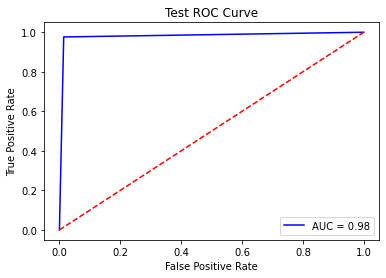

Test Confusion Matrix:
[[70  1]
 [ 1 41]]


In [142]:
# Using last run

plt.title('Test ROC Curve')
plt.plot(fpr_test, tpr_test, 'b', label='AUC = %0.2f'%auc(fpr_test, tpr_test)) #AUC to two decimals
plt.legend(loc='lower right')
plt.plot([0,1],[0,1],'r--') #diagonal
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

cm = confusion_matrix(y_test, y_pred)
print("Test Confusion Matrix:")
print(cm)

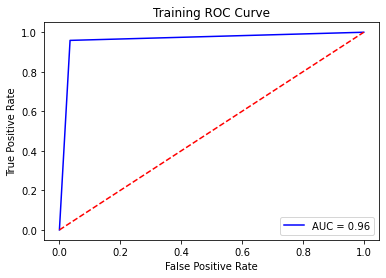

Test Confusion Matrix:
[[276  10]
 [  7 163]]


In [143]:
# Using last run

plt.title('Training ROC Curve')
plt.plot(fpr_train, tpr_train, 'b', label='AUC = %0.2f'%auc(fpr_train, tpr_train)) #AUC to two decimals
plt.legend(loc='lower right')
plt.plot([0,1],[0,1],'r--') #diagonal
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

cm = confusion_matrix(y_train, y_pred_train)
print("Test Confusion Matrix:")
print(cm)

iii.
Unsupervised Learning:
Run k-means algorithm on the whole training
set. Ignore the labels of the data, and assume
k
= 2.  
A.
Run the k-means algorithm multiple times. Make sure that you initialize
the algoritm randomly. How do you make sure that the algorithm was
not trapped in a local minimum?  
B.
Compute the centers of the two clusters and find the closest 30 data
points to each center. Read the true labels of those 30 data points and
take a majority poll within them. The majority poll becomes the label
predicted by k-means for the members of each cluster. Then compare the
labels provided by k-means with the true labels of the training data and
report the average accuracy, precision, recall,
F
1
-score, and AUC over
M
runs, and ROC and the confusion matrix for one of the runs.  
C.
Classify test data based on their proximity to the centers of the clusters.
Report the average accuracy, precision, recall,
F
1
-score, and AUC over
M
runs, and ROC and the confusion matrix for one of the runs for the
test data.

In [176]:
import warnings
warnings.filterwarnings('ignore')

acc_test = []
precision_test = []
recall_test = []
f1_test = []
auc_test = []

acc_train = []
precision_train = []
recall_train = []
f1_train = []
auc_train = []

for i in range(30):
    test_df = pd.concat([x_pos.sample(frac=0.2,random_state=random.randint(0,1000))
                     ,x_neg.sample(frac=0.2,random_state=random.randint(0, 1000))])
    train_df = df.drop(index=test_df.index.tolist())

    x_test = test_df.drop(['class'],axis=1)
    y_test = test_df['class']
    x_train = train_df.drop(['class'],axis=1)
    y_train = train_df['class']
    
    x_test = x_test.reset_index(drop=True)
    y_test = y_test.reset_index(drop=True)
    x_train =x_train.reset_index(drop=True)
    y_train = y_train.reset_index(drop=True)
    
    km = KMeans(n_clusters=2,init='k-means++',random_state=random.randint(0, 1000))
    km.fit(x_train)
    nn = NearestNeighbors(n_neighbors=30)
    nn.fit(x_train)
    dists, idxs = nn.kneighbors(km.cluster_centers_)
    clust_0 = y_train.loc[idxs[0]]
    clust_1 = y_train.loc[idxs[1]]
    poll_0 = clust_0.value_counts()
    poll_1 = clust_1.value_counts()
    y_label = km.labels_
    y_label = pd.DataFrame(y_label)
    
    y_label_0 = y_label[y_label[0]==0]
    y_label_1 = y_label[y_label[0]==1]
    
    max_idx_0 = np.argmax(poll_0)
    max_idx_1 = np.argmax(poll_1)
    y_label_0['class'] = max_idx_0
    y_label_1['class'] = max_idx_1
    
    y_pred_train = pd.concat([y_label_0['class'],y_label_1['class']],axis=0)
    
    # Test set predictions
    y_pred = km.predict(x_test)

    acc_test.append(accuracy_score(y_test, y_pred))
    precision_test.append(precision_score(y_test, y_pred))
    recall_test.append(recall_score(y_test, y_pred))
    f1_test.append(f1_score(y_test, y_pred))

    fpr_test, tpr_test, _ = roc_curve(y_test, y_pred)
    auc_test.append(auc(fpr_test, tpr_test))

    acc_train.append(accuracy_score(y_train, y_pred_train))
    precision_train.append(precision_score(y_train, y_pred_train))
    recall_train.append(recall_score(y_train, y_pred_train))
    f1_train.append(f1_score(y_train, y_pred_train))

    fpr_train, tpr_train, _ = roc_curve(y_train, y_pred_train)
    auc_train.append(auc(fpr_train, tpr_train))

print("Test Accuracy Score:", statistics.mean(acc_test))
print("Test Precision Score:", statistics.mean(precision_test))
print("Test Recall Score:", statistics.mean(recall_test))
print("Test F1 Score:", statistics.mean(f1_test))
print("Test AUC:", statistics.mean(auc_test))
print("")

print("Training Accuracy Score:", statistics.mean(acc_train))
print("Training Precision Score:", statistics.mean(precision_train))
print("Training Recall Score:", statistics.mean(recall_train))
print("Training F1 Score:", statistics.mean(f1_train))
print("Training AUC:", statistics.mean(auc_train))

Test Accuracy Score: 0.5905604719764012
Test Precision Score: 0.610844061423628
Test Recall Score: 0.5753968253968254
Test F1 Score: 0.5870584524982777
Test AUC: 0.5874636709143751

Training Accuracy Score: 0.6271929824561403
Training Precision Score: 0.0
Training Recall Score: 0.0
Training F1 Score: 0.0
Training AUC: 0.5


0      1
1      1
2      1
3      1
4      1
      ..
451    1
452    1
453    1
454    1
455    1
Name: class, Length: 456, dtype: int64
0      0
1      0
2      0
3      0
4      0
      ..
451    0
452    0
453    0
454    0
455    0
Name: class, Length: 456, dtype: int64


/Users/hassanshah/opt/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
